![BridgingAI Logo](../bridgingai_logo.png)

# Deep Learning - Exercise 2: Practical Deep Learning 
1. [Initialization](#chp1-initialization)
2. [Batch Normalization](#chp2-batch-normalization)
3. [Layer Normalization](#chp3-layer-normalization)
4. [Dropout](#chp4-dropout)
5. [Optimization](#chp5-optimization)
6. [Experiments](#chp6-experiments)
---

In [1]:
import torch
import torch.nn as nn

import math
from dataclasses import replace
from pprint import pprint
from typing import Union, List, Iterable

from sanity_checks import run_tests
from training import ExperimentConfig, Trainer, create_dataloader
from helpers import analyze_activations_combined, InitMethods, train_init_methods, train_model, evaluate_model

<a id="chp1-initialization"></a>
# 1. Initialization

Proper initialization is a crucial step when training deep neural networks. A bad initialization will have detrimental impact on the convergence of the network.

#### Example: Xavier Initialization

[Xavier initialization](https://proceedings.mlr.press/v9/glorot10a/glorot10a.pdf), also known as Glorot initialization, is designed to keep the scale of gradients roughly the same in all layers, _when using tanh activations_. To this end, we need to initialize the weights with a variance of $\frac{2}{n_{\text{in}} + n_{\text{out}}}$, where $n_{in}$ is the number of input neurons and $n_{out}$ is the number of output neurons. We may choose between a uniform or a Gaussian distribution, as long as the variance is correct.

Uniform:
$W \sim U(-\sqrt{\frac{6}{n_{in} + n_{out}}}, \sqrt{\frac{6}{n_{in} + n_{out}}})$

Gaussian:
$W \sim N(0, \frac{2}{n_{\text{in}} + n_{\text{out}}})$

For more initialization methods (e.g. for different activation functions), refer to the documentation on the [torch.nn.init](https://pytorch.org/docs/stable/nn.init.html) module.

**TODO**: Implement Xavier initialization in `custom_xavier_init` function and run the cell to see a visualization of the activation values in the first forward pass.

**HINT**: 
1. To create a uniform distribution between 0 and 1, you can use `torch.rand(...)`.
2. We also provide the offical PyTorch implementation of Xavier initialization for visualization. If implemented correctly, the two methods should have similar results.

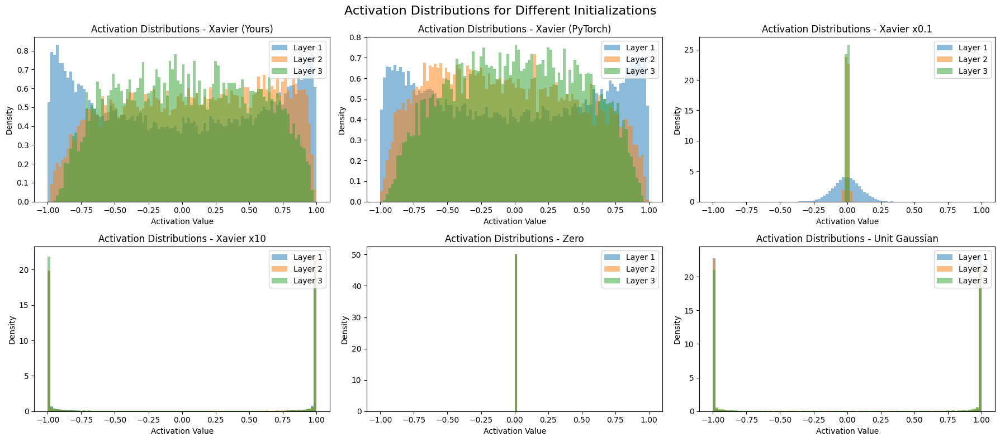

In [2]:
class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(784, 256),
            nn.Tanh(),
            nn.Linear(256, 128),
            nn.Tanh(),
            nn.Linear(128, 64),
            nn.Tanh(),
            nn.Linear(64, 10),
        )

    def forward(self, x):
        x = x.view(-1, 784)
        return self.net(x)


def custom_xavier_init(m):
    if isinstance(m, nn.Linear):
        in_features = m.in_features  # int
        out_features = m.out_features  # int
        weight = m.weight.data  # torch.Tensor

        ### BEGIN SOLUTION
        weight = (torch.rand(out_features, in_features) * 2 - 1) * math.sqrt(
            6 / (in_features + out_features)
        )
        # alternatively:
        # weight = torch.randn(out_features, in_features) * math.sqrt(2 / (in_features + out_features))
        ### END SOLUTION

        m.weight.data = weight
        nn.init.zeros_(m.bias)


init_methods = {
    "Xavier (Yours)": custom_xavier_init,
    "Xavier (PyTorch)": InitMethods.xavier_init,
    "Xavier x0.1": lambda m: InitMethods.scaled_xavier_init(m, 0.1),
    "Xavier x10": lambda m: InitMethods.scaled_xavier_init(m, 10),
    "Zero": InitMethods.zero_init,
    "Unit Gaussian": InitMethods.unit_gaussian_init,
}

train_loader, test_loader = create_dataloader(ExperimentConfig("", ""))
analyze_activations_combined(init_methods, SimpleNet, train_loader)

We'll train a simple neural network using various initialization methods to compare their performance. Some methods are intentionally flawed, resulting in stalled loss or high initial loss. Which models perform well?

In [3]:
train_init_methods(SimpleNet, init_methods, train_loader, test_loader, epochs=3)


---------------------------------Xavier (Yours)---------------------------------


Epoch 1/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 1/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.3082]

Epoch 1/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=1.8385]

Epoch 1/3:   3%|██▍                                                                                          | 12/469 [00:00<00:03, 117.47it/s, Loss=1.8385]

Epoch 1/3:   3%|██▍                                                                                          | 12/469 [00:00<00:03, 117.47it/s, Loss=1.5272]

Epoch 1/3:   5%|████▉                                                                                        | 25/469 [00:00<00:03, 121.71it/s, Loss=1.5272]

Epoch 1/3:   5%|████▉                                                                                        | 25/469 [00:00<00:03, 121.71it/s, Loss=1.3453]

Epoch 1/3:   8%|███████▌                                                                                     | 38/469 [00:00<00:03, 122.85it/s, Loss=1.3453]

Epoch 1/3:   8%|███████▌                                                                                     | 38/469 [00:00<00:03, 122.85it/s, Loss=1.2327]

Epoch 1/3:   8%|███████▌                                                                                     | 38/469 [00:00<00:03, 122.85it/s, Loss=1.3237]

Epoch 1/3:  11%|██████████                                                                                   | 51/469 [00:00<00:03, 122.46it/s, Loss=1.3237]

Epoch 1/3:  11%|██████████                                                                                   | 51/469 [00:00<00:03, 122.46it/s, Loss=1.0294]

Epoch 1/3:  14%|████████████▋                                                                                | 64/469 [00:00<00:03, 121.48it/s, Loss=1.0294]

Epoch 1/3:  14%|████████████▋                                                                                | 64/469 [00:00<00:03, 121.48it/s, Loss=1.1006]

Epoch 1/3:  16%|███████████████▎                                                                             | 77/469 [00:00<00:03, 122.00it/s, Loss=1.1006]

Epoch 1/3:  16%|███████████████▎                                                                             | 77/469 [00:00<00:03, 122.00it/s, Loss=1.1178]

Epoch 1/3:  19%|█████████████████▊                                                                           | 90/469 [00:00<00:03, 122.44it/s, Loss=1.1178]

Epoch 1/3:  19%|█████████████████▊                                                                           | 90/469 [00:00<00:03, 122.44it/s, Loss=0.9006]

Epoch 1/3:  19%|█████████████████▊                                                                           | 90/469 [00:00<00:03, 122.44it/s, Loss=0.9087]

Epoch 1/3:  22%|████████████████████▏                                                                       | 103/469 [00:00<00:02, 122.48it/s, Loss=0.9087]

Epoch 1/3:  22%|████████████████████▏                                                                       | 103/469 [00:00<00:02, 122.48it/s, Loss=0.8649]

Epoch 1/3:  25%|██████████████████████▊                                                                     | 116/469 [00:00<00:02, 124.13it/s, Loss=0.8649]

Epoch 1/3:  25%|██████████████████████▊                                                                     | 116/469 [00:00<00:02, 124.13it/s, Loss=0.8180]

Epoch 1/3:  28%|█████████████████████████▎                                                                  | 129/469 [00:01<00:02, 125.54it/s, Loss=0.8180]

Epoch 1/3:  28%|█████████████████████████▎                                                                  | 129/469 [00:01<00:02, 125.54it/s, Loss=0.7831]

Epoch 1/3:  28%|█████████████████████████▎                                                                  | 129/469 [00:01<00:02, 125.54it/s, Loss=0.9308]

Epoch 1/3:  30%|███████████████████████████▊                                                                | 142/469 [00:01<00:02, 126.06it/s, Loss=0.9308]

Epoch 1/3:  30%|███████████████████████████▊                                                                | 142/469 [00:01<00:02, 126.06it/s, Loss=0.7772]

Epoch 1/3:  33%|██████████████████████████████▍                                                             | 155/469 [00:01<00:02, 126.46it/s, Loss=0.7772]

Epoch 1/3:  33%|██████████████████████████████▍                                                             | 155/469 [00:01<00:02, 126.46it/s, Loss=0.9341]

Epoch 1/3:  36%|████████████████████████████████▉                                                           | 168/469 [00:01<00:02, 126.81it/s, Loss=0.9341]

Epoch 1/3:  36%|████████████████████████████████▉                                                           | 168/469 [00:01<00:02, 126.81it/s, Loss=0.8828]

Epoch 1/3:  36%|████████████████████████████████▉                                                           | 168/469 [00:01<00:02, 126.81it/s, Loss=0.7522]

Epoch 1/3:  39%|███████████████████████████████████▌                                                        | 181/469 [00:01<00:02, 126.46it/s, Loss=0.7522]

Epoch 1/3:  39%|███████████████████████████████████▌                                                        | 181/469 [00:01<00:02, 126.46it/s, Loss=0.7165]

Epoch 1/3:  41%|██████████████████████████████████████                                                      | 194/469 [00:01<00:02, 126.15it/s, Loss=0.7165]

Epoch 1/3:  41%|██████████████████████████████████████                                                      | 194/469 [00:01<00:02, 126.15it/s, Loss=0.7379]

Epoch 1/3:  44%|████████████████████████████████████████▌                                                   | 207/469 [00:01<00:02, 125.85it/s, Loss=0.7379]

Epoch 1/3:  44%|████████████████████████████████████████▌                                                   | 207/469 [00:01<00:02, 125.85it/s, Loss=0.7518]

Epoch 1/3:  47%|███████████████████████████████████████████▏                                                | 220/469 [00:01<00:01, 126.82it/s, Loss=0.7518]

Epoch 1/3:  47%|███████████████████████████████████████████▏                                                | 220/469 [00:01<00:01, 126.82it/s, Loss=0.7404]

Epoch 1/3:  47%|███████████████████████████████████████████▏                                                | 220/469 [00:01<00:01, 126.82it/s, Loss=0.7564]

Epoch 1/3:  50%|█████████████████████████████████████████████▋                                              | 233/469 [00:01<00:01, 126.35it/s, Loss=0.7564]

Epoch 1/3:  50%|█████████████████████████████████████████████▋                                              | 233/469 [00:01<00:01, 126.35it/s, Loss=0.6788]

Epoch 1/3:  52%|████████████████████████████████████████████████▎                                           | 246/469 [00:01<00:01, 126.45it/s, Loss=0.6788]

Epoch 1/3:  52%|████████████████████████████████████████████████▎                                           | 246/469 [00:02<00:01, 126.45it/s, Loss=0.7328]

Epoch 1/3:  55%|██████████████████████████████████████████████████▊                                         | 259/469 [00:02<00:01, 126.13it/s, Loss=0.7328]

Epoch 1/3:  55%|██████████████████████████████████████████████████▊                                         | 259/469 [00:02<00:01, 126.13it/s, Loss=0.6892]

Epoch 1/3:  55%|██████████████████████████████████████████████████▊                                         | 259/469 [00:02<00:01, 126.13it/s, Loss=0.6699]

Epoch 1/3:  58%|█████████████████████████████████████████████████████▎                                      | 272/469 [00:02<00:01, 126.09it/s, Loss=0.6699]

Epoch 1/3:  58%|█████████████████████████████████████████████████████▎                                      | 272/469 [00:02<00:01, 126.09it/s, Loss=0.5465]

Epoch 1/3:  61%|███████████████████████████████████████████████████████▉                                    | 285/469 [00:02<00:01, 126.21it/s, Loss=0.5465]

Epoch 1/3:  61%|███████████████████████████████████████████████████████▉                                    | 285/469 [00:02<00:01, 126.21it/s, Loss=0.5915]

Epoch 1/3:  64%|██████████████████████████████████████████████████████████▍                                 | 298/469 [00:02<00:01, 126.68it/s, Loss=0.5915]

Epoch 1/3:  64%|██████████████████████████████████████████████████████████▍                                 | 298/469 [00:02<00:01, 126.68it/s, Loss=0.6177]

Epoch 1/3:  64%|██████████████████████████████████████████████████████████▍                                 | 298/469 [00:02<00:01, 126.68it/s, Loss=0.6892]

Epoch 1/3:  66%|█████████████████████████████████████████████████████████████                               | 311/469 [00:02<00:01, 126.20it/s, Loss=0.6892]

Epoch 1/3:  66%|█████████████████████████████████████████████████████████████                               | 311/469 [00:02<00:01, 126.20it/s, Loss=0.7994]

Epoch 1/3:  69%|███████████████████████████████████████████████████████████████▌                            | 324/469 [00:02<00:01, 125.77it/s, Loss=0.7994]

Epoch 1/3:  69%|███████████████████████████████████████████████████████████████▌                            | 324/469 [00:02<00:01, 125.77it/s, Loss=0.6122]

Epoch 1/3:  72%|██████████████████████████████████████████████████████████████████                          | 337/469 [00:02<00:01, 125.94it/s, Loss=0.6122]

Epoch 1/3:  72%|██████████████████████████████████████████████████████████████████                          | 337/469 [00:02<00:01, 125.94it/s, Loss=0.7263]

Epoch 1/3:  75%|████████████████████████████████████████████████████████████████████▋                       | 350/469 [00:02<00:00, 123.73it/s, Loss=0.7263]

Epoch 1/3:  75%|████████████████████████████████████████████████████████████████████▋                       | 350/469 [00:02<00:00, 123.73it/s, Loss=0.5821]

Epoch 1/3:  75%|████████████████████████████████████████████████████████████████████▋                       | 350/469 [00:02<00:00, 123.73it/s, Loss=0.6360]

Epoch 1/3:  77%|███████████████████████████████████████████████████████████████████████▏                    | 363/469 [00:02<00:00, 123.92it/s, Loss=0.6360]

Epoch 1/3:  77%|███████████████████████████████████████████████████████████████████████▏                    | 363/469 [00:02<00:00, 123.92it/s, Loss=0.5909]

Epoch 1/3:  80%|█████████████████████████████████████████████████████████████████████████▊                  | 376/469 [00:03<00:00, 123.99it/s, Loss=0.5909]

Epoch 1/3:  80%|█████████████████████████████████████████████████████████████████████████▊                  | 376/469 [00:03<00:00, 123.99it/s, Loss=0.5542]

Epoch 1/3:  83%|████████████████████████████████████████████████████████████████████████████▎               | 389/469 [00:03<00:00, 124.36it/s, Loss=0.5542]

Epoch 1/3:  83%|████████████████████████████████████████████████████████████████████████████▎               | 389/469 [00:03<00:00, 124.36it/s, Loss=0.6650]

Epoch 1/3:  83%|████████████████████████████████████████████████████████████████████████████▎               | 389/469 [00:03<00:00, 124.36it/s, Loss=0.5676]

Epoch 1/3:  86%|██████████████████████████████████████████████████████████████████████████████▊             | 402/469 [00:03<00:00, 124.19it/s, Loss=0.5676]

Epoch 1/3:  86%|██████████████████████████████████████████████████████████████████████████████▊             | 402/469 [00:03<00:00, 124.19it/s, Loss=0.5416]

Epoch 1/3:  88%|█████████████████████████████████████████████████████████████████████████████████▍          | 415/469 [00:03<00:00, 124.81it/s, Loss=0.5416]

Epoch 1/3:  88%|█████████████████████████████████████████████████████████████████████████████████▍          | 415/469 [00:03<00:00, 124.81it/s, Loss=0.5161]

Epoch 1/3:  91%|███████████████████████████████████████████████████████████████████████████████████▉        | 428/469 [00:03<00:00, 125.02it/s, Loss=0.5161]

Epoch 1/3:  91%|███████████████████████████████████████████████████████████████████████████████████▉        | 428/469 [00:03<00:00, 125.02it/s, Loss=0.6853]

Epoch 1/3:  91%|███████████████████████████████████████████████████████████████████████████████████▉        | 428/469 [00:03<00:00, 125.02it/s, Loss=0.7103]

Epoch 1/3:  94%|██████████████████████████████████████████████████████████████████████████████████████▌     | 441/469 [00:03<00:00, 125.45it/s, Loss=0.7103]

Epoch 1/3:  94%|██████████████████████████████████████████████████████████████████████████████████████▌     | 441/469 [00:03<00:00, 125.45it/s, Loss=0.6087]

Epoch 1/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████   | 454/469 [00:03<00:00, 126.42it/s, Loss=0.6087]

Epoch 1/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████   | 454/469 [00:03<00:00, 126.42it/s, Loss=0.5557]

Epoch 1/3: 100%|███████████████████████████████████████████████████████████████████████████████████████████▌| 467/469 [00:03<00:00, 126.63it/s, Loss=0.5557]

Epoch 1/3: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 125.13it/s, Loss=0.5557]

Epoch 2/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 2/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.5469]

Epoch 2/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.6489]

Epoch 2/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.49it/s, Loss=0.6489]

Epoch 2/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.49it/s, Loss=0.5381]

Epoch 2/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 125.18it/s, Loss=0.5381]

Epoch 2/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 125.18it/s, Loss=0.5489]

Epoch 2/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 125.17it/s, Loss=0.5489]

Epoch 2/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 125.17it/s, Loss=0.5727]

Epoch 2/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 125.17it/s, Loss=0.5567]

Epoch 2/3:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 125.21it/s, Loss=0.5567]

Epoch 2/3:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 125.21it/s, Loss=0.5648]

Epoch 2/3:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 125.45it/s, Loss=0.5648]

Epoch 2/3:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 125.45it/s, Loss=0.5050]

Epoch 2/3:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 125.71it/s, Loss=0.5050]

Epoch 2/3:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 125.71it/s, Loss=0.7383]

Epoch 2/3:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 125.71it/s, Loss=0.5908]

Epoch 2/3:  19%|██████████████████                                                                           | 91/469 [00:00<00:02, 126.00it/s, Loss=0.5908]

Epoch 2/3:  19%|██████████████████                                                                           | 91/469 [00:00<00:02, 126.00it/s, Loss=0.5400]

Epoch 2/3:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 126.05it/s, Loss=0.5400]

Epoch 2/3:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 126.05it/s, Loss=0.4318]

Epoch 2/3:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 126.35it/s, Loss=0.4318]

Epoch 2/3:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 126.35it/s, Loss=0.6120]

Epoch 2/3:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 126.38it/s, Loss=0.6120]

Epoch 2/3:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 126.38it/s, Loss=0.5395]

Epoch 2/3:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 126.38it/s, Loss=0.5058]

Epoch 2/3:  30%|████████████████████████████                                                                | 143/469 [00:01<00:02, 126.16it/s, Loss=0.5058]

Epoch 2/3:  30%|████████████████████████████                                                                | 143/469 [00:01<00:02, 126.16it/s, Loss=0.5686]

Epoch 2/3:  33%|██████████████████████████████▌                                                             | 156/469 [00:01<00:02, 126.69it/s, Loss=0.5686]

Epoch 2/3:  33%|██████████████████████████████▌                                                             | 156/469 [00:01<00:02, 126.69it/s, Loss=0.5761]

Epoch 2/3:  36%|█████████████████████████████████▏                                                          | 169/469 [00:01<00:02, 127.48it/s, Loss=0.5761]

Epoch 2/3:  36%|█████████████████████████████████▏                                                          | 169/469 [00:01<00:02, 127.48it/s, Loss=0.5507]

Epoch 2/3:  36%|█████████████████████████████████▏                                                          | 169/469 [00:01<00:02, 127.48it/s, Loss=0.5229]

Epoch 2/3:  39%|███████████████████████████████████▋                                                        | 182/469 [00:01<00:02, 127.12it/s, Loss=0.5229]

Epoch 2/3:  39%|███████████████████████████████████▋                                                        | 182/469 [00:01<00:02, 127.12it/s, Loss=0.6020]

Epoch 2/3:  42%|██████████████████████████████████████▎                                                     | 195/469 [00:01<00:02, 126.91it/s, Loss=0.6020]

Epoch 2/3:  42%|██████████████████████████████████████▎                                                     | 195/469 [00:01<00:02, 126.91it/s, Loss=0.5003]

Epoch 2/3:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 126.61it/s, Loss=0.5003]

Epoch 2/3:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 126.61it/s, Loss=0.4993]

Epoch 2/3:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 126.61it/s, Loss=0.5410]

Epoch 2/3:  47%|███████████████████████████████████████████▎                                                | 221/469 [00:01<00:01, 126.51it/s, Loss=0.5410]

Epoch 2/3:  47%|███████████████████████████████████████████▎                                                | 221/469 [00:01<00:01, 126.51it/s, Loss=0.5268]

Epoch 2/3:  50%|█████████████████████████████████████████████▉                                              | 234/469 [00:01<00:01, 126.28it/s, Loss=0.5268]

Epoch 2/3:  50%|█████████████████████████████████████████████▉                                              | 234/469 [00:01<00:01, 126.28it/s, Loss=0.5155]

Epoch 2/3:  53%|████████████████████████████████████████████████▍                                           | 247/469 [00:01<00:01, 126.16it/s, Loss=0.5155]

Epoch 2/3:  53%|████████████████████████████████████████████████▍                                           | 247/469 [00:01<00:01, 126.16it/s, Loss=0.4819]

Epoch 2/3:  53%|████████████████████████████████████████████████▍                                           | 247/469 [00:02<00:01, 126.16it/s, Loss=0.5087]

Epoch 2/3:  56%|███████████████████████████████████████████████████▏                                        | 261/469 [00:02<00:01, 127.72it/s, Loss=0.5087]

Epoch 2/3:  56%|███████████████████████████████████████████████████▏                                        | 261/469 [00:02<00:01, 127.72it/s, Loss=0.5417]

Epoch 2/3:  58%|█████████████████████████████████████████████████████▋                                      | 274/469 [00:02<00:01, 127.70it/s, Loss=0.5417]

Epoch 2/3:  58%|█████████████████████████████████████████████████████▋                                      | 274/469 [00:02<00:01, 127.70it/s, Loss=0.4957]

Epoch 2/3:  61%|████████████████████████████████████████████████████████▍                                   | 288/469 [00:02<00:01, 128.87it/s, Loss=0.4957]

Epoch 2/3:  61%|████████████████████████████████████████████████████████▍                                   | 288/469 [00:02<00:01, 128.87it/s, Loss=0.5592]

Epoch 2/3:  61%|████████████████████████████████████████████████████████▍                                   | 288/469 [00:02<00:01, 128.87it/s, Loss=0.4852]

Epoch 2/3:  64%|███████████████████████████████████████████████████████████                                 | 301/469 [00:02<00:01, 127.55it/s, Loss=0.4852]

Epoch 2/3:  64%|███████████████████████████████████████████████████████████                                 | 301/469 [00:02<00:01, 127.55it/s, Loss=0.6009]

Epoch 2/3:  67%|█████████████████████████████████████████████████████████████▌                              | 314/469 [00:02<00:01, 127.49it/s, Loss=0.6009]

Epoch 2/3:  67%|█████████████████████████████████████████████████████████████▌                              | 314/469 [00:02<00:01, 127.49it/s, Loss=0.5309]

Epoch 2/3:  70%|████████████████████████████████████████████████████████████████▏                           | 327/469 [00:02<00:01, 127.33it/s, Loss=0.5309]

Epoch 2/3:  70%|████████████████████████████████████████████████████████████████▏                           | 327/469 [00:02<00:01, 127.33it/s, Loss=0.6143]

Epoch 2/3:  72%|██████████████████████████████████████████████████████████████████▋                         | 340/469 [00:02<00:01, 127.15it/s, Loss=0.6143]

Epoch 2/3:  72%|██████████████████████████████████████████████████████████████████▋                         | 340/469 [00:02<00:01, 127.15it/s, Loss=0.5459]

Epoch 2/3:  72%|██████████████████████████████████████████████████████████████████▋                         | 340/469 [00:02<00:01, 127.15it/s, Loss=0.4365]

Epoch 2/3:  75%|█████████████████████████████████████████████████████████████████████▏                      | 353/469 [00:02<00:00, 127.01it/s, Loss=0.4365]

Epoch 2/3:  75%|█████████████████████████████████████████████████████████████████████▏                      | 353/469 [00:02<00:00, 127.01it/s, Loss=0.4866]

Epoch 2/3:  78%|███████████████████████████████████████████████████████████████████████▊                    | 366/469 [00:02<00:00, 127.00it/s, Loss=0.4866]

Epoch 2/3:  78%|███████████████████████████████████████████████████████████████████████▊                    | 366/469 [00:02<00:00, 127.00it/s, Loss=0.4799]

Epoch 2/3:  81%|██████████████████████████████████████████████████████████████████████████▎                 | 379/469 [00:02<00:00, 126.43it/s, Loss=0.4799]

Epoch 2/3:  81%|██████████████████████████████████████████████████████████████████████████▎                 | 379/469 [00:03<00:00, 126.43it/s, Loss=0.5074]

Epoch 2/3:  81%|██████████████████████████████████████████████████████████████████████████▎                 | 379/469 [00:03<00:00, 126.43it/s, Loss=0.4562]

Epoch 2/3:  84%|████████████████████████████████████████████████████████████████████████████▉               | 392/469 [00:03<00:00, 125.17it/s, Loss=0.4562]

Epoch 2/3:  84%|████████████████████████████████████████████████████████████████████████████▉               | 392/469 [00:03<00:00, 125.17it/s, Loss=0.5172]

Epoch 2/3:  86%|███████████████████████████████████████████████████████████████████████████████▍            | 405/469 [00:03<00:00, 125.06it/s, Loss=0.5172]

Epoch 2/3:  86%|███████████████████████████████████████████████████████████████████████████████▍            | 405/469 [00:03<00:00, 125.06it/s, Loss=0.5778]

Epoch 2/3:  89%|█████████████████████████████████████████████████████████████████████████████████▉          | 418/469 [00:03<00:00, 125.23it/s, Loss=0.5778]

Epoch 2/3:  89%|█████████████████████████████████████████████████████████████████████████████████▉          | 418/469 [00:03<00:00, 125.23it/s, Loss=0.6319]

Epoch 2/3:  89%|█████████████████████████████████████████████████████████████████████████████████▉          | 418/469 [00:03<00:00, 125.23it/s, Loss=0.4713]

Epoch 2/3:  92%|████████████████████████████████████████████████████████████████████████████████████▌       | 431/469 [00:03<00:00, 125.69it/s, Loss=0.4713]

Epoch 2/3:  92%|████████████████████████████████████████████████████████████████████████████████████▌       | 431/469 [00:03<00:00, 125.69it/s, Loss=0.4733]

Epoch 2/3:  95%|███████████████████████████████████████████████████████████████████████████████████████     | 444/469 [00:03<00:00, 125.70it/s, Loss=0.4733]

Epoch 2/3:  95%|███████████████████████████████████████████████████████████████████████████████████████     | 444/469 [00:03<00:00, 125.70it/s, Loss=0.4719]

Epoch 2/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████▋  | 457/469 [00:03<00:00, 125.78it/s, Loss=0.4719]

Epoch 2/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████▋  | 457/469 [00:03<00:00, 125.78it/s, Loss=0.6165]

Epoch 2/3: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 126.39it/s, Loss=0.6165]

Epoch 3/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 3/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.4785]

Epoch 3/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.5087]

Epoch 3/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.01it/s, Loss=0.5087]

Epoch 3/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.01it/s, Loss=0.3774]

Epoch 3/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 125.95it/s, Loss=0.3774]

Epoch 3/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 125.95it/s, Loss=0.4848]

Epoch 3/3:   9%|███████▉                                                                                     | 40/469 [00:00<00:03, 128.09it/s, Loss=0.4848]

Epoch 3/3:   9%|███████▉                                                                                     | 40/469 [00:00<00:03, 128.09it/s, Loss=0.5239]

Epoch 3/3:   9%|███████▉                                                                                     | 40/469 [00:00<00:03, 128.09it/s, Loss=0.5127]

Epoch 3/3:  12%|██████████▋                                                                                  | 54/469 [00:00<00:03, 129.11it/s, Loss=0.5127]

Epoch 3/3:  12%|██████████▋                                                                                  | 54/469 [00:00<00:03, 129.11it/s, Loss=0.4545]

Epoch 3/3:  14%|█████████████▍                                                                               | 68/469 [00:00<00:03, 130.18it/s, Loss=0.4545]

Epoch 3/3:  14%|█████████████▍                                                                               | 68/469 [00:00<00:03, 130.18it/s, Loss=0.4794]

Epoch 3/3:  14%|█████████████▍                                                                               | 68/469 [00:00<00:03, 130.18it/s, Loss=0.5637]

Epoch 3/3:  17%|████████████████▎                                                                            | 82/469 [00:00<00:02, 130.46it/s, Loss=0.5637]

Epoch 3/3:  17%|████████████████▎                                                                            | 82/469 [00:00<00:02, 130.46it/s, Loss=0.5103]

Epoch 3/3:  20%|███████████████████                                                                          | 96/469 [00:00<00:02, 130.90it/s, Loss=0.5103]

Epoch 3/3:  20%|███████████████████                                                                          | 96/469 [00:00<00:02, 130.90it/s, Loss=0.4120]

Epoch 3/3:  23%|█████████████████████▌                                                                      | 110/469 [00:00<00:02, 131.11it/s, Loss=0.4120]

Epoch 3/3:  23%|█████████████████████▌                                                                      | 110/469 [00:00<00:02, 131.11it/s, Loss=0.4574]

Epoch 3/3:  23%|█████████████████████▌                                                                      | 110/469 [00:00<00:02, 131.11it/s, Loss=0.3436]

Epoch 3/3:  26%|████████████████████████▎                                                                   | 124/469 [00:00<00:02, 131.16it/s, Loss=0.3436]

Epoch 3/3:  26%|████████████████████████▎                                                                   | 124/469 [00:01<00:02, 131.16it/s, Loss=0.4265]

Epoch 3/3:  29%|███████████████████████████                                                                 | 138/469 [00:01<00:02, 131.44it/s, Loss=0.4265]

Epoch 3/3:  29%|███████████████████████████                                                                 | 138/469 [00:01<00:02, 131.44it/s, Loss=0.4879]

Epoch 3/3:  29%|███████████████████████████                                                                 | 138/469 [00:01<00:02, 131.44it/s, Loss=0.6390]

Epoch 3/3:  32%|█████████████████████████████▊                                                              | 152/469 [00:01<00:02, 131.34it/s, Loss=0.6390]

Epoch 3/3:  32%|█████████████████████████████▊                                                              | 152/469 [00:01<00:02, 131.34it/s, Loss=0.5265]

Epoch 3/3:  35%|████████████████████████████████▌                                                           | 166/469 [00:01<00:02, 131.58it/s, Loss=0.5265]

Epoch 3/3:  35%|████████████████████████████████▌                                                           | 166/469 [00:01<00:02, 131.58it/s, Loss=0.5079]

Epoch 3/3:  38%|███████████████████████████████████▎                                                        | 180/469 [00:01<00:02, 131.72it/s, Loss=0.5079]

Epoch 3/3:  38%|███████████████████████████████████▎                                                        | 180/469 [00:01<00:02, 131.72it/s, Loss=0.5250]

Epoch 3/3:  38%|███████████████████████████████████▎                                                        | 180/469 [00:01<00:02, 131.72it/s, Loss=0.4694]

Epoch 3/3:  41%|██████████████████████████████████████                                                      | 194/469 [00:01<00:02, 130.27it/s, Loss=0.4694]

Epoch 3/3:  41%|██████████████████████████████████████                                                      | 194/469 [00:01<00:02, 130.27it/s, Loss=0.4556]

Epoch 3/3:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 130.32it/s, Loss=0.4556]

Epoch 3/3:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 130.32it/s, Loss=0.5541]

Epoch 3/3:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 130.32it/s, Loss=0.4650]

Epoch 3/3:  47%|███████████████████████████████████████████▌                                                | 222/469 [00:01<00:01, 130.70it/s, Loss=0.4650]

Epoch 3/3:  47%|███████████████████████████████████████████▌                                                | 222/469 [00:01<00:01, 130.70it/s, Loss=0.3872]

Epoch 3/3:  50%|██████████████████████████████████████████████▎                                             | 236/469 [00:01<00:01, 131.12it/s, Loss=0.3872]

Epoch 3/3:  50%|██████████████████████████████████████████████▎                                             | 236/469 [00:01<00:01, 131.12it/s, Loss=0.5349]

Epoch 3/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:01<00:01, 131.32it/s, Loss=0.5349]

Epoch 3/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:01<00:01, 131.32it/s, Loss=0.4640]

Epoch 3/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:01<00:01, 131.32it/s, Loss=0.4201]

Epoch 3/3:  56%|███████████████████████████████████████████████████▊                                        | 264/469 [00:02<00:01, 131.28it/s, Loss=0.4201]

Epoch 3/3:  56%|███████████████████████████████████████████████████▊                                        | 264/469 [00:02<00:01, 131.28it/s, Loss=0.4157]

Epoch 3/3:  59%|██████████████████████████████████████████████████████▌                                     | 278/469 [00:02<00:01, 131.50it/s, Loss=0.4157]

Epoch 3/3:  59%|██████████████████████████████████████████████████████▌                                     | 278/469 [00:02<00:01, 131.50it/s, Loss=0.4850]

Epoch 3/3:  59%|██████████████████████████████████████████████████████▌                                     | 278/469 [00:02<00:01, 131.50it/s, Loss=0.4506]

Epoch 3/3:  62%|█████████████████████████████████████████████████████████▎                                  | 292/469 [00:02<00:01, 131.56it/s, Loss=0.4506]

Epoch 3/3:  62%|█████████████████████████████████████████████████████████▎                                  | 292/469 [00:02<00:01, 131.56it/s, Loss=0.3542]

Epoch 3/3:  65%|████████████████████████████████████████████████████████████                                | 306/469 [00:02<00:01, 131.63it/s, Loss=0.3542]

Epoch 3/3:  65%|████████████████████████████████████████████████████████████                                | 306/469 [00:02<00:01, 131.63it/s, Loss=0.4893]

Epoch 3/3:  68%|██████████████████████████████████████████████████████████████▊                             | 320/469 [00:02<00:01, 131.85it/s, Loss=0.4893]

Epoch 3/3:  68%|██████████████████████████████████████████████████████████████▊                             | 320/469 [00:02<00:01, 131.85it/s, Loss=0.4497]

Epoch 3/3:  68%|██████████████████████████████████████████████████████████████▊                             | 320/469 [00:02<00:01, 131.85it/s, Loss=0.4638]

Epoch 3/3:  71%|█████████████████████████████████████████████████████████████████▌                          | 334/469 [00:02<00:01, 131.73it/s, Loss=0.4638]

Epoch 3/3:  71%|█████████████████████████████████████████████████████████████████▌                          | 334/469 [00:02<00:01, 131.73it/s, Loss=0.5684]

Epoch 3/3:  74%|████████████████████████████████████████████████████████████████████▎                       | 348/469 [00:02<00:00, 131.59it/s, Loss=0.5684]

Epoch 3/3:  74%|████████████████████████████████████████████████████████████████████▎                       | 348/469 [00:02<00:00, 131.59it/s, Loss=0.4628]

Epoch 3/3:  74%|████████████████████████████████████████████████████████████████████▎                       | 348/469 [00:02<00:00, 131.59it/s, Loss=0.5056]

Epoch 3/3:  77%|███████████████████████████████████████████████████████████████████████                     | 362/469 [00:02<00:00, 131.51it/s, Loss=0.5056]

Epoch 3/3:  77%|███████████████████████████████████████████████████████████████████████                     | 362/469 [00:02<00:00, 131.51it/s, Loss=0.4889]

Epoch 3/3:  80%|█████████████████████████████████████████████████████████████████████████▊                  | 376/469 [00:02<00:00, 131.48it/s, Loss=0.4889]

Epoch 3/3:  80%|█████████████████████████████████████████████████████████████████████████▊                  | 376/469 [00:02<00:00, 131.48it/s, Loss=0.5266]

Epoch 3/3:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:02<00:00, 131.59it/s, Loss=0.5266]

Epoch 3/3:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:02<00:00, 131.59it/s, Loss=0.3495]

Epoch 3/3:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:03<00:00, 131.59it/s, Loss=0.3880]

Epoch 3/3:  86%|███████████████████████████████████████████████████████████████████████████████▏            | 404/469 [00:03<00:00, 129.57it/s, Loss=0.3880]

Epoch 3/3:  86%|███████████████████████████████████████████████████████████████████████████████▏            | 404/469 [00:03<00:00, 129.57it/s, Loss=0.5663]

Epoch 3/3:  89%|█████████████████████████████████████████████████████████████████████████████████▊          | 417/469 [00:03<00:00, 127.23it/s, Loss=0.5663]

Epoch 3/3:  89%|█████████████████████████████████████████████████████████████████████████████████▊          | 417/469 [00:03<00:00, 127.23it/s, Loss=0.5461]

Epoch 3/3:  92%|████████████████████████████████████████████████████████████████████████████████████▎       | 430/469 [00:03<00:00, 127.89it/s, Loss=0.5461]

Epoch 3/3:  92%|████████████████████████████████████████████████████████████████████████████████████▎       | 430/469 [00:03<00:00, 127.89it/s, Loss=0.5735]

Epoch 3/3:  92%|████████████████████████████████████████████████████████████████████████████████████▎       | 430/469 [00:03<00:00, 127.89it/s, Loss=0.4124]

Epoch 3/3:  94%|██████████████████████████████████████████████████████████████████████████████████████▉     | 443/469 [00:03<00:00, 128.33it/s, Loss=0.4124]

Epoch 3/3:  94%|██████████████████████████████████████████████████████████████████████████████████████▉     | 443/469 [00:03<00:00, 128.33it/s, Loss=0.4461]

Epoch 3/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████▋  | 457/469 [00:03<00:00, 129.07it/s, Loss=0.4461]

Epoch 3/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████▋  | 457/469 [00:03<00:00, 129.07it/s, Loss=0.4101]

Epoch 3/3: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 130.44it/s, Loss=0.4101]

Accuracy 0.83
--------------------------------Xavier (PyTorch)--------------------------------


Epoch 1/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 1/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.4075]

Epoch 1/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=1.7101]

Epoch 1/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 129.56it/s, Loss=1.7101]

Epoch 1/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 129.56it/s, Loss=1.4527]

Epoch 1/3:   6%|█████▎                                                                                       | 27/469 [00:00<00:03, 130.52it/s, Loss=1.4527]

Epoch 1/3:   6%|█████▎                                                                                       | 27/469 [00:00<00:03, 130.52it/s, Loss=1.3227]

Epoch 1/3:   6%|█████▎                                                                                       | 27/469 [00:00<00:03, 130.52it/s, Loss=1.1968]

Epoch 1/3:   9%|████████▏                                                                                    | 41/469 [00:00<00:03, 131.15it/s, Loss=1.1968]

Epoch 1/3:   9%|████████▏                                                                                    | 41/469 [00:00<00:03, 131.15it/s, Loss=1.1466]

Epoch 1/3:  12%|██████████▉                                                                                  | 55/469 [00:00<00:03, 128.94it/s, Loss=1.1466]

Epoch 1/3:  12%|██████████▉                                                                                  | 55/469 [00:00<00:03, 128.94it/s, Loss=1.0809]

Epoch 1/3:  15%|█████████████▋                                                                               | 69/469 [00:00<00:03, 129.87it/s, Loss=1.0809]

Epoch 1/3:  15%|█████████████▋                                                                               | 69/469 [00:00<00:03, 129.87it/s, Loss=1.1676]

Epoch 1/3:  15%|█████████████▋                                                                               | 69/469 [00:00<00:03, 129.87it/s, Loss=0.8944]

Epoch 1/3:  18%|████████████████▍                                                                            | 83/469 [00:00<00:02, 130.43it/s, Loss=0.8944]

Epoch 1/3:  18%|████████████████▍                                                                            | 83/469 [00:00<00:02, 130.43it/s, Loss=1.0308]

Epoch 1/3:  21%|███████████████████▏                                                                         | 97/469 [00:00<00:02, 131.08it/s, Loss=1.0308]

Epoch 1/3:  21%|███████████████████▏                                                                         | 97/469 [00:00<00:02, 131.08it/s, Loss=1.0838]

Epoch 1/3:  21%|███████████████████▏                                                                         | 97/469 [00:00<00:02, 131.08it/s, Loss=0.9693]

Epoch 1/3:  24%|█████████████████████▊                                                                      | 111/469 [00:00<00:02, 131.37it/s, Loss=0.9693]

Epoch 1/3:  24%|█████████████████████▊                                                                      | 111/469 [00:00<00:02, 131.37it/s, Loss=0.8446]

Epoch 1/3:  27%|████████████████████████▌                                                                   | 125/469 [00:00<00:02, 131.20it/s, Loss=0.8446]

Epoch 1/3:  27%|████████████████████████▌                                                                   | 125/469 [00:01<00:02, 131.20it/s, Loss=0.8761]

Epoch 1/3:  30%|███████████████████████████▎                                                                | 139/469 [00:01<00:02, 131.29it/s, Loss=0.8761]

Epoch 1/3:  30%|███████████████████████████▎                                                                | 139/469 [00:01<00:02, 131.29it/s, Loss=0.9318]

Epoch 1/3:  30%|███████████████████████████▎                                                                | 139/469 [00:01<00:02, 131.29it/s, Loss=0.7159]

Epoch 1/3:  33%|██████████████████████████████                                                              | 153/469 [00:01<00:02, 128.41it/s, Loss=0.7159]

Epoch 1/3:  33%|██████████████████████████████                                                              | 153/469 [00:01<00:02, 128.41it/s, Loss=0.8467]

Epoch 1/3:  35%|████████████████████████████████▌                                                           | 166/469 [00:01<00:02, 128.27it/s, Loss=0.8467]

Epoch 1/3:  35%|████████████████████████████████▌                                                           | 166/469 [00:01<00:02, 128.27it/s, Loss=0.8741]

Epoch 1/3:  38%|███████████████████████████████████                                                         | 179/469 [00:01<00:02, 126.98it/s, Loss=0.8741]

Epoch 1/3:  38%|███████████████████████████████████                                                         | 179/469 [00:01<00:02, 126.98it/s, Loss=0.6571]

Epoch 1/3:  38%|███████████████████████████████████                                                         | 179/469 [00:01<00:02, 126.98it/s, Loss=0.8489]

Epoch 1/3:  41%|█████████████████████████████████████▋                                                      | 192/469 [00:01<00:02, 125.75it/s, Loss=0.8489]

Epoch 1/3:  41%|█████████████████████████████████████▋                                                      | 192/469 [00:01<00:02, 125.75it/s, Loss=0.7095]

Epoch 1/3:  44%|████████████████████████████████████████▏                                                   | 205/469 [00:01<00:02, 126.28it/s, Loss=0.7095]

Epoch 1/3:  44%|████████████████████████████████████████▏                                                   | 205/469 [00:01<00:02, 126.28it/s, Loss=0.7799]

Epoch 1/3:  46%|██████████████████████████████████████████▊                                                 | 218/469 [00:01<00:02, 122.92it/s, Loss=0.7799]

Epoch 1/3:  46%|██████████████████████████████████████████▊                                                 | 218/469 [00:01<00:02, 122.92it/s, Loss=0.6697]

Epoch 1/3:  46%|██████████████████████████████████████████▊                                                 | 218/469 [00:01<00:02, 122.92it/s, Loss=0.7308]

Epoch 1/3:  49%|█████████████████████████████████████████████▎                                              | 231/469 [00:01<00:01, 119.98it/s, Loss=0.7308]

Epoch 1/3:  49%|█████████████████████████████████████████████▎                                              | 231/469 [00:01<00:01, 119.98it/s, Loss=0.7556]

Epoch 1/3:  52%|███████████████████████████████████████████████▊                                            | 244/469 [00:01<00:01, 120.73it/s, Loss=0.7556]

Epoch 1/3:  52%|███████████████████████████████████████████████▊                                            | 244/469 [00:01<00:01, 120.73it/s, Loss=0.7111]

Epoch 1/3:  55%|██████████████████████████████████████████████████▍                                         | 257/469 [00:02<00:01, 119.90it/s, Loss=0.7111]

Epoch 1/3:  55%|██████████████████████████████████████████████████▍                                         | 257/469 [00:02<00:01, 119.90it/s, Loss=0.7091]

Epoch 1/3:  58%|████████████████████████████████████████████████████▉                                       | 270/469 [00:02<00:01, 121.60it/s, Loss=0.7091]

Epoch 1/3:  58%|████████████████████████████████████████████████████▉                                       | 270/469 [00:02<00:01, 121.60it/s, Loss=0.5665]

Epoch 1/3:  58%|████████████████████████████████████████████████████▉                                       | 270/469 [00:02<00:01, 121.60it/s, Loss=0.6765]

Epoch 1/3:  60%|███████████████████████████████████████████████████████▌                                    | 283/469 [00:02<00:01, 122.52it/s, Loss=0.6765]

Epoch 1/3:  60%|███████████████████████████████████████████████████████▌                                    | 283/469 [00:02<00:01, 122.52it/s, Loss=0.7335]

Epoch 1/3:  63%|██████████████████████████████████████████████████████████                                  | 296/469 [00:02<00:01, 124.48it/s, Loss=0.7335]

Epoch 1/3:  63%|██████████████████████████████████████████████████████████                                  | 296/469 [00:02<00:01, 124.48it/s, Loss=0.6587]

Epoch 1/3:  66%|████████████████████████████████████████████████████████████▌                               | 309/469 [00:02<00:01, 125.88it/s, Loss=0.6587]

Epoch 1/3:  66%|████████████████████████████████████████████████████████████▌                               | 309/469 [00:02<00:01, 125.88it/s, Loss=0.6409]

Epoch 1/3:  66%|████████████████████████████████████████████████████████████▌                               | 309/469 [00:02<00:01, 125.88it/s, Loss=0.6014]

Epoch 1/3:  69%|███████████████████████████████████████████████████████████████▏                            | 322/469 [00:02<00:01, 125.57it/s, Loss=0.6014]

Epoch 1/3:  69%|███████████████████████████████████████████████████████████████▏                            | 322/469 [00:02<00:01, 125.57it/s, Loss=0.6412]

Epoch 1/3:  72%|█████████████████████████████████████████████████████████████████▉                          | 336/469 [00:02<00:01, 127.26it/s, Loss=0.6412]

Epoch 1/3:  72%|█████████████████████████████████████████████████████████████████▉                          | 336/469 [00:02<00:01, 127.26it/s, Loss=0.7439]

Epoch 1/3:  75%|████████████████████████████████████████████████████████████████████▋                       | 350/469 [00:02<00:00, 128.52it/s, Loss=0.7439]

Epoch 1/3:  75%|████████████████████████████████████████████████████████████████████▋                       | 350/469 [00:02<00:00, 128.52it/s, Loss=0.7486]

Epoch 1/3:  75%|████████████████████████████████████████████████████████████████████▋                       | 350/469 [00:02<00:00, 128.52it/s, Loss=0.6223]

Epoch 1/3:  78%|███████████████████████████████████████████████████████████████████████▍                    | 364/469 [00:02<00:00, 129.33it/s, Loss=0.6223]

Epoch 1/3:  78%|███████████████████████████████████████████████████████████████████████▍                    | 364/469 [00:02<00:00, 129.33it/s, Loss=0.6249]

Epoch 1/3:  81%|██████████████████████████████████████████████████████████████████████████▏                 | 378/469 [00:02<00:00, 130.04it/s, Loss=0.6249]

Epoch 1/3:  81%|██████████████████████████████████████████████████████████████████████████▏                 | 378/469 [00:02<00:00, 130.04it/s, Loss=0.6217]

Epoch 1/3:  81%|██████████████████████████████████████████████████████████████████████████▏                 | 378/469 [00:03<00:00, 130.04it/s, Loss=0.6284]

Epoch 1/3:  84%|████████████████████████████████████████████████████████████████████████████▉               | 392/469 [00:03<00:00, 129.91it/s, Loss=0.6284]

Epoch 1/3:  84%|████████████████████████████████████████████████████████████████████████████▉               | 392/469 [00:03<00:00, 129.91it/s, Loss=0.7072]

Epoch 1/3:  86%|███████████████████████████████████████████████████████████████████████████████▍            | 405/469 [00:03<00:00, 129.28it/s, Loss=0.7072]

Epoch 1/3:  86%|███████████████████████████████████████████████████████████████████████████████▍            | 405/469 [00:03<00:00, 129.28it/s, Loss=0.5395]

Epoch 1/3:  89%|█████████████████████████████████████████████████████████████████████████████████▉          | 418/469 [00:03<00:00, 128.83it/s, Loss=0.5395]

Epoch 1/3:  89%|█████████████████████████████████████████████████████████████████████████████████▉          | 418/469 [00:03<00:00, 128.83it/s, Loss=0.6548]

Epoch 1/3:  89%|█████████████████████████████████████████████████████████████████████████████████▉          | 418/469 [00:03<00:00, 128.83it/s, Loss=0.6894]

Epoch 1/3:  92%|████████████████████████████████████████████████████████████████████████████████████▌       | 431/469 [00:03<00:00, 127.34it/s, Loss=0.6894]

Epoch 1/3:  92%|████████████████████████████████████████████████████████████████████████████████████▌       | 431/469 [00:03<00:00, 127.34it/s, Loss=0.5893]

Epoch 1/3:  95%|███████████████████████████████████████████████████████████████████████████████████████     | 444/469 [00:03<00:00, 127.53it/s, Loss=0.5893]

Epoch 1/3:  95%|███████████████████████████████████████████████████████████████████████████████████████     | 444/469 [00:03<00:00, 127.53it/s, Loss=0.5721]

Epoch 1/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████▋  | 457/469 [00:03<00:00, 127.20it/s, Loss=0.5721]

Epoch 1/3:  97%|█████████████████████████████████████████████████████████████████████████████████████████▋  | 457/469 [00:03<00:00, 127.20it/s, Loss=0.6113]

Epoch 1/3: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 127.18it/s, Loss=0.6113]

Epoch 2/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 2/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.6038]

Epoch 2/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.5356]

Epoch 2/3:   3%|██▊                                                                                          | 14/469 [00:00<00:03, 130.01it/s, Loss=0.5356]

Epoch 2/3:   3%|██▊                                                                                          | 14/469 [00:00<00:03, 130.01it/s, Loss=0.5792]

Epoch 2/3:   6%|█████▌                                                                                       | 28/469 [00:00<00:03, 130.81it/s, Loss=0.5792]

Epoch 2/3:   6%|█████▌                                                                                       | 28/469 [00:00<00:03, 130.81it/s, Loss=0.6311]

Epoch 2/3:   6%|█████▌                                                                                       | 28/469 [00:00<00:03, 130.81it/s, Loss=0.7164]

Epoch 2/3:   9%|████████▎                                                                                    | 42/469 [00:00<00:03, 130.17it/s, Loss=0.7164]

Epoch 2/3:   9%|████████▎                                                                                    | 42/469 [00:00<00:03, 130.17it/s, Loss=0.5129]

Epoch 2/3:  12%|███████████                                                                                  | 56/469 [00:00<00:03, 129.96it/s, Loss=0.5129]

Epoch 2/3:  12%|███████████                                                                                  | 56/469 [00:00<00:03, 129.96it/s, Loss=0.5940]

Epoch 2/3:  15%|█████████████▋                                                                               | 69/469 [00:00<00:03, 129.89it/s, Loss=0.5940]

Epoch 2/3:  15%|█████████████▋                                                                               | 69/469 [00:00<00:03, 129.89it/s, Loss=0.5259]

Epoch 2/3:  15%|█████████████▋                                                                               | 69/469 [00:00<00:03, 129.89it/s, Loss=0.5168]

Epoch 2/3:  17%|████████████████▎                                                                            | 82/469 [00:00<00:02, 129.33it/s, Loss=0.5168]

Epoch 2/3:  17%|████████████████▎                                                                            | 82/469 [00:00<00:02, 129.33it/s, Loss=0.6048]

Epoch 2/3:  20%|██████████████████▊                                                                          | 95/469 [00:00<00:02, 128.05it/s, Loss=0.6048]

Epoch 2/3:  20%|██████████████████▊                                                                          | 95/469 [00:00<00:02, 128.05it/s, Loss=0.7219]

Epoch 2/3:  23%|█████████████████████▍                                                                      | 109/469 [00:00<00:02, 129.15it/s, Loss=0.7219]

Epoch 2/3:  23%|█████████████████████▍                                                                      | 109/469 [00:00<00:02, 129.15it/s, Loss=0.6606]

Epoch 2/3:  23%|█████████████████████▍                                                                      | 109/469 [00:00<00:02, 129.15it/s, Loss=0.6125]

Epoch 2/3:  26%|████████████████████████▏                                                                   | 123/469 [00:00<00:02, 129.77it/s, Loss=0.6125]

Epoch 2/3:  26%|████████████████████████▏                                                                   | 123/469 [00:01<00:02, 129.77it/s, Loss=0.5522]

Epoch 2/3:  29%|██████████████████████████▋                                                                 | 136/469 [00:01<00:02, 126.31it/s, Loss=0.5522]

Epoch 2/3:  29%|██████████████████████████▋                                                                 | 136/469 [00:01<00:02, 126.31it/s, Loss=0.5659]

Epoch 2/3:  32%|█████████████████████████████▍                                                              | 150/469 [00:01<00:02, 128.02it/s, Loss=0.5659]

Epoch 2/3:  32%|█████████████████████████████▍                                                              | 150/469 [00:01<00:02, 128.02it/s, Loss=0.5712]

Epoch 2/3:  32%|█████████████████████████████▍                                                              | 150/469 [00:01<00:02, 128.02it/s, Loss=0.5716]

Epoch 2/3:  35%|████████████████████████████████▏                                                           | 164/469 [00:01<00:02, 128.84it/s, Loss=0.5716]

Epoch 2/3:  35%|████████████████████████████████▏                                                           | 164/469 [00:01<00:02, 128.84it/s, Loss=0.5375]

Epoch 2/3:  38%|██████████████████████████████████▋                                                         | 177/469 [00:01<00:02, 128.62it/s, Loss=0.5375]

Epoch 2/3:  38%|██████████████████████████████████▋                                                         | 177/469 [00:01<00:02, 128.62it/s, Loss=0.5620]

Epoch 2/3:  41%|█████████████████████████████████████▎                                                      | 190/469 [00:01<00:02, 128.74it/s, Loss=0.5620]

Epoch 2/3:  41%|█████████████████████████████████████▎                                                      | 190/469 [00:01<00:02, 128.74it/s, Loss=0.5320]

Epoch 2/3:  41%|█████████████████████████████████████▎                                                      | 190/469 [00:01<00:02, 128.74it/s, Loss=0.5323]

Epoch 2/3:  43%|███████████████████████████████████████▊                                                    | 203/469 [00:01<00:02, 128.91it/s, Loss=0.5323]

Epoch 2/3:  43%|███████████████████████████████████████▊                                                    | 203/469 [00:01<00:02, 128.91it/s, Loss=0.5057]

Epoch 2/3:  46%|██████████████████████████████████████████▎                                                 | 216/469 [00:01<00:01, 128.28it/s, Loss=0.5057]

Epoch 2/3:  46%|██████████████████████████████████████████▎                                                 | 216/469 [00:01<00:01, 128.28it/s, Loss=0.4422]

Epoch 2/3:  49%|████████████████████████████████████████████▉                                               | 229/469 [00:01<00:01, 127.99it/s, Loss=0.4422]

Epoch 2/3:  49%|████████████████████████████████████████████▉                                               | 229/469 [00:01<00:01, 127.99it/s, Loss=0.4592]

Epoch 2/3:  49%|████████████████████████████████████████████▉                                               | 229/469 [00:01<00:01, 127.99it/s, Loss=0.6022]

Epoch 2/3:  52%|███████████████████████████████████████████████▍                                            | 242/469 [00:01<00:01, 127.22it/s, Loss=0.6022]

Epoch 2/3:  52%|███████████████████████████████████████████████▍                                            | 242/469 [00:01<00:01, 127.22it/s, Loss=0.4508]

Epoch 2/3:  54%|██████████████████████████████████████████████████                                          | 255/469 [00:01<00:01, 127.09it/s, Loss=0.4508]

Epoch 2/3:  54%|██████████████████████████████████████████████████                                          | 255/469 [00:02<00:01, 127.09it/s, Loss=0.5197]

Epoch 2/3:  57%|████████████████████████████████████████████████████▊                                       | 269/469 [00:02<00:01, 128.10it/s, Loss=0.5197]

Epoch 2/3:  57%|████████████████████████████████████████████████████▊                                       | 269/469 [00:02<00:01, 128.10it/s, Loss=0.6289]

Epoch 2/3:  57%|████████████████████████████████████████████████████▊                                       | 269/469 [00:02<00:01, 128.10it/s, Loss=0.4421]

Epoch 2/3:  60%|███████████████████████████████████████████████████████▎                                    | 282/469 [00:02<00:01, 128.05it/s, Loss=0.4421]

Epoch 2/3:  60%|███████████████████████████████████████████████████████▎                                    | 282/469 [00:02<00:01, 128.05it/s, Loss=0.3779]

Epoch 2/3:  63%|█████████████████████████████████████████████████████████▊                                  | 295/469 [00:02<00:01, 127.92it/s, Loss=0.3779]

Epoch 2/3:  63%|█████████████████████████████████████████████████████████▊                                  | 295/469 [00:02<00:01, 127.92it/s, Loss=0.5629]

Epoch 2/3:  66%|████████████████████████████████████████████████████████████▍                               | 308/469 [00:02<00:01, 127.99it/s, Loss=0.5629]

Epoch 2/3:  66%|████████████████████████████████████████████████████████████▍                               | 308/469 [00:02<00:01, 127.99it/s, Loss=0.5307]

Epoch 2/3:  66%|████████████████████████████████████████████████████████████▍                               | 308/469 [00:02<00:01, 127.99it/s, Loss=0.5848]

Epoch 2/3:  68%|██████████████████████████████████████████████████████████████▉                             | 321/469 [00:02<00:01, 127.82it/s, Loss=0.5848]

Epoch 2/3:  68%|██████████████████████████████████████████████████████████████▉                             | 321/469 [00:02<00:01, 127.82it/s, Loss=0.5397]

Epoch 2/3:  71%|█████████████████████████████████████████████████████████████████▋                          | 335/469 [00:02<00:01, 129.06it/s, Loss=0.5397]

Epoch 2/3:  71%|█████████████████████████████████████████████████████████████████▋                          | 335/469 [00:02<00:01, 129.06it/s, Loss=0.5259]

Epoch 2/3:  74%|████████████████████████████████████████████████████████████████████▍                       | 349/469 [00:02<00:00, 129.93it/s, Loss=0.5259]

Epoch 2/3:  74%|████████████████████████████████████████████████████████████████████▍                       | 349/469 [00:02<00:00, 129.93it/s, Loss=0.4613]

Epoch 2/3:  74%|████████████████████████████████████████████████████████████████████▍                       | 349/469 [00:02<00:00, 129.93it/s, Loss=0.4328]

Epoch 2/3:  77%|███████████████████████████████████████████████████████████████████████                     | 362/469 [00:02<00:00, 129.66it/s, Loss=0.4328]

Epoch 2/3:  77%|███████████████████████████████████████████████████████████████████████                     | 362/469 [00:02<00:00, 129.66it/s, Loss=0.4941]

Epoch 2/3:  80%|█████████████████████████████████████████████████████████████████████████▊                  | 376/469 [00:02<00:00, 130.20it/s, Loss=0.4941]

Epoch 2/3:  80%|█████████████████████████████████████████████████████████████████████████▊                  | 376/469 [00:02<00:00, 130.20it/s, Loss=0.4177]

Epoch 2/3:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:03<00:00, 129.90it/s, Loss=0.4177]

Epoch 2/3:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:03<00:00, 129.90it/s, Loss=0.6392]

Epoch 2/3:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:03<00:00, 129.90it/s, Loss=0.6248]

Epoch 2/3:  86%|███████████████████████████████████████████████████████████████████████████████             | 403/469 [00:03<00:00, 126.87it/s, Loss=0.6248]

Epoch 2/3:  86%|███████████████████████████████████████████████████████████████████████████████             | 403/469 [00:03<00:00, 126.87it/s, Loss=0.5305]

Epoch 2/3:  89%|█████████████████████████████████████████████████████████████████████████████████▊          | 417/469 [00:03<00:00, 128.23it/s, Loss=0.5305]

Epoch 2/3:  89%|█████████████████████████████████████████████████████████████████████████████████▊          | 417/469 [00:03<00:00, 128.23it/s, Loss=0.4930]

Epoch 2/3:  89%|█████████████████████████████████████████████████████████████████████████████████▊          | 417/469 [00:03<00:00, 128.23it/s, Loss=0.5786]

Epoch 2/3:  92%|████████████████████████████████████████████████████████████████████████████████████▌       | 431/469 [00:03<00:00, 128.84it/s, Loss=0.5786]

Epoch 2/3:  92%|████████████████████████████████████████████████████████████████████████████████████▌       | 431/469 [00:03<00:00, 128.84it/s, Loss=0.5907]

Epoch 2/3:  95%|███████████████████████████████████████████████████████████████████████████████████████     | 444/469 [00:03<00:00, 128.60it/s, Loss=0.5907]

Epoch 2/3:  95%|███████████████████████████████████████████████████████████████████████████████████████     | 444/469 [00:03<00:00, 128.60it/s, Loss=0.5626]

Epoch 2/3:  98%|█████████████████████████████████████████████████████████████████████████████████████████▊  | 458/469 [00:03<00:00, 129.31it/s, Loss=0.5626]

Epoch 2/3:  98%|█████████████████████████████████████████████████████████████████████████████████████████▊  | 458/469 [00:03<00:00, 129.31it/s, Loss=0.4982]

Epoch 2/3: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 128.81it/s, Loss=0.4982]

Epoch 3/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 3/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.5704]

Epoch 3/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=0.4279]

Epoch 3/3:   3%|██▊                                                                                          | 14/469 [00:00<00:03, 130.94it/s, Loss=0.4279]

Epoch 3/3:   3%|██▊                                                                                          | 14/469 [00:00<00:03, 130.94it/s, Loss=0.5068]

Epoch 3/3:   6%|█████▌                                                                                       | 28/469 [00:00<00:03, 131.50it/s, Loss=0.5068]

Epoch 3/3:   6%|█████▌                                                                                       | 28/469 [00:00<00:03, 131.50it/s, Loss=0.5833]

Epoch 3/3:   6%|█████▌                                                                                       | 28/469 [00:00<00:03, 131.50it/s, Loss=0.5112]

Epoch 3/3:   9%|████████▎                                                                                    | 42/469 [00:00<00:03, 131.16it/s, Loss=0.5112]

Epoch 3/3:   9%|████████▎                                                                                    | 42/469 [00:00<00:03, 131.16it/s, Loss=0.3989]

Epoch 3/3:  12%|███████████                                                                                  | 56/469 [00:00<00:03, 129.42it/s, Loss=0.3989]

Epoch 3/3:  12%|███████████                                                                                  | 56/469 [00:00<00:03, 129.42it/s, Loss=0.5296]

Epoch 3/3:  15%|█████████████▉                                                                               | 70/469 [00:00<00:03, 129.69it/s, Loss=0.5296]

Epoch 3/3:  15%|█████████████▉                                                                               | 70/469 [00:00<00:03, 129.69it/s, Loss=0.4838]

Epoch 3/3:  15%|█████████████▉                                                                               | 70/469 [00:00<00:03, 129.69it/s, Loss=0.4255]

Epoch 3/3:  18%|████████████████▍                                                                            | 83/469 [00:00<00:02, 128.92it/s, Loss=0.4255]

Epoch 3/3:  18%|████████████████▍                                                                            | 83/469 [00:00<00:02, 128.92it/s, Loss=0.5590]

Epoch 3/3:  20%|███████████████████                                                                          | 96/469 [00:00<00:02, 129.22it/s, Loss=0.5590]

Epoch 3/3:  20%|███████████████████                                                                          | 96/469 [00:00<00:02, 129.22it/s, Loss=0.4416]

Epoch 3/3:  23%|█████████████████████▍                                                                      | 109/469 [00:00<00:02, 128.73it/s, Loss=0.4416]

Epoch 3/3:  23%|█████████████████████▍                                                                      | 109/469 [00:00<00:02, 128.73it/s, Loss=0.5737]

Epoch 3/3:  23%|█████████████████████▍                                                                      | 109/469 [00:00<00:02, 128.73it/s, Loss=0.4103]

Epoch 3/3:  26%|███████████████████████▉                                                                    | 122/469 [00:00<00:02, 128.09it/s, Loss=0.4103]

Epoch 3/3:  26%|███████████████████████▉                                                                    | 122/469 [00:01<00:02, 128.09it/s, Loss=0.5169]

Epoch 3/3:  29%|██████████████████████████▍                                                                 | 135/469 [00:01<00:02, 128.13it/s, Loss=0.5169]

Epoch 3/3:  29%|██████████████████████████▍                                                                 | 135/469 [00:01<00:02, 128.13it/s, Loss=0.5483]

Epoch 3/3:  32%|█████████████████████████████                                                               | 148/469 [00:01<00:02, 127.81it/s, Loss=0.5483]

Epoch 3/3:  32%|█████████████████████████████                                                               | 148/469 [00:01<00:02, 127.81it/s, Loss=0.5654]

Epoch 3/3:  32%|█████████████████████████████                                                               | 148/469 [00:01<00:02, 127.81it/s, Loss=0.5021]

Epoch 3/3:  34%|███████████████████████████████▌                                                            | 161/469 [00:01<00:02, 127.70it/s, Loss=0.5021]

Epoch 3/3:  34%|███████████████████████████████▌                                                            | 161/469 [00:01<00:02, 127.70it/s, Loss=0.4595]

Epoch 3/3:  37%|██████████████████████████████████▏                                                         | 174/469 [00:01<00:02, 127.53it/s, Loss=0.4595]

Epoch 3/3:  37%|██████████████████████████████████▏                                                         | 174/469 [00:01<00:02, 127.53it/s, Loss=0.5656]

Epoch 3/3:  40%|████████████████████████████████████▋                                                       | 187/469 [00:01<00:02, 125.74it/s, Loss=0.5656]

Epoch 3/3:  40%|████████████████████████████████████▋                                                       | 187/469 [00:01<00:02, 125.74it/s, Loss=0.4106]

Epoch 3/3:  43%|███████████████████████████████████████▏                                                    | 200/469 [00:01<00:02, 125.01it/s, Loss=0.4106]

Epoch 3/3:  43%|███████████████████████████████████████▏                                                    | 200/469 [00:01<00:02, 125.01it/s, Loss=0.4213]

Epoch 3/3:  43%|███████████████████████████████████████▏                                                    | 200/469 [00:01<00:02, 125.01it/s, Loss=0.5041]

Epoch 3/3:  45%|█████████████████████████████████████████▊                                                  | 213/469 [00:01<00:02, 124.53it/s, Loss=0.5041]

Epoch 3/3:  45%|█████████████████████████████████████████▊                                                  | 213/469 [00:01<00:02, 124.53it/s, Loss=0.5531]

Epoch 3/3:  48%|████████████████████████████████████████████▎                                               | 226/469 [00:01<00:01, 124.28it/s, Loss=0.5531]

Epoch 3/3:  48%|████████████████████████████████████████████▎                                               | 226/469 [00:01<00:01, 124.28it/s, Loss=0.4124]

Epoch 3/3:  51%|██████████████████████████████████████████████▉                                             | 239/469 [00:01<00:01, 123.99it/s, Loss=0.4124]

Epoch 3/3:  51%|██████████████████████████████████████████████▉                                             | 239/469 [00:01<00:01, 123.99it/s, Loss=0.4553]

Epoch 3/3:  51%|██████████████████████████████████████████████▉                                             | 239/469 [00:01<00:01, 123.99it/s, Loss=0.5863]

Epoch 3/3:  54%|█████████████████████████████████████████████████▍                                          | 252/469 [00:01<00:01, 123.60it/s, Loss=0.5863]

Epoch 3/3:  54%|█████████████████████████████████████████████████▍                                          | 252/469 [00:02<00:01, 123.60it/s, Loss=0.3227]

Epoch 3/3:  57%|███████████████████████████████████████████████████▉                                        | 265/469 [00:02<00:01, 123.23it/s, Loss=0.3227]

Epoch 3/3:  57%|███████████████████████████████████████████████████▉                                        | 265/469 [00:02<00:01, 123.23it/s, Loss=0.4080]

Epoch 3/3:  59%|██████████████████████████████████████████████████████▌                                     | 278/469 [00:02<00:01, 123.17it/s, Loss=0.4080]

Epoch 3/3:  59%|██████████████████████████████████████████████████████▌                                     | 278/469 [00:02<00:01, 123.17it/s, Loss=0.4214]

Epoch 3/3:  59%|██████████████████████████████████████████████████████▌                                     | 278/469 [00:02<00:01, 123.17it/s, Loss=0.4658]

Epoch 3/3:  62%|█████████████████████████████████████████████████████████                                   | 291/469 [00:02<00:01, 120.13it/s, Loss=0.4658]

Epoch 3/3:  62%|█████████████████████████████████████████████████████████                                   | 291/469 [00:02<00:01, 120.13it/s, Loss=0.4551]

Epoch 3/3:  65%|███████████████████████████████████████████████████████████▋                                | 304/469 [00:02<00:01, 120.93it/s, Loss=0.4551]

Epoch 3/3:  65%|███████████████████████████████████████████████████████████▋                                | 304/469 [00:02<00:01, 120.93it/s, Loss=0.4887]

Epoch 3/3:  68%|██████████████████████████████████████████████████████████████▏                             | 317/469 [00:02<00:01, 122.25it/s, Loss=0.4887]

Epoch 3/3:  68%|██████████████████████████████████████████████████████████████▏                             | 317/469 [00:02<00:01, 122.25it/s, Loss=0.4622]

Epoch 3/3:  70%|████████████████████████████████████████████████████████████████▋                           | 330/469 [00:02<00:01, 121.50it/s, Loss=0.4622]

Epoch 3/3:  70%|████████████████████████████████████████████████████████████████▋                           | 330/469 [00:02<00:01, 121.50it/s, Loss=0.4309]

Epoch 3/3:  70%|████████████████████████████████████████████████████████████████▋                           | 330/469 [00:02<00:01, 121.50it/s, Loss=0.3512]

Epoch 3/3:  73%|███████████████████████████████████████████████████████████████████▎                        | 343/469 [00:02<00:01, 120.38it/s, Loss=0.3512]

Epoch 3/3:  73%|███████████████████████████████████████████████████████████████████▎                        | 343/469 [00:02<00:01, 120.38it/s, Loss=0.4582]

Epoch 3/3:  76%|█████████████████████████████████████████████████████████████████████▊                      | 356/469 [00:02<00:00, 122.43it/s, Loss=0.4582]

Epoch 3/3:  76%|█████████████████████████████████████████████████████████████████████▊                      | 356/469 [00:02<00:00, 122.43it/s, Loss=0.5273]

Epoch 3/3:  79%|████████████████████████████████████████████████████████████████████████▍                   | 369/469 [00:02<00:00, 122.50it/s, Loss=0.5273]

Epoch 3/3:  79%|████████████████████████████████████████████████████████████████████████▍                   | 369/469 [00:02<00:00, 122.50it/s, Loss=0.6033]

Epoch 3/3:  79%|████████████████████████████████████████████████████████████████████████▍                   | 369/469 [00:03<00:00, 122.50it/s, Loss=0.4682]

Epoch 3/3:  81%|██████████████████████████████████████████████████████████████████████████▉                 | 382/469 [00:03<00:00, 122.04it/s, Loss=0.4682]

Epoch 3/3:  81%|██████████████████████████████████████████████████████████████████████████▉                 | 382/469 [00:03<00:00, 122.04it/s, Loss=0.4150]

Epoch 3/3:  84%|█████████████████████████████████████████████████████████████████████████████▍              | 395/469 [00:03<00:00, 122.36it/s, Loss=0.4150]

Epoch 3/3:  84%|█████████████████████████████████████████████████████████████████████████████▍              | 395/469 [00:03<00:00, 122.36it/s, Loss=0.4059]

Epoch 3/3:  87%|████████████████████████████████████████████████████████████████████████████████            | 408/469 [00:03<00:00, 122.32it/s, Loss=0.4059]

Epoch 3/3:  87%|████████████████████████████████████████████████████████████████████████████████            | 408/469 [00:03<00:00, 122.32it/s, Loss=0.5078]

Epoch 3/3:  87%|████████████████████████████████████████████████████████████████████████████████            | 408/469 [00:03<00:00, 122.32it/s, Loss=0.3647]

Epoch 3/3:  90%|██████████████████████████████████████████████████████████████████████████████████▌         | 421/469 [00:03<00:00, 122.38it/s, Loss=0.3647]

Epoch 3/3:  90%|██████████████████████████████████████████████████████████████████████████████████▌         | 421/469 [00:03<00:00, 122.38it/s, Loss=0.3938]

Epoch 3/3:  93%|█████████████████████████████████████████████████████████████████████████████████████▏      | 434/469 [00:03<00:00, 122.81it/s, Loss=0.3938]

Epoch 3/3:  93%|█████████████████████████████████████████████████████████████████████████████████████▏      | 434/469 [00:03<00:00, 122.81it/s, Loss=0.5888]

Epoch 3/3:  95%|███████████████████████████████████████████████████████████████████████████████████████▋    | 447/469 [00:03<00:00, 121.06it/s, Loss=0.5888]

Epoch 3/3:  95%|███████████████████████████████████████████████████████████████████████████████████████▋    | 447/469 [00:03<00:00, 121.06it/s, Loss=0.5158]

Epoch 3/3:  98%|██████████████████████████████████████████████████████████████████████████████████████████▏ | 460/469 [00:03<00:00, 119.46it/s, Loss=0.5158]

Epoch 3/3:  98%|██████████████████████████████████████████████████████████████████████████████████████████▏ | 460/469 [00:03<00:00, 119.46it/s, Loss=0.3531]

Epoch 3/3: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 124.20it/s, Loss=0.3531]

Accuracy 0.83
----------------------------------Xavier x0.1-----------------------------------


Epoch 1/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 1/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.3026]

Epoch 1/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.3025]

Epoch 1/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 120.32it/s, Loss=2.3025]

Epoch 1/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 120.32it/s, Loss=2.3026]

Epoch 1/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 121.00it/s, Loss=2.3026]

Epoch 1/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 121.00it/s, Loss=2.3023]

Epoch 1/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.22it/s, Loss=2.3023]

Epoch 1/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.22it/s, Loss=2.3026]

Epoch 1/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.22it/s, Loss=2.3025]

Epoch 1/3:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 122.68it/s, Loss=2.3025]

Epoch 1/3:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 122.68it/s, Loss=2.3023]

Epoch 1/3:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 122.90it/s, Loss=2.3023]

Epoch 1/3:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 122.90it/s, Loss=2.3025]

Epoch 1/3:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 123.12it/s, Loss=2.3025]

Epoch 1/3:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 123.12it/s, Loss=2.3029]

Epoch 1/3:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 123.12it/s, Loss=2.3028]

Epoch 1/3:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 123.04it/s, Loss=2.3028]

Epoch 1/3:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 123.04it/s, Loss=2.3025]

Epoch 1/3:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 122.95it/s, Loss=2.3025]

Epoch 1/3:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 122.95it/s, Loss=2.3024]

Epoch 1/3:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 121.95it/s, Loss=2.3024]

Epoch 1/3:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 121.95it/s, Loss=2.3028]

Epoch 1/3:  25%|██████████████████████▉                                                                     | 117/469 [00:01<00:02, 121.95it/s, Loss=2.3024]

Epoch 1/3:  28%|█████████████████████████▋                                                                  | 131/469 [00:01<00:02, 124.44it/s, Loss=2.3024]

Epoch 1/3:  28%|█████████████████████████▋                                                                  | 131/469 [00:01<00:02, 124.44it/s, Loss=2.3025]

Epoch 1/3:  31%|████████████████████████████▍                                                               | 145/469 [00:01<00:02, 126.39it/s, Loss=2.3025]

Epoch 1/3:  31%|████████████████████████████▍                                                               | 145/469 [00:01<00:02, 126.39it/s, Loss=2.3025]

Epoch 1/3:  34%|███████████████████████████████▏                                                            | 159/469 [00:01<00:02, 127.52it/s, Loss=2.3025]

Epoch 1/3:  34%|███████████████████████████████▏                                                            | 159/469 [00:01<00:02, 127.52it/s, Loss=2.3027]

Epoch 1/3:  34%|███████████████████████████████▏                                                            | 159/469 [00:01<00:02, 127.52it/s, Loss=2.3024]

Epoch 1/3:  37%|█████████████████████████████████▋                                                          | 172/469 [00:01<00:02, 127.94it/s, Loss=2.3024]

Epoch 1/3:  37%|█████████████████████████████████▋                                                          | 172/469 [00:01<00:02, 127.94it/s, Loss=2.3023]

Epoch 1/3:  39%|████████████████████████████████████▎                                                       | 185/469 [00:01<00:02, 127.86it/s, Loss=2.3023]

Epoch 1/3:  39%|████████████████████████████████████▎                                                       | 185/469 [00:01<00:02, 127.86it/s, Loss=2.3023]

Epoch 1/3:  42%|██████████████████████████████████████▊                                                     | 198/469 [00:01<00:02, 127.76it/s, Loss=2.3023]

Epoch 1/3:  42%|██████████████████████████████████████▊                                                     | 198/469 [00:01<00:02, 127.76it/s, Loss=2.3020]

Epoch 1/3:  42%|██████████████████████████████████████▊                                                     | 198/469 [00:01<00:02, 127.76it/s, Loss=2.3026]

Epoch 1/3:  45%|█████████████████████████████████████████▍                                                  | 211/469 [00:01<00:02, 127.03it/s, Loss=2.3026]

Epoch 1/3:  45%|█████████████████████████████████████████▍                                                  | 211/469 [00:01<00:02, 127.03it/s, Loss=2.3028]

Epoch 1/3:  48%|███████████████████████████████████████████▉                                                | 224/469 [00:01<00:01, 127.25it/s, Loss=2.3028]

Epoch 1/3:  48%|███████████████████████████████████████████▉                                                | 224/469 [00:01<00:01, 127.25it/s, Loss=2.3029]

Epoch 1/3:  51%|██████████████████████████████████████████████▍                                             | 237/469 [00:01<00:01, 127.11it/s, Loss=2.3029]

Epoch 1/3:  51%|██████████████████████████████████████████████▍                                             | 237/469 [00:01<00:01, 127.11it/s, Loss=2.3028]

Epoch 1/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:01<00:01, 126.78it/s, Loss=2.3028]

Epoch 1/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:02<00:01, 126.78it/s, Loss=2.3027]

Epoch 1/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:02<00:01, 126.78it/s, Loss=2.3026]

Epoch 1/3:  56%|███████████████████████████████████████████████████▌                                        | 263/469 [00:02<00:01, 126.22it/s, Loss=2.3026]

Epoch 1/3:  56%|███████████████████████████████████████████████████▌                                        | 263/469 [00:02<00:01, 126.22it/s, Loss=2.3023]

Epoch 1/3:  59%|██████████████████████████████████████████████████████▏                                     | 276/469 [00:02<00:01, 126.23it/s, Loss=2.3023]

Epoch 1/3:  59%|██████████████████████████████████████████████████████▏                                     | 276/469 [00:02<00:01, 126.23it/s, Loss=2.3024]

Epoch 1/3:  62%|████████████████████████████████████████████████████████▋                                   | 289/469 [00:02<00:01, 125.98it/s, Loss=2.3024]

Epoch 1/3:  62%|████████████████████████████████████████████████████████▋                                   | 289/469 [00:02<00:01, 125.98it/s, Loss=2.3028]

Epoch 1/3:  62%|████████████████████████████████████████████████████████▋                                   | 289/469 [00:02<00:01, 125.98it/s, Loss=2.3023]

Epoch 1/3:  64%|███████████████████████████████████████████████████████████▏                                | 302/469 [00:02<00:01, 125.63it/s, Loss=2.3023]

Epoch 1/3:  64%|███████████████████████████████████████████████████████████▏                                | 302/469 [00:02<00:01, 125.63it/s, Loss=2.3027]

Epoch 1/3:  67%|█████████████████████████████████████████████████████████████▊                              | 315/469 [00:02<00:01, 124.80it/s, Loss=2.3027]

Epoch 1/3:  67%|█████████████████████████████████████████████████████████████▊                              | 315/469 [00:02<00:01, 124.80it/s, Loss=2.3023]

Epoch 1/3:  70%|████████████████████████████████████████████████████████████████▎                           | 328/469 [00:02<00:01, 124.77it/s, Loss=2.3023]

Epoch 1/3:  70%|████████████████████████████████████████████████████████████████▎                           | 328/469 [00:02<00:01, 124.77it/s, Loss=2.3027]

Epoch 1/3:  70%|████████████████████████████████████████████████████████████████▎                           | 328/469 [00:02<00:01, 124.77it/s, Loss=2.3026]

Epoch 1/3:  73%|███████████████████████████████████████████████████████████████████                         | 342/469 [00:02<00:01, 126.44it/s, Loss=2.3026]

Epoch 1/3:  73%|███████████████████████████████████████████████████████████████████                         | 342/469 [00:02<00:01, 126.44it/s, Loss=2.3029]

Epoch 1/3:  76%|█████████████████████████████████████████████████████████████████████▊                      | 356/469 [00:02<00:00, 128.10it/s, Loss=2.3029]

Epoch 1/3:  76%|█████████████████████████████████████████████████████████████████████▊                      | 356/469 [00:02<00:00, 128.10it/s, Loss=2.3028]

Epoch 1/3:  79%|████████████████████████████████████████████████████████████████████████▌                   | 370/469 [00:02<00:00, 128.97it/s, Loss=2.3028]

Epoch 1/3:  79%|████████████████████████████████████████████████████████████████████████▌                   | 370/469 [00:02<00:00, 128.97it/s, Loss=2.3022]

Epoch 1/3:  79%|████████████████████████████████████████████████████████████████████████▌                   | 370/469 [00:03<00:00, 128.97it/s, Loss=2.3029]

Epoch 1/3:  82%|███████████████████████████████████████████████████████████████████████████▏                | 383/469 [00:03<00:00, 127.88it/s, Loss=2.3029]

Epoch 1/3:  82%|███████████████████████████████████████████████████████████████████████████▏                | 383/469 [00:03<00:00, 127.88it/s, Loss=2.3028]

Epoch 1/3:  84%|█████████████████████████████████████████████████████████████████████████████▋              | 396/469 [00:03<00:00, 127.41it/s, Loss=2.3028]

Epoch 1/3:  84%|█████████████████████████████████████████████████████████████████████████████▋              | 396/469 [00:03<00:00, 127.41it/s, Loss=2.3022]

Epoch 1/3:  87%|████████████████████████████████████████████████████████████████████████████████▏           | 409/469 [00:03<00:00, 126.76it/s, Loss=2.3022]

Epoch 1/3:  87%|████████████████████████████████████████████████████████████████████████████████▏           | 409/469 [00:03<00:00, 126.76it/s, Loss=2.3026]

Epoch 1/3:  87%|████████████████████████████████████████████████████████████████████████████████▏           | 409/469 [00:03<00:00, 126.76it/s, Loss=2.3026]

Epoch 1/3:  90%|██████████████████████████████████████████████████████████████████████████████████▊         | 422/469 [00:03<00:00, 125.33it/s, Loss=2.3026]

Epoch 1/3:  90%|██████████████████████████████████████████████████████████████████████████████████▊         | 422/469 [00:03<00:00, 125.33it/s, Loss=2.3026]

Epoch 1/3:  93%|█████████████████████████████████████████████████████████████████████████████████████▎      | 435/469 [00:03<00:00, 125.11it/s, Loss=2.3026]

Epoch 1/3:  93%|█████████████████████████████████████████████████████████████████████████████████████▎      | 435/469 [00:03<00:00, 125.11it/s, Loss=2.3025]

Epoch 1/3:  96%|███████████████████████████████████████████████████████████████████████████████████████▉    | 448/469 [00:03<00:00, 124.87it/s, Loss=2.3025]

Epoch 1/3:  96%|███████████████████████████████████████████████████████████████████████████████████████▉    | 448/469 [00:03<00:00, 124.87it/s, Loss=2.3024]

Epoch 1/3:  96%|███████████████████████████████████████████████████████████████████████████████████████▉    | 448/469 [00:03<00:00, 124.87it/s, Loss=2.3026]

Epoch 1/3:  98%|██████████████████████████████████████████████████████████████████████████████████████████▍ | 461/469 [00:03<00:00, 120.23it/s, Loss=2.3026]

Epoch 1/3: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 125.19it/s, Loss=2.3026]

Epoch 2/3:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 2/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.3024]

Epoch 2/3:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.3023]

Epoch 2/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.77it/s, Loss=2.3023]

Epoch 2/3:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.77it/s, Loss=2.3023]

Epoch 2/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 125.00it/s, Loss=2.3023]

Epoch 2/3:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 125.00it/s, Loss=2.3024]

Epoch 2/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 125.78it/s, Loss=2.3024]

Epoch 2/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 125.78it/s, Loss=2.3023]

Epoch 2/3:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 125.78it/s, Loss=2.3024]

Epoch 2/3:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 127.22it/s, Loss=2.3024]

Epoch 2/3:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 127.22it/s, Loss=2.3022]

Epoch 2/3:  14%|█████████████                                                                                | 66/469 [00:00<00:03, 128.76it/s, Loss=2.3022]

Epoch 2/3:  14%|█████████████                                                                                | 66/469 [00:00<00:03, 128.76it/s, Loss=2.3023]

Epoch 2/3:  17%|███████████████▊                                                                             | 80/469 [00:00<00:03, 129.62it/s, Loss=2.3023]

Epoch 2/3:  17%|███████████████▊                                                                             | 80/469 [00:00<00:03, 129.62it/s, Loss=2.3023]

Epoch 2/3:  17%|███████████████▊                                                                             | 80/469 [00:00<00:03, 129.62it/s, Loss=2.3022]

Epoch 2/3:  20%|██████████████████▍                                                                          | 93/469 [00:00<00:02, 128.37it/s, Loss=2.3022]

Epoch 2/3:  20%|██████████████████▍                                                                          | 93/469 [00:00<00:02, 128.37it/s, Loss=2.3026]

Epoch 2/3:  23%|████████████████████▊                                                                       | 106/469 [00:00<00:02, 126.33it/s, Loss=2.3026]

Epoch 2/3:  23%|████████████████████▊                                                                       | 106/469 [00:00<00:02, 126.33it/s, Loss=2.3024]

Epoch 2/3:  25%|███████████████████████▎                                                                    | 119/469 [00:00<00:02, 127.36it/s, Loss=2.3024]

Epoch 2/3:  25%|███████████████████████▎                                                                    | 119/469 [00:00<00:02, 127.36it/s, Loss=2.3021]

Epoch 2/3:  25%|███████████████████████▎                                                                    | 119/469 [00:01<00:02, 127.36it/s, Loss=2.3019]

Epoch 2/3:  28%|█████████████████████████▉                                                                  | 132/469 [00:01<00:02, 127.69it/s, Loss=2.3019]

Epoch 2/3:  28%|█████████████████████████▉                                                                  | 132/469 [00:01<00:02, 127.69it/s, Loss=2.3023]

Epoch 2/3:  31%|████████████████████████████▋                                                               | 146/469 [00:01<00:02, 128.70it/s, Loss=2.3023]

Epoch 2/3:  31%|████████████████████████████▋                                                               | 146/469 [00:01<00:02, 128.70it/s, Loss=2.3023]

Epoch 2/3:  34%|███████████████████████████████▏                                                            | 159/469 [00:01<00:02, 129.00it/s, Loss=2.3023]

Epoch 2/3:  34%|███████████████████████████████▏                                                            | 159/469 [00:01<00:02, 129.00it/s, Loss=2.3026]

Epoch 2/3:  34%|███████████████████████████████▏                                                            | 159/469 [00:01<00:02, 129.00it/s, Loss=2.3025]

Epoch 2/3:  37%|█████████████████████████████████▋                                                          | 172/469 [00:01<00:02, 128.47it/s, Loss=2.3025]

Epoch 2/3:  37%|█████████████████████████████████▋                                                          | 172/469 [00:01<00:02, 128.47it/s, Loss=2.3024]

Epoch 2/3:  39%|████████████████████████████████████▎                                                       | 185/469 [00:01<00:02, 126.67it/s, Loss=2.3024]

Epoch 2/3:  39%|████████████████████████████████████▎                                                       | 185/469 [00:01<00:02, 126.67it/s, Loss=2.3024]

Epoch 2/3:  42%|██████████████████████████████████████▊                                                     | 198/469 [00:01<00:02, 125.76it/s, Loss=2.3024]

Epoch 2/3:  42%|██████████████████████████████████████▊                                                     | 198/469 [00:01<00:02, 125.76it/s, Loss=2.3024]

Epoch 2/3:  42%|██████████████████████████████████████▊                                                     | 198/469 [00:01<00:02, 125.76it/s, Loss=2.3026]

Epoch 2/3:  45%|█████████████████████████████████████████▍                                                  | 211/469 [00:01<00:02, 125.63it/s, Loss=2.3026]

Epoch 2/3:  45%|█████████████████████████████████████████▍                                                  | 211/469 [00:01<00:02, 125.63it/s, Loss=2.3025]

Epoch 2/3:  48%|███████████████████████████████████████████▉                                                | 224/469 [00:01<00:01, 125.55it/s, Loss=2.3025]

Epoch 2/3:  48%|███████████████████████████████████████████▉                                                | 224/469 [00:01<00:01, 125.55it/s, Loss=2.3022]

Epoch 2/3:  51%|██████████████████████████████████████████████▍                                             | 237/469 [00:01<00:01, 125.35it/s, Loss=2.3022]

Epoch 2/3:  51%|██████████████████████████████████████████████▍                                             | 237/469 [00:01<00:01, 125.35it/s, Loss=2.3025]

Epoch 2/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:01<00:01, 123.90it/s, Loss=2.3025]

Epoch 2/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:01<00:01, 123.90it/s, Loss=2.3023]

Epoch 2/3:  53%|█████████████████████████████████████████████████                                           | 250/469 [00:02<00:01, 123.90it/s, Loss=2.3022]

Epoch 2/3:  56%|███████████████████████████████████████████████████▌                                        | 263/469 [00:02<00:01, 122.87it/s, Loss=2.3022]

Epoch 2/3:  56%|███████████████████████████████████████████████████▌                                        | 263/469 [00:02<00:01, 122.87it/s, Loss=2.3022]

Epoch 2/3:  59%|██████████████████████████████████████████████████████▏                                     | 276/469 [00:02<00:01, 122.89it/s, Loss=2.3022]

Epoch 2/3:  59%|██████████████████████████████████████████████████████▏                                     | 276/469 [00:02<00:01, 122.89it/s, Loss=2.3023]

Epoch 2/3:  62%|████████████████████████████████████████████████████████▋                                   | 289/469 [00:02<00:01, 123.06it/s, Loss=2.3023]

Epoch 2/3:  62%|████████████████████████████████████████████████████████▋                                   | 289/469 [00:02<00:01, 123.06it/s, Loss=2.3020]

Epoch 2/3:  62%|████████████████████████████████████████████████████████▋                                   | 289/469 [00:02<00:01, 123.06it/s, Loss=2.3024]

Epoch 2/3:  64%|███████████████████████████████████████████████████████████▏                                | 302/469 [00:02<00:01, 121.36it/s, Loss=2.3024]

Epoch 2/3:  64%|███████████████████████████████████████████████████████████▏                                | 302/469 [00:02<00:01, 121.36it/s, Loss=2.3023]

Epoch 2/3:  67%|█████████████████████████████████████████████████████████████▊                              | 315/469 [00:02<00:01, 119.12it/s, Loss=2.3023]

Epoch 2/3:  67%|█████████████████████████████████████████████████████████████▊                              | 315/469 [00:02<00:01, 119.12it/s, Loss=2.3022]

Epoch 2/3:  70%|████████████████████████████████████████████████████████████████▏                           | 327/469 [00:02<00:01, 116.60it/s, Loss=2.3022]

Epoch 2/3:  70%|████████████████████████████████████████████████████████████████▏                           | 327/469 [00:02<00:01, 116.60it/s, Loss=2.3022]

Epoch 2/3:  72%|██████████████████████████████████████████████████████████████████▍                         | 339/469 [00:02<00:01, 111.67it/s, Loss=2.3022]

Epoch 2/3:  72%|██████████████████████████████████████████████████████████████████▍                         | 339/469 [00:02<00:01, 111.67it/s, Loss=2.3021]

Epoch 2/3:  72%|██████████████████████████████████████████████████████████████████▍                         | 339/469 [00:02<00:01, 111.67it/s, Loss=2.3024]

Epoch 2/3:  75%|████████████████████████████████████████████████████████████████████▊                       | 351/469 [00:02<00:01, 113.86it/s, Loss=2.3024]

Epoch 2/3:  77%|██████████████████████████████████████████████████████████████████████▍                     | 359/469 [00:02<00:00, 122.90it/s, Loss=2.3024]

KeyboardInterrupt: 

CellTimeoutError: 

<a id="chp2-batch-normalization"></a>
# 2. Batch Normalization

Batch normalization normalizes the input of each layer in order to improve the training speed and stability of the neural network. It transforms the input to have a mean of 0 and a standard deviation of 1. This helps to prevent the input from becoming too large or too small, which can cause the network to become unstable. In this part, you will implement the batch normalization layer in PyTorch.

**TODO**: Implement the `forward` method in `BatchNorm` class below.

**HINT**: 
1. This layer is similar to the `nn.BatchNorm1d` layer in PyTorch. You can refer to the [documentation](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for information like the parameters and the formula used. One difference is that our implentation only takes 2D input tensors, while the PyTorch implementation can take 2D and 3D.
2. After reading the documentation, take a look at the `__init__` method to see what parameters are created. You will also need to call the `update_stats` method in the `forward` method to update the running mean and variance.
3. Since the module behaves differently during training and evaluation, you will need to check if the module is in training mode or not. You can use the `self.training` flag to check this.

In [4]:
class BatchNorm(nn.Module):
    def __init__(self, num_features, eps=1e-05, momentum=0.1, affine=True):
        """
        Batch Normalization layer for data shape (N, C)
        """
        super().__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.affine = affine

        # always track running statistics for inference
        self.running_mean = torch.zeros(self.num_features)
        self.running_var = torch.ones(self.num_features)

        self.gamma = None
        self.beta = None
        if self.affine is True:
            self.gamma = nn.Parameter(torch.ones(self.num_features))
            self.beta = nn.Parameter(torch.zeros(self.num_features))

    def update_stats(self, batch_mean, batch_var):
        assert batch_mean.shape == self.running_mean.shape
        assert batch_var.shape == self.running_var.shape

        self.running_mean = (
            1 - self.momentum
        ) * self.running_mean + self.momentum * batch_mean
        self.running_var = (
            1 - self.momentum
        ) * self.running_var + self.momentum * batch_var

    def forward(self, x):
        """
        Inputs:
            x: input tensor of shape (N, C)
        Returns:
            x: output tensor of shape (N, C)
        """
        assert x.ndim == 2 and x.shape[1] == self.num_features and x.shape[0] > 1
        if self.training:
            # Train mode
            ### BEGIN SOLUTION
            batch_mean = x.mean(dim=0)
            batch_var = x.var(dim=0)
            self.update_stats(batch_mean, batch_var)
            x = (x - batch_mean) / torch.sqrt(batch_var + self.eps)
            ### END SOLUTION

            if self.affine:
                x = x * self.gamma + self.beta
        else:
            # Test mode
            ### BEGIN SOLUTION
            x = (x - self.running_mean) / torch.sqrt(self.running_var + self.eps)
            ### END SOLUTION

            if self.affine:
                x = x * self.gamma + self.beta
        return x

In [5]:
# Run the sanity check
run_tests(BatchNorm=BatchNorm)

test_backprop (sanity_checks.TestBatchNorm.test_backprop) ... 

ok


test_normalized (sanity_checks.TestBatchNorm.test_normalized) ... 

ok


test_shape (sanity_checks.TestBatchNorm.test_shape) ... 

ok


----------------------------------------------------------------------
Ran 3 tests in 0.003s

OK


Networks with normalization layers usually converge faster than those without. To test this, we will train a simple network with and without batch normalization layers.

In [6]:
model = nn.Sequential(nn.Flatten(1), nn.Linear(784, 128), nn.Tanh(), nn.Linear(128, 10))
train_model(model, train_loader, epochs=1)
acc = evaluate_model(model, test_loader)
print(f"Accuracy w/o BatchNorm: {acc:.4f}")

print()
# If your implementation does not work, uncomment the following line
# BatchNorm = nn.BatchNorm1d
bn_model = nn.Sequential(nn.Flatten(1), nn.Linear(784, 128), nn.Tanh(), BatchNorm(128), nn.Linear(128, 10))
train_model(bn_model, train_loader, epochs=1)
acc = evaluate_model(bn_model, test_loader)
print(f"Accuracy w/  BatchNorm: {acc:.4f}")

Epoch 1/1:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 1/1:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.2742]

Epoch 1/1:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.0684]

Epoch 1/1:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.88it/s, Loss=2.0684]

Epoch 1/1:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 124.88it/s, Loss=1.8917]

Epoch 1/1:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 124.32it/s, Loss=1.8917]

Epoch 1/1:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 124.32it/s, Loss=1.7246]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.15it/s, Loss=1.7246]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.15it/s, Loss=1.5649]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.15it/s, Loss=1.6264]

Epoch 1/1:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 118.98it/s, Loss=1.6264]

Epoch 1/1:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 118.98it/s, Loss=1.3592]

Epoch 1/1:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 119.95it/s, Loss=1.3592]

Epoch 1/1:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 119.95it/s, Loss=1.3262]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 122.23it/s, Loss=1.3262]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 122.23it/s, Loss=1.2312]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 122.23it/s, Loss=1.1825]

Epoch 1/1:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 121.46it/s, Loss=1.1825]

Epoch 1/1:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 121.46it/s, Loss=1.2479]

Epoch 1/1:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 123.44it/s, Loss=1.2479]

Epoch 1/1:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 123.44it/s, Loss=1.0901]

Epoch 1/1:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 124.31it/s, Loss=1.0901]

Epoch 1/1:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 124.31it/s, Loss=1.1551]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 124.97it/s, Loss=1.1551]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 124.97it/s, Loss=1.0937]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 124.97it/s, Loss=1.0275]

Epoch 1/1:  30%|████████████████████████████                                                                | 143/469 [00:01<00:02, 126.14it/s, Loss=1.0275]

Epoch 1/1:  30%|████████████████████████████                                                                | 143/469 [00:01<00:02, 126.14it/s, Loss=0.9494]

Epoch 1/1:  33%|██████████████████████████████▌                                                             | 156/469 [00:01<00:02, 126.60it/s, Loss=0.9494]

Epoch 1/1:  33%|██████████████████████████████▌                                                             | 156/469 [00:01<00:02, 126.60it/s, Loss=0.9475]

Epoch 1/1:  36%|█████████████████████████████████▏                                                          | 169/469 [00:01<00:02, 127.06it/s, Loss=0.9475]

Epoch 1/1:  36%|█████████████████████████████████▏                                                          | 169/469 [00:01<00:02, 127.06it/s, Loss=0.9935]

Epoch 1/1:  36%|█████████████████████████████████▏                                                          | 169/469 [00:01<00:02, 127.06it/s, Loss=0.9236]

Epoch 1/1:  39%|███████████████████████████████████▋                                                        | 182/469 [00:01<00:02, 126.68it/s, Loss=0.9236]

Epoch 1/1:  39%|███████████████████████████████████▋                                                        | 182/469 [00:01<00:02, 126.68it/s, Loss=0.8189]

Epoch 1/1:  42%|██████████████████████████████████████▎                                                     | 195/469 [00:01<00:02, 126.98it/s, Loss=0.8189]

Epoch 1/1:  42%|██████████████████████████████████████▎                                                     | 195/469 [00:01<00:02, 126.98it/s, Loss=1.0140]

Epoch 1/1:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 126.87it/s, Loss=1.0140]

Epoch 1/1:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 126.87it/s, Loss=0.8876]

Epoch 1/1:  44%|████████████████████████████████████████▊                                                   | 208/469 [00:01<00:02, 126.87it/s, Loss=0.8731]

Epoch 1/1:  47%|███████████████████████████████████████████▎                                                | 221/469 [00:01<00:01, 126.86it/s, Loss=0.8731]

Epoch 1/1:  47%|███████████████████████████████████████████▎                                                | 221/469 [00:01<00:01, 126.86it/s, Loss=0.8647]

Epoch 1/1:  50%|█████████████████████████████████████████████▉                                              | 234/469 [00:01<00:01, 127.59it/s, Loss=0.8647]

Epoch 1/1:  50%|█████████████████████████████████████████████▉                                              | 234/469 [00:01<00:01, 127.59it/s, Loss=0.8653]

Epoch 1/1:  53%|████████████████████████████████████████████████▍                                           | 247/469 [00:01<00:01, 127.69it/s, Loss=0.8653]

Epoch 1/1:  53%|████████████████████████████████████████████████▍                                           | 247/469 [00:02<00:01, 127.69it/s, Loss=0.8740]

Epoch 1/1:  55%|███████████████████████████████████████████████████                                         | 260/469 [00:02<00:01, 126.27it/s, Loss=0.8740]

Epoch 1/1:  55%|███████████████████████████████████████████████████                                         | 260/469 [00:02<00:01, 126.27it/s, Loss=0.7489]

Epoch 1/1:  55%|███████████████████████████████████████████████████                                         | 260/469 [00:02<00:01, 126.27it/s, Loss=0.8469]

Epoch 1/1:  58%|█████████████████████████████████████████████████████▌                                      | 273/469 [00:02<00:01, 125.23it/s, Loss=0.8469]

Epoch 1/1:  58%|█████████████████████████████████████████████████████▌                                      | 273/469 [00:02<00:01, 125.23it/s, Loss=0.8336]

Epoch 1/1:  61%|████████████████████████████████████████████████████████                                    | 286/469 [00:02<00:01, 126.10it/s, Loss=0.8336]

Epoch 1/1:  61%|████████████████████████████████████████████████████████                                    | 286/469 [00:02<00:01, 126.10it/s, Loss=0.8877]

Epoch 1/1:  64%|██████████████████████████████████████████████████████████▋                                 | 299/469 [00:02<00:01, 126.99it/s, Loss=0.8877]

Epoch 1/1:  64%|██████████████████████████████████████████████████████████▋                                 | 299/469 [00:02<00:01, 126.99it/s, Loss=0.7911]

Epoch 1/1:  64%|██████████████████████████████████████████████████████████▋                                 | 299/469 [00:02<00:01, 126.99it/s, Loss=0.7477]

Epoch 1/1:  67%|█████████████████████████████████████████████████████████████▏                              | 312/469 [00:02<00:01, 127.00it/s, Loss=0.7477]

Epoch 1/1:  67%|█████████████████████████████████████████████████████████████▏                              | 312/469 [00:02<00:01, 127.00it/s, Loss=0.7584]

Epoch 1/1:  69%|███████████████████████████████████████████████████████████████▊                            | 325/469 [00:02<00:01, 125.62it/s, Loss=0.7584]

Epoch 1/1:  69%|███████████████████████████████████████████████████████████████▊                            | 325/469 [00:02<00:01, 125.62it/s, Loss=0.7312]

Epoch 1/1:  72%|██████████████████████████████████████████████████████████████████▎                         | 338/469 [00:02<00:01, 125.86it/s, Loss=0.7312]

Epoch 1/1:  72%|██████████████████████████████████████████████████████████████████▎                         | 338/469 [00:02<00:01, 125.86it/s, Loss=0.8910]

Epoch 1/1:  72%|██████████████████████████████████████████████████████████████████▎                         | 338/469 [00:02<00:01, 125.86it/s, Loss=0.7403]

Epoch 1/1:  75%|████████████████████████████████████████████████████████████████████▊                       | 351/469 [00:02<00:00, 126.57it/s, Loss=0.7403]

Epoch 1/1:  75%|████████████████████████████████████████████████████████████████████▊                       | 351/469 [00:02<00:00, 126.57it/s, Loss=0.7634]

Epoch 1/1:  78%|███████████████████████████████████████████████████████████████████████▍                    | 364/469 [00:02<00:00, 126.88it/s, Loss=0.7634]

Epoch 1/1:  78%|███████████████████████████████████████████████████████████████████████▍                    | 364/469 [00:02<00:00, 126.88it/s, Loss=0.7735]

Epoch 1/1:  80%|█████████████████████████████████████████████████████████████████████████▉                  | 377/469 [00:03<00:00, 126.88it/s, Loss=0.7735]

Epoch 1/1:  80%|█████████████████████████████████████████████████████████████████████████▉                  | 377/469 [00:03<00:00, 126.88it/s, Loss=0.6919]

Epoch 1/1:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:03<00:00, 127.18it/s, Loss=0.6919]

Epoch 1/1:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:03<00:00, 127.18it/s, Loss=0.6003]

Epoch 1/1:  83%|████████████████████████████████████████████████████████████████████████████▌               | 390/469 [00:03<00:00, 127.18it/s, Loss=0.8027]

Epoch 1/1:  86%|███████████████████████████████████████████████████████████████████████████████             | 403/469 [00:03<00:00, 127.20it/s, Loss=0.8027]

Epoch 1/1:  86%|███████████████████████████████████████████████████████████████████████████████             | 403/469 [00:03<00:00, 127.20it/s, Loss=0.7509]

Epoch 1/1:  89%|█████████████████████████████████████████████████████████████████████████████████▌          | 416/469 [00:03<00:00, 127.65it/s, Loss=0.7509]

Epoch 1/1:  89%|█████████████████████████████████████████████████████████████████████████████████▌          | 416/469 [00:03<00:00, 127.65it/s, Loss=0.7554]

Epoch 1/1:  91%|████████████████████████████████████████████████████████████████████████████████████▏       | 429/469 [00:03<00:00, 128.22it/s, Loss=0.7554]

Epoch 1/1:  91%|████████████████████████████████████████████████████████████████████████████████████▏       | 429/469 [00:03<00:00, 128.22it/s, Loss=0.6810]

Epoch 1/1:  91%|████████████████████████████████████████████████████████████████████████████████████▏       | 429/469 [00:03<00:00, 128.22it/s, Loss=0.5704]

Epoch 1/1:  94%|██████████████████████████████████████████████████████████████████████████████████████▋     | 442/469 [00:03<00:00, 128.04it/s, Loss=0.5704]

Epoch 1/1:  94%|██████████████████████████████████████████████████████████████████████████████████████▋     | 442/469 [00:03<00:00, 128.04it/s, Loss=0.6710]

Epoch 1/1:  97%|█████████████████████████████████████████████████████████████████████████████████████████▎  | 455/469 [00:03<00:00, 127.33it/s, Loss=0.6710]

Epoch 1/1:  97%|█████████████████████████████████████████████████████████████████████████████████████████▎  | 455/469 [00:03<00:00, 127.33it/s, Loss=0.7203]

Epoch 1/1: 100%|███████████████████████████████████████████████████████████████████████████████████████████▊| 468/469 [00:03<00:00, 126.25it/s, Loss=0.7203]

Epoch 1/1: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 125.84it/s, Loss=0.7203]

Accuracy w/o BatchNorm: 0.7602



Epoch 1/1:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 1/1:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.4567]

Epoch 1/1:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=1.2622]

Epoch 1/1:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 123.96it/s, Loss=1.2622]

Epoch 1/1:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 123.96it/s, Loss=0.9687]

Epoch 1/1:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 123.32it/s, Loss=0.9687]

Epoch 1/1:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 123.32it/s, Loss=0.9030]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.85it/s, Loss=0.9030]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.85it/s, Loss=0.8306]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 122.85it/s, Loss=0.7132]

Epoch 1/1:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 121.96it/s, Loss=0.7132]

Epoch 1/1:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 121.96it/s, Loss=0.7760]

Epoch 1/1:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 122.09it/s, Loss=0.7760]

Epoch 1/1:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 122.09it/s, Loss=0.7094]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 122.43it/s, Loss=0.7094]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 122.43it/s, Loss=0.6478]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 122.43it/s, Loss=0.8426]

Epoch 1/1:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 120.61it/s, Loss=0.8426]

Epoch 1/1:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 120.61it/s, Loss=0.6379]

Epoch 1/1:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:03, 120.78it/s, Loss=0.6379]

Epoch 1/1:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:03, 120.78it/s, Loss=0.5532]

Epoch 1/1:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 120.58it/s, Loss=0.5532]

Epoch 1/1:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 120.58it/s, Loss=0.6362]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 119.74it/s, Loss=0.6362]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 119.74it/s, Loss=0.5543]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 119.74it/s, Loss=0.6001]

Epoch 1/1:  30%|███████████████████████████▊                                                                | 142/469 [00:01<00:02, 119.09it/s, Loss=0.6001]

Epoch 1/1:  30%|███████████████████████████▊                                                                | 142/469 [00:01<00:02, 119.09it/s, Loss=0.6933]

Epoch 1/1:  33%|██████████████████████████████▏                                                             | 154/469 [00:01<00:02, 118.86it/s, Loss=0.6933]

Epoch 1/1:  33%|██████████████████████████████▏                                                             | 154/469 [00:01<00:02, 118.86it/s, Loss=0.5745]

Epoch 1/1:  36%|████████████████████████████████▊                                                           | 167/469 [00:01<00:02, 120.00it/s, Loss=0.5745]

Epoch 1/1:  36%|████████████████████████████████▊                                                           | 167/469 [00:01<00:02, 120.00it/s, Loss=0.6615]

Epoch 1/1:  38%|███████████████████████████████████▎                                                        | 180/469 [00:01<00:02, 120.91it/s, Loss=0.6615]

Epoch 1/1:  38%|███████████████████████████████████▎                                                        | 180/469 [00:01<00:02, 120.91it/s, Loss=0.6296]

Epoch 1/1:  38%|███████████████████████████████████▎                                                        | 180/469 [00:01<00:02, 120.91it/s, Loss=0.5863]

Epoch 1/1:  41%|█████████████████████████████████████▊                                                      | 193/469 [00:01<00:02, 121.42it/s, Loss=0.5863]

Epoch 1/1:  41%|█████████████████████████████████████▊                                                      | 193/469 [00:01<00:02, 121.42it/s, Loss=0.5370]

Epoch 1/1:  44%|████████████████████████████████████████▍                                                   | 206/469 [00:01<00:02, 120.17it/s, Loss=0.5370]

Epoch 1/1:  44%|████████████████████████████████████████▍                                                   | 206/469 [00:01<00:02, 120.17it/s, Loss=0.5374]

Epoch 1/1:  47%|██████████████████████████████████████████▉                                                 | 219/469 [00:01<00:02, 120.77it/s, Loss=0.5374]

Epoch 1/1:  47%|██████████████████████████████████████████▉                                                 | 219/469 [00:01<00:02, 120.77it/s, Loss=0.6172]

Epoch 1/1:  47%|██████████████████████████████████████████▉                                                 | 219/469 [00:01<00:02, 120.77it/s, Loss=0.4894]

Epoch 1/1:  49%|█████████████████████████████████████████████▌                                              | 232/469 [00:01<00:01, 121.76it/s, Loss=0.4894]

Epoch 1/1:  49%|█████████████████████████████████████████████▌                                              | 232/469 [00:01<00:01, 121.76it/s, Loss=0.6946]

Epoch 1/1:  52%|████████████████████████████████████████████████                                            | 245/469 [00:02<00:01, 121.51it/s, Loss=0.6946]

Epoch 1/1:  52%|████████████████████████████████████████████████                                            | 245/469 [00:02<00:01, 121.51it/s, Loss=0.4581]

Epoch 1/1:  55%|██████████████████████████████████████████████████▌                                         | 258/469 [00:02<00:01, 122.28it/s, Loss=0.4581]

Epoch 1/1:  55%|██████████████████████████████████████████████████▌                                         | 258/469 [00:02<00:01, 122.28it/s, Loss=0.4744]

Epoch 1/1:  55%|██████████████████████████████████████████████████▌                                         | 258/469 [00:02<00:01, 122.28it/s, Loss=0.5245]

Epoch 1/1:  58%|█████████████████████████████████████████████████████▏                                      | 271/469 [00:02<00:01, 120.95it/s, Loss=0.5245]

Epoch 1/1:  58%|█████████████████████████████████████████████████████▏                                      | 271/469 [00:02<00:01, 120.95it/s, Loss=0.5458]

Epoch 1/1:  61%|███████████████████████████████████████████████████████▋                                    | 284/469 [00:02<00:01, 120.32it/s, Loss=0.5458]

Epoch 1/1:  61%|███████████████████████████████████████████████████████▋                                    | 284/469 [00:02<00:01, 120.32it/s, Loss=0.5353]

Epoch 1/1:  63%|██████████████████████████████████████████████████████████▎                                 | 297/469 [00:02<00:01, 119.65it/s, Loss=0.5353]

Epoch 1/1:  63%|██████████████████████████████████████████████████████████▎                                 | 297/469 [00:02<00:01, 119.65it/s, Loss=0.5255]

Epoch 1/1:  66%|████████████████████████████████████████████████████████████▌                               | 309/469 [00:02<00:01, 119.50it/s, Loss=0.5255]

Epoch 1/1:  66%|████████████████████████████████████████████████████████████▌                               | 309/469 [00:02<00:01, 119.50it/s, Loss=0.4492]

Epoch 1/1:  66%|████████████████████████████████████████████████████████████▌                               | 309/469 [00:02<00:01, 119.50it/s, Loss=0.6336]

Epoch 1/1:  68%|██████████████████████████████████████████████████████████████▉                             | 321/469 [00:02<00:01, 119.50it/s, Loss=0.6336]

Epoch 1/1:  68%|██████████████████████████████████████████████████████████████▉                             | 321/469 [00:02<00:01, 119.50it/s, Loss=0.5877]

Epoch 1/1:  71%|█████████████████████████████████████████████████████████████████▌                          | 334/469 [00:02<00:01, 120.69it/s, Loss=0.5877]

Epoch 1/1:  71%|█████████████████████████████████████████████████████████████████▌                          | 334/469 [00:02<00:01, 120.69it/s, Loss=0.4854]

Epoch 1/1:  74%|████████████████████████████████████████████████████████████████████                        | 347/469 [00:02<00:01, 121.91it/s, Loss=0.4854]

Epoch 1/1:  74%|████████████████████████████████████████████████████████████████████                        | 347/469 [00:02<00:01, 121.91it/s, Loss=0.4006]

Epoch 1/1:  77%|██████████████████████████████████████████████████████████████████████▌                     | 360/469 [00:02<00:00, 122.71it/s, Loss=0.4006]

Epoch 1/1:  77%|██████████████████████████████████████████████████████████████████████▌                     | 360/469 [00:02<00:00, 122.71it/s, Loss=0.4137]

Epoch 1/1:  77%|██████████████████████████████████████████████████████████████████████▌                     | 360/469 [00:03<00:00, 122.71it/s, Loss=0.3866]

Epoch 1/1:  80%|█████████████████████████████████████████████████████████████████████████▏                  | 373/469 [00:03<00:00, 123.01it/s, Loss=0.3866]

Epoch 1/1:  80%|█████████████████████████████████████████████████████████████████████████▏                  | 373/469 [00:03<00:00, 123.01it/s, Loss=0.5810]

Epoch 1/1:  82%|███████████████████████████████████████████████████████████████████████████▋                | 386/469 [00:03<00:00, 122.56it/s, Loss=0.5810]

Epoch 1/1:  82%|███████████████████████████████████████████████████████████████████████████▋                | 386/469 [00:03<00:00, 122.56it/s, Loss=0.6548]

Epoch 1/1:  85%|██████████████████████████████████████████████████████████████████████████████▎             | 399/469 [00:03<00:00, 121.99it/s, Loss=0.6548]

Epoch 1/1:  85%|██████████████████████████████████████████████████████████████████████████████▎             | 399/469 [00:03<00:00, 121.99it/s, Loss=0.4424]

Epoch 1/1:  85%|██████████████████████████████████████████████████████████████████████████████▎             | 399/469 [00:03<00:00, 121.99it/s, Loss=0.5132]

Epoch 1/1:  88%|████████████████████████████████████████████████████████████████████████████████▊           | 412/469 [00:03<00:00, 121.01it/s, Loss=0.5132]

Epoch 1/1:  88%|████████████████████████████████████████████████████████████████████████████████▊           | 412/469 [00:03<00:00, 121.01it/s, Loss=0.5304]

Epoch 1/1:  91%|███████████████████████████████████████████████████████████████████████████████████▎        | 425/469 [00:03<00:00, 120.28it/s, Loss=0.5304]

Epoch 1/1:  91%|███████████████████████████████████████████████████████████████████████████████████▎        | 425/469 [00:03<00:00, 120.28it/s, Loss=0.6032]

Epoch 1/1:  93%|█████████████████████████████████████████████████████████████████████████████████████▉      | 438/469 [00:03<00:00, 120.52it/s, Loss=0.6032]

Epoch 1/1:  93%|█████████████████████████████████████████████████████████████████████████████████████▉      | 438/469 [00:03<00:00, 120.52it/s, Loss=0.4706]

Epoch 1/1:  93%|█████████████████████████████████████████████████████████████████████████████████████▉      | 438/469 [00:03<00:00, 120.52it/s, Loss=0.4777]

Epoch 1/1:  96%|████████████████████████████████████████████████████████████████████████████████████████▍   | 451/469 [00:03<00:00, 121.71it/s, Loss=0.4777]

Epoch 1/1:  96%|████████████████████████████████████████████████████████████████████████████████████████▍   | 451/469 [00:03<00:00, 121.71it/s, Loss=0.4542]

Epoch 1/1:  99%|███████████████████████████████████████████████████████████████████████████████████████████ | 464/469 [00:03<00:00, 122.83it/s, Loss=0.4542]

Epoch 1/1: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 121.27it/s, Loss=0.4542]

Accuracy w/  BatchNorm: 0.8210


<a id="chp3-layer-normalization"></a>
# 3. Layer Normalization

Although batch normalization is widely used in deep learning, it has some limitations. For example, it can be sensitive to the batch size and have to keep track of the running mean and variance during training. Layer normalization is an alternative normalization technique that normalizes the input of each layer across the features, rather than across the batch dimension. In this part, you will have to implement the layer normalization layer in PyTorch.

**TODO**: Implement the `forward` method in `LayerNorm` class below.

**HINT**:
1. This layer is similar to the `nn.LayerNorm` layer in PyTorch. You can refer to the [documentation](https://pytorch.org/docs/stable/generated/torch.nn.LayerNorm.html) for information like the parameters and the formula used.
2. After reading the documentation, take a look at the `__init__` method to see what parameters are created.

In [7]:
class LayerNorm(nn.Module):
    def __init__(self, normalized_shape, eps=1e-05, elementwise_affine=True):
        """
        Layer Normalization layer

        Inputs:
        - normalized_shape: (int or list or torch.Size): input shape from an expected input of size (*, normalized_shape[0], normalized_shape[1], ..., normalized_shape[-1])
        - eps (float): a value added to the denominator for numerical stability. Default: 1e-5
        - elementwise_affine (bool): a boolean value that when set to True, this module has learnable per-element affine parameters. Default: True
        """
        super().__init__()

        if isinstance(normalized_shape, int):
            normalized_shape = (normalized_shape,)

        self.normalized_shape = torch.Size(normalized_shape)
        self.eps = eps
        self.elementwise_affine = elementwise_affine

        if self.elementwise_affine:
            self.weight = nn.Parameter(torch.ones(normalized_shape))
            self.bias = nn.Parameter(torch.zeros(normalized_shape))
        else:
            self.register_parameter("weight", None)
            self.register_parameter("bias", None)

    def forward(self, x):
        """
        Inputs:
        x: input tensor of shape (*, normalized_shape[0], normalized_shape[1], ..., normalized_shape[-1])

        Returns:
        output tensor of shape (*, normalized_shape[0], normalized_shape[1], ..., normalized_shape[-1])
        """
        ### BEGIN SOLUTION
        mean = x.mean(dim=tuple(range(-len(self.normalized_shape), 0)), keepdim=True)
        var = x.var(
            dim=tuple(range(-len(self.normalized_shape), 0)),
            keepdim=True,
            unbiased=False,
        )

        x_norm = (x - mean) / torch.sqrt(var + self.eps)

        if self.elementwise_affine:
            x_norm = self.weight * x_norm + self.bias
        return x_norm
        ### END SOLUTION

In [8]:
run_tests(LayerNorm=LayerNorm)

test_normalized (sanity_checks.TestLayerNorm.test_normalized) ... 

ok


test_one_step_update (sanity_checks.TestLayerNorm.test_one_step_update) ... 

ok


test_reference_backward (sanity_checks.TestLayerNorm.test_reference_backward) ... 

ok


test_reference_forward (sanity_checks.TestLayerNorm.test_reference_forward) ... 

ok


----------------------------------------------------------------------
Ran 4 tests in 0.005s

OK


Layernorm often achieves similar or better results than BatchNorm, and it is less sensitive to the batch size. Run the following code to check the accuracy of the model with LayerNorm.

In [9]:
bn_model = nn.Sequential(nn.Flatten(1), nn.Linear(784, 128), nn.Tanh(), LayerNorm(128), nn.Linear(128, 10))
train_model(bn_model, train_loader, epochs=1)
acc = evaluate_model(bn_model, test_loader)
print(f"Accuracy w/ LayerNorm: {acc:.4f}")

Epoch 1/1:   0%|                                                                                                                    | 0/469 [00:00<?, ?it/s]

Epoch 1/1:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=2.3250]

Epoch 1/1:   0%|                                                                                                       | 0/469 [00:00<?, ?it/s, Loss=1.4523]

Epoch 1/1:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 121.62it/s, Loss=1.4523]

Epoch 1/1:   3%|██▌                                                                                          | 13/469 [00:00<00:03, 121.62it/s, Loss=1.0843]

Epoch 1/1:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 124.43it/s, Loss=1.0843]

Epoch 1/1:   6%|█████▏                                                                                       | 26/469 [00:00<00:03, 124.43it/s, Loss=0.8406]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 124.54it/s, Loss=0.8406]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 124.54it/s, Loss=0.8248]

Epoch 1/1:   8%|███████▋                                                                                     | 39/469 [00:00<00:03, 124.54it/s, Loss=0.8949]

Epoch 1/1:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 124.62it/s, Loss=0.8949]

Epoch 1/1:  11%|██████████▎                                                                                  | 52/469 [00:00<00:03, 124.62it/s, Loss=0.6716]

Epoch 1/1:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 125.13it/s, Loss=0.6716]

Epoch 1/1:  14%|████████████▉                                                                                | 65/469 [00:00<00:03, 125.13it/s, Loss=0.6762]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 125.35it/s, Loss=0.6762]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 125.35it/s, Loss=0.6297]

Epoch 1/1:  17%|███████████████▍                                                                             | 78/469 [00:00<00:03, 125.35it/s, Loss=0.6303]

Epoch 1/1:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 125.57it/s, Loss=0.6303]

Epoch 1/1:  19%|██████████████████                                                                           | 91/469 [00:00<00:03, 125.57it/s, Loss=0.5456]

Epoch 1/1:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 125.83it/s, Loss=0.5456]

Epoch 1/1:  22%|████████████████████▍                                                                       | 104/469 [00:00<00:02, 125.83it/s, Loss=0.6593]

Epoch 1/1:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 125.97it/s, Loss=0.6593]

Epoch 1/1:  25%|██████████████████████▉                                                                     | 117/469 [00:00<00:02, 125.97it/s, Loss=0.5501]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 126.08it/s, Loss=0.5501]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 126.08it/s, Loss=0.6027]

Epoch 1/1:  28%|█████████████████████████▌                                                                  | 130/469 [00:01<00:02, 126.08it/s, Loss=0.6919]

Epoch 1/1:  31%|████████████████████████████▏                                                               | 144/469 [00:01<00:02, 127.27it/s, Loss=0.6919]

Epoch 1/1:  31%|████████████████████████████▏                                                               | 144/469 [00:01<00:02, 127.27it/s, Loss=0.7041]

Epoch 1/1:  33%|██████████████████████████████▊                                                             | 157/469 [00:01<00:02, 125.75it/s, Loss=0.7041]

Epoch 1/1:  33%|██████████████████████████████▊                                                             | 157/469 [00:01<00:02, 125.75it/s, Loss=0.5932]

Epoch 1/1:  36%|█████████████████████████████████▎                                                          | 170/469 [00:01<00:02, 125.17it/s, Loss=0.5932]

Epoch 1/1:  36%|█████████████████████████████████▎                                                          | 170/469 [00:01<00:02, 125.17it/s, Loss=0.6016]

Epoch 1/1:  36%|█████████████████████████████████▎                                                          | 170/469 [00:01<00:02, 125.17it/s, Loss=0.6268]

Epoch 1/1:  39%|███████████████████████████████████▉                                                        | 183/469 [00:01<00:02, 125.03it/s, Loss=0.6268]

Epoch 1/1:  39%|███████████████████████████████████▉                                                        | 183/469 [00:01<00:02, 125.03it/s, Loss=0.5328]

Epoch 1/1:  42%|██████████████████████████████████████▍                                                     | 196/469 [00:01<00:02, 123.77it/s, Loss=0.5328]

Epoch 1/1:  42%|██████████████████████████████████████▍                                                     | 196/469 [00:01<00:02, 123.77it/s, Loss=0.5986]

Epoch 1/1:  45%|████████████████████████████████████████▉                                                   | 209/469 [00:01<00:02, 124.16it/s, Loss=0.5986]

Epoch 1/1:  45%|████████████████████████████████████████▉                                                   | 209/469 [00:01<00:02, 124.16it/s, Loss=0.7517]

Epoch 1/1:  45%|████████████████████████████████████████▉                                                   | 209/469 [00:01<00:02, 124.16it/s, Loss=0.5500]

Epoch 1/1:  47%|███████████████████████████████████████████▌                                                | 222/469 [00:01<00:01, 124.50it/s, Loss=0.5500]

Epoch 1/1:  47%|███████████████████████████████████████████▌                                                | 222/469 [00:01<00:01, 124.50it/s, Loss=0.5709]

Epoch 1/1:  50%|██████████████████████████████████████████████                                              | 235/469 [00:01<00:01, 124.22it/s, Loss=0.5709]

Epoch 1/1:  50%|██████████████████████████████████████████████                                              | 235/469 [00:01<00:01, 124.22it/s, Loss=0.4727]

Epoch 1/1:  53%|████████████████████████████████████████████████▋                                           | 248/469 [00:01<00:01, 124.80it/s, Loss=0.4727]

Epoch 1/1:  53%|████████████████████████████████████████████████▋                                           | 248/469 [00:02<00:01, 124.80it/s, Loss=0.5043]

Epoch 1/1:  53%|████████████████████████████████████████████████▋                                           | 248/469 [00:02<00:01, 124.80it/s, Loss=0.5121]

Epoch 1/1:  56%|███████████████████████████████████████████████████▏                                        | 261/469 [00:02<00:01, 125.84it/s, Loss=0.5121]

Epoch 1/1:  56%|███████████████████████████████████████████████████▏                                        | 261/469 [00:02<00:01, 125.84it/s, Loss=0.4905]

Epoch 1/1:  58%|█████████████████████████████████████████████████████▋                                      | 274/469 [00:02<00:01, 126.49it/s, Loss=0.4905]

Epoch 1/1:  58%|█████████████████████████████████████████████████████▋                                      | 274/469 [00:02<00:01, 126.49it/s, Loss=0.4954]

Epoch 1/1:  61%|████████████████████████████████████████████████████████▎                                   | 287/469 [00:02<00:01, 126.81it/s, Loss=0.4954]

Epoch 1/1:  61%|████████████████████████████████████████████████████████▎                                   | 287/469 [00:02<00:01, 126.81it/s, Loss=0.5795]

Epoch 1/1:  64%|██████████████████████████████████████████████████████████▊                                 | 300/469 [00:02<00:01, 127.09it/s, Loss=0.5795]

Epoch 1/1:  64%|██████████████████████████████████████████████████████████▊                                 | 300/469 [00:02<00:01, 127.09it/s, Loss=0.6062]

Epoch 1/1:  64%|██████████████████████████████████████████████████████████▊                                 | 300/469 [00:02<00:01, 127.09it/s, Loss=0.5183]

Epoch 1/1:  67%|█████████████████████████████████████████████████████████████▍                              | 313/469 [00:02<00:01, 127.67it/s, Loss=0.5183]

Epoch 1/1:  67%|█████████████████████████████████████████████████████████████▍                              | 313/469 [00:02<00:01, 127.67it/s, Loss=0.4873]

Epoch 1/1:  70%|███████████████████████████████████████████████████████████████▉                            | 326/469 [00:02<00:01, 127.72it/s, Loss=0.4873]

Epoch 1/1:  70%|███████████████████████████████████████████████████████████████▉                            | 326/469 [00:02<00:01, 127.72it/s, Loss=0.5344]

Epoch 1/1:  72%|██████████████████████████████████████████████████████████████████▍                         | 339/469 [00:02<00:01, 126.96it/s, Loss=0.5344]

Epoch 1/1:  72%|██████████████████████████████████████████████████████████████████▍                         | 339/469 [00:02<00:01, 126.96it/s, Loss=0.5301]

Epoch 1/1:  72%|██████████████████████████████████████████████████████████████████▍                         | 339/469 [00:02<00:01, 126.96it/s, Loss=0.6234]

Epoch 1/1:  75%|█████████████████████████████████████████████████████████████████████                       | 352/469 [00:02<00:00, 126.16it/s, Loss=0.6234]

Epoch 1/1:  75%|█████████████████████████████████████████████████████████████████████                       | 352/469 [00:02<00:00, 126.16it/s, Loss=0.5219]

Epoch 1/1:  78%|███████████████████████████████████████████████████████████████████████▌                    | 365/469 [00:02<00:00, 125.91it/s, Loss=0.5219]

Epoch 1/1:  78%|███████████████████████████████████████████████████████████████████████▌                    | 365/469 [00:02<00:00, 125.91it/s, Loss=0.5120]

Epoch 1/1:  81%|██████████████████████████████████████████████████████████████████████████▏                 | 378/469 [00:03<00:00, 125.72it/s, Loss=0.5120]

Epoch 1/1:  81%|██████████████████████████████████████████████████████████████████████████▏                 | 378/469 [00:03<00:00, 125.72it/s, Loss=0.5334]

Epoch 1/1:  81%|██████████████████████████████████████████████████████████████████████████▏                 | 378/469 [00:03<00:00, 125.72it/s, Loss=0.5155]

Epoch 1/1:  83%|████████████████████████████████████████████████████████████████████████████▋               | 391/469 [00:03<00:00, 125.97it/s, Loss=0.5155]

Epoch 1/1:  83%|████████████████████████████████████████████████████████████████████████████▋               | 391/469 [00:03<00:00, 125.97it/s, Loss=0.4571]

Epoch 1/1:  86%|███████████████████████████████████████████████████████████████████████████████▏            | 404/469 [00:03<00:00, 126.04it/s, Loss=0.4571]

Epoch 1/1:  86%|███████████████████████████████████████████████████████████████████████████████▏            | 404/469 [00:03<00:00, 126.04it/s, Loss=0.6052]

Epoch 1/1:  89%|█████████████████████████████████████████████████████████████████████████████████▊          | 417/469 [00:03<00:00, 126.22it/s, Loss=0.6052]

Epoch 1/1:  89%|█████████████████████████████████████████████████████████████████████████████████▊          | 417/469 [00:03<00:00, 126.22it/s, Loss=0.5010]

Epoch 1/1:  92%|████████████████████████████████████████████████████████████████████████████████████▎       | 430/469 [00:03<00:00, 126.18it/s, Loss=0.5010]

Epoch 1/1:  92%|████████████████████████████████████████████████████████████████████████████████████▎       | 430/469 [00:03<00:00, 126.18it/s, Loss=0.4613]

Epoch 1/1:  92%|████████████████████████████████████████████████████████████████████████████████████▎       | 430/469 [00:03<00:00, 126.18it/s, Loss=0.5897]

Epoch 1/1:  94%|██████████████████████████████████████████████████████████████████████████████████████▉     | 443/469 [00:03<00:00, 125.92it/s, Loss=0.5897]

Epoch 1/1:  94%|██████████████████████████████████████████████████████████████████████████████████████▉     | 443/469 [00:03<00:00, 125.92it/s, Loss=0.5112]

Epoch 1/1:  97%|█████████████████████████████████████████████████████████████████████████████████████████▍  | 456/469 [00:03<00:00, 126.17it/s, Loss=0.5112]

Epoch 1/1:  97%|█████████████████████████████████████████████████████████████████████████████████████████▍  | 456/469 [00:03<00:00, 126.17it/s, Loss=0.5626]

Epoch 1/1: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 126.52it/s, Loss=0.5626]

Epoch 1/1: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 469/469 [00:03<00:00, 125.80it/s, Loss=0.5626]

Accuracy w/ LayerNorm: 0.8181


<a id="chp4-dropout"></a>
# 4. Dropout

[Dropout](https://www.cs.toronto.edu/~rsalakhu/papers/srivastava14a.pdf) is a regularization technique used to prevent overfitting in neural networks. It works by randomly setting a fraction of the input units to zero during training. This helps to prevent the network from becoming too dependent on any one input unit, and encourages the network to learn more robust features. In this part, you will implement the dropout layer in PyTorch.

**Vanilla Dropout Algorithm:**
1. During training, for each input x:
   y = x * mask, where mask ~ Bernoulli(1 - p)
2. During inference:
   y = (1 - p) * x

**Inverted Dropout Algorithm:**
1. During training, for each input x:
   y = (x * mask) / (1 - p), where mask ~ Bernoulli(1 - p)
2. During inference:
   y = x

The rescaling of activations is necessary to maintain the expected variance of activations. The original and inverted formulation are mathematically equivalent, but inverted dropout has the benefit of simplified inference.

**TODO**: Implement the `forward` method in the `Dropout` class below. Please implement **inverted dropout**, where scaling happens during training instead of testing. This is a common approach in modern deep learning frameworks.


In [10]:
class Dropout(nn.Module):
    def __init__(self, p):
        super().__init__()
        self.p = p

    def forward(self, x):
        """
        Inputs:
            x: input tensor of shape (N, C)
        Returns:
            x: output tensor of shape (N, C)
        """
        if self.training:
            # Train mode
            ### BEGIN SOLUTION
            mask = torch.rand(x.size()) >= self.p
            x = mask * x * (1 / (1 - self.p))
            ### END SOLUTION
        return x

In [11]:
# Run the sanity check
run_tests(Dropout=Dropout)

test_backprop (sanity_checks.TestDropout.test_backprop) ... 

ok


test_eval (sanity_checks.TestDropout.test_eval) ... 

ok


test_shape (sanity_checks.TestDropout.test_shape) ... 

ok


test_train (sanity_checks.TestDropout.test_train) ... 

ok


----------------------------------------------------------------------
Ran 4 tests in 0.007s

OK


<a id="chp5-optimization"></a>
# 5. Optimizers
There are many different optimization algorithms that can be used to train a neural network, such as stochastic gradient descent (SGD), RMSprop, Adam, AdamW, etc. In this exercise, we will compare two popular optimizers: SGD with momentum and the AdamW optimizer. Both have proven to work well in a large variety of different settings; in particular AdamW is a sensible default choice, yielding good performance with little hyperparameter tuning.

## 5.1 SGD with momentum and weight decay

The SGD optimizer with momentum and L2 regularization updates the parameters $\mathbf{w}$ of the model using the following formulas:

$$
\mathbf{v}_t = \beta \mathbf{v}_{t-1} + \left( \cfrac{\partial \text{E}}{\partial \mathbf{w}_{t-1}} + \lambda \mathbf{w}_{t-1} \right)
$$
$$
\mathbf{w}_t = \mathbf{w}_{t-1} - \eta \mathbf{v}_t
$$
where $\mathbf{w}_t$ is the updated parameter, $\mathbf{w}_{t-1}$ is the previous parameter, $\eta$ is the learning rate, $\beta$ is the momentum, $\cfrac{\partial \text{E}}{\partial \mathbf{w}_{t-1}}$ is the gradient of the loss function with respect to the parameter, and $\lambda$ is the regularization strength (L2 penalty coefficient).

**Notes:**
- $\beta = 0$ yields the regular SGD update (no momentum).
- L2 regularization is equivalent to weight decay _only without momentum_, that is in case $\beta = 0$. When using momentum (or other optimizers), L2 regularization and weight decay are not equivalent. However, this distinction is not always made in the literature and popular frameworks, so be wary!
- Weight decay downscales all weights by a small factor in each step (hence the name). This is not appropriate for all parameters in a network! In particular, avoid penalizing biases and affine parameters of normalization layers.

Have a good look at the following example implementation of SGD with momentum and weight decay.
PyTorch's optimizer base class is very flexible - we're using only a small part of it. For a more comprehensive overview, check the [documentation](https://pytorch.org/docs/stable/optim.html).

In [12]:
class SGD(torch.optim.Optimizer):
    def __init__(self, params, lr: float, momentum: float = 0.0, weight_decay: float = 0.0):
        # each parameter group is a dictionary containing the parameters and hyperparameters
        defaults = dict(lr=lr, momentum=momentum, weight_decay=weight_decay)
        super().__init__(params, defaults)
        torch.optim.SGD

    @torch.no_grad()
    def step(self):
        # self.param_groups is a list of dictionaries
        for group in self.param_groups:
            for param in group['params']:
                if param.grad is None:
                    continue
                    
                grad = param.grad
                # the optimizer base class manages the state for each parameter
                state = self.state[param]
                
                # Add weight decay to gradient
                if group['weight_decay'] != 0:
                    grad = grad + group['weight_decay'] * param
                
                # Apply momentum
                if group['momentum'] != 0:
                    if 'momentum_buffer' not in state:
                        state['momentum_buffer'] = torch.clone(grad).detach()
                    else:
                        # suffix _ means inplace operation
                        state['momentum_buffer'].mul_(group['momentum']).add_(grad)
                        # equivalent to m = beta * m + grad
                    grad = state['momentum_buffer']
                
                # SGD update
                param.add_(grad, alpha=-group['lr'])

## 5.2 AdamW

AdamW combines Adam's adaptive learning rates with decoupled weight decay. For each parameter vector $\mathbf{w}$, it maintains exponential moving averages of gradients ($\mathbf{m}$) and squared gradients ($\mathbf{v}$):

**Moment Updates:**
$$\mathbf{m}_t = \beta_1 \mathbf{m}_{t-1} + (1-\beta_1) \mathbf{g}_t$$
$$\mathbf{v}_t = \beta_2 \mathbf{v}_{t-1} + (1-\beta_2) \mathbf{g}_t^2$$

**Bias Correction:**
$$\hat{\mathbf{m}}_t = \mathbf{m}_t/(1-\beta_1^t)$$
$$\hat{\mathbf{v}}_t = \mathbf{v}_t/(1-\beta_2^t)$$

**Parameter Update:**
$$\mathbf{w}_t = (1-\eta\lambda)\mathbf{w}_{t-1} - \eta\frac{\hat{\mathbf{m}}_t}{(\sqrt{\hat{\mathbf{v}}_t}+\epsilon)}$$

where $\beta_1=0.9$, $\beta_2=0.999$ are the decay rates, $\epsilon$ is a small constant for numerical stability, and $\lambda$ is the weight decay coefficient. The decoupled weight decay term $(1-\eta\lambda)\mathbf{w}_{t-1}$ distinguishes AdamW from standard Adam. Note that with this formulation, a learning rate scheduler also influences the weight decay rate!

**TODO:** implement the update equations of the AdamW optimizer.

In [13]:
class AdamW(torch.optim.Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=0.0):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self):
        for group in self.param_groups:
            beta1, beta2 = group['betas']
            
            for param in group['params']:
                if param.grad is None:
                    continue
                    
                grad = param.grad
                state = self.state[param]
                
                # State initialization
                if len(state) == 0:
                    state['step'] = 0
                    # Exponential moving average of gradient values
                    state['exp_avg'] = torch.zeros_like(param)
                    # Exponential moving average of squared gradient values
                    state['exp_avg_sq'] = torch.zeros_like(param)
                
                state['step'] += 1
                
                # Decay the first and second moment running average coefficient
                ### BEGIN SOLUTION
                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                exp_avg.mul_(beta1).add_(grad, alpha=1-beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1-beta2)
                ### END SOLUTION
                
                # Bias correction - cheaper to precompute it
                ### BEGIN SOLUTION
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = (1 - beta2 ** state['step']) ** 0.5
                step_size = group['lr'] * (bias_correction2 / bias_correction1)
                ### END SOLUTION
                
                # AdamW = Adam + decoupled weight decay
                ### BEGIN SOLUTION
                param.mul_(1 - group['lr'] * group['weight_decay'])
                param.addcdiv_(
                    exp_avg, 
                    exp_avg_sq.sqrt().add_(group['eps']), 
                    value=-step_size,
                )
                ### END SOLUTION
                

In [14]:
# Run the sanity check
run_tests(optimizer=AdamW)

test_gradient_update (sanity_checks.BaseTestOptimizer.test_gradient_update) ... 

ok


test_training_loop (sanity_checks.BaseTestOptimizer.test_training_loop) ... 

ok


----------------------------------------------------------------------
Ran 2 tests in 0.205s

OK


Initial Loss: 0.880771
Final Loss: 0.277250


<a id="chp6-experiments"></a>
# 6. Experiments

In this section, we will conduct a series of experiments to evaluate the performance of the neural network with/without layer normalization, dropout, and different optimization algorithms. We will use the [Fashion MNIST](https://github.com/zalandoresearch/fashion-mnist) dataset, which has the same size and numbers of images as the original MNIST dataset, but with more challenging images of clothing items.

**All experiments log data via TensorBoard.**

Open TensorBoard by running the following command in the terminal:
```
tensorboard --logdir=runs
```
Run the code below to train the neural network with different configurations and analyze the results.

## 6.1 SGD vs AdamW
In this section, we will compare the performance of the SGD and AdamW optimizers on the Fashion MNIST dataset by training a simple neural network.

After training the models, what do you observe when comparing the `train_loss` curves? Which of the two gives a better accuracy, and which one converges faster? Can you tune them to give better results?

In [15]:
optimizer_config = ExperimentConfig(
    exp_name="Optimizer",
    config_name=None,
    use_layernorm=False,
    dropout_rate=0,
    max_steps=3000,
    device="cpu",
)

sgd_config = replace(
    optimizer_config,
    config_name="SGD",
    optimizer="sgd",
    lr=1e-2,
)
sgd_trainer = Trainer(sgd_config)
sgd_trainer.run_experiment()

Training:   0%|                                                                                                                  | 0/3000 [00:00<?, ?step/s]

Training Step: 1/3000 | Loss: 2.966:   0%|                                                                                       | 0/3000 [00:00<?, ?step/s]

Validating Step: 1/3000:   0%|                                                                                                   | 0/3000 [00:00<?, ?step/s]

Validating Step: 1/3000:   0%|                                                                                           | 1/3000 [00:00<32:28,  1.54step/s]

Training Step: 2/3000 | Loss: 2.499:   0%|                                                                               | 1/3000 [00:00<32:28,  1.54step/s]

Training Step: 2/3000 | Loss: 2.499:   0%|                                                                               | 2/3000 [00:00<13:42,  3.64step/s]

Training Step: 3/3000 | Loss: 2.104:   0%|                                                                               | 2/3000 [00:00<13:42,  3.64step/s]

Training Step: 3/3000 | Loss: 2.104:   0%|                                                                               | 3/3000 [00:00<07:41,  6.50step/s]

Training Step: 4/3000 | Loss: 1.972:   0%|                                                                               | 3/3000 [00:00<07:41,  6.50step/s]

Training Step: 4/3000 | Loss: 1.972:   0%|                                                                               | 4/3000 [00:00<04:54, 10.19step/s]

Training Step: 5/3000 | Loss: 1.905:   0%|                                                                               | 4/3000 [00:00<04:54, 10.19step/s]

Training Step: 5/3000 | Loss: 1.905:   0%|▏                                                                              | 5/3000 [00:00<03:19, 15.04step/s]

Training Step: 6/3000 | Loss: 1.824:   0%|▏                                                                              | 5/3000 [00:00<03:19, 15.04step/s]

Training Step: 6/3000 | Loss: 1.824:   0%|▏                                                                              | 6/3000 [00:00<02:21, 21.11step/s]

Training Step: 7/3000 | Loss: 1.661:   0%|▏                                                                              | 6/3000 [00:00<02:21, 21.11step/s]

Training Step: 7/3000 | Loss: 1.661:   0%|▏                                                                              | 7/3000 [00:00<01:45, 28.26step/s]

Training Step: 8/3000 | Loss: 1.619:   0%|▏                                                                              | 7/3000 [00:00<01:45, 28.26step/s]

Training Step: 8/3000 | Loss: 1.619:   0%|▏                                                                              | 8/3000 [00:00<01:21, 36.60step/s]

Training Step: 9/3000 | Loss: 1.569:   0%|▏                                                                              | 8/3000 [00:00<01:21, 36.60step/s]

Training Step: 9/3000 | Loss: 1.569:   0%|▏                                                                              | 9/3000 [00:00<01:05, 45.70step/s]

Training Step: 10/3000 | Loss: 1.535:   0%|▏                                                                             | 9/3000 [00:00<01:05, 45.70step/s]

Training Step: 10/3000 | Loss: 1.535:   0%|▎                                                                            | 10/3000 [00:00<00:54, 54.95step/s]

Training Step: 11/3000 | Loss: 1.382:   0%|▎                                                                            | 10/3000 [00:00<00:54, 54.95step/s]

Training Step: 11/3000 | Loss: 1.382:   0%|▎                                                                            | 11/3000 [00:00<00:46, 63.93step/s]

Training Step: 12/3000 | Loss: 1.475:   0%|▎                                                                            | 11/3000 [00:00<00:46, 63.93step/s]

Training Step: 12/3000 | Loss: 1.475:   0%|▎                                                                            | 12/3000 [00:00<00:42, 70.03step/s]

Training Step: 13/3000 | Loss: 1.329:   0%|▎                                                                            | 12/3000 [00:00<00:42, 70.03step/s]

Training Step: 13/3000 | Loss: 1.329:   0%|▎                                                                            | 13/3000 [00:00<00:39, 75.43step/s]

Training Step: 14/3000 | Loss: 1.321:   0%|▎                                                                            | 13/3000 [00:00<00:39, 75.43step/s]

Training Step: 14/3000 | Loss: 1.321:   0%|▎                                                                            | 14/3000 [00:00<00:37, 80.44step/s]

Training Step: 15/3000 | Loss: 1.258:   0%|▎                                                                            | 14/3000 [00:00<00:37, 80.44step/s]

Training Step: 15/3000 | Loss: 1.258:   0%|▍                                                                            | 15/3000 [00:00<00:35, 83.42step/s]

Training Step: 16/3000 | Loss: 1.195:   0%|▍                                                                            | 15/3000 [00:00<00:35, 83.42step/s]

Training Step: 16/3000 | Loss: 1.195:   1%|▍                                                                            | 16/3000 [00:00<00:34, 86.25step/s]

Training Step: 17/3000 | Loss: 1.139:   1%|▍                                                                            | 16/3000 [00:00<00:34, 86.25step/s]

Training Step: 17/3000 | Loss: 1.139:   1%|▍                                                                            | 17/3000 [00:00<00:33, 89.60step/s]

Training Step: 18/3000 | Loss: 1.169:   1%|▍                                                                            | 17/3000 [00:00<00:33, 89.60step/s]

Training Step: 18/3000 | Loss: 1.169:   1%|▍                                                                            | 18/3000 [00:00<00:33, 89.90step/s]

Training Step: 19/3000 | Loss: 1.160:   1%|▍                                                                            | 18/3000 [00:00<00:33, 89.90step/s]

Training Step: 19/3000 | Loss: 1.160:   1%|▍                                                                            | 19/3000 [00:00<00:32, 92.38step/s]

Training Step: 20/3000 | Loss: 1.016:   1%|▍                                                                            | 19/3000 [00:00<00:32, 92.38step/s]

Training Step: 20/3000 | Loss: 1.016:   1%|▌                                                                            | 20/3000 [00:00<00:31, 93.25step/s]

Training Step: 21/3000 | Loss: 1.160:   1%|▌                                                                            | 20/3000 [00:00<00:31, 93.25step/s]

Training Step: 21/3000 | Loss: 1.160:   1%|▌                                                                            | 21/3000 [00:00<00:31, 93.80step/s]

Training Step: 22/3000 | Loss: 1.083:   1%|▌                                                                            | 21/3000 [00:00<00:31, 93.80step/s]

Training Step: 22/3000 | Loss: 1.083:   1%|▌                                                                            | 22/3000 [00:00<00:31, 95.21step/s]

Training Step: 23/3000 | Loss: 1.100:   1%|▌                                                                            | 22/3000 [00:00<00:31, 95.21step/s]

Training Step: 23/3000 | Loss: 1.100:   1%|▌                                                                            | 23/3000 [00:00<00:30, 96.35step/s]

Training Step: 24/3000 | Loss: 1.133:   1%|▌                                                                            | 23/3000 [00:00<00:30, 96.35step/s]

Training Step: 24/3000 | Loss: 1.133:   1%|▌                                                                            | 24/3000 [00:00<00:31, 95.51step/s]

Training Step: 25/3000 | Loss: 1.037:   1%|▌                                                                            | 24/3000 [00:00<00:31, 95.51step/s]

Training Step: 25/3000 | Loss: 1.037:   1%|▋                                                                            | 25/3000 [00:00<00:31, 95.70step/s]

Training Step: 26/3000 | Loss: 0.987:   1%|▋                                                                            | 25/3000 [00:00<00:31, 95.70step/s]

Training Step: 26/3000 | Loss: 0.987:   1%|▋                                                                            | 26/3000 [00:00<00:31, 95.35step/s]

Training Step: 27/3000 | Loss: 1.032:   1%|▋                                                                            | 26/3000 [00:00<00:31, 95.35step/s]

Training Step: 27/3000 | Loss: 1.032:   1%|▋                                                                            | 27/3000 [00:00<00:31, 95.03step/s]

Training Step: 28/3000 | Loss: 0.877:   1%|▋                                                                            | 27/3000 [00:00<00:31, 95.03step/s]

Training Step: 28/3000 | Loss: 0.877:   1%|▋                                                                            | 28/3000 [00:00<00:31, 94.65step/s]

Training Step: 29/3000 | Loss: 0.974:   1%|▋                                                                            | 28/3000 [00:00<00:31, 94.65step/s]

Training Step: 29/3000 | Loss: 0.974:   1%|▋                                                                            | 29/3000 [00:00<00:31, 93.85step/s]

Training Step: 30/3000 | Loss: 0.954:   1%|▋                                                                            | 29/3000 [00:00<00:31, 93.85step/s]

Training Step: 30/3000 | Loss: 0.954:   1%|▊                                                                            | 30/3000 [00:00<00:32, 91.59step/s]

Training Step: 31/3000 | Loss: 0.836:   1%|▊                                                                            | 30/3000 [00:00<00:32, 91.59step/s]

Training Step: 31/3000 | Loss: 0.836:   1%|▊                                                                            | 31/3000 [00:00<00:32, 92.13step/s]

Training Step: 32/3000 | Loss: 0.905:   1%|▊                                                                            | 31/3000 [00:00<00:32, 92.13step/s]

Training Step: 32/3000 | Loss: 0.905:   1%|▊                                                                            | 32/3000 [00:00<00:32, 90.42step/s]

Training Step: 33/3000 | Loss: 0.838:   1%|▊                                                                            | 32/3000 [00:00<00:32, 90.42step/s]

Training Step: 33/3000 | Loss: 0.838:   1%|▊                                                                            | 33/3000 [00:00<00:32, 92.49step/s]

Training Step: 34/3000 | Loss: 0.862:   1%|▊                                                                            | 33/3000 [00:01<00:32, 92.49step/s]

Training Step: 34/3000 | Loss: 0.862:   1%|▊                                                                            | 34/3000 [00:01<00:32, 90.68step/s]

Training Step: 35/3000 | Loss: 0.813:   1%|▊                                                                            | 34/3000 [00:01<00:32, 90.68step/s]

Training Step: 35/3000 | Loss: 0.813:   1%|▉                                                                            | 35/3000 [00:01<00:33, 88.99step/s]

Training Step: 36/3000 | Loss: 0.843:   1%|▉                                                                            | 35/3000 [00:01<00:33, 88.99step/s]

Training Step: 36/3000 | Loss: 0.843:   1%|▉                                                                            | 36/3000 [00:01<00:33, 89.14step/s]

Training Step: 37/3000 | Loss: 0.927:   1%|▉                                                                            | 36/3000 [00:01<00:33, 89.14step/s]

Training Step: 37/3000 | Loss: 0.927:   1%|▉                                                                            | 37/3000 [00:01<00:33, 89.41step/s]

Training Step: 38/3000 | Loss: 0.828:   1%|▉                                                                            | 37/3000 [00:01<00:33, 89.41step/s]

Training Step: 38/3000 | Loss: 0.828:   1%|▉                                                                            | 38/3000 [00:01<00:33, 88.36step/s]

Training Step: 39/3000 | Loss: 0.890:   1%|▉                                                                            | 38/3000 [00:01<00:33, 88.36step/s]

Training Step: 39/3000 | Loss: 0.890:   1%|█                                                                            | 39/3000 [00:01<00:32, 89.90step/s]

Training Step: 40/3000 | Loss: 0.753:   1%|█                                                                            | 39/3000 [00:01<00:32, 89.90step/s]

Training Step: 40/3000 | Loss: 0.753:   1%|█                                                                            | 40/3000 [00:01<00:33, 89.08step/s]

Training Step: 41/3000 | Loss: 0.735:   1%|█                                                                            | 40/3000 [00:01<00:33, 89.08step/s]

Training Step: 41/3000 | Loss: 0.735:   1%|█                                                                            | 41/3000 [00:01<00:33, 89.38step/s]

Training Step: 42/3000 | Loss: 0.812:   1%|█                                                                            | 41/3000 [00:01<00:33, 89.38step/s]

Training Step: 42/3000 | Loss: 0.812:   1%|█                                                                            | 42/3000 [00:01<00:32, 90.23step/s]

Training Step: 43/3000 | Loss: 0.762:   1%|█                                                                            | 42/3000 [00:01<00:32, 90.23step/s]

Training Step: 43/3000 | Loss: 0.762:   1%|█                                                                            | 43/3000 [00:01<00:33, 89.46step/s]

Training Step: 44/3000 | Loss: 0.737:   1%|█                                                                            | 43/3000 [00:01<00:33, 89.46step/s]

Training Step: 44/3000 | Loss: 0.737:   1%|█▏                                                                           | 44/3000 [00:01<00:33, 88.77step/s]

Training Step: 45/3000 | Loss: 0.720:   1%|█▏                                                                           | 44/3000 [00:01<00:33, 88.77step/s]

Training Step: 45/3000 | Loss: 0.720:   2%|█▏                                                                           | 45/3000 [00:01<00:33, 89.50step/s]

Training Step: 46/3000 | Loss: 0.847:   2%|█▏                                                                           | 45/3000 [00:01<00:33, 89.50step/s]

Training Step: 46/3000 | Loss: 0.847:   2%|█▏                                                                           | 46/3000 [00:01<00:33, 88.66step/s]

Training Step: 47/3000 | Loss: 0.811:   2%|█▏                                                                           | 46/3000 [00:01<00:33, 88.66step/s]

Training Step: 47/3000 | Loss: 0.811:   2%|█▏                                                                           | 47/3000 [00:01<00:33, 88.92step/s]

Training Step: 48/3000 | Loss: 0.714:   2%|█▏                                                                           | 47/3000 [00:01<00:33, 88.92step/s]

Training Step: 48/3000 | Loss: 0.714:   2%|█▏                                                                           | 48/3000 [00:01<00:33, 87.52step/s]

Training Step: 49/3000 | Loss: 0.691:   2%|█▏                                                                           | 48/3000 [00:01<00:33, 87.52step/s]

Training Step: 49/3000 | Loss: 0.691:   2%|█▎                                                                           | 49/3000 [00:01<00:34, 86.23step/s]

Training Step: 50/3000 | Loss: 0.700:   2%|█▎                                                                           | 49/3000 [00:01<00:34, 86.23step/s]

Training Step: 50/3000 | Loss: 0.700:   2%|█▎                                                                           | 50/3000 [00:01<00:34, 86.38step/s]

Training Step: 51/3000 | Loss: 0.661:   2%|█▎                                                                           | 50/3000 [00:01<00:34, 86.38step/s]

Training Step: 51/3000 | Loss: 0.661:   2%|█▎                                                                           | 51/3000 [00:01<00:33, 88.86step/s]

Training Step: 52/3000 | Loss: 0.786:   2%|█▎                                                                           | 51/3000 [00:01<00:33, 88.86step/s]

Training Step: 52/3000 | Loss: 0.786:   2%|█▎                                                                           | 52/3000 [00:01<00:32, 91.96step/s]

Training Step: 53/3000 | Loss: 0.778:   2%|█▎                                                                           | 52/3000 [00:01<00:32, 91.96step/s]

Training Step: 53/3000 | Loss: 0.778:   2%|█▎                                                                           | 53/3000 [00:01<00:31, 94.06step/s]

Training Step: 54/3000 | Loss: 0.737:   2%|█▎                                                                           | 53/3000 [00:01<00:31, 94.06step/s]

Training Step: 54/3000 | Loss: 0.737:   2%|█▍                                                                           | 54/3000 [00:01<00:30, 95.12step/s]

Training Step: 55/3000 | Loss: 0.867:   2%|█▍                                                                           | 54/3000 [00:01<00:30, 95.12step/s]

Training Step: 55/3000 | Loss: 0.867:   2%|█▍                                                                           | 55/3000 [00:01<00:31, 92.98step/s]

Training Step: 56/3000 | Loss: 0.808:   2%|█▍                                                                           | 55/3000 [00:01<00:31, 92.98step/s]

Training Step: 56/3000 | Loss: 0.808:   2%|█▍                                                                           | 56/3000 [00:01<00:31, 93.84step/s]

Training Step: 57/3000 | Loss: 0.739:   2%|█▍                                                                           | 56/3000 [00:01<00:31, 93.84step/s]

Training Step: 57/3000 | Loss: 0.739:   2%|█▍                                                                           | 57/3000 [00:01<00:30, 95.17step/s]

Training Step: 58/3000 | Loss: 0.786:   2%|█▍                                                                           | 57/3000 [00:01<00:30, 95.17step/s]

Training Step: 58/3000 | Loss: 0.786:   2%|█▍                                                                           | 58/3000 [00:01<00:31, 94.59step/s]

Training Step: 59/3000 | Loss: 0.792:   2%|█▍                                                                           | 58/3000 [00:01<00:31, 94.59step/s]

Training Step: 59/3000 | Loss: 0.792:   2%|█▌                                                                           | 59/3000 [00:01<00:30, 95.40step/s]

Training Step: 60/3000 | Loss: 0.772:   2%|█▌                                                                           | 59/3000 [00:01<00:30, 95.40step/s]

Training Step: 60/3000 | Loss: 0.772:   2%|█▌                                                                           | 60/3000 [00:01<00:30, 96.79step/s]

Training Step: 61/3000 | Loss: 0.770:   2%|█▌                                                                           | 60/3000 [00:01<00:30, 96.79step/s]

Training Step: 61/3000 | Loss: 0.770:   2%|█▌                                                                           | 61/3000 [00:01<00:30, 96.44step/s]

Training Step: 62/3000 | Loss: 0.667:   2%|█▌                                                                           | 61/3000 [00:01<00:30, 96.44step/s]

Training Step: 62/3000 | Loss: 0.667:   2%|█▌                                                                           | 62/3000 [00:01<00:30, 97.40step/s]

Training Step: 63/3000 | Loss: 0.661:   2%|█▌                                                                           | 62/3000 [00:01<00:30, 97.40step/s]

Training Step: 63/3000 | Loss: 0.661:   2%|█▌                                                                           | 63/3000 [00:01<00:30, 96.69step/s]

Training Step: 64/3000 | Loss: 0.718:   2%|█▌                                                                           | 63/3000 [00:01<00:30, 96.69step/s]

Training Step: 64/3000 | Loss: 0.718:   2%|█▋                                                                           | 64/3000 [00:01<00:30, 94.79step/s]

Training Step: 65/3000 | Loss: 0.689:   2%|█▋                                                                           | 64/3000 [00:01<00:30, 94.79step/s]

Training Step: 65/3000 | Loss: 0.689:   2%|█▋                                                                           | 65/3000 [00:01<00:30, 97.07step/s]

Training Step: 66/3000 | Loss: 0.868:   2%|█▋                                                                           | 65/3000 [00:01<00:30, 97.07step/s]

Training Step: 66/3000 | Loss: 0.868:   2%|█▋                                                                           | 66/3000 [00:01<00:29, 98.68step/s]

Training Step: 67/3000 | Loss: 0.582:   2%|█▋                                                                           | 66/3000 [00:01<00:29, 98.68step/s]

Training Step: 67/3000 | Loss: 0.582:   2%|█▋                                                                           | 67/3000 [00:01<00:29, 99.51step/s]

Training Step: 68/3000 | Loss: 0.648:   2%|█▋                                                                           | 67/3000 [00:01<00:29, 99.51step/s]

Training Step: 68/3000 | Loss: 0.648:   2%|█▋                                                                          | 68/3000 [00:01<00:29, 100.29step/s]

Training Step: 69/3000 | Loss: 0.628:   2%|█▋                                                                          | 68/3000 [00:01<00:29, 100.29step/s]

Training Step: 69/3000 | Loss: 0.628:   2%|█▋                                                                          | 69/3000 [00:01<00:29, 100.07step/s]

Training Step: 70/3000 | Loss: 0.759:   2%|█▋                                                                          | 69/3000 [00:01<00:29, 100.07step/s]

Training Step: 70/3000 | Loss: 0.759:   2%|█▊                                                                          | 70/3000 [00:01<00:29, 100.70step/s]

Training Step: 71/3000 | Loss: 0.611:   2%|█▊                                                                          | 70/3000 [00:01<00:29, 100.70step/s]

Training Step: 71/3000 | Loss: 0.611:   2%|█▊                                                                          | 71/3000 [00:01<00:29, 100.66step/s]

Training Step: 72/3000 | Loss: 0.695:   2%|█▊                                                                          | 71/3000 [00:01<00:29, 100.66step/s]

Training Step: 72/3000 | Loss: 0.695:   2%|█▊                                                                          | 72/3000 [00:01<00:29, 100.34step/s]

Training Step: 73/3000 | Loss: 0.610:   2%|█▊                                                                          | 72/3000 [00:01<00:29, 100.34step/s]

Training Step: 73/3000 | Loss: 0.610:   2%|█▊                                                                           | 73/3000 [00:01<00:29, 99.41step/s]

Training Step: 74/3000 | Loss: 0.787:   2%|█▊                                                                           | 73/3000 [00:01<00:29, 99.41step/s]

Training Step: 74/3000 | Loss: 0.787:   2%|█▉                                                                           | 74/3000 [00:01<00:30, 97.50step/s]

Training Step: 75/3000 | Loss: 0.656:   2%|█▉                                                                           | 74/3000 [00:01<00:30, 97.50step/s]

Training Step: 75/3000 | Loss: 0.656:   2%|█▉                                                                           | 75/3000 [00:01<00:30, 96.66step/s]

Training Step: 76/3000 | Loss: 0.553:   2%|█▉                                                                           | 75/3000 [00:01<00:30, 96.66step/s]

Training Step: 76/3000 | Loss: 0.553:   3%|█▉                                                                           | 76/3000 [00:01<00:30, 96.78step/s]

Training Step: 77/3000 | Loss: 0.730:   3%|█▉                                                                           | 76/3000 [00:01<00:30, 96.78step/s]

Training Step: 77/3000 | Loss: 0.730:   3%|█▉                                                                           | 77/3000 [00:01<00:29, 98.52step/s]

Training Step: 78/3000 | Loss: 0.736:   3%|█▉                                                                           | 77/3000 [00:01<00:29, 98.52step/s]

Training Step: 78/3000 | Loss: 0.736:   3%|█▉                                                                          | 78/3000 [00:01<00:29, 100.28step/s]

Training Step: 79/3000 | Loss: 0.572:   3%|█▉                                                                          | 78/3000 [00:01<00:29, 100.28step/s]

Training Step: 79/3000 | Loss: 0.572:   3%|██                                                                          | 79/3000 [00:01<00:28, 101.76step/s]

Training Step: 80/3000 | Loss: 0.722:   3%|██                                                                          | 79/3000 [00:01<00:28, 101.76step/s]

Training Step: 80/3000 | Loss: 0.722:   3%|██                                                                          | 80/3000 [00:01<00:28, 102.60step/s]

Training Step: 81/3000 | Loss: 0.559:   3%|██                                                                          | 80/3000 [00:01<00:28, 102.60step/s]

Training Step: 81/3000 | Loss: 0.559:   3%|██                                                                          | 81/3000 [00:01<00:28, 103.20step/s]

Training Step: 82/3000 | Loss: 0.635:   3%|██                                                                          | 81/3000 [00:01<00:28, 103.20step/s]

Training Step: 82/3000 | Loss: 0.635:   3%|██                                                                          | 82/3000 [00:01<00:28, 100.83step/s]

Training Step: 83/3000 | Loss: 0.831:   3%|██                                                                          | 82/3000 [00:01<00:28, 100.83step/s]

Training Step: 83/3000 | Loss: 0.831:   3%|██▏                                                                          | 83/3000 [00:01<00:29, 99.34step/s]

Training Step: 84/3000 | Loss: 0.658:   3%|██▏                                                                          | 83/3000 [00:01<00:29, 99.34step/s]

Training Step: 84/3000 | Loss: 0.658:   3%|██▏                                                                          | 84/3000 [00:01<00:29, 97.74step/s]

Training Step: 85/3000 | Loss: 0.823:   3%|██▏                                                                          | 84/3000 [00:01<00:29, 97.74step/s]

Training Step: 85/3000 | Loss: 0.823:   3%|██▏                                                                          | 85/3000 [00:01<00:29, 99.64step/s]

Training Step: 86/3000 | Loss: 0.767:   3%|██▏                                                                          | 85/3000 [00:01<00:29, 99.64step/s]

Training Step: 86/3000 | Loss: 0.767:   3%|██▏                                                                         | 86/3000 [00:01<00:28, 100.67step/s]

Training Step: 87/3000 | Loss: 0.776:   3%|██▏                                                                         | 86/3000 [00:01<00:28, 100.67step/s]

Training Step: 87/3000 | Loss: 0.776:   3%|██▏                                                                          | 87/3000 [00:01<00:29, 99.31step/s]

Training Step: 88/3000 | Loss: 0.648:   3%|██▏                                                                          | 87/3000 [00:01<00:29, 99.31step/s]

Training Step: 88/3000 | Loss: 0.648:   3%|██▎                                                                          | 88/3000 [00:01<00:29, 97.09step/s]

Training Step: 89/3000 | Loss: 0.702:   3%|██▎                                                                          | 88/3000 [00:01<00:29, 97.09step/s]

Training Step: 89/3000 | Loss: 0.702:   3%|██▎                                                                          | 89/3000 [00:01<00:30, 96.32step/s]

Training Step: 90/3000 | Loss: 0.711:   3%|██▎                                                                          | 89/3000 [00:01<00:30, 96.32step/s]

Training Step: 90/3000 | Loss: 0.711:   3%|██▎                                                                          | 90/3000 [00:01<00:30, 94.56step/s]

Training Step: 91/3000 | Loss: 0.620:   3%|██▎                                                                          | 90/3000 [00:01<00:30, 94.56step/s]

Training Step: 91/3000 | Loss: 0.620:   3%|██▎                                                                          | 91/3000 [00:01<00:31, 93.22step/s]

Training Step: 92/3000 | Loss: 0.675:   3%|██▎                                                                          | 91/3000 [00:01<00:31, 93.22step/s]

Training Step: 92/3000 | Loss: 0.675:   3%|██▎                                                                          | 92/3000 [00:01<00:31, 93.61step/s]

Training Step: 93/3000 | Loss: 0.885:   3%|██▎                                                                          | 92/3000 [00:01<00:31, 93.61step/s]

Training Step: 93/3000 | Loss: 0.885:   3%|██▍                                                                          | 93/3000 [00:01<00:31, 91.34step/s]

Training Step: 94/3000 | Loss: 0.627:   3%|██▍                                                                          | 93/3000 [00:01<00:31, 91.34step/s]

Training Step: 94/3000 | Loss: 0.627:   3%|██▍                                                                          | 94/3000 [00:01<00:31, 92.72step/s]

Training Step: 95/3000 | Loss: 0.677:   3%|██▍                                                                          | 94/3000 [00:01<00:31, 92.72step/s]

Training Step: 95/3000 | Loss: 0.677:   3%|██▍                                                                          | 95/3000 [00:01<00:30, 93.77step/s]

Training Step: 96/3000 | Loss: 0.659:   3%|██▍                                                                          | 95/3000 [00:01<00:30, 93.77step/s]

Training Step: 96/3000 | Loss: 0.659:   3%|██▍                                                                          | 96/3000 [00:01<00:30, 94.37step/s]

Training Step: 97/3000 | Loss: 0.643:   3%|██▍                                                                          | 96/3000 [00:01<00:30, 94.37step/s]

Training Step: 97/3000 | Loss: 0.643:   3%|██▍                                                                          | 97/3000 [00:01<00:30, 94.94step/s]

Training Step: 98/3000 | Loss: 0.675:   3%|██▍                                                                          | 97/3000 [00:01<00:30, 94.94step/s]

Training Step: 98/3000 | Loss: 0.675:   3%|██▌                                                                          | 98/3000 [00:01<00:30, 95.52step/s]

Training Step: 99/3000 | Loss: 0.717:   3%|██▌                                                                          | 98/3000 [00:01<00:30, 95.52step/s]

Training Step: 99/3000 | Loss: 0.717:   3%|██▌                                                                          | 99/3000 [00:01<00:30, 96.02step/s]

Training Step: 100/3000 | Loss: 0.600:   3%|██▌                                                                         | 99/3000 [00:01<00:30, 96.02step/s]

Training Step: 100/3000 | Loss: 0.600:   3%|██▌                                                                        | 100/3000 [00:01<00:30, 96.15step/s]

Training Step: 101/3000 | Loss: 0.638:   3%|██▌                                                                        | 100/3000 [00:01<00:30, 96.15step/s]

Training Step: 101/3000 | Loss: 0.638:   3%|██▌                                                                        | 101/3000 [00:01<00:30, 96.34step/s]

Training Step: 102/3000 | Loss: 0.591:   3%|██▌                                                                        | 101/3000 [00:01<00:30, 96.34step/s]

Training Step: 102/3000 | Loss: 0.591:   3%|██▌                                                                        | 102/3000 [00:01<00:30, 96.20step/s]

Training Step: 103/3000 | Loss: 0.779:   3%|██▌                                                                        | 102/3000 [00:01<00:30, 96.20step/s]

Training Step: 103/3000 | Loss: 0.779:   3%|██▌                                                                        | 103/3000 [00:01<00:30, 94.21step/s]

Training Step: 104/3000 | Loss: 0.567:   3%|██▌                                                                        | 103/3000 [00:01<00:30, 94.21step/s]

Training Step: 104/3000 | Loss: 0.567:   3%|██▌                                                                        | 104/3000 [00:01<00:30, 94.25step/s]

Training Step: 105/3000 | Loss: 0.581:   3%|██▌                                                                        | 104/3000 [00:01<00:30, 94.25step/s]

Training Step: 105/3000 | Loss: 0.581:   4%|██▋                                                                        | 105/3000 [00:01<00:30, 94.53step/s]

Training Step: 106/3000 | Loss: 0.575:   4%|██▋                                                                        | 105/3000 [00:01<00:30, 94.53step/s]

Training Step: 106/3000 | Loss: 0.575:   4%|██▋                                                                        | 106/3000 [00:01<00:31, 92.18step/s]

Training Step: 107/3000 | Loss: 0.670:   4%|██▋                                                                        | 106/3000 [00:01<00:31, 92.18step/s]

Training Step: 107/3000 | Loss: 0.670:   4%|██▋                                                                        | 107/3000 [00:01<00:30, 93.48step/s]

Training Step: 108/3000 | Loss: 0.652:   4%|██▋                                                                        | 107/3000 [00:01<00:30, 93.48step/s]

Training Step: 108/3000 | Loss: 0.652:   4%|██▋                                                                        | 108/3000 [00:01<00:30, 95.60step/s]

Training Step: 109/3000 | Loss: 0.515:   4%|██▋                                                                        | 108/3000 [00:01<00:30, 95.60step/s]

Training Step: 109/3000 | Loss: 0.515:   4%|██▋                                                                        | 109/3000 [00:01<00:29, 97.07step/s]

Training Step: 110/3000 | Loss: 0.547:   4%|██▋                                                                        | 109/3000 [00:01<00:29, 97.07step/s]

Training Step: 110/3000 | Loss: 0.547:   4%|██▊                                                                        | 110/3000 [00:01<00:29, 98.32step/s]

Training Step: 111/3000 | Loss: 0.697:   4%|██▊                                                                        | 110/3000 [00:01<00:29, 98.32step/s]

Training Step: 111/3000 | Loss: 0.697:   4%|██▊                                                                        | 111/3000 [00:01<00:30, 95.40step/s]

Training Step: 112/3000 | Loss: 0.575:   4%|██▊                                                                        | 111/3000 [00:01<00:30, 95.40step/s]

Training Step: 112/3000 | Loss: 0.575:   4%|██▊                                                                        | 112/3000 [00:01<00:29, 96.53step/s]

Training Step: 113/3000 | Loss: 0.800:   4%|██▊                                                                        | 112/3000 [00:01<00:29, 96.53step/s]

Training Step: 113/3000 | Loss: 0.800:   4%|██▊                                                                        | 113/3000 [00:01<00:29, 96.34step/s]

Training Step: 114/3000 | Loss: 0.732:   4%|██▊                                                                        | 113/3000 [00:01<00:29, 96.34step/s]

Training Step: 114/3000 | Loss: 0.732:   4%|██▊                                                                        | 114/3000 [00:01<00:29, 97.49step/s]

Training Step: 115/3000 | Loss: 0.505:   4%|██▊                                                                        | 114/3000 [00:01<00:29, 97.49step/s]

Training Step: 115/3000 | Loss: 0.505:   4%|██▉                                                                        | 115/3000 [00:01<00:29, 98.82step/s]

Training Step: 116/3000 | Loss: 0.588:   4%|██▉                                                                        | 115/3000 [00:01<00:29, 98.82step/s]

Training Step: 116/3000 | Loss: 0.588:   4%|██▉                                                                        | 116/3000 [00:01<00:28, 99.65step/s]

Training Step: 117/3000 | Loss: 0.527:   4%|██▉                                                                        | 116/3000 [00:01<00:28, 99.65step/s]

Training Step: 117/3000 | Loss: 0.527:   4%|██▉                                                                       | 117/3000 [00:01<00:28, 100.47step/s]

Training Step: 118/3000 | Loss: 0.479:   4%|██▉                                                                       | 117/3000 [00:01<00:28, 100.47step/s]

Training Step: 118/3000 | Loss: 0.479:   4%|██▉                                                                       | 118/3000 [00:01<00:28, 100.78step/s]

Training Step: 119/3000 | Loss: 0.647:   4%|██▉                                                                       | 118/3000 [00:01<00:28, 100.78step/s]

Training Step: 119/3000 | Loss: 0.647:   4%|██▉                                                                       | 119/3000 [00:01<00:28, 101.15step/s]

Training Step: 120/3000 | Loss: 0.670:   4%|██▉                                                                       | 119/3000 [00:01<00:28, 101.15step/s]

Training Step: 120/3000 | Loss: 0.670:   4%|██▉                                                                       | 120/3000 [00:01<00:28, 101.74step/s]

Training Step: 121/3000 | Loss: 0.460:   4%|██▉                                                                       | 120/3000 [00:01<00:28, 101.74step/s]

Training Step: 121/3000 | Loss: 0.460:   4%|██▉                                                                       | 121/3000 [00:01<00:28, 101.36step/s]

Training Step: 122/3000 | Loss: 0.554:   4%|██▉                                                                       | 121/3000 [00:01<00:28, 101.36step/s]

Training Step: 122/3000 | Loss: 0.554:   4%|███                                                                        | 122/3000 [00:01<00:29, 99.15step/s]

Training Step: 123/3000 | Loss: 0.699:   4%|███                                                                        | 122/3000 [00:01<00:29, 99.15step/s]

Training Step: 123/3000 | Loss: 0.699:   4%|███                                                                        | 123/3000 [00:01<00:29, 98.46step/s]

Training Step: 124/3000 | Loss: 0.732:   4%|███                                                                        | 123/3000 [00:01<00:29, 98.46step/s]

Training Step: 124/3000 | Loss: 0.732:   4%|███                                                                        | 124/3000 [00:01<00:30, 94.53step/s]

Training Step: 125/3000 | Loss: 0.697:   4%|███                                                                        | 124/3000 [00:01<00:30, 94.53step/s]

Training Step: 125/3000 | Loss: 0.697:   4%|███▏                                                                       | 125/3000 [00:01<00:30, 93.81step/s]

Training Step: 126/3000 | Loss: 0.610:   4%|███▏                                                                       | 125/3000 [00:01<00:30, 93.81step/s]

Training Step: 126/3000 | Loss: 0.610:   4%|███▏                                                                       | 126/3000 [00:01<00:30, 93.51step/s]

Training Step: 127/3000 | Loss: 0.663:   4%|███▏                                                                       | 126/3000 [00:01<00:30, 93.51step/s]

Training Step: 127/3000 | Loss: 0.663:   4%|███▏                                                                       | 127/3000 [00:01<00:30, 93.81step/s]

Training Step: 128/3000 | Loss: 0.573:   4%|███▏                                                                       | 127/3000 [00:01<00:30, 93.81step/s]

Training Step: 128/3000 | Loss: 0.573:   4%|███▏                                                                       | 128/3000 [00:01<00:31, 92.36step/s]

Training Step: 129/3000 | Loss: 0.506:   4%|███▏                                                                       | 128/3000 [00:01<00:31, 92.36step/s]

Training Step: 129/3000 | Loss: 0.506:   4%|███▏                                                                       | 129/3000 [00:02<00:32, 89.33step/s]

Training Step: 130/3000 | Loss: 0.652:   4%|███▏                                                                       | 129/3000 [00:02<00:32, 89.33step/s]

Training Step: 130/3000 | Loss: 0.652:   4%|███▎                                                                       | 130/3000 [00:02<00:31, 91.18step/s]

Training Step: 131/3000 | Loss: 0.534:   4%|███▎                                                                       | 130/3000 [00:02<00:31, 91.18step/s]

Training Step: 131/3000 | Loss: 0.534:   4%|███▎                                                                       | 131/3000 [00:02<00:30, 92.71step/s]

Training Step: 132/3000 | Loss: 0.576:   4%|███▎                                                                       | 131/3000 [00:02<00:30, 92.71step/s]

Training Step: 132/3000 | Loss: 0.576:   4%|███▎                                                                       | 132/3000 [00:02<00:30, 93.97step/s]

Training Step: 133/3000 | Loss: 0.645:   4%|███▎                                                                       | 132/3000 [00:02<00:30, 93.97step/s]

Training Step: 133/3000 | Loss: 0.645:   4%|███▎                                                                       | 133/3000 [00:02<00:30, 95.52step/s]

Training Step: 134/3000 | Loss: 0.617:   4%|███▎                                                                       | 133/3000 [00:02<00:30, 95.52step/s]

Training Step: 134/3000 | Loss: 0.617:   4%|███▎                                                                       | 134/3000 [00:02<00:30, 95.29step/s]

Training Step: 135/3000 | Loss: 0.592:   4%|███▎                                                                       | 134/3000 [00:02<00:30, 95.29step/s]

Training Step: 135/3000 | Loss: 0.592:   4%|███▍                                                                       | 135/3000 [00:02<00:29, 96.59step/s]

Training Step: 136/3000 | Loss: 0.397:   4%|███▍                                                                       | 135/3000 [00:02<00:29, 96.59step/s]

Training Step: 136/3000 | Loss: 0.397:   5%|███▍                                                                       | 136/3000 [00:02<00:29, 97.51step/s]

Training Step: 137/3000 | Loss: 0.537:   5%|███▍                                                                       | 136/3000 [00:02<00:29, 97.51step/s]

Training Step: 137/3000 | Loss: 0.537:   5%|███▍                                                                       | 137/3000 [00:02<00:29, 98.27step/s]

Training Step: 138/3000 | Loss: 0.461:   5%|███▍                                                                       | 137/3000 [00:02<00:29, 98.27step/s]

Training Step: 138/3000 | Loss: 0.461:   5%|███▍                                                                       | 138/3000 [00:02<00:28, 98.88step/s]

Training Step: 139/3000 | Loss: 0.627:   5%|███▍                                                                       | 138/3000 [00:02<00:28, 98.88step/s]

Training Step: 139/3000 | Loss: 0.627:   5%|███▍                                                                       | 139/3000 [00:02<00:28, 99.11step/s]

Training Step: 140/3000 | Loss: 0.625:   5%|███▍                                                                       | 139/3000 [00:02<00:28, 99.11step/s]

Training Step: 140/3000 | Loss: 0.625:   5%|███▌                                                                       | 140/3000 [00:02<00:28, 99.35step/s]

Training Step: 141/3000 | Loss: 0.504:   5%|███▌                                                                       | 140/3000 [00:02<00:28, 99.35step/s]

Training Step: 141/3000 | Loss: 0.504:   5%|███▌                                                                       | 141/3000 [00:02<00:28, 99.63step/s]

Training Step: 142/3000 | Loss: 0.493:   5%|███▌                                                                       | 141/3000 [00:02<00:28, 99.63step/s]

Training Step: 142/3000 | Loss: 0.493:   5%|███▌                                                                       | 142/3000 [00:02<00:29, 96.51step/s]

Training Step: 143/3000 | Loss: 0.658:   5%|███▌                                                                       | 142/3000 [00:02<00:29, 96.51step/s]

Training Step: 143/3000 | Loss: 0.658:   5%|███▌                                                                       | 143/3000 [00:02<00:29, 96.67step/s]

Training Step: 144/3000 | Loss: 0.601:   5%|███▌                                                                       | 143/3000 [00:02<00:29, 96.67step/s]

Training Step: 144/3000 | Loss: 0.601:   5%|███▌                                                                       | 144/3000 [00:02<00:29, 96.62step/s]

Training Step: 145/3000 | Loss: 0.628:   5%|███▌                                                                       | 144/3000 [00:02<00:29, 96.62step/s]

Training Step: 145/3000 | Loss: 0.628:   5%|███▋                                                                       | 145/3000 [00:02<00:30, 94.39step/s]

Training Step: 146/3000 | Loss: 0.580:   5%|███▋                                                                       | 145/3000 [00:02<00:30, 94.39step/s]

Training Step: 146/3000 | Loss: 0.580:   5%|███▋                                                                       | 146/3000 [00:02<00:30, 94.29step/s]

Training Step: 147/3000 | Loss: 0.498:   5%|███▋                                                                       | 146/3000 [00:02<00:30, 94.29step/s]

Training Step: 147/3000 | Loss: 0.498:   5%|███▋                                                                       | 147/3000 [00:02<00:30, 94.14step/s]

Training Step: 148/3000 | Loss: 0.656:   5%|███▋                                                                       | 147/3000 [00:02<00:30, 94.14step/s]

Training Step: 148/3000 | Loss: 0.656:   5%|███▋                                                                       | 148/3000 [00:02<00:30, 94.58step/s]

Training Step: 149/3000 | Loss: 0.495:   5%|███▋                                                                       | 148/3000 [00:02<00:30, 94.58step/s]

Training Step: 149/3000 | Loss: 0.495:   5%|███▋                                                                       | 149/3000 [00:02<00:30, 92.67step/s]

Training Step: 150/3000 | Loss: 0.566:   5%|███▋                                                                       | 149/3000 [00:02<00:30, 92.67step/s]

Training Step: 150/3000 | Loss: 0.566:   5%|███▊                                                                       | 150/3000 [00:02<00:30, 92.54step/s]

Training Step: 151/3000 | Loss: 0.502:   5%|███▊                                                                       | 150/3000 [00:02<00:30, 92.54step/s]

Training Step: 151/3000 | Loss: 0.502:   5%|███▊                                                                       | 151/3000 [00:02<00:30, 92.96step/s]

Training Step: 152/3000 | Loss: 0.639:   5%|███▊                                                                       | 151/3000 [00:02<00:30, 92.96step/s]

Training Step: 152/3000 | Loss: 0.639:   5%|███▊                                                                       | 152/3000 [00:02<00:30, 93.16step/s]

Training Step: 153/3000 | Loss: 0.669:   5%|███▊                                                                       | 152/3000 [00:02<00:30, 93.16step/s]

Training Step: 153/3000 | Loss: 0.669:   5%|███▊                                                                       | 153/3000 [00:02<00:30, 93.82step/s]

Training Step: 154/3000 | Loss: 0.542:   5%|███▊                                                                       | 153/3000 [00:02<00:30, 93.82step/s]

Training Step: 154/3000 | Loss: 0.542:   5%|███▊                                                                       | 154/3000 [00:02<00:30, 92.19step/s]

Training Step: 155/3000 | Loss: 0.553:   5%|███▊                                                                       | 154/3000 [00:02<00:30, 92.19step/s]

Training Step: 155/3000 | Loss: 0.553:   5%|███▉                                                                       | 155/3000 [00:02<00:30, 93.49step/s]

Training Step: 156/3000 | Loss: 0.642:   5%|███▉                                                                       | 155/3000 [00:02<00:30, 93.49step/s]

Training Step: 156/3000 | Loss: 0.642:   5%|███▉                                                                       | 156/3000 [00:02<00:31, 91.73step/s]

Training Step: 157/3000 | Loss: 0.628:   5%|███▉                                                                       | 156/3000 [00:02<00:31, 91.73step/s]

Training Step: 157/3000 | Loss: 0.628:   5%|███▉                                                                       | 157/3000 [00:02<00:31, 90.42step/s]

Training Step: 158/3000 | Loss: 0.635:   5%|███▉                                                                       | 157/3000 [00:02<00:31, 90.42step/s]

Training Step: 158/3000 | Loss: 0.635:   5%|███▉                                                                       | 158/3000 [00:02<00:31, 90.92step/s]

Training Step: 159/3000 | Loss: 0.582:   5%|███▉                                                                       | 158/3000 [00:02<00:31, 90.92step/s]

Training Step: 159/3000 | Loss: 0.582:   5%|███▉                                                                       | 159/3000 [00:02<00:30, 93.81step/s]

Training Step: 160/3000 | Loss: 0.488:   5%|███▉                                                                       | 159/3000 [00:02<00:30, 93.81step/s]

Training Step: 160/3000 | Loss: 0.488:   5%|████                                                                       | 160/3000 [00:02<00:30, 93.16step/s]

Training Step: 161/3000 | Loss: 0.567:   5%|████                                                                       | 160/3000 [00:02<00:30, 93.16step/s]

Training Step: 161/3000 | Loss: 0.567:   5%|████                                                                       | 161/3000 [00:02<00:30, 94.30step/s]

Training Step: 162/3000 | Loss: 0.707:   5%|████                                                                       | 161/3000 [00:02<00:30, 94.30step/s]

Training Step: 162/3000 | Loss: 0.707:   5%|████                                                                       | 162/3000 [00:02<00:30, 93.57step/s]

Training Step: 163/3000 | Loss: 0.552:   5%|████                                                                       | 162/3000 [00:02<00:30, 93.57step/s]

Training Step: 163/3000 | Loss: 0.552:   5%|████                                                                       | 163/3000 [00:02<00:30, 93.71step/s]

Training Step: 164/3000 | Loss: 0.494:   5%|████                                                                       | 163/3000 [00:02<00:30, 93.71step/s]

Training Step: 164/3000 | Loss: 0.494:   5%|████                                                                       | 164/3000 [00:02<00:29, 95.55step/s]

Training Step: 165/3000 | Loss: 0.707:   5%|████                                                                       | 164/3000 [00:02<00:29, 95.55step/s]

Training Step: 165/3000 | Loss: 0.707:   6%|████▏                                                                      | 165/3000 [00:02<00:30, 94.10step/s]

Training Step: 166/3000 | Loss: 0.786:   6%|████▏                                                                      | 165/3000 [00:02<00:30, 94.10step/s]

Training Step: 166/3000 | Loss: 0.786:   6%|████▏                                                                      | 166/3000 [00:02<00:31, 90.49step/s]

Training Step: 167/3000 | Loss: 0.588:   6%|████▏                                                                      | 166/3000 [00:02<00:31, 90.49step/s]

Training Step: 167/3000 | Loss: 0.588:   6%|████▏                                                                      | 167/3000 [00:02<00:32, 87.88step/s]

Training Step: 168/3000 | Loss: 0.529:   6%|████▏                                                                      | 167/3000 [00:02<00:32, 87.88step/s]

Training Step: 168/3000 | Loss: 0.529:   6%|████▏                                                                      | 168/3000 [00:02<00:33, 84.93step/s]

Training Step: 169/3000 | Loss: 0.662:   6%|████▏                                                                      | 168/3000 [00:02<00:33, 84.93step/s]

Training Step: 169/3000 | Loss: 0.662:   6%|████▏                                                                      | 169/3000 [00:02<00:33, 84.48step/s]

Training Step: 170/3000 | Loss: 0.448:   6%|████▏                                                                      | 169/3000 [00:02<00:33, 84.48step/s]

Training Step: 170/3000 | Loss: 0.448:   6%|████▎                                                                      | 170/3000 [00:02<00:33, 84.87step/s]

Training Step: 171/3000 | Loss: 0.595:   6%|████▎                                                                      | 170/3000 [00:02<00:33, 84.87step/s]

Training Step: 171/3000 | Loss: 0.595:   6%|████▎                                                                      | 171/3000 [00:02<00:32, 86.03step/s]

Training Step: 172/3000 | Loss: 0.546:   6%|████▎                                                                      | 171/3000 [00:02<00:32, 86.03step/s]

Training Step: 172/3000 | Loss: 0.546:   6%|████▎                                                                      | 172/3000 [00:02<00:32, 86.87step/s]

Training Step: 173/3000 | Loss: 0.715:   6%|████▎                                                                      | 172/3000 [00:02<00:32, 86.87step/s]

Training Step: 173/3000 | Loss: 0.715:   6%|████▎                                                                      | 173/3000 [00:02<00:32, 87.16step/s]

Training Step: 174/3000 | Loss: 0.493:   6%|████▎                                                                      | 173/3000 [00:02<00:32, 87.16step/s]

Training Step: 174/3000 | Loss: 0.493:   6%|████▎                                                                      | 174/3000 [00:02<00:32, 87.67step/s]

Training Step: 175/3000 | Loss: 0.433:   6%|████▎                                                                      | 174/3000 [00:02<00:32, 87.67step/s]

Training Step: 175/3000 | Loss: 0.433:   6%|████▍                                                                      | 175/3000 [00:02<00:33, 84.82step/s]

Training Step: 176/3000 | Loss: 0.697:   6%|████▍                                                                      | 175/3000 [00:02<00:33, 84.82step/s]

Training Step: 176/3000 | Loss: 0.697:   6%|████▍                                                                      | 176/3000 [00:02<00:33, 85.01step/s]

Training Step: 177/3000 | Loss: 0.553:   6%|████▍                                                                      | 176/3000 [00:02<00:33, 85.01step/s]

Training Step: 177/3000 | Loss: 0.553:   6%|████▍                                                                      | 177/3000 [00:02<00:32, 86.47step/s]

Training Step: 178/3000 | Loss: 0.497:   6%|████▍                                                                      | 177/3000 [00:02<00:32, 86.47step/s]

Training Step: 178/3000 | Loss: 0.497:   6%|████▍                                                                      | 178/3000 [00:02<00:32, 88.09step/s]

Training Step: 179/3000 | Loss: 0.572:   6%|████▍                                                                      | 178/3000 [00:02<00:32, 88.09step/s]

Training Step: 179/3000 | Loss: 0.572:   6%|████▍                                                                      | 179/3000 [00:02<00:31, 88.85step/s]

Training Step: 180/3000 | Loss: 0.559:   6%|████▍                                                                      | 179/3000 [00:02<00:31, 88.85step/s]

Training Step: 180/3000 | Loss: 0.559:   6%|████▌                                                                      | 180/3000 [00:02<00:31, 90.30step/s]

Training Step: 181/3000 | Loss: 0.476:   6%|████▌                                                                      | 180/3000 [00:02<00:31, 90.30step/s]

Training Step: 181/3000 | Loss: 0.476:   6%|████▌                                                                      | 181/3000 [00:02<00:31, 90.62step/s]

Training Step: 182/3000 | Loss: 0.487:   6%|████▌                                                                      | 181/3000 [00:02<00:31, 90.62step/s]

Training Step: 182/3000 | Loss: 0.487:   6%|████▌                                                                      | 182/3000 [00:02<00:30, 90.94step/s]

Training Step: 183/3000 | Loss: 0.498:   6%|████▌                                                                      | 182/3000 [00:02<00:30, 90.94step/s]

Training Step: 183/3000 | Loss: 0.498:   6%|████▌                                                                      | 183/3000 [00:02<00:30, 91.80step/s]

Training Step: 184/3000 | Loss: 0.590:   6%|████▌                                                                      | 183/3000 [00:02<00:30, 91.80step/s]

Training Step: 184/3000 | Loss: 0.590:   6%|████▌                                                                      | 184/3000 [00:02<00:30, 91.38step/s]

Training Step: 185/3000 | Loss: 0.622:   6%|████▌                                                                      | 184/3000 [00:02<00:30, 91.38step/s]

Training Step: 185/3000 | Loss: 0.622:   6%|████▋                                                                      | 185/3000 [00:02<00:31, 90.04step/s]

Training Step: 186/3000 | Loss: 0.627:   6%|████▋                                                                      | 185/3000 [00:02<00:31, 90.04step/s]

Training Step: 186/3000 | Loss: 0.627:   6%|████▋                                                                      | 186/3000 [00:02<00:31, 87.95step/s]

Training Step: 187/3000 | Loss: 0.596:   6%|████▋                                                                      | 186/3000 [00:02<00:31, 87.95step/s]

Training Step: 187/3000 | Loss: 0.596:   6%|████▋                                                                      | 187/3000 [00:02<00:31, 88.32step/s]

Training Step: 188/3000 | Loss: 0.497:   6%|████▋                                                                      | 187/3000 [00:02<00:31, 88.32step/s]

Training Step: 188/3000 | Loss: 0.497:   6%|████▋                                                                      | 188/3000 [00:02<00:31, 89.26step/s]

Training Step: 189/3000 | Loss: 0.460:   6%|████▋                                                                      | 188/3000 [00:02<00:31, 89.26step/s]

Training Step: 189/3000 | Loss: 0.460:   6%|████▋                                                                      | 189/3000 [00:02<00:31, 90.48step/s]

Training Step: 190/3000 | Loss: 0.435:   6%|████▋                                                                      | 189/3000 [00:02<00:31, 90.48step/s]

Training Step: 190/3000 | Loss: 0.435:   6%|████▊                                                                      | 190/3000 [00:02<00:32, 87.03step/s]

Training Step: 191/3000 | Loss: 0.516:   6%|████▊                                                                      | 190/3000 [00:02<00:32, 87.03step/s]

Training Step: 191/3000 | Loss: 0.516:   6%|████▊                                                                      | 191/3000 [00:02<00:32, 87.08step/s]

Training Step: 192/3000 | Loss: 0.488:   6%|████▊                                                                      | 191/3000 [00:02<00:32, 87.08step/s]

Training Step: 192/3000 | Loss: 0.488:   6%|████▊                                                                      | 192/3000 [00:02<00:32, 86.53step/s]

Training Step: 193/3000 | Loss: 0.450:   6%|████▊                                                                      | 192/3000 [00:02<00:32, 86.53step/s]

Training Step: 193/3000 | Loss: 0.450:   6%|████▊                                                                      | 193/3000 [00:02<00:32, 87.41step/s]

Training Step: 194/3000 | Loss: 0.503:   6%|████▊                                                                      | 193/3000 [00:02<00:32, 87.41step/s]

Training Step: 194/3000 | Loss: 0.503:   6%|████▊                                                                      | 194/3000 [00:02<00:32, 87.17step/s]

Training Step: 195/3000 | Loss: 0.676:   6%|████▊                                                                      | 194/3000 [00:02<00:32, 87.17step/s]

Training Step: 195/3000 | Loss: 0.676:   6%|████▉                                                                      | 195/3000 [00:02<00:31, 88.12step/s]

Training Step: 196/3000 | Loss: 0.682:   6%|████▉                                                                      | 195/3000 [00:02<00:31, 88.12step/s]

Training Step: 196/3000 | Loss: 0.682:   7%|████▉                                                                      | 196/3000 [00:02<00:31, 87.69step/s]

Training Step: 197/3000 | Loss: 0.639:   7%|████▉                                                                      | 196/3000 [00:02<00:31, 87.69step/s]

Training Step: 197/3000 | Loss: 0.639:   7%|████▉                                                                      | 197/3000 [00:02<00:31, 87.73step/s]

Training Step: 198/3000 | Loss: 0.608:   7%|████▉                                                                      | 197/3000 [00:02<00:31, 87.73step/s]

Training Step: 198/3000 | Loss: 0.608:   7%|████▉                                                                      | 198/3000 [00:02<00:31, 87.90step/s]

Training Step: 199/3000 | Loss: 0.680:   7%|████▉                                                                      | 198/3000 [00:02<00:31, 87.90step/s]

Training Step: 199/3000 | Loss: 0.680:   7%|████▉                                                                      | 199/3000 [00:02<00:32, 86.46step/s]

Training Step: 200/3000 | Loss: 0.590:   7%|████▉                                                                      | 199/3000 [00:02<00:32, 86.46step/s]

Training Step: 200/3000 | Loss: 0.590:   7%|█████                                                                      | 200/3000 [00:02<00:33, 83.22step/s]

Training Step: 201/3000 | Loss: 0.565:   7%|█████                                                                      | 200/3000 [00:02<00:33, 83.22step/s]

Training Step: 201/3000 | Loss: 0.565:   7%|█████                                                                      | 201/3000 [00:02<00:33, 83.79step/s]

Training Step: 202/3000 | Loss: 0.467:   7%|█████                                                                      | 201/3000 [00:02<00:33, 83.79step/s]

Training Step: 202/3000 | Loss: 0.467:   7%|█████                                                                      | 202/3000 [00:02<00:33, 83.93step/s]

Training Step: 203/3000 | Loss: 0.513:   7%|█████                                                                      | 202/3000 [00:02<00:33, 83.93step/s]

Training Step: 203/3000 | Loss: 0.513:   7%|█████                                                                      | 203/3000 [00:02<00:32, 86.10step/s]

Training Step: 204/3000 | Loss: 0.641:   7%|█████                                                                      | 203/3000 [00:02<00:32, 86.10step/s]

Training Step: 204/3000 | Loss: 0.641:   7%|█████                                                                      | 204/3000 [00:02<00:32, 85.71step/s]

Training Step: 205/3000 | Loss: 0.540:   7%|█████                                                                      | 204/3000 [00:02<00:32, 85.71step/s]

Training Step: 205/3000 | Loss: 0.540:   7%|█████▏                                                                     | 205/3000 [00:02<00:32, 86.74step/s]

Training Step: 206/3000 | Loss: 0.627:   7%|█████▏                                                                     | 205/3000 [00:02<00:32, 86.74step/s]

Training Step: 206/3000 | Loss: 0.627:   7%|█████▏                                                                     | 206/3000 [00:02<00:32, 84.85step/s]

Training Step: 207/3000 | Loss: 0.539:   7%|█████▏                                                                     | 206/3000 [00:02<00:32, 84.85step/s]

Training Step: 207/3000 | Loss: 0.539:   7%|█████▏                                                                     | 207/3000 [00:02<00:32, 86.10step/s]

Training Step: 208/3000 | Loss: 0.402:   7%|█████▏                                                                     | 207/3000 [00:02<00:32, 86.10step/s]

Training Step: 208/3000 | Loss: 0.402:   7%|█████▏                                                                     | 208/3000 [00:02<00:33, 84.32step/s]

Training Step: 209/3000 | Loss: 0.444:   7%|█████▏                                                                     | 208/3000 [00:02<00:33, 84.32step/s]

Training Step: 209/3000 | Loss: 0.444:   7%|█████▏                                                                     | 209/3000 [00:02<00:32, 86.27step/s]

Training Step: 210/3000 | Loss: 0.506:   7%|█████▏                                                                     | 209/3000 [00:02<00:32, 86.27step/s]

Training Step: 210/3000 | Loss: 0.506:   7%|█████▎                                                                     | 210/3000 [00:02<00:32, 86.94step/s]

Training Step: 211/3000 | Loss: 0.670:   7%|█████▎                                                                     | 210/3000 [00:02<00:32, 86.94step/s]

Training Step: 211/3000 | Loss: 0.670:   7%|█████▎                                                                     | 211/3000 [00:02<00:32, 86.90step/s]

Training Step: 212/3000 | Loss: 0.642:   7%|█████▎                                                                     | 211/3000 [00:02<00:32, 86.90step/s]

Training Step: 212/3000 | Loss: 0.642:   7%|█████▎                                                                     | 212/3000 [00:02<00:31, 89.91step/s]

Training Step: 213/3000 | Loss: 0.541:   7%|█████▎                                                                     | 212/3000 [00:02<00:31, 89.91step/s]

Training Step: 213/3000 | Loss: 0.541:   7%|█████▎                                                                     | 213/3000 [00:02<00:31, 87.71step/s]

Training Step: 214/3000 | Loss: 0.513:   7%|█████▎                                                                     | 213/3000 [00:02<00:31, 87.71step/s]

Training Step: 214/3000 | Loss: 0.513:   7%|█████▎                                                                     | 214/3000 [00:02<00:32, 85.99step/s]

Training Step: 215/3000 | Loss: 0.580:   7%|█████▎                                                                     | 214/3000 [00:02<00:32, 85.99step/s]

Training Step: 215/3000 | Loss: 0.580:   7%|█████▍                                                                     | 215/3000 [00:02<00:31, 87.09step/s]

Training Step: 216/3000 | Loss: 0.522:   7%|█████▍                                                                     | 215/3000 [00:02<00:31, 87.09step/s]

Training Step: 216/3000 | Loss: 0.522:   7%|█████▍                                                                     | 216/3000 [00:02<00:31, 87.02step/s]

Training Step: 217/3000 | Loss: 0.440:   7%|█████▍                                                                     | 216/3000 [00:02<00:31, 87.02step/s]

Training Step: 217/3000 | Loss: 0.440:   7%|█████▍                                                                     | 217/3000 [00:02<00:32, 86.10step/s]

Training Step: 218/3000 | Loss: 0.461:   7%|█████▍                                                                     | 217/3000 [00:02<00:32, 86.10step/s]

Training Step: 218/3000 | Loss: 0.461:   7%|█████▍                                                                     | 218/3000 [00:02<00:33, 84.04step/s]

Training Step: 219/3000 | Loss: 0.499:   7%|█████▍                                                                     | 218/3000 [00:03<00:33, 84.04step/s]

Training Step: 219/3000 | Loss: 0.499:   7%|█████▍                                                                     | 219/3000 [00:03<00:33, 83.01step/s]

Training Step: 220/3000 | Loss: 0.442:   7%|█████▍                                                                     | 219/3000 [00:03<00:33, 83.01step/s]

Training Step: 220/3000 | Loss: 0.442:   7%|█████▌                                                                     | 220/3000 [00:03<00:33, 82.57step/s]

Training Step: 221/3000 | Loss: 0.384:   7%|█████▌                                                                     | 220/3000 [00:03<00:33, 82.57step/s]

Training Step: 221/3000 | Loss: 0.384:   7%|█████▌                                                                     | 221/3000 [00:03<00:33, 82.95step/s]

Training Step: 222/3000 | Loss: 0.415:   7%|█████▌                                                                     | 221/3000 [00:03<00:33, 82.95step/s]

Training Step: 222/3000 | Loss: 0.415:   7%|█████▌                                                                     | 222/3000 [00:03<00:33, 83.84step/s]

Training Step: 223/3000 | Loss: 0.589:   7%|█████▌                                                                     | 222/3000 [00:03<00:33, 83.84step/s]

Training Step: 223/3000 | Loss: 0.589:   7%|█████▌                                                                     | 223/3000 [00:03<00:33, 83.26step/s]

Training Step: 224/3000 | Loss: 0.467:   7%|█████▌                                                                     | 223/3000 [00:03<00:33, 83.26step/s]

Training Step: 224/3000 | Loss: 0.467:   7%|█████▌                                                                     | 224/3000 [00:03<00:33, 83.86step/s]

Training Step: 225/3000 | Loss: 0.557:   7%|█████▌                                                                     | 224/3000 [00:03<00:33, 83.86step/s]

Training Step: 225/3000 | Loss: 0.557:   8%|█████▋                                                                     | 225/3000 [00:03<00:32, 84.92step/s]

Training Step: 226/3000 | Loss: 0.507:   8%|█████▋                                                                     | 225/3000 [00:03<00:32, 84.92step/s]

Training Step: 226/3000 | Loss: 0.507:   8%|█████▋                                                                     | 226/3000 [00:03<00:32, 85.36step/s]

Training Step: 227/3000 | Loss: 0.547:   8%|█████▋                                                                     | 226/3000 [00:03<00:32, 85.36step/s]

Training Step: 227/3000 | Loss: 0.547:   8%|█████▋                                                                     | 227/3000 [00:03<00:31, 86.70step/s]

Training Step: 228/3000 | Loss: 0.483:   8%|█████▋                                                                     | 227/3000 [00:03<00:31, 86.70step/s]

Training Step: 228/3000 | Loss: 0.483:   8%|█████▋                                                                     | 228/3000 [00:03<00:31, 88.33step/s]

Training Step: 229/3000 | Loss: 0.548:   8%|█████▋                                                                     | 228/3000 [00:03<00:31, 88.33step/s]

Training Step: 229/3000 | Loss: 0.548:   8%|█████▋                                                                     | 229/3000 [00:03<00:31, 86.83step/s]

Training Step: 230/3000 | Loss: 0.591:   8%|█████▋                                                                     | 229/3000 [00:03<00:31, 86.83step/s]

Training Step: 230/3000 | Loss: 0.591:   8%|█████▊                                                                     | 230/3000 [00:03<00:32, 85.36step/s]

Training Step: 231/3000 | Loss: 0.543:   8%|█████▊                                                                     | 230/3000 [00:03<00:32, 85.36step/s]

Training Step: 231/3000 | Loss: 0.543:   8%|█████▊                                                                     | 231/3000 [00:03<00:32, 84.54step/s]

Training Step: 232/3000 | Loss: 0.571:   8%|█████▊                                                                     | 231/3000 [00:03<00:32, 84.54step/s]

Training Step: 232/3000 | Loss: 0.571:   8%|█████▊                                                                     | 232/3000 [00:03<00:32, 84.64step/s]

Training Step: 233/3000 | Loss: 0.607:   8%|█████▊                                                                     | 232/3000 [00:03<00:32, 84.64step/s]

Training Step: 233/3000 | Loss: 0.607:   8%|█████▊                                                                     | 233/3000 [00:03<00:32, 86.15step/s]

Training Step: 234/3000 | Loss: 0.640:   8%|█████▊                                                                     | 233/3000 [00:03<00:32, 86.15step/s]

Training Step: 234/3000 | Loss: 0.640:   8%|█████▊                                                                     | 234/3000 [00:03<00:31, 89.21step/s]

Training Step: 235/3000 | Loss: 0.511:   8%|█████▊                                                                     | 234/3000 [00:03<00:31, 89.21step/s]

Training Step: 235/3000 | Loss: 0.511:   8%|█████▉                                                                     | 235/3000 [00:03<00:30, 90.05step/s]

Training Step: 236/3000 | Loss: 0.544:   8%|█████▉                                                                     | 235/3000 [00:03<00:30, 90.05step/s]

Training Step: 236/3000 | Loss: 0.544:   8%|█████▉                                                                     | 236/3000 [00:03<00:30, 89.62step/s]

Training Step: 237/3000 | Loss: 0.590:   8%|█████▉                                                                     | 236/3000 [00:03<00:30, 89.62step/s]

Training Step: 237/3000 | Loss: 0.590:   8%|█████▉                                                                     | 237/3000 [00:03<00:30, 90.36step/s]

Training Step: 238/3000 | Loss: 0.554:   8%|█████▉                                                                     | 237/3000 [00:03<00:30, 90.36step/s]

Training Step: 238/3000 | Loss: 0.554:   8%|█████▉                                                                     | 238/3000 [00:03<00:31, 88.55step/s]

Training Step: 239/3000 | Loss: 0.454:   8%|█████▉                                                                     | 238/3000 [00:03<00:31, 88.55step/s]

Training Step: 239/3000 | Loss: 0.454:   8%|█████▉                                                                     | 239/3000 [00:03<00:30, 91.62step/s]

Training Step: 240/3000 | Loss: 0.598:   8%|█████▉                                                                     | 239/3000 [00:03<00:30, 91.62step/s]

Training Step: 240/3000 | Loss: 0.598:   8%|██████                                                                     | 240/3000 [00:03<00:29, 94.16step/s]

Training Step: 241/3000 | Loss: 0.587:   8%|██████                                                                     | 240/3000 [00:03<00:29, 94.16step/s]

Training Step: 241/3000 | Loss: 0.587:   8%|██████                                                                     | 241/3000 [00:03<00:28, 95.53step/s]

Training Step: 242/3000 | Loss: 0.644:   8%|██████                                                                     | 241/3000 [00:03<00:28, 95.53step/s]

Training Step: 242/3000 | Loss: 0.644:   8%|██████                                                                     | 242/3000 [00:03<00:28, 97.12step/s]

Training Step: 243/3000 | Loss: 0.551:   8%|██████                                                                     | 242/3000 [00:03<00:28, 97.12step/s]

Training Step: 243/3000 | Loss: 0.551:   8%|██████                                                                     | 243/3000 [00:03<00:27, 98.67step/s]

Training Step: 244/3000 | Loss: 0.480:   8%|██████                                                                     | 243/3000 [00:03<00:27, 98.67step/s]

Training Step: 244/3000 | Loss: 0.480:   8%|██████                                                                     | 244/3000 [00:03<00:27, 99.51step/s]

Training Step: 245/3000 | Loss: 0.523:   8%|██████                                                                     | 244/3000 [00:03<00:27, 99.51step/s]

Training Step: 245/3000 | Loss: 0.523:   8%|██████▏                                                                    | 245/3000 [00:03<00:27, 99.85step/s]

Training Step: 246/3000 | Loss: 0.557:   8%|██████▏                                                                    | 245/3000 [00:03<00:27, 99.85step/s]

Training Step: 246/3000 | Loss: 0.557:   8%|██████▏                                                                    | 246/3000 [00:03<00:27, 99.89step/s]

Training Step: 247/3000 | Loss: 0.644:   8%|██████▏                                                                    | 246/3000 [00:03<00:27, 99.89step/s]

Training Step: 247/3000 | Loss: 0.644:   8%|██████▏                                                                    | 247/3000 [00:03<00:27, 99.49step/s]

Training Step: 248/3000 | Loss: 0.538:   8%|██████▏                                                                    | 247/3000 [00:03<00:27, 99.49step/s]

Training Step: 248/3000 | Loss: 0.538:   8%|██████▏                                                                    | 248/3000 [00:03<00:28, 96.43step/s]

Training Step: 249/3000 | Loss: 0.592:   8%|██████▏                                                                    | 248/3000 [00:03<00:28, 96.43step/s]

Training Step: 249/3000 | Loss: 0.592:   8%|██████▏                                                                    | 249/3000 [00:03<00:29, 94.82step/s]

Training Step: 250/3000 | Loss: 0.543:   8%|██████▏                                                                    | 249/3000 [00:03<00:29, 94.82step/s]

Training Step: 250/3000 | Loss: 0.543:   8%|██████▎                                                                    | 250/3000 [00:03<00:29, 94.47step/s]

Training Step: 251/3000 | Loss: 0.568:   8%|██████▎                                                                    | 250/3000 [00:03<00:29, 94.47step/s]

Training Step: 251/3000 | Loss: 0.568:   8%|██████▎                                                                    | 251/3000 [00:03<00:28, 95.11step/s]

Training Step: 252/3000 | Loss: 0.415:   8%|██████▎                                                                    | 251/3000 [00:03<00:28, 95.11step/s]

Training Step: 252/3000 | Loss: 0.415:   8%|██████▎                                                                    | 252/3000 [00:03<00:28, 95.55step/s]

Training Step: 253/3000 | Loss: 0.558:   8%|██████▎                                                                    | 252/3000 [00:03<00:28, 95.55step/s]

Training Step: 253/3000 | Loss: 0.558:   8%|██████▎                                                                    | 253/3000 [00:03<00:28, 95.68step/s]

Training Step: 254/3000 | Loss: 0.617:   8%|██████▎                                                                    | 253/3000 [00:03<00:28, 95.68step/s]

Training Step: 254/3000 | Loss: 0.617:   8%|██████▎                                                                    | 254/3000 [00:03<00:28, 95.13step/s]

Training Step: 255/3000 | Loss: 0.527:   8%|██████▎                                                                    | 254/3000 [00:03<00:28, 95.13step/s]

Training Step: 255/3000 | Loss: 0.527:   8%|██████▍                                                                    | 255/3000 [00:03<00:28, 95.79step/s]

Training Step: 256/3000 | Loss: 0.596:   8%|██████▍                                                                    | 255/3000 [00:03<00:28, 95.79step/s]

Training Step: 256/3000 | Loss: 0.596:   9%|██████▍                                                                    | 256/3000 [00:03<00:28, 97.40step/s]

Training Step: 257/3000 | Loss: 0.554:   9%|██████▍                                                                    | 256/3000 [00:03<00:28, 97.40step/s]

Training Step: 257/3000 | Loss: 0.554:   9%|██████▍                                                                    | 257/3000 [00:03<00:27, 98.76step/s]

Training Step: 258/3000 | Loss: 0.486:   9%|██████▍                                                                    | 257/3000 [00:03<00:27, 98.76step/s]

Training Step: 258/3000 | Loss: 0.486:   9%|██████▍                                                                    | 258/3000 [00:03<00:27, 99.75step/s]

Training Step: 259/3000 | Loss: 0.558:   9%|██████▍                                                                    | 258/3000 [00:03<00:27, 99.75step/s]

Training Step: 259/3000 | Loss: 0.558:   9%|██████▍                                                                   | 259/3000 [00:03<00:27, 100.43step/s]

Training Step: 260/3000 | Loss: 0.466:   9%|██████▍                                                                   | 259/3000 [00:03<00:27, 100.43step/s]

Training Step: 260/3000 | Loss: 0.466:   9%|██████▍                                                                   | 260/3000 [00:03<00:27, 101.10step/s]

Training Step: 261/3000 | Loss: 0.609:   9%|██████▍                                                                   | 260/3000 [00:03<00:27, 101.10step/s]

Training Step: 261/3000 | Loss: 0.609:   9%|██████▍                                                                   | 261/3000 [00:03<00:27, 101.28step/s]

Training Step: 262/3000 | Loss: 0.509:   9%|██████▍                                                                   | 261/3000 [00:03<00:27, 101.28step/s]

Training Step: 262/3000 | Loss: 0.509:   9%|██████▍                                                                   | 262/3000 [00:03<00:27, 101.41step/s]

Training Step: 263/3000 | Loss: 0.624:   9%|██████▍                                                                   | 262/3000 [00:03<00:27, 101.41step/s]

Training Step: 263/3000 | Loss: 0.624:   9%|██████▌                                                                    | 263/3000 [00:03<00:28, 95.58step/s]

Training Step: 264/3000 | Loss: 0.637:   9%|██████▌                                                                    | 263/3000 [00:03<00:28, 95.58step/s]

Training Step: 264/3000 | Loss: 0.637:   9%|██████▌                                                                    | 264/3000 [00:03<00:29, 92.19step/s]

Training Step: 265/3000 | Loss: 0.602:   9%|██████▌                                                                    | 264/3000 [00:03<00:29, 92.19step/s]

Training Step: 265/3000 | Loss: 0.602:   9%|██████▋                                                                    | 265/3000 [00:03<00:29, 92.40step/s]

Training Step: 266/3000 | Loss: 0.423:   9%|██████▋                                                                    | 265/3000 [00:03<00:29, 92.40step/s]

Training Step: 266/3000 | Loss: 0.423:   9%|██████▋                                                                    | 266/3000 [00:03<00:29, 93.12step/s]

Training Step: 267/3000 | Loss: 0.407:   9%|██████▋                                                                    | 266/3000 [00:03<00:29, 93.12step/s]

Training Step: 267/3000 | Loss: 0.407:   9%|██████▋                                                                    | 267/3000 [00:03<00:29, 93.54step/s]

Training Step: 268/3000 | Loss: 0.499:   9%|██████▋                                                                    | 267/3000 [00:03<00:29, 93.54step/s]

Training Step: 268/3000 | Loss: 0.499:   9%|██████▋                                                                    | 268/3000 [00:03<00:29, 93.67step/s]

Training Step: 269/3000 | Loss: 0.405:   9%|██████▋                                                                    | 268/3000 [00:03<00:29, 93.67step/s]

Training Step: 269/3000 | Loss: 0.405:   9%|██████▋                                                                    | 269/3000 [00:03<00:29, 93.84step/s]

Training Step: 270/3000 | Loss: 0.464:   9%|██████▋                                                                    | 269/3000 [00:03<00:29, 93.84step/s]

Training Step: 270/3000 | Loss: 0.464:   9%|██████▊                                                                    | 270/3000 [00:03<00:29, 94.00step/s]

Training Step: 271/3000 | Loss: 0.571:   9%|██████▊                                                                    | 270/3000 [00:03<00:29, 94.00step/s]

Training Step: 271/3000 | Loss: 0.571:   9%|██████▊                                                                    | 271/3000 [00:03<00:29, 93.79step/s]

Training Step: 272/3000 | Loss: 0.445:   9%|██████▊                                                                    | 271/3000 [00:03<00:29, 93.79step/s]

Training Step: 272/3000 | Loss: 0.445:   9%|██████▊                                                                    | 272/3000 [00:03<00:28, 94.38step/s]

Training Step: 273/3000 | Loss: 0.506:   9%|██████▊                                                                    | 272/3000 [00:03<00:28, 94.38step/s]

Training Step: 273/3000 | Loss: 0.506:   9%|██████▊                                                                    | 273/3000 [00:03<00:28, 94.39step/s]

Training Step: 274/3000 | Loss: 0.583:   9%|██████▊                                                                    | 273/3000 [00:03<00:28, 94.39step/s]

Training Step: 274/3000 | Loss: 0.583:   9%|██████▊                                                                    | 274/3000 [00:03<00:28, 95.11step/s]

Training Step: 275/3000 | Loss: 0.478:   9%|██████▊                                                                    | 274/3000 [00:03<00:28, 95.11step/s]

Training Step: 275/3000 | Loss: 0.478:   9%|██████▊                                                                    | 275/3000 [00:03<00:29, 93.78step/s]

Training Step: 276/3000 | Loss: 0.466:   9%|██████▊                                                                    | 275/3000 [00:03<00:29, 93.78step/s]

Training Step: 276/3000 | Loss: 0.466:   9%|██████▉                                                                    | 276/3000 [00:03<00:28, 94.52step/s]

Training Step: 277/3000 | Loss: 0.422:   9%|██████▉                                                                    | 276/3000 [00:03<00:28, 94.52step/s]

Training Step: 277/3000 | Loss: 0.422:   9%|██████▉                                                                    | 277/3000 [00:03<00:28, 95.45step/s]

Training Step: 278/3000 | Loss: 0.510:   9%|██████▉                                                                    | 277/3000 [00:03<00:28, 95.45step/s]

Training Step: 278/3000 | Loss: 0.510:   9%|██████▉                                                                    | 278/3000 [00:03<00:28, 95.35step/s]

Training Step: 279/3000 | Loss: 0.523:   9%|██████▉                                                                    | 278/3000 [00:03<00:28, 95.35step/s]

Training Step: 279/3000 | Loss: 0.523:   9%|██████▉                                                                    | 279/3000 [00:03<00:29, 93.76step/s]

Training Step: 280/3000 | Loss: 0.447:   9%|██████▉                                                                    | 279/3000 [00:03<00:29, 93.76step/s]

Training Step: 280/3000 | Loss: 0.447:   9%|███████                                                                    | 280/3000 [00:03<00:29, 93.07step/s]

Training Step: 281/3000 | Loss: 0.492:   9%|███████                                                                    | 280/3000 [00:03<00:29, 93.07step/s]

Training Step: 281/3000 | Loss: 0.492:   9%|███████                                                                    | 281/3000 [00:03<00:29, 93.41step/s]

Training Step: 282/3000 | Loss: 0.435:   9%|███████                                                                    | 281/3000 [00:03<00:29, 93.41step/s]

Training Step: 282/3000 | Loss: 0.435:   9%|███████                                                                    | 282/3000 [00:03<00:28, 94.05step/s]

Training Step: 283/3000 | Loss: 0.544:   9%|███████                                                                    | 282/3000 [00:03<00:28, 94.05step/s]

Training Step: 283/3000 | Loss: 0.544:   9%|███████                                                                    | 283/3000 [00:03<00:29, 92.06step/s]

Training Step: 284/3000 | Loss: 0.529:   9%|███████                                                                    | 283/3000 [00:03<00:29, 92.06step/s]

Training Step: 284/3000 | Loss: 0.529:   9%|███████                                                                    | 284/3000 [00:03<00:29, 92.18step/s]

Training Step: 285/3000 | Loss: 0.538:   9%|███████                                                                    | 284/3000 [00:03<00:29, 92.18step/s]

Training Step: 285/3000 | Loss: 0.538:  10%|███████▏                                                                   | 285/3000 [00:03<00:29, 92.02step/s]

Training Step: 286/3000 | Loss: 0.481:  10%|███████▏                                                                   | 285/3000 [00:03<00:29, 92.02step/s]

Training Step: 286/3000 | Loss: 0.481:  10%|███████▏                                                                   | 286/3000 [00:03<00:30, 90.02step/s]

Training Step: 287/3000 | Loss: 0.515:  10%|███████▏                                                                   | 286/3000 [00:03<00:30, 90.02step/s]

Training Step: 287/3000 | Loss: 0.515:  10%|███████▏                                                                   | 287/3000 [00:03<00:30, 89.50step/s]

Training Step: 288/3000 | Loss: 0.516:  10%|███████▏                                                                   | 287/3000 [00:03<00:30, 89.50step/s]

Training Step: 288/3000 | Loss: 0.516:  10%|███████▏                                                                   | 288/3000 [00:03<00:30, 89.25step/s]

Training Step: 289/3000 | Loss: 0.551:  10%|███████▏                                                                   | 288/3000 [00:03<00:30, 89.25step/s]

Training Step: 289/3000 | Loss: 0.551:  10%|███████▏                                                                   | 289/3000 [00:03<00:30, 89.95step/s]

Training Step: 290/3000 | Loss: 0.436:  10%|███████▏                                                                   | 289/3000 [00:03<00:30, 89.95step/s]

Training Step: 290/3000 | Loss: 0.436:  10%|███████▎                                                                   | 290/3000 [00:03<00:30, 89.59step/s]

Training Step: 291/3000 | Loss: 0.556:  10%|███████▎                                                                   | 290/3000 [00:03<00:30, 89.59step/s]

Training Step: 291/3000 | Loss: 0.556:  10%|███████▎                                                                   | 291/3000 [00:03<00:31, 86.31step/s]

Training Step: 292/3000 | Loss: 0.402:  10%|███████▎                                                                   | 291/3000 [00:03<00:31, 86.31step/s]

Training Step: 292/3000 | Loss: 0.402:  10%|███████▎                                                                   | 292/3000 [00:03<00:32, 83.92step/s]

Training Step: 293/3000 | Loss: 0.466:  10%|███████▎                                                                   | 292/3000 [00:03<00:32, 83.92step/s]

Training Step: 293/3000 | Loss: 0.466:  10%|███████▎                                                                   | 293/3000 [00:03<00:32, 84.35step/s]

Training Step: 294/3000 | Loss: 0.446:  10%|███████▎                                                                   | 293/3000 [00:03<00:32, 84.35step/s]

Training Step: 294/3000 | Loss: 0.446:  10%|███████▎                                                                   | 294/3000 [00:03<00:31, 85.81step/s]

Training Step: 295/3000 | Loss: 0.456:  10%|███████▎                                                                   | 294/3000 [00:03<00:31, 85.81step/s]

Training Step: 295/3000 | Loss: 0.456:  10%|███████▍                                                                   | 295/3000 [00:03<00:30, 87.63step/s]

Training Step: 296/3000 | Loss: 0.641:  10%|███████▍                                                                   | 295/3000 [00:03<00:30, 87.63step/s]

Training Step: 296/3000 | Loss: 0.641:  10%|███████▍                                                                   | 296/3000 [00:03<00:30, 89.59step/s]

Training Step: 297/3000 | Loss: 0.477:  10%|███████▍                                                                   | 296/3000 [00:03<00:30, 89.59step/s]

Training Step: 297/3000 | Loss: 0.477:  10%|███████▍                                                                   | 297/3000 [00:03<00:29, 91.31step/s]

Training Step: 298/3000 | Loss: 0.448:  10%|███████▍                                                                   | 297/3000 [00:03<00:29, 91.31step/s]

Training Step: 298/3000 | Loss: 0.448:  10%|███████▍                                                                   | 298/3000 [00:03<00:29, 90.83step/s]

Training Step: 299/3000 | Loss: 0.634:  10%|███████▍                                                                   | 298/3000 [00:03<00:29, 90.83step/s]

Training Step: 299/3000 | Loss: 0.634:  10%|███████▍                                                                   | 299/3000 [00:03<00:29, 92.10step/s]

Training Step: 300/3000 | Loss: 0.413:  10%|███████▍                                                                   | 299/3000 [00:03<00:29, 92.10step/s]

Training Step: 300/3000 | Loss: 0.413:  10%|███████▌                                                                   | 300/3000 [00:03<00:29, 92.87step/s]

Training Step: 301/3000 | Loss: 0.486:  10%|███████▌                                                                   | 300/3000 [00:03<00:29, 92.87step/s]

Training Step: 301/3000 | Loss: 0.486:  10%|███████▌                                                                   | 301/3000 [00:03<00:29, 91.67step/s]

Training Step: 302/3000 | Loss: 0.623:  10%|███████▌                                                                   | 301/3000 [00:03<00:29, 91.67step/s]

Training Step: 302/3000 | Loss: 0.623:  10%|███████▌                                                                   | 302/3000 [00:03<00:30, 89.91step/s]

Training Step: 303/3000 | Loss: 0.534:  10%|███████▌                                                                   | 302/3000 [00:03<00:30, 89.91step/s]

Training Step: 303/3000 | Loss: 0.534:  10%|███████▌                                                                   | 303/3000 [00:03<00:29, 90.39step/s]

Training Step: 304/3000 | Loss: 0.443:  10%|███████▌                                                                   | 303/3000 [00:03<00:29, 90.39step/s]

Training Step: 304/3000 | Loss: 0.443:  10%|███████▌                                                                   | 304/3000 [00:03<00:30, 88.02step/s]

Training Step: 305/3000 | Loss: 0.689:  10%|███████▌                                                                   | 304/3000 [00:03<00:30, 88.02step/s]

Training Step: 305/3000 | Loss: 0.689:  10%|███████▋                                                                   | 305/3000 [00:03<00:30, 87.14step/s]

Training Step: 306/3000 | Loss: 0.463:  10%|███████▋                                                                   | 305/3000 [00:03<00:30, 87.14step/s]

Training Step: 306/3000 | Loss: 0.463:  10%|███████▋                                                                   | 306/3000 [00:03<00:30, 87.70step/s]

Training Step: 307/3000 | Loss: 0.643:  10%|███████▋                                                                   | 306/3000 [00:03<00:30, 87.70step/s]

Training Step: 307/3000 | Loss: 0.643:  10%|███████▋                                                                   | 307/3000 [00:03<00:31, 86.67step/s]

Training Step: 308/3000 | Loss: 0.539:  10%|███████▋                                                                   | 307/3000 [00:03<00:31, 86.67step/s]

Training Step: 308/3000 | Loss: 0.539:  10%|███████▋                                                                   | 308/3000 [00:03<00:30, 87.89step/s]

Training Step: 309/3000 | Loss: 0.521:  10%|███████▋                                                                   | 308/3000 [00:03<00:30, 87.89step/s]

Training Step: 309/3000 | Loss: 0.521:  10%|███████▋                                                                   | 309/3000 [00:03<00:29, 90.22step/s]

Training Step: 310/3000 | Loss: 0.473:  10%|███████▋                                                                   | 309/3000 [00:03<00:29, 90.22step/s]

Training Step: 310/3000 | Loss: 0.473:  10%|███████▊                                                                   | 310/3000 [00:03<00:29, 91.62step/s]

Training Step: 311/3000 | Loss: 0.430:  10%|███████▊                                                                   | 310/3000 [00:04<00:29, 91.62step/s]

Training Step: 311/3000 | Loss: 0.430:  10%|███████▊                                                                   | 311/3000 [00:04<00:29, 90.81step/s]

Training Step: 312/3000 | Loss: 0.471:  10%|███████▊                                                                   | 311/3000 [00:04<00:29, 90.81step/s]

Training Step: 312/3000 | Loss: 0.471:  10%|███████▊                                                                   | 312/3000 [00:04<00:29, 91.20step/s]

Training Step: 313/3000 | Loss: 0.601:  10%|███████▊                                                                   | 312/3000 [00:04<00:29, 91.20step/s]

Training Step: 313/3000 | Loss: 0.601:  10%|███████▊                                                                   | 313/3000 [00:04<00:30, 88.77step/s]

Training Step: 314/3000 | Loss: 0.542:  10%|███████▊                                                                   | 313/3000 [00:04<00:30, 88.77step/s]

Training Step: 314/3000 | Loss: 0.542:  10%|███████▊                                                                   | 314/3000 [00:04<00:30, 88.79step/s]

Training Step: 315/3000 | Loss: 0.567:  10%|███████▊                                                                   | 314/3000 [00:04<00:30, 88.79step/s]

Training Step: 315/3000 | Loss: 0.567:  10%|███████▉                                                                   | 315/3000 [00:04<00:29, 89.62step/s]

Training Step: 316/3000 | Loss: 0.439:  10%|███████▉                                                                   | 315/3000 [00:04<00:29, 89.62step/s]

Training Step: 316/3000 | Loss: 0.439:  11%|███████▉                                                                   | 316/3000 [00:04<00:30, 89.08step/s]

Training Step: 317/3000 | Loss: 0.521:  11%|███████▉                                                                   | 316/3000 [00:04<00:30, 89.08step/s]

Training Step: 317/3000 | Loss: 0.521:  11%|███████▉                                                                   | 317/3000 [00:04<00:29, 90.09step/s]

Training Step: 318/3000 | Loss: 0.508:  11%|███████▉                                                                   | 317/3000 [00:04<00:29, 90.09step/s]

Training Step: 318/3000 | Loss: 0.508:  11%|███████▉                                                                   | 318/3000 [00:04<00:28, 92.55step/s]

Training Step: 319/3000 | Loss: 0.413:  11%|███████▉                                                                   | 318/3000 [00:04<00:28, 92.55step/s]

Training Step: 319/3000 | Loss: 0.413:  11%|███████▉                                                                   | 319/3000 [00:04<00:28, 92.48step/s]

Training Step: 320/3000 | Loss: 0.439:  11%|███████▉                                                                   | 319/3000 [00:04<00:28, 92.48step/s]

Training Step: 320/3000 | Loss: 0.439:  11%|████████                                                                   | 320/3000 [00:04<00:28, 92.76step/s]

Training Step: 321/3000 | Loss: 0.368:  11%|████████                                                                   | 320/3000 [00:04<00:28, 92.76step/s]

Training Step: 321/3000 | Loss: 0.368:  11%|████████                                                                   | 321/3000 [00:04<00:28, 94.48step/s]

Training Step: 322/3000 | Loss: 0.498:  11%|████████                                                                   | 321/3000 [00:04<00:28, 94.48step/s]

Training Step: 322/3000 | Loss: 0.498:  11%|████████                                                                   | 322/3000 [00:04<00:28, 95.50step/s]

Training Step: 323/3000 | Loss: 0.430:  11%|████████                                                                   | 322/3000 [00:04<00:28, 95.50step/s]

Training Step: 323/3000 | Loss: 0.430:  11%|████████                                                                   | 323/3000 [00:04<00:27, 96.26step/s]

Training Step: 324/3000 | Loss: 0.496:  11%|████████                                                                   | 323/3000 [00:04<00:27, 96.26step/s]

Training Step: 324/3000 | Loss: 0.496:  11%|████████                                                                   | 324/3000 [00:04<00:27, 97.33step/s]

Training Step: 325/3000 | Loss: 0.737:  11%|████████                                                                   | 324/3000 [00:04<00:27, 97.33step/s]

Training Step: 325/3000 | Loss: 0.737:  11%|████████▏                                                                  | 325/3000 [00:04<00:27, 97.69step/s]

Training Step: 326/3000 | Loss: 0.469:  11%|████████▏                                                                  | 325/3000 [00:04<00:27, 97.69step/s]

Training Step: 326/3000 | Loss: 0.469:  11%|████████▏                                                                  | 326/3000 [00:04<00:27, 97.60step/s]

Training Step: 327/3000 | Loss: 0.440:  11%|████████▏                                                                  | 326/3000 [00:04<00:27, 97.60step/s]

Training Step: 327/3000 | Loss: 0.440:  11%|████████▏                                                                  | 327/3000 [00:04<00:27, 97.74step/s]

Training Step: 328/3000 | Loss: 0.519:  11%|████████▏                                                                  | 327/3000 [00:04<00:27, 97.74step/s]

Training Step: 328/3000 | Loss: 0.519:  11%|████████▏                                                                  | 328/3000 [00:04<00:27, 95.92step/s]

Training Step: 329/3000 | Loss: 0.457:  11%|████████▏                                                                  | 328/3000 [00:04<00:27, 95.92step/s]

Training Step: 329/3000 | Loss: 0.457:  11%|████████▏                                                                  | 329/3000 [00:04<00:27, 95.55step/s]

Training Step: 330/3000 | Loss: 0.509:  11%|████████▏                                                                  | 329/3000 [00:04<00:27, 95.55step/s]

Training Step: 330/3000 | Loss: 0.509:  11%|████████▎                                                                  | 330/3000 [00:04<00:27, 96.52step/s]

Training Step: 331/3000 | Loss: 0.495:  11%|████████▎                                                                  | 330/3000 [00:04<00:27, 96.52step/s]

Training Step: 331/3000 | Loss: 0.495:  11%|████████▎                                                                  | 331/3000 [00:04<00:27, 97.41step/s]

Training Step: 332/3000 | Loss: 0.450:  11%|████████▎                                                                  | 331/3000 [00:04<00:27, 97.41step/s]

Training Step: 332/3000 | Loss: 0.450:  11%|████████▎                                                                  | 332/3000 [00:04<00:27, 98.07step/s]

Training Step: 333/3000 | Loss: 0.573:  11%|████████▎                                                                  | 332/3000 [00:04<00:27, 98.07step/s]

Training Step: 333/3000 | Loss: 0.573:  11%|████████▎                                                                  | 333/3000 [00:04<00:27, 98.50step/s]

Training Step: 334/3000 | Loss: 0.504:  11%|████████▎                                                                  | 333/3000 [00:04<00:27, 98.50step/s]

Training Step: 334/3000 | Loss: 0.504:  11%|████████▎                                                                  | 334/3000 [00:04<00:27, 96.15step/s]

Training Step: 335/3000 | Loss: 0.575:  11%|████████▎                                                                  | 334/3000 [00:04<00:27, 96.15step/s]

Training Step: 335/3000 | Loss: 0.575:  11%|████████▍                                                                  | 335/3000 [00:04<00:28, 94.58step/s]

Training Step: 336/3000 | Loss: 0.408:  11%|████████▍                                                                  | 335/3000 [00:04<00:28, 94.58step/s]

Training Step: 336/3000 | Loss: 0.408:  11%|████████▍                                                                  | 336/3000 [00:04<00:28, 95.00step/s]

Training Step: 337/3000 | Loss: 0.399:  11%|████████▍                                                                  | 336/3000 [00:04<00:28, 95.00step/s]

Training Step: 337/3000 | Loss: 0.399:  11%|████████▍                                                                  | 337/3000 [00:04<00:27, 95.44step/s]

Training Step: 338/3000 | Loss: 0.447:  11%|████████▍                                                                  | 337/3000 [00:04<00:27, 95.44step/s]

Training Step: 338/3000 | Loss: 0.447:  11%|████████▍                                                                  | 338/3000 [00:04<00:28, 92.71step/s]

Training Step: 339/3000 | Loss: 0.425:  11%|████████▍                                                                  | 338/3000 [00:04<00:28, 92.71step/s]

Training Step: 339/3000 | Loss: 0.425:  11%|████████▍                                                                  | 339/3000 [00:04<00:28, 93.78step/s]

Training Step: 340/3000 | Loss: 0.558:  11%|████████▍                                                                  | 339/3000 [00:04<00:28, 93.78step/s]

Training Step: 340/3000 | Loss: 0.558:  11%|████████▌                                                                  | 340/3000 [00:04<00:28, 91.98step/s]

Training Step: 341/3000 | Loss: 0.525:  11%|████████▌                                                                  | 340/3000 [00:04<00:28, 91.98step/s]

Training Step: 341/3000 | Loss: 0.525:  11%|████████▌                                                                  | 341/3000 [00:04<00:28, 91.90step/s]

Training Step: 342/3000 | Loss: 0.529:  11%|████████▌                                                                  | 341/3000 [00:04<00:28, 91.90step/s]

Training Step: 342/3000 | Loss: 0.529:  11%|████████▌                                                                  | 342/3000 [00:04<00:28, 94.49step/s]

Training Step: 343/3000 | Loss: 0.495:  11%|████████▌                                                                  | 342/3000 [00:04<00:28, 94.49step/s]

Training Step: 343/3000 | Loss: 0.495:  11%|████████▌                                                                  | 343/3000 [00:04<00:28, 93.32step/s]

Training Step: 344/3000 | Loss: 0.507:  11%|████████▌                                                                  | 343/3000 [00:04<00:28, 93.32step/s]

Training Step: 344/3000 | Loss: 0.507:  11%|████████▌                                                                  | 344/3000 [00:04<00:28, 93.13step/s]

Training Step: 345/3000 | Loss: 0.424:  11%|████████▌                                                                  | 344/3000 [00:04<00:28, 93.13step/s]

Training Step: 345/3000 | Loss: 0.424:  12%|████████▋                                                                  | 345/3000 [00:04<00:28, 93.58step/s]

Training Step: 346/3000 | Loss: 0.526:  12%|████████▋                                                                  | 345/3000 [00:04<00:28, 93.58step/s]

Training Step: 346/3000 | Loss: 0.526:  12%|████████▋                                                                  | 346/3000 [00:04<00:28, 91.55step/s]

Training Step: 347/3000 | Loss: 0.493:  12%|████████▋                                                                  | 346/3000 [00:04<00:28, 91.55step/s]

Training Step: 347/3000 | Loss: 0.493:  12%|████████▋                                                                  | 347/3000 [00:04<00:29, 90.98step/s]

Training Step: 348/3000 | Loss: 0.547:  12%|████████▋                                                                  | 347/3000 [00:04<00:29, 90.98step/s]

Training Step: 348/3000 | Loss: 0.547:  12%|████████▋                                                                  | 348/3000 [00:04<00:29, 90.06step/s]

Training Step: 349/3000 | Loss: 0.423:  12%|████████▋                                                                  | 348/3000 [00:04<00:29, 90.06step/s]

Training Step: 349/3000 | Loss: 0.423:  12%|████████▋                                                                  | 349/3000 [00:04<00:29, 90.85step/s]

Training Step: 350/3000 | Loss: 0.442:  12%|████████▋                                                                  | 349/3000 [00:04<00:29, 90.85step/s]

Training Step: 350/3000 | Loss: 0.442:  12%|████████▊                                                                  | 350/3000 [00:04<00:28, 92.37step/s]

Training Step: 351/3000 | Loss: 0.660:  12%|████████▊                                                                  | 350/3000 [00:04<00:28, 92.37step/s]

Training Step: 351/3000 | Loss: 0.660:  12%|████████▊                                                                  | 351/3000 [00:04<00:28, 92.65step/s]

Training Step: 352/3000 | Loss: 0.388:  12%|████████▊                                                                  | 351/3000 [00:04<00:28, 92.65step/s]

Training Step: 352/3000 | Loss: 0.388:  12%|████████▊                                                                  | 352/3000 [00:04<00:28, 93.30step/s]

Training Step: 353/3000 | Loss: 0.457:  12%|████████▊                                                                  | 352/3000 [00:04<00:28, 93.30step/s]

Training Step: 353/3000 | Loss: 0.457:  12%|████████▊                                                                  | 353/3000 [00:04<00:28, 93.16step/s]

Training Step: 354/3000 | Loss: 0.571:  12%|████████▊                                                                  | 353/3000 [00:04<00:28, 93.16step/s]

Training Step: 354/3000 | Loss: 0.571:  12%|████████▊                                                                  | 354/3000 [00:04<00:28, 92.98step/s]

Training Step: 355/3000 | Loss: 0.620:  12%|████████▊                                                                  | 354/3000 [00:04<00:28, 92.98step/s]

Training Step: 355/3000 | Loss: 0.620:  12%|████████▉                                                                  | 355/3000 [00:04<00:28, 93.46step/s]

Training Step: 356/3000 | Loss: 0.553:  12%|████████▉                                                                  | 355/3000 [00:04<00:28, 93.46step/s]

Training Step: 356/3000 | Loss: 0.553:  12%|████████▉                                                                  | 356/3000 [00:04<00:28, 92.82step/s]

Training Step: 357/3000 | Loss: 0.384:  12%|████████▉                                                                  | 356/3000 [00:04<00:28, 92.82step/s]

Training Step: 357/3000 | Loss: 0.384:  12%|████████▉                                                                  | 357/3000 [00:04<00:28, 91.44step/s]

Training Step: 358/3000 | Loss: 0.497:  12%|████████▉                                                                  | 357/3000 [00:04<00:28, 91.44step/s]

Training Step: 358/3000 | Loss: 0.497:  12%|████████▉                                                                  | 358/3000 [00:04<00:29, 90.06step/s]

Training Step: 359/3000 | Loss: 0.499:  12%|████████▉                                                                  | 358/3000 [00:04<00:29, 90.06step/s]

Training Step: 359/3000 | Loss: 0.499:  12%|████████▉                                                                  | 359/3000 [00:04<00:29, 90.44step/s]

Training Step: 360/3000 | Loss: 0.474:  12%|████████▉                                                                  | 359/3000 [00:04<00:29, 90.44step/s]

Training Step: 360/3000 | Loss: 0.474:  12%|█████████                                                                  | 360/3000 [00:04<00:29, 88.33step/s]

Training Step: 361/3000 | Loss: 0.578:  12%|█████████                                                                  | 360/3000 [00:04<00:29, 88.33step/s]

Training Step: 361/3000 | Loss: 0.578:  12%|█████████                                                                  | 361/3000 [00:04<00:29, 88.71step/s]

Training Step: 362/3000 | Loss: 0.538:  12%|█████████                                                                  | 361/3000 [00:04<00:29, 88.71step/s]

Training Step: 362/3000 | Loss: 0.538:  12%|█████████                                                                  | 362/3000 [00:04<00:29, 88.95step/s]

Training Step: 363/3000 | Loss: 0.574:  12%|█████████                                                                  | 362/3000 [00:04<00:29, 88.95step/s]

Training Step: 363/3000 | Loss: 0.574:  12%|█████████                                                                  | 363/3000 [00:04<00:30, 85.40step/s]

Training Step: 364/3000 | Loss: 0.463:  12%|█████████                                                                  | 363/3000 [00:04<00:30, 85.40step/s]

Training Step: 364/3000 | Loss: 0.463:  12%|█████████                                                                  | 364/3000 [00:04<00:30, 86.77step/s]

Training Step: 365/3000 | Loss: 0.424:  12%|█████████                                                                  | 364/3000 [00:04<00:30, 86.77step/s]

Training Step: 365/3000 | Loss: 0.424:  12%|█████████▏                                                                 | 365/3000 [00:04<00:30, 87.14step/s]

Training Step: 366/3000 | Loss: 0.544:  12%|█████████▏                                                                 | 365/3000 [00:04<00:30, 87.14step/s]

Training Step: 366/3000 | Loss: 0.544:  12%|█████████▏                                                                 | 366/3000 [00:04<00:30, 87.36step/s]

Training Step: 367/3000 | Loss: 0.529:  12%|█████████▏                                                                 | 366/3000 [00:04<00:30, 87.36step/s]

Training Step: 367/3000 | Loss: 0.529:  12%|█████████▏                                                                 | 367/3000 [00:04<00:30, 86.48step/s]

Training Step: 368/3000 | Loss: 0.470:  12%|█████████▏                                                                 | 367/3000 [00:04<00:30, 86.48step/s]

Training Step: 368/3000 | Loss: 0.470:  12%|█████████▏                                                                 | 368/3000 [00:04<00:30, 87.70step/s]

Training Step: 369/3000 | Loss: 0.502:  12%|█████████▏                                                                 | 368/3000 [00:04<00:30, 87.70step/s]

Training Step: 369/3000 | Loss: 0.502:  12%|█████████▏                                                                 | 369/3000 [00:04<00:30, 87.47step/s]

Training Step: 370/3000 | Loss: 0.512:  12%|█████████▏                                                                 | 369/3000 [00:04<00:30, 87.47step/s]

Training Step: 370/3000 | Loss: 0.512:  12%|█████████▎                                                                 | 370/3000 [00:04<00:30, 87.14step/s]

Training Step: 371/3000 | Loss: 0.511:  12%|█████████▎                                                                 | 370/3000 [00:04<00:30, 87.14step/s]

Training Step: 371/3000 | Loss: 0.511:  12%|█████████▎                                                                 | 371/3000 [00:04<00:29, 88.04step/s]

Training Step: 372/3000 | Loss: 0.480:  12%|█████████▎                                                                 | 371/3000 [00:04<00:29, 88.04step/s]

Training Step: 372/3000 | Loss: 0.480:  12%|█████████▎                                                                 | 372/3000 [00:04<00:29, 87.71step/s]

Training Step: 373/3000 | Loss: 0.510:  12%|█████████▎                                                                 | 372/3000 [00:04<00:29, 87.71step/s]

Training Step: 373/3000 | Loss: 0.510:  12%|█████████▎                                                                 | 373/3000 [00:04<00:30, 85.98step/s]

Training Step: 374/3000 | Loss: 0.565:  12%|█████████▎                                                                 | 373/3000 [00:04<00:30, 85.98step/s]

Training Step: 374/3000 | Loss: 0.565:  12%|█████████▎                                                                 | 374/3000 [00:04<00:31, 84.58step/s]

Training Step: 375/3000 | Loss: 0.473:  12%|█████████▎                                                                 | 374/3000 [00:04<00:31, 84.58step/s]

Training Step: 375/3000 | Loss: 0.473:  12%|█████████▍                                                                 | 375/3000 [00:04<00:33, 78.89step/s]

Training Step: 376/3000 | Loss: 0.583:  12%|█████████▍                                                                 | 375/3000 [00:04<00:33, 78.89step/s]

Training Step: 376/3000 | Loss: 0.583:  13%|█████████▍                                                                 | 376/3000 [00:04<00:32, 79.91step/s]

Training Step: 377/3000 | Loss: 0.450:  13%|█████████▍                                                                 | 376/3000 [00:04<00:32, 79.91step/s]

Training Step: 377/3000 | Loss: 0.450:  13%|█████████▍                                                                 | 377/3000 [00:04<00:32, 80.41step/s]

Training Step: 378/3000 | Loss: 0.462:  13%|█████████▍                                                                 | 377/3000 [00:04<00:32, 80.41step/s]

Training Step: 378/3000 | Loss: 0.462:  13%|█████████▍                                                                 | 378/3000 [00:04<00:31, 82.85step/s]

Training Step: 379/3000 | Loss: 0.507:  13%|█████████▍                                                                 | 378/3000 [00:04<00:31, 82.85step/s]

Training Step: 379/3000 | Loss: 0.507:  13%|█████████▍                                                                 | 379/3000 [00:04<00:30, 85.72step/s]

Training Step: 380/3000 | Loss: 0.524:  13%|█████████▍                                                                 | 379/3000 [00:04<00:30, 85.72step/s]

Training Step: 380/3000 | Loss: 0.524:  13%|█████████▌                                                                 | 380/3000 [00:04<00:29, 87.91step/s]

Training Step: 381/3000 | Loss: 0.425:  13%|█████████▌                                                                 | 380/3000 [00:04<00:29, 87.91step/s]

Training Step: 381/3000 | Loss: 0.425:  13%|█████████▌                                                                 | 381/3000 [00:04<00:29, 89.28step/s]

Training Step: 382/3000 | Loss: 0.569:  13%|█████████▌                                                                 | 381/3000 [00:04<00:29, 89.28step/s]

Training Step: 382/3000 | Loss: 0.569:  13%|█████████▌                                                                 | 382/3000 [00:04<00:28, 90.77step/s]

Training Step: 383/3000 | Loss: 0.605:  13%|█████████▌                                                                 | 382/3000 [00:04<00:28, 90.77step/s]

Training Step: 383/3000 | Loss: 0.605:  13%|█████████▌                                                                 | 383/3000 [00:04<00:28, 91.84step/s]

Training Step: 384/3000 | Loss: 0.580:  13%|█████████▌                                                                 | 383/3000 [00:04<00:28, 91.84step/s]

Training Step: 384/3000 | Loss: 0.580:  13%|█████████▌                                                                 | 384/3000 [00:04<00:28, 92.87step/s]

Training Step: 385/3000 | Loss: 0.370:  13%|█████████▌                                                                 | 384/3000 [00:04<00:28, 92.87step/s]

Training Step: 385/3000 | Loss: 0.370:  13%|█████████▋                                                                 | 385/3000 [00:04<00:27, 94.34step/s]

Training Step: 386/3000 | Loss: 0.491:  13%|█████████▋                                                                 | 385/3000 [00:04<00:27, 94.34step/s]

Training Step: 386/3000 | Loss: 0.491:  13%|█████████▋                                                                 | 386/3000 [00:04<00:28, 93.26step/s]

Training Step: 387/3000 | Loss: 0.625:  13%|█████████▋                                                                 | 386/3000 [00:04<00:28, 93.26step/s]

Training Step: 387/3000 | Loss: 0.625:  13%|█████████▋                                                                 | 387/3000 [00:04<00:27, 93.70step/s]

Training Step: 388/3000 | Loss: 0.591:  13%|█████████▋                                                                 | 387/3000 [00:04<00:27, 93.70step/s]

Training Step: 388/3000 | Loss: 0.591:  13%|█████████▋                                                                 | 388/3000 [00:04<00:27, 93.94step/s]

Training Step: 389/3000 | Loss: 0.494:  13%|█████████▋                                                                 | 388/3000 [00:04<00:27, 93.94step/s]

Training Step: 389/3000 | Loss: 0.494:  13%|█████████▋                                                                 | 389/3000 [00:04<00:27, 93.86step/s]

Training Step: 390/3000 | Loss: 0.474:  13%|█████████▋                                                                 | 389/3000 [00:04<00:27, 93.86step/s]

Training Step: 390/3000 | Loss: 0.474:  13%|█████████▊                                                                 | 390/3000 [00:04<00:27, 93.83step/s]

Training Step: 391/3000 | Loss: 0.435:  13%|█████████▊                                                                 | 390/3000 [00:04<00:27, 93.83step/s]

Training Step: 391/3000 | Loss: 0.435:  13%|█████████▊                                                                 | 391/3000 [00:04<00:27, 96.50step/s]

Training Step: 392/3000 | Loss: 0.409:  13%|█████████▊                                                                 | 391/3000 [00:04<00:27, 96.50step/s]

Training Step: 392/3000 | Loss: 0.409:  13%|█████████▊                                                                 | 392/3000 [00:04<00:26, 98.64step/s]

Training Step: 393/3000 | Loss: 0.398:  13%|█████████▊                                                                 | 392/3000 [00:04<00:26, 98.64step/s]

Training Step: 393/3000 | Loss: 0.398:  13%|█████████▊                                                                 | 393/3000 [00:04<00:26, 98.29step/s]

Training Step: 394/3000 | Loss: 0.452:  13%|█████████▊                                                                 | 393/3000 [00:04<00:26, 98.29step/s]

Training Step: 394/3000 | Loss: 0.452:  13%|█████████▊                                                                 | 394/3000 [00:04<00:27, 95.30step/s]

Training Step: 395/3000 | Loss: 0.393:  13%|█████████▊                                                                 | 394/3000 [00:04<00:27, 95.30step/s]

Training Step: 395/3000 | Loss: 0.393:  13%|█████████▊                                                                 | 395/3000 [00:04<00:27, 95.98step/s]

Training Step: 396/3000 | Loss: 0.402:  13%|█████████▊                                                                 | 395/3000 [00:04<00:27, 95.98step/s]

Training Step: 396/3000 | Loss: 0.402:  13%|█████████▉                                                                 | 396/3000 [00:04<00:26, 96.45step/s]

Training Step: 397/3000 | Loss: 0.526:  13%|█████████▉                                                                 | 396/3000 [00:04<00:26, 96.45step/s]

Training Step: 397/3000 | Loss: 0.526:  13%|█████████▉                                                                 | 397/3000 [00:04<00:26, 96.62step/s]

Training Step: 398/3000 | Loss: 0.501:  13%|█████████▉                                                                 | 397/3000 [00:04<00:26, 96.62step/s]

Training Step: 398/3000 | Loss: 0.501:  13%|█████████▉                                                                 | 398/3000 [00:04<00:26, 96.85step/s]

Training Step: 399/3000 | Loss: 0.392:  13%|█████████▉                                                                 | 398/3000 [00:04<00:26, 96.85step/s]

Training Step: 399/3000 | Loss: 0.392:  13%|█████████▉                                                                 | 399/3000 [00:04<00:26, 96.96step/s]

Training Step: 400/3000 | Loss: 0.527:  13%|█████████▉                                                                 | 399/3000 [00:04<00:26, 96.96step/s]

Training Step: 400/3000 | Loss: 0.527:  13%|██████████                                                                 | 400/3000 [00:04<00:26, 96.98step/s]

Training Step: 401/3000 | Loss: 0.524:  13%|██████████                                                                 | 400/3000 [00:04<00:26, 96.98step/s]

Training Step: 401/3000 | Loss: 0.524:  13%|██████████                                                                 | 401/3000 [00:04<00:26, 96.69step/s]

Training Step: 402/3000 | Loss: 0.465:  13%|██████████                                                                 | 401/3000 [00:04<00:26, 96.69step/s]

Training Step: 402/3000 | Loss: 0.465:  13%|██████████                                                                 | 402/3000 [00:04<00:26, 96.63step/s]

Training Step: 403/3000 | Loss: 0.425:  13%|██████████                                                                 | 402/3000 [00:05<00:26, 96.63step/s]

Training Step: 403/3000 | Loss: 0.425:  13%|██████████                                                                 | 403/3000 [00:05<00:27, 96.16step/s]

Training Step: 404/3000 | Loss: 0.409:  13%|██████████                                                                 | 403/3000 [00:05<00:27, 96.16step/s]

Training Step: 404/3000 | Loss: 0.409:  13%|██████████                                                                 | 404/3000 [00:05<00:27, 94.30step/s]

Training Step: 405/3000 | Loss: 0.403:  13%|██████████                                                                 | 404/3000 [00:05<00:27, 94.30step/s]

Training Step: 405/3000 | Loss: 0.403:  14%|██████████▏                                                                | 405/3000 [00:05<00:27, 95.11step/s]

Training Step: 406/3000 | Loss: 0.586:  14%|██████████▏                                                                | 405/3000 [00:05<00:27, 95.11step/s]

Training Step: 406/3000 | Loss: 0.586:  14%|██████████▏                                                                | 406/3000 [00:05<00:27, 95.86step/s]

Training Step: 407/3000 | Loss: 0.481:  14%|██████████▏                                                                | 406/3000 [00:05<00:27, 95.86step/s]

Training Step: 407/3000 | Loss: 0.481:  14%|██████████▏                                                                | 407/3000 [00:05<00:26, 96.29step/s]

Training Step: 408/3000 | Loss: 0.468:  14%|██████████▏                                                                | 407/3000 [00:05<00:26, 96.29step/s]

Training Step: 408/3000 | Loss: 0.468:  14%|██████████▏                                                                | 408/3000 [00:05<00:26, 96.44step/s]

Training Step: 409/3000 | Loss: 0.605:  14%|██████████▏                                                                | 408/3000 [00:05<00:26, 96.44step/s]

Training Step: 409/3000 | Loss: 0.605:  14%|██████████▏                                                                | 409/3000 [00:05<00:26, 96.39step/s]

Training Step: 410/3000 | Loss: 0.534:  14%|██████████▏                                                                | 409/3000 [00:05<00:26, 96.39step/s]

Training Step: 410/3000 | Loss: 0.534:  14%|██████████▎                                                                | 410/3000 [00:05<00:26, 96.53step/s]

Training Step: 411/3000 | Loss: 0.684:  14%|██████████▎                                                                | 410/3000 [00:05<00:26, 96.53step/s]

Training Step: 411/3000 | Loss: 0.684:  14%|██████████▎                                                                | 411/3000 [00:05<00:26, 96.72step/s]

Training Step: 412/3000 | Loss: 0.479:  14%|██████████▎                                                                | 411/3000 [00:05<00:26, 96.72step/s]

Training Step: 412/3000 | Loss: 0.479:  14%|██████████▎                                                                | 412/3000 [00:05<00:26, 96.78step/s]

Training Step: 413/3000 | Loss: 0.866:  14%|██████████▎                                                                | 412/3000 [00:05<00:26, 96.78step/s]

Training Step: 413/3000 | Loss: 0.866:  14%|██████████▎                                                                | 413/3000 [00:05<00:26, 96.71step/s]

Training Step: 414/3000 | Loss: 0.673:  14%|██████████▎                                                                | 413/3000 [00:05<00:26, 96.71step/s]

Training Step: 414/3000 | Loss: 0.673:  14%|██████████▎                                                                | 414/3000 [00:05<00:26, 96.78step/s]

Training Step: 415/3000 | Loss: 0.684:  14%|██████████▎                                                                | 414/3000 [00:05<00:26, 96.78step/s]

Training Step: 415/3000 | Loss: 0.684:  14%|██████████▍                                                                | 415/3000 [00:05<00:27, 94.81step/s]

Training Step: 416/3000 | Loss: 0.498:  14%|██████████▍                                                                | 415/3000 [00:05<00:27, 94.81step/s]

Training Step: 416/3000 | Loss: 0.498:  14%|██████████▍                                                                | 416/3000 [00:05<00:26, 96.36step/s]

Training Step: 417/3000 | Loss: 0.436:  14%|██████████▍                                                                | 416/3000 [00:05<00:26, 96.36step/s]

Training Step: 417/3000 | Loss: 0.436:  14%|██████████▍                                                                | 417/3000 [00:05<00:26, 98.89step/s]

Training Step: 418/3000 | Loss: 0.497:  14%|██████████▍                                                                | 417/3000 [00:05<00:26, 98.89step/s]

Training Step: 418/3000 | Loss: 0.497:  14%|██████████▎                                                               | 418/3000 [00:05<00:25, 100.28step/s]

Training Step: 419/3000 | Loss: 0.380:  14%|██████████▎                                                               | 418/3000 [00:05<00:25, 100.28step/s]

Training Step: 419/3000 | Loss: 0.380:  14%|██████████▍                                                                | 419/3000 [00:05<00:26, 97.44step/s]

Training Step: 420/3000 | Loss: 0.385:  14%|██████████▍                                                                | 419/3000 [00:05<00:26, 97.44step/s]

Training Step: 420/3000 | Loss: 0.385:  14%|██████████▌                                                                | 420/3000 [00:05<00:26, 96.04step/s]

Training Step: 421/3000 | Loss: 0.513:  14%|██████████▌                                                                | 420/3000 [00:05<00:26, 96.04step/s]

Training Step: 421/3000 | Loss: 0.513:  14%|██████████▌                                                                | 421/3000 [00:05<00:27, 95.42step/s]

Training Step: 422/3000 | Loss: 0.447:  14%|██████████▌                                                                | 421/3000 [00:05<00:27, 95.42step/s]

Training Step: 422/3000 | Loss: 0.447:  14%|██████████▌                                                                | 422/3000 [00:05<00:27, 94.69step/s]

Training Step: 423/3000 | Loss: 0.497:  14%|██████████▌                                                                | 422/3000 [00:05<00:27, 94.69step/s]

Training Step: 423/3000 | Loss: 0.497:  14%|██████████▌                                                                | 423/3000 [00:05<00:27, 93.73step/s]

Training Step: 424/3000 | Loss: 0.425:  14%|██████████▌                                                                | 423/3000 [00:05<00:27, 93.73step/s]

Training Step: 424/3000 | Loss: 0.425:  14%|██████████▌                                                                | 424/3000 [00:05<00:27, 92.43step/s]

Training Step: 425/3000 | Loss: 0.539:  14%|██████████▌                                                                | 424/3000 [00:05<00:27, 92.43step/s]

Training Step: 425/3000 | Loss: 0.539:  14%|██████████▋                                                                | 425/3000 [00:05<00:28, 91.17step/s]

Training Step: 426/3000 | Loss: 0.498:  14%|██████████▋                                                                | 425/3000 [00:05<00:28, 91.17step/s]

Training Step: 426/3000 | Loss: 0.498:  14%|██████████▋                                                                | 426/3000 [00:05<00:27, 92.36step/s]

Training Step: 427/3000 | Loss: 0.491:  14%|██████████▋                                                                | 426/3000 [00:05<00:27, 92.36step/s]

Training Step: 427/3000 | Loss: 0.491:  14%|██████████▋                                                                | 427/3000 [00:05<00:27, 93.58step/s]

Training Step: 428/3000 | Loss: 0.404:  14%|██████████▋                                                                | 427/3000 [00:05<00:27, 93.58step/s]

Training Step: 428/3000 | Loss: 0.404:  14%|██████████▋                                                                | 428/3000 [00:05<00:27, 94.37step/s]

Training Step: 429/3000 | Loss: 0.367:  14%|██████████▋                                                                | 428/3000 [00:05<00:27, 94.37step/s]

Training Step: 429/3000 | Loss: 0.367:  14%|██████████▋                                                                | 429/3000 [00:05<00:26, 96.08step/s]

Training Step: 430/3000 | Loss: 0.521:  14%|██████████▋                                                                | 429/3000 [00:05<00:26, 96.08step/s]

Training Step: 430/3000 | Loss: 0.521:  14%|██████████▊                                                                | 430/3000 [00:05<00:27, 93.64step/s]

Training Step: 431/3000 | Loss: 0.497:  14%|██████████▊                                                                | 430/3000 [00:05<00:27, 93.64step/s]

Training Step: 431/3000 | Loss: 0.497:  14%|██████████▊                                                                | 431/3000 [00:05<00:27, 93.39step/s]

Training Step: 432/3000 | Loss: 0.547:  14%|██████████▊                                                                | 431/3000 [00:05<00:27, 93.39step/s]

Training Step: 432/3000 | Loss: 0.547:  14%|██████████▊                                                                | 432/3000 [00:05<00:27, 94.00step/s]

Training Step: 433/3000 | Loss: 0.569:  14%|██████████▊                                                                | 432/3000 [00:05<00:27, 94.00step/s]

Training Step: 433/3000 | Loss: 0.569:  14%|██████████▊                                                                | 433/3000 [00:05<00:27, 94.65step/s]

Training Step: 434/3000 | Loss: 0.579:  14%|██████████▊                                                                | 433/3000 [00:05<00:27, 94.65step/s]

Training Step: 434/3000 | Loss: 0.579:  14%|██████████▊                                                                | 434/3000 [00:05<00:26, 97.33step/s]

Training Step: 435/3000 | Loss: 0.607:  14%|██████████▊                                                                | 434/3000 [00:05<00:26, 97.33step/s]

Training Step: 435/3000 | Loss: 0.607:  14%|██████████▉                                                                | 435/3000 [00:05<00:25, 98.75step/s]

Training Step: 436/3000 | Loss: 0.444:  14%|██████████▉                                                                | 435/3000 [00:05<00:25, 98.75step/s]

Training Step: 436/3000 | Loss: 0.444:  15%|██████████▉                                                                | 436/3000 [00:05<00:26, 97.62step/s]

Training Step: 437/3000 | Loss: 0.490:  15%|██████████▉                                                                | 436/3000 [00:05<00:26, 97.62step/s]

Training Step: 437/3000 | Loss: 0.490:  15%|██████████▉                                                                | 437/3000 [00:05<00:26, 97.45step/s]

Training Step: 438/3000 | Loss: 0.337:  15%|██████████▉                                                                | 437/3000 [00:05<00:26, 97.45step/s]

Training Step: 438/3000 | Loss: 0.337:  15%|██████████▉                                                                | 438/3000 [00:05<00:26, 97.12step/s]

Training Step: 439/3000 | Loss: 0.378:  15%|██████████▉                                                                | 438/3000 [00:05<00:26, 97.12step/s]

Training Step: 439/3000 | Loss: 0.378:  15%|██████████▉                                                                | 439/3000 [00:05<00:26, 96.29step/s]

Training Step: 440/3000 | Loss: 0.565:  15%|██████████▉                                                                | 439/3000 [00:05<00:26, 96.29step/s]

Training Step: 440/3000 | Loss: 0.565:  15%|███████████                                                                | 440/3000 [00:05<00:27, 94.73step/s]

Training Step: 441/3000 | Loss: 0.462:  15%|███████████                                                                | 440/3000 [00:05<00:27, 94.73step/s]

Training Step: 441/3000 | Loss: 0.462:  15%|███████████                                                                | 441/3000 [00:05<00:27, 93.08step/s]

Training Step: 442/3000 | Loss: 0.384:  15%|███████████                                                                | 441/3000 [00:05<00:27, 93.08step/s]

Training Step: 442/3000 | Loss: 0.384:  15%|███████████                                                                | 442/3000 [00:05<00:26, 95.52step/s]

Training Step: 443/3000 | Loss: 0.382:  15%|███████████                                                                | 442/3000 [00:05<00:26, 95.52step/s]

Training Step: 443/3000 | Loss: 0.382:  15%|███████████                                                                | 443/3000 [00:05<00:27, 94.25step/s]

Training Step: 444/3000 | Loss: 0.528:  15%|███████████                                                                | 443/3000 [00:05<00:27, 94.25step/s]

Training Step: 444/3000 | Loss: 0.528:  15%|███████████                                                                | 444/3000 [00:05<00:27, 94.56step/s]

Training Step: 445/3000 | Loss: 0.557:  15%|███████████                                                                | 444/3000 [00:05<00:27, 94.56step/s]

Training Step: 445/3000 | Loss: 0.557:  15%|███████████▏                                                               | 445/3000 [00:05<00:27, 93.27step/s]

Training Step: 446/3000 | Loss: 0.484:  15%|███████████▏                                                               | 445/3000 [00:05<00:27, 93.27step/s]

Training Step: 446/3000 | Loss: 0.484:  15%|███████████▏                                                               | 446/3000 [00:05<00:27, 91.88step/s]

Training Step: 447/3000 | Loss: 0.447:  15%|███████████▏                                                               | 446/3000 [00:05<00:27, 91.88step/s]

Training Step: 447/3000 | Loss: 0.447:  15%|███████████▏                                                               | 447/3000 [00:05<00:28, 91.01step/s]

Training Step: 448/3000 | Loss: 0.379:  15%|███████████▏                                                               | 447/3000 [00:05<00:28, 91.01step/s]

Training Step: 448/3000 | Loss: 0.379:  15%|███████████▏                                                               | 448/3000 [00:05<00:28, 89.41step/s]

Training Step: 449/3000 | Loss: 0.435:  15%|███████████▏                                                               | 448/3000 [00:05<00:28, 89.41step/s]

Training Step: 449/3000 | Loss: 0.435:  15%|███████████▏                                                               | 449/3000 [00:05<00:27, 91.26step/s]

Training Step: 450/3000 | Loss: 0.572:  15%|███████████▏                                                               | 449/3000 [00:05<00:27, 91.26step/s]

Training Step: 450/3000 | Loss: 0.572:  15%|███████████▎                                                               | 450/3000 [00:05<00:27, 92.22step/s]

Training Step: 451/3000 | Loss: 0.548:  15%|███████████▎                                                               | 450/3000 [00:05<00:27, 92.22step/s]

Training Step: 451/3000 | Loss: 0.548:  15%|███████████▎                                                               | 451/3000 [00:05<00:26, 95.29step/s]

Training Step: 452/3000 | Loss: 0.360:  15%|███████████▎                                                               | 451/3000 [00:05<00:26, 95.29step/s]

Training Step: 452/3000 | Loss: 0.360:  15%|███████████▎                                                               | 452/3000 [00:05<00:26, 97.80step/s]

Training Step: 453/3000 | Loss: 0.456:  15%|███████████▎                                                               | 452/3000 [00:05<00:26, 97.80step/s]

Training Step: 453/3000 | Loss: 0.456:  15%|███████████▏                                                              | 453/3000 [00:05<00:25, 100.01step/s]

Training Step: 454/3000 | Loss: 0.387:  15%|███████████▏                                                              | 453/3000 [00:05<00:25, 100.01step/s]

Training Step: 454/3000 | Loss: 0.387:  15%|███████████▎                                                               | 454/3000 [00:05<00:25, 99.82step/s]

Training Step: 455/3000 | Loss: 0.400:  15%|███████████▎                                                               | 454/3000 [00:05<00:25, 99.82step/s]

Training Step: 455/3000 | Loss: 0.400:  15%|███████████▍                                                               | 455/3000 [00:05<00:25, 99.78step/s]

Training Step: 456/3000 | Loss: 0.524:  15%|███████████▍                                                               | 455/3000 [00:05<00:25, 99.78step/s]

Training Step: 456/3000 | Loss: 0.524:  15%|███████████▍                                                               | 456/3000 [00:05<00:26, 94.79step/s]

Training Step: 457/3000 | Loss: 0.456:  15%|███████████▍                                                               | 456/3000 [00:05<00:26, 94.79step/s]

Training Step: 457/3000 | Loss: 0.456:  15%|███████████▍                                                               | 457/3000 [00:05<00:27, 93.94step/s]

Training Step: 458/3000 | Loss: 0.578:  15%|███████████▍                                                               | 457/3000 [00:05<00:27, 93.94step/s]

Training Step: 458/3000 | Loss: 0.578:  15%|███████████▍                                                               | 458/3000 [00:05<00:27, 93.10step/s]

Training Step: 459/3000 | Loss: 0.391:  15%|███████████▍                                                               | 458/3000 [00:05<00:27, 93.10step/s]

Training Step: 459/3000 | Loss: 0.391:  15%|███████████▍                                                               | 459/3000 [00:05<00:27, 92.21step/s]

Training Step: 460/3000 | Loss: 0.449:  15%|███████████▍                                                               | 459/3000 [00:05<00:27, 92.21step/s]

Training Step: 460/3000 | Loss: 0.449:  15%|███████████▌                                                               | 460/3000 [00:05<00:27, 91.64step/s]

Training Step: 461/3000 | Loss: 0.335:  15%|███████████▌                                                               | 460/3000 [00:05<00:27, 91.64step/s]

Training Step: 461/3000 | Loss: 0.335:  15%|███████████▌                                                               | 461/3000 [00:05<00:28, 89.11step/s]

Training Step: 462/3000 | Loss: 0.392:  15%|███████████▌                                                               | 461/3000 [00:05<00:28, 89.11step/s]

Training Step: 462/3000 | Loss: 0.392:  15%|███████████▌                                                               | 462/3000 [00:05<00:28, 89.80step/s]

Training Step: 463/3000 | Loss: 0.475:  15%|███████████▌                                                               | 462/3000 [00:05<00:28, 89.80step/s]

Training Step: 463/3000 | Loss: 0.475:  15%|███████████▌                                                               | 463/3000 [00:05<00:28, 90.23step/s]

Training Step: 464/3000 | Loss: 0.502:  15%|███████████▌                                                               | 463/3000 [00:05<00:28, 90.23step/s]

Training Step: 464/3000 | Loss: 0.502:  15%|███████████▌                                                               | 464/3000 [00:05<00:27, 92.12step/s]

Training Step: 465/3000 | Loss: 0.473:  15%|███████████▌                                                               | 464/3000 [00:05<00:27, 92.12step/s]

Training Step: 465/3000 | Loss: 0.473:  16%|███████████▋                                                               | 465/3000 [00:05<00:27, 91.88step/s]

Training Step: 466/3000 | Loss: 0.477:  16%|███████████▋                                                               | 465/3000 [00:05<00:27, 91.88step/s]

Training Step: 466/3000 | Loss: 0.477:  16%|███████████▋                                                               | 466/3000 [00:05<00:27, 90.66step/s]

Training Step: 467/3000 | Loss: 0.403:  16%|███████████▋                                                               | 466/3000 [00:05<00:27, 90.66step/s]

Training Step: 467/3000 | Loss: 0.403:  16%|███████████▋                                                               | 467/3000 [00:05<00:28, 90.22step/s]

Training Step: 468/3000 | Loss: 0.441:  16%|███████████▋                                                               | 467/3000 [00:05<00:28, 90.22step/s]

Training Step: 468/3000 | Loss: 0.441:  16%|███████████▋                                                               | 468/3000 [00:05<00:29, 86.79step/s]

Training Step: 469/3000 | Loss: 0.476:  16%|███████████▋                                                               | 468/3000 [00:05<00:29, 86.79step/s]

Training Step: 469/3000 | Loss: 0.476:  16%|███████████▋                                                               | 469/3000 [00:05<00:28, 88.32step/s]

Training Step: 470/3000 | Loss: 0.643:  16%|███████████▋                                                               | 469/3000 [00:05<00:28, 88.32step/s]

Training Step: 470/3000 | Loss: 0.643:  16%|███████████▊                                                               | 470/3000 [00:05<00:28, 87.62step/s]

Training Step: 471/3000 | Loss: 0.478:  16%|███████████▊                                                               | 470/3000 [00:05<00:28, 87.62step/s]

Training Step: 471/3000 | Loss: 0.478:  16%|███████████▊                                                               | 471/3000 [00:05<00:28, 89.37step/s]

Training Step: 472/3000 | Loss: 0.494:  16%|███████████▊                                                               | 471/3000 [00:05<00:28, 89.37step/s]

Training Step: 472/3000 | Loss: 0.494:  16%|███████████▊                                                               | 472/3000 [00:05<00:28, 89.48step/s]

Training Step: 473/3000 | Loss: 0.458:  16%|███████████▊                                                               | 472/3000 [00:05<00:28, 89.48step/s]

Training Step: 473/3000 | Loss: 0.458:  16%|███████████▊                                                               | 473/3000 [00:05<00:27, 90.97step/s]

Training Step: 474/3000 | Loss: 0.501:  16%|███████████▊                                                               | 473/3000 [00:05<00:27, 90.97step/s]

Training Step: 474/3000 | Loss: 0.501:  16%|███████████▊                                                               | 474/3000 [00:05<00:28, 87.79step/s]

Training Step: 475/3000 | Loss: 0.506:  16%|███████████▊                                                               | 474/3000 [00:05<00:28, 87.79step/s]

Training Step: 475/3000 | Loss: 0.506:  16%|███████████▉                                                               | 475/3000 [00:05<00:28, 88.22step/s]

Training Step: 476/3000 | Loss: 0.515:  16%|███████████▉                                                               | 475/3000 [00:05<00:28, 88.22step/s]

Training Step: 476/3000 | Loss: 0.515:  16%|███████████▉                                                               | 476/3000 [00:05<00:28, 87.40step/s]

Training Step: 477/3000 | Loss: 0.389:  16%|███████████▉                                                               | 476/3000 [00:05<00:28, 87.40step/s]

Training Step: 477/3000 | Loss: 0.389:  16%|███████████▉                                                               | 477/3000 [00:05<00:28, 87.71step/s]

Training Step: 478/3000 | Loss: 0.489:  16%|███████████▉                                                               | 477/3000 [00:05<00:28, 87.71step/s]

Training Step: 478/3000 | Loss: 0.489:  16%|███████████▉                                                               | 478/3000 [00:05<00:28, 89.53step/s]

Training Step: 479/3000 | Loss: 0.414:  16%|███████████▉                                                               | 478/3000 [00:05<00:28, 89.53step/s]

Training Step: 479/3000 | Loss: 0.414:  16%|███████████▉                                                               | 479/3000 [00:05<00:27, 91.89step/s]

Training Step: 480/3000 | Loss: 0.465:  16%|███████████▉                                                               | 479/3000 [00:05<00:27, 91.89step/s]

Training Step: 480/3000 | Loss: 0.465:  16%|████████████                                                               | 480/3000 [00:05<00:27, 92.87step/s]

Training Step: 481/3000 | Loss: 0.403:  16%|████████████                                                               | 480/3000 [00:05<00:27, 92.87step/s]

Training Step: 481/3000 | Loss: 0.403:  16%|████████████                                                               | 481/3000 [00:05<00:27, 91.49step/s]

Training Step: 482/3000 | Loss: 0.634:  16%|████████████                                                               | 481/3000 [00:05<00:27, 91.49step/s]

Training Step: 482/3000 | Loss: 0.634:  16%|████████████                                                               | 482/3000 [00:05<00:26, 94.18step/s]

Training Step: 483/3000 | Loss: 0.574:  16%|████████████                                                               | 482/3000 [00:05<00:26, 94.18step/s]

Training Step: 483/3000 | Loss: 0.574:  16%|████████████                                                               | 483/3000 [00:05<00:28, 87.65step/s]

Training Step: 484/3000 | Loss: 0.400:  16%|████████████                                                               | 483/3000 [00:05<00:28, 87.65step/s]

Training Step: 484/3000 | Loss: 0.400:  16%|████████████                                                               | 484/3000 [00:05<00:29, 84.51step/s]

Training Step: 485/3000 | Loss: 0.447:  16%|████████████                                                               | 484/3000 [00:05<00:29, 84.51step/s]

Training Step: 485/3000 | Loss: 0.447:  16%|████████████                                                               | 485/3000 [00:05<00:29, 85.57step/s]

Training Step: 486/3000 | Loss: 0.392:  16%|████████████                                                               | 485/3000 [00:05<00:29, 85.57step/s]

Training Step: 486/3000 | Loss: 0.392:  16%|████████████▏                                                              | 486/3000 [00:05<00:29, 85.75step/s]

Training Step: 487/3000 | Loss: 0.509:  16%|████████████▏                                                              | 486/3000 [00:05<00:29, 85.75step/s]

Training Step: 487/3000 | Loss: 0.509:  16%|████████████▏                                                              | 487/3000 [00:05<00:28, 87.55step/s]

Training Step: 488/3000 | Loss: 0.511:  16%|████████████▏                                                              | 487/3000 [00:05<00:28, 87.55step/s]

Training Step: 488/3000 | Loss: 0.511:  16%|████████████▏                                                              | 488/3000 [00:05<00:28, 88.33step/s]

Training Step: 489/3000 | Loss: 0.377:  16%|████████████▏                                                              | 488/3000 [00:05<00:28, 88.33step/s]

Training Step: 489/3000 | Loss: 0.377:  16%|████████████▏                                                              | 489/3000 [00:05<00:27, 90.17step/s]

Training Step: 490/3000 | Loss: 0.394:  16%|████████████▏                                                              | 489/3000 [00:05<00:27, 90.17step/s]

Training Step: 490/3000 | Loss: 0.394:  16%|████████████▎                                                              | 490/3000 [00:05<00:27, 92.00step/s]

Training Step: 491/3000 | Loss: 0.453:  16%|████████████▎                                                              | 490/3000 [00:05<00:27, 92.00step/s]

Training Step: 491/3000 | Loss: 0.453:  16%|████████████▎                                                              | 491/3000 [00:05<00:26, 93.51step/s]

Training Step: 492/3000 | Loss: 0.435:  16%|████████████▎                                                              | 491/3000 [00:05<00:26, 93.51step/s]

Training Step: 492/3000 | Loss: 0.435:  16%|████████████▎                                                              | 492/3000 [00:05<00:26, 94.49step/s]

Training Step: 493/3000 | Loss: 0.414:  16%|████████████▎                                                              | 492/3000 [00:05<00:26, 94.49step/s]

Training Step: 493/3000 | Loss: 0.414:  16%|████████████▎                                                              | 493/3000 [00:05<00:26, 95.24step/s]

Training Step: 494/3000 | Loss: 0.378:  16%|████████████▎                                                              | 493/3000 [00:05<00:26, 95.24step/s]

Training Step: 494/3000 | Loss: 0.378:  16%|████████████▎                                                              | 494/3000 [00:05<00:26, 95.91step/s]

Training Step: 495/3000 | Loss: 0.372:  16%|████████████▎                                                              | 494/3000 [00:05<00:26, 95.91step/s]

Training Step: 495/3000 | Loss: 0.372:  16%|████████████▍                                                              | 495/3000 [00:05<00:25, 96.39step/s]

Training Step: 496/3000 | Loss: 0.524:  16%|████████████▍                                                              | 495/3000 [00:06<00:25, 96.39step/s]

Training Step: 496/3000 | Loss: 0.524:  17%|████████████▍                                                              | 496/3000 [00:06<00:26, 96.13step/s]

Training Step: 497/3000 | Loss: 0.390:  17%|████████████▍                                                              | 496/3000 [00:06<00:26, 96.13step/s]

Training Step: 497/3000 | Loss: 0.390:  17%|████████████▍                                                              | 497/3000 [00:06<00:26, 96.20step/s]

Training Step: 498/3000 | Loss: 0.419:  17%|████████████▍                                                              | 497/3000 [00:06<00:26, 96.20step/s]

Training Step: 498/3000 | Loss: 0.419:  17%|████████████▍                                                              | 498/3000 [00:06<00:25, 96.37step/s]

Training Step: 499/3000 | Loss: 0.436:  17%|████████████▍                                                              | 498/3000 [00:06<00:25, 96.37step/s]

Training Step: 499/3000 | Loss: 0.436:  17%|████████████▍                                                              | 499/3000 [00:06<00:25, 96.60step/s]

Training Step: 500/3000 | Loss: 0.392:  17%|████████████▍                                                              | 499/3000 [00:06<00:25, 96.60step/s]

Training Step: 500/3000 | Loss: 0.392:  17%|████████████▌                                                              | 500/3000 [00:06<00:25, 96.77step/s]

Training Step: 501/3000 | Loss: 0.410:  17%|████████████▌                                                              | 500/3000 [00:06<00:25, 96.77step/s]

Validating Step: 501/3000:  17%|██████████████▌                                                                        | 500/3000 [00:06<00:25, 96.77step/s]

Validating Step: 501/3000:  17%|██████████████▌                                                                        | 501/3000 [00:06<08:19,  5.00step/s]

Training Step: 502/3000 | Loss: 0.468:  17%|████████████▌                                                              | 501/3000 [00:06<08:19,  5.00step/s]

Training Step: 502/3000 | Loss: 0.468:  17%|████████████▌                                                              | 502/3000 [00:06<05:58,  6.97step/s]

Training Step: 503/3000 | Loss: 0.412:  17%|████████████▌                                                              | 502/3000 [00:06<05:58,  6.97step/s]

Training Step: 503/3000 | Loss: 0.412:  17%|████████████▌                                                              | 503/3000 [00:06<04:18,  9.65step/s]

Training Step: 504/3000 | Loss: 0.451:  17%|████████████▌                                                              | 503/3000 [00:06<04:18,  9.65step/s]

Training Step: 504/3000 | Loss: 0.451:  17%|████████████▌                                                              | 504/3000 [00:06<03:08, 13.21step/s]

Training Step: 505/3000 | Loss: 0.383:  17%|████████████▌                                                              | 504/3000 [00:06<03:08, 13.21step/s]

Training Step: 505/3000 | Loss: 0.383:  17%|████████████▋                                                              | 505/3000 [00:06<02:19, 17.83step/s]

Training Step: 506/3000 | Loss: 0.442:  17%|████████████▋                                                              | 505/3000 [00:06<02:19, 17.83step/s]

Training Step: 506/3000 | Loss: 0.442:  17%|████████████▋                                                              | 506/3000 [00:06<01:46, 23.52step/s]

Training Step: 507/3000 | Loss: 0.419:  17%|████████████▋                                                              | 506/3000 [00:06<01:46, 23.52step/s]

Training Step: 507/3000 | Loss: 0.419:  17%|████████████▋                                                              | 507/3000 [00:06<01:21, 30.57step/s]

Training Step: 508/3000 | Loss: 0.442:  17%|████████████▋                                                              | 507/3000 [00:06<01:21, 30.57step/s]

Training Step: 508/3000 | Loss: 0.442:  17%|████████████▋                                                              | 508/3000 [00:06<01:04, 38.36step/s]

Training Step: 509/3000 | Loss: 0.470:  17%|████████████▋                                                              | 508/3000 [00:06<01:04, 38.36step/s]

Training Step: 509/3000 | Loss: 0.470:  17%|████████████▋                                                              | 509/3000 [00:06<00:53, 46.59step/s]

Training Step: 510/3000 | Loss: 0.490:  17%|████████████▋                                                              | 509/3000 [00:06<00:53, 46.59step/s]

Training Step: 510/3000 | Loss: 0.490:  17%|████████████▊                                                              | 510/3000 [00:06<00:45, 55.15step/s]

Training Step: 511/3000 | Loss: 0.358:  17%|████████████▊                                                              | 510/3000 [00:06<00:45, 55.15step/s]

Training Step: 511/3000 | Loss: 0.358:  17%|████████████▊                                                              | 511/3000 [00:06<00:39, 63.28step/s]

Training Step: 512/3000 | Loss: 0.425:  17%|████████████▊                                                              | 511/3000 [00:06<00:39, 63.28step/s]

Training Step: 512/3000 | Loss: 0.425:  17%|████████████▊                                                              | 512/3000 [00:06<00:35, 71.02step/s]

Training Step: 513/3000 | Loss: 0.534:  17%|████████████▊                                                              | 512/3000 [00:06<00:35, 71.02step/s]

Training Step: 513/3000 | Loss: 0.534:  17%|████████████▊                                                              | 513/3000 [00:06<00:32, 76.44step/s]

Training Step: 514/3000 | Loss: 0.410:  17%|████████████▊                                                              | 513/3000 [00:06<00:32, 76.44step/s]

Training Step: 514/3000 | Loss: 0.410:  17%|████████████▊                                                              | 514/3000 [00:06<00:30, 81.44step/s]

Training Step: 515/3000 | Loss: 0.567:  17%|████████████▊                                                              | 514/3000 [00:06<00:30, 81.44step/s]

Training Step: 515/3000 | Loss: 0.567:  17%|████████████▉                                                              | 515/3000 [00:06<00:28, 85.91step/s]

Training Step: 516/3000 | Loss: 0.425:  17%|████████████▉                                                              | 515/3000 [00:06<00:28, 85.91step/s]

Training Step: 516/3000 | Loss: 0.425:  17%|████████████▉                                                              | 516/3000 [00:06<00:28, 87.49step/s]

Training Step: 517/3000 | Loss: 0.490:  17%|████████████▉                                                              | 516/3000 [00:06<00:28, 87.49step/s]

Training Step: 517/3000 | Loss: 0.490:  17%|████████████▉                                                              | 517/3000 [00:06<00:28, 88.35step/s]

Training Step: 518/3000 | Loss: 0.428:  17%|████████████▉                                                              | 517/3000 [00:06<00:28, 88.35step/s]

Training Step: 518/3000 | Loss: 0.428:  17%|████████████▉                                                              | 518/3000 [00:06<00:27, 89.89step/s]

Training Step: 519/3000 | Loss: 0.480:  17%|████████████▉                                                              | 518/3000 [00:06<00:27, 89.89step/s]

Training Step: 519/3000 | Loss: 0.480:  17%|████████████▉                                                              | 519/3000 [00:06<00:26, 92.94step/s]

Training Step: 520/3000 | Loss: 0.445:  17%|████████████▉                                                              | 519/3000 [00:06<00:26, 92.94step/s]

Training Step: 520/3000 | Loss: 0.445:  17%|█████████████                                                              | 520/3000 [00:06<00:26, 91.88step/s]

Training Step: 521/3000 | Loss: 0.419:  17%|█████████████                                                              | 520/3000 [00:06<00:26, 91.88step/s]

Training Step: 521/3000 | Loss: 0.419:  17%|█████████████                                                              | 521/3000 [00:06<00:27, 91.32step/s]

Training Step: 522/3000 | Loss: 0.499:  17%|█████████████                                                              | 521/3000 [00:06<00:27, 91.32step/s]

Training Step: 522/3000 | Loss: 0.499:  17%|█████████████                                                              | 522/3000 [00:06<00:26, 92.13step/s]

Training Step: 523/3000 | Loss: 0.495:  17%|█████████████                                                              | 522/3000 [00:06<00:26, 92.13step/s]

Training Step: 523/3000 | Loss: 0.495:  17%|█████████████                                                              | 523/3000 [00:06<00:26, 92.31step/s]

Training Step: 524/3000 | Loss: 0.566:  17%|█████████████                                                              | 523/3000 [00:06<00:26, 92.31step/s]

Training Step: 524/3000 | Loss: 0.566:  17%|█████████████                                                              | 524/3000 [00:06<00:26, 93.58step/s]

Training Step: 525/3000 | Loss: 0.554:  17%|█████████████                                                              | 524/3000 [00:06<00:26, 93.58step/s]

Training Step: 525/3000 | Loss: 0.554:  18%|█████████████▏                                                             | 525/3000 [00:06<00:27, 89.53step/s]

Training Step: 526/3000 | Loss: 0.494:  18%|█████████████▏                                                             | 525/3000 [00:06<00:27, 89.53step/s]

Training Step: 526/3000 | Loss: 0.494:  18%|█████████████▏                                                             | 526/3000 [00:06<00:28, 86.72step/s]

Training Step: 527/3000 | Loss: 0.463:  18%|█████████████▏                                                             | 526/3000 [00:06<00:28, 86.72step/s]

Training Step: 527/3000 | Loss: 0.463:  18%|█████████████▏                                                             | 527/3000 [00:06<00:27, 88.72step/s]

Training Step: 528/3000 | Loss: 0.478:  18%|█████████████▏                                                             | 527/3000 [00:06<00:27, 88.72step/s]

Training Step: 528/3000 | Loss: 0.478:  18%|█████████████▏                                                             | 528/3000 [00:06<00:27, 89.19step/s]

Training Step: 529/3000 | Loss: 0.360:  18%|█████████████▏                                                             | 528/3000 [00:06<00:27, 89.19step/s]

Training Step: 529/3000 | Loss: 0.360:  18%|█████████████▏                                                             | 529/3000 [00:06<00:27, 89.95step/s]

Training Step: 530/3000 | Loss: 0.583:  18%|█████████████▏                                                             | 529/3000 [00:06<00:27, 89.95step/s]

Training Step: 530/3000 | Loss: 0.583:  18%|█████████████▎                                                             | 530/3000 [00:07<00:28, 86.51step/s]

Training Step: 531/3000 | Loss: 0.513:  18%|█████████████▎                                                             | 530/3000 [00:07<00:28, 86.51step/s]

Training Step: 531/3000 | Loss: 0.513:  18%|█████████████▎                                                             | 531/3000 [00:07<00:27, 88.48step/s]

Training Step: 532/3000 | Loss: 0.505:  18%|█████████████▎                                                             | 531/3000 [00:07<00:27, 88.48step/s]

Training Step: 532/3000 | Loss: 0.505:  18%|█████████████▎                                                             | 532/3000 [00:07<00:27, 88.24step/s]

Training Step: 533/3000 | Loss: 0.373:  18%|█████████████▎                                                             | 532/3000 [00:07<00:27, 88.24step/s]

Training Step: 533/3000 | Loss: 0.373:  18%|█████████████▎                                                             | 533/3000 [00:07<00:27, 88.34step/s]

Training Step: 534/3000 | Loss: 0.412:  18%|█████████████▎                                                             | 533/3000 [00:07<00:27, 88.34step/s]

Training Step: 534/3000 | Loss: 0.412:  18%|█████████████▎                                                             | 534/3000 [00:07<00:28, 87.60step/s]

Training Step: 535/3000 | Loss: 0.421:  18%|█████████████▎                                                             | 534/3000 [00:07<00:28, 87.60step/s]

Training Step: 535/3000 | Loss: 0.421:  18%|█████████████▍                                                             | 535/3000 [00:07<00:28, 86.59step/s]

Training Step: 536/3000 | Loss: 0.440:  18%|█████████████▍                                                             | 535/3000 [00:07<00:28, 86.59step/s]

Training Step: 536/3000 | Loss: 0.440:  18%|█████████████▍                                                             | 536/3000 [00:07<00:28, 86.97step/s]

Training Step: 537/3000 | Loss: 0.534:  18%|█████████████▍                                                             | 536/3000 [00:07<00:28, 86.97step/s]

Training Step: 537/3000 | Loss: 0.534:  18%|█████████████▍                                                             | 537/3000 [00:07<00:28, 86.80step/s]

Training Step: 538/3000 | Loss: 0.455:  18%|█████████████▍                                                             | 537/3000 [00:07<00:28, 86.80step/s]

Training Step: 538/3000 | Loss: 0.455:  18%|█████████████▍                                                             | 538/3000 [00:07<00:28, 87.32step/s]

Training Step: 539/3000 | Loss: 0.579:  18%|█████████████▍                                                             | 538/3000 [00:07<00:28, 87.32step/s]

Training Step: 539/3000 | Loss: 0.579:  18%|█████████████▍                                                             | 539/3000 [00:07<00:28, 86.90step/s]

Training Step: 540/3000 | Loss: 0.472:  18%|█████████████▍                                                             | 539/3000 [00:07<00:28, 86.90step/s]

Training Step: 540/3000 | Loss: 0.472:  18%|█████████████▌                                                             | 540/3000 [00:07<00:28, 85.82step/s]

Training Step: 541/3000 | Loss: 0.274:  18%|█████████████▌                                                             | 540/3000 [00:07<00:28, 85.82step/s]

Training Step: 541/3000 | Loss: 0.274:  18%|█████████████▌                                                             | 541/3000 [00:07<00:27, 87.93step/s]

Training Step: 542/3000 | Loss: 0.295:  18%|█████████████▌                                                             | 541/3000 [00:07<00:27, 87.93step/s]

Training Step: 542/3000 | Loss: 0.295:  18%|█████████████▌                                                             | 542/3000 [00:07<00:27, 89.00step/s]

Training Step: 543/3000 | Loss: 0.425:  18%|█████████████▌                                                             | 542/3000 [00:07<00:27, 89.00step/s]

Training Step: 543/3000 | Loss: 0.425:  18%|█████████████▌                                                             | 543/3000 [00:07<00:27, 90.48step/s]

Training Step: 544/3000 | Loss: 0.469:  18%|█████████████▌                                                             | 543/3000 [00:07<00:27, 90.48step/s]

Training Step: 544/3000 | Loss: 0.469:  18%|█████████████▌                                                             | 544/3000 [00:07<00:27, 90.27step/s]

Training Step: 545/3000 | Loss: 0.550:  18%|█████████████▌                                                             | 544/3000 [00:07<00:27, 90.27step/s]

Training Step: 545/3000 | Loss: 0.550:  18%|█████████████▋                                                             | 545/3000 [00:07<00:27, 89.09step/s]

Training Step: 546/3000 | Loss: 0.381:  18%|█████████████▋                                                             | 545/3000 [00:07<00:27, 89.09step/s]

Training Step: 546/3000 | Loss: 0.381:  18%|█████████████▋                                                             | 546/3000 [00:07<00:27, 88.68step/s]

Training Step: 547/3000 | Loss: 0.538:  18%|█████████████▋                                                             | 546/3000 [00:07<00:27, 88.68step/s]

Training Step: 547/3000 | Loss: 0.538:  18%|█████████████▋                                                             | 547/3000 [00:07<00:28, 86.03step/s]

Training Step: 548/3000 | Loss: 0.529:  18%|█████████████▋                                                             | 547/3000 [00:07<00:28, 86.03step/s]

Training Step: 548/3000 | Loss: 0.529:  18%|█████████████▋                                                             | 548/3000 [00:07<00:28, 85.72step/s]

Training Step: 549/3000 | Loss: 0.456:  18%|█████████████▋                                                             | 548/3000 [00:07<00:28, 85.72step/s]

Training Step: 549/3000 | Loss: 0.456:  18%|█████████████▋                                                             | 549/3000 [00:07<00:27, 88.35step/s]

Training Step: 550/3000 | Loss: 0.517:  18%|█████████████▋                                                             | 549/3000 [00:07<00:27, 88.35step/s]

Training Step: 550/3000 | Loss: 0.517:  18%|█████████████▋                                                             | 550/3000 [00:07<00:27, 89.92step/s]

Training Step: 551/3000 | Loss: 0.418:  18%|█████████████▋                                                             | 550/3000 [00:07<00:27, 89.92step/s]

Training Step: 551/3000 | Loss: 0.418:  18%|█████████████▊                                                             | 551/3000 [00:07<00:26, 92.45step/s]

Training Step: 552/3000 | Loss: 0.423:  18%|█████████████▊                                                             | 551/3000 [00:07<00:26, 92.45step/s]

Training Step: 552/3000 | Loss: 0.423:  18%|█████████████▊                                                             | 552/3000 [00:07<00:25, 94.40step/s]

Training Step: 553/3000 | Loss: 0.512:  18%|█████████████▊                                                             | 552/3000 [00:07<00:25, 94.40step/s]

Training Step: 553/3000 | Loss: 0.512:  18%|█████████████▊                                                             | 553/3000 [00:07<00:26, 93.48step/s]

Training Step: 554/3000 | Loss: 0.424:  18%|█████████████▊                                                             | 553/3000 [00:07<00:26, 93.48step/s]

Training Step: 554/3000 | Loss: 0.424:  18%|█████████████▊                                                             | 554/3000 [00:07<00:25, 94.49step/s]

Training Step: 555/3000 | Loss: 0.488:  18%|█████████████▊                                                             | 554/3000 [00:07<00:25, 94.49step/s]

Training Step: 555/3000 | Loss: 0.488:  18%|█████████████▉                                                             | 555/3000 [00:07<00:25, 94.05step/s]

Training Step: 556/3000 | Loss: 0.359:  18%|█████████████▉                                                             | 555/3000 [00:07<00:25, 94.05step/s]

Training Step: 556/3000 | Loss: 0.359:  19%|█████████████▉                                                             | 556/3000 [00:07<00:25, 94.82step/s]

Training Step: 557/3000 | Loss: 0.605:  19%|█████████████▉                                                             | 556/3000 [00:07<00:25, 94.82step/s]

Training Step: 557/3000 | Loss: 0.605:  19%|█████████████▉                                                             | 557/3000 [00:07<00:25, 95.28step/s]

Training Step: 558/3000 | Loss: 0.452:  19%|█████████████▉                                                             | 557/3000 [00:07<00:25, 95.28step/s]

Training Step: 558/3000 | Loss: 0.452:  19%|█████████████▉                                                             | 558/3000 [00:07<00:25, 96.58step/s]

Training Step: 559/3000 | Loss: 0.602:  19%|█████████████▉                                                             | 558/3000 [00:07<00:25, 96.58step/s]

Training Step: 559/3000 | Loss: 0.602:  19%|█████████████▉                                                             | 559/3000 [00:07<00:25, 95.74step/s]

Training Step: 560/3000 | Loss: 0.481:  19%|█████████████▉                                                             | 559/3000 [00:07<00:25, 95.74step/s]

Training Step: 560/3000 | Loss: 0.481:  19%|██████████████                                                             | 560/3000 [00:07<00:25, 95.88step/s]

Training Step: 561/3000 | Loss: 0.451:  19%|██████████████                                                             | 560/3000 [00:07<00:25, 95.88step/s]

Training Step: 561/3000 | Loss: 0.451:  19%|██████████████                                                             | 561/3000 [00:07<00:25, 96.01step/s]

Training Step: 562/3000 | Loss: 0.509:  19%|██████████████                                                             | 561/3000 [00:07<00:25, 96.01step/s]

Training Step: 562/3000 | Loss: 0.509:  19%|██████████████                                                             | 562/3000 [00:07<00:25, 96.96step/s]

Training Step: 563/3000 | Loss: 0.416:  19%|██████████████                                                             | 562/3000 [00:07<00:25, 96.96step/s]

Training Step: 563/3000 | Loss: 0.416:  19%|██████████████                                                             | 563/3000 [00:07<00:25, 95.75step/s]

Training Step: 564/3000 | Loss: 0.420:  19%|██████████████                                                             | 563/3000 [00:07<00:25, 95.75step/s]

Training Step: 564/3000 | Loss: 0.420:  19%|██████████████                                                             | 564/3000 [00:07<00:25, 96.81step/s]

Training Step: 565/3000 | Loss: 0.555:  19%|██████████████                                                             | 564/3000 [00:07<00:25, 96.81step/s]

Training Step: 565/3000 | Loss: 0.555:  19%|██████████████▏                                                            | 565/3000 [00:07<00:24, 98.59step/s]

Training Step: 566/3000 | Loss: 0.440:  19%|██████████████▏                                                            | 565/3000 [00:07<00:24, 98.59step/s]

Training Step: 566/3000 | Loss: 0.440:  19%|██████████████▏                                                            | 566/3000 [00:07<00:25, 96.47step/s]

Training Step: 567/3000 | Loss: 0.459:  19%|██████████████▏                                                            | 566/3000 [00:07<00:25, 96.47step/s]

Training Step: 567/3000 | Loss: 0.459:  19%|██████████████▏                                                            | 567/3000 [00:07<00:24, 98.41step/s]

Training Step: 568/3000 | Loss: 0.462:  19%|██████████████▏                                                            | 567/3000 [00:07<00:24, 98.41step/s]

Training Step: 568/3000 | Loss: 0.462:  19%|██████████████▏                                                            | 568/3000 [00:07<00:24, 97.84step/s]

Training Step: 569/3000 | Loss: 0.484:  19%|██████████████▏                                                            | 568/3000 [00:07<00:24, 97.84step/s]

Training Step: 569/3000 | Loss: 0.484:  19%|██████████████▏                                                            | 569/3000 [00:07<00:24, 98.56step/s]

Training Step: 570/3000 | Loss: 0.461:  19%|██████████████▏                                                            | 569/3000 [00:07<00:24, 98.56step/s]

Training Step: 570/3000 | Loss: 0.461:  19%|██████████████▎                                                            | 570/3000 [00:07<00:25, 96.65step/s]

Training Step: 571/3000 | Loss: 0.448:  19%|██████████████▎                                                            | 570/3000 [00:07<00:25, 96.65step/s]

Training Step: 571/3000 | Loss: 0.448:  19%|██████████████▎                                                            | 571/3000 [00:07<00:25, 94.32step/s]

Training Step: 572/3000 | Loss: 0.467:  19%|██████████████▎                                                            | 571/3000 [00:07<00:25, 94.32step/s]

Training Step: 572/3000 | Loss: 0.467:  19%|██████████████▎                                                            | 572/3000 [00:07<00:25, 94.40step/s]

Training Step: 573/3000 | Loss: 0.340:  19%|██████████████▎                                                            | 572/3000 [00:07<00:25, 94.40step/s]

Training Step: 573/3000 | Loss: 0.340:  19%|██████████████▎                                                            | 573/3000 [00:07<00:25, 94.08step/s]

Training Step: 574/3000 | Loss: 0.503:  19%|██████████████▎                                                            | 573/3000 [00:07<00:25, 94.08step/s]

Training Step: 574/3000 | Loss: 0.503:  19%|██████████████▎                                                            | 574/3000 [00:07<00:25, 94.32step/s]

Training Step: 575/3000 | Loss: 0.505:  19%|██████████████▎                                                            | 574/3000 [00:07<00:25, 94.32step/s]

Training Step: 575/3000 | Loss: 0.505:  19%|██████████████▍                                                            | 575/3000 [00:07<00:25, 94.37step/s]

Training Step: 576/3000 | Loss: 0.428:  19%|██████████████▍                                                            | 575/3000 [00:07<00:25, 94.37step/s]

Training Step: 576/3000 | Loss: 0.428:  19%|██████████████▍                                                            | 576/3000 [00:07<00:25, 94.02step/s]

Training Step: 577/3000 | Loss: 0.443:  19%|██████████████▍                                                            | 576/3000 [00:07<00:25, 94.02step/s]

Training Step: 577/3000 | Loss: 0.443:  19%|██████████████▍                                                            | 577/3000 [00:07<00:25, 96.27step/s]

Training Step: 578/3000 | Loss: 0.494:  19%|██████████████▍                                                            | 577/3000 [00:07<00:25, 96.27step/s]

Training Step: 578/3000 | Loss: 0.494:  19%|██████████████▍                                                            | 578/3000 [00:07<00:24, 98.00step/s]

Training Step: 579/3000 | Loss: 0.422:  19%|██████████████▍                                                            | 578/3000 [00:07<00:24, 98.00step/s]

Training Step: 579/3000 | Loss: 0.422:  19%|██████████████▍                                                            | 579/3000 [00:07<00:25, 96.69step/s]

Training Step: 580/3000 | Loss: 0.514:  19%|██████████████▍                                                            | 579/3000 [00:07<00:25, 96.69step/s]

Training Step: 580/3000 | Loss: 0.514:  19%|██████████████▌                                                            | 580/3000 [00:07<00:25, 96.42step/s]

Training Step: 581/3000 | Loss: 0.400:  19%|██████████████▌                                                            | 580/3000 [00:07<00:25, 96.42step/s]

Training Step: 581/3000 | Loss: 0.400:  19%|██████████████▌                                                            | 581/3000 [00:07<00:25, 93.50step/s]

Training Step: 582/3000 | Loss: 0.537:  19%|██████████████▌                                                            | 581/3000 [00:07<00:25, 93.50step/s]

Training Step: 582/3000 | Loss: 0.537:  19%|██████████████▌                                                            | 582/3000 [00:07<00:26, 92.66step/s]

Training Step: 583/3000 | Loss: 0.453:  19%|██████████████▌                                                            | 582/3000 [00:07<00:26, 92.66step/s]

Training Step: 583/3000 | Loss: 0.453:  19%|██████████████▌                                                            | 583/3000 [00:07<00:25, 93.37step/s]

Training Step: 584/3000 | Loss: 0.360:  19%|██████████████▌                                                            | 583/3000 [00:07<00:25, 93.37step/s]

Training Step: 584/3000 | Loss: 0.360:  19%|██████████████▌                                                            | 584/3000 [00:07<00:25, 93.21step/s]

Training Step: 585/3000 | Loss: 0.624:  19%|██████████████▌                                                            | 584/3000 [00:07<00:25, 93.21step/s]

Training Step: 585/3000 | Loss: 0.624:  20%|██████████████▋                                                            | 585/3000 [00:07<00:25, 92.93step/s]

Training Step: 586/3000 | Loss: 0.592:  20%|██████████████▋                                                            | 585/3000 [00:07<00:25, 92.93step/s]

Training Step: 586/3000 | Loss: 0.592:  20%|██████████████▋                                                            | 586/3000 [00:07<00:25, 94.12step/s]

Training Step: 587/3000 | Loss: 0.576:  20%|██████████████▋                                                            | 586/3000 [00:07<00:25, 94.12step/s]

Training Step: 587/3000 | Loss: 0.576:  20%|██████████████▋                                                            | 587/3000 [00:07<00:25, 94.80step/s]

Training Step: 588/3000 | Loss: 0.429:  20%|██████████████▋                                                            | 587/3000 [00:07<00:25, 94.80step/s]

Training Step: 588/3000 | Loss: 0.429:  20%|██████████████▋                                                            | 588/3000 [00:07<00:25, 95.07step/s]

Training Step: 589/3000 | Loss: 0.480:  20%|██████████████▋                                                            | 588/3000 [00:07<00:25, 95.07step/s]

Training Step: 589/3000 | Loss: 0.480:  20%|██████████████▋                                                            | 589/3000 [00:07<00:25, 95.57step/s]

Training Step: 590/3000 | Loss: 0.403:  20%|██████████████▋                                                            | 589/3000 [00:07<00:25, 95.57step/s]

Training Step: 590/3000 | Loss: 0.403:  20%|██████████████▊                                                            | 590/3000 [00:07<00:25, 95.97step/s]

Training Step: 591/3000 | Loss: 0.450:  20%|██████████████▊                                                            | 590/3000 [00:07<00:25, 95.97step/s]

Training Step: 591/3000 | Loss: 0.450:  20%|██████████████▊                                                            | 591/3000 [00:07<00:25, 96.13step/s]

Training Step: 592/3000 | Loss: 0.397:  20%|██████████████▊                                                            | 591/3000 [00:07<00:25, 96.13step/s]

Training Step: 592/3000 | Loss: 0.397:  20%|██████████████▊                                                            | 592/3000 [00:07<00:25, 96.24step/s]

Training Step: 593/3000 | Loss: 0.429:  20%|██████████████▊                                                            | 592/3000 [00:07<00:25, 96.24step/s]

Training Step: 593/3000 | Loss: 0.429:  20%|██████████████▊                                                            | 593/3000 [00:07<00:25, 96.17step/s]

Training Step: 594/3000 | Loss: 0.522:  20%|██████████████▊                                                            | 593/3000 [00:07<00:25, 96.17step/s]

Training Step: 594/3000 | Loss: 0.522:  20%|██████████████▊                                                            | 594/3000 [00:07<00:25, 95.83step/s]

Training Step: 595/3000 | Loss: 0.383:  20%|██████████████▊                                                            | 594/3000 [00:07<00:25, 95.83step/s]

Training Step: 595/3000 | Loss: 0.383:  20%|██████████████▉                                                            | 595/3000 [00:07<00:24, 96.30step/s]

Training Step: 596/3000 | Loss: 0.426:  20%|██████████████▉                                                            | 595/3000 [00:07<00:24, 96.30step/s]

Training Step: 596/3000 | Loss: 0.426:  20%|██████████████▉                                                            | 596/3000 [00:07<00:24, 96.32step/s]

Training Step: 597/3000 | Loss: 0.465:  20%|██████████████▉                                                            | 596/3000 [00:07<00:24, 96.32step/s]

Training Step: 597/3000 | Loss: 0.465:  20%|██████████████▉                                                            | 597/3000 [00:07<00:24, 96.46step/s]

Training Step: 598/3000 | Loss: 0.380:  20%|██████████████▉                                                            | 597/3000 [00:07<00:24, 96.46step/s]

Training Step: 598/3000 | Loss: 0.380:  20%|██████████████▉                                                            | 598/3000 [00:07<00:24, 96.30step/s]

Training Step: 599/3000 | Loss: 0.429:  20%|██████████████▉                                                            | 598/3000 [00:07<00:24, 96.30step/s]

Training Step: 599/3000 | Loss: 0.429:  20%|██████████████▉                                                            | 599/3000 [00:07<00:24, 96.24step/s]

Training Step: 600/3000 | Loss: 0.353:  20%|██████████████▉                                                            | 599/3000 [00:07<00:24, 96.24step/s]

Training Step: 600/3000 | Loss: 0.353:  20%|███████████████                                                            | 600/3000 [00:07<00:24, 96.49step/s]

Training Step: 601/3000 | Loss: 0.486:  20%|███████████████                                                            | 600/3000 [00:07<00:24, 96.49step/s]

Training Step: 601/3000 | Loss: 0.486:  20%|███████████████                                                            | 601/3000 [00:07<00:25, 94.54step/s]

Training Step: 602/3000 | Loss: 0.498:  20%|███████████████                                                            | 601/3000 [00:07<00:25, 94.54step/s]

Training Step: 602/3000 | Loss: 0.498:  20%|███████████████                                                            | 602/3000 [00:07<00:25, 94.61step/s]

Training Step: 603/3000 | Loss: 0.363:  20%|███████████████                                                            | 602/3000 [00:07<00:25, 94.61step/s]

Training Step: 603/3000 | Loss: 0.363:  20%|███████████████                                                            | 603/3000 [00:07<00:25, 94.62step/s]

Training Step: 604/3000 | Loss: 0.498:  20%|███████████████                                                            | 603/3000 [00:07<00:25, 94.62step/s]

Training Step: 604/3000 | Loss: 0.498:  20%|███████████████                                                            | 604/3000 [00:07<00:25, 94.56step/s]

Training Step: 605/3000 | Loss: 0.454:  20%|███████████████                                                            | 604/3000 [00:07<00:25, 94.56step/s]

Training Step: 605/3000 | Loss: 0.454:  20%|███████████████▏                                                           | 605/3000 [00:07<00:25, 94.64step/s]

Training Step: 606/3000 | Loss: 0.341:  20%|███████████████▏                                                           | 605/3000 [00:07<00:25, 94.64step/s]

Training Step: 606/3000 | Loss: 0.341:  20%|███████████████▏                                                           | 606/3000 [00:07<00:25, 93.27step/s]

Training Step: 607/3000 | Loss: 0.384:  20%|███████████████▏                                                           | 606/3000 [00:07<00:25, 93.27step/s]

Training Step: 607/3000 | Loss: 0.384:  20%|███████████████▏                                                           | 607/3000 [00:07<00:25, 92.96step/s]

Training Step: 608/3000 | Loss: 0.577:  20%|███████████████▏                                                           | 607/3000 [00:07<00:25, 92.96step/s]

Training Step: 608/3000 | Loss: 0.577:  20%|███████████████▏                                                           | 608/3000 [00:07<00:25, 94.24step/s]

Training Step: 609/3000 | Loss: 0.493:  20%|███████████████▏                                                           | 608/3000 [00:07<00:25, 94.24step/s]

Training Step: 609/3000 | Loss: 0.493:  20%|███████████████▏                                                           | 609/3000 [00:07<00:26, 91.62step/s]

Training Step: 610/3000 | Loss: 0.405:  20%|███████████████▏                                                           | 609/3000 [00:07<00:26, 91.62step/s]

Training Step: 610/3000 | Loss: 0.405:  20%|███████████████▎                                                           | 610/3000 [00:07<00:26, 91.47step/s]

Training Step: 611/3000 | Loss: 0.459:  20%|███████████████▎                                                           | 610/3000 [00:07<00:26, 91.47step/s]

Training Step: 611/3000 | Loss: 0.459:  20%|███████████████▎                                                           | 611/3000 [00:07<00:26, 91.59step/s]

Training Step: 612/3000 | Loss: 0.481:  20%|███████████████▎                                                           | 611/3000 [00:07<00:26, 91.59step/s]

Training Step: 612/3000 | Loss: 0.481:  20%|███████████████▎                                                           | 612/3000 [00:07<00:26, 90.87step/s]

Training Step: 613/3000 | Loss: 0.421:  20%|███████████████▎                                                           | 612/3000 [00:07<00:26, 90.87step/s]

Training Step: 613/3000 | Loss: 0.421:  20%|███████████████▎                                                           | 613/3000 [00:07<00:26, 90.20step/s]

Training Step: 614/3000 | Loss: 0.443:  20%|███████████████▎                                                           | 613/3000 [00:07<00:26, 90.20step/s]

Training Step: 614/3000 | Loss: 0.443:  20%|███████████████▎                                                           | 614/3000 [00:07<00:26, 89.73step/s]

Training Step: 615/3000 | Loss: 0.443:  20%|███████████████▎                                                           | 614/3000 [00:07<00:26, 89.73step/s]

Training Step: 615/3000 | Loss: 0.443:  20%|███████████████▎                                                           | 615/3000 [00:07<00:26, 89.01step/s]

Training Step: 616/3000 | Loss: 0.354:  20%|███████████████▎                                                           | 615/3000 [00:07<00:26, 89.01step/s]

Training Step: 616/3000 | Loss: 0.354:  21%|███████████████▍                                                           | 616/3000 [00:07<00:26, 91.30step/s]

Training Step: 617/3000 | Loss: 0.299:  21%|███████████████▍                                                           | 616/3000 [00:07<00:26, 91.30step/s]

Training Step: 617/3000 | Loss: 0.299:  21%|███████████████▍                                                           | 617/3000 [00:07<00:26, 90.58step/s]

Training Step: 618/3000 | Loss: 0.508:  21%|███████████████▍                                                           | 617/3000 [00:07<00:26, 90.58step/s]

Training Step: 618/3000 | Loss: 0.508:  21%|███████████████▍                                                           | 618/3000 [00:07<00:26, 90.27step/s]

Training Step: 619/3000 | Loss: 0.486:  21%|███████████████▍                                                           | 618/3000 [00:07<00:26, 90.27step/s]

Training Step: 619/3000 | Loss: 0.486:  21%|███████████████▍                                                           | 619/3000 [00:07<00:26, 90.83step/s]

Training Step: 620/3000 | Loss: 0.421:  21%|███████████████▍                                                           | 619/3000 [00:07<00:26, 90.83step/s]

Training Step: 620/3000 | Loss: 0.421:  21%|███████████████▌                                                           | 620/3000 [00:07<00:26, 90.40step/s]

Training Step: 621/3000 | Loss: 0.484:  21%|███████████████▌                                                           | 620/3000 [00:07<00:26, 90.40step/s]

Training Step: 621/3000 | Loss: 0.484:  21%|███████████████▌                                                           | 621/3000 [00:07<00:26, 90.97step/s]

Training Step: 622/3000 | Loss: 0.449:  21%|███████████████▌                                                           | 621/3000 [00:07<00:26, 90.97step/s]

Training Step: 622/3000 | Loss: 0.449:  21%|███████████████▌                                                           | 622/3000 [00:07<00:26, 89.87step/s]

Training Step: 623/3000 | Loss: 0.523:  21%|███████████████▌                                                           | 622/3000 [00:08<00:26, 89.87step/s]

Training Step: 623/3000 | Loss: 0.523:  21%|███████████████▌                                                           | 623/3000 [00:08<00:26, 88.14step/s]

Training Step: 624/3000 | Loss: 0.388:  21%|███████████████▌                                                           | 623/3000 [00:08<00:26, 88.14step/s]

Training Step: 624/3000 | Loss: 0.388:  21%|███████████████▌                                                           | 624/3000 [00:08<00:27, 87.69step/s]

Training Step: 625/3000 | Loss: 0.482:  21%|███████████████▌                                                           | 624/3000 [00:08<00:27, 87.69step/s]

Training Step: 625/3000 | Loss: 0.482:  21%|███████████████▋                                                           | 625/3000 [00:08<00:26, 88.92step/s]

Training Step: 626/3000 | Loss: 0.446:  21%|███████████████▋                                                           | 625/3000 [00:08<00:26, 88.92step/s]

Training Step: 626/3000 | Loss: 0.446:  21%|███████████████▋                                                           | 626/3000 [00:08<00:27, 85.60step/s]

Training Step: 627/3000 | Loss: 0.626:  21%|███████████████▋                                                           | 626/3000 [00:08<00:27, 85.60step/s]

Training Step: 627/3000 | Loss: 0.626:  21%|███████████████▋                                                           | 627/3000 [00:08<00:28, 84.65step/s]

Training Step: 628/3000 | Loss: 0.423:  21%|███████████████▋                                                           | 627/3000 [00:08<00:28, 84.65step/s]

Training Step: 628/3000 | Loss: 0.423:  21%|███████████████▋                                                           | 628/3000 [00:08<00:27, 85.29step/s]

Training Step: 629/3000 | Loss: 0.515:  21%|███████████████▋                                                           | 628/3000 [00:08<00:27, 85.29step/s]

Training Step: 629/3000 | Loss: 0.515:  21%|███████████████▋                                                           | 629/3000 [00:08<00:28, 84.18step/s]

Training Step: 630/3000 | Loss: 0.344:  21%|███████████████▋                                                           | 629/3000 [00:08<00:28, 84.18step/s]

Training Step: 630/3000 | Loss: 0.344:  21%|███████████████▊                                                           | 630/3000 [00:08<00:28, 83.68step/s]

Training Step: 631/3000 | Loss: 0.364:  21%|███████████████▊                                                           | 630/3000 [00:08<00:28, 83.68step/s]

Training Step: 631/3000 | Loss: 0.364:  21%|███████████████▊                                                           | 631/3000 [00:08<00:27, 85.12step/s]

Training Step: 632/3000 | Loss: 0.420:  21%|███████████████▊                                                           | 631/3000 [00:08<00:27, 85.12step/s]

Training Step: 632/3000 | Loss: 0.420:  21%|███████████████▊                                                           | 632/3000 [00:08<00:27, 86.49step/s]

Training Step: 633/3000 | Loss: 0.419:  21%|███████████████▊                                                           | 632/3000 [00:08<00:27, 86.49step/s]

Training Step: 633/3000 | Loss: 0.419:  21%|███████████████▊                                                           | 633/3000 [00:08<00:26, 87.82step/s]

Training Step: 634/3000 | Loss: 0.441:  21%|███████████████▊                                                           | 633/3000 [00:08<00:26, 87.82step/s]

Training Step: 634/3000 | Loss: 0.441:  21%|███████████████▊                                                           | 634/3000 [00:08<00:26, 89.42step/s]

Training Step: 635/3000 | Loss: 0.328:  21%|███████████████▊                                                           | 634/3000 [00:08<00:26, 89.42step/s]

Training Step: 635/3000 | Loss: 0.328:  21%|███████████████▉                                                           | 635/3000 [00:08<00:26, 89.98step/s]

Training Step: 636/3000 | Loss: 0.515:  21%|███████████████▉                                                           | 635/3000 [00:08<00:26, 89.98step/s]

Training Step: 636/3000 | Loss: 0.515:  21%|███████████████▉                                                           | 636/3000 [00:08<00:25, 91.35step/s]

Training Step: 637/3000 | Loss: 0.453:  21%|███████████████▉                                                           | 636/3000 [00:08<00:25, 91.35step/s]

Training Step: 637/3000 | Loss: 0.453:  21%|███████████████▉                                                           | 637/3000 [00:08<00:25, 92.09step/s]

Training Step: 638/3000 | Loss: 0.539:  21%|███████████████▉                                                           | 637/3000 [00:08<00:25, 92.09step/s]

Training Step: 638/3000 | Loss: 0.539:  21%|███████████████▉                                                           | 638/3000 [00:08<00:25, 92.48step/s]

Training Step: 639/3000 | Loss: 0.417:  21%|███████████████▉                                                           | 638/3000 [00:08<00:25, 92.48step/s]

Training Step: 639/3000 | Loss: 0.417:  21%|███████████████▉                                                           | 639/3000 [00:08<00:25, 91.77step/s]

Training Step: 640/3000 | Loss: 0.363:  21%|███████████████▉                                                           | 639/3000 [00:08<00:25, 91.77step/s]

Training Step: 640/3000 | Loss: 0.363:  21%|████████████████                                                           | 640/3000 [00:08<00:25, 92.21step/s]

Training Step: 641/3000 | Loss: 0.434:  21%|████████████████                                                           | 640/3000 [00:08<00:25, 92.21step/s]

Training Step: 641/3000 | Loss: 0.434:  21%|████████████████                                                           | 641/3000 [00:08<00:25, 92.89step/s]

Training Step: 642/3000 | Loss: 0.359:  21%|████████████████                                                           | 641/3000 [00:08<00:25, 92.89step/s]

Training Step: 642/3000 | Loss: 0.359:  21%|████████████████                                                           | 642/3000 [00:08<00:25, 92.63step/s]

Training Step: 643/3000 | Loss: 0.533:  21%|████████████████                                                           | 642/3000 [00:08<00:25, 92.63step/s]

Training Step: 643/3000 | Loss: 0.533:  21%|████████████████                                                           | 643/3000 [00:08<00:25, 92.12step/s]

Training Step: 644/3000 | Loss: 0.519:  21%|████████████████                                                           | 643/3000 [00:08<00:25, 92.12step/s]

Training Step: 644/3000 | Loss: 0.519:  21%|████████████████                                                           | 644/3000 [00:08<00:25, 93.13step/s]

Training Step: 645/3000 | Loss: 0.362:  21%|████████████████                                                           | 644/3000 [00:08<00:25, 93.13step/s]

Training Step: 645/3000 | Loss: 0.362:  22%|████████████████▏                                                          | 645/3000 [00:08<00:25, 92.96step/s]

Training Step: 646/3000 | Loss: 0.298:  22%|████████████████▏                                                          | 645/3000 [00:08<00:25, 92.96step/s]

Training Step: 646/3000 | Loss: 0.298:  22%|████████████████▏                                                          | 646/3000 [00:08<00:25, 93.19step/s]

Training Step: 647/3000 | Loss: 0.471:  22%|████████████████▏                                                          | 646/3000 [00:08<00:25, 93.19step/s]

Training Step: 647/3000 | Loss: 0.471:  22%|████████████████▏                                                          | 647/3000 [00:08<00:25, 93.70step/s]

Training Step: 648/3000 | Loss: 0.412:  22%|████████████████▏                                                          | 647/3000 [00:08<00:25, 93.70step/s]

Training Step: 648/3000 | Loss: 0.412:  22%|████████████████▏                                                          | 648/3000 [00:08<00:24, 94.49step/s]

Training Step: 649/3000 | Loss: 0.387:  22%|████████████████▏                                                          | 648/3000 [00:08<00:24, 94.49step/s]

Training Step: 649/3000 | Loss: 0.387:  22%|████████████████▏                                                          | 649/3000 [00:08<00:24, 95.08step/s]

Training Step: 650/3000 | Loss: 0.446:  22%|████████████████▏                                                          | 649/3000 [00:08<00:24, 95.08step/s]

Training Step: 650/3000 | Loss: 0.446:  22%|████████████████▎                                                          | 650/3000 [00:08<00:24, 95.51step/s]

Training Step: 651/3000 | Loss: 0.350:  22%|████████████████▎                                                          | 650/3000 [00:08<00:24, 95.51step/s]

Training Step: 651/3000 | Loss: 0.350:  22%|████████████████▎                                                          | 651/3000 [00:08<00:24, 95.77step/s]

Training Step: 652/3000 | Loss: 0.540:  22%|████████████████▎                                                          | 651/3000 [00:08<00:24, 95.77step/s]

Training Step: 652/3000 | Loss: 0.540:  22%|████████████████▎                                                          | 652/3000 [00:08<00:24, 96.11step/s]

Training Step: 653/3000 | Loss: 0.355:  22%|████████████████▎                                                          | 652/3000 [00:08<00:24, 96.11step/s]

Training Step: 653/3000 | Loss: 0.355:  22%|████████████████▎                                                          | 653/3000 [00:08<00:24, 96.32step/s]

Training Step: 654/3000 | Loss: 0.463:  22%|████████████████▎                                                          | 653/3000 [00:08<00:24, 96.32step/s]

Training Step: 654/3000 | Loss: 0.463:  22%|████████████████▎                                                          | 654/3000 [00:08<00:25, 92.79step/s]

Training Step: 655/3000 | Loss: 0.431:  22%|████████████████▎                                                          | 654/3000 [00:08<00:25, 92.79step/s]

Training Step: 655/3000 | Loss: 0.431:  22%|████████████████▍                                                          | 655/3000 [00:08<00:25, 91.81step/s]

Training Step: 656/3000 | Loss: 0.417:  22%|████████████████▍                                                          | 655/3000 [00:08<00:25, 91.81step/s]

Training Step: 656/3000 | Loss: 0.417:  22%|████████████████▍                                                          | 656/3000 [00:08<00:25, 92.48step/s]

Training Step: 657/3000 | Loss: 0.350:  22%|████████████████▍                                                          | 656/3000 [00:08<00:25, 92.48step/s]

Training Step: 657/3000 | Loss: 0.350:  22%|████████████████▍                                                          | 657/3000 [00:08<00:25, 92.66step/s]

Training Step: 658/3000 | Loss: 0.428:  22%|████████████████▍                                                          | 657/3000 [00:08<00:25, 92.66step/s]

Training Step: 658/3000 | Loss: 0.428:  22%|████████████████▍                                                          | 658/3000 [00:08<00:25, 93.35step/s]

Training Step: 659/3000 | Loss: 0.589:  22%|████████████████▍                                                          | 658/3000 [00:08<00:25, 93.35step/s]

Training Step: 659/3000 | Loss: 0.589:  22%|████████████████▍                                                          | 659/3000 [00:08<00:25, 93.08step/s]

Training Step: 660/3000 | Loss: 0.398:  22%|████████████████▍                                                          | 659/3000 [00:08<00:25, 93.08step/s]

Training Step: 660/3000 | Loss: 0.398:  22%|████████████████▌                                                          | 660/3000 [00:08<00:25, 93.32step/s]

Training Step: 661/3000 | Loss: 0.369:  22%|████████████████▌                                                          | 660/3000 [00:08<00:25, 93.32step/s]

Training Step: 661/3000 | Loss: 0.369:  22%|████████████████▌                                                          | 661/3000 [00:08<00:25, 93.21step/s]

Training Step: 662/3000 | Loss: 0.377:  22%|████████████████▌                                                          | 661/3000 [00:08<00:25, 93.21step/s]

Training Step: 662/3000 | Loss: 0.377:  22%|████████████████▌                                                          | 662/3000 [00:08<00:24, 93.60step/s]

Training Step: 663/3000 | Loss: 0.393:  22%|████████████████▌                                                          | 662/3000 [00:08<00:24, 93.60step/s]

Training Step: 663/3000 | Loss: 0.393:  22%|████████████████▌                                                          | 663/3000 [00:08<00:24, 94.02step/s]

Training Step: 664/3000 | Loss: 0.452:  22%|████████████████▌                                                          | 663/3000 [00:08<00:24, 94.02step/s]

Training Step: 664/3000 | Loss: 0.452:  22%|████████████████▌                                                          | 664/3000 [00:08<00:24, 94.85step/s]

Training Step: 665/3000 | Loss: 0.451:  22%|████████████████▌                                                          | 664/3000 [00:08<00:24, 94.85step/s]

Training Step: 665/3000 | Loss: 0.451:  22%|████████████████▋                                                          | 665/3000 [00:08<00:24, 95.56step/s]

Training Step: 666/3000 | Loss: 0.363:  22%|████████████████▋                                                          | 665/3000 [00:08<00:24, 95.56step/s]

Training Step: 666/3000 | Loss: 0.363:  22%|████████████████▋                                                          | 666/3000 [00:08<00:24, 93.50step/s]

Training Step: 667/3000 | Loss: 0.353:  22%|████████████████▋                                                          | 666/3000 [00:08<00:24, 93.50step/s]

Training Step: 667/3000 | Loss: 0.353:  22%|████████████████▋                                                          | 667/3000 [00:08<00:25, 93.31step/s]

Training Step: 668/3000 | Loss: 0.402:  22%|████████████████▋                                                          | 667/3000 [00:08<00:25, 93.31step/s]

Training Step: 668/3000 | Loss: 0.402:  22%|████████████████▋                                                          | 668/3000 [00:08<00:24, 93.85step/s]

Training Step: 669/3000 | Loss: 0.400:  22%|████████████████▋                                                          | 668/3000 [00:08<00:24, 93.85step/s]

Training Step: 669/3000 | Loss: 0.400:  22%|████████████████▋                                                          | 669/3000 [00:08<00:25, 92.70step/s]

Training Step: 670/3000 | Loss: 0.420:  22%|████████████████▋                                                          | 669/3000 [00:08<00:25, 92.70step/s]

Training Step: 670/3000 | Loss: 0.420:  22%|████████████████▊                                                          | 670/3000 [00:08<00:25, 91.20step/s]

Training Step: 671/3000 | Loss: 0.380:  22%|████████████████▊                                                          | 670/3000 [00:08<00:25, 91.20step/s]

Training Step: 671/3000 | Loss: 0.380:  22%|████████████████▊                                                          | 671/3000 [00:08<00:25, 92.91step/s]

Training Step: 672/3000 | Loss: 0.439:  22%|████████████████▊                                                          | 671/3000 [00:08<00:25, 92.91step/s]

Training Step: 672/3000 | Loss: 0.439:  22%|████████████████▊                                                          | 672/3000 [00:08<00:24, 94.70step/s]

Training Step: 673/3000 | Loss: 0.400:  22%|████████████████▊                                                          | 672/3000 [00:08<00:24, 94.70step/s]

Training Step: 673/3000 | Loss: 0.400:  22%|████████████████▊                                                          | 673/3000 [00:08<00:24, 94.00step/s]

Training Step: 674/3000 | Loss: 0.443:  22%|████████████████▊                                                          | 673/3000 [00:08<00:24, 94.00step/s]

Training Step: 674/3000 | Loss: 0.443:  22%|████████████████▊                                                          | 674/3000 [00:08<00:25, 91.83step/s]

Training Step: 675/3000 | Loss: 0.548:  22%|████████████████▊                                                          | 674/3000 [00:08<00:25, 91.83step/s]

Training Step: 675/3000 | Loss: 0.548:  22%|████████████████▉                                                          | 675/3000 [00:08<00:25, 91.92step/s]

Training Step: 676/3000 | Loss: 0.543:  22%|████████████████▉                                                          | 675/3000 [00:08<00:25, 91.92step/s]

Training Step: 676/3000 | Loss: 0.543:  23%|████████████████▉                                                          | 676/3000 [00:08<00:25, 92.27step/s]

Training Step: 677/3000 | Loss: 0.449:  23%|████████████████▉                                                          | 676/3000 [00:08<00:25, 92.27step/s]

Training Step: 677/3000 | Loss: 0.449:  23%|████████████████▉                                                          | 677/3000 [00:08<00:24, 92.97step/s]

Training Step: 678/3000 | Loss: 0.392:  23%|████████████████▉                                                          | 677/3000 [00:08<00:24, 92.97step/s]

Training Step: 678/3000 | Loss: 0.392:  23%|████████████████▉                                                          | 678/3000 [00:08<00:25, 91.71step/s]

Training Step: 679/3000 | Loss: 0.354:  23%|████████████████▉                                                          | 678/3000 [00:08<00:25, 91.71step/s]

Training Step: 679/3000 | Loss: 0.354:  23%|████████████████▉                                                          | 679/3000 [00:08<00:25, 91.88step/s]

Training Step: 680/3000 | Loss: 0.409:  23%|████████████████▉                                                          | 679/3000 [00:08<00:25, 91.88step/s]

Training Step: 680/3000 | Loss: 0.409:  23%|█████████████████                                                          | 680/3000 [00:08<00:26, 89.07step/s]

Training Step: 681/3000 | Loss: 0.482:  23%|█████████████████                                                          | 680/3000 [00:08<00:26, 89.07step/s]

Training Step: 681/3000 | Loss: 0.482:  23%|█████████████████                                                          | 681/3000 [00:08<00:26, 86.42step/s]

Training Step: 682/3000 | Loss: 0.371:  23%|█████████████████                                                          | 681/3000 [00:08<00:26, 86.42step/s]

Training Step: 682/3000 | Loss: 0.371:  23%|█████████████████                                                          | 682/3000 [00:08<00:26, 87.49step/s]

Training Step: 683/3000 | Loss: 0.360:  23%|█████████████████                                                          | 682/3000 [00:08<00:26, 87.49step/s]

Training Step: 683/3000 | Loss: 0.360:  23%|█████████████████                                                          | 683/3000 [00:08<00:26, 88.95step/s]

Training Step: 684/3000 | Loss: 0.431:  23%|█████████████████                                                          | 683/3000 [00:08<00:26, 88.95step/s]

Training Step: 684/3000 | Loss: 0.431:  23%|█████████████████                                                          | 684/3000 [00:08<00:25, 89.84step/s]

Training Step: 685/3000 | Loss: 0.354:  23%|█████████████████                                                          | 684/3000 [00:08<00:25, 89.84step/s]

Training Step: 685/3000 | Loss: 0.354:  23%|█████████████████▏                                                         | 685/3000 [00:08<00:25, 90.12step/s]

Training Step: 686/3000 | Loss: 0.429:  23%|█████████████████▏                                                         | 685/3000 [00:08<00:25, 90.12step/s]

Training Step: 686/3000 | Loss: 0.429:  23%|█████████████████▏                                                         | 686/3000 [00:08<00:25, 90.79step/s]

Training Step: 687/3000 | Loss: 0.480:  23%|█████████████████▏                                                         | 686/3000 [00:08<00:25, 90.79step/s]

Training Step: 687/3000 | Loss: 0.480:  23%|█████████████████▏                                                         | 687/3000 [00:08<00:25, 91.27step/s]

Training Step: 688/3000 | Loss: 0.371:  23%|█████████████████▏                                                         | 687/3000 [00:08<00:25, 91.27step/s]

Training Step: 688/3000 | Loss: 0.371:  23%|█████████████████▏                                                         | 688/3000 [00:08<00:25, 90.77step/s]

Training Step: 689/3000 | Loss: 0.386:  23%|█████████████████▏                                                         | 688/3000 [00:08<00:25, 90.77step/s]

Training Step: 689/3000 | Loss: 0.386:  23%|█████████████████▏                                                         | 689/3000 [00:08<00:25, 90.61step/s]

Training Step: 690/3000 | Loss: 0.362:  23%|█████████████████▏                                                         | 689/3000 [00:08<00:25, 90.61step/s]

Training Step: 690/3000 | Loss: 0.362:  23%|█████████████████▎                                                         | 690/3000 [00:08<00:25, 90.91step/s]

Training Step: 691/3000 | Loss: 0.336:  23%|█████████████████▎                                                         | 690/3000 [00:08<00:25, 90.91step/s]

Training Step: 691/3000 | Loss: 0.336:  23%|█████████████████▎                                                         | 691/3000 [00:08<00:25, 91.13step/s]

Training Step: 692/3000 | Loss: 0.459:  23%|█████████████████▎                                                         | 691/3000 [00:08<00:25, 91.13step/s]

Training Step: 692/3000 | Loss: 0.459:  23%|█████████████████▎                                                         | 692/3000 [00:08<00:25, 91.79step/s]

Training Step: 693/3000 | Loss: 0.482:  23%|█████████████████▎                                                         | 692/3000 [00:08<00:25, 91.79step/s]

Training Step: 693/3000 | Loss: 0.482:  23%|█████████████████▎                                                         | 693/3000 [00:08<00:25, 91.63step/s]

Training Step: 694/3000 | Loss: 0.365:  23%|█████████████████▎                                                         | 693/3000 [00:08<00:25, 91.63step/s]

Training Step: 694/3000 | Loss: 0.365:  23%|█████████████████▎                                                         | 694/3000 [00:08<00:25, 91.77step/s]

Training Step: 695/3000 | Loss: 0.402:  23%|█████████████████▎                                                         | 694/3000 [00:08<00:25, 91.77step/s]

Training Step: 695/3000 | Loss: 0.402:  23%|█████████████████▍                                                         | 695/3000 [00:08<00:25, 92.13step/s]

Training Step: 696/3000 | Loss: 0.329:  23%|█████████████████▍                                                         | 695/3000 [00:08<00:25, 92.13step/s]

Training Step: 696/3000 | Loss: 0.329:  23%|█████████████████▍                                                         | 696/3000 [00:08<00:25, 89.76step/s]

Training Step: 697/3000 | Loss: 0.528:  23%|█████████████████▍                                                         | 696/3000 [00:08<00:25, 89.76step/s]

Training Step: 697/3000 | Loss: 0.528:  23%|█████████████████▍                                                         | 697/3000 [00:08<00:25, 89.86step/s]

Training Step: 698/3000 | Loss: 0.389:  23%|█████████████████▍                                                         | 697/3000 [00:08<00:25, 89.86step/s]

Training Step: 698/3000 | Loss: 0.389:  23%|█████████████████▍                                                         | 698/3000 [00:08<00:25, 90.24step/s]

Training Step: 699/3000 | Loss: 0.450:  23%|█████████████████▍                                                         | 698/3000 [00:08<00:25, 90.24step/s]

Training Step: 699/3000 | Loss: 0.450:  23%|█████████████████▍                                                         | 699/3000 [00:08<00:25, 89.78step/s]

Training Step: 700/3000 | Loss: 0.327:  23%|█████████████████▍                                                         | 699/3000 [00:08<00:25, 89.78step/s]

Training Step: 700/3000 | Loss: 0.327:  23%|█████████████████▌                                                         | 700/3000 [00:08<00:26, 88.21step/s]

Training Step: 701/3000 | Loss: 0.552:  23%|█████████████████▌                                                         | 700/3000 [00:08<00:26, 88.21step/s]

Training Step: 701/3000 | Loss: 0.552:  23%|█████████████████▌                                                         | 701/3000 [00:08<00:25, 88.91step/s]

Training Step: 702/3000 | Loss: 0.526:  23%|█████████████████▌                                                         | 701/3000 [00:08<00:25, 88.91step/s]

Training Step: 702/3000 | Loss: 0.526:  23%|█████████████████▌                                                         | 702/3000 [00:08<00:25, 89.34step/s]

Training Step: 703/3000 | Loss: 0.414:  23%|█████████████████▌                                                         | 702/3000 [00:08<00:25, 89.34step/s]

Training Step: 703/3000 | Loss: 0.414:  23%|█████████████████▌                                                         | 703/3000 [00:08<00:25, 89.63step/s]

Training Step: 704/3000 | Loss: 0.406:  23%|█████████████████▌                                                         | 703/3000 [00:08<00:25, 89.63step/s]

Training Step: 704/3000 | Loss: 0.406:  23%|█████████████████▌                                                         | 704/3000 [00:08<00:25, 91.34step/s]

Training Step: 705/3000 | Loss: 0.455:  23%|█████████████████▌                                                         | 704/3000 [00:08<00:25, 91.34step/s]

Training Step: 705/3000 | Loss: 0.455:  24%|█████████████████▋                                                         | 705/3000 [00:08<00:24, 93.32step/s]

Training Step: 706/3000 | Loss: 0.484:  24%|█████████████████▋                                                         | 705/3000 [00:08<00:24, 93.32step/s]

Training Step: 706/3000 | Loss: 0.484:  24%|█████████████████▋                                                         | 706/3000 [00:08<00:24, 93.95step/s]

Training Step: 707/3000 | Loss: 0.453:  24%|█████████████████▋                                                         | 706/3000 [00:08<00:24, 93.95step/s]

Training Step: 707/3000 | Loss: 0.453:  24%|█████████████████▋                                                         | 707/3000 [00:08<00:23, 95.62step/s]

Training Step: 708/3000 | Loss: 0.461:  24%|█████████████████▋                                                         | 707/3000 [00:08<00:23, 95.62step/s]

Training Step: 708/3000 | Loss: 0.461:  24%|█████████████████▋                                                         | 708/3000 [00:08<00:23, 96.07step/s]

Training Step: 709/3000 | Loss: 0.402:  24%|█████████████████▋                                                         | 708/3000 [00:08<00:23, 96.07step/s]

Training Step: 709/3000 | Loss: 0.402:  24%|█████████████████▋                                                         | 709/3000 [00:08<00:23, 96.55step/s]

Training Step: 710/3000 | Loss: 0.528:  24%|█████████████████▋                                                         | 709/3000 [00:08<00:23, 96.55step/s]

Training Step: 710/3000 | Loss: 0.528:  24%|█████████████████▊                                                         | 710/3000 [00:08<00:23, 97.19step/s]

Training Step: 711/3000 | Loss: 0.404:  24%|█████████████████▊                                                         | 710/3000 [00:08<00:23, 97.19step/s]

Training Step: 711/3000 | Loss: 0.404:  24%|█████████████████▊                                                         | 711/3000 [00:08<00:23, 97.34step/s]

Training Step: 712/3000 | Loss: 0.486:  24%|█████████████████▊                                                         | 711/3000 [00:08<00:23, 97.34step/s]

Training Step: 712/3000 | Loss: 0.486:  24%|█████████████████▊                                                         | 712/3000 [00:08<00:23, 98.40step/s]

Training Step: 713/3000 | Loss: 0.368:  24%|█████████████████▊                                                         | 712/3000 [00:08<00:23, 98.40step/s]

Training Step: 713/3000 | Loss: 0.368:  24%|█████████████████▊                                                         | 713/3000 [00:08<00:23, 98.98step/s]

Training Step: 714/3000 | Loss: 0.452:  24%|█████████████████▊                                                         | 713/3000 [00:08<00:23, 98.98step/s]

Training Step: 714/3000 | Loss: 0.452:  24%|█████████████████▊                                                         | 714/3000 [00:08<00:23, 96.46step/s]

Training Step: 715/3000 | Loss: 0.394:  24%|█████████████████▊                                                         | 714/3000 [00:09<00:23, 96.46step/s]

Training Step: 715/3000 | Loss: 0.394:  24%|█████████████████▉                                                         | 715/3000 [00:09<00:23, 97.20step/s]

Training Step: 716/3000 | Loss: 0.372:  24%|█████████████████▉                                                         | 715/3000 [00:09<00:23, 97.20step/s]

Training Step: 716/3000 | Loss: 0.372:  24%|█████████████████▉                                                         | 716/3000 [00:09<00:23, 97.54step/s]

Training Step: 717/3000 | Loss: 0.430:  24%|█████████████████▉                                                         | 716/3000 [00:09<00:23, 97.54step/s]

Training Step: 717/3000 | Loss: 0.430:  24%|█████████████████▉                                                         | 717/3000 [00:09<00:23, 95.73step/s]

Training Step: 718/3000 | Loss: 0.488:  24%|█████████████████▉                                                         | 717/3000 [00:09<00:23, 95.73step/s]

Training Step: 718/3000 | Loss: 0.488:  24%|█████████████████▉                                                         | 718/3000 [00:09<00:24, 94.98step/s]

Training Step: 719/3000 | Loss: 0.393:  24%|█████████████████▉                                                         | 718/3000 [00:09<00:24, 94.98step/s]

Training Step: 719/3000 | Loss: 0.393:  24%|█████████████████▉                                                         | 719/3000 [00:09<00:24, 94.94step/s]

Training Step: 720/3000 | Loss: 0.316:  24%|█████████████████▉                                                         | 719/3000 [00:09<00:24, 94.94step/s]

Training Step: 720/3000 | Loss: 0.316:  24%|██████████████████                                                         | 720/3000 [00:09<00:24, 94.55step/s]

Training Step: 721/3000 | Loss: 0.339:  24%|██████████████████                                                         | 720/3000 [00:09<00:24, 94.55step/s]

Training Step: 721/3000 | Loss: 0.339:  24%|██████████████████                                                         | 721/3000 [00:09<00:24, 94.33step/s]

Training Step: 722/3000 | Loss: 0.380:  24%|██████████████████                                                         | 721/3000 [00:09<00:24, 94.33step/s]

Training Step: 722/3000 | Loss: 0.380:  24%|██████████████████                                                         | 722/3000 [00:09<00:24, 94.00step/s]

Training Step: 723/3000 | Loss: 0.372:  24%|██████████████████                                                         | 722/3000 [00:09<00:24, 94.00step/s]

Training Step: 723/3000 | Loss: 0.372:  24%|██████████████████                                                         | 723/3000 [00:09<00:24, 93.66step/s]

Training Step: 724/3000 | Loss: 0.476:  24%|██████████████████                                                         | 723/3000 [00:09<00:24, 93.66step/s]

Training Step: 724/3000 | Loss: 0.476:  24%|██████████████████                                                         | 724/3000 [00:09<00:24, 93.00step/s]

Training Step: 725/3000 | Loss: 0.442:  24%|██████████████████                                                         | 724/3000 [00:09<00:24, 93.00step/s]

Training Step: 725/3000 | Loss: 0.442:  24%|██████████████████▏                                                        | 725/3000 [00:09<00:24, 93.90step/s]

Training Step: 726/3000 | Loss: 0.523:  24%|██████████████████▏                                                        | 725/3000 [00:09<00:24, 93.90step/s]

Training Step: 726/3000 | Loss: 0.523:  24%|██████████████████▏                                                        | 726/3000 [00:09<00:24, 94.71step/s]

Training Step: 727/3000 | Loss: 0.308:  24%|██████████████████▏                                                        | 726/3000 [00:09<00:24, 94.71step/s]

Training Step: 727/3000 | Loss: 0.308:  24%|██████████████████▏                                                        | 727/3000 [00:09<00:23, 94.83step/s]

Training Step: 728/3000 | Loss: 0.405:  24%|██████████████████▏                                                        | 727/3000 [00:09<00:23, 94.83step/s]

Training Step: 728/3000 | Loss: 0.405:  24%|██████████████████▏                                                        | 728/3000 [00:09<00:24, 94.15step/s]

Training Step: 729/3000 | Loss: 0.474:  24%|██████████████████▏                                                        | 728/3000 [00:09<00:24, 94.15step/s]

Training Step: 729/3000 | Loss: 0.474:  24%|██████████████████▏                                                        | 729/3000 [00:09<00:24, 93.98step/s]

Training Step: 730/3000 | Loss: 0.466:  24%|██████████████████▏                                                        | 729/3000 [00:09<00:24, 93.98step/s]

Training Step: 730/3000 | Loss: 0.466:  24%|██████████████████▎                                                        | 730/3000 [00:09<00:24, 90.99step/s]

Training Step: 731/3000 | Loss: 0.433:  24%|██████████████████▎                                                        | 730/3000 [00:09<00:24, 90.99step/s]

Training Step: 731/3000 | Loss: 0.433:  24%|██████████████████▎                                                        | 731/3000 [00:09<00:25, 89.06step/s]

Training Step: 732/3000 | Loss: 0.495:  24%|██████████████████▎                                                        | 731/3000 [00:09<00:25, 89.06step/s]

Training Step: 732/3000 | Loss: 0.495:  24%|██████████████████▎                                                        | 732/3000 [00:09<00:26, 85.66step/s]

Training Step: 733/3000 | Loss: 0.370:  24%|██████████████████▎                                                        | 732/3000 [00:09<00:26, 85.66step/s]

Training Step: 733/3000 | Loss: 0.370:  24%|██████████████████▎                                                        | 733/3000 [00:09<00:25, 88.05step/s]

Training Step: 734/3000 | Loss: 0.481:  24%|██████████████████▎                                                        | 733/3000 [00:09<00:25, 88.05step/s]

Training Step: 734/3000 | Loss: 0.481:  24%|██████████████████▎                                                        | 734/3000 [00:09<00:25, 89.93step/s]

Training Step: 735/3000 | Loss: 0.442:  24%|██████████████████▎                                                        | 734/3000 [00:09<00:25, 89.93step/s]

Training Step: 735/3000 | Loss: 0.442:  24%|██████████████████▍                                                        | 735/3000 [00:09<00:25, 88.17step/s]

Training Step: 736/3000 | Loss: 0.422:  24%|██████████████████▍                                                        | 735/3000 [00:09<00:25, 88.17step/s]

Training Step: 736/3000 | Loss: 0.422:  25%|██████████████████▍                                                        | 736/3000 [00:09<00:25, 89.78step/s]

Training Step: 737/3000 | Loss: 0.423:  25%|██████████████████▍                                                        | 736/3000 [00:09<00:25, 89.78step/s]

Training Step: 737/3000 | Loss: 0.423:  25%|██████████████████▍                                                        | 737/3000 [00:09<00:25, 87.10step/s]

Training Step: 738/3000 | Loss: 0.362:  25%|██████████████████▍                                                        | 737/3000 [00:09<00:25, 87.10step/s]

Training Step: 738/3000 | Loss: 0.362:  25%|██████████████████▍                                                        | 738/3000 [00:09<00:26, 85.51step/s]

Training Step: 739/3000 | Loss: 0.545:  25%|██████████████████▍                                                        | 738/3000 [00:09<00:26, 85.51step/s]

Training Step: 739/3000 | Loss: 0.545:  25%|██████████████████▍                                                        | 739/3000 [00:09<00:26, 86.10step/s]

Training Step: 740/3000 | Loss: 0.322:  25%|██████████████████▍                                                        | 739/3000 [00:09<00:26, 86.10step/s]

Training Step: 740/3000 | Loss: 0.322:  25%|██████████████████▌                                                        | 740/3000 [00:09<00:26, 85.19step/s]

Training Step: 741/3000 | Loss: 0.486:  25%|██████████████████▌                                                        | 740/3000 [00:09<00:26, 85.19step/s]

Training Step: 741/3000 | Loss: 0.486:  25%|██████████████████▌                                                        | 741/3000 [00:09<00:26, 85.90step/s]

Training Step: 742/3000 | Loss: 0.383:  25%|██████████████████▌                                                        | 741/3000 [00:09<00:26, 85.90step/s]

Training Step: 742/3000 | Loss: 0.383:  25%|██████████████████▌                                                        | 742/3000 [00:09<00:25, 87.75step/s]

Training Step: 743/3000 | Loss: 0.358:  25%|██████████████████▌                                                        | 742/3000 [00:09<00:25, 87.75step/s]

Training Step: 743/3000 | Loss: 0.358:  25%|██████████████████▌                                                        | 743/3000 [00:09<00:25, 89.42step/s]

Training Step: 744/3000 | Loss: 0.344:  25%|██████████████████▌                                                        | 743/3000 [00:09<00:25, 89.42step/s]

Training Step: 744/3000 | Loss: 0.344:  25%|██████████████████▌                                                        | 744/3000 [00:09<00:24, 90.73step/s]

Training Step: 745/3000 | Loss: 0.390:  25%|██████████████████▌                                                        | 744/3000 [00:09<00:24, 90.73step/s]

Training Step: 745/3000 | Loss: 0.390:  25%|██████████████████▋                                                        | 745/3000 [00:09<00:25, 89.44step/s]

Training Step: 746/3000 | Loss: 0.443:  25%|██████████████████▋                                                        | 745/3000 [00:09<00:25, 89.44step/s]

Training Step: 746/3000 | Loss: 0.443:  25%|██████████████████▋                                                        | 746/3000 [00:09<00:25, 89.99step/s]

Training Step: 747/3000 | Loss: 0.374:  25%|██████████████████▋                                                        | 746/3000 [00:09<00:25, 89.99step/s]

Training Step: 747/3000 | Loss: 0.374:  25%|██████████████████▋                                                        | 747/3000 [00:09<00:25, 88.75step/s]

Training Step: 748/3000 | Loss: 0.554:  25%|██████████████████▋                                                        | 747/3000 [00:09<00:25, 88.75step/s]

Training Step: 748/3000 | Loss: 0.554:  25%|██████████████████▋                                                        | 748/3000 [00:09<00:25, 87.99step/s]

Training Step: 749/3000 | Loss: 0.385:  25%|██████████████████▋                                                        | 748/3000 [00:09<00:25, 87.99step/s]

Training Step: 749/3000 | Loss: 0.385:  25%|██████████████████▋                                                        | 749/3000 [00:09<00:25, 89.64step/s]

Training Step: 750/3000 | Loss: 0.405:  25%|██████████████████▋                                                        | 749/3000 [00:09<00:25, 89.64step/s]

Training Step: 750/3000 | Loss: 0.405:  25%|██████████████████▊                                                        | 750/3000 [00:09<00:24, 90.83step/s]

Training Step: 751/3000 | Loss: 0.417:  25%|██████████████████▊                                                        | 750/3000 [00:09<00:24, 90.83step/s]

Training Step: 751/3000 | Loss: 0.417:  25%|██████████████████▊                                                        | 751/3000 [00:09<00:24, 91.88step/s]

Training Step: 752/3000 | Loss: 0.527:  25%|██████████████████▊                                                        | 751/3000 [00:09<00:24, 91.88step/s]

Training Step: 752/3000 | Loss: 0.527:  25%|██████████████████▊                                                        | 752/3000 [00:09<00:24, 93.42step/s]

Training Step: 753/3000 | Loss: 0.413:  25%|██████████████████▊                                                        | 752/3000 [00:09<00:24, 93.42step/s]

Training Step: 753/3000 | Loss: 0.413:  25%|██████████████████▊                                                        | 753/3000 [00:09<00:24, 92.92step/s]

Training Step: 754/3000 | Loss: 0.506:  25%|██████████████████▊                                                        | 753/3000 [00:09<00:24, 92.92step/s]

Training Step: 754/3000 | Loss: 0.506:  25%|██████████████████▊                                                        | 754/3000 [00:09<00:24, 93.28step/s]

Training Step: 755/3000 | Loss: 0.407:  25%|██████████████████▊                                                        | 754/3000 [00:09<00:24, 93.28step/s]

Training Step: 755/3000 | Loss: 0.407:  25%|██████████████████▉                                                        | 755/3000 [00:09<00:23, 94.83step/s]

Training Step: 756/3000 | Loss: 0.350:  25%|██████████████████▉                                                        | 755/3000 [00:09<00:23, 94.83step/s]

Training Step: 756/3000 | Loss: 0.350:  25%|██████████████████▉                                                        | 756/3000 [00:09<00:23, 97.05step/s]

Training Step: 757/3000 | Loss: 0.418:  25%|██████████████████▉                                                        | 756/3000 [00:09<00:23, 97.05step/s]

Training Step: 757/3000 | Loss: 0.418:  25%|██████████████████▉                                                        | 757/3000 [00:09<00:23, 95.54step/s]

Training Step: 758/3000 | Loss: 0.462:  25%|██████████████████▉                                                        | 757/3000 [00:09<00:23, 95.54step/s]

Training Step: 758/3000 | Loss: 0.462:  25%|██████████████████▉                                                        | 758/3000 [00:09<00:23, 95.31step/s]

Training Step: 759/3000 | Loss: 0.488:  25%|██████████████████▉                                                        | 758/3000 [00:09<00:23, 95.31step/s]

Training Step: 759/3000 | Loss: 0.488:  25%|██████████████████▉                                                        | 759/3000 [00:09<00:23, 95.35step/s]

Training Step: 760/3000 | Loss: 0.462:  25%|██████████████████▉                                                        | 759/3000 [00:09<00:23, 95.35step/s]

Training Step: 760/3000 | Loss: 0.462:  25%|███████████████████                                                        | 760/3000 [00:09<00:23, 94.71step/s]

Training Step: 761/3000 | Loss: 0.538:  25%|███████████████████                                                        | 760/3000 [00:09<00:23, 94.71step/s]

Training Step: 761/3000 | Loss: 0.538:  25%|███████████████████                                                        | 761/3000 [00:09<00:23, 94.46step/s]

Training Step: 762/3000 | Loss: 0.470:  25%|███████████████████                                                        | 761/3000 [00:09<00:23, 94.46step/s]

Training Step: 762/3000 | Loss: 0.470:  25%|███████████████████                                                        | 762/3000 [00:09<00:23, 94.44step/s]

Training Step: 763/3000 | Loss: 0.534:  25%|███████████████████                                                        | 762/3000 [00:09<00:23, 94.44step/s]

Training Step: 763/3000 | Loss: 0.534:  25%|███████████████████                                                        | 763/3000 [00:09<00:23, 94.88step/s]

Training Step: 764/3000 | Loss: 0.403:  25%|███████████████████                                                        | 763/3000 [00:09<00:23, 94.88step/s]

Training Step: 764/3000 | Loss: 0.403:  25%|███████████████████                                                        | 764/3000 [00:09<00:23, 96.06step/s]

Training Step: 765/3000 | Loss: 0.372:  25%|███████████████████                                                        | 764/3000 [00:09<00:23, 96.06step/s]

Training Step: 765/3000 | Loss: 0.372:  26%|███████████████████▏                                                       | 765/3000 [00:09<00:22, 97.71step/s]

Training Step: 766/3000 | Loss: 0.423:  26%|███████████████████▏                                                       | 765/3000 [00:09<00:22, 97.71step/s]

Training Step: 766/3000 | Loss: 0.423:  26%|███████████████████▏                                                       | 766/3000 [00:09<00:22, 99.01step/s]

Training Step: 767/3000 | Loss: 0.313:  26%|███████████████████▏                                                       | 766/3000 [00:09<00:22, 99.01step/s]

Training Step: 767/3000 | Loss: 0.313:  26%|██████████████████▉                                                       | 767/3000 [00:09<00:22, 100.04step/s]

Training Step: 768/3000 | Loss: 0.417:  26%|██████████████████▉                                                       | 767/3000 [00:09<00:22, 100.04step/s]

Training Step: 768/3000 | Loss: 0.417:  26%|███████████████████▏                                                       | 768/3000 [00:09<00:23, 95.04step/s]

Training Step: 769/3000 | Loss: 0.401:  26%|███████████████████▏                                                       | 768/3000 [00:09<00:23, 95.04step/s]

Training Step: 769/3000 | Loss: 0.401:  26%|███████████████████▏                                                       | 769/3000 [00:09<00:23, 94.87step/s]

Training Step: 770/3000 | Loss: 0.393:  26%|███████████████████▏                                                       | 769/3000 [00:09<00:23, 94.87step/s]

Training Step: 770/3000 | Loss: 0.393:  26%|███████████████████▎                                                       | 770/3000 [00:09<00:23, 95.07step/s]

Training Step: 771/3000 | Loss: 0.507:  26%|███████████████████▎                                                       | 770/3000 [00:09<00:23, 95.07step/s]

Training Step: 771/3000 | Loss: 0.507:  26%|███████████████████▎                                                       | 771/3000 [00:09<00:23, 95.25step/s]

Training Step: 772/3000 | Loss: 0.411:  26%|███████████████████▎                                                       | 771/3000 [00:09<00:23, 95.25step/s]

Training Step: 772/3000 | Loss: 0.411:  26%|███████████████████▎                                                       | 772/3000 [00:09<00:23, 95.34step/s]

Training Step: 773/3000 | Loss: 0.373:  26%|███████████████████▎                                                       | 772/3000 [00:09<00:23, 95.34step/s]

Training Step: 773/3000 | Loss: 0.373:  26%|███████████████████▎                                                       | 773/3000 [00:09<00:23, 95.31step/s]

Training Step: 774/3000 | Loss: 0.450:  26%|███████████████████▎                                                       | 773/3000 [00:09<00:23, 95.31step/s]

Training Step: 774/3000 | Loss: 0.450:  26%|███████████████████▎                                                       | 774/3000 [00:09<00:23, 95.68step/s]

Training Step: 775/3000 | Loss: 0.393:  26%|███████████████████▎                                                       | 774/3000 [00:09<00:23, 95.68step/s]

Training Step: 775/3000 | Loss: 0.393:  26%|███████████████████▍                                                       | 775/3000 [00:09<00:23, 96.02step/s]

Training Step: 776/3000 | Loss: 0.509:  26%|███████████████████▍                                                       | 775/3000 [00:09<00:23, 96.02step/s]

Training Step: 776/3000 | Loss: 0.509:  26%|███████████████████▍                                                       | 776/3000 [00:09<00:23, 96.33step/s]

Training Step: 777/3000 | Loss: 0.394:  26%|███████████████████▍                                                       | 776/3000 [00:09<00:23, 96.33step/s]

Training Step: 777/3000 | Loss: 0.394:  26%|███████████████████▍                                                       | 777/3000 [00:09<00:23, 96.63step/s]

Training Step: 778/3000 | Loss: 0.458:  26%|███████████████████▍                                                       | 777/3000 [00:09<00:23, 96.63step/s]

Training Step: 778/3000 | Loss: 0.458:  26%|███████████████████▍                                                       | 778/3000 [00:09<00:22, 96.78step/s]

Training Step: 779/3000 | Loss: 0.368:  26%|███████████████████▍                                                       | 778/3000 [00:09<00:22, 96.78step/s]

Training Step: 779/3000 | Loss: 0.368:  26%|███████████████████▍                                                       | 779/3000 [00:09<00:22, 96.74step/s]

Training Step: 780/3000 | Loss: 0.425:  26%|███████████████████▍                                                       | 779/3000 [00:09<00:22, 96.74step/s]

Training Step: 780/3000 | Loss: 0.425:  26%|███████████████████▌                                                       | 780/3000 [00:09<00:22, 96.83step/s]

Training Step: 781/3000 | Loss: 0.395:  26%|███████████████████▌                                                       | 780/3000 [00:09<00:22, 96.83step/s]

Training Step: 781/3000 | Loss: 0.395:  26%|███████████████████▌                                                       | 781/3000 [00:09<00:22, 97.19step/s]

Training Step: 782/3000 | Loss: 0.363:  26%|███████████████████▌                                                       | 781/3000 [00:09<00:22, 97.19step/s]

Training Step: 782/3000 | Loss: 0.363:  26%|███████████████████▌                                                       | 782/3000 [00:09<00:23, 95.17step/s]

Training Step: 783/3000 | Loss: 0.422:  26%|███████████████████▌                                                       | 782/3000 [00:09<00:23, 95.17step/s]

Training Step: 783/3000 | Loss: 0.422:  26%|███████████████████▌                                                       | 783/3000 [00:09<00:23, 95.33step/s]

Training Step: 784/3000 | Loss: 0.355:  26%|███████████████████▌                                                       | 783/3000 [00:09<00:23, 95.33step/s]

Training Step: 784/3000 | Loss: 0.355:  26%|███████████████████▌                                                       | 784/3000 [00:09<00:23, 95.23step/s]

Training Step: 785/3000 | Loss: 0.533:  26%|███████████████████▌                                                       | 784/3000 [00:09<00:23, 95.23step/s]

Training Step: 785/3000 | Loss: 0.533:  26%|███████████████████▋                                                       | 785/3000 [00:09<00:23, 93.70step/s]

Training Step: 786/3000 | Loss: 0.403:  26%|███████████████████▋                                                       | 785/3000 [00:09<00:23, 93.70step/s]

Training Step: 786/3000 | Loss: 0.403:  26%|███████████████████▋                                                       | 786/3000 [00:09<00:23, 94.91step/s]

Training Step: 787/3000 | Loss: 0.431:  26%|███████████████████▋                                                       | 786/3000 [00:09<00:23, 94.91step/s]

Training Step: 787/3000 | Loss: 0.431:  26%|███████████████████▋                                                       | 787/3000 [00:09<00:22, 96.65step/s]

Training Step: 788/3000 | Loss: 0.361:  26%|███████████████████▋                                                       | 787/3000 [00:09<00:22, 96.65step/s]

Training Step: 788/3000 | Loss: 0.361:  26%|███████████████████▋                                                       | 788/3000 [00:09<00:23, 95.05step/s]

Training Step: 789/3000 | Loss: 0.263:  26%|███████████████████▋                                                       | 788/3000 [00:09<00:23, 95.05step/s]

Training Step: 789/3000 | Loss: 0.263:  26%|███████████████████▋                                                       | 789/3000 [00:09<00:22, 96.17step/s]

Training Step: 790/3000 | Loss: 0.549:  26%|███████████████████▋                                                       | 789/3000 [00:09<00:22, 96.17step/s]

Training Step: 790/3000 | Loss: 0.549:  26%|███████████████████▋                                                       | 790/3000 [00:09<00:22, 97.82step/s]

Training Step: 791/3000 | Loss: 0.446:  26%|███████████████████▋                                                       | 790/3000 [00:09<00:22, 97.82step/s]

Training Step: 791/3000 | Loss: 0.446:  26%|███████████████████▊                                                       | 791/3000 [00:09<00:22, 99.20step/s]

Training Step: 792/3000 | Loss: 0.477:  26%|███████████████████▊                                                       | 791/3000 [00:09<00:22, 99.20step/s]

Training Step: 792/3000 | Loss: 0.477:  26%|███████████████████▊                                                       | 792/3000 [00:09<00:22, 97.23step/s]

Training Step: 793/3000 | Loss: 0.584:  26%|███████████████████▊                                                       | 792/3000 [00:09<00:22, 97.23step/s]

Training Step: 793/3000 | Loss: 0.584:  26%|███████████████████▊                                                       | 793/3000 [00:09<00:22, 97.31step/s]

Training Step: 794/3000 | Loss: 0.370:  26%|███████████████████▊                                                       | 793/3000 [00:09<00:22, 97.31step/s]

Training Step: 794/3000 | Loss: 0.370:  26%|███████████████████▊                                                       | 794/3000 [00:09<00:22, 97.42step/s]

Training Step: 795/3000 | Loss: 0.373:  26%|███████████████████▊                                                       | 794/3000 [00:09<00:22, 97.42step/s]

Training Step: 795/3000 | Loss: 0.373:  26%|███████████████████▉                                                       | 795/3000 [00:09<00:22, 96.99step/s]

Training Step: 796/3000 | Loss: 0.382:  26%|███████████████████▉                                                       | 795/3000 [00:09<00:22, 96.99step/s]

Training Step: 796/3000 | Loss: 0.382:  27%|███████████████████▉                                                       | 796/3000 [00:09<00:22, 96.94step/s]

Training Step: 797/3000 | Loss: 0.421:  27%|███████████████████▉                                                       | 796/3000 [00:09<00:22, 96.94step/s]

Training Step: 797/3000 | Loss: 0.421:  27%|███████████████████▉                                                       | 797/3000 [00:09<00:22, 96.93step/s]

Training Step: 798/3000 | Loss: 0.429:  27%|███████████████████▉                                                       | 797/3000 [00:09<00:22, 96.93step/s]

Training Step: 798/3000 | Loss: 0.429:  27%|███████████████████▉                                                       | 798/3000 [00:09<00:22, 97.53step/s]

Training Step: 799/3000 | Loss: 0.403:  27%|███████████████████▉                                                       | 798/3000 [00:09<00:22, 97.53step/s]

Training Step: 799/3000 | Loss: 0.403:  27%|███████████████████▉                                                       | 799/3000 [00:09<00:23, 94.95step/s]

Training Step: 800/3000 | Loss: 0.380:  27%|███████████████████▉                                                       | 799/3000 [00:09<00:23, 94.95step/s]

Training Step: 800/3000 | Loss: 0.380:  27%|████████████████████                                                       | 800/3000 [00:09<00:23, 95.45step/s]

Training Step: 801/3000 | Loss: 0.350:  27%|████████████████████                                                       | 800/3000 [00:09<00:23, 95.45step/s]

Training Step: 801/3000 | Loss: 0.350:  27%|████████████████████                                                       | 801/3000 [00:09<00:22, 97.21step/s]

Training Step: 802/3000 | Loss: 0.494:  27%|████████████████████                                                       | 801/3000 [00:09<00:22, 97.21step/s]

Training Step: 802/3000 | Loss: 0.494:  27%|████████████████████                                                       | 802/3000 [00:09<00:22, 95.65step/s]

Training Step: 803/3000 | Loss: 0.308:  27%|████████████████████                                                       | 802/3000 [00:09<00:22, 95.65step/s]

Training Step: 803/3000 | Loss: 0.308:  27%|████████████████████                                                       | 803/3000 [00:09<00:22, 95.88step/s]

Training Step: 804/3000 | Loss: 0.436:  27%|████████████████████                                                       | 803/3000 [00:09<00:22, 95.88step/s]

Training Step: 804/3000 | Loss: 0.436:  27%|████████████████████                                                       | 804/3000 [00:09<00:22, 96.23step/s]

Training Step: 805/3000 | Loss: 0.475:  27%|████████████████████                                                       | 804/3000 [00:09<00:22, 96.23step/s]

Training Step: 805/3000 | Loss: 0.475:  27%|████████████████████▏                                                      | 805/3000 [00:09<00:23, 94.76step/s]

Training Step: 806/3000 | Loss: 0.307:  27%|████████████████████▏                                                      | 805/3000 [00:09<00:23, 94.76step/s]

Training Step: 806/3000 | Loss: 0.307:  27%|████████████████████▏                                                      | 806/3000 [00:09<00:22, 96.47step/s]

Training Step: 807/3000 | Loss: 0.417:  27%|████████████████████▏                                                      | 806/3000 [00:09<00:22, 96.47step/s]

Training Step: 807/3000 | Loss: 0.417:  27%|████████████████████▏                                                      | 807/3000 [00:09<00:22, 98.44step/s]

Training Step: 808/3000 | Loss: 0.476:  27%|████████████████████▏                                                      | 807/3000 [00:09<00:22, 98.44step/s]

Training Step: 808/3000 | Loss: 0.476:  27%|████████████████████▏                                                      | 808/3000 [00:09<00:22, 99.26step/s]

Training Step: 809/3000 | Loss: 0.375:  27%|████████████████████▏                                                      | 808/3000 [00:10<00:22, 99.26step/s]

Training Step: 809/3000 | Loss: 0.375:  27%|████████████████████▏                                                      | 809/3000 [00:10<00:22, 97.37step/s]

Training Step: 810/3000 | Loss: 0.417:  27%|████████████████████▏                                                      | 809/3000 [00:10<00:22, 97.37step/s]

Training Step: 810/3000 | Loss: 0.417:  27%|████████████████████▎                                                      | 810/3000 [00:10<00:22, 95.33step/s]

Training Step: 811/3000 | Loss: 0.451:  27%|████████████████████▎                                                      | 810/3000 [00:10<00:22, 95.33step/s]

Training Step: 811/3000 | Loss: 0.451:  27%|████████████████████▎                                                      | 811/3000 [00:10<00:23, 93.58step/s]

Training Step: 812/3000 | Loss: 0.362:  27%|████████████████████▎                                                      | 811/3000 [00:10<00:23, 93.58step/s]

Training Step: 812/3000 | Loss: 0.362:  27%|████████████████████▎                                                      | 812/3000 [00:10<00:23, 94.01step/s]

Training Step: 813/3000 | Loss: 0.504:  27%|████████████████████▎                                                      | 812/3000 [00:10<00:23, 94.01step/s]

Training Step: 813/3000 | Loss: 0.504:  27%|████████████████████▎                                                      | 813/3000 [00:10<00:23, 93.91step/s]

Training Step: 814/3000 | Loss: 0.260:  27%|████████████████████▎                                                      | 813/3000 [00:10<00:23, 93.91step/s]

Training Step: 814/3000 | Loss: 0.260:  27%|████████████████████▎                                                      | 814/3000 [00:10<00:23, 93.06step/s]

Training Step: 815/3000 | Loss: 0.398:  27%|████████████████████▎                                                      | 814/3000 [00:10<00:23, 93.06step/s]

Training Step: 815/3000 | Loss: 0.398:  27%|████████████████████▍                                                      | 815/3000 [00:10<00:23, 91.92step/s]

Training Step: 816/3000 | Loss: 0.470:  27%|████████████████████▍                                                      | 815/3000 [00:10<00:23, 91.92step/s]

Training Step: 816/3000 | Loss: 0.470:  27%|████████████████████▍                                                      | 816/3000 [00:10<00:24, 89.20step/s]

Training Step: 817/3000 | Loss: 0.426:  27%|████████████████████▍                                                      | 816/3000 [00:10<00:24, 89.20step/s]

Training Step: 817/3000 | Loss: 0.426:  27%|████████████████████▍                                                      | 817/3000 [00:10<00:24, 89.71step/s]

Training Step: 818/3000 | Loss: 0.401:  27%|████████████████████▍                                                      | 817/3000 [00:10<00:24, 89.71step/s]

Training Step: 818/3000 | Loss: 0.401:  27%|████████████████████▍                                                      | 818/3000 [00:10<00:24, 90.48step/s]

Training Step: 819/3000 | Loss: 0.447:  27%|████████████████████▍                                                      | 818/3000 [00:10<00:24, 90.48step/s]

Training Step: 819/3000 | Loss: 0.447:  27%|████████████████████▍                                                      | 819/3000 [00:10<00:23, 91.01step/s]

Training Step: 820/3000 | Loss: 0.366:  27%|████████████████████▍                                                      | 819/3000 [00:10<00:23, 91.01step/s]

Training Step: 820/3000 | Loss: 0.366:  27%|████████████████████▌                                                      | 820/3000 [00:10<00:24, 88.09step/s]

Training Step: 821/3000 | Loss: 0.412:  27%|████████████████████▌                                                      | 820/3000 [00:10<00:24, 88.09step/s]

Training Step: 821/3000 | Loss: 0.412:  27%|████████████████████▌                                                      | 821/3000 [00:10<00:25, 87.01step/s]

Training Step: 822/3000 | Loss: 0.360:  27%|████████████████████▌                                                      | 821/3000 [00:10<00:25, 87.01step/s]

Training Step: 822/3000 | Loss: 0.360:  27%|████████████████████▌                                                      | 822/3000 [00:10<00:25, 85.52step/s]

Training Step: 823/3000 | Loss: 0.434:  27%|████████████████████▌                                                      | 822/3000 [00:10<00:25, 85.52step/s]

Training Step: 823/3000 | Loss: 0.434:  27%|████████████████████▌                                                      | 823/3000 [00:10<00:25, 85.15step/s]

Training Step: 824/3000 | Loss: 0.402:  27%|████████████████████▌                                                      | 823/3000 [00:10<00:25, 85.15step/s]

Training Step: 824/3000 | Loss: 0.402:  27%|████████████████████▌                                                      | 824/3000 [00:10<00:26, 83.05step/s]

Training Step: 825/3000 | Loss: 0.450:  27%|████████████████████▌                                                      | 824/3000 [00:10<00:26, 83.05step/s]

Training Step: 825/3000 | Loss: 0.450:  28%|████████████████████▋                                                      | 825/3000 [00:10<00:26, 83.49step/s]

Training Step: 826/3000 | Loss: 0.467:  28%|████████████████████▋                                                      | 825/3000 [00:10<00:26, 83.49step/s]

Training Step: 826/3000 | Loss: 0.467:  28%|████████████████████▋                                                      | 826/3000 [00:10<00:26, 82.92step/s]

Training Step: 827/3000 | Loss: 0.338:  28%|████████████████████▋                                                      | 826/3000 [00:10<00:26, 82.92step/s]

Training Step: 827/3000 | Loss: 0.338:  28%|████████████████████▋                                                      | 827/3000 [00:10<00:26, 83.57step/s]

Training Step: 828/3000 | Loss: 0.418:  28%|████████████████████▋                                                      | 827/3000 [00:10<00:26, 83.57step/s]

Training Step: 828/3000 | Loss: 0.418:  28%|████████████████████▋                                                      | 828/3000 [00:10<00:25, 85.09step/s]

Training Step: 829/3000 | Loss: 0.276:  28%|████████████████████▋                                                      | 828/3000 [00:10<00:25, 85.09step/s]

Training Step: 829/3000 | Loss: 0.276:  28%|████████████████████▋                                                      | 829/3000 [00:10<00:25, 85.99step/s]

Training Step: 830/3000 | Loss: 0.342:  28%|████████████████████▋                                                      | 829/3000 [00:10<00:25, 85.99step/s]

Training Step: 830/3000 | Loss: 0.342:  28%|████████████████████▊                                                      | 830/3000 [00:10<00:25, 86.44step/s]

Training Step: 831/3000 | Loss: 0.361:  28%|████████████████████▊                                                      | 830/3000 [00:10<00:25, 86.44step/s]

Training Step: 831/3000 | Loss: 0.361:  28%|████████████████████▊                                                      | 831/3000 [00:10<00:24, 87.08step/s]

Training Step: 832/3000 | Loss: 0.377:  28%|████████████████████▊                                                      | 831/3000 [00:10<00:24, 87.08step/s]

Training Step: 832/3000 | Loss: 0.377:  28%|████████████████████▊                                                      | 832/3000 [00:10<00:24, 89.25step/s]

Training Step: 833/3000 | Loss: 0.628:  28%|████████████████████▊                                                      | 832/3000 [00:10<00:24, 89.25step/s]

Training Step: 833/3000 | Loss: 0.628:  28%|████████████████████▊                                                      | 833/3000 [00:10<00:23, 91.80step/s]

Training Step: 834/3000 | Loss: 0.378:  28%|████████████████████▊                                                      | 833/3000 [00:10<00:23, 91.80step/s]

Training Step: 834/3000 | Loss: 0.378:  28%|████████████████████▊                                                      | 834/3000 [00:10<00:24, 90.24step/s]

Training Step: 835/3000 | Loss: 0.359:  28%|████████████████████▊                                                      | 834/3000 [00:10<00:24, 90.24step/s]

Training Step: 835/3000 | Loss: 0.359:  28%|████████████████████▉                                                      | 835/3000 [00:10<00:23, 91.09step/s]

Training Step: 836/3000 | Loss: 0.434:  28%|████████████████████▉                                                      | 835/3000 [00:10<00:23, 91.09step/s]

Training Step: 836/3000 | Loss: 0.434:  28%|████████████████████▉                                                      | 836/3000 [00:10<00:23, 92.46step/s]

Training Step: 837/3000 | Loss: 0.398:  28%|████████████████████▉                                                      | 836/3000 [00:10<00:23, 92.46step/s]

Training Step: 837/3000 | Loss: 0.398:  28%|████████████████████▉                                                      | 837/3000 [00:10<00:23, 90.63step/s]

Training Step: 838/3000 | Loss: 0.486:  28%|████████████████████▉                                                      | 837/3000 [00:10<00:23, 90.63step/s]

Training Step: 838/3000 | Loss: 0.486:  28%|████████████████████▉                                                      | 838/3000 [00:10<00:23, 92.64step/s]

Training Step: 839/3000 | Loss: 0.425:  28%|████████████████████▉                                                      | 838/3000 [00:10<00:23, 92.64step/s]

Training Step: 839/3000 | Loss: 0.425:  28%|████████████████████▉                                                      | 839/3000 [00:10<00:23, 91.57step/s]

Training Step: 840/3000 | Loss: 0.401:  28%|████████████████████▉                                                      | 839/3000 [00:10<00:23, 91.57step/s]

Training Step: 840/3000 | Loss: 0.401:  28%|█████████████████████                                                      | 840/3000 [00:10<00:23, 93.74step/s]

Training Step: 841/3000 | Loss: 0.545:  28%|█████████████████████                                                      | 840/3000 [00:10<00:23, 93.74step/s]

Training Step: 841/3000 | Loss: 0.545:  28%|█████████████████████                                                      | 841/3000 [00:10<00:22, 94.33step/s]

Training Step: 842/3000 | Loss: 0.559:  28%|█████████████████████                                                      | 841/3000 [00:10<00:22, 94.33step/s]

Training Step: 842/3000 | Loss: 0.559:  28%|█████████████████████                                                      | 842/3000 [00:10<00:22, 95.54step/s]

Training Step: 843/3000 | Loss: 0.431:  28%|█████████████████████                                                      | 842/3000 [00:10<00:22, 95.54step/s]

Training Step: 843/3000 | Loss: 0.431:  28%|█████████████████████                                                      | 843/3000 [00:10<00:22, 96.91step/s]

Training Step: 844/3000 | Loss: 0.518:  28%|█████████████████████                                                      | 843/3000 [00:10<00:22, 96.91step/s]

Training Step: 844/3000 | Loss: 0.518:  28%|█████████████████████                                                      | 844/3000 [00:10<00:22, 94.89step/s]

Training Step: 845/3000 | Loss: 0.369:  28%|█████████████████████                                                      | 844/3000 [00:10<00:22, 94.89step/s]

Training Step: 845/3000 | Loss: 0.369:  28%|█████████████████████▏                                                     | 845/3000 [00:10<00:22, 95.97step/s]

Training Step: 846/3000 | Loss: 0.368:  28%|█████████████████████▏                                                     | 845/3000 [00:10<00:22, 95.97step/s]

Training Step: 846/3000 | Loss: 0.368:  28%|█████████████████████▏                                                     | 846/3000 [00:10<00:22, 97.59step/s]

Training Step: 847/3000 | Loss: 0.443:  28%|█████████████████████▏                                                     | 846/3000 [00:10<00:22, 97.59step/s]

Training Step: 847/3000 | Loss: 0.443:  28%|█████████████████████▏                                                     | 847/3000 [00:10<00:22, 94.87step/s]

Training Step: 848/3000 | Loss: 0.411:  28%|█████████████████████▏                                                     | 847/3000 [00:10<00:22, 94.87step/s]

Training Step: 848/3000 | Loss: 0.411:  28%|█████████████████████▏                                                     | 848/3000 [00:10<00:22, 96.10step/s]

Training Step: 849/3000 | Loss: 0.446:  28%|█████████████████████▏                                                     | 848/3000 [00:10<00:22, 96.10step/s]

Training Step: 849/3000 | Loss: 0.446:  28%|█████████████████████▏                                                     | 849/3000 [00:10<00:22, 94.66step/s]

Training Step: 850/3000 | Loss: 0.447:  28%|█████████████████████▏                                                     | 849/3000 [00:10<00:22, 94.66step/s]

Training Step: 850/3000 | Loss: 0.447:  28%|█████████████████████▎                                                     | 850/3000 [00:10<00:23, 90.41step/s]

Training Step: 851/3000 | Loss: 0.516:  28%|█████████████████████▎                                                     | 850/3000 [00:10<00:23, 90.41step/s]

Training Step: 851/3000 | Loss: 0.516:  28%|█████████████████████▎                                                     | 851/3000 [00:10<00:23, 92.45step/s]

Training Step: 852/3000 | Loss: 0.295:  28%|█████████████████████▎                                                     | 851/3000 [00:10<00:23, 92.45step/s]

Training Step: 852/3000 | Loss: 0.295:  28%|█████████████████████▎                                                     | 852/3000 [00:10<00:23, 93.39step/s]

Training Step: 853/3000 | Loss: 0.365:  28%|█████████████████████▎                                                     | 852/3000 [00:10<00:23, 93.39step/s]

Training Step: 853/3000 | Loss: 0.365:  28%|█████████████████████▎                                                     | 853/3000 [00:10<00:23, 91.64step/s]

Training Step: 854/3000 | Loss: 0.430:  28%|█████████████████████▎                                                     | 853/3000 [00:10<00:23, 91.64step/s]

Training Step: 854/3000 | Loss: 0.430:  28%|█████████████████████▎                                                     | 854/3000 [00:10<00:23, 91.26step/s]

Training Step: 855/3000 | Loss: 0.392:  28%|█████████████████████▎                                                     | 854/3000 [00:10<00:23, 91.26step/s]

Training Step: 855/3000 | Loss: 0.392:  28%|█████████████████████▎                                                     | 855/3000 [00:10<00:23, 91.80step/s]

Training Step: 856/3000 | Loss: 0.421:  28%|█████████████████████▎                                                     | 855/3000 [00:10<00:23, 91.80step/s]

Training Step: 856/3000 | Loss: 0.421:  29%|█████████████████████▍                                                     | 856/3000 [00:10<00:24, 88.95step/s]

Training Step: 857/3000 | Loss: 0.422:  29%|█████████████████████▍                                                     | 856/3000 [00:10<00:24, 88.95step/s]

Training Step: 857/3000 | Loss: 0.422:  29%|█████████████████████▍                                                     | 857/3000 [00:10<00:23, 89.93step/s]

Training Step: 858/3000 | Loss: 0.349:  29%|█████████████████████▍                                                     | 857/3000 [00:10<00:23, 89.93step/s]

Training Step: 858/3000 | Loss: 0.349:  29%|█████████████████████▍                                                     | 858/3000 [00:10<00:23, 90.78step/s]

Training Step: 859/3000 | Loss: 0.443:  29%|█████████████████████▍                                                     | 858/3000 [00:10<00:23, 90.78step/s]

Training Step: 859/3000 | Loss: 0.443:  29%|█████████████████████▍                                                     | 859/3000 [00:10<00:23, 91.68step/s]

Training Step: 860/3000 | Loss: 0.318:  29%|█████████████████████▍                                                     | 859/3000 [00:10<00:23, 91.68step/s]

Training Step: 860/3000 | Loss: 0.318:  29%|█████████████████████▌                                                     | 860/3000 [00:10<00:23, 92.68step/s]

Training Step: 861/3000 | Loss: 0.637:  29%|█████████████████████▌                                                     | 860/3000 [00:10<00:23, 92.68step/s]

Training Step: 861/3000 | Loss: 0.637:  29%|█████████████████████▌                                                     | 861/3000 [00:10<00:23, 91.95step/s]

Training Step: 862/3000 | Loss: 0.247:  29%|█████████████████████▌                                                     | 861/3000 [00:10<00:23, 91.95step/s]

Training Step: 862/3000 | Loss: 0.247:  29%|█████████████████████▌                                                     | 862/3000 [00:10<00:23, 91.55step/s]

Training Step: 863/3000 | Loss: 0.446:  29%|█████████████████████▌                                                     | 862/3000 [00:10<00:23, 91.55step/s]

Training Step: 863/3000 | Loss: 0.446:  29%|█████████████████████▌                                                     | 863/3000 [00:10<00:23, 92.73step/s]

Training Step: 864/3000 | Loss: 0.363:  29%|█████████████████████▌                                                     | 863/3000 [00:10<00:23, 92.73step/s]

Training Step: 864/3000 | Loss: 0.363:  29%|█████████████████████▌                                                     | 864/3000 [00:10<00:23, 92.82step/s]

Training Step: 865/3000 | Loss: 0.484:  29%|█████████████████████▌                                                     | 864/3000 [00:10<00:23, 92.82step/s]

Training Step: 865/3000 | Loss: 0.484:  29%|█████████████████████▋                                                     | 865/3000 [00:10<00:23, 91.69step/s]

Training Step: 866/3000 | Loss: 0.342:  29%|█████████████████████▋                                                     | 865/3000 [00:10<00:23, 91.69step/s]

Training Step: 866/3000 | Loss: 0.342:  29%|█████████████████████▋                                                     | 866/3000 [00:10<00:23, 90.57step/s]

Training Step: 867/3000 | Loss: 0.432:  29%|█████████████████████▋                                                     | 866/3000 [00:10<00:23, 90.57step/s]

Training Step: 867/3000 | Loss: 0.432:  29%|█████████████████████▋                                                     | 867/3000 [00:10<00:23, 90.44step/s]

Training Step: 868/3000 | Loss: 0.321:  29%|█████████████████████▋                                                     | 867/3000 [00:10<00:23, 90.44step/s]

Training Step: 868/3000 | Loss: 0.321:  29%|█████████████████████▋                                                     | 868/3000 [00:10<00:23, 88.84step/s]

Training Step: 869/3000 | Loss: 0.381:  29%|█████████████████████▋                                                     | 868/3000 [00:10<00:23, 88.84step/s]

Training Step: 869/3000 | Loss: 0.381:  29%|█████████████████████▋                                                     | 869/3000 [00:10<00:23, 90.40step/s]

Training Step: 870/3000 | Loss: 0.491:  29%|█████████████████████▋                                                     | 869/3000 [00:10<00:23, 90.40step/s]

Training Step: 870/3000 | Loss: 0.491:  29%|█████████████████████▊                                                     | 870/3000 [00:10<00:24, 88.60step/s]

Training Step: 871/3000 | Loss: 0.541:  29%|█████████████████████▊                                                     | 870/3000 [00:10<00:24, 88.60step/s]

Training Step: 871/3000 | Loss: 0.541:  29%|█████████████████████▊                                                     | 871/3000 [00:10<00:23, 90.01step/s]

Training Step: 872/3000 | Loss: 0.270:  29%|█████████████████████▊                                                     | 871/3000 [00:10<00:23, 90.01step/s]

Training Step: 872/3000 | Loss: 0.270:  29%|█████████████████████▊                                                     | 872/3000 [00:10<00:23, 90.43step/s]

Training Step: 873/3000 | Loss: 0.361:  29%|█████████████████████▊                                                     | 872/3000 [00:10<00:23, 90.43step/s]

Training Step: 873/3000 | Loss: 0.361:  29%|█████████████████████▊                                                     | 873/3000 [00:10<00:23, 90.17step/s]

Training Step: 874/3000 | Loss: 0.430:  29%|█████████████████████▊                                                     | 873/3000 [00:10<00:23, 90.17step/s]

Training Step: 874/3000 | Loss: 0.430:  29%|█████████████████████▊                                                     | 874/3000 [00:10<00:23, 89.72step/s]

Training Step: 875/3000 | Loss: 0.505:  29%|█████████████████████▊                                                     | 874/3000 [00:10<00:23, 89.72step/s]

Training Step: 875/3000 | Loss: 0.505:  29%|█████████████████████▉                                                     | 875/3000 [00:10<00:23, 90.55step/s]

Training Step: 876/3000 | Loss: 0.495:  29%|█████████████████████▉                                                     | 875/3000 [00:10<00:23, 90.55step/s]

Training Step: 876/3000 | Loss: 0.495:  29%|█████████████████████▉                                                     | 876/3000 [00:10<00:23, 90.39step/s]

Training Step: 877/3000 | Loss: 0.390:  29%|█████████████████████▉                                                     | 876/3000 [00:10<00:23, 90.39step/s]

Training Step: 877/3000 | Loss: 0.390:  29%|█████████████████████▉                                                     | 877/3000 [00:10<00:23, 89.77step/s]

Training Step: 878/3000 | Loss: 0.443:  29%|█████████████████████▉                                                     | 877/3000 [00:10<00:23, 89.77step/s]

Training Step: 878/3000 | Loss: 0.443:  29%|█████████████████████▉                                                     | 878/3000 [00:10<00:23, 89.92step/s]

Training Step: 879/3000 | Loss: 0.354:  29%|█████████████████████▉                                                     | 878/3000 [00:10<00:23, 89.92step/s]

Training Step: 879/3000 | Loss: 0.354:  29%|█████████████████████▉                                                     | 879/3000 [00:10<00:24, 87.29step/s]

Training Step: 880/3000 | Loss: 0.353:  29%|█████████████████████▉                                                     | 879/3000 [00:10<00:24, 87.29step/s]

Training Step: 880/3000 | Loss: 0.353:  29%|██████████████████████                                                     | 880/3000 [00:10<00:24, 86.89step/s]

Training Step: 881/3000 | Loss: 0.440:  29%|██████████████████████                                                     | 880/3000 [00:10<00:24, 86.89step/s]

Training Step: 881/3000 | Loss: 0.440:  29%|██████████████████████                                                     | 881/3000 [00:10<00:24, 86.54step/s]

Training Step: 882/3000 | Loss: 0.358:  29%|██████████████████████                                                     | 881/3000 [00:10<00:24, 86.54step/s]

Training Step: 882/3000 | Loss: 0.358:  29%|██████████████████████                                                     | 882/3000 [00:10<00:24, 86.71step/s]

Training Step: 883/3000 | Loss: 0.380:  29%|██████████████████████                                                     | 882/3000 [00:10<00:24, 86.71step/s]

Training Step: 883/3000 | Loss: 0.380:  29%|██████████████████████                                                     | 883/3000 [00:10<00:24, 85.47step/s]

Training Step: 884/3000 | Loss: 0.483:  29%|██████████████████████                                                     | 883/3000 [00:10<00:24, 85.47step/s]

Training Step: 884/3000 | Loss: 0.483:  29%|██████████████████████                                                     | 884/3000 [00:10<00:24, 85.35step/s]

Training Step: 885/3000 | Loss: 0.443:  29%|██████████████████████                                                     | 884/3000 [00:10<00:24, 85.35step/s]

Training Step: 885/3000 | Loss: 0.443:  30%|██████████████████████▏                                                    | 885/3000 [00:10<00:24, 85.35step/s]

Training Step: 886/3000 | Loss: 0.460:  30%|██████████████████████▏                                                    | 885/3000 [00:10<00:24, 85.35step/s]

Training Step: 886/3000 | Loss: 0.460:  30%|██████████████████████▏                                                    | 886/3000 [00:10<00:24, 86.07step/s]

Training Step: 887/3000 | Loss: 0.340:  30%|██████████████████████▏                                                    | 886/3000 [00:10<00:24, 86.07step/s]

Training Step: 887/3000 | Loss: 0.340:  30%|██████████████████████▏                                                    | 887/3000 [00:10<00:24, 86.80step/s]

Training Step: 888/3000 | Loss: 0.419:  30%|██████████████████████▏                                                    | 887/3000 [00:10<00:24, 86.80step/s]

Training Step: 888/3000 | Loss: 0.419:  30%|██████████████████████▏                                                    | 888/3000 [00:10<00:24, 87.45step/s]

Training Step: 889/3000 | Loss: 0.407:  30%|██████████████████████▏                                                    | 888/3000 [00:10<00:24, 87.45step/s]

Training Step: 889/3000 | Loss: 0.407:  30%|██████████████████████▏                                                    | 889/3000 [00:10<00:24, 87.84step/s]

Training Step: 890/3000 | Loss: 0.402:  30%|██████████████████████▏                                                    | 889/3000 [00:10<00:24, 87.84step/s]

Training Step: 890/3000 | Loss: 0.402:  30%|██████████████████████▎                                                    | 890/3000 [00:10<00:23, 88.85step/s]

Training Step: 891/3000 | Loss: 0.477:  30%|██████████████████████▎                                                    | 890/3000 [00:10<00:23, 88.85step/s]

Training Step: 891/3000 | Loss: 0.477:  30%|██████████████████████▎                                                    | 891/3000 [00:10<00:23, 90.59step/s]

Training Step: 892/3000 | Loss: 0.351:  30%|██████████████████████▎                                                    | 891/3000 [00:10<00:23, 90.59step/s]

Training Step: 892/3000 | Loss: 0.351:  30%|██████████████████████▎                                                    | 892/3000 [00:10<00:23, 90.00step/s]

Training Step: 893/3000 | Loss: 0.314:  30%|██████████████████████▎                                                    | 892/3000 [00:10<00:23, 90.00step/s]

Training Step: 893/3000 | Loss: 0.314:  30%|██████████████████████▎                                                    | 893/3000 [00:10<00:23, 89.38step/s]

Training Step: 894/3000 | Loss: 0.356:  30%|██████████████████████▎                                                    | 893/3000 [00:10<00:23, 89.38step/s]

Training Step: 894/3000 | Loss: 0.356:  30%|██████████████████████▎                                                    | 894/3000 [00:10<00:23, 87.93step/s]

Training Step: 895/3000 | Loss: 0.417:  30%|██████████████████████▎                                                    | 894/3000 [00:10<00:23, 87.93step/s]

Training Step: 895/3000 | Loss: 0.417:  30%|██████████████████████▍                                                    | 895/3000 [00:10<00:23, 88.93step/s]

Training Step: 896/3000 | Loss: 0.352:  30%|██████████████████████▍                                                    | 895/3000 [00:10<00:23, 88.93step/s]

Training Step: 896/3000 | Loss: 0.352:  30%|██████████████████████▍                                                    | 896/3000 [00:10<00:22, 92.19step/s]

Training Step: 897/3000 | Loss: 0.496:  30%|██████████████████████▍                                                    | 896/3000 [00:10<00:22, 92.19step/s]

Training Step: 897/3000 | Loss: 0.496:  30%|██████████████████████▍                                                    | 897/3000 [00:10<00:22, 94.50step/s]

Training Step: 898/3000 | Loss: 0.399:  30%|██████████████████████▍                                                    | 897/3000 [00:10<00:22, 94.50step/s]

Training Step: 898/3000 | Loss: 0.399:  30%|██████████████████████▍                                                    | 898/3000 [00:10<00:22, 95.45step/s]

Training Step: 899/3000 | Loss: 0.484:  30%|██████████████████████▍                                                    | 898/3000 [00:10<00:22, 95.45step/s]

Training Step: 899/3000 | Loss: 0.484:  30%|██████████████████████▍                                                    | 899/3000 [00:11<00:21, 96.74step/s]

Training Step: 900/3000 | Loss: 0.448:  30%|██████████████████████▍                                                    | 899/3000 [00:11<00:21, 96.74step/s]

Training Step: 900/3000 | Loss: 0.448:  30%|██████████████████████▌                                                    | 900/3000 [00:11<00:21, 97.49step/s]

Training Step: 901/3000 | Loss: 0.423:  30%|██████████████████████▌                                                    | 900/3000 [00:11<00:21, 97.49step/s]

Training Step: 901/3000 | Loss: 0.423:  30%|██████████████████████▌                                                    | 901/3000 [00:11<00:21, 97.99step/s]

Training Step: 902/3000 | Loss: 0.474:  30%|██████████████████████▌                                                    | 901/3000 [00:11<00:21, 97.99step/s]

Training Step: 902/3000 | Loss: 0.474:  30%|██████████████████████▌                                                    | 902/3000 [00:11<00:21, 98.49step/s]

Training Step: 903/3000 | Loss: 0.445:  30%|██████████████████████▌                                                    | 902/3000 [00:11<00:21, 98.49step/s]

Training Step: 903/3000 | Loss: 0.445:  30%|██████████████████████▌                                                    | 903/3000 [00:11<00:21, 98.91step/s]

Training Step: 904/3000 | Loss: 0.497:  30%|██████████████████████▌                                                    | 903/3000 [00:11<00:21, 98.91step/s]

Training Step: 904/3000 | Loss: 0.497:  30%|██████████████████████▌                                                    | 904/3000 [00:11<00:21, 98.93step/s]

Training Step: 905/3000 | Loss: 0.384:  30%|██████████████████████▌                                                    | 904/3000 [00:11<00:21, 98.93step/s]

Training Step: 905/3000 | Loss: 0.384:  30%|██████████████████████▋                                                    | 905/3000 [00:11<00:21, 96.91step/s]

Training Step: 906/3000 | Loss: 0.381:  30%|██████████████████████▋                                                    | 905/3000 [00:11<00:21, 96.91step/s]

Training Step: 906/3000 | Loss: 0.381:  30%|██████████████████████▋                                                    | 906/3000 [00:11<00:21, 95.63step/s]

Training Step: 907/3000 | Loss: 0.359:  30%|██████████████████████▋                                                    | 906/3000 [00:11<00:21, 95.63step/s]

Training Step: 907/3000 | Loss: 0.359:  30%|██████████████████████▋                                                    | 907/3000 [00:11<00:22, 95.02step/s]

Training Step: 908/3000 | Loss: 0.337:  30%|██████████████████████▋                                                    | 907/3000 [00:11<00:22, 95.02step/s]

Training Step: 908/3000 | Loss: 0.337:  30%|██████████████████████▋                                                    | 908/3000 [00:11<00:21, 95.92step/s]

Training Step: 909/3000 | Loss: 0.528:  30%|██████████████████████▋                                                    | 908/3000 [00:11<00:21, 95.92step/s]

Training Step: 909/3000 | Loss: 0.528:  30%|██████████████████████▋                                                    | 909/3000 [00:11<00:21, 97.20step/s]

Training Step: 910/3000 | Loss: 0.325:  30%|██████████████████████▋                                                    | 909/3000 [00:11<00:21, 97.20step/s]

Training Step: 910/3000 | Loss: 0.325:  30%|██████████████████████▊                                                    | 910/3000 [00:11<00:21, 98.11step/s]

Training Step: 911/3000 | Loss: 0.347:  30%|██████████████████████▊                                                    | 910/3000 [00:11<00:21, 98.11step/s]

Training Step: 911/3000 | Loss: 0.347:  30%|██████████████████████▊                                                    | 911/3000 [00:11<00:21, 98.18step/s]

Training Step: 912/3000 | Loss: 0.350:  30%|██████████████████████▊                                                    | 911/3000 [00:11<00:21, 98.18step/s]

Training Step: 912/3000 | Loss: 0.350:  30%|██████████████████████▊                                                    | 912/3000 [00:11<00:21, 96.77step/s]

Training Step: 913/3000 | Loss: 0.369:  30%|██████████████████████▊                                                    | 912/3000 [00:11<00:21, 96.77step/s]

Training Step: 913/3000 | Loss: 0.369:  30%|██████████████████████▊                                                    | 913/3000 [00:11<00:22, 93.76step/s]

Training Step: 914/3000 | Loss: 0.397:  30%|██████████████████████▊                                                    | 913/3000 [00:11<00:22, 93.76step/s]

Training Step: 914/3000 | Loss: 0.397:  30%|██████████████████████▊                                                    | 914/3000 [00:11<00:21, 95.72step/s]

Training Step: 915/3000 | Loss: 0.424:  30%|██████████████████████▊                                                    | 914/3000 [00:11<00:21, 95.72step/s]

Training Step: 915/3000 | Loss: 0.424:  30%|██████████████████████▉                                                    | 915/3000 [00:11<00:21, 96.46step/s]

Training Step: 916/3000 | Loss: 0.442:  30%|██████████████████████▉                                                    | 915/3000 [00:11<00:21, 96.46step/s]

Training Step: 916/3000 | Loss: 0.442:  31%|██████████████████████▉                                                    | 916/3000 [00:11<00:21, 97.60step/s]

Training Step: 917/3000 | Loss: 0.517:  31%|██████████████████████▉                                                    | 916/3000 [00:11<00:21, 97.60step/s]

Training Step: 917/3000 | Loss: 0.517:  31%|██████████████████████▉                                                    | 917/3000 [00:11<00:21, 98.81step/s]

Training Step: 918/3000 | Loss: 0.393:  31%|██████████████████████▉                                                    | 917/3000 [00:11<00:21, 98.81step/s]

Training Step: 918/3000 | Loss: 0.393:  31%|██████████████████████▉                                                    | 918/3000 [00:11<00:20, 99.26step/s]

Training Step: 919/3000 | Loss: 0.474:  31%|██████████████████████▉                                                    | 918/3000 [00:11<00:20, 99.26step/s]

Training Step: 919/3000 | Loss: 0.474:  31%|██████████████████████▉                                                    | 919/3000 [00:11<00:20, 99.87step/s]

Training Step: 920/3000 | Loss: 0.375:  31%|██████████████████████▉                                                    | 919/3000 [00:11<00:20, 99.87step/s]

Training Step: 920/3000 | Loss: 0.375:  31%|███████████████████████                                                    | 920/3000 [00:11<00:20, 99.50step/s]

Training Step: 921/3000 | Loss: 0.406:  31%|███████████████████████                                                    | 920/3000 [00:11<00:20, 99.50step/s]

Training Step: 921/3000 | Loss: 0.406:  31%|███████████████████████                                                    | 921/3000 [00:11<00:21, 94.74step/s]

Training Step: 922/3000 | Loss: 0.605:  31%|███████████████████████                                                    | 921/3000 [00:11<00:21, 94.74step/s]

Training Step: 922/3000 | Loss: 0.605:  31%|███████████████████████                                                    | 922/3000 [00:11<00:22, 93.93step/s]

Training Step: 923/3000 | Loss: 0.349:  31%|███████████████████████                                                    | 922/3000 [00:11<00:22, 93.93step/s]

Training Step: 923/3000 | Loss: 0.349:  31%|███████████████████████                                                    | 923/3000 [00:11<00:22, 93.81step/s]

Training Step: 924/3000 | Loss: 0.509:  31%|███████████████████████                                                    | 923/3000 [00:11<00:22, 93.81step/s]

Training Step: 924/3000 | Loss: 0.509:  31%|███████████████████████                                                    | 924/3000 [00:11<00:22, 94.14step/s]

Training Step: 925/3000 | Loss: 0.352:  31%|███████████████████████                                                    | 924/3000 [00:11<00:22, 94.14step/s]

Training Step: 925/3000 | Loss: 0.352:  31%|███████████████████████▏                                                   | 925/3000 [00:11<00:21, 94.32step/s]

Training Step: 926/3000 | Loss: 0.302:  31%|███████████████████████▏                                                   | 925/3000 [00:11<00:21, 94.32step/s]

Training Step: 926/3000 | Loss: 0.302:  31%|███████████████████████▏                                                   | 926/3000 [00:11<00:22, 94.05step/s]

Training Step: 927/3000 | Loss: 0.283:  31%|███████████████████████▏                                                   | 926/3000 [00:11<00:22, 94.05step/s]

Training Step: 927/3000 | Loss: 0.283:  31%|███████████████████████▏                                                   | 927/3000 [00:11<00:22, 94.17step/s]

Training Step: 928/3000 | Loss: 0.448:  31%|███████████████████████▏                                                   | 927/3000 [00:11<00:22, 94.17step/s]

Training Step: 928/3000 | Loss: 0.448:  31%|███████████████████████▏                                                   | 928/3000 [00:11<00:22, 93.64step/s]

Training Step: 929/3000 | Loss: 0.321:  31%|███████████████████████▏                                                   | 928/3000 [00:11<00:22, 93.64step/s]

Training Step: 929/3000 | Loss: 0.321:  31%|███████████████████████▏                                                   | 929/3000 [00:11<00:22, 93.87step/s]

Training Step: 930/3000 | Loss: 0.478:  31%|███████████████████████▏                                                   | 929/3000 [00:11<00:22, 93.87step/s]

Training Step: 930/3000 | Loss: 0.478:  31%|███████████████████████▎                                                   | 930/3000 [00:11<00:22, 93.84step/s]

Training Step: 931/3000 | Loss: 0.421:  31%|███████████████████████▎                                                   | 930/3000 [00:11<00:22, 93.84step/s]

Training Step: 931/3000 | Loss: 0.421:  31%|███████████████████████▎                                                   | 931/3000 [00:11<00:21, 94.12step/s]

Training Step: 932/3000 | Loss: 0.474:  31%|███████████████████████▎                                                   | 931/3000 [00:11<00:21, 94.12step/s]

Training Step: 932/3000 | Loss: 0.474:  31%|███████████████████████▎                                                   | 932/3000 [00:11<00:21, 94.17step/s]

Training Step: 933/3000 | Loss: 0.476:  31%|███████████████████████▎                                                   | 932/3000 [00:11<00:21, 94.17step/s]

Training Step: 933/3000 | Loss: 0.476:  31%|███████████████████████▎                                                   | 933/3000 [00:11<00:21, 94.45step/s]

Training Step: 934/3000 | Loss: 0.370:  31%|███████████████████████▎                                                   | 933/3000 [00:11<00:21, 94.45step/s]

Training Step: 934/3000 | Loss: 0.370:  31%|███████████████████████▎                                                   | 934/3000 [00:11<00:21, 94.15step/s]

Training Step: 935/3000 | Loss: 0.451:  31%|███████████████████████▎                                                   | 934/3000 [00:11<00:21, 94.15step/s]

Training Step: 935/3000 | Loss: 0.451:  31%|███████████████████████▍                                                   | 935/3000 [00:11<00:21, 93.96step/s]

Training Step: 936/3000 | Loss: 0.472:  31%|███████████████████████▍                                                   | 935/3000 [00:11<00:21, 93.96step/s]

Training Step: 936/3000 | Loss: 0.472:  31%|███████████████████████▍                                                   | 936/3000 [00:11<00:21, 93.98step/s]

Training Step: 937/3000 | Loss: 0.327:  31%|███████████████████████▍                                                   | 936/3000 [00:11<00:21, 93.98step/s]

Training Step: 937/3000 | Loss: 0.327:  31%|███████████████████████▍                                                   | 937/3000 [00:11<00:21, 93.92step/s]

Training Step: 938/3000 | Loss: 0.500:  31%|███████████████████████▍                                                   | 937/3000 [00:11<00:21, 93.92step/s]

Training Step: 938/3000 | Loss: 0.500:  31%|███████████████████████▍                                                   | 938/3000 [00:11<00:21, 96.02step/s]

Training Step: 939/3000 | Loss: 0.494:  31%|███████████████████████▍                                                   | 938/3000 [00:11<00:21, 96.02step/s]

Training Step: 939/3000 | Loss: 0.494:  31%|███████████████████████▍                                                   | 939/3000 [00:11<00:22, 93.01step/s]

Training Step: 940/3000 | Loss: 0.410:  31%|███████████████████████▍                                                   | 939/3000 [00:11<00:22, 93.01step/s]

Training Step: 940/3000 | Loss: 0.410:  31%|███████████████████████▌                                                   | 940/3000 [00:11<00:22, 93.41step/s]

Training Step: 941/3000 | Loss: 0.352:  31%|███████████████████████▌                                                   | 940/3000 [00:11<00:22, 93.41step/s]

Training Step: 941/3000 | Loss: 0.352:  31%|███████████████████████▌                                                   | 941/3000 [00:11<00:22, 93.51step/s]

Training Step: 942/3000 | Loss: 0.351:  31%|███████████████████████▌                                                   | 941/3000 [00:11<00:22, 93.51step/s]

Training Step: 942/3000 | Loss: 0.351:  31%|███████████████████████▌                                                   | 942/3000 [00:11<00:21, 94.41step/s]

Training Step: 943/3000 | Loss: 0.359:  31%|███████████████████████▌                                                   | 942/3000 [00:11<00:21, 94.41step/s]

Training Step: 943/3000 | Loss: 0.359:  31%|███████████████████████▌                                                   | 943/3000 [00:11<00:21, 93.93step/s]

Training Step: 944/3000 | Loss: 0.427:  31%|███████████████████████▌                                                   | 943/3000 [00:11<00:21, 93.93step/s]

Training Step: 944/3000 | Loss: 0.427:  31%|███████████████████████▌                                                   | 944/3000 [00:11<00:22, 93.07step/s]

Training Step: 945/3000 | Loss: 0.405:  31%|███████████████████████▌                                                   | 944/3000 [00:11<00:22, 93.07step/s]

Training Step: 945/3000 | Loss: 0.405:  32%|███████████████████████▋                                                   | 945/3000 [00:11<00:22, 92.15step/s]

Training Step: 946/3000 | Loss: 0.305:  32%|███████████████████████▋                                                   | 945/3000 [00:11<00:22, 92.15step/s]

Training Step: 946/3000 | Loss: 0.305:  32%|███████████████████████▋                                                   | 946/3000 [00:11<00:22, 91.88step/s]

Training Step: 947/3000 | Loss: 0.358:  32%|███████████████████████▋                                                   | 946/3000 [00:11<00:22, 91.88step/s]

Training Step: 947/3000 | Loss: 0.358:  32%|███████████████████████▋                                                   | 947/3000 [00:11<00:22, 91.67step/s]

Training Step: 948/3000 | Loss: 0.374:  32%|███████████████████████▋                                                   | 947/3000 [00:11<00:22, 91.67step/s]

Training Step: 948/3000 | Loss: 0.374:  32%|███████████████████████▋                                                   | 948/3000 [00:11<00:22, 91.55step/s]

Training Step: 949/3000 | Loss: 0.481:  32%|███████████████████████▋                                                   | 948/3000 [00:11<00:22, 91.55step/s]

Training Step: 949/3000 | Loss: 0.481:  32%|███████████████████████▋                                                   | 949/3000 [00:11<00:22, 91.72step/s]

Training Step: 950/3000 | Loss: 0.503:  32%|███████████████████████▋                                                   | 949/3000 [00:11<00:22, 91.72step/s]

Training Step: 950/3000 | Loss: 0.503:  32%|███████████████████████▊                                                   | 950/3000 [00:11<00:22, 91.49step/s]

Training Step: 951/3000 | Loss: 0.413:  32%|███████████████████████▊                                                   | 950/3000 [00:11<00:22, 91.49step/s]

Training Step: 951/3000 | Loss: 0.413:  32%|███████████████████████▊                                                   | 951/3000 [00:11<00:22, 89.95step/s]

Training Step: 952/3000 | Loss: 0.293:  32%|███████████████████████▊                                                   | 951/3000 [00:11<00:22, 89.95step/s]

Training Step: 952/3000 | Loss: 0.293:  32%|███████████████████████▊                                                   | 952/3000 [00:11<00:23, 88.02step/s]

Training Step: 953/3000 | Loss: 0.405:  32%|███████████████████████▊                                                   | 952/3000 [00:11<00:23, 88.02step/s]

Training Step: 953/3000 | Loss: 0.405:  32%|███████████████████████▊                                                   | 953/3000 [00:11<00:23, 86.86step/s]

Training Step: 954/3000 | Loss: 0.440:  32%|███████████████████████▊                                                   | 953/3000 [00:11<00:23, 86.86step/s]

Training Step: 954/3000 | Loss: 0.440:  32%|███████████████████████▊                                                   | 954/3000 [00:11<00:23, 85.44step/s]

Training Step: 955/3000 | Loss: 0.594:  32%|███████████████████████▊                                                   | 954/3000 [00:11<00:23, 85.44step/s]

Training Step: 955/3000 | Loss: 0.594:  32%|███████████████████████▉                                                   | 955/3000 [00:11<00:23, 87.26step/s]

Training Step: 956/3000 | Loss: 0.422:  32%|███████████████████████▉                                                   | 955/3000 [00:11<00:23, 87.26step/s]

Training Step: 956/3000 | Loss: 0.422:  32%|███████████████████████▉                                                   | 956/3000 [00:11<00:23, 87.09step/s]

Training Step: 957/3000 | Loss: 0.443:  32%|███████████████████████▉                                                   | 956/3000 [00:11<00:23, 87.09step/s]

Training Step: 957/3000 | Loss: 0.443:  32%|███████████████████████▉                                                   | 957/3000 [00:11<00:23, 88.53step/s]

Training Step: 958/3000 | Loss: 0.418:  32%|███████████████████████▉                                                   | 957/3000 [00:11<00:23, 88.53step/s]

Training Step: 958/3000 | Loss: 0.418:  32%|███████████████████████▉                                                   | 958/3000 [00:11<00:22, 89.85step/s]

Training Step: 959/3000 | Loss: 0.286:  32%|███████████████████████▉                                                   | 958/3000 [00:11<00:22, 89.85step/s]

Training Step: 959/3000 | Loss: 0.286:  32%|███████████████████████▉                                                   | 959/3000 [00:11<00:23, 87.49step/s]

Training Step: 960/3000 | Loss: 0.369:  32%|███████████████████████▉                                                   | 959/3000 [00:11<00:23, 87.49step/s]

Training Step: 960/3000 | Loss: 0.369:  32%|████████████████████████                                                   | 960/3000 [00:11<00:23, 88.22step/s]

Training Step: 961/3000 | Loss: 0.432:  32%|████████████████████████                                                   | 960/3000 [00:11<00:23, 88.22step/s]

Training Step: 961/3000 | Loss: 0.432:  32%|████████████████████████                                                   | 961/3000 [00:11<00:22, 89.17step/s]

Training Step: 962/3000 | Loss: 0.407:  32%|████████████████████████                                                   | 961/3000 [00:11<00:22, 89.17step/s]

Training Step: 962/3000 | Loss: 0.407:  32%|████████████████████████                                                   | 962/3000 [00:11<00:22, 89.37step/s]

Training Step: 963/3000 | Loss: 0.354:  32%|████████████████████████                                                   | 962/3000 [00:11<00:22, 89.37step/s]

Training Step: 963/3000 | Loss: 0.354:  32%|████████████████████████                                                   | 963/3000 [00:11<00:22, 89.07step/s]

Training Step: 964/3000 | Loss: 0.458:  32%|████████████████████████                                                   | 963/3000 [00:11<00:22, 89.07step/s]

Training Step: 964/3000 | Loss: 0.458:  32%|████████████████████████                                                   | 964/3000 [00:11<00:22, 88.54step/s]

Training Step: 965/3000 | Loss: 0.334:  32%|████████████████████████                                                   | 964/3000 [00:11<00:22, 88.54step/s]

Training Step: 965/3000 | Loss: 0.334:  32%|████████████████████████▏                                                  | 965/3000 [00:11<00:23, 88.27step/s]

Training Step: 966/3000 | Loss: 0.337:  32%|████████████████████████▏                                                  | 965/3000 [00:11<00:23, 88.27step/s]

Training Step: 966/3000 | Loss: 0.337:  32%|████████████████████████▏                                                  | 966/3000 [00:11<00:23, 88.04step/s]

Training Step: 967/3000 | Loss: 0.317:  32%|████████████████████████▏                                                  | 966/3000 [00:11<00:23, 88.04step/s]

Training Step: 967/3000 | Loss: 0.317:  32%|████████████████████████▏                                                  | 967/3000 [00:11<00:23, 88.21step/s]

Training Step: 968/3000 | Loss: 0.495:  32%|████████████████████████▏                                                  | 967/3000 [00:11<00:23, 88.21step/s]

Training Step: 968/3000 | Loss: 0.495:  32%|████████████████████████▏                                                  | 968/3000 [00:11<00:22, 90.23step/s]

Training Step: 969/3000 | Loss: 0.558:  32%|████████████████████████▏                                                  | 968/3000 [00:11<00:22, 90.23step/s]

Training Step: 969/3000 | Loss: 0.558:  32%|████████████████████████▏                                                  | 969/3000 [00:11<00:22, 89.27step/s]

Training Step: 970/3000 | Loss: 0.398:  32%|████████████████████████▏                                                  | 969/3000 [00:11<00:22, 89.27step/s]

Training Step: 970/3000 | Loss: 0.398:  32%|████████████████████████▏                                                  | 970/3000 [00:11<00:23, 88.00step/s]

Training Step: 971/3000 | Loss: 0.393:  32%|████████████████████████▏                                                  | 970/3000 [00:11<00:23, 88.00step/s]

Training Step: 971/3000 | Loss: 0.393:  32%|████████████████████████▎                                                  | 971/3000 [00:11<00:22, 90.75step/s]

Training Step: 972/3000 | Loss: 0.504:  32%|████████████████████████▎                                                  | 971/3000 [00:11<00:22, 90.75step/s]

Training Step: 972/3000 | Loss: 0.504:  32%|████████████████████████▎                                                  | 972/3000 [00:11<00:22, 90.67step/s]

Training Step: 973/3000 | Loss: 0.382:  32%|████████████████████████▎                                                  | 972/3000 [00:11<00:22, 90.67step/s]

Training Step: 973/3000 | Loss: 0.382:  32%|████████████████████████▎                                                  | 973/3000 [00:11<00:22, 91.77step/s]

Training Step: 974/3000 | Loss: 0.508:  32%|████████████████████████▎                                                  | 973/3000 [00:11<00:22, 91.77step/s]

Training Step: 974/3000 | Loss: 0.508:  32%|████████████████████████▎                                                  | 974/3000 [00:11<00:22, 91.84step/s]

Training Step: 975/3000 | Loss: 0.481:  32%|████████████████████████▎                                                  | 974/3000 [00:11<00:22, 91.84step/s]

Training Step: 975/3000 | Loss: 0.481:  32%|████████████████████████▍                                                  | 975/3000 [00:11<00:22, 90.09step/s]

Training Step: 976/3000 | Loss: 0.392:  32%|████████████████████████▍                                                  | 975/3000 [00:11<00:22, 90.09step/s]

Training Step: 976/3000 | Loss: 0.392:  33%|████████████████████████▍                                                  | 976/3000 [00:11<00:22, 88.84step/s]

Training Step: 977/3000 | Loss: 0.367:  33%|████████████████████████▍                                                  | 976/3000 [00:11<00:22, 88.84step/s]

Training Step: 977/3000 | Loss: 0.367:  33%|████████████████████████▍                                                  | 977/3000 [00:11<00:22, 90.34step/s]

Training Step: 978/3000 | Loss: 0.541:  33%|████████████████████████▍                                                  | 977/3000 [00:11<00:22, 90.34step/s]

Training Step: 978/3000 | Loss: 0.541:  33%|████████████████████████▍                                                  | 978/3000 [00:11<00:22, 90.88step/s]

Training Step: 979/3000 | Loss: 0.353:  33%|████████████████████████▍                                                  | 978/3000 [00:11<00:22, 90.88step/s]

Training Step: 979/3000 | Loss: 0.353:  33%|████████████████████████▍                                                  | 979/3000 [00:11<00:21, 93.10step/s]

Training Step: 980/3000 | Loss: 0.402:  33%|████████████████████████▍                                                  | 979/3000 [00:11<00:21, 93.10step/s]

Training Step: 980/3000 | Loss: 0.402:  33%|████████████████████████▌                                                  | 980/3000 [00:11<00:21, 94.14step/s]

Training Step: 981/3000 | Loss: 0.404:  33%|████████████████████████▌                                                  | 980/3000 [00:11<00:21, 94.14step/s]

Training Step: 981/3000 | Loss: 0.404:  33%|████████████████████████▌                                                  | 981/3000 [00:11<00:21, 94.17step/s]

Training Step: 982/3000 | Loss: 0.411:  33%|████████████████████████▌                                                  | 981/3000 [00:11<00:21, 94.17step/s]

Training Step: 982/3000 | Loss: 0.411:  33%|████████████████████████▌                                                  | 982/3000 [00:11<00:21, 94.34step/s]

Training Step: 983/3000 | Loss: 0.435:  33%|████████████████████████▌                                                  | 982/3000 [00:11<00:21, 94.34step/s]

Training Step: 983/3000 | Loss: 0.435:  33%|████████████████████████▌                                                  | 983/3000 [00:11<00:20, 96.44step/s]

Training Step: 984/3000 | Loss: 0.472:  33%|████████████████████████▌                                                  | 983/3000 [00:11<00:20, 96.44step/s]

Training Step: 984/3000 | Loss: 0.472:  33%|████████████████████████▌                                                  | 984/3000 [00:11<00:20, 98.44step/s]

Training Step: 985/3000 | Loss: 0.393:  33%|████████████████████████▌                                                  | 984/3000 [00:11<00:20, 98.44step/s]

Training Step: 985/3000 | Loss: 0.393:  33%|████████████████████████▋                                                  | 985/3000 [00:11<00:20, 96.42step/s]

Training Step: 986/3000 | Loss: 0.448:  33%|████████████████████████▋                                                  | 985/3000 [00:11<00:20, 96.42step/s]

Training Step: 986/3000 | Loss: 0.448:  33%|████████████████████████▋                                                  | 986/3000 [00:11<00:21, 95.13step/s]

Training Step: 987/3000 | Loss: 0.509:  33%|████████████████████████▋                                                  | 986/3000 [00:11<00:21, 95.13step/s]

Training Step: 987/3000 | Loss: 0.509:  33%|████████████████████████▋                                                  | 987/3000 [00:11<00:20, 97.90step/s]

Training Step: 988/3000 | Loss: 0.375:  33%|████████████████████████▋                                                  | 987/3000 [00:11<00:20, 97.90step/s]

Training Step: 988/3000 | Loss: 0.375:  33%|████████████████████████▋                                                  | 988/3000 [00:11<00:20, 99.54step/s]

Training Step: 989/3000 | Loss: 0.389:  33%|████████████████████████▋                                                  | 988/3000 [00:11<00:20, 99.54step/s]

Training Step: 989/3000 | Loss: 0.389:  33%|████████████████████████▍                                                 | 989/3000 [00:11<00:19, 101.22step/s]

Training Step: 990/3000 | Loss: 0.377:  33%|████████████████████████▍                                                 | 989/3000 [00:11<00:19, 101.22step/s]

Training Step: 990/3000 | Loss: 0.377:  33%|████████████████████████▍                                                 | 990/3000 [00:11<00:19, 100.88step/s]

Training Step: 991/3000 | Loss: 0.388:  33%|████████████████████████▍                                                 | 990/3000 [00:11<00:19, 100.88step/s]

Training Step: 991/3000 | Loss: 0.388:  33%|████████████████████████▍                                                 | 991/3000 [00:11<00:19, 101.80step/s]

Training Step: 992/3000 | Loss: 0.420:  33%|████████████████████████▍                                                 | 991/3000 [00:11<00:19, 101.80step/s]

Training Step: 992/3000 | Loss: 0.420:  33%|████████████████████████▍                                                 | 992/3000 [00:11<00:19, 101.54step/s]

Training Step: 993/3000 | Loss: 0.389:  33%|████████████████████████▍                                                 | 992/3000 [00:12<00:19, 101.54step/s]

Training Step: 993/3000 | Loss: 0.389:  33%|████████████████████████▊                                                  | 993/3000 [00:12<00:20, 98.73step/s]

Training Step: 994/3000 | Loss: 0.411:  33%|████████████████████████▊                                                  | 993/3000 [00:12<00:20, 98.73step/s]

Training Step: 994/3000 | Loss: 0.411:  33%|████████████████████████▊                                                  | 994/3000 [00:12<00:20, 95.88step/s]

Training Step: 995/3000 | Loss: 0.389:  33%|████████████████████████▊                                                  | 994/3000 [00:12<00:20, 95.88step/s]

Training Step: 995/3000 | Loss: 0.389:  33%|████████████████████████▉                                                  | 995/3000 [00:12<00:20, 96.66step/s]

Training Step: 996/3000 | Loss: 0.339:  33%|████████████████████████▉                                                  | 995/3000 [00:12<00:20, 96.66step/s]

Training Step: 996/3000 | Loss: 0.339:  33%|████████████████████████▉                                                  | 996/3000 [00:12<00:20, 98.68step/s]

Training Step: 997/3000 | Loss: 0.277:  33%|████████████████████████▉                                                  | 996/3000 [00:12<00:20, 98.68step/s]

Training Step: 997/3000 | Loss: 0.277:  33%|████████████████████████▌                                                 | 997/3000 [00:12<00:19, 100.31step/s]

Training Step: 998/3000 | Loss: 0.267:  33%|████████████████████████▌                                                 | 997/3000 [00:12<00:19, 100.31step/s]

Training Step: 998/3000 | Loss: 0.267:  33%|████████████████████████▌                                                 | 998/3000 [00:12<00:19, 101.26step/s]

Training Step: 999/3000 | Loss: 0.407:  33%|████████████████████████▌                                                 | 998/3000 [00:12<00:19, 101.26step/s]

Training Step: 999/3000 | Loss: 0.407:  33%|████████████████████████▋                                                 | 999/3000 [00:12<00:19, 102.21step/s]

Training Step: 1000/3000 | Loss: 0.339:  33%|████████████████████████▎                                                | 999/3000 [00:12<00:19, 102.21step/s]

Training Step: 1000/3000 | Loss: 0.339:  33%|████████████████████████                                                | 1000/3000 [00:12<00:19, 102.20step/s]

Training Step: 1001/3000 | Loss: 0.359:  33%|████████████████████████                                                | 1000/3000 [00:12<00:19, 102.20step/s]

Validating Step: 1001/3000:  33%|████████████████████████████                                                        | 1000/3000 [00:12<00:19, 102.20step/s]

Validating Step: 1001/3000:  33%|████████████████████████████▎                                                        | 1001/3000 [00:12<06:23,  5.22step/s]

Training Step: 1002/3000 | Loss: 0.377:  33%|████████████████████████▎                                                | 1001/3000 [00:12<06:23,  5.22step/s]

Training Step: 1002/3000 | Loss: 0.377:  33%|████████████████████████▍                                                | 1002/3000 [00:12<04:35,  7.26step/s]

Training Step: 1003/3000 | Loss: 0.283:  33%|████████████████████████▍                                                | 1002/3000 [00:12<04:35,  7.26step/s]

Training Step: 1003/3000 | Loss: 0.283:  33%|████████████████████████▍                                                | 1003/3000 [00:12<03:19, 10.01step/s]

Training Step: 1004/3000 | Loss: 0.436:  33%|████████████████████████▍                                                | 1003/3000 [00:12<03:19, 10.01step/s]

Training Step: 1004/3000 | Loss: 0.436:  33%|████████████████████████▍                                                | 1004/3000 [00:12<02:26, 13.66step/s]

Training Step: 1005/3000 | Loss: 0.386:  33%|████████████████████████▍                                                | 1004/3000 [00:12<02:26, 13.66step/s]

Training Step: 1005/3000 | Loss: 0.386:  34%|████████████████████████▍                                                | 1005/3000 [00:12<01:48, 18.40step/s]

Training Step: 1006/3000 | Loss: 0.359:  34%|████████████████████████▍                                                | 1005/3000 [00:12<01:48, 18.40step/s]

Training Step: 1006/3000 | Loss: 0.359:  34%|████████████████████████▍                                                | 1006/3000 [00:12<01:23, 24.01step/s]

Training Step: 1007/3000 | Loss: 0.376:  34%|████████████████████████▍                                                | 1006/3000 [00:12<01:23, 24.01step/s]

Training Step: 1007/3000 | Loss: 0.376:  34%|████████████████████████▌                                                | 1007/3000 [00:12<01:04, 30.78step/s]

Training Step: 1008/3000 | Loss: 0.479:  34%|████████████████████████▌                                                | 1007/3000 [00:12<01:04, 30.78step/s]

Training Step: 1008/3000 | Loss: 0.479:  34%|████████████████████████▌                                                | 1008/3000 [00:12<00:51, 38.59step/s]

Training Step: 1009/3000 | Loss: 0.360:  34%|████████████████████████▌                                                | 1008/3000 [00:12<00:51, 38.59step/s]

Training Step: 1009/3000 | Loss: 0.360:  34%|████████████████████████▌                                                | 1009/3000 [00:12<00:43, 46.10step/s]

Training Step: 1010/3000 | Loss: 0.390:  34%|████████████████████████▌                                                | 1009/3000 [00:12<00:43, 46.10step/s]

Training Step: 1010/3000 | Loss: 0.390:  34%|████████████████████████▌                                                | 1010/3000 [00:12<00:37, 53.73step/s]

Training Step: 1011/3000 | Loss: 0.441:  34%|████████████████████████▌                                                | 1010/3000 [00:12<00:37, 53.73step/s]

Training Step: 1011/3000 | Loss: 0.441:  34%|████████████████████████▌                                                | 1011/3000 [00:12<00:32, 60.37step/s]

Training Step: 1012/3000 | Loss: 0.446:  34%|████████████████████████▌                                                | 1011/3000 [00:12<00:32, 60.37step/s]

Training Step: 1012/3000 | Loss: 0.446:  34%|████████████████████████▋                                                | 1012/3000 [00:12<00:29, 66.66step/s]

Training Step: 1013/3000 | Loss: 0.385:  34%|████████████████████████▋                                                | 1012/3000 [00:12<00:29, 66.66step/s]

Training Step: 1013/3000 | Loss: 0.385:  34%|████████████████████████▋                                                | 1013/3000 [00:12<00:27, 72.69step/s]

Training Step: 1014/3000 | Loss: 0.321:  34%|████████████████████████▋                                                | 1013/3000 [00:12<00:27, 72.69step/s]

Training Step: 1014/3000 | Loss: 0.321:  34%|████████████████████████▋                                                | 1014/3000 [00:12<00:25, 77.69step/s]

Training Step: 1015/3000 | Loss: 0.338:  34%|████████████████████████▋                                                | 1014/3000 [00:12<00:25, 77.69step/s]

Training Step: 1015/3000 | Loss: 0.338:  34%|████████████████████████▋                                                | 1015/3000 [00:12<00:23, 83.48step/s]

Training Step: 1016/3000 | Loss: 0.325:  34%|████████████████████████▋                                                | 1015/3000 [00:12<00:23, 83.48step/s]

Training Step: 1016/3000 | Loss: 0.325:  34%|████████████████████████▋                                                | 1016/3000 [00:12<00:22, 87.74step/s]

Training Step: 1017/3000 | Loss: 0.444:  34%|████████████████████████▋                                                | 1016/3000 [00:12<00:22, 87.74step/s]

Training Step: 1017/3000 | Loss: 0.444:  34%|████████████████████████▋                                                | 1017/3000 [00:12<00:22, 87.23step/s]

Training Step: 1018/3000 | Loss: 0.378:  34%|████████████████████████▋                                                | 1017/3000 [00:12<00:22, 87.23step/s]

Training Step: 1018/3000 | Loss: 0.378:  34%|████████████████████████▊                                                | 1018/3000 [00:12<00:22, 89.51step/s]

Training Step: 1019/3000 | Loss: 0.400:  34%|████████████████████████▊                                                | 1018/3000 [00:12<00:22, 89.51step/s]

Training Step: 1019/3000 | Loss: 0.400:  34%|████████████████████████▊                                                | 1019/3000 [00:12<00:21, 91.30step/s]

Training Step: 1020/3000 | Loss: 0.512:  34%|████████████████████████▊                                                | 1019/3000 [00:12<00:21, 91.30step/s]

Training Step: 1020/3000 | Loss: 0.512:  34%|████████████████████████▊                                                | 1020/3000 [00:12<00:21, 90.97step/s]

Training Step: 1021/3000 | Loss: 0.388:  34%|████████████████████████▊                                                | 1020/3000 [00:12<00:21, 90.97step/s]

Training Step: 1021/3000 | Loss: 0.388:  34%|████████████████████████▊                                                | 1021/3000 [00:12<00:21, 91.91step/s]

Training Step: 1022/3000 | Loss: 0.519:  34%|████████████████████████▊                                                | 1021/3000 [00:12<00:21, 91.91step/s]

Training Step: 1022/3000 | Loss: 0.519:  34%|████████████████████████▊                                                | 1022/3000 [00:12<00:21, 93.79step/s]

Training Step: 1023/3000 | Loss: 0.329:  34%|████████████████████████▊                                                | 1022/3000 [00:12<00:21, 93.79step/s]

Training Step: 1023/3000 | Loss: 0.329:  34%|████████████████████████▉                                                | 1023/3000 [00:12<00:21, 92.98step/s]

Training Step: 1024/3000 | Loss: 0.342:  34%|████████████████████████▉                                                | 1023/3000 [00:12<00:21, 92.98step/s]

Training Step: 1024/3000 | Loss: 0.342:  34%|████████████████████████▉                                                | 1024/3000 [00:12<00:21, 91.88step/s]

Training Step: 1025/3000 | Loss: 0.311:  34%|████████████████████████▉                                                | 1024/3000 [00:12<00:21, 91.88step/s]

Training Step: 1025/3000 | Loss: 0.311:  34%|████████████████████████▉                                                | 1025/3000 [00:12<00:21, 93.26step/s]

Training Step: 1026/3000 | Loss: 0.327:  34%|████████████████████████▉                                                | 1025/3000 [00:12<00:21, 93.26step/s]

Training Step: 1026/3000 | Loss: 0.327:  34%|████████████████████████▉                                                | 1026/3000 [00:12<00:21, 91.65step/s]

Training Step: 1027/3000 | Loss: 0.383:  34%|████████████████████████▉                                                | 1026/3000 [00:12<00:21, 91.65step/s]

Training Step: 1027/3000 | Loss: 0.383:  34%|████████████████████████▉                                                | 1027/3000 [00:12<00:22, 88.67step/s]

Training Step: 1028/3000 | Loss: 0.555:  34%|████████████████████████▉                                                | 1027/3000 [00:12<00:22, 88.67step/s]

Training Step: 1028/3000 | Loss: 0.555:  34%|█████████████████████████                                                | 1028/3000 [00:12<00:22, 88.24step/s]

Training Step: 1029/3000 | Loss: 0.339:  34%|█████████████████████████                                                | 1028/3000 [00:12<00:22, 88.24step/s]

Training Step: 1029/3000 | Loss: 0.339:  34%|█████████████████████████                                                | 1029/3000 [00:12<00:21, 90.18step/s]

Training Step: 1030/3000 | Loss: 0.409:  34%|█████████████████████████                                                | 1029/3000 [00:13<00:21, 90.18step/s]

Training Step: 1030/3000 | Loss: 0.409:  34%|█████████████████████████                                                | 1030/3000 [00:13<00:21, 91.38step/s]

Training Step: 1031/3000 | Loss: 0.407:  34%|█████████████████████████                                                | 1030/3000 [00:13<00:21, 91.38step/s]

Training Step: 1031/3000 | Loss: 0.407:  34%|█████████████████████████                                                | 1031/3000 [00:13<00:21, 92.28step/s]

Training Step: 1032/3000 | Loss: 0.326:  34%|█████████████████████████                                                | 1031/3000 [00:13<00:21, 92.28step/s]

Training Step: 1032/3000 | Loss: 0.326:  34%|█████████████████████████                                                | 1032/3000 [00:13<00:21, 93.12step/s]

Training Step: 1033/3000 | Loss: 0.280:  34%|█████████████████████████                                                | 1032/3000 [00:13<00:21, 93.12step/s]

Training Step: 1033/3000 | Loss: 0.280:  34%|█████████████████████████▏                                               | 1033/3000 [00:13<00:21, 93.63step/s]

Training Step: 1034/3000 | Loss: 0.379:  34%|█████████████████████████▏                                               | 1033/3000 [00:13<00:21, 93.63step/s]

Training Step: 1034/3000 | Loss: 0.379:  34%|█████████████████████████▏                                               | 1034/3000 [00:13<00:20, 94.15step/s]

Training Step: 1035/3000 | Loss: 0.486:  34%|█████████████████████████▏                                               | 1034/3000 [00:13<00:20, 94.15step/s]

Training Step: 1035/3000 | Loss: 0.486:  34%|█████████████████████████▏                                               | 1035/3000 [00:13<00:20, 94.82step/s]

Training Step: 1036/3000 | Loss: 0.430:  34%|█████████████████████████▏                                               | 1035/3000 [00:13<00:20, 94.82step/s]

Training Step: 1036/3000 | Loss: 0.430:  35%|█████████████████████████▏                                               | 1036/3000 [00:13<00:20, 96.90step/s]

Training Step: 1037/3000 | Loss: 0.505:  35%|█████████████████████████▏                                               | 1036/3000 [00:13<00:20, 96.90step/s]

Training Step: 1037/3000 | Loss: 0.505:  35%|█████████████████████████▏                                               | 1037/3000 [00:13<00:19, 99.08step/s]

Training Step: 1038/3000 | Loss: 0.427:  35%|█████████████████████████▏                                               | 1037/3000 [00:13<00:19, 99.08step/s]

Training Step: 1038/3000 | Loss: 0.427:  35%|████████████████████████▉                                               | 1038/3000 [00:13<00:19, 100.57step/s]

Training Step: 1039/3000 | Loss: 0.346:  35%|████████████████████████▉                                               | 1038/3000 [00:13<00:19, 100.57step/s]

Training Step: 1039/3000 | Loss: 0.346:  35%|████████████████████████▉                                               | 1039/3000 [00:13<00:19, 101.95step/s]

Training Step: 1040/3000 | Loss: 0.403:  35%|████████████████████████▉                                               | 1039/3000 [00:13<00:19, 101.95step/s]

Training Step: 1040/3000 | Loss: 0.403:  35%|████████████████████████▉                                               | 1040/3000 [00:13<00:19, 102.70step/s]

Training Step: 1041/3000 | Loss: 0.471:  35%|████████████████████████▉                                               | 1040/3000 [00:13<00:19, 102.70step/s]

Training Step: 1041/3000 | Loss: 0.471:  35%|████████████████████████▉                                               | 1041/3000 [00:13<00:19, 102.51step/s]

Training Step: 1042/3000 | Loss: 0.469:  35%|████████████████████████▉                                               | 1041/3000 [00:13<00:19, 102.51step/s]

Training Step: 1042/3000 | Loss: 0.469:  35%|█████████████████████████▎                                               | 1042/3000 [00:13<00:20, 97.34step/s]

Training Step: 1043/3000 | Loss: 0.535:  35%|█████████████████████████▎                                               | 1042/3000 [00:13<00:20, 97.34step/s]

Training Step: 1043/3000 | Loss: 0.535:  35%|█████████████████████████▍                                               | 1043/3000 [00:13<00:20, 96.79step/s]

Training Step: 1044/3000 | Loss: 0.344:  35%|█████████████████████████▍                                               | 1043/3000 [00:13<00:20, 96.79step/s]

Training Step: 1044/3000 | Loss: 0.344:  35%|█████████████████████████▍                                               | 1044/3000 [00:13<00:20, 95.81step/s]

Training Step: 1045/3000 | Loss: 0.338:  35%|█████████████████████████▍                                               | 1044/3000 [00:13<00:20, 95.81step/s]

Training Step: 1045/3000 | Loss: 0.338:  35%|█████████████████████████▍                                               | 1045/3000 [00:13<00:20, 95.94step/s]

Training Step: 1046/3000 | Loss: 0.325:  35%|█████████████████████████▍                                               | 1045/3000 [00:13<00:20, 95.94step/s]

Training Step: 1046/3000 | Loss: 0.325:  35%|█████████████████████████▍                                               | 1046/3000 [00:13<00:20, 96.16step/s]

Training Step: 1047/3000 | Loss: 0.416:  35%|█████████████████████████▍                                               | 1046/3000 [00:13<00:20, 96.16step/s]

Training Step: 1047/3000 | Loss: 0.416:  35%|█████████████████████████▍                                               | 1047/3000 [00:13<00:20, 96.10step/s]

Training Step: 1048/3000 | Loss: 0.459:  35%|█████████████████████████▍                                               | 1047/3000 [00:13<00:20, 96.10step/s]

Training Step: 1048/3000 | Loss: 0.459:  35%|█████████████████████████▌                                               | 1048/3000 [00:13<00:20, 96.12step/s]

Training Step: 1049/3000 | Loss: 0.288:  35%|█████████████████████████▌                                               | 1048/3000 [00:13<00:20, 96.12step/s]

Training Step: 1049/3000 | Loss: 0.288:  35%|█████████████████████████▌                                               | 1049/3000 [00:13<00:20, 94.39step/s]

Training Step: 1050/3000 | Loss: 0.333:  35%|█████████████████████████▌                                               | 1049/3000 [00:13<00:20, 94.39step/s]

Training Step: 1050/3000 | Loss: 0.333:  35%|█████████████████████████▌                                               | 1050/3000 [00:13<00:20, 94.61step/s]

Training Step: 1051/3000 | Loss: 0.240:  35%|█████████████████████████▌                                               | 1050/3000 [00:13<00:20, 94.61step/s]

Training Step: 1051/3000 | Loss: 0.240:  35%|█████████████████████████▌                                               | 1051/3000 [00:13<00:20, 96.08step/s]

Training Step: 1052/3000 | Loss: 0.385:  35%|█████████████████████████▌                                               | 1051/3000 [00:13<00:20, 96.08step/s]

Training Step: 1052/3000 | Loss: 0.385:  35%|█████████████████████████▌                                               | 1052/3000 [00:13<00:19, 98.43step/s]

Training Step: 1053/3000 | Loss: 0.403:  35%|█████████████████████████▌                                               | 1052/3000 [00:13<00:19, 98.43step/s]

Training Step: 1053/3000 | Loss: 0.403:  35%|█████████████████████████▌                                               | 1053/3000 [00:13<00:19, 99.85step/s]

Training Step: 1054/3000 | Loss: 0.276:  35%|█████████████████████████▌                                               | 1053/3000 [00:13<00:19, 99.85step/s]

Training Step: 1054/3000 | Loss: 0.276:  35%|█████████████████████████▎                                              | 1054/3000 [00:13<00:19, 100.93step/s]

Training Step: 1055/3000 | Loss: 0.286:  35%|█████████████████████████▎                                              | 1054/3000 [00:13<00:19, 100.93step/s]

Training Step: 1055/3000 | Loss: 0.286:  35%|█████████████████████████▎                                              | 1055/3000 [00:13<00:19, 101.82step/s]

Training Step: 1056/3000 | Loss: 0.335:  35%|█████████████████████████▎                                              | 1055/3000 [00:13<00:19, 101.82step/s]

Training Step: 1056/3000 | Loss: 0.335:  35%|█████████████████████████▋                                               | 1056/3000 [00:13<00:19, 97.37step/s]

Training Step: 1057/3000 | Loss: 0.494:  35%|█████████████████████████▋                                               | 1056/3000 [00:13<00:19, 97.37step/s]

Training Step: 1057/3000 | Loss: 0.494:  35%|█████████████████████████▋                                               | 1057/3000 [00:13<00:20, 97.13step/s]

Training Step: 1058/3000 | Loss: 0.452:  35%|█████████████████████████▋                                               | 1057/3000 [00:13<00:20, 97.13step/s]

Training Step: 1058/3000 | Loss: 0.452:  35%|█████████████████████████▋                                               | 1058/3000 [00:13<00:20, 96.91step/s]

Training Step: 1059/3000 | Loss: 0.410:  35%|█████████████████████████▋                                               | 1058/3000 [00:13<00:20, 96.91step/s]

Training Step: 1059/3000 | Loss: 0.410:  35%|█████████████████████████▊                                               | 1059/3000 [00:13<00:19, 98.98step/s]

Training Step: 1060/3000 | Loss: 0.306:  35%|█████████████████████████▊                                               | 1059/3000 [00:13<00:19, 98.98step/s]

Training Step: 1060/3000 | Loss: 0.306:  35%|█████████████████████████▍                                              | 1060/3000 [00:13<00:19, 100.61step/s]

Training Step: 1061/3000 | Loss: 0.351:  35%|█████████████████████████▍                                              | 1060/3000 [00:13<00:19, 100.61step/s]

Training Step: 1061/3000 | Loss: 0.351:  35%|█████████████████████████▍                                              | 1061/3000 [00:13<00:19, 101.26step/s]

Training Step: 1062/3000 | Loss: 0.330:  35%|█████████████████████████▍                                              | 1061/3000 [00:13<00:19, 101.26step/s]

Training Step: 1062/3000 | Loss: 0.330:  35%|█████████████████████████▍                                              | 1062/3000 [00:13<00:18, 102.16step/s]

Training Step: 1063/3000 | Loss: 0.573:  35%|█████████████████████████▍                                              | 1062/3000 [00:13<00:18, 102.16step/s]

Training Step: 1063/3000 | Loss: 0.573:  35%|█████████████████████████▌                                              | 1063/3000 [00:13<00:18, 102.72step/s]

Training Step: 1064/3000 | Loss: 0.275:  35%|█████████████████████████▌                                              | 1063/3000 [00:13<00:18, 102.72step/s]

Training Step: 1064/3000 | Loss: 0.275:  35%|█████████████████████████▌                                              | 1064/3000 [00:13<00:18, 103.30step/s]

Training Step: 1065/3000 | Loss: 0.395:  35%|█████████████████████████▌                                              | 1064/3000 [00:13<00:18, 103.30step/s]

Training Step: 1065/3000 | Loss: 0.395:  36%|█████████████████████████▌                                              | 1065/3000 [00:13<00:18, 102.97step/s]

Training Step: 1066/3000 | Loss: 0.475:  36%|█████████████████████████▌                                              | 1065/3000 [00:13<00:18, 102.97step/s]

Training Step: 1066/3000 | Loss: 0.475:  36%|█████████████████████████▌                                              | 1066/3000 [00:13<00:18, 103.11step/s]

Training Step: 1067/3000 | Loss: 0.366:  36%|█████████████████████████▌                                              | 1066/3000 [00:13<00:18, 103.11step/s]

Training Step: 1067/3000 | Loss: 0.366:  36%|█████████████████████████▌                                              | 1067/3000 [00:13<00:18, 103.47step/s]

Training Step: 1068/3000 | Loss: 0.463:  36%|█████████████████████████▌                                              | 1067/3000 [00:13<00:18, 103.47step/s]

Training Step: 1068/3000 | Loss: 0.463:  36%|█████████████████████████▋                                              | 1068/3000 [00:13<00:18, 103.47step/s]

Training Step: 1069/3000 | Loss: 0.366:  36%|█████████████████████████▋                                              | 1068/3000 [00:13<00:18, 103.47step/s]

Training Step: 1069/3000 | Loss: 0.366:  36%|█████████████████████████▋                                              | 1069/3000 [00:13<00:18, 104.03step/s]

Training Step: 1070/3000 | Loss: 0.383:  36%|█████████████████████████▋                                              | 1069/3000 [00:13<00:18, 104.03step/s]

Training Step: 1070/3000 | Loss: 0.383:  36%|█████████████████████████▋                                              | 1070/3000 [00:13<00:18, 104.29step/s]

Training Step: 1071/3000 | Loss: 0.401:  36%|█████████████████████████▋                                              | 1070/3000 [00:13<00:18, 104.29step/s]

Training Step: 1071/3000 | Loss: 0.401:  36%|█████████████████████████▋                                              | 1071/3000 [00:13<00:18, 104.70step/s]

Training Step: 1072/3000 | Loss: 0.325:  36%|█████████████████████████▋                                              | 1071/3000 [00:13<00:18, 104.70step/s]

Training Step: 1072/3000 | Loss: 0.325:  36%|█████████████████████████▋                                              | 1072/3000 [00:13<00:18, 104.28step/s]

Training Step: 1073/3000 | Loss: 0.407:  36%|█████████████████████████▋                                              | 1072/3000 [00:13<00:18, 104.28step/s]

Training Step: 1073/3000 | Loss: 0.407:  36%|█████████████████████████▊                                              | 1073/3000 [00:13<00:18, 104.10step/s]

Training Step: 1074/3000 | Loss: 0.536:  36%|█████████████████████████▊                                              | 1073/3000 [00:13<00:18, 104.10step/s]

Training Step: 1074/3000 | Loss: 0.536:  36%|█████████████████████████▊                                              | 1074/3000 [00:13<00:18, 104.52step/s]

Training Step: 1075/3000 | Loss: 0.464:  36%|█████████████████████████▊                                              | 1074/3000 [00:13<00:18, 104.52step/s]

Training Step: 1075/3000 | Loss: 0.464:  36%|█████████████████████████▊                                              | 1075/3000 [00:13<00:18, 104.09step/s]

Training Step: 1076/3000 | Loss: 0.342:  36%|█████████████████████████▊                                              | 1075/3000 [00:13<00:18, 104.09step/s]

Training Step: 1076/3000 | Loss: 0.342:  36%|█████████████████████████▊                                              | 1076/3000 [00:13<00:18, 103.93step/s]

Training Step: 1077/3000 | Loss: 0.415:  36%|█████████████████████████▊                                              | 1076/3000 [00:13<00:18, 103.93step/s]

Training Step: 1077/3000 | Loss: 0.415:  36%|█████████████████████████▊                                              | 1077/3000 [00:13<00:18, 104.34step/s]

Training Step: 1078/3000 | Loss: 0.291:  36%|█████████████████████████▊                                              | 1077/3000 [00:13<00:18, 104.34step/s]

Training Step: 1078/3000 | Loss: 0.291:  36%|█████████████████████████▊                                              | 1078/3000 [00:13<00:18, 104.75step/s]

Training Step: 1079/3000 | Loss: 0.395:  36%|█████████████████████████▊                                              | 1078/3000 [00:13<00:18, 104.75step/s]

Training Step: 1079/3000 | Loss: 0.395:  36%|█████████████████████████▉                                              | 1079/3000 [00:13<00:18, 104.59step/s]

Training Step: 1080/3000 | Loss: 0.274:  36%|█████████████████████████▉                                              | 1079/3000 [00:13<00:18, 104.59step/s]

Training Step: 1080/3000 | Loss: 0.274:  36%|█████████████████████████▉                                              | 1080/3000 [00:13<00:18, 103.88step/s]

Training Step: 1081/3000 | Loss: 0.399:  36%|█████████████████████████▉                                              | 1080/3000 [00:13<00:18, 103.88step/s]

Training Step: 1081/3000 | Loss: 0.399:  36%|█████████████████████████▉                                              | 1081/3000 [00:13<00:18, 104.25step/s]

Training Step: 1082/3000 | Loss: 0.404:  36%|█████████████████████████▉                                              | 1081/3000 [00:13<00:18, 104.25step/s]

Training Step: 1082/3000 | Loss: 0.404:  36%|█████████████████████████▉                                              | 1082/3000 [00:13<00:18, 104.27step/s]

Training Step: 1083/3000 | Loss: 0.331:  36%|█████████████████████████▉                                              | 1082/3000 [00:13<00:18, 104.27step/s]

Training Step: 1083/3000 | Loss: 0.331:  36%|█████████████████████████▉                                              | 1083/3000 [00:13<00:18, 104.42step/s]

Training Step: 1084/3000 | Loss: 0.379:  36%|█████████████████████████▉                                              | 1083/3000 [00:13<00:18, 104.42step/s]

Training Step: 1084/3000 | Loss: 0.379:  36%|██████████████████████████                                              | 1084/3000 [00:13<00:18, 104.60step/s]

Training Step: 1085/3000 | Loss: 0.463:  36%|██████████████████████████                                              | 1084/3000 [00:13<00:18, 104.60step/s]

Training Step: 1085/3000 | Loss: 0.463:  36%|██████████████████████████                                              | 1085/3000 [00:13<00:18, 104.56step/s]

Training Step: 1086/3000 | Loss: 0.423:  36%|██████████████████████████                                              | 1085/3000 [00:13<00:18, 104.56step/s]

Training Step: 1086/3000 | Loss: 0.423:  36%|██████████████████████████                                              | 1086/3000 [00:13<00:18, 104.67step/s]

Training Step: 1087/3000 | Loss: 0.373:  36%|██████████████████████████                                              | 1086/3000 [00:13<00:18, 104.67step/s]

Training Step: 1087/3000 | Loss: 0.373:  36%|██████████████████████████                                              | 1087/3000 [00:13<00:18, 104.51step/s]

Training Step: 1088/3000 | Loss: 0.472:  36%|██████████████████████████                                              | 1087/3000 [00:13<00:18, 104.51step/s]

Training Step: 1088/3000 | Loss: 0.472:  36%|██████████████████████████                                              | 1088/3000 [00:13<00:19, 100.47step/s]

Training Step: 1089/3000 | Loss: 0.378:  36%|██████████████████████████                                              | 1088/3000 [00:13<00:19, 100.47step/s]

Training Step: 1089/3000 | Loss: 0.378:  36%|██████████████████████████▍                                              | 1089/3000 [00:13<00:19, 97.24step/s]

Training Step: 1090/3000 | Loss: 0.401:  36%|██████████████████████████▍                                              | 1089/3000 [00:13<00:19, 97.24step/s]

Training Step: 1090/3000 | Loss: 0.401:  36%|██████████████████████████▌                                              | 1090/3000 [00:13<00:19, 98.44step/s]

Training Step: 1091/3000 | Loss: 0.273:  36%|██████████████████████████▌                                              | 1090/3000 [00:13<00:19, 98.44step/s]

Training Step: 1091/3000 | Loss: 0.273:  36%|██████████████████████████▌                                              | 1091/3000 [00:13<00:19, 99.86step/s]

Training Step: 1092/3000 | Loss: 0.456:  36%|██████████████████████████▌                                              | 1091/3000 [00:13<00:19, 99.86step/s]

Training Step: 1092/3000 | Loss: 0.456:  36%|██████████████████████████▏                                             | 1092/3000 [00:13<00:18, 101.18step/s]

Training Step: 1093/3000 | Loss: 0.352:  36%|██████████████████████████▏                                             | 1092/3000 [00:13<00:18, 101.18step/s]

Training Step: 1093/3000 | Loss: 0.352:  36%|██████████████████████████▏                                             | 1093/3000 [00:13<00:18, 101.98step/s]

Training Step: 1094/3000 | Loss: 0.376:  36%|██████████████████████████▏                                             | 1093/3000 [00:13<00:18, 101.98step/s]

Training Step: 1094/3000 | Loss: 0.376:  36%|██████████████████████████▎                                             | 1094/3000 [00:13<00:18, 103.00step/s]

Training Step: 1095/3000 | Loss: 0.312:  36%|██████████████████████████▎                                             | 1094/3000 [00:13<00:18, 103.00step/s]

Training Step: 1095/3000 | Loss: 0.312:  36%|██████████████████████████▎                                             | 1095/3000 [00:13<00:18, 103.55step/s]

Training Step: 1096/3000 | Loss: 0.350:  36%|██████████████████████████▎                                             | 1095/3000 [00:13<00:18, 103.55step/s]

Training Step: 1096/3000 | Loss: 0.350:  37%|██████████████████████████▎                                             | 1096/3000 [00:13<00:18, 103.43step/s]

Training Step: 1097/3000 | Loss: 0.449:  37%|██████████████████████████▎                                             | 1096/3000 [00:13<00:18, 103.43step/s]

Training Step: 1097/3000 | Loss: 0.449:  37%|██████████████████████████▋                                              | 1097/3000 [00:13<00:19, 99.46step/s]

Training Step: 1098/3000 | Loss: 0.278:  37%|██████████████████████████▋                                              | 1097/3000 [00:13<00:19, 99.46step/s]

Training Step: 1098/3000 | Loss: 0.278:  37%|██████████████████████████▋                                              | 1098/3000 [00:13<00:19, 98.06step/s]

Training Step: 1099/3000 | Loss: 0.436:  37%|██████████████████████████▋                                              | 1098/3000 [00:13<00:19, 98.06step/s]

Training Step: 1099/3000 | Loss: 0.436:  37%|██████████████████████████▋                                              | 1099/3000 [00:13<00:19, 96.89step/s]

Training Step: 1100/3000 | Loss: 0.322:  37%|██████████████████████████▋                                              | 1099/3000 [00:13<00:19, 96.89step/s]

Training Step: 1100/3000 | Loss: 0.322:  37%|██████████████████████████▊                                              | 1100/3000 [00:13<00:19, 96.37step/s]

Training Step: 1101/3000 | Loss: 0.266:  37%|██████████████████████████▊                                              | 1100/3000 [00:13<00:19, 96.37step/s]

Training Step: 1101/3000 | Loss: 0.266:  37%|██████████████████████████▊                                              | 1101/3000 [00:13<00:20, 94.02step/s]

Training Step: 1102/3000 | Loss: 0.369:  37%|██████████████████████████▊                                              | 1101/3000 [00:13<00:20, 94.02step/s]

Training Step: 1102/3000 | Loss: 0.369:  37%|██████████████████████████▊                                              | 1102/3000 [00:13<00:19, 96.50step/s]

Training Step: 1103/3000 | Loss: 0.297:  37%|██████████████████████████▊                                              | 1102/3000 [00:13<00:19, 96.50step/s]

Training Step: 1103/3000 | Loss: 0.297:  37%|██████████████████████████▊                                              | 1103/3000 [00:13<00:19, 96.68step/s]

Training Step: 1104/3000 | Loss: 0.391:  37%|██████████████████████████▊                                              | 1103/3000 [00:13<00:19, 96.68step/s]

Training Step: 1104/3000 | Loss: 0.391:  37%|██████████████████████████▊                                              | 1104/3000 [00:13<00:19, 98.02step/s]

Training Step: 1105/3000 | Loss: 0.360:  37%|██████████████████████████▊                                              | 1104/3000 [00:13<00:19, 98.02step/s]

Training Step: 1105/3000 | Loss: 0.360:  37%|██████████████████████████▉                                              | 1105/3000 [00:13<00:19, 99.14step/s]

Training Step: 1106/3000 | Loss: 0.463:  37%|██████████████████████████▉                                              | 1105/3000 [00:13<00:19, 99.14step/s]

Training Step: 1106/3000 | Loss: 0.463:  37%|██████████████████████████▉                                              | 1106/3000 [00:13<00:18, 99.75step/s]

Training Step: 1107/3000 | Loss: 0.315:  37%|██████████████████████████▉                                              | 1106/3000 [00:13<00:18, 99.75step/s]

Training Step: 1107/3000 | Loss: 0.315:  37%|██████████████████████████▌                                             | 1107/3000 [00:13<00:18, 100.85step/s]

Training Step: 1108/3000 | Loss: 0.435:  37%|██████████████████████████▌                                             | 1107/3000 [00:13<00:18, 100.85step/s]

Training Step: 1108/3000 | Loss: 0.435:  37%|██████████████████████████▌                                             | 1108/3000 [00:13<00:18, 101.71step/s]

Training Step: 1109/3000 | Loss: 0.425:  37%|██████████████████████████▌                                             | 1108/3000 [00:13<00:18, 101.71step/s]

Training Step: 1109/3000 | Loss: 0.425:  37%|██████████████████████████▌                                             | 1109/3000 [00:13<00:18, 100.34step/s]

Training Step: 1110/3000 | Loss: 0.389:  37%|██████████████████████████▌                                             | 1109/3000 [00:13<00:18, 100.34step/s]

Training Step: 1110/3000 | Loss: 0.389:  37%|██████████████████████████▋                                             | 1110/3000 [00:13<00:18, 100.03step/s]

Training Step: 1111/3000 | Loss: 0.402:  37%|██████████████████████████▋                                             | 1110/3000 [00:13<00:18, 100.03step/s]

Training Step: 1111/3000 | Loss: 0.402:  37%|███████████████████████████                                              | 1111/3000 [00:13<00:19, 97.51step/s]

Training Step: 1112/3000 | Loss: 0.422:  37%|███████████████████████████                                              | 1111/3000 [00:13<00:19, 97.51step/s]

Training Step: 1112/3000 | Loss: 0.422:  37%|███████████████████████████                                              | 1112/3000 [00:13<00:19, 97.18step/s]

Training Step: 1113/3000 | Loss: 0.387:  37%|███████████████████████████                                              | 1112/3000 [00:13<00:19, 97.18step/s]

Training Step: 1113/3000 | Loss: 0.387:  37%|███████████████████████████                                              | 1113/3000 [00:13<00:19, 94.43step/s]

Training Step: 1114/3000 | Loss: 0.309:  37%|███████████████████████████                                              | 1113/3000 [00:13<00:19, 94.43step/s]

Training Step: 1114/3000 | Loss: 0.309:  37%|███████████████████████████                                              | 1114/3000 [00:13<00:21, 89.79step/s]

Training Step: 1115/3000 | Loss: 0.453:  37%|███████████████████████████                                              | 1114/3000 [00:13<00:21, 89.79step/s]

Training Step: 1115/3000 | Loss: 0.453:  37%|███████████████████████████▏                                             | 1115/3000 [00:13<00:21, 88.70step/s]

Training Step: 1116/3000 | Loss: 0.417:  37%|███████████████████████████▏                                             | 1115/3000 [00:13<00:21, 88.70step/s]

Training Step: 1116/3000 | Loss: 0.417:  37%|███████████████████████████▏                                             | 1116/3000 [00:13<00:20, 89.88step/s]

Training Step: 1117/3000 | Loss: 0.379:  37%|███████████████████████████▏                                             | 1116/3000 [00:13<00:20, 89.88step/s]

Training Step: 1117/3000 | Loss: 0.379:  37%|███████████████████████████▏                                             | 1117/3000 [00:13<00:20, 91.23step/s]

Training Step: 1118/3000 | Loss: 0.363:  37%|███████████████████████████▏                                             | 1117/3000 [00:13<00:20, 91.23step/s]

Training Step: 1118/3000 | Loss: 0.363:  37%|███████████████████████████▏                                             | 1118/3000 [00:13<00:21, 88.88step/s]

Training Step: 1119/3000 | Loss: 0.507:  37%|███████████████████████████▏                                             | 1118/3000 [00:13<00:21, 88.88step/s]

Training Step: 1119/3000 | Loss: 0.507:  37%|███████████████████████████▏                                             | 1119/3000 [00:13<00:21, 87.44step/s]

Training Step: 1120/3000 | Loss: 0.303:  37%|███████████████████████████▏                                             | 1119/3000 [00:13<00:21, 87.44step/s]

Training Step: 1120/3000 | Loss: 0.303:  37%|███████████████████████████▎                                             | 1120/3000 [00:13<00:21, 88.92step/s]

Training Step: 1121/3000 | Loss: 0.343:  37%|███████████████████████████▎                                             | 1120/3000 [00:13<00:21, 88.92step/s]

Training Step: 1121/3000 | Loss: 0.343:  37%|███████████████████████████▎                                             | 1121/3000 [00:13<00:21, 88.74step/s]

Training Step: 1122/3000 | Loss: 0.327:  37%|███████████████████████████▎                                             | 1121/3000 [00:13<00:21, 88.74step/s]

Training Step: 1122/3000 | Loss: 0.327:  37%|███████████████████████████▎                                             | 1122/3000 [00:13<00:20, 90.83step/s]

Training Step: 1123/3000 | Loss: 0.410:  37%|███████████████████████████▎                                             | 1122/3000 [00:13<00:20, 90.83step/s]

Training Step: 1123/3000 | Loss: 0.410:  37%|███████████████████████████▎                                             | 1123/3000 [00:13<00:20, 90.07step/s]

Training Step: 1124/3000 | Loss: 0.399:  37%|███████████████████████████▎                                             | 1123/3000 [00:13<00:20, 90.07step/s]

Training Step: 1124/3000 | Loss: 0.399:  37%|███████████████████████████▎                                             | 1124/3000 [00:13<00:20, 90.33step/s]

Training Step: 1125/3000 | Loss: 0.390:  37%|███████████████████████████▎                                             | 1124/3000 [00:13<00:20, 90.33step/s]

Training Step: 1125/3000 | Loss: 0.390:  38%|███████████████████████████▍                                             | 1125/3000 [00:13<00:20, 92.57step/s]

Training Step: 1126/3000 | Loss: 0.344:  38%|███████████████████████████▍                                             | 1125/3000 [00:13<00:20, 92.57step/s]

Training Step: 1126/3000 | Loss: 0.344:  38%|███████████████████████████▍                                             | 1126/3000 [00:13<00:20, 92.58step/s]

Training Step: 1127/3000 | Loss: 0.474:  38%|███████████████████████████▍                                             | 1126/3000 [00:13<00:20, 92.58step/s]

Training Step: 1127/3000 | Loss: 0.474:  38%|███████████████████████████▍                                             | 1127/3000 [00:13<00:19, 94.68step/s]

Training Step: 1128/3000 | Loss: 0.374:  38%|███████████████████████████▍                                             | 1127/3000 [00:14<00:19, 94.68step/s]

Training Step: 1128/3000 | Loss: 0.374:  38%|███████████████████████████▍                                             | 1128/3000 [00:14<00:19, 96.13step/s]

Training Step: 1129/3000 | Loss: 0.418:  38%|███████████████████████████▍                                             | 1128/3000 [00:14<00:19, 96.13step/s]

Training Step: 1129/3000 | Loss: 0.418:  38%|███████████████████████████▍                                             | 1129/3000 [00:14<00:19, 97.38step/s]

Training Step: 1130/3000 | Loss: 0.411:  38%|███████████████████████████▍                                             | 1129/3000 [00:14<00:19, 97.38step/s]

Training Step: 1130/3000 | Loss: 0.411:  38%|███████████████████████████▍                                             | 1130/3000 [00:14<00:19, 97.10step/s]

Training Step: 1131/3000 | Loss: 0.450:  38%|███████████████████████████▍                                             | 1130/3000 [00:14<00:19, 97.10step/s]

Training Step: 1131/3000 | Loss: 0.450:  38%|███████████████████████████▌                                             | 1131/3000 [00:14<00:18, 98.40step/s]

Training Step: 1132/3000 | Loss: 0.385:  38%|███████████████████████████▌                                             | 1131/3000 [00:14<00:18, 98.40step/s]

Training Step: 1132/3000 | Loss: 0.385:  38%|███████████████████████████▌                                             | 1132/3000 [00:14<00:18, 98.38step/s]

Training Step: 1133/3000 | Loss: 0.501:  38%|███████████████████████████▌                                             | 1132/3000 [00:14<00:18, 98.38step/s]

Training Step: 1133/3000 | Loss: 0.501:  38%|███████████████████████████▌                                             | 1133/3000 [00:14<00:18, 98.94step/s]

Training Step: 1134/3000 | Loss: 0.430:  38%|███████████████████████████▌                                             | 1133/3000 [00:14<00:18, 98.94step/s]

Training Step: 1134/3000 | Loss: 0.430:  38%|███████████████████████████▏                                            | 1134/3000 [00:14<00:18, 100.12step/s]

Training Step: 1135/3000 | Loss: 0.332:  38%|███████████████████████████▏                                            | 1134/3000 [00:14<00:18, 100.12step/s]

Training Step: 1135/3000 | Loss: 0.332:  38%|███████████████████████████▌                                             | 1135/3000 [00:14<00:18, 99.78step/s]

Training Step: 1136/3000 | Loss: 0.370:  38%|███████████████████████████▌                                             | 1135/3000 [00:14<00:18, 99.78step/s]

Training Step: 1136/3000 | Loss: 0.370:  38%|███████████████████████████▋                                             | 1136/3000 [00:14<00:19, 95.12step/s]

Training Step: 1137/3000 | Loss: 0.420:  38%|███████████████████████████▋                                             | 1136/3000 [00:14<00:19, 95.12step/s]

Training Step: 1137/3000 | Loss: 0.420:  38%|███████████████████████████▋                                             | 1137/3000 [00:14<00:20, 92.15step/s]

Training Step: 1138/3000 | Loss: 0.395:  38%|███████████████████████████▋                                             | 1137/3000 [00:14<00:20, 92.15step/s]

Training Step: 1138/3000 | Loss: 0.395:  38%|███████████████████████████▋                                             | 1138/3000 [00:14<00:20, 90.98step/s]

Training Step: 1139/3000 | Loss: 0.467:  38%|███████████████████████████▋                                             | 1138/3000 [00:14<00:20, 90.98step/s]

Training Step: 1139/3000 | Loss: 0.467:  38%|███████████████████████████▋                                             | 1139/3000 [00:14<00:20, 91.32step/s]

Training Step: 1140/3000 | Loss: 0.389:  38%|███████████████████████████▋                                             | 1139/3000 [00:14<00:20, 91.32step/s]

Training Step: 1140/3000 | Loss: 0.389:  38%|███████████████████████████▋                                             | 1140/3000 [00:14<00:20, 90.48step/s]

Training Step: 1141/3000 | Loss: 0.502:  38%|███████████████████████████▋                                             | 1140/3000 [00:14<00:20, 90.48step/s]

Training Step: 1141/3000 | Loss: 0.502:  38%|███████████████████████████▊                                             | 1141/3000 [00:14<00:20, 91.09step/s]

Training Step: 1142/3000 | Loss: 0.273:  38%|███████████████████████████▊                                             | 1141/3000 [00:14<00:20, 91.09step/s]

Training Step: 1142/3000 | Loss: 0.273:  38%|███████████████████████████▊                                             | 1142/3000 [00:14<00:20, 90.24step/s]

Training Step: 1143/3000 | Loss: 0.224:  38%|███████████████████████████▊                                             | 1142/3000 [00:14<00:20, 90.24step/s]

Training Step: 1143/3000 | Loss: 0.224:  38%|███████████████████████████▊                                             | 1143/3000 [00:14<00:20, 91.18step/s]

Training Step: 1144/3000 | Loss: 0.345:  38%|███████████████████████████▊                                             | 1143/3000 [00:14<00:20, 91.18step/s]

Training Step: 1144/3000 | Loss: 0.345:  38%|███████████████████████████▊                                             | 1144/3000 [00:14<00:20, 91.15step/s]

Training Step: 1145/3000 | Loss: 0.367:  38%|███████████████████████████▊                                             | 1144/3000 [00:14<00:20, 91.15step/s]

Training Step: 1145/3000 | Loss: 0.367:  38%|███████████████████████████▊                                             | 1145/3000 [00:14<00:20, 91.89step/s]

Training Step: 1146/3000 | Loss: 0.423:  38%|███████████████████████████▊                                             | 1145/3000 [00:14<00:20, 91.89step/s]

Training Step: 1146/3000 | Loss: 0.423:  38%|███████████████████████████▉                                             | 1146/3000 [00:14<00:20, 89.97step/s]

Training Step: 1147/3000 | Loss: 0.330:  38%|███████████████████████████▉                                             | 1146/3000 [00:14<00:20, 89.97step/s]

Training Step: 1147/3000 | Loss: 0.330:  38%|███████████████████████████▉                                             | 1147/3000 [00:14<00:20, 90.94step/s]

Training Step: 1148/3000 | Loss: 0.337:  38%|███████████████████████████▉                                             | 1147/3000 [00:14<00:20, 90.94step/s]

Training Step: 1148/3000 | Loss: 0.337:  38%|███████████████████████████▉                                             | 1148/3000 [00:14<00:20, 91.99step/s]

Training Step: 1149/3000 | Loss: 0.410:  38%|███████████████████████████▉                                             | 1148/3000 [00:14<00:20, 91.99step/s]

Training Step: 1149/3000 | Loss: 0.410:  38%|███████████████████████████▉                                             | 1149/3000 [00:14<00:20, 89.95step/s]

Training Step: 1150/3000 | Loss: 0.515:  38%|███████████████████████████▉                                             | 1149/3000 [00:14<00:20, 89.95step/s]

Training Step: 1150/3000 | Loss: 0.515:  38%|███████████████████████████▉                                             | 1150/3000 [00:14<00:20, 88.17step/s]

Training Step: 1151/3000 | Loss: 0.354:  38%|███████████████████████████▉                                             | 1150/3000 [00:14<00:20, 88.17step/s]

Training Step: 1151/3000 | Loss: 0.354:  38%|████████████████████████████                                             | 1151/3000 [00:14<00:20, 90.52step/s]

Training Step: 1152/3000 | Loss: 0.487:  38%|████████████████████████████                                             | 1151/3000 [00:14<00:20, 90.52step/s]

Training Step: 1152/3000 | Loss: 0.487:  38%|████████████████████████████                                             | 1152/3000 [00:14<00:20, 90.83step/s]

Training Step: 1153/3000 | Loss: 0.312:  38%|████████████████████████████                                             | 1152/3000 [00:14<00:20, 90.83step/s]

Training Step: 1153/3000 | Loss: 0.312:  38%|████████████████████████████                                             | 1153/3000 [00:14<00:20, 90.61step/s]

Training Step: 1154/3000 | Loss: 0.515:  38%|████████████████████████████                                             | 1153/3000 [00:14<00:20, 90.61step/s]

Training Step: 1154/3000 | Loss: 0.515:  38%|████████████████████████████                                             | 1154/3000 [00:14<00:20, 92.04step/s]

Training Step: 1155/3000 | Loss: 0.450:  38%|████████████████████████████                                             | 1154/3000 [00:14<00:20, 92.04step/s]

Training Step: 1155/3000 | Loss: 0.450:  38%|████████████████████████████                                             | 1155/3000 [00:14<00:20, 91.70step/s]

Training Step: 1156/3000 | Loss: 0.364:  38%|████████████████████████████                                             | 1155/3000 [00:14<00:20, 91.70step/s]

Training Step: 1156/3000 | Loss: 0.364:  39%|████████████████████████████▏                                            | 1156/3000 [00:14<00:19, 92.83step/s]

Training Step: 1157/3000 | Loss: 0.369:  39%|████████████████████████████▏                                            | 1156/3000 [00:14<00:19, 92.83step/s]

Training Step: 1157/3000 | Loss: 0.369:  39%|████████████████████████████▏                                            | 1157/3000 [00:14<00:19, 94.09step/s]

Training Step: 1158/3000 | Loss: 0.345:  39%|████████████████████████████▏                                            | 1157/3000 [00:14<00:19, 94.09step/s]

Training Step: 1158/3000 | Loss: 0.345:  39%|████████████████████████████▏                                            | 1158/3000 [00:14<00:19, 94.89step/s]

Training Step: 1159/3000 | Loss: 0.379:  39%|████████████████████████████▏                                            | 1158/3000 [00:14<00:19, 94.89step/s]

Training Step: 1159/3000 | Loss: 0.379:  39%|████████████████████████████▏                                            | 1159/3000 [00:14<00:19, 93.77step/s]

Training Step: 1160/3000 | Loss: 0.419:  39%|████████████████████████████▏                                            | 1159/3000 [00:14<00:19, 93.77step/s]

Training Step: 1160/3000 | Loss: 0.419:  39%|████████████████████████████▏                                            | 1160/3000 [00:14<00:19, 94.20step/s]

Training Step: 1161/3000 | Loss: 0.336:  39%|████████████████████████████▏                                            | 1160/3000 [00:14<00:19, 94.20step/s]

Training Step: 1161/3000 | Loss: 0.336:  39%|████████████████████████████▎                                            | 1161/3000 [00:14<00:19, 94.14step/s]

Training Step: 1162/3000 | Loss: 0.413:  39%|████████████████████████████▎                                            | 1161/3000 [00:14<00:19, 94.14step/s]

Training Step: 1162/3000 | Loss: 0.413:  39%|████████████████████████████▎                                            | 1162/3000 [00:14<00:19, 92.47step/s]

Training Step: 1163/3000 | Loss: 0.434:  39%|████████████████████████████▎                                            | 1162/3000 [00:14<00:19, 92.47step/s]

Training Step: 1163/3000 | Loss: 0.434:  39%|████████████████████████████▎                                            | 1163/3000 [00:14<00:19, 94.18step/s]

Training Step: 1164/3000 | Loss: 0.390:  39%|████████████████████████████▎                                            | 1163/3000 [00:14<00:19, 94.18step/s]

Training Step: 1164/3000 | Loss: 0.390:  39%|████████████████████████████▎                                            | 1164/3000 [00:14<00:19, 92.26step/s]

Training Step: 1165/3000 | Loss: 0.359:  39%|████████████████████████████▎                                            | 1164/3000 [00:14<00:19, 92.26step/s]

Training Step: 1165/3000 | Loss: 0.359:  39%|████████████████████████████▎                                            | 1165/3000 [00:14<00:20, 91.20step/s]

Training Step: 1166/3000 | Loss: 0.270:  39%|████████████████████████████▎                                            | 1165/3000 [00:14<00:20, 91.20step/s]

Training Step: 1166/3000 | Loss: 0.270:  39%|████████████████████████████▎                                            | 1166/3000 [00:14<00:19, 92.84step/s]

Training Step: 1167/3000 | Loss: 0.319:  39%|████████████████████████████▎                                            | 1166/3000 [00:14<00:19, 92.84step/s]

Training Step: 1167/3000 | Loss: 0.319:  39%|████████████████████████████▍                                            | 1167/3000 [00:14<00:19, 93.04step/s]

Training Step: 1168/3000 | Loss: 0.414:  39%|████████████████████████████▍                                            | 1167/3000 [00:14<00:19, 93.04step/s]

Training Step: 1168/3000 | Loss: 0.414:  39%|████████████████████████████▍                                            | 1168/3000 [00:14<00:19, 93.36step/s]

Training Step: 1169/3000 | Loss: 0.358:  39%|████████████████████████████▍                                            | 1168/3000 [00:14<00:19, 93.36step/s]

Training Step: 1169/3000 | Loss: 0.358:  39%|████████████████████████████▍                                            | 1169/3000 [00:14<00:19, 94.36step/s]

Training Step: 1170/3000 | Loss: 0.379:  39%|████████████████████████████▍                                            | 1169/3000 [00:14<00:19, 94.36step/s]

Training Step: 1170/3000 | Loss: 0.379:  39%|████████████████████████████▍                                            | 1170/3000 [00:14<00:19, 95.11step/s]

Training Step: 1171/3000 | Loss: 0.322:  39%|████████████████████████████▍                                            | 1170/3000 [00:14<00:19, 95.11step/s]

Training Step: 1171/3000 | Loss: 0.322:  39%|████████████████████████████▍                                            | 1171/3000 [00:14<00:19, 94.91step/s]

Training Step: 1172/3000 | Loss: 0.369:  39%|████████████████████████████▍                                            | 1171/3000 [00:14<00:19, 94.91step/s]

Training Step: 1172/3000 | Loss: 0.369:  39%|████████████████████████████▌                                            | 1172/3000 [00:14<00:19, 95.72step/s]

Training Step: 1173/3000 | Loss: 0.414:  39%|████████████████████████████▌                                            | 1172/3000 [00:14<00:19, 95.72step/s]

Training Step: 1173/3000 | Loss: 0.414:  39%|████████████████████████████▌                                            | 1173/3000 [00:14<00:18, 96.68step/s]

Training Step: 1174/3000 | Loss: 0.309:  39%|████████████████████████████▌                                            | 1173/3000 [00:14<00:18, 96.68step/s]

Training Step: 1174/3000 | Loss: 0.309:  39%|████████████████████████████▌                                            | 1174/3000 [00:14<00:18, 96.75step/s]

Training Step: 1175/3000 | Loss: 0.387:  39%|████████████████████████████▌                                            | 1174/3000 [00:14<00:18, 96.75step/s]

Training Step: 1175/3000 | Loss: 0.387:  39%|████████████████████████████▌                                            | 1175/3000 [00:14<00:18, 97.05step/s]

Training Step: 1176/3000 | Loss: 0.369:  39%|████████████████████████████▌                                            | 1175/3000 [00:14<00:18, 97.05step/s]

Training Step: 1176/3000 | Loss: 0.369:  39%|████████████████████████████▌                                            | 1176/3000 [00:14<00:18, 97.08step/s]

Training Step: 1177/3000 | Loss: 0.442:  39%|████████████████████████████▌                                            | 1176/3000 [00:14<00:18, 97.08step/s]

Training Step: 1177/3000 | Loss: 0.442:  39%|████████████████████████████▋                                            | 1177/3000 [00:14<00:18, 97.08step/s]

Training Step: 1178/3000 | Loss: 0.413:  39%|████████████████████████████▋                                            | 1177/3000 [00:14<00:18, 97.08step/s]

Training Step: 1178/3000 | Loss: 0.413:  39%|████████████████████████████▋                                            | 1178/3000 [00:14<00:19, 92.78step/s]

Training Step: 1179/3000 | Loss: 0.351:  39%|████████████████████████████▋                                            | 1178/3000 [00:14<00:19, 92.78step/s]

Training Step: 1179/3000 | Loss: 0.351:  39%|████████████████████████████▋                                            | 1179/3000 [00:14<00:19, 93.33step/s]

Training Step: 1180/3000 | Loss: 0.309:  39%|████████████████████████████▋                                            | 1179/3000 [00:14<00:19, 93.33step/s]

Training Step: 1180/3000 | Loss: 0.309:  39%|████████████████████████████▋                                            | 1180/3000 [00:14<00:19, 92.06step/s]

Training Step: 1181/3000 | Loss: 0.509:  39%|████████████████████████████▋                                            | 1180/3000 [00:14<00:19, 92.06step/s]

Training Step: 1181/3000 | Loss: 0.509:  39%|████████████████████████████▋                                            | 1181/3000 [00:14<00:19, 94.65step/s]

Training Step: 1182/3000 | Loss: 0.458:  39%|████████████████████████████▋                                            | 1181/3000 [00:14<00:19, 94.65step/s]

Training Step: 1182/3000 | Loss: 0.458:  39%|████████████████████████████▊                                            | 1182/3000 [00:14<00:18, 97.25step/s]

Training Step: 1183/3000 | Loss: 0.294:  39%|████████████████████████████▊                                            | 1182/3000 [00:14<00:18, 97.25step/s]

Training Step: 1183/3000 | Loss: 0.294:  39%|████████████████████████████▊                                            | 1183/3000 [00:14<00:18, 98.86step/s]

Training Step: 1184/3000 | Loss: 0.307:  39%|████████████████████████████▊                                            | 1183/3000 [00:14<00:18, 98.86step/s]

Training Step: 1184/3000 | Loss: 0.307:  39%|████████████████████████████▍                                           | 1184/3000 [00:14<00:18, 100.41step/s]

Training Step: 1185/3000 | Loss: 0.337:  39%|████████████████████████████▍                                           | 1184/3000 [00:14<00:18, 100.41step/s]

Training Step: 1185/3000 | Loss: 0.337:  40%|████████████████████████████▍                                           | 1185/3000 [00:14<00:17, 101.51step/s]

Training Step: 1186/3000 | Loss: 0.271:  40%|████████████████████████████▍                                           | 1185/3000 [00:14<00:17, 101.51step/s]

Training Step: 1186/3000 | Loss: 0.271:  40%|████████████████████████████▊                                            | 1186/3000 [00:14<00:18, 98.86step/s]

Training Step: 1187/3000 | Loss: 0.366:  40%|████████████████████████████▊                                            | 1186/3000 [00:14<00:18, 98.86step/s]

Training Step: 1187/3000 | Loss: 0.366:  40%|████████████████████████████▉                                            | 1187/3000 [00:14<00:18, 96.17step/s]

Training Step: 1188/3000 | Loss: 0.408:  40%|████████████████████████████▉                                            | 1187/3000 [00:14<00:18, 96.17step/s]

Training Step: 1188/3000 | Loss: 0.408:  40%|████████████████████████████▉                                            | 1188/3000 [00:14<00:19, 93.68step/s]

Training Step: 1189/3000 | Loss: 0.293:  40%|████████████████████████████▉                                            | 1188/3000 [00:14<00:19, 93.68step/s]

Training Step: 1189/3000 | Loss: 0.293:  40%|████████████████████████████▉                                            | 1189/3000 [00:14<00:19, 95.04step/s]

Training Step: 1190/3000 | Loss: 0.272:  40%|████████████████████████████▉                                            | 1189/3000 [00:14<00:19, 95.04step/s]

Training Step: 1190/3000 | Loss: 0.272:  40%|████████████████████████████▉                                            | 1190/3000 [00:14<00:19, 92.92step/s]

Training Step: 1191/3000 | Loss: 0.474:  40%|████████████████████████████▉                                            | 1190/3000 [00:14<00:19, 92.92step/s]

Training Step: 1191/3000 | Loss: 0.474:  40%|████████████████████████████▉                                            | 1191/3000 [00:14<00:19, 91.50step/s]

Training Step: 1192/3000 | Loss: 0.419:  40%|████████████████████████████▉                                            | 1191/3000 [00:14<00:19, 91.50step/s]

Training Step: 1192/3000 | Loss: 0.419:  40%|█████████████████████████████                                            | 1192/3000 [00:14<00:19, 92.63step/s]

Training Step: 1193/3000 | Loss: 0.464:  40%|█████████████████████████████                                            | 1192/3000 [00:14<00:19, 92.63step/s]

Training Step: 1193/3000 | Loss: 0.464:  40%|█████████████████████████████                                            | 1193/3000 [00:14<00:19, 92.76step/s]

Training Step: 1194/3000 | Loss: 0.426:  40%|█████████████████████████████                                            | 1193/3000 [00:14<00:19, 92.76step/s]

Training Step: 1194/3000 | Loss: 0.426:  40%|█████████████████████████████                                            | 1194/3000 [00:14<00:19, 93.54step/s]

Training Step: 1195/3000 | Loss: 0.393:  40%|█████████████████████████████                                            | 1194/3000 [00:14<00:19, 93.54step/s]

Training Step: 1195/3000 | Loss: 0.393:  40%|█████████████████████████████                                            | 1195/3000 [00:14<00:19, 93.41step/s]

Training Step: 1196/3000 | Loss: 0.402:  40%|█████████████████████████████                                            | 1195/3000 [00:14<00:19, 93.41step/s]

Training Step: 1196/3000 | Loss: 0.402:  40%|█████████████████████████████                                            | 1196/3000 [00:14<00:19, 93.62step/s]

Training Step: 1197/3000 | Loss: 0.347:  40%|█████████████████████████████                                            | 1196/3000 [00:14<00:19, 93.62step/s]

Training Step: 1197/3000 | Loss: 0.347:  40%|█████████████████████████████▏                                           | 1197/3000 [00:14<00:19, 91.92step/s]

Training Step: 1198/3000 | Loss: 0.340:  40%|█████████████████████████████▏                                           | 1197/3000 [00:14<00:19, 91.92step/s]

Training Step: 1198/3000 | Loss: 0.340:  40%|█████████████████████████████▏                                           | 1198/3000 [00:14<00:20, 89.91step/s]

Training Step: 1199/3000 | Loss: 0.479:  40%|█████████████████████████████▏                                           | 1198/3000 [00:14<00:20, 89.91step/s]

Training Step: 1199/3000 | Loss: 0.479:  40%|█████████████████████████████▏                                           | 1199/3000 [00:14<00:19, 90.49step/s]

Training Step: 1200/3000 | Loss: 0.339:  40%|█████████████████████████████▏                                           | 1199/3000 [00:14<00:19, 90.49step/s]

Training Step: 1200/3000 | Loss: 0.339:  40%|█████████████████████████████▏                                           | 1200/3000 [00:14<00:19, 91.14step/s]

Training Step: 1201/3000 | Loss: 0.431:  40%|█████████████████████████████▏                                           | 1200/3000 [00:14<00:19, 91.14step/s]

Training Step: 1201/3000 | Loss: 0.431:  40%|█████████████████████████████▏                                           | 1201/3000 [00:14<00:19, 93.53step/s]

Training Step: 1202/3000 | Loss: 0.505:  40%|█████████████████████████████▏                                           | 1201/3000 [00:14<00:19, 93.53step/s]

Training Step: 1202/3000 | Loss: 0.505:  40%|█████████████████████████████▏                                           | 1202/3000 [00:14<00:19, 90.53step/s]

Training Step: 1203/3000 | Loss: 0.530:  40%|█████████████████████████████▏                                           | 1202/3000 [00:14<00:19, 90.53step/s]

Training Step: 1203/3000 | Loss: 0.530:  40%|█████████████████████████████▎                                           | 1203/3000 [00:14<00:19, 89.93step/s]

Training Step: 1204/3000 | Loss: 0.290:  40%|█████████████████████████████▎                                           | 1203/3000 [00:14<00:19, 89.93step/s]

Training Step: 1204/3000 | Loss: 0.290:  40%|█████████████████████████████▎                                           | 1204/3000 [00:14<00:20, 87.91step/s]

Training Step: 1205/3000 | Loss: 0.368:  40%|█████████████████████████████▎                                           | 1204/3000 [00:14<00:20, 87.91step/s]

Training Step: 1205/3000 | Loss: 0.368:  40%|█████████████████████████████▎                                           | 1205/3000 [00:14<00:20, 86.31step/s]

Training Step: 1206/3000 | Loss: 0.346:  40%|█████████████████████████████▎                                           | 1205/3000 [00:14<00:20, 86.31step/s]

Training Step: 1206/3000 | Loss: 0.346:  40%|█████████████████████████████▎                                           | 1206/3000 [00:14<00:20, 86.98step/s]

Training Step: 1207/3000 | Loss: 0.275:  40%|█████████████████████████████▎                                           | 1206/3000 [00:14<00:20, 86.98step/s]

Training Step: 1207/3000 | Loss: 0.275:  40%|█████████████████████████████▎                                           | 1207/3000 [00:14<00:21, 84.90step/s]

Training Step: 1208/3000 | Loss: 0.323:  40%|█████████████████████████████▎                                           | 1207/3000 [00:14<00:21, 84.90step/s]

Training Step: 1208/3000 | Loss: 0.323:  40%|█████████████████████████████▍                                           | 1208/3000 [00:14<00:21, 84.07step/s]

Training Step: 1209/3000 | Loss: 0.391:  40%|█████████████████████████████▍                                           | 1208/3000 [00:14<00:21, 84.07step/s]

Training Step: 1209/3000 | Loss: 0.391:  40%|█████████████████████████████▍                                           | 1209/3000 [00:14<00:21, 84.47step/s]

Training Step: 1210/3000 | Loss: 0.376:  40%|█████████████████████████████▍                                           | 1209/3000 [00:14<00:21, 84.47step/s]

Training Step: 1210/3000 | Loss: 0.376:  40%|█████████████████████████████▍                                           | 1210/3000 [00:14<00:20, 85.83step/s]

Training Step: 1211/3000 | Loss: 0.508:  40%|█████████████████████████████▍                                           | 1210/3000 [00:14<00:20, 85.83step/s]

Training Step: 1211/3000 | Loss: 0.508:  40%|█████████████████████████████▍                                           | 1211/3000 [00:14<00:20, 87.73step/s]

Training Step: 1212/3000 | Loss: 0.526:  40%|█████████████████████████████▍                                           | 1211/3000 [00:14<00:20, 87.73step/s]

Training Step: 1212/3000 | Loss: 0.526:  40%|█████████████████████████████▍                                           | 1212/3000 [00:14<00:20, 87.52step/s]

Training Step: 1213/3000 | Loss: 0.398:  40%|█████████████████████████████▍                                           | 1212/3000 [00:14<00:20, 87.52step/s]

Training Step: 1213/3000 | Loss: 0.398:  40%|█████████████████████████████▌                                           | 1213/3000 [00:14<00:20, 87.25step/s]

Training Step: 1214/3000 | Loss: 0.440:  40%|█████████████████████████████▌                                           | 1213/3000 [00:14<00:20, 87.25step/s]

Training Step: 1214/3000 | Loss: 0.440:  40%|█████████████████████████████▌                                           | 1214/3000 [00:14<00:20, 87.47step/s]

Training Step: 1215/3000 | Loss: 0.259:  40%|█████████████████████████████▌                                           | 1214/3000 [00:14<00:20, 87.47step/s]

Training Step: 1215/3000 | Loss: 0.259:  40%|█████████████████████████████▌                                           | 1215/3000 [00:14<00:20, 87.70step/s]

Training Step: 1216/3000 | Loss: 0.552:  40%|█████████████████████████████▌                                           | 1215/3000 [00:14<00:20, 87.70step/s]

Training Step: 1216/3000 | Loss: 0.552:  41%|█████████████████████████████▌                                           | 1216/3000 [00:14<00:20, 87.47step/s]

Training Step: 1217/3000 | Loss: 0.636:  41%|█████████████████████████████▌                                           | 1216/3000 [00:14<00:20, 87.47step/s]

Training Step: 1217/3000 | Loss: 0.636:  41%|█████████████████████████████▌                                           | 1217/3000 [00:14<00:19, 90.96step/s]

Training Step: 1218/3000 | Loss: 0.303:  41%|█████████████████████████████▌                                           | 1217/3000 [00:14<00:19, 90.96step/s]

Training Step: 1218/3000 | Loss: 0.303:  41%|█████████████████████████████▋                                           | 1218/3000 [00:14<00:19, 91.50step/s]

Training Step: 1219/3000 | Loss: 0.381:  41%|█████████████████████████████▋                                           | 1218/3000 [00:14<00:19, 91.50step/s]

Training Step: 1219/3000 | Loss: 0.381:  41%|█████████████████████████████▋                                           | 1219/3000 [00:14<00:19, 91.77step/s]

Training Step: 1220/3000 | Loss: 0.349:  41%|█████████████████████████████▋                                           | 1219/3000 [00:14<00:19, 91.77step/s]

Training Step: 1220/3000 | Loss: 0.349:  41%|█████████████████████████████▋                                           | 1220/3000 [00:14<00:18, 94.13step/s]

Training Step: 1221/3000 | Loss: 0.393:  41%|█████████████████████████████▋                                           | 1220/3000 [00:15<00:18, 94.13step/s]

Training Step: 1221/3000 | Loss: 0.393:  41%|█████████████████████████████▋                                           | 1221/3000 [00:15<00:18, 94.30step/s]

Training Step: 1222/3000 | Loss: 0.483:  41%|█████████████████████████████▋                                           | 1221/3000 [00:15<00:18, 94.30step/s]

Training Step: 1222/3000 | Loss: 0.483:  41%|█████████████████████████████▋                                           | 1222/3000 [00:15<00:18, 95.35step/s]

Training Step: 1223/3000 | Loss: 0.402:  41%|█████████████████████████████▋                                           | 1222/3000 [00:15<00:18, 95.35step/s]

Training Step: 1223/3000 | Loss: 0.402:  41%|█████████████████████████████▊                                           | 1223/3000 [00:15<00:18, 96.47step/s]

Training Step: 1224/3000 | Loss: 0.383:  41%|█████████████████████████████▊                                           | 1223/3000 [00:15<00:18, 96.47step/s]

Training Step: 1224/3000 | Loss: 0.383:  41%|█████████████████████████████▊                                           | 1224/3000 [00:15<00:18, 95.61step/s]

Training Step: 1225/3000 | Loss: 0.406:  41%|█████████████████████████████▊                                           | 1224/3000 [00:15<00:18, 95.61step/s]

Training Step: 1225/3000 | Loss: 0.406:  41%|█████████████████████████████▊                                           | 1225/3000 [00:15<00:18, 93.67step/s]

Training Step: 1226/3000 | Loss: 0.310:  41%|█████████████████████████████▊                                           | 1225/3000 [00:15<00:18, 93.67step/s]

Training Step: 1226/3000 | Loss: 0.310:  41%|█████████████████████████████▊                                           | 1226/3000 [00:15<00:19, 93.12step/s]

Training Step: 1227/3000 | Loss: 0.397:  41%|█████████████████████████████▊                                           | 1226/3000 [00:15<00:19, 93.12step/s]

Training Step: 1227/3000 | Loss: 0.397:  41%|█████████████████████████████▊                                           | 1227/3000 [00:15<00:18, 93.72step/s]

Training Step: 1228/3000 | Loss: 0.485:  41%|█████████████████████████████▊                                           | 1227/3000 [00:15<00:18, 93.72step/s]

Training Step: 1228/3000 | Loss: 0.485:  41%|█████████████████████████████▉                                           | 1228/3000 [00:15<00:18, 94.50step/s]

Training Step: 1229/3000 | Loss: 0.268:  41%|█████████████████████████████▉                                           | 1228/3000 [00:15<00:18, 94.50step/s]

Training Step: 1229/3000 | Loss: 0.268:  41%|█████████████████████████████▉                                           | 1229/3000 [00:15<00:19, 92.54step/s]

Training Step: 1230/3000 | Loss: 0.376:  41%|█████████████████████████████▉                                           | 1229/3000 [00:15<00:19, 92.54step/s]

Training Step: 1230/3000 | Loss: 0.376:  41%|█████████████████████████████▉                                           | 1230/3000 [00:15<00:19, 92.77step/s]

Training Step: 1231/3000 | Loss: 0.271:  41%|█████████████████████████████▉                                           | 1230/3000 [00:15<00:19, 92.77step/s]

Training Step: 1231/3000 | Loss: 0.271:  41%|█████████████████████████████▉                                           | 1231/3000 [00:15<00:18, 93.56step/s]

Training Step: 1232/3000 | Loss: 0.513:  41%|█████████████████████████████▉                                           | 1231/3000 [00:15<00:18, 93.56step/s]

Training Step: 1232/3000 | Loss: 0.513:  41%|█████████████████████████████▉                                           | 1232/3000 [00:15<00:18, 93.30step/s]

Training Step: 1233/3000 | Loss: 0.382:  41%|█████████████████████████████▉                                           | 1232/3000 [00:15<00:18, 93.30step/s]

Training Step: 1233/3000 | Loss: 0.382:  41%|██████████████████████████████                                           | 1233/3000 [00:15<00:19, 92.78step/s]

Training Step: 1234/3000 | Loss: 0.340:  41%|██████████████████████████████                                           | 1233/3000 [00:15<00:19, 92.78step/s]

Training Step: 1234/3000 | Loss: 0.340:  41%|██████████████████████████████                                           | 1234/3000 [00:15<00:18, 95.12step/s]

Training Step: 1235/3000 | Loss: 0.365:  41%|██████████████████████████████                                           | 1234/3000 [00:15<00:18, 95.12step/s]

Training Step: 1235/3000 | Loss: 0.365:  41%|██████████████████████████████                                           | 1235/3000 [00:15<00:18, 95.60step/s]

Training Step: 1236/3000 | Loss: 0.363:  41%|██████████████████████████████                                           | 1235/3000 [00:15<00:18, 95.60step/s]

Training Step: 1236/3000 | Loss: 0.363:  41%|██████████████████████████████                                           | 1236/3000 [00:15<00:18, 96.91step/s]

Training Step: 1237/3000 | Loss: 0.374:  41%|██████████████████████████████                                           | 1236/3000 [00:15<00:18, 96.91step/s]

Training Step: 1237/3000 | Loss: 0.374:  41%|██████████████████████████████                                           | 1237/3000 [00:15<00:17, 98.76step/s]

Training Step: 1238/3000 | Loss: 0.512:  41%|██████████████████████████████                                           | 1237/3000 [00:15<00:17, 98.76step/s]

Training Step: 1238/3000 | Loss: 0.512:  41%|██████████████████████████████                                           | 1238/3000 [00:15<00:17, 99.50step/s]

Training Step: 1239/3000 | Loss: 0.364:  41%|██████████████████████████████                                           | 1238/3000 [00:15<00:17, 99.50step/s]

Training Step: 1239/3000 | Loss: 0.364:  41%|█████████████████████████████▋                                          | 1239/3000 [00:15<00:17, 100.44step/s]

Training Step: 1240/3000 | Loss: 0.327:  41%|█████████████████████████████▋                                          | 1239/3000 [00:15<00:17, 100.44step/s]

Training Step: 1240/3000 | Loss: 0.327:  41%|█████████████████████████████▊                                          | 1240/3000 [00:15<00:17, 100.34step/s]

Training Step: 1241/3000 | Loss: 0.399:  41%|█████████████████████████████▊                                          | 1240/3000 [00:15<00:17, 100.34step/s]

Training Step: 1241/3000 | Loss: 0.399:  41%|█████████████████████████████▊                                          | 1241/3000 [00:15<00:17, 100.98step/s]

Training Step: 1242/3000 | Loss: 0.339:  41%|█████████████████████████████▊                                          | 1241/3000 [00:15<00:17, 100.98step/s]

Training Step: 1242/3000 | Loss: 0.339:  41%|█████████████████████████████▊                                          | 1242/3000 [00:15<00:17, 100.89step/s]

Training Step: 1243/3000 | Loss: 0.454:  41%|█████████████████████████████▊                                          | 1242/3000 [00:15<00:17, 100.89step/s]

Training Step: 1243/3000 | Loss: 0.454:  41%|██████████████████████████████▏                                          | 1243/3000 [00:15<00:17, 99.07step/s]

Training Step: 1244/3000 | Loss: 0.304:  41%|██████████████████████████████▏                                          | 1243/3000 [00:15<00:17, 99.07step/s]

Training Step: 1244/3000 | Loss: 0.304:  41%|██████████████████████████████▎                                          | 1244/3000 [00:15<00:17, 98.13step/s]

Training Step: 1245/3000 | Loss: 0.355:  41%|██████████████████████████████▎                                          | 1244/3000 [00:15<00:17, 98.13step/s]

Training Step: 1245/3000 | Loss: 0.355:  42%|██████████████████████████████▎                                          | 1245/3000 [00:15<00:17, 98.65step/s]

Training Step: 1246/3000 | Loss: 0.436:  42%|██████████████████████████████▎                                          | 1245/3000 [00:15<00:17, 98.65step/s]

Training Step: 1246/3000 | Loss: 0.436:  42%|█████████████████████████████▉                                          | 1246/3000 [00:15<00:17, 100.17step/s]

Training Step: 1247/3000 | Loss: 0.474:  42%|█████████████████████████████▉                                          | 1246/3000 [00:15<00:17, 100.17step/s]

Training Step: 1247/3000 | Loss: 0.474:  42%|█████████████████████████████▉                                          | 1247/3000 [00:15<00:17, 101.26step/s]

Training Step: 1248/3000 | Loss: 0.360:  42%|█████████████████████████████▉                                          | 1247/3000 [00:15<00:17, 101.26step/s]

Training Step: 1248/3000 | Loss: 0.360:  42%|██████████████████████████████▎                                          | 1248/3000 [00:15<00:18, 97.08step/s]

Training Step: 1249/3000 | Loss: 0.409:  42%|██████████████████████████████▎                                          | 1248/3000 [00:15<00:18, 97.08step/s]

Training Step: 1249/3000 | Loss: 0.409:  42%|██████████████████████████████▍                                          | 1249/3000 [00:15<00:17, 97.46step/s]

Training Step: 1250/3000 | Loss: 0.294:  42%|██████████████████████████████▍                                          | 1249/3000 [00:15<00:17, 97.46step/s]

Training Step: 1250/3000 | Loss: 0.294:  42%|██████████████████████████████▍                                          | 1250/3000 [00:15<00:17, 99.04step/s]

Training Step: 1251/3000 | Loss: 0.432:  42%|██████████████████████████████▍                                          | 1250/3000 [00:15<00:17, 99.04step/s]

Training Step: 1251/3000 | Loss: 0.432:  42%|██████████████████████████████                                          | 1251/3000 [00:15<00:17, 100.23step/s]

Training Step: 1252/3000 | Loss: 0.412:  42%|██████████████████████████████                                          | 1251/3000 [00:15<00:17, 100.23step/s]

Training Step: 1252/3000 | Loss: 0.412:  42%|██████████████████████████████▍                                          | 1252/3000 [00:15<00:17, 99.50step/s]

Training Step: 1253/3000 | Loss: 0.280:  42%|██████████████████████████████▍                                          | 1252/3000 [00:15<00:17, 99.50step/s]

Training Step: 1253/3000 | Loss: 0.280:  42%|██████████████████████████████                                          | 1253/3000 [00:15<00:17, 101.21step/s]

Training Step: 1254/3000 | Loss: 0.322:  42%|██████████████████████████████                                          | 1253/3000 [00:15<00:17, 101.21step/s]

Training Step: 1254/3000 | Loss: 0.322:  42%|██████████████████████████████                                          | 1254/3000 [00:15<00:17, 102.22step/s]

Training Step: 1255/3000 | Loss: 0.328:  42%|██████████████████████████████                                          | 1254/3000 [00:15<00:17, 102.22step/s]

Training Step: 1255/3000 | Loss: 0.328:  42%|██████████████████████████████                                          | 1255/3000 [00:15<00:17, 102.57step/s]

Training Step: 1256/3000 | Loss: 0.296:  42%|██████████████████████████████                                          | 1255/3000 [00:15<00:17, 102.57step/s]

Training Step: 1256/3000 | Loss: 0.296:  42%|██████████████████████████████▏                                         | 1256/3000 [00:15<00:16, 102.69step/s]

Training Step: 1257/3000 | Loss: 0.291:  42%|██████████████████████████████▏                                         | 1256/3000 [00:15<00:16, 102.69step/s]

Training Step: 1257/3000 | Loss: 0.291:  42%|██████████████████████████████▏                                         | 1257/3000 [00:15<00:16, 102.86step/s]

Training Step: 1258/3000 | Loss: 0.367:  42%|██████████████████████████████▏                                         | 1257/3000 [00:15<00:16, 102.86step/s]

Training Step: 1258/3000 | Loss: 0.367:  42%|██████████████████████████████▏                                         | 1258/3000 [00:15<00:16, 103.04step/s]

Training Step: 1259/3000 | Loss: 0.359:  42%|██████████████████████████████▏                                         | 1258/3000 [00:15<00:16, 103.04step/s]

Training Step: 1259/3000 | Loss: 0.359:  42%|██████████████████████████████▏                                         | 1259/3000 [00:15<00:16, 103.26step/s]

Training Step: 1260/3000 | Loss: 0.472:  42%|██████████████████████████████▏                                         | 1259/3000 [00:15<00:16, 103.26step/s]

Training Step: 1260/3000 | Loss: 0.472:  42%|██████████████████████████████▋                                          | 1260/3000 [00:15<00:17, 99.65step/s]

Training Step: 1261/3000 | Loss: 0.259:  42%|██████████████████████████████▋                                          | 1260/3000 [00:15<00:17, 99.65step/s]

Training Step: 1261/3000 | Loss: 0.259:  42%|██████████████████████████████▋                                          | 1261/3000 [00:15<00:17, 98.86step/s]

Training Step: 1262/3000 | Loss: 0.371:  42%|██████████████████████████████▋                                          | 1261/3000 [00:15<00:17, 98.86step/s]

Training Step: 1262/3000 | Loss: 0.371:  42%|██████████████████████████████▎                                         | 1262/3000 [00:15<00:17, 100.51step/s]

Training Step: 1263/3000 | Loss: 0.346:  42%|██████████████████████████████▎                                         | 1262/3000 [00:15<00:17, 100.51step/s]

Training Step: 1263/3000 | Loss: 0.346:  42%|██████████████████████████████▎                                         | 1263/3000 [00:15<00:17, 102.08step/s]

Training Step: 1264/3000 | Loss: 0.403:  42%|██████████████████████████████▎                                         | 1263/3000 [00:15<00:17, 102.08step/s]

Training Step: 1264/3000 | Loss: 0.403:  42%|██████████████████████████████▎                                         | 1264/3000 [00:15<00:16, 102.56step/s]

Training Step: 1265/3000 | Loss: 0.375:  42%|██████████████████████████████▎                                         | 1264/3000 [00:15<00:16, 102.56step/s]

Training Step: 1265/3000 | Loss: 0.375:  42%|██████████████████████████████▎                                         | 1265/3000 [00:15<00:16, 102.72step/s]

Training Step: 1266/3000 | Loss: 0.473:  42%|██████████████████████████████▎                                         | 1265/3000 [00:15<00:16, 102.72step/s]

Training Step: 1266/3000 | Loss: 0.473:  42%|██████████████████████████████▍                                         | 1266/3000 [00:15<00:17, 101.89step/s]

Training Step: 1267/3000 | Loss: 0.428:  42%|██████████████████████████████▍                                         | 1266/3000 [00:15<00:17, 101.89step/s]

Training Step: 1267/3000 | Loss: 0.428:  42%|██████████████████████████████▍                                         | 1267/3000 [00:15<00:16, 102.30step/s]

Training Step: 1268/3000 | Loss: 0.339:  42%|██████████████████████████████▍                                         | 1267/3000 [00:15<00:16, 102.30step/s]

Training Step: 1268/3000 | Loss: 0.339:  42%|██████████████████████████████▍                                         | 1268/3000 [00:15<00:16, 102.77step/s]

Training Step: 1269/3000 | Loss: 0.328:  42%|██████████████████████████████▍                                         | 1268/3000 [00:15<00:16, 102.77step/s]

Training Step: 1269/3000 | Loss: 0.328:  42%|██████████████████████████████▍                                         | 1269/3000 [00:15<00:16, 103.42step/s]

Training Step: 1270/3000 | Loss: 0.424:  42%|██████████████████████████████▍                                         | 1269/3000 [00:15<00:16, 103.42step/s]

Training Step: 1270/3000 | Loss: 0.424:  42%|██████████████████████████████▍                                         | 1270/3000 [00:15<00:16, 103.40step/s]

Training Step: 1271/3000 | Loss: 0.330:  42%|██████████████████████████████▍                                         | 1270/3000 [00:15<00:16, 103.40step/s]

Training Step: 1271/3000 | Loss: 0.330:  42%|██████████████████████████████▌                                         | 1271/3000 [00:15<00:16, 103.36step/s]

Training Step: 1272/3000 | Loss: 0.463:  42%|██████████████████████████████▌                                         | 1271/3000 [00:15<00:16, 103.36step/s]

Training Step: 1272/3000 | Loss: 0.463:  42%|██████████████████████████████▌                                         | 1272/3000 [00:15<00:16, 103.65step/s]

Training Step: 1273/3000 | Loss: 0.302:  42%|██████████████████████████████▌                                         | 1272/3000 [00:15<00:16, 103.65step/s]

Training Step: 1273/3000 | Loss: 0.302:  42%|██████████████████████████████▌                                         | 1273/3000 [00:15<00:16, 103.72step/s]

Training Step: 1274/3000 | Loss: 0.480:  42%|██████████████████████████████▌                                         | 1273/3000 [00:15<00:16, 103.72step/s]

Training Step: 1274/3000 | Loss: 0.480:  42%|██████████████████████████████▌                                         | 1274/3000 [00:15<00:16, 104.30step/s]

Training Step: 1275/3000 | Loss: 0.453:  42%|██████████████████████████████▌                                         | 1274/3000 [00:15<00:16, 104.30step/s]

Training Step: 1275/3000 | Loss: 0.453:  42%|██████████████████████████████▌                                         | 1275/3000 [00:15<00:16, 104.46step/s]

Training Step: 1276/3000 | Loss: 0.320:  42%|██████████████████████████████▌                                         | 1275/3000 [00:15<00:16, 104.46step/s]

Training Step: 1276/3000 | Loss: 0.320:  43%|██████████████████████████████▌                                         | 1276/3000 [00:15<00:16, 103.66step/s]

Training Step: 1277/3000 | Loss: 0.394:  43%|██████████████████████████████▌                                         | 1276/3000 [00:15<00:16, 103.66step/s]

Training Step: 1277/3000 | Loss: 0.394:  43%|███████████████████████████████                                          | 1277/3000 [00:15<00:17, 98.62step/s]

Training Step: 1278/3000 | Loss: 0.520:  43%|███████████████████████████████                                          | 1277/3000 [00:15<00:17, 98.62step/s]

Training Step: 1278/3000 | Loss: 0.520:  43%|███████████████████████████████                                          | 1278/3000 [00:15<00:18, 94.07step/s]

Training Step: 1279/3000 | Loss: 0.451:  43%|███████████████████████████████                                          | 1278/3000 [00:15<00:18, 94.07step/s]

Training Step: 1279/3000 | Loss: 0.451:  43%|███████████████████████████████                                          | 1279/3000 [00:15<00:18, 94.01step/s]

Training Step: 1280/3000 | Loss: 0.376:  43%|███████████████████████████████                                          | 1279/3000 [00:15<00:18, 94.01step/s]

Training Step: 1280/3000 | Loss: 0.376:  43%|███████████████████████████████▏                                         | 1280/3000 [00:15<00:18, 91.87step/s]

Training Step: 1281/3000 | Loss: 0.450:  43%|███████████████████████████████▏                                         | 1280/3000 [00:15<00:18, 91.87step/s]

Training Step: 1281/3000 | Loss: 0.450:  43%|███████████████████████████████▏                                         | 1281/3000 [00:15<00:18, 91.85step/s]

Training Step: 1282/3000 | Loss: 0.426:  43%|███████████████████████████████▏                                         | 1281/3000 [00:15<00:18, 91.85step/s]

Training Step: 1282/3000 | Loss: 0.426:  43%|███████████████████████████████▏                                         | 1282/3000 [00:15<00:18, 92.15step/s]

Training Step: 1283/3000 | Loss: 0.471:  43%|███████████████████████████████▏                                         | 1282/3000 [00:15<00:18, 92.15step/s]

Training Step: 1283/3000 | Loss: 0.471:  43%|███████████████████████████████▏                                         | 1283/3000 [00:15<00:18, 90.67step/s]

Training Step: 1284/3000 | Loss: 0.320:  43%|███████████████████████████████▏                                         | 1283/3000 [00:15<00:18, 90.67step/s]

Training Step: 1284/3000 | Loss: 0.320:  43%|███████████████████████████████▏                                         | 1284/3000 [00:15<00:19, 89.67step/s]

Training Step: 1285/3000 | Loss: 0.497:  43%|███████████████████████████████▏                                         | 1284/3000 [00:15<00:19, 89.67step/s]

Training Step: 1285/3000 | Loss: 0.497:  43%|███████████████████████████████▎                                         | 1285/3000 [00:15<00:19, 89.64step/s]

Training Step: 1286/3000 | Loss: 0.524:  43%|███████████████████████████████▎                                         | 1285/3000 [00:15<00:19, 89.64step/s]

Training Step: 1286/3000 | Loss: 0.524:  43%|███████████████████████████████▎                                         | 1286/3000 [00:15<00:19, 90.06step/s]

Training Step: 1287/3000 | Loss: 0.547:  43%|███████████████████████████████▎                                         | 1286/3000 [00:15<00:19, 90.06step/s]

Training Step: 1287/3000 | Loss: 0.547:  43%|███████████████████████████████▎                                         | 1287/3000 [00:15<00:18, 92.40step/s]

Training Step: 1288/3000 | Loss: 0.519:  43%|███████████████████████████████▎                                         | 1287/3000 [00:15<00:18, 92.40step/s]

Training Step: 1288/3000 | Loss: 0.519:  43%|███████████████████████████████▎                                         | 1288/3000 [00:15<00:19, 89.53step/s]

Training Step: 1289/3000 | Loss: 0.468:  43%|███████████████████████████████▎                                         | 1288/3000 [00:15<00:19, 89.53step/s]

Training Step: 1289/3000 | Loss: 0.468:  43%|███████████████████████████████▎                                         | 1289/3000 [00:15<00:18, 90.07step/s]

Training Step: 1290/3000 | Loss: 0.251:  43%|███████████████████████████████▎                                         | 1289/3000 [00:15<00:18, 90.07step/s]

Training Step: 1290/3000 | Loss: 0.251:  43%|███████████████████████████████▍                                         | 1290/3000 [00:15<00:19, 89.68step/s]

Training Step: 1291/3000 | Loss: 0.454:  43%|███████████████████████████████▍                                         | 1290/3000 [00:15<00:19, 89.68step/s]

Training Step: 1291/3000 | Loss: 0.454:  43%|███████████████████████████████▍                                         | 1291/3000 [00:15<00:19, 88.08step/s]

Training Step: 1292/3000 | Loss: 0.311:  43%|███████████████████████████████▍                                         | 1291/3000 [00:15<00:19, 88.08step/s]

Training Step: 1292/3000 | Loss: 0.311:  43%|███████████████████████████████▍                                         | 1292/3000 [00:15<00:19, 89.14step/s]

Training Step: 1293/3000 | Loss: 0.488:  43%|███████████████████████████████▍                                         | 1292/3000 [00:15<00:19, 89.14step/s]

Training Step: 1293/3000 | Loss: 0.488:  43%|███████████████████████████████▍                                         | 1293/3000 [00:15<00:18, 90.00step/s]

Training Step: 1294/3000 | Loss: 0.345:  43%|███████████████████████████████▍                                         | 1293/3000 [00:15<00:18, 90.00step/s]

Training Step: 1294/3000 | Loss: 0.345:  43%|███████████████████████████████▍                                         | 1294/3000 [00:15<00:18, 89.93step/s]

Training Step: 1295/3000 | Loss: 0.444:  43%|███████████████████████████████▍                                         | 1294/3000 [00:15<00:18, 89.93step/s]

Training Step: 1295/3000 | Loss: 0.444:  43%|███████████████████████████████▌                                         | 1295/3000 [00:15<00:18, 91.54step/s]

Training Step: 1296/3000 | Loss: 0.433:  43%|███████████████████████████████▌                                         | 1295/3000 [00:15<00:18, 91.54step/s]

Training Step: 1296/3000 | Loss: 0.433:  43%|███████████████████████████████▌                                         | 1296/3000 [00:15<00:18, 93.49step/s]

Training Step: 1297/3000 | Loss: 0.361:  43%|███████████████████████████████▌                                         | 1296/3000 [00:15<00:18, 93.49step/s]

Training Step: 1297/3000 | Loss: 0.361:  43%|███████████████████████████████▌                                         | 1297/3000 [00:15<00:17, 95.35step/s]

Training Step: 1298/3000 | Loss: 0.524:  43%|███████████████████████████████▌                                         | 1297/3000 [00:15<00:17, 95.35step/s]

Training Step: 1298/3000 | Loss: 0.524:  43%|███████████████████████████████▌                                         | 1298/3000 [00:15<00:18, 94.12step/s]

Training Step: 1299/3000 | Loss: 0.489:  43%|███████████████████████████████▌                                         | 1298/3000 [00:15<00:18, 94.12step/s]

Training Step: 1299/3000 | Loss: 0.489:  43%|███████████████████████████████▌                                         | 1299/3000 [00:15<00:18, 92.99step/s]

Training Step: 1300/3000 | Loss: 0.291:  43%|███████████████████████████████▌                                         | 1299/3000 [00:15<00:18, 92.99step/s]

Training Step: 1300/3000 | Loss: 0.291:  43%|███████████████████████████████▋                                         | 1300/3000 [00:15<00:19, 89.10step/s]

Training Step: 1301/3000 | Loss: 0.486:  43%|███████████████████████████████▋                                         | 1300/3000 [00:15<00:19, 89.10step/s]

Training Step: 1301/3000 | Loss: 0.486:  43%|███████████████████████████████▋                                         | 1301/3000 [00:15<00:19, 89.29step/s]

Training Step: 1302/3000 | Loss: 0.345:  43%|███████████████████████████████▋                                         | 1301/3000 [00:15<00:19, 89.29step/s]

Training Step: 1302/3000 | Loss: 0.345:  43%|███████████████████████████████▋                                         | 1302/3000 [00:15<00:18, 91.19step/s]

Training Step: 1303/3000 | Loss: 0.454:  43%|███████████████████████████████▋                                         | 1302/3000 [00:15<00:18, 91.19step/s]

Training Step: 1303/3000 | Loss: 0.454:  43%|███████████████████████████████▋                                         | 1303/3000 [00:15<00:18, 93.76step/s]

Training Step: 1304/3000 | Loss: 0.415:  43%|███████████████████████████████▋                                         | 1303/3000 [00:15<00:18, 93.76step/s]

Training Step: 1304/3000 | Loss: 0.415:  43%|███████████████████████████████▋                                         | 1304/3000 [00:15<00:18, 91.89step/s]

Training Step: 1305/3000 | Loss: 0.449:  43%|███████████████████████████████▋                                         | 1304/3000 [00:15<00:18, 91.89step/s]

Training Step: 1305/3000 | Loss: 0.449:  44%|███████████████████████████████▊                                         | 1305/3000 [00:15<00:18, 91.49step/s]

Training Step: 1306/3000 | Loss: 0.328:  44%|███████████████████████████████▊                                         | 1305/3000 [00:15<00:18, 91.49step/s]

Training Step: 1306/3000 | Loss: 0.328:  44%|███████████████████████████████▊                                         | 1306/3000 [00:15<00:18, 91.82step/s]

Training Step: 1307/3000 | Loss: 0.389:  44%|███████████████████████████████▊                                         | 1306/3000 [00:15<00:18, 91.82step/s]

Training Step: 1307/3000 | Loss: 0.389:  44%|███████████████████████████████▊                                         | 1307/3000 [00:15<00:18, 91.98step/s]

Training Step: 1308/3000 | Loss: 0.402:  44%|███████████████████████████████▊                                         | 1307/3000 [00:15<00:18, 91.98step/s]

Training Step: 1308/3000 | Loss: 0.402:  44%|███████████████████████████████▊                                         | 1308/3000 [00:15<00:18, 91.22step/s]

Training Step: 1309/3000 | Loss: 0.240:  44%|███████████████████████████████▊                                         | 1308/3000 [00:15<00:18, 91.22step/s]

Training Step: 1309/3000 | Loss: 0.240:  44%|███████████████████████████████▊                                         | 1309/3000 [00:15<00:18, 90.15step/s]

Training Step: 1310/3000 | Loss: 0.354:  44%|███████████████████████████████▊                                         | 1309/3000 [00:15<00:18, 90.15step/s]

Training Step: 1310/3000 | Loss: 0.354:  44%|███████████████████████████████▉                                         | 1310/3000 [00:15<00:18, 91.43step/s]

Training Step: 1311/3000 | Loss: 0.431:  44%|███████████████████████████████▉                                         | 1310/3000 [00:15<00:18, 91.43step/s]

Training Step: 1311/3000 | Loss: 0.431:  44%|███████████████████████████████▉                                         | 1311/3000 [00:15<00:18, 92.45step/s]

Training Step: 1312/3000 | Loss: 0.245:  44%|███████████████████████████████▉                                         | 1311/3000 [00:15<00:18, 92.45step/s]

Training Step: 1312/3000 | Loss: 0.245:  44%|███████████████████████████████▉                                         | 1312/3000 [00:15<00:18, 93.50step/s]

Training Step: 1313/3000 | Loss: 0.458:  44%|███████████████████████████████▉                                         | 1312/3000 [00:15<00:18, 93.50step/s]

Training Step: 1313/3000 | Loss: 0.458:  44%|███████████████████████████████▉                                         | 1313/3000 [00:15<00:17, 94.31step/s]

Training Step: 1314/3000 | Loss: 0.400:  44%|███████████████████████████████▉                                         | 1313/3000 [00:15<00:17, 94.31step/s]

Training Step: 1314/3000 | Loss: 0.400:  44%|███████████████████████████████▉                                         | 1314/3000 [00:15<00:17, 94.56step/s]

Training Step: 1315/3000 | Loss: 0.238:  44%|███████████████████████████████▉                                         | 1314/3000 [00:15<00:17, 94.56step/s]

Training Step: 1315/3000 | Loss: 0.238:  44%|███████████████████████████████▉                                         | 1315/3000 [00:15<00:17, 95.15step/s]

Training Step: 1316/3000 | Loss: 0.578:  44%|███████████████████████████████▉                                         | 1315/3000 [00:15<00:17, 95.15step/s]

Training Step: 1316/3000 | Loss: 0.578:  44%|████████████████████████████████                                         | 1316/3000 [00:15<00:17, 95.17step/s]

Training Step: 1317/3000 | Loss: 0.457:  44%|████████████████████████████████                                         | 1316/3000 [00:16<00:17, 95.17step/s]

Training Step: 1317/3000 | Loss: 0.457:  44%|████████████████████████████████                                         | 1317/3000 [00:16<00:17, 95.40step/s]

Training Step: 1318/3000 | Loss: 0.400:  44%|████████████████████████████████                                         | 1317/3000 [00:16<00:17, 95.40step/s]

Training Step: 1318/3000 | Loss: 0.400:  44%|████████████████████████████████                                         | 1318/3000 [00:16<00:17, 95.85step/s]

Training Step: 1319/3000 | Loss: 0.347:  44%|████████████████████████████████                                         | 1318/3000 [00:16<00:17, 95.85step/s]

Training Step: 1319/3000 | Loss: 0.347:  44%|████████████████████████████████                                         | 1319/3000 [00:16<00:17, 95.93step/s]

Training Step: 1320/3000 | Loss: 0.317:  44%|████████████████████████████████                                         | 1319/3000 [00:16<00:17, 95.93step/s]

Training Step: 1320/3000 | Loss: 0.317:  44%|████████████████████████████████                                         | 1320/3000 [00:16<00:17, 96.06step/s]

Training Step: 1321/3000 | Loss: 0.317:  44%|████████████████████████████████                                         | 1320/3000 [00:16<00:17, 96.06step/s]

Training Step: 1321/3000 | Loss: 0.317:  44%|████████████████████████████████▏                                        | 1321/3000 [00:16<00:17, 96.37step/s]

Training Step: 1322/3000 | Loss: 0.282:  44%|████████████████████████████████▏                                        | 1321/3000 [00:16<00:17, 96.37step/s]

Training Step: 1322/3000 | Loss: 0.282:  44%|████████████████████████████████▏                                        | 1322/3000 [00:16<00:17, 95.95step/s]

Training Step: 1323/3000 | Loss: 0.377:  44%|████████████████████████████████▏                                        | 1322/3000 [00:16<00:17, 95.95step/s]

Training Step: 1323/3000 | Loss: 0.377:  44%|████████████████████████████████▏                                        | 1323/3000 [00:16<00:17, 96.01step/s]

Training Step: 1324/3000 | Loss: 0.339:  44%|████████████████████████████████▏                                        | 1323/3000 [00:16<00:17, 96.01step/s]

Training Step: 1324/3000 | Loss: 0.339:  44%|████████████████████████████████▏                                        | 1324/3000 [00:16<00:17, 96.18step/s]

Training Step: 1325/3000 | Loss: 0.508:  44%|████████████████████████████████▏                                        | 1324/3000 [00:16<00:17, 96.18step/s]

Training Step: 1325/3000 | Loss: 0.508:  44%|████████████████████████████████▏                                        | 1325/3000 [00:16<00:17, 96.85step/s]

Training Step: 1326/3000 | Loss: 0.289:  44%|████████████████████████████████▏                                        | 1325/3000 [00:16<00:17, 96.85step/s]

Training Step: 1326/3000 | Loss: 0.289:  44%|████████████████████████████████▎                                        | 1326/3000 [00:16<00:17, 95.40step/s]

Training Step: 1327/3000 | Loss: 0.322:  44%|████████████████████████████████▎                                        | 1326/3000 [00:16<00:17, 95.40step/s]

Training Step: 1327/3000 | Loss: 0.322:  44%|████████████████████████████████▎                                        | 1327/3000 [00:16<00:17, 93.93step/s]

Training Step: 1328/3000 | Loss: 0.353:  44%|████████████████████████████████▎                                        | 1327/3000 [00:16<00:17, 93.93step/s]

Training Step: 1328/3000 | Loss: 0.353:  44%|████████████████████████████████▎                                        | 1328/3000 [00:16<00:18, 92.26step/s]

Training Step: 1329/3000 | Loss: 0.409:  44%|████████████████████████████████▎                                        | 1328/3000 [00:16<00:18, 92.26step/s]

Training Step: 1329/3000 | Loss: 0.409:  44%|████████████████████████████████▎                                        | 1329/3000 [00:16<00:18, 92.53step/s]

Training Step: 1330/3000 | Loss: 0.293:  44%|████████████████████████████████▎                                        | 1329/3000 [00:16<00:18, 92.53step/s]

Training Step: 1330/3000 | Loss: 0.293:  44%|████████████████████████████████▎                                        | 1330/3000 [00:16<00:18, 92.76step/s]

Training Step: 1331/3000 | Loss: 0.380:  44%|████████████████████████████████▎                                        | 1330/3000 [00:16<00:18, 92.76step/s]

Training Step: 1331/3000 | Loss: 0.380:  44%|████████████████████████████████▍                                        | 1331/3000 [00:16<00:17, 93.41step/s]

Training Step: 1332/3000 | Loss: 0.317:  44%|████████████████████████████████▍                                        | 1331/3000 [00:16<00:17, 93.41step/s]

Training Step: 1332/3000 | Loss: 0.317:  44%|████████████████████████████████▍                                        | 1332/3000 [00:16<00:17, 93.51step/s]

Training Step: 1333/3000 | Loss: 0.372:  44%|████████████████████████████████▍                                        | 1332/3000 [00:16<00:17, 93.51step/s]

Training Step: 1333/3000 | Loss: 0.372:  44%|████████████████████████████████▍                                        | 1333/3000 [00:16<00:17, 93.69step/s]

Training Step: 1334/3000 | Loss: 0.398:  44%|████████████████████████████████▍                                        | 1333/3000 [00:16<00:17, 93.69step/s]

Training Step: 1334/3000 | Loss: 0.398:  44%|████████████████████████████████▍                                        | 1334/3000 [00:16<00:17, 93.81step/s]

Training Step: 1335/3000 | Loss: 0.554:  44%|████████████████████████████████▍                                        | 1334/3000 [00:16<00:17, 93.81step/s]

Training Step: 1335/3000 | Loss: 0.554:  44%|████████████████████████████████▍                                        | 1335/3000 [00:16<00:17, 93.30step/s]

Training Step: 1336/3000 | Loss: 0.425:  44%|████████████████████████████████▍                                        | 1335/3000 [00:16<00:17, 93.30step/s]

Training Step: 1336/3000 | Loss: 0.425:  45%|████████████████████████████████▌                                        | 1336/3000 [00:16<00:17, 93.59step/s]

Training Step: 1337/3000 | Loss: 0.417:  45%|████████████████████████████████▌                                        | 1336/3000 [00:16<00:17, 93.59step/s]

Training Step: 1337/3000 | Loss: 0.417:  45%|████████████████████████████████▌                                        | 1337/3000 [00:16<00:17, 93.63step/s]

Training Step: 1338/3000 | Loss: 0.443:  45%|████████████████████████████████▌                                        | 1337/3000 [00:16<00:17, 93.63step/s]

Training Step: 1338/3000 | Loss: 0.443:  45%|████████████████████████████████▌                                        | 1338/3000 [00:16<00:17, 94.11step/s]

Training Step: 1339/3000 | Loss: 0.362:  45%|████████████████████████████████▌                                        | 1338/3000 [00:16<00:17, 94.11step/s]

Training Step: 1339/3000 | Loss: 0.362:  45%|████████████████████████████████▌                                        | 1339/3000 [00:16<00:17, 93.45step/s]

Training Step: 1340/3000 | Loss: 0.394:  45%|████████████████████████████████▌                                        | 1339/3000 [00:16<00:17, 93.45step/s]

Training Step: 1340/3000 | Loss: 0.394:  45%|████████████████████████████████▌                                        | 1340/3000 [00:16<00:17, 92.86step/s]

Training Step: 1341/3000 | Loss: 0.332:  45%|████████████████████████████████▌                                        | 1340/3000 [00:16<00:17, 92.86step/s]

Training Step: 1341/3000 | Loss: 0.332:  45%|████████████████████████████████▋                                        | 1341/3000 [00:16<00:17, 93.23step/s]

Training Step: 1342/3000 | Loss: 0.385:  45%|████████████████████████████████▋                                        | 1341/3000 [00:16<00:17, 93.23step/s]

Training Step: 1342/3000 | Loss: 0.385:  45%|████████████████████████████████▋                                        | 1342/3000 [00:16<00:17, 92.14step/s]

Training Step: 1343/3000 | Loss: 0.342:  45%|████████████████████████████████▋                                        | 1342/3000 [00:16<00:17, 92.14step/s]

Training Step: 1343/3000 | Loss: 0.342:  45%|████████████████████████████████▋                                        | 1343/3000 [00:16<00:18, 91.08step/s]

Training Step: 1344/3000 | Loss: 0.362:  45%|████████████████████████████████▋                                        | 1343/3000 [00:16<00:18, 91.08step/s]

Training Step: 1344/3000 | Loss: 0.362:  45%|████████████████████████████████▋                                        | 1344/3000 [00:16<00:18, 89.22step/s]

Training Step: 1345/3000 | Loss: 0.422:  45%|████████████████████████████████▋                                        | 1344/3000 [00:16<00:18, 89.22step/s]

Training Step: 1345/3000 | Loss: 0.422:  45%|████████████████████████████████▋                                        | 1345/3000 [00:16<00:18, 89.96step/s]

Training Step: 1346/3000 | Loss: 0.366:  45%|████████████████████████████████▋                                        | 1345/3000 [00:16<00:18, 89.96step/s]

Training Step: 1346/3000 | Loss: 0.366:  45%|████████████████████████████████▊                                        | 1346/3000 [00:16<00:17, 91.99step/s]

Training Step: 1347/3000 | Loss: 0.425:  45%|████████████████████████████████▊                                        | 1346/3000 [00:16<00:17, 91.99step/s]

Training Step: 1347/3000 | Loss: 0.425:  45%|████████████████████████████████▊                                        | 1347/3000 [00:16<00:17, 93.20step/s]

Training Step: 1348/3000 | Loss: 0.362:  45%|████████████████████████████████▊                                        | 1347/3000 [00:16<00:17, 93.20step/s]

Training Step: 1348/3000 | Loss: 0.362:  45%|████████████████████████████████▊                                        | 1348/3000 [00:16<00:17, 95.31step/s]

Training Step: 1349/3000 | Loss: 0.386:  45%|████████████████████████████████▊                                        | 1348/3000 [00:16<00:17, 95.31step/s]

Training Step: 1349/3000 | Loss: 0.386:  45%|████████████████████████████████▊                                        | 1349/3000 [00:16<00:17, 96.03step/s]

Training Step: 1350/3000 | Loss: 0.400:  45%|████████████████████████████████▊                                        | 1349/3000 [00:16<00:17, 96.03step/s]

Training Step: 1350/3000 | Loss: 0.400:  45%|████████████████████████████████▊                                        | 1350/3000 [00:16<00:18, 91.14step/s]

Training Step: 1351/3000 | Loss: 0.406:  45%|████████████████████████████████▊                                        | 1350/3000 [00:16<00:18, 91.14step/s]

Training Step: 1351/3000 | Loss: 0.406:  45%|████████████████████████████████▊                                        | 1351/3000 [00:16<00:18, 89.37step/s]

Training Step: 1352/3000 | Loss: 0.578:  45%|████████████████████████████████▊                                        | 1351/3000 [00:16<00:18, 89.37step/s]

Training Step: 1352/3000 | Loss: 0.578:  45%|████████████████████████████████▉                                        | 1352/3000 [00:16<00:18, 87.54step/s]

Training Step: 1353/3000 | Loss: 0.338:  45%|████████████████████████████████▉                                        | 1352/3000 [00:16<00:18, 87.54step/s]

Training Step: 1353/3000 | Loss: 0.338:  45%|████████████████████████████████▉                                        | 1353/3000 [00:16<00:18, 87.79step/s]

Training Step: 1354/3000 | Loss: 0.301:  45%|████████████████████████████████▉                                        | 1353/3000 [00:16<00:18, 87.79step/s]

Training Step: 1354/3000 | Loss: 0.301:  45%|████████████████████████████████▉                                        | 1354/3000 [00:16<00:18, 89.68step/s]

Training Step: 1355/3000 | Loss: 0.321:  45%|████████████████████████████████▉                                        | 1354/3000 [00:16<00:18, 89.68step/s]

Training Step: 1355/3000 | Loss: 0.321:  45%|████████████████████████████████▉                                        | 1355/3000 [00:16<00:17, 92.71step/s]

Training Step: 1356/3000 | Loss: 0.447:  45%|████████████████████████████████▉                                        | 1355/3000 [00:16<00:17, 92.71step/s]

Training Step: 1356/3000 | Loss: 0.447:  45%|████████████████████████████████▉                                        | 1356/3000 [00:16<00:17, 94.41step/s]

Training Step: 1357/3000 | Loss: 0.312:  45%|████████████████████████████████▉                                        | 1356/3000 [00:16<00:17, 94.41step/s]

Training Step: 1357/3000 | Loss: 0.312:  45%|█████████████████████████████████                                        | 1357/3000 [00:16<00:17, 92.89step/s]

Training Step: 1358/3000 | Loss: 0.343:  45%|█████████████████████████████████                                        | 1357/3000 [00:16<00:17, 92.89step/s]

Training Step: 1358/3000 | Loss: 0.343:  45%|█████████████████████████████████                                        | 1358/3000 [00:16<00:17, 92.93step/s]

Training Step: 1359/3000 | Loss: 0.392:  45%|█████████████████████████████████                                        | 1358/3000 [00:16<00:17, 92.93step/s]

Training Step: 1359/3000 | Loss: 0.392:  45%|█████████████████████████████████                                        | 1359/3000 [00:16<00:17, 93.21step/s]

Training Step: 1360/3000 | Loss: 0.403:  45%|█████████████████████████████████                                        | 1359/3000 [00:16<00:17, 93.21step/s]

Training Step: 1360/3000 | Loss: 0.403:  45%|█████████████████████████████████                                        | 1360/3000 [00:16<00:17, 92.50step/s]

Training Step: 1361/3000 | Loss: 0.353:  45%|█████████████████████████████████                                        | 1360/3000 [00:16<00:17, 92.50step/s]

Training Step: 1361/3000 | Loss: 0.353:  45%|█████████████████████████████████                                        | 1361/3000 [00:16<00:17, 92.07step/s]

Training Step: 1362/3000 | Loss: 0.211:  45%|█████████████████████████████████                                        | 1361/3000 [00:16<00:17, 92.07step/s]

Training Step: 1362/3000 | Loss: 0.211:  45%|█████████████████████████████████▏                                       | 1362/3000 [00:16<00:17, 92.71step/s]

Training Step: 1363/3000 | Loss: 0.382:  45%|█████████████████████████████████▏                                       | 1362/3000 [00:16<00:17, 92.71step/s]

Training Step: 1363/3000 | Loss: 0.382:  45%|█████████████████████████████████▏                                       | 1363/3000 [00:16<00:17, 93.68step/s]

Training Step: 1364/3000 | Loss: 0.305:  45%|█████████████████████████████████▏                                       | 1363/3000 [00:16<00:17, 93.68step/s]

Training Step: 1364/3000 | Loss: 0.305:  45%|█████████████████████████████████▏                                       | 1364/3000 [00:16<00:17, 94.11step/s]

Training Step: 1365/3000 | Loss: 0.457:  45%|█████████████████████████████████▏                                       | 1364/3000 [00:16<00:17, 94.11step/s]

Training Step: 1365/3000 | Loss: 0.457:  46%|█████████████████████████████████▏                                       | 1365/3000 [00:16<00:17, 94.48step/s]

Training Step: 1366/3000 | Loss: 0.462:  46%|█████████████████████████████████▏                                       | 1365/3000 [00:16<00:17, 94.48step/s]

Training Step: 1366/3000 | Loss: 0.462:  46%|█████████████████████████████████▏                                       | 1366/3000 [00:16<00:17, 94.69step/s]

Training Step: 1367/3000 | Loss: 0.417:  46%|█████████████████████████████████▏                                       | 1366/3000 [00:16<00:17, 94.69step/s]

Training Step: 1367/3000 | Loss: 0.417:  46%|█████████████████████████████████▎                                       | 1367/3000 [00:16<00:17, 94.74step/s]

Training Step: 1368/3000 | Loss: 0.442:  46%|█████████████████████████████████▎                                       | 1367/3000 [00:16<00:17, 94.74step/s]

Training Step: 1368/3000 | Loss: 0.442:  46%|█████████████████████████████████▎                                       | 1368/3000 [00:16<00:17, 93.31step/s]

Training Step: 1369/3000 | Loss: 0.374:  46%|█████████████████████████████████▎                                       | 1368/3000 [00:16<00:17, 93.31step/s]

Training Step: 1369/3000 | Loss: 0.374:  46%|█████████████████████████████████▎                                       | 1369/3000 [00:16<00:17, 91.57step/s]

Training Step: 1370/3000 | Loss: 0.355:  46%|█████████████████████████████████▎                                       | 1369/3000 [00:16<00:17, 91.57step/s]

Training Step: 1370/3000 | Loss: 0.355:  46%|█████████████████████████████████▎                                       | 1370/3000 [00:16<00:17, 91.10step/s]

Training Step: 1371/3000 | Loss: 0.427:  46%|█████████████████████████████████▎                                       | 1370/3000 [00:16<00:17, 91.10step/s]

Training Step: 1371/3000 | Loss: 0.427:  46%|█████████████████████████████████▎                                       | 1371/3000 [00:16<00:17, 91.65step/s]

Training Step: 1372/3000 | Loss: 0.484:  46%|█████████████████████████████████▎                                       | 1371/3000 [00:16<00:17, 91.65step/s]

Training Step: 1372/3000 | Loss: 0.484:  46%|█████████████████████████████████▍                                       | 1372/3000 [00:16<00:17, 93.05step/s]

Training Step: 1373/3000 | Loss: 0.318:  46%|█████████████████████████████████▍                                       | 1372/3000 [00:16<00:17, 93.05step/s]

Training Step: 1373/3000 | Loss: 0.318:  46%|█████████████████████████████████▍                                       | 1373/3000 [00:16<00:17, 93.87step/s]

Training Step: 1374/3000 | Loss: 0.366:  46%|█████████████████████████████████▍                                       | 1373/3000 [00:16<00:17, 93.87step/s]

Training Step: 1374/3000 | Loss: 0.366:  46%|█████████████████████████████████▍                                       | 1374/3000 [00:16<00:17, 92.29step/s]

Training Step: 1375/3000 | Loss: 0.341:  46%|█████████████████████████████████▍                                       | 1374/3000 [00:16<00:17, 92.29step/s]

Training Step: 1375/3000 | Loss: 0.341:  46%|█████████████████████████████████▍                                       | 1375/3000 [00:16<00:17, 91.32step/s]

Training Step: 1376/3000 | Loss: 0.403:  46%|█████████████████████████████████▍                                       | 1375/3000 [00:16<00:17, 91.32step/s]

Training Step: 1376/3000 | Loss: 0.403:  46%|█████████████████████████████████▍                                       | 1376/3000 [00:16<00:17, 92.00step/s]

Training Step: 1377/3000 | Loss: 0.332:  46%|█████████████████████████████████▍                                       | 1376/3000 [00:16<00:17, 92.00step/s]

Training Step: 1377/3000 | Loss: 0.332:  46%|█████████████████████████████████▌                                       | 1377/3000 [00:16<00:17, 91.92step/s]

Training Step: 1378/3000 | Loss: 0.293:  46%|█████████████████████████████████▌                                       | 1377/3000 [00:16<00:17, 91.92step/s]

Training Step: 1378/3000 | Loss: 0.293:  46%|█████████████████████████████████▌                                       | 1378/3000 [00:16<00:17, 90.52step/s]

Training Step: 1379/3000 | Loss: 0.490:  46%|█████████████████████████████████▌                                       | 1378/3000 [00:16<00:17, 90.52step/s]

Training Step: 1379/3000 | Loss: 0.490:  46%|█████████████████████████████████▌                                       | 1379/3000 [00:16<00:18, 87.75step/s]

Training Step: 1380/3000 | Loss: 0.358:  46%|█████████████████████████████████▌                                       | 1379/3000 [00:16<00:18, 87.75step/s]

Training Step: 1380/3000 | Loss: 0.358:  46%|█████████████████████████████████▌                                       | 1380/3000 [00:16<00:17, 90.36step/s]

Training Step: 1381/3000 | Loss: 0.273:  46%|█████████████████████████████████▌                                       | 1380/3000 [00:16<00:17, 90.36step/s]

Training Step: 1381/3000 | Loss: 0.273:  46%|█████████████████████████████████▌                                       | 1381/3000 [00:16<00:18, 88.29step/s]

Training Step: 1382/3000 | Loss: 0.330:  46%|█████████████████████████████████▌                                       | 1381/3000 [00:16<00:18, 88.29step/s]

Training Step: 1382/3000 | Loss: 0.330:  46%|█████████████████████████████████▋                                       | 1382/3000 [00:16<00:18, 87.56step/s]

Training Step: 1383/3000 | Loss: 0.726:  46%|█████████████████████████████████▋                                       | 1382/3000 [00:16<00:18, 87.56step/s]

Training Step: 1383/3000 | Loss: 0.726:  46%|█████████████████████████████████▋                                       | 1383/3000 [00:16<00:17, 90.84step/s]

Training Step: 1384/3000 | Loss: 0.287:  46%|█████████████████████████████████▋                                       | 1383/3000 [00:16<00:17, 90.84step/s]

Training Step: 1384/3000 | Loss: 0.287:  46%|█████████████████████████████████▋                                       | 1384/3000 [00:16<00:17, 93.04step/s]

Training Step: 1385/3000 | Loss: 0.397:  46%|█████████████████████████████████▋                                       | 1384/3000 [00:16<00:17, 93.04step/s]

Training Step: 1385/3000 | Loss: 0.397:  46%|█████████████████████████████████▋                                       | 1385/3000 [00:16<00:17, 91.90step/s]

Training Step: 1386/3000 | Loss: 0.334:  46%|█████████████████████████████████▋                                       | 1385/3000 [00:16<00:17, 91.90step/s]

Training Step: 1386/3000 | Loss: 0.334:  46%|█████████████████████████████████▋                                       | 1386/3000 [00:16<00:17, 92.52step/s]

Training Step: 1387/3000 | Loss: 0.477:  46%|█████████████████████████████████▋                                       | 1386/3000 [00:16<00:17, 92.52step/s]

Training Step: 1387/3000 | Loss: 0.477:  46%|█████████████████████████████████▊                                       | 1387/3000 [00:16<00:17, 93.14step/s]

Training Step: 1388/3000 | Loss: 0.439:  46%|█████████████████████████████████▊                                       | 1387/3000 [00:16<00:17, 93.14step/s]

Training Step: 1388/3000 | Loss: 0.439:  46%|█████████████████████████████████▊                                       | 1388/3000 [00:16<00:17, 93.76step/s]

Training Step: 1389/3000 | Loss: 0.531:  46%|█████████████████████████████████▊                                       | 1388/3000 [00:16<00:17, 93.76step/s]

Training Step: 1389/3000 | Loss: 0.531:  46%|█████████████████████████████████▊                                       | 1389/3000 [00:16<00:17, 94.53step/s]

Training Step: 1390/3000 | Loss: 0.409:  46%|█████████████████████████████████▊                                       | 1389/3000 [00:16<00:17, 94.53step/s]

Training Step: 1390/3000 | Loss: 0.409:  46%|█████████████████████████████████▊                                       | 1390/3000 [00:16<00:16, 95.03step/s]

Training Step: 1391/3000 | Loss: 0.348:  46%|█████████████████████████████████▊                                       | 1390/3000 [00:16<00:16, 95.03step/s]

Training Step: 1391/3000 | Loss: 0.348:  46%|█████████████████████████████████▊                                       | 1391/3000 [00:16<00:16, 95.35step/s]

Training Step: 1392/3000 | Loss: 0.255:  46%|█████████████████████████████████▊                                       | 1391/3000 [00:16<00:16, 95.35step/s]

Training Step: 1392/3000 | Loss: 0.255:  46%|█████████████████████████████████▊                                       | 1392/3000 [00:16<00:17, 94.52step/s]

Training Step: 1393/3000 | Loss: 0.324:  46%|█████████████████████████████████▊                                       | 1392/3000 [00:16<00:17, 94.52step/s]

Training Step: 1393/3000 | Loss: 0.324:  46%|█████████████████████████████████▉                                       | 1393/3000 [00:16<00:16, 94.86step/s]

Training Step: 1394/3000 | Loss: 0.387:  46%|█████████████████████████████████▉                                       | 1393/3000 [00:16<00:16, 94.86step/s]

Training Step: 1394/3000 | Loss: 0.387:  46%|█████████████████████████████████▉                                       | 1394/3000 [00:16<00:16, 95.49step/s]

Training Step: 1395/3000 | Loss: 0.419:  46%|█████████████████████████████████▉                                       | 1394/3000 [00:16<00:16, 95.49step/s]

Training Step: 1395/3000 | Loss: 0.419:  46%|█████████████████████████████████▉                                       | 1395/3000 [00:16<00:16, 95.69step/s]

Training Step: 1396/3000 | Loss: 0.440:  46%|█████████████████████████████████▉                                       | 1395/3000 [00:16<00:16, 95.69step/s]

Training Step: 1396/3000 | Loss: 0.440:  47%|█████████████████████████████████▉                                       | 1396/3000 [00:16<00:16, 95.29step/s]

Training Step: 1397/3000 | Loss: 0.330:  47%|█████████████████████████████████▉                                       | 1396/3000 [00:16<00:16, 95.29step/s]

Training Step: 1397/3000 | Loss: 0.330:  47%|█████████████████████████████████▉                                       | 1397/3000 [00:16<00:16, 94.89step/s]

Training Step: 1398/3000 | Loss: 0.382:  47%|█████████████████████████████████▉                                       | 1397/3000 [00:16<00:16, 94.89step/s]

Training Step: 1398/3000 | Loss: 0.382:  47%|██████████████████████████████████                                       | 1398/3000 [00:16<00:16, 95.75step/s]

Training Step: 1399/3000 | Loss: 0.284:  47%|██████████████████████████████████                                       | 1398/3000 [00:16<00:16, 95.75step/s]

Training Step: 1399/3000 | Loss: 0.284:  47%|██████████████████████████████████                                       | 1399/3000 [00:16<00:16, 96.34step/s]

Training Step: 1400/3000 | Loss: 0.312:  47%|██████████████████████████████████                                       | 1399/3000 [00:16<00:16, 96.34step/s]

Training Step: 1400/3000 | Loss: 0.312:  47%|██████████████████████████████████                                       | 1400/3000 [00:16<00:16, 96.82step/s]

Training Step: 1401/3000 | Loss: 0.302:  47%|██████████████████████████████████                                       | 1400/3000 [00:16<00:16, 96.82step/s]

Training Step: 1401/3000 | Loss: 0.302:  47%|██████████████████████████████████                                       | 1401/3000 [00:16<00:16, 97.24step/s]

Training Step: 1402/3000 | Loss: 0.364:  47%|██████████████████████████████████                                       | 1401/3000 [00:16<00:16, 97.24step/s]

Training Step: 1402/3000 | Loss: 0.364:  47%|██████████████████████████████████                                       | 1402/3000 [00:16<00:16, 98.63step/s]

Training Step: 1403/3000 | Loss: 0.405:  47%|██████████████████████████████████                                       | 1402/3000 [00:16<00:16, 98.63step/s]

Training Step: 1403/3000 | Loss: 0.405:  47%|██████████████████████████████████▏                                      | 1403/3000 [00:16<00:16, 98.53step/s]

Training Step: 1404/3000 | Loss: 0.443:  47%|██████████████████████████████████▏                                      | 1403/3000 [00:16<00:16, 98.53step/s]

Training Step: 1404/3000 | Loss: 0.443:  47%|██████████████████████████████████▏                                      | 1404/3000 [00:16<00:16, 96.03step/s]

Training Step: 1405/3000 | Loss: 0.265:  47%|██████████████████████████████████▏                                      | 1404/3000 [00:16<00:16, 96.03step/s]

Training Step: 1405/3000 | Loss: 0.265:  47%|██████████████████████████████████▏                                      | 1405/3000 [00:16<00:16, 95.53step/s]

Training Step: 1406/3000 | Loss: 0.352:  47%|██████████████████████████████████▏                                      | 1405/3000 [00:16<00:16, 95.53step/s]

Training Step: 1406/3000 | Loss: 0.352:  47%|██████████████████████████████████▏                                      | 1406/3000 [00:16<00:16, 95.32step/s]

Training Step: 1407/3000 | Loss: 0.410:  47%|██████████████████████████████████▏                                      | 1406/3000 [00:16<00:16, 95.32step/s]

Training Step: 1407/3000 | Loss: 0.410:  47%|██████████████████████████████████▏                                      | 1407/3000 [00:16<00:16, 97.39step/s]

Training Step: 1408/3000 | Loss: 0.355:  47%|██████████████████████████████████▏                                      | 1407/3000 [00:16<00:16, 97.39step/s]

Training Step: 1408/3000 | Loss: 0.355:  47%|██████████████████████████████████▎                                      | 1408/3000 [00:16<00:16, 94.40step/s]

Training Step: 1409/3000 | Loss: 0.340:  47%|██████████████████████████████████▎                                      | 1408/3000 [00:16<00:16, 94.40step/s]

Training Step: 1409/3000 | Loss: 0.340:  47%|██████████████████████████████████▎                                      | 1409/3000 [00:16<00:16, 94.75step/s]

Training Step: 1410/3000 | Loss: 0.431:  47%|██████████████████████████████████▎                                      | 1409/3000 [00:17<00:16, 94.75step/s]

Training Step: 1410/3000 | Loss: 0.431:  47%|██████████████████████████████████▎                                      | 1410/3000 [00:17<00:16, 94.06step/s]

Training Step: 1411/3000 | Loss: 0.322:  47%|██████████████████████████████████▎                                      | 1410/3000 [00:17<00:16, 94.06step/s]

Training Step: 1411/3000 | Loss: 0.322:  47%|██████████████████████████████████▎                                      | 1411/3000 [00:17<00:16, 93.64step/s]

Training Step: 1412/3000 | Loss: 0.473:  47%|██████████████████████████████████▎                                      | 1411/3000 [00:17<00:16, 93.64step/s]

Training Step: 1412/3000 | Loss: 0.473:  47%|██████████████████████████████████▎                                      | 1412/3000 [00:17<00:16, 93.49step/s]

Training Step: 1413/3000 | Loss: 0.445:  47%|██████████████████████████████████▎                                      | 1412/3000 [00:17<00:16, 93.49step/s]

Training Step: 1413/3000 | Loss: 0.445:  47%|██████████████████████████████████▍                                      | 1413/3000 [00:17<00:17, 93.09step/s]

Training Step: 1414/3000 | Loss: 0.405:  47%|██████████████████████████████████▍                                      | 1413/3000 [00:17<00:17, 93.09step/s]

Training Step: 1414/3000 | Loss: 0.405:  47%|██████████████████████████████████▍                                      | 1414/3000 [00:17<00:17, 93.03step/s]

Training Step: 1415/3000 | Loss: 0.305:  47%|██████████████████████████████████▍                                      | 1414/3000 [00:17<00:17, 93.03step/s]

Training Step: 1415/3000 | Loss: 0.305:  47%|██████████████████████████████████▍                                      | 1415/3000 [00:17<00:16, 93.49step/s]

Training Step: 1416/3000 | Loss: 0.276:  47%|██████████████████████████████████▍                                      | 1415/3000 [00:17<00:16, 93.49step/s]

Training Step: 1416/3000 | Loss: 0.276:  47%|██████████████████████████████████▍                                      | 1416/3000 [00:17<00:16, 93.75step/s]

Training Step: 1417/3000 | Loss: 0.307:  47%|██████████████████████████████████▍                                      | 1416/3000 [00:17<00:16, 93.75step/s]

Training Step: 1417/3000 | Loss: 0.307:  47%|██████████████████████████████████▍                                      | 1417/3000 [00:17<00:16, 94.10step/s]

Training Step: 1418/3000 | Loss: 0.388:  47%|██████████████████████████████████▍                                      | 1417/3000 [00:17<00:16, 94.10step/s]

Training Step: 1418/3000 | Loss: 0.388:  47%|██████████████████████████████████▌                                      | 1418/3000 [00:17<00:16, 95.27step/s]

Training Step: 1419/3000 | Loss: 0.445:  47%|██████████████████████████████████▌                                      | 1418/3000 [00:17<00:16, 95.27step/s]

Training Step: 1419/3000 | Loss: 0.445:  47%|██████████████████████████████████▌                                      | 1419/3000 [00:17<00:17, 89.35step/s]

Training Step: 1420/3000 | Loss: 0.302:  47%|██████████████████████████████████▌                                      | 1419/3000 [00:17<00:17, 89.35step/s]

Training Step: 1420/3000 | Loss: 0.302:  47%|██████████████████████████████████▌                                      | 1420/3000 [00:17<00:17, 89.61step/s]

Training Step: 1421/3000 | Loss: 0.407:  47%|██████████████████████████████████▌                                      | 1420/3000 [00:17<00:17, 89.61step/s]

Training Step: 1421/3000 | Loss: 0.407:  47%|██████████████████████████████████▌                                      | 1421/3000 [00:17<00:17, 88.80step/s]

Training Step: 1422/3000 | Loss: 0.338:  47%|██████████████████████████████████▌                                      | 1421/3000 [00:17<00:17, 88.80step/s]

Training Step: 1422/3000 | Loss: 0.338:  47%|██████████████████████████████████▌                                      | 1422/3000 [00:17<00:17, 89.84step/s]

Training Step: 1423/3000 | Loss: 0.326:  47%|██████████████████████████████████▌                                      | 1422/3000 [00:17<00:17, 89.84step/s]

Training Step: 1423/3000 | Loss: 0.326:  47%|██████████████████████████████████▋                                      | 1423/3000 [00:17<00:17, 90.11step/s]

Training Step: 1424/3000 | Loss: 0.352:  47%|██████████████████████████████████▋                                      | 1423/3000 [00:17<00:17, 90.11step/s]

Training Step: 1424/3000 | Loss: 0.352:  47%|██████████████████████████████████▋                                      | 1424/3000 [00:17<00:17, 91.77step/s]

Training Step: 1425/3000 | Loss: 0.315:  47%|██████████████████████████████████▋                                      | 1424/3000 [00:17<00:17, 91.77step/s]

Training Step: 1425/3000 | Loss: 0.315:  48%|██████████████████████████████████▋                                      | 1425/3000 [00:17<00:16, 92.95step/s]

Training Step: 1426/3000 | Loss: 0.344:  48%|██████████████████████████████████▋                                      | 1425/3000 [00:17<00:16, 92.95step/s]

Training Step: 1426/3000 | Loss: 0.344:  48%|██████████████████████████████████▋                                      | 1426/3000 [00:17<00:17, 89.30step/s]

Training Step: 1427/3000 | Loss: 0.293:  48%|██████████████████████████████████▋                                      | 1426/3000 [00:17<00:17, 89.30step/s]

Training Step: 1427/3000 | Loss: 0.293:  48%|██████████████████████████████████▋                                      | 1427/3000 [00:17<00:17, 88.11step/s]

Training Step: 1428/3000 | Loss: 0.482:  48%|██████████████████████████████████▋                                      | 1427/3000 [00:17<00:17, 88.11step/s]

Training Step: 1428/3000 | Loss: 0.482:  48%|██████████████████████████████████▋                                      | 1428/3000 [00:17<00:17, 89.81step/s]

Training Step: 1429/3000 | Loss: 0.432:  48%|██████████████████████████████████▋                                      | 1428/3000 [00:17<00:17, 89.81step/s]

Training Step: 1429/3000 | Loss: 0.432:  48%|██████████████████████████████████▊                                      | 1429/3000 [00:17<00:17, 88.68step/s]

Training Step: 1430/3000 | Loss: 0.494:  48%|██████████████████████████████████▊                                      | 1429/3000 [00:17<00:17, 88.68step/s]

Training Step: 1430/3000 | Loss: 0.494:  48%|██████████████████████████████████▊                                      | 1430/3000 [00:17<00:17, 90.00step/s]

Training Step: 1431/3000 | Loss: 0.313:  48%|██████████████████████████████████▊                                      | 1430/3000 [00:17<00:17, 90.00step/s]

Training Step: 1431/3000 | Loss: 0.313:  48%|██████████████████████████████████▊                                      | 1431/3000 [00:17<00:17, 91.20step/s]

Training Step: 1432/3000 | Loss: 0.201:  48%|██████████████████████████████████▊                                      | 1431/3000 [00:17<00:17, 91.20step/s]

Training Step: 1432/3000 | Loss: 0.201:  48%|██████████████████████████████████▊                                      | 1432/3000 [00:17<00:17, 92.18step/s]

Training Step: 1433/3000 | Loss: 0.339:  48%|██████████████████████████████████▊                                      | 1432/3000 [00:17<00:17, 92.18step/s]

Training Step: 1433/3000 | Loss: 0.339:  48%|██████████████████████████████████▊                                      | 1433/3000 [00:17<00:16, 93.72step/s]

Training Step: 1434/3000 | Loss: 0.439:  48%|██████████████████████████████████▊                                      | 1433/3000 [00:17<00:16, 93.72step/s]

Training Step: 1434/3000 | Loss: 0.439:  48%|██████████████████████████████████▉                                      | 1434/3000 [00:17<00:16, 93.03step/s]

Training Step: 1435/3000 | Loss: 0.384:  48%|██████████████████████████████████▉                                      | 1434/3000 [00:17<00:16, 93.03step/s]

Training Step: 1435/3000 | Loss: 0.384:  48%|██████████████████████████████████▉                                      | 1435/3000 [00:17<00:17, 91.88step/s]

Training Step: 1436/3000 | Loss: 0.354:  48%|██████████████████████████████████▉                                      | 1435/3000 [00:17<00:17, 91.88step/s]

Training Step: 1436/3000 | Loss: 0.354:  48%|██████████████████████████████████▉                                      | 1436/3000 [00:17<00:17, 90.71step/s]

Training Step: 1437/3000 | Loss: 0.436:  48%|██████████████████████████████████▉                                      | 1436/3000 [00:17<00:17, 90.71step/s]

Training Step: 1437/3000 | Loss: 0.436:  48%|██████████████████████████████████▉                                      | 1437/3000 [00:17<00:17, 89.43step/s]

Training Step: 1438/3000 | Loss: 0.334:  48%|██████████████████████████████████▉                                      | 1437/3000 [00:17<00:17, 89.43step/s]

Training Step: 1438/3000 | Loss: 0.334:  48%|██████████████████████████████████▉                                      | 1438/3000 [00:17<00:16, 92.60step/s]

Training Step: 1439/3000 | Loss: 0.427:  48%|██████████████████████████████████▉                                      | 1438/3000 [00:17<00:16, 92.60step/s]

Training Step: 1439/3000 | Loss: 0.427:  48%|███████████████████████████████████                                      | 1439/3000 [00:17<00:16, 92.34step/s]

Training Step: 1440/3000 | Loss: 0.300:  48%|███████████████████████████████████                                      | 1439/3000 [00:17<00:16, 92.34step/s]

Training Step: 1440/3000 | Loss: 0.300:  48%|███████████████████████████████████                                      | 1440/3000 [00:17<00:16, 94.36step/s]

Training Step: 1441/3000 | Loss: 0.391:  48%|███████████████████████████████████                                      | 1440/3000 [00:17<00:16, 94.36step/s]

Training Step: 1441/3000 | Loss: 0.391:  48%|███████████████████████████████████                                      | 1441/3000 [00:17<00:16, 96.61step/s]

Training Step: 1442/3000 | Loss: 0.400:  48%|███████████████████████████████████                                      | 1441/3000 [00:17<00:16, 96.61step/s]

Training Step: 1442/3000 | Loss: 0.400:  48%|███████████████████████████████████                                      | 1442/3000 [00:17<00:15, 98.56step/s]

Training Step: 1443/3000 | Loss: 0.395:  48%|███████████████████████████████████                                      | 1442/3000 [00:17<00:15, 98.56step/s]

Training Step: 1443/3000 | Loss: 0.395:  48%|███████████████████████████████████                                      | 1443/3000 [00:17<00:15, 99.63step/s]

Training Step: 1444/3000 | Loss: 0.306:  48%|███████████████████████████████████                                      | 1443/3000 [00:17<00:15, 99.63step/s]

Training Step: 1444/3000 | Loss: 0.306:  48%|███████████████████████████████████▏                                     | 1444/3000 [00:17<00:16, 95.93step/s]

Training Step: 1445/3000 | Loss: 0.394:  48%|███████████████████████████████████▏                                     | 1444/3000 [00:17<00:16, 95.93step/s]

Training Step: 1445/3000 | Loss: 0.394:  48%|███████████████████████████████████▏                                     | 1445/3000 [00:17<00:16, 92.53step/s]

Training Step: 1446/3000 | Loss: 0.462:  48%|███████████████████████████████████▏                                     | 1445/3000 [00:17<00:16, 92.53step/s]

Training Step: 1446/3000 | Loss: 0.462:  48%|███████████████████████████████████▏                                     | 1446/3000 [00:17<00:16, 92.41step/s]

Training Step: 1447/3000 | Loss: 0.271:  48%|███████████████████████████████████▏                                     | 1446/3000 [00:17<00:16, 92.41step/s]

Training Step: 1447/3000 | Loss: 0.271:  48%|███████████████████████████████████▏                                     | 1447/3000 [00:17<00:16, 91.96step/s]

Training Step: 1448/3000 | Loss: 0.339:  48%|███████████████████████████████████▏                                     | 1447/3000 [00:17<00:16, 91.96step/s]

Training Step: 1448/3000 | Loss: 0.339:  48%|███████████████████████████████████▏                                     | 1448/3000 [00:17<00:16, 92.62step/s]

Training Step: 1449/3000 | Loss: 0.361:  48%|███████████████████████████████████▏                                     | 1448/3000 [00:17<00:16, 92.62step/s]

Training Step: 1449/3000 | Loss: 0.361:  48%|███████████████████████████████████▎                                     | 1449/3000 [00:17<00:16, 92.67step/s]

Training Step: 1450/3000 | Loss: 0.364:  48%|███████████████████████████████████▎                                     | 1449/3000 [00:17<00:16, 92.67step/s]

Training Step: 1450/3000 | Loss: 0.364:  48%|███████████████████████████████████▎                                     | 1450/3000 [00:17<00:16, 92.88step/s]

Training Step: 1451/3000 | Loss: 0.352:  48%|███████████████████████████████████▎                                     | 1450/3000 [00:17<00:16, 92.88step/s]

Training Step: 1451/3000 | Loss: 0.352:  48%|███████████████████████████████████▎                                     | 1451/3000 [00:17<00:16, 94.11step/s]

Training Step: 1452/3000 | Loss: 0.324:  48%|███████████████████████████████████▎                                     | 1451/3000 [00:17<00:16, 94.11step/s]

Training Step: 1452/3000 | Loss: 0.324:  48%|███████████████████████████████████▎                                     | 1452/3000 [00:17<00:16, 95.46step/s]

Training Step: 1453/3000 | Loss: 0.464:  48%|███████████████████████████████████▎                                     | 1452/3000 [00:17<00:16, 95.46step/s]

Training Step: 1453/3000 | Loss: 0.464:  48%|███████████████████████████████████▎                                     | 1453/3000 [00:17<00:16, 96.16step/s]

Training Step: 1454/3000 | Loss: 0.363:  48%|███████████████████████████████████▎                                     | 1453/3000 [00:17<00:16, 96.16step/s]

Training Step: 1454/3000 | Loss: 0.363:  48%|███████████████████████████████████▍                                     | 1454/3000 [00:17<00:16, 96.24step/s]

Training Step: 1455/3000 | Loss: 0.362:  48%|███████████████████████████████████▍                                     | 1454/3000 [00:17<00:16, 96.24step/s]

Training Step: 1455/3000 | Loss: 0.362:  48%|███████████████████████████████████▍                                     | 1455/3000 [00:17<00:15, 98.46step/s]

Training Step: 1456/3000 | Loss: 0.468:  48%|███████████████████████████████████▍                                     | 1455/3000 [00:17<00:15, 98.46step/s]

Training Step: 1456/3000 | Loss: 0.468:  49%|██████████████████████████████████▉                                     | 1456/3000 [00:17<00:15, 100.05step/s]

Training Step: 1457/3000 | Loss: 0.362:  49%|██████████████████████████████████▉                                     | 1456/3000 [00:17<00:15, 100.05step/s]

Training Step: 1457/3000 | Loss: 0.362:  49%|██████████████████████████████████▉                                     | 1457/3000 [00:17<00:15, 100.20step/s]

Training Step: 1458/3000 | Loss: 0.391:  49%|██████████████████████████████████▉                                     | 1457/3000 [00:17<00:15, 100.20step/s]

Training Step: 1458/3000 | Loss: 0.391:  49%|███████████████████████████████████▍                                     | 1458/3000 [00:17<00:16, 95.22step/s]

Training Step: 1459/3000 | Loss: 0.369:  49%|███████████████████████████████████▍                                     | 1458/3000 [00:17<00:16, 95.22step/s]

Training Step: 1459/3000 | Loss: 0.369:  49%|███████████████████████████████████▌                                     | 1459/3000 [00:17<00:16, 94.43step/s]

Training Step: 1460/3000 | Loss: 0.639:  49%|███████████████████████████████████▌                                     | 1459/3000 [00:17<00:16, 94.43step/s]

Training Step: 1460/3000 | Loss: 0.639:  49%|███████████████████████████████████▌                                     | 1460/3000 [00:17<00:16, 95.82step/s]

Training Step: 1461/3000 | Loss: 0.362:  49%|███████████████████████████████████▌                                     | 1460/3000 [00:17<00:16, 95.82step/s]

Training Step: 1461/3000 | Loss: 0.362:  49%|███████████████████████████████████▌                                     | 1461/3000 [00:17<00:16, 93.78step/s]

Training Step: 1462/3000 | Loss: 0.365:  49%|███████████████████████████████████▌                                     | 1461/3000 [00:17<00:16, 93.78step/s]

Training Step: 1462/3000 | Loss: 0.365:  49%|███████████████████████████████████▌                                     | 1462/3000 [00:17<00:16, 92.71step/s]

Training Step: 1463/3000 | Loss: 0.282:  49%|███████████████████████████████████▌                                     | 1462/3000 [00:17<00:16, 92.71step/s]

Training Step: 1463/3000 | Loss: 0.282:  49%|███████████████████████████████████▌                                     | 1463/3000 [00:17<00:16, 95.13step/s]

Training Step: 1464/3000 | Loss: 0.333:  49%|███████████████████████████████████▌                                     | 1463/3000 [00:17<00:16, 95.13step/s]

Training Step: 1464/3000 | Loss: 0.333:  49%|███████████████████████████████████▌                                     | 1464/3000 [00:17<00:16, 94.03step/s]

Training Step: 1465/3000 | Loss: 0.331:  49%|███████████████████████████████████▌                                     | 1464/3000 [00:17<00:16, 94.03step/s]

Training Step: 1465/3000 | Loss: 0.331:  49%|███████████████████████████████████▋                                     | 1465/3000 [00:17<00:16, 93.28step/s]

Training Step: 1466/3000 | Loss: 0.419:  49%|███████████████████████████████████▋                                     | 1465/3000 [00:17<00:16, 93.28step/s]

Training Step: 1466/3000 | Loss: 0.419:  49%|███████████████████████████████████▋                                     | 1466/3000 [00:17<00:16, 93.98step/s]

Training Step: 1467/3000 | Loss: 0.260:  49%|███████████████████████████████████▋                                     | 1466/3000 [00:17<00:16, 93.98step/s]

Training Step: 1467/3000 | Loss: 0.260:  49%|███████████████████████████████████▋                                     | 1467/3000 [00:17<00:16, 93.87step/s]

Training Step: 1468/3000 | Loss: 0.407:  49%|███████████████████████████████████▋                                     | 1467/3000 [00:17<00:16, 93.87step/s]

Training Step: 1468/3000 | Loss: 0.407:  49%|███████████████████████████████████▋                                     | 1468/3000 [00:17<00:16, 94.01step/s]

Training Step: 1469/3000 | Loss: 0.334:  49%|███████████████████████████████████▋                                     | 1468/3000 [00:17<00:16, 94.01step/s]

Training Step: 1469/3000 | Loss: 0.334:  49%|███████████████████████████████████▋                                     | 1469/3000 [00:17<00:16, 94.04step/s]

Training Step: 1470/3000 | Loss: 0.285:  49%|███████████████████████████████████▋                                     | 1469/3000 [00:17<00:16, 94.04step/s]

Training Step: 1470/3000 | Loss: 0.285:  49%|███████████████████████████████████▊                                     | 1470/3000 [00:17<00:16, 94.04step/s]

Training Step: 1471/3000 | Loss: 0.294:  49%|███████████████████████████████████▊                                     | 1470/3000 [00:17<00:16, 94.04step/s]

Training Step: 1471/3000 | Loss: 0.294:  49%|███████████████████████████████████▊                                     | 1471/3000 [00:17<00:16, 94.40step/s]

Training Step: 1472/3000 | Loss: 0.416:  49%|███████████████████████████████████▊                                     | 1471/3000 [00:17<00:16, 94.40step/s]

Training Step: 1472/3000 | Loss: 0.416:  49%|███████████████████████████████████▊                                     | 1472/3000 [00:17<00:16, 92.63step/s]

Training Step: 1473/3000 | Loss: 0.327:  49%|███████████████████████████████████▊                                     | 1472/3000 [00:17<00:16, 92.63step/s]

Training Step: 1473/3000 | Loss: 0.327:  49%|███████████████████████████████████▊                                     | 1473/3000 [00:17<00:16, 91.48step/s]

Training Step: 1474/3000 | Loss: 0.369:  49%|███████████████████████████████████▊                                     | 1473/3000 [00:17<00:16, 91.48step/s]

Training Step: 1474/3000 | Loss: 0.369:  49%|███████████████████████████████████▊                                     | 1474/3000 [00:17<00:16, 91.44step/s]

Training Step: 1475/3000 | Loss: 0.317:  49%|███████████████████████████████████▊                                     | 1474/3000 [00:17<00:16, 91.44step/s]

Training Step: 1475/3000 | Loss: 0.317:  49%|███████████████████████████████████▉                                     | 1475/3000 [00:17<00:16, 92.56step/s]

Training Step: 1476/3000 | Loss: 0.301:  49%|███████████████████████████████████▉                                     | 1475/3000 [00:17<00:16, 92.56step/s]

Training Step: 1476/3000 | Loss: 0.301:  49%|███████████████████████████████████▉                                     | 1476/3000 [00:17<00:16, 93.65step/s]

Training Step: 1477/3000 | Loss: 0.312:  49%|███████████████████████████████████▉                                     | 1476/3000 [00:17<00:16, 93.65step/s]

Training Step: 1477/3000 | Loss: 0.312:  49%|███████████████████████████████████▉                                     | 1477/3000 [00:17<00:16, 94.68step/s]

Training Step: 1478/3000 | Loss: 0.314:  49%|███████████████████████████████████▉                                     | 1477/3000 [00:17<00:16, 94.68step/s]

Training Step: 1478/3000 | Loss: 0.314:  49%|███████████████████████████████████▉                                     | 1478/3000 [00:17<00:15, 96.69step/s]

Training Step: 1479/3000 | Loss: 0.413:  49%|███████████████████████████████████▉                                     | 1478/3000 [00:17<00:15, 96.69step/s]

Training Step: 1479/3000 | Loss: 0.413:  49%|███████████████████████████████████▉                                     | 1479/3000 [00:17<00:15, 95.55step/s]

Training Step: 1480/3000 | Loss: 0.317:  49%|███████████████████████████████████▉                                     | 1479/3000 [00:17<00:15, 95.55step/s]

Training Step: 1480/3000 | Loss: 0.317:  49%|████████████████████████████████████                                     | 1480/3000 [00:17<00:15, 95.14step/s]

Training Step: 1481/3000 | Loss: 0.423:  49%|████████████████████████████████████                                     | 1480/3000 [00:17<00:15, 95.14step/s]

Training Step: 1481/3000 | Loss: 0.423:  49%|████████████████████████████████████                                     | 1481/3000 [00:17<00:15, 95.70step/s]

Training Step: 1482/3000 | Loss: 0.283:  49%|████████████████████████████████████                                     | 1481/3000 [00:17<00:15, 95.70step/s]

Training Step: 1482/3000 | Loss: 0.283:  49%|████████████████████████████████████                                     | 1482/3000 [00:17<00:15, 96.90step/s]

Training Step: 1483/3000 | Loss: 0.320:  49%|████████████████████████████████████                                     | 1482/3000 [00:17<00:15, 96.90step/s]

Training Step: 1483/3000 | Loss: 0.320:  49%|████████████████████████████████████                                     | 1483/3000 [00:17<00:15, 97.89step/s]

Training Step: 1484/3000 | Loss: 0.359:  49%|████████████████████████████████████                                     | 1483/3000 [00:17<00:15, 97.89step/s]

Training Step: 1484/3000 | Loss: 0.359:  49%|████████████████████████████████████                                     | 1484/3000 [00:17<00:15, 94.92step/s]

Training Step: 1485/3000 | Loss: 0.393:  49%|████████████████████████████████████                                     | 1484/3000 [00:17<00:15, 94.92step/s]

Training Step: 1485/3000 | Loss: 0.393:  50%|████████████████████████████████████▏                                    | 1485/3000 [00:17<00:15, 95.46step/s]

Training Step: 1486/3000 | Loss: 0.368:  50%|████████████████████████████████████▏                                    | 1485/3000 [00:17<00:15, 95.46step/s]

Training Step: 1486/3000 | Loss: 0.368:  50%|████████████████████████████████████▏                                    | 1486/3000 [00:17<00:16, 93.33step/s]

Training Step: 1487/3000 | Loss: 0.388:  50%|████████████████████████████████████▏                                    | 1486/3000 [00:17<00:16, 93.33step/s]

Training Step: 1487/3000 | Loss: 0.388:  50%|████████████████████████████████████▏                                    | 1487/3000 [00:17<00:16, 92.07step/s]

Training Step: 1488/3000 | Loss: 0.324:  50%|████████████████████████████████████▏                                    | 1487/3000 [00:17<00:16, 92.07step/s]

Training Step: 1488/3000 | Loss: 0.324:  50%|████████████████████████████████████▏                                    | 1488/3000 [00:17<00:16, 92.77step/s]

Training Step: 1489/3000 | Loss: 0.372:  50%|████████████████████████████████████▏                                    | 1488/3000 [00:17<00:16, 92.77step/s]

Training Step: 1489/3000 | Loss: 0.372:  50%|████████████████████████████████████▏                                    | 1489/3000 [00:17<00:16, 93.00step/s]

Training Step: 1490/3000 | Loss: 0.327:  50%|████████████████████████████████████▏                                    | 1489/3000 [00:17<00:16, 93.00step/s]

Training Step: 1490/3000 | Loss: 0.327:  50%|████████████████████████████████████▎                                    | 1490/3000 [00:17<00:16, 92.87step/s]

Training Step: 1491/3000 | Loss: 0.413:  50%|████████████████████████████████████▎                                    | 1490/3000 [00:17<00:16, 92.87step/s]

Training Step: 1491/3000 | Loss: 0.413:  50%|████████████████████████████████████▎                                    | 1491/3000 [00:17<00:16, 93.18step/s]

Training Step: 1492/3000 | Loss: 0.409:  50%|████████████████████████████████████▎                                    | 1491/3000 [00:17<00:16, 93.18step/s]

Training Step: 1492/3000 | Loss: 0.409:  50%|████████████████████████████████████▎                                    | 1492/3000 [00:17<00:16, 93.12step/s]

Training Step: 1493/3000 | Loss: 0.348:  50%|████████████████████████████████████▎                                    | 1492/3000 [00:17<00:16, 93.12step/s]

Training Step: 1493/3000 | Loss: 0.348:  50%|████████████████████████████████████▎                                    | 1493/3000 [00:17<00:16, 94.12step/s]

Training Step: 1494/3000 | Loss: 0.341:  50%|████████████████████████████████████▎                                    | 1493/3000 [00:17<00:16, 94.12step/s]

Training Step: 1494/3000 | Loss: 0.341:  50%|████████████████████████████████████▎                                    | 1494/3000 [00:17<00:15, 95.34step/s]

Training Step: 1495/3000 | Loss: 0.367:  50%|████████████████████████████████████▎                                    | 1494/3000 [00:17<00:15, 95.34step/s]

Training Step: 1495/3000 | Loss: 0.367:  50%|████████████████████████████████████▍                                    | 1495/3000 [00:17<00:16, 93.86step/s]

Training Step: 1496/3000 | Loss: 0.306:  50%|████████████████████████████████████▍                                    | 1495/3000 [00:17<00:16, 93.86step/s]

Training Step: 1496/3000 | Loss: 0.306:  50%|████████████████████████████████████▍                                    | 1496/3000 [00:17<00:16, 93.20step/s]

Training Step: 1497/3000 | Loss: 0.350:  50%|████████████████████████████████████▍                                    | 1496/3000 [00:17<00:16, 93.20step/s]

Training Step: 1497/3000 | Loss: 0.350:  50%|████████████████████████████████████▍                                    | 1497/3000 [00:17<00:16, 92.66step/s]

Training Step: 1498/3000 | Loss: 0.382:  50%|████████████████████████████████████▍                                    | 1497/3000 [00:17<00:16, 92.66step/s]

Training Step: 1498/3000 | Loss: 0.382:  50%|████████████████████████████████████▍                                    | 1498/3000 [00:17<00:15, 93.96step/s]

Training Step: 1499/3000 | Loss: 0.360:  50%|████████████████████████████████████▍                                    | 1498/3000 [00:17<00:15, 93.96step/s]

Training Step: 1499/3000 | Loss: 0.360:  50%|████████████████████████████████████▍                                    | 1499/3000 [00:17<00:15, 93.83step/s]

Training Step: 1500/3000 | Loss: 0.267:  50%|████████████████████████████████████▍                                    | 1499/3000 [00:17<00:15, 93.83step/s]

Training Step: 1500/3000 | Loss: 0.267:  50%|████████████████████████████████████▌                                    | 1500/3000 [00:17<00:15, 96.61step/s]

Training Step: 1501/3000 | Loss: 0.214:  50%|████████████████████████████████████▌                                    | 1500/3000 [00:17<00:15, 96.61step/s]

Validating Step: 1501/3000:  50%|██████████████████████████████████████████▌                                          | 1500/3000 [00:17<00:15, 96.61step/s]

Validating Step: 1501/3000:  50%|██████████████████████████████████████████▌                                          | 1501/3000 [00:18<04:53,  5.11step/s]

Training Step: 1502/3000 | Loss: 0.396:  50%|████████████████████████████████████▌                                    | 1501/3000 [00:18<04:53,  5.11step/s]

Training Step: 1502/3000 | Loss: 0.396:  50%|████████████████████████████████████▌                                    | 1502/3000 [00:18<03:30,  7.12step/s]

Training Step: 1503/3000 | Loss: 0.439:  50%|████████████████████████████████████▌                                    | 1502/3000 [00:18<03:30,  7.12step/s]

Training Step: 1503/3000 | Loss: 0.439:  50%|████████████████████████████████████▌                                    | 1503/3000 [00:18<02:32,  9.81step/s]

Training Step: 1504/3000 | Loss: 0.357:  50%|████████████████████████████████████▌                                    | 1503/3000 [00:18<02:32,  9.81step/s]

Training Step: 1504/3000 | Loss: 0.357:  50%|████████████████████████████████████▌                                    | 1504/3000 [00:18<01:51, 13.39step/s]

Training Step: 1505/3000 | Loss: 0.272:  50%|████████████████████████████████████▌                                    | 1504/3000 [00:18<01:51, 13.39step/s]

Training Step: 1505/3000 | Loss: 0.272:  50%|████████████████████████████████████▌                                    | 1505/3000 [00:18<01:23, 17.98step/s]

Training Step: 1506/3000 | Loss: 0.405:  50%|████████████████████████████████████▌                                    | 1505/3000 [00:18<01:23, 17.98step/s]

Training Step: 1506/3000 | Loss: 0.405:  50%|████████████████████████████████████▋                                    | 1506/3000 [00:18<01:03, 23.67step/s]

Training Step: 1507/3000 | Loss: 0.371:  50%|████████████████████████████████████▋                                    | 1506/3000 [00:18<01:03, 23.67step/s]

Training Step: 1507/3000 | Loss: 0.371:  50%|████████████████████████████████████▋                                    | 1507/3000 [00:18<00:49, 30.39step/s]

Training Step: 1508/3000 | Loss: 0.336:  50%|████████████████████████████████████▋                                    | 1507/3000 [00:18<00:49, 30.39step/s]

Training Step: 1508/3000 | Loss: 0.336:  50%|████████████████████████████████████▋                                    | 1508/3000 [00:18<00:39, 37.98step/s]

Training Step: 1509/3000 | Loss: 0.412:  50%|████████████████████████████████████▋                                    | 1508/3000 [00:18<00:39, 37.98step/s]

Training Step: 1509/3000 | Loss: 0.412:  50%|████████████████████████████████████▋                                    | 1509/3000 [00:18<00:32, 46.17step/s]

Training Step: 1510/3000 | Loss: 0.506:  50%|████████████████████████████████████▋                                    | 1509/3000 [00:18<00:32, 46.17step/s]

Training Step: 1510/3000 | Loss: 0.506:  50%|████████████████████████████████████▋                                    | 1510/3000 [00:18<00:27, 54.96step/s]

Training Step: 1511/3000 | Loss: 0.299:  50%|████████████████████████████████████▋                                    | 1510/3000 [00:18<00:27, 54.96step/s]

Training Step: 1511/3000 | Loss: 0.299:  50%|████████████████████████████████████▊                                    | 1511/3000 [00:18<00:23, 63.83step/s]

Training Step: 1512/3000 | Loss: 0.419:  50%|████████████████████████████████████▊                                    | 1511/3000 [00:18<00:23, 63.83step/s]

Training Step: 1512/3000 | Loss: 0.419:  50%|████████████████████████████████████▊                                    | 1512/3000 [00:18<00:20, 72.09step/s]

Training Step: 1513/3000 | Loss: 0.460:  50%|████████████████████████████████████▊                                    | 1512/3000 [00:18<00:20, 72.09step/s]

Training Step: 1513/3000 | Loss: 0.460:  50%|████████████████████████████████████▊                                    | 1513/3000 [00:18<00:18, 78.83step/s]

Training Step: 1514/3000 | Loss: 0.384:  50%|████████████████████████████████████▊                                    | 1513/3000 [00:18<00:18, 78.83step/s]

Training Step: 1514/3000 | Loss: 0.384:  50%|████████████████████████████████████▊                                    | 1514/3000 [00:18<00:17, 83.48step/s]

Training Step: 1515/3000 | Loss: 0.370:  50%|████████████████████████████████████▊                                    | 1514/3000 [00:18<00:17, 83.48step/s]

Training Step: 1515/3000 | Loss: 0.370:  50%|████████████████████████████████████▊                                    | 1515/3000 [00:18<00:16, 88.32step/s]

Training Step: 1516/3000 | Loss: 0.428:  50%|████████████████████████████████████▊                                    | 1515/3000 [00:18<00:16, 88.32step/s]

Training Step: 1516/3000 | Loss: 0.428:  51%|████████████████████████████████████▉                                    | 1516/3000 [00:18<00:16, 92.27step/s]

Training Step: 1517/3000 | Loss: 0.359:  51%|████████████████████████████████████▉                                    | 1516/3000 [00:18<00:16, 92.27step/s]

Training Step: 1517/3000 | Loss: 0.359:  51%|████████████████████████████████████▉                                    | 1517/3000 [00:18<00:15, 94.30step/s]

Training Step: 1518/3000 | Loss: 0.280:  51%|████████████████████████████████████▉                                    | 1517/3000 [00:18<00:15, 94.30step/s]

Training Step: 1518/3000 | Loss: 0.280:  51%|████████████████████████████████████▉                                    | 1518/3000 [00:18<00:15, 95.66step/s]

Training Step: 1519/3000 | Loss: 0.376:  51%|████████████████████████████████████▉                                    | 1518/3000 [00:18<00:15, 95.66step/s]

Training Step: 1519/3000 | Loss: 0.376:  51%|████████████████████████████████████▉                                    | 1519/3000 [00:18<00:15, 97.61step/s]

Training Step: 1520/3000 | Loss: 0.261:  51%|████████████████████████████████████▉                                    | 1519/3000 [00:18<00:15, 97.61step/s]

Training Step: 1520/3000 | Loss: 0.261:  51%|████████████████████████████████████▉                                    | 1520/3000 [00:18<00:15, 98.61step/s]

Training Step: 1521/3000 | Loss: 0.414:  51%|████████████████████████████████████▉                                    | 1520/3000 [00:18<00:15, 98.61step/s]

Training Step: 1521/3000 | Loss: 0.414:  51%|█████████████████████████████████████                                    | 1521/3000 [00:18<00:15, 98.30step/s]

Training Step: 1522/3000 | Loss: 0.306:  51%|█████████████████████████████████████                                    | 1521/3000 [00:18<00:15, 98.30step/s]

Training Step: 1522/3000 | Loss: 0.306:  51%|█████████████████████████████████████                                    | 1522/3000 [00:18<00:14, 99.37step/s]

Training Step: 1523/3000 | Loss: 0.418:  51%|█████████████████████████████████████                                    | 1522/3000 [00:18<00:14, 99.37step/s]

Training Step: 1523/3000 | Loss: 0.418:  51%|████████████████████████████████████▌                                   | 1523/3000 [00:18<00:14, 100.19step/s]

Training Step: 1524/3000 | Loss: 0.316:  51%|████████████████████████████████████▌                                   | 1523/3000 [00:18<00:14, 100.19step/s]

Training Step: 1524/3000 | Loss: 0.316:  51%|████████████████████████████████████▌                                   | 1524/3000 [00:18<00:14, 100.44step/s]

Training Step: 1525/3000 | Loss: 0.281:  51%|████████████████████████████████████▌                                   | 1524/3000 [00:18<00:14, 100.44step/s]

Training Step: 1525/3000 | Loss: 0.281:  51%|████████████████████████████████████▌                                   | 1525/3000 [00:18<00:14, 100.91step/s]

Training Step: 1526/3000 | Loss: 0.326:  51%|████████████████████████████████████▌                                   | 1525/3000 [00:18<00:14, 100.91step/s]

Training Step: 1526/3000 | Loss: 0.326:  51%|████████████████████████████████████▌                                   | 1526/3000 [00:18<00:14, 101.30step/s]

Training Step: 1527/3000 | Loss: 0.435:  51%|████████████████████████████████████▌                                   | 1526/3000 [00:18<00:14, 101.30step/s]

Training Step: 1527/3000 | Loss: 0.435:  51%|████████████████████████████████████▋                                   | 1527/3000 [00:18<00:14, 101.26step/s]

Training Step: 1528/3000 | Loss: 0.403:  51%|████████████████████████████████████▋                                   | 1527/3000 [00:18<00:14, 101.26step/s]

Training Step: 1528/3000 | Loss: 0.403:  51%|█████████████████████████████████████▏                                   | 1528/3000 [00:18<00:14, 98.58step/s]

Training Step: 1529/3000 | Loss: 0.358:  51%|█████████████████████████████████████▏                                   | 1528/3000 [00:18<00:14, 98.58step/s]

Training Step: 1529/3000 | Loss: 0.358:  51%|█████████████████████████████████████▏                                   | 1529/3000 [00:18<00:14, 98.72step/s]

Training Step: 1530/3000 | Loss: 0.440:  51%|█████████████████████████████████████▏                                   | 1529/3000 [00:18<00:14, 98.72step/s]

Training Step: 1530/3000 | Loss: 0.440:  51%|█████████████████████████████████████▏                                   | 1530/3000 [00:18<00:14, 99.26step/s]

Training Step: 1531/3000 | Loss: 0.362:  51%|█████████████████████████████████████▏                                   | 1530/3000 [00:18<00:14, 99.26step/s]

Training Step: 1531/3000 | Loss: 0.362:  51%|█████████████████████████████████████▎                                   | 1531/3000 [00:18<00:14, 99.11step/s]

Training Step: 1532/3000 | Loss: 0.367:  51%|█████████████████████████████████████▎                                   | 1531/3000 [00:18<00:14, 99.11step/s]

Training Step: 1532/3000 | Loss: 0.367:  51%|█████████████████████████████████████▎                                   | 1532/3000 [00:18<00:14, 98.19step/s]

Training Step: 1533/3000 | Loss: 0.397:  51%|█████████████████████████████████████▎                                   | 1532/3000 [00:18<00:14, 98.19step/s]

Training Step: 1533/3000 | Loss: 0.397:  51%|█████████████████████████████████████▎                                   | 1533/3000 [00:18<00:15, 96.90step/s]

Training Step: 1534/3000 | Loss: 0.344:  51%|█████████████████████████████████████▎                                   | 1533/3000 [00:18<00:15, 96.90step/s]

Training Step: 1534/3000 | Loss: 0.344:  51%|█████████████████████████████████████▎                                   | 1534/3000 [00:18<00:15, 95.95step/s]

Training Step: 1535/3000 | Loss: 0.429:  51%|█████████████████████████████████████▎                                   | 1534/3000 [00:18<00:15, 95.95step/s]

Training Step: 1535/3000 | Loss: 0.429:  51%|█████████████████████████████████████▎                                   | 1535/3000 [00:18<00:15, 97.47step/s]

Training Step: 1536/3000 | Loss: 0.409:  51%|█████████████████████████████████████▎                                   | 1535/3000 [00:18<00:15, 97.47step/s]

Training Step: 1536/3000 | Loss: 0.409:  51%|█████████████████████████████████████▍                                   | 1536/3000 [00:18<00:15, 93.13step/s]

Training Step: 1537/3000 | Loss: 0.267:  51%|█████████████████████████████████████▍                                   | 1536/3000 [00:18<00:15, 93.13step/s]

Training Step: 1537/3000 | Loss: 0.267:  51%|█████████████████████████████████████▍                                   | 1537/3000 [00:18<00:15, 92.90step/s]

Training Step: 1538/3000 | Loss: 0.307:  51%|█████████████████████████████████████▍                                   | 1537/3000 [00:18<00:15, 92.90step/s]

Training Step: 1538/3000 | Loss: 0.307:  51%|█████████████████████████████████████▍                                   | 1538/3000 [00:18<00:15, 92.21step/s]

Training Step: 1539/3000 | Loss: 0.379:  51%|█████████████████████████████████████▍                                   | 1538/3000 [00:18<00:15, 92.21step/s]

Training Step: 1539/3000 | Loss: 0.379:  51%|█████████████████████████████████████▍                                   | 1539/3000 [00:18<00:15, 92.78step/s]

Training Step: 1540/3000 | Loss: 0.280:  51%|█████████████████████████████████████▍                                   | 1539/3000 [00:18<00:15, 92.78step/s]

Training Step: 1540/3000 | Loss: 0.280:  51%|█████████████████████████████████████▍                                   | 1540/3000 [00:19<00:15, 93.51step/s]

Training Step: 1541/3000 | Loss: 0.361:  51%|█████████████████████████████████████▍                                   | 1540/3000 [00:19<00:15, 93.51step/s]

Training Step: 1541/3000 | Loss: 0.361:  51%|█████████████████████████████████████▍                                   | 1541/3000 [00:19<00:15, 92.68step/s]

Training Step: 1542/3000 | Loss: 0.435:  51%|█████████████████████████████████████▍                                   | 1541/3000 [00:19<00:15, 92.68step/s]

Training Step: 1542/3000 | Loss: 0.435:  51%|█████████████████████████████████████▌                                   | 1542/3000 [00:19<00:15, 94.72step/s]

Training Step: 1543/3000 | Loss: 0.409:  51%|█████████████████████████████████████▌                                   | 1542/3000 [00:19<00:15, 94.72step/s]

Training Step: 1543/3000 | Loss: 0.409:  51%|█████████████████████████████████████▌                                   | 1543/3000 [00:19<00:15, 96.57step/s]

Training Step: 1544/3000 | Loss: 0.332:  51%|█████████████████████████████████████▌                                   | 1543/3000 [00:19<00:15, 96.57step/s]

Training Step: 1544/3000 | Loss: 0.332:  51%|█████████████████████████████████████▌                                   | 1544/3000 [00:19<00:15, 94.28step/s]

Training Step: 1545/3000 | Loss: 0.330:  51%|█████████████████████████████████████▌                                   | 1544/3000 [00:19<00:15, 94.28step/s]

Training Step: 1545/3000 | Loss: 0.330:  52%|█████████████████████████████████████▌                                   | 1545/3000 [00:19<00:15, 93.85step/s]

Training Step: 1546/3000 | Loss: 0.397:  52%|█████████████████████████████████████▌                                   | 1545/3000 [00:19<00:15, 93.85step/s]

Training Step: 1546/3000 | Loss: 0.397:  52%|█████████████████████████████████████▌                                   | 1546/3000 [00:19<00:15, 93.00step/s]

Training Step: 1547/3000 | Loss: 0.432:  52%|█████████████████████████████████████▌                                   | 1546/3000 [00:19<00:15, 93.00step/s]

Training Step: 1547/3000 | Loss: 0.432:  52%|█████████████████████████████████████▋                                   | 1547/3000 [00:19<00:15, 91.15step/s]

Training Step: 1548/3000 | Loss: 0.418:  52%|█████████████████████████████████████▋                                   | 1547/3000 [00:19<00:15, 91.15step/s]

Training Step: 1548/3000 | Loss: 0.418:  52%|█████████████████████████████████████▋                                   | 1548/3000 [00:19<00:16, 87.66step/s]

Training Step: 1549/3000 | Loss: 0.198:  52%|█████████████████████████████████████▋                                   | 1548/3000 [00:19<00:16, 87.66step/s]

Training Step: 1549/3000 | Loss: 0.198:  52%|█████████████████████████████████████▋                                   | 1549/3000 [00:19<00:16, 85.65step/s]

Training Step: 1550/3000 | Loss: 0.312:  52%|█████████████████████████████████████▋                                   | 1549/3000 [00:19<00:16, 85.65step/s]

Training Step: 1550/3000 | Loss: 0.312:  52%|█████████████████████████████████████▋                                   | 1550/3000 [00:19<00:16, 86.11step/s]

Training Step: 1551/3000 | Loss: 0.416:  52%|█████████████████████████████████████▋                                   | 1550/3000 [00:19<00:16, 86.11step/s]

Training Step: 1551/3000 | Loss: 0.416:  52%|█████████████████████████████████████▋                                   | 1551/3000 [00:19<00:17, 84.69step/s]

Training Step: 1552/3000 | Loss: 0.399:  52%|█████████████████████████████████████▋                                   | 1551/3000 [00:19<00:17, 84.69step/s]

Training Step: 1552/3000 | Loss: 0.399:  52%|█████████████████████████████████████▊                                   | 1552/3000 [00:19<00:17, 82.68step/s]

Training Step: 1553/3000 | Loss: 0.386:  52%|█████████████████████████████████████▊                                   | 1552/3000 [00:19<00:17, 82.68step/s]

Training Step: 1553/3000 | Loss: 0.386:  52%|█████████████████████████████████████▊                                   | 1553/3000 [00:19<00:17, 82.31step/s]

Training Step: 1554/3000 | Loss: 0.269:  52%|█████████████████████████████████████▊                                   | 1553/3000 [00:19<00:17, 82.31step/s]

Training Step: 1554/3000 | Loss: 0.269:  52%|█████████████████████████████████████▊                                   | 1554/3000 [00:19<00:17, 83.69step/s]

Training Step: 1555/3000 | Loss: 0.331:  52%|█████████████████████████████████████▊                                   | 1554/3000 [00:19<00:17, 83.69step/s]

Training Step: 1555/3000 | Loss: 0.331:  52%|█████████████████████████████████████▊                                   | 1555/3000 [00:19<00:17, 82.05step/s]

Training Step: 1556/3000 | Loss: 0.399:  52%|█████████████████████████████████████▊                                   | 1555/3000 [00:19<00:17, 82.05step/s]

Training Step: 1556/3000 | Loss: 0.399:  52%|█████████████████████████████████████▊                                   | 1556/3000 [00:19<00:17, 83.68step/s]

Training Step: 1557/3000 | Loss: 0.409:  52%|█████████████████████████████████████▊                                   | 1556/3000 [00:19<00:17, 83.68step/s]

Training Step: 1557/3000 | Loss: 0.409:  52%|█████████████████████████████████████▉                                   | 1557/3000 [00:19<00:17, 84.09step/s]

Training Step: 1558/3000 | Loss: 0.429:  52%|█████████████████████████████████████▉                                   | 1557/3000 [00:19<00:17, 84.09step/s]

Training Step: 1558/3000 | Loss: 0.429:  52%|█████████████████████████████████████▉                                   | 1558/3000 [00:19<00:17, 84.07step/s]

Training Step: 1559/3000 | Loss: 0.381:  52%|█████████████████████████████████████▉                                   | 1558/3000 [00:19<00:17, 84.07step/s]

Training Step: 1559/3000 | Loss: 0.381:  52%|█████████████████████████████████████▉                                   | 1559/3000 [00:19<00:17, 81.84step/s]

Training Step: 1560/3000 | Loss: 0.378:  52%|█████████████████████████████████████▉                                   | 1559/3000 [00:19<00:17, 81.84step/s]

Training Step: 1560/3000 | Loss: 0.378:  52%|█████████████████████████████████████▉                                   | 1560/3000 [00:19<00:17, 83.70step/s]

Training Step: 1561/3000 | Loss: 0.398:  52%|█████████████████████████████████████▉                                   | 1560/3000 [00:19<00:17, 83.70step/s]

Training Step: 1561/3000 | Loss: 0.398:  52%|█████████████████████████████████████▉                                   | 1561/3000 [00:19<00:17, 83.56step/s]

Training Step: 1562/3000 | Loss: 0.479:  52%|█████████████████████████████████████▉                                   | 1561/3000 [00:19<00:17, 83.56step/s]

Training Step: 1562/3000 | Loss: 0.479:  52%|██████████████████████████████████████                                   | 1562/3000 [00:19<00:17, 81.76step/s]

Training Step: 1563/3000 | Loss: 0.294:  52%|██████████████████████████████████████                                   | 1562/3000 [00:19<00:17, 81.76step/s]

Training Step: 1563/3000 | Loss: 0.294:  52%|██████████████████████████████████████                                   | 1563/3000 [00:19<00:17, 81.36step/s]

Training Step: 1564/3000 | Loss: 0.232:  52%|██████████████████████████████████████                                   | 1563/3000 [00:19<00:17, 81.36step/s]

Training Step: 1564/3000 | Loss: 0.232:  52%|██████████████████████████████████████                                   | 1564/3000 [00:19<00:17, 83.36step/s]

Training Step: 1565/3000 | Loss: 0.370:  52%|██████████████████████████████████████                                   | 1564/3000 [00:19<00:17, 83.36step/s]

Training Step: 1565/3000 | Loss: 0.370:  52%|██████████████████████████████████████                                   | 1565/3000 [00:19<00:16, 85.19step/s]

Training Step: 1566/3000 | Loss: 0.311:  52%|██████████████████████████████████████                                   | 1565/3000 [00:19<00:16, 85.19step/s]

Training Step: 1566/3000 | Loss: 0.311:  52%|██████████████████████████████████████                                   | 1566/3000 [00:19<00:16, 85.95step/s]

Training Step: 1567/3000 | Loss: 0.376:  52%|██████████████████████████████████████                                   | 1566/3000 [00:19<00:16, 85.95step/s]

Training Step: 1567/3000 | Loss: 0.376:  52%|██████████████████████████████████████▏                                  | 1567/3000 [00:19<00:16, 88.28step/s]

Training Step: 1568/3000 | Loss: 0.317:  52%|██████████████████████████████████████▏                                  | 1567/3000 [00:19<00:16, 88.28step/s]

Training Step: 1568/3000 | Loss: 0.317:  52%|██████████████████████████████████████▏                                  | 1568/3000 [00:19<00:15, 89.76step/s]

Training Step: 1569/3000 | Loss: 0.298:  52%|██████████████████████████████████████▏                                  | 1568/3000 [00:19<00:15, 89.76step/s]

Training Step: 1569/3000 | Loss: 0.298:  52%|██████████████████████████████████████▏                                  | 1569/3000 [00:19<00:15, 90.34step/s]

Training Step: 1570/3000 | Loss: 0.319:  52%|██████████████████████████████████████▏                                  | 1569/3000 [00:19<00:15, 90.34step/s]

Training Step: 1570/3000 | Loss: 0.319:  52%|██████████████████████████████████████▏                                  | 1570/3000 [00:19<00:15, 92.48step/s]

Training Step: 1571/3000 | Loss: 0.316:  52%|██████████████████████████████████████▏                                  | 1570/3000 [00:19<00:15, 92.48step/s]

Training Step: 1571/3000 | Loss: 0.316:  52%|██████████████████████████████████████▏                                  | 1571/3000 [00:19<00:15, 91.75step/s]

Training Step: 1572/3000 | Loss: 0.388:  52%|██████████████████████████████████████▏                                  | 1571/3000 [00:19<00:15, 91.75step/s]

Training Step: 1572/3000 | Loss: 0.388:  52%|██████████████████████████████████████▎                                  | 1572/3000 [00:19<00:15, 91.09step/s]

Training Step: 1573/3000 | Loss: 0.345:  52%|██████████████████████████████████████▎                                  | 1572/3000 [00:19<00:15, 91.09step/s]

Training Step: 1573/3000 | Loss: 0.345:  52%|██████████████████████████████████████▎                                  | 1573/3000 [00:19<00:15, 92.88step/s]

Training Step: 1574/3000 | Loss: 0.373:  52%|██████████████████████████████████████▎                                  | 1573/3000 [00:19<00:15, 92.88step/s]

Training Step: 1574/3000 | Loss: 0.373:  52%|██████████████████████████████████████▎                                  | 1574/3000 [00:19<00:15, 93.41step/s]

Training Step: 1575/3000 | Loss: 0.379:  52%|██████████████████████████████████████▎                                  | 1574/3000 [00:19<00:15, 93.41step/s]

Training Step: 1575/3000 | Loss: 0.379:  52%|██████████████████████████████████████▎                                  | 1575/3000 [00:19<00:15, 91.82step/s]

Training Step: 1576/3000 | Loss: 0.354:  52%|██████████████████████████████████████▎                                  | 1575/3000 [00:19<00:15, 91.82step/s]

Training Step: 1576/3000 | Loss: 0.354:  53%|██████████████████████████████████████▎                                  | 1576/3000 [00:19<00:15, 94.42step/s]

Training Step: 1577/3000 | Loss: 0.355:  53%|██████████████████████████████████████▎                                  | 1576/3000 [00:19<00:15, 94.42step/s]

Training Step: 1577/3000 | Loss: 0.355:  53%|██████████████████████████████████████▎                                  | 1577/3000 [00:19<00:15, 93.37step/s]

Training Step: 1578/3000 | Loss: 0.368:  53%|██████████████████████████████████████▎                                  | 1577/3000 [00:19<00:15, 93.37step/s]

Training Step: 1578/3000 | Loss: 0.368:  53%|██████████████████████████████████████▍                                  | 1578/3000 [00:19<00:14, 95.37step/s]

Training Step: 1579/3000 | Loss: 0.475:  53%|██████████████████████████████████████▍                                  | 1578/3000 [00:19<00:14, 95.37step/s]

Training Step: 1579/3000 | Loss: 0.475:  53%|██████████████████████████████████████▍                                  | 1579/3000 [00:19<00:14, 96.91step/s]

Training Step: 1580/3000 | Loss: 0.362:  53%|██████████████████████████████████████▍                                  | 1579/3000 [00:19<00:14, 96.91step/s]

Training Step: 1580/3000 | Loss: 0.362:  53%|██████████████████████████████████████▍                                  | 1580/3000 [00:19<00:14, 94.87step/s]

Training Step: 1581/3000 | Loss: 0.308:  53%|██████████████████████████████████████▍                                  | 1580/3000 [00:19<00:14, 94.87step/s]

Training Step: 1581/3000 | Loss: 0.308:  53%|██████████████████████████████████████▍                                  | 1581/3000 [00:19<00:15, 93.40step/s]

Training Step: 1582/3000 | Loss: 0.345:  53%|██████████████████████████████████████▍                                  | 1581/3000 [00:19<00:15, 93.40step/s]

Training Step: 1582/3000 | Loss: 0.345:  53%|██████████████████████████████████████▍                                  | 1582/3000 [00:19<00:14, 96.10step/s]

Training Step: 1583/3000 | Loss: 0.267:  53%|██████████████████████████████████████▍                                  | 1582/3000 [00:19<00:14, 96.10step/s]

Training Step: 1583/3000 | Loss: 0.267:  53%|██████████████████████████████████████▌                                  | 1583/3000 [00:19<00:14, 96.27step/s]

Training Step: 1584/3000 | Loss: 0.436:  53%|██████████████████████████████████████▌                                  | 1583/3000 [00:19<00:14, 96.27step/s]

Training Step: 1584/3000 | Loss: 0.436:  53%|██████████████████████████████████████▌                                  | 1584/3000 [00:19<00:14, 94.65step/s]

Training Step: 1585/3000 | Loss: 0.188:  53%|██████████████████████████████████████▌                                  | 1584/3000 [00:19<00:14, 94.65step/s]

Training Step: 1585/3000 | Loss: 0.188:  53%|██████████████████████████████████████▌                                  | 1585/3000 [00:19<00:14, 94.74step/s]

Training Step: 1586/3000 | Loss: 0.455:  53%|██████████████████████████████████████▌                                  | 1585/3000 [00:19<00:14, 94.74step/s]

Training Step: 1586/3000 | Loss: 0.455:  53%|██████████████████████████████████████▌                                  | 1586/3000 [00:19<00:15, 93.36step/s]

Training Step: 1587/3000 | Loss: 0.359:  53%|██████████████████████████████████████▌                                  | 1586/3000 [00:19<00:15, 93.36step/s]

Training Step: 1587/3000 | Loss: 0.359:  53%|██████████████████████████████████████▌                                  | 1587/3000 [00:19<00:15, 93.70step/s]

Training Step: 1588/3000 | Loss: 0.347:  53%|██████████████████████████████████████▌                                  | 1587/3000 [00:19<00:15, 93.70step/s]

Training Step: 1588/3000 | Loss: 0.347:  53%|██████████████████████████████████████▋                                  | 1588/3000 [00:19<00:15, 93.50step/s]

Training Step: 1589/3000 | Loss: 0.358:  53%|██████████████████████████████████████▋                                  | 1588/3000 [00:19<00:15, 93.50step/s]

Training Step: 1589/3000 | Loss: 0.358:  53%|██████████████████████████████████████▋                                  | 1589/3000 [00:19<00:15, 92.04step/s]

Training Step: 1590/3000 | Loss: 0.414:  53%|██████████████████████████████████████▋                                  | 1589/3000 [00:19<00:15, 92.04step/s]

Training Step: 1590/3000 | Loss: 0.414:  53%|██████████████████████████████████████▋                                  | 1590/3000 [00:19<00:15, 90.89step/s]

Training Step: 1591/3000 | Loss: 0.194:  53%|██████████████████████████████████████▋                                  | 1590/3000 [00:19<00:15, 90.89step/s]

Training Step: 1591/3000 | Loss: 0.194:  53%|██████████████████████████████████████▋                                  | 1591/3000 [00:19<00:15, 91.87step/s]

Training Step: 1592/3000 | Loss: 0.361:  53%|██████████████████████████████████████▋                                  | 1591/3000 [00:19<00:15, 91.87step/s]

Training Step: 1592/3000 | Loss: 0.361:  53%|██████████████████████████████████████▋                                  | 1592/3000 [00:19<00:14, 95.32step/s]

Training Step: 1593/3000 | Loss: 0.342:  53%|██████████████████████████████████████▋                                  | 1592/3000 [00:19<00:14, 95.32step/s]

Training Step: 1593/3000 | Loss: 0.342:  53%|██████████████████████████████████████▊                                  | 1593/3000 [00:19<00:14, 94.80step/s]

Training Step: 1594/3000 | Loss: 0.409:  53%|██████████████████████████████████████▊                                  | 1593/3000 [00:19<00:14, 94.80step/s]

Training Step: 1594/3000 | Loss: 0.409:  53%|██████████████████████████████████████▊                                  | 1594/3000 [00:19<00:14, 95.42step/s]

Training Step: 1595/3000 | Loss: 0.469:  53%|██████████████████████████████████████▊                                  | 1594/3000 [00:19<00:14, 95.42step/s]

Training Step: 1595/3000 | Loss: 0.469:  53%|██████████████████████████████████████▊                                  | 1595/3000 [00:19<00:14, 95.95step/s]

Training Step: 1596/3000 | Loss: 0.293:  53%|██████████████████████████████████████▊                                  | 1595/3000 [00:19<00:14, 95.95step/s]

Training Step: 1596/3000 | Loss: 0.293:  53%|██████████████████████████████████████▊                                  | 1596/3000 [00:19<00:14, 96.30step/s]

Training Step: 1597/3000 | Loss: 0.393:  53%|██████████████████████████████████████▊                                  | 1596/3000 [00:19<00:14, 96.30step/s]

Training Step: 1597/3000 | Loss: 0.393:  53%|██████████████████████████████████████▊                                  | 1597/3000 [00:19<00:14, 96.05step/s]

Training Step: 1598/3000 | Loss: 0.333:  53%|██████████████████████████████████████▊                                  | 1597/3000 [00:19<00:14, 96.05step/s]

Training Step: 1598/3000 | Loss: 0.333:  53%|██████████████████████████████████████▉                                  | 1598/3000 [00:19<00:14, 94.59step/s]

Training Step: 1599/3000 | Loss: 0.362:  53%|██████████████████████████████████████▉                                  | 1598/3000 [00:19<00:14, 94.59step/s]

Training Step: 1599/3000 | Loss: 0.362:  53%|██████████████████████████████████████▉                                  | 1599/3000 [00:19<00:14, 94.93step/s]

Training Step: 1600/3000 | Loss: 0.363:  53%|██████████████████████████████████████▉                                  | 1599/3000 [00:19<00:14, 94.93step/s]

Training Step: 1600/3000 | Loss: 0.363:  53%|██████████████████████████████████████▉                                  | 1600/3000 [00:19<00:14, 94.75step/s]

Training Step: 1601/3000 | Loss: 0.523:  53%|██████████████████████████████████████▉                                  | 1600/3000 [00:19<00:14, 94.75step/s]

Training Step: 1601/3000 | Loss: 0.523:  53%|██████████████████████████████████████▉                                  | 1601/3000 [00:19<00:14, 94.70step/s]

Training Step: 1602/3000 | Loss: 0.342:  53%|██████████████████████████████████████▉                                  | 1601/3000 [00:19<00:14, 94.70step/s]

Training Step: 1602/3000 | Loss: 0.342:  53%|██████████████████████████████████████▉                                  | 1602/3000 [00:19<00:14, 94.98step/s]

Training Step: 1603/3000 | Loss: 0.404:  53%|██████████████████████████████████████▉                                  | 1602/3000 [00:19<00:14, 94.98step/s]

Training Step: 1603/3000 | Loss: 0.404:  53%|███████████████████████████████████████                                  | 1603/3000 [00:19<00:14, 94.75step/s]

Training Step: 1604/3000 | Loss: 0.337:  53%|███████████████████████████████████████                                  | 1603/3000 [00:19<00:14, 94.75step/s]

Training Step: 1604/3000 | Loss: 0.337:  53%|███████████████████████████████████████                                  | 1604/3000 [00:19<00:14, 95.20step/s]

Training Step: 1605/3000 | Loss: 0.354:  53%|███████████████████████████████████████                                  | 1604/3000 [00:19<00:14, 95.20step/s]

Training Step: 1605/3000 | Loss: 0.354:  54%|███████████████████████████████████████                                  | 1605/3000 [00:19<00:14, 93.21step/s]

Training Step: 1606/3000 | Loss: 0.381:  54%|███████████████████████████████████████                                  | 1605/3000 [00:19<00:14, 93.21step/s]

Training Step: 1606/3000 | Loss: 0.381:  54%|███████████████████████████████████████                                  | 1606/3000 [00:19<00:15, 92.92step/s]

Training Step: 1607/3000 | Loss: 0.375:  54%|███████████████████████████████████████                                  | 1606/3000 [00:19<00:15, 92.92step/s]

Training Step: 1607/3000 | Loss: 0.375:  54%|███████████████████████████████████████                                  | 1607/3000 [00:19<00:14, 93.19step/s]

Training Step: 1608/3000 | Loss: 0.383:  54%|███████████████████████████████████████                                  | 1607/3000 [00:19<00:14, 93.19step/s]

Training Step: 1608/3000 | Loss: 0.383:  54%|███████████████████████████████████████▏                                 | 1608/3000 [00:19<00:14, 93.47step/s]

Training Step: 1609/3000 | Loss: 0.324:  54%|███████████████████████████████████████▏                                 | 1608/3000 [00:19<00:14, 93.47step/s]

Training Step: 1609/3000 | Loss: 0.324:  54%|███████████████████████████████████████▏                                 | 1609/3000 [00:19<00:15, 91.97step/s]

Training Step: 1610/3000 | Loss: 0.318:  54%|███████████████████████████████████████▏                                 | 1609/3000 [00:19<00:15, 91.97step/s]

Training Step: 1610/3000 | Loss: 0.318:  54%|███████████████████████████████████████▏                                 | 1610/3000 [00:19<00:15, 92.53step/s]

Training Step: 1611/3000 | Loss: 0.491:  54%|███████████████████████████████████████▏                                 | 1610/3000 [00:19<00:15, 92.53step/s]

Training Step: 1611/3000 | Loss: 0.491:  54%|███████████████████████████████████████▏                                 | 1611/3000 [00:19<00:14, 92.85step/s]

Training Step: 1612/3000 | Loss: 0.417:  54%|███████████████████████████████████████▏                                 | 1611/3000 [00:19<00:14, 92.85step/s]

Training Step: 1612/3000 | Loss: 0.417:  54%|███████████████████████████████████████▏                                 | 1612/3000 [00:19<00:15, 90.10step/s]

Training Step: 1613/3000 | Loss: 0.367:  54%|███████████████████████████████████████▏                                 | 1612/3000 [00:19<00:15, 90.10step/s]

Training Step: 1613/3000 | Loss: 0.367:  54%|███████████████████████████████████████▏                                 | 1613/3000 [00:19<00:15, 89.14step/s]

Training Step: 1614/3000 | Loss: 0.290:  54%|███████████████████████████████████████▏                                 | 1613/3000 [00:19<00:15, 89.14step/s]

Training Step: 1614/3000 | Loss: 0.290:  54%|███████████████████████████████████████▎                                 | 1614/3000 [00:19<00:15, 90.87step/s]

Training Step: 1615/3000 | Loss: 0.224:  54%|███████████████████████████████████████▎                                 | 1614/3000 [00:19<00:15, 90.87step/s]

Training Step: 1615/3000 | Loss: 0.224:  54%|███████████████████████████████████████▎                                 | 1615/3000 [00:19<00:15, 89.23step/s]

Training Step: 1616/3000 | Loss: 0.262:  54%|███████████████████████████████████████▎                                 | 1615/3000 [00:19<00:15, 89.23step/s]

Training Step: 1616/3000 | Loss: 0.262:  54%|███████████████████████████████████████▎                                 | 1616/3000 [00:19<00:15, 88.44step/s]

Training Step: 1617/3000 | Loss: 0.326:  54%|███████████████████████████████████████▎                                 | 1616/3000 [00:19<00:15, 88.44step/s]

Training Step: 1617/3000 | Loss: 0.326:  54%|███████████████████████████████████████▎                                 | 1617/3000 [00:19<00:15, 87.65step/s]

Training Step: 1618/3000 | Loss: 0.476:  54%|███████████████████████████████████████▎                                 | 1617/3000 [00:19<00:15, 87.65step/s]

Training Step: 1618/3000 | Loss: 0.476:  54%|███████████████████████████████████████▎                                 | 1618/3000 [00:19<00:15, 87.33step/s]

Training Step: 1619/3000 | Loss: 0.493:  54%|███████████████████████████████████████▎                                 | 1618/3000 [00:19<00:15, 87.33step/s]

Training Step: 1619/3000 | Loss: 0.493:  54%|███████████████████████████████████████▍                                 | 1619/3000 [00:19<00:15, 88.16step/s]

Training Step: 1620/3000 | Loss: 0.377:  54%|███████████████████████████████████████▍                                 | 1619/3000 [00:19<00:15, 88.16step/s]

Training Step: 1620/3000 | Loss: 0.377:  54%|███████████████████████████████████████▍                                 | 1620/3000 [00:19<00:15, 90.12step/s]

Training Step: 1621/3000 | Loss: 0.356:  54%|███████████████████████████████████████▍                                 | 1620/3000 [00:19<00:15, 90.12step/s]

Training Step: 1621/3000 | Loss: 0.356:  54%|███████████████████████████████████████▍                                 | 1621/3000 [00:19<00:14, 91.94step/s]

Training Step: 1622/3000 | Loss: 0.402:  54%|███████████████████████████████████████▍                                 | 1621/3000 [00:19<00:14, 91.94step/s]

Training Step: 1622/3000 | Loss: 0.402:  54%|███████████████████████████████████████▍                                 | 1622/3000 [00:19<00:15, 91.12step/s]

Training Step: 1623/3000 | Loss: 0.295:  54%|███████████████████████████████████████▍                                 | 1622/3000 [00:19<00:15, 91.12step/s]

Training Step: 1623/3000 | Loss: 0.295:  54%|███████████████████████████████████████▍                                 | 1623/3000 [00:19<00:15, 91.55step/s]

Training Step: 1624/3000 | Loss: 0.415:  54%|███████████████████████████████████████▍                                 | 1623/3000 [00:19<00:15, 91.55step/s]

Training Step: 1624/3000 | Loss: 0.415:  54%|███████████████████████████████████████▌                                 | 1624/3000 [00:19<00:15, 90.99step/s]

Training Step: 1625/3000 | Loss: 0.244:  54%|███████████████████████████████████████▌                                 | 1624/3000 [00:19<00:15, 90.99step/s]

Training Step: 1625/3000 | Loss: 0.244:  54%|███████████████████████████████████████▌                                 | 1625/3000 [00:19<00:15, 90.50step/s]

Training Step: 1626/3000 | Loss: 0.423:  54%|███████████████████████████████████████▌                                 | 1625/3000 [00:19<00:15, 90.50step/s]

Training Step: 1626/3000 | Loss: 0.423:  54%|███████████████████████████████████████▌                                 | 1626/3000 [00:19<00:15, 86.43step/s]

Training Step: 1627/3000 | Loss: 0.327:  54%|███████████████████████████████████████▌                                 | 1626/3000 [00:19<00:15, 86.43step/s]

Training Step: 1627/3000 | Loss: 0.327:  54%|███████████████████████████████████████▌                                 | 1627/3000 [00:19<00:15, 88.37step/s]

Training Step: 1628/3000 | Loss: 0.337:  54%|███████████████████████████████████████▌                                 | 1627/3000 [00:19<00:15, 88.37step/s]

Training Step: 1628/3000 | Loss: 0.337:  54%|███████████████████████████████████████▌                                 | 1628/3000 [00:19<00:15, 89.12step/s]

Training Step: 1629/3000 | Loss: 0.374:  54%|███████████████████████████████████████▌                                 | 1628/3000 [00:19<00:15, 89.12step/s]

Training Step: 1629/3000 | Loss: 0.374:  54%|███████████████████████████████████████▋                                 | 1629/3000 [00:19<00:15, 90.70step/s]

Training Step: 1630/3000 | Loss: 0.446:  54%|███████████████████████████████████████▋                                 | 1629/3000 [00:19<00:15, 90.70step/s]

Training Step: 1630/3000 | Loss: 0.446:  54%|███████████████████████████████████████▋                                 | 1630/3000 [00:19<00:15, 90.93step/s]

Training Step: 1631/3000 | Loss: 0.426:  54%|███████████████████████████████████████▋                                 | 1630/3000 [00:20<00:15, 90.93step/s]

Training Step: 1631/3000 | Loss: 0.426:  54%|███████████████████████████████████████▋                                 | 1631/3000 [00:20<00:14, 91.93step/s]

Training Step: 1632/3000 | Loss: 0.296:  54%|███████████████████████████████████████▋                                 | 1631/3000 [00:20<00:14, 91.93step/s]

Training Step: 1632/3000 | Loss: 0.296:  54%|███████████████████████████████████████▋                                 | 1632/3000 [00:20<00:14, 93.00step/s]

Training Step: 1633/3000 | Loss: 0.461:  54%|███████████████████████████████████████▋                                 | 1632/3000 [00:20<00:14, 93.00step/s]

Training Step: 1633/3000 | Loss: 0.461:  54%|███████████████████████████████████████▋                                 | 1633/3000 [00:20<00:14, 93.81step/s]

Training Step: 1634/3000 | Loss: 0.324:  54%|███████████████████████████████████████▋                                 | 1633/3000 [00:20<00:14, 93.81step/s]

Training Step: 1634/3000 | Loss: 0.324:  54%|███████████████████████████████████████▊                                 | 1634/3000 [00:20<00:14, 94.52step/s]

Training Step: 1635/3000 | Loss: 0.369:  54%|███████████████████████████████████████▊                                 | 1634/3000 [00:20<00:14, 94.52step/s]

Training Step: 1635/3000 | Loss: 0.369:  55%|███████████████████████████████████████▊                                 | 1635/3000 [00:20<00:14, 95.22step/s]

Training Step: 1636/3000 | Loss: 0.426:  55%|███████████████████████████████████████▊                                 | 1635/3000 [00:20<00:14, 95.22step/s]

Training Step: 1636/3000 | Loss: 0.426:  55%|███████████████████████████████████████▊                                 | 1636/3000 [00:20<00:14, 95.99step/s]

Training Step: 1637/3000 | Loss: 0.379:  55%|███████████████████████████████████████▊                                 | 1636/3000 [00:20<00:14, 95.99step/s]

Training Step: 1637/3000 | Loss: 0.379:  55%|███████████████████████████████████████▊                                 | 1637/3000 [00:20<00:14, 96.45step/s]

Training Step: 1638/3000 | Loss: 0.331:  55%|███████████████████████████████████████▊                                 | 1637/3000 [00:20<00:14, 96.45step/s]

Training Step: 1638/3000 | Loss: 0.331:  55%|███████████████████████████████████████▊                                 | 1638/3000 [00:20<00:14, 96.41step/s]

Training Step: 1639/3000 | Loss: 0.344:  55%|███████████████████████████████████████▊                                 | 1638/3000 [00:20<00:14, 96.41step/s]

Training Step: 1639/3000 | Loss: 0.344:  55%|███████████████████████████████████████▉                                 | 1639/3000 [00:20<00:14, 96.65step/s]

Training Step: 1640/3000 | Loss: 0.312:  55%|███████████████████████████████████████▉                                 | 1639/3000 [00:20<00:14, 96.65step/s]

Training Step: 1640/3000 | Loss: 0.312:  55%|███████████████████████████████████████▉                                 | 1640/3000 [00:20<00:14, 97.02step/s]

Training Step: 1641/3000 | Loss: 0.364:  55%|███████████████████████████████████████▉                                 | 1640/3000 [00:20<00:14, 97.02step/s]

Training Step: 1641/3000 | Loss: 0.364:  55%|███████████████████████████████████████▉                                 | 1641/3000 [00:20<00:13, 97.09step/s]

Training Step: 1642/3000 | Loss: 0.454:  55%|███████████████████████████████████████▉                                 | 1641/3000 [00:20<00:13, 97.09step/s]

Training Step: 1642/3000 | Loss: 0.454:  55%|███████████████████████████████████████▉                                 | 1642/3000 [00:20<00:13, 97.67step/s]

Training Step: 1643/3000 | Loss: 0.358:  55%|███████████████████████████████████████▉                                 | 1642/3000 [00:20<00:13, 97.67step/s]

Training Step: 1643/3000 | Loss: 0.358:  55%|███████████████████████████████████████▉                                 | 1643/3000 [00:20<00:14, 96.92step/s]

Training Step: 1644/3000 | Loss: 0.311:  55%|███████████████████████████████████████▉                                 | 1643/3000 [00:20<00:14, 96.92step/s]

Training Step: 1644/3000 | Loss: 0.311:  55%|████████████████████████████████████████                                 | 1644/3000 [00:20<00:14, 96.37step/s]

Training Step: 1645/3000 | Loss: 0.341:  55%|████████████████████████████████████████                                 | 1644/3000 [00:20<00:14, 96.37step/s]

Training Step: 1645/3000 | Loss: 0.341:  55%|████████████████████████████████████████                                 | 1645/3000 [00:20<00:14, 96.70step/s]

Training Step: 1646/3000 | Loss: 0.341:  55%|████████████████████████████████████████                                 | 1645/3000 [00:20<00:14, 96.70step/s]

Training Step: 1646/3000 | Loss: 0.341:  55%|████████████████████████████████████████                                 | 1646/3000 [00:20<00:14, 96.17step/s]

Training Step: 1647/3000 | Loss: 0.320:  55%|████████████████████████████████████████                                 | 1646/3000 [00:20<00:14, 96.17step/s]

Training Step: 1647/3000 | Loss: 0.320:  55%|████████████████████████████████████████                                 | 1647/3000 [00:20<00:14, 95.18step/s]

Training Step: 1648/3000 | Loss: 0.426:  55%|████████████████████████████████████████                                 | 1647/3000 [00:20<00:14, 95.18step/s]

Training Step: 1648/3000 | Loss: 0.426:  55%|████████████████████████████████████████                                 | 1648/3000 [00:20<00:14, 95.89step/s]

Training Step: 1649/3000 | Loss: 0.354:  55%|████████████████████████████████████████                                 | 1648/3000 [00:20<00:14, 95.89step/s]

Training Step: 1649/3000 | Loss: 0.354:  55%|████████████████████████████████████████▏                                | 1649/3000 [00:20<00:13, 98.32step/s]

Training Step: 1650/3000 | Loss: 0.227:  55%|████████████████████████████████████████▏                                | 1649/3000 [00:20<00:13, 98.32step/s]

Training Step: 1650/3000 | Loss: 0.227:  55%|███████████████████████████████████████▌                                | 1650/3000 [00:20<00:13, 100.14step/s]

Training Step: 1651/3000 | Loss: 0.365:  55%|███████████████████████████████████████▌                                | 1650/3000 [00:20<00:13, 100.14step/s]

Training Step: 1651/3000 | Loss: 0.365:  55%|███████████████████████████████████████▌                                | 1651/3000 [00:20<00:13, 101.21step/s]

Training Step: 1652/3000 | Loss: 0.325:  55%|███████████████████████████████████████▌                                | 1651/3000 [00:20<00:13, 101.21step/s]

Training Step: 1652/3000 | Loss: 0.325:  55%|████████████████████████████████████████▏                                | 1652/3000 [00:20<00:13, 98.98step/s]

Training Step: 1653/3000 | Loss: 0.313:  55%|████████████████████████████████████████▏                                | 1652/3000 [00:20<00:13, 98.98step/s]

Training Step: 1653/3000 | Loss: 0.313:  55%|████████████████████████████████████████▏                                | 1653/3000 [00:20<00:13, 98.10step/s]

Training Step: 1654/3000 | Loss: 0.221:  55%|████████████████████████████████████████▏                                | 1653/3000 [00:20<00:13, 98.10step/s]

Training Step: 1654/3000 | Loss: 0.221:  55%|████████████████████████████████████████▏                                | 1654/3000 [00:20<00:13, 97.05step/s]

Training Step: 1655/3000 | Loss: 0.446:  55%|████████████████████████████████████████▏                                | 1654/3000 [00:20<00:13, 97.05step/s]

Training Step: 1655/3000 | Loss: 0.446:  55%|████████████████████████████████████████▎                                | 1655/3000 [00:20<00:13, 97.24step/s]

Training Step: 1656/3000 | Loss: 0.306:  55%|████████████████████████████████████████▎                                | 1655/3000 [00:20<00:13, 97.24step/s]

Training Step: 1656/3000 | Loss: 0.306:  55%|████████████████████████████████████████▎                                | 1656/3000 [00:20<00:13, 97.91step/s]

Training Step: 1657/3000 | Loss: 0.253:  55%|████████████████████████████████████████▎                                | 1656/3000 [00:20<00:13, 97.91step/s]

Training Step: 1657/3000 | Loss: 0.253:  55%|████████████████████████████████████████▎                                | 1657/3000 [00:20<00:14, 95.93step/s]

Training Step: 1658/3000 | Loss: 0.404:  55%|████████████████████████████████████████▎                                | 1657/3000 [00:20<00:14, 95.93step/s]

Training Step: 1658/3000 | Loss: 0.404:  55%|████████████████████████████████████████▎                                | 1658/3000 [00:20<00:14, 95.47step/s]

Training Step: 1659/3000 | Loss: 0.387:  55%|████████████████████████████████████████▎                                | 1658/3000 [00:20<00:14, 95.47step/s]

Training Step: 1659/3000 | Loss: 0.387:  55%|████████████████████████████████████████▎                                | 1659/3000 [00:20<00:14, 95.04step/s]

Training Step: 1660/3000 | Loss: 0.351:  55%|████████████████████████████████████████▎                                | 1659/3000 [00:20<00:14, 95.04step/s]

Training Step: 1660/3000 | Loss: 0.351:  55%|████████████████████████████████████████▍                                | 1660/3000 [00:20<00:14, 94.52step/s]

Training Step: 1661/3000 | Loss: 0.291:  55%|████████████████████████████████████████▍                                | 1660/3000 [00:20<00:14, 94.52step/s]

Training Step: 1661/3000 | Loss: 0.291:  55%|████████████████████████████████████████▍                                | 1661/3000 [00:20<00:14, 91.07step/s]

Training Step: 1662/3000 | Loss: 0.533:  55%|████████████████████████████████████████▍                                | 1661/3000 [00:20<00:14, 91.07step/s]

Training Step: 1662/3000 | Loss: 0.533:  55%|████████████████████████████████████████▍                                | 1662/3000 [00:20<00:15, 88.72step/s]

Training Step: 1663/3000 | Loss: 0.403:  55%|████████████████████████████████████████▍                                | 1662/3000 [00:20<00:15, 88.72step/s]

Training Step: 1663/3000 | Loss: 0.403:  55%|████████████████████████████████████████▍                                | 1663/3000 [00:20<00:14, 91.65step/s]

Training Step: 1664/3000 | Loss: 0.352:  55%|████████████████████████████████████████▍                                | 1663/3000 [00:20<00:14, 91.65step/s]

Training Step: 1664/3000 | Loss: 0.352:  55%|████████████████████████████████████████▍                                | 1664/3000 [00:20<00:14, 89.69step/s]

Training Step: 1665/3000 | Loss: 0.442:  55%|████████████████████████████████████████▍                                | 1664/3000 [00:20<00:14, 89.69step/s]

Training Step: 1665/3000 | Loss: 0.442:  56%|████████████████████████████████████████▌                                | 1665/3000 [00:20<00:14, 90.36step/s]

Training Step: 1666/3000 | Loss: 0.283:  56%|████████████████████████████████████████▌                                | 1665/3000 [00:20<00:14, 90.36step/s]

Training Step: 1666/3000 | Loss: 0.283:  56%|████████████████████████████████████████▌                                | 1666/3000 [00:20<00:14, 93.06step/s]

Training Step: 1667/3000 | Loss: 0.396:  56%|████████████████████████████████████████▌                                | 1666/3000 [00:20<00:14, 93.06step/s]

Training Step: 1667/3000 | Loss: 0.396:  56%|████████████████████████████████████████▌                                | 1667/3000 [00:20<00:14, 91.00step/s]

Training Step: 1668/3000 | Loss: 0.405:  56%|████████████████████████████████████████▌                                | 1667/3000 [00:20<00:14, 91.00step/s]

Training Step: 1668/3000 | Loss: 0.405:  56%|████████████████████████████████████████▌                                | 1668/3000 [00:20<00:14, 90.74step/s]

Training Step: 1669/3000 | Loss: 0.306:  56%|████████████████████████████████████████▌                                | 1668/3000 [00:20<00:14, 90.74step/s]

Training Step: 1669/3000 | Loss: 0.306:  56%|████████████████████████████████████████▌                                | 1669/3000 [00:20<00:14, 90.87step/s]

Training Step: 1670/3000 | Loss: 0.297:  56%|████████████████████████████████████████▌                                | 1669/3000 [00:20<00:14, 90.87step/s]

Training Step: 1670/3000 | Loss: 0.297:  56%|████████████████████████████████████████▋                                | 1670/3000 [00:20<00:14, 91.42step/s]

Training Step: 1671/3000 | Loss: 0.417:  56%|████████████████████████████████████████▋                                | 1670/3000 [00:20<00:14, 91.42step/s]

Training Step: 1671/3000 | Loss: 0.417:  56%|████████████████████████████████████████▋                                | 1671/3000 [00:20<00:14, 91.00step/s]

Training Step: 1672/3000 | Loss: 0.310:  56%|████████████████████████████████████████▋                                | 1671/3000 [00:20<00:14, 91.00step/s]

Training Step: 1672/3000 | Loss: 0.310:  56%|████████████████████████████████████████▋                                | 1672/3000 [00:20<00:14, 90.41step/s]

Training Step: 1673/3000 | Loss: 0.432:  56%|████████████████████████████████████████▋                                | 1672/3000 [00:20<00:14, 90.41step/s]

Training Step: 1673/3000 | Loss: 0.432:  56%|████████████████████████████████████████▋                                | 1673/3000 [00:20<00:14, 88.86step/s]

Training Step: 1674/3000 | Loss: 0.286:  56%|████████████████████████████████████████▋                                | 1673/3000 [00:20<00:14, 88.86step/s]

Training Step: 1674/3000 | Loss: 0.286:  56%|████████████████████████████████████████▋                                | 1674/3000 [00:20<00:14, 88.50step/s]

Training Step: 1675/3000 | Loss: 0.383:  56%|████████████████████████████████████████▋                                | 1674/3000 [00:20<00:14, 88.50step/s]

Training Step: 1675/3000 | Loss: 0.383:  56%|████████████████████████████████████████▊                                | 1675/3000 [00:20<00:15, 87.95step/s]

Training Step: 1676/3000 | Loss: 0.265:  56%|████████████████████████████████████████▊                                | 1675/3000 [00:20<00:15, 87.95step/s]

Training Step: 1676/3000 | Loss: 0.265:  56%|████████████████████████████████████████▊                                | 1676/3000 [00:20<00:14, 88.53step/s]

Training Step: 1677/3000 | Loss: 0.418:  56%|████████████████████████████████████████▊                                | 1676/3000 [00:20<00:14, 88.53step/s]

Training Step: 1677/3000 | Loss: 0.418:  56%|████████████████████████████████████████▊                                | 1677/3000 [00:20<00:15, 87.86step/s]

Training Step: 1678/3000 | Loss: 0.277:  56%|████████████████████████████████████████▊                                | 1677/3000 [00:20<00:15, 87.86step/s]

Training Step: 1678/3000 | Loss: 0.277:  56%|████████████████████████████████████████▊                                | 1678/3000 [00:20<00:14, 89.62step/s]

Training Step: 1679/3000 | Loss: 0.424:  56%|████████████████████████████████████████▊                                | 1678/3000 [00:20<00:14, 89.62step/s]

Training Step: 1679/3000 | Loss: 0.424:  56%|████████████████████████████████████████▊                                | 1679/3000 [00:20<00:14, 89.20step/s]

Training Step: 1680/3000 | Loss: 0.330:  56%|████████████████████████████████████████▊                                | 1679/3000 [00:20<00:14, 89.20step/s]

Training Step: 1680/3000 | Loss: 0.330:  56%|████████████████████████████████████████▉                                | 1680/3000 [00:20<00:14, 88.40step/s]

Training Step: 1681/3000 | Loss: 0.342:  56%|████████████████████████████████████████▉                                | 1680/3000 [00:20<00:14, 88.40step/s]

Training Step: 1681/3000 | Loss: 0.342:  56%|████████████████████████████████████████▉                                | 1681/3000 [00:20<00:14, 88.41step/s]

Training Step: 1682/3000 | Loss: 0.260:  56%|████████████████████████████████████████▉                                | 1681/3000 [00:20<00:14, 88.41step/s]

Training Step: 1682/3000 | Loss: 0.260:  56%|████████████████████████████████████████▉                                | 1682/3000 [00:20<00:14, 89.27step/s]

Training Step: 1683/3000 | Loss: 0.334:  56%|████████████████████████████████████████▉                                | 1682/3000 [00:20<00:14, 89.27step/s]

Training Step: 1683/3000 | Loss: 0.334:  56%|████████████████████████████████████████▉                                | 1683/3000 [00:20<00:14, 89.78step/s]

Training Step: 1684/3000 | Loss: 0.354:  56%|████████████████████████████████████████▉                                | 1683/3000 [00:20<00:14, 89.78step/s]

Training Step: 1684/3000 | Loss: 0.354:  56%|████████████████████████████████████████▉                                | 1684/3000 [00:20<00:14, 90.92step/s]

Training Step: 1685/3000 | Loss: 0.451:  56%|████████████████████████████████████████▉                                | 1684/3000 [00:20<00:14, 90.92step/s]

Training Step: 1685/3000 | Loss: 0.451:  56%|█████████████████████████████████████████                                | 1685/3000 [00:20<00:14, 89.10step/s]

Training Step: 1686/3000 | Loss: 0.312:  56%|█████████████████████████████████████████                                | 1685/3000 [00:20<00:14, 89.10step/s]

Training Step: 1686/3000 | Loss: 0.312:  56%|█████████████████████████████████████████                                | 1686/3000 [00:20<00:15, 86.68step/s]

Training Step: 1687/3000 | Loss: 0.364:  56%|█████████████████████████████████████████                                | 1686/3000 [00:20<00:15, 86.68step/s]

Training Step: 1687/3000 | Loss: 0.364:  56%|█████████████████████████████████████████                                | 1687/3000 [00:20<00:14, 87.96step/s]

Training Step: 1688/3000 | Loss: 0.495:  56%|█████████████████████████████████████████                                | 1687/3000 [00:20<00:14, 87.96step/s]

Training Step: 1688/3000 | Loss: 0.495:  56%|█████████████████████████████████████████                                | 1688/3000 [00:20<00:14, 89.27step/s]

Training Step: 1689/3000 | Loss: 0.418:  56%|█████████████████████████████████████████                                | 1688/3000 [00:20<00:14, 89.27step/s]

Training Step: 1689/3000 | Loss: 0.418:  56%|█████████████████████████████████████████                                | 1689/3000 [00:20<00:14, 90.43step/s]

Training Step: 1690/3000 | Loss: 0.372:  56%|█████████████████████████████████████████                                | 1689/3000 [00:20<00:14, 90.43step/s]

Training Step: 1690/3000 | Loss: 0.372:  56%|█████████████████████████████████████████                                | 1690/3000 [00:20<00:14, 91.01step/s]

Training Step: 1691/3000 | Loss: 0.479:  56%|█████████████████████████████████████████                                | 1690/3000 [00:20<00:14, 91.01step/s]

Training Step: 1691/3000 | Loss: 0.479:  56%|█████████████████████████████████████████▏                               | 1691/3000 [00:20<00:14, 91.47step/s]

Training Step: 1692/3000 | Loss: 0.359:  56%|█████████████████████████████████████████▏                               | 1691/3000 [00:20<00:14, 91.47step/s]

Training Step: 1692/3000 | Loss: 0.359:  56%|█████████████████████████████████████████▏                               | 1692/3000 [00:20<00:14, 91.81step/s]

Training Step: 1693/3000 | Loss: 0.323:  56%|█████████████████████████████████████████▏                               | 1692/3000 [00:20<00:14, 91.81step/s]

Training Step: 1693/3000 | Loss: 0.323:  56%|█████████████████████████████████████████▏                               | 1693/3000 [00:20<00:14, 91.34step/s]

Training Step: 1694/3000 | Loss: 0.389:  56%|█████████████████████████████████████████▏                               | 1693/3000 [00:20<00:14, 91.34step/s]

Training Step: 1694/3000 | Loss: 0.389:  56%|█████████████████████████████████████████▏                               | 1694/3000 [00:20<00:14, 92.35step/s]

Training Step: 1695/3000 | Loss: 0.292:  56%|█████████████████████████████████████████▏                               | 1694/3000 [00:20<00:14, 92.35step/s]

Training Step: 1695/3000 | Loss: 0.292:  56%|█████████████████████████████████████████▏                               | 1695/3000 [00:20<00:14, 93.19step/s]

Training Step: 1696/3000 | Loss: 0.430:  56%|█████████████████████████████████████████▏                               | 1695/3000 [00:20<00:14, 93.19step/s]

Training Step: 1696/3000 | Loss: 0.430:  57%|█████████████████████████████████████████▎                               | 1696/3000 [00:20<00:13, 94.22step/s]

Training Step: 1697/3000 | Loss: 0.309:  57%|█████████████████████████████████████████▎                               | 1696/3000 [00:20<00:13, 94.22step/s]

Training Step: 1697/3000 | Loss: 0.309:  57%|█████████████████████████████████████████▎                               | 1697/3000 [00:20<00:13, 94.96step/s]

Training Step: 1698/3000 | Loss: 0.307:  57%|█████████████████████████████████████████▎                               | 1697/3000 [00:20<00:13, 94.96step/s]

Training Step: 1698/3000 | Loss: 0.307:  57%|█████████████████████████████████████████▎                               | 1698/3000 [00:20<00:13, 96.28step/s]

Training Step: 1699/3000 | Loss: 0.397:  57%|█████████████████████████████████████████▎                               | 1698/3000 [00:20<00:13, 96.28step/s]

Training Step: 1699/3000 | Loss: 0.397:  57%|█████████████████████████████████████████▎                               | 1699/3000 [00:20<00:13, 95.21step/s]

Training Step: 1700/3000 | Loss: 0.404:  57%|█████████████████████████████████████████▎                               | 1699/3000 [00:20<00:13, 95.21step/s]

Training Step: 1700/3000 | Loss: 0.404:  57%|█████████████████████████████████████████▎                               | 1700/3000 [00:20<00:13, 96.03step/s]

Training Step: 1701/3000 | Loss: 0.364:  57%|█████████████████████████████████████████▎                               | 1700/3000 [00:20<00:13, 96.03step/s]

Training Step: 1701/3000 | Loss: 0.364:  57%|█████████████████████████████████████████▍                               | 1701/3000 [00:20<00:13, 97.75step/s]

Training Step: 1702/3000 | Loss: 0.475:  57%|█████████████████████████████████████████▍                               | 1701/3000 [00:20<00:13, 97.75step/s]

Training Step: 1702/3000 | Loss: 0.475:  57%|█████████████████████████████████████████▍                               | 1702/3000 [00:20<00:13, 98.85step/s]

Training Step: 1703/3000 | Loss: 0.375:  57%|█████████████████████████████████████████▍                               | 1702/3000 [00:20<00:13, 98.85step/s]

Training Step: 1703/3000 | Loss: 0.375:  57%|█████████████████████████████████████████▍                               | 1703/3000 [00:20<00:13, 97.77step/s]

Training Step: 1704/3000 | Loss: 0.265:  57%|█████████████████████████████████████████▍                               | 1703/3000 [00:20<00:13, 97.77step/s]

Training Step: 1704/3000 | Loss: 0.265:  57%|█████████████████████████████████████████▍                               | 1704/3000 [00:20<00:13, 96.68step/s]

Training Step: 1705/3000 | Loss: 0.332:  57%|█████████████████████████████████████████▍                               | 1704/3000 [00:20<00:13, 96.68step/s]

Training Step: 1705/3000 | Loss: 0.332:  57%|█████████████████████████████████████████▍                               | 1705/3000 [00:20<00:13, 94.95step/s]

Training Step: 1706/3000 | Loss: 0.328:  57%|█████████████████████████████████████████▍                               | 1705/3000 [00:20<00:13, 94.95step/s]

Training Step: 1706/3000 | Loss: 0.328:  57%|█████████████████████████████████████████▌                               | 1706/3000 [00:20<00:13, 95.57step/s]

Training Step: 1707/3000 | Loss: 0.376:  57%|█████████████████████████████████████████▌                               | 1706/3000 [00:20<00:13, 95.57step/s]

Training Step: 1707/3000 | Loss: 0.376:  57%|█████████████████████████████████████████▌                               | 1707/3000 [00:20<00:13, 96.18step/s]

Training Step: 1708/3000 | Loss: 0.454:  57%|█████████████████████████████████████████▌                               | 1707/3000 [00:20<00:13, 96.18step/s]

Training Step: 1708/3000 | Loss: 0.454:  57%|█████████████████████████████████████████▌                               | 1708/3000 [00:20<00:13, 96.96step/s]

Training Step: 1709/3000 | Loss: 0.306:  57%|█████████████████████████████████████████▌                               | 1708/3000 [00:20<00:13, 96.96step/s]

Training Step: 1709/3000 | Loss: 0.306:  57%|█████████████████████████████████████████▌                               | 1709/3000 [00:20<00:13, 98.90step/s]

Training Step: 1710/3000 | Loss: 0.309:  57%|█████████████████████████████████████████▌                               | 1709/3000 [00:20<00:13, 98.90step/s]

Training Step: 1710/3000 | Loss: 0.309:  57%|█████████████████████████████████████████▌                               | 1710/3000 [00:20<00:13, 96.46step/s]

Training Step: 1711/3000 | Loss: 0.322:  57%|█████████████████████████████████████████▌                               | 1710/3000 [00:20<00:13, 96.46step/s]

Training Step: 1711/3000 | Loss: 0.322:  57%|█████████████████████████████████████████▋                               | 1711/3000 [00:20<00:13, 95.63step/s]

Training Step: 1712/3000 | Loss: 0.403:  57%|█████████████████████████████████████████▋                               | 1711/3000 [00:20<00:13, 95.63step/s]

Training Step: 1712/3000 | Loss: 0.403:  57%|█████████████████████████████████████████▋                               | 1712/3000 [00:20<00:13, 96.79step/s]

Training Step: 1713/3000 | Loss: 0.320:  57%|█████████████████████████████████████████▋                               | 1712/3000 [00:20<00:13, 96.79step/s]

Training Step: 1713/3000 | Loss: 0.320:  57%|█████████████████████████████████████████▋                               | 1713/3000 [00:20<00:13, 95.13step/s]

Training Step: 1714/3000 | Loss: 0.404:  57%|█████████████████████████████████████████▋                               | 1713/3000 [00:20<00:13, 95.13step/s]

Training Step: 1714/3000 | Loss: 0.404:  57%|█████████████████████████████████████████▋                               | 1714/3000 [00:20<00:13, 94.97step/s]

Training Step: 1715/3000 | Loss: 0.297:  57%|█████████████████████████████████████████▋                               | 1714/3000 [00:20<00:13, 94.97step/s]

Training Step: 1715/3000 | Loss: 0.297:  57%|█████████████████████████████████████████▋                               | 1715/3000 [00:20<00:13, 94.24step/s]

Training Step: 1716/3000 | Loss: 0.261:  57%|█████████████████████████████████████████▋                               | 1715/3000 [00:20<00:13, 94.24step/s]

Training Step: 1716/3000 | Loss: 0.261:  57%|█████████████████████████████████████████▊                               | 1716/3000 [00:20<00:13, 94.00step/s]

Training Step: 1717/3000 | Loss: 0.285:  57%|█████████████████████████████████████████▊                               | 1716/3000 [00:20<00:13, 94.00step/s]

Training Step: 1717/3000 | Loss: 0.285:  57%|█████████████████████████████████████████▊                               | 1717/3000 [00:20<00:13, 94.11step/s]

Training Step: 1718/3000 | Loss: 0.355:  57%|█████████████████████████████████████████▊                               | 1717/3000 [00:20<00:13, 94.11step/s]

Training Step: 1718/3000 | Loss: 0.355:  57%|█████████████████████████████████████████▊                               | 1718/3000 [00:20<00:13, 93.20step/s]

Training Step: 1719/3000 | Loss: 0.465:  57%|█████████████████████████████████████████▊                               | 1718/3000 [00:20<00:13, 93.20step/s]

Training Step: 1719/3000 | Loss: 0.465:  57%|█████████████████████████████████████████▊                               | 1719/3000 [00:20<00:14, 90.99step/s]

Training Step: 1720/3000 | Loss: 0.341:  57%|█████████████████████████████████████████▊                               | 1719/3000 [00:20<00:14, 90.99step/s]

Training Step: 1720/3000 | Loss: 0.341:  57%|█████████████████████████████████████████▊                               | 1720/3000 [00:20<00:13, 91.65step/s]

Training Step: 1721/3000 | Loss: 0.439:  57%|█████████████████████████████████████████▊                               | 1720/3000 [00:20<00:13, 91.65step/s]

Training Step: 1721/3000 | Loss: 0.439:  57%|█████████████████████████████████████████▉                               | 1721/3000 [00:20<00:13, 92.10step/s]

Training Step: 1722/3000 | Loss: 0.349:  57%|█████████████████████████████████████████▉                               | 1721/3000 [00:20<00:13, 92.10step/s]

Training Step: 1722/3000 | Loss: 0.349:  57%|█████████████████████████████████████████▉                               | 1722/3000 [00:20<00:13, 94.20step/s]

Training Step: 1723/3000 | Loss: 0.333:  57%|█████████████████████████████████████████▉                               | 1722/3000 [00:20<00:13, 94.20step/s]

Training Step: 1723/3000 | Loss: 0.333:  57%|█████████████████████████████████████████▉                               | 1723/3000 [00:20<00:13, 91.77step/s]

Training Step: 1724/3000 | Loss: 0.295:  57%|█████████████████████████████████████████▉                               | 1723/3000 [00:20<00:13, 91.77step/s]

Training Step: 1724/3000 | Loss: 0.295:  57%|█████████████████████████████████████████▉                               | 1724/3000 [00:20<00:13, 92.33step/s]

Training Step: 1725/3000 | Loss: 0.342:  57%|█████████████████████████████████████████▉                               | 1724/3000 [00:21<00:13, 92.33step/s]

Training Step: 1725/3000 | Loss: 0.342:  57%|█████████████████████████████████████████▉                               | 1725/3000 [00:21<00:14, 90.86step/s]

Training Step: 1726/3000 | Loss: 0.438:  57%|█████████████████████████████████████████▉                               | 1725/3000 [00:21<00:14, 90.86step/s]

Training Step: 1726/3000 | Loss: 0.438:  58%|█████████████████████████████████████████▉                               | 1726/3000 [00:21<00:13, 92.73step/s]

Training Step: 1727/3000 | Loss: 0.455:  58%|█████████████████████████████████████████▉                               | 1726/3000 [00:21<00:13, 92.73step/s]

Training Step: 1727/3000 | Loss: 0.455:  58%|██████████████████████████████████████████                               | 1727/3000 [00:21<00:13, 92.92step/s]

Training Step: 1728/3000 | Loss: 0.349:  58%|██████████████████████████████████████████                               | 1727/3000 [00:21<00:13, 92.92step/s]

Training Step: 1728/3000 | Loss: 0.349:  58%|██████████████████████████████████████████                               | 1728/3000 [00:21<00:13, 93.39step/s]

Training Step: 1729/3000 | Loss: 0.365:  58%|██████████████████████████████████████████                               | 1728/3000 [00:21<00:13, 93.39step/s]

Training Step: 1729/3000 | Loss: 0.365:  58%|██████████████████████████████████████████                               | 1729/3000 [00:21<00:13, 93.81step/s]

Training Step: 1730/3000 | Loss: 0.327:  58%|██████████████████████████████████████████                               | 1729/3000 [00:21<00:13, 93.81step/s]

Training Step: 1730/3000 | Loss: 0.327:  58%|██████████████████████████████████████████                               | 1730/3000 [00:21<00:13, 93.40step/s]

Training Step: 1731/3000 | Loss: 0.336:  58%|██████████████████████████████████████████                               | 1730/3000 [00:21<00:13, 93.40step/s]

Training Step: 1731/3000 | Loss: 0.336:  58%|██████████████████████████████████████████                               | 1731/3000 [00:21<00:13, 94.55step/s]

Training Step: 1732/3000 | Loss: 0.400:  58%|██████████████████████████████████████████                               | 1731/3000 [00:21<00:13, 94.55step/s]

Training Step: 1732/3000 | Loss: 0.400:  58%|██████████████████████████████████████████▏                              | 1732/3000 [00:21<00:13, 96.07step/s]

Training Step: 1733/3000 | Loss: 0.255:  58%|██████████████████████████████████████████▏                              | 1732/3000 [00:21<00:13, 96.07step/s]

Training Step: 1733/3000 | Loss: 0.255:  58%|██████████████████████████████████████████▏                              | 1733/3000 [00:21<00:13, 94.51step/s]

Training Step: 1734/3000 | Loss: 0.313:  58%|██████████████████████████████████████████▏                              | 1733/3000 [00:21<00:13, 94.51step/s]

Training Step: 1734/3000 | Loss: 0.313:  58%|██████████████████████████████████████████▏                              | 1734/3000 [00:21<00:13, 93.42step/s]

Training Step: 1735/3000 | Loss: 0.325:  58%|██████████████████████████████████████████▏                              | 1734/3000 [00:21<00:13, 93.42step/s]

Training Step: 1735/3000 | Loss: 0.325:  58%|██████████████████████████████████████████▏                              | 1735/3000 [00:21<00:13, 96.19step/s]

Training Step: 1736/3000 | Loss: 0.321:  58%|██████████████████████████████████████████▏                              | 1735/3000 [00:21<00:13, 96.19step/s]

Training Step: 1736/3000 | Loss: 0.321:  58%|██████████████████████████████████████████▏                              | 1736/3000 [00:21<00:13, 95.91step/s]

Training Step: 1737/3000 | Loss: 0.326:  58%|██████████████████████████████████████████▏                              | 1736/3000 [00:21<00:13, 95.91step/s]

Training Step: 1737/3000 | Loss: 0.326:  58%|██████████████████████████████████████████▎                              | 1737/3000 [00:21<00:13, 92.89step/s]

Training Step: 1738/3000 | Loss: 0.427:  58%|██████████████████████████████████████████▎                              | 1737/3000 [00:21<00:13, 92.89step/s]

Training Step: 1738/3000 | Loss: 0.427:  58%|██████████████████████████████████████████▎                              | 1738/3000 [00:21<00:13, 94.92step/s]

Training Step: 1739/3000 | Loss: 0.473:  58%|██████████████████████████████████████████▎                              | 1738/3000 [00:21<00:13, 94.92step/s]

Training Step: 1739/3000 | Loss: 0.473:  58%|██████████████████████████████████████████▎                              | 1739/3000 [00:21<00:12, 97.28step/s]

Training Step: 1740/3000 | Loss: 0.293:  58%|██████████████████████████████████████████▎                              | 1739/3000 [00:21<00:12, 97.28step/s]

Training Step: 1740/3000 | Loss: 0.293:  58%|██████████████████████████████████████████▎                              | 1740/3000 [00:21<00:12, 98.30step/s]

Training Step: 1741/3000 | Loss: 0.330:  58%|██████████████████████████████████████████▎                              | 1740/3000 [00:21<00:12, 98.30step/s]

Training Step: 1741/3000 | Loss: 0.330:  58%|██████████████████████████████████████████▎                              | 1741/3000 [00:21<00:12, 99.19step/s]

Training Step: 1742/3000 | Loss: 0.343:  58%|██████████████████████████████████████████▎                              | 1741/3000 [00:21<00:12, 99.19step/s]

Training Step: 1742/3000 | Loss: 0.343:  58%|██████████████████████████████████████████▍                              | 1742/3000 [00:21<00:13, 96.74step/s]

Training Step: 1743/3000 | Loss: 0.390:  58%|██████████████████████████████████████████▍                              | 1742/3000 [00:21<00:13, 96.74step/s]

Training Step: 1743/3000 | Loss: 0.390:  58%|██████████████████████████████████████████▍                              | 1743/3000 [00:21<00:13, 96.38step/s]

Training Step: 1744/3000 | Loss: 0.475:  58%|██████████████████████████████████████████▍                              | 1743/3000 [00:21<00:13, 96.38step/s]

Training Step: 1744/3000 | Loss: 0.475:  58%|██████████████████████████████████████████▍                              | 1744/3000 [00:21<00:13, 93.88step/s]

Training Step: 1745/3000 | Loss: 0.518:  58%|██████████████████████████████████████████▍                              | 1744/3000 [00:21<00:13, 93.88step/s]

Training Step: 1745/3000 | Loss: 0.518:  58%|██████████████████████████████████████████▍                              | 1745/3000 [00:21<00:13, 96.37step/s]

Training Step: 1746/3000 | Loss: 0.388:  58%|██████████████████████████████████████████▍                              | 1745/3000 [00:21<00:13, 96.37step/s]

Training Step: 1746/3000 | Loss: 0.388:  58%|██████████████████████████████████████████▍                              | 1746/3000 [00:21<00:12, 97.64step/s]

Training Step: 1747/3000 | Loss: 0.385:  58%|██████████████████████████████████████████▍                              | 1746/3000 [00:21<00:12, 97.64step/s]

Training Step: 1747/3000 | Loss: 0.385:  58%|██████████████████████████████████████████▌                              | 1747/3000 [00:21<00:12, 96.39step/s]

Training Step: 1748/3000 | Loss: 0.407:  58%|██████████████████████████████████████████▌                              | 1747/3000 [00:21<00:12, 96.39step/s]

Training Step: 1748/3000 | Loss: 0.407:  58%|██████████████████████████████████████████▌                              | 1748/3000 [00:21<00:12, 98.26step/s]

Training Step: 1749/3000 | Loss: 0.468:  58%|██████████████████████████████████████████▌                              | 1748/3000 [00:21<00:12, 98.26step/s]

Training Step: 1749/3000 | Loss: 0.468:  58%|██████████████████████████████████████████▌                              | 1749/3000 [00:21<00:12, 99.89step/s]

Training Step: 1750/3000 | Loss: 0.433:  58%|██████████████████████████████████████████▌                              | 1749/3000 [00:21<00:12, 99.89step/s]

Training Step: 1750/3000 | Loss: 0.433:  58%|██████████████████████████████████████████                              | 1750/3000 [00:21<00:12, 101.09step/s]

Training Step: 1751/3000 | Loss: 0.275:  58%|██████████████████████████████████████████                              | 1750/3000 [00:21<00:12, 101.09step/s]

Training Step: 1751/3000 | Loss: 0.275:  58%|██████████████████████████████████████████                              | 1751/3000 [00:21<00:12, 101.90step/s]

Training Step: 1752/3000 | Loss: 0.411:  58%|██████████████████████████████████████████                              | 1751/3000 [00:21<00:12, 101.90step/s]

Training Step: 1752/3000 | Loss: 0.411:  58%|██████████████████████████████████████████▋                              | 1752/3000 [00:21<00:12, 98.89step/s]

Training Step: 1753/3000 | Loss: 0.406:  58%|██████████████████████████████████████████▋                              | 1752/3000 [00:21<00:12, 98.89step/s]

Training Step: 1753/3000 | Loss: 0.406:  58%|██████████████████████████████████████████▋                              | 1753/3000 [00:21<00:12, 96.91step/s]

Training Step: 1754/3000 | Loss: 0.300:  58%|██████████████████████████████████████████▋                              | 1753/3000 [00:21<00:12, 96.91step/s]

Training Step: 1754/3000 | Loss: 0.300:  58%|██████████████████████████████████████████▋                              | 1754/3000 [00:21<00:12, 98.64step/s]

Training Step: 1755/3000 | Loss: 0.319:  58%|██████████████████████████████████████████▋                              | 1754/3000 [00:21<00:12, 98.64step/s]

Training Step: 1755/3000 | Loss: 0.319:  58%|██████████████████████████████████████████                              | 1755/3000 [00:21<00:12, 100.34step/s]

Training Step: 1756/3000 | Loss: 0.363:  58%|██████████████████████████████████████████                              | 1755/3000 [00:21<00:12, 100.34step/s]

Training Step: 1756/3000 | Loss: 0.363:  59%|██████████████████████████████████████████▏                             | 1756/3000 [00:21<00:12, 101.42step/s]

Training Step: 1757/3000 | Loss: 0.324:  59%|██████████████████████████████████████████▏                             | 1756/3000 [00:21<00:12, 101.42step/s]

Training Step: 1757/3000 | Loss: 0.324:  59%|██████████████████████████████████████████▏                             | 1757/3000 [00:21<00:12, 101.67step/s]

Training Step: 1758/3000 | Loss: 0.308:  59%|██████████████████████████████████████████▏                             | 1757/3000 [00:21<00:12, 101.67step/s]

Training Step: 1758/3000 | Loss: 0.308:  59%|██████████████████████████████████████████▏                             | 1758/3000 [00:21<00:12, 102.61step/s]

Training Step: 1759/3000 | Loss: 0.455:  59%|██████████████████████████████████████████▏                             | 1758/3000 [00:21<00:12, 102.61step/s]

Training Step: 1759/3000 | Loss: 0.455:  59%|██████████████████████████████████████████▏                             | 1759/3000 [00:21<00:12, 102.75step/s]

Training Step: 1760/3000 | Loss: 0.416:  59%|██████████████████████████████████████████▏                             | 1759/3000 [00:21<00:12, 102.75step/s]

Training Step: 1760/3000 | Loss: 0.416:  59%|██████████████████████████████████████████▊                              | 1760/3000 [00:21<00:12, 98.85step/s]

Training Step: 1761/3000 | Loss: 0.398:  59%|██████████████████████████████████████████▊                              | 1760/3000 [00:21<00:12, 98.85step/s]

Training Step: 1761/3000 | Loss: 0.398:  59%|██████████████████████████████████████████▊                              | 1761/3000 [00:21<00:12, 97.55step/s]

Training Step: 1762/3000 | Loss: 0.416:  59%|██████████████████████████████████████████▊                              | 1761/3000 [00:21<00:12, 97.55step/s]

Training Step: 1762/3000 | Loss: 0.416:  59%|██████████████████████████████████████████▉                              | 1762/3000 [00:21<00:12, 99.48step/s]

Training Step: 1763/3000 | Loss: 0.387:  59%|██████████████████████████████████████████▉                              | 1762/3000 [00:21<00:12, 99.48step/s]

Training Step: 1763/3000 | Loss: 0.387:  59%|██████████████████████████████████████████▎                             | 1763/3000 [00:21<00:12, 100.94step/s]

Training Step: 1764/3000 | Loss: 0.230:  59%|██████████████████████████████████████████▎                             | 1763/3000 [00:21<00:12, 100.94step/s]

Training Step: 1764/3000 | Loss: 0.230:  59%|██████████████████████████████████████████▉                              | 1764/3000 [00:21<00:12, 99.81step/s]

Training Step: 1765/3000 | Loss: 0.440:  59%|██████████████████████████████████████████▉                              | 1764/3000 [00:21<00:12, 99.81step/s]

Training Step: 1765/3000 | Loss: 0.440:  59%|██████████████████████████████████████████▉                              | 1765/3000 [00:21<00:12, 99.39step/s]

Training Step: 1766/3000 | Loss: 0.465:  59%|██████████████████████████████████████████▉                              | 1765/3000 [00:21<00:12, 99.39step/s]

Training Step: 1766/3000 | Loss: 0.465:  59%|██████████████████████████████████████████▉                              | 1766/3000 [00:21<00:12, 97.73step/s]

Training Step: 1767/3000 | Loss: 0.320:  59%|██████████████████████████████████████████▉                              | 1766/3000 [00:21<00:12, 97.73step/s]

Training Step: 1767/3000 | Loss: 0.320:  59%|██████████████████████████████████████████▉                              | 1767/3000 [00:21<00:12, 98.83step/s]

Training Step: 1768/3000 | Loss: 0.482:  59%|██████████████████████████████████████████▉                              | 1767/3000 [00:21<00:12, 98.83step/s]

Training Step: 1768/3000 | Loss: 0.482:  59%|███████████████████████████████████████████                              | 1768/3000 [00:21<00:12, 96.76step/s]

Training Step: 1769/3000 | Loss: 0.368:  59%|███████████████████████████████████████████                              | 1768/3000 [00:21<00:12, 96.76step/s]

Training Step: 1769/3000 | Loss: 0.368:  59%|███████████████████████████████████████████                              | 1769/3000 [00:21<00:12, 98.62step/s]

Training Step: 1770/3000 | Loss: 0.349:  59%|███████████████████████████████████████████                              | 1769/3000 [00:21<00:12, 98.62step/s]

Training Step: 1770/3000 | Loss: 0.349:  59%|███████████████████████████████████████████                              | 1770/3000 [00:21<00:12, 98.99step/s]

Training Step: 1771/3000 | Loss: 0.263:  59%|███████████████████████████████████████████                              | 1770/3000 [00:21<00:12, 98.99step/s]

Training Step: 1771/3000 | Loss: 0.263:  59%|██████████████████████████████████████████▌                             | 1771/3000 [00:21<00:12, 100.15step/s]

Training Step: 1772/3000 | Loss: 0.389:  59%|██████████████████████████████████████████▌                             | 1771/3000 [00:21<00:12, 100.15step/s]

Training Step: 1772/3000 | Loss: 0.389:  59%|██████████████████████████████████████████▌                             | 1772/3000 [00:21<00:12, 100.58step/s]

Training Step: 1773/3000 | Loss: 0.328:  59%|██████████████████████████████████████████▌                             | 1772/3000 [00:21<00:12, 100.58step/s]

Training Step: 1773/3000 | Loss: 0.328:  59%|██████████████████████████████████████████▌                             | 1773/3000 [00:21<00:12, 101.51step/s]

Training Step: 1774/3000 | Loss: 0.319:  59%|██████████████████████████████████████████▌                             | 1773/3000 [00:21<00:12, 101.51step/s]

Training Step: 1774/3000 | Loss: 0.319:  59%|██████████████████████████████████████████▌                             | 1774/3000 [00:21<00:11, 102.19step/s]

Training Step: 1775/3000 | Loss: 0.480:  59%|██████████████████████████████████████████▌                             | 1774/3000 [00:21<00:11, 102.19step/s]

Training Step: 1775/3000 | Loss: 0.480:  59%|██████████████████████████████████████████▌                             | 1775/3000 [00:21<00:11, 102.86step/s]

Training Step: 1776/3000 | Loss: 0.299:  59%|██████████████████████████████████████████▌                             | 1775/3000 [00:21<00:11, 102.86step/s]

Training Step: 1776/3000 | Loss: 0.299:  59%|██████████████████████████████████████████▌                             | 1776/3000 [00:21<00:11, 102.33step/s]

Training Step: 1777/3000 | Loss: 0.421:  59%|██████████████████████████████████████████▌                             | 1776/3000 [00:21<00:11, 102.33step/s]

Training Step: 1777/3000 | Loss: 0.421:  59%|██████████████████████████████████████████▋                             | 1777/3000 [00:21<00:12, 101.72step/s]

Training Step: 1778/3000 | Loss: 0.465:  59%|██████████████████████████████████████████▋                             | 1777/3000 [00:21<00:12, 101.72step/s]

Training Step: 1778/3000 | Loss: 0.465:  59%|███████████████████████████████████████████▎                             | 1778/3000 [00:21<00:12, 98.70step/s]

Training Step: 1779/3000 | Loss: 0.339:  59%|███████████████████████████████████████████▎                             | 1778/3000 [00:21<00:12, 98.70step/s]

Training Step: 1779/3000 | Loss: 0.339:  59%|███████████████████████████████████████████▎                             | 1779/3000 [00:21<00:12, 95.44step/s]

Training Step: 1780/3000 | Loss: 0.446:  59%|███████████████████████████████████████████▎                             | 1779/3000 [00:21<00:12, 95.44step/s]

Training Step: 1780/3000 | Loss: 0.446:  59%|███████████████████████████████████████████▎                             | 1780/3000 [00:21<00:12, 94.42step/s]

Training Step: 1781/3000 | Loss: 0.337:  59%|███████████████████████████████████████████▎                             | 1780/3000 [00:21<00:12, 94.42step/s]

Training Step: 1781/3000 | Loss: 0.337:  59%|███████████████████████████████████████████▎                             | 1781/3000 [00:21<00:12, 95.00step/s]

Training Step: 1782/3000 | Loss: 0.323:  59%|███████████████████████████████████████████▎                             | 1781/3000 [00:21<00:12, 95.00step/s]

Training Step: 1782/3000 | Loss: 0.323:  59%|███████████████████████████████████████████▎                             | 1782/3000 [00:21<00:12, 94.38step/s]

Training Step: 1783/3000 | Loss: 0.330:  59%|███████████████████████████████████████████▎                             | 1782/3000 [00:21<00:12, 94.38step/s]

Training Step: 1783/3000 | Loss: 0.330:  59%|███████████████████████████████████████████▍                             | 1783/3000 [00:21<00:12, 93.69step/s]

Training Step: 1784/3000 | Loss: 0.350:  59%|███████████████████████████████████████████▍                             | 1783/3000 [00:21<00:12, 93.69step/s]

Training Step: 1784/3000 | Loss: 0.350:  59%|███████████████████████████████████████████▍                             | 1784/3000 [00:21<00:12, 94.39step/s]

Training Step: 1785/3000 | Loss: 0.322:  59%|███████████████████████████████████████████▍                             | 1784/3000 [00:21<00:12, 94.39step/s]

Training Step: 1785/3000 | Loss: 0.322:  60%|███████████████████████████████████████████▍                             | 1785/3000 [00:21<00:12, 96.84step/s]

Training Step: 1786/3000 | Loss: 0.412:  60%|███████████████████████████████████████████▍                             | 1785/3000 [00:21<00:12, 96.84step/s]

Training Step: 1786/3000 | Loss: 0.412:  60%|███████████████████████████████████████████▍                             | 1786/3000 [00:21<00:12, 99.08step/s]

Training Step: 1787/3000 | Loss: 0.344:  60%|███████████████████████████████████████████▍                             | 1786/3000 [00:21<00:12, 99.08step/s]

Training Step: 1787/3000 | Loss: 0.344:  60%|██████████████████████████████████████████▉                             | 1787/3000 [00:21<00:12, 100.41step/s]

Training Step: 1788/3000 | Loss: 0.286:  60%|██████████████████████████████████████████▉                             | 1787/3000 [00:21<00:12, 100.41step/s]

Training Step: 1788/3000 | Loss: 0.286:  60%|██████████████████████████████████████████▉                             | 1788/3000 [00:21<00:11, 101.51step/s]

Training Step: 1789/3000 | Loss: 0.364:  60%|██████████████████████████████████████████▉                             | 1788/3000 [00:21<00:11, 101.51step/s]

Training Step: 1789/3000 | Loss: 0.364:  60%|██████████████████████████████████████████▉                             | 1789/3000 [00:21<00:11, 102.15step/s]

Training Step: 1790/3000 | Loss: 0.472:  60%|██████████████████████████████████████████▉                             | 1789/3000 [00:21<00:11, 102.15step/s]

Training Step: 1790/3000 | Loss: 0.472:  60%|██████████████████████████████████████████▉                             | 1790/3000 [00:21<00:11, 102.35step/s]

Training Step: 1791/3000 | Loss: 0.448:  60%|██████████████████████████████████████████▉                             | 1790/3000 [00:21<00:11, 102.35step/s]

Training Step: 1791/3000 | Loss: 0.448:  60%|███████████████████████████████████████████▌                             | 1791/3000 [00:21<00:12, 98.89step/s]

Training Step: 1792/3000 | Loss: 0.365:  60%|███████████████████████████████████████████▌                             | 1791/3000 [00:21<00:12, 98.89step/s]

Training Step: 1792/3000 | Loss: 0.365:  60%|███████████████████████████████████████████▌                             | 1792/3000 [00:21<00:12, 96.23step/s]

Training Step: 1793/3000 | Loss: 0.266:  60%|███████████████████████████████████████████▌                             | 1792/3000 [00:21<00:12, 96.23step/s]

Training Step: 1793/3000 | Loss: 0.266:  60%|███████████████████████████████████████████▋                             | 1793/3000 [00:21<00:12, 95.31step/s]

Training Step: 1794/3000 | Loss: 0.268:  60%|███████████████████████████████████████████▋                             | 1793/3000 [00:21<00:12, 95.31step/s]

Training Step: 1794/3000 | Loss: 0.268:  60%|███████████████████████████████████████████▋                             | 1794/3000 [00:21<00:12, 96.30step/s]

Training Step: 1795/3000 | Loss: 0.297:  60%|███████████████████████████████████████████▋                             | 1794/3000 [00:21<00:12, 96.30step/s]

Training Step: 1795/3000 | Loss: 0.297:  60%|███████████████████████████████████████████▋                             | 1795/3000 [00:21<00:12, 96.43step/s]

Training Step: 1796/3000 | Loss: 0.381:  60%|███████████████████████████████████████████▋                             | 1795/3000 [00:21<00:12, 96.43step/s]

Training Step: 1796/3000 | Loss: 0.381:  60%|███████████████████████████████████████████▋                             | 1796/3000 [00:21<00:12, 98.15step/s]

Training Step: 1797/3000 | Loss: 0.315:  60%|███████████████████████████████████████████▋                             | 1796/3000 [00:21<00:12, 98.15step/s]

Training Step: 1797/3000 | Loss: 0.315:  60%|███████████████████████████████████████████▋                             | 1797/3000 [00:21<00:12, 99.72step/s]

Training Step: 1798/3000 | Loss: 0.424:  60%|███████████████████████████████████████████▋                             | 1797/3000 [00:21<00:12, 99.72step/s]

Training Step: 1798/3000 | Loss: 0.424:  60%|███████████████████████████████████████████▏                            | 1798/3000 [00:21<00:11, 100.91step/s]

Training Step: 1799/3000 | Loss: 0.401:  60%|███████████████████████████████████████████▏                            | 1798/3000 [00:21<00:11, 100.91step/s]

Training Step: 1799/3000 | Loss: 0.401:  60%|███████████████████████████████████████████▏                            | 1799/3000 [00:21<00:11, 101.65step/s]

Training Step: 1800/3000 | Loss: 0.363:  60%|███████████████████████████████████████████▏                            | 1799/3000 [00:21<00:11, 101.65step/s]

Training Step: 1800/3000 | Loss: 0.363:  60%|███████████████████████████████████████████▊                             | 1800/3000 [00:21<00:12, 96.43step/s]

Training Step: 1801/3000 | Loss: 0.245:  60%|███████████████████████████████████████████▊                             | 1800/3000 [00:21<00:12, 96.43step/s]

Training Step: 1801/3000 | Loss: 0.245:  60%|███████████████████████████████████████████▊                             | 1801/3000 [00:21<00:12, 95.96step/s]

Training Step: 1802/3000 | Loss: 0.371:  60%|███████████████████████████████████████████▊                             | 1801/3000 [00:21<00:12, 95.96step/s]

Training Step: 1802/3000 | Loss: 0.371:  60%|███████████████████████████████████████████▊                             | 1802/3000 [00:21<00:12, 93.75step/s]

Training Step: 1803/3000 | Loss: 0.354:  60%|███████████████████████████████████████████▊                             | 1802/3000 [00:21<00:12, 93.75step/s]

Training Step: 1803/3000 | Loss: 0.354:  60%|███████████████████████████████████████████▊                             | 1803/3000 [00:21<00:12, 92.72step/s]

Training Step: 1804/3000 | Loss: 0.317:  60%|███████████████████████████████████████████▊                             | 1803/3000 [00:21<00:12, 92.72step/s]

Training Step: 1804/3000 | Loss: 0.317:  60%|███████████████████████████████████████████▉                             | 1804/3000 [00:21<00:12, 92.32step/s]

Training Step: 1805/3000 | Loss: 0.548:  60%|███████████████████████████████████████████▉                             | 1804/3000 [00:21<00:12, 92.32step/s]

Training Step: 1805/3000 | Loss: 0.548:  60%|███████████████████████████████████████████▉                             | 1805/3000 [00:21<00:12, 93.45step/s]

Training Step: 1806/3000 | Loss: 0.418:  60%|███████████████████████████████████████████▉                             | 1805/3000 [00:21<00:12, 93.45step/s]

Training Step: 1806/3000 | Loss: 0.418:  60%|███████████████████████████████████████████▉                             | 1806/3000 [00:21<00:12, 94.02step/s]

Training Step: 1807/3000 | Loss: 0.424:  60%|███████████████████████████████████████████▉                             | 1806/3000 [00:21<00:12, 94.02step/s]

Training Step: 1807/3000 | Loss: 0.424:  60%|███████████████████████████████████████████▉                             | 1807/3000 [00:21<00:12, 95.58step/s]

Training Step: 1808/3000 | Loss: 0.284:  60%|███████████████████████████████████████████▉                             | 1807/3000 [00:21<00:12, 95.58step/s]

Training Step: 1808/3000 | Loss: 0.284:  60%|███████████████████████████████████████████▉                             | 1808/3000 [00:21<00:12, 94.17step/s]

Training Step: 1809/3000 | Loss: 0.335:  60%|███████████████████████████████████████████▉                             | 1808/3000 [00:21<00:12, 94.17step/s]

Training Step: 1809/3000 | Loss: 0.335:  60%|████████████████████████████████████████████                             | 1809/3000 [00:21<00:12, 94.05step/s]

Training Step: 1810/3000 | Loss: 0.264:  60%|████████████████████████████████████████████                             | 1809/3000 [00:21<00:12, 94.05step/s]

Training Step: 1810/3000 | Loss: 0.264:  60%|████████████████████████████████████████████                             | 1810/3000 [00:21<00:12, 93.81step/s]

Training Step: 1811/3000 | Loss: 0.403:  60%|████████████████████████████████████████████                             | 1810/3000 [00:21<00:12, 93.81step/s]

Training Step: 1811/3000 | Loss: 0.403:  60%|████████████████████████████████████████████                             | 1811/3000 [00:21<00:12, 94.05step/s]

Training Step: 1812/3000 | Loss: 0.600:  60%|████████████████████████████████████████████                             | 1811/3000 [00:21<00:12, 94.05step/s]

Training Step: 1812/3000 | Loss: 0.600:  60%|████████████████████████████████████████████                             | 1812/3000 [00:21<00:12, 93.87step/s]

Training Step: 1813/3000 | Loss: 0.437:  60%|████████████████████████████████████████████                             | 1812/3000 [00:21<00:12, 93.87step/s]

Training Step: 1813/3000 | Loss: 0.437:  60%|████████████████████████████████████████████                             | 1813/3000 [00:21<00:12, 94.21step/s]

Training Step: 1814/3000 | Loss: 0.433:  60%|████████████████████████████████████████████                             | 1813/3000 [00:21<00:12, 94.21step/s]

Training Step: 1814/3000 | Loss: 0.433:  60%|████████████████████████████████████████████▏                            | 1814/3000 [00:21<00:12, 94.22step/s]

Training Step: 1815/3000 | Loss: 0.333:  60%|████████████████████████████████████████████▏                            | 1814/3000 [00:21<00:12, 94.22step/s]

Training Step: 1815/3000 | Loss: 0.333:  60%|████████████████████████████████████████████▏                            | 1815/3000 [00:21<00:12, 94.75step/s]

Training Step: 1816/3000 | Loss: 0.333:  60%|████████████████████████████████████████████▏                            | 1815/3000 [00:21<00:12, 94.75step/s]

Training Step: 1816/3000 | Loss: 0.333:  61%|████████████████████████████████████████████▏                            | 1816/3000 [00:21<00:12, 93.70step/s]

Training Step: 1817/3000 | Loss: 0.401:  61%|████████████████████████████████████████████▏                            | 1816/3000 [00:21<00:12, 93.70step/s]

Training Step: 1817/3000 | Loss: 0.401:  61%|████████████████████████████████████████████▏                            | 1817/3000 [00:21<00:12, 94.11step/s]

Training Step: 1818/3000 | Loss: 0.349:  61%|████████████████████████████████████████████▏                            | 1817/3000 [00:21<00:12, 94.11step/s]

Training Step: 1818/3000 | Loss: 0.349:  61%|████████████████████████████████████████████▏                            | 1818/3000 [00:21<00:12, 94.30step/s]

Training Step: 1819/3000 | Loss: 0.448:  61%|████████████████████████████████████████████▏                            | 1818/3000 [00:21<00:12, 94.30step/s]

Training Step: 1819/3000 | Loss: 0.448:  61%|████████████████████████████████████████████▎                            | 1819/3000 [00:21<00:12, 93.96step/s]

Training Step: 1820/3000 | Loss: 0.435:  61%|████████████████████████████████████████████▎                            | 1819/3000 [00:21<00:12, 93.96step/s]

Training Step: 1820/3000 | Loss: 0.435:  61%|████████████████████████████████████████████▎                            | 1820/3000 [00:21<00:12, 94.89step/s]

Training Step: 1821/3000 | Loss: 0.331:  61%|████████████████████████████████████████████▎                            | 1820/3000 [00:21<00:12, 94.89step/s]

Training Step: 1821/3000 | Loss: 0.331:  61%|████████████████████████████████████████████▎                            | 1821/3000 [00:21<00:12, 93.89step/s]

Training Step: 1822/3000 | Loss: 0.351:  61%|████████████████████████████████████████████▎                            | 1821/3000 [00:22<00:12, 93.89step/s]

Training Step: 1822/3000 | Loss: 0.351:  61%|████████████████████████████████████████████▎                            | 1822/3000 [00:22<00:13, 90.15step/s]

Training Step: 1823/3000 | Loss: 0.363:  61%|████████████████████████████████████████████▎                            | 1822/3000 [00:22<00:13, 90.15step/s]

Training Step: 1823/3000 | Loss: 0.363:  61%|████████████████████████████████████████████▎                            | 1823/3000 [00:22<00:12, 90.92step/s]

Training Step: 1824/3000 | Loss: 0.300:  61%|████████████████████████████████████████████▎                            | 1823/3000 [00:22<00:12, 90.92step/s]

Training Step: 1824/3000 | Loss: 0.300:  61%|████████████████████████████████████████████▍                            | 1824/3000 [00:22<00:12, 91.55step/s]

Training Step: 1825/3000 | Loss: 0.451:  61%|████████████████████████████████████████████▍                            | 1824/3000 [00:22<00:12, 91.55step/s]

Training Step: 1825/3000 | Loss: 0.451:  61%|████████████████████████████████████████████▍                            | 1825/3000 [00:22<00:12, 90.65step/s]

Training Step: 1826/3000 | Loss: 0.372:  61%|████████████████████████████████████████████▍                            | 1825/3000 [00:22<00:12, 90.65step/s]

Training Step: 1826/3000 | Loss: 0.372:  61%|████████████████████████████████████████████▍                            | 1826/3000 [00:22<00:12, 90.95step/s]

Training Step: 1827/3000 | Loss: 0.351:  61%|████████████████████████████████████████████▍                            | 1826/3000 [00:22<00:12, 90.95step/s]

Training Step: 1827/3000 | Loss: 0.351:  61%|████████████████████████████████████████████▍                            | 1827/3000 [00:22<00:12, 90.60step/s]

Training Step: 1828/3000 | Loss: 0.431:  61%|████████████████████████████████████████████▍                            | 1827/3000 [00:22<00:12, 90.60step/s]

Training Step: 1828/3000 | Loss: 0.431:  61%|████████████████████████████████████████████▍                            | 1828/3000 [00:22<00:12, 90.41step/s]

Training Step: 1829/3000 | Loss: 0.477:  61%|████████████████████████████████████████████▍                            | 1828/3000 [00:22<00:12, 90.41step/s]

Training Step: 1829/3000 | Loss: 0.477:  61%|████████████████████████████████████████████▌                            | 1829/3000 [00:22<00:13, 89.12step/s]

Training Step: 1830/3000 | Loss: 0.299:  61%|████████████████████████████████████████████▌                            | 1829/3000 [00:22<00:13, 89.12step/s]

Training Step: 1830/3000 | Loss: 0.299:  61%|████████████████████████████████████████████▌                            | 1830/3000 [00:22<00:13, 88.39step/s]

Training Step: 1831/3000 | Loss: 0.419:  61%|████████████████████████████████████████████▌                            | 1830/3000 [00:22<00:13, 88.39step/s]

Training Step: 1831/3000 | Loss: 0.419:  61%|████████████████████████████████████████████▌                            | 1831/3000 [00:22<00:13, 89.12step/s]

Training Step: 1832/3000 | Loss: 0.270:  61%|████████████████████████████████████████████▌                            | 1831/3000 [00:22<00:13, 89.12step/s]

Training Step: 1832/3000 | Loss: 0.270:  61%|████████████████████████████████████████████▌                            | 1832/3000 [00:22<00:13, 85.33step/s]

Training Step: 1833/3000 | Loss: 0.307:  61%|████████████████████████████████████████████▌                            | 1832/3000 [00:22<00:13, 85.33step/s]

Training Step: 1833/3000 | Loss: 0.307:  61%|████████████████████████████████████████████▌                            | 1833/3000 [00:22<00:13, 85.72step/s]

Training Step: 1834/3000 | Loss: 0.305:  61%|████████████████████████████████████████████▌                            | 1833/3000 [00:22<00:13, 85.72step/s]

Training Step: 1834/3000 | Loss: 0.305:  61%|████████████████████████████████████████████▋                            | 1834/3000 [00:22<00:13, 87.29step/s]

Training Step: 1835/3000 | Loss: 0.354:  61%|████████████████████████████████████████████▋                            | 1834/3000 [00:22<00:13, 87.29step/s]

Training Step: 1835/3000 | Loss: 0.354:  61%|████████████████████████████████████████████▋                            | 1835/3000 [00:22<00:13, 89.26step/s]

Training Step: 1836/3000 | Loss: 0.505:  61%|████████████████████████████████████████████▋                            | 1835/3000 [00:22<00:13, 89.26step/s]

Training Step: 1836/3000 | Loss: 0.505:  61%|████████████████████████████████████████████▋                            | 1836/3000 [00:22<00:13, 85.16step/s]

Training Step: 1837/3000 | Loss: 0.309:  61%|████████████████████████████████████████████▋                            | 1836/3000 [00:22<00:13, 85.16step/s]

Training Step: 1837/3000 | Loss: 0.309:  61%|████████████████████████████████████████████▋                            | 1837/3000 [00:22<00:13, 86.68step/s]

Training Step: 1838/3000 | Loss: 0.325:  61%|████████████████████████████████████████████▋                            | 1837/3000 [00:22<00:13, 86.68step/s]

Training Step: 1838/3000 | Loss: 0.325:  61%|████████████████████████████████████████████▋                            | 1838/3000 [00:22<00:13, 88.36step/s]

Training Step: 1839/3000 | Loss: 0.323:  61%|████████████████████████████████████████████▋                            | 1838/3000 [00:22<00:13, 88.36step/s]

Training Step: 1839/3000 | Loss: 0.323:  61%|████████████████████████████████████████████▋                            | 1839/3000 [00:22<00:13, 86.44step/s]

Training Step: 1840/3000 | Loss: 0.315:  61%|████████████████████████████████████████████▋                            | 1839/3000 [00:22<00:13, 86.44step/s]

Training Step: 1840/3000 | Loss: 0.315:  61%|████████████████████████████████████████████▊                            | 1840/3000 [00:22<00:13, 86.35step/s]

Training Step: 1841/3000 | Loss: 0.499:  61%|████████████████████████████████████████████▊                            | 1840/3000 [00:22<00:13, 86.35step/s]

Training Step: 1841/3000 | Loss: 0.499:  61%|████████████████████████████████████████████▊                            | 1841/3000 [00:22<00:13, 82.96step/s]

Training Step: 1842/3000 | Loss: 0.330:  61%|████████████████████████████████████████████▊                            | 1841/3000 [00:22<00:13, 82.96step/s]

Training Step: 1842/3000 | Loss: 0.330:  61%|████████████████████████████████████████████▊                            | 1842/3000 [00:22<00:14, 81.78step/s]

Training Step: 1843/3000 | Loss: 0.376:  61%|████████████████████████████████████████████▊                            | 1842/3000 [00:22<00:14, 81.78step/s]

Training Step: 1843/3000 | Loss: 0.376:  61%|████████████████████████████████████████████▊                            | 1843/3000 [00:22<00:13, 83.75step/s]

Training Step: 1844/3000 | Loss: 0.269:  61%|████████████████████████████████████████████▊                            | 1843/3000 [00:22<00:13, 83.75step/s]

Training Step: 1844/3000 | Loss: 0.269:  61%|████████████████████████████████████████████▊                            | 1844/3000 [00:22<00:13, 84.81step/s]

Training Step: 1845/3000 | Loss: 0.389:  61%|████████████████████████████████████████████▊                            | 1844/3000 [00:22<00:13, 84.81step/s]

Training Step: 1845/3000 | Loss: 0.389:  62%|████████████████████████████████████████████▉                            | 1845/3000 [00:22<00:13, 86.67step/s]

Training Step: 1846/3000 | Loss: 0.357:  62%|████████████████████████████████████████████▉                            | 1845/3000 [00:22<00:13, 86.67step/s]

Training Step: 1846/3000 | Loss: 0.357:  62%|████████████████████████████████████████████▉                            | 1846/3000 [00:22<00:13, 87.75step/s]

Training Step: 1847/3000 | Loss: 0.326:  62%|████████████████████████████████████████████▉                            | 1846/3000 [00:22<00:13, 87.75step/s]

Training Step: 1847/3000 | Loss: 0.326:  62%|████████████████████████████████████████████▉                            | 1847/3000 [00:22<00:12, 89.40step/s]

Training Step: 1848/3000 | Loss: 0.448:  62%|████████████████████████████████████████████▉                            | 1847/3000 [00:22<00:12, 89.40step/s]

Training Step: 1848/3000 | Loss: 0.448:  62%|████████████████████████████████████████████▉                            | 1848/3000 [00:22<00:12, 90.71step/s]

Training Step: 1849/3000 | Loss: 0.440:  62%|████████████████████████████████████████████▉                            | 1848/3000 [00:22<00:12, 90.71step/s]

Training Step: 1849/3000 | Loss: 0.440:  62%|████████████████████████████████████████████▉                            | 1849/3000 [00:22<00:12, 91.39step/s]

Training Step: 1850/3000 | Loss: 0.334:  62%|████████████████████████████████████████████▉                            | 1849/3000 [00:22<00:12, 91.39step/s]

Training Step: 1850/3000 | Loss: 0.334:  62%|█████████████████████████████████████████████                            | 1850/3000 [00:22<00:12, 92.17step/s]

Training Step: 1851/3000 | Loss: 0.316:  62%|█████████████████████████████████████████████                            | 1850/3000 [00:22<00:12, 92.17step/s]

Training Step: 1851/3000 | Loss: 0.316:  62%|█████████████████████████████████████████████                            | 1851/3000 [00:22<00:12, 92.96step/s]

Training Step: 1852/3000 | Loss: 0.345:  62%|█████████████████████████████████████████████                            | 1851/3000 [00:22<00:12, 92.96step/s]

Training Step: 1852/3000 | Loss: 0.345:  62%|█████████████████████████████████████████████                            | 1852/3000 [00:22<00:12, 93.71step/s]

Training Step: 1853/3000 | Loss: 0.291:  62%|█████████████████████████████████████████████                            | 1852/3000 [00:22<00:12, 93.71step/s]

Training Step: 1853/3000 | Loss: 0.291:  62%|█████████████████████████████████████████████                            | 1853/3000 [00:22<00:12, 94.42step/s]

Training Step: 1854/3000 | Loss: 0.474:  62%|█████████████████████████████████████████████                            | 1853/3000 [00:22<00:12, 94.42step/s]

Training Step: 1854/3000 | Loss: 0.474:  62%|█████████████████████████████████████████████                            | 1854/3000 [00:22<00:12, 94.79step/s]

Training Step: 1855/3000 | Loss: 0.321:  62%|█████████████████████████████████████████████                            | 1854/3000 [00:22<00:12, 94.79step/s]

Training Step: 1855/3000 | Loss: 0.321:  62%|█████████████████████████████████████████████▏                           | 1855/3000 [00:22<00:12, 93.91step/s]

Training Step: 1856/3000 | Loss: 0.319:  62%|█████████████████████████████████████████████▏                           | 1855/3000 [00:22<00:12, 93.91step/s]

Training Step: 1856/3000 | Loss: 0.319:  62%|█████████████████████████████████████████████▏                           | 1856/3000 [00:22<00:12, 93.79step/s]

Training Step: 1857/3000 | Loss: 0.541:  62%|█████████████████████████████████████████████▏                           | 1856/3000 [00:22<00:12, 93.79step/s]

Training Step: 1857/3000 | Loss: 0.541:  62%|█████████████████████████████████████████████▏                           | 1857/3000 [00:22<00:12, 94.01step/s]

Training Step: 1858/3000 | Loss: 0.297:  62%|█████████████████████████████████████████████▏                           | 1857/3000 [00:22<00:12, 94.01step/s]

Training Step: 1858/3000 | Loss: 0.297:  62%|█████████████████████████████████████████████▏                           | 1858/3000 [00:22<00:12, 92.91step/s]

Training Step: 1859/3000 | Loss: 0.320:  62%|█████████████████████████████████████████████▏                           | 1858/3000 [00:22<00:12, 92.91step/s]

Training Step: 1859/3000 | Loss: 0.320:  62%|█████████████████████████████████████████████▏                           | 1859/3000 [00:22<00:12, 93.34step/s]

Training Step: 1860/3000 | Loss: 0.446:  62%|█████████████████████████████████████████████▏                           | 1859/3000 [00:22<00:12, 93.34step/s]

Training Step: 1860/3000 | Loss: 0.446:  62%|█████████████████████████████████████████████▎                           | 1860/3000 [00:22<00:12, 94.38step/s]

Training Step: 1861/3000 | Loss: 0.388:  62%|█████████████████████████████████████████████▎                           | 1860/3000 [00:22<00:12, 94.38step/s]

Training Step: 1861/3000 | Loss: 0.388:  62%|█████████████████████████████████████████████▎                           | 1861/3000 [00:22<00:12, 94.13step/s]

Training Step: 1862/3000 | Loss: 0.353:  62%|█████████████████████████████████████████████▎                           | 1861/3000 [00:22<00:12, 94.13step/s]

Training Step: 1862/3000 | Loss: 0.353:  62%|█████████████████████████████████████████████▎                           | 1862/3000 [00:22<00:12, 91.15step/s]

Training Step: 1863/3000 | Loss: 0.243:  62%|█████████████████████████████████████████████▎                           | 1862/3000 [00:22<00:12, 91.15step/s]

Training Step: 1863/3000 | Loss: 0.243:  62%|█████████████████████████████████████████████▎                           | 1863/3000 [00:22<00:12, 92.24step/s]

Training Step: 1864/3000 | Loss: 0.281:  62%|█████████████████████████████████████████████▎                           | 1863/3000 [00:22<00:12, 92.24step/s]

Training Step: 1864/3000 | Loss: 0.281:  62%|█████████████████████████████████████████████▎                           | 1864/3000 [00:22<00:12, 92.14step/s]

Training Step: 1865/3000 | Loss: 0.304:  62%|█████████████████████████████████████████████▎                           | 1864/3000 [00:22<00:12, 92.14step/s]

Training Step: 1865/3000 | Loss: 0.304:  62%|█████████████████████████████████████████████▍                           | 1865/3000 [00:22<00:12, 92.78step/s]

Training Step: 1866/3000 | Loss: 0.274:  62%|█████████████████████████████████████████████▍                           | 1865/3000 [00:22<00:12, 92.78step/s]

Training Step: 1866/3000 | Loss: 0.274:  62%|█████████████████████████████████████████████▍                           | 1866/3000 [00:22<00:12, 93.67step/s]

Training Step: 1867/3000 | Loss: 0.408:  62%|█████████████████████████████████████████████▍                           | 1866/3000 [00:22<00:12, 93.67step/s]

Training Step: 1867/3000 | Loss: 0.408:  62%|█████████████████████████████████████████████▍                           | 1867/3000 [00:22<00:12, 93.07step/s]

Training Step: 1868/3000 | Loss: 0.488:  62%|█████████████████████████████████████████████▍                           | 1867/3000 [00:22<00:12, 93.07step/s]

Training Step: 1868/3000 | Loss: 0.488:  62%|█████████████████████████████████████████████▍                           | 1868/3000 [00:22<00:11, 95.60step/s]

Training Step: 1869/3000 | Loss: 0.405:  62%|█████████████████████████████████████████████▍                           | 1868/3000 [00:22<00:11, 95.60step/s]

Training Step: 1869/3000 | Loss: 0.405:  62%|█████████████████████████████████████████████▍                           | 1869/3000 [00:22<00:11, 97.75step/s]

Training Step: 1870/3000 | Loss: 0.351:  62%|█████████████████████████████████████████████▍                           | 1869/3000 [00:22<00:11, 97.75step/s]

Training Step: 1870/3000 | Loss: 0.351:  62%|█████████████████████████████████████████████▌                           | 1870/3000 [00:22<00:11, 99.05step/s]

Training Step: 1871/3000 | Loss: 0.467:  62%|█████████████████████████████████████████████▌                           | 1870/3000 [00:22<00:11, 99.05step/s]

Training Step: 1871/3000 | Loss: 0.467:  62%|█████████████████████████████████████████████▌                           | 1871/3000 [00:22<00:11, 99.91step/s]

Training Step: 1872/3000 | Loss: 0.444:  62%|█████████████████████████████████████████████▌                           | 1871/3000 [00:22<00:11, 99.91step/s]

Training Step: 1872/3000 | Loss: 0.444:  62%|█████████████████████████████████████████████▌                           | 1872/3000 [00:22<00:11, 96.40step/s]

Training Step: 1873/3000 | Loss: 0.298:  62%|█████████████████████████████████████████████▌                           | 1872/3000 [00:22<00:11, 96.40step/s]

Training Step: 1873/3000 | Loss: 0.298:  62%|█████████████████████████████████████████████▌                           | 1873/3000 [00:22<00:11, 94.43step/s]

Training Step: 1874/3000 | Loss: 0.521:  62%|█████████████████████████████████████████████▌                           | 1873/3000 [00:22<00:11, 94.43step/s]

Training Step: 1874/3000 | Loss: 0.521:  62%|█████████████████████████████████████████████▌                           | 1874/3000 [00:22<00:11, 94.72step/s]

Training Step: 1875/3000 | Loss: 0.370:  62%|█████████████████████████████████████████████▌                           | 1874/3000 [00:22<00:11, 94.72step/s]

Training Step: 1875/3000 | Loss: 0.370:  62%|█████████████████████████████████████████████▋                           | 1875/3000 [00:22<00:11, 94.10step/s]

Training Step: 1876/3000 | Loss: 0.348:  62%|█████████████████████████████████████████████▋                           | 1875/3000 [00:22<00:11, 94.10step/s]

Training Step: 1876/3000 | Loss: 0.348:  63%|█████████████████████████████████████████████▋                           | 1876/3000 [00:22<00:11, 96.94step/s]

Training Step: 1877/3000 | Loss: 0.375:  63%|█████████████████████████████████████████████▋                           | 1876/3000 [00:22<00:11, 96.94step/s]

Training Step: 1877/3000 | Loss: 0.375:  63%|█████████████████████████████████████████████▋                           | 1877/3000 [00:22<00:11, 94.31step/s]

Training Step: 1878/3000 | Loss: 0.261:  63%|█████████████████████████████████████████████▋                           | 1877/3000 [00:22<00:11, 94.31step/s]

Training Step: 1878/3000 | Loss: 0.261:  63%|█████████████████████████████████████████████▋                           | 1878/3000 [00:22<00:11, 95.28step/s]

Training Step: 1879/3000 | Loss: 0.317:  63%|█████████████████████████████████████████████▋                           | 1878/3000 [00:22<00:11, 95.28step/s]

Training Step: 1879/3000 | Loss: 0.317:  63%|█████████████████████████████████████████████▋                           | 1879/3000 [00:22<00:11, 95.67step/s]

Training Step: 1880/3000 | Loss: 0.331:  63%|█████████████████████████████████████████████▋                           | 1879/3000 [00:22<00:11, 95.67step/s]

Training Step: 1880/3000 | Loss: 0.331:  63%|█████████████████████████████████████████████▋                           | 1880/3000 [00:22<00:11, 96.17step/s]

Training Step: 1881/3000 | Loss: 0.294:  63%|█████████████████████████████████████████████▋                           | 1880/3000 [00:22<00:11, 96.17step/s]

Training Step: 1881/3000 | Loss: 0.294:  63%|█████████████████████████████████████████████▊                           | 1881/3000 [00:22<00:11, 96.49step/s]

Training Step: 1882/3000 | Loss: 0.325:  63%|█████████████████████████████████████████████▊                           | 1881/3000 [00:22<00:11, 96.49step/s]

Training Step: 1882/3000 | Loss: 0.325:  63%|█████████████████████████████████████████████▊                           | 1882/3000 [00:22<00:11, 96.85step/s]

Training Step: 1883/3000 | Loss: 0.336:  63%|█████████████████████████████████████████████▊                           | 1882/3000 [00:22<00:11, 96.85step/s]

Training Step: 1883/3000 | Loss: 0.336:  63%|█████████████████████████████████████████████▊                           | 1883/3000 [00:22<00:11, 97.11step/s]

Training Step: 1884/3000 | Loss: 0.273:  63%|█████████████████████████████████████████████▊                           | 1883/3000 [00:22<00:11, 97.11step/s]

Training Step: 1884/3000 | Loss: 0.273:  63%|█████████████████████████████████████████████▊                           | 1884/3000 [00:22<00:11, 95.11step/s]

Training Step: 1885/3000 | Loss: 0.280:  63%|█████████████████████████████████████████████▊                           | 1884/3000 [00:22<00:11, 95.11step/s]

Training Step: 1885/3000 | Loss: 0.280:  63%|█████████████████████████████████████████████▊                           | 1885/3000 [00:22<00:11, 96.47step/s]

Training Step: 1886/3000 | Loss: 0.410:  63%|█████████████████████████████████████████████▊                           | 1885/3000 [00:22<00:11, 96.47step/s]

Training Step: 1886/3000 | Loss: 0.410:  63%|█████████████████████████████████████████████▉                           | 1886/3000 [00:22<00:11, 98.05step/s]

Training Step: 1887/3000 | Loss: 0.319:  63%|█████████████████████████████████████████████▉                           | 1886/3000 [00:22<00:11, 98.05step/s]

Training Step: 1887/3000 | Loss: 0.319:  63%|█████████████████████████████████████████████▉                           | 1887/3000 [00:22<00:11, 99.19step/s]

Training Step: 1888/3000 | Loss: 0.379:  63%|█████████████████████████████████████████████▉                           | 1887/3000 [00:22<00:11, 99.19step/s]

Training Step: 1888/3000 | Loss: 0.379:  63%|█████████████████████████████████████████████▉                           | 1888/3000 [00:22<00:11, 99.66step/s]

Training Step: 1889/3000 | Loss: 0.306:  63%|█████████████████████████████████████████████▉                           | 1888/3000 [00:22<00:11, 99.66step/s]

Training Step: 1889/3000 | Loss: 0.306:  63%|█████████████████████████████████████████████▉                           | 1889/3000 [00:22<00:11, 96.76step/s]

Training Step: 1890/3000 | Loss: 0.410:  63%|█████████████████████████████████████████████▉                           | 1889/3000 [00:22<00:11, 96.76step/s]

Training Step: 1890/3000 | Loss: 0.410:  63%|█████████████████████████████████████████████▉                           | 1890/3000 [00:22<00:11, 96.44step/s]

Training Step: 1891/3000 | Loss: 0.423:  63%|█████████████████████████████████████████████▉                           | 1890/3000 [00:22<00:11, 96.44step/s]

Training Step: 1891/3000 | Loss: 0.423:  63%|██████████████████████████████████████████████                           | 1891/3000 [00:22<00:11, 96.17step/s]

Training Step: 1892/3000 | Loss: 0.471:  63%|██████████████████████████████████████████████                           | 1891/3000 [00:22<00:11, 96.17step/s]

Training Step: 1892/3000 | Loss: 0.471:  63%|██████████████████████████████████████████████                           | 1892/3000 [00:22<00:11, 94.37step/s]

Training Step: 1893/3000 | Loss: 0.334:  63%|██████████████████████████████████████████████                           | 1892/3000 [00:22<00:11, 94.37step/s]

Training Step: 1893/3000 | Loss: 0.334:  63%|██████████████████████████████████████████████                           | 1893/3000 [00:22<00:11, 95.11step/s]

Training Step: 1894/3000 | Loss: 0.304:  63%|██████████████████████████████████████████████                           | 1893/3000 [00:22<00:11, 95.11step/s]

Training Step: 1894/3000 | Loss: 0.304:  63%|██████████████████████████████████████████████                           | 1894/3000 [00:22<00:11, 95.66step/s]

Training Step: 1895/3000 | Loss: 0.347:  63%|██████████████████████████████████████████████                           | 1894/3000 [00:22<00:11, 95.66step/s]

Training Step: 1895/3000 | Loss: 0.347:  63%|██████████████████████████████████████████████                           | 1895/3000 [00:22<00:11, 95.80step/s]

Training Step: 1896/3000 | Loss: 0.499:  63%|██████████████████████████████████████████████                           | 1895/3000 [00:22<00:11, 95.80step/s]

Training Step: 1896/3000 | Loss: 0.499:  63%|██████████████████████████████████████████████▏                          | 1896/3000 [00:22<00:11, 94.91step/s]

Training Step: 1897/3000 | Loss: 0.291:  63%|██████████████████████████████████████████████▏                          | 1896/3000 [00:22<00:11, 94.91step/s]

Training Step: 1897/3000 | Loss: 0.291:  63%|██████████████████████████████████████████████▏                          | 1897/3000 [00:22<00:11, 95.47step/s]

Training Step: 1898/3000 | Loss: 0.343:  63%|██████████████████████████████████████████████▏                          | 1897/3000 [00:22<00:11, 95.47step/s]

Training Step: 1898/3000 | Loss: 0.343:  63%|██████████████████████████████████████████████▏                          | 1898/3000 [00:22<00:11, 95.93step/s]

Training Step: 1899/3000 | Loss: 0.315:  63%|██████████████████████████████████████████████▏                          | 1898/3000 [00:22<00:11, 95.93step/s]

Training Step: 1899/3000 | Loss: 0.315:  63%|██████████████████████████████████████████████▏                          | 1899/3000 [00:22<00:11, 96.30step/s]

Training Step: 1900/3000 | Loss: 0.324:  63%|██████████████████████████████████████████████▏                          | 1899/3000 [00:22<00:11, 96.30step/s]

Training Step: 1900/3000 | Loss: 0.324:  63%|██████████████████████████████████████████████▏                          | 1900/3000 [00:22<00:11, 96.59step/s]

Training Step: 1901/3000 | Loss: 0.326:  63%|██████████████████████████████████████████████▏                          | 1900/3000 [00:22<00:11, 96.59step/s]

Training Step: 1901/3000 | Loss: 0.326:  63%|██████████████████████████████████████████████▎                          | 1901/3000 [00:22<00:11, 94.82step/s]

Training Step: 1902/3000 | Loss: 0.355:  63%|██████████████████████████████████████████████▎                          | 1901/3000 [00:22<00:11, 94.82step/s]

Training Step: 1902/3000 | Loss: 0.355:  63%|██████████████████████████████████████████████▎                          | 1902/3000 [00:22<00:11, 94.70step/s]

Training Step: 1903/3000 | Loss: 0.434:  63%|██████████████████████████████████████████████▎                          | 1902/3000 [00:22<00:11, 94.70step/s]

Training Step: 1903/3000 | Loss: 0.434:  63%|██████████████████████████████████████████████▎                          | 1903/3000 [00:22<00:11, 94.59step/s]

Training Step: 1904/3000 | Loss: 0.337:  63%|██████████████████████████████████████████████▎                          | 1903/3000 [00:22<00:11, 94.59step/s]

Training Step: 1904/3000 | Loss: 0.337:  63%|██████████████████████████████████████████████▎                          | 1904/3000 [00:22<00:11, 94.73step/s]

Training Step: 1905/3000 | Loss: 0.294:  63%|██████████████████████████████████████████████▎                          | 1904/3000 [00:22<00:11, 94.73step/s]

Training Step: 1905/3000 | Loss: 0.294:  64%|██████████████████████████████████████████████▎                          | 1905/3000 [00:22<00:11, 94.41step/s]

Training Step: 1906/3000 | Loss: 0.343:  64%|██████████████████████████████████████████████▎                          | 1905/3000 [00:22<00:11, 94.41step/s]

Training Step: 1906/3000 | Loss: 0.343:  64%|██████████████████████████████████████████████▍                          | 1906/3000 [00:22<00:11, 94.26step/s]

Training Step: 1907/3000 | Loss: 0.342:  64%|██████████████████████████████████████████████▍                          | 1906/3000 [00:22<00:11, 94.26step/s]

Training Step: 1907/3000 | Loss: 0.342:  64%|██████████████████████████████████████████████▍                          | 1907/3000 [00:22<00:11, 94.19step/s]

Training Step: 1908/3000 | Loss: 0.271:  64%|██████████████████████████████████████████████▍                          | 1907/3000 [00:22<00:11, 94.19step/s]

Training Step: 1908/3000 | Loss: 0.271:  64%|██████████████████████████████████████████████▍                          | 1908/3000 [00:22<00:11, 94.25step/s]

Training Step: 1909/3000 | Loss: 0.311:  64%|██████████████████████████████████████████████▍                          | 1908/3000 [00:22<00:11, 94.25step/s]

Training Step: 1909/3000 | Loss: 0.311:  64%|██████████████████████████████████████████████▍                          | 1909/3000 [00:22<00:11, 95.03step/s]

Training Step: 1910/3000 | Loss: 0.343:  64%|██████████████████████████████████████████████▍                          | 1909/3000 [00:22<00:11, 95.03step/s]

Training Step: 1910/3000 | Loss: 0.343:  64%|██████████████████████████████████████████████▍                          | 1910/3000 [00:22<00:11, 94.25step/s]

Training Step: 1911/3000 | Loss: 0.297:  64%|██████████████████████████████████████████████▍                          | 1910/3000 [00:22<00:11, 94.25step/s]

Training Step: 1911/3000 | Loss: 0.297:  64%|██████████████████████████████████████████████▌                          | 1911/3000 [00:22<00:11, 95.00step/s]

Training Step: 1912/3000 | Loss: 0.305:  64%|██████████████████████████████████████████████▌                          | 1911/3000 [00:22<00:11, 95.00step/s]

Training Step: 1912/3000 | Loss: 0.305:  64%|██████████████████████████████████████████████▌                          | 1912/3000 [00:22<00:11, 96.42step/s]

Training Step: 1913/3000 | Loss: 0.396:  64%|██████████████████████████████████████████████▌                          | 1912/3000 [00:22<00:11, 96.42step/s]

Training Step: 1913/3000 | Loss: 0.396:  64%|██████████████████████████████████████████████▌                          | 1913/3000 [00:22<00:11, 94.12step/s]

Training Step: 1914/3000 | Loss: 0.412:  64%|██████████████████████████████████████████████▌                          | 1913/3000 [00:23<00:11, 94.12step/s]

Training Step: 1914/3000 | Loss: 0.412:  64%|██████████████████████████████████████████████▌                          | 1914/3000 [00:23<00:11, 94.86step/s]

Training Step: 1915/3000 | Loss: 0.295:  64%|██████████████████████████████████████████████▌                          | 1914/3000 [00:23<00:11, 94.86step/s]

Training Step: 1915/3000 | Loss: 0.295:  64%|██████████████████████████████████████████████▌                          | 1915/3000 [00:23<00:11, 92.59step/s]

Training Step: 1916/3000 | Loss: 0.250:  64%|██████████████████████████████████████████████▌                          | 1915/3000 [00:23<00:11, 92.59step/s]

Training Step: 1916/3000 | Loss: 0.250:  64%|██████████████████████████████████████████████▌                          | 1916/3000 [00:23<00:11, 93.14step/s]

Training Step: 1917/3000 | Loss: 0.302:  64%|██████████████████████████████████████████████▌                          | 1916/3000 [00:23<00:11, 93.14step/s]

Training Step: 1917/3000 | Loss: 0.302:  64%|██████████████████████████████████████████████▋                          | 1917/3000 [00:23<00:11, 93.30step/s]

Training Step: 1918/3000 | Loss: 0.392:  64%|██████████████████████████████████████████████▋                          | 1917/3000 [00:23<00:11, 93.30step/s]

Training Step: 1918/3000 | Loss: 0.392:  64%|██████████████████████████████████████████████▋                          | 1918/3000 [00:23<00:11, 93.27step/s]

Training Step: 1919/3000 | Loss: 0.390:  64%|██████████████████████████████████████████████▋                          | 1918/3000 [00:23<00:11, 93.27step/s]

Training Step: 1919/3000 | Loss: 0.390:  64%|██████████████████████████████████████████████▋                          | 1919/3000 [00:23<00:11, 93.41step/s]

Training Step: 1920/3000 | Loss: 0.303:  64%|██████████████████████████████████████████████▋                          | 1919/3000 [00:23<00:11, 93.41step/s]

Training Step: 1920/3000 | Loss: 0.303:  64%|██████████████████████████████████████████████▋                          | 1920/3000 [00:23<00:11, 93.50step/s]

Training Step: 1921/3000 | Loss: 0.353:  64%|██████████████████████████████████████████████▋                          | 1920/3000 [00:23<00:11, 93.50step/s]

Training Step: 1921/3000 | Loss: 0.353:  64%|██████████████████████████████████████████████▋                          | 1921/3000 [00:23<00:11, 93.61step/s]

Training Step: 1922/3000 | Loss: 0.427:  64%|██████████████████████████████████████████████▋                          | 1921/3000 [00:23<00:11, 93.61step/s]

Training Step: 1922/3000 | Loss: 0.427:  64%|██████████████████████████████████████████████▊                          | 1922/3000 [00:23<00:11, 93.51step/s]

Training Step: 1923/3000 | Loss: 0.301:  64%|██████████████████████████████████████████████▊                          | 1922/3000 [00:23<00:11, 93.51step/s]

Training Step: 1923/3000 | Loss: 0.301:  64%|██████████████████████████████████████████████▊                          | 1923/3000 [00:23<00:11, 93.02step/s]

Training Step: 1924/3000 | Loss: 0.348:  64%|██████████████████████████████████████████████▊                          | 1923/3000 [00:23<00:11, 93.02step/s]

Training Step: 1924/3000 | Loss: 0.348:  64%|██████████████████████████████████████████████▊                          | 1924/3000 [00:23<00:11, 92.41step/s]

Training Step: 1925/3000 | Loss: 0.344:  64%|██████████████████████████████████████████████▊                          | 1924/3000 [00:23<00:11, 92.41step/s]

Training Step: 1925/3000 | Loss: 0.344:  64%|██████████████████████████████████████████████▊                          | 1925/3000 [00:23<00:11, 92.45step/s]

Training Step: 1926/3000 | Loss: 0.269:  64%|██████████████████████████████████████████████▊                          | 1925/3000 [00:23<00:11, 92.45step/s]

Training Step: 1926/3000 | Loss: 0.269:  64%|██████████████████████████████████████████████▊                          | 1926/3000 [00:23<00:11, 92.46step/s]

Training Step: 1927/3000 | Loss: 0.296:  64%|██████████████████████████████████████████████▊                          | 1926/3000 [00:23<00:11, 92.46step/s]

Training Step: 1927/3000 | Loss: 0.296:  64%|██████████████████████████████████████████████▉                          | 1927/3000 [00:23<00:11, 92.13step/s]

Training Step: 1928/3000 | Loss: 0.344:  64%|██████████████████████████████████████████████▉                          | 1927/3000 [00:23<00:11, 92.13step/s]

Training Step: 1928/3000 | Loss: 0.344:  64%|██████████████████████████████████████████████▉                          | 1928/3000 [00:23<00:11, 92.90step/s]

Training Step: 1929/3000 | Loss: 0.307:  64%|██████████████████████████████████████████████▉                          | 1928/3000 [00:23<00:11, 92.90step/s]

Training Step: 1929/3000 | Loss: 0.307:  64%|██████████████████████████████████████████████▉                          | 1929/3000 [00:23<00:11, 92.90step/s]

Training Step: 1930/3000 | Loss: 0.274:  64%|██████████████████████████████████████████████▉                          | 1929/3000 [00:23<00:11, 92.90step/s]

Training Step: 1930/3000 | Loss: 0.274:  64%|██████████████████████████████████████████████▉                          | 1930/3000 [00:23<00:11, 92.77step/s]

Training Step: 1931/3000 | Loss: 0.446:  64%|██████████████████████████████████████████████▉                          | 1930/3000 [00:23<00:11, 92.77step/s]

Training Step: 1931/3000 | Loss: 0.446:  64%|██████████████████████████████████████████████▉                          | 1931/3000 [00:23<00:11, 91.64step/s]

Training Step: 1932/3000 | Loss: 0.284:  64%|██████████████████████████████████████████████▉                          | 1931/3000 [00:23<00:11, 91.64step/s]

Training Step: 1932/3000 | Loss: 0.284:  64%|███████████████████████████████████████████████                          | 1932/3000 [00:23<00:11, 93.55step/s]

Training Step: 1933/3000 | Loss: 0.357:  64%|███████████████████████████████████████████████                          | 1932/3000 [00:23<00:11, 93.55step/s]

Training Step: 1933/3000 | Loss: 0.357:  64%|███████████████████████████████████████████████                          | 1933/3000 [00:23<00:11, 95.02step/s]

Training Step: 1934/3000 | Loss: 0.353:  64%|███████████████████████████████████████████████                          | 1933/3000 [00:23<00:11, 95.02step/s]

Training Step: 1934/3000 | Loss: 0.353:  64%|███████████████████████████████████████████████                          | 1934/3000 [00:23<00:11, 93.52step/s]

Training Step: 1935/3000 | Loss: 0.451:  64%|███████████████████████████████████████████████                          | 1934/3000 [00:23<00:11, 93.52step/s]

Training Step: 1935/3000 | Loss: 0.451:  64%|███████████████████████████████████████████████                          | 1935/3000 [00:23<00:11, 91.30step/s]

Training Step: 1936/3000 | Loss: 0.349:  64%|███████████████████████████████████████████████                          | 1935/3000 [00:23<00:11, 91.30step/s]

Training Step: 1936/3000 | Loss: 0.349:  65%|███████████████████████████████████████████████                          | 1936/3000 [00:23<00:11, 92.02step/s]

Training Step: 1937/3000 | Loss: 0.333:  65%|███████████████████████████████████████████████                          | 1936/3000 [00:23<00:11, 92.02step/s]

Training Step: 1937/3000 | Loss: 0.333:  65%|███████████████████████████████████████████████▏                         | 1937/3000 [00:23<00:11, 92.44step/s]

Training Step: 1938/3000 | Loss: 0.278:  65%|███████████████████████████████████████████████▏                         | 1937/3000 [00:23<00:11, 92.44step/s]

Training Step: 1938/3000 | Loss: 0.278:  65%|███████████████████████████████████████████████▏                         | 1938/3000 [00:23<00:11, 90.97step/s]

Training Step: 1939/3000 | Loss: 0.294:  65%|███████████████████████████████████████████████▏                         | 1938/3000 [00:23<00:11, 90.97step/s]

Training Step: 1939/3000 | Loss: 0.294:  65%|███████████████████████████████████████████████▏                         | 1939/3000 [00:23<00:11, 91.99step/s]

Training Step: 1940/3000 | Loss: 0.341:  65%|███████████████████████████████████████████████▏                         | 1939/3000 [00:23<00:11, 91.99step/s]

Training Step: 1940/3000 | Loss: 0.341:  65%|███████████████████████████████████████████████▏                         | 1940/3000 [00:23<00:11, 94.84step/s]

Training Step: 1941/3000 | Loss: 0.387:  65%|███████████████████████████████████████████████▏                         | 1940/3000 [00:23<00:11, 94.84step/s]

Training Step: 1941/3000 | Loss: 0.387:  65%|███████████████████████████████████████████████▏                         | 1941/3000 [00:23<00:10, 97.13step/s]

Training Step: 1942/3000 | Loss: 0.427:  65%|███████████████████████████████████████████████▏                         | 1941/3000 [00:23<00:10, 97.13step/s]

Training Step: 1942/3000 | Loss: 0.427:  65%|███████████████████████████████████████████████▎                         | 1942/3000 [00:23<00:10, 98.30step/s]

Training Step: 1943/3000 | Loss: 0.355:  65%|███████████████████████████████████████████████▎                         | 1942/3000 [00:23<00:10, 98.30step/s]

Training Step: 1943/3000 | Loss: 0.355:  65%|███████████████████████████████████████████████▎                         | 1943/3000 [00:23<00:10, 99.69step/s]

Training Step: 1944/3000 | Loss: 0.270:  65%|███████████████████████████████████████████████▎                         | 1943/3000 [00:23<00:10, 99.69step/s]

Training Step: 1944/3000 | Loss: 0.270:  65%|██████████████████████████████████████████████▋                         | 1944/3000 [00:23<00:10, 100.29step/s]

Training Step: 1945/3000 | Loss: 0.352:  65%|██████████████████████████████████████████████▋                         | 1944/3000 [00:23<00:10, 100.29step/s]

Training Step: 1945/3000 | Loss: 0.352:  65%|██████████████████████████████████████████████▋                         | 1945/3000 [00:23<00:10, 100.70step/s]

Training Step: 1946/3000 | Loss: 0.392:  65%|██████████████████████████████████████████████▋                         | 1945/3000 [00:23<00:10, 100.70step/s]

Training Step: 1946/3000 | Loss: 0.392:  65%|██████████████████████████████████████████████▋                         | 1946/3000 [00:23<00:10, 100.85step/s]

Training Step: 1947/3000 | Loss: 0.373:  65%|██████████████████████████████████████████████▋                         | 1946/3000 [00:23<00:10, 100.85step/s]

Training Step: 1947/3000 | Loss: 0.373:  65%|██████████████████████████████████████████████▋                         | 1947/3000 [00:23<00:10, 101.11step/s]

Training Step: 1948/3000 | Loss: 0.355:  65%|██████████████████████████████████████████████▋                         | 1947/3000 [00:23<00:10, 101.11step/s]

Training Step: 1948/3000 | Loss: 0.355:  65%|██████████████████████████████████████████████▊                         | 1948/3000 [00:23<00:10, 101.49step/s]

Training Step: 1949/3000 | Loss: 0.395:  65%|██████████████████████████████████████████████▊                         | 1948/3000 [00:23<00:10, 101.49step/s]

Training Step: 1949/3000 | Loss: 0.395:  65%|███████████████████████████████████████████████▍                         | 1949/3000 [00:23<00:10, 96.48step/s]

Training Step: 1950/3000 | Loss: 0.252:  65%|███████████████████████████████████████████████▍                         | 1949/3000 [00:23<00:10, 96.48step/s]

Training Step: 1950/3000 | Loss: 0.252:  65%|███████████████████████████████████████████████▍                         | 1950/3000 [00:23<00:11, 95.40step/s]

Training Step: 1951/3000 | Loss: 0.281:  65%|███████████████████████████████████████████████▍                         | 1950/3000 [00:23<00:11, 95.40step/s]

Training Step: 1951/3000 | Loss: 0.281:  65%|███████████████████████████████████████████████▍                         | 1951/3000 [00:23<00:11, 95.35step/s]

Training Step: 1952/3000 | Loss: 0.321:  65%|███████████████████████████████████████████████▍                         | 1951/3000 [00:23<00:11, 95.35step/s]

Training Step: 1952/3000 | Loss: 0.321:  65%|███████████████████████████████████████████████▍                         | 1952/3000 [00:23<00:10, 95.78step/s]

Training Step: 1953/3000 | Loss: 0.289:  65%|███████████████████████████████████████████████▍                         | 1952/3000 [00:23<00:10, 95.78step/s]

Training Step: 1953/3000 | Loss: 0.289:  65%|███████████████████████████████████████████████▌                         | 1953/3000 [00:23<00:10, 96.15step/s]

Training Step: 1954/3000 | Loss: 0.340:  65%|███████████████████████████████████████████████▌                         | 1953/3000 [00:23<00:10, 96.15step/s]

Training Step: 1954/3000 | Loss: 0.340:  65%|███████████████████████████████████████████████▌                         | 1954/3000 [00:23<00:11, 94.18step/s]

Training Step: 1955/3000 | Loss: 0.363:  65%|███████████████████████████████████████████████▌                         | 1954/3000 [00:23<00:11, 94.18step/s]

Training Step: 1955/3000 | Loss: 0.363:  65%|███████████████████████████████████████████████▌                         | 1955/3000 [00:23<00:10, 96.14step/s]

Training Step: 1956/3000 | Loss: 0.288:  65%|███████████████████████████████████████████████▌                         | 1955/3000 [00:23<00:10, 96.14step/s]

Training Step: 1956/3000 | Loss: 0.288:  65%|███████████████████████████████████████████████▌                         | 1956/3000 [00:23<00:10, 97.39step/s]

Training Step: 1957/3000 | Loss: 0.378:  65%|███████████████████████████████████████████████▌                         | 1956/3000 [00:23<00:10, 97.39step/s]

Training Step: 1957/3000 | Loss: 0.378:  65%|███████████████████████████████████████████████▌                         | 1957/3000 [00:23<00:10, 98.74step/s]

Training Step: 1958/3000 | Loss: 0.342:  65%|███████████████████████████████████████████████▌                         | 1957/3000 [00:23<00:10, 98.74step/s]

Training Step: 1958/3000 | Loss: 0.342:  65%|███████████████████████████████████████████████▋                         | 1958/3000 [00:23<00:10, 96.24step/s]

Training Step: 1959/3000 | Loss: 0.346:  65%|███████████████████████████████████████████████▋                         | 1958/3000 [00:23<00:10, 96.24step/s]

Training Step: 1959/3000 | Loss: 0.346:  65%|███████████████████████████████████████████████▋                         | 1959/3000 [00:23<00:10, 96.07step/s]

Training Step: 1960/3000 | Loss: 0.478:  65%|███████████████████████████████████████████████▋                         | 1959/3000 [00:23<00:10, 96.07step/s]

Training Step: 1960/3000 | Loss: 0.478:  65%|███████████████████████████████████████████████▋                         | 1960/3000 [00:23<00:10, 97.54step/s]

Training Step: 1961/3000 | Loss: 0.274:  65%|███████████████████████████████████████████████▋                         | 1960/3000 [00:23<00:10, 97.54step/s]

Training Step: 1961/3000 | Loss: 0.274:  65%|███████████████████████████████████████████████▋                         | 1961/3000 [00:23<00:10, 97.10step/s]

Training Step: 1962/3000 | Loss: 0.379:  65%|███████████████████████████████████████████████▋                         | 1961/3000 [00:23<00:10, 97.10step/s]

Training Step: 1962/3000 | Loss: 0.379:  65%|███████████████████████████████████████████████▋                         | 1962/3000 [00:23<00:10, 96.28step/s]

Training Step: 1963/3000 | Loss: 0.298:  65%|███████████████████████████████████████████████▋                         | 1962/3000 [00:23<00:10, 96.28step/s]

Training Step: 1963/3000 | Loss: 0.298:  65%|███████████████████████████████████████████████▊                         | 1963/3000 [00:23<00:10, 95.64step/s]

Training Step: 1964/3000 | Loss: 0.322:  65%|███████████████████████████████████████████████▊                         | 1963/3000 [00:23<00:10, 95.64step/s]

Training Step: 1964/3000 | Loss: 0.322:  65%|███████████████████████████████████████████████▊                         | 1964/3000 [00:23<00:10, 95.31step/s]

Training Step: 1965/3000 | Loss: 0.279:  65%|███████████████████████████████████████████████▊                         | 1964/3000 [00:23<00:10, 95.31step/s]

Training Step: 1965/3000 | Loss: 0.279:  66%|███████████████████████████████████████████████▊                         | 1965/3000 [00:23<00:10, 94.61step/s]

Training Step: 1966/3000 | Loss: 0.351:  66%|███████████████████████████████████████████████▊                         | 1965/3000 [00:23<00:10, 94.61step/s]

Training Step: 1966/3000 | Loss: 0.351:  66%|███████████████████████████████████████████████▊                         | 1966/3000 [00:23<00:10, 94.81step/s]

Training Step: 1967/3000 | Loss: 0.397:  66%|███████████████████████████████████████████████▊                         | 1966/3000 [00:23<00:10, 94.81step/s]

Training Step: 1967/3000 | Loss: 0.397:  66%|███████████████████████████████████████████████▊                         | 1967/3000 [00:23<00:10, 94.55step/s]

Training Step: 1968/3000 | Loss: 0.398:  66%|███████████████████████████████████████████████▊                         | 1967/3000 [00:23<00:10, 94.55step/s]

Training Step: 1968/3000 | Loss: 0.398:  66%|███████████████████████████████████████████████▉                         | 1968/3000 [00:23<00:10, 94.31step/s]

Training Step: 1969/3000 | Loss: 0.347:  66%|███████████████████████████████████████████████▉                         | 1968/3000 [00:23<00:10, 94.31step/s]

Training Step: 1969/3000 | Loss: 0.347:  66%|███████████████████████████████████████████████▉                         | 1969/3000 [00:23<00:11, 93.03step/s]

Training Step: 1970/3000 | Loss: 0.329:  66%|███████████████████████████████████████████████▉                         | 1969/3000 [00:23<00:11, 93.03step/s]

Training Step: 1970/3000 | Loss: 0.329:  66%|███████████████████████████████████████████████▉                         | 1970/3000 [00:23<00:11, 93.00step/s]

Training Step: 1971/3000 | Loss: 0.361:  66%|███████████████████████████████████████████████▉                         | 1970/3000 [00:23<00:11, 93.00step/s]

Training Step: 1971/3000 | Loss: 0.361:  66%|███████████████████████████████████████████████▉                         | 1971/3000 [00:23<00:10, 95.26step/s]

Training Step: 1972/3000 | Loss: 0.477:  66%|███████████████████████████████████████████████▉                         | 1971/3000 [00:23<00:10, 95.26step/s]

Training Step: 1972/3000 | Loss: 0.477:  66%|███████████████████████████████████████████████▉                         | 1972/3000 [00:23<00:10, 97.07step/s]

Training Step: 1973/3000 | Loss: 0.370:  66%|███████████████████████████████████████████████▉                         | 1972/3000 [00:23<00:10, 97.07step/s]

Training Step: 1973/3000 | Loss: 0.370:  66%|████████████████████████████████████████████████                         | 1973/3000 [00:23<00:11, 92.58step/s]

Training Step: 1974/3000 | Loss: 0.393:  66%|████████████████████████████████████████████████                         | 1973/3000 [00:23<00:11, 92.58step/s]

Training Step: 1974/3000 | Loss: 0.393:  66%|████████████████████████████████████████████████                         | 1974/3000 [00:23<00:10, 93.52step/s]

Training Step: 1975/3000 | Loss: 0.368:  66%|████████████████████████████████████████████████                         | 1974/3000 [00:23<00:10, 93.52step/s]

Training Step: 1975/3000 | Loss: 0.368:  66%|████████████████████████████████████████████████                         | 1975/3000 [00:23<00:10, 96.16step/s]

Training Step: 1976/3000 | Loss: 0.239:  66%|████████████████████████████████████████████████                         | 1975/3000 [00:23<00:10, 96.16step/s]

Training Step: 1976/3000 | Loss: 0.239:  66%|████████████████████████████████████████████████                         | 1976/3000 [00:23<00:10, 97.74step/s]

Training Step: 1977/3000 | Loss: 0.368:  66%|████████████████████████████████████████████████                         | 1976/3000 [00:23<00:10, 97.74step/s]

Training Step: 1977/3000 | Loss: 0.368:  66%|████████████████████████████████████████████████                         | 1977/3000 [00:23<00:10, 98.65step/s]

Training Step: 1978/3000 | Loss: 0.351:  66%|████████████████████████████████████████████████                         | 1977/3000 [00:23<00:10, 98.65step/s]

Training Step: 1978/3000 | Loss: 0.351:  66%|████████████████████████████████████████████████▏                        | 1978/3000 [00:23<00:10, 99.11step/s]

Training Step: 1979/3000 | Loss: 0.411:  66%|████████████████████████████████████████████████▏                        | 1978/3000 [00:23<00:10, 99.11step/s]

Training Step: 1979/3000 | Loss: 0.411:  66%|███████████████████████████████████████████████▍                        | 1979/3000 [00:23<00:10, 100.00step/s]

Training Step: 1980/3000 | Loss: 0.276:  66%|███████████████████████████████████████████████▍                        | 1979/3000 [00:23<00:10, 100.00step/s]

Training Step: 1980/3000 | Loss: 0.276:  66%|███████████████████████████████████████████████▌                        | 1980/3000 [00:23<00:10, 100.30step/s]

Training Step: 1981/3000 | Loss: 0.455:  66%|███████████████████████████████████████████████▌                        | 1980/3000 [00:23<00:10, 100.30step/s]

Training Step: 1981/3000 | Loss: 0.455:  66%|████████████████████████████████████████████████▏                        | 1981/3000 [00:23<00:10, 96.21step/s]

Training Step: 1982/3000 | Loss: 0.253:  66%|████████████████████████████████████████████████▏                        | 1981/3000 [00:23<00:10, 96.21step/s]

Training Step: 1982/3000 | Loss: 0.253:  66%|████████████████████████████████████████████████▏                        | 1982/3000 [00:23<00:10, 94.38step/s]

Training Step: 1983/3000 | Loss: 0.371:  66%|████████████████████████████████████████████████▏                        | 1982/3000 [00:23<00:10, 94.38step/s]

Training Step: 1983/3000 | Loss: 0.371:  66%|████████████████████████████████████████████████▎                        | 1983/3000 [00:23<00:10, 96.95step/s]

Training Step: 1984/3000 | Loss: 0.359:  66%|████████████████████████████████████████████████▎                        | 1983/3000 [00:23<00:10, 96.95step/s]

Training Step: 1984/3000 | Loss: 0.359:  66%|████████████████████████████████████████████████▎                        | 1984/3000 [00:23<00:10, 95.88step/s]

Training Step: 1985/3000 | Loss: 0.345:  66%|████████████████████████████████████████████████▎                        | 1984/3000 [00:23<00:10, 95.88step/s]

Training Step: 1985/3000 | Loss: 0.345:  66%|████████████████████████████████████████████████▎                        | 1985/3000 [00:23<00:10, 95.01step/s]

Training Step: 1986/3000 | Loss: 0.351:  66%|████████████████████████████████████████████████▎                        | 1985/3000 [00:23<00:10, 95.01step/s]

Training Step: 1986/3000 | Loss: 0.351:  66%|████████████████████████████████████████████████▎                        | 1986/3000 [00:23<00:10, 96.80step/s]

Training Step: 1987/3000 | Loss: 0.377:  66%|████████████████████████████████████████████████▎                        | 1986/3000 [00:23<00:10, 96.80step/s]

Training Step: 1987/3000 | Loss: 0.377:  66%|████████████████████████████████████████████████▎                        | 1987/3000 [00:23<00:11, 91.50step/s]

Training Step: 1988/3000 | Loss: 0.307:  66%|████████████████████████████████████████████████▎                        | 1987/3000 [00:23<00:11, 91.50step/s]

Training Step: 1988/3000 | Loss: 0.307:  66%|████████████████████████████████████████████████▎                        | 1988/3000 [00:23<00:11, 91.99step/s]

Training Step: 1989/3000 | Loss: 0.238:  66%|████████████████████████████████████████████████▎                        | 1988/3000 [00:23<00:11, 91.99step/s]

Training Step: 1989/3000 | Loss: 0.238:  66%|████████████████████████████████████████████████▍                        | 1989/3000 [00:23<00:11, 91.38step/s]

Training Step: 1990/3000 | Loss: 0.399:  66%|████████████████████████████████████████████████▍                        | 1989/3000 [00:23<00:11, 91.38step/s]

Training Step: 1990/3000 | Loss: 0.399:  66%|████████████████████████████████████████████████▍                        | 1990/3000 [00:23<00:11, 90.67step/s]

Training Step: 1991/3000 | Loss: 0.395:  66%|████████████████████████████████████████████████▍                        | 1990/3000 [00:23<00:11, 90.67step/s]

Training Step: 1991/3000 | Loss: 0.395:  66%|████████████████████████████████████████████████▍                        | 1991/3000 [00:23<00:11, 91.61step/s]

Training Step: 1992/3000 | Loss: 0.417:  66%|████████████████████████████████████████████████▍                        | 1991/3000 [00:23<00:11, 91.61step/s]

Training Step: 1992/3000 | Loss: 0.417:  66%|████████████████████████████████████████████████▍                        | 1992/3000 [00:23<00:10, 92.80step/s]

Training Step: 1993/3000 | Loss: 0.356:  66%|████████████████████████████████████████████████▍                        | 1992/3000 [00:23<00:10, 92.80step/s]

Training Step: 1993/3000 | Loss: 0.356:  66%|████████████████████████████████████████████████▍                        | 1993/3000 [00:23<00:10, 92.64step/s]

Training Step: 1994/3000 | Loss: 0.266:  66%|████████████████████████████████████████████████▍                        | 1993/3000 [00:23<00:10, 92.64step/s]

Training Step: 1994/3000 | Loss: 0.266:  66%|████████████████████████████████████████████████▌                        | 1994/3000 [00:23<00:10, 92.48step/s]

Training Step: 1995/3000 | Loss: 0.359:  66%|████████████████████████████████████████████████▌                        | 1994/3000 [00:23<00:10, 92.48step/s]

Training Step: 1995/3000 | Loss: 0.359:  66%|████████████████████████████████████████████████▌                        | 1995/3000 [00:23<00:10, 93.84step/s]

Training Step: 1996/3000 | Loss: 0.441:  66%|████████████████████████████████████████████████▌                        | 1995/3000 [00:23<00:10, 93.84step/s]

Training Step: 1996/3000 | Loss: 0.441:  67%|████████████████████████████████████████████████▌                        | 1996/3000 [00:23<00:10, 95.04step/s]

Training Step: 1997/3000 | Loss: 0.266:  67%|████████████████████████████████████████████████▌                        | 1996/3000 [00:23<00:10, 95.04step/s]

Training Step: 1997/3000 | Loss: 0.266:  67%|████████████████████████████████████████████████▌                        | 1997/3000 [00:23<00:10, 95.69step/s]

Training Step: 1998/3000 | Loss: 0.504:  67%|████████████████████████████████████████████████▌                        | 1997/3000 [00:23<00:10, 95.69step/s]

Training Step: 1998/3000 | Loss: 0.504:  67%|████████████████████████████████████████████████▌                        | 1998/3000 [00:23<00:10, 93.33step/s]

Training Step: 1999/3000 | Loss: 0.375:  67%|████████████████████████████████████████████████▌                        | 1998/3000 [00:23<00:10, 93.33step/s]

Training Step: 1999/3000 | Loss: 0.375:  67%|████████████████████████████████████████████████▋                        | 1999/3000 [00:23<00:10, 92.67step/s]

Training Step: 2000/3000 | Loss: 0.272:  67%|████████████████████████████████████████████████▋                        | 1999/3000 [00:23<00:10, 92.67step/s]

Training Step: 2000/3000 | Loss: 0.272:  67%|████████████████████████████████████████████████▋                        | 2000/3000 [00:23<00:10, 93.16step/s]

Training Step: 2001/3000 | Loss: 0.326:  67%|████████████████████████████████████████████████▋                        | 2000/3000 [00:23<00:10, 93.16step/s]

Validating Step: 2001/3000:  67%|████████████████████████████████████████████████████████▋                            | 2000/3000 [00:23<00:10, 93.16step/s]

Validating Step: 2001/3000:  67%|████████████████████████████████████████████████████████▋                            | 2001/3000 [00:24<03:20,  4.99step/s]

Training Step: 2002/3000 | Loss: 0.338:  67%|████████████████████████████████████████████████▋                        | 2001/3000 [00:24<03:20,  4.99step/s]

Training Step: 2002/3000 | Loss: 0.338:  67%|████████████████████████████████████████████████▋                        | 2002/3000 [00:24<02:23,  6.97step/s]

Training Step: 2003/3000 | Loss: 0.274:  67%|████████████████████████████████████████████████▋                        | 2002/3000 [00:24<02:23,  6.97step/s]

Training Step: 2003/3000 | Loss: 0.274:  67%|████████████████████████████████████████████████▋                        | 2003/3000 [00:24<01:43,  9.62step/s]

Training Step: 2004/3000 | Loss: 0.390:  67%|████████████████████████████████████████████████▋                        | 2003/3000 [00:24<01:43,  9.62step/s]

Training Step: 2004/3000 | Loss: 0.390:  67%|████████████████████████████████████████████████▊                        | 2004/3000 [00:24<01:15, 13.12step/s]

Training Step: 2005/3000 | Loss: 0.343:  67%|████████████████████████████████████████████████▊                        | 2004/3000 [00:24<01:15, 13.12step/s]

Training Step: 2005/3000 | Loss: 0.343:  67%|████████████████████████████████████████████████▊                        | 2005/3000 [00:24<00:56, 17.71step/s]

Training Step: 2006/3000 | Loss: 0.315:  67%|████████████████████████████████████████████████▊                        | 2005/3000 [00:24<00:56, 17.71step/s]

Training Step: 2006/3000 | Loss: 0.315:  67%|████████████████████████████████████████████████▊                        | 2006/3000 [00:24<00:42, 23.42step/s]

Training Step: 2007/3000 | Loss: 0.359:  67%|████████████████████████████████████████████████▊                        | 2006/3000 [00:24<00:42, 23.42step/s]

Training Step: 2007/3000 | Loss: 0.359:  67%|████████████████████████████████████████████████▊                        | 2007/3000 [00:24<00:32, 30.22step/s]

Training Step: 2008/3000 | Loss: 0.414:  67%|████████████████████████████████████████████████▊                        | 2007/3000 [00:24<00:32, 30.22step/s]

Training Step: 2008/3000 | Loss: 0.414:  67%|████████████████████████████████████████████████▊                        | 2008/3000 [00:24<00:26, 37.89step/s]

Training Step: 2009/3000 | Loss: 0.195:  67%|████████████████████████████████████████████████▊                        | 2008/3000 [00:24<00:26, 37.89step/s]

Training Step: 2009/3000 | Loss: 0.195:  67%|████████████████████████████████████████████████▉                        | 2009/3000 [00:24<00:21, 46.26step/s]

Training Step: 2010/3000 | Loss: 0.435:  67%|████████████████████████████████████████████████▉                        | 2009/3000 [00:24<00:21, 46.26step/s]

Training Step: 2010/3000 | Loss: 0.435:  67%|████████████████████████████████████████████████▉                        | 2010/3000 [00:24<00:18, 53.80step/s]

Training Step: 2011/3000 | Loss: 0.289:  67%|████████████████████████████████████████████████▉                        | 2010/3000 [00:24<00:18, 53.80step/s]

Training Step: 2011/3000 | Loss: 0.289:  67%|████████████████████████████████████████████████▉                        | 2011/3000 [00:24<00:16, 60.44step/s]

Training Step: 2012/3000 | Loss: 0.362:  67%|████████████████████████████████████████████████▉                        | 2011/3000 [00:24<00:16, 60.44step/s]

Training Step: 2012/3000 | Loss: 0.362:  67%|████████████████████████████████████████████████▉                        | 2012/3000 [00:24<00:14, 66.17step/s]

Training Step: 2013/3000 | Loss: 0.377:  67%|████████████████████████████████████████████████▉                        | 2012/3000 [00:24<00:14, 66.17step/s]

Training Step: 2013/3000 | Loss: 0.377:  67%|████████████████████████████████████████████████▉                        | 2013/3000 [00:24<00:13, 72.12step/s]

Training Step: 2014/3000 | Loss: 0.313:  67%|████████████████████████████████████████████████▉                        | 2013/3000 [00:24<00:13, 72.12step/s]

Training Step: 2014/3000 | Loss: 0.313:  67%|█████████████████████████████████████████████████                        | 2014/3000 [00:24<00:13, 74.88step/s]

Training Step: 2015/3000 | Loss: 0.260:  67%|█████████████████████████████████████████████████                        | 2014/3000 [00:24<00:13, 74.88step/s]

Training Step: 2015/3000 | Loss: 0.260:  67%|█████████████████████████████████████████████████                        | 2015/3000 [00:24<00:12, 78.37step/s]

Training Step: 2016/3000 | Loss: 0.299:  67%|█████████████████████████████████████████████████                        | 2015/3000 [00:24<00:12, 78.37step/s]

Training Step: 2016/3000 | Loss: 0.299:  67%|█████████████████████████████████████████████████                        | 2016/3000 [00:24<00:12, 81.27step/s]

Training Step: 2017/3000 | Loss: 0.390:  67%|█████████████████████████████████████████████████                        | 2016/3000 [00:24<00:12, 81.27step/s]

Training Step: 2017/3000 | Loss: 0.390:  67%|█████████████████████████████████████████████████                        | 2017/3000 [00:24<00:11, 83.51step/s]

Training Step: 2018/3000 | Loss: 0.191:  67%|█████████████████████████████████████████████████                        | 2017/3000 [00:24<00:11, 83.51step/s]

Training Step: 2018/3000 | Loss: 0.191:  67%|█████████████████████████████████████████████████                        | 2018/3000 [00:24<00:11, 83.39step/s]

Training Step: 2019/3000 | Loss: 0.372:  67%|█████████████████████████████████████████████████                        | 2018/3000 [00:24<00:11, 83.39step/s]

Training Step: 2019/3000 | Loss: 0.372:  67%|█████████████████████████████████████████████████▏                       | 2019/3000 [00:24<00:11, 87.04step/s]

Training Step: 2020/3000 | Loss: 0.424:  67%|█████████████████████████████████████████████████▏                       | 2019/3000 [00:24<00:11, 87.04step/s]

Training Step: 2020/3000 | Loss: 0.424:  67%|█████████████████████████████████████████████████▏                       | 2020/3000 [00:24<00:10, 90.91step/s]

Training Step: 2021/3000 | Loss: 0.362:  67%|█████████████████████████████████████████████████▏                       | 2020/3000 [00:24<00:10, 90.91step/s]

Training Step: 2021/3000 | Loss: 0.362:  67%|█████████████████████████████████████████████████▏                       | 2021/3000 [00:24<00:10, 92.86step/s]

Training Step: 2022/3000 | Loss: 0.365:  67%|█████████████████████████████████████████████████▏                       | 2021/3000 [00:24<00:10, 92.86step/s]

Training Step: 2022/3000 | Loss: 0.365:  67%|█████████████████████████████████████████████████▏                       | 2022/3000 [00:24<00:10, 94.33step/s]

Training Step: 2023/3000 | Loss: 0.439:  67%|█████████████████████████████████████████████████▏                       | 2022/3000 [00:24<00:10, 94.33step/s]

Training Step: 2023/3000 | Loss: 0.439:  67%|█████████████████████████████████████████████████▏                       | 2023/3000 [00:24<00:10, 94.26step/s]

Training Step: 2024/3000 | Loss: 0.454:  67%|█████████████████████████████████████████████████▏                       | 2023/3000 [00:24<00:10, 94.26step/s]

Training Step: 2024/3000 | Loss: 0.454:  67%|█████████████████████████████████████████████████▎                       | 2024/3000 [00:24<00:10, 91.17step/s]

Training Step: 2025/3000 | Loss: 0.255:  67%|█████████████████████████████████████████████████▎                       | 2024/3000 [00:24<00:10, 91.17step/s]

Training Step: 2025/3000 | Loss: 0.255:  68%|█████████████████████████████████████████████████▎                       | 2025/3000 [00:24<00:10, 89.91step/s]

Training Step: 2026/3000 | Loss: 0.368:  68%|█████████████████████████████████████████████████▎                       | 2025/3000 [00:24<00:10, 89.91step/s]

Training Step: 2026/3000 | Loss: 0.368:  68%|█████████████████████████████████████████████████▎                       | 2026/3000 [00:24<00:10, 90.24step/s]

Training Step: 2027/3000 | Loss: 0.459:  68%|█████████████████████████████████████████████████▎                       | 2026/3000 [00:24<00:10, 90.24step/s]

Training Step: 2027/3000 | Loss: 0.459:  68%|█████████████████████████████████████████████████▎                       | 2027/3000 [00:24<00:10, 90.83step/s]

Training Step: 2028/3000 | Loss: 0.327:  68%|█████████████████████████████████████████████████▎                       | 2027/3000 [00:24<00:10, 90.83step/s]

Training Step: 2028/3000 | Loss: 0.327:  68%|█████████████████████████████████████████████████▎                       | 2028/3000 [00:24<00:10, 91.90step/s]

Training Step: 2029/3000 | Loss: 0.459:  68%|█████████████████████████████████████████████████▎                       | 2028/3000 [00:24<00:10, 91.90step/s]

Training Step: 2029/3000 | Loss: 0.459:  68%|█████████████████████████████████████████████████▎                       | 2029/3000 [00:24<00:10, 92.68step/s]

Training Step: 2030/3000 | Loss: 0.354:  68%|█████████████████████████████████████████████████▎                       | 2029/3000 [00:24<00:10, 92.68step/s]

Training Step: 2030/3000 | Loss: 0.354:  68%|█████████████████████████████████████████████████▍                       | 2030/3000 [00:24<00:10, 93.25step/s]

Training Step: 2031/3000 | Loss: 0.335:  68%|█████████████████████████████████████████████████▍                       | 2030/3000 [00:24<00:10, 93.25step/s]

Training Step: 2031/3000 | Loss: 0.335:  68%|█████████████████████████████████████████████████▍                       | 2031/3000 [00:24<00:10, 93.34step/s]

Training Step: 2032/3000 | Loss: 0.204:  68%|█████████████████████████████████████████████████▍                       | 2031/3000 [00:24<00:10, 93.34step/s]

Training Step: 2032/3000 | Loss: 0.204:  68%|█████████████████████████████████████████████████▍                       | 2032/3000 [00:24<00:10, 93.66step/s]

Training Step: 2033/3000 | Loss: 0.372:  68%|█████████████████████████████████████████████████▍                       | 2032/3000 [00:24<00:10, 93.66step/s]

Training Step: 2033/3000 | Loss: 0.372:  68%|█████████████████████████████████████████████████▍                       | 2033/3000 [00:24<00:10, 93.98step/s]

Training Step: 2034/3000 | Loss: 0.329:  68%|█████████████████████████████████████████████████▍                       | 2033/3000 [00:24<00:10, 93.98step/s]

Training Step: 2034/3000 | Loss: 0.329:  68%|█████████████████████████████████████████████████▍                       | 2034/3000 [00:24<00:10, 94.02step/s]

Training Step: 2035/3000 | Loss: 0.319:  68%|█████████████████████████████████████████████████▍                       | 2034/3000 [00:24<00:10, 94.02step/s]

Training Step: 2035/3000 | Loss: 0.319:  68%|█████████████████████████████████████████████████▌                       | 2035/3000 [00:24<00:10, 94.08step/s]

Training Step: 2036/3000 | Loss: 0.311:  68%|█████████████████████████████████████████████████▌                       | 2035/3000 [00:24<00:10, 94.08step/s]

Training Step: 2036/3000 | Loss: 0.311:  68%|█████████████████████████████████████████████████▌                       | 2036/3000 [00:24<00:10, 94.32step/s]

Training Step: 2037/3000 | Loss: 0.378:  68%|█████████████████████████████████████████████████▌                       | 2036/3000 [00:24<00:10, 94.32step/s]

Training Step: 2037/3000 | Loss: 0.378:  68%|█████████████████████████████████████████████████▌                       | 2037/3000 [00:24<00:10, 95.22step/s]

Training Step: 2038/3000 | Loss: 0.487:  68%|█████████████████████████████████████████████████▌                       | 2037/3000 [00:24<00:10, 95.22step/s]

Training Step: 2038/3000 | Loss: 0.487:  68%|█████████████████████████████████████████████████▌                       | 2038/3000 [00:24<00:09, 96.32step/s]

Training Step: 2039/3000 | Loss: 0.492:  68%|█████████████████████████████████████████████████▌                       | 2038/3000 [00:24<00:09, 96.32step/s]

Training Step: 2039/3000 | Loss: 0.492:  68%|█████████████████████████████████████████████████▌                       | 2039/3000 [00:24<00:09, 98.28step/s]

Training Step: 2040/3000 | Loss: 0.505:  68%|█████████████████████████████████████████████████▌                       | 2039/3000 [00:24<00:09, 98.28step/s]

Training Step: 2040/3000 | Loss: 0.505:  68%|█████████████████████████████████████████████████▋                       | 2040/3000 [00:24<00:09, 98.63step/s]

Training Step: 2041/3000 | Loss: 0.331:  68%|█████████████████████████████████████████████████▋                       | 2040/3000 [00:24<00:09, 98.63step/s]

Training Step: 2041/3000 | Loss: 0.331:  68%|█████████████████████████████████████████████████▋                       | 2041/3000 [00:24<00:09, 99.22step/s]

Training Step: 2042/3000 | Loss: 0.365:  68%|█████████████████████████████████████████████████▋                       | 2041/3000 [00:24<00:09, 99.22step/s]

Training Step: 2042/3000 | Loss: 0.365:  68%|█████████████████████████████████████████████████▋                       | 2042/3000 [00:24<00:10, 94.11step/s]

Training Step: 2043/3000 | Loss: 0.354:  68%|█████████████████████████████████████████████████▋                       | 2042/3000 [00:25<00:10, 94.11step/s]

Training Step: 2043/3000 | Loss: 0.354:  68%|█████████████████████████████████████████████████▋                       | 2043/3000 [00:25<00:10, 92.45step/s]

Training Step: 2044/3000 | Loss: 0.284:  68%|█████████████████████████████████████████████████▋                       | 2043/3000 [00:25<00:10, 92.45step/s]

Training Step: 2044/3000 | Loss: 0.284:  68%|█████████████████████████████████████████████████▋                       | 2044/3000 [00:25<00:10, 91.83step/s]

Training Step: 2045/3000 | Loss: 0.236:  68%|█████████████████████████████████████████████████▋                       | 2044/3000 [00:25<00:10, 91.83step/s]

Training Step: 2045/3000 | Loss: 0.236:  68%|█████████████████████████████████████████████████▊                       | 2045/3000 [00:25<00:10, 91.23step/s]

Training Step: 2046/3000 | Loss: 0.400:  68%|█████████████████████████████████████████████████▊                       | 2045/3000 [00:25<00:10, 91.23step/s]

Training Step: 2046/3000 | Loss: 0.400:  68%|█████████████████████████████████████████████████▊                       | 2046/3000 [00:25<00:10, 91.93step/s]

Training Step: 2047/3000 | Loss: 0.318:  68%|█████████████████████████████████████████████████▊                       | 2046/3000 [00:25<00:10, 91.93step/s]

Training Step: 2047/3000 | Loss: 0.318:  68%|█████████████████████████████████████████████████▊                       | 2047/3000 [00:25<00:10, 91.66step/s]

Training Step: 2048/3000 | Loss: 0.382:  68%|█████████████████████████████████████████████████▊                       | 2047/3000 [00:25<00:10, 91.66step/s]

Training Step: 2048/3000 | Loss: 0.382:  68%|█████████████████████████████████████████████████▊                       | 2048/3000 [00:25<00:10, 88.90step/s]

Training Step: 2049/3000 | Loss: 0.407:  68%|█████████████████████████████████████████████████▊                       | 2048/3000 [00:25<00:10, 88.90step/s]

Training Step: 2049/3000 | Loss: 0.407:  68%|█████████████████████████████████████████████████▊                       | 2049/3000 [00:25<00:10, 91.55step/s]

Training Step: 2050/3000 | Loss: 0.313:  68%|█████████████████████████████████████████████████▊                       | 2049/3000 [00:25<00:10, 91.55step/s]

Training Step: 2050/3000 | Loss: 0.313:  68%|█████████████████████████████████████████████████▉                       | 2050/3000 [00:25<00:10, 89.94step/s]

Training Step: 2051/3000 | Loss: 0.418:  68%|█████████████████████████████████████████████████▉                       | 2050/3000 [00:25<00:10, 89.94step/s]

Training Step: 2051/3000 | Loss: 0.418:  68%|█████████████████████████████████████████████████▉                       | 2051/3000 [00:25<00:10, 92.07step/s]

Training Step: 2052/3000 | Loss: 0.315:  68%|█████████████████████████████████████████████████▉                       | 2051/3000 [00:25<00:10, 92.07step/s]

Training Step: 2052/3000 | Loss: 0.315:  68%|█████████████████████████████████████████████████▉                       | 2052/3000 [00:25<00:10, 94.33step/s]

Training Step: 2053/3000 | Loss: 0.417:  68%|█████████████████████████████████████████████████▉                       | 2052/3000 [00:25<00:10, 94.33step/s]

Training Step: 2053/3000 | Loss: 0.417:  68%|█████████████████████████████████████████████████▉                       | 2053/3000 [00:25<00:09, 96.43step/s]

Training Step: 2054/3000 | Loss: 0.344:  68%|█████████████████████████████████████████████████▉                       | 2053/3000 [00:25<00:09, 96.43step/s]

Training Step: 2054/3000 | Loss: 0.344:  68%|█████████████████████████████████████████████████▉                       | 2054/3000 [00:25<00:09, 97.35step/s]

Training Step: 2055/3000 | Loss: 0.343:  68%|█████████████████████████████████████████████████▉                       | 2054/3000 [00:25<00:09, 97.35step/s]

Training Step: 2055/3000 | Loss: 0.343:  68%|██████████████████████████████████████████████████                       | 2055/3000 [00:25<00:09, 98.14step/s]

Training Step: 2056/3000 | Loss: 0.213:  68%|██████████████████████████████████████████████████                       | 2055/3000 [00:25<00:09, 98.14step/s]

Training Step: 2056/3000 | Loss: 0.213:  69%|██████████████████████████████████████████████████                       | 2056/3000 [00:25<00:09, 98.35step/s]

Training Step: 2057/3000 | Loss: 0.392:  69%|██████████████████████████████████████████████████                       | 2056/3000 [00:25<00:09, 98.35step/s]

Training Step: 2057/3000 | Loss: 0.392:  69%|██████████████████████████████████████████████████                       | 2057/3000 [00:25<00:09, 99.22step/s]

Training Step: 2058/3000 | Loss: 0.376:  69%|██████████████████████████████████████████████████                       | 2057/3000 [00:25<00:09, 99.22step/s]

Training Step: 2058/3000 | Loss: 0.376:  69%|██████████████████████████████████████████████████                       | 2058/3000 [00:25<00:09, 99.53step/s]

Training Step: 2059/3000 | Loss: 0.424:  69%|██████████████████████████████████████████████████                       | 2058/3000 [00:25<00:09, 99.53step/s]

Training Step: 2059/3000 | Loss: 0.424:  69%|██████████████████████████████████████████████████                       | 2059/3000 [00:25<00:09, 99.55step/s]

Training Step: 2060/3000 | Loss: 0.416:  69%|██████████████████████████████████████████████████                       | 2059/3000 [00:25<00:09, 99.55step/s]

Training Step: 2060/3000 | Loss: 0.416:  69%|█████████████████████████████████████████████████▍                      | 2060/3000 [00:25<00:09, 100.98step/s]

Training Step: 2061/3000 | Loss: 0.402:  69%|█████████████████████████████████████████████████▍                      | 2060/3000 [00:25<00:09, 100.98step/s]

Training Step: 2061/3000 | Loss: 0.402:  69%|█████████████████████████████████████████████████▍                      | 2061/3000 [00:25<00:09, 100.32step/s]

Training Step: 2062/3000 | Loss: 0.301:  69%|█████████████████████████████████████████████████▍                      | 2061/3000 [00:25<00:09, 100.32step/s]

Training Step: 2062/3000 | Loss: 0.301:  69%|█████████████████████████████████████████████████▍                      | 2062/3000 [00:25<00:09, 100.74step/s]

Training Step: 2063/3000 | Loss: 0.532:  69%|█████████████████████████████████████████████████▍                      | 2062/3000 [00:25<00:09, 100.74step/s]

Training Step: 2063/3000 | Loss: 0.532:  69%|█████████████████████████████████████████████████▌                      | 2063/3000 [00:25<00:09, 100.85step/s]

Training Step: 2064/3000 | Loss: 0.296:  69%|█████████████████████████████████████████████████▌                      | 2063/3000 [00:25<00:09, 100.85step/s]

Training Step: 2064/3000 | Loss: 0.296:  69%|█████████████████████████████████████████████████▌                      | 2064/3000 [00:25<00:09, 101.49step/s]

Training Step: 2065/3000 | Loss: 0.354:  69%|█████████████████████████████████████████████████▌                      | 2064/3000 [00:25<00:09, 101.49step/s]

Training Step: 2065/3000 | Loss: 0.354:  69%|█████████████████████████████████████████████████▌                      | 2065/3000 [00:25<00:09, 101.37step/s]

Training Step: 2066/3000 | Loss: 0.315:  69%|█████████████████████████████████████████████████▌                      | 2065/3000 [00:25<00:09, 101.37step/s]

Training Step: 2066/3000 | Loss: 0.315:  69%|██████████████████████████████████████████████████▎                      | 2066/3000 [00:25<00:09, 96.15step/s]

Training Step: 2067/3000 | Loss: 0.256:  69%|██████████████████████████████████████████████████▎                      | 2066/3000 [00:25<00:09, 96.15step/s]

Training Step: 2067/3000 | Loss: 0.256:  69%|██████████████████████████████████████████████████▎                      | 2067/3000 [00:25<00:09, 94.49step/s]

Training Step: 2068/3000 | Loss: 0.311:  69%|██████████████████████████████████████████████████▎                      | 2067/3000 [00:25<00:09, 94.49step/s]

Training Step: 2068/3000 | Loss: 0.311:  69%|██████████████████████████████████████████████████▎                      | 2068/3000 [00:25<00:09, 95.33step/s]

Training Step: 2069/3000 | Loss: 0.328:  69%|██████████████████████████████████████████████████▎                      | 2068/3000 [00:25<00:09, 95.33step/s]

Training Step: 2069/3000 | Loss: 0.328:  69%|██████████████████████████████████████████████████▎                      | 2069/3000 [00:25<00:09, 93.64step/s]

Training Step: 2070/3000 | Loss: 0.298:  69%|██████████████████████████████████████████████████▎                      | 2069/3000 [00:25<00:09, 93.64step/s]

Training Step: 2070/3000 | Loss: 0.298:  69%|██████████████████████████████████████████████████▎                      | 2070/3000 [00:25<00:09, 94.74step/s]

Training Step: 2071/3000 | Loss: 0.395:  69%|██████████████████████████████████████████████████▎                      | 2070/3000 [00:25<00:09, 94.74step/s]

Training Step: 2071/3000 | Loss: 0.395:  69%|██████████████████████████████████████████████████▍                      | 2071/3000 [00:25<00:09, 95.44step/s]

Training Step: 2072/3000 | Loss: 0.321:  69%|██████████████████████████████████████████████████▍                      | 2071/3000 [00:25<00:09, 95.44step/s]

Training Step: 2072/3000 | Loss: 0.321:  69%|██████████████████████████████████████████████████▍                      | 2072/3000 [00:25<00:09, 94.90step/s]

Training Step: 2073/3000 | Loss: 0.366:  69%|██████████████████████████████████████████████████▍                      | 2072/3000 [00:25<00:09, 94.90step/s]

Training Step: 2073/3000 | Loss: 0.366:  69%|██████████████████████████████████████████████████▍                      | 2073/3000 [00:25<00:09, 95.10step/s]

Training Step: 2074/3000 | Loss: 0.227:  69%|██████████████████████████████████████████████████▍                      | 2073/3000 [00:25<00:09, 95.10step/s]

Training Step: 2074/3000 | Loss: 0.227:  69%|██████████████████████████████████████████████████▍                      | 2074/3000 [00:25<00:09, 94.93step/s]

Training Step: 2075/3000 | Loss: 0.285:  69%|██████████████████████████████████████████████████▍                      | 2074/3000 [00:25<00:09, 94.93step/s]

Training Step: 2075/3000 | Loss: 0.285:  69%|██████████████████████████████████████████████████▍                      | 2075/3000 [00:25<00:09, 95.14step/s]

Training Step: 2076/3000 | Loss: 0.323:  69%|██████████████████████████████████████████████████▍                      | 2075/3000 [00:25<00:09, 95.14step/s]

Training Step: 2076/3000 | Loss: 0.323:  69%|██████████████████████████████████████████████████▌                      | 2076/3000 [00:25<00:09, 95.75step/s]

Training Step: 2077/3000 | Loss: 0.423:  69%|██████████████████████████████████████████████████▌                      | 2076/3000 [00:25<00:09, 95.75step/s]

Training Step: 2077/3000 | Loss: 0.423:  69%|██████████████████████████████████████████████████▌                      | 2077/3000 [00:25<00:09, 95.78step/s]

Training Step: 2078/3000 | Loss: 0.374:  69%|██████████████████████████████████████████████████▌                      | 2077/3000 [00:25<00:09, 95.78step/s]

Training Step: 2078/3000 | Loss: 0.374:  69%|██████████████████████████████████████████████████▌                      | 2078/3000 [00:25<00:09, 95.28step/s]

Training Step: 2079/3000 | Loss: 0.351:  69%|██████████████████████████████████████████████████▌                      | 2078/3000 [00:25<00:09, 95.28step/s]

Training Step: 2079/3000 | Loss: 0.351:  69%|██████████████████████████████████████████████████▌                      | 2079/3000 [00:25<00:09, 95.99step/s]

Training Step: 2080/3000 | Loss: 0.373:  69%|██████████████████████████████████████████████████▌                      | 2079/3000 [00:25<00:09, 95.99step/s]

Training Step: 2080/3000 | Loss: 0.373:  69%|██████████████████████████████████████████████████▌                      | 2080/3000 [00:25<00:09, 98.05step/s]

Training Step: 2081/3000 | Loss: 0.337:  69%|██████████████████████████████████████████████████▌                      | 2080/3000 [00:25<00:09, 98.05step/s]

Training Step: 2081/3000 | Loss: 0.337:  69%|██████████████████████████████████████████████████▋                      | 2081/3000 [00:25<00:09, 97.33step/s]

Training Step: 2082/3000 | Loss: 0.297:  69%|██████████████████████████████████████████████████▋                      | 2081/3000 [00:25<00:09, 97.33step/s]

Training Step: 2082/3000 | Loss: 0.297:  69%|██████████████████████████████████████████████████▋                      | 2082/3000 [00:25<00:09, 95.81step/s]

Training Step: 2083/3000 | Loss: 0.342:  69%|██████████████████████████████████████████████████▋                      | 2082/3000 [00:25<00:09, 95.81step/s]

Training Step: 2083/3000 | Loss: 0.342:  69%|██████████████████████████████████████████████████▋                      | 2083/3000 [00:25<00:09, 95.96step/s]

Training Step: 2084/3000 | Loss: 0.358:  69%|██████████████████████████████████████████████████▋                      | 2083/3000 [00:25<00:09, 95.96step/s]

Training Step: 2084/3000 | Loss: 0.358:  69%|██████████████████████████████████████████████████▋                      | 2084/3000 [00:25<00:09, 94.19step/s]

Training Step: 2085/3000 | Loss: 0.314:  69%|██████████████████████████████████████████████████▋                      | 2084/3000 [00:25<00:09, 94.19step/s]

Training Step: 2085/3000 | Loss: 0.314:  70%|██████████████████████████████████████████████████▋                      | 2085/3000 [00:25<00:09, 94.44step/s]

Training Step: 2086/3000 | Loss: 0.347:  70%|██████████████████████████████████████████████████▋                      | 2085/3000 [00:25<00:09, 94.44step/s]

Training Step: 2086/3000 | Loss: 0.347:  70%|██████████████████████████████████████████████████▊                      | 2086/3000 [00:25<00:09, 94.59step/s]

Training Step: 2087/3000 | Loss: 0.309:  70%|██████████████████████████████████████████████████▊                      | 2086/3000 [00:25<00:09, 94.59step/s]

Training Step: 2087/3000 | Loss: 0.309:  70%|██████████████████████████████████████████████████▊                      | 2087/3000 [00:25<00:09, 94.58step/s]

Training Step: 2088/3000 | Loss: 0.462:  70%|██████████████████████████████████████████████████▊                      | 2087/3000 [00:25<00:09, 94.58step/s]

Training Step: 2088/3000 | Loss: 0.462:  70%|██████████████████████████████████████████████████▊                      | 2088/3000 [00:25<00:09, 95.03step/s]

Training Step: 2089/3000 | Loss: 0.344:  70%|██████████████████████████████████████████████████▊                      | 2088/3000 [00:25<00:09, 95.03step/s]

Training Step: 2089/3000 | Loss: 0.344:  70%|██████████████████████████████████████████████████▊                      | 2089/3000 [00:25<00:09, 93.39step/s]

Training Step: 2090/3000 | Loss: 0.328:  70%|██████████████████████████████████████████████████▊                      | 2089/3000 [00:25<00:09, 93.39step/s]

Training Step: 2090/3000 | Loss: 0.328:  70%|██████████████████████████████████████████████████▊                      | 2090/3000 [00:25<00:09, 94.40step/s]

Training Step: 2091/3000 | Loss: 0.342:  70%|██████████████████████████████████████████████████▊                      | 2090/3000 [00:25<00:09, 94.40step/s]

Training Step: 2091/3000 | Loss: 0.342:  70%|██████████████████████████████████████████████████▉                      | 2091/3000 [00:25<00:09, 94.61step/s]

Training Step: 2092/3000 | Loss: 0.316:  70%|██████████████████████████████████████████████████▉                      | 2091/3000 [00:25<00:09, 94.61step/s]

Training Step: 2092/3000 | Loss: 0.316:  70%|██████████████████████████████████████████████████▉                      | 2092/3000 [00:25<00:09, 95.68step/s]

Training Step: 2093/3000 | Loss: 0.367:  70%|██████████████████████████████████████████████████▉                      | 2092/3000 [00:25<00:09, 95.68step/s]

Training Step: 2093/3000 | Loss: 0.367:  70%|██████████████████████████████████████████████████▉                      | 2093/3000 [00:25<00:09, 93.55step/s]

Training Step: 2094/3000 | Loss: 0.288:  70%|██████████████████████████████████████████████████▉                      | 2093/3000 [00:25<00:09, 93.55step/s]

Training Step: 2094/3000 | Loss: 0.288:  70%|██████████████████████████████████████████████████▉                      | 2094/3000 [00:25<00:09, 92.34step/s]

Training Step: 2095/3000 | Loss: 0.348:  70%|██████████████████████████████████████████████████▉                      | 2094/3000 [00:25<00:09, 92.34step/s]

Training Step: 2095/3000 | Loss: 0.348:  70%|██████████████████████████████████████████████████▉                      | 2095/3000 [00:25<00:09, 93.22step/s]

Training Step: 2096/3000 | Loss: 0.356:  70%|██████████████████████████████████████████████████▉                      | 2095/3000 [00:25<00:09, 93.22step/s]

Training Step: 2096/3000 | Loss: 0.356:  70%|███████████████████████████████████████████████████                      | 2096/3000 [00:25<00:09, 93.63step/s]

Training Step: 2097/3000 | Loss: 0.373:  70%|███████████████████████████████████████████████████                      | 2096/3000 [00:25<00:09, 93.63step/s]

Training Step: 2097/3000 | Loss: 0.373:  70%|███████████████████████████████████████████████████                      | 2097/3000 [00:25<00:09, 94.24step/s]

Training Step: 2098/3000 | Loss: 0.303:  70%|███████████████████████████████████████████████████                      | 2097/3000 [00:25<00:09, 94.24step/s]

Training Step: 2098/3000 | Loss: 0.303:  70%|███████████████████████████████████████████████████                      | 2098/3000 [00:25<00:09, 94.65step/s]

Training Step: 2099/3000 | Loss: 0.439:  70%|███████████████████████████████████████████████████                      | 2098/3000 [00:25<00:09, 94.65step/s]

Training Step: 2099/3000 | Loss: 0.439:  70%|███████████████████████████████████████████████████                      | 2099/3000 [00:25<00:09, 94.77step/s]

Training Step: 2100/3000 | Loss: 0.227:  70%|███████████████████████████████████████████████████                      | 2099/3000 [00:25<00:09, 94.77step/s]

Training Step: 2100/3000 | Loss: 0.227:  70%|███████████████████████████████████████████████████                      | 2100/3000 [00:25<00:09, 94.89step/s]

Training Step: 2101/3000 | Loss: 0.347:  70%|███████████████████████████████████████████████████                      | 2100/3000 [00:25<00:09, 94.89step/s]

Training Step: 2101/3000 | Loss: 0.347:  70%|███████████████████████████████████████████████████                      | 2101/3000 [00:25<00:09, 94.38step/s]

Training Step: 2102/3000 | Loss: 0.447:  70%|███████████████████████████████████████████████████                      | 2101/3000 [00:25<00:09, 94.38step/s]

Training Step: 2102/3000 | Loss: 0.447:  70%|███████████████████████████████████████████████████▏                     | 2102/3000 [00:25<00:09, 94.55step/s]

Training Step: 2103/3000 | Loss: 0.429:  70%|███████████████████████████████████████████████████▏                     | 2102/3000 [00:25<00:09, 94.55step/s]

Training Step: 2103/3000 | Loss: 0.429:  70%|███████████████████████████████████████████████████▏                     | 2103/3000 [00:25<00:09, 94.76step/s]

Training Step: 2104/3000 | Loss: 0.425:  70%|███████████████████████████████████████████████████▏                     | 2103/3000 [00:25<00:09, 94.76step/s]

Training Step: 2104/3000 | Loss: 0.425:  70%|███████████████████████████████████████████████████▏                     | 2104/3000 [00:25<00:09, 95.01step/s]

Training Step: 2105/3000 | Loss: 0.400:  70%|███████████████████████████████████████████████████▏                     | 2104/3000 [00:25<00:09, 95.01step/s]

Training Step: 2105/3000 | Loss: 0.400:  70%|███████████████████████████████████████████████████▏                     | 2105/3000 [00:25<00:09, 94.76step/s]

Training Step: 2106/3000 | Loss: 0.368:  70%|███████████████████████████████████████████████████▏                     | 2105/3000 [00:25<00:09, 94.76step/s]

Training Step: 2106/3000 | Loss: 0.368:  70%|███████████████████████████████████████████████████▏                     | 2106/3000 [00:25<00:09, 94.84step/s]

Training Step: 2107/3000 | Loss: 0.314:  70%|███████████████████████████████████████████████████▏                     | 2106/3000 [00:25<00:09, 94.84step/s]

Training Step: 2107/3000 | Loss: 0.314:  70%|███████████████████████████████████████████████████▎                     | 2107/3000 [00:25<00:09, 94.86step/s]

Training Step: 2108/3000 | Loss: 0.429:  70%|███████████████████████████████████████████████████▎                     | 2107/3000 [00:25<00:09, 94.86step/s]

Training Step: 2108/3000 | Loss: 0.429:  70%|███████████████████████████████████████████████████▎                     | 2108/3000 [00:25<00:09, 94.81step/s]

Training Step: 2109/3000 | Loss: 0.238:  70%|███████████████████████████████████████████████████▎                     | 2108/3000 [00:25<00:09, 94.81step/s]

Training Step: 2109/3000 | Loss: 0.238:  70%|███████████████████████████████████████████████████▎                     | 2109/3000 [00:25<00:09, 94.96step/s]

Training Step: 2110/3000 | Loss: 0.299:  70%|███████████████████████████████████████████████████▎                     | 2109/3000 [00:25<00:09, 94.96step/s]

Training Step: 2110/3000 | Loss: 0.299:  70%|███████████████████████████████████████████████████▎                     | 2110/3000 [00:25<00:09, 94.91step/s]

Training Step: 2111/3000 | Loss: 0.295:  70%|███████████████████████████████████████████████████▎                     | 2110/3000 [00:25<00:09, 94.91step/s]

Training Step: 2111/3000 | Loss: 0.295:  70%|███████████████████████████████████████████████████▎                     | 2111/3000 [00:25<00:09, 94.52step/s]

Training Step: 2112/3000 | Loss: 0.386:  70%|███████████████████████████████████████████████████▎                     | 2111/3000 [00:25<00:09, 94.52step/s]

Training Step: 2112/3000 | Loss: 0.386:  70%|███████████████████████████████████████████████████▍                     | 2112/3000 [00:25<00:09, 94.63step/s]

Training Step: 2113/3000 | Loss: 0.331:  70%|███████████████████████████████████████████████████▍                     | 2112/3000 [00:25<00:09, 94.63step/s]

Training Step: 2113/3000 | Loss: 0.331:  70%|███████████████████████████████████████████████████▍                     | 2113/3000 [00:25<00:09, 94.55step/s]

Training Step: 2114/3000 | Loss: 0.428:  70%|███████████████████████████████████████████████████▍                     | 2113/3000 [00:25<00:09, 94.55step/s]

Training Step: 2114/3000 | Loss: 0.428:  70%|███████████████████████████████████████████████████▍                     | 2114/3000 [00:25<00:09, 94.96step/s]

Training Step: 2115/3000 | Loss: 0.426:  70%|███████████████████████████████████████████████████▍                     | 2114/3000 [00:25<00:09, 94.96step/s]

Training Step: 2115/3000 | Loss: 0.426:  70%|███████████████████████████████████████████████████▍                     | 2115/3000 [00:25<00:09, 97.02step/s]

Training Step: 2116/3000 | Loss: 0.527:  70%|███████████████████████████████████████████████████▍                     | 2115/3000 [00:25<00:09, 97.02step/s]

Training Step: 2116/3000 | Loss: 0.527:  71%|███████████████████████████████████████████████████▍                     | 2116/3000 [00:25<00:09, 98.20step/s]

Training Step: 2117/3000 | Loss: 0.281:  71%|███████████████████████████████████████████████████▍                     | 2116/3000 [00:25<00:09, 98.20step/s]

Training Step: 2117/3000 | Loss: 0.281:  71%|███████████████████████████████████████████████████▌                     | 2117/3000 [00:25<00:08, 98.80step/s]

Training Step: 2118/3000 | Loss: 0.339:  71%|███████████████████████████████████████████████████▌                     | 2117/3000 [00:25<00:08, 98.80step/s]

Training Step: 2118/3000 | Loss: 0.339:  71%|███████████████████████████████████████████████████▌                     | 2118/3000 [00:25<00:09, 96.62step/s]

Training Step: 2119/3000 | Loss: 0.336:  71%|███████████████████████████████████████████████████▌                     | 2118/3000 [00:25<00:09, 96.62step/s]

Training Step: 2119/3000 | Loss: 0.336:  71%|███████████████████████████████████████████████████▌                     | 2119/3000 [00:25<00:08, 98.82step/s]

Training Step: 2120/3000 | Loss: 0.481:  71%|███████████████████████████████████████████████████▌                     | 2119/3000 [00:25<00:08, 98.82step/s]

Training Step: 2120/3000 | Loss: 0.481:  71%|███████████████████████████████████████████████████▌                     | 2120/3000 [00:25<00:09, 96.85step/s]

Training Step: 2121/3000 | Loss: 0.324:  71%|███████████████████████████████████████████████████▌                     | 2120/3000 [00:25<00:09, 96.85step/s]

Training Step: 2121/3000 | Loss: 0.324:  71%|███████████████████████████████████████████████████▌                     | 2121/3000 [00:25<00:09, 93.94step/s]

Training Step: 2122/3000 | Loss: 0.315:  71%|███████████████████████████████████████████████████▌                     | 2121/3000 [00:25<00:09, 93.94step/s]

Training Step: 2122/3000 | Loss: 0.315:  71%|███████████████████████████████████████████████████▋                     | 2122/3000 [00:25<00:09, 91.04step/s]

Training Step: 2123/3000 | Loss: 0.427:  71%|███████████████████████████████████████████████████▋                     | 2122/3000 [00:25<00:09, 91.04step/s]

Training Step: 2123/3000 | Loss: 0.427:  71%|███████████████████████████████████████████████████▋                     | 2123/3000 [00:25<00:09, 93.52step/s]

Training Step: 2124/3000 | Loss: 0.348:  71%|███████████████████████████████████████████████████▋                     | 2123/3000 [00:25<00:09, 93.52step/s]

Training Step: 2124/3000 | Loss: 0.348:  71%|███████████████████████████████████████████████████▋                     | 2124/3000 [00:25<00:09, 96.35step/s]

Training Step: 2125/3000 | Loss: 0.277:  71%|███████████████████████████████████████████████████▋                     | 2124/3000 [00:25<00:09, 96.35step/s]

Training Step: 2125/3000 | Loss: 0.277:  71%|███████████████████████████████████████████████████▋                     | 2125/3000 [00:25<00:08, 98.88step/s]

Training Step: 2126/3000 | Loss: 0.430:  71%|███████████████████████████████████████████████████▋                     | 2125/3000 [00:25<00:08, 98.88step/s]

Training Step: 2126/3000 | Loss: 0.430:  71%|███████████████████████████████████████████████████▋                     | 2126/3000 [00:25<00:08, 98.85step/s]

Training Step: 2127/3000 | Loss: 0.443:  71%|███████████████████████████████████████████████████▋                     | 2126/3000 [00:25<00:08, 98.85step/s]

Training Step: 2127/3000 | Loss: 0.443:  71%|███████████████████████████████████████████████████▊                     | 2127/3000 [00:25<00:09, 95.65step/s]

Training Step: 2128/3000 | Loss: 0.391:  71%|███████████████████████████████████████████████████▊                     | 2127/3000 [00:25<00:09, 95.65step/s]

Training Step: 2128/3000 | Loss: 0.391:  71%|███████████████████████████████████████████████████▊                     | 2128/3000 [00:25<00:09, 94.00step/s]

Training Step: 2129/3000 | Loss: 0.358:  71%|███████████████████████████████████████████████████▊                     | 2128/3000 [00:25<00:09, 94.00step/s]

Training Step: 2129/3000 | Loss: 0.358:  71%|███████████████████████████████████████████████████▊                     | 2129/3000 [00:25<00:09, 91.97step/s]

Training Step: 2130/3000 | Loss: 0.217:  71%|███████████████████████████████████████████████████▊                     | 2129/3000 [00:25<00:09, 91.97step/s]

Training Step: 2130/3000 | Loss: 0.217:  71%|███████████████████████████████████████████████████▊                     | 2130/3000 [00:25<00:09, 91.00step/s]

Training Step: 2131/3000 | Loss: 0.326:  71%|███████████████████████████████████████████████████▊                     | 2130/3000 [00:25<00:09, 91.00step/s]

Training Step: 2131/3000 | Loss: 0.326:  71%|███████████████████████████████████████████████████▊                     | 2131/3000 [00:25<00:09, 90.16step/s]

Training Step: 2132/3000 | Loss: 0.235:  71%|███████████████████████████████████████████████████▊                     | 2131/3000 [00:25<00:09, 90.16step/s]

Training Step: 2132/3000 | Loss: 0.235:  71%|███████████████████████████████████████████████████▉                     | 2132/3000 [00:25<00:09, 88.95step/s]

Training Step: 2133/3000 | Loss: 0.367:  71%|███████████████████████████████████████████████████▉                     | 2132/3000 [00:25<00:09, 88.95step/s]

Training Step: 2133/3000 | Loss: 0.367:  71%|███████████████████████████████████████████████████▉                     | 2133/3000 [00:25<00:09, 88.08step/s]

Training Step: 2134/3000 | Loss: 0.382:  71%|███████████████████████████████████████████████████▉                     | 2133/3000 [00:25<00:09, 88.08step/s]

Training Step: 2134/3000 | Loss: 0.382:  71%|███████████████████████████████████████████████████▉                     | 2134/3000 [00:25<00:10, 83.91step/s]

Training Step: 2135/3000 | Loss: 0.294:  71%|███████████████████████████████████████████████████▉                     | 2134/3000 [00:25<00:10, 83.91step/s]

Training Step: 2135/3000 | Loss: 0.294:  71%|███████████████████████████████████████████████████▉                     | 2135/3000 [00:25<00:10, 84.83step/s]

Training Step: 2136/3000 | Loss: 0.401:  71%|███████████████████████████████████████████████████▉                     | 2135/3000 [00:25<00:10, 84.83step/s]

Training Step: 2136/3000 | Loss: 0.401:  71%|███████████████████████████████████████████████████▉                     | 2136/3000 [00:25<00:10, 84.07step/s]

Training Step: 2137/3000 | Loss: 0.474:  71%|███████████████████████████████████████████████████▉                     | 2136/3000 [00:26<00:10, 84.07step/s]

Training Step: 2137/3000 | Loss: 0.474:  71%|████████████████████████████████████████████████████                     | 2137/3000 [00:26<00:10, 84.06step/s]

Training Step: 2138/3000 | Loss: 0.382:  71%|████████████████████████████████████████████████████                     | 2137/3000 [00:26<00:10, 84.06step/s]

Training Step: 2138/3000 | Loss: 0.382:  71%|████████████████████████████████████████████████████                     | 2138/3000 [00:26<00:10, 82.08step/s]

Training Step: 2139/3000 | Loss: 0.458:  71%|████████████████████████████████████████████████████                     | 2138/3000 [00:26<00:10, 82.08step/s]

Training Step: 2139/3000 | Loss: 0.458:  71%|████████████████████████████████████████████████████                     | 2139/3000 [00:26<00:10, 83.70step/s]

Training Step: 2140/3000 | Loss: 0.238:  71%|████████████████████████████████████████████████████                     | 2139/3000 [00:26<00:10, 83.70step/s]

Training Step: 2140/3000 | Loss: 0.238:  71%|████████████████████████████████████████████████████                     | 2140/3000 [00:26<00:10, 85.11step/s]

Training Step: 2141/3000 | Loss: 0.298:  71%|████████████████████████████████████████████████████                     | 2140/3000 [00:26<00:10, 85.11step/s]

Training Step: 2141/3000 | Loss: 0.298:  71%|████████████████████████████████████████████████████                     | 2141/3000 [00:26<00:10, 85.64step/s]

Training Step: 2142/3000 | Loss: 0.345:  71%|████████████████████████████████████████████████████                     | 2141/3000 [00:26<00:10, 85.64step/s]

Training Step: 2142/3000 | Loss: 0.345:  71%|████████████████████████████████████████████████████                     | 2142/3000 [00:26<00:09, 87.15step/s]

Training Step: 2143/3000 | Loss: 0.380:  71%|████████████████████████████████████████████████████                     | 2142/3000 [00:26<00:09, 87.15step/s]

Training Step: 2143/3000 | Loss: 0.380:  71%|████████████████████████████████████████████████████▏                    | 2143/3000 [00:26<00:09, 87.10step/s]

Training Step: 2144/3000 | Loss: 0.228:  71%|████████████████████████████████████████████████████▏                    | 2143/3000 [00:26<00:09, 87.10step/s]

Training Step: 2144/3000 | Loss: 0.228:  71%|████████████████████████████████████████████████████▏                    | 2144/3000 [00:26<00:09, 86.08step/s]

Training Step: 2145/3000 | Loss: 0.346:  71%|████████████████████████████████████████████████████▏                    | 2144/3000 [00:26<00:09, 86.08step/s]

Training Step: 2145/3000 | Loss: 0.346:  72%|████████████████████████████████████████████████████▏                    | 2145/3000 [00:26<00:09, 87.12step/s]

Training Step: 2146/3000 | Loss: 0.348:  72%|████████████████████████████████████████████████████▏                    | 2145/3000 [00:26<00:09, 87.12step/s]

Training Step: 2146/3000 | Loss: 0.348:  72%|████████████████████████████████████████████████████▏                    | 2146/3000 [00:26<00:09, 85.91step/s]

Training Step: 2147/3000 | Loss: 0.284:  72%|████████████████████████████████████████████████████▏                    | 2146/3000 [00:26<00:09, 85.91step/s]

Training Step: 2147/3000 | Loss: 0.284:  72%|████████████████████████████████████████████████████▏                    | 2147/3000 [00:26<00:09, 86.29step/s]

Training Step: 2148/3000 | Loss: 0.413:  72%|████████████████████████████████████████████████████▏                    | 2147/3000 [00:26<00:09, 86.29step/s]

Training Step: 2148/3000 | Loss: 0.413:  72%|████████████████████████████████████████████████████▎                    | 2148/3000 [00:26<00:09, 87.41step/s]

Training Step: 2149/3000 | Loss: 0.399:  72%|████████████████████████████████████████████████████▎                    | 2148/3000 [00:26<00:09, 87.41step/s]

Training Step: 2149/3000 | Loss: 0.399:  72%|████████████████████████████████████████████████████▎                    | 2149/3000 [00:26<00:09, 89.19step/s]

Training Step: 2150/3000 | Loss: 0.353:  72%|████████████████████████████████████████████████████▎                    | 2149/3000 [00:26<00:09, 89.19step/s]

Training Step: 2150/3000 | Loss: 0.353:  72%|████████████████████████████████████████████████████▎                    | 2150/3000 [00:26<00:09, 91.06step/s]

Training Step: 2151/3000 | Loss: 0.422:  72%|████████████████████████████████████████████████████▎                    | 2150/3000 [00:26<00:09, 91.06step/s]

Training Step: 2151/3000 | Loss: 0.422:  72%|████████████████████████████████████████████████████▎                    | 2151/3000 [00:26<00:09, 92.30step/s]

Training Step: 2152/3000 | Loss: 0.327:  72%|████████████████████████████████████████████████████▎                    | 2151/3000 [00:26<00:09, 92.30step/s]

Training Step: 2152/3000 | Loss: 0.327:  72%|████████████████████████████████████████████████████▎                    | 2152/3000 [00:26<00:09, 93.18step/s]

Training Step: 2153/3000 | Loss: 0.389:  72%|████████████████████████████████████████████████████▎                    | 2152/3000 [00:26<00:09, 93.18step/s]

Training Step: 2153/3000 | Loss: 0.389:  72%|████████████████████████████████████████████████████▍                    | 2153/3000 [00:26<00:08, 94.16step/s]

Training Step: 2154/3000 | Loss: 0.361:  72%|████████████████████████████████████████████████████▍                    | 2153/3000 [00:26<00:08, 94.16step/s]

Training Step: 2154/3000 | Loss: 0.361:  72%|████████████████████████████████████████████████████▍                    | 2154/3000 [00:26<00:08, 94.01step/s]

Training Step: 2155/3000 | Loss: 0.346:  72%|████████████████████████████████████████████████████▍                    | 2154/3000 [00:26<00:08, 94.01step/s]

Training Step: 2155/3000 | Loss: 0.346:  72%|████████████████████████████████████████████████████▍                    | 2155/3000 [00:26<00:08, 94.41step/s]

Training Step: 2156/3000 | Loss: 0.394:  72%|████████████████████████████████████████████████████▍                    | 2155/3000 [00:26<00:08, 94.41step/s]

Training Step: 2156/3000 | Loss: 0.394:  72%|████████████████████████████████████████████████████▍                    | 2156/3000 [00:26<00:08, 95.21step/s]

Training Step: 2157/3000 | Loss: 0.419:  72%|████████████████████████████████████████████████████▍                    | 2156/3000 [00:26<00:08, 95.21step/s]

Training Step: 2157/3000 | Loss: 0.419:  72%|████████████████████████████████████████████████████▍                    | 2157/3000 [00:26<00:08, 95.64step/s]

Training Step: 2158/3000 | Loss: 0.316:  72%|████████████████████████████████████████████████████▍                    | 2157/3000 [00:26<00:08, 95.64step/s]

Training Step: 2158/3000 | Loss: 0.316:  72%|████████████████████████████████████████████████████▌                    | 2158/3000 [00:26<00:08, 96.03step/s]

Training Step: 2159/3000 | Loss: 0.346:  72%|████████████████████████████████████████████████████▌                    | 2158/3000 [00:26<00:08, 96.03step/s]

Training Step: 2159/3000 | Loss: 0.346:  72%|████████████████████████████████████████████████████▌                    | 2159/3000 [00:26<00:08, 96.16step/s]

Training Step: 2160/3000 | Loss: 0.273:  72%|████████████████████████████████████████████████████▌                    | 2159/3000 [00:26<00:08, 96.16step/s]

Training Step: 2160/3000 | Loss: 0.273:  72%|████████████████████████████████████████████████████▌                    | 2160/3000 [00:26<00:08, 97.00step/s]

Training Step: 2161/3000 | Loss: 0.435:  72%|████████████████████████████████████████████████████▌                    | 2160/3000 [00:26<00:08, 97.00step/s]

Training Step: 2161/3000 | Loss: 0.435:  72%|████████████████████████████████████████████████████▌                    | 2161/3000 [00:26<00:08, 95.07step/s]

Training Step: 2162/3000 | Loss: 0.349:  72%|████████████████████████████████████████████████████▌                    | 2161/3000 [00:26<00:08, 95.07step/s]

Training Step: 2162/3000 | Loss: 0.349:  72%|████████████████████████████████████████████████████▌                    | 2162/3000 [00:26<00:08, 93.68step/s]

Training Step: 2163/3000 | Loss: 0.313:  72%|████████████████████████████████████████████████████▌                    | 2162/3000 [00:26<00:08, 93.68step/s]

Training Step: 2163/3000 | Loss: 0.313:  72%|████████████████████████████████████████████████████▋                    | 2163/3000 [00:26<00:09, 92.58step/s]

Training Step: 2164/3000 | Loss: 0.255:  72%|████████████████████████████████████████████████████▋                    | 2163/3000 [00:26<00:09, 92.58step/s]

Training Step: 2164/3000 | Loss: 0.255:  72%|████████████████████████████████████████████████████▋                    | 2164/3000 [00:26<00:08, 93.13step/s]

Training Step: 2165/3000 | Loss: 0.382:  72%|████████████████████████████████████████████████████▋                    | 2164/3000 [00:26<00:08, 93.13step/s]

Training Step: 2165/3000 | Loss: 0.382:  72%|████████████████████████████████████████████████████▋                    | 2165/3000 [00:26<00:09, 91.62step/s]

Training Step: 2166/3000 | Loss: 0.346:  72%|████████████████████████████████████████████████████▋                    | 2165/3000 [00:26<00:09, 91.62step/s]

Training Step: 2166/3000 | Loss: 0.346:  72%|████████████████████████████████████████████████████▋                    | 2166/3000 [00:26<00:09, 90.23step/s]

Training Step: 2167/3000 | Loss: 0.277:  72%|████████████████████████████████████████████████████▋                    | 2166/3000 [00:26<00:09, 90.23step/s]

Training Step: 2167/3000 | Loss: 0.277:  72%|████████████████████████████████████████████████████▋                    | 2167/3000 [00:26<00:09, 92.29step/s]

Training Step: 2168/3000 | Loss: 0.296:  72%|████████████████████████████████████████████████████▋                    | 2167/3000 [00:26<00:09, 92.29step/s]

Training Step: 2168/3000 | Loss: 0.296:  72%|████████████████████████████████████████████████████▊                    | 2168/3000 [00:26<00:08, 93.81step/s]

Training Step: 2169/3000 | Loss: 0.287:  72%|████████████████████████████████████████████████████▊                    | 2168/3000 [00:26<00:08, 93.81step/s]

Training Step: 2169/3000 | Loss: 0.287:  72%|████████████████████████████████████████████████████▊                    | 2169/3000 [00:26<00:09, 91.94step/s]

Training Step: 2170/3000 | Loss: 0.438:  72%|████████████████████████████████████████████████████▊                    | 2169/3000 [00:26<00:09, 91.94step/s]

Training Step: 2170/3000 | Loss: 0.438:  72%|████████████████████████████████████████████████████▊                    | 2170/3000 [00:26<00:08, 92.77step/s]

Training Step: 2171/3000 | Loss: 0.282:  72%|████████████████████████████████████████████████████▊                    | 2170/3000 [00:26<00:08, 92.77step/s]

Training Step: 2171/3000 | Loss: 0.282:  72%|████████████████████████████████████████████████████▊                    | 2171/3000 [00:26<00:08, 92.85step/s]

Training Step: 2172/3000 | Loss: 0.250:  72%|████████████████████████████████████████████████████▊                    | 2171/3000 [00:26<00:08, 92.85step/s]

Training Step: 2172/3000 | Loss: 0.250:  72%|████████████████████████████████████████████████████▊                    | 2172/3000 [00:26<00:08, 93.64step/s]

Training Step: 2173/3000 | Loss: 0.262:  72%|████████████████████████████████████████████████████▊                    | 2172/3000 [00:26<00:08, 93.64step/s]

Training Step: 2173/3000 | Loss: 0.262:  72%|████████████████████████████████████████████████████▉                    | 2173/3000 [00:26<00:08, 94.64step/s]

Training Step: 2174/3000 | Loss: 0.303:  72%|████████████████████████████████████████████████████▉                    | 2173/3000 [00:26<00:08, 94.64step/s]

Training Step: 2174/3000 | Loss: 0.303:  72%|████████████████████████████████████████████████████▉                    | 2174/3000 [00:26<00:08, 95.41step/s]

Training Step: 2175/3000 | Loss: 0.377:  72%|████████████████████████████████████████████████████▉                    | 2174/3000 [00:26<00:08, 95.41step/s]

Training Step: 2175/3000 | Loss: 0.377:  72%|████████████████████████████████████████████████████▉                    | 2175/3000 [00:26<00:08, 96.13step/s]

Training Step: 2176/3000 | Loss: 0.381:  72%|████████████████████████████████████████████████████▉                    | 2175/3000 [00:26<00:08, 96.13step/s]

Training Step: 2176/3000 | Loss: 0.381:  73%|████████████████████████████████████████████████████▉                    | 2176/3000 [00:26<00:08, 96.51step/s]

Training Step: 2177/3000 | Loss: 0.382:  73%|████████████████████████████████████████████████████▉                    | 2176/3000 [00:26<00:08, 96.51step/s]

Training Step: 2177/3000 | Loss: 0.382:  73%|████████████████████████████████████████████████████▉                    | 2177/3000 [00:26<00:08, 96.60step/s]

Training Step: 2178/3000 | Loss: 0.482:  73%|████████████████████████████████████████████████████▉                    | 2177/3000 [00:26<00:08, 96.60step/s]

Training Step: 2178/3000 | Loss: 0.482:  73%|████████████████████████████████████████████████████▉                    | 2178/3000 [00:26<00:08, 96.65step/s]

Training Step: 2179/3000 | Loss: 0.448:  73%|████████████████████████████████████████████████████▉                    | 2178/3000 [00:26<00:08, 96.65step/s]

Training Step: 2179/3000 | Loss: 0.448:  73%|█████████████████████████████████████████████████████                    | 2179/3000 [00:26<00:08, 96.78step/s]

Training Step: 2180/3000 | Loss: 0.330:  73%|█████████████████████████████████████████████████████                    | 2179/3000 [00:26<00:08, 96.78step/s]

Training Step: 2180/3000 | Loss: 0.330:  73%|█████████████████████████████████████████████████████                    | 2180/3000 [00:26<00:08, 97.74step/s]

Training Step: 2181/3000 | Loss: 0.298:  73%|█████████████████████████████████████████████████████                    | 2180/3000 [00:26<00:08, 97.74step/s]

Training Step: 2181/3000 | Loss: 0.298:  73%|█████████████████████████████████████████████████████                    | 2181/3000 [00:26<00:08, 97.70step/s]

Training Step: 2182/3000 | Loss: 0.380:  73%|█████████████████████████████████████████████████████                    | 2181/3000 [00:26<00:08, 97.70step/s]

Training Step: 2182/3000 | Loss: 0.380:  73%|█████████████████████████████████████████████████████                    | 2182/3000 [00:26<00:08, 96.53step/s]

Training Step: 2183/3000 | Loss: 0.404:  73%|█████████████████████████████████████████████████████                    | 2182/3000 [00:26<00:08, 96.53step/s]

Training Step: 2183/3000 | Loss: 0.404:  73%|█████████████████████████████████████████████████████                    | 2183/3000 [00:26<00:08, 96.10step/s]

Training Step: 2184/3000 | Loss: 0.237:  73%|█████████████████████████████████████████████████████                    | 2183/3000 [00:26<00:08, 96.10step/s]

Training Step: 2184/3000 | Loss: 0.237:  73%|█████████████████████████████████████████████████████▏                   | 2184/3000 [00:26<00:08, 95.52step/s]

Training Step: 2185/3000 | Loss: 0.362:  73%|█████████████████████████████████████████████████████▏                   | 2184/3000 [00:26<00:08, 95.52step/s]

Training Step: 2185/3000 | Loss: 0.362:  73%|█████████████████████████████████████████████████████▏                   | 2185/3000 [00:26<00:08, 93.96step/s]

Training Step: 2186/3000 | Loss: 0.435:  73%|█████████████████████████████████████████████████████▏                   | 2185/3000 [00:26<00:08, 93.96step/s]

Training Step: 2186/3000 | Loss: 0.435:  73%|█████████████████████████████████████████████████████▏                   | 2186/3000 [00:26<00:08, 94.88step/s]

Training Step: 2187/3000 | Loss: 0.483:  73%|█████████████████████████████████████████████████████▏                   | 2186/3000 [00:26<00:08, 94.88step/s]

Training Step: 2187/3000 | Loss: 0.483:  73%|█████████████████████████████████████████████████████▏                   | 2187/3000 [00:26<00:08, 95.33step/s]

Training Step: 2188/3000 | Loss: 0.383:  73%|█████████████████████████████████████████████████████▏                   | 2187/3000 [00:26<00:08, 95.33step/s]

Training Step: 2188/3000 | Loss: 0.383:  73%|█████████████████████████████████████████████████████▏                   | 2188/3000 [00:26<00:08, 94.71step/s]

Training Step: 2189/3000 | Loss: 0.330:  73%|█████████████████████████████████████████████████████▏                   | 2188/3000 [00:26<00:08, 94.71step/s]

Training Step: 2189/3000 | Loss: 0.330:  73%|█████████████████████████████████████████████████████▎                   | 2189/3000 [00:26<00:08, 91.89step/s]

Training Step: 2190/3000 | Loss: 0.414:  73%|█████████████████████████████████████████████████████▎                   | 2189/3000 [00:26<00:08, 91.89step/s]

Training Step: 2190/3000 | Loss: 0.414:  73%|█████████████████████████████████████████████████████▎                   | 2190/3000 [00:26<00:08, 91.81step/s]

Training Step: 2191/3000 | Loss: 0.385:  73%|█████████████████████████████████████████████████████▎                   | 2190/3000 [00:26<00:08, 91.81step/s]

Training Step: 2191/3000 | Loss: 0.385:  73%|█████████████████████████████████████████████████████▎                   | 2191/3000 [00:26<00:08, 93.08step/s]

Training Step: 2192/3000 | Loss: 0.381:  73%|█████████████████████████████████████████████████████▎                   | 2191/3000 [00:26<00:08, 93.08step/s]

Training Step: 2192/3000 | Loss: 0.381:  73%|█████████████████████████████████████████████████████▎                   | 2192/3000 [00:26<00:08, 93.83step/s]

Training Step: 2193/3000 | Loss: 0.219:  73%|█████████████████████████████████████████████████████▎                   | 2192/3000 [00:26<00:08, 93.83step/s]

Training Step: 2193/3000 | Loss: 0.219:  73%|█████████████████████████████████████████████████████▎                   | 2193/3000 [00:26<00:08, 96.38step/s]

Training Step: 2194/3000 | Loss: 0.391:  73%|█████████████████████████████████████████████████████▎                   | 2193/3000 [00:26<00:08, 96.38step/s]

Training Step: 2194/3000 | Loss: 0.391:  73%|█████████████████████████████████████████████████████▍                   | 2194/3000 [00:26<00:08, 97.59step/s]

Training Step: 2195/3000 | Loss: 0.295:  73%|█████████████████████████████████████████████████████▍                   | 2194/3000 [00:26<00:08, 97.59step/s]

Training Step: 2195/3000 | Loss: 0.295:  73%|█████████████████████████████████████████████████████▍                   | 2195/3000 [00:26<00:08, 98.46step/s]

Training Step: 2196/3000 | Loss: 0.291:  73%|█████████████████████████████████████████████████████▍                   | 2195/3000 [00:26<00:08, 98.46step/s]

Training Step: 2196/3000 | Loss: 0.291:  73%|█████████████████████████████████████████████████████▍                   | 2196/3000 [00:26<00:08, 96.40step/s]

Training Step: 2197/3000 | Loss: 0.316:  73%|█████████████████████████████████████████████████████▍                   | 2196/3000 [00:26<00:08, 96.40step/s]

Training Step: 2197/3000 | Loss: 0.316:  73%|█████████████████████████████████████████████████████▍                   | 2197/3000 [00:26<00:08, 96.72step/s]

Training Step: 2198/3000 | Loss: 0.512:  73%|█████████████████████████████████████████████████████▍                   | 2197/3000 [00:26<00:08, 96.72step/s]

Training Step: 2198/3000 | Loss: 0.512:  73%|█████████████████████████████████████████████████████▍                   | 2198/3000 [00:26<00:08, 97.11step/s]

Training Step: 2199/3000 | Loss: 0.494:  73%|█████████████████████████████████████████████████████▍                   | 2198/3000 [00:26<00:08, 97.11step/s]

Training Step: 2199/3000 | Loss: 0.494:  73%|█████████████████████████████████████████████████████▌                   | 2199/3000 [00:26<00:08, 98.27step/s]

Training Step: 2200/3000 | Loss: 0.388:  73%|█████████████████████████████████████████████████████▌                   | 2199/3000 [00:26<00:08, 98.27step/s]

Training Step: 2200/3000 | Loss: 0.388:  73%|█████████████████████████████████████████████████████▌                   | 2200/3000 [00:26<00:08, 94.83step/s]

Training Step: 2201/3000 | Loss: 0.284:  73%|█████████████████████████████████████████████████████▌                   | 2200/3000 [00:26<00:08, 94.83step/s]

Training Step: 2201/3000 | Loss: 0.284:  73%|█████████████████████████████████████████████████████▌                   | 2201/3000 [00:26<00:08, 94.37step/s]

Training Step: 2202/3000 | Loss: 0.390:  73%|█████████████████████████████████████████████████████▌                   | 2201/3000 [00:26<00:08, 94.37step/s]

Training Step: 2202/3000 | Loss: 0.390:  73%|█████████████████████████████████████████████████████▌                   | 2202/3000 [00:26<00:08, 94.27step/s]

Training Step: 2203/3000 | Loss: 0.317:  73%|█████████████████████████████████████████████████████▌                   | 2202/3000 [00:26<00:08, 94.27step/s]

Training Step: 2203/3000 | Loss: 0.317:  73%|█████████████████████████████████████████████████████▌                   | 2203/3000 [00:26<00:08, 93.57step/s]

Training Step: 2204/3000 | Loss: 0.254:  73%|█████████████████████████████████████████████████████▌                   | 2203/3000 [00:26<00:08, 93.57step/s]

Training Step: 2204/3000 | Loss: 0.254:  73%|█████████████████████████████████████████████████████▋                   | 2204/3000 [00:26<00:08, 94.78step/s]

Training Step: 2205/3000 | Loss: 0.418:  73%|█████████████████████████████████████████████████████▋                   | 2204/3000 [00:26<00:08, 94.78step/s]

Training Step: 2205/3000 | Loss: 0.418:  74%|█████████████████████████████████████████████████████▋                   | 2205/3000 [00:26<00:08, 92.86step/s]

Training Step: 2206/3000 | Loss: 0.319:  74%|█████████████████████████████████████████████████████▋                   | 2205/3000 [00:26<00:08, 92.86step/s]

Training Step: 2206/3000 | Loss: 0.319:  74%|█████████████████████████████████████████████████████▋                   | 2206/3000 [00:26<00:08, 92.53step/s]

Training Step: 2207/3000 | Loss: 0.349:  74%|█████████████████████████████████████████████████████▋                   | 2206/3000 [00:26<00:08, 92.53step/s]

Training Step: 2207/3000 | Loss: 0.349:  74%|█████████████████████████████████████████████████████▋                   | 2207/3000 [00:26<00:08, 92.70step/s]

Training Step: 2208/3000 | Loss: 0.298:  74%|█████████████████████████████████████████████████████▋                   | 2207/3000 [00:26<00:08, 92.70step/s]

Training Step: 2208/3000 | Loss: 0.298:  74%|█████████████████████████████████████████████████████▋                   | 2208/3000 [00:26<00:08, 92.76step/s]

Training Step: 2209/3000 | Loss: 0.244:  74%|█████████████████████████████████████████████████████▋                   | 2208/3000 [00:26<00:08, 92.76step/s]

Training Step: 2209/3000 | Loss: 0.244:  74%|█████████████████████████████████████████████████████▊                   | 2209/3000 [00:26<00:08, 90.56step/s]

Training Step: 2210/3000 | Loss: 0.339:  74%|█████████████████████████████████████████████████████▊                   | 2209/3000 [00:26<00:08, 90.56step/s]

Training Step: 2210/3000 | Loss: 0.339:  74%|█████████████████████████████████████████████████████▊                   | 2210/3000 [00:26<00:08, 89.03step/s]

Training Step: 2211/3000 | Loss: 0.364:  74%|█████████████████████████████████████████████████████▊                   | 2210/3000 [00:26<00:08, 89.03step/s]

Training Step: 2211/3000 | Loss: 0.364:  74%|█████████████████████████████████████████████████████▊                   | 2211/3000 [00:26<00:08, 88.32step/s]

Training Step: 2212/3000 | Loss: 0.399:  74%|█████████████████████████████████████████████████████▊                   | 2211/3000 [00:26<00:08, 88.32step/s]

Training Step: 2212/3000 | Loss: 0.399:  74%|█████████████████████████████████████████████████████▊                   | 2212/3000 [00:26<00:09, 86.21step/s]

Training Step: 2213/3000 | Loss: 0.357:  74%|█████████████████████████████████████████████████████▊                   | 2212/3000 [00:26<00:09, 86.21step/s]

Training Step: 2213/3000 | Loss: 0.357:  74%|█████████████████████████████████████████████████████▊                   | 2213/3000 [00:26<00:09, 86.25step/s]

Training Step: 2214/3000 | Loss: 0.260:  74%|█████████████████████████████████████████████████████▊                   | 2213/3000 [00:26<00:09, 86.25step/s]

Training Step: 2214/3000 | Loss: 0.260:  74%|█████████████████████████████████████████████████████▊                   | 2214/3000 [00:26<00:08, 88.41step/s]

Training Step: 2215/3000 | Loss: 0.371:  74%|█████████████████████████████████████████████████████▊                   | 2214/3000 [00:26<00:08, 88.41step/s]

Training Step: 2215/3000 | Loss: 0.371:  74%|█████████████████████████████████████████████████████▉                   | 2215/3000 [00:26<00:08, 89.81step/s]

Training Step: 2216/3000 | Loss: 0.297:  74%|█████████████████████████████████████████████████████▉                   | 2215/3000 [00:26<00:08, 89.81step/s]

Training Step: 2216/3000 | Loss: 0.297:  74%|█████████████████████████████████████████████████████▉                   | 2216/3000 [00:26<00:08, 87.29step/s]

Training Step: 2217/3000 | Loss: 0.197:  74%|█████████████████████████████████████████████████████▉                   | 2216/3000 [00:26<00:08, 87.29step/s]

Training Step: 2217/3000 | Loss: 0.197:  74%|█████████████████████████████████████████████████████▉                   | 2217/3000 [00:26<00:09, 85.67step/s]

Training Step: 2218/3000 | Loss: 0.310:  74%|█████████████████████████████████████████████████████▉                   | 2217/3000 [00:26<00:09, 85.67step/s]

Training Step: 2218/3000 | Loss: 0.310:  74%|█████████████████████████████████████████████████████▉                   | 2218/3000 [00:26<00:09, 86.82step/s]

Training Step: 2219/3000 | Loss: 0.320:  74%|█████████████████████████████████████████████████████▉                   | 2218/3000 [00:26<00:09, 86.82step/s]

Training Step: 2219/3000 | Loss: 0.320:  74%|█████████████████████████████████████████████████████▉                   | 2219/3000 [00:26<00:08, 88.25step/s]

Training Step: 2220/3000 | Loss: 0.419:  74%|█████████████████████████████████████████████████████▉                   | 2219/3000 [00:26<00:08, 88.25step/s]

Training Step: 2220/3000 | Loss: 0.419:  74%|██████████████████████████████████████████████████████                   | 2220/3000 [00:26<00:08, 89.16step/s]

Training Step: 2221/3000 | Loss: 0.263:  74%|██████████████████████████████████████████████████████                   | 2220/3000 [00:26<00:08, 89.16step/s]

Training Step: 2221/3000 | Loss: 0.263:  74%|██████████████████████████████████████████████████████                   | 2221/3000 [00:26<00:08, 89.83step/s]

Training Step: 2222/3000 | Loss: 0.287:  74%|██████████████████████████████████████████████████████                   | 2221/3000 [00:26<00:08, 89.83step/s]

Training Step: 2222/3000 | Loss: 0.287:  74%|██████████████████████████████████████████████████████                   | 2222/3000 [00:26<00:08, 90.42step/s]

Training Step: 2223/3000 | Loss: 0.463:  74%|██████████████████████████████████████████████████████                   | 2222/3000 [00:26<00:08, 90.42step/s]

Training Step: 2223/3000 | Loss: 0.463:  74%|██████████████████████████████████████████████████████                   | 2223/3000 [00:26<00:08, 91.33step/s]

Training Step: 2224/3000 | Loss: 0.256:  74%|██████████████████████████████████████████████████████                   | 2223/3000 [00:26<00:08, 91.33step/s]

Training Step: 2224/3000 | Loss: 0.256:  74%|██████████████████████████████████████████████████████                   | 2224/3000 [00:26<00:08, 91.77step/s]

Training Step: 2225/3000 | Loss: 0.347:  74%|██████████████████████████████████████████████████████                   | 2224/3000 [00:26<00:08, 91.77step/s]

Training Step: 2225/3000 | Loss: 0.347:  74%|██████████████████████████████████████████████████████▏                  | 2225/3000 [00:26<00:08, 89.33step/s]

Training Step: 2226/3000 | Loss: 0.452:  74%|██████████████████████████████████████████████████████▏                  | 2225/3000 [00:26<00:08, 89.33step/s]

Training Step: 2226/3000 | Loss: 0.452:  74%|██████████████████████████████████████████████████████▏                  | 2226/3000 [00:26<00:08, 89.08step/s]

Training Step: 2227/3000 | Loss: 0.287:  74%|██████████████████████████████████████████████████████▏                  | 2226/3000 [00:26<00:08, 89.08step/s]

Training Step: 2227/3000 | Loss: 0.287:  74%|██████████████████████████████████████████████████████▏                  | 2227/3000 [00:26<00:08, 90.33step/s]

Training Step: 2228/3000 | Loss: 0.329:  74%|██████████████████████████████████████████████████████▏                  | 2227/3000 [00:26<00:08, 90.33step/s]

Training Step: 2228/3000 | Loss: 0.329:  74%|██████████████████████████████████████████████████████▏                  | 2228/3000 [00:26<00:08, 91.62step/s]

Training Step: 2229/3000 | Loss: 0.253:  74%|██████████████████████████████████████████████████████▏                  | 2228/3000 [00:27<00:08, 91.62step/s]

Training Step: 2229/3000 | Loss: 0.253:  74%|██████████████████████████████████████████████████████▏                  | 2229/3000 [00:27<00:08, 92.18step/s]

Training Step: 2230/3000 | Loss: 0.291:  74%|██████████████████████████████████████████████████████▏                  | 2229/3000 [00:27<00:08, 92.18step/s]

Training Step: 2230/3000 | Loss: 0.291:  74%|██████████████████████████████████████████████████████▎                  | 2230/3000 [00:27<00:08, 93.79step/s]

Training Step: 2231/3000 | Loss: 0.480:  74%|██████████████████████████████████████████████████████▎                  | 2230/3000 [00:27<00:08, 93.79step/s]

Training Step: 2231/3000 | Loss: 0.480:  74%|██████████████████████████████████████████████████████▎                  | 2231/3000 [00:27<00:08, 93.56step/s]

Training Step: 2232/3000 | Loss: 0.368:  74%|██████████████████████████████████████████████████████▎                  | 2231/3000 [00:27<00:08, 93.56step/s]

Training Step: 2232/3000 | Loss: 0.368:  74%|██████████████████████████████████████████████████████▎                  | 2232/3000 [00:27<00:08, 95.64step/s]

Training Step: 2233/3000 | Loss: 0.280:  74%|██████████████████████████████████████████████████████▎                  | 2232/3000 [00:27<00:08, 95.64step/s]

Training Step: 2233/3000 | Loss: 0.280:  74%|██████████████████████████████████████████████████████▎                  | 2233/3000 [00:27<00:08, 95.22step/s]

Training Step: 2234/3000 | Loss: 0.378:  74%|██████████████████████████████████████████████████████▎                  | 2233/3000 [00:27<00:08, 95.22step/s]

Training Step: 2234/3000 | Loss: 0.378:  74%|██████████████████████████████████████████████████████▎                  | 2234/3000 [00:27<00:08, 94.75step/s]

Training Step: 2235/3000 | Loss: 0.275:  74%|██████████████████████████████████████████████████████▎                  | 2234/3000 [00:27<00:08, 94.75step/s]

Training Step: 2235/3000 | Loss: 0.275:  74%|██████████████████████████████████████████████████████▍                  | 2235/3000 [00:27<00:08, 94.90step/s]

Training Step: 2236/3000 | Loss: 0.386:  74%|██████████████████████████████████████████████████████▍                  | 2235/3000 [00:27<00:08, 94.90step/s]

Training Step: 2236/3000 | Loss: 0.386:  75%|██████████████████████████████████████████████████████▍                  | 2236/3000 [00:27<00:08, 95.06step/s]

Training Step: 2237/3000 | Loss: 0.380:  75%|██████████████████████████████████████████████████████▍                  | 2236/3000 [00:27<00:08, 95.06step/s]

Training Step: 2237/3000 | Loss: 0.380:  75%|██████████████████████████████████████████████████████▍                  | 2237/3000 [00:27<00:07, 95.42step/s]

Training Step: 2238/3000 | Loss: 0.309:  75%|██████████████████████████████████████████████████████▍                  | 2237/3000 [00:27<00:07, 95.42step/s]

Training Step: 2238/3000 | Loss: 0.309:  75%|██████████████████████████████████████████████████████▍                  | 2238/3000 [00:27<00:07, 96.17step/s]

Training Step: 2239/3000 | Loss: 0.447:  75%|██████████████████████████████████████████████████████▍                  | 2238/3000 [00:27<00:07, 96.17step/s]

Training Step: 2239/3000 | Loss: 0.447:  75%|██████████████████████████████████████████████████████▍                  | 2239/3000 [00:27<00:07, 97.26step/s]

Training Step: 2240/3000 | Loss: 0.316:  75%|██████████████████████████████████████████████████████▍                  | 2239/3000 [00:27<00:07, 97.26step/s]

Training Step: 2240/3000 | Loss: 0.316:  75%|██████████████████████████████████████████████████████▌                  | 2240/3000 [00:27<00:07, 98.44step/s]

Training Step: 2241/3000 | Loss: 0.340:  75%|██████████████████████████████████████████████████████▌                  | 2240/3000 [00:27<00:07, 98.44step/s]

Training Step: 2241/3000 | Loss: 0.340:  75%|██████████████████████████████████████████████████████▌                  | 2241/3000 [00:27<00:07, 99.38step/s]

Training Step: 2242/3000 | Loss: 0.373:  75%|██████████████████████████████████████████████████████▌                  | 2241/3000 [00:27<00:07, 99.38step/s]

Training Step: 2242/3000 | Loss: 0.373:  75%|██████████████████████████████████████████████████████▌                  | 2242/3000 [00:27<00:07, 96.84step/s]

Training Step: 2243/3000 | Loss: 0.443:  75%|██████████████████████████████████████████████████████▌                  | 2242/3000 [00:27<00:07, 96.84step/s]

Training Step: 2243/3000 | Loss: 0.443:  75%|██████████████████████████████████████████████████████▌                  | 2243/3000 [00:27<00:07, 96.05step/s]

Training Step: 2244/3000 | Loss: 0.320:  75%|██████████████████████████████████████████████████████▌                  | 2243/3000 [00:27<00:07, 96.05step/s]

Training Step: 2244/3000 | Loss: 0.320:  75%|██████████████████████████████████████████████████████▌                  | 2244/3000 [00:27<00:07, 95.83step/s]

Training Step: 2245/3000 | Loss: 0.294:  75%|██████████████████████████████████████████████████████▌                  | 2244/3000 [00:27<00:07, 95.83step/s]

Training Step: 2245/3000 | Loss: 0.294:  75%|██████████████████████████████████████████████████████▋                  | 2245/3000 [00:27<00:07, 95.55step/s]

Training Step: 2246/3000 | Loss: 0.258:  75%|██████████████████████████████████████████████████████▋                  | 2245/3000 [00:27<00:07, 95.55step/s]

Training Step: 2246/3000 | Loss: 0.258:  75%|██████████████████████████████████████████████████████▋                  | 2246/3000 [00:27<00:07, 95.51step/s]

Training Step: 2247/3000 | Loss: 0.369:  75%|██████████████████████████████████████████████████████▋                  | 2246/3000 [00:27<00:07, 95.51step/s]

Training Step: 2247/3000 | Loss: 0.369:  75%|██████████████████████████████████████████████████████▋                  | 2247/3000 [00:27<00:07, 95.63step/s]

Training Step: 2248/3000 | Loss: 0.393:  75%|██████████████████████████████████████████████████████▋                  | 2247/3000 [00:27<00:07, 95.63step/s]

Training Step: 2248/3000 | Loss: 0.393:  75%|██████████████████████████████████████████████████████▋                  | 2248/3000 [00:27<00:07, 95.95step/s]

Training Step: 2249/3000 | Loss: 0.303:  75%|██████████████████████████████████████████████████████▋                  | 2248/3000 [00:27<00:07, 95.95step/s]

Training Step: 2249/3000 | Loss: 0.303:  75%|██████████████████████████████████████████████████████▋                  | 2249/3000 [00:27<00:07, 96.08step/s]

Training Step: 2250/3000 | Loss: 0.260:  75%|██████████████████████████████████████████████████████▋                  | 2249/3000 [00:27<00:07, 96.08step/s]

Training Step: 2250/3000 | Loss: 0.260:  75%|██████████████████████████████████████████████████████▊                  | 2250/3000 [00:27<00:08, 93.31step/s]

Training Step: 2251/3000 | Loss: 0.345:  75%|██████████████████████████████████████████████████████▊                  | 2250/3000 [00:27<00:08, 93.31step/s]

Training Step: 2251/3000 | Loss: 0.345:  75%|██████████████████████████████████████████████████████▊                  | 2251/3000 [00:27<00:07, 93.91step/s]

Training Step: 2252/3000 | Loss: 0.353:  75%|██████████████████████████████████████████████████████▊                  | 2251/3000 [00:27<00:07, 93.91step/s]

Training Step: 2252/3000 | Loss: 0.353:  75%|██████████████████████████████████████████████████████▊                  | 2252/3000 [00:27<00:08, 91.46step/s]

Training Step: 2253/3000 | Loss: 0.354:  75%|██████████████████████████████████████████████████████▊                  | 2252/3000 [00:27<00:08, 91.46step/s]

Training Step: 2253/3000 | Loss: 0.354:  75%|██████████████████████████████████████████████████████▊                  | 2253/3000 [00:27<00:07, 94.92step/s]

Training Step: 2254/3000 | Loss: 0.255:  75%|██████████████████████████████████████████████████████▊                  | 2253/3000 [00:27<00:07, 94.92step/s]

Training Step: 2254/3000 | Loss: 0.255:  75%|██████████████████████████████████████████████████████▊                  | 2254/3000 [00:27<00:07, 96.95step/s]

Training Step: 2255/3000 | Loss: 0.256:  75%|██████████████████████████████████████████████████████▊                  | 2254/3000 [00:27<00:07, 96.95step/s]

Training Step: 2255/3000 | Loss: 0.256:  75%|██████████████████████████████████████████████████████▊                  | 2255/3000 [00:27<00:07, 98.59step/s]

Training Step: 2256/3000 | Loss: 0.347:  75%|██████████████████████████████████████████████████████▊                  | 2255/3000 [00:27<00:07, 98.59step/s]

Training Step: 2256/3000 | Loss: 0.347:  75%|██████████████████████████████████████████████████████▉                  | 2256/3000 [00:27<00:07, 99.35step/s]

Training Step: 2257/3000 | Loss: 0.305:  75%|██████████████████████████████████████████████████████▉                  | 2256/3000 [00:27<00:07, 99.35step/s]

Training Step: 2257/3000 | Loss: 0.305:  75%|██████████████████████████████████████████████████████▏                 | 2257/3000 [00:27<00:07, 100.03step/s]

Training Step: 2258/3000 | Loss: 0.290:  75%|██████████████████████████████████████████████████████▏                 | 2257/3000 [00:27<00:07, 100.03step/s]

Training Step: 2258/3000 | Loss: 0.290:  75%|██████████████████████████████████████████████████████▏                 | 2258/3000 [00:27<00:07, 100.65step/s]

Training Step: 2259/3000 | Loss: 0.247:  75%|██████████████████████████████████████████████████████▏                 | 2258/3000 [00:27<00:07, 100.65step/s]

Training Step: 2259/3000 | Loss: 0.247:  75%|██████████████████████████████████████████████████████▏                 | 2259/3000 [00:27<00:07, 101.21step/s]

Training Step: 2260/3000 | Loss: 0.268:  75%|██████████████████████████████████████████████████████▏                 | 2259/3000 [00:27<00:07, 101.21step/s]

Training Step: 2260/3000 | Loss: 0.268:  75%|██████████████████████████████████████████████████████▏                 | 2260/3000 [00:27<00:07, 101.72step/s]

Training Step: 2261/3000 | Loss: 0.300:  75%|██████████████████████████████████████████████████████▏                 | 2260/3000 [00:27<00:07, 101.72step/s]

Training Step: 2261/3000 | Loss: 0.300:  75%|██████████████████████████████████████████████████████▎                 | 2261/3000 [00:27<00:07, 101.70step/s]

Training Step: 2262/3000 | Loss: 0.277:  75%|██████████████████████████████████████████████████████▎                 | 2261/3000 [00:27<00:07, 101.70step/s]

Training Step: 2262/3000 | Loss: 0.277:  75%|██████████████████████████████████████████████████████▎                 | 2262/3000 [00:27<00:07, 101.93step/s]

Training Step: 2263/3000 | Loss: 0.286:  75%|██████████████████████████████████████████████████████▎                 | 2262/3000 [00:27<00:07, 101.93step/s]

Training Step: 2263/3000 | Loss: 0.286:  75%|██████████████████████████████████████████████████████▎                 | 2263/3000 [00:27<00:07, 102.08step/s]

Training Step: 2264/3000 | Loss: 0.275:  75%|██████████████████████████████████████████████████████▎                 | 2263/3000 [00:27<00:07, 102.08step/s]

Training Step: 2264/3000 | Loss: 0.275:  75%|██████████████████████████████████████████████████████▎                 | 2264/3000 [00:27<00:07, 101.93step/s]

Training Step: 2265/3000 | Loss: 0.264:  75%|██████████████████████████████████████████████████████▎                 | 2264/3000 [00:27<00:07, 101.93step/s]

Training Step: 2265/3000 | Loss: 0.264:  76%|██████████████████████████████████████████████████████▎                 | 2265/3000 [00:27<00:07, 101.58step/s]

Training Step: 2266/3000 | Loss: 0.299:  76%|██████████████████████████████████████████████████████▎                 | 2265/3000 [00:27<00:07, 101.58step/s]

Training Step: 2266/3000 | Loss: 0.299:  76%|███████████████████████████████████████████████████████▏                 | 2266/3000 [00:27<00:07, 99.08step/s]

Training Step: 2267/3000 | Loss: 0.384:  76%|███████████████████████████████████████████████████████▏                 | 2266/3000 [00:27<00:07, 99.08step/s]

Training Step: 2267/3000 | Loss: 0.384:  76%|███████████████████████████████████████████████████████▏                 | 2267/3000 [00:27<00:07, 96.36step/s]

Training Step: 2268/3000 | Loss: 0.419:  76%|███████████████████████████████████████████████████████▏                 | 2267/3000 [00:27<00:07, 96.36step/s]

Training Step: 2268/3000 | Loss: 0.419:  76%|███████████████████████████████████████████████████████▏                 | 2268/3000 [00:27<00:07, 95.06step/s]

Training Step: 2269/3000 | Loss: 0.292:  76%|███████████████████████████████████████████████████████▏                 | 2268/3000 [00:27<00:07, 95.06step/s]

Training Step: 2269/3000 | Loss: 0.292:  76%|███████████████████████████████████████████████████████▏                 | 2269/3000 [00:27<00:07, 95.45step/s]

Training Step: 2270/3000 | Loss: 0.304:  76%|███████████████████████████████████████████████████████▏                 | 2269/3000 [00:27<00:07, 95.45step/s]

Training Step: 2270/3000 | Loss: 0.304:  76%|███████████████████████████████████████████████████████▏                 | 2270/3000 [00:27<00:07, 94.43step/s]

Training Step: 2271/3000 | Loss: 0.434:  76%|███████████████████████████████████████████████████████▏                 | 2270/3000 [00:27<00:07, 94.43step/s]

Training Step: 2271/3000 | Loss: 0.434:  76%|███████████████████████████████████████████████████████▎                 | 2271/3000 [00:27<00:07, 93.05step/s]

Training Step: 2272/3000 | Loss: 0.523:  76%|███████████████████████████████████████████████████████▎                 | 2271/3000 [00:27<00:07, 93.05step/s]

Training Step: 2272/3000 | Loss: 0.523:  76%|███████████████████████████████████████████████████████▎                 | 2272/3000 [00:27<00:07, 91.19step/s]

Training Step: 2273/3000 | Loss: 0.328:  76%|███████████████████████████████████████████████████████▎                 | 2272/3000 [00:27<00:07, 91.19step/s]

Training Step: 2273/3000 | Loss: 0.328:  76%|███████████████████████████████████████████████████████▎                 | 2273/3000 [00:27<00:07, 93.58step/s]

Training Step: 2274/3000 | Loss: 0.429:  76%|███████████████████████████████████████████████████████▎                 | 2273/3000 [00:27<00:07, 93.58step/s]

Training Step: 2274/3000 | Loss: 0.429:  76%|███████████████████████████████████████████████████████▎                 | 2274/3000 [00:27<00:07, 96.05step/s]

Training Step: 2275/3000 | Loss: 0.532:  76%|███████████████████████████████████████████████████████▎                 | 2274/3000 [00:27<00:07, 96.05step/s]

Training Step: 2275/3000 | Loss: 0.532:  76%|███████████████████████████████████████████████████████▎                 | 2275/3000 [00:27<00:07, 97.71step/s]

Training Step: 2276/3000 | Loss: 0.340:  76%|███████████████████████████████████████████████████████▎                 | 2275/3000 [00:27<00:07, 97.71step/s]

Training Step: 2276/3000 | Loss: 0.340:  76%|███████████████████████████████████████████████████████▍                 | 2276/3000 [00:27<00:07, 99.24step/s]

Training Step: 2277/3000 | Loss: 0.431:  76%|███████████████████████████████████████████████████████▍                 | 2276/3000 [00:27<00:07, 99.24step/s]

Training Step: 2277/3000 | Loss: 0.431:  76%|███████████████████████████████████████████████████████▍                 | 2277/3000 [00:27<00:07, 99.89step/s]

Training Step: 2278/3000 | Loss: 0.244:  76%|███████████████████████████████████████████████████████▍                 | 2277/3000 [00:27<00:07, 99.89step/s]

Training Step: 2278/3000 | Loss: 0.244:  76%|██████████████████████████████████████████████████████▋                 | 2278/3000 [00:27<00:07, 100.26step/s]

Training Step: 2279/3000 | Loss: 0.374:  76%|██████████████████████████████████████████████████████▋                 | 2278/3000 [00:27<00:07, 100.26step/s]

Training Step: 2279/3000 | Loss: 0.374:  76%|██████████████████████████████████████████████████████▋                 | 2279/3000 [00:27<00:07, 100.20step/s]

Training Step: 2280/3000 | Loss: 0.318:  76%|██████████████████████████████████████████████████████▋                 | 2279/3000 [00:27<00:07, 100.20step/s]

Training Step: 2280/3000 | Loss: 0.318:  76%|███████████████████████████████████████████████████████▍                 | 2280/3000 [00:27<00:07, 99.36step/s]

Training Step: 2281/3000 | Loss: 0.368:  76%|███████████████████████████████████████████████████████▍                 | 2280/3000 [00:27<00:07, 99.36step/s]

Training Step: 2281/3000 | Loss: 0.368:  76%|███████████████████████████████████████████████████████▌                 | 2281/3000 [00:27<00:07, 99.59step/s]

Training Step: 2282/3000 | Loss: 0.234:  76%|███████████████████████████████████████████████████████▌                 | 2281/3000 [00:27<00:07, 99.59step/s]

Training Step: 2282/3000 | Loss: 0.234:  76%|██████████████████████████████████████████████████████▊                 | 2282/3000 [00:27<00:07, 100.32step/s]

Training Step: 2283/3000 | Loss: 0.346:  76%|██████████████████████████████████████████████████████▊                 | 2282/3000 [00:27<00:07, 100.32step/s]

Training Step: 2283/3000 | Loss: 0.346:  76%|███████████████████████████████████████████████████████▌                 | 2283/3000 [00:27<00:07, 97.48step/s]

Training Step: 2284/3000 | Loss: 0.464:  76%|███████████████████████████████████████████████████████▌                 | 2283/3000 [00:27<00:07, 97.48step/s]

Training Step: 2284/3000 | Loss: 0.464:  76%|███████████████████████████████████████████████████████▌                 | 2284/3000 [00:27<00:07, 99.22step/s]

Training Step: 2285/3000 | Loss: 0.316:  76%|███████████████████████████████████████████████████████▌                 | 2284/3000 [00:27<00:07, 99.22step/s]

Training Step: 2285/3000 | Loss: 0.316:  76%|███████████████████████████████████████████████████████▌                 | 2285/3000 [00:27<00:07, 97.62step/s]

Training Step: 2286/3000 | Loss: 0.410:  76%|███████████████████████████████████████████████████████▌                 | 2285/3000 [00:27<00:07, 97.62step/s]

Training Step: 2286/3000 | Loss: 0.410:  76%|███████████████████████████████████████████████████████▋                 | 2286/3000 [00:27<00:07, 98.52step/s]

Training Step: 2287/3000 | Loss: 0.421:  76%|███████████████████████████████████████████████████████▋                 | 2286/3000 [00:27<00:07, 98.52step/s]

Training Step: 2287/3000 | Loss: 0.421:  76%|███████████████████████████████████████████████████████▋                 | 2287/3000 [00:27<00:07, 99.79step/s]

Training Step: 2288/3000 | Loss: 0.398:  76%|███████████████████████████████████████████████████████▋                 | 2287/3000 [00:27<00:07, 99.79step/s]

Training Step: 2288/3000 | Loss: 0.398:  76%|███████████████████████████████████████████████████████▋                 | 2288/3000 [00:27<00:07, 99.33step/s]

Training Step: 2289/3000 | Loss: 0.280:  76%|███████████████████████████████████████████████████████▋                 | 2288/3000 [00:27<00:07, 99.33step/s]

Training Step: 2289/3000 | Loss: 0.280:  76%|███████████████████████████████████████████████████████▋                 | 2289/3000 [00:27<00:07, 99.23step/s]

Training Step: 2290/3000 | Loss: 0.349:  76%|███████████████████████████████████████████████████████▋                 | 2289/3000 [00:27<00:07, 99.23step/s]

Training Step: 2290/3000 | Loss: 0.349:  76%|███████████████████████████████████████████████████████▋                 | 2290/3000 [00:27<00:07, 99.92step/s]

Training Step: 2291/3000 | Loss: 0.418:  76%|███████████████████████████████████████████████████████▋                 | 2290/3000 [00:27<00:07, 99.92step/s]

Training Step: 2291/3000 | Loss: 0.418:  76%|██████████████████████████████████████████████████████▉                 | 2291/3000 [00:27<00:07, 100.82step/s]

Training Step: 2292/3000 | Loss: 0.360:  76%|██████████████████████████████████████████████████████▉                 | 2291/3000 [00:27<00:07, 100.82step/s]

Training Step: 2292/3000 | Loss: 0.360:  76%|███████████████████████████████████████████████████████                 | 2292/3000 [00:27<00:06, 101.38step/s]

Training Step: 2293/3000 | Loss: 0.318:  76%|███████████████████████████████████████████████████████                 | 2292/3000 [00:27<00:06, 101.38step/s]

Training Step: 2293/3000 | Loss: 0.318:  76%|███████████████████████████████████████████████████████                 | 2293/3000 [00:27<00:06, 101.75step/s]

Training Step: 2294/3000 | Loss: 0.293:  76%|███████████████████████████████████████████████████████                 | 2293/3000 [00:27<00:06, 101.75step/s]

Training Step: 2294/3000 | Loss: 0.293:  76%|███████████████████████████████████████████████████████                 | 2294/3000 [00:27<00:06, 101.66step/s]

Training Step: 2295/3000 | Loss: 0.375:  76%|███████████████████████████████████████████████████████                 | 2294/3000 [00:27<00:06, 101.66step/s]

Training Step: 2295/3000 | Loss: 0.375:  76%|███████████████████████████████████████████████████████                 | 2295/3000 [00:27<00:06, 101.64step/s]

Training Step: 2296/3000 | Loss: 0.303:  76%|███████████████████████████████████████████████████████                 | 2295/3000 [00:27<00:06, 101.64step/s]

Training Step: 2296/3000 | Loss: 0.303:  77%|███████████████████████████████████████████████████████                 | 2296/3000 [00:27<00:06, 102.26step/s]

Training Step: 2297/3000 | Loss: 0.317:  77%|███████████████████████████████████████████████████████                 | 2296/3000 [00:27<00:06, 102.26step/s]

Training Step: 2297/3000 | Loss: 0.317:  77%|███████████████████████████████████████████████████████▏                | 2297/3000 [00:27<00:06, 102.39step/s]

Training Step: 2298/3000 | Loss: 0.281:  77%|███████████████████████████████████████████████████████▏                | 2297/3000 [00:27<00:06, 102.39step/s]

Training Step: 2298/3000 | Loss: 0.281:  77%|███████████████████████████████████████████████████████▏                | 2298/3000 [00:27<00:06, 102.35step/s]

Training Step: 2299/3000 | Loss: 0.194:  77%|███████████████████████████████████████████████████████▏                | 2298/3000 [00:27<00:06, 102.35step/s]

Training Step: 2299/3000 | Loss: 0.194:  77%|███████████████████████████████████████████████████████▏                | 2299/3000 [00:27<00:06, 102.52step/s]

Training Step: 2300/3000 | Loss: 0.315:  77%|███████████████████████████████████████████████████████▏                | 2299/3000 [00:27<00:06, 102.52step/s]

Training Step: 2300/3000 | Loss: 0.315:  77%|███████████████████████████████████████████████████████▏                | 2300/3000 [00:27<00:06, 102.58step/s]

Training Step: 2301/3000 | Loss: 0.274:  77%|███████████████████████████████████████████████████████▏                | 2300/3000 [00:27<00:06, 102.58step/s]

Training Step: 2301/3000 | Loss: 0.274:  77%|███████████████████████████████████████████████████████▏                | 2301/3000 [00:27<00:06, 102.21step/s]

Training Step: 2302/3000 | Loss: 0.416:  77%|███████████████████████████████████████████████████████▏                | 2301/3000 [00:27<00:06, 102.21step/s]

Training Step: 2302/3000 | Loss: 0.416:  77%|████████████████████████████████████████████████████████                 | 2302/3000 [00:27<00:07, 95.30step/s]

Training Step: 2303/3000 | Loss: 0.355:  77%|████████████████████████████████████████████████████████                 | 2302/3000 [00:27<00:07, 95.30step/s]

Training Step: 2303/3000 | Loss: 0.355:  77%|████████████████████████████████████████████████████████                 | 2303/3000 [00:27<00:07, 95.24step/s]

Training Step: 2304/3000 | Loss: 0.290:  77%|████████████████████████████████████████████████████████                 | 2303/3000 [00:27<00:07, 95.24step/s]

Training Step: 2304/3000 | Loss: 0.290:  77%|████████████████████████████████████████████████████████                 | 2304/3000 [00:27<00:07, 92.81step/s]

Training Step: 2305/3000 | Loss: 0.492:  77%|████████████████████████████████████████████████████████                 | 2304/3000 [00:27<00:07, 92.81step/s]

Training Step: 2305/3000 | Loss: 0.492:  77%|████████████████████████████████████████████████████████                 | 2305/3000 [00:27<00:07, 95.16step/s]

Training Step: 2306/3000 | Loss: 0.342:  77%|████████████████████████████████████████████████████████                 | 2305/3000 [00:27<00:07, 95.16step/s]

Training Step: 2306/3000 | Loss: 0.342:  77%|████████████████████████████████████████████████████████                 | 2306/3000 [00:27<00:07, 97.00step/s]

Training Step: 2307/3000 | Loss: 0.343:  77%|████████████████████████████████████████████████████████                 | 2306/3000 [00:27<00:07, 97.00step/s]

Training Step: 2307/3000 | Loss: 0.343:  77%|████████████████████████████████████████████████████████▏                | 2307/3000 [00:27<00:07, 98.51step/s]

Training Step: 2308/3000 | Loss: 0.298:  77%|████████████████████████████████████████████████████████▏                | 2307/3000 [00:27<00:07, 98.51step/s]

Training Step: 2308/3000 | Loss: 0.298:  77%|████████████████████████████████████████████████████████▏                | 2308/3000 [00:27<00:06, 99.51step/s]

Training Step: 2309/3000 | Loss: 0.228:  77%|████████████████████████████████████████████████████████▏                | 2308/3000 [00:27<00:06, 99.51step/s]

Training Step: 2309/3000 | Loss: 0.228:  77%|███████████████████████████████████████████████████████▍                | 2309/3000 [00:27<00:06, 100.24step/s]

Training Step: 2310/3000 | Loss: 0.358:  77%|███████████████████████████████████████████████████████▍                | 2309/3000 [00:27<00:06, 100.24step/s]

Training Step: 2310/3000 | Loss: 0.358:  77%|███████████████████████████████████████████████████████▍                | 2310/3000 [00:27<00:06, 100.08step/s]

Training Step: 2311/3000 | Loss: 0.432:  77%|███████████████████████████████████████████████████████▍                | 2310/3000 [00:27<00:06, 100.08step/s]

Training Step: 2311/3000 | Loss: 0.432:  77%|███████████████████████████████████████████████████████▍                | 2311/3000 [00:27<00:06, 100.68step/s]

Training Step: 2312/3000 | Loss: 0.389:  77%|███████████████████████████████████████████████████████▍                | 2311/3000 [00:27<00:06, 100.68step/s]

Training Step: 2312/3000 | Loss: 0.389:  77%|███████████████████████████████████████████████████████▍                | 2312/3000 [00:27<00:06, 101.19step/s]

Training Step: 2313/3000 | Loss: 0.453:  77%|███████████████████████████████████████████████████████▍                | 2312/3000 [00:27<00:06, 101.19step/s]

Training Step: 2313/3000 | Loss: 0.453:  77%|███████████████████████████████████████████████████████▌                | 2313/3000 [00:27<00:06, 101.83step/s]

Training Step: 2314/3000 | Loss: 0.403:  77%|███████████████████████████████████████████████████████▌                | 2313/3000 [00:27<00:06, 101.83step/s]

Training Step: 2314/3000 | Loss: 0.403:  77%|███████████████████████████████████████████████████████▌                | 2314/3000 [00:27<00:06, 102.18step/s]

Training Step: 2315/3000 | Loss: 0.339:  77%|███████████████████████████████████████████████████████▌                | 2314/3000 [00:27<00:06, 102.18step/s]

Training Step: 2315/3000 | Loss: 0.339:  77%|███████████████████████████████████████████████████████▌                | 2315/3000 [00:27<00:06, 102.26step/s]

Training Step: 2316/3000 | Loss: 0.326:  77%|███████████████████████████████████████████████████████▌                | 2315/3000 [00:27<00:06, 102.26step/s]

Training Step: 2316/3000 | Loss: 0.326:  77%|███████████████████████████████████████████████████████▌                | 2316/3000 [00:27<00:06, 102.46step/s]

Training Step: 2317/3000 | Loss: 0.353:  77%|███████████████████████████████████████████████████████▌                | 2316/3000 [00:27<00:06, 102.46step/s]

Training Step: 2317/3000 | Loss: 0.353:  77%|████████████████████████████████████████████████████████▍                | 2317/3000 [00:27<00:06, 99.75step/s]

Training Step: 2318/3000 | Loss: 0.369:  77%|████████████████████████████████████████████████████████▍                | 2317/3000 [00:27<00:06, 99.75step/s]

Training Step: 2318/3000 | Loss: 0.369:  77%|████████████████████████████████████████████████████████▍                | 2318/3000 [00:27<00:06, 98.87step/s]

Training Step: 2319/3000 | Loss: 0.317:  77%|████████████████████████████████████████████████████████▍                | 2318/3000 [00:27<00:06, 98.87step/s]

Training Step: 2319/3000 | Loss: 0.317:  77%|████████████████████████████████████████████████████████▍                | 2319/3000 [00:27<00:06, 99.17step/s]

Training Step: 2320/3000 | Loss: 0.234:  77%|████████████████████████████████████████████████████████▍                | 2319/3000 [00:27<00:06, 99.17step/s]

Training Step: 2320/3000 | Loss: 0.234:  77%|████████████████████████████████████████████████████████▍                | 2320/3000 [00:27<00:06, 99.98step/s]

Training Step: 2321/3000 | Loss: 0.192:  77%|████████████████████████████████████████████████████████▍                | 2320/3000 [00:27<00:06, 99.98step/s]

Training Step: 2321/3000 | Loss: 0.192:  77%|███████████████████████████████████████████████████████▋                | 2321/3000 [00:27<00:06, 100.83step/s]

Training Step: 2322/3000 | Loss: 0.253:  77%|███████████████████████████████████████████████████████▋                | 2321/3000 [00:27<00:06, 100.83step/s]

Training Step: 2322/3000 | Loss: 0.253:  77%|███████████████████████████████████████████████████████▋                | 2322/3000 [00:27<00:06, 100.99step/s]

Training Step: 2323/3000 | Loss: 0.352:  77%|███████████████████████████████████████████████████████▋                | 2322/3000 [00:27<00:06, 100.99step/s]

Training Step: 2323/3000 | Loss: 0.352:  77%|███████████████████████████████████████████████████████▊                | 2323/3000 [00:27<00:06, 101.66step/s]

Training Step: 2324/3000 | Loss: 0.239:  77%|███████████████████████████████████████████████████████▊                | 2323/3000 [00:27<00:06, 101.66step/s]

Training Step: 2324/3000 | Loss: 0.239:  77%|███████████████████████████████████████████████████████▊                | 2324/3000 [00:27<00:06, 101.96step/s]

Training Step: 2325/3000 | Loss: 0.453:  77%|███████████████████████████████████████████████████████▊                | 2324/3000 [00:27<00:06, 101.96step/s]

Training Step: 2325/3000 | Loss: 0.453:  78%|███████████████████████████████████████████████████████▊                | 2325/3000 [00:27<00:06, 101.94step/s]

Training Step: 2326/3000 | Loss: 0.357:  78%|███████████████████████████████████████████████████████▊                | 2325/3000 [00:27<00:06, 101.94step/s]

Training Step: 2326/3000 | Loss: 0.357:  78%|███████████████████████████████████████████████████████▊                | 2326/3000 [00:27<00:06, 101.48step/s]

Training Step: 2327/3000 | Loss: 0.338:  78%|███████████████████████████████████████████████████████▊                | 2326/3000 [00:27<00:06, 101.48step/s]

Training Step: 2327/3000 | Loss: 0.338:  78%|███████████████████████████████████████████████████████▊                | 2327/3000 [00:27<00:06, 101.12step/s]

Training Step: 2328/3000 | Loss: 0.300:  78%|███████████████████████████████████████████████████████▊                | 2327/3000 [00:28<00:06, 101.12step/s]

Training Step: 2328/3000 | Loss: 0.300:  78%|███████████████████████████████████████████████████████▊                | 2328/3000 [00:28<00:06, 101.33step/s]

Training Step: 2329/3000 | Loss: 0.362:  78%|███████████████████████████████████████████████████████▊                | 2328/3000 [00:28<00:06, 101.33step/s]

Training Step: 2329/3000 | Loss: 0.362:  78%|████████████████████████████████████████████████████████▋                | 2329/3000 [00:28<00:07, 95.57step/s]

Training Step: 2330/3000 | Loss: 0.325:  78%|████████████████████████████████████████████████████████▋                | 2329/3000 [00:28<00:07, 95.57step/s]

Training Step: 2330/3000 | Loss: 0.325:  78%|████████████████████████████████████████████████████████▋                | 2330/3000 [00:28<00:07, 89.85step/s]

Training Step: 2331/3000 | Loss: 0.299:  78%|████████████████████████████████████████████████████████▋                | 2330/3000 [00:28<00:07, 89.85step/s]

Training Step: 2331/3000 | Loss: 0.299:  78%|████████████████████████████████████████████████████████▋                | 2331/3000 [00:28<00:07, 88.91step/s]

Training Step: 2332/3000 | Loss: 0.403:  78%|████████████████████████████████████████████████████████▋                | 2331/3000 [00:28<00:07, 88.91step/s]

Training Step: 2332/3000 | Loss: 0.403:  78%|████████████████████████████████████████████████████████▋                | 2332/3000 [00:28<00:07, 87.95step/s]

Training Step: 2333/3000 | Loss: 0.276:  78%|████████████████████████████████████████████████████████▋                | 2332/3000 [00:28<00:07, 87.95step/s]

Training Step: 2333/3000 | Loss: 0.276:  78%|████████████████████████████████████████████████████████▊                | 2333/3000 [00:28<00:07, 88.27step/s]

Training Step: 2334/3000 | Loss: 0.374:  78%|████████████████████████████████████████████████████████▊                | 2333/3000 [00:28<00:07, 88.27step/s]

Training Step: 2334/3000 | Loss: 0.374:  78%|████████████████████████████████████████████████████████▊                | 2334/3000 [00:28<00:07, 89.20step/s]

Training Step: 2335/3000 | Loss: 0.356:  78%|████████████████████████████████████████████████████████▊                | 2334/3000 [00:28<00:07, 89.20step/s]

Training Step: 2335/3000 | Loss: 0.356:  78%|████████████████████████████████████████████████████████▊                | 2335/3000 [00:28<00:07, 90.00step/s]

Training Step: 2336/3000 | Loss: 0.407:  78%|████████████████████████████████████████████████████████▊                | 2335/3000 [00:28<00:07, 90.00step/s]

Training Step: 2336/3000 | Loss: 0.407:  78%|████████████████████████████████████████████████████████▊                | 2336/3000 [00:28<00:07, 91.85step/s]

Training Step: 2337/3000 | Loss: 0.321:  78%|████████████████████████████████████████████████████████▊                | 2336/3000 [00:28<00:07, 91.85step/s]

Training Step: 2337/3000 | Loss: 0.321:  78%|████████████████████████████████████████████████████████▊                | 2337/3000 [00:28<00:07, 94.22step/s]

Training Step: 2338/3000 | Loss: 0.331:  78%|████████████████████████████████████████████████████████▊                | 2337/3000 [00:28<00:07, 94.22step/s]

Training Step: 2338/3000 | Loss: 0.331:  78%|████████████████████████████████████████████████████████▉                | 2338/3000 [00:28<00:06, 95.03step/s]

Training Step: 2339/3000 | Loss: 0.221:  78%|████████████████████████████████████████████████████████▉                | 2338/3000 [00:28<00:06, 95.03step/s]

Training Step: 2339/3000 | Loss: 0.221:  78%|████████████████████████████████████████████████████████▉                | 2339/3000 [00:28<00:07, 91.87step/s]

Training Step: 2340/3000 | Loss: 0.212:  78%|████████████████████████████████████████████████████████▉                | 2339/3000 [00:28<00:07, 91.87step/s]

Training Step: 2340/3000 | Loss: 0.212:  78%|████████████████████████████████████████████████████████▉                | 2340/3000 [00:28<00:07, 92.27step/s]

Training Step: 2341/3000 | Loss: 0.282:  78%|████████████████████████████████████████████████████████▉                | 2340/3000 [00:28<00:07, 92.27step/s]

Training Step: 2341/3000 | Loss: 0.282:  78%|████████████████████████████████████████████████████████▉                | 2341/3000 [00:28<00:07, 92.30step/s]

Training Step: 2342/3000 | Loss: 0.346:  78%|████████████████████████████████████████████████████████▉                | 2341/3000 [00:28<00:07, 92.30step/s]

Training Step: 2342/3000 | Loss: 0.346:  78%|████████████████████████████████████████████████████████▉                | 2342/3000 [00:28<00:07, 92.42step/s]

Training Step: 2343/3000 | Loss: 0.355:  78%|████████████████████████████████████████████████████████▉                | 2342/3000 [00:28<00:07, 92.42step/s]

Training Step: 2343/3000 | Loss: 0.355:  78%|█████████████████████████████████████████████████████████                | 2343/3000 [00:28<00:07, 90.87step/s]

Training Step: 2344/3000 | Loss: 0.338:  78%|█████████████████████████████████████████████████████████                | 2343/3000 [00:28<00:07, 90.87step/s]

Training Step: 2344/3000 | Loss: 0.338:  78%|█████████████████████████████████████████████████████████                | 2344/3000 [00:28<00:07, 90.17step/s]

Training Step: 2345/3000 | Loss: 0.315:  78%|█████████████████████████████████████████████████████████                | 2344/3000 [00:28<00:07, 90.17step/s]

Training Step: 2345/3000 | Loss: 0.315:  78%|█████████████████████████████████████████████████████████                | 2345/3000 [00:28<00:07, 92.43step/s]

Training Step: 2346/3000 | Loss: 0.337:  78%|█████████████████████████████████████████████████████████                | 2345/3000 [00:28<00:07, 92.43step/s]

Training Step: 2346/3000 | Loss: 0.337:  78%|█████████████████████████████████████████████████████████                | 2346/3000 [00:28<00:07, 87.32step/s]

Training Step: 2347/3000 | Loss: 0.326:  78%|█████████████████████████████████████████████████████████                | 2346/3000 [00:28<00:07, 87.32step/s]

Training Step: 2347/3000 | Loss: 0.326:  78%|█████████████████████████████████████████████████████████                | 2347/3000 [00:28<00:07, 87.17step/s]

Training Step: 2348/3000 | Loss: 0.333:  78%|█████████████████████████████████████████████████████████                | 2347/3000 [00:28<00:07, 87.17step/s]

Training Step: 2348/3000 | Loss: 0.333:  78%|█████████████████████████████████████████████████████████▏               | 2348/3000 [00:28<00:07, 88.93step/s]

Training Step: 2349/3000 | Loss: 0.396:  78%|█████████████████████████████████████████████████████████▏               | 2348/3000 [00:28<00:07, 88.93step/s]

Training Step: 2349/3000 | Loss: 0.396:  78%|█████████████████████████████████████████████████████████▏               | 2349/3000 [00:28<00:07, 88.38step/s]

Training Step: 2350/3000 | Loss: 0.251:  78%|█████████████████████████████████████████████████████████▏               | 2349/3000 [00:28<00:07, 88.38step/s]

Training Step: 2350/3000 | Loss: 0.251:  78%|█████████████████████████████████████████████████████████▏               | 2350/3000 [00:28<00:07, 87.12step/s]

Training Step: 2351/3000 | Loss: 0.300:  78%|█████████████████████████████████████████████████████████▏               | 2350/3000 [00:28<00:07, 87.12step/s]

Training Step: 2351/3000 | Loss: 0.300:  78%|█████████████████████████████████████████████████████████▏               | 2351/3000 [00:28<00:07, 87.21step/s]

Training Step: 2352/3000 | Loss: 0.313:  78%|█████████████████████████████████████████████████████████▏               | 2351/3000 [00:28<00:07, 87.21step/s]

Training Step: 2352/3000 | Loss: 0.313:  78%|█████████████████████████████████████████████████████████▏               | 2352/3000 [00:28<00:07, 88.84step/s]

Training Step: 2353/3000 | Loss: 0.335:  78%|█████████████████████████████████████████████████████████▏               | 2352/3000 [00:28<00:07, 88.84step/s]

Training Step: 2353/3000 | Loss: 0.335:  78%|█████████████████████████████████████████████████████████▎               | 2353/3000 [00:28<00:07, 91.13step/s]

Training Step: 2354/3000 | Loss: 0.348:  78%|█████████████████████████████████████████████████████████▎               | 2353/3000 [00:28<00:07, 91.13step/s]

Training Step: 2354/3000 | Loss: 0.348:  78%|█████████████████████████████████████████████████████████▎               | 2354/3000 [00:28<00:07, 88.31step/s]

Training Step: 2355/3000 | Loss: 0.279:  78%|█████████████████████████████████████████████████████████▎               | 2354/3000 [00:28<00:07, 88.31step/s]

Training Step: 2355/3000 | Loss: 0.279:  78%|█████████████████████████████████████████████████████████▎               | 2355/3000 [00:28<00:07, 88.07step/s]

Training Step: 2356/3000 | Loss: 0.304:  78%|█████████████████████████████████████████████████████████▎               | 2355/3000 [00:28<00:07, 88.07step/s]

Training Step: 2356/3000 | Loss: 0.304:  79%|█████████████████████████████████████████████████████████▎               | 2356/3000 [00:28<00:07, 87.12step/s]

Training Step: 2357/3000 | Loss: 0.312:  79%|█████████████████████████████████████████████████████████▎               | 2356/3000 [00:28<00:07, 87.12step/s]

Training Step: 2357/3000 | Loss: 0.312:  79%|█████████████████████████████████████████████████████████▎               | 2357/3000 [00:28<00:07, 87.38step/s]

Training Step: 2358/3000 | Loss: 0.251:  79%|█████████████████████████████████████████████████████████▎               | 2357/3000 [00:28<00:07, 87.38step/s]

Training Step: 2358/3000 | Loss: 0.251:  79%|█████████████████████████████████████████████████████████▍               | 2358/3000 [00:28<00:07, 88.38step/s]

Training Step: 2359/3000 | Loss: 0.333:  79%|█████████████████████████████████████████████████████████▍               | 2358/3000 [00:28<00:07, 88.38step/s]

Training Step: 2359/3000 | Loss: 0.333:  79%|█████████████████████████████████████████████████████████▍               | 2359/3000 [00:28<00:07, 87.83step/s]

Training Step: 2360/3000 | Loss: 0.337:  79%|█████████████████████████████████████████████████████████▍               | 2359/3000 [00:28<00:07, 87.83step/s]

Training Step: 2360/3000 | Loss: 0.337:  79%|█████████████████████████████████████████████████████████▍               | 2360/3000 [00:28<00:07, 86.36step/s]

Training Step: 2361/3000 | Loss: 0.397:  79%|█████████████████████████████████████████████████████████▍               | 2360/3000 [00:28<00:07, 86.36step/s]

Training Step: 2361/3000 | Loss: 0.397:  79%|█████████████████████████████████████████████████████████▍               | 2361/3000 [00:28<00:07, 85.48step/s]

Training Step: 2362/3000 | Loss: 0.215:  79%|█████████████████████████████████████████████████████████▍               | 2361/3000 [00:28<00:07, 85.48step/s]

Training Step: 2362/3000 | Loss: 0.215:  79%|█████████████████████████████████████████████████████████▍               | 2362/3000 [00:28<00:07, 88.12step/s]

Training Step: 2363/3000 | Loss: 0.367:  79%|█████████████████████████████████████████████████████████▍               | 2362/3000 [00:28<00:07, 88.12step/s]

Training Step: 2363/3000 | Loss: 0.367:  79%|█████████████████████████████████████████████████████████▍               | 2363/3000 [00:28<00:07, 88.79step/s]

Training Step: 2364/3000 | Loss: 0.331:  79%|█████████████████████████████████████████████████████████▍               | 2363/3000 [00:28<00:07, 88.79step/s]

Training Step: 2364/3000 | Loss: 0.331:  79%|█████████████████████████████████████████████████████████▌               | 2364/3000 [00:28<00:07, 89.08step/s]

Training Step: 2365/3000 | Loss: 0.431:  79%|█████████████████████████████████████████████████████████▌               | 2364/3000 [00:28<00:07, 89.08step/s]

Training Step: 2365/3000 | Loss: 0.431:  79%|█████████████████████████████████████████████████████████▌               | 2365/3000 [00:28<00:07, 86.63step/s]

Training Step: 2366/3000 | Loss: 0.507:  79%|█████████████████████████████████████████████████████████▌               | 2365/3000 [00:28<00:07, 86.63step/s]

Training Step: 2366/3000 | Loss: 0.507:  79%|█████████████████████████████████████████████████████████▌               | 2366/3000 [00:28<00:07, 84.64step/s]

Training Step: 2367/3000 | Loss: 0.291:  79%|█████████████████████████████████████████████████████████▌               | 2366/3000 [00:28<00:07, 84.64step/s]

Training Step: 2367/3000 | Loss: 0.291:  79%|█████████████████████████████████████████████████████████▌               | 2367/3000 [00:28<00:07, 85.44step/s]

Training Step: 2368/3000 | Loss: 0.255:  79%|█████████████████████████████████████████████████████████▌               | 2367/3000 [00:28<00:07, 85.44step/s]

Training Step: 2368/3000 | Loss: 0.255:  79%|█████████████████████████████████████████████████████████▌               | 2368/3000 [00:28<00:07, 87.42step/s]

Training Step: 2369/3000 | Loss: 0.283:  79%|█████████████████████████████████████████████████████████▌               | 2368/3000 [00:28<00:07, 87.42step/s]

Training Step: 2369/3000 | Loss: 0.283:  79%|█████████████████████████████████████████████████████████▋               | 2369/3000 [00:28<00:07, 88.45step/s]

Training Step: 2370/3000 | Loss: 0.294:  79%|█████████████████████████████████████████████████████████▋               | 2369/3000 [00:28<00:07, 88.45step/s]

Training Step: 2370/3000 | Loss: 0.294:  79%|█████████████████████████████████████████████████████████▋               | 2370/3000 [00:28<00:07, 89.00step/s]

Training Step: 2371/3000 | Loss: 0.335:  79%|█████████████████████████████████████████████████████████▋               | 2370/3000 [00:28<00:07, 89.00step/s]

Training Step: 2371/3000 | Loss: 0.335:  79%|█████████████████████████████████████████████████████████▋               | 2371/3000 [00:28<00:06, 90.76step/s]

Training Step: 2372/3000 | Loss: 0.331:  79%|█████████████████████████████████████████████████████████▋               | 2371/3000 [00:28<00:06, 90.76step/s]

Training Step: 2372/3000 | Loss: 0.331:  79%|█████████████████████████████████████████████████████████▋               | 2372/3000 [00:28<00:06, 92.89step/s]

Training Step: 2373/3000 | Loss: 0.274:  79%|█████████████████████████████████████████████████████████▋               | 2372/3000 [00:28<00:06, 92.89step/s]

Training Step: 2373/3000 | Loss: 0.274:  79%|█████████████████████████████████████████████████████████▋               | 2373/3000 [00:28<00:06, 90.96step/s]

Training Step: 2374/3000 | Loss: 0.279:  79%|█████████████████████████████████████████████████████████▋               | 2373/3000 [00:28<00:06, 90.96step/s]

Training Step: 2374/3000 | Loss: 0.279:  79%|█████████████████████████████████████████████████████████▊               | 2374/3000 [00:28<00:06, 91.66step/s]

Training Step: 2375/3000 | Loss: 0.224:  79%|█████████████████████████████████████████████████████████▊               | 2374/3000 [00:28<00:06, 91.66step/s]

Training Step: 2375/3000 | Loss: 0.224:  79%|█████████████████████████████████████████████████████████▊               | 2375/3000 [00:28<00:06, 92.18step/s]

Training Step: 2376/3000 | Loss: 0.243:  79%|█████████████████████████████████████████████████████████▊               | 2375/3000 [00:28<00:06, 92.18step/s]

Training Step: 2376/3000 | Loss: 0.243:  79%|█████████████████████████████████████████████████████████▊               | 2376/3000 [00:28<00:06, 90.54step/s]

Training Step: 2377/3000 | Loss: 0.323:  79%|█████████████████████████████████████████████████████████▊               | 2376/3000 [00:28<00:06, 90.54step/s]

Training Step: 2377/3000 | Loss: 0.323:  79%|█████████████████████████████████████████████████████████▊               | 2377/3000 [00:28<00:06, 89.79step/s]

Training Step: 2378/3000 | Loss: 0.334:  79%|█████████████████████████████████████████████████████████▊               | 2377/3000 [00:28<00:06, 89.79step/s]

Training Step: 2378/3000 | Loss: 0.334:  79%|█████████████████████████████████████████████████████████▊               | 2378/3000 [00:28<00:06, 92.07step/s]

Training Step: 2379/3000 | Loss: 0.303:  79%|█████████████████████████████████████████████████████████▊               | 2378/3000 [00:28<00:06, 92.07step/s]

Training Step: 2379/3000 | Loss: 0.303:  79%|█████████████████████████████████████████████████████████▉               | 2379/3000 [00:28<00:06, 94.03step/s]

Training Step: 2380/3000 | Loss: 0.501:  79%|█████████████████████████████████████████████████████████▉               | 2379/3000 [00:28<00:06, 94.03step/s]

Training Step: 2380/3000 | Loss: 0.501:  79%|█████████████████████████████████████████████████████████▉               | 2380/3000 [00:28<00:06, 88.98step/s]

Training Step: 2381/3000 | Loss: 0.402:  79%|█████████████████████████████████████████████████████████▉               | 2380/3000 [00:28<00:06, 88.98step/s]

Training Step: 2381/3000 | Loss: 0.402:  79%|█████████████████████████████████████████████████████████▉               | 2381/3000 [00:28<00:06, 90.02step/s]

Training Step: 2382/3000 | Loss: 0.232:  79%|█████████████████████████████████████████████████████████▉               | 2381/3000 [00:28<00:06, 90.02step/s]

Training Step: 2382/3000 | Loss: 0.232:  79%|█████████████████████████████████████████████████████████▉               | 2382/3000 [00:28<00:06, 93.80step/s]

Training Step: 2383/3000 | Loss: 0.266:  79%|█████████████████████████████████████████████████████████▉               | 2382/3000 [00:28<00:06, 93.80step/s]

Training Step: 2383/3000 | Loss: 0.266:  79%|█████████████████████████████████████████████████████████▉               | 2383/3000 [00:28<00:06, 95.78step/s]

Training Step: 2384/3000 | Loss: 0.197:  79%|█████████████████████████████████████████████████████████▉               | 2383/3000 [00:28<00:06, 95.78step/s]

Training Step: 2384/3000 | Loss: 0.197:  79%|██████████████████████████████████████████████████████████               | 2384/3000 [00:28<00:06, 96.32step/s]

Training Step: 2385/3000 | Loss: 0.363:  79%|██████████████████████████████████████████████████████████               | 2384/3000 [00:28<00:06, 96.32step/s]

Training Step: 2385/3000 | Loss: 0.363:  80%|██████████████████████████████████████████████████████████               | 2385/3000 [00:28<00:06, 98.45step/s]

Training Step: 2386/3000 | Loss: 0.271:  80%|██████████████████████████████████████████████████████████               | 2385/3000 [00:28<00:06, 98.45step/s]

Training Step: 2386/3000 | Loss: 0.271:  80%|█████████████████████████████████████████████████████████▎              | 2386/3000 [00:28<00:06, 100.04step/s]

Training Step: 2387/3000 | Loss: 0.466:  80%|█████████████████████████████████████████████████████████▎              | 2386/3000 [00:28<00:06, 100.04step/s]

Training Step: 2387/3000 | Loss: 0.466:  80%|█████████████████████████████████████████████████████████▎              | 2387/3000 [00:28<00:06, 101.34step/s]

Training Step: 2388/3000 | Loss: 0.303:  80%|█████████████████████████████████████████████████████████▎              | 2387/3000 [00:28<00:06, 101.34step/s]

Training Step: 2388/3000 | Loss: 0.303:  80%|██████████████████████████████████████████████████████████               | 2388/3000 [00:28<00:06, 95.07step/s]

Training Step: 2389/3000 | Loss: 0.307:  80%|██████████████████████████████████████████████████████████               | 2388/3000 [00:28<00:06, 95.07step/s]

Training Step: 2389/3000 | Loss: 0.307:  80%|██████████████████████████████████████████████████████████▏              | 2389/3000 [00:28<00:06, 95.05step/s]

Training Step: 2390/3000 | Loss: 0.343:  80%|██████████████████████████████████████████████████████████▏              | 2389/3000 [00:28<00:06, 95.05step/s]

Training Step: 2390/3000 | Loss: 0.343:  80%|██████████████████████████████████████████████████████████▏              | 2390/3000 [00:28<00:06, 93.49step/s]

Training Step: 2391/3000 | Loss: 0.351:  80%|██████████████████████████████████████████████████████████▏              | 2390/3000 [00:28<00:06, 93.49step/s]

Training Step: 2391/3000 | Loss: 0.351:  80%|██████████████████████████████████████████████████████████▏              | 2391/3000 [00:28<00:06, 93.08step/s]

Training Step: 2392/3000 | Loss: 0.317:  80%|██████████████████████████████████████████████████████████▏              | 2391/3000 [00:28<00:06, 93.08step/s]

Training Step: 2392/3000 | Loss: 0.317:  80%|██████████████████████████████████████████████████████████▏              | 2392/3000 [00:28<00:06, 93.46step/s]

Training Step: 2393/3000 | Loss: 0.389:  80%|██████████████████████████████████████████████████████████▏              | 2392/3000 [00:28<00:06, 93.46step/s]

Training Step: 2393/3000 | Loss: 0.389:  80%|██████████████████████████████████████████████████████████▏              | 2393/3000 [00:28<00:06, 92.42step/s]

Training Step: 2394/3000 | Loss: 0.388:  80%|██████████████████████████████████████████████████████████▏              | 2393/3000 [00:28<00:06, 92.42step/s]

Training Step: 2394/3000 | Loss: 0.388:  80%|██████████████████████████████████████████████████████████▎              | 2394/3000 [00:28<00:06, 93.10step/s]

Training Step: 2395/3000 | Loss: 0.391:  80%|██████████████████████████████████████████████████████████▎              | 2394/3000 [00:28<00:06, 93.10step/s]

Training Step: 2395/3000 | Loss: 0.391:  80%|██████████████████████████████████████████████████████████▎              | 2395/3000 [00:28<00:06, 93.35step/s]

Training Step: 2396/3000 | Loss: 0.276:  80%|██████████████████████████████████████████████████████████▎              | 2395/3000 [00:28<00:06, 93.35step/s]

Training Step: 2396/3000 | Loss: 0.276:  80%|██████████████████████████████████████████████████████████▎              | 2396/3000 [00:28<00:06, 93.72step/s]

Training Step: 2397/3000 | Loss: 0.255:  80%|██████████████████████████████████████████████████████████▎              | 2396/3000 [00:28<00:06, 93.72step/s]

Training Step: 2397/3000 | Loss: 0.255:  80%|██████████████████████████████████████████████████████████▎              | 2397/3000 [00:28<00:06, 93.79step/s]

Training Step: 2398/3000 | Loss: 0.395:  80%|██████████████████████████████████████████████████████████▎              | 2397/3000 [00:28<00:06, 93.79step/s]

Training Step: 2398/3000 | Loss: 0.395:  80%|██████████████████████████████████████████████████████████▎              | 2398/3000 [00:28<00:06, 93.60step/s]

Training Step: 2399/3000 | Loss: 0.391:  80%|██████████████████████████████████████████████████████████▎              | 2398/3000 [00:28<00:06, 93.60step/s]

Training Step: 2399/3000 | Loss: 0.391:  80%|██████████████████████████████████████████████████████████▍              | 2399/3000 [00:28<00:06, 93.92step/s]

Training Step: 2400/3000 | Loss: 0.350:  80%|██████████████████████████████████████████████████████████▍              | 2399/3000 [00:28<00:06, 93.92step/s]

Training Step: 2400/3000 | Loss: 0.350:  80%|██████████████████████████████████████████████████████████▍              | 2400/3000 [00:28<00:06, 94.10step/s]

Training Step: 2401/3000 | Loss: 0.457:  80%|██████████████████████████████████████████████████████████▍              | 2400/3000 [00:28<00:06, 94.10step/s]

Training Step: 2401/3000 | Loss: 0.457:  80%|██████████████████████████████████████████████████████████▍              | 2401/3000 [00:28<00:06, 93.79step/s]

Training Step: 2402/3000 | Loss: 0.364:  80%|██████████████████████████████████████████████████████████▍              | 2401/3000 [00:28<00:06, 93.79step/s]

Training Step: 2402/3000 | Loss: 0.364:  80%|██████████████████████████████████████████████████████████▍              | 2402/3000 [00:28<00:06, 93.82step/s]

Training Step: 2403/3000 | Loss: 0.290:  80%|██████████████████████████████████████████████████████████▍              | 2402/3000 [00:28<00:06, 93.82step/s]

Training Step: 2403/3000 | Loss: 0.290:  80%|██████████████████████████████████████████████████████████▍              | 2403/3000 [00:28<00:06, 94.07step/s]

Training Step: 2404/3000 | Loss: 0.396:  80%|██████████████████████████████████████████████████████████▍              | 2403/3000 [00:28<00:06, 94.07step/s]

Training Step: 2404/3000 | Loss: 0.396:  80%|██████████████████████████████████████████████████████████▍              | 2404/3000 [00:28<00:06, 95.99step/s]

Training Step: 2405/3000 | Loss: 0.328:  80%|██████████████████████████████████████████████████████████▍              | 2404/3000 [00:28<00:06, 95.99step/s]

Training Step: 2405/3000 | Loss: 0.328:  80%|██████████████████████████████████████████████████████████▌              | 2405/3000 [00:28<00:06, 92.10step/s]

Training Step: 2406/3000 | Loss: 0.333:  80%|██████████████████████████████████████████████████████████▌              | 2405/3000 [00:28<00:06, 92.10step/s]

Training Step: 2406/3000 | Loss: 0.333:  80%|██████████████████████████████████████████████████████████▌              | 2406/3000 [00:28<00:06, 92.24step/s]

Training Step: 2407/3000 | Loss: 0.349:  80%|██████████████████████████████████████████████████████████▌              | 2406/3000 [00:28<00:06, 92.24step/s]

Training Step: 2407/3000 | Loss: 0.349:  80%|██████████████████████████████████████████████████████████▌              | 2407/3000 [00:28<00:06, 89.75step/s]

Training Step: 2408/3000 | Loss: 0.355:  80%|██████████████████████████████████████████████████████████▌              | 2407/3000 [00:28<00:06, 89.75step/s]

Training Step: 2408/3000 | Loss: 0.355:  80%|██████████████████████████████████████████████████████████▌              | 2408/3000 [00:28<00:06, 90.41step/s]

Training Step: 2409/3000 | Loss: 0.194:  80%|██████████████████████████████████████████████████████████▌              | 2408/3000 [00:28<00:06, 90.41step/s]

Training Step: 2409/3000 | Loss: 0.194:  80%|██████████████████████████████████████████████████████████▌              | 2409/3000 [00:28<00:06, 92.92step/s]

Training Step: 2410/3000 | Loss: 0.264:  80%|██████████████████████████████████████████████████████████▌              | 2409/3000 [00:28<00:06, 92.92step/s]

Training Step: 2410/3000 | Loss: 0.264:  80%|██████████████████████████████████████████████████████████▋              | 2410/3000 [00:28<00:06, 95.01step/s]

Training Step: 2411/3000 | Loss: 0.443:  80%|██████████████████████████████████████████████████████████▋              | 2410/3000 [00:28<00:06, 95.01step/s]

Training Step: 2411/3000 | Loss: 0.443:  80%|██████████████████████████████████████████████████████████▋              | 2411/3000 [00:28<00:06, 96.65step/s]

Training Step: 2412/3000 | Loss: 0.330:  80%|██████████████████████████████████████████████████████████▋              | 2411/3000 [00:28<00:06, 96.65step/s]

Training Step: 2412/3000 | Loss: 0.330:  80%|██████████████████████████████████████████████████████████▋              | 2412/3000 [00:28<00:06, 97.98step/s]

Training Step: 2413/3000 | Loss: 0.392:  80%|██████████████████████████████████████████████████████████▋              | 2412/3000 [00:28<00:06, 97.98step/s]

Training Step: 2413/3000 | Loss: 0.392:  80%|██████████████████████████████████████████████████████████▋              | 2413/3000 [00:28<00:06, 95.23step/s]

Training Step: 2414/3000 | Loss: 0.316:  80%|██████████████████████████████████████████████████████████▋              | 2413/3000 [00:28<00:06, 95.23step/s]

Training Step: 2414/3000 | Loss: 0.316:  80%|██████████████████████████████████████████████████████████▋              | 2414/3000 [00:28<00:06, 93.55step/s]

Training Step: 2415/3000 | Loss: 0.407:  80%|██████████████████████████████████████████████████████████▋              | 2414/3000 [00:28<00:06, 93.55step/s]

Training Step: 2415/3000 | Loss: 0.407:  80%|██████████████████████████████████████████████████████████▊              | 2415/3000 [00:28<00:06, 95.55step/s]

Training Step: 2416/3000 | Loss: 0.386:  80%|██████████████████████████████████████████████████████████▊              | 2415/3000 [00:28<00:06, 95.55step/s]

Training Step: 2416/3000 | Loss: 0.386:  81%|██████████████████████████████████████████████████████████▊              | 2416/3000 [00:28<00:06, 96.83step/s]

Training Step: 2417/3000 | Loss: 0.223:  81%|██████████████████████████████████████████████████████████▊              | 2416/3000 [00:28<00:06, 96.83step/s]

Training Step: 2417/3000 | Loss: 0.223:  81%|██████████████████████████████████████████████████████████▊              | 2417/3000 [00:28<00:06, 95.68step/s]

Training Step: 2418/3000 | Loss: 0.434:  81%|██████████████████████████████████████████████████████████▊              | 2417/3000 [00:28<00:06, 95.68step/s]

Training Step: 2418/3000 | Loss: 0.434:  81%|██████████████████████████████████████████████████████████▊              | 2418/3000 [00:28<00:06, 95.88step/s]

Training Step: 2419/3000 | Loss: 0.297:  81%|██████████████████████████████████████████████████████████▊              | 2418/3000 [00:28<00:06, 95.88step/s]

Training Step: 2419/3000 | Loss: 0.297:  81%|██████████████████████████████████████████████████████████▊              | 2419/3000 [00:28<00:06, 96.67step/s]

Training Step: 2420/3000 | Loss: 0.405:  81%|██████████████████████████████████████████████████████████▊              | 2419/3000 [00:29<00:06, 96.67step/s]

Training Step: 2420/3000 | Loss: 0.405:  81%|██████████████████████████████████████████████████████████▉              | 2420/3000 [00:29<00:05, 98.07step/s]

Training Step: 2421/3000 | Loss: 0.308:  81%|██████████████████████████████████████████████████████████▉              | 2420/3000 [00:29<00:05, 98.07step/s]

Training Step: 2421/3000 | Loss: 0.308:  81%|██████████████████████████████████████████████████████████▉              | 2421/3000 [00:29<00:05, 98.71step/s]

Training Step: 2422/3000 | Loss: 0.327:  81%|██████████████████████████████████████████████████████████▉              | 2421/3000 [00:29<00:05, 98.71step/s]

Training Step: 2422/3000 | Loss: 0.327:  81%|██████████████████████████████████████████████████████████▉              | 2422/3000 [00:29<00:05, 99.08step/s]

Training Step: 2423/3000 | Loss: 0.389:  81%|██████████████████████████████████████████████████████████▉              | 2422/3000 [00:29<00:05, 99.08step/s]

Training Step: 2423/3000 | Loss: 0.389:  81%|██████████████████████████████████████████████████████████▉              | 2423/3000 [00:29<00:05, 97.10step/s]

Training Step: 2424/3000 | Loss: 0.374:  81%|██████████████████████████████████████████████████████████▉              | 2423/3000 [00:29<00:05, 97.10step/s]

Training Step: 2424/3000 | Loss: 0.374:  81%|██████████████████████████████████████████████████████████▉              | 2424/3000 [00:29<00:05, 96.82step/s]

Training Step: 2425/3000 | Loss: 0.194:  81%|██████████████████████████████████████████████████████████▉              | 2424/3000 [00:29<00:05, 96.82step/s]

Training Step: 2425/3000 | Loss: 0.194:  81%|███████████████████████████████████████████████████████████              | 2425/3000 [00:29<00:05, 98.09step/s]

Training Step: 2426/3000 | Loss: 0.348:  81%|███████████████████████████████████████████████████████████              | 2425/3000 [00:29<00:05, 98.09step/s]

Training Step: 2426/3000 | Loss: 0.348:  81%|███████████████████████████████████████████████████████████              | 2426/3000 [00:29<00:05, 99.07step/s]

Training Step: 2427/3000 | Loss: 0.339:  81%|███████████████████████████████████████████████████████████              | 2426/3000 [00:29<00:05, 99.07step/s]

Training Step: 2427/3000 | Loss: 0.339:  81%|███████████████████████████████████████████████████████████              | 2427/3000 [00:29<00:05, 99.51step/s]

Training Step: 2428/3000 | Loss: 0.236:  81%|███████████████████████████████████████████████████████████              | 2427/3000 [00:29<00:05, 99.51step/s]

Training Step: 2428/3000 | Loss: 0.236:  81%|██████████████████████████████████████████████████████████▎             | 2428/3000 [00:29<00:05, 100.00step/s]

Training Step: 2429/3000 | Loss: 0.392:  81%|██████████████████████████████████████████████████████████▎             | 2428/3000 [00:29<00:05, 100.00step/s]

Training Step: 2429/3000 | Loss: 0.392:  81%|██████████████████████████████████████████████████████████▎             | 2429/3000 [00:29<00:05, 100.22step/s]

Training Step: 2430/3000 | Loss: 0.273:  81%|██████████████████████████████████████████████████████████▎             | 2429/3000 [00:29<00:05, 100.22step/s]

Training Step: 2430/3000 | Loss: 0.273:  81%|███████████████████████████████████████████████████████████▏             | 2430/3000 [00:29<00:05, 99.21step/s]

Training Step: 2431/3000 | Loss: 0.301:  81%|███████████████████████████████████████████████████████████▏             | 2430/3000 [00:29<00:05, 99.21step/s]

Training Step: 2431/3000 | Loss: 0.301:  81%|██████████████████████████████████████████████████████████▎             | 2431/3000 [00:29<00:05, 100.84step/s]

Training Step: 2432/3000 | Loss: 0.303:  81%|██████████████████████████████████████████████████████████▎             | 2431/3000 [00:29<00:05, 100.84step/s]

Training Step: 2432/3000 | Loss: 0.303:  81%|██████████████████████████████████████████████████████████▎             | 2432/3000 [00:29<00:05, 101.40step/s]

Training Step: 2433/3000 | Loss: 0.260:  81%|██████████████████████████████████████████████████████████▎             | 2432/3000 [00:29<00:05, 101.40step/s]

Training Step: 2433/3000 | Loss: 0.260:  81%|██████████████████████████████████████████████████████████▍             | 2433/3000 [00:29<00:05, 102.33step/s]

Training Step: 2434/3000 | Loss: 0.356:  81%|██████████████████████████████████████████████████████████▍             | 2433/3000 [00:29<00:05, 102.33step/s]

Training Step: 2434/3000 | Loss: 0.356:  81%|██████████████████████████████████████████████████████████▍             | 2434/3000 [00:29<00:05, 101.02step/s]

Training Step: 2435/3000 | Loss: 0.228:  81%|██████████████████████████████████████████████████████████▍             | 2434/3000 [00:29<00:05, 101.02step/s]

Training Step: 2435/3000 | Loss: 0.228:  81%|██████████████████████████████████████████████████████████▍             | 2435/3000 [00:29<00:05, 101.90step/s]

Training Step: 2436/3000 | Loss: 0.542:  81%|██████████████████████████████████████████████████████████▍             | 2435/3000 [00:29<00:05, 101.90step/s]

Training Step: 2436/3000 | Loss: 0.542:  81%|██████████████████████████████████████████████████████████▍             | 2436/3000 [00:29<00:05, 101.76step/s]

Training Step: 2437/3000 | Loss: 0.389:  81%|██████████████████████████████████████████████████████████▍             | 2436/3000 [00:29<00:05, 101.76step/s]

Training Step: 2437/3000 | Loss: 0.389:  81%|██████████████████████████████████████████████████████████▍             | 2437/3000 [00:29<00:05, 101.31step/s]

Training Step: 2438/3000 | Loss: 0.485:  81%|██████████████████████████████████████████████████████████▍             | 2437/3000 [00:29<00:05, 101.31step/s]

Training Step: 2438/3000 | Loss: 0.485:  81%|██████████████████████████████████████████████████████████▌             | 2438/3000 [00:29<00:05, 100.62step/s]

Training Step: 2439/3000 | Loss: 0.336:  81%|██████████████████████████████████████████████████████████▌             | 2438/3000 [00:29<00:05, 100.62step/s]

Training Step: 2439/3000 | Loss: 0.336:  81%|███████████████████████████████████████████████████████████▎             | 2439/3000 [00:29<00:05, 97.73step/s]

Training Step: 2440/3000 | Loss: 0.483:  81%|███████████████████████████████████████████████████████████▎             | 2439/3000 [00:29<00:05, 97.73step/s]

Training Step: 2440/3000 | Loss: 0.483:  81%|███████████████████████████████████████████████████████████▎             | 2440/3000 [00:29<00:05, 94.67step/s]

Training Step: 2441/3000 | Loss: 0.365:  81%|███████████████████████████████████████████████████████████▎             | 2440/3000 [00:29<00:05, 94.67step/s]

Training Step: 2441/3000 | Loss: 0.365:  81%|███████████████████████████████████████████████████████████▍             | 2441/3000 [00:29<00:05, 94.95step/s]

Training Step: 2442/3000 | Loss: 0.344:  81%|███████████████████████████████████████████████████████████▍             | 2441/3000 [00:29<00:05, 94.95step/s]

Training Step: 2442/3000 | Loss: 0.344:  81%|███████████████████████████████████████████████████████████▍             | 2442/3000 [00:29<00:05, 95.18step/s]

Training Step: 2443/3000 | Loss: 0.381:  81%|███████████████████████████████████████████████████████████▍             | 2442/3000 [00:29<00:05, 95.18step/s]

Training Step: 2443/3000 | Loss: 0.381:  81%|███████████████████████████████████████████████████████████▍             | 2443/3000 [00:29<00:05, 95.71step/s]

Training Step: 2444/3000 | Loss: 0.432:  81%|███████████████████████████████████████████████████████████▍             | 2443/3000 [00:29<00:05, 95.71step/s]

Training Step: 2444/3000 | Loss: 0.432:  81%|███████████████████████████████████████████████████████████▍             | 2444/3000 [00:29<00:05, 96.21step/s]

Training Step: 2445/3000 | Loss: 0.463:  81%|███████████████████████████████████████████████████████████▍             | 2444/3000 [00:29<00:05, 96.21step/s]

Training Step: 2445/3000 | Loss: 0.463:  82%|███████████████████████████████████████████████████████████▍             | 2445/3000 [00:29<00:05, 96.39step/s]

Training Step: 2446/3000 | Loss: 0.229:  82%|███████████████████████████████████████████████████████████▍             | 2445/3000 [00:29<00:05, 96.39step/s]

Training Step: 2446/3000 | Loss: 0.229:  82%|███████████████████████████████████████████████████████████▌             | 2446/3000 [00:29<00:05, 96.79step/s]

Training Step: 2447/3000 | Loss: 0.321:  82%|███████████████████████████████████████████████████████████▌             | 2446/3000 [00:29<00:05, 96.79step/s]

Training Step: 2447/3000 | Loss: 0.321:  82%|███████████████████████████████████████████████████████████▌             | 2447/3000 [00:29<00:05, 94.83step/s]

Training Step: 2448/3000 | Loss: 0.406:  82%|███████████████████████████████████████████████████████████▌             | 2447/3000 [00:29<00:05, 94.83step/s]

Training Step: 2448/3000 | Loss: 0.406:  82%|███████████████████████████████████████████████████████████▌             | 2448/3000 [00:29<00:05, 94.27step/s]

Training Step: 2449/3000 | Loss: 0.308:  82%|███████████████████████████████████████████████████████████▌             | 2448/3000 [00:29<00:05, 94.27step/s]

Training Step: 2449/3000 | Loss: 0.308:  82%|███████████████████████████████████████████████████████████▌             | 2449/3000 [00:29<00:05, 93.81step/s]

Training Step: 2450/3000 | Loss: 0.385:  82%|███████████████████████████████████████████████████████████▌             | 2449/3000 [00:29<00:05, 93.81step/s]

Training Step: 2450/3000 | Loss: 0.385:  82%|███████████████████████████████████████████████████████████▌             | 2450/3000 [00:29<00:05, 92.84step/s]

Training Step: 2451/3000 | Loss: 0.294:  82%|███████████████████████████████████████████████████████████▌             | 2450/3000 [00:29<00:05, 92.84step/s]

Training Step: 2451/3000 | Loss: 0.294:  82%|███████████████████████████████████████████████████████████▋             | 2451/3000 [00:29<00:05, 93.52step/s]

Training Step: 2452/3000 | Loss: 0.300:  82%|███████████████████████████████████████████████████████████▋             | 2451/3000 [00:29<00:05, 93.52step/s]

Training Step: 2452/3000 | Loss: 0.300:  82%|███████████████████████████████████████████████████████████▋             | 2452/3000 [00:29<00:05, 91.44step/s]

Training Step: 2453/3000 | Loss: 0.403:  82%|███████████████████████████████████████████████████████████▋             | 2452/3000 [00:29<00:05, 91.44step/s]

Training Step: 2453/3000 | Loss: 0.403:  82%|███████████████████████████████████████████████████████████▋             | 2453/3000 [00:29<00:05, 92.25step/s]

Training Step: 2454/3000 | Loss: 0.354:  82%|███████████████████████████████████████████████████████████▋             | 2453/3000 [00:29<00:05, 92.25step/s]

Training Step: 2454/3000 | Loss: 0.354:  82%|███████████████████████████████████████████████████████████▋             | 2454/3000 [00:29<00:05, 93.56step/s]

Training Step: 2455/3000 | Loss: 0.384:  82%|███████████████████████████████████████████████████████████▋             | 2454/3000 [00:29<00:05, 93.56step/s]

Training Step: 2455/3000 | Loss: 0.384:  82%|███████████████████████████████████████████████████████████▋             | 2455/3000 [00:29<00:05, 94.46step/s]

Training Step: 2456/3000 | Loss: 0.369:  82%|███████████████████████████████████████████████████████████▋             | 2455/3000 [00:29<00:05, 94.46step/s]

Training Step: 2456/3000 | Loss: 0.369:  82%|███████████████████████████████████████████████████████████▊             | 2456/3000 [00:29<00:05, 94.31step/s]

Training Step: 2457/3000 | Loss: 0.315:  82%|███████████████████████████████████████████████████████████▊             | 2456/3000 [00:29<00:05, 94.31step/s]

Training Step: 2457/3000 | Loss: 0.315:  82%|███████████████████████████████████████████████████████████▊             | 2457/3000 [00:29<00:05, 91.60step/s]

Training Step: 2458/3000 | Loss: 0.416:  82%|███████████████████████████████████████████████████████████▊             | 2457/3000 [00:29<00:05, 91.60step/s]

Training Step: 2458/3000 | Loss: 0.416:  82%|███████████████████████████████████████████████████████████▊             | 2458/3000 [00:29<00:05, 92.45step/s]

Training Step: 2459/3000 | Loss: 0.370:  82%|███████████████████████████████████████████████████████████▊             | 2458/3000 [00:29<00:05, 92.45step/s]

Training Step: 2459/3000 | Loss: 0.370:  82%|███████████████████████████████████████████████████████████▊             | 2459/3000 [00:29<00:05, 92.49step/s]

Training Step: 2460/3000 | Loss: 0.254:  82%|███████████████████████████████████████████████████████████▊             | 2459/3000 [00:29<00:05, 92.49step/s]

Training Step: 2460/3000 | Loss: 0.254:  82%|███████████████████████████████████████████████████████████▊             | 2460/3000 [00:29<00:05, 93.55step/s]

Training Step: 2461/3000 | Loss: 0.371:  82%|███████████████████████████████████████████████████████████▊             | 2460/3000 [00:29<00:05, 93.55step/s]

Training Step: 2461/3000 | Loss: 0.371:  82%|███████████████████████████████████████████████████████████▉             | 2461/3000 [00:29<00:05, 94.48step/s]

Training Step: 2462/3000 | Loss: 0.228:  82%|███████████████████████████████████████████████████████████▉             | 2461/3000 [00:29<00:05, 94.48step/s]

Training Step: 2462/3000 | Loss: 0.228:  82%|███████████████████████████████████████████████████████████▉             | 2462/3000 [00:29<00:05, 93.77step/s]

Training Step: 2463/3000 | Loss: 0.232:  82%|███████████████████████████████████████████████████████████▉             | 2462/3000 [00:29<00:05, 93.77step/s]

Training Step: 2463/3000 | Loss: 0.232:  82%|███████████████████████████████████████████████████████████▉             | 2463/3000 [00:29<00:05, 94.78step/s]

Training Step: 2464/3000 | Loss: 0.322:  82%|███████████████████████████████████████████████████████████▉             | 2463/3000 [00:29<00:05, 94.78step/s]

Training Step: 2464/3000 | Loss: 0.322:  82%|███████████████████████████████████████████████████████████▉             | 2464/3000 [00:29<00:05, 94.81step/s]

Training Step: 2465/3000 | Loss: 0.314:  82%|███████████████████████████████████████████████████████████▉             | 2464/3000 [00:29<00:05, 94.81step/s]

Training Step: 2465/3000 | Loss: 0.314:  82%|███████████████████████████████████████████████████████████▉             | 2465/3000 [00:29<00:05, 96.88step/s]

Training Step: 2466/3000 | Loss: 0.337:  82%|███████████████████████████████████████████████████████████▉             | 2465/3000 [00:29<00:05, 96.88step/s]

Training Step: 2466/3000 | Loss: 0.337:  82%|████████████████████████████████████████████████████████████             | 2466/3000 [00:29<00:05, 93.01step/s]

Training Step: 2467/3000 | Loss: 0.290:  82%|████████████████████████████████████████████████████████████             | 2466/3000 [00:29<00:05, 93.01step/s]

Training Step: 2467/3000 | Loss: 0.290:  82%|████████████████████████████████████████████████████████████             | 2467/3000 [00:29<00:05, 91.84step/s]

Training Step: 2468/3000 | Loss: 0.408:  82%|████████████████████████████████████████████████████████████             | 2467/3000 [00:29<00:05, 91.84step/s]

Training Step: 2468/3000 | Loss: 0.408:  82%|████████████████████████████████████████████████████████████             | 2468/3000 [00:29<00:05, 92.33step/s]

Training Step: 2469/3000 | Loss: 0.210:  82%|████████████████████████████████████████████████████████████             | 2468/3000 [00:29<00:05, 92.33step/s]

Training Step: 2469/3000 | Loss: 0.210:  82%|████████████████████████████████████████████████████████████             | 2469/3000 [00:29<00:05, 93.51step/s]

Training Step: 2470/3000 | Loss: 0.374:  82%|████████████████████████████████████████████████████████████             | 2469/3000 [00:29<00:05, 93.51step/s]

Training Step: 2470/3000 | Loss: 0.374:  82%|████████████████████████████████████████████████████████████             | 2470/3000 [00:29<00:05, 92.41step/s]

Training Step: 2471/3000 | Loss: 0.335:  82%|████████████████████████████████████████████████████████████             | 2470/3000 [00:29<00:05, 92.41step/s]

Training Step: 2471/3000 | Loss: 0.335:  82%|████████████████████████████████████████████████████████████▏            | 2471/3000 [00:29<00:05, 92.46step/s]

Training Step: 2472/3000 | Loss: 0.272:  82%|████████████████████████████████████████████████████████████▏            | 2471/3000 [00:29<00:05, 92.46step/s]

Training Step: 2472/3000 | Loss: 0.272:  82%|████████████████████████████████████████████████████████████▏            | 2472/3000 [00:29<00:05, 93.97step/s]

Training Step: 2473/3000 | Loss: 0.365:  82%|████████████████████████████████████████████████████████████▏            | 2472/3000 [00:29<00:05, 93.97step/s]

Training Step: 2473/3000 | Loss: 0.365:  82%|████████████████████████████████████████████████████████████▏            | 2473/3000 [00:29<00:05, 93.13step/s]

Training Step: 2474/3000 | Loss: 0.321:  82%|████████████████████████████████████████████████████████████▏            | 2473/3000 [00:29<00:05, 93.13step/s]

Training Step: 2474/3000 | Loss: 0.321:  82%|████████████████████████████████████████████████████████████▏            | 2474/3000 [00:29<00:05, 92.97step/s]

Training Step: 2475/3000 | Loss: 0.229:  82%|████████████████████████████████████████████████████████████▏            | 2474/3000 [00:29<00:05, 92.97step/s]

Training Step: 2475/3000 | Loss: 0.229:  82%|████████████████████████████████████████████████████████████▏            | 2475/3000 [00:29<00:05, 93.16step/s]

Training Step: 2476/3000 | Loss: 0.402:  82%|████████████████████████████████████████████████████████████▏            | 2475/3000 [00:29<00:05, 93.16step/s]

Training Step: 2476/3000 | Loss: 0.402:  83%|████████████████████████████████████████████████████████████▏            | 2476/3000 [00:29<00:05, 93.18step/s]

Training Step: 2477/3000 | Loss: 0.263:  83%|████████████████████████████████████████████████████████████▏            | 2476/3000 [00:29<00:05, 93.18step/s]

Training Step: 2477/3000 | Loss: 0.263:  83%|████████████████████████████████████████████████████████████▎            | 2477/3000 [00:29<00:05, 93.72step/s]

Training Step: 2478/3000 | Loss: 0.337:  83%|████████████████████████████████████████████████████████████▎            | 2477/3000 [00:29<00:05, 93.72step/s]

Training Step: 2478/3000 | Loss: 0.337:  83%|████████████████████████████████████████████████████████████▎            | 2478/3000 [00:29<00:05, 94.83step/s]

Training Step: 2479/3000 | Loss: 0.321:  83%|████████████████████████████████████████████████████████████▎            | 2478/3000 [00:29<00:05, 94.83step/s]

Training Step: 2479/3000 | Loss: 0.321:  83%|████████████████████████████████████████████████████████████▎            | 2479/3000 [00:29<00:05, 96.85step/s]

Training Step: 2480/3000 | Loss: 0.333:  83%|████████████████████████████████████████████████████████████▎            | 2479/3000 [00:29<00:05, 96.85step/s]

Training Step: 2480/3000 | Loss: 0.333:  83%|████████████████████████████████████████████████████████████▎            | 2480/3000 [00:29<00:05, 95.64step/s]

Training Step: 2481/3000 | Loss: 0.295:  83%|████████████████████████████████████████████████████████████▎            | 2480/3000 [00:29<00:05, 95.64step/s]

Training Step: 2481/3000 | Loss: 0.295:  83%|████████████████████████████████████████████████████████████▎            | 2481/3000 [00:29<00:05, 95.39step/s]

Training Step: 2482/3000 | Loss: 0.293:  83%|████████████████████████████████████████████████████████████▎            | 2481/3000 [00:29<00:05, 95.39step/s]

Training Step: 2482/3000 | Loss: 0.293:  83%|████████████████████████████████████████████████████████████▍            | 2482/3000 [00:29<00:05, 96.31step/s]

Training Step: 2483/3000 | Loss: 0.366:  83%|████████████████████████████████████████████████████████████▍            | 2482/3000 [00:29<00:05, 96.31step/s]

Training Step: 2483/3000 | Loss: 0.366:  83%|████████████████████████████████████████████████████████████▍            | 2483/3000 [00:29<00:05, 94.81step/s]

Training Step: 2484/3000 | Loss: 0.330:  83%|████████████████████████████████████████████████████████████▍            | 2483/3000 [00:29<00:05, 94.81step/s]

Training Step: 2484/3000 | Loss: 0.330:  83%|████████████████████████████████████████████████████████████▍            | 2484/3000 [00:29<00:05, 93.51step/s]

Training Step: 2485/3000 | Loss: 0.375:  83%|████████████████████████████████████████████████████████████▍            | 2484/3000 [00:29<00:05, 93.51step/s]

Training Step: 2485/3000 | Loss: 0.375:  83%|████████████████████████████████████████████████████████████▍            | 2485/3000 [00:29<00:05, 93.65step/s]

Training Step: 2486/3000 | Loss: 0.289:  83%|████████████████████████████████████████████████████████████▍            | 2485/3000 [00:29<00:05, 93.65step/s]

Training Step: 2486/3000 | Loss: 0.289:  83%|████████████████████████████████████████████████████████████▍            | 2486/3000 [00:29<00:05, 93.81step/s]

Training Step: 2487/3000 | Loss: 0.387:  83%|████████████████████████████████████████████████████████████▍            | 2486/3000 [00:29<00:05, 93.81step/s]

Training Step: 2487/3000 | Loss: 0.387:  83%|████████████████████████████████████████████████████████████▌            | 2487/3000 [00:29<00:05, 93.74step/s]

Training Step: 2488/3000 | Loss: 0.339:  83%|████████████████████████████████████████████████████████████▌            | 2487/3000 [00:29<00:05, 93.74step/s]

Training Step: 2488/3000 | Loss: 0.339:  83%|████████████████████████████████████████████████████████████▌            | 2488/3000 [00:29<00:05, 93.71step/s]

Training Step: 2489/3000 | Loss: 0.351:  83%|████████████████████████████████████████████████████████████▌            | 2488/3000 [00:29<00:05, 93.71step/s]

Training Step: 2489/3000 | Loss: 0.351:  83%|████████████████████████████████████████████████████████████▌            | 2489/3000 [00:29<00:05, 93.68step/s]

Training Step: 2490/3000 | Loss: 0.362:  83%|████████████████████████████████████████████████████████████▌            | 2489/3000 [00:29<00:05, 93.68step/s]

Training Step: 2490/3000 | Loss: 0.362:  83%|████████████████████████████████████████████████████████████▌            | 2490/3000 [00:29<00:05, 93.86step/s]

Training Step: 2491/3000 | Loss: 0.233:  83%|████████████████████████████████████████████████████████████▌            | 2490/3000 [00:29<00:05, 93.86step/s]

Training Step: 2491/3000 | Loss: 0.233:  83%|████████████████████████████████████████████████████████████▌            | 2491/3000 [00:29<00:05, 94.13step/s]

Training Step: 2492/3000 | Loss: 0.254:  83%|████████████████████████████████████████████████████████████▌            | 2491/3000 [00:29<00:05, 94.13step/s]

Training Step: 2492/3000 | Loss: 0.254:  83%|████████████████████████████████████████████████████████████▋            | 2492/3000 [00:29<00:05, 94.29step/s]

Training Step: 2493/3000 | Loss: 0.325:  83%|████████████████████████████████████████████████████████████▋            | 2492/3000 [00:29<00:05, 94.29step/s]

Training Step: 2493/3000 | Loss: 0.325:  83%|████████████████████████████████████████████████████████████▋            | 2493/3000 [00:29<00:05, 94.22step/s]

Training Step: 2494/3000 | Loss: 0.301:  83%|████████████████████████████████████████████████████████████▋            | 2493/3000 [00:29<00:05, 94.22step/s]

Training Step: 2494/3000 | Loss: 0.301:  83%|████████████████████████████████████████████████████████████▋            | 2494/3000 [00:29<00:05, 94.57step/s]

Training Step: 2495/3000 | Loss: 0.347:  83%|████████████████████████████████████████████████████████████▋            | 2494/3000 [00:29<00:05, 94.57step/s]

Training Step: 2495/3000 | Loss: 0.347:  83%|████████████████████████████████████████████████████████████▋            | 2495/3000 [00:29<00:05, 94.15step/s]

Training Step: 2496/3000 | Loss: 0.308:  83%|████████████████████████████████████████████████████████████▋            | 2495/3000 [00:29<00:05, 94.15step/s]

Training Step: 2496/3000 | Loss: 0.308:  83%|████████████████████████████████████████████████████████████▋            | 2496/3000 [00:29<00:05, 94.60step/s]

Training Step: 2497/3000 | Loss: 0.325:  83%|████████████████████████████████████████████████████████████▋            | 2496/3000 [00:29<00:05, 94.60step/s]

Training Step: 2497/3000 | Loss: 0.325:  83%|████████████████████████████████████████████████████████████▊            | 2497/3000 [00:29<00:05, 96.16step/s]

Training Step: 2498/3000 | Loss: 0.411:  83%|████████████████████████████████████████████████████████████▊            | 2497/3000 [00:29<00:05, 96.16step/s]

Training Step: 2498/3000 | Loss: 0.411:  83%|████████████████████████████████████████████████████████████▊            | 2498/3000 [00:29<00:05, 95.28step/s]

Training Step: 2499/3000 | Loss: 0.335:  83%|████████████████████████████████████████████████████████████▊            | 2498/3000 [00:29<00:05, 95.28step/s]

Training Step: 2499/3000 | Loss: 0.335:  83%|████████████████████████████████████████████████████████████▊            | 2499/3000 [00:29<00:05, 94.27step/s]

Training Step: 2500/3000 | Loss: 0.304:  83%|████████████████████████████████████████████████████████████▊            | 2499/3000 [00:29<00:05, 94.27step/s]

Training Step: 2500/3000 | Loss: 0.304:  83%|████████████████████████████████████████████████████████████▊            | 2500/3000 [00:29<00:05, 94.75step/s]

Training Step: 2501/3000 | Loss: 0.355:  83%|████████████████████████████████████████████████████████████▊            | 2500/3000 [00:29<00:05, 94.75step/s]

Validating Step: 2501/3000:  83%|██████████████████████████████████████████████████████████████████████▊              | 2500/3000 [00:29<00:05, 94.75step/s]

KeyboardInterrupt: 

CellTimeoutError: 

In [16]:
adamw_config = replace(
    optimizer_config,
    config_name="AdamW",
    optimizer="adamw",
    lr=3e-4,
)
adamw_trainer = Trainer(adamw_config)
adamw_trainer.run_experiment()

Training:   0%|                                                                                                                  | 0/3000 [00:00<?, ?step/s]

Training Step: 1/3000 | Loss: 4.180:   0%|                                                                                       | 0/3000 [00:00<?, ?step/s]

Validating Step: 1/3000:   0%|                                                                                                   | 0/3000 [00:00<?, ?step/s]

Validating Step: 1/3000:   0%|                                                                                           | 1/3000 [00:00<32:54,  1.52step/s]

Training Step: 2/3000 | Loss: 2.402:   0%|                                                                               | 1/3000 [00:00<32:54,  1.52step/s]

Training Step: 2/3000 | Loss: 2.402:   0%|                                                                               | 2/3000 [00:00<13:56,  3.58step/s]

Training Step: 3/3000 | Loss: 2.187:   0%|                                                                               | 2/3000 [00:00<13:56,  3.58step/s]

Training Step: 3/3000 | Loss: 2.187:   0%|                                                                               | 3/3000 [00:00<07:54,  6.31step/s]

Training Step: 4/3000 | Loss: 1.991:   0%|                                                                               | 3/3000 [00:00<07:54,  6.31step/s]

Training Step: 4/3000 | Loss: 1.991:   0%|                                                                               | 4/3000 [00:00<05:02,  9.90step/s]

Training Step: 5/3000 | Loss: 1.582:   0%|                                                                               | 4/3000 [00:00<05:02,  9.90step/s]

Training Step: 5/3000 | Loss: 1.582:   0%|▏                                                                              | 5/3000 [00:00<03:26, 14.49step/s]

Training Step: 6/3000 | Loss: 1.454:   0%|▏                                                                              | 5/3000 [00:00<03:26, 14.49step/s]

Training Step: 6/3000 | Loss: 1.454:   0%|▏                                                                              | 6/3000 [00:00<02:28, 20.11step/s]

Training Step: 7/3000 | Loss: 1.473:   0%|▏                                                                              | 6/3000 [00:00<02:28, 20.11step/s]

Training Step: 7/3000 | Loss: 1.473:   0%|▏                                                                              | 7/3000 [00:00<01:52, 26.56step/s]

Training Step: 8/3000 | Loss: 1.268:   0%|▏                                                                              | 7/3000 [00:00<01:52, 26.56step/s]

Training Step: 8/3000 | Loss: 1.268:   0%|▏                                                                              | 8/3000 [00:00<01:29, 33.58step/s]

Training Step: 9/3000 | Loss: 1.077:   0%|▏                                                                              | 8/3000 [00:00<01:29, 33.58step/s]

Training Step: 9/3000 | Loss: 1.077:   0%|▏                                                                              | 9/3000 [00:00<01:13, 40.59step/s]

Training Step: 10/3000 | Loss: 0.991:   0%|▏                                                                             | 9/3000 [00:00<01:13, 40.59step/s]

Training Step: 10/3000 | Loss: 0.991:   0%|▎                                                                            | 10/3000 [00:00<01:03, 47.41step/s]

Training Step: 11/3000 | Loss: 0.854:   0%|▎                                                                            | 10/3000 [00:00<01:03, 47.41step/s]

Training Step: 11/3000 | Loss: 0.854:   0%|▎                                                                            | 11/3000 [00:00<00:56, 52.77step/s]

Training Step: 12/3000 | Loss: 1.041:   0%|▎                                                                            | 11/3000 [00:00<00:56, 52.77step/s]

Training Step: 12/3000 | Loss: 1.041:   0%|▎                                                                            | 12/3000 [00:00<00:51, 58.47step/s]

Training Step: 13/3000 | Loss: 1.004:   0%|▎                                                                            | 12/3000 [00:00<00:51, 58.47step/s]

Training Step: 13/3000 | Loss: 1.004:   0%|▎                                                                            | 13/3000 [00:00<00:47, 63.23step/s]

Training Step: 14/3000 | Loss: 0.759:   0%|▎                                                                            | 13/3000 [00:00<00:47, 63.23step/s]

Training Step: 14/3000 | Loss: 0.759:   0%|▎                                                                            | 14/3000 [00:00<00:44, 67.35step/s]

Training Step: 15/3000 | Loss: 0.814:   0%|▎                                                                            | 14/3000 [00:00<00:44, 67.35step/s]

Training Step: 15/3000 | Loss: 0.814:   0%|▍                                                                            | 15/3000 [00:00<00:42, 71.06step/s]

Training Step: 16/3000 | Loss: 0.794:   0%|▍                                                                            | 15/3000 [00:00<00:42, 71.06step/s]

Training Step: 16/3000 | Loss: 0.794:   1%|▍                                                                            | 16/3000 [00:00<00:40, 73.93step/s]

Training Step: 17/3000 | Loss: 0.893:   1%|▍                                                                            | 16/3000 [00:00<00:40, 73.93step/s]

Training Step: 17/3000 | Loss: 0.893:   1%|▍                                                                            | 17/3000 [00:00<00:39, 76.16step/s]

Training Step: 18/3000 | Loss: 0.858:   1%|▍                                                                            | 17/3000 [00:00<00:39, 76.16step/s]

Training Step: 18/3000 | Loss: 0.858:   1%|▍                                                                            | 18/3000 [00:00<00:38, 77.46step/s]

Training Step: 19/3000 | Loss: 0.773:   1%|▍                                                                            | 18/3000 [00:00<00:38, 77.46step/s]

Training Step: 19/3000 | Loss: 0.773:   1%|▍                                                                            | 19/3000 [00:00<00:38, 78.18step/s]

Training Step: 20/3000 | Loss: 0.752:   1%|▍                                                                            | 19/3000 [00:00<00:38, 78.18step/s]

Training Step: 20/3000 | Loss: 0.752:   1%|▌                                                                            | 20/3000 [00:00<00:37, 78.98step/s]

Training Step: 21/3000 | Loss: 0.804:   1%|▌                                                                            | 20/3000 [00:00<00:37, 78.98step/s]

Training Step: 21/3000 | Loss: 0.804:   1%|▌                                                                            | 21/3000 [00:00<00:37, 79.44step/s]

Training Step: 22/3000 | Loss: 0.707:   1%|▌                                                                            | 21/3000 [00:00<00:37, 79.44step/s]

Training Step: 22/3000 | Loss: 0.707:   1%|▌                                                                            | 22/3000 [00:00<00:40, 74.26step/s]

Training Step: 23/3000 | Loss: 0.675:   1%|▌                                                                            | 22/3000 [00:00<00:40, 74.26step/s]

Training Step: 23/3000 | Loss: 0.675:   1%|▌                                                                            | 23/3000 [00:00<00:40, 73.15step/s]

Training Step: 24/3000 | Loss: 0.741:   1%|▌                                                                            | 23/3000 [00:00<00:40, 73.15step/s]

Training Step: 24/3000 | Loss: 0.741:   1%|▌                                                                            | 24/3000 [00:00<00:40, 73.38step/s]

Training Step: 25/3000 | Loss: 0.762:   1%|▌                                                                            | 24/3000 [00:00<00:40, 73.38step/s]

Training Step: 25/3000 | Loss: 0.762:   1%|▋                                                                            | 25/3000 [00:00<00:39, 74.88step/s]

Training Step: 26/3000 | Loss: 0.653:   1%|▋                                                                            | 25/3000 [00:00<00:39, 74.88step/s]

Training Step: 26/3000 | Loss: 0.653:   1%|▋                                                                            | 26/3000 [00:00<00:39, 74.38step/s]

Training Step: 27/3000 | Loss: 0.656:   1%|▋                                                                            | 26/3000 [00:00<00:39, 74.38step/s]

Training Step: 27/3000 | Loss: 0.656:   1%|▋                                                                            | 27/3000 [00:00<00:39, 76.10step/s]

Training Step: 28/3000 | Loss: 0.861:   1%|▋                                                                            | 27/3000 [00:01<00:39, 76.10step/s]

Training Step: 28/3000 | Loss: 0.861:   1%|▋                                                                            | 28/3000 [00:01<00:38, 77.06step/s]

Training Step: 29/3000 | Loss: 0.587:   1%|▋                                                                            | 28/3000 [00:01<00:38, 77.06step/s]

Training Step: 29/3000 | Loss: 0.587:   1%|▋                                                                            | 29/3000 [00:01<00:38, 77.97step/s]

Training Step: 30/3000 | Loss: 0.669:   1%|▋                                                                            | 29/3000 [00:01<00:38, 77.97step/s]

Training Step: 30/3000 | Loss: 0.669:   1%|▊                                                                            | 30/3000 [00:01<00:37, 78.68step/s]

Training Step: 31/3000 | Loss: 0.633:   1%|▊                                                                            | 30/3000 [00:01<00:37, 78.68step/s]

Training Step: 31/3000 | Loss: 0.633:   1%|▊                                                                            | 31/3000 [00:01<00:37, 79.66step/s]

Training Step: 32/3000 | Loss: 0.643:   1%|▊                                                                            | 31/3000 [00:01<00:37, 79.66step/s]

Training Step: 32/3000 | Loss: 0.643:   1%|▊                                                                            | 32/3000 [00:01<00:37, 80.02step/s]

Training Step: 33/3000 | Loss: 0.594:   1%|▊                                                                            | 32/3000 [00:01<00:37, 80.02step/s]

Training Step: 33/3000 | Loss: 0.594:   1%|▊                                                                            | 33/3000 [00:01<00:37, 78.97step/s]

Training Step: 34/3000 | Loss: 0.602:   1%|▊                                                                            | 33/3000 [00:01<00:37, 78.97step/s]

Training Step: 34/3000 | Loss: 0.602:   1%|▊                                                                            | 34/3000 [00:01<00:38, 76.37step/s]

Training Step: 35/3000 | Loss: 0.693:   1%|▊                                                                            | 34/3000 [00:01<00:38, 76.37step/s]

Training Step: 35/3000 | Loss: 0.693:   1%|▉                                                                            | 35/3000 [00:01<00:40, 73.20step/s]

Training Step: 36/3000 | Loss: 0.663:   1%|▉                                                                            | 35/3000 [00:01<00:40, 73.20step/s]

Training Step: 36/3000 | Loss: 0.663:   1%|▉                                                                            | 36/3000 [00:01<00:39, 75.32step/s]

Training Step: 37/3000 | Loss: 0.580:   1%|▉                                                                            | 36/3000 [00:01<00:39, 75.32step/s]

Training Step: 37/3000 | Loss: 0.580:   1%|▉                                                                            | 37/3000 [00:01<00:38, 76.76step/s]

Training Step: 38/3000 | Loss: 0.714:   1%|▉                                                                            | 37/3000 [00:01<00:38, 76.76step/s]

Training Step: 38/3000 | Loss: 0.714:   1%|▉                                                                            | 38/3000 [00:01<00:39, 75.63step/s]

Training Step: 39/3000 | Loss: 0.480:   1%|▉                                                                            | 38/3000 [00:01<00:39, 75.63step/s]

Training Step: 39/3000 | Loss: 0.480:   1%|█                                                                            | 39/3000 [00:01<00:38, 77.39step/s]

Training Step: 40/3000 | Loss: 0.603:   1%|█                                                                            | 39/3000 [00:01<00:38, 77.39step/s]

Training Step: 40/3000 | Loss: 0.603:   1%|█                                                                            | 40/3000 [00:01<00:37, 78.70step/s]

Training Step: 41/3000 | Loss: 0.550:   1%|█                                                                            | 40/3000 [00:01<00:37, 78.70step/s]

Training Step: 41/3000 | Loss: 0.550:   1%|█                                                                            | 41/3000 [00:01<00:37, 79.61step/s]

Training Step: 42/3000 | Loss: 0.545:   1%|█                                                                            | 41/3000 [00:01<00:37, 79.61step/s]

Training Step: 42/3000 | Loss: 0.545:   1%|█                                                                            | 42/3000 [00:01<00:36, 80.44step/s]

Training Step: 43/3000 | Loss: 0.639:   1%|█                                                                            | 42/3000 [00:01<00:36, 80.44step/s]

Training Step: 43/3000 | Loss: 0.639:   1%|█                                                                            | 43/3000 [00:01<00:36, 79.99step/s]

Training Step: 44/3000 | Loss: 0.570:   1%|█                                                                            | 43/3000 [00:01<00:36, 79.99step/s]

Training Step: 44/3000 | Loss: 0.570:   1%|█▏                                                                           | 44/3000 [00:01<00:38, 76.80step/s]

Training Step: 45/3000 | Loss: 0.612:   1%|█▏                                                                           | 44/3000 [00:01<00:38, 76.80step/s]

Training Step: 45/3000 | Loss: 0.612:   2%|█▏                                                                           | 45/3000 [00:01<00:39, 74.66step/s]

Training Step: 46/3000 | Loss: 0.657:   2%|█▏                                                                           | 45/3000 [00:01<00:39, 74.66step/s]

Training Step: 46/3000 | Loss: 0.657:   2%|█▏                                                                           | 46/3000 [00:01<00:40, 72.84step/s]

Training Step: 47/3000 | Loss: 0.554:   2%|█▏                                                                           | 46/3000 [00:01<00:40, 72.84step/s]

Training Step: 47/3000 | Loss: 0.554:   2%|█▏                                                                           | 47/3000 [00:01<00:39, 75.00step/s]

Training Step: 48/3000 | Loss: 0.617:   2%|█▏                                                                           | 47/3000 [00:01<00:39, 75.00step/s]

Training Step: 48/3000 | Loss: 0.617:   2%|█▏                                                                           | 48/3000 [00:01<00:38, 76.60step/s]

Training Step: 49/3000 | Loss: 0.584:   2%|█▏                                                                           | 48/3000 [00:01<00:38, 76.60step/s]

Training Step: 49/3000 | Loss: 0.584:   2%|█▎                                                                           | 49/3000 [00:01<00:38, 77.17step/s]

Training Step: 50/3000 | Loss: 0.605:   2%|█▎                                                                           | 49/3000 [00:01<00:38, 77.17step/s]

Training Step: 50/3000 | Loss: 0.605:   2%|█▎                                                                           | 50/3000 [00:01<00:37, 77.94step/s]

Training Step: 51/3000 | Loss: 0.682:   2%|█▎                                                                           | 50/3000 [00:01<00:37, 77.94step/s]

Training Step: 51/3000 | Loss: 0.682:   2%|█▎                                                                           | 51/3000 [00:01<00:37, 79.64step/s]

Training Step: 52/3000 | Loss: 0.445:   2%|█▎                                                                           | 51/3000 [00:01<00:37, 79.64step/s]

Training Step: 52/3000 | Loss: 0.445:   2%|█▎                                                                           | 52/3000 [00:01<00:36, 80.53step/s]

Training Step: 53/3000 | Loss: 0.666:   2%|█▎                                                                           | 52/3000 [00:01<00:36, 80.53step/s]

Training Step: 53/3000 | Loss: 0.666:   2%|█▎                                                                           | 53/3000 [00:01<00:38, 76.25step/s]

Training Step: 54/3000 | Loss: 0.647:   2%|█▎                                                                           | 53/3000 [00:01<00:38, 76.25step/s]

Training Step: 54/3000 | Loss: 0.647:   2%|█▍                                                                           | 54/3000 [00:01<00:38, 76.15step/s]

Training Step: 55/3000 | Loss: 0.664:   2%|█▍                                                                           | 54/3000 [00:01<00:38, 76.15step/s]

Training Step: 55/3000 | Loss: 0.664:   2%|█▍                                                                           | 55/3000 [00:01<00:38, 76.44step/s]

Training Step: 56/3000 | Loss: 0.561:   2%|█▍                                                                           | 55/3000 [00:01<00:38, 76.44step/s]

Training Step: 56/3000 | Loss: 0.561:   2%|█▍                                                                           | 56/3000 [00:01<00:38, 77.06step/s]

Training Step: 57/3000 | Loss: 0.545:   2%|█▍                                                                           | 56/3000 [00:01<00:38, 77.06step/s]

Training Step: 57/3000 | Loss: 0.545:   2%|█▍                                                                           | 57/3000 [00:01<00:37, 77.65step/s]

Training Step: 58/3000 | Loss: 0.439:   2%|█▍                                                                           | 57/3000 [00:01<00:37, 77.65step/s]

Training Step: 58/3000 | Loss: 0.439:   2%|█▍                                                                           | 58/3000 [00:01<00:38, 77.16step/s]

Training Step: 59/3000 | Loss: 0.598:   2%|█▍                                                                           | 58/3000 [00:01<00:38, 77.16step/s]

Training Step: 59/3000 | Loss: 0.598:   2%|█▌                                                                           | 59/3000 [00:01<00:37, 78.29step/s]

Training Step: 60/3000 | Loss: 0.487:   2%|█▌                                                                           | 59/3000 [00:01<00:37, 78.29step/s]

Training Step: 60/3000 | Loss: 0.487:   2%|█▌                                                                           | 60/3000 [00:01<00:38, 76.44step/s]

Training Step: 61/3000 | Loss: 0.474:   2%|█▌                                                                           | 60/3000 [00:01<00:38, 76.44step/s]

Training Step: 61/3000 | Loss: 0.474:   2%|█▌                                                                           | 61/3000 [00:01<00:39, 75.25step/s]

Training Step: 62/3000 | Loss: 0.689:   2%|█▌                                                                           | 61/3000 [00:01<00:39, 75.25step/s]

Training Step: 62/3000 | Loss: 0.689:   2%|█▌                                                                           | 62/3000 [00:01<00:38, 76.49step/s]

Training Step: 63/3000 | Loss: 0.506:   2%|█▌                                                                           | 62/3000 [00:01<00:38, 76.49step/s]

Training Step: 63/3000 | Loss: 0.506:   2%|█▌                                                                           | 63/3000 [00:01<00:37, 77.35step/s]

Training Step: 64/3000 | Loss: 0.508:   2%|█▌                                                                           | 63/3000 [00:01<00:37, 77.35step/s]

Training Step: 64/3000 | Loss: 0.508:   2%|█▋                                                                           | 64/3000 [00:01<00:37, 77.64step/s]

Training Step: 65/3000 | Loss: 0.443:   2%|█▋                                                                           | 64/3000 [00:01<00:37, 77.64step/s]

Training Step: 65/3000 | Loss: 0.443:   2%|█▋                                                                           | 65/3000 [00:01<00:37, 78.16step/s]

Training Step: 66/3000 | Loss: 0.436:   2%|█▋                                                                           | 65/3000 [00:01<00:37, 78.16step/s]

Training Step: 66/3000 | Loss: 0.436:   2%|█▋                                                                           | 66/3000 [00:01<00:37, 78.86step/s]

Training Step: 67/3000 | Loss: 0.582:   2%|█▋                                                                           | 66/3000 [00:01<00:37, 78.86step/s]

Training Step: 67/3000 | Loss: 0.582:   2%|█▋                                                                           | 67/3000 [00:01<00:36, 79.30step/s]

Training Step: 68/3000 | Loss: 0.410:   2%|█▋                                                                           | 67/3000 [00:01<00:36, 79.30step/s]

Training Step: 68/3000 | Loss: 0.410:   2%|█▋                                                                           | 68/3000 [00:01<00:38, 76.51step/s]

Training Step: 69/3000 | Loss: 0.477:   2%|█▋                                                                           | 68/3000 [00:01<00:38, 76.51step/s]

Training Step: 69/3000 | Loss: 0.477:   2%|█▊                                                                           | 69/3000 [00:01<00:38, 77.11step/s]

Training Step: 70/3000 | Loss: 0.526:   2%|█▊                                                                           | 69/3000 [00:01<00:38, 77.11step/s]

Training Step: 70/3000 | Loss: 0.526:   2%|█▊                                                                           | 70/3000 [00:01<00:37, 77.27step/s]

Training Step: 71/3000 | Loss: 0.390:   2%|█▊                                                                           | 70/3000 [00:01<00:37, 77.27step/s]

Training Step: 71/3000 | Loss: 0.390:   2%|█▊                                                                           | 71/3000 [00:01<00:37, 78.61step/s]

Training Step: 72/3000 | Loss: 0.517:   2%|█▊                                                                           | 71/3000 [00:01<00:37, 78.61step/s]

Training Step: 72/3000 | Loss: 0.517:   2%|█▊                                                                           | 72/3000 [00:01<00:36, 79.55step/s]

Training Step: 73/3000 | Loss: 0.490:   2%|█▊                                                                           | 72/3000 [00:01<00:36, 79.55step/s]

Training Step: 73/3000 | Loss: 0.490:   2%|█▊                                                                           | 73/3000 [00:01<00:36, 80.08step/s]

Training Step: 74/3000 | Loss: 0.476:   2%|█▊                                                                           | 73/3000 [00:01<00:36, 80.08step/s]

Training Step: 74/3000 | Loss: 0.476:   2%|█▉                                                                           | 74/3000 [00:01<00:36, 80.86step/s]

Training Step: 75/3000 | Loss: 0.673:   2%|█▉                                                                           | 74/3000 [00:01<00:36, 80.86step/s]

Training Step: 75/3000 | Loss: 0.673:   2%|█▉                                                                           | 75/3000 [00:01<00:35, 81.81step/s]

Training Step: 76/3000 | Loss: 0.564:   2%|█▉                                                                           | 75/3000 [00:01<00:35, 81.81step/s]

Training Step: 76/3000 | Loss: 0.564:   3%|█▉                                                                           | 76/3000 [00:01<00:36, 80.33step/s]

Training Step: 77/3000 | Loss: 0.397:   3%|█▉                                                                           | 76/3000 [00:01<00:36, 80.33step/s]

Training Step: 77/3000 | Loss: 0.397:   3%|█▉                                                                           | 77/3000 [00:01<00:37, 78.36step/s]

Training Step: 78/3000 | Loss: 0.608:   3%|█▉                                                                           | 77/3000 [00:01<00:37, 78.36step/s]

Training Step: 78/3000 | Loss: 0.608:   3%|██                                                                           | 78/3000 [00:01<00:36, 79.36step/s]

Training Step: 79/3000 | Loss: 0.462:   3%|██                                                                           | 78/3000 [00:01<00:36, 79.36step/s]

Training Step: 79/3000 | Loss: 0.462:   3%|██                                                                           | 79/3000 [00:01<00:36, 79.96step/s]

Training Step: 80/3000 | Loss: 0.465:   3%|██                                                                           | 79/3000 [00:01<00:36, 79.96step/s]

Training Step: 80/3000 | Loss: 0.465:   3%|██                                                                           | 80/3000 [00:01<00:36, 79.96step/s]

Training Step: 81/3000 | Loss: 0.729:   3%|██                                                                           | 80/3000 [00:01<00:36, 79.96step/s]

Training Step: 81/3000 | Loss: 0.729:   3%|██                                                                           | 81/3000 [00:01<00:36, 80.15step/s]

Training Step: 82/3000 | Loss: 0.505:   3%|██                                                                           | 81/3000 [00:01<00:36, 80.15step/s]

Training Step: 82/3000 | Loss: 0.505:   3%|██                                                                           | 82/3000 [00:01<00:36, 80.28step/s]

Training Step: 83/3000 | Loss: 0.600:   3%|██                                                                           | 82/3000 [00:01<00:36, 80.28step/s]

Training Step: 83/3000 | Loss: 0.600:   3%|██▏                                                                          | 83/3000 [00:01<00:36, 80.61step/s]

Training Step: 84/3000 | Loss: 0.466:   3%|██▏                                                                          | 83/3000 [00:01<00:36, 80.61step/s]

Training Step: 84/3000 | Loss: 0.466:   3%|██▏                                                                          | 84/3000 [00:01<00:36, 80.54step/s]

Training Step: 85/3000 | Loss: 0.765:   3%|██▏                                                                          | 84/3000 [00:01<00:36, 80.54step/s]

Training Step: 85/3000 | Loss: 0.765:   3%|██▏                                                                          | 85/3000 [00:01<00:36, 80.78step/s]

Training Step: 86/3000 | Loss: 0.519:   3%|██▏                                                                          | 85/3000 [00:01<00:36, 80.78step/s]

Training Step: 86/3000 | Loss: 0.519:   3%|██▏                                                                          | 86/3000 [00:01<00:35, 81.09step/s]

Training Step: 87/3000 | Loss: 0.489:   3%|██▏                                                                          | 86/3000 [00:01<00:35, 81.09step/s]

Training Step: 87/3000 | Loss: 0.489:   3%|██▏                                                                          | 87/3000 [00:01<00:35, 80.96step/s]

Training Step: 88/3000 | Loss: 0.595:   3%|██▏                                                                          | 87/3000 [00:01<00:35, 80.96step/s]

Training Step: 88/3000 | Loss: 0.595:   3%|██▎                                                                          | 88/3000 [00:01<00:36, 79.16step/s]

Training Step: 89/3000 | Loss: 0.621:   3%|██▎                                                                          | 88/3000 [00:01<00:36, 79.16step/s]

Training Step: 89/3000 | Loss: 0.621:   3%|██▎                                                                          | 89/3000 [00:01<00:37, 77.90step/s]

Training Step: 90/3000 | Loss: 0.572:   3%|██▎                                                                          | 89/3000 [00:01<00:37, 77.90step/s]

Training Step: 90/3000 | Loss: 0.572:   3%|██▎                                                                          | 90/3000 [00:01<00:37, 77.63step/s]

Training Step: 91/3000 | Loss: 0.466:   3%|██▎                                                                          | 90/3000 [00:01<00:37, 77.63step/s]

Training Step: 91/3000 | Loss: 0.466:   3%|██▎                                                                          | 91/3000 [00:01<00:36, 78.69step/s]

Training Step: 92/3000 | Loss: 0.468:   3%|██▎                                                                          | 91/3000 [00:01<00:36, 78.69step/s]

Training Step: 92/3000 | Loss: 0.468:   3%|██▎                                                                          | 92/3000 [00:01<00:36, 79.26step/s]

Training Step: 93/3000 | Loss: 0.519:   3%|██▎                                                                          | 92/3000 [00:01<00:36, 79.26step/s]

Training Step: 93/3000 | Loss: 0.519:   3%|██▍                                                                          | 93/3000 [00:01<00:36, 79.92step/s]

Training Step: 94/3000 | Loss: 0.589:   3%|██▍                                                                          | 93/3000 [00:01<00:36, 79.92step/s]

Training Step: 94/3000 | Loss: 0.589:   3%|██▍                                                                          | 94/3000 [00:01<00:37, 77.83step/s]

Training Step: 95/3000 | Loss: 0.594:   3%|██▍                                                                          | 94/3000 [00:01<00:37, 77.83step/s]

Training Step: 95/3000 | Loss: 0.594:   3%|██▍                                                                          | 95/3000 [00:01<00:37, 77.99step/s]

Training Step: 96/3000 | Loss: 0.489:   3%|██▍                                                                          | 95/3000 [00:01<00:37, 77.99step/s]

Training Step: 96/3000 | Loss: 0.489:   3%|██▍                                                                          | 96/3000 [00:01<00:36, 78.70step/s]

Training Step: 97/3000 | Loss: 0.640:   3%|██▍                                                                          | 96/3000 [00:01<00:36, 78.70step/s]

Training Step: 97/3000 | Loss: 0.640:   3%|██▍                                                                          | 97/3000 [00:01<00:36, 78.59step/s]

Training Step: 98/3000 | Loss: 0.387:   3%|██▍                                                                          | 97/3000 [00:01<00:36, 78.59step/s]

Training Step: 98/3000 | Loss: 0.387:   3%|██▌                                                                          | 98/3000 [00:01<00:36, 79.23step/s]

Training Step: 99/3000 | Loss: 0.612:   3%|██▌                                                                          | 98/3000 [00:01<00:36, 79.23step/s]

Training Step: 99/3000 | Loss: 0.612:   3%|██▌                                                                          | 99/3000 [00:01<00:36, 79.90step/s]

Training Step: 100/3000 | Loss: 0.509:   3%|██▌                                                                         | 99/3000 [00:01<00:36, 79.90step/s]

Training Step: 100/3000 | Loss: 0.509:   3%|██▌                                                                        | 100/3000 [00:01<00:36, 78.93step/s]

Training Step: 101/3000 | Loss: 0.485:   3%|██▌                                                                        | 100/3000 [00:01<00:36, 78.93step/s]

Training Step: 101/3000 | Loss: 0.485:   3%|██▌                                                                        | 101/3000 [00:01<00:37, 77.82step/s]

Training Step: 102/3000 | Loss: 0.431:   3%|██▌                                                                        | 101/3000 [00:01<00:37, 77.82step/s]

Training Step: 102/3000 | Loss: 0.431:   3%|██▌                                                                        | 102/3000 [00:01<00:37, 77.25step/s]

Training Step: 103/3000 | Loss: 0.565:   3%|██▌                                                                        | 102/3000 [00:01<00:37, 77.25step/s]

Training Step: 103/3000 | Loss: 0.565:   3%|██▌                                                                        | 103/3000 [00:01<00:37, 76.66step/s]

Training Step: 104/3000 | Loss: 0.556:   3%|██▌                                                                        | 103/3000 [00:01<00:37, 76.66step/s]

Training Step: 104/3000 | Loss: 0.556:   3%|██▌                                                                        | 104/3000 [00:01<00:37, 76.89step/s]

Training Step: 105/3000 | Loss: 0.456:   3%|██▌                                                                        | 104/3000 [00:01<00:37, 76.89step/s]

Training Step: 105/3000 | Loss: 0.456:   4%|██▋                                                                        | 105/3000 [00:01<00:38, 75.31step/s]

Training Step: 106/3000 | Loss: 0.417:   4%|██▋                                                                        | 105/3000 [00:02<00:38, 75.31step/s]

Training Step: 106/3000 | Loss: 0.417:   4%|██▋                                                                        | 106/3000 [00:02<00:38, 74.76step/s]

Training Step: 107/3000 | Loss: 0.490:   4%|██▋                                                                        | 106/3000 [00:02<00:38, 74.76step/s]

Training Step: 107/3000 | Loss: 0.490:   4%|██▋                                                                        | 107/3000 [00:02<00:38, 75.36step/s]

Training Step: 108/3000 | Loss: 0.428:   4%|██▋                                                                        | 107/3000 [00:02<00:38, 75.36step/s]

Training Step: 108/3000 | Loss: 0.428:   4%|██▋                                                                        | 108/3000 [00:02<00:38, 74.64step/s]

Training Step: 109/3000 | Loss: 0.406:   4%|██▋                                                                        | 108/3000 [00:02<00:38, 74.64step/s]

Training Step: 109/3000 | Loss: 0.406:   4%|██▋                                                                        | 109/3000 [00:02<00:38, 74.67step/s]

Training Step: 110/3000 | Loss: 0.591:   4%|██▋                                                                        | 109/3000 [00:02<00:38, 74.67step/s]

Training Step: 110/3000 | Loss: 0.591:   4%|██▊                                                                        | 110/3000 [00:02<00:40, 71.49step/s]

Training Step: 111/3000 | Loss: 0.497:   4%|██▊                                                                        | 110/3000 [00:02<00:40, 71.49step/s]

Training Step: 111/3000 | Loss: 0.497:   4%|██▊                                                                        | 111/3000 [00:02<00:40, 70.49step/s]

Training Step: 112/3000 | Loss: 0.604:   4%|██▊                                                                        | 111/3000 [00:02<00:40, 70.49step/s]

Training Step: 112/3000 | Loss: 0.604:   4%|██▊                                                                        | 112/3000 [00:02<00:39, 72.29step/s]

Training Step: 113/3000 | Loss: 0.507:   4%|██▊                                                                        | 112/3000 [00:02<00:39, 72.29step/s]

Training Step: 113/3000 | Loss: 0.507:   4%|██▊                                                                        | 113/3000 [00:02<00:38, 74.10step/s]

Training Step: 114/3000 | Loss: 0.432:   4%|██▊                                                                        | 113/3000 [00:02<00:38, 74.10step/s]

Training Step: 114/3000 | Loss: 0.432:   4%|██▊                                                                        | 114/3000 [00:02<00:38, 74.90step/s]

Training Step: 115/3000 | Loss: 0.380:   4%|██▊                                                                        | 114/3000 [00:02<00:38, 74.90step/s]

Training Step: 115/3000 | Loss: 0.380:   4%|██▉                                                                        | 115/3000 [00:02<00:38, 75.16step/s]

Training Step: 116/3000 | Loss: 0.500:   4%|██▉                                                                        | 115/3000 [00:02<00:38, 75.16step/s]

Training Step: 116/3000 | Loss: 0.500:   4%|██▉                                                                        | 116/3000 [00:02<00:38, 75.85step/s]

Training Step: 117/3000 | Loss: 0.418:   4%|██▉                                                                        | 116/3000 [00:02<00:38, 75.85step/s]

Training Step: 117/3000 | Loss: 0.418:   4%|██▉                                                                        | 117/3000 [00:02<00:38, 75.53step/s]

Training Step: 118/3000 | Loss: 0.486:   4%|██▉                                                                        | 117/3000 [00:02<00:38, 75.53step/s]

Training Step: 118/3000 | Loss: 0.486:   4%|██▉                                                                        | 118/3000 [00:02<00:39, 73.30step/s]

Training Step: 119/3000 | Loss: 0.466:   4%|██▉                                                                        | 118/3000 [00:02<00:39, 73.30step/s]

Training Step: 119/3000 | Loss: 0.466:   4%|██▉                                                                        | 119/3000 [00:02<00:39, 72.46step/s]

Training Step: 120/3000 | Loss: 0.471:   4%|██▉                                                                        | 119/3000 [00:02<00:39, 72.46step/s]

Training Step: 120/3000 | Loss: 0.471:   4%|███                                                                        | 120/3000 [00:02<00:39, 72.58step/s]

Training Step: 121/3000 | Loss: 0.404:   4%|███                                                                        | 120/3000 [00:02<00:39, 72.58step/s]

Training Step: 121/3000 | Loss: 0.404:   4%|███                                                                        | 121/3000 [00:02<00:39, 72.79step/s]

Training Step: 122/3000 | Loss: 0.610:   4%|███                                                                        | 121/3000 [00:02<00:39, 72.79step/s]

Training Step: 122/3000 | Loss: 0.610:   4%|███                                                                        | 122/3000 [00:02<00:39, 72.42step/s]

Training Step: 123/3000 | Loss: 0.603:   4%|███                                                                        | 122/3000 [00:02<00:39, 72.42step/s]

Training Step: 123/3000 | Loss: 0.603:   4%|███                                                                        | 123/3000 [00:02<00:40, 70.98step/s]

Training Step: 124/3000 | Loss: 0.551:   4%|███                                                                        | 123/3000 [00:02<00:40, 70.98step/s]

Training Step: 124/3000 | Loss: 0.551:   4%|███                                                                        | 124/3000 [00:02<00:39, 72.03step/s]

Training Step: 125/3000 | Loss: 0.589:   4%|███                                                                        | 124/3000 [00:02<00:39, 72.03step/s]

Training Step: 125/3000 | Loss: 0.589:   4%|███▏                                                                       | 125/3000 [00:02<00:39, 73.22step/s]

Training Step: 126/3000 | Loss: 0.457:   4%|███▏                                                                       | 125/3000 [00:02<00:39, 73.22step/s]

Training Step: 126/3000 | Loss: 0.457:   4%|███▏                                                                       | 126/3000 [00:02<00:38, 74.46step/s]

Training Step: 127/3000 | Loss: 0.552:   4%|███▏                                                                       | 126/3000 [00:02<00:38, 74.46step/s]

Training Step: 127/3000 | Loss: 0.552:   4%|███▏                                                                       | 127/3000 [00:02<00:37, 75.78step/s]

Training Step: 128/3000 | Loss: 0.374:   4%|███▏                                                                       | 127/3000 [00:02<00:37, 75.78step/s]

Training Step: 128/3000 | Loss: 0.374:   4%|███▏                                                                       | 128/3000 [00:02<00:37, 75.66step/s]

Training Step: 129/3000 | Loss: 0.632:   4%|███▏                                                                       | 128/3000 [00:02<00:37, 75.66step/s]

Training Step: 129/3000 | Loss: 0.632:   4%|███▏                                                                       | 129/3000 [00:02<00:37, 76.27step/s]

Training Step: 130/3000 | Loss: 0.440:   4%|███▏                                                                       | 129/3000 [00:02<00:37, 76.27step/s]

Training Step: 130/3000 | Loss: 0.440:   4%|███▎                                                                       | 130/3000 [00:02<00:38, 75.40step/s]

Training Step: 131/3000 | Loss: 0.431:   4%|███▎                                                                       | 130/3000 [00:02<00:38, 75.40step/s]

Training Step: 131/3000 | Loss: 0.431:   4%|███▎                                                                       | 131/3000 [00:02<00:37, 76.16step/s]

Training Step: 132/3000 | Loss: 0.448:   4%|███▎                                                                       | 131/3000 [00:02<00:37, 76.16step/s]

Training Step: 132/3000 | Loss: 0.448:   4%|███▎                                                                       | 132/3000 [00:02<00:39, 72.41step/s]

Training Step: 133/3000 | Loss: 0.553:   4%|███▎                                                                       | 132/3000 [00:02<00:39, 72.41step/s]

Training Step: 133/3000 | Loss: 0.553:   4%|███▎                                                                       | 133/3000 [00:02<00:40, 71.27step/s]

Training Step: 134/3000 | Loss: 0.435:   4%|███▎                                                                       | 133/3000 [00:02<00:40, 71.27step/s]

Training Step: 134/3000 | Loss: 0.435:   4%|███▎                                                                       | 134/3000 [00:02<00:39, 73.12step/s]

Training Step: 135/3000 | Loss: 0.412:   4%|███▎                                                                       | 134/3000 [00:02<00:39, 73.12step/s]

Training Step: 135/3000 | Loss: 0.412:   4%|███▍                                                                       | 135/3000 [00:02<00:37, 75.64step/s]

Training Step: 136/3000 | Loss: 0.400:   4%|███▍                                                                       | 135/3000 [00:02<00:37, 75.64step/s]

Training Step: 136/3000 | Loss: 0.400:   5%|███▍                                                                       | 136/3000 [00:02<00:36, 77.45step/s]

Training Step: 137/3000 | Loss: 0.437:   5%|███▍                                                                       | 136/3000 [00:02<00:36, 77.45step/s]

Training Step: 137/3000 | Loss: 0.437:   5%|███▍                                                                       | 137/3000 [00:02<00:36, 78.81step/s]

Training Step: 138/3000 | Loss: 0.518:   5%|███▍                                                                       | 137/3000 [00:02<00:36, 78.81step/s]

Training Step: 138/3000 | Loss: 0.518:   5%|███▍                                                                       | 138/3000 [00:02<00:36, 79.01step/s]

Training Step: 139/3000 | Loss: 0.416:   5%|███▍                                                                       | 138/3000 [00:02<00:36, 79.01step/s]

Training Step: 139/3000 | Loss: 0.416:   5%|███▍                                                                       | 139/3000 [00:02<00:36, 78.61step/s]

Training Step: 140/3000 | Loss: 0.378:   5%|███▍                                                                       | 139/3000 [00:02<00:36, 78.61step/s]

Training Step: 140/3000 | Loss: 0.378:   5%|███▌                                                                       | 140/3000 [00:02<00:36, 77.75step/s]

Training Step: 141/3000 | Loss: 0.412:   5%|███▌                                                                       | 140/3000 [00:02<00:36, 77.75step/s]

Training Step: 141/3000 | Loss: 0.412:   5%|███▌                                                                       | 141/3000 [00:02<00:36, 77.92step/s]

Training Step: 142/3000 | Loss: 0.342:   5%|███▌                                                                       | 141/3000 [00:02<00:36, 77.92step/s]

Training Step: 142/3000 | Loss: 0.342:   5%|███▌                                                                       | 142/3000 [00:02<00:37, 75.92step/s]

Training Step: 143/3000 | Loss: 0.498:   5%|███▌                                                                       | 142/3000 [00:02<00:37, 75.92step/s]

Training Step: 143/3000 | Loss: 0.498:   5%|███▌                                                                       | 143/3000 [00:02<00:37, 75.44step/s]

Training Step: 144/3000 | Loss: 0.427:   5%|███▌                                                                       | 143/3000 [00:02<00:37, 75.44step/s]

Training Step: 144/3000 | Loss: 0.427:   5%|███▌                                                                       | 144/3000 [00:02<00:37, 76.20step/s]

Training Step: 145/3000 | Loss: 0.398:   5%|███▌                                                                       | 144/3000 [00:02<00:37, 76.20step/s]

Training Step: 145/3000 | Loss: 0.398:   5%|███▋                                                                       | 145/3000 [00:02<00:37, 75.42step/s]

Training Step: 146/3000 | Loss: 0.468:   5%|███▋                                                                       | 145/3000 [00:02<00:37, 75.42step/s]

Training Step: 146/3000 | Loss: 0.468:   5%|███▋                                                                       | 146/3000 [00:02<00:38, 73.36step/s]

Training Step: 147/3000 | Loss: 0.469:   5%|███▋                                                                       | 146/3000 [00:02<00:38, 73.36step/s]

Training Step: 147/3000 | Loss: 0.469:   5%|███▋                                                                       | 147/3000 [00:02<00:39, 72.30step/s]

Training Step: 148/3000 | Loss: 0.391:   5%|███▋                                                                       | 147/3000 [00:02<00:39, 72.30step/s]

Training Step: 148/3000 | Loss: 0.391:   5%|███▋                                                                       | 148/3000 [00:02<00:38, 74.01step/s]

Training Step: 149/3000 | Loss: 0.297:   5%|███▋                                                                       | 148/3000 [00:02<00:38, 74.01step/s]

Training Step: 149/3000 | Loss: 0.297:   5%|███▋                                                                       | 149/3000 [00:02<00:38, 73.85step/s]

Training Step: 150/3000 | Loss: 0.491:   5%|███▋                                                                       | 149/3000 [00:02<00:38, 73.85step/s]

Training Step: 150/3000 | Loss: 0.491:   5%|███▊                                                                       | 150/3000 [00:02<00:37, 75.70step/s]

Training Step: 151/3000 | Loss: 0.308:   5%|███▊                                                                       | 150/3000 [00:02<00:37, 75.70step/s]

Training Step: 151/3000 | Loss: 0.308:   5%|███▊                                                                       | 151/3000 [00:02<00:37, 75.23step/s]

Training Step: 152/3000 | Loss: 0.390:   5%|███▊                                                                       | 151/3000 [00:02<00:37, 75.23step/s]

Training Step: 152/3000 | Loss: 0.390:   5%|███▊                                                                       | 152/3000 [00:02<00:38, 74.24step/s]

Training Step: 153/3000 | Loss: 0.456:   5%|███▊                                                                       | 152/3000 [00:02<00:38, 74.24step/s]

Training Step: 153/3000 | Loss: 0.456:   5%|███▊                                                                       | 153/3000 [00:02<00:38, 74.40step/s]

Training Step: 154/3000 | Loss: 0.394:   5%|███▊                                                                       | 153/3000 [00:02<00:38, 74.40step/s]

Training Step: 154/3000 | Loss: 0.394:   5%|███▊                                                                       | 154/3000 [00:02<00:38, 74.78step/s]

Training Step: 155/3000 | Loss: 0.384:   5%|███▊                                                                       | 154/3000 [00:02<00:38, 74.78step/s]

Training Step: 155/3000 | Loss: 0.384:   5%|███▉                                                                       | 155/3000 [00:02<00:38, 74.76step/s]

Training Step: 156/3000 | Loss: 0.515:   5%|███▉                                                                       | 155/3000 [00:02<00:38, 74.76step/s]

Training Step: 156/3000 | Loss: 0.515:   5%|███▉                                                                       | 156/3000 [00:02<00:37, 75.03step/s]

Training Step: 157/3000 | Loss: 0.406:   5%|███▉                                                                       | 156/3000 [00:02<00:37, 75.03step/s]

Training Step: 157/3000 | Loss: 0.406:   5%|███▉                                                                       | 157/3000 [00:02<00:37, 76.41step/s]

Training Step: 158/3000 | Loss: 0.504:   5%|███▉                                                                       | 157/3000 [00:02<00:37, 76.41step/s]

Training Step: 158/3000 | Loss: 0.504:   5%|███▉                                                                       | 158/3000 [00:02<00:37, 76.69step/s]

Training Step: 159/3000 | Loss: 0.515:   5%|███▉                                                                       | 158/3000 [00:02<00:37, 76.69step/s]

Training Step: 159/3000 | Loss: 0.515:   5%|███▉                                                                       | 159/3000 [00:02<00:37, 75.79step/s]

Training Step: 160/3000 | Loss: 0.518:   5%|███▉                                                                       | 159/3000 [00:02<00:37, 75.79step/s]

Training Step: 160/3000 | Loss: 0.518:   5%|████                                                                       | 160/3000 [00:02<00:37, 76.46step/s]

Training Step: 161/3000 | Loss: 0.551:   5%|████                                                                       | 160/3000 [00:02<00:37, 76.46step/s]

Training Step: 161/3000 | Loss: 0.551:   5%|████                                                                       | 161/3000 [00:02<00:36, 78.27step/s]

Training Step: 162/3000 | Loss: 0.367:   5%|████                                                                       | 161/3000 [00:02<00:36, 78.27step/s]

Training Step: 162/3000 | Loss: 0.367:   5%|████                                                                       | 162/3000 [00:02<00:36, 77.33step/s]

Training Step: 163/3000 | Loss: 0.457:   5%|████                                                                       | 162/3000 [00:02<00:36, 77.33step/s]

Training Step: 163/3000 | Loss: 0.457:   5%|████                                                                       | 163/3000 [00:02<00:37, 76.15step/s]

Training Step: 164/3000 | Loss: 0.553:   5%|████                                                                       | 163/3000 [00:02<00:37, 76.15step/s]

Training Step: 164/3000 | Loss: 0.553:   5%|████                                                                       | 164/3000 [00:02<00:36, 76.73step/s]

Training Step: 165/3000 | Loss: 0.428:   5%|████                                                                       | 164/3000 [00:02<00:36, 76.73step/s]

Training Step: 165/3000 | Loss: 0.428:   6%|████▏                                                                      | 165/3000 [00:02<00:36, 78.02step/s]

Training Step: 166/3000 | Loss: 0.478:   6%|████▏                                                                      | 165/3000 [00:02<00:36, 78.02step/s]

Training Step: 166/3000 | Loss: 0.478:   6%|████▏                                                                      | 166/3000 [00:02<00:35, 79.17step/s]

Training Step: 167/3000 | Loss: 0.309:   6%|████▏                                                                      | 166/3000 [00:02<00:35, 79.17step/s]

Training Step: 167/3000 | Loss: 0.309:   6%|████▏                                                                      | 167/3000 [00:02<00:36, 78.40step/s]

Training Step: 168/3000 | Loss: 0.289:   6%|████▏                                                                      | 167/3000 [00:02<00:36, 78.40step/s]

Training Step: 168/3000 | Loss: 0.289:   6%|████▏                                                                      | 168/3000 [00:02<00:35, 80.03step/s]

Training Step: 169/3000 | Loss: 0.414:   6%|████▏                                                                      | 168/3000 [00:02<00:35, 80.03step/s]

Training Step: 169/3000 | Loss: 0.414:   6%|████▏                                                                      | 169/3000 [00:02<00:34, 81.88step/s]

Training Step: 170/3000 | Loss: 0.517:   6%|████▏                                                                      | 169/3000 [00:02<00:34, 81.88step/s]

Training Step: 170/3000 | Loss: 0.517:   6%|████▎                                                                      | 170/3000 [00:02<00:34, 82.49step/s]

Training Step: 171/3000 | Loss: 0.527:   6%|████▎                                                                      | 170/3000 [00:02<00:34, 82.49step/s]

Training Step: 171/3000 | Loss: 0.527:   6%|████▎                                                                      | 171/3000 [00:02<00:34, 82.50step/s]

Training Step: 172/3000 | Loss: 0.483:   6%|████▎                                                                      | 171/3000 [00:02<00:34, 82.50step/s]

Training Step: 172/3000 | Loss: 0.483:   6%|████▎                                                                      | 172/3000 [00:02<00:33, 83.65step/s]

Training Step: 173/3000 | Loss: 0.415:   6%|████▎                                                                      | 172/3000 [00:02<00:33, 83.65step/s]

Training Step: 173/3000 | Loss: 0.415:   6%|████▎                                                                      | 173/3000 [00:02<00:33, 84.73step/s]

Training Step: 174/3000 | Loss: 0.431:   6%|████▎                                                                      | 173/3000 [00:02<00:33, 84.73step/s]

Training Step: 174/3000 | Loss: 0.431:   6%|████▎                                                                      | 174/3000 [00:02<00:34, 82.02step/s]

Training Step: 175/3000 | Loss: 0.360:   6%|████▎                                                                      | 174/3000 [00:02<00:34, 82.02step/s]

Training Step: 175/3000 | Loss: 0.360:   6%|████▍                                                                      | 175/3000 [00:02<00:34, 81.28step/s]

Training Step: 176/3000 | Loss: 0.399:   6%|████▍                                                                      | 175/3000 [00:02<00:34, 81.28step/s]

Training Step: 176/3000 | Loss: 0.399:   6%|████▍                                                                      | 176/3000 [00:02<00:35, 79.59step/s]

Training Step: 177/3000 | Loss: 0.363:   6%|████▍                                                                      | 176/3000 [00:02<00:35, 79.59step/s]

Training Step: 177/3000 | Loss: 0.363:   6%|████▍                                                                      | 177/3000 [00:02<00:36, 77.04step/s]

Training Step: 178/3000 | Loss: 0.373:   6%|████▍                                                                      | 177/3000 [00:02<00:36, 77.04step/s]

Training Step: 178/3000 | Loss: 0.373:   6%|████▍                                                                      | 178/3000 [00:02<00:37, 76.19step/s]

Training Step: 179/3000 | Loss: 0.591:   6%|████▍                                                                      | 178/3000 [00:02<00:37, 76.19step/s]

Training Step: 179/3000 | Loss: 0.591:   6%|████▍                                                                      | 179/3000 [00:02<00:36, 76.87step/s]

Training Step: 180/3000 | Loss: 0.457:   6%|████▍                                                                      | 179/3000 [00:02<00:36, 76.87step/s]

Training Step: 180/3000 | Loss: 0.457:   6%|████▌                                                                      | 180/3000 [00:02<00:36, 77.10step/s]

Training Step: 181/3000 | Loss: 0.442:   6%|████▌                                                                      | 180/3000 [00:02<00:36, 77.10step/s]

Training Step: 181/3000 | Loss: 0.442:   6%|████▌                                                                      | 181/3000 [00:02<00:36, 77.49step/s]

Training Step: 182/3000 | Loss: 0.330:   6%|████▌                                                                      | 181/3000 [00:03<00:36, 77.49step/s]

Training Step: 182/3000 | Loss: 0.330:   6%|████▌                                                                      | 182/3000 [00:03<00:36, 77.93step/s]

Training Step: 183/3000 | Loss: 0.386:   6%|████▌                                                                      | 182/3000 [00:03<00:36, 77.93step/s]

Training Step: 183/3000 | Loss: 0.386:   6%|████▌                                                                      | 183/3000 [00:03<00:36, 77.98step/s]

Training Step: 184/3000 | Loss: 0.403:   6%|████▌                                                                      | 183/3000 [00:03<00:36, 77.98step/s]

Training Step: 184/3000 | Loss: 0.403:   6%|████▌                                                                      | 184/3000 [00:03<00:34, 80.52step/s]

Training Step: 185/3000 | Loss: 0.420:   6%|████▌                                                                      | 184/3000 [00:03<00:34, 80.52step/s]

Training Step: 185/3000 | Loss: 0.420:   6%|████▋                                                                      | 185/3000 [00:03<00:34, 82.10step/s]

Training Step: 186/3000 | Loss: 0.418:   6%|████▋                                                                      | 185/3000 [00:03<00:34, 82.10step/s]

Training Step: 186/3000 | Loss: 0.418:   6%|████▋                                                                      | 186/3000 [00:03<00:33, 83.66step/s]

Training Step: 187/3000 | Loss: 0.510:   6%|████▋                                                                      | 186/3000 [00:03<00:33, 83.66step/s]

Training Step: 187/3000 | Loss: 0.510:   6%|████▋                                                                      | 187/3000 [00:03<00:33, 84.91step/s]

Training Step: 188/3000 | Loss: 0.403:   6%|████▋                                                                      | 187/3000 [00:03<00:33, 84.91step/s]

Training Step: 188/3000 | Loss: 0.403:   6%|████▋                                                                      | 188/3000 [00:03<00:32, 85.88step/s]

Training Step: 189/3000 | Loss: 0.384:   6%|████▋                                                                      | 188/3000 [00:03<00:32, 85.88step/s]

Training Step: 189/3000 | Loss: 0.384:   6%|████▋                                                                      | 189/3000 [00:03<00:33, 84.55step/s]

Training Step: 190/3000 | Loss: 0.397:   6%|████▋                                                                      | 189/3000 [00:03<00:33, 84.55step/s]

Training Step: 190/3000 | Loss: 0.397:   6%|████▊                                                                      | 190/3000 [00:03<00:34, 82.05step/s]

Training Step: 191/3000 | Loss: 0.437:   6%|████▊                                                                      | 190/3000 [00:03<00:34, 82.05step/s]

Training Step: 191/3000 | Loss: 0.437:   6%|████▊                                                                      | 191/3000 [00:03<00:34, 81.21step/s]

Training Step: 192/3000 | Loss: 0.360:   6%|████▊                                                                      | 191/3000 [00:03<00:34, 81.21step/s]

Training Step: 192/3000 | Loss: 0.360:   6%|████▊                                                                      | 192/3000 [00:03<00:34, 81.50step/s]

Training Step: 193/3000 | Loss: 0.366:   6%|████▊                                                                      | 192/3000 [00:03<00:34, 81.50step/s]

Training Step: 193/3000 | Loss: 0.366:   6%|████▊                                                                      | 193/3000 [00:03<00:33, 82.74step/s]

Training Step: 194/3000 | Loss: 0.428:   6%|████▊                                                                      | 193/3000 [00:03<00:33, 82.74step/s]

Training Step: 194/3000 | Loss: 0.428:   6%|████▊                                                                      | 194/3000 [00:03<00:35, 80.05step/s]

Training Step: 195/3000 | Loss: 0.348:   6%|████▊                                                                      | 194/3000 [00:03<00:35, 80.05step/s]

Training Step: 195/3000 | Loss: 0.348:   6%|████▉                                                                      | 195/3000 [00:03<00:34, 81.29step/s]

Training Step: 196/3000 | Loss: 0.374:   6%|████▉                                                                      | 195/3000 [00:03<00:34, 81.29step/s]

Training Step: 196/3000 | Loss: 0.374:   7%|████▉                                                                      | 196/3000 [00:03<00:35, 78.32step/s]

Training Step: 197/3000 | Loss: 0.375:   7%|████▉                                                                      | 196/3000 [00:03<00:35, 78.32step/s]

Training Step: 197/3000 | Loss: 0.375:   7%|████▉                                                                      | 197/3000 [00:03<00:35, 79.31step/s]

Training Step: 198/3000 | Loss: 0.497:   7%|████▉                                                                      | 197/3000 [00:03<00:35, 79.31step/s]

Training Step: 198/3000 | Loss: 0.497:   7%|████▉                                                                      | 198/3000 [00:03<00:34, 82.18step/s]

Training Step: 199/3000 | Loss: 0.473:   7%|████▉                                                                      | 198/3000 [00:03<00:34, 82.18step/s]

Training Step: 199/3000 | Loss: 0.473:   7%|████▉                                                                      | 199/3000 [00:03<00:34, 80.05step/s]

Training Step: 200/3000 | Loss: 0.397:   7%|████▉                                                                      | 199/3000 [00:03<00:34, 80.05step/s]

Training Step: 200/3000 | Loss: 0.397:   7%|█████                                                                      | 200/3000 [00:03<00:34, 80.68step/s]

Training Step: 201/3000 | Loss: 0.460:   7%|█████                                                                      | 200/3000 [00:03<00:34, 80.68step/s]

Training Step: 201/3000 | Loss: 0.460:   7%|█████                                                                      | 201/3000 [00:03<00:34, 81.52step/s]

Training Step: 202/3000 | Loss: 0.491:   7%|█████                                                                      | 201/3000 [00:03<00:34, 81.52step/s]

Training Step: 202/3000 | Loss: 0.491:   7%|█████                                                                      | 202/3000 [00:03<00:34, 82.17step/s]

Training Step: 203/3000 | Loss: 0.394:   7%|█████                                                                      | 202/3000 [00:03<00:34, 82.17step/s]

Training Step: 203/3000 | Loss: 0.394:   7%|█████                                                                      | 203/3000 [00:03<00:34, 82.10step/s]

Training Step: 204/3000 | Loss: 0.364:   7%|█████                                                                      | 203/3000 [00:03<00:34, 82.10step/s]

Training Step: 204/3000 | Loss: 0.364:   7%|█████                                                                      | 204/3000 [00:03<00:33, 82.94step/s]

Training Step: 205/3000 | Loss: 0.510:   7%|█████                                                                      | 204/3000 [00:03<00:33, 82.94step/s]

Training Step: 205/3000 | Loss: 0.510:   7%|█████▏                                                                     | 205/3000 [00:03<00:34, 81.50step/s]

Training Step: 206/3000 | Loss: 0.511:   7%|█████▏                                                                     | 205/3000 [00:03<00:34, 81.50step/s]

Training Step: 206/3000 | Loss: 0.511:   7%|█████▏                                                                     | 206/3000 [00:03<00:35, 78.87step/s]

Training Step: 207/3000 | Loss: 0.532:   7%|█████▏                                                                     | 206/3000 [00:03<00:35, 78.87step/s]

Training Step: 207/3000 | Loss: 0.532:   7%|█████▏                                                                     | 207/3000 [00:03<00:34, 80.69step/s]

Training Step: 208/3000 | Loss: 0.453:   7%|█████▏                                                                     | 207/3000 [00:03<00:34, 80.69step/s]

Training Step: 208/3000 | Loss: 0.453:   7%|█████▏                                                                     | 208/3000 [00:03<00:35, 79.43step/s]

Training Step: 209/3000 | Loss: 0.490:   7%|█████▏                                                                     | 208/3000 [00:03<00:35, 79.43step/s]

Training Step: 209/3000 | Loss: 0.490:   7%|█████▏                                                                     | 209/3000 [00:03<00:35, 78.87step/s]

Training Step: 210/3000 | Loss: 0.398:   7%|█████▏                                                                     | 209/3000 [00:03<00:35, 78.87step/s]

Training Step: 210/3000 | Loss: 0.398:   7%|█████▎                                                                     | 210/3000 [00:03<00:35, 79.18step/s]

Training Step: 211/3000 | Loss: 0.404:   7%|█████▎                                                                     | 210/3000 [00:03<00:35, 79.18step/s]

Training Step: 211/3000 | Loss: 0.404:   7%|█████▎                                                                     | 211/3000 [00:03<00:35, 79.22step/s]

Training Step: 212/3000 | Loss: 0.308:   7%|█████▎                                                                     | 211/3000 [00:03<00:35, 79.22step/s]

Training Step: 212/3000 | Loss: 0.308:   7%|█████▎                                                                     | 212/3000 [00:03<00:35, 77.76step/s]

Training Step: 213/3000 | Loss: 0.367:   7%|█████▎                                                                     | 212/3000 [00:03<00:35, 77.76step/s]

Training Step: 213/3000 | Loss: 0.367:   7%|█████▎                                                                     | 213/3000 [00:03<00:36, 76.51step/s]

Training Step: 214/3000 | Loss: 0.385:   7%|█████▎                                                                     | 213/3000 [00:03<00:36, 76.51step/s]

Training Step: 214/3000 | Loss: 0.385:   7%|█████▎                                                                     | 214/3000 [00:03<00:37, 74.96step/s]

Training Step: 215/3000 | Loss: 0.448:   7%|█████▎                                                                     | 214/3000 [00:03<00:37, 74.96step/s]

Training Step: 215/3000 | Loss: 0.448:   7%|█████▍                                                                     | 215/3000 [00:03<00:37, 73.81step/s]

Training Step: 216/3000 | Loss: 0.329:   7%|█████▍                                                                     | 215/3000 [00:03<00:37, 73.81step/s]

Training Step: 216/3000 | Loss: 0.329:   7%|█████▍                                                                     | 216/3000 [00:03<00:38, 72.93step/s]

Training Step: 217/3000 | Loss: 0.407:   7%|█████▍                                                                     | 216/3000 [00:03<00:38, 72.93step/s]

Training Step: 217/3000 | Loss: 0.407:   7%|█████▍                                                                     | 217/3000 [00:03<00:36, 75.42step/s]

Training Step: 218/3000 | Loss: 0.355:   7%|█████▍                                                                     | 217/3000 [00:03<00:36, 75.42step/s]

Training Step: 218/3000 | Loss: 0.355:   7%|█████▍                                                                     | 218/3000 [00:03<00:37, 74.98step/s]

Training Step: 219/3000 | Loss: 0.510:   7%|█████▍                                                                     | 218/3000 [00:03<00:37, 74.98step/s]

Training Step: 219/3000 | Loss: 0.510:   7%|█████▍                                                                     | 219/3000 [00:03<00:36, 75.34step/s]

Training Step: 220/3000 | Loss: 0.457:   7%|█████▍                                                                     | 219/3000 [00:03<00:36, 75.34step/s]

Training Step: 220/3000 | Loss: 0.457:   7%|█████▌                                                                     | 220/3000 [00:03<00:36, 75.18step/s]

Training Step: 221/3000 | Loss: 0.369:   7%|█████▌                                                                     | 220/3000 [00:03<00:36, 75.18step/s]

Training Step: 221/3000 | Loss: 0.369:   7%|█████▌                                                                     | 221/3000 [00:03<00:36, 76.26step/s]

Training Step: 222/3000 | Loss: 0.490:   7%|█████▌                                                                     | 221/3000 [00:03<00:36, 76.26step/s]

Training Step: 222/3000 | Loss: 0.490:   7%|█████▌                                                                     | 222/3000 [00:03<00:35, 77.21step/s]

Training Step: 223/3000 | Loss: 0.371:   7%|█████▌                                                                     | 222/3000 [00:03<00:35, 77.21step/s]

Training Step: 223/3000 | Loss: 0.371:   7%|█████▌                                                                     | 223/3000 [00:03<00:36, 75.18step/s]

Training Step: 224/3000 | Loss: 0.409:   7%|█████▌                                                                     | 223/3000 [00:03<00:36, 75.18step/s]

Training Step: 224/3000 | Loss: 0.409:   7%|█████▌                                                                     | 224/3000 [00:03<00:36, 75.48step/s]

Training Step: 225/3000 | Loss: 0.408:   7%|█████▌                                                                     | 224/3000 [00:03<00:36, 75.48step/s]

Training Step: 225/3000 | Loss: 0.408:   8%|█████▋                                                                     | 225/3000 [00:03<00:36, 76.47step/s]

Training Step: 226/3000 | Loss: 0.469:   8%|█████▋                                                                     | 225/3000 [00:03<00:36, 76.47step/s]

Training Step: 226/3000 | Loss: 0.469:   8%|█████▋                                                                     | 226/3000 [00:03<00:35, 78.14step/s]

Training Step: 227/3000 | Loss: 0.482:   8%|█████▋                                                                     | 226/3000 [00:03<00:35, 78.14step/s]

Training Step: 227/3000 | Loss: 0.482:   8%|█████▋                                                                     | 227/3000 [00:03<00:36, 76.86step/s]

Training Step: 228/3000 | Loss: 0.369:   8%|█████▋                                                                     | 227/3000 [00:03<00:36, 76.86step/s]

Training Step: 228/3000 | Loss: 0.369:   8%|█████▋                                                                     | 228/3000 [00:03<00:35, 77.42step/s]

Training Step: 229/3000 | Loss: 0.554:   8%|█████▋                                                                     | 228/3000 [00:03<00:35, 77.42step/s]

Training Step: 229/3000 | Loss: 0.554:   8%|█████▋                                                                     | 229/3000 [00:03<00:35, 78.64step/s]

Training Step: 230/3000 | Loss: 0.333:   8%|█████▋                                                                     | 229/3000 [00:03<00:35, 78.64step/s]

Training Step: 230/3000 | Loss: 0.333:   8%|█████▊                                                                     | 230/3000 [00:03<00:35, 78.85step/s]

Training Step: 231/3000 | Loss: 0.371:   8%|█████▊                                                                     | 230/3000 [00:03<00:35, 78.85step/s]

Training Step: 231/3000 | Loss: 0.371:   8%|█████▊                                                                     | 231/3000 [00:03<00:35, 77.81step/s]

Training Step: 232/3000 | Loss: 0.476:   8%|█████▊                                                                     | 231/3000 [00:03<00:35, 77.81step/s]

Training Step: 232/3000 | Loss: 0.476:   8%|█████▊                                                                     | 232/3000 [00:03<00:36, 76.77step/s]

Training Step: 233/3000 | Loss: 0.415:   8%|█████▊                                                                     | 232/3000 [00:03<00:36, 76.77step/s]

Training Step: 233/3000 | Loss: 0.415:   8%|█████▊                                                                     | 233/3000 [00:03<00:35, 78.21step/s]

Training Step: 234/3000 | Loss: 0.373:   8%|█████▊                                                                     | 233/3000 [00:03<00:35, 78.21step/s]

Training Step: 234/3000 | Loss: 0.373:   8%|█████▊                                                                     | 234/3000 [00:03<00:35, 78.39step/s]

Training Step: 235/3000 | Loss: 0.341:   8%|█████▊                                                                     | 234/3000 [00:03<00:35, 78.39step/s]

Training Step: 235/3000 | Loss: 0.341:   8%|█████▉                                                                     | 235/3000 [00:03<00:35, 77.66step/s]

Training Step: 236/3000 | Loss: 0.352:   8%|█████▉                                                                     | 235/3000 [00:03<00:35, 77.66step/s]

Training Step: 236/3000 | Loss: 0.352:   8%|█████▉                                                                     | 236/3000 [00:03<00:35, 77.24step/s]

Training Step: 237/3000 | Loss: 0.371:   8%|█████▉                                                                     | 236/3000 [00:03<00:35, 77.24step/s]

Training Step: 237/3000 | Loss: 0.371:   8%|█████▉                                                                     | 237/3000 [00:03<00:35, 77.37step/s]

Training Step: 238/3000 | Loss: 0.343:   8%|█████▉                                                                     | 237/3000 [00:03<00:35, 77.37step/s]

Training Step: 238/3000 | Loss: 0.343:   8%|█████▉                                                                     | 238/3000 [00:03<00:35, 77.42step/s]

Training Step: 239/3000 | Loss: 0.490:   8%|█████▉                                                                     | 238/3000 [00:03<00:35, 77.42step/s]

Training Step: 239/3000 | Loss: 0.490:   8%|█████▉                                                                     | 239/3000 [00:03<00:35, 78.47step/s]

Training Step: 240/3000 | Loss: 0.272:   8%|█████▉                                                                     | 239/3000 [00:03<00:35, 78.47step/s]

Training Step: 240/3000 | Loss: 0.272:   8%|██████                                                                     | 240/3000 [00:03<00:35, 77.91step/s]

Training Step: 241/3000 | Loss: 0.348:   8%|██████                                                                     | 240/3000 [00:03<00:35, 77.91step/s]

Training Step: 241/3000 | Loss: 0.348:   8%|██████                                                                     | 241/3000 [00:03<00:36, 76.61step/s]

Training Step: 242/3000 | Loss: 0.383:   8%|██████                                                                     | 241/3000 [00:03<00:36, 76.61step/s]

Training Step: 242/3000 | Loss: 0.383:   8%|██████                                                                     | 242/3000 [00:03<00:35, 78.66step/s]

Training Step: 243/3000 | Loss: 0.318:   8%|██████                                                                     | 242/3000 [00:03<00:35, 78.66step/s]

Training Step: 243/3000 | Loss: 0.318:   8%|██████                                                                     | 243/3000 [00:03<00:34, 80.20step/s]

Training Step: 244/3000 | Loss: 0.360:   8%|██████                                                                     | 243/3000 [00:03<00:34, 80.20step/s]

Training Step: 244/3000 | Loss: 0.360:   8%|██████                                                                     | 244/3000 [00:03<00:33, 81.16step/s]

Training Step: 245/3000 | Loss: 0.533:   8%|██████                                                                     | 244/3000 [00:03<00:33, 81.16step/s]

Training Step: 245/3000 | Loss: 0.533:   8%|██████▏                                                                    | 245/3000 [00:03<00:33, 82.25step/s]

Training Step: 246/3000 | Loss: 0.436:   8%|██████▏                                                                    | 245/3000 [00:03<00:33, 82.25step/s]

Training Step: 246/3000 | Loss: 0.436:   8%|██████▏                                                                    | 246/3000 [00:03<00:33, 82.73step/s]

Training Step: 247/3000 | Loss: 0.338:   8%|██████▏                                                                    | 246/3000 [00:03<00:33, 82.73step/s]

Training Step: 247/3000 | Loss: 0.338:   8%|██████▏                                                                    | 247/3000 [00:03<00:33, 82.74step/s]

Training Step: 248/3000 | Loss: 0.386:   8%|██████▏                                                                    | 247/3000 [00:03<00:33, 82.74step/s]

Training Step: 248/3000 | Loss: 0.386:   8%|██████▏                                                                    | 248/3000 [00:03<00:33, 83.32step/s]

Training Step: 249/3000 | Loss: 0.447:   8%|██████▏                                                                    | 248/3000 [00:03<00:33, 83.32step/s]

Training Step: 249/3000 | Loss: 0.447:   8%|██████▏                                                                    | 249/3000 [00:03<00:34, 80.46step/s]

Training Step: 250/3000 | Loss: 0.534:   8%|██████▏                                                                    | 249/3000 [00:03<00:34, 80.46step/s]

Training Step: 250/3000 | Loss: 0.534:   8%|██████▎                                                                    | 250/3000 [00:03<00:34, 79.01step/s]

Training Step: 251/3000 | Loss: 0.513:   8%|██████▎                                                                    | 250/3000 [00:03<00:34, 79.01step/s]

Training Step: 251/3000 | Loss: 0.513:   8%|██████▎                                                                    | 251/3000 [00:03<00:35, 78.22step/s]

Training Step: 252/3000 | Loss: 0.374:   8%|██████▎                                                                    | 251/3000 [00:03<00:35, 78.22step/s]

Training Step: 252/3000 | Loss: 0.374:   8%|██████▎                                                                    | 252/3000 [00:03<00:35, 78.30step/s]

Training Step: 253/3000 | Loss: 0.465:   8%|██████▎                                                                    | 252/3000 [00:03<00:35, 78.30step/s]

Training Step: 253/3000 | Loss: 0.465:   8%|██████▎                                                                    | 253/3000 [00:03<00:35, 76.37step/s]

Training Step: 254/3000 | Loss: 0.589:   8%|██████▎                                                                    | 253/3000 [00:03<00:35, 76.37step/s]

Training Step: 254/3000 | Loss: 0.589:   8%|██████▎                                                                    | 254/3000 [00:03<00:36, 76.22step/s]

Training Step: 255/3000 | Loss: 0.502:   8%|██████▎                                                                    | 254/3000 [00:03<00:36, 76.22step/s]

Training Step: 255/3000 | Loss: 0.502:   8%|██████▍                                                                    | 255/3000 [00:03<00:36, 76.04step/s]

Training Step: 256/3000 | Loss: 0.444:   8%|██████▍                                                                    | 255/3000 [00:03<00:36, 76.04step/s]

Training Step: 256/3000 | Loss: 0.444:   9%|██████▍                                                                    | 256/3000 [00:03<00:35, 76.55step/s]

Training Step: 257/3000 | Loss: 0.332:   9%|██████▍                                                                    | 256/3000 [00:03<00:35, 76.55step/s]

Training Step: 257/3000 | Loss: 0.332:   9%|██████▍                                                                    | 257/3000 [00:03<00:35, 77.42step/s]

Training Step: 258/3000 | Loss: 0.300:   9%|██████▍                                                                    | 257/3000 [00:03<00:35, 77.42step/s]

Training Step: 258/3000 | Loss: 0.300:   9%|██████▍                                                                    | 258/3000 [00:03<00:34, 79.08step/s]

Training Step: 259/3000 | Loss: 0.364:   9%|██████▍                                                                    | 258/3000 [00:03<00:34, 79.08step/s]

Training Step: 259/3000 | Loss: 0.364:   9%|██████▍                                                                    | 259/3000 [00:03<00:34, 78.85step/s]

Training Step: 260/3000 | Loss: 0.313:   9%|██████▍                                                                    | 259/3000 [00:03<00:34, 78.85step/s]

Training Step: 260/3000 | Loss: 0.313:   9%|██████▌                                                                    | 260/3000 [00:03<00:34, 78.97step/s]

Training Step: 261/3000 | Loss: 0.512:   9%|██████▌                                                                    | 260/3000 [00:04<00:34, 78.97step/s]

Training Step: 261/3000 | Loss: 0.512:   9%|██████▌                                                                    | 261/3000 [00:04<00:34, 78.94step/s]

Training Step: 262/3000 | Loss: 0.382:   9%|██████▌                                                                    | 261/3000 [00:04<00:34, 78.94step/s]

Training Step: 262/3000 | Loss: 0.382:   9%|██████▌                                                                    | 262/3000 [00:04<00:34, 78.79step/s]

Training Step: 263/3000 | Loss: 0.299:   9%|██████▌                                                                    | 262/3000 [00:04<00:34, 78.79step/s]

Training Step: 263/3000 | Loss: 0.299:   9%|██████▌                                                                    | 263/3000 [00:04<00:35, 77.04step/s]

Training Step: 264/3000 | Loss: 0.495:   9%|██████▌                                                                    | 263/3000 [00:04<00:35, 77.04step/s]

Training Step: 264/3000 | Loss: 0.495:   9%|██████▌                                                                    | 264/3000 [00:04<00:34, 78.83step/s]

Training Step: 265/3000 | Loss: 0.514:   9%|██████▌                                                                    | 264/3000 [00:04<00:34, 78.83step/s]

Training Step: 265/3000 | Loss: 0.514:   9%|██████▋                                                                    | 265/3000 [00:04<00:34, 80.21step/s]

Training Step: 266/3000 | Loss: 0.420:   9%|██████▋                                                                    | 265/3000 [00:04<00:34, 80.21step/s]

Training Step: 266/3000 | Loss: 0.420:   9%|██████▋                                                                    | 266/3000 [00:04<00:33, 81.46step/s]

Training Step: 267/3000 | Loss: 0.257:   9%|██████▋                                                                    | 266/3000 [00:04<00:33, 81.46step/s]

Training Step: 267/3000 | Loss: 0.257:   9%|██████▋                                                                    | 267/3000 [00:04<00:33, 82.40step/s]

Training Step: 268/3000 | Loss: 0.382:   9%|██████▋                                                                    | 267/3000 [00:04<00:33, 82.40step/s]

Training Step: 268/3000 | Loss: 0.382:   9%|██████▋                                                                    | 268/3000 [00:04<00:32, 82.84step/s]

Training Step: 269/3000 | Loss: 0.587:   9%|██████▋                                                                    | 268/3000 [00:04<00:32, 82.84step/s]

Training Step: 269/3000 | Loss: 0.587:   9%|██████▋                                                                    | 269/3000 [00:04<00:32, 83.20step/s]

Training Step: 270/3000 | Loss: 0.478:   9%|██████▋                                                                    | 269/3000 [00:04<00:32, 83.20step/s]

Training Step: 270/3000 | Loss: 0.478:   9%|██████▊                                                                    | 270/3000 [00:04<00:32, 83.76step/s]

Training Step: 271/3000 | Loss: 0.446:   9%|██████▊                                                                    | 270/3000 [00:04<00:32, 83.76step/s]

Training Step: 271/3000 | Loss: 0.446:   9%|██████▊                                                                    | 271/3000 [00:04<00:33, 81.91step/s]

Training Step: 272/3000 | Loss: 0.410:   9%|██████▊                                                                    | 271/3000 [00:04<00:33, 81.91step/s]

Training Step: 272/3000 | Loss: 0.410:   9%|██████▊                                                                    | 272/3000 [00:04<00:34, 79.94step/s]

Training Step: 273/3000 | Loss: 0.363:   9%|██████▊                                                                    | 272/3000 [00:04<00:34, 79.94step/s]

Training Step: 273/3000 | Loss: 0.363:   9%|██████▊                                                                    | 273/3000 [00:04<00:34, 79.23step/s]

Training Step: 274/3000 | Loss: 0.465:   9%|██████▊                                                                    | 273/3000 [00:04<00:34, 79.23step/s]

Training Step: 274/3000 | Loss: 0.465:   9%|██████▊                                                                    | 274/3000 [00:04<00:34, 78.84step/s]

Training Step: 275/3000 | Loss: 0.510:   9%|██████▊                                                                    | 274/3000 [00:04<00:34, 78.84step/s]

Training Step: 275/3000 | Loss: 0.510:   9%|██████▊                                                                    | 275/3000 [00:04<00:35, 77.84step/s]

Training Step: 276/3000 | Loss: 0.408:   9%|██████▊                                                                    | 275/3000 [00:04<00:35, 77.84step/s]

Training Step: 276/3000 | Loss: 0.408:   9%|██████▉                                                                    | 276/3000 [00:04<00:34, 78.19step/s]

Training Step: 277/3000 | Loss: 0.486:   9%|██████▉                                                                    | 276/3000 [00:04<00:34, 78.19step/s]

Training Step: 277/3000 | Loss: 0.486:   9%|██████▉                                                                    | 277/3000 [00:04<00:33, 80.37step/s]

Training Step: 278/3000 | Loss: 0.594:   9%|██████▉                                                                    | 277/3000 [00:04<00:33, 80.37step/s]

Training Step: 278/3000 | Loss: 0.594:   9%|██████▉                                                                    | 278/3000 [00:04<00:33, 81.34step/s]

Training Step: 279/3000 | Loss: 0.419:   9%|██████▉                                                                    | 278/3000 [00:04<00:33, 81.34step/s]

Training Step: 279/3000 | Loss: 0.419:   9%|██████▉                                                                    | 279/3000 [00:04<00:33, 81.91step/s]

Training Step: 280/3000 | Loss: 0.339:   9%|██████▉                                                                    | 279/3000 [00:04<00:33, 81.91step/s]

Training Step: 280/3000 | Loss: 0.339:   9%|███████                                                                    | 280/3000 [00:04<00:32, 82.68step/s]

Training Step: 281/3000 | Loss: 0.541:   9%|███████                                                                    | 280/3000 [00:04<00:32, 82.68step/s]

Training Step: 281/3000 | Loss: 0.541:   9%|███████                                                                    | 281/3000 [00:04<00:32, 83.23step/s]

Training Step: 282/3000 | Loss: 0.473:   9%|███████                                                                    | 281/3000 [00:04<00:32, 83.23step/s]

Training Step: 282/3000 | Loss: 0.473:   9%|███████                                                                    | 282/3000 [00:04<00:32, 83.47step/s]

Training Step: 283/3000 | Loss: 0.367:   9%|███████                                                                    | 282/3000 [00:04<00:32, 83.47step/s]

Training Step: 283/3000 | Loss: 0.367:   9%|███████                                                                    | 283/3000 [00:04<00:32, 83.67step/s]

Training Step: 284/3000 | Loss: 0.474:   9%|███████                                                                    | 283/3000 [00:04<00:32, 83.67step/s]

Training Step: 284/3000 | Loss: 0.474:   9%|███████                                                                    | 284/3000 [00:04<00:32, 83.94step/s]

Training Step: 285/3000 | Loss: 0.353:   9%|███████                                                                    | 284/3000 [00:04<00:32, 83.94step/s]

Training Step: 285/3000 | Loss: 0.353:  10%|███████▏                                                                   | 285/3000 [00:04<00:32, 84.06step/s]

Training Step: 286/3000 | Loss: 0.412:  10%|███████▏                                                                   | 285/3000 [00:04<00:32, 84.06step/s]

Training Step: 286/3000 | Loss: 0.412:  10%|███████▏                                                                   | 286/3000 [00:04<00:32, 84.10step/s]

Training Step: 287/3000 | Loss: 0.527:  10%|███████▏                                                                   | 286/3000 [00:04<00:32, 84.10step/s]

Training Step: 287/3000 | Loss: 0.527:  10%|███████▏                                                                   | 287/3000 [00:04<00:33, 80.77step/s]

Training Step: 288/3000 | Loss: 0.414:  10%|███████▏                                                                   | 287/3000 [00:04<00:33, 80.77step/s]

Training Step: 288/3000 | Loss: 0.414:  10%|███████▏                                                                   | 288/3000 [00:04<00:34, 79.66step/s]

Training Step: 289/3000 | Loss: 0.345:  10%|███████▏                                                                   | 288/3000 [00:04<00:34, 79.66step/s]

Training Step: 289/3000 | Loss: 0.345:  10%|███████▏                                                                   | 289/3000 [00:04<00:34, 79.61step/s]

Training Step: 290/3000 | Loss: 0.455:  10%|███████▏                                                                   | 289/3000 [00:04<00:34, 79.61step/s]

Training Step: 290/3000 | Loss: 0.455:  10%|███████▎                                                                   | 290/3000 [00:04<00:34, 79.40step/s]

Training Step: 291/3000 | Loss: 0.452:  10%|███████▎                                                                   | 290/3000 [00:04<00:34, 79.40step/s]

Training Step: 291/3000 | Loss: 0.452:  10%|███████▎                                                                   | 291/3000 [00:04<00:34, 79.19step/s]

Training Step: 292/3000 | Loss: 0.354:  10%|███████▎                                                                   | 291/3000 [00:04<00:34, 79.19step/s]

Training Step: 292/3000 | Loss: 0.354:  10%|███████▎                                                                   | 292/3000 [00:04<00:34, 78.46step/s]

Training Step: 293/3000 | Loss: 0.352:  10%|███████▎                                                                   | 292/3000 [00:04<00:34, 78.46step/s]

Training Step: 293/3000 | Loss: 0.352:  10%|███████▎                                                                   | 293/3000 [00:04<00:34, 78.48step/s]

Training Step: 294/3000 | Loss: 0.505:  10%|███████▎                                                                   | 293/3000 [00:04<00:34, 78.48step/s]

Training Step: 294/3000 | Loss: 0.505:  10%|███████▎                                                                   | 294/3000 [00:04<00:34, 77.67step/s]

Training Step: 295/3000 | Loss: 0.425:  10%|███████▎                                                                   | 294/3000 [00:04<00:34, 77.67step/s]

Training Step: 295/3000 | Loss: 0.425:  10%|███████▍                                                                   | 295/3000 [00:04<00:33, 80.42step/s]

Training Step: 296/3000 | Loss: 0.505:  10%|███████▍                                                                   | 295/3000 [00:04<00:33, 80.42step/s]

Training Step: 296/3000 | Loss: 0.505:  10%|███████▍                                                                   | 296/3000 [00:04<00:33, 81.22step/s]

Training Step: 297/3000 | Loss: 0.419:  10%|███████▍                                                                   | 296/3000 [00:04<00:33, 81.22step/s]

Training Step: 297/3000 | Loss: 0.419:  10%|███████▍                                                                   | 297/3000 [00:04<00:32, 82.51step/s]

Training Step: 298/3000 | Loss: 0.364:  10%|███████▍                                                                   | 297/3000 [00:04<00:32, 82.51step/s]

Training Step: 298/3000 | Loss: 0.364:  10%|███████▍                                                                   | 298/3000 [00:04<00:33, 79.85step/s]

Training Step: 299/3000 | Loss: 0.266:  10%|███████▍                                                                   | 298/3000 [00:04<00:33, 79.85step/s]

Training Step: 299/3000 | Loss: 0.266:  10%|███████▍                                                                   | 299/3000 [00:04<00:33, 79.73step/s]

Training Step: 300/3000 | Loss: 0.318:  10%|███████▍                                                                   | 299/3000 [00:04<00:33, 79.73step/s]

Training Step: 300/3000 | Loss: 0.318:  10%|███████▌                                                                   | 300/3000 [00:04<00:33, 80.63step/s]

Training Step: 301/3000 | Loss: 0.317:  10%|███████▌                                                                   | 300/3000 [00:04<00:33, 80.63step/s]

Training Step: 301/3000 | Loss: 0.317:  10%|███████▌                                                                   | 301/3000 [00:04<00:33, 79.45step/s]

Training Step: 302/3000 | Loss: 0.377:  10%|███████▌                                                                   | 301/3000 [00:04<00:33, 79.45step/s]

Training Step: 302/3000 | Loss: 0.377:  10%|███████▌                                                                   | 302/3000 [00:04<00:33, 79.51step/s]

Training Step: 303/3000 | Loss: 0.532:  10%|███████▌                                                                   | 302/3000 [00:04<00:33, 79.51step/s]

Training Step: 303/3000 | Loss: 0.532:  10%|███████▌                                                                   | 303/3000 [00:04<00:33, 81.25step/s]

Training Step: 304/3000 | Loss: 0.384:  10%|███████▌                                                                   | 303/3000 [00:04<00:33, 81.25step/s]

Training Step: 304/3000 | Loss: 0.384:  10%|███████▌                                                                   | 304/3000 [00:04<00:34, 78.01step/s]

Training Step: 305/3000 | Loss: 0.286:  10%|███████▌                                                                   | 304/3000 [00:04<00:34, 78.01step/s]

Training Step: 305/3000 | Loss: 0.286:  10%|███████▋                                                                   | 305/3000 [00:04<00:35, 76.56step/s]

Training Step: 306/3000 | Loss: 0.456:  10%|███████▋                                                                   | 305/3000 [00:04<00:35, 76.56step/s]

Training Step: 306/3000 | Loss: 0.456:  10%|███████▋                                                                   | 306/3000 [00:04<00:35, 75.96step/s]

Training Step: 307/3000 | Loss: 0.418:  10%|███████▋                                                                   | 306/3000 [00:04<00:35, 75.96step/s]

Training Step: 307/3000 | Loss: 0.418:  10%|███████▋                                                                   | 307/3000 [00:04<00:35, 76.83step/s]

Training Step: 308/3000 | Loss: 0.276:  10%|███████▋                                                                   | 307/3000 [00:04<00:35, 76.83step/s]

Training Step: 308/3000 | Loss: 0.276:  10%|███████▋                                                                   | 308/3000 [00:04<00:35, 75.51step/s]

Training Step: 309/3000 | Loss: 0.405:  10%|███████▋                                                                   | 308/3000 [00:04<00:35, 75.51step/s]

Training Step: 309/3000 | Loss: 0.405:  10%|███████▋                                                                   | 309/3000 [00:04<00:35, 76.04step/s]

Training Step: 310/3000 | Loss: 0.453:  10%|███████▋                                                                   | 309/3000 [00:04<00:35, 76.04step/s]

Training Step: 310/3000 | Loss: 0.453:  10%|███████▊                                                                   | 310/3000 [00:04<00:34, 77.01step/s]

Training Step: 311/3000 | Loss: 0.352:  10%|███████▊                                                                   | 310/3000 [00:04<00:34, 77.01step/s]

Training Step: 311/3000 | Loss: 0.352:  10%|███████▊                                                                   | 311/3000 [00:04<00:35, 75.49step/s]

Training Step: 312/3000 | Loss: 0.368:  10%|███████▊                                                                   | 311/3000 [00:04<00:35, 75.49step/s]

Training Step: 312/3000 | Loss: 0.368:  10%|███████▊                                                                   | 312/3000 [00:04<00:35, 74.86step/s]

Training Step: 313/3000 | Loss: 0.341:  10%|███████▊                                                                   | 312/3000 [00:04<00:35, 74.86step/s]

Training Step: 313/3000 | Loss: 0.341:  10%|███████▊                                                                   | 313/3000 [00:04<00:35, 75.18step/s]

Training Step: 314/3000 | Loss: 0.366:  10%|███████▊                                                                   | 313/3000 [00:04<00:35, 75.18step/s]

Training Step: 314/3000 | Loss: 0.366:  10%|███████▊                                                                   | 314/3000 [00:04<00:35, 75.73step/s]

Training Step: 315/3000 | Loss: 0.383:  10%|███████▊                                                                   | 314/3000 [00:04<00:35, 75.73step/s]

Training Step: 315/3000 | Loss: 0.383:  10%|███████▉                                                                   | 315/3000 [00:04<00:36, 73.03step/s]

Training Step: 316/3000 | Loss: 0.325:  10%|███████▉                                                                   | 315/3000 [00:04<00:36, 73.03step/s]

Training Step: 316/3000 | Loss: 0.325:  11%|███████▉                                                                   | 316/3000 [00:04<00:36, 72.55step/s]

Training Step: 317/3000 | Loss: 0.381:  11%|███████▉                                                                   | 316/3000 [00:04<00:36, 72.55step/s]

Training Step: 317/3000 | Loss: 0.381:  11%|███████▉                                                                   | 317/3000 [00:04<00:36, 72.91step/s]

Training Step: 318/3000 | Loss: 0.411:  11%|███████▉                                                                   | 317/3000 [00:04<00:36, 72.91step/s]

Training Step: 318/3000 | Loss: 0.411:  11%|███████▉                                                                   | 318/3000 [00:04<00:36, 73.36step/s]

Training Step: 319/3000 | Loss: 0.450:  11%|███████▉                                                                   | 318/3000 [00:04<00:36, 73.36step/s]

Training Step: 319/3000 | Loss: 0.450:  11%|███████▉                                                                   | 319/3000 [00:04<00:36, 74.07step/s]

Training Step: 320/3000 | Loss: 0.453:  11%|███████▉                                                                   | 319/3000 [00:04<00:36, 74.07step/s]

Training Step: 320/3000 | Loss: 0.453:  11%|████████                                                                   | 320/3000 [00:04<00:36, 74.30step/s]

Training Step: 321/3000 | Loss: 0.301:  11%|████████                                                                   | 320/3000 [00:04<00:36, 74.30step/s]

Training Step: 321/3000 | Loss: 0.301:  11%|████████                                                                   | 321/3000 [00:04<00:35, 74.80step/s]

Training Step: 322/3000 | Loss: 0.408:  11%|████████                                                                   | 321/3000 [00:04<00:35, 74.80step/s]

Training Step: 322/3000 | Loss: 0.408:  11%|████████                                                                   | 322/3000 [00:04<00:35, 75.51step/s]

Training Step: 323/3000 | Loss: 0.458:  11%|████████                                                                   | 322/3000 [00:04<00:35, 75.51step/s]

Training Step: 323/3000 | Loss: 0.458:  11%|████████                                                                   | 323/3000 [00:04<00:35, 75.50step/s]

Training Step: 324/3000 | Loss: 0.414:  11%|████████                                                                   | 323/3000 [00:04<00:35, 75.50step/s]

Training Step: 324/3000 | Loss: 0.414:  11%|████████                                                                   | 324/3000 [00:04<00:35, 74.90step/s]

Training Step: 325/3000 | Loss: 0.423:  11%|████████                                                                   | 324/3000 [00:04<00:35, 74.90step/s]

Training Step: 325/3000 | Loss: 0.423:  11%|████████▏                                                                  | 325/3000 [00:04<00:36, 73.96step/s]

Training Step: 326/3000 | Loss: 0.318:  11%|████████▏                                                                  | 325/3000 [00:04<00:36, 73.96step/s]

Training Step: 326/3000 | Loss: 0.318:  11%|████████▏                                                                  | 326/3000 [00:04<00:36, 74.17step/s]

Training Step: 327/3000 | Loss: 0.427:  11%|████████▏                                                                  | 326/3000 [00:04<00:36, 74.17step/s]

Training Step: 327/3000 | Loss: 0.427:  11%|████████▏                                                                  | 327/3000 [00:04<00:35, 74.40step/s]

Training Step: 328/3000 | Loss: 0.468:  11%|████████▏                                                                  | 327/3000 [00:04<00:35, 74.40step/s]

Training Step: 328/3000 | Loss: 0.468:  11%|████████▏                                                                  | 328/3000 [00:04<00:35, 76.16step/s]

Training Step: 329/3000 | Loss: 0.489:  11%|████████▏                                                                  | 328/3000 [00:04<00:35, 76.16step/s]

Training Step: 329/3000 | Loss: 0.489:  11%|████████▏                                                                  | 329/3000 [00:04<00:34, 77.20step/s]

Training Step: 330/3000 | Loss: 0.259:  11%|████████▏                                                                  | 329/3000 [00:04<00:34, 77.20step/s]

Training Step: 330/3000 | Loss: 0.259:  11%|████████▎                                                                  | 330/3000 [00:04<00:34, 76.67step/s]

Training Step: 331/3000 | Loss: 0.282:  11%|████████▎                                                                  | 330/3000 [00:04<00:34, 76.67step/s]

Training Step: 331/3000 | Loss: 0.282:  11%|████████▎                                                                  | 331/3000 [00:04<00:34, 77.24step/s]

Training Step: 332/3000 | Loss: 0.428:  11%|████████▎                                                                  | 331/3000 [00:04<00:34, 77.24step/s]

Training Step: 332/3000 | Loss: 0.428:  11%|████████▎                                                                  | 332/3000 [00:04<00:35, 75.81step/s]

Training Step: 333/3000 | Loss: 0.348:  11%|████████▎                                                                  | 332/3000 [00:04<00:35, 75.81step/s]

Training Step: 333/3000 | Loss: 0.348:  11%|████████▎                                                                  | 333/3000 [00:04<00:35, 74.59step/s]

Training Step: 334/3000 | Loss: 0.319:  11%|████████▎                                                                  | 333/3000 [00:04<00:35, 74.59step/s]

Training Step: 334/3000 | Loss: 0.319:  11%|████████▎                                                                  | 334/3000 [00:04<00:35, 74.66step/s]

Training Step: 335/3000 | Loss: 0.316:  11%|████████▎                                                                  | 334/3000 [00:04<00:35, 74.66step/s]

Training Step: 335/3000 | Loss: 0.316:  11%|████████▍                                                                  | 335/3000 [00:04<00:35, 74.04step/s]

Training Step: 336/3000 | Loss: 0.394:  11%|████████▍                                                                  | 335/3000 [00:04<00:35, 74.04step/s]

Training Step: 336/3000 | Loss: 0.394:  11%|████████▍                                                                  | 336/3000 [00:04<00:35, 74.24step/s]

Training Step: 337/3000 | Loss: 0.365:  11%|████████▍                                                                  | 336/3000 [00:04<00:35, 74.24step/s]

Training Step: 337/3000 | Loss: 0.365:  11%|████████▍                                                                  | 337/3000 [00:04<00:36, 73.67step/s]

Training Step: 338/3000 | Loss: 0.262:  11%|████████▍                                                                  | 337/3000 [00:04<00:36, 73.67step/s]

Training Step: 338/3000 | Loss: 0.262:  11%|████████▍                                                                  | 338/3000 [00:04<00:35, 74.88step/s]

Training Step: 339/3000 | Loss: 0.352:  11%|████████▍                                                                  | 338/3000 [00:05<00:35, 74.88step/s]

Training Step: 339/3000 | Loss: 0.352:  11%|████████▍                                                                  | 339/3000 [00:05<00:35, 75.51step/s]

Training Step: 340/3000 | Loss: 0.434:  11%|████████▍                                                                  | 339/3000 [00:05<00:35, 75.51step/s]

Training Step: 340/3000 | Loss: 0.434:  11%|████████▌                                                                  | 340/3000 [00:05<00:34, 77.04step/s]

Training Step: 341/3000 | Loss: 0.352:  11%|████████▌                                                                  | 340/3000 [00:05<00:34, 77.04step/s]

Training Step: 341/3000 | Loss: 0.352:  11%|████████▌                                                                  | 341/3000 [00:05<00:34, 76.62step/s]

Training Step: 342/3000 | Loss: 0.376:  11%|████████▌                                                                  | 341/3000 [00:05<00:34, 76.62step/s]

Training Step: 342/3000 | Loss: 0.376:  11%|████████▌                                                                  | 342/3000 [00:05<00:34, 77.17step/s]

Training Step: 343/3000 | Loss: 0.303:  11%|████████▌                                                                  | 342/3000 [00:05<00:34, 77.17step/s]

Training Step: 343/3000 | Loss: 0.303:  11%|████████▌                                                                  | 343/3000 [00:05<00:34, 77.88step/s]

Training Step: 344/3000 | Loss: 0.288:  11%|████████▌                                                                  | 343/3000 [00:05<00:34, 77.88step/s]

Training Step: 344/3000 | Loss: 0.288:  11%|████████▌                                                                  | 344/3000 [00:05<00:33, 78.18step/s]

Training Step: 345/3000 | Loss: 0.427:  11%|████████▌                                                                  | 344/3000 [00:05<00:33, 78.18step/s]

Training Step: 345/3000 | Loss: 0.427:  12%|████████▋                                                                  | 345/3000 [00:05<00:33, 78.47step/s]

Training Step: 346/3000 | Loss: 0.461:  12%|████████▋                                                                  | 345/3000 [00:05<00:33, 78.47step/s]

Training Step: 346/3000 | Loss: 0.461:  12%|████████▋                                                                  | 346/3000 [00:05<00:33, 79.20step/s]

Training Step: 347/3000 | Loss: 0.398:  12%|████████▋                                                                  | 346/3000 [00:05<00:33, 79.20step/s]

Training Step: 347/3000 | Loss: 0.398:  12%|████████▋                                                                  | 347/3000 [00:05<00:34, 77.68step/s]

Training Step: 348/3000 | Loss: 0.326:  12%|████████▋                                                                  | 347/3000 [00:05<00:34, 77.68step/s]

Training Step: 348/3000 | Loss: 0.326:  12%|████████▋                                                                  | 348/3000 [00:05<00:34, 76.53step/s]

Training Step: 349/3000 | Loss: 0.329:  12%|████████▋                                                                  | 348/3000 [00:05<00:34, 76.53step/s]

Training Step: 349/3000 | Loss: 0.329:  12%|████████▋                                                                  | 349/3000 [00:05<00:35, 75.10step/s]

Training Step: 350/3000 | Loss: 0.533:  12%|████████▋                                                                  | 349/3000 [00:05<00:35, 75.10step/s]

Training Step: 350/3000 | Loss: 0.533:  12%|████████▊                                                                  | 350/3000 [00:05<00:35, 75.30step/s]

Training Step: 351/3000 | Loss: 0.489:  12%|████████▊                                                                  | 350/3000 [00:05<00:35, 75.30step/s]

Training Step: 351/3000 | Loss: 0.489:  12%|████████▊                                                                  | 351/3000 [00:05<00:35, 74.47step/s]

Training Step: 352/3000 | Loss: 0.401:  12%|████████▊                                                                  | 351/3000 [00:05<00:35, 74.47step/s]

Training Step: 352/3000 | Loss: 0.401:  12%|████████▊                                                                  | 352/3000 [00:05<00:35, 73.80step/s]

Training Step: 353/3000 | Loss: 0.471:  12%|████████▊                                                                  | 352/3000 [00:05<00:35, 73.80step/s]

Training Step: 353/3000 | Loss: 0.471:  12%|████████▊                                                                  | 353/3000 [00:05<00:35, 75.30step/s]

Training Step: 354/3000 | Loss: 0.342:  12%|████████▊                                                                  | 353/3000 [00:05<00:35, 75.30step/s]

Training Step: 354/3000 | Loss: 0.342:  12%|████████▊                                                                  | 354/3000 [00:05<00:34, 76.27step/s]

Training Step: 355/3000 | Loss: 0.257:  12%|████████▊                                                                  | 354/3000 [00:05<00:34, 76.27step/s]

Training Step: 355/3000 | Loss: 0.257:  12%|████████▉                                                                  | 355/3000 [00:05<00:35, 74.48step/s]

Training Step: 356/3000 | Loss: 0.602:  12%|████████▉                                                                  | 355/3000 [00:05<00:35, 74.48step/s]

Training Step: 356/3000 | Loss: 0.602:  12%|████████▉                                                                  | 356/3000 [00:05<00:35, 74.46step/s]

Training Step: 357/3000 | Loss: 0.536:  12%|████████▉                                                                  | 356/3000 [00:05<00:35, 74.46step/s]

Training Step: 357/3000 | Loss: 0.536:  12%|████████▉                                                                  | 357/3000 [00:05<00:34, 75.89step/s]

Training Step: 358/3000 | Loss: 0.342:  12%|████████▉                                                                  | 357/3000 [00:05<00:34, 75.89step/s]

Training Step: 358/3000 | Loss: 0.342:  12%|████████▉                                                                  | 358/3000 [00:05<00:34, 75.87step/s]

Training Step: 359/3000 | Loss: 0.394:  12%|████████▉                                                                  | 358/3000 [00:05<00:34, 75.87step/s]

Training Step: 359/3000 | Loss: 0.394:  12%|████████▉                                                                  | 359/3000 [00:05<00:34, 75.55step/s]

Training Step: 360/3000 | Loss: 0.377:  12%|████████▉                                                                  | 359/3000 [00:05<00:34, 75.55step/s]

Training Step: 360/3000 | Loss: 0.377:  12%|█████████                                                                  | 360/3000 [00:05<00:34, 76.44step/s]

Training Step: 361/3000 | Loss: 0.321:  12%|█████████                                                                  | 360/3000 [00:05<00:34, 76.44step/s]

Training Step: 361/3000 | Loss: 0.321:  12%|█████████                                                                  | 361/3000 [00:05<00:34, 76.17step/s]

Training Step: 362/3000 | Loss: 0.465:  12%|█████████                                                                  | 361/3000 [00:05<00:34, 76.17step/s]

Training Step: 362/3000 | Loss: 0.465:  12%|█████████                                                                  | 362/3000 [00:05<00:34, 76.85step/s]

Training Step: 363/3000 | Loss: 0.426:  12%|█████████                                                                  | 362/3000 [00:05<00:34, 76.85step/s]

Training Step: 363/3000 | Loss: 0.426:  12%|█████████                                                                  | 363/3000 [00:05<00:34, 77.19step/s]

Training Step: 364/3000 | Loss: 0.368:  12%|█████████                                                                  | 363/3000 [00:05<00:34, 77.19step/s]

Training Step: 364/3000 | Loss: 0.368:  12%|█████████                                                                  | 364/3000 [00:05<00:34, 76.67step/s]

Training Step: 365/3000 | Loss: 0.448:  12%|█████████                                                                  | 364/3000 [00:05<00:34, 76.67step/s]

Training Step: 365/3000 | Loss: 0.448:  12%|█████████▏                                                                 | 365/3000 [00:05<00:33, 77.66step/s]

Training Step: 366/3000 | Loss: 0.391:  12%|█████████▏                                                                 | 365/3000 [00:05<00:33, 77.66step/s]

Training Step: 366/3000 | Loss: 0.391:  12%|█████████▏                                                                 | 366/3000 [00:05<00:33, 78.84step/s]

Training Step: 367/3000 | Loss: 0.398:  12%|█████████▏                                                                 | 366/3000 [00:05<00:33, 78.84step/s]

Training Step: 367/3000 | Loss: 0.398:  12%|█████████▏                                                                 | 367/3000 [00:05<00:32, 79.91step/s]

Training Step: 368/3000 | Loss: 0.434:  12%|█████████▏                                                                 | 367/3000 [00:05<00:32, 79.91step/s]

Training Step: 368/3000 | Loss: 0.434:  12%|█████████▏                                                                 | 368/3000 [00:05<00:33, 78.34step/s]

Training Step: 369/3000 | Loss: 0.411:  12%|█████████▏                                                                 | 368/3000 [00:05<00:33, 78.34step/s]

Training Step: 369/3000 | Loss: 0.411:  12%|█████████▏                                                                 | 369/3000 [00:05<00:33, 78.69step/s]

Training Step: 370/3000 | Loss: 0.410:  12%|█████████▏                                                                 | 369/3000 [00:05<00:33, 78.69step/s]

Training Step: 370/3000 | Loss: 0.410:  12%|█████████▎                                                                 | 370/3000 [00:05<00:33, 78.69step/s]

Training Step: 371/3000 | Loss: 0.403:  12%|█████████▎                                                                 | 370/3000 [00:05<00:33, 78.69step/s]

Training Step: 371/3000 | Loss: 0.403:  12%|█████████▎                                                                 | 371/3000 [00:05<00:33, 78.08step/s]

Training Step: 372/3000 | Loss: 0.341:  12%|█████████▎                                                                 | 371/3000 [00:05<00:33, 78.08step/s]

Training Step: 372/3000 | Loss: 0.341:  12%|█████████▎                                                                 | 372/3000 [00:05<00:33, 78.66step/s]

Training Step: 373/3000 | Loss: 0.307:  12%|█████████▎                                                                 | 372/3000 [00:05<00:33, 78.66step/s]

Training Step: 373/3000 | Loss: 0.307:  12%|█████████▎                                                                 | 373/3000 [00:05<00:33, 78.78step/s]

Training Step: 374/3000 | Loss: 0.296:  12%|█████████▎                                                                 | 373/3000 [00:05<00:33, 78.78step/s]

Training Step: 374/3000 | Loss: 0.296:  12%|█████████▎                                                                 | 374/3000 [00:05<00:33, 79.52step/s]

Training Step: 375/3000 | Loss: 0.499:  12%|█████████▎                                                                 | 374/3000 [00:05<00:33, 79.52step/s]

Training Step: 375/3000 | Loss: 0.499:  12%|█████████▍                                                                 | 375/3000 [00:05<00:33, 79.16step/s]

Training Step: 376/3000 | Loss: 0.466:  12%|█████████▍                                                                 | 375/3000 [00:05<00:33, 79.16step/s]

Training Step: 376/3000 | Loss: 0.466:  13%|█████████▍                                                                 | 376/3000 [00:05<00:33, 78.25step/s]

Training Step: 377/3000 | Loss: 0.405:  13%|█████████▍                                                                 | 376/3000 [00:05<00:33, 78.25step/s]

Training Step: 377/3000 | Loss: 0.405:  13%|█████████▍                                                                 | 377/3000 [00:05<00:33, 78.26step/s]

Training Step: 378/3000 | Loss: 0.423:  13%|█████████▍                                                                 | 377/3000 [00:05<00:33, 78.26step/s]

Training Step: 378/3000 | Loss: 0.423:  13%|█████████▍                                                                 | 378/3000 [00:05<00:33, 78.88step/s]

Training Step: 379/3000 | Loss: 0.486:  13%|█████████▍                                                                 | 378/3000 [00:05<00:33, 78.88step/s]

Training Step: 379/3000 | Loss: 0.486:  13%|█████████▍                                                                 | 379/3000 [00:05<00:33, 78.45step/s]

Training Step: 380/3000 | Loss: 0.323:  13%|█████████▍                                                                 | 379/3000 [00:05<00:33, 78.45step/s]

Training Step: 380/3000 | Loss: 0.323:  13%|█████████▌                                                                 | 380/3000 [00:05<00:33, 78.75step/s]

Training Step: 381/3000 | Loss: 0.388:  13%|█████████▌                                                                 | 380/3000 [00:05<00:33, 78.75step/s]

Training Step: 381/3000 | Loss: 0.388:  13%|█████████▌                                                                 | 381/3000 [00:05<00:33, 78.13step/s]

Training Step: 382/3000 | Loss: 0.287:  13%|█████████▌                                                                 | 381/3000 [00:05<00:33, 78.13step/s]

Training Step: 382/3000 | Loss: 0.287:  13%|█████████▌                                                                 | 382/3000 [00:05<00:33, 77.98step/s]

Training Step: 383/3000 | Loss: 0.408:  13%|█████████▌                                                                 | 382/3000 [00:05<00:33, 77.98step/s]

Training Step: 383/3000 | Loss: 0.408:  13%|█████████▌                                                                 | 383/3000 [00:05<00:33, 78.29step/s]

Training Step: 384/3000 | Loss: 0.456:  13%|█████████▌                                                                 | 383/3000 [00:05<00:33, 78.29step/s]

Training Step: 384/3000 | Loss: 0.456:  13%|█████████▌                                                                 | 384/3000 [00:05<00:33, 78.61step/s]

Training Step: 385/3000 | Loss: 0.338:  13%|█████████▌                                                                 | 384/3000 [00:05<00:33, 78.61step/s]

Training Step: 385/3000 | Loss: 0.338:  13%|█████████▋                                                                 | 385/3000 [00:05<00:33, 79.14step/s]

Training Step: 386/3000 | Loss: 0.474:  13%|█████████▋                                                                 | 385/3000 [00:05<00:33, 79.14step/s]

Training Step: 386/3000 | Loss: 0.474:  13%|█████████▋                                                                 | 386/3000 [00:05<00:33, 78.54step/s]

Training Step: 387/3000 | Loss: 0.314:  13%|█████████▋                                                                 | 386/3000 [00:05<00:33, 78.54step/s]

Training Step: 387/3000 | Loss: 0.314:  13%|█████████▋                                                                 | 387/3000 [00:05<00:33, 78.19step/s]

Training Step: 388/3000 | Loss: 0.513:  13%|█████████▋                                                                 | 387/3000 [00:05<00:33, 78.19step/s]

Training Step: 388/3000 | Loss: 0.513:  13%|█████████▋                                                                 | 388/3000 [00:05<00:33, 77.72step/s]

Training Step: 389/3000 | Loss: 0.455:  13%|█████████▋                                                                 | 388/3000 [00:05<00:33, 77.72step/s]

Training Step: 389/3000 | Loss: 0.455:  13%|█████████▋                                                                 | 389/3000 [00:05<00:33, 77.93step/s]

Training Step: 390/3000 | Loss: 0.351:  13%|█████████▋                                                                 | 389/3000 [00:05<00:33, 77.93step/s]

Training Step: 390/3000 | Loss: 0.351:  13%|█████████▊                                                                 | 390/3000 [00:05<00:33, 77.91step/s]

Training Step: 391/3000 | Loss: 0.397:  13%|█████████▊                                                                 | 390/3000 [00:05<00:33, 77.91step/s]

Training Step: 391/3000 | Loss: 0.397:  13%|█████████▊                                                                 | 391/3000 [00:05<00:33, 77.75step/s]

Training Step: 392/3000 | Loss: 0.462:  13%|█████████▊                                                                 | 391/3000 [00:05<00:33, 77.75step/s]

Training Step: 392/3000 | Loss: 0.462:  13%|█████████▊                                                                 | 392/3000 [00:05<00:33, 76.83step/s]

Training Step: 393/3000 | Loss: 0.320:  13%|█████████▊                                                                 | 392/3000 [00:05<00:33, 76.83step/s]

Training Step: 393/3000 | Loss: 0.320:  13%|█████████▊                                                                 | 393/3000 [00:05<00:33, 77.93step/s]

Training Step: 394/3000 | Loss: 0.341:  13%|█████████▊                                                                 | 393/3000 [00:05<00:33, 77.93step/s]

Training Step: 394/3000 | Loss: 0.341:  13%|█████████▊                                                                 | 394/3000 [00:05<00:33, 77.65step/s]

Training Step: 395/3000 | Loss: 0.431:  13%|█████████▊                                                                 | 394/3000 [00:05<00:33, 77.65step/s]

Training Step: 395/3000 | Loss: 0.431:  13%|█████████▊                                                                 | 395/3000 [00:05<00:33, 77.81step/s]

Training Step: 396/3000 | Loss: 0.398:  13%|█████████▊                                                                 | 395/3000 [00:05<00:33, 77.81step/s]

Training Step: 396/3000 | Loss: 0.398:  13%|█████████▉                                                                 | 396/3000 [00:05<00:33, 78.35step/s]

Training Step: 397/3000 | Loss: 0.355:  13%|█████████▉                                                                 | 396/3000 [00:05<00:33, 78.35step/s]

Training Step: 397/3000 | Loss: 0.355:  13%|█████████▉                                                                 | 397/3000 [00:05<00:33, 76.60step/s]

Training Step: 398/3000 | Loss: 0.381:  13%|█████████▉                                                                 | 397/3000 [00:05<00:33, 76.60step/s]

Training Step: 398/3000 | Loss: 0.381:  13%|█████████▉                                                                 | 398/3000 [00:05<00:33, 77.96step/s]

Training Step: 399/3000 | Loss: 0.405:  13%|█████████▉                                                                 | 398/3000 [00:05<00:33, 77.96step/s]

Training Step: 399/3000 | Loss: 0.405:  13%|█████████▉                                                                 | 399/3000 [00:05<00:32, 79.29step/s]

Training Step: 400/3000 | Loss: 0.417:  13%|█████████▉                                                                 | 399/3000 [00:05<00:32, 79.29step/s]

Training Step: 400/3000 | Loss: 0.417:  13%|██████████                                                                 | 400/3000 [00:05<00:32, 80.07step/s]

Training Step: 401/3000 | Loss: 0.454:  13%|██████████                                                                 | 400/3000 [00:05<00:32, 80.07step/s]

Training Step: 401/3000 | Loss: 0.454:  13%|██████████                                                                 | 401/3000 [00:05<00:32, 80.86step/s]

Training Step: 402/3000 | Loss: 0.437:  13%|██████████                                                                 | 401/3000 [00:05<00:32, 80.86step/s]

Training Step: 402/3000 | Loss: 0.437:  13%|██████████                                                                 | 402/3000 [00:05<00:31, 81.36step/s]

Training Step: 403/3000 | Loss: 0.437:  13%|██████████                                                                 | 402/3000 [00:05<00:31, 81.36step/s]

Training Step: 403/3000 | Loss: 0.437:  13%|██████████                                                                 | 403/3000 [00:05<00:32, 81.14step/s]

Training Step: 404/3000 | Loss: 0.325:  13%|██████████                                                                 | 403/3000 [00:05<00:32, 81.14step/s]

Training Step: 404/3000 | Loss: 0.325:  13%|██████████                                                                 | 404/3000 [00:05<00:31, 81.50step/s]

Training Step: 405/3000 | Loss: 0.419:  13%|██████████                                                                 | 404/3000 [00:05<00:31, 81.50step/s]

Training Step: 405/3000 | Loss: 0.419:  14%|██████████▏                                                                | 405/3000 [00:05<00:31, 81.92step/s]

Training Step: 406/3000 | Loss: 0.454:  14%|██████████▏                                                                | 405/3000 [00:05<00:31, 81.92step/s]

Training Step: 406/3000 | Loss: 0.454:  14%|██████████▏                                                                | 406/3000 [00:05<00:31, 81.68step/s]

Training Step: 407/3000 | Loss: 0.380:  14%|██████████▏                                                                | 406/3000 [00:05<00:31, 81.68step/s]

Training Step: 407/3000 | Loss: 0.380:  14%|██████████▏                                                                | 407/3000 [00:05<00:32, 80.57step/s]

Training Step: 408/3000 | Loss: 0.424:  14%|██████████▏                                                                | 407/3000 [00:05<00:32, 80.57step/s]

Training Step: 408/3000 | Loss: 0.424:  14%|██████████▏                                                                | 408/3000 [00:05<00:31, 81.40step/s]

Training Step: 409/3000 | Loss: 0.296:  14%|██████████▏                                                                | 408/3000 [00:05<00:31, 81.40step/s]

Training Step: 409/3000 | Loss: 0.296:  14%|██████████▏                                                                | 409/3000 [00:05<00:32, 80.71step/s]

Training Step: 410/3000 | Loss: 0.494:  14%|██████████▏                                                                | 409/3000 [00:05<00:32, 80.71step/s]

Training Step: 410/3000 | Loss: 0.494:  14%|██████████▎                                                                | 410/3000 [00:05<00:31, 82.60step/s]

Training Step: 411/3000 | Loss: 0.368:  14%|██████████▎                                                                | 410/3000 [00:05<00:31, 82.60step/s]

Training Step: 411/3000 | Loss: 0.368:  14%|██████████▎                                                                | 411/3000 [00:05<00:31, 81.78step/s]

Training Step: 412/3000 | Loss: 0.443:  14%|██████████▎                                                                | 411/3000 [00:05<00:31, 81.78step/s]

Training Step: 412/3000 | Loss: 0.443:  14%|██████████▎                                                                | 412/3000 [00:05<00:31, 82.81step/s]

Training Step: 413/3000 | Loss: 0.327:  14%|██████████▎                                                                | 412/3000 [00:05<00:31, 82.81step/s]

Training Step: 413/3000 | Loss: 0.327:  14%|██████████▎                                                                | 413/3000 [00:05<00:30, 84.04step/s]

Training Step: 414/3000 | Loss: 0.293:  14%|██████████▎                                                                | 413/3000 [00:05<00:30, 84.04step/s]

Training Step: 414/3000 | Loss: 0.293:  14%|██████████▎                                                                | 414/3000 [00:05<00:30, 84.76step/s]

Training Step: 415/3000 | Loss: 0.317:  14%|██████████▎                                                                | 414/3000 [00:05<00:30, 84.76step/s]

Training Step: 415/3000 | Loss: 0.317:  14%|██████████▍                                                                | 415/3000 [00:05<00:30, 85.85step/s]

Training Step: 416/3000 | Loss: 0.359:  14%|██████████▍                                                                | 415/3000 [00:05<00:30, 85.85step/s]

Training Step: 416/3000 | Loss: 0.359:  14%|██████████▍                                                                | 416/3000 [00:05<00:30, 84.77step/s]

Training Step: 417/3000 | Loss: 0.469:  14%|██████████▍                                                                | 416/3000 [00:06<00:30, 84.77step/s]

Training Step: 417/3000 | Loss: 0.469:  14%|██████████▍                                                                | 417/3000 [00:06<00:31, 81.43step/s]

Training Step: 418/3000 | Loss: 0.449:  14%|██████████▍                                                                | 417/3000 [00:06<00:31, 81.43step/s]

Training Step: 418/3000 | Loss: 0.449:  14%|██████████▍                                                                | 418/3000 [00:06<00:31, 81.26step/s]

Training Step: 419/3000 | Loss: 0.411:  14%|██████████▍                                                                | 418/3000 [00:06<00:31, 81.26step/s]

Training Step: 419/3000 | Loss: 0.411:  14%|██████████▍                                                                | 419/3000 [00:06<00:31, 81.18step/s]

Training Step: 420/3000 | Loss: 0.503:  14%|██████████▍                                                                | 419/3000 [00:06<00:31, 81.18step/s]

Training Step: 420/3000 | Loss: 0.503:  14%|██████████▌                                                                | 420/3000 [00:06<00:32, 80.46step/s]

Training Step: 421/3000 | Loss: 0.421:  14%|██████████▌                                                                | 420/3000 [00:06<00:32, 80.46step/s]

Training Step: 421/3000 | Loss: 0.421:  14%|██████████▌                                                                | 421/3000 [00:06<00:33, 77.97step/s]

Training Step: 422/3000 | Loss: 0.379:  14%|██████████▌                                                                | 421/3000 [00:06<00:33, 77.97step/s]

Training Step: 422/3000 | Loss: 0.379:  14%|██████████▌                                                                | 422/3000 [00:06<00:33, 76.13step/s]

Training Step: 423/3000 | Loss: 0.378:  14%|██████████▌                                                                | 422/3000 [00:06<00:33, 76.13step/s]

Training Step: 423/3000 | Loss: 0.378:  14%|██████████▌                                                                | 423/3000 [00:06<00:34, 75.44step/s]

Training Step: 424/3000 | Loss: 0.403:  14%|██████████▌                                                                | 423/3000 [00:06<00:34, 75.44step/s]

Training Step: 424/3000 | Loss: 0.403:  14%|██████████▌                                                                | 424/3000 [00:06<00:35, 73.15step/s]

Training Step: 425/3000 | Loss: 0.453:  14%|██████████▌                                                                | 424/3000 [00:06<00:35, 73.15step/s]

Training Step: 425/3000 | Loss: 0.453:  14%|██████████▋                                                                | 425/3000 [00:06<00:34, 74.54step/s]

Training Step: 426/3000 | Loss: 0.399:  14%|██████████▋                                                                | 425/3000 [00:06<00:34, 74.54step/s]

Training Step: 426/3000 | Loss: 0.399:  14%|██████████▋                                                                | 426/3000 [00:06<00:33, 76.50step/s]

Training Step: 427/3000 | Loss: 0.347:  14%|██████████▋                                                                | 426/3000 [00:06<00:33, 76.50step/s]

Training Step: 427/3000 | Loss: 0.347:  14%|██████████▋                                                                | 427/3000 [00:06<00:34, 74.25step/s]

Training Step: 428/3000 | Loss: 0.263:  14%|██████████▋                                                                | 427/3000 [00:06<00:34, 74.25step/s]

Training Step: 428/3000 | Loss: 0.263:  14%|██████████▋                                                                | 428/3000 [00:06<00:34, 73.89step/s]

Training Step: 429/3000 | Loss: 0.306:  14%|██████████▋                                                                | 428/3000 [00:06<00:34, 73.89step/s]

Training Step: 429/3000 | Loss: 0.306:  14%|██████████▋                                                                | 429/3000 [00:06<00:35, 72.93step/s]

Training Step: 430/3000 | Loss: 0.383:  14%|██████████▋                                                                | 429/3000 [00:06<00:35, 72.93step/s]

Training Step: 430/3000 | Loss: 0.383:  14%|██████████▊                                                                | 430/3000 [00:06<00:34, 73.93step/s]

Training Step: 431/3000 | Loss: 0.431:  14%|██████████▊                                                                | 430/3000 [00:06<00:34, 73.93step/s]

Training Step: 431/3000 | Loss: 0.431:  14%|██████████▊                                                                | 431/3000 [00:06<00:34, 74.55step/s]

Training Step: 432/3000 | Loss: 0.318:  14%|██████████▊                                                                | 431/3000 [00:06<00:34, 74.55step/s]

Training Step: 432/3000 | Loss: 0.318:  14%|██████████▊                                                                | 432/3000 [00:06<00:34, 75.02step/s]

Training Step: 433/3000 | Loss: 0.373:  14%|██████████▊                                                                | 432/3000 [00:06<00:34, 75.02step/s]

Training Step: 433/3000 | Loss: 0.373:  14%|██████████▊                                                                | 433/3000 [00:06<00:33, 75.96step/s]

Training Step: 434/3000 | Loss: 0.349:  14%|██████████▊                                                                | 433/3000 [00:06<00:33, 75.96step/s]

Training Step: 434/3000 | Loss: 0.349:  14%|██████████▊                                                                | 434/3000 [00:06<00:33, 76.14step/s]

Training Step: 435/3000 | Loss: 0.317:  14%|██████████▊                                                                | 434/3000 [00:06<00:33, 76.14step/s]

Training Step: 435/3000 | Loss: 0.317:  14%|██████████▉                                                                | 435/3000 [00:06<00:33, 76.84step/s]

Training Step: 436/3000 | Loss: 0.452:  14%|██████████▉                                                                | 435/3000 [00:06<00:33, 76.84step/s]

Training Step: 436/3000 | Loss: 0.452:  15%|██████████▉                                                                | 436/3000 [00:06<00:33, 77.51step/s]

Training Step: 437/3000 | Loss: 0.417:  15%|██████████▉                                                                | 436/3000 [00:06<00:33, 77.51step/s]

Training Step: 437/3000 | Loss: 0.417:  15%|██████████▉                                                                | 437/3000 [00:06<00:33, 76.24step/s]

Training Step: 438/3000 | Loss: 0.419:  15%|██████████▉                                                                | 437/3000 [00:06<00:33, 76.24step/s]

Training Step: 438/3000 | Loss: 0.419:  15%|██████████▉                                                                | 438/3000 [00:06<00:33, 75.36step/s]

Training Step: 439/3000 | Loss: 0.373:  15%|██████████▉                                                                | 438/3000 [00:06<00:33, 75.36step/s]

Training Step: 439/3000 | Loss: 0.373:  15%|██████████▉                                                                | 439/3000 [00:06<00:34, 74.96step/s]

Training Step: 440/3000 | Loss: 0.481:  15%|██████████▉                                                                | 439/3000 [00:06<00:34, 74.96step/s]

Training Step: 440/3000 | Loss: 0.481:  15%|███████████                                                                | 440/3000 [00:06<00:34, 73.37step/s]

Training Step: 441/3000 | Loss: 0.580:  15%|███████████                                                                | 440/3000 [00:06<00:34, 73.37step/s]

Training Step: 441/3000 | Loss: 0.580:  15%|███████████                                                                | 441/3000 [00:06<00:34, 74.78step/s]

Training Step: 442/3000 | Loss: 0.313:  15%|███████████                                                                | 441/3000 [00:06<00:34, 74.78step/s]

Training Step: 442/3000 | Loss: 0.313:  15%|███████████                                                                | 442/3000 [00:06<00:33, 75.48step/s]

Training Step: 443/3000 | Loss: 0.303:  15%|███████████                                                                | 442/3000 [00:06<00:33, 75.48step/s]

Training Step: 443/3000 | Loss: 0.303:  15%|███████████                                                                | 443/3000 [00:06<00:34, 75.02step/s]

Training Step: 444/3000 | Loss: 0.448:  15%|███████████                                                                | 443/3000 [00:06<00:34, 75.02step/s]

Training Step: 444/3000 | Loss: 0.448:  15%|███████████                                                                | 444/3000 [00:06<00:33, 76.02step/s]

Training Step: 445/3000 | Loss: 0.299:  15%|███████████                                                                | 444/3000 [00:06<00:33, 76.02step/s]

Training Step: 445/3000 | Loss: 0.299:  15%|███████████▏                                                               | 445/3000 [00:06<00:33, 76.52step/s]

Training Step: 446/3000 | Loss: 0.329:  15%|███████████▏                                                               | 445/3000 [00:06<00:33, 76.52step/s]

Training Step: 446/3000 | Loss: 0.329:  15%|███████████▏                                                               | 446/3000 [00:06<00:33, 77.38step/s]

Training Step: 447/3000 | Loss: 0.359:  15%|███████████▏                                                               | 446/3000 [00:06<00:33, 77.38step/s]

Training Step: 447/3000 | Loss: 0.359:  15%|███████████▏                                                               | 447/3000 [00:06<00:32, 78.79step/s]

Training Step: 448/3000 | Loss: 0.399:  15%|███████████▏                                                               | 447/3000 [00:06<00:32, 78.79step/s]

Training Step: 448/3000 | Loss: 0.399:  15%|███████████▏                                                               | 448/3000 [00:06<00:32, 79.60step/s]

Training Step: 449/3000 | Loss: 0.375:  15%|███████████▏                                                               | 448/3000 [00:06<00:32, 79.60step/s]

Training Step: 449/3000 | Loss: 0.375:  15%|███████████▏                                                               | 449/3000 [00:06<00:32, 79.56step/s]

Training Step: 450/3000 | Loss: 0.394:  15%|███████████▏                                                               | 449/3000 [00:06<00:32, 79.56step/s]

Training Step: 450/3000 | Loss: 0.394:  15%|███████████▎                                                               | 450/3000 [00:06<00:31, 79.75step/s]

Training Step: 451/3000 | Loss: 0.286:  15%|███████████▎                                                               | 450/3000 [00:06<00:31, 79.75step/s]

Training Step: 451/3000 | Loss: 0.286:  15%|███████████▎                                                               | 451/3000 [00:06<00:31, 80.46step/s]

Training Step: 452/3000 | Loss: 0.444:  15%|███████████▎                                                               | 451/3000 [00:06<00:31, 80.46step/s]

Training Step: 452/3000 | Loss: 0.444:  15%|███████████▎                                                               | 452/3000 [00:06<00:32, 78.45step/s]

Training Step: 453/3000 | Loss: 0.318:  15%|███████████▎                                                               | 452/3000 [00:06<00:32, 78.45step/s]

Training Step: 453/3000 | Loss: 0.318:  15%|███████████▎                                                               | 453/3000 [00:06<00:32, 78.58step/s]

Training Step: 454/3000 | Loss: 0.350:  15%|███████████▎                                                               | 453/3000 [00:06<00:32, 78.58step/s]

Training Step: 454/3000 | Loss: 0.350:  15%|███████████▎                                                               | 454/3000 [00:06<00:32, 77.36step/s]

Training Step: 455/3000 | Loss: 0.321:  15%|███████████▎                                                               | 454/3000 [00:06<00:32, 77.36step/s]

Training Step: 455/3000 | Loss: 0.321:  15%|███████████▍                                                               | 455/3000 [00:06<00:33, 76.91step/s]

Training Step: 456/3000 | Loss: 0.252:  15%|███████████▍                                                               | 455/3000 [00:06<00:33, 76.91step/s]

Training Step: 456/3000 | Loss: 0.252:  15%|███████████▍                                                               | 456/3000 [00:06<00:32, 78.68step/s]

Training Step: 457/3000 | Loss: 0.351:  15%|███████████▍                                                               | 456/3000 [00:06<00:32, 78.68step/s]

Training Step: 457/3000 | Loss: 0.351:  15%|███████████▍                                                               | 457/3000 [00:06<00:32, 77.73step/s]

Training Step: 458/3000 | Loss: 0.429:  15%|███████████▍                                                               | 457/3000 [00:06<00:32, 77.73step/s]

Training Step: 458/3000 | Loss: 0.429:  15%|███████████▍                                                               | 458/3000 [00:06<00:32, 77.71step/s]

Training Step: 459/3000 | Loss: 0.446:  15%|███████████▍                                                               | 458/3000 [00:06<00:32, 77.71step/s]

Training Step: 459/3000 | Loss: 0.446:  15%|███████████▍                                                               | 459/3000 [00:06<00:32, 79.10step/s]

Training Step: 460/3000 | Loss: 0.446:  15%|███████████▍                                                               | 459/3000 [00:06<00:32, 79.10step/s]

Training Step: 460/3000 | Loss: 0.446:  15%|███████████▌                                                               | 460/3000 [00:06<00:31, 79.66step/s]

Training Step: 461/3000 | Loss: 0.523:  15%|███████████▌                                                               | 460/3000 [00:06<00:31, 79.66step/s]

Training Step: 461/3000 | Loss: 0.523:  15%|███████████▌                                                               | 461/3000 [00:06<00:31, 81.59step/s]

Training Step: 462/3000 | Loss: 0.314:  15%|███████████▌                                                               | 461/3000 [00:06<00:31, 81.59step/s]

Training Step: 462/3000 | Loss: 0.314:  15%|███████████▌                                                               | 462/3000 [00:06<00:32, 78.69step/s]

Training Step: 463/3000 | Loss: 0.415:  15%|███████████▌                                                               | 462/3000 [00:06<00:32, 78.69step/s]

Training Step: 463/3000 | Loss: 0.415:  15%|███████████▌                                                               | 463/3000 [00:06<00:32, 78.20step/s]

Training Step: 464/3000 | Loss: 0.254:  15%|███████████▌                                                               | 463/3000 [00:06<00:32, 78.20step/s]

Training Step: 464/3000 | Loss: 0.254:  15%|███████████▌                                                               | 464/3000 [00:06<00:33, 76.59step/s]

Training Step: 465/3000 | Loss: 0.407:  15%|███████████▌                                                               | 464/3000 [00:06<00:33, 76.59step/s]

Training Step: 465/3000 | Loss: 0.407:  16%|███████████▋                                                               | 465/3000 [00:06<00:32, 78.18step/s]

Training Step: 466/3000 | Loss: 0.307:  16%|███████████▋                                                               | 465/3000 [00:06<00:32, 78.18step/s]

Training Step: 466/3000 | Loss: 0.307:  16%|███████████▋                                                               | 466/3000 [00:06<00:32, 77.72step/s]

Training Step: 467/3000 | Loss: 0.514:  16%|███████████▋                                                               | 466/3000 [00:06<00:32, 77.72step/s]

Training Step: 467/3000 | Loss: 0.514:  16%|███████████▋                                                               | 467/3000 [00:06<00:31, 80.67step/s]

Training Step: 468/3000 | Loss: 0.340:  16%|███████████▋                                                               | 467/3000 [00:06<00:31, 80.67step/s]

Training Step: 468/3000 | Loss: 0.340:  16%|███████████▋                                                               | 468/3000 [00:06<00:31, 81.04step/s]

Training Step: 469/3000 | Loss: 0.331:  16%|███████████▋                                                               | 468/3000 [00:06<00:31, 81.04step/s]

Training Step: 469/3000 | Loss: 0.331:  16%|███████████▋                                                               | 469/3000 [00:06<00:31, 81.47step/s]

Training Step: 470/3000 | Loss: 0.416:  16%|███████████▋                                                               | 469/3000 [00:06<00:31, 81.47step/s]

Training Step: 470/3000 | Loss: 0.416:  16%|███████████▊                                                               | 470/3000 [00:06<00:31, 79.57step/s]

Training Step: 471/3000 | Loss: 0.303:  16%|███████████▊                                                               | 470/3000 [00:06<00:31, 79.57step/s]

Training Step: 471/3000 | Loss: 0.303:  16%|███████████▊                                                               | 471/3000 [00:06<00:31, 79.04step/s]

Training Step: 472/3000 | Loss: 0.392:  16%|███████████▊                                                               | 471/3000 [00:06<00:31, 79.04step/s]

Training Step: 472/3000 | Loss: 0.392:  16%|███████████▊                                                               | 472/3000 [00:06<00:31, 79.59step/s]

Training Step: 473/3000 | Loss: 0.421:  16%|███████████▊                                                               | 472/3000 [00:06<00:31, 79.59step/s]

Training Step: 473/3000 | Loss: 0.421:  16%|███████████▊                                                               | 473/3000 [00:06<00:31, 80.06step/s]

Training Step: 474/3000 | Loss: 0.395:  16%|███████████▊                                                               | 473/3000 [00:06<00:31, 80.06step/s]

Training Step: 474/3000 | Loss: 0.395:  16%|███████████▊                                                               | 474/3000 [00:06<00:31, 80.50step/s]

Training Step: 475/3000 | Loss: 0.375:  16%|███████████▊                                                               | 474/3000 [00:06<00:31, 80.50step/s]

Training Step: 475/3000 | Loss: 0.375:  16%|███████████▉                                                               | 475/3000 [00:06<00:30, 81.78step/s]

Training Step: 476/3000 | Loss: 0.333:  16%|███████████▉                                                               | 475/3000 [00:06<00:30, 81.78step/s]

Training Step: 476/3000 | Loss: 0.333:  16%|███████████▉                                                               | 476/3000 [00:06<00:30, 82.58step/s]

Training Step: 477/3000 | Loss: 0.466:  16%|███████████▉                                                               | 476/3000 [00:06<00:30, 82.58step/s]

Training Step: 477/3000 | Loss: 0.466:  16%|███████████▉                                                               | 477/3000 [00:06<00:30, 81.45step/s]

Training Step: 478/3000 | Loss: 0.349:  16%|███████████▉                                                               | 477/3000 [00:06<00:30, 81.45step/s]

Training Step: 478/3000 | Loss: 0.349:  16%|███████████▉                                                               | 478/3000 [00:06<00:30, 81.81step/s]

Training Step: 479/3000 | Loss: 0.451:  16%|███████████▉                                                               | 478/3000 [00:06<00:30, 81.81step/s]

Training Step: 479/3000 | Loss: 0.451:  16%|███████████▉                                                               | 479/3000 [00:06<00:30, 81.82step/s]

Training Step: 480/3000 | Loss: 0.316:  16%|███████████▉                                                               | 479/3000 [00:06<00:30, 81.82step/s]

Training Step: 480/3000 | Loss: 0.316:  16%|████████████                                                               | 480/3000 [00:06<00:30, 81.98step/s]

Training Step: 481/3000 | Loss: 0.257:  16%|████████████                                                               | 480/3000 [00:06<00:30, 81.98step/s]

Training Step: 481/3000 | Loss: 0.257:  16%|████████████                                                               | 481/3000 [00:06<00:30, 81.58step/s]

Training Step: 482/3000 | Loss: 0.331:  16%|████████████                                                               | 481/3000 [00:06<00:30, 81.58step/s]

Training Step: 482/3000 | Loss: 0.331:  16%|████████████                                                               | 482/3000 [00:06<00:31, 79.17step/s]

Training Step: 483/3000 | Loss: 0.305:  16%|████████████                                                               | 482/3000 [00:06<00:31, 79.17step/s]

Training Step: 483/3000 | Loss: 0.305:  16%|████████████                                                               | 483/3000 [00:06<00:31, 80.04step/s]

Training Step: 484/3000 | Loss: 0.358:  16%|████████████                                                               | 483/3000 [00:06<00:31, 80.04step/s]

Training Step: 484/3000 | Loss: 0.358:  16%|████████████                                                               | 484/3000 [00:06<00:31, 79.32step/s]

Training Step: 485/3000 | Loss: 0.284:  16%|████████████                                                               | 484/3000 [00:06<00:31, 79.32step/s]

Training Step: 485/3000 | Loss: 0.284:  16%|████████████                                                               | 485/3000 [00:06<00:32, 76.77step/s]

Training Step: 486/3000 | Loss: 0.269:  16%|████████████                                                               | 485/3000 [00:06<00:32, 76.77step/s]

Training Step: 486/3000 | Loss: 0.269:  16%|████████████▏                                                              | 486/3000 [00:06<00:31, 79.83step/s]

Training Step: 487/3000 | Loss: 0.274:  16%|████████████▏                                                              | 486/3000 [00:06<00:31, 79.83step/s]

Training Step: 487/3000 | Loss: 0.274:  16%|████████████▏                                                              | 487/3000 [00:06<00:30, 82.06step/s]

Training Step: 488/3000 | Loss: 0.284:  16%|████████████▏                                                              | 487/3000 [00:06<00:30, 82.06step/s]

Training Step: 488/3000 | Loss: 0.284:  16%|████████████▏                                                              | 488/3000 [00:06<00:30, 83.55step/s]

Training Step: 489/3000 | Loss: 0.429:  16%|████████████▏                                                              | 488/3000 [00:06<00:30, 83.55step/s]

Training Step: 489/3000 | Loss: 0.429:  16%|████████████▏                                                              | 489/3000 [00:06<00:29, 84.82step/s]

Training Step: 490/3000 | Loss: 0.305:  16%|████████████▏                                                              | 489/3000 [00:06<00:29, 84.82step/s]

Training Step: 490/3000 | Loss: 0.305:  16%|████████████▎                                                              | 490/3000 [00:06<00:30, 82.26step/s]

Training Step: 491/3000 | Loss: 0.351:  16%|████████████▎                                                              | 490/3000 [00:06<00:30, 82.26step/s]

Training Step: 491/3000 | Loss: 0.351:  16%|████████████▎                                                              | 491/3000 [00:06<00:31, 80.49step/s]

Training Step: 492/3000 | Loss: 0.393:  16%|████████████▎                                                              | 491/3000 [00:06<00:31, 80.49step/s]

Training Step: 492/3000 | Loss: 0.393:  16%|████████████▎                                                              | 492/3000 [00:06<00:30, 81.55step/s]

Training Step: 493/3000 | Loss: 0.314:  16%|████████████▎                                                              | 492/3000 [00:06<00:30, 81.55step/s]

Training Step: 493/3000 | Loss: 0.314:  16%|████████████▎                                                              | 493/3000 [00:06<00:31, 78.75step/s]

Training Step: 494/3000 | Loss: 0.375:  16%|████████████▎                                                              | 493/3000 [00:06<00:31, 78.75step/s]

Training Step: 494/3000 | Loss: 0.375:  16%|████████████▎                                                              | 494/3000 [00:06<00:31, 79.09step/s]

Training Step: 495/3000 | Loss: 0.373:  16%|████████████▎                                                              | 494/3000 [00:06<00:31, 79.09step/s]

Training Step: 495/3000 | Loss: 0.373:  16%|████████████▍                                                              | 495/3000 [00:06<00:31, 79.41step/s]

Training Step: 496/3000 | Loss: 0.386:  16%|████████████▍                                                              | 495/3000 [00:07<00:31, 79.41step/s]

Training Step: 496/3000 | Loss: 0.386:  17%|████████████▍                                                              | 496/3000 [00:07<00:30, 80.96step/s]

Training Step: 497/3000 | Loss: 0.323:  17%|████████████▍                                                              | 496/3000 [00:07<00:30, 80.96step/s]

Training Step: 497/3000 | Loss: 0.323:  17%|████████████▍                                                              | 497/3000 [00:07<00:31, 79.98step/s]

Training Step: 498/3000 | Loss: 0.339:  17%|████████████▍                                                              | 497/3000 [00:07<00:31, 79.98step/s]

Training Step: 498/3000 | Loss: 0.339:  17%|████████████▍                                                              | 498/3000 [00:07<00:31, 80.70step/s]

Training Step: 499/3000 | Loss: 0.336:  17%|████████████▍                                                              | 498/3000 [00:07<00:31, 80.70step/s]

Training Step: 499/3000 | Loss: 0.336:  17%|████████████▍                                                              | 499/3000 [00:07<00:30, 81.10step/s]

Training Step: 500/3000 | Loss: 0.395:  17%|████████████▍                                                              | 499/3000 [00:07<00:30, 81.10step/s]

Training Step: 500/3000 | Loss: 0.395:  17%|████████████▌                                                              | 500/3000 [00:07<00:30, 82.24step/s]

Training Step: 501/3000 | Loss: 0.296:  17%|████████████▌                                                              | 500/3000 [00:07<00:30, 82.24step/s]

Validating Step: 501/3000:  17%|██████████████▌                                                                        | 500/3000 [00:07<00:30, 82.24step/s]

Validating Step: 501/3000:  17%|██████████████▌                                                                        | 501/3000 [00:07<08:11,  5.09step/s]

Training Step: 502/3000 | Loss: 0.334:  17%|████████████▌                                                              | 501/3000 [00:07<08:11,  5.09step/s]

Training Step: 502/3000 | Loss: 0.334:  17%|████████████▌                                                              | 502/3000 [00:07<05:52,  7.08step/s]

Training Step: 503/3000 | Loss: 0.266:  17%|████████████▌                                                              | 502/3000 [00:07<05:52,  7.08step/s]

Training Step: 503/3000 | Loss: 0.266:  17%|████████████▌                                                              | 503/3000 [00:07<04:15,  9.76step/s]

Training Step: 504/3000 | Loss: 0.355:  17%|████████████▌                                                              | 503/3000 [00:07<04:15,  9.76step/s]

Training Step: 504/3000 | Loss: 0.355:  17%|████████████▌                                                              | 504/3000 [00:07<03:07, 13.28step/s]

Training Step: 505/3000 | Loss: 0.321:  17%|████████████▌                                                              | 504/3000 [00:07<03:07, 13.28step/s]

Training Step: 505/3000 | Loss: 0.321:  17%|████████████▋                                                              | 505/3000 [00:07<02:21, 17.67step/s]

Training Step: 506/3000 | Loss: 0.261:  17%|████████████▋                                                              | 505/3000 [00:07<02:21, 17.67step/s]

Training Step: 506/3000 | Loss: 0.261:  17%|████████████▋                                                              | 506/3000 [00:07<01:48, 23.09step/s]

Training Step: 507/3000 | Loss: 0.305:  17%|████████████▋                                                              | 506/3000 [00:07<01:48, 23.09step/s]

Training Step: 507/3000 | Loss: 0.305:  17%|████████████▋                                                              | 507/3000 [00:07<01:24, 29.54step/s]

Training Step: 508/3000 | Loss: 0.432:  17%|████████████▋                                                              | 507/3000 [00:07<01:24, 29.54step/s]

Training Step: 508/3000 | Loss: 0.432:  17%|████████████▋                                                              | 508/3000 [00:07<01:07, 36.95step/s]

Training Step: 509/3000 | Loss: 0.331:  17%|████████████▋                                                              | 508/3000 [00:07<01:07, 36.95step/s]

Training Step: 509/3000 | Loss: 0.331:  17%|████████████▋                                                              | 509/3000 [00:07<00:55, 44.75step/s]

Training Step: 510/3000 | Loss: 0.336:  17%|████████████▋                                                              | 509/3000 [00:07<00:55, 44.75step/s]

Training Step: 510/3000 | Loss: 0.336:  17%|████████████▊                                                              | 510/3000 [00:07<00:47, 52.46step/s]

Training Step: 511/3000 | Loss: 0.359:  17%|████████████▊                                                              | 510/3000 [00:07<00:47, 52.46step/s]

Training Step: 511/3000 | Loss: 0.359:  17%|████████████▊                                                              | 511/3000 [00:07<00:42, 58.29step/s]

Training Step: 512/3000 | Loss: 0.235:  17%|████████████▊                                                              | 511/3000 [00:07<00:42, 58.29step/s]

Training Step: 512/3000 | Loss: 0.235:  17%|████████████▊                                                              | 512/3000 [00:07<00:39, 63.34step/s]

Training Step: 513/3000 | Loss: 0.433:  17%|████████████▊                                                              | 512/3000 [00:07<00:39, 63.34step/s]

Training Step: 513/3000 | Loss: 0.433:  17%|████████████▊                                                              | 513/3000 [00:07<00:36, 67.67step/s]

Training Step: 514/3000 | Loss: 0.329:  17%|████████████▊                                                              | 513/3000 [00:07<00:36, 67.67step/s]

Training Step: 514/3000 | Loss: 0.329:  17%|████████████▊                                                              | 514/3000 [00:07<00:35, 69.23step/s]

Training Step: 515/3000 | Loss: 0.273:  17%|████████████▊                                                              | 514/3000 [00:07<00:35, 69.23step/s]

Training Step: 515/3000 | Loss: 0.273:  17%|████████████▉                                                              | 515/3000 [00:07<00:34, 71.25step/s]

Training Step: 516/3000 | Loss: 0.218:  17%|████████████▉                                                              | 515/3000 [00:07<00:34, 71.25step/s]

Training Step: 516/3000 | Loss: 0.218:  17%|████████████▉                                                              | 516/3000 [00:07<00:33, 74.45step/s]

Training Step: 517/3000 | Loss: 0.253:  17%|████████████▉                                                              | 516/3000 [00:07<00:33, 74.45step/s]

Training Step: 517/3000 | Loss: 0.253:  17%|████████████▉                                                              | 517/3000 [00:07<00:33, 75.11step/s]

Training Step: 518/3000 | Loss: 0.290:  17%|████████████▉                                                              | 517/3000 [00:07<00:33, 75.11step/s]

Training Step: 518/3000 | Loss: 0.290:  17%|████████████▉                                                              | 518/3000 [00:07<00:34, 72.73step/s]

Training Step: 519/3000 | Loss: 0.525:  17%|████████████▉                                                              | 518/3000 [00:07<00:34, 72.73step/s]

Training Step: 519/3000 | Loss: 0.525:  17%|████████████▉                                                              | 519/3000 [00:07<00:33, 73.10step/s]

Training Step: 520/3000 | Loss: 0.209:  17%|████████████▉                                                              | 519/3000 [00:07<00:33, 73.10step/s]

Training Step: 520/3000 | Loss: 0.209:  17%|█████████████                                                              | 520/3000 [00:07<00:33, 73.63step/s]

Training Step: 521/3000 | Loss: 0.209:  17%|█████████████                                                              | 520/3000 [00:07<00:33, 73.63step/s]

Training Step: 521/3000 | Loss: 0.209:  17%|█████████████                                                              | 521/3000 [00:07<00:33, 74.34step/s]

Training Step: 522/3000 | Loss: 0.291:  17%|█████████████                                                              | 521/3000 [00:07<00:33, 74.34step/s]

Training Step: 522/3000 | Loss: 0.291:  17%|█████████████                                                              | 522/3000 [00:07<00:33, 74.59step/s]

Training Step: 523/3000 | Loss: 0.485:  17%|█████████████                                                              | 522/3000 [00:07<00:33, 74.59step/s]

Training Step: 523/3000 | Loss: 0.485:  17%|█████████████                                                              | 523/3000 [00:07<00:33, 74.02step/s]

Training Step: 524/3000 | Loss: 0.303:  17%|█████████████                                                              | 523/3000 [00:07<00:33, 74.02step/s]

Training Step: 524/3000 | Loss: 0.303:  17%|█████████████                                                              | 524/3000 [00:07<00:33, 73.87step/s]

Training Step: 525/3000 | Loss: 0.370:  17%|█████████████                                                              | 524/3000 [00:07<00:33, 73.87step/s]

Training Step: 525/3000 | Loss: 0.370:  18%|█████████████▏                                                             | 525/3000 [00:07<00:33, 73.75step/s]

Training Step: 526/3000 | Loss: 0.365:  18%|█████████████▏                                                             | 525/3000 [00:08<00:33, 73.75step/s]

Training Step: 526/3000 | Loss: 0.365:  18%|█████████████▏                                                             | 526/3000 [00:08<00:33, 74.03step/s]

Training Step: 527/3000 | Loss: 0.237:  18%|█████████████▏                                                             | 526/3000 [00:08<00:33, 74.03step/s]

Training Step: 527/3000 | Loss: 0.237:  18%|█████████████▏                                                             | 527/3000 [00:08<00:32, 75.19step/s]

Training Step: 528/3000 | Loss: 0.349:  18%|█████████████▏                                                             | 527/3000 [00:08<00:32, 75.19step/s]

Training Step: 528/3000 | Loss: 0.349:  18%|█████████████▏                                                             | 528/3000 [00:08<00:33, 74.74step/s]

Training Step: 529/3000 | Loss: 0.454:  18%|█████████████▏                                                             | 528/3000 [00:08<00:33, 74.74step/s]

Training Step: 529/3000 | Loss: 0.454:  18%|█████████████▏                                                             | 529/3000 [00:08<00:32, 75.11step/s]

Training Step: 530/3000 | Loss: 0.386:  18%|█████████████▏                                                             | 529/3000 [00:08<00:32, 75.11step/s]

Training Step: 530/3000 | Loss: 0.386:  18%|█████████████▎                                                             | 530/3000 [00:08<00:32, 75.11step/s]

Training Step: 531/3000 | Loss: 0.328:  18%|█████████████▎                                                             | 530/3000 [00:08<00:32, 75.11step/s]

Training Step: 531/3000 | Loss: 0.328:  18%|█████████████▎                                                             | 531/3000 [00:08<00:32, 75.42step/s]

Training Step: 532/3000 | Loss: 0.250:  18%|█████████████▎                                                             | 531/3000 [00:08<00:32, 75.42step/s]

Training Step: 532/3000 | Loss: 0.250:  18%|█████████████▎                                                             | 532/3000 [00:08<00:32, 74.85step/s]

Training Step: 533/3000 | Loss: 0.304:  18%|█████████████▎                                                             | 532/3000 [00:08<00:32, 74.85step/s]

Training Step: 533/3000 | Loss: 0.304:  18%|█████████████▎                                                             | 533/3000 [00:08<00:32, 75.55step/s]

Training Step: 534/3000 | Loss: 0.444:  18%|█████████████▎                                                             | 533/3000 [00:08<00:32, 75.55step/s]

Training Step: 534/3000 | Loss: 0.444:  18%|█████████████▎                                                             | 534/3000 [00:08<00:31, 78.37step/s]

Training Step: 535/3000 | Loss: 0.357:  18%|█████████████▎                                                             | 534/3000 [00:08<00:31, 78.37step/s]

Training Step: 535/3000 | Loss: 0.357:  18%|█████████████▍                                                             | 535/3000 [00:08<00:31, 77.97step/s]

Training Step: 536/3000 | Loss: 0.296:  18%|█████████████▍                                                             | 535/3000 [00:08<00:31, 77.97step/s]

Training Step: 536/3000 | Loss: 0.296:  18%|█████████████▍                                                             | 536/3000 [00:08<00:31, 77.74step/s]

Training Step: 537/3000 | Loss: 0.330:  18%|█████████████▍                                                             | 536/3000 [00:08<00:31, 77.74step/s]

Training Step: 537/3000 | Loss: 0.330:  18%|█████████████▍                                                             | 537/3000 [00:08<00:31, 78.16step/s]

Training Step: 538/3000 | Loss: 0.365:  18%|█████████████▍                                                             | 537/3000 [00:08<00:31, 78.16step/s]

Training Step: 538/3000 | Loss: 0.365:  18%|█████████████▍                                                             | 538/3000 [00:08<00:31, 78.19step/s]

Training Step: 539/3000 | Loss: 0.415:  18%|█████████████▍                                                             | 538/3000 [00:08<00:31, 78.19step/s]

Training Step: 539/3000 | Loss: 0.415:  18%|█████████████▍                                                             | 539/3000 [00:08<00:31, 77.05step/s]

Training Step: 540/3000 | Loss: 0.405:  18%|█████████████▍                                                             | 539/3000 [00:08<00:31, 77.05step/s]

Training Step: 540/3000 | Loss: 0.405:  18%|█████████████▌                                                             | 540/3000 [00:08<00:31, 77.38step/s]

Training Step: 541/3000 | Loss: 0.341:  18%|█████████████▌                                                             | 540/3000 [00:08<00:31, 77.38step/s]

Training Step: 541/3000 | Loss: 0.341:  18%|█████████████▌                                                             | 541/3000 [00:08<00:31, 77.87step/s]

Training Step: 542/3000 | Loss: 0.209:  18%|█████████████▌                                                             | 541/3000 [00:08<00:31, 77.87step/s]

Training Step: 542/3000 | Loss: 0.209:  18%|█████████████▌                                                             | 542/3000 [00:08<00:31, 78.45step/s]

Training Step: 543/3000 | Loss: 0.325:  18%|█████████████▌                                                             | 542/3000 [00:08<00:31, 78.45step/s]

Training Step: 543/3000 | Loss: 0.325:  18%|█████████████▌                                                             | 543/3000 [00:08<00:31, 77.05step/s]

Training Step: 544/3000 | Loss: 0.403:  18%|█████████████▌                                                             | 543/3000 [00:08<00:31, 77.05step/s]

Training Step: 544/3000 | Loss: 0.403:  18%|█████████████▌                                                             | 544/3000 [00:08<00:31, 76.92step/s]

Training Step: 545/3000 | Loss: 0.380:  18%|█████████████▌                                                             | 544/3000 [00:08<00:31, 76.92step/s]

Training Step: 545/3000 | Loss: 0.380:  18%|█████████████▋                                                             | 545/3000 [00:08<00:32, 76.50step/s]

Training Step: 546/3000 | Loss: 0.420:  18%|█████████████▋                                                             | 545/3000 [00:08<00:32, 76.50step/s]

Training Step: 546/3000 | Loss: 0.420:  18%|█████████████▋                                                             | 546/3000 [00:08<00:31, 77.82step/s]

Training Step: 547/3000 | Loss: 0.280:  18%|█████████████▋                                                             | 546/3000 [00:08<00:31, 77.82step/s]

Training Step: 547/3000 | Loss: 0.280:  18%|█████████████▋                                                             | 547/3000 [00:08<00:31, 78.86step/s]

Training Step: 548/3000 | Loss: 0.433:  18%|█████████████▋                                                             | 547/3000 [00:08<00:31, 78.86step/s]

Training Step: 548/3000 | Loss: 0.433:  18%|█████████████▋                                                             | 548/3000 [00:08<00:31, 78.86step/s]

Training Step: 549/3000 | Loss: 0.454:  18%|█████████████▋                                                             | 548/3000 [00:08<00:31, 78.86step/s]

Training Step: 549/3000 | Loss: 0.454:  18%|█████████████▋                                                             | 549/3000 [00:08<00:31, 78.61step/s]

Training Step: 550/3000 | Loss: 0.473:  18%|█████████████▋                                                             | 549/3000 [00:08<00:31, 78.61step/s]

Training Step: 550/3000 | Loss: 0.473:  18%|█████████████▋                                                             | 550/3000 [00:08<00:31, 77.81step/s]

Training Step: 551/3000 | Loss: 0.277:  18%|█████████████▋                                                             | 550/3000 [00:08<00:31, 77.81step/s]

Training Step: 551/3000 | Loss: 0.277:  18%|█████████████▊                                                             | 551/3000 [00:08<00:31, 78.56step/s]

Training Step: 552/3000 | Loss: 0.224:  18%|█████████████▊                                                             | 551/3000 [00:08<00:31, 78.56step/s]

Training Step: 552/3000 | Loss: 0.224:  18%|█████████████▊                                                             | 552/3000 [00:08<00:30, 79.78step/s]

Training Step: 553/3000 | Loss: 0.416:  18%|█████████████▊                                                             | 552/3000 [00:08<00:30, 79.78step/s]

Training Step: 553/3000 | Loss: 0.416:  18%|█████████████▊                                                             | 553/3000 [00:08<00:30, 80.61step/s]

Training Step: 554/3000 | Loss: 0.323:  18%|█████████████▊                                                             | 553/3000 [00:08<00:30, 80.61step/s]

Training Step: 554/3000 | Loss: 0.323:  18%|█████████████▊                                                             | 554/3000 [00:08<00:30, 80.88step/s]

Training Step: 555/3000 | Loss: 0.280:  18%|█████████████▊                                                             | 554/3000 [00:08<00:30, 80.88step/s]

Training Step: 555/3000 | Loss: 0.280:  18%|█████████████▉                                                             | 555/3000 [00:08<00:30, 81.32step/s]

Training Step: 556/3000 | Loss: 0.352:  18%|█████████████▉                                                             | 555/3000 [00:08<00:30, 81.32step/s]

Training Step: 556/3000 | Loss: 0.352:  19%|█████████████▉                                                             | 556/3000 [00:08<00:30, 79.37step/s]

Training Step: 557/3000 | Loss: 0.313:  19%|█████████████▉                                                             | 556/3000 [00:08<00:30, 79.37step/s]

Training Step: 557/3000 | Loss: 0.313:  19%|█████████████▉                                                             | 557/3000 [00:08<00:30, 79.04step/s]

Training Step: 558/3000 | Loss: 0.324:  19%|█████████████▉                                                             | 557/3000 [00:08<00:30, 79.04step/s]

Training Step: 558/3000 | Loss: 0.324:  19%|█████████████▉                                                             | 558/3000 [00:08<00:30, 80.08step/s]

Training Step: 559/3000 | Loss: 0.467:  19%|█████████████▉                                                             | 558/3000 [00:08<00:30, 80.08step/s]

Training Step: 559/3000 | Loss: 0.467:  19%|█████████████▉                                                             | 559/3000 [00:08<00:30, 80.15step/s]

Training Step: 560/3000 | Loss: 0.303:  19%|█████████████▉                                                             | 559/3000 [00:08<00:30, 80.15step/s]

Training Step: 560/3000 | Loss: 0.303:  19%|██████████████                                                             | 560/3000 [00:08<00:30, 79.20step/s]

Training Step: 561/3000 | Loss: 0.323:  19%|██████████████                                                             | 560/3000 [00:08<00:30, 79.20step/s]

Training Step: 561/3000 | Loss: 0.323:  19%|██████████████                                                             | 561/3000 [00:08<00:30, 79.12step/s]

Training Step: 562/3000 | Loss: 0.292:  19%|██████████████                                                             | 561/3000 [00:08<00:30, 79.12step/s]

Training Step: 562/3000 | Loss: 0.292:  19%|██████████████                                                             | 562/3000 [00:08<00:30, 79.66step/s]

Training Step: 563/3000 | Loss: 0.286:  19%|██████████████                                                             | 562/3000 [00:08<00:30, 79.66step/s]

Training Step: 563/3000 | Loss: 0.286:  19%|██████████████                                                             | 563/3000 [00:08<00:30, 80.53step/s]

Training Step: 564/3000 | Loss: 0.224:  19%|██████████████                                                             | 563/3000 [00:08<00:30, 80.53step/s]

Training Step: 564/3000 | Loss: 0.224:  19%|██████████████                                                             | 564/3000 [00:08<00:33, 73.39step/s]

Training Step: 565/3000 | Loss: 0.340:  19%|██████████████                                                             | 564/3000 [00:08<00:33, 73.39step/s]

Training Step: 565/3000 | Loss: 0.340:  19%|██████████████▏                                                            | 565/3000 [00:08<00:33, 73.26step/s]

Training Step: 566/3000 | Loss: 0.353:  19%|██████████████▏                                                            | 565/3000 [00:08<00:33, 73.26step/s]

Training Step: 566/3000 | Loss: 0.353:  19%|██████████████▏                                                            | 566/3000 [00:08<00:32, 74.27step/s]

Training Step: 567/3000 | Loss: 0.405:  19%|██████████████▏                                                            | 566/3000 [00:08<00:32, 74.27step/s]

Training Step: 567/3000 | Loss: 0.405:  19%|██████████████▏                                                            | 567/3000 [00:08<00:32, 75.31step/s]

Training Step: 568/3000 | Loss: 0.419:  19%|██████████████▏                                                            | 567/3000 [00:08<00:32, 75.31step/s]

Training Step: 568/3000 | Loss: 0.419:  19%|██████████████▏                                                            | 568/3000 [00:08<00:31, 76.40step/s]

Training Step: 569/3000 | Loss: 0.329:  19%|██████████████▏                                                            | 568/3000 [00:08<00:31, 76.40step/s]

Training Step: 569/3000 | Loss: 0.329:  19%|██████████████▏                                                            | 569/3000 [00:08<00:31, 77.35step/s]

Training Step: 570/3000 | Loss: 0.256:  19%|██████████████▏                                                            | 569/3000 [00:08<00:31, 77.35step/s]

Training Step: 570/3000 | Loss: 0.256:  19%|██████████████▎                                                            | 570/3000 [00:08<00:31, 77.76step/s]

Training Step: 571/3000 | Loss: 0.282:  19%|██████████████▎                                                            | 570/3000 [00:08<00:31, 77.76step/s]

Training Step: 571/3000 | Loss: 0.282:  19%|██████████████▎                                                            | 571/3000 [00:08<00:31, 77.90step/s]

Training Step: 572/3000 | Loss: 0.383:  19%|██████████████▎                                                            | 571/3000 [00:08<00:31, 77.90step/s]

Training Step: 572/3000 | Loss: 0.383:  19%|██████████████▎                                                            | 572/3000 [00:08<00:31, 76.14step/s]

Training Step: 573/3000 | Loss: 0.341:  19%|██████████████▎                                                            | 572/3000 [00:08<00:31, 76.14step/s]

Training Step: 573/3000 | Loss: 0.341:  19%|██████████████▎                                                            | 573/3000 [00:08<00:31, 76.51step/s]

Training Step: 574/3000 | Loss: 0.317:  19%|██████████████▎                                                            | 573/3000 [00:08<00:31, 76.51step/s]

Training Step: 574/3000 | Loss: 0.317:  19%|██████████████▎                                                            | 574/3000 [00:08<00:31, 76.17step/s]

Training Step: 575/3000 | Loss: 0.374:  19%|██████████████▎                                                            | 574/3000 [00:08<00:31, 76.17step/s]

Training Step: 575/3000 | Loss: 0.374:  19%|██████████████▍                                                            | 575/3000 [00:08<00:32, 74.88step/s]

Training Step: 576/3000 | Loss: 0.307:  19%|██████████████▍                                                            | 575/3000 [00:08<00:32, 74.88step/s]

Training Step: 576/3000 | Loss: 0.307:  19%|██████████████▍                                                            | 576/3000 [00:08<00:32, 73.96step/s]

Training Step: 577/3000 | Loss: 0.290:  19%|██████████████▍                                                            | 576/3000 [00:08<00:32, 73.96step/s]

Training Step: 577/3000 | Loss: 0.290:  19%|██████████████▍                                                            | 577/3000 [00:08<00:33, 73.39step/s]

Training Step: 578/3000 | Loss: 0.269:  19%|██████████████▍                                                            | 577/3000 [00:08<00:33, 73.39step/s]

Training Step: 578/3000 | Loss: 0.269:  19%|██████████████▍                                                            | 578/3000 [00:08<00:33, 71.70step/s]

Training Step: 579/3000 | Loss: 0.398:  19%|██████████████▍                                                            | 578/3000 [00:08<00:33, 71.70step/s]

Training Step: 579/3000 | Loss: 0.398:  19%|██████████████▍                                                            | 579/3000 [00:08<00:33, 72.86step/s]

Training Step: 580/3000 | Loss: 0.329:  19%|██████████████▍                                                            | 579/3000 [00:08<00:33, 72.86step/s]

Training Step: 580/3000 | Loss: 0.329:  19%|██████████████▌                                                            | 580/3000 [00:08<00:33, 72.18step/s]

Training Step: 581/3000 | Loss: 0.417:  19%|██████████████▌                                                            | 580/3000 [00:08<00:33, 72.18step/s]

Training Step: 581/3000 | Loss: 0.417:  19%|██████████████▌                                                            | 581/3000 [00:08<00:33, 73.15step/s]

Training Step: 582/3000 | Loss: 0.331:  19%|██████████████▌                                                            | 581/3000 [00:08<00:33, 73.15step/s]

Training Step: 582/3000 | Loss: 0.331:  19%|██████████████▌                                                            | 582/3000 [00:08<00:32, 74.29step/s]

Training Step: 583/3000 | Loss: 0.354:  19%|██████████████▌                                                            | 582/3000 [00:08<00:32, 74.29step/s]

Training Step: 583/3000 | Loss: 0.354:  19%|██████████████▌                                                            | 583/3000 [00:08<00:32, 75.36step/s]

Training Step: 584/3000 | Loss: 0.286:  19%|██████████████▌                                                            | 583/3000 [00:08<00:32, 75.36step/s]

Training Step: 584/3000 | Loss: 0.286:  19%|██████████████▌                                                            | 584/3000 [00:08<00:31, 76.35step/s]

Training Step: 585/3000 | Loss: 0.342:  19%|██████████████▌                                                            | 584/3000 [00:08<00:31, 76.35step/s]

Training Step: 585/3000 | Loss: 0.342:  20%|██████████████▋                                                            | 585/3000 [00:08<00:32, 75.12step/s]

Training Step: 586/3000 | Loss: 0.351:  20%|██████████████▋                                                            | 585/3000 [00:08<00:32, 75.12step/s]

Training Step: 586/3000 | Loss: 0.351:  20%|██████████████▋                                                            | 586/3000 [00:08<00:32, 75.13step/s]

Training Step: 587/3000 | Loss: 0.281:  20%|██████████████▋                                                            | 586/3000 [00:08<00:32, 75.13step/s]

Training Step: 587/3000 | Loss: 0.281:  20%|██████████████▋                                                            | 587/3000 [00:08<00:31, 75.79step/s]

Training Step: 588/3000 | Loss: 0.271:  20%|██████████████▋                                                            | 587/3000 [00:08<00:31, 75.79step/s]

Training Step: 588/3000 | Loss: 0.271:  20%|██████████████▋                                                            | 588/3000 [00:08<00:31, 75.84step/s]

Training Step: 589/3000 | Loss: 0.281:  20%|██████████████▋                                                            | 588/3000 [00:08<00:31, 75.84step/s]

Training Step: 589/3000 | Loss: 0.281:  20%|██████████████▋                                                            | 589/3000 [00:08<00:32, 74.84step/s]

Training Step: 590/3000 | Loss: 0.280:  20%|██████████████▋                                                            | 589/3000 [00:08<00:32, 74.84step/s]

Training Step: 590/3000 | Loss: 0.280:  20%|██████████████▊                                                            | 590/3000 [00:08<00:32, 74.07step/s]

Training Step: 591/3000 | Loss: 0.371:  20%|██████████████▊                                                            | 590/3000 [00:08<00:32, 74.07step/s]

Training Step: 591/3000 | Loss: 0.371:  20%|██████████████▊                                                            | 591/3000 [00:08<00:32, 74.11step/s]

Training Step: 592/3000 | Loss: 0.338:  20%|██████████████▊                                                            | 591/3000 [00:08<00:32, 74.11step/s]

Training Step: 592/3000 | Loss: 0.338:  20%|██████████████▊                                                            | 592/3000 [00:08<00:31, 75.42step/s]

Training Step: 593/3000 | Loss: 0.401:  20%|██████████████▊                                                            | 592/3000 [00:08<00:31, 75.42step/s]

Training Step: 593/3000 | Loss: 0.401:  20%|██████████████▊                                                            | 593/3000 [00:08<00:31, 76.14step/s]

Training Step: 594/3000 | Loss: 0.384:  20%|██████████████▊                                                            | 593/3000 [00:08<00:31, 76.14step/s]

Training Step: 594/3000 | Loss: 0.384:  20%|██████████████▊                                                            | 594/3000 [00:08<00:31, 76.17step/s]

Training Step: 595/3000 | Loss: 0.372:  20%|██████████████▊                                                            | 594/3000 [00:08<00:31, 76.17step/s]

Training Step: 595/3000 | Loss: 0.372:  20%|██████████████▉                                                            | 595/3000 [00:08<00:31, 75.69step/s]

Training Step: 596/3000 | Loss: 0.477:  20%|██████████████▉                                                            | 595/3000 [00:08<00:31, 75.69step/s]

Training Step: 596/3000 | Loss: 0.477:  20%|██████████████▉                                                            | 596/3000 [00:08<00:32, 74.49step/s]

Training Step: 597/3000 | Loss: 0.465:  20%|██████████████▉                                                            | 596/3000 [00:08<00:32, 74.49step/s]

Training Step: 597/3000 | Loss: 0.465:  20%|██████████████▉                                                            | 597/3000 [00:08<00:31, 75.10step/s]

Training Step: 598/3000 | Loss: 0.339:  20%|██████████████▉                                                            | 597/3000 [00:08<00:31, 75.10step/s]

Training Step: 598/3000 | Loss: 0.339:  20%|██████████████▉                                                            | 598/3000 [00:08<00:31, 75.23step/s]

Training Step: 599/3000 | Loss: 0.409:  20%|██████████████▉                                                            | 598/3000 [00:08<00:31, 75.23step/s]

Training Step: 599/3000 | Loss: 0.409:  20%|██████████████▉                                                            | 599/3000 [00:08<00:31, 76.10step/s]

Training Step: 600/3000 | Loss: 0.291:  20%|██████████████▉                                                            | 599/3000 [00:08<00:31, 76.10step/s]

Training Step: 600/3000 | Loss: 0.291:  20%|███████████████                                                            | 600/3000 [00:08<00:32, 74.94step/s]

Training Step: 601/3000 | Loss: 0.386:  20%|███████████████                                                            | 600/3000 [00:08<00:32, 74.94step/s]

Training Step: 601/3000 | Loss: 0.386:  20%|███████████████                                                            | 601/3000 [00:08<00:31, 75.32step/s]

Training Step: 602/3000 | Loss: 0.345:  20%|███████████████                                                            | 601/3000 [00:08<00:31, 75.32step/s]

Training Step: 602/3000 | Loss: 0.345:  20%|███████████████                                                            | 602/3000 [00:08<00:32, 74.79step/s]

Training Step: 603/3000 | Loss: 0.346:  20%|███████████████                                                            | 602/3000 [00:09<00:32, 74.79step/s]

Training Step: 603/3000 | Loss: 0.346:  20%|███████████████                                                            | 603/3000 [00:09<00:32, 74.88step/s]

Training Step: 604/3000 | Loss: 0.300:  20%|███████████████                                                            | 603/3000 [00:09<00:32, 74.88step/s]

Training Step: 604/3000 | Loss: 0.300:  20%|███████████████                                                            | 604/3000 [00:09<00:31, 75.05step/s]

Training Step: 605/3000 | Loss: 0.435:  20%|███████████████                                                            | 604/3000 [00:09<00:31, 75.05step/s]

Training Step: 605/3000 | Loss: 0.435:  20%|███████████████▏                                                           | 605/3000 [00:09<00:32, 74.69step/s]

Training Step: 606/3000 | Loss: 0.412:  20%|███████████████▏                                                           | 605/3000 [00:09<00:32, 74.69step/s]

Training Step: 606/3000 | Loss: 0.412:  20%|███████████████▏                                                           | 606/3000 [00:09<00:32, 74.49step/s]

Training Step: 607/3000 | Loss: 0.345:  20%|███████████████▏                                                           | 606/3000 [00:09<00:32, 74.49step/s]

Training Step: 607/3000 | Loss: 0.345:  20%|███████████████▏                                                           | 607/3000 [00:09<00:33, 71.20step/s]

Training Step: 608/3000 | Loss: 0.237:  20%|███████████████▏                                                           | 607/3000 [00:09<00:33, 71.20step/s]

Training Step: 608/3000 | Loss: 0.237:  20%|███████████████▏                                                           | 608/3000 [00:09<00:33, 71.90step/s]

Training Step: 609/3000 | Loss: 0.438:  20%|███████████████▏                                                           | 608/3000 [00:09<00:33, 71.90step/s]

Training Step: 609/3000 | Loss: 0.438:  20%|███████████████▏                                                           | 609/3000 [00:09<00:32, 74.26step/s]

Training Step: 610/3000 | Loss: 0.304:  20%|███████████████▏                                                           | 609/3000 [00:09<00:32, 74.26step/s]

Training Step: 610/3000 | Loss: 0.304:  20%|███████████████▎                                                           | 610/3000 [00:09<00:32, 73.04step/s]

Training Step: 611/3000 | Loss: 0.350:  20%|███████████████▎                                                           | 610/3000 [00:09<00:32, 73.04step/s]

Training Step: 611/3000 | Loss: 0.350:  20%|███████████████▎                                                           | 611/3000 [00:09<00:32, 74.07step/s]

Training Step: 612/3000 | Loss: 0.325:  20%|███████████████▎                                                           | 611/3000 [00:09<00:32, 74.07step/s]

Training Step: 612/3000 | Loss: 0.325:  20%|███████████████▎                                                           | 612/3000 [00:09<00:32, 73.04step/s]

Training Step: 613/3000 | Loss: 0.395:  20%|███████████████▎                                                           | 612/3000 [00:09<00:32, 73.04step/s]

Training Step: 613/3000 | Loss: 0.395:  20%|███████████████▎                                                           | 613/3000 [00:09<00:32, 73.30step/s]

Training Step: 614/3000 | Loss: 0.303:  20%|███████████████▎                                                           | 613/3000 [00:09<00:32, 73.30step/s]

Training Step: 614/3000 | Loss: 0.303:  20%|███████████████▎                                                           | 614/3000 [00:09<00:31, 74.61step/s]

Training Step: 615/3000 | Loss: 0.341:  20%|███████████████▎                                                           | 614/3000 [00:09<00:31, 74.61step/s]

Training Step: 615/3000 | Loss: 0.341:  20%|███████████████▎                                                           | 615/3000 [00:09<00:31, 75.24step/s]

Training Step: 616/3000 | Loss: 0.359:  20%|███████████████▎                                                           | 615/3000 [00:09<00:31, 75.24step/s]

Training Step: 616/3000 | Loss: 0.359:  21%|███████████████▍                                                           | 616/3000 [00:09<00:31, 75.21step/s]

Training Step: 617/3000 | Loss: 0.331:  21%|███████████████▍                                                           | 616/3000 [00:09<00:31, 75.21step/s]

Training Step: 617/3000 | Loss: 0.331:  21%|███████████████▍                                                           | 617/3000 [00:09<00:31, 75.39step/s]

Training Step: 618/3000 | Loss: 0.262:  21%|███████████████▍                                                           | 617/3000 [00:09<00:31, 75.39step/s]

Training Step: 618/3000 | Loss: 0.262:  21%|███████████████▍                                                           | 618/3000 [00:09<00:30, 77.03step/s]

Training Step: 619/3000 | Loss: 0.314:  21%|███████████████▍                                                           | 618/3000 [00:09<00:30, 77.03step/s]

Training Step: 619/3000 | Loss: 0.314:  21%|███████████████▍                                                           | 619/3000 [00:09<00:30, 76.88step/s]

Training Step: 620/3000 | Loss: 0.327:  21%|███████████████▍                                                           | 619/3000 [00:09<00:30, 76.88step/s]

Training Step: 620/3000 | Loss: 0.327:  21%|███████████████▌                                                           | 620/3000 [00:09<00:30, 78.43step/s]

Training Step: 621/3000 | Loss: 0.319:  21%|███████████████▌                                                           | 620/3000 [00:09<00:30, 78.43step/s]

Training Step: 621/3000 | Loss: 0.319:  21%|███████████████▌                                                           | 621/3000 [00:09<00:29, 79.51step/s]

Training Step: 622/3000 | Loss: 0.341:  21%|███████████████▌                                                           | 621/3000 [00:09<00:29, 79.51step/s]

Training Step: 622/3000 | Loss: 0.341:  21%|███████████████▌                                                           | 622/3000 [00:09<00:29, 81.81step/s]

Training Step: 623/3000 | Loss: 0.341:  21%|███████████████▌                                                           | 622/3000 [00:09<00:29, 81.81step/s]

Training Step: 623/3000 | Loss: 0.341:  21%|███████████████▌                                                           | 623/3000 [00:09<00:28, 83.75step/s]

Training Step: 624/3000 | Loss: 0.292:  21%|███████████████▌                                                           | 623/3000 [00:09<00:28, 83.75step/s]

Training Step: 624/3000 | Loss: 0.292:  21%|███████████████▌                                                           | 624/3000 [00:09<00:27, 85.07step/s]

Training Step: 625/3000 | Loss: 0.282:  21%|███████████████▌                                                           | 624/3000 [00:09<00:27, 85.07step/s]

Training Step: 625/3000 | Loss: 0.282:  21%|███████████████▋                                                           | 625/3000 [00:09<00:28, 84.02step/s]

Training Step: 626/3000 | Loss: 0.385:  21%|███████████████▋                                                           | 625/3000 [00:09<00:28, 84.02step/s]

Training Step: 626/3000 | Loss: 0.385:  21%|███████████████▋                                                           | 626/3000 [00:09<00:29, 81.38step/s]

Training Step: 627/3000 | Loss: 0.334:  21%|███████████████▋                                                           | 626/3000 [00:09<00:29, 81.38step/s]

Training Step: 627/3000 | Loss: 0.334:  21%|███████████████▋                                                           | 627/3000 [00:09<00:29, 80.43step/s]

Training Step: 628/3000 | Loss: 0.375:  21%|███████████████▋                                                           | 627/3000 [00:09<00:29, 80.43step/s]

Training Step: 628/3000 | Loss: 0.375:  21%|███████████████▋                                                           | 628/3000 [00:09<00:29, 80.93step/s]

Training Step: 629/3000 | Loss: 0.369:  21%|███████████████▋                                                           | 628/3000 [00:09<00:29, 80.93step/s]

Training Step: 629/3000 | Loss: 0.369:  21%|███████████████▋                                                           | 629/3000 [00:09<00:29, 79.58step/s]

Training Step: 630/3000 | Loss: 0.364:  21%|███████████████▋                                                           | 629/3000 [00:09<00:29, 79.58step/s]

Training Step: 630/3000 | Loss: 0.364:  21%|███████████████▊                                                           | 630/3000 [00:09<00:29, 79.61step/s]

Training Step: 631/3000 | Loss: 0.326:  21%|███████████████▊                                                           | 630/3000 [00:09<00:29, 79.61step/s]

Training Step: 631/3000 | Loss: 0.326:  21%|███████████████▊                                                           | 631/3000 [00:09<00:29, 80.29step/s]

Training Step: 632/3000 | Loss: 0.372:  21%|███████████████▊                                                           | 631/3000 [00:09<00:29, 80.29step/s]

Training Step: 632/3000 | Loss: 0.372:  21%|███████████████▊                                                           | 632/3000 [00:09<00:29, 80.47step/s]

Training Step: 633/3000 | Loss: 0.397:  21%|███████████████▊                                                           | 632/3000 [00:09<00:29, 80.47step/s]

Training Step: 633/3000 | Loss: 0.397:  21%|███████████████▊                                                           | 633/3000 [00:09<00:28, 82.38step/s]

Training Step: 634/3000 | Loss: 0.325:  21%|███████████████▊                                                           | 633/3000 [00:09<00:28, 82.38step/s]

Training Step: 634/3000 | Loss: 0.325:  21%|███████████████▊                                                           | 634/3000 [00:09<00:29, 79.02step/s]

Training Step: 635/3000 | Loss: 0.335:  21%|███████████████▊                                                           | 634/3000 [00:09<00:29, 79.02step/s]

Training Step: 635/3000 | Loss: 0.335:  21%|███████████████▉                                                           | 635/3000 [00:09<00:30, 76.39step/s]

Training Step: 636/3000 | Loss: 0.305:  21%|███████████████▉                                                           | 635/3000 [00:09<00:30, 76.39step/s]

Training Step: 636/3000 | Loss: 0.305:  21%|███████████████▉                                                           | 636/3000 [00:09<00:30, 76.79step/s]

Training Step: 637/3000 | Loss: 0.438:  21%|███████████████▉                                                           | 636/3000 [00:09<00:30, 76.79step/s]

Training Step: 637/3000 | Loss: 0.438:  21%|███████████████▉                                                           | 637/3000 [00:09<00:31, 76.07step/s]

Training Step: 638/3000 | Loss: 0.217:  21%|███████████████▉                                                           | 637/3000 [00:09<00:31, 76.07step/s]

Training Step: 638/3000 | Loss: 0.217:  21%|███████████████▉                                                           | 638/3000 [00:09<00:30, 77.32step/s]

Training Step: 639/3000 | Loss: 0.538:  21%|███████████████▉                                                           | 638/3000 [00:09<00:30, 77.32step/s]

Training Step: 639/3000 | Loss: 0.538:  21%|███████████████▉                                                           | 639/3000 [00:09<00:30, 76.77step/s]

Training Step: 640/3000 | Loss: 0.393:  21%|███████████████▉                                                           | 639/3000 [00:09<00:30, 76.77step/s]

Training Step: 640/3000 | Loss: 0.393:  21%|████████████████                                                           | 640/3000 [00:09<00:30, 78.26step/s]

Training Step: 641/3000 | Loss: 0.298:  21%|████████████████                                                           | 640/3000 [00:09<00:30, 78.26step/s]

Training Step: 641/3000 | Loss: 0.298:  21%|████████████████                                                           | 641/3000 [00:09<00:29, 80.55step/s]

Training Step: 642/3000 | Loss: 0.337:  21%|████████████████                                                           | 641/3000 [00:09<00:29, 80.55step/s]

Training Step: 642/3000 | Loss: 0.337:  21%|████████████████                                                           | 642/3000 [00:09<00:28, 82.19step/s]

Training Step: 643/3000 | Loss: 0.381:  21%|████████████████                                                           | 642/3000 [00:09<00:28, 82.19step/s]

Training Step: 643/3000 | Loss: 0.381:  21%|████████████████                                                           | 643/3000 [00:09<00:28, 83.98step/s]

Training Step: 644/3000 | Loss: 0.313:  21%|████████████████                                                           | 643/3000 [00:09<00:28, 83.98step/s]

Training Step: 644/3000 | Loss: 0.313:  21%|████████████████                                                           | 644/3000 [00:09<00:27, 84.54step/s]

Training Step: 645/3000 | Loss: 0.352:  21%|████████████████                                                           | 644/3000 [00:09<00:27, 84.54step/s]

Training Step: 645/3000 | Loss: 0.352:  22%|████████████████▏                                                          | 645/3000 [00:09<00:28, 81.62step/s]

Training Step: 646/3000 | Loss: 0.256:  22%|████████████████▏                                                          | 645/3000 [00:09<00:28, 81.62step/s]

Training Step: 646/3000 | Loss: 0.256:  22%|████████████████▏                                                          | 646/3000 [00:09<00:29, 79.24step/s]

Training Step: 647/3000 | Loss: 0.382:  22%|████████████████▏                                                          | 646/3000 [00:09<00:29, 79.24step/s]

Training Step: 647/3000 | Loss: 0.382:  22%|████████████████▏                                                          | 647/3000 [00:09<00:30, 78.43step/s]

Training Step: 648/3000 | Loss: 0.400:  22%|████████████████▏                                                          | 647/3000 [00:09<00:30, 78.43step/s]

Training Step: 648/3000 | Loss: 0.400:  22%|████████████████▏                                                          | 648/3000 [00:09<00:30, 76.54step/s]

Training Step: 649/3000 | Loss: 0.380:  22%|████████████████▏                                                          | 648/3000 [00:09<00:30, 76.54step/s]

Training Step: 649/3000 | Loss: 0.380:  22%|████████████████▏                                                          | 649/3000 [00:09<00:30, 76.63step/s]

Training Step: 650/3000 | Loss: 0.342:  22%|████████████████▏                                                          | 649/3000 [00:09<00:30, 76.63step/s]

Training Step: 650/3000 | Loss: 0.342:  22%|████████████████▎                                                          | 650/3000 [00:09<00:30, 76.26step/s]

Training Step: 651/3000 | Loss: 0.296:  22%|████████████████▎                                                          | 650/3000 [00:09<00:30, 76.26step/s]

Training Step: 651/3000 | Loss: 0.296:  22%|████████████████▎                                                          | 651/3000 [00:09<00:30, 76.32step/s]

Training Step: 652/3000 | Loss: 0.395:  22%|████████████████▎                                                          | 651/3000 [00:09<00:30, 76.32step/s]

Training Step: 652/3000 | Loss: 0.395:  22%|████████████████▎                                                          | 652/3000 [00:09<00:30, 77.06step/s]

Training Step: 653/3000 | Loss: 0.374:  22%|████████████████▎                                                          | 652/3000 [00:09<00:30, 77.06step/s]

Training Step: 653/3000 | Loss: 0.374:  22%|████████████████▎                                                          | 653/3000 [00:09<00:30, 78.19step/s]

Training Step: 654/3000 | Loss: 0.290:  22%|████████████████▎                                                          | 653/3000 [00:09<00:30, 78.19step/s]

Training Step: 654/3000 | Loss: 0.290:  22%|████████████████▎                                                          | 654/3000 [00:09<00:30, 77.91step/s]

Training Step: 655/3000 | Loss: 0.334:  22%|████████████████▎                                                          | 654/3000 [00:09<00:30, 77.91step/s]

Training Step: 655/3000 | Loss: 0.334:  22%|████████████████▍                                                          | 655/3000 [00:09<00:30, 77.31step/s]

Training Step: 656/3000 | Loss: 0.239:  22%|████████████████▍                                                          | 655/3000 [00:09<00:30, 77.31step/s]

Training Step: 656/3000 | Loss: 0.239:  22%|████████████████▍                                                          | 656/3000 [00:09<00:30, 75.77step/s]

Training Step: 657/3000 | Loss: 0.427:  22%|████████████████▍                                                          | 656/3000 [00:09<00:30, 75.77step/s]

Training Step: 657/3000 | Loss: 0.427:  22%|████████████████▍                                                          | 657/3000 [00:09<00:30, 75.72step/s]

Training Step: 658/3000 | Loss: 0.307:  22%|████████████████▍                                                          | 657/3000 [00:09<00:30, 75.72step/s]

Training Step: 658/3000 | Loss: 0.307:  22%|████████████████▍                                                          | 658/3000 [00:09<00:30, 76.43step/s]

Training Step: 659/3000 | Loss: 0.371:  22%|████████████████▍                                                          | 658/3000 [00:09<00:30, 76.43step/s]

Training Step: 659/3000 | Loss: 0.371:  22%|████████████████▍                                                          | 659/3000 [00:09<00:30, 77.27step/s]

Training Step: 660/3000 | Loss: 0.309:  22%|████████████████▍                                                          | 659/3000 [00:09<00:30, 77.27step/s]

Training Step: 660/3000 | Loss: 0.309:  22%|████████████████▌                                                          | 660/3000 [00:09<00:30, 77.60step/s]

Training Step: 661/3000 | Loss: 0.327:  22%|████████████████▌                                                          | 660/3000 [00:09<00:30, 77.60step/s]

Training Step: 661/3000 | Loss: 0.327:  22%|████████████████▌                                                          | 661/3000 [00:09<00:29, 78.27step/s]

Training Step: 662/3000 | Loss: 0.347:  22%|████████████████▌                                                          | 661/3000 [00:09<00:29, 78.27step/s]

Training Step: 662/3000 | Loss: 0.347:  22%|████████████████▌                                                          | 662/3000 [00:09<00:30, 77.73step/s]

Training Step: 663/3000 | Loss: 0.438:  22%|████████████████▌                                                          | 662/3000 [00:09<00:30, 77.73step/s]

Training Step: 663/3000 | Loss: 0.438:  22%|████████████████▌                                                          | 663/3000 [00:09<00:31, 74.84step/s]

Training Step: 664/3000 | Loss: 0.346:  22%|████████████████▌                                                          | 663/3000 [00:09<00:31, 74.84step/s]

Training Step: 664/3000 | Loss: 0.346:  22%|████████████████▌                                                          | 664/3000 [00:09<00:32, 72.74step/s]

Training Step: 665/3000 | Loss: 0.323:  22%|████████████████▌                                                          | 664/3000 [00:09<00:32, 72.74step/s]

Training Step: 665/3000 | Loss: 0.323:  22%|████████████████▋                                                          | 665/3000 [00:09<00:31, 73.70step/s]

Training Step: 666/3000 | Loss: 0.311:  22%|████████████████▋                                                          | 665/3000 [00:09<00:31, 73.70step/s]

Training Step: 666/3000 | Loss: 0.311:  22%|████████████████▋                                                          | 666/3000 [00:09<00:31, 73.07step/s]

Training Step: 667/3000 | Loss: 0.514:  22%|████████████████▋                                                          | 666/3000 [00:09<00:31, 73.07step/s]

Training Step: 667/3000 | Loss: 0.514:  22%|████████████████▋                                                          | 667/3000 [00:09<00:31, 75.08step/s]

Training Step: 668/3000 | Loss: 0.427:  22%|████████████████▋                                                          | 667/3000 [00:09<00:31, 75.08step/s]

Training Step: 668/3000 | Loss: 0.427:  22%|████████████████▋                                                          | 668/3000 [00:09<00:30, 75.53step/s]

Training Step: 669/3000 | Loss: 0.341:  22%|████████████████▋                                                          | 668/3000 [00:09<00:30, 75.53step/s]

Training Step: 669/3000 | Loss: 0.341:  22%|████████████████▋                                                          | 669/3000 [00:09<00:31, 74.82step/s]

Training Step: 670/3000 | Loss: 0.354:  22%|████████████████▋                                                          | 669/3000 [00:09<00:31, 74.82step/s]

Training Step: 670/3000 | Loss: 0.354:  22%|████████████████▊                                                          | 670/3000 [00:09<00:30, 76.79step/s]

Training Step: 671/3000 | Loss: 0.319:  22%|████████████████▊                                                          | 670/3000 [00:09<00:30, 76.79step/s]

Training Step: 671/3000 | Loss: 0.319:  22%|████████████████▊                                                          | 671/3000 [00:09<00:29, 78.06step/s]

Training Step: 672/3000 | Loss: 0.371:  22%|████████████████▊                                                          | 671/3000 [00:09<00:29, 78.06step/s]

Training Step: 672/3000 | Loss: 0.371:  22%|████████████████▊                                                          | 672/3000 [00:09<00:29, 79.30step/s]

Training Step: 673/3000 | Loss: 0.436:  22%|████████████████▊                                                          | 672/3000 [00:09<00:29, 79.30step/s]

Training Step: 673/3000 | Loss: 0.436:  22%|████████████████▊                                                          | 673/3000 [00:09<00:29, 80.22step/s]

Training Step: 674/3000 | Loss: 0.338:  22%|████████████████▊                                                          | 673/3000 [00:09<00:29, 80.22step/s]

Training Step: 674/3000 | Loss: 0.338:  22%|████████████████▊                                                          | 674/3000 [00:09<00:28, 80.82step/s]

Training Step: 675/3000 | Loss: 0.374:  22%|████████████████▊                                                          | 674/3000 [00:09<00:28, 80.82step/s]

Training Step: 675/3000 | Loss: 0.374:  22%|████████████████▉                                                          | 675/3000 [00:09<00:28, 81.50step/s]

Training Step: 676/3000 | Loss: 0.403:  22%|████████████████▉                                                          | 675/3000 [00:09<00:28, 81.50step/s]

Training Step: 676/3000 | Loss: 0.403:  23%|████████████████▉                                                          | 676/3000 [00:09<00:28, 81.88step/s]

Training Step: 677/3000 | Loss: 0.311:  23%|████████████████▉                                                          | 676/3000 [00:09<00:28, 81.88step/s]

Training Step: 677/3000 | Loss: 0.311:  23%|████████████████▉                                                          | 677/3000 [00:09<00:28, 81.44step/s]

Training Step: 678/3000 | Loss: 0.389:  23%|████████████████▉                                                          | 677/3000 [00:09<00:28, 81.44step/s]

Training Step: 678/3000 | Loss: 0.389:  23%|████████████████▉                                                          | 678/3000 [00:09<00:28, 80.99step/s]

Training Step: 679/3000 | Loss: 0.391:  23%|████████████████▉                                                          | 678/3000 [00:09<00:28, 80.99step/s]

Training Step: 679/3000 | Loss: 0.391:  23%|████████████████▉                                                          | 679/3000 [00:09<00:28, 81.89step/s]

Training Step: 680/3000 | Loss: 0.346:  23%|████████████████▉                                                          | 679/3000 [00:09<00:28, 81.89step/s]

Training Step: 680/3000 | Loss: 0.346:  23%|█████████████████                                                          | 680/3000 [00:10<00:28, 80.60step/s]

Training Step: 681/3000 | Loss: 0.412:  23%|█████████████████                                                          | 680/3000 [00:10<00:28, 80.60step/s]

Training Step: 681/3000 | Loss: 0.412:  23%|█████████████████                                                          | 681/3000 [00:10<00:28, 80.85step/s]

Training Step: 682/3000 | Loss: 0.349:  23%|█████████████████                                                          | 681/3000 [00:10<00:28, 80.85step/s]

Training Step: 682/3000 | Loss: 0.349:  23%|█████████████████                                                          | 682/3000 [00:10<00:28, 81.33step/s]

Training Step: 683/3000 | Loss: 0.390:  23%|█████████████████                                                          | 682/3000 [00:10<00:28, 81.33step/s]

Training Step: 683/3000 | Loss: 0.390:  23%|█████████████████                                                          | 683/3000 [00:10<00:29, 79.29step/s]

Training Step: 684/3000 | Loss: 0.393:  23%|█████████████████                                                          | 683/3000 [00:10<00:29, 79.29step/s]

Training Step: 684/3000 | Loss: 0.393:  23%|█████████████████                                                          | 684/3000 [00:10<00:29, 79.76step/s]

Training Step: 685/3000 | Loss: 0.346:  23%|█████████████████                                                          | 684/3000 [00:10<00:29, 79.76step/s]

Training Step: 685/3000 | Loss: 0.346:  23%|█████████████████▏                                                         | 685/3000 [00:10<00:31, 74.56step/s]

Training Step: 686/3000 | Loss: 0.233:  23%|█████████████████▏                                                         | 685/3000 [00:10<00:31, 74.56step/s]

Training Step: 686/3000 | Loss: 0.233:  23%|█████████████████▏                                                         | 686/3000 [00:10<00:31, 72.33step/s]

Training Step: 687/3000 | Loss: 0.342:  23%|█████████████████▏                                                         | 686/3000 [00:10<00:31, 72.33step/s]

Training Step: 687/3000 | Loss: 0.342:  23%|█████████████████▏                                                         | 687/3000 [00:10<00:32, 71.75step/s]

Training Step: 688/3000 | Loss: 0.298:  23%|█████████████████▏                                                         | 687/3000 [00:10<00:32, 71.75step/s]

Training Step: 688/3000 | Loss: 0.298:  23%|█████████████████▏                                                         | 688/3000 [00:10<00:31, 72.52step/s]

Training Step: 689/3000 | Loss: 0.282:  23%|█████████████████▏                                                         | 688/3000 [00:10<00:31, 72.52step/s]

Training Step: 689/3000 | Loss: 0.282:  23%|█████████████████▏                                                         | 689/3000 [00:10<00:31, 72.73step/s]

Training Step: 690/3000 | Loss: 0.541:  23%|█████████████████▏                                                         | 689/3000 [00:10<00:31, 72.73step/s]

Training Step: 690/3000 | Loss: 0.541:  23%|█████████████████▎                                                         | 690/3000 [00:10<00:31, 72.75step/s]

Training Step: 691/3000 | Loss: 0.358:  23%|█████████████████▎                                                         | 690/3000 [00:10<00:31, 72.75step/s]

Training Step: 691/3000 | Loss: 0.358:  23%|█████████████████▎                                                         | 691/3000 [00:10<00:31, 73.30step/s]

Training Step: 692/3000 | Loss: 0.266:  23%|█████████████████▎                                                         | 691/3000 [00:10<00:31, 73.30step/s]

Training Step: 692/3000 | Loss: 0.266:  23%|█████████████████▎                                                         | 692/3000 [00:10<00:31, 73.42step/s]

Training Step: 693/3000 | Loss: 0.359:  23%|█████████████████▎                                                         | 692/3000 [00:10<00:31, 73.42step/s]

Training Step: 693/3000 | Loss: 0.359:  23%|█████████████████▎                                                         | 693/3000 [00:10<00:31, 73.35step/s]

Training Step: 694/3000 | Loss: 0.334:  23%|█████████████████▎                                                         | 693/3000 [00:10<00:31, 73.35step/s]

Training Step: 694/3000 | Loss: 0.334:  23%|█████████████████▎                                                         | 694/3000 [00:10<00:31, 73.12step/s]

Training Step: 695/3000 | Loss: 0.410:  23%|█████████████████▎                                                         | 694/3000 [00:10<00:31, 73.12step/s]

Training Step: 695/3000 | Loss: 0.410:  23%|█████████████████▍                                                         | 695/3000 [00:10<00:31, 74.15step/s]

Training Step: 696/3000 | Loss: 0.433:  23%|█████████████████▍                                                         | 695/3000 [00:10<00:31, 74.15step/s]

Training Step: 696/3000 | Loss: 0.433:  23%|█████████████████▍                                                         | 696/3000 [00:10<00:31, 73.89step/s]

Training Step: 697/3000 | Loss: 0.246:  23%|█████████████████▍                                                         | 696/3000 [00:10<00:31, 73.89step/s]

Training Step: 697/3000 | Loss: 0.246:  23%|█████████████████▍                                                         | 697/3000 [00:10<00:31, 72.95step/s]

Training Step: 698/3000 | Loss: 0.291:  23%|█████████████████▍                                                         | 697/3000 [00:10<00:31, 72.95step/s]

Training Step: 698/3000 | Loss: 0.291:  23%|█████████████████▍                                                         | 698/3000 [00:10<00:30, 74.69step/s]

Training Step: 699/3000 | Loss: 0.344:  23%|█████████████████▍                                                         | 698/3000 [00:10<00:30, 74.69step/s]

Training Step: 699/3000 | Loss: 0.344:  23%|█████████████████▍                                                         | 699/3000 [00:10<00:30, 75.82step/s]

Training Step: 700/3000 | Loss: 0.350:  23%|█████████████████▍                                                         | 699/3000 [00:10<00:30, 75.82step/s]

Training Step: 700/3000 | Loss: 0.350:  23%|█████████████████▌                                                         | 700/3000 [00:10<00:30, 74.45step/s]

Training Step: 701/3000 | Loss: 0.366:  23%|█████████████████▌                                                         | 700/3000 [00:10<00:30, 74.45step/s]

Training Step: 701/3000 | Loss: 0.366:  23%|█████████████████▌                                                         | 701/3000 [00:10<00:30, 75.23step/s]

Training Step: 702/3000 | Loss: 0.428:  23%|█████████████████▌                                                         | 701/3000 [00:10<00:30, 75.23step/s]

Training Step: 702/3000 | Loss: 0.428:  23%|█████████████████▌                                                         | 702/3000 [00:10<00:30, 76.35step/s]

Training Step: 703/3000 | Loss: 0.289:  23%|█████████████████▌                                                         | 702/3000 [00:10<00:30, 76.35step/s]

Training Step: 703/3000 | Loss: 0.289:  23%|█████████████████▌                                                         | 703/3000 [00:10<00:30, 75.86step/s]

Training Step: 704/3000 | Loss: 0.234:  23%|█████████████████▌                                                         | 703/3000 [00:10<00:30, 75.86step/s]

Training Step: 704/3000 | Loss: 0.234:  23%|█████████████████▌                                                         | 704/3000 [00:10<00:30, 76.25step/s]

Training Step: 705/3000 | Loss: 0.302:  23%|█████████████████▌                                                         | 704/3000 [00:10<00:30, 76.25step/s]

Training Step: 705/3000 | Loss: 0.302:  24%|█████████████████▋                                                         | 705/3000 [00:10<00:29, 77.01step/s]

Training Step: 706/3000 | Loss: 0.392:  24%|█████████████████▋                                                         | 705/3000 [00:10<00:29, 77.01step/s]

Training Step: 706/3000 | Loss: 0.392:  24%|█████████████████▋                                                         | 706/3000 [00:10<00:29, 77.36step/s]

Training Step: 707/3000 | Loss: 0.231:  24%|█████████████████▋                                                         | 706/3000 [00:10<00:29, 77.36step/s]

Training Step: 707/3000 | Loss: 0.231:  24%|█████████████████▋                                                         | 707/3000 [00:10<00:30, 76.21step/s]

Training Step: 708/3000 | Loss: 0.294:  24%|█████████████████▋                                                         | 707/3000 [00:10<00:30, 76.21step/s]

Training Step: 708/3000 | Loss: 0.294:  24%|█████████████████▋                                                         | 708/3000 [00:10<00:31, 73.45step/s]

Training Step: 709/3000 | Loss: 0.380:  24%|█████████████████▋                                                         | 708/3000 [00:10<00:31, 73.45step/s]

Training Step: 709/3000 | Loss: 0.380:  24%|█████████████████▋                                                         | 709/3000 [00:10<00:30, 74.59step/s]

Training Step: 710/3000 | Loss: 0.339:  24%|█████████████████▋                                                         | 709/3000 [00:10<00:30, 74.59step/s]

Training Step: 710/3000 | Loss: 0.339:  24%|█████████████████▊                                                         | 710/3000 [00:10<00:30, 75.00step/s]

Training Step: 711/3000 | Loss: 0.342:  24%|█████████████████▊                                                         | 710/3000 [00:10<00:30, 75.00step/s]

Training Step: 711/3000 | Loss: 0.342:  24%|█████████████████▊                                                         | 711/3000 [00:10<00:30, 75.37step/s]

Training Step: 712/3000 | Loss: 0.314:  24%|█████████████████▊                                                         | 711/3000 [00:10<00:30, 75.37step/s]

Training Step: 712/3000 | Loss: 0.314:  24%|█████████████████▊                                                         | 712/3000 [00:10<00:30, 73.84step/s]

Training Step: 713/3000 | Loss: 0.326:  24%|█████████████████▊                                                         | 712/3000 [00:10<00:30, 73.84step/s]

Training Step: 713/3000 | Loss: 0.326:  24%|█████████████████▊                                                         | 713/3000 [00:10<00:31, 73.35step/s]

Training Step: 714/3000 | Loss: 0.236:  24%|█████████████████▊                                                         | 713/3000 [00:10<00:31, 73.35step/s]

Training Step: 714/3000 | Loss: 0.236:  24%|█████████████████▊                                                         | 714/3000 [00:10<00:31, 72.54step/s]

Training Step: 715/3000 | Loss: 0.316:  24%|█████████████████▊                                                         | 714/3000 [00:10<00:31, 72.54step/s]

Training Step: 715/3000 | Loss: 0.316:  24%|█████████████████▉                                                         | 715/3000 [00:10<00:30, 74.35step/s]

Training Step: 716/3000 | Loss: 0.375:  24%|█████████████████▉                                                         | 715/3000 [00:10<00:30, 74.35step/s]

Training Step: 716/3000 | Loss: 0.375:  24%|█████████████████▉                                                         | 716/3000 [00:10<00:29, 77.07step/s]

Training Step: 717/3000 | Loss: 0.297:  24%|█████████████████▉                                                         | 716/3000 [00:10<00:29, 77.07step/s]

Training Step: 717/3000 | Loss: 0.297:  24%|█████████████████▉                                                         | 717/3000 [00:10<00:29, 77.44step/s]

Training Step: 718/3000 | Loss: 0.332:  24%|█████████████████▉                                                         | 717/3000 [00:10<00:29, 77.44step/s]

Training Step: 718/3000 | Loss: 0.332:  24%|█████████████████▉                                                         | 718/3000 [00:10<00:28, 78.77step/s]

Training Step: 719/3000 | Loss: 0.457:  24%|█████████████████▉                                                         | 718/3000 [00:10<00:28, 78.77step/s]

Training Step: 719/3000 | Loss: 0.457:  24%|█████████████████▉                                                         | 719/3000 [00:10<00:28, 79.89step/s]

Training Step: 720/3000 | Loss: 0.358:  24%|█████████████████▉                                                         | 719/3000 [00:10<00:28, 79.89step/s]

Training Step: 720/3000 | Loss: 0.358:  24%|██████████████████                                                         | 720/3000 [00:10<00:28, 78.85step/s]

Training Step: 721/3000 | Loss: 0.420:  24%|██████████████████                                                         | 720/3000 [00:10<00:28, 78.85step/s]

Training Step: 721/3000 | Loss: 0.420:  24%|██████████████████                                                         | 721/3000 [00:10<00:28, 78.97step/s]

Training Step: 722/3000 | Loss: 0.352:  24%|██████████████████                                                         | 721/3000 [00:10<00:28, 78.97step/s]

Training Step: 722/3000 | Loss: 0.352:  24%|██████████████████                                                         | 722/3000 [00:10<00:29, 78.24step/s]

Training Step: 723/3000 | Loss: 0.298:  24%|██████████████████                                                         | 722/3000 [00:10<00:29, 78.24step/s]

Training Step: 723/3000 | Loss: 0.298:  24%|██████████████████                                                         | 723/3000 [00:10<00:28, 78.77step/s]

Training Step: 724/3000 | Loss: 0.272:  24%|██████████████████                                                         | 723/3000 [00:10<00:28, 78.77step/s]

Training Step: 724/3000 | Loss: 0.272:  24%|██████████████████                                                         | 724/3000 [00:10<00:28, 79.11step/s]

Training Step: 725/3000 | Loss: 0.229:  24%|██████████████████                                                         | 724/3000 [00:10<00:28, 79.11step/s]

Training Step: 725/3000 | Loss: 0.229:  24%|██████████████████▏                                                        | 725/3000 [00:10<00:28, 79.92step/s]

Training Step: 726/3000 | Loss: 0.359:  24%|██████████████████▏                                                        | 725/3000 [00:10<00:28, 79.92step/s]

Training Step: 726/3000 | Loss: 0.359:  24%|██████████████████▏                                                        | 726/3000 [00:10<00:29, 77.99step/s]

Training Step: 727/3000 | Loss: 0.298:  24%|██████████████████▏                                                        | 726/3000 [00:10<00:29, 77.99step/s]

Training Step: 727/3000 | Loss: 0.298:  24%|██████████████████▏                                                        | 727/3000 [00:10<00:28, 78.85step/s]

Training Step: 728/3000 | Loss: 0.457:  24%|██████████████████▏                                                        | 727/3000 [00:10<00:28, 78.85step/s]

Training Step: 728/3000 | Loss: 0.457:  24%|██████████████████▏                                                        | 728/3000 [00:10<00:28, 79.53step/s]

Training Step: 729/3000 | Loss: 0.303:  24%|██████████████████▏                                                        | 728/3000 [00:10<00:28, 79.53step/s]

Training Step: 729/3000 | Loss: 0.303:  24%|██████████████████▏                                                        | 729/3000 [00:10<00:28, 80.58step/s]

Training Step: 730/3000 | Loss: 0.372:  24%|██████████████████▏                                                        | 729/3000 [00:10<00:28, 80.58step/s]

Training Step: 730/3000 | Loss: 0.372:  24%|██████████████████▎                                                        | 730/3000 [00:10<00:28, 78.35step/s]

Training Step: 731/3000 | Loss: 0.378:  24%|██████████████████▎                                                        | 730/3000 [00:10<00:28, 78.35step/s]

Training Step: 731/3000 | Loss: 0.378:  24%|██████████████████▎                                                        | 731/3000 [00:10<00:28, 78.98step/s]

Training Step: 732/3000 | Loss: 0.336:  24%|██████████████████▎                                                        | 731/3000 [00:10<00:28, 78.98step/s]

Training Step: 732/3000 | Loss: 0.336:  24%|██████████████████▎                                                        | 732/3000 [00:10<00:28, 79.41step/s]

Training Step: 733/3000 | Loss: 0.356:  24%|██████████████████▎                                                        | 732/3000 [00:10<00:28, 79.41step/s]

Training Step: 733/3000 | Loss: 0.356:  24%|██████████████████▎                                                        | 733/3000 [00:10<00:28, 79.96step/s]

Training Step: 734/3000 | Loss: 0.421:  24%|██████████████████▎                                                        | 733/3000 [00:10<00:28, 79.96step/s]

Training Step: 734/3000 | Loss: 0.421:  24%|██████████████████▎                                                        | 734/3000 [00:10<00:28, 80.65step/s]

Training Step: 735/3000 | Loss: 0.442:  24%|██████████████████▎                                                        | 734/3000 [00:10<00:28, 80.65step/s]

Training Step: 735/3000 | Loss: 0.442:  24%|██████████████████▍                                                        | 735/3000 [00:10<00:27, 81.11step/s]

Training Step: 736/3000 | Loss: 0.331:  24%|██████████████████▍                                                        | 735/3000 [00:10<00:27, 81.11step/s]

Training Step: 736/3000 | Loss: 0.331:  25%|██████████████████▍                                                        | 736/3000 [00:10<00:27, 80.86step/s]

Training Step: 737/3000 | Loss: 0.297:  25%|██████████████████▍                                                        | 736/3000 [00:10<00:27, 80.86step/s]

Training Step: 737/3000 | Loss: 0.297:  25%|██████████████████▍                                                        | 737/3000 [00:10<00:27, 81.40step/s]

Training Step: 738/3000 | Loss: 0.304:  25%|██████████████████▍                                                        | 737/3000 [00:10<00:27, 81.40step/s]

Training Step: 738/3000 | Loss: 0.304:  25%|██████████████████▍                                                        | 738/3000 [00:10<00:27, 81.76step/s]

Training Step: 739/3000 | Loss: 0.210:  25%|██████████████████▍                                                        | 738/3000 [00:10<00:27, 81.76step/s]

Training Step: 739/3000 | Loss: 0.210:  25%|██████████████████▍                                                        | 739/3000 [00:10<00:27, 81.58step/s]

Training Step: 740/3000 | Loss: 0.281:  25%|██████████████████▍                                                        | 739/3000 [00:10<00:27, 81.58step/s]

Training Step: 740/3000 | Loss: 0.281:  25%|██████████████████▌                                                        | 740/3000 [00:10<00:27, 80.98step/s]

Training Step: 741/3000 | Loss: 0.447:  25%|██████████████████▌                                                        | 740/3000 [00:10<00:27, 80.98step/s]

Training Step: 741/3000 | Loss: 0.447:  25%|██████████████████▌                                                        | 741/3000 [00:10<00:27, 81.29step/s]

Training Step: 742/3000 | Loss: 0.343:  25%|██████████████████▌                                                        | 741/3000 [00:10<00:27, 81.29step/s]

Training Step: 742/3000 | Loss: 0.343:  25%|██████████████████▌                                                        | 742/3000 [00:10<00:27, 81.76step/s]

Training Step: 743/3000 | Loss: 0.378:  25%|██████████████████▌                                                        | 742/3000 [00:10<00:27, 81.76step/s]

Training Step: 743/3000 | Loss: 0.378:  25%|██████████████████▌                                                        | 743/3000 [00:10<00:27, 80.83step/s]

Training Step: 744/3000 | Loss: 0.291:  25%|██████████████████▌                                                        | 743/3000 [00:10<00:27, 80.83step/s]

Training Step: 744/3000 | Loss: 0.291:  25%|██████████████████▌                                                        | 744/3000 [00:10<00:28, 78.16step/s]

Training Step: 745/3000 | Loss: 0.346:  25%|██████████████████▌                                                        | 744/3000 [00:10<00:28, 78.16step/s]

Training Step: 745/3000 | Loss: 0.346:  25%|██████████████████▋                                                        | 745/3000 [00:10<00:28, 78.75step/s]

Training Step: 746/3000 | Loss: 0.426:  25%|██████████████████▋                                                        | 745/3000 [00:10<00:28, 78.75step/s]

Training Step: 746/3000 | Loss: 0.426:  25%|██████████████████▋                                                        | 746/3000 [00:10<00:28, 78.23step/s]

Training Step: 747/3000 | Loss: 0.349:  25%|██████████████████▋                                                        | 746/3000 [00:10<00:28, 78.23step/s]

Training Step: 747/3000 | Loss: 0.349:  25%|██████████████████▋                                                        | 747/3000 [00:10<00:28, 78.56step/s]

Training Step: 748/3000 | Loss: 0.248:  25%|██████████████████▋                                                        | 747/3000 [00:10<00:28, 78.56step/s]

Training Step: 748/3000 | Loss: 0.248:  25%|██████████████████▋                                                        | 748/3000 [00:10<00:28, 78.60step/s]

Training Step: 749/3000 | Loss: 0.315:  25%|██████████████████▋                                                        | 748/3000 [00:10<00:28, 78.60step/s]

Training Step: 749/3000 | Loss: 0.315:  25%|██████████████████▋                                                        | 749/3000 [00:10<00:28, 77.75step/s]

Training Step: 750/3000 | Loss: 0.397:  25%|██████████████████▋                                                        | 749/3000 [00:10<00:28, 77.75step/s]

Training Step: 750/3000 | Loss: 0.397:  25%|██████████████████▊                                                        | 750/3000 [00:10<00:28, 78.70step/s]

Training Step: 751/3000 | Loss: 0.377:  25%|██████████████████▊                                                        | 750/3000 [00:10<00:28, 78.70step/s]

Training Step: 751/3000 | Loss: 0.377:  25%|██████████████████▊                                                        | 751/3000 [00:10<00:28, 79.16step/s]

Training Step: 752/3000 | Loss: 0.253:  25%|██████████████████▊                                                        | 751/3000 [00:10<00:28, 79.16step/s]

Training Step: 752/3000 | Loss: 0.253:  25%|██████████████████▊                                                        | 752/3000 [00:10<00:28, 79.04step/s]

Training Step: 753/3000 | Loss: 0.353:  25%|██████████████████▊                                                        | 752/3000 [00:10<00:28, 79.04step/s]

Training Step: 753/3000 | Loss: 0.353:  25%|██████████████████▊                                                        | 753/3000 [00:10<00:28, 78.01step/s]

Training Step: 754/3000 | Loss: 0.263:  25%|██████████████████▊                                                        | 753/3000 [00:10<00:28, 78.01step/s]

Training Step: 754/3000 | Loss: 0.263:  25%|██████████████████▊                                                        | 754/3000 [00:10<00:28, 77.49step/s]

Training Step: 755/3000 | Loss: 0.426:  25%|██████████████████▊                                                        | 754/3000 [00:10<00:28, 77.49step/s]

Training Step: 755/3000 | Loss: 0.426:  25%|██████████████████▉                                                        | 755/3000 [00:10<00:28, 78.18step/s]

Training Step: 756/3000 | Loss: 0.435:  25%|██████████████████▉                                                        | 755/3000 [00:10<00:28, 78.18step/s]

Training Step: 756/3000 | Loss: 0.435:  25%|██████████████████▉                                                        | 756/3000 [00:10<00:28, 78.23step/s]

Training Step: 757/3000 | Loss: 0.348:  25%|██████████████████▉                                                        | 756/3000 [00:10<00:28, 78.23step/s]

Training Step: 757/3000 | Loss: 0.348:  25%|██████████████████▉                                                        | 757/3000 [00:10<00:28, 78.50step/s]

Training Step: 758/3000 | Loss: 0.240:  25%|██████████████████▉                                                        | 757/3000 [00:11<00:28, 78.50step/s]

Training Step: 758/3000 | Loss: 0.240:  25%|██████████████████▉                                                        | 758/3000 [00:11<00:28, 78.91step/s]

Training Step: 759/3000 | Loss: 0.367:  25%|██████████████████▉                                                        | 758/3000 [00:11<00:28, 78.91step/s]

Training Step: 759/3000 | Loss: 0.367:  25%|██████████████████▉                                                        | 759/3000 [00:11<00:28, 77.54step/s]

Training Step: 760/3000 | Loss: 0.417:  25%|██████████████████▉                                                        | 759/3000 [00:11<00:28, 77.54step/s]

Training Step: 760/3000 | Loss: 0.417:  25%|███████████████████                                                        | 760/3000 [00:11<00:29, 76.38step/s]

Training Step: 761/3000 | Loss: 0.239:  25%|███████████████████                                                        | 760/3000 [00:11<00:29, 76.38step/s]

Training Step: 761/3000 | Loss: 0.239:  25%|███████████████████                                                        | 761/3000 [00:11<00:29, 76.10step/s]

Training Step: 762/3000 | Loss: 0.151:  25%|███████████████████                                                        | 761/3000 [00:11<00:29, 76.10step/s]

Training Step: 762/3000 | Loss: 0.151:  25%|███████████████████                                                        | 762/3000 [00:11<00:29, 76.65step/s]

Training Step: 763/3000 | Loss: 0.227:  25%|███████████████████                                                        | 762/3000 [00:11<00:29, 76.65step/s]

Training Step: 763/3000 | Loss: 0.227:  25%|███████████████████                                                        | 763/3000 [00:11<00:29, 76.96step/s]

Training Step: 764/3000 | Loss: 0.374:  25%|███████████████████                                                        | 763/3000 [00:11<00:29, 76.96step/s]

Training Step: 764/3000 | Loss: 0.374:  25%|███████████████████                                                        | 764/3000 [00:11<00:29, 76.97step/s]

Training Step: 765/3000 | Loss: 0.273:  25%|███████████████████                                                        | 764/3000 [00:11<00:29, 76.97step/s]

Training Step: 765/3000 | Loss: 0.273:  26%|███████████████████▏                                                       | 765/3000 [00:11<00:29, 75.24step/s]

Training Step: 766/3000 | Loss: 0.385:  26%|███████████████████▏                                                       | 765/3000 [00:11<00:29, 75.24step/s]

Training Step: 766/3000 | Loss: 0.385:  26%|███████████████████▏                                                       | 766/3000 [00:11<00:29, 74.68step/s]

Training Step: 767/3000 | Loss: 0.359:  26%|███████████████████▏                                                       | 766/3000 [00:11<00:29, 74.68step/s]

Training Step: 767/3000 | Loss: 0.359:  26%|███████████████████▏                                                       | 767/3000 [00:11<00:29, 76.27step/s]

Training Step: 768/3000 | Loss: 0.315:  26%|███████████████████▏                                                       | 767/3000 [00:11<00:29, 76.27step/s]

Training Step: 768/3000 | Loss: 0.315:  26%|███████████████████▏                                                       | 768/3000 [00:11<00:28, 77.12step/s]

Training Step: 769/3000 | Loss: 0.310:  26%|███████████████████▏                                                       | 768/3000 [00:11<00:28, 77.12step/s]

Training Step: 769/3000 | Loss: 0.310:  26%|███████████████████▏                                                       | 769/3000 [00:11<00:28, 77.57step/s]

Training Step: 770/3000 | Loss: 0.385:  26%|███████████████████▏                                                       | 769/3000 [00:11<00:28, 77.57step/s]

Training Step: 770/3000 | Loss: 0.385:  26%|███████████████████▎                                                       | 770/3000 [00:11<00:28, 77.94step/s]

Training Step: 771/3000 | Loss: 0.192:  26%|███████████████████▎                                                       | 770/3000 [00:11<00:28, 77.94step/s]

Training Step: 771/3000 | Loss: 0.192:  26%|███████████████████▎                                                       | 771/3000 [00:11<00:28, 78.20step/s]

Training Step: 772/3000 | Loss: 0.296:  26%|███████████████████▎                                                       | 771/3000 [00:11<00:28, 78.20step/s]

Training Step: 772/3000 | Loss: 0.296:  26%|███████████████████▎                                                       | 772/3000 [00:11<00:28, 78.78step/s]

Training Step: 773/3000 | Loss: 0.481:  26%|███████████████████▎                                                       | 772/3000 [00:11<00:28, 78.78step/s]

Training Step: 773/3000 | Loss: 0.481:  26%|███████████████████▎                                                       | 773/3000 [00:11<00:28, 78.75step/s]

Training Step: 774/3000 | Loss: 0.363:  26%|███████████████████▎                                                       | 773/3000 [00:11<00:28, 78.75step/s]

Training Step: 774/3000 | Loss: 0.363:  26%|███████████████████▎                                                       | 774/3000 [00:11<00:28, 76.97step/s]

Training Step: 775/3000 | Loss: 0.275:  26%|███████████████████▎                                                       | 774/3000 [00:11<00:28, 76.97step/s]

Training Step: 775/3000 | Loss: 0.275:  26%|███████████████████▍                                                       | 775/3000 [00:11<00:28, 77.18step/s]

Training Step: 776/3000 | Loss: 0.351:  26%|███████████████████▍                                                       | 775/3000 [00:11<00:28, 77.18step/s]

Training Step: 776/3000 | Loss: 0.351:  26%|███████████████████▍                                                       | 776/3000 [00:11<00:28, 77.32step/s]

Training Step: 777/3000 | Loss: 0.260:  26%|███████████████████▍                                                       | 776/3000 [00:11<00:28, 77.32step/s]

Training Step: 777/3000 | Loss: 0.260:  26%|███████████████████▍                                                       | 777/3000 [00:11<00:28, 78.28step/s]

Training Step: 778/3000 | Loss: 0.390:  26%|███████████████████▍                                                       | 777/3000 [00:11<00:28, 78.28step/s]

Training Step: 778/3000 | Loss: 0.390:  26%|███████████████████▍                                                       | 778/3000 [00:11<00:28, 77.87step/s]

Training Step: 779/3000 | Loss: 0.680:  26%|███████████████████▍                                                       | 778/3000 [00:11<00:28, 77.87step/s]

Training Step: 779/3000 | Loss: 0.680:  26%|███████████████████▍                                                       | 779/3000 [00:11<00:28, 78.27step/s]

Training Step: 780/3000 | Loss: 0.398:  26%|███████████████████▍                                                       | 779/3000 [00:11<00:28, 78.27step/s]

Training Step: 780/3000 | Loss: 0.398:  26%|███████████████████▌                                                       | 780/3000 [00:11<00:28, 78.12step/s]

Training Step: 781/3000 | Loss: 0.277:  26%|███████████████████▌                                                       | 780/3000 [00:11<00:28, 78.12step/s]

Training Step: 781/3000 | Loss: 0.277:  26%|███████████████████▌                                                       | 781/3000 [00:11<00:28, 78.56step/s]

Training Step: 782/3000 | Loss: 0.295:  26%|███████████████████▌                                                       | 781/3000 [00:11<00:28, 78.56step/s]

Training Step: 782/3000 | Loss: 0.295:  26%|███████████████████▌                                                       | 782/3000 [00:11<00:28, 79.18step/s]

Training Step: 783/3000 | Loss: 0.400:  26%|███████████████████▌                                                       | 782/3000 [00:11<00:28, 79.18step/s]

Training Step: 783/3000 | Loss: 0.400:  26%|███████████████████▌                                                       | 783/3000 [00:11<00:28, 78.88step/s]

Training Step: 784/3000 | Loss: 0.392:  26%|███████████████████▌                                                       | 783/3000 [00:11<00:28, 78.88step/s]

Training Step: 784/3000 | Loss: 0.392:  26%|███████████████████▌                                                       | 784/3000 [00:11<00:28, 79.01step/s]

Training Step: 785/3000 | Loss: 0.425:  26%|███████████████████▌                                                       | 784/3000 [00:11<00:28, 79.01step/s]

Training Step: 785/3000 | Loss: 0.425:  26%|███████████████████▋                                                       | 785/3000 [00:11<00:27, 79.49step/s]

Training Step: 786/3000 | Loss: 0.426:  26%|███████████████████▋                                                       | 785/3000 [00:11<00:27, 79.49step/s]

Training Step: 786/3000 | Loss: 0.426:  26%|███████████████████▋                                                       | 786/3000 [00:11<00:27, 79.52step/s]

Training Step: 787/3000 | Loss: 0.312:  26%|███████████████████▋                                                       | 786/3000 [00:11<00:27, 79.52step/s]

Training Step: 787/3000 | Loss: 0.312:  26%|███████████████████▋                                                       | 787/3000 [00:11<00:28, 78.24step/s]

Training Step: 788/3000 | Loss: 0.347:  26%|███████████████████▋                                                       | 787/3000 [00:11<00:28, 78.24step/s]

Training Step: 788/3000 | Loss: 0.347:  26%|███████████████████▋                                                       | 788/3000 [00:11<00:28, 78.26step/s]

Training Step: 789/3000 | Loss: 0.383:  26%|███████████████████▋                                                       | 788/3000 [00:11<00:28, 78.26step/s]

Training Step: 789/3000 | Loss: 0.383:  26%|███████████████████▋                                                       | 789/3000 [00:11<00:28, 78.52step/s]

Training Step: 790/3000 | Loss: 0.361:  26%|███████████████████▋                                                       | 789/3000 [00:11<00:28, 78.52step/s]

Training Step: 790/3000 | Loss: 0.361:  26%|███████████████████▋                                                       | 790/3000 [00:11<00:28, 78.10step/s]

Training Step: 791/3000 | Loss: 0.297:  26%|███████████████████▋                                                       | 790/3000 [00:11<00:28, 78.10step/s]

Training Step: 791/3000 | Loss: 0.297:  26%|███████████████████▊                                                       | 791/3000 [00:11<00:28, 78.76step/s]

Training Step: 792/3000 | Loss: 0.412:  26%|███████████████████▊                                                       | 791/3000 [00:11<00:28, 78.76step/s]

Training Step: 792/3000 | Loss: 0.412:  26%|███████████████████▊                                                       | 792/3000 [00:11<00:27, 79.17step/s]

Training Step: 793/3000 | Loss: 0.417:  26%|███████████████████▊                                                       | 792/3000 [00:11<00:27, 79.17step/s]

Training Step: 793/3000 | Loss: 0.417:  26%|███████████████████▊                                                       | 793/3000 [00:11<00:27, 79.98step/s]

Training Step: 794/3000 | Loss: 0.226:  26%|███████████████████▊                                                       | 793/3000 [00:11<00:27, 79.98step/s]

Training Step: 794/3000 | Loss: 0.226:  26%|███████████████████▊                                                       | 794/3000 [00:11<00:27, 80.71step/s]

Training Step: 795/3000 | Loss: 0.292:  26%|███████████████████▊                                                       | 794/3000 [00:11<00:27, 80.71step/s]

Training Step: 795/3000 | Loss: 0.292:  26%|███████████████████▉                                                       | 795/3000 [00:11<00:27, 80.00step/s]

Training Step: 796/3000 | Loss: 0.393:  26%|███████████████████▉                                                       | 795/3000 [00:11<00:27, 80.00step/s]

Training Step: 796/3000 | Loss: 0.393:  27%|███████████████████▉                                                       | 796/3000 [00:11<00:26, 81.90step/s]

Training Step: 797/3000 | Loss: 0.344:  27%|███████████████████▉                                                       | 796/3000 [00:11<00:26, 81.90step/s]

Training Step: 797/3000 | Loss: 0.344:  27%|███████████████████▉                                                       | 797/3000 [00:11<00:26, 82.02step/s]

Training Step: 798/3000 | Loss: 0.288:  27%|███████████████████▉                                                       | 797/3000 [00:11<00:26, 82.02step/s]

Training Step: 798/3000 | Loss: 0.288:  27%|███████████████████▉                                                       | 798/3000 [00:11<00:27, 81.40step/s]

Training Step: 799/3000 | Loss: 0.377:  27%|███████████████████▉                                                       | 798/3000 [00:11<00:27, 81.40step/s]

Training Step: 799/3000 | Loss: 0.377:  27%|███████████████████▉                                                       | 799/3000 [00:11<00:27, 79.66step/s]

Training Step: 800/3000 | Loss: 0.385:  27%|███████████████████▉                                                       | 799/3000 [00:11<00:27, 79.66step/s]

Training Step: 800/3000 | Loss: 0.385:  27%|████████████████████                                                       | 800/3000 [00:11<00:27, 78.70step/s]

Training Step: 801/3000 | Loss: 0.328:  27%|████████████████████                                                       | 800/3000 [00:11<00:27, 78.70step/s]

Training Step: 801/3000 | Loss: 0.328:  27%|████████████████████                                                       | 801/3000 [00:11<00:27, 79.01step/s]

Training Step: 802/3000 | Loss: 0.372:  27%|████████████████████                                                       | 801/3000 [00:11<00:27, 79.01step/s]

Training Step: 802/3000 | Loss: 0.372:  27%|████████████████████                                                       | 802/3000 [00:11<00:27, 79.06step/s]

Training Step: 803/3000 | Loss: 0.277:  27%|████████████████████                                                       | 802/3000 [00:11<00:27, 79.06step/s]

Training Step: 803/3000 | Loss: 0.277:  27%|████████████████████                                                       | 803/3000 [00:11<00:27, 79.53step/s]

Training Step: 804/3000 | Loss: 0.337:  27%|████████████████████                                                       | 803/3000 [00:11<00:27, 79.53step/s]

Training Step: 804/3000 | Loss: 0.337:  27%|████████████████████                                                       | 804/3000 [00:11<00:28, 78.26step/s]

Training Step: 805/3000 | Loss: 0.450:  27%|████████████████████                                                       | 804/3000 [00:11<00:28, 78.26step/s]

Training Step: 805/3000 | Loss: 0.450:  27%|████████████████████▏                                                      | 805/3000 [00:11<00:27, 79.65step/s]

Training Step: 806/3000 | Loss: 0.383:  27%|████████████████████▏                                                      | 805/3000 [00:11<00:27, 79.65step/s]

Training Step: 806/3000 | Loss: 0.383:  27%|████████████████████▏                                                      | 806/3000 [00:11<00:27, 79.45step/s]

Training Step: 807/3000 | Loss: 0.335:  27%|████████████████████▏                                                      | 806/3000 [00:11<00:27, 79.45step/s]

Training Step: 807/3000 | Loss: 0.335:  27%|████████████████████▏                                                      | 807/3000 [00:11<00:27, 80.31step/s]

Training Step: 808/3000 | Loss: 0.392:  27%|████████████████████▏                                                      | 807/3000 [00:11<00:27, 80.31step/s]

Training Step: 808/3000 | Loss: 0.392:  27%|████████████████████▏                                                      | 808/3000 [00:11<00:27, 78.77step/s]

Training Step: 809/3000 | Loss: 0.365:  27%|████████████████████▏                                                      | 808/3000 [00:11<00:27, 78.77step/s]

Training Step: 809/3000 | Loss: 0.365:  27%|████████████████████▏                                                      | 809/3000 [00:11<00:28, 78.16step/s]

Training Step: 810/3000 | Loss: 0.408:  27%|████████████████████▏                                                      | 809/3000 [00:11<00:28, 78.16step/s]

Training Step: 810/3000 | Loss: 0.408:  27%|████████████████████▎                                                      | 810/3000 [00:11<00:28, 78.07step/s]

Training Step: 811/3000 | Loss: 0.427:  27%|████████████████████▎                                                      | 810/3000 [00:11<00:28, 78.07step/s]

Training Step: 811/3000 | Loss: 0.427:  27%|████████████████████▎                                                      | 811/3000 [00:11<00:27, 78.69step/s]

Training Step: 812/3000 | Loss: 0.230:  27%|████████████████████▎                                                      | 811/3000 [00:11<00:27, 78.69step/s]

Training Step: 812/3000 | Loss: 0.230:  27%|████████████████████▎                                                      | 812/3000 [00:11<00:28, 78.12step/s]

Training Step: 813/3000 | Loss: 0.355:  27%|████████████████████▎                                                      | 812/3000 [00:11<00:28, 78.12step/s]

Training Step: 813/3000 | Loss: 0.355:  27%|████████████████████▎                                                      | 813/3000 [00:11<00:28, 78.06step/s]

Training Step: 814/3000 | Loss: 0.364:  27%|████████████████████▎                                                      | 813/3000 [00:11<00:28, 78.06step/s]

Training Step: 814/3000 | Loss: 0.364:  27%|████████████████████▎                                                      | 814/3000 [00:11<00:28, 77.67step/s]

Training Step: 815/3000 | Loss: 0.362:  27%|████████████████████▎                                                      | 814/3000 [00:11<00:28, 77.67step/s]

Training Step: 815/3000 | Loss: 0.362:  27%|████████████████████▍                                                      | 815/3000 [00:11<00:27, 78.98step/s]

Training Step: 816/3000 | Loss: 0.365:  27%|████████████████████▍                                                      | 815/3000 [00:11<00:27, 78.98step/s]

Training Step: 816/3000 | Loss: 0.365:  27%|████████████████████▍                                                      | 816/3000 [00:11<00:27, 78.81step/s]

Training Step: 817/3000 | Loss: 0.299:  27%|████████████████████▍                                                      | 816/3000 [00:11<00:27, 78.81step/s]

Training Step: 817/3000 | Loss: 0.299:  27%|████████████████████▍                                                      | 817/3000 [00:11<00:27, 78.31step/s]

Training Step: 818/3000 | Loss: 0.307:  27%|████████████████████▍                                                      | 817/3000 [00:11<00:27, 78.31step/s]

Training Step: 818/3000 | Loss: 0.307:  27%|████████████████████▍                                                      | 818/3000 [00:11<00:27, 78.81step/s]

Training Step: 819/3000 | Loss: 0.338:  27%|████████████████████▍                                                      | 818/3000 [00:11<00:27, 78.81step/s]

Training Step: 819/3000 | Loss: 0.338:  27%|████████████████████▍                                                      | 819/3000 [00:11<00:27, 79.99step/s]

Training Step: 820/3000 | Loss: 0.357:  27%|████████████████████▍                                                      | 819/3000 [00:11<00:27, 79.99step/s]

Training Step: 820/3000 | Loss: 0.357:  27%|████████████████████▌                                                      | 820/3000 [00:11<00:27, 80.64step/s]

Training Step: 821/3000 | Loss: 0.375:  27%|████████████████████▌                                                      | 820/3000 [00:11<00:27, 80.64step/s]

Training Step: 821/3000 | Loss: 0.375:  27%|████████████████████▌                                                      | 821/3000 [00:11<00:26, 80.78step/s]

Training Step: 822/3000 | Loss: 0.356:  27%|████████████████████▌                                                      | 821/3000 [00:11<00:26, 80.78step/s]

Training Step: 822/3000 | Loss: 0.356:  27%|████████████████████▌                                                      | 822/3000 [00:11<00:26, 81.16step/s]

Training Step: 823/3000 | Loss: 0.281:  27%|████████████████████▌                                                      | 822/3000 [00:11<00:26, 81.16step/s]

Training Step: 823/3000 | Loss: 0.281:  27%|████████████████████▌                                                      | 823/3000 [00:11<00:27, 79.94step/s]

Training Step: 824/3000 | Loss: 0.334:  27%|████████████████████▌                                                      | 823/3000 [00:11<00:27, 79.94step/s]

Training Step: 824/3000 | Loss: 0.334:  27%|████████████████████▌                                                      | 824/3000 [00:11<00:27, 78.84step/s]

Training Step: 825/3000 | Loss: 0.292:  27%|████████████████████▌                                                      | 824/3000 [00:11<00:27, 78.84step/s]

Training Step: 825/3000 | Loss: 0.292:  28%|████████████████████▋                                                      | 825/3000 [00:11<00:27, 78.16step/s]

Training Step: 826/3000 | Loss: 0.347:  28%|████████████████████▋                                                      | 825/3000 [00:11<00:27, 78.16step/s]

Training Step: 826/3000 | Loss: 0.347:  28%|████████████████████▋                                                      | 826/3000 [00:11<00:27, 78.67step/s]

Training Step: 827/3000 | Loss: 0.331:  28%|████████████████████▋                                                      | 826/3000 [00:11<00:27, 78.67step/s]

Training Step: 827/3000 | Loss: 0.331:  28%|████████████████████▋                                                      | 827/3000 [00:11<00:27, 78.67step/s]

Training Step: 828/3000 | Loss: 0.397:  28%|████████████████████▋                                                      | 827/3000 [00:11<00:27, 78.67step/s]

Training Step: 828/3000 | Loss: 0.397:  28%|████████████████████▋                                                      | 828/3000 [00:11<00:27, 78.71step/s]

Training Step: 829/3000 | Loss: 0.341:  28%|████████████████████▋                                                      | 828/3000 [00:11<00:27, 78.71step/s]

Training Step: 829/3000 | Loss: 0.341:  28%|████████████████████▋                                                      | 829/3000 [00:11<00:27, 78.68step/s]

Training Step: 830/3000 | Loss: 0.277:  28%|████████████████████▋                                                      | 829/3000 [00:11<00:27, 78.68step/s]

Training Step: 830/3000 | Loss: 0.277:  28%|████████████████████▊                                                      | 830/3000 [00:11<00:27, 78.42step/s]

Training Step: 831/3000 | Loss: 0.356:  28%|████████████████████▊                                                      | 830/3000 [00:11<00:27, 78.42step/s]

Training Step: 831/3000 | Loss: 0.356:  28%|████████████████████▊                                                      | 831/3000 [00:11<00:27, 77.80step/s]

Training Step: 832/3000 | Loss: 0.344:  28%|████████████████████▊                                                      | 831/3000 [00:11<00:27, 77.80step/s]

Training Step: 832/3000 | Loss: 0.344:  28%|████████████████████▊                                                      | 832/3000 [00:11<00:28, 74.97step/s]

Training Step: 833/3000 | Loss: 0.391:  28%|████████████████████▊                                                      | 832/3000 [00:11<00:28, 74.97step/s]

Training Step: 833/3000 | Loss: 0.391:  28%|████████████████████▊                                                      | 833/3000 [00:11<00:29, 73.79step/s]

Training Step: 834/3000 | Loss: 0.428:  28%|████████████████████▊                                                      | 833/3000 [00:11<00:29, 73.79step/s]

Training Step: 834/3000 | Loss: 0.428:  28%|████████████████████▊                                                      | 834/3000 [00:11<00:29, 73.93step/s]

Training Step: 835/3000 | Loss: 0.437:  28%|████████████████████▊                                                      | 834/3000 [00:11<00:29, 73.93step/s]

Training Step: 835/3000 | Loss: 0.437:  28%|████████████████████▉                                                      | 835/3000 [00:11<00:29, 74.12step/s]

Training Step: 836/3000 | Loss: 0.306:  28%|████████████████████▉                                                      | 835/3000 [00:12<00:29, 74.12step/s]

Training Step: 836/3000 | Loss: 0.306:  28%|████████████████████▉                                                      | 836/3000 [00:12<00:29, 73.82step/s]

Training Step: 837/3000 | Loss: 0.286:  28%|████████████████████▉                                                      | 836/3000 [00:12<00:29, 73.82step/s]

Training Step: 837/3000 | Loss: 0.286:  28%|████████████████████▉                                                      | 837/3000 [00:12<00:28, 75.09step/s]

Training Step: 838/3000 | Loss: 0.341:  28%|████████████████████▉                                                      | 837/3000 [00:12<00:28, 75.09step/s]

Training Step: 838/3000 | Loss: 0.341:  28%|████████████████████▉                                                      | 838/3000 [00:12<00:28, 75.41step/s]

Training Step: 839/3000 | Loss: 0.418:  28%|████████████████████▉                                                      | 838/3000 [00:12<00:28, 75.41step/s]

Training Step: 839/3000 | Loss: 0.418:  28%|████████████████████▉                                                      | 839/3000 [00:12<00:28, 75.85step/s]

Training Step: 840/3000 | Loss: 0.378:  28%|████████████████████▉                                                      | 839/3000 [00:12<00:28, 75.85step/s]

Training Step: 840/3000 | Loss: 0.378:  28%|█████████████████████                                                      | 840/3000 [00:12<00:28, 75.57step/s]

Training Step: 841/3000 | Loss: 0.269:  28%|█████████████████████                                                      | 840/3000 [00:12<00:28, 75.57step/s]

Training Step: 841/3000 | Loss: 0.269:  28%|█████████████████████                                                      | 841/3000 [00:12<00:28, 75.46step/s]

Training Step: 842/3000 | Loss: 0.363:  28%|█████████████████████                                                      | 841/3000 [00:12<00:28, 75.46step/s]

Training Step: 842/3000 | Loss: 0.363:  28%|█████████████████████                                                      | 842/3000 [00:12<00:28, 75.73step/s]

Training Step: 843/3000 | Loss: 0.360:  28%|█████████████████████                                                      | 842/3000 [00:12<00:28, 75.73step/s]

Training Step: 843/3000 | Loss: 0.360:  28%|█████████████████████                                                      | 843/3000 [00:12<00:29, 74.32step/s]

Training Step: 844/3000 | Loss: 0.247:  28%|█████████████████████                                                      | 843/3000 [00:12<00:29, 74.32step/s]

Training Step: 844/3000 | Loss: 0.247:  28%|█████████████████████                                                      | 844/3000 [00:12<00:29, 73.95step/s]

Training Step: 845/3000 | Loss: 0.389:  28%|█████████████████████                                                      | 844/3000 [00:12<00:29, 73.95step/s]

Training Step: 845/3000 | Loss: 0.389:  28%|█████████████████████▏                                                     | 845/3000 [00:12<00:28, 74.65step/s]

Training Step: 846/3000 | Loss: 0.260:  28%|█████████████████████▏                                                     | 845/3000 [00:12<00:28, 74.65step/s]

Training Step: 846/3000 | Loss: 0.260:  28%|█████████████████████▏                                                     | 846/3000 [00:12<00:28, 75.86step/s]

Training Step: 847/3000 | Loss: 0.382:  28%|█████████████████████▏                                                     | 846/3000 [00:12<00:28, 75.86step/s]

Training Step: 847/3000 | Loss: 0.382:  28%|█████████████████████▏                                                     | 847/3000 [00:12<00:28, 75.24step/s]

Training Step: 848/3000 | Loss: 0.378:  28%|█████████████████████▏                                                     | 847/3000 [00:12<00:28, 75.24step/s]

Training Step: 848/3000 | Loss: 0.378:  28%|█████████████████████▏                                                     | 848/3000 [00:12<00:28, 76.34step/s]

Training Step: 849/3000 | Loss: 0.241:  28%|█████████████████████▏                                                     | 848/3000 [00:12<00:28, 76.34step/s]

Training Step: 849/3000 | Loss: 0.241:  28%|█████████████████████▏                                                     | 849/3000 [00:12<00:28, 74.39step/s]

Training Step: 850/3000 | Loss: 0.380:  28%|█████████████████████▏                                                     | 849/3000 [00:12<00:28, 74.39step/s]

Training Step: 850/3000 | Loss: 0.380:  28%|█████████████████████▎                                                     | 850/3000 [00:12<00:29, 74.08step/s]

Training Step: 851/3000 | Loss: 0.311:  28%|█████████████████████▎                                                     | 850/3000 [00:12<00:29, 74.08step/s]

Training Step: 851/3000 | Loss: 0.311:  28%|█████████████████████▎                                                     | 851/3000 [00:12<00:28, 74.44step/s]

Training Step: 852/3000 | Loss: 0.463:  28%|█████████████████████▎                                                     | 851/3000 [00:12<00:28, 74.44step/s]

Training Step: 852/3000 | Loss: 0.463:  28%|█████████████████████▎                                                     | 852/3000 [00:12<00:29, 73.90step/s]

Training Step: 853/3000 | Loss: 0.269:  28%|█████████████████████▎                                                     | 852/3000 [00:12<00:29, 73.90step/s]

Training Step: 853/3000 | Loss: 0.269:  28%|█████████████████████▎                                                     | 853/3000 [00:12<00:29, 73.67step/s]

Training Step: 854/3000 | Loss: 0.405:  28%|█████████████████████▎                                                     | 853/3000 [00:12<00:29, 73.67step/s]

Training Step: 854/3000 | Loss: 0.405:  28%|█████████████████████▎                                                     | 854/3000 [00:12<00:28, 74.73step/s]

Training Step: 855/3000 | Loss: 0.411:  28%|█████████████████████▎                                                     | 854/3000 [00:12<00:28, 74.73step/s]

Training Step: 855/3000 | Loss: 0.411:  28%|█████████████████████▎                                                     | 855/3000 [00:12<00:28, 76.56step/s]

Training Step: 856/3000 | Loss: 0.526:  28%|█████████████████████▎                                                     | 855/3000 [00:12<00:28, 76.56step/s]

Training Step: 856/3000 | Loss: 0.526:  29%|█████████████████████▍                                                     | 856/3000 [00:12<00:27, 77.61step/s]

Training Step: 857/3000 | Loss: 0.307:  29%|█████████████████████▍                                                     | 856/3000 [00:12<00:27, 77.61step/s]

Training Step: 857/3000 | Loss: 0.307:  29%|█████████████████████▍                                                     | 857/3000 [00:12<00:27, 78.51step/s]

Training Step: 858/3000 | Loss: 0.331:  29%|█████████████████████▍                                                     | 857/3000 [00:12<00:27, 78.51step/s]

Training Step: 858/3000 | Loss: 0.331:  29%|█████████████████████▍                                                     | 858/3000 [00:12<00:27, 78.23step/s]

Training Step: 859/3000 | Loss: 0.346:  29%|█████████████████████▍                                                     | 858/3000 [00:12<00:27, 78.23step/s]

Training Step: 859/3000 | Loss: 0.346:  29%|█████████████████████▍                                                     | 859/3000 [00:12<00:27, 78.89step/s]

Training Step: 860/3000 | Loss: 0.381:  29%|█████████████████████▍                                                     | 859/3000 [00:12<00:27, 78.89step/s]

Training Step: 860/3000 | Loss: 0.381:  29%|█████████████████████▌                                                     | 860/3000 [00:12<00:27, 78.39step/s]

Training Step: 861/3000 | Loss: 0.328:  29%|█████████████████████▌                                                     | 860/3000 [00:12<00:27, 78.39step/s]

Training Step: 861/3000 | Loss: 0.328:  29%|█████████████████████▌                                                     | 861/3000 [00:12<00:26, 79.59step/s]

Training Step: 862/3000 | Loss: 0.341:  29%|█████████████████████▌                                                     | 861/3000 [00:12<00:26, 79.59step/s]

Training Step: 862/3000 | Loss: 0.341:  29%|█████████████████████▌                                                     | 862/3000 [00:12<00:26, 79.49step/s]

Training Step: 863/3000 | Loss: 0.340:  29%|█████████████████████▌                                                     | 862/3000 [00:12<00:26, 79.49step/s]

Training Step: 863/3000 | Loss: 0.340:  29%|█████████████████████▌                                                     | 863/3000 [00:12<00:26, 79.28step/s]

Training Step: 864/3000 | Loss: 0.360:  29%|█████████████████████▌                                                     | 863/3000 [00:12<00:26, 79.28step/s]

Training Step: 864/3000 | Loss: 0.360:  29%|█████████████████████▌                                                     | 864/3000 [00:12<00:27, 78.06step/s]

Training Step: 865/3000 | Loss: 0.349:  29%|█████████████████████▌                                                     | 864/3000 [00:12<00:27, 78.06step/s]

Training Step: 865/3000 | Loss: 0.349:  29%|█████████████████████▋                                                     | 865/3000 [00:12<00:26, 79.12step/s]

Training Step: 866/3000 | Loss: 0.339:  29%|█████████████████████▋                                                     | 865/3000 [00:12<00:26, 79.12step/s]

Training Step: 866/3000 | Loss: 0.339:  29%|█████████████████████▋                                                     | 866/3000 [00:12<00:26, 79.94step/s]

Training Step: 867/3000 | Loss: 0.289:  29%|█████████████████████▋                                                     | 866/3000 [00:12<00:26, 79.94step/s]

Training Step: 867/3000 | Loss: 0.289:  29%|█████████████████████▋                                                     | 867/3000 [00:12<00:26, 79.02step/s]

Training Step: 868/3000 | Loss: 0.367:  29%|█████████████████████▋                                                     | 867/3000 [00:12<00:26, 79.02step/s]

Training Step: 868/3000 | Loss: 0.367:  29%|█████████████████████▋                                                     | 868/3000 [00:12<00:26, 79.61step/s]

Training Step: 869/3000 | Loss: 0.392:  29%|█████████████████████▋                                                     | 868/3000 [00:12<00:26, 79.61step/s]

Training Step: 869/3000 | Loss: 0.392:  29%|█████████████████████▋                                                     | 869/3000 [00:12<00:27, 78.90step/s]

Training Step: 870/3000 | Loss: 0.224:  29%|█████████████████████▋                                                     | 869/3000 [00:12<00:27, 78.90step/s]

Training Step: 870/3000 | Loss: 0.224:  29%|█████████████████████▊                                                     | 870/3000 [00:12<00:26, 79.46step/s]

Training Step: 871/3000 | Loss: 0.366:  29%|█████████████████████▊                                                     | 870/3000 [00:12<00:26, 79.46step/s]

Training Step: 871/3000 | Loss: 0.366:  29%|█████████████████████▊                                                     | 871/3000 [00:12<00:27, 76.58step/s]

Training Step: 872/3000 | Loss: 0.320:  29%|█████████████████████▊                                                     | 871/3000 [00:12<00:27, 76.58step/s]

Training Step: 872/3000 | Loss: 0.320:  29%|█████████████████████▊                                                     | 872/3000 [00:12<00:27, 78.42step/s]

Training Step: 873/3000 | Loss: 0.334:  29%|█████████████████████▊                                                     | 872/3000 [00:12<00:27, 78.42step/s]

Training Step: 873/3000 | Loss: 0.334:  29%|█████████████████████▊                                                     | 873/3000 [00:12<00:26, 79.14step/s]

Training Step: 874/3000 | Loss: 0.409:  29%|█████████████████████▊                                                     | 873/3000 [00:12<00:26, 79.14step/s]

Training Step: 874/3000 | Loss: 0.409:  29%|█████████████████████▊                                                     | 874/3000 [00:12<00:26, 80.26step/s]

Training Step: 875/3000 | Loss: 0.414:  29%|█████████████████████▊                                                     | 874/3000 [00:12<00:26, 80.26step/s]

Training Step: 875/3000 | Loss: 0.414:  29%|█████████████████████▉                                                     | 875/3000 [00:12<00:26, 80.11step/s]

Training Step: 876/3000 | Loss: 0.252:  29%|█████████████████████▉                                                     | 875/3000 [00:12<00:26, 80.11step/s]

Training Step: 876/3000 | Loss: 0.252:  29%|█████████████████████▉                                                     | 876/3000 [00:12<00:27, 77.71step/s]

Training Step: 877/3000 | Loss: 0.307:  29%|█████████████████████▉                                                     | 876/3000 [00:12<00:27, 77.71step/s]

Training Step: 877/3000 | Loss: 0.307:  29%|█████████████████████▉                                                     | 877/3000 [00:12<00:27, 78.08step/s]

Training Step: 878/3000 | Loss: 0.244:  29%|█████████████████████▉                                                     | 877/3000 [00:12<00:27, 78.08step/s]

Training Step: 878/3000 | Loss: 0.244:  29%|█████████████████████▉                                                     | 878/3000 [00:12<00:26, 78.65step/s]

Training Step: 879/3000 | Loss: 0.350:  29%|█████████████████████▉                                                     | 878/3000 [00:12<00:26, 78.65step/s]

Training Step: 879/3000 | Loss: 0.350:  29%|█████████████████████▉                                                     | 879/3000 [00:12<00:26, 79.19step/s]

Training Step: 880/3000 | Loss: 0.341:  29%|█████████████████████▉                                                     | 879/3000 [00:12<00:26, 79.19step/s]

Training Step: 880/3000 | Loss: 0.341:  29%|██████████████████████                                                     | 880/3000 [00:12<00:26, 79.25step/s]

Training Step: 881/3000 | Loss: 0.182:  29%|██████████████████████                                                     | 880/3000 [00:12<00:26, 79.25step/s]

Training Step: 881/3000 | Loss: 0.182:  29%|██████████████████████                                                     | 881/3000 [00:12<00:26, 78.80step/s]

Training Step: 882/3000 | Loss: 0.222:  29%|██████████████████████                                                     | 881/3000 [00:12<00:26, 78.80step/s]

Training Step: 882/3000 | Loss: 0.222:  29%|██████████████████████                                                     | 882/3000 [00:12<00:26, 80.04step/s]

Training Step: 883/3000 | Loss: 0.280:  29%|██████████████████████                                                     | 882/3000 [00:12<00:26, 80.04step/s]

Training Step: 883/3000 | Loss: 0.280:  29%|██████████████████████                                                     | 883/3000 [00:12<00:26, 81.34step/s]

Training Step: 884/3000 | Loss: 0.328:  29%|██████████████████████                                                     | 883/3000 [00:12<00:26, 81.34step/s]

Training Step: 884/3000 | Loss: 0.328:  29%|██████████████████████                                                     | 884/3000 [00:12<00:26, 80.96step/s]

Training Step: 885/3000 | Loss: 0.310:  29%|██████████████████████                                                     | 884/3000 [00:12<00:26, 80.96step/s]

Training Step: 885/3000 | Loss: 0.310:  30%|██████████████████████▏                                                    | 885/3000 [00:12<00:26, 81.08step/s]

Training Step: 886/3000 | Loss: 0.252:  30%|██████████████████████▏                                                    | 885/3000 [00:12<00:26, 81.08step/s]

Training Step: 886/3000 | Loss: 0.252:  30%|██████████████████████▏                                                    | 886/3000 [00:12<00:25, 82.59step/s]

Training Step: 887/3000 | Loss: 0.329:  30%|██████████████████████▏                                                    | 886/3000 [00:12<00:25, 82.59step/s]

Training Step: 887/3000 | Loss: 0.329:  30%|██████████████████████▏                                                    | 887/3000 [00:12<00:26, 80.10step/s]

Training Step: 888/3000 | Loss: 0.378:  30%|██████████████████████▏                                                    | 887/3000 [00:12<00:26, 80.10step/s]

Training Step: 888/3000 | Loss: 0.378:  30%|██████████████████████▏                                                    | 888/3000 [00:12<00:26, 79.49step/s]

Training Step: 889/3000 | Loss: 0.317:  30%|██████████████████████▏                                                    | 888/3000 [00:12<00:26, 79.49step/s]

Training Step: 889/3000 | Loss: 0.317:  30%|██████████████████████▏                                                    | 889/3000 [00:12<00:26, 78.65step/s]

Training Step: 890/3000 | Loss: 0.505:  30%|██████████████████████▏                                                    | 889/3000 [00:12<00:26, 78.65step/s]

Training Step: 890/3000 | Loss: 0.505:  30%|██████████████████████▎                                                    | 890/3000 [00:12<00:26, 81.06step/s]

Training Step: 891/3000 | Loss: 0.286:  30%|██████████████████████▎                                                    | 890/3000 [00:12<00:26, 81.06step/s]

Training Step: 891/3000 | Loss: 0.286:  30%|██████████████████████▎                                                    | 891/3000 [00:12<00:26, 79.74step/s]

Training Step: 892/3000 | Loss: 0.311:  30%|██████████████████████▎                                                    | 891/3000 [00:12<00:26, 79.74step/s]

Training Step: 892/3000 | Loss: 0.311:  30%|██████████████████████▎                                                    | 892/3000 [00:12<00:26, 79.55step/s]

Training Step: 893/3000 | Loss: 0.255:  30%|██████████████████████▎                                                    | 892/3000 [00:12<00:26, 79.55step/s]

Training Step: 893/3000 | Loss: 0.255:  30%|██████████████████████▎                                                    | 893/3000 [00:12<00:26, 79.08step/s]

Training Step: 894/3000 | Loss: 0.403:  30%|██████████████████████▎                                                    | 893/3000 [00:12<00:26, 79.08step/s]

Training Step: 894/3000 | Loss: 0.403:  30%|██████████████████████▎                                                    | 894/3000 [00:12<00:25, 81.45step/s]

Training Step: 895/3000 | Loss: 0.303:  30%|██████████████████████▎                                                    | 894/3000 [00:12<00:25, 81.45step/s]

Training Step: 895/3000 | Loss: 0.303:  30%|██████████████████████▍                                                    | 895/3000 [00:12<00:25, 82.28step/s]

Training Step: 896/3000 | Loss: 0.412:  30%|██████████████████████▍                                                    | 895/3000 [00:12<00:25, 82.28step/s]

Training Step: 896/3000 | Loss: 0.412:  30%|██████████████████████▍                                                    | 896/3000 [00:12<00:25, 81.54step/s]

Training Step: 897/3000 | Loss: 0.353:  30%|██████████████████████▍                                                    | 896/3000 [00:12<00:25, 81.54step/s]

Training Step: 897/3000 | Loss: 0.353:  30%|██████████████████████▍                                                    | 897/3000 [00:12<00:26, 80.58step/s]

Training Step: 898/3000 | Loss: 0.285:  30%|██████████████████████▍                                                    | 897/3000 [00:12<00:26, 80.58step/s]

Training Step: 898/3000 | Loss: 0.285:  30%|██████████████████████▍                                                    | 898/3000 [00:12<00:26, 80.05step/s]

Training Step: 899/3000 | Loss: 0.362:  30%|██████████████████████▍                                                    | 898/3000 [00:12<00:26, 80.05step/s]

Training Step: 899/3000 | Loss: 0.362:  30%|██████████████████████▍                                                    | 899/3000 [00:12<00:26, 80.71step/s]

Training Step: 900/3000 | Loss: 0.295:  30%|██████████████████████▍                                                    | 899/3000 [00:12<00:26, 80.71step/s]

Training Step: 900/3000 | Loss: 0.295:  30%|██████████████████████▌                                                    | 900/3000 [00:12<00:26, 79.02step/s]

Training Step: 901/3000 | Loss: 0.313:  30%|██████████████████████▌                                                    | 900/3000 [00:12<00:26, 79.02step/s]

Training Step: 901/3000 | Loss: 0.313:  30%|██████████████████████▌                                                    | 901/3000 [00:12<00:26, 78.81step/s]

Training Step: 902/3000 | Loss: 0.316:  30%|██████████████████████▌                                                    | 901/3000 [00:12<00:26, 78.81step/s]

Training Step: 902/3000 | Loss: 0.316:  30%|██████████████████████▌                                                    | 902/3000 [00:12<00:26, 79.58step/s]

Training Step: 903/3000 | Loss: 0.377:  30%|██████████████████████▌                                                    | 902/3000 [00:12<00:26, 79.58step/s]

Training Step: 903/3000 | Loss: 0.377:  30%|██████████████████████▌                                                    | 903/3000 [00:12<00:25, 81.01step/s]

Training Step: 904/3000 | Loss: 0.308:  30%|██████████████████████▌                                                    | 903/3000 [00:12<00:25, 81.01step/s]

Training Step: 904/3000 | Loss: 0.308:  30%|██████████████████████▌                                                    | 904/3000 [00:12<00:25, 80.78step/s]

Training Step: 905/3000 | Loss: 0.349:  30%|██████████████████████▌                                                    | 904/3000 [00:12<00:25, 80.78step/s]

Training Step: 905/3000 | Loss: 0.349:  30%|██████████████████████▋                                                    | 905/3000 [00:12<00:26, 77.82step/s]

Training Step: 906/3000 | Loss: 0.404:  30%|██████████████████████▋                                                    | 905/3000 [00:12<00:26, 77.82step/s]

Training Step: 906/3000 | Loss: 0.404:  30%|██████████████████████▋                                                    | 906/3000 [00:12<00:26, 77.79step/s]

Training Step: 907/3000 | Loss: 0.353:  30%|██████████████████████▋                                                    | 906/3000 [00:12<00:26, 77.79step/s]

Training Step: 907/3000 | Loss: 0.353:  30%|██████████████████████▋                                                    | 907/3000 [00:12<00:27, 77.30step/s]

Training Step: 908/3000 | Loss: 0.334:  30%|██████████████████████▋                                                    | 907/3000 [00:12<00:27, 77.30step/s]

Training Step: 908/3000 | Loss: 0.334:  30%|██████████████████████▋                                                    | 908/3000 [00:12<00:26, 78.23step/s]

Training Step: 909/3000 | Loss: 0.441:  30%|██████████████████████▋                                                    | 908/3000 [00:12<00:26, 78.23step/s]

Training Step: 909/3000 | Loss: 0.441:  30%|██████████████████████▋                                                    | 909/3000 [00:12<00:26, 80.20step/s]

Training Step: 910/3000 | Loss: 0.256:  30%|██████████████████████▋                                                    | 909/3000 [00:12<00:26, 80.20step/s]

Training Step: 910/3000 | Loss: 0.256:  30%|██████████████████████▊                                                    | 910/3000 [00:12<00:25, 81.20step/s]

Training Step: 911/3000 | Loss: 0.433:  30%|██████████████████████▊                                                    | 910/3000 [00:12<00:25, 81.20step/s]

Training Step: 911/3000 | Loss: 0.433:  30%|██████████████████████▊                                                    | 911/3000 [00:12<00:25, 81.25step/s]

Training Step: 912/3000 | Loss: 0.305:  30%|██████████████████████▊                                                    | 911/3000 [00:12<00:25, 81.25step/s]

Training Step: 912/3000 | Loss: 0.305:  30%|██████████████████████▊                                                    | 912/3000 [00:12<00:25, 82.14step/s]

Training Step: 913/3000 | Loss: 0.357:  30%|██████████████████████▊                                                    | 912/3000 [00:12<00:25, 82.14step/s]

Training Step: 913/3000 | Loss: 0.357:  30%|██████████████████████▊                                                    | 913/3000 [00:12<00:25, 81.56step/s]

Training Step: 914/3000 | Loss: 0.371:  30%|██████████████████████▊                                                    | 913/3000 [00:13<00:25, 81.56step/s]

Training Step: 914/3000 | Loss: 0.371:  30%|██████████████████████▊                                                    | 914/3000 [00:13<00:26, 78.41step/s]

Training Step: 915/3000 | Loss: 0.418:  30%|██████████████████████▊                                                    | 914/3000 [00:13<00:26, 78.41step/s]

Training Step: 915/3000 | Loss: 0.418:  30%|██████████████████████▉                                                    | 915/3000 [00:13<00:27, 77.18step/s]

Training Step: 916/3000 | Loss: 0.246:  30%|██████████████████████▉                                                    | 915/3000 [00:13<00:27, 77.18step/s]

Training Step: 916/3000 | Loss: 0.246:  31%|██████████████████████▉                                                    | 916/3000 [00:13<00:26, 78.82step/s]

Training Step: 917/3000 | Loss: 0.326:  31%|██████████████████████▉                                                    | 916/3000 [00:13<00:26, 78.82step/s]

Training Step: 917/3000 | Loss: 0.326:  31%|██████████████████████▉                                                    | 917/3000 [00:13<00:25, 80.60step/s]

Training Step: 918/3000 | Loss: 0.400:  31%|██████████████████████▉                                                    | 917/3000 [00:13<00:25, 80.60step/s]

Training Step: 918/3000 | Loss: 0.400:  31%|██████████████████████▉                                                    | 918/3000 [00:13<00:26, 79.88step/s]

Training Step: 919/3000 | Loss: 0.326:  31%|██████████████████████▉                                                    | 918/3000 [00:13<00:26, 79.88step/s]

Training Step: 919/3000 | Loss: 0.326:  31%|██████████████████████▉                                                    | 919/3000 [00:13<00:25, 80.77step/s]

Training Step: 920/3000 | Loss: 0.350:  31%|██████████████████████▉                                                    | 919/3000 [00:13<00:25, 80.77step/s]

Training Step: 920/3000 | Loss: 0.350:  31%|███████████████████████                                                    | 920/3000 [00:13<00:25, 81.68step/s]

Training Step: 921/3000 | Loss: 0.363:  31%|███████████████████████                                                    | 920/3000 [00:13<00:25, 81.68step/s]

Training Step: 921/3000 | Loss: 0.363:  31%|███████████████████████                                                    | 921/3000 [00:13<00:25, 81.25step/s]

Training Step: 922/3000 | Loss: 0.312:  31%|███████████████████████                                                    | 921/3000 [00:13<00:25, 81.25step/s]

Training Step: 922/3000 | Loss: 0.312:  31%|███████████████████████                                                    | 922/3000 [00:13<00:25, 81.02step/s]

Training Step: 923/3000 | Loss: 0.352:  31%|███████████████████████                                                    | 922/3000 [00:13<00:25, 81.02step/s]

Training Step: 923/3000 | Loss: 0.352:  31%|███████████████████████                                                    | 923/3000 [00:13<00:26, 78.15step/s]

Training Step: 924/3000 | Loss: 0.428:  31%|███████████████████████                                                    | 923/3000 [00:13<00:26, 78.15step/s]

Training Step: 924/3000 | Loss: 0.428:  31%|███████████████████████                                                    | 924/3000 [00:13<00:26, 77.41step/s]

Training Step: 925/3000 | Loss: 0.360:  31%|███████████████████████                                                    | 924/3000 [00:13<00:26, 77.41step/s]

Training Step: 925/3000 | Loss: 0.360:  31%|███████████████████████▏                                                   | 925/3000 [00:13<00:27, 75.87step/s]

Training Step: 926/3000 | Loss: 0.272:  31%|███████████████████████▏                                                   | 925/3000 [00:13<00:27, 75.87step/s]

Training Step: 926/3000 | Loss: 0.272:  31%|███████████████████████▏                                                   | 926/3000 [00:13<00:27, 75.48step/s]

Training Step: 927/3000 | Loss: 0.323:  31%|███████████████████████▏                                                   | 926/3000 [00:13<00:27, 75.48step/s]

Training Step: 927/3000 | Loss: 0.323:  31%|███████████████████████▏                                                   | 927/3000 [00:13<00:27, 75.13step/s]

Training Step: 928/3000 | Loss: 0.241:  31%|███████████████████████▏                                                   | 927/3000 [00:13<00:27, 75.13step/s]

Training Step: 928/3000 | Loss: 0.241:  31%|███████████████████████▏                                                   | 928/3000 [00:13<00:27, 74.44step/s]

Training Step: 929/3000 | Loss: 0.270:  31%|███████████████████████▏                                                   | 928/3000 [00:13<00:27, 74.44step/s]

Training Step: 929/3000 | Loss: 0.270:  31%|███████████████████████▏                                                   | 929/3000 [00:13<00:27, 76.02step/s]

Training Step: 930/3000 | Loss: 0.246:  31%|███████████████████████▏                                                   | 929/3000 [00:13<00:27, 76.02step/s]

Training Step: 930/3000 | Loss: 0.246:  31%|███████████████████████▎                                                   | 930/3000 [00:13<00:27, 76.57step/s]

Training Step: 931/3000 | Loss: 0.248:  31%|███████████████████████▎                                                   | 930/3000 [00:13<00:27, 76.57step/s]

Training Step: 931/3000 | Loss: 0.248:  31%|███████████████████████▎                                                   | 931/3000 [00:13<00:26, 77.70step/s]

Training Step: 932/3000 | Loss: 0.342:  31%|███████████████████████▎                                                   | 931/3000 [00:13<00:26, 77.70step/s]

Training Step: 932/3000 | Loss: 0.342:  31%|███████████████████████▎                                                   | 932/3000 [00:13<00:26, 78.26step/s]

Training Step: 933/3000 | Loss: 0.389:  31%|███████████████████████▎                                                   | 932/3000 [00:13<00:26, 78.26step/s]

Training Step: 933/3000 | Loss: 0.389:  31%|███████████████████████▎                                                   | 933/3000 [00:13<00:26, 77.97step/s]

Training Step: 934/3000 | Loss: 0.300:  31%|███████████████████████▎                                                   | 933/3000 [00:13<00:26, 77.97step/s]

Training Step: 934/3000 | Loss: 0.300:  31%|███████████████████████▎                                                   | 934/3000 [00:13<00:26, 77.27step/s]

Training Step: 935/3000 | Loss: 0.278:  31%|███████████████████████▎                                                   | 934/3000 [00:13<00:26, 77.27step/s]

Training Step: 935/3000 | Loss: 0.278:  31%|███████████████████████▍                                                   | 935/3000 [00:13<00:27, 75.66step/s]

Training Step: 936/3000 | Loss: 0.326:  31%|███████████████████████▍                                                   | 935/3000 [00:13<00:27, 75.66step/s]

Training Step: 936/3000 | Loss: 0.326:  31%|███████████████████████▍                                                   | 936/3000 [00:13<00:27, 75.41step/s]

Training Step: 937/3000 | Loss: 0.203:  31%|███████████████████████▍                                                   | 936/3000 [00:13<00:27, 75.41step/s]

Training Step: 937/3000 | Loss: 0.203:  31%|███████████████████████▍                                                   | 937/3000 [00:13<00:27, 75.63step/s]

Training Step: 938/3000 | Loss: 0.370:  31%|███████████████████████▍                                                   | 937/3000 [00:13<00:27, 75.63step/s]

Training Step: 938/3000 | Loss: 0.370:  31%|███████████████████████▍                                                   | 938/3000 [00:13<00:25, 79.44step/s]

Training Step: 939/3000 | Loss: 0.425:  31%|███████████████████████▍                                                   | 938/3000 [00:13<00:25, 79.44step/s]

Training Step: 939/3000 | Loss: 0.425:  31%|███████████████████████▍                                                   | 939/3000 [00:13<00:26, 76.39step/s]

Training Step: 940/3000 | Loss: 0.313:  31%|███████████████████████▍                                                   | 939/3000 [00:13<00:26, 76.39step/s]

Training Step: 940/3000 | Loss: 0.313:  31%|███████████████████████▌                                                   | 940/3000 [00:13<00:26, 77.23step/s]

Training Step: 941/3000 | Loss: 0.269:  31%|███████████████████████▌                                                   | 940/3000 [00:13<00:26, 77.23step/s]

Training Step: 941/3000 | Loss: 0.269:  31%|███████████████████████▌                                                   | 941/3000 [00:13<00:26, 78.04step/s]

Training Step: 942/3000 | Loss: 0.305:  31%|███████████████████████▌                                                   | 941/3000 [00:13<00:26, 78.04step/s]

Training Step: 942/3000 | Loss: 0.305:  31%|███████████████████████▌                                                   | 942/3000 [00:13<00:26, 78.81step/s]

Training Step: 943/3000 | Loss: 0.278:  31%|███████████████████████▌                                                   | 942/3000 [00:13<00:26, 78.81step/s]

Training Step: 943/3000 | Loss: 0.278:  31%|███████████████████████▌                                                   | 943/3000 [00:13<00:25, 79.69step/s]

Training Step: 944/3000 | Loss: 0.153:  31%|███████████████████████▌                                                   | 943/3000 [00:13<00:25, 79.69step/s]

Training Step: 944/3000 | Loss: 0.153:  31%|███████████████████████▌                                                   | 944/3000 [00:13<00:26, 77.78step/s]

Training Step: 945/3000 | Loss: 0.238:  31%|███████████████████████▌                                                   | 944/3000 [00:13<00:26, 77.78step/s]

Training Step: 945/3000 | Loss: 0.238:  32%|███████████████████████▋                                                   | 945/3000 [00:13<00:26, 77.63step/s]

Training Step: 946/3000 | Loss: 0.361:  32%|███████████████████████▋                                                   | 945/3000 [00:13<00:26, 77.63step/s]

Training Step: 946/3000 | Loss: 0.361:  32%|███████████████████████▋                                                   | 946/3000 [00:13<00:26, 78.05step/s]

Training Step: 947/3000 | Loss: 0.332:  32%|███████████████████████▋                                                   | 946/3000 [00:13<00:26, 78.05step/s]

Training Step: 947/3000 | Loss: 0.332:  32%|███████████████████████▋                                                   | 947/3000 [00:13<00:26, 78.06step/s]

Training Step: 948/3000 | Loss: 0.195:  32%|███████████████████████▋                                                   | 947/3000 [00:13<00:26, 78.06step/s]

Training Step: 948/3000 | Loss: 0.195:  32%|███████████████████████▋                                                   | 948/3000 [00:13<00:26, 77.34step/s]

Training Step: 949/3000 | Loss: 0.248:  32%|███████████████████████▋                                                   | 948/3000 [00:13<00:26, 77.34step/s]

Training Step: 949/3000 | Loss: 0.248:  32%|███████████████████████▋                                                   | 949/3000 [00:13<00:26, 77.13step/s]

Training Step: 950/3000 | Loss: 0.288:  32%|███████████████████████▋                                                   | 949/3000 [00:13<00:26, 77.13step/s]

Training Step: 950/3000 | Loss: 0.288:  32%|███████████████████████▊                                                   | 950/3000 [00:13<00:26, 76.40step/s]

Training Step: 951/3000 | Loss: 0.265:  32%|███████████████████████▊                                                   | 950/3000 [00:13<00:26, 76.40step/s]

Training Step: 951/3000 | Loss: 0.265:  32%|███████████████████████▊                                                   | 951/3000 [00:13<00:26, 76.90step/s]

Training Step: 952/3000 | Loss: 0.360:  32%|███████████████████████▊                                                   | 951/3000 [00:13<00:26, 76.90step/s]

Training Step: 952/3000 | Loss: 0.360:  32%|███████████████████████▊                                                   | 952/3000 [00:13<00:26, 76.18step/s]

Training Step: 953/3000 | Loss: 0.213:  32%|███████████████████████▊                                                   | 952/3000 [00:13<00:26, 76.18step/s]

Training Step: 953/3000 | Loss: 0.213:  32%|███████████████████████▊                                                   | 953/3000 [00:13<00:26, 76.01step/s]

Training Step: 954/3000 | Loss: 0.370:  32%|███████████████████████▊                                                   | 953/3000 [00:13<00:26, 76.01step/s]

Training Step: 954/3000 | Loss: 0.370:  32%|███████████████████████▊                                                   | 954/3000 [00:13<00:27, 74.90step/s]

Training Step: 955/3000 | Loss: 0.188:  32%|███████████████████████▊                                                   | 954/3000 [00:13<00:27, 74.90step/s]

Training Step: 955/3000 | Loss: 0.188:  32%|███████████████████████▉                                                   | 955/3000 [00:13<00:27, 73.69step/s]

Training Step: 956/3000 | Loss: 0.343:  32%|███████████████████████▉                                                   | 955/3000 [00:13<00:27, 73.69step/s]

Training Step: 956/3000 | Loss: 0.343:  32%|███████████████████████▉                                                   | 956/3000 [00:13<00:26, 76.11step/s]

Training Step: 957/3000 | Loss: 0.317:  32%|███████████████████████▉                                                   | 956/3000 [00:13<00:26, 76.11step/s]

Training Step: 957/3000 | Loss: 0.317:  32%|███████████████████████▉                                                   | 957/3000 [00:13<00:26, 78.25step/s]

Training Step: 958/3000 | Loss: 0.252:  32%|███████████████████████▉                                                   | 957/3000 [00:13<00:26, 78.25step/s]

Training Step: 958/3000 | Loss: 0.252:  32%|███████████████████████▉                                                   | 958/3000 [00:13<00:25, 78.99step/s]

Training Step: 959/3000 | Loss: 0.306:  32%|███████████████████████▉                                                   | 958/3000 [00:13<00:25, 78.99step/s]

Training Step: 959/3000 | Loss: 0.306:  32%|███████████████████████▉                                                   | 959/3000 [00:13<00:25, 79.14step/s]

Training Step: 960/3000 | Loss: 0.371:  32%|███████████████████████▉                                                   | 959/3000 [00:13<00:25, 79.14step/s]

Training Step: 960/3000 | Loss: 0.371:  32%|████████████████████████                                                   | 960/3000 [00:13<00:25, 79.58step/s]

Training Step: 961/3000 | Loss: 0.425:  32%|████████████████████████                                                   | 960/3000 [00:13<00:25, 79.58step/s]

Training Step: 961/3000 | Loss: 0.425:  32%|████████████████████████                                                   | 961/3000 [00:13<00:26, 77.53step/s]

Training Step: 962/3000 | Loss: 0.262:  32%|████████████████████████                                                   | 961/3000 [00:13<00:26, 77.53step/s]

Training Step: 962/3000 | Loss: 0.262:  32%|████████████████████████                                                   | 962/3000 [00:13<00:26, 76.43step/s]

Training Step: 963/3000 | Loss: 0.334:  32%|████████████████████████                                                   | 962/3000 [00:13<00:26, 76.43step/s]

Training Step: 963/3000 | Loss: 0.334:  32%|████████████████████████                                                   | 963/3000 [00:13<00:26, 76.31step/s]

Training Step: 964/3000 | Loss: 0.297:  32%|████████████████████████                                                   | 963/3000 [00:13<00:26, 76.31step/s]

Training Step: 964/3000 | Loss: 0.297:  32%|████████████████████████                                                   | 964/3000 [00:13<00:26, 75.71step/s]

Training Step: 965/3000 | Loss: 0.332:  32%|████████████████████████                                                   | 964/3000 [00:13<00:26, 75.71step/s]

Training Step: 965/3000 | Loss: 0.332:  32%|████████████████████████▏                                                  | 965/3000 [00:13<00:26, 76.56step/s]

Training Step: 966/3000 | Loss: 0.332:  32%|████████████████████████▏                                                  | 965/3000 [00:13<00:26, 76.56step/s]

Training Step: 966/3000 | Loss: 0.332:  32%|████████████████████████▏                                                  | 966/3000 [00:13<00:26, 77.14step/s]

Training Step: 967/3000 | Loss: 0.302:  32%|████████████████████████▏                                                  | 966/3000 [00:13<00:26, 77.14step/s]

Training Step: 967/3000 | Loss: 0.302:  32%|████████████████████████▏                                                  | 967/3000 [00:13<00:26, 77.54step/s]

Training Step: 968/3000 | Loss: 0.376:  32%|████████████████████████▏                                                  | 967/3000 [00:13<00:26, 77.54step/s]

Training Step: 968/3000 | Loss: 0.376:  32%|████████████████████████▏                                                  | 968/3000 [00:13<00:26, 78.10step/s]

Training Step: 969/3000 | Loss: 0.197:  32%|████████████████████████▏                                                  | 968/3000 [00:13<00:26, 78.10step/s]

Training Step: 969/3000 | Loss: 0.197:  32%|████████████████████████▏                                                  | 969/3000 [00:13<00:26, 76.57step/s]

Training Step: 970/3000 | Loss: 0.325:  32%|████████████████████████▏                                                  | 969/3000 [00:13<00:26, 76.57step/s]

Training Step: 970/3000 | Loss: 0.325:  32%|████████████████████████▏                                                  | 970/3000 [00:13<00:26, 77.00step/s]

Training Step: 971/3000 | Loss: 0.330:  32%|████████████████████████▏                                                  | 970/3000 [00:13<00:26, 77.00step/s]

Training Step: 971/3000 | Loss: 0.330:  32%|████████████████████████▎                                                  | 971/3000 [00:13<00:25, 78.13step/s]

Training Step: 972/3000 | Loss: 0.217:  32%|████████████████████████▎                                                  | 971/3000 [00:13<00:25, 78.13step/s]

Training Step: 972/3000 | Loss: 0.217:  32%|████████████████████████▎                                                  | 972/3000 [00:13<00:25, 78.48step/s]

Training Step: 973/3000 | Loss: 0.273:  32%|████████████████████████▎                                                  | 972/3000 [00:13<00:25, 78.48step/s]

Training Step: 973/3000 | Loss: 0.273:  32%|████████████████████████▎                                                  | 973/3000 [00:13<00:25, 78.07step/s]

Training Step: 974/3000 | Loss: 0.329:  32%|████████████████████████▎                                                  | 973/3000 [00:13<00:25, 78.07step/s]

Training Step: 974/3000 | Loss: 0.329:  32%|████████████████████████▎                                                  | 974/3000 [00:13<00:26, 76.96step/s]

Training Step: 975/3000 | Loss: 0.260:  32%|████████████████████████▎                                                  | 974/3000 [00:13<00:26, 76.96step/s]

Training Step: 975/3000 | Loss: 0.260:  32%|████████████████████████▍                                                  | 975/3000 [00:13<00:25, 78.18step/s]

Training Step: 976/3000 | Loss: 0.266:  32%|████████████████████████▍                                                  | 975/3000 [00:13<00:25, 78.18step/s]

Training Step: 976/3000 | Loss: 0.266:  33%|████████████████████████▍                                                  | 976/3000 [00:13<00:25, 78.65step/s]

Training Step: 977/3000 | Loss: 0.280:  33%|████████████████████████▍                                                  | 976/3000 [00:13<00:25, 78.65step/s]

Training Step: 977/3000 | Loss: 0.280:  33%|████████████████████████▍                                                  | 977/3000 [00:13<00:25, 79.77step/s]

Training Step: 978/3000 | Loss: 0.408:  33%|████████████████████████▍                                                  | 977/3000 [00:13<00:25, 79.77step/s]

Training Step: 978/3000 | Loss: 0.408:  33%|████████████████████████▍                                                  | 978/3000 [00:13<00:25, 79.13step/s]

Training Step: 979/3000 | Loss: 0.220:  33%|████████████████████████▍                                                  | 978/3000 [00:13<00:25, 79.13step/s]

Training Step: 979/3000 | Loss: 0.220:  33%|████████████████████████▍                                                  | 979/3000 [00:13<00:25, 78.02step/s]

Training Step: 980/3000 | Loss: 0.319:  33%|████████████████████████▍                                                  | 979/3000 [00:13<00:25, 78.02step/s]

Training Step: 980/3000 | Loss: 0.319:  33%|████████████████████████▌                                                  | 980/3000 [00:13<00:26, 76.94step/s]

Training Step: 981/3000 | Loss: 0.270:  33%|████████████████████████▌                                                  | 980/3000 [00:13<00:26, 76.94step/s]

Training Step: 981/3000 | Loss: 0.270:  33%|████████████████████████▌                                                  | 981/3000 [00:13<00:26, 77.63step/s]

Training Step: 982/3000 | Loss: 0.364:  33%|████████████████████████▌                                                  | 981/3000 [00:13<00:26, 77.63step/s]

Training Step: 982/3000 | Loss: 0.364:  33%|████████████████████████▌                                                  | 982/3000 [00:13<00:25, 78.74step/s]

Training Step: 983/3000 | Loss: 0.349:  33%|████████████████████████▌                                                  | 982/3000 [00:13<00:25, 78.74step/s]

Training Step: 983/3000 | Loss: 0.349:  33%|████████████████████████▌                                                  | 983/3000 [00:13<00:25, 80.12step/s]

Training Step: 984/3000 | Loss: 0.346:  33%|████████████████████████▌                                                  | 983/3000 [00:13<00:25, 80.12step/s]

Training Step: 984/3000 | Loss: 0.346:  33%|████████████████████████▌                                                  | 984/3000 [00:13<00:24, 81.45step/s]

Training Step: 985/3000 | Loss: 0.156:  33%|████████████████████████▌                                                  | 984/3000 [00:13<00:24, 81.45step/s]

Training Step: 985/3000 | Loss: 0.156:  33%|████████████████████████▋                                                  | 985/3000 [00:13<00:24, 80.95step/s]

Training Step: 986/3000 | Loss: 0.301:  33%|████████████████████████▋                                                  | 985/3000 [00:13<00:24, 80.95step/s]

Training Step: 986/3000 | Loss: 0.301:  33%|████████████████████████▋                                                  | 986/3000 [00:13<00:25, 79.32step/s]

Training Step: 987/3000 | Loss: 0.217:  33%|████████████████████████▋                                                  | 986/3000 [00:13<00:25, 79.32step/s]

Training Step: 987/3000 | Loss: 0.217:  33%|████████████████████████▋                                                  | 987/3000 [00:13<00:25, 78.22step/s]

Training Step: 988/3000 | Loss: 0.209:  33%|████████████████████████▋                                                  | 987/3000 [00:13<00:25, 78.22step/s]

Training Step: 988/3000 | Loss: 0.209:  33%|████████████████████████▋                                                  | 988/3000 [00:13<00:25, 78.46step/s]

Training Step: 989/3000 | Loss: 0.251:  33%|████████████████████████▋                                                  | 988/3000 [00:13<00:25, 78.46step/s]

Training Step: 989/3000 | Loss: 0.251:  33%|████████████████████████▋                                                  | 989/3000 [00:13<00:25, 78.54step/s]

Training Step: 990/3000 | Loss: 0.360:  33%|████████████████████████▋                                                  | 989/3000 [00:13<00:25, 78.54step/s]

Training Step: 990/3000 | Loss: 0.360:  33%|████████████████████████▊                                                  | 990/3000 [00:13<00:25, 80.20step/s]

Training Step: 991/3000 | Loss: 0.330:  33%|████████████████████████▊                                                  | 990/3000 [00:13<00:25, 80.20step/s]

Training Step: 991/3000 | Loss: 0.330:  33%|████████████████████████▊                                                  | 991/3000 [00:13<00:24, 81.34step/s]

Training Step: 992/3000 | Loss: 0.270:  33%|████████████████████████▊                                                  | 991/3000 [00:14<00:24, 81.34step/s]

Training Step: 992/3000 | Loss: 0.270:  33%|████████████████████████▊                                                  | 992/3000 [00:14<00:24, 81.27step/s]

Training Step: 993/3000 | Loss: 0.276:  33%|████████████████████████▊                                                  | 992/3000 [00:14<00:24, 81.27step/s]

Training Step: 993/3000 | Loss: 0.276:  33%|████████████████████████▊                                                  | 993/3000 [00:14<00:24, 82.11step/s]

Training Step: 994/3000 | Loss: 0.358:  33%|████████████████████████▊                                                  | 993/3000 [00:14<00:24, 82.11step/s]

Training Step: 994/3000 | Loss: 0.358:  33%|████████████████████████▊                                                  | 994/3000 [00:14<00:25, 80.01step/s]

Training Step: 995/3000 | Loss: 0.388:  33%|████████████████████████▊                                                  | 994/3000 [00:14<00:25, 80.01step/s]

Training Step: 995/3000 | Loss: 0.388:  33%|████████████████████████▉                                                  | 995/3000 [00:14<00:25, 80.01step/s]

Training Step: 996/3000 | Loss: 0.265:  33%|████████████████████████▉                                                  | 995/3000 [00:14<00:25, 80.01step/s]

Training Step: 996/3000 | Loss: 0.265:  33%|████████████████████████▉                                                  | 996/3000 [00:14<00:25, 79.86step/s]

Training Step: 997/3000 | Loss: 0.322:  33%|████████████████████████▉                                                  | 996/3000 [00:14<00:25, 79.86step/s]

Training Step: 997/3000 | Loss: 0.322:  33%|████████████████████████▉                                                  | 997/3000 [00:14<00:24, 80.30step/s]

Training Step: 998/3000 | Loss: 0.318:  33%|████████████████████████▉                                                  | 997/3000 [00:14<00:24, 80.30step/s]

Training Step: 998/3000 | Loss: 0.318:  33%|████████████████████████▉                                                  | 998/3000 [00:14<00:25, 79.50step/s]

Training Step: 999/3000 | Loss: 0.259:  33%|████████████████████████▉                                                  | 998/3000 [00:14<00:25, 79.50step/s]

Training Step: 999/3000 | Loss: 0.259:  33%|████████████████████████▉                                                  | 999/3000 [00:14<00:25, 77.98step/s]

Training Step: 1000/3000 | Loss: 0.338:  33%|████████████████████████▋                                                 | 999/3000 [00:14<00:25, 77.98step/s]

Training Step: 1000/3000 | Loss: 0.338:  33%|████████████████████████▎                                                | 1000/3000 [00:14<00:25, 79.13step/s]

Training Step: 1001/3000 | Loss: 0.284:  33%|████████████████████████▎                                                | 1000/3000 [00:14<00:25, 79.13step/s]

Validating Step: 1001/3000:  33%|████████████████████████████▎                                                        | 1000/3000 [00:14<00:25, 79.13step/s]

Validating Step: 1001/3000:  33%|████████████████████████████▎                                                        | 1001/3000 [00:14<06:36,  5.04step/s]

Training Step: 1002/3000 | Loss: 0.307:  33%|████████████████████████▎                                                | 1001/3000 [00:14<06:36,  5.04step/s]

Training Step: 1002/3000 | Loss: 0.307:  33%|████████████████████████▍                                                | 1002/3000 [00:14<04:45,  7.01step/s]

Training Step: 1003/3000 | Loss: 0.350:  33%|████████████████████████▍                                                | 1002/3000 [00:14<04:45,  7.01step/s]

Training Step: 1003/3000 | Loss: 0.350:  33%|████████████████████████▍                                                | 1003/3000 [00:14<03:26,  9.66step/s]

Training Step: 1004/3000 | Loss: 0.208:  33%|████████████████████████▍                                                | 1003/3000 [00:14<03:26,  9.66step/s]

Training Step: 1004/3000 | Loss: 0.208:  33%|████████████████████████▍                                                | 1004/3000 [00:14<02:31, 13.15step/s]

Training Step: 1005/3000 | Loss: 0.297:  33%|████████████████████████▍                                                | 1004/3000 [00:14<02:31, 13.15step/s]

Training Step: 1005/3000 | Loss: 0.297:  34%|████████████████████████▍                                                | 1005/3000 [00:14<01:53, 17.60step/s]

Training Step: 1006/3000 | Loss: 0.356:  34%|████████████████████████▍                                                | 1005/3000 [00:14<01:53, 17.60step/s]

Training Step: 1006/3000 | Loss: 0.356:  34%|████████████████████████▍                                                | 1006/3000 [00:14<01:26, 23.05step/s]

Training Step: 1007/3000 | Loss: 0.275:  34%|████████████████████████▍                                                | 1006/3000 [00:14<01:26, 23.05step/s]

Training Step: 1007/3000 | Loss: 0.275:  34%|████████████████████████▌                                                | 1007/3000 [00:14<01:07, 29.46step/s]

Training Step: 1008/3000 | Loss: 0.223:  34%|████████████████████████▌                                                | 1007/3000 [00:14<01:07, 29.46step/s]

Training Step: 1008/3000 | Loss: 0.223:  34%|████████████████████████▌                                                | 1008/3000 [00:14<00:54, 36.51step/s]

Training Step: 1009/3000 | Loss: 0.206:  34%|████████████████████████▌                                                | 1008/3000 [00:14<00:54, 36.51step/s]

Training Step: 1009/3000 | Loss: 0.206:  34%|████████████████████████▌                                                | 1009/3000 [00:14<00:45, 43.78step/s]

Training Step: 1010/3000 | Loss: 0.232:  34%|████████████████████████▌                                                | 1009/3000 [00:14<00:45, 43.78step/s]

Training Step: 1010/3000 | Loss: 0.232:  34%|████████████████████████▌                                                | 1010/3000 [00:14<00:39, 50.95step/s]

Training Step: 1011/3000 | Loss: 0.262:  34%|████████████████████████▌                                                | 1010/3000 [00:14<00:39, 50.95step/s]

Training Step: 1011/3000 | Loss: 0.262:  34%|████████████████████████▌                                                | 1011/3000 [00:14<00:34, 56.94step/s]

Training Step: 1012/3000 | Loss: 0.233:  34%|████████████████████████▌                                                | 1011/3000 [00:14<00:34, 56.94step/s]

Training Step: 1012/3000 | Loss: 0.233:  34%|████████████████████████▋                                                | 1012/3000 [00:14<00:31, 62.13step/s]

Training Step: 1013/3000 | Loss: 0.252:  34%|████████████████████████▋                                                | 1012/3000 [00:14<00:31, 62.13step/s]

Training Step: 1013/3000 | Loss: 0.252:  34%|████████████████████████▋                                                | 1013/3000 [00:14<00:30, 65.87step/s]

Training Step: 1014/3000 | Loss: 0.392:  34%|████████████████████████▋                                                | 1013/3000 [00:14<00:30, 65.87step/s]

Training Step: 1014/3000 | Loss: 0.392:  34%|████████████████████████▋                                                | 1014/3000 [00:14<00:28, 69.87step/s]

Training Step: 1015/3000 | Loss: 0.297:  34%|████████████████████████▋                                                | 1014/3000 [00:14<00:28, 69.87step/s]

Training Step: 1015/3000 | Loss: 0.297:  34%|████████████████████████▋                                                | 1015/3000 [00:14<00:28, 69.12step/s]

Training Step: 1016/3000 | Loss: 0.397:  34%|████████████████████████▋                                                | 1015/3000 [00:14<00:28, 69.12step/s]

Training Step: 1016/3000 | Loss: 0.397:  34%|████████████████████████▋                                                | 1016/3000 [00:14<00:27, 71.35step/s]

Training Step: 1017/3000 | Loss: 0.311:  34%|████████████████████████▋                                                | 1016/3000 [00:14<00:27, 71.35step/s]

Training Step: 1017/3000 | Loss: 0.311:  34%|████████████████████████▋                                                | 1017/3000 [00:14<00:27, 71.15step/s]

Training Step: 1018/3000 | Loss: 0.467:  34%|████████████████████████▋                                                | 1017/3000 [00:14<00:27, 71.15step/s]

Training Step: 1018/3000 | Loss: 0.467:  34%|████████████████████████▊                                                | 1018/3000 [00:14<00:28, 70.70step/s]

Training Step: 1019/3000 | Loss: 0.297:  34%|████████████████████████▊                                                | 1018/3000 [00:14<00:28, 70.70step/s]

Training Step: 1019/3000 | Loss: 0.297:  34%|████████████████████████▊                                                | 1019/3000 [00:14<00:27, 72.78step/s]

Training Step: 1020/3000 | Loss: 0.233:  34%|████████████████████████▊                                                | 1019/3000 [00:14<00:27, 72.78step/s]

Training Step: 1020/3000 | Loss: 0.233:  34%|████████████████████████▊                                                | 1020/3000 [00:14<00:26, 74.23step/s]

Training Step: 1021/3000 | Loss: 0.313:  34%|████████████████████████▊                                                | 1020/3000 [00:14<00:26, 74.23step/s]

Training Step: 1021/3000 | Loss: 0.313:  34%|████████████████████████▊                                                | 1021/3000 [00:14<00:26, 74.09step/s]

Training Step: 1022/3000 | Loss: 0.264:  34%|████████████████████████▊                                                | 1021/3000 [00:15<00:26, 74.09step/s]

Training Step: 1022/3000 | Loss: 0.264:  34%|████████████████████████▊                                                | 1022/3000 [00:15<00:26, 73.44step/s]

Training Step: 1023/3000 | Loss: 0.411:  34%|████████████████████████▊                                                | 1022/3000 [00:15<00:26, 73.44step/s]

Training Step: 1023/3000 | Loss: 0.411:  34%|████████████████████████▉                                                | 1023/3000 [00:15<00:27, 72.08step/s]

Training Step: 1024/3000 | Loss: 0.509:  34%|████████████████████████▉                                                | 1023/3000 [00:15<00:27, 72.08step/s]

Training Step: 1024/3000 | Loss: 0.509:  34%|████████████████████████▉                                                | 1024/3000 [00:15<00:27, 71.59step/s]

Training Step: 1025/3000 | Loss: 0.339:  34%|████████████████████████▉                                                | 1024/3000 [00:15<00:27, 71.59step/s]

Training Step: 1025/3000 | Loss: 0.339:  34%|████████████████████████▉                                                | 1025/3000 [00:15<00:27, 72.34step/s]

Training Step: 1026/3000 | Loss: 0.305:  34%|████████████████████████▉                                                | 1025/3000 [00:15<00:27, 72.34step/s]

Training Step: 1026/3000 | Loss: 0.305:  34%|████████████████████████▉                                                | 1026/3000 [00:15<00:26, 74.89step/s]

Training Step: 1027/3000 | Loss: 0.333:  34%|████████████████████████▉                                                | 1026/3000 [00:15<00:26, 74.89step/s]

Training Step: 1027/3000 | Loss: 0.333:  34%|████████████████████████▉                                                | 1027/3000 [00:15<00:26, 74.21step/s]

Training Step: 1028/3000 | Loss: 0.320:  34%|████████████████████████▉                                                | 1027/3000 [00:15<00:26, 74.21step/s]

Training Step: 1028/3000 | Loss: 0.320:  34%|█████████████████████████                                                | 1028/3000 [00:15<00:26, 74.77step/s]

Training Step: 1029/3000 | Loss: 0.319:  34%|█████████████████████████                                                | 1028/3000 [00:15<00:26, 74.77step/s]

Training Step: 1029/3000 | Loss: 0.319:  34%|█████████████████████████                                                | 1029/3000 [00:15<00:26, 74.09step/s]

Training Step: 1030/3000 | Loss: 0.305:  34%|█████████████████████████                                                | 1029/3000 [00:15<00:26, 74.09step/s]

Training Step: 1030/3000 | Loss: 0.305:  34%|█████████████████████████                                                | 1030/3000 [00:15<00:26, 74.54step/s]

Training Step: 1031/3000 | Loss: 0.397:  34%|█████████████████████████                                                | 1030/3000 [00:15<00:26, 74.54step/s]

Training Step: 1031/3000 | Loss: 0.397:  34%|█████████████████████████                                                | 1031/3000 [00:15<00:26, 74.42step/s]

Training Step: 1032/3000 | Loss: 0.178:  34%|█████████████████████████                                                | 1031/3000 [00:15<00:26, 74.42step/s]

Training Step: 1032/3000 | Loss: 0.178:  34%|█████████████████████████                                                | 1032/3000 [00:15<00:26, 74.46step/s]

Training Step: 1033/3000 | Loss: 0.275:  34%|█████████████████████████                                                | 1032/3000 [00:15<00:26, 74.46step/s]

Training Step: 1033/3000 | Loss: 0.275:  34%|█████████████████████████▏                                               | 1033/3000 [00:15<00:26, 73.93step/s]

Training Step: 1034/3000 | Loss: 0.300:  34%|█████████████████████████▏                                               | 1033/3000 [00:15<00:26, 73.93step/s]

Training Step: 1034/3000 | Loss: 0.300:  34%|█████████████████████████▏                                               | 1034/3000 [00:15<00:26, 74.11step/s]

Training Step: 1035/3000 | Loss: 0.289:  34%|█████████████████████████▏                                               | 1034/3000 [00:15<00:26, 74.11step/s]

Training Step: 1035/3000 | Loss: 0.289:  34%|█████████████████████████▏                                               | 1035/3000 [00:15<00:26, 73.00step/s]

Training Step: 1036/3000 | Loss: 0.307:  34%|█████████████████████████▏                                               | 1035/3000 [00:15<00:26, 73.00step/s]

Training Step: 1036/3000 | Loss: 0.307:  35%|█████████████████████████▏                                               | 1036/3000 [00:15<00:26, 72.91step/s]

Training Step: 1037/3000 | Loss: 0.272:  35%|█████████████████████████▏                                               | 1036/3000 [00:15<00:26, 72.91step/s]

Training Step: 1037/3000 | Loss: 0.272:  35%|█████████████████████████▏                                               | 1037/3000 [00:15<00:26, 73.23step/s]

Training Step: 1038/3000 | Loss: 0.423:  35%|█████████████████████████▏                                               | 1037/3000 [00:15<00:26, 73.23step/s]

Training Step: 1038/3000 | Loss: 0.423:  35%|█████████████████████████▎                                               | 1038/3000 [00:15<00:27, 72.56step/s]

Training Step: 1039/3000 | Loss: 0.278:  35%|█████████████████████████▎                                               | 1038/3000 [00:15<00:27, 72.56step/s]

Training Step: 1039/3000 | Loss: 0.278:  35%|█████████████████████████▎                                               | 1039/3000 [00:15<00:26, 73.30step/s]

Training Step: 1040/3000 | Loss: 0.315:  35%|█████████████████████████▎                                               | 1039/3000 [00:15<00:26, 73.30step/s]

Training Step: 1040/3000 | Loss: 0.315:  35%|█████████████████████████▎                                               | 1040/3000 [00:15<00:26, 73.18step/s]

Training Step: 1041/3000 | Loss: 0.295:  35%|█████████████████████████▎                                               | 1040/3000 [00:15<00:26, 73.18step/s]

Training Step: 1041/3000 | Loss: 0.295:  35%|█████████████████████████▎                                               | 1041/3000 [00:15<00:26, 74.33step/s]

Training Step: 1042/3000 | Loss: 0.229:  35%|█████████████████████████▎                                               | 1041/3000 [00:15<00:26, 74.33step/s]

Training Step: 1042/3000 | Loss: 0.229:  35%|█████████████████████████▎                                               | 1042/3000 [00:15<00:26, 74.38step/s]

Training Step: 1043/3000 | Loss: 0.243:  35%|█████████████████████████▎                                               | 1042/3000 [00:15<00:26, 74.38step/s]

Training Step: 1043/3000 | Loss: 0.243:  35%|█████████████████████████▍                                               | 1043/3000 [00:15<00:26, 75.11step/s]

Training Step: 1044/3000 | Loss: 0.235:  35%|█████████████████████████▍                                               | 1043/3000 [00:15<00:26, 75.11step/s]

Training Step: 1044/3000 | Loss: 0.235:  35%|█████████████████████████▍                                               | 1044/3000 [00:15<00:26, 73.95step/s]

Training Step: 1045/3000 | Loss: 0.357:  35%|█████████████████████████▍                                               | 1044/3000 [00:15<00:26, 73.95step/s]

Training Step: 1045/3000 | Loss: 0.357:  35%|█████████████████████████▍                                               | 1045/3000 [00:15<00:26, 74.71step/s]

Training Step: 1046/3000 | Loss: 0.296:  35%|█████████████████████████▍                                               | 1045/3000 [00:15<00:26, 74.71step/s]

Training Step: 1046/3000 | Loss: 0.296:  35%|█████████████████████████▍                                               | 1046/3000 [00:15<00:25, 76.91step/s]

Training Step: 1047/3000 | Loss: 0.263:  35%|█████████████████████████▍                                               | 1046/3000 [00:15<00:25, 76.91step/s]

Training Step: 1047/3000 | Loss: 0.263:  35%|█████████████████████████▍                                               | 1047/3000 [00:15<00:25, 76.57step/s]

Training Step: 1048/3000 | Loss: 0.279:  35%|█████████████████████████▍                                               | 1047/3000 [00:15<00:25, 76.57step/s]

Training Step: 1048/3000 | Loss: 0.279:  35%|█████████████████████████▌                                               | 1048/3000 [00:15<00:26, 74.55step/s]

Training Step: 1049/3000 | Loss: 0.263:  35%|█████████████████████████▌                                               | 1048/3000 [00:15<00:26, 74.55step/s]

Training Step: 1049/3000 | Loss: 0.263:  35%|█████████████████████████▌                                               | 1049/3000 [00:15<00:26, 73.20step/s]

Training Step: 1050/3000 | Loss: 0.313:  35%|█████████████████████████▌                                               | 1049/3000 [00:15<00:26, 73.20step/s]

Training Step: 1050/3000 | Loss: 0.313:  35%|█████████████████████████▌                                               | 1050/3000 [00:15<00:26, 74.52step/s]

Training Step: 1051/3000 | Loss: 0.374:  35%|█████████████████████████▌                                               | 1050/3000 [00:15<00:26, 74.52step/s]

Training Step: 1051/3000 | Loss: 0.374:  35%|█████████████████████████▌                                               | 1051/3000 [00:15<00:25, 75.29step/s]

Training Step: 1052/3000 | Loss: 0.287:  35%|█████████████████████████▌                                               | 1051/3000 [00:15<00:25, 75.29step/s]

Training Step: 1052/3000 | Loss: 0.287:  35%|█████████████████████████▌                                               | 1052/3000 [00:15<00:25, 75.31step/s]

Training Step: 1053/3000 | Loss: 0.289:  35%|█████████████████████████▌                                               | 1052/3000 [00:15<00:25, 75.31step/s]

Training Step: 1053/3000 | Loss: 0.289:  35%|█████████████████████████▌                                               | 1053/3000 [00:15<00:26, 74.22step/s]

Training Step: 1054/3000 | Loss: 0.276:  35%|█████████████████████████▌                                               | 1053/3000 [00:15<00:26, 74.22step/s]

Training Step: 1054/3000 | Loss: 0.276:  35%|█████████████████████████▋                                               | 1054/3000 [00:15<00:26, 74.71step/s]

Training Step: 1055/3000 | Loss: 0.280:  35%|█████████████████████████▋                                               | 1054/3000 [00:15<00:26, 74.71step/s]

Training Step: 1055/3000 | Loss: 0.280:  35%|█████████████████████████▋                                               | 1055/3000 [00:15<00:26, 73.45step/s]

Training Step: 1056/3000 | Loss: 0.406:  35%|█████████████████████████▋                                               | 1055/3000 [00:15<00:26, 73.45step/s]

Training Step: 1056/3000 | Loss: 0.406:  35%|█████████████████████████▋                                               | 1056/3000 [00:15<00:26, 73.46step/s]

Training Step: 1057/3000 | Loss: 0.307:  35%|█████████████████████████▋                                               | 1056/3000 [00:15<00:26, 73.46step/s]

Training Step: 1057/3000 | Loss: 0.307:  35%|█████████████████████████▋                                               | 1057/3000 [00:15<00:26, 74.62step/s]

Training Step: 1058/3000 | Loss: 0.459:  35%|█████████████████████████▋                                               | 1057/3000 [00:15<00:26, 74.62step/s]

Training Step: 1058/3000 | Loss: 0.459:  35%|█████████████████████████▋                                               | 1058/3000 [00:15<00:25, 75.12step/s]

Training Step: 1059/3000 | Loss: 0.263:  35%|█████████████████████████▋                                               | 1058/3000 [00:15<00:25, 75.12step/s]

Training Step: 1059/3000 | Loss: 0.263:  35%|█████████████████████████▊                                               | 1059/3000 [00:15<00:25, 76.05step/s]

Training Step: 1060/3000 | Loss: 0.269:  35%|█████████████████████████▊                                               | 1059/3000 [00:15<00:25, 76.05step/s]

Training Step: 1060/3000 | Loss: 0.269:  35%|█████████████████████████▊                                               | 1060/3000 [00:15<00:25, 74.73step/s]

Training Step: 1061/3000 | Loss: 0.252:  35%|█████████████████████████▊                                               | 1060/3000 [00:15<00:25, 74.73step/s]

Training Step: 1061/3000 | Loss: 0.252:  35%|█████████████████████████▊                                               | 1061/3000 [00:15<00:25, 74.70step/s]

Training Step: 1062/3000 | Loss: 0.342:  35%|█████████████████████████▊                                               | 1061/3000 [00:15<00:25, 74.70step/s]

Training Step: 1062/3000 | Loss: 0.342:  35%|█████████████████████████▊                                               | 1062/3000 [00:15<00:25, 74.98step/s]

Training Step: 1063/3000 | Loss: 0.246:  35%|█████████████████████████▊                                               | 1062/3000 [00:15<00:25, 74.98step/s]

Training Step: 1063/3000 | Loss: 0.246:  35%|█████████████████████████▊                                               | 1063/3000 [00:15<00:25, 75.96step/s]

Training Step: 1064/3000 | Loss: 0.281:  35%|█████████████████████████▊                                               | 1063/3000 [00:15<00:25, 75.96step/s]

Training Step: 1064/3000 | Loss: 0.281:  35%|█████████████████████████▉                                               | 1064/3000 [00:15<00:25, 75.89step/s]

Training Step: 1065/3000 | Loss: 0.178:  35%|█████████████████████████▉                                               | 1064/3000 [00:15<00:25, 75.89step/s]

Training Step: 1065/3000 | Loss: 0.178:  36%|█████████████████████████▉                                               | 1065/3000 [00:15<00:25, 74.64step/s]

Training Step: 1066/3000 | Loss: 0.276:  36%|█████████████████████████▉                                               | 1065/3000 [00:15<00:25, 74.64step/s]

Training Step: 1066/3000 | Loss: 0.276:  36%|█████████████████████████▉                                               | 1066/3000 [00:15<00:25, 75.27step/s]

Training Step: 1067/3000 | Loss: 0.289:  36%|█████████████████████████▉                                               | 1066/3000 [00:15<00:25, 75.27step/s]

Training Step: 1067/3000 | Loss: 0.289:  36%|█████████████████████████▉                                               | 1067/3000 [00:15<00:25, 77.19step/s]

Training Step: 1068/3000 | Loss: 0.203:  36%|█████████████████████████▉                                               | 1067/3000 [00:15<00:25, 77.19step/s]

Training Step: 1068/3000 | Loss: 0.203:  36%|█████████████████████████▉                                               | 1068/3000 [00:15<00:24, 78.81step/s]

Training Step: 1069/3000 | Loss: 0.309:  36%|█████████████████████████▉                                               | 1068/3000 [00:15<00:24, 78.81step/s]

Training Step: 1069/3000 | Loss: 0.309:  36%|██████████████████████████                                               | 1069/3000 [00:15<00:24, 80.39step/s]

Training Step: 1070/3000 | Loss: 0.289:  36%|██████████████████████████                                               | 1069/3000 [00:15<00:24, 80.39step/s]

Training Step: 1070/3000 | Loss: 0.289:  36%|██████████████████████████                                               | 1070/3000 [00:15<00:24, 78.50step/s]

Training Step: 1071/3000 | Loss: 0.209:  36%|██████████████████████████                                               | 1070/3000 [00:15<00:24, 78.50step/s]

Training Step: 1071/3000 | Loss: 0.209:  36%|██████████████████████████                                               | 1071/3000 [00:15<00:24, 79.57step/s]

Training Step: 1072/3000 | Loss: 0.381:  36%|██████████████████████████                                               | 1071/3000 [00:15<00:24, 79.57step/s]

Training Step: 1072/3000 | Loss: 0.381:  36%|██████████████████████████                                               | 1072/3000 [00:15<00:24, 78.48step/s]

Training Step: 1073/3000 | Loss: 0.335:  36%|██████████████████████████                                               | 1072/3000 [00:15<00:24, 78.48step/s]

Training Step: 1073/3000 | Loss: 0.335:  36%|██████████████████████████                                               | 1073/3000 [00:15<00:24, 78.03step/s]

Training Step: 1074/3000 | Loss: 0.383:  36%|██████████████████████████                                               | 1073/3000 [00:15<00:24, 78.03step/s]

Training Step: 1074/3000 | Loss: 0.383:  36%|██████████████████████████▏                                              | 1074/3000 [00:15<00:25, 76.57step/s]

Training Step: 1075/3000 | Loss: 0.252:  36%|██████████████████████████▏                                              | 1074/3000 [00:15<00:25, 76.57step/s]

Training Step: 1075/3000 | Loss: 0.252:  36%|██████████████████████████▏                                              | 1075/3000 [00:15<00:25, 75.35step/s]

Training Step: 1076/3000 | Loss: 0.294:  36%|██████████████████████████▏                                              | 1075/3000 [00:15<00:25, 75.35step/s]

Training Step: 1076/3000 | Loss: 0.294:  36%|██████████████████████████▏                                              | 1076/3000 [00:15<00:26, 73.31step/s]

Training Step: 1077/3000 | Loss: 0.358:  36%|██████████████████████████▏                                              | 1076/3000 [00:15<00:26, 73.31step/s]

Training Step: 1077/3000 | Loss: 0.358:  36%|██████████████████████████▏                                              | 1077/3000 [00:15<00:26, 72.42step/s]

Training Step: 1078/3000 | Loss: 0.362:  36%|██████████████████████████▏                                              | 1077/3000 [00:15<00:26, 72.42step/s]

Training Step: 1078/3000 | Loss: 0.362:  36%|██████████████████████████▏                                              | 1078/3000 [00:15<00:26, 71.53step/s]

Training Step: 1079/3000 | Loss: 0.305:  36%|██████████████████████████▏                                              | 1078/3000 [00:15<00:26, 71.53step/s]

Training Step: 1079/3000 | Loss: 0.305:  36%|██████████████████████████▎                                              | 1079/3000 [00:15<00:26, 71.71step/s]

Training Step: 1080/3000 | Loss: 0.307:  36%|██████████████████████████▎                                              | 1079/3000 [00:15<00:26, 71.71step/s]

Training Step: 1080/3000 | Loss: 0.307:  36%|██████████████████████████▎                                              | 1080/3000 [00:15<00:26, 73.52step/s]

Training Step: 1081/3000 | Loss: 0.300:  36%|██████████████████████████▎                                              | 1080/3000 [00:15<00:26, 73.52step/s]

Training Step: 1081/3000 | Loss: 0.300:  36%|██████████████████████████▎                                              | 1081/3000 [00:15<00:25, 75.43step/s]

Training Step: 1082/3000 | Loss: 0.326:  36%|██████████████████████████▎                                              | 1081/3000 [00:15<00:25, 75.43step/s]

Training Step: 1082/3000 | Loss: 0.326:  36%|██████████████████████████▎                                              | 1082/3000 [00:15<00:25, 75.30step/s]

Training Step: 1083/3000 | Loss: 0.394:  36%|██████████████████████████▎                                              | 1082/3000 [00:15<00:25, 75.30step/s]

Training Step: 1083/3000 | Loss: 0.394:  36%|██████████████████████████▎                                              | 1083/3000 [00:15<00:25, 75.53step/s]

Training Step: 1084/3000 | Loss: 0.305:  36%|██████████████████████████▎                                              | 1083/3000 [00:15<00:25, 75.53step/s]

Training Step: 1084/3000 | Loss: 0.305:  36%|██████████████████████████▍                                              | 1084/3000 [00:15<00:24, 77.51step/s]

Training Step: 1085/3000 | Loss: 0.272:  36%|██████████████████████████▍                                              | 1084/3000 [00:15<00:24, 77.51step/s]

Training Step: 1085/3000 | Loss: 0.272:  36%|██████████████████████████▍                                              | 1085/3000 [00:15<00:24, 78.15step/s]

Training Step: 1086/3000 | Loss: 0.381:  36%|██████████████████████████▍                                              | 1085/3000 [00:15<00:24, 78.15step/s]

Training Step: 1086/3000 | Loss: 0.381:  36%|██████████████████████████▍                                              | 1086/3000 [00:15<00:24, 79.04step/s]

Training Step: 1087/3000 | Loss: 0.313:  36%|██████████████████████████▍                                              | 1086/3000 [00:15<00:24, 79.04step/s]

Training Step: 1087/3000 | Loss: 0.313:  36%|██████████████████████████▍                                              | 1087/3000 [00:15<00:23, 80.20step/s]

Training Step: 1088/3000 | Loss: 0.298:  36%|██████████████████████████▍                                              | 1087/3000 [00:15<00:23, 80.20step/s]

Training Step: 1088/3000 | Loss: 0.298:  36%|██████████████████████████▍                                              | 1088/3000 [00:15<00:23, 81.41step/s]

Training Step: 1089/3000 | Loss: 0.356:  36%|██████████████████████████▍                                              | 1088/3000 [00:15<00:23, 81.41step/s]

Training Step: 1089/3000 | Loss: 0.356:  36%|██████████████████████████▍                                              | 1089/3000 [00:15<00:24, 79.42step/s]

Training Step: 1090/3000 | Loss: 0.287:  36%|██████████████████████████▍                                              | 1089/3000 [00:15<00:24, 79.42step/s]

Training Step: 1090/3000 | Loss: 0.287:  36%|██████████████████████████▌                                              | 1090/3000 [00:15<00:24, 77.35step/s]

Training Step: 1091/3000 | Loss: 0.283:  36%|██████████████████████████▌                                              | 1090/3000 [00:15<00:24, 77.35step/s]

Training Step: 1091/3000 | Loss: 0.283:  36%|██████████████████████████▌                                              | 1091/3000 [00:15<00:24, 77.27step/s]

Training Step: 1092/3000 | Loss: 0.254:  36%|██████████████████████████▌                                              | 1091/3000 [00:15<00:24, 77.27step/s]

Training Step: 1092/3000 | Loss: 0.254:  36%|██████████████████████████▌                                              | 1092/3000 [00:15<00:24, 77.51step/s]

Training Step: 1093/3000 | Loss: 0.248:  36%|██████████████████████████▌                                              | 1092/3000 [00:15<00:24, 77.51step/s]

Training Step: 1093/3000 | Loss: 0.248:  36%|██████████████████████████▌                                              | 1093/3000 [00:15<00:24, 78.98step/s]

Training Step: 1094/3000 | Loss: 0.373:  36%|██████████████████████████▌                                              | 1093/3000 [00:15<00:24, 78.98step/s]

Training Step: 1094/3000 | Loss: 0.373:  36%|██████████████████████████▌                                              | 1094/3000 [00:15<00:24, 76.78step/s]

Training Step: 1095/3000 | Loss: 0.413:  36%|██████████████████████████▌                                              | 1094/3000 [00:15<00:24, 76.78step/s]

Training Step: 1095/3000 | Loss: 0.413:  36%|██████████████████████████▋                                              | 1095/3000 [00:15<00:24, 77.39step/s]

Training Step: 1096/3000 | Loss: 0.229:  36%|██████████████████████████▋                                              | 1095/3000 [00:15<00:24, 77.39step/s]

Training Step: 1096/3000 | Loss: 0.229:  37%|██████████████████████████▋                                              | 1096/3000 [00:15<00:24, 77.84step/s]

Training Step: 1097/3000 | Loss: 0.235:  37%|██████████████████████████▋                                              | 1096/3000 [00:15<00:24, 77.84step/s]

Training Step: 1097/3000 | Loss: 0.235:  37%|██████████████████████████▋                                              | 1097/3000 [00:15<00:24, 77.56step/s]

Training Step: 1098/3000 | Loss: 0.275:  37%|██████████████████████████▋                                              | 1097/3000 [00:16<00:24, 77.56step/s]

Training Step: 1098/3000 | Loss: 0.275:  37%|██████████████████████████▋                                              | 1098/3000 [00:16<00:24, 76.55step/s]

Training Step: 1099/3000 | Loss: 0.373:  37%|██████████████████████████▋                                              | 1098/3000 [00:16<00:24, 76.55step/s]

Training Step: 1099/3000 | Loss: 0.373:  37%|██████████████████████████▋                                              | 1099/3000 [00:16<00:25, 75.74step/s]

Training Step: 1100/3000 | Loss: 0.350:  37%|██████████████████████████▋                                              | 1099/3000 [00:16<00:25, 75.74step/s]

Training Step: 1100/3000 | Loss: 0.350:  37%|██████████████████████████▊                                              | 1100/3000 [00:16<00:24, 76.31step/s]

Training Step: 1101/3000 | Loss: 0.247:  37%|██████████████████████████▊                                              | 1100/3000 [00:16<00:24, 76.31step/s]

Training Step: 1101/3000 | Loss: 0.247:  37%|██████████████████████████▊                                              | 1101/3000 [00:16<00:24, 77.32step/s]

Training Step: 1102/3000 | Loss: 0.307:  37%|██████████████████████████▊                                              | 1101/3000 [00:16<00:24, 77.32step/s]

Training Step: 1102/3000 | Loss: 0.307:  37%|██████████████████████████▊                                              | 1102/3000 [00:16<00:24, 77.88step/s]

Training Step: 1103/3000 | Loss: 0.267:  37%|██████████████████████████▊                                              | 1102/3000 [00:16<00:24, 77.88step/s]

Training Step: 1103/3000 | Loss: 0.267:  37%|██████████████████████████▊                                              | 1103/3000 [00:16<00:24, 78.63step/s]

Training Step: 1104/3000 | Loss: 0.294:  37%|██████████████████████████▊                                              | 1103/3000 [00:16<00:24, 78.63step/s]

Training Step: 1104/3000 | Loss: 0.294:  37%|██████████████████████████▊                                              | 1104/3000 [00:16<00:23, 80.47step/s]

Training Step: 1105/3000 | Loss: 0.360:  37%|██████████████████████████▊                                              | 1104/3000 [00:16<00:23, 80.47step/s]

Training Step: 1105/3000 | Loss: 0.360:  37%|██████████████████████████▉                                              | 1105/3000 [00:16<00:23, 79.35step/s]

Training Step: 1106/3000 | Loss: 0.349:  37%|██████████████████████████▉                                              | 1105/3000 [00:16<00:23, 79.35step/s]

Training Step: 1106/3000 | Loss: 0.349:  37%|██████████████████████████▉                                              | 1106/3000 [00:16<00:24, 77.84step/s]

Training Step: 1107/3000 | Loss: 0.251:  37%|██████████████████████████▉                                              | 1106/3000 [00:16<00:24, 77.84step/s]

Training Step: 1107/3000 | Loss: 0.251:  37%|██████████████████████████▉                                              | 1107/3000 [00:16<00:24, 76.30step/s]

Training Step: 1108/3000 | Loss: 0.303:  37%|██████████████████████████▉                                              | 1107/3000 [00:16<00:24, 76.30step/s]

Training Step: 1108/3000 | Loss: 0.303:  37%|██████████████████████████▉                                              | 1108/3000 [00:16<00:24, 75.88step/s]

Training Step: 1109/3000 | Loss: 0.292:  37%|██████████████████████████▉                                              | 1108/3000 [00:16<00:24, 75.88step/s]

Training Step: 1109/3000 | Loss: 0.292:  37%|██████████████████████████▉                                              | 1109/3000 [00:16<00:25, 74.97step/s]

Training Step: 1110/3000 | Loss: 0.256:  37%|██████████████████████████▉                                              | 1109/3000 [00:16<00:25, 74.97step/s]

Training Step: 1110/3000 | Loss: 0.256:  37%|███████████████████████████                                              | 1110/3000 [00:16<00:24, 76.76step/s]

Training Step: 1111/3000 | Loss: 0.271:  37%|███████████████████████████                                              | 1110/3000 [00:16<00:24, 76.76step/s]

Training Step: 1111/3000 | Loss: 0.271:  37%|███████████████████████████                                              | 1111/3000 [00:16<00:24, 78.49step/s]

Training Step: 1112/3000 | Loss: 0.325:  37%|███████████████████████████                                              | 1111/3000 [00:16<00:24, 78.49step/s]

Training Step: 1112/3000 | Loss: 0.325:  37%|███████████████████████████                                              | 1112/3000 [00:16<00:24, 77.25step/s]

Training Step: 1113/3000 | Loss: 0.327:  37%|███████████████████████████                                              | 1112/3000 [00:16<00:24, 77.25step/s]

Training Step: 1113/3000 | Loss: 0.327:  37%|███████████████████████████                                              | 1113/3000 [00:16<00:24, 76.37step/s]

Training Step: 1114/3000 | Loss: 0.300:  37%|███████████████████████████                                              | 1113/3000 [00:16<00:24, 76.37step/s]

Training Step: 1114/3000 | Loss: 0.300:  37%|███████████████████████████                                              | 1114/3000 [00:16<00:24, 75.70step/s]

Training Step: 1115/3000 | Loss: 0.279:  37%|███████████████████████████                                              | 1114/3000 [00:16<00:24, 75.70step/s]

Training Step: 1115/3000 | Loss: 0.279:  37%|███████████████████████████▏                                             | 1115/3000 [00:16<00:24, 77.24step/s]

Training Step: 1116/3000 | Loss: 0.347:  37%|███████████████████████████▏                                             | 1115/3000 [00:16<00:24, 77.24step/s]

Training Step: 1116/3000 | Loss: 0.347:  37%|███████████████████████████▏                                             | 1116/3000 [00:16<00:24, 76.94step/s]

Training Step: 1117/3000 | Loss: 0.212:  37%|███████████████████████████▏                                             | 1116/3000 [00:16<00:24, 76.94step/s]

Training Step: 1117/3000 | Loss: 0.212:  37%|███████████████████████████▏                                             | 1117/3000 [00:16<00:24, 77.81step/s]

Training Step: 1118/3000 | Loss: 0.334:  37%|███████████████████████████▏                                             | 1117/3000 [00:16<00:24, 77.81step/s]

Training Step: 1118/3000 | Loss: 0.334:  37%|███████████████████████████▏                                             | 1118/3000 [00:16<00:23, 79.62step/s]

Training Step: 1119/3000 | Loss: 0.308:  37%|███████████████████████████▏                                             | 1118/3000 [00:16<00:23, 79.62step/s]

Training Step: 1119/3000 | Loss: 0.308:  37%|███████████████████████████▏                                             | 1119/3000 [00:16<00:23, 80.49step/s]

Training Step: 1120/3000 | Loss: 0.402:  37%|███████████████████████████▏                                             | 1119/3000 [00:16<00:23, 80.49step/s]

Training Step: 1120/3000 | Loss: 0.402:  37%|███████████████████████████▎                                             | 1120/3000 [00:16<00:23, 78.49step/s]

Training Step: 1121/3000 | Loss: 0.184:  37%|███████████████████████████▎                                             | 1120/3000 [00:16<00:23, 78.49step/s]

Training Step: 1121/3000 | Loss: 0.184:  37%|███████████████████████████▎                                             | 1121/3000 [00:16<00:24, 77.38step/s]

Training Step: 1122/3000 | Loss: 0.273:  37%|███████████████████████████▎                                             | 1121/3000 [00:16<00:24, 77.38step/s]

Training Step: 1122/3000 | Loss: 0.273:  37%|███████████████████████████▎                                             | 1122/3000 [00:16<00:23, 78.99step/s]

Training Step: 1123/3000 | Loss: 0.280:  37%|███████████████████████████▎                                             | 1122/3000 [00:16<00:23, 78.99step/s]

Training Step: 1123/3000 | Loss: 0.280:  37%|███████████████████████████▎                                             | 1123/3000 [00:16<00:23, 79.70step/s]

Training Step: 1124/3000 | Loss: 0.318:  37%|███████████████████████████▎                                             | 1123/3000 [00:16<00:23, 79.70step/s]

Training Step: 1124/3000 | Loss: 0.318:  37%|███████████████████████████▎                                             | 1124/3000 [00:16<00:23, 78.32step/s]

Training Step: 1125/3000 | Loss: 0.342:  37%|███████████████████████████▎                                             | 1124/3000 [00:16<00:23, 78.32step/s]

Training Step: 1125/3000 | Loss: 0.342:  38%|███████████████████████████▍                                             | 1125/3000 [00:16<00:24, 76.99step/s]

Training Step: 1126/3000 | Loss: 0.216:  38%|███████████████████████████▍                                             | 1125/3000 [00:16<00:24, 76.99step/s]

Training Step: 1126/3000 | Loss: 0.216:  38%|███████████████████████████▍                                             | 1126/3000 [00:16<00:24, 77.16step/s]

Training Step: 1127/3000 | Loss: 0.279:  38%|███████████████████████████▍                                             | 1126/3000 [00:16<00:24, 77.16step/s]

Training Step: 1127/3000 | Loss: 0.279:  38%|███████████████████████████▍                                             | 1127/3000 [00:16<00:24, 77.74step/s]

Training Step: 1128/3000 | Loss: 0.321:  38%|███████████████████████████▍                                             | 1127/3000 [00:16<00:24, 77.74step/s]

Training Step: 1128/3000 | Loss: 0.321:  38%|███████████████████████████▍                                             | 1128/3000 [00:16<00:24, 77.54step/s]

Training Step: 1129/3000 | Loss: 0.237:  38%|███████████████████████████▍                                             | 1128/3000 [00:16<00:24, 77.54step/s]

Training Step: 1129/3000 | Loss: 0.237:  38%|███████████████████████████▍                                             | 1129/3000 [00:16<00:24, 77.95step/s]

Training Step: 1130/3000 | Loss: 0.293:  38%|███████████████████████████▍                                             | 1129/3000 [00:16<00:24, 77.95step/s]

Training Step: 1130/3000 | Loss: 0.293:  38%|███████████████████████████▍                                             | 1130/3000 [00:16<00:24, 77.73step/s]

Training Step: 1131/3000 | Loss: 0.251:  38%|███████████████████████████▍                                             | 1130/3000 [00:16<00:24, 77.73step/s]

Training Step: 1131/3000 | Loss: 0.251:  38%|███████████████████████████▌                                             | 1131/3000 [00:16<00:23, 78.53step/s]

Training Step: 1132/3000 | Loss: 0.362:  38%|███████████████████████████▌                                             | 1131/3000 [00:16<00:23, 78.53step/s]

Training Step: 1132/3000 | Loss: 0.362:  38%|███████████████████████████▌                                             | 1132/3000 [00:16<00:23, 78.31step/s]

Training Step: 1133/3000 | Loss: 0.356:  38%|███████████████████████████▌                                             | 1132/3000 [00:16<00:23, 78.31step/s]

Training Step: 1133/3000 | Loss: 0.356:  38%|███████████████████████████▌                                             | 1133/3000 [00:16<00:24, 77.68step/s]

Training Step: 1134/3000 | Loss: 0.275:  38%|███████████████████████████▌                                             | 1133/3000 [00:16<00:24, 77.68step/s]

Training Step: 1134/3000 | Loss: 0.275:  38%|███████████████████████████▌                                             | 1134/3000 [00:16<00:23, 79.06step/s]

Training Step: 1135/3000 | Loss: 0.375:  38%|███████████████████████████▌                                             | 1134/3000 [00:16<00:23, 79.06step/s]

Training Step: 1135/3000 | Loss: 0.375:  38%|███████████████████████████▌                                             | 1135/3000 [00:16<00:24, 77.64step/s]

Training Step: 1136/3000 | Loss: 0.293:  38%|███████████████████████████▌                                             | 1135/3000 [00:16<00:24, 77.64step/s]

Training Step: 1136/3000 | Loss: 0.293:  38%|███████████████████████████▋                                             | 1136/3000 [00:16<00:23, 79.50step/s]

Training Step: 1137/3000 | Loss: 0.440:  38%|███████████████████████████▋                                             | 1136/3000 [00:16<00:23, 79.50step/s]

Training Step: 1137/3000 | Loss: 0.440:  38%|███████████████████████████▋                                             | 1137/3000 [00:16<00:23, 80.87step/s]

Training Step: 1138/3000 | Loss: 0.306:  38%|███████████████████████████▋                                             | 1137/3000 [00:16<00:23, 80.87step/s]

Training Step: 1138/3000 | Loss: 0.306:  38%|███████████████████████████▋                                             | 1138/3000 [00:16<00:22, 81.94step/s]

Training Step: 1139/3000 | Loss: 0.408:  38%|███████████████████████████▋                                             | 1138/3000 [00:16<00:22, 81.94step/s]

Training Step: 1139/3000 | Loss: 0.408:  38%|███████████████████████████▋                                             | 1139/3000 [00:16<00:22, 82.56step/s]

Training Step: 1140/3000 | Loss: 0.301:  38%|███████████████████████████▋                                             | 1139/3000 [00:16<00:22, 82.56step/s]

Training Step: 1140/3000 | Loss: 0.301:  38%|███████████████████████████▋                                             | 1140/3000 [00:16<00:22, 81.68step/s]

Training Step: 1141/3000 | Loss: 0.399:  38%|███████████████████████████▋                                             | 1140/3000 [00:16<00:22, 81.68step/s]

Training Step: 1141/3000 | Loss: 0.399:  38%|███████████████████████████▊                                             | 1141/3000 [00:16<00:23, 80.09step/s]

Training Step: 1142/3000 | Loss: 0.201:  38%|███████████████████████████▊                                             | 1141/3000 [00:16<00:23, 80.09step/s]

Training Step: 1142/3000 | Loss: 0.201:  38%|███████████████████████████▊                                             | 1142/3000 [00:16<00:22, 81.35step/s]

Training Step: 1143/3000 | Loss: 0.238:  38%|███████████████████████████▊                                             | 1142/3000 [00:16<00:22, 81.35step/s]

Training Step: 1143/3000 | Loss: 0.238:  38%|███████████████████████████▊                                             | 1143/3000 [00:16<00:22, 81.90step/s]

Training Step: 1144/3000 | Loss: 0.390:  38%|███████████████████████████▊                                             | 1143/3000 [00:16<00:22, 81.90step/s]

Training Step: 1144/3000 | Loss: 0.390:  38%|███████████████████████████▊                                             | 1144/3000 [00:16<00:22, 82.47step/s]

Training Step: 1145/3000 | Loss: 0.336:  38%|███████████████████████████▊                                             | 1144/3000 [00:16<00:22, 82.47step/s]

Training Step: 1145/3000 | Loss: 0.336:  38%|███████████████████████████▊                                             | 1145/3000 [00:16<00:22, 81.67step/s]

Training Step: 1146/3000 | Loss: 0.279:  38%|███████████████████████████▊                                             | 1145/3000 [00:16<00:22, 81.67step/s]

Training Step: 1146/3000 | Loss: 0.279:  38%|███████████████████████████▉                                             | 1146/3000 [00:16<00:22, 81.63step/s]

Training Step: 1147/3000 | Loss: 0.337:  38%|███████████████████████████▉                                             | 1146/3000 [00:16<00:22, 81.63step/s]

Training Step: 1147/3000 | Loss: 0.337:  38%|███████████████████████████▉                                             | 1147/3000 [00:16<00:23, 80.24step/s]

Training Step: 1148/3000 | Loss: 0.228:  38%|███████████████████████████▉                                             | 1147/3000 [00:16<00:23, 80.24step/s]

Training Step: 1148/3000 | Loss: 0.228:  38%|███████████████████████████▉                                             | 1148/3000 [00:16<00:23, 80.02step/s]

Training Step: 1149/3000 | Loss: 0.237:  38%|███████████████████████████▉                                             | 1148/3000 [00:16<00:23, 80.02step/s]

Training Step: 1149/3000 | Loss: 0.237:  38%|███████████████████████████▉                                             | 1149/3000 [00:16<00:23, 80.38step/s]

Training Step: 1150/3000 | Loss: 0.192:  38%|███████████████████████████▉                                             | 1149/3000 [00:16<00:23, 80.38step/s]

Training Step: 1150/3000 | Loss: 0.192:  38%|███████████████████████████▉                                             | 1150/3000 [00:16<00:23, 79.45step/s]

Training Step: 1151/3000 | Loss: 0.255:  38%|███████████████████████████▉                                             | 1150/3000 [00:16<00:23, 79.45step/s]

Training Step: 1151/3000 | Loss: 0.255:  38%|████████████████████████████                                             | 1151/3000 [00:16<00:22, 80.95step/s]

Training Step: 1152/3000 | Loss: 0.283:  38%|████████████████████████████                                             | 1151/3000 [00:16<00:22, 80.95step/s]

Training Step: 1152/3000 | Loss: 0.283:  38%|████████████████████████████                                             | 1152/3000 [00:16<00:23, 78.85step/s]

Training Step: 1153/3000 | Loss: 0.363:  38%|████████████████████████████                                             | 1152/3000 [00:16<00:23, 78.85step/s]

Training Step: 1153/3000 | Loss: 0.363:  38%|████████████████████████████                                             | 1153/3000 [00:16<00:23, 77.80step/s]

Training Step: 1154/3000 | Loss: 0.327:  38%|████████████████████████████                                             | 1153/3000 [00:16<00:23, 77.80step/s]

Training Step: 1154/3000 | Loss: 0.327:  38%|████████████████████████████                                             | 1154/3000 [00:16<00:24, 73.99step/s]

Training Step: 1155/3000 | Loss: 0.264:  38%|████████████████████████████                                             | 1154/3000 [00:16<00:24, 73.99step/s]

Training Step: 1155/3000 | Loss: 0.264:  38%|████████████████████████████                                             | 1155/3000 [00:16<00:25, 73.58step/s]

Training Step: 1156/3000 | Loss: 0.371:  38%|████████████████████████████                                             | 1155/3000 [00:16<00:25, 73.58step/s]

Training Step: 1156/3000 | Loss: 0.371:  39%|████████████████████████████▏                                            | 1156/3000 [00:16<00:25, 73.13step/s]

Training Step: 1157/3000 | Loss: 0.385:  39%|████████████████████████████▏                                            | 1156/3000 [00:16<00:25, 73.13step/s]

Training Step: 1157/3000 | Loss: 0.385:  39%|████████████████████████████▏                                            | 1157/3000 [00:16<00:24, 74.90step/s]

Training Step: 1158/3000 | Loss: 0.263:  39%|████████████████████████████▏                                            | 1157/3000 [00:16<00:24, 74.90step/s]

Training Step: 1158/3000 | Loss: 0.263:  39%|████████████████████████████▏                                            | 1158/3000 [00:16<00:24, 74.85step/s]

Training Step: 1159/3000 | Loss: 0.266:  39%|████████████████████████████▏                                            | 1158/3000 [00:16<00:24, 74.85step/s]

Training Step: 1159/3000 | Loss: 0.266:  39%|████████████████████████████▏                                            | 1159/3000 [00:16<00:24, 75.49step/s]

Training Step: 1160/3000 | Loss: 0.268:  39%|████████████████████████████▏                                            | 1159/3000 [00:16<00:24, 75.49step/s]

Training Step: 1160/3000 | Loss: 0.268:  39%|████████████████████████████▏                                            | 1160/3000 [00:16<00:24, 74.52step/s]

Training Step: 1161/3000 | Loss: 0.241:  39%|████████████████████████████▏                                            | 1160/3000 [00:16<00:24, 74.52step/s]

Training Step: 1161/3000 | Loss: 0.241:  39%|████████████████████████████▎                                            | 1161/3000 [00:16<00:24, 75.96step/s]

Training Step: 1162/3000 | Loss: 0.429:  39%|████████████████████████████▎                                            | 1161/3000 [00:16<00:24, 75.96step/s]

Training Step: 1162/3000 | Loss: 0.429:  39%|████████████████████████████▎                                            | 1162/3000 [00:16<00:23, 76.69step/s]

Training Step: 1163/3000 | Loss: 0.388:  39%|████████████████████████████▎                                            | 1162/3000 [00:16<00:23, 76.69step/s]

Training Step: 1163/3000 | Loss: 0.388:  39%|████████████████████████████▎                                            | 1163/3000 [00:16<00:23, 77.45step/s]

Training Step: 1164/3000 | Loss: 0.280:  39%|████████████████████████████▎                                            | 1163/3000 [00:16<00:23, 77.45step/s]

Training Step: 1164/3000 | Loss: 0.280:  39%|████████████████████████████▎                                            | 1164/3000 [00:16<00:23, 76.93step/s]

Training Step: 1165/3000 | Loss: 0.272:  39%|████████████████████████████▎                                            | 1164/3000 [00:16<00:23, 76.93step/s]

Training Step: 1165/3000 | Loss: 0.272:  39%|████████████████████████████▎                                            | 1165/3000 [00:16<00:23, 77.74step/s]

Training Step: 1166/3000 | Loss: 0.176:  39%|████████████████████████████▎                                            | 1165/3000 [00:16<00:23, 77.74step/s]

Training Step: 1166/3000 | Loss: 0.176:  39%|████████████████████████████▎                                            | 1166/3000 [00:16<00:23, 77.92step/s]

Training Step: 1167/3000 | Loss: 0.388:  39%|████████████████████████████▎                                            | 1166/3000 [00:16<00:23, 77.92step/s]

Training Step: 1167/3000 | Loss: 0.388:  39%|████████████████████████████▍                                            | 1167/3000 [00:16<00:23, 78.27step/s]

Training Step: 1168/3000 | Loss: 0.261:  39%|████████████████████████████▍                                            | 1167/3000 [00:16<00:23, 78.27step/s]

Training Step: 1168/3000 | Loss: 0.261:  39%|████████████████████████████▍                                            | 1168/3000 [00:16<00:24, 75.83step/s]

Training Step: 1169/3000 | Loss: 0.405:  39%|████████████████████████████▍                                            | 1168/3000 [00:16<00:24, 75.83step/s]

Training Step: 1169/3000 | Loss: 0.405:  39%|████████████████████████████▍                                            | 1169/3000 [00:16<00:25, 71.88step/s]

Training Step: 1170/3000 | Loss: 0.320:  39%|████████████████████████████▍                                            | 1169/3000 [00:16<00:25, 71.88step/s]

Training Step: 1170/3000 | Loss: 0.320:  39%|████████████████████████████▍                                            | 1170/3000 [00:16<00:31, 57.51step/s]

Training Step: 1171/3000 | Loss: 0.289:  39%|████████████████████████████▍                                            | 1170/3000 [00:16<00:31, 57.51step/s]

Training Step: 1171/3000 | Loss: 0.289:  39%|████████████████████████████▍                                            | 1171/3000 [00:16<00:30, 59.73step/s]

Training Step: 1172/3000 | Loss: 0.252:  39%|████████████████████████████▍                                            | 1171/3000 [00:16<00:30, 59.73step/s]

Training Step: 1172/3000 | Loss: 0.252:  39%|████████████████████████████▌                                            | 1172/3000 [00:16<00:28, 63.75step/s]

Training Step: 1173/3000 | Loss: 0.411:  39%|████████████████████████████▌                                            | 1172/3000 [00:16<00:28, 63.75step/s]

Training Step: 1173/3000 | Loss: 0.411:  39%|████████████████████████████▌                                            | 1173/3000 [00:16<00:26, 67.95step/s]

Training Step: 1174/3000 | Loss: 0.385:  39%|████████████████████████████▌                                            | 1173/3000 [00:17<00:26, 67.95step/s]

Training Step: 1174/3000 | Loss: 0.385:  39%|████████████████████████████▌                                            | 1174/3000 [00:17<00:25, 72.07step/s]

Training Step: 1175/3000 | Loss: 0.274:  39%|████████████████████████████▌                                            | 1174/3000 [00:17<00:25, 72.07step/s]

Training Step: 1175/3000 | Loss: 0.274:  39%|████████████████████████████▌                                            | 1175/3000 [00:17<00:24, 74.10step/s]

Training Step: 1176/3000 | Loss: 0.250:  39%|████████████████████████████▌                                            | 1175/3000 [00:17<00:24, 74.10step/s]

Training Step: 1176/3000 | Loss: 0.250:  39%|████████████████████████████▌                                            | 1176/3000 [00:17<00:24, 75.16step/s]

Training Step: 1177/3000 | Loss: 0.257:  39%|████████████████████████████▌                                            | 1176/3000 [00:17<00:24, 75.16step/s]

Training Step: 1177/3000 | Loss: 0.257:  39%|████████████████████████████▋                                            | 1177/3000 [00:17<00:23, 76.68step/s]

Training Step: 1178/3000 | Loss: 0.283:  39%|████████████████████████████▋                                            | 1177/3000 [00:17<00:23, 76.68step/s]

Training Step: 1178/3000 | Loss: 0.283:  39%|████████████████████████████▋                                            | 1178/3000 [00:17<00:23, 78.61step/s]

Training Step: 1179/3000 | Loss: 0.270:  39%|████████████████████████████▋                                            | 1178/3000 [00:17<00:23, 78.61step/s]

Training Step: 1179/3000 | Loss: 0.270:  39%|████████████████████████████▋                                            | 1179/3000 [00:17<00:23, 78.94step/s]

Training Step: 1180/3000 | Loss: 0.306:  39%|████████████████████████████▋                                            | 1179/3000 [00:17<00:23, 78.94step/s]

Training Step: 1180/3000 | Loss: 0.306:  39%|████████████████████████████▋                                            | 1180/3000 [00:17<00:22, 79.37step/s]

Training Step: 1181/3000 | Loss: 0.201:  39%|████████████████████████████▋                                            | 1180/3000 [00:17<00:22, 79.37step/s]

Training Step: 1181/3000 | Loss: 0.201:  39%|████████████████████████████▋                                            | 1181/3000 [00:17<00:22, 79.45step/s]

Training Step: 1182/3000 | Loss: 0.271:  39%|████████████████████████████▋                                            | 1181/3000 [00:17<00:22, 79.45step/s]

Training Step: 1182/3000 | Loss: 0.271:  39%|████████████████████████████▊                                            | 1182/3000 [00:17<00:22, 81.13step/s]

Training Step: 1183/3000 | Loss: 0.388:  39%|████████████████████████████▊                                            | 1182/3000 [00:17<00:22, 81.13step/s]

Training Step: 1183/3000 | Loss: 0.388:  39%|████████████████████████████▊                                            | 1183/3000 [00:17<00:22, 81.92step/s]

Training Step: 1184/3000 | Loss: 0.387:  39%|████████████████████████████▊                                            | 1183/3000 [00:17<00:22, 81.92step/s]

Training Step: 1184/3000 | Loss: 0.387:  39%|████████████████████████████▊                                            | 1184/3000 [00:17<00:22, 79.93step/s]

Training Step: 1185/3000 | Loss: 0.274:  39%|████████████████████████████▊                                            | 1184/3000 [00:17<00:22, 79.93step/s]

Training Step: 1185/3000 | Loss: 0.274:  40%|████████████████████████████▊                                            | 1185/3000 [00:17<00:22, 79.53step/s]

Training Step: 1186/3000 | Loss: 0.287:  40%|████████████████████████████▊                                            | 1185/3000 [00:17<00:22, 79.53step/s]

Training Step: 1186/3000 | Loss: 0.287:  40%|████████████████████████████▊                                            | 1186/3000 [00:17<00:22, 80.32step/s]

Training Step: 1187/3000 | Loss: 0.389:  40%|████████████████████████████▊                                            | 1186/3000 [00:17<00:22, 80.32step/s]

Training Step: 1187/3000 | Loss: 0.389:  40%|████████████████████████████▉                                            | 1187/3000 [00:17<00:22, 80.12step/s]

Training Step: 1188/3000 | Loss: 0.235:  40%|████████████████████████████▉                                            | 1187/3000 [00:17<00:22, 80.12step/s]

Training Step: 1188/3000 | Loss: 0.235:  40%|████████████████████████████▉                                            | 1188/3000 [00:17<00:22, 79.49step/s]

Training Step: 1189/3000 | Loss: 0.427:  40%|████████████████████████████▉                                            | 1188/3000 [00:17<00:22, 79.49step/s]

Training Step: 1189/3000 | Loss: 0.427:  40%|████████████████████████████▉                                            | 1189/3000 [00:17<00:23, 78.46step/s]

Training Step: 1190/3000 | Loss: 0.244:  40%|████████████████████████████▉                                            | 1189/3000 [00:17<00:23, 78.46step/s]

Training Step: 1190/3000 | Loss: 0.244:  40%|████████████████████████████▉                                            | 1190/3000 [00:17<00:23, 78.04step/s]

Training Step: 1191/3000 | Loss: 0.326:  40%|████████████████████████████▉                                            | 1190/3000 [00:17<00:23, 78.04step/s]

Training Step: 1191/3000 | Loss: 0.326:  40%|████████████████████████████▉                                            | 1191/3000 [00:17<00:23, 78.22step/s]

Training Step: 1192/3000 | Loss: 0.190:  40%|████████████████████████████▉                                            | 1191/3000 [00:17<00:23, 78.22step/s]

Training Step: 1192/3000 | Loss: 0.190:  40%|█████████████████████████████                                            | 1192/3000 [00:17<00:23, 78.41step/s]

Training Step: 1193/3000 | Loss: 0.345:  40%|█████████████████████████████                                            | 1192/3000 [00:17<00:23, 78.41step/s]

Training Step: 1193/3000 | Loss: 0.345:  40%|█████████████████████████████                                            | 1193/3000 [00:17<00:22, 80.11step/s]

Training Step: 1194/3000 | Loss: 0.287:  40%|█████████████████████████████                                            | 1193/3000 [00:17<00:22, 80.11step/s]

Training Step: 1194/3000 | Loss: 0.287:  40%|█████████████████████████████                                            | 1194/3000 [00:17<00:23, 77.91step/s]

Training Step: 1195/3000 | Loss: 0.374:  40%|█████████████████████████████                                            | 1194/3000 [00:17<00:23, 77.91step/s]

Training Step: 1195/3000 | Loss: 0.374:  40%|█████████████████████████████                                            | 1195/3000 [00:17<00:23, 77.38step/s]

Training Step: 1196/3000 | Loss: 0.199:  40%|█████████████████████████████                                            | 1195/3000 [00:17<00:23, 77.38step/s]

Training Step: 1196/3000 | Loss: 0.199:  40%|█████████████████████████████                                            | 1196/3000 [00:17<00:23, 77.42step/s]

Training Step: 1197/3000 | Loss: 0.260:  40%|█████████████████████████████                                            | 1196/3000 [00:17<00:23, 77.42step/s]

Training Step: 1197/3000 | Loss: 0.260:  40%|█████████████████████████████▏                                           | 1197/3000 [00:17<00:23, 78.12step/s]

Training Step: 1198/3000 | Loss: 0.260:  40%|█████████████████████████████▏                                           | 1197/3000 [00:17<00:23, 78.12step/s]

Training Step: 1198/3000 | Loss: 0.260:  40%|█████████████████████████████▏                                           | 1198/3000 [00:17<00:23, 78.30step/s]

Training Step: 1199/3000 | Loss: 0.174:  40%|█████████████████████████████▏                                           | 1198/3000 [00:17<00:23, 78.30step/s]

Training Step: 1199/3000 | Loss: 0.174:  40%|█████████████████████████████▏                                           | 1199/3000 [00:17<00:23, 78.11step/s]

Training Step: 1200/3000 | Loss: 0.332:  40%|█████████████████████████████▏                                           | 1199/3000 [00:17<00:23, 78.11step/s]

Training Step: 1200/3000 | Loss: 0.332:  40%|█████████████████████████████▏                                           | 1200/3000 [00:17<00:23, 77.94step/s]

Training Step: 1201/3000 | Loss: 0.397:  40%|█████████████████████████████▏                                           | 1200/3000 [00:17<00:23, 77.94step/s]

Training Step: 1201/3000 | Loss: 0.397:  40%|█████████████████████████████▏                                           | 1201/3000 [00:17<00:22, 79.14step/s]

Training Step: 1202/3000 | Loss: 0.257:  40%|█████████████████████████████▏                                           | 1201/3000 [00:17<00:22, 79.14step/s]

Training Step: 1202/3000 | Loss: 0.257:  40%|█████████████████████████████▏                                           | 1202/3000 [00:17<00:22, 79.38step/s]

Training Step: 1203/3000 | Loss: 0.272:  40%|█████████████████████████████▏                                           | 1202/3000 [00:17<00:22, 79.38step/s]

Training Step: 1203/3000 | Loss: 0.272:  40%|█████████████████████████████▎                                           | 1203/3000 [00:17<00:22, 79.58step/s]

Training Step: 1204/3000 | Loss: 0.408:  40%|█████████████████████████████▎                                           | 1203/3000 [00:17<00:22, 79.58step/s]

Training Step: 1204/3000 | Loss: 0.408:  40%|█████████████████████████████▎                                           | 1204/3000 [00:17<00:22, 80.56step/s]

Training Step: 1205/3000 | Loss: 0.278:  40%|█████████████████████████████▎                                           | 1204/3000 [00:17<00:22, 80.56step/s]

Training Step: 1205/3000 | Loss: 0.278:  40%|█████████████████████████████▎                                           | 1205/3000 [00:17<00:22, 78.45step/s]

Training Step: 1206/3000 | Loss: 0.309:  40%|█████████████████████████████▎                                           | 1205/3000 [00:17<00:22, 78.45step/s]

Training Step: 1206/3000 | Loss: 0.309:  40%|█████████████████████████████▎                                           | 1206/3000 [00:17<00:23, 77.31step/s]

Training Step: 1207/3000 | Loss: 0.260:  40%|█████████████████████████████▎                                           | 1206/3000 [00:17<00:23, 77.31step/s]

Training Step: 1207/3000 | Loss: 0.260:  40%|█████████████████████████████▎                                           | 1207/3000 [00:17<00:24, 74.65step/s]

Training Step: 1208/3000 | Loss: 0.204:  40%|█████████████████████████████▎                                           | 1207/3000 [00:17<00:24, 74.65step/s]

Training Step: 1208/3000 | Loss: 0.204:  40%|█████████████████████████████▍                                           | 1208/3000 [00:17<00:25, 71.61step/s]

Training Step: 1209/3000 | Loss: 0.293:  40%|█████████████████████████████▍                                           | 1208/3000 [00:17<00:25, 71.61step/s]

Training Step: 1209/3000 | Loss: 0.293:  40%|█████████████████████████████▍                                           | 1209/3000 [00:17<00:24, 72.34step/s]

Training Step: 1210/3000 | Loss: 0.287:  40%|█████████████████████████████▍                                           | 1209/3000 [00:17<00:24, 72.34step/s]

Training Step: 1210/3000 | Loss: 0.287:  40%|█████████████████████████████▍                                           | 1210/3000 [00:17<00:24, 72.47step/s]

Training Step: 1211/3000 | Loss: 0.271:  40%|█████████████████████████████▍                                           | 1210/3000 [00:17<00:24, 72.47step/s]

Training Step: 1211/3000 | Loss: 0.271:  40%|█████████████████████████████▍                                           | 1211/3000 [00:17<00:24, 73.47step/s]

Training Step: 1212/3000 | Loss: 0.328:  40%|█████████████████████████████▍                                           | 1211/3000 [00:17<00:24, 73.47step/s]

Training Step: 1212/3000 | Loss: 0.328:  40%|█████████████████████████████▍                                           | 1212/3000 [00:17<00:24, 73.53step/s]

Training Step: 1213/3000 | Loss: 0.241:  40%|█████████████████████████████▍                                           | 1212/3000 [00:17<00:24, 73.53step/s]

Training Step: 1213/3000 | Loss: 0.241:  40%|█████████████████████████████▌                                           | 1213/3000 [00:17<00:23, 74.57step/s]

Training Step: 1214/3000 | Loss: 0.331:  40%|█████████████████████████████▌                                           | 1213/3000 [00:17<00:23, 74.57step/s]

Training Step: 1214/3000 | Loss: 0.331:  40%|█████████████████████████████▌                                           | 1214/3000 [00:17<00:24, 73.60step/s]

Training Step: 1215/3000 | Loss: 0.331:  40%|█████████████████████████████▌                                           | 1214/3000 [00:17<00:24, 73.60step/s]

Training Step: 1215/3000 | Loss: 0.331:  40%|█████████████████████████████▌                                           | 1215/3000 [00:17<00:24, 72.37step/s]

Training Step: 1216/3000 | Loss: 0.350:  40%|█████████████████████████████▌                                           | 1215/3000 [00:17<00:24, 72.37step/s]

Training Step: 1216/3000 | Loss: 0.350:  41%|█████████████████████████████▌                                           | 1216/3000 [00:17<00:24, 73.26step/s]

Training Step: 1217/3000 | Loss: 0.450:  41%|█████████████████████████████▌                                           | 1216/3000 [00:17<00:24, 73.26step/s]

Training Step: 1217/3000 | Loss: 0.450:  41%|█████████████████████████████▌                                           | 1217/3000 [00:17<00:23, 74.39step/s]

Training Step: 1218/3000 | Loss: 0.496:  41%|█████████████████████████████▌                                           | 1217/3000 [00:17<00:23, 74.39step/s]

Training Step: 1218/3000 | Loss: 0.496:  41%|█████████████████████████████▋                                           | 1218/3000 [00:17<00:23, 75.50step/s]

Training Step: 1219/3000 | Loss: 0.294:  41%|█████████████████████████████▋                                           | 1218/3000 [00:17<00:23, 75.50step/s]

Training Step: 1219/3000 | Loss: 0.294:  41%|█████████████████████████████▋                                           | 1219/3000 [00:17<00:23, 75.10step/s]

Training Step: 1220/3000 | Loss: 0.347:  41%|█████████████████████████████▋                                           | 1219/3000 [00:17<00:23, 75.10step/s]

Training Step: 1220/3000 | Loss: 0.347:  41%|█████████████████████████████▋                                           | 1220/3000 [00:17<00:23, 75.12step/s]

Training Step: 1221/3000 | Loss: 0.228:  41%|█████████████████████████████▋                                           | 1220/3000 [00:17<00:23, 75.12step/s]

Training Step: 1221/3000 | Loss: 0.228:  41%|█████████████████████████████▋                                           | 1221/3000 [00:17<00:23, 75.48step/s]

Training Step: 1222/3000 | Loss: 0.319:  41%|█████████████████████████████▋                                           | 1221/3000 [00:17<00:23, 75.48step/s]

Training Step: 1222/3000 | Loss: 0.319:  41%|█████████████████████████████▋                                           | 1222/3000 [00:17<00:23, 76.28step/s]

Training Step: 1223/3000 | Loss: 0.396:  41%|█████████████████████████████▋                                           | 1222/3000 [00:17<00:23, 76.28step/s]

Training Step: 1223/3000 | Loss: 0.396:  41%|█████████████████████████████▊                                           | 1223/3000 [00:17<00:22, 78.13step/s]

Training Step: 1224/3000 | Loss: 0.294:  41%|█████████████████████████████▊                                           | 1223/3000 [00:17<00:22, 78.13step/s]

Training Step: 1224/3000 | Loss: 0.294:  41%|█████████████████████████████▊                                           | 1224/3000 [00:17<00:23, 77.06step/s]

Training Step: 1225/3000 | Loss: 0.340:  41%|█████████████████████████████▊                                           | 1224/3000 [00:17<00:23, 77.06step/s]

Training Step: 1225/3000 | Loss: 0.340:  41%|█████████████████████████████▊                                           | 1225/3000 [00:17<00:23, 75.28step/s]

Training Step: 1226/3000 | Loss: 0.279:  41%|█████████████████████████████▊                                           | 1225/3000 [00:17<00:23, 75.28step/s]

Training Step: 1226/3000 | Loss: 0.279:  41%|█████████████████████████████▊                                           | 1226/3000 [00:17<00:23, 75.10step/s]

Training Step: 1227/3000 | Loss: 0.214:  41%|█████████████████████████████▊                                           | 1226/3000 [00:17<00:23, 75.10step/s]

Training Step: 1227/3000 | Loss: 0.214:  41%|█████████████████████████████▊                                           | 1227/3000 [00:17<00:23, 75.28step/s]

Training Step: 1228/3000 | Loss: 0.281:  41%|█████████████████████████████▊                                           | 1227/3000 [00:17<00:23, 75.28step/s]

Training Step: 1228/3000 | Loss: 0.281:  41%|█████████████████████████████▉                                           | 1228/3000 [00:17<00:23, 75.13step/s]

Training Step: 1229/3000 | Loss: 0.338:  41%|█████████████████████████████▉                                           | 1228/3000 [00:17<00:23, 75.13step/s]

Training Step: 1229/3000 | Loss: 0.338:  41%|█████████████████████████████▉                                           | 1229/3000 [00:17<00:23, 73.89step/s]

Training Step: 1230/3000 | Loss: 0.262:  41%|█████████████████████████████▉                                           | 1229/3000 [00:17<00:23, 73.89step/s]

Training Step: 1230/3000 | Loss: 0.262:  41%|█████████████████████████████▉                                           | 1230/3000 [00:17<00:23, 75.40step/s]

Training Step: 1231/3000 | Loss: 0.355:  41%|█████████████████████████████▉                                           | 1230/3000 [00:17<00:23, 75.40step/s]

Training Step: 1231/3000 | Loss: 0.355:  41%|█████████████████████████████▉                                           | 1231/3000 [00:17<00:23, 74.67step/s]

Training Step: 1232/3000 | Loss: 0.277:  41%|█████████████████████████████▉                                           | 1231/3000 [00:17<00:23, 74.67step/s]

Training Step: 1232/3000 | Loss: 0.277:  41%|█████████████████████████████▉                                           | 1232/3000 [00:17<00:23, 73.83step/s]

Training Step: 1233/3000 | Loss: 0.283:  41%|█████████████████████████████▉                                           | 1232/3000 [00:17<00:23, 73.83step/s]

Training Step: 1233/3000 | Loss: 0.283:  41%|██████████████████████████████                                           | 1233/3000 [00:17<00:23, 73.71step/s]

Training Step: 1234/3000 | Loss: 0.355:  41%|██████████████████████████████                                           | 1233/3000 [00:17<00:23, 73.71step/s]

Training Step: 1234/3000 | Loss: 0.355:  41%|██████████████████████████████                                           | 1234/3000 [00:17<00:23, 74.21step/s]

Training Step: 1235/3000 | Loss: 0.280:  41%|██████████████████████████████                                           | 1234/3000 [00:17<00:23, 74.21step/s]

Training Step: 1235/3000 | Loss: 0.280:  41%|██████████████████████████████                                           | 1235/3000 [00:17<00:23, 75.71step/s]

Training Step: 1236/3000 | Loss: 0.399:  41%|██████████████████████████████                                           | 1235/3000 [00:17<00:23, 75.71step/s]

Training Step: 1236/3000 | Loss: 0.399:  41%|██████████████████████████████                                           | 1236/3000 [00:17<00:22, 77.54step/s]

Training Step: 1237/3000 | Loss: 0.403:  41%|██████████████████████████████                                           | 1236/3000 [00:17<00:22, 77.54step/s]

Training Step: 1237/3000 | Loss: 0.403:  41%|██████████████████████████████                                           | 1237/3000 [00:17<00:22, 77.01step/s]

Training Step: 1238/3000 | Loss: 0.366:  41%|██████████████████████████████                                           | 1237/3000 [00:17<00:22, 77.01step/s]

Training Step: 1238/3000 | Loss: 0.366:  41%|██████████████████████████████                                           | 1238/3000 [00:17<00:23, 75.65step/s]

Training Step: 1239/3000 | Loss: 0.202:  41%|██████████████████████████████                                           | 1238/3000 [00:17<00:23, 75.65step/s]

Training Step: 1239/3000 | Loss: 0.202:  41%|██████████████████████████████▏                                          | 1239/3000 [00:17<00:22, 76.66step/s]

Training Step: 1240/3000 | Loss: 0.320:  41%|██████████████████████████████▏                                          | 1239/3000 [00:17<00:22, 76.66step/s]

Training Step: 1240/3000 | Loss: 0.320:  41%|██████████████████████████████▏                                          | 1240/3000 [00:17<00:23, 76.29step/s]

Training Step: 1241/3000 | Loss: 0.248:  41%|██████████████████████████████▏                                          | 1240/3000 [00:17<00:23, 76.29step/s]

Training Step: 1241/3000 | Loss: 0.248:  41%|██████████████████████████████▏                                          | 1241/3000 [00:17<00:22, 77.27step/s]

Training Step: 1242/3000 | Loss: 0.264:  41%|██████████████████████████████▏                                          | 1241/3000 [00:17<00:22, 77.27step/s]

Training Step: 1242/3000 | Loss: 0.264:  41%|██████████████████████████████▏                                          | 1242/3000 [00:17<00:22, 77.19step/s]

Training Step: 1243/3000 | Loss: 0.458:  41%|██████████████████████████████▏                                          | 1242/3000 [00:17<00:22, 77.19step/s]

Training Step: 1243/3000 | Loss: 0.458:  41%|██████████████████████████████▏                                          | 1243/3000 [00:17<00:22, 78.09step/s]

Training Step: 1244/3000 | Loss: 0.312:  41%|██████████████████████████████▏                                          | 1243/3000 [00:17<00:22, 78.09step/s]

Training Step: 1244/3000 | Loss: 0.312:  41%|██████████████████████████████▎                                          | 1244/3000 [00:17<00:22, 79.60step/s]

Training Step: 1245/3000 | Loss: 0.201:  41%|██████████████████████████████▎                                          | 1244/3000 [00:17<00:22, 79.60step/s]

Training Step: 1245/3000 | Loss: 0.201:  42%|██████████████████████████████▎                                          | 1245/3000 [00:17<00:22, 79.42step/s]

Training Step: 1246/3000 | Loss: 0.255:  42%|██████████████████████████████▎                                          | 1245/3000 [00:17<00:22, 79.42step/s]

Training Step: 1246/3000 | Loss: 0.255:  42%|██████████████████████████████▎                                          | 1246/3000 [00:17<00:22, 77.32step/s]

Training Step: 1247/3000 | Loss: 0.296:  42%|██████████████████████████████▎                                          | 1246/3000 [00:17<00:22, 77.32step/s]

Training Step: 1247/3000 | Loss: 0.296:  42%|██████████████████████████████▎                                          | 1247/3000 [00:17<00:22, 76.59step/s]

Training Step: 1248/3000 | Loss: 0.193:  42%|██████████████████████████████▎                                          | 1247/3000 [00:17<00:22, 76.59step/s]

Training Step: 1248/3000 | Loss: 0.193:  42%|██████████████████████████████▎                                          | 1248/3000 [00:17<00:23, 74.63step/s]

Training Step: 1249/3000 | Loss: 0.364:  42%|██████████████████████████████▎                                          | 1248/3000 [00:17<00:23, 74.63step/s]

Training Step: 1249/3000 | Loss: 0.364:  42%|██████████████████████████████▍                                          | 1249/3000 [00:17<00:22, 76.19step/s]

Training Step: 1250/3000 | Loss: 0.255:  42%|██████████████████████████████▍                                          | 1249/3000 [00:17<00:22, 76.19step/s]

Training Step: 1250/3000 | Loss: 0.255:  42%|██████████████████████████████▍                                          | 1250/3000 [00:17<00:22, 76.89step/s]

Training Step: 1251/3000 | Loss: 0.277:  42%|██████████████████████████████▍                                          | 1250/3000 [00:18<00:22, 76.89step/s]

Training Step: 1251/3000 | Loss: 0.277:  42%|██████████████████████████████▍                                          | 1251/3000 [00:18<00:22, 76.84step/s]

Training Step: 1252/3000 | Loss: 0.283:  42%|██████████████████████████████▍                                          | 1251/3000 [00:18<00:22, 76.84step/s]

Training Step: 1252/3000 | Loss: 0.283:  42%|██████████████████████████████▍                                          | 1252/3000 [00:18<00:22, 77.50step/s]

Training Step: 1253/3000 | Loss: 0.259:  42%|██████████████████████████████▍                                          | 1252/3000 [00:18<00:22, 77.50step/s]

Training Step: 1253/3000 | Loss: 0.259:  42%|██████████████████████████████▍                                          | 1253/3000 [00:18<00:22, 77.72step/s]

Training Step: 1254/3000 | Loss: 0.368:  42%|██████████████████████████████▍                                          | 1253/3000 [00:18<00:22, 77.72step/s]

Training Step: 1254/3000 | Loss: 0.368:  42%|██████████████████████████████▌                                          | 1254/3000 [00:18<00:22, 78.86step/s]

Training Step: 1255/3000 | Loss: 0.155:  42%|██████████████████████████████▌                                          | 1254/3000 [00:18<00:22, 78.86step/s]

Training Step: 1255/3000 | Loss: 0.155:  42%|██████████████████████████████▌                                          | 1255/3000 [00:18<00:21, 79.88step/s]

Training Step: 1256/3000 | Loss: 0.214:  42%|██████████████████████████████▌                                          | 1255/3000 [00:18<00:21, 79.88step/s]

Training Step: 1256/3000 | Loss: 0.214:  42%|██████████████████████████████▌                                          | 1256/3000 [00:18<00:21, 79.48step/s]

Training Step: 1257/3000 | Loss: 0.349:  42%|██████████████████████████████▌                                          | 1256/3000 [00:18<00:21, 79.48step/s]

Training Step: 1257/3000 | Loss: 0.349:  42%|██████████████████████████████▌                                          | 1257/3000 [00:18<00:22, 78.60step/s]

Training Step: 1258/3000 | Loss: 0.249:  42%|██████████████████████████████▌                                          | 1257/3000 [00:18<00:22, 78.60step/s]

Training Step: 1258/3000 | Loss: 0.249:  42%|██████████████████████████████▌                                          | 1258/3000 [00:18<00:22, 78.91step/s]

Training Step: 1259/3000 | Loss: 0.240:  42%|██████████████████████████████▌                                          | 1258/3000 [00:18<00:22, 78.91step/s]

Training Step: 1259/3000 | Loss: 0.240:  42%|██████████████████████████████▋                                          | 1259/3000 [00:18<00:21, 80.24step/s]

Training Step: 1260/3000 | Loss: 0.356:  42%|██████████████████████████████▋                                          | 1259/3000 [00:18<00:21, 80.24step/s]

Training Step: 1260/3000 | Loss: 0.356:  42%|██████████████████████████████▋                                          | 1260/3000 [00:18<00:21, 79.57step/s]

Training Step: 1261/3000 | Loss: 0.388:  42%|██████████████████████████████▋                                          | 1260/3000 [00:18<00:21, 79.57step/s]

Training Step: 1261/3000 | Loss: 0.388:  42%|██████████████████████████████▋                                          | 1261/3000 [00:18<00:21, 79.94step/s]

Training Step: 1262/3000 | Loss: 0.274:  42%|██████████████████████████████▋                                          | 1261/3000 [00:18<00:21, 79.94step/s]

Training Step: 1262/3000 | Loss: 0.274:  42%|██████████████████████████████▋                                          | 1262/3000 [00:18<00:22, 77.51step/s]

Training Step: 1263/3000 | Loss: 0.296:  42%|██████████████████████████████▋                                          | 1262/3000 [00:18<00:22, 77.51step/s]

Training Step: 1263/3000 | Loss: 0.296:  42%|██████████████████████████████▋                                          | 1263/3000 [00:18<00:22, 78.44step/s]

Training Step: 1264/3000 | Loss: 0.307:  42%|██████████████████████████████▋                                          | 1263/3000 [00:18<00:22, 78.44step/s]

Training Step: 1264/3000 | Loss: 0.307:  42%|██████████████████████████████▊                                          | 1264/3000 [00:18<00:22, 77.73step/s]

Training Step: 1265/3000 | Loss: 0.383:  42%|██████████████████████████████▊                                          | 1264/3000 [00:18<00:22, 77.73step/s]

Training Step: 1265/3000 | Loss: 0.383:  42%|██████████████████████████████▊                                          | 1265/3000 [00:18<00:22, 76.93step/s]

Training Step: 1266/3000 | Loss: 0.381:  42%|██████████████████████████████▊                                          | 1265/3000 [00:18<00:22, 76.93step/s]

Training Step: 1266/3000 | Loss: 0.381:  42%|██████████████████████████████▊                                          | 1266/3000 [00:18<00:23, 74.75step/s]

Training Step: 1267/3000 | Loss: 0.225:  42%|██████████████████████████████▊                                          | 1266/3000 [00:18<00:23, 74.75step/s]

Training Step: 1267/3000 | Loss: 0.225:  42%|██████████████████████████████▊                                          | 1267/3000 [00:18<00:22, 76.63step/s]

Training Step: 1268/3000 | Loss: 0.262:  42%|██████████████████████████████▊                                          | 1267/3000 [00:18<00:22, 76.63step/s]

Training Step: 1268/3000 | Loss: 0.262:  42%|██████████████████████████████▊                                          | 1268/3000 [00:18<00:22, 78.19step/s]

Training Step: 1269/3000 | Loss: 0.268:  42%|██████████████████████████████▊                                          | 1268/3000 [00:18<00:22, 78.19step/s]

Training Step: 1269/3000 | Loss: 0.268:  42%|██████████████████████████████▉                                          | 1269/3000 [00:18<00:21, 79.36step/s]

Training Step: 1270/3000 | Loss: 0.195:  42%|██████████████████████████████▉                                          | 1269/3000 [00:18<00:21, 79.36step/s]

Training Step: 1270/3000 | Loss: 0.195:  42%|██████████████████████████████▉                                          | 1270/3000 [00:18<00:21, 80.58step/s]

Training Step: 1271/3000 | Loss: 0.347:  42%|██████████████████████████████▉                                          | 1270/3000 [00:18<00:21, 80.58step/s]

Training Step: 1271/3000 | Loss: 0.347:  42%|██████████████████████████████▉                                          | 1271/3000 [00:18<00:21, 79.58step/s]

Training Step: 1272/3000 | Loss: 0.303:  42%|██████████████████████████████▉                                          | 1271/3000 [00:18<00:21, 79.58step/s]

Training Step: 1272/3000 | Loss: 0.303:  42%|██████████████████████████████▉                                          | 1272/3000 [00:18<00:21, 78.97step/s]

Training Step: 1273/3000 | Loss: 0.342:  42%|██████████████████████████████▉                                          | 1272/3000 [00:18<00:21, 78.97step/s]

Training Step: 1273/3000 | Loss: 0.342:  42%|██████████████████████████████▉                                          | 1273/3000 [00:18<00:21, 79.05step/s]

Training Step: 1274/3000 | Loss: 0.370:  42%|██████████████████████████████▉                                          | 1273/3000 [00:18<00:21, 79.05step/s]

Training Step: 1274/3000 | Loss: 0.370:  42%|███████████████████████████████                                          | 1274/3000 [00:18<00:21, 79.10step/s]

Training Step: 1275/3000 | Loss: 0.250:  42%|███████████████████████████████                                          | 1274/3000 [00:18<00:21, 79.10step/s]

Training Step: 1275/3000 | Loss: 0.250:  42%|███████████████████████████████                                          | 1275/3000 [00:18<00:22, 77.87step/s]

Training Step: 1276/3000 | Loss: 0.473:  42%|███████████████████████████████                                          | 1275/3000 [00:18<00:22, 77.87step/s]

Training Step: 1276/3000 | Loss: 0.473:  43%|███████████████████████████████                                          | 1276/3000 [00:18<00:22, 76.53step/s]

Training Step: 1277/3000 | Loss: 0.245:  43%|███████████████████████████████                                          | 1276/3000 [00:18<00:22, 76.53step/s]

Training Step: 1277/3000 | Loss: 0.245:  43%|███████████████████████████████                                          | 1277/3000 [00:18<00:22, 77.75step/s]

Training Step: 1278/3000 | Loss: 0.279:  43%|███████████████████████████████                                          | 1277/3000 [00:18<00:22, 77.75step/s]

Training Step: 1278/3000 | Loss: 0.279:  43%|███████████████████████████████                                          | 1278/3000 [00:18<00:22, 77.50step/s]

Training Step: 1279/3000 | Loss: 0.318:  43%|███████████████████████████████                                          | 1278/3000 [00:18<00:22, 77.50step/s]

Training Step: 1279/3000 | Loss: 0.318:  43%|███████████████████████████████                                          | 1279/3000 [00:18<00:22, 77.57step/s]

Training Step: 1280/3000 | Loss: 0.225:  43%|███████████████████████████████                                          | 1279/3000 [00:18<00:22, 77.57step/s]

Training Step: 1280/3000 | Loss: 0.225:  43%|███████████████████████████████▏                                         | 1280/3000 [00:18<00:22, 77.43step/s]

Training Step: 1281/3000 | Loss: 0.278:  43%|███████████████████████████████▏                                         | 1280/3000 [00:18<00:22, 77.43step/s]

Training Step: 1281/3000 | Loss: 0.278:  43%|███████████████████████████████▏                                         | 1281/3000 [00:18<00:22, 77.10step/s]

Training Step: 1282/3000 | Loss: 0.314:  43%|███████████████████████████████▏                                         | 1281/3000 [00:18<00:22, 77.10step/s]

Training Step: 1282/3000 | Loss: 0.314:  43%|███████████████████████████████▏                                         | 1282/3000 [00:18<00:22, 76.58step/s]

Training Step: 1283/3000 | Loss: 0.315:  43%|███████████████████████████████▏                                         | 1282/3000 [00:18<00:22, 76.58step/s]

Training Step: 1283/3000 | Loss: 0.315:  43%|███████████████████████████████▏                                         | 1283/3000 [00:18<00:22, 75.55step/s]

Training Step: 1284/3000 | Loss: 0.325:  43%|███████████████████████████████▏                                         | 1283/3000 [00:18<00:22, 75.55step/s]

Training Step: 1284/3000 | Loss: 0.325:  43%|███████████████████████████████▏                                         | 1284/3000 [00:18<00:22, 75.09step/s]

Training Step: 1285/3000 | Loss: 0.207:  43%|███████████████████████████████▏                                         | 1284/3000 [00:18<00:22, 75.09step/s]

Training Step: 1285/3000 | Loss: 0.207:  43%|███████████████████████████████▎                                         | 1285/3000 [00:18<00:22, 75.67step/s]

Training Step: 1286/3000 | Loss: 0.288:  43%|███████████████████████████████▎                                         | 1285/3000 [00:18<00:22, 75.67step/s]

Training Step: 1286/3000 | Loss: 0.288:  43%|███████████████████████████████▎                                         | 1286/3000 [00:18<00:22, 76.25step/s]

Training Step: 1287/3000 | Loss: 0.297:  43%|███████████████████████████████▎                                         | 1286/3000 [00:18<00:22, 76.25step/s]

Training Step: 1287/3000 | Loss: 0.297:  43%|███████████████████████████████▎                                         | 1287/3000 [00:18<00:22, 77.16step/s]

Training Step: 1288/3000 | Loss: 0.414:  43%|███████████████████████████████▎                                         | 1287/3000 [00:18<00:22, 77.16step/s]

Training Step: 1288/3000 | Loss: 0.414:  43%|███████████████████████████████▎                                         | 1288/3000 [00:18<00:21, 78.54step/s]

Training Step: 1289/3000 | Loss: 0.258:  43%|███████████████████████████████▎                                         | 1288/3000 [00:18<00:21, 78.54step/s]

Training Step: 1289/3000 | Loss: 0.258:  43%|███████████████████████████████▎                                         | 1289/3000 [00:18<00:21, 79.52step/s]

Training Step: 1290/3000 | Loss: 0.267:  43%|███████████████████████████████▎                                         | 1289/3000 [00:18<00:21, 79.52step/s]

Training Step: 1290/3000 | Loss: 0.267:  43%|███████████████████████████████▍                                         | 1290/3000 [00:18<00:21, 80.51step/s]

Training Step: 1291/3000 | Loss: 0.340:  43%|███████████████████████████████▍                                         | 1290/3000 [00:18<00:21, 80.51step/s]

Training Step: 1291/3000 | Loss: 0.340:  43%|███████████████████████████████▍                                         | 1291/3000 [00:18<00:21, 81.04step/s]

Training Step: 1292/3000 | Loss: 0.338:  43%|███████████████████████████████▍                                         | 1291/3000 [00:18<00:21, 81.04step/s]

Training Step: 1292/3000 | Loss: 0.338:  43%|███████████████████████████████▍                                         | 1292/3000 [00:18<00:21, 81.32step/s]

Training Step: 1293/3000 | Loss: 0.217:  43%|███████████████████████████████▍                                         | 1292/3000 [00:18<00:21, 81.32step/s]

Training Step: 1293/3000 | Loss: 0.217:  43%|███████████████████████████████▍                                         | 1293/3000 [00:18<00:20, 81.85step/s]

Training Step: 1294/3000 | Loss: 0.408:  43%|███████████████████████████████▍                                         | 1293/3000 [00:18<00:20, 81.85step/s]

Training Step: 1294/3000 | Loss: 0.408:  43%|███████████████████████████████▍                                         | 1294/3000 [00:18<00:20, 82.09step/s]

Training Step: 1295/3000 | Loss: 0.177:  43%|███████████████████████████████▍                                         | 1294/3000 [00:18<00:20, 82.09step/s]

Training Step: 1295/3000 | Loss: 0.177:  43%|███████████████████████████████▌                                         | 1295/3000 [00:18<00:20, 82.41step/s]

Training Step: 1296/3000 | Loss: 0.226:  43%|███████████████████████████████▌                                         | 1295/3000 [00:18<00:20, 82.41step/s]

Training Step: 1296/3000 | Loss: 0.226:  43%|███████████████████████████████▌                                         | 1296/3000 [00:18<00:20, 82.33step/s]

Training Step: 1297/3000 | Loss: 0.234:  43%|███████████████████████████████▌                                         | 1296/3000 [00:18<00:20, 82.33step/s]

Training Step: 1297/3000 | Loss: 0.234:  43%|███████████████████████████████▌                                         | 1297/3000 [00:18<00:21, 80.09step/s]

Training Step: 1298/3000 | Loss: 0.272:  43%|███████████████████████████████▌                                         | 1297/3000 [00:18<00:21, 80.09step/s]

Training Step: 1298/3000 | Loss: 0.272:  43%|███████████████████████████████▌                                         | 1298/3000 [00:18<00:21, 80.77step/s]

Training Step: 1299/3000 | Loss: 0.314:  43%|███████████████████████████████▌                                         | 1298/3000 [00:18<00:21, 80.77step/s]

Training Step: 1299/3000 | Loss: 0.314:  43%|███████████████████████████████▌                                         | 1299/3000 [00:18<00:20, 81.07step/s]

Training Step: 1300/3000 | Loss: 0.245:  43%|███████████████████████████████▌                                         | 1299/3000 [00:18<00:20, 81.07step/s]

Training Step: 1300/3000 | Loss: 0.245:  43%|███████████████████████████████▋                                         | 1300/3000 [00:18<00:20, 82.25step/s]

Training Step: 1301/3000 | Loss: 0.309:  43%|███████████████████████████████▋                                         | 1300/3000 [00:18<00:20, 82.25step/s]

Training Step: 1301/3000 | Loss: 0.309:  43%|███████████████████████████████▋                                         | 1301/3000 [00:18<00:21, 80.75step/s]

Training Step: 1302/3000 | Loss: 0.271:  43%|███████████████████████████████▋                                         | 1301/3000 [00:18<00:21, 80.75step/s]

Training Step: 1302/3000 | Loss: 0.271:  43%|███████████████████████████████▋                                         | 1302/3000 [00:18<00:21, 80.07step/s]

Training Step: 1303/3000 | Loss: 0.264:  43%|███████████████████████████████▋                                         | 1302/3000 [00:18<00:21, 80.07step/s]

Training Step: 1303/3000 | Loss: 0.264:  43%|███████████████████████████████▋                                         | 1303/3000 [00:18<00:21, 79.71step/s]

Training Step: 1304/3000 | Loss: 0.224:  43%|███████████████████████████████▋                                         | 1303/3000 [00:18<00:21, 79.71step/s]

Training Step: 1304/3000 | Loss: 0.224:  43%|███████████████████████████████▋                                         | 1304/3000 [00:18<00:21, 80.62step/s]

Training Step: 1305/3000 | Loss: 0.307:  43%|███████████████████████████████▋                                         | 1304/3000 [00:18<00:21, 80.62step/s]

Training Step: 1305/3000 | Loss: 0.307:  44%|███████████████████████████████▊                                         | 1305/3000 [00:18<00:21, 79.52step/s]

Training Step: 1306/3000 | Loss: 0.387:  44%|███████████████████████████████▊                                         | 1305/3000 [00:18<00:21, 79.52step/s]

Training Step: 1306/3000 | Loss: 0.387:  44%|███████████████████████████████▊                                         | 1306/3000 [00:18<00:21, 78.44step/s]

Training Step: 1307/3000 | Loss: 0.260:  44%|███████████████████████████████▊                                         | 1306/3000 [00:18<00:21, 78.44step/s]

Training Step: 1307/3000 | Loss: 0.260:  44%|███████████████████████████████▊                                         | 1307/3000 [00:18<00:21, 77.02step/s]

Training Step: 1308/3000 | Loss: 0.289:  44%|███████████████████████████████▊                                         | 1307/3000 [00:18<00:21, 77.02step/s]

Training Step: 1308/3000 | Loss: 0.289:  44%|███████████████████████████████▊                                         | 1308/3000 [00:18<00:21, 77.83step/s]

Training Step: 1309/3000 | Loss: 0.197:  44%|███████████████████████████████▊                                         | 1308/3000 [00:18<00:21, 77.83step/s]

Training Step: 1309/3000 | Loss: 0.197:  44%|███████████████████████████████▊                                         | 1309/3000 [00:18<00:21, 78.06step/s]

Training Step: 1310/3000 | Loss: 0.274:  44%|███████████████████████████████▊                                         | 1309/3000 [00:18<00:21, 78.06step/s]

Training Step: 1310/3000 | Loss: 0.274:  44%|███████████████████████████████▉                                         | 1310/3000 [00:18<00:21, 77.24step/s]

Training Step: 1311/3000 | Loss: 0.269:  44%|███████████████████████████████▉                                         | 1310/3000 [00:18<00:21, 77.24step/s]

Training Step: 1311/3000 | Loss: 0.269:  44%|███████████████████████████████▉                                         | 1311/3000 [00:18<00:21, 76.92step/s]

Training Step: 1312/3000 | Loss: 0.310:  44%|███████████████████████████████▉                                         | 1311/3000 [00:18<00:21, 76.92step/s]

Training Step: 1312/3000 | Loss: 0.310:  44%|███████████████████████████████▉                                         | 1312/3000 [00:18<00:21, 77.96step/s]

Training Step: 1313/3000 | Loss: 0.326:  44%|███████████████████████████████▉                                         | 1312/3000 [00:18<00:21, 77.96step/s]

Training Step: 1313/3000 | Loss: 0.326:  44%|███████████████████████████████▉                                         | 1313/3000 [00:18<00:21, 78.01step/s]

Training Step: 1314/3000 | Loss: 0.233:  44%|███████████████████████████████▉                                         | 1313/3000 [00:18<00:21, 78.01step/s]

Training Step: 1314/3000 | Loss: 0.233:  44%|███████████████████████████████▉                                         | 1314/3000 [00:18<00:21, 78.71step/s]

Training Step: 1315/3000 | Loss: 0.364:  44%|███████████████████████████████▉                                         | 1314/3000 [00:18<00:21, 78.71step/s]

Training Step: 1315/3000 | Loss: 0.364:  44%|███████████████████████████████▉                                         | 1315/3000 [00:18<00:21, 80.01step/s]

Training Step: 1316/3000 | Loss: 0.318:  44%|███████████████████████████████▉                                         | 1315/3000 [00:18<00:21, 80.01step/s]

Training Step: 1316/3000 | Loss: 0.318:  44%|████████████████████████████████                                         | 1316/3000 [00:18<00:20, 80.28step/s]

Training Step: 1317/3000 | Loss: 0.240:  44%|████████████████████████████████                                         | 1316/3000 [00:18<00:20, 80.28step/s]

Training Step: 1317/3000 | Loss: 0.240:  44%|████████████████████████████████                                         | 1317/3000 [00:18<00:21, 79.21step/s]

Training Step: 1318/3000 | Loss: 0.240:  44%|████████████████████████████████                                         | 1317/3000 [00:18<00:21, 79.21step/s]

Training Step: 1318/3000 | Loss: 0.240:  44%|████████████████████████████████                                         | 1318/3000 [00:18<00:21, 79.84step/s]

Training Step: 1319/3000 | Loss: 0.284:  44%|████████████████████████████████                                         | 1318/3000 [00:18<00:21, 79.84step/s]

Training Step: 1319/3000 | Loss: 0.284:  44%|████████████████████████████████                                         | 1319/3000 [00:18<00:21, 79.61step/s]

Training Step: 1320/3000 | Loss: 0.296:  44%|████████████████████████████████                                         | 1319/3000 [00:18<00:21, 79.61step/s]

Training Step: 1320/3000 | Loss: 0.296:  44%|████████████████████████████████                                         | 1320/3000 [00:18<00:21, 78.48step/s]

Training Step: 1321/3000 | Loss: 0.316:  44%|████████████████████████████████                                         | 1320/3000 [00:18<00:21, 78.48step/s]

Training Step: 1321/3000 | Loss: 0.316:  44%|████████████████████████████████▏                                        | 1321/3000 [00:18<00:21, 77.92step/s]

Training Step: 1322/3000 | Loss: 0.364:  44%|████████████████████████████████▏                                        | 1321/3000 [00:18<00:21, 77.92step/s]

Training Step: 1322/3000 | Loss: 0.364:  44%|████████████████████████████████▏                                        | 1322/3000 [00:18<00:21, 78.86step/s]

Training Step: 1323/3000 | Loss: 0.227:  44%|████████████████████████████████▏                                        | 1322/3000 [00:18<00:21, 78.86step/s]

Training Step: 1323/3000 | Loss: 0.227:  44%|████████████████████████████████▏                                        | 1323/3000 [00:18<00:21, 79.40step/s]

Training Step: 1324/3000 | Loss: 0.210:  44%|████████████████████████████████▏                                        | 1323/3000 [00:18<00:21, 79.40step/s]

Training Step: 1324/3000 | Loss: 0.210:  44%|████████████████████████████████▏                                        | 1324/3000 [00:18<00:21, 79.51step/s]

Training Step: 1325/3000 | Loss: 0.386:  44%|████████████████████████████████▏                                        | 1324/3000 [00:18<00:21, 79.51step/s]

Training Step: 1325/3000 | Loss: 0.386:  44%|████████████████████████████████▏                                        | 1325/3000 [00:18<00:20, 80.29step/s]

Training Step: 1326/3000 | Loss: 0.271:  44%|████████████████████████████████▏                                        | 1325/3000 [00:18<00:20, 80.29step/s]

Training Step: 1326/3000 | Loss: 0.271:  44%|████████████████████████████████▎                                        | 1326/3000 [00:18<00:21, 79.08step/s]

Training Step: 1327/3000 | Loss: 0.338:  44%|████████████████████████████████▎                                        | 1326/3000 [00:18<00:21, 79.08step/s]

Training Step: 1327/3000 | Loss: 0.338:  44%|████████████████████████████████▎                                        | 1327/3000 [00:18<00:20, 79.80step/s]

Training Step: 1328/3000 | Loss: 0.274:  44%|████████████████████████████████▎                                        | 1327/3000 [00:18<00:20, 79.80step/s]

Training Step: 1328/3000 | Loss: 0.274:  44%|████████████████████████████████▎                                        | 1328/3000 [00:18<00:20, 80.76step/s]

Training Step: 1329/3000 | Loss: 0.395:  44%|████████████████████████████████▎                                        | 1328/3000 [00:18<00:20, 80.76step/s]

Training Step: 1329/3000 | Loss: 0.395:  44%|████████████████████████████████▎                                        | 1329/3000 [00:18<00:21, 78.94step/s]

Training Step: 1330/3000 | Loss: 0.254:  44%|████████████████████████████████▎                                        | 1329/3000 [00:19<00:21, 78.94step/s]

Training Step: 1330/3000 | Loss: 0.254:  44%|████████████████████████████████▎                                        | 1330/3000 [00:19<00:21, 79.34step/s]

Training Step: 1331/3000 | Loss: 0.249:  44%|████████████████████████████████▎                                        | 1330/3000 [00:19<00:21, 79.34step/s]

Training Step: 1331/3000 | Loss: 0.249:  44%|████████████████████████████████▍                                        | 1331/3000 [00:19<00:21, 78.17step/s]

Training Step: 1332/3000 | Loss: 0.324:  44%|████████████████████████████████▍                                        | 1331/3000 [00:19<00:21, 78.17step/s]

Training Step: 1332/3000 | Loss: 0.324:  44%|████████████████████████████████▍                                        | 1332/3000 [00:19<00:21, 77.61step/s]

Training Step: 1333/3000 | Loss: 0.350:  44%|████████████████████████████████▍                                        | 1332/3000 [00:19<00:21, 77.61step/s]

Training Step: 1333/3000 | Loss: 0.350:  44%|████████████████████████████████▍                                        | 1333/3000 [00:19<00:21, 78.12step/s]

Training Step: 1334/3000 | Loss: 0.226:  44%|████████████████████████████████▍                                        | 1333/3000 [00:19<00:21, 78.12step/s]

Training Step: 1334/3000 | Loss: 0.226:  44%|████████████████████████████████▍                                        | 1334/3000 [00:19<00:21, 78.24step/s]

Training Step: 1335/3000 | Loss: 0.316:  44%|████████████████████████████████▍                                        | 1334/3000 [00:19<00:21, 78.24step/s]

Training Step: 1335/3000 | Loss: 0.316:  44%|████████████████████████████████▍                                        | 1335/3000 [00:19<00:21, 78.58step/s]

Training Step: 1336/3000 | Loss: 0.237:  44%|████████████████████████████████▍                                        | 1335/3000 [00:19<00:21, 78.58step/s]

Training Step: 1336/3000 | Loss: 0.237:  45%|████████████████████████████████▌                                        | 1336/3000 [00:19<00:20, 81.20step/s]

Training Step: 1337/3000 | Loss: 0.178:  45%|████████████████████████████████▌                                        | 1336/3000 [00:19<00:20, 81.20step/s]

Training Step: 1337/3000 | Loss: 0.178:  45%|████████████████████████████████▌                                        | 1337/3000 [00:19<00:19, 83.28step/s]

Training Step: 1338/3000 | Loss: 0.263:  45%|████████████████████████████████▌                                        | 1337/3000 [00:19<00:19, 83.28step/s]

Training Step: 1338/3000 | Loss: 0.263:  45%|████████████████████████████████▌                                        | 1338/3000 [00:19<00:19, 84.63step/s]

Training Step: 1339/3000 | Loss: 0.408:  45%|████████████████████████████████▌                                        | 1338/3000 [00:19<00:19, 84.63step/s]

Training Step: 1339/3000 | Loss: 0.408:  45%|████████████████████████████████▌                                        | 1339/3000 [00:19<00:19, 85.38step/s]

Training Step: 1340/3000 | Loss: 0.223:  45%|████████████████████████████████▌                                        | 1339/3000 [00:19<00:19, 85.38step/s]

Training Step: 1340/3000 | Loss: 0.223:  45%|████████████████████████████████▌                                        | 1340/3000 [00:19<00:19, 85.92step/s]

Training Step: 1341/3000 | Loss: 0.254:  45%|████████████████████████████████▌                                        | 1340/3000 [00:19<00:19, 85.92step/s]

Training Step: 1341/3000 | Loss: 0.254:  45%|████████████████████████████████▋                                        | 1341/3000 [00:19<00:19, 85.75step/s]

Training Step: 1342/3000 | Loss: 0.410:  45%|████████████████████████████████▋                                        | 1341/3000 [00:19<00:19, 85.75step/s]

Training Step: 1342/3000 | Loss: 0.410:  45%|████████████████████████████████▋                                        | 1342/3000 [00:19<00:19, 86.27step/s]

Training Step: 1343/3000 | Loss: 0.360:  45%|████████████████████████████████▋                                        | 1342/3000 [00:19<00:19, 86.27step/s]

Training Step: 1343/3000 | Loss: 0.360:  45%|████████████████████████████████▋                                        | 1343/3000 [00:19<00:19, 84.49step/s]

Training Step: 1344/3000 | Loss: 0.209:  45%|████████████████████████████████▋                                        | 1343/3000 [00:19<00:19, 84.49step/s]

Training Step: 1344/3000 | Loss: 0.209:  45%|████████████████████████████████▋                                        | 1344/3000 [00:19<00:19, 83.18step/s]

Training Step: 1345/3000 | Loss: 0.509:  45%|████████████████████████████████▋                                        | 1344/3000 [00:19<00:19, 83.18step/s]

Training Step: 1345/3000 | Loss: 0.509:  45%|████████████████████████████████▋                                        | 1345/3000 [00:19<00:19, 84.45step/s]

Training Step: 1346/3000 | Loss: 0.226:  45%|████████████████████████████████▋                                        | 1345/3000 [00:19<00:19, 84.45step/s]

Training Step: 1346/3000 | Loss: 0.226:  45%|████████████████████████████████▊                                        | 1346/3000 [00:19<00:19, 83.24step/s]

Training Step: 1347/3000 | Loss: 0.340:  45%|████████████████████████████████▊                                        | 1346/3000 [00:19<00:19, 83.24step/s]

Training Step: 1347/3000 | Loss: 0.340:  45%|████████████████████████████████▊                                        | 1347/3000 [00:19<00:19, 84.75step/s]

Training Step: 1348/3000 | Loss: 0.406:  45%|████████████████████████████████▊                                        | 1347/3000 [00:19<00:19, 84.75step/s]

Training Step: 1348/3000 | Loss: 0.406:  45%|████████████████████████████████▊                                        | 1348/3000 [00:19<00:19, 85.72step/s]

Training Step: 1349/3000 | Loss: 0.244:  45%|████████████████████████████████▊                                        | 1348/3000 [00:19<00:19, 85.72step/s]

Training Step: 1349/3000 | Loss: 0.244:  45%|████████████████████████████████▊                                        | 1349/3000 [00:19<00:19, 85.48step/s]

Training Step: 1350/3000 | Loss: 0.237:  45%|████████████████████████████████▊                                        | 1349/3000 [00:19<00:19, 85.48step/s]

Training Step: 1350/3000 | Loss: 0.237:  45%|████████████████████████████████▊                                        | 1350/3000 [00:19<00:19, 85.64step/s]

Training Step: 1351/3000 | Loss: 0.385:  45%|████████████████████████████████▊                                        | 1350/3000 [00:19<00:19, 85.64step/s]

Training Step: 1351/3000 | Loss: 0.385:  45%|████████████████████████████████▊                                        | 1351/3000 [00:19<00:19, 86.34step/s]

Training Step: 1352/3000 | Loss: 0.218:  45%|████████████████████████████████▊                                        | 1351/3000 [00:19<00:19, 86.34step/s]

Training Step: 1352/3000 | Loss: 0.218:  45%|████████████████████████████████▉                                        | 1352/3000 [00:19<00:19, 84.62step/s]

Training Step: 1353/3000 | Loss: 0.302:  45%|████████████████████████████████▉                                        | 1352/3000 [00:19<00:19, 84.62step/s]

Training Step: 1353/3000 | Loss: 0.302:  45%|████████████████████████████████▉                                        | 1353/3000 [00:19<00:19, 83.94step/s]

Training Step: 1354/3000 | Loss: 0.361:  45%|████████████████████████████████▉                                        | 1353/3000 [00:19<00:19, 83.94step/s]

Training Step: 1354/3000 | Loss: 0.361:  45%|████████████████████████████████▉                                        | 1354/3000 [00:19<00:19, 83.04step/s]

Training Step: 1355/3000 | Loss: 0.381:  45%|████████████████████████████████▉                                        | 1354/3000 [00:19<00:19, 83.04step/s]

Training Step: 1355/3000 | Loss: 0.381:  45%|████████████████████████████████▉                                        | 1355/3000 [00:19<00:19, 82.55step/s]

Training Step: 1356/3000 | Loss: 0.333:  45%|████████████████████████████████▉                                        | 1355/3000 [00:19<00:19, 82.55step/s]

Training Step: 1356/3000 | Loss: 0.333:  45%|████████████████████████████████▉                                        | 1356/3000 [00:19<00:19, 82.59step/s]

Training Step: 1357/3000 | Loss: 0.431:  45%|████████████████████████████████▉                                        | 1356/3000 [00:19<00:19, 82.59step/s]

Training Step: 1357/3000 | Loss: 0.431:  45%|█████████████████████████████████                                        | 1357/3000 [00:19<00:19, 82.82step/s]

Training Step: 1358/3000 | Loss: 0.207:  45%|█████████████████████████████████                                        | 1357/3000 [00:19<00:19, 82.82step/s]

Training Step: 1358/3000 | Loss: 0.207:  45%|█████████████████████████████████                                        | 1358/3000 [00:19<00:19, 82.84step/s]

Training Step: 1359/3000 | Loss: 0.308:  45%|█████████████████████████████████                                        | 1358/3000 [00:19<00:19, 82.84step/s]

Training Step: 1359/3000 | Loss: 0.308:  45%|█████████████████████████████████                                        | 1359/3000 [00:19<00:20, 81.25step/s]

Training Step: 1360/3000 | Loss: 0.360:  45%|█████████████████████████████████                                        | 1359/3000 [00:19<00:20, 81.25step/s]

Training Step: 1360/3000 | Loss: 0.360:  45%|█████████████████████████████████                                        | 1360/3000 [00:19<00:20, 80.31step/s]

Training Step: 1361/3000 | Loss: 0.241:  45%|█████████████████████████████████                                        | 1360/3000 [00:19<00:20, 80.31step/s]

Training Step: 1361/3000 | Loss: 0.241:  45%|█████████████████████████████████                                        | 1361/3000 [00:19<00:20, 79.84step/s]

Training Step: 1362/3000 | Loss: 0.284:  45%|█████████████████████████████████                                        | 1361/3000 [00:19<00:20, 79.84step/s]

Training Step: 1362/3000 | Loss: 0.284:  45%|█████████████████████████████████▏                                       | 1362/3000 [00:19<00:20, 80.97step/s]

Training Step: 1363/3000 | Loss: 0.253:  45%|█████████████████████████████████▏                                       | 1362/3000 [00:19<00:20, 80.97step/s]

Training Step: 1363/3000 | Loss: 0.253:  45%|█████████████████████████████████▏                                       | 1363/3000 [00:19<00:20, 80.02step/s]

Training Step: 1364/3000 | Loss: 0.283:  45%|█████████████████████████████████▏                                       | 1363/3000 [00:19<00:20, 80.02step/s]

Training Step: 1364/3000 | Loss: 0.283:  45%|█████████████████████████████████▏                                       | 1364/3000 [00:19<00:20, 78.54step/s]

Training Step: 1365/3000 | Loss: 0.241:  45%|█████████████████████████████████▏                                       | 1364/3000 [00:19<00:20, 78.54step/s]

Training Step: 1365/3000 | Loss: 0.241:  46%|█████████████████████████████████▏                                       | 1365/3000 [00:19<00:20, 79.10step/s]

Training Step: 1366/3000 | Loss: 0.353:  46%|█████████████████████████████████▏                                       | 1365/3000 [00:19<00:20, 79.10step/s]

Training Step: 1366/3000 | Loss: 0.353:  46%|█████████████████████████████████▏                                       | 1366/3000 [00:19<00:20, 77.87step/s]

Training Step: 1367/3000 | Loss: 0.334:  46%|█████████████████████████████████▏                                       | 1366/3000 [00:19<00:20, 77.87step/s]

Training Step: 1367/3000 | Loss: 0.334:  46%|█████████████████████████████████▎                                       | 1367/3000 [00:19<00:20, 78.00step/s]

Training Step: 1368/3000 | Loss: 0.344:  46%|█████████████████████████████████▎                                       | 1367/3000 [00:19<00:20, 78.00step/s]

Training Step: 1368/3000 | Loss: 0.344:  46%|█████████████████████████████████▎                                       | 1368/3000 [00:19<00:20, 78.40step/s]

Training Step: 1369/3000 | Loss: 0.212:  46%|█████████████████████████████████▎                                       | 1368/3000 [00:19<00:20, 78.40step/s]

Training Step: 1369/3000 | Loss: 0.212:  46%|█████████████████████████████████▎                                       | 1369/3000 [00:19<00:20, 78.53step/s]

Training Step: 1370/3000 | Loss: 0.336:  46%|█████████████████████████████████▎                                       | 1369/3000 [00:19<00:20, 78.53step/s]

Training Step: 1370/3000 | Loss: 0.336:  46%|█████████████████████████████████▎                                       | 1370/3000 [00:19<00:20, 77.80step/s]

Training Step: 1371/3000 | Loss: 0.293:  46%|█████████████████████████████████▎                                       | 1370/3000 [00:19<00:20, 77.80step/s]

Training Step: 1371/3000 | Loss: 0.293:  46%|█████████████████████████████████▎                                       | 1371/3000 [00:19<00:20, 78.02step/s]

Training Step: 1372/3000 | Loss: 0.373:  46%|█████████████████████████████████▎                                       | 1371/3000 [00:19<00:20, 78.02step/s]

Training Step: 1372/3000 | Loss: 0.373:  46%|█████████████████████████████████▍                                       | 1372/3000 [00:19<00:20, 78.81step/s]

Training Step: 1373/3000 | Loss: 0.311:  46%|█████████████████████████████████▍                                       | 1372/3000 [00:19<00:20, 78.81step/s]

Training Step: 1373/3000 | Loss: 0.311:  46%|█████████████████████████████████▍                                       | 1373/3000 [00:19<00:21, 77.29step/s]

Training Step: 1374/3000 | Loss: 0.276:  46%|█████████████████████████████████▍                                       | 1373/3000 [00:19<00:21, 77.29step/s]

Training Step: 1374/3000 | Loss: 0.276:  46%|█████████████████████████████████▍                                       | 1374/3000 [00:19<00:20, 78.73step/s]

Training Step: 1375/3000 | Loss: 0.232:  46%|█████████████████████████████████▍                                       | 1374/3000 [00:19<00:20, 78.73step/s]

Training Step: 1375/3000 | Loss: 0.232:  46%|█████████████████████████████████▍                                       | 1375/3000 [00:19<00:20, 79.48step/s]

Training Step: 1376/3000 | Loss: 0.150:  46%|█████████████████████████████████▍                                       | 1375/3000 [00:19<00:20, 79.48step/s]

Training Step: 1376/3000 | Loss: 0.150:  46%|█████████████████████████████████▍                                       | 1376/3000 [00:19<00:19, 81.70step/s]

Training Step: 1377/3000 | Loss: 0.245:  46%|█████████████████████████████████▍                                       | 1376/3000 [00:19<00:19, 81.70step/s]

Training Step: 1377/3000 | Loss: 0.245:  46%|█████████████████████████████████▌                                       | 1377/3000 [00:19<00:19, 83.37step/s]

Training Step: 1378/3000 | Loss: 0.302:  46%|█████████████████████████████████▌                                       | 1377/3000 [00:19<00:19, 83.37step/s]

Training Step: 1378/3000 | Loss: 0.302:  46%|█████████████████████████████████▌                                       | 1378/3000 [00:19<00:19, 84.49step/s]

Training Step: 1379/3000 | Loss: 0.381:  46%|█████████████████████████████████▌                                       | 1378/3000 [00:19<00:19, 84.49step/s]

Training Step: 1379/3000 | Loss: 0.381:  46%|█████████████████████████████████▌                                       | 1379/3000 [00:19<00:18, 85.67step/s]

Training Step: 1380/3000 | Loss: 0.290:  46%|█████████████████████████████████▌                                       | 1379/3000 [00:19<00:18, 85.67step/s]

Training Step: 1380/3000 | Loss: 0.290:  46%|█████████████████████████████████▌                                       | 1380/3000 [00:19<00:18, 86.45step/s]

Training Step: 1381/3000 | Loss: 0.202:  46%|█████████████████████████████████▌                                       | 1380/3000 [00:19<00:18, 86.45step/s]

Training Step: 1381/3000 | Loss: 0.202:  46%|█████████████████████████████████▌                                       | 1381/3000 [00:19<00:18, 86.98step/s]

Training Step: 1382/3000 | Loss: 0.351:  46%|█████████████████████████████████▌                                       | 1381/3000 [00:19<00:18, 86.98step/s]

Training Step: 1382/3000 | Loss: 0.351:  46%|█████████████████████████████████▋                                       | 1382/3000 [00:19<00:18, 87.40step/s]

Training Step: 1383/3000 | Loss: 0.232:  46%|█████████████████████████████████▋                                       | 1382/3000 [00:19<00:18, 87.40step/s]

Training Step: 1383/3000 | Loss: 0.232:  46%|█████████████████████████████████▋                                       | 1383/3000 [00:19<00:18, 87.46step/s]

Training Step: 1384/3000 | Loss: 0.305:  46%|█████████████████████████████████▋                                       | 1383/3000 [00:19<00:18, 87.46step/s]

Training Step: 1384/3000 | Loss: 0.305:  46%|█████████████████████████████████▋                                       | 1384/3000 [00:19<00:18, 87.49step/s]

Training Step: 1385/3000 | Loss: 0.290:  46%|█████████████████████████████████▋                                       | 1384/3000 [00:19<00:18, 87.49step/s]

Training Step: 1385/3000 | Loss: 0.290:  46%|█████████████████████████████████▋                                       | 1385/3000 [00:19<00:18, 87.81step/s]

Training Step: 1386/3000 | Loss: 0.305:  46%|█████████████████████████████████▋                                       | 1385/3000 [00:19<00:18, 87.81step/s]

Training Step: 1386/3000 | Loss: 0.305:  46%|█████████████████████████████████▋                                       | 1386/3000 [00:19<00:18, 87.89step/s]

Training Step: 1387/3000 | Loss: 0.337:  46%|█████████████████████████████████▋                                       | 1386/3000 [00:19<00:18, 87.89step/s]

Training Step: 1387/3000 | Loss: 0.337:  46%|█████████████████████████████████▊                                       | 1387/3000 [00:19<00:18, 86.54step/s]

Training Step: 1388/3000 | Loss: 0.381:  46%|█████████████████████████████████▊                                       | 1387/3000 [00:19<00:18, 86.54step/s]

Training Step: 1388/3000 | Loss: 0.381:  46%|█████████████████████████████████▊                                       | 1388/3000 [00:19<00:18, 85.59step/s]

Training Step: 1389/3000 | Loss: 0.438:  46%|█████████████████████████████████▊                                       | 1388/3000 [00:19<00:18, 85.59step/s]

Training Step: 1389/3000 | Loss: 0.438:  46%|█████████████████████████████████▊                                       | 1389/3000 [00:19<00:18, 84.80step/s]

Training Step: 1390/3000 | Loss: 0.225:  46%|█████████████████████████████████▊                                       | 1389/3000 [00:19<00:18, 84.80step/s]

Training Step: 1390/3000 | Loss: 0.225:  46%|█████████████████████████████████▊                                       | 1390/3000 [00:19<00:18, 84.81step/s]

Training Step: 1391/3000 | Loss: 0.228:  46%|█████████████████████████████████▊                                       | 1390/3000 [00:19<00:18, 84.81step/s]

Training Step: 1391/3000 | Loss: 0.228:  46%|█████████████████████████████████▊                                       | 1391/3000 [00:19<00:19, 83.22step/s]

Training Step: 1392/3000 | Loss: 0.177:  46%|█████████████████████████████████▊                                       | 1391/3000 [00:19<00:19, 83.22step/s]

Training Step: 1392/3000 | Loss: 0.177:  46%|█████████████████████████████████▊                                       | 1392/3000 [00:19<00:19, 83.26step/s]

Training Step: 1393/3000 | Loss: 0.209:  46%|█████████████████████████████████▊                                       | 1392/3000 [00:19<00:19, 83.26step/s]

Training Step: 1393/3000 | Loss: 0.209:  46%|█████████████████████████████████▉                                       | 1393/3000 [00:19<00:19, 83.34step/s]

Training Step: 1394/3000 | Loss: 0.220:  46%|█████████████████████████████████▉                                       | 1393/3000 [00:19<00:19, 83.34step/s]

Training Step: 1394/3000 | Loss: 0.220:  46%|█████████████████████████████████▉                                       | 1394/3000 [00:19<00:19, 83.64step/s]

Training Step: 1395/3000 | Loss: 0.378:  46%|█████████████████████████████████▉                                       | 1394/3000 [00:19<00:19, 83.64step/s]

Training Step: 1395/3000 | Loss: 0.378:  46%|█████████████████████████████████▉                                       | 1395/3000 [00:19<00:19, 82.59step/s]

Training Step: 1396/3000 | Loss: 0.307:  46%|█████████████████████████████████▉                                       | 1395/3000 [00:19<00:19, 82.59step/s]

Training Step: 1396/3000 | Loss: 0.307:  47%|█████████████████████████████████▉                                       | 1396/3000 [00:19<00:19, 83.20step/s]

Training Step: 1397/3000 | Loss: 0.312:  47%|█████████████████████████████████▉                                       | 1396/3000 [00:19<00:19, 83.20step/s]

Training Step: 1397/3000 | Loss: 0.312:  47%|█████████████████████████████████▉                                       | 1397/3000 [00:19<00:20, 79.76step/s]

Training Step: 1398/3000 | Loss: 0.389:  47%|█████████████████████████████████▉                                       | 1397/3000 [00:19<00:20, 79.76step/s]

Training Step: 1398/3000 | Loss: 0.389:  47%|██████████████████████████████████                                       | 1398/3000 [00:19<00:20, 78.14step/s]

Training Step: 1399/3000 | Loss: 0.272:  47%|██████████████████████████████████                                       | 1398/3000 [00:19<00:20, 78.14step/s]

Training Step: 1399/3000 | Loss: 0.272:  47%|██████████████████████████████████                                       | 1399/3000 [00:19<00:20, 78.72step/s]

Training Step: 1400/3000 | Loss: 0.194:  47%|██████████████████████████████████                                       | 1399/3000 [00:19<00:20, 78.72step/s]

Training Step: 1400/3000 | Loss: 0.194:  47%|██████████████████████████████████                                       | 1400/3000 [00:19<00:20, 78.90step/s]

Training Step: 1401/3000 | Loss: 0.352:  47%|██████████████████████████████████                                       | 1400/3000 [00:19<00:20, 78.90step/s]

Training Step: 1401/3000 | Loss: 0.352:  47%|██████████████████████████████████                                       | 1401/3000 [00:19<00:20, 79.01step/s]

Training Step: 1402/3000 | Loss: 0.432:  47%|██████████████████████████████████                                       | 1401/3000 [00:19<00:20, 79.01step/s]

Training Step: 1402/3000 | Loss: 0.432:  47%|██████████████████████████████████                                       | 1402/3000 [00:19<00:19, 81.04step/s]

Training Step: 1403/3000 | Loss: 0.301:  47%|██████████████████████████████████                                       | 1402/3000 [00:19<00:19, 81.04step/s]

Training Step: 1403/3000 | Loss: 0.301:  47%|██████████████████████████████████▏                                      | 1403/3000 [00:19<00:19, 82.74step/s]

Training Step: 1404/3000 | Loss: 0.315:  47%|██████████████████████████████████▏                                      | 1403/3000 [00:19<00:19, 82.74step/s]

Training Step: 1404/3000 | Loss: 0.315:  47%|██████████████████████████████████▏                                      | 1404/3000 [00:19<00:19, 81.88step/s]

Training Step: 1405/3000 | Loss: 0.313:  47%|██████████████████████████████████▏                                      | 1404/3000 [00:19<00:19, 81.88step/s]

Training Step: 1405/3000 | Loss: 0.313:  47%|██████████████████████████████████▏                                      | 1405/3000 [00:19<00:19, 81.54step/s]

Training Step: 1406/3000 | Loss: 0.375:  47%|██████████████████████████████████▏                                      | 1405/3000 [00:19<00:19, 81.54step/s]

Training Step: 1406/3000 | Loss: 0.375:  47%|██████████████████████████████████▏                                      | 1406/3000 [00:19<00:20, 79.60step/s]

Training Step: 1407/3000 | Loss: 0.213:  47%|██████████████████████████████████▏                                      | 1406/3000 [00:19<00:20, 79.60step/s]

Training Step: 1407/3000 | Loss: 0.213:  47%|██████████████████████████████████▏                                      | 1407/3000 [00:19<00:19, 82.62step/s]

Training Step: 1408/3000 | Loss: 0.214:  47%|██████████████████████████████████▏                                      | 1407/3000 [00:19<00:19, 82.62step/s]

Training Step: 1408/3000 | Loss: 0.214:  47%|██████████████████████████████████▎                                      | 1408/3000 [00:19<00:20, 78.11step/s]

Training Step: 1409/3000 | Loss: 0.305:  47%|██████████████████████████████████▎                                      | 1408/3000 [00:19<00:20, 78.11step/s]

Training Step: 1409/3000 | Loss: 0.305:  47%|██████████████████████████████████▎                                      | 1409/3000 [00:19<00:20, 78.86step/s]

Training Step: 1410/3000 | Loss: 0.208:  47%|██████████████████████████████████▎                                      | 1409/3000 [00:19<00:20, 78.86step/s]

Training Step: 1410/3000 | Loss: 0.208:  47%|██████████████████████████████████▎                                      | 1410/3000 [00:19<00:19, 79.61step/s]

Training Step: 1411/3000 | Loss: 0.243:  47%|██████████████████████████████████▎                                      | 1410/3000 [00:19<00:19, 79.61step/s]

Training Step: 1411/3000 | Loss: 0.243:  47%|██████████████████████████████████▎                                      | 1411/3000 [00:19<00:20, 77.12step/s]

Training Step: 1412/3000 | Loss: 0.257:  47%|██████████████████████████████████▎                                      | 1411/3000 [00:20<00:20, 77.12step/s]

Training Step: 1412/3000 | Loss: 0.257:  47%|██████████████████████████████████▎                                      | 1412/3000 [00:20<00:20, 78.37step/s]

Training Step: 1413/3000 | Loss: 0.260:  47%|██████████████████████████████████▎                                      | 1412/3000 [00:20<00:20, 78.37step/s]

Training Step: 1413/3000 | Loss: 0.260:  47%|██████████████████████████████████▍                                      | 1413/3000 [00:20<00:19, 80.45step/s]

Training Step: 1414/3000 | Loss: 0.254:  47%|██████████████████████████████████▍                                      | 1413/3000 [00:20<00:19, 80.45step/s]

Training Step: 1414/3000 | Loss: 0.254:  47%|██████████████████████████████████▍                                      | 1414/3000 [00:20<00:19, 80.25step/s]

Training Step: 1415/3000 | Loss: 0.206:  47%|██████████████████████████████████▍                                      | 1414/3000 [00:20<00:19, 80.25step/s]

Training Step: 1415/3000 | Loss: 0.206:  47%|██████████████████████████████████▍                                      | 1415/3000 [00:20<00:20, 79.19step/s]

Training Step: 1416/3000 | Loss: 0.311:  47%|██████████████████████████████████▍                                      | 1415/3000 [00:20<00:20, 79.19step/s]

Training Step: 1416/3000 | Loss: 0.311:  47%|██████████████████████████████████▍                                      | 1416/3000 [00:20<00:20, 78.33step/s]

Training Step: 1417/3000 | Loss: 0.307:  47%|██████████████████████████████████▍                                      | 1416/3000 [00:20<00:20, 78.33step/s]

Training Step: 1417/3000 | Loss: 0.307:  47%|██████████████████████████████████▍                                      | 1417/3000 [00:20<00:20, 78.29step/s]

Training Step: 1418/3000 | Loss: 0.213:  47%|██████████████████████████████████▍                                      | 1417/3000 [00:20<00:20, 78.29step/s]

Training Step: 1418/3000 | Loss: 0.213:  47%|██████████████████████████████████▌                                      | 1418/3000 [00:20<00:19, 79.36step/s]

Training Step: 1419/3000 | Loss: 0.231:  47%|██████████████████████████████████▌                                      | 1418/3000 [00:20<00:19, 79.36step/s]

Training Step: 1419/3000 | Loss: 0.231:  47%|██████████████████████████████████▌                                      | 1419/3000 [00:20<00:19, 79.40step/s]

Training Step: 1420/3000 | Loss: 0.285:  47%|██████████████████████████████████▌                                      | 1419/3000 [00:20<00:19, 79.40step/s]

Training Step: 1420/3000 | Loss: 0.285:  47%|██████████████████████████████████▌                                      | 1420/3000 [00:20<00:20, 78.98step/s]

Training Step: 1421/3000 | Loss: 0.311:  47%|██████████████████████████████████▌                                      | 1420/3000 [00:20<00:20, 78.98step/s]

Training Step: 1421/3000 | Loss: 0.311:  47%|██████████████████████████████████▌                                      | 1421/3000 [00:20<00:20, 78.47step/s]

Training Step: 1422/3000 | Loss: 0.199:  47%|██████████████████████████████████▌                                      | 1421/3000 [00:20<00:20, 78.47step/s]

Training Step: 1422/3000 | Loss: 0.199:  47%|██████████████████████████████████▌                                      | 1422/3000 [00:20<00:20, 77.30step/s]

Training Step: 1423/3000 | Loss: 0.216:  47%|██████████████████████████████████▌                                      | 1422/3000 [00:20<00:20, 77.30step/s]

Training Step: 1423/3000 | Loss: 0.216:  47%|██████████████████████████████████▋                                      | 1423/3000 [00:20<00:20, 75.47step/s]

Training Step: 1424/3000 | Loss: 0.260:  47%|██████████████████████████████████▋                                      | 1423/3000 [00:20<00:20, 75.47step/s]

Training Step: 1424/3000 | Loss: 0.260:  47%|██████████████████████████████████▋                                      | 1424/3000 [00:20<00:20, 76.01step/s]

Training Step: 1425/3000 | Loss: 0.324:  47%|██████████████████████████████████▋                                      | 1424/3000 [00:20<00:20, 76.01step/s]

Training Step: 1425/3000 | Loss: 0.324:  48%|██████████████████████████████████▋                                      | 1425/3000 [00:20<00:20, 75.75step/s]

Training Step: 1426/3000 | Loss: 0.216:  48%|██████████████████████████████████▋                                      | 1425/3000 [00:20<00:20, 75.75step/s]

Training Step: 1426/3000 | Loss: 0.216:  48%|██████████████████████████████████▋                                      | 1426/3000 [00:20<00:20, 76.87step/s]

Training Step: 1427/3000 | Loss: 0.347:  48%|██████████████████████████████████▋                                      | 1426/3000 [00:20<00:20, 76.87step/s]

Training Step: 1427/3000 | Loss: 0.347:  48%|██████████████████████████████████▋                                      | 1427/3000 [00:20<00:20, 76.49step/s]

Training Step: 1428/3000 | Loss: 0.236:  48%|██████████████████████████████████▋                                      | 1427/3000 [00:20<00:20, 76.49step/s]

Training Step: 1428/3000 | Loss: 0.236:  48%|██████████████████████████████████▋                                      | 1428/3000 [00:20<00:19, 79.33step/s]

Training Step: 1429/3000 | Loss: 0.205:  48%|██████████████████████████████████▋                                      | 1428/3000 [00:20<00:19, 79.33step/s]

Training Step: 1429/3000 | Loss: 0.205:  48%|██████████████████████████████████▊                                      | 1429/3000 [00:20<00:19, 80.88step/s]

Training Step: 1430/3000 | Loss: 0.187:  48%|██████████████████████████████████▊                                      | 1429/3000 [00:20<00:19, 80.88step/s]

Training Step: 1430/3000 | Loss: 0.187:  48%|██████████████████████████████████▊                                      | 1430/3000 [00:20<00:19, 79.69step/s]

Training Step: 1431/3000 | Loss: 0.339:  48%|██████████████████████████████████▊                                      | 1430/3000 [00:20<00:19, 79.69step/s]

Training Step: 1431/3000 | Loss: 0.339:  48%|██████████████████████████████████▊                                      | 1431/3000 [00:20<00:20, 77.47step/s]

Training Step: 1432/3000 | Loss: 0.305:  48%|██████████████████████████████████▊                                      | 1431/3000 [00:20<00:20, 77.47step/s]

Training Step: 1432/3000 | Loss: 0.305:  48%|██████████████████████████████████▊                                      | 1432/3000 [00:20<00:20, 76.21step/s]

Training Step: 1433/3000 | Loss: 0.248:  48%|██████████████████████████████████▊                                      | 1432/3000 [00:20<00:20, 76.21step/s]

Training Step: 1433/3000 | Loss: 0.248:  48%|██████████████████████████████████▊                                      | 1433/3000 [00:20<00:20, 77.08step/s]

Training Step: 1434/3000 | Loss: 0.255:  48%|██████████████████████████████████▊                                      | 1433/3000 [00:20<00:20, 77.08step/s]

Training Step: 1434/3000 | Loss: 0.255:  48%|██████████████████████████████████▉                                      | 1434/3000 [00:20<00:20, 76.10step/s]

Training Step: 1435/3000 | Loss: 0.267:  48%|██████████████████████████████████▉                                      | 1434/3000 [00:20<00:20, 76.10step/s]

Training Step: 1435/3000 | Loss: 0.267:  48%|██████████████████████████████████▉                                      | 1435/3000 [00:20<00:20, 76.64step/s]

Training Step: 1436/3000 | Loss: 0.215:  48%|██████████████████████████████████▉                                      | 1435/3000 [00:20<00:20, 76.64step/s]

Training Step: 1436/3000 | Loss: 0.215:  48%|██████████████████████████████████▉                                      | 1436/3000 [00:20<00:20, 76.79step/s]

Training Step: 1437/3000 | Loss: 0.278:  48%|██████████████████████████████████▉                                      | 1436/3000 [00:20<00:20, 76.79step/s]

Training Step: 1437/3000 | Loss: 0.278:  48%|██████████████████████████████████▉                                      | 1437/3000 [00:20<00:20, 76.53step/s]

Training Step: 1438/3000 | Loss: 0.214:  48%|██████████████████████████████████▉                                      | 1437/3000 [00:20<00:20, 76.53step/s]

Training Step: 1438/3000 | Loss: 0.214:  48%|██████████████████████████████████▉                                      | 1438/3000 [00:20<00:20, 77.23step/s]

Training Step: 1439/3000 | Loss: 0.217:  48%|██████████████████████████████████▉                                      | 1438/3000 [00:20<00:20, 77.23step/s]

Training Step: 1439/3000 | Loss: 0.217:  48%|███████████████████████████████████                                      | 1439/3000 [00:20<00:20, 77.44step/s]

Training Step: 1440/3000 | Loss: 0.256:  48%|███████████████████████████████████                                      | 1439/3000 [00:20<00:20, 77.44step/s]

Training Step: 1440/3000 | Loss: 0.256:  48%|███████████████████████████████████                                      | 1440/3000 [00:20<00:19, 78.20step/s]

Training Step: 1441/3000 | Loss: 0.246:  48%|███████████████████████████████████                                      | 1440/3000 [00:20<00:19, 78.20step/s]

Training Step: 1441/3000 | Loss: 0.246:  48%|███████████████████████████████████                                      | 1441/3000 [00:20<00:19, 79.34step/s]

Training Step: 1442/3000 | Loss: 0.246:  48%|███████████████████████████████████                                      | 1441/3000 [00:20<00:19, 79.34step/s]

Training Step: 1442/3000 | Loss: 0.246:  48%|███████████████████████████████████                                      | 1442/3000 [00:20<00:19, 80.11step/s]

Training Step: 1443/3000 | Loss: 0.198:  48%|███████████████████████████████████                                      | 1442/3000 [00:20<00:19, 80.11step/s]

Training Step: 1443/3000 | Loss: 0.198:  48%|███████████████████████████████████                                      | 1443/3000 [00:20<00:19, 80.18step/s]

Training Step: 1444/3000 | Loss: 0.281:  48%|███████████████████████████████████                                      | 1443/3000 [00:20<00:19, 80.18step/s]

Training Step: 1444/3000 | Loss: 0.281:  48%|███████████████████████████████████▏                                     | 1444/3000 [00:20<00:19, 81.79step/s]

Training Step: 1445/3000 | Loss: 0.154:  48%|███████████████████████████████████▏                                     | 1444/3000 [00:20<00:19, 81.79step/s]

Training Step: 1445/3000 | Loss: 0.154:  48%|███████████████████████████████████▏                                     | 1445/3000 [00:20<00:19, 79.06step/s]

Training Step: 1446/3000 | Loss: 0.343:  48%|███████████████████████████████████▏                                     | 1445/3000 [00:20<00:19, 79.06step/s]

Training Step: 1446/3000 | Loss: 0.343:  48%|███████████████████████████████████▏                                     | 1446/3000 [00:20<00:20, 77.65step/s]

Training Step: 1447/3000 | Loss: 0.315:  48%|███████████████████████████████████▏                                     | 1446/3000 [00:20<00:20, 77.65step/s]

Training Step: 1447/3000 | Loss: 0.315:  48%|███████████████████████████████████▏                                     | 1447/3000 [00:20<00:20, 77.45step/s]

Training Step: 1448/3000 | Loss: 0.342:  48%|███████████████████████████████████▏                                     | 1447/3000 [00:20<00:20, 77.45step/s]

Training Step: 1448/3000 | Loss: 0.342:  48%|███████████████████████████████████▏                                     | 1448/3000 [00:20<00:19, 78.60step/s]

Training Step: 1449/3000 | Loss: 0.200:  48%|███████████████████████████████████▏                                     | 1448/3000 [00:20<00:19, 78.60step/s]

Training Step: 1449/3000 | Loss: 0.200:  48%|███████████████████████████████████▎                                     | 1449/3000 [00:20<00:19, 79.75step/s]

Training Step: 1450/3000 | Loss: 0.303:  48%|███████████████████████████████████▎                                     | 1449/3000 [00:20<00:19, 79.75step/s]

Training Step: 1450/3000 | Loss: 0.303:  48%|███████████████████████████████████▎                                     | 1450/3000 [00:20<00:19, 79.47step/s]

Training Step: 1451/3000 | Loss: 0.255:  48%|███████████████████████████████████▎                                     | 1450/3000 [00:20<00:19, 79.47step/s]

Training Step: 1451/3000 | Loss: 0.255:  48%|███████████████████████████████████▎                                     | 1451/3000 [00:20<00:19, 80.01step/s]

Training Step: 1452/3000 | Loss: 0.240:  48%|███████████████████████████████████▎                                     | 1451/3000 [00:20<00:19, 80.01step/s]

Training Step: 1452/3000 | Loss: 0.240:  48%|███████████████████████████████████▎                                     | 1452/3000 [00:20<00:19, 80.13step/s]

Training Step: 1453/3000 | Loss: 0.279:  48%|███████████████████████████████████▎                                     | 1452/3000 [00:20<00:19, 80.13step/s]

Training Step: 1453/3000 | Loss: 0.279:  48%|███████████████████████████████████▎                                     | 1453/3000 [00:20<00:19, 79.55step/s]

Training Step: 1454/3000 | Loss: 0.249:  48%|███████████████████████████████████▎                                     | 1453/3000 [00:20<00:19, 79.55step/s]

Training Step: 1454/3000 | Loss: 0.249:  48%|███████████████████████████████████▍                                     | 1454/3000 [00:20<00:19, 79.84step/s]

Training Step: 1455/3000 | Loss: 0.261:  48%|███████████████████████████████████▍                                     | 1454/3000 [00:20<00:19, 79.84step/s]

Training Step: 1455/3000 | Loss: 0.261:  48%|███████████████████████████████████▍                                     | 1455/3000 [00:20<00:19, 80.89step/s]

Training Step: 1456/3000 | Loss: 0.214:  48%|███████████████████████████████████▍                                     | 1455/3000 [00:20<00:19, 80.89step/s]

Training Step: 1456/3000 | Loss: 0.214:  49%|███████████████████████████████████▍                                     | 1456/3000 [00:20<00:19, 80.71step/s]

Training Step: 1457/3000 | Loss: 0.202:  49%|███████████████████████████████████▍                                     | 1456/3000 [00:20<00:19, 80.71step/s]

Training Step: 1457/3000 | Loss: 0.202:  49%|███████████████████████████████████▍                                     | 1457/3000 [00:20<00:19, 79.68step/s]

Training Step: 1458/3000 | Loss: 0.251:  49%|███████████████████████████████████▍                                     | 1457/3000 [00:20<00:19, 79.68step/s]

Training Step: 1458/3000 | Loss: 0.251:  49%|███████████████████████████████████▍                                     | 1458/3000 [00:20<00:19, 79.86step/s]

Training Step: 1459/3000 | Loss: 0.298:  49%|███████████████████████████████████▍                                     | 1458/3000 [00:20<00:19, 79.86step/s]

Training Step: 1459/3000 | Loss: 0.298:  49%|███████████████████████████████████▌                                     | 1459/3000 [00:20<00:18, 82.50step/s]

Training Step: 1460/3000 | Loss: 0.347:  49%|███████████████████████████████████▌                                     | 1459/3000 [00:20<00:18, 82.50step/s]

Training Step: 1460/3000 | Loss: 0.347:  49%|███████████████████████████████████▌                                     | 1460/3000 [00:20<00:18, 81.81step/s]

Training Step: 1461/3000 | Loss: 0.357:  49%|███████████████████████████████████▌                                     | 1460/3000 [00:20<00:18, 81.81step/s]

Training Step: 1461/3000 | Loss: 0.357:  49%|███████████████████████████████████▌                                     | 1461/3000 [00:20<00:19, 80.05step/s]

Training Step: 1462/3000 | Loss: 0.259:  49%|███████████████████████████████████▌                                     | 1461/3000 [00:20<00:19, 80.05step/s]

Training Step: 1462/3000 | Loss: 0.259:  49%|███████████████████████████████████▌                                     | 1462/3000 [00:20<00:19, 78.22step/s]

Training Step: 1463/3000 | Loss: 0.345:  49%|███████████████████████████████████▌                                     | 1462/3000 [00:20<00:19, 78.22step/s]

Training Step: 1463/3000 | Loss: 0.345:  49%|███████████████████████████████████▌                                     | 1463/3000 [00:20<00:19, 78.44step/s]

Training Step: 1464/3000 | Loss: 0.232:  49%|███████████████████████████████████▌                                     | 1463/3000 [00:20<00:19, 78.44step/s]

Training Step: 1464/3000 | Loss: 0.232:  49%|███████████████████████████████████▌                                     | 1464/3000 [00:20<00:19, 77.36step/s]

Training Step: 1465/3000 | Loss: 0.263:  49%|███████████████████████████████████▌                                     | 1464/3000 [00:20<00:19, 77.36step/s]

Training Step: 1465/3000 | Loss: 0.263:  49%|███████████████████████████████████▋                                     | 1465/3000 [00:20<00:19, 76.78step/s]

Training Step: 1466/3000 | Loss: 0.273:  49%|███████████████████████████████████▋                                     | 1465/3000 [00:20<00:19, 76.78step/s]

Training Step: 1466/3000 | Loss: 0.273:  49%|███████████████████████████████████▋                                     | 1466/3000 [00:20<00:19, 77.73step/s]

Training Step: 1467/3000 | Loss: 0.214:  49%|███████████████████████████████████▋                                     | 1466/3000 [00:20<00:19, 77.73step/s]

Training Step: 1467/3000 | Loss: 0.214:  49%|███████████████████████████████████▋                                     | 1467/3000 [00:20<00:19, 78.35step/s]

Training Step: 1468/3000 | Loss: 0.339:  49%|███████████████████████████████████▋                                     | 1467/3000 [00:20<00:19, 78.35step/s]

Training Step: 1468/3000 | Loss: 0.339:  49%|███████████████████████████████████▋                                     | 1468/3000 [00:20<00:19, 78.03step/s]

Training Step: 1469/3000 | Loss: 0.236:  49%|███████████████████████████████████▋                                     | 1468/3000 [00:20<00:19, 78.03step/s]

Training Step: 1469/3000 | Loss: 0.236:  49%|███████████████████████████████████▋                                     | 1469/3000 [00:20<00:19, 78.61step/s]

Training Step: 1470/3000 | Loss: 0.261:  49%|███████████████████████████████████▋                                     | 1469/3000 [00:20<00:19, 78.61step/s]

Training Step: 1470/3000 | Loss: 0.261:  49%|███████████████████████████████████▊                                     | 1470/3000 [00:20<00:19, 79.27step/s]

Training Step: 1471/3000 | Loss: 0.297:  49%|███████████████████████████████████▊                                     | 1470/3000 [00:20<00:19, 79.27step/s]

Training Step: 1471/3000 | Loss: 0.297:  49%|███████████████████████████████████▊                                     | 1471/3000 [00:20<00:19, 78.00step/s]

Training Step: 1472/3000 | Loss: 0.374:  49%|███████████████████████████████████▊                                     | 1471/3000 [00:20<00:19, 78.00step/s]

Training Step: 1472/3000 | Loss: 0.374:  49%|███████████████████████████████████▊                                     | 1472/3000 [00:20<00:19, 78.88step/s]

Training Step: 1473/3000 | Loss: 0.351:  49%|███████████████████████████████████▊                                     | 1472/3000 [00:20<00:19, 78.88step/s]

Training Step: 1473/3000 | Loss: 0.351:  49%|███████████████████████████████████▊                                     | 1473/3000 [00:20<00:19, 79.94step/s]

Training Step: 1474/3000 | Loss: 0.291:  49%|███████████████████████████████████▊                                     | 1473/3000 [00:20<00:19, 79.94step/s]

Training Step: 1474/3000 | Loss: 0.291:  49%|███████████████████████████████████▊                                     | 1474/3000 [00:20<00:18, 80.58step/s]

Training Step: 1475/3000 | Loss: 0.198:  49%|███████████████████████████████████▊                                     | 1474/3000 [00:20<00:18, 80.58step/s]

Training Step: 1475/3000 | Loss: 0.198:  49%|███████████████████████████████████▉                                     | 1475/3000 [00:20<00:19, 79.17step/s]

Training Step: 1476/3000 | Loss: 0.259:  49%|███████████████████████████████████▉                                     | 1475/3000 [00:20<00:19, 79.17step/s]

Training Step: 1476/3000 | Loss: 0.259:  49%|███████████████████████████████████▉                                     | 1476/3000 [00:20<00:19, 79.97step/s]

Training Step: 1477/3000 | Loss: 0.195:  49%|███████████████████████████████████▉                                     | 1476/3000 [00:20<00:19, 79.97step/s]

Training Step: 1477/3000 | Loss: 0.195:  49%|███████████████████████████████████▉                                     | 1477/3000 [00:20<00:18, 82.06step/s]

Training Step: 1478/3000 | Loss: 0.223:  49%|███████████████████████████████████▉                                     | 1477/3000 [00:20<00:18, 82.06step/s]

Training Step: 1478/3000 | Loss: 0.223:  49%|███████████████████████████████████▉                                     | 1478/3000 [00:20<00:18, 81.54step/s]

Training Step: 1479/3000 | Loss: 0.330:  49%|███████████████████████████████████▉                                     | 1478/3000 [00:20<00:18, 81.54step/s]

Training Step: 1479/3000 | Loss: 0.330:  49%|███████████████████████████████████▉                                     | 1479/3000 [00:20<00:19, 79.59step/s]

Training Step: 1480/3000 | Loss: 0.392:  49%|███████████████████████████████████▉                                     | 1479/3000 [00:20<00:19, 79.59step/s]

Training Step: 1480/3000 | Loss: 0.392:  49%|████████████████████████████████████                                     | 1480/3000 [00:20<00:19, 79.29step/s]

Training Step: 1481/3000 | Loss: 0.240:  49%|████████████████████████████████████                                     | 1480/3000 [00:20<00:19, 79.29step/s]

Training Step: 1481/3000 | Loss: 0.240:  49%|████████████████████████████████████                                     | 1481/3000 [00:20<00:19, 79.26step/s]

Training Step: 1482/3000 | Loss: 0.316:  49%|████████████████████████████████████                                     | 1481/3000 [00:20<00:19, 79.26step/s]

Training Step: 1482/3000 | Loss: 0.316:  49%|████████████████████████████████████                                     | 1482/3000 [00:20<00:18, 80.44step/s]

Training Step: 1483/3000 | Loss: 0.259:  49%|████████████████████████████████████                                     | 1482/3000 [00:20<00:18, 80.44step/s]

Training Step: 1483/3000 | Loss: 0.259:  49%|████████████████████████████████████                                     | 1483/3000 [00:20<00:19, 79.52step/s]

Training Step: 1484/3000 | Loss: 0.202:  49%|████████████████████████████████████                                     | 1483/3000 [00:20<00:19, 79.52step/s]

Training Step: 1484/3000 | Loss: 0.202:  49%|████████████████████████████████████                                     | 1484/3000 [00:20<00:19, 79.22step/s]

Training Step: 1485/3000 | Loss: 0.294:  49%|████████████████████████████████████                                     | 1484/3000 [00:20<00:19, 79.22step/s]

Training Step: 1485/3000 | Loss: 0.294:  50%|████████████████████████████████████▏                                    | 1485/3000 [00:20<00:19, 78.63step/s]

Training Step: 1486/3000 | Loss: 0.249:  50%|████████████████████████████████████▏                                    | 1485/3000 [00:20<00:19, 78.63step/s]

Training Step: 1486/3000 | Loss: 0.249:  50%|████████████████████████████████████▏                                    | 1486/3000 [00:20<00:19, 79.44step/s]

Training Step: 1487/3000 | Loss: 0.288:  50%|████████████████████████████████████▏                                    | 1486/3000 [00:20<00:19, 79.44step/s]

Training Step: 1487/3000 | Loss: 0.288:  50%|████████████████████████████████████▏                                    | 1487/3000 [00:20<00:19, 77.77step/s]

Training Step: 1488/3000 | Loss: 0.300:  50%|████████████████████████████████████▏                                    | 1487/3000 [00:20<00:19, 77.77step/s]

Training Step: 1488/3000 | Loss: 0.300:  50%|████████████████████████████████████▏                                    | 1488/3000 [00:20<00:19, 77.57step/s]

Training Step: 1489/3000 | Loss: 0.264:  50%|████████████████████████████████████▏                                    | 1488/3000 [00:20<00:19, 77.57step/s]

Training Step: 1489/3000 | Loss: 0.264:  50%|████████████████████████████████████▏                                    | 1489/3000 [00:20<00:19, 77.59step/s]

Training Step: 1490/3000 | Loss: 0.329:  50%|████████████████████████████████████▏                                    | 1489/3000 [00:20<00:19, 77.59step/s]

Training Step: 1490/3000 | Loss: 0.329:  50%|████████████████████████████████████▎                                    | 1490/3000 [00:20<00:19, 77.95step/s]

Training Step: 1491/3000 | Loss: 0.325:  50%|████████████████████████████████████▎                                    | 1490/3000 [00:21<00:19, 77.95step/s]

Training Step: 1491/3000 | Loss: 0.325:  50%|████████████████████████████████████▎                                    | 1491/3000 [00:21<00:19, 78.46step/s]

Training Step: 1492/3000 | Loss: 0.276:  50%|████████████████████████████████████▎                                    | 1491/3000 [00:21<00:19, 78.46step/s]

Training Step: 1492/3000 | Loss: 0.276:  50%|████████████████████████████████████▎                                    | 1492/3000 [00:21<00:18, 80.28step/s]

Training Step: 1493/3000 | Loss: 0.220:  50%|████████████████████████████████████▎                                    | 1492/3000 [00:21<00:18, 80.28step/s]

Training Step: 1493/3000 | Loss: 0.220:  50%|████████████████████████████████████▎                                    | 1493/3000 [00:21<00:18, 82.35step/s]

Training Step: 1494/3000 | Loss: 0.390:  50%|████████████████████████████████████▎                                    | 1493/3000 [00:21<00:18, 82.35step/s]

Training Step: 1494/3000 | Loss: 0.390:  50%|████████████████████████████████████▎                                    | 1494/3000 [00:21<00:17, 83.84step/s]

Training Step: 1495/3000 | Loss: 0.280:  50%|████████████████████████████████████▎                                    | 1494/3000 [00:21<00:17, 83.84step/s]

Training Step: 1495/3000 | Loss: 0.280:  50%|████████████████████████████████████▍                                    | 1495/3000 [00:21<00:17, 84.25step/s]

Training Step: 1496/3000 | Loss: 0.279:  50%|████████████████████████████████████▍                                    | 1495/3000 [00:21<00:17, 84.25step/s]

Training Step: 1496/3000 | Loss: 0.279:  50%|████████████████████████████████████▍                                    | 1496/3000 [00:21<00:17, 84.91step/s]

Training Step: 1497/3000 | Loss: 0.292:  50%|████████████████████████████████████▍                                    | 1496/3000 [00:21<00:17, 84.91step/s]

Training Step: 1497/3000 | Loss: 0.292:  50%|████████████████████████████████████▍                                    | 1497/3000 [00:21<00:17, 85.18step/s]

Training Step: 1498/3000 | Loss: 0.264:  50%|████████████████████████████████████▍                                    | 1497/3000 [00:21<00:17, 85.18step/s]

Training Step: 1498/3000 | Loss: 0.264:  50%|████████████████████████████████████▍                                    | 1498/3000 [00:21<00:18, 81.67step/s]

Training Step: 1499/3000 | Loss: 0.195:  50%|████████████████████████████████████▍                                    | 1498/3000 [00:21<00:18, 81.67step/s]

Training Step: 1499/3000 | Loss: 0.195:  50%|████████████████████████████████████▍                                    | 1499/3000 [00:21<00:18, 80.41step/s]

Training Step: 1500/3000 | Loss: 0.262:  50%|████████████████████████████████████▍                                    | 1499/3000 [00:21<00:18, 80.41step/s]

Training Step: 1500/3000 | Loss: 0.262:  50%|████████████████████████████████████▌                                    | 1500/3000 [00:21<00:18, 79.78step/s]

Training Step: 1501/3000 | Loss: 0.346:  50%|████████████████████████████████████▌                                    | 1500/3000 [00:21<00:18, 79.78step/s]

Validating Step: 1501/3000:  50%|██████████████████████████████████████████▌                                          | 1500/3000 [00:21<00:18, 79.78step/s]

Validating Step: 1501/3000:  50%|██████████████████████████████████████████▌                                          | 1501/3000 [00:21<05:05,  4.90step/s]

Training Step: 1502/3000 | Loss: 0.337:  50%|████████████████████████████████████▌                                    | 1501/3000 [00:21<05:05,  4.90step/s]

Training Step: 1502/3000 | Loss: 0.337:  50%|████████████████████████████████████▌                                    | 1502/3000 [00:21<03:39,  6.81step/s]

Training Step: 1503/3000 | Loss: 0.249:  50%|████████████████████████████████████▌                                    | 1502/3000 [00:21<03:39,  6.81step/s]

Training Step: 1503/3000 | Loss: 0.249:  50%|████████████████████████████████████▌                                    | 1503/3000 [00:21<02:40,  9.35step/s]

Training Step: 1504/3000 | Loss: 0.299:  50%|████████████████████████████████████▌                                    | 1503/3000 [00:21<02:40,  9.35step/s]

Training Step: 1504/3000 | Loss: 0.299:  50%|████████████████████████████████████▌                                    | 1504/3000 [00:21<01:57, 12.70step/s]

Training Step: 1505/3000 | Loss: 0.378:  50%|████████████████████████████████████▌                                    | 1504/3000 [00:21<01:57, 12.70step/s]

Training Step: 1505/3000 | Loss: 0.378:  50%|████████████████████████████████████▌                                    | 1505/3000 [00:21<01:28, 16.96step/s]

Training Step: 1506/3000 | Loss: 0.286:  50%|████████████████████████████████████▌                                    | 1505/3000 [00:21<01:28, 16.96step/s]

Training Step: 1506/3000 | Loss: 0.286:  50%|████████████████████████████████████▋                                    | 1506/3000 [00:21<01:07, 22.23step/s]

Training Step: 1507/3000 | Loss: 0.265:  50%|████████████████████████████████████▋                                    | 1506/3000 [00:21<01:07, 22.23step/s]

Training Step: 1507/3000 | Loss: 0.265:  50%|████████████████████████████████████▋                                    | 1507/3000 [00:21<00:52, 28.21step/s]

Training Step: 1508/3000 | Loss: 0.260:  50%|████████████████████████████████████▋                                    | 1507/3000 [00:21<00:52, 28.21step/s]

Training Step: 1508/3000 | Loss: 0.260:  50%|████████████████████████████████████▋                                    | 1508/3000 [00:21<00:42, 34.75step/s]

Training Step: 1509/3000 | Loss: 0.140:  50%|████████████████████████████████████▋                                    | 1508/3000 [00:21<00:42, 34.75step/s]

Training Step: 1509/3000 | Loss: 0.140:  50%|████████████████████████████████████▋                                    | 1509/3000 [00:21<00:35, 41.94step/s]

Training Step: 1510/3000 | Loss: 0.401:  50%|████████████████████████████████████▋                                    | 1509/3000 [00:21<00:35, 41.94step/s]

Training Step: 1510/3000 | Loss: 0.401:  50%|████████████████████████████████████▋                                    | 1510/3000 [00:21<00:30, 49.27step/s]

Training Step: 1511/3000 | Loss: 0.184:  50%|████████████████████████████████████▋                                    | 1510/3000 [00:21<00:30, 49.27step/s]

Training Step: 1511/3000 | Loss: 0.184:  50%|████████████████████████████████████▊                                    | 1511/3000 [00:21<00:26, 55.66step/s]

Training Step: 1512/3000 | Loss: 0.331:  50%|████████████████████████████████████▊                                    | 1511/3000 [00:21<00:26, 55.66step/s]

Training Step: 1512/3000 | Loss: 0.331:  50%|████████████████████████████████████▊                                    | 1512/3000 [00:21<00:24, 60.47step/s]

Training Step: 1513/3000 | Loss: 0.317:  50%|████████████████████████████████████▊                                    | 1512/3000 [00:21<00:24, 60.47step/s]

Training Step: 1513/3000 | Loss: 0.317:  50%|████████████████████████████████████▊                                    | 1513/3000 [00:21<00:23, 64.54step/s]

Training Step: 1514/3000 | Loss: 0.240:  50%|████████████████████████████████████▊                                    | 1513/3000 [00:21<00:23, 64.54step/s]

Training Step: 1514/3000 | Loss: 0.240:  50%|████████████████████████████████████▊                                    | 1514/3000 [00:21<00:22, 66.78step/s]

Training Step: 1515/3000 | Loss: 0.254:  50%|████████████████████████████████████▊                                    | 1514/3000 [00:21<00:22, 66.78step/s]

Training Step: 1515/3000 | Loss: 0.254:  50%|████████████████████████████████████▊                                    | 1515/3000 [00:21<00:21, 69.57step/s]

Training Step: 1516/3000 | Loss: 0.237:  50%|████████████████████████████████████▊                                    | 1515/3000 [00:21<00:21, 69.57step/s]

Training Step: 1516/3000 | Loss: 0.237:  51%|████████████████████████████████████▉                                    | 1516/3000 [00:21<00:20, 71.77step/s]

Training Step: 1517/3000 | Loss: 0.340:  51%|████████████████████████████████████▉                                    | 1516/3000 [00:21<00:20, 71.77step/s]

Training Step: 1517/3000 | Loss: 0.340:  51%|████████████████████████████████████▉                                    | 1517/3000 [00:21<00:20, 73.48step/s]

Training Step: 1518/3000 | Loss: 0.267:  51%|████████████████████████████████████▉                                    | 1517/3000 [00:21<00:20, 73.48step/s]

Training Step: 1518/3000 | Loss: 0.267:  51%|████████████████████████████████████▉                                    | 1518/3000 [00:21<00:20, 73.35step/s]

Training Step: 1519/3000 | Loss: 0.153:  51%|████████████████████████████████████▉                                    | 1518/3000 [00:22<00:20, 73.35step/s]

Training Step: 1519/3000 | Loss: 0.153:  51%|████████████████████████████████████▉                                    | 1519/3000 [00:22<00:19, 74.20step/s]

Training Step: 1520/3000 | Loss: 0.327:  51%|████████████████████████████████████▉                                    | 1519/3000 [00:22<00:19, 74.20step/s]

Training Step: 1520/3000 | Loss: 0.327:  51%|████████████████████████████████████▉                                    | 1520/3000 [00:22<00:19, 74.76step/s]

Training Step: 1521/3000 | Loss: 0.175:  51%|████████████████████████████████████▉                                    | 1520/3000 [00:22<00:19, 74.76step/s]

Training Step: 1521/3000 | Loss: 0.175:  51%|█████████████████████████████████████                                    | 1521/3000 [00:22<00:19, 76.17step/s]

Training Step: 1522/3000 | Loss: 0.230:  51%|█████████████████████████████████████                                    | 1521/3000 [00:22<00:19, 76.17step/s]

Training Step: 1522/3000 | Loss: 0.230:  51%|█████████████████████████████████████                                    | 1522/3000 [00:22<00:19, 76.13step/s]

Training Step: 1523/3000 | Loss: 0.218:  51%|█████████████████████████████████████                                    | 1522/3000 [00:22<00:19, 76.13step/s]

Training Step: 1523/3000 | Loss: 0.218:  51%|█████████████████████████████████████                                    | 1523/3000 [00:22<00:19, 74.54step/s]

Training Step: 1524/3000 | Loss: 0.276:  51%|█████████████████████████████████████                                    | 1523/3000 [00:22<00:19, 74.54step/s]

Training Step: 1524/3000 | Loss: 0.276:  51%|█████████████████████████████████████                                    | 1524/3000 [00:22<00:19, 75.09step/s]

Training Step: 1525/3000 | Loss: 0.207:  51%|█████████████████████████████████████                                    | 1524/3000 [00:22<00:19, 75.09step/s]

Training Step: 1525/3000 | Loss: 0.207:  51%|█████████████████████████████████████                                    | 1525/3000 [00:22<00:19, 75.38step/s]

Training Step: 1526/3000 | Loss: 0.247:  51%|█████████████████████████████████████                                    | 1525/3000 [00:22<00:19, 75.38step/s]

Training Step: 1526/3000 | Loss: 0.247:  51%|█████████████████████████████████████▏                                   | 1526/3000 [00:22<00:19, 75.05step/s]

Training Step: 1527/3000 | Loss: 0.253:  51%|█████████████████████████████████████▏                                   | 1526/3000 [00:22<00:19, 75.05step/s]

Training Step: 1527/3000 | Loss: 0.253:  51%|█████████████████████████████████████▏                                   | 1527/3000 [00:22<00:19, 76.99step/s]

Training Step: 1528/3000 | Loss: 0.233:  51%|█████████████████████████████████████▏                                   | 1527/3000 [00:22<00:19, 76.99step/s]

Training Step: 1528/3000 | Loss: 0.233:  51%|█████████████████████████████████████▏                                   | 1528/3000 [00:22<00:19, 76.38step/s]

Training Step: 1529/3000 | Loss: 0.166:  51%|█████████████████████████████████████▏                                   | 1528/3000 [00:22<00:19, 76.38step/s]

Training Step: 1529/3000 | Loss: 0.166:  51%|█████████████████████████████████████▏                                   | 1529/3000 [00:22<00:19, 76.36step/s]

Training Step: 1530/3000 | Loss: 0.173:  51%|█████████████████████████████████████▏                                   | 1529/3000 [00:22<00:19, 76.36step/s]

Training Step: 1530/3000 | Loss: 0.173:  51%|█████████████████████████████████████▏                                   | 1530/3000 [00:22<00:19, 76.59step/s]

Training Step: 1531/3000 | Loss: 0.206:  51%|█████████████████████████████████████▏                                   | 1530/3000 [00:22<00:19, 76.59step/s]

Training Step: 1531/3000 | Loss: 0.206:  51%|█████████████████████████████████████▎                                   | 1531/3000 [00:22<00:18, 77.88step/s]

Training Step: 1532/3000 | Loss: 0.320:  51%|█████████████████████████████████████▎                                   | 1531/3000 [00:22<00:18, 77.88step/s]

Training Step: 1532/3000 | Loss: 0.320:  51%|█████████████████████████████████████▎                                   | 1532/3000 [00:22<00:18, 77.79step/s]

Training Step: 1533/3000 | Loss: 0.189:  51%|█████████████████████████████████████▎                                   | 1532/3000 [00:22<00:18, 77.79step/s]

Training Step: 1533/3000 | Loss: 0.189:  51%|█████████████████████████████████████▎                                   | 1533/3000 [00:22<00:19, 76.73step/s]

Training Step: 1534/3000 | Loss: 0.398:  51%|█████████████████████████████████████▎                                   | 1533/3000 [00:22<00:19, 76.73step/s]

Training Step: 1534/3000 | Loss: 0.398:  51%|█████████████████████████████████████▎                                   | 1534/3000 [00:22<00:19, 76.42step/s]

Training Step: 1535/3000 | Loss: 0.259:  51%|█████████████████████████████████████▎                                   | 1534/3000 [00:22<00:19, 76.42step/s]

Training Step: 1535/3000 | Loss: 0.259:  51%|█████████████████████████████████████▎                                   | 1535/3000 [00:22<00:18, 77.81step/s]

Training Step: 1536/3000 | Loss: 0.267:  51%|█████████████████████████████████████▎                                   | 1535/3000 [00:22<00:18, 77.81step/s]

Training Step: 1536/3000 | Loss: 0.267:  51%|█████████████████████████████████████▍                                   | 1536/3000 [00:22<00:19, 77.00step/s]

Training Step: 1537/3000 | Loss: 0.317:  51%|█████████████████████████████████████▍                                   | 1536/3000 [00:22<00:19, 77.00step/s]

Training Step: 1537/3000 | Loss: 0.317:  51%|█████████████████████████████████████▍                                   | 1537/3000 [00:22<00:18, 79.06step/s]

Training Step: 1538/3000 | Loss: 0.317:  51%|█████████████████████████████████████▍                                   | 1537/3000 [00:22<00:18, 79.06step/s]

Training Step: 1538/3000 | Loss: 0.317:  51%|█████████████████████████████████████▍                                   | 1538/3000 [00:22<00:18, 77.47step/s]

Training Step: 1539/3000 | Loss: 0.229:  51%|█████████████████████████████████████▍                                   | 1538/3000 [00:22<00:18, 77.47step/s]

Training Step: 1539/3000 | Loss: 0.229:  51%|█████████████████████████████████████▍                                   | 1539/3000 [00:22<00:18, 77.86step/s]

Training Step: 1540/3000 | Loss: 0.339:  51%|█████████████████████████████████████▍                                   | 1539/3000 [00:22<00:18, 77.86step/s]

Training Step: 1540/3000 | Loss: 0.339:  51%|█████████████████████████████████████▍                                   | 1540/3000 [00:22<00:18, 77.76step/s]

Training Step: 1541/3000 | Loss: 0.290:  51%|█████████████████████████████████████▍                                   | 1540/3000 [00:22<00:18, 77.76step/s]

Training Step: 1541/3000 | Loss: 0.290:  51%|█████████████████████████████████████▍                                   | 1541/3000 [00:22<00:18, 80.20step/s]

Training Step: 1542/3000 | Loss: 0.374:  51%|█████████████████████████████████████▍                                   | 1541/3000 [00:22<00:18, 80.20step/s]

Training Step: 1542/3000 | Loss: 0.374:  51%|█████████████████████████████████████▌                                   | 1542/3000 [00:22<00:18, 79.97step/s]

Training Step: 1543/3000 | Loss: 0.201:  51%|█████████████████████████████████████▌                                   | 1542/3000 [00:22<00:18, 79.97step/s]

Training Step: 1543/3000 | Loss: 0.201:  51%|█████████████████████████████████████▌                                   | 1543/3000 [00:22<00:18, 80.67step/s]

Training Step: 1544/3000 | Loss: 0.239:  51%|█████████████████████████████████████▌                                   | 1543/3000 [00:22<00:18, 80.67step/s]

Training Step: 1544/3000 | Loss: 0.239:  51%|█████████████████████████████████████▌                                   | 1544/3000 [00:22<00:17, 81.69step/s]

Training Step: 1545/3000 | Loss: 0.317:  51%|█████████████████████████████████████▌                                   | 1544/3000 [00:22<00:17, 81.69step/s]

Training Step: 1545/3000 | Loss: 0.317:  52%|█████████████████████████████████████▌                                   | 1545/3000 [00:22<00:17, 81.40step/s]

Training Step: 1546/3000 | Loss: 0.274:  52%|█████████████████████████████████████▌                                   | 1545/3000 [00:22<00:17, 81.40step/s]

Training Step: 1546/3000 | Loss: 0.274:  52%|█████████████████████████████████████▌                                   | 1546/3000 [00:22<00:17, 81.83step/s]

Training Step: 1547/3000 | Loss: 0.209:  52%|█████████████████████████████████████▌                                   | 1546/3000 [00:22<00:17, 81.83step/s]

Training Step: 1547/3000 | Loss: 0.209:  52%|█████████████████████████████████████▋                                   | 1547/3000 [00:22<00:17, 81.82step/s]

Training Step: 1548/3000 | Loss: 0.276:  52%|█████████████████████████████████████▋                                   | 1547/3000 [00:22<00:17, 81.82step/s]

Training Step: 1548/3000 | Loss: 0.276:  52%|█████████████████████████████████████▋                                   | 1548/3000 [00:22<00:17, 81.42step/s]

Training Step: 1549/3000 | Loss: 0.212:  52%|█████████████████████████████████████▋                                   | 1548/3000 [00:22<00:17, 81.42step/s]

Training Step: 1549/3000 | Loss: 0.212:  52%|█████████████████████████████████████▋                                   | 1549/3000 [00:22<00:17, 81.61step/s]

Training Step: 1550/3000 | Loss: 0.285:  52%|█████████████████████████████████████▋                                   | 1549/3000 [00:22<00:17, 81.61step/s]

Training Step: 1550/3000 | Loss: 0.285:  52%|█████████████████████████████████████▋                                   | 1550/3000 [00:22<00:17, 80.79step/s]

Training Step: 1551/3000 | Loss: 0.337:  52%|█████████████████████████████████████▋                                   | 1550/3000 [00:22<00:17, 80.79step/s]

Training Step: 1551/3000 | Loss: 0.337:  52%|█████████████████████████████████████▋                                   | 1551/3000 [00:22<00:17, 80.81step/s]

Training Step: 1552/3000 | Loss: 0.301:  52%|█████████████████████████████████████▋                                   | 1551/3000 [00:22<00:17, 80.81step/s]

Training Step: 1552/3000 | Loss: 0.301:  52%|█████████████████████████████████████▊                                   | 1552/3000 [00:22<00:18, 79.99step/s]

Training Step: 1553/3000 | Loss: 0.216:  52%|█████████████████████████████████████▊                                   | 1552/3000 [00:22<00:18, 79.99step/s]

Training Step: 1553/3000 | Loss: 0.216:  52%|█████████████████████████████████████▊                                   | 1553/3000 [00:22<00:18, 78.13step/s]

Training Step: 1554/3000 | Loss: 0.188:  52%|█████████████████████████████████████▊                                   | 1553/3000 [00:22<00:18, 78.13step/s]

Training Step: 1554/3000 | Loss: 0.188:  52%|█████████████████████████████████████▊                                   | 1554/3000 [00:22<00:18, 77.45step/s]

Training Step: 1555/3000 | Loss: 0.285:  52%|█████████████████████████████████████▊                                   | 1554/3000 [00:22<00:18, 77.45step/s]

Training Step: 1555/3000 | Loss: 0.285:  52%|█████████████████████████████████████▊                                   | 1555/3000 [00:22<00:18, 77.81step/s]

Training Step: 1556/3000 | Loss: 0.256:  52%|█████████████████████████████████████▊                                   | 1555/3000 [00:22<00:18, 77.81step/s]

Training Step: 1556/3000 | Loss: 0.256:  52%|█████████████████████████████████████▊                                   | 1556/3000 [00:22<00:18, 78.84step/s]

Training Step: 1557/3000 | Loss: 0.219:  52%|█████████████████████████████████████▊                                   | 1556/3000 [00:22<00:18, 78.84step/s]

Training Step: 1557/3000 | Loss: 0.219:  52%|█████████████████████████████████████▉                                   | 1557/3000 [00:22<00:17, 80.78step/s]

Training Step: 1558/3000 | Loss: 0.271:  52%|█████████████████████████████████████▉                                   | 1557/3000 [00:22<00:17, 80.78step/s]

Training Step: 1558/3000 | Loss: 0.271:  52%|█████████████████████████████████████▉                                   | 1558/3000 [00:22<00:18, 79.15step/s]

Training Step: 1559/3000 | Loss: 0.326:  52%|█████████████████████████████████████▉                                   | 1558/3000 [00:22<00:18, 79.15step/s]

Training Step: 1559/3000 | Loss: 0.326:  52%|█████████████████████████████████████▉                                   | 1559/3000 [00:22<00:18, 78.80step/s]

Training Step: 1560/3000 | Loss: 0.221:  52%|█████████████████████████████████████▉                                   | 1559/3000 [00:22<00:18, 78.80step/s]

Training Step: 1560/3000 | Loss: 0.221:  52%|█████████████████████████████████████▉                                   | 1560/3000 [00:22<00:18, 78.54step/s]

Training Step: 1561/3000 | Loss: 0.246:  52%|█████████████████████████████████████▉                                   | 1560/3000 [00:22<00:18, 78.54step/s]

Training Step: 1561/3000 | Loss: 0.246:  52%|█████████████████████████████████████▉                                   | 1561/3000 [00:22<00:18, 78.77step/s]

Training Step: 1562/3000 | Loss: 0.193:  52%|█████████████████████████████████████▉                                   | 1561/3000 [00:22<00:18, 78.77step/s]

Training Step: 1562/3000 | Loss: 0.193:  52%|██████████████████████████████████████                                   | 1562/3000 [00:22<00:18, 78.60step/s]

Training Step: 1563/3000 | Loss: 0.299:  52%|██████████████████████████████████████                                   | 1562/3000 [00:22<00:18, 78.60step/s]

Training Step: 1563/3000 | Loss: 0.299:  52%|██████████████████████████████████████                                   | 1563/3000 [00:22<00:18, 78.02step/s]

Training Step: 1564/3000 | Loss: 0.387:  52%|██████████████████████████████████████                                   | 1563/3000 [00:22<00:18, 78.02step/s]

Training Step: 1564/3000 | Loss: 0.387:  52%|██████████████████████████████████████                                   | 1564/3000 [00:22<00:18, 77.94step/s]

Training Step: 1565/3000 | Loss: 0.211:  52%|██████████████████████████████████████                                   | 1564/3000 [00:22<00:18, 77.94step/s]

Training Step: 1565/3000 | Loss: 0.211:  52%|██████████████████████████████████████                                   | 1565/3000 [00:22<00:18, 77.68step/s]

Training Step: 1566/3000 | Loss: 0.270:  52%|██████████████████████████████████████                                   | 1565/3000 [00:22<00:18, 77.68step/s]

Training Step: 1566/3000 | Loss: 0.270:  52%|██████████████████████████████████████                                   | 1566/3000 [00:22<00:18, 77.81step/s]

Training Step: 1567/3000 | Loss: 0.358:  52%|██████████████████████████████████████                                   | 1566/3000 [00:22<00:18, 77.81step/s]

Training Step: 1567/3000 | Loss: 0.358:  52%|██████████████████████████████████████▏                                  | 1567/3000 [00:22<00:18, 76.65step/s]

Training Step: 1568/3000 | Loss: 0.335:  52%|██████████████████████████████████████▏                                  | 1567/3000 [00:22<00:18, 76.65step/s]

Training Step: 1568/3000 | Loss: 0.335:  52%|██████████████████████████████████████▏                                  | 1568/3000 [00:22<00:18, 77.40step/s]

Training Step: 1569/3000 | Loss: 0.170:  52%|██████████████████████████████████████▏                                  | 1568/3000 [00:22<00:18, 77.40step/s]

Training Step: 1569/3000 | Loss: 0.170:  52%|██████████████████████████████████████▏                                  | 1569/3000 [00:22<00:18, 77.11step/s]

Training Step: 1570/3000 | Loss: 0.234:  52%|██████████████████████████████████████▏                                  | 1569/3000 [00:22<00:18, 77.11step/s]

Training Step: 1570/3000 | Loss: 0.234:  52%|██████████████████████████████████████▏                                  | 1570/3000 [00:22<00:18, 77.34step/s]

Training Step: 1571/3000 | Loss: 0.327:  52%|██████████████████████████████████████▏                                  | 1570/3000 [00:22<00:18, 77.34step/s]

Training Step: 1571/3000 | Loss: 0.327:  52%|██████████████████████████████████████▏                                  | 1571/3000 [00:22<00:18, 77.61step/s]

Training Step: 1572/3000 | Loss: 0.251:  52%|██████████████████████████████████████▏                                  | 1571/3000 [00:22<00:18, 77.61step/s]

Training Step: 1572/3000 | Loss: 0.251:  52%|██████████████████████████████████████▎                                  | 1572/3000 [00:22<00:18, 76.12step/s]

Training Step: 1573/3000 | Loss: 0.257:  52%|██████████████████████████████████████▎                                  | 1572/3000 [00:22<00:18, 76.12step/s]

Training Step: 1573/3000 | Loss: 0.257:  52%|██████████████████████████████████████▎                                  | 1573/3000 [00:22<00:18, 75.93step/s]

Training Step: 1574/3000 | Loss: 0.235:  52%|██████████████████████████████████████▎                                  | 1573/3000 [00:22<00:18, 75.93step/s]

Training Step: 1574/3000 | Loss: 0.235:  52%|██████████████████████████████████████▎                                  | 1574/3000 [00:22<00:18, 75.11step/s]

Training Step: 1575/3000 | Loss: 0.241:  52%|██████████████████████████████████████▎                                  | 1574/3000 [00:22<00:18, 75.11step/s]

Training Step: 1575/3000 | Loss: 0.241:  52%|██████████████████████████████████████▎                                  | 1575/3000 [00:22<00:18, 75.30step/s]

Training Step: 1576/3000 | Loss: 0.224:  52%|██████████████████████████████████████▎                                  | 1575/3000 [00:22<00:18, 75.30step/s]

Training Step: 1576/3000 | Loss: 0.224:  53%|██████████████████████████████████████▎                                  | 1576/3000 [00:22<00:18, 76.84step/s]

Training Step: 1577/3000 | Loss: 0.270:  53%|██████████████████████████████████████▎                                  | 1576/3000 [00:22<00:18, 76.84step/s]

Training Step: 1577/3000 | Loss: 0.270:  53%|██████████████████████████████████████▎                                  | 1577/3000 [00:22<00:18, 77.24step/s]

Training Step: 1578/3000 | Loss: 0.184:  53%|██████████████████████████████████████▎                                  | 1577/3000 [00:22<00:18, 77.24step/s]

Training Step: 1578/3000 | Loss: 0.184:  53%|██████████████████████████████████████▍                                  | 1578/3000 [00:22<00:18, 77.27step/s]

Training Step: 1579/3000 | Loss: 0.222:  53%|██████████████████████████████████████▍                                  | 1578/3000 [00:22<00:18, 77.27step/s]

Training Step: 1579/3000 | Loss: 0.222:  53%|██████████████████████████████████████▍                                  | 1579/3000 [00:22<00:18, 77.51step/s]

Training Step: 1580/3000 | Loss: 0.341:  53%|██████████████████████████████████████▍                                  | 1579/3000 [00:22<00:18, 77.51step/s]

Training Step: 1580/3000 | Loss: 0.341:  53%|██████████████████████████████████████▍                                  | 1580/3000 [00:22<00:18, 77.31step/s]

Training Step: 1581/3000 | Loss: 0.218:  53%|██████████████████████████████████████▍                                  | 1580/3000 [00:22<00:18, 77.31step/s]

Training Step: 1581/3000 | Loss: 0.218:  53%|██████████████████████████████████████▍                                  | 1581/3000 [00:22<00:18, 76.82step/s]

Training Step: 1582/3000 | Loss: 0.218:  53%|██████████████████████████████████████▍                                  | 1581/3000 [00:22<00:18, 76.82step/s]

Training Step: 1582/3000 | Loss: 0.218:  53%|██████████████████████████████████████▍                                  | 1582/3000 [00:22<00:18, 74.86step/s]

Training Step: 1583/3000 | Loss: 0.391:  53%|██████████████████████████████████████▍                                  | 1582/3000 [00:22<00:18, 74.86step/s]

Training Step: 1583/3000 | Loss: 0.391:  53%|██████████████████████████████████████▌                                  | 1583/3000 [00:22<00:18, 76.57step/s]

Training Step: 1584/3000 | Loss: 0.323:  53%|██████████████████████████████████████▌                                  | 1583/3000 [00:22<00:18, 76.57step/s]

Training Step: 1584/3000 | Loss: 0.323:  53%|██████████████████████████████████████▌                                  | 1584/3000 [00:22<00:18, 77.57step/s]

Training Step: 1585/3000 | Loss: 0.169:  53%|██████████████████████████████████████▌                                  | 1584/3000 [00:22<00:18, 77.57step/s]

Training Step: 1585/3000 | Loss: 0.169:  53%|██████████████████████████████████████▌                                  | 1585/3000 [00:22<00:17, 78.71step/s]

Training Step: 1586/3000 | Loss: 0.240:  53%|██████████████████████████████████████▌                                  | 1585/3000 [00:22<00:17, 78.71step/s]

Training Step: 1586/3000 | Loss: 0.240:  53%|██████████████████████████████████████▌                                  | 1586/3000 [00:22<00:18, 78.14step/s]

Training Step: 1587/3000 | Loss: 0.244:  53%|██████████████████████████████████████▌                                  | 1586/3000 [00:22<00:18, 78.14step/s]

Training Step: 1587/3000 | Loss: 0.244:  53%|██████████████████████████████████████▌                                  | 1587/3000 [00:22<00:18, 78.18step/s]

Training Step: 1588/3000 | Loss: 0.357:  53%|██████████████████████████████████████▌                                  | 1587/3000 [00:22<00:18, 78.18step/s]

Training Step: 1588/3000 | Loss: 0.357:  53%|██████████████████████████████████████▋                                  | 1588/3000 [00:22<00:18, 78.32step/s]

Training Step: 1589/3000 | Loss: 0.212:  53%|██████████████████████████████████████▋                                  | 1588/3000 [00:22<00:18, 78.32step/s]

Training Step: 1589/3000 | Loss: 0.212:  53%|██████████████████████████████████████▋                                  | 1589/3000 [00:22<00:17, 79.28step/s]

Training Step: 1590/3000 | Loss: 0.237:  53%|██████████████████████████████████████▋                                  | 1589/3000 [00:22<00:17, 79.28step/s]

Training Step: 1590/3000 | Loss: 0.237:  53%|██████████████████████████████████████▋                                  | 1590/3000 [00:22<00:17, 78.77step/s]

Training Step: 1591/3000 | Loss: 0.175:  53%|██████████████████████████████████████▋                                  | 1590/3000 [00:22<00:17, 78.77step/s]

Training Step: 1591/3000 | Loss: 0.175:  53%|██████████████████████████████████████▋                                  | 1591/3000 [00:22<00:18, 78.23step/s]

Training Step: 1592/3000 | Loss: 0.216:  53%|██████████████████████████████████████▋                                  | 1591/3000 [00:22<00:18, 78.23step/s]

Training Step: 1592/3000 | Loss: 0.216:  53%|██████████████████████████████████████▋                                  | 1592/3000 [00:22<00:17, 78.55step/s]

Training Step: 1593/3000 | Loss: 0.244:  53%|██████████████████████████████████████▋                                  | 1592/3000 [00:22<00:17, 78.55step/s]

Training Step: 1593/3000 | Loss: 0.244:  53%|██████████████████████████████████████▊                                  | 1593/3000 [00:22<00:17, 79.25step/s]

Training Step: 1594/3000 | Loss: 0.275:  53%|██████████████████████████████████████▊                                  | 1593/3000 [00:22<00:17, 79.25step/s]

Training Step: 1594/3000 | Loss: 0.275:  53%|██████████████████████████████████████▊                                  | 1594/3000 [00:22<00:17, 79.81step/s]

Training Step: 1595/3000 | Loss: 0.200:  53%|██████████████████████████████████████▊                                  | 1594/3000 [00:22<00:17, 79.81step/s]

Training Step: 1595/3000 | Loss: 0.200:  53%|██████████████████████████████████████▊                                  | 1595/3000 [00:22<00:17, 80.33step/s]

Training Step: 1596/3000 | Loss: 0.277:  53%|██████████████████████████████████████▊                                  | 1595/3000 [00:22<00:17, 80.33step/s]

Training Step: 1596/3000 | Loss: 0.277:  53%|██████████████████████████████████████▊                                  | 1596/3000 [00:22<00:17, 80.87step/s]

Training Step: 1597/3000 | Loss: 0.306:  53%|██████████████████████████████████████▊                                  | 1596/3000 [00:22<00:17, 80.87step/s]

Training Step: 1597/3000 | Loss: 0.306:  53%|██████████████████████████████████████▊                                  | 1597/3000 [00:23<00:17, 80.87step/s]

Training Step: 1598/3000 | Loss: 0.440:  53%|██████████████████████████████████████▊                                  | 1597/3000 [00:23<00:17, 80.87step/s]

Training Step: 1598/3000 | Loss: 0.440:  53%|██████████████████████████████████████▉                                  | 1598/3000 [00:23<00:17, 79.92step/s]

Training Step: 1599/3000 | Loss: 0.292:  53%|██████████████████████████████████████▉                                  | 1598/3000 [00:23<00:17, 79.92step/s]

Training Step: 1599/3000 | Loss: 0.292:  53%|██████████████████████████████████████▉                                  | 1599/3000 [00:23<00:17, 79.49step/s]

Training Step: 1600/3000 | Loss: 0.275:  53%|██████████████████████████████████████▉                                  | 1599/3000 [00:23<00:17, 79.49step/s]

Training Step: 1600/3000 | Loss: 0.275:  53%|██████████████████████████████████████▉                                  | 1600/3000 [00:23<00:17, 79.29step/s]

Training Step: 1601/3000 | Loss: 0.288:  53%|██████████████████████████████████████▉                                  | 1600/3000 [00:23<00:17, 79.29step/s]

Training Step: 1601/3000 | Loss: 0.288:  53%|██████████████████████████████████████▉                                  | 1601/3000 [00:23<00:17, 79.86step/s]

Training Step: 1602/3000 | Loss: 0.274:  53%|██████████████████████████████████████▉                                  | 1601/3000 [00:23<00:17, 79.86step/s]

Training Step: 1602/3000 | Loss: 0.274:  53%|██████████████████████████████████████▉                                  | 1602/3000 [00:23<00:17, 80.23step/s]

Training Step: 1603/3000 | Loss: 0.273:  53%|██████████████████████████████████████▉                                  | 1602/3000 [00:23<00:17, 80.23step/s]

Training Step: 1603/3000 | Loss: 0.273:  53%|███████████████████████████████████████                                  | 1603/3000 [00:23<00:17, 79.91step/s]

Training Step: 1604/3000 | Loss: 0.212:  53%|███████████████████████████████████████                                  | 1603/3000 [00:23<00:17, 79.91step/s]

Training Step: 1604/3000 | Loss: 0.212:  53%|███████████████████████████████████████                                  | 1604/3000 [00:23<00:17, 79.71step/s]

Training Step: 1605/3000 | Loss: 0.179:  53%|███████████████████████████████████████                                  | 1604/3000 [00:23<00:17, 79.71step/s]

Training Step: 1605/3000 | Loss: 0.179:  54%|███████████████████████████████████████                                  | 1605/3000 [00:23<00:17, 78.95step/s]

Training Step: 1606/3000 | Loss: 0.195:  54%|███████████████████████████████████████                                  | 1605/3000 [00:23<00:17, 78.95step/s]

Training Step: 1606/3000 | Loss: 0.195:  54%|███████████████████████████████████████                                  | 1606/3000 [00:23<00:17, 78.34step/s]

Training Step: 1607/3000 | Loss: 0.259:  54%|███████████████████████████████████████                                  | 1606/3000 [00:23<00:17, 78.34step/s]

Training Step: 1607/3000 | Loss: 0.259:  54%|███████████████████████████████████████                                  | 1607/3000 [00:23<00:17, 78.85step/s]

Training Step: 1608/3000 | Loss: 0.304:  54%|███████████████████████████████████████                                  | 1607/3000 [00:23<00:17, 78.85step/s]

Training Step: 1608/3000 | Loss: 0.304:  54%|███████████████████████████████████████▏                                 | 1608/3000 [00:23<00:18, 77.17step/s]

Training Step: 1609/3000 | Loss: 0.204:  54%|███████████████████████████████████████▏                                 | 1608/3000 [00:23<00:18, 77.17step/s]

Training Step: 1609/3000 | Loss: 0.204:  54%|███████████████████████████████████████▏                                 | 1609/3000 [00:23<00:17, 77.64step/s]

Training Step: 1610/3000 | Loss: 0.221:  54%|███████████████████████████████████████▏                                 | 1609/3000 [00:23<00:17, 77.64step/s]

Training Step: 1610/3000 | Loss: 0.221:  54%|███████████████████████████████████████▏                                 | 1610/3000 [00:23<00:17, 78.79step/s]

Training Step: 1611/3000 | Loss: 0.271:  54%|███████████████████████████████████████▏                                 | 1610/3000 [00:23<00:17, 78.79step/s]

Training Step: 1611/3000 | Loss: 0.271:  54%|███████████████████████████████████████▏                                 | 1611/3000 [00:23<00:17, 79.70step/s]

Training Step: 1612/3000 | Loss: 0.274:  54%|███████████████████████████████████████▏                                 | 1611/3000 [00:23<00:17, 79.70step/s]

Training Step: 1612/3000 | Loss: 0.274:  54%|███████████████████████████████████████▏                                 | 1612/3000 [00:23<00:17, 78.65step/s]

Training Step: 1613/3000 | Loss: 0.207:  54%|███████████████████████████████████████▏                                 | 1612/3000 [00:23<00:17, 78.65step/s]

Training Step: 1613/3000 | Loss: 0.207:  54%|███████████████████████████████████████▏                                 | 1613/3000 [00:23<00:17, 78.61step/s]

Training Step: 1614/3000 | Loss: 0.261:  54%|███████████████████████████████████████▏                                 | 1613/3000 [00:23<00:17, 78.61step/s]

Training Step: 1614/3000 | Loss: 0.261:  54%|███████████████████████████████████████▎                                 | 1614/3000 [00:23<00:17, 79.57step/s]

Training Step: 1615/3000 | Loss: 0.223:  54%|███████████████████████████████████████▎                                 | 1614/3000 [00:23<00:17, 79.57step/s]

Training Step: 1615/3000 | Loss: 0.223:  54%|███████████████████████████████████████▎                                 | 1615/3000 [00:23<00:17, 80.35step/s]

Training Step: 1616/3000 | Loss: 0.242:  54%|███████████████████████████████████████▎                                 | 1615/3000 [00:23<00:17, 80.35step/s]

Training Step: 1616/3000 | Loss: 0.242:  54%|███████████████████████████████████████▎                                 | 1616/3000 [00:23<00:17, 80.90step/s]

Training Step: 1617/3000 | Loss: 0.220:  54%|███████████████████████████████████████▎                                 | 1616/3000 [00:23<00:17, 80.90step/s]

Training Step: 1617/3000 | Loss: 0.220:  54%|███████████████████████████████████████▎                                 | 1617/3000 [00:23<00:17, 79.14step/s]

Training Step: 1618/3000 | Loss: 0.254:  54%|███████████████████████████████████████▎                                 | 1617/3000 [00:23<00:17, 79.14step/s]

Training Step: 1618/3000 | Loss: 0.254:  54%|███████████████████████████████████████▎                                 | 1618/3000 [00:23<00:17, 78.14step/s]

Training Step: 1619/3000 | Loss: 0.377:  54%|███████████████████████████████████████▎                                 | 1618/3000 [00:23<00:17, 78.14step/s]

Training Step: 1619/3000 | Loss: 0.377:  54%|███████████████████████████████████████▍                                 | 1619/3000 [00:23<00:17, 79.60step/s]

Training Step: 1620/3000 | Loss: 0.259:  54%|███████████████████████████████████████▍                                 | 1619/3000 [00:23<00:17, 79.60step/s]

Training Step: 1620/3000 | Loss: 0.259:  54%|███████████████████████████████████████▍                                 | 1620/3000 [00:23<00:16, 81.80step/s]

Training Step: 1621/3000 | Loss: 0.318:  54%|███████████████████████████████████████▍                                 | 1620/3000 [00:23<00:16, 81.80step/s]

Training Step: 1621/3000 | Loss: 0.318:  54%|███████████████████████████████████████▍                                 | 1621/3000 [00:23<00:17, 79.48step/s]

Training Step: 1622/3000 | Loss: 0.394:  54%|███████████████████████████████████████▍                                 | 1621/3000 [00:23<00:17, 79.48step/s]

Training Step: 1622/3000 | Loss: 0.394:  54%|███████████████████████████████████████▍                                 | 1622/3000 [00:23<00:17, 77.26step/s]

Training Step: 1623/3000 | Loss: 0.256:  54%|███████████████████████████████████████▍                                 | 1622/3000 [00:23<00:17, 77.26step/s]

Training Step: 1623/3000 | Loss: 0.256:  54%|███████████████████████████████████████▍                                 | 1623/3000 [00:23<00:17, 77.74step/s]

Training Step: 1624/3000 | Loss: 0.217:  54%|███████████████████████████████████████▍                                 | 1623/3000 [00:23<00:17, 77.74step/s]

Training Step: 1624/3000 | Loss: 0.217:  54%|███████████████████████████████████████▌                                 | 1624/3000 [00:23<00:17, 78.49step/s]

Training Step: 1625/3000 | Loss: 0.224:  54%|███████████████████████████████████████▌                                 | 1624/3000 [00:23<00:17, 78.49step/s]

Training Step: 1625/3000 | Loss: 0.224:  54%|███████████████████████████████████████▌                                 | 1625/3000 [00:23<00:17, 80.73step/s]

Training Step: 1626/3000 | Loss: 0.287:  54%|███████████████████████████████████████▌                                 | 1625/3000 [00:23<00:17, 80.73step/s]

Training Step: 1626/3000 | Loss: 0.287:  54%|███████████████████████████████████████▌                                 | 1626/3000 [00:23<00:16, 82.70step/s]

Training Step: 1627/3000 | Loss: 0.263:  54%|███████████████████████████████████████▌                                 | 1626/3000 [00:23<00:16, 82.70step/s]

Training Step: 1627/3000 | Loss: 0.263:  54%|███████████████████████████████████████▌                                 | 1627/3000 [00:23<00:16, 84.17step/s]

Training Step: 1628/3000 | Loss: 0.440:  54%|███████████████████████████████████████▌                                 | 1627/3000 [00:23<00:16, 84.17step/s]

Training Step: 1628/3000 | Loss: 0.440:  54%|███████████████████████████████████████▌                                 | 1628/3000 [00:23<00:16, 84.95step/s]

Training Step: 1629/3000 | Loss: 0.330:  54%|███████████████████████████████████████▌                                 | 1628/3000 [00:23<00:16, 84.95step/s]

Training Step: 1629/3000 | Loss: 0.330:  54%|███████████████████████████████████████▋                                 | 1629/3000 [00:23<00:16, 83.48step/s]

Training Step: 1630/3000 | Loss: 0.286:  54%|███████████████████████████████████████▋                                 | 1629/3000 [00:23<00:16, 83.48step/s]

Training Step: 1630/3000 | Loss: 0.286:  54%|███████████████████████████████████████▋                                 | 1630/3000 [00:23<00:17, 80.55step/s]

Training Step: 1631/3000 | Loss: 0.245:  54%|███████████████████████████████████████▋                                 | 1630/3000 [00:23<00:17, 80.55step/s]

Training Step: 1631/3000 | Loss: 0.245:  54%|███████████████████████████████████████▋                                 | 1631/3000 [00:23<00:17, 79.52step/s]

Training Step: 1632/3000 | Loss: 0.267:  54%|███████████████████████████████████████▋                                 | 1631/3000 [00:23<00:17, 79.52step/s]

Training Step: 1632/3000 | Loss: 0.267:  54%|███████████████████████████████████████▋                                 | 1632/3000 [00:23<00:17, 78.80step/s]

Training Step: 1633/3000 | Loss: 0.346:  54%|███████████████████████████████████████▋                                 | 1632/3000 [00:23<00:17, 78.80step/s]

Training Step: 1633/3000 | Loss: 0.346:  54%|███████████████████████████████████████▋                                 | 1633/3000 [00:23<00:17, 79.07step/s]

Training Step: 1634/3000 | Loss: 0.231:  54%|███████████████████████████████████████▋                                 | 1633/3000 [00:23<00:17, 79.07step/s]

Training Step: 1634/3000 | Loss: 0.231:  54%|███████████████████████████████████████▊                                 | 1634/3000 [00:23<00:17, 78.84step/s]

Training Step: 1635/3000 | Loss: 0.335:  54%|███████████████████████████████████████▊                                 | 1634/3000 [00:23<00:17, 78.84step/s]

Training Step: 1635/3000 | Loss: 0.335:  55%|███████████████████████████████████████▊                                 | 1635/3000 [00:23<00:17, 78.94step/s]

Training Step: 1636/3000 | Loss: 0.336:  55%|███████████████████████████████████████▊                                 | 1635/3000 [00:23<00:17, 78.94step/s]

Training Step: 1636/3000 | Loss: 0.336:  55%|███████████████████████████████████████▊                                 | 1636/3000 [00:23<00:17, 78.53step/s]

Training Step: 1637/3000 | Loss: 0.294:  55%|███████████████████████████████████████▊                                 | 1636/3000 [00:23<00:17, 78.53step/s]

Training Step: 1637/3000 | Loss: 0.294:  55%|███████████████████████████████████████▊                                 | 1637/3000 [00:23<00:17, 79.50step/s]

Training Step: 1638/3000 | Loss: 0.350:  55%|███████████████████████████████████████▊                                 | 1637/3000 [00:23<00:17, 79.50step/s]

Training Step: 1638/3000 | Loss: 0.350:  55%|███████████████████████████████████████▊                                 | 1638/3000 [00:23<00:16, 80.27step/s]

Training Step: 1639/3000 | Loss: 0.148:  55%|███████████████████████████████████████▊                                 | 1638/3000 [00:23<00:16, 80.27step/s]

Training Step: 1639/3000 | Loss: 0.148:  55%|███████████████████████████████████████▉                                 | 1639/3000 [00:23<00:16, 80.55step/s]

Training Step: 1640/3000 | Loss: 0.331:  55%|███████████████████████████████████████▉                                 | 1639/3000 [00:23<00:16, 80.55step/s]

Training Step: 1640/3000 | Loss: 0.331:  55%|███████████████████████████████████████▉                                 | 1640/3000 [00:23<00:16, 80.40step/s]

Training Step: 1641/3000 | Loss: 0.328:  55%|███████████████████████████████████████▉                                 | 1640/3000 [00:23<00:16, 80.40step/s]

Training Step: 1641/3000 | Loss: 0.328:  55%|███████████████████████████████████████▉                                 | 1641/3000 [00:23<00:16, 81.02step/s]

Training Step: 1642/3000 | Loss: 0.243:  55%|███████████████████████████████████████▉                                 | 1641/3000 [00:23<00:16, 81.02step/s]

Training Step: 1642/3000 | Loss: 0.243:  55%|███████████████████████████████████████▉                                 | 1642/3000 [00:23<00:16, 80.68step/s]

Training Step: 1643/3000 | Loss: 0.224:  55%|███████████████████████████████████████▉                                 | 1642/3000 [00:23<00:16, 80.68step/s]

Training Step: 1643/3000 | Loss: 0.224:  55%|███████████████████████████████████████▉                                 | 1643/3000 [00:23<00:16, 80.81step/s]

Training Step: 1644/3000 | Loss: 0.206:  55%|███████████████████████████████████████▉                                 | 1643/3000 [00:23<00:16, 80.81step/s]

Training Step: 1644/3000 | Loss: 0.206:  55%|████████████████████████████████████████                                 | 1644/3000 [00:23<00:16, 80.50step/s]

Training Step: 1645/3000 | Loss: 0.442:  55%|████████████████████████████████████████                                 | 1644/3000 [00:23<00:16, 80.50step/s]

Training Step: 1645/3000 | Loss: 0.442:  55%|████████████████████████████████████████                                 | 1645/3000 [00:23<00:17, 79.01step/s]

Training Step: 1646/3000 | Loss: 0.147:  55%|████████████████████████████████████████                                 | 1645/3000 [00:23<00:17, 79.01step/s]

Training Step: 1646/3000 | Loss: 0.147:  55%|████████████████████████████████████████                                 | 1646/3000 [00:23<00:17, 78.77step/s]

Training Step: 1647/3000 | Loss: 0.336:  55%|████████████████████████████████████████                                 | 1646/3000 [00:23<00:17, 78.77step/s]

Training Step: 1647/3000 | Loss: 0.336:  55%|████████████████████████████████████████                                 | 1647/3000 [00:23<00:17, 78.31step/s]

Training Step: 1648/3000 | Loss: 0.299:  55%|████████████████████████████████████████                                 | 1647/3000 [00:23<00:17, 78.31step/s]

Training Step: 1648/3000 | Loss: 0.299:  55%|████████████████████████████████████████                                 | 1648/3000 [00:23<00:17, 78.77step/s]

Training Step: 1649/3000 | Loss: 0.378:  55%|████████████████████████████████████████                                 | 1648/3000 [00:23<00:17, 78.77step/s]

Training Step: 1649/3000 | Loss: 0.378:  55%|████████████████████████████████████████▏                                | 1649/3000 [00:23<00:17, 78.20step/s]

Training Step: 1650/3000 | Loss: 0.219:  55%|████████████████████████████████████████▏                                | 1649/3000 [00:23<00:17, 78.20step/s]

Training Step: 1650/3000 | Loss: 0.219:  55%|████████████████████████████████████████▏                                | 1650/3000 [00:23<00:17, 77.92step/s]

Training Step: 1651/3000 | Loss: 0.184:  55%|████████████████████████████████████████▏                                | 1650/3000 [00:23<00:17, 77.92step/s]

Training Step: 1651/3000 | Loss: 0.184:  55%|████████████████████████████████████████▏                                | 1651/3000 [00:23<00:17, 77.54step/s]

Training Step: 1652/3000 | Loss: 0.371:  55%|████████████████████████████████████████▏                                | 1651/3000 [00:23<00:17, 77.54step/s]

Training Step: 1652/3000 | Loss: 0.371:  55%|████████████████████████████████████████▏                                | 1652/3000 [00:23<00:17, 77.24step/s]

Training Step: 1653/3000 | Loss: 0.319:  55%|████████████████████████████████████████▏                                | 1652/3000 [00:23<00:17, 77.24step/s]

Training Step: 1653/3000 | Loss: 0.319:  55%|████████████████████████████████████████▏                                | 1653/3000 [00:23<00:17, 77.39step/s]

Training Step: 1654/3000 | Loss: 0.207:  55%|████████████████████████████████████████▏                                | 1653/3000 [00:23<00:17, 77.39step/s]

Training Step: 1654/3000 | Loss: 0.207:  55%|████████████████████████████████████████▏                                | 1654/3000 [00:23<00:17, 76.15step/s]

Training Step: 1655/3000 | Loss: 0.342:  55%|████████████████████████████████████████▏                                | 1654/3000 [00:23<00:17, 76.15step/s]

Training Step: 1655/3000 | Loss: 0.342:  55%|████████████████████████████████████████▎                                | 1655/3000 [00:23<00:17, 75.40step/s]

Training Step: 1656/3000 | Loss: 0.265:  55%|████████████████████████████████████████▎                                | 1655/3000 [00:23<00:17, 75.40step/s]

Training Step: 1656/3000 | Loss: 0.265:  55%|████████████████████████████████████████▎                                | 1656/3000 [00:23<00:17, 76.00step/s]

Training Step: 1657/3000 | Loss: 0.243:  55%|████████████████████████████████████████▎                                | 1656/3000 [00:23<00:17, 76.00step/s]

Training Step: 1657/3000 | Loss: 0.243:  55%|████████████████████████████████████████▎                                | 1657/3000 [00:23<00:17, 77.10step/s]

Training Step: 1658/3000 | Loss: 0.210:  55%|████████████████████████████████████████▎                                | 1657/3000 [00:23<00:17, 77.10step/s]

Training Step: 1658/3000 | Loss: 0.210:  55%|████████████████████████████████████████▎                                | 1658/3000 [00:23<00:17, 78.06step/s]

Training Step: 1659/3000 | Loss: 0.183:  55%|████████████████████████████████████████▎                                | 1658/3000 [00:23<00:17, 78.06step/s]

Training Step: 1659/3000 | Loss: 0.183:  55%|████████████████████████████████████████▎                                | 1659/3000 [00:23<00:17, 76.76step/s]

Training Step: 1660/3000 | Loss: 0.304:  55%|████████████████████████████████████████▎                                | 1659/3000 [00:23<00:17, 76.76step/s]

Training Step: 1660/3000 | Loss: 0.304:  55%|████████████████████████████████████████▍                                | 1660/3000 [00:23<00:17, 76.83step/s]

Training Step: 1661/3000 | Loss: 0.372:  55%|████████████████████████████████████████▍                                | 1660/3000 [00:23<00:17, 76.83step/s]

Training Step: 1661/3000 | Loss: 0.372:  55%|████████████████████████████████████████▍                                | 1661/3000 [00:23<00:17, 78.24step/s]

Training Step: 1662/3000 | Loss: 0.243:  55%|████████████████████████████████████████▍                                | 1661/3000 [00:23<00:17, 78.24step/s]

Training Step: 1662/3000 | Loss: 0.243:  55%|████████████████████████████████████████▍                                | 1662/3000 [00:23<00:16, 79.02step/s]

Training Step: 1663/3000 | Loss: 0.270:  55%|████████████████████████████████████████▍                                | 1662/3000 [00:23<00:16, 79.02step/s]

Training Step: 1663/3000 | Loss: 0.270:  55%|████████████████████████████████████████▍                                | 1663/3000 [00:23<00:17, 77.96step/s]

Training Step: 1664/3000 | Loss: 0.333:  55%|████████████████████████████████████████▍                                | 1663/3000 [00:23<00:17, 77.96step/s]

Training Step: 1664/3000 | Loss: 0.333:  55%|████████████████████████████████████████▍                                | 1664/3000 [00:23<00:17, 76.40step/s]

Training Step: 1665/3000 | Loss: 0.213:  55%|████████████████████████████████████████▍                                | 1664/3000 [00:23<00:17, 76.40step/s]

Training Step: 1665/3000 | Loss: 0.213:  56%|████████████████████████████████████████▌                                | 1665/3000 [00:23<00:17, 76.31step/s]

Training Step: 1666/3000 | Loss: 0.157:  56%|████████████████████████████████████████▌                                | 1665/3000 [00:23<00:17, 76.31step/s]

Training Step: 1666/3000 | Loss: 0.157:  56%|████████████████████████████████████████▌                                | 1666/3000 [00:23<00:17, 77.02step/s]

Training Step: 1667/3000 | Loss: 0.341:  56%|████████████████████████████████████████▌                                | 1666/3000 [00:23<00:17, 77.02step/s]

Training Step: 1667/3000 | Loss: 0.341:  56%|████████████████████████████████████████▌                                | 1667/3000 [00:23<00:17, 75.68step/s]

Training Step: 1668/3000 | Loss: 0.270:  56%|████████████████████████████████████████▌                                | 1667/3000 [00:23<00:17, 75.68step/s]

Training Step: 1668/3000 | Loss: 0.270:  56%|████████████████████████████████████████▌                                | 1668/3000 [00:23<00:17, 75.65step/s]

Training Step: 1669/3000 | Loss: 0.321:  56%|████████████████████████████████████████▌                                | 1668/3000 [00:23<00:17, 75.65step/s]

Training Step: 1669/3000 | Loss: 0.321:  56%|████████████████████████████████████████▌                                | 1669/3000 [00:23<00:17, 77.12step/s]

Training Step: 1670/3000 | Loss: 0.295:  56%|████████████████████████████████████████▌                                | 1669/3000 [00:23<00:17, 77.12step/s]

Training Step: 1670/3000 | Loss: 0.295:  56%|████████████████████████████████████████▋                                | 1670/3000 [00:23<00:17, 78.17step/s]

Training Step: 1671/3000 | Loss: 0.366:  56%|████████████████████████████████████████▋                                | 1670/3000 [00:23<00:17, 78.17step/s]

Training Step: 1671/3000 | Loss: 0.366:  56%|████████████████████████████████████████▋                                | 1671/3000 [00:23<00:16, 79.82step/s]

Training Step: 1672/3000 | Loss: 0.266:  56%|████████████████████████████████████████▋                                | 1671/3000 [00:23<00:16, 79.82step/s]

Training Step: 1672/3000 | Loss: 0.266:  56%|████████████████████████████████████████▋                                | 1672/3000 [00:23<00:16, 81.15step/s]

Training Step: 1673/3000 | Loss: 0.248:  56%|████████████████████████████████████████▋                                | 1672/3000 [00:23<00:16, 81.15step/s]

Training Step: 1673/3000 | Loss: 0.248:  56%|████████████████████████████████████████▋                                | 1673/3000 [00:23<00:16, 80.85step/s]

Training Step: 1674/3000 | Loss: 0.293:  56%|████████████████████████████████████████▋                                | 1673/3000 [00:23<00:16, 80.85step/s]

Training Step: 1674/3000 | Loss: 0.293:  56%|████████████████████████████████████████▋                                | 1674/3000 [00:23<00:16, 79.80step/s]

Training Step: 1675/3000 | Loss: 0.213:  56%|████████████████████████████████████████▋                                | 1674/3000 [00:23<00:16, 79.80step/s]

Training Step: 1675/3000 | Loss: 0.213:  56%|████████████████████████████████████████▊                                | 1675/3000 [00:23<00:16, 79.10step/s]

Training Step: 1676/3000 | Loss: 0.300:  56%|████████████████████████████████████████▊                                | 1675/3000 [00:24<00:16, 79.10step/s]

Training Step: 1676/3000 | Loss: 0.300:  56%|████████████████████████████████████████▊                                | 1676/3000 [00:24<00:16, 80.10step/s]

Training Step: 1677/3000 | Loss: 0.221:  56%|████████████████████████████████████████▊                                | 1676/3000 [00:24<00:16, 80.10step/s]

Training Step: 1677/3000 | Loss: 0.221:  56%|████████████████████████████████████████▊                                | 1677/3000 [00:24<00:16, 80.79step/s]

Training Step: 1678/3000 | Loss: 0.211:  56%|████████████████████████████████████████▊                                | 1677/3000 [00:24<00:16, 80.79step/s]

Training Step: 1678/3000 | Loss: 0.211:  56%|████████████████████████████████████████▊                                | 1678/3000 [00:24<00:16, 81.12step/s]

Training Step: 1679/3000 | Loss: 0.221:  56%|████████████████████████████████████████▊                                | 1678/3000 [00:24<00:16, 81.12step/s]

Training Step: 1679/3000 | Loss: 0.221:  56%|████████████████████████████████████████▊                                | 1679/3000 [00:24<00:16, 82.38step/s]

Training Step: 1680/3000 | Loss: 0.253:  56%|████████████████████████████████████████▊                                | 1679/3000 [00:24<00:16, 82.38step/s]

Training Step: 1680/3000 | Loss: 0.253:  56%|████████████████████████████████████████▉                                | 1680/3000 [00:24<00:16, 81.29step/s]

Training Step: 1681/3000 | Loss: 0.248:  56%|████████████████████████████████████████▉                                | 1680/3000 [00:24<00:16, 81.29step/s]

Training Step: 1681/3000 | Loss: 0.248:  56%|████████████████████████████████████████▉                                | 1681/3000 [00:24<00:16, 80.90step/s]

Training Step: 1682/3000 | Loss: 0.291:  56%|████████████████████████████████████████▉                                | 1681/3000 [00:24<00:16, 80.90step/s]

Training Step: 1682/3000 | Loss: 0.291:  56%|████████████████████████████████████████▉                                | 1682/3000 [00:24<00:16, 79.72step/s]

Training Step: 1683/3000 | Loss: 0.277:  56%|████████████████████████████████████████▉                                | 1682/3000 [00:24<00:16, 79.72step/s]

Training Step: 1683/3000 | Loss: 0.277:  56%|████████████████████████████████████████▉                                | 1683/3000 [00:24<00:16, 80.23step/s]

Training Step: 1684/3000 | Loss: 0.325:  56%|████████████████████████████████████████▉                                | 1683/3000 [00:24<00:16, 80.23step/s]

Training Step: 1684/3000 | Loss: 0.325:  56%|████████████████████████████████████████▉                                | 1684/3000 [00:24<00:16, 80.43step/s]

Training Step: 1685/3000 | Loss: 0.286:  56%|████████████████████████████████████████▉                                | 1684/3000 [00:24<00:16, 80.43step/s]

Training Step: 1685/3000 | Loss: 0.286:  56%|█████████████████████████████████████████                                | 1685/3000 [00:24<00:16, 81.14step/s]

Training Step: 1686/3000 | Loss: 0.268:  56%|█████████████████████████████████████████                                | 1685/3000 [00:24<00:16, 81.14step/s]

Training Step: 1686/3000 | Loss: 0.268:  56%|█████████████████████████████████████████                                | 1686/3000 [00:24<00:16, 79.69step/s]

Training Step: 1687/3000 | Loss: 0.213:  56%|█████████████████████████████████████████                                | 1686/3000 [00:24<00:16, 79.69step/s]

Training Step: 1687/3000 | Loss: 0.213:  56%|█████████████████████████████████████████                                | 1687/3000 [00:24<00:16, 80.46step/s]

Training Step: 1688/3000 | Loss: 0.343:  56%|█████████████████████████████████████████                                | 1687/3000 [00:24<00:16, 80.46step/s]

Training Step: 1688/3000 | Loss: 0.343:  56%|█████████████████████████████████████████                                | 1688/3000 [00:24<00:16, 78.57step/s]

Training Step: 1689/3000 | Loss: 0.348:  56%|█████████████████████████████████████████                                | 1688/3000 [00:24<00:16, 78.57step/s]

Training Step: 1689/3000 | Loss: 0.348:  56%|█████████████████████████████████████████                                | 1689/3000 [00:24<00:16, 79.91step/s]

Training Step: 1690/3000 | Loss: 0.299:  56%|█████████████████████████████████████████                                | 1689/3000 [00:24<00:16, 79.91step/s]

Training Step: 1690/3000 | Loss: 0.299:  56%|█████████████████████████████████████████                                | 1690/3000 [00:24<00:16, 80.71step/s]

Training Step: 1691/3000 | Loss: 0.287:  56%|█████████████████████████████████████████                                | 1690/3000 [00:24<00:16, 80.71step/s]

Training Step: 1691/3000 | Loss: 0.287:  56%|█████████████████████████████████████████▏                               | 1691/3000 [00:24<00:16, 81.62step/s]

Training Step: 1692/3000 | Loss: 0.251:  56%|█████████████████████████████████████████▏                               | 1691/3000 [00:24<00:16, 81.62step/s]

Training Step: 1692/3000 | Loss: 0.251:  56%|█████████████████████████████████████████▏                               | 1692/3000 [00:24<00:16, 81.08step/s]

Training Step: 1693/3000 | Loss: 0.295:  56%|█████████████████████████████████████████▏                               | 1692/3000 [00:24<00:16, 81.08step/s]

Training Step: 1693/3000 | Loss: 0.295:  56%|█████████████████████████████████████████▏                               | 1693/3000 [00:24<00:16, 80.02step/s]

Training Step: 1694/3000 | Loss: 0.350:  56%|█████████████████████████████████████████▏                               | 1693/3000 [00:24<00:16, 80.02step/s]

Training Step: 1694/3000 | Loss: 0.350:  56%|█████████████████████████████████████████▏                               | 1694/3000 [00:24<00:16, 78.51step/s]

Training Step: 1695/3000 | Loss: 0.245:  56%|█████████████████████████████████████████▏                               | 1694/3000 [00:24<00:16, 78.51step/s]

Training Step: 1695/3000 | Loss: 0.245:  56%|█████████████████████████████████████████▏                               | 1695/3000 [00:24<00:16, 78.40step/s]

Training Step: 1696/3000 | Loss: 0.212:  56%|█████████████████████████████████████████▏                               | 1695/3000 [00:24<00:16, 78.40step/s]

Training Step: 1696/3000 | Loss: 0.212:  57%|█████████████████████████████████████████▎                               | 1696/3000 [00:24<00:16, 78.92step/s]

Training Step: 1697/3000 | Loss: 0.331:  57%|█████████████████████████████████████████▎                               | 1696/3000 [00:24<00:16, 78.92step/s]

Training Step: 1697/3000 | Loss: 0.331:  57%|█████████████████████████████████████████▎                               | 1697/3000 [00:24<00:16, 78.87step/s]

Training Step: 1698/3000 | Loss: 0.278:  57%|█████████████████████████████████████████▎                               | 1697/3000 [00:24<00:16, 78.87step/s]

Training Step: 1698/3000 | Loss: 0.278:  57%|█████████████████████████████████████████▎                               | 1698/3000 [00:24<00:16, 78.96step/s]

Training Step: 1699/3000 | Loss: 0.326:  57%|█████████████████████████████████████████▎                               | 1698/3000 [00:24<00:16, 78.96step/s]

Training Step: 1699/3000 | Loss: 0.326:  57%|█████████████████████████████████████████▎                               | 1699/3000 [00:24<00:16, 78.84step/s]

Training Step: 1700/3000 | Loss: 0.278:  57%|█████████████████████████████████████████▎                               | 1699/3000 [00:24<00:16, 78.84step/s]

Training Step: 1700/3000 | Loss: 0.278:  57%|█████████████████████████████████████████▎                               | 1700/3000 [00:24<00:16, 78.30step/s]

Training Step: 1701/3000 | Loss: 0.309:  57%|█████████████████████████████████████████▎                               | 1700/3000 [00:24<00:16, 78.30step/s]

Training Step: 1701/3000 | Loss: 0.309:  57%|█████████████████████████████████████████▍                               | 1701/3000 [00:24<00:16, 76.91step/s]

Training Step: 1702/3000 | Loss: 0.304:  57%|█████████████████████████████████████████▍                               | 1701/3000 [00:24<00:16, 76.91step/s]

Training Step: 1702/3000 | Loss: 0.304:  57%|█████████████████████████████████████████▍                               | 1702/3000 [00:24<00:16, 76.80step/s]

Training Step: 1703/3000 | Loss: 0.218:  57%|█████████████████████████████████████████▍                               | 1702/3000 [00:24<00:16, 76.80step/s]

Training Step: 1703/3000 | Loss: 0.218:  57%|█████████████████████████████████████████▍                               | 1703/3000 [00:24<00:16, 76.90step/s]

Training Step: 1704/3000 | Loss: 0.239:  57%|█████████████████████████████████████████▍                               | 1703/3000 [00:24<00:16, 76.90step/s]

Training Step: 1704/3000 | Loss: 0.239:  57%|█████████████████████████████████████████▍                               | 1704/3000 [00:24<00:16, 77.96step/s]

Training Step: 1705/3000 | Loss: 0.264:  57%|█████████████████████████████████████████▍                               | 1704/3000 [00:24<00:16, 77.96step/s]

Training Step: 1705/3000 | Loss: 0.264:  57%|█████████████████████████████████████████▍                               | 1705/3000 [00:24<00:16, 76.53step/s]

Training Step: 1706/3000 | Loss: 0.390:  57%|█████████████████████████████████████████▍                               | 1705/3000 [00:24<00:16, 76.53step/s]

Training Step: 1706/3000 | Loss: 0.390:  57%|█████████████████████████████████████████▌                               | 1706/3000 [00:24<00:16, 76.16step/s]

Training Step: 1707/3000 | Loss: 0.439:  57%|█████████████████████████████████████████▌                               | 1706/3000 [00:24<00:16, 76.16step/s]

Training Step: 1707/3000 | Loss: 0.439:  57%|█████████████████████████████████████████▌                               | 1707/3000 [00:24<00:16, 78.24step/s]

Training Step: 1708/3000 | Loss: 0.336:  57%|█████████████████████████████████████████▌                               | 1707/3000 [00:24<00:16, 78.24step/s]

Training Step: 1708/3000 | Loss: 0.336:  57%|█████████████████████████████████████████▌                               | 1708/3000 [00:24<00:16, 77.44step/s]

Training Step: 1709/3000 | Loss: 0.214:  57%|█████████████████████████████████████████▌                               | 1708/3000 [00:24<00:16, 77.44step/s]

Training Step: 1709/3000 | Loss: 0.214:  57%|█████████████████████████████████████████▌                               | 1709/3000 [00:24<00:16, 76.24step/s]

Training Step: 1710/3000 | Loss: 0.313:  57%|█████████████████████████████████████████▌                               | 1709/3000 [00:24<00:16, 76.24step/s]

Training Step: 1710/3000 | Loss: 0.313:  57%|█████████████████████████████████████████▌                               | 1710/3000 [00:24<00:16, 77.05step/s]

Training Step: 1711/3000 | Loss: 0.196:  57%|█████████████████████████████████████████▌                               | 1710/3000 [00:24<00:16, 77.05step/s]

Training Step: 1711/3000 | Loss: 0.196:  57%|█████████████████████████████████████████▋                               | 1711/3000 [00:24<00:16, 77.62step/s]

Training Step: 1712/3000 | Loss: 0.253:  57%|█████████████████████████████████████████▋                               | 1711/3000 [00:24<00:16, 77.62step/s]

Training Step: 1712/3000 | Loss: 0.253:  57%|█████████████████████████████████████████▋                               | 1712/3000 [00:24<00:16, 78.33step/s]

Training Step: 1713/3000 | Loss: 0.256:  57%|█████████████████████████████████████████▋                               | 1712/3000 [00:24<00:16, 78.33step/s]

Training Step: 1713/3000 | Loss: 0.256:  57%|█████████████████████████████████████████▋                               | 1713/3000 [00:24<00:16, 77.94step/s]

Training Step: 1714/3000 | Loss: 0.339:  57%|█████████████████████████████████████████▋                               | 1713/3000 [00:24<00:16, 77.94step/s]

Training Step: 1714/3000 | Loss: 0.339:  57%|█████████████████████████████████████████▋                               | 1714/3000 [00:24<00:16, 78.08step/s]

Training Step: 1715/3000 | Loss: 0.203:  57%|█████████████████████████████████████████▋                               | 1714/3000 [00:24<00:16, 78.08step/s]

Training Step: 1715/3000 | Loss: 0.203:  57%|█████████████████████████████████████████▋                               | 1715/3000 [00:24<00:16, 79.08step/s]

Training Step: 1716/3000 | Loss: 0.283:  57%|█████████████████████████████████████████▋                               | 1715/3000 [00:24<00:16, 79.08step/s]

Training Step: 1716/3000 | Loss: 0.283:  57%|█████████████████████████████████████████▊                               | 1716/3000 [00:24<00:16, 80.04step/s]

Training Step: 1717/3000 | Loss: 0.203:  57%|█████████████████████████████████████████▊                               | 1716/3000 [00:24<00:16, 80.04step/s]

Training Step: 1717/3000 | Loss: 0.203:  57%|█████████████████████████████████████████▊                               | 1717/3000 [00:24<00:15, 80.56step/s]

Training Step: 1718/3000 | Loss: 0.233:  57%|█████████████████████████████████████████▊                               | 1717/3000 [00:24<00:15, 80.56step/s]

Training Step: 1718/3000 | Loss: 0.233:  57%|█████████████████████████████████████████▊                               | 1718/3000 [00:24<00:15, 81.14step/s]

Training Step: 1719/3000 | Loss: 0.273:  57%|█████████████████████████████████████████▊                               | 1718/3000 [00:24<00:15, 81.14step/s]

Training Step: 1719/3000 | Loss: 0.273:  57%|█████████████████████████████████████████▊                               | 1719/3000 [00:24<00:15, 81.15step/s]

Training Step: 1720/3000 | Loss: 0.253:  57%|█████████████████████████████████████████▊                               | 1719/3000 [00:24<00:15, 81.15step/s]

Training Step: 1720/3000 | Loss: 0.253:  57%|█████████████████████████████████████████▊                               | 1720/3000 [00:24<00:15, 80.23step/s]

Training Step: 1721/3000 | Loss: 0.344:  57%|█████████████████████████████████████████▊                               | 1720/3000 [00:24<00:15, 80.23step/s]

Training Step: 1721/3000 | Loss: 0.344:  57%|█████████████████████████████████████████▉                               | 1721/3000 [00:24<00:15, 79.95step/s]

Training Step: 1722/3000 | Loss: 0.293:  57%|█████████████████████████████████████████▉                               | 1721/3000 [00:24<00:15, 79.95step/s]

Training Step: 1722/3000 | Loss: 0.293:  57%|█████████████████████████████████████████▉                               | 1722/3000 [00:24<00:16, 78.38step/s]

Training Step: 1723/3000 | Loss: 0.301:  57%|█████████████████████████████████████████▉                               | 1722/3000 [00:24<00:16, 78.38step/s]

Training Step: 1723/3000 | Loss: 0.301:  57%|█████████████████████████████████████████▉                               | 1723/3000 [00:24<00:16, 79.22step/s]

Training Step: 1724/3000 | Loss: 0.241:  57%|█████████████████████████████████████████▉                               | 1723/3000 [00:24<00:16, 79.22step/s]

Training Step: 1724/3000 | Loss: 0.241:  57%|█████████████████████████████████████████▉                               | 1724/3000 [00:24<00:15, 79.79step/s]

Training Step: 1725/3000 | Loss: 0.255:  57%|█████████████████████████████████████████▉                               | 1724/3000 [00:24<00:15, 79.79step/s]

Training Step: 1725/3000 | Loss: 0.255:  57%|█████████████████████████████████████████▉                               | 1725/3000 [00:24<00:15, 81.15step/s]

Training Step: 1726/3000 | Loss: 0.211:  57%|█████████████████████████████████████████▉                               | 1725/3000 [00:24<00:15, 81.15step/s]

Training Step: 1726/3000 | Loss: 0.211:  58%|█████████████████████████████████████████▉                               | 1726/3000 [00:24<00:15, 81.68step/s]

Training Step: 1727/3000 | Loss: 0.330:  58%|█████████████████████████████████████████▉                               | 1726/3000 [00:24<00:15, 81.68step/s]

Training Step: 1727/3000 | Loss: 0.330:  58%|██████████████████████████████████████████                               | 1727/3000 [00:24<00:15, 80.42step/s]

Training Step: 1728/3000 | Loss: 0.271:  58%|██████████████████████████████████████████                               | 1727/3000 [00:24<00:15, 80.42step/s]

Training Step: 1728/3000 | Loss: 0.271:  58%|██████████████████████████████████████████                               | 1728/3000 [00:24<00:16, 77.91step/s]

Training Step: 1729/3000 | Loss: 0.274:  58%|██████████████████████████████████████████                               | 1728/3000 [00:24<00:16, 77.91step/s]

Training Step: 1729/3000 | Loss: 0.274:  58%|██████████████████████████████████████████                               | 1729/3000 [00:24<00:16, 76.95step/s]

Training Step: 1730/3000 | Loss: 0.192:  58%|██████████████████████████████████████████                               | 1729/3000 [00:24<00:16, 76.95step/s]

Training Step: 1730/3000 | Loss: 0.192:  58%|██████████████████████████████████████████                               | 1730/3000 [00:24<00:16, 77.16step/s]

Training Step: 1731/3000 | Loss: 0.194:  58%|██████████████████████████████████████████                               | 1730/3000 [00:24<00:16, 77.16step/s]

Training Step: 1731/3000 | Loss: 0.194:  58%|██████████████████████████████████████████                               | 1731/3000 [00:24<00:16, 77.57step/s]

Training Step: 1732/3000 | Loss: 0.307:  58%|██████████████████████████████████████████                               | 1731/3000 [00:24<00:16, 77.57step/s]

Training Step: 1732/3000 | Loss: 0.307:  58%|██████████████████████████████████████████▏                              | 1732/3000 [00:24<00:16, 78.47step/s]

Training Step: 1733/3000 | Loss: 0.252:  58%|██████████████████████████████████████████▏                              | 1732/3000 [00:24<00:16, 78.47step/s]

Training Step: 1733/3000 | Loss: 0.252:  58%|██████████████████████████████████████████▏                              | 1733/3000 [00:24<00:15, 79.20step/s]

Training Step: 1734/3000 | Loss: 0.253:  58%|██████████████████████████████████████████▏                              | 1733/3000 [00:24<00:15, 79.20step/s]

Training Step: 1734/3000 | Loss: 0.253:  58%|██████████████████████████████████████████▏                              | 1734/3000 [00:24<00:16, 77.90step/s]

Training Step: 1735/3000 | Loss: 0.332:  58%|██████████████████████████████████████████▏                              | 1734/3000 [00:24<00:16, 77.90step/s]

Training Step: 1735/3000 | Loss: 0.332:  58%|██████████████████████████████████████████▏                              | 1735/3000 [00:24<00:16, 79.05step/s]

Training Step: 1736/3000 | Loss: 0.290:  58%|██████████████████████████████████████████▏                              | 1735/3000 [00:24<00:16, 79.05step/s]

Training Step: 1736/3000 | Loss: 0.290:  58%|██████████████████████████████████████████▏                              | 1736/3000 [00:24<00:16, 77.76step/s]

Training Step: 1737/3000 | Loss: 0.246:  58%|██████████████████████████████████████████▏                              | 1736/3000 [00:24<00:16, 77.76step/s]

Training Step: 1737/3000 | Loss: 0.246:  58%|██████████████████████████████████████████▎                              | 1737/3000 [00:24<00:16, 76.04step/s]

Training Step: 1738/3000 | Loss: 0.281:  58%|██████████████████████████████████████████▎                              | 1737/3000 [00:24<00:16, 76.04step/s]

Training Step: 1738/3000 | Loss: 0.281:  58%|██████████████████████████████████████████▎                              | 1738/3000 [00:24<00:16, 76.28step/s]

Training Step: 1739/3000 | Loss: 0.330:  58%|██████████████████████████████████████████▎                              | 1738/3000 [00:24<00:16, 76.28step/s]

Training Step: 1739/3000 | Loss: 0.330:  58%|██████████████████████████████████████████▎                              | 1739/3000 [00:24<00:16, 78.18step/s]

Training Step: 1740/3000 | Loss: 0.317:  58%|██████████████████████████████████████████▎                              | 1739/3000 [00:24<00:16, 78.18step/s]

Training Step: 1740/3000 | Loss: 0.317:  58%|██████████████████████████████████████████▎                              | 1740/3000 [00:24<00:15, 80.18step/s]

Training Step: 1741/3000 | Loss: 0.219:  58%|██████████████████████████████████████████▎                              | 1740/3000 [00:24<00:15, 80.18step/s]

Training Step: 1741/3000 | Loss: 0.219:  58%|██████████████████████████████████████████▎                              | 1741/3000 [00:24<00:16, 77.79step/s]

Training Step: 1742/3000 | Loss: 0.248:  58%|██████████████████████████████████████████▎                              | 1741/3000 [00:24<00:16, 77.79step/s]

Training Step: 1742/3000 | Loss: 0.248:  58%|██████████████████████████████████████████▍                              | 1742/3000 [00:24<00:16, 77.34step/s]

Training Step: 1743/3000 | Loss: 0.251:  58%|██████████████████████████████████████████▍                              | 1742/3000 [00:24<00:16, 77.34step/s]

Training Step: 1743/3000 | Loss: 0.251:  58%|██████████████████████████████████████████▍                              | 1743/3000 [00:24<00:16, 77.67step/s]

Training Step: 1744/3000 | Loss: 0.266:  58%|██████████████████████████████████████████▍                              | 1743/3000 [00:24<00:16, 77.67step/s]

Training Step: 1744/3000 | Loss: 0.266:  58%|██████████████████████████████████████████▍                              | 1744/3000 [00:24<00:16, 77.23step/s]

Training Step: 1745/3000 | Loss: 0.283:  58%|██████████████████████████████████████████▍                              | 1744/3000 [00:24<00:16, 77.23step/s]

Training Step: 1745/3000 | Loss: 0.283:  58%|██████████████████████████████████████████▍                              | 1745/3000 [00:24<00:15, 79.71step/s]

Training Step: 1746/3000 | Loss: 0.326:  58%|██████████████████████████████████████████▍                              | 1745/3000 [00:24<00:15, 79.71step/s]

Training Step: 1746/3000 | Loss: 0.326:  58%|██████████████████████████████████████████▍                              | 1746/3000 [00:24<00:15, 82.24step/s]

Training Step: 1747/3000 | Loss: 0.203:  58%|██████████████████████████████████████████▍                              | 1746/3000 [00:24<00:15, 82.24step/s]

Training Step: 1747/3000 | Loss: 0.203:  58%|██████████████████████████████████████████▌                              | 1747/3000 [00:24<00:14, 84.14step/s]

Training Step: 1748/3000 | Loss: 0.255:  58%|██████████████████████████████████████████▌                              | 1747/3000 [00:24<00:14, 84.14step/s]

Training Step: 1748/3000 | Loss: 0.255:  58%|██████████████████████████████████████████▌                              | 1748/3000 [00:24<00:14, 84.69step/s]

Training Step: 1749/3000 | Loss: 0.197:  58%|██████████████████████████████████████████▌                              | 1748/3000 [00:24<00:14, 84.69step/s]

Training Step: 1749/3000 | Loss: 0.197:  58%|██████████████████████████████████████████▌                              | 1749/3000 [00:24<00:15, 82.66step/s]

Training Step: 1750/3000 | Loss: 0.214:  58%|██████████████████████████████████████████▌                              | 1749/3000 [00:24<00:15, 82.66step/s]

Training Step: 1750/3000 | Loss: 0.214:  58%|██████████████████████████████████████████▌                              | 1750/3000 [00:24<00:15, 82.80step/s]

Training Step: 1751/3000 | Loss: 0.389:  58%|██████████████████████████████████████████▌                              | 1750/3000 [00:24<00:15, 82.80step/s]

Training Step: 1751/3000 | Loss: 0.389:  58%|██████████████████████████████████████████▌                              | 1751/3000 [00:24<00:15, 82.82step/s]

Training Step: 1752/3000 | Loss: 0.269:  58%|██████████████████████████████████████████▌                              | 1751/3000 [00:24<00:15, 82.82step/s]

Training Step: 1752/3000 | Loss: 0.269:  58%|██████████████████████████████████████████▋                              | 1752/3000 [00:24<00:14, 83.47step/s]

Training Step: 1753/3000 | Loss: 0.323:  58%|██████████████████████████████████████████▋                              | 1752/3000 [00:24<00:14, 83.47step/s]

Training Step: 1753/3000 | Loss: 0.323:  58%|██████████████████████████████████████████▋                              | 1753/3000 [00:24<00:15, 81.61step/s]

Training Step: 1754/3000 | Loss: 0.175:  58%|██████████████████████████████████████████▋                              | 1753/3000 [00:24<00:15, 81.61step/s]

Training Step: 1754/3000 | Loss: 0.175:  58%|██████████████████████████████████████████▋                              | 1754/3000 [00:24<00:15, 81.12step/s]

Training Step: 1755/3000 | Loss: 0.294:  58%|██████████████████████████████████████████▋                              | 1754/3000 [00:24<00:15, 81.12step/s]

Training Step: 1755/3000 | Loss: 0.294:  58%|██████████████████████████████████████████▋                              | 1755/3000 [00:24<00:15, 80.40step/s]

Training Step: 1756/3000 | Loss: 0.301:  58%|██████████████████████████████████████████▋                              | 1755/3000 [00:25<00:15, 80.40step/s]

Training Step: 1756/3000 | Loss: 0.301:  59%|██████████████████████████████████████████▋                              | 1756/3000 [00:25<00:15, 80.49step/s]

Training Step: 1757/3000 | Loss: 0.335:  59%|██████████████████████████████████████████▋                              | 1756/3000 [00:25<00:15, 80.49step/s]

Training Step: 1757/3000 | Loss: 0.335:  59%|██████████████████████████████████████████▊                              | 1757/3000 [00:25<00:15, 79.97step/s]

Training Step: 1758/3000 | Loss: 0.198:  59%|██████████████████████████████████████████▊                              | 1757/3000 [00:25<00:15, 79.97step/s]

Training Step: 1758/3000 | Loss: 0.198:  59%|██████████████████████████████████████████▊                              | 1758/3000 [00:25<00:15, 79.06step/s]

Training Step: 1759/3000 | Loss: 0.263:  59%|██████████████████████████████████████████▊                              | 1758/3000 [00:25<00:15, 79.06step/s]

Training Step: 1759/3000 | Loss: 0.263:  59%|██████████████████████████████████████████▊                              | 1759/3000 [00:25<00:15, 79.45step/s]

Training Step: 1760/3000 | Loss: 0.350:  59%|██████████████████████████████████████████▊                              | 1759/3000 [00:25<00:15, 79.45step/s]

Training Step: 1760/3000 | Loss: 0.350:  59%|██████████████████████████████████████████▊                              | 1760/3000 [00:25<00:15, 78.73step/s]

Training Step: 1761/3000 | Loss: 0.283:  59%|██████████████████████████████████████████▊                              | 1760/3000 [00:25<00:15, 78.73step/s]

Training Step: 1761/3000 | Loss: 0.283:  59%|██████████████████████████████████████████▊                              | 1761/3000 [00:25<00:15, 79.40step/s]

Training Step: 1762/3000 | Loss: 0.405:  59%|██████████████████████████████████████████▊                              | 1761/3000 [00:25<00:15, 79.40step/s]

Training Step: 1762/3000 | Loss: 0.405:  59%|██████████████████████████████████████████▉                              | 1762/3000 [00:25<00:15, 78.18step/s]

Training Step: 1763/3000 | Loss: 0.355:  59%|██████████████████████████████████████████▉                              | 1762/3000 [00:25<00:15, 78.18step/s]

Training Step: 1763/3000 | Loss: 0.355:  59%|██████████████████████████████████████████▉                              | 1763/3000 [00:25<00:15, 78.87step/s]

Training Step: 1764/3000 | Loss: 0.254:  59%|██████████████████████████████████████████▉                              | 1763/3000 [00:25<00:15, 78.87step/s]

Training Step: 1764/3000 | Loss: 0.254:  59%|██████████████████████████████████████████▉                              | 1764/3000 [00:25<00:15, 78.33step/s]

Training Step: 1765/3000 | Loss: 0.247:  59%|██████████████████████████████████████████▉                              | 1764/3000 [00:25<00:15, 78.33step/s]

Training Step: 1765/3000 | Loss: 0.247:  59%|██████████████████████████████████████████▉                              | 1765/3000 [00:25<00:15, 80.19step/s]

Training Step: 1766/3000 | Loss: 0.363:  59%|██████████████████████████████████████████▉                              | 1765/3000 [00:25<00:15, 80.19step/s]

Training Step: 1766/3000 | Loss: 0.363:  59%|██████████████████████████████████████████▉                              | 1766/3000 [00:25<00:15, 78.89step/s]

Training Step: 1767/3000 | Loss: 0.291:  59%|██████████████████████████████████████████▉                              | 1766/3000 [00:25<00:15, 78.89step/s]

Training Step: 1767/3000 | Loss: 0.291:  59%|██████████████████████████████████████████▉                              | 1767/3000 [00:25<00:15, 80.16step/s]

Training Step: 1768/3000 | Loss: 0.196:  59%|██████████████████████████████████████████▉                              | 1767/3000 [00:25<00:15, 80.16step/s]

Training Step: 1768/3000 | Loss: 0.196:  59%|███████████████████████████████████████████                              | 1768/3000 [00:25<00:15, 79.81step/s]

Training Step: 1769/3000 | Loss: 0.308:  59%|███████████████████████████████████████████                              | 1768/3000 [00:25<00:15, 79.81step/s]

Training Step: 1769/3000 | Loss: 0.308:  59%|███████████████████████████████████████████                              | 1769/3000 [00:25<00:15, 77.45step/s]

Training Step: 1770/3000 | Loss: 0.176:  59%|███████████████████████████████████████████                              | 1769/3000 [00:25<00:15, 77.45step/s]

Training Step: 1770/3000 | Loss: 0.176:  59%|███████████████████████████████████████████                              | 1770/3000 [00:25<00:16, 75.92step/s]

Training Step: 1771/3000 | Loss: 0.281:  59%|███████████████████████████████████████████                              | 1770/3000 [00:25<00:16, 75.92step/s]

Training Step: 1771/3000 | Loss: 0.281:  59%|███████████████████████████████████████████                              | 1771/3000 [00:25<00:16, 76.81step/s]

Training Step: 1772/3000 | Loss: 0.251:  59%|███████████████████████████████████████████                              | 1771/3000 [00:25<00:16, 76.81step/s]

Training Step: 1772/3000 | Loss: 0.251:  59%|███████████████████████████████████████████                              | 1772/3000 [00:25<00:15, 77.43step/s]

Training Step: 1773/3000 | Loss: 0.279:  59%|███████████████████████████████████████████                              | 1772/3000 [00:25<00:15, 77.43step/s]

Training Step: 1773/3000 | Loss: 0.279:  59%|███████████████████████████████████████████▏                             | 1773/3000 [00:25<00:15, 78.36step/s]

Training Step: 1774/3000 | Loss: 0.268:  59%|███████████████████████████████████████████▏                             | 1773/3000 [00:25<00:15, 78.36step/s]

Training Step: 1774/3000 | Loss: 0.268:  59%|███████████████████████████████████████████▏                             | 1774/3000 [00:25<00:15, 77.18step/s]

Training Step: 1775/3000 | Loss: 0.224:  59%|███████████████████████████████████████████▏                             | 1774/3000 [00:25<00:15, 77.18step/s]

Training Step: 1775/3000 | Loss: 0.224:  59%|███████████████████████████████████████████▏                             | 1775/3000 [00:25<00:15, 77.62step/s]

Training Step: 1776/3000 | Loss: 0.411:  59%|███████████████████████████████████████████▏                             | 1775/3000 [00:25<00:15, 77.62step/s]

Training Step: 1776/3000 | Loss: 0.411:  59%|███████████████████████████████████████████▏                             | 1776/3000 [00:25<00:15, 78.17step/s]

Training Step: 1777/3000 | Loss: 0.292:  59%|███████████████████████████████████████████▏                             | 1776/3000 [00:25<00:15, 78.17step/s]

Training Step: 1777/3000 | Loss: 0.292:  59%|███████████████████████████████████████████▏                             | 1777/3000 [00:25<00:15, 78.32step/s]

Training Step: 1778/3000 | Loss: 0.293:  59%|███████████████████████████████████████████▏                             | 1777/3000 [00:25<00:15, 78.32step/s]

Training Step: 1778/3000 | Loss: 0.293:  59%|███████████████████████████████████████████▎                             | 1778/3000 [00:25<00:15, 78.28step/s]

Training Step: 1779/3000 | Loss: 0.230:  59%|███████████████████████████████████████████▎                             | 1778/3000 [00:25<00:15, 78.28step/s]

Training Step: 1779/3000 | Loss: 0.230:  59%|███████████████████████████████████████████▎                             | 1779/3000 [00:25<00:15, 78.13step/s]

Training Step: 1780/3000 | Loss: 0.280:  59%|███████████████████████████████████████████▎                             | 1779/3000 [00:25<00:15, 78.13step/s]

Training Step: 1780/3000 | Loss: 0.280:  59%|███████████████████████████████████████████▎                             | 1780/3000 [00:25<00:15, 78.19step/s]

Training Step: 1781/3000 | Loss: 0.267:  59%|███████████████████████████████████████████▎                             | 1780/3000 [00:25<00:15, 78.19step/s]

Training Step: 1781/3000 | Loss: 0.267:  59%|███████████████████████████████████████████▎                             | 1781/3000 [00:25<00:15, 78.77step/s]

Training Step: 1782/3000 | Loss: 0.228:  59%|███████████████████████████████████████████▎                             | 1781/3000 [00:25<00:15, 78.77step/s]

Training Step: 1782/3000 | Loss: 0.228:  59%|███████████████████████████████████████████▎                             | 1782/3000 [00:25<00:15, 79.27step/s]

Training Step: 1783/3000 | Loss: 0.338:  59%|███████████████████████████████████████████▎                             | 1782/3000 [00:25<00:15, 79.27step/s]

Training Step: 1783/3000 | Loss: 0.338:  59%|███████████████████████████████████████████▍                             | 1783/3000 [00:25<00:15, 78.38step/s]

Training Step: 1784/3000 | Loss: 0.251:  59%|███████████████████████████████████████████▍                             | 1783/3000 [00:25<00:15, 78.38step/s]

Training Step: 1784/3000 | Loss: 0.251:  59%|███████████████████████████████████████████▍                             | 1784/3000 [00:25<00:15, 76.97step/s]

Training Step: 1785/3000 | Loss: 0.222:  59%|███████████████████████████████████████████▍                             | 1784/3000 [00:25<00:15, 76.97step/s]

Training Step: 1785/3000 | Loss: 0.222:  60%|███████████████████████████████████████████▍                             | 1785/3000 [00:25<00:15, 77.57step/s]

Training Step: 1786/3000 | Loss: 0.304:  60%|███████████████████████████████████████████▍                             | 1785/3000 [00:25<00:15, 77.57step/s]

Training Step: 1786/3000 | Loss: 0.304:  60%|███████████████████████████████████████████▍                             | 1786/3000 [00:25<00:15, 78.71step/s]

Training Step: 1787/3000 | Loss: 0.269:  60%|███████████████████████████████████████████▍                             | 1786/3000 [00:25<00:15, 78.71step/s]

Training Step: 1787/3000 | Loss: 0.269:  60%|███████████████████████████████████████████▍                             | 1787/3000 [00:25<00:15, 77.79step/s]

Training Step: 1788/3000 | Loss: 0.342:  60%|███████████████████████████████████████████▍                             | 1787/3000 [00:25<00:15, 77.79step/s]

Training Step: 1788/3000 | Loss: 0.342:  60%|███████████████████████████████████████████▌                             | 1788/3000 [00:25<00:15, 76.70step/s]

Training Step: 1789/3000 | Loss: 0.353:  60%|███████████████████████████████████████████▌                             | 1788/3000 [00:25<00:15, 76.70step/s]

Training Step: 1789/3000 | Loss: 0.353:  60%|███████████████████████████████████████████▌                             | 1789/3000 [00:25<00:15, 76.71step/s]

Training Step: 1790/3000 | Loss: 0.296:  60%|███████████████████████████████████████████▌                             | 1789/3000 [00:25<00:15, 76.71step/s]

Training Step: 1790/3000 | Loss: 0.296:  60%|███████████████████████████████████████████▌                             | 1790/3000 [00:25<00:15, 78.46step/s]

Training Step: 1791/3000 | Loss: 0.284:  60%|███████████████████████████████████████████▌                             | 1790/3000 [00:25<00:15, 78.46step/s]

Training Step: 1791/3000 | Loss: 0.284:  60%|███████████████████████████████████████████▌                             | 1791/3000 [00:25<00:15, 78.74step/s]

Training Step: 1792/3000 | Loss: 0.399:  60%|███████████████████████████████████████████▌                             | 1791/3000 [00:25<00:15, 78.74step/s]

Training Step: 1792/3000 | Loss: 0.399:  60%|███████████████████████████████████████████▌                             | 1792/3000 [00:25<00:15, 78.30step/s]

Training Step: 1793/3000 | Loss: 0.329:  60%|███████████████████████████████████████████▌                             | 1792/3000 [00:25<00:15, 78.30step/s]

Training Step: 1793/3000 | Loss: 0.329:  60%|███████████████████████████████████████████▋                             | 1793/3000 [00:25<00:15, 78.63step/s]

Training Step: 1794/3000 | Loss: 0.283:  60%|███████████████████████████████████████████▋                             | 1793/3000 [00:25<00:15, 78.63step/s]

Training Step: 1794/3000 | Loss: 0.283:  60%|███████████████████████████████████████████▋                             | 1794/3000 [00:25<00:15, 78.47step/s]

Training Step: 1795/3000 | Loss: 0.266:  60%|███████████████████████████████████████████▋                             | 1794/3000 [00:25<00:15, 78.47step/s]

Training Step: 1795/3000 | Loss: 0.266:  60%|███████████████████████████████████████████▋                             | 1795/3000 [00:25<00:15, 78.56step/s]

Training Step: 1796/3000 | Loss: 0.392:  60%|███████████████████████████████████████████▋                             | 1795/3000 [00:25<00:15, 78.56step/s]

Training Step: 1796/3000 | Loss: 0.392:  60%|███████████████████████████████████████████▋                             | 1796/3000 [00:25<00:15, 79.87step/s]

Training Step: 1797/3000 | Loss: 0.257:  60%|███████████████████████████████████████████▋                             | 1796/3000 [00:25<00:15, 79.87step/s]

Training Step: 1797/3000 | Loss: 0.257:  60%|███████████████████████████████████████████▋                             | 1797/3000 [00:25<00:15, 78.35step/s]

Training Step: 1798/3000 | Loss: 0.277:  60%|███████████████████████████████████████████▋                             | 1797/3000 [00:25<00:15, 78.35step/s]

Training Step: 1798/3000 | Loss: 0.277:  60%|███████████████████████████████████████████▊                             | 1798/3000 [00:25<00:15, 76.48step/s]

Training Step: 1799/3000 | Loss: 0.272:  60%|███████████████████████████████████████████▊                             | 1798/3000 [00:25<00:15, 76.48step/s]

Training Step: 1799/3000 | Loss: 0.272:  60%|███████████████████████████████████████████▊                             | 1799/3000 [00:25<00:15, 75.60step/s]

Training Step: 1800/3000 | Loss: 0.231:  60%|███████████████████████████████████████████▊                             | 1799/3000 [00:25<00:15, 75.60step/s]

Training Step: 1800/3000 | Loss: 0.231:  60%|███████████████████████████████████████████▊                             | 1800/3000 [00:25<00:15, 75.68step/s]

Training Step: 1801/3000 | Loss: 0.303:  60%|███████████████████████████████████████████▊                             | 1800/3000 [00:25<00:15, 75.68step/s]

Training Step: 1801/3000 | Loss: 0.303:  60%|███████████████████████████████████████████▊                             | 1801/3000 [00:25<00:15, 76.16step/s]

Training Step: 1802/3000 | Loss: 0.234:  60%|███████████████████████████████████████████▊                             | 1801/3000 [00:25<00:15, 76.16step/s]

Training Step: 1802/3000 | Loss: 0.234:  60%|███████████████████████████████████████████▊                             | 1802/3000 [00:25<00:15, 76.62step/s]

Training Step: 1803/3000 | Loss: 0.287:  60%|███████████████████████████████████████████▊                             | 1802/3000 [00:25<00:15, 76.62step/s]

Training Step: 1803/3000 | Loss: 0.287:  60%|███████████████████████████████████████████▊                             | 1803/3000 [00:25<00:15, 78.05step/s]

Training Step: 1804/3000 | Loss: 0.200:  60%|███████████████████████████████████████████▊                             | 1803/3000 [00:25<00:15, 78.05step/s]

Training Step: 1804/3000 | Loss: 0.200:  60%|███████████████████████████████████████████▉                             | 1804/3000 [00:25<00:14, 80.18step/s]

Training Step: 1805/3000 | Loss: 0.253:  60%|███████████████████████████████████████████▉                             | 1804/3000 [00:25<00:14, 80.18step/s]

Training Step: 1805/3000 | Loss: 0.253:  60%|███████████████████████████████████████████▉                             | 1805/3000 [00:25<00:15, 77.90step/s]

Training Step: 1806/3000 | Loss: 0.250:  60%|███████████████████████████████████████████▉                             | 1805/3000 [00:25<00:15, 77.90step/s]

Training Step: 1806/3000 | Loss: 0.250:  60%|███████████████████████████████████████████▉                             | 1806/3000 [00:25<00:15, 77.26step/s]

Training Step: 1807/3000 | Loss: 0.142:  60%|███████████████████████████████████████████▉                             | 1806/3000 [00:25<00:15, 77.26step/s]

Training Step: 1807/3000 | Loss: 0.142:  60%|███████████████████████████████████████████▉                             | 1807/3000 [00:25<00:15, 75.83step/s]

Training Step: 1808/3000 | Loss: 0.320:  60%|███████████████████████████████████████████▉                             | 1807/3000 [00:25<00:15, 75.83step/s]

Training Step: 1808/3000 | Loss: 0.320:  60%|███████████████████████████████████████████▉                             | 1808/3000 [00:25<00:15, 75.57step/s]

Training Step: 1809/3000 | Loss: 0.327:  60%|███████████████████████████████████████████▉                             | 1808/3000 [00:25<00:15, 75.57step/s]

Training Step: 1809/3000 | Loss: 0.327:  60%|████████████████████████████████████████████                             | 1809/3000 [00:25<00:15, 76.00step/s]

Training Step: 1810/3000 | Loss: 0.244:  60%|████████████████████████████████████████████                             | 1809/3000 [00:25<00:15, 76.00step/s]

Training Step: 1810/3000 | Loss: 0.244:  60%|████████████████████████████████████████████                             | 1810/3000 [00:25<00:15, 78.80step/s]

Training Step: 1811/3000 | Loss: 0.251:  60%|████████████████████████████████████████████                             | 1810/3000 [00:25<00:15, 78.80step/s]

Training Step: 1811/3000 | Loss: 0.251:  60%|████████████████████████████████████████████                             | 1811/3000 [00:25<00:15, 76.74step/s]

Training Step: 1812/3000 | Loss: 0.195:  60%|████████████████████████████████████████████                             | 1811/3000 [00:25<00:15, 76.74step/s]

Training Step: 1812/3000 | Loss: 0.195:  60%|████████████████████████████████████████████                             | 1812/3000 [00:25<00:15, 77.59step/s]

Training Step: 1813/3000 | Loss: 0.448:  60%|████████████████████████████████████████████                             | 1812/3000 [00:25<00:15, 77.59step/s]

Training Step: 1813/3000 | Loss: 0.448:  60%|████████████████████████████████████████████                             | 1813/3000 [00:25<00:15, 78.71step/s]

Training Step: 1814/3000 | Loss: 0.263:  60%|████████████████████████████████████████████                             | 1813/3000 [00:25<00:15, 78.71step/s]

Training Step: 1814/3000 | Loss: 0.263:  60%|████████████████████████████████████████████▏                            | 1814/3000 [00:25<00:14, 79.13step/s]

Training Step: 1815/3000 | Loss: 0.282:  60%|████████████████████████████████████████████▏                            | 1814/3000 [00:25<00:14, 79.13step/s]

Training Step: 1815/3000 | Loss: 0.282:  60%|████████████████████████████████████████████▏                            | 1815/3000 [00:25<00:14, 79.64step/s]

Training Step: 1816/3000 | Loss: 0.222:  60%|████████████████████████████████████████████▏                            | 1815/3000 [00:25<00:14, 79.64step/s]

Training Step: 1816/3000 | Loss: 0.222:  61%|████████████████████████████████████████████▏                            | 1816/3000 [00:25<00:14, 80.89step/s]

Training Step: 1817/3000 | Loss: 0.244:  61%|████████████████████████████████████████████▏                            | 1816/3000 [00:25<00:14, 80.89step/s]

Training Step: 1817/3000 | Loss: 0.244:  61%|████████████████████████████████████████████▏                            | 1817/3000 [00:25<00:14, 79.65step/s]

Training Step: 1818/3000 | Loss: 0.444:  61%|████████████████████████████████████████████▏                            | 1817/3000 [00:25<00:14, 79.65step/s]

Training Step: 1818/3000 | Loss: 0.444:  61%|████████████████████████████████████████████▏                            | 1818/3000 [00:25<00:14, 79.40step/s]

Training Step: 1819/3000 | Loss: 0.244:  61%|████████████████████████████████████████████▏                            | 1818/3000 [00:25<00:14, 79.40step/s]

Training Step: 1819/3000 | Loss: 0.244:  61%|████████████████████████████████████████████▎                            | 1819/3000 [00:25<00:14, 79.72step/s]

Training Step: 1820/3000 | Loss: 0.261:  61%|████████████████████████████████████████████▎                            | 1819/3000 [00:25<00:14, 79.72step/s]

Training Step: 1820/3000 | Loss: 0.261:  61%|████████████████████████████████████████████▎                            | 1820/3000 [00:25<00:15, 78.63step/s]

Training Step: 1821/3000 | Loss: 0.285:  61%|████████████████████████████████████████████▎                            | 1820/3000 [00:25<00:15, 78.63step/s]

Training Step: 1821/3000 | Loss: 0.285:  61%|████████████████████████████████████████████▎                            | 1821/3000 [00:25<00:15, 78.52step/s]

Training Step: 1822/3000 | Loss: 0.219:  61%|████████████████████████████████████████████▎                            | 1821/3000 [00:25<00:15, 78.52step/s]

Training Step: 1822/3000 | Loss: 0.219:  61%|████████████████████████████████████████████▎                            | 1822/3000 [00:25<00:14, 79.13step/s]

Training Step: 1823/3000 | Loss: 0.156:  61%|████████████████████████████████████████████▎                            | 1822/3000 [00:25<00:14, 79.13step/s]

Training Step: 1823/3000 | Loss: 0.156:  61%|████████████████████████████████████████████▎                            | 1823/3000 [00:25<00:14, 78.51step/s]

Training Step: 1824/3000 | Loss: 0.249:  61%|████████████████████████████████████████████▎                            | 1823/3000 [00:25<00:14, 78.51step/s]

Training Step: 1824/3000 | Loss: 0.249:  61%|████████████████████████████████████████████▍                            | 1824/3000 [00:25<00:15, 76.06step/s]

Training Step: 1825/3000 | Loss: 0.166:  61%|████████████████████████████████████████████▍                            | 1824/3000 [00:25<00:15, 76.06step/s]

Training Step: 1825/3000 | Loss: 0.166:  61%|████████████████████████████████████████████▍                            | 1825/3000 [00:25<00:15, 75.24step/s]

Training Step: 1826/3000 | Loss: 0.199:  61%|████████████████████████████████████████████▍                            | 1825/3000 [00:25<00:15, 75.24step/s]

Training Step: 1826/3000 | Loss: 0.199:  61%|████████████████████████████████████████████▍                            | 1826/3000 [00:25<00:15, 74.10step/s]

Training Step: 1827/3000 | Loss: 0.214:  61%|████████████████████████████████████████████▍                            | 1826/3000 [00:25<00:15, 74.10step/s]

Training Step: 1827/3000 | Loss: 0.214:  61%|████████████████████████████████████████████▍                            | 1827/3000 [00:25<00:15, 75.18step/s]

Training Step: 1828/3000 | Loss: 0.366:  61%|████████████████████████████████████████████▍                            | 1827/3000 [00:25<00:15, 75.18step/s]

Training Step: 1828/3000 | Loss: 0.366:  61%|████████████████████████████████████████████▍                            | 1828/3000 [00:25<00:15, 76.24step/s]

Training Step: 1829/3000 | Loss: 0.315:  61%|████████████████████████████████████████████▍                            | 1828/3000 [00:25<00:15, 76.24step/s]

Training Step: 1829/3000 | Loss: 0.315:  61%|████████████████████████████████████████████▌                            | 1829/3000 [00:25<00:15, 76.23step/s]

Training Step: 1830/3000 | Loss: 0.340:  61%|████████████████████████████████████████████▌                            | 1829/3000 [00:25<00:15, 76.23step/s]

Training Step: 1830/3000 | Loss: 0.340:  61%|████████████████████████████████████████████▌                            | 1830/3000 [00:25<00:15, 76.86step/s]

Training Step: 1831/3000 | Loss: 0.235:  61%|████████████████████████████████████████████▌                            | 1830/3000 [00:25<00:15, 76.86step/s]

Training Step: 1831/3000 | Loss: 0.235:  61%|████████████████████████████████████████████▌                            | 1831/3000 [00:25<00:15, 76.18step/s]

Training Step: 1832/3000 | Loss: 0.280:  61%|████████████████████████████████████████████▌                            | 1831/3000 [00:25<00:15, 76.18step/s]

Training Step: 1832/3000 | Loss: 0.280:  61%|████████████████████████████████████████████▌                            | 1832/3000 [00:25<00:15, 76.86step/s]

Training Step: 1833/3000 | Loss: 0.256:  61%|████████████████████████████████████████████▌                            | 1832/3000 [00:25<00:15, 76.86step/s]

Training Step: 1833/3000 | Loss: 0.256:  61%|████████████████████████████████████████████▌                            | 1833/3000 [00:25<00:14, 78.00step/s]

Training Step: 1834/3000 | Loss: 0.236:  61%|████████████████████████████████████████████▌                            | 1833/3000 [00:26<00:14, 78.00step/s]

Training Step: 1834/3000 | Loss: 0.236:  61%|████████████████████████████████████████████▋                            | 1834/3000 [00:26<00:14, 78.19step/s]

Training Step: 1835/3000 | Loss: 0.245:  61%|████████████████████████████████████████████▋                            | 1834/3000 [00:26<00:14, 78.19step/s]

Training Step: 1835/3000 | Loss: 0.245:  61%|████████████████████████████████████████████▋                            | 1835/3000 [00:26<00:15, 77.46step/s]

Training Step: 1836/3000 | Loss: 0.253:  61%|████████████████████████████████████████████▋                            | 1835/3000 [00:26<00:15, 77.46step/s]

Training Step: 1836/3000 | Loss: 0.253:  61%|████████████████████████████████████████████▋                            | 1836/3000 [00:26<00:14, 77.91step/s]

Training Step: 1837/3000 | Loss: 0.369:  61%|████████████████████████████████████████████▋                            | 1836/3000 [00:26<00:14, 77.91step/s]

Training Step: 1837/3000 | Loss: 0.369:  61%|████████████████████████████████████████████▋                            | 1837/3000 [00:26<00:15, 77.34step/s]

Training Step: 1838/3000 | Loss: 0.289:  61%|████████████████████████████████████████████▋                            | 1837/3000 [00:26<00:15, 77.34step/s]

Training Step: 1838/3000 | Loss: 0.289:  61%|████████████████████████████████████████████▋                            | 1838/3000 [00:26<00:15, 77.19step/s]

Training Step: 1839/3000 | Loss: 0.369:  61%|████████████████████████████████████████████▋                            | 1838/3000 [00:26<00:15, 77.19step/s]

Training Step: 1839/3000 | Loss: 0.369:  61%|████████████████████████████████████████████▋                            | 1839/3000 [00:26<00:14, 77.51step/s]

Training Step: 1840/3000 | Loss: 0.353:  61%|████████████████████████████████████████████▋                            | 1839/3000 [00:26<00:14, 77.51step/s]

Training Step: 1840/3000 | Loss: 0.353:  61%|████████████████████████████████████████████▊                            | 1840/3000 [00:26<00:15, 76.97step/s]

Training Step: 1841/3000 | Loss: 0.225:  61%|████████████████████████████████████████████▊                            | 1840/3000 [00:26<00:15, 76.97step/s]

Training Step: 1841/3000 | Loss: 0.225:  61%|████████████████████████████████████████████▊                            | 1841/3000 [00:26<00:14, 77.38step/s]

Training Step: 1842/3000 | Loss: 0.371:  61%|████████████████████████████████████████████▊                            | 1841/3000 [00:26<00:14, 77.38step/s]

Training Step: 1842/3000 | Loss: 0.371:  61%|████████████████████████████████████████████▊                            | 1842/3000 [00:26<00:14, 77.45step/s]

Training Step: 1843/3000 | Loss: 0.267:  61%|████████████████████████████████████████████▊                            | 1842/3000 [00:26<00:14, 77.45step/s]

Training Step: 1843/3000 | Loss: 0.267:  61%|████████████████████████████████████████████▊                            | 1843/3000 [00:26<00:15, 75.40step/s]

Training Step: 1844/3000 | Loss: 0.309:  61%|████████████████████████████████████████████▊                            | 1843/3000 [00:26<00:15, 75.40step/s]

Training Step: 1844/3000 | Loss: 0.309:  61%|████████████████████████████████████████████▊                            | 1844/3000 [00:26<00:15, 74.61step/s]

Training Step: 1845/3000 | Loss: 0.290:  61%|████████████████████████████████████████████▊                            | 1844/3000 [00:26<00:15, 74.61step/s]

Training Step: 1845/3000 | Loss: 0.290:  62%|████████████████████████████████████████████▉                            | 1845/3000 [00:26<00:15, 75.80step/s]

Training Step: 1846/3000 | Loss: 0.243:  62%|████████████████████████████████████████████▉                            | 1845/3000 [00:26<00:15, 75.80step/s]

Training Step: 1846/3000 | Loss: 0.243:  62%|████████████████████████████████████████████▉                            | 1846/3000 [00:26<00:14, 77.32step/s]

Training Step: 1847/3000 | Loss: 0.251:  62%|████████████████████████████████████████████▉                            | 1846/3000 [00:26<00:14, 77.32step/s]

Training Step: 1847/3000 | Loss: 0.251:  62%|████████████████████████████████████████████▉                            | 1847/3000 [00:26<00:15, 76.79step/s]

Training Step: 1848/3000 | Loss: 0.309:  62%|████████████████████████████████████████████▉                            | 1847/3000 [00:26<00:15, 76.79step/s]

Training Step: 1848/3000 | Loss: 0.309:  62%|████████████████████████████████████████████▉                            | 1848/3000 [00:26<00:14, 77.72step/s]

Training Step: 1849/3000 | Loss: 0.230:  62%|████████████████████████████████████████████▉                            | 1848/3000 [00:26<00:14, 77.72step/s]

Training Step: 1849/3000 | Loss: 0.230:  62%|████████████████████████████████████████████▉                            | 1849/3000 [00:26<00:14, 79.53step/s]

Training Step: 1850/3000 | Loss: 0.276:  62%|████████████████████████████████████████████▉                            | 1849/3000 [00:26<00:14, 79.53step/s]

Training Step: 1850/3000 | Loss: 0.276:  62%|█████████████████████████████████████████████                            | 1850/3000 [00:26<00:14, 80.66step/s]

Training Step: 1851/3000 | Loss: 0.343:  62%|█████████████████████████████████████████████                            | 1850/3000 [00:26<00:14, 80.66step/s]

Training Step: 1851/3000 | Loss: 0.343:  62%|█████████████████████████████████████████████                            | 1851/3000 [00:26<00:14, 81.59step/s]

Training Step: 1852/3000 | Loss: 0.296:  62%|█████████████████████████████████████████████                            | 1851/3000 [00:26<00:14, 81.59step/s]

Training Step: 1852/3000 | Loss: 0.296:  62%|█████████████████████████████████████████████                            | 1852/3000 [00:26<00:14, 79.47step/s]

Training Step: 1853/3000 | Loss: 0.226:  62%|█████████████████████████████████████████████                            | 1852/3000 [00:26<00:14, 79.47step/s]

Training Step: 1853/3000 | Loss: 0.226:  62%|█████████████████████████████████████████████                            | 1853/3000 [00:26<00:14, 78.69step/s]

Training Step: 1854/3000 | Loss: 0.314:  62%|█████████████████████████████████████████████                            | 1853/3000 [00:26<00:14, 78.69step/s]

Training Step: 1854/3000 | Loss: 0.314:  62%|█████████████████████████████████████████████                            | 1854/3000 [00:26<00:14, 78.68step/s]

Training Step: 1855/3000 | Loss: 0.321:  62%|█████████████████████████████████████████████                            | 1854/3000 [00:26<00:14, 78.68step/s]

Training Step: 1855/3000 | Loss: 0.321:  62%|█████████████████████████████████████████████▏                           | 1855/3000 [00:26<00:14, 80.05step/s]

Training Step: 1856/3000 | Loss: 0.207:  62%|█████████████████████████████████████████████▏                           | 1855/3000 [00:26<00:14, 80.05step/s]

Training Step: 1856/3000 | Loss: 0.207:  62%|█████████████████████████████████████████████▏                           | 1856/3000 [00:26<00:14, 81.25step/s]

Training Step: 1857/3000 | Loss: 0.222:  62%|█████████████████████████████████████████████▏                           | 1856/3000 [00:26<00:14, 81.25step/s]

Training Step: 1857/3000 | Loss: 0.222:  62%|█████████████████████████████████████████████▏                           | 1857/3000 [00:26<00:14, 79.66step/s]

Training Step: 1858/3000 | Loss: 0.366:  62%|█████████████████████████████████████████████▏                           | 1857/3000 [00:26<00:14, 79.66step/s]

Training Step: 1858/3000 | Loss: 0.366:  62%|█████████████████████████████████████████████▏                           | 1858/3000 [00:26<00:14, 78.99step/s]

Training Step: 1859/3000 | Loss: 0.192:  62%|█████████████████████████████████████████████▏                           | 1858/3000 [00:26<00:14, 78.99step/s]

Training Step: 1859/3000 | Loss: 0.192:  62%|█████████████████████████████████████████████▏                           | 1859/3000 [00:26<00:14, 79.21step/s]

Training Step: 1860/3000 | Loss: 0.322:  62%|█████████████████████████████████████████████▏                           | 1859/3000 [00:26<00:14, 79.21step/s]

Training Step: 1860/3000 | Loss: 0.322:  62%|█████████████████████████████████████████████▎                           | 1860/3000 [00:26<00:14, 78.97step/s]

Training Step: 1861/3000 | Loss: 0.253:  62%|█████████████████████████████████████████████▎                           | 1860/3000 [00:26<00:14, 78.97step/s]

Training Step: 1861/3000 | Loss: 0.253:  62%|█████████████████████████████████████████████▎                           | 1861/3000 [00:26<00:14, 78.97step/s]

Training Step: 1862/3000 | Loss: 0.219:  62%|█████████████████████████████████████████████▎                           | 1861/3000 [00:26<00:14, 78.97step/s]

Training Step: 1862/3000 | Loss: 0.219:  62%|█████████████████████████████████████████████▎                           | 1862/3000 [00:26<00:14, 76.76step/s]

Training Step: 1863/3000 | Loss: 0.230:  62%|█████████████████████████████████████████████▎                           | 1862/3000 [00:26<00:14, 76.76step/s]

Training Step: 1863/3000 | Loss: 0.230:  62%|█████████████████████████████████████████████▎                           | 1863/3000 [00:26<00:15, 74.33step/s]

Training Step: 1864/3000 | Loss: 0.180:  62%|█████████████████████████████████████████████▎                           | 1863/3000 [00:26<00:15, 74.33step/s]

Training Step: 1864/3000 | Loss: 0.180:  62%|█████████████████████████████████████████████▎                           | 1864/3000 [00:26<00:15, 72.86step/s]

Training Step: 1865/3000 | Loss: 0.179:  62%|█████████████████████████████████████████████▎                           | 1864/3000 [00:26<00:15, 72.86step/s]

Training Step: 1865/3000 | Loss: 0.179:  62%|█████████████████████████████████████████████▍                           | 1865/3000 [00:26<00:15, 73.28step/s]

Training Step: 1866/3000 | Loss: 0.303:  62%|█████████████████████████████████████████████▍                           | 1865/3000 [00:26<00:15, 73.28step/s]

Training Step: 1866/3000 | Loss: 0.303:  62%|█████████████████████████████████████████████▍                           | 1866/3000 [00:26<00:15, 74.06step/s]

Training Step: 1867/3000 | Loss: 0.271:  62%|█████████████████████████████████████████████▍                           | 1866/3000 [00:26<00:15, 74.06step/s]

Training Step: 1867/3000 | Loss: 0.271:  62%|█████████████████████████████████████████████▍                           | 1867/3000 [00:26<00:15, 74.74step/s]

Training Step: 1868/3000 | Loss: 0.313:  62%|█████████████████████████████████████████████▍                           | 1867/3000 [00:26<00:15, 74.74step/s]

Training Step: 1868/3000 | Loss: 0.313:  62%|█████████████████████████████████████████████▍                           | 1868/3000 [00:26<00:15, 75.46step/s]

Training Step: 1869/3000 | Loss: 0.329:  62%|█████████████████████████████████████████████▍                           | 1868/3000 [00:26<00:15, 75.46step/s]

Training Step: 1869/3000 | Loss: 0.329:  62%|█████████████████████████████████████████████▍                           | 1869/3000 [00:26<00:14, 75.91step/s]

Training Step: 1870/3000 | Loss: 0.244:  62%|█████████████████████████████████████████████▍                           | 1869/3000 [00:26<00:14, 75.91step/s]

Training Step: 1870/3000 | Loss: 0.244:  62%|█████████████████████████████████████████████▌                           | 1870/3000 [00:26<00:14, 75.91step/s]

Training Step: 1871/3000 | Loss: 0.323:  62%|█████████████████████████████████████████████▌                           | 1870/3000 [00:26<00:14, 75.91step/s]

Training Step: 1871/3000 | Loss: 0.323:  62%|█████████████████████████████████████████████▌                           | 1871/3000 [00:26<00:14, 77.66step/s]

Training Step: 1872/3000 | Loss: 0.309:  62%|█████████████████████████████████████████████▌                           | 1871/3000 [00:26<00:14, 77.66step/s]

Training Step: 1872/3000 | Loss: 0.309:  62%|█████████████████████████████████████████████▌                           | 1872/3000 [00:26<00:14, 77.85step/s]

Training Step: 1873/3000 | Loss: 0.242:  62%|█████████████████████████████████████████████▌                           | 1872/3000 [00:26<00:14, 77.85step/s]

Training Step: 1873/3000 | Loss: 0.242:  62%|█████████████████████████████████████████████▌                           | 1873/3000 [00:26<00:14, 78.01step/s]

Training Step: 1874/3000 | Loss: 0.236:  62%|█████████████████████████████████████████████▌                           | 1873/3000 [00:26<00:14, 78.01step/s]

Training Step: 1874/3000 | Loss: 0.236:  62%|█████████████████████████████████████████████▌                           | 1874/3000 [00:26<00:14, 78.05step/s]

Training Step: 1875/3000 | Loss: 0.336:  62%|█████████████████████████████████████████████▌                           | 1874/3000 [00:26<00:14, 78.05step/s]

Training Step: 1875/3000 | Loss: 0.336:  62%|█████████████████████████████████████████████▋                           | 1875/3000 [00:26<00:14, 77.08step/s]

Training Step: 1876/3000 | Loss: 0.424:  62%|█████████████████████████████████████████████▋                           | 1875/3000 [00:26<00:14, 77.08step/s]

Training Step: 1876/3000 | Loss: 0.424:  63%|█████████████████████████████████████████████▋                           | 1876/3000 [00:26<00:14, 77.70step/s]

Training Step: 1877/3000 | Loss: 0.206:  63%|█████████████████████████████████████████████▋                           | 1876/3000 [00:26<00:14, 77.70step/s]

Training Step: 1877/3000 | Loss: 0.206:  63%|█████████████████████████████████████████████▋                           | 1877/3000 [00:26<00:14, 75.08step/s]

Training Step: 1878/3000 | Loss: 0.194:  63%|█████████████████████████████████████████████▋                           | 1877/3000 [00:26<00:14, 75.08step/s]

Training Step: 1878/3000 | Loss: 0.194:  63%|█████████████████████████████████████████████▋                           | 1878/3000 [00:26<00:14, 76.44step/s]

Training Step: 1879/3000 | Loss: 0.269:  63%|█████████████████████████████████████████████▋                           | 1878/3000 [00:26<00:14, 76.44step/s]

Training Step: 1879/3000 | Loss: 0.269:  63%|█████████████████████████████████████████████▋                           | 1879/3000 [00:26<00:14, 75.28step/s]

Training Step: 1880/3000 | Loss: 0.165:  63%|█████████████████████████████████████████████▋                           | 1879/3000 [00:26<00:14, 75.28step/s]

Training Step: 1880/3000 | Loss: 0.165:  63%|█████████████████████████████████████████████▋                           | 1880/3000 [00:26<00:14, 75.14step/s]

Training Step: 1881/3000 | Loss: 0.264:  63%|█████████████████████████████████████████████▋                           | 1880/3000 [00:26<00:14, 75.14step/s]

Training Step: 1881/3000 | Loss: 0.264:  63%|█████████████████████████████████████████████▊                           | 1881/3000 [00:26<00:14, 75.39step/s]

Training Step: 1882/3000 | Loss: 0.278:  63%|█████████████████████████████████████████████▊                           | 1881/3000 [00:26<00:14, 75.39step/s]

Training Step: 1882/3000 | Loss: 0.278:  63%|█████████████████████████████████████████████▊                           | 1882/3000 [00:26<00:14, 74.91step/s]

Training Step: 1883/3000 | Loss: 0.242:  63%|█████████████████████████████████████████████▊                           | 1882/3000 [00:26<00:14, 74.91step/s]

Training Step: 1883/3000 | Loss: 0.242:  63%|█████████████████████████████████████████████▊                           | 1883/3000 [00:26<00:14, 74.81step/s]

Training Step: 1884/3000 | Loss: 0.231:  63%|█████████████████████████████████████████████▊                           | 1883/3000 [00:26<00:14, 74.81step/s]

Training Step: 1884/3000 | Loss: 0.231:  63%|█████████████████████████████████████████████▊                           | 1884/3000 [00:26<00:14, 75.18step/s]

Training Step: 1885/3000 | Loss: 0.217:  63%|█████████████████████████████████████████████▊                           | 1884/3000 [00:26<00:14, 75.18step/s]

Training Step: 1885/3000 | Loss: 0.217:  63%|█████████████████████████████████████████████▊                           | 1885/3000 [00:26<00:14, 74.96step/s]

Training Step: 1886/3000 | Loss: 0.212:  63%|█████████████████████████████████████████████▊                           | 1885/3000 [00:26<00:14, 74.96step/s]

Training Step: 1886/3000 | Loss: 0.212:  63%|█████████████████████████████████████████████▉                           | 1886/3000 [00:26<00:14, 75.69step/s]

Training Step: 1887/3000 | Loss: 0.281:  63%|█████████████████████████████████████████████▉                           | 1886/3000 [00:26<00:14, 75.69step/s]

Training Step: 1887/3000 | Loss: 0.281:  63%|█████████████████████████████████████████████▉                           | 1887/3000 [00:26<00:14, 74.88step/s]

Training Step: 1888/3000 | Loss: 0.276:  63%|█████████████████████████████████████████████▉                           | 1887/3000 [00:26<00:14, 74.88step/s]

Training Step: 1888/3000 | Loss: 0.276:  63%|█████████████████████████████████████████████▉                           | 1888/3000 [00:26<00:14, 76.73step/s]

Training Step: 1889/3000 | Loss: 0.283:  63%|█████████████████████████████████████████████▉                           | 1888/3000 [00:26<00:14, 76.73step/s]

Training Step: 1889/3000 | Loss: 0.283:  63%|█████████████████████████████████████████████▉                           | 1889/3000 [00:26<00:14, 75.26step/s]

Training Step: 1890/3000 | Loss: 0.237:  63%|█████████████████████████████████████████████▉                           | 1889/3000 [00:26<00:14, 75.26step/s]

Training Step: 1890/3000 | Loss: 0.237:  63%|█████████████████████████████████████████████▉                           | 1890/3000 [00:26<00:14, 75.76step/s]

Training Step: 1891/3000 | Loss: 0.335:  63%|█████████████████████████████████████████████▉                           | 1890/3000 [00:26<00:14, 75.76step/s]

Training Step: 1891/3000 | Loss: 0.335:  63%|██████████████████████████████████████████████                           | 1891/3000 [00:26<00:14, 77.28step/s]

Training Step: 1892/3000 | Loss: 0.296:  63%|██████████████████████████████████████████████                           | 1891/3000 [00:26<00:14, 77.28step/s]

Training Step: 1892/3000 | Loss: 0.296:  63%|██████████████████████████████████████████████                           | 1892/3000 [00:26<00:14, 75.92step/s]

Training Step: 1893/3000 | Loss: 0.264:  63%|██████████████████████████████████████████████                           | 1892/3000 [00:26<00:14, 75.92step/s]

Training Step: 1893/3000 | Loss: 0.264:  63%|██████████████████████████████████████████████                           | 1893/3000 [00:26<00:14, 75.92step/s]

Training Step: 1894/3000 | Loss: 0.143:  63%|██████████████████████████████████████████████                           | 1893/3000 [00:26<00:14, 75.92step/s]

Training Step: 1894/3000 | Loss: 0.143:  63%|██████████████████████████████████████████████                           | 1894/3000 [00:26<00:14, 75.30step/s]

Training Step: 1895/3000 | Loss: 0.272:  63%|██████████████████████████████████████████████                           | 1894/3000 [00:26<00:14, 75.30step/s]

Training Step: 1895/3000 | Loss: 0.272:  63%|██████████████████████████████████████████████                           | 1895/3000 [00:26<00:15, 73.49step/s]

Training Step: 1896/3000 | Loss: 0.133:  63%|██████████████████████████████████████████████                           | 1895/3000 [00:26<00:15, 73.49step/s]

Training Step: 1896/3000 | Loss: 0.133:  63%|██████████████████████████████████████████████▏                          | 1896/3000 [00:26<00:14, 73.79step/s]

Training Step: 1897/3000 | Loss: 0.300:  63%|██████████████████████████████████████████████▏                          | 1896/3000 [00:26<00:14, 73.79step/s]

Training Step: 1897/3000 | Loss: 0.300:  63%|██████████████████████████████████████████████▏                          | 1897/3000 [00:26<00:15, 73.37step/s]

Training Step: 1898/3000 | Loss: 0.212:  63%|██████████████████████████████████████████████▏                          | 1897/3000 [00:26<00:15, 73.37step/s]

Training Step: 1898/3000 | Loss: 0.212:  63%|██████████████████████████████████████████████▏                          | 1898/3000 [00:26<00:15, 71.71step/s]

Training Step: 1899/3000 | Loss: 0.214:  63%|██████████████████████████████████████████████▏                          | 1898/3000 [00:26<00:15, 71.71step/s]

Training Step: 1899/3000 | Loss: 0.214:  63%|██████████████████████████████████████████████▏                          | 1899/3000 [00:26<00:15, 73.09step/s]

Training Step: 1900/3000 | Loss: 0.268:  63%|██████████████████████████████████████████████▏                          | 1899/3000 [00:26<00:15, 73.09step/s]

Training Step: 1900/3000 | Loss: 0.268:  63%|██████████████████████████████████████████████▏                          | 1900/3000 [00:26<00:14, 73.81step/s]

Training Step: 1901/3000 | Loss: 0.288:  63%|██████████████████████████████████████████████▏                          | 1900/3000 [00:26<00:14, 73.81step/s]

Training Step: 1901/3000 | Loss: 0.288:  63%|██████████████████████████████████████████████▎                          | 1901/3000 [00:26<00:14, 74.13step/s]

Training Step: 1902/3000 | Loss: 0.280:  63%|██████████████████████████████████████████████▎                          | 1901/3000 [00:26<00:14, 74.13step/s]

Training Step: 1902/3000 | Loss: 0.280:  63%|██████████████████████████████████████████████▎                          | 1902/3000 [00:26<00:14, 75.23step/s]

Training Step: 1903/3000 | Loss: 0.225:  63%|██████████████████████████████████████████████▎                          | 1902/3000 [00:26<00:14, 75.23step/s]

Training Step: 1903/3000 | Loss: 0.225:  63%|██████████████████████████████████████████████▎                          | 1903/3000 [00:26<00:14, 74.35step/s]

Training Step: 1904/3000 | Loss: 0.117:  63%|██████████████████████████████████████████████▎                          | 1903/3000 [00:26<00:14, 74.35step/s]

Training Step: 1904/3000 | Loss: 0.117:  63%|██████████████████████████████████████████████▎                          | 1904/3000 [00:26<00:14, 73.67step/s]

Training Step: 1905/3000 | Loss: 0.245:  63%|██████████████████████████████████████████████▎                          | 1904/3000 [00:26<00:14, 73.67step/s]

Training Step: 1905/3000 | Loss: 0.245:  64%|██████████████████████████████████████████████▎                          | 1905/3000 [00:26<00:14, 73.67step/s]

Training Step: 1906/3000 | Loss: 0.207:  64%|██████████████████████████████████████████████▎                          | 1905/3000 [00:26<00:14, 73.67step/s]

Training Step: 1906/3000 | Loss: 0.207:  64%|██████████████████████████████████████████████▍                          | 1906/3000 [00:26<00:14, 73.62step/s]

Training Step: 1907/3000 | Loss: 0.301:  64%|██████████████████████████████████████████████▍                          | 1906/3000 [00:26<00:14, 73.62step/s]

Training Step: 1907/3000 | Loss: 0.301:  64%|██████████████████████████████████████████████▍                          | 1907/3000 [00:26<00:14, 73.67step/s]

Training Step: 1908/3000 | Loss: 0.273:  64%|██████████████████████████████████████████████▍                          | 1907/3000 [00:26<00:14, 73.67step/s]

Training Step: 1908/3000 | Loss: 0.273:  64%|██████████████████████████████████████████████▍                          | 1908/3000 [00:26<00:14, 74.52step/s]

Training Step: 1909/3000 | Loss: 0.257:  64%|██████████████████████████████████████████████▍                          | 1908/3000 [00:26<00:14, 74.52step/s]

Training Step: 1909/3000 | Loss: 0.257:  64%|██████████████████████████████████████████████▍                          | 1909/3000 [00:26<00:14, 76.43step/s]

Training Step: 1910/3000 | Loss: 0.272:  64%|██████████████████████████████████████████████▍                          | 1909/3000 [00:27<00:14, 76.43step/s]

Training Step: 1910/3000 | Loss: 0.272:  64%|██████████████████████████████████████████████▍                          | 1910/3000 [00:27<00:14, 76.65step/s]

Training Step: 1911/3000 | Loss: 0.234:  64%|██████████████████████████████████████████████▍                          | 1910/3000 [00:27<00:14, 76.65step/s]

Training Step: 1911/3000 | Loss: 0.234:  64%|██████████████████████████████████████████████▌                          | 1911/3000 [00:27<00:14, 76.19step/s]

Training Step: 1912/3000 | Loss: 0.280:  64%|██████████████████████████████████████████████▌                          | 1911/3000 [00:27<00:14, 76.19step/s]

Training Step: 1912/3000 | Loss: 0.280:  64%|██████████████████████████████████████████████▌                          | 1912/3000 [00:27<00:13, 77.84step/s]

Training Step: 1913/3000 | Loss: 0.314:  64%|██████████████████████████████████████████████▌                          | 1912/3000 [00:27<00:13, 77.84step/s]

Training Step: 1913/3000 | Loss: 0.314:  64%|██████████████████████████████████████████████▌                          | 1913/3000 [00:27<00:13, 78.82step/s]

Training Step: 1914/3000 | Loss: 0.280:  64%|██████████████████████████████████████████████▌                          | 1913/3000 [00:27<00:13, 78.82step/s]

Training Step: 1914/3000 | Loss: 0.280:  64%|██████████████████████████████████████████████▌                          | 1914/3000 [00:27<00:13, 77.70step/s]

Training Step: 1915/3000 | Loss: 0.191:  64%|██████████████████████████████████████████████▌                          | 1914/3000 [00:27<00:13, 77.70step/s]

Training Step: 1915/3000 | Loss: 0.191:  64%|██████████████████████████████████████████████▌                          | 1915/3000 [00:27<00:13, 77.61step/s]

Training Step: 1916/3000 | Loss: 0.368:  64%|██████████████████████████████████████████████▌                          | 1915/3000 [00:27<00:13, 77.61step/s]

Training Step: 1916/3000 | Loss: 0.368:  64%|██████████████████████████████████████████████▌                          | 1916/3000 [00:27<00:13, 77.87step/s]

Training Step: 1917/3000 | Loss: 0.152:  64%|██████████████████████████████████████████████▌                          | 1916/3000 [00:27<00:13, 77.87step/s]

Training Step: 1917/3000 | Loss: 0.152:  64%|██████████████████████████████████████████████▋                          | 1917/3000 [00:27<00:14, 77.29step/s]

Training Step: 1918/3000 | Loss: 0.223:  64%|██████████████████████████████████████████████▋                          | 1917/3000 [00:27<00:14, 77.29step/s]

Training Step: 1918/3000 | Loss: 0.223:  64%|██████████████████████████████████████████████▋                          | 1918/3000 [00:27<00:13, 77.96step/s]

Training Step: 1919/3000 | Loss: 0.225:  64%|██████████████████████████████████████████████▋                          | 1918/3000 [00:27<00:13, 77.96step/s]

Training Step: 1919/3000 | Loss: 0.225:  64%|██████████████████████████████████████████████▋                          | 1919/3000 [00:27<00:13, 77.68step/s]

Training Step: 1920/3000 | Loss: 0.142:  64%|██████████████████████████████████████████████▋                          | 1919/3000 [00:27<00:13, 77.68step/s]

Training Step: 1920/3000 | Loss: 0.142:  64%|██████████████████████████████████████████████▋                          | 1920/3000 [00:27<00:14, 76.34step/s]

Training Step: 1921/3000 | Loss: 0.289:  64%|██████████████████████████████████████████████▋                          | 1920/3000 [00:27<00:14, 76.34step/s]

Training Step: 1921/3000 | Loss: 0.289:  64%|██████████████████████████████████████████████▋                          | 1921/3000 [00:27<00:14, 73.92step/s]

Training Step: 1922/3000 | Loss: 0.191:  64%|██████████████████████████████████████████████▋                          | 1921/3000 [00:27<00:14, 73.92step/s]

Training Step: 1922/3000 | Loss: 0.191:  64%|██████████████████████████████████████████████▊                          | 1922/3000 [00:27<00:14, 75.09step/s]

Training Step: 1923/3000 | Loss: 0.281:  64%|██████████████████████████████████████████████▊                          | 1922/3000 [00:27<00:14, 75.09step/s]

Training Step: 1923/3000 | Loss: 0.281:  64%|██████████████████████████████████████████████▊                          | 1923/3000 [00:27<00:14, 76.79step/s]

Training Step: 1924/3000 | Loss: 0.229:  64%|██████████████████████████████████████████████▊                          | 1923/3000 [00:27<00:14, 76.79step/s]

Training Step: 1924/3000 | Loss: 0.229:  64%|██████████████████████████████████████████████▊                          | 1924/3000 [00:27<00:14, 76.44step/s]

Training Step: 1925/3000 | Loss: 0.277:  64%|██████████████████████████████████████████████▊                          | 1924/3000 [00:27<00:14, 76.44step/s]

Training Step: 1925/3000 | Loss: 0.277:  64%|██████████████████████████████████████████████▊                          | 1925/3000 [00:27<00:13, 77.10step/s]

Training Step: 1926/3000 | Loss: 0.195:  64%|██████████████████████████████████████████████▊                          | 1925/3000 [00:27<00:13, 77.10step/s]

Training Step: 1926/3000 | Loss: 0.195:  64%|██████████████████████████████████████████████▊                          | 1926/3000 [00:27<00:13, 77.56step/s]

Training Step: 1927/3000 | Loss: 0.217:  64%|██████████████████████████████████████████████▊                          | 1926/3000 [00:27<00:13, 77.56step/s]

Training Step: 1927/3000 | Loss: 0.217:  64%|██████████████████████████████████████████████▉                          | 1927/3000 [00:27<00:13, 77.41step/s]

Training Step: 1928/3000 | Loss: 0.187:  64%|██████████████████████████████████████████████▉                          | 1927/3000 [00:27<00:13, 77.41step/s]

Training Step: 1928/3000 | Loss: 0.187:  64%|██████████████████████████████████████████████▉                          | 1928/3000 [00:27<00:13, 78.86step/s]

Training Step: 1929/3000 | Loss: 0.225:  64%|██████████████████████████████████████████████▉                          | 1928/3000 [00:27<00:13, 78.86step/s]

Training Step: 1929/3000 | Loss: 0.225:  64%|██████████████████████████████████████████████▉                          | 1929/3000 [00:27<00:13, 79.35step/s]

Training Step: 1930/3000 | Loss: 0.168:  64%|██████████████████████████████████████████████▉                          | 1929/3000 [00:27<00:13, 79.35step/s]

Training Step: 1930/3000 | Loss: 0.168:  64%|██████████████████████████████████████████████▉                          | 1930/3000 [00:27<00:13, 79.51step/s]

Training Step: 1931/3000 | Loss: 0.317:  64%|██████████████████████████████████████████████▉                          | 1930/3000 [00:27<00:13, 79.51step/s]

Training Step: 1931/3000 | Loss: 0.317:  64%|██████████████████████████████████████████████▉                          | 1931/3000 [00:27<00:13, 80.14step/s]

Training Step: 1932/3000 | Loss: 0.198:  64%|██████████████████████████████████████████████▉                          | 1931/3000 [00:27<00:13, 80.14step/s]

Training Step: 1932/3000 | Loss: 0.198:  64%|███████████████████████████████████████████████                          | 1932/3000 [00:27<00:13, 79.31step/s]

Training Step: 1933/3000 | Loss: 0.307:  64%|███████████████████████████████████████████████                          | 1932/3000 [00:27<00:13, 79.31step/s]

Training Step: 1933/3000 | Loss: 0.307:  64%|███████████████████████████████████████████████                          | 1933/3000 [00:27<00:13, 78.38step/s]

Training Step: 1934/3000 | Loss: 0.257:  64%|███████████████████████████████████████████████                          | 1933/3000 [00:27<00:13, 78.38step/s]

Training Step: 1934/3000 | Loss: 0.257:  64%|███████████████████████████████████████████████                          | 1934/3000 [00:27<00:13, 78.43step/s]

Training Step: 1935/3000 | Loss: 0.212:  64%|███████████████████████████████████████████████                          | 1934/3000 [00:27<00:13, 78.43step/s]

Training Step: 1935/3000 | Loss: 0.212:  64%|███████████████████████████████████████████████                          | 1935/3000 [00:27<00:13, 78.39step/s]

Training Step: 1936/3000 | Loss: 0.233:  64%|███████████████████████████████████████████████                          | 1935/3000 [00:27<00:13, 78.39step/s]

Training Step: 1936/3000 | Loss: 0.233:  65%|███████████████████████████████████████████████                          | 1936/3000 [00:27<00:13, 78.57step/s]

Training Step: 1937/3000 | Loss: 0.236:  65%|███████████████████████████████████████████████                          | 1936/3000 [00:27<00:13, 78.57step/s]

Training Step: 1937/3000 | Loss: 0.236:  65%|███████████████████████████████████████████████▏                         | 1937/3000 [00:27<00:13, 77.79step/s]

Training Step: 1938/3000 | Loss: 0.232:  65%|███████████████████████████████████████████████▏                         | 1937/3000 [00:27<00:13, 77.79step/s]

Training Step: 1938/3000 | Loss: 0.232:  65%|███████████████████████████████████████████████▏                         | 1938/3000 [00:27<00:13, 77.93step/s]

Training Step: 1939/3000 | Loss: 0.228:  65%|███████████████████████████████████████████████▏                         | 1938/3000 [00:27<00:13, 77.93step/s]

Training Step: 1939/3000 | Loss: 0.228:  65%|███████████████████████████████████████████████▏                         | 1939/3000 [00:27<00:13, 77.29step/s]

Training Step: 1940/3000 | Loss: 0.207:  65%|███████████████████████████████████████████████▏                         | 1939/3000 [00:27<00:13, 77.29step/s]

Training Step: 1940/3000 | Loss: 0.207:  65%|███████████████████████████████████████████████▏                         | 1940/3000 [00:27<00:13, 76.99step/s]

Training Step: 1941/3000 | Loss: 0.279:  65%|███████████████████████████████████████████████▏                         | 1940/3000 [00:27<00:13, 76.99step/s]

Training Step: 1941/3000 | Loss: 0.279:  65%|███████████████████████████████████████████████▏                         | 1941/3000 [00:27<00:13, 77.06step/s]

Training Step: 1942/3000 | Loss: 0.128:  65%|███████████████████████████████████████████████▏                         | 1941/3000 [00:27<00:13, 77.06step/s]

Training Step: 1942/3000 | Loss: 0.128:  65%|███████████████████████████████████████████████▎                         | 1942/3000 [00:27<00:13, 77.86step/s]

Training Step: 1943/3000 | Loss: 0.195:  65%|███████████████████████████████████████████████▎                         | 1942/3000 [00:27<00:13, 77.86step/s]

Training Step: 1943/3000 | Loss: 0.195:  65%|███████████████████████████████████████████████▎                         | 1943/3000 [00:27<00:13, 77.90step/s]

Training Step: 1944/3000 | Loss: 0.258:  65%|███████████████████████████████████████████████▎                         | 1943/3000 [00:27<00:13, 77.90step/s]

Training Step: 1944/3000 | Loss: 0.258:  65%|███████████████████████████████████████████████▎                         | 1944/3000 [00:27<00:13, 78.98step/s]

Training Step: 1945/3000 | Loss: 0.190:  65%|███████████████████████████████████████████████▎                         | 1944/3000 [00:27<00:13, 78.98step/s]

Training Step: 1945/3000 | Loss: 0.190:  65%|███████████████████████████████████████████████▎                         | 1945/3000 [00:27<00:13, 79.94step/s]

Training Step: 1946/3000 | Loss: 0.246:  65%|███████████████████████████████████████████████▎                         | 1945/3000 [00:27<00:13, 79.94step/s]

Training Step: 1946/3000 | Loss: 0.246:  65%|███████████████████████████████████████████████▎                         | 1946/3000 [00:27<00:13, 80.36step/s]

Training Step: 1947/3000 | Loss: 0.286:  65%|███████████████████████████████████████████████▎                         | 1946/3000 [00:27<00:13, 80.36step/s]

Training Step: 1947/3000 | Loss: 0.286:  65%|███████████████████████████████████████████████▍                         | 1947/3000 [00:27<00:13, 80.88step/s]

Training Step: 1948/3000 | Loss: 0.269:  65%|███████████████████████████████████████████████▍                         | 1947/3000 [00:27<00:13, 80.88step/s]

Training Step: 1948/3000 | Loss: 0.269:  65%|███████████████████████████████████████████████▍                         | 1948/3000 [00:27<00:12, 81.22step/s]

Training Step: 1949/3000 | Loss: 0.264:  65%|███████████████████████████████████████████████▍                         | 1948/3000 [00:27<00:12, 81.22step/s]

Training Step: 1949/3000 | Loss: 0.264:  65%|███████████████████████████████████████████████▍                         | 1949/3000 [00:27<00:12, 81.13step/s]

Training Step: 1950/3000 | Loss: 0.224:  65%|███████████████████████████████████████████████▍                         | 1949/3000 [00:27<00:12, 81.13step/s]

Training Step: 1950/3000 | Loss: 0.224:  65%|███████████████████████████████████████████████▍                         | 1950/3000 [00:27<00:12, 81.28step/s]

Training Step: 1951/3000 | Loss: 0.416:  65%|███████████████████████████████████████████████▍                         | 1950/3000 [00:27<00:12, 81.28step/s]

Training Step: 1951/3000 | Loss: 0.416:  65%|███████████████████████████████████████████████▍                         | 1951/3000 [00:27<00:12, 81.65step/s]

Training Step: 1952/3000 | Loss: 0.233:  65%|███████████████████████████████████████████████▍                         | 1951/3000 [00:27<00:12, 81.65step/s]

Training Step: 1952/3000 | Loss: 0.233:  65%|███████████████████████████████████████████████▍                         | 1952/3000 [00:27<00:13, 79.37step/s]

Training Step: 1953/3000 | Loss: 0.280:  65%|███████████████████████████████████████████████▍                         | 1952/3000 [00:27<00:13, 79.37step/s]

Training Step: 1953/3000 | Loss: 0.280:  65%|███████████████████████████████████████████████▌                         | 1953/3000 [00:27<00:13, 78.37step/s]

Training Step: 1954/3000 | Loss: 0.277:  65%|███████████████████████████████████████████████▌                         | 1953/3000 [00:27<00:13, 78.37step/s]

Training Step: 1954/3000 | Loss: 0.277:  65%|███████████████████████████████████████████████▌                         | 1954/3000 [00:27<00:13, 78.25step/s]

Training Step: 1955/3000 | Loss: 0.171:  65%|███████████████████████████████████████████████▌                         | 1954/3000 [00:27<00:13, 78.25step/s]

Training Step: 1955/3000 | Loss: 0.171:  65%|███████████████████████████████████████████████▌                         | 1955/3000 [00:27<00:13, 79.06step/s]

Training Step: 1956/3000 | Loss: 0.239:  65%|███████████████████████████████████████████████▌                         | 1955/3000 [00:27<00:13, 79.06step/s]

Training Step: 1956/3000 | Loss: 0.239:  65%|███████████████████████████████████████████████▌                         | 1956/3000 [00:27<00:13, 79.59step/s]

Training Step: 1957/3000 | Loss: 0.213:  65%|███████████████████████████████████████████████▌                         | 1956/3000 [00:27<00:13, 79.59step/s]

Training Step: 1957/3000 | Loss: 0.213:  65%|███████████████████████████████████████████████▌                         | 1957/3000 [00:27<00:13, 79.17step/s]

Training Step: 1958/3000 | Loss: 0.205:  65%|███████████████████████████████████████████████▌                         | 1957/3000 [00:27<00:13, 79.17step/s]

Training Step: 1958/3000 | Loss: 0.205:  65%|███████████████████████████████████████████████▋                         | 1958/3000 [00:27<00:13, 78.91step/s]

Training Step: 1959/3000 | Loss: 0.184:  65%|███████████████████████████████████████████████▋                         | 1958/3000 [00:27<00:13, 78.91step/s]

Training Step: 1959/3000 | Loss: 0.184:  65%|███████████████████████████████████████████████▋                         | 1959/3000 [00:27<00:12, 80.52step/s]

Training Step: 1960/3000 | Loss: 0.329:  65%|███████████████████████████████████████████████▋                         | 1959/3000 [00:27<00:12, 80.52step/s]

Training Step: 1960/3000 | Loss: 0.329:  65%|███████████████████████████████████████████████▋                         | 1960/3000 [00:27<00:12, 80.82step/s]

Training Step: 1961/3000 | Loss: 0.200:  65%|███████████████████████████████████████████████▋                         | 1960/3000 [00:27<00:12, 80.82step/s]

Training Step: 1961/3000 | Loss: 0.200:  65%|███████████████████████████████████████████████▋                         | 1961/3000 [00:27<00:13, 77.59step/s]

Training Step: 1962/3000 | Loss: 0.184:  65%|███████████████████████████████████████████████▋                         | 1961/3000 [00:27<00:13, 77.59step/s]

Training Step: 1962/3000 | Loss: 0.184:  65%|███████████████████████████████████████████████▋                         | 1962/3000 [00:27<00:13, 78.05step/s]

Training Step: 1963/3000 | Loss: 0.226:  65%|███████████████████████████████████████████████▋                         | 1962/3000 [00:27<00:13, 78.05step/s]

Training Step: 1963/3000 | Loss: 0.226:  65%|███████████████████████████████████████████████▊                         | 1963/3000 [00:27<00:13, 78.65step/s]

Training Step: 1964/3000 | Loss: 0.343:  65%|███████████████████████████████████████████████▊                         | 1963/3000 [00:27<00:13, 78.65step/s]

Training Step: 1964/3000 | Loss: 0.343:  65%|███████████████████████████████████████████████▊                         | 1964/3000 [00:27<00:13, 78.93step/s]

Training Step: 1965/3000 | Loss: 0.220:  65%|███████████████████████████████████████████████▊                         | 1964/3000 [00:27<00:13, 78.93step/s]

Training Step: 1965/3000 | Loss: 0.220:  66%|███████████████████████████████████████████████▊                         | 1965/3000 [00:27<00:13, 78.28step/s]

Training Step: 1966/3000 | Loss: 0.293:  66%|███████████████████████████████████████████████▊                         | 1965/3000 [00:27<00:13, 78.28step/s]

Training Step: 1966/3000 | Loss: 0.293:  66%|███████████████████████████████████████████████▊                         | 1966/3000 [00:27<00:13, 76.37step/s]

Training Step: 1967/3000 | Loss: 0.147:  66%|███████████████████████████████████████████████▊                         | 1966/3000 [00:27<00:13, 76.37step/s]

Training Step: 1967/3000 | Loss: 0.147:  66%|███████████████████████████████████████████████▊                         | 1967/3000 [00:27<00:13, 76.10step/s]

Training Step: 1968/3000 | Loss: 0.332:  66%|███████████████████████████████████████████████▊                         | 1967/3000 [00:27<00:13, 76.10step/s]

Training Step: 1968/3000 | Loss: 0.332:  66%|███████████████████████████████████████████████▉                         | 1968/3000 [00:27<00:13, 75.79step/s]

Training Step: 1969/3000 | Loss: 0.281:  66%|███████████████████████████████████████████████▉                         | 1968/3000 [00:27<00:13, 75.79step/s]

Training Step: 1969/3000 | Loss: 0.281:  66%|███████████████████████████████████████████████▉                         | 1969/3000 [00:27<00:13, 76.28step/s]

Training Step: 1970/3000 | Loss: 0.240:  66%|███████████████████████████████████████████████▉                         | 1969/3000 [00:27<00:13, 76.28step/s]

Training Step: 1970/3000 | Loss: 0.240:  66%|███████████████████████████████████████████████▉                         | 1970/3000 [00:27<00:13, 77.58step/s]

Training Step: 1971/3000 | Loss: 0.220:  66%|███████████████████████████████████████████████▉                         | 1970/3000 [00:27<00:13, 77.58step/s]

Training Step: 1971/3000 | Loss: 0.220:  66%|███████████████████████████████████████████████▉                         | 1971/3000 [00:27<00:13, 77.97step/s]

Training Step: 1972/3000 | Loss: 0.281:  66%|███████████████████████████████████████████████▉                         | 1971/3000 [00:27<00:13, 77.97step/s]

Training Step: 1972/3000 | Loss: 0.281:  66%|███████████████████████████████████████████████▉                         | 1972/3000 [00:27<00:13, 79.00step/s]

Training Step: 1973/3000 | Loss: 0.282:  66%|███████████████████████████████████████████████▉                         | 1972/3000 [00:27<00:13, 79.00step/s]

Training Step: 1973/3000 | Loss: 0.282:  66%|████████████████████████████████████████████████                         | 1973/3000 [00:27<00:12, 80.73step/s]

Training Step: 1974/3000 | Loss: 0.312:  66%|████████████████████████████████████████████████                         | 1973/3000 [00:27<00:12, 80.73step/s]

Training Step: 1974/3000 | Loss: 0.312:  66%|████████████████████████████████████████████████                         | 1974/3000 [00:27<00:12, 79.61step/s]

Training Step: 1975/3000 | Loss: 0.219:  66%|████████████████████████████████████████████████                         | 1974/3000 [00:27<00:12, 79.61step/s]

Training Step: 1975/3000 | Loss: 0.219:  66%|████████████████████████████████████████████████                         | 1975/3000 [00:27<00:13, 77.82step/s]

Training Step: 1976/3000 | Loss: 0.279:  66%|████████████████████████████████████████████████                         | 1975/3000 [00:27<00:13, 77.82step/s]

Training Step: 1976/3000 | Loss: 0.279:  66%|████████████████████████████████████████████████                         | 1976/3000 [00:27<00:13, 76.52step/s]

Training Step: 1977/3000 | Loss: 0.153:  66%|████████████████████████████████████████████████                         | 1976/3000 [00:27<00:13, 76.52step/s]

Training Step: 1977/3000 | Loss: 0.153:  66%|████████████████████████████████████████████████                         | 1977/3000 [00:27<00:13, 77.14step/s]

Training Step: 1978/3000 | Loss: 0.246:  66%|████████████████████████████████████████████████                         | 1977/3000 [00:27<00:13, 77.14step/s]

Training Step: 1978/3000 | Loss: 0.246:  66%|████████████████████████████████████████████████▏                        | 1978/3000 [00:27<00:13, 77.07step/s]

Training Step: 1979/3000 | Loss: 0.274:  66%|████████████████████████████████████████████████▏                        | 1978/3000 [00:27<00:13, 77.07step/s]

Training Step: 1979/3000 | Loss: 0.274:  66%|████████████████████████████████████████████████▏                        | 1979/3000 [00:27<00:13, 78.06step/s]

Training Step: 1980/3000 | Loss: 0.172:  66%|████████████████████████████████████████████████▏                        | 1979/3000 [00:27<00:13, 78.06step/s]

Training Step: 1980/3000 | Loss: 0.172:  66%|████████████████████████████████████████████████▏                        | 1980/3000 [00:27<00:13, 76.29step/s]

Training Step: 1981/3000 | Loss: 0.308:  66%|████████████████████████████████████████████████▏                        | 1980/3000 [00:27<00:13, 76.29step/s]

Training Step: 1981/3000 | Loss: 0.308:  66%|████████████████████████████████████████████████▏                        | 1981/3000 [00:27<00:13, 77.15step/s]

Training Step: 1982/3000 | Loss: 0.438:  66%|████████████████████████████████████████████████▏                        | 1981/3000 [00:27<00:13, 77.15step/s]

Training Step: 1982/3000 | Loss: 0.438:  66%|████████████████████████████████████████████████▏                        | 1982/3000 [00:27<00:13, 75.64step/s]

Training Step: 1983/3000 | Loss: 0.331:  66%|████████████████████████████████████████████████▏                        | 1982/3000 [00:27<00:13, 75.64step/s]

Training Step: 1983/3000 | Loss: 0.331:  66%|████████████████████████████████████████████████▎                        | 1983/3000 [00:27<00:13, 76.20step/s]

Training Step: 1984/3000 | Loss: 0.320:  66%|████████████████████████████████████████████████▎                        | 1983/3000 [00:27<00:13, 76.20step/s]

Training Step: 1984/3000 | Loss: 0.320:  66%|████████████████████████████████████████████████▎                        | 1984/3000 [00:27<00:13, 76.80step/s]

Training Step: 1985/3000 | Loss: 0.258:  66%|████████████████████████████████████████████████▎                        | 1984/3000 [00:27<00:13, 76.80step/s]

Training Step: 1985/3000 | Loss: 0.258:  66%|████████████████████████████████████████████████▎                        | 1985/3000 [00:27<00:13, 76.79step/s]

Training Step: 1986/3000 | Loss: 0.173:  66%|████████████████████████████████████████████████▎                        | 1985/3000 [00:27<00:13, 76.79step/s]

Training Step: 1986/3000 | Loss: 0.173:  66%|████████████████████████████████████████████████▎                        | 1986/3000 [00:27<00:13, 76.37step/s]

Training Step: 1987/3000 | Loss: 0.188:  66%|████████████████████████████████████████████████▎                        | 1986/3000 [00:27<00:13, 76.37step/s]

Training Step: 1987/3000 | Loss: 0.188:  66%|████████████████████████████████████████████████▎                        | 1987/3000 [00:27<00:13, 77.79step/s]

Training Step: 1988/3000 | Loss: 0.188:  66%|████████████████████████████████████████████████▎                        | 1987/3000 [00:28<00:13, 77.79step/s]

Training Step: 1988/3000 | Loss: 0.188:  66%|████████████████████████████████████████████████▎                        | 1988/3000 [00:28<00:12, 79.36step/s]

Training Step: 1989/3000 | Loss: 0.213:  66%|████████████████████████████████████████████████▎                        | 1988/3000 [00:28<00:12, 79.36step/s]

Training Step: 1989/3000 | Loss: 0.213:  66%|████████████████████████████████████████████████▍                        | 1989/3000 [00:28<00:12, 80.57step/s]

Training Step: 1990/3000 | Loss: 0.239:  66%|████████████████████████████████████████████████▍                        | 1989/3000 [00:28<00:12, 80.57step/s]

Training Step: 1990/3000 | Loss: 0.239:  66%|████████████████████████████████████████████████▍                        | 1990/3000 [00:28<00:12, 78.74step/s]

Training Step: 1991/3000 | Loss: 0.152:  66%|████████████████████████████████████████████████▍                        | 1990/3000 [00:28<00:12, 78.74step/s]

Training Step: 1991/3000 | Loss: 0.152:  66%|████████████████████████████████████████████████▍                        | 1991/3000 [00:28<00:13, 76.95step/s]

Training Step: 1992/3000 | Loss: 0.278:  66%|████████████████████████████████████████████████▍                        | 1991/3000 [00:28<00:13, 76.95step/s]

Training Step: 1992/3000 | Loss: 0.278:  66%|████████████████████████████████████████████████▍                        | 1992/3000 [00:28<00:12, 78.35step/s]

Training Step: 1993/3000 | Loss: 0.299:  66%|████████████████████████████████████████████████▍                        | 1992/3000 [00:28<00:12, 78.35step/s]

Training Step: 1993/3000 | Loss: 0.299:  66%|████████████████████████████████████████████████▍                        | 1993/3000 [00:28<00:12, 79.19step/s]

Training Step: 1994/3000 | Loss: 0.253:  66%|████████████████████████████████████████████████▍                        | 1993/3000 [00:28<00:12, 79.19step/s]

Training Step: 1994/3000 | Loss: 0.253:  66%|████████████████████████████████████████████████▌                        | 1994/3000 [00:28<00:12, 77.49step/s]

Training Step: 1995/3000 | Loss: 0.225:  66%|████████████████████████████████████████████████▌                        | 1994/3000 [00:28<00:12, 77.49step/s]

Training Step: 1995/3000 | Loss: 0.225:  66%|████████████████████████████████████████████████▌                        | 1995/3000 [00:28<00:12, 77.56step/s]

Training Step: 1996/3000 | Loss: 0.209:  66%|████████████████████████████████████████████████▌                        | 1995/3000 [00:28<00:12, 77.56step/s]

Training Step: 1996/3000 | Loss: 0.209:  67%|████████████████████████████████████████████████▌                        | 1996/3000 [00:28<00:12, 78.78step/s]

Training Step: 1997/3000 | Loss: 0.260:  67%|████████████████████████████████████████████████▌                        | 1996/3000 [00:28<00:12, 78.78step/s]

Training Step: 1997/3000 | Loss: 0.260:  67%|████████████████████████████████████████████████▌                        | 1997/3000 [00:28<00:12, 79.30step/s]

Training Step: 1998/3000 | Loss: 0.260:  67%|████████████████████████████████████████████████▌                        | 1997/3000 [00:28<00:12, 79.30step/s]

Training Step: 1998/3000 | Loss: 0.260:  67%|████████████████████████████████████████████████▌                        | 1998/3000 [00:28<00:12, 78.98step/s]

Training Step: 1999/3000 | Loss: 0.419:  67%|████████████████████████████████████████████████▌                        | 1998/3000 [00:28<00:12, 78.98step/s]

Training Step: 1999/3000 | Loss: 0.419:  67%|████████████████████████████████████████████████▋                        | 1999/3000 [00:28<00:12, 78.75step/s]

Training Step: 2000/3000 | Loss: 0.150:  67%|████████████████████████████████████████████████▋                        | 1999/3000 [00:28<00:12, 78.75step/s]

Training Step: 2000/3000 | Loss: 0.150:  67%|████████████████████████████████████████████████▋                        | 2000/3000 [00:28<00:12, 78.21step/s]

Training Step: 2001/3000 | Loss: 0.261:  67%|████████████████████████████████████████████████▋                        | 2000/3000 [00:28<00:12, 78.21step/s]

Validating Step: 2001/3000:  67%|████████████████████████████████████████████████████████▋                            | 2000/3000 [00:28<00:12, 78.21step/s]

Validating Step: 2001/3000:  67%|████████████████████████████████████████████████████████▋                            | 2001/3000 [00:28<03:22,  4.93step/s]

Training Step: 2002/3000 | Loss: 0.245:  67%|████████████████████████████████████████████████▋                        | 2001/3000 [00:28<03:22,  4.93step/s]

Training Step: 2002/3000 | Loss: 0.245:  67%|████████████████████████████████████████████████▋                        | 2002/3000 [00:28<02:25,  6.87step/s]

Training Step: 2003/3000 | Loss: 0.228:  67%|████████████████████████████████████████████████▋                        | 2002/3000 [00:28<02:25,  6.87step/s]

Training Step: 2003/3000 | Loss: 0.228:  67%|████████████████████████████████████████████████▋                        | 2003/3000 [00:28<01:45,  9.49step/s]

Training Step: 2004/3000 | Loss: 0.311:  67%|████████████████████████████████████████████████▋                        | 2003/3000 [00:28<01:45,  9.49step/s]

Training Step: 2004/3000 | Loss: 0.311:  67%|████████████████████████████████████████████████▊                        | 2004/3000 [00:28<01:17, 12.88step/s]

Training Step: 2005/3000 | Loss: 0.315:  67%|████████████████████████████████████████████████▊                        | 2004/3000 [00:28<01:17, 12.88step/s]

Training Step: 2005/3000 | Loss: 0.315:  67%|████████████████████████████████████████████████▊                        | 2005/3000 [00:28<00:57, 17.16step/s]

Training Step: 2006/3000 | Loss: 0.204:  67%|████████████████████████████████████████████████▊                        | 2005/3000 [00:28<00:57, 17.16step/s]

Training Step: 2006/3000 | Loss: 0.204:  67%|████████████████████████████████████████████████▊                        | 2006/3000 [00:28<00:44, 22.33step/s]

Training Step: 2007/3000 | Loss: 0.303:  67%|████████████████████████████████████████████████▊                        | 2006/3000 [00:28<00:44, 22.33step/s]

Training Step: 2007/3000 | Loss: 0.303:  67%|████████████████████████████████████████████████▊                        | 2007/3000 [00:28<00:35, 28.32step/s]

Training Step: 2008/3000 | Loss: 0.187:  67%|████████████████████████████████████████████████▊                        | 2007/3000 [00:28<00:35, 28.32step/s]

Training Step: 2008/3000 | Loss: 0.187:  67%|████████████████████████████████████████████████▊                        | 2008/3000 [00:28<00:28, 35.03step/s]

Training Step: 2009/3000 | Loss: 0.303:  67%|████████████████████████████████████████████████▊                        | 2008/3000 [00:28<00:28, 35.03step/s]

Training Step: 2009/3000 | Loss: 0.303:  67%|████████████████████████████████████████████████▉                        | 2009/3000 [00:28<00:23, 41.74step/s]

Training Step: 2010/3000 | Loss: 0.285:  67%|████████████████████████████████████████████████▉                        | 2009/3000 [00:28<00:23, 41.74step/s]

Training Step: 2010/3000 | Loss: 0.285:  67%|████████████████████████████████████████████████▉                        | 2010/3000 [00:28<00:20, 48.92step/s]

Training Step: 2011/3000 | Loss: 0.249:  67%|████████████████████████████████████████████████▉                        | 2010/3000 [00:28<00:20, 48.92step/s]

Training Step: 2011/3000 | Loss: 0.249:  67%|████████████████████████████████████████████████▉                        | 2011/3000 [00:28<00:17, 55.20step/s]

Training Step: 2012/3000 | Loss: 0.210:  67%|████████████████████████████████████████████████▉                        | 2011/3000 [00:28<00:17, 55.20step/s]

Training Step: 2012/3000 | Loss: 0.210:  67%|████████████████████████████████████████████████▉                        | 2012/3000 [00:28<00:16, 60.55step/s]

Training Step: 2013/3000 | Loss: 0.207:  67%|████████████████████████████████████████████████▉                        | 2012/3000 [00:28<00:16, 60.55step/s]

Training Step: 2013/3000 | Loss: 0.207:  67%|████████████████████████████████████████████████▉                        | 2013/3000 [00:28<00:15, 65.17step/s]

Training Step: 2014/3000 | Loss: 0.244:  67%|████████████████████████████████████████████████▉                        | 2013/3000 [00:28<00:15, 65.17step/s]

Training Step: 2014/3000 | Loss: 0.244:  67%|█████████████████████████████████████████████████                        | 2014/3000 [00:28<00:14, 69.74step/s]

Training Step: 2015/3000 | Loss: 0.172:  67%|█████████████████████████████████████████████████                        | 2014/3000 [00:28<00:14, 69.74step/s]

Training Step: 2015/3000 | Loss: 0.172:  67%|█████████████████████████████████████████████████                        | 2015/3000 [00:28<00:13, 72.54step/s]

Training Step: 2016/3000 | Loss: 0.137:  67%|█████████████████████████████████████████████████                        | 2015/3000 [00:28<00:13, 72.54step/s]

Training Step: 2016/3000 | Loss: 0.137:  67%|█████████████████████████████████████████████████                        | 2016/3000 [00:28<00:13, 75.45step/s]

Training Step: 2017/3000 | Loss: 0.256:  67%|█████████████████████████████████████████████████                        | 2016/3000 [00:29<00:13, 75.45step/s]

Training Step: 2017/3000 | Loss: 0.256:  67%|█████████████████████████████████████████████████                        | 2017/3000 [00:29<00:12, 77.18step/s]

Training Step: 2018/3000 | Loss: 0.243:  67%|█████████████████████████████████████████████████                        | 2017/3000 [00:29<00:12, 77.18step/s]

Training Step: 2018/3000 | Loss: 0.243:  67%|█████████████████████████████████████████████████                        | 2018/3000 [00:29<00:12, 78.45step/s]

Training Step: 2019/3000 | Loss: 0.295:  67%|█████████████████████████████████████████████████                        | 2018/3000 [00:29<00:12, 78.45step/s]

Training Step: 2019/3000 | Loss: 0.295:  67%|█████████████████████████████████████████████████▏                       | 2019/3000 [00:29<00:12, 79.22step/s]

Training Step: 2020/3000 | Loss: 0.265:  67%|█████████████████████████████████████████████████▏                       | 2019/3000 [00:29<00:12, 79.22step/s]

Training Step: 2020/3000 | Loss: 0.265:  67%|█████████████████████████████████████████████████▏                       | 2020/3000 [00:29<00:12, 77.17step/s]

Training Step: 2021/3000 | Loss: 0.170:  67%|█████████████████████████████████████████████████▏                       | 2020/3000 [00:29<00:12, 77.17step/s]

Training Step: 2021/3000 | Loss: 0.170:  67%|█████████████████████████████████████████████████▏                       | 2021/3000 [00:29<00:12, 78.15step/s]

Training Step: 2022/3000 | Loss: 0.136:  67%|█████████████████████████████████████████████████▏                       | 2021/3000 [00:29<00:12, 78.15step/s]

Training Step: 2022/3000 | Loss: 0.136:  67%|█████████████████████████████████████████████████▏                       | 2022/3000 [00:29<00:12, 79.77step/s]

Training Step: 2023/3000 | Loss: 0.189:  67%|█████████████████████████████████████████████████▏                       | 2022/3000 [00:29<00:12, 79.77step/s]

Training Step: 2023/3000 | Loss: 0.189:  67%|█████████████████████████████████████████████████▏                       | 2023/3000 [00:29<00:11, 82.18step/s]

Training Step: 2024/3000 | Loss: 0.267:  67%|█████████████████████████████████████████████████▏                       | 2023/3000 [00:29<00:11, 82.18step/s]

Training Step: 2024/3000 | Loss: 0.267:  67%|█████████████████████████████████████████████████▎                       | 2024/3000 [00:29<00:11, 83.55step/s]

Training Step: 2025/3000 | Loss: 0.487:  67%|█████████████████████████████████████████████████▎                       | 2024/3000 [00:29<00:11, 83.55step/s]

Training Step: 2025/3000 | Loss: 0.487:  68%|█████████████████████████████████████████████████▎                       | 2025/3000 [00:29<00:11, 84.53step/s]

Training Step: 2026/3000 | Loss: 0.224:  68%|█████████████████████████████████████████████████▎                       | 2025/3000 [00:29<00:11, 84.53step/s]

Training Step: 2026/3000 | Loss: 0.224:  68%|█████████████████████████████████████████████████▎                       | 2026/3000 [00:29<00:11, 85.21step/s]

Training Step: 2027/3000 | Loss: 0.259:  68%|█████████████████████████████████████████████████▎                       | 2026/3000 [00:29<00:11, 85.21step/s]

Training Step: 2027/3000 | Loss: 0.259:  68%|█████████████████████████████████████████████████▎                       | 2027/3000 [00:29<00:11, 85.85step/s]

Training Step: 2028/3000 | Loss: 0.301:  68%|█████████████████████████████████████████████████▎                       | 2027/3000 [00:29<00:11, 85.85step/s]

Training Step: 2028/3000 | Loss: 0.301:  68%|█████████████████████████████████████████████████▎                       | 2028/3000 [00:29<00:11, 86.24step/s]

Training Step: 2029/3000 | Loss: 0.185:  68%|█████████████████████████████████████████████████▎                       | 2028/3000 [00:29<00:11, 86.24step/s]

Training Step: 2029/3000 | Loss: 0.185:  68%|█████████████████████████████████████████████████▎                       | 2029/3000 [00:29<00:11, 83.99step/s]

Training Step: 2030/3000 | Loss: 0.273:  68%|█████████████████████████████████████████████████▎                       | 2029/3000 [00:29<00:11, 83.99step/s]

Training Step: 2030/3000 | Loss: 0.273:  68%|█████████████████████████████████████████████████▍                       | 2030/3000 [00:29<00:11, 83.83step/s]

Training Step: 2031/3000 | Loss: 0.298:  68%|█████████████████████████████████████████████████▍                       | 2030/3000 [00:29<00:11, 83.83step/s]

Training Step: 2031/3000 | Loss: 0.298:  68%|█████████████████████████████████████████████████▍                       | 2031/3000 [00:29<00:11, 82.75step/s]

Training Step: 2032/3000 | Loss: 0.178:  68%|█████████████████████████████████████████████████▍                       | 2031/3000 [00:29<00:11, 82.75step/s]

Training Step: 2032/3000 | Loss: 0.178:  68%|█████████████████████████████████████████████████▍                       | 2032/3000 [00:29<00:11, 81.08step/s]

Training Step: 2033/3000 | Loss: 0.307:  68%|█████████████████████████████████████████████████▍                       | 2032/3000 [00:29<00:11, 81.08step/s]

Training Step: 2033/3000 | Loss: 0.307:  68%|█████████████████████████████████████████████████▍                       | 2033/3000 [00:29<00:11, 81.73step/s]

Training Step: 2034/3000 | Loss: 0.261:  68%|█████████████████████████████████████████████████▍                       | 2033/3000 [00:29<00:11, 81.73step/s]

Training Step: 2034/3000 | Loss: 0.261:  68%|█████████████████████████████████████████████████▍                       | 2034/3000 [00:29<00:12, 79.41step/s]

Training Step: 2035/3000 | Loss: 0.221:  68%|█████████████████████████████████████████████████▍                       | 2034/3000 [00:29<00:12, 79.41step/s]

Training Step: 2035/3000 | Loss: 0.221:  68%|█████████████████████████████████████████████████▌                       | 2035/3000 [00:29<00:12, 79.09step/s]

Training Step: 2036/3000 | Loss: 0.239:  68%|█████████████████████████████████████████████████▌                       | 2035/3000 [00:29<00:12, 79.09step/s]

Training Step: 2036/3000 | Loss: 0.239:  68%|█████████████████████████████████████████████████▌                       | 2036/3000 [00:29<00:12, 79.12step/s]

Training Step: 2037/3000 | Loss: 0.310:  68%|█████████████████████████████████████████████████▌                       | 2036/3000 [00:29<00:12, 79.12step/s]

Training Step: 2037/3000 | Loss: 0.310:  68%|█████████████████████████████████████████████████▌                       | 2037/3000 [00:29<00:12, 77.67step/s]

Training Step: 2038/3000 | Loss: 0.285:  68%|█████████████████████████████████████████████████▌                       | 2037/3000 [00:29<00:12, 77.67step/s]

Training Step: 2038/3000 | Loss: 0.285:  68%|█████████████████████████████████████████████████▌                       | 2038/3000 [00:29<00:12, 76.81step/s]

Training Step: 2039/3000 | Loss: 0.244:  68%|█████████████████████████████████████████████████▌                       | 2038/3000 [00:29<00:12, 76.81step/s]

Training Step: 2039/3000 | Loss: 0.244:  68%|█████████████████████████████████████████████████▌                       | 2039/3000 [00:29<00:12, 77.79step/s]

Training Step: 2040/3000 | Loss: 0.268:  68%|█████████████████████████████████████████████████▌                       | 2039/3000 [00:29<00:12, 77.79step/s]

Training Step: 2040/3000 | Loss: 0.268:  68%|█████████████████████████████████████████████████▋                       | 2040/3000 [00:29<00:12, 79.73step/s]

Training Step: 2041/3000 | Loss: 0.271:  68%|█████████████████████████████████████████████████▋                       | 2040/3000 [00:29<00:12, 79.73step/s]

Training Step: 2041/3000 | Loss: 0.271:  68%|█████████████████████████████████████████████████▋                       | 2041/3000 [00:29<00:12, 78.00step/s]

Training Step: 2042/3000 | Loss: 0.270:  68%|█████████████████████████████████████████████████▋                       | 2041/3000 [00:29<00:12, 78.00step/s]

Training Step: 2042/3000 | Loss: 0.270:  68%|█████████████████████████████████████████████████▋                       | 2042/3000 [00:29<00:12, 77.24step/s]

Training Step: 2043/3000 | Loss: 0.257:  68%|█████████████████████████████████████████████████▋                       | 2042/3000 [00:29<00:12, 77.24step/s]

Training Step: 2043/3000 | Loss: 0.257:  68%|█████████████████████████████████████████████████▋                       | 2043/3000 [00:29<00:12, 78.30step/s]

Training Step: 2044/3000 | Loss: 0.296:  68%|█████████████████████████████████████████████████▋                       | 2043/3000 [00:29<00:12, 78.30step/s]

Training Step: 2044/3000 | Loss: 0.296:  68%|█████████████████████████████████████████████████▋                       | 2044/3000 [00:29<00:12, 78.32step/s]

Training Step: 2045/3000 | Loss: 0.211:  68%|█████████████████████████████████████████████████▋                       | 2044/3000 [00:29<00:12, 78.32step/s]

Training Step: 2045/3000 | Loss: 0.211:  68%|█████████████████████████████████████████████████▊                       | 2045/3000 [00:29<00:11, 79.66step/s]

Training Step: 2046/3000 | Loss: 0.199:  68%|█████████████████████████████████████████████████▊                       | 2045/3000 [00:29<00:11, 79.66step/s]

Training Step: 2046/3000 | Loss: 0.199:  68%|█████████████████████████████████████████████████▊                       | 2046/3000 [00:29<00:11, 79.69step/s]

Training Step: 2047/3000 | Loss: 0.245:  68%|█████████████████████████████████████████████████▊                       | 2046/3000 [00:29<00:11, 79.69step/s]

Training Step: 2047/3000 | Loss: 0.245:  68%|█████████████████████████████████████████████████▊                       | 2047/3000 [00:29<00:12, 79.35step/s]

Training Step: 2048/3000 | Loss: 0.275:  68%|█████████████████████████████████████████████████▊                       | 2047/3000 [00:29<00:12, 79.35step/s]

Training Step: 2048/3000 | Loss: 0.275:  68%|█████████████████████████████████████████████████▊                       | 2048/3000 [00:29<00:12, 76.66step/s]

Training Step: 2049/3000 | Loss: 0.262:  68%|█████████████████████████████████████████████████▊                       | 2048/3000 [00:29<00:12, 76.66step/s]

Training Step: 2049/3000 | Loss: 0.262:  68%|█████████████████████████████████████████████████▊                       | 2049/3000 [00:29<00:12, 75.51step/s]

Training Step: 2050/3000 | Loss: 0.250:  68%|█████████████████████████████████████████████████▊                       | 2049/3000 [00:29<00:12, 75.51step/s]

Training Step: 2050/3000 | Loss: 0.250:  68%|█████████████████████████████████████████████████▉                       | 2050/3000 [00:29<00:13, 72.65step/s]

Training Step: 2051/3000 | Loss: 0.273:  68%|█████████████████████████████████████████████████▉                       | 2050/3000 [00:29<00:13, 72.65step/s]

Training Step: 2051/3000 | Loss: 0.273:  68%|█████████████████████████████████████████████████▉                       | 2051/3000 [00:29<00:12, 73.28step/s]

Training Step: 2052/3000 | Loss: 0.190:  68%|█████████████████████████████████████████████████▉                       | 2051/3000 [00:29<00:12, 73.28step/s]

Training Step: 2052/3000 | Loss: 0.190:  68%|█████████████████████████████████████████████████▉                       | 2052/3000 [00:29<00:12, 73.40step/s]

Training Step: 2053/3000 | Loss: 0.240:  68%|█████████████████████████████████████████████████▉                       | 2052/3000 [00:29<00:12, 73.40step/s]

Training Step: 2053/3000 | Loss: 0.240:  68%|█████████████████████████████████████████████████▉                       | 2053/3000 [00:29<00:12, 73.30step/s]

Training Step: 2054/3000 | Loss: 0.379:  68%|█████████████████████████████████████████████████▉                       | 2053/3000 [00:29<00:12, 73.30step/s]

Training Step: 2054/3000 | Loss: 0.379:  68%|█████████████████████████████████████████████████▉                       | 2054/3000 [00:29<00:12, 74.26step/s]

Training Step: 2055/3000 | Loss: 0.156:  68%|█████████████████████████████████████████████████▉                       | 2054/3000 [00:29<00:12, 74.26step/s]

Training Step: 2055/3000 | Loss: 0.156:  68%|██████████████████████████████████████████████████                       | 2055/3000 [00:29<00:12, 74.59step/s]

Training Step: 2056/3000 | Loss: 0.220:  68%|██████████████████████████████████████████████████                       | 2055/3000 [00:29<00:12, 74.59step/s]

Training Step: 2056/3000 | Loss: 0.220:  69%|██████████████████████████████████████████████████                       | 2056/3000 [00:29<00:12, 77.48step/s]

Training Step: 2057/3000 | Loss: 0.252:  69%|██████████████████████████████████████████████████                       | 2056/3000 [00:29<00:12, 77.48step/s]

Training Step: 2057/3000 | Loss: 0.252:  69%|██████████████████████████████████████████████████                       | 2057/3000 [00:29<00:11, 79.08step/s]

Training Step: 2058/3000 | Loss: 0.235:  69%|██████████████████████████████████████████████████                       | 2057/3000 [00:29<00:11, 79.08step/s]

Training Step: 2058/3000 | Loss: 0.235:  69%|██████████████████████████████████████████████████                       | 2058/3000 [00:29<00:11, 78.62step/s]

Training Step: 2059/3000 | Loss: 0.280:  69%|██████████████████████████████████████████████████                       | 2058/3000 [00:29<00:11, 78.62step/s]

Training Step: 2059/3000 | Loss: 0.280:  69%|██████████████████████████████████████████████████                       | 2059/3000 [00:29<00:11, 79.64step/s]

Training Step: 2060/3000 | Loss: 0.151:  69%|██████████████████████████████████████████████████                       | 2059/3000 [00:29<00:11, 79.64step/s]

Training Step: 2060/3000 | Loss: 0.151:  69%|██████████████████████████████████████████████████▏                      | 2060/3000 [00:29<00:11, 79.36step/s]

Training Step: 2061/3000 | Loss: 0.274:  69%|██████████████████████████████████████████████████▏                      | 2060/3000 [00:29<00:11, 79.36step/s]

Training Step: 2061/3000 | Loss: 0.274:  69%|██████████████████████████████████████████████████▏                      | 2061/3000 [00:29<00:11, 80.39step/s]

Training Step: 2062/3000 | Loss: 0.324:  69%|██████████████████████████████████████████████████▏                      | 2061/3000 [00:29<00:11, 80.39step/s]

Training Step: 2062/3000 | Loss: 0.324:  69%|██████████████████████████████████████████████████▏                      | 2062/3000 [00:29<00:11, 81.56step/s]

Training Step: 2063/3000 | Loss: 0.270:  69%|██████████████████████████████████████████████████▏                      | 2062/3000 [00:29<00:11, 81.56step/s]

Training Step: 2063/3000 | Loss: 0.270:  69%|██████████████████████████████████████████████████▏                      | 2063/3000 [00:29<00:11, 78.86step/s]

Training Step: 2064/3000 | Loss: 0.368:  69%|██████████████████████████████████████████████████▏                      | 2063/3000 [00:29<00:11, 78.86step/s]

Training Step: 2064/3000 | Loss: 0.368:  69%|██████████████████████████████████████████████████▏                      | 2064/3000 [00:29<00:11, 80.41step/s]

Training Step: 2065/3000 | Loss: 0.228:  69%|██████████████████████████████████████████████████▏                      | 2064/3000 [00:29<00:11, 80.41step/s]

Training Step: 2065/3000 | Loss: 0.228:  69%|██████████████████████████████████████████████████▏                      | 2065/3000 [00:29<00:11, 81.90step/s]

Training Step: 2066/3000 | Loss: 0.184:  69%|██████████████████████████████████████████████████▏                      | 2065/3000 [00:29<00:11, 81.90step/s]

Training Step: 2066/3000 | Loss: 0.184:  69%|██████████████████████████████████████████████████▎                      | 2066/3000 [00:29<00:11, 82.87step/s]

Training Step: 2067/3000 | Loss: 0.241:  69%|██████████████████████████████████████████████████▎                      | 2066/3000 [00:29<00:11, 82.87step/s]

Training Step: 2067/3000 | Loss: 0.241:  69%|██████████████████████████████████████████████████▎                      | 2067/3000 [00:29<00:11, 83.45step/s]

Training Step: 2068/3000 | Loss: 0.254:  69%|██████████████████████████████████████████████████▎                      | 2067/3000 [00:29<00:11, 83.45step/s]

Training Step: 2068/3000 | Loss: 0.254:  69%|██████████████████████████████████████████████████▎                      | 2068/3000 [00:29<00:11, 81.01step/s]

Training Step: 2069/3000 | Loss: 0.196:  69%|██████████████████████████████████████████████████▎                      | 2068/3000 [00:29<00:11, 81.01step/s]

Training Step: 2069/3000 | Loss: 0.196:  69%|██████████████████████████████████████████████████▎                      | 2069/3000 [00:29<00:11, 80.65step/s]

Training Step: 2070/3000 | Loss: 0.273:  69%|██████████████████████████████████████████████████▎                      | 2069/3000 [00:29<00:11, 80.65step/s]

Training Step: 2070/3000 | Loss: 0.273:  69%|██████████████████████████████████████████████████▎                      | 2070/3000 [00:29<00:11, 81.81step/s]

Training Step: 2071/3000 | Loss: 0.214:  69%|██████████████████████████████████████████████████▎                      | 2070/3000 [00:29<00:11, 81.81step/s]

Training Step: 2071/3000 | Loss: 0.214:  69%|██████████████████████████████████████████████████▍                      | 2071/3000 [00:29<00:11, 83.19step/s]

Training Step: 2072/3000 | Loss: 0.287:  69%|██████████████████████████████████████████████████▍                      | 2071/3000 [00:29<00:11, 83.19step/s]

Training Step: 2072/3000 | Loss: 0.287:  69%|██████████████████████████████████████████████████▍                      | 2072/3000 [00:29<00:11, 83.45step/s]

Training Step: 2073/3000 | Loss: 0.209:  69%|██████████████████████████████████████████████████▍                      | 2072/3000 [00:29<00:11, 83.45step/s]

Training Step: 2073/3000 | Loss: 0.209:  69%|██████████████████████████████████████████████████▍                      | 2073/3000 [00:29<00:11, 82.93step/s]

Training Step: 2074/3000 | Loss: 0.252:  69%|██████████████████████████████████████████████████▍                      | 2073/3000 [00:29<00:11, 82.93step/s]

Training Step: 2074/3000 | Loss: 0.252:  69%|██████████████████████████████████████████████████▍                      | 2074/3000 [00:29<00:11, 83.10step/s]

Training Step: 2075/3000 | Loss: 0.239:  69%|██████████████████████████████████████████████████▍                      | 2074/3000 [00:29<00:11, 83.10step/s]

Training Step: 2075/3000 | Loss: 0.239:  69%|██████████████████████████████████████████████████▍                      | 2075/3000 [00:29<00:11, 83.24step/s]

Training Step: 2076/3000 | Loss: 0.282:  69%|██████████████████████████████████████████████████▍                      | 2075/3000 [00:29<00:11, 83.24step/s]

Training Step: 2076/3000 | Loss: 0.282:  69%|██████████████████████████████████████████████████▌                      | 2076/3000 [00:29<00:11, 81.80step/s]

Training Step: 2077/3000 | Loss: 0.229:  69%|██████████████████████████████████████████████████▌                      | 2076/3000 [00:29<00:11, 81.80step/s]

Training Step: 2077/3000 | Loss: 0.229:  69%|██████████████████████████████████████████████████▌                      | 2077/3000 [00:29<00:11, 80.54step/s]

Training Step: 2078/3000 | Loss: 0.209:  69%|██████████████████████████████████████████████████▌                      | 2077/3000 [00:29<00:11, 80.54step/s]

Training Step: 2078/3000 | Loss: 0.209:  69%|██████████████████████████████████████████████████▌                      | 2078/3000 [00:29<00:11, 80.64step/s]

Training Step: 2079/3000 | Loss: 0.251:  69%|██████████████████████████████████████████████████▌                      | 2078/3000 [00:29<00:11, 80.64step/s]

Training Step: 2079/3000 | Loss: 0.251:  69%|██████████████████████████████████████████████████▌                      | 2079/3000 [00:29<00:11, 81.37step/s]

Training Step: 2080/3000 | Loss: 0.132:  69%|██████████████████████████████████████████████████▌                      | 2079/3000 [00:29<00:11, 81.37step/s]

Training Step: 2080/3000 | Loss: 0.132:  69%|██████████████████████████████████████████████████▌                      | 2080/3000 [00:29<00:11, 81.41step/s]

Training Step: 2081/3000 | Loss: 0.191:  69%|██████████████████████████████████████████████████▌                      | 2080/3000 [00:29<00:11, 81.41step/s]

Training Step: 2081/3000 | Loss: 0.191:  69%|██████████████████████████████████████████████████▋                      | 2081/3000 [00:29<00:11, 80.33step/s]

Training Step: 2082/3000 | Loss: 0.282:  69%|██████████████████████████████████████████████████▋                      | 2081/3000 [00:29<00:11, 80.33step/s]

Training Step: 2082/3000 | Loss: 0.282:  69%|██████████████████████████████████████████████████▋                      | 2082/3000 [00:29<00:11, 79.09step/s]

Training Step: 2083/3000 | Loss: 0.255:  69%|██████████████████████████████████████████████████▋                      | 2082/3000 [00:29<00:11, 79.09step/s]

Training Step: 2083/3000 | Loss: 0.255:  69%|██████████████████████████████████████████████████▋                      | 2083/3000 [00:29<00:11, 77.75step/s]

Training Step: 2084/3000 | Loss: 0.321:  69%|██████████████████████████████████████████████████▋                      | 2083/3000 [00:29<00:11, 77.75step/s]

Training Step: 2084/3000 | Loss: 0.321:  69%|██████████████████████████████████████████████████▋                      | 2084/3000 [00:29<00:11, 80.40step/s]

Training Step: 2085/3000 | Loss: 0.187:  69%|██████████████████████████████████████████████████▋                      | 2084/3000 [00:29<00:11, 80.40step/s]

Training Step: 2085/3000 | Loss: 0.187:  70%|██████████████████████████████████████████████████▋                      | 2085/3000 [00:29<00:11, 82.09step/s]

Training Step: 2086/3000 | Loss: 0.248:  70%|██████████████████████████████████████████████████▋                      | 2085/3000 [00:29<00:11, 82.09step/s]

Training Step: 2086/3000 | Loss: 0.248:  70%|██████████████████████████████████████████████████▊                      | 2086/3000 [00:29<00:11, 81.27step/s]

Training Step: 2087/3000 | Loss: 0.250:  70%|██████████████████████████████████████████████████▊                      | 2086/3000 [00:29<00:11, 81.27step/s]

Training Step: 2087/3000 | Loss: 0.250:  70%|██████████████████████████████████████████████████▊                      | 2087/3000 [00:29<00:11, 79.54step/s]

Training Step: 2088/3000 | Loss: 0.230:  70%|██████████████████████████████████████████████████▊                      | 2087/3000 [00:29<00:11, 79.54step/s]

Training Step: 2088/3000 | Loss: 0.230:  70%|██████████████████████████████████████████████████▊                      | 2088/3000 [00:29<00:11, 79.41step/s]

Training Step: 2089/3000 | Loss: 0.250:  70%|██████████████████████████████████████████████████▊                      | 2088/3000 [00:29<00:11, 79.41step/s]

Training Step: 2089/3000 | Loss: 0.250:  70%|██████████████████████████████████████████████████▊                      | 2089/3000 [00:29<00:11, 77.38step/s]

Training Step: 2090/3000 | Loss: 0.281:  70%|██████████████████████████████████████████████████▊                      | 2089/3000 [00:29<00:11, 77.38step/s]

Training Step: 2090/3000 | Loss: 0.281:  70%|██████████████████████████████████████████████████▊                      | 2090/3000 [00:29<00:11, 77.95step/s]

Training Step: 2091/3000 | Loss: 0.222:  70%|██████████████████████████████████████████████████▊                      | 2090/3000 [00:29<00:11, 77.95step/s]

Training Step: 2091/3000 | Loss: 0.222:  70%|██████████████████████████████████████████████████▉                      | 2091/3000 [00:29<00:11, 77.55step/s]

Training Step: 2092/3000 | Loss: 0.266:  70%|██████████████████████████████████████████████████▉                      | 2091/3000 [00:29<00:11, 77.55step/s]

Training Step: 2092/3000 | Loss: 0.266:  70%|██████████████████████████████████████████████████▉                      | 2092/3000 [00:29<00:11, 76.73step/s]

Training Step: 2093/3000 | Loss: 0.236:  70%|██████████████████████████████████████████████████▉                      | 2092/3000 [00:29<00:11, 76.73step/s]

Training Step: 2093/3000 | Loss: 0.236:  70%|██████████████████████████████████████████████████▉                      | 2093/3000 [00:29<00:11, 77.56step/s]

KeyboardInterrupt: 

CellTimeoutError: 

## 6.2 Layer Normalization and Dropout
In this experiment, we will investigate the effects of Layer Normalization and Dropout on the performance of a neural network. We will train the model under four different configurations: 
1. Without Layer Normalization and Dropout
2. With only Layer Normalization
3. With only Dropout
4. With both Layer Normalization and Dropout. 

What do you observe when analyzing the training and validation curves? Which configuration performs best, and what do you conclude about the benefits of using DropOut and/or LayerNorm?

You can also play around and try to get better results - try different optimizers and hyperparameters.

In [17]:
layernorm_dropout_config = ExperimentConfig(
    exp_name="LayernormDropout",
    config_name=None,
)

base_config = replace(
    layernorm_dropout_config,
    config_name="no_ln_no_dropout",
    use_layernorm=False,
    dropout_rate=0,
)

pprint(base_config)
base_trainer = Trainer(base_config)
base_trainer.run_experiment()

ExperimentConfig(exp_name='LayernormDropout',
                 config_name='no_ln_no_dropout',
                 batch_size=128,
                 max_steps=10000,
                 lr=0.0003,
                 input_dim=784,
                 output_dim=10,
                 num_layers=4,
                 hidden_dim=512,
                 act_fn='relu',
                 optimizer='adamw',
                 weight_decay=0.0,
                 use_layernorm=False,
                 dropout_rate=0,
                 init_fn='kaiming',
                 tqdm=True,
                 eval_every_n_steps=500,
                 device=device(type='cuda'))


Training:   0%|                                                                                                                 | 0/10000 [00:00<?, ?step/s]

Training Step: 1/10000 | Loss: 2.745:   0%|                                                                                     | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                                 | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                       | 1/10000 [00:00<1:50:30,  1.51step/s]

Training Step: 2/10000 | Loss: 1.970:   0%|                                                                           | 1/10000 [00:00<1:50:30,  1.51step/s]

Training Step: 2/10000 | Loss: 1.970:   0%|                                                                             | 2/10000 [00:00<46:44,  3.56step/s]

Training Step: 3/10000 | Loss: 1.733:   0%|                                                                             | 2/10000 [00:00<46:44,  3.56step/s]

Training Step: 3/10000 | Loss: 1.733:   0%|                                                                             | 3/10000 [00:00<26:11,  6.36step/s]

Training Step: 4/10000 | Loss: 1.629:   0%|                                                                             | 3/10000 [00:00<26:11,  6.36step/s]

Training Step: 4/10000 | Loss: 1.629:   0%|                                                                             | 4/10000 [00:00<16:31, 10.08step/s]

Training Step: 5/10000 | Loss: 1.483:   0%|                                                                             | 4/10000 [00:00<16:31, 10.08step/s]

Training Step: 5/10000 | Loss: 1.483:   0%|                                                                             | 5/10000 [00:00<11:09, 14.93step/s]

Training Step: 6/10000 | Loss: 1.079:   0%|                                                                             | 5/10000 [00:00<11:09, 14.93step/s]

Training Step: 6/10000 | Loss: 1.079:   0%|                                                                             | 6/10000 [00:00<07:56, 20.96step/s]

Training Step: 7/10000 | Loss: 1.107:   0%|                                                                             | 6/10000 [00:00<07:56, 20.96step/s]

Training Step: 7/10000 | Loss: 1.107:   0%|                                                                             | 7/10000 [00:00<05:53, 28.28step/s]

Training Step: 8/10000 | Loss: 1.086:   0%|                                                                             | 7/10000 [00:00<05:53, 28.28step/s]

Training Step: 8/10000 | Loss: 1.086:   0%|                                                                             | 8/10000 [00:00<04:33, 36.60step/s]

Training Step: 9/10000 | Loss: 1.091:   0%|                                                                             | 8/10000 [00:00<04:33, 36.60step/s]

Training Step: 9/10000 | Loss: 1.091:   0%|                                                                             | 9/10000 [00:00<03:38, 45.74step/s]

Training Step: 10/10000 | Loss: 0.828:   0%|                                                                            | 9/10000 [00:00<03:38, 45.74step/s]

Training Step: 10/10000 | Loss: 0.828:   0%|                                                                           | 10/10000 [00:00<03:00, 55.48step/s]

Training Step: 11/10000 | Loss: 0.896:   0%|                                                                           | 10/10000 [00:00<03:00, 55.48step/s]

Training Step: 11/10000 | Loss: 0.896:   0%|                                                                           | 11/10000 [00:00<02:35, 64.41step/s]

Training Step: 12/10000 | Loss: 0.763:   0%|                                                                           | 11/10000 [00:00<02:35, 64.41step/s]

Training Step: 12/10000 | Loss: 0.763:   0%|                                                                           | 12/10000 [00:00<02:15, 73.60step/s]

Training Step: 13/10000 | Loss: 0.820:   0%|                                                                           | 12/10000 [00:00<02:15, 73.60step/s]

Training Step: 13/10000 | Loss: 0.820:   0%|                                                                           | 13/10000 [00:00<02:05, 79.72step/s]

Training Step: 14/10000 | Loss: 0.868:   0%|                                                                           | 13/10000 [00:00<02:05, 79.72step/s]

Training Step: 14/10000 | Loss: 0.868:   0%|                                                                           | 14/10000 [00:00<01:56, 85.54step/s]

Training Step: 15/10000 | Loss: 0.757:   0%|                                                                           | 14/10000 [00:00<01:56, 85.54step/s]

Training Step: 15/10000 | Loss: 0.757:   0%|                                                                           | 15/10000 [00:00<01:51, 89.58step/s]

Training Step: 16/10000 | Loss: 0.803:   0%|                                                                           | 15/10000 [00:00<01:51, 89.58step/s]

Training Step: 16/10000 | Loss: 0.803:   0%|                                                                           | 16/10000 [00:00<01:45, 94.60step/s]

Training Step: 17/10000 | Loss: 0.748:   0%|                                                                           | 16/10000 [00:00<01:45, 94.60step/s]

Training Step: 17/10000 | Loss: 0.748:   0%|▏                                                                          | 17/10000 [00:00<01:41, 98.80step/s]

Training Step: 18/10000 | Loss: 0.637:   0%|▏                                                                          | 17/10000 [00:00<01:41, 98.80step/s]

Training Step: 18/10000 | Loss: 0.637:   0%|▏                                                                         | 18/10000 [00:00<01:37, 102.44step/s]

Training Step: 19/10000 | Loss: 0.769:   0%|▏                                                                         | 18/10000 [00:00<01:37, 102.44step/s]

Training Step: 19/10000 | Loss: 0.769:   0%|▏                                                                         | 19/10000 [00:00<01:35, 104.42step/s]

Training Step: 20/10000 | Loss: 0.605:   0%|▏                                                                         | 19/10000 [00:00<01:35, 104.42step/s]

Training Step: 20/10000 | Loss: 0.605:   0%|▏                                                                         | 20/10000 [00:00<01:34, 106.08step/s]

Training Step: 21/10000 | Loss: 0.629:   0%|▏                                                                         | 20/10000 [00:00<01:34, 106.08step/s]

Training Step: 21/10000 | Loss: 0.629:   0%|▏                                                                         | 21/10000 [00:00<01:33, 106.88step/s]

Training Step: 22/10000 | Loss: 0.609:   0%|▏                                                                         | 21/10000 [00:00<01:33, 106.88step/s]

Training Step: 22/10000 | Loss: 0.609:   0%|▏                                                                         | 22/10000 [00:00<01:33, 107.07step/s]

Training Step: 23/10000 | Loss: 0.826:   0%|▏                                                                         | 22/10000 [00:00<01:33, 107.07step/s]

Training Step: 23/10000 | Loss: 0.826:   0%|▏                                                                         | 23/10000 [00:00<01:34, 105.86step/s]

Training Step: 24/10000 | Loss: 0.652:   0%|▏                                                                         | 23/10000 [00:00<01:34, 105.86step/s]

Training Step: 24/10000 | Loss: 0.652:   0%|▏                                                                         | 24/10000 [00:00<01:35, 104.95step/s]

Training Step: 25/10000 | Loss: 0.739:   0%|▏                                                                         | 24/10000 [00:00<01:35, 104.95step/s]

Training Step: 25/10000 | Loss: 0.739:   0%|▏                                                                         | 25/10000 [00:00<01:35, 104.60step/s]

Training Step: 26/10000 | Loss: 0.529:   0%|▏                                                                         | 25/10000 [00:00<01:35, 104.60step/s]

Training Step: 26/10000 | Loss: 0.529:   0%|▏                                                                         | 26/10000 [00:00<01:36, 103.86step/s]

Training Step: 27/10000 | Loss: 0.625:   0%|▏                                                                         | 26/10000 [00:00<01:36, 103.86step/s]

Training Step: 27/10000 | Loss: 0.625:   0%|▏                                                                         | 27/10000 [00:00<01:36, 103.47step/s]

Training Step: 28/10000 | Loss: 0.517:   0%|▏                                                                         | 27/10000 [00:00<01:36, 103.47step/s]

Training Step: 28/10000 | Loss: 0.517:   0%|▏                                                                         | 28/10000 [00:00<01:37, 101.86step/s]

Training Step: 29/10000 | Loss: 0.657:   0%|▏                                                                         | 28/10000 [00:00<01:37, 101.86step/s]

Training Step: 29/10000 | Loss: 0.657:   0%|▏                                                                         | 29/10000 [00:00<01:38, 101.73step/s]

Training Step: 30/10000 | Loss: 0.611:   0%|▏                                                                         | 29/10000 [00:00<01:38, 101.73step/s]

Training Step: 30/10000 | Loss: 0.611:   0%|▏                                                                         | 30/10000 [00:00<01:37, 102.40step/s]

Training Step: 31/10000 | Loss: 0.566:   0%|▏                                                                         | 30/10000 [00:00<01:37, 102.40step/s]

Training Step: 31/10000 | Loss: 0.566:   0%|▏                                                                         | 31/10000 [00:00<01:37, 101.84step/s]

Training Step: 32/10000 | Loss: 0.485:   0%|▏                                                                         | 31/10000 [00:00<01:37, 101.84step/s]

Training Step: 32/10000 | Loss: 0.485:   0%|▏                                                                         | 32/10000 [00:00<01:38, 101.34step/s]

Training Step: 33/10000 | Loss: 0.737:   0%|▏                                                                         | 32/10000 [00:00<01:38, 101.34step/s]

Training Step: 33/10000 | Loss: 0.737:   0%|▏                                                                         | 33/10000 [00:00<01:38, 101.04step/s]

Training Step: 34/10000 | Loss: 0.514:   0%|▏                                                                         | 33/10000 [00:00<01:38, 101.04step/s]

Training Step: 34/10000 | Loss: 0.514:   0%|▎                                                                         | 34/10000 [00:00<01:38, 100.73step/s]

Training Step: 35/10000 | Loss: 0.619:   0%|▎                                                                         | 34/10000 [00:00<01:38, 100.73step/s]

Training Step: 35/10000 | Loss: 0.619:   0%|▎                                                                         | 35/10000 [00:00<01:39, 100.49step/s]

Training Step: 36/10000 | Loss: 0.685:   0%|▎                                                                         | 35/10000 [00:01<01:39, 100.49step/s]

Training Step: 36/10000 | Loss: 0.685:   0%|▎                                                                         | 36/10000 [00:01<01:38, 100.69step/s]

Training Step: 37/10000 | Loss: 0.618:   0%|▎                                                                         | 36/10000 [00:01<01:38, 100.69step/s]

Training Step: 37/10000 | Loss: 0.618:   0%|▎                                                                         | 37/10000 [00:01<01:38, 100.88step/s]

Training Step: 38/10000 | Loss: 0.606:   0%|▎                                                                         | 37/10000 [00:01<01:38, 100.88step/s]

Training Step: 38/10000 | Loss: 0.606:   0%|▎                                                                         | 38/10000 [00:01<01:38, 100.80step/s]

Training Step: 39/10000 | Loss: 0.531:   0%|▎                                                                         | 38/10000 [00:01<01:38, 100.80step/s]

Training Step: 39/10000 | Loss: 0.531:   0%|▎                                                                          | 39/10000 [00:01<01:40, 99.43step/s]

Training Step: 40/10000 | Loss: 0.610:   0%|▎                                                                          | 39/10000 [00:01<01:40, 99.43step/s]

Training Step: 40/10000 | Loss: 0.610:   0%|▎                                                                          | 40/10000 [00:01<01:40, 99.16step/s]

Training Step: 41/10000 | Loss: 0.483:   0%|▎                                                                          | 40/10000 [00:01<01:40, 99.16step/s]

Training Step: 41/10000 | Loss: 0.483:   0%|▎                                                                          | 41/10000 [00:01<01:39, 99.69step/s]

Training Step: 42/10000 | Loss: 0.500:   0%|▎                                                                          | 41/10000 [00:01<01:39, 99.69step/s]

Training Step: 42/10000 | Loss: 0.500:   0%|▎                                                                          | 42/10000 [00:01<01:40, 98.94step/s]

Training Step: 43/10000 | Loss: 0.497:   0%|▎                                                                          | 42/10000 [00:01<01:40, 98.94step/s]

Training Step: 43/10000 | Loss: 0.497:   0%|▎                                                                          | 43/10000 [00:01<01:40, 99.39step/s]

Training Step: 44/10000 | Loss: 0.676:   0%|▎                                                                          | 43/10000 [00:01<01:40, 99.39step/s]

Training Step: 44/10000 | Loss: 0.676:   0%|▎                                                                          | 44/10000 [00:01<01:39, 99.82step/s]

Training Step: 45/10000 | Loss: 0.499:   0%|▎                                                                          | 44/10000 [00:01<01:39, 99.82step/s]

Training Step: 45/10000 | Loss: 0.499:   0%|▎                                                                         | 45/10000 [00:01<01:39, 100.16step/s]

Training Step: 46/10000 | Loss: 0.585:   0%|▎                                                                         | 45/10000 [00:01<01:39, 100.16step/s]

Training Step: 46/10000 | Loss: 0.585:   0%|▎                                                                         | 46/10000 [00:01<01:39, 100.18step/s]

Training Step: 47/10000 | Loss: 0.511:   0%|▎                                                                         | 46/10000 [00:01<01:39, 100.18step/s]

Training Step: 47/10000 | Loss: 0.511:   0%|▎                                                                         | 47/10000 [00:01<01:39, 100.46step/s]

Training Step: 48/10000 | Loss: 0.413:   0%|▎                                                                         | 47/10000 [00:01<01:39, 100.46step/s]

Training Step: 48/10000 | Loss: 0.413:   0%|▎                                                                         | 48/10000 [00:01<01:38, 100.75step/s]

Training Step: 49/10000 | Loss: 0.528:   0%|▎                                                                         | 48/10000 [00:01<01:38, 100.75step/s]

Training Step: 49/10000 | Loss: 0.528:   0%|▎                                                                         | 49/10000 [00:01<01:38, 101.37step/s]

Training Step: 50/10000 | Loss: 0.563:   0%|▎                                                                         | 49/10000 [00:01<01:38, 101.37step/s]

Training Step: 50/10000 | Loss: 0.563:   0%|▎                                                                         | 50/10000 [00:01<01:38, 101.30step/s]

Training Step: 51/10000 | Loss: 0.525:   0%|▎                                                                         | 50/10000 [00:01<01:38, 101.30step/s]

Training Step: 51/10000 | Loss: 0.525:   1%|▍                                                                         | 51/10000 [00:01<01:38, 101.35step/s]

Training Step: 52/10000 | Loss: 0.466:   1%|▍                                                                         | 51/10000 [00:01<01:38, 101.35step/s]

Training Step: 52/10000 | Loss: 0.466:   1%|▍                                                                         | 52/10000 [00:01<01:38, 101.13step/s]

Training Step: 53/10000 | Loss: 0.525:   1%|▍                                                                         | 52/10000 [00:01<01:38, 101.13step/s]

Training Step: 53/10000 | Loss: 0.525:   1%|▍                                                                         | 53/10000 [00:01<01:38, 101.43step/s]

Training Step: 54/10000 | Loss: 0.634:   1%|▍                                                                         | 53/10000 [00:01<01:38, 101.43step/s]

Training Step: 54/10000 | Loss: 0.634:   1%|▍                                                                         | 54/10000 [00:01<01:38, 100.98step/s]

Training Step: 55/10000 | Loss: 0.548:   1%|▍                                                                         | 54/10000 [00:01<01:38, 100.98step/s]

Training Step: 55/10000 | Loss: 0.548:   1%|▍                                                                         | 55/10000 [00:01<01:38, 101.16step/s]

Training Step: 56/10000 | Loss: 0.584:   1%|▍                                                                         | 55/10000 [00:01<01:38, 101.16step/s]

Training Step: 56/10000 | Loss: 0.584:   1%|▍                                                                         | 56/10000 [00:01<01:38, 101.23step/s]

Training Step: 57/10000 | Loss: 0.494:   1%|▍                                                                         | 56/10000 [00:01<01:38, 101.23step/s]

Training Step: 57/10000 | Loss: 0.494:   1%|▍                                                                          | 57/10000 [00:01<01:40, 98.85step/s]

Training Step: 58/10000 | Loss: 0.631:   1%|▍                                                                          | 57/10000 [00:01<01:40, 98.85step/s]

Training Step: 58/10000 | Loss: 0.631:   1%|▍                                                                          | 58/10000 [00:01<01:41, 98.09step/s]

Training Step: 59/10000 | Loss: 0.455:   1%|▍                                                                          | 58/10000 [00:01<01:41, 98.09step/s]

Training Step: 59/10000 | Loss: 0.455:   1%|▍                                                                          | 59/10000 [00:01<01:40, 98.84step/s]

Training Step: 60/10000 | Loss: 0.532:   1%|▍                                                                          | 59/10000 [00:01<01:40, 98.84step/s]

Training Step: 60/10000 | Loss: 0.532:   1%|▍                                                                         | 60/10000 [00:01<01:39, 100.12step/s]

Training Step: 61/10000 | Loss: 0.458:   1%|▍                                                                         | 60/10000 [00:01<01:39, 100.12step/s]

Training Step: 61/10000 | Loss: 0.458:   1%|▍                                                                         | 61/10000 [00:01<01:38, 100.94step/s]

Training Step: 62/10000 | Loss: 0.284:   1%|▍                                                                         | 61/10000 [00:01<01:38, 100.94step/s]

Training Step: 62/10000 | Loss: 0.284:   1%|▍                                                                         | 62/10000 [00:01<01:38, 101.32step/s]

Training Step: 63/10000 | Loss: 0.460:   1%|▍                                                                         | 62/10000 [00:01<01:38, 101.32step/s]

Training Step: 63/10000 | Loss: 0.460:   1%|▍                                                                         | 63/10000 [00:01<01:38, 101.11step/s]

Training Step: 64/10000 | Loss: 0.472:   1%|▍                                                                         | 63/10000 [00:01<01:38, 101.11step/s]

Training Step: 64/10000 | Loss: 0.472:   1%|▍                                                                         | 64/10000 [00:01<01:38, 101.19step/s]

Training Step: 65/10000 | Loss: 0.569:   1%|▍                                                                         | 64/10000 [00:01<01:38, 101.19step/s]

Training Step: 65/10000 | Loss: 0.569:   1%|▍                                                                         | 65/10000 [00:01<01:38, 101.27step/s]

Training Step: 66/10000 | Loss: 0.702:   1%|▍                                                                         | 65/10000 [00:01<01:38, 101.27step/s]

Training Step: 66/10000 | Loss: 0.702:   1%|▍                                                                         | 66/10000 [00:01<01:38, 101.28step/s]

Training Step: 67/10000 | Loss: 0.602:   1%|▍                                                                         | 66/10000 [00:01<01:38, 101.28step/s]

Training Step: 67/10000 | Loss: 0.602:   1%|▍                                                                         | 67/10000 [00:01<01:38, 101.13step/s]

Training Step: 68/10000 | Loss: 0.534:   1%|▍                                                                         | 67/10000 [00:01<01:38, 101.13step/s]

Training Step: 68/10000 | Loss: 0.534:   1%|▌                                                                         | 68/10000 [00:01<01:38, 100.44step/s]

Training Step: 69/10000 | Loss: 0.494:   1%|▌                                                                         | 68/10000 [00:01<01:38, 100.44step/s]

Training Step: 69/10000 | Loss: 0.494:   1%|▌                                                                          | 69/10000 [00:01<01:41, 97.52step/s]

Training Step: 70/10000 | Loss: 0.428:   1%|▌                                                                          | 69/10000 [00:01<01:41, 97.52step/s]

Training Step: 70/10000 | Loss: 0.428:   1%|▌                                                                         | 70/10000 [00:01<01:38, 100.41step/s]

Training Step: 71/10000 | Loss: 0.503:   1%|▌                                                                         | 70/10000 [00:01<01:38, 100.41step/s]

Training Step: 71/10000 | Loss: 0.503:   1%|▌                                                                         | 71/10000 [00:01<01:36, 102.51step/s]

Training Step: 72/10000 | Loss: 0.633:   1%|▌                                                                         | 71/10000 [00:01<01:36, 102.51step/s]

Training Step: 72/10000 | Loss: 0.633:   1%|▌                                                                          | 72/10000 [00:01<01:39, 99.96step/s]

Training Step: 73/10000 | Loss: 0.672:   1%|▌                                                                          | 72/10000 [00:01<01:39, 99.96step/s]

Training Step: 73/10000 | Loss: 0.672:   1%|▌                                                                          | 73/10000 [00:01<01:39, 99.53step/s]

Training Step: 74/10000 | Loss: 0.459:   1%|▌                                                                          | 73/10000 [00:01<01:39, 99.53step/s]

Training Step: 74/10000 | Loss: 0.459:   1%|▌                                                                          | 74/10000 [00:01<01:40, 98.65step/s]

Training Step: 75/10000 | Loss: 0.477:   1%|▌                                                                          | 74/10000 [00:01<01:40, 98.65step/s]

Training Step: 75/10000 | Loss: 0.477:   1%|▌                                                                          | 75/10000 [00:01<01:40, 99.01step/s]

Training Step: 76/10000 | Loss: 0.516:   1%|▌                                                                          | 75/10000 [00:01<01:40, 99.01step/s]

Training Step: 76/10000 | Loss: 0.516:   1%|▌                                                                         | 76/10000 [00:01<01:38, 101.08step/s]

Training Step: 77/10000 | Loss: 0.724:   1%|▌                                                                         | 76/10000 [00:01<01:38, 101.08step/s]

Training Step: 77/10000 | Loss: 0.724:   1%|▌                                                                         | 77/10000 [00:01<01:36, 103.04step/s]

Training Step: 78/10000 | Loss: 0.473:   1%|▌                                                                         | 77/10000 [00:01<01:36, 103.04step/s]

Training Step: 78/10000 | Loss: 0.473:   1%|▌                                                                         | 78/10000 [00:01<01:35, 104.36step/s]

Training Step: 79/10000 | Loss: 0.558:   1%|▌                                                                         | 78/10000 [00:01<01:35, 104.36step/s]

Training Step: 79/10000 | Loss: 0.558:   1%|▌                                                                         | 79/10000 [00:01<01:34, 104.80step/s]

Training Step: 80/10000 | Loss: 0.482:   1%|▌                                                                         | 79/10000 [00:01<01:34, 104.80step/s]

Training Step: 80/10000 | Loss: 0.482:   1%|▌                                                                         | 80/10000 [00:01<01:34, 105.28step/s]

Training Step: 81/10000 | Loss: 0.537:   1%|▌                                                                         | 80/10000 [00:01<01:34, 105.28step/s]

Training Step: 81/10000 | Loss: 0.537:   1%|▌                                                                         | 81/10000 [00:01<01:33, 105.70step/s]

Training Step: 82/10000 | Loss: 0.447:   1%|▌                                                                         | 81/10000 [00:01<01:33, 105.70step/s]

Training Step: 82/10000 | Loss: 0.447:   1%|▌                                                                         | 82/10000 [00:01<01:33, 105.97step/s]

Training Step: 83/10000 | Loss: 0.393:   1%|▌                                                                         | 82/10000 [00:01<01:33, 105.97step/s]

Training Step: 83/10000 | Loss: 0.393:   1%|▌                                                                         | 83/10000 [00:01<01:33, 106.25step/s]

Training Step: 84/10000 | Loss: 0.616:   1%|▌                                                                         | 83/10000 [00:01<01:33, 106.25step/s]

Training Step: 84/10000 | Loss: 0.616:   1%|▌                                                                         | 84/10000 [00:01<01:33, 106.45step/s]

Training Step: 85/10000 | Loss: 0.413:   1%|▌                                                                         | 84/10000 [00:01<01:33, 106.45step/s]

Training Step: 85/10000 | Loss: 0.413:   1%|▋                                                                         | 85/10000 [00:01<01:32, 106.74step/s]

Training Step: 86/10000 | Loss: 0.500:   1%|▋                                                                         | 85/10000 [00:01<01:32, 106.74step/s]

Training Step: 86/10000 | Loss: 0.500:   1%|▋                                                                         | 86/10000 [00:01<01:32, 107.03step/s]

Training Step: 87/10000 | Loss: 0.497:   1%|▋                                                                         | 86/10000 [00:01<01:32, 107.03step/s]

Training Step: 87/10000 | Loss: 0.497:   1%|▋                                                                         | 87/10000 [00:01<01:33, 106.47step/s]

Training Step: 88/10000 | Loss: 0.494:   1%|▋                                                                         | 87/10000 [00:01<01:33, 106.47step/s]

Training Step: 88/10000 | Loss: 0.494:   1%|▋                                                                         | 88/10000 [00:01<01:32, 106.81step/s]

Training Step: 89/10000 | Loss: 0.454:   1%|▋                                                                         | 88/10000 [00:01<01:32, 106.81step/s]

Training Step: 89/10000 | Loss: 0.454:   1%|▋                                                                         | 89/10000 [00:01<01:32, 107.03step/s]

Training Step: 90/10000 | Loss: 0.570:   1%|▋                                                                         | 89/10000 [00:01<01:32, 107.03step/s]

Training Step: 90/10000 | Loss: 0.570:   1%|▋                                                                         | 90/10000 [00:01<01:32, 107.33step/s]

Training Step: 91/10000 | Loss: 0.566:   1%|▋                                                                         | 90/10000 [00:01<01:32, 107.33step/s]

Training Step: 91/10000 | Loss: 0.566:   1%|▋                                                                         | 91/10000 [00:01<01:32, 107.38step/s]

Training Step: 92/10000 | Loss: 0.484:   1%|▋                                                                         | 91/10000 [00:01<01:32, 107.38step/s]

Training Step: 92/10000 | Loss: 0.484:   1%|▋                                                                         | 92/10000 [00:01<01:32, 107.31step/s]

Training Step: 93/10000 | Loss: 0.541:   1%|▋                                                                         | 92/10000 [00:01<01:32, 107.31step/s]

Training Step: 93/10000 | Loss: 0.541:   1%|▋                                                                         | 93/10000 [00:01<01:32, 107.45step/s]

Training Step: 94/10000 | Loss: 0.576:   1%|▋                                                                         | 93/10000 [00:01<01:32, 107.45step/s]

Training Step: 94/10000 | Loss: 0.576:   1%|▋                                                                         | 94/10000 [00:01<01:32, 107.37step/s]

Training Step: 95/10000 | Loss: 0.460:   1%|▋                                                                         | 94/10000 [00:01<01:32, 107.37step/s]

Training Step: 95/10000 | Loss: 0.460:   1%|▋                                                                         | 95/10000 [00:01<01:32, 107.32step/s]

Training Step: 96/10000 | Loss: 0.549:   1%|▋                                                                         | 95/10000 [00:01<01:32, 107.32step/s]

Training Step: 96/10000 | Loss: 0.549:   1%|▋                                                                         | 96/10000 [00:01<01:32, 106.82step/s]

Training Step: 97/10000 | Loss: 0.716:   1%|▋                                                                         | 96/10000 [00:01<01:32, 106.82step/s]

Training Step: 97/10000 | Loss: 0.716:   1%|▋                                                                         | 97/10000 [00:01<01:32, 106.61step/s]

Training Step: 98/10000 | Loss: 0.471:   1%|▋                                                                         | 97/10000 [00:01<01:32, 106.61step/s]

Training Step: 98/10000 | Loss: 0.471:   1%|▋                                                                         | 98/10000 [00:01<01:32, 107.11step/s]

Training Step: 99/10000 | Loss: 0.649:   1%|▋                                                                         | 98/10000 [00:01<01:32, 107.11step/s]

Training Step: 99/10000 | Loss: 0.649:   1%|▋                                                                         | 99/10000 [00:01<01:32, 107.55step/s]

Training Step: 100/10000 | Loss: 0.448:   1%|▋                                                                        | 99/10000 [00:01<01:32, 107.55step/s]

Training Step: 100/10000 | Loss: 0.448:   1%|▋                                                                       | 100/10000 [00:01<01:32, 107.19step/s]

Training Step: 101/10000 | Loss: 0.483:   1%|▋                                                                       | 100/10000 [00:01<01:32, 107.19step/s]

Training Step: 101/10000 | Loss: 0.483:   1%|▋                                                                       | 101/10000 [00:01<01:32, 106.87step/s]

Training Step: 102/10000 | Loss: 0.584:   1%|▋                                                                       | 101/10000 [00:01<01:32, 106.87step/s]

Training Step: 102/10000 | Loss: 0.584:   1%|▋                                                                       | 102/10000 [00:01<01:32, 106.64step/s]

Training Step: 103/10000 | Loss: 0.443:   1%|▋                                                                       | 102/10000 [00:01<01:32, 106.64step/s]

Training Step: 103/10000 | Loss: 0.443:   1%|▋                                                                       | 103/10000 [00:01<01:32, 107.07step/s]

Training Step: 104/10000 | Loss: 0.561:   1%|▋                                                                       | 103/10000 [00:01<01:32, 107.07step/s]

Training Step: 104/10000 | Loss: 0.561:   1%|▋                                                                       | 104/10000 [00:01<01:32, 106.43step/s]

Training Step: 105/10000 | Loss: 0.373:   1%|▋                                                                       | 104/10000 [00:01<01:32, 106.43step/s]

Training Step: 105/10000 | Loss: 0.373:   1%|▊                                                                       | 105/10000 [00:01<01:32, 106.45step/s]

Training Step: 106/10000 | Loss: 0.466:   1%|▊                                                                       | 105/10000 [00:01<01:32, 106.45step/s]

Training Step: 106/10000 | Loss: 0.466:   1%|▊                                                                       | 106/10000 [00:01<01:32, 106.58step/s]

Training Step: 107/10000 | Loss: 0.417:   1%|▊                                                                       | 106/10000 [00:01<01:32, 106.58step/s]

Training Step: 107/10000 | Loss: 0.417:   1%|▊                                                                       | 107/10000 [00:01<01:32, 106.46step/s]

Training Step: 108/10000 | Loss: 0.474:   1%|▊                                                                       | 107/10000 [00:01<01:32, 106.46step/s]

Training Step: 108/10000 | Loss: 0.474:   1%|▊                                                                       | 108/10000 [00:01<01:32, 106.52step/s]

Training Step: 109/10000 | Loss: 0.566:   1%|▊                                                                       | 108/10000 [00:01<01:32, 106.52step/s]

Training Step: 109/10000 | Loss: 0.566:   1%|▊                                                                       | 109/10000 [00:01<01:32, 106.64step/s]

Training Step: 110/10000 | Loss: 0.496:   1%|▊                                                                       | 109/10000 [00:01<01:32, 106.64step/s]

Training Step: 110/10000 | Loss: 0.496:   1%|▊                                                                       | 110/10000 [00:01<01:32, 106.86step/s]

Training Step: 111/10000 | Loss: 0.395:   1%|▊                                                                       | 110/10000 [00:01<01:32, 106.86step/s]

Training Step: 111/10000 | Loss: 0.395:   1%|▊                                                                       | 111/10000 [00:01<01:32, 107.10step/s]

Training Step: 112/10000 | Loss: 0.462:   1%|▊                                                                       | 111/10000 [00:01<01:32, 107.10step/s]

Training Step: 112/10000 | Loss: 0.462:   1%|▊                                                                       | 112/10000 [00:01<01:32, 107.02step/s]

Training Step: 113/10000 | Loss: 0.462:   1%|▊                                                                       | 112/10000 [00:01<01:32, 107.02step/s]

Training Step: 113/10000 | Loss: 0.462:   1%|▊                                                                       | 113/10000 [00:01<01:32, 107.20step/s]

Training Step: 114/10000 | Loss: 0.603:   1%|▊                                                                       | 113/10000 [00:01<01:32, 107.20step/s]

Training Step: 114/10000 | Loss: 0.603:   1%|▊                                                                       | 114/10000 [00:01<01:32, 107.13step/s]

Training Step: 115/10000 | Loss: 0.454:   1%|▊                                                                       | 114/10000 [00:01<01:32, 107.13step/s]

Training Step: 115/10000 | Loss: 0.454:   1%|▊                                                                       | 115/10000 [00:01<01:32, 107.24step/s]

Training Step: 116/10000 | Loss: 0.446:   1%|▊                                                                       | 115/10000 [00:01<01:32, 107.24step/s]

Training Step: 116/10000 | Loss: 0.446:   1%|▊                                                                       | 116/10000 [00:01<01:32, 107.04step/s]

Training Step: 117/10000 | Loss: 0.715:   1%|▊                                                                       | 116/10000 [00:01<01:32, 107.04step/s]

Training Step: 117/10000 | Loss: 0.715:   1%|▊                                                                       | 117/10000 [00:01<01:32, 106.94step/s]

Training Step: 118/10000 | Loss: 0.515:   1%|▊                                                                       | 117/10000 [00:01<01:32, 106.94step/s]

Training Step: 118/10000 | Loss: 0.515:   1%|▊                                                                       | 118/10000 [00:01<01:32, 106.89step/s]

Training Step: 119/10000 | Loss: 0.448:   1%|▊                                                                       | 118/10000 [00:01<01:32, 106.89step/s]

Training Step: 119/10000 | Loss: 0.448:   1%|▊                                                                       | 119/10000 [00:01<01:32, 106.93step/s]

Training Step: 120/10000 | Loss: 0.452:   1%|▊                                                                       | 119/10000 [00:01<01:32, 106.93step/s]

Training Step: 120/10000 | Loss: 0.452:   1%|▊                                                                       | 120/10000 [00:01<01:32, 106.54step/s]

Training Step: 121/10000 | Loss: 0.417:   1%|▊                                                                       | 120/10000 [00:01<01:32, 106.54step/s]

Training Step: 121/10000 | Loss: 0.417:   1%|▊                                                                       | 121/10000 [00:01<01:32, 106.94step/s]

Training Step: 122/10000 | Loss: 0.508:   1%|▊                                                                       | 121/10000 [00:01<01:32, 106.94step/s]

Training Step: 122/10000 | Loss: 0.508:   1%|▉                                                                       | 122/10000 [00:01<01:32, 107.30step/s]

Training Step: 123/10000 | Loss: 0.401:   1%|▉                                                                       | 122/10000 [00:01<01:32, 107.30step/s]

Training Step: 123/10000 | Loss: 0.401:   1%|▉                                                                       | 123/10000 [00:01<01:31, 107.41step/s]

Training Step: 124/10000 | Loss: 0.437:   1%|▉                                                                       | 123/10000 [00:01<01:31, 107.41step/s]

Training Step: 124/10000 | Loss: 0.437:   1%|▉                                                                       | 124/10000 [00:01<01:31, 107.50step/s]

Training Step: 125/10000 | Loss: 0.514:   1%|▉                                                                       | 124/10000 [00:01<01:31, 107.50step/s]

Training Step: 125/10000 | Loss: 0.514:   1%|▉                                                                       | 125/10000 [00:01<01:32, 106.97step/s]

Training Step: 126/10000 | Loss: 0.506:   1%|▉                                                                       | 125/10000 [00:01<01:32, 106.97step/s]

Training Step: 126/10000 | Loss: 0.506:   1%|▉                                                                       | 126/10000 [00:01<01:32, 107.08step/s]

Training Step: 127/10000 | Loss: 0.541:   1%|▉                                                                       | 126/10000 [00:01<01:32, 107.08step/s]

Training Step: 127/10000 | Loss: 0.541:   1%|▉                                                                       | 127/10000 [00:01<01:32, 107.03step/s]

Training Step: 128/10000 | Loss: 0.529:   1%|▉                                                                       | 127/10000 [00:01<01:32, 107.03step/s]

Training Step: 128/10000 | Loss: 0.529:   1%|▉                                                                       | 128/10000 [00:01<01:31, 107.57step/s]

Training Step: 129/10000 | Loss: 0.428:   1%|▉                                                                       | 128/10000 [00:01<01:31, 107.57step/s]

Training Step: 129/10000 | Loss: 0.428:   1%|▉                                                                       | 129/10000 [00:01<01:31, 107.59step/s]

Training Step: 130/10000 | Loss: 0.443:   1%|▉                                                                       | 129/10000 [00:01<01:31, 107.59step/s]

Training Step: 130/10000 | Loss: 0.443:   1%|▉                                                                       | 130/10000 [00:01<01:31, 107.33step/s]

Training Step: 131/10000 | Loss: 0.339:   1%|▉                                                                       | 130/10000 [00:01<01:31, 107.33step/s]

Training Step: 131/10000 | Loss: 0.339:   1%|▉                                                                       | 131/10000 [00:01<01:32, 107.06step/s]

Training Step: 132/10000 | Loss: 0.431:   1%|▉                                                                       | 131/10000 [00:01<01:32, 107.06step/s]

Training Step: 132/10000 | Loss: 0.431:   1%|▉                                                                       | 132/10000 [00:01<01:31, 107.60step/s]

Training Step: 133/10000 | Loss: 0.437:   1%|▉                                                                       | 132/10000 [00:01<01:31, 107.60step/s]

Training Step: 133/10000 | Loss: 0.437:   1%|▉                                                                       | 133/10000 [00:01<01:31, 108.00step/s]

Training Step: 134/10000 | Loss: 0.320:   1%|▉                                                                       | 133/10000 [00:01<01:31, 108.00step/s]

Training Step: 134/10000 | Loss: 0.320:   1%|▉                                                                       | 134/10000 [00:01<01:31, 108.33step/s]

Training Step: 135/10000 | Loss: 0.392:   1%|▉                                                                       | 134/10000 [00:01<01:31, 108.33step/s]

Training Step: 135/10000 | Loss: 0.392:   1%|▉                                                                       | 135/10000 [00:01<01:31, 107.91step/s]

Training Step: 136/10000 | Loss: 0.445:   1%|▉                                                                       | 135/10000 [00:01<01:31, 107.91step/s]

Training Step: 136/10000 | Loss: 0.445:   1%|▉                                                                       | 136/10000 [00:01<01:31, 108.13step/s]

Training Step: 137/10000 | Loss: 0.481:   1%|▉                                                                       | 136/10000 [00:01<01:31, 108.13step/s]

Training Step: 137/10000 | Loss: 0.481:   1%|▉                                                                       | 137/10000 [00:01<01:30, 108.64step/s]

Training Step: 138/10000 | Loss: 0.449:   1%|▉                                                                       | 137/10000 [00:01<01:30, 108.64step/s]

Training Step: 138/10000 | Loss: 0.449:   1%|▉                                                                       | 138/10000 [00:01<01:30, 108.97step/s]

Training Step: 139/10000 | Loss: 0.399:   1%|▉                                                                       | 138/10000 [00:01<01:30, 108.97step/s]

Training Step: 139/10000 | Loss: 0.399:   1%|█                                                                       | 139/10000 [00:01<01:30, 109.15step/s]

Training Step: 140/10000 | Loss: 0.387:   1%|█                                                                       | 139/10000 [00:02<01:30, 109.15step/s]

Training Step: 140/10000 | Loss: 0.387:   1%|█                                                                       | 140/10000 [00:02<01:30, 109.35step/s]

Training Step: 141/10000 | Loss: 0.468:   1%|█                                                                       | 140/10000 [00:02<01:30, 109.35step/s]

Training Step: 141/10000 | Loss: 0.468:   1%|█                                                                       | 141/10000 [00:02<01:30, 109.38step/s]

Training Step: 142/10000 | Loss: 0.421:   1%|█                                                                       | 141/10000 [00:02<01:30, 109.38step/s]

Training Step: 142/10000 | Loss: 0.421:   1%|█                                                                       | 142/10000 [00:02<01:30, 109.46step/s]

Training Step: 143/10000 | Loss: 0.467:   1%|█                                                                       | 142/10000 [00:02<01:30, 109.46step/s]

Training Step: 143/10000 | Loss: 0.467:   1%|█                                                                       | 143/10000 [00:02<01:30, 109.33step/s]

Training Step: 144/10000 | Loss: 0.364:   1%|█                                                                       | 143/10000 [00:02<01:30, 109.33step/s]

Training Step: 144/10000 | Loss: 0.364:   1%|█                                                                       | 144/10000 [00:02<01:30, 109.02step/s]

Training Step: 145/10000 | Loss: 0.678:   1%|█                                                                       | 144/10000 [00:02<01:30, 109.02step/s]

Training Step: 145/10000 | Loss: 0.678:   1%|█                                                                       | 145/10000 [00:02<01:30, 109.35step/s]

Training Step: 146/10000 | Loss: 0.383:   1%|█                                                                       | 145/10000 [00:02<01:30, 109.35step/s]

Training Step: 146/10000 | Loss: 0.383:   1%|█                                                                       | 146/10000 [00:02<01:29, 109.68step/s]

Training Step: 147/10000 | Loss: 0.324:   1%|█                                                                       | 146/10000 [00:02<01:29, 109.68step/s]

Training Step: 147/10000 | Loss: 0.324:   1%|█                                                                       | 147/10000 [00:02<01:29, 109.78step/s]

Training Step: 148/10000 | Loss: 0.481:   1%|█                                                                       | 147/10000 [00:02<01:29, 109.78step/s]

Training Step: 148/10000 | Loss: 0.481:   1%|█                                                                       | 148/10000 [00:02<01:29, 109.84step/s]

Training Step: 149/10000 | Loss: 0.465:   1%|█                                                                       | 148/10000 [00:02<01:29, 109.84step/s]

Training Step: 149/10000 | Loss: 0.465:   1%|█                                                                       | 149/10000 [00:02<01:29, 110.28step/s]

Training Step: 150/10000 | Loss: 0.391:   1%|█                                                                       | 149/10000 [00:02<01:29, 110.28step/s]

Training Step: 150/10000 | Loss: 0.391:   2%|█                                                                       | 150/10000 [00:02<01:29, 110.21step/s]

Training Step: 151/10000 | Loss: 0.447:   2%|█                                                                       | 150/10000 [00:02<01:29, 110.21step/s]

Training Step: 151/10000 | Loss: 0.447:   2%|█                                                                       | 151/10000 [00:02<01:29, 110.14step/s]

Training Step: 152/10000 | Loss: 0.365:   2%|█                                                                       | 151/10000 [00:02<01:29, 110.14step/s]

Training Step: 152/10000 | Loss: 0.365:   2%|█                                                                       | 152/10000 [00:02<01:29, 110.20step/s]

Training Step: 153/10000 | Loss: 0.269:   2%|█                                                                       | 152/10000 [00:02<01:29, 110.20step/s]

Training Step: 153/10000 | Loss: 0.269:   2%|█                                                                       | 153/10000 [00:02<01:29, 110.15step/s]

Training Step: 154/10000 | Loss: 0.383:   2%|█                                                                       | 153/10000 [00:02<01:29, 110.15step/s]

Training Step: 154/10000 | Loss: 0.383:   2%|█                                                                       | 154/10000 [00:02<01:29, 110.29step/s]

Training Step: 155/10000 | Loss: 0.398:   2%|█                                                                       | 154/10000 [00:02<01:29, 110.29step/s]

Training Step: 155/10000 | Loss: 0.398:   2%|█                                                                       | 155/10000 [00:02<01:29, 110.11step/s]

Training Step: 156/10000 | Loss: 0.482:   2%|█                                                                       | 155/10000 [00:02<01:29, 110.11step/s]

Training Step: 156/10000 | Loss: 0.482:   2%|█                                                                       | 156/10000 [00:02<01:29, 110.45step/s]

Training Step: 157/10000 | Loss: 0.498:   2%|█                                                                       | 156/10000 [00:02<01:29, 110.45step/s]

Training Step: 157/10000 | Loss: 0.498:   2%|█▏                                                                      | 157/10000 [00:02<01:29, 110.18step/s]

Training Step: 158/10000 | Loss: 0.410:   2%|█▏                                                                      | 157/10000 [00:02<01:29, 110.18step/s]

Training Step: 158/10000 | Loss: 0.410:   2%|█▏                                                                      | 158/10000 [00:02<01:29, 109.93step/s]

Training Step: 159/10000 | Loss: 0.488:   2%|█▏                                                                      | 158/10000 [00:02<01:29, 109.93step/s]

Training Step: 159/10000 | Loss: 0.488:   2%|█▏                                                                      | 159/10000 [00:02<01:29, 109.93step/s]

Training Step: 160/10000 | Loss: 0.582:   2%|█▏                                                                      | 159/10000 [00:02<01:29, 109.93step/s]

Training Step: 160/10000 | Loss: 0.582:   2%|█▏                                                                      | 160/10000 [00:02<01:29, 109.78step/s]

Training Step: 161/10000 | Loss: 0.400:   2%|█▏                                                                      | 160/10000 [00:02<01:29, 109.78step/s]

Training Step: 161/10000 | Loss: 0.400:   2%|█▏                                                                      | 161/10000 [00:02<01:30, 109.10step/s]

Training Step: 162/10000 | Loss: 0.472:   2%|█▏                                                                      | 161/10000 [00:02<01:30, 109.10step/s]

Training Step: 162/10000 | Loss: 0.472:   2%|█▏                                                                      | 162/10000 [00:02<01:30, 108.95step/s]

Training Step: 163/10000 | Loss: 0.282:   2%|█▏                                                                      | 162/10000 [00:02<01:30, 108.95step/s]

Training Step: 163/10000 | Loss: 0.282:   2%|█▏                                                                      | 163/10000 [00:02<01:30, 108.66step/s]

Training Step: 164/10000 | Loss: 0.390:   2%|█▏                                                                      | 163/10000 [00:02<01:30, 108.66step/s]

Training Step: 164/10000 | Loss: 0.390:   2%|█▏                                                                      | 164/10000 [00:02<01:30, 108.84step/s]

Training Step: 165/10000 | Loss: 0.591:   2%|█▏                                                                      | 164/10000 [00:02<01:30, 108.84step/s]

Training Step: 165/10000 | Loss: 0.591:   2%|█▏                                                                      | 165/10000 [00:02<01:30, 109.02step/s]

Training Step: 166/10000 | Loss: 0.485:   2%|█▏                                                                      | 165/10000 [00:02<01:30, 109.02step/s]

Training Step: 166/10000 | Loss: 0.485:   2%|█▏                                                                      | 166/10000 [00:02<01:30, 108.87step/s]

Training Step: 167/10000 | Loss: 0.434:   2%|█▏                                                                      | 166/10000 [00:02<01:30, 108.87step/s]

Training Step: 167/10000 | Loss: 0.434:   2%|█▏                                                                      | 167/10000 [00:02<01:30, 108.83step/s]

Training Step: 168/10000 | Loss: 0.469:   2%|█▏                                                                      | 167/10000 [00:02<01:30, 108.83step/s]

Training Step: 168/10000 | Loss: 0.469:   2%|█▏                                                                      | 168/10000 [00:02<01:30, 108.66step/s]

Training Step: 169/10000 | Loss: 0.484:   2%|█▏                                                                      | 168/10000 [00:02<01:30, 108.66step/s]

Training Step: 169/10000 | Loss: 0.484:   2%|█▏                                                                      | 169/10000 [00:02<01:30, 108.61step/s]

Training Step: 170/10000 | Loss: 0.436:   2%|█▏                                                                      | 169/10000 [00:02<01:30, 108.61step/s]

Training Step: 170/10000 | Loss: 0.436:   2%|█▏                                                                      | 170/10000 [00:02<01:30, 108.54step/s]

Training Step: 171/10000 | Loss: 0.488:   2%|█▏                                                                      | 170/10000 [00:02<01:30, 108.54step/s]

Training Step: 171/10000 | Loss: 0.488:   2%|█▏                                                                      | 171/10000 [00:02<01:30, 108.38step/s]

Training Step: 172/10000 | Loss: 0.403:   2%|█▏                                                                      | 171/10000 [00:02<01:30, 108.38step/s]

Training Step: 172/10000 | Loss: 0.403:   2%|█▏                                                                      | 172/10000 [00:02<01:30, 108.22step/s]

Training Step: 173/10000 | Loss: 0.456:   2%|█▏                                                                      | 172/10000 [00:02<01:30, 108.22step/s]

Training Step: 173/10000 | Loss: 0.456:   2%|█▏                                                                      | 173/10000 [00:02<01:30, 108.11step/s]

Training Step: 174/10000 | Loss: 0.580:   2%|█▏                                                                      | 173/10000 [00:02<01:30, 108.11step/s]

Training Step: 174/10000 | Loss: 0.580:   2%|█▎                                                                      | 174/10000 [00:02<01:31, 107.69step/s]

Training Step: 175/10000 | Loss: 0.309:   2%|█▎                                                                      | 174/10000 [00:02<01:31, 107.69step/s]

Training Step: 175/10000 | Loss: 0.309:   2%|█▎                                                                      | 175/10000 [00:02<01:31, 107.51step/s]

Training Step: 176/10000 | Loss: 0.511:   2%|█▎                                                                      | 175/10000 [00:02<01:31, 107.51step/s]

Training Step: 176/10000 | Loss: 0.511:   2%|█▎                                                                      | 176/10000 [00:02<01:31, 107.34step/s]

Training Step: 177/10000 | Loss: 0.451:   2%|█▎                                                                      | 176/10000 [00:02<01:31, 107.34step/s]

Training Step: 177/10000 | Loss: 0.451:   2%|█▎                                                                      | 177/10000 [00:02<01:31, 107.25step/s]

Training Step: 178/10000 | Loss: 0.395:   2%|█▎                                                                      | 177/10000 [00:02<01:31, 107.25step/s]

Training Step: 178/10000 | Loss: 0.395:   2%|█▎                                                                      | 178/10000 [00:02<01:31, 107.28step/s]

Training Step: 179/10000 | Loss: 0.495:   2%|█▎                                                                      | 178/10000 [00:02<01:31, 107.28step/s]

Training Step: 179/10000 | Loss: 0.495:   2%|█▎                                                                      | 179/10000 [00:02<01:31, 106.82step/s]

Training Step: 180/10000 | Loss: 0.401:   2%|█▎                                                                      | 179/10000 [00:02<01:31, 106.82step/s]

Training Step: 180/10000 | Loss: 0.401:   2%|█▎                                                                      | 180/10000 [00:02<01:31, 107.04step/s]

Training Step: 181/10000 | Loss: 0.542:   2%|█▎                                                                      | 180/10000 [00:02<01:31, 107.04step/s]

Training Step: 181/10000 | Loss: 0.542:   2%|█▎                                                                      | 181/10000 [00:02<01:31, 106.92step/s]

Training Step: 182/10000 | Loss: 0.477:   2%|█▎                                                                      | 181/10000 [00:02<01:31, 106.92step/s]

Training Step: 182/10000 | Loss: 0.477:   2%|█▎                                                                      | 182/10000 [00:02<01:31, 106.79step/s]

Training Step: 183/10000 | Loss: 0.425:   2%|█▎                                                                      | 182/10000 [00:02<01:31, 106.79step/s]

Training Step: 183/10000 | Loss: 0.425:   2%|█▎                                                                      | 183/10000 [00:02<01:32, 106.63step/s]

Training Step: 184/10000 | Loss: 0.345:   2%|█▎                                                                      | 183/10000 [00:02<01:32, 106.63step/s]

Training Step: 184/10000 | Loss: 0.345:   2%|█▎                                                                      | 184/10000 [00:02<01:32, 106.68step/s]

Training Step: 185/10000 | Loss: 0.361:   2%|█▎                                                                      | 184/10000 [00:02<01:32, 106.68step/s]

Training Step: 185/10000 | Loss: 0.361:   2%|█▎                                                                      | 185/10000 [00:02<01:31, 106.83step/s]

Training Step: 186/10000 | Loss: 0.436:   2%|█▎                                                                      | 185/10000 [00:02<01:31, 106.83step/s]

Training Step: 186/10000 | Loss: 0.436:   2%|█▎                                                                      | 186/10000 [00:02<01:31, 106.71step/s]

Training Step: 187/10000 | Loss: 0.471:   2%|█▎                                                                      | 186/10000 [00:02<01:31, 106.71step/s]

Training Step: 187/10000 | Loss: 0.471:   2%|█▎                                                                      | 187/10000 [00:02<01:31, 106.72step/s]

Training Step: 188/10000 | Loss: 0.431:   2%|█▎                                                                      | 187/10000 [00:02<01:31, 106.72step/s]

Training Step: 188/10000 | Loss: 0.431:   2%|█▎                                                                      | 188/10000 [00:02<01:31, 106.74step/s]

Training Step: 189/10000 | Loss: 0.528:   2%|█▎                                                                      | 188/10000 [00:02<01:31, 106.74step/s]

Training Step: 189/10000 | Loss: 0.528:   2%|█▎                                                                      | 189/10000 [00:02<01:31, 106.88step/s]

Training Step: 190/10000 | Loss: 0.394:   2%|█▎                                                                      | 189/10000 [00:02<01:31, 106.88step/s]

Training Step: 190/10000 | Loss: 0.394:   2%|█▎                                                                      | 190/10000 [00:02<01:32, 106.61step/s]

Training Step: 191/10000 | Loss: 0.401:   2%|█▎                                                                      | 190/10000 [00:02<01:32, 106.61step/s]

Training Step: 191/10000 | Loss: 0.401:   2%|█▍                                                                      | 191/10000 [00:02<01:32, 106.47step/s]

Training Step: 192/10000 | Loss: 0.555:   2%|█▍                                                                      | 191/10000 [00:02<01:32, 106.47step/s]

Training Step: 192/10000 | Loss: 0.555:   2%|█▍                                                                      | 192/10000 [00:02<01:32, 106.43step/s]

Training Step: 193/10000 | Loss: 0.469:   2%|█▍                                                                      | 192/10000 [00:02<01:32, 106.43step/s]

Training Step: 193/10000 | Loss: 0.469:   2%|█▍                                                                      | 193/10000 [00:02<01:32, 106.14step/s]

Training Step: 194/10000 | Loss: 0.352:   2%|█▍                                                                      | 193/10000 [00:02<01:32, 106.14step/s]

Training Step: 194/10000 | Loss: 0.352:   2%|█▍                                                                      | 194/10000 [00:02<01:32, 106.36step/s]

Training Step: 195/10000 | Loss: 0.433:   2%|█▍                                                                      | 194/10000 [00:02<01:32, 106.36step/s]

Training Step: 195/10000 | Loss: 0.433:   2%|█▍                                                                      | 195/10000 [00:02<01:31, 106.64step/s]

Training Step: 196/10000 | Loss: 0.398:   2%|█▍                                                                      | 195/10000 [00:02<01:31, 106.64step/s]

Training Step: 196/10000 | Loss: 0.398:   2%|█▍                                                                      | 196/10000 [00:02<01:31, 106.98step/s]

Training Step: 197/10000 | Loss: 0.399:   2%|█▍                                                                      | 196/10000 [00:02<01:31, 106.98step/s]

Training Step: 197/10000 | Loss: 0.399:   2%|█▍                                                                      | 197/10000 [00:02<01:31, 107.17step/s]

Training Step: 198/10000 | Loss: 0.342:   2%|█▍                                                                      | 197/10000 [00:02<01:31, 107.17step/s]

Training Step: 198/10000 | Loss: 0.342:   2%|█▍                                                                      | 198/10000 [00:02<01:31, 107.38step/s]

Training Step: 199/10000 | Loss: 0.511:   2%|█▍                                                                      | 198/10000 [00:02<01:31, 107.38step/s]

Training Step: 199/10000 | Loss: 0.511:   2%|█▍                                                                      | 199/10000 [00:02<01:31, 107.18step/s]

Training Step: 200/10000 | Loss: 0.493:   2%|█▍                                                                      | 199/10000 [00:02<01:31, 107.18step/s]

Training Step: 200/10000 | Loss: 0.493:   2%|█▍                                                                      | 200/10000 [00:02<01:31, 106.99step/s]

Training Step: 201/10000 | Loss: 0.486:   2%|█▍                                                                      | 200/10000 [00:02<01:31, 106.99step/s]

Training Step: 201/10000 | Loss: 0.486:   2%|█▍                                                                      | 201/10000 [00:02<01:31, 106.73step/s]

Training Step: 202/10000 | Loss: 0.470:   2%|█▍                                                                      | 201/10000 [00:02<01:31, 106.73step/s]

Training Step: 202/10000 | Loss: 0.470:   2%|█▍                                                                      | 202/10000 [00:02<01:31, 106.73step/s]

Training Step: 203/10000 | Loss: 0.488:   2%|█▍                                                                      | 202/10000 [00:02<01:31, 106.73step/s]

Training Step: 203/10000 | Loss: 0.488:   2%|█▍                                                                      | 203/10000 [00:02<01:31, 106.53step/s]

Training Step: 204/10000 | Loss: 0.336:   2%|█▍                                                                      | 203/10000 [00:02<01:31, 106.53step/s]

Training Step: 204/10000 | Loss: 0.336:   2%|█▍                                                                      | 204/10000 [00:02<01:31, 106.88step/s]

Training Step: 205/10000 | Loss: 0.314:   2%|█▍                                                                      | 204/10000 [00:02<01:31, 106.88step/s]

Training Step: 205/10000 | Loss: 0.314:   2%|█▍                                                                      | 205/10000 [00:02<01:31, 106.99step/s]

Training Step: 206/10000 | Loss: 0.436:   2%|█▍                                                                      | 205/10000 [00:02<01:31, 106.99step/s]

Training Step: 206/10000 | Loss: 0.436:   2%|█▍                                                                      | 206/10000 [00:02<01:31, 106.87step/s]

Training Step: 207/10000 | Loss: 0.513:   2%|█▍                                                                      | 206/10000 [00:02<01:31, 106.87step/s]

Training Step: 207/10000 | Loss: 0.513:   2%|█▍                                                                      | 207/10000 [00:02<01:32, 105.96step/s]

Training Step: 208/10000 | Loss: 0.494:   2%|█▍                                                                      | 207/10000 [00:02<01:32, 105.96step/s]

Training Step: 208/10000 | Loss: 0.494:   2%|█▍                                                                      | 208/10000 [00:02<01:32, 106.13step/s]

Training Step: 209/10000 | Loss: 0.513:   2%|█▍                                                                      | 208/10000 [00:02<01:32, 106.13step/s]

Training Step: 209/10000 | Loss: 0.513:   2%|█▌                                                                      | 209/10000 [00:02<01:35, 102.61step/s]

Training Step: 210/10000 | Loss: 0.318:   2%|█▌                                                                      | 209/10000 [00:02<01:35, 102.61step/s]

Training Step: 210/10000 | Loss: 0.318:   2%|█▌                                                                      | 210/10000 [00:02<01:36, 101.68step/s]

Training Step: 211/10000 | Loss: 0.305:   2%|█▌                                                                      | 210/10000 [00:02<01:36, 101.68step/s]

Training Step: 211/10000 | Loss: 0.305:   2%|█▌                                                                      | 211/10000 [00:02<01:37, 100.69step/s]

Training Step: 212/10000 | Loss: 0.342:   2%|█▌                                                                      | 211/10000 [00:02<01:37, 100.69step/s]

Training Step: 212/10000 | Loss: 0.342:   2%|█▌                                                                      | 212/10000 [00:02<01:35, 102.79step/s]

Training Step: 213/10000 | Loss: 0.447:   2%|█▌                                                                      | 212/10000 [00:02<01:35, 102.79step/s]

Training Step: 213/10000 | Loss: 0.447:   2%|█▌                                                                      | 213/10000 [00:02<01:33, 104.81step/s]

Training Step: 214/10000 | Loss: 0.289:   2%|█▌                                                                      | 213/10000 [00:02<01:33, 104.81step/s]

Training Step: 214/10000 | Loss: 0.289:   2%|█▌                                                                      | 214/10000 [00:02<01:32, 106.21step/s]

Training Step: 215/10000 | Loss: 0.446:   2%|█▌                                                                      | 214/10000 [00:02<01:32, 106.21step/s]

Training Step: 215/10000 | Loss: 0.446:   2%|█▌                                                                      | 215/10000 [00:02<01:31, 107.26step/s]

Training Step: 216/10000 | Loss: 0.400:   2%|█▌                                                                      | 215/10000 [00:02<01:31, 107.26step/s]

Training Step: 216/10000 | Loss: 0.400:   2%|█▌                                                                      | 216/10000 [00:02<01:30, 108.04step/s]

Training Step: 217/10000 | Loss: 0.413:   2%|█▌                                                                      | 216/10000 [00:02<01:30, 108.04step/s]

Training Step: 217/10000 | Loss: 0.413:   2%|█▌                                                                      | 217/10000 [00:02<01:30, 108.54step/s]

Training Step: 218/10000 | Loss: 0.326:   2%|█▌                                                                      | 217/10000 [00:02<01:30, 108.54step/s]

Training Step: 218/10000 | Loss: 0.326:   2%|█▌                                                                      | 218/10000 [00:02<01:29, 108.79step/s]

Training Step: 219/10000 | Loss: 0.400:   2%|█▌                                                                      | 218/10000 [00:02<01:29, 108.79step/s]

Training Step: 219/10000 | Loss: 0.400:   2%|█▌                                                                      | 219/10000 [00:02<01:34, 103.69step/s]

Training Step: 220/10000 | Loss: 0.450:   2%|█▌                                                                      | 219/10000 [00:02<01:34, 103.69step/s]

Training Step: 220/10000 | Loss: 0.450:   2%|█▌                                                                      | 220/10000 [00:02<01:36, 101.36step/s]

Training Step: 221/10000 | Loss: 0.468:   2%|█▌                                                                      | 220/10000 [00:02<01:36, 101.36step/s]

Training Step: 221/10000 | Loss: 0.468:   2%|█▌                                                                      | 221/10000 [00:02<01:36, 101.42step/s]

Training Step: 222/10000 | Loss: 0.384:   2%|█▌                                                                      | 221/10000 [00:02<01:36, 101.42step/s]

Training Step: 222/10000 | Loss: 0.384:   2%|█▌                                                                      | 222/10000 [00:02<01:34, 103.75step/s]

Training Step: 223/10000 | Loss: 0.266:   2%|█▌                                                                      | 222/10000 [00:02<01:34, 103.75step/s]

Training Step: 223/10000 | Loss: 0.266:   2%|█▌                                                                      | 223/10000 [00:02<01:37, 100.77step/s]

Training Step: 224/10000 | Loss: 0.352:   2%|█▌                                                                      | 223/10000 [00:02<01:37, 100.77step/s]

Training Step: 224/10000 | Loss: 0.352:   2%|█▋                                                                       | 224/10000 [00:02<01:38, 99.38step/s]

Training Step: 225/10000 | Loss: 0.536:   2%|█▋                                                                       | 224/10000 [00:02<01:38, 99.38step/s]

Training Step: 225/10000 | Loss: 0.536:   2%|█▋                                                                       | 225/10000 [00:02<01:39, 98.18step/s]

Training Step: 226/10000 | Loss: 0.649:   2%|█▋                                                                       | 225/10000 [00:02<01:39, 98.18step/s]

Training Step: 226/10000 | Loss: 0.649:   2%|█▋                                                                       | 226/10000 [00:02<01:40, 97.61step/s]

Training Step: 227/10000 | Loss: 0.403:   2%|█▋                                                                       | 226/10000 [00:02<01:40, 97.61step/s]

Training Step: 227/10000 | Loss: 0.403:   2%|█▋                                                                       | 227/10000 [00:02<01:39, 97.88step/s]

Training Step: 228/10000 | Loss: 0.410:   2%|█▋                                                                       | 227/10000 [00:02<01:39, 97.88step/s]

Training Step: 228/10000 | Loss: 0.410:   2%|█▋                                                                       | 228/10000 [00:02<01:39, 97.89step/s]

Training Step: 229/10000 | Loss: 0.502:   2%|█▋                                                                       | 228/10000 [00:02<01:39, 97.89step/s]

Training Step: 229/10000 | Loss: 0.502:   2%|█▋                                                                       | 229/10000 [00:02<01:39, 98.07step/s]

Training Step: 230/10000 | Loss: 0.428:   2%|█▋                                                                       | 229/10000 [00:02<01:39, 98.07step/s]

Training Step: 230/10000 | Loss: 0.428:   2%|█▋                                                                       | 230/10000 [00:02<01:39, 98.00step/s]

Training Step: 231/10000 | Loss: 0.298:   2%|█▋                                                                       | 230/10000 [00:02<01:39, 98.00step/s]

Training Step: 231/10000 | Loss: 0.298:   2%|█▋                                                                       | 231/10000 [00:02<01:39, 97.87step/s]

Training Step: 232/10000 | Loss: 0.440:   2%|█▋                                                                       | 231/10000 [00:02<01:39, 97.87step/s]

Training Step: 232/10000 | Loss: 0.440:   2%|█▋                                                                       | 232/10000 [00:02<01:42, 95.28step/s]

Training Step: 233/10000 | Loss: 0.357:   2%|█▋                                                                       | 232/10000 [00:02<01:42, 95.28step/s]

Training Step: 233/10000 | Loss: 0.357:   2%|█▋                                                                       | 233/10000 [00:02<01:40, 96.88step/s]

Training Step: 234/10000 | Loss: 0.411:   2%|█▋                                                                       | 233/10000 [00:02<01:40, 96.88step/s]

Training Step: 234/10000 | Loss: 0.411:   2%|█▋                                                                       | 234/10000 [00:02<01:38, 99.33step/s]

Training Step: 235/10000 | Loss: 0.377:   2%|█▋                                                                       | 234/10000 [00:02<01:38, 99.33step/s]

Training Step: 235/10000 | Loss: 0.377:   2%|█▋                                                                       | 235/10000 [00:02<01:39, 98.22step/s]

Training Step: 236/10000 | Loss: 0.377:   2%|█▋                                                                       | 235/10000 [00:02<01:39, 98.22step/s]

Training Step: 236/10000 | Loss: 0.377:   2%|█▋                                                                       | 236/10000 [00:02<01:38, 98.95step/s]

Training Step: 237/10000 | Loss: 0.353:   2%|█▋                                                                       | 236/10000 [00:02<01:38, 98.95step/s]

Training Step: 237/10000 | Loss: 0.353:   2%|█▋                                                                      | 237/10000 [00:02<01:37, 100.14step/s]

Training Step: 238/10000 | Loss: 0.512:   2%|█▋                                                                      | 237/10000 [00:02<01:37, 100.14step/s]

Training Step: 238/10000 | Loss: 0.512:   2%|█▋                                                                      | 238/10000 [00:02<01:37, 100.51step/s]

Training Step: 239/10000 | Loss: 0.410:   2%|█▋                                                                      | 238/10000 [00:02<01:37, 100.51step/s]

Training Step: 239/10000 | Loss: 0.410:   2%|█▋                                                                       | 239/10000 [00:02<01:37, 99.74step/s]

Training Step: 240/10000 | Loss: 0.347:   2%|█▋                                                                       | 239/10000 [00:02<01:37, 99.74step/s]

Training Step: 240/10000 | Loss: 0.347:   2%|█▋                                                                      | 240/10000 [00:02<01:37, 100.02step/s]

Training Step: 241/10000 | Loss: 0.367:   2%|█▋                                                                      | 240/10000 [00:02<01:37, 100.02step/s]

Training Step: 241/10000 | Loss: 0.367:   2%|█▊                                                                       | 241/10000 [00:02<01:38, 99.15step/s]

Training Step: 242/10000 | Loss: 0.328:   2%|█▊                                                                       | 241/10000 [00:02<01:38, 99.15step/s]

Training Step: 242/10000 | Loss: 0.328:   2%|█▊                                                                       | 242/10000 [00:02<01:38, 99.04step/s]

Training Step: 243/10000 | Loss: 0.388:   2%|█▊                                                                       | 242/10000 [00:02<01:38, 99.04step/s]

Training Step: 243/10000 | Loss: 0.388:   2%|█▊                                                                       | 243/10000 [00:02<01:38, 98.84step/s]

Training Step: 244/10000 | Loss: 0.427:   2%|█▊                                                                       | 243/10000 [00:02<01:38, 98.84step/s]

Training Step: 244/10000 | Loss: 0.427:   2%|█▊                                                                       | 244/10000 [00:02<01:37, 99.69step/s]

Training Step: 245/10000 | Loss: 0.503:   2%|█▊                                                                       | 244/10000 [00:02<01:37, 99.69step/s]

Training Step: 245/10000 | Loss: 0.503:   2%|█▊                                                                      | 245/10000 [00:02<01:35, 101.77step/s]

Training Step: 246/10000 | Loss: 0.302:   2%|█▊                                                                      | 245/10000 [00:03<01:35, 101.77step/s]

Training Step: 246/10000 | Loss: 0.302:   2%|█▊                                                                      | 246/10000 [00:03<01:37, 100.51step/s]

Training Step: 247/10000 | Loss: 0.496:   2%|█▊                                                                      | 246/10000 [00:03<01:37, 100.51step/s]

Training Step: 247/10000 | Loss: 0.496:   2%|█▊                                                                      | 247/10000 [00:03<01:36, 101.38step/s]

Training Step: 248/10000 | Loss: 0.408:   2%|█▊                                                                      | 247/10000 [00:03<01:36, 101.38step/s]

Training Step: 248/10000 | Loss: 0.408:   2%|█▊                                                                      | 248/10000 [00:03<01:34, 103.66step/s]

Training Step: 249/10000 | Loss: 0.470:   2%|█▊                                                                      | 248/10000 [00:03<01:34, 103.66step/s]

Training Step: 249/10000 | Loss: 0.470:   2%|█▊                                                                      | 249/10000 [00:03<01:32, 105.45step/s]

Training Step: 250/10000 | Loss: 0.514:   2%|█▊                                                                      | 249/10000 [00:03<01:32, 105.45step/s]

Training Step: 250/10000 | Loss: 0.514:   2%|█▊                                                                      | 250/10000 [00:03<01:31, 106.39step/s]

Training Step: 251/10000 | Loss: 0.310:   2%|█▊                                                                      | 250/10000 [00:03<01:31, 106.39step/s]

Training Step: 251/10000 | Loss: 0.310:   3%|█▊                                                                      | 251/10000 [00:03<01:31, 106.78step/s]

Training Step: 252/10000 | Loss: 0.329:   3%|█▊                                                                      | 251/10000 [00:03<01:31, 106.78step/s]

Training Step: 252/10000 | Loss: 0.329:   3%|█▊                                                                      | 252/10000 [00:03<01:31, 107.10step/s]

Training Step: 253/10000 | Loss: 0.410:   3%|█▊                                                                      | 252/10000 [00:03<01:31, 107.10step/s]

Training Step: 253/10000 | Loss: 0.410:   3%|█▊                                                                      | 253/10000 [00:03<01:34, 103.65step/s]

Training Step: 254/10000 | Loss: 0.281:   3%|█▊                                                                      | 253/10000 [00:03<01:34, 103.65step/s]

Training Step: 254/10000 | Loss: 0.281:   3%|█▊                                                                      | 254/10000 [00:03<01:34, 102.85step/s]

Training Step: 255/10000 | Loss: 0.484:   3%|█▊                                                                      | 254/10000 [00:03<01:34, 102.85step/s]

Training Step: 255/10000 | Loss: 0.484:   3%|█▊                                                                      | 255/10000 [00:03<01:33, 104.72step/s]

Training Step: 256/10000 | Loss: 0.288:   3%|█▊                                                                      | 255/10000 [00:03<01:33, 104.72step/s]

Training Step: 256/10000 | Loss: 0.288:   3%|█▊                                                                      | 256/10000 [00:03<01:32, 105.86step/s]

Training Step: 257/10000 | Loss: 0.272:   3%|█▊                                                                      | 256/10000 [00:03<01:32, 105.86step/s]

Training Step: 257/10000 | Loss: 0.272:   3%|█▊                                                                      | 257/10000 [00:03<01:32, 104.93step/s]

Training Step: 258/10000 | Loss: 0.387:   3%|█▊                                                                      | 257/10000 [00:03<01:32, 104.93step/s]

Training Step: 258/10000 | Loss: 0.387:   3%|█▊                                                                      | 258/10000 [00:03<01:34, 103.49step/s]

Training Step: 259/10000 | Loss: 0.623:   3%|█▊                                                                      | 258/10000 [00:03<01:34, 103.49step/s]

Training Step: 259/10000 | Loss: 0.623:   3%|█▊                                                                      | 259/10000 [00:03<01:32, 105.06step/s]

Training Step: 260/10000 | Loss: 0.347:   3%|█▊                                                                      | 259/10000 [00:03<01:32, 105.06step/s]

Training Step: 260/10000 | Loss: 0.347:   3%|█▊                                                                      | 260/10000 [00:03<01:33, 104.60step/s]

Training Step: 261/10000 | Loss: 0.401:   3%|█▊                                                                      | 260/10000 [00:03<01:33, 104.60step/s]

Training Step: 261/10000 | Loss: 0.401:   3%|█▉                                                                      | 261/10000 [00:03<01:33, 104.30step/s]

Training Step: 262/10000 | Loss: 0.405:   3%|█▉                                                                      | 261/10000 [00:03<01:33, 104.30step/s]

Training Step: 262/10000 | Loss: 0.405:   3%|█▉                                                                      | 262/10000 [00:03<01:33, 103.86step/s]

Training Step: 263/10000 | Loss: 0.322:   3%|█▉                                                                      | 262/10000 [00:03<01:33, 103.86step/s]

Training Step: 263/10000 | Loss: 0.322:   3%|█▉                                                                      | 263/10000 [00:03<01:33, 104.41step/s]

Training Step: 264/10000 | Loss: 0.450:   3%|█▉                                                                      | 263/10000 [00:03<01:33, 104.41step/s]

Training Step: 264/10000 | Loss: 0.450:   3%|█▉                                                                      | 264/10000 [00:03<01:32, 104.91step/s]

Training Step: 265/10000 | Loss: 0.623:   3%|█▉                                                                      | 264/10000 [00:03<01:32, 104.91step/s]

Training Step: 265/10000 | Loss: 0.623:   3%|█▉                                                                      | 265/10000 [00:03<01:32, 105.33step/s]

Training Step: 266/10000 | Loss: 0.399:   3%|█▉                                                                      | 265/10000 [00:03<01:32, 105.33step/s]

Training Step: 266/10000 | Loss: 0.399:   3%|█▉                                                                      | 266/10000 [00:03<01:33, 104.17step/s]

Training Step: 267/10000 | Loss: 0.351:   3%|█▉                                                                      | 266/10000 [00:03<01:33, 104.17step/s]

Training Step: 267/10000 | Loss: 0.351:   3%|█▉                                                                      | 267/10000 [00:03<01:34, 103.06step/s]

Training Step: 268/10000 | Loss: 0.382:   3%|█▉                                                                      | 267/10000 [00:03<01:34, 103.06step/s]

Training Step: 268/10000 | Loss: 0.382:   3%|█▉                                                                      | 268/10000 [00:03<01:34, 103.42step/s]

Training Step: 269/10000 | Loss: 0.394:   3%|█▉                                                                      | 268/10000 [00:03<01:34, 103.42step/s]

Training Step: 269/10000 | Loss: 0.394:   3%|█▉                                                                      | 269/10000 [00:03<01:32, 104.81step/s]

Training Step: 270/10000 | Loss: 0.410:   3%|█▉                                                                      | 269/10000 [00:03<01:32, 104.81step/s]

Training Step: 270/10000 | Loss: 0.410:   3%|█▉                                                                      | 270/10000 [00:03<01:31, 105.90step/s]

Training Step: 271/10000 | Loss: 0.486:   3%|█▉                                                                      | 270/10000 [00:03<01:31, 105.90step/s]

Training Step: 271/10000 | Loss: 0.486:   3%|█▉                                                                      | 271/10000 [00:03<01:31, 106.38step/s]

Training Step: 272/10000 | Loss: 0.353:   3%|█▉                                                                      | 271/10000 [00:03<01:31, 106.38step/s]

Training Step: 272/10000 | Loss: 0.353:   3%|█▉                                                                      | 272/10000 [00:03<01:30, 107.53step/s]

Training Step: 273/10000 | Loss: 0.436:   3%|█▉                                                                      | 272/10000 [00:03<01:30, 107.53step/s]

Training Step: 273/10000 | Loss: 0.436:   3%|█▉                                                                      | 273/10000 [00:03<01:29, 108.26step/s]

Training Step: 274/10000 | Loss: 0.566:   3%|█▉                                                                      | 273/10000 [00:03<01:29, 108.26step/s]

Training Step: 274/10000 | Loss: 0.566:   3%|█▉                                                                      | 274/10000 [00:03<01:34, 103.33step/s]

Training Step: 275/10000 | Loss: 0.362:   3%|█▉                                                                      | 274/10000 [00:03<01:34, 103.33step/s]

Training Step: 275/10000 | Loss: 0.362:   3%|█▉                                                                      | 275/10000 [00:03<01:35, 101.91step/s]

Training Step: 276/10000 | Loss: 0.391:   3%|█▉                                                                      | 275/10000 [00:03<01:35, 101.91step/s]

Training Step: 276/10000 | Loss: 0.391:   3%|█▉                                                                      | 276/10000 [00:03<01:36, 101.08step/s]

Training Step: 277/10000 | Loss: 0.303:   3%|█▉                                                                      | 276/10000 [00:03<01:36, 101.08step/s]

Training Step: 277/10000 | Loss: 0.303:   3%|█▉                                                                      | 277/10000 [00:03<01:36, 100.91step/s]

Training Step: 278/10000 | Loss: 0.475:   3%|█▉                                                                      | 277/10000 [00:03<01:36, 100.91step/s]

Training Step: 278/10000 | Loss: 0.475:   3%|██                                                                      | 278/10000 [00:03<01:36, 100.36step/s]

Training Step: 279/10000 | Loss: 0.342:   3%|██                                                                      | 278/10000 [00:03<01:36, 100.36step/s]

Training Step: 279/10000 | Loss: 0.342:   3%|██                                                                       | 279/10000 [00:03<01:37, 99.56step/s]

Training Step: 280/10000 | Loss: 0.566:   3%|██                                                                       | 279/10000 [00:03<01:37, 99.56step/s]

Training Step: 280/10000 | Loss: 0.566:   3%|██                                                                       | 280/10000 [00:03<01:37, 99.24step/s]

Training Step: 281/10000 | Loss: 0.620:   3%|██                                                                       | 280/10000 [00:03<01:37, 99.24step/s]

Training Step: 281/10000 | Loss: 0.620:   3%|██                                                                       | 281/10000 [00:03<01:38, 98.67step/s]

Training Step: 282/10000 | Loss: 0.506:   3%|██                                                                       | 281/10000 [00:03<01:38, 98.67step/s]

Training Step: 282/10000 | Loss: 0.506:   3%|██                                                                       | 282/10000 [00:03<01:39, 98.05step/s]

Training Step: 283/10000 | Loss: 0.634:   3%|██                                                                       | 282/10000 [00:03<01:39, 98.05step/s]

Training Step: 283/10000 | Loss: 0.634:   3%|██                                                                       | 283/10000 [00:03<01:39, 98.12step/s]

Training Step: 284/10000 | Loss: 0.354:   3%|██                                                                       | 283/10000 [00:03<01:39, 98.12step/s]

Training Step: 284/10000 | Loss: 0.354:   3%|██                                                                       | 284/10000 [00:03<01:38, 99.06step/s]

Training Step: 285/10000 | Loss: 0.376:   3%|██                                                                       | 284/10000 [00:03<01:38, 99.06step/s]

Training Step: 285/10000 | Loss: 0.376:   3%|██                                                                       | 285/10000 [00:03<01:37, 99.79step/s]

Training Step: 286/10000 | Loss: 0.374:   3%|██                                                                       | 285/10000 [00:03<01:37, 99.79step/s]

Training Step: 286/10000 | Loss: 0.374:   3%|██                                                                      | 286/10000 [00:03<01:35, 102.24step/s]

Training Step: 287/10000 | Loss: 0.373:   3%|██                                                                      | 286/10000 [00:03<01:35, 102.24step/s]

Training Step: 287/10000 | Loss: 0.373:   3%|██                                                                      | 287/10000 [00:03<01:33, 104.17step/s]

Training Step: 288/10000 | Loss: 0.398:   3%|██                                                                      | 287/10000 [00:03<01:33, 104.17step/s]

Training Step: 288/10000 | Loss: 0.398:   3%|██                                                                      | 288/10000 [00:03<01:32, 105.16step/s]

Training Step: 289/10000 | Loss: 0.467:   3%|██                                                                      | 288/10000 [00:03<01:32, 105.16step/s]

Training Step: 289/10000 | Loss: 0.467:   3%|██                                                                      | 289/10000 [00:03<01:31, 106.36step/s]

Training Step: 290/10000 | Loss: 0.483:   3%|██                                                                      | 289/10000 [00:03<01:31, 106.36step/s]

Training Step: 290/10000 | Loss: 0.483:   3%|██                                                                      | 290/10000 [00:03<01:31, 106.50step/s]

Training Step: 291/10000 | Loss: 0.423:   3%|██                                                                      | 290/10000 [00:03<01:31, 106.50step/s]

Training Step: 291/10000 | Loss: 0.423:   3%|██                                                                      | 291/10000 [00:03<01:31, 106.53step/s]

Training Step: 292/10000 | Loss: 0.386:   3%|██                                                                      | 291/10000 [00:03<01:31, 106.53step/s]

Training Step: 292/10000 | Loss: 0.386:   3%|██                                                                      | 292/10000 [00:03<01:30, 107.61step/s]

Training Step: 293/10000 | Loss: 0.382:   3%|██                                                                      | 292/10000 [00:03<01:30, 107.61step/s]

Training Step: 293/10000 | Loss: 0.382:   3%|██                                                                      | 293/10000 [00:03<01:31, 106.09step/s]

Training Step: 294/10000 | Loss: 0.364:   3%|██                                                                      | 293/10000 [00:03<01:31, 106.09step/s]

Training Step: 294/10000 | Loss: 0.364:   3%|██                                                                      | 294/10000 [00:03<01:33, 103.26step/s]

Training Step: 295/10000 | Loss: 0.432:   3%|██                                                                      | 294/10000 [00:03<01:33, 103.26step/s]

Training Step: 295/10000 | Loss: 0.432:   3%|██                                                                      | 295/10000 [00:03<01:33, 104.22step/s]

Training Step: 296/10000 | Loss: 0.481:   3%|██                                                                      | 295/10000 [00:03<01:33, 104.22step/s]

Training Step: 296/10000 | Loss: 0.481:   3%|██▏                                                                     | 296/10000 [00:03<01:33, 103.72step/s]

Training Step: 297/10000 | Loss: 0.487:   3%|██▏                                                                     | 296/10000 [00:03<01:33, 103.72step/s]

Training Step: 297/10000 | Loss: 0.487:   3%|██▏                                                                     | 297/10000 [00:03<01:33, 103.65step/s]

Training Step: 298/10000 | Loss: 0.330:   3%|██▏                                                                     | 297/10000 [00:03<01:33, 103.65step/s]

Training Step: 298/10000 | Loss: 0.330:   3%|██▏                                                                     | 298/10000 [00:03<01:34, 102.55step/s]

Training Step: 299/10000 | Loss: 0.476:   3%|██▏                                                                     | 298/10000 [00:03<01:34, 102.55step/s]

Training Step: 299/10000 | Loss: 0.476:   3%|██▏                                                                     | 299/10000 [00:03<01:35, 101.41step/s]

Training Step: 300/10000 | Loss: 0.644:   3%|██▏                                                                     | 299/10000 [00:03<01:35, 101.41step/s]

Training Step: 300/10000 | Loss: 0.644:   3%|██▏                                                                     | 300/10000 [00:03<01:36, 100.60step/s]

Training Step: 301/10000 | Loss: 0.360:   3%|██▏                                                                     | 300/10000 [00:03<01:36, 100.60step/s]

Training Step: 301/10000 | Loss: 0.360:   3%|██▏                                                                     | 301/10000 [00:03<01:36, 100.40step/s]

Training Step: 302/10000 | Loss: 0.563:   3%|██▏                                                                     | 301/10000 [00:03<01:36, 100.40step/s]

Training Step: 302/10000 | Loss: 0.563:   3%|██▏                                                                     | 302/10000 [00:03<01:36, 100.44step/s]

Training Step: 303/10000 | Loss: 0.259:   3%|██▏                                                                     | 302/10000 [00:03<01:36, 100.44step/s]

Training Step: 303/10000 | Loss: 0.259:   3%|██▏                                                                      | 303/10000 [00:03<01:37, 98.99step/s]

Training Step: 304/10000 | Loss: 0.357:   3%|██▏                                                                      | 303/10000 [00:03<01:37, 98.99step/s]

Training Step: 304/10000 | Loss: 0.357:   3%|██▏                                                                      | 304/10000 [00:03<01:37, 99.18step/s]

Training Step: 305/10000 | Loss: 0.340:   3%|██▏                                                                      | 304/10000 [00:03<01:37, 99.18step/s]

Training Step: 305/10000 | Loss: 0.340:   3%|██▏                                                                      | 305/10000 [00:03<01:38, 98.86step/s]

Training Step: 306/10000 | Loss: 0.346:   3%|██▏                                                                      | 305/10000 [00:03<01:38, 98.86step/s]

Training Step: 306/10000 | Loss: 0.346:   3%|██▏                                                                      | 306/10000 [00:03<01:38, 98.90step/s]

Training Step: 307/10000 | Loss: 0.426:   3%|██▏                                                                      | 306/10000 [00:03<01:38, 98.90step/s]

Training Step: 307/10000 | Loss: 0.426:   3%|██▏                                                                      | 307/10000 [00:03<01:39, 97.85step/s]

Training Step: 308/10000 | Loss: 0.477:   3%|██▏                                                                      | 307/10000 [00:03<01:39, 97.85step/s]

Training Step: 308/10000 | Loss: 0.477:   3%|██▏                                                                     | 308/10000 [00:03<01:36, 100.43step/s]

Training Step: 309/10000 | Loss: 0.388:   3%|██▏                                                                     | 308/10000 [00:03<01:36, 100.43step/s]

Training Step: 309/10000 | Loss: 0.388:   3%|██▏                                                                     | 309/10000 [00:03<01:34, 102.30step/s]

Training Step: 310/10000 | Loss: 0.594:   3%|██▏                                                                     | 309/10000 [00:03<01:34, 102.30step/s]

Training Step: 310/10000 | Loss: 0.594:   3%|██▏                                                                     | 310/10000 [00:03<01:33, 103.74step/s]

Training Step: 311/10000 | Loss: 0.424:   3%|██▏                                                                     | 310/10000 [00:03<01:33, 103.74step/s]

Training Step: 311/10000 | Loss: 0.424:   3%|██▏                                                                     | 311/10000 [00:03<01:32, 104.69step/s]

Training Step: 312/10000 | Loss: 0.373:   3%|██▏                                                                     | 311/10000 [00:03<01:32, 104.69step/s]

Training Step: 312/10000 | Loss: 0.373:   3%|██▏                                                                     | 312/10000 [00:03<01:31, 105.36step/s]

Training Step: 313/10000 | Loss: 0.364:   3%|██▏                                                                     | 312/10000 [00:03<01:31, 105.36step/s]

Training Step: 313/10000 | Loss: 0.364:   3%|██▎                                                                     | 313/10000 [00:03<01:31, 105.83step/s]

Training Step: 314/10000 | Loss: 0.421:   3%|██▎                                                                     | 313/10000 [00:03<01:31, 105.83step/s]

Training Step: 314/10000 | Loss: 0.421:   3%|██▎                                                                     | 314/10000 [00:03<01:30, 106.65step/s]

Training Step: 315/10000 | Loss: 0.401:   3%|██▎                                                                     | 314/10000 [00:03<01:30, 106.65step/s]

Training Step: 315/10000 | Loss: 0.401:   3%|██▎                                                                     | 315/10000 [00:03<01:29, 107.62step/s]

Training Step: 316/10000 | Loss: 0.392:   3%|██▎                                                                     | 315/10000 [00:03<01:29, 107.62step/s]

Training Step: 316/10000 | Loss: 0.392:   3%|██▎                                                                     | 316/10000 [00:03<01:29, 108.10step/s]

Training Step: 317/10000 | Loss: 0.405:   3%|██▎                                                                     | 316/10000 [00:03<01:29, 108.10step/s]

Training Step: 317/10000 | Loss: 0.405:   3%|██▎                                                                     | 317/10000 [00:03<01:29, 107.96step/s]

Training Step: 318/10000 | Loss: 0.482:   3%|██▎                                                                     | 317/10000 [00:03<01:29, 107.96step/s]

Training Step: 318/10000 | Loss: 0.482:   3%|██▎                                                                     | 318/10000 [00:03<01:29, 108.57step/s]

Training Step: 319/10000 | Loss: 0.444:   3%|██▎                                                                     | 318/10000 [00:03<01:29, 108.57step/s]

Training Step: 319/10000 | Loss: 0.444:   3%|██▎                                                                     | 319/10000 [00:03<01:28, 109.12step/s]

Training Step: 320/10000 | Loss: 0.352:   3%|██▎                                                                     | 319/10000 [00:03<01:28, 109.12step/s]

Training Step: 320/10000 | Loss: 0.352:   3%|██▎                                                                     | 320/10000 [00:03<01:28, 109.16step/s]

Training Step: 321/10000 | Loss: 0.318:   3%|██▎                                                                     | 320/10000 [00:03<01:28, 109.16step/s]

Training Step: 321/10000 | Loss: 0.318:   3%|██▎                                                                     | 321/10000 [00:03<01:31, 106.06step/s]

Training Step: 322/10000 | Loss: 0.331:   3%|██▎                                                                     | 321/10000 [00:03<01:31, 106.06step/s]

Training Step: 322/10000 | Loss: 0.331:   3%|██▎                                                                     | 322/10000 [00:03<01:32, 104.39step/s]

Training Step: 323/10000 | Loss: 0.358:   3%|██▎                                                                     | 322/10000 [00:03<01:32, 104.39step/s]

Training Step: 323/10000 | Loss: 0.358:   3%|██▎                                                                     | 323/10000 [00:03<01:35, 101.68step/s]

Training Step: 324/10000 | Loss: 0.445:   3%|██▎                                                                     | 323/10000 [00:03<01:35, 101.68step/s]

Training Step: 324/10000 | Loss: 0.445:   3%|██▎                                                                      | 324/10000 [00:03<01:37, 99.63step/s]

Training Step: 325/10000 | Loss: 0.432:   3%|██▎                                                                      | 324/10000 [00:03<01:37, 99.63step/s]

Training Step: 325/10000 | Loss: 0.432:   3%|██▎                                                                      | 325/10000 [00:03<01:39, 96.77step/s]

Training Step: 326/10000 | Loss: 0.392:   3%|██▎                                                                      | 325/10000 [00:03<01:39, 96.77step/s]

Training Step: 326/10000 | Loss: 0.392:   3%|██▍                                                                      | 326/10000 [00:03<01:38, 97.88step/s]

Training Step: 327/10000 | Loss: 0.436:   3%|██▍                                                                      | 326/10000 [00:03<01:38, 97.88step/s]

Training Step: 327/10000 | Loss: 0.436:   3%|██▍                                                                      | 327/10000 [00:03<01:37, 98.99step/s]

Training Step: 328/10000 | Loss: 0.396:   3%|██▍                                                                      | 327/10000 [00:03<01:37, 98.99step/s]

Training Step: 328/10000 | Loss: 0.396:   3%|██▎                                                                     | 328/10000 [00:03<01:35, 100.83step/s]

Training Step: 329/10000 | Loss: 0.394:   3%|██▎                                                                     | 328/10000 [00:03<01:35, 100.83step/s]

Training Step: 329/10000 | Loss: 0.394:   3%|██▎                                                                     | 329/10000 [00:03<01:34, 102.73step/s]

Training Step: 330/10000 | Loss: 0.414:   3%|██▎                                                                     | 329/10000 [00:03<01:34, 102.73step/s]

Training Step: 330/10000 | Loss: 0.414:   3%|██▍                                                                     | 330/10000 [00:03<01:33, 103.95step/s]

Training Step: 331/10000 | Loss: 0.333:   3%|██▍                                                                     | 330/10000 [00:03<01:33, 103.95step/s]

Training Step: 331/10000 | Loss: 0.333:   3%|██▍                                                                     | 331/10000 [00:03<01:31, 105.52step/s]

Training Step: 332/10000 | Loss: 0.489:   3%|██▍                                                                     | 331/10000 [00:03<01:31, 105.52step/s]

Training Step: 332/10000 | Loss: 0.489:   3%|██▍                                                                     | 332/10000 [00:03<01:30, 106.40step/s]

Training Step: 333/10000 | Loss: 0.364:   3%|██▍                                                                     | 332/10000 [00:03<01:30, 106.40step/s]

Training Step: 333/10000 | Loss: 0.364:   3%|██▍                                                                     | 333/10000 [00:03<01:29, 107.47step/s]

Training Step: 334/10000 | Loss: 0.359:   3%|██▍                                                                     | 333/10000 [00:03<01:29, 107.47step/s]

Training Step: 334/10000 | Loss: 0.359:   3%|██▍                                                                     | 334/10000 [00:03<01:29, 107.88step/s]

Training Step: 335/10000 | Loss: 0.493:   3%|██▍                                                                     | 334/10000 [00:03<01:29, 107.88step/s]

Training Step: 335/10000 | Loss: 0.493:   3%|██▍                                                                     | 335/10000 [00:03<01:29, 108.46step/s]

Training Step: 336/10000 | Loss: 0.429:   3%|██▍                                                                     | 335/10000 [00:03<01:29, 108.46step/s]

Training Step: 336/10000 | Loss: 0.429:   3%|██▍                                                                     | 336/10000 [00:03<01:28, 108.67step/s]

Training Step: 337/10000 | Loss: 0.447:   3%|██▍                                                                     | 336/10000 [00:03<01:28, 108.67step/s]

Training Step: 337/10000 | Loss: 0.447:   3%|██▍                                                                     | 337/10000 [00:03<01:28, 109.12step/s]

Training Step: 338/10000 | Loss: 0.309:   3%|██▍                                                                     | 337/10000 [00:03<01:28, 109.12step/s]

Training Step: 338/10000 | Loss: 0.309:   3%|██▍                                                                     | 338/10000 [00:03<01:32, 104.34step/s]

Training Step: 339/10000 | Loss: 0.389:   3%|██▍                                                                     | 338/10000 [00:03<01:32, 104.34step/s]

Training Step: 339/10000 | Loss: 0.389:   3%|██▍                                                                     | 339/10000 [00:03<01:33, 102.96step/s]

Training Step: 340/10000 | Loss: 0.299:   3%|██▍                                                                     | 339/10000 [00:03<01:33, 102.96step/s]

Training Step: 340/10000 | Loss: 0.299:   3%|██▍                                                                     | 340/10000 [00:03<01:32, 104.73step/s]

Training Step: 341/10000 | Loss: 0.366:   3%|██▍                                                                     | 340/10000 [00:03<01:32, 104.73step/s]

Training Step: 341/10000 | Loss: 0.366:   3%|██▍                                                                     | 341/10000 [00:03<01:30, 106.14step/s]

Training Step: 342/10000 | Loss: 0.336:   3%|██▍                                                                     | 341/10000 [00:03<01:30, 106.14step/s]

Training Step: 342/10000 | Loss: 0.336:   3%|██▍                                                                     | 342/10000 [00:03<01:30, 107.25step/s]

Training Step: 343/10000 | Loss: 0.431:   3%|██▍                                                                     | 342/10000 [00:03<01:30, 107.25step/s]

Training Step: 343/10000 | Loss: 0.431:   3%|██▍                                                                     | 343/10000 [00:03<01:29, 107.98step/s]

Training Step: 344/10000 | Loss: 0.347:   3%|██▍                                                                     | 343/10000 [00:03<01:29, 107.98step/s]

Training Step: 344/10000 | Loss: 0.347:   3%|██▍                                                                     | 344/10000 [00:03<01:28, 108.78step/s]

Training Step: 345/10000 | Loss: 0.378:   3%|██▍                                                                     | 344/10000 [00:03<01:28, 108.78step/s]

Training Step: 345/10000 | Loss: 0.378:   3%|██▍                                                                     | 345/10000 [00:03<01:28, 108.74step/s]

Training Step: 346/10000 | Loss: 0.345:   3%|██▍                                                                     | 345/10000 [00:03<01:28, 108.74step/s]

Training Step: 346/10000 | Loss: 0.345:   3%|██▍                                                                     | 346/10000 [00:03<01:31, 105.07step/s]

Training Step: 347/10000 | Loss: 0.358:   3%|██▍                                                                     | 346/10000 [00:03<01:31, 105.07step/s]

Training Step: 347/10000 | Loss: 0.358:   3%|██▍                                                                     | 347/10000 [00:03<01:31, 105.86step/s]

Training Step: 348/10000 | Loss: 0.444:   3%|██▍                                                                     | 347/10000 [00:03<01:31, 105.86step/s]

Training Step: 348/10000 | Loss: 0.444:   3%|██▌                                                                     | 348/10000 [00:03<01:32, 104.12step/s]

Training Step: 349/10000 | Loss: 0.364:   3%|██▌                                                                     | 348/10000 [00:04<01:32, 104.12step/s]

Training Step: 349/10000 | Loss: 0.364:   3%|██▌                                                                     | 349/10000 [00:04<01:32, 104.63step/s]

Training Step: 350/10000 | Loss: 0.391:   3%|██▌                                                                     | 349/10000 [00:04<01:32, 104.63step/s]

Training Step: 350/10000 | Loss: 0.391:   4%|██▌                                                                     | 350/10000 [00:04<01:32, 104.32step/s]

Training Step: 351/10000 | Loss: 0.290:   4%|██▌                                                                     | 350/10000 [00:04<01:32, 104.32step/s]

Training Step: 351/10000 | Loss: 0.290:   4%|██▌                                                                     | 351/10000 [00:04<01:33, 103.21step/s]

Training Step: 352/10000 | Loss: 0.438:   4%|██▌                                                                     | 351/10000 [00:04<01:33, 103.21step/s]

Training Step: 352/10000 | Loss: 0.438:   4%|██▌                                                                     | 352/10000 [00:04<01:34, 102.11step/s]

Training Step: 353/10000 | Loss: 0.402:   4%|██▌                                                                     | 352/10000 [00:04<01:34, 102.11step/s]

Training Step: 353/10000 | Loss: 0.402:   4%|██▌                                                                     | 353/10000 [00:04<01:34, 101.70step/s]

Training Step: 354/10000 | Loss: 0.476:   4%|██▌                                                                     | 353/10000 [00:04<01:34, 101.70step/s]

Training Step: 354/10000 | Loss: 0.476:   4%|██▌                                                                     | 354/10000 [00:04<01:33, 103.36step/s]

Training Step: 355/10000 | Loss: 0.333:   4%|██▌                                                                     | 354/10000 [00:04<01:33, 103.36step/s]

Training Step: 355/10000 | Loss: 0.333:   4%|██▌                                                                      | 355/10000 [00:04<01:36, 99.81step/s]

Training Step: 356/10000 | Loss: 0.361:   4%|██▌                                                                      | 355/10000 [00:04<01:36, 99.81step/s]

Training Step: 356/10000 | Loss: 0.361:   4%|██▌                                                                      | 356/10000 [00:04<01:37, 98.64step/s]

Training Step: 357/10000 | Loss: 0.397:   4%|██▌                                                                      | 356/10000 [00:04<01:37, 98.64step/s]

Training Step: 357/10000 | Loss: 0.397:   4%|██▌                                                                      | 357/10000 [00:04<01:38, 97.97step/s]

Training Step: 358/10000 | Loss: 0.439:   4%|██▌                                                                      | 357/10000 [00:04<01:38, 97.97step/s]

Training Step: 358/10000 | Loss: 0.439:   4%|██▌                                                                      | 358/10000 [00:04<01:41, 94.54step/s]

Training Step: 359/10000 | Loss: 0.519:   4%|██▌                                                                      | 358/10000 [00:04<01:41, 94.54step/s]

Training Step: 359/10000 | Loss: 0.519:   4%|██▌                                                                      | 359/10000 [00:04<01:42, 93.80step/s]

Training Step: 360/10000 | Loss: 0.388:   4%|██▌                                                                      | 359/10000 [00:04<01:42, 93.80step/s]

Training Step: 360/10000 | Loss: 0.388:   4%|██▋                                                                      | 360/10000 [00:04<01:38, 97.47step/s]

Training Step: 361/10000 | Loss: 0.289:   4%|██▋                                                                      | 360/10000 [00:04<01:38, 97.47step/s]

Training Step: 361/10000 | Loss: 0.289:   4%|██▋                                                                      | 361/10000 [00:04<01:36, 99.44step/s]

Training Step: 362/10000 | Loss: 0.364:   4%|██▋                                                                      | 361/10000 [00:04<01:36, 99.44step/s]

Training Step: 362/10000 | Loss: 0.364:   4%|██▋                                                                      | 362/10000 [00:04<01:38, 98.29step/s]

Training Step: 363/10000 | Loss: 0.496:   4%|██▋                                                                      | 362/10000 [00:04<01:38, 98.29step/s]

Training Step: 363/10000 | Loss: 0.496:   4%|██▋                                                                      | 363/10000 [00:04<01:37, 98.86step/s]

Training Step: 364/10000 | Loss: 0.445:   4%|██▋                                                                      | 363/10000 [00:04<01:37, 98.86step/s]

Training Step: 364/10000 | Loss: 0.445:   4%|██▌                                                                     | 364/10000 [00:04<01:35, 100.57step/s]

Training Step: 365/10000 | Loss: 0.454:   4%|██▌                                                                     | 364/10000 [00:04<01:35, 100.57step/s]

Training Step: 365/10000 | Loss: 0.454:   4%|██▋                                                                     | 365/10000 [00:04<01:33, 102.83step/s]

Training Step: 366/10000 | Loss: 0.533:   4%|██▋                                                                     | 365/10000 [00:04<01:33, 102.83step/s]

Training Step: 366/10000 | Loss: 0.533:   4%|██▋                                                                     | 366/10000 [00:04<01:34, 102.18step/s]

Training Step: 367/10000 | Loss: 0.413:   4%|██▋                                                                     | 366/10000 [00:04<01:34, 102.18step/s]

Training Step: 367/10000 | Loss: 0.413:   4%|██▋                                                                     | 367/10000 [00:04<01:35, 101.16step/s]

Training Step: 368/10000 | Loss: 0.359:   4%|██▋                                                                     | 367/10000 [00:04<01:35, 101.16step/s]

Training Step: 368/10000 | Loss: 0.359:   4%|██▋                                                                      | 368/10000 [00:04<01:36, 99.63step/s]

Training Step: 369/10000 | Loss: 0.330:   4%|██▋                                                                      | 368/10000 [00:04<01:36, 99.63step/s]

Training Step: 369/10000 | Loss: 0.330:   4%|██▋                                                                      | 369/10000 [00:04<01:37, 98.96step/s]

Training Step: 370/10000 | Loss: 0.412:   4%|██▋                                                                      | 369/10000 [00:04<01:37, 98.96step/s]

Training Step: 370/10000 | Loss: 0.412:   4%|██▋                                                                      | 370/10000 [00:04<01:37, 99.06step/s]

Training Step: 371/10000 | Loss: 0.443:   4%|██▋                                                                      | 370/10000 [00:04<01:37, 99.06step/s]

Training Step: 371/10000 | Loss: 0.443:   4%|██▋                                                                      | 371/10000 [00:04<01:38, 97.68step/s]

Training Step: 372/10000 | Loss: 0.359:   4%|██▋                                                                      | 371/10000 [00:04<01:38, 97.68step/s]

Training Step: 372/10000 | Loss: 0.359:   4%|██▋                                                                      | 372/10000 [00:04<01:39, 97.04step/s]

Training Step: 373/10000 | Loss: 0.320:   4%|██▋                                                                      | 372/10000 [00:04<01:39, 97.04step/s]

Training Step: 373/10000 | Loss: 0.320:   4%|██▋                                                                      | 373/10000 [00:04<01:41, 94.65step/s]

Training Step: 374/10000 | Loss: 0.366:   4%|██▋                                                                      | 373/10000 [00:04<01:41, 94.65step/s]

Training Step: 374/10000 | Loss: 0.366:   4%|██▋                                                                      | 374/10000 [00:04<01:41, 94.80step/s]

Training Step: 375/10000 | Loss: 0.518:   4%|██▋                                                                      | 374/10000 [00:04<01:41, 94.80step/s]

Training Step: 375/10000 | Loss: 0.518:   4%|██▋                                                                      | 375/10000 [00:04<01:40, 95.41step/s]

Training Step: 376/10000 | Loss: 0.275:   4%|██▋                                                                      | 375/10000 [00:04<01:40, 95.41step/s]

Training Step: 376/10000 | Loss: 0.275:   4%|██▋                                                                      | 376/10000 [00:04<01:41, 94.88step/s]

Training Step: 377/10000 | Loss: 0.251:   4%|██▋                                                                      | 376/10000 [00:04<01:41, 94.88step/s]

Training Step: 377/10000 | Loss: 0.251:   4%|██▊                                                                      | 377/10000 [00:04<01:39, 97.19step/s]

Training Step: 378/10000 | Loss: 0.361:   4%|██▊                                                                      | 377/10000 [00:04<01:39, 97.19step/s]

Training Step: 378/10000 | Loss: 0.361:   4%|██▊                                                                      | 378/10000 [00:04<01:36, 99.66step/s]

Training Step: 379/10000 | Loss: 0.490:   4%|██▊                                                                      | 378/10000 [00:04<01:36, 99.66step/s]

Training Step: 379/10000 | Loss: 0.490:   4%|██▊                                                                      | 379/10000 [00:04<01:37, 98.85step/s]

Training Step: 380/10000 | Loss: 0.464:   4%|██▊                                                                      | 379/10000 [00:04<01:37, 98.85step/s]

Training Step: 380/10000 | Loss: 0.464:   4%|██▊                                                                      | 380/10000 [00:04<01:39, 96.89step/s]

Training Step: 381/10000 | Loss: 0.367:   4%|██▊                                                                      | 380/10000 [00:04<01:39, 96.89step/s]

Training Step: 381/10000 | Loss: 0.367:   4%|██▊                                                                      | 381/10000 [00:04<01:37, 98.54step/s]

Training Step: 382/10000 | Loss: 0.331:   4%|██▊                                                                      | 381/10000 [00:04<01:37, 98.54step/s]

Training Step: 382/10000 | Loss: 0.331:   4%|██▊                                                                     | 382/10000 [00:04<01:35, 100.40step/s]

Training Step: 383/10000 | Loss: 0.457:   4%|██▊                                                                     | 382/10000 [00:04<01:35, 100.40step/s]

Training Step: 383/10000 | Loss: 0.457:   4%|██▊                                                                      | 383/10000 [00:04<01:36, 99.87step/s]

Training Step: 384/10000 | Loss: 0.503:   4%|██▊                                                                      | 383/10000 [00:04<01:36, 99.87step/s]

Training Step: 384/10000 | Loss: 0.503:   4%|██▊                                                                      | 384/10000 [00:04<01:37, 98.79step/s]

Training Step: 385/10000 | Loss: 0.352:   4%|██▊                                                                      | 384/10000 [00:04<01:37, 98.79step/s]

Training Step: 385/10000 | Loss: 0.352:   4%|██▊                                                                      | 385/10000 [00:04<01:38, 97.75step/s]

Training Step: 386/10000 | Loss: 0.284:   4%|██▊                                                                      | 385/10000 [00:04<01:38, 97.75step/s]

Training Step: 386/10000 | Loss: 0.284:   4%|██▊                                                                      | 386/10000 [00:04<01:37, 98.10step/s]

Training Step: 387/10000 | Loss: 0.435:   4%|██▊                                                                      | 386/10000 [00:04<01:37, 98.10step/s]

Training Step: 387/10000 | Loss: 0.435:   4%|██▊                                                                      | 387/10000 [00:04<01:39, 96.51step/s]

Training Step: 388/10000 | Loss: 0.358:   4%|██▊                                                                      | 387/10000 [00:04<01:39, 96.51step/s]

Training Step: 388/10000 | Loss: 0.358:   4%|██▊                                                                      | 388/10000 [00:04<01:39, 96.77step/s]

Training Step: 389/10000 | Loss: 0.323:   4%|██▊                                                                      | 388/10000 [00:04<01:39, 96.77step/s]

Training Step: 389/10000 | Loss: 0.323:   4%|██▊                                                                      | 389/10000 [00:04<01:38, 97.24step/s]

Training Step: 390/10000 | Loss: 0.332:   4%|██▊                                                                      | 389/10000 [00:04<01:38, 97.24step/s]

Training Step: 390/10000 | Loss: 0.332:   4%|██▊                                                                      | 390/10000 [00:04<01:39, 96.54step/s]

Training Step: 391/10000 | Loss: 0.283:   4%|██▊                                                                      | 390/10000 [00:04<01:39, 96.54step/s]

Training Step: 391/10000 | Loss: 0.283:   4%|██▊                                                                      | 391/10000 [00:04<01:39, 96.82step/s]

Training Step: 392/10000 | Loss: 0.324:   4%|██▊                                                                      | 391/10000 [00:04<01:39, 96.82step/s]

Training Step: 392/10000 | Loss: 0.324:   4%|██▊                                                                      | 392/10000 [00:04<01:38, 97.51step/s]

Training Step: 393/10000 | Loss: 0.340:   4%|██▊                                                                      | 392/10000 [00:04<01:38, 97.51step/s]

Training Step: 393/10000 | Loss: 0.340:   4%|██▊                                                                      | 393/10000 [00:04<01:37, 98.13step/s]

Training Step: 394/10000 | Loss: 0.330:   4%|██▊                                                                      | 393/10000 [00:04<01:37, 98.13step/s]

Training Step: 394/10000 | Loss: 0.330:   4%|██▉                                                                      | 394/10000 [00:04<01:37, 98.63step/s]

Training Step: 395/10000 | Loss: 0.485:   4%|██▉                                                                      | 394/10000 [00:04<01:37, 98.63step/s]

Training Step: 395/10000 | Loss: 0.485:   4%|██▉                                                                      | 395/10000 [00:04<01:39, 96.86step/s]

Training Step: 396/10000 | Loss: 0.357:   4%|██▉                                                                      | 395/10000 [00:04<01:39, 96.86step/s]

Training Step: 396/10000 | Loss: 0.357:   4%|██▉                                                                      | 396/10000 [00:04<01:38, 97.66step/s]

Training Step: 397/10000 | Loss: 0.474:   4%|██▉                                                                      | 396/10000 [00:04<01:38, 97.66step/s]

Training Step: 397/10000 | Loss: 0.474:   4%|██▉                                                                      | 397/10000 [00:04<01:37, 98.34step/s]

Training Step: 398/10000 | Loss: 0.355:   4%|██▉                                                                      | 397/10000 [00:04<01:37, 98.34step/s]

Training Step: 398/10000 | Loss: 0.355:   4%|██▉                                                                      | 398/10000 [00:04<01:38, 97.03step/s]

Training Step: 399/10000 | Loss: 0.420:   4%|██▉                                                                      | 398/10000 [00:04<01:38, 97.03step/s]

Training Step: 399/10000 | Loss: 0.420:   4%|██▉                                                                      | 399/10000 [00:04<01:40, 95.08step/s]

Training Step: 400/10000 | Loss: 0.362:   4%|██▉                                                                      | 399/10000 [00:04<01:40, 95.08step/s]

Training Step: 400/10000 | Loss: 0.362:   4%|██▉                                                                      | 400/10000 [00:04<01:39, 96.52step/s]

Training Step: 401/10000 | Loss: 0.314:   4%|██▉                                                                      | 400/10000 [00:04<01:39, 96.52step/s]

Training Step: 401/10000 | Loss: 0.314:   4%|██▉                                                                      | 401/10000 [00:04<01:38, 97.68step/s]

Training Step: 402/10000 | Loss: 0.334:   4%|██▉                                                                      | 401/10000 [00:04<01:38, 97.68step/s]

Training Step: 402/10000 | Loss: 0.334:   4%|██▉                                                                      | 402/10000 [00:04<01:37, 98.51step/s]

Training Step: 403/10000 | Loss: 0.339:   4%|██▉                                                                      | 402/10000 [00:04<01:37, 98.51step/s]

Training Step: 403/10000 | Loss: 0.339:   4%|██▉                                                                      | 403/10000 [00:04<01:36, 99.64step/s]

Training Step: 404/10000 | Loss: 0.434:   4%|██▉                                                                      | 403/10000 [00:04<01:36, 99.64step/s]

Training Step: 404/10000 | Loss: 0.434:   4%|██▉                                                                      | 404/10000 [00:04<01:36, 99.92step/s]

Training Step: 405/10000 | Loss: 0.392:   4%|██▉                                                                      | 404/10000 [00:04<01:36, 99.92step/s]

Training Step: 405/10000 | Loss: 0.392:   4%|██▉                                                                      | 405/10000 [00:04<01:37, 97.95step/s]

Training Step: 406/10000 | Loss: 0.544:   4%|██▉                                                                      | 405/10000 [00:04<01:37, 97.95step/s]

Training Step: 406/10000 | Loss: 0.544:   4%|██▉                                                                      | 406/10000 [00:04<01:37, 98.53step/s]

Training Step: 407/10000 | Loss: 0.373:   4%|██▉                                                                      | 406/10000 [00:04<01:37, 98.53step/s]

Training Step: 407/10000 | Loss: 0.373:   4%|██▉                                                                      | 407/10000 [00:04<01:36, 99.79step/s]

Training Step: 408/10000 | Loss: 0.267:   4%|██▉                                                                      | 407/10000 [00:04<01:36, 99.79step/s]

Training Step: 408/10000 | Loss: 0.267:   4%|██▉                                                                      | 408/10000 [00:04<01:38, 97.06step/s]

Training Step: 409/10000 | Loss: 0.440:   4%|██▉                                                                      | 408/10000 [00:04<01:38, 97.06step/s]

Training Step: 409/10000 | Loss: 0.440:   4%|██▉                                                                      | 409/10000 [00:04<01:39, 96.27step/s]

Training Step: 410/10000 | Loss: 0.341:   4%|██▉                                                                      | 409/10000 [00:04<01:39, 96.27step/s]

Training Step: 410/10000 | Loss: 0.341:   4%|██▉                                                                      | 410/10000 [00:04<01:40, 95.63step/s]

Training Step: 411/10000 | Loss: 0.417:   4%|██▉                                                                      | 410/10000 [00:04<01:40, 95.63step/s]

Training Step: 411/10000 | Loss: 0.417:   4%|███                                                                      | 411/10000 [00:04<01:39, 96.40step/s]

Training Step: 412/10000 | Loss: 0.282:   4%|███                                                                      | 411/10000 [00:04<01:39, 96.40step/s]

Training Step: 412/10000 | Loss: 0.282:   4%|███                                                                      | 412/10000 [00:04<01:38, 97.76step/s]

Training Step: 413/10000 | Loss: 0.424:   4%|███                                                                      | 412/10000 [00:04<01:38, 97.76step/s]

Training Step: 413/10000 | Loss: 0.424:   4%|███                                                                      | 413/10000 [00:04<01:37, 98.74step/s]

Training Step: 414/10000 | Loss: 0.375:   4%|███                                                                      | 413/10000 [00:04<01:37, 98.74step/s]

Training Step: 414/10000 | Loss: 0.375:   4%|███                                                                      | 414/10000 [00:04<01:37, 98.03step/s]

Training Step: 415/10000 | Loss: 0.418:   4%|███                                                                      | 414/10000 [00:04<01:37, 98.03step/s]

Training Step: 415/10000 | Loss: 0.418:   4%|███                                                                      | 415/10000 [00:04<01:38, 97.58step/s]

Training Step: 416/10000 | Loss: 0.402:   4%|███                                                                      | 415/10000 [00:04<01:38, 97.58step/s]

Training Step: 416/10000 | Loss: 0.402:   4%|███                                                                      | 416/10000 [00:04<01:37, 98.34step/s]

Training Step: 417/10000 | Loss: 0.317:   4%|███                                                                      | 416/10000 [00:04<01:37, 98.34step/s]

Training Step: 417/10000 | Loss: 0.317:   4%|███                                                                      | 417/10000 [00:04<01:36, 98.91step/s]

Training Step: 418/10000 | Loss: 0.396:   4%|███                                                                      | 417/10000 [00:04<01:36, 98.91step/s]

Training Step: 418/10000 | Loss: 0.396:   4%|███                                                                      | 418/10000 [00:04<01:37, 97.79step/s]

Training Step: 419/10000 | Loss: 0.359:   4%|███                                                                      | 418/10000 [00:04<01:37, 97.79step/s]

Training Step: 419/10000 | Loss: 0.359:   4%|███                                                                      | 419/10000 [00:04<01:39, 96.51step/s]

Training Step: 420/10000 | Loss: 0.304:   4%|███                                                                      | 419/10000 [00:04<01:39, 96.51step/s]

Training Step: 420/10000 | Loss: 0.304:   4%|███                                                                      | 420/10000 [00:04<01:37, 98.10step/s]

Training Step: 421/10000 | Loss: 0.388:   4%|███                                                                      | 420/10000 [00:04<01:37, 98.10step/s]

Training Step: 421/10000 | Loss: 0.388:   4%|███                                                                      | 421/10000 [00:04<01:37, 98.53step/s]

Training Step: 422/10000 | Loss: 0.212:   4%|███                                                                      | 421/10000 [00:04<01:37, 98.53step/s]

Training Step: 422/10000 | Loss: 0.212:   4%|███                                                                      | 422/10000 [00:04<01:36, 99.29step/s]

Training Step: 423/10000 | Loss: 0.262:   4%|███                                                                      | 422/10000 [00:04<01:36, 99.29step/s]

Training Step: 423/10000 | Loss: 0.262:   4%|███                                                                     | 423/10000 [00:04<01:35, 100.29step/s]

Training Step: 424/10000 | Loss: 0.433:   4%|███                                                                     | 423/10000 [00:04<01:35, 100.29step/s]

Training Step: 424/10000 | Loss: 0.433:   4%|███                                                                     | 424/10000 [00:04<01:35, 100.27step/s]

Training Step: 425/10000 | Loss: 0.349:   4%|███                                                                     | 424/10000 [00:04<01:35, 100.27step/s]

Training Step: 425/10000 | Loss: 0.349:   4%|███                                                                     | 425/10000 [00:04<01:33, 102.67step/s]

Training Step: 426/10000 | Loss: 0.353:   4%|███                                                                     | 425/10000 [00:04<01:33, 102.67step/s]

Training Step: 426/10000 | Loss: 0.353:   4%|███                                                                     | 426/10000 [00:04<01:31, 104.77step/s]

Training Step: 427/10000 | Loss: 0.439:   4%|███                                                                     | 426/10000 [00:04<01:31, 104.77step/s]

Training Step: 427/10000 | Loss: 0.439:   4%|███                                                                     | 427/10000 [00:04<01:29, 106.54step/s]

Training Step: 428/10000 | Loss: 0.413:   4%|███                                                                     | 427/10000 [00:04<01:29, 106.54step/s]

Training Step: 428/10000 | Loss: 0.413:   4%|███                                                                     | 428/10000 [00:04<01:28, 107.60step/s]

Training Step: 429/10000 | Loss: 0.416:   4%|███                                                                     | 428/10000 [00:04<01:28, 107.60step/s]

Training Step: 429/10000 | Loss: 0.416:   4%|███                                                                     | 429/10000 [00:04<01:28, 107.87step/s]

Training Step: 430/10000 | Loss: 0.435:   4%|███                                                                     | 429/10000 [00:04<01:28, 107.87step/s]

Training Step: 430/10000 | Loss: 0.435:   4%|███                                                                     | 430/10000 [00:04<01:29, 107.49step/s]

Training Step: 431/10000 | Loss: 0.417:   4%|███                                                                     | 430/10000 [00:04<01:29, 107.49step/s]

Training Step: 431/10000 | Loss: 0.417:   4%|███                                                                     | 431/10000 [00:04<01:29, 107.24step/s]

Training Step: 432/10000 | Loss: 0.384:   4%|███                                                                     | 431/10000 [00:04<01:29, 107.24step/s]

Training Step: 432/10000 | Loss: 0.384:   4%|███                                                                     | 432/10000 [00:04<01:28, 107.52step/s]

Training Step: 433/10000 | Loss: 0.501:   4%|███                                                                     | 432/10000 [00:04<01:28, 107.52step/s]

Training Step: 433/10000 | Loss: 0.501:   4%|███                                                                     | 433/10000 [00:04<01:28, 107.78step/s]

Training Step: 434/10000 | Loss: 0.287:   4%|███                                                                     | 433/10000 [00:04<01:28, 107.78step/s]

Training Step: 434/10000 | Loss: 0.287:   4%|███                                                                     | 434/10000 [00:04<01:29, 107.10step/s]

Training Step: 435/10000 | Loss: 0.351:   4%|███                                                                     | 434/10000 [00:04<01:29, 107.10step/s]

Training Step: 435/10000 | Loss: 0.351:   4%|███▏                                                                    | 435/10000 [00:04<01:29, 106.52step/s]

Training Step: 436/10000 | Loss: 0.437:   4%|███▏                                                                    | 435/10000 [00:04<01:29, 106.52step/s]

Training Step: 436/10000 | Loss: 0.437:   4%|███▏                                                                    | 436/10000 [00:04<01:31, 104.27step/s]

Training Step: 437/10000 | Loss: 0.371:   4%|███▏                                                                    | 436/10000 [00:04<01:31, 104.27step/s]

Training Step: 437/10000 | Loss: 0.371:   4%|███▏                                                                    | 437/10000 [00:04<01:33, 101.77step/s]

Training Step: 438/10000 | Loss: 0.564:   4%|███▏                                                                    | 437/10000 [00:04<01:33, 101.77step/s]

Training Step: 438/10000 | Loss: 0.564:   4%|███▏                                                                    | 438/10000 [00:04<01:32, 103.64step/s]

Training Step: 439/10000 | Loss: 0.407:   4%|███▏                                                                    | 438/10000 [00:04<01:32, 103.64step/s]

Training Step: 439/10000 | Loss: 0.407:   4%|███▏                                                                    | 439/10000 [00:04<01:31, 104.97step/s]

Training Step: 440/10000 | Loss: 0.346:   4%|███▏                                                                    | 439/10000 [00:04<01:31, 104.97step/s]

Training Step: 440/10000 | Loss: 0.346:   4%|███▏                                                                    | 440/10000 [00:04<01:29, 106.25step/s]

Training Step: 441/10000 | Loss: 0.492:   4%|███▏                                                                    | 440/10000 [00:04<01:29, 106.25step/s]

Training Step: 441/10000 | Loss: 0.492:   4%|███▏                                                                    | 441/10000 [00:04<01:29, 107.14step/s]

Training Step: 442/10000 | Loss: 0.351:   4%|███▏                                                                    | 441/10000 [00:04<01:29, 107.14step/s]

Training Step: 442/10000 | Loss: 0.351:   4%|███▏                                                                    | 442/10000 [00:04<01:33, 102.57step/s]

Training Step: 443/10000 | Loss: 0.410:   4%|███▏                                                                    | 442/10000 [00:04<01:33, 102.57step/s]

Training Step: 443/10000 | Loss: 0.410:   4%|███▏                                                                    | 443/10000 [00:04<01:33, 102.53step/s]

Training Step: 444/10000 | Loss: 0.388:   4%|███▏                                                                    | 443/10000 [00:04<01:33, 102.53step/s]

Training Step: 444/10000 | Loss: 0.388:   4%|███▏                                                                    | 444/10000 [00:04<01:33, 102.23step/s]

Training Step: 445/10000 | Loss: 0.385:   4%|███▏                                                                    | 444/10000 [00:04<01:33, 102.23step/s]

Training Step: 445/10000 | Loss: 0.385:   4%|███▏                                                                    | 445/10000 [00:04<01:31, 104.07step/s]

Training Step: 446/10000 | Loss: 0.308:   4%|███▏                                                                    | 445/10000 [00:04<01:31, 104.07step/s]

Training Step: 446/10000 | Loss: 0.308:   4%|███▏                                                                    | 446/10000 [00:04<01:30, 105.98step/s]

Training Step: 447/10000 | Loss: 0.382:   4%|███▏                                                                    | 446/10000 [00:04<01:30, 105.98step/s]

Training Step: 447/10000 | Loss: 0.382:   4%|███▏                                                                    | 447/10000 [00:04<01:29, 107.29step/s]

Training Step: 448/10000 | Loss: 0.404:   4%|███▏                                                                    | 447/10000 [00:04<01:29, 107.29step/s]

Training Step: 448/10000 | Loss: 0.404:   4%|███▏                                                                    | 448/10000 [00:04<01:29, 106.73step/s]

Training Step: 449/10000 | Loss: 0.427:   4%|███▏                                                                    | 448/10000 [00:04<01:29, 106.73step/s]

Training Step: 449/10000 | Loss: 0.427:   4%|███▏                                                                    | 449/10000 [00:05<01:31, 104.88step/s]

Training Step: 450/10000 | Loss: 0.344:   4%|███▏                                                                    | 449/10000 [00:05<01:31, 104.88step/s]

Training Step: 450/10000 | Loss: 0.344:   4%|███▏                                                                    | 450/10000 [00:05<01:32, 102.83step/s]

Training Step: 451/10000 | Loss: 0.454:   4%|███▏                                                                    | 450/10000 [00:05<01:32, 102.83step/s]

Training Step: 451/10000 | Loss: 0.454:   5%|███▏                                                                    | 451/10000 [00:05<01:33, 101.59step/s]

Training Step: 452/10000 | Loss: 0.433:   5%|███▏                                                                    | 451/10000 [00:05<01:33, 101.59step/s]

Training Step: 452/10000 | Loss: 0.433:   5%|███▎                                                                    | 452/10000 [00:05<01:34, 101.10step/s]

Training Step: 453/10000 | Loss: 0.458:   5%|███▎                                                                    | 452/10000 [00:05<01:34, 101.10step/s]

Training Step: 453/10000 | Loss: 0.458:   5%|███▎                                                                    | 453/10000 [00:05<01:35, 100.14step/s]

Training Step: 454/10000 | Loss: 0.387:   5%|███▎                                                                    | 453/10000 [00:05<01:35, 100.14step/s]

Training Step: 454/10000 | Loss: 0.387:   5%|███▎                                                                     | 454/10000 [00:05<01:36, 98.95step/s]

Training Step: 455/10000 | Loss: 0.494:   5%|███▎                                                                     | 454/10000 [00:05<01:36, 98.95step/s]

Training Step: 455/10000 | Loss: 0.494:   5%|███▎                                                                    | 455/10000 [00:05<01:33, 101.78step/s]

Training Step: 456/10000 | Loss: 0.483:   5%|███▎                                                                    | 455/10000 [00:05<01:33, 101.78step/s]

Training Step: 456/10000 | Loss: 0.483:   5%|███▎                                                                     | 456/10000 [00:05<01:35, 99.66step/s]

Training Step: 457/10000 | Loss: 0.307:   5%|███▎                                                                     | 456/10000 [00:05<01:35, 99.66step/s]

Training Step: 457/10000 | Loss: 0.307:   5%|███▎                                                                    | 457/10000 [00:05<01:33, 102.28step/s]

Training Step: 458/10000 | Loss: 0.418:   5%|███▎                                                                    | 457/10000 [00:05<01:33, 102.28step/s]

Training Step: 458/10000 | Loss: 0.418:   5%|███▎                                                                    | 458/10000 [00:05<01:35, 100.05step/s]

Training Step: 459/10000 | Loss: 0.431:   5%|███▎                                                                    | 458/10000 [00:05<01:35, 100.05step/s]

Training Step: 459/10000 | Loss: 0.431:   5%|███▎                                                                    | 459/10000 [00:05<01:34, 100.53step/s]

Training Step: 460/10000 | Loss: 0.423:   5%|███▎                                                                    | 459/10000 [00:05<01:34, 100.53step/s]

Training Step: 460/10000 | Loss: 0.423:   5%|███▎                                                                    | 460/10000 [00:05<01:33, 102.42step/s]

Training Step: 461/10000 | Loss: 0.463:   5%|███▎                                                                    | 460/10000 [00:05<01:33, 102.42step/s]

Training Step: 461/10000 | Loss: 0.463:   5%|███▎                                                                    | 461/10000 [00:05<01:32, 103.08step/s]

Training Step: 462/10000 | Loss: 0.459:   5%|███▎                                                                    | 461/10000 [00:05<01:32, 103.08step/s]

Training Step: 462/10000 | Loss: 0.459:   5%|███▎                                                                    | 462/10000 [00:05<01:31, 104.37step/s]

Training Step: 463/10000 | Loss: 0.286:   5%|███▎                                                                    | 462/10000 [00:05<01:31, 104.37step/s]

Training Step: 463/10000 | Loss: 0.286:   5%|███▎                                                                    | 463/10000 [00:05<01:30, 105.34step/s]

Training Step: 464/10000 | Loss: 0.364:   5%|███▎                                                                    | 463/10000 [00:05<01:30, 105.34step/s]

Training Step: 464/10000 | Loss: 0.364:   5%|███▎                                                                    | 464/10000 [00:05<01:31, 104.23step/s]

Training Step: 465/10000 | Loss: 0.261:   5%|███▎                                                                    | 464/10000 [00:05<01:31, 104.23step/s]

Training Step: 465/10000 | Loss: 0.261:   5%|███▎                                                                    | 465/10000 [00:05<01:32, 103.22step/s]

Training Step: 466/10000 | Loss: 0.401:   5%|███▎                                                                    | 465/10000 [00:05<01:32, 103.22step/s]

Training Step: 466/10000 | Loss: 0.401:   5%|███▎                                                                    | 466/10000 [00:05<01:31, 103.82step/s]

Training Step: 467/10000 | Loss: 0.330:   5%|███▎                                                                    | 466/10000 [00:05<01:31, 103.82step/s]

Training Step: 467/10000 | Loss: 0.330:   5%|███▎                                                                    | 467/10000 [00:05<01:32, 103.42step/s]

Training Step: 468/10000 | Loss: 0.352:   5%|███▎                                                                    | 467/10000 [00:05<01:32, 103.42step/s]

Training Step: 468/10000 | Loss: 0.352:   5%|███▎                                                                    | 468/10000 [00:05<01:33, 101.90step/s]

Training Step: 469/10000 | Loss: 0.249:   5%|███▎                                                                    | 468/10000 [00:05<01:33, 101.90step/s]

Training Step: 469/10000 | Loss: 0.249:   5%|███▍                                                                    | 469/10000 [00:05<01:32, 102.61step/s]

Training Step: 470/10000 | Loss: 0.395:   5%|███▍                                                                    | 469/10000 [00:05<01:32, 102.61step/s]

Training Step: 470/10000 | Loss: 0.395:   5%|███▍                                                                    | 470/10000 [00:05<01:35, 100.28step/s]

Training Step: 471/10000 | Loss: 0.380:   5%|███▍                                                                    | 470/10000 [00:05<01:35, 100.28step/s]

Training Step: 471/10000 | Loss: 0.380:   5%|███▍                                                                    | 471/10000 [00:05<01:35, 100.22step/s]

Training Step: 472/10000 | Loss: 0.308:   5%|███▍                                                                    | 471/10000 [00:05<01:35, 100.22step/s]

Training Step: 472/10000 | Loss: 0.308:   5%|███▍                                                                     | 472/10000 [00:05<01:35, 99.72step/s]

Training Step: 473/10000 | Loss: 0.395:   5%|███▍                                                                     | 472/10000 [00:05<01:35, 99.72step/s]

Training Step: 473/10000 | Loss: 0.395:   5%|███▍                                                                     | 473/10000 [00:05<01:36, 98.60step/s]

Training Step: 474/10000 | Loss: 0.331:   5%|███▍                                                                     | 473/10000 [00:05<01:36, 98.60step/s]

Training Step: 474/10000 | Loss: 0.331:   5%|███▍                                                                     | 474/10000 [00:05<01:38, 96.91step/s]

Training Step: 475/10000 | Loss: 0.299:   5%|███▍                                                                     | 474/10000 [00:05<01:38, 96.91step/s]

Training Step: 475/10000 | Loss: 0.299:   5%|███▍                                                                     | 475/10000 [00:05<01:36, 98.75step/s]

Training Step: 476/10000 | Loss: 0.323:   5%|███▍                                                                     | 475/10000 [00:05<01:36, 98.75step/s]

Training Step: 476/10000 | Loss: 0.323:   5%|███▍                                                                    | 476/10000 [00:05<01:33, 101.68step/s]

Training Step: 477/10000 | Loss: 0.323:   5%|███▍                                                                    | 476/10000 [00:05<01:33, 101.68step/s]

Training Step: 477/10000 | Loss: 0.323:   5%|███▍                                                                    | 477/10000 [00:05<01:31, 103.99step/s]

Training Step: 478/10000 | Loss: 0.381:   5%|███▍                                                                    | 477/10000 [00:05<01:31, 103.99step/s]

Training Step: 478/10000 | Loss: 0.381:   5%|███▍                                                                    | 478/10000 [00:05<01:33, 102.14step/s]

Training Step: 479/10000 | Loss: 0.437:   5%|███▍                                                                    | 478/10000 [00:05<01:33, 102.14step/s]

Training Step: 479/10000 | Loss: 0.437:   5%|███▍                                                                     | 479/10000 [00:05<01:36, 99.10step/s]

Training Step: 480/10000 | Loss: 0.480:   5%|███▍                                                                     | 479/10000 [00:05<01:36, 99.10step/s]

Training Step: 480/10000 | Loss: 0.480:   5%|███▍                                                                    | 480/10000 [00:05<01:33, 101.37step/s]

Training Step: 481/10000 | Loss: 0.310:   5%|███▍                                                                    | 480/10000 [00:05<01:33, 101.37step/s]

Training Step: 481/10000 | Loss: 0.310:   5%|███▍                                                                    | 481/10000 [00:05<01:34, 101.13step/s]

Training Step: 482/10000 | Loss: 0.318:   5%|███▍                                                                    | 481/10000 [00:05<01:34, 101.13step/s]

Training Step: 482/10000 | Loss: 0.318:   5%|███▍                                                                    | 482/10000 [00:05<01:32, 103.03step/s]

Training Step: 483/10000 | Loss: 0.235:   5%|███▍                                                                    | 482/10000 [00:05<01:32, 103.03step/s]

Training Step: 483/10000 | Loss: 0.235:   5%|███▍                                                                    | 483/10000 [00:05<01:33, 101.93step/s]

Training Step: 484/10000 | Loss: 0.242:   5%|███▍                                                                    | 483/10000 [00:05<01:33, 101.93step/s]

Training Step: 484/10000 | Loss: 0.242:   5%|███▌                                                                     | 484/10000 [00:05<01:36, 98.22step/s]

Training Step: 485/10000 | Loss: 0.351:   5%|███▌                                                                     | 484/10000 [00:05<01:36, 98.22step/s]

Training Step: 485/10000 | Loss: 0.351:   5%|███▍                                                                    | 485/10000 [00:05<01:34, 100.67step/s]

Training Step: 486/10000 | Loss: 0.473:   5%|███▍                                                                    | 485/10000 [00:05<01:34, 100.67step/s]

Training Step: 486/10000 | Loss: 0.473:   5%|███▍                                                                    | 486/10000 [00:05<01:32, 103.07step/s]

Training Step: 487/10000 | Loss: 0.365:   5%|███▍                                                                    | 486/10000 [00:05<01:32, 103.07step/s]

Training Step: 487/10000 | Loss: 0.365:   5%|███▌                                                                    | 487/10000 [00:05<01:30, 105.04step/s]

Training Step: 488/10000 | Loss: 0.332:   5%|███▌                                                                    | 487/10000 [00:05<01:30, 105.04step/s]

Training Step: 488/10000 | Loss: 0.332:   5%|███▌                                                                    | 488/10000 [00:05<01:29, 106.41step/s]

Training Step: 489/10000 | Loss: 0.329:   5%|███▌                                                                    | 488/10000 [00:05<01:29, 106.41step/s]

Training Step: 489/10000 | Loss: 0.329:   5%|███▌                                                                    | 489/10000 [00:05<01:28, 107.63step/s]

Training Step: 490/10000 | Loss: 0.427:   5%|███▌                                                                    | 489/10000 [00:05<01:28, 107.63step/s]

Training Step: 490/10000 | Loss: 0.427:   5%|███▌                                                                    | 490/10000 [00:05<01:27, 108.51step/s]

Training Step: 491/10000 | Loss: 0.407:   5%|███▌                                                                    | 490/10000 [00:05<01:27, 108.51step/s]

Training Step: 491/10000 | Loss: 0.407:   5%|███▌                                                                    | 491/10000 [00:05<01:31, 104.20step/s]

Training Step: 492/10000 | Loss: 0.354:   5%|███▌                                                                    | 491/10000 [00:05<01:31, 104.20step/s]

Training Step: 492/10000 | Loss: 0.354:   5%|███▌                                                                    | 492/10000 [00:05<01:34, 100.53step/s]

Training Step: 493/10000 | Loss: 0.283:   5%|███▌                                                                    | 492/10000 [00:05<01:34, 100.53step/s]

Training Step: 493/10000 | Loss: 0.283:   5%|███▌                                                                     | 493/10000 [00:05<01:36, 98.59step/s]

Training Step: 494/10000 | Loss: 0.415:   5%|███▌                                                                     | 493/10000 [00:05<01:36, 98.59step/s]

Training Step: 494/10000 | Loss: 0.415:   5%|███▌                                                                     | 494/10000 [00:05<01:35, 99.82step/s]

Training Step: 495/10000 | Loss: 0.356:   5%|███▌                                                                     | 494/10000 [00:05<01:35, 99.82step/s]

Training Step: 495/10000 | Loss: 0.356:   5%|███▌                                                                    | 495/10000 [00:05<01:34, 100.32step/s]

Training Step: 496/10000 | Loss: 0.366:   5%|███▌                                                                    | 495/10000 [00:05<01:34, 100.32step/s]

Training Step: 496/10000 | Loss: 0.366:   5%|███▌                                                                     | 496/10000 [00:05<01:35, 99.32step/s]

Training Step: 497/10000 | Loss: 0.272:   5%|███▌                                                                     | 496/10000 [00:05<01:35, 99.32step/s]

Training Step: 497/10000 | Loss: 0.272:   5%|███▋                                                                     | 497/10000 [00:05<01:38, 96.76step/s]

Training Step: 498/10000 | Loss: 0.316:   5%|███▋                                                                     | 497/10000 [00:05<01:38, 96.76step/s]

Training Step: 498/10000 | Loss: 0.316:   5%|███▋                                                                     | 498/10000 [00:05<01:38, 96.13step/s]

Training Step: 499/10000 | Loss: 0.327:   5%|███▋                                                                     | 498/10000 [00:05<01:38, 96.13step/s]

Training Step: 499/10000 | Loss: 0.327:   5%|███▋                                                                     | 499/10000 [00:05<01:39, 95.83step/s]

Training Step: 500/10000 | Loss: 0.353:   5%|███▋                                                                     | 499/10000 [00:05<01:39, 95.83step/s]

Training Step: 500/10000 | Loss: 0.353:   5%|███▋                                                                     | 500/10000 [00:05<01:38, 96.29step/s]

Training Step: 501/10000 | Loss: 0.334:   5%|███▋                                                                     | 500/10000 [00:05<01:38, 96.29step/s]

Validating Step: 501/10000:   5%|████▎                                                                                | 500/10000 [00:05<01:38, 96.29step/s]

Validating Step: 501/10000:   5%|████▎                                                                                | 501/10000 [00:06<29:21,  5.39step/s]

Training Step: 502/10000 | Loss: 0.333:   5%|███▋                                                                     | 501/10000 [00:06<29:21,  5.39step/s]

Training Step: 502/10000 | Loss: 0.333:   5%|███▋                                                                     | 502/10000 [00:06<21:03,  7.52step/s]

Training Step: 503/10000 | Loss: 0.253:   5%|███▋                                                                     | 502/10000 [00:06<21:03,  7.52step/s]

Training Step: 503/10000 | Loss: 0.253:   5%|███▋                                                                     | 503/10000 [00:06<15:12, 10.41step/s]

Training Step: 504/10000 | Loss: 0.354:   5%|███▋                                                                     | 503/10000 [00:06<15:12, 10.41step/s]

Training Step: 504/10000 | Loss: 0.354:   5%|███▋                                                                     | 504/10000 [00:06<11:07, 14.23step/s]

Training Step: 505/10000 | Loss: 0.416:   5%|███▋                                                                     | 504/10000 [00:06<11:07, 14.23step/s]

Training Step: 505/10000 | Loss: 0.416:   5%|███▋                                                                     | 505/10000 [00:06<08:14, 19.20step/s]

Training Step: 506/10000 | Loss: 0.306:   5%|███▋                                                                     | 505/10000 [00:06<08:14, 19.20step/s]

Training Step: 506/10000 | Loss: 0.306:   5%|███▋                                                                     | 506/10000 [00:06<06:15, 25.29step/s]

Training Step: 507/10000 | Loss: 0.272:   5%|███▋                                                                     | 506/10000 [00:06<06:15, 25.29step/s]

Training Step: 507/10000 | Loss: 0.272:   5%|███▋                                                                     | 507/10000 [00:06<04:50, 32.68step/s]

Training Step: 508/10000 | Loss: 0.249:   5%|███▋                                                                     | 507/10000 [00:06<04:50, 32.68step/s]

Training Step: 508/10000 | Loss: 0.249:   5%|███▋                                                                     | 508/10000 [00:06<03:51, 41.05step/s]

Training Step: 509/10000 | Loss: 0.446:   5%|███▋                                                                     | 508/10000 [00:06<03:51, 41.05step/s]

Training Step: 509/10000 | Loss: 0.446:   5%|███▋                                                                     | 509/10000 [00:06<03:10, 49.73step/s]

Training Step: 510/10000 | Loss: 0.365:   5%|███▋                                                                     | 509/10000 [00:06<03:10, 49.73step/s]

Training Step: 510/10000 | Loss: 0.365:   5%|███▋                                                                     | 510/10000 [00:06<02:42, 58.36step/s]

Training Step: 511/10000 | Loss: 0.374:   5%|███▋                                                                     | 510/10000 [00:06<02:42, 58.36step/s]

Training Step: 511/10000 | Loss: 0.374:   5%|███▋                                                                     | 511/10000 [00:06<02:22, 66.81step/s]

Training Step: 512/10000 | Loss: 0.318:   5%|███▋                                                                     | 511/10000 [00:06<02:22, 66.81step/s]

Training Step: 512/10000 | Loss: 0.318:   5%|███▋                                                                     | 512/10000 [00:06<02:08, 74.03step/s]

Training Step: 513/10000 | Loss: 0.303:   5%|███▋                                                                     | 512/10000 [00:06<02:08, 74.03step/s]

Training Step: 513/10000 | Loss: 0.303:   5%|███▋                                                                     | 513/10000 [00:06<01:57, 80.96step/s]

Training Step: 514/10000 | Loss: 0.299:   5%|███▋                                                                     | 513/10000 [00:06<01:57, 80.96step/s]

Training Step: 514/10000 | Loss: 0.299:   5%|███▊                                                                     | 514/10000 [00:06<01:49, 86.68step/s]

Training Step: 515/10000 | Loss: 0.267:   5%|███▊                                                                     | 514/10000 [00:06<01:49, 86.68step/s]

Training Step: 515/10000 | Loss: 0.267:   5%|███▊                                                                     | 515/10000 [00:06<01:43, 91.66step/s]

Training Step: 516/10000 | Loss: 0.381:   5%|███▊                                                                     | 515/10000 [00:06<01:43, 91.66step/s]

Training Step: 516/10000 | Loss: 0.381:   5%|███▊                                                                     | 516/10000 [00:06<01:39, 95.25step/s]

Training Step: 517/10000 | Loss: 0.396:   5%|███▊                                                                     | 516/10000 [00:06<01:39, 95.25step/s]

Training Step: 517/10000 | Loss: 0.396:   5%|███▊                                                                     | 517/10000 [00:06<01:36, 97.91step/s]

Training Step: 518/10000 | Loss: 0.256:   5%|███▊                                                                     | 517/10000 [00:06<01:36, 97.91step/s]

Training Step: 518/10000 | Loss: 0.256:   5%|███▊                                                                     | 518/10000 [00:06<01:35, 99.18step/s]

Training Step: 519/10000 | Loss: 0.318:   5%|███▊                                                                     | 518/10000 [00:06<01:35, 99.18step/s]

Training Step: 519/10000 | Loss: 0.318:   5%|███▋                                                                    | 519/10000 [00:06<01:34, 100.71step/s]

Training Step: 520/10000 | Loss: 0.282:   5%|███▋                                                                    | 519/10000 [00:06<01:34, 100.71step/s]

Training Step: 520/10000 | Loss: 0.282:   5%|███▋                                                                    | 520/10000 [00:06<01:32, 102.31step/s]

Training Step: 521/10000 | Loss: 0.333:   5%|███▋                                                                    | 520/10000 [00:06<01:32, 102.31step/s]

Training Step: 521/10000 | Loss: 0.333:   5%|███▊                                                                    | 521/10000 [00:06<01:32, 102.90step/s]

Training Step: 522/10000 | Loss: 0.260:   5%|███▊                                                                    | 521/10000 [00:06<01:32, 102.90step/s]

Training Step: 522/10000 | Loss: 0.260:   5%|███▊                                                                    | 522/10000 [00:06<01:31, 103.68step/s]

Training Step: 523/10000 | Loss: 0.359:   5%|███▊                                                                    | 522/10000 [00:06<01:31, 103.68step/s]

Training Step: 523/10000 | Loss: 0.359:   5%|███▊                                                                    | 523/10000 [00:06<01:31, 103.83step/s]

Training Step: 524/10000 | Loss: 0.239:   5%|███▊                                                                    | 523/10000 [00:06<01:31, 103.83step/s]

Training Step: 524/10000 | Loss: 0.239:   5%|███▊                                                                    | 524/10000 [00:06<01:30, 104.18step/s]

Training Step: 525/10000 | Loss: 0.330:   5%|███▊                                                                    | 524/10000 [00:06<01:30, 104.18step/s]

Training Step: 525/10000 | Loss: 0.330:   5%|███▊                                                                    | 525/10000 [00:06<01:31, 103.43step/s]

Training Step: 526/10000 | Loss: 0.438:   5%|███▊                                                                    | 525/10000 [00:06<01:31, 103.43step/s]

Training Step: 526/10000 | Loss: 0.438:   5%|███▊                                                                    | 526/10000 [00:06<01:31, 103.03step/s]

Training Step: 527/10000 | Loss: 0.551:   5%|███▊                                                                    | 526/10000 [00:06<01:31, 103.03step/s]

Training Step: 527/10000 | Loss: 0.551:   5%|███▊                                                                    | 527/10000 [00:06<01:32, 102.79step/s]

Training Step: 528/10000 | Loss: 0.351:   5%|███▊                                                                    | 527/10000 [00:06<01:32, 102.79step/s]

Training Step: 528/10000 | Loss: 0.351:   5%|███▊                                                                    | 528/10000 [00:06<01:32, 102.63step/s]

Training Step: 529/10000 | Loss: 0.326:   5%|███▊                                                                    | 528/10000 [00:06<01:32, 102.63step/s]

Training Step: 529/10000 | Loss: 0.326:   5%|███▊                                                                    | 529/10000 [00:06<01:32, 102.40step/s]

Training Step: 530/10000 | Loss: 0.302:   5%|███▊                                                                    | 529/10000 [00:06<01:32, 102.40step/s]

Training Step: 530/10000 | Loss: 0.302:   5%|███▊                                                                    | 530/10000 [00:06<01:32, 102.15step/s]

Training Step: 531/10000 | Loss: 0.450:   5%|███▊                                                                    | 530/10000 [00:06<01:32, 102.15step/s]

Training Step: 531/10000 | Loss: 0.450:   5%|███▊                                                                    | 531/10000 [00:06<01:33, 101.74step/s]

Training Step: 532/10000 | Loss: 0.378:   5%|███▊                                                                    | 531/10000 [00:06<01:33, 101.74step/s]

Training Step: 532/10000 | Loss: 0.378:   5%|███▊                                                                    | 532/10000 [00:06<01:32, 102.08step/s]

Training Step: 533/10000 | Loss: 0.343:   5%|███▊                                                                    | 532/10000 [00:06<01:32, 102.08step/s]

Training Step: 533/10000 | Loss: 0.343:   5%|███▊                                                                    | 533/10000 [00:06<01:32, 102.12step/s]

Training Step: 534/10000 | Loss: 0.314:   5%|███▊                                                                    | 533/10000 [00:06<01:32, 102.12step/s]

Training Step: 534/10000 | Loss: 0.314:   5%|███▊                                                                    | 534/10000 [00:06<01:33, 101.74step/s]

Training Step: 535/10000 | Loss: 0.442:   5%|███▊                                                                    | 534/10000 [00:06<01:33, 101.74step/s]

Training Step: 535/10000 | Loss: 0.442:   5%|███▊                                                                    | 535/10000 [00:06<01:33, 101.24step/s]

Training Step: 536/10000 | Loss: 0.316:   5%|███▊                                                                    | 535/10000 [00:06<01:33, 101.24step/s]

Training Step: 536/10000 | Loss: 0.316:   5%|███▊                                                                    | 536/10000 [00:06<01:33, 101.11step/s]

Training Step: 537/10000 | Loss: 0.386:   5%|███▊                                                                    | 536/10000 [00:06<01:33, 101.11step/s]

Training Step: 537/10000 | Loss: 0.386:   5%|███▊                                                                    | 537/10000 [00:06<01:33, 100.96step/s]

Training Step: 538/10000 | Loss: 0.390:   5%|███▊                                                                    | 537/10000 [00:06<01:33, 100.96step/s]

Training Step: 538/10000 | Loss: 0.390:   5%|███▊                                                                    | 538/10000 [00:06<01:33, 100.88step/s]

Training Step: 539/10000 | Loss: 0.298:   5%|███▊                                                                    | 538/10000 [00:06<01:33, 100.88step/s]

Training Step: 539/10000 | Loss: 0.298:   5%|███▉                                                                    | 539/10000 [00:06<01:33, 101.51step/s]

Training Step: 540/10000 | Loss: 0.315:   5%|███▉                                                                    | 539/10000 [00:06<01:33, 101.51step/s]

Training Step: 540/10000 | Loss: 0.315:   5%|███▉                                                                    | 540/10000 [00:06<01:33, 101.47step/s]

Training Step: 541/10000 | Loss: 0.390:   5%|███▉                                                                    | 540/10000 [00:06<01:33, 101.47step/s]

Training Step: 541/10000 | Loss: 0.390:   5%|███▉                                                                    | 541/10000 [00:06<01:33, 101.70step/s]

Training Step: 542/10000 | Loss: 0.397:   5%|███▉                                                                    | 541/10000 [00:06<01:33, 101.70step/s]

Training Step: 542/10000 | Loss: 0.397:   5%|███▉                                                                    | 542/10000 [00:06<01:32, 101.82step/s]

Training Step: 543/10000 | Loss: 0.402:   5%|███▉                                                                    | 542/10000 [00:06<01:32, 101.82step/s]

Training Step: 543/10000 | Loss: 0.402:   5%|███▉                                                                    | 543/10000 [00:06<01:33, 101.14step/s]

Training Step: 544/10000 | Loss: 0.444:   5%|███▉                                                                    | 543/10000 [00:06<01:33, 101.14step/s]

Training Step: 544/10000 | Loss: 0.444:   5%|███▉                                                                    | 544/10000 [00:06<01:33, 101.15step/s]

Training Step: 545/10000 | Loss: 0.346:   5%|███▉                                                                    | 544/10000 [00:06<01:33, 101.15step/s]

Training Step: 545/10000 | Loss: 0.346:   5%|███▉                                                                    | 545/10000 [00:06<01:33, 101.59step/s]

Training Step: 546/10000 | Loss: 0.226:   5%|███▉                                                                    | 545/10000 [00:06<01:33, 101.59step/s]

Training Step: 546/10000 | Loss: 0.226:   5%|███▉                                                                    | 546/10000 [00:06<01:32, 101.82step/s]

Training Step: 547/10000 | Loss: 0.314:   5%|███▉                                                                    | 546/10000 [00:06<01:32, 101.82step/s]

Training Step: 547/10000 | Loss: 0.314:   5%|███▉                                                                    | 547/10000 [00:06<01:33, 101.42step/s]

Training Step: 548/10000 | Loss: 0.399:   5%|███▉                                                                    | 547/10000 [00:06<01:33, 101.42step/s]

Training Step: 548/10000 | Loss: 0.399:   5%|███▉                                                                    | 548/10000 [00:06<01:33, 101.08step/s]

Training Step: 549/10000 | Loss: 0.397:   5%|███▉                                                                    | 548/10000 [00:06<01:33, 101.08step/s]

Training Step: 549/10000 | Loss: 0.397:   5%|███▉                                                                    | 549/10000 [00:06<01:34, 100.02step/s]

Training Step: 550/10000 | Loss: 0.383:   5%|███▉                                                                    | 549/10000 [00:06<01:34, 100.02step/s]

Training Step: 550/10000 | Loss: 0.383:   6%|███▉                                                                    | 550/10000 [00:06<01:34, 100.23step/s]

Training Step: 551/10000 | Loss: 0.393:   6%|███▉                                                                    | 550/10000 [00:06<01:34, 100.23step/s]

Training Step: 551/10000 | Loss: 0.393:   6%|███▉                                                                    | 551/10000 [00:06<01:33, 100.65step/s]

Training Step: 552/10000 | Loss: 0.419:   6%|███▉                                                                    | 551/10000 [00:06<01:33, 100.65step/s]

Training Step: 552/10000 | Loss: 0.419:   6%|███▉                                                                    | 552/10000 [00:06<01:33, 100.92step/s]

Training Step: 553/10000 | Loss: 0.295:   6%|███▉                                                                    | 552/10000 [00:06<01:33, 100.92step/s]

Training Step: 553/10000 | Loss: 0.295:   6%|███▉                                                                    | 553/10000 [00:06<01:33, 101.58step/s]

Training Step: 554/10000 | Loss: 0.278:   6%|███▉                                                                    | 553/10000 [00:06<01:33, 101.58step/s]

Training Step: 554/10000 | Loss: 0.278:   6%|███▉                                                                    | 554/10000 [00:06<01:32, 102.28step/s]

Training Step: 555/10000 | Loss: 0.325:   6%|███▉                                                                    | 554/10000 [00:06<01:32, 102.28step/s]

Training Step: 555/10000 | Loss: 0.325:   6%|███▉                                                                    | 555/10000 [00:06<01:31, 102.73step/s]

Training Step: 556/10000 | Loss: 0.404:   6%|███▉                                                                    | 555/10000 [00:06<01:31, 102.73step/s]

Training Step: 556/10000 | Loss: 0.404:   6%|████                                                                    | 556/10000 [00:06<01:32, 102.41step/s]

Training Step: 557/10000 | Loss: 0.242:   6%|████                                                                    | 556/10000 [00:06<01:32, 102.41step/s]

Training Step: 557/10000 | Loss: 0.242:   6%|████                                                                    | 557/10000 [00:06<01:31, 102.67step/s]

Training Step: 558/10000 | Loss: 0.216:   6%|████                                                                    | 557/10000 [00:06<01:31, 102.67step/s]

Training Step: 558/10000 | Loss: 0.216:   6%|████                                                                    | 558/10000 [00:06<01:32, 102.45step/s]

Training Step: 559/10000 | Loss: 0.355:   6%|████                                                                    | 558/10000 [00:06<01:32, 102.45step/s]

Training Step: 559/10000 | Loss: 0.355:   6%|████                                                                    | 559/10000 [00:06<01:31, 102.67step/s]

Training Step: 560/10000 | Loss: 0.446:   6%|████                                                                    | 559/10000 [00:06<01:31, 102.67step/s]

Training Step: 560/10000 | Loss: 0.446:   6%|████                                                                    | 560/10000 [00:06<01:32, 102.41step/s]

Training Step: 561/10000 | Loss: 0.510:   6%|████                                                                    | 560/10000 [00:06<01:32, 102.41step/s]

Training Step: 561/10000 | Loss: 0.510:   6%|████                                                                    | 561/10000 [00:06<01:32, 101.94step/s]

Training Step: 562/10000 | Loss: 0.388:   6%|████                                                                    | 561/10000 [00:06<01:32, 101.94step/s]

Training Step: 562/10000 | Loss: 0.388:   6%|████                                                                    | 562/10000 [00:06<01:32, 101.70step/s]

Training Step: 563/10000 | Loss: 0.339:   6%|████                                                                    | 562/10000 [00:06<01:32, 101.70step/s]

Training Step: 563/10000 | Loss: 0.339:   6%|████                                                                    | 563/10000 [00:06<01:32, 101.82step/s]

Training Step: 564/10000 | Loss: 0.300:   6%|████                                                                    | 563/10000 [00:06<01:32, 101.82step/s]

Training Step: 564/10000 | Loss: 0.300:   6%|████                                                                    | 564/10000 [00:06<01:32, 101.62step/s]

Training Step: 565/10000 | Loss: 0.334:   6%|████                                                                    | 564/10000 [00:06<01:32, 101.62step/s]

Training Step: 565/10000 | Loss: 0.334:   6%|████                                                                    | 565/10000 [00:06<01:32, 101.66step/s]

Training Step: 566/10000 | Loss: 0.162:   6%|████                                                                    | 565/10000 [00:06<01:32, 101.66step/s]

Training Step: 566/10000 | Loss: 0.162:   6%|████                                                                    | 566/10000 [00:06<01:32, 102.44step/s]

Training Step: 567/10000 | Loss: 0.420:   6%|████                                                                    | 566/10000 [00:06<01:32, 102.44step/s]

Training Step: 567/10000 | Loss: 0.420:   6%|████                                                                    | 567/10000 [00:06<01:31, 102.90step/s]

Training Step: 568/10000 | Loss: 0.424:   6%|████                                                                    | 567/10000 [00:06<01:31, 102.90step/s]

Training Step: 568/10000 | Loss: 0.424:   6%|████                                                                    | 568/10000 [00:06<01:32, 102.46step/s]

Training Step: 569/10000 | Loss: 0.449:   6%|████                                                                    | 568/10000 [00:06<01:32, 102.46step/s]

Training Step: 569/10000 | Loss: 0.449:   6%|████                                                                    | 569/10000 [00:06<01:32, 102.44step/s]

Training Step: 570/10000 | Loss: 0.424:   6%|████                                                                    | 569/10000 [00:06<01:32, 102.44step/s]

Training Step: 570/10000 | Loss: 0.424:   6%|████                                                                    | 570/10000 [00:06<01:31, 102.57step/s]

Training Step: 571/10000 | Loss: 0.349:   6%|████                                                                    | 570/10000 [00:06<01:31, 102.57step/s]

Training Step: 571/10000 | Loss: 0.349:   6%|████                                                                    | 571/10000 [00:06<01:32, 102.46step/s]

Training Step: 572/10000 | Loss: 0.293:   6%|████                                                                    | 571/10000 [00:06<01:32, 102.46step/s]

Training Step: 572/10000 | Loss: 0.293:   6%|████                                                                    | 572/10000 [00:06<01:31, 102.49step/s]

Training Step: 573/10000 | Loss: 0.242:   6%|████                                                                    | 572/10000 [00:06<01:31, 102.49step/s]

Training Step: 573/10000 | Loss: 0.242:   6%|████▏                                                                   | 573/10000 [00:06<01:32, 102.00step/s]

Training Step: 574/10000 | Loss: 0.170:   6%|████▏                                                                   | 573/10000 [00:06<01:32, 102.00step/s]

Training Step: 574/10000 | Loss: 0.170:   6%|████▏                                                                   | 574/10000 [00:06<01:32, 102.06step/s]

Training Step: 575/10000 | Loss: 0.307:   6%|████▏                                                                   | 574/10000 [00:06<01:32, 102.06step/s]

Training Step: 575/10000 | Loss: 0.307:   6%|████▏                                                                   | 575/10000 [00:06<01:32, 102.21step/s]

Training Step: 576/10000 | Loss: 0.290:   6%|████▏                                                                   | 575/10000 [00:06<01:32, 102.21step/s]

Training Step: 576/10000 | Loss: 0.290:   6%|████▏                                                                   | 576/10000 [00:06<01:32, 102.25step/s]

Training Step: 577/10000 | Loss: 0.251:   6%|████▏                                                                   | 576/10000 [00:06<01:32, 102.25step/s]

Training Step: 577/10000 | Loss: 0.251:   6%|████▏                                                                   | 577/10000 [00:06<01:32, 102.40step/s]

Training Step: 578/10000 | Loss: 0.417:   6%|████▏                                                                   | 577/10000 [00:06<01:32, 102.40step/s]

Training Step: 578/10000 | Loss: 0.417:   6%|████▏                                                                   | 578/10000 [00:06<01:31, 102.86step/s]

Training Step: 579/10000 | Loss: 0.313:   6%|████▏                                                                   | 578/10000 [00:06<01:31, 102.86step/s]

Training Step: 579/10000 | Loss: 0.313:   6%|████▏                                                                   | 579/10000 [00:06<01:31, 102.76step/s]

Training Step: 580/10000 | Loss: 0.331:   6%|████▏                                                                   | 579/10000 [00:06<01:31, 102.76step/s]

Training Step: 580/10000 | Loss: 0.331:   6%|████▏                                                                   | 580/10000 [00:06<01:31, 103.22step/s]

Training Step: 581/10000 | Loss: 0.372:   6%|████▏                                                                   | 580/10000 [00:06<01:31, 103.22step/s]

Training Step: 581/10000 | Loss: 0.372:   6%|████▏                                                                   | 581/10000 [00:06<01:31, 103.40step/s]

Training Step: 582/10000 | Loss: 0.363:   6%|████▏                                                                   | 581/10000 [00:06<01:31, 103.40step/s]

Training Step: 582/10000 | Loss: 0.363:   6%|████▏                                                                   | 582/10000 [00:06<01:31, 103.11step/s]

Training Step: 583/10000 | Loss: 0.255:   6%|████▏                                                                   | 582/10000 [00:06<01:31, 103.11step/s]

Training Step: 583/10000 | Loss: 0.255:   6%|████▏                                                                   | 583/10000 [00:06<01:31, 102.99step/s]

Training Step: 584/10000 | Loss: 0.426:   6%|████▏                                                                   | 583/10000 [00:06<01:31, 102.99step/s]

Training Step: 584/10000 | Loss: 0.426:   6%|████▏                                                                   | 584/10000 [00:06<01:31, 102.60step/s]

Training Step: 585/10000 | Loss: 0.457:   6%|████▏                                                                   | 584/10000 [00:06<01:31, 102.60step/s]

Training Step: 585/10000 | Loss: 0.457:   6%|████▏                                                                   | 585/10000 [00:06<01:31, 102.72step/s]

Training Step: 586/10000 | Loss: 0.293:   6%|████▏                                                                   | 585/10000 [00:06<01:31, 102.72step/s]

Training Step: 586/10000 | Loss: 0.293:   6%|████▏                                                                   | 586/10000 [00:06<01:31, 102.42step/s]

Training Step: 587/10000 | Loss: 0.433:   6%|████▏                                                                   | 586/10000 [00:06<01:31, 102.42step/s]

Training Step: 587/10000 | Loss: 0.433:   6%|████▏                                                                   | 587/10000 [00:06<01:31, 102.56step/s]

Training Step: 588/10000 | Loss: 0.273:   6%|████▏                                                                   | 587/10000 [00:06<01:31, 102.56step/s]

Training Step: 588/10000 | Loss: 0.273:   6%|████▏                                                                   | 588/10000 [00:06<01:31, 102.53step/s]

Training Step: 589/10000 | Loss: 0.363:   6%|████▏                                                                   | 588/10000 [00:06<01:31, 102.53step/s]

Training Step: 589/10000 | Loss: 0.363:   6%|████▏                                                                   | 589/10000 [00:06<01:32, 102.14step/s]

Training Step: 590/10000 | Loss: 0.302:   6%|████▏                                                                   | 589/10000 [00:06<01:32, 102.14step/s]

Training Step: 590/10000 | Loss: 0.302:   6%|████▏                                                                   | 590/10000 [00:06<01:32, 101.63step/s]

Training Step: 591/10000 | Loss: 0.232:   6%|████▏                                                                   | 590/10000 [00:06<01:32, 101.63step/s]

Training Step: 591/10000 | Loss: 0.232:   6%|████▎                                                                   | 591/10000 [00:06<01:32, 101.54step/s]

Training Step: 592/10000 | Loss: 0.290:   6%|████▎                                                                   | 591/10000 [00:06<01:32, 101.54step/s]

Training Step: 592/10000 | Loss: 0.290:   6%|████▎                                                                   | 592/10000 [00:06<01:32, 101.53step/s]

Training Step: 593/10000 | Loss: 0.294:   6%|████▎                                                                   | 592/10000 [00:07<01:32, 101.53step/s]

Training Step: 593/10000 | Loss: 0.294:   6%|████▎                                                                   | 593/10000 [00:07<01:32, 101.62step/s]

Training Step: 594/10000 | Loss: 0.449:   6%|████▎                                                                   | 593/10000 [00:07<01:32, 101.62step/s]

Training Step: 594/10000 | Loss: 0.449:   6%|████▎                                                                   | 594/10000 [00:07<01:32, 101.17step/s]

Training Step: 595/10000 | Loss: 0.356:   6%|████▎                                                                   | 594/10000 [00:07<01:32, 101.17step/s]

Training Step: 595/10000 | Loss: 0.356:   6%|████▎                                                                   | 595/10000 [00:07<01:33, 100.42step/s]

Training Step: 596/10000 | Loss: 0.250:   6%|████▎                                                                   | 595/10000 [00:07<01:33, 100.42step/s]

Training Step: 596/10000 | Loss: 0.250:   6%|████▎                                                                   | 596/10000 [00:07<01:33, 100.78step/s]

Training Step: 597/10000 | Loss: 0.309:   6%|████▎                                                                   | 596/10000 [00:07<01:33, 100.78step/s]

Training Step: 597/10000 | Loss: 0.309:   6%|████▎                                                                   | 597/10000 [00:07<01:33, 100.25step/s]

Training Step: 598/10000 | Loss: 0.341:   6%|████▎                                                                   | 597/10000 [00:07<01:33, 100.25step/s]

Training Step: 598/10000 | Loss: 0.341:   6%|████▎                                                                   | 598/10000 [00:07<01:33, 100.67step/s]

Training Step: 599/10000 | Loss: 0.341:   6%|████▎                                                                   | 598/10000 [00:07<01:33, 100.67step/s]

Training Step: 599/10000 | Loss: 0.341:   6%|████▎                                                                   | 599/10000 [00:07<01:33, 100.71step/s]

Training Step: 600/10000 | Loss: 0.400:   6%|████▎                                                                   | 599/10000 [00:07<01:33, 100.71step/s]

Training Step: 600/10000 | Loss: 0.400:   6%|████▎                                                                   | 600/10000 [00:07<01:33, 100.35step/s]

Training Step: 601/10000 | Loss: 0.275:   6%|████▎                                                                   | 600/10000 [00:07<01:33, 100.35step/s]

Training Step: 601/10000 | Loss: 0.275:   6%|████▎                                                                   | 601/10000 [00:07<01:33, 100.71step/s]

Training Step: 602/10000 | Loss: 0.350:   6%|████▎                                                                   | 601/10000 [00:07<01:33, 100.71step/s]

Training Step: 602/10000 | Loss: 0.350:   6%|████▎                                                                   | 602/10000 [00:07<01:33, 100.98step/s]

Training Step: 603/10000 | Loss: 0.267:   6%|████▎                                                                   | 602/10000 [00:07<01:33, 100.98step/s]

Training Step: 603/10000 | Loss: 0.267:   6%|████▎                                                                   | 603/10000 [00:07<01:32, 101.61step/s]

Training Step: 604/10000 | Loss: 0.301:   6%|████▎                                                                   | 603/10000 [00:07<01:32, 101.61step/s]

Training Step: 604/10000 | Loss: 0.301:   6%|████▎                                                                   | 604/10000 [00:07<01:32, 101.47step/s]

Training Step: 605/10000 | Loss: 0.298:   6%|████▎                                                                   | 604/10000 [00:07<01:32, 101.47step/s]

Training Step: 605/10000 | Loss: 0.298:   6%|████▎                                                                   | 605/10000 [00:07<01:33, 100.11step/s]

Training Step: 606/10000 | Loss: 0.532:   6%|████▎                                                                   | 605/10000 [00:07<01:33, 100.11step/s]

Training Step: 606/10000 | Loss: 0.532:   6%|████▍                                                                    | 606/10000 [00:07<01:33, 99.94step/s]

Training Step: 607/10000 | Loss: 0.401:   6%|████▍                                                                    | 606/10000 [00:07<01:33, 99.94step/s]

Training Step: 607/10000 | Loss: 0.401:   6%|████▎                                                                   | 607/10000 [00:07<01:33, 100.18step/s]

Training Step: 608/10000 | Loss: 0.284:   6%|████▎                                                                   | 607/10000 [00:07<01:33, 100.18step/s]

Training Step: 608/10000 | Loss: 0.284:   6%|████▍                                                                   | 608/10000 [00:07<01:33, 100.92step/s]

Training Step: 609/10000 | Loss: 0.373:   6%|████▍                                                                   | 608/10000 [00:07<01:33, 100.92step/s]

Training Step: 609/10000 | Loss: 0.373:   6%|████▍                                                                   | 609/10000 [00:07<01:33, 100.89step/s]

Training Step: 610/10000 | Loss: 0.300:   6%|████▍                                                                   | 609/10000 [00:07<01:33, 100.89step/s]

Training Step: 610/10000 | Loss: 0.300:   6%|████▍                                                                   | 610/10000 [00:07<01:33, 100.87step/s]

Training Step: 611/10000 | Loss: 0.310:   6%|████▍                                                                   | 610/10000 [00:07<01:33, 100.87step/s]

Training Step: 611/10000 | Loss: 0.310:   6%|████▍                                                                   | 611/10000 [00:07<01:32, 101.31step/s]

Training Step: 612/10000 | Loss: 0.532:   6%|████▍                                                                   | 611/10000 [00:07<01:32, 101.31step/s]

Training Step: 612/10000 | Loss: 0.532:   6%|████▍                                                                   | 612/10000 [00:07<01:32, 101.11step/s]

Training Step: 613/10000 | Loss: 0.224:   6%|████▍                                                                   | 612/10000 [00:07<01:32, 101.11step/s]

Training Step: 613/10000 | Loss: 0.224:   6%|████▍                                                                   | 613/10000 [00:07<01:32, 101.48step/s]

Training Step: 614/10000 | Loss: 0.275:   6%|████▍                                                                   | 613/10000 [00:07<01:32, 101.48step/s]

Training Step: 614/10000 | Loss: 0.275:   6%|████▍                                                                   | 614/10000 [00:07<01:33, 100.43step/s]

Training Step: 615/10000 | Loss: 0.409:   6%|████▍                                                                   | 614/10000 [00:07<01:33, 100.43step/s]

Training Step: 615/10000 | Loss: 0.409:   6%|████▍                                                                   | 615/10000 [00:07<01:33, 100.83step/s]

Training Step: 616/10000 | Loss: 0.369:   6%|████▍                                                                   | 615/10000 [00:07<01:33, 100.83step/s]

Training Step: 616/10000 | Loss: 0.369:   6%|████▍                                                                   | 616/10000 [00:07<01:32, 101.30step/s]

Training Step: 617/10000 | Loss: 0.429:   6%|████▍                                                                   | 616/10000 [00:07<01:32, 101.30step/s]

Training Step: 617/10000 | Loss: 0.429:   6%|████▍                                                                   | 617/10000 [00:07<01:31, 102.05step/s]

Training Step: 618/10000 | Loss: 0.311:   6%|████▍                                                                   | 617/10000 [00:07<01:31, 102.05step/s]

Training Step: 618/10000 | Loss: 0.311:   6%|████▍                                                                   | 618/10000 [00:07<01:31, 102.66step/s]

Training Step: 619/10000 | Loss: 0.273:   6%|████▍                                                                   | 618/10000 [00:07<01:31, 102.66step/s]

Training Step: 619/10000 | Loss: 0.273:   6%|████▍                                                                   | 619/10000 [00:07<01:31, 102.36step/s]

Training Step: 620/10000 | Loss: 0.323:   6%|████▍                                                                   | 619/10000 [00:07<01:31, 102.36step/s]

Training Step: 620/10000 | Loss: 0.323:   6%|████▍                                                                   | 620/10000 [00:07<01:31, 102.20step/s]

Training Step: 621/10000 | Loss: 0.398:   6%|████▍                                                                   | 620/10000 [00:07<01:31, 102.20step/s]

Training Step: 621/10000 | Loss: 0.398:   6%|████▍                                                                   | 621/10000 [00:07<01:31, 102.66step/s]

Training Step: 622/10000 | Loss: 0.263:   6%|████▍                                                                   | 621/10000 [00:07<01:31, 102.66step/s]

Training Step: 622/10000 | Loss: 0.263:   6%|████▍                                                                   | 622/10000 [00:07<01:31, 102.53step/s]

Training Step: 623/10000 | Loss: 0.322:   6%|████▍                                                                   | 622/10000 [00:07<01:31, 102.53step/s]

Training Step: 623/10000 | Loss: 0.322:   6%|████▍                                                                   | 623/10000 [00:07<01:31, 102.38step/s]

Training Step: 624/10000 | Loss: 0.430:   6%|████▍                                                                   | 623/10000 [00:07<01:31, 102.38step/s]

Training Step: 624/10000 | Loss: 0.430:   6%|████▍                                                                   | 624/10000 [00:07<01:31, 102.04step/s]

Training Step: 625/10000 | Loss: 0.369:   6%|████▍                                                                   | 624/10000 [00:07<01:31, 102.04step/s]

Training Step: 625/10000 | Loss: 0.369:   6%|████▌                                                                   | 625/10000 [00:07<01:31, 102.11step/s]

Training Step: 626/10000 | Loss: 0.376:   6%|████▌                                                                   | 625/10000 [00:07<01:31, 102.11step/s]

Training Step: 626/10000 | Loss: 0.376:   6%|████▌                                                                   | 626/10000 [00:07<01:32, 101.60step/s]

Training Step: 627/10000 | Loss: 0.375:   6%|████▌                                                                   | 626/10000 [00:07<01:32, 101.60step/s]

Training Step: 627/10000 | Loss: 0.375:   6%|████▌                                                                   | 627/10000 [00:07<01:33, 100.45step/s]

Training Step: 628/10000 | Loss: 0.321:   6%|████▌                                                                   | 627/10000 [00:07<01:33, 100.45step/s]

Training Step: 628/10000 | Loss: 0.321:   6%|████▌                                                                   | 628/10000 [00:07<01:32, 100.78step/s]

Training Step: 629/10000 | Loss: 0.414:   6%|████▌                                                                   | 628/10000 [00:07<01:32, 100.78step/s]

Training Step: 629/10000 | Loss: 0.414:   6%|████▌                                                                   | 629/10000 [00:07<01:32, 100.97step/s]

Training Step: 630/10000 | Loss: 0.374:   6%|████▌                                                                   | 629/10000 [00:07<01:32, 100.97step/s]

Training Step: 630/10000 | Loss: 0.374:   6%|████▌                                                                   | 630/10000 [00:07<01:32, 101.78step/s]

Training Step: 631/10000 | Loss: 0.334:   6%|████▌                                                                   | 630/10000 [00:07<01:32, 101.78step/s]

Training Step: 631/10000 | Loss: 0.334:   6%|████▌                                                                   | 631/10000 [00:07<01:31, 101.85step/s]

Training Step: 632/10000 | Loss: 0.322:   6%|████▌                                                                   | 631/10000 [00:07<01:31, 101.85step/s]

Training Step: 632/10000 | Loss: 0.322:   6%|████▌                                                                    | 632/10000 [00:07<01:33, 99.93step/s]

Training Step: 633/10000 | Loss: 0.366:   6%|████▌                                                                    | 632/10000 [00:07<01:33, 99.93step/s]

Training Step: 633/10000 | Loss: 0.366:   6%|████▌                                                                   | 633/10000 [00:07<01:32, 101.68step/s]

Training Step: 634/10000 | Loss: 0.371:   6%|████▌                                                                   | 633/10000 [00:07<01:32, 101.68step/s]

Training Step: 634/10000 | Loss: 0.371:   6%|████▌                                                                   | 634/10000 [00:07<01:32, 100.84step/s]

Training Step: 635/10000 | Loss: 0.362:   6%|████▌                                                                   | 634/10000 [00:07<01:32, 100.84step/s]

Training Step: 635/10000 | Loss: 0.362:   6%|████▌                                                                   | 635/10000 [00:07<01:31, 102.29step/s]

Training Step: 636/10000 | Loss: 0.375:   6%|████▌                                                                   | 635/10000 [00:07<01:31, 102.29step/s]

Training Step: 636/10000 | Loss: 0.375:   6%|████▌                                                                   | 636/10000 [00:07<01:30, 103.12step/s]

Training Step: 637/10000 | Loss: 0.337:   6%|████▌                                                                   | 636/10000 [00:07<01:30, 103.12step/s]

Training Step: 637/10000 | Loss: 0.337:   6%|████▌                                                                   | 637/10000 [00:07<01:30, 103.54step/s]

Training Step: 638/10000 | Loss: 0.372:   6%|████▌                                                                   | 637/10000 [00:07<01:30, 103.54step/s]

Training Step: 638/10000 | Loss: 0.372:   6%|████▌                                                                   | 638/10000 [00:07<01:30, 103.88step/s]

Training Step: 639/10000 | Loss: 0.356:   6%|████▌                                                                   | 638/10000 [00:07<01:30, 103.88step/s]

Training Step: 639/10000 | Loss: 0.356:   6%|████▌                                                                   | 639/10000 [00:07<01:29, 104.04step/s]

Training Step: 640/10000 | Loss: 0.364:   6%|████▌                                                                   | 639/10000 [00:07<01:29, 104.04step/s]

Training Step: 640/10000 | Loss: 0.364:   6%|████▌                                                                   | 640/10000 [00:07<01:30, 103.37step/s]

Training Step: 641/10000 | Loss: 0.366:   6%|████▌                                                                   | 640/10000 [00:07<01:30, 103.37step/s]

Training Step: 641/10000 | Loss: 0.366:   6%|████▌                                                                   | 641/10000 [00:07<01:30, 103.43step/s]

Training Step: 642/10000 | Loss: 0.310:   6%|████▌                                                                   | 641/10000 [00:07<01:30, 103.43step/s]

Training Step: 642/10000 | Loss: 0.310:   6%|████▌                                                                   | 642/10000 [00:07<01:31, 102.82step/s]

Training Step: 643/10000 | Loss: 0.238:   6%|████▌                                                                   | 642/10000 [00:07<01:31, 102.82step/s]

Training Step: 643/10000 | Loss: 0.238:   6%|████▋                                                                   | 643/10000 [00:07<01:31, 101.86step/s]

Training Step: 644/10000 | Loss: 0.369:   6%|████▋                                                                   | 643/10000 [00:07<01:31, 101.86step/s]

Training Step: 644/10000 | Loss: 0.369:   6%|████▋                                                                   | 644/10000 [00:07<01:31, 102.55step/s]

Training Step: 645/10000 | Loss: 0.465:   6%|████▋                                                                   | 644/10000 [00:07<01:31, 102.55step/s]

Training Step: 645/10000 | Loss: 0.465:   6%|████▋                                                                   | 645/10000 [00:07<01:31, 102.78step/s]

Training Step: 646/10000 | Loss: 0.396:   6%|████▋                                                                   | 645/10000 [00:07<01:31, 102.78step/s]

Training Step: 646/10000 | Loss: 0.396:   6%|████▋                                                                   | 646/10000 [00:07<01:30, 103.23step/s]

Training Step: 647/10000 | Loss: 0.253:   6%|████▋                                                                   | 646/10000 [00:07<01:30, 103.23step/s]

Training Step: 647/10000 | Loss: 0.253:   6%|████▋                                                                   | 647/10000 [00:07<01:30, 103.32step/s]

Training Step: 648/10000 | Loss: 0.230:   6%|████▋                                                                   | 647/10000 [00:07<01:30, 103.32step/s]

Training Step: 648/10000 | Loss: 0.230:   6%|████▋                                                                   | 648/10000 [00:07<01:30, 103.50step/s]

Training Step: 649/10000 | Loss: 0.348:   6%|████▋                                                                   | 648/10000 [00:07<01:30, 103.50step/s]

Training Step: 649/10000 | Loss: 0.348:   6%|████▋                                                                   | 649/10000 [00:07<01:30, 103.61step/s]

Training Step: 650/10000 | Loss: 0.455:   6%|████▋                                                                   | 649/10000 [00:07<01:30, 103.61step/s]

Training Step: 650/10000 | Loss: 0.455:   6%|████▋                                                                   | 650/10000 [00:07<01:30, 103.33step/s]

Training Step: 651/10000 | Loss: 0.416:   6%|████▋                                                                   | 650/10000 [00:07<01:30, 103.33step/s]

Training Step: 651/10000 | Loss: 0.416:   7%|████▋                                                                   | 651/10000 [00:07<01:30, 103.43step/s]

Training Step: 652/10000 | Loss: 0.314:   7%|████▋                                                                   | 651/10000 [00:07<01:30, 103.43step/s]

Training Step: 652/10000 | Loss: 0.314:   7%|████▋                                                                   | 652/10000 [00:07<01:30, 103.47step/s]

Training Step: 653/10000 | Loss: 0.324:   7%|████▋                                                                   | 652/10000 [00:07<01:30, 103.47step/s]

Training Step: 653/10000 | Loss: 0.324:   7%|████▋                                                                   | 653/10000 [00:07<01:30, 102.98step/s]

Training Step: 654/10000 | Loss: 0.321:   7%|████▋                                                                   | 653/10000 [00:07<01:30, 102.98step/s]

Training Step: 654/10000 | Loss: 0.321:   7%|████▋                                                                   | 654/10000 [00:07<01:30, 102.83step/s]

Training Step: 655/10000 | Loss: 0.296:   7%|████▋                                                                   | 654/10000 [00:07<01:30, 102.83step/s]

Training Step: 655/10000 | Loss: 0.296:   7%|████▋                                                                   | 655/10000 [00:07<01:30, 102.86step/s]

Training Step: 656/10000 | Loss: 0.292:   7%|████▋                                                                   | 655/10000 [00:07<01:30, 102.86step/s]

Training Step: 656/10000 | Loss: 0.292:   7%|████▋                                                                   | 656/10000 [00:07<01:30, 102.82step/s]

Training Step: 657/10000 | Loss: 0.494:   7%|████▋                                                                   | 656/10000 [00:07<01:30, 102.82step/s]

Training Step: 657/10000 | Loss: 0.494:   7%|████▋                                                                   | 657/10000 [00:07<01:31, 101.62step/s]

Training Step: 658/10000 | Loss: 0.339:   7%|████▋                                                                   | 657/10000 [00:07<01:31, 101.62step/s]

Training Step: 658/10000 | Loss: 0.339:   7%|████▋                                                                   | 658/10000 [00:07<01:31, 101.66step/s]

Training Step: 659/10000 | Loss: 0.293:   7%|████▋                                                                   | 658/10000 [00:07<01:31, 101.66step/s]

Training Step: 659/10000 | Loss: 0.293:   7%|████▋                                                                   | 659/10000 [00:07<01:31, 101.65step/s]

Training Step: 660/10000 | Loss: 0.283:   7%|████▋                                                                   | 659/10000 [00:07<01:31, 101.65step/s]

Training Step: 660/10000 | Loss: 0.283:   7%|████▊                                                                   | 660/10000 [00:07<01:32, 101.45step/s]

Training Step: 661/10000 | Loss: 0.382:   7%|████▊                                                                   | 660/10000 [00:07<01:32, 101.45step/s]

Training Step: 661/10000 | Loss: 0.382:   7%|████▊                                                                   | 661/10000 [00:07<01:32, 101.48step/s]

Training Step: 662/10000 | Loss: 0.263:   7%|████▊                                                                   | 661/10000 [00:07<01:32, 101.48step/s]

Training Step: 662/10000 | Loss: 0.263:   7%|████▊                                                                   | 662/10000 [00:07<01:31, 101.77step/s]

Training Step: 663/10000 | Loss: 0.407:   7%|████▊                                                                   | 662/10000 [00:07<01:31, 101.77step/s]

Training Step: 663/10000 | Loss: 0.407:   7%|████▊                                                                   | 663/10000 [00:07<01:32, 100.66step/s]

Training Step: 664/10000 | Loss: 0.363:   7%|████▊                                                                   | 663/10000 [00:07<01:32, 100.66step/s]

Training Step: 664/10000 | Loss: 0.363:   7%|████▊                                                                   | 664/10000 [00:07<01:32, 100.89step/s]

Training Step: 665/10000 | Loss: 0.305:   7%|████▊                                                                   | 664/10000 [00:07<01:32, 100.89step/s]

Training Step: 665/10000 | Loss: 0.305:   7%|████▊                                                                   | 665/10000 [00:07<01:31, 101.81step/s]

Training Step: 666/10000 | Loss: 0.459:   7%|████▊                                                                   | 665/10000 [00:07<01:31, 101.81step/s]

Training Step: 666/10000 | Loss: 0.459:   7%|████▊                                                                   | 666/10000 [00:07<01:31, 101.88step/s]

Training Step: 667/10000 | Loss: 0.382:   7%|████▊                                                                   | 666/10000 [00:07<01:31, 101.88step/s]

Training Step: 667/10000 | Loss: 0.382:   7%|████▊                                                                   | 667/10000 [00:07<01:31, 101.49step/s]

Training Step: 668/10000 | Loss: 0.343:   7%|████▊                                                                   | 667/10000 [00:07<01:31, 101.49step/s]

Training Step: 668/10000 | Loss: 0.343:   7%|████▊                                                                   | 668/10000 [00:07<01:31, 101.71step/s]

Training Step: 669/10000 | Loss: 0.307:   7%|████▊                                                                   | 668/10000 [00:07<01:31, 101.71step/s]

Training Step: 669/10000 | Loss: 0.307:   7%|████▊                                                                   | 669/10000 [00:07<01:32, 101.33step/s]

Training Step: 670/10000 | Loss: 0.423:   7%|████▊                                                                   | 669/10000 [00:07<01:32, 101.33step/s]

Training Step: 670/10000 | Loss: 0.423:   7%|████▊                                                                   | 670/10000 [00:07<01:31, 101.58step/s]

Training Step: 671/10000 | Loss: 0.399:   7%|████▊                                                                   | 670/10000 [00:07<01:31, 101.58step/s]

Training Step: 671/10000 | Loss: 0.399:   7%|████▊                                                                   | 671/10000 [00:07<01:31, 101.58step/s]

Training Step: 672/10000 | Loss: 0.214:   7%|████▊                                                                   | 671/10000 [00:07<01:31, 101.58step/s]

Training Step: 672/10000 | Loss: 0.214:   7%|████▉                                                                    | 672/10000 [00:07<01:33, 99.96step/s]

Training Step: 673/10000 | Loss: 0.365:   7%|████▉                                                                    | 672/10000 [00:07<01:33, 99.96step/s]

Training Step: 673/10000 | Loss: 0.365:   7%|████▉                                                                    | 673/10000 [00:07<01:33, 99.55step/s]

Training Step: 674/10000 | Loss: 0.358:   7%|████▉                                                                    | 673/10000 [00:07<01:33, 99.55step/s]

Training Step: 674/10000 | Loss: 0.358:   7%|████▊                                                                   | 674/10000 [00:07<01:32, 100.86step/s]

Training Step: 675/10000 | Loss: 0.268:   7%|████▊                                                                   | 674/10000 [00:07<01:32, 100.86step/s]

Training Step: 675/10000 | Loss: 0.268:   7%|████▉                                                                    | 675/10000 [00:07<01:33, 99.72step/s]

Training Step: 676/10000 | Loss: 0.540:   7%|████▉                                                                    | 675/10000 [00:07<01:33, 99.72step/s]

Training Step: 676/10000 | Loss: 0.540:   7%|████▉                                                                    | 676/10000 [00:07<01:34, 98.92step/s]

Training Step: 677/10000 | Loss: 0.391:   7%|████▉                                                                    | 676/10000 [00:07<01:34, 98.92step/s]

Training Step: 677/10000 | Loss: 0.391:   7%|████▊                                                                   | 677/10000 [00:07<01:33, 100.02step/s]

Training Step: 678/10000 | Loss: 0.527:   7%|████▊                                                                   | 677/10000 [00:07<01:33, 100.02step/s]

Training Step: 678/10000 | Loss: 0.527:   7%|████▉                                                                   | 678/10000 [00:07<01:32, 100.41step/s]

Training Step: 679/10000 | Loss: 0.345:   7%|████▉                                                                   | 678/10000 [00:07<01:32, 100.41step/s]

Training Step: 679/10000 | Loss: 0.345:   7%|████▉                                                                   | 679/10000 [00:07<01:31, 101.43step/s]

Training Step: 680/10000 | Loss: 0.318:   7%|████▉                                                                   | 679/10000 [00:07<01:31, 101.43step/s]

Training Step: 680/10000 | Loss: 0.318:   7%|████▉                                                                   | 680/10000 [00:07<01:32, 101.14step/s]

Training Step: 681/10000 | Loss: 0.259:   7%|████▉                                                                   | 680/10000 [00:07<01:32, 101.14step/s]

Training Step: 681/10000 | Loss: 0.259:   7%|████▉                                                                   | 681/10000 [00:07<01:32, 101.19step/s]

Training Step: 682/10000 | Loss: 0.259:   7%|████▉                                                                   | 681/10000 [00:07<01:32, 101.19step/s]

Training Step: 682/10000 | Loss: 0.259:   7%|████▉                                                                   | 682/10000 [00:07<01:32, 101.14step/s]

Training Step: 683/10000 | Loss: 0.326:   7%|████▉                                                                   | 682/10000 [00:07<01:32, 101.14step/s]

Training Step: 683/10000 | Loss: 0.326:   7%|████▉                                                                    | 683/10000 [00:07<01:35, 97.93step/s]

Training Step: 684/10000 | Loss: 0.481:   7%|████▉                                                                    | 683/10000 [00:07<01:35, 97.93step/s]

Training Step: 684/10000 | Loss: 0.481:   7%|████▉                                                                    | 684/10000 [00:07<01:35, 97.35step/s]

Training Step: 685/10000 | Loss: 0.348:   7%|████▉                                                                    | 684/10000 [00:07<01:35, 97.35step/s]

Training Step: 685/10000 | Loss: 0.348:   7%|█████                                                                    | 685/10000 [00:07<01:34, 98.09step/s]

Training Step: 686/10000 | Loss: 0.338:   7%|█████                                                                    | 685/10000 [00:07<01:34, 98.09step/s]

Training Step: 686/10000 | Loss: 0.338:   7%|█████                                                                    | 686/10000 [00:07<01:35, 97.48step/s]

Training Step: 687/10000 | Loss: 0.368:   7%|█████                                                                    | 686/10000 [00:07<01:35, 97.48step/s]

Training Step: 687/10000 | Loss: 0.368:   7%|█████                                                                    | 687/10000 [00:07<01:33, 99.38step/s]

Training Step: 688/10000 | Loss: 0.311:   7%|█████                                                                    | 687/10000 [00:07<01:33, 99.38step/s]

Training Step: 688/10000 | Loss: 0.311:   7%|█████                                                                    | 688/10000 [00:07<01:33, 99.73step/s]

Training Step: 689/10000 | Loss: 0.326:   7%|█████                                                                    | 688/10000 [00:07<01:33, 99.73step/s]

Training Step: 689/10000 | Loss: 0.326:   7%|█████                                                                    | 689/10000 [00:07<01:40, 92.68step/s]

Training Step: 690/10000 | Loss: 0.305:   7%|█████                                                                    | 689/10000 [00:07<01:40, 92.68step/s]

Training Step: 690/10000 | Loss: 0.305:   7%|█████                                                                    | 690/10000 [00:07<01:37, 95.72step/s]

Training Step: 691/10000 | Loss: 0.359:   7%|█████                                                                    | 690/10000 [00:07<01:37, 95.72step/s]

Training Step: 691/10000 | Loss: 0.359:   7%|█████                                                                    | 691/10000 [00:07<01:37, 95.82step/s]

Training Step: 692/10000 | Loss: 0.342:   7%|█████                                                                    | 691/10000 [00:07<01:37, 95.82step/s]

Training Step: 692/10000 | Loss: 0.342:   7%|█████                                                                    | 692/10000 [00:07<01:35, 97.68step/s]

Training Step: 693/10000 | Loss: 0.261:   7%|█████                                                                    | 692/10000 [00:07<01:35, 97.68step/s]

Training Step: 693/10000 | Loss: 0.261:   7%|█████                                                                    | 693/10000 [00:07<01:33, 99.09step/s]

Training Step: 694/10000 | Loss: 0.376:   7%|█████                                                                    | 693/10000 [00:08<01:33, 99.09step/s]

Training Step: 694/10000 | Loss: 0.376:   7%|████▉                                                                   | 694/10000 [00:08<01:33, 100.03step/s]

Training Step: 695/10000 | Loss: 0.401:   7%|████▉                                                                   | 694/10000 [00:08<01:33, 100.03step/s]

Training Step: 695/10000 | Loss: 0.401:   7%|█████                                                                   | 695/10000 [00:08<01:32, 100.92step/s]

Training Step: 696/10000 | Loss: 0.332:   7%|█████                                                                   | 695/10000 [00:08<01:32, 100.92step/s]

Training Step: 696/10000 | Loss: 0.332:   7%|█████                                                                   | 696/10000 [00:08<01:32, 101.11step/s]

Training Step: 697/10000 | Loss: 0.305:   7%|█████                                                                   | 696/10000 [00:08<01:32, 101.11step/s]

Training Step: 697/10000 | Loss: 0.305:   7%|█████                                                                   | 697/10000 [00:08<01:30, 102.44step/s]

Training Step: 698/10000 | Loss: 0.363:   7%|█████                                                                   | 697/10000 [00:08<01:30, 102.44step/s]

Training Step: 698/10000 | Loss: 0.363:   7%|█████                                                                   | 698/10000 [00:08<01:31, 101.65step/s]

Training Step: 699/10000 | Loss: 0.417:   7%|█████                                                                   | 698/10000 [00:08<01:31, 101.65step/s]

Training Step: 699/10000 | Loss: 0.417:   7%|█████                                                                   | 699/10000 [00:08<01:31, 102.12step/s]

Training Step: 700/10000 | Loss: 0.310:   7%|█████                                                                   | 699/10000 [00:08<01:31, 102.12step/s]

Training Step: 700/10000 | Loss: 0.310:   7%|█████                                                                   | 700/10000 [00:08<01:30, 102.68step/s]

Training Step: 701/10000 | Loss: 0.404:   7%|█████                                                                   | 700/10000 [00:08<01:30, 102.68step/s]

Training Step: 701/10000 | Loss: 0.404:   7%|█████                                                                   | 701/10000 [00:08<01:30, 102.87step/s]

Training Step: 702/10000 | Loss: 0.342:   7%|█████                                                                   | 701/10000 [00:08<01:30, 102.87step/s]

Training Step: 702/10000 | Loss: 0.342:   7%|█████                                                                   | 702/10000 [00:08<01:30, 103.18step/s]

Training Step: 703/10000 | Loss: 0.292:   7%|█████                                                                   | 702/10000 [00:08<01:30, 103.18step/s]

Training Step: 703/10000 | Loss: 0.292:   7%|█████                                                                   | 703/10000 [00:08<01:29, 103.44step/s]

Training Step: 704/10000 | Loss: 0.370:   7%|█████                                                                   | 703/10000 [00:08<01:29, 103.44step/s]

Training Step: 704/10000 | Loss: 0.370:   7%|█████                                                                   | 704/10000 [00:08<01:29, 103.60step/s]

Training Step: 705/10000 | Loss: 0.203:   7%|█████                                                                   | 704/10000 [00:08<01:29, 103.60step/s]

Training Step: 705/10000 | Loss: 0.203:   7%|█████                                                                   | 705/10000 [00:08<01:30, 103.05step/s]

Training Step: 706/10000 | Loss: 0.279:   7%|█████                                                                   | 705/10000 [00:08<01:30, 103.05step/s]

Training Step: 706/10000 | Loss: 0.279:   7%|█████                                                                   | 706/10000 [00:08<01:30, 102.32step/s]

Training Step: 707/10000 | Loss: 0.402:   7%|█████                                                                   | 706/10000 [00:08<01:30, 102.32step/s]

Training Step: 707/10000 | Loss: 0.402:   7%|█████                                                                   | 707/10000 [00:08<01:31, 101.92step/s]

Training Step: 708/10000 | Loss: 0.279:   7%|█████                                                                   | 707/10000 [00:08<01:31, 101.92step/s]

Training Step: 708/10000 | Loss: 0.279:   7%|█████                                                                   | 708/10000 [00:08<01:30, 102.13step/s]

Training Step: 709/10000 | Loss: 0.263:   7%|█████                                                                   | 708/10000 [00:08<01:30, 102.13step/s]

Training Step: 709/10000 | Loss: 0.263:   7%|█████                                                                   | 709/10000 [00:08<01:30, 102.52step/s]

Training Step: 710/10000 | Loss: 0.387:   7%|█████                                                                   | 709/10000 [00:08<01:30, 102.52step/s]

Training Step: 710/10000 | Loss: 0.387:   7%|█████                                                                   | 710/10000 [00:08<01:30, 102.44step/s]

Training Step: 711/10000 | Loss: 0.472:   7%|█████                                                                   | 710/10000 [00:08<01:30, 102.44step/s]

Training Step: 711/10000 | Loss: 0.472:   7%|█████                                                                   | 711/10000 [00:08<01:30, 102.22step/s]

Training Step: 712/10000 | Loss: 0.173:   7%|█████                                                                   | 711/10000 [00:08<01:30, 102.22step/s]

Training Step: 712/10000 | Loss: 0.173:   7%|█████▏                                                                  | 712/10000 [00:08<01:30, 102.32step/s]

Training Step: 713/10000 | Loss: 0.293:   7%|█████▏                                                                  | 712/10000 [00:08<01:30, 102.32step/s]

Training Step: 713/10000 | Loss: 0.293:   7%|█████▏                                                                  | 713/10000 [00:08<01:30, 102.45step/s]

Training Step: 714/10000 | Loss: 0.300:   7%|█████▏                                                                  | 713/10000 [00:08<01:30, 102.45step/s]

Training Step: 714/10000 | Loss: 0.300:   7%|█████▏                                                                  | 714/10000 [00:08<01:30, 102.05step/s]

Training Step: 715/10000 | Loss: 0.476:   7%|█████▏                                                                  | 714/10000 [00:08<01:30, 102.05step/s]

Training Step: 715/10000 | Loss: 0.476:   7%|█████▏                                                                  | 715/10000 [00:08<01:30, 102.13step/s]

Training Step: 716/10000 | Loss: 0.368:   7%|█████▏                                                                  | 715/10000 [00:08<01:30, 102.13step/s]

Training Step: 716/10000 | Loss: 0.368:   7%|█████▏                                                                  | 716/10000 [00:08<01:31, 101.68step/s]

Training Step: 717/10000 | Loss: 0.304:   7%|█████▏                                                                  | 716/10000 [00:08<01:31, 101.68step/s]

Training Step: 717/10000 | Loss: 0.304:   7%|█████▏                                                                  | 717/10000 [00:08<01:31, 101.04step/s]

Training Step: 718/10000 | Loss: 0.306:   7%|█████▏                                                                  | 717/10000 [00:08<01:31, 101.04step/s]

Training Step: 718/10000 | Loss: 0.306:   7%|█████▏                                                                  | 718/10000 [00:08<01:31, 101.67step/s]

Training Step: 719/10000 | Loss: 0.476:   7%|█████▏                                                                  | 718/10000 [00:08<01:31, 101.67step/s]

Training Step: 719/10000 | Loss: 0.476:   7%|█████▏                                                                  | 719/10000 [00:08<01:31, 101.92step/s]

Training Step: 720/10000 | Loss: 0.405:   7%|█████▏                                                                  | 719/10000 [00:08<01:31, 101.92step/s]

Training Step: 720/10000 | Loss: 0.405:   7%|█████▏                                                                  | 720/10000 [00:08<01:30, 102.13step/s]

Training Step: 721/10000 | Loss: 0.267:   7%|█████▏                                                                  | 720/10000 [00:08<01:30, 102.13step/s]

Training Step: 721/10000 | Loss: 0.267:   7%|█████▏                                                                  | 721/10000 [00:08<01:31, 101.79step/s]

Training Step: 722/10000 | Loss: 0.363:   7%|█████▏                                                                  | 721/10000 [00:08<01:31, 101.79step/s]

Training Step: 722/10000 | Loss: 0.363:   7%|█████▏                                                                  | 722/10000 [00:08<01:31, 101.43step/s]

Training Step: 723/10000 | Loss: 0.457:   7%|█████▏                                                                  | 722/10000 [00:08<01:31, 101.43step/s]

Training Step: 723/10000 | Loss: 0.457:   7%|█████▏                                                                  | 723/10000 [00:08<01:31, 101.46step/s]

Training Step: 724/10000 | Loss: 0.203:   7%|█████▏                                                                  | 723/10000 [00:08<01:31, 101.46step/s]

Training Step: 724/10000 | Loss: 0.203:   7%|█████▏                                                                  | 724/10000 [00:08<01:31, 101.51step/s]

Training Step: 725/10000 | Loss: 0.221:   7%|█████▏                                                                  | 724/10000 [00:08<01:31, 101.51step/s]

Training Step: 725/10000 | Loss: 0.221:   7%|█████▎                                                                   | 725/10000 [00:08<01:33, 99.34step/s]

Training Step: 726/10000 | Loss: 0.310:   7%|█████▎                                                                   | 725/10000 [00:08<01:33, 99.34step/s]

Training Step: 726/10000 | Loss: 0.310:   7%|█████▏                                                                  | 726/10000 [00:08<01:31, 101.09step/s]

Training Step: 727/10000 | Loss: 0.390:   7%|█████▏                                                                  | 726/10000 [00:08<01:31, 101.09step/s]

Training Step: 727/10000 | Loss: 0.390:   7%|█████▎                                                                   | 727/10000 [00:08<01:33, 99.59step/s]

Training Step: 728/10000 | Loss: 0.266:   7%|█████▎                                                                   | 727/10000 [00:08<01:33, 99.59step/s]

Training Step: 728/10000 | Loss: 0.266:   7%|█████▎                                                                   | 728/10000 [00:08<01:34, 98.00step/s]

Training Step: 729/10000 | Loss: 0.351:   7%|█████▎                                                                   | 728/10000 [00:08<01:34, 98.00step/s]

Training Step: 729/10000 | Loss: 0.351:   7%|█████▎                                                                   | 729/10000 [00:08<01:33, 98.88step/s]

Training Step: 730/10000 | Loss: 0.326:   7%|█████▎                                                                   | 729/10000 [00:08<01:33, 98.88step/s]

Training Step: 730/10000 | Loss: 0.326:   7%|█████▎                                                                   | 730/10000 [00:08<01:33, 99.60step/s]

Training Step: 731/10000 | Loss: 0.289:   7%|█████▎                                                                   | 730/10000 [00:08<01:33, 99.60step/s]

Training Step: 731/10000 | Loss: 0.289:   7%|█████▎                                                                   | 731/10000 [00:08<01:33, 99.14step/s]

Training Step: 732/10000 | Loss: 0.206:   7%|█████▎                                                                   | 731/10000 [00:08<01:33, 99.14step/s]

Training Step: 732/10000 | Loss: 0.206:   7%|█████▎                                                                   | 732/10000 [00:08<01:33, 98.85step/s]

Training Step: 733/10000 | Loss: 0.395:   7%|█████▎                                                                   | 732/10000 [00:08<01:33, 98.85step/s]

Training Step: 733/10000 | Loss: 0.395:   7%|█████▎                                                                   | 733/10000 [00:08<01:33, 99.22step/s]

Training Step: 734/10000 | Loss: 0.247:   7%|█████▎                                                                   | 733/10000 [00:08<01:33, 99.22step/s]

Training Step: 734/10000 | Loss: 0.247:   7%|█████▎                                                                  | 734/10000 [00:08<01:32, 100.70step/s]

Training Step: 735/10000 | Loss: 0.254:   7%|█████▎                                                                  | 734/10000 [00:08<01:32, 100.70step/s]

Training Step: 735/10000 | Loss: 0.254:   7%|█████▎                                                                  | 735/10000 [00:08<01:31, 101.32step/s]

Training Step: 736/10000 | Loss: 0.391:   7%|█████▎                                                                  | 735/10000 [00:08<01:31, 101.32step/s]

Training Step: 736/10000 | Loss: 0.391:   7%|█████▎                                                                  | 736/10000 [00:08<01:30, 102.19step/s]

Training Step: 737/10000 | Loss: 0.282:   7%|█████▎                                                                  | 736/10000 [00:08<01:30, 102.19step/s]

Training Step: 737/10000 | Loss: 0.282:   7%|█████▎                                                                  | 737/10000 [00:08<01:30, 102.39step/s]

Training Step: 738/10000 | Loss: 0.330:   7%|█████▎                                                                  | 737/10000 [00:08<01:30, 102.39step/s]

Training Step: 738/10000 | Loss: 0.330:   7%|█████▎                                                                  | 738/10000 [00:08<01:30, 102.71step/s]

Training Step: 739/10000 | Loss: 0.300:   7%|█████▎                                                                  | 738/10000 [00:08<01:30, 102.71step/s]

Training Step: 739/10000 | Loss: 0.300:   7%|█████▎                                                                  | 739/10000 [00:08<01:30, 102.78step/s]

Training Step: 740/10000 | Loss: 0.350:   7%|█████▎                                                                  | 739/10000 [00:08<01:30, 102.78step/s]

Training Step: 740/10000 | Loss: 0.350:   7%|█████▎                                                                  | 740/10000 [00:08<01:29, 103.04step/s]

Training Step: 741/10000 | Loss: 0.315:   7%|█████▎                                                                  | 740/10000 [00:08<01:29, 103.04step/s]

Training Step: 741/10000 | Loss: 0.315:   7%|█████▎                                                                  | 741/10000 [00:08<01:30, 102.32step/s]

Training Step: 742/10000 | Loss: 0.274:   7%|█████▎                                                                  | 741/10000 [00:08<01:30, 102.32step/s]

Training Step: 742/10000 | Loss: 0.274:   7%|█████▎                                                                  | 742/10000 [00:08<01:30, 102.61step/s]

Training Step: 743/10000 | Loss: 0.268:   7%|█████▎                                                                  | 742/10000 [00:08<01:30, 102.61step/s]

Training Step: 743/10000 | Loss: 0.268:   7%|█████▎                                                                  | 743/10000 [00:08<01:30, 102.45step/s]

Training Step: 744/10000 | Loss: 0.315:   7%|█████▎                                                                  | 743/10000 [00:08<01:30, 102.45step/s]

Training Step: 744/10000 | Loss: 0.315:   7%|█████▎                                                                  | 744/10000 [00:08<01:30, 101.76step/s]

Training Step: 745/10000 | Loss: 0.303:   7%|█████▎                                                                  | 744/10000 [00:08<01:30, 101.76step/s]

Training Step: 745/10000 | Loss: 0.303:   7%|█████▎                                                                  | 745/10000 [00:08<01:30, 102.28step/s]

Training Step: 746/10000 | Loss: 0.337:   7%|█████▎                                                                  | 745/10000 [00:08<01:30, 102.28step/s]

Training Step: 746/10000 | Loss: 0.337:   7%|█████▎                                                                  | 746/10000 [00:08<01:30, 102.25step/s]

Training Step: 747/10000 | Loss: 0.408:   7%|█████▎                                                                  | 746/10000 [00:08<01:30, 102.25step/s]

Training Step: 747/10000 | Loss: 0.408:   7%|█████▍                                                                  | 747/10000 [00:08<01:30, 102.19step/s]

Training Step: 748/10000 | Loss: 0.256:   7%|█████▍                                                                  | 747/10000 [00:08<01:30, 102.19step/s]

Training Step: 748/10000 | Loss: 0.256:   7%|█████▍                                                                  | 748/10000 [00:08<01:30, 101.82step/s]

Training Step: 749/10000 | Loss: 0.412:   7%|█████▍                                                                  | 748/10000 [00:08<01:30, 101.82step/s]

Training Step: 749/10000 | Loss: 0.412:   7%|█████▍                                                                  | 749/10000 [00:08<01:30, 102.26step/s]

Training Step: 750/10000 | Loss: 0.279:   7%|█████▍                                                                  | 749/10000 [00:08<01:30, 102.26step/s]

Training Step: 750/10000 | Loss: 0.279:   8%|█████▍                                                                  | 750/10000 [00:08<01:30, 102.03step/s]

Training Step: 751/10000 | Loss: 0.457:   8%|█████▍                                                                  | 750/10000 [00:08<01:30, 102.03step/s]

Training Step: 751/10000 | Loss: 0.457:   8%|█████▍                                                                  | 751/10000 [00:08<01:30, 102.21step/s]

Training Step: 752/10000 | Loss: 0.318:   8%|█████▍                                                                  | 751/10000 [00:08<01:30, 102.21step/s]

Training Step: 752/10000 | Loss: 0.318:   8%|█████▍                                                                  | 752/10000 [00:08<01:30, 101.95step/s]

Training Step: 753/10000 | Loss: 0.369:   8%|█████▍                                                                  | 752/10000 [00:08<01:30, 101.95step/s]

Training Step: 753/10000 | Loss: 0.369:   8%|█████▍                                                                  | 753/10000 [00:08<01:30, 101.67step/s]

Training Step: 754/10000 | Loss: 0.373:   8%|█████▍                                                                  | 753/10000 [00:08<01:30, 101.67step/s]

Training Step: 754/10000 | Loss: 0.373:   8%|█████▍                                                                  | 754/10000 [00:08<01:31, 101.11step/s]

Training Step: 755/10000 | Loss: 0.439:   8%|█████▍                                                                  | 754/10000 [00:08<01:31, 101.11step/s]

Training Step: 755/10000 | Loss: 0.439:   8%|█████▍                                                                  | 755/10000 [00:08<01:31, 101.28step/s]

Training Step: 756/10000 | Loss: 0.326:   8%|█████▍                                                                  | 755/10000 [00:08<01:31, 101.28step/s]

Training Step: 756/10000 | Loss: 0.326:   8%|█████▍                                                                  | 756/10000 [00:08<01:31, 100.89step/s]

Training Step: 757/10000 | Loss: 0.326:   8%|█████▍                                                                  | 756/10000 [00:08<01:31, 100.89step/s]

Training Step: 757/10000 | Loss: 0.326:   8%|█████▍                                                                  | 757/10000 [00:08<01:31, 100.90step/s]

Training Step: 758/10000 | Loss: 0.349:   8%|█████▍                                                                  | 757/10000 [00:08<01:31, 100.90step/s]

Training Step: 758/10000 | Loss: 0.349:   8%|█████▍                                                                  | 758/10000 [00:08<01:31, 101.36step/s]

Training Step: 759/10000 | Loss: 0.357:   8%|█████▍                                                                  | 758/10000 [00:08<01:31, 101.36step/s]

Training Step: 759/10000 | Loss: 0.357:   8%|█████▍                                                                  | 759/10000 [00:08<01:31, 101.48step/s]

Training Step: 760/10000 | Loss: 0.262:   8%|█████▍                                                                  | 759/10000 [00:08<01:31, 101.48step/s]

Training Step: 760/10000 | Loss: 0.262:   8%|█████▍                                                                  | 760/10000 [00:08<01:30, 101.92step/s]

Training Step: 761/10000 | Loss: 0.282:   8%|█████▍                                                                  | 760/10000 [00:08<01:30, 101.92step/s]

Training Step: 761/10000 | Loss: 0.282:   8%|█████▍                                                                  | 761/10000 [00:08<01:30, 102.16step/s]

Training Step: 762/10000 | Loss: 0.309:   8%|█████▍                                                                  | 761/10000 [00:08<01:30, 102.16step/s]

Training Step: 762/10000 | Loss: 0.309:   8%|█████▍                                                                  | 762/10000 [00:08<01:30, 101.78step/s]

Training Step: 763/10000 | Loss: 0.421:   8%|█████▍                                                                  | 762/10000 [00:08<01:30, 101.78step/s]

Training Step: 763/10000 | Loss: 0.421:   8%|█████▍                                                                  | 763/10000 [00:08<01:31, 101.17step/s]

Training Step: 764/10000 | Loss: 0.271:   8%|█████▍                                                                  | 763/10000 [00:08<01:31, 101.17step/s]

Training Step: 764/10000 | Loss: 0.271:   8%|█████▌                                                                  | 764/10000 [00:08<01:31, 101.20step/s]

Training Step: 765/10000 | Loss: 0.380:   8%|█████▌                                                                  | 764/10000 [00:08<01:31, 101.20step/s]

Training Step: 765/10000 | Loss: 0.380:   8%|█████▌                                                                  | 765/10000 [00:08<01:31, 101.38step/s]

Training Step: 766/10000 | Loss: 0.343:   8%|█████▌                                                                  | 765/10000 [00:08<01:31, 101.38step/s]

Training Step: 766/10000 | Loss: 0.343:   8%|█████▌                                                                  | 766/10000 [00:08<01:30, 101.91step/s]

Training Step: 767/10000 | Loss: 0.304:   8%|█████▌                                                                  | 766/10000 [00:08<01:30, 101.91step/s]

Training Step: 767/10000 | Loss: 0.304:   8%|█████▌                                                                  | 767/10000 [00:08<01:30, 102.15step/s]

Training Step: 768/10000 | Loss: 0.335:   8%|█████▌                                                                  | 767/10000 [00:08<01:30, 102.15step/s]

Training Step: 768/10000 | Loss: 0.335:   8%|█████▌                                                                  | 768/10000 [00:08<01:30, 101.86step/s]

Training Step: 769/10000 | Loss: 0.337:   8%|█████▌                                                                  | 768/10000 [00:08<01:30, 101.86step/s]

Training Step: 769/10000 | Loss: 0.337:   8%|█████▌                                                                  | 769/10000 [00:08<01:29, 102.60step/s]

Training Step: 770/10000 | Loss: 0.321:   8%|█████▌                                                                  | 769/10000 [00:08<01:29, 102.60step/s]

Training Step: 770/10000 | Loss: 0.321:   8%|█████▌                                                                  | 770/10000 [00:08<01:29, 102.82step/s]

Training Step: 771/10000 | Loss: 0.271:   8%|█████▌                                                                  | 770/10000 [00:08<01:29, 102.82step/s]

Training Step: 771/10000 | Loss: 0.271:   8%|█████▌                                                                  | 771/10000 [00:08<01:30, 102.17step/s]

Training Step: 772/10000 | Loss: 0.322:   8%|█████▌                                                                  | 771/10000 [00:08<01:30, 102.17step/s]

Training Step: 772/10000 | Loss: 0.322:   8%|█████▌                                                                  | 772/10000 [00:08<01:30, 101.84step/s]

Training Step: 773/10000 | Loss: 0.394:   8%|█████▌                                                                  | 772/10000 [00:08<01:30, 101.84step/s]

Training Step: 773/10000 | Loss: 0.394:   8%|█████▌                                                                  | 773/10000 [00:08<01:30, 102.00step/s]

Training Step: 774/10000 | Loss: 0.249:   8%|█████▌                                                                  | 773/10000 [00:08<01:30, 102.00step/s]

Training Step: 774/10000 | Loss: 0.249:   8%|█████▌                                                                  | 774/10000 [00:08<01:30, 101.96step/s]

Training Step: 775/10000 | Loss: 0.237:   8%|█████▌                                                                  | 774/10000 [00:08<01:30, 101.96step/s]

Training Step: 775/10000 | Loss: 0.237:   8%|█████▌                                                                  | 775/10000 [00:08<01:30, 102.10step/s]

Training Step: 776/10000 | Loss: 0.303:   8%|█████▌                                                                  | 775/10000 [00:08<01:30, 102.10step/s]

Training Step: 776/10000 | Loss: 0.303:   8%|█████▌                                                                  | 776/10000 [00:08<01:31, 101.33step/s]

Training Step: 777/10000 | Loss: 0.311:   8%|█████▌                                                                  | 776/10000 [00:08<01:31, 101.33step/s]

Training Step: 777/10000 | Loss: 0.311:   8%|█████▌                                                                  | 777/10000 [00:08<01:31, 100.67step/s]

Training Step: 778/10000 | Loss: 0.241:   8%|█████▌                                                                  | 777/10000 [00:08<01:31, 100.67step/s]

Training Step: 778/10000 | Loss: 0.241:   8%|█████▌                                                                  | 778/10000 [00:08<01:31, 100.31step/s]

Training Step: 779/10000 | Loss: 0.437:   8%|█████▌                                                                  | 778/10000 [00:08<01:31, 100.31step/s]

Training Step: 779/10000 | Loss: 0.437:   8%|█████▌                                                                  | 779/10000 [00:08<01:31, 100.83step/s]

Training Step: 780/10000 | Loss: 0.230:   8%|█████▌                                                                  | 779/10000 [00:08<01:31, 100.83step/s]

Training Step: 780/10000 | Loss: 0.230:   8%|█████▌                                                                  | 780/10000 [00:08<01:31, 101.14step/s]

Training Step: 781/10000 | Loss: 0.265:   8%|█████▌                                                                  | 780/10000 [00:08<01:31, 101.14step/s]

Training Step: 781/10000 | Loss: 0.265:   8%|█████▌                                                                  | 781/10000 [00:08<01:30, 101.49step/s]

Training Step: 782/10000 | Loss: 0.295:   8%|█████▌                                                                  | 781/10000 [00:08<01:30, 101.49step/s]

Training Step: 782/10000 | Loss: 0.295:   8%|█████▋                                                                  | 782/10000 [00:08<01:30, 101.48step/s]

Training Step: 783/10000 | Loss: 0.409:   8%|█████▋                                                                  | 782/10000 [00:08<01:30, 101.48step/s]

Training Step: 783/10000 | Loss: 0.409:   8%|█████▋                                                                  | 783/10000 [00:08<01:30, 101.62step/s]

Training Step: 784/10000 | Loss: 0.342:   8%|█████▋                                                                  | 783/10000 [00:08<01:30, 101.62step/s]

Training Step: 784/10000 | Loss: 0.342:   8%|█████▋                                                                  | 784/10000 [00:08<01:30, 101.98step/s]

Training Step: 785/10000 | Loss: 0.340:   8%|█████▋                                                                  | 784/10000 [00:08<01:30, 101.98step/s]

Training Step: 785/10000 | Loss: 0.340:   8%|█████▋                                                                  | 785/10000 [00:08<01:30, 101.88step/s]

Training Step: 786/10000 | Loss: 0.236:   8%|█████▋                                                                  | 785/10000 [00:08<01:30, 101.88step/s]

Training Step: 786/10000 | Loss: 0.236:   8%|█████▋                                                                  | 786/10000 [00:08<01:30, 102.05step/s]

Training Step: 787/10000 | Loss: 0.372:   8%|█████▋                                                                  | 786/10000 [00:08<01:30, 102.05step/s]

Training Step: 787/10000 | Loss: 0.372:   8%|█████▋                                                                  | 787/10000 [00:08<01:30, 101.26step/s]

Training Step: 788/10000 | Loss: 0.326:   8%|█████▋                                                                  | 787/10000 [00:08<01:30, 101.26step/s]

Training Step: 788/10000 | Loss: 0.326:   8%|█████▋                                                                  | 788/10000 [00:08<01:30, 101.95step/s]

Training Step: 789/10000 | Loss: 0.322:   8%|█████▋                                                                  | 788/10000 [00:08<01:30, 101.95step/s]

Training Step: 789/10000 | Loss: 0.322:   8%|█████▋                                                                  | 789/10000 [00:08<01:30, 102.33step/s]

Training Step: 790/10000 | Loss: 0.324:   8%|█████▋                                                                  | 789/10000 [00:08<01:30, 102.33step/s]

Training Step: 790/10000 | Loss: 0.324:   8%|█████▋                                                                  | 790/10000 [00:08<01:30, 102.13step/s]

Training Step: 791/10000 | Loss: 0.315:   8%|█████▋                                                                  | 790/10000 [00:08<01:30, 102.13step/s]

Training Step: 791/10000 | Loss: 0.315:   8%|█████▋                                                                  | 791/10000 [00:08<01:30, 102.28step/s]

Training Step: 792/10000 | Loss: 0.302:   8%|█████▋                                                                  | 791/10000 [00:08<01:30, 102.28step/s]

Training Step: 792/10000 | Loss: 0.302:   8%|█████▋                                                                  | 792/10000 [00:08<01:31, 100.73step/s]

Training Step: 793/10000 | Loss: 0.344:   8%|█████▋                                                                  | 792/10000 [00:08<01:31, 100.73step/s]

Training Step: 793/10000 | Loss: 0.344:   8%|█████▋                                                                  | 793/10000 [00:08<01:31, 100.93step/s]

Training Step: 794/10000 | Loss: 0.357:   8%|█████▋                                                                  | 793/10000 [00:08<01:31, 100.93step/s]

Training Step: 794/10000 | Loss: 0.357:   8%|█████▋                                                                  | 794/10000 [00:08<01:30, 101.48step/s]

Training Step: 795/10000 | Loss: 0.284:   8%|█████▋                                                                  | 794/10000 [00:08<01:30, 101.48step/s]

Training Step: 795/10000 | Loss: 0.284:   8%|█████▋                                                                  | 795/10000 [00:08<01:30, 101.78step/s]

Training Step: 796/10000 | Loss: 0.403:   8%|█████▋                                                                  | 795/10000 [00:09<01:30, 101.78step/s]

Training Step: 796/10000 | Loss: 0.403:   8%|█████▋                                                                  | 796/10000 [00:09<01:29, 102.27step/s]

Training Step: 797/10000 | Loss: 0.371:   8%|█████▋                                                                  | 796/10000 [00:09<01:29, 102.27step/s]

Training Step: 797/10000 | Loss: 0.371:   8%|█████▋                                                                  | 797/10000 [00:09<01:30, 102.23step/s]

Training Step: 798/10000 | Loss: 0.358:   8%|█████▋                                                                  | 797/10000 [00:09<01:30, 102.23step/s]

Training Step: 798/10000 | Loss: 0.358:   8%|█████▋                                                                  | 798/10000 [00:09<01:29, 102.83step/s]

Training Step: 799/10000 | Loss: 0.341:   8%|█████▋                                                                  | 798/10000 [00:09<01:29, 102.83step/s]

Training Step: 799/10000 | Loss: 0.341:   8%|█████▊                                                                  | 799/10000 [00:09<01:29, 102.90step/s]

Training Step: 800/10000 | Loss: 0.403:   8%|█████▊                                                                  | 799/10000 [00:09<01:29, 102.90step/s]

Training Step: 800/10000 | Loss: 0.403:   8%|█████▊                                                                  | 800/10000 [00:09<01:29, 102.77step/s]

Training Step: 801/10000 | Loss: 0.280:   8%|█████▊                                                                  | 800/10000 [00:09<01:29, 102.77step/s]

Training Step: 801/10000 | Loss: 0.280:   8%|█████▊                                                                  | 801/10000 [00:09<01:29, 103.21step/s]

Training Step: 802/10000 | Loss: 0.324:   8%|█████▊                                                                  | 801/10000 [00:09<01:29, 103.21step/s]

Training Step: 802/10000 | Loss: 0.324:   8%|█████▊                                                                  | 802/10000 [00:09<01:29, 102.84step/s]

Training Step: 803/10000 | Loss: 0.356:   8%|█████▊                                                                  | 802/10000 [00:09<01:29, 102.84step/s]

Training Step: 803/10000 | Loss: 0.356:   8%|█████▊                                                                  | 803/10000 [00:09<01:29, 102.77step/s]

Training Step: 804/10000 | Loss: 0.316:   8%|█████▊                                                                  | 803/10000 [00:09<01:29, 102.77step/s]

Training Step: 804/10000 | Loss: 0.316:   8%|█████▊                                                                  | 804/10000 [00:09<01:29, 102.84step/s]

Training Step: 805/10000 | Loss: 0.417:   8%|█████▊                                                                  | 804/10000 [00:09<01:29, 102.84step/s]

Training Step: 805/10000 | Loss: 0.417:   8%|█████▊                                                                  | 805/10000 [00:09<01:31, 100.61step/s]

Training Step: 806/10000 | Loss: 0.376:   8%|█████▊                                                                  | 805/10000 [00:09<01:31, 100.61step/s]

Training Step: 806/10000 | Loss: 0.376:   8%|█████▊                                                                  | 806/10000 [00:09<01:30, 101.24step/s]

Training Step: 807/10000 | Loss: 0.472:   8%|█████▊                                                                  | 806/10000 [00:09<01:30, 101.24step/s]

Training Step: 807/10000 | Loss: 0.472:   8%|█████▊                                                                  | 807/10000 [00:09<01:31, 100.96step/s]

Training Step: 808/10000 | Loss: 0.317:   8%|█████▊                                                                  | 807/10000 [00:09<01:31, 100.96step/s]

Training Step: 808/10000 | Loss: 0.317:   8%|█████▊                                                                  | 808/10000 [00:09<01:31, 100.84step/s]

Training Step: 809/10000 | Loss: 0.311:   8%|█████▊                                                                  | 808/10000 [00:09<01:31, 100.84step/s]

Training Step: 809/10000 | Loss: 0.311:   8%|█████▊                                                                  | 809/10000 [00:09<01:30, 101.64step/s]

Training Step: 810/10000 | Loss: 0.242:   8%|█████▊                                                                  | 809/10000 [00:09<01:30, 101.64step/s]

Training Step: 810/10000 | Loss: 0.242:   8%|█████▊                                                                  | 810/10000 [00:09<01:30, 102.04step/s]

Training Step: 811/10000 | Loss: 0.375:   8%|█████▊                                                                  | 810/10000 [00:09<01:30, 102.04step/s]

Training Step: 811/10000 | Loss: 0.375:   8%|█████▊                                                                  | 811/10000 [00:09<01:30, 101.69step/s]

Training Step: 812/10000 | Loss: 0.254:   8%|█████▊                                                                  | 811/10000 [00:09<01:30, 101.69step/s]

Training Step: 812/10000 | Loss: 0.254:   8%|█████▊                                                                  | 812/10000 [00:09<01:30, 101.14step/s]

Training Step: 813/10000 | Loss: 0.305:   8%|█████▊                                                                  | 812/10000 [00:09<01:30, 101.14step/s]

Training Step: 813/10000 | Loss: 0.305:   8%|█████▊                                                                  | 813/10000 [00:09<01:31, 100.62step/s]

Training Step: 814/10000 | Loss: 0.271:   8%|█████▊                                                                  | 813/10000 [00:09<01:31, 100.62step/s]

Training Step: 814/10000 | Loss: 0.271:   8%|█████▊                                                                  | 814/10000 [00:09<01:31, 100.48step/s]

Training Step: 815/10000 | Loss: 0.286:   8%|█████▊                                                                  | 814/10000 [00:09<01:31, 100.48step/s]

Training Step: 815/10000 | Loss: 0.286:   8%|█████▉                                                                   | 815/10000 [00:09<01:31, 99.96step/s]

Training Step: 816/10000 | Loss: 0.249:   8%|█████▉                                                                   | 815/10000 [00:09<01:31, 99.96step/s]

Training Step: 816/10000 | Loss: 0.249:   8%|█████▉                                                                  | 816/10000 [00:09<01:30, 100.97step/s]

Training Step: 817/10000 | Loss: 0.298:   8%|█████▉                                                                  | 816/10000 [00:09<01:30, 100.97step/s]

Training Step: 817/10000 | Loss: 0.298:   8%|█████▉                                                                  | 817/10000 [00:09<01:30, 101.55step/s]

Training Step: 818/10000 | Loss: 0.289:   8%|█████▉                                                                  | 817/10000 [00:09<01:30, 101.55step/s]

Training Step: 818/10000 | Loss: 0.289:   8%|█████▉                                                                   | 818/10000 [00:09<01:32, 99.44step/s]

Training Step: 819/10000 | Loss: 0.319:   8%|█████▉                                                                   | 818/10000 [00:09<01:32, 99.44step/s]

Training Step: 819/10000 | Loss: 0.319:   8%|█████▉                                                                   | 819/10000 [00:09<01:32, 99.23step/s]

Training Step: 820/10000 | Loss: 0.272:   8%|█████▉                                                                   | 819/10000 [00:09<01:32, 99.23step/s]

Training Step: 820/10000 | Loss: 0.272:   8%|█████▉                                                                  | 820/10000 [00:09<01:31, 100.24step/s]

Training Step: 821/10000 | Loss: 0.295:   8%|█████▉                                                                  | 820/10000 [00:09<01:31, 100.24step/s]

Training Step: 821/10000 | Loss: 0.295:   8%|█████▉                                                                  | 821/10000 [00:09<01:31, 100.47step/s]

Training Step: 822/10000 | Loss: 0.340:   8%|█████▉                                                                  | 821/10000 [00:09<01:31, 100.47step/s]

Training Step: 822/10000 | Loss: 0.340:   8%|█████▉                                                                  | 822/10000 [00:09<01:31, 100.52step/s]

Training Step: 823/10000 | Loss: 0.250:   8%|█████▉                                                                  | 822/10000 [00:09<01:31, 100.52step/s]

Training Step: 823/10000 | Loss: 0.250:   8%|█████▉                                                                  | 823/10000 [00:09<01:31, 100.83step/s]

Training Step: 824/10000 | Loss: 0.409:   8%|█████▉                                                                  | 823/10000 [00:09<01:31, 100.83step/s]

Training Step: 824/10000 | Loss: 0.409:   8%|█████▉                                                                  | 824/10000 [00:09<01:30, 101.88step/s]

Training Step: 825/10000 | Loss: 0.302:   8%|█████▉                                                                  | 824/10000 [00:09<01:30, 101.88step/s]

Training Step: 825/10000 | Loss: 0.302:   8%|█████▉                                                                  | 825/10000 [00:09<01:30, 101.91step/s]

Training Step: 826/10000 | Loss: 0.475:   8%|█████▉                                                                  | 825/10000 [00:09<01:30, 101.91step/s]

Training Step: 826/10000 | Loss: 0.475:   8%|█████▉                                                                  | 826/10000 [00:09<01:29, 102.35step/s]

Training Step: 827/10000 | Loss: 0.293:   8%|█████▉                                                                  | 826/10000 [00:09<01:29, 102.35step/s]

Training Step: 827/10000 | Loss: 0.293:   8%|█████▉                                                                  | 827/10000 [00:09<01:29, 102.57step/s]

Training Step: 828/10000 | Loss: 0.377:   8%|█████▉                                                                  | 827/10000 [00:09<01:29, 102.57step/s]

Training Step: 828/10000 | Loss: 0.377:   8%|█████▉                                                                  | 828/10000 [00:09<01:29, 102.77step/s]

Training Step: 829/10000 | Loss: 0.401:   8%|█████▉                                                                  | 828/10000 [00:09<01:29, 102.77step/s]

Training Step: 829/10000 | Loss: 0.401:   8%|█████▉                                                                  | 829/10000 [00:09<01:29, 102.74step/s]

Training Step: 830/10000 | Loss: 0.273:   8%|█████▉                                                                  | 829/10000 [00:09<01:29, 102.74step/s]

Training Step: 830/10000 | Loss: 0.273:   8%|█████▉                                                                  | 830/10000 [00:09<01:29, 102.12step/s]

Training Step: 831/10000 | Loss: 0.245:   8%|█████▉                                                                  | 830/10000 [00:09<01:29, 102.12step/s]

Training Step: 831/10000 | Loss: 0.245:   8%|█████▉                                                                  | 831/10000 [00:09<01:30, 101.69step/s]

Training Step: 832/10000 | Loss: 0.268:   8%|█████▉                                                                  | 831/10000 [00:09<01:30, 101.69step/s]

Training Step: 832/10000 | Loss: 0.268:   8%|█████▉                                                                  | 832/10000 [00:09<01:30, 101.59step/s]

Training Step: 833/10000 | Loss: 0.374:   8%|█████▉                                                                  | 832/10000 [00:09<01:30, 101.59step/s]

Training Step: 833/10000 | Loss: 0.374:   8%|█████▉                                                                  | 833/10000 [00:09<01:30, 101.80step/s]

Training Step: 834/10000 | Loss: 0.309:   8%|█████▉                                                                  | 833/10000 [00:09<01:30, 101.80step/s]

Training Step: 834/10000 | Loss: 0.309:   8%|██████                                                                  | 834/10000 [00:09<01:29, 102.31step/s]

Training Step: 835/10000 | Loss: 0.290:   8%|██████                                                                  | 834/10000 [00:09<01:29, 102.31step/s]

Training Step: 835/10000 | Loss: 0.290:   8%|██████                                                                  | 835/10000 [00:09<01:29, 102.63step/s]

Training Step: 836/10000 | Loss: 0.363:   8%|██████                                                                  | 835/10000 [00:09<01:29, 102.63step/s]

Training Step: 836/10000 | Loss: 0.363:   8%|██████                                                                  | 836/10000 [00:09<01:29, 102.68step/s]

Training Step: 837/10000 | Loss: 0.297:   8%|██████                                                                  | 836/10000 [00:09<01:29, 102.68step/s]

Training Step: 837/10000 | Loss: 0.297:   8%|██████                                                                  | 837/10000 [00:09<01:29, 102.71step/s]

Training Step: 838/10000 | Loss: 0.290:   8%|██████                                                                  | 837/10000 [00:09<01:29, 102.71step/s]

Training Step: 838/10000 | Loss: 0.290:   8%|██████                                                                  | 838/10000 [00:09<01:29, 102.34step/s]

Training Step: 839/10000 | Loss: 0.281:   8%|██████                                                                  | 838/10000 [00:09<01:29, 102.34step/s]

Training Step: 839/10000 | Loss: 0.281:   8%|██████                                                                  | 839/10000 [00:09<01:29, 102.25step/s]

Training Step: 840/10000 | Loss: 0.289:   8%|██████                                                                  | 839/10000 [00:09<01:29, 102.25step/s]

Training Step: 840/10000 | Loss: 0.289:   8%|██████                                                                  | 840/10000 [00:09<01:29, 102.47step/s]

Training Step: 841/10000 | Loss: 0.260:   8%|██████                                                                  | 840/10000 [00:09<01:29, 102.47step/s]

Training Step: 841/10000 | Loss: 0.260:   8%|██████                                                                  | 841/10000 [00:09<01:29, 102.79step/s]

Training Step: 842/10000 | Loss: 0.338:   8%|██████                                                                  | 841/10000 [00:09<01:29, 102.79step/s]

Training Step: 842/10000 | Loss: 0.338:   8%|██████                                                                  | 842/10000 [00:09<01:29, 102.17step/s]

Training Step: 843/10000 | Loss: 0.294:   8%|██████                                                                  | 842/10000 [00:09<01:29, 102.17step/s]

Training Step: 843/10000 | Loss: 0.294:   8%|██████                                                                  | 843/10000 [00:09<01:29, 102.37step/s]

Training Step: 844/10000 | Loss: 0.221:   8%|██████                                                                  | 843/10000 [00:09<01:29, 102.37step/s]

Training Step: 844/10000 | Loss: 0.221:   8%|██████                                                                  | 844/10000 [00:09<01:29, 102.56step/s]

Training Step: 845/10000 | Loss: 0.382:   8%|██████                                                                  | 844/10000 [00:09<01:29, 102.56step/s]

Training Step: 845/10000 | Loss: 0.382:   8%|██████                                                                  | 845/10000 [00:09<01:29, 102.85step/s]

Training Step: 846/10000 | Loss: 0.317:   8%|██████                                                                  | 845/10000 [00:09<01:29, 102.85step/s]

Training Step: 846/10000 | Loss: 0.317:   8%|██████                                                                  | 846/10000 [00:09<01:29, 102.60step/s]

Training Step: 847/10000 | Loss: 0.343:   8%|██████                                                                  | 846/10000 [00:09<01:29, 102.60step/s]

Training Step: 847/10000 | Loss: 0.343:   8%|██████                                                                  | 847/10000 [00:09<01:29, 102.38step/s]

Training Step: 848/10000 | Loss: 0.321:   8%|██████                                                                  | 847/10000 [00:09<01:29, 102.38step/s]

Training Step: 848/10000 | Loss: 0.321:   8%|██████                                                                  | 848/10000 [00:09<01:29, 102.79step/s]

Training Step: 849/10000 | Loss: 0.480:   8%|██████                                                                  | 848/10000 [00:09<01:29, 102.79step/s]

Training Step: 849/10000 | Loss: 0.480:   8%|██████                                                                  | 849/10000 [00:09<01:29, 102.66step/s]

Training Step: 850/10000 | Loss: 0.263:   8%|██████                                                                  | 849/10000 [00:09<01:29, 102.66step/s]

Training Step: 850/10000 | Loss: 0.263:   8%|██████                                                                  | 850/10000 [00:09<01:29, 102.60step/s]

Training Step: 851/10000 | Loss: 0.547:   8%|██████                                                                  | 850/10000 [00:09<01:29, 102.60step/s]

Training Step: 851/10000 | Loss: 0.547:   9%|██████▏                                                                 | 851/10000 [00:09<01:29, 102.07step/s]

Training Step: 852/10000 | Loss: 0.338:   9%|██████▏                                                                 | 851/10000 [00:09<01:29, 102.07step/s]

Training Step: 852/10000 | Loss: 0.338:   9%|██████▏                                                                 | 852/10000 [00:09<01:29, 102.20step/s]

Training Step: 853/10000 | Loss: 0.287:   9%|██████▏                                                                 | 852/10000 [00:09<01:29, 102.20step/s]

Training Step: 853/10000 | Loss: 0.287:   9%|██████▏                                                                 | 853/10000 [00:09<01:29, 101.95step/s]

Training Step: 854/10000 | Loss: 0.454:   9%|██████▏                                                                 | 853/10000 [00:09<01:29, 101.95step/s]

Training Step: 854/10000 | Loss: 0.454:   9%|██████▏                                                                 | 854/10000 [00:09<01:31, 100.00step/s]

Training Step: 855/10000 | Loss: 0.393:   9%|██████▏                                                                 | 854/10000 [00:09<01:31, 100.00step/s]

Training Step: 855/10000 | Loss: 0.393:   9%|██████▏                                                                  | 855/10000 [00:09<01:31, 99.64step/s]

Training Step: 856/10000 | Loss: 0.370:   9%|██████▏                                                                  | 855/10000 [00:09<01:31, 99.64step/s]

Training Step: 856/10000 | Loss: 0.370:   9%|██████▏                                                                  | 856/10000 [00:09<01:33, 97.69step/s]

Training Step: 857/10000 | Loss: 0.403:   9%|██████▏                                                                  | 856/10000 [00:09<01:33, 97.69step/s]

Training Step: 857/10000 | Loss: 0.403:   9%|██████▎                                                                  | 857/10000 [00:09<01:34, 97.10step/s]

Training Step: 858/10000 | Loss: 0.304:   9%|██████▎                                                                  | 857/10000 [00:09<01:34, 97.10step/s]

Training Step: 858/10000 | Loss: 0.304:   9%|██████▎                                                                  | 858/10000 [00:09<01:32, 98.39step/s]

Training Step: 859/10000 | Loss: 0.339:   9%|██████▎                                                                  | 858/10000 [00:09<01:32, 98.39step/s]

Training Step: 859/10000 | Loss: 0.339:   9%|██████▎                                                                  | 859/10000 [00:09<01:32, 98.52step/s]

Training Step: 860/10000 | Loss: 0.335:   9%|██████▎                                                                  | 859/10000 [00:09<01:32, 98.52step/s]

Training Step: 860/10000 | Loss: 0.335:   9%|██████▎                                                                  | 860/10000 [00:09<01:32, 99.05step/s]

Training Step: 861/10000 | Loss: 0.434:   9%|██████▎                                                                  | 860/10000 [00:09<01:32, 99.05step/s]

Training Step: 861/10000 | Loss: 0.434:   9%|██████▎                                                                  | 861/10000 [00:09<01:31, 99.50step/s]

Training Step: 862/10000 | Loss: 0.373:   9%|██████▎                                                                  | 861/10000 [00:09<01:31, 99.50step/s]

Training Step: 862/10000 | Loss: 0.373:   9%|██████▏                                                                 | 862/10000 [00:09<01:31, 100.16step/s]

Training Step: 863/10000 | Loss: 0.375:   9%|██████▏                                                                 | 862/10000 [00:09<01:31, 100.16step/s]

Training Step: 863/10000 | Loss: 0.375:   9%|██████▎                                                                  | 863/10000 [00:09<01:31, 99.80step/s]

Training Step: 864/10000 | Loss: 0.406:   9%|██████▎                                                                  | 863/10000 [00:09<01:31, 99.80step/s]

Training Step: 864/10000 | Loss: 0.406:   9%|██████▏                                                                 | 864/10000 [00:09<01:30, 100.89step/s]

Training Step: 865/10000 | Loss: 0.259:   9%|██████▏                                                                 | 864/10000 [00:09<01:30, 100.89step/s]

Training Step: 865/10000 | Loss: 0.259:   9%|██████▏                                                                 | 865/10000 [00:09<01:29, 101.61step/s]

Training Step: 866/10000 | Loss: 0.327:   9%|██████▏                                                                 | 865/10000 [00:09<01:29, 101.61step/s]

Training Step: 866/10000 | Loss: 0.327:   9%|██████▏                                                                 | 866/10000 [00:09<01:29, 101.93step/s]

Training Step: 867/10000 | Loss: 0.456:   9%|██████▏                                                                 | 866/10000 [00:09<01:29, 101.93step/s]

Training Step: 867/10000 | Loss: 0.456:   9%|██████▏                                                                 | 867/10000 [00:09<01:29, 101.71step/s]

Training Step: 868/10000 | Loss: 0.362:   9%|██████▏                                                                 | 867/10000 [00:09<01:29, 101.71step/s]

Training Step: 868/10000 | Loss: 0.362:   9%|██████▏                                                                 | 868/10000 [00:09<01:29, 101.84step/s]

Training Step: 869/10000 | Loss: 0.386:   9%|██████▏                                                                 | 868/10000 [00:09<01:29, 101.84step/s]

Training Step: 869/10000 | Loss: 0.386:   9%|██████▎                                                                 | 869/10000 [00:09<01:29, 102.10step/s]

Training Step: 870/10000 | Loss: 0.296:   9%|██████▎                                                                 | 869/10000 [00:09<01:29, 102.10step/s]

Training Step: 870/10000 | Loss: 0.296:   9%|██████▎                                                                 | 870/10000 [00:09<01:29, 101.70step/s]

Training Step: 871/10000 | Loss: 0.430:   9%|██████▎                                                                 | 870/10000 [00:09<01:29, 101.70step/s]

Training Step: 871/10000 | Loss: 0.430:   9%|██████▎                                                                 | 871/10000 [00:09<01:29, 101.44step/s]

Training Step: 872/10000 | Loss: 0.256:   9%|██████▎                                                                 | 871/10000 [00:09<01:29, 101.44step/s]

Training Step: 872/10000 | Loss: 0.256:   9%|██████▎                                                                  | 872/10000 [00:09<01:31, 99.70step/s]

Training Step: 873/10000 | Loss: 0.323:   9%|██████▎                                                                  | 872/10000 [00:09<01:31, 99.70step/s]

Training Step: 873/10000 | Loss: 0.323:   9%|██████▎                                                                  | 873/10000 [00:09<01:32, 99.18step/s]

Training Step: 874/10000 | Loss: 0.389:   9%|██████▎                                                                  | 873/10000 [00:09<01:32, 99.18step/s]

Training Step: 874/10000 | Loss: 0.389:   9%|██████▍                                                                  | 874/10000 [00:09<01:31, 99.96step/s]

Training Step: 875/10000 | Loss: 0.288:   9%|██████▍                                                                  | 874/10000 [00:09<01:31, 99.96step/s]

Training Step: 875/10000 | Loss: 0.288:   9%|██████▎                                                                 | 875/10000 [00:09<01:30, 101.19step/s]

Training Step: 876/10000 | Loss: 0.339:   9%|██████▎                                                                 | 875/10000 [00:09<01:30, 101.19step/s]

Training Step: 876/10000 | Loss: 0.339:   9%|██████▎                                                                 | 876/10000 [00:09<01:29, 102.26step/s]

Training Step: 877/10000 | Loss: 0.374:   9%|██████▎                                                                 | 876/10000 [00:09<01:29, 102.26step/s]

Training Step: 877/10000 | Loss: 0.374:   9%|██████▎                                                                 | 877/10000 [00:09<01:28, 102.91step/s]

Training Step: 878/10000 | Loss: 0.282:   9%|██████▎                                                                 | 877/10000 [00:09<01:28, 102.91step/s]

Training Step: 878/10000 | Loss: 0.282:   9%|██████▎                                                                 | 878/10000 [00:09<01:28, 102.59step/s]

Training Step: 879/10000 | Loss: 0.267:   9%|██████▎                                                                 | 878/10000 [00:09<01:28, 102.59step/s]

Training Step: 879/10000 | Loss: 0.267:   9%|██████▎                                                                 | 879/10000 [00:09<01:29, 102.05step/s]

Training Step: 880/10000 | Loss: 0.298:   9%|██████▎                                                                 | 879/10000 [00:09<01:29, 102.05step/s]

Training Step: 880/10000 | Loss: 0.298:   9%|██████▎                                                                 | 880/10000 [00:09<01:29, 102.15step/s]

Training Step: 881/10000 | Loss: 0.260:   9%|██████▎                                                                 | 880/10000 [00:09<01:29, 102.15step/s]

Training Step: 881/10000 | Loss: 0.260:   9%|██████▎                                                                 | 881/10000 [00:09<01:29, 102.10step/s]

Training Step: 882/10000 | Loss: 0.251:   9%|██████▎                                                                 | 881/10000 [00:09<01:29, 102.10step/s]

Training Step: 882/10000 | Loss: 0.251:   9%|██████▎                                                                 | 882/10000 [00:09<01:29, 102.17step/s]

Training Step: 883/10000 | Loss: 0.370:   9%|██████▎                                                                 | 882/10000 [00:09<01:29, 102.17step/s]

Training Step: 883/10000 | Loss: 0.370:   9%|██████▎                                                                 | 883/10000 [00:09<01:28, 102.60step/s]

Training Step: 884/10000 | Loss: 0.316:   9%|██████▎                                                                 | 883/10000 [00:09<01:28, 102.60step/s]

Training Step: 884/10000 | Loss: 0.316:   9%|██████▎                                                                 | 884/10000 [00:09<01:29, 102.26step/s]

Training Step: 885/10000 | Loss: 0.299:   9%|██████▎                                                                 | 884/10000 [00:09<01:29, 102.26step/s]

Training Step: 885/10000 | Loss: 0.299:   9%|██████▎                                                                 | 885/10000 [00:09<01:29, 101.40step/s]

Training Step: 886/10000 | Loss: 0.266:   9%|██████▎                                                                 | 885/10000 [00:09<01:29, 101.40step/s]

Training Step: 886/10000 | Loss: 0.266:   9%|██████▍                                                                 | 886/10000 [00:09<01:30, 101.26step/s]

Training Step: 887/10000 | Loss: 0.295:   9%|██████▍                                                                 | 886/10000 [00:09<01:30, 101.26step/s]

Training Step: 887/10000 | Loss: 0.295:   9%|██████▍                                                                 | 887/10000 [00:09<01:29, 101.34step/s]

Training Step: 888/10000 | Loss: 0.338:   9%|██████▍                                                                 | 887/10000 [00:09<01:29, 101.34step/s]

Training Step: 888/10000 | Loss: 0.338:   9%|██████▍                                                                 | 888/10000 [00:09<01:29, 101.27step/s]

Training Step: 889/10000 | Loss: 0.196:   9%|██████▍                                                                 | 888/10000 [00:09<01:29, 101.27step/s]

Training Step: 889/10000 | Loss: 0.196:   9%|██████▍                                                                 | 889/10000 [00:09<01:29, 101.55step/s]

Training Step: 890/10000 | Loss: 0.490:   9%|██████▍                                                                 | 889/10000 [00:09<01:29, 101.55step/s]

Training Step: 890/10000 | Loss: 0.490:   9%|██████▍                                                                 | 890/10000 [00:09<01:29, 101.65step/s]

Training Step: 891/10000 | Loss: 0.370:   9%|██████▍                                                                 | 890/10000 [00:09<01:29, 101.65step/s]

Training Step: 891/10000 | Loss: 0.370:   9%|██████▍                                                                 | 891/10000 [00:09<01:29, 102.03step/s]

Training Step: 892/10000 | Loss: 0.219:   9%|██████▍                                                                 | 891/10000 [00:09<01:29, 102.03step/s]

Training Step: 892/10000 | Loss: 0.219:   9%|██████▍                                                                 | 892/10000 [00:09<01:29, 101.65step/s]

Training Step: 893/10000 | Loss: 0.377:   9%|██████▍                                                                 | 892/10000 [00:09<01:29, 101.65step/s]

Training Step: 893/10000 | Loss: 0.377:   9%|██████▍                                                                 | 893/10000 [00:09<01:29, 101.39step/s]

Training Step: 894/10000 | Loss: 0.442:   9%|██████▍                                                                 | 893/10000 [00:09<01:29, 101.39step/s]

Training Step: 894/10000 | Loss: 0.442:   9%|██████▍                                                                 | 894/10000 [00:09<01:29, 101.38step/s]

Training Step: 895/10000 | Loss: 0.315:   9%|██████▍                                                                 | 894/10000 [00:09<01:29, 101.38step/s]

Training Step: 895/10000 | Loss: 0.315:   9%|██████▍                                                                 | 895/10000 [00:09<01:29, 101.31step/s]

Training Step: 896/10000 | Loss: 0.333:   9%|██████▍                                                                 | 895/10000 [00:09<01:29, 101.31step/s]

Training Step: 896/10000 | Loss: 0.333:   9%|██████▍                                                                 | 896/10000 [00:09<01:29, 101.19step/s]

Training Step: 897/10000 | Loss: 0.314:   9%|██████▍                                                                 | 896/10000 [00:09<01:29, 101.19step/s]

Training Step: 897/10000 | Loss: 0.314:   9%|██████▍                                                                 | 897/10000 [00:10<01:29, 101.51step/s]

Training Step: 898/10000 | Loss: 0.284:   9%|██████▍                                                                 | 897/10000 [00:10<01:29, 101.51step/s]

Training Step: 898/10000 | Loss: 0.284:   9%|██████▍                                                                 | 898/10000 [00:10<01:29, 101.22step/s]

Training Step: 899/10000 | Loss: 0.299:   9%|██████▍                                                                 | 898/10000 [00:10<01:29, 101.22step/s]

Training Step: 899/10000 | Loss: 0.299:   9%|██████▍                                                                 | 899/10000 [00:10<01:29, 101.35step/s]

Training Step: 900/10000 | Loss: 0.340:   9%|██████▍                                                                 | 899/10000 [00:10<01:29, 101.35step/s]

Training Step: 900/10000 | Loss: 0.340:   9%|██████▍                                                                 | 900/10000 [00:10<01:29, 101.28step/s]

Training Step: 901/10000 | Loss: 0.341:   9%|██████▍                                                                 | 900/10000 [00:10<01:29, 101.28step/s]

Training Step: 901/10000 | Loss: 0.341:   9%|██████▍                                                                 | 901/10000 [00:10<01:29, 101.35step/s]

Training Step: 902/10000 | Loss: 0.352:   9%|██████▍                                                                 | 901/10000 [00:10<01:29, 101.35step/s]

Training Step: 902/10000 | Loss: 0.352:   9%|██████▍                                                                 | 902/10000 [00:10<01:29, 101.37step/s]

Training Step: 903/10000 | Loss: 0.363:   9%|██████▍                                                                 | 902/10000 [00:10<01:29, 101.37step/s]

Training Step: 903/10000 | Loss: 0.363:   9%|██████▌                                                                 | 903/10000 [00:10<01:30, 100.98step/s]

Training Step: 904/10000 | Loss: 0.329:   9%|██████▌                                                                 | 903/10000 [00:10<01:30, 100.98step/s]

Training Step: 904/10000 | Loss: 0.329:   9%|██████▌                                                                 | 904/10000 [00:10<01:29, 101.17step/s]

Training Step: 905/10000 | Loss: 0.384:   9%|██████▌                                                                 | 904/10000 [00:10<01:29, 101.17step/s]

Training Step: 905/10000 | Loss: 0.384:   9%|██████▌                                                                 | 905/10000 [00:10<01:30, 100.84step/s]

Training Step: 906/10000 | Loss: 0.433:   9%|██████▌                                                                 | 905/10000 [00:10<01:30, 100.84step/s]

Training Step: 906/10000 | Loss: 0.433:   9%|██████▌                                                                 | 906/10000 [00:10<01:29, 101.53step/s]

Training Step: 907/10000 | Loss: 0.318:   9%|██████▌                                                                 | 906/10000 [00:10<01:29, 101.53step/s]

Training Step: 907/10000 | Loss: 0.318:   9%|██████▌                                                                 | 907/10000 [00:10<01:29, 101.81step/s]

Training Step: 908/10000 | Loss: 0.266:   9%|██████▌                                                                 | 907/10000 [00:10<01:29, 101.81step/s]

Training Step: 908/10000 | Loss: 0.266:   9%|██████▌                                                                 | 908/10000 [00:10<01:29, 102.04step/s]

Training Step: 909/10000 | Loss: 0.302:   9%|██████▌                                                                 | 908/10000 [00:10<01:29, 102.04step/s]

Training Step: 909/10000 | Loss: 0.302:   9%|██████▌                                                                 | 909/10000 [00:10<01:28, 102.23step/s]

Training Step: 910/10000 | Loss: 0.367:   9%|██████▌                                                                 | 909/10000 [00:10<01:28, 102.23step/s]

Training Step: 910/10000 | Loss: 0.367:   9%|██████▌                                                                 | 910/10000 [00:10<01:29, 101.90step/s]

Training Step: 911/10000 | Loss: 0.244:   9%|██████▌                                                                 | 910/10000 [00:10<01:29, 101.90step/s]

Training Step: 911/10000 | Loss: 0.244:   9%|██████▌                                                                 | 911/10000 [00:10<01:30, 100.70step/s]

Training Step: 912/10000 | Loss: 0.329:   9%|██████▌                                                                 | 911/10000 [00:10<01:30, 100.70step/s]

Training Step: 912/10000 | Loss: 0.329:   9%|██████▌                                                                 | 912/10000 [00:10<01:30, 100.77step/s]

Training Step: 913/10000 | Loss: 0.275:   9%|██████▌                                                                 | 912/10000 [00:10<01:30, 100.77step/s]

Training Step: 913/10000 | Loss: 0.275:   9%|██████▌                                                                 | 913/10000 [00:10<01:30, 100.69step/s]

Training Step: 914/10000 | Loss: 0.426:   9%|██████▌                                                                 | 913/10000 [00:10<01:30, 100.69step/s]

Training Step: 914/10000 | Loss: 0.426:   9%|██████▌                                                                 | 914/10000 [00:10<01:30, 100.87step/s]

Training Step: 915/10000 | Loss: 0.358:   9%|██████▌                                                                 | 914/10000 [00:10<01:30, 100.87step/s]

Training Step: 915/10000 | Loss: 0.358:   9%|██████▌                                                                 | 915/10000 [00:10<01:29, 100.98step/s]

Training Step: 916/10000 | Loss: 0.367:   9%|██████▌                                                                 | 915/10000 [00:10<01:29, 100.98step/s]

Training Step: 916/10000 | Loss: 0.367:   9%|██████▌                                                                 | 916/10000 [00:10<01:29, 101.16step/s]

Training Step: 917/10000 | Loss: 0.409:   9%|██████▌                                                                 | 916/10000 [00:10<01:29, 101.16step/s]

Training Step: 917/10000 | Loss: 0.409:   9%|██████▌                                                                 | 917/10000 [00:10<01:29, 101.45step/s]

Training Step: 918/10000 | Loss: 0.336:   9%|██████▌                                                                 | 917/10000 [00:10<01:29, 101.45step/s]

Training Step: 918/10000 | Loss: 0.336:   9%|██████▌                                                                 | 918/10000 [00:10<01:29, 101.87step/s]

Training Step: 919/10000 | Loss: 0.374:   9%|██████▌                                                                 | 918/10000 [00:10<01:29, 101.87step/s]

Training Step: 919/10000 | Loss: 0.374:   9%|██████▌                                                                 | 919/10000 [00:10<01:28, 102.13step/s]

Training Step: 920/10000 | Loss: 0.385:   9%|██████▌                                                                 | 919/10000 [00:10<01:28, 102.13step/s]

Training Step: 920/10000 | Loss: 0.385:   9%|██████▌                                                                 | 920/10000 [00:10<01:29, 101.73step/s]

Training Step: 921/10000 | Loss: 0.328:   9%|██████▌                                                                 | 920/10000 [00:10<01:29, 101.73step/s]

Training Step: 921/10000 | Loss: 0.328:   9%|██████▋                                                                 | 921/10000 [00:10<01:29, 101.83step/s]

Training Step: 922/10000 | Loss: 0.426:   9%|██████▋                                                                 | 921/10000 [00:10<01:29, 101.83step/s]

Training Step: 922/10000 | Loss: 0.426:   9%|██████▋                                                                 | 922/10000 [00:10<01:28, 102.13step/s]

Training Step: 923/10000 | Loss: 0.415:   9%|██████▋                                                                 | 922/10000 [00:10<01:28, 102.13step/s]

Training Step: 923/10000 | Loss: 0.415:   9%|██████▋                                                                 | 923/10000 [00:10<01:28, 102.27step/s]

Training Step: 924/10000 | Loss: 0.289:   9%|██████▋                                                                 | 923/10000 [00:10<01:28, 102.27step/s]

Training Step: 924/10000 | Loss: 0.289:   9%|██████▋                                                                 | 924/10000 [00:10<01:28, 102.34step/s]

Training Step: 925/10000 | Loss: 0.355:   9%|██████▋                                                                 | 924/10000 [00:10<01:28, 102.34step/s]

Training Step: 925/10000 | Loss: 0.355:   9%|██████▋                                                                 | 925/10000 [00:10<01:28, 102.44step/s]

Training Step: 926/10000 | Loss: 0.343:   9%|██████▋                                                                 | 925/10000 [00:10<01:28, 102.44step/s]

Training Step: 926/10000 | Loss: 0.343:   9%|██████▋                                                                 | 926/10000 [00:10<01:29, 101.69step/s]

Training Step: 927/10000 | Loss: 0.248:   9%|██████▋                                                                 | 926/10000 [00:10<01:29, 101.69step/s]

Training Step: 927/10000 | Loss: 0.248:   9%|██████▋                                                                 | 927/10000 [00:10<01:29, 101.72step/s]

Training Step: 928/10000 | Loss: 0.319:   9%|██████▋                                                                 | 927/10000 [00:10<01:29, 101.72step/s]

Training Step: 928/10000 | Loss: 0.319:   9%|██████▋                                                                 | 928/10000 [00:10<01:29, 101.49step/s]

Training Step: 929/10000 | Loss: 0.324:   9%|██████▋                                                                 | 928/10000 [00:10<01:29, 101.49step/s]

Training Step: 929/10000 | Loss: 0.324:   9%|██████▋                                                                 | 929/10000 [00:10<01:29, 101.61step/s]

Training Step: 930/10000 | Loss: 0.383:   9%|██████▋                                                                 | 929/10000 [00:10<01:29, 101.61step/s]

Training Step: 930/10000 | Loss: 0.383:   9%|██████▋                                                                 | 930/10000 [00:10<01:29, 101.77step/s]

Training Step: 931/10000 | Loss: 0.336:   9%|██████▋                                                                 | 930/10000 [00:10<01:29, 101.77step/s]

Training Step: 931/10000 | Loss: 0.336:   9%|██████▋                                                                 | 931/10000 [00:10<01:28, 101.99step/s]

Training Step: 932/10000 | Loss: 0.399:   9%|██████▋                                                                 | 931/10000 [00:10<01:28, 101.99step/s]

Training Step: 932/10000 | Loss: 0.399:   9%|██████▋                                                                 | 932/10000 [00:10<01:28, 101.91step/s]

Training Step: 933/10000 | Loss: 0.399:   9%|██████▋                                                                 | 932/10000 [00:10<01:28, 101.91step/s]

Training Step: 933/10000 | Loss: 0.399:   9%|██████▋                                                                 | 933/10000 [00:10<01:30, 100.66step/s]

Training Step: 934/10000 | Loss: 0.224:   9%|██████▋                                                                 | 933/10000 [00:10<01:30, 100.66step/s]

Training Step: 934/10000 | Loss: 0.224:   9%|██████▋                                                                 | 934/10000 [00:10<01:30, 100.70step/s]

Training Step: 935/10000 | Loss: 0.383:   9%|██████▋                                                                 | 934/10000 [00:10<01:30, 100.70step/s]

Training Step: 935/10000 | Loss: 0.383:   9%|██████▋                                                                 | 935/10000 [00:10<01:29, 100.74step/s]

Training Step: 936/10000 | Loss: 0.293:   9%|██████▋                                                                 | 935/10000 [00:10<01:29, 100.74step/s]

Training Step: 936/10000 | Loss: 0.293:   9%|██████▋                                                                 | 936/10000 [00:10<01:30, 100.61step/s]

Training Step: 937/10000 | Loss: 0.343:   9%|██████▋                                                                 | 936/10000 [00:10<01:30, 100.61step/s]

Training Step: 937/10000 | Loss: 0.343:   9%|██████▋                                                                 | 937/10000 [00:10<01:30, 100.62step/s]

Training Step: 938/10000 | Loss: 0.196:   9%|██████▋                                                                 | 937/10000 [00:10<01:30, 100.62step/s]

Training Step: 938/10000 | Loss: 0.196:   9%|██████▊                                                                 | 938/10000 [00:10<01:27, 103.15step/s]

Training Step: 939/10000 | Loss: 0.252:   9%|██████▊                                                                 | 938/10000 [00:10<01:27, 103.15step/s]

Training Step: 939/10000 | Loss: 0.252:   9%|██████▊                                                                  | 939/10000 [00:10<01:31, 98.56step/s]

Training Step: 940/10000 | Loss: 0.312:   9%|██████▊                                                                  | 939/10000 [00:10<01:31, 98.56step/s]

Training Step: 940/10000 | Loss: 0.312:   9%|██████▊                                                                  | 940/10000 [00:10<01:30, 99.66step/s]

Training Step: 941/10000 | Loss: 0.198:   9%|██████▊                                                                  | 940/10000 [00:10<01:30, 99.66step/s]

Training Step: 941/10000 | Loss: 0.198:   9%|██████▊                                                                  | 941/10000 [00:10<01:33, 97.34step/s]

Training Step: 942/10000 | Loss: 0.237:   9%|██████▊                                                                  | 941/10000 [00:10<01:33, 97.34step/s]

Training Step: 942/10000 | Loss: 0.237:   9%|██████▉                                                                  | 942/10000 [00:10<01:31, 99.34step/s]

Training Step: 943/10000 | Loss: 0.348:   9%|██████▉                                                                  | 942/10000 [00:10<01:31, 99.34step/s]

Training Step: 943/10000 | Loss: 0.348:   9%|██████▊                                                                 | 943/10000 [00:10<01:29, 101.15step/s]

Training Step: 944/10000 | Loss: 0.429:   9%|██████▊                                                                 | 943/10000 [00:10<01:29, 101.15step/s]

Training Step: 944/10000 | Loss: 0.429:   9%|██████▊                                                                 | 944/10000 [00:10<01:28, 101.82step/s]

Training Step: 945/10000 | Loss: 0.292:   9%|██████▊                                                                 | 944/10000 [00:10<01:28, 101.82step/s]

Training Step: 945/10000 | Loss: 0.292:   9%|██████▊                                                                 | 945/10000 [00:10<01:27, 103.12step/s]

Training Step: 946/10000 | Loss: 0.405:   9%|██████▊                                                                 | 945/10000 [00:10<01:27, 103.12step/s]

Training Step: 946/10000 | Loss: 0.405:   9%|██████▊                                                                 | 946/10000 [00:10<01:27, 103.67step/s]

Training Step: 947/10000 | Loss: 0.242:   9%|██████▊                                                                 | 946/10000 [00:10<01:27, 103.67step/s]

Training Step: 947/10000 | Loss: 0.242:   9%|██████▊                                                                 | 947/10000 [00:10<01:26, 104.22step/s]

Training Step: 948/10000 | Loss: 0.425:   9%|██████▊                                                                 | 947/10000 [00:10<01:26, 104.22step/s]

Training Step: 948/10000 | Loss: 0.425:   9%|██████▊                                                                 | 948/10000 [00:10<01:26, 104.30step/s]

Training Step: 949/10000 | Loss: 0.354:   9%|██████▊                                                                 | 948/10000 [00:10<01:26, 104.30step/s]

Training Step: 949/10000 | Loss: 0.354:   9%|██████▊                                                                 | 949/10000 [00:10<01:26, 104.59step/s]

Training Step: 950/10000 | Loss: 0.322:   9%|██████▊                                                                 | 949/10000 [00:10<01:26, 104.59step/s]

Training Step: 950/10000 | Loss: 0.322:  10%|██████▊                                                                 | 950/10000 [00:10<01:26, 104.89step/s]

Training Step: 951/10000 | Loss: 0.236:  10%|██████▊                                                                 | 950/10000 [00:10<01:26, 104.89step/s]

Training Step: 951/10000 | Loss: 0.236:  10%|██████▊                                                                 | 951/10000 [00:10<01:26, 105.20step/s]

Training Step: 952/10000 | Loss: 0.334:  10%|██████▊                                                                 | 951/10000 [00:10<01:26, 105.20step/s]

Training Step: 952/10000 | Loss: 0.334:  10%|██████▊                                                                 | 952/10000 [00:10<01:25, 105.46step/s]

Training Step: 953/10000 | Loss: 0.355:  10%|██████▊                                                                 | 952/10000 [00:10<01:25, 105.46step/s]

Training Step: 953/10000 | Loss: 0.355:  10%|██████▊                                                                 | 953/10000 [00:10<01:26, 104.30step/s]

Training Step: 954/10000 | Loss: 0.238:  10%|██████▊                                                                 | 953/10000 [00:10<01:26, 104.30step/s]

Training Step: 954/10000 | Loss: 0.238:  10%|██████▊                                                                 | 954/10000 [00:10<01:27, 103.93step/s]

Training Step: 955/10000 | Loss: 0.303:  10%|██████▊                                                                 | 954/10000 [00:10<01:27, 103.93step/s]

Training Step: 955/10000 | Loss: 0.303:  10%|██████▉                                                                 | 955/10000 [00:10<01:27, 103.32step/s]

Training Step: 956/10000 | Loss: 0.359:  10%|██████▉                                                                 | 955/10000 [00:10<01:27, 103.32step/s]

Training Step: 956/10000 | Loss: 0.359:  10%|██████▉                                                                 | 956/10000 [00:10<01:27, 102.89step/s]

Training Step: 957/10000 | Loss: 0.340:  10%|██████▉                                                                 | 956/10000 [00:10<01:27, 102.89step/s]

Training Step: 957/10000 | Loss: 0.340:  10%|██████▉                                                                 | 957/10000 [00:10<01:28, 102.42step/s]

Training Step: 958/10000 | Loss: 0.270:  10%|██████▉                                                                 | 957/10000 [00:10<01:28, 102.42step/s]

Training Step: 958/10000 | Loss: 0.270:  10%|██████▉                                                                 | 958/10000 [00:10<01:28, 102.24step/s]

Training Step: 959/10000 | Loss: 0.334:  10%|██████▉                                                                 | 958/10000 [00:10<01:28, 102.24step/s]

Training Step: 959/10000 | Loss: 0.334:  10%|██████▉                                                                 | 959/10000 [00:10<01:28, 102.01step/s]

Training Step: 960/10000 | Loss: 0.523:  10%|██████▉                                                                 | 959/10000 [00:10<01:28, 102.01step/s]

Training Step: 960/10000 | Loss: 0.523:  10%|██████▉                                                                 | 960/10000 [00:10<01:28, 101.92step/s]

Training Step: 961/10000 | Loss: 0.315:  10%|██████▉                                                                 | 960/10000 [00:10<01:28, 101.92step/s]

Training Step: 961/10000 | Loss: 0.315:  10%|██████▉                                                                 | 961/10000 [00:10<01:28, 101.70step/s]

Training Step: 962/10000 | Loss: 0.227:  10%|██████▉                                                                 | 961/10000 [00:10<01:28, 101.70step/s]

Training Step: 962/10000 | Loss: 0.227:  10%|██████▉                                                                 | 962/10000 [00:10<01:29, 101.52step/s]

Training Step: 963/10000 | Loss: 0.286:  10%|██████▉                                                                 | 962/10000 [00:10<01:29, 101.52step/s]

Training Step: 963/10000 | Loss: 0.286:  10%|██████▉                                                                 | 963/10000 [00:10<01:29, 101.06step/s]

Training Step: 964/10000 | Loss: 0.250:  10%|██████▉                                                                 | 963/10000 [00:10<01:29, 101.06step/s]

Training Step: 964/10000 | Loss: 0.250:  10%|██████▉                                                                 | 964/10000 [00:10<01:29, 101.32step/s]

Training Step: 965/10000 | Loss: 0.298:  10%|██████▉                                                                 | 964/10000 [00:10<01:29, 101.32step/s]

Training Step: 965/10000 | Loss: 0.298:  10%|██████▉                                                                 | 965/10000 [00:10<01:29, 101.40step/s]

Training Step: 966/10000 | Loss: 0.431:  10%|██████▉                                                                 | 965/10000 [00:10<01:29, 101.40step/s]

Training Step: 966/10000 | Loss: 0.431:  10%|██████▉                                                                 | 966/10000 [00:10<01:29, 101.09step/s]

Training Step: 967/10000 | Loss: 0.300:  10%|██████▉                                                                 | 966/10000 [00:10<01:29, 101.09step/s]

Training Step: 967/10000 | Loss: 0.300:  10%|██████▉                                                                 | 967/10000 [00:10<01:29, 101.28step/s]

Training Step: 968/10000 | Loss: 0.259:  10%|██████▉                                                                 | 967/10000 [00:10<01:29, 101.28step/s]

Training Step: 968/10000 | Loss: 0.259:  10%|██████▉                                                                 | 968/10000 [00:10<01:28, 101.66step/s]

Training Step: 969/10000 | Loss: 0.300:  10%|██████▉                                                                 | 968/10000 [00:10<01:28, 101.66step/s]

Training Step: 969/10000 | Loss: 0.300:  10%|██████▉                                                                 | 969/10000 [00:10<01:28, 101.97step/s]

Training Step: 970/10000 | Loss: 0.379:  10%|██████▉                                                                 | 969/10000 [00:10<01:28, 101.97step/s]

Training Step: 970/10000 | Loss: 0.379:  10%|██████▉                                                                 | 970/10000 [00:10<01:28, 101.95step/s]

Training Step: 971/10000 | Loss: 0.201:  10%|██████▉                                                                 | 970/10000 [00:10<01:28, 101.95step/s]

Training Step: 971/10000 | Loss: 0.201:  10%|██████▉                                                                 | 971/10000 [00:10<01:28, 101.95step/s]

Training Step: 972/10000 | Loss: 0.453:  10%|██████▉                                                                 | 971/10000 [00:10<01:28, 101.95step/s]

Training Step: 972/10000 | Loss: 0.453:  10%|██████▉                                                                 | 972/10000 [00:10<01:28, 102.09step/s]

Training Step: 973/10000 | Loss: 0.260:  10%|██████▉                                                                 | 972/10000 [00:10<01:28, 102.09step/s]

Training Step: 973/10000 | Loss: 0.260:  10%|███████                                                                 | 973/10000 [00:10<01:28, 101.64step/s]

Training Step: 974/10000 | Loss: 0.202:  10%|███████                                                                 | 973/10000 [00:10<01:28, 101.64step/s]

Training Step: 974/10000 | Loss: 0.202:  10%|███████                                                                 | 974/10000 [00:10<01:28, 102.18step/s]

Training Step: 975/10000 | Loss: 0.181:  10%|███████                                                                 | 974/10000 [00:10<01:28, 102.18step/s]

Training Step: 975/10000 | Loss: 0.181:  10%|███████                                                                 | 975/10000 [00:10<01:27, 103.26step/s]

Training Step: 976/10000 | Loss: 0.295:  10%|███████                                                                 | 975/10000 [00:10<01:27, 103.26step/s]

Training Step: 976/10000 | Loss: 0.295:  10%|███████                                                                 | 976/10000 [00:10<01:27, 103.36step/s]

Training Step: 977/10000 | Loss: 0.333:  10%|███████                                                                 | 976/10000 [00:10<01:27, 103.36step/s]

Training Step: 977/10000 | Loss: 0.333:  10%|███████                                                                 | 977/10000 [00:10<01:27, 103.62step/s]

Training Step: 978/10000 | Loss: 0.214:  10%|███████                                                                 | 977/10000 [00:10<01:27, 103.62step/s]

Training Step: 978/10000 | Loss: 0.214:  10%|███████                                                                 | 978/10000 [00:10<01:26, 104.59step/s]

Training Step: 979/10000 | Loss: 0.255:  10%|███████                                                                 | 978/10000 [00:10<01:26, 104.59step/s]

Training Step: 979/10000 | Loss: 0.255:  10%|███████                                                                 | 979/10000 [00:10<01:26, 104.60step/s]

Training Step: 980/10000 | Loss: 0.313:  10%|███████                                                                 | 979/10000 [00:10<01:26, 104.60step/s]

Training Step: 980/10000 | Loss: 0.313:  10%|███████                                                                 | 980/10000 [00:10<01:26, 104.66step/s]

Training Step: 981/10000 | Loss: 0.212:  10%|███████                                                                 | 980/10000 [00:10<01:26, 104.66step/s]

Training Step: 981/10000 | Loss: 0.212:  10%|███████                                                                 | 981/10000 [00:10<01:26, 104.62step/s]

Training Step: 982/10000 | Loss: 0.215:  10%|███████                                                                 | 981/10000 [00:10<01:26, 104.62step/s]

Training Step: 982/10000 | Loss: 0.215:  10%|███████                                                                 | 982/10000 [00:10<01:26, 104.85step/s]

Training Step: 983/10000 | Loss: 0.208:  10%|███████                                                                 | 982/10000 [00:10<01:26, 104.85step/s]

Training Step: 983/10000 | Loss: 0.208:  10%|███████                                                                 | 983/10000 [00:10<01:25, 105.09step/s]

Training Step: 984/10000 | Loss: 0.263:  10%|███████                                                                 | 983/10000 [00:10<01:25, 105.09step/s]

Training Step: 984/10000 | Loss: 0.263:  10%|███████                                                                 | 984/10000 [00:10<01:26, 104.20step/s]

Training Step: 985/10000 | Loss: 0.353:  10%|███████                                                                 | 984/10000 [00:10<01:26, 104.20step/s]

Training Step: 985/10000 | Loss: 0.353:  10%|███████                                                                 | 985/10000 [00:10<01:26, 103.79step/s]

Training Step: 986/10000 | Loss: 0.347:  10%|███████                                                                 | 985/10000 [00:10<01:26, 103.79step/s]

Training Step: 986/10000 | Loss: 0.347:  10%|███████                                                                 | 986/10000 [00:10<01:27, 103.12step/s]

Training Step: 987/10000 | Loss: 0.246:  10%|███████                                                                 | 986/10000 [00:10<01:27, 103.12step/s]

Training Step: 987/10000 | Loss: 0.246:  10%|███████                                                                 | 987/10000 [00:10<01:27, 102.67step/s]

Training Step: 988/10000 | Loss: 0.384:  10%|███████                                                                 | 987/10000 [00:10<01:27, 102.67step/s]

Training Step: 988/10000 | Loss: 0.384:  10%|███████                                                                 | 988/10000 [00:10<01:27, 102.50step/s]

Training Step: 989/10000 | Loss: 0.286:  10%|███████                                                                 | 988/10000 [00:10<01:27, 102.50step/s]

Training Step: 989/10000 | Loss: 0.286:  10%|███████                                                                 | 989/10000 [00:10<01:28, 102.24step/s]

Training Step: 990/10000 | Loss: 0.349:  10%|███████                                                                 | 989/10000 [00:10<01:28, 102.24step/s]

Training Step: 990/10000 | Loss: 0.349:  10%|███████▏                                                                | 990/10000 [00:10<01:28, 102.08step/s]

Training Step: 991/10000 | Loss: 0.274:  10%|███████▏                                                                | 990/10000 [00:10<01:28, 102.08step/s]

Training Step: 991/10000 | Loss: 0.274:  10%|███████▏                                                                | 991/10000 [00:10<01:28, 101.88step/s]

Training Step: 992/10000 | Loss: 0.174:  10%|███████▏                                                                | 991/10000 [00:10<01:28, 101.88step/s]

Training Step: 992/10000 | Loss: 0.174:  10%|███████▏                                                                | 992/10000 [00:10<01:28, 101.56step/s]

Training Step: 993/10000 | Loss: 0.188:  10%|███████▏                                                                | 992/10000 [00:10<01:28, 101.56step/s]

Training Step: 993/10000 | Loss: 0.188:  10%|███████▏                                                                | 993/10000 [00:10<01:28, 101.80step/s]

Training Step: 994/10000 | Loss: 0.337:  10%|███████▏                                                                | 993/10000 [00:10<01:28, 101.80step/s]

Training Step: 994/10000 | Loss: 0.337:  10%|███████▏                                                                | 994/10000 [00:10<01:28, 101.97step/s]

Training Step: 995/10000 | Loss: 0.399:  10%|███████▏                                                                | 994/10000 [00:10<01:28, 101.97step/s]

Training Step: 995/10000 | Loss: 0.399:  10%|███████▏                                                                | 995/10000 [00:10<01:28, 101.73step/s]

Training Step: 996/10000 | Loss: 0.288:  10%|███████▏                                                                | 995/10000 [00:10<01:28, 101.73step/s]

Training Step: 996/10000 | Loss: 0.288:  10%|███████▏                                                                | 996/10000 [00:10<01:28, 101.88step/s]

Training Step: 997/10000 | Loss: 0.324:  10%|███████▏                                                                | 996/10000 [00:10<01:28, 101.88step/s]

Training Step: 997/10000 | Loss: 0.324:  10%|███████▏                                                                | 997/10000 [00:10<01:28, 101.51step/s]

Training Step: 998/10000 | Loss: 0.241:  10%|███████▏                                                                | 997/10000 [00:10<01:28, 101.51step/s]

Training Step: 998/10000 | Loss: 0.241:  10%|███████▏                                                                | 998/10000 [00:10<01:28, 101.40step/s]

Training Step: 999/10000 | Loss: 0.356:  10%|███████▏                                                                | 998/10000 [00:10<01:28, 101.40step/s]

Training Step: 999/10000 | Loss: 0.356:  10%|███████▏                                                                | 999/10000 [00:10<01:28, 101.50step/s]

Training Step: 1000/10000 | Loss: 0.260:  10%|███████                                                                | 999/10000 [00:11<01:28, 101.50step/s]

Training Step: 1000/10000 | Loss: 0.260:  10%|███████                                                               | 1000/10000 [00:11<01:28, 101.39step/s]

Training Step: 1001/10000 | Loss: 0.378:  10%|███████                                                               | 1000/10000 [00:11<01:28, 101.39step/s]

Validating Step: 1001/10000:  10%|████████▏                                                                         | 1000/10000 [00:11<01:28, 101.39step/s]

Validating Step: 1001/10000:  10%|████████▎                                                                          | 1001/10000 [00:11<27:36,  5.43step/s]

Training Step: 1002/10000 | Loss: 0.314:  10%|███████                                                                | 1001/10000 [00:11<27:36,  5.43step/s]

Training Step: 1002/10000 | Loss: 0.314:  10%|███████                                                                | 1002/10000 [00:11<19:46,  7.58step/s]

Training Step: 1003/10000 | Loss: 0.320:  10%|███████                                                                | 1002/10000 [00:11<19:46,  7.58step/s]

Training Step: 1003/10000 | Loss: 0.320:  10%|███████                                                                | 1003/10000 [00:11<14:16, 10.50step/s]

Training Step: 1004/10000 | Loss: 0.374:  10%|███████                                                                | 1003/10000 [00:11<14:16, 10.50step/s]

Training Step: 1004/10000 | Loss: 0.374:  10%|███████▏                                                               | 1004/10000 [00:11<10:25, 14.38step/s]

Training Step: 1005/10000 | Loss: 0.238:  10%|███████▏                                                               | 1004/10000 [00:11<10:25, 14.38step/s]

Training Step: 1005/10000 | Loss: 0.238:  10%|███████▏                                                               | 1005/10000 [00:11<07:44, 19.36step/s]

Training Step: 1006/10000 | Loss: 0.248:  10%|███████▏                                                               | 1005/10000 [00:11<07:44, 19.36step/s]

Training Step: 1006/10000 | Loss: 0.248:  10%|███████▏                                                               | 1006/10000 [00:11<05:51, 25.58step/s]

Training Step: 1007/10000 | Loss: 0.225:  10%|███████▏                                                               | 1006/10000 [00:11<05:51, 25.58step/s]

Training Step: 1007/10000 | Loss: 0.225:  10%|███████▏                                                               | 1007/10000 [00:11<04:33, 32.88step/s]

Training Step: 1008/10000 | Loss: 0.320:  10%|███████▏                                                               | 1007/10000 [00:11<04:33, 32.88step/s]

Training Step: 1008/10000 | Loss: 0.320:  10%|███████▏                                                               | 1008/10000 [00:11<03:37, 41.34step/s]

Training Step: 1009/10000 | Loss: 0.342:  10%|███████▏                                                               | 1008/10000 [00:11<03:37, 41.34step/s]

Training Step: 1009/10000 | Loss: 0.342:  10%|███████▏                                                               | 1009/10000 [00:11<02:58, 50.43step/s]

Training Step: 1010/10000 | Loss: 0.283:  10%|███████▏                                                               | 1009/10000 [00:11<02:58, 50.43step/s]

Training Step: 1010/10000 | Loss: 0.283:  10%|███████▏                                                               | 1010/10000 [00:11<02:30, 59.71step/s]

Training Step: 1011/10000 | Loss: 0.285:  10%|███████▏                                                               | 1010/10000 [00:11<02:30, 59.71step/s]

Training Step: 1011/10000 | Loss: 0.285:  10%|███████▏                                                               | 1011/10000 [00:11<02:11, 68.50step/s]

Training Step: 1012/10000 | Loss: 0.290:  10%|███████▏                                                               | 1011/10000 [00:11<02:11, 68.50step/s]

Training Step: 1012/10000 | Loss: 0.290:  10%|███████▏                                                               | 1012/10000 [00:11<01:57, 76.47step/s]

Training Step: 1013/10000 | Loss: 0.312:  10%|███████▏                                                               | 1012/10000 [00:11<01:57, 76.47step/s]

Training Step: 1013/10000 | Loss: 0.312:  10%|███████▏                                                               | 1013/10000 [00:11<01:48, 83.00step/s]

Training Step: 1014/10000 | Loss: 0.238:  10%|███████▏                                                               | 1013/10000 [00:11<01:48, 83.00step/s]

Training Step: 1014/10000 | Loss: 0.238:  10%|███████▏                                                               | 1014/10000 [00:11<01:41, 88.27step/s]

Training Step: 1015/10000 | Loss: 0.284:  10%|███████▏                                                               | 1014/10000 [00:11<01:41, 88.27step/s]

Training Step: 1015/10000 | Loss: 0.284:  10%|███████▏                                                               | 1015/10000 [00:11<01:37, 92.24step/s]

Training Step: 1016/10000 | Loss: 0.328:  10%|███████▏                                                               | 1015/10000 [00:11<01:37, 92.24step/s]

Training Step: 1016/10000 | Loss: 0.328:  10%|███████▏                                                               | 1016/10000 [00:11<01:34, 95.45step/s]

Training Step: 1017/10000 | Loss: 0.317:  10%|███████▏                                                               | 1016/10000 [00:11<01:34, 95.45step/s]

Training Step: 1017/10000 | Loss: 0.317:  10%|███████▏                                                               | 1017/10000 [00:11<01:31, 97.79step/s]

Training Step: 1018/10000 | Loss: 0.309:  10%|███████▏                                                               | 1017/10000 [00:11<01:31, 97.79step/s]

Training Step: 1018/10000 | Loss: 0.309:  10%|███████▏                                                               | 1018/10000 [00:11<01:33, 96.39step/s]

Training Step: 1019/10000 | Loss: 0.309:  10%|███████▏                                                               | 1018/10000 [00:11<01:33, 96.39step/s]

Training Step: 1019/10000 | Loss: 0.309:  10%|███████▏                                                               | 1019/10000 [00:11<01:31, 98.23step/s]

Training Step: 1020/10000 | Loss: 0.359:  10%|███████▏                                                               | 1019/10000 [00:11<01:31, 98.23step/s]

Training Step: 1020/10000 | Loss: 0.359:  10%|███████▏                                                               | 1020/10000 [00:11<01:30, 99.51step/s]

Training Step: 1021/10000 | Loss: 0.370:  10%|███████▏                                                               | 1020/10000 [00:11<01:30, 99.51step/s]

Training Step: 1021/10000 | Loss: 0.370:  10%|███████▏                                                              | 1021/10000 [00:11<01:29, 100.55step/s]

Training Step: 1022/10000 | Loss: 0.394:  10%|███████▏                                                              | 1021/10000 [00:11<01:29, 100.55step/s]

Training Step: 1022/10000 | Loss: 0.394:  10%|███████▏                                                              | 1022/10000 [00:11<01:28, 101.64step/s]

Training Step: 1023/10000 | Loss: 0.328:  10%|███████▏                                                              | 1022/10000 [00:11<01:28, 101.64step/s]

Training Step: 1023/10000 | Loss: 0.328:  10%|███████▏                                                              | 1023/10000 [00:11<01:28, 101.37step/s]

Training Step: 1024/10000 | Loss: 0.335:  10%|███████▏                                                              | 1023/10000 [00:11<01:28, 101.37step/s]

Training Step: 1024/10000 | Loss: 0.335:  10%|███████▏                                                              | 1024/10000 [00:11<01:28, 101.60step/s]

Training Step: 1025/10000 | Loss: 0.399:  10%|███████▏                                                              | 1024/10000 [00:11<01:28, 101.60step/s]

Training Step: 1025/10000 | Loss: 0.399:  10%|███████▏                                                              | 1025/10000 [00:11<01:28, 101.76step/s]

Training Step: 1026/10000 | Loss: 0.316:  10%|███████▏                                                              | 1025/10000 [00:11<01:28, 101.76step/s]

Training Step: 1026/10000 | Loss: 0.316:  10%|███████▏                                                              | 1026/10000 [00:11<01:28, 101.88step/s]

Training Step: 1027/10000 | Loss: 0.428:  10%|███████▏                                                              | 1026/10000 [00:11<01:28, 101.88step/s]

Training Step: 1027/10000 | Loss: 0.428:  10%|███████▏                                                              | 1027/10000 [00:11<01:27, 101.97step/s]

Training Step: 1028/10000 | Loss: 0.278:  10%|███████▏                                                              | 1027/10000 [00:11<01:27, 101.97step/s]

Training Step: 1028/10000 | Loss: 0.278:  10%|███████▏                                                              | 1028/10000 [00:11<01:28, 101.85step/s]

Training Step: 1029/10000 | Loss: 0.261:  10%|███████▏                                                              | 1028/10000 [00:11<01:28, 101.85step/s]

Training Step: 1029/10000 | Loss: 0.261:  10%|███████▏                                                              | 1029/10000 [00:11<01:28, 101.74step/s]

Training Step: 1030/10000 | Loss: 0.243:  10%|███████▏                                                              | 1029/10000 [00:11<01:28, 101.74step/s]

Training Step: 1030/10000 | Loss: 0.243:  10%|███████▏                                                              | 1030/10000 [00:11<01:28, 101.62step/s]

Training Step: 1031/10000 | Loss: 0.262:  10%|███████▏                                                              | 1030/10000 [00:11<01:28, 101.62step/s]

Training Step: 1031/10000 | Loss: 0.262:  10%|███████▏                                                              | 1031/10000 [00:11<01:28, 101.64step/s]

Training Step: 1032/10000 | Loss: 0.302:  10%|███████▏                                                              | 1031/10000 [00:11<01:28, 101.64step/s]

Training Step: 1032/10000 | Loss: 0.302:  10%|███████▏                                                              | 1032/10000 [00:11<01:27, 102.18step/s]

Training Step: 1033/10000 | Loss: 0.260:  10%|███████▏                                                              | 1032/10000 [00:11<01:27, 102.18step/s]

Training Step: 1033/10000 | Loss: 0.260:  10%|███████▏                                                              | 1033/10000 [00:11<01:27, 102.07step/s]

Training Step: 1034/10000 | Loss: 0.258:  10%|███████▏                                                              | 1033/10000 [00:11<01:27, 102.07step/s]

Training Step: 1034/10000 | Loss: 0.258:  10%|███████▏                                                              | 1034/10000 [00:11<01:27, 102.07step/s]

Training Step: 1035/10000 | Loss: 0.289:  10%|███████▏                                                              | 1034/10000 [00:11<01:27, 102.07step/s]

Training Step: 1035/10000 | Loss: 0.289:  10%|███████▏                                                              | 1035/10000 [00:11<01:27, 102.05step/s]

Training Step: 1036/10000 | Loss: 0.263:  10%|███████▏                                                              | 1035/10000 [00:11<01:27, 102.05step/s]

Training Step: 1036/10000 | Loss: 0.263:  10%|███████▎                                                              | 1036/10000 [00:11<01:27, 102.20step/s]

Training Step: 1037/10000 | Loss: 0.247:  10%|███████▎                                                              | 1036/10000 [00:11<01:27, 102.20step/s]

Training Step: 1037/10000 | Loss: 0.247:  10%|███████▎                                                              | 1037/10000 [00:11<01:28, 101.77step/s]

Training Step: 1038/10000 | Loss: 0.286:  10%|███████▎                                                              | 1037/10000 [00:11<01:28, 101.77step/s]

Training Step: 1038/10000 | Loss: 0.286:  10%|███████▎                                                              | 1038/10000 [00:11<01:28, 101.84step/s]

Training Step: 1039/10000 | Loss: 0.348:  10%|███████▎                                                              | 1038/10000 [00:11<01:28, 101.84step/s]

Training Step: 1039/10000 | Loss: 0.348:  10%|███████▎                                                              | 1039/10000 [00:11<01:27, 101.85step/s]

Training Step: 1040/10000 | Loss: 0.271:  10%|███████▎                                                              | 1039/10000 [00:11<01:27, 101.85step/s]

Training Step: 1040/10000 | Loss: 0.271:  10%|███████▎                                                              | 1040/10000 [00:11<01:27, 101.82step/s]

Training Step: 1041/10000 | Loss: 0.331:  10%|███████▎                                                              | 1040/10000 [00:11<01:27, 101.82step/s]

Training Step: 1041/10000 | Loss: 0.331:  10%|███████▎                                                              | 1041/10000 [00:11<01:28, 101.72step/s]

Training Step: 1042/10000 | Loss: 0.257:  10%|███████▎                                                              | 1041/10000 [00:12<01:28, 101.72step/s]

Training Step: 1042/10000 | Loss: 0.257:  10%|███████▎                                                              | 1042/10000 [00:12<01:27, 101.86step/s]

Training Step: 1043/10000 | Loss: 0.296:  10%|███████▎                                                              | 1042/10000 [00:12<01:27, 101.86step/s]

Training Step: 1043/10000 | Loss: 0.296:  10%|███████▎                                                              | 1043/10000 [00:12<01:28, 101.57step/s]

Training Step: 1044/10000 | Loss: 0.234:  10%|███████▎                                                              | 1043/10000 [00:12<01:28, 101.57step/s]

Training Step: 1044/10000 | Loss: 0.234:  10%|███████▎                                                              | 1044/10000 [00:12<01:28, 101.15step/s]

Training Step: 1045/10000 | Loss: 0.303:  10%|███████▎                                                              | 1044/10000 [00:12<01:28, 101.15step/s]

Training Step: 1045/10000 | Loss: 0.303:  10%|███████▎                                                              | 1045/10000 [00:12<01:27, 102.12step/s]

Training Step: 1046/10000 | Loss: 0.212:  10%|███████▎                                                              | 1045/10000 [00:12<01:27, 102.12step/s]

Training Step: 1046/10000 | Loss: 0.212:  10%|███████▎                                                              | 1046/10000 [00:12<01:27, 102.68step/s]

Training Step: 1047/10000 | Loss: 0.283:  10%|███████▎                                                              | 1046/10000 [00:12<01:27, 102.68step/s]

Training Step: 1047/10000 | Loss: 0.283:  10%|███████▎                                                              | 1047/10000 [00:12<01:26, 103.20step/s]

Training Step: 1048/10000 | Loss: 0.261:  10%|███████▎                                                              | 1047/10000 [00:12<01:26, 103.20step/s]

Training Step: 1048/10000 | Loss: 0.261:  10%|███████▎                                                              | 1048/10000 [00:12<01:26, 103.51step/s]

Training Step: 1049/10000 | Loss: 0.366:  10%|███████▎                                                              | 1048/10000 [00:12<01:26, 103.51step/s]

Training Step: 1049/10000 | Loss: 0.366:  10%|███████▎                                                              | 1049/10000 [00:12<01:26, 103.39step/s]

Training Step: 1050/10000 | Loss: 0.322:  10%|███████▎                                                              | 1049/10000 [00:12<01:26, 103.39step/s]

Training Step: 1050/10000 | Loss: 0.322:  10%|███████▎                                                              | 1050/10000 [00:12<01:26, 102.92step/s]

Training Step: 1051/10000 | Loss: 0.304:  10%|███████▎                                                              | 1050/10000 [00:12<01:26, 102.92step/s]

Training Step: 1051/10000 | Loss: 0.304:  11%|███████▎                                                              | 1051/10000 [00:12<01:26, 103.04step/s]

Training Step: 1052/10000 | Loss: 0.414:  11%|███████▎                                                              | 1051/10000 [00:12<01:26, 103.04step/s]

Training Step: 1052/10000 | Loss: 0.414:  11%|███████▎                                                              | 1052/10000 [00:12<01:26, 102.92step/s]

Training Step: 1053/10000 | Loss: 0.180:  11%|███████▎                                                              | 1052/10000 [00:12<01:26, 102.92step/s]

Training Step: 1053/10000 | Loss: 0.180:  11%|███████▎                                                              | 1053/10000 [00:12<01:27, 102.78step/s]

Training Step: 1054/10000 | Loss: 0.279:  11%|███████▎                                                              | 1053/10000 [00:12<01:27, 102.78step/s]

Training Step: 1054/10000 | Loss: 0.279:  11%|███████▍                                                              | 1054/10000 [00:12<01:26, 102.93step/s]

Training Step: 1055/10000 | Loss: 0.278:  11%|███████▍                                                              | 1054/10000 [00:12<01:26, 102.93step/s]

Training Step: 1055/10000 | Loss: 0.278:  11%|███████▍                                                              | 1055/10000 [00:12<01:26, 103.20step/s]

Training Step: 1056/10000 | Loss: 0.414:  11%|███████▍                                                              | 1055/10000 [00:12<01:26, 103.20step/s]

Training Step: 1056/10000 | Loss: 0.414:  11%|███████▍                                                              | 1056/10000 [00:12<01:26, 103.29step/s]

Training Step: 1057/10000 | Loss: 0.322:  11%|███████▍                                                              | 1056/10000 [00:12<01:26, 103.29step/s]

Training Step: 1057/10000 | Loss: 0.322:  11%|███████▍                                                              | 1057/10000 [00:12<01:27, 102.11step/s]

Training Step: 1058/10000 | Loss: 0.309:  11%|███████▍                                                              | 1057/10000 [00:12<01:27, 102.11step/s]

Training Step: 1058/10000 | Loss: 0.309:  11%|███████▍                                                              | 1058/10000 [00:12<01:27, 102.04step/s]

Training Step: 1059/10000 | Loss: 0.193:  11%|███████▍                                                              | 1058/10000 [00:12<01:27, 102.04step/s]

Training Step: 1059/10000 | Loss: 0.193:  11%|███████▍                                                              | 1059/10000 [00:12<01:28, 101.49step/s]

Training Step: 1060/10000 | Loss: 0.259:  11%|███████▍                                                              | 1059/10000 [00:12<01:28, 101.49step/s]

Training Step: 1060/10000 | Loss: 0.259:  11%|███████▍                                                              | 1060/10000 [00:12<01:27, 102.20step/s]

Training Step: 1061/10000 | Loss: 0.351:  11%|███████▍                                                              | 1060/10000 [00:12<01:27, 102.20step/s]

Training Step: 1061/10000 | Loss: 0.351:  11%|███████▍                                                              | 1061/10000 [00:12<01:28, 100.91step/s]

Training Step: 1062/10000 | Loss: 0.226:  11%|███████▍                                                              | 1061/10000 [00:12<01:28, 100.91step/s]

Training Step: 1062/10000 | Loss: 0.226:  11%|███████▍                                                              | 1062/10000 [00:12<01:29, 100.41step/s]

Training Step: 1063/10000 | Loss: 0.326:  11%|███████▍                                                              | 1062/10000 [00:12<01:29, 100.41step/s]

Training Step: 1063/10000 | Loss: 0.326:  11%|███████▍                                                              | 1063/10000 [00:12<01:29, 100.11step/s]

Training Step: 1064/10000 | Loss: 0.327:  11%|███████▍                                                              | 1063/10000 [00:12<01:29, 100.11step/s]

Training Step: 1064/10000 | Loss: 0.327:  11%|███████▌                                                               | 1064/10000 [00:12<01:32, 96.24step/s]

Training Step: 1065/10000 | Loss: 0.279:  11%|███████▌                                                               | 1064/10000 [00:12<01:32, 96.24step/s]

Training Step: 1065/10000 | Loss: 0.279:  11%|███████▌                                                               | 1065/10000 [00:12<01:33, 95.79step/s]

Training Step: 1066/10000 | Loss: 0.402:  11%|███████▌                                                               | 1065/10000 [00:12<01:33, 95.79step/s]

Training Step: 1066/10000 | Loss: 0.402:  11%|███████▌                                                               | 1066/10000 [00:12<01:33, 95.27step/s]

Training Step: 1067/10000 | Loss: 0.359:  11%|███████▌                                                               | 1066/10000 [00:12<01:33, 95.27step/s]

Training Step: 1067/10000 | Loss: 0.359:  11%|███████▌                                                               | 1067/10000 [00:12<01:36, 92.73step/s]

Training Step: 1068/10000 | Loss: 0.250:  11%|███████▌                                                               | 1067/10000 [00:12<01:36, 92.73step/s]

Training Step: 1068/10000 | Loss: 0.250:  11%|███████▌                                                               | 1068/10000 [00:12<01:36, 92.73step/s]

Training Step: 1069/10000 | Loss: 0.230:  11%|███████▌                                                               | 1068/10000 [00:12<01:36, 92.73step/s]

Training Step: 1069/10000 | Loss: 0.230:  11%|███████▌                                                               | 1069/10000 [00:12<01:35, 93.23step/s]

Training Step: 1070/10000 | Loss: 0.315:  11%|███████▌                                                               | 1069/10000 [00:12<01:35, 93.23step/s]

Training Step: 1070/10000 | Loss: 0.315:  11%|███████▌                                                               | 1070/10000 [00:12<01:37, 91.30step/s]

Training Step: 1071/10000 | Loss: 0.291:  11%|███████▌                                                               | 1070/10000 [00:12<01:37, 91.30step/s]

Training Step: 1071/10000 | Loss: 0.291:  11%|███████▌                                                               | 1071/10000 [00:12<01:36, 92.81step/s]

Training Step: 1072/10000 | Loss: 0.310:  11%|███████▌                                                               | 1071/10000 [00:12<01:36, 92.81step/s]

Training Step: 1072/10000 | Loss: 0.310:  11%|███████▌                                                               | 1072/10000 [00:12<01:33, 95.46step/s]

Training Step: 1073/10000 | Loss: 0.299:  11%|███████▌                                                               | 1072/10000 [00:12<01:33, 95.46step/s]

Training Step: 1073/10000 | Loss: 0.299:  11%|███████▌                                                               | 1073/10000 [00:12<01:33, 95.96step/s]

Training Step: 1074/10000 | Loss: 0.294:  11%|███████▌                                                               | 1073/10000 [00:12<01:33, 95.96step/s]

Training Step: 1074/10000 | Loss: 0.294:  11%|███████▋                                                               | 1074/10000 [00:12<01:32, 96.14step/s]

Training Step: 1075/10000 | Loss: 0.220:  11%|███████▋                                                               | 1074/10000 [00:12<01:32, 96.14step/s]

Training Step: 1075/10000 | Loss: 0.220:  11%|███████▋                                                               | 1075/10000 [00:12<01:32, 95.98step/s]

Training Step: 1076/10000 | Loss: 0.285:  11%|███████▋                                                               | 1075/10000 [00:12<01:32, 95.98step/s]

Training Step: 1076/10000 | Loss: 0.285:  11%|███████▋                                                               | 1076/10000 [00:12<01:31, 97.04step/s]

Training Step: 1077/10000 | Loss: 0.200:  11%|███████▋                                                               | 1076/10000 [00:12<01:31, 97.04step/s]

Training Step: 1077/10000 | Loss: 0.200:  11%|███████▋                                                               | 1077/10000 [00:12<01:30, 98.12step/s]

Training Step: 1078/10000 | Loss: 0.318:  11%|███████▋                                                               | 1077/10000 [00:12<01:30, 98.12step/s]

Training Step: 1078/10000 | Loss: 0.318:  11%|███████▋                                                               | 1078/10000 [00:12<01:30, 98.53step/s]

Training Step: 1079/10000 | Loss: 0.287:  11%|███████▋                                                               | 1078/10000 [00:12<01:30, 98.53step/s]

Training Step: 1079/10000 | Loss: 0.287:  11%|███████▋                                                               | 1079/10000 [00:12<01:29, 99.30step/s]

Training Step: 1080/10000 | Loss: 0.301:  11%|███████▋                                                               | 1079/10000 [00:12<01:29, 99.30step/s]

Training Step: 1080/10000 | Loss: 0.301:  11%|███████▋                                                               | 1080/10000 [00:12<01:29, 99.40step/s]

Training Step: 1081/10000 | Loss: 0.504:  11%|███████▋                                                               | 1080/10000 [00:12<01:29, 99.40step/s]

Training Step: 1081/10000 | Loss: 0.504:  11%|███████▋                                                               | 1081/10000 [00:12<01:29, 99.74step/s]

Training Step: 1082/10000 | Loss: 0.143:  11%|███████▋                                                               | 1081/10000 [00:12<01:29, 99.74step/s]

Training Step: 1082/10000 | Loss: 0.143:  11%|███████▋                                                               | 1082/10000 [00:12<01:30, 98.60step/s]

Training Step: 1083/10000 | Loss: 0.218:  11%|███████▋                                                               | 1082/10000 [00:12<01:30, 98.60step/s]

Training Step: 1083/10000 | Loss: 0.218:  11%|███████▋                                                               | 1083/10000 [00:12<01:31, 97.89step/s]

Training Step: 1084/10000 | Loss: 0.258:  11%|███████▋                                                               | 1083/10000 [00:12<01:31, 97.89step/s]

Training Step: 1084/10000 | Loss: 0.258:  11%|███████▋                                                               | 1084/10000 [00:12<01:30, 99.02step/s]

Training Step: 1085/10000 | Loss: 0.311:  11%|███████▋                                                               | 1084/10000 [00:12<01:30, 99.02step/s]

Training Step: 1085/10000 | Loss: 0.311:  11%|███████▋                                                               | 1085/10000 [00:12<01:29, 99.15step/s]

Training Step: 1086/10000 | Loss: 0.279:  11%|███████▋                                                               | 1085/10000 [00:12<01:29, 99.15step/s]

Training Step: 1086/10000 | Loss: 0.279:  11%|███████▋                                                               | 1086/10000 [00:12<01:29, 99.16step/s]

Training Step: 1087/10000 | Loss: 0.276:  11%|███████▋                                                               | 1086/10000 [00:12<01:29, 99.16step/s]

Training Step: 1087/10000 | Loss: 0.276:  11%|███████▋                                                               | 1087/10000 [00:12<01:30, 98.96step/s]

Training Step: 1088/10000 | Loss: 0.191:  11%|███████▋                                                               | 1087/10000 [00:12<01:30, 98.96step/s]

Training Step: 1088/10000 | Loss: 0.191:  11%|███████▋                                                               | 1088/10000 [00:12<01:30, 98.70step/s]

Training Step: 1089/10000 | Loss: 0.309:  11%|███████▋                                                               | 1088/10000 [00:12<01:30, 98.70step/s]

Training Step: 1089/10000 | Loss: 0.309:  11%|███████▋                                                               | 1089/10000 [00:12<01:29, 99.21step/s]

Training Step: 1090/10000 | Loss: 0.404:  11%|███████▋                                                               | 1089/10000 [00:12<01:29, 99.21step/s]

Training Step: 1090/10000 | Loss: 0.404:  11%|███████▋                                                              | 1090/10000 [00:12<01:29, 100.10step/s]

Training Step: 1091/10000 | Loss: 0.353:  11%|███████▋                                                              | 1090/10000 [00:12<01:29, 100.10step/s]

Training Step: 1091/10000 | Loss: 0.353:  11%|███████▋                                                              | 1091/10000 [00:12<01:28, 100.37step/s]

Training Step: 1092/10000 | Loss: 0.264:  11%|███████▋                                                              | 1091/10000 [00:12<01:28, 100.37step/s]

Training Step: 1092/10000 | Loss: 0.264:  11%|███████▊                                                               | 1092/10000 [00:12<01:29, 99.20step/s]

Training Step: 1093/10000 | Loss: 0.377:  11%|███████▊                                                               | 1092/10000 [00:12<01:29, 99.20step/s]

Training Step: 1093/10000 | Loss: 0.377:  11%|███████▊                                                               | 1093/10000 [00:12<01:29, 99.95step/s]

Training Step: 1094/10000 | Loss: 0.327:  11%|███████▊                                                               | 1093/10000 [00:12<01:29, 99.95step/s]

Training Step: 1094/10000 | Loss: 0.327:  11%|███████▋                                                              | 1094/10000 [00:12<01:28, 100.17step/s]

Training Step: 1095/10000 | Loss: 0.315:  11%|███████▋                                                              | 1094/10000 [00:12<01:28, 100.17step/s]

Training Step: 1095/10000 | Loss: 0.315:  11%|███████▋                                                              | 1095/10000 [00:12<01:28, 100.25step/s]

Training Step: 1096/10000 | Loss: 0.324:  11%|███████▋                                                              | 1095/10000 [00:12<01:28, 100.25step/s]

Training Step: 1096/10000 | Loss: 0.324:  11%|███████▋                                                              | 1096/10000 [00:12<01:28, 100.85step/s]

Training Step: 1097/10000 | Loss: 0.431:  11%|███████▋                                                              | 1096/10000 [00:12<01:28, 100.85step/s]

Training Step: 1097/10000 | Loss: 0.431:  11%|███████▋                                                              | 1097/10000 [00:12<01:28, 101.04step/s]

Training Step: 1098/10000 | Loss: 0.288:  11%|███████▋                                                              | 1097/10000 [00:12<01:28, 101.04step/s]

Training Step: 1098/10000 | Loss: 0.288:  11%|███████▋                                                              | 1098/10000 [00:12<01:29, 100.00step/s]

Training Step: 1099/10000 | Loss: 0.353:  11%|███████▋                                                              | 1098/10000 [00:12<01:29, 100.00step/s]

Training Step: 1099/10000 | Loss: 0.353:  11%|███████▊                                                               | 1099/10000 [00:12<01:29, 99.65step/s]

Training Step: 1100/10000 | Loss: 0.258:  11%|███████▊                                                               | 1099/10000 [00:12<01:29, 99.65step/s]

Training Step: 1100/10000 | Loss: 0.258:  11%|███████▊                                                               | 1100/10000 [00:12<01:29, 99.50step/s]

Training Step: 1101/10000 | Loss: 0.227:  11%|███████▊                                                               | 1100/10000 [00:12<01:29, 99.50step/s]

Training Step: 1101/10000 | Loss: 0.227:  11%|███████▋                                                              | 1101/10000 [00:12<01:28, 100.24step/s]

Training Step: 1102/10000 | Loss: 0.231:  11%|███████▋                                                              | 1101/10000 [00:12<01:28, 100.24step/s]

Training Step: 1102/10000 | Loss: 0.231:  11%|███████▊                                                               | 1102/10000 [00:12<01:29, 99.30step/s]

Training Step: 1103/10000 | Loss: 0.247:  11%|███████▊                                                               | 1102/10000 [00:12<01:29, 99.30step/s]

Training Step: 1103/10000 | Loss: 0.247:  11%|███████▋                                                              | 1103/10000 [00:12<01:28, 100.09step/s]

Training Step: 1104/10000 | Loss: 0.367:  11%|███████▋                                                              | 1103/10000 [00:12<01:28, 100.09step/s]

Training Step: 1104/10000 | Loss: 0.367:  11%|███████▋                                                              | 1104/10000 [00:12<01:28, 100.32step/s]

Training Step: 1105/10000 | Loss: 0.363:  11%|███████▋                                                              | 1104/10000 [00:12<01:28, 100.32step/s]

Training Step: 1105/10000 | Loss: 0.363:  11%|███████▋                                                              | 1105/10000 [00:12<01:27, 101.22step/s]

Training Step: 1106/10000 | Loss: 0.230:  11%|███████▋                                                              | 1105/10000 [00:12<01:27, 101.22step/s]

Training Step: 1106/10000 | Loss: 0.230:  11%|███████▊                                                               | 1106/10000 [00:12<01:29, 99.36step/s]

Training Step: 1107/10000 | Loss: 0.293:  11%|███████▊                                                               | 1106/10000 [00:12<01:29, 99.36step/s]

Training Step: 1107/10000 | Loss: 0.293:  11%|███████▊                                                               | 1107/10000 [00:12<01:30, 97.85step/s]

Training Step: 1108/10000 | Loss: 0.326:  11%|███████▊                                                               | 1107/10000 [00:12<01:30, 97.85step/s]

Training Step: 1108/10000 | Loss: 0.326:  11%|███████▊                                                               | 1108/10000 [00:12<01:31, 97.66step/s]

Training Step: 1109/10000 | Loss: 0.395:  11%|███████▊                                                               | 1108/10000 [00:12<01:31, 97.66step/s]

Training Step: 1109/10000 | Loss: 0.395:  11%|███████▊                                                               | 1109/10000 [00:12<01:29, 99.10step/s]

Training Step: 1110/10000 | Loss: 0.362:  11%|███████▊                                                               | 1109/10000 [00:12<01:29, 99.10step/s]

Training Step: 1110/10000 | Loss: 0.362:  11%|███████▊                                                              | 1110/10000 [00:12<01:27, 101.44step/s]

Training Step: 1111/10000 | Loss: 0.320:  11%|███████▊                                                              | 1110/10000 [00:12<01:27, 101.44step/s]

Training Step: 1111/10000 | Loss: 0.320:  11%|███████▊                                                              | 1111/10000 [00:12<01:25, 103.50step/s]

Training Step: 1112/10000 | Loss: 0.401:  11%|███████▊                                                              | 1111/10000 [00:12<01:25, 103.50step/s]

Training Step: 1112/10000 | Loss: 0.401:  11%|███████▊                                                              | 1112/10000 [00:12<01:27, 102.12step/s]

Training Step: 1113/10000 | Loss: 0.216:  11%|███████▊                                                              | 1112/10000 [00:12<01:27, 102.12step/s]

Training Step: 1113/10000 | Loss: 0.216:  11%|███████▊                                                              | 1113/10000 [00:12<01:27, 101.03step/s]

Training Step: 1114/10000 | Loss: 0.328:  11%|███████▊                                                              | 1113/10000 [00:12<01:27, 101.03step/s]

Training Step: 1114/10000 | Loss: 0.328:  11%|███████▊                                                              | 1114/10000 [00:12<01:27, 101.90step/s]

Training Step: 1115/10000 | Loss: 0.272:  11%|███████▊                                                              | 1114/10000 [00:12<01:27, 101.90step/s]

Training Step: 1115/10000 | Loss: 0.272:  11%|███████▉                                                               | 1115/10000 [00:12<01:29, 99.69step/s]

Training Step: 1116/10000 | Loss: 0.313:  11%|███████▉                                                               | 1115/10000 [00:12<01:29, 99.69step/s]

Training Step: 1116/10000 | Loss: 0.313:  11%|███████▊                                                              | 1116/10000 [00:12<01:28, 100.43step/s]

Training Step: 1117/10000 | Loss: 0.284:  11%|███████▊                                                              | 1116/10000 [00:12<01:28, 100.43step/s]

Training Step: 1117/10000 | Loss: 0.284:  11%|███████▊                                                              | 1117/10000 [00:12<01:27, 101.58step/s]

Training Step: 1118/10000 | Loss: 0.266:  11%|███████▊                                                              | 1117/10000 [00:12<01:27, 101.58step/s]

Training Step: 1118/10000 | Loss: 0.266:  11%|███████▊                                                              | 1118/10000 [00:12<01:27, 101.82step/s]

Training Step: 1119/10000 | Loss: 0.331:  11%|███████▊                                                              | 1118/10000 [00:12<01:27, 101.82step/s]

Training Step: 1119/10000 | Loss: 0.331:  11%|███████▊                                                              | 1119/10000 [00:12<01:26, 102.69step/s]

Training Step: 1120/10000 | Loss: 0.198:  11%|███████▊                                                              | 1119/10000 [00:12<01:26, 102.69step/s]

Training Step: 1120/10000 | Loss: 0.198:  11%|███████▊                                                              | 1120/10000 [00:12<01:26, 102.82step/s]

Training Step: 1121/10000 | Loss: 0.329:  11%|███████▊                                                              | 1120/10000 [00:12<01:26, 102.82step/s]

Training Step: 1121/10000 | Loss: 0.329:  11%|███████▊                                                              | 1121/10000 [00:12<01:26, 102.55step/s]

Training Step: 1122/10000 | Loss: 0.271:  11%|███████▊                                                              | 1121/10000 [00:12<01:26, 102.55step/s]

Training Step: 1122/10000 | Loss: 0.271:  11%|███████▊                                                              | 1122/10000 [00:12<01:27, 101.09step/s]

Training Step: 1123/10000 | Loss: 0.254:  11%|███████▊                                                              | 1122/10000 [00:12<01:27, 101.09step/s]

Training Step: 1123/10000 | Loss: 0.254:  11%|███████▊                                                              | 1123/10000 [00:12<01:26, 102.12step/s]

Training Step: 1124/10000 | Loss: 0.400:  11%|███████▊                                                              | 1123/10000 [00:12<01:26, 102.12step/s]

Training Step: 1124/10000 | Loss: 0.400:  11%|███████▊                                                              | 1124/10000 [00:12<01:27, 101.67step/s]

Training Step: 1125/10000 | Loss: 0.230:  11%|███████▊                                                              | 1124/10000 [00:12<01:27, 101.67step/s]

Training Step: 1125/10000 | Loss: 0.230:  11%|███████▉                                                              | 1125/10000 [00:12<01:27, 100.89step/s]

Training Step: 1126/10000 | Loss: 0.240:  11%|███████▉                                                              | 1125/10000 [00:12<01:27, 100.89step/s]

Training Step: 1126/10000 | Loss: 0.240:  11%|███████▉                                                              | 1126/10000 [00:12<01:27, 100.95step/s]

Training Step: 1127/10000 | Loss: 0.215:  11%|███████▉                                                              | 1126/10000 [00:12<01:27, 100.95step/s]

Training Step: 1127/10000 | Loss: 0.215:  11%|████████                                                               | 1127/10000 [00:12<01:29, 99.59step/s]

Training Step: 1128/10000 | Loss: 0.265:  11%|████████                                                               | 1127/10000 [00:12<01:29, 99.59step/s]

Training Step: 1128/10000 | Loss: 0.265:  11%|███████▉                                                              | 1128/10000 [00:12<01:27, 101.02step/s]

Training Step: 1129/10000 | Loss: 0.318:  11%|███████▉                                                              | 1128/10000 [00:12<01:27, 101.02step/s]

Training Step: 1129/10000 | Loss: 0.318:  11%|███████▉                                                              | 1129/10000 [00:12<01:27, 101.50step/s]

Training Step: 1130/10000 | Loss: 0.262:  11%|███████▉                                                              | 1129/10000 [00:12<01:27, 101.50step/s]

Training Step: 1130/10000 | Loss: 0.262:  11%|███████▉                                                              | 1130/10000 [00:12<01:27, 101.42step/s]

Training Step: 1131/10000 | Loss: 0.277:  11%|███████▉                                                              | 1130/10000 [00:12<01:27, 101.42step/s]

Training Step: 1131/10000 | Loss: 0.277:  11%|███████▉                                                              | 1131/10000 [00:12<01:26, 102.02step/s]

Training Step: 1132/10000 | Loss: 0.271:  11%|███████▉                                                              | 1131/10000 [00:12<01:26, 102.02step/s]

Training Step: 1132/10000 | Loss: 0.271:  11%|███████▉                                                              | 1132/10000 [00:12<01:26, 102.06step/s]

Training Step: 1133/10000 | Loss: 0.271:  11%|███████▉                                                              | 1132/10000 [00:12<01:26, 102.06step/s]

Training Step: 1133/10000 | Loss: 0.271:  11%|███████▉                                                              | 1133/10000 [00:12<01:28, 100.07step/s]

Training Step: 1134/10000 | Loss: 0.281:  11%|███████▉                                                              | 1133/10000 [00:12<01:28, 100.07step/s]

Training Step: 1134/10000 | Loss: 0.281:  11%|███████▉                                                              | 1134/10000 [00:12<01:28, 100.65step/s]

Training Step: 1135/10000 | Loss: 0.253:  11%|███████▉                                                              | 1134/10000 [00:12<01:28, 100.65step/s]

Training Step: 1135/10000 | Loss: 0.253:  11%|███████▉                                                              | 1135/10000 [00:12<01:27, 101.20step/s]

Training Step: 1136/10000 | Loss: 0.325:  11%|███████▉                                                              | 1135/10000 [00:12<01:27, 101.20step/s]

Training Step: 1136/10000 | Loss: 0.325:  11%|███████▉                                                              | 1136/10000 [00:12<01:28, 100.71step/s]

Training Step: 1137/10000 | Loss: 0.412:  11%|███████▉                                                              | 1136/10000 [00:12<01:28, 100.71step/s]

Training Step: 1137/10000 | Loss: 0.412:  11%|███████▉                                                              | 1137/10000 [00:12<01:27, 101.17step/s]

Training Step: 1138/10000 | Loss: 0.316:  11%|███████▉                                                              | 1137/10000 [00:12<01:27, 101.17step/s]

Training Step: 1138/10000 | Loss: 0.316:  11%|███████▉                                                              | 1138/10000 [00:12<01:26, 102.12step/s]

Training Step: 1139/10000 | Loss: 0.387:  11%|███████▉                                                              | 1138/10000 [00:12<01:26, 102.12step/s]

Training Step: 1139/10000 | Loss: 0.387:  11%|███████▉                                                              | 1139/10000 [00:12<01:26, 102.20step/s]

Training Step: 1140/10000 | Loss: 0.328:  11%|███████▉                                                              | 1139/10000 [00:12<01:26, 102.20step/s]

Training Step: 1140/10000 | Loss: 0.328:  11%|███████▉                                                              | 1140/10000 [00:12<01:26, 102.05step/s]

Training Step: 1141/10000 | Loss: 0.358:  11%|███████▉                                                              | 1140/10000 [00:12<01:26, 102.05step/s]

Training Step: 1141/10000 | Loss: 0.358:  11%|███████▉                                                              | 1141/10000 [00:12<01:26, 102.12step/s]

Training Step: 1142/10000 | Loss: 0.239:  11%|███████▉                                                              | 1141/10000 [00:13<01:26, 102.12step/s]

Training Step: 1142/10000 | Loss: 0.239:  11%|███████▉                                                              | 1142/10000 [00:13<01:27, 101.13step/s]

Training Step: 1143/10000 | Loss: 0.234:  11%|███████▉                                                              | 1142/10000 [00:13<01:27, 101.13step/s]

Training Step: 1143/10000 | Loss: 0.234:  11%|████████                                                              | 1143/10000 [00:13<01:27, 100.65step/s]

Training Step: 1144/10000 | Loss: 0.342:  11%|████████                                                              | 1143/10000 [00:13<01:27, 100.65step/s]

Training Step: 1144/10000 | Loss: 0.342:  11%|████████                                                               | 1144/10000 [00:13<01:28, 99.85step/s]

Training Step: 1145/10000 | Loss: 0.335:  11%|████████                                                               | 1144/10000 [00:13<01:28, 99.85step/s]

Training Step: 1145/10000 | Loss: 0.335:  11%|████████▏                                                              | 1145/10000 [00:13<01:28, 99.69step/s]

Training Step: 1146/10000 | Loss: 0.320:  11%|████████▏                                                              | 1145/10000 [00:13<01:28, 99.69step/s]

Training Step: 1146/10000 | Loss: 0.320:  11%|████████▏                                                              | 1146/10000 [00:13<01:30, 98.38step/s]

Training Step: 1147/10000 | Loss: 0.198:  11%|████████▏                                                              | 1146/10000 [00:13<01:30, 98.38step/s]

Training Step: 1147/10000 | Loss: 0.198:  11%|████████▏                                                              | 1147/10000 [00:13<01:29, 99.32step/s]

Training Step: 1148/10000 | Loss: 0.261:  11%|████████▏                                                              | 1147/10000 [00:13<01:29, 99.32step/s]

Training Step: 1148/10000 | Loss: 0.261:  11%|████████▏                                                              | 1148/10000 [00:13<01:30, 97.71step/s]

Training Step: 1149/10000 | Loss: 0.347:  11%|████████▏                                                              | 1148/10000 [00:13<01:30, 97.71step/s]

Training Step: 1149/10000 | Loss: 0.347:  11%|████████▏                                                              | 1149/10000 [00:13<01:30, 97.39step/s]

Training Step: 1150/10000 | Loss: 0.365:  11%|████████▏                                                              | 1149/10000 [00:13<01:30, 97.39step/s]

Training Step: 1150/10000 | Loss: 0.365:  12%|████████▏                                                              | 1150/10000 [00:13<01:30, 97.49step/s]

Training Step: 1151/10000 | Loss: 0.298:  12%|████████▏                                                              | 1150/10000 [00:13<01:30, 97.49step/s]

Training Step: 1151/10000 | Loss: 0.298:  12%|████████▏                                                              | 1151/10000 [00:13<01:30, 97.88step/s]

Training Step: 1152/10000 | Loss: 0.384:  12%|████████▏                                                              | 1151/10000 [00:13<01:30, 97.88step/s]

Training Step: 1152/10000 | Loss: 0.384:  12%|████████▏                                                              | 1152/10000 [00:13<01:28, 99.87step/s]

Training Step: 1153/10000 | Loss: 0.269:  12%|████████▏                                                              | 1152/10000 [00:13<01:28, 99.87step/s]

Training Step: 1153/10000 | Loss: 0.269:  12%|████████                                                              | 1153/10000 [00:13<01:28, 100.45step/s]

Training Step: 1154/10000 | Loss: 0.312:  12%|████████                                                              | 1153/10000 [00:13<01:28, 100.45step/s]

Training Step: 1154/10000 | Loss: 0.312:  12%|████████                                                              | 1154/10000 [00:13<01:27, 101.10step/s]

Training Step: 1155/10000 | Loss: 0.266:  12%|████████                                                              | 1154/10000 [00:13<01:27, 101.10step/s]

Training Step: 1155/10000 | Loss: 0.266:  12%|████████                                                              | 1155/10000 [00:13<01:27, 101.51step/s]

Training Step: 1156/10000 | Loss: 0.378:  12%|████████                                                              | 1155/10000 [00:13<01:27, 101.51step/s]

Training Step: 1156/10000 | Loss: 0.378:  12%|████████                                                              | 1156/10000 [00:13<01:26, 101.72step/s]

Training Step: 1157/10000 | Loss: 0.195:  12%|████████                                                              | 1156/10000 [00:13<01:26, 101.72step/s]

Training Step: 1157/10000 | Loss: 0.195:  12%|████████                                                              | 1157/10000 [00:13<01:26, 102.15step/s]

Training Step: 1158/10000 | Loss: 0.261:  12%|████████                                                              | 1157/10000 [00:13<01:26, 102.15step/s]

Training Step: 1158/10000 | Loss: 0.261:  12%|████████                                                              | 1158/10000 [00:13<01:26, 102.64step/s]

Training Step: 1159/10000 | Loss: 0.319:  12%|████████                                                              | 1158/10000 [00:13<01:26, 102.64step/s]

Training Step: 1159/10000 | Loss: 0.319:  12%|████████                                                              | 1159/10000 [00:13<01:25, 102.92step/s]

Training Step: 1160/10000 | Loss: 0.389:  12%|████████                                                              | 1159/10000 [00:13<01:25, 102.92step/s]

Training Step: 1160/10000 | Loss: 0.389:  12%|████████                                                              | 1160/10000 [00:13<01:26, 102.59step/s]

Training Step: 1161/10000 | Loss: 0.283:  12%|████████                                                              | 1160/10000 [00:13<01:26, 102.59step/s]

Training Step: 1161/10000 | Loss: 0.283:  12%|████████▏                                                             | 1161/10000 [00:13<01:25, 102.89step/s]

Training Step: 1162/10000 | Loss: 0.243:  12%|████████▏                                                             | 1161/10000 [00:13<01:25, 102.89step/s]

Training Step: 1162/10000 | Loss: 0.243:  12%|████████▏                                                             | 1162/10000 [00:13<01:25, 103.26step/s]

Training Step: 1163/10000 | Loss: 0.254:  12%|████████▏                                                             | 1162/10000 [00:13<01:25, 103.26step/s]

Training Step: 1163/10000 | Loss: 0.254:  12%|████████▏                                                             | 1163/10000 [00:13<01:25, 103.16step/s]

Training Step: 1164/10000 | Loss: 0.377:  12%|████████▏                                                             | 1163/10000 [00:13<01:25, 103.16step/s]

Training Step: 1164/10000 | Loss: 0.377:  12%|████████▏                                                             | 1164/10000 [00:13<01:25, 103.34step/s]

Training Step: 1165/10000 | Loss: 0.330:  12%|████████▏                                                             | 1164/10000 [00:13<01:25, 103.34step/s]

Training Step: 1165/10000 | Loss: 0.330:  12%|████████▏                                                             | 1165/10000 [00:13<01:26, 101.75step/s]

Training Step: 1166/10000 | Loss: 0.381:  12%|████████▏                                                             | 1165/10000 [00:13<01:26, 101.75step/s]

Training Step: 1166/10000 | Loss: 0.381:  12%|████████▏                                                             | 1166/10000 [00:13<01:25, 103.85step/s]

Training Step: 1167/10000 | Loss: 0.344:  12%|████████▏                                                             | 1166/10000 [00:13<01:25, 103.85step/s]

Training Step: 1167/10000 | Loss: 0.344:  12%|████████▏                                                             | 1167/10000 [00:13<01:23, 105.21step/s]

Training Step: 1168/10000 | Loss: 0.210:  12%|████████▏                                                             | 1167/10000 [00:13<01:23, 105.21step/s]

Training Step: 1168/10000 | Loss: 0.210:  12%|████████▏                                                             | 1168/10000 [00:13<01:23, 105.91step/s]

Training Step: 1169/10000 | Loss: 0.228:  12%|████████▏                                                             | 1168/10000 [00:13<01:23, 105.91step/s]

Training Step: 1169/10000 | Loss: 0.228:  12%|████████▏                                                             | 1169/10000 [00:13<01:22, 106.47step/s]

Training Step: 1170/10000 | Loss: 0.243:  12%|████████▏                                                             | 1169/10000 [00:13<01:22, 106.47step/s]

Training Step: 1170/10000 | Loss: 0.243:  12%|████████▏                                                             | 1170/10000 [00:13<01:22, 107.32step/s]

Training Step: 1171/10000 | Loss: 0.305:  12%|████████▏                                                             | 1170/10000 [00:13<01:22, 107.32step/s]

Training Step: 1171/10000 | Loss: 0.305:  12%|████████▏                                                             | 1171/10000 [00:13<01:22, 107.59step/s]

Training Step: 1172/10000 | Loss: 0.372:  12%|████████▏                                                             | 1171/10000 [00:13<01:22, 107.59step/s]

Training Step: 1172/10000 | Loss: 0.372:  12%|████████▏                                                             | 1172/10000 [00:13<01:21, 108.38step/s]

Training Step: 1173/10000 | Loss: 0.304:  12%|████████▏                                                             | 1172/10000 [00:13<01:21, 108.38step/s]

Training Step: 1173/10000 | Loss: 0.304:  12%|████████▏                                                             | 1173/10000 [00:13<01:21, 108.78step/s]

Training Step: 1174/10000 | Loss: 0.285:  12%|████████▏                                                             | 1173/10000 [00:13<01:21, 108.78step/s]

Training Step: 1174/10000 | Loss: 0.285:  12%|████████▏                                                             | 1174/10000 [00:13<01:20, 109.39step/s]

Training Step: 1175/10000 | Loss: 0.285:  12%|████████▏                                                             | 1174/10000 [00:13<01:20, 109.39step/s]

Training Step: 1175/10000 | Loss: 0.285:  12%|████████▏                                                             | 1175/10000 [00:13<01:22, 106.63step/s]

Training Step: 1176/10000 | Loss: 0.169:  12%|████████▏                                                             | 1175/10000 [00:13<01:22, 106.63step/s]

Training Step: 1176/10000 | Loss: 0.169:  12%|████████▏                                                             | 1176/10000 [00:13<01:23, 105.20step/s]

Training Step: 1177/10000 | Loss: 0.345:  12%|████████▏                                                             | 1176/10000 [00:13<01:23, 105.20step/s]

Training Step: 1177/10000 | Loss: 0.345:  12%|████████▏                                                             | 1177/10000 [00:13<01:24, 104.52step/s]

Training Step: 1178/10000 | Loss: 0.252:  12%|████████▏                                                             | 1177/10000 [00:13<01:24, 104.52step/s]

Training Step: 1178/10000 | Loss: 0.252:  12%|████████▏                                                             | 1178/10000 [00:13<01:25, 103.73step/s]

Training Step: 1179/10000 | Loss: 0.338:  12%|████████▏                                                             | 1178/10000 [00:13<01:25, 103.73step/s]

Training Step: 1179/10000 | Loss: 0.338:  12%|████████▎                                                             | 1179/10000 [00:13<01:25, 103.36step/s]

Training Step: 1180/10000 | Loss: 0.492:  12%|████████▎                                                             | 1179/10000 [00:13<01:25, 103.36step/s]

Training Step: 1180/10000 | Loss: 0.492:  12%|████████▎                                                             | 1180/10000 [00:13<01:26, 102.50step/s]

Training Step: 1181/10000 | Loss: 0.220:  12%|████████▎                                                             | 1180/10000 [00:13<01:26, 102.50step/s]

Training Step: 1181/10000 | Loss: 0.220:  12%|████████▎                                                             | 1181/10000 [00:13<01:25, 102.76step/s]

Training Step: 1182/10000 | Loss: 0.315:  12%|████████▎                                                             | 1181/10000 [00:13<01:25, 102.76step/s]

Training Step: 1182/10000 | Loss: 0.315:  12%|████████▎                                                             | 1182/10000 [00:13<01:25, 102.83step/s]

Training Step: 1183/10000 | Loss: 0.379:  12%|████████▎                                                             | 1182/10000 [00:13<01:25, 102.83step/s]

Training Step: 1183/10000 | Loss: 0.379:  12%|████████▎                                                             | 1183/10000 [00:13<01:25, 102.58step/s]

Training Step: 1184/10000 | Loss: 0.359:  12%|████████▎                                                             | 1183/10000 [00:13<01:25, 102.58step/s]

Training Step: 1184/10000 | Loss: 0.359:  12%|████████▎                                                             | 1184/10000 [00:13<01:26, 102.49step/s]

Training Step: 1185/10000 | Loss: 0.364:  12%|████████▎                                                             | 1184/10000 [00:13<01:26, 102.49step/s]

Training Step: 1185/10000 | Loss: 0.364:  12%|████████▎                                                             | 1185/10000 [00:13<01:26, 101.93step/s]

Training Step: 1186/10000 | Loss: 0.335:  12%|████████▎                                                             | 1185/10000 [00:13<01:26, 101.93step/s]

Training Step: 1186/10000 | Loss: 0.335:  12%|████████▎                                                             | 1186/10000 [00:13<01:26, 101.99step/s]

Training Step: 1187/10000 | Loss: 0.275:  12%|████████▎                                                             | 1186/10000 [00:13<01:26, 101.99step/s]

Training Step: 1187/10000 | Loss: 0.275:  12%|████████▎                                                             | 1187/10000 [00:13<01:26, 101.96step/s]

Training Step: 1188/10000 | Loss: 0.233:  12%|████████▎                                                             | 1187/10000 [00:13<01:26, 101.96step/s]

Training Step: 1188/10000 | Loss: 0.233:  12%|████████▎                                                             | 1188/10000 [00:13<01:26, 102.14step/s]

Training Step: 1189/10000 | Loss: 0.255:  12%|████████▎                                                             | 1188/10000 [00:13<01:26, 102.14step/s]

Training Step: 1189/10000 | Loss: 0.255:  12%|████████▎                                                             | 1189/10000 [00:13<01:25, 102.72step/s]

Training Step: 1190/10000 | Loss: 0.241:  12%|████████▎                                                             | 1189/10000 [00:13<01:25, 102.72step/s]

Training Step: 1190/10000 | Loss: 0.241:  12%|████████▎                                                             | 1190/10000 [00:13<01:26, 102.30step/s]

Training Step: 1191/10000 | Loss: 0.243:  12%|████████▎                                                             | 1190/10000 [00:13<01:26, 102.30step/s]

Training Step: 1191/10000 | Loss: 0.243:  12%|████████▎                                                             | 1191/10000 [00:13<01:26, 102.02step/s]

Training Step: 1192/10000 | Loss: 0.312:  12%|████████▎                                                             | 1191/10000 [00:13<01:26, 102.02step/s]

Training Step: 1192/10000 | Loss: 0.312:  12%|████████▎                                                             | 1192/10000 [00:13<01:26, 101.92step/s]

Training Step: 1193/10000 | Loss: 0.271:  12%|████████▎                                                             | 1192/10000 [00:13<01:26, 101.92step/s]

Training Step: 1193/10000 | Loss: 0.271:  12%|████████▎                                                             | 1193/10000 [00:13<01:26, 101.73step/s]

Training Step: 1194/10000 | Loss: 0.408:  12%|████████▎                                                             | 1193/10000 [00:13<01:26, 101.73step/s]

Training Step: 1194/10000 | Loss: 0.408:  12%|████████▎                                                             | 1194/10000 [00:13<01:27, 101.04step/s]

Training Step: 1195/10000 | Loss: 0.320:  12%|████████▎                                                             | 1194/10000 [00:13<01:27, 101.04step/s]

Training Step: 1195/10000 | Loss: 0.320:  12%|████████▎                                                             | 1195/10000 [00:13<01:27, 100.65step/s]

Training Step: 1196/10000 | Loss: 0.257:  12%|████████▎                                                             | 1195/10000 [00:13<01:27, 100.65step/s]

Training Step: 1196/10000 | Loss: 0.257:  12%|████████▍                                                              | 1196/10000 [00:13<01:30, 97.82step/s]

Training Step: 1197/10000 | Loss: 0.271:  12%|████████▍                                                              | 1196/10000 [00:13<01:30, 97.82step/s]

Training Step: 1197/10000 | Loss: 0.271:  12%|████████▍                                                              | 1197/10000 [00:13<01:28, 99.04step/s]

Training Step: 1198/10000 | Loss: 0.272:  12%|████████▍                                                              | 1197/10000 [00:13<01:28, 99.04step/s]

Training Step: 1198/10000 | Loss: 0.272:  12%|████████▍                                                             | 1198/10000 [00:13<01:26, 101.30step/s]

Training Step: 1199/10000 | Loss: 0.362:  12%|████████▍                                                             | 1198/10000 [00:13<01:26, 101.30step/s]

Training Step: 1199/10000 | Loss: 0.362:  12%|████████▌                                                              | 1199/10000 [00:13<01:28, 99.54step/s]

Training Step: 1200/10000 | Loss: 0.320:  12%|████████▌                                                              | 1199/10000 [00:13<01:28, 99.54step/s]

Training Step: 1200/10000 | Loss: 0.320:  12%|████████▌                                                              | 1200/10000 [00:13<01:28, 99.11step/s]

Training Step: 1201/10000 | Loss: 0.342:  12%|████████▌                                                              | 1200/10000 [00:13<01:28, 99.11step/s]

Training Step: 1201/10000 | Loss: 0.342:  12%|████████▍                                                             | 1201/10000 [00:13<01:27, 100.68step/s]

Training Step: 1202/10000 | Loss: 0.222:  12%|████████▍                                                             | 1201/10000 [00:13<01:27, 100.68step/s]

Training Step: 1202/10000 | Loss: 0.222:  12%|████████▍                                                             | 1202/10000 [00:13<01:25, 103.05step/s]

Training Step: 1203/10000 | Loss: 0.302:  12%|████████▍                                                             | 1202/10000 [00:13<01:25, 103.05step/s]

Training Step: 1203/10000 | Loss: 0.302:  12%|████████▍                                                             | 1203/10000 [00:13<01:24, 104.36step/s]

Training Step: 1204/10000 | Loss: 0.329:  12%|████████▍                                                             | 1203/10000 [00:13<01:24, 104.36step/s]

Training Step: 1204/10000 | Loss: 0.329:  12%|████████▍                                                             | 1204/10000 [00:13<01:23, 105.21step/s]

Training Step: 1205/10000 | Loss: 0.262:  12%|████████▍                                                             | 1204/10000 [00:13<01:23, 105.21step/s]

Training Step: 1205/10000 | Loss: 0.262:  12%|████████▍                                                             | 1205/10000 [00:13<01:22, 106.01step/s]

Training Step: 1206/10000 | Loss: 0.226:  12%|████████▍                                                             | 1205/10000 [00:13<01:22, 106.01step/s]

Training Step: 1206/10000 | Loss: 0.226:  12%|████████▍                                                             | 1206/10000 [00:13<01:22, 106.63step/s]

Training Step: 1207/10000 | Loss: 0.366:  12%|████████▍                                                             | 1206/10000 [00:13<01:22, 106.63step/s]

Training Step: 1207/10000 | Loss: 0.366:  12%|████████▍                                                             | 1207/10000 [00:13<01:22, 107.01step/s]

Training Step: 1208/10000 | Loss: 0.211:  12%|████████▍                                                             | 1207/10000 [00:13<01:22, 107.01step/s]

Training Step: 1208/10000 | Loss: 0.211:  12%|████████▍                                                             | 1208/10000 [00:13<01:24, 103.75step/s]

Training Step: 1209/10000 | Loss: 0.146:  12%|████████▍                                                             | 1208/10000 [00:13<01:24, 103.75step/s]

Training Step: 1209/10000 | Loss: 0.146:  12%|████████▍                                                             | 1209/10000 [00:13<01:25, 102.32step/s]

Training Step: 1210/10000 | Loss: 0.247:  12%|████████▍                                                             | 1209/10000 [00:13<01:25, 102.32step/s]

Training Step: 1210/10000 | Loss: 0.247:  12%|████████▍                                                             | 1210/10000 [00:13<01:27, 100.27step/s]

Training Step: 1211/10000 | Loss: 0.219:  12%|████████▍                                                             | 1210/10000 [00:13<01:27, 100.27step/s]

Training Step: 1211/10000 | Loss: 0.219:  12%|████████▍                                                             | 1211/10000 [00:13<01:27, 100.03step/s]

Training Step: 1212/10000 | Loss: 0.369:  12%|████████▍                                                             | 1211/10000 [00:13<01:27, 100.03step/s]

Training Step: 1212/10000 | Loss: 0.369:  12%|████████▌                                                              | 1212/10000 [00:13<01:28, 99.71step/s]

Training Step: 1213/10000 | Loss: 0.376:  12%|████████▌                                                              | 1212/10000 [00:13<01:28, 99.71step/s]

Training Step: 1213/10000 | Loss: 0.376:  12%|████████▌                                                              | 1213/10000 [00:13<01:29, 98.18step/s]

Training Step: 1214/10000 | Loss: 0.230:  12%|████████▌                                                              | 1213/10000 [00:13<01:29, 98.18step/s]

Training Step: 1214/10000 | Loss: 0.230:  12%|████████▌                                                              | 1214/10000 [00:13<01:28, 99.47step/s]

Training Step: 1215/10000 | Loss: 0.230:  12%|████████▌                                                              | 1214/10000 [00:13<01:28, 99.47step/s]

Training Step: 1215/10000 | Loss: 0.230:  12%|████████▌                                                             | 1215/10000 [00:13<01:27, 100.30step/s]

Training Step: 1216/10000 | Loss: 0.264:  12%|████████▌                                                             | 1215/10000 [00:13<01:27, 100.30step/s]

Training Step: 1216/10000 | Loss: 0.264:  12%|████████▌                                                             | 1216/10000 [00:13<01:27, 100.80step/s]

Training Step: 1217/10000 | Loss: 0.363:  12%|████████▌                                                             | 1216/10000 [00:13<01:27, 100.80step/s]

Training Step: 1217/10000 | Loss: 0.363:  12%|████████▌                                                             | 1217/10000 [00:13<01:26, 101.07step/s]

Training Step: 1218/10000 | Loss: 0.254:  12%|████████▌                                                             | 1217/10000 [00:13<01:26, 101.07step/s]

Training Step: 1218/10000 | Loss: 0.254:  12%|████████▌                                                             | 1218/10000 [00:13<01:26, 101.48step/s]

Training Step: 1219/10000 | Loss: 0.293:  12%|████████▌                                                             | 1218/10000 [00:13<01:26, 101.48step/s]

Training Step: 1219/10000 | Loss: 0.293:  12%|████████▌                                                             | 1219/10000 [00:13<01:26, 101.93step/s]

Training Step: 1220/10000 | Loss: 0.265:  12%|████████▌                                                             | 1219/10000 [00:13<01:26, 101.93step/s]

Training Step: 1220/10000 | Loss: 0.265:  12%|████████▌                                                             | 1220/10000 [00:13<01:25, 102.10step/s]

Training Step: 1221/10000 | Loss: 0.243:  12%|████████▌                                                             | 1220/10000 [00:13<01:25, 102.10step/s]

Training Step: 1221/10000 | Loss: 0.243:  12%|████████▌                                                             | 1221/10000 [00:13<01:25, 102.21step/s]

Training Step: 1222/10000 | Loss: 0.358:  12%|████████▌                                                             | 1221/10000 [00:13<01:25, 102.21step/s]

Training Step: 1222/10000 | Loss: 0.358:  12%|████████▌                                                             | 1222/10000 [00:13<01:25, 102.78step/s]

Training Step: 1223/10000 | Loss: 0.202:  12%|████████▌                                                             | 1222/10000 [00:13<01:25, 102.78step/s]

Training Step: 1223/10000 | Loss: 0.202:  12%|████████▌                                                             | 1223/10000 [00:13<01:25, 102.21step/s]

Training Step: 1224/10000 | Loss: 0.320:  12%|████████▌                                                             | 1223/10000 [00:13<01:25, 102.21step/s]

Training Step: 1224/10000 | Loss: 0.320:  12%|████████▌                                                             | 1224/10000 [00:13<01:27, 100.74step/s]

Training Step: 1225/10000 | Loss: 0.213:  12%|████████▌                                                             | 1224/10000 [00:13<01:27, 100.74step/s]

Training Step: 1225/10000 | Loss: 0.213:  12%|████████▋                                                              | 1225/10000 [00:13<01:28, 98.94step/s]

Training Step: 1226/10000 | Loss: 0.272:  12%|████████▋                                                              | 1225/10000 [00:13<01:28, 98.94step/s]

Training Step: 1226/10000 | Loss: 0.272:  12%|████████▌                                                             | 1226/10000 [00:13<01:27, 100.13step/s]

Training Step: 1227/10000 | Loss: 0.266:  12%|████████▌                                                             | 1226/10000 [00:13<01:27, 100.13step/s]

Training Step: 1227/10000 | Loss: 0.266:  12%|████████▌                                                             | 1227/10000 [00:13<01:26, 100.90step/s]

Training Step: 1228/10000 | Loss: 0.224:  12%|████████▌                                                             | 1227/10000 [00:13<01:26, 100.90step/s]

Training Step: 1228/10000 | Loss: 0.224:  12%|████████▌                                                             | 1228/10000 [00:13<01:25, 102.12step/s]

Training Step: 1229/10000 | Loss: 0.256:  12%|████████▌                                                             | 1228/10000 [00:13<01:25, 102.12step/s]

Training Step: 1229/10000 | Loss: 0.256:  12%|████████▌                                                             | 1229/10000 [00:13<01:26, 101.13step/s]

Training Step: 1230/10000 | Loss: 0.258:  12%|████████▌                                                             | 1229/10000 [00:13<01:26, 101.13step/s]

Training Step: 1230/10000 | Loss: 0.258:  12%|████████▌                                                             | 1230/10000 [00:13<01:26, 101.17step/s]

Training Step: 1231/10000 | Loss: 0.355:  12%|████████▌                                                             | 1230/10000 [00:13<01:26, 101.17step/s]

Training Step: 1231/10000 | Loss: 0.355:  12%|████████▌                                                             | 1231/10000 [00:13<01:26, 101.58step/s]

Training Step: 1232/10000 | Loss: 0.269:  12%|████████▌                                                             | 1231/10000 [00:13<01:26, 101.58step/s]

Training Step: 1232/10000 | Loss: 0.269:  12%|████████▌                                                             | 1232/10000 [00:13<01:26, 101.16step/s]

Training Step: 1233/10000 | Loss: 0.336:  12%|████████▌                                                             | 1232/10000 [00:13<01:26, 101.16step/s]

Training Step: 1233/10000 | Loss: 0.336:  12%|████████▋                                                             | 1233/10000 [00:13<01:26, 101.50step/s]

Training Step: 1234/10000 | Loss: 0.305:  12%|████████▋                                                             | 1233/10000 [00:13<01:26, 101.50step/s]

Training Step: 1234/10000 | Loss: 0.305:  12%|████████▋                                                             | 1234/10000 [00:13<01:26, 101.42step/s]

Training Step: 1235/10000 | Loss: 0.406:  12%|████████▋                                                             | 1234/10000 [00:13<01:26, 101.42step/s]

Training Step: 1235/10000 | Loss: 0.406:  12%|████████▋                                                             | 1235/10000 [00:13<01:26, 101.49step/s]

Training Step: 1236/10000 | Loss: 0.294:  12%|████████▋                                                             | 1235/10000 [00:13<01:26, 101.49step/s]

Training Step: 1236/10000 | Loss: 0.294:  12%|████████▋                                                             | 1236/10000 [00:13<01:26, 101.22step/s]

Training Step: 1237/10000 | Loss: 0.262:  12%|████████▋                                                             | 1236/10000 [00:13<01:26, 101.22step/s]

Training Step: 1237/10000 | Loss: 0.262:  12%|████████▋                                                             | 1237/10000 [00:13<01:26, 101.34step/s]

Training Step: 1238/10000 | Loss: 0.314:  12%|████████▋                                                             | 1237/10000 [00:13<01:26, 101.34step/s]

Training Step: 1238/10000 | Loss: 0.314:  12%|████████▋                                                             | 1238/10000 [00:13<01:26, 101.68step/s]

Training Step: 1239/10000 | Loss: 0.380:  12%|████████▋                                                             | 1238/10000 [00:13<01:26, 101.68step/s]

Training Step: 1239/10000 | Loss: 0.380:  12%|████████▋                                                             | 1239/10000 [00:13<01:26, 101.23step/s]

Training Step: 1240/10000 | Loss: 0.329:  12%|████████▋                                                             | 1239/10000 [00:13<01:26, 101.23step/s]

Training Step: 1240/10000 | Loss: 0.329:  12%|████████▋                                                             | 1240/10000 [00:13<01:26, 101.07step/s]

Training Step: 1241/10000 | Loss: 0.277:  12%|████████▋                                                             | 1240/10000 [00:13<01:26, 101.07step/s]

Training Step: 1241/10000 | Loss: 0.277:  12%|████████▋                                                             | 1241/10000 [00:13<01:26, 101.01step/s]

Training Step: 1242/10000 | Loss: 0.274:  12%|████████▋                                                             | 1241/10000 [00:13<01:26, 101.01step/s]

Training Step: 1242/10000 | Loss: 0.274:  12%|████████▋                                                             | 1242/10000 [00:13<01:24, 103.14step/s]

Training Step: 1243/10000 | Loss: 0.251:  12%|████████▋                                                             | 1242/10000 [00:13<01:24, 103.14step/s]

Training Step: 1243/10000 | Loss: 0.251:  12%|████████▋                                                             | 1243/10000 [00:13<01:25, 102.05step/s]

Training Step: 1244/10000 | Loss: 0.233:  12%|████████▋                                                             | 1243/10000 [00:13<01:25, 102.05step/s]

Training Step: 1244/10000 | Loss: 0.233:  12%|████████▋                                                             | 1244/10000 [00:14<01:24, 103.41step/s]

Training Step: 1245/10000 | Loss: 0.168:  12%|████████▋                                                             | 1244/10000 [00:14<01:24, 103.41step/s]

Training Step: 1245/10000 | Loss: 0.168:  12%|████████▋                                                             | 1245/10000 [00:14<01:23, 105.04step/s]

Training Step: 1246/10000 | Loss: 0.274:  12%|████████▋                                                             | 1245/10000 [00:14<01:23, 105.04step/s]

Training Step: 1246/10000 | Loss: 0.274:  12%|████████▋                                                             | 1246/10000 [00:14<01:22, 106.16step/s]

Training Step: 1247/10000 | Loss: 0.417:  12%|████████▋                                                             | 1246/10000 [00:14<01:22, 106.16step/s]

Training Step: 1247/10000 | Loss: 0.417:  12%|████████▋                                                             | 1247/10000 [00:14<01:21, 107.26step/s]

Training Step: 1248/10000 | Loss: 0.301:  12%|████████▋                                                             | 1247/10000 [00:14<01:21, 107.26step/s]

Training Step: 1248/10000 | Loss: 0.301:  12%|████████▋                                                             | 1248/10000 [00:14<01:21, 107.59step/s]

Training Step: 1249/10000 | Loss: 0.265:  12%|████████▋                                                             | 1248/10000 [00:14<01:21, 107.59step/s]

Training Step: 1249/10000 | Loss: 0.265:  12%|████████▋                                                             | 1249/10000 [00:14<01:21, 107.06step/s]

Training Step: 1250/10000 | Loss: 0.297:  12%|████████▋                                                             | 1249/10000 [00:14<01:21, 107.06step/s]

Training Step: 1250/10000 | Loss: 0.297:  12%|████████▊                                                             | 1250/10000 [00:14<01:21, 107.77step/s]

Training Step: 1251/10000 | Loss: 0.249:  12%|████████▊                                                             | 1250/10000 [00:14<01:21, 107.77step/s]

Training Step: 1251/10000 | Loss: 0.249:  13%|████████▊                                                             | 1251/10000 [00:14<01:20, 108.24step/s]

Training Step: 1252/10000 | Loss: 0.370:  13%|████████▊                                                             | 1251/10000 [00:14<01:20, 108.24step/s]

Training Step: 1252/10000 | Loss: 0.370:  13%|████████▊                                                             | 1252/10000 [00:14<01:20, 108.74step/s]

Training Step: 1253/10000 | Loss: 0.262:  13%|████████▊                                                             | 1252/10000 [00:14<01:20, 108.74step/s]

Training Step: 1253/10000 | Loss: 0.262:  13%|████████▊                                                             | 1253/10000 [00:14<01:20, 108.86step/s]

Training Step: 1254/10000 | Loss: 0.373:  13%|████████▊                                                             | 1253/10000 [00:14<01:20, 108.86step/s]

Training Step: 1254/10000 | Loss: 0.373:  13%|████████▊                                                             | 1254/10000 [00:14<01:23, 104.48step/s]

Training Step: 1255/10000 | Loss: 0.373:  13%|████████▊                                                             | 1254/10000 [00:14<01:23, 104.48step/s]

Training Step: 1255/10000 | Loss: 0.373:  13%|████████▊                                                             | 1255/10000 [00:14<01:24, 102.99step/s]

Training Step: 1256/10000 | Loss: 0.310:  13%|████████▊                                                             | 1255/10000 [00:14<01:24, 102.99step/s]

Training Step: 1256/10000 | Loss: 0.310:  13%|████████▊                                                             | 1256/10000 [00:14<01:26, 101.19step/s]

Training Step: 1257/10000 | Loss: 0.225:  13%|████████▊                                                             | 1256/10000 [00:14<01:26, 101.19step/s]

Training Step: 1257/10000 | Loss: 0.225:  13%|████████▉                                                              | 1257/10000 [00:14<01:29, 98.01step/s]

Training Step: 1258/10000 | Loss: 0.290:  13%|████████▉                                                              | 1257/10000 [00:14<01:29, 98.01step/s]

Training Step: 1258/10000 | Loss: 0.290:  13%|████████▉                                                              | 1258/10000 [00:14<01:28, 99.15step/s]

Training Step: 1259/10000 | Loss: 0.233:  13%|████████▉                                                              | 1258/10000 [00:14<01:28, 99.15step/s]

Training Step: 1259/10000 | Loss: 0.233:  13%|████████▉                                                              | 1259/10000 [00:14<01:28, 99.16step/s]

Training Step: 1260/10000 | Loss: 0.270:  13%|████████▉                                                              | 1259/10000 [00:14<01:28, 99.16step/s]

Training Step: 1260/10000 | Loss: 0.270:  13%|████████▉                                                              | 1260/10000 [00:14<01:27, 99.52step/s]

Training Step: 1261/10000 | Loss: 0.353:  13%|████████▉                                                              | 1260/10000 [00:14<01:27, 99.52step/s]

Training Step: 1261/10000 | Loss: 0.353:  13%|████████▊                                                             | 1261/10000 [00:14<01:27, 100.19step/s]

Training Step: 1262/10000 | Loss: 0.352:  13%|████████▊                                                             | 1261/10000 [00:14<01:27, 100.19step/s]

Training Step: 1262/10000 | Loss: 0.352:  13%|████████▊                                                             | 1262/10000 [00:14<01:25, 102.33step/s]

Training Step: 1263/10000 | Loss: 0.257:  13%|████████▊                                                             | 1262/10000 [00:14<01:25, 102.33step/s]

Training Step: 1263/10000 | Loss: 0.257:  13%|████████▊                                                             | 1263/10000 [00:14<01:25, 102.06step/s]

Training Step: 1264/10000 | Loss: 0.258:  13%|████████▊                                                             | 1263/10000 [00:14<01:25, 102.06step/s]

Training Step: 1264/10000 | Loss: 0.258:  13%|████████▊                                                             | 1264/10000 [00:14<01:25, 101.80step/s]

Training Step: 1265/10000 | Loss: 0.236:  13%|████████▊                                                             | 1264/10000 [00:14<01:25, 101.80step/s]

Training Step: 1265/10000 | Loss: 0.236:  13%|████████▊                                                             | 1265/10000 [00:14<01:24, 102.87step/s]

Training Step: 1266/10000 | Loss: 0.284:  13%|████████▊                                                             | 1265/10000 [00:14<01:24, 102.87step/s]

Training Step: 1266/10000 | Loss: 0.284:  13%|████████▊                                                             | 1266/10000 [00:14<01:24, 102.98step/s]

Training Step: 1267/10000 | Loss: 0.321:  13%|████████▊                                                             | 1266/10000 [00:14<01:24, 102.98step/s]

Training Step: 1267/10000 | Loss: 0.321:  13%|████████▊                                                             | 1267/10000 [00:14<01:26, 101.19step/s]

Training Step: 1268/10000 | Loss: 0.321:  13%|████████▊                                                             | 1267/10000 [00:14<01:26, 101.19step/s]

Training Step: 1268/10000 | Loss: 0.321:  13%|████████▉                                                             | 1268/10000 [00:14<01:26, 101.46step/s]

Training Step: 1269/10000 | Loss: 0.276:  13%|████████▉                                                             | 1268/10000 [00:14<01:26, 101.46step/s]

Training Step: 1269/10000 | Loss: 0.276:  13%|████████▉                                                             | 1269/10000 [00:14<01:25, 101.72step/s]

Training Step: 1270/10000 | Loss: 0.324:  13%|████████▉                                                             | 1269/10000 [00:14<01:25, 101.72step/s]

Training Step: 1270/10000 | Loss: 0.324:  13%|████████▉                                                             | 1270/10000 [00:14<01:25, 101.53step/s]

Training Step: 1271/10000 | Loss: 0.322:  13%|████████▉                                                             | 1270/10000 [00:14<01:25, 101.53step/s]

Training Step: 1271/10000 | Loss: 0.322:  13%|████████▉                                                             | 1271/10000 [00:14<01:26, 101.34step/s]

Training Step: 1272/10000 | Loss: 0.239:  13%|████████▉                                                             | 1271/10000 [00:14<01:26, 101.34step/s]

Training Step: 1272/10000 | Loss: 0.239:  13%|████████▉                                                             | 1272/10000 [00:14<01:25, 102.06step/s]

Training Step: 1273/10000 | Loss: 0.342:  13%|████████▉                                                             | 1272/10000 [00:14<01:25, 102.06step/s]

Training Step: 1273/10000 | Loss: 0.342:  13%|████████▉                                                             | 1273/10000 [00:14<01:25, 101.78step/s]

Training Step: 1274/10000 | Loss: 0.350:  13%|████████▉                                                             | 1273/10000 [00:14<01:25, 101.78step/s]

Training Step: 1274/10000 | Loss: 0.350:  13%|████████▉                                                             | 1274/10000 [00:14<01:25, 101.71step/s]

Training Step: 1275/10000 | Loss: 0.272:  13%|████████▉                                                             | 1274/10000 [00:14<01:25, 101.71step/s]

Training Step: 1275/10000 | Loss: 0.272:  13%|████████▉                                                             | 1275/10000 [00:14<01:25, 101.82step/s]

Training Step: 1276/10000 | Loss: 0.201:  13%|████████▉                                                             | 1275/10000 [00:14<01:25, 101.82step/s]

Training Step: 1276/10000 | Loss: 0.201:  13%|████████▉                                                             | 1276/10000 [00:14<01:26, 100.39step/s]

Training Step: 1277/10000 | Loss: 0.253:  13%|████████▉                                                             | 1276/10000 [00:14<01:26, 100.39step/s]

Training Step: 1277/10000 | Loss: 0.253:  13%|█████████                                                              | 1277/10000 [00:14<01:27, 99.96step/s]

Training Step: 1278/10000 | Loss: 0.174:  13%|█████████                                                              | 1277/10000 [00:14<01:27, 99.96step/s]

Training Step: 1278/10000 | Loss: 0.174:  13%|█████████                                                              | 1278/10000 [00:14<01:27, 99.19step/s]

Training Step: 1279/10000 | Loss: 0.378:  13%|█████████                                                              | 1278/10000 [00:14<01:27, 99.19step/s]

Training Step: 1279/10000 | Loss: 0.378:  13%|█████████                                                              | 1279/10000 [00:14<01:28, 98.49step/s]

Training Step: 1280/10000 | Loss: 0.422:  13%|█████████                                                              | 1279/10000 [00:14<01:28, 98.49step/s]

Training Step: 1280/10000 | Loss: 0.422:  13%|█████████                                                              | 1280/10000 [00:14<01:28, 98.56step/s]

Training Step: 1281/10000 | Loss: 0.235:  13%|█████████                                                              | 1280/10000 [00:14<01:28, 98.56step/s]

Training Step: 1281/10000 | Loss: 0.235:  13%|█████████                                                              | 1281/10000 [00:14<01:28, 98.53step/s]

Training Step: 1282/10000 | Loss: 0.355:  13%|█████████                                                              | 1281/10000 [00:14<01:28, 98.53step/s]

Training Step: 1282/10000 | Loss: 0.355:  13%|█████████                                                              | 1282/10000 [00:14<01:28, 98.95step/s]

Training Step: 1283/10000 | Loss: 0.247:  13%|█████████                                                              | 1282/10000 [00:14<01:28, 98.95step/s]

Training Step: 1283/10000 | Loss: 0.247:  13%|█████████                                                              | 1283/10000 [00:14<01:27, 99.89step/s]

Training Step: 1284/10000 | Loss: 0.283:  13%|█████████                                                              | 1283/10000 [00:14<01:27, 99.89step/s]

Training Step: 1284/10000 | Loss: 0.283:  13%|█████████                                                              | 1284/10000 [00:14<01:27, 99.19step/s]

Training Step: 1285/10000 | Loss: 0.224:  13%|█████████                                                              | 1284/10000 [00:14<01:27, 99.19step/s]

Training Step: 1285/10000 | Loss: 0.224:  13%|█████████                                                              | 1285/10000 [00:14<01:27, 99.55step/s]

Training Step: 1286/10000 | Loss: 0.252:  13%|█████████                                                              | 1285/10000 [00:14<01:27, 99.55step/s]

Training Step: 1286/10000 | Loss: 0.252:  13%|█████████                                                             | 1286/10000 [00:14<01:26, 100.38step/s]

Training Step: 1287/10000 | Loss: 0.142:  13%|█████████                                                             | 1286/10000 [00:14<01:26, 100.38step/s]

Training Step: 1287/10000 | Loss: 0.142:  13%|█████████▏                                                             | 1287/10000 [00:14<01:28, 98.60step/s]

Training Step: 1288/10000 | Loss: 0.194:  13%|█████████▏                                                             | 1287/10000 [00:14<01:28, 98.60step/s]

Training Step: 1288/10000 | Loss: 0.194:  13%|█████████▏                                                             | 1288/10000 [00:14<01:28, 98.28step/s]

Training Step: 1289/10000 | Loss: 0.298:  13%|█████████▏                                                             | 1288/10000 [00:14<01:28, 98.28step/s]

Training Step: 1289/10000 | Loss: 0.298:  13%|█████████                                                             | 1289/10000 [00:14<01:26, 100.16step/s]

Training Step: 1290/10000 | Loss: 0.216:  13%|█████████                                                             | 1289/10000 [00:14<01:26, 100.16step/s]

Training Step: 1290/10000 | Loss: 0.216:  13%|█████████▏                                                             | 1290/10000 [00:14<01:30, 96.55step/s]

Training Step: 1291/10000 | Loss: 0.212:  13%|█████████▏                                                             | 1290/10000 [00:14<01:30, 96.55step/s]

Training Step: 1291/10000 | Loss: 0.212:  13%|█████████▏                                                             | 1291/10000 [00:14<01:31, 95.34step/s]

Training Step: 1292/10000 | Loss: 0.386:  13%|█████████▏                                                             | 1291/10000 [00:14<01:31, 95.34step/s]

Training Step: 1292/10000 | Loss: 0.386:  13%|█████████▏                                                             | 1292/10000 [00:14<01:28, 98.68step/s]

Training Step: 1293/10000 | Loss: 0.412:  13%|█████████▏                                                             | 1292/10000 [00:14<01:28, 98.68step/s]

Training Step: 1293/10000 | Loss: 0.412:  13%|█████████▏                                                             | 1293/10000 [00:14<01:28, 98.40step/s]

Training Step: 1294/10000 | Loss: 0.206:  13%|█████████▏                                                             | 1293/10000 [00:14<01:28, 98.40step/s]

Training Step: 1294/10000 | Loss: 0.206:  13%|█████████▏                                                             | 1294/10000 [00:14<01:29, 97.53step/s]

Training Step: 1295/10000 | Loss: 0.244:  13%|█████████▏                                                             | 1294/10000 [00:14<01:29, 97.53step/s]

Training Step: 1295/10000 | Loss: 0.244:  13%|█████████▏                                                             | 1295/10000 [00:14<01:30, 96.39step/s]

Training Step: 1296/10000 | Loss: 0.234:  13%|█████████▏                                                             | 1295/10000 [00:14<01:30, 96.39step/s]

Training Step: 1296/10000 | Loss: 0.234:  13%|█████████▏                                                             | 1296/10000 [00:14<01:30, 96.35step/s]

Training Step: 1297/10000 | Loss: 0.280:  13%|█████████▏                                                             | 1296/10000 [00:14<01:30, 96.35step/s]

Training Step: 1297/10000 | Loss: 0.280:  13%|█████████▏                                                             | 1297/10000 [00:14<01:28, 97.97step/s]

Training Step: 1298/10000 | Loss: 0.269:  13%|█████████▏                                                             | 1297/10000 [00:14<01:28, 97.97step/s]

Training Step: 1298/10000 | Loss: 0.269:  13%|█████████                                                             | 1298/10000 [00:14<01:26, 100.18step/s]

Training Step: 1299/10000 | Loss: 0.300:  13%|█████████                                                             | 1298/10000 [00:14<01:26, 100.18step/s]

Training Step: 1299/10000 | Loss: 0.300:  13%|█████████                                                             | 1299/10000 [00:14<01:25, 101.97step/s]

Training Step: 1300/10000 | Loss: 0.253:  13%|█████████                                                             | 1299/10000 [00:14<01:25, 101.97step/s]

Training Step: 1300/10000 | Loss: 0.253:  13%|█████████                                                             | 1300/10000 [00:14<01:24, 103.24step/s]

Training Step: 1301/10000 | Loss: 0.416:  13%|█████████                                                             | 1300/10000 [00:14<01:24, 103.24step/s]

Training Step: 1301/10000 | Loss: 0.416:  13%|█████████                                                             | 1301/10000 [00:14<01:23, 104.01step/s]

Training Step: 1302/10000 | Loss: 0.316:  13%|█████████                                                             | 1301/10000 [00:14<01:23, 104.01step/s]

Training Step: 1302/10000 | Loss: 0.316:  13%|█████████                                                             | 1302/10000 [00:14<01:25, 101.97step/s]

Training Step: 1303/10000 | Loss: 0.202:  13%|█████████                                                             | 1302/10000 [00:14<01:25, 101.97step/s]

Training Step: 1303/10000 | Loss: 0.202:  13%|█████████                                                             | 1303/10000 [00:14<01:26, 100.80step/s]

Training Step: 1304/10000 | Loss: 0.313:  13%|█████████                                                             | 1303/10000 [00:14<01:26, 100.80step/s]

Training Step: 1304/10000 | Loss: 0.313:  13%|█████████▎                                                             | 1304/10000 [00:14<01:27, 99.83step/s]

Training Step: 1305/10000 | Loss: 0.314:  13%|█████████▎                                                             | 1304/10000 [00:14<01:27, 99.83step/s]

Training Step: 1305/10000 | Loss: 0.314:  13%|█████████▎                                                             | 1305/10000 [00:14<01:27, 99.87step/s]

Training Step: 1306/10000 | Loss: 0.313:  13%|█████████▎                                                             | 1305/10000 [00:14<01:27, 99.87step/s]

Training Step: 1306/10000 | Loss: 0.313:  13%|█████████▏                                                            | 1306/10000 [00:14<01:25, 101.26step/s]

Training Step: 1307/10000 | Loss: 0.333:  13%|█████████▏                                                            | 1306/10000 [00:14<01:25, 101.26step/s]

Training Step: 1307/10000 | Loss: 0.333:  13%|█████████▏                                                            | 1307/10000 [00:14<01:26, 100.39step/s]

Training Step: 1308/10000 | Loss: 0.370:  13%|█████████▏                                                            | 1307/10000 [00:14<01:26, 100.39step/s]

Training Step: 1308/10000 | Loss: 0.370:  13%|█████████▏                                                            | 1308/10000 [00:14<01:26, 100.21step/s]

Training Step: 1309/10000 | Loss: 0.395:  13%|█████████▏                                                            | 1308/10000 [00:14<01:26, 100.21step/s]

Training Step: 1309/10000 | Loss: 0.395:  13%|█████████▏                                                            | 1309/10000 [00:14<01:25, 101.47step/s]

Training Step: 1310/10000 | Loss: 0.294:  13%|█████████▏                                                            | 1309/10000 [00:14<01:25, 101.47step/s]

Training Step: 1310/10000 | Loss: 0.294:  13%|█████████▎                                                             | 1310/10000 [00:14<01:27, 99.02step/s]

Training Step: 1311/10000 | Loss: 0.313:  13%|█████████▎                                                             | 1310/10000 [00:14<01:27, 99.02step/s]

Training Step: 1311/10000 | Loss: 0.313:  13%|█████████▎                                                             | 1311/10000 [00:14<01:27, 99.19step/s]

Training Step: 1312/10000 | Loss: 0.314:  13%|█████████▎                                                             | 1311/10000 [00:14<01:27, 99.19step/s]

Training Step: 1312/10000 | Loss: 0.314:  13%|█████████▏                                                            | 1312/10000 [00:14<01:26, 100.03step/s]

Training Step: 1313/10000 | Loss: 0.310:  13%|█████████▏                                                            | 1312/10000 [00:14<01:26, 100.03step/s]

Training Step: 1313/10000 | Loss: 0.310:  13%|█████████▏                                                            | 1313/10000 [00:14<01:26, 100.51step/s]

Training Step: 1314/10000 | Loss: 0.255:  13%|█████████▏                                                            | 1313/10000 [00:14<01:26, 100.51step/s]

Training Step: 1314/10000 | Loss: 0.255:  13%|█████████▏                                                            | 1314/10000 [00:14<01:26, 100.97step/s]

Training Step: 1315/10000 | Loss: 0.369:  13%|█████████▏                                                            | 1314/10000 [00:14<01:26, 100.97step/s]

Training Step: 1315/10000 | Loss: 0.369:  13%|█████████▏                                                            | 1315/10000 [00:14<01:25, 101.65step/s]

Training Step: 1316/10000 | Loss: 0.242:  13%|█████████▏                                                            | 1315/10000 [00:14<01:25, 101.65step/s]

Training Step: 1316/10000 | Loss: 0.242:  13%|█████████▏                                                            | 1316/10000 [00:14<01:25, 101.80step/s]

Training Step: 1317/10000 | Loss: 0.389:  13%|█████████▏                                                            | 1316/10000 [00:14<01:25, 101.80step/s]

Training Step: 1317/10000 | Loss: 0.389:  13%|█████████▏                                                            | 1317/10000 [00:14<01:25, 101.66step/s]

Training Step: 1318/10000 | Loss: 0.255:  13%|█████████▏                                                            | 1317/10000 [00:14<01:25, 101.66step/s]

Training Step: 1318/10000 | Loss: 0.255:  13%|█████████▏                                                            | 1318/10000 [00:14<01:26, 100.62step/s]

Training Step: 1319/10000 | Loss: 0.212:  13%|█████████▏                                                            | 1318/10000 [00:14<01:26, 100.62step/s]

Training Step: 1319/10000 | Loss: 0.212:  13%|█████████▏                                                            | 1319/10000 [00:14<01:25, 101.19step/s]

Training Step: 1320/10000 | Loss: 0.234:  13%|█████████▏                                                            | 1319/10000 [00:14<01:25, 101.19step/s]

Training Step: 1320/10000 | Loss: 0.234:  13%|█████████▏                                                            | 1320/10000 [00:14<01:25, 100.96step/s]

Training Step: 1321/10000 | Loss: 0.198:  13%|█████████▏                                                            | 1320/10000 [00:14<01:25, 100.96step/s]

Training Step: 1321/10000 | Loss: 0.198:  13%|█████████▏                                                            | 1321/10000 [00:14<01:25, 101.02step/s]

Training Step: 1322/10000 | Loss: 0.395:  13%|█████████▏                                                            | 1321/10000 [00:14<01:25, 101.02step/s]

Training Step: 1322/10000 | Loss: 0.395:  13%|█████████▎                                                            | 1322/10000 [00:14<01:26, 100.57step/s]

Training Step: 1323/10000 | Loss: 0.297:  13%|█████████▎                                                            | 1322/10000 [00:14<01:26, 100.57step/s]

Training Step: 1323/10000 | Loss: 0.297:  13%|█████████▍                                                             | 1323/10000 [00:14<01:26, 99.82step/s]

Training Step: 1324/10000 | Loss: 0.282:  13%|█████████▍                                                             | 1323/10000 [00:14<01:26, 99.82step/s]

Training Step: 1324/10000 | Loss: 0.282:  13%|█████████▎                                                            | 1324/10000 [00:14<01:26, 100.51step/s]

Training Step: 1325/10000 | Loss: 0.297:  13%|█████████▎                                                            | 1324/10000 [00:14<01:26, 100.51step/s]

Training Step: 1325/10000 | Loss: 0.297:  13%|█████████▍                                                             | 1325/10000 [00:14<01:26, 99.75step/s]

Training Step: 1326/10000 | Loss: 0.281:  13%|█████████▍                                                             | 1325/10000 [00:14<01:26, 99.75step/s]

Training Step: 1326/10000 | Loss: 0.281:  13%|█████████▎                                                            | 1326/10000 [00:14<01:26, 100.39step/s]

Training Step: 1327/10000 | Loss: 0.293:  13%|█████████▎                                                            | 1326/10000 [00:14<01:26, 100.39step/s]

Training Step: 1327/10000 | Loss: 0.293:  13%|█████████▎                                                            | 1327/10000 [00:14<01:26, 100.32step/s]

Training Step: 1328/10000 | Loss: 0.299:  13%|█████████▎                                                            | 1327/10000 [00:14<01:26, 100.32step/s]

Training Step: 1328/10000 | Loss: 0.299:  13%|█████████▍                                                             | 1328/10000 [00:14<01:28, 98.52step/s]

Training Step: 1329/10000 | Loss: 0.304:  13%|█████████▍                                                             | 1328/10000 [00:14<01:28, 98.52step/s]

Training Step: 1329/10000 | Loss: 0.304:  13%|█████████▍                                                             | 1329/10000 [00:14<01:26, 99.68step/s]

Training Step: 1330/10000 | Loss: 0.383:  13%|█████████▍                                                             | 1329/10000 [00:14<01:26, 99.68step/s]

Training Step: 1330/10000 | Loss: 0.383:  13%|█████████▍                                                             | 1330/10000 [00:14<01:27, 99.25step/s]

Training Step: 1331/10000 | Loss: 0.258:  13%|█████████▍                                                             | 1330/10000 [00:14<01:27, 99.25step/s]

Training Step: 1331/10000 | Loss: 0.258:  13%|█████████▍                                                             | 1331/10000 [00:14<01:27, 99.46step/s]

Training Step: 1332/10000 | Loss: 0.317:  13%|█████████▍                                                             | 1331/10000 [00:14<01:27, 99.46step/s]

Training Step: 1332/10000 | Loss: 0.317:  13%|█████████▍                                                             | 1332/10000 [00:14<01:27, 99.41step/s]

Training Step: 1333/10000 | Loss: 0.358:  13%|█████████▍                                                             | 1332/10000 [00:14<01:27, 99.41step/s]

Training Step: 1333/10000 | Loss: 0.358:  13%|█████████▍                                                             | 1333/10000 [00:14<01:27, 99.02step/s]

Training Step: 1334/10000 | Loss: 0.338:  13%|█████████▍                                                             | 1333/10000 [00:14<01:27, 99.02step/s]

Training Step: 1334/10000 | Loss: 0.338:  13%|█████████▎                                                            | 1334/10000 [00:14<01:25, 100.92step/s]

Training Step: 1335/10000 | Loss: 0.348:  13%|█████████▎                                                            | 1334/10000 [00:14<01:25, 100.92step/s]

Training Step: 1335/10000 | Loss: 0.348:  13%|█████████▎                                                            | 1335/10000 [00:14<01:25, 101.03step/s]

Training Step: 1336/10000 | Loss: 0.309:  13%|█████████▎                                                            | 1335/10000 [00:14<01:25, 101.03step/s]

Training Step: 1336/10000 | Loss: 0.309:  13%|█████████▎                                                            | 1336/10000 [00:14<01:25, 101.25step/s]

Training Step: 1337/10000 | Loss: 0.418:  13%|█████████▎                                                            | 1336/10000 [00:14<01:25, 101.25step/s]

Training Step: 1337/10000 | Loss: 0.418:  13%|█████████▎                                                            | 1337/10000 [00:14<01:25, 101.74step/s]

Training Step: 1338/10000 | Loss: 0.294:  13%|█████████▎                                                            | 1337/10000 [00:14<01:25, 101.74step/s]

Training Step: 1338/10000 | Loss: 0.294:  13%|█████████▎                                                            | 1338/10000 [00:14<01:24, 102.43step/s]

Training Step: 1339/10000 | Loss: 0.292:  13%|█████████▎                                                            | 1338/10000 [00:14<01:24, 102.43step/s]

Training Step: 1339/10000 | Loss: 0.292:  13%|█████████▎                                                            | 1339/10000 [00:14<01:24, 102.80step/s]

Training Step: 1340/10000 | Loss: 0.322:  13%|█████████▎                                                            | 1339/10000 [00:14<01:24, 102.80step/s]

Training Step: 1340/10000 | Loss: 0.322:  13%|█████████▍                                                            | 1340/10000 [00:14<01:24, 102.35step/s]

Training Step: 1341/10000 | Loss: 0.335:  13%|█████████▍                                                            | 1340/10000 [00:14<01:24, 102.35step/s]

Training Step: 1341/10000 | Loss: 0.335:  13%|█████████▍                                                            | 1341/10000 [00:14<01:24, 102.10step/s]

Training Step: 1342/10000 | Loss: 0.313:  13%|█████████▍                                                            | 1341/10000 [00:14<01:24, 102.10step/s]

Training Step: 1342/10000 | Loss: 0.313:  13%|█████████▍                                                            | 1342/10000 [00:14<01:24, 102.08step/s]

Training Step: 1343/10000 | Loss: 0.254:  13%|█████████▍                                                            | 1342/10000 [00:14<01:24, 102.08step/s]

Training Step: 1343/10000 | Loss: 0.254:  13%|█████████▍                                                            | 1343/10000 [00:14<01:25, 101.41step/s]

Training Step: 1344/10000 | Loss: 0.260:  13%|█████████▍                                                            | 1343/10000 [00:14<01:25, 101.41step/s]

Training Step: 1344/10000 | Loss: 0.260:  13%|█████████▍                                                            | 1344/10000 [00:14<01:24, 102.50step/s]

Training Step: 1345/10000 | Loss: 0.293:  13%|█████████▍                                                            | 1344/10000 [00:14<01:24, 102.50step/s]

Training Step: 1345/10000 | Loss: 0.293:  13%|█████████▍                                                            | 1345/10000 [00:15<01:26, 100.64step/s]

Training Step: 1346/10000 | Loss: 0.309:  13%|█████████▍                                                            | 1345/10000 [00:15<01:26, 100.64step/s]

Training Step: 1346/10000 | Loss: 0.309:  13%|█████████▍                                                            | 1346/10000 [00:15<01:25, 101.76step/s]

Training Step: 1347/10000 | Loss: 0.253:  13%|█████████▍                                                            | 1346/10000 [00:15<01:25, 101.76step/s]

Training Step: 1347/10000 | Loss: 0.253:  13%|█████████▍                                                            | 1347/10000 [00:15<01:24, 101.92step/s]

Training Step: 1348/10000 | Loss: 0.437:  13%|█████████▍                                                            | 1347/10000 [00:15<01:24, 101.92step/s]

Training Step: 1348/10000 | Loss: 0.437:  13%|█████████▍                                                            | 1348/10000 [00:15<01:24, 102.27step/s]

Training Step: 1349/10000 | Loss: 0.309:  13%|█████████▍                                                            | 1348/10000 [00:15<01:24, 102.27step/s]

Training Step: 1349/10000 | Loss: 0.309:  13%|█████████▍                                                            | 1349/10000 [00:15<01:24, 101.98step/s]

Training Step: 1350/10000 | Loss: 0.366:  13%|█████████▍                                                            | 1349/10000 [00:15<01:24, 101.98step/s]

Training Step: 1350/10000 | Loss: 0.366:  14%|█████████▌                                                             | 1350/10000 [00:15<01:26, 99.60step/s]

Training Step: 1351/10000 | Loss: 0.290:  14%|█████████▌                                                             | 1350/10000 [00:15<01:26, 99.60step/s]

Training Step: 1351/10000 | Loss: 0.290:  14%|█████████▌                                                             | 1351/10000 [00:15<01:26, 99.95step/s]

Training Step: 1352/10000 | Loss: 0.261:  14%|█████████▌                                                             | 1351/10000 [00:15<01:26, 99.95step/s]

Training Step: 1352/10000 | Loss: 0.261:  14%|█████████▌                                                             | 1352/10000 [00:15<01:26, 99.56step/s]

Training Step: 1353/10000 | Loss: 0.277:  14%|█████████▌                                                             | 1352/10000 [00:15<01:26, 99.56step/s]

Training Step: 1353/10000 | Loss: 0.277:  14%|█████████▌                                                             | 1353/10000 [00:15<01:28, 97.54step/s]

Training Step: 1354/10000 | Loss: 0.316:  14%|█████████▌                                                             | 1353/10000 [00:15<01:28, 97.54step/s]

Training Step: 1354/10000 | Loss: 0.316:  14%|█████████▌                                                             | 1354/10000 [00:15<01:27, 98.76step/s]

Training Step: 1355/10000 | Loss: 0.297:  14%|█████████▌                                                             | 1354/10000 [00:15<01:27, 98.76step/s]

Training Step: 1355/10000 | Loss: 0.297:  14%|█████████▌                                                             | 1355/10000 [00:15<01:26, 99.66step/s]

Training Step: 1356/10000 | Loss: 0.460:  14%|█████████▌                                                             | 1355/10000 [00:15<01:26, 99.66step/s]

Training Step: 1356/10000 | Loss: 0.460:  14%|█████████▍                                                            | 1356/10000 [00:15<01:26, 100.10step/s]

Training Step: 1357/10000 | Loss: 0.181:  14%|█████████▍                                                            | 1356/10000 [00:15<01:26, 100.10step/s]

Training Step: 1357/10000 | Loss: 0.181:  14%|█████████▍                                                            | 1357/10000 [00:15<01:26, 100.46step/s]

Training Step: 1358/10000 | Loss: 0.291:  14%|█████████▍                                                            | 1357/10000 [00:15<01:26, 100.46step/s]

Training Step: 1358/10000 | Loss: 0.291:  14%|█████████▌                                                            | 1358/10000 [00:15<01:25, 100.77step/s]

Training Step: 1359/10000 | Loss: 0.282:  14%|█████████▌                                                            | 1358/10000 [00:15<01:25, 100.77step/s]

Training Step: 1359/10000 | Loss: 0.282:  14%|█████████▌                                                            | 1359/10000 [00:15<01:25, 101.49step/s]

Training Step: 1360/10000 | Loss: 0.277:  14%|█████████▌                                                            | 1359/10000 [00:15<01:25, 101.49step/s]

Training Step: 1360/10000 | Loss: 0.277:  14%|█████████▌                                                            | 1360/10000 [00:15<01:24, 101.90step/s]

Training Step: 1361/10000 | Loss: 0.255:  14%|█████████▌                                                            | 1360/10000 [00:15<01:24, 101.90step/s]

Training Step: 1361/10000 | Loss: 0.255:  14%|█████████▌                                                            | 1361/10000 [00:15<01:25, 101.47step/s]

Training Step: 1362/10000 | Loss: 0.209:  14%|█████████▌                                                            | 1361/10000 [00:15<01:25, 101.47step/s]

Training Step: 1362/10000 | Loss: 0.209:  14%|█████████▌                                                            | 1362/10000 [00:15<01:24, 101.76step/s]

Training Step: 1363/10000 | Loss: 0.301:  14%|█████████▌                                                            | 1362/10000 [00:15<01:24, 101.76step/s]

Training Step: 1363/10000 | Loss: 0.301:  14%|█████████▌                                                            | 1363/10000 [00:15<01:25, 101.27step/s]

Training Step: 1364/10000 | Loss: 0.274:  14%|█████████▌                                                            | 1363/10000 [00:15<01:25, 101.27step/s]

Training Step: 1364/10000 | Loss: 0.274:  14%|█████████▌                                                            | 1364/10000 [00:15<01:25, 100.83step/s]

Training Step: 1365/10000 | Loss: 0.383:  14%|█████████▌                                                            | 1364/10000 [00:15<01:25, 100.83step/s]

Training Step: 1365/10000 | Loss: 0.383:  14%|█████████▌                                                            | 1365/10000 [00:15<01:25, 101.11step/s]

Training Step: 1366/10000 | Loss: 0.299:  14%|█████████▌                                                            | 1365/10000 [00:15<01:25, 101.11step/s]

Training Step: 1366/10000 | Loss: 0.299:  14%|█████████▌                                                            | 1366/10000 [00:15<01:24, 101.76step/s]

Training Step: 1367/10000 | Loss: 0.315:  14%|█████████▌                                                            | 1366/10000 [00:15<01:24, 101.76step/s]

Training Step: 1367/10000 | Loss: 0.315:  14%|█████████▌                                                            | 1367/10000 [00:15<01:24, 102.15step/s]

Training Step: 1368/10000 | Loss: 0.268:  14%|█████████▌                                                            | 1367/10000 [00:15<01:24, 102.15step/s]

Training Step: 1368/10000 | Loss: 0.268:  14%|█████████▌                                                            | 1368/10000 [00:15<01:24, 102.31step/s]

Training Step: 1369/10000 | Loss: 0.299:  14%|█████████▌                                                            | 1368/10000 [00:15<01:24, 102.31step/s]

Training Step: 1369/10000 | Loss: 0.299:  14%|█████████▌                                                            | 1369/10000 [00:15<01:23, 103.01step/s]

Training Step: 1370/10000 | Loss: 0.251:  14%|█████████▌                                                            | 1369/10000 [00:15<01:23, 103.01step/s]

Training Step: 1370/10000 | Loss: 0.251:  14%|█████████▌                                                            | 1370/10000 [00:15<01:23, 103.39step/s]

Training Step: 1371/10000 | Loss: 0.287:  14%|█████████▌                                                            | 1370/10000 [00:15<01:23, 103.39step/s]

Training Step: 1371/10000 | Loss: 0.287:  14%|█████████▌                                                            | 1371/10000 [00:15<01:23, 103.77step/s]

Training Step: 1372/10000 | Loss: 0.217:  14%|█████████▌                                                            | 1371/10000 [00:15<01:23, 103.77step/s]

Training Step: 1372/10000 | Loss: 0.217:  14%|█████████▌                                                            | 1372/10000 [00:15<01:23, 103.40step/s]

Training Step: 1373/10000 | Loss: 0.316:  14%|█████████▌                                                            | 1372/10000 [00:15<01:23, 103.40step/s]

Training Step: 1373/10000 | Loss: 0.316:  14%|█████████▌                                                            | 1373/10000 [00:15<01:23, 103.08step/s]

Training Step: 1374/10000 | Loss: 0.256:  14%|█████████▌                                                            | 1373/10000 [00:15<01:23, 103.08step/s]

Training Step: 1374/10000 | Loss: 0.256:  14%|█████████▌                                                            | 1374/10000 [00:15<01:24, 102.14step/s]

Training Step: 1375/10000 | Loss: 0.316:  14%|█████████▌                                                            | 1374/10000 [00:15<01:24, 102.14step/s]

Training Step: 1375/10000 | Loss: 0.316:  14%|█████████▋                                                            | 1375/10000 [00:15<01:24, 102.38step/s]

Training Step: 1376/10000 | Loss: 0.330:  14%|█████████▋                                                            | 1375/10000 [00:15<01:24, 102.38step/s]

Training Step: 1376/10000 | Loss: 0.330:  14%|█████████▋                                                            | 1376/10000 [00:15<01:23, 102.70step/s]

Training Step: 1377/10000 | Loss: 0.275:  14%|█████████▋                                                            | 1376/10000 [00:15<01:23, 102.70step/s]

Training Step: 1377/10000 | Loss: 0.275:  14%|█████████▋                                                            | 1377/10000 [00:15<01:23, 102.72step/s]

Training Step: 1378/10000 | Loss: 0.255:  14%|█████████▋                                                            | 1377/10000 [00:15<01:23, 102.72step/s]

Training Step: 1378/10000 | Loss: 0.255:  14%|█████████▋                                                            | 1378/10000 [00:15<01:24, 102.55step/s]

Training Step: 1379/10000 | Loss: 0.288:  14%|█████████▋                                                            | 1378/10000 [00:15<01:24, 102.55step/s]

Training Step: 1379/10000 | Loss: 0.288:  14%|█████████▋                                                            | 1379/10000 [00:15<01:24, 102.28step/s]

Training Step: 1380/10000 | Loss: 0.377:  14%|█████████▋                                                            | 1379/10000 [00:15<01:24, 102.28step/s]

Training Step: 1380/10000 | Loss: 0.377:  14%|█████████▋                                                            | 1380/10000 [00:15<01:23, 102.91step/s]

Training Step: 1381/10000 | Loss: 0.375:  14%|█████████▋                                                            | 1380/10000 [00:15<01:23, 102.91step/s]

Training Step: 1381/10000 | Loss: 0.375:  14%|█████████▋                                                            | 1381/10000 [00:15<01:23, 102.77step/s]

Training Step: 1382/10000 | Loss: 0.364:  14%|█████████▋                                                            | 1381/10000 [00:15<01:23, 102.77step/s]

Training Step: 1382/10000 | Loss: 0.364:  14%|█████████▋                                                            | 1382/10000 [00:15<01:24, 102.30step/s]

Training Step: 1383/10000 | Loss: 0.218:  14%|█████████▋                                                            | 1382/10000 [00:15<01:24, 102.30step/s]

Training Step: 1383/10000 | Loss: 0.218:  14%|█████████▋                                                            | 1383/10000 [00:15<01:24, 101.97step/s]

Training Step: 1384/10000 | Loss: 0.285:  14%|█████████▋                                                            | 1383/10000 [00:15<01:24, 101.97step/s]

Training Step: 1384/10000 | Loss: 0.285:  14%|█████████▋                                                            | 1384/10000 [00:15<01:25, 101.30step/s]

Training Step: 1385/10000 | Loss: 0.399:  14%|█████████▋                                                            | 1384/10000 [00:15<01:25, 101.30step/s]

Training Step: 1385/10000 | Loss: 0.399:  14%|█████████▋                                                            | 1385/10000 [00:15<01:24, 101.64step/s]

Training Step: 1386/10000 | Loss: 0.202:  14%|█████████▋                                                            | 1385/10000 [00:15<01:24, 101.64step/s]

Training Step: 1386/10000 | Loss: 0.202:  14%|█████████▋                                                            | 1386/10000 [00:15<01:24, 101.60step/s]

Training Step: 1387/10000 | Loss: 0.225:  14%|█████████▋                                                            | 1386/10000 [00:15<01:24, 101.60step/s]

Training Step: 1387/10000 | Loss: 0.225:  14%|█████████▋                                                            | 1387/10000 [00:15<01:24, 101.40step/s]

Training Step: 1388/10000 | Loss: 0.258:  14%|█████████▋                                                            | 1387/10000 [00:15<01:24, 101.40step/s]

Training Step: 1388/10000 | Loss: 0.258:  14%|█████████▋                                                            | 1388/10000 [00:15<01:25, 100.96step/s]

Training Step: 1389/10000 | Loss: 0.242:  14%|█████████▋                                                            | 1388/10000 [00:15<01:25, 100.96step/s]

Training Step: 1389/10000 | Loss: 0.242:  14%|█████████▋                                                            | 1389/10000 [00:15<01:25, 100.42step/s]

Training Step: 1390/10000 | Loss: 0.269:  14%|█████████▋                                                            | 1389/10000 [00:15<01:25, 100.42step/s]

Training Step: 1390/10000 | Loss: 0.269:  14%|█████████▋                                                            | 1390/10000 [00:15<01:25, 100.33step/s]

Training Step: 1391/10000 | Loss: 0.375:  14%|█████████▋                                                            | 1390/10000 [00:15<01:25, 100.33step/s]

Training Step: 1391/10000 | Loss: 0.375:  14%|█████████▋                                                            | 1391/10000 [00:15<01:24, 101.84step/s]

Training Step: 1392/10000 | Loss: 0.267:  14%|█████████▋                                                            | 1391/10000 [00:15<01:24, 101.84step/s]

Training Step: 1392/10000 | Loss: 0.267:  14%|█████████▋                                                            | 1392/10000 [00:15<01:24, 101.44step/s]

Training Step: 1393/10000 | Loss: 0.277:  14%|█████████▋                                                            | 1392/10000 [00:15<01:24, 101.44step/s]

Training Step: 1393/10000 | Loss: 0.277:  14%|█████████▊                                                            | 1393/10000 [00:15<01:25, 100.73step/s]

Training Step: 1394/10000 | Loss: 0.361:  14%|█████████▊                                                            | 1393/10000 [00:15<01:25, 100.73step/s]

Training Step: 1394/10000 | Loss: 0.361:  14%|█████████▊                                                            | 1394/10000 [00:15<01:25, 100.98step/s]

Training Step: 1395/10000 | Loss: 0.276:  14%|█████████▊                                                            | 1394/10000 [00:15<01:25, 100.98step/s]

Training Step: 1395/10000 | Loss: 0.276:  14%|█████████▊                                                            | 1395/10000 [00:15<01:25, 100.47step/s]

Training Step: 1396/10000 | Loss: 0.295:  14%|█████████▊                                                            | 1395/10000 [00:15<01:25, 100.47step/s]

Training Step: 1396/10000 | Loss: 0.295:  14%|█████████▊                                                            | 1396/10000 [00:15<01:24, 101.32step/s]

Training Step: 1397/10000 | Loss: 0.327:  14%|█████████▊                                                            | 1396/10000 [00:15<01:24, 101.32step/s]

Training Step: 1397/10000 | Loss: 0.327:  14%|█████████▊                                                            | 1397/10000 [00:15<01:25, 100.70step/s]

Training Step: 1398/10000 | Loss: 0.256:  14%|█████████▊                                                            | 1397/10000 [00:15<01:25, 100.70step/s]

Training Step: 1398/10000 | Loss: 0.256:  14%|█████████▊                                                            | 1398/10000 [00:15<01:25, 100.96step/s]

Training Step: 1399/10000 | Loss: 0.356:  14%|█████████▊                                                            | 1398/10000 [00:15<01:25, 100.96step/s]

Training Step: 1399/10000 | Loss: 0.356:  14%|█████████▊                                                            | 1399/10000 [00:15<01:25, 100.88step/s]

Training Step: 1400/10000 | Loss: 0.259:  14%|█████████▊                                                            | 1399/10000 [00:15<01:25, 100.88step/s]

Training Step: 1400/10000 | Loss: 0.259:  14%|█████████▊                                                            | 1400/10000 [00:15<01:24, 101.50step/s]

Training Step: 1401/10000 | Loss: 0.333:  14%|█████████▊                                                            | 1400/10000 [00:15<01:24, 101.50step/s]

Training Step: 1401/10000 | Loss: 0.333:  14%|█████████▊                                                            | 1401/10000 [00:15<01:24, 102.33step/s]

Training Step: 1402/10000 | Loss: 0.331:  14%|█████████▊                                                            | 1401/10000 [00:15<01:24, 102.33step/s]

Training Step: 1402/10000 | Loss: 0.331:  14%|█████████▊                                                            | 1402/10000 [00:15<01:23, 102.60step/s]

Training Step: 1403/10000 | Loss: 0.238:  14%|█████████▊                                                            | 1402/10000 [00:15<01:23, 102.60step/s]

Training Step: 1403/10000 | Loss: 0.238:  14%|█████████▊                                                            | 1403/10000 [00:15<01:23, 102.88step/s]

Training Step: 1404/10000 | Loss: 0.221:  14%|█████████▊                                                            | 1403/10000 [00:15<01:23, 102.88step/s]

Training Step: 1404/10000 | Loss: 0.221:  14%|█████████▊                                                            | 1404/10000 [00:15<01:24, 102.17step/s]

Training Step: 1405/10000 | Loss: 0.280:  14%|█████████▊                                                            | 1404/10000 [00:15<01:24, 102.17step/s]

Training Step: 1405/10000 | Loss: 0.280:  14%|█████████▊                                                            | 1405/10000 [00:15<01:24, 101.72step/s]

Training Step: 1406/10000 | Loss: 0.269:  14%|█████████▊                                                            | 1405/10000 [00:15<01:24, 101.72step/s]

Training Step: 1406/10000 | Loss: 0.269:  14%|█████████▊                                                            | 1406/10000 [00:15<01:24, 101.35step/s]

Training Step: 1407/10000 | Loss: 0.282:  14%|█████████▊                                                            | 1406/10000 [00:15<01:24, 101.35step/s]

Training Step: 1407/10000 | Loss: 0.282:  14%|█████████▊                                                            | 1407/10000 [00:15<01:23, 102.93step/s]

Training Step: 1408/10000 | Loss: 0.280:  14%|█████████▊                                                            | 1407/10000 [00:15<01:23, 102.93step/s]

Training Step: 1408/10000 | Loss: 0.280:  14%|█████████▉                                                             | 1408/10000 [00:15<01:28, 97.40step/s]

Training Step: 1409/10000 | Loss: 0.271:  14%|█████████▉                                                             | 1408/10000 [00:15<01:28, 97.40step/s]

Training Step: 1409/10000 | Loss: 0.271:  14%|██████████                                                             | 1409/10000 [00:15<01:28, 97.38step/s]

Training Step: 1410/10000 | Loss: 0.307:  14%|██████████                                                             | 1409/10000 [00:15<01:28, 97.38step/s]

Training Step: 1410/10000 | Loss: 0.307:  14%|██████████                                                             | 1410/10000 [00:15<01:26, 99.21step/s]

Training Step: 1411/10000 | Loss: 0.320:  14%|██████████                                                             | 1410/10000 [00:15<01:26, 99.21step/s]

Training Step: 1411/10000 | Loss: 0.320:  14%|██████████                                                             | 1411/10000 [00:15<01:28, 96.81step/s]

Training Step: 1412/10000 | Loss: 0.319:  14%|██████████                                                             | 1411/10000 [00:15<01:28, 96.81step/s]

Training Step: 1412/10000 | Loss: 0.319:  14%|██████████                                                             | 1412/10000 [00:15<01:27, 97.60step/s]

Training Step: 1413/10000 | Loss: 0.291:  14%|██████████                                                             | 1412/10000 [00:15<01:27, 97.60step/s]

Training Step: 1413/10000 | Loss: 0.291:  14%|██████████                                                             | 1413/10000 [00:15<01:27, 97.84step/s]

Training Step: 1414/10000 | Loss: 0.233:  14%|██████████                                                             | 1413/10000 [00:15<01:27, 97.84step/s]

Training Step: 1414/10000 | Loss: 0.233:  14%|██████████                                                             | 1414/10000 [00:15<01:30, 94.43step/s]

Training Step: 1415/10000 | Loss: 0.264:  14%|██████████                                                             | 1414/10000 [00:15<01:30, 94.43step/s]

Training Step: 1415/10000 | Loss: 0.264:  14%|██████████                                                             | 1415/10000 [00:15<01:29, 96.11step/s]

Training Step: 1416/10000 | Loss: 0.277:  14%|██████████                                                             | 1415/10000 [00:15<01:29, 96.11step/s]

Training Step: 1416/10000 | Loss: 0.277:  14%|██████████                                                             | 1416/10000 [00:15<01:27, 98.23step/s]

Training Step: 1417/10000 | Loss: 0.328:  14%|██████████                                                             | 1416/10000 [00:15<01:27, 98.23step/s]

Training Step: 1417/10000 | Loss: 0.328:  14%|██████████                                                             | 1417/10000 [00:15<01:26, 99.40step/s]

Training Step: 1418/10000 | Loss: 0.378:  14%|██████████                                                             | 1417/10000 [00:15<01:26, 99.40step/s]

Training Step: 1418/10000 | Loss: 0.378:  14%|██████████                                                             | 1418/10000 [00:15<01:26, 99.18step/s]

Training Step: 1419/10000 | Loss: 0.303:  14%|██████████                                                             | 1418/10000 [00:15<01:26, 99.18step/s]

Training Step: 1419/10000 | Loss: 0.303:  14%|█████████▉                                                            | 1419/10000 [00:15<01:25, 100.83step/s]

Training Step: 1420/10000 | Loss: 0.287:  14%|█████████▉                                                            | 1419/10000 [00:15<01:25, 100.83step/s]

Training Step: 1420/10000 | Loss: 0.287:  14%|█████████▉                                                            | 1420/10000 [00:15<01:25, 100.09step/s]

Training Step: 1421/10000 | Loss: 0.299:  14%|█████████▉                                                            | 1420/10000 [00:15<01:25, 100.09step/s]

Training Step: 1421/10000 | Loss: 0.299:  14%|█████████▉                                                            | 1421/10000 [00:15<01:25, 100.00step/s]

Training Step: 1422/10000 | Loss: 0.383:  14%|█████████▉                                                            | 1421/10000 [00:15<01:25, 100.00step/s]

Training Step: 1422/10000 | Loss: 0.383:  14%|█████████▉                                                            | 1422/10000 [00:15<01:24, 101.08step/s]

Training Step: 1423/10000 | Loss: 0.201:  14%|█████████▉                                                            | 1422/10000 [00:15<01:24, 101.08step/s]

Training Step: 1423/10000 | Loss: 0.201:  14%|█████████▉                                                            | 1423/10000 [00:15<01:24, 101.17step/s]

Training Step: 1424/10000 | Loss: 0.325:  14%|█████████▉                                                            | 1423/10000 [00:15<01:24, 101.17step/s]

Training Step: 1424/10000 | Loss: 0.325:  14%|█████████▉                                                            | 1424/10000 [00:15<01:23, 102.35step/s]

Training Step: 1425/10000 | Loss: 0.322:  14%|█████████▉                                                            | 1424/10000 [00:15<01:23, 102.35step/s]

Training Step: 1425/10000 | Loss: 0.322:  14%|█████████▉                                                            | 1425/10000 [00:15<01:23, 103.15step/s]

Training Step: 1426/10000 | Loss: 0.254:  14%|█████████▉                                                            | 1425/10000 [00:15<01:23, 103.15step/s]

Training Step: 1426/10000 | Loss: 0.254:  14%|█████████▉                                                            | 1426/10000 [00:15<01:23, 102.36step/s]

Training Step: 1427/10000 | Loss: 0.316:  14%|█████████▉                                                            | 1426/10000 [00:15<01:23, 102.36step/s]

Training Step: 1427/10000 | Loss: 0.316:  14%|█████████▉                                                            | 1427/10000 [00:15<01:23, 102.14step/s]

Training Step: 1428/10000 | Loss: 0.246:  14%|█████████▉                                                            | 1427/10000 [00:15<01:23, 102.14step/s]

Training Step: 1428/10000 | Loss: 0.246:  14%|█████████▉                                                            | 1428/10000 [00:15<01:24, 101.87step/s]

Training Step: 1429/10000 | Loss: 0.175:  14%|█████████▉                                                            | 1428/10000 [00:15<01:24, 101.87step/s]

Training Step: 1429/10000 | Loss: 0.175:  14%|██████████                                                            | 1429/10000 [00:15<01:23, 102.40step/s]

Training Step: 1430/10000 | Loss: 0.239:  14%|██████████                                                            | 1429/10000 [00:15<01:23, 102.40step/s]

Training Step: 1430/10000 | Loss: 0.239:  14%|██████████                                                            | 1430/10000 [00:15<01:23, 102.30step/s]

Training Step: 1431/10000 | Loss: 0.169:  14%|██████████                                                            | 1430/10000 [00:15<01:23, 102.30step/s]

Training Step: 1431/10000 | Loss: 0.169:  14%|██████████                                                            | 1431/10000 [00:15<01:24, 100.91step/s]

Training Step: 1432/10000 | Loss: 0.238:  14%|██████████                                                            | 1431/10000 [00:15<01:24, 100.91step/s]

Training Step: 1432/10000 | Loss: 0.238:  14%|██████████▏                                                            | 1432/10000 [00:15<01:27, 98.11step/s]

Training Step: 1433/10000 | Loss: 0.305:  14%|██████████▏                                                            | 1432/10000 [00:15<01:27, 98.11step/s]

Training Step: 1433/10000 | Loss: 0.305:  14%|██████████▏                                                            | 1433/10000 [00:15<01:27, 98.26step/s]

Training Step: 1434/10000 | Loss: 0.273:  14%|██████████▏                                                            | 1433/10000 [00:15<01:27, 98.26step/s]

Training Step: 1434/10000 | Loss: 0.273:  14%|██████████▏                                                            | 1434/10000 [00:15<01:26, 98.57step/s]

Training Step: 1435/10000 | Loss: 0.206:  14%|██████████▏                                                            | 1434/10000 [00:15<01:26, 98.57step/s]

Training Step: 1435/10000 | Loss: 0.206:  14%|██████████▏                                                            | 1435/10000 [00:15<01:27, 98.02step/s]

Training Step: 1436/10000 | Loss: 0.213:  14%|██████████▏                                                            | 1435/10000 [00:15<01:27, 98.02step/s]

Training Step: 1436/10000 | Loss: 0.213:  14%|██████████▏                                                            | 1436/10000 [00:15<01:29, 95.74step/s]

Training Step: 1437/10000 | Loss: 0.353:  14%|██████████▏                                                            | 1436/10000 [00:15<01:29, 95.74step/s]

Training Step: 1437/10000 | Loss: 0.353:  14%|██████████▏                                                            | 1437/10000 [00:15<01:28, 97.21step/s]

Training Step: 1438/10000 | Loss: 0.316:  14%|██████████▏                                                            | 1437/10000 [00:15<01:28, 97.21step/s]

Training Step: 1438/10000 | Loss: 0.316:  14%|██████████▏                                                            | 1438/10000 [00:15<01:27, 97.54step/s]

Training Step: 1439/10000 | Loss: 0.320:  14%|██████████▏                                                            | 1438/10000 [00:15<01:27, 97.54step/s]

Training Step: 1439/10000 | Loss: 0.320:  14%|██████████▏                                                            | 1439/10000 [00:15<01:26, 98.48step/s]

Training Step: 1440/10000 | Loss: 0.186:  14%|██████████▏                                                            | 1439/10000 [00:15<01:26, 98.48step/s]

Training Step: 1440/10000 | Loss: 0.186:  14%|██████████▏                                                            | 1440/10000 [00:15<01:27, 97.96step/s]

Training Step: 1441/10000 | Loss: 0.270:  14%|██████████▏                                                            | 1440/10000 [00:15<01:27, 97.96step/s]

Training Step: 1441/10000 | Loss: 0.270:  14%|██████████▏                                                            | 1441/10000 [00:15<01:26, 98.80step/s]

Training Step: 1442/10000 | Loss: 0.175:  14%|██████████▏                                                            | 1441/10000 [00:15<01:26, 98.80step/s]

Training Step: 1442/10000 | Loss: 0.175:  14%|██████████▏                                                            | 1442/10000 [00:15<01:26, 99.44step/s]

Training Step: 1443/10000 | Loss: 0.270:  14%|██████████▏                                                            | 1442/10000 [00:15<01:26, 99.44step/s]

Training Step: 1443/10000 | Loss: 0.270:  14%|██████████▏                                                            | 1443/10000 [00:15<01:26, 98.81step/s]

Training Step: 1444/10000 | Loss: 0.202:  14%|██████████▏                                                            | 1443/10000 [00:15<01:26, 98.81step/s]

Training Step: 1444/10000 | Loss: 0.202:  14%|██████████▎                                                            | 1444/10000 [00:15<01:26, 98.69step/s]

Training Step: 1445/10000 | Loss: 0.340:  14%|██████████▎                                                            | 1444/10000 [00:15<01:26, 98.69step/s]

Training Step: 1445/10000 | Loss: 0.340:  14%|██████████▎                                                            | 1445/10000 [00:15<01:27, 97.95step/s]

Training Step: 1446/10000 | Loss: 0.306:  14%|██████████▎                                                            | 1445/10000 [00:16<01:27, 97.95step/s]

Training Step: 1446/10000 | Loss: 0.306:  14%|██████████▎                                                            | 1446/10000 [00:16<01:27, 97.43step/s]

Training Step: 1447/10000 | Loss: 0.169:  14%|██████████▎                                                            | 1446/10000 [00:16<01:27, 97.43step/s]

Training Step: 1447/10000 | Loss: 0.169:  14%|██████████▎                                                            | 1447/10000 [00:16<01:28, 96.20step/s]

Training Step: 1448/10000 | Loss: 0.317:  14%|██████████▎                                                            | 1447/10000 [00:16<01:28, 96.20step/s]

Training Step: 1448/10000 | Loss: 0.317:  14%|██████████▎                                                            | 1448/10000 [00:16<01:28, 96.39step/s]

Training Step: 1449/10000 | Loss: 0.280:  14%|██████████▎                                                            | 1448/10000 [00:16<01:28, 96.39step/s]

Training Step: 1449/10000 | Loss: 0.280:  14%|██████████▎                                                            | 1449/10000 [00:16<01:29, 95.51step/s]

Training Step: 1450/10000 | Loss: 0.213:  14%|██████████▎                                                            | 1449/10000 [00:16<01:29, 95.51step/s]

Training Step: 1450/10000 | Loss: 0.213:  14%|██████████▎                                                            | 1450/10000 [00:16<01:30, 94.73step/s]

Training Step: 1451/10000 | Loss: 0.243:  14%|██████████▎                                                            | 1450/10000 [00:16<01:30, 94.73step/s]

Training Step: 1451/10000 | Loss: 0.243:  15%|██████████▎                                                            | 1451/10000 [00:16<01:30, 94.68step/s]

Training Step: 1452/10000 | Loss: 0.331:  15%|██████████▎                                                            | 1451/10000 [00:16<01:30, 94.68step/s]

Training Step: 1452/10000 | Loss: 0.331:  15%|██████████▎                                                            | 1452/10000 [00:16<01:29, 95.22step/s]

Training Step: 1453/10000 | Loss: 0.287:  15%|██████████▎                                                            | 1452/10000 [00:16<01:29, 95.22step/s]

Training Step: 1453/10000 | Loss: 0.287:  15%|██████████▎                                                            | 1453/10000 [00:16<01:28, 96.18step/s]

Training Step: 1454/10000 | Loss: 0.228:  15%|██████████▎                                                            | 1453/10000 [00:16<01:28, 96.18step/s]

Training Step: 1454/10000 | Loss: 0.228:  15%|██████████▎                                                            | 1454/10000 [00:16<01:28, 97.03step/s]

Training Step: 1455/10000 | Loss: 0.320:  15%|██████████▎                                                            | 1454/10000 [00:16<01:28, 97.03step/s]

Training Step: 1455/10000 | Loss: 0.320:  15%|██████████▎                                                            | 1455/10000 [00:16<01:27, 98.21step/s]

Training Step: 1456/10000 | Loss: 0.289:  15%|██████████▎                                                            | 1455/10000 [00:16<01:27, 98.21step/s]

Training Step: 1456/10000 | Loss: 0.289:  15%|██████████▎                                                            | 1456/10000 [00:16<01:26, 99.03step/s]

Training Step: 1457/10000 | Loss: 0.230:  15%|██████████▎                                                            | 1456/10000 [00:16<01:26, 99.03step/s]

Training Step: 1457/10000 | Loss: 0.230:  15%|██████████▏                                                           | 1457/10000 [00:16<01:24, 100.83step/s]

Training Step: 1458/10000 | Loss: 0.284:  15%|██████████▏                                                           | 1457/10000 [00:16<01:24, 100.83step/s]

Training Step: 1458/10000 | Loss: 0.284:  15%|██████████▏                                                           | 1458/10000 [00:16<01:23, 102.27step/s]

Training Step: 1459/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1458/10000 [00:16<01:23, 102.27step/s]

Training Step: 1459/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1459/10000 [00:16<01:23, 102.28step/s]

Training Step: 1460/10000 | Loss: 0.259:  15%|██████████▏                                                           | 1459/10000 [00:16<01:23, 102.28step/s]

Training Step: 1460/10000 | Loss: 0.259:  15%|██████████▏                                                           | 1460/10000 [00:16<01:23, 102.23step/s]

Training Step: 1461/10000 | Loss: 0.227:  15%|██████████▏                                                           | 1460/10000 [00:16<01:23, 102.23step/s]

Training Step: 1461/10000 | Loss: 0.227:  15%|██████████▏                                                           | 1461/10000 [00:16<01:23, 101.72step/s]

Training Step: 1462/10000 | Loss: 0.233:  15%|██████████▏                                                           | 1461/10000 [00:16<01:23, 101.72step/s]

Training Step: 1462/10000 | Loss: 0.233:  15%|██████████▏                                                           | 1462/10000 [00:16<01:24, 101.50step/s]

Training Step: 1463/10000 | Loss: 0.253:  15%|██████████▏                                                           | 1462/10000 [00:16<01:24, 101.50step/s]

Training Step: 1463/10000 | Loss: 0.253:  15%|██████████▏                                                           | 1463/10000 [00:16<01:24, 101.55step/s]

Training Step: 1464/10000 | Loss: 0.205:  15%|██████████▏                                                           | 1463/10000 [00:16<01:24, 101.55step/s]

Training Step: 1464/10000 | Loss: 0.205:  15%|██████████▏                                                           | 1464/10000 [00:16<01:24, 101.13step/s]

Training Step: 1465/10000 | Loss: 0.201:  15%|██████████▏                                                           | 1464/10000 [00:16<01:24, 101.13step/s]

Training Step: 1465/10000 | Loss: 0.201:  15%|██████████▎                                                           | 1465/10000 [00:16<01:24, 101.56step/s]

Training Step: 1466/10000 | Loss: 0.153:  15%|██████████▎                                                           | 1465/10000 [00:16<01:24, 101.56step/s]

Training Step: 1466/10000 | Loss: 0.153:  15%|██████████▎                                                           | 1466/10000 [00:16<01:24, 101.11step/s]

Training Step: 1467/10000 | Loss: 0.181:  15%|██████████▎                                                           | 1466/10000 [00:16<01:24, 101.11step/s]

Training Step: 1467/10000 | Loss: 0.181:  15%|██████████▎                                                           | 1467/10000 [00:16<01:24, 101.53step/s]

Training Step: 1468/10000 | Loss: 0.324:  15%|██████████▎                                                           | 1467/10000 [00:16<01:24, 101.53step/s]

Training Step: 1468/10000 | Loss: 0.324:  15%|██████████▎                                                           | 1468/10000 [00:16<01:23, 101.64step/s]

Training Step: 1469/10000 | Loss: 0.184:  15%|██████████▎                                                           | 1468/10000 [00:16<01:23, 101.64step/s]

Training Step: 1469/10000 | Loss: 0.184:  15%|██████████▎                                                           | 1469/10000 [00:16<01:24, 101.41step/s]

Training Step: 1470/10000 | Loss: 0.256:  15%|██████████▎                                                           | 1469/10000 [00:16<01:24, 101.41step/s]

Training Step: 1470/10000 | Loss: 0.256:  15%|██████████▎                                                           | 1470/10000 [00:16<01:22, 103.10step/s]

Training Step: 1471/10000 | Loss: 0.319:  15%|██████████▎                                                           | 1470/10000 [00:16<01:22, 103.10step/s]

Training Step: 1471/10000 | Loss: 0.319:  15%|██████████▎                                                           | 1471/10000 [00:16<01:22, 103.56step/s]

Training Step: 1472/10000 | Loss: 0.305:  15%|██████████▎                                                           | 1471/10000 [00:16<01:22, 103.56step/s]

Training Step: 1472/10000 | Loss: 0.305:  15%|██████████▎                                                           | 1472/10000 [00:16<01:21, 104.37step/s]

Training Step: 1473/10000 | Loss: 0.249:  15%|██████████▎                                                           | 1472/10000 [00:16<01:21, 104.37step/s]

Training Step: 1473/10000 | Loss: 0.249:  15%|██████████▎                                                           | 1473/10000 [00:16<01:21, 104.28step/s]

Training Step: 1474/10000 | Loss: 0.255:  15%|██████████▎                                                           | 1473/10000 [00:16<01:21, 104.28step/s]

Training Step: 1474/10000 | Loss: 0.255:  15%|██████████▎                                                           | 1474/10000 [00:16<01:24, 100.46step/s]

Training Step: 1475/10000 | Loss: 0.248:  15%|██████████▎                                                           | 1474/10000 [00:16<01:24, 100.46step/s]

Training Step: 1475/10000 | Loss: 0.248:  15%|██████████▎                                                           | 1475/10000 [00:16<01:25, 100.26step/s]

Training Step: 1476/10000 | Loss: 0.258:  15%|██████████▎                                                           | 1475/10000 [00:16<01:25, 100.26step/s]

Training Step: 1476/10000 | Loss: 0.258:  15%|██████████▍                                                            | 1476/10000 [00:16<01:25, 99.25step/s]

Training Step: 1477/10000 | Loss: 0.323:  15%|██████████▍                                                            | 1476/10000 [00:16<01:25, 99.25step/s]

Training Step: 1477/10000 | Loss: 0.323:  15%|██████████▍                                                            | 1477/10000 [00:16<01:26, 99.04step/s]

Training Step: 1478/10000 | Loss: 0.220:  15%|██████████▍                                                            | 1477/10000 [00:16<01:26, 99.04step/s]

Training Step: 1478/10000 | Loss: 0.220:  15%|██████████▎                                                           | 1478/10000 [00:16<01:24, 100.48step/s]

Training Step: 1479/10000 | Loss: 0.182:  15%|██████████▎                                                           | 1478/10000 [00:16<01:24, 100.48step/s]

Training Step: 1479/10000 | Loss: 0.182:  15%|██████████▎                                                           | 1479/10000 [00:16<01:23, 101.61step/s]

Training Step: 1480/10000 | Loss: 0.328:  15%|██████████▎                                                           | 1479/10000 [00:16<01:23, 101.61step/s]

Training Step: 1480/10000 | Loss: 0.328:  15%|██████████▎                                                           | 1480/10000 [00:16<01:22, 103.64step/s]

Training Step: 1481/10000 | Loss: 0.380:  15%|██████████▎                                                           | 1480/10000 [00:16<01:22, 103.64step/s]

Training Step: 1481/10000 | Loss: 0.380:  15%|██████████▎                                                           | 1481/10000 [00:16<01:21, 104.06step/s]

Training Step: 1482/10000 | Loss: 0.307:  15%|██████████▎                                                           | 1481/10000 [00:16<01:21, 104.06step/s]

Training Step: 1482/10000 | Loss: 0.307:  15%|██████████▎                                                           | 1482/10000 [00:16<01:21, 104.79step/s]

Training Step: 1483/10000 | Loss: 0.310:  15%|██████████▎                                                           | 1482/10000 [00:16<01:21, 104.79step/s]

Training Step: 1483/10000 | Loss: 0.310:  15%|██████████▍                                                           | 1483/10000 [00:16<01:21, 104.90step/s]

Training Step: 1484/10000 | Loss: 0.323:  15%|██████████▍                                                           | 1483/10000 [00:16<01:21, 104.90step/s]

Training Step: 1484/10000 | Loss: 0.323:  15%|██████████▍                                                           | 1484/10000 [00:16<01:20, 105.35step/s]

Training Step: 1485/10000 | Loss: 0.240:  15%|██████████▍                                                           | 1484/10000 [00:16<01:20, 105.35step/s]

Training Step: 1485/10000 | Loss: 0.240:  15%|██████████▍                                                           | 1485/10000 [00:16<01:22, 103.24step/s]

Training Step: 1486/10000 | Loss: 0.293:  15%|██████████▍                                                           | 1485/10000 [00:16<01:22, 103.24step/s]

Training Step: 1486/10000 | Loss: 0.293:  15%|██████████▍                                                           | 1486/10000 [00:16<01:23, 101.79step/s]

Training Step: 1487/10000 | Loss: 0.284:  15%|██████████▍                                                           | 1486/10000 [00:16<01:23, 101.79step/s]

Training Step: 1487/10000 | Loss: 0.284:  15%|██████████▍                                                           | 1487/10000 [00:16<01:24, 100.79step/s]

Training Step: 1488/10000 | Loss: 0.241:  15%|██████████▍                                                           | 1487/10000 [00:16<01:24, 100.79step/s]

Training Step: 1488/10000 | Loss: 0.241:  15%|██████████▍                                                           | 1488/10000 [00:16<01:24, 100.33step/s]

Training Step: 1489/10000 | Loss: 0.333:  15%|██████████▍                                                           | 1488/10000 [00:16<01:24, 100.33step/s]

Training Step: 1489/10000 | Loss: 0.333:  15%|██████████▍                                                           | 1489/10000 [00:16<01:24, 101.15step/s]

Training Step: 1490/10000 | Loss: 0.275:  15%|██████████▍                                                           | 1489/10000 [00:16<01:24, 101.15step/s]

Training Step: 1490/10000 | Loss: 0.275:  15%|██████████▍                                                           | 1490/10000 [00:16<01:23, 101.69step/s]

Training Step: 1491/10000 | Loss: 0.225:  15%|██████████▍                                                           | 1490/10000 [00:16<01:23, 101.69step/s]

Training Step: 1491/10000 | Loss: 0.225:  15%|██████████▍                                                           | 1491/10000 [00:16<01:24, 101.09step/s]

Training Step: 1492/10000 | Loss: 0.346:  15%|██████████▍                                                           | 1491/10000 [00:16<01:24, 101.09step/s]

Training Step: 1492/10000 | Loss: 0.346:  15%|██████████▍                                                           | 1492/10000 [00:16<01:24, 100.69step/s]

Training Step: 1493/10000 | Loss: 0.208:  15%|██████████▍                                                           | 1492/10000 [00:16<01:24, 100.69step/s]

Training Step: 1493/10000 | Loss: 0.208:  15%|██████████▍                                                           | 1493/10000 [00:16<01:24, 100.54step/s]

Training Step: 1494/10000 | Loss: 0.374:  15%|██████████▍                                                           | 1493/10000 [00:16<01:24, 100.54step/s]

Training Step: 1494/10000 | Loss: 0.374:  15%|██████████▍                                                           | 1494/10000 [00:16<01:24, 101.24step/s]

Training Step: 1495/10000 | Loss: 0.360:  15%|██████████▍                                                           | 1494/10000 [00:16<01:24, 101.24step/s]

Training Step: 1495/10000 | Loss: 0.360:  15%|██████████▍                                                           | 1495/10000 [00:16<01:22, 103.04step/s]

Training Step: 1496/10000 | Loss: 0.263:  15%|██████████▍                                                           | 1495/10000 [00:16<01:22, 103.04step/s]

Training Step: 1496/10000 | Loss: 0.263:  15%|██████████▍                                                           | 1496/10000 [00:16<01:21, 104.60step/s]

Training Step: 1497/10000 | Loss: 0.333:  15%|██████████▍                                                           | 1496/10000 [00:16<01:21, 104.60step/s]

Training Step: 1497/10000 | Loss: 0.333:  15%|██████████▍                                                           | 1497/10000 [00:16<01:21, 103.92step/s]

Training Step: 1498/10000 | Loss: 0.222:  15%|██████████▍                                                           | 1497/10000 [00:16<01:21, 103.92step/s]

Training Step: 1498/10000 | Loss: 0.222:  15%|██████████▍                                                           | 1498/10000 [00:16<01:21, 104.50step/s]

Training Step: 1499/10000 | Loss: 0.231:  15%|██████████▍                                                           | 1498/10000 [00:16<01:21, 104.50step/s]

Training Step: 1499/10000 | Loss: 0.231:  15%|██████████▍                                                           | 1499/10000 [00:16<01:22, 103.52step/s]

Training Step: 1500/10000 | Loss: 0.283:  15%|██████████▍                                                           | 1499/10000 [00:16<01:22, 103.52step/s]

Training Step: 1500/10000 | Loss: 0.283:  15%|██████████▌                                                           | 1500/10000 [00:16<01:22, 103.42step/s]

Training Step: 1501/10000 | Loss: 0.260:  15%|██████████▌                                                           | 1500/10000 [00:16<01:22, 103.42step/s]

Validating Step: 1501/10000:  15%|████████████▎                                                                     | 1500/10000 [00:16<01:22, 103.42step/s]

Validating Step: 1501/10000:  15%|████████████▍                                                                      | 1501/10000 [00:17<25:19,  5.59step/s]

Training Step: 1502/10000 | Loss: 0.264:  15%|██████████▋                                                            | 1501/10000 [00:17<25:19,  5.59step/s]

Training Step: 1502/10000 | Loss: 0.264:  15%|██████████▋                                                            | 1502/10000 [00:17<18:13,  7.77step/s]

Training Step: 1503/10000 | Loss: 0.295:  15%|██████████▋                                                            | 1502/10000 [00:17<18:13,  7.77step/s]

Training Step: 1503/10000 | Loss: 0.295:  15%|██████████▋                                                            | 1503/10000 [00:17<13:11, 10.74step/s]

Training Step: 1504/10000 | Loss: 0.210:  15%|██████████▋                                                            | 1503/10000 [00:17<13:11, 10.74step/s]

Training Step: 1504/10000 | Loss: 0.210:  15%|██████████▋                                                            | 1504/10000 [00:17<09:39, 14.67step/s]

Training Step: 1505/10000 | Loss: 0.263:  15%|██████████▋                                                            | 1504/10000 [00:17<09:39, 14.67step/s]

Training Step: 1505/10000 | Loss: 0.263:  15%|██████████▋                                                            | 1505/10000 [00:17<07:11, 19.71step/s]

Training Step: 1506/10000 | Loss: 0.281:  15%|██████████▋                                                            | 1505/10000 [00:17<07:11, 19.71step/s]

Training Step: 1506/10000 | Loss: 0.281:  15%|██████████▋                                                            | 1506/10000 [00:17<05:27, 25.97step/s]

Training Step: 1507/10000 | Loss: 0.214:  15%|██████████▋                                                            | 1506/10000 [00:17<05:27, 25.97step/s]

Training Step: 1507/10000 | Loss: 0.214:  15%|██████████▋                                                            | 1507/10000 [00:17<04:14, 33.34step/s]

Training Step: 1508/10000 | Loss: 0.385:  15%|██████████▋                                                            | 1507/10000 [00:17<04:14, 33.34step/s]

Training Step: 1508/10000 | Loss: 0.385:  15%|██████████▋                                                            | 1508/10000 [00:17<03:23, 41.67step/s]

Training Step: 1509/10000 | Loss: 0.215:  15%|██████████▋                                                            | 1508/10000 [00:17<03:23, 41.67step/s]

Training Step: 1509/10000 | Loss: 0.215:  15%|██████████▋                                                            | 1509/10000 [00:17<02:48, 50.49step/s]

Training Step: 1510/10000 | Loss: 0.296:  15%|██████████▋                                                            | 1509/10000 [00:17<02:48, 50.49step/s]

Training Step: 1510/10000 | Loss: 0.296:  15%|██████████▋                                                            | 1510/10000 [00:17<02:21, 59.82step/s]

Training Step: 1511/10000 | Loss: 0.344:  15%|██████████▋                                                            | 1510/10000 [00:17<02:21, 59.82step/s]

Training Step: 1511/10000 | Loss: 0.344:  15%|██████████▋                                                            | 1511/10000 [00:17<02:03, 68.75step/s]

Training Step: 1512/10000 | Loss: 0.283:  15%|██████████▋                                                            | 1511/10000 [00:17<02:03, 68.75step/s]

Training Step: 1512/10000 | Loss: 0.283:  15%|██████████▋                                                            | 1512/10000 [00:17<01:51, 76.07step/s]

Training Step: 1513/10000 | Loss: 0.278:  15%|██████████▋                                                            | 1512/10000 [00:17<01:51, 76.07step/s]

Training Step: 1513/10000 | Loss: 0.278:  15%|██████████▋                                                            | 1513/10000 [00:17<01:43, 81.66step/s]

Training Step: 1514/10000 | Loss: 0.274:  15%|██████████▋                                                            | 1513/10000 [00:17<01:43, 81.66step/s]

Training Step: 1514/10000 | Loss: 0.274:  15%|██████████▋                                                            | 1514/10000 [00:17<01:38, 86.37step/s]

Training Step: 1515/10000 | Loss: 0.227:  15%|██████████▋                                                            | 1514/10000 [00:17<01:38, 86.37step/s]

Training Step: 1515/10000 | Loss: 0.227:  15%|██████████▊                                                            | 1515/10000 [00:17<01:35, 88.63step/s]

Training Step: 1516/10000 | Loss: 0.348:  15%|██████████▊                                                            | 1515/10000 [00:17<01:35, 88.63step/s]

Training Step: 1516/10000 | Loss: 0.348:  15%|██████████▊                                                            | 1516/10000 [00:17<01:31, 92.40step/s]

Training Step: 1517/10000 | Loss: 0.351:  15%|██████████▊                                                            | 1516/10000 [00:17<01:31, 92.40step/s]

Training Step: 1517/10000 | Loss: 0.351:  15%|██████████▊                                                            | 1517/10000 [00:17<01:29, 94.90step/s]

Training Step: 1518/10000 | Loss: 0.292:  15%|██████████▊                                                            | 1517/10000 [00:17<01:29, 94.90step/s]

Training Step: 1518/10000 | Loss: 0.292:  15%|██████████▊                                                            | 1518/10000 [00:17<01:33, 91.16step/s]

Training Step: 1519/10000 | Loss: 0.212:  15%|██████████▊                                                            | 1518/10000 [00:17<01:33, 91.16step/s]

Training Step: 1519/10000 | Loss: 0.212:  15%|██████████▊                                                            | 1519/10000 [00:17<01:32, 92.07step/s]

Training Step: 1520/10000 | Loss: 0.304:  15%|██████████▊                                                            | 1519/10000 [00:17<01:32, 92.07step/s]

Training Step: 1520/10000 | Loss: 0.304:  15%|██████████▊                                                            | 1520/10000 [00:17<01:29, 94.30step/s]

Training Step: 1521/10000 | Loss: 0.213:  15%|██████████▊                                                            | 1520/10000 [00:17<01:29, 94.30step/s]

Training Step: 1521/10000 | Loss: 0.213:  15%|██████████▊                                                            | 1521/10000 [00:17<01:30, 93.71step/s]

Training Step: 1522/10000 | Loss: 0.288:  15%|██████████▊                                                            | 1521/10000 [00:17<01:30, 93.71step/s]

Training Step: 1522/10000 | Loss: 0.288:  15%|██████████▊                                                            | 1522/10000 [00:17<01:29, 94.75step/s]

Training Step: 1523/10000 | Loss: 0.279:  15%|██████████▊                                                            | 1522/10000 [00:17<01:29, 94.75step/s]

Training Step: 1523/10000 | Loss: 0.279:  15%|██████████▊                                                            | 1523/10000 [00:17<01:28, 96.00step/s]

Training Step: 1524/10000 | Loss: 0.210:  15%|██████████▊                                                            | 1523/10000 [00:17<01:28, 96.00step/s]

Training Step: 1524/10000 | Loss: 0.210:  15%|██████████▊                                                            | 1524/10000 [00:17<01:27, 97.09step/s]

Training Step: 1525/10000 | Loss: 0.237:  15%|██████████▊                                                            | 1524/10000 [00:17<01:27, 97.09step/s]

Training Step: 1525/10000 | Loss: 0.237:  15%|██████████▊                                                            | 1525/10000 [00:17<01:26, 98.46step/s]

Training Step: 1526/10000 | Loss: 0.336:  15%|██████████▊                                                            | 1525/10000 [00:17<01:26, 98.46step/s]

Training Step: 1526/10000 | Loss: 0.336:  15%|██████████▊                                                            | 1526/10000 [00:17<01:25, 99.29step/s]

Training Step: 1527/10000 | Loss: 0.275:  15%|██████████▊                                                            | 1526/10000 [00:17<01:25, 99.29step/s]

Training Step: 1527/10000 | Loss: 0.275:  15%|██████████▊                                                            | 1527/10000 [00:17<01:24, 99.97step/s]

Training Step: 1528/10000 | Loss: 0.326:  15%|██████████▊                                                            | 1527/10000 [00:17<01:24, 99.97step/s]

Training Step: 1528/10000 | Loss: 0.326:  15%|██████████▊                                                            | 1528/10000 [00:17<01:25, 99.16step/s]

Training Step: 1529/10000 | Loss: 0.243:  15%|██████████▊                                                            | 1528/10000 [00:17<01:25, 99.16step/s]

Training Step: 1529/10000 | Loss: 0.243:  15%|██████████▊                                                            | 1529/10000 [00:17<01:25, 99.03step/s]

Training Step: 1530/10000 | Loss: 0.371:  15%|██████████▊                                                            | 1529/10000 [00:17<01:25, 99.03step/s]

Training Step: 1530/10000 | Loss: 0.371:  15%|██████████▊                                                            | 1530/10000 [00:17<01:28, 96.11step/s]

Training Step: 1531/10000 | Loss: 0.326:  15%|██████████▊                                                            | 1530/10000 [00:17<01:28, 96.11step/s]

Training Step: 1531/10000 | Loss: 0.326:  15%|██████████▊                                                            | 1531/10000 [00:17<01:27, 96.72step/s]

Training Step: 1532/10000 | Loss: 0.290:  15%|██████████▊                                                            | 1531/10000 [00:17<01:27, 96.72step/s]

Training Step: 1532/10000 | Loss: 0.290:  15%|██████████▉                                                            | 1532/10000 [00:17<01:28, 96.22step/s]

Training Step: 1533/10000 | Loss: 0.326:  15%|██████████▉                                                            | 1532/10000 [00:17<01:28, 96.22step/s]

Training Step: 1533/10000 | Loss: 0.326:  15%|██████████▉                                                            | 1533/10000 [00:17<01:28, 95.84step/s]

Training Step: 1534/10000 | Loss: 0.218:  15%|██████████▉                                                            | 1533/10000 [00:17<01:28, 95.84step/s]

Training Step: 1534/10000 | Loss: 0.218:  15%|██████████▉                                                            | 1534/10000 [00:17<01:28, 95.83step/s]

Training Step: 1535/10000 | Loss: 0.247:  15%|██████████▉                                                            | 1534/10000 [00:17<01:28, 95.83step/s]

Training Step: 1535/10000 | Loss: 0.247:  15%|██████████▉                                                            | 1535/10000 [00:17<01:25, 98.89step/s]

Training Step: 1536/10000 | Loss: 0.324:  15%|██████████▉                                                            | 1535/10000 [00:17<01:25, 98.89step/s]

Training Step: 1536/10000 | Loss: 0.324:  15%|██████████▉                                                            | 1536/10000 [00:17<01:27, 97.25step/s]

Training Step: 1537/10000 | Loss: 0.292:  15%|██████████▉                                                            | 1536/10000 [00:17<01:27, 97.25step/s]

Training Step: 1537/10000 | Loss: 0.292:  15%|██████████▉                                                            | 1537/10000 [00:17<01:26, 97.37step/s]

Training Step: 1538/10000 | Loss: 0.324:  15%|██████████▉                                                            | 1537/10000 [00:17<01:26, 97.37step/s]

Training Step: 1538/10000 | Loss: 0.324:  15%|██████████▉                                                            | 1538/10000 [00:17<01:26, 97.73step/s]

Training Step: 1539/10000 | Loss: 0.273:  15%|██████████▉                                                            | 1538/10000 [00:17<01:26, 97.73step/s]

Training Step: 1539/10000 | Loss: 0.273:  15%|██████████▉                                                            | 1539/10000 [00:17<01:26, 97.36step/s]

Training Step: 1540/10000 | Loss: 0.293:  15%|██████████▉                                                            | 1539/10000 [00:17<01:26, 97.36step/s]

Training Step: 1540/10000 | Loss: 0.293:  15%|██████████▉                                                            | 1540/10000 [00:17<01:28, 95.37step/s]

Training Step: 1541/10000 | Loss: 0.266:  15%|██████████▉                                                            | 1540/10000 [00:17<01:28, 95.37step/s]

Training Step: 1541/10000 | Loss: 0.266:  15%|██████████▉                                                            | 1541/10000 [00:17<01:28, 95.73step/s]

Training Step: 1542/10000 | Loss: 0.312:  15%|██████████▉                                                            | 1541/10000 [00:17<01:28, 95.73step/s]

Training Step: 1542/10000 | Loss: 0.312:  15%|██████████▉                                                            | 1542/10000 [00:17<01:27, 96.55step/s]

Training Step: 1543/10000 | Loss: 0.271:  15%|██████████▉                                                            | 1542/10000 [00:17<01:27, 96.55step/s]

Training Step: 1543/10000 | Loss: 0.271:  15%|██████████▉                                                            | 1543/10000 [00:17<01:27, 97.06step/s]

Training Step: 1544/10000 | Loss: 0.232:  15%|██████████▉                                                            | 1543/10000 [00:17<01:27, 97.06step/s]

Training Step: 1544/10000 | Loss: 0.232:  15%|██████████▉                                                            | 1544/10000 [00:17<01:27, 97.01step/s]

Training Step: 1545/10000 | Loss: 0.255:  15%|██████████▉                                                            | 1544/10000 [00:17<01:27, 97.01step/s]

Training Step: 1545/10000 | Loss: 0.255:  15%|██████████▉                                                            | 1545/10000 [00:17<01:27, 97.18step/s]

Training Step: 1546/10000 | Loss: 0.338:  15%|██████████▉                                                            | 1545/10000 [00:17<01:27, 97.18step/s]

Training Step: 1546/10000 | Loss: 0.338:  15%|██████████▉                                                            | 1546/10000 [00:17<01:27, 97.02step/s]

Training Step: 1547/10000 | Loss: 0.262:  15%|██████████▉                                                            | 1546/10000 [00:17<01:27, 97.02step/s]

Training Step: 1547/10000 | Loss: 0.262:  15%|██████████▉                                                            | 1547/10000 [00:17<01:27, 97.04step/s]

Training Step: 1548/10000 | Loss: 0.246:  15%|██████████▉                                                            | 1547/10000 [00:17<01:27, 97.04step/s]

Training Step: 1548/10000 | Loss: 0.246:  15%|██████████▉                                                            | 1548/10000 [00:17<01:26, 98.21step/s]

Training Step: 1549/10000 | Loss: 0.191:  15%|██████████▉                                                            | 1548/10000 [00:17<01:26, 98.21step/s]

Training Step: 1549/10000 | Loss: 0.191:  15%|██████████▉                                                            | 1549/10000 [00:17<01:26, 97.48step/s]

Training Step: 1550/10000 | Loss: 0.190:  15%|██████████▉                                                            | 1549/10000 [00:17<01:26, 97.48step/s]

Training Step: 1550/10000 | Loss: 0.190:  16%|███████████                                                            | 1550/10000 [00:17<01:25, 99.27step/s]

Training Step: 1551/10000 | Loss: 0.190:  16%|███████████                                                            | 1550/10000 [00:17<01:25, 99.27step/s]

Training Step: 1551/10000 | Loss: 0.190:  16%|██████████▊                                                           | 1551/10000 [00:17<01:24, 100.14step/s]

Training Step: 1552/10000 | Loss: 0.303:  16%|██████████▊                                                           | 1551/10000 [00:17<01:24, 100.14step/s]

Training Step: 1552/10000 | Loss: 0.303:  16%|███████████                                                            | 1552/10000 [00:17<01:24, 99.77step/s]

Training Step: 1553/10000 | Loss: 0.279:  16%|███████████                                                            | 1552/10000 [00:17<01:24, 99.77step/s]

Training Step: 1553/10000 | Loss: 0.279:  16%|██████████▊                                                           | 1553/10000 [00:17<01:23, 101.05step/s]

Training Step: 1554/10000 | Loss: 0.328:  16%|██████████▊                                                           | 1553/10000 [00:17<01:23, 101.05step/s]

Training Step: 1554/10000 | Loss: 0.328:  16%|██████████▉                                                           | 1554/10000 [00:17<01:23, 100.77step/s]

Training Step: 1555/10000 | Loss: 0.240:  16%|██████████▉                                                           | 1554/10000 [00:17<01:23, 100.77step/s]

Training Step: 1555/10000 | Loss: 0.240:  16%|███████████                                                            | 1555/10000 [00:17<01:25, 98.88step/s]

Training Step: 1556/10000 | Loss: 0.271:  16%|███████████                                                            | 1555/10000 [00:17<01:25, 98.88step/s]

Training Step: 1556/10000 | Loss: 0.271:  16%|███████████                                                            | 1556/10000 [00:17<01:25, 98.68step/s]

Training Step: 1557/10000 | Loss: 0.234:  16%|███████████                                                            | 1556/10000 [00:17<01:25, 98.68step/s]

Training Step: 1557/10000 | Loss: 0.234:  16%|███████████                                                            | 1557/10000 [00:17<01:25, 98.94step/s]

Training Step: 1558/10000 | Loss: 0.212:  16%|███████████                                                            | 1557/10000 [00:17<01:25, 98.94step/s]

Training Step: 1558/10000 | Loss: 0.212:  16%|███████████                                                            | 1558/10000 [00:17<01:24, 99.65step/s]

Training Step: 1559/10000 | Loss: 0.152:  16%|███████████                                                            | 1558/10000 [00:17<01:24, 99.65step/s]

Training Step: 1559/10000 | Loss: 0.152:  16%|███████████                                                            | 1559/10000 [00:17<01:26, 97.42step/s]

Training Step: 1560/10000 | Loss: 0.213:  16%|███████████                                                            | 1559/10000 [00:17<01:26, 97.42step/s]

Training Step: 1560/10000 | Loss: 0.213:  16%|███████████                                                            | 1560/10000 [00:17<01:26, 97.84step/s]

Training Step: 1561/10000 | Loss: 0.186:  16%|███████████                                                            | 1560/10000 [00:17<01:26, 97.84step/s]

Training Step: 1561/10000 | Loss: 0.186:  16%|███████████                                                            | 1561/10000 [00:17<01:25, 98.99step/s]

Training Step: 1562/10000 | Loss: 0.173:  16%|███████████                                                            | 1561/10000 [00:17<01:25, 98.99step/s]

Training Step: 1562/10000 | Loss: 0.173:  16%|███████████                                                            | 1562/10000 [00:17<01:26, 97.36step/s]

Training Step: 1563/10000 | Loss: 0.305:  16%|███████████                                                            | 1562/10000 [00:17<01:26, 97.36step/s]

Training Step: 1563/10000 | Loss: 0.305:  16%|███████████                                                            | 1563/10000 [00:17<01:25, 98.37step/s]

Training Step: 1564/10000 | Loss: 0.160:  16%|███████████                                                            | 1563/10000 [00:17<01:25, 98.37step/s]

Training Step: 1564/10000 | Loss: 0.160:  16%|███████████                                                            | 1564/10000 [00:17<01:26, 97.30step/s]

Training Step: 1565/10000 | Loss: 0.248:  16%|███████████                                                            | 1564/10000 [00:17<01:26, 97.30step/s]

Training Step: 1565/10000 | Loss: 0.248:  16%|███████████                                                            | 1565/10000 [00:17<01:33, 89.94step/s]

Training Step: 1566/10000 | Loss: 0.205:  16%|███████████                                                            | 1565/10000 [00:17<01:33, 89.94step/s]

Training Step: 1566/10000 | Loss: 0.205:  16%|███████████                                                            | 1566/10000 [00:17<01:29, 93.91step/s]

Training Step: 1567/10000 | Loss: 0.353:  16%|███████████                                                            | 1566/10000 [00:17<01:29, 93.91step/s]

Training Step: 1567/10000 | Loss: 0.353:  16%|███████████▏                                                           | 1567/10000 [00:17<01:30, 93.69step/s]

Training Step: 1568/10000 | Loss: 0.202:  16%|███████████▏                                                           | 1567/10000 [00:17<01:30, 93.69step/s]

Training Step: 1568/10000 | Loss: 0.202:  16%|███████████▏                                                           | 1568/10000 [00:17<01:29, 94.43step/s]

Training Step: 1569/10000 | Loss: 0.211:  16%|███████████▏                                                           | 1568/10000 [00:17<01:29, 94.43step/s]

Training Step: 1569/10000 | Loss: 0.211:  16%|███████████▏                                                           | 1569/10000 [00:17<01:27, 96.04step/s]

Training Step: 1570/10000 | Loss: 0.239:  16%|███████████▏                                                           | 1569/10000 [00:17<01:27, 96.04step/s]

Training Step: 1570/10000 | Loss: 0.239:  16%|███████████▏                                                           | 1570/10000 [00:17<01:26, 96.96step/s]

Training Step: 1571/10000 | Loss: 0.181:  16%|███████████▏                                                           | 1570/10000 [00:17<01:26, 96.96step/s]

Training Step: 1571/10000 | Loss: 0.181:  16%|███████████▏                                                           | 1571/10000 [00:17<01:26, 97.91step/s]

Training Step: 1572/10000 | Loss: 0.305:  16%|███████████▏                                                           | 1571/10000 [00:17<01:26, 97.91step/s]

Training Step: 1572/10000 | Loss: 0.305:  16%|███████████▏                                                           | 1572/10000 [00:17<01:25, 98.12step/s]

Training Step: 1573/10000 | Loss: 0.270:  16%|███████████▏                                                           | 1572/10000 [00:17<01:25, 98.12step/s]

Training Step: 1573/10000 | Loss: 0.270:  16%|███████████▏                                                           | 1573/10000 [00:17<01:26, 97.33step/s]

Training Step: 1574/10000 | Loss: 0.418:  16%|███████████▏                                                           | 1573/10000 [00:17<01:26, 97.33step/s]

Training Step: 1574/10000 | Loss: 0.418:  16%|███████████▏                                                           | 1574/10000 [00:17<01:28, 95.72step/s]

Training Step: 1575/10000 | Loss: 0.224:  16%|███████████▏                                                           | 1574/10000 [00:17<01:28, 95.72step/s]

Training Step: 1575/10000 | Loss: 0.224:  16%|███████████▏                                                           | 1575/10000 [00:17<01:28, 94.66step/s]

Training Step: 1576/10000 | Loss: 0.311:  16%|███████████▏                                                           | 1575/10000 [00:17<01:28, 94.66step/s]

Training Step: 1576/10000 | Loss: 0.311:  16%|███████████▏                                                           | 1576/10000 [00:17<01:29, 94.44step/s]

Training Step: 1577/10000 | Loss: 0.221:  16%|███████████▏                                                           | 1576/10000 [00:17<01:29, 94.44step/s]

Training Step: 1577/10000 | Loss: 0.221:  16%|███████████▏                                                           | 1577/10000 [00:17<01:32, 91.22step/s]

Training Step: 1578/10000 | Loss: 0.233:  16%|███████████▏                                                           | 1577/10000 [00:17<01:32, 91.22step/s]

Training Step: 1578/10000 | Loss: 0.233:  16%|███████████▏                                                           | 1578/10000 [00:17<01:37, 86.57step/s]

Training Step: 1579/10000 | Loss: 0.231:  16%|███████████▏                                                           | 1578/10000 [00:17<01:37, 86.57step/s]

Training Step: 1579/10000 | Loss: 0.231:  16%|███████████▏                                                           | 1579/10000 [00:17<01:35, 87.89step/s]

Training Step: 1580/10000 | Loss: 0.215:  16%|███████████▏                                                           | 1579/10000 [00:17<01:35, 87.89step/s]

Training Step: 1580/10000 | Loss: 0.215:  16%|███████████▏                                                           | 1580/10000 [00:17<01:30, 92.73step/s]

Training Step: 1581/10000 | Loss: 0.283:  16%|███████████▏                                                           | 1580/10000 [00:17<01:30, 92.73step/s]

Training Step: 1581/10000 | Loss: 0.283:  16%|███████████▏                                                           | 1581/10000 [00:17<01:27, 96.14step/s]

Training Step: 1582/10000 | Loss: 0.254:  16%|███████████▏                                                           | 1581/10000 [00:17<01:27, 96.14step/s]

Training Step: 1582/10000 | Loss: 0.254:  16%|███████████▏                                                           | 1582/10000 [00:17<01:24, 99.28step/s]

Training Step: 1583/10000 | Loss: 0.230:  16%|███████████▏                                                           | 1582/10000 [00:17<01:24, 99.28step/s]

Training Step: 1583/10000 | Loss: 0.230:  16%|███████████▏                                                           | 1583/10000 [00:17<01:24, 99.82step/s]

Training Step: 1584/10000 | Loss: 0.275:  16%|███████████▏                                                           | 1583/10000 [00:17<01:24, 99.82step/s]

Training Step: 1584/10000 | Loss: 0.275:  16%|███████████▏                                                           | 1584/10000 [00:17<01:27, 96.18step/s]

Training Step: 1585/10000 | Loss: 0.269:  16%|███████████▏                                                           | 1584/10000 [00:17<01:27, 96.18step/s]

Training Step: 1585/10000 | Loss: 0.269:  16%|███████████▎                                                           | 1585/10000 [00:17<01:27, 95.98step/s]

Training Step: 1586/10000 | Loss: 0.266:  16%|███████████▎                                                           | 1585/10000 [00:17<01:27, 95.98step/s]

Training Step: 1586/10000 | Loss: 0.266:  16%|███████████▎                                                           | 1586/10000 [00:17<01:28, 95.58step/s]

Training Step: 1587/10000 | Loss: 0.248:  16%|███████████▎                                                           | 1586/10000 [00:17<01:28, 95.58step/s]

Training Step: 1587/10000 | Loss: 0.248:  16%|███████████▎                                                           | 1587/10000 [00:17<01:27, 96.51step/s]

Training Step: 1588/10000 | Loss: 0.238:  16%|███████████▎                                                           | 1587/10000 [00:18<01:27, 96.51step/s]

Training Step: 1588/10000 | Loss: 0.238:  16%|███████████▎                                                           | 1588/10000 [00:18<01:29, 94.39step/s]

Training Step: 1589/10000 | Loss: 0.356:  16%|███████████▎                                                           | 1588/10000 [00:18<01:29, 94.39step/s]

Training Step: 1589/10000 | Loss: 0.356:  16%|███████████▎                                                           | 1589/10000 [00:18<01:29, 93.70step/s]

Training Step: 1590/10000 | Loss: 0.254:  16%|███████████▎                                                           | 1589/10000 [00:18<01:29, 93.70step/s]

Training Step: 1590/10000 | Loss: 0.254:  16%|███████████▎                                                           | 1590/10000 [00:18<01:28, 95.38step/s]

Training Step: 1591/10000 | Loss: 0.185:  16%|███████████▎                                                           | 1590/10000 [00:18<01:28, 95.38step/s]

Training Step: 1591/10000 | Loss: 0.185:  16%|███████████▎                                                           | 1591/10000 [00:18<01:27, 95.69step/s]

Training Step: 1592/10000 | Loss: 0.195:  16%|███████████▎                                                           | 1591/10000 [00:18<01:27, 95.69step/s]

Training Step: 1592/10000 | Loss: 0.195:  16%|███████████▎                                                           | 1592/10000 [00:18<01:28, 94.99step/s]

Training Step: 1593/10000 | Loss: 0.152:  16%|███████████▎                                                           | 1592/10000 [00:18<01:28, 94.99step/s]

Training Step: 1593/10000 | Loss: 0.152:  16%|███████████▎                                                           | 1593/10000 [00:18<01:27, 96.35step/s]

Training Step: 1594/10000 | Loss: 0.199:  16%|███████████▎                                                           | 1593/10000 [00:18<01:27, 96.35step/s]

Training Step: 1594/10000 | Loss: 0.199:  16%|███████████▎                                                           | 1594/10000 [00:18<01:26, 97.62step/s]

Training Step: 1595/10000 | Loss: 0.232:  16%|███████████▎                                                           | 1594/10000 [00:18<01:26, 97.62step/s]

Training Step: 1595/10000 | Loss: 0.232:  16%|███████████▎                                                           | 1595/10000 [00:18<01:25, 98.60step/s]

Training Step: 1596/10000 | Loss: 0.269:  16%|███████████▎                                                           | 1595/10000 [00:18<01:25, 98.60step/s]

Training Step: 1596/10000 | Loss: 0.269:  16%|███████████▎                                                           | 1596/10000 [00:18<01:25, 98.83step/s]

Training Step: 1597/10000 | Loss: 0.207:  16%|███████████▎                                                           | 1596/10000 [00:18<01:25, 98.83step/s]

Training Step: 1597/10000 | Loss: 0.207:  16%|███████████▎                                                           | 1597/10000 [00:18<01:26, 97.65step/s]

Training Step: 1598/10000 | Loss: 0.244:  16%|███████████▎                                                           | 1597/10000 [00:18<01:26, 97.65step/s]

Training Step: 1598/10000 | Loss: 0.244:  16%|███████████▎                                                           | 1598/10000 [00:18<01:24, 99.99step/s]

Training Step: 1599/10000 | Loss: 0.298:  16%|███████████▎                                                           | 1598/10000 [00:18<01:24, 99.99step/s]

Training Step: 1599/10000 | Loss: 0.298:  16%|███████████▎                                                           | 1599/10000 [00:18<01:26, 97.67step/s]

Training Step: 1600/10000 | Loss: 0.241:  16%|███████████▎                                                           | 1599/10000 [00:18<01:26, 97.67step/s]

Training Step: 1600/10000 | Loss: 0.241:  16%|███████████▎                                                           | 1600/10000 [00:18<01:25, 98.25step/s]

Training Step: 1601/10000 | Loss: 0.318:  16%|███████████▎                                                           | 1600/10000 [00:18<01:25, 98.25step/s]

Training Step: 1601/10000 | Loss: 0.318:  16%|███████████▎                                                           | 1601/10000 [00:18<01:24, 98.84step/s]

Training Step: 1602/10000 | Loss: 0.304:  16%|███████████▎                                                           | 1601/10000 [00:18<01:24, 98.84step/s]

Training Step: 1602/10000 | Loss: 0.304:  16%|███████████▎                                                           | 1602/10000 [00:18<01:26, 97.29step/s]

Training Step: 1603/10000 | Loss: 0.301:  16%|███████████▎                                                           | 1602/10000 [00:18<01:26, 97.29step/s]

Training Step: 1603/10000 | Loss: 0.301:  16%|███████████▍                                                           | 1603/10000 [00:18<01:26, 97.35step/s]

Training Step: 1604/10000 | Loss: 0.317:  16%|███████████▍                                                           | 1603/10000 [00:18<01:26, 97.35step/s]

Training Step: 1604/10000 | Loss: 0.317:  16%|███████████▍                                                           | 1604/10000 [00:18<01:26, 96.97step/s]

Training Step: 1605/10000 | Loss: 0.228:  16%|███████████▍                                                           | 1604/10000 [00:18<01:26, 96.97step/s]

Training Step: 1605/10000 | Loss: 0.228:  16%|███████████▍                                                           | 1605/10000 [00:18<01:27, 95.47step/s]

Training Step: 1606/10000 | Loss: 0.290:  16%|███████████▍                                                           | 1605/10000 [00:18<01:27, 95.47step/s]

Training Step: 1606/10000 | Loss: 0.290:  16%|███████████▍                                                           | 1606/10000 [00:18<01:28, 94.92step/s]

Training Step: 1607/10000 | Loss: 0.232:  16%|███████████▍                                                           | 1606/10000 [00:18<01:28, 94.92step/s]

Training Step: 1607/10000 | Loss: 0.232:  16%|███████████▍                                                           | 1607/10000 [00:18<01:31, 91.27step/s]

Training Step: 1608/10000 | Loss: 0.350:  16%|███████████▍                                                           | 1607/10000 [00:18<01:31, 91.27step/s]

Training Step: 1608/10000 | Loss: 0.350:  16%|███████████▍                                                           | 1608/10000 [00:18<01:30, 93.22step/s]

Training Step: 1609/10000 | Loss: 0.366:  16%|███████████▍                                                           | 1608/10000 [00:18<01:30, 93.22step/s]

Training Step: 1609/10000 | Loss: 0.366:  16%|███████████▍                                                           | 1609/10000 [00:18<01:28, 95.29step/s]

Training Step: 1610/10000 | Loss: 0.282:  16%|███████████▍                                                           | 1609/10000 [00:18<01:28, 95.29step/s]

Training Step: 1610/10000 | Loss: 0.282:  16%|███████████▍                                                           | 1610/10000 [00:18<01:27, 95.81step/s]

Training Step: 1611/10000 | Loss: 0.244:  16%|███████████▍                                                           | 1610/10000 [00:18<01:27, 95.81step/s]

Training Step: 1611/10000 | Loss: 0.244:  16%|███████████▍                                                           | 1611/10000 [00:18<01:29, 93.96step/s]

Training Step: 1612/10000 | Loss: 0.224:  16%|███████████▍                                                           | 1611/10000 [00:18<01:29, 93.96step/s]

Training Step: 1612/10000 | Loss: 0.224:  16%|███████████▍                                                           | 1612/10000 [00:18<01:29, 93.96step/s]

Training Step: 1613/10000 | Loss: 0.336:  16%|███████████▍                                                           | 1612/10000 [00:18<01:29, 93.96step/s]

Training Step: 1613/10000 | Loss: 0.336:  16%|███████████▍                                                           | 1613/10000 [00:18<01:32, 90.64step/s]

Training Step: 1614/10000 | Loss: 0.211:  16%|███████████▍                                                           | 1613/10000 [00:18<01:32, 90.64step/s]

Training Step: 1614/10000 | Loss: 0.211:  16%|███████████▍                                                           | 1614/10000 [00:18<01:34, 88.79step/s]

Training Step: 1615/10000 | Loss: 0.250:  16%|███████████▍                                                           | 1614/10000 [00:18<01:34, 88.79step/s]

Training Step: 1615/10000 | Loss: 0.250:  16%|███████████▍                                                           | 1615/10000 [00:18<01:33, 89.84step/s]

Training Step: 1616/10000 | Loss: 0.256:  16%|███████████▍                                                           | 1615/10000 [00:18<01:33, 89.84step/s]

Training Step: 1616/10000 | Loss: 0.256:  16%|███████████▍                                                           | 1616/10000 [00:18<01:32, 90.84step/s]

Training Step: 1617/10000 | Loss: 0.261:  16%|███████████▍                                                           | 1616/10000 [00:18<01:32, 90.84step/s]

Training Step: 1617/10000 | Loss: 0.261:  16%|███████████▍                                                           | 1617/10000 [00:18<01:31, 91.49step/s]

Training Step: 1618/10000 | Loss: 0.350:  16%|███████████▍                                                           | 1617/10000 [00:18<01:31, 91.49step/s]

Training Step: 1618/10000 | Loss: 0.350:  16%|███████████▍                                                           | 1618/10000 [00:18<01:33, 89.43step/s]

Training Step: 1619/10000 | Loss: 0.202:  16%|███████████▍                                                           | 1618/10000 [00:18<01:33, 89.43step/s]

Training Step: 1619/10000 | Loss: 0.202:  16%|███████████▍                                                           | 1619/10000 [00:18<01:32, 90.35step/s]

Training Step: 1620/10000 | Loss: 0.410:  16%|███████████▍                                                           | 1619/10000 [00:18<01:32, 90.35step/s]

Training Step: 1620/10000 | Loss: 0.410:  16%|███████████▌                                                           | 1620/10000 [00:18<01:29, 93.18step/s]

Training Step: 1621/10000 | Loss: 0.368:  16%|███████████▌                                                           | 1620/10000 [00:18<01:29, 93.18step/s]

Training Step: 1621/10000 | Loss: 0.368:  16%|███████████▌                                                           | 1621/10000 [00:18<01:29, 93.93step/s]

Training Step: 1622/10000 | Loss: 0.327:  16%|███████████▌                                                           | 1621/10000 [00:18<01:29, 93.93step/s]

Training Step: 1622/10000 | Loss: 0.327:  16%|███████████▌                                                           | 1622/10000 [00:18<01:27, 96.18step/s]

Training Step: 1623/10000 | Loss: 0.228:  16%|███████████▌                                                           | 1622/10000 [00:18<01:27, 96.18step/s]

Training Step: 1623/10000 | Loss: 0.228:  16%|███████████▌                                                           | 1623/10000 [00:18<01:27, 96.18step/s]

Training Step: 1624/10000 | Loss: 0.243:  16%|███████████▌                                                           | 1623/10000 [00:18<01:27, 96.18step/s]

Training Step: 1624/10000 | Loss: 0.243:  16%|███████████▌                                                           | 1624/10000 [00:18<01:25, 97.61step/s]

Training Step: 1625/10000 | Loss: 0.302:  16%|███████████▌                                                           | 1624/10000 [00:18<01:25, 97.61step/s]

Training Step: 1625/10000 | Loss: 0.302:  16%|███████████▌                                                           | 1625/10000 [00:18<01:24, 98.88step/s]

Training Step: 1626/10000 | Loss: 0.289:  16%|███████████▌                                                           | 1625/10000 [00:18<01:24, 98.88step/s]

Training Step: 1626/10000 | Loss: 0.289:  16%|███████████▌                                                           | 1626/10000 [00:18<01:25, 97.87step/s]

Training Step: 1627/10000 | Loss: 0.219:  16%|███████████▌                                                           | 1626/10000 [00:18<01:25, 97.87step/s]

Training Step: 1627/10000 | Loss: 0.219:  16%|███████████▌                                                           | 1627/10000 [00:18<01:23, 99.97step/s]

Training Step: 1628/10000 | Loss: 0.238:  16%|███████████▌                                                           | 1627/10000 [00:18<01:23, 99.97step/s]

Training Step: 1628/10000 | Loss: 0.238:  16%|███████████▍                                                          | 1628/10000 [00:18<01:22, 101.46step/s]

Training Step: 1629/10000 | Loss: 0.236:  16%|███████████▍                                                          | 1628/10000 [00:18<01:22, 101.46step/s]

Training Step: 1629/10000 | Loss: 0.236:  16%|███████████▍                                                          | 1629/10000 [00:18<01:22, 101.84step/s]

Training Step: 1630/10000 | Loss: 0.144:  16%|███████████▍                                                          | 1629/10000 [00:18<01:22, 101.84step/s]

Training Step: 1630/10000 | Loss: 0.144:  16%|███████████▍                                                          | 1630/10000 [00:18<01:23, 100.68step/s]

Training Step: 1631/10000 | Loss: 0.105:  16%|███████████▍                                                          | 1630/10000 [00:18<01:23, 100.68step/s]

Training Step: 1631/10000 | Loss: 0.105:  16%|███████████▌                                                           | 1631/10000 [00:18<01:24, 99.34step/s]

Training Step: 1632/10000 | Loss: 0.247:  16%|███████████▌                                                           | 1631/10000 [00:18<01:24, 99.34step/s]

Training Step: 1632/10000 | Loss: 0.247:  16%|███████████▌                                                           | 1632/10000 [00:18<01:24, 98.65step/s]

Training Step: 1633/10000 | Loss: 0.356:  16%|███████████▌                                                           | 1632/10000 [00:18<01:24, 98.65step/s]

Training Step: 1633/10000 | Loss: 0.356:  16%|███████████▌                                                           | 1633/10000 [00:18<01:27, 95.15step/s]

Training Step: 1634/10000 | Loss: 0.349:  16%|███████████▌                                                           | 1633/10000 [00:18<01:27, 95.15step/s]

Training Step: 1634/10000 | Loss: 0.349:  16%|███████████▌                                                           | 1634/10000 [00:18<01:27, 95.18step/s]

Training Step: 1635/10000 | Loss: 0.197:  16%|███████████▌                                                           | 1634/10000 [00:18<01:27, 95.18step/s]

Training Step: 1635/10000 | Loss: 0.197:  16%|███████████▌                                                           | 1635/10000 [00:18<01:27, 95.18step/s]

Training Step: 1636/10000 | Loss: 0.359:  16%|███████████▌                                                           | 1635/10000 [00:18<01:27, 95.18step/s]

Training Step: 1636/10000 | Loss: 0.359:  16%|███████████▌                                                           | 1636/10000 [00:18<01:25, 97.97step/s]

Training Step: 1637/10000 | Loss: 0.297:  16%|███████████▌                                                           | 1636/10000 [00:18<01:25, 97.97step/s]

Training Step: 1637/10000 | Loss: 0.297:  16%|███████████▌                                                           | 1637/10000 [00:18<01:24, 98.65step/s]

Training Step: 1638/10000 | Loss: 0.290:  16%|███████████▌                                                           | 1637/10000 [00:18<01:24, 98.65step/s]

Training Step: 1638/10000 | Loss: 0.290:  16%|███████████▍                                                          | 1638/10000 [00:18<01:23, 100.03step/s]

Training Step: 1639/10000 | Loss: 0.236:  16%|███████████▍                                                          | 1638/10000 [00:18<01:23, 100.03step/s]

Training Step: 1639/10000 | Loss: 0.236:  16%|███████████▍                                                          | 1639/10000 [00:18<01:23, 100.04step/s]

Training Step: 1640/10000 | Loss: 0.309:  16%|███████████▍                                                          | 1639/10000 [00:18<01:23, 100.04step/s]

Training Step: 1640/10000 | Loss: 0.309:  16%|███████████▍                                                          | 1640/10000 [00:18<01:22, 101.17step/s]

Training Step: 1641/10000 | Loss: 0.236:  16%|███████████▍                                                          | 1640/10000 [00:18<01:22, 101.17step/s]

Training Step: 1641/10000 | Loss: 0.236:  16%|███████████▍                                                          | 1641/10000 [00:18<01:23, 100.22step/s]

Training Step: 1642/10000 | Loss: 0.374:  16%|███████████▍                                                          | 1641/10000 [00:18<01:23, 100.22step/s]

Training Step: 1642/10000 | Loss: 0.374:  16%|███████████▍                                                          | 1642/10000 [00:18<01:22, 101.77step/s]

Training Step: 1643/10000 | Loss: 0.272:  16%|███████████▍                                                          | 1642/10000 [00:18<01:22, 101.77step/s]

Training Step: 1643/10000 | Loss: 0.272:  16%|███████████▌                                                          | 1643/10000 [00:18<01:23, 100.34step/s]

Training Step: 1644/10000 | Loss: 0.191:  16%|███████████▌                                                          | 1643/10000 [00:18<01:23, 100.34step/s]

Training Step: 1644/10000 | Loss: 0.191:  16%|███████████▋                                                           | 1644/10000 [00:18<01:24, 98.70step/s]

Training Step: 1645/10000 | Loss: 0.317:  16%|███████████▋                                                           | 1644/10000 [00:18<01:24, 98.70step/s]

Training Step: 1645/10000 | Loss: 0.317:  16%|███████████▋                                                           | 1645/10000 [00:18<01:24, 98.78step/s]

Training Step: 1646/10000 | Loss: 0.244:  16%|███████████▋                                                           | 1645/10000 [00:18<01:24, 98.78step/s]

Training Step: 1646/10000 | Loss: 0.244:  16%|███████████▋                                                           | 1646/10000 [00:18<01:24, 98.66step/s]

Training Step: 1647/10000 | Loss: 0.392:  16%|███████████▋                                                           | 1646/10000 [00:18<01:24, 98.66step/s]

Training Step: 1647/10000 | Loss: 0.392:  16%|███████████▋                                                           | 1647/10000 [00:18<01:23, 99.45step/s]

Training Step: 1648/10000 | Loss: 0.257:  16%|███████████▋                                                           | 1647/10000 [00:18<01:23, 99.45step/s]

Training Step: 1648/10000 | Loss: 0.257:  16%|███████████▋                                                           | 1648/10000 [00:18<01:23, 99.86step/s]

Training Step: 1649/10000 | Loss: 0.314:  16%|███████████▋                                                           | 1648/10000 [00:18<01:23, 99.86step/s]

Training Step: 1649/10000 | Loss: 0.314:  16%|███████████▋                                                           | 1649/10000 [00:18<01:24, 98.76step/s]

Training Step: 1650/10000 | Loss: 0.334:  16%|███████████▋                                                           | 1649/10000 [00:18<01:24, 98.76step/s]

Training Step: 1650/10000 | Loss: 0.334:  16%|███████████▌                                                          | 1650/10000 [00:18<01:23, 100.22step/s]

Training Step: 1651/10000 | Loss: 0.252:  16%|███████████▌                                                          | 1650/10000 [00:18<01:23, 100.22step/s]

Training Step: 1651/10000 | Loss: 0.252:  17%|███████████▋                                                           | 1651/10000 [00:18<01:23, 99.93step/s]

Training Step: 1652/10000 | Loss: 0.266:  17%|███████████▋                                                           | 1651/10000 [00:18<01:23, 99.93step/s]

Training Step: 1652/10000 | Loss: 0.266:  17%|███████████▌                                                          | 1652/10000 [00:18<01:23, 100.45step/s]

Training Step: 1653/10000 | Loss: 0.307:  17%|███████████▌                                                          | 1652/10000 [00:18<01:23, 100.45step/s]

Training Step: 1653/10000 | Loss: 0.307:  17%|███████████▌                                                          | 1653/10000 [00:18<01:21, 102.50step/s]

Training Step: 1654/10000 | Loss: 0.190:  17%|███████████▌                                                          | 1653/10000 [00:18<01:21, 102.50step/s]

Training Step: 1654/10000 | Loss: 0.190:  17%|███████████▌                                                          | 1654/10000 [00:18<01:20, 103.57step/s]

Training Step: 1655/10000 | Loss: 0.278:  17%|███████████▌                                                          | 1654/10000 [00:18<01:20, 103.57step/s]

Training Step: 1655/10000 | Loss: 0.278:  17%|███████████▌                                                          | 1655/10000 [00:18<01:20, 103.50step/s]

Training Step: 1656/10000 | Loss: 0.296:  17%|███████████▌                                                          | 1655/10000 [00:18<01:20, 103.50step/s]

Training Step: 1656/10000 | Loss: 0.296:  17%|███████████▌                                                          | 1656/10000 [00:18<01:21, 102.53step/s]

Training Step: 1657/10000 | Loss: 0.302:  17%|███████████▌                                                          | 1656/10000 [00:18<01:21, 102.53step/s]

Training Step: 1657/10000 | Loss: 0.302:  17%|███████████▌                                                          | 1657/10000 [00:18<01:22, 101.45step/s]

Training Step: 1658/10000 | Loss: 0.280:  17%|███████████▌                                                          | 1657/10000 [00:18<01:22, 101.45step/s]

Training Step: 1658/10000 | Loss: 0.280:  17%|███████████▌                                                          | 1658/10000 [00:18<01:23, 100.23step/s]

Training Step: 1659/10000 | Loss: 0.196:  17%|███████████▌                                                          | 1658/10000 [00:18<01:23, 100.23step/s]

Training Step: 1659/10000 | Loss: 0.196:  17%|███████████▊                                                           | 1659/10000 [00:18<01:28, 94.20step/s]

Training Step: 1660/10000 | Loss: 0.262:  17%|███████████▊                                                           | 1659/10000 [00:18<01:28, 94.20step/s]

Training Step: 1660/10000 | Loss: 0.262:  17%|███████████▊                                                           | 1660/10000 [00:18<01:28, 93.90step/s]

Training Step: 1661/10000 | Loss: 0.282:  17%|███████████▊                                                           | 1660/10000 [00:18<01:28, 93.90step/s]

Training Step: 1661/10000 | Loss: 0.282:  17%|███████████▊                                                           | 1661/10000 [00:18<01:29, 93.55step/s]

Training Step: 1662/10000 | Loss: 0.289:  17%|███████████▊                                                           | 1661/10000 [00:18<01:29, 93.55step/s]

Training Step: 1662/10000 | Loss: 0.289:  17%|███████████▊                                                           | 1662/10000 [00:18<01:26, 96.20step/s]

Training Step: 1663/10000 | Loss: 0.367:  17%|███████████▊                                                           | 1662/10000 [00:18<01:26, 96.20step/s]

Training Step: 1663/10000 | Loss: 0.367:  17%|███████████▊                                                           | 1663/10000 [00:18<01:23, 99.42step/s]

Training Step: 1664/10000 | Loss: 0.230:  17%|███████████▊                                                           | 1663/10000 [00:18<01:23, 99.42step/s]

Training Step: 1664/10000 | Loss: 0.230:  17%|███████████▊                                                           | 1664/10000 [00:18<01:23, 99.95step/s]

Training Step: 1665/10000 | Loss: 0.251:  17%|███████████▊                                                           | 1664/10000 [00:18<01:23, 99.95step/s]

Training Step: 1665/10000 | Loss: 0.251:  17%|███████████▊                                                           | 1665/10000 [00:18<01:23, 99.59step/s]

Training Step: 1666/10000 | Loss: 0.258:  17%|███████████▊                                                           | 1665/10000 [00:18<01:23, 99.59step/s]

Training Step: 1666/10000 | Loss: 0.258:  17%|███████████▊                                                           | 1666/10000 [00:18<01:23, 99.98step/s]

Training Step: 1667/10000 | Loss: 0.322:  17%|███████████▊                                                           | 1666/10000 [00:18<01:23, 99.98step/s]

Training Step: 1667/10000 | Loss: 0.322:  17%|███████████▋                                                          | 1667/10000 [00:18<01:22, 101.41step/s]

Training Step: 1668/10000 | Loss: 0.257:  17%|███████████▋                                                          | 1667/10000 [00:18<01:22, 101.41step/s]

Training Step: 1668/10000 | Loss: 0.257:  17%|███████████▋                                                          | 1668/10000 [00:18<01:20, 103.53step/s]

Training Step: 1669/10000 | Loss: 0.340:  17%|███████████▋                                                          | 1668/10000 [00:18<01:20, 103.53step/s]

Training Step: 1669/10000 | Loss: 0.340:  17%|███████████▋                                                          | 1669/10000 [00:18<01:19, 105.04step/s]

Training Step: 1670/10000 | Loss: 0.231:  17%|███████████▋                                                          | 1669/10000 [00:18<01:19, 105.04step/s]

Training Step: 1670/10000 | Loss: 0.231:  17%|███████████▋                                                          | 1670/10000 [00:18<01:22, 100.41step/s]

Training Step: 1671/10000 | Loss: 0.218:  17%|███████████▋                                                          | 1670/10000 [00:18<01:22, 100.41step/s]

Training Step: 1671/10000 | Loss: 0.218:  17%|███████████▊                                                           | 1671/10000 [00:18<01:24, 99.12step/s]

Training Step: 1672/10000 | Loss: 0.255:  17%|███████████▊                                                           | 1671/10000 [00:18<01:24, 99.12step/s]

Training Step: 1672/10000 | Loss: 0.255:  17%|███████████▋                                                          | 1672/10000 [00:18<01:23, 100.19step/s]

Training Step: 1673/10000 | Loss: 0.269:  17%|███████████▋                                                          | 1672/10000 [00:18<01:23, 100.19step/s]

Training Step: 1673/10000 | Loss: 0.269:  17%|███████████▋                                                          | 1673/10000 [00:18<01:22, 100.74step/s]

Training Step: 1674/10000 | Loss: 0.268:  17%|███████████▋                                                          | 1673/10000 [00:18<01:22, 100.74step/s]

Training Step: 1674/10000 | Loss: 0.268:  17%|███████████▉                                                           | 1674/10000 [00:18<01:23, 99.53step/s]

Training Step: 1675/10000 | Loss: 0.202:  17%|███████████▉                                                           | 1674/10000 [00:18<01:23, 99.53step/s]

Training Step: 1675/10000 | Loss: 0.202:  17%|███████████▉                                                           | 1675/10000 [00:18<01:24, 99.11step/s]

Training Step: 1676/10000 | Loss: 0.325:  17%|███████████▉                                                           | 1675/10000 [00:18<01:24, 99.11step/s]

Training Step: 1676/10000 | Loss: 0.325:  17%|███████████▉                                                           | 1676/10000 [00:18<01:24, 98.69step/s]

Training Step: 1677/10000 | Loss: 0.333:  17%|███████████▉                                                           | 1676/10000 [00:18<01:24, 98.69step/s]

Training Step: 1677/10000 | Loss: 0.333:  17%|███████████▋                                                          | 1677/10000 [00:18<01:22, 100.37step/s]

Training Step: 1678/10000 | Loss: 0.274:  17%|███████████▋                                                          | 1677/10000 [00:18<01:22, 100.37step/s]

Training Step: 1678/10000 | Loss: 0.274:  17%|███████████▋                                                          | 1678/10000 [00:18<01:21, 101.59step/s]

Training Step: 1679/10000 | Loss: 0.190:  17%|███████████▋                                                          | 1678/10000 [00:18<01:21, 101.59step/s]

Training Step: 1679/10000 | Loss: 0.190:  17%|███████████▊                                                          | 1679/10000 [00:18<01:21, 101.61step/s]

Training Step: 1680/10000 | Loss: 0.227:  17%|███████████▊                                                          | 1679/10000 [00:18<01:21, 101.61step/s]

Training Step: 1680/10000 | Loss: 0.227:  17%|███████████▊                                                          | 1680/10000 [00:18<01:22, 100.51step/s]

Training Step: 1681/10000 | Loss: 0.191:  17%|███████████▊                                                          | 1680/10000 [00:18<01:22, 100.51step/s]

Training Step: 1681/10000 | Loss: 0.191:  17%|███████████▊                                                          | 1681/10000 [00:18<01:22, 100.74step/s]

Training Step: 1682/10000 | Loss: 0.207:  17%|███████████▊                                                          | 1681/10000 [00:18<01:22, 100.74step/s]

Training Step: 1682/10000 | Loss: 0.207:  17%|███████████▊                                                          | 1682/10000 [00:18<01:23, 100.03step/s]

Training Step: 1683/10000 | Loss: 0.207:  17%|███████████▊                                                          | 1682/10000 [00:18<01:23, 100.03step/s]

Training Step: 1683/10000 | Loss: 0.207:  17%|███████████▊                                                          | 1683/10000 [00:18<01:21, 101.49step/s]

Training Step: 1684/10000 | Loss: 0.319:  17%|███████████▊                                                          | 1683/10000 [00:18<01:21, 101.49step/s]

Training Step: 1684/10000 | Loss: 0.319:  17%|███████████▊                                                          | 1684/10000 [00:18<01:22, 100.83step/s]

Training Step: 1685/10000 | Loss: 0.221:  17%|███████████▊                                                          | 1684/10000 [00:18<01:22, 100.83step/s]

Training Step: 1685/10000 | Loss: 0.221:  17%|███████████▊                                                          | 1685/10000 [00:19<01:22, 100.64step/s]

Training Step: 1686/10000 | Loss: 0.306:  17%|███████████▊                                                          | 1685/10000 [00:19<01:22, 100.64step/s]

Training Step: 1686/10000 | Loss: 0.306:  17%|███████████▊                                                          | 1686/10000 [00:19<01:22, 100.50step/s]

Training Step: 1687/10000 | Loss: 0.308:  17%|███████████▊                                                          | 1686/10000 [00:19<01:22, 100.50step/s]

Training Step: 1687/10000 | Loss: 0.308:  17%|███████████▉                                                           | 1687/10000 [00:19<01:23, 99.24step/s]

Training Step: 1688/10000 | Loss: 0.240:  17%|███████████▉                                                           | 1687/10000 [00:19<01:23, 99.24step/s]

Training Step: 1688/10000 | Loss: 0.240:  17%|███████████▉                                                           | 1688/10000 [00:19<01:23, 99.09step/s]

Training Step: 1689/10000 | Loss: 0.296:  17%|███████████▉                                                           | 1688/10000 [00:19<01:23, 99.09step/s]

Training Step: 1689/10000 | Loss: 0.296:  17%|███████████▉                                                           | 1689/10000 [00:19<01:26, 95.84step/s]

Training Step: 1690/10000 | Loss: 0.265:  17%|███████████▉                                                           | 1689/10000 [00:19<01:26, 95.84step/s]

Training Step: 1690/10000 | Loss: 0.265:  17%|███████████▉                                                           | 1690/10000 [00:19<01:26, 95.68step/s]

Training Step: 1691/10000 | Loss: 0.270:  17%|███████████▉                                                           | 1690/10000 [00:19<01:26, 95.68step/s]

Training Step: 1691/10000 | Loss: 0.270:  17%|████████████                                                           | 1691/10000 [00:19<01:25, 97.15step/s]

Training Step: 1692/10000 | Loss: 0.329:  17%|████████████                                                           | 1691/10000 [00:19<01:25, 97.15step/s]

Training Step: 1692/10000 | Loss: 0.329:  17%|████████████                                                           | 1692/10000 [00:19<01:25, 97.27step/s]

Training Step: 1693/10000 | Loss: 0.273:  17%|████████████                                                           | 1692/10000 [00:19<01:25, 97.27step/s]

Training Step: 1693/10000 | Loss: 0.273:  17%|████████████                                                           | 1693/10000 [00:19<01:25, 97.24step/s]

Training Step: 1694/10000 | Loss: 0.294:  17%|████████████                                                           | 1693/10000 [00:19<01:25, 97.24step/s]

Training Step: 1694/10000 | Loss: 0.294:  17%|████████████                                                           | 1694/10000 [00:19<01:28, 94.36step/s]

Training Step: 1695/10000 | Loss: 0.232:  17%|████████████                                                           | 1694/10000 [00:19<01:28, 94.36step/s]

Training Step: 1695/10000 | Loss: 0.232:  17%|████████████                                                           | 1695/10000 [00:19<01:26, 96.37step/s]

Training Step: 1696/10000 | Loss: 0.435:  17%|████████████                                                           | 1695/10000 [00:19<01:26, 96.37step/s]

Training Step: 1696/10000 | Loss: 0.435:  17%|████████████                                                           | 1696/10000 [00:19<01:24, 98.16step/s]

Training Step: 1697/10000 | Loss: 0.326:  17%|████████████                                                           | 1696/10000 [00:19<01:24, 98.16step/s]

Training Step: 1697/10000 | Loss: 0.326:  17%|████████████                                                           | 1697/10000 [00:19<01:23, 98.85step/s]

Training Step: 1698/10000 | Loss: 0.310:  17%|████████████                                                           | 1697/10000 [00:19<01:23, 98.85step/s]

Training Step: 1698/10000 | Loss: 0.310:  17%|███████████▉                                                          | 1698/10000 [00:19<01:22, 100.03step/s]

Training Step: 1699/10000 | Loss: 0.219:  17%|███████████▉                                                          | 1698/10000 [00:19<01:22, 100.03step/s]

Training Step: 1699/10000 | Loss: 0.219:  17%|███████████▉                                                          | 1699/10000 [00:19<01:22, 101.15step/s]

Training Step: 1700/10000 | Loss: 0.191:  17%|███████████▉                                                          | 1699/10000 [00:19<01:22, 101.15step/s]

Training Step: 1700/10000 | Loss: 0.191:  17%|████████████                                                           | 1700/10000 [00:19<01:24, 98.59step/s]

Training Step: 1701/10000 | Loss: 0.228:  17%|████████████                                                           | 1700/10000 [00:19<01:24, 98.59step/s]

Training Step: 1701/10000 | Loss: 0.228:  17%|████████████                                                           | 1701/10000 [00:19<01:31, 90.51step/s]

Training Step: 1702/10000 | Loss: 0.233:  17%|████████████                                                           | 1701/10000 [00:19<01:31, 90.51step/s]

Training Step: 1702/10000 | Loss: 0.233:  17%|████████████                                                           | 1702/10000 [00:19<01:29, 93.20step/s]

Training Step: 1703/10000 | Loss: 0.190:  17%|████████████                                                           | 1702/10000 [00:19<01:29, 93.20step/s]

Training Step: 1703/10000 | Loss: 0.190:  17%|████████████                                                           | 1703/10000 [00:19<01:26, 96.09step/s]

Training Step: 1704/10000 | Loss: 0.301:  17%|████████████                                                           | 1703/10000 [00:19<01:26, 96.09step/s]

Training Step: 1704/10000 | Loss: 0.301:  17%|████████████                                                           | 1704/10000 [00:19<01:24, 98.54step/s]

Training Step: 1705/10000 | Loss: 0.331:  17%|████████████                                                           | 1704/10000 [00:19<01:24, 98.54step/s]

Training Step: 1705/10000 | Loss: 0.331:  17%|███████████▉                                                          | 1705/10000 [00:19<01:22, 100.50step/s]

Training Step: 1706/10000 | Loss: 0.263:  17%|███████████▉                                                          | 1705/10000 [00:19<01:22, 100.50step/s]

Training Step: 1706/10000 | Loss: 0.263:  17%|███████████▉                                                          | 1706/10000 [00:19<01:21, 101.28step/s]

Training Step: 1707/10000 | Loss: 0.383:  17%|███████████▉                                                          | 1706/10000 [00:19<01:21, 101.28step/s]

Training Step: 1707/10000 | Loss: 0.383:  17%|███████████▉                                                          | 1707/10000 [00:19<01:21, 101.95step/s]

Training Step: 1708/10000 | Loss: 0.294:  17%|███████████▉                                                          | 1707/10000 [00:19<01:21, 101.95step/s]

Training Step: 1708/10000 | Loss: 0.294:  17%|████████████▏                                                          | 1708/10000 [00:19<01:25, 97.49step/s]

Training Step: 1709/10000 | Loss: 0.225:  17%|████████████▏                                                          | 1708/10000 [00:19<01:25, 97.49step/s]

Training Step: 1709/10000 | Loss: 0.225:  17%|████████████▏                                                          | 1709/10000 [00:19<01:25, 97.26step/s]

Training Step: 1710/10000 | Loss: 0.286:  17%|████████████▏                                                          | 1709/10000 [00:19<01:25, 97.26step/s]

Training Step: 1710/10000 | Loss: 0.286:  17%|████████████▏                                                          | 1710/10000 [00:19<01:22, 99.92step/s]

Training Step: 1711/10000 | Loss: 0.388:  17%|████████████▏                                                          | 1710/10000 [00:19<01:22, 99.92step/s]

Training Step: 1711/10000 | Loss: 0.388:  17%|████████████▏                                                          | 1711/10000 [00:19<01:23, 99.74step/s]

Training Step: 1712/10000 | Loss: 0.265:  17%|████████████▏                                                          | 1711/10000 [00:19<01:23, 99.74step/s]

Training Step: 1712/10000 | Loss: 0.265:  17%|████████████▏                                                          | 1712/10000 [00:19<01:23, 98.92step/s]

Training Step: 1713/10000 | Loss: 0.216:  17%|████████████▏                                                          | 1712/10000 [00:19<01:23, 98.92step/s]

Training Step: 1713/10000 | Loss: 0.216:  17%|████████████▏                                                          | 1713/10000 [00:19<01:25, 96.77step/s]

Training Step: 1714/10000 | Loss: 0.261:  17%|████████████▏                                                          | 1713/10000 [00:19<01:25, 96.77step/s]

Training Step: 1714/10000 | Loss: 0.261:  17%|████████████▏                                                          | 1714/10000 [00:19<01:24, 97.64step/s]

Training Step: 1715/10000 | Loss: 0.322:  17%|████████████▏                                                          | 1714/10000 [00:19<01:24, 97.64step/s]

Training Step: 1715/10000 | Loss: 0.322:  17%|████████████▏                                                          | 1715/10000 [00:19<01:25, 96.42step/s]

Training Step: 1716/10000 | Loss: 0.305:  17%|████████████▏                                                          | 1715/10000 [00:19<01:25, 96.42step/s]

Training Step: 1716/10000 | Loss: 0.305:  17%|████████████▏                                                          | 1716/10000 [00:19<01:25, 97.14step/s]

Training Step: 1717/10000 | Loss: 0.220:  17%|████████████▏                                                          | 1716/10000 [00:19<01:25, 97.14step/s]

Training Step: 1717/10000 | Loss: 0.220:  17%|████████████▏                                                          | 1717/10000 [00:19<01:23, 99.11step/s]

Training Step: 1718/10000 | Loss: 0.299:  17%|████████████▏                                                          | 1717/10000 [00:19<01:23, 99.11step/s]

Training Step: 1718/10000 | Loss: 0.299:  17%|████████████                                                          | 1718/10000 [00:19<01:22, 100.74step/s]

Training Step: 1719/10000 | Loss: 0.239:  17%|████████████                                                          | 1718/10000 [00:19<01:22, 100.74step/s]

Training Step: 1719/10000 | Loss: 0.239:  17%|████████████                                                          | 1719/10000 [00:19<01:21, 101.94step/s]

Training Step: 1720/10000 | Loss: 0.272:  17%|████████████                                                          | 1719/10000 [00:19<01:21, 101.94step/s]

Training Step: 1720/10000 | Loss: 0.272:  17%|████████████                                                          | 1720/10000 [00:19<01:21, 101.33step/s]

Training Step: 1721/10000 | Loss: 0.345:  17%|████████████                                                          | 1720/10000 [00:19<01:21, 101.33step/s]

Training Step: 1721/10000 | Loss: 0.345:  17%|████████████                                                          | 1721/10000 [00:19<01:20, 102.86step/s]

Training Step: 1722/10000 | Loss: 0.244:  17%|████████████                                                          | 1721/10000 [00:19<01:20, 102.86step/s]

Training Step: 1722/10000 | Loss: 0.244:  17%|████████████                                                          | 1722/10000 [00:19<01:20, 103.13step/s]

Training Step: 1723/10000 | Loss: 0.229:  17%|████████████                                                          | 1722/10000 [00:19<01:20, 103.13step/s]

Training Step: 1723/10000 | Loss: 0.229:  17%|████████████                                                          | 1723/10000 [00:19<01:20, 103.15step/s]

Training Step: 1724/10000 | Loss: 0.302:  17%|████████████                                                          | 1723/10000 [00:19<01:20, 103.15step/s]

Training Step: 1724/10000 | Loss: 0.302:  17%|████████████                                                          | 1724/10000 [00:19<01:19, 103.86step/s]

Training Step: 1725/10000 | Loss: 0.231:  17%|████████████                                                          | 1724/10000 [00:19<01:19, 103.86step/s]

Training Step: 1725/10000 | Loss: 0.231:  17%|████████████                                                          | 1725/10000 [00:19<01:18, 104.88step/s]

Training Step: 1726/10000 | Loss: 0.355:  17%|████████████                                                          | 1725/10000 [00:19<01:18, 104.88step/s]

Training Step: 1726/10000 | Loss: 0.355:  17%|████████████▎                                                          | 1726/10000 [00:19<01:25, 97.21step/s]

Training Step: 1727/10000 | Loss: 0.270:  17%|████████████▎                                                          | 1726/10000 [00:19<01:25, 97.21step/s]

Training Step: 1727/10000 | Loss: 0.270:  17%|████████████▎                                                          | 1727/10000 [00:19<01:23, 99.21step/s]

Training Step: 1728/10000 | Loss: 0.217:  17%|████████████▎                                                          | 1727/10000 [00:19<01:23, 99.21step/s]

Training Step: 1728/10000 | Loss: 0.217:  17%|████████████                                                          | 1728/10000 [00:19<01:22, 100.40step/s]

Training Step: 1729/10000 | Loss: 0.201:  17%|████████████                                                          | 1728/10000 [00:19<01:22, 100.40step/s]

Training Step: 1729/10000 | Loss: 0.201:  17%|████████████                                                          | 1729/10000 [00:19<01:21, 102.07step/s]

Training Step: 1730/10000 | Loss: 0.324:  17%|████████████                                                          | 1729/10000 [00:19<01:21, 102.07step/s]

Training Step: 1730/10000 | Loss: 0.324:  17%|████████████▎                                                          | 1730/10000 [00:19<01:23, 98.64step/s]

Training Step: 1731/10000 | Loss: 0.508:  17%|████████████▎                                                          | 1730/10000 [00:19<01:23, 98.64step/s]

Training Step: 1731/10000 | Loss: 0.508:  17%|████████████                                                          | 1731/10000 [00:19<01:21, 101.32step/s]

Training Step: 1732/10000 | Loss: 0.275:  17%|████████████                                                          | 1731/10000 [00:19<01:21, 101.32step/s]

Training Step: 1732/10000 | Loss: 0.275:  17%|████████████                                                          | 1732/10000 [00:19<01:20, 102.95step/s]

Training Step: 1733/10000 | Loss: 0.275:  17%|████████████                                                          | 1732/10000 [00:19<01:20, 102.95step/s]

Training Step: 1733/10000 | Loss: 0.275:  17%|████████████▏                                                         | 1733/10000 [00:19<01:20, 102.33step/s]

Training Step: 1734/10000 | Loss: 0.181:  17%|████████████▏                                                         | 1733/10000 [00:19<01:20, 102.33step/s]

Training Step: 1734/10000 | Loss: 0.181:  17%|████████████▏                                                         | 1734/10000 [00:19<01:20, 102.87step/s]

Training Step: 1735/10000 | Loss: 0.469:  17%|████████████▏                                                         | 1734/10000 [00:19<01:20, 102.87step/s]

Training Step: 1735/10000 | Loss: 0.469:  17%|████████████▏                                                         | 1735/10000 [00:19<01:19, 103.63step/s]

Training Step: 1736/10000 | Loss: 0.223:  17%|████████████▏                                                         | 1735/10000 [00:19<01:19, 103.63step/s]

Training Step: 1736/10000 | Loss: 0.223:  17%|████████████▏                                                         | 1736/10000 [00:19<01:19, 104.53step/s]

Training Step: 1737/10000 | Loss: 0.242:  17%|████████████▏                                                         | 1736/10000 [00:19<01:19, 104.53step/s]

Training Step: 1737/10000 | Loss: 0.242:  17%|████████████▏                                                         | 1737/10000 [00:19<01:18, 104.84step/s]

Training Step: 1738/10000 | Loss: 0.211:  17%|████████████▏                                                         | 1737/10000 [00:19<01:18, 104.84step/s]

Training Step: 1738/10000 | Loss: 0.211:  17%|████████████▏                                                         | 1738/10000 [00:19<01:18, 105.51step/s]

Training Step: 1739/10000 | Loss: 0.155:  17%|████████████▏                                                         | 1738/10000 [00:19<01:18, 105.51step/s]

Training Step: 1739/10000 | Loss: 0.155:  17%|████████████▏                                                         | 1739/10000 [00:19<01:18, 105.79step/s]

Training Step: 1740/10000 | Loss: 0.319:  17%|████████████▏                                                         | 1739/10000 [00:19<01:18, 105.79step/s]

Training Step: 1740/10000 | Loss: 0.319:  17%|████████████▏                                                         | 1740/10000 [00:19<01:17, 106.00step/s]

Training Step: 1741/10000 | Loss: 0.205:  17%|████████████▏                                                         | 1740/10000 [00:19<01:17, 106.00step/s]

Training Step: 1741/10000 | Loss: 0.205:  17%|████████████▏                                                         | 1741/10000 [00:19<01:17, 106.14step/s]

Training Step: 1742/10000 | Loss: 0.226:  17%|████████████▏                                                         | 1741/10000 [00:19<01:17, 106.14step/s]

Training Step: 1742/10000 | Loss: 0.226:  17%|████████████▏                                                         | 1742/10000 [00:19<01:17, 106.11step/s]

Training Step: 1743/10000 | Loss: 0.357:  17%|████████████▏                                                         | 1742/10000 [00:19<01:17, 106.11step/s]

Training Step: 1743/10000 | Loss: 0.357:  17%|████████████▏                                                         | 1743/10000 [00:19<01:19, 104.28step/s]

Training Step: 1744/10000 | Loss: 0.285:  17%|████████████▏                                                         | 1743/10000 [00:19<01:19, 104.28step/s]

Training Step: 1744/10000 | Loss: 0.285:  17%|████████████▏                                                         | 1744/10000 [00:19<01:21, 100.81step/s]

Training Step: 1745/10000 | Loss: 0.311:  17%|████████████▏                                                         | 1744/10000 [00:19<01:21, 100.81step/s]

Training Step: 1745/10000 | Loss: 0.311:  17%|████████████▏                                                         | 1745/10000 [00:19<01:22, 100.27step/s]

Training Step: 1746/10000 | Loss: 0.196:  17%|████████████▏                                                         | 1745/10000 [00:19<01:22, 100.27step/s]

Training Step: 1746/10000 | Loss: 0.196:  17%|████████████▍                                                          | 1746/10000 [00:19<01:22, 99.81step/s]

Training Step: 1747/10000 | Loss: 0.441:  17%|████████████▍                                                          | 1746/10000 [00:19<01:22, 99.81step/s]

Training Step: 1747/10000 | Loss: 0.441:  17%|████████████▍                                                          | 1747/10000 [00:19<01:22, 99.62step/s]

Training Step: 1748/10000 | Loss: 0.228:  17%|████████████▍                                                          | 1747/10000 [00:19<01:22, 99.62step/s]

Training Step: 1748/10000 | Loss: 0.228:  17%|████████████▏                                                         | 1748/10000 [00:19<01:21, 101.10step/s]

Training Step: 1749/10000 | Loss: 0.292:  17%|████████████▏                                                         | 1748/10000 [00:19<01:21, 101.10step/s]

Training Step: 1749/10000 | Loss: 0.292:  17%|████████████▏                                                         | 1749/10000 [00:19<01:20, 102.02step/s]

Training Step: 1750/10000 | Loss: 0.308:  17%|████████████▏                                                         | 1749/10000 [00:19<01:20, 102.02step/s]

Training Step: 1750/10000 | Loss: 0.308:  18%|████████████▎                                                         | 1750/10000 [00:19<01:20, 103.02step/s]

Training Step: 1751/10000 | Loss: 0.206:  18%|████████████▎                                                         | 1750/10000 [00:19<01:20, 103.02step/s]

Training Step: 1751/10000 | Loss: 0.206:  18%|████████████▎                                                         | 1751/10000 [00:19<01:20, 101.86step/s]

Training Step: 1752/10000 | Loss: 0.291:  18%|████████████▎                                                         | 1751/10000 [00:19<01:20, 101.86step/s]

Training Step: 1752/10000 | Loss: 0.291:  18%|████████████▎                                                         | 1752/10000 [00:19<01:20, 102.65step/s]

Training Step: 1753/10000 | Loss: 0.343:  18%|████████████▎                                                         | 1752/10000 [00:19<01:20, 102.65step/s]

Training Step: 1753/10000 | Loss: 0.343:  18%|████████████▎                                                         | 1753/10000 [00:19<01:19, 103.26step/s]

Training Step: 1754/10000 | Loss: 0.296:  18%|████████████▎                                                         | 1753/10000 [00:19<01:19, 103.26step/s]

Training Step: 1754/10000 | Loss: 0.296:  18%|████████████▎                                                         | 1754/10000 [00:19<01:19, 103.65step/s]

Training Step: 1755/10000 | Loss: 0.204:  18%|████████████▎                                                         | 1754/10000 [00:19<01:19, 103.65step/s]

Training Step: 1755/10000 | Loss: 0.204:  18%|████████████▎                                                         | 1755/10000 [00:19<01:19, 104.12step/s]

Training Step: 1756/10000 | Loss: 0.222:  18%|████████████▎                                                         | 1755/10000 [00:19<01:19, 104.12step/s]

Training Step: 1756/10000 | Loss: 0.222:  18%|████████████▎                                                         | 1756/10000 [00:19<01:20, 102.63step/s]

Training Step: 1757/10000 | Loss: 0.244:  18%|████████████▎                                                         | 1756/10000 [00:19<01:20, 102.63step/s]

Training Step: 1757/10000 | Loss: 0.244:  18%|████████████▎                                                         | 1757/10000 [00:19<01:22, 100.16step/s]

Training Step: 1758/10000 | Loss: 0.219:  18%|████████████▎                                                         | 1757/10000 [00:19<01:22, 100.16step/s]

Training Step: 1758/10000 | Loss: 0.219:  18%|████████████▎                                                         | 1758/10000 [00:19<01:20, 102.21step/s]

Training Step: 1759/10000 | Loss: 0.324:  18%|████████████▎                                                         | 1758/10000 [00:19<01:20, 102.21step/s]

Training Step: 1759/10000 | Loss: 0.324:  18%|████████████▎                                                         | 1759/10000 [00:19<01:21, 100.79step/s]

Training Step: 1760/10000 | Loss: 0.172:  18%|████████████▎                                                         | 1759/10000 [00:19<01:21, 100.79step/s]

Training Step: 1760/10000 | Loss: 0.172:  18%|████████████▎                                                         | 1760/10000 [00:19<01:22, 100.22step/s]

Training Step: 1761/10000 | Loss: 0.236:  18%|████████████▎                                                         | 1760/10000 [00:19<01:22, 100.22step/s]

Training Step: 1761/10000 | Loss: 0.236:  18%|████████████▌                                                          | 1761/10000 [00:19<01:24, 98.07step/s]

Training Step: 1762/10000 | Loss: 0.291:  18%|████████████▌                                                          | 1761/10000 [00:19<01:24, 98.07step/s]

Training Step: 1762/10000 | Loss: 0.291:  18%|████████████▌                                                          | 1762/10000 [00:19<01:23, 98.95step/s]

Training Step: 1763/10000 | Loss: 0.183:  18%|████████████▌                                                          | 1762/10000 [00:19<01:23, 98.95step/s]

Training Step: 1763/10000 | Loss: 0.183:  18%|████████████▌                                                          | 1763/10000 [00:19<01:27, 94.11step/s]

Training Step: 1764/10000 | Loss: 0.337:  18%|████████████▌                                                          | 1763/10000 [00:19<01:27, 94.11step/s]

Training Step: 1764/10000 | Loss: 0.337:  18%|████████████▌                                                          | 1764/10000 [00:19<01:24, 97.03step/s]

Training Step: 1765/10000 | Loss: 0.361:  18%|████████████▌                                                          | 1764/10000 [00:19<01:24, 97.03step/s]

Training Step: 1765/10000 | Loss: 0.361:  18%|████████████▌                                                          | 1765/10000 [00:19<01:24, 97.87step/s]

Training Step: 1766/10000 | Loss: 0.239:  18%|████████████▌                                                          | 1765/10000 [00:19<01:24, 97.87step/s]

Training Step: 1766/10000 | Loss: 0.239:  18%|████████████▌                                                          | 1766/10000 [00:19<01:24, 97.95step/s]

Training Step: 1767/10000 | Loss: 0.235:  18%|████████████▌                                                          | 1766/10000 [00:19<01:24, 97.95step/s]

Training Step: 1767/10000 | Loss: 0.235:  18%|████████████▌                                                          | 1767/10000 [00:19<01:23, 98.68step/s]

Training Step: 1768/10000 | Loss: 0.213:  18%|████████████▌                                                          | 1767/10000 [00:19<01:23, 98.68step/s]

Training Step: 1768/10000 | Loss: 0.213:  18%|████████████▌                                                          | 1768/10000 [00:19<01:24, 97.96step/s]

Training Step: 1769/10000 | Loss: 0.387:  18%|████████████▌                                                          | 1768/10000 [00:19<01:24, 97.96step/s]

Training Step: 1769/10000 | Loss: 0.387:  18%|████████████▌                                                          | 1769/10000 [00:19<01:23, 99.10step/s]

Training Step: 1770/10000 | Loss: 0.240:  18%|████████████▌                                                          | 1769/10000 [00:19<01:23, 99.10step/s]

Training Step: 1770/10000 | Loss: 0.240:  18%|████████████▍                                                         | 1770/10000 [00:19<01:21, 101.42step/s]

Training Step: 1771/10000 | Loss: 0.241:  18%|████████████▍                                                         | 1770/10000 [00:19<01:21, 101.42step/s]

Training Step: 1771/10000 | Loss: 0.241:  18%|████████████▍                                                         | 1771/10000 [00:19<01:19, 102.95step/s]

Training Step: 1772/10000 | Loss: 0.253:  18%|████████████▍                                                         | 1771/10000 [00:19<01:19, 102.95step/s]

Training Step: 1772/10000 | Loss: 0.253:  18%|████████████▍                                                         | 1772/10000 [00:19<01:21, 101.30step/s]

Training Step: 1773/10000 | Loss: 0.161:  18%|████████████▍                                                         | 1772/10000 [00:19<01:21, 101.30step/s]

Training Step: 1773/10000 | Loss: 0.161:  18%|████████████▌                                                          | 1773/10000 [00:19<01:23, 99.01step/s]

Training Step: 1774/10000 | Loss: 0.142:  18%|████████████▌                                                          | 1773/10000 [00:19<01:23, 99.01step/s]

Training Step: 1774/10000 | Loss: 0.142:  18%|████████████▍                                                         | 1774/10000 [00:19<01:21, 100.42step/s]

Training Step: 1775/10000 | Loss: 0.348:  18%|████████████▍                                                         | 1774/10000 [00:19<01:21, 100.42step/s]

Training Step: 1775/10000 | Loss: 0.348:  18%|████████████▍                                                         | 1775/10000 [00:19<01:21, 101.09step/s]

Training Step: 1776/10000 | Loss: 0.320:  18%|████████████▍                                                         | 1775/10000 [00:19<01:21, 101.09step/s]

Training Step: 1776/10000 | Loss: 0.320:  18%|████████████▍                                                         | 1776/10000 [00:19<01:21, 100.60step/s]

Training Step: 1777/10000 | Loss: 0.298:  18%|████████████▍                                                         | 1776/10000 [00:19<01:21, 100.60step/s]

Training Step: 1777/10000 | Loss: 0.298:  18%|████████████▍                                                         | 1777/10000 [00:19<01:22, 100.27step/s]

Training Step: 1778/10000 | Loss: 0.179:  18%|████████████▍                                                         | 1777/10000 [00:19<01:22, 100.27step/s]

Training Step: 1778/10000 | Loss: 0.179:  18%|████████████▍                                                         | 1778/10000 [00:19<01:20, 102.29step/s]

Training Step: 1779/10000 | Loss: 0.344:  18%|████████████▍                                                         | 1778/10000 [00:19<01:20, 102.29step/s]

Training Step: 1779/10000 | Loss: 0.344:  18%|████████████▍                                                         | 1779/10000 [00:19<01:20, 102.21step/s]

Training Step: 1780/10000 | Loss: 0.255:  18%|████████████▍                                                         | 1779/10000 [00:19<01:20, 102.21step/s]

Training Step: 1780/10000 | Loss: 0.255:  18%|████████████▍                                                         | 1780/10000 [00:19<01:19, 103.14step/s]

Training Step: 1781/10000 | Loss: 0.272:  18%|████████████▍                                                         | 1780/10000 [00:19<01:19, 103.14step/s]

Training Step: 1781/10000 | Loss: 0.272:  18%|████████████▍                                                         | 1781/10000 [00:19<01:20, 102.58step/s]

Training Step: 1782/10000 | Loss: 0.256:  18%|████████████▍                                                         | 1781/10000 [00:19<01:20, 102.58step/s]

Training Step: 1782/10000 | Loss: 0.256:  18%|████████████▍                                                         | 1782/10000 [00:19<01:19, 102.88step/s]

Training Step: 1783/10000 | Loss: 0.218:  18%|████████████▍                                                         | 1782/10000 [00:19<01:19, 102.88step/s]

Training Step: 1783/10000 | Loss: 0.218:  18%|████████████▋                                                          | 1783/10000 [00:19<01:22, 99.91step/s]

Training Step: 1784/10000 | Loss: 0.199:  18%|████████████▋                                                          | 1783/10000 [00:19<01:22, 99.91step/s]

Training Step: 1784/10000 | Loss: 0.199:  18%|████████████▋                                                          | 1784/10000 [00:19<01:22, 99.42step/s]

Training Step: 1785/10000 | Loss: 0.226:  18%|████████████▋                                                          | 1784/10000 [00:19<01:22, 99.42step/s]

Training Step: 1785/10000 | Loss: 0.226:  18%|████████████▋                                                          | 1785/10000 [00:19<01:22, 99.20step/s]

Training Step: 1786/10000 | Loss: 0.222:  18%|████████████▋                                                          | 1785/10000 [00:20<01:22, 99.20step/s]

Training Step: 1786/10000 | Loss: 0.222:  18%|████████████▌                                                         | 1786/10000 [00:20<01:21, 100.46step/s]

Training Step: 1787/10000 | Loss: 0.426:  18%|████████████▌                                                         | 1786/10000 [00:20<01:21, 100.46step/s]

Training Step: 1787/10000 | Loss: 0.426:  18%|████████████▋                                                          | 1787/10000 [00:20<01:22, 99.68step/s]

Training Step: 1788/10000 | Loss: 0.452:  18%|████████████▋                                                          | 1787/10000 [00:20<01:22, 99.68step/s]

Training Step: 1788/10000 | Loss: 0.452:  18%|████████████▌                                                         | 1788/10000 [00:20<01:20, 101.64step/s]

Training Step: 1789/10000 | Loss: 0.268:  18%|████████████▌                                                         | 1788/10000 [00:20<01:20, 101.64step/s]

Training Step: 1789/10000 | Loss: 0.268:  18%|████████████▌                                                         | 1789/10000 [00:20<01:19, 103.09step/s]

Training Step: 1790/10000 | Loss: 0.308:  18%|████████████▌                                                         | 1789/10000 [00:20<01:19, 103.09step/s]

Training Step: 1790/10000 | Loss: 0.308:  18%|████████████▌                                                         | 1790/10000 [00:20<01:19, 103.90step/s]

Training Step: 1791/10000 | Loss: 0.302:  18%|████████████▌                                                         | 1790/10000 [00:20<01:19, 103.90step/s]

Training Step: 1791/10000 | Loss: 0.302:  18%|████████████▌                                                         | 1791/10000 [00:20<01:18, 104.01step/s]

Training Step: 1792/10000 | Loss: 0.308:  18%|████████████▌                                                         | 1791/10000 [00:20<01:18, 104.01step/s]

Training Step: 1792/10000 | Loss: 0.308:  18%|████████████▌                                                         | 1792/10000 [00:20<01:18, 105.00step/s]

Training Step: 1793/10000 | Loss: 0.195:  18%|████████████▌                                                         | 1792/10000 [00:20<01:18, 105.00step/s]

Training Step: 1793/10000 | Loss: 0.195:  18%|████████████▌                                                         | 1793/10000 [00:20<01:18, 105.11step/s]

Training Step: 1794/10000 | Loss: 0.288:  18%|████████████▌                                                         | 1793/10000 [00:20<01:18, 105.11step/s]

Training Step: 1794/10000 | Loss: 0.288:  18%|████████████▌                                                         | 1794/10000 [00:20<01:17, 105.46step/s]

Training Step: 1795/10000 | Loss: 0.358:  18%|████████████▌                                                         | 1794/10000 [00:20<01:17, 105.46step/s]

Training Step: 1795/10000 | Loss: 0.358:  18%|████████████▌                                                         | 1795/10000 [00:20<01:17, 105.92step/s]

Training Step: 1796/10000 | Loss: 0.206:  18%|████████████▌                                                         | 1795/10000 [00:20<01:17, 105.92step/s]

Training Step: 1796/10000 | Loss: 0.206:  18%|████████████▌                                                         | 1796/10000 [00:20<01:17, 105.77step/s]

Training Step: 1797/10000 | Loss: 0.202:  18%|████████████▌                                                         | 1796/10000 [00:20<01:17, 105.77step/s]

Training Step: 1797/10000 | Loss: 0.202:  18%|████████████▌                                                         | 1797/10000 [00:20<01:17, 105.61step/s]

Training Step: 1798/10000 | Loss: 0.248:  18%|████████████▌                                                         | 1797/10000 [00:20<01:17, 105.61step/s]

Training Step: 1798/10000 | Loss: 0.248:  18%|████████████▌                                                         | 1798/10000 [00:20<01:17, 105.99step/s]

Training Step: 1799/10000 | Loss: 0.268:  18%|████████████▌                                                         | 1798/10000 [00:20<01:17, 105.99step/s]

Training Step: 1799/10000 | Loss: 0.268:  18%|████████████▌                                                         | 1799/10000 [00:20<01:17, 106.11step/s]

Training Step: 1800/10000 | Loss: 0.325:  18%|████████████▌                                                         | 1799/10000 [00:20<01:17, 106.11step/s]

Training Step: 1800/10000 | Loss: 0.325:  18%|████████████▌                                                         | 1800/10000 [00:20<01:18, 105.10step/s]

Training Step: 1801/10000 | Loss: 0.280:  18%|████████████▌                                                         | 1800/10000 [00:20<01:18, 105.10step/s]

Training Step: 1801/10000 | Loss: 0.280:  18%|████████████▌                                                         | 1801/10000 [00:20<01:19, 103.58step/s]

Training Step: 1802/10000 | Loss: 0.274:  18%|████████████▌                                                         | 1801/10000 [00:20<01:19, 103.58step/s]

Training Step: 1802/10000 | Loss: 0.274:  18%|████████████▌                                                         | 1802/10000 [00:20<01:21, 100.38step/s]

Training Step: 1803/10000 | Loss: 0.342:  18%|████████████▌                                                         | 1802/10000 [00:20<01:21, 100.38step/s]

Training Step: 1803/10000 | Loss: 0.342:  18%|████████████▌                                                         | 1803/10000 [00:20<01:20, 101.52step/s]

Training Step: 1804/10000 | Loss: 0.281:  18%|████████████▌                                                         | 1803/10000 [00:20<01:20, 101.52step/s]

Training Step: 1804/10000 | Loss: 0.281:  18%|████████████▊                                                          | 1804/10000 [00:20<01:22, 99.18step/s]

Training Step: 1805/10000 | Loss: 0.272:  18%|████████████▊                                                          | 1804/10000 [00:20<01:22, 99.18step/s]

Training Step: 1805/10000 | Loss: 0.272:  18%|████████████▊                                                          | 1805/10000 [00:20<01:23, 97.86step/s]

Training Step: 1806/10000 | Loss: 0.176:  18%|████████████▊                                                          | 1805/10000 [00:20<01:23, 97.86step/s]

Training Step: 1806/10000 | Loss: 0.176:  18%|████████████▊                                                          | 1806/10000 [00:20<01:24, 97.12step/s]

Training Step: 1807/10000 | Loss: 0.279:  18%|████████████▊                                                          | 1806/10000 [00:20<01:24, 97.12step/s]

Training Step: 1807/10000 | Loss: 0.279:  18%|████████████▊                                                          | 1807/10000 [00:20<01:23, 98.21step/s]

Training Step: 1808/10000 | Loss: 0.309:  18%|████████████▊                                                          | 1807/10000 [00:20<01:23, 98.21step/s]

Training Step: 1808/10000 | Loss: 0.309:  18%|████████████▋                                                         | 1808/10000 [00:20<01:21, 100.65step/s]

Training Step: 1809/10000 | Loss: 0.280:  18%|████████████▋                                                         | 1808/10000 [00:20<01:21, 100.65step/s]

Training Step: 1809/10000 | Loss: 0.280:  18%|████████████▋                                                         | 1809/10000 [00:20<01:20, 102.20step/s]

Training Step: 1810/10000 | Loss: 0.308:  18%|████████████▋                                                         | 1809/10000 [00:20<01:20, 102.20step/s]

Training Step: 1810/10000 | Loss: 0.308:  18%|████████████▋                                                         | 1810/10000 [00:20<01:19, 103.17step/s]

Training Step: 1811/10000 | Loss: 0.260:  18%|████████████▋                                                         | 1810/10000 [00:20<01:19, 103.17step/s]

Training Step: 1811/10000 | Loss: 0.260:  18%|████████████▋                                                         | 1811/10000 [00:20<01:18, 104.28step/s]

Training Step: 1812/10000 | Loss: 0.315:  18%|████████████▋                                                         | 1811/10000 [00:20<01:18, 104.28step/s]

Training Step: 1812/10000 | Loss: 0.315:  18%|████████████▋                                                         | 1812/10000 [00:20<01:18, 104.41step/s]

Training Step: 1813/10000 | Loss: 0.167:  18%|████████████▋                                                         | 1812/10000 [00:20<01:18, 104.41step/s]

Training Step: 1813/10000 | Loss: 0.167:  18%|████████████▋                                                         | 1813/10000 [00:20<01:17, 104.97step/s]

Training Step: 1814/10000 | Loss: 0.224:  18%|████████████▋                                                         | 1813/10000 [00:20<01:17, 104.97step/s]

Training Step: 1814/10000 | Loss: 0.224:  18%|████████████▋                                                         | 1814/10000 [00:20<01:18, 104.82step/s]

Training Step: 1815/10000 | Loss: 0.266:  18%|████████████▋                                                         | 1814/10000 [00:20<01:18, 104.82step/s]

Training Step: 1815/10000 | Loss: 0.266:  18%|████████████▋                                                         | 1815/10000 [00:20<01:21, 100.25step/s]

Training Step: 1816/10000 | Loss: 0.262:  18%|████████████▋                                                         | 1815/10000 [00:20<01:21, 100.25step/s]

Training Step: 1816/10000 | Loss: 0.262:  18%|████████████▉                                                          | 1816/10000 [00:20<01:21, 99.91step/s]

Training Step: 1817/10000 | Loss: 0.359:  18%|████████████▉                                                          | 1816/10000 [00:20<01:21, 99.91step/s]

Training Step: 1817/10000 | Loss: 0.359:  18%|████████████▋                                                         | 1817/10000 [00:20<01:21, 100.90step/s]

Training Step: 1818/10000 | Loss: 0.171:  18%|████████████▋                                                         | 1817/10000 [00:20<01:21, 100.90step/s]

Training Step: 1818/10000 | Loss: 0.171:  18%|████████████▋                                                         | 1818/10000 [00:20<01:20, 101.95step/s]

Training Step: 1819/10000 | Loss: 0.285:  18%|████████████▋                                                         | 1818/10000 [00:20<01:20, 101.95step/s]

Training Step: 1819/10000 | Loss: 0.285:  18%|████████████▋                                                         | 1819/10000 [00:20<01:20, 101.82step/s]

Training Step: 1820/10000 | Loss: 0.187:  18%|████████████▋                                                         | 1819/10000 [00:20<01:20, 101.82step/s]

Training Step: 1820/10000 | Loss: 0.187:  18%|████████████▉                                                          | 1820/10000 [00:20<01:23, 97.45step/s]

Training Step: 1821/10000 | Loss: 0.252:  18%|████████████▉                                                          | 1820/10000 [00:20<01:23, 97.45step/s]

Training Step: 1821/10000 | Loss: 0.252:  18%|████████████▉                                                          | 1821/10000 [00:20<01:23, 98.15step/s]

Training Step: 1822/10000 | Loss: 0.238:  18%|████████████▉                                                          | 1821/10000 [00:20<01:23, 98.15step/s]

Training Step: 1822/10000 | Loss: 0.238:  18%|████████████▊                                                         | 1822/10000 [00:20<01:21, 100.12step/s]

Training Step: 1823/10000 | Loss: 0.263:  18%|████████████▊                                                         | 1822/10000 [00:20<01:21, 100.12step/s]

Training Step: 1823/10000 | Loss: 0.263:  18%|████████████▊                                                         | 1823/10000 [00:20<01:20, 101.65step/s]

Training Step: 1824/10000 | Loss: 0.294:  18%|████████████▊                                                         | 1823/10000 [00:20<01:20, 101.65step/s]

Training Step: 1824/10000 | Loss: 0.294:  18%|████████████▊                                                         | 1824/10000 [00:20<01:19, 102.76step/s]

Training Step: 1825/10000 | Loss: 0.546:  18%|████████████▊                                                         | 1824/10000 [00:20<01:19, 102.76step/s]

Training Step: 1825/10000 | Loss: 0.546:  18%|████████████▊                                                         | 1825/10000 [00:20<01:18, 103.78step/s]

Training Step: 1826/10000 | Loss: 0.206:  18%|████████████▊                                                         | 1825/10000 [00:20<01:18, 103.78step/s]

Training Step: 1826/10000 | Loss: 0.206:  18%|████████████▊                                                         | 1826/10000 [00:20<01:18, 104.17step/s]

Training Step: 1827/10000 | Loss: 0.273:  18%|████████████▊                                                         | 1826/10000 [00:20<01:18, 104.17step/s]

Training Step: 1827/10000 | Loss: 0.273:  18%|████████████▊                                                         | 1827/10000 [00:20<01:18, 104.41step/s]

Training Step: 1828/10000 | Loss: 0.384:  18%|████████████▊                                                         | 1827/10000 [00:20<01:18, 104.41step/s]

Training Step: 1828/10000 | Loss: 0.384:  18%|████████████▊                                                         | 1828/10000 [00:20<01:18, 104.59step/s]

Training Step: 1829/10000 | Loss: 0.240:  18%|████████████▊                                                         | 1828/10000 [00:20<01:18, 104.59step/s]

Training Step: 1829/10000 | Loss: 0.240:  18%|████████████▊                                                         | 1829/10000 [00:20<01:18, 104.66step/s]

Training Step: 1830/10000 | Loss: 0.257:  18%|████████████▊                                                         | 1829/10000 [00:20<01:18, 104.66step/s]

Training Step: 1830/10000 | Loss: 0.257:  18%|████████████▊                                                         | 1830/10000 [00:20<01:18, 104.56step/s]

Training Step: 1831/10000 | Loss: 0.237:  18%|████████████▊                                                         | 1830/10000 [00:20<01:18, 104.56step/s]

Training Step: 1831/10000 | Loss: 0.237:  18%|████████████▊                                                         | 1831/10000 [00:20<01:21, 100.69step/s]

Training Step: 1832/10000 | Loss: 0.314:  18%|████████████▊                                                         | 1831/10000 [00:20<01:21, 100.69step/s]

Training Step: 1832/10000 | Loss: 0.314:  18%|████████████▊                                                         | 1832/10000 [00:20<01:20, 100.99step/s]

Training Step: 1833/10000 | Loss: 0.391:  18%|████████████▊                                                         | 1832/10000 [00:20<01:20, 100.99step/s]

Training Step: 1833/10000 | Loss: 0.391:  18%|████████████▊                                                         | 1833/10000 [00:20<01:20, 101.65step/s]

Training Step: 1834/10000 | Loss: 0.275:  18%|████████████▊                                                         | 1833/10000 [00:20<01:20, 101.65step/s]

Training Step: 1834/10000 | Loss: 0.275:  18%|████████████▊                                                         | 1834/10000 [00:20<01:19, 102.70step/s]

Training Step: 1835/10000 | Loss: 0.253:  18%|████████████▊                                                         | 1834/10000 [00:20<01:19, 102.70step/s]

Training Step: 1835/10000 | Loss: 0.253:  18%|████████████▊                                                         | 1835/10000 [00:20<01:18, 103.48step/s]

Training Step: 1836/10000 | Loss: 0.322:  18%|████████████▊                                                         | 1835/10000 [00:20<01:18, 103.48step/s]

Training Step: 1836/10000 | Loss: 0.322:  18%|████████████▊                                                         | 1836/10000 [00:20<01:19, 103.34step/s]

Training Step: 1837/10000 | Loss: 0.176:  18%|████████████▊                                                         | 1836/10000 [00:20<01:19, 103.34step/s]

Training Step: 1837/10000 | Loss: 0.176:  18%|█████████████                                                          | 1837/10000 [00:20<01:22, 99.02step/s]

Training Step: 1838/10000 | Loss: 0.256:  18%|█████████████                                                          | 1837/10000 [00:20<01:22, 99.02step/s]

Training Step: 1838/10000 | Loss: 0.256:  18%|█████████████                                                          | 1838/10000 [00:20<01:22, 98.66step/s]

Training Step: 1839/10000 | Loss: 0.225:  18%|█████████████                                                          | 1838/10000 [00:20<01:22, 98.66step/s]

Training Step: 1839/10000 | Loss: 0.225:  18%|█████████████                                                          | 1839/10000 [00:20<01:23, 97.80step/s]

Training Step: 1840/10000 | Loss: 0.273:  18%|█████████████                                                          | 1839/10000 [00:20<01:23, 97.80step/s]

Training Step: 1840/10000 | Loss: 0.273:  18%|█████████████                                                          | 1840/10000 [00:20<01:21, 99.62step/s]

Training Step: 1841/10000 | Loss: 0.272:  18%|█████████████                                                          | 1840/10000 [00:20<01:21, 99.62step/s]

Training Step: 1841/10000 | Loss: 0.272:  18%|█████████████                                                          | 1841/10000 [00:20<01:22, 98.36step/s]

Training Step: 1842/10000 | Loss: 0.222:  18%|█████████████                                                          | 1841/10000 [00:20<01:22, 98.36step/s]

Training Step: 1842/10000 | Loss: 0.222:  18%|█████████████                                                          | 1842/10000 [00:20<01:22, 98.89step/s]

Training Step: 1843/10000 | Loss: 0.305:  18%|█████████████                                                          | 1842/10000 [00:20<01:22, 98.89step/s]

Training Step: 1843/10000 | Loss: 0.305:  18%|█████████████                                                          | 1843/10000 [00:20<01:24, 97.08step/s]

Training Step: 1844/10000 | Loss: 0.253:  18%|█████████████                                                          | 1843/10000 [00:20<01:24, 97.08step/s]

Training Step: 1844/10000 | Loss: 0.253:  18%|█████████████                                                          | 1844/10000 [00:20<01:24, 96.43step/s]

Training Step: 1845/10000 | Loss: 0.234:  18%|█████████████                                                          | 1844/10000 [00:20<01:24, 96.43step/s]

Training Step: 1845/10000 | Loss: 0.234:  18%|█████████████                                                          | 1845/10000 [00:20<01:25, 95.74step/s]

Training Step: 1846/10000 | Loss: 0.257:  18%|█████████████                                                          | 1845/10000 [00:20<01:25, 95.74step/s]

Training Step: 1846/10000 | Loss: 0.257:  18%|█████████████                                                          | 1846/10000 [00:20<01:23, 97.22step/s]

Training Step: 1847/10000 | Loss: 0.198:  18%|█████████████                                                          | 1846/10000 [00:20<01:23, 97.22step/s]

Training Step: 1847/10000 | Loss: 0.198:  18%|█████████████                                                          | 1847/10000 [00:20<01:21, 99.53step/s]

Training Step: 1848/10000 | Loss: 0.178:  18%|█████████████                                                          | 1847/10000 [00:20<01:21, 99.53step/s]

Training Step: 1848/10000 | Loss: 0.178:  18%|████████████▉                                                         | 1848/10000 [00:20<01:20, 101.11step/s]

Training Step: 1849/10000 | Loss: 0.324:  18%|████████████▉                                                         | 1848/10000 [00:20<01:20, 101.11step/s]

Training Step: 1849/10000 | Loss: 0.324:  18%|████████████▉                                                         | 1849/10000 [00:20<01:19, 102.16step/s]

Training Step: 1850/10000 | Loss: 0.354:  18%|████████████▉                                                         | 1849/10000 [00:20<01:19, 102.16step/s]

Training Step: 1850/10000 | Loss: 0.354:  18%|████████████▉                                                         | 1850/10000 [00:20<01:18, 103.66step/s]

Training Step: 1851/10000 | Loss: 0.356:  18%|████████████▉                                                         | 1850/10000 [00:20<01:18, 103.66step/s]

Training Step: 1851/10000 | Loss: 0.356:  19%|████████████▉                                                         | 1851/10000 [00:20<01:17, 104.73step/s]

Training Step: 1852/10000 | Loss: 0.245:  19%|████████████▉                                                         | 1851/10000 [00:20<01:17, 104.73step/s]

Training Step: 1852/10000 | Loss: 0.245:  19%|████████████▉                                                         | 1852/10000 [00:20<01:17, 105.52step/s]

Training Step: 1853/10000 | Loss: 0.195:  19%|████████████▉                                                         | 1852/10000 [00:20<01:17, 105.52step/s]

Training Step: 1853/10000 | Loss: 0.195:  19%|████████████▉                                                         | 1853/10000 [00:20<01:16, 105.96step/s]

Training Step: 1854/10000 | Loss: 0.298:  19%|████████████▉                                                         | 1853/10000 [00:20<01:16, 105.96step/s]

Training Step: 1854/10000 | Loss: 0.298:  19%|████████████▉                                                         | 1854/10000 [00:20<01:17, 104.90step/s]

Training Step: 1855/10000 | Loss: 0.229:  19%|████████████▉                                                         | 1854/10000 [00:20<01:17, 104.90step/s]

Training Step: 1855/10000 | Loss: 0.229:  19%|████████████▉                                                         | 1855/10000 [00:20<01:19, 102.99step/s]

Training Step: 1856/10000 | Loss: 0.198:  19%|████████████▉                                                         | 1855/10000 [00:20<01:19, 102.99step/s]

Training Step: 1856/10000 | Loss: 0.198:  19%|████████████▉                                                         | 1856/10000 [00:20<01:21, 100.27step/s]

Training Step: 1857/10000 | Loss: 0.206:  19%|████████████▉                                                         | 1856/10000 [00:20<01:21, 100.27step/s]

Training Step: 1857/10000 | Loss: 0.206:  19%|████████████▉                                                         | 1857/10000 [00:20<01:20, 101.22step/s]

Training Step: 1858/10000 | Loss: 0.233:  19%|████████████▉                                                         | 1857/10000 [00:20<01:20, 101.22step/s]

Training Step: 1858/10000 | Loss: 0.233:  19%|█████████████                                                         | 1858/10000 [00:20<01:18, 103.16step/s]

Training Step: 1859/10000 | Loss: 0.296:  19%|█████████████                                                         | 1858/10000 [00:20<01:18, 103.16step/s]

Training Step: 1859/10000 | Loss: 0.296:  19%|█████████████                                                         | 1859/10000 [00:20<01:17, 104.46step/s]

Training Step: 1860/10000 | Loss: 0.206:  19%|█████████████                                                         | 1859/10000 [00:20<01:17, 104.46step/s]

Training Step: 1860/10000 | Loss: 0.206:  19%|█████████████                                                         | 1860/10000 [00:20<01:18, 103.74step/s]

Training Step: 1861/10000 | Loss: 0.271:  19%|█████████████                                                         | 1860/10000 [00:20<01:18, 103.74step/s]

Training Step: 1861/10000 | Loss: 0.271:  19%|█████████████                                                         | 1861/10000 [00:20<01:17, 105.06step/s]

Training Step: 1862/10000 | Loss: 0.301:  19%|█████████████                                                         | 1861/10000 [00:20<01:17, 105.06step/s]

Training Step: 1862/10000 | Loss: 0.301:  19%|█████████████                                                         | 1862/10000 [00:20<01:16, 106.40step/s]

Training Step: 1863/10000 | Loss: 0.331:  19%|█████████████                                                         | 1862/10000 [00:20<01:16, 106.40step/s]

Training Step: 1863/10000 | Loss: 0.331:  19%|█████████████                                                         | 1863/10000 [00:20<01:15, 107.43step/s]

Training Step: 1864/10000 | Loss: 0.260:  19%|█████████████                                                         | 1863/10000 [00:20<01:15, 107.43step/s]

Training Step: 1864/10000 | Loss: 0.260:  19%|█████████████                                                         | 1864/10000 [00:20<01:15, 107.17step/s]

Training Step: 1865/10000 | Loss: 0.361:  19%|█████████████                                                         | 1864/10000 [00:20<01:15, 107.17step/s]

Training Step: 1865/10000 | Loss: 0.361:  19%|█████████████                                                         | 1865/10000 [00:20<01:15, 107.53step/s]

Training Step: 1866/10000 | Loss: 0.212:  19%|█████████████                                                         | 1865/10000 [00:20<01:15, 107.53step/s]

Training Step: 1866/10000 | Loss: 0.212:  19%|█████████████                                                         | 1866/10000 [00:20<01:15, 107.68step/s]

Training Step: 1867/10000 | Loss: 0.418:  19%|█████████████                                                         | 1866/10000 [00:20<01:15, 107.68step/s]

Training Step: 1867/10000 | Loss: 0.418:  19%|█████████████                                                         | 1867/10000 [00:20<01:15, 107.89step/s]

Training Step: 1868/10000 | Loss: 0.302:  19%|█████████████                                                         | 1867/10000 [00:20<01:15, 107.89step/s]

Training Step: 1868/10000 | Loss: 0.302:  19%|█████████████                                                         | 1868/10000 [00:20<01:15, 108.17step/s]

Training Step: 1869/10000 | Loss: 0.184:  19%|█████████████                                                         | 1868/10000 [00:20<01:15, 108.17step/s]

Training Step: 1869/10000 | Loss: 0.184:  19%|█████████████                                                         | 1869/10000 [00:20<01:15, 108.30step/s]

Training Step: 1870/10000 | Loss: 0.238:  19%|█████████████                                                         | 1869/10000 [00:20<01:15, 108.30step/s]

Training Step: 1870/10000 | Loss: 0.238:  19%|█████████████                                                         | 1870/10000 [00:20<01:15, 107.89step/s]

Training Step: 1871/10000 | Loss: 0.275:  19%|█████████████                                                         | 1870/10000 [00:20<01:15, 107.89step/s]

Training Step: 1871/10000 | Loss: 0.275:  19%|█████████████                                                         | 1871/10000 [00:20<01:17, 105.28step/s]

Training Step: 1872/10000 | Loss: 0.239:  19%|█████████████                                                         | 1871/10000 [00:20<01:17, 105.28step/s]

Training Step: 1872/10000 | Loss: 0.239:  19%|█████████████                                                         | 1872/10000 [00:20<01:18, 103.05step/s]

Training Step: 1873/10000 | Loss: 0.227:  19%|█████████████                                                         | 1872/10000 [00:20<01:18, 103.05step/s]

Training Step: 1873/10000 | Loss: 0.227:  19%|█████████████                                                         | 1873/10000 [00:20<01:19, 102.52step/s]

Training Step: 1874/10000 | Loss: 0.404:  19%|█████████████                                                         | 1873/10000 [00:20<01:19, 102.52step/s]

Training Step: 1874/10000 | Loss: 0.404:  19%|█████████████                                                         | 1874/10000 [00:20<01:18, 103.51step/s]

Training Step: 1875/10000 | Loss: 0.415:  19%|█████████████                                                         | 1874/10000 [00:20<01:18, 103.51step/s]

Training Step: 1875/10000 | Loss: 0.415:  19%|█████████████▏                                                        | 1875/10000 [00:20<01:18, 104.16step/s]

Training Step: 1876/10000 | Loss: 0.329:  19%|█████████████▏                                                        | 1875/10000 [00:20<01:18, 104.16step/s]

Training Step: 1876/10000 | Loss: 0.329:  19%|█████████████▏                                                        | 1876/10000 [00:20<01:16, 106.89step/s]

Training Step: 1877/10000 | Loss: 0.267:  19%|█████████████▏                                                        | 1876/10000 [00:20<01:16, 106.89step/s]

Training Step: 1877/10000 | Loss: 0.267:  19%|█████████████▏                                                        | 1877/10000 [00:20<01:17, 104.73step/s]

Training Step: 1878/10000 | Loss: 0.234:  19%|█████████████▏                                                        | 1877/10000 [00:20<01:17, 104.73step/s]

Training Step: 1878/10000 | Loss: 0.234:  19%|█████████████▏                                                        | 1878/10000 [00:20<01:17, 105.06step/s]

Training Step: 1879/10000 | Loss: 0.257:  19%|█████████████▏                                                        | 1878/10000 [00:20<01:17, 105.06step/s]

Training Step: 1879/10000 | Loss: 0.257:  19%|█████████████▏                                                        | 1879/10000 [00:20<01:17, 104.97step/s]

Training Step: 1880/10000 | Loss: 0.240:  19%|█████████████▏                                                        | 1879/10000 [00:20<01:17, 104.97step/s]

Training Step: 1880/10000 | Loss: 0.240:  19%|█████████████▏                                                        | 1880/10000 [00:20<01:17, 104.80step/s]

Training Step: 1881/10000 | Loss: 0.240:  19%|█████████████▏                                                        | 1880/10000 [00:20<01:17, 104.80step/s]

Training Step: 1881/10000 | Loss: 0.240:  19%|█████████████▏                                                        | 1881/10000 [00:20<01:18, 103.45step/s]

Training Step: 1882/10000 | Loss: 0.265:  19%|█████████████▏                                                        | 1881/10000 [00:20<01:18, 103.45step/s]

Training Step: 1882/10000 | Loss: 0.265:  19%|█████████████▏                                                        | 1882/10000 [00:20<01:17, 104.16step/s]

Training Step: 1883/10000 | Loss: 0.205:  19%|█████████████▏                                                        | 1882/10000 [00:20<01:17, 104.16step/s]

Training Step: 1883/10000 | Loss: 0.205:  19%|█████████████▏                                                        | 1883/10000 [00:20<01:20, 101.04step/s]

Training Step: 1884/10000 | Loss: 0.239:  19%|█████████████▏                                                        | 1883/10000 [00:20<01:20, 101.04step/s]

Training Step: 1884/10000 | Loss: 0.239:  19%|█████████████▍                                                         | 1884/10000 [00:20<01:23, 97.44step/s]

Training Step: 1885/10000 | Loss: 0.332:  19%|█████████████▍                                                         | 1884/10000 [00:20<01:23, 97.44step/s]

Training Step: 1885/10000 | Loss: 0.332:  19%|█████████████▍                                                         | 1885/10000 [00:20<01:23, 96.90step/s]

Training Step: 1886/10000 | Loss: 0.195:  19%|█████████████▍                                                         | 1885/10000 [00:20<01:23, 96.90step/s]

Training Step: 1886/10000 | Loss: 0.195:  19%|█████████████▍                                                         | 1886/10000 [00:20<01:22, 98.12step/s]

Training Step: 1887/10000 | Loss: 0.157:  19%|█████████████▍                                                         | 1886/10000 [00:20<01:22, 98.12step/s]

Training Step: 1887/10000 | Loss: 0.157:  19%|█████████████▍                                                         | 1887/10000 [00:20<01:22, 97.89step/s]

Training Step: 1888/10000 | Loss: 0.303:  19%|█████████████▍                                                         | 1887/10000 [00:21<01:22, 97.89step/s]

Training Step: 1888/10000 | Loss: 0.303:  19%|█████████████▍                                                         | 1888/10000 [00:21<01:23, 97.07step/s]

Training Step: 1889/10000 | Loss: 0.206:  19%|█████████████▍                                                         | 1888/10000 [00:21<01:23, 97.07step/s]

Training Step: 1889/10000 | Loss: 0.206:  19%|█████████████▍                                                         | 1889/10000 [00:21<01:22, 98.66step/s]

Training Step: 1890/10000 | Loss: 0.284:  19%|█████████████▍                                                         | 1889/10000 [00:21<01:22, 98.66step/s]

Training Step: 1890/10000 | Loss: 0.284:  19%|█████████████▏                                                        | 1890/10000 [00:21<01:20, 100.17step/s]

Training Step: 1891/10000 | Loss: 0.192:  19%|█████████████▏                                                        | 1890/10000 [00:21<01:20, 100.17step/s]

Training Step: 1891/10000 | Loss: 0.192:  19%|█████████████▍                                                         | 1891/10000 [00:21<01:21, 99.92step/s]

Training Step: 1892/10000 | Loss: 0.177:  19%|█████████████▍                                                         | 1891/10000 [00:21<01:21, 99.92step/s]

Training Step: 1892/10000 | Loss: 0.177:  19%|█████████████▍                                                         | 1892/10000 [00:21<01:23, 97.49step/s]

Training Step: 1893/10000 | Loss: 0.280:  19%|█████████████▍                                                         | 1892/10000 [00:21<01:23, 97.49step/s]

Training Step: 1893/10000 | Loss: 0.280:  19%|█████████████▎                                                        | 1893/10000 [00:21<01:20, 100.19step/s]

Training Step: 1894/10000 | Loss: 0.203:  19%|█████████████▎                                                        | 1893/10000 [00:21<01:20, 100.19step/s]

Training Step: 1894/10000 | Loss: 0.203:  19%|█████████████▎                                                        | 1894/10000 [00:21<01:19, 101.66step/s]

Training Step: 1895/10000 | Loss: 0.231:  19%|█████████████▎                                                        | 1894/10000 [00:21<01:19, 101.66step/s]

Training Step: 1895/10000 | Loss: 0.231:  19%|█████████████▍                                                         | 1895/10000 [00:21<01:21, 99.41step/s]

Training Step: 1896/10000 | Loss: 0.234:  19%|█████████████▍                                                         | 1895/10000 [00:21<01:21, 99.41step/s]

Training Step: 1896/10000 | Loss: 0.234:  19%|█████████████▍                                                         | 1896/10000 [00:21<01:21, 99.39step/s]

Training Step: 1897/10000 | Loss: 0.241:  19%|█████████████▍                                                         | 1896/10000 [00:21<01:21, 99.39step/s]

Training Step: 1897/10000 | Loss: 0.241:  19%|█████████████▍                                                         | 1897/10000 [00:21<01:21, 99.44step/s]

Training Step: 1898/10000 | Loss: 0.232:  19%|█████████████▍                                                         | 1897/10000 [00:21<01:21, 99.44step/s]

Training Step: 1898/10000 | Loss: 0.232:  19%|█████████████▍                                                         | 1898/10000 [00:21<01:23, 97.48step/s]

Training Step: 1899/10000 | Loss: 0.199:  19%|█████████████▍                                                         | 1898/10000 [00:21<01:23, 97.48step/s]

Training Step: 1899/10000 | Loss: 0.199:  19%|█████████████▍                                                         | 1899/10000 [00:21<01:22, 98.39step/s]

Training Step: 1900/10000 | Loss: 0.222:  19%|█████████████▍                                                         | 1899/10000 [00:21<01:22, 98.39step/s]

Training Step: 1900/10000 | Loss: 0.222:  19%|█████████████▍                                                         | 1900/10000 [00:21<01:23, 96.89step/s]

Training Step: 1901/10000 | Loss: 0.181:  19%|█████████████▍                                                         | 1900/10000 [00:21<01:23, 96.89step/s]

Training Step: 1901/10000 | Loss: 0.181:  19%|█████████████▍                                                         | 1901/10000 [00:21<01:22, 97.81step/s]

Training Step: 1902/10000 | Loss: 0.178:  19%|█████████████▍                                                         | 1901/10000 [00:21<01:22, 97.81step/s]

Training Step: 1902/10000 | Loss: 0.178:  19%|█████████████▎                                                        | 1902/10000 [00:21<01:20, 100.36step/s]

Training Step: 1903/10000 | Loss: 0.202:  19%|█████████████▎                                                        | 1902/10000 [00:21<01:20, 100.36step/s]

Training Step: 1903/10000 | Loss: 0.202:  19%|█████████████▎                                                        | 1903/10000 [00:21<01:18, 102.57step/s]

Training Step: 1904/10000 | Loss: 0.206:  19%|█████████████▎                                                        | 1903/10000 [00:21<01:18, 102.57step/s]

Training Step: 1904/10000 | Loss: 0.206:  19%|█████████████▎                                                        | 1904/10000 [00:21<01:18, 102.83step/s]

Training Step: 1905/10000 | Loss: 0.398:  19%|█████████████▎                                                        | 1904/10000 [00:21<01:18, 102.83step/s]

Training Step: 1905/10000 | Loss: 0.398:  19%|█████████████▎                                                        | 1905/10000 [00:21<01:18, 103.34step/s]

Training Step: 1906/10000 | Loss: 0.224:  19%|█████████████▎                                                        | 1905/10000 [00:21<01:18, 103.34step/s]

Training Step: 1906/10000 | Loss: 0.224:  19%|█████████████▎                                                        | 1906/10000 [00:21<01:17, 104.26step/s]

Training Step: 1907/10000 | Loss: 0.152:  19%|█████████████▎                                                        | 1906/10000 [00:21<01:17, 104.26step/s]

Training Step: 1907/10000 | Loss: 0.152:  19%|█████████████▎                                                        | 1907/10000 [00:21<01:17, 103.81step/s]

Training Step: 1908/10000 | Loss: 0.260:  19%|█████████████▎                                                        | 1907/10000 [00:21<01:17, 103.81step/s]

Training Step: 1908/10000 | Loss: 0.260:  19%|█████████████▎                                                        | 1908/10000 [00:21<01:17, 104.63step/s]

Training Step: 1909/10000 | Loss: 0.177:  19%|█████████████▎                                                        | 1908/10000 [00:21<01:17, 104.63step/s]

Training Step: 1909/10000 | Loss: 0.177:  19%|█████████████▎                                                        | 1909/10000 [00:21<01:16, 105.77step/s]

Training Step: 1910/10000 | Loss: 0.192:  19%|█████████████▎                                                        | 1909/10000 [00:21<01:16, 105.77step/s]

Training Step: 1910/10000 | Loss: 0.192:  19%|█████████████▎                                                        | 1910/10000 [00:21<01:16, 105.85step/s]

Training Step: 1911/10000 | Loss: 0.293:  19%|█████████████▎                                                        | 1910/10000 [00:21<01:16, 105.85step/s]

Training Step: 1911/10000 | Loss: 0.293:  19%|█████████████▍                                                        | 1911/10000 [00:21<01:16, 105.91step/s]

Training Step: 1912/10000 | Loss: 0.189:  19%|█████████████▍                                                        | 1911/10000 [00:21<01:16, 105.91step/s]

Training Step: 1912/10000 | Loss: 0.189:  19%|█████████████▍                                                        | 1912/10000 [00:21<01:16, 105.66step/s]

Training Step: 1913/10000 | Loss: 0.167:  19%|█████████████▍                                                        | 1912/10000 [00:21<01:16, 105.66step/s]

Training Step: 1913/10000 | Loss: 0.167:  19%|█████████████▍                                                        | 1913/10000 [00:21<01:16, 105.99step/s]

Training Step: 1914/10000 | Loss: 0.196:  19%|█████████████▍                                                        | 1913/10000 [00:21<01:16, 105.99step/s]

Training Step: 1914/10000 | Loss: 0.196:  19%|█████████████▍                                                        | 1914/10000 [00:21<01:15, 106.40step/s]

Training Step: 1915/10000 | Loss: 0.191:  19%|█████████████▍                                                        | 1914/10000 [00:21<01:15, 106.40step/s]

Training Step: 1915/10000 | Loss: 0.191:  19%|█████████████▍                                                        | 1915/10000 [00:21<01:15, 106.76step/s]

Training Step: 1916/10000 | Loss: 0.191:  19%|█████████████▍                                                        | 1915/10000 [00:21<01:15, 106.76step/s]

Training Step: 1916/10000 | Loss: 0.191:  19%|█████████████▍                                                        | 1916/10000 [00:21<01:15, 107.38step/s]

Training Step: 1917/10000 | Loss: 0.236:  19%|█████████████▍                                                        | 1916/10000 [00:21<01:15, 107.38step/s]

Training Step: 1917/10000 | Loss: 0.236:  19%|█████████████▍                                                        | 1917/10000 [00:21<01:16, 105.33step/s]

Training Step: 1918/10000 | Loss: 0.193:  19%|█████████████▍                                                        | 1917/10000 [00:21<01:16, 105.33step/s]

Training Step: 1918/10000 | Loss: 0.193:  19%|█████████████▍                                                        | 1918/10000 [00:21<01:16, 105.50step/s]

Training Step: 1919/10000 | Loss: 0.231:  19%|█████████████▍                                                        | 1918/10000 [00:21<01:16, 105.50step/s]

Training Step: 1919/10000 | Loss: 0.231:  19%|█████████████▍                                                        | 1919/10000 [00:21<01:15, 106.54step/s]

Training Step: 1920/10000 | Loss: 0.229:  19%|█████████████▍                                                        | 1919/10000 [00:21<01:15, 106.54step/s]

Training Step: 1920/10000 | Loss: 0.229:  19%|█████████████▍                                                        | 1920/10000 [00:21<01:15, 106.81step/s]

Training Step: 1921/10000 | Loss: 0.203:  19%|█████████████▍                                                        | 1920/10000 [00:21<01:15, 106.81step/s]

Training Step: 1921/10000 | Loss: 0.203:  19%|█████████████▍                                                        | 1921/10000 [00:21<01:15, 106.64step/s]

Training Step: 1922/10000 | Loss: 0.188:  19%|█████████████▍                                                        | 1921/10000 [00:21<01:15, 106.64step/s]

Training Step: 1922/10000 | Loss: 0.188:  19%|█████████████▍                                                        | 1922/10000 [00:21<01:15, 106.60step/s]

Training Step: 1923/10000 | Loss: 0.249:  19%|█████████████▍                                                        | 1922/10000 [00:21<01:15, 106.60step/s]

Training Step: 1923/10000 | Loss: 0.249:  19%|█████████████▍                                                        | 1923/10000 [00:21<01:15, 106.33step/s]

Training Step: 1924/10000 | Loss: 0.244:  19%|█████████████▍                                                        | 1923/10000 [00:21<01:15, 106.33step/s]

Training Step: 1924/10000 | Loss: 0.244:  19%|█████████████▍                                                        | 1924/10000 [00:21<01:16, 106.02step/s]

Training Step: 1925/10000 | Loss: 0.330:  19%|█████████████▍                                                        | 1924/10000 [00:21<01:16, 106.02step/s]

Training Step: 1925/10000 | Loss: 0.330:  19%|█████████████▍                                                        | 1925/10000 [00:21<01:16, 105.97step/s]

Training Step: 1926/10000 | Loss: 0.219:  19%|█████████████▍                                                        | 1925/10000 [00:21<01:16, 105.97step/s]

Training Step: 1926/10000 | Loss: 0.219:  19%|█████████████▍                                                        | 1926/10000 [00:21<01:16, 105.89step/s]

Training Step: 1927/10000 | Loss: 0.238:  19%|█████████████▍                                                        | 1926/10000 [00:21<01:16, 105.89step/s]

Training Step: 1927/10000 | Loss: 0.238:  19%|█████████████▍                                                        | 1927/10000 [00:21<01:15, 106.35step/s]

Training Step: 1928/10000 | Loss: 0.179:  19%|█████████████▍                                                        | 1927/10000 [00:21<01:15, 106.35step/s]

Training Step: 1928/10000 | Loss: 0.179:  19%|█████████████▍                                                        | 1928/10000 [00:21<01:15, 106.27step/s]

Training Step: 1929/10000 | Loss: 0.116:  19%|█████████████▍                                                        | 1928/10000 [00:21<01:15, 106.27step/s]

Training Step: 1929/10000 | Loss: 0.116:  19%|█████████████▌                                                        | 1929/10000 [00:21<01:15, 106.43step/s]

Training Step: 1930/10000 | Loss: 0.239:  19%|█████████████▌                                                        | 1929/10000 [00:21<01:15, 106.43step/s]

Training Step: 1930/10000 | Loss: 0.239:  19%|█████████████▌                                                        | 1930/10000 [00:21<01:16, 105.77step/s]

Training Step: 1931/10000 | Loss: 0.159:  19%|█████████████▌                                                        | 1930/10000 [00:21<01:16, 105.77step/s]

Training Step: 1931/10000 | Loss: 0.159:  19%|█████████████▌                                                        | 1931/10000 [00:21<01:16, 106.12step/s]

Training Step: 1932/10000 | Loss: 0.214:  19%|█████████████▌                                                        | 1931/10000 [00:21<01:16, 106.12step/s]

Training Step: 1932/10000 | Loss: 0.214:  19%|█████████████▌                                                        | 1932/10000 [00:21<01:15, 106.63step/s]

Training Step: 1933/10000 | Loss: 0.294:  19%|█████████████▌                                                        | 1932/10000 [00:21<01:15, 106.63step/s]

Training Step: 1933/10000 | Loss: 0.294:  19%|█████████████▌                                                        | 1933/10000 [00:21<01:15, 106.58step/s]

Training Step: 1934/10000 | Loss: 0.305:  19%|█████████████▌                                                        | 1933/10000 [00:21<01:15, 106.58step/s]

Training Step: 1934/10000 | Loss: 0.305:  19%|█████████████▌                                                        | 1934/10000 [00:21<01:15, 106.35step/s]

Training Step: 1935/10000 | Loss: 0.185:  19%|█████████████▌                                                        | 1934/10000 [00:21<01:15, 106.35step/s]

Training Step: 1935/10000 | Loss: 0.185:  19%|█████████████▌                                                        | 1935/10000 [00:21<01:15, 106.33step/s]

Training Step: 1936/10000 | Loss: 0.267:  19%|█████████████▌                                                        | 1935/10000 [00:21<01:15, 106.33step/s]

Training Step: 1936/10000 | Loss: 0.267:  19%|█████████████▌                                                        | 1936/10000 [00:21<01:16, 106.07step/s]

Training Step: 1937/10000 | Loss: 0.225:  19%|█████████████▌                                                        | 1936/10000 [00:21<01:16, 106.07step/s]

Training Step: 1937/10000 | Loss: 0.225:  19%|█████████████▌                                                        | 1937/10000 [00:21<01:16, 105.68step/s]

Training Step: 1938/10000 | Loss: 0.352:  19%|█████████████▌                                                        | 1937/10000 [00:21<01:16, 105.68step/s]

Training Step: 1938/10000 | Loss: 0.352:  19%|█████████████▌                                                        | 1938/10000 [00:21<01:18, 102.05step/s]

Training Step: 1939/10000 | Loss: 0.173:  19%|█████████████▌                                                        | 1938/10000 [00:21<01:18, 102.05step/s]

Training Step: 1939/10000 | Loss: 0.173:  19%|█████████████▌                                                        | 1939/10000 [00:21<01:18, 103.24step/s]

Training Step: 1940/10000 | Loss: 0.253:  19%|█████████████▌                                                        | 1939/10000 [00:21<01:18, 103.24step/s]

Training Step: 1940/10000 | Loss: 0.253:  19%|█████████████▌                                                        | 1940/10000 [00:21<01:20, 100.67step/s]

Training Step: 1941/10000 | Loss: 0.259:  19%|█████████████▌                                                        | 1940/10000 [00:21<01:20, 100.67step/s]

Training Step: 1941/10000 | Loss: 0.259:  19%|█████████████▌                                                        | 1941/10000 [00:21<01:19, 100.85step/s]

Training Step: 1942/10000 | Loss: 0.182:  19%|█████████████▌                                                        | 1941/10000 [00:21<01:19, 100.85step/s]

Training Step: 1942/10000 | Loss: 0.182:  19%|█████████████▌                                                        | 1942/10000 [00:21<01:20, 100.58step/s]

Training Step: 1943/10000 | Loss: 0.243:  19%|█████████████▌                                                        | 1942/10000 [00:21<01:20, 100.58step/s]

Training Step: 1943/10000 | Loss: 0.243:  19%|█████████████▊                                                         | 1943/10000 [00:21<01:21, 98.93step/s]

Training Step: 1944/10000 | Loss: 0.261:  19%|█████████████▊                                                         | 1943/10000 [00:21<01:21, 98.93step/s]

Training Step: 1944/10000 | Loss: 0.261:  19%|█████████████▊                                                         | 1944/10000 [00:21<01:20, 99.99step/s]

Training Step: 1945/10000 | Loss: 0.330:  19%|█████████████▊                                                         | 1944/10000 [00:21<01:20, 99.99step/s]

Training Step: 1945/10000 | Loss: 0.330:  19%|█████████████▌                                                        | 1945/10000 [00:21<01:19, 101.23step/s]

Training Step: 1946/10000 | Loss: 0.250:  19%|█████████████▌                                                        | 1945/10000 [00:21<01:19, 101.23step/s]

Training Step: 1946/10000 | Loss: 0.250:  19%|█████████████▊                                                         | 1946/10000 [00:21<01:22, 97.90step/s]

Training Step: 1947/10000 | Loss: 0.180:  19%|█████████████▊                                                         | 1946/10000 [00:21<01:22, 97.90step/s]

Training Step: 1947/10000 | Loss: 0.180:  19%|█████████████▋                                                        | 1947/10000 [00:21<01:20, 100.39step/s]

Training Step: 1948/10000 | Loss: 0.150:  19%|█████████████▋                                                        | 1947/10000 [00:21<01:20, 100.39step/s]

Training Step: 1948/10000 | Loss: 0.150:  19%|█████████████▋                                                        | 1948/10000 [00:21<01:20, 100.58step/s]

Training Step: 1949/10000 | Loss: 0.261:  19%|█████████████▋                                                        | 1948/10000 [00:21<01:20, 100.58step/s]

Training Step: 1949/10000 | Loss: 0.261:  19%|█████████████▋                                                        | 1949/10000 [00:21<01:19, 100.83step/s]

Training Step: 1950/10000 | Loss: 0.339:  19%|█████████████▋                                                        | 1949/10000 [00:21<01:19, 100.83step/s]

Training Step: 1950/10000 | Loss: 0.339:  20%|█████████████▋                                                        | 1950/10000 [00:21<01:19, 101.34step/s]

Training Step: 1951/10000 | Loss: 0.258:  20%|█████████████▋                                                        | 1950/10000 [00:21<01:19, 101.34step/s]

Training Step: 1951/10000 | Loss: 0.258:  20%|█████████████▋                                                        | 1951/10000 [00:21<01:18, 102.27step/s]

Training Step: 1952/10000 | Loss: 0.183:  20%|█████████████▋                                                        | 1951/10000 [00:21<01:18, 102.27step/s]

Training Step: 1952/10000 | Loss: 0.183:  20%|█████████████▋                                                        | 1952/10000 [00:21<01:17, 103.64step/s]

Training Step: 1953/10000 | Loss: 0.229:  20%|█████████████▋                                                        | 1952/10000 [00:21<01:17, 103.64step/s]

Training Step: 1953/10000 | Loss: 0.229:  20%|█████████████▋                                                        | 1953/10000 [00:21<01:17, 104.05step/s]

Training Step: 1954/10000 | Loss: 0.377:  20%|█████████████▋                                                        | 1953/10000 [00:21<01:17, 104.05step/s]

Training Step: 1954/10000 | Loss: 0.377:  20%|█████████████▋                                                        | 1954/10000 [00:21<01:18, 102.12step/s]

Training Step: 1955/10000 | Loss: 0.162:  20%|█████████████▋                                                        | 1954/10000 [00:21<01:18, 102.12step/s]

Training Step: 1955/10000 | Loss: 0.162:  20%|█████████████▋                                                        | 1955/10000 [00:21<01:18, 102.17step/s]

Training Step: 1956/10000 | Loss: 0.364:  20%|█████████████▋                                                        | 1955/10000 [00:21<01:18, 102.17step/s]

Training Step: 1956/10000 | Loss: 0.364:  20%|█████████████▋                                                        | 1956/10000 [00:21<01:19, 101.60step/s]

Training Step: 1957/10000 | Loss: 0.197:  20%|█████████████▋                                                        | 1956/10000 [00:21<01:19, 101.60step/s]

Training Step: 1957/10000 | Loss: 0.197:  20%|█████████████▋                                                        | 1957/10000 [00:21<01:19, 101.07step/s]

Training Step: 1958/10000 | Loss: 0.270:  20%|█████████████▋                                                        | 1957/10000 [00:21<01:19, 101.07step/s]

Training Step: 1958/10000 | Loss: 0.270:  20%|█████████████▋                                                        | 1958/10000 [00:21<01:20, 100.02step/s]

Training Step: 1959/10000 | Loss: 0.293:  20%|█████████████▋                                                        | 1958/10000 [00:21<01:20, 100.02step/s]

Training Step: 1959/10000 | Loss: 0.293:  20%|█████████████▉                                                         | 1959/10000 [00:21<01:21, 98.39step/s]

Training Step: 1960/10000 | Loss: 0.274:  20%|█████████████▉                                                         | 1959/10000 [00:21<01:21, 98.39step/s]

Training Step: 1960/10000 | Loss: 0.274:  20%|█████████████▉                                                         | 1960/10000 [00:21<01:21, 98.96step/s]

Training Step: 1961/10000 | Loss: 0.194:  20%|█████████████▉                                                         | 1960/10000 [00:21<01:21, 98.96step/s]

Training Step: 1961/10000 | Loss: 0.194:  20%|█████████████▉                                                         | 1961/10000 [00:21<01:20, 99.42step/s]

Training Step: 1962/10000 | Loss: 0.164:  20%|█████████████▉                                                         | 1961/10000 [00:21<01:20, 99.42step/s]

Training Step: 1962/10000 | Loss: 0.164:  20%|█████████████▉                                                         | 1962/10000 [00:21<01:21, 99.07step/s]

Training Step: 1963/10000 | Loss: 0.281:  20%|█████████████▉                                                         | 1962/10000 [00:21<01:21, 99.07step/s]

Training Step: 1963/10000 | Loss: 0.281:  20%|█████████████▉                                                         | 1963/10000 [00:21<01:22, 97.82step/s]

Training Step: 1964/10000 | Loss: 0.240:  20%|█████████████▉                                                         | 1963/10000 [00:21<01:22, 97.82step/s]

Training Step: 1964/10000 | Loss: 0.240:  20%|█████████████▉                                                         | 1964/10000 [00:21<01:24, 95.53step/s]

Training Step: 1965/10000 | Loss: 0.251:  20%|█████████████▉                                                         | 1964/10000 [00:21<01:24, 95.53step/s]

Training Step: 1965/10000 | Loss: 0.251:  20%|█████████████▉                                                         | 1965/10000 [00:21<01:26, 92.65step/s]

Training Step: 1966/10000 | Loss: 0.364:  20%|█████████████▉                                                         | 1965/10000 [00:21<01:26, 92.65step/s]

Training Step: 1966/10000 | Loss: 0.364:  20%|█████████████▉                                                         | 1966/10000 [00:21<01:27, 92.24step/s]

Training Step: 1967/10000 | Loss: 0.424:  20%|█████████████▉                                                         | 1966/10000 [00:21<01:27, 92.24step/s]

Training Step: 1967/10000 | Loss: 0.424:  20%|█████████████▉                                                         | 1967/10000 [00:21<01:26, 92.55step/s]

Training Step: 1968/10000 | Loss: 0.251:  20%|█████████████▉                                                         | 1967/10000 [00:21<01:26, 92.55step/s]

Training Step: 1968/10000 | Loss: 0.251:  20%|█████████████▉                                                         | 1968/10000 [00:21<01:27, 91.68step/s]

Training Step: 1969/10000 | Loss: 0.185:  20%|█████████████▉                                                         | 1968/10000 [00:21<01:27, 91.68step/s]

Training Step: 1969/10000 | Loss: 0.185:  20%|█████████████▉                                                         | 1969/10000 [00:21<01:30, 89.17step/s]

Training Step: 1970/10000 | Loss: 0.270:  20%|█████████████▉                                                         | 1969/10000 [00:21<01:30, 89.17step/s]

Training Step: 1970/10000 | Loss: 0.270:  20%|█████████████▉                                                         | 1970/10000 [00:21<01:28, 90.64step/s]

Training Step: 1971/10000 | Loss: 0.266:  20%|█████████████▉                                                         | 1970/10000 [00:21<01:28, 90.64step/s]

Training Step: 1971/10000 | Loss: 0.266:  20%|█████████████▉                                                         | 1971/10000 [00:21<01:30, 88.68step/s]

Training Step: 1972/10000 | Loss: 0.224:  20%|█████████████▉                                                         | 1971/10000 [00:21<01:30, 88.68step/s]

Training Step: 1972/10000 | Loss: 0.224:  20%|██████████████                                                         | 1972/10000 [00:21<01:28, 90.41step/s]

Training Step: 1973/10000 | Loss: 0.197:  20%|██████████████                                                         | 1972/10000 [00:21<01:28, 90.41step/s]

Training Step: 1973/10000 | Loss: 0.197:  20%|██████████████                                                         | 1973/10000 [00:21<01:28, 91.15step/s]

Training Step: 1974/10000 | Loss: 0.114:  20%|██████████████                                                         | 1973/10000 [00:21<01:28, 91.15step/s]

Training Step: 1974/10000 | Loss: 0.114:  20%|██████████████                                                         | 1974/10000 [00:21<01:26, 93.13step/s]

Training Step: 1975/10000 | Loss: 0.296:  20%|██████████████                                                         | 1974/10000 [00:21<01:26, 93.13step/s]

Training Step: 1975/10000 | Loss: 0.296:  20%|██████████████                                                         | 1975/10000 [00:21<01:23, 95.63step/s]

Training Step: 1976/10000 | Loss: 0.230:  20%|██████████████                                                         | 1975/10000 [00:21<01:23, 95.63step/s]

Training Step: 1976/10000 | Loss: 0.230:  20%|██████████████                                                         | 1976/10000 [00:21<01:23, 96.56step/s]

Training Step: 1977/10000 | Loss: 0.313:  20%|██████████████                                                         | 1976/10000 [00:21<01:23, 96.56step/s]

Training Step: 1977/10000 | Loss: 0.313:  20%|██████████████                                                         | 1977/10000 [00:21<01:22, 96.77step/s]

Training Step: 1978/10000 | Loss: 0.193:  20%|██████████████                                                         | 1977/10000 [00:21<01:22, 96.77step/s]

Training Step: 1978/10000 | Loss: 0.193:  20%|██████████████                                                         | 1978/10000 [00:21<01:23, 95.98step/s]

Training Step: 1979/10000 | Loss: 0.208:  20%|██████████████                                                         | 1978/10000 [00:21<01:23, 95.98step/s]

Training Step: 1979/10000 | Loss: 0.208:  20%|██████████████                                                         | 1979/10000 [00:21<01:23, 96.39step/s]

Training Step: 1980/10000 | Loss: 0.152:  20%|██████████████                                                         | 1979/10000 [00:21<01:23, 96.39step/s]

Training Step: 1980/10000 | Loss: 0.152:  20%|██████████████                                                         | 1980/10000 [00:21<01:25, 94.28step/s]

Training Step: 1981/10000 | Loss: 0.290:  20%|██████████████                                                         | 1980/10000 [00:21<01:25, 94.28step/s]

Training Step: 1981/10000 | Loss: 0.290:  20%|██████████████                                                         | 1981/10000 [00:21<01:24, 95.38step/s]

Training Step: 1982/10000 | Loss: 0.177:  20%|██████████████                                                         | 1981/10000 [00:21<01:24, 95.38step/s]

Training Step: 1982/10000 | Loss: 0.177:  20%|██████████████                                                         | 1982/10000 [00:21<01:23, 96.04step/s]

Training Step: 1983/10000 | Loss: 0.146:  20%|██████████████                                                         | 1982/10000 [00:21<01:23, 96.04step/s]

Training Step: 1983/10000 | Loss: 0.146:  20%|██████████████                                                         | 1983/10000 [00:21<01:21, 98.23step/s]

Training Step: 1984/10000 | Loss: 0.182:  20%|██████████████                                                         | 1983/10000 [00:21<01:21, 98.23step/s]

Training Step: 1984/10000 | Loss: 0.182:  20%|█████████████▉                                                        | 1984/10000 [00:21<01:19, 100.29step/s]

Training Step: 1985/10000 | Loss: 0.241:  20%|█████████████▉                                                        | 1984/10000 [00:21<01:19, 100.29step/s]

Training Step: 1985/10000 | Loss: 0.241:  20%|█████████████▉                                                        | 1985/10000 [00:21<01:19, 100.78step/s]

Training Step: 1986/10000 | Loss: 0.176:  20%|█████████████▉                                                        | 1985/10000 [00:21<01:19, 100.78step/s]

Training Step: 1986/10000 | Loss: 0.176:  20%|█████████████▉                                                        | 1986/10000 [00:21<01:19, 101.42step/s]

Training Step: 1987/10000 | Loss: 0.180:  20%|█████████████▉                                                        | 1986/10000 [00:21<01:19, 101.42step/s]

Training Step: 1987/10000 | Loss: 0.180:  20%|██████████████                                                         | 1987/10000 [00:21<01:22, 97.38step/s]

Training Step: 1988/10000 | Loss: 0.264:  20%|██████████████                                                         | 1987/10000 [00:21<01:22, 97.38step/s]

Training Step: 1988/10000 | Loss: 0.264:  20%|██████████████                                                         | 1988/10000 [00:21<01:23, 96.49step/s]

Training Step: 1989/10000 | Loss: 0.289:  20%|██████████████                                                         | 1988/10000 [00:22<01:23, 96.49step/s]

Training Step: 1989/10000 | Loss: 0.289:  20%|██████████████                                                         | 1989/10000 [00:22<01:22, 97.18step/s]

Training Step: 1990/10000 | Loss: 0.196:  20%|██████████████                                                         | 1989/10000 [00:22<01:22, 97.18step/s]

Training Step: 1990/10000 | Loss: 0.196:  20%|██████████████▏                                                        | 1990/10000 [00:22<01:23, 95.38step/s]

Training Step: 1991/10000 | Loss: 0.221:  20%|██████████████▏                                                        | 1990/10000 [00:22<01:23, 95.38step/s]

Training Step: 1991/10000 | Loss: 0.221:  20%|██████████████▏                                                        | 1991/10000 [00:22<01:23, 96.13step/s]

Training Step: 1992/10000 | Loss: 0.252:  20%|██████████████▏                                                        | 1991/10000 [00:22<01:23, 96.13step/s]

Training Step: 1992/10000 | Loss: 0.252:  20%|██████████████▏                                                        | 1992/10000 [00:22<01:22, 97.24step/s]

Training Step: 1993/10000 | Loss: 0.254:  20%|██████████████▏                                                        | 1992/10000 [00:22<01:22, 97.24step/s]

Training Step: 1993/10000 | Loss: 0.254:  20%|██████████████▏                                                        | 1993/10000 [00:22<01:21, 97.88step/s]

Training Step: 1994/10000 | Loss: 0.215:  20%|██████████████▏                                                        | 1993/10000 [00:22<01:21, 97.88step/s]

Training Step: 1994/10000 | Loss: 0.215:  20%|██████████████▏                                                        | 1994/10000 [00:22<01:20, 99.38step/s]

Training Step: 1995/10000 | Loss: 0.158:  20%|██████████████▏                                                        | 1994/10000 [00:22<01:20, 99.38step/s]

Training Step: 1995/10000 | Loss: 0.158:  20%|██████████████▏                                                        | 1995/10000 [00:22<01:21, 97.73step/s]

Training Step: 1996/10000 | Loss: 0.235:  20%|██████████████▏                                                        | 1995/10000 [00:22<01:21, 97.73step/s]

Training Step: 1996/10000 | Loss: 0.235:  20%|██████████████▏                                                        | 1996/10000 [00:22<01:22, 96.86step/s]

Training Step: 1997/10000 | Loss: 0.227:  20%|██████████████▏                                                        | 1996/10000 [00:22<01:22, 96.86step/s]

Training Step: 1997/10000 | Loss: 0.227:  20%|██████████████▏                                                        | 1997/10000 [00:22<01:22, 96.52step/s]

Training Step: 1998/10000 | Loss: 0.236:  20%|██████████████▏                                                        | 1997/10000 [00:22<01:22, 96.52step/s]

Training Step: 1998/10000 | Loss: 0.236:  20%|██████████████▏                                                        | 1998/10000 [00:22<01:23, 96.29step/s]

Training Step: 1999/10000 | Loss: 0.281:  20%|██████████████▏                                                        | 1998/10000 [00:22<01:23, 96.29step/s]

Training Step: 1999/10000 | Loss: 0.281:  20%|██████████████▏                                                        | 1999/10000 [00:22<01:23, 95.66step/s]

Training Step: 2000/10000 | Loss: 0.210:  20%|██████████████▏                                                        | 1999/10000 [00:22<01:23, 95.66step/s]

Training Step: 2000/10000 | Loss: 0.210:  20%|██████████████▏                                                        | 2000/10000 [00:22<01:23, 95.85step/s]

Training Step: 2001/10000 | Loss: 0.185:  20%|██████████████▏                                                        | 2000/10000 [00:22<01:23, 95.85step/s]

Validating Step: 2001/10000:  20%|████████████████▌                                                                  | 2000/10000 [00:22<01:23, 95.85step/s]

Validating Step: 2001/10000:  20%|████████████████▌                                                                  | 2001/10000 [00:22<24:05,  5.53step/s]

Training Step: 2002/10000 | Loss: 0.299:  20%|██████████████▏                                                        | 2001/10000 [00:22<24:05,  5.53step/s]

Training Step: 2002/10000 | Loss: 0.299:  20%|██████████████▏                                                        | 2002/10000 [00:22<17:19,  7.70step/s]

Training Step: 2003/10000 | Loss: 0.370:  20%|██████████████▏                                                        | 2002/10000 [00:22<17:19,  7.70step/s]

Training Step: 2003/10000 | Loss: 0.370:  20%|██████████████▏                                                        | 2003/10000 [00:22<12:32, 10.63step/s]

Training Step: 2004/10000 | Loss: 0.212:  20%|██████████████▏                                                        | 2003/10000 [00:22<12:32, 10.63step/s]

Training Step: 2004/10000 | Loss: 0.212:  20%|██████████████▏                                                        | 2004/10000 [00:22<09:10, 14.53step/s]

Training Step: 2005/10000 | Loss: 0.293:  20%|██████████████▏                                                        | 2004/10000 [00:22<09:10, 14.53step/s]

Training Step: 2005/10000 | Loss: 0.293:  20%|██████████████▏                                                        | 2005/10000 [00:22<06:49, 19.53step/s]

Training Step: 2006/10000 | Loss: 0.265:  20%|██████████████▏                                                        | 2005/10000 [00:22<06:49, 19.53step/s]

Training Step: 2006/10000 | Loss: 0.265:  20%|██████████████▏                                                        | 2006/10000 [00:22<05:10, 25.73step/s]

Training Step: 2007/10000 | Loss: 0.352:  20%|██████████████▏                                                        | 2006/10000 [00:22<05:10, 25.73step/s]

Training Step: 2007/10000 | Loss: 0.352:  20%|██████████████▏                                                        | 2007/10000 [00:22<04:00, 33.23step/s]

Training Step: 2008/10000 | Loss: 0.335:  20%|██████████████▏                                                        | 2007/10000 [00:22<04:00, 33.23step/s]

Training Step: 2008/10000 | Loss: 0.335:  20%|██████████████▎                                                        | 2008/10000 [00:22<03:11, 41.64step/s]

Training Step: 2009/10000 | Loss: 0.205:  20%|██████████████▎                                                        | 2008/10000 [00:22<03:11, 41.64step/s]

Training Step: 2009/10000 | Loss: 0.205:  20%|██████████████▎                                                        | 2009/10000 [00:22<02:36, 51.11step/s]

Training Step: 2010/10000 | Loss: 0.285:  20%|██████████████▎                                                        | 2009/10000 [00:22<02:36, 51.11step/s]

Training Step: 2010/10000 | Loss: 0.285:  20%|██████████████▎                                                        | 2010/10000 [00:22<02:14, 59.34step/s]

Training Step: 2011/10000 | Loss: 0.206:  20%|██████████████▎                                                        | 2010/10000 [00:22<02:14, 59.34step/s]

Training Step: 2011/10000 | Loss: 0.206:  20%|██████████████▎                                                        | 2011/10000 [00:22<01:57, 67.76step/s]

Training Step: 2012/10000 | Loss: 0.198:  20%|██████████████▎                                                        | 2011/10000 [00:22<01:57, 67.76step/s]

Training Step: 2012/10000 | Loss: 0.198:  20%|██████████████▎                                                        | 2012/10000 [00:22<01:45, 76.07step/s]

Training Step: 2013/10000 | Loss: 0.143:  20%|██████████████▎                                                        | 2012/10000 [00:22<01:45, 76.07step/s]

Training Step: 2013/10000 | Loss: 0.143:  20%|██████████████▎                                                        | 2013/10000 [00:22<01:38, 81.44step/s]

Training Step: 2014/10000 | Loss: 0.251:  20%|██████████████▎                                                        | 2013/10000 [00:22<01:38, 81.44step/s]

Training Step: 2014/10000 | Loss: 0.251:  20%|██████████████▎                                                        | 2014/10000 [00:22<01:32, 86.66step/s]

Training Step: 2015/10000 | Loss: 0.337:  20%|██████████████▎                                                        | 2014/10000 [00:22<01:32, 86.66step/s]

Training Step: 2015/10000 | Loss: 0.337:  20%|██████████████▎                                                        | 2015/10000 [00:22<01:29, 88.84step/s]

Training Step: 2016/10000 | Loss: 0.323:  20%|██████████████▎                                                        | 2015/10000 [00:22<01:29, 88.84step/s]

Training Step: 2016/10000 | Loss: 0.323:  20%|██████████████▎                                                        | 2016/10000 [00:22<01:26, 92.37step/s]

Training Step: 2017/10000 | Loss: 0.269:  20%|██████████████▎                                                        | 2016/10000 [00:22<01:26, 92.37step/s]

Training Step: 2017/10000 | Loss: 0.269:  20%|██████████████▎                                                        | 2017/10000 [00:22<01:23, 95.76step/s]

Training Step: 2018/10000 | Loss: 0.230:  20%|██████████████▎                                                        | 2017/10000 [00:22<01:23, 95.76step/s]

Training Step: 2018/10000 | Loss: 0.230:  20%|██████████████▎                                                        | 2018/10000 [00:22<01:25, 93.64step/s]

Training Step: 2019/10000 | Loss: 0.170:  20%|██████████████▎                                                        | 2018/10000 [00:22<01:25, 93.64step/s]

Training Step: 2019/10000 | Loss: 0.170:  20%|██████████████▎                                                        | 2019/10000 [00:22<01:22, 96.61step/s]

Training Step: 2020/10000 | Loss: 0.289:  20%|██████████████▎                                                        | 2019/10000 [00:22<01:22, 96.61step/s]

Training Step: 2020/10000 | Loss: 0.289:  20%|██████████████▎                                                        | 2020/10000 [00:22<01:22, 96.73step/s]

Training Step: 2021/10000 | Loss: 0.213:  20%|██████████████▎                                                        | 2020/10000 [00:22<01:22, 96.73step/s]

Training Step: 2021/10000 | Loss: 0.213:  20%|██████████████▎                                                        | 2021/10000 [00:22<01:20, 98.83step/s]

Training Step: 2022/10000 | Loss: 0.259:  20%|██████████████▎                                                        | 2021/10000 [00:22<01:20, 98.83step/s]

Training Step: 2022/10000 | Loss: 0.259:  20%|██████████████▏                                                       | 2022/10000 [00:22<01:18, 101.31step/s]

Training Step: 2023/10000 | Loss: 0.338:  20%|██████████████▏                                                       | 2022/10000 [00:22<01:18, 101.31step/s]

Training Step: 2023/10000 | Loss: 0.338:  20%|██████████████▏                                                       | 2023/10000 [00:22<01:18, 101.02step/s]

Training Step: 2024/10000 | Loss: 0.213:  20%|██████████████▏                                                       | 2023/10000 [00:22<01:18, 101.02step/s]

Training Step: 2024/10000 | Loss: 0.213:  20%|██████████████▏                                                       | 2024/10000 [00:22<01:17, 102.36step/s]

Training Step: 2025/10000 | Loss: 0.241:  20%|██████████████▏                                                       | 2024/10000 [00:22<01:17, 102.36step/s]

Training Step: 2025/10000 | Loss: 0.241:  20%|██████████████▍                                                        | 2025/10000 [00:22<01:20, 99.22step/s]

Training Step: 2026/10000 | Loss: 0.210:  20%|██████████████▍                                                        | 2025/10000 [00:22<01:20, 99.22step/s]

Training Step: 2026/10000 | Loss: 0.210:  20%|██████████████▏                                                       | 2026/10000 [00:22<01:19, 100.45step/s]

Training Step: 2027/10000 | Loss: 0.336:  20%|██████████████▏                                                       | 2026/10000 [00:22<01:19, 100.45step/s]

Training Step: 2027/10000 | Loss: 0.336:  20%|██████████████▏                                                       | 2027/10000 [00:22<01:19, 100.50step/s]

Training Step: 2028/10000 | Loss: 0.269:  20%|██████████████▏                                                       | 2027/10000 [00:22<01:19, 100.50step/s]

Training Step: 2028/10000 | Loss: 0.269:  20%|██████████████▏                                                       | 2028/10000 [00:22<01:17, 102.50step/s]

Training Step: 2029/10000 | Loss: 0.218:  20%|██████████████▏                                                       | 2028/10000 [00:22<01:17, 102.50step/s]

Training Step: 2029/10000 | Loss: 0.218:  20%|██████████████▏                                                       | 2029/10000 [00:22<01:16, 104.33step/s]

Training Step: 2030/10000 | Loss: 0.303:  20%|██████████████▏                                                       | 2029/10000 [00:22<01:16, 104.33step/s]

Training Step: 2030/10000 | Loss: 0.303:  20%|██████████████▏                                                       | 2030/10000 [00:22<01:15, 105.24step/s]

Training Step: 2031/10000 | Loss: 0.221:  20%|██████████████▏                                                       | 2030/10000 [00:22<01:15, 105.24step/s]

Training Step: 2031/10000 | Loss: 0.221:  20%|██████████████▏                                                       | 2031/10000 [00:22<01:15, 105.98step/s]

Training Step: 2032/10000 | Loss: 0.271:  20%|██████████████▏                                                       | 2031/10000 [00:23<01:15, 105.98step/s]

Training Step: 2032/10000 | Loss: 0.271:  20%|██████████████▏                                                       | 2032/10000 [00:23<01:15, 105.72step/s]

Training Step: 2033/10000 | Loss: 0.197:  20%|██████████████▏                                                       | 2032/10000 [00:23<01:15, 105.72step/s]

Training Step: 2033/10000 | Loss: 0.197:  20%|██████████████▏                                                       | 2033/10000 [00:23<01:18, 100.85step/s]

Training Step: 2034/10000 | Loss: 0.305:  20%|██████████████▏                                                       | 2033/10000 [00:23<01:18, 100.85step/s]

Training Step: 2034/10000 | Loss: 0.305:  20%|██████████████▏                                                       | 2034/10000 [00:23<01:18, 101.17step/s]

Training Step: 2035/10000 | Loss: 0.324:  20%|██████████████▏                                                       | 2034/10000 [00:23<01:18, 101.17step/s]

Training Step: 2035/10000 | Loss: 0.324:  20%|██████████████▏                                                       | 2035/10000 [00:23<01:18, 101.33step/s]

Training Step: 2036/10000 | Loss: 0.190:  20%|██████████████▏                                                       | 2035/10000 [00:23<01:18, 101.33step/s]

Training Step: 2036/10000 | Loss: 0.190:  20%|██████████████▎                                                       | 2036/10000 [00:23<01:19, 100.02step/s]

Training Step: 2037/10000 | Loss: 0.118:  20%|██████████████▎                                                       | 2036/10000 [00:23<01:19, 100.02step/s]

Training Step: 2037/10000 | Loss: 0.118:  20%|██████████████▍                                                        | 2037/10000 [00:23<01:22, 96.31step/s]

Training Step: 2038/10000 | Loss: 0.203:  20%|██████████████▍                                                        | 2037/10000 [00:23<01:22, 96.31step/s]

Training Step: 2038/10000 | Loss: 0.203:  20%|██████████████▍                                                        | 2038/10000 [00:23<01:23, 95.70step/s]

Training Step: 2039/10000 | Loss: 0.209:  20%|██████████████▍                                                        | 2038/10000 [00:23<01:23, 95.70step/s]

Training Step: 2039/10000 | Loss: 0.209:  20%|██████████████▍                                                        | 2039/10000 [00:23<01:23, 95.56step/s]

Training Step: 2040/10000 | Loss: 0.191:  20%|██████████████▍                                                        | 2039/10000 [00:23<01:23, 95.56step/s]

Training Step: 2040/10000 | Loss: 0.191:  20%|██████████████▍                                                        | 2040/10000 [00:23<01:22, 96.07step/s]

Training Step: 2041/10000 | Loss: 0.331:  20%|██████████████▍                                                        | 2040/10000 [00:23<01:22, 96.07step/s]

Training Step: 2041/10000 | Loss: 0.331:  20%|██████████████▍                                                        | 2041/10000 [00:23<01:21, 98.15step/s]

Training Step: 2042/10000 | Loss: 0.222:  20%|██████████████▍                                                        | 2041/10000 [00:23<01:21, 98.15step/s]

Training Step: 2042/10000 | Loss: 0.222:  20%|██████████████▍                                                        | 2042/10000 [00:23<01:23, 95.25step/s]

Training Step: 2043/10000 | Loss: 0.172:  20%|██████████████▍                                                        | 2042/10000 [00:23<01:23, 95.25step/s]

Training Step: 2043/10000 | Loss: 0.172:  20%|██████████████▌                                                        | 2043/10000 [00:23<01:22, 96.31step/s]

Training Step: 2044/10000 | Loss: 0.309:  20%|██████████████▌                                                        | 2043/10000 [00:23<01:22, 96.31step/s]

Training Step: 2044/10000 | Loss: 0.309:  20%|██████████████▌                                                        | 2044/10000 [00:23<01:20, 98.96step/s]

Training Step: 2045/10000 | Loss: 0.198:  20%|██████████████▌                                                        | 2044/10000 [00:23<01:20, 98.96step/s]

Training Step: 2045/10000 | Loss: 0.198:  20%|██████████████▎                                                       | 2045/10000 [00:23<01:18, 101.22step/s]

Training Step: 2046/10000 | Loss: 0.152:  20%|██████████████▎                                                       | 2045/10000 [00:23<01:18, 101.22step/s]

Training Step: 2046/10000 | Loss: 0.152:  20%|██████████████▎                                                       | 2046/10000 [00:23<01:17, 102.04step/s]

Training Step: 2047/10000 | Loss: 0.271:  20%|██████████████▎                                                       | 2046/10000 [00:23<01:17, 102.04step/s]

Training Step: 2047/10000 | Loss: 0.271:  20%|██████████████▎                                                       | 2047/10000 [00:23<01:16, 103.81step/s]

Training Step: 2048/10000 | Loss: 0.265:  20%|██████████████▎                                                       | 2047/10000 [00:23<01:16, 103.81step/s]

Training Step: 2048/10000 | Loss: 0.265:  20%|██████████████▎                                                       | 2048/10000 [00:23<01:16, 104.42step/s]

Training Step: 2049/10000 | Loss: 0.182:  20%|██████████████▎                                                       | 2048/10000 [00:23<01:16, 104.42step/s]

Training Step: 2049/10000 | Loss: 0.182:  20%|██████████████▎                                                       | 2049/10000 [00:23<01:15, 105.37step/s]

Training Step: 2050/10000 | Loss: 0.229:  20%|██████████████▎                                                       | 2049/10000 [00:23<01:15, 105.37step/s]

Training Step: 2050/10000 | Loss: 0.229:  20%|██████████████▎                                                       | 2050/10000 [00:23<01:15, 105.99step/s]

Training Step: 2051/10000 | Loss: 0.295:  20%|██████████████▎                                                       | 2050/10000 [00:23<01:15, 105.99step/s]

Training Step: 2051/10000 | Loss: 0.295:  21%|██████████████▎                                                       | 2051/10000 [00:23<01:14, 106.33step/s]

Training Step: 2052/10000 | Loss: 0.271:  21%|██████████████▎                                                       | 2051/10000 [00:23<01:14, 106.33step/s]

Training Step: 2052/10000 | Loss: 0.271:  21%|██████████████▎                                                       | 2052/10000 [00:23<01:16, 104.08step/s]

Training Step: 2053/10000 | Loss: 0.295:  21%|██████████████▎                                                       | 2052/10000 [00:23<01:16, 104.08step/s]

Training Step: 2053/10000 | Loss: 0.295:  21%|██████████████▎                                                       | 2053/10000 [00:23<01:15, 104.71step/s]

Training Step: 2054/10000 | Loss: 0.213:  21%|██████████████▎                                                       | 2053/10000 [00:23<01:15, 104.71step/s]

Training Step: 2054/10000 | Loss: 0.213:  21%|██████████████▍                                                       | 2054/10000 [00:23<01:15, 104.64step/s]

Training Step: 2055/10000 | Loss: 0.212:  21%|██████████████▍                                                       | 2054/10000 [00:23<01:15, 104.64step/s]

Training Step: 2055/10000 | Loss: 0.212:  21%|██████████████▍                                                       | 2055/10000 [00:23<01:15, 105.30step/s]

Training Step: 2056/10000 | Loss: 0.247:  21%|██████████████▍                                                       | 2055/10000 [00:23<01:15, 105.30step/s]

Training Step: 2056/10000 | Loss: 0.247:  21%|██████████████▍                                                       | 2056/10000 [00:23<01:15, 105.37step/s]

Training Step: 2057/10000 | Loss: 0.304:  21%|██████████████▍                                                       | 2056/10000 [00:23<01:15, 105.37step/s]

Training Step: 2057/10000 | Loss: 0.304:  21%|██████████████▍                                                       | 2057/10000 [00:23<01:15, 105.31step/s]

Training Step: 2058/10000 | Loss: 0.257:  21%|██████████████▍                                                       | 2057/10000 [00:23<01:15, 105.31step/s]

Training Step: 2058/10000 | Loss: 0.257:  21%|██████████████▍                                                       | 2058/10000 [00:23<01:15, 105.80step/s]

Training Step: 2059/10000 | Loss: 0.178:  21%|██████████████▍                                                       | 2058/10000 [00:23<01:15, 105.80step/s]

Training Step: 2059/10000 | Loss: 0.178:  21%|██████████████▍                                                       | 2059/10000 [00:23<01:14, 106.96step/s]

Training Step: 2060/10000 | Loss: 0.205:  21%|██████████████▍                                                       | 2059/10000 [00:23<01:14, 106.96step/s]

Training Step: 2060/10000 | Loss: 0.205:  21%|██████████████▍                                                       | 2060/10000 [00:23<01:13, 107.32step/s]

Training Step: 2061/10000 | Loss: 0.355:  21%|██████████████▍                                                       | 2060/10000 [00:23<01:13, 107.32step/s]

Training Step: 2061/10000 | Loss: 0.355:  21%|██████████████▍                                                       | 2061/10000 [00:23<01:13, 107.67step/s]

Training Step: 2062/10000 | Loss: 0.245:  21%|██████████████▍                                                       | 2061/10000 [00:23<01:13, 107.67step/s]

Training Step: 2062/10000 | Loss: 0.245:  21%|██████████████▍                                                       | 2062/10000 [00:23<01:13, 107.78step/s]

Training Step: 2063/10000 | Loss: 0.280:  21%|██████████████▍                                                       | 2062/10000 [00:23<01:13, 107.78step/s]

Training Step: 2063/10000 | Loss: 0.280:  21%|██████████████▍                                                       | 2063/10000 [00:23<01:13, 108.16step/s]

Training Step: 2064/10000 | Loss: 0.270:  21%|██████████████▍                                                       | 2063/10000 [00:23<01:13, 108.16step/s]

Training Step: 2064/10000 | Loss: 0.270:  21%|██████████████▍                                                       | 2064/10000 [00:23<01:13, 108.46step/s]

Training Step: 2065/10000 | Loss: 0.300:  21%|██████████████▍                                                       | 2064/10000 [00:23<01:13, 108.46step/s]

Training Step: 2065/10000 | Loss: 0.300:  21%|██████████████▍                                                       | 2065/10000 [00:23<01:12, 108.90step/s]

Training Step: 2066/10000 | Loss: 0.310:  21%|██████████████▍                                                       | 2065/10000 [00:23<01:12, 108.90step/s]

Training Step: 2066/10000 | Loss: 0.310:  21%|██████████████▍                                                       | 2066/10000 [00:23<01:12, 108.85step/s]

Training Step: 2067/10000 | Loss: 0.290:  21%|██████████████▍                                                       | 2066/10000 [00:23<01:12, 108.85step/s]

Training Step: 2067/10000 | Loss: 0.290:  21%|██████████████▍                                                       | 2067/10000 [00:23<01:12, 109.12step/s]

Training Step: 2068/10000 | Loss: 0.183:  21%|██████████████▍                                                       | 2067/10000 [00:23<01:12, 109.12step/s]

Training Step: 2068/10000 | Loss: 0.183:  21%|██████████████▍                                                       | 2068/10000 [00:23<01:12, 109.16step/s]

Training Step: 2069/10000 | Loss: 0.256:  21%|██████████████▍                                                       | 2068/10000 [00:23<01:12, 109.16step/s]

Training Step: 2069/10000 | Loss: 0.256:  21%|██████████████▍                                                       | 2069/10000 [00:23<01:12, 109.10step/s]

Training Step: 2070/10000 | Loss: 0.317:  21%|██████████████▍                                                       | 2069/10000 [00:23<01:12, 109.10step/s]

Training Step: 2070/10000 | Loss: 0.317:  21%|██████████████▍                                                       | 2070/10000 [00:23<01:13, 108.57step/s]

Training Step: 2071/10000 | Loss: 0.213:  21%|██████████████▍                                                       | 2070/10000 [00:23<01:13, 108.57step/s]

Training Step: 2071/10000 | Loss: 0.213:  21%|██████████████▍                                                       | 2071/10000 [00:23<01:12, 108.86step/s]

Training Step: 2072/10000 | Loss: 0.215:  21%|██████████████▍                                                       | 2071/10000 [00:23<01:12, 108.86step/s]

Training Step: 2072/10000 | Loss: 0.215:  21%|██████████████▌                                                       | 2072/10000 [00:23<01:12, 108.94step/s]

Training Step: 2073/10000 | Loss: 0.200:  21%|██████████████▌                                                       | 2072/10000 [00:23<01:12, 108.94step/s]

Training Step: 2073/10000 | Loss: 0.200:  21%|██████████████▌                                                       | 2073/10000 [00:23<01:14, 106.89step/s]

Training Step: 2074/10000 | Loss: 0.275:  21%|██████████████▌                                                       | 2073/10000 [00:23<01:14, 106.89step/s]

Training Step: 2074/10000 | Loss: 0.275:  21%|██████████████▌                                                       | 2074/10000 [00:23<01:14, 106.69step/s]

Training Step: 2075/10000 | Loss: 0.231:  21%|██████████████▌                                                       | 2074/10000 [00:23<01:14, 106.69step/s]

Training Step: 2075/10000 | Loss: 0.231:  21%|██████████████▌                                                       | 2075/10000 [00:23<01:15, 105.66step/s]

Training Step: 2076/10000 | Loss: 0.251:  21%|██████████████▌                                                       | 2075/10000 [00:23<01:15, 105.66step/s]

Training Step: 2076/10000 | Loss: 0.251:  21%|██████████████▌                                                       | 2076/10000 [00:23<01:15, 105.51step/s]

Training Step: 2077/10000 | Loss: 0.192:  21%|██████████████▌                                                       | 2076/10000 [00:23<01:15, 105.51step/s]

Training Step: 2077/10000 | Loss: 0.192:  21%|██████████████▌                                                       | 2077/10000 [00:23<01:14, 105.92step/s]

Training Step: 2078/10000 | Loss: 0.299:  21%|██████████████▌                                                       | 2077/10000 [00:23<01:14, 105.92step/s]

Training Step: 2078/10000 | Loss: 0.299:  21%|██████████████▌                                                       | 2078/10000 [00:23<01:14, 105.98step/s]

Training Step: 2079/10000 | Loss: 0.237:  21%|██████████████▌                                                       | 2078/10000 [00:23<01:14, 105.98step/s]

Training Step: 2079/10000 | Loss: 0.237:  21%|██████████████▌                                                       | 2079/10000 [00:23<01:14, 106.33step/s]

Training Step: 2080/10000 | Loss: 0.290:  21%|██████████████▌                                                       | 2079/10000 [00:23<01:14, 106.33step/s]

Training Step: 2080/10000 | Loss: 0.290:  21%|██████████████▌                                                       | 2080/10000 [00:23<01:14, 106.52step/s]

Training Step: 2081/10000 | Loss: 0.210:  21%|██████████████▌                                                       | 2080/10000 [00:23<01:14, 106.52step/s]

Training Step: 2081/10000 | Loss: 0.210:  21%|██████████████▌                                                       | 2081/10000 [00:23<01:15, 105.02step/s]

Training Step: 2082/10000 | Loss: 0.282:  21%|██████████████▌                                                       | 2081/10000 [00:23<01:15, 105.02step/s]

Training Step: 2082/10000 | Loss: 0.282:  21%|██████████████▌                                                       | 2082/10000 [00:23<01:15, 105.24step/s]

Training Step: 2083/10000 | Loss: 0.194:  21%|██████████████▌                                                       | 2082/10000 [00:23<01:15, 105.24step/s]

Training Step: 2083/10000 | Loss: 0.194:  21%|██████████████▌                                                       | 2083/10000 [00:23<01:15, 105.41step/s]

Training Step: 2084/10000 | Loss: 0.236:  21%|██████████████▌                                                       | 2083/10000 [00:23<01:15, 105.41step/s]

Training Step: 2084/10000 | Loss: 0.236:  21%|██████████████▌                                                       | 2084/10000 [00:23<01:15, 105.03step/s]

Training Step: 2085/10000 | Loss: 0.190:  21%|██████████████▌                                                       | 2084/10000 [00:23<01:15, 105.03step/s]

Training Step: 2085/10000 | Loss: 0.190:  21%|██████████████▌                                                       | 2085/10000 [00:23<01:15, 104.60step/s]

Training Step: 2086/10000 | Loss: 0.166:  21%|██████████████▌                                                       | 2085/10000 [00:23<01:15, 104.60step/s]

Training Step: 2086/10000 | Loss: 0.166:  21%|██████████████▌                                                       | 2086/10000 [00:23<01:15, 104.50step/s]

Training Step: 2087/10000 | Loss: 0.265:  21%|██████████████▌                                                       | 2086/10000 [00:23<01:15, 104.50step/s]

Training Step: 2087/10000 | Loss: 0.265:  21%|██████████████▌                                                       | 2087/10000 [00:23<01:15, 104.94step/s]

Training Step: 2088/10000 | Loss: 0.177:  21%|██████████████▌                                                       | 2087/10000 [00:23<01:15, 104.94step/s]

Training Step: 2088/10000 | Loss: 0.177:  21%|██████████████▌                                                       | 2088/10000 [00:23<01:15, 105.30step/s]

Training Step: 2089/10000 | Loss: 0.276:  21%|██████████████▌                                                       | 2088/10000 [00:23<01:15, 105.30step/s]

Training Step: 2089/10000 | Loss: 0.276:  21%|██████████████▌                                                       | 2089/10000 [00:23<01:15, 105.45step/s]

Training Step: 2090/10000 | Loss: 0.241:  21%|██████████████▌                                                       | 2089/10000 [00:23<01:15, 105.45step/s]

Training Step: 2090/10000 | Loss: 0.241:  21%|██████████████▋                                                       | 2090/10000 [00:23<01:14, 106.00step/s]

Training Step: 2091/10000 | Loss: 0.300:  21%|██████████████▋                                                       | 2090/10000 [00:23<01:14, 106.00step/s]

Training Step: 2091/10000 | Loss: 0.300:  21%|██████████████▋                                                       | 2091/10000 [00:23<01:14, 106.57step/s]

Training Step: 2092/10000 | Loss: 0.282:  21%|██████████████▋                                                       | 2091/10000 [00:23<01:14, 106.57step/s]

Training Step: 2092/10000 | Loss: 0.282:  21%|██████████████▋                                                       | 2092/10000 [00:23<01:15, 104.40step/s]

Training Step: 2093/10000 | Loss: 0.263:  21%|██████████████▋                                                       | 2092/10000 [00:23<01:15, 104.40step/s]

Training Step: 2093/10000 | Loss: 0.263:  21%|██████████████▋                                                       | 2093/10000 [00:23<01:17, 101.99step/s]

Training Step: 2094/10000 | Loss: 0.279:  21%|██████████████▋                                                       | 2093/10000 [00:23<01:17, 101.99step/s]

Training Step: 2094/10000 | Loss: 0.279:  21%|██████████████▋                                                       | 2094/10000 [00:23<01:18, 100.71step/s]

Training Step: 2095/10000 | Loss: 0.236:  21%|██████████████▋                                                       | 2094/10000 [00:23<01:18, 100.71step/s]

Training Step: 2095/10000 | Loss: 0.236:  21%|██████████████▋                                                       | 2095/10000 [00:23<01:17, 101.44step/s]

Training Step: 2096/10000 | Loss: 0.246:  21%|██████████████▋                                                       | 2095/10000 [00:23<01:17, 101.44step/s]

Training Step: 2096/10000 | Loss: 0.246:  21%|██████████████▋                                                       | 2096/10000 [00:23<01:17, 102.04step/s]

Training Step: 2097/10000 | Loss: 0.235:  21%|██████████████▋                                                       | 2096/10000 [00:23<01:17, 102.04step/s]

Training Step: 2097/10000 | Loss: 0.235:  21%|██████████████▋                                                       | 2097/10000 [00:23<01:16, 103.04step/s]

Training Step: 2098/10000 | Loss: 0.187:  21%|██████████████▋                                                       | 2097/10000 [00:23<01:16, 103.04step/s]

Training Step: 2098/10000 | Loss: 0.187:  21%|██████████████▋                                                       | 2098/10000 [00:23<01:16, 103.59step/s]

Training Step: 2099/10000 | Loss: 0.232:  21%|██████████████▋                                                       | 2098/10000 [00:23<01:16, 103.59step/s]

Training Step: 2099/10000 | Loss: 0.232:  21%|██████████████▋                                                       | 2099/10000 [00:23<01:15, 104.07step/s]

Training Step: 2100/10000 | Loss: 0.351:  21%|██████████████▋                                                       | 2099/10000 [00:23<01:15, 104.07step/s]

Training Step: 2100/10000 | Loss: 0.351:  21%|██████████████▋                                                       | 2100/10000 [00:23<01:15, 104.38step/s]

Training Step: 2101/10000 | Loss: 0.371:  21%|██████████████▋                                                       | 2100/10000 [00:23<01:15, 104.38step/s]

Training Step: 2101/10000 | Loss: 0.371:  21%|██████████████▋                                                       | 2101/10000 [00:23<01:15, 104.36step/s]

Training Step: 2102/10000 | Loss: 0.209:  21%|██████████████▋                                                       | 2101/10000 [00:23<01:15, 104.36step/s]

Training Step: 2102/10000 | Loss: 0.209:  21%|██████████████▉                                                        | 2102/10000 [00:23<01:18, 99.98step/s]

Training Step: 2103/10000 | Loss: 0.226:  21%|██████████████▉                                                        | 2102/10000 [00:23<01:18, 99.98step/s]

Training Step: 2103/10000 | Loss: 0.226:  21%|██████████████▉                                                        | 2103/10000 [00:23<01:20, 97.98step/s]

Training Step: 2104/10000 | Loss: 0.161:  21%|██████████████▉                                                        | 2103/10000 [00:23<01:20, 97.98step/s]

Training Step: 2104/10000 | Loss: 0.161:  21%|██████████████▉                                                        | 2104/10000 [00:23<01:21, 97.42step/s]

Training Step: 2105/10000 | Loss: 0.368:  21%|██████████████▉                                                        | 2104/10000 [00:23<01:21, 97.42step/s]

Training Step: 2105/10000 | Loss: 0.368:  21%|██████████████▉                                                        | 2105/10000 [00:23<01:23, 94.83step/s]

Training Step: 2106/10000 | Loss: 0.354:  21%|██████████████▉                                                        | 2105/10000 [00:23<01:23, 94.83step/s]

Training Step: 2106/10000 | Loss: 0.354:  21%|██████████████▉                                                        | 2106/10000 [00:23<01:24, 93.37step/s]

Training Step: 2107/10000 | Loss: 0.292:  21%|██████████████▉                                                        | 2106/10000 [00:23<01:24, 93.37step/s]

Training Step: 2107/10000 | Loss: 0.292:  21%|██████████████▉                                                        | 2107/10000 [00:23<01:26, 91.65step/s]

Training Step: 2108/10000 | Loss: 0.265:  21%|██████████████▉                                                        | 2107/10000 [00:23<01:26, 91.65step/s]

Training Step: 2108/10000 | Loss: 0.265:  21%|██████████████▉                                                        | 2108/10000 [00:23<01:28, 89.31step/s]

Training Step: 2109/10000 | Loss: 0.246:  21%|██████████████▉                                                        | 2108/10000 [00:23<01:28, 89.31step/s]

Training Step: 2109/10000 | Loss: 0.246:  21%|██████████████▉                                                        | 2109/10000 [00:23<01:28, 88.91step/s]

Training Step: 2110/10000 | Loss: 0.183:  21%|██████████████▉                                                        | 2109/10000 [00:23<01:28, 88.91step/s]

Training Step: 2110/10000 | Loss: 0.183:  21%|██████████████▉                                                        | 2110/10000 [00:23<01:28, 89.34step/s]

Training Step: 2111/10000 | Loss: 0.280:  21%|██████████████▉                                                        | 2110/10000 [00:23<01:28, 89.34step/s]

Training Step: 2111/10000 | Loss: 0.280:  21%|██████████████▉                                                        | 2111/10000 [00:23<01:26, 91.73step/s]

Training Step: 2112/10000 | Loss: 0.293:  21%|██████████████▉                                                        | 2111/10000 [00:23<01:26, 91.73step/s]

Training Step: 2112/10000 | Loss: 0.293:  21%|██████████████▉                                                        | 2112/10000 [00:23<01:24, 93.48step/s]

Training Step: 2113/10000 | Loss: 0.153:  21%|██████████████▉                                                        | 2112/10000 [00:23<01:24, 93.48step/s]

Training Step: 2113/10000 | Loss: 0.153:  21%|███████████████                                                        | 2113/10000 [00:23<01:23, 94.32step/s]

Training Step: 2114/10000 | Loss: 0.334:  21%|███████████████                                                        | 2113/10000 [00:23<01:23, 94.32step/s]

Training Step: 2114/10000 | Loss: 0.334:  21%|███████████████                                                        | 2114/10000 [00:23<01:22, 96.05step/s]

Training Step: 2115/10000 | Loss: 0.299:  21%|███████████████                                                        | 2114/10000 [00:23<01:22, 96.05step/s]

Training Step: 2115/10000 | Loss: 0.299:  21%|███████████████                                                        | 2115/10000 [00:23<01:20, 97.55step/s]

Training Step: 2116/10000 | Loss: 0.176:  21%|███████████████                                                        | 2115/10000 [00:23<01:20, 97.55step/s]

Training Step: 2116/10000 | Loss: 0.176:  21%|███████████████                                                        | 2116/10000 [00:23<01:19, 99.07step/s]

Training Step: 2117/10000 | Loss: 0.337:  21%|███████████████                                                        | 2116/10000 [00:23<01:19, 99.07step/s]

Training Step: 2117/10000 | Loss: 0.337:  21%|███████████████                                                        | 2117/10000 [00:23<01:20, 98.01step/s]

Training Step: 2118/10000 | Loss: 0.178:  21%|███████████████                                                        | 2117/10000 [00:23<01:20, 98.01step/s]

Training Step: 2118/10000 | Loss: 0.178:  21%|███████████████                                                        | 2118/10000 [00:23<01:21, 96.98step/s]

Training Step: 2119/10000 | Loss: 0.355:  21%|███████████████                                                        | 2118/10000 [00:23<01:21, 96.98step/s]

Training Step: 2119/10000 | Loss: 0.355:  21%|███████████████                                                        | 2119/10000 [00:23<01:23, 94.61step/s]

Training Step: 2120/10000 | Loss: 0.248:  21%|███████████████                                                        | 2119/10000 [00:23<01:23, 94.61step/s]

Training Step: 2120/10000 | Loss: 0.248:  21%|███████████████                                                        | 2120/10000 [00:23<01:26, 91.55step/s]

Training Step: 2121/10000 | Loss: 0.269:  21%|███████████████                                                        | 2120/10000 [00:23<01:26, 91.55step/s]

Training Step: 2121/10000 | Loss: 0.269:  21%|███████████████                                                        | 2121/10000 [00:23<01:25, 92.01step/s]

Training Step: 2122/10000 | Loss: 0.240:  21%|███████████████                                                        | 2121/10000 [00:23<01:25, 92.01step/s]

Training Step: 2122/10000 | Loss: 0.240:  21%|███████████████                                                        | 2122/10000 [00:23<01:27, 90.06step/s]

Training Step: 2123/10000 | Loss: 0.155:  21%|███████████████                                                        | 2122/10000 [00:23<01:27, 90.06step/s]

Training Step: 2123/10000 | Loss: 0.155:  21%|███████████████                                                        | 2123/10000 [00:23<01:25, 92.64step/s]

Training Step: 2124/10000 | Loss: 0.253:  21%|███████████████                                                        | 2123/10000 [00:23<01:25, 92.64step/s]

Training Step: 2124/10000 | Loss: 0.253:  21%|███████████████                                                        | 2124/10000 [00:23<01:27, 90.03step/s]

Training Step: 2125/10000 | Loss: 0.247:  21%|███████████████                                                        | 2124/10000 [00:23<01:27, 90.03step/s]

Training Step: 2125/10000 | Loss: 0.247:  21%|███████████████                                                        | 2125/10000 [00:23<01:25, 92.07step/s]

Training Step: 2126/10000 | Loss: 0.254:  21%|███████████████                                                        | 2125/10000 [00:23<01:25, 92.07step/s]

Training Step: 2126/10000 | Loss: 0.254:  21%|███████████████                                                        | 2126/10000 [00:23<01:28, 89.09step/s]

Training Step: 2127/10000 | Loss: 0.249:  21%|███████████████                                                        | 2126/10000 [00:23<01:28, 89.09step/s]

Training Step: 2127/10000 | Loss: 0.249:  21%|███████████████                                                        | 2127/10000 [00:23<01:28, 89.21step/s]

Training Step: 2128/10000 | Loss: 0.257:  21%|███████████████                                                        | 2127/10000 [00:23<01:28, 89.21step/s]

Training Step: 2128/10000 | Loss: 0.257:  21%|███████████████                                                        | 2128/10000 [00:23<01:26, 91.19step/s]

Training Step: 2129/10000 | Loss: 0.315:  21%|███████████████                                                        | 2128/10000 [00:23<01:26, 91.19step/s]

Training Step: 2129/10000 | Loss: 0.315:  21%|███████████████                                                        | 2129/10000 [00:23<01:26, 90.56step/s]

Training Step: 2130/10000 | Loss: 0.216:  21%|███████████████                                                        | 2129/10000 [00:23<01:26, 90.56step/s]

Training Step: 2130/10000 | Loss: 0.216:  21%|███████████████                                                        | 2130/10000 [00:23<01:31, 86.17step/s]

Training Step: 2131/10000 | Loss: 0.202:  21%|███████████████                                                        | 2130/10000 [00:23<01:31, 86.17step/s]

Training Step: 2131/10000 | Loss: 0.202:  21%|███████████████▏                                                       | 2131/10000 [00:24<01:35, 81.97step/s]

Training Step: 2132/10000 | Loss: 0.265:  21%|███████████████▏                                                       | 2131/10000 [00:24<01:35, 81.97step/s]

Training Step: 2132/10000 | Loss: 0.265:  21%|███████████████▏                                                       | 2132/10000 [00:24<01:35, 81.97step/s]

Training Step: 2133/10000 | Loss: 0.188:  21%|███████████████▏                                                       | 2132/10000 [00:24<01:35, 81.97step/s]

Training Step: 2133/10000 | Loss: 0.188:  21%|███████████████▏                                                       | 2133/10000 [00:24<01:34, 83.09step/s]

Training Step: 2134/10000 | Loss: 0.316:  21%|███████████████▏                                                       | 2133/10000 [00:24<01:34, 83.09step/s]

Training Step: 2134/10000 | Loss: 0.316:  21%|███████████████▏                                                       | 2134/10000 [00:24<01:32, 84.67step/s]

Training Step: 2135/10000 | Loss: 0.268:  21%|███████████████▏                                                       | 2134/10000 [00:24<01:32, 84.67step/s]

Training Step: 2135/10000 | Loss: 0.268:  21%|███████████████▏                                                       | 2135/10000 [00:24<01:30, 87.23step/s]

Training Step: 2136/10000 | Loss: 0.332:  21%|███████████████▏                                                       | 2135/10000 [00:24<01:30, 87.23step/s]

Training Step: 2136/10000 | Loss: 0.332:  21%|███████████████▏                                                       | 2136/10000 [00:24<01:30, 86.87step/s]

Training Step: 2137/10000 | Loss: 0.282:  21%|███████████████▏                                                       | 2136/10000 [00:24<01:30, 86.87step/s]

Training Step: 2137/10000 | Loss: 0.282:  21%|███████████████▏                                                       | 2137/10000 [00:24<01:29, 87.46step/s]

Training Step: 2138/10000 | Loss: 0.210:  21%|███████████████▏                                                       | 2137/10000 [00:24<01:29, 87.46step/s]

Training Step: 2138/10000 | Loss: 0.210:  21%|███████████████▏                                                       | 2138/10000 [00:24<01:26, 90.59step/s]

Training Step: 2139/10000 | Loss: 0.302:  21%|███████████████▏                                                       | 2138/10000 [00:24<01:26, 90.59step/s]

Training Step: 2139/10000 | Loss: 0.302:  21%|███████████████▏                                                       | 2139/10000 [00:24<01:27, 89.75step/s]

Training Step: 2140/10000 | Loss: 0.278:  21%|███████████████▏                                                       | 2139/10000 [00:24<01:27, 89.75step/s]

Training Step: 2140/10000 | Loss: 0.278:  21%|███████████████▏                                                       | 2140/10000 [00:24<01:31, 85.50step/s]

Training Step: 2141/10000 | Loss: 0.250:  21%|███████████████▏                                                       | 2140/10000 [00:24<01:31, 85.50step/s]

Training Step: 2141/10000 | Loss: 0.250:  21%|███████████████▏                                                       | 2141/10000 [00:24<01:31, 85.61step/s]

Training Step: 2142/10000 | Loss: 0.258:  21%|███████████████▏                                                       | 2141/10000 [00:24<01:31, 85.61step/s]

Training Step: 2142/10000 | Loss: 0.258:  21%|███████████████▏                                                       | 2142/10000 [00:24<01:31, 85.79step/s]

Training Step: 2143/10000 | Loss: 0.248:  21%|███████████████▏                                                       | 2142/10000 [00:24<01:31, 85.79step/s]

Training Step: 2143/10000 | Loss: 0.248:  21%|███████████████▏                                                       | 2143/10000 [00:24<01:33, 83.98step/s]

Training Step: 2144/10000 | Loss: 0.184:  21%|███████████████▏                                                       | 2143/10000 [00:24<01:33, 83.98step/s]

Training Step: 2144/10000 | Loss: 0.184:  21%|███████████████▏                                                       | 2144/10000 [00:24<01:32, 84.81step/s]

Training Step: 2145/10000 | Loss: 0.238:  21%|███████████████▏                                                       | 2144/10000 [00:24<01:32, 84.81step/s]

Training Step: 2145/10000 | Loss: 0.238:  21%|███████████████▏                                                       | 2145/10000 [00:24<01:29, 87.92step/s]

Training Step: 2146/10000 | Loss: 0.141:  21%|███████████████▏                                                       | 2145/10000 [00:24<01:29, 87.92step/s]

Training Step: 2146/10000 | Loss: 0.141:  21%|███████████████▏                                                       | 2146/10000 [00:24<01:27, 89.76step/s]

Training Step: 2147/10000 | Loss: 0.228:  21%|███████████████▏                                                       | 2146/10000 [00:24<01:27, 89.76step/s]

Training Step: 2147/10000 | Loss: 0.228:  21%|███████████████▏                                                       | 2147/10000 [00:24<01:28, 88.73step/s]

Training Step: 2148/10000 | Loss: 0.210:  21%|███████████████▏                                                       | 2147/10000 [00:24<01:28, 88.73step/s]

Training Step: 2148/10000 | Loss: 0.210:  21%|███████████████▎                                                       | 2148/10000 [00:24<01:30, 87.17step/s]

Training Step: 2149/10000 | Loss: 0.397:  21%|███████████████▎                                                       | 2148/10000 [00:24<01:30, 87.17step/s]

Training Step: 2149/10000 | Loss: 0.397:  21%|███████████████▎                                                       | 2149/10000 [00:24<01:34, 83.43step/s]

Training Step: 2150/10000 | Loss: 0.205:  21%|███████████████▎                                                       | 2149/10000 [00:24<01:34, 83.43step/s]

Training Step: 2150/10000 | Loss: 0.205:  22%|███████████████▎                                                       | 2150/10000 [00:24<01:29, 87.75step/s]

Training Step: 2151/10000 | Loss: 0.234:  22%|███████████████▎                                                       | 2150/10000 [00:24<01:29, 87.75step/s]

Training Step: 2151/10000 | Loss: 0.234:  22%|███████████████▎                                                       | 2151/10000 [00:24<01:26, 90.40step/s]

Training Step: 2152/10000 | Loss: 0.264:  22%|███████████████▎                                                       | 2151/10000 [00:24<01:26, 90.40step/s]

Training Step: 2152/10000 | Loss: 0.264:  22%|███████████████▎                                                       | 2152/10000 [00:24<01:25, 91.54step/s]

Training Step: 2153/10000 | Loss: 0.275:  22%|███████████████▎                                                       | 2152/10000 [00:24<01:25, 91.54step/s]

Training Step: 2153/10000 | Loss: 0.275:  22%|███████████████▎                                                       | 2153/10000 [00:24<01:27, 89.85step/s]

Training Step: 2154/10000 | Loss: 0.266:  22%|███████████████▎                                                       | 2153/10000 [00:24<01:27, 89.85step/s]

Training Step: 2154/10000 | Loss: 0.266:  22%|███████████████▎                                                       | 2154/10000 [00:24<01:24, 92.66step/s]

Training Step: 2155/10000 | Loss: 0.247:  22%|███████████████▎                                                       | 2154/10000 [00:24<01:24, 92.66step/s]

Training Step: 2155/10000 | Loss: 0.247:  22%|███████████████▎                                                       | 2155/10000 [00:24<01:26, 90.99step/s]

Training Step: 2156/10000 | Loss: 0.159:  22%|███████████████▎                                                       | 2155/10000 [00:24<01:26, 90.99step/s]

Training Step: 2156/10000 | Loss: 0.159:  22%|███████████████▎                                                       | 2156/10000 [00:24<01:25, 91.54step/s]

Training Step: 2157/10000 | Loss: 0.258:  22%|███████████████▎                                                       | 2156/10000 [00:24<01:25, 91.54step/s]

Training Step: 2157/10000 | Loss: 0.258:  22%|███████████████▎                                                       | 2157/10000 [00:24<01:23, 94.04step/s]

Training Step: 2158/10000 | Loss: 0.287:  22%|███████████████▎                                                       | 2157/10000 [00:24<01:23, 94.04step/s]

Training Step: 2158/10000 | Loss: 0.287:  22%|███████████████▎                                                       | 2158/10000 [00:24<01:23, 93.64step/s]

Training Step: 2159/10000 | Loss: 0.221:  22%|███████████████▎                                                       | 2158/10000 [00:24<01:23, 93.64step/s]

Training Step: 2159/10000 | Loss: 0.221:  22%|███████████████▎                                                       | 2159/10000 [00:24<01:23, 94.13step/s]

Training Step: 2160/10000 | Loss: 0.262:  22%|███████████████▎                                                       | 2159/10000 [00:24<01:23, 94.13step/s]

Training Step: 2160/10000 | Loss: 0.262:  22%|███████████████▎                                                       | 2160/10000 [00:24<01:24, 93.14step/s]

Training Step: 2161/10000 | Loss: 0.414:  22%|███████████████▎                                                       | 2160/10000 [00:24<01:24, 93.14step/s]

Training Step: 2161/10000 | Loss: 0.414:  22%|███████████████▎                                                       | 2161/10000 [00:24<01:23, 93.96step/s]

Training Step: 2162/10000 | Loss: 0.294:  22%|███████████████▎                                                       | 2161/10000 [00:24<01:23, 93.96step/s]

Training Step: 2162/10000 | Loss: 0.294:  22%|███████████████▎                                                       | 2162/10000 [00:24<01:22, 95.49step/s]

Training Step: 2163/10000 | Loss: 0.161:  22%|███████████████▎                                                       | 2162/10000 [00:24<01:22, 95.49step/s]

Training Step: 2163/10000 | Loss: 0.161:  22%|███████████████▎                                                       | 2163/10000 [00:24<01:23, 94.38step/s]

Training Step: 2164/10000 | Loss: 0.196:  22%|███████████████▎                                                       | 2163/10000 [00:24<01:23, 94.38step/s]

Training Step: 2164/10000 | Loss: 0.196:  22%|███████████████▎                                                       | 2164/10000 [00:24<01:24, 93.15step/s]

Training Step: 2165/10000 | Loss: 0.331:  22%|███████████████▎                                                       | 2164/10000 [00:24<01:24, 93.15step/s]

Training Step: 2165/10000 | Loss: 0.331:  22%|███████████████▎                                                       | 2165/10000 [00:24<01:22, 94.54step/s]

Training Step: 2166/10000 | Loss: 0.187:  22%|███████████████▎                                                       | 2165/10000 [00:24<01:22, 94.54step/s]

Training Step: 2166/10000 | Loss: 0.187:  22%|███████████████▍                                                       | 2166/10000 [00:24<01:23, 94.00step/s]

Training Step: 2167/10000 | Loss: 0.212:  22%|███████████████▍                                                       | 2166/10000 [00:24<01:23, 94.00step/s]

Training Step: 2167/10000 | Loss: 0.212:  22%|███████████████▍                                                       | 2167/10000 [00:24<01:21, 95.69step/s]

Training Step: 2168/10000 | Loss: 0.279:  22%|███████████████▍                                                       | 2167/10000 [00:24<01:21, 95.69step/s]

Training Step: 2168/10000 | Loss: 0.279:  22%|███████████████▍                                                       | 2168/10000 [00:24<01:21, 95.98step/s]

Training Step: 2169/10000 | Loss: 0.217:  22%|███████████████▍                                                       | 2168/10000 [00:24<01:21, 95.98step/s]

Training Step: 2169/10000 | Loss: 0.217:  22%|███████████████▍                                                       | 2169/10000 [00:24<01:20, 96.93step/s]

Training Step: 2170/10000 | Loss: 0.140:  22%|███████████████▍                                                       | 2169/10000 [00:24<01:20, 96.93step/s]

Training Step: 2170/10000 | Loss: 0.140:  22%|███████████████▍                                                       | 2170/10000 [00:24<01:20, 97.75step/s]

Training Step: 2171/10000 | Loss: 0.305:  22%|███████████████▍                                                       | 2170/10000 [00:24<01:20, 97.75step/s]

Training Step: 2171/10000 | Loss: 0.305:  22%|███████████████▍                                                       | 2171/10000 [00:24<01:19, 98.70step/s]

Training Step: 2172/10000 | Loss: 0.258:  22%|███████████████▍                                                       | 2171/10000 [00:24<01:19, 98.70step/s]

Training Step: 2172/10000 | Loss: 0.258:  22%|███████████████▏                                                      | 2172/10000 [00:24<01:17, 100.40step/s]

Training Step: 2173/10000 | Loss: 0.257:  22%|███████████████▏                                                      | 2172/10000 [00:24<01:17, 100.40step/s]

Training Step: 2173/10000 | Loss: 0.257:  22%|███████████████▏                                                      | 2173/10000 [00:24<01:16, 101.79step/s]

Training Step: 2174/10000 | Loss: 0.296:  22%|███████████████▏                                                      | 2173/10000 [00:24<01:16, 101.79step/s]

Training Step: 2174/10000 | Loss: 0.296:  22%|███████████████▏                                                      | 2174/10000 [00:24<01:16, 102.45step/s]

Training Step: 2175/10000 | Loss: 0.190:  22%|███████████████▏                                                      | 2174/10000 [00:24<01:16, 102.45step/s]

Training Step: 2175/10000 | Loss: 0.190:  22%|███████████████▏                                                      | 2175/10000 [00:24<01:16, 102.79step/s]

Training Step: 2176/10000 | Loss: 0.176:  22%|███████████████▏                                                      | 2175/10000 [00:24<01:16, 102.79step/s]

Training Step: 2176/10000 | Loss: 0.176:  22%|███████████████▏                                                      | 2176/10000 [00:24<01:16, 102.28step/s]

Training Step: 2177/10000 | Loss: 0.309:  22%|███████████████▏                                                      | 2176/10000 [00:24<01:16, 102.28step/s]

Training Step: 2177/10000 | Loss: 0.309:  22%|███████████████▏                                                      | 2177/10000 [00:24<01:16, 102.36step/s]

Training Step: 2178/10000 | Loss: 0.214:  22%|███████████████▏                                                      | 2177/10000 [00:24<01:16, 102.36step/s]

Training Step: 2178/10000 | Loss: 0.214:  22%|███████████████▏                                                      | 2178/10000 [00:24<01:16, 102.22step/s]

Training Step: 2179/10000 | Loss: 0.164:  22%|███████████████▏                                                      | 2178/10000 [00:24<01:16, 102.22step/s]

Training Step: 2179/10000 | Loss: 0.164:  22%|███████████████▎                                                      | 2179/10000 [00:24<01:17, 101.52step/s]

Training Step: 2180/10000 | Loss: 0.300:  22%|███████████████▎                                                      | 2179/10000 [00:24<01:17, 101.52step/s]

Training Step: 2180/10000 | Loss: 0.300:  22%|███████████████▎                                                      | 2180/10000 [00:24<01:16, 102.28step/s]

Training Step: 2181/10000 | Loss: 0.217:  22%|███████████████▎                                                      | 2180/10000 [00:24<01:16, 102.28step/s]

Training Step: 2181/10000 | Loss: 0.217:  22%|███████████████▎                                                      | 2181/10000 [00:24<01:18, 100.20step/s]

Training Step: 2182/10000 | Loss: 0.284:  22%|███████████████▎                                                      | 2181/10000 [00:24<01:18, 100.20step/s]

Training Step: 2182/10000 | Loss: 0.284:  22%|███████████████▍                                                       | 2182/10000 [00:24<01:18, 99.47step/s]

Training Step: 2183/10000 | Loss: 0.305:  22%|███████████████▍                                                       | 2182/10000 [00:24<01:18, 99.47step/s]

Training Step: 2183/10000 | Loss: 0.305:  22%|███████████████▍                                                       | 2183/10000 [00:24<01:19, 97.99step/s]

Training Step: 2184/10000 | Loss: 0.241:  22%|███████████████▍                                                       | 2183/10000 [00:24<01:19, 97.99step/s]

Training Step: 2184/10000 | Loss: 0.241:  22%|███████████████▌                                                       | 2184/10000 [00:24<01:20, 97.25step/s]

Training Step: 2185/10000 | Loss: 0.253:  22%|███████████████▌                                                       | 2184/10000 [00:24<01:20, 97.25step/s]

Training Step: 2185/10000 | Loss: 0.253:  22%|███████████████▌                                                       | 2185/10000 [00:24<01:19, 98.11step/s]

Training Step: 2186/10000 | Loss: 0.240:  22%|███████████████▌                                                       | 2185/10000 [00:24<01:19, 98.11step/s]

Training Step: 2186/10000 | Loss: 0.240:  22%|███████████████▌                                                       | 2186/10000 [00:24<01:18, 99.24step/s]

Training Step: 2187/10000 | Loss: 0.230:  22%|███████████████▌                                                       | 2186/10000 [00:24<01:18, 99.24step/s]

Training Step: 2187/10000 | Loss: 0.230:  22%|███████████████▎                                                      | 2187/10000 [00:24<01:17, 100.17step/s]

Training Step: 2188/10000 | Loss: 0.132:  22%|███████████████▎                                                      | 2187/10000 [00:24<01:17, 100.17step/s]

Training Step: 2188/10000 | Loss: 0.132:  22%|███████████████▌                                                       | 2188/10000 [00:24<01:18, 99.66step/s]

Training Step: 2189/10000 | Loss: 0.187:  22%|███████████████▌                                                       | 2188/10000 [00:24<01:18, 99.66step/s]

Training Step: 2189/10000 | Loss: 0.187:  22%|███████████████▌                                                       | 2189/10000 [00:24<01:18, 98.89step/s]

Training Step: 2190/10000 | Loss: 0.360:  22%|███████████████▌                                                       | 2189/10000 [00:24<01:18, 98.89step/s]

Training Step: 2190/10000 | Loss: 0.360:  22%|███████████████▌                                                       | 2190/10000 [00:24<01:18, 99.58step/s]

Training Step: 2191/10000 | Loss: 0.181:  22%|███████████████▌                                                       | 2190/10000 [00:24<01:18, 99.58step/s]

Training Step: 2191/10000 | Loss: 0.181:  22%|███████████████▌                                                       | 2191/10000 [00:24<01:19, 98.16step/s]

Training Step: 2192/10000 | Loss: 0.239:  22%|███████████████▌                                                       | 2191/10000 [00:24<01:19, 98.16step/s]

Training Step: 2192/10000 | Loss: 0.239:  22%|███████████████▌                                                       | 2192/10000 [00:24<01:20, 97.38step/s]

Training Step: 2193/10000 | Loss: 0.219:  22%|███████████████▌                                                       | 2192/10000 [00:24<01:20, 97.38step/s]

Training Step: 2193/10000 | Loss: 0.219:  22%|███████████████▌                                                       | 2193/10000 [00:24<01:20, 96.75step/s]

Training Step: 2194/10000 | Loss: 0.390:  22%|███████████████▌                                                       | 2193/10000 [00:24<01:20, 96.75step/s]

Training Step: 2194/10000 | Loss: 0.390:  22%|███████████████▌                                                       | 2194/10000 [00:24<01:19, 97.94step/s]

Training Step: 2195/10000 | Loss: 0.142:  22%|███████████████▌                                                       | 2194/10000 [00:24<01:19, 97.94step/s]

Training Step: 2195/10000 | Loss: 0.142:  22%|███████████████▌                                                       | 2195/10000 [00:24<01:18, 99.78step/s]

Training Step: 2196/10000 | Loss: 0.251:  22%|███████████████▌                                                       | 2195/10000 [00:24<01:18, 99.78step/s]

Training Step: 2196/10000 | Loss: 0.251:  22%|███████████████▌                                                       | 2196/10000 [00:24<01:19, 98.49step/s]

Training Step: 2197/10000 | Loss: 0.223:  22%|███████████████▌                                                       | 2196/10000 [00:24<01:19, 98.49step/s]

Training Step: 2197/10000 | Loss: 0.223:  22%|███████████████▌                                                       | 2197/10000 [00:24<01:18, 98.83step/s]

Training Step: 2198/10000 | Loss: 0.385:  22%|███████████████▌                                                       | 2197/10000 [00:24<01:18, 98.83step/s]

Training Step: 2198/10000 | Loss: 0.385:  22%|███████████████▌                                                       | 2198/10000 [00:24<01:19, 98.35step/s]

Training Step: 2199/10000 | Loss: 0.188:  22%|███████████████▌                                                       | 2198/10000 [00:24<01:19, 98.35step/s]

Training Step: 2199/10000 | Loss: 0.188:  22%|███████████████▌                                                       | 2199/10000 [00:24<01:19, 98.22step/s]

Training Step: 2200/10000 | Loss: 0.395:  22%|███████████████▌                                                       | 2199/10000 [00:24<01:19, 98.22step/s]

Training Step: 2200/10000 | Loss: 0.395:  22%|███████████████▌                                                       | 2200/10000 [00:24<01:18, 99.00step/s]

Training Step: 2201/10000 | Loss: 0.188:  22%|███████████████▌                                                       | 2200/10000 [00:24<01:18, 99.00step/s]

Training Step: 2201/10000 | Loss: 0.188:  22%|███████████████▋                                                       | 2201/10000 [00:24<01:18, 99.53step/s]

Training Step: 2202/10000 | Loss: 0.201:  22%|███████████████▋                                                       | 2201/10000 [00:24<01:18, 99.53step/s]

Training Step: 2202/10000 | Loss: 0.201:  22%|███████████████▍                                                      | 2202/10000 [00:24<01:17, 100.24step/s]

Training Step: 2203/10000 | Loss: 0.210:  22%|███████████████▍                                                      | 2202/10000 [00:24<01:17, 100.24step/s]

Training Step: 2203/10000 | Loss: 0.210:  22%|███████████████▍                                                      | 2203/10000 [00:24<01:17, 100.61step/s]

Training Step: 2204/10000 | Loss: 0.209:  22%|███████████████▍                                                      | 2203/10000 [00:24<01:17, 100.61step/s]

Training Step: 2204/10000 | Loss: 0.209:  22%|███████████████▋                                                       | 2204/10000 [00:24<01:19, 97.66step/s]

Training Step: 2205/10000 | Loss: 0.175:  22%|███████████████▋                                                       | 2204/10000 [00:24<01:19, 97.66step/s]

Training Step: 2205/10000 | Loss: 0.175:  22%|███████████████▋                                                       | 2205/10000 [00:24<01:20, 96.66step/s]

Training Step: 2206/10000 | Loss: 0.291:  22%|███████████████▋                                                       | 2205/10000 [00:24<01:20, 96.66step/s]

Training Step: 2206/10000 | Loss: 0.291:  22%|███████████████▋                                                       | 2206/10000 [00:24<01:21, 95.22step/s]

Training Step: 2207/10000 | Loss: 0.208:  22%|███████████████▋                                                       | 2206/10000 [00:24<01:21, 95.22step/s]

Training Step: 2207/10000 | Loss: 0.208:  22%|███████████████▋                                                       | 2207/10000 [00:24<01:19, 97.62step/s]

Training Step: 2208/10000 | Loss: 0.338:  22%|███████████████▋                                                       | 2207/10000 [00:24<01:19, 97.62step/s]

Training Step: 2208/10000 | Loss: 0.338:  22%|███████████████▋                                                       | 2208/10000 [00:24<01:18, 99.41step/s]

Training Step: 2209/10000 | Loss: 0.186:  22%|███████████████▋                                                       | 2208/10000 [00:24<01:18, 99.41step/s]

Training Step: 2209/10000 | Loss: 0.186:  22%|███████████████▍                                                      | 2209/10000 [00:24<01:16, 102.05step/s]

Training Step: 2210/10000 | Loss: 0.419:  22%|███████████████▍                                                      | 2209/10000 [00:24<01:16, 102.05step/s]

Training Step: 2210/10000 | Loss: 0.419:  22%|███████████████▍                                                      | 2210/10000 [00:24<01:15, 103.72step/s]

Training Step: 2211/10000 | Loss: 0.236:  22%|███████████████▍                                                      | 2210/10000 [00:24<01:15, 103.72step/s]

Training Step: 2211/10000 | Loss: 0.236:  22%|███████████████▍                                                      | 2211/10000 [00:24<01:14, 105.04step/s]

Training Step: 2212/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2211/10000 [00:24<01:14, 105.04step/s]

Training Step: 2212/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2212/10000 [00:24<01:13, 105.88step/s]

Training Step: 2213/10000 | Loss: 0.233:  22%|███████████████▍                                                      | 2212/10000 [00:24<01:13, 105.88step/s]

Training Step: 2213/10000 | Loss: 0.233:  22%|███████████████▍                                                      | 2213/10000 [00:24<01:15, 102.90step/s]

Training Step: 2214/10000 | Loss: 0.298:  22%|███████████████▍                                                      | 2213/10000 [00:24<01:15, 102.90step/s]

Training Step: 2214/10000 | Loss: 0.298:  22%|███████████████▍                                                      | 2214/10000 [00:24<01:15, 102.99step/s]

Training Step: 2215/10000 | Loss: 0.276:  22%|███████████████▍                                                      | 2214/10000 [00:24<01:15, 102.99step/s]

Training Step: 2215/10000 | Loss: 0.276:  22%|███████████████▌                                                      | 2215/10000 [00:24<01:15, 103.58step/s]

Training Step: 2216/10000 | Loss: 0.256:  22%|███████████████▌                                                      | 2215/10000 [00:24<01:15, 103.58step/s]

Training Step: 2216/10000 | Loss: 0.256:  22%|███████████████▌                                                      | 2216/10000 [00:24<01:14, 104.31step/s]

Training Step: 2217/10000 | Loss: 0.298:  22%|███████████████▌                                                      | 2216/10000 [00:24<01:14, 104.31step/s]

Training Step: 2217/10000 | Loss: 0.298:  22%|███████████████▌                                                      | 2217/10000 [00:24<01:14, 104.37step/s]

Training Step: 2218/10000 | Loss: 0.280:  22%|███████████████▌                                                      | 2217/10000 [00:24<01:14, 104.37step/s]

Training Step: 2218/10000 | Loss: 0.280:  22%|███████████████▌                                                      | 2218/10000 [00:24<01:14, 104.52step/s]

Training Step: 2219/10000 | Loss: 0.251:  22%|███████████████▌                                                      | 2218/10000 [00:24<01:14, 104.52step/s]

Training Step: 2219/10000 | Loss: 0.251:  22%|███████████████▌                                                      | 2219/10000 [00:24<01:15, 103.23step/s]

Training Step: 2220/10000 | Loss: 0.215:  22%|███████████████▌                                                      | 2219/10000 [00:24<01:15, 103.23step/s]

Training Step: 2220/10000 | Loss: 0.215:  22%|███████████████▌                                                      | 2220/10000 [00:24<01:16, 102.12step/s]

Training Step: 2221/10000 | Loss: 0.312:  22%|███████████████▌                                                      | 2220/10000 [00:24<01:16, 102.12step/s]

Training Step: 2221/10000 | Loss: 0.312:  22%|███████████████▌                                                      | 2221/10000 [00:24<01:16, 102.02step/s]

Training Step: 2222/10000 | Loss: 0.259:  22%|███████████████▌                                                      | 2221/10000 [00:24<01:16, 102.02step/s]

Training Step: 2222/10000 | Loss: 0.259:  22%|███████████████▌                                                      | 2222/10000 [00:24<01:16, 102.26step/s]

Training Step: 2223/10000 | Loss: 0.286:  22%|███████████████▌                                                      | 2222/10000 [00:24<01:16, 102.26step/s]

Training Step: 2223/10000 | Loss: 0.286:  22%|███████████████▌                                                      | 2223/10000 [00:24<01:16, 102.12step/s]

Training Step: 2224/10000 | Loss: 0.321:  22%|███████████████▌                                                      | 2223/10000 [00:24<01:16, 102.12step/s]

Training Step: 2224/10000 | Loss: 0.321:  22%|███████████████▊                                                       | 2224/10000 [00:24<01:17, 99.96step/s]

Training Step: 2225/10000 | Loss: 0.208:  22%|███████████████▊                                                       | 2224/10000 [00:24<01:17, 99.96step/s]

Training Step: 2225/10000 | Loss: 0.208:  22%|███████████████▊                                                       | 2225/10000 [00:24<01:17, 99.96step/s]

Training Step: 2226/10000 | Loss: 0.327:  22%|███████████████▊                                                       | 2225/10000 [00:24<01:17, 99.96step/s]

Training Step: 2226/10000 | Loss: 0.327:  22%|███████████████▌                                                      | 2226/10000 [00:24<01:17, 100.33step/s]

Training Step: 2227/10000 | Loss: 0.148:  22%|███████████████▌                                                      | 2226/10000 [00:24<01:17, 100.33step/s]

Training Step: 2227/10000 | Loss: 0.148:  22%|███████████████▊                                                       | 2227/10000 [00:24<01:19, 98.36step/s]

Training Step: 2228/10000 | Loss: 0.267:  22%|███████████████▊                                                       | 2227/10000 [00:25<01:19, 98.36step/s]

Training Step: 2228/10000 | Loss: 0.267:  22%|███████████████▊                                                       | 2228/10000 [00:25<01:19, 97.20step/s]

Training Step: 2229/10000 | Loss: 0.256:  22%|███████████████▊                                                       | 2228/10000 [00:25<01:19, 97.20step/s]

Training Step: 2229/10000 | Loss: 0.256:  22%|███████████████▊                                                       | 2229/10000 [00:25<01:18, 98.84step/s]

Training Step: 2230/10000 | Loss: 0.398:  22%|███████████████▊                                                       | 2229/10000 [00:25<01:18, 98.84step/s]

Training Step: 2230/10000 | Loss: 0.398:  22%|███████████████▊                                                       | 2230/10000 [00:25<01:18, 98.65step/s]

Training Step: 2231/10000 | Loss: 0.304:  22%|███████████████▊                                                       | 2230/10000 [00:25<01:18, 98.65step/s]

Training Step: 2231/10000 | Loss: 0.304:  22%|███████████████▊                                                       | 2231/10000 [00:25<01:17, 99.78step/s]

Training Step: 2232/10000 | Loss: 0.313:  22%|███████████████▊                                                       | 2231/10000 [00:25<01:17, 99.78step/s]

Training Step: 2232/10000 | Loss: 0.313:  22%|███████████████▊                                                       | 2232/10000 [00:25<01:19, 97.67step/s]

Training Step: 2233/10000 | Loss: 0.362:  22%|███████████████▊                                                       | 2232/10000 [00:25<01:19, 97.67step/s]

Training Step: 2233/10000 | Loss: 0.362:  22%|███████████████▊                                                       | 2233/10000 [00:25<01:20, 96.88step/s]

Training Step: 2234/10000 | Loss: 0.368:  22%|███████████████▊                                                       | 2233/10000 [00:25<01:20, 96.88step/s]

Training Step: 2234/10000 | Loss: 0.368:  22%|███████████████▊                                                       | 2234/10000 [00:25<01:20, 96.46step/s]

Training Step: 2235/10000 | Loss: 0.245:  22%|███████████████▊                                                       | 2234/10000 [00:25<01:20, 96.46step/s]

Training Step: 2235/10000 | Loss: 0.245:  22%|███████████████▊                                                       | 2235/10000 [00:25<01:19, 98.22step/s]

Training Step: 2236/10000 | Loss: 0.220:  22%|███████████████▊                                                       | 2235/10000 [00:25<01:19, 98.22step/s]

Training Step: 2236/10000 | Loss: 0.220:  22%|███████████████▉                                                       | 2236/10000 [00:25<01:18, 98.43step/s]

Training Step: 2237/10000 | Loss: 0.322:  22%|███████████████▉                                                       | 2236/10000 [00:25<01:18, 98.43step/s]

Training Step: 2237/10000 | Loss: 0.322:  22%|███████████████▉                                                       | 2237/10000 [00:25<01:19, 97.82step/s]

Training Step: 2238/10000 | Loss: 0.205:  22%|███████████████▉                                                       | 2237/10000 [00:25<01:19, 97.82step/s]

Training Step: 2238/10000 | Loss: 0.205:  22%|███████████████▉                                                       | 2238/10000 [00:25<01:19, 97.43step/s]

Training Step: 2239/10000 | Loss: 0.181:  22%|███████████████▉                                                       | 2238/10000 [00:25<01:19, 97.43step/s]

Training Step: 2239/10000 | Loss: 0.181:  22%|███████████████▉                                                       | 2239/10000 [00:25<01:18, 98.90step/s]

Training Step: 2240/10000 | Loss: 0.209:  22%|███████████████▉                                                       | 2239/10000 [00:25<01:18, 98.90step/s]

Training Step: 2240/10000 | Loss: 0.209:  22%|███████████████▉                                                       | 2240/10000 [00:25<01:17, 99.52step/s]

Training Step: 2241/10000 | Loss: 0.286:  22%|███████████████▉                                                       | 2240/10000 [00:25<01:17, 99.52step/s]

Training Step: 2241/10000 | Loss: 0.286:  22%|███████████████▉                                                       | 2241/10000 [00:25<01:17, 99.81step/s]

Training Step: 2242/10000 | Loss: 0.242:  22%|███████████████▉                                                       | 2241/10000 [00:25<01:17, 99.81step/s]

Training Step: 2242/10000 | Loss: 0.242:  22%|███████████████▉                                                       | 2242/10000 [00:25<01:20, 96.63step/s]

Training Step: 2243/10000 | Loss: 0.202:  22%|███████████████▉                                                       | 2242/10000 [00:25<01:20, 96.63step/s]

Training Step: 2243/10000 | Loss: 0.202:  22%|███████████████▉                                                       | 2243/10000 [00:25<01:18, 98.93step/s]

Training Step: 2244/10000 | Loss: 0.283:  22%|███████████████▉                                                       | 2243/10000 [00:25<01:18, 98.93step/s]

Training Step: 2244/10000 | Loss: 0.283:  22%|███████████████▋                                                      | 2244/10000 [00:25<01:17, 100.38step/s]

Training Step: 2245/10000 | Loss: 0.185:  22%|███████████████▋                                                      | 2244/10000 [00:25<01:17, 100.38step/s]

Training Step: 2245/10000 | Loss: 0.185:  22%|███████████████▋                                                      | 2245/10000 [00:25<01:16, 102.01step/s]

Training Step: 2246/10000 | Loss: 0.239:  22%|███████████████▋                                                      | 2245/10000 [00:25<01:16, 102.01step/s]

Training Step: 2246/10000 | Loss: 0.239:  22%|███████████████▋                                                      | 2246/10000 [00:25<01:15, 103.10step/s]

Training Step: 2247/10000 | Loss: 0.182:  22%|███████████████▋                                                      | 2246/10000 [00:25<01:15, 103.10step/s]

Training Step: 2247/10000 | Loss: 0.182:  22%|███████████████▋                                                      | 2247/10000 [00:25<01:14, 103.63step/s]

Training Step: 2248/10000 | Loss: 0.227:  22%|███████████████▋                                                      | 2247/10000 [00:25<01:14, 103.63step/s]

Training Step: 2248/10000 | Loss: 0.227:  22%|███████████████▋                                                      | 2248/10000 [00:25<01:16, 101.69step/s]

Training Step: 2249/10000 | Loss: 0.246:  22%|███████████████▋                                                      | 2248/10000 [00:25<01:16, 101.69step/s]

Training Step: 2249/10000 | Loss: 0.246:  22%|███████████████▉                                                       | 2249/10000 [00:25<01:18, 98.83step/s]

Training Step: 2250/10000 | Loss: 0.232:  22%|███████████████▉                                                       | 2249/10000 [00:25<01:18, 98.83step/s]

Training Step: 2250/10000 | Loss: 0.232:  22%|███████████████▊                                                      | 2250/10000 [00:25<01:17, 100.54step/s]

Training Step: 2251/10000 | Loss: 0.235:  22%|███████████████▊                                                      | 2250/10000 [00:25<01:17, 100.54step/s]

Training Step: 2251/10000 | Loss: 0.235:  23%|███████████████▊                                                      | 2251/10000 [00:25<01:16, 101.21step/s]

Training Step: 2252/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2251/10000 [00:25<01:16, 101.21step/s]

Training Step: 2252/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2252/10000 [00:25<01:15, 101.97step/s]

Training Step: 2253/10000 | Loss: 0.269:  23%|███████████████▊                                                      | 2252/10000 [00:25<01:15, 101.97step/s]

Training Step: 2253/10000 | Loss: 0.269:  23%|███████████████▉                                                       | 2253/10000 [00:25<01:17, 99.90step/s]

Training Step: 2254/10000 | Loss: 0.258:  23%|███████████████▉                                                       | 2253/10000 [00:25<01:17, 99.90step/s]

Training Step: 2254/10000 | Loss: 0.258:  23%|████████████████                                                       | 2254/10000 [00:25<01:18, 99.02step/s]

Training Step: 2255/10000 | Loss: 0.278:  23%|████████████████                                                       | 2254/10000 [00:25<01:18, 99.02step/s]

Training Step: 2255/10000 | Loss: 0.278:  23%|████████████████                                                       | 2255/10000 [00:25<01:17, 99.58step/s]

Training Step: 2256/10000 | Loss: 0.300:  23%|████████████████                                                       | 2255/10000 [00:25<01:17, 99.58step/s]

Training Step: 2256/10000 | Loss: 0.300:  23%|████████████████                                                       | 2256/10000 [00:25<01:17, 99.37step/s]

Training Step: 2257/10000 | Loss: 0.285:  23%|████████████████                                                       | 2256/10000 [00:25<01:17, 99.37step/s]

Training Step: 2257/10000 | Loss: 0.285:  23%|████████████████                                                       | 2257/10000 [00:25<01:17, 99.77step/s]

Training Step: 2258/10000 | Loss: 0.322:  23%|████████████████                                                       | 2257/10000 [00:25<01:17, 99.77step/s]

Training Step: 2258/10000 | Loss: 0.322:  23%|███████████████▊                                                      | 2258/10000 [00:25<01:17, 100.08step/s]

Training Step: 2259/10000 | Loss: 0.176:  23%|███████████████▊                                                      | 2258/10000 [00:25<01:17, 100.08step/s]

Training Step: 2259/10000 | Loss: 0.176:  23%|███████████████▊                                                      | 2259/10000 [00:25<01:16, 100.92step/s]

Training Step: 2260/10000 | Loss: 0.261:  23%|███████████████▊                                                      | 2259/10000 [00:25<01:16, 100.92step/s]

Training Step: 2260/10000 | Loss: 0.261:  23%|███████████████▊                                                      | 2260/10000 [00:25<01:16, 101.19step/s]

Training Step: 2261/10000 | Loss: 0.258:  23%|███████████████▊                                                      | 2260/10000 [00:25<01:16, 101.19step/s]

Training Step: 2261/10000 | Loss: 0.258:  23%|███████████████▊                                                      | 2261/10000 [00:25<01:15, 101.85step/s]

Training Step: 2262/10000 | Loss: 0.256:  23%|███████████████▊                                                      | 2261/10000 [00:25<01:15, 101.85step/s]

Training Step: 2262/10000 | Loss: 0.256:  23%|███████████████▊                                                      | 2262/10000 [00:25<01:15, 102.77step/s]

Training Step: 2263/10000 | Loss: 0.266:  23%|███████████████▊                                                      | 2262/10000 [00:25<01:15, 102.77step/s]

Training Step: 2263/10000 | Loss: 0.266:  23%|███████████████▊                                                      | 2263/10000 [00:25<01:14, 103.42step/s]

Training Step: 2264/10000 | Loss: 0.203:  23%|███████████████▊                                                      | 2263/10000 [00:25<01:14, 103.42step/s]

Training Step: 2264/10000 | Loss: 0.203:  23%|███████████████▊                                                      | 2264/10000 [00:25<01:14, 103.99step/s]

Training Step: 2265/10000 | Loss: 0.333:  23%|███████████████▊                                                      | 2264/10000 [00:25<01:14, 103.99step/s]

Training Step: 2265/10000 | Loss: 0.333:  23%|███████████████▊                                                      | 2265/10000 [00:25<01:15, 102.74step/s]

Training Step: 2266/10000 | Loss: 0.288:  23%|███████████████▊                                                      | 2265/10000 [00:25<01:15, 102.74step/s]

Training Step: 2266/10000 | Loss: 0.288:  23%|███████████████▊                                                      | 2266/10000 [00:25<01:16, 101.52step/s]

Training Step: 2267/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2266/10000 [00:25<01:16, 101.52step/s]

Training Step: 2267/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2267/10000 [00:25<01:15, 102.24step/s]

Training Step: 2268/10000 | Loss: 0.262:  23%|███████████████▊                                                      | 2267/10000 [00:25<01:15, 102.24step/s]

Training Step: 2268/10000 | Loss: 0.262:  23%|███████████████▉                                                      | 2268/10000 [00:25<01:16, 101.66step/s]

Training Step: 2269/10000 | Loss: 0.238:  23%|███████████████▉                                                      | 2268/10000 [00:25<01:16, 101.66step/s]

Training Step: 2269/10000 | Loss: 0.238:  23%|███████████████▉                                                      | 2269/10000 [00:25<01:15, 101.95step/s]

Training Step: 2270/10000 | Loss: 0.288:  23%|███████████████▉                                                      | 2269/10000 [00:25<01:15, 101.95step/s]

Training Step: 2270/10000 | Loss: 0.288:  23%|███████████████▉                                                      | 2270/10000 [00:25<01:15, 102.64step/s]

Training Step: 2271/10000 | Loss: 0.270:  23%|███████████████▉                                                      | 2270/10000 [00:25<01:15, 102.64step/s]

Training Step: 2271/10000 | Loss: 0.270:  23%|███████████████▉                                                      | 2271/10000 [00:25<01:13, 104.81step/s]

Training Step: 2272/10000 | Loss: 0.206:  23%|███████████████▉                                                      | 2271/10000 [00:25<01:13, 104.81step/s]

Training Step: 2272/10000 | Loss: 0.206:  23%|███████████████▉                                                      | 2272/10000 [00:25<01:12, 106.32step/s]

Training Step: 2273/10000 | Loss: 0.276:  23%|███████████████▉                                                      | 2272/10000 [00:25<01:12, 106.32step/s]

Training Step: 2273/10000 | Loss: 0.276:  23%|███████████████▉                                                      | 2273/10000 [00:25<01:12, 107.29step/s]

Training Step: 2274/10000 | Loss: 0.205:  23%|███████████████▉                                                      | 2273/10000 [00:25<01:12, 107.29step/s]

Training Step: 2274/10000 | Loss: 0.205:  23%|███████████████▉                                                      | 2274/10000 [00:25<01:15, 102.76step/s]

Training Step: 2275/10000 | Loss: 0.272:  23%|███████████████▉                                                      | 2274/10000 [00:25<01:15, 102.76step/s]

Training Step: 2275/10000 | Loss: 0.272:  23%|████████████████▏                                                      | 2275/10000 [00:25<01:17, 99.32step/s]

Training Step: 2276/10000 | Loss: 0.207:  23%|████████████████▏                                                      | 2275/10000 [00:25<01:17, 99.32step/s]

Training Step: 2276/10000 | Loss: 0.207:  23%|████████████████▏                                                      | 2276/10000 [00:25<01:18, 98.90step/s]

Training Step: 2277/10000 | Loss: 0.214:  23%|████████████████▏                                                      | 2276/10000 [00:25<01:18, 98.90step/s]

Training Step: 2277/10000 | Loss: 0.214:  23%|████████████████▏                                                      | 2277/10000 [00:25<01:20, 95.36step/s]

Training Step: 2278/10000 | Loss: 0.182:  23%|████████████████▏                                                      | 2277/10000 [00:25<01:20, 95.36step/s]

Training Step: 2278/10000 | Loss: 0.182:  23%|████████████████▏                                                      | 2278/10000 [00:25<01:21, 95.17step/s]

Training Step: 2279/10000 | Loss: 0.292:  23%|████████████████▏                                                      | 2278/10000 [00:25<01:21, 95.17step/s]

Training Step: 2279/10000 | Loss: 0.292:  23%|████████████████▏                                                      | 2279/10000 [00:25<01:20, 95.71step/s]

Training Step: 2280/10000 | Loss: 0.180:  23%|████████████████▏                                                      | 2279/10000 [00:25<01:20, 95.71step/s]

Training Step: 2280/10000 | Loss: 0.180:  23%|████████████████▏                                                      | 2280/10000 [00:25<01:19, 97.46step/s]

Training Step: 2281/10000 | Loss: 0.135:  23%|████████████████▏                                                      | 2280/10000 [00:25<01:19, 97.46step/s]

Training Step: 2281/10000 | Loss: 0.135:  23%|████████████████▏                                                      | 2281/10000 [00:25<01:18, 98.67step/s]

Training Step: 2282/10000 | Loss: 0.297:  23%|████████████████▏                                                      | 2281/10000 [00:25<01:18, 98.67step/s]

Training Step: 2282/10000 | Loss: 0.297:  23%|████████████████▏                                                      | 2282/10000 [00:25<01:17, 99.84step/s]

Training Step: 2283/10000 | Loss: 0.239:  23%|████████████████▏                                                      | 2282/10000 [00:25<01:17, 99.84step/s]

Training Step: 2283/10000 | Loss: 0.239:  23%|███████████████▉                                                      | 2283/10000 [00:25<01:17, 100.13step/s]

Training Step: 2284/10000 | Loss: 0.268:  23%|███████████████▉                                                      | 2283/10000 [00:25<01:17, 100.13step/s]

Training Step: 2284/10000 | Loss: 0.268:  23%|████████████████▏                                                      | 2284/10000 [00:25<01:17, 99.59step/s]

Training Step: 2285/10000 | Loss: 0.330:  23%|████████████████▏                                                      | 2284/10000 [00:25<01:17, 99.59step/s]

Training Step: 2285/10000 | Loss: 0.330:  23%|████████████████▏                                                      | 2285/10000 [00:25<01:17, 99.13step/s]

Training Step: 2286/10000 | Loss: 0.274:  23%|████████████████▏                                                      | 2285/10000 [00:25<01:17, 99.13step/s]

Training Step: 2286/10000 | Loss: 0.274:  23%|████████████████▏                                                      | 2286/10000 [00:25<01:18, 98.23step/s]

Training Step: 2287/10000 | Loss: 0.272:  23%|████████████████▏                                                      | 2286/10000 [00:25<01:18, 98.23step/s]

Training Step: 2287/10000 | Loss: 0.272:  23%|████████████████▏                                                      | 2287/10000 [00:25<01:20, 95.88step/s]

Training Step: 2288/10000 | Loss: 0.200:  23%|████████████████▏                                                      | 2287/10000 [00:25<01:20, 95.88step/s]

Training Step: 2288/10000 | Loss: 0.200:  23%|████████████████▏                                                      | 2288/10000 [00:25<01:19, 97.47step/s]

Training Step: 2289/10000 | Loss: 0.162:  23%|████████████████▏                                                      | 2288/10000 [00:25<01:19, 97.47step/s]

Training Step: 2289/10000 | Loss: 0.162:  23%|████████████████▎                                                      | 2289/10000 [00:25<01:19, 97.51step/s]

Training Step: 2290/10000 | Loss: 0.297:  23%|████████████████▎                                                      | 2289/10000 [00:25<01:19, 97.51step/s]

Training Step: 2290/10000 | Loss: 0.297:  23%|████████████████▎                                                      | 2290/10000 [00:25<01:18, 98.56step/s]

Training Step: 2291/10000 | Loss: 0.183:  23%|████████████████▎                                                      | 2290/10000 [00:25<01:18, 98.56step/s]

Training Step: 2291/10000 | Loss: 0.183:  23%|████████████████▎                                                      | 2291/10000 [00:25<01:17, 99.52step/s]

Training Step: 2292/10000 | Loss: 0.189:  23%|████████████████▎                                                      | 2291/10000 [00:25<01:17, 99.52step/s]

Training Step: 2292/10000 | Loss: 0.189:  23%|████████████████▎                                                      | 2292/10000 [00:25<01:17, 98.99step/s]

Training Step: 2293/10000 | Loss: 0.216:  23%|████████████████▎                                                      | 2292/10000 [00:25<01:17, 98.99step/s]

Training Step: 2293/10000 | Loss: 0.216:  23%|████████████████                                                      | 2293/10000 [00:25<01:15, 101.70step/s]

Training Step: 2294/10000 | Loss: 0.259:  23%|████████████████                                                      | 2293/10000 [00:25<01:15, 101.70step/s]

Training Step: 2294/10000 | Loss: 0.259:  23%|████████████████▎                                                      | 2294/10000 [00:25<01:18, 97.64step/s]

Training Step: 2295/10000 | Loss: 0.246:  23%|████████████████▎                                                      | 2294/10000 [00:25<01:18, 97.64step/s]

Training Step: 2295/10000 | Loss: 0.246:  23%|████████████████▎                                                      | 2295/10000 [00:25<01:19, 97.04step/s]

Training Step: 2296/10000 | Loss: 0.143:  23%|████████████████▎                                                      | 2295/10000 [00:25<01:19, 97.04step/s]

Training Step: 2296/10000 | Loss: 0.143:  23%|████████████████▎                                                      | 2296/10000 [00:25<01:19, 96.88step/s]

Training Step: 2297/10000 | Loss: 0.186:  23%|████████████████▎                                                      | 2296/10000 [00:25<01:19, 96.88step/s]

Training Step: 2297/10000 | Loss: 0.186:  23%|████████████████▎                                                      | 2297/10000 [00:25<01:18, 98.08step/s]

Training Step: 2298/10000 | Loss: 0.375:  23%|████████████████▎                                                      | 2297/10000 [00:25<01:18, 98.08step/s]

Training Step: 2298/10000 | Loss: 0.375:  23%|████████████████▎                                                      | 2298/10000 [00:25<01:17, 98.82step/s]

Training Step: 2299/10000 | Loss: 0.147:  23%|████████████████▎                                                      | 2298/10000 [00:25<01:17, 98.82step/s]

Training Step: 2299/10000 | Loss: 0.147:  23%|████████████████▎                                                      | 2299/10000 [00:25<01:17, 98.88step/s]

Training Step: 2300/10000 | Loss: 0.293:  23%|████████████████▎                                                      | 2299/10000 [00:25<01:17, 98.88step/s]

Training Step: 2300/10000 | Loss: 0.293:  23%|████████████████▎                                                      | 2300/10000 [00:25<01:19, 96.28step/s]

Training Step: 2301/10000 | Loss: 0.220:  23%|████████████████▎                                                      | 2300/10000 [00:25<01:19, 96.28step/s]

Training Step: 2301/10000 | Loss: 0.220:  23%|████████████████▎                                                      | 2301/10000 [00:25<01:17, 99.24step/s]

Training Step: 2302/10000 | Loss: 0.171:  23%|████████████████▎                                                      | 2301/10000 [00:25<01:17, 99.24step/s]

Training Step: 2302/10000 | Loss: 0.171:  23%|████████████████▎                                                      | 2302/10000 [00:25<01:17, 99.65step/s]

Training Step: 2303/10000 | Loss: 0.171:  23%|████████████████▎                                                      | 2302/10000 [00:25<01:17, 99.65step/s]

Training Step: 2303/10000 | Loss: 0.171:  23%|████████████████                                                      | 2303/10000 [00:25<01:15, 101.91step/s]

Training Step: 2304/10000 | Loss: 0.272:  23%|████████████████                                                      | 2303/10000 [00:25<01:15, 101.91step/s]

Training Step: 2304/10000 | Loss: 0.272:  23%|████████████████▏                                                     | 2304/10000 [00:25<01:14, 103.58step/s]

Training Step: 2305/10000 | Loss: 0.299:  23%|████████████████▏                                                     | 2304/10000 [00:25<01:14, 103.58step/s]

Training Step: 2305/10000 | Loss: 0.299:  23%|████████████████▏                                                     | 2305/10000 [00:25<01:13, 105.06step/s]

Training Step: 2306/10000 | Loss: 0.285:  23%|████████████████▏                                                     | 2305/10000 [00:25<01:13, 105.06step/s]

Training Step: 2306/10000 | Loss: 0.285:  23%|████████████████▏                                                     | 2306/10000 [00:25<01:13, 104.50step/s]

Training Step: 2307/10000 | Loss: 0.337:  23%|████████████████▏                                                     | 2306/10000 [00:25<01:13, 104.50step/s]

Training Step: 2307/10000 | Loss: 0.337:  23%|████████████████▏                                                     | 2307/10000 [00:25<01:14, 103.19step/s]

Training Step: 2308/10000 | Loss: 0.221:  23%|████████████████▏                                                     | 2307/10000 [00:25<01:14, 103.19step/s]

Training Step: 2308/10000 | Loss: 0.221:  23%|████████████████▏                                                     | 2308/10000 [00:25<01:13, 103.98step/s]

Training Step: 2309/10000 | Loss: 0.272:  23%|████████████████▏                                                     | 2308/10000 [00:25<01:13, 103.98step/s]

Training Step: 2309/10000 | Loss: 0.272:  23%|████████████████▏                                                     | 2309/10000 [00:25<01:14, 103.81step/s]

Training Step: 2310/10000 | Loss: 0.210:  23%|████████████████▏                                                     | 2309/10000 [00:25<01:14, 103.81step/s]

Training Step: 2310/10000 | Loss: 0.210:  23%|████████████████▏                                                     | 2310/10000 [00:25<01:14, 102.90step/s]

Training Step: 2311/10000 | Loss: 0.245:  23%|████████████████▏                                                     | 2310/10000 [00:25<01:14, 102.90step/s]

Training Step: 2311/10000 | Loss: 0.245:  23%|████████████████▍                                                      | 2311/10000 [00:25<01:18, 97.76step/s]

Training Step: 2312/10000 | Loss: 0.280:  23%|████████████████▍                                                      | 2311/10000 [00:25<01:18, 97.76step/s]

Training Step: 2312/10000 | Loss: 0.280:  23%|████████████████▍                                                      | 2312/10000 [00:25<01:19, 96.82step/s]

Training Step: 2313/10000 | Loss: 0.281:  23%|████████████████▍                                                      | 2312/10000 [00:25<01:19, 96.82step/s]

Training Step: 2313/10000 | Loss: 0.281:  23%|████████████████▍                                                      | 2313/10000 [00:25<01:29, 85.58step/s]

Training Step: 2314/10000 | Loss: 0.227:  23%|████████████████▍                                                      | 2313/10000 [00:25<01:29, 85.58step/s]

Training Step: 2314/10000 | Loss: 0.227:  23%|████████████████▍                                                      | 2314/10000 [00:25<01:35, 80.75step/s]

Training Step: 2315/10000 | Loss: 0.105:  23%|████████████████▍                                                      | 2314/10000 [00:25<01:35, 80.75step/s]

Training Step: 2315/10000 | Loss: 0.105:  23%|████████████████▍                                                      | 2315/10000 [00:25<01:32, 82.93step/s]

Training Step: 2316/10000 | Loss: 0.251:  23%|████████████████▍                                                      | 2315/10000 [00:25<01:32, 82.93step/s]

Training Step: 2316/10000 | Loss: 0.251:  23%|████████████████▍                                                      | 2316/10000 [00:25<01:27, 87.37step/s]

Training Step: 2317/10000 | Loss: 0.323:  23%|████████████████▍                                                      | 2316/10000 [00:25<01:27, 87.37step/s]

Training Step: 2317/10000 | Loss: 0.323:  23%|████████████████▍                                                      | 2317/10000 [00:25<01:23, 91.48step/s]

Training Step: 2318/10000 | Loss: 0.324:  23%|████████████████▍                                                      | 2317/10000 [00:25<01:23, 91.48step/s]

Training Step: 2318/10000 | Loss: 0.324:  23%|████████████████▍                                                      | 2318/10000 [00:25<01:23, 91.96step/s]

Training Step: 2319/10000 | Loss: 0.265:  23%|████████████████▍                                                      | 2318/10000 [00:25<01:23, 91.96step/s]

Training Step: 2319/10000 | Loss: 0.265:  23%|████████████████▍                                                      | 2319/10000 [00:25<01:24, 90.57step/s]

Training Step: 2320/10000 | Loss: 0.262:  23%|████████████████▍                                                      | 2319/10000 [00:25<01:24, 90.57step/s]

Training Step: 2320/10000 | Loss: 0.262:  23%|████████████████▍                                                      | 2320/10000 [00:25<01:21, 94.76step/s]

Training Step: 2321/10000 | Loss: 0.195:  23%|████████████████▍                                                      | 2320/10000 [00:25<01:21, 94.76step/s]

Training Step: 2321/10000 | Loss: 0.195:  23%|████████████████▍                                                      | 2321/10000 [00:25<01:20, 95.69step/s]

Training Step: 2322/10000 | Loss: 0.202:  23%|████████████████▍                                                      | 2321/10000 [00:25<01:20, 95.69step/s]

Training Step: 2322/10000 | Loss: 0.202:  23%|████████████████▍                                                      | 2322/10000 [00:25<01:19, 96.69step/s]

Training Step: 2323/10000 | Loss: 0.228:  23%|████████████████▍                                                      | 2322/10000 [00:25<01:19, 96.69step/s]

Training Step: 2323/10000 | Loss: 0.228:  23%|████████████████▍                                                      | 2323/10000 [00:25<01:17, 98.48step/s]

Training Step: 2324/10000 | Loss: 0.305:  23%|████████████████▍                                                      | 2323/10000 [00:25<01:17, 98.48step/s]

Training Step: 2324/10000 | Loss: 0.305:  23%|████████████████▌                                                      | 2324/10000 [00:25<01:18, 97.99step/s]

Training Step: 2325/10000 | Loss: 0.239:  23%|████████████████▌                                                      | 2324/10000 [00:25<01:18, 97.99step/s]

Training Step: 2325/10000 | Loss: 0.239:  23%|████████████████▌                                                      | 2325/10000 [00:25<01:17, 99.04step/s]

Training Step: 2326/10000 | Loss: 0.192:  23%|████████████████▌                                                      | 2325/10000 [00:25<01:17, 99.04step/s]

Training Step: 2326/10000 | Loss: 0.192:  23%|████████████████▌                                                      | 2326/10000 [00:25<01:18, 98.23step/s]

Training Step: 2327/10000 | Loss: 0.364:  23%|████████████████▌                                                      | 2326/10000 [00:26<01:18, 98.23step/s]

Training Step: 2327/10000 | Loss: 0.364:  23%|████████████████▌                                                      | 2327/10000 [00:26<01:20, 95.80step/s]

Training Step: 2328/10000 | Loss: 0.219:  23%|████████████████▌                                                      | 2327/10000 [00:26<01:20, 95.80step/s]

Training Step: 2328/10000 | Loss: 0.219:  23%|████████████████▌                                                      | 2328/10000 [00:26<01:19, 96.58step/s]

Training Step: 2329/10000 | Loss: 0.271:  23%|████████████████▌                                                      | 2328/10000 [00:26<01:19, 96.58step/s]

Training Step: 2329/10000 | Loss: 0.271:  23%|████████████████▌                                                      | 2329/10000 [00:26<01:18, 97.12step/s]

Training Step: 2330/10000 | Loss: 0.261:  23%|████████████████▌                                                      | 2329/10000 [00:26<01:18, 97.12step/s]

Training Step: 2330/10000 | Loss: 0.261:  23%|████████████████▌                                                      | 2330/10000 [00:26<01:17, 98.82step/s]

Training Step: 2331/10000 | Loss: 0.219:  23%|████████████████▌                                                      | 2330/10000 [00:26<01:17, 98.82step/s]

Training Step: 2331/10000 | Loss: 0.219:  23%|████████████████▌                                                      | 2331/10000 [00:26<01:17, 98.78step/s]

Training Step: 2332/10000 | Loss: 0.259:  23%|████████████████▌                                                      | 2331/10000 [00:26<01:17, 98.78step/s]

Training Step: 2332/10000 | Loss: 0.259:  23%|████████████████▌                                                      | 2332/10000 [00:26<01:16, 99.69step/s]

Training Step: 2333/10000 | Loss: 0.277:  23%|████████████████▌                                                      | 2332/10000 [00:26<01:16, 99.69step/s]

Training Step: 2333/10000 | Loss: 0.277:  23%|████████████████▌                                                      | 2333/10000 [00:26<01:16, 99.75step/s]

Training Step: 2334/10000 | Loss: 0.261:  23%|████████████████▌                                                      | 2333/10000 [00:26<01:16, 99.75step/s]

Training Step: 2334/10000 | Loss: 0.261:  23%|████████████████▌                                                      | 2334/10000 [00:26<01:16, 99.70step/s]

Training Step: 2335/10000 | Loss: 0.214:  23%|████████████████▌                                                      | 2334/10000 [00:26<01:16, 99.70step/s]

Training Step: 2335/10000 | Loss: 0.214:  23%|████████████████▎                                                     | 2335/10000 [00:26<01:16, 100.12step/s]

Training Step: 2336/10000 | Loss: 0.168:  23%|████████████████▎                                                     | 2335/10000 [00:26<01:16, 100.12step/s]

Training Step: 2336/10000 | Loss: 0.168:  23%|████████████████▎                                                     | 2336/10000 [00:26<01:16, 100.31step/s]

Training Step: 2337/10000 | Loss: 0.374:  23%|████████████████▎                                                     | 2336/10000 [00:26<01:16, 100.31step/s]

Training Step: 2337/10000 | Loss: 0.374:  23%|████████████████▎                                                     | 2337/10000 [00:26<01:16, 100.80step/s]

Training Step: 2338/10000 | Loss: 0.312:  23%|████████████████▎                                                     | 2337/10000 [00:26<01:16, 100.80step/s]

Training Step: 2338/10000 | Loss: 0.312:  23%|████████████████▎                                                     | 2338/10000 [00:26<01:16, 100.45step/s]

Training Step: 2339/10000 | Loss: 0.335:  23%|████████████████▎                                                     | 2338/10000 [00:26<01:16, 100.45step/s]

Training Step: 2339/10000 | Loss: 0.335:  23%|████████████████▌                                                      | 2339/10000 [00:26<01:16, 99.93step/s]

Training Step: 2340/10000 | Loss: 0.280:  23%|████████████████▌                                                      | 2339/10000 [00:26<01:16, 99.93step/s]

Training Step: 2340/10000 | Loss: 0.280:  23%|████████████████▌                                                      | 2340/10000 [00:26<01:17, 99.16step/s]

Training Step: 2341/10000 | Loss: 0.236:  23%|████████████████▌                                                      | 2340/10000 [00:26<01:17, 99.16step/s]

Training Step: 2341/10000 | Loss: 0.236:  23%|████████████████▌                                                      | 2341/10000 [00:26<01:16, 99.56step/s]

Training Step: 2342/10000 | Loss: 0.359:  23%|████████████████▌                                                      | 2341/10000 [00:26<01:16, 99.56step/s]

Training Step: 2342/10000 | Loss: 0.359:  23%|████████████████▍                                                     | 2342/10000 [00:26<01:16, 100.38step/s]

Training Step: 2343/10000 | Loss: 0.242:  23%|████████████████▍                                                     | 2342/10000 [00:26<01:16, 100.38step/s]

Training Step: 2343/10000 | Loss: 0.242:  23%|████████████████▍                                                     | 2343/10000 [00:26<01:16, 100.47step/s]

Training Step: 2344/10000 | Loss: 0.307:  23%|████████████████▍                                                     | 2343/10000 [00:26<01:16, 100.47step/s]

Training Step: 2344/10000 | Loss: 0.307:  23%|████████████████▍                                                     | 2344/10000 [00:26<01:16, 100.43step/s]

Training Step: 2345/10000 | Loss: 0.259:  23%|████████████████▍                                                     | 2344/10000 [00:26<01:16, 100.43step/s]

Training Step: 2345/10000 | Loss: 0.259:  23%|████████████████▍                                                     | 2345/10000 [00:26<01:14, 103.25step/s]

Training Step: 2346/10000 | Loss: 0.200:  23%|████████████████▍                                                     | 2345/10000 [00:26<01:14, 103.25step/s]

Training Step: 2346/10000 | Loss: 0.200:  23%|████████████████▋                                                      | 2346/10000 [00:26<01:16, 99.53step/s]

Training Step: 2347/10000 | Loss: 0.235:  23%|████████████████▋                                                      | 2346/10000 [00:26<01:16, 99.53step/s]

Training Step: 2347/10000 | Loss: 0.235:  23%|████████████████▋                                                      | 2347/10000 [00:26<01:17, 98.23step/s]

Training Step: 2348/10000 | Loss: 0.241:  23%|████████████████▋                                                      | 2347/10000 [00:26<01:17, 98.23step/s]

Training Step: 2348/10000 | Loss: 0.241:  23%|████████████████▋                                                      | 2348/10000 [00:26<01:16, 99.78step/s]

Training Step: 2349/10000 | Loss: 0.322:  23%|████████████████▋                                                      | 2348/10000 [00:26<01:16, 99.78step/s]

Training Step: 2349/10000 | Loss: 0.322:  23%|████████████████▋                                                      | 2349/10000 [00:26<01:17, 99.19step/s]

Training Step: 2350/10000 | Loss: 0.271:  23%|████████████████▋                                                      | 2349/10000 [00:26<01:17, 99.19step/s]

Training Step: 2350/10000 | Loss: 0.271:  24%|████████████████▋                                                      | 2350/10000 [00:26<01:16, 99.60step/s]

Training Step: 2351/10000 | Loss: 0.182:  24%|████████████████▋                                                      | 2350/10000 [00:26<01:16, 99.60step/s]

Training Step: 2351/10000 | Loss: 0.182:  24%|████████████████▍                                                     | 2351/10000 [00:26<01:16, 100.32step/s]

Training Step: 2352/10000 | Loss: 0.264:  24%|████████████████▍                                                     | 2351/10000 [00:26<01:16, 100.32step/s]

Training Step: 2352/10000 | Loss: 0.264:  24%|████████████████▍                                                     | 2352/10000 [00:26<01:16, 100.07step/s]

Training Step: 2353/10000 | Loss: 0.167:  24%|████████████████▍                                                     | 2352/10000 [00:26<01:16, 100.07step/s]

Training Step: 2353/10000 | Loss: 0.167:  24%|████████████████▍                                                     | 2353/10000 [00:26<01:15, 101.29step/s]

Training Step: 2354/10000 | Loss: 0.192:  24%|████████████████▍                                                     | 2353/10000 [00:26<01:15, 101.29step/s]

Training Step: 2354/10000 | Loss: 0.192:  24%|████████████████▍                                                     | 2354/10000 [00:26<01:15, 101.87step/s]

Training Step: 2355/10000 | Loss: 0.270:  24%|████████████████▍                                                     | 2354/10000 [00:26<01:15, 101.87step/s]

Training Step: 2355/10000 | Loss: 0.270:  24%|████████████████▍                                                     | 2355/10000 [00:26<01:15, 101.60step/s]

Training Step: 2356/10000 | Loss: 0.252:  24%|████████████████▍                                                     | 2355/10000 [00:26<01:15, 101.60step/s]

Training Step: 2356/10000 | Loss: 0.252:  24%|████████████████▍                                                     | 2356/10000 [00:26<01:14, 102.06step/s]

Training Step: 2357/10000 | Loss: 0.259:  24%|████████████████▍                                                     | 2356/10000 [00:26<01:14, 102.06step/s]

Training Step: 2357/10000 | Loss: 0.259:  24%|████████████████▍                                                     | 2357/10000 [00:26<01:15, 101.74step/s]

Training Step: 2358/10000 | Loss: 0.250:  24%|████████████████▍                                                     | 2357/10000 [00:26<01:15, 101.74step/s]

Training Step: 2358/10000 | Loss: 0.250:  24%|████████████████▌                                                     | 2358/10000 [00:26<01:14, 102.67step/s]

Training Step: 2359/10000 | Loss: 0.219:  24%|████████████████▌                                                     | 2358/10000 [00:26<01:14, 102.67step/s]

Training Step: 2359/10000 | Loss: 0.219:  24%|████████████████▌                                                     | 2359/10000 [00:26<01:14, 103.21step/s]

Training Step: 2360/10000 | Loss: 0.342:  24%|████████████████▌                                                     | 2359/10000 [00:26<01:14, 103.21step/s]

Training Step: 2360/10000 | Loss: 0.342:  24%|████████████████▌                                                     | 2360/10000 [00:26<01:15, 101.61step/s]

Training Step: 2361/10000 | Loss: 0.175:  24%|████████████████▌                                                     | 2360/10000 [00:26<01:15, 101.61step/s]

Training Step: 2361/10000 | Loss: 0.175:  24%|████████████████▊                                                      | 2361/10000 [00:26<01:17, 98.14step/s]

Training Step: 2362/10000 | Loss: 0.199:  24%|████████████████▊                                                      | 2361/10000 [00:26<01:17, 98.14step/s]

Training Step: 2362/10000 | Loss: 0.199:  24%|████████████████▊                                                      | 2362/10000 [00:26<01:16, 99.27step/s]

Training Step: 2363/10000 | Loss: 0.220:  24%|████████████████▊                                                      | 2362/10000 [00:26<01:16, 99.27step/s]

Training Step: 2363/10000 | Loss: 0.220:  24%|████████████████▊                                                      | 2363/10000 [00:26<01:16, 99.63step/s]

Training Step: 2364/10000 | Loss: 0.116:  24%|████████████████▊                                                      | 2363/10000 [00:26<01:16, 99.63step/s]

Training Step: 2364/10000 | Loss: 0.116:  24%|████████████████▊                                                      | 2364/10000 [00:26<01:17, 98.63step/s]

Training Step: 2365/10000 | Loss: 0.231:  24%|████████████████▊                                                      | 2364/10000 [00:26<01:17, 98.63step/s]

Training Step: 2365/10000 | Loss: 0.231:  24%|████████████████▊                                                      | 2365/10000 [00:26<01:16, 99.42step/s]

Training Step: 2366/10000 | Loss: 0.148:  24%|████████████████▊                                                      | 2365/10000 [00:26<01:16, 99.42step/s]

Training Step: 2366/10000 | Loss: 0.148:  24%|████████████████▌                                                     | 2366/10000 [00:26<01:16, 100.07step/s]

Training Step: 2367/10000 | Loss: 0.239:  24%|████████████████▌                                                     | 2366/10000 [00:26<01:16, 100.07step/s]

Training Step: 2367/10000 | Loss: 0.239:  24%|████████████████▌                                                     | 2367/10000 [00:26<01:15, 100.69step/s]

Training Step: 2368/10000 | Loss: 0.235:  24%|████████████████▌                                                     | 2367/10000 [00:26<01:15, 100.69step/s]

Training Step: 2368/10000 | Loss: 0.235:  24%|████████████████▌                                                     | 2368/10000 [00:26<01:15, 101.01step/s]

Training Step: 2369/10000 | Loss: 0.167:  24%|████████████████▌                                                     | 2368/10000 [00:26<01:15, 101.01step/s]

Training Step: 2369/10000 | Loss: 0.167:  24%|████████████████▌                                                     | 2369/10000 [00:26<01:15, 101.48step/s]

Training Step: 2370/10000 | Loss: 0.238:  24%|████████████████▌                                                     | 2369/10000 [00:26<01:15, 101.48step/s]

Training Step: 2370/10000 | Loss: 0.238:  24%|████████████████▌                                                     | 2370/10000 [00:26<01:15, 101.44step/s]

Training Step: 2371/10000 | Loss: 0.195:  24%|████████████████▌                                                     | 2370/10000 [00:26<01:15, 101.44step/s]

Training Step: 2371/10000 | Loss: 0.195:  24%|████████████████▌                                                     | 2371/10000 [00:26<01:16, 100.19step/s]

Training Step: 2372/10000 | Loss: 0.160:  24%|████████████████▌                                                     | 2371/10000 [00:26<01:16, 100.19step/s]

Training Step: 2372/10000 | Loss: 0.160:  24%|████████████████▌                                                     | 2372/10000 [00:26<01:16, 100.09step/s]

Training Step: 2373/10000 | Loss: 0.250:  24%|████████████████▌                                                     | 2372/10000 [00:26<01:16, 100.09step/s]

Training Step: 2373/10000 | Loss: 0.250:  24%|████████████████▊                                                      | 2373/10000 [00:26<01:16, 99.20step/s]

Training Step: 2374/10000 | Loss: 0.256:  24%|████████████████▊                                                      | 2373/10000 [00:26<01:16, 99.20step/s]

Training Step: 2374/10000 | Loss: 0.256:  24%|████████████████▊                                                      | 2374/10000 [00:26<01:16, 99.81step/s]

Training Step: 2375/10000 | Loss: 0.204:  24%|████████████████▊                                                      | 2374/10000 [00:26<01:16, 99.81step/s]

Training Step: 2375/10000 | Loss: 0.204:  24%|████████████████▊                                                      | 2375/10000 [00:26<01:16, 99.63step/s]

Training Step: 2376/10000 | Loss: 0.200:  24%|████████████████▊                                                      | 2375/10000 [00:26<01:16, 99.63step/s]

Training Step: 2376/10000 | Loss: 0.200:  24%|████████████████▊                                                      | 2376/10000 [00:26<01:18, 96.65step/s]

Training Step: 2377/10000 | Loss: 0.281:  24%|████████████████▊                                                      | 2376/10000 [00:26<01:18, 96.65step/s]

Training Step: 2377/10000 | Loss: 0.281:  24%|████████████████▉                                                      | 2377/10000 [00:26<01:17, 98.08step/s]

Training Step: 2378/10000 | Loss: 0.188:  24%|████████████████▉                                                      | 2377/10000 [00:26<01:17, 98.08step/s]

Training Step: 2378/10000 | Loss: 0.188:  24%|████████████████▉                                                      | 2378/10000 [00:26<01:17, 97.94step/s]

Training Step: 2379/10000 | Loss: 0.213:  24%|████████████████▉                                                      | 2378/10000 [00:26<01:17, 97.94step/s]

Training Step: 2379/10000 | Loss: 0.213:  24%|████████████████▉                                                      | 2379/10000 [00:26<01:17, 97.71step/s]

Training Step: 2380/10000 | Loss: 0.184:  24%|████████████████▉                                                      | 2379/10000 [00:26<01:17, 97.71step/s]

Training Step: 2380/10000 | Loss: 0.184:  24%|████████████████▉                                                      | 2380/10000 [00:26<01:17, 98.52step/s]

Training Step: 2381/10000 | Loss: 0.201:  24%|████████████████▉                                                      | 2380/10000 [00:26<01:17, 98.52step/s]

Training Step: 2381/10000 | Loss: 0.201:  24%|████████████████▉                                                      | 2381/10000 [00:26<01:17, 98.66step/s]

Training Step: 2382/10000 | Loss: 0.258:  24%|████████████████▉                                                      | 2381/10000 [00:26<01:17, 98.66step/s]

Training Step: 2382/10000 | Loss: 0.258:  24%|████████████████▉                                                      | 2382/10000 [00:26<01:17, 98.30step/s]

Training Step: 2383/10000 | Loss: 0.159:  24%|████████████████▉                                                      | 2382/10000 [00:26<01:17, 98.30step/s]

Training Step: 2383/10000 | Loss: 0.159:  24%|████████████████▋                                                     | 2383/10000 [00:26<01:15, 100.49step/s]

Training Step: 2384/10000 | Loss: 0.243:  24%|████████████████▋                                                     | 2383/10000 [00:26<01:15, 100.49step/s]

Training Step: 2384/10000 | Loss: 0.243:  24%|████████████████▋                                                     | 2384/10000 [00:26<01:14, 101.63step/s]

Training Step: 2385/10000 | Loss: 0.239:  24%|████████████████▋                                                     | 2384/10000 [00:26<01:14, 101.63step/s]

Training Step: 2385/10000 | Loss: 0.239:  24%|████████████████▋                                                     | 2385/10000 [00:26<01:14, 102.26step/s]

Training Step: 2386/10000 | Loss: 0.175:  24%|████████████████▋                                                     | 2385/10000 [00:26<01:14, 102.26step/s]

Training Step: 2386/10000 | Loss: 0.175:  24%|████████████████▋                                                     | 2386/10000 [00:26<01:14, 102.81step/s]

Training Step: 2387/10000 | Loss: 0.221:  24%|████████████████▋                                                     | 2386/10000 [00:26<01:14, 102.81step/s]

Training Step: 2387/10000 | Loss: 0.221:  24%|████████████████▋                                                     | 2387/10000 [00:26<01:13, 103.45step/s]

Training Step: 2388/10000 | Loss: 0.189:  24%|████████████████▋                                                     | 2387/10000 [00:26<01:13, 103.45step/s]

Training Step: 2388/10000 | Loss: 0.189:  24%|████████████████▋                                                     | 2388/10000 [00:26<01:13, 103.98step/s]

Training Step: 2389/10000 | Loss: 0.269:  24%|████████████████▋                                                     | 2388/10000 [00:26<01:13, 103.98step/s]

Training Step: 2389/10000 | Loss: 0.269:  24%|████████████████▋                                                     | 2389/10000 [00:26<01:13, 103.76step/s]

Training Step: 2390/10000 | Loss: 0.214:  24%|████████████████▋                                                     | 2389/10000 [00:26<01:13, 103.76step/s]

Training Step: 2390/10000 | Loss: 0.214:  24%|████████████████▋                                                     | 2390/10000 [00:26<01:13, 102.98step/s]

Training Step: 2391/10000 | Loss: 0.408:  24%|████████████████▋                                                     | 2390/10000 [00:26<01:13, 102.98step/s]

Training Step: 2391/10000 | Loss: 0.408:  24%|████████████████▋                                                     | 2391/10000 [00:26<01:13, 103.57step/s]

Training Step: 2392/10000 | Loss: 0.201:  24%|████████████████▋                                                     | 2391/10000 [00:26<01:13, 103.57step/s]

Training Step: 2392/10000 | Loss: 0.201:  24%|████████████████▋                                                     | 2392/10000 [00:26<01:13, 103.42step/s]

Training Step: 2393/10000 | Loss: 0.230:  24%|████████████████▋                                                     | 2392/10000 [00:26<01:13, 103.42step/s]

Training Step: 2393/10000 | Loss: 0.230:  24%|████████████████▊                                                     | 2393/10000 [00:26<01:13, 102.98step/s]

Training Step: 2394/10000 | Loss: 0.266:  24%|████████████████▊                                                     | 2393/10000 [00:26<01:13, 102.98step/s]

Training Step: 2394/10000 | Loss: 0.266:  24%|████████████████▊                                                     | 2394/10000 [00:26<01:14, 102.51step/s]

Training Step: 2395/10000 | Loss: 0.142:  24%|████████████████▊                                                     | 2394/10000 [00:26<01:14, 102.51step/s]

Training Step: 2395/10000 | Loss: 0.142:  24%|████████████████▊                                                     | 2395/10000 [00:26<01:14, 102.22step/s]

Training Step: 2396/10000 | Loss: 0.260:  24%|████████████████▊                                                     | 2395/10000 [00:26<01:14, 102.22step/s]

Training Step: 2396/10000 | Loss: 0.260:  24%|█████████████████                                                      | 2396/10000 [00:26<01:16, 99.95step/s]

Training Step: 2397/10000 | Loss: 0.183:  24%|█████████████████                                                      | 2396/10000 [00:26<01:16, 99.95step/s]

Training Step: 2397/10000 | Loss: 0.183:  24%|█████████████████                                                      | 2397/10000 [00:26<01:16, 99.68step/s]

Training Step: 2398/10000 | Loss: 0.212:  24%|█████████████████                                                      | 2397/10000 [00:26<01:16, 99.68step/s]

Training Step: 2398/10000 | Loss: 0.212:  24%|████████████████▊                                                     | 2398/10000 [00:26<01:15, 100.95step/s]

Training Step: 2399/10000 | Loss: 0.209:  24%|████████████████▊                                                     | 2398/10000 [00:26<01:15, 100.95step/s]

Training Step: 2399/10000 | Loss: 0.209:  24%|████████████████▊                                                     | 2399/10000 [00:26<01:13, 102.87step/s]

Training Step: 2400/10000 | Loss: 0.167:  24%|████████████████▊                                                     | 2399/10000 [00:26<01:13, 102.87step/s]

Training Step: 2400/10000 | Loss: 0.167:  24%|████████████████▊                                                     | 2400/10000 [00:26<01:14, 102.19step/s]

Training Step: 2401/10000 | Loss: 0.275:  24%|████████████████▊                                                     | 2400/10000 [00:26<01:14, 102.19step/s]

Training Step: 2401/10000 | Loss: 0.275:  24%|████████████████▊                                                     | 2401/10000 [00:26<01:15, 100.97step/s]

Training Step: 2402/10000 | Loss: 0.157:  24%|████████████████▊                                                     | 2401/10000 [00:26<01:15, 100.97step/s]

Training Step: 2402/10000 | Loss: 0.157:  24%|████████████████▊                                                     | 2402/10000 [00:26<01:15, 100.10step/s]

Training Step: 2403/10000 | Loss: 0.209:  24%|████████████████▊                                                     | 2402/10000 [00:26<01:15, 100.10step/s]

Training Step: 2403/10000 | Loss: 0.209:  24%|█████████████████                                                      | 2403/10000 [00:26<01:16, 98.80step/s]

Training Step: 2404/10000 | Loss: 0.194:  24%|█████████████████                                                      | 2403/10000 [00:26<01:16, 98.80step/s]

Training Step: 2404/10000 | Loss: 0.194:  24%|████████████████▊                                                     | 2404/10000 [00:26<01:15, 100.30step/s]

Training Step: 2405/10000 | Loss: 0.191:  24%|████████████████▊                                                     | 2404/10000 [00:26<01:15, 100.30step/s]

Training Step: 2405/10000 | Loss: 0.191:  24%|████████████████▊                                                     | 2405/10000 [00:26<01:14, 101.50step/s]

Training Step: 2406/10000 | Loss: 0.187:  24%|████████████████▊                                                     | 2405/10000 [00:26<01:14, 101.50step/s]

Training Step: 2406/10000 | Loss: 0.187:  24%|████████████████▊                                                     | 2406/10000 [00:26<01:13, 102.88step/s]

Training Step: 2407/10000 | Loss: 0.261:  24%|████████████████▊                                                     | 2406/10000 [00:26<01:13, 102.88step/s]

Training Step: 2407/10000 | Loss: 0.261:  24%|████████████████▊                                                     | 2407/10000 [00:26<01:13, 103.34step/s]

Training Step: 2408/10000 | Loss: 0.212:  24%|████████████████▊                                                     | 2407/10000 [00:26<01:13, 103.34step/s]

Training Step: 2408/10000 | Loss: 0.212:  24%|████████████████▊                                                     | 2408/10000 [00:26<01:13, 103.79step/s]

Training Step: 2409/10000 | Loss: 0.232:  24%|████████████████▊                                                     | 2408/10000 [00:26<01:13, 103.79step/s]

Training Step: 2409/10000 | Loss: 0.232:  24%|████████████████▊                                                     | 2409/10000 [00:26<01:13, 103.79step/s]

Training Step: 2410/10000 | Loss: 0.185:  24%|████████████████▊                                                     | 2409/10000 [00:26<01:13, 103.79step/s]

Training Step: 2410/10000 | Loss: 0.185:  24%|████████████████▊                                                     | 2410/10000 [00:26<01:13, 103.87step/s]

Training Step: 2411/10000 | Loss: 0.244:  24%|████████████████▊                                                     | 2410/10000 [00:26<01:13, 103.87step/s]

Training Step: 2411/10000 | Loss: 0.244:  24%|████████████████▉                                                     | 2411/10000 [00:26<01:13, 103.79step/s]

Training Step: 2412/10000 | Loss: 0.212:  24%|████████████████▉                                                     | 2411/10000 [00:26<01:13, 103.79step/s]

Training Step: 2412/10000 | Loss: 0.212:  24%|████████████████▉                                                     | 2412/10000 [00:26<01:13, 103.89step/s]

Training Step: 2413/10000 | Loss: 0.218:  24%|████████████████▉                                                     | 2412/10000 [00:26<01:13, 103.89step/s]

Training Step: 2413/10000 | Loss: 0.218:  24%|████████████████▉                                                     | 2413/10000 [00:26<01:12, 104.08step/s]

Training Step: 2414/10000 | Loss: 0.352:  24%|████████████████▉                                                     | 2413/10000 [00:26<01:12, 104.08step/s]

Training Step: 2414/10000 | Loss: 0.352:  24%|████████████████▉                                                     | 2414/10000 [00:26<01:12, 104.37step/s]

Training Step: 2415/10000 | Loss: 0.181:  24%|████████████████▉                                                     | 2414/10000 [00:26<01:12, 104.37step/s]

Training Step: 2415/10000 | Loss: 0.181:  24%|████████████████▉                                                     | 2415/10000 [00:26<01:12, 104.36step/s]

Training Step: 2416/10000 | Loss: 0.185:  24%|████████████████▉                                                     | 2415/10000 [00:26<01:12, 104.36step/s]

Training Step: 2416/10000 | Loss: 0.185:  24%|████████████████▉                                                     | 2416/10000 [00:26<01:12, 104.25step/s]

Training Step: 2417/10000 | Loss: 0.256:  24%|████████████████▉                                                     | 2416/10000 [00:26<01:12, 104.25step/s]

Training Step: 2417/10000 | Loss: 0.256:  24%|████████████████▉                                                     | 2417/10000 [00:26<01:12, 104.33step/s]

Training Step: 2418/10000 | Loss: 0.196:  24%|████████████████▉                                                     | 2417/10000 [00:26<01:12, 104.33step/s]

Training Step: 2418/10000 | Loss: 0.196:  24%|████████████████▉                                                     | 2418/10000 [00:26<01:12, 104.34step/s]

Training Step: 2419/10000 | Loss: 0.207:  24%|████████████████▉                                                     | 2418/10000 [00:26<01:12, 104.34step/s]

Training Step: 2419/10000 | Loss: 0.207:  24%|████████████████▉                                                     | 2419/10000 [00:26<01:12, 104.30step/s]

Training Step: 2420/10000 | Loss: 0.176:  24%|████████████████▉                                                     | 2419/10000 [00:26<01:12, 104.30step/s]

Training Step: 2420/10000 | Loss: 0.176:  24%|████████████████▉                                                     | 2420/10000 [00:26<01:12, 104.34step/s]

Training Step: 2421/10000 | Loss: 0.249:  24%|████████████████▉                                                     | 2420/10000 [00:26<01:12, 104.34step/s]

Training Step: 2421/10000 | Loss: 0.249:  24%|████████████████▉                                                     | 2421/10000 [00:26<01:12, 104.47step/s]

Training Step: 2422/10000 | Loss: 0.253:  24%|████████████████▉                                                     | 2421/10000 [00:26<01:12, 104.47step/s]

Training Step: 2422/10000 | Loss: 0.253:  24%|████████████████▉                                                     | 2422/10000 [00:26<01:12, 104.75step/s]

Training Step: 2423/10000 | Loss: 0.121:  24%|████████████████▉                                                     | 2422/10000 [00:26<01:12, 104.75step/s]

Training Step: 2423/10000 | Loss: 0.121:  24%|████████████████▉                                                     | 2423/10000 [00:26<01:11, 105.30step/s]

Training Step: 2424/10000 | Loss: 0.226:  24%|████████████████▉                                                     | 2423/10000 [00:26<01:11, 105.30step/s]

Training Step: 2424/10000 | Loss: 0.226:  24%|████████████████▉                                                     | 2424/10000 [00:26<01:11, 105.24step/s]

Training Step: 2425/10000 | Loss: 0.182:  24%|████████████████▉                                                     | 2424/10000 [00:26<01:11, 105.24step/s]

Training Step: 2425/10000 | Loss: 0.182:  24%|████████████████▉                                                     | 2425/10000 [00:26<01:11, 105.44step/s]

Training Step: 2426/10000 | Loss: 0.213:  24%|████████████████▉                                                     | 2425/10000 [00:26<01:11, 105.44step/s]

Training Step: 2426/10000 | Loss: 0.213:  24%|████████████████▉                                                     | 2426/10000 [00:26<01:11, 105.91step/s]

Training Step: 2427/10000 | Loss: 0.246:  24%|████████████████▉                                                     | 2426/10000 [00:26<01:11, 105.91step/s]

Training Step: 2427/10000 | Loss: 0.246:  24%|████████████████▉                                                     | 2427/10000 [00:26<01:11, 105.91step/s]

Training Step: 2428/10000 | Loss: 0.183:  24%|████████████████▉                                                     | 2427/10000 [00:27<01:11, 105.91step/s]

Training Step: 2428/10000 | Loss: 0.183:  24%|████████████████▉                                                     | 2428/10000 [00:27<01:13, 103.36step/s]

Training Step: 2429/10000 | Loss: 0.219:  24%|████████████████▉                                                     | 2428/10000 [00:27<01:13, 103.36step/s]

Training Step: 2429/10000 | Loss: 0.219:  24%|█████████████████                                                     | 2429/10000 [00:27<01:12, 103.80step/s]

Training Step: 2430/10000 | Loss: 0.267:  24%|█████████████████                                                     | 2429/10000 [00:27<01:12, 103.80step/s]

Training Step: 2430/10000 | Loss: 0.267:  24%|█████████████████                                                     | 2430/10000 [00:27<01:12, 105.11step/s]

Training Step: 2431/10000 | Loss: 0.287:  24%|█████████████████                                                     | 2430/10000 [00:27<01:12, 105.11step/s]

Training Step: 2431/10000 | Loss: 0.287:  24%|█████████████████                                                     | 2431/10000 [00:27<01:11, 105.68step/s]

Training Step: 2432/10000 | Loss: 0.262:  24%|█████████████████                                                     | 2431/10000 [00:27<01:11, 105.68step/s]

Training Step: 2432/10000 | Loss: 0.262:  24%|█████████████████                                                     | 2432/10000 [00:27<01:11, 105.93step/s]

Training Step: 2433/10000 | Loss: 0.200:  24%|█████████████████                                                     | 2432/10000 [00:27<01:11, 105.93step/s]

Training Step: 2433/10000 | Loss: 0.200:  24%|█████████████████                                                     | 2433/10000 [00:27<01:12, 104.05step/s]

Training Step: 2434/10000 | Loss: 0.210:  24%|█████████████████                                                     | 2433/10000 [00:27<01:12, 104.05step/s]

Training Step: 2434/10000 | Loss: 0.210:  24%|█████████████████                                                     | 2434/10000 [00:27<01:12, 104.91step/s]

Training Step: 2435/10000 | Loss: 0.227:  24%|█████████████████                                                     | 2434/10000 [00:27<01:12, 104.91step/s]

Training Step: 2435/10000 | Loss: 0.227:  24%|█████████████████                                                     | 2435/10000 [00:27<01:11, 105.50step/s]

Training Step: 2436/10000 | Loss: 0.235:  24%|█████████████████                                                     | 2435/10000 [00:27<01:11, 105.50step/s]

Training Step: 2436/10000 | Loss: 0.235:  24%|█████████████████                                                     | 2436/10000 [00:27<01:11, 105.97step/s]

Training Step: 2437/10000 | Loss: 0.337:  24%|█████████████████                                                     | 2436/10000 [00:27<01:11, 105.97step/s]

Training Step: 2437/10000 | Loss: 0.337:  24%|█████████████████                                                     | 2437/10000 [00:27<01:11, 106.45step/s]

Training Step: 2438/10000 | Loss: 0.337:  24%|█████████████████                                                     | 2437/10000 [00:27<01:11, 106.45step/s]

Training Step: 2438/10000 | Loss: 0.337:  24%|█████████████████                                                     | 2438/10000 [00:27<01:11, 106.47step/s]

Training Step: 2439/10000 | Loss: 0.169:  24%|█████████████████                                                     | 2438/10000 [00:27<01:11, 106.47step/s]

Training Step: 2439/10000 | Loss: 0.169:  24%|█████████████████                                                     | 2439/10000 [00:27<01:10, 106.53step/s]

Training Step: 2440/10000 | Loss: 0.209:  24%|█████████████████                                                     | 2439/10000 [00:27<01:10, 106.53step/s]

Training Step: 2440/10000 | Loss: 0.209:  24%|█████████████████                                                     | 2440/10000 [00:27<01:11, 105.96step/s]

Training Step: 2441/10000 | Loss: 0.257:  24%|█████████████████                                                     | 2440/10000 [00:27<01:11, 105.96step/s]

Training Step: 2441/10000 | Loss: 0.257:  24%|█████████████████                                                     | 2441/10000 [00:27<01:11, 105.62step/s]

Training Step: 2442/10000 | Loss: 0.195:  24%|█████████████████                                                     | 2441/10000 [00:27<01:11, 105.62step/s]

Training Step: 2442/10000 | Loss: 0.195:  24%|█████████████████                                                     | 2442/10000 [00:27<01:11, 105.05step/s]

Training Step: 2443/10000 | Loss: 0.315:  24%|█████████████████                                                     | 2442/10000 [00:27<01:11, 105.05step/s]

Training Step: 2443/10000 | Loss: 0.315:  24%|█████████████████                                                     | 2443/10000 [00:27<01:11, 105.12step/s]

Training Step: 2444/10000 | Loss: 0.189:  24%|█████████████████                                                     | 2443/10000 [00:27<01:11, 105.12step/s]

Training Step: 2444/10000 | Loss: 0.189:  24%|█████████████████                                                     | 2444/10000 [00:27<01:11, 105.84step/s]

Training Step: 2445/10000 | Loss: 0.235:  24%|█████████████████                                                     | 2444/10000 [00:27<01:11, 105.84step/s]

Training Step: 2445/10000 | Loss: 0.235:  24%|█████████████████                                                     | 2445/10000 [00:27<01:12, 104.83step/s]

Training Step: 2446/10000 | Loss: 0.173:  24%|█████████████████                                                     | 2445/10000 [00:27<01:12, 104.83step/s]

Training Step: 2446/10000 | Loss: 0.173:  24%|█████████████████                                                     | 2446/10000 [00:27<01:14, 101.62step/s]

Training Step: 2447/10000 | Loss: 0.170:  24%|█████████████████                                                     | 2446/10000 [00:27<01:14, 101.62step/s]

Training Step: 2447/10000 | Loss: 0.170:  24%|█████████████████▎                                                     | 2447/10000 [00:27<01:16, 99.11step/s]

Training Step: 2448/10000 | Loss: 0.316:  24%|█████████████████▎                                                     | 2447/10000 [00:27<01:16, 99.11step/s]

Training Step: 2448/10000 | Loss: 0.316:  24%|█████████████████▏                                                    | 2448/10000 [00:27<01:15, 100.41step/s]

Training Step: 2449/10000 | Loss: 0.207:  24%|█████████████████▏                                                    | 2448/10000 [00:27<01:15, 100.41step/s]

Training Step: 2449/10000 | Loss: 0.207:  24%|█████████████████▍                                                     | 2449/10000 [00:27<01:17, 97.68step/s]

Training Step: 2450/10000 | Loss: 0.182:  24%|█████████████████▍                                                     | 2449/10000 [00:27<01:17, 97.68step/s]

Training Step: 2450/10000 | Loss: 0.182:  24%|█████████████████▍                                                     | 2450/10000 [00:27<01:17, 98.03step/s]

Training Step: 2451/10000 | Loss: 0.163:  24%|█████████████████▍                                                     | 2450/10000 [00:27<01:17, 98.03step/s]

Training Step: 2451/10000 | Loss: 0.163:  25%|█████████████████▍                                                     | 2451/10000 [00:27<01:15, 99.65step/s]

Training Step: 2452/10000 | Loss: 0.343:  25%|█████████████████▍                                                     | 2451/10000 [00:27<01:15, 99.65step/s]

Training Step: 2452/10000 | Loss: 0.343:  25%|█████████████████▍                                                     | 2452/10000 [00:27<01:16, 98.50step/s]

Training Step: 2453/10000 | Loss: 0.221:  25%|█████████████████▍                                                     | 2452/10000 [00:27<01:16, 98.50step/s]

Training Step: 2453/10000 | Loss: 0.221:  25%|█████████████████▏                                                    | 2453/10000 [00:27<01:15, 100.07step/s]

Training Step: 2454/10000 | Loss: 0.210:  25%|█████████████████▏                                                    | 2453/10000 [00:27<01:15, 100.07step/s]

Training Step: 2454/10000 | Loss: 0.210:  25%|█████████████████▏                                                    | 2454/10000 [00:27<01:14, 101.80step/s]

Training Step: 2455/10000 | Loss: 0.219:  25%|█████████████████▏                                                    | 2454/10000 [00:27<01:14, 101.80step/s]

Training Step: 2455/10000 | Loss: 0.219:  25%|█████████████████▏                                                    | 2455/10000 [00:27<01:13, 102.70step/s]

Training Step: 2456/10000 | Loss: 0.222:  25%|█████████████████▏                                                    | 2455/10000 [00:27<01:13, 102.70step/s]

Training Step: 2456/10000 | Loss: 0.222:  25%|█████████████████▏                                                    | 2456/10000 [00:27<01:13, 102.84step/s]

Training Step: 2457/10000 | Loss: 0.279:  25%|█████████████████▏                                                    | 2456/10000 [00:27<01:13, 102.84step/s]

Training Step: 2457/10000 | Loss: 0.279:  25%|█████████████████▏                                                    | 2457/10000 [00:27<01:13, 102.43step/s]

Training Step: 2458/10000 | Loss: 0.253:  25%|█████████████████▏                                                    | 2457/10000 [00:27<01:13, 102.43step/s]

Training Step: 2458/10000 | Loss: 0.253:  25%|█████████████████▏                                                    | 2458/10000 [00:27<01:15, 100.00step/s]

Training Step: 2459/10000 | Loss: 0.212:  25%|█████████████████▏                                                    | 2458/10000 [00:27<01:15, 100.00step/s]

Training Step: 2459/10000 | Loss: 0.212:  25%|█████████████████▍                                                     | 2459/10000 [00:27<01:16, 99.05step/s]

Training Step: 2460/10000 | Loss: 0.274:  25%|█████████████████▍                                                     | 2459/10000 [00:27<01:16, 99.05step/s]

Training Step: 2460/10000 | Loss: 0.274:  25%|█████████████████▏                                                    | 2460/10000 [00:27<01:14, 100.82step/s]

Training Step: 2461/10000 | Loss: 0.220:  25%|█████████████████▏                                                    | 2460/10000 [00:27<01:14, 100.82step/s]

Training Step: 2461/10000 | Loss: 0.220:  25%|█████████████████▏                                                    | 2461/10000 [00:27<01:14, 101.10step/s]

Training Step: 2462/10000 | Loss: 0.240:  25%|█████████████████▏                                                    | 2461/10000 [00:27<01:14, 101.10step/s]

Training Step: 2462/10000 | Loss: 0.240:  25%|█████████████████▏                                                    | 2462/10000 [00:27<01:12, 103.33step/s]

Training Step: 2463/10000 | Loss: 0.300:  25%|█████████████████▏                                                    | 2462/10000 [00:27<01:12, 103.33step/s]

Training Step: 2463/10000 | Loss: 0.300:  25%|█████████████████▏                                                    | 2463/10000 [00:27<01:11, 104.80step/s]

Training Step: 2464/10000 | Loss: 0.216:  25%|█████████████████▏                                                    | 2463/10000 [00:27<01:11, 104.80step/s]

Training Step: 2464/10000 | Loss: 0.216:  25%|█████████████████▏                                                    | 2464/10000 [00:27<01:11, 105.66step/s]

Training Step: 2465/10000 | Loss: 0.140:  25%|█████████████████▏                                                    | 2464/10000 [00:27<01:11, 105.66step/s]

Training Step: 2465/10000 | Loss: 0.140:  25%|█████████████████▎                                                    | 2465/10000 [00:27<01:10, 106.37step/s]

Training Step: 2466/10000 | Loss: 0.179:  25%|█████████████████▎                                                    | 2465/10000 [00:27<01:10, 106.37step/s]

Training Step: 2466/10000 | Loss: 0.179:  25%|█████████████████▎                                                    | 2466/10000 [00:27<01:10, 106.49step/s]

Training Step: 2467/10000 | Loss: 0.144:  25%|█████████████████▎                                                    | 2466/10000 [00:27<01:10, 106.49step/s]

Training Step: 2467/10000 | Loss: 0.144:  25%|█████████████████▎                                                    | 2467/10000 [00:27<01:10, 107.27step/s]

Training Step: 2468/10000 | Loss: 0.276:  25%|█████████████████▎                                                    | 2467/10000 [00:27<01:10, 107.27step/s]

Training Step: 2468/10000 | Loss: 0.276:  25%|█████████████████▎                                                    | 2468/10000 [00:27<01:10, 107.20step/s]

Training Step: 2469/10000 | Loss: 0.172:  25%|█████████████████▎                                                    | 2468/10000 [00:27<01:10, 107.20step/s]

Training Step: 2469/10000 | Loss: 0.172:  25%|█████████████████▎                                                    | 2469/10000 [00:27<01:09, 107.60step/s]

Training Step: 2470/10000 | Loss: 0.205:  25%|█████████████████▎                                                    | 2469/10000 [00:27<01:09, 107.60step/s]

Training Step: 2470/10000 | Loss: 0.205:  25%|█████████████████▎                                                    | 2470/10000 [00:27<01:09, 107.94step/s]

Training Step: 2471/10000 | Loss: 0.198:  25%|█████████████████▎                                                    | 2470/10000 [00:27<01:09, 107.94step/s]

Training Step: 2471/10000 | Loss: 0.198:  25%|█████████████████▎                                                    | 2471/10000 [00:27<01:09, 107.88step/s]

Training Step: 2472/10000 | Loss: 0.204:  25%|█████████████████▎                                                    | 2471/10000 [00:27<01:09, 107.88step/s]

Training Step: 2472/10000 | Loss: 0.204:  25%|█████████████████▎                                                    | 2472/10000 [00:27<01:10, 107.28step/s]

Training Step: 2473/10000 | Loss: 0.231:  25%|█████████████████▎                                                    | 2472/10000 [00:27<01:10, 107.28step/s]

Training Step: 2473/10000 | Loss: 0.231:  25%|█████████████████▎                                                    | 2473/10000 [00:27<01:10, 107.27step/s]

Training Step: 2474/10000 | Loss: 0.263:  25%|█████████████████▎                                                    | 2473/10000 [00:27<01:10, 107.27step/s]

Training Step: 2474/10000 | Loss: 0.263:  25%|█████████████████▎                                                    | 2474/10000 [00:27<01:10, 106.26step/s]

Training Step: 2475/10000 | Loss: 0.221:  25%|█████████████████▎                                                    | 2474/10000 [00:27<01:10, 106.26step/s]

Training Step: 2475/10000 | Loss: 0.221:  25%|█████████████████▎                                                    | 2475/10000 [00:27<01:10, 106.74step/s]

Training Step: 2476/10000 | Loss: 0.188:  25%|█████████████████▎                                                    | 2475/10000 [00:27<01:10, 106.74step/s]

Training Step: 2476/10000 | Loss: 0.188:  25%|█████████████████▎                                                    | 2476/10000 [00:27<01:10, 107.06step/s]

Training Step: 2477/10000 | Loss: 0.287:  25%|█████████████████▎                                                    | 2476/10000 [00:27<01:10, 107.06step/s]

Training Step: 2477/10000 | Loss: 0.287:  25%|█████████████████▎                                                    | 2477/10000 [00:27<01:10, 107.06step/s]

Training Step: 2478/10000 | Loss: 0.205:  25%|█████████████████▎                                                    | 2477/10000 [00:27<01:10, 107.06step/s]

Training Step: 2478/10000 | Loss: 0.205:  25%|█████████████████▎                                                    | 2478/10000 [00:27<01:10, 106.87step/s]

Training Step: 2479/10000 | Loss: 0.216:  25%|█████████████████▎                                                    | 2478/10000 [00:27<01:10, 106.87step/s]

Training Step: 2479/10000 | Loss: 0.216:  25%|█████████████████▎                                                    | 2479/10000 [00:27<01:10, 106.24step/s]

Training Step: 2480/10000 | Loss: 0.179:  25%|█████████████████▎                                                    | 2479/10000 [00:27<01:10, 106.24step/s]

Training Step: 2480/10000 | Loss: 0.179:  25%|█████████████████▎                                                    | 2480/10000 [00:27<01:10, 106.61step/s]

Training Step: 2481/10000 | Loss: 0.240:  25%|█████████████████▎                                                    | 2480/10000 [00:27<01:10, 106.61step/s]

Training Step: 2481/10000 | Loss: 0.240:  25%|█████████████████▎                                                    | 2481/10000 [00:27<01:10, 106.79step/s]

Training Step: 2482/10000 | Loss: 0.201:  25%|█████████████████▎                                                    | 2481/10000 [00:27<01:10, 106.79step/s]

Training Step: 2482/10000 | Loss: 0.201:  25%|█████████████████▎                                                    | 2482/10000 [00:27<01:10, 107.11step/s]

Training Step: 2483/10000 | Loss: 0.174:  25%|█████████████████▎                                                    | 2482/10000 [00:27<01:10, 107.11step/s]

Training Step: 2483/10000 | Loss: 0.174:  25%|█████████████████▍                                                    | 2483/10000 [00:27<01:10, 107.20step/s]

Training Step: 2484/10000 | Loss: 0.238:  25%|█████████████████▍                                                    | 2483/10000 [00:27<01:10, 107.20step/s]

Training Step: 2484/10000 | Loss: 0.238:  25%|█████████████████▍                                                    | 2484/10000 [00:27<01:09, 107.42step/s]

Training Step: 2485/10000 | Loss: 0.150:  25%|█████████████████▍                                                    | 2484/10000 [00:27<01:09, 107.42step/s]

Training Step: 2485/10000 | Loss: 0.150:  25%|█████████████████▍                                                    | 2485/10000 [00:27<01:09, 107.76step/s]

Training Step: 2486/10000 | Loss: 0.183:  25%|█████████████████▍                                                    | 2485/10000 [00:27<01:09, 107.76step/s]

Training Step: 2486/10000 | Loss: 0.183:  25%|█████████████████▍                                                    | 2486/10000 [00:27<01:11, 105.65step/s]

Training Step: 2487/10000 | Loss: 0.263:  25%|█████████████████▍                                                    | 2486/10000 [00:27<01:11, 105.65step/s]

Training Step: 2487/10000 | Loss: 0.263:  25%|█████████████████▍                                                    | 2487/10000 [00:27<01:10, 106.10step/s]

Training Step: 2488/10000 | Loss: 0.156:  25%|█████████████████▍                                                    | 2487/10000 [00:27<01:10, 106.10step/s]

Training Step: 2488/10000 | Loss: 0.156:  25%|█████████████████▍                                                    | 2488/10000 [00:27<01:10, 106.03step/s]

Training Step: 2489/10000 | Loss: 0.214:  25%|█████████████████▍                                                    | 2488/10000 [00:27<01:10, 106.03step/s]

Training Step: 2489/10000 | Loss: 0.214:  25%|█████████████████▍                                                    | 2489/10000 [00:27<01:10, 106.42step/s]

Training Step: 2490/10000 | Loss: 0.281:  25%|█████████████████▍                                                    | 2489/10000 [00:27<01:10, 106.42step/s]

Training Step: 2490/10000 | Loss: 0.281:  25%|█████████████████▍                                                    | 2490/10000 [00:27<01:10, 106.55step/s]

Training Step: 2491/10000 | Loss: 0.252:  25%|█████████████████▍                                                    | 2490/10000 [00:27<01:10, 106.55step/s]

Training Step: 2491/10000 | Loss: 0.252:  25%|█████████████████▍                                                    | 2491/10000 [00:27<01:10, 106.39step/s]

Training Step: 2492/10000 | Loss: 0.250:  25%|█████████████████▍                                                    | 2491/10000 [00:27<01:10, 106.39step/s]

Training Step: 2492/10000 | Loss: 0.250:  25%|█████████████████▍                                                    | 2492/10000 [00:27<01:10, 105.95step/s]

Training Step: 2493/10000 | Loss: 0.138:  25%|█████████████████▍                                                    | 2492/10000 [00:27<01:10, 105.95step/s]

Training Step: 2493/10000 | Loss: 0.138:  25%|█████████████████▍                                                    | 2493/10000 [00:27<01:10, 105.86step/s]

Training Step: 2494/10000 | Loss: 0.256:  25%|█████████████████▍                                                    | 2493/10000 [00:27<01:10, 105.86step/s]

Training Step: 2494/10000 | Loss: 0.256:  25%|█████████████████▍                                                    | 2494/10000 [00:27<01:10, 105.97step/s]

Training Step: 2495/10000 | Loss: 0.167:  25%|█████████████████▍                                                    | 2494/10000 [00:27<01:10, 105.97step/s]

Training Step: 2495/10000 | Loss: 0.167:  25%|█████████████████▍                                                    | 2495/10000 [00:27<01:10, 106.01step/s]

Training Step: 2496/10000 | Loss: 0.239:  25%|█████████████████▍                                                    | 2495/10000 [00:27<01:10, 106.01step/s]

Training Step: 2496/10000 | Loss: 0.239:  25%|█████████████████▍                                                    | 2496/10000 [00:27<01:10, 106.21step/s]

Training Step: 2497/10000 | Loss: 0.192:  25%|█████████████████▍                                                    | 2496/10000 [00:27<01:10, 106.21step/s]

Training Step: 2497/10000 | Loss: 0.192:  25%|█████████████████▍                                                    | 2497/10000 [00:27<01:10, 106.13step/s]

Training Step: 2498/10000 | Loss: 0.375:  25%|█████████████████▍                                                    | 2497/10000 [00:27<01:10, 106.13step/s]

Training Step: 2498/10000 | Loss: 0.375:  25%|█████████████████▍                                                    | 2498/10000 [00:27<01:10, 105.96step/s]

Training Step: 2499/10000 | Loss: 0.326:  25%|█████████████████▍                                                    | 2498/10000 [00:27<01:10, 105.96step/s]

Training Step: 2499/10000 | Loss: 0.326:  25%|█████████████████▍                                                    | 2499/10000 [00:27<01:10, 106.06step/s]

Training Step: 2500/10000 | Loss: 0.144:  25%|█████████████████▍                                                    | 2499/10000 [00:27<01:10, 106.06step/s]

Training Step: 2500/10000 | Loss: 0.144:  25%|█████████████████▌                                                    | 2500/10000 [00:27<01:10, 105.73step/s]

Training Step: 2501/10000 | Loss: 0.239:  25%|█████████████████▌                                                    | 2500/10000 [00:27<01:10, 105.73step/s]

Validating Step: 2501/10000:  25%|████████████████████▌                                                             | 2500/10000 [00:27<01:10, 105.73step/s]

Validating Step: 2501/10000:  25%|████████████████████▊                                                              | 2501/10000 [00:28<22:26,  5.57step/s]

Training Step: 2502/10000 | Loss: 0.191:  25%|█████████████████▊                                                     | 2501/10000 [00:28<22:26,  5.57step/s]

Training Step: 2502/10000 | Loss: 0.191:  25%|█████████████████▊                                                     | 2502/10000 [00:28<16:06,  7.76step/s]

Training Step: 2503/10000 | Loss: 0.306:  25%|█████████████████▊                                                     | 2502/10000 [00:28<16:06,  7.76step/s]

Training Step: 2503/10000 | Loss: 0.306:  25%|█████████████████▊                                                     | 2503/10000 [00:28<11:39, 10.72step/s]

Training Step: 2504/10000 | Loss: 0.247:  25%|█████████████████▊                                                     | 2503/10000 [00:28<11:39, 10.72step/s]

Training Step: 2504/10000 | Loss: 0.247:  25%|█████████████████▊                                                     | 2504/10000 [00:28<08:31, 14.67step/s]

Training Step: 2505/10000 | Loss: 0.335:  25%|█████████████████▊                                                     | 2504/10000 [00:28<08:31, 14.67step/s]

Training Step: 2505/10000 | Loss: 0.335:  25%|█████████████████▊                                                     | 2505/10000 [00:28<06:18, 19.80step/s]

Training Step: 2506/10000 | Loss: 0.188:  25%|█████████████████▊                                                     | 2505/10000 [00:28<06:18, 19.80step/s]

Training Step: 2506/10000 | Loss: 0.188:  25%|█████████████████▊                                                     | 2506/10000 [00:28<04:46, 26.13step/s]

Training Step: 2507/10000 | Loss: 0.290:  25%|█████████████████▊                                                     | 2506/10000 [00:28<04:46, 26.13step/s]

Training Step: 2507/10000 | Loss: 0.290:  25%|█████████████████▊                                                     | 2507/10000 [00:28<03:43, 33.50step/s]

Training Step: 2508/10000 | Loss: 0.300:  25%|█████████████████▊                                                     | 2507/10000 [00:28<03:43, 33.50step/s]

Training Step: 2508/10000 | Loss: 0.300:  25%|█████████████████▊                                                     | 2508/10000 [00:28<02:59, 41.79step/s]

Training Step: 2509/10000 | Loss: 0.176:  25%|█████████████████▊                                                     | 2508/10000 [00:28<02:59, 41.79step/s]

Training Step: 2509/10000 | Loss: 0.176:  25%|█████████████████▊                                                     | 2509/10000 [00:28<02:27, 50.63step/s]

Training Step: 2510/10000 | Loss: 0.238:  25%|█████████████████▊                                                     | 2509/10000 [00:28<02:27, 50.63step/s]

Training Step: 2510/10000 | Loss: 0.238:  25%|█████████████████▊                                                     | 2510/10000 [00:28<02:06, 59.27step/s]

Training Step: 2511/10000 | Loss: 0.256:  25%|█████████████████▊                                                     | 2510/10000 [00:28<02:06, 59.27step/s]

Training Step: 2511/10000 | Loss: 0.256:  25%|█████████████████▊                                                     | 2511/10000 [00:28<01:51, 67.31step/s]

Training Step: 2512/10000 | Loss: 0.250:  25%|█████████████████▊                                                     | 2511/10000 [00:28<01:51, 67.31step/s]

Training Step: 2512/10000 | Loss: 0.250:  25%|█████████████████▊                                                     | 2512/10000 [00:28<01:40, 74.27step/s]

Training Step: 2513/10000 | Loss: 0.189:  25%|█████████████████▊                                                     | 2512/10000 [00:28<01:40, 74.27step/s]

Training Step: 2513/10000 | Loss: 0.189:  25%|█████████████████▊                                                     | 2513/10000 [00:28<01:33, 79.94step/s]

Training Step: 2514/10000 | Loss: 0.352:  25%|█████████████████▊                                                     | 2513/10000 [00:28<01:33, 79.94step/s]

Training Step: 2514/10000 | Loss: 0.352:  25%|█████████████████▊                                                     | 2514/10000 [00:28<01:28, 84.19step/s]

Training Step: 2515/10000 | Loss: 0.217:  25%|█████████████████▊                                                     | 2514/10000 [00:28<01:28, 84.19step/s]

Training Step: 2515/10000 | Loss: 0.217:  25%|█████████████████▊                                                     | 2515/10000 [00:28<01:23, 90.08step/s]

Training Step: 2516/10000 | Loss: 0.171:  25%|█████████████████▊                                                     | 2515/10000 [00:28<01:23, 90.08step/s]

Training Step: 2516/10000 | Loss: 0.171:  25%|█████████████████▊                                                     | 2516/10000 [00:28<01:21, 91.54step/s]

Training Step: 2517/10000 | Loss: 0.194:  25%|█████████████████▊                                                     | 2516/10000 [00:28<01:21, 91.54step/s]

Training Step: 2517/10000 | Loss: 0.194:  25%|█████████████████▊                                                     | 2517/10000 [00:28<01:19, 93.68step/s]

Training Step: 2518/10000 | Loss: 0.199:  25%|█████████████████▊                                                     | 2517/10000 [00:28<01:19, 93.68step/s]

Training Step: 2518/10000 | Loss: 0.199:  25%|█████████████████▉                                                     | 2518/10000 [00:28<01:19, 94.25step/s]

Training Step: 2519/10000 | Loss: 0.209:  25%|█████████████████▉                                                     | 2518/10000 [00:28<01:19, 94.25step/s]

Training Step: 2519/10000 | Loss: 0.209:  25%|█████████████████▉                                                     | 2519/10000 [00:28<01:18, 94.95step/s]

Training Step: 2520/10000 | Loss: 0.302:  25%|█████████████████▉                                                     | 2519/10000 [00:28<01:18, 94.95step/s]

Training Step: 2520/10000 | Loss: 0.302:  25%|█████████████████▉                                                     | 2520/10000 [00:28<01:18, 94.86step/s]

Training Step: 2521/10000 | Loss: 0.190:  25%|█████████████████▉                                                     | 2520/10000 [00:28<01:18, 94.86step/s]

Training Step: 2521/10000 | Loss: 0.190:  25%|█████████████████▉                                                     | 2521/10000 [00:28<01:15, 98.63step/s]

Training Step: 2522/10000 | Loss: 0.235:  25%|█████████████████▉                                                     | 2521/10000 [00:28<01:15, 98.63step/s]

Training Step: 2522/10000 | Loss: 0.235:  25%|█████████████████▋                                                    | 2522/10000 [00:28<01:13, 101.16step/s]

Training Step: 2523/10000 | Loss: 0.174:  25%|█████████████████▋                                                    | 2522/10000 [00:28<01:13, 101.16step/s]

Training Step: 2523/10000 | Loss: 0.174:  25%|█████████████████▋                                                    | 2523/10000 [00:28<01:14, 100.20step/s]

Training Step: 2524/10000 | Loss: 0.227:  25%|█████████████████▋                                                    | 2523/10000 [00:28<01:14, 100.20step/s]

Training Step: 2524/10000 | Loss: 0.227:  25%|█████████████████▉                                                     | 2524/10000 [00:28<01:15, 98.78step/s]

Training Step: 2525/10000 | Loss: 0.249:  25%|█████████████████▉                                                     | 2524/10000 [00:28<01:15, 98.78step/s]

Training Step: 2525/10000 | Loss: 0.249:  25%|█████████████████▋                                                    | 2525/10000 [00:28<01:13, 101.45step/s]

Training Step: 2526/10000 | Loss: 0.234:  25%|█████████████████▋                                                    | 2525/10000 [00:28<01:13, 101.45step/s]

Training Step: 2526/10000 | Loss: 0.234:  25%|█████████████████▋                                                    | 2526/10000 [00:28<01:12, 103.35step/s]

Training Step: 2527/10000 | Loss: 0.255:  25%|█████████████████▋                                                    | 2526/10000 [00:28<01:12, 103.35step/s]

Training Step: 2527/10000 | Loss: 0.255:  25%|█████████████████▋                                                    | 2527/10000 [00:28<01:13, 101.11step/s]

Training Step: 2528/10000 | Loss: 0.230:  25%|█████████████████▋                                                    | 2527/10000 [00:28<01:13, 101.11step/s]

Training Step: 2528/10000 | Loss: 0.230:  25%|█████████████████▉                                                     | 2528/10000 [00:28<01:16, 97.87step/s]

Training Step: 2529/10000 | Loss: 0.222:  25%|█████████████████▉                                                     | 2528/10000 [00:28<01:16, 97.87step/s]

Training Step: 2529/10000 | Loss: 0.222:  25%|█████████████████▉                                                     | 2529/10000 [00:28<01:14, 99.75step/s]

Training Step: 2530/10000 | Loss: 0.278:  25%|█████████████████▉                                                     | 2529/10000 [00:28<01:14, 99.75step/s]

Training Step: 2530/10000 | Loss: 0.278:  25%|█████████████████▉                                                     | 2530/10000 [00:28<01:14, 99.80step/s]

Training Step: 2531/10000 | Loss: 0.146:  25%|█████████████████▉                                                     | 2530/10000 [00:28<01:14, 99.80step/s]

Training Step: 2531/10000 | Loss: 0.146:  25%|█████████████████▋                                                    | 2531/10000 [00:28<01:13, 101.97step/s]

Training Step: 2532/10000 | Loss: 0.272:  25%|█████████████████▋                                                    | 2531/10000 [00:28<01:13, 101.97step/s]

Training Step: 2532/10000 | Loss: 0.272:  25%|█████████████████▋                                                    | 2532/10000 [00:28<01:13, 101.02step/s]

Training Step: 2533/10000 | Loss: 0.188:  25%|█████████████████▋                                                    | 2532/10000 [00:28<01:13, 101.02step/s]

Training Step: 2533/10000 | Loss: 0.188:  25%|█████████████████▉                                                     | 2533/10000 [00:28<01:16, 97.17step/s]

Training Step: 2534/10000 | Loss: 0.226:  25%|█████████████████▉                                                     | 2533/10000 [00:28<01:16, 97.17step/s]

Training Step: 2534/10000 | Loss: 0.226:  25%|█████████████████▉                                                     | 2534/10000 [00:28<01:18, 95.45step/s]

Training Step: 2535/10000 | Loss: 0.179:  25%|█████████████████▉                                                     | 2534/10000 [00:28<01:18, 95.45step/s]

Training Step: 2535/10000 | Loss: 0.179:  25%|█████████████████▉                                                     | 2535/10000 [00:28<01:18, 95.68step/s]

Training Step: 2536/10000 | Loss: 0.167:  25%|█████████████████▉                                                     | 2535/10000 [00:28<01:18, 95.68step/s]

Training Step: 2536/10000 | Loss: 0.167:  25%|██████████████████                                                     | 2536/10000 [00:28<01:20, 93.28step/s]

Training Step: 2537/10000 | Loss: 0.306:  25%|██████████████████                                                     | 2536/10000 [00:28<01:20, 93.28step/s]

Training Step: 2537/10000 | Loss: 0.306:  25%|██████████████████                                                     | 2537/10000 [00:28<01:17, 96.80step/s]

Training Step: 2538/10000 | Loss: 0.221:  25%|██████████████████                                                     | 2537/10000 [00:28<01:17, 96.80step/s]

Training Step: 2538/10000 | Loss: 0.221:  25%|██████████████████                                                     | 2538/10000 [00:28<01:17, 96.42step/s]

Training Step: 2539/10000 | Loss: 0.199:  25%|██████████████████                                                     | 2538/10000 [00:28<01:17, 96.42step/s]

Training Step: 2539/10000 | Loss: 0.199:  25%|██████████████████                                                     | 2539/10000 [00:28<01:15, 98.63step/s]

Training Step: 2540/10000 | Loss: 0.321:  25%|██████████████████                                                     | 2539/10000 [00:28<01:15, 98.63step/s]

Training Step: 2540/10000 | Loss: 0.321:  25%|██████████████████                                                     | 2540/10000 [00:28<01:17, 96.64step/s]

Training Step: 2541/10000 | Loss: 0.237:  25%|██████████████████                                                     | 2540/10000 [00:28<01:17, 96.64step/s]

Training Step: 2541/10000 | Loss: 0.237:  25%|██████████████████                                                     | 2541/10000 [00:28<01:18, 95.22step/s]

Training Step: 2542/10000 | Loss: 0.186:  25%|██████████████████                                                     | 2541/10000 [00:28<01:18, 95.22step/s]

Training Step: 2542/10000 | Loss: 0.186:  25%|██████████████████                                                     | 2542/10000 [00:28<01:17, 95.80step/s]

Training Step: 2543/10000 | Loss: 0.320:  25%|██████████████████                                                     | 2542/10000 [00:28<01:17, 95.80step/s]

Training Step: 2543/10000 | Loss: 0.320:  25%|██████████████████                                                     | 2543/10000 [00:28<01:16, 97.02step/s]

Training Step: 2544/10000 | Loss: 0.180:  25%|██████████████████                                                     | 2543/10000 [00:28<01:16, 97.02step/s]

Training Step: 2544/10000 | Loss: 0.180:  25%|█████████████████▊                                                    | 2544/10000 [00:28<01:14, 100.14step/s]

Training Step: 2545/10000 | Loss: 0.299:  25%|█████████████████▊                                                    | 2544/10000 [00:28<01:14, 100.14step/s]

Training Step: 2545/10000 | Loss: 0.299:  25%|██████████████████                                                     | 2545/10000 [00:28<01:16, 97.61step/s]

Training Step: 2546/10000 | Loss: 0.148:  25%|██████████████████                                                     | 2545/10000 [00:28<01:16, 97.61step/s]

Training Step: 2546/10000 | Loss: 0.148:  25%|██████████████████                                                     | 2546/10000 [00:28<01:16, 97.90step/s]

Training Step: 2547/10000 | Loss: 0.169:  25%|██████████████████                                                     | 2546/10000 [00:28<01:16, 97.90step/s]

Training Step: 2547/10000 | Loss: 0.169:  25%|██████████████████                                                     | 2547/10000 [00:28<01:15, 98.58step/s]

Training Step: 2548/10000 | Loss: 0.189:  25%|██████████████████                                                     | 2547/10000 [00:28<01:15, 98.58step/s]

Training Step: 2548/10000 | Loss: 0.189:  25%|██████████████████                                                     | 2548/10000 [00:28<01:16, 97.96step/s]

Training Step: 2549/10000 | Loss: 0.226:  25%|██████████████████                                                     | 2548/10000 [00:28<01:16, 97.96step/s]

Training Step: 2549/10000 | Loss: 0.226:  25%|██████████████████                                                     | 2549/10000 [00:28<01:15, 99.20step/s]

Training Step: 2550/10000 | Loss: 0.151:  25%|██████████████████                                                     | 2549/10000 [00:28<01:15, 99.20step/s]

Training Step: 2550/10000 | Loss: 0.151:  26%|██████████████████                                                     | 2550/10000 [00:28<01:15, 98.05step/s]

Training Step: 2551/10000 | Loss: 0.142:  26%|██████████████████                                                     | 2550/10000 [00:28<01:15, 98.05step/s]

Training Step: 2551/10000 | Loss: 0.142:  26%|██████████████████                                                     | 2551/10000 [00:28<01:15, 98.91step/s]

Training Step: 2552/10000 | Loss: 0.205:  26%|██████████████████                                                     | 2551/10000 [00:28<01:15, 98.91step/s]

Training Step: 2552/10000 | Loss: 0.205:  26%|██████████████████                                                     | 2552/10000 [00:28<01:16, 97.54step/s]

Training Step: 2553/10000 | Loss: 0.294:  26%|██████████████████                                                     | 2552/10000 [00:28<01:16, 97.54step/s]

Training Step: 2553/10000 | Loss: 0.294:  26%|██████████████████▏                                                    | 2553/10000 [00:28<01:17, 96.26step/s]

Training Step: 2554/10000 | Loss: 0.257:  26%|██████████████████▏                                                    | 2553/10000 [00:28<01:17, 96.26step/s]

Training Step: 2554/10000 | Loss: 0.257:  26%|██████████████████▏                                                    | 2554/10000 [00:28<01:18, 94.56step/s]

Training Step: 2555/10000 | Loss: 0.185:  26%|██████████████████▏                                                    | 2554/10000 [00:28<01:18, 94.56step/s]

Training Step: 2555/10000 | Loss: 0.185:  26%|██████████████████▏                                                    | 2555/10000 [00:28<01:17, 96.25step/s]

Training Step: 2556/10000 | Loss: 0.218:  26%|██████████████████▏                                                    | 2555/10000 [00:28<01:17, 96.25step/s]

Training Step: 2556/10000 | Loss: 0.218:  26%|██████████████████▏                                                    | 2556/10000 [00:28<01:16, 96.69step/s]

Training Step: 2557/10000 | Loss: 0.294:  26%|██████████████████▏                                                    | 2556/10000 [00:28<01:16, 96.69step/s]

Training Step: 2557/10000 | Loss: 0.294:  26%|██████████████████▏                                                    | 2557/10000 [00:28<01:17, 95.98step/s]

Training Step: 2558/10000 | Loss: 0.190:  26%|██████████████████▏                                                    | 2557/10000 [00:28<01:17, 95.98step/s]

Training Step: 2558/10000 | Loss: 0.190:  26%|██████████████████▏                                                    | 2558/10000 [00:28<01:18, 94.60step/s]

Training Step: 2559/10000 | Loss: 0.314:  26%|██████████████████▏                                                    | 2558/10000 [00:28<01:18, 94.60step/s]

Training Step: 2559/10000 | Loss: 0.314:  26%|██████████████████▏                                                    | 2559/10000 [00:28<01:19, 93.32step/s]

Training Step: 2560/10000 | Loss: 0.250:  26%|██████████████████▏                                                    | 2559/10000 [00:28<01:19, 93.32step/s]

Training Step: 2560/10000 | Loss: 0.250:  26%|██████████████████▏                                                    | 2560/10000 [00:28<01:19, 93.82step/s]

Training Step: 2561/10000 | Loss: 0.289:  26%|██████████████████▏                                                    | 2560/10000 [00:28<01:19, 93.82step/s]

Training Step: 2561/10000 | Loss: 0.289:  26%|██████████████████▏                                                    | 2561/10000 [00:28<01:19, 93.42step/s]

Training Step: 2562/10000 | Loss: 0.213:  26%|██████████████████▏                                                    | 2561/10000 [00:28<01:19, 93.42step/s]

Training Step: 2562/10000 | Loss: 0.213:  26%|██████████████████▏                                                    | 2562/10000 [00:28<01:19, 93.74step/s]

Training Step: 2563/10000 | Loss: 0.324:  26%|██████████████████▏                                                    | 2562/10000 [00:28<01:19, 93.74step/s]

Training Step: 2563/10000 | Loss: 0.324:  26%|██████████████████▏                                                    | 2563/10000 [00:28<01:18, 94.28step/s]

Training Step: 2564/10000 | Loss: 0.141:  26%|██████████████████▏                                                    | 2563/10000 [00:28<01:18, 94.28step/s]

Training Step: 2564/10000 | Loss: 0.141:  26%|██████████████████▏                                                    | 2564/10000 [00:28<01:17, 95.43step/s]

Training Step: 2565/10000 | Loss: 0.235:  26%|██████████████████▏                                                    | 2564/10000 [00:28<01:17, 95.43step/s]

Training Step: 2565/10000 | Loss: 0.235:  26%|██████████████████▏                                                    | 2565/10000 [00:28<01:16, 97.27step/s]

Training Step: 2566/10000 | Loss: 0.236:  26%|██████████████████▏                                                    | 2565/10000 [00:28<01:16, 97.27step/s]

Training Step: 2566/10000 | Loss: 0.236:  26%|██████████████████▏                                                    | 2566/10000 [00:28<01:16, 96.59step/s]

Training Step: 2567/10000 | Loss: 0.157:  26%|██████████████████▏                                                    | 2566/10000 [00:28<01:16, 96.59step/s]

Training Step: 2567/10000 | Loss: 0.157:  26%|██████████████████▏                                                    | 2567/10000 [00:28<01:18, 95.28step/s]

Training Step: 2568/10000 | Loss: 0.235:  26%|██████████████████▏                                                    | 2567/10000 [00:28<01:18, 95.28step/s]

Training Step: 2568/10000 | Loss: 0.235:  26%|██████████████████▏                                                    | 2568/10000 [00:28<01:16, 96.80step/s]

Training Step: 2569/10000 | Loss: 0.155:  26%|██████████████████▏                                                    | 2568/10000 [00:28<01:16, 96.80step/s]

Training Step: 2569/10000 | Loss: 0.155:  26%|██████████████████▏                                                    | 2569/10000 [00:28<01:15, 97.83step/s]

Training Step: 2570/10000 | Loss: 0.308:  26%|██████████████████▏                                                    | 2569/10000 [00:28<01:15, 97.83step/s]

Training Step: 2570/10000 | Loss: 0.308:  26%|██████████████████▏                                                    | 2570/10000 [00:28<01:15, 98.21step/s]

Training Step: 2571/10000 | Loss: 0.261:  26%|██████████████████▏                                                    | 2570/10000 [00:28<01:15, 98.21step/s]

Training Step: 2571/10000 | Loss: 0.261:  26%|██████████████████▎                                                    | 2571/10000 [00:28<01:15, 98.91step/s]

Training Step: 2572/10000 | Loss: 0.240:  26%|██████████████████▎                                                    | 2571/10000 [00:28<01:15, 98.91step/s]

Training Step: 2572/10000 | Loss: 0.240:  26%|██████████████████▎                                                    | 2572/10000 [00:28<01:15, 98.56step/s]

Training Step: 2573/10000 | Loss: 0.242:  26%|██████████████████▎                                                    | 2572/10000 [00:29<01:15, 98.56step/s]

Training Step: 2573/10000 | Loss: 0.242:  26%|██████████████████▎                                                    | 2573/10000 [00:29<01:14, 99.88step/s]

Training Step: 2574/10000 | Loss: 0.229:  26%|██████████████████▎                                                    | 2573/10000 [00:29<01:14, 99.88step/s]

Training Step: 2574/10000 | Loss: 0.229:  26%|██████████████████▎                                                    | 2574/10000 [00:29<01:14, 99.55step/s]

Training Step: 2575/10000 | Loss: 0.171:  26%|██████████████████▎                                                    | 2574/10000 [00:29<01:14, 99.55step/s]

Training Step: 2575/10000 | Loss: 0.171:  26%|██████████████████                                                    | 2575/10000 [00:29<01:14, 100.23step/s]

Training Step: 2576/10000 | Loss: 0.236:  26%|██████████████████                                                    | 2575/10000 [00:29<01:14, 100.23step/s]

Training Step: 2576/10000 | Loss: 0.236:  26%|██████████████████▎                                                    | 2576/10000 [00:29<01:14, 99.28step/s]

Training Step: 2577/10000 | Loss: 0.238:  26%|██████████████████▎                                                    | 2576/10000 [00:29<01:14, 99.28step/s]

Training Step: 2577/10000 | Loss: 0.238:  26%|██████████████████▎                                                    | 2577/10000 [00:29<01:16, 96.99step/s]

Training Step: 2578/10000 | Loss: 0.196:  26%|██████████████████▎                                                    | 2577/10000 [00:29<01:16, 96.99step/s]

Training Step: 2578/10000 | Loss: 0.196:  26%|██████████████████▎                                                    | 2578/10000 [00:29<01:16, 96.54step/s]

Training Step: 2579/10000 | Loss: 0.291:  26%|██████████████████▎                                                    | 2578/10000 [00:29<01:16, 96.54step/s]

Training Step: 2579/10000 | Loss: 0.291:  26%|██████████████████▎                                                    | 2579/10000 [00:29<01:16, 97.58step/s]

Training Step: 2580/10000 | Loss: 0.223:  26%|██████████████████▎                                                    | 2579/10000 [00:29<01:16, 97.58step/s]

Training Step: 2580/10000 | Loss: 0.223:  26%|██████████████████▎                                                    | 2580/10000 [00:29<01:15, 98.59step/s]

Training Step: 2581/10000 | Loss: 0.157:  26%|██████████████████▎                                                    | 2580/10000 [00:29<01:15, 98.59step/s]

Training Step: 2581/10000 | Loss: 0.157:  26%|██████████████████▎                                                    | 2581/10000 [00:29<01:14, 99.42step/s]

Training Step: 2582/10000 | Loss: 0.246:  26%|██████████████████▎                                                    | 2581/10000 [00:29<01:14, 99.42step/s]

Training Step: 2582/10000 | Loss: 0.246:  26%|██████████████████▎                                                    | 2582/10000 [00:29<01:14, 99.52step/s]

Training Step: 2583/10000 | Loss: 0.165:  26%|██████████████████▎                                                    | 2582/10000 [00:29<01:14, 99.52step/s]

Training Step: 2583/10000 | Loss: 0.165:  26%|██████████████████                                                    | 2583/10000 [00:29<01:13, 100.71step/s]

Training Step: 2584/10000 | Loss: 0.242:  26%|██████████████████                                                    | 2583/10000 [00:29<01:13, 100.71step/s]

Training Step: 2584/10000 | Loss: 0.242:  26%|██████████████████▎                                                    | 2584/10000 [00:29<01:14, 99.74step/s]

Training Step: 2585/10000 | Loss: 0.296:  26%|██████████████████▎                                                    | 2584/10000 [00:29<01:14, 99.74step/s]

Training Step: 2585/10000 | Loss: 0.296:  26%|██████████████████                                                    | 2585/10000 [00:29<01:14, 100.09step/s]

Training Step: 2586/10000 | Loss: 0.219:  26%|██████████████████                                                    | 2585/10000 [00:29<01:14, 100.09step/s]

Training Step: 2586/10000 | Loss: 0.219:  26%|██████████████████                                                    | 2586/10000 [00:29<01:13, 100.22step/s]

Training Step: 2587/10000 | Loss: 0.274:  26%|██████████████████                                                    | 2586/10000 [00:29<01:13, 100.22step/s]

Training Step: 2587/10000 | Loss: 0.274:  26%|██████████████████                                                    | 2587/10000 [00:29<01:13, 100.38step/s]

Training Step: 2588/10000 | Loss: 0.186:  26%|██████████████████                                                    | 2587/10000 [00:29<01:13, 100.38step/s]

Training Step: 2588/10000 | Loss: 0.186:  26%|██████████████████▎                                                    | 2588/10000 [00:29<01:14, 99.79step/s]

Training Step: 2589/10000 | Loss: 0.198:  26%|██████████████████▎                                                    | 2588/10000 [00:29<01:14, 99.79step/s]

Training Step: 2589/10000 | Loss: 0.198:  26%|██████████████████                                                    | 2589/10000 [00:29<01:13, 100.63step/s]

Training Step: 2590/10000 | Loss: 0.309:  26%|██████████████████                                                    | 2589/10000 [00:29<01:13, 100.63step/s]

Training Step: 2590/10000 | Loss: 0.309:  26%|██████████████████▍                                                    | 2590/10000 [00:29<01:14, 99.63step/s]

Training Step: 2591/10000 | Loss: 0.145:  26%|██████████████████▍                                                    | 2590/10000 [00:29<01:14, 99.63step/s]

Training Step: 2591/10000 | Loss: 0.145:  26%|██████████████████▍                                                    | 2591/10000 [00:29<01:14, 99.58step/s]

Training Step: 2592/10000 | Loss: 0.185:  26%|██████████████████▍                                                    | 2591/10000 [00:29<01:14, 99.58step/s]

Training Step: 2592/10000 | Loss: 0.185:  26%|██████████████████▏                                                   | 2592/10000 [00:29<01:13, 100.63step/s]

Training Step: 2593/10000 | Loss: 0.209:  26%|██████████████████▏                                                   | 2592/10000 [00:29<01:13, 100.63step/s]

Training Step: 2593/10000 | Loss: 0.209:  26%|██████████████████▏                                                   | 2593/10000 [00:29<01:12, 101.94step/s]

Training Step: 2594/10000 | Loss: 0.273:  26%|██████████████████▏                                                   | 2593/10000 [00:29<01:12, 101.94step/s]

Training Step: 2594/10000 | Loss: 0.273:  26%|██████████████████▏                                                   | 2594/10000 [00:29<01:12, 102.50step/s]

Training Step: 2595/10000 | Loss: 0.164:  26%|██████████████████▏                                                   | 2594/10000 [00:29<01:12, 102.50step/s]

Training Step: 2595/10000 | Loss: 0.164:  26%|██████████████████▏                                                   | 2595/10000 [00:29<01:12, 102.63step/s]

Training Step: 2596/10000 | Loss: 0.249:  26%|██████████████████▏                                                   | 2595/10000 [00:29<01:12, 102.63step/s]

Training Step: 2596/10000 | Loss: 0.249:  26%|██████████████████▏                                                   | 2596/10000 [00:29<01:12, 102.58step/s]

Training Step: 2597/10000 | Loss: 0.318:  26%|██████████████████▏                                                   | 2596/10000 [00:29<01:12, 102.58step/s]

Training Step: 2597/10000 | Loss: 0.318:  26%|██████████████████▏                                                   | 2597/10000 [00:29<01:13, 100.39step/s]

Training Step: 2598/10000 | Loss: 0.216:  26%|██████████████████▏                                                   | 2597/10000 [00:29<01:13, 100.39step/s]

Training Step: 2598/10000 | Loss: 0.216:  26%|██████████████████▏                                                   | 2598/10000 [00:29<01:12, 101.42step/s]

Training Step: 2599/10000 | Loss: 0.237:  26%|██████████████████▏                                                   | 2598/10000 [00:29<01:12, 101.42step/s]

Training Step: 2599/10000 | Loss: 0.237:  26%|██████████████████▍                                                    | 2599/10000 [00:29<01:14, 99.13step/s]

Training Step: 2600/10000 | Loss: 0.245:  26%|██████████████████▍                                                    | 2599/10000 [00:29<01:14, 99.13step/s]

Training Step: 2600/10000 | Loss: 0.245:  26%|██████████████████▍                                                    | 2600/10000 [00:29<01:15, 97.37step/s]

Training Step: 2601/10000 | Loss: 0.242:  26%|██████████████████▍                                                    | 2600/10000 [00:29<01:15, 97.37step/s]

Training Step: 2601/10000 | Loss: 0.242:  26%|██████████████████▍                                                    | 2601/10000 [00:29<01:14, 99.22step/s]

Training Step: 2602/10000 | Loss: 0.328:  26%|██████████████████▍                                                    | 2601/10000 [00:29<01:14, 99.22step/s]

Training Step: 2602/10000 | Loss: 0.328:  26%|██████████████████▍                                                    | 2602/10000 [00:29<01:15, 98.56step/s]

Training Step: 2603/10000 | Loss: 0.301:  26%|██████████████████▍                                                    | 2602/10000 [00:29<01:15, 98.56step/s]

Training Step: 2603/10000 | Loss: 0.301:  26%|██████████████████▍                                                    | 2603/10000 [00:29<01:14, 99.88step/s]

Training Step: 2604/10000 | Loss: 0.158:  26%|██████████████████▍                                                    | 2603/10000 [00:29<01:14, 99.88step/s]

Training Step: 2604/10000 | Loss: 0.158:  26%|██████████████████▏                                                   | 2604/10000 [00:29<01:13, 100.00step/s]

Training Step: 2605/10000 | Loss: 0.200:  26%|██████████████████▏                                                   | 2604/10000 [00:29<01:13, 100.00step/s]

Training Step: 2605/10000 | Loss: 0.200:  26%|██████████████████▍                                                    | 2605/10000 [00:29<01:14, 99.45step/s]

Training Step: 2606/10000 | Loss: 0.221:  26%|██████████████████▍                                                    | 2605/10000 [00:29<01:14, 99.45step/s]

Training Step: 2606/10000 | Loss: 0.221:  26%|██████████████████▏                                                   | 2606/10000 [00:29<01:13, 100.07step/s]

Training Step: 2607/10000 | Loss: 0.172:  26%|██████████████████▏                                                   | 2606/10000 [00:29<01:13, 100.07step/s]

Training Step: 2607/10000 | Loss: 0.172:  26%|██████████████████▌                                                    | 2607/10000 [00:29<01:15, 97.46step/s]

Training Step: 2608/10000 | Loss: 0.307:  26%|██████████████████▌                                                    | 2607/10000 [00:29<01:15, 97.46step/s]

Training Step: 2608/10000 | Loss: 0.307:  26%|██████████████████▌                                                    | 2608/10000 [00:29<01:18, 93.95step/s]

Training Step: 2609/10000 | Loss: 0.179:  26%|██████████████████▌                                                    | 2608/10000 [00:29<01:18, 93.95step/s]

Training Step: 2609/10000 | Loss: 0.179:  26%|██████████████████▌                                                    | 2609/10000 [00:29<01:16, 96.31step/s]

Training Step: 2610/10000 | Loss: 0.190:  26%|██████████████████▌                                                    | 2609/10000 [00:29<01:16, 96.31step/s]

Training Step: 2610/10000 | Loss: 0.190:  26%|██████████████████▌                                                    | 2610/10000 [00:29<01:16, 96.29step/s]

Training Step: 2611/10000 | Loss: 0.122:  26%|██████████████████▌                                                    | 2610/10000 [00:29<01:16, 96.29step/s]

Training Step: 2611/10000 | Loss: 0.122:  26%|██████████████████▌                                                    | 2611/10000 [00:29<01:15, 98.38step/s]

Training Step: 2612/10000 | Loss: 0.260:  26%|██████████████████▌                                                    | 2611/10000 [00:29<01:15, 98.38step/s]

Training Step: 2612/10000 | Loss: 0.260:  26%|██████████████████▌                                                    | 2612/10000 [00:29<01:13, 99.88step/s]

Training Step: 2613/10000 | Loss: 0.196:  26%|██████████████████▌                                                    | 2612/10000 [00:29<01:13, 99.88step/s]

Training Step: 2613/10000 | Loss: 0.196:  26%|██████████████████▌                                                    | 2613/10000 [00:29<01:14, 98.54step/s]

Training Step: 2614/10000 | Loss: 0.260:  26%|██████████████████▌                                                    | 2613/10000 [00:29<01:14, 98.54step/s]

Training Step: 2614/10000 | Loss: 0.260:  26%|██████████████████▌                                                    | 2614/10000 [00:29<01:14, 99.01step/s]

Training Step: 2615/10000 | Loss: 0.240:  26%|██████████████████▌                                                    | 2614/10000 [00:29<01:14, 99.01step/s]

Training Step: 2615/10000 | Loss: 0.240:  26%|██████████████████▌                                                    | 2615/10000 [00:29<01:15, 97.81step/s]

Training Step: 2616/10000 | Loss: 0.213:  26%|██████████████████▌                                                    | 2615/10000 [00:29<01:15, 97.81step/s]

Training Step: 2616/10000 | Loss: 0.213:  26%|██████████████████▌                                                    | 2616/10000 [00:29<01:14, 99.51step/s]

Training Step: 2617/10000 | Loss: 0.222:  26%|██████████████████▌                                                    | 2616/10000 [00:29<01:14, 99.51step/s]

Training Step: 2617/10000 | Loss: 0.222:  26%|██████████████████▌                                                    | 2617/10000 [00:29<01:14, 98.53step/s]

Training Step: 2618/10000 | Loss: 0.248:  26%|██████████████████▌                                                    | 2617/10000 [00:29<01:14, 98.53step/s]

Training Step: 2618/10000 | Loss: 0.248:  26%|██████████████████▌                                                    | 2618/10000 [00:29<01:14, 98.67step/s]

Training Step: 2619/10000 | Loss: 0.196:  26%|██████████████████▌                                                    | 2618/10000 [00:29<01:14, 98.67step/s]

Training Step: 2619/10000 | Loss: 0.196:  26%|██████████████████▌                                                    | 2619/10000 [00:29<01:15, 97.51step/s]

Training Step: 2620/10000 | Loss: 0.232:  26%|██████████████████▌                                                    | 2619/10000 [00:29<01:15, 97.51step/s]

Training Step: 2620/10000 | Loss: 0.232:  26%|██████████████████▌                                                    | 2620/10000 [00:29<01:15, 97.20step/s]

Training Step: 2621/10000 | Loss: 0.345:  26%|██████████████████▌                                                    | 2620/10000 [00:29<01:15, 97.20step/s]

Training Step: 2621/10000 | Loss: 0.345:  26%|██████████████████▌                                                    | 2621/10000 [00:29<01:14, 98.42step/s]

Training Step: 2622/10000 | Loss: 0.221:  26%|██████████████████▌                                                    | 2621/10000 [00:29<01:14, 98.42step/s]

Training Step: 2622/10000 | Loss: 0.221:  26%|██████████████████▌                                                    | 2622/10000 [00:29<01:16, 96.67step/s]

Training Step: 2623/10000 | Loss: 0.214:  26%|██████████████████▌                                                    | 2622/10000 [00:29<01:16, 96.67step/s]

Training Step: 2623/10000 | Loss: 0.214:  26%|██████████████████▌                                                    | 2623/10000 [00:29<01:16, 96.11step/s]

Training Step: 2624/10000 | Loss: 0.268:  26%|██████████████████▌                                                    | 2623/10000 [00:29<01:16, 96.11step/s]

Training Step: 2624/10000 | Loss: 0.268:  26%|██████████████████▋                                                    | 2624/10000 [00:29<01:14, 98.45step/s]

Training Step: 2625/10000 | Loss: 0.177:  26%|██████████████████▋                                                    | 2624/10000 [00:29<01:14, 98.45step/s]

Training Step: 2625/10000 | Loss: 0.177:  26%|██████████████████▋                                                    | 2625/10000 [00:29<01:16, 96.38step/s]

Training Step: 2626/10000 | Loss: 0.198:  26%|██████████████████▋                                                    | 2625/10000 [00:29<01:16, 96.38step/s]

Training Step: 2626/10000 | Loss: 0.198:  26%|██████████████████▋                                                    | 2626/10000 [00:29<01:16, 96.53step/s]

Training Step: 2627/10000 | Loss: 0.168:  26%|██████████████████▋                                                    | 2626/10000 [00:29<01:16, 96.53step/s]

Training Step: 2627/10000 | Loss: 0.168:  26%|██████████████████▋                                                    | 2627/10000 [00:29<01:15, 97.36step/s]

Training Step: 2628/10000 | Loss: 0.164:  26%|██████████████████▋                                                    | 2627/10000 [00:29<01:15, 97.36step/s]

Training Step: 2628/10000 | Loss: 0.164:  26%|██████████████████▋                                                    | 2628/10000 [00:29<01:14, 99.58step/s]

Training Step: 2629/10000 | Loss: 0.188:  26%|██████████████████▋                                                    | 2628/10000 [00:29<01:14, 99.58step/s]

Training Step: 2629/10000 | Loss: 0.188:  26%|██████████████████▋                                                    | 2629/10000 [00:29<01:14, 98.62step/s]

Training Step: 2630/10000 | Loss: 0.332:  26%|██████████████████▋                                                    | 2629/10000 [00:29<01:14, 98.62step/s]

Training Step: 2630/10000 | Loss: 0.332:  26%|██████████████████▋                                                    | 2630/10000 [00:29<01:17, 95.69step/s]

Training Step: 2631/10000 | Loss: 0.233:  26%|██████████████████▋                                                    | 2630/10000 [00:29<01:17, 95.69step/s]

Training Step: 2631/10000 | Loss: 0.233:  26%|██████████████████▋                                                    | 2631/10000 [00:29<01:17, 94.53step/s]

Training Step: 2632/10000 | Loss: 0.190:  26%|██████████████████▋                                                    | 2631/10000 [00:29<01:17, 94.53step/s]

Training Step: 2632/10000 | Loss: 0.190:  26%|██████████████████▋                                                    | 2632/10000 [00:29<01:17, 95.09step/s]

Training Step: 2633/10000 | Loss: 0.284:  26%|██████████████████▋                                                    | 2632/10000 [00:29<01:17, 95.09step/s]

Training Step: 2633/10000 | Loss: 0.284:  26%|██████████████████▋                                                    | 2633/10000 [00:29<01:17, 94.61step/s]

Training Step: 2634/10000 | Loss: 0.205:  26%|██████████████████▋                                                    | 2633/10000 [00:29<01:17, 94.61step/s]

Training Step: 2634/10000 | Loss: 0.205:  26%|██████████████████▋                                                    | 2634/10000 [00:29<01:17, 94.58step/s]

Training Step: 2635/10000 | Loss: 0.262:  26%|██████████████████▋                                                    | 2634/10000 [00:29<01:17, 94.58step/s]

Training Step: 2635/10000 | Loss: 0.262:  26%|██████████████████▋                                                    | 2635/10000 [00:29<01:16, 96.25step/s]

Training Step: 2636/10000 | Loss: 0.279:  26%|██████████████████▋                                                    | 2635/10000 [00:29<01:16, 96.25step/s]

Training Step: 2636/10000 | Loss: 0.279:  26%|██████████████████▋                                                    | 2636/10000 [00:29<01:15, 97.44step/s]

Training Step: 2637/10000 | Loss: 0.193:  26%|██████████████████▋                                                    | 2636/10000 [00:29<01:15, 97.44step/s]

Training Step: 2637/10000 | Loss: 0.193:  26%|██████████████████▋                                                    | 2637/10000 [00:29<01:14, 99.02step/s]

Training Step: 2638/10000 | Loss: 0.219:  26%|██████████████████▋                                                    | 2637/10000 [00:29<01:14, 99.02step/s]

Training Step: 2638/10000 | Loss: 0.219:  26%|██████████████████▋                                                    | 2638/10000 [00:29<01:15, 97.34step/s]

Training Step: 2639/10000 | Loss: 0.232:  26%|██████████████████▋                                                    | 2638/10000 [00:29<01:15, 97.34step/s]

Training Step: 2639/10000 | Loss: 0.232:  26%|██████████████████▋                                                    | 2639/10000 [00:29<01:15, 97.45step/s]

Training Step: 2640/10000 | Loss: 0.213:  26%|██████████████████▋                                                    | 2639/10000 [00:29<01:15, 97.45step/s]

Training Step: 2640/10000 | Loss: 0.213:  26%|██████████████████▋                                                    | 2640/10000 [00:29<01:13, 99.53step/s]

Training Step: 2641/10000 | Loss: 0.210:  26%|██████████████████▋                                                    | 2640/10000 [00:29<01:13, 99.53step/s]

Training Step: 2641/10000 | Loss: 0.210:  26%|██████████████████▍                                                   | 2641/10000 [00:29<01:12, 101.02step/s]

Training Step: 2642/10000 | Loss: 0.306:  26%|██████████████████▍                                                   | 2641/10000 [00:29<01:12, 101.02step/s]

Training Step: 2642/10000 | Loss: 0.306:  26%|██████████████████▍                                                   | 2642/10000 [00:29<01:12, 101.23step/s]

Training Step: 2643/10000 | Loss: 0.188:  26%|██████████████████▍                                                   | 2642/10000 [00:29<01:12, 101.23step/s]

Training Step: 2643/10000 | Loss: 0.188:  26%|██████████████████▌                                                   | 2643/10000 [00:29<01:12, 101.19step/s]

Training Step: 2644/10000 | Loss: 0.152:  26%|██████████████████▌                                                   | 2643/10000 [00:29<01:12, 101.19step/s]

Training Step: 2644/10000 | Loss: 0.152:  26%|██████████████████▊                                                    | 2644/10000 [00:29<01:13, 99.61step/s]

Training Step: 2645/10000 | Loss: 0.301:  26%|██████████████████▊                                                    | 2644/10000 [00:29<01:13, 99.61step/s]

Training Step: 2645/10000 | Loss: 0.301:  26%|██████████████████▌                                                   | 2645/10000 [00:29<01:13, 100.33step/s]

Training Step: 2646/10000 | Loss: 0.175:  26%|██████████████████▌                                                   | 2645/10000 [00:29<01:13, 100.33step/s]

Training Step: 2646/10000 | Loss: 0.175:  26%|██████████████████▌                                                   | 2646/10000 [00:29<01:12, 100.87step/s]

Training Step: 2647/10000 | Loss: 0.153:  26%|██████████████████▌                                                   | 2646/10000 [00:29<01:12, 100.87step/s]

Training Step: 2647/10000 | Loss: 0.153:  26%|██████████████████▌                                                   | 2647/10000 [00:29<01:12, 102.04step/s]

Training Step: 2648/10000 | Loss: 0.308:  26%|██████████████████▌                                                   | 2647/10000 [00:29<01:12, 102.04step/s]

Training Step: 2648/10000 | Loss: 0.308:  26%|██████████████████▌                                                   | 2648/10000 [00:29<01:12, 101.98step/s]

Training Step: 2649/10000 | Loss: 0.283:  26%|██████████████████▌                                                   | 2648/10000 [00:29<01:12, 101.98step/s]

Training Step: 2649/10000 | Loss: 0.283:  26%|██████████████████▌                                                   | 2649/10000 [00:29<01:11, 102.87step/s]

Training Step: 2650/10000 | Loss: 0.222:  26%|██████████████████▌                                                   | 2649/10000 [00:29<01:11, 102.87step/s]

Training Step: 2650/10000 | Loss: 0.222:  26%|██████████████████▌                                                   | 2650/10000 [00:29<01:10, 103.80step/s]

Training Step: 2651/10000 | Loss: 0.233:  26%|██████████████████▌                                                   | 2650/10000 [00:29<01:10, 103.80step/s]

Training Step: 2651/10000 | Loss: 0.233:  27%|██████████████████▌                                                   | 2651/10000 [00:29<01:12, 101.81step/s]

Training Step: 2652/10000 | Loss: 0.304:  27%|██████████████████▌                                                   | 2651/10000 [00:29<01:12, 101.81step/s]

Training Step: 2652/10000 | Loss: 0.304:  27%|██████████████████▌                                                   | 2652/10000 [00:29<01:12, 101.23step/s]

Training Step: 2653/10000 | Loss: 0.137:  27%|██████████████████▌                                                   | 2652/10000 [00:29<01:12, 101.23step/s]

Training Step: 2653/10000 | Loss: 0.137:  27%|██████████████████▌                                                   | 2653/10000 [00:29<01:12, 102.01step/s]

Training Step: 2654/10000 | Loss: 0.239:  27%|██████████████████▌                                                   | 2653/10000 [00:29<01:12, 102.01step/s]

Training Step: 2654/10000 | Loss: 0.239:  27%|██████████████████▌                                                   | 2654/10000 [00:29<01:11, 103.25step/s]

Training Step: 2655/10000 | Loss: 0.187:  27%|██████████████████▌                                                   | 2654/10000 [00:29<01:11, 103.25step/s]

Training Step: 2655/10000 | Loss: 0.187:  27%|██████████████████▌                                                   | 2655/10000 [00:29<01:11, 102.53step/s]

Training Step: 2656/10000 | Loss: 0.336:  27%|██████████████████▌                                                   | 2655/10000 [00:29<01:11, 102.53step/s]

Training Step: 2656/10000 | Loss: 0.336:  27%|██████████████████▌                                                   | 2656/10000 [00:29<01:11, 103.03step/s]

Training Step: 2657/10000 | Loss: 0.150:  27%|██████████████████▌                                                   | 2656/10000 [00:29<01:11, 103.03step/s]

Training Step: 2657/10000 | Loss: 0.150:  27%|██████████████████▊                                                    | 2657/10000 [00:29<01:13, 99.89step/s]

Training Step: 2658/10000 | Loss: 0.286:  27%|██████████████████▊                                                    | 2657/10000 [00:29<01:13, 99.89step/s]

Training Step: 2658/10000 | Loss: 0.286:  27%|██████████████████▌                                                   | 2658/10000 [00:29<01:12, 101.49step/s]

Training Step: 2659/10000 | Loss: 0.197:  27%|██████████████████▌                                                   | 2658/10000 [00:29<01:12, 101.49step/s]

Training Step: 2659/10000 | Loss: 0.197:  27%|██████████████████▌                                                   | 2659/10000 [00:29<01:11, 103.29step/s]

Validating Step: 2501/3000:  83%|██████████████████████████████████████████████████████████████████████▊              | 2500/3000 [01:30<00:18, 27.60step/s]

KeyboardInterrupt: 

CellTimeoutError: 

In [18]:
ln_config = replace(
    layernorm_dropout_config,
    config_name="layernorm_only",
    use_layernorm=True,
    dropout_rate=0,
)
ln_config_trainer = Trainer(ln_config)
ln_config_trainer.run_experiment()

Training:   0%|                                                                                                                 | 0/10000 [00:00<?, ?step/s]

Training Step: 1/10000 | Loss: 2.431:   0%|                                                                                     | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                                 | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                       | 1/10000 [00:00<1:34:45,  1.76step/s]

Training Step: 2/10000 | Loss: 1.992:   0%|                                                                           | 1/10000 [00:00<1:34:45,  1.76step/s]

Training Step: 2/10000 | Loss: 1.992:   0%|                                                                             | 2/10000 [00:00<39:56,  4.17step/s]

Training Step: 3/10000 | Loss: 1.539:   0%|                                                                             | 2/10000 [00:00<39:56,  4.17step/s]

Training Step: 3/10000 | Loss: 1.539:   0%|                                                                             | 3/10000 [00:00<22:23,  7.44step/s]

Training Step: 4/10000 | Loss: 1.339:   0%|                                                                             | 3/10000 [00:00<22:23,  7.44step/s]

Training Step: 4/10000 | Loss: 1.339:   0%|                                                                             | 4/10000 [00:00<14:08, 11.78step/s]

Training Step: 5/10000 | Loss: 1.302:   0%|                                                                             | 4/10000 [00:00<14:08, 11.78step/s]

Training Step: 5/10000 | Loss: 1.302:   0%|                                                                             | 5/10000 [00:00<09:35, 17.37step/s]

Training Step: 6/10000 | Loss: 1.221:   0%|                                                                             | 5/10000 [00:00<09:35, 17.37step/s]

Training Step: 6/10000 | Loss: 1.221:   0%|                                                                             | 6/10000 [00:00<06:51, 24.31step/s]

Training Step: 7/10000 | Loss: 1.035:   0%|                                                                             | 6/10000 [00:00<06:51, 24.31step/s]

Training Step: 7/10000 | Loss: 1.035:   0%|                                                                             | 7/10000 [00:00<05:07, 32.53step/s]

Training Step: 8/10000 | Loss: 0.999:   0%|                                                                             | 7/10000 [00:00<05:07, 32.53step/s]

Training Step: 8/10000 | Loss: 0.999:   0%|                                                                             | 8/10000 [00:00<04:00, 41.54step/s]

Training Step: 9/10000 | Loss: 0.981:   0%|                                                                             | 8/10000 [00:00<04:00, 41.54step/s]

Training Step: 9/10000 | Loss: 0.981:   0%|                                                                             | 9/10000 [00:00<03:15, 51.00step/s]

Training Step: 10/10000 | Loss: 0.866:   0%|                                                                            | 9/10000 [00:00<03:15, 51.00step/s]

Training Step: 10/10000 | Loss: 0.866:   0%|                                                                           | 10/10000 [00:00<02:44, 60.90step/s]

Training Step: 11/10000 | Loss: 0.745:   0%|                                                                           | 10/10000 [00:00<02:44, 60.90step/s]

Training Step: 11/10000 | Loss: 0.745:   0%|                                                                           | 11/10000 [00:00<02:22, 70.21step/s]

Training Step: 12/10000 | Loss: 0.959:   0%|                                                                           | 11/10000 [00:00<02:22, 70.21step/s]

Training Step: 12/10000 | Loss: 0.959:   0%|                                                                           | 12/10000 [00:00<02:06, 78.83step/s]

Training Step: 13/10000 | Loss: 0.908:   0%|                                                                           | 12/10000 [00:00<02:06, 78.83step/s]

Training Step: 13/10000 | Loss: 0.908:   0%|                                                                           | 13/10000 [00:00<01:55, 86.15step/s]

Training Step: 14/10000 | Loss: 0.723:   0%|                                                                           | 13/10000 [00:00<01:55, 86.15step/s]

Training Step: 14/10000 | Loss: 0.723:   0%|                                                                           | 14/10000 [00:00<01:47, 92.75step/s]

Training Step: 15/10000 | Loss: 0.736:   0%|                                                                           | 14/10000 [00:00<01:47, 92.75step/s]

Training Step: 15/10000 | Loss: 0.736:   0%|                                                                           | 15/10000 [00:00<01:41, 98.07step/s]

Training Step: 16/10000 | Loss: 0.774:   0%|                                                                           | 15/10000 [00:00<01:41, 98.07step/s]

Training Step: 16/10000 | Loss: 0.774:   0%|                                                                           | 16/10000 [00:00<01:41, 98.39step/s]

Training Step: 17/10000 | Loss: 0.736:   0%|                                                                           | 16/10000 [00:00<01:41, 98.39step/s]

Training Step: 17/10000 | Loss: 0.736:   0%|▏                                                                         | 17/10000 [00:00<01:39, 100.71step/s]

Training Step: 18/10000 | Loss: 0.796:   0%|▏                                                                         | 17/10000 [00:00<01:39, 100.71step/s]

Training Step: 18/10000 | Loss: 0.796:   0%|▏                                                                         | 18/10000 [00:00<01:38, 101.21step/s]

Training Step: 19/10000 | Loss: 0.654:   0%|▏                                                                         | 18/10000 [00:00<01:38, 101.21step/s]

Training Step: 19/10000 | Loss: 0.654:   0%|▏                                                                         | 19/10000 [00:00<01:35, 104.75step/s]

Training Step: 20/10000 | Loss: 0.562:   0%|▏                                                                         | 19/10000 [00:00<01:35, 104.75step/s]

Training Step: 20/10000 | Loss: 0.562:   0%|▏                                                                         | 20/10000 [00:00<01:32, 107.48step/s]

Training Step: 21/10000 | Loss: 0.561:   0%|▏                                                                         | 20/10000 [00:00<01:32, 107.48step/s]

Training Step: 21/10000 | Loss: 0.561:   0%|▏                                                                         | 21/10000 [00:00<01:32, 107.48step/s]

Training Step: 22/10000 | Loss: 0.672:   0%|▏                                                                         | 21/10000 [00:00<01:32, 107.48step/s]

Training Step: 22/10000 | Loss: 0.672:   0%|▏                                                                         | 22/10000 [00:00<01:30, 109.69step/s]

Training Step: 23/10000 | Loss: 0.659:   0%|▏                                                                         | 22/10000 [00:00<01:30, 109.69step/s]

Training Step: 23/10000 | Loss: 0.659:   0%|▏                                                                         | 23/10000 [00:00<01:29, 111.48step/s]

Training Step: 24/10000 | Loss: 0.726:   0%|▏                                                                         | 23/10000 [00:00<01:29, 111.48step/s]

Training Step: 24/10000 | Loss: 0.726:   0%|▏                                                                         | 24/10000 [00:00<01:28, 112.38step/s]

Training Step: 25/10000 | Loss: 0.630:   0%|▏                                                                         | 24/10000 [00:00<01:28, 112.38step/s]

Training Step: 25/10000 | Loss: 0.630:   0%|▏                                                                         | 25/10000 [00:00<01:28, 113.18step/s]

Training Step: 26/10000 | Loss: 0.678:   0%|▏                                                                         | 25/10000 [00:00<01:28, 113.18step/s]

Training Step: 26/10000 | Loss: 0.678:   0%|▏                                                                         | 26/10000 [00:00<01:27, 113.73step/s]

Training Step: 27/10000 | Loss: 0.636:   0%|▏                                                                         | 26/10000 [00:00<01:27, 113.73step/s]

Training Step: 27/10000 | Loss: 0.636:   0%|▏                                                                         | 27/10000 [00:00<01:27, 113.96step/s]

Training Step: 28/10000 | Loss: 0.559:   0%|▏                                                                         | 27/10000 [00:00<01:27, 113.96step/s]

Training Step: 28/10000 | Loss: 0.559:   0%|▏                                                                         | 28/10000 [00:00<01:30, 110.15step/s]

Training Step: 29/10000 | Loss: 0.560:   0%|▏                                                                         | 28/10000 [00:00<01:30, 110.15step/s]

Training Step: 29/10000 | Loss: 0.560:   0%|▏                                                                         | 29/10000 [00:00<01:31, 109.06step/s]

Training Step: 30/10000 | Loss: 0.452:   0%|▏                                                                         | 29/10000 [00:00<01:31, 109.06step/s]

Training Step: 30/10000 | Loss: 0.452:   0%|▏                                                                         | 30/10000 [00:00<01:32, 108.24step/s]

Training Step: 31/10000 | Loss: 0.686:   0%|▏                                                                         | 30/10000 [00:00<01:32, 108.24step/s]

Training Step: 31/10000 | Loss: 0.686:   0%|▏                                                                         | 31/10000 [00:00<01:32, 107.66step/s]

Training Step: 32/10000 | Loss: 0.643:   0%|▏                                                                         | 31/10000 [00:00<01:32, 107.66step/s]

Training Step: 32/10000 | Loss: 0.643:   0%|▏                                                                         | 32/10000 [00:00<01:32, 107.38step/s]

Training Step: 33/10000 | Loss: 0.526:   0%|▏                                                                         | 32/10000 [00:00<01:32, 107.38step/s]

Training Step: 33/10000 | Loss: 0.526:   0%|▏                                                                         | 33/10000 [00:00<01:32, 107.53step/s]

Training Step: 34/10000 | Loss: 0.490:   0%|▏                                                                         | 33/10000 [00:00<01:32, 107.53step/s]

Training Step: 34/10000 | Loss: 0.490:   0%|▎                                                                         | 34/10000 [00:00<01:33, 106.76step/s]

Training Step: 35/10000 | Loss: 0.435:   0%|▎                                                                         | 34/10000 [00:00<01:33, 106.76step/s]

Training Step: 35/10000 | Loss: 0.435:   0%|▎                                                                         | 35/10000 [00:00<01:34, 105.25step/s]

Training Step: 36/10000 | Loss: 0.512:   0%|▎                                                                         | 35/10000 [00:00<01:34, 105.25step/s]

Training Step: 36/10000 | Loss: 0.512:   0%|▎                                                                         | 36/10000 [00:00<01:35, 104.61step/s]

Training Step: 37/10000 | Loss: 0.630:   0%|▎                                                                         | 36/10000 [00:00<01:35, 104.61step/s]

Training Step: 37/10000 | Loss: 0.630:   0%|▎                                                                         | 37/10000 [00:00<01:36, 103.53step/s]

Training Step: 38/10000 | Loss: 0.600:   0%|▎                                                                         | 37/10000 [00:00<01:36, 103.53step/s]

Training Step: 38/10000 | Loss: 0.600:   0%|▎                                                                         | 38/10000 [00:00<01:34, 105.92step/s]

Training Step: 39/10000 | Loss: 0.460:   0%|▎                                                                         | 38/10000 [00:00<01:34, 105.92step/s]

Training Step: 39/10000 | Loss: 0.460:   0%|▎                                                                         | 39/10000 [00:00<01:33, 106.16step/s]

Training Step: 40/10000 | Loss: 0.472:   0%|▎                                                                         | 39/10000 [00:00<01:33, 106.16step/s]

Training Step: 40/10000 | Loss: 0.472:   0%|▎                                                                         | 40/10000 [00:00<01:33, 106.77step/s]

Training Step: 41/10000 | Loss: 0.572:   0%|▎                                                                         | 40/10000 [00:00<01:33, 106.77step/s]

Training Step: 41/10000 | Loss: 0.572:   0%|▎                                                                         | 41/10000 [00:00<01:34, 105.79step/s]

Training Step: 42/10000 | Loss: 0.514:   0%|▎                                                                         | 41/10000 [00:00<01:34, 105.79step/s]

Training Step: 42/10000 | Loss: 0.514:   0%|▎                                                                         | 42/10000 [00:00<01:33, 106.00step/s]

Training Step: 43/10000 | Loss: 0.567:   0%|▎                                                                         | 42/10000 [00:00<01:33, 106.00step/s]

Training Step: 43/10000 | Loss: 0.567:   0%|▎                                                                         | 43/10000 [00:00<01:33, 106.33step/s]

Training Step: 44/10000 | Loss: 0.465:   0%|▎                                                                         | 43/10000 [00:00<01:33, 106.33step/s]

Training Step: 44/10000 | Loss: 0.465:   0%|▎                                                                         | 44/10000 [00:00<01:34, 105.73step/s]

Training Step: 45/10000 | Loss: 0.515:   0%|▎                                                                         | 44/10000 [00:00<01:34, 105.73step/s]

Training Step: 45/10000 | Loss: 0.515:   0%|▎                                                                         | 45/10000 [00:00<01:33, 106.11step/s]

Training Step: 46/10000 | Loss: 0.752:   0%|▎                                                                         | 45/10000 [00:00<01:33, 106.11step/s]

Training Step: 46/10000 | Loss: 0.752:   0%|▎                                                                         | 46/10000 [00:00<01:33, 106.27step/s]

Training Step: 47/10000 | Loss: 0.474:   0%|▎                                                                         | 46/10000 [00:00<01:33, 106.27step/s]

Training Step: 47/10000 | Loss: 0.474:   0%|▎                                                                         | 47/10000 [00:00<01:32, 107.45step/s]

Training Step: 48/10000 | Loss: 0.420:   0%|▎                                                                         | 47/10000 [00:01<01:32, 107.45step/s]

Training Step: 48/10000 | Loss: 0.420:   0%|▎                                                                         | 48/10000 [00:01<01:32, 107.12step/s]

Training Step: 49/10000 | Loss: 0.536:   0%|▎                                                                         | 48/10000 [00:01<01:32, 107.12step/s]

Training Step: 49/10000 | Loss: 0.536:   0%|▎                                                                         | 49/10000 [00:01<01:32, 107.47step/s]

Training Step: 50/10000 | Loss: 0.561:   0%|▎                                                                         | 49/10000 [00:01<01:32, 107.47step/s]

Training Step: 50/10000 | Loss: 0.561:   0%|▎                                                                         | 50/10000 [00:01<01:33, 106.26step/s]

Training Step: 51/10000 | Loss: 0.465:   0%|▎                                                                         | 50/10000 [00:01<01:33, 106.26step/s]

Training Step: 51/10000 | Loss: 0.465:   1%|▍                                                                         | 51/10000 [00:01<01:33, 106.47step/s]

Training Step: 52/10000 | Loss: 0.609:   1%|▍                                                                         | 51/10000 [00:01<01:33, 106.47step/s]

Training Step: 52/10000 | Loss: 0.609:   1%|▍                                                                         | 52/10000 [00:01<01:33, 106.59step/s]

Training Step: 53/10000 | Loss: 0.456:   1%|▍                                                                         | 52/10000 [00:01<01:33, 106.59step/s]

Training Step: 53/10000 | Loss: 0.456:   1%|▍                                                                         | 53/10000 [00:01<01:34, 105.62step/s]

Training Step: 54/10000 | Loss: 0.484:   1%|▍                                                                         | 53/10000 [00:01<01:34, 105.62step/s]

Training Step: 54/10000 | Loss: 0.484:   1%|▍                                                                         | 54/10000 [00:01<01:34, 105.71step/s]

Training Step: 55/10000 | Loss: 0.531:   1%|▍                                                                         | 54/10000 [00:01<01:34, 105.71step/s]

Training Step: 55/10000 | Loss: 0.531:   1%|▍                                                                         | 55/10000 [00:01<01:34, 104.84step/s]

Training Step: 56/10000 | Loss: 0.613:   1%|▍                                                                         | 55/10000 [00:01<01:34, 104.84step/s]

Training Step: 56/10000 | Loss: 0.613:   1%|▍                                                                         | 56/10000 [00:01<01:34, 105.66step/s]

Training Step: 57/10000 | Loss: 0.383:   1%|▍                                                                         | 56/10000 [00:01<01:34, 105.66step/s]

Training Step: 57/10000 | Loss: 0.383:   1%|▍                                                                         | 57/10000 [00:01<01:34, 105.33step/s]

Training Step: 58/10000 | Loss: 0.512:   1%|▍                                                                         | 57/10000 [00:01<01:34, 105.33step/s]

Training Step: 58/10000 | Loss: 0.512:   1%|▍                                                                         | 58/10000 [00:01<01:34, 105.62step/s]

Training Step: 59/10000 | Loss: 0.458:   1%|▍                                                                         | 58/10000 [00:01<01:34, 105.62step/s]

Training Step: 59/10000 | Loss: 0.458:   1%|▍                                                                         | 59/10000 [00:01<01:33, 106.15step/s]

Training Step: 60/10000 | Loss: 0.526:   1%|▍                                                                         | 59/10000 [00:01<01:33, 106.15step/s]

Training Step: 60/10000 | Loss: 0.526:   1%|▍                                                                         | 60/10000 [00:01<01:34, 105.04step/s]

Training Step: 61/10000 | Loss: 0.603:   1%|▍                                                                         | 60/10000 [00:01<01:34, 105.04step/s]

Training Step: 61/10000 | Loss: 0.603:   1%|▍                                                                         | 61/10000 [00:01<01:36, 102.78step/s]

Training Step: 62/10000 | Loss: 0.355:   1%|▍                                                                         | 61/10000 [00:01<01:36, 102.78step/s]

Training Step: 62/10000 | Loss: 0.355:   1%|▍                                                                         | 62/10000 [00:01<01:36, 102.63step/s]

Training Step: 63/10000 | Loss: 0.580:   1%|▍                                                                         | 62/10000 [00:01<01:36, 102.63step/s]

Training Step: 63/10000 | Loss: 0.580:   1%|▍                                                                         | 63/10000 [00:01<01:34, 104.77step/s]

Training Step: 64/10000 | Loss: 0.504:   1%|▍                                                                         | 63/10000 [00:01<01:34, 104.77step/s]

Training Step: 64/10000 | Loss: 0.504:   1%|▍                                                                         | 64/10000 [00:01<01:33, 105.87step/s]

Training Step: 65/10000 | Loss: 0.555:   1%|▍                                                                         | 64/10000 [00:01<01:33, 105.87step/s]

Training Step: 65/10000 | Loss: 0.555:   1%|▍                                                                         | 65/10000 [00:01<01:33, 106.23step/s]

Training Step: 66/10000 | Loss: 0.484:   1%|▍                                                                         | 65/10000 [00:01<01:33, 106.23step/s]

Training Step: 66/10000 | Loss: 0.484:   1%|▍                                                                         | 66/10000 [00:01<01:32, 107.25step/s]

Training Step: 67/10000 | Loss: 0.499:   1%|▍                                                                         | 66/10000 [00:01<01:32, 107.25step/s]

Training Step: 67/10000 | Loss: 0.499:   1%|▍                                                                         | 67/10000 [00:01<01:34, 105.33step/s]

Training Step: 68/10000 | Loss: 0.525:   1%|▍                                                                         | 67/10000 [00:01<01:34, 105.33step/s]

Training Step: 68/10000 | Loss: 0.525:   1%|▌                                                                         | 68/10000 [00:01<01:33, 106.76step/s]

Training Step: 69/10000 | Loss: 0.483:   1%|▌                                                                         | 68/10000 [00:01<01:33, 106.76step/s]

Training Step: 69/10000 | Loss: 0.483:   1%|▌                                                                         | 69/10000 [00:01<01:32, 107.31step/s]

Training Step: 70/10000 | Loss: 0.392:   1%|▌                                                                         | 69/10000 [00:01<01:32, 107.31step/s]

Training Step: 70/10000 | Loss: 0.392:   1%|▌                                                                         | 70/10000 [00:01<01:31, 108.45step/s]

Training Step: 71/10000 | Loss: 0.513:   1%|▌                                                                         | 70/10000 [00:01<01:31, 108.45step/s]

Training Step: 71/10000 | Loss: 0.513:   1%|▌                                                                         | 71/10000 [00:01<01:34, 105.24step/s]

Training Step: 72/10000 | Loss: 0.554:   1%|▌                                                                         | 71/10000 [00:01<01:34, 105.24step/s]

Training Step: 72/10000 | Loss: 0.554:   1%|▌                                                                         | 72/10000 [00:01<01:33, 105.93step/s]

Training Step: 73/10000 | Loss: 0.438:   1%|▌                                                                         | 72/10000 [00:01<01:33, 105.93step/s]

Training Step: 73/10000 | Loss: 0.438:   1%|▌                                                                         | 73/10000 [00:01<01:33, 106.66step/s]

Training Step: 74/10000 | Loss: 0.494:   1%|▌                                                                         | 73/10000 [00:01<01:33, 106.66step/s]

Training Step: 74/10000 | Loss: 0.494:   1%|▌                                                                         | 74/10000 [00:01<01:33, 106.24step/s]

Training Step: 75/10000 | Loss: 0.541:   1%|▌                                                                         | 74/10000 [00:01<01:33, 106.24step/s]

Training Step: 75/10000 | Loss: 0.541:   1%|▌                                                                         | 75/10000 [00:01<01:32, 106.90step/s]

Training Step: 76/10000 | Loss: 0.429:   1%|▌                                                                         | 75/10000 [00:01<01:32, 106.90step/s]

Training Step: 76/10000 | Loss: 0.429:   1%|▌                                                                         | 76/10000 [00:01<01:32, 107.22step/s]

Training Step: 77/10000 | Loss: 0.470:   1%|▌                                                                         | 76/10000 [00:01<01:32, 107.22step/s]

Training Step: 77/10000 | Loss: 0.470:   1%|▌                                                                         | 77/10000 [00:01<01:31, 107.99step/s]

Training Step: 78/10000 | Loss: 0.427:   1%|▌                                                                         | 77/10000 [00:01<01:31, 107.99step/s]

Training Step: 78/10000 | Loss: 0.427:   1%|▌                                                                         | 78/10000 [00:01<01:31, 108.13step/s]

Training Step: 79/10000 | Loss: 0.562:   1%|▌                                                                         | 78/10000 [00:01<01:31, 108.13step/s]

Training Step: 79/10000 | Loss: 0.562:   1%|▌                                                                         | 79/10000 [00:01<01:31, 108.29step/s]

Training Step: 80/10000 | Loss: 0.507:   1%|▌                                                                         | 79/10000 [00:01<01:31, 108.29step/s]

Training Step: 80/10000 | Loss: 0.507:   1%|▌                                                                         | 80/10000 [00:01<01:34, 105.34step/s]

Training Step: 81/10000 | Loss: 0.574:   1%|▌                                                                         | 80/10000 [00:01<01:34, 105.34step/s]

Training Step: 81/10000 | Loss: 0.574:   1%|▌                                                                         | 81/10000 [00:01<01:34, 105.36step/s]

Training Step: 82/10000 | Loss: 0.526:   1%|▌                                                                         | 81/10000 [00:01<01:34, 105.36step/s]

Training Step: 82/10000 | Loss: 0.526:   1%|▌                                                                         | 82/10000 [00:01<01:33, 106.13step/s]

Training Step: 83/10000 | Loss: 0.552:   1%|▌                                                                         | 82/10000 [00:01<01:33, 106.13step/s]

Training Step: 83/10000 | Loss: 0.552:   1%|▌                                                                         | 83/10000 [00:01<01:32, 106.95step/s]

Training Step: 84/10000 | Loss: 0.550:   1%|▌                                                                         | 83/10000 [00:01<01:32, 106.95step/s]

Training Step: 84/10000 | Loss: 0.550:   1%|▌                                                                         | 84/10000 [00:01<01:32, 107.61step/s]

Training Step: 85/10000 | Loss: 0.501:   1%|▌                                                                         | 84/10000 [00:01<01:32, 107.61step/s]

Training Step: 85/10000 | Loss: 0.501:   1%|▋                                                                         | 85/10000 [00:01<01:32, 107.70step/s]

Training Step: 86/10000 | Loss: 0.438:   1%|▋                                                                         | 85/10000 [00:01<01:32, 107.70step/s]

Training Step: 86/10000 | Loss: 0.438:   1%|▋                                                                         | 86/10000 [00:01<01:31, 108.42step/s]

Training Step: 87/10000 | Loss: 0.588:   1%|▋                                                                         | 86/10000 [00:01<01:31, 108.42step/s]

Training Step: 87/10000 | Loss: 0.588:   1%|▋                                                                         | 87/10000 [00:01<01:31, 108.79step/s]

Training Step: 88/10000 | Loss: 0.548:   1%|▋                                                                         | 87/10000 [00:01<01:31, 108.79step/s]

Training Step: 88/10000 | Loss: 0.548:   1%|▋                                                                         | 88/10000 [00:01<01:31, 108.73step/s]

Training Step: 89/10000 | Loss: 0.456:   1%|▋                                                                         | 88/10000 [00:01<01:31, 108.73step/s]

Training Step: 89/10000 | Loss: 0.456:   1%|▋                                                                         | 89/10000 [00:01<01:31, 108.51step/s]

Training Step: 90/10000 | Loss: 0.429:   1%|▋                                                                         | 89/10000 [00:01<01:31, 108.51step/s]

Training Step: 90/10000 | Loss: 0.429:   1%|▋                                                                         | 90/10000 [00:01<01:31, 108.01step/s]

Training Step: 91/10000 | Loss: 0.565:   1%|▋                                                                         | 90/10000 [00:01<01:31, 108.01step/s]

Training Step: 91/10000 | Loss: 0.565:   1%|▋                                                                         | 91/10000 [00:01<01:31, 108.21step/s]

Training Step: 92/10000 | Loss: 0.641:   1%|▋                                                                         | 91/10000 [00:01<01:31, 108.21step/s]

Training Step: 92/10000 | Loss: 0.641:   1%|▋                                                                         | 92/10000 [00:01<01:31, 107.94step/s]

Training Step: 93/10000 | Loss: 0.596:   1%|▋                                                                         | 92/10000 [00:01<01:31, 107.94step/s]

Training Step: 93/10000 | Loss: 0.596:   1%|▋                                                                         | 93/10000 [00:01<01:31, 108.23step/s]

Training Step: 94/10000 | Loss: 0.573:   1%|▋                                                                         | 93/10000 [00:01<01:31, 108.23step/s]

Training Step: 94/10000 | Loss: 0.573:   1%|▋                                                                         | 94/10000 [00:01<01:32, 107.65step/s]

Training Step: 95/10000 | Loss: 0.560:   1%|▋                                                                         | 94/10000 [00:01<01:32, 107.65step/s]

Training Step: 95/10000 | Loss: 0.560:   1%|▋                                                                         | 95/10000 [00:01<01:31, 108.22step/s]

Training Step: 96/10000 | Loss: 0.544:   1%|▋                                                                         | 95/10000 [00:01<01:31, 108.22step/s]

Training Step: 96/10000 | Loss: 0.544:   1%|▋                                                                         | 96/10000 [00:01<01:31, 107.98step/s]

Training Step: 97/10000 | Loss: 0.530:   1%|▋                                                                         | 96/10000 [00:01<01:31, 107.98step/s]

Training Step: 97/10000 | Loss: 0.530:   1%|▋                                                                         | 97/10000 [00:01<01:31, 107.87step/s]

Training Step: 98/10000 | Loss: 0.438:   1%|▋                                                                         | 97/10000 [00:01<01:31, 107.87step/s]

Training Step: 98/10000 | Loss: 0.438:   1%|▋                                                                         | 98/10000 [00:01<01:31, 108.12step/s]

Training Step: 99/10000 | Loss: 0.547:   1%|▋                                                                         | 98/10000 [00:01<01:31, 108.12step/s]

Training Step: 99/10000 | Loss: 0.547:   1%|▋                                                                         | 99/10000 [00:01<01:31, 108.25step/s]

Training Step: 100/10000 | Loss: 0.433:   1%|▋                                                                        | 99/10000 [00:01<01:31, 108.25step/s]

Training Step: 100/10000 | Loss: 0.433:   1%|▋                                                                       | 100/10000 [00:01<01:31, 108.34step/s]

Training Step: 101/10000 | Loss: 0.609:   1%|▋                                                                       | 100/10000 [00:01<01:31, 108.34step/s]

Training Step: 101/10000 | Loss: 0.609:   1%|▋                                                                       | 101/10000 [00:01<01:31, 108.61step/s]

Training Step: 102/10000 | Loss: 0.526:   1%|▋                                                                       | 101/10000 [00:01<01:31, 108.61step/s]

Training Step: 102/10000 | Loss: 0.526:   1%|▋                                                                       | 102/10000 [00:01<01:33, 106.10step/s]

Training Step: 103/10000 | Loss: 0.518:   1%|▋                                                                       | 102/10000 [00:01<01:33, 106.10step/s]

Training Step: 103/10000 | Loss: 0.518:   1%|▋                                                                       | 103/10000 [00:01<01:32, 106.71step/s]

Training Step: 104/10000 | Loss: 0.480:   1%|▋                                                                       | 103/10000 [00:01<01:32, 106.71step/s]

Training Step: 104/10000 | Loss: 0.480:   1%|▋                                                                       | 104/10000 [00:01<01:36, 103.06step/s]

Training Step: 105/10000 | Loss: 0.592:   1%|▋                                                                       | 104/10000 [00:01<01:36, 103.06step/s]

Training Step: 105/10000 | Loss: 0.592:   1%|▊                                                                       | 105/10000 [00:01<01:34, 104.37step/s]

Training Step: 106/10000 | Loss: 0.502:   1%|▊                                                                       | 105/10000 [00:01<01:34, 104.37step/s]

Training Step: 106/10000 | Loss: 0.502:   1%|▊                                                                       | 106/10000 [00:01<01:35, 103.42step/s]

Training Step: 107/10000 | Loss: 0.458:   1%|▊                                                                       | 106/10000 [00:01<01:35, 103.42step/s]

Training Step: 107/10000 | Loss: 0.458:   1%|▊                                                                       | 107/10000 [00:01<01:34, 104.39step/s]

Training Step: 108/10000 | Loss: 0.485:   1%|▊                                                                       | 107/10000 [00:01<01:34, 104.39step/s]

Training Step: 108/10000 | Loss: 0.485:   1%|▊                                                                       | 108/10000 [00:01<01:33, 105.56step/s]

Training Step: 109/10000 | Loss: 0.428:   1%|▊                                                                       | 108/10000 [00:01<01:33, 105.56step/s]

Training Step: 109/10000 | Loss: 0.428:   1%|▊                                                                       | 109/10000 [00:01<01:33, 105.88step/s]

Training Step: 110/10000 | Loss: 0.408:   1%|▊                                                                       | 109/10000 [00:01<01:33, 105.88step/s]

Training Step: 110/10000 | Loss: 0.408:   1%|▊                                                                       | 110/10000 [00:01<01:32, 106.36step/s]

Training Step: 111/10000 | Loss: 0.379:   1%|▊                                                                       | 110/10000 [00:01<01:32, 106.36step/s]

Training Step: 111/10000 | Loss: 0.379:   1%|▊                                                                       | 111/10000 [00:01<01:35, 103.50step/s]

Training Step: 112/10000 | Loss: 0.547:   1%|▊                                                                       | 111/10000 [00:01<01:35, 103.50step/s]

Training Step: 112/10000 | Loss: 0.547:   1%|▊                                                                       | 112/10000 [00:01<01:37, 101.68step/s]

Training Step: 113/10000 | Loss: 0.583:   1%|▊                                                                       | 112/10000 [00:01<01:37, 101.68step/s]

Training Step: 113/10000 | Loss: 0.583:   1%|▊                                                                        | 113/10000 [00:01<01:39, 99.71step/s]

Training Step: 114/10000 | Loss: 0.391:   1%|▊                                                                        | 113/10000 [00:01<01:39, 99.71step/s]

Training Step: 114/10000 | Loss: 0.391:   1%|▊                                                                        | 114/10000 [00:01<01:39, 99.76step/s]

Training Step: 115/10000 | Loss: 0.453:   1%|▊                                                                        | 114/10000 [00:01<01:39, 99.76step/s]

Training Step: 115/10000 | Loss: 0.453:   1%|▊                                                                       | 115/10000 [00:01<01:37, 101.34step/s]

Training Step: 116/10000 | Loss: 0.388:   1%|▊                                                                       | 115/10000 [00:01<01:37, 101.34step/s]

Training Step: 116/10000 | Loss: 0.388:   1%|▊                                                                       | 116/10000 [00:01<01:35, 103.05step/s]

Training Step: 117/10000 | Loss: 0.583:   1%|▊                                                                       | 116/10000 [00:01<01:35, 103.05step/s]

Training Step: 117/10000 | Loss: 0.583:   1%|▊                                                                       | 117/10000 [00:01<01:33, 105.72step/s]

Training Step: 118/10000 | Loss: 0.376:   1%|▊                                                                       | 117/10000 [00:01<01:33, 105.72step/s]

Training Step: 118/10000 | Loss: 0.376:   1%|▊                                                                       | 118/10000 [00:01<01:32, 107.09step/s]

Training Step: 119/10000 | Loss: 0.411:   1%|▊                                                                       | 118/10000 [00:01<01:32, 107.09step/s]

Training Step: 119/10000 | Loss: 0.411:   1%|▊                                                                       | 119/10000 [00:01<01:31, 108.28step/s]

Training Step: 120/10000 | Loss: 0.543:   1%|▊                                                                       | 119/10000 [00:01<01:31, 108.28step/s]

Training Step: 120/10000 | Loss: 0.543:   1%|▊                                                                       | 120/10000 [00:01<01:30, 108.62step/s]

Training Step: 121/10000 | Loss: 0.520:   1%|▊                                                                       | 120/10000 [00:01<01:30, 108.62step/s]

Training Step: 121/10000 | Loss: 0.520:   1%|▊                                                                       | 121/10000 [00:01<01:32, 107.29step/s]

Training Step: 122/10000 | Loss: 0.651:   1%|▊                                                                       | 121/10000 [00:01<01:32, 107.29step/s]

Training Step: 122/10000 | Loss: 0.651:   1%|▉                                                                       | 122/10000 [00:01<01:33, 105.15step/s]

Training Step: 123/10000 | Loss: 0.395:   1%|▉                                                                       | 122/10000 [00:01<01:33, 105.15step/s]

Training Step: 123/10000 | Loss: 0.395:   1%|▉                                                                       | 123/10000 [00:01<01:36, 102.51step/s]

Training Step: 124/10000 | Loss: 0.501:   1%|▉                                                                       | 123/10000 [00:01<01:36, 102.51step/s]

Training Step: 124/10000 | Loss: 0.501:   1%|▉                                                                       | 124/10000 [00:01<01:35, 103.64step/s]

Training Step: 125/10000 | Loss: 0.583:   1%|▉                                                                       | 124/10000 [00:01<01:35, 103.64step/s]

Training Step: 125/10000 | Loss: 0.583:   1%|▉                                                                       | 125/10000 [00:01<01:35, 103.57step/s]

Training Step: 126/10000 | Loss: 0.614:   1%|▉                                                                       | 125/10000 [00:01<01:35, 103.57step/s]

Training Step: 126/10000 | Loss: 0.614:   1%|▉                                                                       | 126/10000 [00:01<01:35, 103.44step/s]

Training Step: 127/10000 | Loss: 0.501:   1%|▉                                                                       | 126/10000 [00:01<01:35, 103.44step/s]

Training Step: 127/10000 | Loss: 0.501:   1%|▉                                                                       | 127/10000 [00:01<01:35, 103.66step/s]

Training Step: 128/10000 | Loss: 0.482:   1%|▉                                                                       | 127/10000 [00:01<01:35, 103.66step/s]

Training Step: 128/10000 | Loss: 0.482:   1%|▉                                                                       | 128/10000 [00:01<01:35, 103.15step/s]

Training Step: 129/10000 | Loss: 0.511:   1%|▉                                                                       | 128/10000 [00:01<01:35, 103.15step/s]

Training Step: 129/10000 | Loss: 0.511:   1%|▉                                                                       | 129/10000 [00:01<01:34, 104.38step/s]

Training Step: 130/10000 | Loss: 0.393:   1%|▉                                                                       | 129/10000 [00:01<01:34, 104.38step/s]

Training Step: 130/10000 | Loss: 0.393:   1%|▉                                                                       | 130/10000 [00:01<01:35, 103.58step/s]

Training Step: 131/10000 | Loss: 0.508:   1%|▉                                                                       | 130/10000 [00:01<01:35, 103.58step/s]

Training Step: 131/10000 | Loss: 0.508:   1%|▉                                                                       | 131/10000 [00:01<01:34, 104.58step/s]

Training Step: 132/10000 | Loss: 0.457:   1%|▉                                                                       | 131/10000 [00:01<01:34, 104.58step/s]

Training Step: 132/10000 | Loss: 0.457:   1%|▉                                                                       | 132/10000 [00:01<01:35, 103.46step/s]

Training Step: 133/10000 | Loss: 0.556:   1%|▉                                                                       | 132/10000 [00:01<01:35, 103.46step/s]

Training Step: 133/10000 | Loss: 0.556:   1%|▉                                                                       | 133/10000 [00:01<01:34, 104.97step/s]

Training Step: 134/10000 | Loss: 0.359:   1%|▉                                                                       | 133/10000 [00:01<01:34, 104.97step/s]

Training Step: 134/10000 | Loss: 0.359:   1%|▉                                                                       | 134/10000 [00:01<01:32, 106.44step/s]

Training Step: 135/10000 | Loss: 0.465:   1%|▉                                                                       | 134/10000 [00:01<01:32, 106.44step/s]

Training Step: 135/10000 | Loss: 0.465:   1%|▉                                                                       | 135/10000 [00:01<01:33, 105.62step/s]

Training Step: 136/10000 | Loss: 0.414:   1%|▉                                                                       | 135/10000 [00:01<01:33, 105.62step/s]

Training Step: 136/10000 | Loss: 0.414:   1%|▉                                                                       | 136/10000 [00:01<01:32, 106.23step/s]

Training Step: 137/10000 | Loss: 0.471:   1%|▉                                                                       | 136/10000 [00:01<01:32, 106.23step/s]

Training Step: 137/10000 | Loss: 0.471:   1%|▉                                                                       | 137/10000 [00:01<01:32, 106.62step/s]

Training Step: 138/10000 | Loss: 0.348:   1%|▉                                                                       | 137/10000 [00:01<01:32, 106.62step/s]

Training Step: 138/10000 | Loss: 0.348:   1%|▉                                                                       | 138/10000 [00:01<01:32, 106.37step/s]

Training Step: 139/10000 | Loss: 0.513:   1%|▉                                                                       | 138/10000 [00:01<01:32, 106.37step/s]

Training Step: 139/10000 | Loss: 0.513:   1%|█                                                                       | 139/10000 [00:01<01:32, 106.26step/s]

Training Step: 140/10000 | Loss: 0.483:   1%|█                                                                       | 139/10000 [00:01<01:32, 106.26step/s]

Training Step: 140/10000 | Loss: 0.483:   1%|█                                                                       | 140/10000 [00:01<01:33, 105.71step/s]

Training Step: 141/10000 | Loss: 0.575:   1%|█                                                                       | 140/10000 [00:01<01:33, 105.71step/s]

Training Step: 141/10000 | Loss: 0.575:   1%|█                                                                       | 141/10000 [00:01<01:35, 103.68step/s]

Training Step: 142/10000 | Loss: 0.463:   1%|█                                                                       | 141/10000 [00:01<01:35, 103.68step/s]

Training Step: 142/10000 | Loss: 0.463:   1%|█                                                                       | 142/10000 [00:01<01:36, 101.78step/s]

Training Step: 143/10000 | Loss: 0.512:   1%|█                                                                       | 142/10000 [00:01<01:36, 101.78step/s]

Training Step: 143/10000 | Loss: 0.512:   1%|█                                                                       | 143/10000 [00:01<01:35, 103.59step/s]

Training Step: 144/10000 | Loss: 0.370:   1%|█                                                                       | 143/10000 [00:01<01:35, 103.59step/s]

Training Step: 144/10000 | Loss: 0.370:   1%|█                                                                       | 144/10000 [00:01<01:34, 104.38step/s]

Training Step: 145/10000 | Loss: 0.551:   1%|█                                                                       | 144/10000 [00:01<01:34, 104.38step/s]

Training Step: 145/10000 | Loss: 0.551:   1%|█                                                                       | 145/10000 [00:01<01:32, 106.05step/s]

Training Step: 146/10000 | Loss: 0.569:   1%|█                                                                       | 145/10000 [00:01<01:32, 106.05step/s]

Training Step: 146/10000 | Loss: 0.569:   1%|█                                                                       | 146/10000 [00:01<01:32, 106.20step/s]

Training Step: 147/10000 | Loss: 0.523:   1%|█                                                                       | 146/10000 [00:01<01:32, 106.20step/s]

Training Step: 147/10000 | Loss: 0.523:   1%|█                                                                       | 147/10000 [00:01<01:32, 106.22step/s]

Training Step: 148/10000 | Loss: 0.438:   1%|█                                                                       | 147/10000 [00:01<01:32, 106.22step/s]

Training Step: 148/10000 | Loss: 0.438:   1%|█                                                                       | 148/10000 [00:01<01:32, 105.95step/s]

Training Step: 149/10000 | Loss: 0.349:   1%|█                                                                       | 148/10000 [00:01<01:32, 105.95step/s]

Training Step: 149/10000 | Loss: 0.349:   1%|█                                                                       | 149/10000 [00:01<01:33, 105.33step/s]

Training Step: 150/10000 | Loss: 0.478:   1%|█                                                                       | 149/10000 [00:01<01:33, 105.33step/s]

Training Step: 150/10000 | Loss: 0.478:   2%|█                                                                       | 150/10000 [00:01<01:33, 105.75step/s]

Training Step: 151/10000 | Loss: 0.413:   2%|█                                                                       | 150/10000 [00:01<01:33, 105.75step/s]

Training Step: 151/10000 | Loss: 0.413:   2%|█                                                                       | 151/10000 [00:01<01:33, 105.60step/s]

Training Step: 152/10000 | Loss: 0.672:   2%|█                                                                       | 151/10000 [00:01<01:33, 105.60step/s]

Training Step: 152/10000 | Loss: 0.672:   2%|█                                                                       | 152/10000 [00:01<01:32, 106.25step/s]

Training Step: 153/10000 | Loss: 0.570:   2%|█                                                                       | 152/10000 [00:01<01:32, 106.25step/s]

Training Step: 153/10000 | Loss: 0.570:   2%|█                                                                       | 153/10000 [00:01<01:32, 106.47step/s]

Training Step: 154/10000 | Loss: 0.432:   2%|█                                                                       | 153/10000 [00:02<01:32, 106.47step/s]

Training Step: 154/10000 | Loss: 0.432:   2%|█                                                                       | 154/10000 [00:02<01:32, 106.74step/s]

Training Step: 155/10000 | Loss: 0.435:   2%|█                                                                       | 154/10000 [00:02<01:32, 106.74step/s]

Training Step: 155/10000 | Loss: 0.435:   2%|█                                                                       | 155/10000 [00:02<01:32, 106.29step/s]

Training Step: 156/10000 | Loss: 0.444:   2%|█                                                                       | 155/10000 [00:02<01:32, 106.29step/s]

Training Step: 156/10000 | Loss: 0.444:   2%|█                                                                       | 156/10000 [00:02<01:32, 106.49step/s]

Training Step: 157/10000 | Loss: 0.444:   2%|█                                                                       | 156/10000 [00:02<01:32, 106.49step/s]

Training Step: 157/10000 | Loss: 0.444:   2%|█▏                                                                      | 157/10000 [00:02<01:31, 107.15step/s]

Training Step: 158/10000 | Loss: 0.534:   2%|█▏                                                                      | 157/10000 [00:02<01:31, 107.15step/s]

Training Step: 158/10000 | Loss: 0.534:   2%|█▏                                                                      | 158/10000 [00:02<01:31, 107.14step/s]

Training Step: 159/10000 | Loss: 0.433:   2%|█▏                                                                      | 158/10000 [00:02<01:31, 107.14step/s]

Training Step: 159/10000 | Loss: 0.433:   2%|█▏                                                                      | 159/10000 [00:02<01:31, 107.66step/s]

Training Step: 160/10000 | Loss: 0.341:   2%|█▏                                                                      | 159/10000 [00:02<01:31, 107.66step/s]

Training Step: 160/10000 | Loss: 0.341:   2%|█▏                                                                      | 160/10000 [00:02<01:31, 107.44step/s]

Training Step: 161/10000 | Loss: 0.456:   2%|█▏                                                                      | 160/10000 [00:02<01:31, 107.44step/s]

Training Step: 161/10000 | Loss: 0.456:   2%|█▏                                                                      | 161/10000 [00:02<01:31, 107.86step/s]

Training Step: 162/10000 | Loss: 0.329:   2%|█▏                                                                      | 161/10000 [00:02<01:31, 107.86step/s]

Training Step: 162/10000 | Loss: 0.329:   2%|█▏                                                                      | 162/10000 [00:02<01:31, 107.81step/s]

Training Step: 163/10000 | Loss: 0.501:   2%|█▏                                                                      | 162/10000 [00:02<01:31, 107.81step/s]

Training Step: 163/10000 | Loss: 0.501:   2%|█▏                                                                      | 163/10000 [00:02<01:31, 107.80step/s]

Training Step: 164/10000 | Loss: 0.660:   2%|█▏                                                                      | 163/10000 [00:02<01:31, 107.80step/s]

Training Step: 164/10000 | Loss: 0.660:   2%|█▏                                                                      | 164/10000 [00:02<01:30, 108.15step/s]

Training Step: 165/10000 | Loss: 0.426:   2%|█▏                                                                      | 164/10000 [00:02<01:30, 108.15step/s]

Training Step: 165/10000 | Loss: 0.426:   2%|█▏                                                                      | 165/10000 [00:02<01:31, 107.25step/s]

Training Step: 166/10000 | Loss: 0.516:   2%|█▏                                                                      | 165/10000 [00:02<01:31, 107.25step/s]

Training Step: 166/10000 | Loss: 0.516:   2%|█▏                                                                      | 166/10000 [00:02<01:31, 107.43step/s]

Training Step: 167/10000 | Loss: 0.470:   2%|█▏                                                                      | 166/10000 [00:02<01:31, 107.43step/s]

Training Step: 167/10000 | Loss: 0.470:   2%|█▏                                                                      | 167/10000 [00:02<01:31, 107.37step/s]

Training Step: 168/10000 | Loss: 0.425:   2%|█▏                                                                      | 167/10000 [00:02<01:31, 107.37step/s]

Training Step: 168/10000 | Loss: 0.425:   2%|█▏                                                                      | 168/10000 [00:02<01:31, 107.01step/s]

Training Step: 169/10000 | Loss: 0.459:   2%|█▏                                                                      | 168/10000 [00:02<01:31, 107.01step/s]

Training Step: 169/10000 | Loss: 0.459:   2%|█▏                                                                      | 169/10000 [00:02<01:31, 107.07step/s]

Training Step: 170/10000 | Loss: 0.496:   2%|█▏                                                                      | 169/10000 [00:02<01:31, 107.07step/s]

Training Step: 170/10000 | Loss: 0.496:   2%|█▏                                                                      | 170/10000 [00:02<01:30, 108.69step/s]

Training Step: 171/10000 | Loss: 0.379:   2%|█▏                                                                      | 170/10000 [00:02<01:30, 108.69step/s]

Training Step: 171/10000 | Loss: 0.379:   2%|█▏                                                                      | 171/10000 [00:02<01:31, 107.43step/s]

Training Step: 172/10000 | Loss: 0.475:   2%|█▏                                                                      | 171/10000 [00:02<01:31, 107.43step/s]

Training Step: 172/10000 | Loss: 0.475:   2%|█▏                                                                      | 172/10000 [00:02<01:31, 107.76step/s]

Training Step: 173/10000 | Loss: 0.428:   2%|█▏                                                                      | 172/10000 [00:02<01:31, 107.76step/s]

Training Step: 173/10000 | Loss: 0.428:   2%|█▏                                                                      | 173/10000 [00:02<01:30, 108.71step/s]

Training Step: 174/10000 | Loss: 0.473:   2%|█▏                                                                      | 173/10000 [00:02<01:30, 108.71step/s]

Training Step: 174/10000 | Loss: 0.473:   2%|█▎                                                                      | 174/10000 [00:02<01:29, 109.30step/s]

Training Step: 175/10000 | Loss: 0.498:   2%|█▎                                                                      | 174/10000 [00:02<01:29, 109.30step/s]

Training Step: 175/10000 | Loss: 0.498:   2%|█▎                                                                      | 175/10000 [00:02<01:29, 109.74step/s]

Training Step: 176/10000 | Loss: 0.374:   2%|█▎                                                                      | 175/10000 [00:02<01:29, 109.74step/s]

Training Step: 176/10000 | Loss: 0.374:   2%|█▎                                                                      | 176/10000 [00:02<01:29, 109.90step/s]

Training Step: 177/10000 | Loss: 0.436:   2%|█▎                                                                      | 176/10000 [00:02<01:29, 109.90step/s]

Training Step: 177/10000 | Loss: 0.436:   2%|█▎                                                                      | 177/10000 [00:02<01:29, 109.69step/s]

Training Step: 178/10000 | Loss: 0.389:   2%|█▎                                                                      | 177/10000 [00:02<01:29, 109.69step/s]

Training Step: 178/10000 | Loss: 0.389:   2%|█▎                                                                      | 178/10000 [00:02<01:29, 110.00step/s]

Training Step: 179/10000 | Loss: 0.469:   2%|█▎                                                                      | 178/10000 [00:02<01:29, 110.00step/s]

Training Step: 179/10000 | Loss: 0.469:   2%|█▎                                                                      | 179/10000 [00:02<01:29, 110.18step/s]

Training Step: 180/10000 | Loss: 0.515:   2%|█▎                                                                      | 179/10000 [00:02<01:29, 110.18step/s]

Training Step: 180/10000 | Loss: 0.515:   2%|█▎                                                                      | 180/10000 [00:02<01:31, 107.71step/s]

Training Step: 181/10000 | Loss: 0.301:   2%|█▎                                                                      | 180/10000 [00:02<01:31, 107.71step/s]

Training Step: 181/10000 | Loss: 0.301:   2%|█▎                                                                      | 181/10000 [00:02<01:31, 107.45step/s]

Training Step: 182/10000 | Loss: 0.434:   2%|█▎                                                                      | 181/10000 [00:02<01:31, 107.45step/s]

Training Step: 182/10000 | Loss: 0.434:   2%|█▎                                                                      | 182/10000 [00:02<01:31, 107.20step/s]

Training Step: 183/10000 | Loss: 0.399:   2%|█▎                                                                      | 182/10000 [00:02<01:31, 107.20step/s]

Training Step: 183/10000 | Loss: 0.399:   2%|█▎                                                                      | 183/10000 [00:02<01:33, 105.50step/s]

Training Step: 184/10000 | Loss: 0.397:   2%|█▎                                                                      | 183/10000 [00:02<01:33, 105.50step/s]

Training Step: 184/10000 | Loss: 0.397:   2%|█▎                                                                      | 184/10000 [00:02<01:33, 105.45step/s]

Training Step: 185/10000 | Loss: 0.477:   2%|█▎                                                                      | 184/10000 [00:02<01:33, 105.45step/s]

Training Step: 185/10000 | Loss: 0.477:   2%|█▎                                                                      | 185/10000 [00:02<01:33, 104.61step/s]

Training Step: 186/10000 | Loss: 0.465:   2%|█▎                                                                      | 185/10000 [00:02<01:33, 104.61step/s]

Training Step: 186/10000 | Loss: 0.465:   2%|█▎                                                                      | 186/10000 [00:02<01:33, 104.86step/s]

Training Step: 187/10000 | Loss: 0.371:   2%|█▎                                                                      | 186/10000 [00:02<01:33, 104.86step/s]

Training Step: 187/10000 | Loss: 0.371:   2%|█▎                                                                      | 187/10000 [00:02<01:35, 103.12step/s]

Training Step: 188/10000 | Loss: 0.539:   2%|█▎                                                                      | 187/10000 [00:02<01:35, 103.12step/s]

Training Step: 188/10000 | Loss: 0.539:   2%|█▎                                                                      | 188/10000 [00:02<01:35, 102.29step/s]

Training Step: 189/10000 | Loss: 0.429:   2%|█▎                                                                      | 188/10000 [00:02<01:35, 102.29step/s]

Training Step: 189/10000 | Loss: 0.429:   2%|█▎                                                                      | 189/10000 [00:02<01:34, 103.61step/s]

Training Step: 190/10000 | Loss: 0.444:   2%|█▎                                                                      | 189/10000 [00:02<01:34, 103.61step/s]

Training Step: 190/10000 | Loss: 0.444:   2%|█▎                                                                      | 190/10000 [00:02<01:34, 103.34step/s]

Training Step: 191/10000 | Loss: 0.483:   2%|█▎                                                                      | 190/10000 [00:02<01:34, 103.34step/s]

Training Step: 191/10000 | Loss: 0.483:   2%|█▍                                                                      | 191/10000 [00:02<01:34, 104.12step/s]

Training Step: 192/10000 | Loss: 0.501:   2%|█▍                                                                      | 191/10000 [00:02<01:34, 104.12step/s]

Training Step: 192/10000 | Loss: 0.501:   2%|█▍                                                                      | 192/10000 [00:02<01:34, 103.60step/s]

Training Step: 193/10000 | Loss: 0.387:   2%|█▍                                                                      | 192/10000 [00:02<01:34, 103.60step/s]

Training Step: 193/10000 | Loss: 0.387:   2%|█▍                                                                      | 193/10000 [00:02<01:33, 104.72step/s]

Training Step: 194/10000 | Loss: 0.541:   2%|█▍                                                                      | 193/10000 [00:02<01:33, 104.72step/s]

Training Step: 194/10000 | Loss: 0.541:   2%|█▍                                                                      | 194/10000 [00:02<01:34, 103.49step/s]

Training Step: 195/10000 | Loss: 0.581:   2%|█▍                                                                      | 194/10000 [00:02<01:34, 103.49step/s]

Training Step: 195/10000 | Loss: 0.581:   2%|█▍                                                                      | 195/10000 [00:02<01:35, 102.49step/s]

Training Step: 196/10000 | Loss: 0.575:   2%|█▍                                                                      | 195/10000 [00:02<01:35, 102.49step/s]

Training Step: 196/10000 | Loss: 0.575:   2%|█▍                                                                      | 196/10000 [00:02<01:35, 102.18step/s]

Training Step: 197/10000 | Loss: 0.442:   2%|█▍                                                                      | 196/10000 [00:02<01:35, 102.18step/s]

Training Step: 197/10000 | Loss: 0.442:   2%|█▍                                                                      | 197/10000 [00:02<01:34, 103.73step/s]

Training Step: 198/10000 | Loss: 0.412:   2%|█▍                                                                      | 197/10000 [00:02<01:34, 103.73step/s]

Training Step: 198/10000 | Loss: 0.412:   2%|█▍                                                                      | 198/10000 [00:02<01:32, 106.31step/s]

Training Step: 199/10000 | Loss: 0.226:   2%|█▍                                                                      | 198/10000 [00:02<01:32, 106.31step/s]

Training Step: 199/10000 | Loss: 0.226:   2%|█▍                                                                      | 199/10000 [00:02<01:30, 108.39step/s]

Training Step: 200/10000 | Loss: 0.349:   2%|█▍                                                                      | 199/10000 [00:02<01:30, 108.39step/s]

Training Step: 200/10000 | Loss: 0.349:   2%|█▍                                                                      | 200/10000 [00:02<01:29, 109.85step/s]

Training Step: 201/10000 | Loss: 0.322:   2%|█▍                                                                      | 200/10000 [00:02<01:29, 109.85step/s]

Training Step: 201/10000 | Loss: 0.322:   2%|█▍                                                                      | 201/10000 [00:02<01:28, 111.10step/s]

Training Step: 202/10000 | Loss: 0.517:   2%|█▍                                                                      | 201/10000 [00:02<01:28, 111.10step/s]

Training Step: 202/10000 | Loss: 0.517:   2%|█▍                                                                      | 202/10000 [00:02<01:27, 111.69step/s]

Training Step: 203/10000 | Loss: 0.383:   2%|█▍                                                                      | 202/10000 [00:02<01:27, 111.69step/s]

Training Step: 203/10000 | Loss: 0.383:   2%|█▍                                                                      | 203/10000 [00:02<01:31, 107.28step/s]

Training Step: 204/10000 | Loss: 0.344:   2%|█▍                                                                      | 203/10000 [00:02<01:31, 107.28step/s]

Training Step: 204/10000 | Loss: 0.344:   2%|█▍                                                                      | 204/10000 [00:02<01:31, 106.57step/s]

Training Step: 205/10000 | Loss: 0.470:   2%|█▍                                                                      | 204/10000 [00:02<01:31, 106.57step/s]

Training Step: 205/10000 | Loss: 0.470:   2%|█▍                                                                      | 205/10000 [00:02<01:33, 104.46step/s]

Training Step: 206/10000 | Loss: 0.496:   2%|█▍                                                                      | 205/10000 [00:02<01:33, 104.46step/s]

Training Step: 206/10000 | Loss: 0.496:   2%|█▍                                                                      | 206/10000 [00:02<01:31, 106.88step/s]

Training Step: 207/10000 | Loss: 0.255:   2%|█▍                                                                      | 206/10000 [00:02<01:31, 106.88step/s]

Training Step: 207/10000 | Loss: 0.255:   2%|█▍                                                                      | 207/10000 [00:02<01:30, 108.22step/s]

Training Step: 208/10000 | Loss: 0.417:   2%|█▍                                                                      | 207/10000 [00:02<01:30, 108.22step/s]

Training Step: 208/10000 | Loss: 0.417:   2%|█▍                                                                      | 208/10000 [00:02<01:29, 109.18step/s]

Training Step: 209/10000 | Loss: 0.314:   2%|█▍                                                                      | 208/10000 [00:02<01:29, 109.18step/s]

Training Step: 209/10000 | Loss: 0.314:   2%|█▌                                                                      | 209/10000 [00:02<01:29, 109.71step/s]

Training Step: 210/10000 | Loss: 0.479:   2%|█▌                                                                      | 209/10000 [00:02<01:29, 109.71step/s]

Training Step: 210/10000 | Loss: 0.479:   2%|█▌                                                                      | 210/10000 [00:02<01:32, 106.40step/s]

Training Step: 211/10000 | Loss: 0.452:   2%|█▌                                                                      | 210/10000 [00:02<01:32, 106.40step/s]

Training Step: 211/10000 | Loss: 0.452:   2%|█▌                                                                      | 211/10000 [00:02<01:32, 105.36step/s]

Training Step: 212/10000 | Loss: 0.533:   2%|█▌                                                                      | 211/10000 [00:02<01:32, 105.36step/s]

Training Step: 212/10000 | Loss: 0.533:   2%|█▌                                                                      | 212/10000 [00:02<01:32, 105.46step/s]

Training Step: 213/10000 | Loss: 0.331:   2%|█▌                                                                      | 212/10000 [00:02<01:32, 105.46step/s]

Training Step: 213/10000 | Loss: 0.331:   2%|█▌                                                                      | 213/10000 [00:02<01:32, 105.89step/s]

Training Step: 214/10000 | Loss: 0.448:   2%|█▌                                                                      | 213/10000 [00:02<01:32, 105.89step/s]

Training Step: 214/10000 | Loss: 0.448:   2%|█▌                                                                      | 214/10000 [00:02<01:31, 106.66step/s]

Training Step: 215/10000 | Loss: 0.352:   2%|█▌                                                                      | 214/10000 [00:02<01:31, 106.66step/s]

Training Step: 215/10000 | Loss: 0.352:   2%|█▌                                                                      | 215/10000 [00:02<01:30, 107.60step/s]

Training Step: 216/10000 | Loss: 0.384:   2%|█▌                                                                      | 215/10000 [00:02<01:30, 107.60step/s]

Training Step: 216/10000 | Loss: 0.384:   2%|█▌                                                                      | 216/10000 [00:02<01:30, 107.89step/s]

Training Step: 217/10000 | Loss: 0.401:   2%|█▌                                                                      | 216/10000 [00:02<01:30, 107.89step/s]

Training Step: 217/10000 | Loss: 0.401:   2%|█▌                                                                      | 217/10000 [00:02<01:30, 108.18step/s]

Training Step: 218/10000 | Loss: 0.458:   2%|█▌                                                                      | 217/10000 [00:02<01:30, 108.18step/s]

Training Step: 218/10000 | Loss: 0.458:   2%|█▌                                                                      | 218/10000 [00:02<01:30, 107.91step/s]

Training Step: 219/10000 | Loss: 0.425:   2%|█▌                                                                      | 218/10000 [00:02<01:30, 107.91step/s]

Training Step: 219/10000 | Loss: 0.425:   2%|█▌                                                                      | 219/10000 [00:02<01:31, 106.57step/s]

Training Step: 220/10000 | Loss: 0.508:   2%|█▌                                                                      | 219/10000 [00:02<01:31, 106.57step/s]

Training Step: 220/10000 | Loss: 0.508:   2%|█▌                                                                      | 220/10000 [00:02<01:32, 106.09step/s]

Training Step: 221/10000 | Loss: 0.316:   2%|█▌                                                                      | 220/10000 [00:02<01:32, 106.09step/s]

Training Step: 221/10000 | Loss: 0.316:   2%|█▌                                                                      | 221/10000 [00:02<01:32, 105.72step/s]

Training Step: 222/10000 | Loss: 0.501:   2%|█▌                                                                      | 221/10000 [00:02<01:32, 105.72step/s]

Training Step: 222/10000 | Loss: 0.501:   2%|█▌                                                                      | 222/10000 [00:02<01:32, 105.94step/s]

Training Step: 223/10000 | Loss: 0.360:   2%|█▌                                                                      | 222/10000 [00:02<01:32, 105.94step/s]

Training Step: 223/10000 | Loss: 0.360:   2%|█▌                                                                      | 223/10000 [00:02<01:34, 103.97step/s]

Training Step: 224/10000 | Loss: 0.340:   2%|█▌                                                                      | 223/10000 [00:02<01:34, 103.97step/s]

Training Step: 224/10000 | Loss: 0.340:   2%|█▌                                                                      | 224/10000 [00:02<01:33, 105.01step/s]

Training Step: 225/10000 | Loss: 0.390:   2%|█▌                                                                      | 224/10000 [00:02<01:33, 105.01step/s]

Training Step: 225/10000 | Loss: 0.390:   2%|█▌                                                                      | 225/10000 [00:02<01:32, 105.96step/s]

Training Step: 226/10000 | Loss: 0.388:   2%|█▌                                                                      | 225/10000 [00:02<01:32, 105.96step/s]

Training Step: 226/10000 | Loss: 0.388:   2%|█▋                                                                      | 226/10000 [00:02<01:30, 108.14step/s]

Training Step: 227/10000 | Loss: 0.400:   2%|█▋                                                                      | 226/10000 [00:02<01:30, 108.14step/s]

Training Step: 227/10000 | Loss: 0.400:   2%|█▋                                                                      | 227/10000 [00:02<01:29, 109.05step/s]

Training Step: 228/10000 | Loss: 0.454:   2%|█▋                                                                      | 227/10000 [00:02<01:29, 109.05step/s]

Training Step: 228/10000 | Loss: 0.454:   2%|█▋                                                                      | 228/10000 [00:02<01:28, 110.33step/s]

Training Step: 229/10000 | Loss: 0.443:   2%|█▋                                                                      | 228/10000 [00:02<01:28, 110.33step/s]

Training Step: 229/10000 | Loss: 0.443:   2%|█▋                                                                      | 229/10000 [00:02<01:28, 110.39step/s]

Training Step: 230/10000 | Loss: 0.388:   2%|█▋                                                                      | 229/10000 [00:02<01:28, 110.39step/s]

Training Step: 230/10000 | Loss: 0.388:   2%|█▋                                                                      | 230/10000 [00:02<01:28, 110.99step/s]

Training Step: 231/10000 | Loss: 0.343:   2%|█▋                                                                      | 230/10000 [00:02<01:28, 110.99step/s]

Training Step: 231/10000 | Loss: 0.343:   2%|█▋                                                                      | 231/10000 [00:02<01:28, 110.40step/s]

Training Step: 232/10000 | Loss: 0.483:   2%|█▋                                                                      | 231/10000 [00:02<01:28, 110.40step/s]

Training Step: 232/10000 | Loss: 0.483:   2%|█▋                                                                      | 232/10000 [00:02<01:27, 111.03step/s]

Training Step: 233/10000 | Loss: 0.397:   2%|█▋                                                                      | 232/10000 [00:02<01:27, 111.03step/s]

Training Step: 233/10000 | Loss: 0.397:   2%|█▋                                                                      | 233/10000 [00:02<01:27, 111.91step/s]

Training Step: 234/10000 | Loss: 0.444:   2%|█▋                                                                      | 233/10000 [00:02<01:27, 111.91step/s]

Training Step: 234/10000 | Loss: 0.444:   2%|█▋                                                                      | 234/10000 [00:02<01:26, 112.29step/s]

Training Step: 235/10000 | Loss: 0.394:   2%|█▋                                                                      | 234/10000 [00:02<01:26, 112.29step/s]

Training Step: 235/10000 | Loss: 0.394:   2%|█▋                                                                      | 235/10000 [00:02<01:26, 112.80step/s]

Training Step: 236/10000 | Loss: 0.368:   2%|█▋                                                                      | 235/10000 [00:02<01:26, 112.80step/s]

Training Step: 236/10000 | Loss: 0.368:   2%|█▋                                                                      | 236/10000 [00:02<01:26, 113.22step/s]

Training Step: 237/10000 | Loss: 0.425:   2%|█▋                                                                      | 236/10000 [00:02<01:26, 113.22step/s]

Training Step: 237/10000 | Loss: 0.425:   2%|█▋                                                                      | 237/10000 [00:02<01:26, 113.10step/s]

Training Step: 238/10000 | Loss: 0.312:   2%|█▋                                                                      | 237/10000 [00:02<01:26, 113.10step/s]

Training Step: 238/10000 | Loss: 0.312:   2%|█▋                                                                      | 238/10000 [00:02<01:26, 113.27step/s]

Training Step: 239/10000 | Loss: 0.335:   2%|█▋                                                                      | 238/10000 [00:02<01:26, 113.27step/s]

Training Step: 239/10000 | Loss: 0.335:   2%|█▋                                                                      | 239/10000 [00:02<01:25, 113.85step/s]

Training Step: 240/10000 | Loss: 0.388:   2%|█▋                                                                      | 239/10000 [00:02<01:25, 113.85step/s]

Training Step: 240/10000 | Loss: 0.388:   2%|█▋                                                                      | 240/10000 [00:02<01:26, 113.38step/s]

Training Step: 241/10000 | Loss: 0.433:   2%|█▋                                                                      | 240/10000 [00:02<01:26, 113.38step/s]

Training Step: 241/10000 | Loss: 0.433:   2%|█▋                                                                      | 241/10000 [00:02<01:26, 112.65step/s]

Training Step: 242/10000 | Loss: 0.432:   2%|█▋                                                                      | 241/10000 [00:02<01:26, 112.65step/s]

Training Step: 242/10000 | Loss: 0.432:   2%|█▋                                                                      | 242/10000 [00:02<01:26, 112.72step/s]

Training Step: 243/10000 | Loss: 0.295:   2%|█▋                                                                      | 242/10000 [00:02<01:26, 112.72step/s]

Training Step: 243/10000 | Loss: 0.295:   2%|█▋                                                                      | 243/10000 [00:02<01:26, 112.95step/s]

Training Step: 244/10000 | Loss: 0.369:   2%|█▋                                                                      | 243/10000 [00:02<01:26, 112.95step/s]

Training Step: 244/10000 | Loss: 0.369:   2%|█▊                                                                      | 244/10000 [00:02<01:26, 113.08step/s]

Training Step: 245/10000 | Loss: 0.423:   2%|█▊                                                                      | 244/10000 [00:02<01:26, 113.08step/s]

Training Step: 245/10000 | Loss: 0.423:   2%|█▊                                                                      | 245/10000 [00:02<01:25, 113.45step/s]

Training Step: 246/10000 | Loss: 0.344:   2%|█▊                                                                      | 245/10000 [00:02<01:25, 113.45step/s]

Training Step: 246/10000 | Loss: 0.344:   2%|█▊                                                                      | 246/10000 [00:02<01:25, 113.49step/s]

Training Step: 247/10000 | Loss: 0.415:   2%|█▊                                                                      | 246/10000 [00:02<01:25, 113.49step/s]

Training Step: 247/10000 | Loss: 0.415:   2%|█▊                                                                      | 247/10000 [00:02<01:25, 113.56step/s]

Training Step: 248/10000 | Loss: 0.453:   2%|█▊                                                                      | 247/10000 [00:02<01:25, 113.56step/s]

Training Step: 248/10000 | Loss: 0.453:   2%|█▊                                                                      | 248/10000 [00:02<01:25, 113.51step/s]

Training Step: 249/10000 | Loss: 0.476:   2%|█▊                                                                      | 248/10000 [00:02<01:25, 113.51step/s]

Training Step: 249/10000 | Loss: 0.476:   2%|█▊                                                                      | 249/10000 [00:02<01:26, 112.53step/s]

Training Step: 250/10000 | Loss: 0.463:   2%|█▊                                                                      | 249/10000 [00:02<01:26, 112.53step/s]

Training Step: 250/10000 | Loss: 0.463:   2%|█▊                                                                      | 250/10000 [00:02<01:30, 107.24step/s]

Training Step: 251/10000 | Loss: 0.493:   2%|█▊                                                                      | 250/10000 [00:02<01:30, 107.24step/s]

Training Step: 251/10000 | Loss: 0.493:   3%|█▊                                                                      | 251/10000 [00:02<01:34, 103.61step/s]

Training Step: 252/10000 | Loss: 0.400:   3%|█▊                                                                      | 251/10000 [00:02<01:34, 103.61step/s]

Training Step: 252/10000 | Loss: 0.400:   3%|█▊                                                                      | 252/10000 [00:02<01:34, 103.39step/s]

Training Step: 253/10000 | Loss: 0.378:   3%|█▊                                                                      | 252/10000 [00:02<01:34, 103.39step/s]

Training Step: 253/10000 | Loss: 0.378:   3%|█▊                                                                      | 253/10000 [00:02<01:34, 103.67step/s]

Training Step: 254/10000 | Loss: 0.443:   3%|█▊                                                                      | 253/10000 [00:02<01:34, 103.67step/s]

Training Step: 254/10000 | Loss: 0.443:   3%|█▊                                                                      | 254/10000 [00:02<01:37, 100.47step/s]

Training Step: 255/10000 | Loss: 0.292:   3%|█▊                                                                      | 254/10000 [00:02<01:37, 100.47step/s]

Training Step: 255/10000 | Loss: 0.292:   3%|█▊                                                                      | 255/10000 [00:02<01:36, 100.83step/s]

Training Step: 256/10000 | Loss: 0.423:   3%|█▊                                                                      | 255/10000 [00:02<01:36, 100.83step/s]

Training Step: 256/10000 | Loss: 0.423:   3%|█▊                                                                      | 256/10000 [00:02<01:35, 101.96step/s]

Training Step: 257/10000 | Loss: 0.510:   3%|█▊                                                                      | 256/10000 [00:02<01:35, 101.96step/s]

Training Step: 257/10000 | Loss: 0.510:   3%|█▊                                                                      | 257/10000 [00:02<01:34, 103.24step/s]

Training Step: 258/10000 | Loss: 0.459:   3%|█▊                                                                      | 257/10000 [00:02<01:34, 103.24step/s]

Training Step: 258/10000 | Loss: 0.459:   3%|█▊                                                                      | 258/10000 [00:02<01:36, 100.77step/s]

Training Step: 259/10000 | Loss: 0.371:   3%|█▊                                                                      | 258/10000 [00:02<01:36, 100.77step/s]

Training Step: 259/10000 | Loss: 0.371:   3%|█▊                                                                      | 259/10000 [00:02<01:36, 100.58step/s]

Training Step: 260/10000 | Loss: 0.385:   3%|█▊                                                                      | 259/10000 [00:02<01:36, 100.58step/s]

Training Step: 260/10000 | Loss: 0.385:   3%|█▊                                                                      | 260/10000 [00:02<01:37, 100.38step/s]

Training Step: 261/10000 | Loss: 0.427:   3%|█▊                                                                      | 260/10000 [00:03<01:37, 100.38step/s]

Training Step: 261/10000 | Loss: 0.427:   3%|█▉                                                                       | 261/10000 [00:03<01:39, 98.22step/s]

Training Step: 262/10000 | Loss: 0.381:   3%|█▉                                                                       | 261/10000 [00:03<01:39, 98.22step/s]

Training Step: 262/10000 | Loss: 0.381:   3%|█▉                                                                      | 262/10000 [00:03<01:37, 100.27step/s]

Training Step: 263/10000 | Loss: 0.356:   3%|█▉                                                                      | 262/10000 [00:03<01:37, 100.27step/s]

Training Step: 263/10000 | Loss: 0.356:   3%|█▉                                                                      | 263/10000 [00:03<01:36, 100.83step/s]

Training Step: 264/10000 | Loss: 0.431:   3%|█▉                                                                      | 263/10000 [00:03<01:36, 100.83step/s]

Training Step: 264/10000 | Loss: 0.431:   3%|█▉                                                                      | 264/10000 [00:03<01:35, 101.76step/s]

Training Step: 265/10000 | Loss: 0.386:   3%|█▉                                                                      | 264/10000 [00:03<01:35, 101.76step/s]

Training Step: 265/10000 | Loss: 0.386:   3%|█▉                                                                      | 265/10000 [00:03<01:33, 104.53step/s]

Training Step: 266/10000 | Loss: 0.335:   3%|█▉                                                                      | 265/10000 [00:03<01:33, 104.53step/s]

Training Step: 266/10000 | Loss: 0.335:   3%|█▉                                                                      | 266/10000 [00:03<01:32, 105.50step/s]

Training Step: 267/10000 | Loss: 0.287:   3%|█▉                                                                      | 266/10000 [00:03<01:32, 105.50step/s]

Training Step: 267/10000 | Loss: 0.287:   3%|█▉                                                                      | 267/10000 [00:03<01:34, 103.35step/s]

Training Step: 268/10000 | Loss: 0.396:   3%|█▉                                                                      | 267/10000 [00:03<01:34, 103.35step/s]

Training Step: 268/10000 | Loss: 0.396:   3%|█▉                                                                      | 268/10000 [00:03<01:33, 103.92step/s]

Training Step: 269/10000 | Loss: 0.406:   3%|█▉                                                                      | 268/10000 [00:03<01:33, 103.92step/s]

Training Step: 269/10000 | Loss: 0.406:   3%|█▉                                                                      | 269/10000 [00:03<01:34, 102.80step/s]

Training Step: 270/10000 | Loss: 0.408:   3%|█▉                                                                      | 269/10000 [00:03<01:34, 102.80step/s]

Training Step: 270/10000 | Loss: 0.408:   3%|█▉                                                                      | 270/10000 [00:03<01:36, 100.76step/s]

Training Step: 271/10000 | Loss: 0.474:   3%|█▉                                                                      | 270/10000 [00:03<01:36, 100.76step/s]

Training Step: 271/10000 | Loss: 0.474:   3%|█▉                                                                      | 271/10000 [00:03<01:35, 102.27step/s]

Training Step: 272/10000 | Loss: 0.486:   3%|█▉                                                                      | 271/10000 [00:03<01:35, 102.27step/s]

Training Step: 272/10000 | Loss: 0.486:   3%|█▉                                                                      | 272/10000 [00:03<01:32, 105.55step/s]

Training Step: 273/10000 | Loss: 0.414:   3%|█▉                                                                      | 272/10000 [00:03<01:32, 105.55step/s]

Training Step: 273/10000 | Loss: 0.414:   3%|█▉                                                                      | 273/10000 [00:03<01:31, 106.17step/s]

Training Step: 274/10000 | Loss: 0.394:   3%|█▉                                                                      | 273/10000 [00:03<01:31, 106.17step/s]

Training Step: 274/10000 | Loss: 0.394:   3%|█▉                                                                      | 274/10000 [00:03<01:32, 104.60step/s]

Training Step: 275/10000 | Loss: 0.485:   3%|█▉                                                                      | 274/10000 [00:03<01:32, 104.60step/s]

Training Step: 275/10000 | Loss: 0.485:   3%|█▉                                                                      | 275/10000 [00:03<01:32, 104.86step/s]

Training Step: 276/10000 | Loss: 0.418:   3%|█▉                                                                      | 275/10000 [00:03<01:32, 104.86step/s]

Training Step: 276/10000 | Loss: 0.418:   3%|█▉                                                                      | 276/10000 [00:03<01:33, 104.36step/s]

Training Step: 277/10000 | Loss: 0.337:   3%|█▉                                                                      | 276/10000 [00:03<01:33, 104.36step/s]

Training Step: 277/10000 | Loss: 0.337:   3%|█▉                                                                      | 277/10000 [00:03<01:33, 104.38step/s]

Training Step: 278/10000 | Loss: 0.427:   3%|█▉                                                                      | 277/10000 [00:03<01:33, 104.38step/s]

Training Step: 278/10000 | Loss: 0.427:   3%|██                                                                      | 278/10000 [00:03<01:34, 103.16step/s]

Training Step: 279/10000 | Loss: 0.419:   3%|██                                                                      | 278/10000 [00:03<01:34, 103.16step/s]

Training Step: 279/10000 | Loss: 0.419:   3%|██                                                                      | 279/10000 [00:03<01:34, 102.54step/s]

Training Step: 280/10000 | Loss: 0.337:   3%|██                                                                      | 279/10000 [00:03<01:34, 102.54step/s]

Training Step: 280/10000 | Loss: 0.337:   3%|██                                                                      | 280/10000 [00:03<01:34, 103.06step/s]

Training Step: 281/10000 | Loss: 0.505:   3%|██                                                                      | 280/10000 [00:03<01:34, 103.06step/s]

Training Step: 281/10000 | Loss: 0.505:   3%|██                                                                      | 281/10000 [00:03<01:33, 104.04step/s]

Training Step: 282/10000 | Loss: 0.505:   3%|██                                                                      | 281/10000 [00:03<01:33, 104.04step/s]

Training Step: 282/10000 | Loss: 0.505:   3%|██                                                                      | 282/10000 [00:03<01:33, 104.44step/s]

Training Step: 283/10000 | Loss: 0.378:   3%|██                                                                      | 282/10000 [00:03<01:33, 104.44step/s]

Training Step: 283/10000 | Loss: 0.378:   3%|██                                                                      | 283/10000 [00:03<01:31, 105.73step/s]

Training Step: 284/10000 | Loss: 0.334:   3%|██                                                                      | 283/10000 [00:03<01:31, 105.73step/s]

Training Step: 284/10000 | Loss: 0.334:   3%|██                                                                      | 284/10000 [00:03<01:33, 103.46step/s]

Training Step: 285/10000 | Loss: 0.293:   3%|██                                                                      | 284/10000 [00:03<01:33, 103.46step/s]

Training Step: 285/10000 | Loss: 0.293:   3%|██                                                                       | 285/10000 [00:03<01:40, 96.50step/s]

Training Step: 286/10000 | Loss: 0.417:   3%|██                                                                       | 285/10000 [00:03<01:40, 96.50step/s]

Training Step: 286/10000 | Loss: 0.417:   3%|██                                                                       | 286/10000 [00:03<01:47, 90.70step/s]

Training Step: 287/10000 | Loss: 0.364:   3%|██                                                                       | 286/10000 [00:03<01:47, 90.70step/s]

Training Step: 287/10000 | Loss: 0.364:   3%|██                                                                       | 287/10000 [00:03<01:44, 92.73step/s]

Training Step: 288/10000 | Loss: 0.360:   3%|██                                                                       | 287/10000 [00:03<01:44, 92.73step/s]

Training Step: 288/10000 | Loss: 0.360:   3%|██                                                                       | 288/10000 [00:03<01:55, 83.75step/s]

Training Step: 289/10000 | Loss: 0.440:   3%|██                                                                       | 288/10000 [00:03<01:55, 83.75step/s]

Training Step: 289/10000 | Loss: 0.440:   3%|██                                                                       | 289/10000 [00:03<01:59, 81.09step/s]

Training Step: 290/10000 | Loss: 0.479:   3%|██                                                                       | 289/10000 [00:03<01:59, 81.09step/s]

Training Step: 290/10000 | Loss: 0.479:   3%|██                                                                       | 290/10000 [00:03<01:50, 87.56step/s]

Training Step: 291/10000 | Loss: 0.401:   3%|██                                                                       | 290/10000 [00:03<01:50, 87.56step/s]

Training Step: 291/10000 | Loss: 0.401:   3%|██                                                                       | 291/10000 [00:03<01:47, 89.91step/s]

Training Step: 292/10000 | Loss: 0.425:   3%|██                                                                       | 291/10000 [00:03<01:47, 89.91step/s]

Training Step: 292/10000 | Loss: 0.425:   3%|██▏                                                                      | 292/10000 [00:03<01:43, 93.51step/s]

Training Step: 293/10000 | Loss: 0.448:   3%|██▏                                                                      | 292/10000 [00:03<01:43, 93.51step/s]

Training Step: 293/10000 | Loss: 0.448:   3%|██▏                                                                      | 293/10000 [00:03<01:38, 98.53step/s]

Training Step: 294/10000 | Loss: 0.387:   3%|██▏                                                                      | 293/10000 [00:03<01:38, 98.53step/s]

Training Step: 294/10000 | Loss: 0.387:   3%|██▏                                                                      | 294/10000 [00:03<01:40, 96.44step/s]

Training Step: 295/10000 | Loss: 0.346:   3%|██▏                                                                      | 294/10000 [00:03<01:40, 96.44step/s]

Training Step: 295/10000 | Loss: 0.346:   3%|██▏                                                                      | 295/10000 [00:03<01:39, 97.34step/s]

Training Step: 296/10000 | Loss: 0.473:   3%|██▏                                                                      | 295/10000 [00:03<01:39, 97.34step/s]

Training Step: 296/10000 | Loss: 0.473:   3%|██▏                                                                      | 296/10000 [00:03<01:37, 99.99step/s]

Training Step: 297/10000 | Loss: 0.653:   3%|██▏                                                                      | 296/10000 [00:03<01:37, 99.99step/s]

Training Step: 297/10000 | Loss: 0.653:   3%|██▏                                                                     | 297/10000 [00:03<01:36, 100.45step/s]

Training Step: 298/10000 | Loss: 0.489:   3%|██▏                                                                     | 297/10000 [00:03<01:36, 100.45step/s]

Training Step: 298/10000 | Loss: 0.489:   3%|██▏                                                                      | 298/10000 [00:03<01:37, 99.48step/s]

Training Step: 299/10000 | Loss: 0.420:   3%|██▏                                                                      | 298/10000 [00:03<01:37, 99.48step/s]

Training Step: 299/10000 | Loss: 0.420:   3%|██▏                                                                      | 299/10000 [00:03<01:42, 95.03step/s]

Training Step: 300/10000 | Loss: 0.280:   3%|██▏                                                                      | 299/10000 [00:03<01:42, 95.03step/s]

Training Step: 300/10000 | Loss: 0.280:   3%|██▏                                                                      | 300/10000 [00:03<01:40, 96.53step/s]

Training Step: 301/10000 | Loss: 0.368:   3%|██▏                                                                      | 300/10000 [00:03<01:40, 96.53step/s]

Training Step: 301/10000 | Loss: 0.368:   3%|██▏                                                                      | 301/10000 [00:03<01:39, 97.45step/s]

Training Step: 302/10000 | Loss: 0.377:   3%|██▏                                                                      | 301/10000 [00:03<01:39, 97.45step/s]

Training Step: 302/10000 | Loss: 0.377:   3%|██▏                                                                      | 302/10000 [00:03<01:42, 94.68step/s]

Training Step: 303/10000 | Loss: 0.362:   3%|██▏                                                                      | 302/10000 [00:03<01:42, 94.68step/s]

Training Step: 303/10000 | Loss: 0.362:   3%|██▏                                                                      | 303/10000 [00:03<01:42, 94.99step/s]

Training Step: 304/10000 | Loss: 0.489:   3%|██▏                                                                      | 303/10000 [00:03<01:42, 94.99step/s]

Training Step: 304/10000 | Loss: 0.489:   3%|██▏                                                                      | 304/10000 [00:03<01:41, 95.80step/s]

Training Step: 305/10000 | Loss: 0.434:   3%|██▏                                                                      | 304/10000 [00:03<01:41, 95.80step/s]

Training Step: 305/10000 | Loss: 0.434:   3%|██▏                                                                      | 305/10000 [00:03<01:37, 99.01step/s]

Training Step: 306/10000 | Loss: 0.351:   3%|██▏                                                                      | 305/10000 [00:03<01:37, 99.01step/s]

Training Step: 306/10000 | Loss: 0.351:   3%|██▏                                                                     | 306/10000 [00:03<01:35, 101.62step/s]

Training Step: 307/10000 | Loss: 0.409:   3%|██▏                                                                     | 306/10000 [00:03<01:35, 101.62step/s]

Training Step: 307/10000 | Loss: 0.409:   3%|██▏                                                                     | 307/10000 [00:03<01:34, 102.97step/s]

Training Step: 308/10000 | Loss: 0.387:   3%|██▏                                                                     | 307/10000 [00:03<01:34, 102.97step/s]

Training Step: 308/10000 | Loss: 0.387:   3%|██▏                                                                     | 308/10000 [00:03<01:34, 103.08step/s]

Training Step: 309/10000 | Loss: 0.465:   3%|██▏                                                                     | 308/10000 [00:03<01:34, 103.08step/s]

Training Step: 309/10000 | Loss: 0.465:   3%|██▎                                                                      | 309/10000 [00:03<01:37, 99.13step/s]

Training Step: 310/10000 | Loss: 0.416:   3%|██▎                                                                      | 309/10000 [00:03<01:37, 99.13step/s]

Training Step: 310/10000 | Loss: 0.416:   3%|██▏                                                                     | 310/10000 [00:03<01:36, 100.19step/s]

Training Step: 311/10000 | Loss: 0.475:   3%|██▏                                                                     | 310/10000 [00:03<01:36, 100.19step/s]

Training Step: 311/10000 | Loss: 0.475:   3%|██▏                                                                     | 311/10000 [00:03<01:36, 100.17step/s]

Training Step: 312/10000 | Loss: 0.401:   3%|██▏                                                                     | 311/10000 [00:03<01:36, 100.17step/s]

Training Step: 312/10000 | Loss: 0.401:   3%|██▎                                                                      | 312/10000 [00:03<01:37, 99.71step/s]

Training Step: 313/10000 | Loss: 0.445:   3%|██▎                                                                      | 312/10000 [00:03<01:37, 99.71step/s]

Training Step: 313/10000 | Loss: 0.445:   3%|██▎                                                                     | 313/10000 [00:03<01:34, 102.21step/s]

Training Step: 314/10000 | Loss: 0.476:   3%|██▎                                                                     | 313/10000 [00:03<01:34, 102.21step/s]

Training Step: 314/10000 | Loss: 0.476:   3%|██▎                                                                     | 314/10000 [00:03<01:35, 101.48step/s]

Training Step: 315/10000 | Loss: 0.325:   3%|██▎                                                                     | 314/10000 [00:03<01:35, 101.48step/s]

Training Step: 315/10000 | Loss: 0.325:   3%|██▎                                                                     | 315/10000 [00:03<01:32, 104.60step/s]

Training Step: 316/10000 | Loss: 0.442:   3%|██▎                                                                     | 315/10000 [00:03<01:32, 104.60step/s]

Training Step: 316/10000 | Loss: 0.442:   3%|██▎                                                                     | 316/10000 [00:03<01:31, 105.88step/s]

Training Step: 317/10000 | Loss: 0.401:   3%|██▎                                                                     | 316/10000 [00:03<01:31, 105.88step/s]

Training Step: 317/10000 | Loss: 0.401:   3%|██▎                                                                     | 317/10000 [00:03<01:31, 106.25step/s]

Training Step: 318/10000 | Loss: 0.440:   3%|██▎                                                                     | 317/10000 [00:03<01:31, 106.25step/s]

Training Step: 318/10000 | Loss: 0.440:   3%|██▎                                                                     | 318/10000 [00:03<01:30, 106.42step/s]

Training Step: 319/10000 | Loss: 0.412:   3%|██▎                                                                     | 318/10000 [00:03<01:30, 106.42step/s]

Training Step: 319/10000 | Loss: 0.412:   3%|██▎                                                                     | 319/10000 [00:03<01:32, 104.83step/s]

Training Step: 320/10000 | Loss: 0.365:   3%|██▎                                                                     | 319/10000 [00:03<01:32, 104.83step/s]

Training Step: 320/10000 | Loss: 0.365:   3%|██▎                                                                     | 320/10000 [00:03<01:30, 106.46step/s]

Training Step: 321/10000 | Loss: 0.336:   3%|██▎                                                                     | 320/10000 [00:03<01:30, 106.46step/s]

Training Step: 321/10000 | Loss: 0.336:   3%|██▎                                                                     | 321/10000 [00:03<01:30, 106.83step/s]

Training Step: 322/10000 | Loss: 0.357:   3%|██▎                                                                     | 321/10000 [00:03<01:30, 106.83step/s]

Training Step: 322/10000 | Loss: 0.357:   3%|██▎                                                                     | 322/10000 [00:03<01:29, 107.73step/s]

Training Step: 323/10000 | Loss: 0.378:   3%|██▎                                                                     | 322/10000 [00:03<01:29, 107.73step/s]

Training Step: 323/10000 | Loss: 0.378:   3%|██▎                                                                     | 323/10000 [00:03<01:30, 107.50step/s]

Training Step: 324/10000 | Loss: 0.482:   3%|██▎                                                                     | 323/10000 [00:03<01:30, 107.50step/s]

Training Step: 324/10000 | Loss: 0.482:   3%|██▎                                                                     | 324/10000 [00:03<01:29, 108.04step/s]

Training Step: 325/10000 | Loss: 0.538:   3%|██▎                                                                     | 324/10000 [00:03<01:29, 108.04step/s]

Training Step: 325/10000 | Loss: 0.538:   3%|██▎                                                                     | 325/10000 [00:03<01:29, 108.31step/s]

Training Step: 326/10000 | Loss: 0.260:   3%|██▎                                                                     | 325/10000 [00:03<01:29, 108.31step/s]

Training Step: 326/10000 | Loss: 0.260:   3%|██▎                                                                     | 326/10000 [00:03<01:29, 108.60step/s]

Training Step: 327/10000 | Loss: 0.459:   3%|██▎                                                                     | 326/10000 [00:03<01:29, 108.60step/s]

Training Step: 327/10000 | Loss: 0.459:   3%|██▎                                                                     | 327/10000 [00:03<01:28, 109.25step/s]

Training Step: 328/10000 | Loss: 0.443:   3%|██▎                                                                     | 327/10000 [00:03<01:28, 109.25step/s]

Training Step: 328/10000 | Loss: 0.443:   3%|██▎                                                                     | 328/10000 [00:03<01:28, 109.60step/s]

Training Step: 329/10000 | Loss: 0.404:   3%|██▎                                                                     | 328/10000 [00:03<01:28, 109.60step/s]

Training Step: 329/10000 | Loss: 0.404:   3%|██▎                                                                     | 329/10000 [00:03<01:27, 110.38step/s]

Training Step: 330/10000 | Loss: 0.534:   3%|██▎                                                                     | 329/10000 [00:03<01:27, 110.38step/s]

Training Step: 330/10000 | Loss: 0.534:   3%|██▍                                                                     | 330/10000 [00:03<01:28, 109.20step/s]

Training Step: 331/10000 | Loss: 0.358:   3%|██▍                                                                     | 330/10000 [00:03<01:28, 109.20step/s]

Training Step: 331/10000 | Loss: 0.358:   3%|██▍                                                                     | 331/10000 [00:03<01:27, 110.10step/s]

Training Step: 332/10000 | Loss: 0.450:   3%|██▍                                                                     | 331/10000 [00:03<01:27, 110.10step/s]

Training Step: 332/10000 | Loss: 0.450:   3%|██▍                                                                     | 332/10000 [00:03<01:28, 109.50step/s]

Training Step: 333/10000 | Loss: 0.320:   3%|██▍                                                                     | 332/10000 [00:03<01:28, 109.50step/s]

Training Step: 333/10000 | Loss: 0.320:   3%|██▍                                                                     | 333/10000 [00:03<01:27, 110.05step/s]

Training Step: 334/10000 | Loss: 0.314:   3%|██▍                                                                     | 333/10000 [00:03<01:27, 110.05step/s]

Training Step: 334/10000 | Loss: 0.314:   3%|██▍                                                                     | 334/10000 [00:03<01:28, 109.13step/s]

Training Step: 335/10000 | Loss: 0.301:   3%|██▍                                                                     | 334/10000 [00:03<01:28, 109.13step/s]

Training Step: 335/10000 | Loss: 0.301:   3%|██▍                                                                     | 335/10000 [00:03<01:30, 107.30step/s]

Training Step: 336/10000 | Loss: 0.497:   3%|██▍                                                                     | 335/10000 [00:03<01:30, 107.30step/s]

Training Step: 336/10000 | Loss: 0.497:   3%|██▍                                                                     | 336/10000 [00:03<01:31, 105.42step/s]

Training Step: 337/10000 | Loss: 0.385:   3%|██▍                                                                     | 336/10000 [00:03<01:31, 105.42step/s]

Training Step: 337/10000 | Loss: 0.385:   3%|██▍                                                                     | 337/10000 [00:03<01:33, 103.87step/s]

Training Step: 338/10000 | Loss: 0.358:   3%|██▍                                                                     | 337/10000 [00:03<01:33, 103.87step/s]

Training Step: 338/10000 | Loss: 0.358:   3%|██▍                                                                     | 338/10000 [00:03<01:32, 104.87step/s]

Training Step: 339/10000 | Loss: 0.496:   3%|██▍                                                                     | 338/10000 [00:03<01:32, 104.87step/s]

Training Step: 339/10000 | Loss: 0.496:   3%|██▍                                                                     | 339/10000 [00:03<01:31, 105.59step/s]

Training Step: 340/10000 | Loss: 0.551:   3%|██▍                                                                     | 339/10000 [00:03<01:31, 105.59step/s]

Training Step: 340/10000 | Loss: 0.551:   3%|██▍                                                                     | 340/10000 [00:03<01:29, 107.38step/s]

Training Step: 341/10000 | Loss: 0.266:   3%|██▍                                                                     | 340/10000 [00:03<01:29, 107.38step/s]

Training Step: 341/10000 | Loss: 0.266:   3%|██▍                                                                     | 341/10000 [00:03<01:29, 108.07step/s]

Training Step: 342/10000 | Loss: 0.385:   3%|██▍                                                                     | 341/10000 [00:03<01:29, 108.07step/s]

Training Step: 342/10000 | Loss: 0.385:   3%|██▍                                                                     | 342/10000 [00:03<01:28, 108.86step/s]

Training Step: 343/10000 | Loss: 0.372:   3%|██▍                                                                     | 342/10000 [00:03<01:28, 108.86step/s]

Training Step: 343/10000 | Loss: 0.372:   3%|██▍                                                                     | 343/10000 [00:03<01:28, 109.20step/s]

Training Step: 344/10000 | Loss: 0.356:   3%|██▍                                                                     | 343/10000 [00:03<01:28, 109.20step/s]

Training Step: 344/10000 | Loss: 0.356:   3%|██▍                                                                     | 344/10000 [00:03<01:28, 108.86step/s]

Training Step: 345/10000 | Loss: 0.397:   3%|██▍                                                                     | 344/10000 [00:03<01:28, 108.86step/s]

Training Step: 345/10000 | Loss: 0.397:   3%|██▍                                                                     | 345/10000 [00:03<01:27, 109.87step/s]

Training Step: 346/10000 | Loss: 0.366:   3%|██▍                                                                     | 345/10000 [00:03<01:27, 109.87step/s]

Training Step: 346/10000 | Loss: 0.366:   3%|██▍                                                                     | 346/10000 [00:03<01:27, 110.26step/s]

Training Step: 347/10000 | Loss: 0.378:   3%|██▍                                                                     | 346/10000 [00:03<01:27, 110.26step/s]

Training Step: 347/10000 | Loss: 0.378:   3%|██▍                                                                     | 347/10000 [00:03<01:27, 110.51step/s]

Training Step: 348/10000 | Loss: 0.383:   3%|██▍                                                                     | 347/10000 [00:03<01:27, 110.51step/s]

Training Step: 348/10000 | Loss: 0.383:   3%|██▌                                                                     | 348/10000 [00:03<01:27, 110.20step/s]

Training Step: 349/10000 | Loss: 0.355:   3%|██▌                                                                     | 348/10000 [00:03<01:27, 110.20step/s]

Training Step: 349/10000 | Loss: 0.355:   3%|██▌                                                                     | 349/10000 [00:03<01:27, 110.83step/s]

Training Step: 350/10000 | Loss: 0.370:   3%|██▌                                                                     | 349/10000 [00:03<01:27, 110.83step/s]

Training Step: 350/10000 | Loss: 0.370:   4%|██▌                                                                     | 350/10000 [00:03<01:26, 111.00step/s]

Training Step: 351/10000 | Loss: 0.291:   4%|██▌                                                                     | 350/10000 [00:03<01:26, 111.00step/s]

Training Step: 351/10000 | Loss: 0.291:   4%|██▌                                                                     | 351/10000 [00:03<01:26, 111.47step/s]

Training Step: 352/10000 | Loss: 0.320:   4%|██▌                                                                     | 351/10000 [00:03<01:26, 111.47step/s]

Training Step: 352/10000 | Loss: 0.320:   4%|██▌                                                                     | 352/10000 [00:03<01:26, 111.28step/s]

Training Step: 353/10000 | Loss: 0.286:   4%|██▌                                                                     | 352/10000 [00:03<01:26, 111.28step/s]

Training Step: 353/10000 | Loss: 0.286:   4%|██▌                                                                     | 353/10000 [00:03<01:26, 111.96step/s]

Training Step: 354/10000 | Loss: 0.379:   4%|██▌                                                                     | 353/10000 [00:03<01:26, 111.96step/s]

Training Step: 354/10000 | Loss: 0.379:   4%|██▌                                                                     | 354/10000 [00:03<01:26, 111.67step/s]

Training Step: 355/10000 | Loss: 0.366:   4%|██▌                                                                     | 354/10000 [00:03<01:26, 111.67step/s]

Training Step: 355/10000 | Loss: 0.366:   4%|██▌                                                                     | 355/10000 [00:03<01:26, 111.89step/s]

Training Step: 356/10000 | Loss: 0.424:   4%|██▌                                                                     | 355/10000 [00:03<01:26, 111.89step/s]

Training Step: 356/10000 | Loss: 0.424:   4%|██▌                                                                     | 356/10000 [00:03<01:25, 112.15step/s]

Training Step: 357/10000 | Loss: 0.346:   4%|██▌                                                                     | 356/10000 [00:03<01:25, 112.15step/s]

Training Step: 357/10000 | Loss: 0.346:   4%|██▌                                                                     | 357/10000 [00:03<01:26, 110.91step/s]

Training Step: 358/10000 | Loss: 0.349:   4%|██▌                                                                     | 357/10000 [00:03<01:26, 110.91step/s]

Training Step: 358/10000 | Loss: 0.349:   4%|██▌                                                                     | 358/10000 [00:03<01:26, 111.34step/s]

Training Step: 359/10000 | Loss: 0.358:   4%|██▌                                                                     | 358/10000 [00:03<01:26, 111.34step/s]

Training Step: 359/10000 | Loss: 0.358:   4%|██▌                                                                     | 359/10000 [00:03<01:26, 111.17step/s]

Training Step: 360/10000 | Loss: 0.333:   4%|██▌                                                                     | 359/10000 [00:03<01:26, 111.17step/s]

Training Step: 360/10000 | Loss: 0.333:   4%|██▌                                                                     | 360/10000 [00:03<01:27, 109.92step/s]

Training Step: 361/10000 | Loss: 0.296:   4%|██▌                                                                     | 360/10000 [00:03<01:27, 109.92step/s]

Training Step: 361/10000 | Loss: 0.296:   4%|██▌                                                                     | 361/10000 [00:03<01:28, 109.10step/s]

Training Step: 362/10000 | Loss: 0.351:   4%|██▌                                                                     | 361/10000 [00:03<01:28, 109.10step/s]

Training Step: 362/10000 | Loss: 0.351:   4%|██▌                                                                     | 362/10000 [00:03<01:28, 109.26step/s]

Training Step: 363/10000 | Loss: 0.277:   4%|██▌                                                                     | 362/10000 [00:03<01:28, 109.26step/s]

Training Step: 363/10000 | Loss: 0.277:   4%|██▌                                                                     | 363/10000 [00:03<01:28, 108.52step/s]

Training Step: 364/10000 | Loss: 0.469:   4%|██▌                                                                     | 363/10000 [00:03<01:28, 108.52step/s]

Training Step: 364/10000 | Loss: 0.469:   4%|██▌                                                                     | 364/10000 [00:03<01:28, 109.15step/s]

Training Step: 365/10000 | Loss: 0.584:   4%|██▌                                                                     | 364/10000 [00:04<01:28, 109.15step/s]

Training Step: 365/10000 | Loss: 0.584:   4%|██▋                                                                     | 365/10000 [00:04<01:28, 108.95step/s]

Training Step: 366/10000 | Loss: 0.331:   4%|██▋                                                                     | 365/10000 [00:04<01:28, 108.95step/s]

Training Step: 366/10000 | Loss: 0.331:   4%|██▋                                                                     | 366/10000 [00:04<01:27, 109.82step/s]

Training Step: 367/10000 | Loss: 0.381:   4%|██▋                                                                     | 366/10000 [00:04<01:27, 109.82step/s]

Training Step: 367/10000 | Loss: 0.381:   4%|██▋                                                                     | 367/10000 [00:04<01:27, 110.09step/s]

Training Step: 368/10000 | Loss: 0.328:   4%|██▋                                                                     | 367/10000 [00:04<01:27, 110.09step/s]

Training Step: 368/10000 | Loss: 0.328:   4%|██▋                                                                     | 368/10000 [00:04<01:27, 109.77step/s]

Training Step: 369/10000 | Loss: 0.361:   4%|██▋                                                                     | 368/10000 [00:04<01:27, 109.77step/s]

Training Step: 369/10000 | Loss: 0.361:   4%|██▋                                                                     | 369/10000 [00:04<01:27, 110.39step/s]

Training Step: 370/10000 | Loss: 0.482:   4%|██▋                                                                     | 369/10000 [00:04<01:27, 110.39step/s]

Training Step: 370/10000 | Loss: 0.482:   4%|██▋                                                                     | 370/10000 [00:04<01:26, 110.91step/s]

Training Step: 371/10000 | Loss: 0.358:   4%|██▋                                                                     | 370/10000 [00:04<01:26, 110.91step/s]

Training Step: 371/10000 | Loss: 0.358:   4%|██▋                                                                     | 371/10000 [00:04<01:26, 111.46step/s]

Training Step: 372/10000 | Loss: 0.370:   4%|██▋                                                                     | 371/10000 [00:04<01:26, 111.46step/s]

Training Step: 372/10000 | Loss: 0.370:   4%|██▋                                                                     | 372/10000 [00:04<01:26, 110.68step/s]

Training Step: 373/10000 | Loss: 0.448:   4%|██▋                                                                     | 372/10000 [00:04<01:26, 110.68step/s]

Training Step: 373/10000 | Loss: 0.448:   4%|██▋                                                                     | 373/10000 [00:04<01:26, 111.66step/s]

Training Step: 374/10000 | Loss: 0.394:   4%|██▋                                                                     | 373/10000 [00:04<01:26, 111.66step/s]

Training Step: 374/10000 | Loss: 0.394:   4%|██▋                                                                     | 374/10000 [00:04<01:26, 111.67step/s]

Training Step: 375/10000 | Loss: 0.474:   4%|██▋                                                                     | 374/10000 [00:04<01:26, 111.67step/s]

Training Step: 375/10000 | Loss: 0.474:   4%|██▋                                                                     | 375/10000 [00:04<01:26, 111.81step/s]

Training Step: 376/10000 | Loss: 0.327:   4%|██▋                                                                     | 375/10000 [00:04<01:26, 111.81step/s]

Training Step: 376/10000 | Loss: 0.327:   4%|██▋                                                                     | 376/10000 [00:04<01:26, 111.47step/s]

Training Step: 377/10000 | Loss: 0.400:   4%|██▋                                                                     | 376/10000 [00:04<01:26, 111.47step/s]

Training Step: 377/10000 | Loss: 0.400:   4%|██▋                                                                     | 377/10000 [00:04<01:26, 111.49step/s]

Training Step: 378/10000 | Loss: 0.301:   4%|██▋                                                                     | 377/10000 [00:04<01:26, 111.49step/s]

Training Step: 378/10000 | Loss: 0.301:   4%|██▋                                                                     | 378/10000 [00:04<01:27, 110.22step/s]

Training Step: 379/10000 | Loss: 0.243:   4%|██▋                                                                     | 378/10000 [00:04<01:27, 110.22step/s]

Training Step: 379/10000 | Loss: 0.243:   4%|██▋                                                                     | 379/10000 [00:04<01:27, 109.99step/s]

Training Step: 380/10000 | Loss: 0.341:   4%|██▋                                                                     | 379/10000 [00:04<01:27, 109.99step/s]

Training Step: 380/10000 | Loss: 0.341:   4%|██▋                                                                     | 380/10000 [00:04<01:27, 110.39step/s]

Training Step: 381/10000 | Loss: 0.352:   4%|██▋                                                                     | 380/10000 [00:04<01:27, 110.39step/s]

Training Step: 381/10000 | Loss: 0.352:   4%|██▋                                                                     | 381/10000 [00:04<01:26, 111.04step/s]

Training Step: 382/10000 | Loss: 0.383:   4%|██▋                                                                     | 381/10000 [00:04<01:26, 111.04step/s]

Training Step: 382/10000 | Loss: 0.383:   4%|██▊                                                                     | 382/10000 [00:04<01:26, 110.94step/s]

Training Step: 383/10000 | Loss: 0.212:   4%|██▊                                                                     | 382/10000 [00:04<01:26, 110.94step/s]

Training Step: 383/10000 | Loss: 0.212:   4%|██▊                                                                     | 383/10000 [00:04<01:26, 110.92step/s]

Training Step: 384/10000 | Loss: 0.517:   4%|██▊                                                                     | 383/10000 [00:04<01:26, 110.92step/s]

Training Step: 384/10000 | Loss: 0.517:   4%|██▊                                                                     | 384/10000 [00:04<01:26, 111.47step/s]

Training Step: 385/10000 | Loss: 0.432:   4%|██▊                                                                     | 384/10000 [00:04<01:26, 111.47step/s]

Training Step: 385/10000 | Loss: 0.432:   4%|██▊                                                                     | 385/10000 [00:04<01:26, 111.47step/s]

Training Step: 386/10000 | Loss: 0.307:   4%|██▊                                                                     | 385/10000 [00:04<01:26, 111.47step/s]

Training Step: 386/10000 | Loss: 0.307:   4%|██▊                                                                     | 386/10000 [00:04<01:26, 111.72step/s]

Training Step: 387/10000 | Loss: 0.333:   4%|██▊                                                                     | 386/10000 [00:04<01:26, 111.72step/s]

Training Step: 387/10000 | Loss: 0.333:   4%|██▊                                                                     | 387/10000 [00:04<01:26, 111.07step/s]

Training Step: 388/10000 | Loss: 0.272:   4%|██▊                                                                     | 387/10000 [00:04<01:26, 111.07step/s]

Training Step: 388/10000 | Loss: 0.272:   4%|██▊                                                                     | 388/10000 [00:04<01:26, 111.51step/s]

Training Step: 389/10000 | Loss: 0.381:   4%|██▊                                                                     | 388/10000 [00:04<01:26, 111.51step/s]

Training Step: 389/10000 | Loss: 0.381:   4%|██▊                                                                     | 389/10000 [00:04<01:28, 108.08step/s]

Training Step: 390/10000 | Loss: 0.430:   4%|██▊                                                                     | 389/10000 [00:04<01:28, 108.08step/s]

Training Step: 390/10000 | Loss: 0.430:   4%|██▊                                                                     | 390/10000 [00:04<01:30, 106.45step/s]

Training Step: 391/10000 | Loss: 0.334:   4%|██▊                                                                     | 390/10000 [00:04<01:30, 106.45step/s]

Training Step: 391/10000 | Loss: 0.334:   4%|██▊                                                                     | 391/10000 [00:04<01:29, 107.15step/s]

Training Step: 392/10000 | Loss: 0.401:   4%|██▊                                                                     | 391/10000 [00:04<01:29, 107.15step/s]

Training Step: 392/10000 | Loss: 0.401:   4%|██▊                                                                     | 392/10000 [00:04<01:29, 107.20step/s]

Training Step: 393/10000 | Loss: 0.562:   4%|██▊                                                                     | 392/10000 [00:04<01:29, 107.20step/s]

Training Step: 393/10000 | Loss: 0.562:   4%|██▊                                                                     | 393/10000 [00:04<01:28, 108.43step/s]

Training Step: 394/10000 | Loss: 0.501:   4%|██▊                                                                     | 393/10000 [00:04<01:28, 108.43step/s]

Training Step: 394/10000 | Loss: 0.501:   4%|██▊                                                                     | 394/10000 [00:04<01:29, 107.50step/s]

Training Step: 395/10000 | Loss: 0.450:   4%|██▊                                                                     | 394/10000 [00:04<01:29, 107.50step/s]

Training Step: 395/10000 | Loss: 0.450:   4%|██▊                                                                     | 395/10000 [00:04<01:28, 108.28step/s]

Training Step: 396/10000 | Loss: 0.335:   4%|██▊                                                                     | 395/10000 [00:04<01:28, 108.28step/s]

Training Step: 396/10000 | Loss: 0.335:   4%|██▊                                                                     | 396/10000 [00:04<01:28, 108.88step/s]

Training Step: 397/10000 | Loss: 0.506:   4%|██▊                                                                     | 396/10000 [00:04<01:28, 108.88step/s]

Training Step: 397/10000 | Loss: 0.506:   4%|██▊                                                                     | 397/10000 [00:04<01:28, 108.75step/s]

Training Step: 398/10000 | Loss: 0.358:   4%|██▊                                                                     | 397/10000 [00:04<01:28, 108.75step/s]

Training Step: 398/10000 | Loss: 0.358:   4%|██▊                                                                     | 398/10000 [00:04<01:28, 108.96step/s]

Training Step: 399/10000 | Loss: 0.360:   4%|██▊                                                                     | 398/10000 [00:04<01:28, 108.96step/s]

Training Step: 399/10000 | Loss: 0.360:   4%|██▊                                                                     | 399/10000 [00:04<01:30, 105.87step/s]

Training Step: 400/10000 | Loss: 0.367:   4%|██▊                                                                     | 399/10000 [00:04<01:30, 105.87step/s]

Training Step: 400/10000 | Loss: 0.367:   4%|██▉                                                                     | 400/10000 [00:04<01:31, 104.50step/s]

Training Step: 401/10000 | Loss: 0.291:   4%|██▉                                                                     | 400/10000 [00:04<01:31, 104.50step/s]

Training Step: 401/10000 | Loss: 0.291:   4%|██▉                                                                     | 401/10000 [00:04<01:32, 103.28step/s]

Training Step: 402/10000 | Loss: 0.406:   4%|██▉                                                                     | 401/10000 [00:04<01:32, 103.28step/s]

Training Step: 402/10000 | Loss: 0.406:   4%|██▉                                                                     | 402/10000 [00:04<01:31, 105.09step/s]

Training Step: 403/10000 | Loss: 0.613:   4%|██▉                                                                     | 402/10000 [00:04<01:31, 105.09step/s]

Training Step: 403/10000 | Loss: 0.613:   4%|██▉                                                                     | 403/10000 [00:04<01:29, 106.78step/s]

Training Step: 404/10000 | Loss: 0.275:   4%|██▉                                                                     | 403/10000 [00:04<01:29, 106.78step/s]

Training Step: 404/10000 | Loss: 0.275:   4%|██▉                                                                     | 404/10000 [00:04<01:28, 108.29step/s]

Training Step: 405/10000 | Loss: 0.453:   4%|██▉                                                                     | 404/10000 [00:04<01:28, 108.29step/s]

Training Step: 405/10000 | Loss: 0.453:   4%|██▉                                                                     | 405/10000 [00:04<01:27, 109.32step/s]

Training Step: 406/10000 | Loss: 0.432:   4%|██▉                                                                     | 405/10000 [00:04<01:27, 109.32step/s]

Training Step: 406/10000 | Loss: 0.432:   4%|██▉                                                                     | 406/10000 [00:04<01:26, 110.28step/s]

Training Step: 407/10000 | Loss: 0.376:   4%|██▉                                                                     | 406/10000 [00:04<01:26, 110.28step/s]

Training Step: 407/10000 | Loss: 0.376:   4%|██▉                                                                     | 407/10000 [00:04<01:26, 111.09step/s]

Training Step: 408/10000 | Loss: 0.395:   4%|██▉                                                                     | 407/10000 [00:04<01:26, 111.09step/s]

Training Step: 408/10000 | Loss: 0.395:   4%|██▉                                                                     | 408/10000 [00:04<01:26, 110.80step/s]

Training Step: 409/10000 | Loss: 0.450:   4%|██▉                                                                     | 408/10000 [00:04<01:26, 110.80step/s]

Training Step: 409/10000 | Loss: 0.450:   4%|██▉                                                                     | 409/10000 [00:04<01:26, 110.79step/s]

Training Step: 410/10000 | Loss: 0.367:   4%|██▉                                                                     | 409/10000 [00:04<01:26, 110.79step/s]

Training Step: 410/10000 | Loss: 0.367:   4%|██▉                                                                     | 410/10000 [00:04<01:26, 111.51step/s]

Training Step: 411/10000 | Loss: 0.296:   4%|██▉                                                                     | 410/10000 [00:04<01:26, 111.51step/s]

Training Step: 411/10000 | Loss: 0.296:   4%|██▉                                                                     | 411/10000 [00:04<01:25, 112.06step/s]

Training Step: 412/10000 | Loss: 0.402:   4%|██▉                                                                     | 411/10000 [00:04<01:25, 112.06step/s]

Training Step: 412/10000 | Loss: 0.402:   4%|██▉                                                                     | 412/10000 [00:04<01:25, 112.09step/s]

Training Step: 413/10000 | Loss: 0.314:   4%|██▉                                                                     | 412/10000 [00:04<01:25, 112.09step/s]

Training Step: 413/10000 | Loss: 0.314:   4%|██▉                                                                     | 413/10000 [00:04<01:25, 112.04step/s]

Training Step: 414/10000 | Loss: 0.388:   4%|██▉                                                                     | 413/10000 [00:04<01:25, 112.04step/s]

Training Step: 414/10000 | Loss: 0.388:   4%|██▉                                                                     | 414/10000 [00:04<01:26, 111.29step/s]

Training Step: 415/10000 | Loss: 0.296:   4%|██▉                                                                     | 414/10000 [00:04<01:26, 111.29step/s]

Training Step: 415/10000 | Loss: 0.296:   4%|██▉                                                                     | 415/10000 [00:04<01:25, 111.50step/s]

Training Step: 416/10000 | Loss: 0.464:   4%|██▉                                                                     | 415/10000 [00:04<01:25, 111.50step/s]

Training Step: 416/10000 | Loss: 0.464:   4%|██▉                                                                     | 416/10000 [00:04<01:25, 112.01step/s]

Training Step: 417/10000 | Loss: 0.443:   4%|██▉                                                                     | 416/10000 [00:04<01:25, 112.01step/s]

Training Step: 417/10000 | Loss: 0.443:   4%|███                                                                     | 417/10000 [00:04<01:25, 112.47step/s]

Training Step: 418/10000 | Loss: 0.230:   4%|███                                                                     | 417/10000 [00:04<01:25, 112.47step/s]

Training Step: 418/10000 | Loss: 0.230:   4%|███                                                                     | 418/10000 [00:04<01:24, 112.84step/s]

Training Step: 419/10000 | Loss: 0.337:   4%|███                                                                     | 418/10000 [00:04<01:24, 112.84step/s]

Training Step: 419/10000 | Loss: 0.337:   4%|███                                                                     | 419/10000 [00:04<01:25, 112.55step/s]

Training Step: 420/10000 | Loss: 0.326:   4%|███                                                                     | 419/10000 [00:04<01:25, 112.55step/s]

Training Step: 420/10000 | Loss: 0.326:   4%|███                                                                     | 420/10000 [00:04<01:25, 112.48step/s]

Training Step: 421/10000 | Loss: 0.421:   4%|███                                                                     | 420/10000 [00:04<01:25, 112.48step/s]

Training Step: 421/10000 | Loss: 0.421:   4%|███                                                                     | 421/10000 [00:04<01:25, 112.32step/s]

Training Step: 422/10000 | Loss: 0.413:   4%|███                                                                     | 421/10000 [00:04<01:25, 112.32step/s]

Training Step: 422/10000 | Loss: 0.413:   4%|███                                                                     | 422/10000 [00:04<01:25, 112.38step/s]

Training Step: 423/10000 | Loss: 0.440:   4%|███                                                                     | 422/10000 [00:04<01:25, 112.38step/s]

Training Step: 423/10000 | Loss: 0.440:   4%|███                                                                     | 423/10000 [00:04<01:25, 112.54step/s]

Training Step: 424/10000 | Loss: 0.446:   4%|███                                                                     | 423/10000 [00:04<01:25, 112.54step/s]

Training Step: 424/10000 | Loss: 0.446:   4%|███                                                                     | 424/10000 [00:04<01:25, 112.63step/s]

Training Step: 425/10000 | Loss: 0.399:   4%|███                                                                     | 424/10000 [00:04<01:25, 112.63step/s]

Training Step: 425/10000 | Loss: 0.399:   4%|███                                                                     | 425/10000 [00:04<01:24, 112.84step/s]

Training Step: 426/10000 | Loss: 0.626:   4%|███                                                                     | 425/10000 [00:04<01:24, 112.84step/s]

Training Step: 426/10000 | Loss: 0.626:   4%|███                                                                     | 426/10000 [00:04<01:25, 112.62step/s]

Training Step: 427/10000 | Loss: 0.345:   4%|███                                                                     | 426/10000 [00:04<01:25, 112.62step/s]

Training Step: 427/10000 | Loss: 0.345:   4%|███                                                                     | 427/10000 [00:04<01:26, 110.85step/s]

Training Step: 428/10000 | Loss: 0.308:   4%|███                                                                     | 427/10000 [00:04<01:26, 110.85step/s]

Training Step: 428/10000 | Loss: 0.308:   4%|███                                                                     | 428/10000 [00:04<01:26, 110.12step/s]

Training Step: 429/10000 | Loss: 0.486:   4%|███                                                                     | 428/10000 [00:04<01:26, 110.12step/s]

Training Step: 429/10000 | Loss: 0.486:   4%|███                                                                     | 429/10000 [00:04<01:26, 111.16step/s]

Training Step: 430/10000 | Loss: 0.399:   4%|███                                                                     | 429/10000 [00:04<01:26, 111.16step/s]

Training Step: 430/10000 | Loss: 0.399:   4%|███                                                                     | 430/10000 [00:04<01:25, 111.82step/s]

Training Step: 431/10000 | Loss: 0.345:   4%|███                                                                     | 430/10000 [00:04<01:25, 111.82step/s]

Training Step: 431/10000 | Loss: 0.345:   4%|███                                                                     | 431/10000 [00:04<01:25, 112.25step/s]

Training Step: 432/10000 | Loss: 0.381:   4%|███                                                                     | 431/10000 [00:04<01:25, 112.25step/s]

Training Step: 432/10000 | Loss: 0.381:   4%|███                                                                     | 432/10000 [00:04<01:25, 111.71step/s]

Training Step: 433/10000 | Loss: 0.424:   4%|███                                                                     | 432/10000 [00:04<01:25, 111.71step/s]

Training Step: 433/10000 | Loss: 0.424:   4%|███                                                                     | 433/10000 [00:04<01:25, 111.71step/s]

Training Step: 434/10000 | Loss: 0.520:   4%|███                                                                     | 433/10000 [00:04<01:25, 111.71step/s]

Training Step: 434/10000 | Loss: 0.520:   4%|███                                                                     | 434/10000 [00:04<01:25, 112.05step/s]

Training Step: 435/10000 | Loss: 0.493:   4%|███                                                                     | 434/10000 [00:04<01:25, 112.05step/s]

Training Step: 435/10000 | Loss: 0.493:   4%|███▏                                                                    | 435/10000 [00:04<01:24, 113.00step/s]

Training Step: 436/10000 | Loss: 0.398:   4%|███▏                                                                    | 435/10000 [00:04<01:24, 113.00step/s]

Training Step: 436/10000 | Loss: 0.398:   4%|███▏                                                                    | 436/10000 [00:04<01:24, 113.84step/s]

Training Step: 437/10000 | Loss: 0.507:   4%|███▏                                                                    | 436/10000 [00:04<01:24, 113.84step/s]

Training Step: 437/10000 | Loss: 0.507:   4%|███▏                                                                    | 437/10000 [00:04<01:24, 113.52step/s]

Training Step: 438/10000 | Loss: 0.472:   4%|███▏                                                                    | 437/10000 [00:04<01:24, 113.52step/s]

Training Step: 438/10000 | Loss: 0.472:   4%|███▏                                                                    | 438/10000 [00:04<01:23, 113.91step/s]

Training Step: 439/10000 | Loss: 0.510:   4%|███▏                                                                    | 438/10000 [00:04<01:23, 113.91step/s]

Training Step: 439/10000 | Loss: 0.510:   4%|███▏                                                                    | 439/10000 [00:04<01:23, 113.97step/s]

Training Step: 440/10000 | Loss: 0.347:   4%|███▏                                                                    | 439/10000 [00:04<01:23, 113.97step/s]

Training Step: 440/10000 | Loss: 0.347:   4%|███▏                                                                    | 440/10000 [00:04<01:23, 114.42step/s]

Training Step: 441/10000 | Loss: 0.329:   4%|███▏                                                                    | 440/10000 [00:04<01:23, 114.42step/s]

Training Step: 441/10000 | Loss: 0.329:   4%|███▏                                                                    | 441/10000 [00:04<01:23, 114.50step/s]

Training Step: 442/10000 | Loss: 0.450:   4%|███▏                                                                    | 441/10000 [00:04<01:23, 114.50step/s]

Training Step: 442/10000 | Loss: 0.450:   4%|███▏                                                                    | 442/10000 [00:04<01:23, 114.13step/s]

Training Step: 443/10000 | Loss: 0.343:   4%|███▏                                                                    | 442/10000 [00:04<01:23, 114.13step/s]

Training Step: 443/10000 | Loss: 0.343:   4%|███▏                                                                    | 443/10000 [00:04<01:23, 113.79step/s]

Training Step: 444/10000 | Loss: 0.313:   4%|███▏                                                                    | 443/10000 [00:04<01:23, 113.79step/s]

Training Step: 444/10000 | Loss: 0.313:   4%|███▏                                                                    | 444/10000 [00:04<01:24, 113.58step/s]

Training Step: 445/10000 | Loss: 0.316:   4%|███▏                                                                    | 444/10000 [00:04<01:24, 113.58step/s]

Training Step: 445/10000 | Loss: 0.316:   4%|███▏                                                                    | 445/10000 [00:04<01:24, 113.65step/s]

Training Step: 446/10000 | Loss: 0.432:   4%|███▏                                                                    | 445/10000 [00:04<01:24, 113.65step/s]

Training Step: 446/10000 | Loss: 0.432:   4%|███▏                                                                    | 446/10000 [00:04<01:23, 113.97step/s]

Training Step: 447/10000 | Loss: 0.449:   4%|███▏                                                                    | 446/10000 [00:04<01:23, 113.97step/s]

Training Step: 447/10000 | Loss: 0.449:   4%|███▏                                                                    | 447/10000 [00:04<01:24, 113.69step/s]

Training Step: 448/10000 | Loss: 0.420:   4%|███▏                                                                    | 447/10000 [00:04<01:24, 113.69step/s]

Training Step: 448/10000 | Loss: 0.420:   4%|███▏                                                                    | 448/10000 [00:04<01:24, 113.16step/s]

Training Step: 449/10000 | Loss: 0.360:   4%|███▏                                                                    | 448/10000 [00:04<01:24, 113.16step/s]

Training Step: 449/10000 | Loss: 0.360:   4%|███▏                                                                    | 449/10000 [00:04<01:25, 111.22step/s]

Training Step: 450/10000 | Loss: 0.326:   4%|███▏                                                                    | 449/10000 [00:04<01:25, 111.22step/s]

Training Step: 450/10000 | Loss: 0.326:   4%|███▏                                                                    | 450/10000 [00:04<01:27, 109.47step/s]

Training Step: 451/10000 | Loss: 0.432:   4%|███▏                                                                    | 450/10000 [00:04<01:27, 109.47step/s]

Training Step: 451/10000 | Loss: 0.432:   5%|███▏                                                                    | 451/10000 [00:04<01:27, 109.51step/s]

Training Step: 452/10000 | Loss: 0.386:   5%|███▏                                                                    | 451/10000 [00:04<01:27, 109.51step/s]

Training Step: 452/10000 | Loss: 0.386:   5%|███▎                                                                    | 452/10000 [00:04<01:27, 109.09step/s]

Training Step: 453/10000 | Loss: 0.343:   5%|███▎                                                                    | 452/10000 [00:04<01:27, 109.09step/s]

Training Step: 453/10000 | Loss: 0.343:   5%|███▎                                                                    | 453/10000 [00:04<01:26, 109.81step/s]

Training Step: 454/10000 | Loss: 0.385:   5%|███▎                                                                    | 453/10000 [00:04<01:26, 109.81step/s]

Training Step: 454/10000 | Loss: 0.385:   5%|███▎                                                                    | 454/10000 [00:04<01:27, 109.35step/s]

Training Step: 455/10000 | Loss: 0.421:   5%|███▎                                                                    | 454/10000 [00:04<01:27, 109.35step/s]

Training Step: 455/10000 | Loss: 0.421:   5%|███▎                                                                    | 455/10000 [00:04<01:26, 110.29step/s]

Training Step: 456/10000 | Loss: 0.329:   5%|███▎                                                                    | 455/10000 [00:04<01:26, 110.29step/s]

Training Step: 456/10000 | Loss: 0.329:   5%|███▎                                                                    | 456/10000 [00:04<01:26, 110.70step/s]

Training Step: 457/10000 | Loss: 0.436:   5%|███▎                                                                    | 456/10000 [00:04<01:26, 110.70step/s]

Training Step: 457/10000 | Loss: 0.436:   5%|███▎                                                                    | 457/10000 [00:04<01:29, 107.14step/s]

Training Step: 458/10000 | Loss: 0.285:   5%|███▎                                                                    | 457/10000 [00:04<01:29, 107.14step/s]

Training Step: 458/10000 | Loss: 0.285:   5%|███▎                                                                    | 458/10000 [00:04<01:30, 105.87step/s]

Training Step: 459/10000 | Loss: 0.414:   5%|███▎                                                                    | 458/10000 [00:04<01:30, 105.87step/s]

Training Step: 459/10000 | Loss: 0.414:   5%|███▎                                                                    | 459/10000 [00:04<01:29, 107.11step/s]

Training Step: 460/10000 | Loss: 0.436:   5%|███▎                                                                    | 459/10000 [00:04<01:29, 107.11step/s]

Training Step: 460/10000 | Loss: 0.436:   5%|███▎                                                                    | 460/10000 [00:04<01:27, 108.69step/s]

Training Step: 461/10000 | Loss: 0.462:   5%|███▎                                                                    | 460/10000 [00:04<01:27, 108.69step/s]

Training Step: 461/10000 | Loss: 0.462:   5%|███▎                                                                    | 461/10000 [00:04<01:27, 109.50step/s]

Training Step: 462/10000 | Loss: 0.305:   5%|███▎                                                                    | 461/10000 [00:04<01:27, 109.50step/s]

Training Step: 462/10000 | Loss: 0.305:   5%|███▎                                                                    | 462/10000 [00:04<01:26, 110.51step/s]

Training Step: 463/10000 | Loss: 0.322:   5%|███▎                                                                    | 462/10000 [00:04<01:26, 110.51step/s]

Training Step: 463/10000 | Loss: 0.322:   5%|███▎                                                                    | 463/10000 [00:04<01:26, 110.39step/s]

Training Step: 464/10000 | Loss: 0.475:   5%|███▎                                                                    | 463/10000 [00:04<01:26, 110.39step/s]

Training Step: 464/10000 | Loss: 0.475:   5%|███▎                                                                    | 464/10000 [00:04<01:25, 111.33step/s]

Training Step: 465/10000 | Loss: 0.300:   5%|███▎                                                                    | 464/10000 [00:04<01:25, 111.33step/s]

Training Step: 465/10000 | Loss: 0.300:   5%|███▎                                                                    | 465/10000 [00:04<01:25, 110.95step/s]

Training Step: 466/10000 | Loss: 0.465:   5%|███▎                                                                    | 465/10000 [00:04<01:25, 110.95step/s]

Training Step: 466/10000 | Loss: 0.465:   5%|███▎                                                                    | 466/10000 [00:04<01:25, 111.12step/s]

Training Step: 467/10000 | Loss: 0.363:   5%|███▎                                                                    | 466/10000 [00:04<01:25, 111.12step/s]

Training Step: 467/10000 | Loss: 0.363:   5%|███▎                                                                    | 467/10000 [00:04<01:26, 109.89step/s]

Training Step: 468/10000 | Loss: 0.324:   5%|███▎                                                                    | 467/10000 [00:04<01:26, 109.89step/s]

Training Step: 468/10000 | Loss: 0.324:   5%|███▎                                                                    | 468/10000 [00:04<01:26, 110.80step/s]

Training Step: 469/10000 | Loss: 0.605:   5%|███▎                                                                    | 468/10000 [00:04<01:26, 110.80step/s]

Training Step: 469/10000 | Loss: 0.605:   5%|███▍                                                                    | 469/10000 [00:04<01:24, 112.58step/s]

Training Step: 470/10000 | Loss: 0.464:   5%|███▍                                                                    | 469/10000 [00:04<01:24, 112.58step/s]

Training Step: 470/10000 | Loss: 0.464:   5%|███▍                                                                    | 470/10000 [00:04<01:29, 106.19step/s]

Training Step: 471/10000 | Loss: 0.330:   5%|███▍                                                                    | 470/10000 [00:04<01:29, 106.19step/s]

Training Step: 471/10000 | Loss: 0.330:   5%|███▍                                                                    | 471/10000 [00:04<01:28, 107.97step/s]

Training Step: 472/10000 | Loss: 0.384:   5%|███▍                                                                    | 471/10000 [00:04<01:28, 107.97step/s]

Training Step: 472/10000 | Loss: 0.384:   5%|███▍                                                                    | 472/10000 [00:04<01:29, 105.87step/s]

Training Step: 473/10000 | Loss: 0.493:   5%|███▍                                                                    | 472/10000 [00:04<01:29, 105.87step/s]

Training Step: 473/10000 | Loss: 0.493:   5%|███▍                                                                    | 473/10000 [00:04<01:31, 103.86step/s]

Training Step: 474/10000 | Loss: 0.367:   5%|███▍                                                                    | 473/10000 [00:04<01:31, 103.86step/s]

Training Step: 474/10000 | Loss: 0.367:   5%|███▍                                                                    | 474/10000 [00:04<01:30, 104.90step/s]

Training Step: 475/10000 | Loss: 0.305:   5%|███▍                                                                    | 474/10000 [00:05<01:30, 104.90step/s]

Training Step: 475/10000 | Loss: 0.305:   5%|███▍                                                                    | 475/10000 [00:05<01:32, 103.37step/s]

Training Step: 476/10000 | Loss: 0.406:   5%|███▍                                                                    | 475/10000 [00:05<01:32, 103.37step/s]

Training Step: 476/10000 | Loss: 0.406:   5%|███▍                                                                    | 476/10000 [00:05<01:33, 102.36step/s]

Training Step: 477/10000 | Loss: 0.306:   5%|███▍                                                                    | 476/10000 [00:05<01:33, 102.36step/s]

Training Step: 477/10000 | Loss: 0.306:   5%|███▍                                                                    | 477/10000 [00:05<01:34, 100.99step/s]

Training Step: 478/10000 | Loss: 0.402:   5%|███▍                                                                    | 477/10000 [00:05<01:34, 100.99step/s]

Training Step: 478/10000 | Loss: 0.402:   5%|███▍                                                                    | 478/10000 [00:05<01:31, 103.93step/s]

Training Step: 479/10000 | Loss: 0.586:   5%|███▍                                                                    | 478/10000 [00:05<01:31, 103.93step/s]

Training Step: 479/10000 | Loss: 0.586:   5%|███▍                                                                    | 479/10000 [00:05<01:31, 104.24step/s]

Training Step: 480/10000 | Loss: 0.228:   5%|███▍                                                                    | 479/10000 [00:05<01:31, 104.24step/s]

Training Step: 480/10000 | Loss: 0.228:   5%|███▍                                                                    | 480/10000 [00:05<01:30, 104.67step/s]

Training Step: 481/10000 | Loss: 0.234:   5%|███▍                                                                    | 480/10000 [00:05<01:30, 104.67step/s]

Training Step: 481/10000 | Loss: 0.234:   5%|███▍                                                                    | 481/10000 [00:05<01:30, 105.69step/s]

Training Step: 482/10000 | Loss: 0.315:   5%|███▍                                                                    | 481/10000 [00:05<01:30, 105.69step/s]

Training Step: 482/10000 | Loss: 0.315:   5%|███▍                                                                    | 482/10000 [00:05<01:31, 104.15step/s]

Training Step: 483/10000 | Loss: 0.331:   5%|███▍                                                                    | 482/10000 [00:05<01:31, 104.15step/s]

Training Step: 483/10000 | Loss: 0.331:   5%|███▍                                                                    | 483/10000 [00:05<01:30, 105.16step/s]

Training Step: 484/10000 | Loss: 0.316:   5%|███▍                                                                    | 483/10000 [00:05<01:30, 105.16step/s]

Training Step: 484/10000 | Loss: 0.316:   5%|███▍                                                                    | 484/10000 [00:05<01:29, 106.58step/s]

Training Step: 485/10000 | Loss: 0.289:   5%|███▍                                                                    | 484/10000 [00:05<01:29, 106.58step/s]

Training Step: 485/10000 | Loss: 0.289:   5%|███▍                                                                    | 485/10000 [00:05<01:27, 108.74step/s]

Training Step: 486/10000 | Loss: 0.386:   5%|███▍                                                                    | 485/10000 [00:05<01:27, 108.74step/s]

Training Step: 486/10000 | Loss: 0.386:   5%|███▍                                                                    | 486/10000 [00:05<01:27, 108.86step/s]

Training Step: 487/10000 | Loss: 0.306:   5%|███▍                                                                    | 486/10000 [00:05<01:27, 108.86step/s]

Training Step: 487/10000 | Loss: 0.306:   5%|███▌                                                                    | 487/10000 [00:05<01:27, 109.31step/s]

Training Step: 488/10000 | Loss: 0.321:   5%|███▌                                                                    | 487/10000 [00:05<01:27, 109.31step/s]

Training Step: 488/10000 | Loss: 0.321:   5%|███▌                                                                    | 488/10000 [00:05<01:28, 106.90step/s]

Training Step: 489/10000 | Loss: 0.362:   5%|███▌                                                                    | 488/10000 [00:05<01:28, 106.90step/s]

Training Step: 489/10000 | Loss: 0.362:   5%|███▌                                                                    | 489/10000 [00:05<01:29, 105.87step/s]

Training Step: 490/10000 | Loss: 0.374:   5%|███▌                                                                    | 489/10000 [00:05<01:29, 105.87step/s]

Training Step: 490/10000 | Loss: 0.374:   5%|███▌                                                                    | 490/10000 [00:05<01:31, 103.77step/s]

Training Step: 491/10000 | Loss: 0.421:   5%|███▌                                                                    | 490/10000 [00:05<01:31, 103.77step/s]

Training Step: 491/10000 | Loss: 0.421:   5%|███▌                                                                    | 491/10000 [00:05<01:31, 104.36step/s]

Training Step: 492/10000 | Loss: 0.423:   5%|███▌                                                                    | 491/10000 [00:05<01:31, 104.36step/s]

Training Step: 492/10000 | Loss: 0.423:   5%|███▌                                                                    | 492/10000 [00:05<01:29, 106.71step/s]

Training Step: 493/10000 | Loss: 0.374:   5%|███▌                                                                    | 492/10000 [00:05<01:29, 106.71step/s]

Training Step: 493/10000 | Loss: 0.374:   5%|███▌                                                                    | 493/10000 [00:05<01:28, 107.48step/s]

Training Step: 494/10000 | Loss: 0.324:   5%|███▌                                                                    | 493/10000 [00:05<01:28, 107.48step/s]

Training Step: 494/10000 | Loss: 0.324:   5%|███▌                                                                    | 494/10000 [00:05<01:27, 108.99step/s]

Training Step: 495/10000 | Loss: 0.350:   5%|███▌                                                                    | 494/10000 [00:05<01:27, 108.99step/s]

Training Step: 495/10000 | Loss: 0.350:   5%|███▌                                                                    | 495/10000 [00:05<01:27, 108.59step/s]

Training Step: 496/10000 | Loss: 0.246:   5%|███▌                                                                    | 495/10000 [00:05<01:27, 108.59step/s]

Training Step: 496/10000 | Loss: 0.246:   5%|███▌                                                                    | 496/10000 [00:05<01:26, 109.49step/s]

Training Step: 497/10000 | Loss: 0.394:   5%|███▌                                                                    | 496/10000 [00:05<01:26, 109.49step/s]

Training Step: 497/10000 | Loss: 0.394:   5%|███▌                                                                    | 497/10000 [00:05<01:26, 109.91step/s]

Training Step: 498/10000 | Loss: 0.300:   5%|███▌                                                                    | 497/10000 [00:05<01:26, 109.91step/s]

Training Step: 498/10000 | Loss: 0.300:   5%|███▌                                                                    | 498/10000 [00:05<01:26, 110.27step/s]

Training Step: 499/10000 | Loss: 0.357:   5%|███▌                                                                    | 498/10000 [00:05<01:26, 110.27step/s]

Training Step: 499/10000 | Loss: 0.357:   5%|███▌                                                                    | 499/10000 [00:05<01:26, 110.45step/s]

Training Step: 500/10000 | Loss: 0.324:   5%|███▌                                                                    | 499/10000 [00:05<01:26, 110.45step/s]

Training Step: 500/10000 | Loss: 0.324:   5%|███▌                                                                    | 500/10000 [00:05<01:25, 110.86step/s]

Training Step: 501/10000 | Loss: 0.353:   5%|███▌                                                                    | 500/10000 [00:05<01:25, 110.86step/s]

Validating Step: 501/10000:   5%|████▏                                                                               | 500/10000 [00:05<01:25, 110.86step/s]

Validating Step: 501/10000:   5%|████▎                                                                                | 501/10000 [00:05<28:08,  5.63step/s]

Training Step: 502/10000 | Loss: 0.352:   5%|███▋                                                                     | 501/10000 [00:05<28:08,  5.63step/s]

Training Step: 502/10000 | Loss: 0.352:   5%|███▋                                                                     | 502/10000 [00:05<20:09,  7.85step/s]

Training Step: 503/10000 | Loss: 0.493:   5%|███▋                                                                     | 502/10000 [00:05<20:09,  7.85step/s]

Training Step: 503/10000 | Loss: 0.493:   5%|███▋                                                                     | 503/10000 [00:05<14:35, 10.85step/s]

Training Step: 504/10000 | Loss: 0.309:   5%|███▋                                                                     | 503/10000 [00:05<14:35, 10.85step/s]

Training Step: 504/10000 | Loss: 0.309:   5%|███▋                                                                     | 504/10000 [00:05<10:39, 14.86step/s]

Training Step: 505/10000 | Loss: 0.509:   5%|███▋                                                                     | 504/10000 [00:05<10:39, 14.86step/s]

Training Step: 505/10000 | Loss: 0.509:   5%|███▋                                                                     | 505/10000 [00:05<07:52, 20.09step/s]

Training Step: 506/10000 | Loss: 0.396:   5%|███▋                                                                     | 505/10000 [00:05<07:52, 20.09step/s]

Training Step: 506/10000 | Loss: 0.396:   5%|███▋                                                                     | 506/10000 [00:05<05:56, 26.66step/s]

Training Step: 507/10000 | Loss: 0.364:   5%|███▋                                                                     | 506/10000 [00:05<05:56, 26.66step/s]

Training Step: 507/10000 | Loss: 0.364:   5%|███▋                                                                     | 507/10000 [00:05<04:34, 34.56step/s]

Training Step: 508/10000 | Loss: 0.339:   5%|███▋                                                                     | 507/10000 [00:05<04:34, 34.56step/s]

Training Step: 508/10000 | Loss: 0.339:   5%|███▋                                                                     | 508/10000 [00:05<03:37, 43.55step/s]

Training Step: 509/10000 | Loss: 0.447:   5%|███▋                                                                     | 508/10000 [00:05<03:37, 43.55step/s]

Training Step: 509/10000 | Loss: 0.447:   5%|███▋                                                                     | 509/10000 [00:05<02:58, 53.23step/s]

Training Step: 510/10000 | Loss: 0.216:   5%|███▋                                                                     | 509/10000 [00:05<02:58, 53.23step/s]

Training Step: 510/10000 | Loss: 0.216:   5%|███▋                                                                     | 510/10000 [00:05<02:30, 63.23step/s]

Training Step: 511/10000 | Loss: 0.382:   5%|███▋                                                                     | 510/10000 [00:05<02:30, 63.23step/s]

Training Step: 511/10000 | Loss: 0.382:   5%|███▋                                                                     | 511/10000 [00:05<02:10, 72.81step/s]

Training Step: 512/10000 | Loss: 0.440:   5%|███▋                                                                     | 511/10000 [00:05<02:10, 72.81step/s]

Training Step: 512/10000 | Loss: 0.440:   5%|███▋                                                                     | 512/10000 [00:05<01:56, 81.36step/s]

Training Step: 513/10000 | Loss: 0.412:   5%|███▋                                                                     | 512/10000 [00:05<01:56, 81.36step/s]

Training Step: 513/10000 | Loss: 0.412:   5%|███▋                                                                     | 513/10000 [00:05<01:47, 88.51step/s]

Training Step: 514/10000 | Loss: 0.422:   5%|███▋                                                                     | 513/10000 [00:05<01:47, 88.51step/s]

Training Step: 514/10000 | Loss: 0.422:   5%|███▊                                                                     | 514/10000 [00:05<01:40, 94.18step/s]

Training Step: 515/10000 | Loss: 0.513:   5%|███▊                                                                     | 514/10000 [00:05<01:40, 94.18step/s]

Training Step: 515/10000 | Loss: 0.513:   5%|███▊                                                                     | 515/10000 [00:05<01:37, 97.30step/s]

Training Step: 516/10000 | Loss: 0.347:   5%|███▊                                                                     | 515/10000 [00:05<01:37, 97.30step/s]

Training Step: 516/10000 | Loss: 0.347:   5%|███▋                                                                    | 516/10000 [00:05<01:34, 100.27step/s]

Training Step: 517/10000 | Loss: 0.342:   5%|███▋                                                                    | 516/10000 [00:05<01:34, 100.27step/s]

Training Step: 517/10000 | Loss: 0.342:   5%|███▋                                                                    | 517/10000 [00:05<01:31, 103.80step/s]

Training Step: 518/10000 | Loss: 0.283:   5%|███▋                                                                    | 517/10000 [00:05<01:31, 103.80step/s]

Training Step: 518/10000 | Loss: 0.283:   5%|███▋                                                                    | 518/10000 [00:05<01:28, 106.76step/s]

Training Step: 519/10000 | Loss: 0.414:   5%|███▋                                                                    | 518/10000 [00:05<01:28, 106.76step/s]

Training Step: 519/10000 | Loss: 0.414:   5%|███▋                                                                    | 519/10000 [00:05<01:27, 108.53step/s]

Training Step: 520/10000 | Loss: 0.338:   5%|███▋                                                                    | 519/10000 [00:05<01:27, 108.53step/s]

Training Step: 520/10000 | Loss: 0.338:   5%|███▋                                                                    | 520/10000 [00:05<01:26, 109.67step/s]

Training Step: 521/10000 | Loss: 0.248:   5%|███▋                                                                    | 520/10000 [00:05<01:26, 109.67step/s]

Training Step: 521/10000 | Loss: 0.248:   5%|███▊                                                                    | 521/10000 [00:05<01:25, 110.27step/s]

Training Step: 522/10000 | Loss: 0.282:   5%|███▊                                                                    | 521/10000 [00:05<01:25, 110.27step/s]

Training Step: 522/10000 | Loss: 0.282:   5%|███▊                                                                    | 522/10000 [00:05<01:25, 110.84step/s]

Training Step: 523/10000 | Loss: 0.356:   5%|███▊                                                                    | 522/10000 [00:06<01:25, 110.84step/s]

Training Step: 523/10000 | Loss: 0.356:   5%|███▊                                                                    | 523/10000 [00:06<01:25, 111.05step/s]

Training Step: 524/10000 | Loss: 0.282:   5%|███▊                                                                    | 523/10000 [00:06<01:25, 111.05step/s]

Training Step: 524/10000 | Loss: 0.282:   5%|███▊                                                                    | 524/10000 [00:06<01:24, 111.50step/s]

Training Step: 525/10000 | Loss: 0.258:   5%|███▊                                                                    | 524/10000 [00:06<01:24, 111.50step/s]

Training Step: 525/10000 | Loss: 0.258:   5%|███▊                                                                    | 525/10000 [00:06<01:24, 112.35step/s]

Training Step: 526/10000 | Loss: 0.325:   5%|███▊                                                                    | 525/10000 [00:06<01:24, 112.35step/s]

Training Step: 526/10000 | Loss: 0.325:   5%|███▊                                                                    | 526/10000 [00:06<01:24, 112.54step/s]

Training Step: 527/10000 | Loss: 0.420:   5%|███▊                                                                    | 526/10000 [00:06<01:24, 112.54step/s]

Training Step: 527/10000 | Loss: 0.420:   5%|███▊                                                                    | 527/10000 [00:06<01:23, 113.06step/s]

Training Step: 528/10000 | Loss: 0.277:   5%|███▊                                                                    | 527/10000 [00:06<01:23, 113.06step/s]

Training Step: 528/10000 | Loss: 0.277:   5%|███▊                                                                    | 528/10000 [00:06<01:24, 112.70step/s]

Training Step: 529/10000 | Loss: 0.281:   5%|███▊                                                                    | 528/10000 [00:06<01:24, 112.70step/s]

Training Step: 529/10000 | Loss: 0.281:   5%|███▊                                                                    | 529/10000 [00:06<01:25, 110.89step/s]

Training Step: 530/10000 | Loss: 0.322:   5%|███▊                                                                    | 529/10000 [00:06<01:25, 110.89step/s]

Training Step: 530/10000 | Loss: 0.322:   5%|███▊                                                                    | 530/10000 [00:06<01:26, 109.10step/s]

Training Step: 531/10000 | Loss: 0.378:   5%|███▊                                                                    | 530/10000 [00:06<01:26, 109.10step/s]

Training Step: 531/10000 | Loss: 0.378:   5%|███▊                                                                    | 531/10000 [00:06<01:29, 105.97step/s]

Training Step: 532/10000 | Loss: 0.382:   5%|███▊                                                                    | 531/10000 [00:06<01:29, 105.97step/s]

Training Step: 532/10000 | Loss: 0.382:   5%|███▊                                                                    | 532/10000 [00:06<01:29, 106.23step/s]

Training Step: 533/10000 | Loss: 0.351:   5%|███▊                                                                    | 532/10000 [00:06<01:29, 106.23step/s]

Training Step: 533/10000 | Loss: 0.351:   5%|███▊                                                                    | 533/10000 [00:06<01:28, 107.06step/s]

Training Step: 534/10000 | Loss: 0.253:   5%|███▊                                                                    | 533/10000 [00:06<01:28, 107.06step/s]

Training Step: 534/10000 | Loss: 0.253:   5%|███▊                                                                    | 534/10000 [00:06<01:30, 104.50step/s]

Training Step: 535/10000 | Loss: 0.357:   5%|███▊                                                                    | 534/10000 [00:06<01:30, 104.50step/s]

Training Step: 535/10000 | Loss: 0.357:   5%|███▊                                                                    | 535/10000 [00:06<01:29, 105.49step/s]

Training Step: 536/10000 | Loss: 0.369:   5%|███▊                                                                    | 535/10000 [00:06<01:29, 105.49step/s]

Training Step: 536/10000 | Loss: 0.369:   5%|███▊                                                                    | 536/10000 [00:06<01:28, 106.40step/s]

Training Step: 537/10000 | Loss: 0.401:   5%|███▊                                                                    | 536/10000 [00:06<01:28, 106.40step/s]

Training Step: 537/10000 | Loss: 0.401:   5%|███▊                                                                    | 537/10000 [00:06<01:28, 106.81step/s]

Training Step: 538/10000 | Loss: 0.338:   5%|███▊                                                                    | 537/10000 [00:06<01:28, 106.81step/s]

Training Step: 538/10000 | Loss: 0.338:   5%|███▊                                                                    | 538/10000 [00:06<01:28, 107.42step/s]

Training Step: 539/10000 | Loss: 0.211:   5%|███▊                                                                    | 538/10000 [00:06<01:28, 107.42step/s]

Training Step: 539/10000 | Loss: 0.211:   5%|███▉                                                                    | 539/10000 [00:06<01:27, 107.51step/s]

Training Step: 540/10000 | Loss: 0.331:   5%|███▉                                                                    | 539/10000 [00:06<01:27, 107.51step/s]

Training Step: 540/10000 | Loss: 0.331:   5%|███▉                                                                    | 540/10000 [00:06<01:27, 107.76step/s]

Training Step: 541/10000 | Loss: 0.344:   5%|███▉                                                                    | 540/10000 [00:06<01:27, 107.76step/s]

Training Step: 541/10000 | Loss: 0.344:   5%|███▉                                                                    | 541/10000 [00:06<01:27, 107.71step/s]

Training Step: 542/10000 | Loss: 0.332:   5%|███▉                                                                    | 541/10000 [00:06<01:27, 107.71step/s]

Training Step: 542/10000 | Loss: 0.332:   5%|███▉                                                                    | 542/10000 [00:06<01:28, 107.30step/s]

Training Step: 543/10000 | Loss: 0.292:   5%|███▉                                                                    | 542/10000 [00:06<01:28, 107.30step/s]

Training Step: 543/10000 | Loss: 0.292:   5%|███▉                                                                    | 543/10000 [00:06<01:29, 105.52step/s]

Training Step: 544/10000 | Loss: 0.312:   5%|███▉                                                                    | 543/10000 [00:06<01:29, 105.52step/s]

Training Step: 544/10000 | Loss: 0.312:   5%|███▉                                                                    | 544/10000 [00:06<01:29, 106.04step/s]

Training Step: 545/10000 | Loss: 0.314:   5%|███▉                                                                    | 544/10000 [00:06<01:29, 106.04step/s]

Training Step: 545/10000 | Loss: 0.314:   5%|███▉                                                                    | 545/10000 [00:06<01:27, 108.29step/s]

Training Step: 546/10000 | Loss: 0.261:   5%|███▉                                                                    | 545/10000 [00:06<01:27, 108.29step/s]

Training Step: 546/10000 | Loss: 0.261:   5%|███▉                                                                    | 546/10000 [00:06<01:27, 108.41step/s]

Training Step: 547/10000 | Loss: 0.438:   5%|███▉                                                                    | 546/10000 [00:06<01:27, 108.41step/s]

Training Step: 547/10000 | Loss: 0.438:   5%|███▉                                                                    | 547/10000 [00:06<01:27, 107.95step/s]

Training Step: 548/10000 | Loss: 0.345:   5%|███▉                                                                    | 547/10000 [00:06<01:27, 107.95step/s]

Training Step: 548/10000 | Loss: 0.345:   5%|███▉                                                                    | 548/10000 [00:06<01:28, 107.00step/s]

Training Step: 549/10000 | Loss: 0.374:   5%|███▉                                                                    | 548/10000 [00:06<01:28, 107.00step/s]

Training Step: 549/10000 | Loss: 0.374:   5%|███▉                                                                    | 549/10000 [00:06<01:28, 106.96step/s]

Training Step: 550/10000 | Loss: 0.460:   5%|███▉                                                                    | 549/10000 [00:06<01:28, 106.96step/s]

Training Step: 550/10000 | Loss: 0.460:   6%|███▉                                                                    | 550/10000 [00:06<01:28, 107.17step/s]

Training Step: 551/10000 | Loss: 0.411:   6%|███▉                                                                    | 550/10000 [00:06<01:28, 107.17step/s]

Training Step: 551/10000 | Loss: 0.411:   6%|███▉                                                                    | 551/10000 [00:06<01:26, 109.17step/s]

Training Step: 552/10000 | Loss: 0.263:   6%|███▉                                                                    | 551/10000 [00:06<01:26, 109.17step/s]

Training Step: 552/10000 | Loss: 0.263:   6%|███▉                                                                    | 552/10000 [00:06<01:29, 106.03step/s]

Training Step: 553/10000 | Loss: 0.324:   6%|███▉                                                                    | 552/10000 [00:06<01:29, 106.03step/s]

Training Step: 553/10000 | Loss: 0.324:   6%|███▉                                                                    | 553/10000 [00:06<01:28, 106.37step/s]

Training Step: 554/10000 | Loss: 0.344:   6%|███▉                                                                    | 553/10000 [00:06<01:28, 106.37step/s]

Training Step: 554/10000 | Loss: 0.344:   6%|███▉                                                                    | 554/10000 [00:06<01:27, 108.44step/s]

Training Step: 555/10000 | Loss: 0.382:   6%|███▉                                                                    | 554/10000 [00:06<01:27, 108.44step/s]

Training Step: 555/10000 | Loss: 0.382:   6%|███▉                                                                    | 555/10000 [00:06<01:26, 109.57step/s]

Training Step: 556/10000 | Loss: 0.294:   6%|███▉                                                                    | 555/10000 [00:06<01:26, 109.57step/s]

Training Step: 556/10000 | Loss: 0.294:   6%|████                                                                    | 556/10000 [00:06<01:26, 109.15step/s]

Training Step: 557/10000 | Loss: 0.351:   6%|████                                                                    | 556/10000 [00:06<01:26, 109.15step/s]

Training Step: 557/10000 | Loss: 0.351:   6%|████                                                                    | 557/10000 [00:06<01:30, 104.91step/s]

Training Step: 558/10000 | Loss: 0.438:   6%|████                                                                    | 557/10000 [00:06<01:30, 104.91step/s]

Training Step: 558/10000 | Loss: 0.438:   6%|████                                                                    | 558/10000 [00:06<01:28, 107.11step/s]

Training Step: 559/10000 | Loss: 0.299:   6%|████                                                                    | 558/10000 [00:06<01:28, 107.11step/s]

Training Step: 559/10000 | Loss: 0.299:   6%|████                                                                    | 559/10000 [00:06<01:29, 105.21step/s]

Training Step: 560/10000 | Loss: 0.376:   6%|████                                                                    | 559/10000 [00:06<01:29, 105.21step/s]

Training Step: 560/10000 | Loss: 0.376:   6%|████                                                                    | 560/10000 [00:06<01:27, 107.37step/s]

Training Step: 561/10000 | Loss: 0.274:   6%|████                                                                    | 560/10000 [00:06<01:27, 107.37step/s]

Training Step: 561/10000 | Loss: 0.274:   6%|████                                                                    | 561/10000 [00:06<01:26, 108.66step/s]

Training Step: 562/10000 | Loss: 0.319:   6%|████                                                                    | 561/10000 [00:06<01:26, 108.66step/s]

Training Step: 562/10000 | Loss: 0.319:   6%|████                                                                    | 562/10000 [00:06<01:25, 109.89step/s]

Training Step: 563/10000 | Loss: 0.322:   6%|████                                                                    | 562/10000 [00:06<01:25, 109.89step/s]

Training Step: 563/10000 | Loss: 0.322:   6%|████                                                                    | 563/10000 [00:06<01:25, 110.74step/s]

Training Step: 564/10000 | Loss: 0.378:   6%|████                                                                    | 563/10000 [00:06<01:25, 110.74step/s]

Training Step: 564/10000 | Loss: 0.378:   6%|████                                                                    | 564/10000 [00:06<01:29, 105.27step/s]

Training Step: 565/10000 | Loss: 0.310:   6%|████                                                                    | 564/10000 [00:06<01:29, 105.27step/s]

Training Step: 565/10000 | Loss: 0.310:   6%|████                                                                    | 565/10000 [00:06<01:29, 105.75step/s]

Training Step: 566/10000 | Loss: 0.379:   6%|████                                                                    | 565/10000 [00:06<01:29, 105.75step/s]

Training Step: 566/10000 | Loss: 0.379:   6%|████                                                                    | 566/10000 [00:06<01:30, 103.94step/s]

Training Step: 567/10000 | Loss: 0.391:   6%|████                                                                    | 566/10000 [00:06<01:30, 103.94step/s]

Training Step: 567/10000 | Loss: 0.391:   6%|████                                                                    | 567/10000 [00:06<01:30, 104.80step/s]

Training Step: 568/10000 | Loss: 0.349:   6%|████                                                                    | 567/10000 [00:06<01:30, 104.80step/s]

Training Step: 568/10000 | Loss: 0.349:   6%|████                                                                    | 568/10000 [00:06<01:28, 106.22step/s]

Training Step: 569/10000 | Loss: 0.326:   6%|████                                                                    | 568/10000 [00:06<01:28, 106.22step/s]

Training Step: 569/10000 | Loss: 0.326:   6%|████                                                                    | 569/10000 [00:06<01:28, 106.90step/s]

Training Step: 570/10000 | Loss: 0.279:   6%|████                                                                    | 569/10000 [00:06<01:28, 106.90step/s]

Training Step: 570/10000 | Loss: 0.279:   6%|████                                                                    | 570/10000 [00:06<01:27, 107.42step/s]

Training Step: 571/10000 | Loss: 0.405:   6%|████                                                                    | 570/10000 [00:06<01:27, 107.42step/s]

Training Step: 571/10000 | Loss: 0.405:   6%|████                                                                    | 571/10000 [00:06<01:27, 108.07step/s]

Training Step: 572/10000 | Loss: 0.394:   6%|████                                                                    | 571/10000 [00:06<01:27, 108.07step/s]

Training Step: 572/10000 | Loss: 0.394:   6%|████                                                                    | 572/10000 [00:06<01:26, 108.56step/s]

Training Step: 573/10000 | Loss: 0.518:   6%|████                                                                    | 572/10000 [00:06<01:26, 108.56step/s]

Training Step: 573/10000 | Loss: 0.518:   6%|████▏                                                                   | 573/10000 [00:06<01:26, 108.78step/s]

Training Step: 574/10000 | Loss: 0.331:   6%|████▏                                                                   | 573/10000 [00:06<01:26, 108.78step/s]

Training Step: 574/10000 | Loss: 0.331:   6%|████▏                                                                   | 574/10000 [00:06<01:26, 108.80step/s]

Training Step: 575/10000 | Loss: 0.298:   6%|████▏                                                                   | 574/10000 [00:06<01:26, 108.80step/s]

Training Step: 575/10000 | Loss: 0.298:   6%|████▏                                                                   | 575/10000 [00:06<01:26, 108.86step/s]

Training Step: 576/10000 | Loss: 0.304:   6%|████▏                                                                   | 575/10000 [00:06<01:26, 108.86step/s]

Training Step: 576/10000 | Loss: 0.304:   6%|████▏                                                                   | 576/10000 [00:06<01:27, 108.05step/s]

Training Step: 577/10000 | Loss: 0.346:   6%|████▏                                                                   | 576/10000 [00:06<01:27, 108.05step/s]

Training Step: 577/10000 | Loss: 0.346:   6%|████▏                                                                   | 577/10000 [00:06<01:27, 107.78step/s]

Training Step: 578/10000 | Loss: 0.323:   6%|████▏                                                                   | 577/10000 [00:06<01:27, 107.78step/s]

Training Step: 578/10000 | Loss: 0.323:   6%|████▏                                                                   | 578/10000 [00:06<01:27, 107.54step/s]

Training Step: 579/10000 | Loss: 0.318:   6%|████▏                                                                   | 578/10000 [00:06<01:27, 107.54step/s]

Training Step: 579/10000 | Loss: 0.318:   6%|████▏                                                                   | 579/10000 [00:06<01:27, 107.74step/s]

Training Step: 580/10000 | Loss: 0.327:   6%|████▏                                                                   | 579/10000 [00:06<01:27, 107.74step/s]

Training Step: 580/10000 | Loss: 0.327:   6%|████▏                                                                   | 580/10000 [00:06<01:27, 107.74step/s]

Training Step: 581/10000 | Loss: 0.221:   6%|████▏                                                                   | 580/10000 [00:06<01:27, 107.74step/s]

Training Step: 581/10000 | Loss: 0.221:   6%|████▏                                                                   | 581/10000 [00:06<01:28, 106.80step/s]

Training Step: 582/10000 | Loss: 0.384:   6%|████▏                                                                   | 581/10000 [00:06<01:28, 106.80step/s]

Training Step: 582/10000 | Loss: 0.384:   6%|████▏                                                                   | 582/10000 [00:06<01:28, 106.92step/s]

Training Step: 583/10000 | Loss: 0.307:   6%|████▏                                                                   | 582/10000 [00:06<01:28, 106.92step/s]

Training Step: 583/10000 | Loss: 0.307:   6%|████▏                                                                   | 583/10000 [00:06<01:28, 106.59step/s]

Training Step: 584/10000 | Loss: 0.506:   6%|████▏                                                                   | 583/10000 [00:06<01:28, 106.59step/s]

Training Step: 584/10000 | Loss: 0.506:   6%|████▏                                                                   | 584/10000 [00:06<01:27, 107.06step/s]

Training Step: 585/10000 | Loss: 0.304:   6%|████▏                                                                   | 584/10000 [00:06<01:27, 107.06step/s]

Training Step: 585/10000 | Loss: 0.304:   6%|████▏                                                                   | 585/10000 [00:06<01:26, 109.18step/s]

Training Step: 586/10000 | Loss: 0.350:   6%|████▏                                                                   | 585/10000 [00:06<01:26, 109.18step/s]

Training Step: 586/10000 | Loss: 0.350:   6%|████▏                                                                   | 586/10000 [00:06<01:24, 110.86step/s]

Training Step: 587/10000 | Loss: 0.270:   6%|████▏                                                                   | 586/10000 [00:06<01:24, 110.86step/s]

Training Step: 587/10000 | Loss: 0.270:   6%|████▏                                                                   | 587/10000 [00:06<01:24, 111.66step/s]

Training Step: 588/10000 | Loss: 0.295:   6%|████▏                                                                   | 587/10000 [00:06<01:24, 111.66step/s]

Training Step: 588/10000 | Loss: 0.295:   6%|████▏                                                                   | 588/10000 [00:06<01:23, 112.47step/s]

Training Step: 589/10000 | Loss: 0.358:   6%|████▏                                                                   | 588/10000 [00:06<01:23, 112.47step/s]

Training Step: 589/10000 | Loss: 0.358:   6%|████▏                                                                   | 589/10000 [00:06<01:23, 113.00step/s]

Training Step: 590/10000 | Loss: 0.327:   6%|████▏                                                                   | 589/10000 [00:06<01:23, 113.00step/s]

Training Step: 590/10000 | Loss: 0.327:   6%|████▏                                                                   | 590/10000 [00:06<01:22, 113.77step/s]

Training Step: 591/10000 | Loss: 0.286:   6%|████▏                                                                   | 590/10000 [00:06<01:22, 113.77step/s]

Training Step: 591/10000 | Loss: 0.286:   6%|████▎                                                                   | 591/10000 [00:06<01:22, 114.26step/s]

Training Step: 592/10000 | Loss: 0.313:   6%|████▎                                                                   | 591/10000 [00:06<01:22, 114.26step/s]

Training Step: 592/10000 | Loss: 0.313:   6%|████▎                                                                   | 592/10000 [00:06<01:21, 114.89step/s]

Training Step: 593/10000 | Loss: 0.277:   6%|████▎                                                                   | 592/10000 [00:06<01:21, 114.89step/s]

Training Step: 593/10000 | Loss: 0.277:   6%|████▎                                                                   | 593/10000 [00:06<01:21, 114.95step/s]

Training Step: 594/10000 | Loss: 0.451:   6%|████▎                                                                   | 593/10000 [00:06<01:21, 114.95step/s]

Training Step: 594/10000 | Loss: 0.451:   6%|████▎                                                                   | 594/10000 [00:06<01:21, 115.39step/s]

Training Step: 595/10000 | Loss: 0.346:   6%|████▎                                                                   | 594/10000 [00:06<01:21, 115.39step/s]

Training Step: 595/10000 | Loss: 0.346:   6%|████▎                                                                   | 595/10000 [00:06<01:21, 114.83step/s]

Training Step: 596/10000 | Loss: 0.361:   6%|████▎                                                                   | 595/10000 [00:06<01:21, 114.83step/s]

Training Step: 596/10000 | Loss: 0.361:   6%|████▎                                                                   | 596/10000 [00:06<01:22, 113.99step/s]

Training Step: 597/10000 | Loss: 0.279:   6%|████▎                                                                   | 596/10000 [00:06<01:22, 113.99step/s]

Training Step: 597/10000 | Loss: 0.279:   6%|████▎                                                                   | 597/10000 [00:06<01:24, 111.60step/s]

Training Step: 598/10000 | Loss: 0.276:   6%|████▎                                                                   | 597/10000 [00:06<01:24, 111.60step/s]

Training Step: 598/10000 | Loss: 0.276:   6%|████▎                                                                   | 598/10000 [00:06<01:24, 111.77step/s]

Training Step: 599/10000 | Loss: 0.245:   6%|████▎                                                                   | 598/10000 [00:06<01:24, 111.77step/s]

Training Step: 599/10000 | Loss: 0.245:   6%|████▎                                                                   | 599/10000 [00:06<01:24, 111.36step/s]

Training Step: 600/10000 | Loss: 0.246:   6%|████▎                                                                   | 599/10000 [00:06<01:24, 111.36step/s]

Training Step: 600/10000 | Loss: 0.246:   6%|████▎                                                                   | 600/10000 [00:06<01:24, 111.64step/s]

Training Step: 601/10000 | Loss: 0.406:   6%|████▎                                                                   | 600/10000 [00:06<01:24, 111.64step/s]

Training Step: 601/10000 | Loss: 0.406:   6%|████▎                                                                   | 601/10000 [00:06<01:23, 112.16step/s]

Training Step: 602/10000 | Loss: 0.258:   6%|████▎                                                                   | 601/10000 [00:06<01:23, 112.16step/s]

Training Step: 602/10000 | Loss: 0.258:   6%|████▎                                                                   | 602/10000 [00:06<01:23, 112.77step/s]

Training Step: 603/10000 | Loss: 0.369:   6%|████▎                                                                   | 602/10000 [00:06<01:23, 112.77step/s]

Training Step: 603/10000 | Loss: 0.369:   6%|████▎                                                                   | 603/10000 [00:06<01:26, 108.60step/s]

Training Step: 604/10000 | Loss: 0.349:   6%|████▎                                                                   | 603/10000 [00:06<01:26, 108.60step/s]

Training Step: 604/10000 | Loss: 0.349:   6%|████▎                                                                   | 604/10000 [00:06<01:28, 106.55step/s]

Training Step: 605/10000 | Loss: 0.334:   6%|████▎                                                                   | 604/10000 [00:06<01:28, 106.55step/s]

Training Step: 605/10000 | Loss: 0.334:   6%|████▎                                                                   | 605/10000 [00:06<01:28, 106.28step/s]

Training Step: 606/10000 | Loss: 0.279:   6%|████▎                                                                   | 605/10000 [00:06<01:28, 106.28step/s]

Training Step: 606/10000 | Loss: 0.279:   6%|████▎                                                                   | 606/10000 [00:06<01:29, 105.23step/s]

Training Step: 607/10000 | Loss: 0.551:   6%|████▎                                                                   | 606/10000 [00:06<01:29, 105.23step/s]

Training Step: 607/10000 | Loss: 0.551:   6%|████▎                                                                   | 607/10000 [00:06<01:28, 105.76step/s]

Training Step: 608/10000 | Loss: 0.192:   6%|████▎                                                                   | 607/10000 [00:06<01:28, 105.76step/s]

Training Step: 608/10000 | Loss: 0.192:   6%|████▍                                                                   | 608/10000 [00:06<01:29, 105.43step/s]

Training Step: 609/10000 | Loss: 0.320:   6%|████▍                                                                   | 608/10000 [00:06<01:29, 105.43step/s]

Training Step: 609/10000 | Loss: 0.320:   6%|████▍                                                                   | 609/10000 [00:06<01:28, 106.52step/s]

Training Step: 610/10000 | Loss: 0.453:   6%|████▍                                                                   | 609/10000 [00:06<01:28, 106.52step/s]

Training Step: 610/10000 | Loss: 0.453:   6%|████▍                                                                   | 610/10000 [00:06<01:28, 105.97step/s]

Training Step: 611/10000 | Loss: 0.327:   6%|████▍                                                                   | 610/10000 [00:06<01:28, 105.97step/s]

Training Step: 611/10000 | Loss: 0.327:   6%|████▍                                                                   | 611/10000 [00:06<01:28, 106.28step/s]

Training Step: 612/10000 | Loss: 0.409:   6%|████▍                                                                   | 611/10000 [00:06<01:28, 106.28step/s]

Training Step: 612/10000 | Loss: 0.409:   6%|████▍                                                                   | 612/10000 [00:06<01:27, 106.69step/s]

Training Step: 613/10000 | Loss: 0.406:   6%|████▍                                                                   | 612/10000 [00:06<01:27, 106.69step/s]

Training Step: 613/10000 | Loss: 0.406:   6%|████▍                                                                   | 613/10000 [00:06<01:28, 106.31step/s]

Training Step: 614/10000 | Loss: 0.295:   6%|████▍                                                                   | 613/10000 [00:06<01:28, 106.31step/s]

Training Step: 614/10000 | Loss: 0.295:   6%|████▍                                                                   | 614/10000 [00:06<01:28, 105.81step/s]

Training Step: 615/10000 | Loss: 0.298:   6%|████▍                                                                   | 614/10000 [00:06<01:28, 105.81step/s]

Training Step: 615/10000 | Loss: 0.298:   6%|████▍                                                                   | 615/10000 [00:06<01:30, 104.18step/s]

Training Step: 616/10000 | Loss: 0.295:   6%|████▍                                                                   | 615/10000 [00:06<01:30, 104.18step/s]

Training Step: 616/10000 | Loss: 0.295:   6%|████▍                                                                   | 616/10000 [00:06<01:29, 104.81step/s]

Training Step: 617/10000 | Loss: 0.253:   6%|████▍                                                                   | 616/10000 [00:06<01:29, 104.81step/s]

Training Step: 617/10000 | Loss: 0.253:   6%|████▍                                                                   | 617/10000 [00:06<01:28, 105.48step/s]

Training Step: 618/10000 | Loss: 0.288:   6%|████▍                                                                   | 617/10000 [00:06<01:28, 105.48step/s]

Training Step: 618/10000 | Loss: 0.288:   6%|████▍                                                                   | 618/10000 [00:06<01:29, 104.69step/s]

Training Step: 619/10000 | Loss: 0.438:   6%|████▍                                                                   | 618/10000 [00:06<01:29, 104.69step/s]

Training Step: 619/10000 | Loss: 0.438:   6%|████▍                                                                   | 619/10000 [00:06<01:29, 105.12step/s]

Training Step: 620/10000 | Loss: 0.413:   6%|████▍                                                                   | 619/10000 [00:06<01:29, 105.12step/s]

Training Step: 620/10000 | Loss: 0.413:   6%|████▍                                                                   | 620/10000 [00:06<01:28, 105.46step/s]

Training Step: 621/10000 | Loss: 0.401:   6%|████▍                                                                   | 620/10000 [00:06<01:28, 105.46step/s]

Training Step: 621/10000 | Loss: 0.401:   6%|████▍                                                                   | 621/10000 [00:06<01:28, 105.91step/s]

Training Step: 622/10000 | Loss: 0.411:   6%|████▍                                                                   | 621/10000 [00:06<01:28, 105.91step/s]

Training Step: 622/10000 | Loss: 0.411:   6%|████▍                                                                   | 622/10000 [00:06<01:29, 104.88step/s]

Training Step: 623/10000 | Loss: 0.283:   6%|████▍                                                                   | 622/10000 [00:06<01:29, 104.88step/s]

Training Step: 623/10000 | Loss: 0.283:   6%|████▍                                                                   | 623/10000 [00:06<01:31, 102.60step/s]

Training Step: 624/10000 | Loss: 0.398:   6%|████▍                                                                   | 623/10000 [00:06<01:31, 102.60step/s]

Training Step: 624/10000 | Loss: 0.398:   6%|████▍                                                                   | 624/10000 [00:06<01:31, 102.97step/s]

Training Step: 625/10000 | Loss: 0.472:   6%|████▍                                                                   | 624/10000 [00:06<01:31, 102.97step/s]

Training Step: 625/10000 | Loss: 0.472:   6%|████▌                                                                   | 625/10000 [00:06<01:29, 105.14step/s]

Training Step: 626/10000 | Loss: 0.395:   6%|████▌                                                                   | 625/10000 [00:06<01:29, 105.14step/s]

Training Step: 626/10000 | Loss: 0.395:   6%|████▌                                                                   | 626/10000 [00:06<01:27, 106.55step/s]

Training Step: 627/10000 | Loss: 0.461:   6%|████▌                                                                   | 626/10000 [00:06<01:27, 106.55step/s]

Training Step: 627/10000 | Loss: 0.461:   6%|████▌                                                                   | 627/10000 [00:06<01:26, 107.99step/s]

Training Step: 628/10000 | Loss: 0.441:   6%|████▌                                                                   | 627/10000 [00:06<01:26, 107.99step/s]

Training Step: 628/10000 | Loss: 0.441:   6%|████▌                                                                   | 628/10000 [00:06<01:26, 108.28step/s]

Training Step: 629/10000 | Loss: 0.462:   6%|████▌                                                                   | 628/10000 [00:06<01:26, 108.28step/s]

Training Step: 629/10000 | Loss: 0.462:   6%|████▌                                                                   | 629/10000 [00:06<01:26, 108.14step/s]

Training Step: 630/10000 | Loss: 0.359:   6%|████▌                                                                   | 629/10000 [00:06<01:26, 108.14step/s]

Training Step: 630/10000 | Loss: 0.359:   6%|████▌                                                                   | 630/10000 [00:06<01:25, 109.66step/s]

Training Step: 631/10000 | Loss: 0.353:   6%|████▌                                                                   | 630/10000 [00:07<01:25, 109.66step/s]

Training Step: 631/10000 | Loss: 0.353:   6%|████▌                                                                   | 631/10000 [00:07<01:25, 109.32step/s]

Training Step: 632/10000 | Loss: 0.406:   6%|████▌                                                                   | 631/10000 [00:07<01:25, 109.32step/s]

Training Step: 632/10000 | Loss: 0.406:   6%|████▌                                                                   | 632/10000 [00:07<01:24, 110.88step/s]

Training Step: 633/10000 | Loss: 0.327:   6%|████▌                                                                   | 632/10000 [00:07<01:24, 110.88step/s]

Training Step: 633/10000 | Loss: 0.327:   6%|████▌                                                                   | 633/10000 [00:07<01:25, 109.76step/s]

Training Step: 634/10000 | Loss: 0.359:   6%|████▌                                                                   | 633/10000 [00:07<01:25, 109.76step/s]

Training Step: 634/10000 | Loss: 0.359:   6%|████▌                                                                   | 634/10000 [00:07<01:24, 111.23step/s]

Training Step: 635/10000 | Loss: 0.368:   6%|████▌                                                                   | 634/10000 [00:07<01:24, 111.23step/s]

Training Step: 635/10000 | Loss: 0.368:   6%|████▌                                                                   | 635/10000 [00:07<01:23, 112.20step/s]

Training Step: 636/10000 | Loss: 0.387:   6%|████▌                                                                   | 635/10000 [00:07<01:23, 112.20step/s]

Training Step: 636/10000 | Loss: 0.387:   6%|████▌                                                                   | 636/10000 [00:07<01:23, 112.76step/s]

Training Step: 637/10000 | Loss: 0.250:   6%|████▌                                                                   | 636/10000 [00:07<01:23, 112.76step/s]

Training Step: 637/10000 | Loss: 0.250:   6%|████▌                                                                   | 637/10000 [00:07<01:22, 113.24step/s]

Training Step: 638/10000 | Loss: 0.310:   6%|████▌                                                                   | 637/10000 [00:07<01:22, 113.24step/s]

Training Step: 638/10000 | Loss: 0.310:   6%|████▌                                                                   | 638/10000 [00:07<01:22, 113.94step/s]

Training Step: 639/10000 | Loss: 0.351:   6%|████▌                                                                   | 638/10000 [00:07<01:22, 113.94step/s]

Training Step: 639/10000 | Loss: 0.351:   6%|████▌                                                                   | 639/10000 [00:07<01:21, 114.18step/s]

Training Step: 640/10000 | Loss: 0.324:   6%|████▌                                                                   | 639/10000 [00:07<01:21, 114.18step/s]

Training Step: 640/10000 | Loss: 0.324:   6%|████▌                                                                   | 640/10000 [00:07<01:21, 114.94step/s]

Training Step: 641/10000 | Loss: 0.332:   6%|████▌                                                                   | 640/10000 [00:07<01:21, 114.94step/s]

Training Step: 641/10000 | Loss: 0.332:   6%|████▌                                                                   | 641/10000 [00:07<01:21, 115.21step/s]

Training Step: 642/10000 | Loss: 0.285:   6%|████▌                                                                   | 641/10000 [00:07<01:21, 115.21step/s]

Training Step: 642/10000 | Loss: 0.285:   6%|████▌                                                                   | 642/10000 [00:07<01:21, 115.09step/s]

Training Step: 643/10000 | Loss: 0.335:   6%|████▌                                                                   | 642/10000 [00:07<01:21, 115.09step/s]

Training Step: 643/10000 | Loss: 0.335:   6%|████▋                                                                   | 643/10000 [00:07<01:21, 115.14step/s]

Training Step: 644/10000 | Loss: 0.370:   6%|████▋                                                                   | 643/10000 [00:07<01:21, 115.14step/s]

Training Step: 644/10000 | Loss: 0.370:   6%|████▋                                                                   | 644/10000 [00:07<01:21, 115.40step/s]

Training Step: 645/10000 | Loss: 0.332:   6%|████▋                                                                   | 644/10000 [00:07<01:21, 115.40step/s]

Training Step: 645/10000 | Loss: 0.332:   6%|████▋                                                                   | 645/10000 [00:07<01:21, 115.17step/s]

Training Step: 646/10000 | Loss: 0.308:   6%|████▋                                                                   | 645/10000 [00:07<01:21, 115.17step/s]

Training Step: 646/10000 | Loss: 0.308:   6%|████▋                                                                   | 646/10000 [00:07<01:21, 115.17step/s]

Training Step: 647/10000 | Loss: 0.269:   6%|████▋                                                                   | 646/10000 [00:07<01:21, 115.17step/s]

Training Step: 647/10000 | Loss: 0.269:   6%|████▋                                                                   | 647/10000 [00:07<01:21, 115.25step/s]

Training Step: 648/10000 | Loss: 0.377:   6%|████▋                                                                   | 647/10000 [00:07<01:21, 115.25step/s]

Training Step: 648/10000 | Loss: 0.377:   6%|████▋                                                                   | 648/10000 [00:07<01:21, 115.30step/s]

Training Step: 649/10000 | Loss: 0.433:   6%|████▋                                                                   | 648/10000 [00:07<01:21, 115.30step/s]

Training Step: 649/10000 | Loss: 0.433:   6%|████▋                                                                   | 649/10000 [00:07<01:20, 115.82step/s]

Training Step: 650/10000 | Loss: 0.395:   6%|████▋                                                                   | 649/10000 [00:07<01:20, 115.82step/s]

Training Step: 650/10000 | Loss: 0.395:   6%|████▋                                                                   | 650/10000 [00:07<01:20, 115.98step/s]

Training Step: 651/10000 | Loss: 0.297:   6%|████▋                                                                   | 650/10000 [00:07<01:20, 115.98step/s]

Training Step: 651/10000 | Loss: 0.297:   7%|████▋                                                                   | 651/10000 [00:07<01:20, 116.15step/s]

Training Step: 652/10000 | Loss: 0.363:   7%|████▋                                                                   | 651/10000 [00:07<01:20, 116.15step/s]

Training Step: 652/10000 | Loss: 0.363:   7%|████▋                                                                   | 652/10000 [00:07<01:20, 116.23step/s]

Training Step: 653/10000 | Loss: 0.286:   7%|████▋                                                                   | 652/10000 [00:07<01:20, 116.23step/s]

Training Step: 653/10000 | Loss: 0.286:   7%|████▋                                                                   | 653/10000 [00:07<01:20, 116.37step/s]

Training Step: 654/10000 | Loss: 0.338:   7%|████▋                                                                   | 653/10000 [00:07<01:20, 116.37step/s]

Training Step: 654/10000 | Loss: 0.338:   7%|████▋                                                                   | 654/10000 [00:07<01:20, 116.16step/s]

Training Step: 655/10000 | Loss: 0.381:   7%|████▋                                                                   | 654/10000 [00:07<01:20, 116.16step/s]

Training Step: 655/10000 | Loss: 0.381:   7%|████▋                                                                   | 655/10000 [00:07<01:20, 116.26step/s]

Training Step: 656/10000 | Loss: 0.331:   7%|████▋                                                                   | 655/10000 [00:07<01:20, 116.26step/s]

Training Step: 656/10000 | Loss: 0.331:   7%|████▋                                                                   | 656/10000 [00:07<01:20, 115.69step/s]

Training Step: 657/10000 | Loss: 0.234:   7%|████▋                                                                   | 656/10000 [00:07<01:20, 115.69step/s]

Training Step: 657/10000 | Loss: 0.234:   7%|████▋                                                                   | 657/10000 [00:07<01:21, 114.20step/s]

Training Step: 658/10000 | Loss: 0.278:   7%|████▋                                                                   | 657/10000 [00:07<01:21, 114.20step/s]

Training Step: 658/10000 | Loss: 0.278:   7%|████▋                                                                   | 658/10000 [00:07<01:22, 113.54step/s]

Training Step: 659/10000 | Loss: 0.305:   7%|████▋                                                                   | 658/10000 [00:07<01:22, 113.54step/s]

Training Step: 659/10000 | Loss: 0.305:   7%|████▋                                                                   | 659/10000 [00:07<01:21, 114.18step/s]

Training Step: 660/10000 | Loss: 0.320:   7%|████▋                                                                   | 659/10000 [00:07<01:21, 114.18step/s]

Training Step: 660/10000 | Loss: 0.320:   7%|████▊                                                                   | 660/10000 [00:07<01:21, 114.36step/s]

Training Step: 661/10000 | Loss: 0.382:   7%|████▊                                                                   | 660/10000 [00:07<01:21, 114.36step/s]

Training Step: 661/10000 | Loss: 0.382:   7%|████▊                                                                   | 661/10000 [00:07<01:21, 115.09step/s]

Training Step: 662/10000 | Loss: 0.448:   7%|████▊                                                                   | 661/10000 [00:07<01:21, 115.09step/s]

Training Step: 662/10000 | Loss: 0.448:   7%|████▊                                                                   | 662/10000 [00:07<01:21, 115.28step/s]

Training Step: 663/10000 | Loss: 0.311:   7%|████▊                                                                   | 662/10000 [00:07<01:21, 115.28step/s]

Training Step: 663/10000 | Loss: 0.311:   7%|████▊                                                                   | 663/10000 [00:07<01:21, 114.66step/s]

Training Step: 664/10000 | Loss: 0.424:   7%|████▊                                                                   | 663/10000 [00:07<01:21, 114.66step/s]

Training Step: 664/10000 | Loss: 0.424:   7%|████▊                                                                   | 664/10000 [00:07<01:21, 114.44step/s]

Training Step: 665/10000 | Loss: 0.409:   7%|████▊                                                                   | 664/10000 [00:07<01:21, 114.44step/s]

Training Step: 665/10000 | Loss: 0.409:   7%|████▊                                                                   | 665/10000 [00:07<01:21, 114.65step/s]

Training Step: 666/10000 | Loss: 0.424:   7%|████▊                                                                   | 665/10000 [00:07<01:21, 114.65step/s]

Training Step: 666/10000 | Loss: 0.424:   7%|████▊                                                                   | 666/10000 [00:07<01:21, 114.52step/s]

Training Step: 667/10000 | Loss: 0.363:   7%|████▊                                                                   | 666/10000 [00:07<01:21, 114.52step/s]

Training Step: 667/10000 | Loss: 0.363:   7%|████▊                                                                   | 667/10000 [00:07<01:21, 114.59step/s]

Training Step: 668/10000 | Loss: 0.353:   7%|████▊                                                                   | 667/10000 [00:07<01:21, 114.59step/s]

Training Step: 668/10000 | Loss: 0.353:   7%|████▊                                                                   | 668/10000 [00:07<01:21, 114.85step/s]

Training Step: 669/10000 | Loss: 0.514:   7%|████▊                                                                   | 668/10000 [00:07<01:21, 114.85step/s]

Training Step: 669/10000 | Loss: 0.514:   7%|████▊                                                                   | 669/10000 [00:07<01:21, 114.90step/s]

Training Step: 670/10000 | Loss: 0.281:   7%|████▊                                                                   | 669/10000 [00:07<01:21, 114.90step/s]

Training Step: 670/10000 | Loss: 0.281:   7%|████▊                                                                   | 670/10000 [00:07<01:21, 114.99step/s]

Training Step: 671/10000 | Loss: 0.374:   7%|████▊                                                                   | 670/10000 [00:07<01:21, 114.99step/s]

Training Step: 671/10000 | Loss: 0.374:   7%|████▊                                                                   | 671/10000 [00:07<01:21, 115.17step/s]

Training Step: 672/10000 | Loss: 0.289:   7%|████▊                                                                   | 671/10000 [00:07<01:21, 115.17step/s]

Training Step: 672/10000 | Loss: 0.289:   7%|████▊                                                                   | 672/10000 [00:07<01:20, 115.25step/s]

Training Step: 673/10000 | Loss: 0.400:   7%|████▊                                                                   | 672/10000 [00:07<01:20, 115.25step/s]

Training Step: 673/10000 | Loss: 0.400:   7%|████▊                                                                   | 673/10000 [00:07<01:20, 115.44step/s]

Training Step: 674/10000 | Loss: 0.316:   7%|████▊                                                                   | 673/10000 [00:07<01:20, 115.44step/s]

Training Step: 674/10000 | Loss: 0.316:   7%|████▊                                                                   | 674/10000 [00:07<01:20, 115.37step/s]

Training Step: 675/10000 | Loss: 0.431:   7%|████▊                                                                   | 674/10000 [00:07<01:20, 115.37step/s]

Training Step: 675/10000 | Loss: 0.431:   7%|████▊                                                                   | 675/10000 [00:07<01:20, 115.32step/s]

Training Step: 676/10000 | Loss: 0.318:   7%|████▊                                                                   | 675/10000 [00:07<01:20, 115.32step/s]

Training Step: 676/10000 | Loss: 0.318:   7%|████▊                                                                   | 676/10000 [00:07<01:20, 115.58step/s]

Training Step: 677/10000 | Loss: 0.281:   7%|████▊                                                                   | 676/10000 [00:07<01:20, 115.58step/s]

Training Step: 677/10000 | Loss: 0.281:   7%|████▊                                                                   | 677/10000 [00:07<01:20, 115.70step/s]

Training Step: 678/10000 | Loss: 0.277:   7%|████▊                                                                   | 677/10000 [00:07<01:20, 115.70step/s]

Training Step: 678/10000 | Loss: 0.277:   7%|████▉                                                                   | 678/10000 [00:07<01:20, 115.61step/s]

Training Step: 679/10000 | Loss: 0.280:   7%|████▉                                                                   | 678/10000 [00:07<01:20, 115.61step/s]

Training Step: 679/10000 | Loss: 0.280:   7%|████▉                                                                   | 679/10000 [00:07<01:20, 115.45step/s]

Training Step: 680/10000 | Loss: 0.395:   7%|████▉                                                                   | 679/10000 [00:07<01:20, 115.45step/s]

Training Step: 680/10000 | Loss: 0.395:   7%|████▉                                                                   | 680/10000 [00:07<01:20, 115.36step/s]

Training Step: 681/10000 | Loss: 0.460:   7%|████▉                                                                   | 680/10000 [00:07<01:20, 115.36step/s]

Training Step: 681/10000 | Loss: 0.460:   7%|████▉                                                                   | 681/10000 [00:07<01:20, 115.42step/s]

Training Step: 682/10000 | Loss: 0.377:   7%|████▉                                                                   | 681/10000 [00:07<01:20, 115.42step/s]

Training Step: 682/10000 | Loss: 0.377:   7%|████▉                                                                   | 682/10000 [00:07<01:20, 115.30step/s]

Training Step: 683/10000 | Loss: 0.302:   7%|████▉                                                                   | 682/10000 [00:07<01:20, 115.30step/s]

Training Step: 683/10000 | Loss: 0.302:   7%|████▉                                                                   | 683/10000 [00:07<01:20, 115.09step/s]

Training Step: 684/10000 | Loss: 0.266:   7%|████▉                                                                   | 683/10000 [00:07<01:20, 115.09step/s]

Training Step: 684/10000 | Loss: 0.266:   7%|████▉                                                                   | 684/10000 [00:07<01:21, 114.88step/s]

Training Step: 685/10000 | Loss: 0.505:   7%|████▉                                                                   | 684/10000 [00:07<01:21, 114.88step/s]

Training Step: 685/10000 | Loss: 0.505:   7%|████▉                                                                   | 685/10000 [00:07<01:21, 114.40step/s]

Training Step: 686/10000 | Loss: 0.367:   7%|████▉                                                                   | 685/10000 [00:07<01:21, 114.40step/s]

Training Step: 686/10000 | Loss: 0.367:   7%|████▉                                                                   | 686/10000 [00:07<01:21, 114.68step/s]

Training Step: 687/10000 | Loss: 0.435:   7%|████▉                                                                   | 686/10000 [00:07<01:21, 114.68step/s]

Training Step: 687/10000 | Loss: 0.435:   7%|████▉                                                                   | 687/10000 [00:07<01:21, 114.85step/s]

Training Step: 688/10000 | Loss: 0.243:   7%|████▉                                                                   | 687/10000 [00:07<01:21, 114.85step/s]

Training Step: 688/10000 | Loss: 0.243:   7%|████▉                                                                   | 688/10000 [00:07<01:21, 114.58step/s]

Training Step: 689/10000 | Loss: 0.245:   7%|████▉                                                                   | 688/10000 [00:07<01:21, 114.58step/s]

Training Step: 689/10000 | Loss: 0.245:   7%|████▉                                                                   | 689/10000 [00:07<01:21, 114.89step/s]

Training Step: 690/10000 | Loss: 0.352:   7%|████▉                                                                   | 689/10000 [00:07<01:21, 114.89step/s]

Training Step: 690/10000 | Loss: 0.352:   7%|████▉                                                                   | 690/10000 [00:07<01:21, 114.46step/s]

Training Step: 691/10000 | Loss: 0.319:   7%|████▉                                                                   | 690/10000 [00:07<01:21, 114.46step/s]

Training Step: 691/10000 | Loss: 0.319:   7%|████▉                                                                   | 691/10000 [00:07<01:21, 114.36step/s]

Training Step: 692/10000 | Loss: 0.480:   7%|████▉                                                                   | 691/10000 [00:07<01:21, 114.36step/s]

Training Step: 692/10000 | Loss: 0.480:   7%|████▉                                                                   | 692/10000 [00:07<01:21, 114.07step/s]

Training Step: 693/10000 | Loss: 0.352:   7%|████▉                                                                   | 692/10000 [00:07<01:21, 114.07step/s]

Training Step: 693/10000 | Loss: 0.352:   7%|████▉                                                                   | 693/10000 [00:07<01:21, 114.08step/s]

Training Step: 694/10000 | Loss: 0.414:   7%|████▉                                                                   | 693/10000 [00:07<01:21, 114.08step/s]

Training Step: 694/10000 | Loss: 0.414:   7%|████▉                                                                   | 694/10000 [00:07<01:21, 114.21step/s]

Training Step: 695/10000 | Loss: 0.353:   7%|████▉                                                                   | 694/10000 [00:07<01:21, 114.21step/s]

Training Step: 695/10000 | Loss: 0.353:   7%|█████                                                                   | 695/10000 [00:07<01:21, 114.08step/s]

Training Step: 696/10000 | Loss: 0.364:   7%|█████                                                                   | 695/10000 [00:07<01:21, 114.08step/s]

Training Step: 696/10000 | Loss: 0.364:   7%|█████                                                                   | 696/10000 [00:07<01:21, 113.71step/s]

Training Step: 697/10000 | Loss: 0.248:   7%|█████                                                                   | 696/10000 [00:07<01:21, 113.71step/s]

Training Step: 697/10000 | Loss: 0.248:   7%|█████                                                                   | 697/10000 [00:07<01:21, 113.47step/s]

Training Step: 698/10000 | Loss: 0.274:   7%|█████                                                                   | 697/10000 [00:07<01:21, 113.47step/s]

Training Step: 698/10000 | Loss: 0.274:   7%|█████                                                                   | 698/10000 [00:07<01:21, 113.51step/s]

Training Step: 699/10000 | Loss: 0.217:   7%|█████                                                                   | 698/10000 [00:07<01:21, 113.51step/s]

Training Step: 699/10000 | Loss: 0.217:   7%|█████                                                                   | 699/10000 [00:07<01:21, 113.76step/s]

Training Step: 700/10000 | Loss: 0.351:   7%|█████                                                                   | 699/10000 [00:07<01:21, 113.76step/s]

Training Step: 700/10000 | Loss: 0.351:   7%|█████                                                                   | 700/10000 [00:07<01:21, 113.44step/s]

Training Step: 701/10000 | Loss: 0.260:   7%|█████                                                                   | 700/10000 [00:07<01:21, 113.44step/s]

Training Step: 701/10000 | Loss: 0.260:   7%|█████                                                                   | 701/10000 [00:07<01:21, 113.59step/s]

Training Step: 702/10000 | Loss: 0.265:   7%|█████                                                                   | 701/10000 [00:07<01:21, 113.59step/s]

Training Step: 702/10000 | Loss: 0.265:   7%|█████                                                                   | 702/10000 [00:07<01:21, 113.80step/s]

Training Step: 703/10000 | Loss: 0.415:   7%|█████                                                                   | 702/10000 [00:07<01:21, 113.80step/s]

Training Step: 703/10000 | Loss: 0.415:   7%|█████                                                                   | 703/10000 [00:07<01:21, 113.90step/s]

Training Step: 704/10000 | Loss: 0.252:   7%|█████                                                                   | 703/10000 [00:07<01:21, 113.90step/s]

Training Step: 704/10000 | Loss: 0.252:   7%|█████                                                                   | 704/10000 [00:07<01:21, 113.86step/s]

Training Step: 705/10000 | Loss: 0.330:   7%|█████                                                                   | 704/10000 [00:07<01:21, 113.86step/s]

Training Step: 705/10000 | Loss: 0.330:   7%|█████                                                                   | 705/10000 [00:07<01:22, 113.30step/s]

Training Step: 706/10000 | Loss: 0.435:   7%|█████                                                                   | 705/10000 [00:07<01:22, 113.30step/s]

Training Step: 706/10000 | Loss: 0.435:   7%|█████                                                                   | 706/10000 [00:07<01:25, 108.72step/s]

Training Step: 707/10000 | Loss: 0.287:   7%|█████                                                                   | 706/10000 [00:07<01:25, 108.72step/s]

Training Step: 707/10000 | Loss: 0.287:   7%|█████                                                                   | 707/10000 [00:07<01:25, 108.89step/s]

Training Step: 708/10000 | Loss: 0.226:   7%|█████                                                                   | 707/10000 [00:07<01:25, 108.89step/s]

Training Step: 708/10000 | Loss: 0.226:   7%|█████                                                                   | 708/10000 [00:07<01:27, 106.64step/s]

Training Step: 709/10000 | Loss: 0.351:   7%|█████                                                                   | 708/10000 [00:07<01:27, 106.64step/s]

Training Step: 709/10000 | Loss: 0.351:   7%|█████                                                                   | 709/10000 [00:07<01:27, 106.70step/s]

Training Step: 710/10000 | Loss: 0.295:   7%|█████                                                                   | 709/10000 [00:07<01:27, 106.70step/s]

Training Step: 710/10000 | Loss: 0.295:   7%|█████                                                                   | 710/10000 [00:07<01:26, 107.03step/s]

Training Step: 711/10000 | Loss: 0.311:   7%|█████                                                                   | 710/10000 [00:07<01:26, 107.03step/s]

Training Step: 711/10000 | Loss: 0.311:   7%|█████                                                                   | 711/10000 [00:07<01:26, 107.63step/s]

Training Step: 712/10000 | Loss: 0.207:   7%|█████                                                                   | 711/10000 [00:07<01:26, 107.63step/s]

Training Step: 712/10000 | Loss: 0.207:   7%|█████▏                                                                  | 712/10000 [00:07<01:25, 109.11step/s]

Training Step: 713/10000 | Loss: 0.281:   7%|█████▏                                                                  | 712/10000 [00:07<01:25, 109.11step/s]

Training Step: 713/10000 | Loss: 0.281:   7%|█████▏                                                                  | 713/10000 [00:07<01:24, 110.33step/s]

Training Step: 714/10000 | Loss: 0.312:   7%|█████▏                                                                  | 713/10000 [00:07<01:24, 110.33step/s]

Training Step: 714/10000 | Loss: 0.312:   7%|█████▏                                                                  | 714/10000 [00:07<01:23, 111.45step/s]

Training Step: 715/10000 | Loss: 0.252:   7%|█████▏                                                                  | 714/10000 [00:07<01:23, 111.45step/s]

Training Step: 715/10000 | Loss: 0.252:   7%|█████▏                                                                  | 715/10000 [00:07<01:22, 112.15step/s]

Training Step: 716/10000 | Loss: 0.382:   7%|█████▏                                                                  | 715/10000 [00:07<01:22, 112.15step/s]

Training Step: 716/10000 | Loss: 0.382:   7%|█████▏                                                                  | 716/10000 [00:07<01:22, 112.54step/s]

Training Step: 717/10000 | Loss: 0.296:   7%|█████▏                                                                  | 716/10000 [00:07<01:22, 112.54step/s]

Training Step: 717/10000 | Loss: 0.296:   7%|█████▏                                                                  | 717/10000 [00:07<01:22, 112.75step/s]

Training Step: 718/10000 | Loss: 0.199:   7%|█████▏                                                                  | 717/10000 [00:07<01:22, 112.75step/s]

Training Step: 718/10000 | Loss: 0.199:   7%|█████▏                                                                  | 718/10000 [00:07<01:22, 113.03step/s]

Training Step: 719/10000 | Loss: 0.443:   7%|█████▏                                                                  | 718/10000 [00:07<01:22, 113.03step/s]

Training Step: 719/10000 | Loss: 0.443:   7%|█████▏                                                                  | 719/10000 [00:07<01:25, 108.71step/s]

Training Step: 720/10000 | Loss: 0.324:   7%|█████▏                                                                  | 719/10000 [00:07<01:25, 108.71step/s]

Training Step: 720/10000 | Loss: 0.324:   7%|█████▏                                                                  | 720/10000 [00:07<01:24, 110.28step/s]

Training Step: 721/10000 | Loss: 0.240:   7%|█████▏                                                                  | 720/10000 [00:07<01:24, 110.28step/s]

Training Step: 721/10000 | Loss: 0.240:   7%|█████▏                                                                  | 721/10000 [00:07<01:23, 111.16step/s]

Training Step: 722/10000 | Loss: 0.257:   7%|█████▏                                                                  | 721/10000 [00:07<01:23, 111.16step/s]

Training Step: 722/10000 | Loss: 0.257:   7%|█████▏                                                                  | 722/10000 [00:07<01:25, 108.42step/s]

Training Step: 723/10000 | Loss: 0.356:   7%|█████▏                                                                  | 722/10000 [00:07<01:25, 108.42step/s]

Training Step: 723/10000 | Loss: 0.356:   7%|█████▏                                                                  | 723/10000 [00:07<01:24, 109.33step/s]

Training Step: 724/10000 | Loss: 0.201:   7%|█████▏                                                                  | 723/10000 [00:07<01:24, 109.33step/s]

Training Step: 724/10000 | Loss: 0.201:   7%|█████▏                                                                  | 724/10000 [00:07<01:23, 110.92step/s]

Training Step: 725/10000 | Loss: 0.326:   7%|█████▏                                                                  | 724/10000 [00:07<01:23, 110.92step/s]

Training Step: 725/10000 | Loss: 0.326:   7%|█████▏                                                                  | 725/10000 [00:07<01:23, 110.51step/s]

Training Step: 726/10000 | Loss: 0.437:   7%|█████▏                                                                  | 725/10000 [00:07<01:23, 110.51step/s]

Training Step: 726/10000 | Loss: 0.437:   7%|█████▏                                                                  | 726/10000 [00:07<01:23, 111.31step/s]

Training Step: 727/10000 | Loss: 0.483:   7%|█████▏                                                                  | 726/10000 [00:07<01:23, 111.31step/s]

Training Step: 727/10000 | Loss: 0.483:   7%|█████▏                                                                  | 727/10000 [00:07<01:23, 111.64step/s]

Training Step: 728/10000 | Loss: 0.353:   7%|█████▏                                                                  | 727/10000 [00:07<01:23, 111.64step/s]

Training Step: 728/10000 | Loss: 0.353:   7%|█████▏                                                                  | 728/10000 [00:07<01:22, 112.17step/s]

Training Step: 729/10000 | Loss: 0.310:   7%|█████▏                                                                  | 728/10000 [00:07<01:22, 112.17step/s]

Training Step: 729/10000 | Loss: 0.310:   7%|█████▏                                                                  | 729/10000 [00:07<01:22, 112.02step/s]

Training Step: 730/10000 | Loss: 0.263:   7%|█████▏                                                                  | 729/10000 [00:07<01:22, 112.02step/s]

Training Step: 730/10000 | Loss: 0.263:   7%|█████▎                                                                  | 730/10000 [00:07<01:22, 112.30step/s]

Training Step: 731/10000 | Loss: 0.281:   7%|█████▎                                                                  | 730/10000 [00:07<01:22, 112.30step/s]

Training Step: 731/10000 | Loss: 0.281:   7%|█████▎                                                                  | 731/10000 [00:07<01:22, 111.71step/s]

Training Step: 732/10000 | Loss: 0.294:   7%|█████▎                                                                  | 731/10000 [00:07<01:22, 111.71step/s]

Training Step: 732/10000 | Loss: 0.294:   7%|█████▎                                                                  | 732/10000 [00:07<01:26, 107.11step/s]

Training Step: 733/10000 | Loss: 0.344:   7%|█████▎                                                                  | 732/10000 [00:07<01:26, 107.11step/s]

Training Step: 733/10000 | Loss: 0.344:   7%|█████▎                                                                  | 733/10000 [00:07<01:28, 105.25step/s]

Training Step: 734/10000 | Loss: 0.349:   7%|█████▎                                                                  | 733/10000 [00:07<01:28, 105.25step/s]

Training Step: 734/10000 | Loss: 0.349:   7%|█████▎                                                                  | 734/10000 [00:07<01:28, 104.29step/s]

Training Step: 735/10000 | Loss: 0.278:   7%|█████▎                                                                  | 734/10000 [00:07<01:28, 104.29step/s]

Training Step: 735/10000 | Loss: 0.278:   7%|█████▎                                                                  | 735/10000 [00:07<01:29, 103.12step/s]

Training Step: 736/10000 | Loss: 0.365:   7%|█████▎                                                                  | 735/10000 [00:07<01:29, 103.12step/s]

Training Step: 736/10000 | Loss: 0.365:   7%|█████▎                                                                  | 736/10000 [00:07<01:29, 103.37step/s]

Training Step: 737/10000 | Loss: 0.281:   7%|█████▎                                                                  | 736/10000 [00:07<01:29, 103.37step/s]

Training Step: 737/10000 | Loss: 0.281:   7%|█████▎                                                                  | 737/10000 [00:07<01:29, 103.25step/s]

Training Step: 738/10000 | Loss: 0.264:   7%|█████▎                                                                  | 737/10000 [00:07<01:29, 103.25step/s]

Training Step: 738/10000 | Loss: 0.264:   7%|█████▎                                                                  | 738/10000 [00:07<01:29, 103.59step/s]

Training Step: 739/10000 | Loss: 0.278:   7%|█████▎                                                                  | 738/10000 [00:07<01:29, 103.59step/s]

Training Step: 739/10000 | Loss: 0.278:   7%|█████▎                                                                  | 739/10000 [00:07<01:31, 101.06step/s]

Training Step: 740/10000 | Loss: 0.262:   7%|█████▎                                                                  | 739/10000 [00:07<01:31, 101.06step/s]

Training Step: 740/10000 | Loss: 0.262:   7%|█████▎                                                                  | 740/10000 [00:07<01:30, 102.62step/s]

Training Step: 741/10000 | Loss: 0.278:   7%|█████▎                                                                  | 740/10000 [00:07<01:30, 102.62step/s]

Training Step: 741/10000 | Loss: 0.278:   7%|█████▎                                                                  | 741/10000 [00:07<01:31, 100.68step/s]

Training Step: 742/10000 | Loss: 0.324:   7%|█████▎                                                                  | 741/10000 [00:07<01:31, 100.68step/s]

Training Step: 742/10000 | Loss: 0.324:   7%|█████▎                                                                  | 742/10000 [00:07<01:31, 100.76step/s]

Training Step: 743/10000 | Loss: 0.406:   7%|█████▎                                                                  | 742/10000 [00:08<01:31, 100.76step/s]

Training Step: 743/10000 | Loss: 0.406:   7%|█████▎                                                                  | 743/10000 [00:08<01:30, 102.66step/s]

Training Step: 744/10000 | Loss: 0.248:   7%|█████▎                                                                  | 743/10000 [00:08<01:30, 102.66step/s]

Training Step: 744/10000 | Loss: 0.248:   7%|█████▎                                                                  | 744/10000 [00:08<01:32, 100.03step/s]

Training Step: 745/10000 | Loss: 0.316:   7%|█████▎                                                                  | 744/10000 [00:08<01:32, 100.03step/s]

Training Step: 745/10000 | Loss: 0.316:   7%|█████▎                                                                  | 745/10000 [00:08<01:30, 102.81step/s]

Training Step: 746/10000 | Loss: 0.483:   7%|█████▎                                                                  | 745/10000 [00:08<01:30, 102.81step/s]

Training Step: 746/10000 | Loss: 0.483:   7%|█████▎                                                                  | 746/10000 [00:08<01:29, 103.22step/s]

Training Step: 747/10000 | Loss: 0.418:   7%|█████▎                                                                  | 746/10000 [00:08<01:29, 103.22step/s]

Training Step: 747/10000 | Loss: 0.418:   7%|█████▍                                                                  | 747/10000 [00:08<01:30, 102.58step/s]

Training Step: 748/10000 | Loss: 0.284:   7%|█████▍                                                                  | 747/10000 [00:08<01:30, 102.58step/s]

Training Step: 748/10000 | Loss: 0.284:   7%|█████▍                                                                  | 748/10000 [00:08<01:29, 102.85step/s]

Training Step: 749/10000 | Loss: 0.318:   7%|█████▍                                                                  | 748/10000 [00:08<01:29, 102.85step/s]

Training Step: 749/10000 | Loss: 0.318:   7%|█████▍                                                                  | 749/10000 [00:08<01:30, 102.60step/s]

Training Step: 750/10000 | Loss: 0.402:   7%|█████▍                                                                  | 749/10000 [00:08<01:30, 102.60step/s]

Training Step: 750/10000 | Loss: 0.402:   8%|█████▍                                                                  | 750/10000 [00:08<01:30, 102.52step/s]

Training Step: 751/10000 | Loss: 0.428:   8%|█████▍                                                                  | 750/10000 [00:08<01:30, 102.52step/s]

Training Step: 751/10000 | Loss: 0.428:   8%|█████▍                                                                  | 751/10000 [00:08<01:29, 103.39step/s]

Training Step: 752/10000 | Loss: 0.341:   8%|█████▍                                                                  | 751/10000 [00:08<01:29, 103.39step/s]

Training Step: 752/10000 | Loss: 0.341:   8%|█████▍                                                                  | 752/10000 [00:08<01:30, 102.69step/s]

Training Step: 753/10000 | Loss: 0.402:   8%|█████▍                                                                  | 752/10000 [00:08<01:30, 102.69step/s]

Training Step: 753/10000 | Loss: 0.402:   8%|█████▍                                                                  | 753/10000 [00:08<01:30, 102.57step/s]

Training Step: 754/10000 | Loss: 0.295:   8%|█████▍                                                                  | 753/10000 [00:08<01:30, 102.57step/s]

Training Step: 754/10000 | Loss: 0.295:   8%|█████▍                                                                  | 754/10000 [00:08<01:29, 103.77step/s]

Training Step: 755/10000 | Loss: 0.406:   8%|█████▍                                                                  | 754/10000 [00:08<01:29, 103.77step/s]

Training Step: 755/10000 | Loss: 0.406:   8%|█████▍                                                                  | 755/10000 [00:08<01:29, 103.54step/s]

Training Step: 756/10000 | Loss: 0.336:   8%|█████▍                                                                  | 755/10000 [00:08<01:29, 103.54step/s]

Training Step: 756/10000 | Loss: 0.336:   8%|█████▍                                                                  | 756/10000 [00:08<01:30, 102.68step/s]

Training Step: 757/10000 | Loss: 0.423:   8%|█████▍                                                                  | 756/10000 [00:08<01:30, 102.68step/s]

Training Step: 757/10000 | Loss: 0.423:   8%|█████▍                                                                  | 757/10000 [00:08<01:29, 103.12step/s]

Training Step: 758/10000 | Loss: 0.293:   8%|█████▍                                                                  | 757/10000 [00:08<01:29, 103.12step/s]

Training Step: 758/10000 | Loss: 0.293:   8%|█████▍                                                                  | 758/10000 [00:08<01:29, 103.39step/s]

Training Step: 759/10000 | Loss: 0.342:   8%|█████▍                                                                  | 758/10000 [00:08<01:29, 103.39step/s]

Training Step: 759/10000 | Loss: 0.342:   8%|█████▍                                                                  | 759/10000 [00:08<01:28, 104.14step/s]

Training Step: 760/10000 | Loss: 0.363:   8%|█████▍                                                                  | 759/10000 [00:08<01:28, 104.14step/s]

Training Step: 760/10000 | Loss: 0.363:   8%|█████▍                                                                  | 760/10000 [00:08<01:28, 104.70step/s]

Training Step: 761/10000 | Loss: 0.339:   8%|█████▍                                                                  | 760/10000 [00:08<01:28, 104.70step/s]

Training Step: 761/10000 | Loss: 0.339:   8%|█████▍                                                                  | 761/10000 [00:08<01:26, 106.40step/s]

Training Step: 762/10000 | Loss: 0.354:   8%|█████▍                                                                  | 761/10000 [00:08<01:26, 106.40step/s]

Training Step: 762/10000 | Loss: 0.354:   8%|█████▍                                                                  | 762/10000 [00:08<01:25, 108.35step/s]

Training Step: 763/10000 | Loss: 0.377:   8%|█████▍                                                                  | 762/10000 [00:08<01:25, 108.35step/s]

Training Step: 763/10000 | Loss: 0.377:   8%|█████▍                                                                  | 763/10000 [00:08<01:24, 109.59step/s]

Training Step: 764/10000 | Loss: 0.390:   8%|█████▍                                                                  | 763/10000 [00:08<01:24, 109.59step/s]

Training Step: 764/10000 | Loss: 0.390:   8%|█████▌                                                                  | 764/10000 [00:08<01:23, 110.65step/s]

Training Step: 765/10000 | Loss: 0.307:   8%|█████▌                                                                  | 764/10000 [00:08<01:23, 110.65step/s]

Training Step: 765/10000 | Loss: 0.307:   8%|█████▌                                                                  | 765/10000 [00:08<01:22, 111.68step/s]

Training Step: 766/10000 | Loss: 0.314:   8%|█████▌                                                                  | 765/10000 [00:08<01:22, 111.68step/s]

Training Step: 766/10000 | Loss: 0.314:   8%|█████▌                                                                  | 766/10000 [00:08<01:22, 111.93step/s]

Training Step: 767/10000 | Loss: 0.347:   8%|█████▌                                                                  | 766/10000 [00:08<01:22, 111.93step/s]

Training Step: 767/10000 | Loss: 0.347:   8%|█████▌                                                                  | 767/10000 [00:08<01:23, 111.18step/s]

Training Step: 768/10000 | Loss: 0.234:   8%|█████▌                                                                  | 767/10000 [00:08<01:23, 111.18step/s]

Training Step: 768/10000 | Loss: 0.234:   8%|█████▌                                                                  | 768/10000 [00:08<01:23, 111.20step/s]

Training Step: 769/10000 | Loss: 0.343:   8%|█████▌                                                                  | 768/10000 [00:08<01:23, 111.20step/s]

Training Step: 769/10000 | Loss: 0.343:   8%|█████▌                                                                  | 769/10000 [00:08<01:22, 111.76step/s]

Training Step: 770/10000 | Loss: 0.327:   8%|█████▌                                                                  | 769/10000 [00:08<01:22, 111.76step/s]

Training Step: 770/10000 | Loss: 0.327:   8%|█████▌                                                                  | 770/10000 [00:08<01:22, 112.16step/s]

Training Step: 771/10000 | Loss: 0.319:   8%|█████▌                                                                  | 770/10000 [00:08<01:22, 112.16step/s]

Training Step: 771/10000 | Loss: 0.319:   8%|█████▌                                                                  | 771/10000 [00:08<01:24, 109.86step/s]

Training Step: 772/10000 | Loss: 0.327:   8%|█████▌                                                                  | 771/10000 [00:08<01:24, 109.86step/s]

Training Step: 772/10000 | Loss: 0.327:   8%|█████▌                                                                  | 772/10000 [00:08<01:23, 110.58step/s]

Training Step: 773/10000 | Loss: 0.380:   8%|█████▌                                                                  | 772/10000 [00:08<01:23, 110.58step/s]

Training Step: 773/10000 | Loss: 0.380:   8%|█████▌                                                                  | 773/10000 [00:08<01:25, 107.49step/s]

Training Step: 774/10000 | Loss: 0.342:   8%|█████▌                                                                  | 773/10000 [00:08<01:25, 107.49step/s]

Training Step: 774/10000 | Loss: 0.342:   8%|█████▌                                                                  | 774/10000 [00:08<01:28, 104.54step/s]

Training Step: 775/10000 | Loss: 0.358:   8%|█████▌                                                                  | 774/10000 [00:08<01:28, 104.54step/s]

Training Step: 775/10000 | Loss: 0.358:   8%|█████▌                                                                  | 775/10000 [00:08<01:29, 102.63step/s]

Training Step: 776/10000 | Loss: 0.381:   8%|█████▌                                                                  | 775/10000 [00:08<01:29, 102.63step/s]

Training Step: 776/10000 | Loss: 0.381:   8%|█████▌                                                                  | 776/10000 [00:08<01:30, 102.04step/s]

Training Step: 777/10000 | Loss: 0.294:   8%|█████▌                                                                  | 776/10000 [00:08<01:30, 102.04step/s]

Training Step: 777/10000 | Loss: 0.294:   8%|█████▌                                                                  | 777/10000 [00:08<01:30, 101.55step/s]

Training Step: 778/10000 | Loss: 0.383:   8%|█████▌                                                                  | 777/10000 [00:08<01:30, 101.55step/s]

Training Step: 778/10000 | Loss: 0.383:   8%|█████▌                                                                  | 778/10000 [00:08<01:30, 101.50step/s]

Training Step: 779/10000 | Loss: 0.404:   8%|█████▌                                                                  | 778/10000 [00:08<01:30, 101.50step/s]

Training Step: 779/10000 | Loss: 0.404:   8%|█████▌                                                                  | 779/10000 [00:08<01:31, 101.01step/s]

Training Step: 780/10000 | Loss: 0.315:   8%|█████▌                                                                  | 779/10000 [00:08<01:31, 101.01step/s]

Training Step: 780/10000 | Loss: 0.315:   8%|█████▋                                                                   | 780/10000 [00:08<01:32, 99.97step/s]

Training Step: 781/10000 | Loss: 0.303:   8%|█████▋                                                                   | 780/10000 [00:08<01:32, 99.97step/s]

Training Step: 781/10000 | Loss: 0.303:   8%|█████▌                                                                  | 781/10000 [00:08<01:31, 100.91step/s]

Training Step: 782/10000 | Loss: 0.395:   8%|█████▌                                                                  | 781/10000 [00:08<01:31, 100.91step/s]

Training Step: 782/10000 | Loss: 0.395:   8%|█████▋                                                                  | 782/10000 [00:08<01:31, 101.10step/s]

Training Step: 783/10000 | Loss: 0.301:   8%|█████▋                                                                  | 782/10000 [00:08<01:31, 101.10step/s]

Training Step: 783/10000 | Loss: 0.301:   8%|█████▋                                                                  | 783/10000 [00:08<01:31, 101.24step/s]

Training Step: 784/10000 | Loss: 0.286:   8%|█████▋                                                                  | 783/10000 [00:08<01:31, 101.24step/s]

Training Step: 784/10000 | Loss: 0.286:   8%|█████▋                                                                  | 784/10000 [00:08<01:30, 101.57step/s]

Training Step: 785/10000 | Loss: 0.250:   8%|█████▋                                                                  | 784/10000 [00:08<01:30, 101.57step/s]

Training Step: 785/10000 | Loss: 0.250:   8%|█████▋                                                                  | 785/10000 [00:08<01:29, 102.56step/s]

Training Step: 786/10000 | Loss: 0.283:   8%|█████▋                                                                  | 785/10000 [00:08<01:29, 102.56step/s]

Training Step: 786/10000 | Loss: 0.283:   8%|█████▋                                                                  | 786/10000 [00:08<01:29, 102.90step/s]

Training Step: 787/10000 | Loss: 0.194:   8%|█████▋                                                                  | 786/10000 [00:08<01:29, 102.90step/s]

Training Step: 787/10000 | Loss: 0.194:   8%|█████▋                                                                  | 787/10000 [00:08<01:27, 104.87step/s]

Training Step: 788/10000 | Loss: 0.362:   8%|█████▋                                                                  | 787/10000 [00:08<01:27, 104.87step/s]

Training Step: 788/10000 | Loss: 0.362:   8%|█████▋                                                                  | 788/10000 [00:08<01:26, 106.41step/s]

Training Step: 789/10000 | Loss: 0.385:   8%|█████▋                                                                  | 788/10000 [00:08<01:26, 106.41step/s]

Training Step: 789/10000 | Loss: 0.385:   8%|█████▋                                                                  | 789/10000 [00:08<01:25, 107.56step/s]

Training Step: 790/10000 | Loss: 0.384:   8%|█████▋                                                                  | 789/10000 [00:08<01:25, 107.56step/s]

Training Step: 790/10000 | Loss: 0.384:   8%|█████▋                                                                  | 790/10000 [00:08<01:24, 108.53step/s]

Training Step: 791/10000 | Loss: 0.252:   8%|█████▋                                                                  | 790/10000 [00:08<01:24, 108.53step/s]

Training Step: 791/10000 | Loss: 0.252:   8%|█████▋                                                                  | 791/10000 [00:08<01:24, 108.69step/s]

Training Step: 792/10000 | Loss: 0.312:   8%|█████▋                                                                  | 791/10000 [00:08<01:24, 108.69step/s]

Training Step: 792/10000 | Loss: 0.312:   8%|█████▋                                                                  | 792/10000 [00:08<01:24, 108.62step/s]

Training Step: 793/10000 | Loss: 0.369:   8%|█████▋                                                                  | 792/10000 [00:08<01:24, 108.62step/s]

Training Step: 793/10000 | Loss: 0.369:   8%|█████▋                                                                  | 793/10000 [00:08<01:25, 108.07step/s]

Training Step: 794/10000 | Loss: 0.378:   8%|█████▋                                                                  | 793/10000 [00:08<01:25, 108.07step/s]

Training Step: 794/10000 | Loss: 0.378:   8%|█████▋                                                                  | 794/10000 [00:08<01:24, 109.59step/s]

Training Step: 795/10000 | Loss: 0.414:   8%|█████▋                                                                  | 794/10000 [00:08<01:24, 109.59step/s]

Training Step: 795/10000 | Loss: 0.414:   8%|█████▋                                                                  | 795/10000 [00:08<01:23, 110.63step/s]

Training Step: 796/10000 | Loss: 0.424:   8%|█████▋                                                                  | 795/10000 [00:08<01:23, 110.63step/s]

Training Step: 796/10000 | Loss: 0.424:   8%|█████▋                                                                  | 796/10000 [00:08<01:22, 111.07step/s]

Training Step: 797/10000 | Loss: 0.295:   8%|█████▋                                                                  | 796/10000 [00:08<01:22, 111.07step/s]

Training Step: 797/10000 | Loss: 0.295:   8%|█████▋                                                                  | 797/10000 [00:08<01:22, 111.95step/s]

Training Step: 798/10000 | Loss: 0.291:   8%|█████▋                                                                  | 797/10000 [00:08<01:22, 111.95step/s]

Training Step: 798/10000 | Loss: 0.291:   8%|█████▋                                                                  | 798/10000 [00:08<01:24, 108.38step/s]

Training Step: 799/10000 | Loss: 0.290:   8%|█████▋                                                                  | 798/10000 [00:08<01:24, 108.38step/s]

Training Step: 799/10000 | Loss: 0.290:   8%|█████▊                                                                  | 799/10000 [00:08<01:25, 108.19step/s]

Training Step: 800/10000 | Loss: 0.332:   8%|█████▊                                                                  | 799/10000 [00:08<01:25, 108.19step/s]

Training Step: 800/10000 | Loss: 0.332:   8%|█████▊                                                                  | 800/10000 [00:08<01:25, 107.59step/s]

Training Step: 801/10000 | Loss: 0.333:   8%|█████▊                                                                  | 800/10000 [00:08<01:25, 107.59step/s]

Training Step: 801/10000 | Loss: 0.333:   8%|█████▊                                                                  | 801/10000 [00:08<01:24, 108.45step/s]

Training Step: 802/10000 | Loss: 0.317:   8%|█████▊                                                                  | 801/10000 [00:08<01:24, 108.45step/s]

Training Step: 802/10000 | Loss: 0.317:   8%|█████▊                                                                  | 802/10000 [00:08<01:23, 109.58step/s]

Training Step: 803/10000 | Loss: 0.379:   8%|█████▊                                                                  | 802/10000 [00:08<01:23, 109.58step/s]

Training Step: 803/10000 | Loss: 0.379:   8%|█████▊                                                                  | 803/10000 [00:08<01:23, 110.25step/s]

Training Step: 804/10000 | Loss: 0.443:   8%|█████▊                                                                  | 803/10000 [00:08<01:23, 110.25step/s]

Training Step: 804/10000 | Loss: 0.443:   8%|█████▊                                                                  | 804/10000 [00:08<01:23, 110.74step/s]

Training Step: 805/10000 | Loss: 0.466:   8%|█████▊                                                                  | 804/10000 [00:08<01:23, 110.74step/s]

Training Step: 805/10000 | Loss: 0.466:   8%|█████▊                                                                  | 805/10000 [00:08<01:22, 111.14step/s]

Training Step: 806/10000 | Loss: 0.365:   8%|█████▊                                                                  | 805/10000 [00:08<01:22, 111.14step/s]

Training Step: 806/10000 | Loss: 0.365:   8%|█████▊                                                                  | 806/10000 [00:08<01:22, 112.07step/s]

Training Step: 807/10000 | Loss: 0.412:   8%|█████▊                                                                  | 806/10000 [00:08<01:22, 112.07step/s]

Training Step: 807/10000 | Loss: 0.412:   8%|█████▊                                                                  | 807/10000 [00:08<01:22, 112.00step/s]

Training Step: 808/10000 | Loss: 0.335:   8%|█████▊                                                                  | 807/10000 [00:08<01:22, 112.00step/s]

Training Step: 808/10000 | Loss: 0.335:   8%|█████▊                                                                  | 808/10000 [00:08<01:21, 112.15step/s]

Training Step: 809/10000 | Loss: 0.336:   8%|█████▊                                                                  | 808/10000 [00:08<01:21, 112.15step/s]

Training Step: 809/10000 | Loss: 0.336:   8%|█████▊                                                                  | 809/10000 [00:08<01:21, 112.33step/s]

Training Step: 810/10000 | Loss: 0.408:   8%|█████▊                                                                  | 809/10000 [00:08<01:21, 112.33step/s]

Training Step: 810/10000 | Loss: 0.408:   8%|█████▊                                                                  | 810/10000 [00:08<01:21, 112.90step/s]

Training Step: 811/10000 | Loss: 0.374:   8%|█████▊                                                                  | 810/10000 [00:08<01:21, 112.90step/s]

Training Step: 811/10000 | Loss: 0.374:   8%|█████▊                                                                  | 811/10000 [00:08<01:20, 113.66step/s]

Training Step: 812/10000 | Loss: 0.349:   8%|█████▊                                                                  | 811/10000 [00:08<01:20, 113.66step/s]

Training Step: 812/10000 | Loss: 0.349:   8%|█████▊                                                                  | 812/10000 [00:08<01:20, 114.15step/s]

Training Step: 813/10000 | Loss: 0.310:   8%|█████▊                                                                  | 812/10000 [00:08<01:20, 114.15step/s]

Training Step: 813/10000 | Loss: 0.310:   8%|█████▊                                                                  | 813/10000 [00:08<01:23, 110.09step/s]

Training Step: 814/10000 | Loss: 0.363:   8%|█████▊                                                                  | 813/10000 [00:08<01:23, 110.09step/s]

Training Step: 814/10000 | Loss: 0.363:   8%|█████▊                                                                  | 814/10000 [00:08<01:24, 109.29step/s]

Training Step: 815/10000 | Loss: 0.376:   8%|█████▊                                                                  | 814/10000 [00:08<01:24, 109.29step/s]

Training Step: 815/10000 | Loss: 0.376:   8%|█████▊                                                                  | 815/10000 [00:08<01:24, 108.10step/s]

Training Step: 816/10000 | Loss: 0.378:   8%|█████▊                                                                  | 815/10000 [00:08<01:24, 108.10step/s]

Training Step: 816/10000 | Loss: 0.378:   8%|█████▉                                                                  | 816/10000 [00:08<01:25, 107.32step/s]

Training Step: 817/10000 | Loss: 0.273:   8%|█████▉                                                                  | 816/10000 [00:08<01:25, 107.32step/s]

Training Step: 817/10000 | Loss: 0.273:   8%|█████▉                                                                  | 817/10000 [00:08<01:24, 108.46step/s]

Training Step: 818/10000 | Loss: 0.296:   8%|█████▉                                                                  | 817/10000 [00:08<01:24, 108.46step/s]

Training Step: 818/10000 | Loss: 0.296:   8%|█████▉                                                                  | 818/10000 [00:08<01:25, 107.34step/s]

Training Step: 819/10000 | Loss: 0.275:   8%|█████▉                                                                  | 818/10000 [00:08<01:25, 107.34step/s]

Training Step: 819/10000 | Loss: 0.275:   8%|█████▉                                                                  | 819/10000 [00:08<01:25, 107.65step/s]

Training Step: 820/10000 | Loss: 0.344:   8%|█████▉                                                                  | 819/10000 [00:08<01:25, 107.65step/s]

Training Step: 820/10000 | Loss: 0.344:   8%|█████▉                                                                  | 820/10000 [00:08<01:24, 108.08step/s]

Training Step: 821/10000 | Loss: 0.376:   8%|█████▉                                                                  | 820/10000 [00:08<01:24, 108.08step/s]

Training Step: 821/10000 | Loss: 0.376:   8%|█████▉                                                                  | 821/10000 [00:08<01:24, 108.67step/s]

Training Step: 822/10000 | Loss: 0.242:   8%|█████▉                                                                  | 821/10000 [00:08<01:24, 108.67step/s]

Training Step: 822/10000 | Loss: 0.242:   8%|█████▉                                                                  | 822/10000 [00:08<01:24, 108.38step/s]

Training Step: 823/10000 | Loss: 0.384:   8%|█████▉                                                                  | 822/10000 [00:08<01:24, 108.38step/s]

Training Step: 823/10000 | Loss: 0.384:   8%|█████▉                                                                  | 823/10000 [00:08<01:25, 107.51step/s]

Training Step: 824/10000 | Loss: 0.361:   8%|█████▉                                                                  | 823/10000 [00:08<01:25, 107.51step/s]

Training Step: 824/10000 | Loss: 0.361:   8%|█████▉                                                                  | 824/10000 [00:08<01:24, 108.08step/s]

Training Step: 825/10000 | Loss: 0.196:   8%|█████▉                                                                  | 824/10000 [00:08<01:24, 108.08step/s]

Training Step: 825/10000 | Loss: 0.196:   8%|█████▉                                                                  | 825/10000 [00:08<01:24, 108.13step/s]

Training Step: 826/10000 | Loss: 0.261:   8%|█████▉                                                                  | 825/10000 [00:08<01:24, 108.13step/s]

Training Step: 826/10000 | Loss: 0.261:   8%|█████▉                                                                  | 826/10000 [00:08<01:25, 107.92step/s]

Training Step: 827/10000 | Loss: 0.373:   8%|█████▉                                                                  | 826/10000 [00:08<01:25, 107.92step/s]

Training Step: 827/10000 | Loss: 0.373:   8%|█████▉                                                                  | 827/10000 [00:08<01:25, 107.88step/s]

Training Step: 828/10000 | Loss: 0.317:   8%|█████▉                                                                  | 827/10000 [00:08<01:25, 107.88step/s]

Training Step: 828/10000 | Loss: 0.317:   8%|█████▉                                                                  | 828/10000 [00:08<01:25, 107.11step/s]

Training Step: 829/10000 | Loss: 0.280:   8%|█████▉                                                                  | 828/10000 [00:08<01:25, 107.11step/s]

Training Step: 829/10000 | Loss: 0.280:   8%|█████▉                                                                  | 829/10000 [00:08<01:25, 107.00step/s]

Training Step: 830/10000 | Loss: 0.358:   8%|█████▉                                                                  | 829/10000 [00:08<01:25, 107.00step/s]

Training Step: 830/10000 | Loss: 0.358:   8%|█████▉                                                                  | 830/10000 [00:08<01:25, 106.96step/s]

Training Step: 831/10000 | Loss: 0.396:   8%|█████▉                                                                  | 830/10000 [00:08<01:25, 106.96step/s]

Training Step: 831/10000 | Loss: 0.396:   8%|█████▉                                                                  | 831/10000 [00:08<01:26, 106.09step/s]

Training Step: 832/10000 | Loss: 0.364:   8%|█████▉                                                                  | 831/10000 [00:08<01:26, 106.09step/s]

Training Step: 832/10000 | Loss: 0.364:   8%|█████▉                                                                  | 832/10000 [00:08<01:26, 106.42step/s]

Training Step: 833/10000 | Loss: 0.301:   8%|█████▉                                                                  | 832/10000 [00:08<01:26, 106.42step/s]

Training Step: 833/10000 | Loss: 0.301:   8%|█████▉                                                                  | 833/10000 [00:08<01:26, 106.02step/s]

Training Step: 834/10000 | Loss: 0.327:   8%|█████▉                                                                  | 833/10000 [00:08<01:26, 106.02step/s]

Training Step: 834/10000 | Loss: 0.327:   8%|██████                                                                  | 834/10000 [00:08<01:26, 106.30step/s]

Training Step: 835/10000 | Loss: 0.396:   8%|██████                                                                  | 834/10000 [00:08<01:26, 106.30step/s]

Training Step: 835/10000 | Loss: 0.396:   8%|██████                                                                  | 835/10000 [00:08<01:26, 105.89step/s]

Training Step: 836/10000 | Loss: 0.449:   8%|██████                                                                  | 835/10000 [00:08<01:26, 105.89step/s]

Training Step: 836/10000 | Loss: 0.449:   8%|██████                                                                  | 836/10000 [00:08<01:25, 106.72step/s]

Training Step: 837/10000 | Loss: 0.254:   8%|██████                                                                  | 836/10000 [00:08<01:25, 106.72step/s]

Training Step: 837/10000 | Loss: 0.254:   8%|██████                                                                  | 837/10000 [00:08<01:25, 106.61step/s]

Training Step: 838/10000 | Loss: 0.384:   8%|██████                                                                  | 837/10000 [00:08<01:25, 106.61step/s]

Training Step: 838/10000 | Loss: 0.384:   8%|██████                                                                  | 838/10000 [00:08<01:25, 106.65step/s]

Training Step: 839/10000 | Loss: 0.258:   8%|██████                                                                  | 838/10000 [00:08<01:25, 106.65step/s]

Training Step: 839/10000 | Loss: 0.258:   8%|██████                                                                  | 839/10000 [00:08<01:26, 106.22step/s]

Training Step: 840/10000 | Loss: 0.474:   8%|██████                                                                  | 839/10000 [00:08<01:26, 106.22step/s]

Training Step: 840/10000 | Loss: 0.474:   8%|██████                                                                  | 840/10000 [00:08<01:26, 106.41step/s]

Training Step: 841/10000 | Loss: 0.374:   8%|██████                                                                  | 840/10000 [00:08<01:26, 106.41step/s]

Training Step: 841/10000 | Loss: 0.374:   8%|██████                                                                  | 841/10000 [00:08<01:26, 105.68step/s]

Training Step: 842/10000 | Loss: 0.338:   8%|██████                                                                  | 841/10000 [00:08<01:26, 105.68step/s]

Training Step: 842/10000 | Loss: 0.338:   8%|██████                                                                  | 842/10000 [00:08<01:26, 105.97step/s]

Training Step: 843/10000 | Loss: 0.421:   8%|██████                                                                  | 842/10000 [00:08<01:26, 105.97step/s]

Training Step: 843/10000 | Loss: 0.421:   8%|██████                                                                  | 843/10000 [00:08<01:25, 106.80step/s]

Training Step: 844/10000 | Loss: 0.384:   8%|██████                                                                  | 843/10000 [00:08<01:25, 106.80step/s]

Training Step: 844/10000 | Loss: 0.384:   8%|██████                                                                  | 844/10000 [00:08<01:24, 108.44step/s]

Training Step: 845/10000 | Loss: 0.305:   8%|██████                                                                  | 844/10000 [00:08<01:24, 108.44step/s]

Training Step: 845/10000 | Loss: 0.305:   8%|██████                                                                  | 845/10000 [00:08<01:23, 109.80step/s]

Training Step: 846/10000 | Loss: 0.340:   8%|██████                                                                  | 845/10000 [00:08<01:23, 109.80step/s]

Training Step: 846/10000 | Loss: 0.340:   8%|██████                                                                  | 846/10000 [00:08<01:25, 106.61step/s]

Training Step: 847/10000 | Loss: 0.360:   8%|██████                                                                  | 846/10000 [00:08<01:25, 106.61step/s]

Training Step: 847/10000 | Loss: 0.360:   8%|██████                                                                  | 847/10000 [00:08<01:26, 105.42step/s]

Training Step: 848/10000 | Loss: 0.286:   8%|██████                                                                  | 847/10000 [00:08<01:26, 105.42step/s]

Training Step: 848/10000 | Loss: 0.286:   8%|██████                                                                  | 848/10000 [00:08<01:25, 106.80step/s]

Training Step: 849/10000 | Loss: 0.275:   8%|██████                                                                  | 848/10000 [00:08<01:25, 106.80step/s]

Training Step: 849/10000 | Loss: 0.275:   8%|██████                                                                  | 849/10000 [00:08<01:26, 105.22step/s]

Training Step: 850/10000 | Loss: 0.253:   8%|██████                                                                  | 849/10000 [00:09<01:26, 105.22step/s]

Training Step: 850/10000 | Loss: 0.253:   8%|██████                                                                  | 850/10000 [00:09<01:28, 103.78step/s]

Training Step: 851/10000 | Loss: 0.322:   8%|██████                                                                  | 850/10000 [00:09<01:28, 103.78step/s]

Training Step: 851/10000 | Loss: 0.322:   9%|██████▏                                                                 | 851/10000 [00:09<01:27, 104.07step/s]

Training Step: 852/10000 | Loss: 0.417:   9%|██████▏                                                                 | 851/10000 [00:09<01:27, 104.07step/s]

Training Step: 852/10000 | Loss: 0.417:   9%|██████▏                                                                 | 852/10000 [00:09<01:28, 102.97step/s]

Training Step: 853/10000 | Loss: 0.351:   9%|██████▏                                                                 | 852/10000 [00:09<01:28, 102.97step/s]

Training Step: 853/10000 | Loss: 0.351:   9%|██████▏                                                                 | 853/10000 [00:09<01:31, 100.22step/s]

Training Step: 854/10000 | Loss: 0.376:   9%|██████▏                                                                 | 853/10000 [00:09<01:31, 100.22step/s]

Training Step: 854/10000 | Loss: 0.376:   9%|██████▏                                                                 | 854/10000 [00:09<01:30, 101.18step/s]

Training Step: 855/10000 | Loss: 0.320:   9%|██████▏                                                                 | 854/10000 [00:09<01:30, 101.18step/s]

Training Step: 855/10000 | Loss: 0.320:   9%|██████▏                                                                  | 855/10000 [00:09<01:31, 99.44step/s]

Training Step: 856/10000 | Loss: 0.324:   9%|██████▏                                                                  | 855/10000 [00:09<01:31, 99.44step/s]

Training Step: 856/10000 | Loss: 0.324:   9%|██████▏                                                                  | 856/10000 [00:09<01:32, 99.23step/s]

Training Step: 857/10000 | Loss: 0.347:   9%|██████▏                                                                  | 856/10000 [00:09<01:32, 99.23step/s]

Training Step: 857/10000 | Loss: 0.347:   9%|██████▏                                                                 | 857/10000 [00:09<01:30, 101.53step/s]

Training Step: 858/10000 | Loss: 0.354:   9%|██████▏                                                                 | 857/10000 [00:09<01:30, 101.53step/s]

Training Step: 858/10000 | Loss: 0.354:   9%|██████▏                                                                 | 858/10000 [00:09<01:30, 101.03step/s]

Training Step: 859/10000 | Loss: 0.205:   9%|██████▏                                                                 | 858/10000 [00:09<01:30, 101.03step/s]

Training Step: 859/10000 | Loss: 0.205:   9%|██████▏                                                                 | 859/10000 [00:09<01:29, 102.06step/s]

Training Step: 860/10000 | Loss: 0.429:   9%|██████▏                                                                 | 859/10000 [00:09<01:29, 102.06step/s]

Training Step: 860/10000 | Loss: 0.429:   9%|██████▏                                                                 | 860/10000 [00:09<01:29, 102.61step/s]

Training Step: 861/10000 | Loss: 0.332:   9%|██████▏                                                                 | 860/10000 [00:09<01:29, 102.61step/s]

Training Step: 861/10000 | Loss: 0.332:   9%|██████▏                                                                 | 861/10000 [00:09<01:28, 102.78step/s]

Training Step: 862/10000 | Loss: 0.306:   9%|██████▏                                                                 | 861/10000 [00:09<01:28, 102.78step/s]

Training Step: 862/10000 | Loss: 0.306:   9%|██████▏                                                                 | 862/10000 [00:09<01:28, 103.74step/s]

Training Step: 863/10000 | Loss: 0.501:   9%|██████▏                                                                 | 862/10000 [00:09<01:28, 103.74step/s]

Training Step: 863/10000 | Loss: 0.501:   9%|██████▏                                                                 | 863/10000 [00:09<01:28, 103.04step/s]

Training Step: 864/10000 | Loss: 0.534:   9%|██████▏                                                                 | 863/10000 [00:09<01:28, 103.04step/s]

Training Step: 864/10000 | Loss: 0.534:   9%|██████▏                                                                 | 864/10000 [00:09<01:27, 104.51step/s]

Training Step: 865/10000 | Loss: 0.220:   9%|██████▏                                                                 | 864/10000 [00:09<01:27, 104.51step/s]

Training Step: 865/10000 | Loss: 0.220:   9%|██████▏                                                                 | 865/10000 [00:09<01:28, 103.39step/s]

Training Step: 866/10000 | Loss: 0.443:   9%|██████▏                                                                 | 865/10000 [00:09<01:28, 103.39step/s]

Training Step: 866/10000 | Loss: 0.443:   9%|██████▏                                                                 | 866/10000 [00:09<01:28, 103.45step/s]

Training Step: 867/10000 | Loss: 0.261:   9%|██████▏                                                                 | 866/10000 [00:09<01:28, 103.45step/s]

Training Step: 867/10000 | Loss: 0.261:   9%|██████▏                                                                 | 867/10000 [00:09<01:28, 103.66step/s]

Training Step: 868/10000 | Loss: 0.345:   9%|██████▏                                                                 | 867/10000 [00:09<01:28, 103.66step/s]

Training Step: 868/10000 | Loss: 0.345:   9%|██████▏                                                                 | 868/10000 [00:09<01:29, 102.50step/s]

Training Step: 869/10000 | Loss: 0.358:   9%|██████▏                                                                 | 868/10000 [00:09<01:29, 102.50step/s]

Training Step: 869/10000 | Loss: 0.358:   9%|██████▎                                                                 | 869/10000 [00:09<01:28, 102.95step/s]

Training Step: 870/10000 | Loss: 0.502:   9%|██████▎                                                                 | 869/10000 [00:09<01:28, 102.95step/s]

Training Step: 870/10000 | Loss: 0.502:   9%|██████▎                                                                 | 870/10000 [00:09<01:27, 104.58step/s]

Training Step: 871/10000 | Loss: 0.357:   9%|██████▎                                                                 | 870/10000 [00:09<01:27, 104.58step/s]

Training Step: 871/10000 | Loss: 0.357:   9%|██████▎                                                                 | 871/10000 [00:09<01:27, 104.68step/s]

Training Step: 872/10000 | Loss: 0.328:   9%|██████▎                                                                 | 871/10000 [00:09<01:27, 104.68step/s]

Training Step: 872/10000 | Loss: 0.328:   9%|██████▎                                                                 | 872/10000 [00:09<01:26, 106.01step/s]

Training Step: 873/10000 | Loss: 0.360:   9%|██████▎                                                                 | 872/10000 [00:09<01:26, 106.01step/s]

Training Step: 873/10000 | Loss: 0.360:   9%|██████▎                                                                 | 873/10000 [00:09<01:25, 106.54step/s]

Training Step: 874/10000 | Loss: 0.354:   9%|██████▎                                                                 | 873/10000 [00:09<01:25, 106.54step/s]

Training Step: 874/10000 | Loss: 0.354:   9%|██████▎                                                                 | 874/10000 [00:09<01:25, 107.23step/s]

Training Step: 875/10000 | Loss: 0.329:   9%|██████▎                                                                 | 874/10000 [00:09<01:25, 107.23step/s]

Training Step: 875/10000 | Loss: 0.329:   9%|██████▎                                                                 | 875/10000 [00:09<01:24, 107.83step/s]

Training Step: 876/10000 | Loss: 0.314:   9%|██████▎                                                                 | 875/10000 [00:09<01:24, 107.83step/s]

Training Step: 876/10000 | Loss: 0.314:   9%|██████▎                                                                 | 876/10000 [00:09<01:23, 108.78step/s]

Training Step: 877/10000 | Loss: 0.409:   9%|██████▎                                                                 | 876/10000 [00:09<01:23, 108.78step/s]

Training Step: 877/10000 | Loss: 0.409:   9%|██████▎                                                                 | 877/10000 [00:09<01:23, 108.98step/s]

Training Step: 878/10000 | Loss: 0.401:   9%|██████▎                                                                 | 877/10000 [00:09<01:23, 108.98step/s]

Training Step: 878/10000 | Loss: 0.401:   9%|██████▎                                                                 | 878/10000 [00:09<01:24, 108.55step/s]

Training Step: 879/10000 | Loss: 0.353:   9%|██████▎                                                                 | 878/10000 [00:09<01:24, 108.55step/s]

Training Step: 879/10000 | Loss: 0.353:   9%|██████▎                                                                 | 879/10000 [00:09<01:27, 104.81step/s]

Training Step: 880/10000 | Loss: 0.396:   9%|██████▎                                                                 | 879/10000 [00:09<01:27, 104.81step/s]

Training Step: 880/10000 | Loss: 0.396:   9%|██████▎                                                                 | 880/10000 [00:09<01:26, 105.01step/s]

Training Step: 881/10000 | Loss: 0.313:   9%|██████▎                                                                 | 880/10000 [00:09<01:26, 105.01step/s]

Training Step: 881/10000 | Loss: 0.313:   9%|██████▎                                                                 | 881/10000 [00:09<01:26, 105.15step/s]

Training Step: 882/10000 | Loss: 0.322:   9%|██████▎                                                                 | 881/10000 [00:09<01:26, 105.15step/s]

Training Step: 882/10000 | Loss: 0.322:   9%|██████▎                                                                 | 882/10000 [00:09<01:26, 105.50step/s]

Training Step: 883/10000 | Loss: 0.320:   9%|██████▎                                                                 | 882/10000 [00:09<01:26, 105.50step/s]

Training Step: 883/10000 | Loss: 0.320:   9%|██████▎                                                                 | 883/10000 [00:09<01:25, 106.87step/s]

Training Step: 884/10000 | Loss: 0.261:   9%|██████▎                                                                 | 883/10000 [00:09<01:25, 106.87step/s]

Training Step: 884/10000 | Loss: 0.261:   9%|██████▎                                                                 | 884/10000 [00:09<01:24, 107.54step/s]

Training Step: 885/10000 | Loss: 0.235:   9%|██████▎                                                                 | 884/10000 [00:09<01:24, 107.54step/s]

Training Step: 885/10000 | Loss: 0.235:   9%|██████▎                                                                 | 885/10000 [00:09<01:23, 108.87step/s]

Training Step: 886/10000 | Loss: 0.260:   9%|██████▎                                                                 | 885/10000 [00:09<01:23, 108.87step/s]

Training Step: 886/10000 | Loss: 0.260:   9%|██████▍                                                                 | 886/10000 [00:09<01:24, 107.61step/s]

Training Step: 887/10000 | Loss: 0.188:   9%|██████▍                                                                 | 886/10000 [00:09<01:24, 107.61step/s]

Training Step: 887/10000 | Loss: 0.188:   9%|██████▍                                                                 | 887/10000 [00:09<01:24, 108.24step/s]

Training Step: 888/10000 | Loss: 0.291:   9%|██████▍                                                                 | 887/10000 [00:09<01:24, 108.24step/s]

Training Step: 888/10000 | Loss: 0.291:   9%|██████▍                                                                 | 888/10000 [00:09<01:24, 108.08step/s]

Training Step: 889/10000 | Loss: 0.220:   9%|██████▍                                                                 | 888/10000 [00:09<01:24, 108.08step/s]

Training Step: 889/10000 | Loss: 0.220:   9%|██████▍                                                                 | 889/10000 [00:09<01:24, 107.35step/s]

Training Step: 890/10000 | Loss: 0.304:   9%|██████▍                                                                 | 889/10000 [00:09<01:24, 107.35step/s]

Training Step: 890/10000 | Loss: 0.304:   9%|██████▍                                                                 | 890/10000 [00:09<01:27, 104.20step/s]

Training Step: 891/10000 | Loss: 0.323:   9%|██████▍                                                                 | 890/10000 [00:09<01:27, 104.20step/s]

Training Step: 891/10000 | Loss: 0.323:   9%|██████▍                                                                 | 891/10000 [00:09<01:26, 104.83step/s]

Training Step: 892/10000 | Loss: 0.280:   9%|██████▍                                                                 | 891/10000 [00:09<01:26, 104.83step/s]

Training Step: 892/10000 | Loss: 0.280:   9%|██████▍                                                                 | 892/10000 [00:09<01:26, 105.81step/s]

Training Step: 893/10000 | Loss: 0.322:   9%|██████▍                                                                 | 892/10000 [00:09<01:26, 105.81step/s]

Training Step: 893/10000 | Loss: 0.322:   9%|██████▍                                                                 | 893/10000 [00:09<01:25, 106.69step/s]

Training Step: 894/10000 | Loss: 0.347:   9%|██████▍                                                                 | 893/10000 [00:09<01:25, 106.69step/s]

Training Step: 894/10000 | Loss: 0.347:   9%|██████▍                                                                 | 894/10000 [00:09<01:24, 107.15step/s]

Training Step: 895/10000 | Loss: 0.245:   9%|██████▍                                                                 | 894/10000 [00:09<01:24, 107.15step/s]

Training Step: 895/10000 | Loss: 0.245:   9%|██████▍                                                                 | 895/10000 [00:09<01:24, 107.79step/s]

Training Step: 896/10000 | Loss: 0.321:   9%|██████▍                                                                 | 895/10000 [00:09<01:24, 107.79step/s]

Training Step: 896/10000 | Loss: 0.321:   9%|██████▍                                                                 | 896/10000 [00:09<01:24, 108.22step/s]

Training Step: 897/10000 | Loss: 0.478:   9%|██████▍                                                                 | 896/10000 [00:09<01:24, 108.22step/s]

Training Step: 897/10000 | Loss: 0.478:   9%|██████▍                                                                 | 897/10000 [00:09<01:24, 108.14step/s]

Training Step: 898/10000 | Loss: 0.294:   9%|██████▍                                                                 | 897/10000 [00:09<01:24, 108.14step/s]

Training Step: 898/10000 | Loss: 0.294:   9%|██████▍                                                                 | 898/10000 [00:09<01:24, 107.57step/s]

Training Step: 899/10000 | Loss: 0.241:   9%|██████▍                                                                 | 898/10000 [00:09<01:24, 107.57step/s]

Training Step: 899/10000 | Loss: 0.241:   9%|██████▍                                                                 | 899/10000 [00:09<01:24, 107.46step/s]

Training Step: 900/10000 | Loss: 0.236:   9%|██████▍                                                                 | 899/10000 [00:09<01:24, 107.46step/s]

Training Step: 900/10000 | Loss: 0.236:   9%|██████▍                                                                 | 900/10000 [00:09<01:24, 107.55step/s]

Training Step: 901/10000 | Loss: 0.343:   9%|██████▍                                                                 | 900/10000 [00:09<01:24, 107.55step/s]

Training Step: 901/10000 | Loss: 0.343:   9%|██████▍                                                                 | 901/10000 [00:09<01:24, 108.02step/s]

Training Step: 902/10000 | Loss: 0.332:   9%|██████▍                                                                 | 901/10000 [00:09<01:24, 108.02step/s]

Training Step: 902/10000 | Loss: 0.332:   9%|██████▍                                                                 | 902/10000 [00:09<01:23, 108.40step/s]

Training Step: 903/10000 | Loss: 0.221:   9%|██████▍                                                                 | 902/10000 [00:09<01:23, 108.40step/s]

Training Step: 903/10000 | Loss: 0.221:   9%|██████▌                                                                 | 903/10000 [00:09<01:24, 108.29step/s]

Training Step: 904/10000 | Loss: 0.382:   9%|██████▌                                                                 | 903/10000 [00:09<01:24, 108.29step/s]

Training Step: 904/10000 | Loss: 0.382:   9%|██████▌                                                                 | 904/10000 [00:09<01:24, 107.93step/s]

Training Step: 905/10000 | Loss: 0.452:   9%|██████▌                                                                 | 904/10000 [00:09<01:24, 107.93step/s]

Training Step: 905/10000 | Loss: 0.452:   9%|██████▌                                                                 | 905/10000 [00:09<01:23, 108.48step/s]

Training Step: 906/10000 | Loss: 0.377:   9%|██████▌                                                                 | 905/10000 [00:09<01:23, 108.48step/s]

Training Step: 906/10000 | Loss: 0.377:   9%|██████▌                                                                 | 906/10000 [00:09<01:23, 108.86step/s]

Training Step: 907/10000 | Loss: 0.228:   9%|██████▌                                                                 | 906/10000 [00:09<01:23, 108.86step/s]

Training Step: 907/10000 | Loss: 0.228:   9%|██████▌                                                                 | 907/10000 [00:09<01:24, 107.26step/s]

Training Step: 908/10000 | Loss: 0.513:   9%|██████▌                                                                 | 907/10000 [00:09<01:24, 107.26step/s]

Training Step: 908/10000 | Loss: 0.513:   9%|██████▌                                                                 | 908/10000 [00:09<01:25, 106.49step/s]

Training Step: 909/10000 | Loss: 0.330:   9%|██████▌                                                                 | 908/10000 [00:09<01:25, 106.49step/s]

Training Step: 909/10000 | Loss: 0.330:   9%|██████▌                                                                 | 909/10000 [00:09<01:24, 107.82step/s]

Training Step: 910/10000 | Loss: 0.476:   9%|██████▌                                                                 | 909/10000 [00:09<01:24, 107.82step/s]

Training Step: 910/10000 | Loss: 0.476:   9%|██████▌                                                                 | 910/10000 [00:09<01:25, 106.37step/s]

Training Step: 911/10000 | Loss: 0.364:   9%|██████▌                                                                 | 910/10000 [00:09<01:25, 106.37step/s]

Training Step: 911/10000 | Loss: 0.364:   9%|██████▌                                                                 | 911/10000 [00:09<01:24, 106.97step/s]

Training Step: 912/10000 | Loss: 0.284:   9%|██████▌                                                                 | 911/10000 [00:09<01:24, 106.97step/s]

Training Step: 912/10000 | Loss: 0.284:   9%|██████▌                                                                 | 912/10000 [00:09<01:24, 107.76step/s]

Training Step: 913/10000 | Loss: 0.306:   9%|██████▌                                                                 | 912/10000 [00:09<01:24, 107.76step/s]

Training Step: 913/10000 | Loss: 0.306:   9%|██████▌                                                                 | 913/10000 [00:09<01:23, 108.45step/s]

Training Step: 914/10000 | Loss: 0.312:   9%|██████▌                                                                 | 913/10000 [00:09<01:23, 108.45step/s]

Training Step: 914/10000 | Loss: 0.312:   9%|██████▌                                                                 | 914/10000 [00:09<01:23, 108.49step/s]

Training Step: 915/10000 | Loss: 0.294:   9%|██████▌                                                                 | 914/10000 [00:09<01:23, 108.49step/s]

Training Step: 915/10000 | Loss: 0.294:   9%|██████▌                                                                 | 915/10000 [00:09<01:23, 108.51step/s]

Training Step: 916/10000 | Loss: 0.318:   9%|██████▌                                                                 | 915/10000 [00:09<01:23, 108.51step/s]

Training Step: 916/10000 | Loss: 0.318:   9%|██████▌                                                                 | 916/10000 [00:09<01:24, 108.02step/s]

Training Step: 917/10000 | Loss: 0.295:   9%|██████▌                                                                 | 916/10000 [00:09<01:24, 108.02step/s]

Training Step: 917/10000 | Loss: 0.295:   9%|██████▌                                                                 | 917/10000 [00:09<01:23, 108.53step/s]

Training Step: 918/10000 | Loss: 0.228:   9%|██████▌                                                                 | 917/10000 [00:09<01:23, 108.53step/s]

Training Step: 918/10000 | Loss: 0.228:   9%|██████▌                                                                 | 918/10000 [00:09<01:23, 108.96step/s]

Training Step: 919/10000 | Loss: 0.241:   9%|██████▌                                                                 | 918/10000 [00:09<01:23, 108.96step/s]

Training Step: 919/10000 | Loss: 0.241:   9%|██████▌                                                                 | 919/10000 [00:09<01:22, 109.86step/s]

Training Step: 920/10000 | Loss: 0.319:   9%|██████▌                                                                 | 919/10000 [00:09<01:22, 109.86step/s]

Training Step: 920/10000 | Loss: 0.319:   9%|██████▌                                                                 | 920/10000 [00:09<01:22, 110.36step/s]

Training Step: 921/10000 | Loss: 0.333:   9%|██████▌                                                                 | 920/10000 [00:09<01:22, 110.36step/s]

Training Step: 921/10000 | Loss: 0.333:   9%|██████▋                                                                 | 921/10000 [00:09<01:22, 110.19step/s]

Training Step: 922/10000 | Loss: 0.373:   9%|██████▋                                                                 | 921/10000 [00:09<01:22, 110.19step/s]

Training Step: 922/10000 | Loss: 0.373:   9%|██████▋                                                                 | 922/10000 [00:09<01:22, 110.44step/s]

Training Step: 923/10000 | Loss: 0.309:   9%|██████▋                                                                 | 922/10000 [00:09<01:22, 110.44step/s]

Training Step: 923/10000 | Loss: 0.309:   9%|██████▋                                                                 | 923/10000 [00:09<01:23, 109.07step/s]

Training Step: 924/10000 | Loss: 0.317:   9%|██████▋                                                                 | 923/10000 [00:09<01:23, 109.07step/s]

Training Step: 924/10000 | Loss: 0.317:   9%|██████▋                                                                 | 924/10000 [00:09<01:23, 109.17step/s]

Training Step: 925/10000 | Loss: 0.243:   9%|██████▋                                                                 | 924/10000 [00:09<01:23, 109.17step/s]

Training Step: 925/10000 | Loss: 0.243:   9%|██████▋                                                                 | 925/10000 [00:09<01:22, 109.99step/s]

Training Step: 926/10000 | Loss: 0.277:   9%|██████▋                                                                 | 925/10000 [00:09<01:22, 109.99step/s]

Training Step: 926/10000 | Loss: 0.277:   9%|██████▋                                                                 | 926/10000 [00:09<01:22, 110.21step/s]

Training Step: 927/10000 | Loss: 0.405:   9%|██████▋                                                                 | 926/10000 [00:09<01:22, 110.21step/s]

Training Step: 927/10000 | Loss: 0.405:   9%|██████▋                                                                 | 927/10000 [00:09<01:22, 110.40step/s]

Training Step: 928/10000 | Loss: 0.398:   9%|██████▋                                                                 | 927/10000 [00:09<01:22, 110.40step/s]

Training Step: 928/10000 | Loss: 0.398:   9%|██████▋                                                                 | 928/10000 [00:09<01:22, 110.43step/s]

Training Step: 929/10000 | Loss: 0.302:   9%|██████▋                                                                 | 928/10000 [00:09<01:22, 110.43step/s]

Training Step: 929/10000 | Loss: 0.302:   9%|██████▋                                                                 | 929/10000 [00:09<01:21, 110.71step/s]

Training Step: 930/10000 | Loss: 0.315:   9%|██████▋                                                                 | 929/10000 [00:09<01:21, 110.71step/s]

Training Step: 930/10000 | Loss: 0.315:   9%|██████▋                                                                 | 930/10000 [00:09<01:22, 109.36step/s]

Training Step: 931/10000 | Loss: 0.224:   9%|██████▋                                                                 | 930/10000 [00:09<01:22, 109.36step/s]

Training Step: 931/10000 | Loss: 0.224:   9%|██████▋                                                                 | 931/10000 [00:09<01:23, 109.12step/s]

Training Step: 932/10000 | Loss: 0.355:   9%|██████▋                                                                 | 931/10000 [00:09<01:23, 109.12step/s]

Training Step: 932/10000 | Loss: 0.355:   9%|██████▋                                                                 | 932/10000 [00:09<01:28, 102.86step/s]

Training Step: 933/10000 | Loss: 0.285:   9%|██████▋                                                                 | 932/10000 [00:09<01:28, 102.86step/s]

Training Step: 933/10000 | Loss: 0.285:   9%|██████▋                                                                 | 933/10000 [00:09<01:27, 103.85step/s]

Training Step: 934/10000 | Loss: 0.356:   9%|██████▋                                                                 | 933/10000 [00:09<01:27, 103.85step/s]

Training Step: 934/10000 | Loss: 0.356:   9%|██████▋                                                                 | 934/10000 [00:09<01:26, 104.23step/s]

Training Step: 935/10000 | Loss: 0.377:   9%|██████▋                                                                 | 934/10000 [00:09<01:26, 104.23step/s]

Training Step: 935/10000 | Loss: 0.377:   9%|██████▋                                                                 | 935/10000 [00:09<01:25, 106.01step/s]

Training Step: 936/10000 | Loss: 0.449:   9%|██████▋                                                                 | 935/10000 [00:09<01:25, 106.01step/s]

Training Step: 936/10000 | Loss: 0.449:   9%|██████▋                                                                 | 936/10000 [00:09<01:25, 106.07step/s]

Training Step: 937/10000 | Loss: 0.296:   9%|██████▋                                                                 | 936/10000 [00:09<01:25, 106.07step/s]

Training Step: 937/10000 | Loss: 0.296:   9%|██████▋                                                                 | 937/10000 [00:09<01:25, 106.41step/s]

Training Step: 938/10000 | Loss: 0.307:   9%|██████▋                                                                 | 937/10000 [00:09<01:25, 106.41step/s]

Training Step: 938/10000 | Loss: 0.307:   9%|██████▊                                                                 | 938/10000 [00:09<01:23, 109.17step/s]

Training Step: 939/10000 | Loss: 0.295:   9%|██████▊                                                                 | 938/10000 [00:09<01:23, 109.17step/s]

Training Step: 939/10000 | Loss: 0.295:   9%|██████▊                                                                 | 939/10000 [00:09<01:25, 106.18step/s]

Training Step: 940/10000 | Loss: 0.330:   9%|██████▊                                                                 | 939/10000 [00:09<01:25, 106.18step/s]

Training Step: 940/10000 | Loss: 0.330:   9%|██████▊                                                                 | 940/10000 [00:09<01:25, 106.49step/s]

Training Step: 941/10000 | Loss: 0.230:   9%|██████▊                                                                 | 940/10000 [00:09<01:25, 106.49step/s]

Training Step: 941/10000 | Loss: 0.230:   9%|██████▊                                                                 | 941/10000 [00:09<01:23, 107.92step/s]

Training Step: 942/10000 | Loss: 0.224:   9%|██████▊                                                                 | 941/10000 [00:09<01:23, 107.92step/s]

Training Step: 942/10000 | Loss: 0.224:   9%|██████▊                                                                 | 942/10000 [00:09<01:23, 108.25step/s]

Training Step: 943/10000 | Loss: 0.342:   9%|██████▊                                                                 | 942/10000 [00:09<01:23, 108.25step/s]

Training Step: 943/10000 | Loss: 0.342:   9%|██████▊                                                                 | 943/10000 [00:09<01:23, 108.31step/s]

Training Step: 944/10000 | Loss: 0.309:   9%|██████▊                                                                 | 943/10000 [00:09<01:23, 108.31step/s]

Training Step: 944/10000 | Loss: 0.309:   9%|██████▊                                                                 | 944/10000 [00:09<01:23, 109.06step/s]

Training Step: 945/10000 | Loss: 0.374:   9%|██████▊                                                                 | 944/10000 [00:09<01:23, 109.06step/s]

Training Step: 945/10000 | Loss: 0.374:   9%|██████▊                                                                 | 945/10000 [00:09<01:22, 109.84step/s]

Training Step: 946/10000 | Loss: 0.201:   9%|██████▊                                                                 | 945/10000 [00:09<01:22, 109.84step/s]

Training Step: 946/10000 | Loss: 0.201:   9%|██████▊                                                                 | 946/10000 [00:09<01:22, 110.00step/s]

Training Step: 947/10000 | Loss: 0.237:   9%|██████▊                                                                 | 946/10000 [00:09<01:22, 110.00step/s]

Training Step: 947/10000 | Loss: 0.237:   9%|██████▊                                                                 | 947/10000 [00:09<01:21, 110.42step/s]

Training Step: 948/10000 | Loss: 0.171:   9%|██████▊                                                                 | 947/10000 [00:09<01:21, 110.42step/s]

Training Step: 948/10000 | Loss: 0.171:   9%|██████▊                                                                 | 948/10000 [00:09<01:21, 110.99step/s]

Training Step: 949/10000 | Loss: 0.335:   9%|██████▊                                                                 | 948/10000 [00:09<01:21, 110.99step/s]

Training Step: 949/10000 | Loss: 0.335:   9%|██████▊                                                                 | 949/10000 [00:09<01:21, 110.86step/s]

Training Step: 950/10000 | Loss: 0.248:   9%|██████▊                                                                 | 949/10000 [00:09<01:21, 110.86step/s]

Training Step: 950/10000 | Loss: 0.248:  10%|██████▊                                                                 | 950/10000 [00:09<01:21, 111.05step/s]

Training Step: 951/10000 | Loss: 0.235:  10%|██████▊                                                                 | 950/10000 [00:09<01:21, 111.05step/s]

Training Step: 951/10000 | Loss: 0.235:  10%|██████▊                                                                 | 951/10000 [00:09<01:21, 110.75step/s]

Training Step: 952/10000 | Loss: 0.279:  10%|██████▊                                                                 | 951/10000 [00:09<01:21, 110.75step/s]

Training Step: 952/10000 | Loss: 0.279:  10%|██████▊                                                                 | 952/10000 [00:09<01:21, 110.47step/s]

Training Step: 953/10000 | Loss: 0.343:  10%|██████▊                                                                 | 952/10000 [00:09<01:21, 110.47step/s]

Training Step: 953/10000 | Loss: 0.343:  10%|██████▊                                                                 | 953/10000 [00:09<01:21, 110.45step/s]

Training Step: 954/10000 | Loss: 0.309:  10%|██████▊                                                                 | 953/10000 [00:09<01:21, 110.45step/s]

Training Step: 954/10000 | Loss: 0.309:  10%|██████▊                                                                 | 954/10000 [00:09<01:22, 110.00step/s]

Training Step: 955/10000 | Loss: 0.288:  10%|██████▊                                                                 | 954/10000 [00:09<01:22, 110.00step/s]

Training Step: 955/10000 | Loss: 0.288:  10%|██████▉                                                                 | 955/10000 [00:09<01:21, 110.42step/s]

Training Step: 956/10000 | Loss: 0.253:  10%|██████▉                                                                 | 955/10000 [00:09<01:21, 110.42step/s]

Training Step: 956/10000 | Loss: 0.253:  10%|██████▉                                                                 | 956/10000 [00:09<01:21, 111.44step/s]

Training Step: 957/10000 | Loss: 0.359:  10%|██████▉                                                                 | 956/10000 [00:10<01:21, 111.44step/s]

Training Step: 957/10000 | Loss: 0.359:  10%|██████▉                                                                 | 957/10000 [00:10<01:21, 110.95step/s]

Training Step: 958/10000 | Loss: 0.448:  10%|██████▉                                                                 | 957/10000 [00:10<01:21, 110.95step/s]

Training Step: 958/10000 | Loss: 0.448:  10%|██████▉                                                                 | 958/10000 [00:10<01:21, 111.10step/s]

Training Step: 959/10000 | Loss: 0.271:  10%|██████▉                                                                 | 958/10000 [00:10<01:21, 111.10step/s]

Training Step: 959/10000 | Loss: 0.271:  10%|██████▉                                                                 | 959/10000 [00:10<01:21, 111.43step/s]

Training Step: 960/10000 | Loss: 0.285:  10%|██████▉                                                                 | 959/10000 [00:10<01:21, 111.43step/s]

Training Step: 960/10000 | Loss: 0.285:  10%|██████▉                                                                 | 960/10000 [00:10<01:21, 111.19step/s]

Training Step: 961/10000 | Loss: 0.393:  10%|██████▉                                                                 | 960/10000 [00:10<01:21, 111.19step/s]

Training Step: 961/10000 | Loss: 0.393:  10%|██████▉                                                                 | 961/10000 [00:10<01:21, 111.47step/s]

Training Step: 962/10000 | Loss: 0.306:  10%|██████▉                                                                 | 961/10000 [00:10<01:21, 111.47step/s]

Training Step: 962/10000 | Loss: 0.306:  10%|██████▉                                                                 | 962/10000 [00:10<01:21, 111.13step/s]

Training Step: 963/10000 | Loss: 0.337:  10%|██████▉                                                                 | 962/10000 [00:10<01:21, 111.13step/s]

Training Step: 963/10000 | Loss: 0.337:  10%|██████▉                                                                 | 963/10000 [00:10<01:21, 110.49step/s]

Training Step: 964/10000 | Loss: 0.232:  10%|██████▉                                                                 | 963/10000 [00:10<01:21, 110.49step/s]

Training Step: 964/10000 | Loss: 0.232:  10%|██████▉                                                                 | 964/10000 [00:10<01:22, 109.95step/s]

Training Step: 965/10000 | Loss: 0.302:  10%|██████▉                                                                 | 964/10000 [00:10<01:22, 109.95step/s]

Training Step: 965/10000 | Loss: 0.302:  10%|██████▉                                                                 | 965/10000 [00:10<01:22, 108.96step/s]

Training Step: 966/10000 | Loss: 0.339:  10%|██████▉                                                                 | 965/10000 [00:10<01:22, 108.96step/s]

Training Step: 966/10000 | Loss: 0.339:  10%|██████▉                                                                 | 966/10000 [00:10<01:23, 108.38step/s]

Training Step: 967/10000 | Loss: 0.321:  10%|██████▉                                                                 | 966/10000 [00:10<01:23, 108.38step/s]

Training Step: 967/10000 | Loss: 0.321:  10%|██████▉                                                                 | 967/10000 [00:10<01:23, 108.23step/s]

Training Step: 968/10000 | Loss: 0.338:  10%|██████▉                                                                 | 967/10000 [00:10<01:23, 108.23step/s]

Training Step: 968/10000 | Loss: 0.338:  10%|██████▉                                                                 | 968/10000 [00:10<01:23, 108.04step/s]

Training Step: 969/10000 | Loss: 0.328:  10%|██████▉                                                                 | 968/10000 [00:10<01:23, 108.04step/s]

Training Step: 969/10000 | Loss: 0.328:  10%|██████▉                                                                 | 969/10000 [00:10<01:23, 107.91step/s]

Training Step: 970/10000 | Loss: 0.324:  10%|██████▉                                                                 | 969/10000 [00:10<01:23, 107.91step/s]

Training Step: 970/10000 | Loss: 0.324:  10%|██████▉                                                                 | 970/10000 [00:10<01:23, 108.49step/s]

Training Step: 971/10000 | Loss: 0.417:  10%|██████▉                                                                 | 970/10000 [00:10<01:23, 108.49step/s]

Training Step: 971/10000 | Loss: 0.417:  10%|██████▉                                                                 | 971/10000 [00:10<01:23, 108.47step/s]

Training Step: 972/10000 | Loss: 0.310:  10%|██████▉                                                                 | 971/10000 [00:10<01:23, 108.47step/s]

Training Step: 972/10000 | Loss: 0.310:  10%|██████▉                                                                 | 972/10000 [00:10<01:23, 108.57step/s]

Training Step: 973/10000 | Loss: 0.226:  10%|██████▉                                                                 | 972/10000 [00:10<01:23, 108.57step/s]

Training Step: 973/10000 | Loss: 0.226:  10%|███████                                                                 | 973/10000 [00:10<01:22, 109.40step/s]

Training Step: 974/10000 | Loss: 0.276:  10%|███████                                                                 | 973/10000 [00:10<01:22, 109.40step/s]

Training Step: 974/10000 | Loss: 0.276:  10%|███████                                                                 | 974/10000 [00:10<01:22, 109.69step/s]

Training Step: 975/10000 | Loss: 0.320:  10%|███████                                                                 | 974/10000 [00:10<01:22, 109.69step/s]

Training Step: 975/10000 | Loss: 0.320:  10%|███████                                                                 | 975/10000 [00:10<01:22, 108.80step/s]

Training Step: 976/10000 | Loss: 0.232:  10%|███████                                                                 | 975/10000 [00:10<01:22, 108.80step/s]

Training Step: 976/10000 | Loss: 0.232:  10%|███████                                                                 | 976/10000 [00:10<01:23, 108.70step/s]

Training Step: 977/10000 | Loss: 0.290:  10%|███████                                                                 | 976/10000 [00:10<01:23, 108.70step/s]

Training Step: 977/10000 | Loss: 0.290:  10%|███████                                                                 | 977/10000 [00:10<01:22, 108.98step/s]

Training Step: 978/10000 | Loss: 0.352:  10%|███████                                                                 | 977/10000 [00:10<01:22, 108.98step/s]

Training Step: 978/10000 | Loss: 0.352:  10%|███████                                                                 | 978/10000 [00:10<01:22, 108.96step/s]

Training Step: 979/10000 | Loss: 0.374:  10%|███████                                                                 | 978/10000 [00:10<01:22, 108.96step/s]

Training Step: 979/10000 | Loss: 0.374:  10%|███████                                                                 | 979/10000 [00:10<01:23, 108.22step/s]

Training Step: 980/10000 | Loss: 0.253:  10%|███████                                                                 | 979/10000 [00:10<01:23, 108.22step/s]

Training Step: 980/10000 | Loss: 0.253:  10%|███████                                                                 | 980/10000 [00:10<01:23, 107.75step/s]

Training Step: 981/10000 | Loss: 0.216:  10%|███████                                                                 | 980/10000 [00:10<01:23, 107.75step/s]

Training Step: 981/10000 | Loss: 0.216:  10%|███████                                                                 | 981/10000 [00:10<01:22, 108.70step/s]

Training Step: 982/10000 | Loss: 0.271:  10%|███████                                                                 | 981/10000 [00:10<01:22, 108.70step/s]

Training Step: 982/10000 | Loss: 0.271:  10%|███████                                                                 | 982/10000 [00:10<01:22, 108.67step/s]

Training Step: 983/10000 | Loss: 0.278:  10%|███████                                                                 | 982/10000 [00:10<01:22, 108.67step/s]

Training Step: 983/10000 | Loss: 0.278:  10%|███████                                                                 | 983/10000 [00:10<01:22, 108.69step/s]

Training Step: 984/10000 | Loss: 0.339:  10%|███████                                                                 | 983/10000 [00:10<01:22, 108.69step/s]

Training Step: 984/10000 | Loss: 0.339:  10%|███████                                                                 | 984/10000 [00:10<01:22, 108.75step/s]

Training Step: 985/10000 | Loss: 0.200:  10%|███████                                                                 | 984/10000 [00:10<01:22, 108.75step/s]

Training Step: 985/10000 | Loss: 0.200:  10%|███████                                                                 | 985/10000 [00:10<01:22, 108.68step/s]

Training Step: 986/10000 | Loss: 0.250:  10%|███████                                                                 | 985/10000 [00:10<01:22, 108.68step/s]

Training Step: 986/10000 | Loss: 0.250:  10%|███████                                                                 | 986/10000 [00:10<01:23, 107.68step/s]

Training Step: 987/10000 | Loss: 0.335:  10%|███████                                                                 | 986/10000 [00:10<01:23, 107.68step/s]

Training Step: 987/10000 | Loss: 0.335:  10%|███████                                                                 | 987/10000 [00:10<01:24, 107.18step/s]

Training Step: 988/10000 | Loss: 0.247:  10%|███████                                                                 | 987/10000 [00:10<01:24, 107.18step/s]

Training Step: 988/10000 | Loss: 0.247:  10%|███████                                                                 | 988/10000 [00:10<01:23, 108.01step/s]

Training Step: 989/10000 | Loss: 0.303:  10%|███████                                                                 | 988/10000 [00:10<01:23, 108.01step/s]

Training Step: 989/10000 | Loss: 0.303:  10%|███████                                                                 | 989/10000 [00:10<01:23, 108.19step/s]

Training Step: 990/10000 | Loss: 0.200:  10%|███████                                                                 | 989/10000 [00:10<01:23, 108.19step/s]

Training Step: 990/10000 | Loss: 0.200:  10%|███████▏                                                                | 990/10000 [00:10<01:23, 107.76step/s]

Training Step: 991/10000 | Loss: 0.238:  10%|███████▏                                                                | 990/10000 [00:10<01:23, 107.76step/s]

Training Step: 991/10000 | Loss: 0.238:  10%|███████▏                                                                | 991/10000 [00:10<01:23, 107.47step/s]

Training Step: 992/10000 | Loss: 0.248:  10%|███████▏                                                                | 991/10000 [00:10<01:23, 107.47step/s]

Training Step: 992/10000 | Loss: 0.248:  10%|███████▏                                                                | 992/10000 [00:10<01:23, 108.24step/s]

Training Step: 993/10000 | Loss: 0.349:  10%|███████▏                                                                | 992/10000 [00:10<01:23, 108.24step/s]

Training Step: 993/10000 | Loss: 0.349:  10%|███████▏                                                                | 993/10000 [00:10<01:23, 107.64step/s]

Training Step: 994/10000 | Loss: 0.193:  10%|███████▏                                                                | 993/10000 [00:10<01:23, 107.64step/s]

Training Step: 994/10000 | Loss: 0.193:  10%|███████▏                                                                | 994/10000 [00:10<01:25, 105.94step/s]

Training Step: 995/10000 | Loss: 0.244:  10%|███████▏                                                                | 994/10000 [00:10<01:25, 105.94step/s]

Training Step: 995/10000 | Loss: 0.244:  10%|███████▏                                                                | 995/10000 [00:10<01:25, 105.76step/s]

Training Step: 996/10000 | Loss: 0.308:  10%|███████▏                                                                | 995/10000 [00:10<01:25, 105.76step/s]

Training Step: 996/10000 | Loss: 0.308:  10%|███████▏                                                                | 996/10000 [00:10<01:24, 106.72step/s]

Training Step: 997/10000 | Loss: 0.314:  10%|███████▏                                                                | 996/10000 [00:10<01:24, 106.72step/s]

Training Step: 997/10000 | Loss: 0.314:  10%|███████▏                                                                | 997/10000 [00:10<01:24, 106.43step/s]

Training Step: 998/10000 | Loss: 0.214:  10%|███████▏                                                                | 997/10000 [00:10<01:24, 106.43step/s]

Training Step: 998/10000 | Loss: 0.214:  10%|███████▏                                                                | 998/10000 [00:10<01:25, 105.87step/s]

Training Step: 999/10000 | Loss: 0.319:  10%|███████▏                                                                | 998/10000 [00:10<01:25, 105.87step/s]

Training Step: 999/10000 | Loss: 0.319:  10%|███████▏                                                                | 999/10000 [00:10<01:24, 106.71step/s]

Training Step: 1000/10000 | Loss: 0.216:  10%|███████                                                                | 999/10000 [00:10<01:24, 106.71step/s]

Training Step: 1000/10000 | Loss: 0.216:  10%|███████                                                               | 1000/10000 [00:10<01:26, 104.49step/s]

Training Step: 1001/10000 | Loss: 0.470:  10%|███████                                                               | 1000/10000 [00:10<01:26, 104.49step/s]

Validating Step: 1001/10000:  10%|████████▏                                                                         | 1000/10000 [00:10<01:26, 104.49step/s]

Validating Step: 1001/10000:  10%|████████▎                                                                          | 1001/10000 [00:10<26:54,  5.57step/s]

Training Step: 1002/10000 | Loss: 0.393:  10%|███████                                                                | 1001/10000 [00:10<26:54,  5.57step/s]

Training Step: 1002/10000 | Loss: 0.393:  10%|███████                                                                | 1002/10000 [00:10<19:18,  7.76step/s]

Training Step: 1003/10000 | Loss: 0.138:  10%|███████                                                                | 1002/10000 [00:11<19:18,  7.76step/s]

Training Step: 1003/10000 | Loss: 0.138:  10%|███████                                                                | 1003/10000 [00:11<13:57, 10.74step/s]

Training Step: 1004/10000 | Loss: 0.306:  10%|███████                                                                | 1003/10000 [00:11<13:57, 10.74step/s]

Training Step: 1004/10000 | Loss: 0.306:  10%|███████▏                                                               | 1004/10000 [00:11<10:12, 14.69step/s]

Training Step: 1005/10000 | Loss: 0.343:  10%|███████▏                                                               | 1004/10000 [00:11<10:12, 14.69step/s]

Training Step: 1005/10000 | Loss: 0.343:  10%|███████▏                                                               | 1005/10000 [00:11<07:34, 19.80step/s]

Training Step: 1006/10000 | Loss: 0.217:  10%|███████▏                                                               | 1005/10000 [00:11<07:34, 19.80step/s]

Training Step: 1006/10000 | Loss: 0.217:  10%|███████▏                                                               | 1006/10000 [00:11<05:43, 26.16step/s]

Training Step: 1007/10000 | Loss: 0.370:  10%|███████▏                                                               | 1006/10000 [00:11<05:43, 26.16step/s]

Training Step: 1007/10000 | Loss: 0.370:  10%|███████▏                                                               | 1007/10000 [00:11<04:26, 33.72step/s]

Training Step: 1008/10000 | Loss: 0.271:  10%|███████▏                                                               | 1007/10000 [00:11<04:26, 33.72step/s]

Training Step: 1008/10000 | Loss: 0.271:  10%|███████▏                                                               | 1008/10000 [00:11<03:33, 42.17step/s]

Training Step: 1009/10000 | Loss: 0.210:  10%|███████▏                                                               | 1008/10000 [00:11<03:33, 42.17step/s]

Training Step: 1009/10000 | Loss: 0.210:  10%|███████▏                                                               | 1009/10000 [00:11<02:54, 51.51step/s]

Training Step: 1010/10000 | Loss: 0.360:  10%|███████▏                                                               | 1009/10000 [00:11<02:54, 51.51step/s]

Training Step: 1010/10000 | Loss: 0.360:  10%|███████▏                                                               | 1010/10000 [00:11<02:28, 60.73step/s]

Training Step: 1011/10000 | Loss: 0.210:  10%|███████▏                                                               | 1010/10000 [00:11<02:28, 60.73step/s]

Training Step: 1011/10000 | Loss: 0.210:  10%|███████▏                                                               | 1011/10000 [00:11<02:08, 69.75step/s]

Training Step: 1012/10000 | Loss: 0.325:  10%|███████▏                                                               | 1011/10000 [00:11<02:08, 69.75step/s]

Training Step: 1012/10000 | Loss: 0.325:  10%|███████▏                                                               | 1012/10000 [00:11<01:55, 77.70step/s]

Training Step: 1013/10000 | Loss: 0.259:  10%|███████▏                                                               | 1012/10000 [00:11<01:55, 77.70step/s]

Training Step: 1013/10000 | Loss: 0.259:  10%|███████▏                                                               | 1013/10000 [00:11<01:46, 84.05step/s]

Training Step: 1014/10000 | Loss: 0.240:  10%|███████▏                                                               | 1013/10000 [00:11<01:46, 84.05step/s]

Training Step: 1014/10000 | Loss: 0.240:  10%|███████▏                                                               | 1014/10000 [00:11<01:40, 89.40step/s]

Training Step: 1015/10000 | Loss: 0.200:  10%|███████▏                                                               | 1014/10000 [00:11<01:40, 89.40step/s]

Training Step: 1015/10000 | Loss: 0.200:  10%|███████▏                                                               | 1015/10000 [00:11<01:36, 92.67step/s]

Training Step: 1016/10000 | Loss: 0.192:  10%|███████▏                                                               | 1015/10000 [00:11<01:36, 92.67step/s]

Training Step: 1016/10000 | Loss: 0.192:  10%|███████▏                                                               | 1016/10000 [00:11<01:33, 96.12step/s]

Training Step: 1017/10000 | Loss: 0.298:  10%|███████▏                                                               | 1016/10000 [00:11<01:33, 96.12step/s]

Training Step: 1017/10000 | Loss: 0.298:  10%|███████▏                                                               | 1017/10000 [00:11<01:30, 98.76step/s]

Training Step: 1018/10000 | Loss: 0.309:  10%|███████▏                                                               | 1017/10000 [00:11<01:30, 98.76step/s]

Training Step: 1018/10000 | Loss: 0.309:  10%|███████▏                                                              | 1018/10000 [00:11<01:29, 100.63step/s]

Training Step: 1019/10000 | Loss: 0.336:  10%|███████▏                                                              | 1018/10000 [00:11<01:29, 100.63step/s]

Training Step: 1019/10000 | Loss: 0.336:  10%|███████▏                                                              | 1019/10000 [00:11<01:27, 102.23step/s]

Training Step: 1020/10000 | Loss: 0.243:  10%|███████▏                                                              | 1019/10000 [00:11<01:27, 102.23step/s]

Training Step: 1020/10000 | Loss: 0.243:  10%|███████▏                                                              | 1020/10000 [00:11<01:26, 103.88step/s]

Training Step: 1021/10000 | Loss: 0.335:  10%|███████▏                                                              | 1020/10000 [00:11<01:26, 103.88step/s]

Training Step: 1021/10000 | Loss: 0.335:  10%|███████▏                                                              | 1021/10000 [00:11<01:24, 106.45step/s]

Training Step: 1022/10000 | Loss: 0.369:  10%|███████▏                                                              | 1021/10000 [00:11<01:24, 106.45step/s]

Training Step: 1022/10000 | Loss: 0.369:  10%|███████▏                                                              | 1022/10000 [00:11<01:24, 106.44step/s]

Training Step: 1023/10000 | Loss: 0.368:  10%|███████▏                                                              | 1022/10000 [00:11<01:24, 106.44step/s]

Training Step: 1023/10000 | Loss: 0.368:  10%|███████▏                                                              | 1023/10000 [00:11<01:23, 107.87step/s]

Training Step: 1024/10000 | Loss: 0.347:  10%|███████▏                                                              | 1023/10000 [00:11<01:23, 107.87step/s]

Training Step: 1024/10000 | Loss: 0.347:  10%|███████▏                                                              | 1024/10000 [00:11<01:24, 105.90step/s]

Training Step: 1025/10000 | Loss: 0.242:  10%|███████▏                                                              | 1024/10000 [00:11<01:24, 105.90step/s]

Training Step: 1025/10000 | Loss: 0.242:  10%|███████▏                                                              | 1025/10000 [00:11<01:25, 104.60step/s]

Training Step: 1026/10000 | Loss: 0.239:  10%|███████▏                                                              | 1025/10000 [00:11<01:25, 104.60step/s]

Training Step: 1026/10000 | Loss: 0.239:  10%|███████▏                                                              | 1026/10000 [00:11<01:25, 105.55step/s]

Training Step: 1027/10000 | Loss: 0.284:  10%|███████▏                                                              | 1026/10000 [00:11<01:25, 105.55step/s]

Training Step: 1027/10000 | Loss: 0.284:  10%|███████▏                                                              | 1027/10000 [00:11<01:24, 106.29step/s]

Training Step: 1028/10000 | Loss: 0.365:  10%|███████▏                                                              | 1027/10000 [00:11<01:24, 106.29step/s]

Training Step: 1028/10000 | Loss: 0.365:  10%|███████▏                                                              | 1028/10000 [00:11<01:25, 105.32step/s]

Training Step: 1029/10000 | Loss: 0.242:  10%|███████▏                                                              | 1028/10000 [00:11<01:25, 105.32step/s]

Training Step: 1029/10000 | Loss: 0.242:  10%|███████▏                                                              | 1029/10000 [00:11<01:25, 104.53step/s]

Training Step: 1030/10000 | Loss: 0.242:  10%|███████▏                                                              | 1029/10000 [00:11<01:25, 104.53step/s]

Training Step: 1030/10000 | Loss: 0.242:  10%|███████▏                                                              | 1030/10000 [00:11<01:24, 105.88step/s]

Training Step: 1031/10000 | Loss: 0.277:  10%|███████▏                                                              | 1030/10000 [00:11<01:24, 105.88step/s]

Training Step: 1031/10000 | Loss: 0.277:  10%|███████▏                                                              | 1031/10000 [00:11<01:24, 105.75step/s]

Training Step: 1032/10000 | Loss: 0.402:  10%|███████▏                                                              | 1031/10000 [00:11<01:24, 105.75step/s]

Training Step: 1032/10000 | Loss: 0.402:  10%|███████▏                                                              | 1032/10000 [00:11<01:24, 106.10step/s]

Training Step: 1033/10000 | Loss: 0.397:  10%|███████▏                                                              | 1032/10000 [00:11<01:24, 106.10step/s]

Training Step: 1033/10000 | Loss: 0.397:  10%|███████▏                                                              | 1033/10000 [00:11<01:24, 106.02step/s]

Training Step: 1034/10000 | Loss: 0.387:  10%|███████▏                                                              | 1033/10000 [00:11<01:24, 106.02step/s]

Training Step: 1034/10000 | Loss: 0.387:  10%|███████▏                                                              | 1034/10000 [00:11<01:23, 106.88step/s]

Training Step: 1035/10000 | Loss: 0.405:  10%|███████▏                                                              | 1034/10000 [00:11<01:23, 106.88step/s]

Training Step: 1035/10000 | Loss: 0.405:  10%|███████▏                                                              | 1035/10000 [00:11<01:23, 107.11step/s]

Training Step: 1036/10000 | Loss: 0.277:  10%|███████▏                                                              | 1035/10000 [00:11<01:23, 107.11step/s]

Training Step: 1036/10000 | Loss: 0.277:  10%|███████▎                                                              | 1036/10000 [00:11<01:23, 107.97step/s]

Training Step: 1037/10000 | Loss: 0.268:  10%|███████▎                                                              | 1036/10000 [00:11<01:23, 107.97step/s]

Training Step: 1037/10000 | Loss: 0.268:  10%|███████▎                                                              | 1037/10000 [00:11<01:21, 110.01step/s]

Training Step: 1038/10000 | Loss: 0.178:  10%|███████▎                                                              | 1037/10000 [00:11<01:21, 110.01step/s]

Training Step: 1038/10000 | Loss: 0.178:  10%|███████▎                                                              | 1038/10000 [00:11<01:20, 111.63step/s]

Training Step: 1039/10000 | Loss: 0.239:  10%|███████▎                                                              | 1038/10000 [00:11<01:20, 111.63step/s]

Training Step: 1039/10000 | Loss: 0.239:  10%|███████▎                                                              | 1039/10000 [00:11<01:20, 111.73step/s]

Training Step: 1040/10000 | Loss: 0.229:  10%|███████▎                                                              | 1039/10000 [00:11<01:20, 111.73step/s]

Training Step: 1040/10000 | Loss: 0.229:  10%|███████▎                                                              | 1040/10000 [00:11<01:22, 108.72step/s]

Training Step: 1041/10000 | Loss: 0.327:  10%|███████▎                                                              | 1040/10000 [00:11<01:22, 108.72step/s]

Training Step: 1041/10000 | Loss: 0.327:  10%|███████▎                                                              | 1041/10000 [00:11<01:23, 107.64step/s]

Training Step: 1042/10000 | Loss: 0.307:  10%|███████▎                                                              | 1041/10000 [00:11<01:23, 107.64step/s]

Training Step: 1042/10000 | Loss: 0.307:  10%|███████▎                                                              | 1042/10000 [00:11<01:23, 107.45step/s]

Training Step: 1043/10000 | Loss: 0.308:  10%|███████▎                                                              | 1042/10000 [00:11<01:23, 107.45step/s]

Training Step: 1043/10000 | Loss: 0.308:  10%|███████▎                                                              | 1043/10000 [00:11<01:23, 106.95step/s]

Training Step: 1044/10000 | Loss: 0.268:  10%|███████▎                                                              | 1043/10000 [00:11<01:23, 106.95step/s]

Training Step: 1044/10000 | Loss: 0.268:  10%|███████▎                                                              | 1044/10000 [00:11<01:24, 106.13step/s]

Training Step: 1045/10000 | Loss: 0.343:  10%|███████▎                                                              | 1044/10000 [00:11<01:24, 106.13step/s]

Training Step: 1045/10000 | Loss: 0.343:  10%|███████▎                                                              | 1045/10000 [00:11<01:25, 104.39step/s]

Training Step: 1046/10000 | Loss: 0.217:  10%|███████▎                                                              | 1045/10000 [00:11<01:25, 104.39step/s]

Training Step: 1046/10000 | Loss: 0.217:  10%|███████▎                                                              | 1046/10000 [00:11<01:26, 103.76step/s]

Training Step: 1047/10000 | Loss: 0.358:  10%|███████▎                                                              | 1046/10000 [00:11<01:26, 103.76step/s]

Training Step: 1047/10000 | Loss: 0.358:  10%|███████▎                                                              | 1047/10000 [00:11<01:26, 103.57step/s]

Training Step: 1048/10000 | Loss: 0.377:  10%|███████▎                                                              | 1047/10000 [00:11<01:26, 103.57step/s]

Training Step: 1048/10000 | Loss: 0.377:  10%|███████▎                                                              | 1048/10000 [00:11<01:27, 102.81step/s]

Training Step: 1049/10000 | Loss: 0.241:  10%|███████▎                                                              | 1048/10000 [00:11<01:27, 102.81step/s]

Training Step: 1049/10000 | Loss: 0.241:  10%|███████▎                                                              | 1049/10000 [00:11<01:27, 102.33step/s]

Training Step: 1050/10000 | Loss: 0.339:  10%|███████▎                                                              | 1049/10000 [00:11<01:27, 102.33step/s]

Training Step: 1050/10000 | Loss: 0.339:  10%|███████▎                                                              | 1050/10000 [00:11<01:26, 103.32step/s]

Training Step: 1051/10000 | Loss: 0.241:  10%|███████▎                                                              | 1050/10000 [00:11<01:26, 103.32step/s]

Training Step: 1051/10000 | Loss: 0.241:  11%|███████▎                                                              | 1051/10000 [00:11<01:25, 104.71step/s]

Training Step: 1052/10000 | Loss: 0.315:  11%|███████▎                                                              | 1051/10000 [00:11<01:25, 104.71step/s]

Training Step: 1052/10000 | Loss: 0.315:  11%|███████▎                                                              | 1052/10000 [00:11<01:25, 104.47step/s]

Training Step: 1053/10000 | Loss: 0.333:  11%|███████▎                                                              | 1052/10000 [00:11<01:25, 104.47step/s]

Training Step: 1053/10000 | Loss: 0.333:  11%|███████▎                                                              | 1053/10000 [00:11<01:27, 102.36step/s]

Training Step: 1054/10000 | Loss: 0.300:  11%|███████▎                                                              | 1053/10000 [00:11<01:27, 102.36step/s]

Training Step: 1054/10000 | Loss: 0.300:  11%|███████▍                                                              | 1054/10000 [00:11<01:27, 102.34step/s]

Training Step: 1055/10000 | Loss: 0.340:  11%|███████▍                                                              | 1054/10000 [00:11<01:27, 102.34step/s]

Training Step: 1055/10000 | Loss: 0.340:  11%|███████▍                                                              | 1055/10000 [00:11<01:26, 103.24step/s]

Training Step: 1056/10000 | Loss: 0.305:  11%|███████▍                                                              | 1055/10000 [00:11<01:26, 103.24step/s]

Training Step: 1056/10000 | Loss: 0.305:  11%|███████▍                                                              | 1056/10000 [00:11<01:26, 103.78step/s]

Training Step: 1057/10000 | Loss: 0.269:  11%|███████▍                                                              | 1056/10000 [00:11<01:26, 103.78step/s]

Training Step: 1057/10000 | Loss: 0.269:  11%|███████▍                                                              | 1057/10000 [00:11<01:27, 101.91step/s]

Training Step: 1058/10000 | Loss: 0.303:  11%|███████▍                                                              | 1057/10000 [00:11<01:27, 101.91step/s]

Training Step: 1058/10000 | Loss: 0.303:  11%|███████▍                                                              | 1058/10000 [00:11<01:27, 101.99step/s]

Training Step: 1059/10000 | Loss: 0.369:  11%|███████▍                                                              | 1058/10000 [00:11<01:27, 101.99step/s]

Training Step: 1059/10000 | Loss: 0.369:  11%|███████▍                                                              | 1059/10000 [00:11<01:28, 100.47step/s]

Training Step: 1060/10000 | Loss: 0.263:  11%|███████▍                                                              | 1059/10000 [00:11<01:28, 100.47step/s]

Training Step: 1060/10000 | Loss: 0.263:  11%|███████▍                                                              | 1060/10000 [00:11<01:26, 103.21step/s]

Training Step: 1061/10000 | Loss: 0.268:  11%|███████▍                                                              | 1060/10000 [00:11<01:26, 103.21step/s]

Training Step: 1061/10000 | Loss: 0.268:  11%|███████▍                                                              | 1061/10000 [00:11<01:27, 102.28step/s]

Training Step: 1062/10000 | Loss: 0.221:  11%|███████▍                                                              | 1061/10000 [00:11<01:27, 102.28step/s]

Training Step: 1062/10000 | Loss: 0.221:  11%|███████▍                                                              | 1062/10000 [00:11<01:25, 104.25step/s]

Training Step: 1063/10000 | Loss: 0.407:  11%|███████▍                                                              | 1062/10000 [00:11<01:25, 104.25step/s]

Training Step: 1063/10000 | Loss: 0.407:  11%|███████▍                                                              | 1063/10000 [00:11<01:26, 102.85step/s]

Training Step: 1064/10000 | Loss: 0.335:  11%|███████▍                                                              | 1063/10000 [00:11<01:26, 102.85step/s]

Training Step: 1064/10000 | Loss: 0.335:  11%|███████▍                                                              | 1064/10000 [00:11<01:25, 104.12step/s]

Training Step: 1065/10000 | Loss: 0.361:  11%|███████▍                                                              | 1064/10000 [00:11<01:25, 104.12step/s]

Training Step: 1065/10000 | Loss: 0.361:  11%|███████▍                                                              | 1065/10000 [00:11<01:24, 105.15step/s]

Training Step: 1066/10000 | Loss: 0.301:  11%|███████▍                                                              | 1065/10000 [00:11<01:24, 105.15step/s]

Training Step: 1066/10000 | Loss: 0.301:  11%|███████▍                                                              | 1066/10000 [00:11<01:24, 106.03step/s]

Training Step: 1067/10000 | Loss: 0.323:  11%|███████▍                                                              | 1066/10000 [00:11<01:24, 106.03step/s]

Training Step: 1067/10000 | Loss: 0.323:  11%|███████▍                                                              | 1067/10000 [00:11<01:23, 107.29step/s]

Training Step: 1068/10000 | Loss: 0.322:  11%|███████▍                                                              | 1067/10000 [00:11<01:23, 107.29step/s]

Training Step: 1068/10000 | Loss: 0.322:  11%|███████▍                                                              | 1068/10000 [00:11<01:22, 108.39step/s]

Training Step: 1069/10000 | Loss: 0.258:  11%|███████▍                                                              | 1068/10000 [00:11<01:22, 108.39step/s]

Training Step: 1069/10000 | Loss: 0.258:  11%|███████▍                                                              | 1069/10000 [00:11<01:21, 109.66step/s]

Training Step: 1070/10000 | Loss: 0.213:  11%|███████▍                                                              | 1069/10000 [00:11<01:21, 109.66step/s]

Training Step: 1070/10000 | Loss: 0.213:  11%|███████▍                                                              | 1070/10000 [00:11<01:21, 109.91step/s]

Training Step: 1071/10000 | Loss: 0.448:  11%|███████▍                                                              | 1070/10000 [00:11<01:21, 109.91step/s]

Training Step: 1071/10000 | Loss: 0.448:  11%|███████▍                                                              | 1071/10000 [00:11<01:21, 109.06step/s]

Training Step: 1072/10000 | Loss: 0.256:  11%|███████▍                                                              | 1071/10000 [00:11<01:21, 109.06step/s]

Training Step: 1072/10000 | Loss: 0.256:  11%|███████▌                                                              | 1072/10000 [00:11<01:20, 110.33step/s]

Training Step: 1073/10000 | Loss: 0.248:  11%|███████▌                                                              | 1072/10000 [00:11<01:20, 110.33step/s]

Training Step: 1073/10000 | Loss: 0.248:  11%|███████▌                                                              | 1073/10000 [00:11<01:21, 109.38step/s]

Training Step: 1074/10000 | Loss: 0.258:  11%|███████▌                                                              | 1073/10000 [00:11<01:21, 109.38step/s]

Training Step: 1074/10000 | Loss: 0.258:  11%|███████▌                                                              | 1074/10000 [00:11<01:21, 109.92step/s]

Training Step: 1075/10000 | Loss: 0.233:  11%|███████▌                                                              | 1074/10000 [00:11<01:21, 109.92step/s]

Training Step: 1075/10000 | Loss: 0.233:  11%|███████▌                                                              | 1075/10000 [00:11<01:21, 110.04step/s]

Training Step: 1076/10000 | Loss: 0.381:  11%|███████▌                                                              | 1075/10000 [00:11<01:21, 110.04step/s]

Training Step: 1076/10000 | Loss: 0.381:  11%|███████▌                                                              | 1076/10000 [00:11<01:20, 110.63step/s]

Training Step: 1077/10000 | Loss: 0.202:  11%|███████▌                                                              | 1076/10000 [00:11<01:20, 110.63step/s]

Training Step: 1077/10000 | Loss: 0.202:  11%|███████▌                                                              | 1077/10000 [00:11<01:21, 109.96step/s]

Training Step: 1078/10000 | Loss: 0.180:  11%|███████▌                                                              | 1077/10000 [00:11<01:21, 109.96step/s]

Training Step: 1078/10000 | Loss: 0.180:  11%|███████▌                                                              | 1078/10000 [00:11<01:24, 105.73step/s]

Training Step: 1079/10000 | Loss: 0.289:  11%|███████▌                                                              | 1078/10000 [00:11<01:24, 105.73step/s]

Training Step: 1079/10000 | Loss: 0.289:  11%|███████▌                                                              | 1079/10000 [00:11<01:24, 105.78step/s]

Training Step: 1080/10000 | Loss: 0.251:  11%|███████▌                                                              | 1079/10000 [00:11<01:24, 105.78step/s]

Training Step: 1080/10000 | Loss: 0.251:  11%|███████▌                                                              | 1080/10000 [00:11<01:23, 107.36step/s]

Training Step: 1081/10000 | Loss: 0.325:  11%|███████▌                                                              | 1080/10000 [00:11<01:23, 107.36step/s]

Training Step: 1081/10000 | Loss: 0.325:  11%|███████▌                                                              | 1081/10000 [00:11<01:22, 108.76step/s]

Training Step: 1082/10000 | Loss: 0.364:  11%|███████▌                                                              | 1081/10000 [00:11<01:22, 108.76step/s]

Training Step: 1082/10000 | Loss: 0.364:  11%|███████▌                                                              | 1082/10000 [00:11<01:23, 107.44step/s]

Training Step: 1083/10000 | Loss: 0.310:  11%|███████▌                                                              | 1082/10000 [00:11<01:23, 107.44step/s]

Training Step: 1083/10000 | Loss: 0.310:  11%|███████▌                                                              | 1083/10000 [00:11<01:23, 106.99step/s]

Training Step: 1084/10000 | Loss: 0.254:  11%|███████▌                                                              | 1083/10000 [00:11<01:23, 106.99step/s]

Training Step: 1084/10000 | Loss: 0.254:  11%|███████▌                                                              | 1084/10000 [00:11<01:26, 102.90step/s]

Training Step: 1085/10000 | Loss: 0.396:  11%|███████▌                                                              | 1084/10000 [00:11<01:26, 102.90step/s]

Training Step: 1085/10000 | Loss: 0.396:  11%|███████▌                                                              | 1085/10000 [00:11<01:25, 104.84step/s]

Training Step: 1086/10000 | Loss: 0.344:  11%|███████▌                                                              | 1085/10000 [00:11<01:25, 104.84step/s]

Training Step: 1086/10000 | Loss: 0.344:  11%|███████▌                                                              | 1086/10000 [00:11<01:26, 103.40step/s]

Training Step: 1087/10000 | Loss: 0.284:  11%|███████▌                                                              | 1086/10000 [00:11<01:26, 103.40step/s]

Training Step: 1087/10000 | Loss: 0.284:  11%|███████▌                                                              | 1087/10000 [00:11<01:26, 102.81step/s]

Training Step: 1088/10000 | Loss: 0.270:  11%|███████▌                                                              | 1087/10000 [00:11<01:26, 102.81step/s]

Training Step: 1088/10000 | Loss: 0.270:  11%|███████▌                                                              | 1088/10000 [00:11<01:25, 103.69step/s]

Training Step: 1089/10000 | Loss: 0.286:  11%|███████▌                                                              | 1088/10000 [00:11<01:25, 103.69step/s]

Training Step: 1089/10000 | Loss: 0.286:  11%|███████▌                                                              | 1089/10000 [00:11<01:27, 102.29step/s]

Training Step: 1090/10000 | Loss: 0.280:  11%|███████▌                                                              | 1089/10000 [00:11<01:27, 102.29step/s]

Training Step: 1090/10000 | Loss: 0.280:  11%|███████▋                                                              | 1090/10000 [00:11<01:25, 104.13step/s]

Training Step: 1091/10000 | Loss: 0.296:  11%|███████▋                                                              | 1090/10000 [00:11<01:25, 104.13step/s]

Training Step: 1091/10000 | Loss: 0.296:  11%|███████▋                                                              | 1091/10000 [00:11<01:26, 103.00step/s]

Training Step: 1092/10000 | Loss: 0.233:  11%|███████▋                                                              | 1091/10000 [00:11<01:26, 103.00step/s]

Training Step: 1092/10000 | Loss: 0.233:  11%|███████▋                                                              | 1092/10000 [00:11<01:24, 104.89step/s]

Training Step: 1093/10000 | Loss: 0.326:  11%|███████▋                                                              | 1092/10000 [00:11<01:24, 104.89step/s]

Training Step: 1093/10000 | Loss: 0.326:  11%|███████▋                                                              | 1093/10000 [00:11<01:25, 104.69step/s]

Training Step: 1094/10000 | Loss: 0.349:  11%|███████▋                                                              | 1093/10000 [00:11<01:25, 104.69step/s]

Training Step: 1094/10000 | Loss: 0.349:  11%|███████▋                                                              | 1094/10000 [00:11<01:24, 105.07step/s]

Training Step: 1095/10000 | Loss: 0.224:  11%|███████▋                                                              | 1094/10000 [00:11<01:24, 105.07step/s]

Training Step: 1095/10000 | Loss: 0.224:  11%|███████▋                                                              | 1095/10000 [00:11<01:24, 105.41step/s]

Training Step: 1096/10000 | Loss: 0.380:  11%|███████▋                                                              | 1095/10000 [00:11<01:24, 105.41step/s]

Training Step: 1096/10000 | Loss: 0.380:  11%|███████▋                                                              | 1096/10000 [00:11<01:24, 105.81step/s]

Training Step: 1097/10000 | Loss: 0.222:  11%|███████▋                                                              | 1096/10000 [00:11<01:24, 105.81step/s]

Training Step: 1097/10000 | Loss: 0.222:  11%|███████▋                                                              | 1097/10000 [00:11<01:26, 103.25step/s]

Training Step: 1098/10000 | Loss: 0.384:  11%|███████▋                                                              | 1097/10000 [00:11<01:26, 103.25step/s]

Training Step: 1098/10000 | Loss: 0.384:  11%|███████▊                                                               | 1098/10000 [00:11<01:29, 99.69step/s]

Training Step: 1099/10000 | Loss: 0.232:  11%|███████▊                                                               | 1098/10000 [00:11<01:29, 99.69step/s]

Training Step: 1099/10000 | Loss: 0.232:  11%|███████▊                                                               | 1099/10000 [00:11<01:33, 94.81step/s]

Training Step: 1100/10000 | Loss: 0.280:  11%|███████▊                                                               | 1099/10000 [00:11<01:33, 94.81step/s]

Training Step: 1100/10000 | Loss: 0.280:  11%|███████▊                                                               | 1100/10000 [00:11<01:33, 95.66step/s]

Training Step: 1101/10000 | Loss: 0.212:  11%|███████▊                                                               | 1100/10000 [00:11<01:33, 95.66step/s]

Training Step: 1101/10000 | Loss: 0.212:  11%|███████▊                                                               | 1101/10000 [00:11<01:31, 96.89step/s]

Training Step: 1102/10000 | Loss: 0.317:  11%|███████▊                                                               | 1101/10000 [00:11<01:31, 96.89step/s]

Training Step: 1102/10000 | Loss: 0.317:  11%|███████▊                                                               | 1102/10000 [00:11<01:31, 97.61step/s]

Training Step: 1103/10000 | Loss: 0.253:  11%|███████▊                                                               | 1102/10000 [00:11<01:31, 97.61step/s]

Training Step: 1103/10000 | Loss: 0.253:  11%|███████▊                                                               | 1103/10000 [00:11<01:30, 98.64step/s]

Training Step: 1104/10000 | Loss: 0.253:  11%|███████▊                                                               | 1103/10000 [00:11<01:30, 98.64step/s]

Training Step: 1104/10000 | Loss: 0.253:  11%|███████▊                                                               | 1104/10000 [00:11<01:29, 99.74step/s]

Training Step: 1105/10000 | Loss: 0.367:  11%|███████▊                                                               | 1104/10000 [00:11<01:29, 99.74step/s]

Training Step: 1105/10000 | Loss: 0.367:  11%|███████▋                                                              | 1105/10000 [00:11<01:28, 100.57step/s]

Training Step: 1106/10000 | Loss: 0.212:  11%|███████▋                                                              | 1105/10000 [00:11<01:28, 100.57step/s]

Training Step: 1106/10000 | Loss: 0.212:  11%|███████▋                                                              | 1106/10000 [00:11<01:26, 102.80step/s]

Training Step: 1107/10000 | Loss: 0.284:  11%|███████▋                                                              | 1106/10000 [00:11<01:26, 102.80step/s]

Training Step: 1107/10000 | Loss: 0.284:  11%|███████▋                                                              | 1107/10000 [00:11<01:24, 105.05step/s]

Training Step: 1108/10000 | Loss: 0.165:  11%|███████▋                                                              | 1107/10000 [00:12<01:24, 105.05step/s]

Training Step: 1108/10000 | Loss: 0.165:  11%|███████▊                                                              | 1108/10000 [00:12<01:23, 106.86step/s]

Training Step: 1109/10000 | Loss: 0.473:  11%|███████▊                                                              | 1108/10000 [00:12<01:23, 106.86step/s]

Training Step: 1109/10000 | Loss: 0.473:  11%|███████▊                                                              | 1109/10000 [00:12<01:22, 107.30step/s]

Training Step: 1110/10000 | Loss: 0.370:  11%|███████▊                                                              | 1109/10000 [00:12<01:22, 107.30step/s]

Training Step: 1110/10000 | Loss: 0.370:  11%|███████▊                                                              | 1110/10000 [00:12<01:21, 109.20step/s]

Training Step: 1111/10000 | Loss: 0.406:  11%|███████▊                                                              | 1110/10000 [00:12<01:21, 109.20step/s]

Training Step: 1111/10000 | Loss: 0.406:  11%|███████▊                                                              | 1111/10000 [00:12<01:20, 110.72step/s]

Training Step: 1112/10000 | Loss: 0.181:  11%|███████▊                                                              | 1111/10000 [00:12<01:20, 110.72step/s]

Training Step: 1112/10000 | Loss: 0.181:  11%|███████▊                                                              | 1112/10000 [00:12<01:19, 112.10step/s]

Training Step: 1113/10000 | Loss: 0.286:  11%|███████▊                                                              | 1112/10000 [00:12<01:19, 112.10step/s]

Training Step: 1113/10000 | Loss: 0.286:  11%|███████▊                                                              | 1113/10000 [00:12<01:19, 112.45step/s]

Training Step: 1114/10000 | Loss: 0.276:  11%|███████▊                                                              | 1113/10000 [00:12<01:19, 112.45step/s]

Training Step: 1114/10000 | Loss: 0.276:  11%|███████▊                                                              | 1114/10000 [00:12<01:20, 110.83step/s]

Training Step: 1115/10000 | Loss: 0.260:  11%|███████▊                                                              | 1114/10000 [00:12<01:20, 110.83step/s]

Training Step: 1115/10000 | Loss: 0.260:  11%|███████▊                                                              | 1115/10000 [00:12<01:22, 107.49step/s]

Training Step: 1116/10000 | Loss: 0.325:  11%|███████▊                                                              | 1115/10000 [00:12<01:22, 107.49step/s]

Training Step: 1116/10000 | Loss: 0.325:  11%|███████▊                                                              | 1116/10000 [00:12<01:24, 105.46step/s]

Training Step: 1117/10000 | Loss: 0.333:  11%|███████▊                                                              | 1116/10000 [00:12<01:24, 105.46step/s]

Training Step: 1117/10000 | Loss: 0.333:  11%|███████▊                                                              | 1117/10000 [00:12<01:24, 105.28step/s]

Training Step: 1118/10000 | Loss: 0.392:  11%|███████▊                                                              | 1117/10000 [00:12<01:24, 105.28step/s]

Training Step: 1118/10000 | Loss: 0.392:  11%|███████▊                                                              | 1118/10000 [00:12<01:24, 105.15step/s]

Training Step: 1119/10000 | Loss: 0.324:  11%|███████▊                                                              | 1118/10000 [00:12<01:24, 105.15step/s]

Training Step: 1119/10000 | Loss: 0.324:  11%|███████▊                                                              | 1119/10000 [00:12<01:23, 106.24step/s]

Training Step: 1120/10000 | Loss: 0.248:  11%|███████▊                                                              | 1119/10000 [00:12<01:23, 106.24step/s]

Training Step: 1120/10000 | Loss: 0.248:  11%|███████▊                                                              | 1120/10000 [00:12<01:24, 105.67step/s]

Training Step: 1121/10000 | Loss: 0.379:  11%|███████▊                                                              | 1120/10000 [00:12<01:24, 105.67step/s]

Training Step: 1121/10000 | Loss: 0.379:  11%|███████▊                                                              | 1121/10000 [00:12<01:24, 105.43step/s]

Training Step: 1122/10000 | Loss: 0.210:  11%|███████▊                                                              | 1121/10000 [00:12<01:24, 105.43step/s]

Training Step: 1122/10000 | Loss: 0.210:  11%|███████▊                                                              | 1122/10000 [00:12<01:23, 106.61step/s]

Training Step: 1123/10000 | Loss: 0.415:  11%|███████▊                                                              | 1122/10000 [00:12<01:23, 106.61step/s]

Training Step: 1123/10000 | Loss: 0.415:  11%|███████▊                                                              | 1123/10000 [00:12<01:22, 107.81step/s]

Training Step: 1124/10000 | Loss: 0.310:  11%|███████▊                                                              | 1123/10000 [00:12<01:22, 107.81step/s]

Training Step: 1124/10000 | Loss: 0.310:  11%|███████▊                                                              | 1124/10000 [00:12<01:21, 108.76step/s]

Training Step: 1125/10000 | Loss: 0.331:  11%|███████▊                                                              | 1124/10000 [00:12<01:21, 108.76step/s]

Training Step: 1125/10000 | Loss: 0.331:  11%|███████▉                                                              | 1125/10000 [00:12<01:21, 109.51step/s]

Training Step: 1126/10000 | Loss: 0.354:  11%|███████▉                                                              | 1125/10000 [00:12<01:21, 109.51step/s]

Training Step: 1126/10000 | Loss: 0.354:  11%|███████▉                                                              | 1126/10000 [00:12<01:21, 108.66step/s]

Training Step: 1127/10000 | Loss: 0.292:  11%|███████▉                                                              | 1126/10000 [00:12<01:21, 108.66step/s]

Training Step: 1127/10000 | Loss: 0.292:  11%|███████▉                                                              | 1127/10000 [00:12<01:20, 109.93step/s]

Training Step: 1128/10000 | Loss: 0.278:  11%|███████▉                                                              | 1127/10000 [00:12<01:20, 109.93step/s]

Training Step: 1128/10000 | Loss: 0.278:  11%|███████▉                                                              | 1128/10000 [00:12<01:20, 110.52step/s]

Training Step: 1129/10000 | Loss: 0.246:  11%|███████▉                                                              | 1128/10000 [00:12<01:20, 110.52step/s]

Training Step: 1129/10000 | Loss: 0.246:  11%|███████▉                                                              | 1129/10000 [00:12<01:20, 110.43step/s]

Training Step: 1130/10000 | Loss: 0.344:  11%|███████▉                                                              | 1129/10000 [00:12<01:20, 110.43step/s]

Training Step: 1130/10000 | Loss: 0.344:  11%|███████▉                                                              | 1130/10000 [00:12<01:20, 110.67step/s]

Training Step: 1131/10000 | Loss: 0.383:  11%|███████▉                                                              | 1130/10000 [00:12<01:20, 110.67step/s]

Training Step: 1131/10000 | Loss: 0.383:  11%|███████▉                                                              | 1131/10000 [00:12<01:19, 111.10step/s]

Training Step: 1132/10000 | Loss: 0.186:  11%|███████▉                                                              | 1131/10000 [00:12<01:19, 111.10step/s]

Training Step: 1132/10000 | Loss: 0.186:  11%|███████▉                                                              | 1132/10000 [00:12<01:19, 111.29step/s]

Training Step: 1133/10000 | Loss: 0.346:  11%|███████▉                                                              | 1132/10000 [00:12<01:19, 111.29step/s]

Training Step: 1133/10000 | Loss: 0.346:  11%|███████▉                                                              | 1133/10000 [00:12<01:19, 111.24step/s]

Training Step: 1134/10000 | Loss: 0.305:  11%|███████▉                                                              | 1133/10000 [00:12<01:19, 111.24step/s]

Training Step: 1134/10000 | Loss: 0.305:  11%|███████▉                                                              | 1134/10000 [00:12<01:23, 106.65step/s]

Training Step: 1135/10000 | Loss: 0.209:  11%|███████▉                                                              | 1134/10000 [00:12<01:23, 106.65step/s]

Training Step: 1135/10000 | Loss: 0.209:  11%|███████▉                                                              | 1135/10000 [00:12<01:22, 106.90step/s]

Training Step: 1136/10000 | Loss: 0.295:  11%|███████▉                                                              | 1135/10000 [00:12<01:22, 106.90step/s]

Training Step: 1136/10000 | Loss: 0.295:  11%|███████▉                                                              | 1136/10000 [00:12<01:22, 107.07step/s]

Training Step: 1137/10000 | Loss: 0.286:  11%|███████▉                                                              | 1136/10000 [00:12<01:22, 107.07step/s]

Training Step: 1137/10000 | Loss: 0.286:  11%|███████▉                                                              | 1137/10000 [00:12<01:22, 107.97step/s]

Training Step: 1138/10000 | Loss: 0.282:  11%|███████▉                                                              | 1137/10000 [00:12<01:22, 107.97step/s]

Training Step: 1138/10000 | Loss: 0.282:  11%|███████▉                                                              | 1138/10000 [00:12<01:21, 108.76step/s]

Training Step: 1139/10000 | Loss: 0.234:  11%|███████▉                                                              | 1138/10000 [00:12<01:21, 108.76step/s]

Training Step: 1139/10000 | Loss: 0.234:  11%|███████▉                                                              | 1139/10000 [00:12<01:21, 109.10step/s]

Training Step: 1140/10000 | Loss: 0.319:  11%|███████▉                                                              | 1139/10000 [00:12<01:21, 109.10step/s]

Training Step: 1140/10000 | Loss: 0.319:  11%|███████▉                                                              | 1140/10000 [00:12<01:21, 109.02step/s]

Training Step: 1141/10000 | Loss: 0.350:  11%|███████▉                                                              | 1140/10000 [00:12<01:21, 109.02step/s]

Training Step: 1141/10000 | Loss: 0.350:  11%|███████▉                                                              | 1141/10000 [00:12<01:21, 109.23step/s]

Training Step: 1142/10000 | Loss: 0.396:  11%|███████▉                                                              | 1141/10000 [00:12<01:21, 109.23step/s]

Training Step: 1142/10000 | Loss: 0.396:  11%|███████▉                                                              | 1142/10000 [00:12<01:21, 109.13step/s]

Training Step: 1143/10000 | Loss: 0.352:  11%|███████▉                                                              | 1142/10000 [00:12<01:21, 109.13step/s]

Training Step: 1143/10000 | Loss: 0.352:  11%|████████                                                              | 1143/10000 [00:12<01:21, 108.88step/s]

Training Step: 1144/10000 | Loss: 0.399:  11%|████████                                                              | 1143/10000 [00:12<01:21, 108.88step/s]

Training Step: 1144/10000 | Loss: 0.399:  11%|████████                                                              | 1144/10000 [00:12<01:21, 109.00step/s]

Training Step: 1145/10000 | Loss: 0.174:  11%|████████                                                              | 1144/10000 [00:12<01:21, 109.00step/s]

Training Step: 1145/10000 | Loss: 0.174:  11%|████████                                                              | 1145/10000 [00:12<01:21, 109.28step/s]

Training Step: 1146/10000 | Loss: 0.369:  11%|████████                                                              | 1145/10000 [00:12<01:21, 109.28step/s]

Training Step: 1146/10000 | Loss: 0.369:  11%|████████                                                              | 1146/10000 [00:12<01:21, 109.26step/s]

Training Step: 1147/10000 | Loss: 0.361:  11%|████████                                                              | 1146/10000 [00:12<01:21, 109.26step/s]

Training Step: 1147/10000 | Loss: 0.361:  11%|████████                                                              | 1147/10000 [00:12<01:21, 107.98step/s]

Training Step: 1148/10000 | Loss: 0.362:  11%|████████                                                              | 1147/10000 [00:12<01:21, 107.98step/s]

Training Step: 1148/10000 | Loss: 0.362:  11%|████████                                                              | 1148/10000 [00:12<01:22, 106.66step/s]

Training Step: 1149/10000 | Loss: 0.408:  11%|████████                                                              | 1148/10000 [00:12<01:22, 106.66step/s]

Training Step: 1149/10000 | Loss: 0.408:  11%|████████                                                              | 1149/10000 [00:12<01:24, 104.68step/s]

Training Step: 1150/10000 | Loss: 0.472:  11%|████████                                                              | 1149/10000 [00:12<01:24, 104.68step/s]

Training Step: 1150/10000 | Loss: 0.472:  12%|████████                                                              | 1150/10000 [00:12<01:23, 105.44step/s]

Training Step: 1151/10000 | Loss: 0.228:  12%|████████                                                              | 1150/10000 [00:12<01:23, 105.44step/s]

Training Step: 1151/10000 | Loss: 0.228:  12%|████████                                                              | 1151/10000 [00:12<01:23, 105.52step/s]

Training Step: 1152/10000 | Loss: 0.344:  12%|████████                                                              | 1151/10000 [00:12<01:23, 105.52step/s]

Training Step: 1152/10000 | Loss: 0.344:  12%|████████                                                              | 1152/10000 [00:12<01:23, 105.82step/s]

Training Step: 1153/10000 | Loss: 0.208:  12%|████████                                                              | 1152/10000 [00:12<01:23, 105.82step/s]

Training Step: 1153/10000 | Loss: 0.208:  12%|████████                                                              | 1153/10000 [00:12<01:25, 104.01step/s]

Training Step: 1154/10000 | Loss: 0.273:  12%|████████                                                              | 1153/10000 [00:12<01:25, 104.01step/s]

Training Step: 1154/10000 | Loss: 0.273:  12%|████████                                                              | 1154/10000 [00:12<01:24, 104.16step/s]

Training Step: 1155/10000 | Loss: 0.221:  12%|████████                                                              | 1154/10000 [00:12<01:24, 104.16step/s]

Training Step: 1155/10000 | Loss: 0.221:  12%|████████                                                              | 1155/10000 [00:12<01:24, 104.26step/s]

Training Step: 1156/10000 | Loss: 0.374:  12%|████████                                                              | 1155/10000 [00:12<01:24, 104.26step/s]

Training Step: 1156/10000 | Loss: 0.374:  12%|████████                                                              | 1156/10000 [00:12<01:25, 103.97step/s]

Training Step: 1157/10000 | Loss: 0.292:  12%|████████                                                              | 1156/10000 [00:12<01:25, 103.97step/s]

Training Step: 1157/10000 | Loss: 0.292:  12%|████████                                                              | 1157/10000 [00:12<01:24, 104.21step/s]

Training Step: 1158/10000 | Loss: 0.319:  12%|████████                                                              | 1157/10000 [00:12<01:24, 104.21step/s]

Training Step: 1158/10000 | Loss: 0.319:  12%|████████                                                              | 1158/10000 [00:12<01:24, 104.70step/s]

Training Step: 1159/10000 | Loss: 0.256:  12%|████████                                                              | 1158/10000 [00:12<01:24, 104.70step/s]

Training Step: 1159/10000 | Loss: 0.256:  12%|████████                                                              | 1159/10000 [00:12<01:24, 105.09step/s]

Training Step: 1160/10000 | Loss: 0.329:  12%|████████                                                              | 1159/10000 [00:12<01:24, 105.09step/s]

Training Step: 1160/10000 | Loss: 0.329:  12%|████████                                                              | 1160/10000 [00:12<01:23, 105.60step/s]

Training Step: 1161/10000 | Loss: 0.281:  12%|████████                                                              | 1160/10000 [00:12<01:23, 105.60step/s]

Training Step: 1161/10000 | Loss: 0.281:  12%|████████▏                                                             | 1161/10000 [00:12<01:23, 105.69step/s]

Training Step: 1162/10000 | Loss: 0.305:  12%|████████▏                                                             | 1161/10000 [00:12<01:23, 105.69step/s]

Training Step: 1162/10000 | Loss: 0.305:  12%|████████▏                                                             | 1162/10000 [00:12<01:23, 105.45step/s]

Training Step: 1163/10000 | Loss: 0.303:  12%|████████▏                                                             | 1162/10000 [00:12<01:23, 105.45step/s]

Training Step: 1163/10000 | Loss: 0.303:  12%|████████▏                                                             | 1163/10000 [00:12<01:26, 102.55step/s]

Training Step: 1164/10000 | Loss: 0.319:  12%|████████▏                                                             | 1163/10000 [00:12<01:26, 102.55step/s]

Training Step: 1164/10000 | Loss: 0.319:  12%|████████▏                                                             | 1164/10000 [00:12<01:25, 103.46step/s]

Training Step: 1165/10000 | Loss: 0.312:  12%|████████▏                                                             | 1164/10000 [00:12<01:25, 103.46step/s]

Training Step: 1165/10000 | Loss: 0.312:  12%|████████▏                                                             | 1165/10000 [00:12<01:23, 105.38step/s]

Training Step: 1166/10000 | Loss: 0.347:  12%|████████▏                                                             | 1165/10000 [00:12<01:23, 105.38step/s]

Training Step: 1166/10000 | Loss: 0.347:  12%|████████▏                                                             | 1166/10000 [00:12<01:23, 106.20step/s]

Training Step: 1167/10000 | Loss: 0.384:  12%|████████▏                                                             | 1166/10000 [00:12<01:23, 106.20step/s]

Training Step: 1167/10000 | Loss: 0.384:  12%|████████▏                                                             | 1167/10000 [00:12<01:22, 107.35step/s]

Training Step: 1168/10000 | Loss: 0.390:  12%|████████▏                                                             | 1167/10000 [00:12<01:22, 107.35step/s]

Training Step: 1168/10000 | Loss: 0.390:  12%|████████▏                                                             | 1168/10000 [00:12<01:22, 106.44step/s]

Training Step: 1169/10000 | Loss: 0.231:  12%|████████▏                                                             | 1168/10000 [00:12<01:22, 106.44step/s]

Training Step: 1169/10000 | Loss: 0.231:  12%|████████▏                                                             | 1169/10000 [00:12<01:22, 106.61step/s]

Training Step: 1170/10000 | Loss: 0.170:  12%|████████▏                                                             | 1169/10000 [00:12<01:22, 106.61step/s]

Training Step: 1170/10000 | Loss: 0.170:  12%|████████▏                                                             | 1170/10000 [00:12<01:23, 105.47step/s]

Training Step: 1171/10000 | Loss: 0.397:  12%|████████▏                                                             | 1170/10000 [00:12<01:23, 105.47step/s]

Training Step: 1171/10000 | Loss: 0.397:  12%|████████▏                                                             | 1171/10000 [00:12<01:23, 105.86step/s]

Training Step: 1172/10000 | Loss: 0.404:  12%|████████▏                                                             | 1171/10000 [00:12<01:23, 105.86step/s]

Training Step: 1172/10000 | Loss: 0.404:  12%|████████▏                                                             | 1172/10000 [00:12<01:22, 106.78step/s]

Training Step: 1173/10000 | Loss: 0.390:  12%|████████▏                                                             | 1172/10000 [00:12<01:22, 106.78step/s]

Training Step: 1173/10000 | Loss: 0.390:  12%|████████▏                                                             | 1173/10000 [00:12<01:22, 107.22step/s]

Training Step: 1174/10000 | Loss: 0.370:  12%|████████▏                                                             | 1173/10000 [00:12<01:22, 107.22step/s]

Training Step: 1174/10000 | Loss: 0.370:  12%|████████▏                                                             | 1174/10000 [00:12<01:21, 108.09step/s]

Training Step: 1175/10000 | Loss: 0.166:  12%|████████▏                                                             | 1174/10000 [00:12<01:21, 108.09step/s]

Training Step: 1175/10000 | Loss: 0.166:  12%|████████▏                                                             | 1175/10000 [00:12<01:22, 107.46step/s]

Training Step: 1176/10000 | Loss: 0.218:  12%|████████▏                                                             | 1175/10000 [00:12<01:22, 107.46step/s]

Training Step: 1176/10000 | Loss: 0.218:  12%|████████▏                                                             | 1176/10000 [00:12<01:22, 106.99step/s]

Training Step: 1177/10000 | Loss: 0.247:  12%|████████▏                                                             | 1176/10000 [00:12<01:22, 106.99step/s]

Training Step: 1177/10000 | Loss: 0.247:  12%|████████▏                                                             | 1177/10000 [00:12<01:22, 106.67step/s]

Training Step: 1178/10000 | Loss: 0.422:  12%|████████▏                                                             | 1177/10000 [00:12<01:22, 106.67step/s]

Training Step: 1178/10000 | Loss: 0.422:  12%|████████▏                                                             | 1178/10000 [00:12<01:22, 106.40step/s]

Training Step: 1179/10000 | Loss: 0.374:  12%|████████▏                                                             | 1178/10000 [00:12<01:22, 106.40step/s]

Training Step: 1179/10000 | Loss: 0.374:  12%|████████▎                                                             | 1179/10000 [00:12<01:22, 107.14step/s]

Training Step: 1180/10000 | Loss: 0.367:  12%|████████▎                                                             | 1179/10000 [00:12<01:22, 107.14step/s]

Training Step: 1180/10000 | Loss: 0.367:  12%|████████▎                                                             | 1180/10000 [00:12<01:22, 106.42step/s]

Training Step: 1181/10000 | Loss: 0.323:  12%|████████▎                                                             | 1180/10000 [00:12<01:22, 106.42step/s]

Training Step: 1181/10000 | Loss: 0.323:  12%|████████▎                                                             | 1181/10000 [00:12<01:22, 106.67step/s]

Training Step: 1182/10000 | Loss: 0.258:  12%|████████▎                                                             | 1181/10000 [00:12<01:22, 106.67step/s]

Training Step: 1182/10000 | Loss: 0.258:  12%|████████▎                                                             | 1182/10000 [00:12<01:24, 104.18step/s]

Training Step: 1183/10000 | Loss: 0.328:  12%|████████▎                                                             | 1182/10000 [00:12<01:24, 104.18step/s]

Training Step: 1183/10000 | Loss: 0.328:  12%|████████▎                                                             | 1183/10000 [00:12<01:24, 104.55step/s]

Training Step: 1184/10000 | Loss: 0.242:  12%|████████▎                                                             | 1183/10000 [00:12<01:24, 104.55step/s]

Training Step: 1184/10000 | Loss: 0.242:  12%|████████▎                                                             | 1184/10000 [00:12<01:23, 105.34step/s]

Training Step: 1185/10000 | Loss: 0.226:  12%|████████▎                                                             | 1184/10000 [00:12<01:23, 105.34step/s]

Training Step: 1185/10000 | Loss: 0.226:  12%|████████▎                                                             | 1185/10000 [00:12<01:23, 105.50step/s]

Training Step: 1186/10000 | Loss: 0.347:  12%|████████▎                                                             | 1185/10000 [00:12<01:23, 105.50step/s]

Training Step: 1186/10000 | Loss: 0.347:  12%|████████▎                                                             | 1186/10000 [00:12<01:23, 105.09step/s]

Training Step: 1187/10000 | Loss: 0.331:  12%|████████▎                                                             | 1186/10000 [00:12<01:23, 105.09step/s]

Training Step: 1187/10000 | Loss: 0.331:  12%|████████▎                                                             | 1187/10000 [00:12<01:23, 105.69step/s]

Training Step: 1188/10000 | Loss: 0.153:  12%|████████▎                                                             | 1187/10000 [00:12<01:23, 105.69step/s]

Training Step: 1188/10000 | Loss: 0.153:  12%|████████▎                                                             | 1188/10000 [00:12<01:23, 106.08step/s]

Training Step: 1189/10000 | Loss: 0.232:  12%|████████▎                                                             | 1188/10000 [00:12<01:23, 106.08step/s]

Training Step: 1189/10000 | Loss: 0.232:  12%|████████▎                                                             | 1189/10000 [00:12<01:22, 106.98step/s]

Training Step: 1190/10000 | Loss: 0.301:  12%|████████▎                                                             | 1189/10000 [00:12<01:22, 106.98step/s]

Training Step: 1190/10000 | Loss: 0.301:  12%|████████▎                                                             | 1190/10000 [00:12<01:21, 107.81step/s]

Training Step: 1191/10000 | Loss: 0.248:  12%|████████▎                                                             | 1190/10000 [00:12<01:21, 107.81step/s]

Training Step: 1191/10000 | Loss: 0.248:  12%|████████▎                                                             | 1191/10000 [00:12<01:21, 108.48step/s]

Training Step: 1192/10000 | Loss: 0.247:  12%|████████▎                                                             | 1191/10000 [00:12<01:21, 108.48step/s]

Training Step: 1192/10000 | Loss: 0.247:  12%|████████▎                                                             | 1192/10000 [00:12<01:21, 108.64step/s]

Training Step: 1193/10000 | Loss: 0.237:  12%|████████▎                                                             | 1192/10000 [00:12<01:21, 108.64step/s]

Training Step: 1193/10000 | Loss: 0.237:  12%|████████▎                                                             | 1193/10000 [00:12<01:20, 109.05step/s]

Training Step: 1194/10000 | Loss: 0.345:  12%|████████▎                                                             | 1193/10000 [00:12<01:20, 109.05step/s]

Training Step: 1194/10000 | Loss: 0.345:  12%|████████▎                                                             | 1194/10000 [00:12<01:20, 108.82step/s]

Training Step: 1195/10000 | Loss: 0.282:  12%|████████▎                                                             | 1194/10000 [00:12<01:20, 108.82step/s]

Training Step: 1195/10000 | Loss: 0.282:  12%|████████▎                                                             | 1195/10000 [00:12<01:20, 109.07step/s]

Training Step: 1196/10000 | Loss: 0.200:  12%|████████▎                                                             | 1195/10000 [00:12<01:20, 109.07step/s]

Training Step: 1196/10000 | Loss: 0.200:  12%|████████▎                                                             | 1196/10000 [00:12<01:20, 109.30step/s]

Training Step: 1197/10000 | Loss: 0.263:  12%|████████▎                                                             | 1196/10000 [00:12<01:20, 109.30step/s]

Training Step: 1197/10000 | Loss: 0.263:  12%|████████▍                                                             | 1197/10000 [00:12<01:20, 109.65step/s]

Training Step: 1198/10000 | Loss: 0.241:  12%|████████▍                                                             | 1197/10000 [00:12<01:20, 109.65step/s]

Training Step: 1198/10000 | Loss: 0.241:  12%|████████▍                                                             | 1198/10000 [00:12<01:20, 109.63step/s]

Training Step: 1199/10000 | Loss: 0.181:  12%|████████▍                                                             | 1198/10000 [00:12<01:20, 109.63step/s]

Training Step: 1199/10000 | Loss: 0.181:  12%|████████▍                                                             | 1199/10000 [00:12<01:20, 109.41step/s]

Training Step: 1200/10000 | Loss: 0.276:  12%|████████▍                                                             | 1199/10000 [00:12<01:20, 109.41step/s]

Training Step: 1200/10000 | Loss: 0.276:  12%|████████▍                                                             | 1200/10000 [00:12<01:20, 109.40step/s]

Training Step: 1201/10000 | Loss: 0.397:  12%|████████▍                                                             | 1200/10000 [00:12<01:20, 109.40step/s]

Training Step: 1201/10000 | Loss: 0.397:  12%|████████▍                                                             | 1201/10000 [00:12<01:20, 109.37step/s]

Training Step: 1202/10000 | Loss: 0.298:  12%|████████▍                                                             | 1201/10000 [00:12<01:20, 109.37step/s]

Training Step: 1202/10000 | Loss: 0.298:  12%|████████▍                                                             | 1202/10000 [00:12<01:20, 108.95step/s]

Training Step: 1203/10000 | Loss: 0.275:  12%|████████▍                                                             | 1202/10000 [00:12<01:20, 108.95step/s]

Training Step: 1203/10000 | Loss: 0.275:  12%|████████▍                                                             | 1203/10000 [00:12<01:20, 108.98step/s]

Training Step: 1204/10000 | Loss: 0.287:  12%|████████▍                                                             | 1203/10000 [00:12<01:20, 108.98step/s]

Training Step: 1204/10000 | Loss: 0.287:  12%|████████▍                                                             | 1204/10000 [00:12<01:21, 108.12step/s]

Training Step: 1205/10000 | Loss: 0.330:  12%|████████▍                                                             | 1204/10000 [00:12<01:21, 108.12step/s]

Training Step: 1205/10000 | Loss: 0.330:  12%|████████▍                                                             | 1205/10000 [00:12<01:21, 108.04step/s]

Training Step: 1206/10000 | Loss: 0.368:  12%|████████▍                                                             | 1205/10000 [00:12<01:21, 108.04step/s]

Training Step: 1206/10000 | Loss: 0.368:  12%|████████▍                                                             | 1206/10000 [00:12<01:21, 108.03step/s]

Training Step: 1207/10000 | Loss: 0.353:  12%|████████▍                                                             | 1206/10000 [00:12<01:21, 108.03step/s]

Training Step: 1207/10000 | Loss: 0.353:  12%|████████▍                                                             | 1207/10000 [00:12<01:21, 108.44step/s]

Training Step: 1208/10000 | Loss: 0.478:  12%|████████▍                                                             | 1207/10000 [00:12<01:21, 108.44step/s]

Training Step: 1208/10000 | Loss: 0.478:  12%|████████▍                                                             | 1208/10000 [00:12<01:20, 108.86step/s]

Training Step: 1209/10000 | Loss: 0.360:  12%|████████▍                                                             | 1208/10000 [00:12<01:20, 108.86step/s]

Training Step: 1209/10000 | Loss: 0.360:  12%|████████▍                                                             | 1209/10000 [00:12<01:21, 108.51step/s]

Training Step: 1210/10000 | Loss: 0.273:  12%|████████▍                                                             | 1209/10000 [00:12<01:21, 108.51step/s]

Training Step: 1210/10000 | Loss: 0.273:  12%|████████▍                                                             | 1210/10000 [00:12<01:21, 108.37step/s]

Training Step: 1211/10000 | Loss: 0.249:  12%|████████▍                                                             | 1210/10000 [00:12<01:21, 108.37step/s]

Training Step: 1211/10000 | Loss: 0.249:  12%|████████▍                                                             | 1211/10000 [00:12<01:20, 108.78step/s]

Training Step: 1212/10000 | Loss: 0.397:  12%|████████▍                                                             | 1211/10000 [00:12<01:20, 108.78step/s]

Training Step: 1212/10000 | Loss: 0.397:  12%|████████▍                                                             | 1212/10000 [00:12<01:20, 108.81step/s]

Training Step: 1213/10000 | Loss: 0.295:  12%|████████▍                                                             | 1212/10000 [00:12<01:20, 108.81step/s]

Training Step: 1213/10000 | Loss: 0.295:  12%|████████▍                                                             | 1213/10000 [00:12<01:20, 109.27step/s]

Training Step: 1214/10000 | Loss: 0.336:  12%|████████▍                                                             | 1213/10000 [00:12<01:20, 109.27step/s]

Training Step: 1214/10000 | Loss: 0.336:  12%|████████▍                                                             | 1214/10000 [00:12<01:20, 109.19step/s]

Training Step: 1215/10000 | Loss: 0.277:  12%|████████▍                                                             | 1214/10000 [00:12<01:20, 109.19step/s]

Training Step: 1215/10000 | Loss: 0.277:  12%|████████▌                                                             | 1215/10000 [00:12<01:20, 108.74step/s]

Training Step: 1216/10000 | Loss: 0.344:  12%|████████▌                                                             | 1215/10000 [00:13<01:20, 108.74step/s]

Training Step: 1216/10000 | Loss: 0.344:  12%|████████▌                                                             | 1216/10000 [00:13<01:21, 108.18step/s]

Training Step: 1217/10000 | Loss: 0.262:  12%|████████▌                                                             | 1216/10000 [00:13<01:21, 108.18step/s]

Training Step: 1217/10000 | Loss: 0.262:  12%|████████▌                                                             | 1217/10000 [00:13<01:20, 108.47step/s]

Training Step: 1218/10000 | Loss: 0.325:  12%|████████▌                                                             | 1217/10000 [00:13<01:20, 108.47step/s]

Training Step: 1218/10000 | Loss: 0.325:  12%|████████▌                                                             | 1218/10000 [00:13<01:21, 108.08step/s]

Training Step: 1219/10000 | Loss: 0.304:  12%|████████▌                                                             | 1218/10000 [00:13<01:21, 108.08step/s]

Training Step: 1219/10000 | Loss: 0.304:  12%|████████▌                                                             | 1219/10000 [00:13<01:20, 108.59step/s]

Training Step: 1220/10000 | Loss: 0.362:  12%|████████▌                                                             | 1219/10000 [00:13<01:20, 108.59step/s]

Training Step: 1220/10000 | Loss: 0.362:  12%|████████▌                                                             | 1220/10000 [00:13<01:20, 108.85step/s]

Training Step: 1221/10000 | Loss: 0.310:  12%|████████▌                                                             | 1220/10000 [00:13<01:20, 108.85step/s]

Training Step: 1221/10000 | Loss: 0.310:  12%|████████▌                                                             | 1221/10000 [00:13<01:20, 108.80step/s]

Training Step: 1222/10000 | Loss: 0.334:  12%|████████▌                                                             | 1221/10000 [00:13<01:20, 108.80step/s]

Training Step: 1222/10000 | Loss: 0.334:  12%|████████▌                                                             | 1222/10000 [00:13<01:20, 108.75step/s]

Training Step: 1223/10000 | Loss: 0.215:  12%|████████▌                                                             | 1222/10000 [00:13<01:20, 108.75step/s]

Training Step: 1223/10000 | Loss: 0.215:  12%|████████▌                                                             | 1223/10000 [00:13<01:20, 108.51step/s]

Training Step: 1224/10000 | Loss: 0.219:  12%|████████▌                                                             | 1223/10000 [00:13<01:20, 108.51step/s]

Training Step: 1224/10000 | Loss: 0.219:  12%|████████▌                                                             | 1224/10000 [00:13<01:20, 108.66step/s]

Training Step: 1225/10000 | Loss: 0.308:  12%|████████▌                                                             | 1224/10000 [00:13<01:20, 108.66step/s]

Training Step: 1225/10000 | Loss: 0.308:  12%|████████▌                                                             | 1225/10000 [00:13<01:20, 109.07step/s]

Training Step: 1226/10000 | Loss: 0.293:  12%|████████▌                                                             | 1225/10000 [00:13<01:20, 109.07step/s]

Training Step: 1226/10000 | Loss: 0.293:  12%|████████▌                                                             | 1226/10000 [00:13<01:20, 109.43step/s]

Training Step: 1227/10000 | Loss: 0.335:  12%|████████▌                                                             | 1226/10000 [00:13<01:20, 109.43step/s]

Training Step: 1227/10000 | Loss: 0.335:  12%|████████▌                                                             | 1227/10000 [00:13<01:20, 109.36step/s]

Training Step: 1228/10000 | Loss: 0.270:  12%|████████▌                                                             | 1227/10000 [00:13<01:20, 109.36step/s]

Training Step: 1228/10000 | Loss: 0.270:  12%|████████▌                                                             | 1228/10000 [00:13<01:20, 109.44step/s]

Training Step: 1229/10000 | Loss: 0.257:  12%|████████▌                                                             | 1228/10000 [00:13<01:20, 109.44step/s]

Training Step: 1229/10000 | Loss: 0.257:  12%|████████▌                                                             | 1229/10000 [00:13<01:20, 109.54step/s]

Training Step: 1230/10000 | Loss: 0.397:  12%|████████▌                                                             | 1229/10000 [00:13<01:20, 109.54step/s]

Training Step: 1230/10000 | Loss: 0.397:  12%|████████▌                                                             | 1230/10000 [00:13<01:20, 109.44step/s]

Training Step: 1231/10000 | Loss: 0.207:  12%|████████▌                                                             | 1230/10000 [00:13<01:20, 109.44step/s]

Training Step: 1231/10000 | Loss: 0.207:  12%|████████▌                                                             | 1231/10000 [00:13<01:20, 109.08step/s]

Training Step: 1232/10000 | Loss: 0.267:  12%|████████▌                                                             | 1231/10000 [00:13<01:20, 109.08step/s]

Training Step: 1232/10000 | Loss: 0.267:  12%|████████▌                                                             | 1232/10000 [00:13<01:20, 108.63step/s]

Training Step: 1233/10000 | Loss: 0.259:  12%|████████▌                                                             | 1232/10000 [00:13<01:20, 108.63step/s]

Training Step: 1233/10000 | Loss: 0.259:  12%|████████▋                                                             | 1233/10000 [00:13<01:21, 107.03step/s]

Training Step: 1234/10000 | Loss: 0.194:  12%|████████▋                                                             | 1233/10000 [00:13<01:21, 107.03step/s]

Training Step: 1234/10000 | Loss: 0.194:  12%|████████▋                                                             | 1234/10000 [00:13<01:22, 106.60step/s]

Training Step: 1235/10000 | Loss: 0.320:  12%|████████▋                                                             | 1234/10000 [00:13<01:22, 106.60step/s]

Training Step: 1235/10000 | Loss: 0.320:  12%|████████▋                                                             | 1235/10000 [00:13<01:21, 107.34step/s]

Training Step: 1236/10000 | Loss: 0.176:  12%|████████▋                                                             | 1235/10000 [00:13<01:21, 107.34step/s]

Training Step: 1236/10000 | Loss: 0.176:  12%|████████▋                                                             | 1236/10000 [00:13<01:21, 107.44step/s]

Training Step: 1237/10000 | Loss: 0.292:  12%|████████▋                                                             | 1236/10000 [00:13<01:21, 107.44step/s]

Training Step: 1237/10000 | Loss: 0.292:  12%|████████▋                                                             | 1237/10000 [00:13<01:22, 106.57step/s]

Training Step: 1238/10000 | Loss: 0.244:  12%|████████▋                                                             | 1237/10000 [00:13<01:22, 106.57step/s]

Training Step: 1238/10000 | Loss: 0.244:  12%|████████▋                                                             | 1238/10000 [00:13<01:21, 107.48step/s]

Training Step: 1239/10000 | Loss: 0.265:  12%|████████▋                                                             | 1238/10000 [00:13<01:21, 107.48step/s]

Training Step: 1239/10000 | Loss: 0.265:  12%|████████▋                                                             | 1239/10000 [00:13<01:21, 107.94step/s]

Training Step: 1240/10000 | Loss: 0.267:  12%|████████▋                                                             | 1239/10000 [00:13<01:21, 107.94step/s]

Training Step: 1240/10000 | Loss: 0.267:  12%|████████▋                                                             | 1240/10000 [00:13<01:21, 107.43step/s]

Training Step: 1241/10000 | Loss: 0.166:  12%|████████▋                                                             | 1240/10000 [00:13<01:21, 107.43step/s]

Training Step: 1241/10000 | Loss: 0.166:  12%|████████▋                                                             | 1241/10000 [00:13<01:21, 107.76step/s]

Training Step: 1242/10000 | Loss: 0.396:  12%|████████▋                                                             | 1241/10000 [00:13<01:21, 107.76step/s]

Training Step: 1242/10000 | Loss: 0.396:  12%|████████▋                                                             | 1242/10000 [00:13<01:21, 107.50step/s]

Training Step: 1243/10000 | Loss: 0.279:  12%|████████▋                                                             | 1242/10000 [00:13<01:21, 107.50step/s]

Training Step: 1243/10000 | Loss: 0.279:  12%|████████▋                                                             | 1243/10000 [00:13<01:20, 108.41step/s]

Training Step: 1244/10000 | Loss: 0.189:  12%|████████▋                                                             | 1243/10000 [00:13<01:20, 108.41step/s]

Training Step: 1244/10000 | Loss: 0.189:  12%|████████▋                                                             | 1244/10000 [00:13<01:20, 108.76step/s]

Training Step: 1245/10000 | Loss: 0.299:  12%|████████▋                                                             | 1244/10000 [00:13<01:20, 108.76step/s]

Training Step: 1245/10000 | Loss: 0.299:  12%|████████▋                                                             | 1245/10000 [00:13<01:20, 109.14step/s]

Training Step: 1246/10000 | Loss: 0.273:  12%|████████▋                                                             | 1245/10000 [00:13<01:20, 109.14step/s]

Training Step: 1246/10000 | Loss: 0.273:  12%|████████▋                                                             | 1246/10000 [00:13<01:20, 108.60step/s]

Training Step: 1247/10000 | Loss: 0.336:  12%|████████▋                                                             | 1246/10000 [00:13<01:20, 108.60step/s]

Training Step: 1247/10000 | Loss: 0.336:  12%|████████▋                                                             | 1247/10000 [00:13<01:20, 109.04step/s]

Training Step: 1248/10000 | Loss: 0.193:  12%|████████▋                                                             | 1247/10000 [00:13<01:20, 109.04step/s]

Training Step: 1248/10000 | Loss: 0.193:  12%|████████▋                                                             | 1248/10000 [00:13<01:19, 109.41step/s]

Training Step: 1249/10000 | Loss: 0.338:  12%|████████▋                                                             | 1248/10000 [00:13<01:19, 109.41step/s]

Training Step: 1249/10000 | Loss: 0.338:  12%|████████▋                                                             | 1249/10000 [00:13<01:19, 109.40step/s]

Training Step: 1250/10000 | Loss: 0.283:  12%|████████▋                                                             | 1249/10000 [00:13<01:19, 109.40step/s]

Training Step: 1250/10000 | Loss: 0.283:  12%|████████▊                                                             | 1250/10000 [00:13<01:19, 109.41step/s]

Training Step: 1251/10000 | Loss: 0.277:  12%|████████▊                                                             | 1250/10000 [00:13<01:19, 109.41step/s]

Training Step: 1251/10000 | Loss: 0.277:  13%|████████▊                                                             | 1251/10000 [00:13<01:19, 109.38step/s]

Training Step: 1252/10000 | Loss: 0.372:  13%|████████▊                                                             | 1251/10000 [00:13<01:19, 109.38step/s]

Training Step: 1252/10000 | Loss: 0.372:  13%|████████▊                                                             | 1252/10000 [00:13<01:19, 109.64step/s]

Training Step: 1253/10000 | Loss: 0.256:  13%|████████▊                                                             | 1252/10000 [00:13<01:19, 109.64step/s]

Training Step: 1253/10000 | Loss: 0.256:  13%|████████▊                                                             | 1253/10000 [00:13<01:19, 110.17step/s]

Training Step: 1254/10000 | Loss: 0.295:  13%|████████▊                                                             | 1253/10000 [00:13<01:19, 110.17step/s]

Training Step: 1254/10000 | Loss: 0.295:  13%|████████▊                                                             | 1254/10000 [00:13<01:19, 110.50step/s]

Training Step: 1255/10000 | Loss: 0.325:  13%|████████▊                                                             | 1254/10000 [00:13<01:19, 110.50step/s]

Training Step: 1255/10000 | Loss: 0.325:  13%|████████▊                                                             | 1255/10000 [00:13<01:19, 110.59step/s]

Training Step: 1256/10000 | Loss: 0.280:  13%|████████▊                                                             | 1255/10000 [00:13<01:19, 110.59step/s]

Training Step: 1256/10000 | Loss: 0.280:  13%|████████▊                                                             | 1256/10000 [00:13<01:19, 110.16step/s]

Training Step: 1257/10000 | Loss: 0.307:  13%|████████▊                                                             | 1256/10000 [00:13<01:19, 110.16step/s]

Training Step: 1257/10000 | Loss: 0.307:  13%|████████▊                                                             | 1257/10000 [00:13<01:19, 110.00step/s]

Training Step: 1258/10000 | Loss: 0.264:  13%|████████▊                                                             | 1257/10000 [00:13<01:19, 110.00step/s]

Training Step: 1258/10000 | Loss: 0.264:  13%|████████▊                                                             | 1258/10000 [00:13<01:19, 110.21step/s]

Training Step: 1259/10000 | Loss: 0.306:  13%|████████▊                                                             | 1258/10000 [00:13<01:19, 110.21step/s]

Training Step: 1259/10000 | Loss: 0.306:  13%|████████▊                                                             | 1259/10000 [00:13<01:19, 109.28step/s]

Training Step: 1260/10000 | Loss: 0.345:  13%|████████▊                                                             | 1259/10000 [00:13<01:19, 109.28step/s]

Training Step: 1260/10000 | Loss: 0.345:  13%|████████▊                                                             | 1260/10000 [00:13<01:19, 109.58step/s]

Training Step: 1261/10000 | Loss: 0.264:  13%|████████▊                                                             | 1260/10000 [00:13<01:19, 109.58step/s]

Training Step: 1261/10000 | Loss: 0.264:  13%|████████▊                                                             | 1261/10000 [00:13<01:20, 108.84step/s]

Training Step: 1262/10000 | Loss: 0.343:  13%|████████▊                                                             | 1261/10000 [00:13<01:20, 108.84step/s]

Training Step: 1262/10000 | Loss: 0.343:  13%|████████▊                                                             | 1262/10000 [00:13<01:20, 108.66step/s]

Training Step: 1263/10000 | Loss: 0.318:  13%|████████▊                                                             | 1262/10000 [00:13<01:20, 108.66step/s]

Training Step: 1263/10000 | Loss: 0.318:  13%|████████▊                                                             | 1263/10000 [00:13<01:20, 108.65step/s]

Training Step: 1264/10000 | Loss: 0.202:  13%|████████▊                                                             | 1263/10000 [00:13<01:20, 108.65step/s]

Training Step: 1264/10000 | Loss: 0.202:  13%|████████▊                                                             | 1264/10000 [00:13<01:19, 109.33step/s]

Training Step: 1265/10000 | Loss: 0.336:  13%|████████▊                                                             | 1264/10000 [00:13<01:19, 109.33step/s]

Training Step: 1265/10000 | Loss: 0.336:  13%|████████▊                                                             | 1265/10000 [00:13<01:19, 109.24step/s]

Training Step: 1266/10000 | Loss: 0.311:  13%|████████▊                                                             | 1265/10000 [00:13<01:19, 109.24step/s]

Training Step: 1266/10000 | Loss: 0.311:  13%|████████▊                                                             | 1266/10000 [00:13<01:19, 109.50step/s]

Training Step: 1267/10000 | Loss: 0.287:  13%|████████▊                                                             | 1266/10000 [00:13<01:19, 109.50step/s]

Training Step: 1267/10000 | Loss: 0.287:  13%|████████▊                                                             | 1267/10000 [00:13<01:19, 109.56step/s]

Training Step: 1268/10000 | Loss: 0.281:  13%|████████▊                                                             | 1267/10000 [00:13<01:19, 109.56step/s]

Training Step: 1268/10000 | Loss: 0.281:  13%|████████▉                                                             | 1268/10000 [00:13<01:19, 109.54step/s]

Training Step: 1269/10000 | Loss: 0.280:  13%|████████▉                                                             | 1268/10000 [00:13<01:19, 109.54step/s]

Training Step: 1269/10000 | Loss: 0.280:  13%|████████▉                                                             | 1269/10000 [00:13<01:20, 109.07step/s]

Training Step: 1270/10000 | Loss: 0.364:  13%|████████▉                                                             | 1269/10000 [00:13<01:20, 109.07step/s]

Training Step: 1270/10000 | Loss: 0.364:  13%|████████▉                                                             | 1270/10000 [00:13<01:20, 108.97step/s]

Training Step: 1271/10000 | Loss: 0.284:  13%|████████▉                                                             | 1270/10000 [00:13<01:20, 108.97step/s]

Training Step: 1271/10000 | Loss: 0.284:  13%|████████▉                                                             | 1271/10000 [00:13<01:20, 108.99step/s]

Training Step: 1272/10000 | Loss: 0.396:  13%|████████▉                                                             | 1271/10000 [00:13<01:20, 108.99step/s]

Training Step: 1272/10000 | Loss: 0.396:  13%|████████▉                                                             | 1272/10000 [00:13<01:21, 106.75step/s]

Training Step: 1273/10000 | Loss: 0.397:  13%|████████▉                                                             | 1272/10000 [00:13<01:21, 106.75step/s]

Training Step: 1273/10000 | Loss: 0.397:  13%|████████▉                                                             | 1273/10000 [00:13<01:21, 106.62step/s]

Training Step: 1274/10000 | Loss: 0.332:  13%|████████▉                                                             | 1273/10000 [00:13<01:21, 106.62step/s]

Training Step: 1274/10000 | Loss: 0.332:  13%|████████▉                                                             | 1274/10000 [00:13<01:22, 105.52step/s]

Training Step: 1275/10000 | Loss: 0.261:  13%|████████▉                                                             | 1274/10000 [00:13<01:22, 105.52step/s]

Training Step: 1275/10000 | Loss: 0.261:  13%|████████▉                                                             | 1275/10000 [00:13<01:21, 106.50step/s]

Training Step: 1276/10000 | Loss: 0.222:  13%|████████▉                                                             | 1275/10000 [00:13<01:21, 106.50step/s]

Training Step: 1276/10000 | Loss: 0.222:  13%|████████▉                                                             | 1276/10000 [00:13<01:23, 104.59step/s]

Training Step: 1277/10000 | Loss: 0.390:  13%|████████▉                                                             | 1276/10000 [00:13<01:23, 104.59step/s]

Training Step: 1277/10000 | Loss: 0.390:  13%|████████▉                                                             | 1277/10000 [00:13<01:22, 105.35step/s]

Training Step: 1278/10000 | Loss: 0.297:  13%|████████▉                                                             | 1277/10000 [00:13<01:22, 105.35step/s]

Training Step: 1278/10000 | Loss: 0.297:  13%|████████▉                                                             | 1278/10000 [00:13<01:22, 105.69step/s]

Training Step: 1279/10000 | Loss: 0.259:  13%|████████▉                                                             | 1278/10000 [00:13<01:22, 105.69step/s]

Training Step: 1279/10000 | Loss: 0.259:  13%|████████▉                                                             | 1279/10000 [00:13<01:21, 106.43step/s]

Training Step: 1280/10000 | Loss: 0.304:  13%|████████▉                                                             | 1279/10000 [00:13<01:21, 106.43step/s]

Training Step: 1280/10000 | Loss: 0.304:  13%|████████▉                                                             | 1280/10000 [00:13<01:20, 108.17step/s]

Training Step: 1281/10000 | Loss: 0.277:  13%|████████▉                                                             | 1280/10000 [00:13<01:20, 108.17step/s]

Training Step: 1281/10000 | Loss: 0.277:  13%|████████▉                                                             | 1281/10000 [00:13<01:21, 106.70step/s]

Training Step: 1282/10000 | Loss: 0.268:  13%|████████▉                                                             | 1281/10000 [00:13<01:21, 106.70step/s]

Training Step: 1282/10000 | Loss: 0.268:  13%|████████▉                                                             | 1282/10000 [00:13<01:22, 105.68step/s]

Training Step: 1283/10000 | Loss: 0.349:  13%|████████▉                                                             | 1282/10000 [00:13<01:22, 105.68step/s]

Training Step: 1283/10000 | Loss: 0.349:  13%|████████▉                                                             | 1283/10000 [00:13<01:22, 105.45step/s]

Training Step: 1284/10000 | Loss: 0.280:  13%|████████▉                                                             | 1283/10000 [00:13<01:22, 105.45step/s]

Training Step: 1284/10000 | Loss: 0.280:  13%|████████▉                                                             | 1284/10000 [00:13<01:22, 105.13step/s]

Training Step: 1285/10000 | Loss: 0.263:  13%|████████▉                                                             | 1284/10000 [00:13<01:22, 105.13step/s]

Training Step: 1285/10000 | Loss: 0.263:  13%|████████▉                                                             | 1285/10000 [00:13<01:22, 105.81step/s]

Training Step: 1286/10000 | Loss: 0.228:  13%|████████▉                                                             | 1285/10000 [00:13<01:22, 105.81step/s]

Training Step: 1286/10000 | Loss: 0.228:  13%|█████████                                                             | 1286/10000 [00:13<01:22, 106.24step/s]

Training Step: 1287/10000 | Loss: 0.210:  13%|█████████                                                             | 1286/10000 [00:13<01:22, 106.24step/s]

Training Step: 1287/10000 | Loss: 0.210:  13%|█████████                                                             | 1287/10000 [00:13<01:20, 107.98step/s]

Training Step: 1288/10000 | Loss: 0.261:  13%|█████████                                                             | 1287/10000 [00:13<01:20, 107.98step/s]

Training Step: 1288/10000 | Loss: 0.261:  13%|█████████                                                             | 1288/10000 [00:13<01:20, 107.65step/s]

Training Step: 1289/10000 | Loss: 0.357:  13%|█████████                                                             | 1288/10000 [00:13<01:20, 107.65step/s]

Training Step: 1289/10000 | Loss: 0.357:  13%|█████████                                                             | 1289/10000 [00:13<01:22, 106.17step/s]

Training Step: 1290/10000 | Loss: 0.350:  13%|█████████                                                             | 1289/10000 [00:13<01:22, 106.17step/s]

Training Step: 1290/10000 | Loss: 0.350:  13%|█████████                                                             | 1290/10000 [00:13<01:23, 104.93step/s]

Training Step: 1291/10000 | Loss: 0.318:  13%|█████████                                                             | 1290/10000 [00:13<01:23, 104.93step/s]

Training Step: 1291/10000 | Loss: 0.318:  13%|█████████                                                             | 1291/10000 [00:13<01:21, 106.57step/s]

Training Step: 1292/10000 | Loss: 0.262:  13%|█████████                                                             | 1291/10000 [00:13<01:21, 106.57step/s]

Training Step: 1292/10000 | Loss: 0.262:  13%|█████████                                                             | 1292/10000 [00:13<01:21, 107.33step/s]

Training Step: 1293/10000 | Loss: 0.268:  13%|█████████                                                             | 1292/10000 [00:13<01:21, 107.33step/s]

Training Step: 1293/10000 | Loss: 0.268:  13%|█████████                                                             | 1293/10000 [00:13<01:21, 107.07step/s]

Training Step: 1294/10000 | Loss: 0.308:  13%|█████████                                                             | 1293/10000 [00:13<01:21, 107.07step/s]

Training Step: 1294/10000 | Loss: 0.308:  13%|█████████                                                             | 1294/10000 [00:13<01:22, 105.58step/s]

Training Step: 1295/10000 | Loss: 0.337:  13%|█████████                                                             | 1294/10000 [00:13<01:22, 105.58step/s]

Training Step: 1295/10000 | Loss: 0.337:  13%|█████████                                                             | 1295/10000 [00:13<01:22, 105.05step/s]

Training Step: 1296/10000 | Loss: 0.306:  13%|█████████                                                             | 1295/10000 [00:13<01:22, 105.05step/s]

Training Step: 1296/10000 | Loss: 0.306:  13%|█████████                                                             | 1296/10000 [00:13<01:21, 107.12step/s]

Training Step: 1297/10000 | Loss: 0.273:  13%|█████████                                                             | 1296/10000 [00:13<01:21, 107.12step/s]

Training Step: 1297/10000 | Loss: 0.273:  13%|█████████                                                             | 1297/10000 [00:13<01:21, 107.41step/s]

Training Step: 1298/10000 | Loss: 0.299:  13%|█████████                                                             | 1297/10000 [00:13<01:21, 107.41step/s]

Training Step: 1298/10000 | Loss: 0.299:  13%|█████████                                                             | 1298/10000 [00:13<01:19, 109.06step/s]

Training Step: 1299/10000 | Loss: 0.237:  13%|█████████                                                             | 1298/10000 [00:13<01:19, 109.06step/s]

Training Step: 1299/10000 | Loss: 0.237:  13%|█████████                                                             | 1299/10000 [00:13<01:22, 105.81step/s]

Training Step: 1300/10000 | Loss: 0.370:  13%|█████████                                                             | 1299/10000 [00:13<01:22, 105.81step/s]

Training Step: 1300/10000 | Loss: 0.370:  13%|█████████                                                             | 1300/10000 [00:13<01:21, 106.80step/s]

Training Step: 1301/10000 | Loss: 0.370:  13%|█████████                                                             | 1300/10000 [00:13<01:21, 106.80step/s]

Training Step: 1301/10000 | Loss: 0.370:  13%|█████████                                                             | 1301/10000 [00:13<01:21, 106.67step/s]

Training Step: 1302/10000 | Loss: 0.206:  13%|█████████                                                             | 1301/10000 [00:13<01:21, 106.67step/s]

Training Step: 1302/10000 | Loss: 0.206:  13%|█████████                                                             | 1302/10000 [00:13<01:20, 107.89step/s]

Training Step: 1303/10000 | Loss: 0.280:  13%|█████████                                                             | 1302/10000 [00:13<01:20, 107.89step/s]

Training Step: 1303/10000 | Loss: 0.280:  13%|█████████                                                             | 1303/10000 [00:13<01:19, 109.10step/s]

Training Step: 1304/10000 | Loss: 0.270:  13%|█████████                                                             | 1303/10000 [00:13<01:19, 109.10step/s]

Training Step: 1304/10000 | Loss: 0.270:  13%|█████████▏                                                            | 1304/10000 [00:13<01:21, 106.22step/s]

Training Step: 1305/10000 | Loss: 0.260:  13%|█████████▏                                                            | 1304/10000 [00:13<01:21, 106.22step/s]

Training Step: 1305/10000 | Loss: 0.260:  13%|█████████▏                                                            | 1305/10000 [00:13<01:22, 105.03step/s]

Training Step: 1306/10000 | Loss: 0.202:  13%|█████████▏                                                            | 1305/10000 [00:13<01:22, 105.03step/s]

Training Step: 1306/10000 | Loss: 0.202:  13%|█████████▏                                                            | 1306/10000 [00:13<01:22, 105.74step/s]

Training Step: 1307/10000 | Loss: 0.187:  13%|█████████▏                                                            | 1306/10000 [00:13<01:22, 105.74step/s]

Training Step: 1307/10000 | Loss: 0.187:  13%|█████████▏                                                            | 1307/10000 [00:13<01:20, 108.26step/s]

Training Step: 1308/10000 | Loss: 0.280:  13%|█████████▏                                                            | 1307/10000 [00:13<01:20, 108.26step/s]

Training Step: 1308/10000 | Loss: 0.280:  13%|█████████▏                                                            | 1308/10000 [00:13<01:20, 108.62step/s]

Training Step: 1309/10000 | Loss: 0.371:  13%|█████████▏                                                            | 1308/10000 [00:13<01:20, 108.62step/s]

Training Step: 1309/10000 | Loss: 0.371:  13%|█████████▏                                                            | 1309/10000 [00:13<01:19, 109.71step/s]

Training Step: 1310/10000 | Loss: 0.291:  13%|█████████▏                                                            | 1309/10000 [00:13<01:19, 109.71step/s]

Training Step: 1310/10000 | Loss: 0.291:  13%|█████████▏                                                            | 1310/10000 [00:13<01:22, 105.68step/s]

Training Step: 1311/10000 | Loss: 0.234:  13%|█████████▏                                                            | 1310/10000 [00:13<01:22, 105.68step/s]

Training Step: 1311/10000 | Loss: 0.234:  13%|█████████▏                                                            | 1311/10000 [00:13<01:22, 105.16step/s]

Training Step: 1312/10000 | Loss: 0.344:  13%|█████████▏                                                            | 1311/10000 [00:13<01:22, 105.16step/s]

Training Step: 1312/10000 | Loss: 0.344:  13%|█████████▏                                                            | 1312/10000 [00:13<01:21, 106.09step/s]

Training Step: 1313/10000 | Loss: 0.364:  13%|█████████▏                                                            | 1312/10000 [00:13<01:21, 106.09step/s]

Training Step: 1313/10000 | Loss: 0.364:  13%|█████████▏                                                            | 1313/10000 [00:13<01:24, 103.31step/s]

Training Step: 1314/10000 | Loss: 0.308:  13%|█████████▏                                                            | 1313/10000 [00:13<01:24, 103.31step/s]

Training Step: 1314/10000 | Loss: 0.308:  13%|█████████▏                                                            | 1314/10000 [00:13<01:23, 104.07step/s]

Training Step: 1315/10000 | Loss: 0.316:  13%|█████████▏                                                            | 1314/10000 [00:13<01:23, 104.07step/s]

Training Step: 1315/10000 | Loss: 0.316:  13%|█████████▏                                                            | 1315/10000 [00:13<01:26, 100.32step/s]

Training Step: 1316/10000 | Loss: 0.267:  13%|█████████▏                                                            | 1315/10000 [00:13<01:26, 100.32step/s]

Training Step: 1316/10000 | Loss: 0.267:  13%|█████████▏                                                            | 1316/10000 [00:13<01:24, 103.25step/s]

Training Step: 1317/10000 | Loss: 0.321:  13%|█████████▏                                                            | 1316/10000 [00:13<01:24, 103.25step/s]

Training Step: 1317/10000 | Loss: 0.321:  13%|█████████▏                                                            | 1317/10000 [00:13<01:21, 106.21step/s]

Training Step: 1318/10000 | Loss: 0.227:  13%|█████████▏                                                            | 1317/10000 [00:13<01:21, 106.21step/s]

Training Step: 1318/10000 | Loss: 0.227:  13%|█████████▏                                                            | 1318/10000 [00:13<01:20, 108.05step/s]

Training Step: 1319/10000 | Loss: 0.352:  13%|█████████▏                                                            | 1318/10000 [00:13<01:20, 108.05step/s]

Training Step: 1319/10000 | Loss: 0.352:  13%|█████████▏                                                            | 1319/10000 [00:13<01:19, 109.66step/s]

Training Step: 1320/10000 | Loss: 0.287:  13%|█████████▏                                                            | 1319/10000 [00:13<01:19, 109.66step/s]

Training Step: 1320/10000 | Loss: 0.287:  13%|█████████▏                                                            | 1320/10000 [00:13<01:18, 109.94step/s]

Training Step: 1321/10000 | Loss: 0.273:  13%|█████████▏                                                            | 1320/10000 [00:13<01:18, 109.94step/s]

Training Step: 1321/10000 | Loss: 0.273:  13%|█████████▏                                                            | 1321/10000 [00:13<01:18, 110.65step/s]

Training Step: 1322/10000 | Loss: 0.176:  13%|█████████▏                                                            | 1321/10000 [00:13<01:18, 110.65step/s]

Training Step: 1322/10000 | Loss: 0.176:  13%|█████████▎                                                            | 1322/10000 [00:13<01:18, 110.17step/s]

Training Step: 1323/10000 | Loss: 0.195:  13%|█████████▎                                                            | 1322/10000 [00:13<01:18, 110.17step/s]

Training Step: 1323/10000 | Loss: 0.195:  13%|█████████▎                                                            | 1323/10000 [00:13<01:18, 111.13step/s]

Training Step: 1324/10000 | Loss: 0.380:  13%|█████████▎                                                            | 1323/10000 [00:14<01:18, 111.13step/s]

Training Step: 1324/10000 | Loss: 0.380:  13%|█████████▎                                                            | 1324/10000 [00:14<01:18, 110.95step/s]

Training Step: 1325/10000 | Loss: 0.232:  13%|█████████▎                                                            | 1324/10000 [00:14<01:18, 110.95step/s]

Training Step: 1325/10000 | Loss: 0.232:  13%|█████████▎                                                            | 1325/10000 [00:14<01:17, 111.75step/s]

Training Step: 1326/10000 | Loss: 0.413:  13%|█████████▎                                                            | 1325/10000 [00:14<01:17, 111.75step/s]

Training Step: 1326/10000 | Loss: 0.413:  13%|█████████▎                                                            | 1326/10000 [00:14<01:17, 111.77step/s]

Training Step: 1327/10000 | Loss: 0.288:  13%|█████████▎                                                            | 1326/10000 [00:14<01:17, 111.77step/s]

Training Step: 1327/10000 | Loss: 0.288:  13%|█████████▎                                                            | 1327/10000 [00:14<01:17, 111.73step/s]

Training Step: 1328/10000 | Loss: 0.375:  13%|█████████▎                                                            | 1327/10000 [00:14<01:17, 111.73step/s]

Training Step: 1328/10000 | Loss: 0.375:  13%|█████████▎                                                            | 1328/10000 [00:14<01:17, 112.10step/s]

Training Step: 1329/10000 | Loss: 0.284:  13%|█████████▎                                                            | 1328/10000 [00:14<01:17, 112.10step/s]

Training Step: 1329/10000 | Loss: 0.284:  13%|█████████▎                                                            | 1329/10000 [00:14<01:17, 111.88step/s]

Training Step: 1330/10000 | Loss: 0.234:  13%|█████████▎                                                            | 1329/10000 [00:14<01:17, 111.88step/s]

Training Step: 1330/10000 | Loss: 0.234:  13%|█████████▎                                                            | 1330/10000 [00:14<01:19, 108.71step/s]

Training Step: 1331/10000 | Loss: 0.267:  13%|█████████▎                                                            | 1330/10000 [00:14<01:19, 108.71step/s]

Training Step: 1331/10000 | Loss: 0.267:  13%|█████████▎                                                            | 1331/10000 [00:14<01:23, 104.36step/s]

Training Step: 1332/10000 | Loss: 0.330:  13%|█████████▎                                                            | 1331/10000 [00:14<01:23, 104.36step/s]

Training Step: 1332/10000 | Loss: 0.330:  13%|█████████▎                                                            | 1332/10000 [00:14<01:22, 104.88step/s]

Training Step: 1333/10000 | Loss: 0.407:  13%|█████████▎                                                            | 1332/10000 [00:14<01:22, 104.88step/s]

Training Step: 1333/10000 | Loss: 0.407:  13%|█████████▎                                                            | 1333/10000 [00:14<01:23, 104.30step/s]

Training Step: 1334/10000 | Loss: 0.384:  13%|█████████▎                                                            | 1333/10000 [00:14<01:23, 104.30step/s]

Training Step: 1334/10000 | Loss: 0.384:  13%|█████████▎                                                            | 1334/10000 [00:14<01:23, 103.63step/s]

Training Step: 1335/10000 | Loss: 0.275:  13%|█████████▎                                                            | 1334/10000 [00:14<01:23, 103.63step/s]

Training Step: 1335/10000 | Loss: 0.275:  13%|█████████▎                                                            | 1335/10000 [00:14<01:22, 105.53step/s]

Training Step: 1336/10000 | Loss: 0.301:  13%|█████████▎                                                            | 1335/10000 [00:14<01:22, 105.53step/s]

Training Step: 1336/10000 | Loss: 0.301:  13%|█████████▎                                                            | 1336/10000 [00:14<01:24, 103.02step/s]

Training Step: 1337/10000 | Loss: 0.366:  13%|█████████▎                                                            | 1336/10000 [00:14<01:24, 103.02step/s]

Training Step: 1337/10000 | Loss: 0.366:  13%|█████████▎                                                            | 1337/10000 [00:14<01:22, 104.70step/s]

Training Step: 1338/10000 | Loss: 0.341:  13%|█████████▎                                                            | 1337/10000 [00:14<01:22, 104.70step/s]

Training Step: 1338/10000 | Loss: 0.341:  13%|█████████▎                                                            | 1338/10000 [00:14<01:23, 103.24step/s]

Training Step: 1339/10000 | Loss: 0.300:  13%|█████████▎                                                            | 1338/10000 [00:14<01:23, 103.24step/s]

Training Step: 1339/10000 | Loss: 0.300:  13%|█████████▎                                                            | 1339/10000 [00:14<01:23, 104.01step/s]

Training Step: 1340/10000 | Loss: 0.182:  13%|█████████▎                                                            | 1339/10000 [00:14<01:23, 104.01step/s]

Training Step: 1340/10000 | Loss: 0.182:  13%|█████████▍                                                            | 1340/10000 [00:14<01:23, 103.88step/s]

Training Step: 1341/10000 | Loss: 0.275:  13%|█████████▍                                                            | 1340/10000 [00:14<01:23, 103.88step/s]

Training Step: 1341/10000 | Loss: 0.275:  13%|█████████▍                                                            | 1341/10000 [00:14<01:22, 104.72step/s]

Training Step: 1342/10000 | Loss: 0.407:  13%|█████████▍                                                            | 1341/10000 [00:14<01:22, 104.72step/s]

Training Step: 1342/10000 | Loss: 0.407:  13%|█████████▍                                                            | 1342/10000 [00:14<01:21, 106.21step/s]

Training Step: 1343/10000 | Loss: 0.276:  13%|█████████▍                                                            | 1342/10000 [00:14<01:21, 106.21step/s]

Training Step: 1343/10000 | Loss: 0.276:  13%|█████████▍                                                            | 1343/10000 [00:14<01:22, 105.19step/s]

Training Step: 1344/10000 | Loss: 0.232:  13%|█████████▍                                                            | 1343/10000 [00:14<01:22, 105.19step/s]

Training Step: 1344/10000 | Loss: 0.232:  13%|█████████▍                                                            | 1344/10000 [00:14<01:20, 106.94step/s]

Training Step: 1345/10000 | Loss: 0.362:  13%|█████████▍                                                            | 1344/10000 [00:14<01:20, 106.94step/s]

Training Step: 1345/10000 | Loss: 0.362:  13%|█████████▍                                                            | 1345/10000 [00:14<01:23, 103.76step/s]

Training Step: 1346/10000 | Loss: 0.336:  13%|█████████▍                                                            | 1345/10000 [00:14<01:23, 103.76step/s]

Training Step: 1346/10000 | Loss: 0.336:  13%|█████████▍                                                            | 1346/10000 [00:14<01:24, 102.50step/s]

Training Step: 1347/10000 | Loss: 0.225:  13%|█████████▍                                                            | 1346/10000 [00:14<01:24, 102.50step/s]

Training Step: 1347/10000 | Loss: 0.225:  13%|█████████▍                                                            | 1347/10000 [00:14<01:23, 103.91step/s]

Training Step: 1348/10000 | Loss: 0.278:  13%|█████████▍                                                            | 1347/10000 [00:14<01:23, 103.91step/s]

Training Step: 1348/10000 | Loss: 0.278:  13%|█████████▍                                                            | 1348/10000 [00:14<01:22, 104.56step/s]

Training Step: 1349/10000 | Loss: 0.306:  13%|█████████▍                                                            | 1348/10000 [00:14<01:22, 104.56step/s]

Training Step: 1349/10000 | Loss: 0.306:  13%|█████████▍                                                            | 1349/10000 [00:14<01:23, 104.21step/s]

Training Step: 1350/10000 | Loss: 0.246:  13%|█████████▍                                                            | 1349/10000 [00:14<01:23, 104.21step/s]

Training Step: 1350/10000 | Loss: 0.246:  14%|█████████▍                                                            | 1350/10000 [00:14<01:23, 103.76step/s]

Training Step: 1351/10000 | Loss: 0.284:  14%|█████████▍                                                            | 1350/10000 [00:14<01:23, 103.76step/s]

Training Step: 1351/10000 | Loss: 0.284:  14%|█████████▍                                                            | 1351/10000 [00:14<01:21, 105.52step/s]

Training Step: 1352/10000 | Loss: 0.252:  14%|█████████▍                                                            | 1351/10000 [00:14<01:21, 105.52step/s]

Training Step: 1352/10000 | Loss: 0.252:  14%|█████████▍                                                            | 1352/10000 [00:14<01:21, 105.90step/s]

Training Step: 1353/10000 | Loss: 0.342:  14%|█████████▍                                                            | 1352/10000 [00:14<01:21, 105.90step/s]

Training Step: 1353/10000 | Loss: 0.342:  14%|█████████▍                                                            | 1353/10000 [00:14<01:20, 106.84step/s]

Training Step: 1354/10000 | Loss: 0.368:  14%|█████████▍                                                            | 1353/10000 [00:14<01:20, 106.84step/s]

Training Step: 1354/10000 | Loss: 0.368:  14%|█████████▍                                                            | 1354/10000 [00:14<01:20, 107.35step/s]

Training Step: 1355/10000 | Loss: 0.410:  14%|█████████▍                                                            | 1354/10000 [00:14<01:20, 107.35step/s]

Training Step: 1355/10000 | Loss: 0.410:  14%|█████████▍                                                            | 1355/10000 [00:14<01:20, 107.49step/s]

Training Step: 1356/10000 | Loss: 0.402:  14%|█████████▍                                                            | 1355/10000 [00:14<01:20, 107.49step/s]

Training Step: 1356/10000 | Loss: 0.402:  14%|█████████▍                                                            | 1356/10000 [00:14<01:20, 107.23step/s]

Training Step: 1357/10000 | Loss: 0.337:  14%|█████████▍                                                            | 1356/10000 [00:14<01:20, 107.23step/s]

Training Step: 1357/10000 | Loss: 0.337:  14%|█████████▍                                                            | 1357/10000 [00:14<01:20, 106.96step/s]

Training Step: 1358/10000 | Loss: 0.380:  14%|█████████▍                                                            | 1357/10000 [00:14<01:20, 106.96step/s]

Training Step: 1358/10000 | Loss: 0.380:  14%|█████████▌                                                            | 1358/10000 [00:14<01:20, 106.96step/s]

Training Step: 1359/10000 | Loss: 0.202:  14%|█████████▌                                                            | 1358/10000 [00:14<01:20, 106.96step/s]

Training Step: 1359/10000 | Loss: 0.202:  14%|█████████▌                                                            | 1359/10000 [00:14<01:21, 106.52step/s]

Training Step: 1360/10000 | Loss: 0.404:  14%|█████████▌                                                            | 1359/10000 [00:14<01:21, 106.52step/s]

Training Step: 1360/10000 | Loss: 0.404:  14%|█████████▌                                                            | 1360/10000 [00:14<01:21, 106.63step/s]

Training Step: 1361/10000 | Loss: 0.345:  14%|█████████▌                                                            | 1360/10000 [00:14<01:21, 106.63step/s]

Training Step: 1361/10000 | Loss: 0.345:  14%|█████████▌                                                            | 1361/10000 [00:14<01:20, 106.97step/s]

Training Step: 1362/10000 | Loss: 0.331:  14%|█████████▌                                                            | 1361/10000 [00:14<01:20, 106.97step/s]

Training Step: 1362/10000 | Loss: 0.331:  14%|█████████▌                                                            | 1362/10000 [00:14<01:20, 107.04step/s]

Training Step: 1363/10000 | Loss: 0.256:  14%|█████████▌                                                            | 1362/10000 [00:14<01:20, 107.04step/s]

Training Step: 1363/10000 | Loss: 0.256:  14%|█████████▌                                                            | 1363/10000 [00:14<01:21, 106.18step/s]

Training Step: 1364/10000 | Loss: 0.349:  14%|█████████▌                                                            | 1363/10000 [00:14<01:21, 106.18step/s]

Training Step: 1364/10000 | Loss: 0.349:  14%|█████████▌                                                            | 1364/10000 [00:14<01:21, 105.65step/s]

Training Step: 1365/10000 | Loss: 0.243:  14%|█████████▌                                                            | 1364/10000 [00:14<01:21, 105.65step/s]

Training Step: 1365/10000 | Loss: 0.243:  14%|█████████▌                                                            | 1365/10000 [00:14<01:23, 103.15step/s]

Training Step: 1366/10000 | Loss: 0.303:  14%|█████████▌                                                            | 1365/10000 [00:14<01:23, 103.15step/s]

Training Step: 1366/10000 | Loss: 0.303:  14%|█████████▌                                                            | 1366/10000 [00:14<01:23, 102.90step/s]

Training Step: 1367/10000 | Loss: 0.469:  14%|█████████▌                                                            | 1366/10000 [00:14<01:23, 102.90step/s]

Training Step: 1367/10000 | Loss: 0.469:  14%|█████████▌                                                            | 1367/10000 [00:14<01:23, 103.83step/s]

Training Step: 1368/10000 | Loss: 0.389:  14%|█████████▌                                                            | 1367/10000 [00:14<01:23, 103.83step/s]

Training Step: 1368/10000 | Loss: 0.389:  14%|█████████▌                                                            | 1368/10000 [00:14<01:22, 104.49step/s]

Training Step: 1369/10000 | Loss: 0.315:  14%|█████████▌                                                            | 1368/10000 [00:14<01:22, 104.49step/s]

Training Step: 1369/10000 | Loss: 0.315:  14%|█████████▌                                                            | 1369/10000 [00:14<01:20, 107.01step/s]

Training Step: 1370/10000 | Loss: 0.262:  14%|█████████▌                                                            | 1369/10000 [00:14<01:20, 107.01step/s]

Training Step: 1370/10000 | Loss: 0.262:  14%|█████████▌                                                            | 1370/10000 [00:14<01:21, 105.65step/s]

Training Step: 1371/10000 | Loss: 0.247:  14%|█████████▌                                                            | 1370/10000 [00:14<01:21, 105.65step/s]

Training Step: 1371/10000 | Loss: 0.247:  14%|█████████▌                                                            | 1371/10000 [00:14<01:22, 104.80step/s]

Training Step: 1372/10000 | Loss: 0.267:  14%|█████████▌                                                            | 1371/10000 [00:14<01:22, 104.80step/s]

Training Step: 1372/10000 | Loss: 0.267:  14%|█████████▌                                                            | 1372/10000 [00:14<01:23, 103.44step/s]

Training Step: 1373/10000 | Loss: 0.331:  14%|█████████▌                                                            | 1372/10000 [00:14<01:23, 103.44step/s]

Training Step: 1373/10000 | Loss: 0.331:  14%|█████████▌                                                            | 1373/10000 [00:14<01:22, 104.91step/s]

Training Step: 1374/10000 | Loss: 0.238:  14%|█████████▌                                                            | 1373/10000 [00:14<01:22, 104.91step/s]

Training Step: 1374/10000 | Loss: 0.238:  14%|█████████▌                                                            | 1374/10000 [00:14<01:22, 104.68step/s]

Training Step: 1375/10000 | Loss: 0.241:  14%|█████████▌                                                            | 1374/10000 [00:14<01:22, 104.68step/s]

Training Step: 1375/10000 | Loss: 0.241:  14%|█████████▋                                                            | 1375/10000 [00:14<01:22, 104.54step/s]

Training Step: 1376/10000 | Loss: 0.397:  14%|█████████▋                                                            | 1375/10000 [00:14<01:22, 104.54step/s]

Training Step: 1376/10000 | Loss: 0.397:  14%|█████████▋                                                            | 1376/10000 [00:14<01:22, 104.48step/s]

Training Step: 1377/10000 | Loss: 0.349:  14%|█████████▋                                                            | 1376/10000 [00:14<01:22, 104.48step/s]

Training Step: 1377/10000 | Loss: 0.349:  14%|█████████▋                                                            | 1377/10000 [00:14<01:23, 103.69step/s]

Training Step: 1378/10000 | Loss: 0.335:  14%|█████████▋                                                            | 1377/10000 [00:14<01:23, 103.69step/s]

Training Step: 1378/10000 | Loss: 0.335:  14%|█████████▋                                                            | 1378/10000 [00:14<01:21, 106.11step/s]

Training Step: 1379/10000 | Loss: 0.448:  14%|█████████▋                                                            | 1378/10000 [00:14<01:21, 106.11step/s]

Training Step: 1379/10000 | Loss: 0.448:  14%|█████████▋                                                            | 1379/10000 [00:14<01:20, 106.57step/s]

Training Step: 1380/10000 | Loss: 0.311:  14%|█████████▋                                                            | 1379/10000 [00:14<01:20, 106.57step/s]

Training Step: 1380/10000 | Loss: 0.311:  14%|█████████▋                                                            | 1380/10000 [00:14<01:22, 104.96step/s]

Training Step: 1381/10000 | Loss: 0.322:  14%|█████████▋                                                            | 1380/10000 [00:14<01:22, 104.96step/s]

Training Step: 1381/10000 | Loss: 0.322:  14%|█████████▋                                                            | 1381/10000 [00:14<01:21, 105.64step/s]

Training Step: 1382/10000 | Loss: 0.223:  14%|█████████▋                                                            | 1381/10000 [00:14<01:21, 105.64step/s]

Training Step: 1382/10000 | Loss: 0.223:  14%|█████████▋                                                            | 1382/10000 [00:14<01:21, 105.26step/s]

Training Step: 1383/10000 | Loss: 0.322:  14%|█████████▋                                                            | 1382/10000 [00:14<01:21, 105.26step/s]

Training Step: 1383/10000 | Loss: 0.322:  14%|█████████▋                                                            | 1383/10000 [00:14<01:21, 106.24step/s]

Training Step: 1384/10000 | Loss: 0.359:  14%|█████████▋                                                            | 1383/10000 [00:14<01:21, 106.24step/s]

Training Step: 1384/10000 | Loss: 0.359:  14%|█████████▋                                                            | 1384/10000 [00:14<01:20, 107.04step/s]

Training Step: 1385/10000 | Loss: 0.274:  14%|█████████▋                                                            | 1384/10000 [00:14<01:20, 107.04step/s]

Training Step: 1385/10000 | Loss: 0.274:  14%|█████████▋                                                            | 1385/10000 [00:14<01:19, 108.15step/s]

Training Step: 1386/10000 | Loss: 0.314:  14%|█████████▋                                                            | 1385/10000 [00:14<01:19, 108.15step/s]

Training Step: 1386/10000 | Loss: 0.314:  14%|█████████▋                                                            | 1386/10000 [00:14<01:18, 109.06step/s]

Training Step: 1387/10000 | Loss: 0.308:  14%|█████████▋                                                            | 1386/10000 [00:14<01:18, 109.06step/s]

Training Step: 1387/10000 | Loss: 0.308:  14%|█████████▋                                                            | 1387/10000 [00:14<01:18, 109.61step/s]

Training Step: 1388/10000 | Loss: 0.364:  14%|█████████▋                                                            | 1387/10000 [00:14<01:18, 109.61step/s]

Training Step: 1388/10000 | Loss: 0.364:  14%|█████████▋                                                            | 1388/10000 [00:14<01:18, 109.50step/s]

Training Step: 1389/10000 | Loss: 0.197:  14%|█████████▋                                                            | 1388/10000 [00:14<01:18, 109.50step/s]

Training Step: 1389/10000 | Loss: 0.197:  14%|█████████▋                                                            | 1389/10000 [00:14<01:18, 109.81step/s]

Training Step: 1390/10000 | Loss: 0.341:  14%|█████████▋                                                            | 1389/10000 [00:14<01:18, 109.81step/s]

Training Step: 1390/10000 | Loss: 0.341:  14%|█████████▋                                                            | 1390/10000 [00:14<01:18, 109.76step/s]

Training Step: 1391/10000 | Loss: 0.317:  14%|█████████▋                                                            | 1390/10000 [00:14<01:18, 109.76step/s]

Training Step: 1391/10000 | Loss: 0.317:  14%|█████████▋                                                            | 1391/10000 [00:14<01:18, 110.18step/s]

Training Step: 1392/10000 | Loss: 0.431:  14%|█████████▋                                                            | 1391/10000 [00:14<01:18, 110.18step/s]

Training Step: 1392/10000 | Loss: 0.431:  14%|█████████▋                                                            | 1392/10000 [00:14<01:18, 109.62step/s]

Training Step: 1393/10000 | Loss: 0.339:  14%|█████████▋                                                            | 1392/10000 [00:14<01:18, 109.62step/s]

Training Step: 1393/10000 | Loss: 0.339:  14%|█████████▊                                                            | 1393/10000 [00:14<01:19, 108.78step/s]

Training Step: 1394/10000 | Loss: 0.335:  14%|█████████▊                                                            | 1393/10000 [00:14<01:19, 108.78step/s]

Training Step: 1394/10000 | Loss: 0.335:  14%|█████████▊                                                            | 1394/10000 [00:14<01:20, 106.63step/s]

Training Step: 1395/10000 | Loss: 0.262:  14%|█████████▊                                                            | 1394/10000 [00:14<01:20, 106.63step/s]

Training Step: 1395/10000 | Loss: 0.262:  14%|█████████▊                                                            | 1395/10000 [00:14<01:20, 106.62step/s]

Training Step: 1396/10000 | Loss: 0.279:  14%|█████████▊                                                            | 1395/10000 [00:14<01:20, 106.62step/s]

Training Step: 1396/10000 | Loss: 0.279:  14%|█████████▊                                                            | 1396/10000 [00:14<01:19, 108.22step/s]

Training Step: 1397/10000 | Loss: 0.286:  14%|█████████▊                                                            | 1396/10000 [00:14<01:19, 108.22step/s]

Training Step: 1397/10000 | Loss: 0.286:  14%|█████████▊                                                            | 1397/10000 [00:14<01:18, 109.87step/s]

Training Step: 1398/10000 | Loss: 0.237:  14%|█████████▊                                                            | 1397/10000 [00:14<01:18, 109.87step/s]

Training Step: 1398/10000 | Loss: 0.237:  14%|█████████▊                                                            | 1398/10000 [00:14<01:16, 111.78step/s]

Training Step: 1399/10000 | Loss: 0.380:  14%|█████████▊                                                            | 1398/10000 [00:14<01:16, 111.78step/s]

Training Step: 1399/10000 | Loss: 0.380:  14%|█████████▊                                                            | 1399/10000 [00:14<01:16, 113.03step/s]

Training Step: 1400/10000 | Loss: 0.349:  14%|█████████▊                                                            | 1399/10000 [00:14<01:16, 113.03step/s]

Training Step: 1400/10000 | Loss: 0.349:  14%|█████████▊                                                            | 1400/10000 [00:14<01:15, 114.14step/s]

Training Step: 1401/10000 | Loss: 0.299:  14%|█████████▊                                                            | 1400/10000 [00:14<01:15, 114.14step/s]

Training Step: 1401/10000 | Loss: 0.299:  14%|█████████▊                                                            | 1401/10000 [00:14<01:14, 115.10step/s]

Training Step: 1402/10000 | Loss: 0.266:  14%|█████████▊                                                            | 1401/10000 [00:14<01:14, 115.10step/s]

Training Step: 1402/10000 | Loss: 0.266:  14%|█████████▊                                                            | 1402/10000 [00:14<01:14, 115.56step/s]

Training Step: 1403/10000 | Loss: 0.299:  14%|█████████▊                                                            | 1402/10000 [00:14<01:14, 115.56step/s]

Training Step: 1403/10000 | Loss: 0.299:  14%|█████████▊                                                            | 1403/10000 [00:14<01:14, 116.03step/s]

Training Step: 1404/10000 | Loss: 0.243:  14%|█████████▊                                                            | 1403/10000 [00:14<01:14, 116.03step/s]

Training Step: 1404/10000 | Loss: 0.243:  14%|█████████▊                                                            | 1404/10000 [00:14<01:14, 115.86step/s]

Training Step: 1405/10000 | Loss: 0.303:  14%|█████████▊                                                            | 1404/10000 [00:14<01:14, 115.86step/s]

Training Step: 1405/10000 | Loss: 0.303:  14%|█████████▊                                                            | 1405/10000 [00:14<01:15, 114.43step/s]

Training Step: 1406/10000 | Loss: 0.263:  14%|█████████▊                                                            | 1405/10000 [00:14<01:15, 114.43step/s]

Training Step: 1406/10000 | Loss: 0.263:  14%|█████████▊                                                            | 1406/10000 [00:14<01:17, 111.24step/s]

Training Step: 1407/10000 | Loss: 0.203:  14%|█████████▊                                                            | 1406/10000 [00:14<01:17, 111.24step/s]

Training Step: 1407/10000 | Loss: 0.203:  14%|█████████▊                                                            | 1407/10000 [00:14<01:16, 112.42step/s]

Training Step: 1408/10000 | Loss: 0.216:  14%|█████████▊                                                            | 1407/10000 [00:14<01:16, 112.42step/s]

Training Step: 1408/10000 | Loss: 0.216:  14%|█████████▊                                                            | 1408/10000 [00:14<01:19, 108.08step/s]

Training Step: 1409/10000 | Loss: 0.306:  14%|█████████▊                                                            | 1408/10000 [00:14<01:19, 108.08step/s]

Training Step: 1409/10000 | Loss: 0.306:  14%|█████████▊                                                            | 1409/10000 [00:14<01:19, 108.25step/s]

Training Step: 1410/10000 | Loss: 0.245:  14%|█████████▊                                                            | 1409/10000 [00:14<01:19, 108.25step/s]

Training Step: 1410/10000 | Loss: 0.245:  14%|█████████▊                                                            | 1410/10000 [00:14<01:19, 108.63step/s]

Training Step: 1411/10000 | Loss: 0.335:  14%|█████████▊                                                            | 1410/10000 [00:14<01:19, 108.63step/s]

Training Step: 1411/10000 | Loss: 0.335:  14%|█████████▉                                                            | 1411/10000 [00:14<01:18, 108.90step/s]

Training Step: 1412/10000 | Loss: 0.379:  14%|█████████▉                                                            | 1411/10000 [00:14<01:18, 108.90step/s]

Training Step: 1412/10000 | Loss: 0.379:  14%|█████████▉                                                            | 1412/10000 [00:14<01:18, 108.90step/s]

Training Step: 1413/10000 | Loss: 0.362:  14%|█████████▉                                                            | 1412/10000 [00:14<01:18, 108.90step/s]

Training Step: 1413/10000 | Loss: 0.362:  14%|█████████▉                                                            | 1413/10000 [00:14<01:18, 108.78step/s]

Training Step: 1414/10000 | Loss: 0.349:  14%|█████████▉                                                            | 1413/10000 [00:14<01:18, 108.78step/s]

Training Step: 1414/10000 | Loss: 0.349:  14%|█████████▉                                                            | 1414/10000 [00:14<01:18, 109.14step/s]

Training Step: 1415/10000 | Loss: 0.283:  14%|█████████▉                                                            | 1414/10000 [00:14<01:18, 109.14step/s]

Training Step: 1415/10000 | Loss: 0.283:  14%|█████████▉                                                            | 1415/10000 [00:14<01:18, 109.35step/s]

Training Step: 1416/10000 | Loss: 0.246:  14%|█████████▉                                                            | 1415/10000 [00:14<01:18, 109.35step/s]

Training Step: 1416/10000 | Loss: 0.246:  14%|█████████▉                                                            | 1416/10000 [00:14<01:18, 109.24step/s]

Training Step: 1417/10000 | Loss: 0.274:  14%|█████████▉                                                            | 1416/10000 [00:14<01:18, 109.24step/s]

Training Step: 1417/10000 | Loss: 0.274:  14%|█████████▉                                                            | 1417/10000 [00:14<01:20, 106.39step/s]

Training Step: 1418/10000 | Loss: 0.300:  14%|█████████▉                                                            | 1417/10000 [00:14<01:20, 106.39step/s]

Training Step: 1418/10000 | Loss: 0.300:  14%|█████████▉                                                            | 1418/10000 [00:14<01:24, 101.95step/s]

Training Step: 1419/10000 | Loss: 0.267:  14%|█████████▉                                                            | 1418/10000 [00:14<01:24, 101.95step/s]

Training Step: 1419/10000 | Loss: 0.267:  14%|█████████▉                                                            | 1419/10000 [00:14<01:24, 101.67step/s]

Training Step: 1420/10000 | Loss: 0.264:  14%|█████████▉                                                            | 1419/10000 [00:14<01:24, 101.67step/s]

Training Step: 1420/10000 | Loss: 0.264:  14%|█████████▉                                                            | 1420/10000 [00:14<01:25, 100.89step/s]

Training Step: 1421/10000 | Loss: 0.257:  14%|█████████▉                                                            | 1420/10000 [00:14<01:25, 100.89step/s]

Training Step: 1421/10000 | Loss: 0.257:  14%|█████████▉                                                            | 1421/10000 [00:14<01:22, 104.34step/s]

Training Step: 1422/10000 | Loss: 0.267:  14%|█████████▉                                                            | 1421/10000 [00:14<01:22, 104.34step/s]

Training Step: 1422/10000 | Loss: 0.267:  14%|█████████▉                                                            | 1422/10000 [00:14<01:22, 103.51step/s]

Training Step: 1423/10000 | Loss: 0.261:  14%|█████████▉                                                            | 1422/10000 [00:14<01:22, 103.51step/s]

Training Step: 1423/10000 | Loss: 0.261:  14%|█████████▉                                                            | 1423/10000 [00:14<01:22, 103.34step/s]

Training Step: 1424/10000 | Loss: 0.250:  14%|█████████▉                                                            | 1423/10000 [00:14<01:22, 103.34step/s]

Training Step: 1424/10000 | Loss: 0.250:  14%|█████████▉                                                            | 1424/10000 [00:14<01:21, 105.64step/s]

Training Step: 1425/10000 | Loss: 0.400:  14%|█████████▉                                                            | 1424/10000 [00:14<01:21, 105.64step/s]

Training Step: 1425/10000 | Loss: 0.400:  14%|█████████▉                                                            | 1425/10000 [00:14<01:19, 108.06step/s]

Training Step: 1426/10000 | Loss: 0.261:  14%|█████████▉                                                            | 1425/10000 [00:14<01:19, 108.06step/s]

Training Step: 1426/10000 | Loss: 0.261:  14%|█████████▉                                                            | 1426/10000 [00:14<01:17, 110.17step/s]

Training Step: 1427/10000 | Loss: 0.300:  14%|█████████▉                                                            | 1426/10000 [00:14<01:17, 110.17step/s]

Training Step: 1427/10000 | Loss: 0.300:  14%|█████████▉                                                            | 1427/10000 [00:14<01:16, 111.62step/s]

Training Step: 1428/10000 | Loss: 0.339:  14%|█████████▉                                                            | 1427/10000 [00:14<01:16, 111.62step/s]

Training Step: 1428/10000 | Loss: 0.339:  14%|█████████▉                                                            | 1428/10000 [00:14<01:16, 112.78step/s]

Training Step: 1429/10000 | Loss: 0.316:  14%|█████████▉                                                            | 1428/10000 [00:14<01:16, 112.78step/s]

Training Step: 1429/10000 | Loss: 0.316:  14%|██████████                                                            | 1429/10000 [00:14<01:15, 113.58step/s]

Training Step: 1430/10000 | Loss: 0.341:  14%|██████████                                                            | 1429/10000 [00:14<01:15, 113.58step/s]

Training Step: 1430/10000 | Loss: 0.341:  14%|██████████                                                            | 1430/10000 [00:14<01:15, 113.94step/s]

Training Step: 1431/10000 | Loss: 0.299:  14%|██████████                                                            | 1430/10000 [00:15<01:15, 113.94step/s]

Training Step: 1431/10000 | Loss: 0.299:  14%|██████████                                                            | 1431/10000 [00:15<01:14, 114.68step/s]

Training Step: 1432/10000 | Loss: 0.363:  14%|██████████                                                            | 1431/10000 [00:15<01:14, 114.68step/s]

Training Step: 1432/10000 | Loss: 0.363:  14%|██████████                                                            | 1432/10000 [00:15<01:14, 115.07step/s]

Training Step: 1433/10000 | Loss: 0.268:  14%|██████████                                                            | 1432/10000 [00:15<01:14, 115.07step/s]

Training Step: 1433/10000 | Loss: 0.268:  14%|██████████                                                            | 1433/10000 [00:15<01:14, 115.51step/s]

Training Step: 1434/10000 | Loss: 0.222:  14%|██████████                                                            | 1433/10000 [00:15<01:14, 115.51step/s]

Training Step: 1434/10000 | Loss: 0.222:  14%|██████████                                                            | 1434/10000 [00:15<01:13, 116.10step/s]

Training Step: 1435/10000 | Loss: 0.223:  14%|██████████                                                            | 1434/10000 [00:15<01:13, 116.10step/s]

Training Step: 1435/10000 | Loss: 0.223:  14%|██████████                                                            | 1435/10000 [00:15<01:13, 116.38step/s]

Training Step: 1436/10000 | Loss: 0.289:  14%|██████████                                                            | 1435/10000 [00:15<01:13, 116.38step/s]

Training Step: 1436/10000 | Loss: 0.289:  14%|██████████                                                            | 1436/10000 [00:15<01:13, 116.70step/s]

Training Step: 1437/10000 | Loss: 0.275:  14%|██████████                                                            | 1436/10000 [00:15<01:13, 116.70step/s]

Training Step: 1437/10000 | Loss: 0.275:  14%|██████████                                                            | 1437/10000 [00:15<01:13, 117.19step/s]

Training Step: 1438/10000 | Loss: 0.271:  14%|██████████                                                            | 1437/10000 [00:15<01:13, 117.19step/s]

Training Step: 1438/10000 | Loss: 0.271:  14%|██████████                                                            | 1438/10000 [00:15<01:13, 116.83step/s]

Training Step: 1439/10000 | Loss: 0.265:  14%|██████████                                                            | 1438/10000 [00:15<01:13, 116.83step/s]

Training Step: 1439/10000 | Loss: 0.265:  14%|██████████                                                            | 1439/10000 [00:15<01:13, 116.49step/s]

Training Step: 1440/10000 | Loss: 0.265:  14%|██████████                                                            | 1439/10000 [00:15<01:13, 116.49step/s]

Training Step: 1440/10000 | Loss: 0.265:  14%|██████████                                                            | 1440/10000 [00:15<01:13, 115.87step/s]

Training Step: 1441/10000 | Loss: 0.261:  14%|██████████                                                            | 1440/10000 [00:15<01:13, 115.87step/s]

Training Step: 1441/10000 | Loss: 0.261:  14%|██████████                                                            | 1441/10000 [00:15<01:14, 115.64step/s]

Training Step: 1442/10000 | Loss: 0.230:  14%|██████████                                                            | 1441/10000 [00:15<01:14, 115.64step/s]

Training Step: 1442/10000 | Loss: 0.230:  14%|██████████                                                            | 1442/10000 [00:15<01:14, 115.63step/s]

Training Step: 1443/10000 | Loss: 0.323:  14%|██████████                                                            | 1442/10000 [00:15<01:14, 115.63step/s]

Training Step: 1443/10000 | Loss: 0.323:  14%|██████████                                                            | 1443/10000 [00:15<01:13, 115.82step/s]

Training Step: 1444/10000 | Loss: 0.165:  14%|██████████                                                            | 1443/10000 [00:15<01:13, 115.82step/s]

Training Step: 1444/10000 | Loss: 0.165:  14%|██████████                                                            | 1444/10000 [00:15<01:15, 113.76step/s]

Training Step: 1445/10000 | Loss: 0.311:  14%|██████████                                                            | 1444/10000 [00:15<01:15, 113.76step/s]

Training Step: 1445/10000 | Loss: 0.311:  14%|██████████                                                            | 1445/10000 [00:15<01:15, 113.37step/s]

Training Step: 1446/10000 | Loss: 0.236:  14%|██████████                                                            | 1445/10000 [00:15<01:15, 113.37step/s]

Training Step: 1446/10000 | Loss: 0.236:  14%|██████████                                                            | 1446/10000 [00:15<01:15, 113.43step/s]

Training Step: 1447/10000 | Loss: 0.276:  14%|██████████                                                            | 1446/10000 [00:15<01:15, 113.43step/s]

Training Step: 1447/10000 | Loss: 0.276:  14%|██████████▏                                                           | 1447/10000 [00:15<01:16, 111.51step/s]

Training Step: 1448/10000 | Loss: 0.224:  14%|██████████▏                                                           | 1447/10000 [00:15<01:16, 111.51step/s]

Training Step: 1448/10000 | Loss: 0.224:  14%|██████████▏                                                           | 1448/10000 [00:15<01:16, 112.38step/s]

Training Step: 1449/10000 | Loss: 0.231:  14%|██████████▏                                                           | 1448/10000 [00:15<01:16, 112.38step/s]

Training Step: 1449/10000 | Loss: 0.231:  14%|██████████▏                                                           | 1449/10000 [00:15<01:18, 109.14step/s]

Training Step: 1450/10000 | Loss: 0.282:  14%|██████████▏                                                           | 1449/10000 [00:15<01:18, 109.14step/s]

Training Step: 1450/10000 | Loss: 0.282:  14%|██████████▏                                                           | 1450/10000 [00:15<01:19, 107.52step/s]

Training Step: 1451/10000 | Loss: 0.171:  14%|██████████▏                                                           | 1450/10000 [00:15<01:19, 107.52step/s]

Training Step: 1451/10000 | Loss: 0.171:  15%|██████████▏                                                           | 1451/10000 [00:15<01:19, 108.10step/s]

Training Step: 1452/10000 | Loss: 0.199:  15%|██████████▏                                                           | 1451/10000 [00:15<01:19, 108.10step/s]

Training Step: 1452/10000 | Loss: 0.199:  15%|██████████▏                                                           | 1452/10000 [00:15<01:21, 104.74step/s]

Training Step: 1453/10000 | Loss: 0.255:  15%|██████████▏                                                           | 1452/10000 [00:15<01:21, 104.74step/s]

Training Step: 1453/10000 | Loss: 0.255:  15%|██████████▏                                                           | 1453/10000 [00:15<01:21, 104.68step/s]

Training Step: 1454/10000 | Loss: 0.279:  15%|██████████▏                                                           | 1453/10000 [00:15<01:21, 104.68step/s]

Training Step: 1454/10000 | Loss: 0.279:  15%|██████████▏                                                           | 1454/10000 [00:15<01:22, 103.81step/s]

Training Step: 1455/10000 | Loss: 0.284:  15%|██████████▏                                                           | 1454/10000 [00:15<01:22, 103.81step/s]

Training Step: 1455/10000 | Loss: 0.284:  15%|██████████▏                                                           | 1455/10000 [00:15<01:23, 102.38step/s]

Training Step: 1456/10000 | Loss: 0.265:  15%|██████████▏                                                           | 1455/10000 [00:15<01:23, 102.38step/s]

Training Step: 1456/10000 | Loss: 0.265:  15%|██████████▏                                                           | 1456/10000 [00:15<01:22, 103.76step/s]

Training Step: 1457/10000 | Loss: 0.436:  15%|██████████▏                                                           | 1456/10000 [00:15<01:22, 103.76step/s]

Training Step: 1457/10000 | Loss: 0.436:  15%|██████████▏                                                           | 1457/10000 [00:15<01:22, 104.17step/s]

Training Step: 1458/10000 | Loss: 0.242:  15%|██████████▏                                                           | 1457/10000 [00:15<01:22, 104.17step/s]

Training Step: 1458/10000 | Loss: 0.242:  15%|██████████▏                                                           | 1458/10000 [00:15<01:22, 103.94step/s]

Training Step: 1459/10000 | Loss: 0.364:  15%|██████████▏                                                           | 1458/10000 [00:15<01:22, 103.94step/s]

Training Step: 1459/10000 | Loss: 0.364:  15%|██████████▏                                                           | 1459/10000 [00:15<01:21, 104.27step/s]

Training Step: 1460/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1459/10000 [00:15<01:21, 104.27step/s]

Training Step: 1460/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1460/10000 [00:15<01:21, 104.50step/s]

Training Step: 1461/10000 | Loss: 0.317:  15%|██████████▏                                                           | 1460/10000 [00:15<01:21, 104.50step/s]

Training Step: 1461/10000 | Loss: 0.317:  15%|██████████▏                                                           | 1461/10000 [00:15<01:21, 104.25step/s]

Training Step: 1462/10000 | Loss: 0.300:  15%|██████████▏                                                           | 1461/10000 [00:15<01:21, 104.25step/s]

Training Step: 1462/10000 | Loss: 0.300:  15%|██████████▏                                                           | 1462/10000 [00:15<01:24, 100.69step/s]

Training Step: 1463/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1462/10000 [00:15<01:24, 100.69step/s]

Training Step: 1463/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1463/10000 [00:15<01:22, 103.16step/s]

Training Step: 1464/10000 | Loss: 0.261:  15%|██████████▏                                                           | 1463/10000 [00:15<01:22, 103.16step/s]

Training Step: 1464/10000 | Loss: 0.261:  15%|██████████▏                                                           | 1464/10000 [00:15<01:23, 102.16step/s]

Training Step: 1465/10000 | Loss: 0.193:  15%|██████████▏                                                           | 1464/10000 [00:15<01:23, 102.16step/s]

Training Step: 1465/10000 | Loss: 0.193:  15%|██████████▎                                                           | 1465/10000 [00:15<01:21, 104.69step/s]

Training Step: 1466/10000 | Loss: 0.261:  15%|██████████▎                                                           | 1465/10000 [00:15<01:21, 104.69step/s]

Training Step: 1466/10000 | Loss: 0.261:  15%|██████████▎                                                           | 1466/10000 [00:15<01:21, 104.37step/s]

Training Step: 1467/10000 | Loss: 0.203:  15%|██████████▎                                                           | 1466/10000 [00:15<01:21, 104.37step/s]

Training Step: 1467/10000 | Loss: 0.203:  15%|██████████▎                                                           | 1467/10000 [00:15<01:22, 103.81step/s]

Training Step: 1468/10000 | Loss: 0.193:  15%|██████████▎                                                           | 1467/10000 [00:15<01:22, 103.81step/s]

Training Step: 1468/10000 | Loss: 0.193:  15%|██████████▎                                                           | 1468/10000 [00:15<01:21, 105.30step/s]

Training Step: 1469/10000 | Loss: 0.371:  15%|██████████▎                                                           | 1468/10000 [00:15<01:21, 105.30step/s]

Training Step: 1469/10000 | Loss: 0.371:  15%|██████████▎                                                           | 1469/10000 [00:15<01:22, 103.28step/s]

Training Step: 1470/10000 | Loss: 0.348:  15%|██████████▎                                                           | 1469/10000 [00:15<01:22, 103.28step/s]

Training Step: 1470/10000 | Loss: 0.348:  15%|██████████▎                                                           | 1470/10000 [00:15<01:20, 105.39step/s]

Training Step: 1471/10000 | Loss: 0.313:  15%|██████████▎                                                           | 1470/10000 [00:15<01:20, 105.39step/s]

Training Step: 1471/10000 | Loss: 0.313:  15%|██████████▎                                                           | 1471/10000 [00:15<01:21, 104.88step/s]

Training Step: 1472/10000 | Loss: 0.187:  15%|██████████▎                                                           | 1471/10000 [00:15<01:21, 104.88step/s]

Training Step: 1472/10000 | Loss: 0.187:  15%|██████████▎                                                           | 1472/10000 [00:15<01:21, 104.67step/s]

Training Step: 1473/10000 | Loss: 0.263:  15%|██████████▎                                                           | 1472/10000 [00:15<01:21, 104.67step/s]

Training Step: 1473/10000 | Loss: 0.263:  15%|██████████▎                                                           | 1473/10000 [00:15<01:23, 102.64step/s]

Training Step: 1474/10000 | Loss: 0.234:  15%|██████████▎                                                           | 1473/10000 [00:15<01:23, 102.64step/s]

Training Step: 1474/10000 | Loss: 0.234:  15%|██████████▎                                                           | 1474/10000 [00:15<01:21, 104.97step/s]

Training Step: 1475/10000 | Loss: 0.317:  15%|██████████▎                                                           | 1474/10000 [00:15<01:21, 104.97step/s]

Training Step: 1475/10000 | Loss: 0.317:  15%|██████████▎                                                           | 1475/10000 [00:15<01:21, 104.31step/s]

Training Step: 1476/10000 | Loss: 0.270:  15%|██████████▎                                                           | 1475/10000 [00:15<01:21, 104.31step/s]

Training Step: 1476/10000 | Loss: 0.270:  15%|██████████▎                                                           | 1476/10000 [00:15<01:23, 102.30step/s]

Training Step: 1477/10000 | Loss: 0.330:  15%|██████████▎                                                           | 1476/10000 [00:15<01:23, 102.30step/s]

Training Step: 1477/10000 | Loss: 0.330:  15%|██████████▎                                                           | 1477/10000 [00:15<01:22, 102.89step/s]

Training Step: 1478/10000 | Loss: 0.240:  15%|██████████▎                                                           | 1477/10000 [00:15<01:22, 102.89step/s]

Training Step: 1478/10000 | Loss: 0.240:  15%|██████████▎                                                           | 1478/10000 [00:15<01:24, 100.38step/s]

Training Step: 1479/10000 | Loss: 0.298:  15%|██████████▎                                                           | 1478/10000 [00:15<01:24, 100.38step/s]

Training Step: 1479/10000 | Loss: 0.298:  15%|██████████▌                                                            | 1479/10000 [00:15<01:25, 99.25step/s]

Training Step: 1480/10000 | Loss: 0.288:  15%|██████████▌                                                            | 1479/10000 [00:15<01:25, 99.25step/s]

Training Step: 1480/10000 | Loss: 0.288:  15%|██████████▎                                                           | 1480/10000 [00:15<01:24, 100.31step/s]

Training Step: 1481/10000 | Loss: 0.207:  15%|██████████▎                                                           | 1480/10000 [00:15<01:24, 100.31step/s]

Training Step: 1481/10000 | Loss: 0.207:  15%|██████████▌                                                            | 1481/10000 [00:15<01:25, 99.85step/s]

Training Step: 1482/10000 | Loss: 0.409:  15%|██████████▌                                                            | 1481/10000 [00:15<01:25, 99.85step/s]

Training Step: 1482/10000 | Loss: 0.409:  15%|██████████▌                                                            | 1482/10000 [00:15<01:25, 99.99step/s]

Training Step: 1483/10000 | Loss: 0.211:  15%|██████████▌                                                            | 1482/10000 [00:15<01:25, 99.99step/s]

Training Step: 1483/10000 | Loss: 0.211:  15%|██████████▍                                                           | 1483/10000 [00:15<01:24, 100.37step/s]

Training Step: 1484/10000 | Loss: 0.330:  15%|██████████▍                                                           | 1483/10000 [00:15<01:24, 100.37step/s]

Training Step: 1484/10000 | Loss: 0.330:  15%|██████████▌                                                            | 1484/10000 [00:15<01:28, 95.86step/s]

Training Step: 1485/10000 | Loss: 0.327:  15%|██████████▌                                                            | 1484/10000 [00:15<01:28, 95.86step/s]

Training Step: 1485/10000 | Loss: 0.327:  15%|██████████▌                                                            | 1485/10000 [00:15<01:25, 99.15step/s]

Training Step: 1486/10000 | Loss: 0.322:  15%|██████████▌                                                            | 1485/10000 [00:15<01:25, 99.15step/s]

Training Step: 1486/10000 | Loss: 0.322:  15%|██████████▍                                                           | 1486/10000 [00:15<01:24, 100.27step/s]

Training Step: 1487/10000 | Loss: 0.315:  15%|██████████▍                                                           | 1486/10000 [00:15<01:24, 100.27step/s]

Training Step: 1487/10000 | Loss: 0.315:  15%|██████████▍                                                           | 1487/10000 [00:15<01:23, 101.98step/s]

Training Step: 1488/10000 | Loss: 0.216:  15%|██████████▍                                                           | 1487/10000 [00:15<01:23, 101.98step/s]

Training Step: 1488/10000 | Loss: 0.216:  15%|██████████▍                                                           | 1488/10000 [00:15<01:23, 102.36step/s]

Training Step: 1489/10000 | Loss: 0.194:  15%|██████████▍                                                           | 1488/10000 [00:15<01:23, 102.36step/s]

Training Step: 1489/10000 | Loss: 0.194:  15%|██████████▍                                                           | 1489/10000 [00:15<01:22, 102.98step/s]

Training Step: 1490/10000 | Loss: 0.220:  15%|██████████▍                                                           | 1489/10000 [00:15<01:22, 102.98step/s]

Training Step: 1490/10000 | Loss: 0.220:  15%|██████████▍                                                           | 1490/10000 [00:15<01:21, 104.85step/s]

Training Step: 1491/10000 | Loss: 0.426:  15%|██████████▍                                                           | 1490/10000 [00:15<01:21, 104.85step/s]

Training Step: 1491/10000 | Loss: 0.426:  15%|██████████▍                                                           | 1491/10000 [00:15<01:21, 104.76step/s]

Training Step: 1492/10000 | Loss: 0.248:  15%|██████████▍                                                           | 1491/10000 [00:15<01:21, 104.76step/s]

Training Step: 1492/10000 | Loss: 0.248:  15%|██████████▍                                                           | 1492/10000 [00:15<01:20, 105.37step/s]

Training Step: 1493/10000 | Loss: 0.375:  15%|██████████▍                                                           | 1492/10000 [00:15<01:20, 105.37step/s]

Training Step: 1493/10000 | Loss: 0.375:  15%|██████████▍                                                           | 1493/10000 [00:15<01:21, 103.77step/s]

Training Step: 1494/10000 | Loss: 0.215:  15%|██████████▍                                                           | 1493/10000 [00:15<01:21, 103.77step/s]

Training Step: 1494/10000 | Loss: 0.215:  15%|██████████▍                                                           | 1494/10000 [00:15<01:20, 105.09step/s]

Training Step: 1495/10000 | Loss: 0.284:  15%|██████████▍                                                           | 1494/10000 [00:15<01:20, 105.09step/s]

Training Step: 1495/10000 | Loss: 0.284:  15%|██████████▍                                                           | 1495/10000 [00:15<01:21, 104.95step/s]

Training Step: 1496/10000 | Loss: 0.333:  15%|██████████▍                                                           | 1495/10000 [00:15<01:21, 104.95step/s]

Training Step: 1496/10000 | Loss: 0.333:  15%|██████████▍                                                           | 1496/10000 [00:15<01:20, 105.33step/s]

Training Step: 1497/10000 | Loss: 0.339:  15%|██████████▍                                                           | 1496/10000 [00:15<01:20, 105.33step/s]

Training Step: 1497/10000 | Loss: 0.339:  15%|██████████▍                                                           | 1497/10000 [00:15<01:19, 106.59step/s]

Training Step: 1498/10000 | Loss: 0.170:  15%|██████████▍                                                           | 1497/10000 [00:15<01:19, 106.59step/s]

Training Step: 1498/10000 | Loss: 0.170:  15%|██████████▍                                                           | 1498/10000 [00:15<01:22, 102.99step/s]

Training Step: 1499/10000 | Loss: 0.273:  15%|██████████▍                                                           | 1498/10000 [00:15<01:22, 102.99step/s]

Training Step: 1499/10000 | Loss: 0.273:  15%|██████████▍                                                           | 1499/10000 [00:15<01:22, 102.84step/s]

Training Step: 1500/10000 | Loss: 0.354:  15%|██████████▍                                                           | 1499/10000 [00:15<01:22, 102.84step/s]

Training Step: 1500/10000 | Loss: 0.354:  15%|██████████▌                                                           | 1500/10000 [00:15<01:23, 101.59step/s]

Training Step: 1501/10000 | Loss: 0.294:  15%|██████████▌                                                           | 1500/10000 [00:15<01:23, 101.59step/s]

Validating Step: 1501/10000:  15%|████████████▎                                                                     | 1500/10000 [00:15<01:23, 101.59step/s]

Validating Step: 1501/10000:  15%|████████████▍                                                                      | 1501/10000 [00:16<25:39,  5.52step/s]

Training Step: 1502/10000 | Loss: 0.233:  15%|██████████▋                                                            | 1501/10000 [00:16<25:39,  5.52step/s]

Training Step: 1502/10000 | Loss: 0.233:  15%|██████████▋                                                            | 1502/10000 [00:16<18:21,  7.71step/s]

Training Step: 1503/10000 | Loss: 0.202:  15%|██████████▋                                                            | 1502/10000 [00:16<18:21,  7.71step/s]

Training Step: 1503/10000 | Loss: 0.202:  15%|██████████▋                                                            | 1503/10000 [00:16<13:18, 10.64step/s]

Training Step: 1504/10000 | Loss: 0.211:  15%|██████████▋                                                            | 1503/10000 [00:16<13:18, 10.64step/s]

Training Step: 1504/10000 | Loss: 0.211:  15%|██████████▋                                                            | 1504/10000 [00:16<09:42, 14.58step/s]

Training Step: 1505/10000 | Loss: 0.231:  15%|██████████▋                                                            | 1504/10000 [00:16<09:42, 14.58step/s]

Training Step: 1505/10000 | Loss: 0.231:  15%|██████████▋                                                            | 1505/10000 [00:16<07:10, 19.72step/s]

Training Step: 1506/10000 | Loss: 0.262:  15%|██████████▋                                                            | 1505/10000 [00:16<07:10, 19.72step/s]

Training Step: 1506/10000 | Loss: 0.262:  15%|██████████▋                                                            | 1506/10000 [00:16<05:24, 26.15step/s]

Training Step: 1507/10000 | Loss: 0.315:  15%|██████████▋                                                            | 1506/10000 [00:16<05:24, 26.15step/s]

Training Step: 1507/10000 | Loss: 0.315:  15%|██████████▋                                                            | 1507/10000 [00:16<04:11, 33.83step/s]

Training Step: 1508/10000 | Loss: 0.199:  15%|██████████▋                                                            | 1507/10000 [00:16<04:11, 33.83step/s]

Training Step: 1508/10000 | Loss: 0.199:  15%|██████████▋                                                            | 1508/10000 [00:16<03:18, 42.69step/s]

Training Step: 1509/10000 | Loss: 0.314:  15%|██████████▋                                                            | 1508/10000 [00:16<03:18, 42.69step/s]

Training Step: 1509/10000 | Loss: 0.314:  15%|██████████▋                                                            | 1509/10000 [00:16<02:42, 52.38step/s]

Training Step: 1510/10000 | Loss: 0.354:  15%|██████████▋                                                            | 1509/10000 [00:16<02:42, 52.38step/s]

Training Step: 1510/10000 | Loss: 0.354:  15%|██████████▋                                                            | 1510/10000 [00:16<02:16, 62.07step/s]

Training Step: 1511/10000 | Loss: 0.198:  15%|██████████▋                                                            | 1510/10000 [00:16<02:16, 62.07step/s]

Training Step: 1511/10000 | Loss: 0.198:  15%|██████████▋                                                            | 1511/10000 [00:16<01:59, 71.21step/s]

Training Step: 1512/10000 | Loss: 0.206:  15%|██████████▋                                                            | 1511/10000 [00:16<01:59, 71.21step/s]

Training Step: 1512/10000 | Loss: 0.206:  15%|██████████▋                                                            | 1512/10000 [00:16<01:46, 79.74step/s]

Training Step: 1513/10000 | Loss: 0.274:  15%|██████████▋                                                            | 1512/10000 [00:16<01:46, 79.74step/s]

Training Step: 1513/10000 | Loss: 0.274:  15%|██████████▋                                                            | 1513/10000 [00:16<01:37, 86.92step/s]

Training Step: 1514/10000 | Loss: 0.268:  15%|██████████▋                                                            | 1513/10000 [00:16<01:37, 86.92step/s]

Training Step: 1514/10000 | Loss: 0.268:  15%|██████████▋                                                            | 1514/10000 [00:16<01:31, 92.82step/s]

Training Step: 1515/10000 | Loss: 0.268:  15%|██████████▋                                                            | 1514/10000 [00:16<01:31, 92.82step/s]

Training Step: 1515/10000 | Loss: 0.268:  15%|██████████▊                                                            | 1515/10000 [00:16<01:26, 97.57step/s]

Training Step: 1516/10000 | Loss: 0.366:  15%|██████████▊                                                            | 1515/10000 [00:16<01:26, 97.57step/s]

Training Step: 1516/10000 | Loss: 0.366:  15%|██████████▌                                                           | 1516/10000 [00:16<01:23, 101.04step/s]

Training Step: 1517/10000 | Loss: 0.238:  15%|██████████▌                                                           | 1516/10000 [00:16<01:23, 101.04step/s]

Training Step: 1517/10000 | Loss: 0.238:  15%|██████████▌                                                           | 1517/10000 [00:16<01:22, 102.44step/s]

Training Step: 1518/10000 | Loss: 0.155:  15%|██████████▌                                                           | 1517/10000 [00:16<01:22, 102.44step/s]

Training Step: 1518/10000 | Loss: 0.155:  15%|██████████▋                                                           | 1518/10000 [00:16<01:20, 104.88step/s]

Training Step: 1519/10000 | Loss: 0.205:  15%|██████████▋                                                           | 1518/10000 [00:16<01:20, 104.88step/s]

Training Step: 1519/10000 | Loss: 0.205:  15%|██████████▋                                                           | 1519/10000 [00:16<01:19, 106.48step/s]

Training Step: 1520/10000 | Loss: 0.301:  15%|██████████▋                                                           | 1519/10000 [00:16<01:19, 106.48step/s]

Training Step: 1520/10000 | Loss: 0.301:  15%|██████████▋                                                           | 1520/10000 [00:16<01:19, 107.18step/s]

Training Step: 1521/10000 | Loss: 0.349:  15%|██████████▋                                                           | 1520/10000 [00:16<01:19, 107.18step/s]

Training Step: 1521/10000 | Loss: 0.349:  15%|██████████▋                                                           | 1521/10000 [00:16<01:18, 108.17step/s]

Training Step: 1522/10000 | Loss: 0.239:  15%|██████████▋                                                           | 1521/10000 [00:16<01:18, 108.17step/s]

Training Step: 1522/10000 | Loss: 0.239:  15%|██████████▋                                                           | 1522/10000 [00:16<01:18, 108.43step/s]

Training Step: 1523/10000 | Loss: 0.351:  15%|██████████▋                                                           | 1522/10000 [00:16<01:18, 108.43step/s]

Training Step: 1523/10000 | Loss: 0.351:  15%|██████████▋                                                           | 1523/10000 [00:16<01:18, 108.55step/s]

Training Step: 1524/10000 | Loss: 0.318:  15%|██████████▋                                                           | 1523/10000 [00:16<01:18, 108.55step/s]

Training Step: 1524/10000 | Loss: 0.318:  15%|██████████▋                                                           | 1524/10000 [00:16<01:17, 108.77step/s]

Training Step: 1525/10000 | Loss: 0.291:  15%|██████████▋                                                           | 1524/10000 [00:16<01:17, 108.77step/s]

Training Step: 1525/10000 | Loss: 0.291:  15%|██████████▋                                                           | 1525/10000 [00:16<01:17, 108.97step/s]

Training Step: 1526/10000 | Loss: 0.165:  15%|██████████▋                                                           | 1525/10000 [00:16<01:17, 108.97step/s]

Training Step: 1526/10000 | Loss: 0.165:  15%|██████████▋                                                           | 1526/10000 [00:16<01:17, 109.27step/s]

Training Step: 1527/10000 | Loss: 0.246:  15%|██████████▋                                                           | 1526/10000 [00:16<01:17, 109.27step/s]

Training Step: 1527/10000 | Loss: 0.246:  15%|██████████▋                                                           | 1527/10000 [00:16<01:17, 109.23step/s]

Training Step: 1528/10000 | Loss: 0.218:  15%|██████████▋                                                           | 1527/10000 [00:16<01:17, 109.23step/s]

Training Step: 1528/10000 | Loss: 0.218:  15%|██████████▋                                                           | 1528/10000 [00:16<01:17, 108.97step/s]

Training Step: 1529/10000 | Loss: 0.267:  15%|██████████▋                                                           | 1528/10000 [00:16<01:17, 108.97step/s]

Training Step: 1529/10000 | Loss: 0.267:  15%|██████████▋                                                           | 1529/10000 [00:16<01:17, 109.85step/s]

Training Step: 1530/10000 | Loss: 0.284:  15%|██████████▋                                                           | 1529/10000 [00:16<01:17, 109.85step/s]

Training Step: 1530/10000 | Loss: 0.284:  15%|██████████▋                                                           | 1530/10000 [00:16<01:17, 109.85step/s]

Training Step: 1531/10000 | Loss: 0.203:  15%|██████████▋                                                           | 1530/10000 [00:16<01:17, 109.85step/s]

Training Step: 1531/10000 | Loss: 0.203:  15%|██████████▋                                                           | 1531/10000 [00:16<01:16, 110.24step/s]

Training Step: 1532/10000 | Loss: 0.402:  15%|██████████▋                                                           | 1531/10000 [00:16<01:16, 110.24step/s]

Training Step: 1532/10000 | Loss: 0.402:  15%|██████████▋                                                           | 1532/10000 [00:16<01:16, 110.30step/s]

Training Step: 1533/10000 | Loss: 0.222:  15%|██████████▋                                                           | 1532/10000 [00:16<01:16, 110.30step/s]

Training Step: 1533/10000 | Loss: 0.222:  15%|██████████▋                                                           | 1533/10000 [00:16<01:17, 109.36step/s]

Training Step: 1534/10000 | Loss: 0.220:  15%|██████████▋                                                           | 1533/10000 [00:16<01:17, 109.36step/s]

Training Step: 1534/10000 | Loss: 0.220:  15%|██████████▋                                                           | 1534/10000 [00:16<01:17, 109.56step/s]

Training Step: 1535/10000 | Loss: 0.216:  15%|██████████▋                                                           | 1534/10000 [00:16<01:17, 109.56step/s]

Training Step: 1535/10000 | Loss: 0.216:  15%|██████████▋                                                           | 1535/10000 [00:16<01:16, 110.86step/s]

Training Step: 1536/10000 | Loss: 0.346:  15%|██████████▋                                                           | 1535/10000 [00:16<01:16, 110.86step/s]

Training Step: 1536/10000 | Loss: 0.346:  15%|██████████▊                                                           | 1536/10000 [00:16<01:15, 112.03step/s]

Training Step: 1537/10000 | Loss: 0.316:  15%|██████████▊                                                           | 1536/10000 [00:16<01:15, 112.03step/s]

Training Step: 1537/10000 | Loss: 0.316:  15%|██████████▊                                                           | 1537/10000 [00:16<01:14, 113.38step/s]

Training Step: 1538/10000 | Loss: 0.317:  15%|██████████▊                                                           | 1537/10000 [00:16<01:14, 113.38step/s]

Training Step: 1538/10000 | Loss: 0.317:  15%|██████████▊                                                           | 1538/10000 [00:16<01:14, 113.96step/s]

Training Step: 1539/10000 | Loss: 0.272:  15%|██████████▊                                                           | 1538/10000 [00:16<01:14, 113.96step/s]

Training Step: 1539/10000 | Loss: 0.272:  15%|██████████▊                                                           | 1539/10000 [00:16<01:13, 114.47step/s]

Training Step: 1540/10000 | Loss: 0.276:  15%|██████████▊                                                           | 1539/10000 [00:16<01:13, 114.47step/s]

Training Step: 1540/10000 | Loss: 0.276:  15%|██████████▊                                                           | 1540/10000 [00:16<01:13, 114.44step/s]

Training Step: 1541/10000 | Loss: 0.279:  15%|██████████▊                                                           | 1540/10000 [00:16<01:13, 114.44step/s]

Training Step: 1541/10000 | Loss: 0.279:  15%|██████████▊                                                           | 1541/10000 [00:16<01:13, 114.72step/s]

Training Step: 1542/10000 | Loss: 0.217:  15%|██████████▊                                                           | 1541/10000 [00:16<01:13, 114.72step/s]

Training Step: 1542/10000 | Loss: 0.217:  15%|██████████▊                                                           | 1542/10000 [00:16<01:13, 114.52step/s]

Training Step: 1543/10000 | Loss: 0.228:  15%|██████████▊                                                           | 1542/10000 [00:16<01:13, 114.52step/s]

Training Step: 1543/10000 | Loss: 0.228:  15%|██████████▊                                                           | 1543/10000 [00:16<01:13, 114.38step/s]

Training Step: 1544/10000 | Loss: 0.286:  15%|██████████▊                                                           | 1543/10000 [00:16<01:13, 114.38step/s]

Training Step: 1544/10000 | Loss: 0.286:  15%|██████████▊                                                           | 1544/10000 [00:16<01:13, 114.44step/s]

Training Step: 1545/10000 | Loss: 0.174:  15%|██████████▊                                                           | 1544/10000 [00:16<01:13, 114.44step/s]

Training Step: 1545/10000 | Loss: 0.174:  15%|██████████▊                                                           | 1545/10000 [00:16<01:14, 114.12step/s]

Training Step: 1546/10000 | Loss: 0.266:  15%|██████████▊                                                           | 1545/10000 [00:16<01:14, 114.12step/s]

Training Step: 1546/10000 | Loss: 0.266:  15%|██████████▊                                                           | 1546/10000 [00:16<01:14, 113.66step/s]

Training Step: 1547/10000 | Loss: 0.220:  15%|██████████▊                                                           | 1546/10000 [00:16<01:14, 113.66step/s]

Training Step: 1547/10000 | Loss: 0.220:  15%|██████████▊                                                           | 1547/10000 [00:16<01:14, 113.00step/s]

Training Step: 1548/10000 | Loss: 0.272:  15%|██████████▊                                                           | 1547/10000 [00:16<01:14, 113.00step/s]

Training Step: 1548/10000 | Loss: 0.272:  15%|██████████▊                                                           | 1548/10000 [00:16<01:17, 108.60step/s]

Training Step: 1549/10000 | Loss: 0.356:  15%|██████████▊                                                           | 1548/10000 [00:16<01:17, 108.60step/s]

Training Step: 1549/10000 | Loss: 0.356:  15%|██████████▊                                                           | 1549/10000 [00:16<01:19, 106.74step/s]

Training Step: 1550/10000 | Loss: 0.342:  15%|██████████▊                                                           | 1549/10000 [00:16<01:19, 106.74step/s]

Training Step: 1550/10000 | Loss: 0.342:  16%|██████████▊                                                           | 1550/10000 [00:16<01:19, 106.22step/s]

Training Step: 1551/10000 | Loss: 0.300:  16%|██████████▊                                                           | 1550/10000 [00:16<01:19, 106.22step/s]

Training Step: 1551/10000 | Loss: 0.300:  16%|██████████▊                                                           | 1551/10000 [00:16<01:19, 106.11step/s]

Training Step: 1552/10000 | Loss: 0.237:  16%|██████████▊                                                           | 1551/10000 [00:16<01:19, 106.11step/s]

Training Step: 1552/10000 | Loss: 0.237:  16%|██████████▊                                                           | 1552/10000 [00:16<01:19, 106.00step/s]

Training Step: 1553/10000 | Loss: 0.219:  16%|██████████▊                                                           | 1552/10000 [00:16<01:19, 106.00step/s]

Training Step: 1553/10000 | Loss: 0.219:  16%|██████████▊                                                           | 1553/10000 [00:16<01:19, 106.81step/s]

Training Step: 1554/10000 | Loss: 0.182:  16%|██████████▊                                                           | 1553/10000 [00:16<01:19, 106.81step/s]

Training Step: 1554/10000 | Loss: 0.182:  16%|██████████▉                                                           | 1554/10000 [00:16<01:17, 108.81step/s]

Training Step: 1555/10000 | Loss: 0.264:  16%|██████████▉                                                           | 1554/10000 [00:16<01:17, 108.81step/s]

Training Step: 1555/10000 | Loss: 0.264:  16%|██████████▉                                                           | 1555/10000 [00:16<01:16, 109.82step/s]

Training Step: 1556/10000 | Loss: 0.176:  16%|██████████▉                                                           | 1555/10000 [00:16<01:16, 109.82step/s]

Training Step: 1556/10000 | Loss: 0.176:  16%|██████████▉                                                           | 1556/10000 [00:16<01:17, 108.92step/s]

Training Step: 1557/10000 | Loss: 0.249:  16%|██████████▉                                                           | 1556/10000 [00:16<01:17, 108.92step/s]

Training Step: 1557/10000 | Loss: 0.249:  16%|██████████▉                                                           | 1557/10000 [00:16<01:18, 106.88step/s]

Training Step: 1558/10000 | Loss: 0.242:  16%|██████████▉                                                           | 1557/10000 [00:16<01:18, 106.88step/s]

Training Step: 1558/10000 | Loss: 0.242:  16%|██████████▉                                                           | 1558/10000 [00:16<01:17, 108.80step/s]

Training Step: 1559/10000 | Loss: 0.327:  16%|██████████▉                                                           | 1558/10000 [00:16<01:17, 108.80step/s]

Training Step: 1559/10000 | Loss: 0.327:  16%|██████████▉                                                           | 1559/10000 [00:16<01:16, 109.88step/s]

Training Step: 1560/10000 | Loss: 0.230:  16%|██████████▉                                                           | 1559/10000 [00:16<01:16, 109.88step/s]

Training Step: 1560/10000 | Loss: 0.230:  16%|██████████▉                                                           | 1560/10000 [00:16<01:16, 111.01step/s]

Training Step: 1561/10000 | Loss: 0.176:  16%|██████████▉                                                           | 1560/10000 [00:16<01:16, 111.01step/s]

Training Step: 1561/10000 | Loss: 0.176:  16%|██████████▉                                                           | 1561/10000 [00:16<01:15, 112.11step/s]

Training Step: 1562/10000 | Loss: 0.236:  16%|██████████▉                                                           | 1561/10000 [00:16<01:15, 112.11step/s]

Training Step: 1562/10000 | Loss: 0.236:  16%|██████████▉                                                           | 1562/10000 [00:16<01:14, 113.50step/s]

Training Step: 1563/10000 | Loss: 0.361:  16%|██████████▉                                                           | 1562/10000 [00:16<01:14, 113.50step/s]

Training Step: 1563/10000 | Loss: 0.361:  16%|██████████▉                                                           | 1563/10000 [00:16<01:13, 114.25step/s]

Training Step: 1564/10000 | Loss: 0.268:  16%|██████████▉                                                           | 1563/10000 [00:16<01:13, 114.25step/s]

Training Step: 1564/10000 | Loss: 0.268:  16%|██████████▉                                                           | 1564/10000 [00:16<01:13, 114.72step/s]

Training Step: 1565/10000 | Loss: 0.166:  16%|██████████▉                                                           | 1564/10000 [00:16<01:13, 114.72step/s]

Training Step: 1565/10000 | Loss: 0.166:  16%|██████████▉                                                           | 1565/10000 [00:16<01:13, 115.14step/s]

Training Step: 1566/10000 | Loss: 0.351:  16%|██████████▉                                                           | 1565/10000 [00:16<01:13, 115.14step/s]

Training Step: 1566/10000 | Loss: 0.351:  16%|██████████▉                                                           | 1566/10000 [00:16<01:13, 115.11step/s]

Training Step: 1567/10000 | Loss: 0.240:  16%|██████████▉                                                           | 1566/10000 [00:16<01:13, 115.11step/s]

Training Step: 1567/10000 | Loss: 0.240:  16%|██████████▉                                                           | 1567/10000 [00:16<01:13, 115.25step/s]

Training Step: 1568/10000 | Loss: 0.235:  16%|██████████▉                                                           | 1567/10000 [00:16<01:13, 115.25step/s]

Training Step: 1568/10000 | Loss: 0.235:  16%|██████████▉                                                           | 1568/10000 [00:16<01:13, 115.36step/s]

Training Step: 1569/10000 | Loss: 0.390:  16%|██████████▉                                                           | 1568/10000 [00:16<01:13, 115.36step/s]

Training Step: 1569/10000 | Loss: 0.390:  16%|██████████▉                                                           | 1569/10000 [00:16<01:13, 115.29step/s]

Training Step: 1570/10000 | Loss: 0.267:  16%|██████████▉                                                           | 1569/10000 [00:16<01:13, 115.29step/s]

Training Step: 1570/10000 | Loss: 0.267:  16%|██████████▉                                                           | 1570/10000 [00:16<01:12, 115.60step/s]

Training Step: 1571/10000 | Loss: 0.312:  16%|██████████▉                                                           | 1570/10000 [00:16<01:12, 115.60step/s]

Training Step: 1571/10000 | Loss: 0.312:  16%|██████████▉                                                           | 1571/10000 [00:16<01:12, 115.95step/s]

Training Step: 1572/10000 | Loss: 0.220:  16%|██████████▉                                                           | 1571/10000 [00:16<01:12, 115.95step/s]

Training Step: 1572/10000 | Loss: 0.220:  16%|███████████                                                           | 1572/10000 [00:16<01:12, 115.93step/s]

Training Step: 1573/10000 | Loss: 0.190:  16%|███████████                                                           | 1572/10000 [00:16<01:12, 115.93step/s]

Training Step: 1573/10000 | Loss: 0.190:  16%|███████████                                                           | 1573/10000 [00:16<01:12, 116.10step/s]

Training Step: 1574/10000 | Loss: 0.177:  16%|███████████                                                           | 1573/10000 [00:16<01:12, 116.10step/s]

Training Step: 1574/10000 | Loss: 0.177:  16%|███████████                                                           | 1574/10000 [00:16<01:14, 113.16step/s]

Training Step: 1575/10000 | Loss: 0.368:  16%|███████████                                                           | 1574/10000 [00:16<01:14, 113.16step/s]

Training Step: 1575/10000 | Loss: 0.368:  16%|███████████                                                           | 1575/10000 [00:16<01:16, 109.78step/s]

Training Step: 1576/10000 | Loss: 0.244:  16%|███████████                                                           | 1575/10000 [00:16<01:16, 109.78step/s]

Training Step: 1576/10000 | Loss: 0.244:  16%|███████████                                                           | 1576/10000 [00:16<01:16, 110.73step/s]

Training Step: 1577/10000 | Loss: 0.202:  16%|███████████                                                           | 1576/10000 [00:16<01:16, 110.73step/s]

Training Step: 1577/10000 | Loss: 0.202:  16%|███████████                                                           | 1577/10000 [00:16<01:15, 111.83step/s]

Training Step: 1578/10000 | Loss: 0.293:  16%|███████████                                                           | 1577/10000 [00:16<01:15, 111.83step/s]

Training Step: 1578/10000 | Loss: 0.293:  16%|███████████                                                           | 1578/10000 [00:16<01:14, 112.74step/s]

Training Step: 1579/10000 | Loss: 0.367:  16%|███████████                                                           | 1578/10000 [00:16<01:14, 112.74step/s]

Training Step: 1579/10000 | Loss: 0.367:  16%|███████████                                                           | 1579/10000 [00:16<01:15, 111.35step/s]

Training Step: 1580/10000 | Loss: 0.198:  16%|███████████                                                           | 1579/10000 [00:16<01:15, 111.35step/s]

Training Step: 1580/10000 | Loss: 0.198:  16%|███████████                                                           | 1580/10000 [00:16<01:15, 110.93step/s]

Training Step: 1581/10000 | Loss: 0.330:  16%|███████████                                                           | 1580/10000 [00:16<01:15, 110.93step/s]

Training Step: 1581/10000 | Loss: 0.330:  16%|███████████                                                           | 1581/10000 [00:16<01:14, 112.51step/s]

Training Step: 1582/10000 | Loss: 0.333:  16%|███████████                                                           | 1581/10000 [00:16<01:14, 112.51step/s]

Training Step: 1582/10000 | Loss: 0.333:  16%|███████████                                                           | 1582/10000 [00:16<01:14, 113.72step/s]

Training Step: 1583/10000 | Loss: 0.276:  16%|███████████                                                           | 1582/10000 [00:16<01:14, 113.72step/s]

Training Step: 1583/10000 | Loss: 0.276:  16%|███████████                                                           | 1583/10000 [00:16<01:16, 109.64step/s]

Training Step: 1584/10000 | Loss: 0.263:  16%|███████████                                                           | 1583/10000 [00:16<01:16, 109.64step/s]

Training Step: 1584/10000 | Loss: 0.263:  16%|███████████                                                           | 1584/10000 [00:16<01:17, 108.67step/s]

Training Step: 1585/10000 | Loss: 0.299:  16%|███████████                                                           | 1584/10000 [00:16<01:17, 108.67step/s]

Training Step: 1585/10000 | Loss: 0.299:  16%|███████████                                                           | 1585/10000 [00:16<01:19, 106.30step/s]

Training Step: 1586/10000 | Loss: 0.253:  16%|███████████                                                           | 1585/10000 [00:17<01:19, 106.30step/s]

Training Step: 1586/10000 | Loss: 0.253:  16%|███████████                                                           | 1586/10000 [00:17<01:20, 104.74step/s]

Training Step: 1587/10000 | Loss: 0.244:  16%|███████████                                                           | 1586/10000 [00:17<01:20, 104.74step/s]

Training Step: 1587/10000 | Loss: 0.244:  16%|███████████                                                           | 1587/10000 [00:17<01:20, 105.11step/s]

Training Step: 1588/10000 | Loss: 0.424:  16%|███████████                                                           | 1587/10000 [00:17<01:20, 105.11step/s]

Training Step: 1588/10000 | Loss: 0.424:  16%|███████████                                                           | 1588/10000 [00:17<01:20, 104.41step/s]

Training Step: 1589/10000 | Loss: 0.260:  16%|███████████                                                           | 1588/10000 [00:17<01:20, 104.41step/s]

Training Step: 1589/10000 | Loss: 0.260:  16%|███████████                                                           | 1589/10000 [00:17<01:20, 104.47step/s]

Training Step: 1590/10000 | Loss: 0.206:  16%|███████████                                                           | 1589/10000 [00:17<01:20, 104.47step/s]

Training Step: 1590/10000 | Loss: 0.206:  16%|███████████▏                                                          | 1590/10000 [00:17<01:19, 105.47step/s]

Training Step: 1591/10000 | Loss: 0.334:  16%|███████████▏                                                          | 1590/10000 [00:17<01:19, 105.47step/s]

Training Step: 1591/10000 | Loss: 0.334:  16%|███████████▏                                                          | 1591/10000 [00:17<01:18, 106.69step/s]

Training Step: 1592/10000 | Loss: 0.330:  16%|███████████▏                                                          | 1591/10000 [00:17<01:18, 106.69step/s]

Training Step: 1592/10000 | Loss: 0.330:  16%|███████████▏                                                          | 1592/10000 [00:17<01:16, 109.50step/s]

Training Step: 1593/10000 | Loss: 0.251:  16%|███████████▏                                                          | 1592/10000 [00:17<01:16, 109.50step/s]

Training Step: 1593/10000 | Loss: 0.251:  16%|███████████▏                                                          | 1593/10000 [00:17<01:15, 111.36step/s]

Training Step: 1594/10000 | Loss: 0.207:  16%|███████████▏                                                          | 1593/10000 [00:17<01:15, 111.36step/s]

Training Step: 1594/10000 | Loss: 0.207:  16%|███████████▏                                                          | 1594/10000 [00:17<01:14, 112.39step/s]

Training Step: 1595/10000 | Loss: 0.354:  16%|███████████▏                                                          | 1594/10000 [00:17<01:14, 112.39step/s]

Training Step: 1595/10000 | Loss: 0.354:  16%|███████████▏                                                          | 1595/10000 [00:17<01:13, 113.67step/s]

Training Step: 1596/10000 | Loss: 0.442:  16%|███████████▏                                                          | 1595/10000 [00:17<01:13, 113.67step/s]

Training Step: 1596/10000 | Loss: 0.442:  16%|███████████▏                                                          | 1596/10000 [00:17<01:13, 113.88step/s]

Training Step: 1597/10000 | Loss: 0.309:  16%|███████████▏                                                          | 1596/10000 [00:17<01:13, 113.88step/s]

Training Step: 1597/10000 | Loss: 0.309:  16%|███████████▏                                                          | 1597/10000 [00:17<01:16, 109.45step/s]

Training Step: 1598/10000 | Loss: 0.263:  16%|███████████▏                                                          | 1597/10000 [00:17<01:16, 109.45step/s]

Training Step: 1598/10000 | Loss: 0.263:  16%|███████████▏                                                          | 1598/10000 [00:17<01:17, 108.34step/s]

Training Step: 1599/10000 | Loss: 0.312:  16%|███████████▏                                                          | 1598/10000 [00:17<01:17, 108.34step/s]

Training Step: 1599/10000 | Loss: 0.312:  16%|███████████▏                                                          | 1599/10000 [00:17<01:17, 108.25step/s]

Training Step: 1600/10000 | Loss: 0.375:  16%|███████████▏                                                          | 1599/10000 [00:17<01:17, 108.25step/s]

Training Step: 1600/10000 | Loss: 0.375:  16%|███████████▏                                                          | 1600/10000 [00:17<01:17, 107.71step/s]

Training Step: 1601/10000 | Loss: 0.270:  16%|███████████▏                                                          | 1600/10000 [00:17<01:17, 107.71step/s]

Training Step: 1601/10000 | Loss: 0.270:  16%|███████████▏                                                          | 1601/10000 [00:17<01:17, 108.44step/s]

Training Step: 1602/10000 | Loss: 0.279:  16%|███████████▏                                                          | 1601/10000 [00:17<01:17, 108.44step/s]

Training Step: 1602/10000 | Loss: 0.279:  16%|███████████▏                                                          | 1602/10000 [00:17<01:17, 107.92step/s]

Training Step: 1603/10000 | Loss: 0.331:  16%|███████████▏                                                          | 1602/10000 [00:17<01:17, 107.92step/s]

Training Step: 1603/10000 | Loss: 0.331:  16%|███████████▏                                                          | 1603/10000 [00:17<01:16, 109.57step/s]

Training Step: 1604/10000 | Loss: 0.358:  16%|███████████▏                                                          | 1603/10000 [00:17<01:16, 109.57step/s]

Training Step: 1604/10000 | Loss: 0.358:  16%|███████████▏                                                          | 1604/10000 [00:17<01:16, 109.97step/s]

Training Step: 1605/10000 | Loss: 0.303:  16%|███████████▏                                                          | 1604/10000 [00:17<01:16, 109.97step/s]

Training Step: 1605/10000 | Loss: 0.303:  16%|███████████▏                                                          | 1605/10000 [00:17<01:17, 107.75step/s]

Training Step: 1606/10000 | Loss: 0.271:  16%|███████████▏                                                          | 1605/10000 [00:17<01:17, 107.75step/s]

Training Step: 1606/10000 | Loss: 0.271:  16%|███████████▏                                                          | 1606/10000 [00:17<01:17, 107.97step/s]

Training Step: 1607/10000 | Loss: 0.354:  16%|███████████▏                                                          | 1606/10000 [00:17<01:17, 107.97step/s]

Training Step: 1607/10000 | Loss: 0.354:  16%|███████████▏                                                          | 1607/10000 [00:17<01:17, 107.70step/s]

Training Step: 1608/10000 | Loss: 0.287:  16%|███████████▏                                                          | 1607/10000 [00:17<01:17, 107.70step/s]

Training Step: 1608/10000 | Loss: 0.287:  16%|███████████▎                                                          | 1608/10000 [00:17<01:16, 109.31step/s]

Training Step: 1609/10000 | Loss: 0.145:  16%|███████████▎                                                          | 1608/10000 [00:17<01:16, 109.31step/s]

Training Step: 1609/10000 | Loss: 0.145:  16%|███████████▎                                                          | 1609/10000 [00:17<01:17, 108.96step/s]

Training Step: 1610/10000 | Loss: 0.257:  16%|███████████▎                                                          | 1609/10000 [00:17<01:17, 108.96step/s]

Training Step: 1610/10000 | Loss: 0.257:  16%|███████████▎                                                          | 1610/10000 [00:17<01:16, 109.41step/s]

Training Step: 1611/10000 | Loss: 0.344:  16%|███████████▎                                                          | 1610/10000 [00:17<01:16, 109.41step/s]

Training Step: 1611/10000 | Loss: 0.344:  16%|███████████▎                                                          | 1611/10000 [00:17<01:18, 107.53step/s]

Training Step: 1612/10000 | Loss: 0.236:  16%|███████████▎                                                          | 1611/10000 [00:17<01:18, 107.53step/s]

Training Step: 1612/10000 | Loss: 0.236:  16%|███████████▎                                                          | 1612/10000 [00:17<01:17, 108.08step/s]

Training Step: 1613/10000 | Loss: 0.262:  16%|███████████▎                                                          | 1612/10000 [00:17<01:17, 108.08step/s]

Training Step: 1613/10000 | Loss: 0.262:  16%|███████████▎                                                          | 1613/10000 [00:17<01:18, 107.45step/s]

Training Step: 1614/10000 | Loss: 0.241:  16%|███████████▎                                                          | 1613/10000 [00:17<01:18, 107.45step/s]

Training Step: 1614/10000 | Loss: 0.241:  16%|███████████▎                                                          | 1614/10000 [00:17<01:17, 108.40step/s]

Training Step: 1615/10000 | Loss: 0.376:  16%|███████████▎                                                          | 1614/10000 [00:17<01:17, 108.40step/s]

Training Step: 1615/10000 | Loss: 0.376:  16%|███████████▎                                                          | 1615/10000 [00:17<01:17, 108.27step/s]

Training Step: 1616/10000 | Loss: 0.315:  16%|███████████▎                                                          | 1615/10000 [00:17<01:17, 108.27step/s]

Training Step: 1616/10000 | Loss: 0.315:  16%|███████████▎                                                          | 1616/10000 [00:17<01:17, 108.57step/s]

Training Step: 1617/10000 | Loss: 0.184:  16%|███████████▎                                                          | 1616/10000 [00:17<01:17, 108.57step/s]

Training Step: 1617/10000 | Loss: 0.184:  16%|███████████▎                                                          | 1617/10000 [00:17<01:15, 110.41step/s]

Training Step: 1618/10000 | Loss: 0.314:  16%|███████████▎                                                          | 1617/10000 [00:17<01:15, 110.41step/s]

Training Step: 1618/10000 | Loss: 0.314:  16%|███████████▎                                                          | 1618/10000 [00:17<01:14, 111.81step/s]

Training Step: 1619/10000 | Loss: 0.251:  16%|███████████▎                                                          | 1618/10000 [00:17<01:14, 111.81step/s]

Training Step: 1619/10000 | Loss: 0.251:  16%|███████████▎                                                          | 1619/10000 [00:17<01:14, 112.81step/s]

Training Step: 1620/10000 | Loss: 0.353:  16%|███████████▎                                                          | 1619/10000 [00:17<01:14, 112.81step/s]

Training Step: 1620/10000 | Loss: 0.353:  16%|███████████▎                                                          | 1620/10000 [00:17<01:13, 113.67step/s]

Training Step: 1621/10000 | Loss: 0.294:  16%|███████████▎                                                          | 1620/10000 [00:17<01:13, 113.67step/s]

Training Step: 1621/10000 | Loss: 0.294:  16%|███████████▎                                                          | 1621/10000 [00:17<01:13, 114.44step/s]

Training Step: 1622/10000 | Loss: 0.262:  16%|███████████▎                                                          | 1621/10000 [00:17<01:13, 114.44step/s]

Training Step: 1622/10000 | Loss: 0.262:  16%|███████████▎                                                          | 1622/10000 [00:17<01:13, 114.32step/s]

Training Step: 1623/10000 | Loss: 0.189:  16%|███████████▎                                                          | 1622/10000 [00:17<01:13, 114.32step/s]

Training Step: 1623/10000 | Loss: 0.189:  16%|███████████▎                                                          | 1623/10000 [00:17<01:13, 113.95step/s]

Training Step: 1624/10000 | Loss: 0.247:  16%|███████████▎                                                          | 1623/10000 [00:17<01:13, 113.95step/s]

Training Step: 1624/10000 | Loss: 0.247:  16%|███████████▎                                                          | 1624/10000 [00:17<01:13, 113.76step/s]

Training Step: 1625/10000 | Loss: 0.287:  16%|███████████▎                                                          | 1624/10000 [00:17<01:13, 113.76step/s]

Training Step: 1625/10000 | Loss: 0.287:  16%|███████████▍                                                          | 1625/10000 [00:17<01:13, 114.10step/s]

Training Step: 1626/10000 | Loss: 0.276:  16%|███████████▍                                                          | 1625/10000 [00:17<01:13, 114.10step/s]

Training Step: 1626/10000 | Loss: 0.276:  16%|███████████▍                                                          | 1626/10000 [00:17<01:13, 113.43step/s]

Training Step: 1627/10000 | Loss: 0.177:  16%|███████████▍                                                          | 1626/10000 [00:17<01:13, 113.43step/s]

Training Step: 1627/10000 | Loss: 0.177:  16%|███████████▍                                                          | 1627/10000 [00:17<01:15, 110.95step/s]

Training Step: 1628/10000 | Loss: 0.260:  16%|███████████▍                                                          | 1627/10000 [00:17<01:15, 110.95step/s]

Training Step: 1628/10000 | Loss: 0.260:  16%|███████████▍                                                          | 1628/10000 [00:17<01:15, 110.37step/s]

Training Step: 1629/10000 | Loss: 0.188:  16%|███████████▍                                                          | 1628/10000 [00:17<01:15, 110.37step/s]

Training Step: 1629/10000 | Loss: 0.188:  16%|███████████▍                                                          | 1629/10000 [00:17<01:16, 109.08step/s]

Training Step: 1630/10000 | Loss: 0.314:  16%|███████████▍                                                          | 1629/10000 [00:17<01:16, 109.08step/s]

Training Step: 1630/10000 | Loss: 0.314:  16%|███████████▍                                                          | 1630/10000 [00:17<01:17, 108.12step/s]

Training Step: 1631/10000 | Loss: 0.252:  16%|███████████▍                                                          | 1630/10000 [00:17<01:17, 108.12step/s]

Training Step: 1631/10000 | Loss: 0.252:  16%|███████████▍                                                          | 1631/10000 [00:17<01:16, 109.74step/s]

Training Step: 1632/10000 | Loss: 0.196:  16%|███████████▍                                                          | 1631/10000 [00:17<01:16, 109.74step/s]

Training Step: 1632/10000 | Loss: 0.196:  16%|███████████▍                                                          | 1632/10000 [00:17<01:15, 110.80step/s]

Training Step: 1633/10000 | Loss: 0.200:  16%|███████████▍                                                          | 1632/10000 [00:17<01:15, 110.80step/s]

Training Step: 1633/10000 | Loss: 0.200:  16%|███████████▍                                                          | 1633/10000 [00:17<01:14, 112.11step/s]

Training Step: 1634/10000 | Loss: 0.284:  16%|███████████▍                                                          | 1633/10000 [00:17<01:14, 112.11step/s]

Training Step: 1634/10000 | Loss: 0.284:  16%|███████████▍                                                          | 1634/10000 [00:17<01:13, 113.25step/s]

Training Step: 1635/10000 | Loss: 0.112:  16%|███████████▍                                                          | 1634/10000 [00:17<01:13, 113.25step/s]

Training Step: 1635/10000 | Loss: 0.112:  16%|███████████▍                                                          | 1635/10000 [00:17<01:15, 110.98step/s]

Training Step: 1636/10000 | Loss: 0.210:  16%|███████████▍                                                          | 1635/10000 [00:17<01:15, 110.98step/s]

Training Step: 1636/10000 | Loss: 0.210:  16%|███████████▍                                                          | 1636/10000 [00:17<01:17, 107.23step/s]

Training Step: 1637/10000 | Loss: 0.206:  16%|███████████▍                                                          | 1636/10000 [00:17<01:17, 107.23step/s]

Training Step: 1637/10000 | Loss: 0.206:  16%|███████████▍                                                          | 1637/10000 [00:17<01:18, 106.50step/s]

Training Step: 1638/10000 | Loss: 0.301:  16%|███████████▍                                                          | 1637/10000 [00:17<01:18, 106.50step/s]

Training Step: 1638/10000 | Loss: 0.301:  16%|███████████▍                                                          | 1638/10000 [00:17<01:18, 105.91step/s]

Training Step: 1639/10000 | Loss: 0.444:  16%|███████████▍                                                          | 1638/10000 [00:17<01:18, 105.91step/s]

Training Step: 1639/10000 | Loss: 0.444:  16%|███████████▍                                                          | 1639/10000 [00:17<01:20, 104.11step/s]

Training Step: 1640/10000 | Loss: 0.242:  16%|███████████▍                                                          | 1639/10000 [00:17<01:20, 104.11step/s]

Training Step: 1640/10000 | Loss: 0.242:  16%|███████████▍                                                          | 1640/10000 [00:17<01:18, 107.15step/s]

Training Step: 1641/10000 | Loss: 0.266:  16%|███████████▍                                                          | 1640/10000 [00:17<01:18, 107.15step/s]

Training Step: 1641/10000 | Loss: 0.266:  16%|███████████▍                                                          | 1641/10000 [00:17<01:16, 109.53step/s]

Training Step: 1642/10000 | Loss: 0.234:  16%|███████████▍                                                          | 1641/10000 [00:17<01:16, 109.53step/s]

Training Step: 1642/10000 | Loss: 0.234:  16%|███████████▍                                                          | 1642/10000 [00:17<01:15, 110.79step/s]

Training Step: 1643/10000 | Loss: 0.312:  16%|███████████▍                                                          | 1642/10000 [00:17<01:15, 110.79step/s]

Training Step: 1643/10000 | Loss: 0.312:  16%|███████████▌                                                          | 1643/10000 [00:17<01:14, 112.22step/s]

Training Step: 1644/10000 | Loss: 0.256:  16%|███████████▌                                                          | 1643/10000 [00:17<01:14, 112.22step/s]

Training Step: 1644/10000 | Loss: 0.256:  16%|███████████▌                                                          | 1644/10000 [00:17<01:13, 113.38step/s]

Training Step: 1645/10000 | Loss: 0.208:  16%|███████████▌                                                          | 1644/10000 [00:17<01:13, 113.38step/s]

Training Step: 1645/10000 | Loss: 0.208:  16%|███████████▌                                                          | 1645/10000 [00:17<01:13, 113.49step/s]

Training Step: 1646/10000 | Loss: 0.270:  16%|███████████▌                                                          | 1645/10000 [00:17<01:13, 113.49step/s]

Training Step: 1646/10000 | Loss: 0.270:  16%|███████████▌                                                          | 1646/10000 [00:17<01:13, 113.42step/s]

Training Step: 1647/10000 | Loss: 0.272:  16%|███████████▌                                                          | 1646/10000 [00:17<01:13, 113.42step/s]

Training Step: 1647/10000 | Loss: 0.272:  16%|███████████▌                                                          | 1647/10000 [00:17<01:13, 113.34step/s]

Training Step: 1648/10000 | Loss: 0.363:  16%|███████████▌                                                          | 1647/10000 [00:17<01:13, 113.34step/s]

Training Step: 1648/10000 | Loss: 0.363:  16%|███████████▌                                                          | 1648/10000 [00:17<01:13, 113.91step/s]

Training Step: 1649/10000 | Loss: 0.212:  16%|███████████▌                                                          | 1648/10000 [00:17<01:13, 113.91step/s]

Training Step: 1649/10000 | Loss: 0.212:  16%|███████████▌                                                          | 1649/10000 [00:17<01:13, 114.00step/s]

Training Step: 1650/10000 | Loss: 0.273:  16%|███████████▌                                                          | 1649/10000 [00:17<01:13, 114.00step/s]

Training Step: 1650/10000 | Loss: 0.273:  16%|███████████▌                                                          | 1650/10000 [00:17<01:12, 114.40step/s]

Training Step: 1651/10000 | Loss: 0.333:  16%|███████████▌                                                          | 1650/10000 [00:17<01:12, 114.40step/s]

Training Step: 1651/10000 | Loss: 0.333:  17%|███████████▌                                                          | 1651/10000 [00:17<01:12, 115.05step/s]

Training Step: 1652/10000 | Loss: 0.247:  17%|███████████▌                                                          | 1651/10000 [00:17<01:12, 115.05step/s]

Training Step: 1652/10000 | Loss: 0.247:  17%|███████████▌                                                          | 1652/10000 [00:17<01:12, 115.32step/s]

Training Step: 1653/10000 | Loss: 0.306:  17%|███████████▌                                                          | 1652/10000 [00:17<01:12, 115.32step/s]

Training Step: 1653/10000 | Loss: 0.306:  17%|███████████▌                                                          | 1653/10000 [00:17<01:12, 115.26step/s]

Training Step: 1654/10000 | Loss: 0.296:  17%|███████████▌                                                          | 1653/10000 [00:17<01:12, 115.26step/s]

Training Step: 1654/10000 | Loss: 0.296:  17%|███████████▌                                                          | 1654/10000 [00:17<01:12, 115.66step/s]

Training Step: 1655/10000 | Loss: 0.323:  17%|███████████▌                                                          | 1654/10000 [00:17<01:12, 115.66step/s]

Training Step: 1655/10000 | Loss: 0.323:  17%|███████████▌                                                          | 1655/10000 [00:17<01:12, 115.75step/s]

Training Step: 1656/10000 | Loss: 0.285:  17%|███████████▌                                                          | 1655/10000 [00:17<01:12, 115.75step/s]

Training Step: 1656/10000 | Loss: 0.285:  17%|███████████▌                                                          | 1656/10000 [00:17<01:11, 116.13step/s]

Training Step: 1657/10000 | Loss: 0.247:  17%|███████████▌                                                          | 1656/10000 [00:17<01:11, 116.13step/s]

Training Step: 1657/10000 | Loss: 0.247:  17%|███████████▌                                                          | 1657/10000 [00:17<01:11, 116.01step/s]

Training Step: 1658/10000 | Loss: 0.255:  17%|███████████▌                                                          | 1657/10000 [00:17<01:11, 116.01step/s]

Training Step: 1658/10000 | Loss: 0.255:  17%|███████████▌                                                          | 1658/10000 [00:17<01:11, 115.91step/s]

Training Step: 1659/10000 | Loss: 0.232:  17%|███████████▌                                                          | 1658/10000 [00:17<01:11, 115.91step/s]

Training Step: 1659/10000 | Loss: 0.232:  17%|███████████▌                                                          | 1659/10000 [00:17<01:12, 115.58step/s]

Training Step: 1660/10000 | Loss: 0.212:  17%|███████████▌                                                          | 1659/10000 [00:17<01:12, 115.58step/s]

Training Step: 1660/10000 | Loss: 0.212:  17%|███████████▌                                                          | 1660/10000 [00:17<01:12, 115.36step/s]

Training Step: 1661/10000 | Loss: 0.289:  17%|███████████▌                                                          | 1660/10000 [00:17<01:12, 115.36step/s]

Training Step: 1661/10000 | Loss: 0.289:  17%|███████████▋                                                          | 1661/10000 [00:17<01:12, 115.03step/s]

Training Step: 1662/10000 | Loss: 0.364:  17%|███████████▋                                                          | 1661/10000 [00:17<01:12, 115.03step/s]

Training Step: 1662/10000 | Loss: 0.364:  17%|███████████▋                                                          | 1662/10000 [00:17<01:12, 115.15step/s]

Training Step: 1663/10000 | Loss: 0.219:  17%|███████████▋                                                          | 1662/10000 [00:17<01:12, 115.15step/s]

Training Step: 1663/10000 | Loss: 0.219:  17%|███████████▋                                                          | 1663/10000 [00:17<01:12, 115.13step/s]

Training Step: 1664/10000 | Loss: 0.344:  17%|███████████▋                                                          | 1663/10000 [00:17<01:12, 115.13step/s]

Training Step: 1664/10000 | Loss: 0.344:  17%|███████████▋                                                          | 1664/10000 [00:17<01:12, 114.46step/s]

Training Step: 1665/10000 | Loss: 0.168:  17%|███████████▋                                                          | 1664/10000 [00:17<01:12, 114.46step/s]

Training Step: 1665/10000 | Loss: 0.168:  17%|███████████▋                                                          | 1665/10000 [00:17<01:12, 114.94step/s]

Training Step: 1666/10000 | Loss: 0.202:  17%|███████████▋                                                          | 1665/10000 [00:17<01:12, 114.94step/s]

Training Step: 1666/10000 | Loss: 0.202:  17%|███████████▋                                                          | 1666/10000 [00:17<01:12, 115.54step/s]

Training Step: 1667/10000 | Loss: 0.232:  17%|███████████▋                                                          | 1666/10000 [00:17<01:12, 115.54step/s]

Training Step: 1667/10000 | Loss: 0.232:  17%|███████████▋                                                          | 1667/10000 [00:17<01:13, 113.30step/s]

Training Step: 1668/10000 | Loss: 0.189:  17%|███████████▋                                                          | 1667/10000 [00:17<01:13, 113.30step/s]

Training Step: 1668/10000 | Loss: 0.189:  17%|███████████▋                                                          | 1668/10000 [00:17<01:13, 112.61step/s]

Training Step: 1669/10000 | Loss: 0.265:  17%|███████████▋                                                          | 1668/10000 [00:17<01:13, 112.61step/s]

Training Step: 1669/10000 | Loss: 0.265:  17%|███████████▋                                                          | 1669/10000 [00:17<01:15, 110.97step/s]

Training Step: 1670/10000 | Loss: 0.192:  17%|███████████▋                                                          | 1669/10000 [00:17<01:15, 110.97step/s]

Training Step: 1670/10000 | Loss: 0.192:  17%|███████████▋                                                          | 1670/10000 [00:17<01:14, 111.44step/s]

Training Step: 1671/10000 | Loss: 0.209:  17%|███████████▋                                                          | 1670/10000 [00:17<01:14, 111.44step/s]

Training Step: 1671/10000 | Loss: 0.209:  17%|███████████▋                                                          | 1671/10000 [00:17<01:14, 111.95step/s]

Training Step: 1672/10000 | Loss: 0.217:  17%|███████████▋                                                          | 1671/10000 [00:17<01:14, 111.95step/s]

Training Step: 1672/10000 | Loss: 0.217:  17%|███████████▋                                                          | 1672/10000 [00:17<01:16, 109.24step/s]

Training Step: 1673/10000 | Loss: 0.283:  17%|███████████▋                                                          | 1672/10000 [00:17<01:16, 109.24step/s]

Training Step: 1673/10000 | Loss: 0.283:  17%|███████████▋                                                          | 1673/10000 [00:17<01:16, 109.07step/s]

Training Step: 1674/10000 | Loss: 0.229:  17%|███████████▋                                                          | 1673/10000 [00:17<01:16, 109.07step/s]

Training Step: 1674/10000 | Loss: 0.229:  17%|███████████▋                                                          | 1674/10000 [00:17<01:14, 111.07step/s]

Training Step: 1675/10000 | Loss: 0.241:  17%|███████████▋                                                          | 1674/10000 [00:17<01:14, 111.07step/s]

Training Step: 1675/10000 | Loss: 0.241:  17%|███████████▋                                                          | 1675/10000 [00:17<01:14, 111.77step/s]

Training Step: 1676/10000 | Loss: 0.307:  17%|███████████▋                                                          | 1675/10000 [00:17<01:14, 111.77step/s]

Training Step: 1676/10000 | Loss: 0.307:  17%|███████████▋                                                          | 1676/10000 [00:17<01:15, 110.92step/s]

Training Step: 1677/10000 | Loss: 0.293:  17%|███████████▋                                                          | 1676/10000 [00:17<01:15, 110.92step/s]

Training Step: 1677/10000 | Loss: 0.293:  17%|███████████▋                                                          | 1677/10000 [00:17<01:16, 109.50step/s]

Training Step: 1678/10000 | Loss: 0.254:  17%|███████████▋                                                          | 1677/10000 [00:17<01:16, 109.50step/s]

Training Step: 1678/10000 | Loss: 0.254:  17%|███████████▋                                                          | 1678/10000 [00:17<01:16, 109.05step/s]

Training Step: 1679/10000 | Loss: 0.260:  17%|███████████▋                                                          | 1678/10000 [00:17<01:16, 109.05step/s]

Training Step: 1679/10000 | Loss: 0.260:  17%|███████████▊                                                          | 1679/10000 [00:17<01:16, 108.72step/s]

Training Step: 1680/10000 | Loss: 0.331:  17%|███████████▊                                                          | 1679/10000 [00:17<01:16, 108.72step/s]

Training Step: 1680/10000 | Loss: 0.331:  17%|███████████▊                                                          | 1680/10000 [00:17<01:15, 109.55step/s]

Training Step: 1681/10000 | Loss: 0.355:  17%|███████████▊                                                          | 1680/10000 [00:17<01:15, 109.55step/s]

Training Step: 1681/10000 | Loss: 0.355:  17%|███████████▊                                                          | 1681/10000 [00:17<01:17, 106.67step/s]

Training Step: 1682/10000 | Loss: 0.260:  17%|███████████▊                                                          | 1681/10000 [00:17<01:17, 106.67step/s]

Training Step: 1682/10000 | Loss: 0.260:  17%|███████████▊                                                          | 1682/10000 [00:17<01:19, 105.16step/s]

Training Step: 1683/10000 | Loss: 0.253:  17%|███████████▊                                                          | 1682/10000 [00:17<01:19, 105.16step/s]

Training Step: 1683/10000 | Loss: 0.253:  17%|███████████▊                                                          | 1683/10000 [00:17<01:17, 106.96step/s]

Training Step: 1684/10000 | Loss: 0.288:  17%|███████████▊                                                          | 1683/10000 [00:17<01:17, 106.96step/s]

Training Step: 1684/10000 | Loss: 0.288:  17%|███████████▊                                                          | 1684/10000 [00:17<01:17, 106.92step/s]

Training Step: 1685/10000 | Loss: 0.199:  17%|███████████▊                                                          | 1684/10000 [00:17<01:17, 106.92step/s]

Training Step: 1685/10000 | Loss: 0.199:  17%|███████████▊                                                          | 1685/10000 [00:17<01:16, 108.54step/s]

Training Step: 1686/10000 | Loss: 0.242:  17%|███████████▊                                                          | 1685/10000 [00:17<01:16, 108.54step/s]

Training Step: 1686/10000 | Loss: 0.242:  17%|███████████▊                                                          | 1686/10000 [00:17<01:16, 108.47step/s]

Training Step: 1687/10000 | Loss: 0.235:  17%|███████████▊                                                          | 1686/10000 [00:17<01:16, 108.47step/s]

Training Step: 1687/10000 | Loss: 0.235:  17%|███████████▊                                                          | 1687/10000 [00:17<01:15, 109.69step/s]

Training Step: 1688/10000 | Loss: 0.354:  17%|███████████▊                                                          | 1687/10000 [00:17<01:15, 109.69step/s]

Training Step: 1688/10000 | Loss: 0.354:  17%|███████████▊                                                          | 1688/10000 [00:17<01:16, 109.02step/s]

Training Step: 1689/10000 | Loss: 0.315:  17%|███████████▊                                                          | 1688/10000 [00:17<01:16, 109.02step/s]

Training Step: 1689/10000 | Loss: 0.315:  17%|███████████▊                                                          | 1689/10000 [00:17<01:15, 110.42step/s]

Training Step: 1690/10000 | Loss: 0.341:  17%|███████████▊                                                          | 1689/10000 [00:17<01:15, 110.42step/s]

Training Step: 1690/10000 | Loss: 0.341:  17%|███████████▊                                                          | 1690/10000 [00:17<01:14, 111.06step/s]

Training Step: 1691/10000 | Loss: 0.362:  17%|███████████▊                                                          | 1690/10000 [00:17<01:14, 111.06step/s]

Training Step: 1691/10000 | Loss: 0.362:  17%|███████████▊                                                          | 1691/10000 [00:17<01:14, 111.03step/s]

Training Step: 1692/10000 | Loss: 0.243:  17%|███████████▊                                                          | 1691/10000 [00:17<01:14, 111.03step/s]

Training Step: 1692/10000 | Loss: 0.243:  17%|███████████▊                                                          | 1692/10000 [00:17<01:14, 111.78step/s]

Training Step: 1693/10000 | Loss: 0.172:  17%|███████████▊                                                          | 1692/10000 [00:17<01:14, 111.78step/s]

Training Step: 1693/10000 | Loss: 0.172:  17%|███████████▊                                                          | 1693/10000 [00:17<01:14, 111.78step/s]

Training Step: 1694/10000 | Loss: 0.193:  17%|███████████▊                                                          | 1693/10000 [00:17<01:14, 111.78step/s]

Training Step: 1694/10000 | Loss: 0.193:  17%|███████████▊                                                          | 1694/10000 [00:17<01:13, 112.39step/s]

Training Step: 1695/10000 | Loss: 0.370:  17%|███████████▊                                                          | 1694/10000 [00:17<01:13, 112.39step/s]

Training Step: 1695/10000 | Loss: 0.370:  17%|███████████▊                                                          | 1695/10000 [00:17<01:15, 110.36step/s]

Training Step: 1696/10000 | Loss: 0.275:  17%|███████████▊                                                          | 1695/10000 [00:18<01:15, 110.36step/s]

Training Step: 1696/10000 | Loss: 0.275:  17%|███████████▊                                                          | 1696/10000 [00:18<01:14, 111.91step/s]

Training Step: 1697/10000 | Loss: 0.329:  17%|███████████▊                                                          | 1696/10000 [00:18<01:14, 111.91step/s]

Training Step: 1697/10000 | Loss: 0.329:  17%|███████████▉                                                          | 1697/10000 [00:18<01:14, 111.85step/s]

Training Step: 1698/10000 | Loss: 0.266:  17%|███████████▉                                                          | 1697/10000 [00:18<01:14, 111.85step/s]

Training Step: 1698/10000 | Loss: 0.266:  17%|███████████▉                                                          | 1698/10000 [00:18<01:13, 112.79step/s]

Training Step: 1699/10000 | Loss: 0.270:  17%|███████████▉                                                          | 1698/10000 [00:18<01:13, 112.79step/s]

Training Step: 1699/10000 | Loss: 0.270:  17%|███████████▉                                                          | 1699/10000 [00:18<01:13, 112.87step/s]

Training Step: 1700/10000 | Loss: 0.172:  17%|███████████▉                                                          | 1699/10000 [00:18<01:13, 112.87step/s]

Training Step: 1700/10000 | Loss: 0.172:  17%|███████████▉                                                          | 1700/10000 [00:18<01:13, 113.22step/s]

Training Step: 1701/10000 | Loss: 0.231:  17%|███████████▉                                                          | 1700/10000 [00:18<01:13, 113.22step/s]

Training Step: 1701/10000 | Loss: 0.231:  17%|███████████▉                                                          | 1701/10000 [00:18<01:13, 113.18step/s]

Training Step: 1702/10000 | Loss: 0.318:  17%|███████████▉                                                          | 1701/10000 [00:18<01:13, 113.18step/s]

Training Step: 1702/10000 | Loss: 0.318:  17%|███████████▉                                                          | 1702/10000 [00:18<01:13, 113.47step/s]

Training Step: 1703/10000 | Loss: 0.249:  17%|███████████▉                                                          | 1702/10000 [00:18<01:13, 113.47step/s]

Training Step: 1703/10000 | Loss: 0.249:  17%|███████████▉                                                          | 1703/10000 [00:18<01:13, 113.00step/s]

Training Step: 1704/10000 | Loss: 0.342:  17%|███████████▉                                                          | 1703/10000 [00:18<01:13, 113.00step/s]

Training Step: 1704/10000 | Loss: 0.342:  17%|███████████▉                                                          | 1704/10000 [00:18<01:13, 113.04step/s]

Training Step: 1705/10000 | Loss: 0.305:  17%|███████████▉                                                          | 1704/10000 [00:18<01:13, 113.04step/s]

Training Step: 1705/10000 | Loss: 0.305:  17%|███████████▉                                                          | 1705/10000 [00:18<01:13, 112.27step/s]

Training Step: 1706/10000 | Loss: 0.263:  17%|███████████▉                                                          | 1705/10000 [00:18<01:13, 112.27step/s]

Training Step: 1706/10000 | Loss: 0.263:  17%|███████████▉                                                          | 1706/10000 [00:18<01:14, 111.52step/s]

Training Step: 1707/10000 | Loss: 0.278:  17%|███████████▉                                                          | 1706/10000 [00:18<01:14, 111.52step/s]

Training Step: 1707/10000 | Loss: 0.278:  17%|███████████▉                                                          | 1707/10000 [00:18<01:14, 111.75step/s]

Training Step: 1708/10000 | Loss: 0.292:  17%|███████████▉                                                          | 1707/10000 [00:18<01:14, 111.75step/s]

Training Step: 1708/10000 | Loss: 0.292:  17%|███████████▉                                                          | 1708/10000 [00:18<01:14, 111.12step/s]

Training Step: 1709/10000 | Loss: 0.405:  17%|███████████▉                                                          | 1708/10000 [00:18<01:14, 111.12step/s]

Training Step: 1709/10000 | Loss: 0.405:  17%|███████████▉                                                          | 1709/10000 [00:18<01:14, 111.12step/s]

Training Step: 1710/10000 | Loss: 0.396:  17%|███████████▉                                                          | 1709/10000 [00:18<01:14, 111.12step/s]

Training Step: 1710/10000 | Loss: 0.396:  17%|███████████▉                                                          | 1710/10000 [00:18<01:14, 111.37step/s]

Training Step: 1711/10000 | Loss: 0.222:  17%|███████████▉                                                          | 1710/10000 [00:18<01:14, 111.37step/s]

Training Step: 1711/10000 | Loss: 0.222:  17%|███████████▉                                                          | 1711/10000 [00:18<01:13, 112.23step/s]

Training Step: 1712/10000 | Loss: 0.426:  17%|███████████▉                                                          | 1711/10000 [00:18<01:13, 112.23step/s]

Training Step: 1712/10000 | Loss: 0.426:  17%|███████████▉                                                          | 1712/10000 [00:18<01:14, 111.64step/s]

Training Step: 1713/10000 | Loss: 0.278:  17%|███████████▉                                                          | 1712/10000 [00:18<01:14, 111.64step/s]

Training Step: 1713/10000 | Loss: 0.278:  17%|███████████▉                                                          | 1713/10000 [00:18<01:13, 112.11step/s]

Training Step: 1714/10000 | Loss: 0.520:  17%|███████████▉                                                          | 1713/10000 [00:18<01:13, 112.11step/s]

Training Step: 1714/10000 | Loss: 0.520:  17%|███████████▉                                                          | 1714/10000 [00:18<01:14, 111.96step/s]

Training Step: 1715/10000 | Loss: 0.190:  17%|███████████▉                                                          | 1714/10000 [00:18<01:14, 111.96step/s]

Training Step: 1715/10000 | Loss: 0.190:  17%|████████████                                                          | 1715/10000 [00:18<01:13, 112.34step/s]

Training Step: 1716/10000 | Loss: 0.209:  17%|████████████                                                          | 1715/10000 [00:18<01:13, 112.34step/s]

Training Step: 1716/10000 | Loss: 0.209:  17%|████████████                                                          | 1716/10000 [00:18<01:13, 112.37step/s]

Training Step: 1717/10000 | Loss: 0.243:  17%|████████████                                                          | 1716/10000 [00:18<01:13, 112.37step/s]

Training Step: 1717/10000 | Loss: 0.243:  17%|████████████                                                          | 1717/10000 [00:18<01:13, 112.60step/s]

Training Step: 1718/10000 | Loss: 0.276:  17%|████████████                                                          | 1717/10000 [00:18<01:13, 112.60step/s]

Training Step: 1718/10000 | Loss: 0.276:  17%|████████████                                                          | 1718/10000 [00:18<01:13, 112.23step/s]

Training Step: 1719/10000 | Loss: 0.309:  17%|████████████                                                          | 1718/10000 [00:18<01:13, 112.23step/s]

Training Step: 1719/10000 | Loss: 0.309:  17%|████████████                                                          | 1719/10000 [00:18<01:13, 112.47step/s]

Training Step: 1720/10000 | Loss: 0.254:  17%|████████████                                                          | 1719/10000 [00:18<01:13, 112.47step/s]

Training Step: 1720/10000 | Loss: 0.254:  17%|████████████                                                          | 1720/10000 [00:18<01:13, 112.18step/s]

Training Step: 1721/10000 | Loss: 0.251:  17%|████████████                                                          | 1720/10000 [00:18<01:13, 112.18step/s]

Training Step: 1721/10000 | Loss: 0.251:  17%|████████████                                                          | 1721/10000 [00:18<01:13, 112.78step/s]

Training Step: 1722/10000 | Loss: 0.252:  17%|████████████                                                          | 1721/10000 [00:18<01:13, 112.78step/s]

Training Step: 1722/10000 | Loss: 0.252:  17%|████████████                                                          | 1722/10000 [00:18<01:13, 112.79step/s]

Training Step: 1723/10000 | Loss: 0.249:  17%|████████████                                                          | 1722/10000 [00:18<01:13, 112.79step/s]

Training Step: 1723/10000 | Loss: 0.249:  17%|████████████                                                          | 1723/10000 [00:18<01:13, 113.17step/s]

Training Step: 1724/10000 | Loss: 0.255:  17%|████████████                                                          | 1723/10000 [00:18<01:13, 113.17step/s]

Training Step: 1724/10000 | Loss: 0.255:  17%|████████████                                                          | 1724/10000 [00:18<01:12, 113.46step/s]

Training Step: 1725/10000 | Loss: 0.211:  17%|████████████                                                          | 1724/10000 [00:18<01:12, 113.46step/s]

Training Step: 1725/10000 | Loss: 0.211:  17%|████████████                                                          | 1725/10000 [00:18<01:13, 112.76step/s]

Training Step: 1726/10000 | Loss: 0.217:  17%|████████████                                                          | 1725/10000 [00:18<01:13, 112.76step/s]

Training Step: 1726/10000 | Loss: 0.217:  17%|████████████                                                          | 1726/10000 [00:18<01:12, 113.54step/s]

Training Step: 1727/10000 | Loss: 0.274:  17%|████████████                                                          | 1726/10000 [00:18<01:12, 113.54step/s]

Training Step: 1727/10000 | Loss: 0.274:  17%|████████████                                                          | 1727/10000 [00:18<01:12, 113.96step/s]

Training Step: 1728/10000 | Loss: 0.242:  17%|████████████                                                          | 1727/10000 [00:18<01:12, 113.96step/s]

Training Step: 1728/10000 | Loss: 0.242:  17%|████████████                                                          | 1728/10000 [00:18<01:12, 114.49step/s]

Training Step: 1729/10000 | Loss: 0.266:  17%|████████████                                                          | 1728/10000 [00:18<01:12, 114.49step/s]

Training Step: 1729/10000 | Loss: 0.266:  17%|████████████                                                          | 1729/10000 [00:18<01:12, 114.83step/s]

Training Step: 1730/10000 | Loss: 0.360:  17%|████████████                                                          | 1729/10000 [00:18<01:12, 114.83step/s]

Training Step: 1730/10000 | Loss: 0.360:  17%|████████████                                                          | 1730/10000 [00:18<01:11, 115.33step/s]

Training Step: 1731/10000 | Loss: 0.161:  17%|████████████                                                          | 1730/10000 [00:18<01:11, 115.33step/s]

Training Step: 1731/10000 | Loss: 0.161:  17%|████████████                                                          | 1731/10000 [00:18<01:12, 113.68step/s]

Training Step: 1732/10000 | Loss: 0.269:  17%|████████████                                                          | 1731/10000 [00:18<01:12, 113.68step/s]

Training Step: 1732/10000 | Loss: 0.269:  17%|████████████                                                          | 1732/10000 [00:18<01:12, 113.87step/s]

Training Step: 1733/10000 | Loss: 0.259:  17%|████████████                                                          | 1732/10000 [00:18<01:12, 113.87step/s]

Training Step: 1733/10000 | Loss: 0.259:  17%|████████████▏                                                         | 1733/10000 [00:18<01:12, 113.77step/s]

Training Step: 1734/10000 | Loss: 0.263:  17%|████████████▏                                                         | 1733/10000 [00:18<01:12, 113.77step/s]

Training Step: 1734/10000 | Loss: 0.263:  17%|████████████▏                                                         | 1734/10000 [00:18<01:12, 113.77step/s]

Training Step: 1735/10000 | Loss: 0.385:  17%|████████████▏                                                         | 1734/10000 [00:18<01:12, 113.77step/s]

Training Step: 1735/10000 | Loss: 0.385:  17%|████████████▏                                                         | 1735/10000 [00:18<01:12, 113.42step/s]

Training Step: 1736/10000 | Loss: 0.318:  17%|████████████▏                                                         | 1735/10000 [00:18<01:12, 113.42step/s]

Training Step: 1736/10000 | Loss: 0.318:  17%|████████████▏                                                         | 1736/10000 [00:18<01:13, 113.02step/s]

Training Step: 1737/10000 | Loss: 0.312:  17%|████████████▏                                                         | 1736/10000 [00:18<01:13, 113.02step/s]

Training Step: 1737/10000 | Loss: 0.312:  17%|████████████▏                                                         | 1737/10000 [00:18<01:13, 112.70step/s]

Training Step: 1738/10000 | Loss: 0.332:  17%|████████████▏                                                         | 1737/10000 [00:18<01:13, 112.70step/s]

Training Step: 1738/10000 | Loss: 0.332:  17%|████████████▏                                                         | 1738/10000 [00:18<01:13, 112.21step/s]

Training Step: 1739/10000 | Loss: 0.284:  17%|████████████▏                                                         | 1738/10000 [00:18<01:13, 112.21step/s]

Training Step: 1739/10000 | Loss: 0.284:  17%|████████████▏                                                         | 1739/10000 [00:18<01:14, 111.12step/s]

Training Step: 1740/10000 | Loss: 0.261:  17%|████████████▏                                                         | 1739/10000 [00:18<01:14, 111.12step/s]

Training Step: 1740/10000 | Loss: 0.261:  17%|████████████▏                                                         | 1740/10000 [00:18<01:14, 111.21step/s]

Training Step: 1741/10000 | Loss: 0.320:  17%|████████████▏                                                         | 1740/10000 [00:18<01:14, 111.21step/s]

Training Step: 1741/10000 | Loss: 0.320:  17%|████████████▏                                                         | 1741/10000 [00:18<01:14, 111.57step/s]

Training Step: 1742/10000 | Loss: 0.253:  17%|████████████▏                                                         | 1741/10000 [00:18<01:14, 111.57step/s]

Training Step: 1742/10000 | Loss: 0.253:  17%|████████████▏                                                         | 1742/10000 [00:18<01:13, 111.90step/s]

Training Step: 1743/10000 | Loss: 0.333:  17%|████████████▏                                                         | 1742/10000 [00:18<01:13, 111.90step/s]

Training Step: 1743/10000 | Loss: 0.333:  17%|████████████▏                                                         | 1743/10000 [00:18<01:13, 111.63step/s]

Training Step: 1744/10000 | Loss: 0.386:  17%|████████████▏                                                         | 1743/10000 [00:18<01:13, 111.63step/s]

Training Step: 1744/10000 | Loss: 0.386:  17%|████████████▏                                                         | 1744/10000 [00:18<01:13, 112.34step/s]

Training Step: 1745/10000 | Loss: 0.282:  17%|████████████▏                                                         | 1744/10000 [00:18<01:13, 112.34step/s]

Training Step: 1745/10000 | Loss: 0.282:  17%|████████████▏                                                         | 1745/10000 [00:18<01:12, 113.09step/s]

Training Step: 1746/10000 | Loss: 0.178:  17%|████████████▏                                                         | 1745/10000 [00:18<01:12, 113.09step/s]

Training Step: 1746/10000 | Loss: 0.178:  17%|████████████▏                                                         | 1746/10000 [00:18<01:12, 113.83step/s]

Training Step: 1747/10000 | Loss: 0.245:  17%|████████████▏                                                         | 1746/10000 [00:18<01:12, 113.83step/s]

Training Step: 1747/10000 | Loss: 0.245:  17%|████████████▏                                                         | 1747/10000 [00:18<01:12, 113.67step/s]

Training Step: 1748/10000 | Loss: 0.232:  17%|████████████▏                                                         | 1747/10000 [00:18<01:12, 113.67step/s]

Training Step: 1748/10000 | Loss: 0.232:  17%|████████████▏                                                         | 1748/10000 [00:18<01:12, 114.08step/s]

Training Step: 1749/10000 | Loss: 0.128:  17%|████████████▏                                                         | 1748/10000 [00:18<01:12, 114.08step/s]

Training Step: 1749/10000 | Loss: 0.128:  17%|████████████▏                                                         | 1749/10000 [00:18<01:12, 113.42step/s]

Training Step: 1750/10000 | Loss: 0.256:  17%|████████████▏                                                         | 1749/10000 [00:18<01:12, 113.42step/s]

Training Step: 1750/10000 | Loss: 0.256:  18%|████████████▎                                                         | 1750/10000 [00:18<01:13, 112.99step/s]

Training Step: 1751/10000 | Loss: 0.253:  18%|████████████▎                                                         | 1750/10000 [00:18<01:13, 112.99step/s]

Training Step: 1751/10000 | Loss: 0.253:  18%|████████████▎                                                         | 1751/10000 [00:18<01:14, 111.41step/s]

Training Step: 1752/10000 | Loss: 0.233:  18%|████████████▎                                                         | 1751/10000 [00:18<01:14, 111.41step/s]

Training Step: 1752/10000 | Loss: 0.233:  18%|████████████▎                                                         | 1752/10000 [00:18<01:13, 111.65step/s]

Training Step: 1753/10000 | Loss: 0.278:  18%|████████████▎                                                         | 1752/10000 [00:18<01:13, 111.65step/s]

Training Step: 1753/10000 | Loss: 0.278:  18%|████████████▎                                                         | 1753/10000 [00:18<01:13, 111.88step/s]

Training Step: 1754/10000 | Loss: 0.207:  18%|████████████▎                                                         | 1753/10000 [00:18<01:13, 111.88step/s]

Training Step: 1754/10000 | Loss: 0.207:  18%|████████████▎                                                         | 1754/10000 [00:18<01:13, 112.03step/s]

Training Step: 1755/10000 | Loss: 0.272:  18%|████████████▎                                                         | 1754/10000 [00:18<01:13, 112.03step/s]

Training Step: 1755/10000 | Loss: 0.272:  18%|████████████▎                                                         | 1755/10000 [00:18<01:13, 111.91step/s]

Training Step: 1756/10000 | Loss: 0.341:  18%|████████████▎                                                         | 1755/10000 [00:18<01:13, 111.91step/s]

Training Step: 1756/10000 | Loss: 0.341:  18%|████████████▎                                                         | 1756/10000 [00:18<01:13, 112.02step/s]

Training Step: 1757/10000 | Loss: 0.335:  18%|████████████▎                                                         | 1756/10000 [00:18<01:13, 112.02step/s]

Training Step: 1757/10000 | Loss: 0.335:  18%|████████████▎                                                         | 1757/10000 [00:18<01:13, 112.43step/s]

Training Step: 1758/10000 | Loss: 0.285:  18%|████████████▎                                                         | 1757/10000 [00:18<01:13, 112.43step/s]

Training Step: 1758/10000 | Loss: 0.285:  18%|████████████▎                                                         | 1758/10000 [00:18<01:13, 112.74step/s]

Training Step: 1759/10000 | Loss: 0.227:  18%|████████████▎                                                         | 1758/10000 [00:18<01:13, 112.74step/s]

Training Step: 1759/10000 | Loss: 0.227:  18%|████████████▎                                                         | 1759/10000 [00:18<01:13, 112.55step/s]

Training Step: 1760/10000 | Loss: 0.271:  18%|████████████▎                                                         | 1759/10000 [00:18<01:13, 112.55step/s]

Training Step: 1760/10000 | Loss: 0.271:  18%|████████████▎                                                         | 1760/10000 [00:18<01:12, 113.06step/s]

Training Step: 1761/10000 | Loss: 0.168:  18%|████████████▎                                                         | 1760/10000 [00:18<01:12, 113.06step/s]

Training Step: 1761/10000 | Loss: 0.168:  18%|████████████▎                                                         | 1761/10000 [00:18<01:12, 113.20step/s]

Training Step: 1762/10000 | Loss: 0.194:  18%|████████████▎                                                         | 1761/10000 [00:18<01:12, 113.20step/s]

Training Step: 1762/10000 | Loss: 0.194:  18%|████████████▎                                                         | 1762/10000 [00:18<01:12, 113.62step/s]

Training Step: 1763/10000 | Loss: 0.261:  18%|████████████▎                                                         | 1762/10000 [00:18<01:12, 113.62step/s]

Training Step: 1763/10000 | Loss: 0.261:  18%|████████████▎                                                         | 1763/10000 [00:18<01:12, 114.16step/s]

Training Step: 1764/10000 | Loss: 0.261:  18%|████████████▎                                                         | 1763/10000 [00:18<01:12, 114.16step/s]

Training Step: 1764/10000 | Loss: 0.261:  18%|████████████▎                                                         | 1764/10000 [00:18<01:12, 114.39step/s]

Training Step: 1765/10000 | Loss: 0.338:  18%|████████████▎                                                         | 1764/10000 [00:18<01:12, 114.39step/s]

Training Step: 1765/10000 | Loss: 0.338:  18%|████████████▎                                                         | 1765/10000 [00:18<01:12, 114.08step/s]

Training Step: 1766/10000 | Loss: 0.378:  18%|████████████▎                                                         | 1765/10000 [00:18<01:12, 114.08step/s]

Training Step: 1766/10000 | Loss: 0.378:  18%|████████████▎                                                         | 1766/10000 [00:18<01:11, 114.52step/s]

Training Step: 1767/10000 | Loss: 0.260:  18%|████████████▎                                                         | 1766/10000 [00:18<01:11, 114.52step/s]

Training Step: 1767/10000 | Loss: 0.260:  18%|████████████▎                                                         | 1767/10000 [00:18<01:11, 115.21step/s]

Training Step: 1768/10000 | Loss: 0.232:  18%|████████████▎                                                         | 1767/10000 [00:18<01:11, 115.21step/s]

Training Step: 1768/10000 | Loss: 0.232:  18%|████████████▍                                                         | 1768/10000 [00:18<01:11, 115.47step/s]

Training Step: 1769/10000 | Loss: 0.231:  18%|████████████▍                                                         | 1768/10000 [00:18<01:11, 115.47step/s]

Training Step: 1769/10000 | Loss: 0.231:  18%|████████████▍                                                         | 1769/10000 [00:18<01:11, 114.98step/s]

Training Step: 1770/10000 | Loss: 0.237:  18%|████████████▍                                                         | 1769/10000 [00:18<01:11, 114.98step/s]

Training Step: 1770/10000 | Loss: 0.237:  18%|████████████▍                                                         | 1770/10000 [00:18<01:11, 115.36step/s]

Training Step: 1771/10000 | Loss: 0.289:  18%|████████████▍                                                         | 1770/10000 [00:18<01:11, 115.36step/s]

Training Step: 1771/10000 | Loss: 0.289:  18%|████████████▍                                                         | 1771/10000 [00:18<01:12, 113.36step/s]

Training Step: 1772/10000 | Loss: 0.180:  18%|████████████▍                                                         | 1771/10000 [00:18<01:12, 113.36step/s]

Training Step: 1772/10000 | Loss: 0.180:  18%|████████████▍                                                         | 1772/10000 [00:18<01:12, 113.89step/s]

Training Step: 1773/10000 | Loss: 0.211:  18%|████████████▍                                                         | 1772/10000 [00:18<01:12, 113.89step/s]

Training Step: 1773/10000 | Loss: 0.211:  18%|████████████▍                                                         | 1773/10000 [00:18<01:11, 114.40step/s]

Training Step: 1774/10000 | Loss: 0.298:  18%|████████████▍                                                         | 1773/10000 [00:18<01:11, 114.40step/s]

Training Step: 1774/10000 | Loss: 0.298:  18%|████████████▍                                                         | 1774/10000 [00:18<01:11, 114.93step/s]

Training Step: 1775/10000 | Loss: 0.267:  18%|████████████▍                                                         | 1774/10000 [00:18<01:11, 114.93step/s]

Training Step: 1775/10000 | Loss: 0.267:  18%|████████████▍                                                         | 1775/10000 [00:18<01:11, 115.65step/s]

Training Step: 1776/10000 | Loss: 0.247:  18%|████████████▍                                                         | 1775/10000 [00:18<01:11, 115.65step/s]

Training Step: 1776/10000 | Loss: 0.247:  18%|████████████▍                                                         | 1776/10000 [00:18<01:11, 115.63step/s]

Training Step: 1777/10000 | Loss: 0.213:  18%|████████████▍                                                         | 1776/10000 [00:18<01:11, 115.63step/s]

Training Step: 1777/10000 | Loss: 0.213:  18%|████████████▍                                                         | 1777/10000 [00:18<01:11, 115.54step/s]

Training Step: 1778/10000 | Loss: 0.362:  18%|████████████▍                                                         | 1777/10000 [00:18<01:11, 115.54step/s]

Training Step: 1778/10000 | Loss: 0.362:  18%|████████████▍                                                         | 1778/10000 [00:18<01:11, 115.55step/s]

Training Step: 1779/10000 | Loss: 0.267:  18%|████████████▍                                                         | 1778/10000 [00:18<01:11, 115.55step/s]

Training Step: 1779/10000 | Loss: 0.267:  18%|████████████▍                                                         | 1779/10000 [00:18<01:10, 116.07step/s]

Training Step: 1780/10000 | Loss: 0.260:  18%|████████████▍                                                         | 1779/10000 [00:18<01:10, 116.07step/s]

Training Step: 1780/10000 | Loss: 0.260:  18%|████████████▍                                                         | 1780/10000 [00:18<01:10, 116.27step/s]

Training Step: 1781/10000 | Loss: 0.257:  18%|████████████▍                                                         | 1780/10000 [00:18<01:10, 116.27step/s]

Training Step: 1781/10000 | Loss: 0.257:  18%|████████████▍                                                         | 1781/10000 [00:18<01:11, 115.49step/s]

Training Step: 1782/10000 | Loss: 0.200:  18%|████████████▍                                                         | 1781/10000 [00:18<01:11, 115.49step/s]

Training Step: 1782/10000 | Loss: 0.200:  18%|████████████▍                                                         | 1782/10000 [00:18<01:11, 114.92step/s]

Training Step: 1783/10000 | Loss: 0.286:  18%|████████████▍                                                         | 1782/10000 [00:18<01:11, 114.92step/s]

Training Step: 1783/10000 | Loss: 0.286:  18%|████████████▍                                                         | 1783/10000 [00:18<01:11, 114.86step/s]

Training Step: 1784/10000 | Loss: 0.208:  18%|████████████▍                                                         | 1783/10000 [00:18<01:11, 114.86step/s]

Training Step: 1784/10000 | Loss: 0.208:  18%|████████████▍                                                         | 1784/10000 [00:18<01:11, 115.23step/s]

Training Step: 1785/10000 | Loss: 0.267:  18%|████████████▍                                                         | 1784/10000 [00:18<01:11, 115.23step/s]

Training Step: 1785/10000 | Loss: 0.267:  18%|████████████▍                                                         | 1785/10000 [00:18<01:11, 114.82step/s]

Training Step: 1786/10000 | Loss: 0.324:  18%|████████████▍                                                         | 1785/10000 [00:18<01:11, 114.82step/s]

Training Step: 1786/10000 | Loss: 0.324:  18%|████████████▌                                                         | 1786/10000 [00:18<01:12, 113.65step/s]

Training Step: 1787/10000 | Loss: 0.212:  18%|████████████▌                                                         | 1786/10000 [00:18<01:12, 113.65step/s]

Training Step: 1787/10000 | Loss: 0.212:  18%|████████████▌                                                         | 1787/10000 [00:18<01:13, 112.45step/s]

Training Step: 1788/10000 | Loss: 0.302:  18%|████████████▌                                                         | 1787/10000 [00:18<01:13, 112.45step/s]

Training Step: 1788/10000 | Loss: 0.302:  18%|████████████▌                                                         | 1788/10000 [00:18<01:13, 112.10step/s]

Training Step: 1789/10000 | Loss: 0.311:  18%|████████████▌                                                         | 1788/10000 [00:18<01:13, 112.10step/s]

Training Step: 1789/10000 | Loss: 0.311:  18%|████████████▌                                                         | 1789/10000 [00:18<01:13, 111.74step/s]

Training Step: 1790/10000 | Loss: 0.200:  18%|████████████▌                                                         | 1789/10000 [00:18<01:13, 111.74step/s]

Training Step: 1790/10000 | Loss: 0.200:  18%|████████████▌                                                         | 1790/10000 [00:18<01:13, 112.39step/s]

Training Step: 1791/10000 | Loss: 0.387:  18%|████████████▌                                                         | 1790/10000 [00:18<01:13, 112.39step/s]

Training Step: 1791/10000 | Loss: 0.387:  18%|████████████▌                                                         | 1791/10000 [00:18<01:13, 111.71step/s]

Training Step: 1792/10000 | Loss: 0.269:  18%|████████████▌                                                         | 1791/10000 [00:18<01:13, 111.71step/s]

Training Step: 1792/10000 | Loss: 0.269:  18%|████████████▌                                                         | 1792/10000 [00:18<01:12, 112.69step/s]

Training Step: 1793/10000 | Loss: 0.230:  18%|████████████▌                                                         | 1792/10000 [00:18<01:12, 112.69step/s]

Training Step: 1793/10000 | Loss: 0.230:  18%|████████████▌                                                         | 1793/10000 [00:18<01:12, 113.29step/s]

Training Step: 1794/10000 | Loss: 0.253:  18%|████████████▌                                                         | 1793/10000 [00:18<01:12, 113.29step/s]

Training Step: 1794/10000 | Loss: 0.253:  18%|████████████▌                                                         | 1794/10000 [00:18<01:12, 113.72step/s]

Training Step: 1795/10000 | Loss: 0.260:  18%|████████████▌                                                         | 1794/10000 [00:18<01:12, 113.72step/s]

Training Step: 1795/10000 | Loss: 0.260:  18%|████████████▌                                                         | 1795/10000 [00:18<01:12, 113.74step/s]

Training Step: 1796/10000 | Loss: 0.258:  18%|████████████▌                                                         | 1795/10000 [00:18<01:12, 113.74step/s]

Training Step: 1796/10000 | Loss: 0.258:  18%|████████████▌                                                         | 1796/10000 [00:18<01:12, 113.72step/s]

Training Step: 1797/10000 | Loss: 0.147:  18%|████████████▌                                                         | 1796/10000 [00:18<01:12, 113.72step/s]

Training Step: 1797/10000 | Loss: 0.147:  18%|████████████▌                                                         | 1797/10000 [00:18<01:11, 114.12step/s]

Training Step: 1798/10000 | Loss: 0.191:  18%|████████████▌                                                         | 1797/10000 [00:18<01:11, 114.12step/s]

Training Step: 1798/10000 | Loss: 0.191:  18%|████████████▌                                                         | 1798/10000 [00:18<01:11, 114.69step/s]

Training Step: 1799/10000 | Loss: 0.329:  18%|████████████▌                                                         | 1798/10000 [00:18<01:11, 114.69step/s]

Training Step: 1799/10000 | Loss: 0.329:  18%|████████████▌                                                         | 1799/10000 [00:18<01:11, 114.76step/s]

Training Step: 1800/10000 | Loss: 0.284:  18%|████████████▌                                                         | 1799/10000 [00:18<01:11, 114.76step/s]

Training Step: 1800/10000 | Loss: 0.284:  18%|████████████▌                                                         | 1800/10000 [00:18<01:11, 114.29step/s]

Training Step: 1801/10000 | Loss: 0.200:  18%|████████████▌                                                         | 1800/10000 [00:18<01:11, 114.29step/s]

Training Step: 1801/10000 | Loss: 0.200:  18%|████████████▌                                                         | 1801/10000 [00:18<01:11, 114.53step/s]

Training Step: 1802/10000 | Loss: 0.222:  18%|████████████▌                                                         | 1801/10000 [00:18<01:11, 114.53step/s]

Training Step: 1802/10000 | Loss: 0.222:  18%|████████████▌                                                         | 1802/10000 [00:18<01:11, 114.92step/s]

Training Step: 1803/10000 | Loss: 0.229:  18%|████████████▌                                                         | 1802/10000 [00:18<01:11, 114.92step/s]

Training Step: 1803/10000 | Loss: 0.229:  18%|████████████▌                                                         | 1803/10000 [00:18<01:11, 114.91step/s]

Training Step: 1804/10000 | Loss: 0.233:  18%|████████████▌                                                         | 1803/10000 [00:18<01:11, 114.91step/s]

Training Step: 1804/10000 | Loss: 0.233:  18%|████████████▋                                                         | 1804/10000 [00:18<01:11, 115.12step/s]

Training Step: 1805/10000 | Loss: 0.266:  18%|████████████▋                                                         | 1804/10000 [00:18<01:11, 115.12step/s]

Training Step: 1805/10000 | Loss: 0.266:  18%|████████████▋                                                         | 1805/10000 [00:18<01:11, 114.97step/s]

Training Step: 1806/10000 | Loss: 0.258:  18%|████████████▋                                                         | 1805/10000 [00:18<01:11, 114.97step/s]

Training Step: 1806/10000 | Loss: 0.258:  18%|████████████▋                                                         | 1806/10000 [00:18<01:11, 115.24step/s]

Training Step: 1807/10000 | Loss: 0.159:  18%|████████████▋                                                         | 1806/10000 [00:18<01:11, 115.24step/s]

Training Step: 1807/10000 | Loss: 0.159:  18%|████████████▋                                                         | 1807/10000 [00:18<01:10, 115.72step/s]

Training Step: 1808/10000 | Loss: 0.144:  18%|████████████▋                                                         | 1807/10000 [00:18<01:10, 115.72step/s]

Training Step: 1808/10000 | Loss: 0.144:  18%|████████████▋                                                         | 1808/10000 [00:18<01:10, 115.41step/s]

Training Step: 1809/10000 | Loss: 0.305:  18%|████████████▋                                                         | 1808/10000 [00:18<01:10, 115.41step/s]

Training Step: 1809/10000 | Loss: 0.305:  18%|████████████▋                                                         | 1809/10000 [00:18<01:10, 115.96step/s]

Training Step: 1810/10000 | Loss: 0.297:  18%|████████████▋                                                         | 1809/10000 [00:19<01:10, 115.96step/s]

Training Step: 1810/10000 | Loss: 0.297:  18%|████████████▋                                                         | 1810/10000 [00:19<01:10, 115.81step/s]

Training Step: 1811/10000 | Loss: 0.220:  18%|████████████▋                                                         | 1810/10000 [00:19<01:10, 115.81step/s]

Training Step: 1811/10000 | Loss: 0.220:  18%|████████████▋                                                         | 1811/10000 [00:19<01:11, 113.90step/s]

Training Step: 1812/10000 | Loss: 0.181:  18%|████████████▋                                                         | 1811/10000 [00:19<01:11, 113.90step/s]

Training Step: 1812/10000 | Loss: 0.181:  18%|████████████▋                                                         | 1812/10000 [00:19<01:11, 114.66step/s]

Training Step: 1813/10000 | Loss: 0.340:  18%|████████████▋                                                         | 1812/10000 [00:19<01:11, 114.66step/s]

Training Step: 1813/10000 | Loss: 0.340:  18%|████████████▋                                                         | 1813/10000 [00:19<01:10, 115.35step/s]

Training Step: 1814/10000 | Loss: 0.302:  18%|████████████▋                                                         | 1813/10000 [00:19<01:10, 115.35step/s]

Training Step: 1814/10000 | Loss: 0.302:  18%|████████████▋                                                         | 1814/10000 [00:19<01:10, 115.59step/s]

Training Step: 1815/10000 | Loss: 0.287:  18%|████████████▋                                                         | 1814/10000 [00:19<01:10, 115.59step/s]

Training Step: 1815/10000 | Loss: 0.287:  18%|████████████▋                                                         | 1815/10000 [00:19<01:14, 110.01step/s]

Training Step: 1816/10000 | Loss: 0.330:  18%|████████████▋                                                         | 1815/10000 [00:19<01:14, 110.01step/s]

Training Step: 1816/10000 | Loss: 0.330:  18%|████████████▋                                                         | 1816/10000 [00:19<01:14, 110.34step/s]

Training Step: 1817/10000 | Loss: 0.185:  18%|████████████▋                                                         | 1816/10000 [00:19<01:14, 110.34step/s]

Training Step: 1817/10000 | Loss: 0.185:  18%|████████████▋                                                         | 1817/10000 [00:19<01:17, 106.22step/s]

Training Step: 1818/10000 | Loss: 0.429:  18%|████████████▋                                                         | 1817/10000 [00:19<01:17, 106.22step/s]

Training Step: 1818/10000 | Loss: 0.429:  18%|████████████▋                                                         | 1818/10000 [00:19<01:19, 103.43step/s]

Training Step: 1819/10000 | Loss: 0.267:  18%|████████████▋                                                         | 1818/10000 [00:19<01:19, 103.43step/s]

Training Step: 1819/10000 | Loss: 0.267:  18%|████████████▋                                                         | 1819/10000 [00:19<01:19, 103.23step/s]

Training Step: 1820/10000 | Loss: 0.211:  18%|████████████▋                                                         | 1819/10000 [00:19<01:19, 103.23step/s]

Training Step: 1820/10000 | Loss: 0.211:  18%|████████████▋                                                         | 1820/10000 [00:19<01:20, 102.11step/s]

Training Step: 1821/10000 | Loss: 0.421:  18%|████████████▋                                                         | 1820/10000 [00:19<01:20, 102.11step/s]

Training Step: 1821/10000 | Loss: 0.421:  18%|████████████▋                                                         | 1821/10000 [00:19<01:18, 104.69step/s]

Training Step: 1822/10000 | Loss: 0.231:  18%|████████████▋                                                         | 1821/10000 [00:19<01:18, 104.69step/s]

Training Step: 1822/10000 | Loss: 0.231:  18%|████████████▊                                                         | 1822/10000 [00:19<01:16, 106.51step/s]

Training Step: 1823/10000 | Loss: 0.287:  18%|████████████▊                                                         | 1822/10000 [00:19<01:16, 106.51step/s]

Training Step: 1823/10000 | Loss: 0.287:  18%|████████████▊                                                         | 1823/10000 [00:19<01:17, 106.03step/s]

Training Step: 1824/10000 | Loss: 0.359:  18%|████████████▊                                                         | 1823/10000 [00:19<01:17, 106.03step/s]

Training Step: 1824/10000 | Loss: 0.359:  18%|████████████▊                                                         | 1824/10000 [00:19<01:17, 106.17step/s]

Training Step: 1825/10000 | Loss: 0.300:  18%|████████████▊                                                         | 1824/10000 [00:19<01:17, 106.17step/s]

Training Step: 1825/10000 | Loss: 0.300:  18%|████████████▊                                                         | 1825/10000 [00:19<01:17, 105.94step/s]

Training Step: 1826/10000 | Loss: 0.212:  18%|████████████▊                                                         | 1825/10000 [00:19<01:17, 105.94step/s]

Training Step: 1826/10000 | Loss: 0.212:  18%|████████████▊                                                         | 1826/10000 [00:19<01:17, 105.48step/s]

Training Step: 1827/10000 | Loss: 0.252:  18%|████████████▊                                                         | 1826/10000 [00:19<01:17, 105.48step/s]

Training Step: 1827/10000 | Loss: 0.252:  18%|████████████▊                                                         | 1827/10000 [00:19<01:17, 104.92step/s]

Training Step: 1828/10000 | Loss: 0.352:  18%|████████████▊                                                         | 1827/10000 [00:19<01:17, 104.92step/s]

Training Step: 1828/10000 | Loss: 0.352:  18%|████████████▊                                                         | 1828/10000 [00:19<01:17, 105.10step/s]

Training Step: 1829/10000 | Loss: 0.304:  18%|████████████▊                                                         | 1828/10000 [00:19<01:17, 105.10step/s]

Training Step: 1829/10000 | Loss: 0.304:  18%|████████████▊                                                         | 1829/10000 [00:19<01:17, 105.63step/s]

Training Step: 1830/10000 | Loss: 0.230:  18%|████████████▊                                                         | 1829/10000 [00:19<01:17, 105.63step/s]

Training Step: 1830/10000 | Loss: 0.230:  18%|████████████▊                                                         | 1830/10000 [00:19<01:17, 105.64step/s]

Training Step: 1831/10000 | Loss: 0.244:  18%|████████████▊                                                         | 1830/10000 [00:19<01:17, 105.64step/s]

Training Step: 1831/10000 | Loss: 0.244:  18%|████████████▊                                                         | 1831/10000 [00:19<01:19, 102.65step/s]

Training Step: 1832/10000 | Loss: 0.276:  18%|████████████▊                                                         | 1831/10000 [00:19<01:19, 102.65step/s]

Training Step: 1832/10000 | Loss: 0.276:  18%|████████████▊                                                         | 1832/10000 [00:19<01:19, 102.57step/s]

Training Step: 1833/10000 | Loss: 0.232:  18%|████████████▊                                                         | 1832/10000 [00:19<01:19, 102.57step/s]

Training Step: 1833/10000 | Loss: 0.232:  18%|████████████▊                                                         | 1833/10000 [00:19<01:18, 104.38step/s]

Training Step: 1834/10000 | Loss: 0.332:  18%|████████████▊                                                         | 1833/10000 [00:19<01:18, 104.38step/s]

Training Step: 1834/10000 | Loss: 0.332:  18%|████████████▊                                                         | 1834/10000 [00:19<01:18, 103.69step/s]

Training Step: 1835/10000 | Loss: 0.227:  18%|████████████▊                                                         | 1834/10000 [00:19<01:18, 103.69step/s]

Training Step: 1835/10000 | Loss: 0.227:  18%|████████████▊                                                         | 1835/10000 [00:19<01:17, 104.83step/s]

Training Step: 1836/10000 | Loss: 0.149:  18%|████████████▊                                                         | 1835/10000 [00:19<01:17, 104.83step/s]

Training Step: 1836/10000 | Loss: 0.149:  18%|████████████▊                                                         | 1836/10000 [00:19<01:19, 102.89step/s]

Training Step: 1837/10000 | Loss: 0.382:  18%|████████████▊                                                         | 1836/10000 [00:19<01:19, 102.89step/s]

Training Step: 1837/10000 | Loss: 0.382:  18%|████████████▊                                                         | 1837/10000 [00:19<01:18, 104.26step/s]

Training Step: 1838/10000 | Loss: 0.239:  18%|████████████▊                                                         | 1837/10000 [00:19<01:18, 104.26step/s]

Training Step: 1838/10000 | Loss: 0.239:  18%|████████████▊                                                         | 1838/10000 [00:19<01:17, 105.46step/s]

Training Step: 1839/10000 | Loss: 0.325:  18%|████████████▊                                                         | 1838/10000 [00:19<01:17, 105.46step/s]

Training Step: 1839/10000 | Loss: 0.325:  18%|████████████▊                                                         | 1839/10000 [00:19<01:17, 105.60step/s]

Training Step: 1840/10000 | Loss: 0.163:  18%|████████████▊                                                         | 1839/10000 [00:19<01:17, 105.60step/s]

Training Step: 1840/10000 | Loss: 0.163:  18%|████████████▉                                                         | 1840/10000 [00:19<01:16, 106.77step/s]

Training Step: 1841/10000 | Loss: 0.300:  18%|████████████▉                                                         | 1840/10000 [00:19<01:16, 106.77step/s]

Training Step: 1841/10000 | Loss: 0.300:  18%|████████████▉                                                         | 1841/10000 [00:19<01:16, 106.63step/s]

Training Step: 1842/10000 | Loss: 0.251:  18%|████████████▉                                                         | 1841/10000 [00:19<01:16, 106.63step/s]

Training Step: 1842/10000 | Loss: 0.251:  18%|████████████▉                                                         | 1842/10000 [00:19<01:16, 107.15step/s]

Training Step: 1843/10000 | Loss: 0.238:  18%|████████████▉                                                         | 1842/10000 [00:19<01:16, 107.15step/s]

Training Step: 1843/10000 | Loss: 0.238:  18%|████████████▉                                                         | 1843/10000 [00:19<01:15, 107.56step/s]

Training Step: 1844/10000 | Loss: 0.340:  18%|████████████▉                                                         | 1843/10000 [00:19<01:15, 107.56step/s]

Training Step: 1844/10000 | Loss: 0.340:  18%|████████████▉                                                         | 1844/10000 [00:19<01:17, 104.82step/s]

Training Step: 1845/10000 | Loss: 0.236:  18%|████████████▉                                                         | 1844/10000 [00:19<01:17, 104.82step/s]

Training Step: 1845/10000 | Loss: 0.236:  18%|████████████▉                                                         | 1845/10000 [00:19<01:16, 106.10step/s]

Training Step: 1846/10000 | Loss: 0.222:  18%|████████████▉                                                         | 1845/10000 [00:19<01:16, 106.10step/s]

Training Step: 1846/10000 | Loss: 0.222:  18%|████████████▉                                                         | 1846/10000 [00:19<01:16, 106.67step/s]

Training Step: 1847/10000 | Loss: 0.305:  18%|████████████▉                                                         | 1846/10000 [00:19<01:16, 106.67step/s]

Training Step: 1847/10000 | Loss: 0.305:  18%|████████████▉                                                         | 1847/10000 [00:19<01:16, 106.92step/s]

Training Step: 1848/10000 | Loss: 0.233:  18%|████████████▉                                                         | 1847/10000 [00:19<01:16, 106.92step/s]

Training Step: 1848/10000 | Loss: 0.233:  18%|████████████▉                                                         | 1848/10000 [00:19<01:16, 106.13step/s]

Training Step: 1849/10000 | Loss: 0.238:  18%|████████████▉                                                         | 1848/10000 [00:19<01:16, 106.13step/s]

Training Step: 1849/10000 | Loss: 0.238:  18%|████████████▉                                                         | 1849/10000 [00:19<01:16, 106.02step/s]

Training Step: 1850/10000 | Loss: 0.273:  18%|████████████▉                                                         | 1849/10000 [00:19<01:16, 106.02step/s]

Training Step: 1850/10000 | Loss: 0.273:  18%|████████████▉                                                         | 1850/10000 [00:19<01:17, 105.35step/s]

Training Step: 1851/10000 | Loss: 0.179:  18%|████████████▉                                                         | 1850/10000 [00:19<01:17, 105.35step/s]

Training Step: 1851/10000 | Loss: 0.179:  19%|████████████▉                                                         | 1851/10000 [00:19<01:17, 105.54step/s]

Training Step: 1852/10000 | Loss: 0.205:  19%|████████████▉                                                         | 1851/10000 [00:19<01:17, 105.54step/s]

Training Step: 1852/10000 | Loss: 0.205:  19%|████████████▉                                                         | 1852/10000 [00:19<01:16, 106.51step/s]

Training Step: 1853/10000 | Loss: 0.301:  19%|████████████▉                                                         | 1852/10000 [00:19<01:16, 106.51step/s]

Training Step: 1853/10000 | Loss: 0.301:  19%|████████████▉                                                         | 1853/10000 [00:19<01:16, 106.11step/s]

Training Step: 1854/10000 | Loss: 0.246:  19%|████████████▉                                                         | 1853/10000 [00:19<01:16, 106.11step/s]

Training Step: 1854/10000 | Loss: 0.246:  19%|████████████▉                                                         | 1854/10000 [00:19<01:16, 106.15step/s]

Training Step: 1855/10000 | Loss: 0.145:  19%|████████████▉                                                         | 1854/10000 [00:19<01:16, 106.15step/s]

Training Step: 1855/10000 | Loss: 0.145:  19%|████████████▉                                                         | 1855/10000 [00:19<01:16, 106.02step/s]

Training Step: 1856/10000 | Loss: 0.293:  19%|████████████▉                                                         | 1855/10000 [00:19<01:16, 106.02step/s]

Training Step: 1856/10000 | Loss: 0.293:  19%|████████████▉                                                         | 1856/10000 [00:19<01:17, 104.77step/s]

Training Step: 1857/10000 | Loss: 0.257:  19%|████████████▉                                                         | 1856/10000 [00:19<01:17, 104.77step/s]

Training Step: 1857/10000 | Loss: 0.257:  19%|████████████▉                                                         | 1857/10000 [00:19<01:16, 106.02step/s]

Training Step: 1858/10000 | Loss: 0.267:  19%|████████████▉                                                         | 1857/10000 [00:19<01:16, 106.02step/s]

Training Step: 1858/10000 | Loss: 0.267:  19%|█████████████                                                         | 1858/10000 [00:19<01:16, 106.53step/s]

Training Step: 1859/10000 | Loss: 0.235:  19%|█████████████                                                         | 1858/10000 [00:19<01:16, 106.53step/s]

Training Step: 1859/10000 | Loss: 0.235:  19%|█████████████                                                         | 1859/10000 [00:19<01:15, 107.27step/s]

Training Step: 1860/10000 | Loss: 0.247:  19%|█████████████                                                         | 1859/10000 [00:19<01:15, 107.27step/s]

Training Step: 1860/10000 | Loss: 0.247:  19%|█████████████                                                         | 1860/10000 [00:19<01:17, 105.56step/s]

Training Step: 1861/10000 | Loss: 0.275:  19%|█████████████                                                         | 1860/10000 [00:19<01:17, 105.56step/s]

Training Step: 1861/10000 | Loss: 0.275:  19%|█████████████                                                         | 1861/10000 [00:19<01:16, 106.25step/s]

Training Step: 1862/10000 | Loss: 0.269:  19%|█████████████                                                         | 1861/10000 [00:19<01:16, 106.25step/s]

Training Step: 1862/10000 | Loss: 0.269:  19%|█████████████                                                         | 1862/10000 [00:19<01:18, 104.17step/s]

Training Step: 1863/10000 | Loss: 0.208:  19%|█████████████                                                         | 1862/10000 [00:19<01:18, 104.17step/s]

Training Step: 1863/10000 | Loss: 0.208:  19%|█████████████                                                         | 1863/10000 [00:19<01:18, 104.09step/s]

Training Step: 1864/10000 | Loss: 0.239:  19%|█████████████                                                         | 1863/10000 [00:19<01:18, 104.09step/s]

Training Step: 1864/10000 | Loss: 0.239:  19%|█████████████                                                         | 1864/10000 [00:19<01:18, 103.36step/s]

Training Step: 1865/10000 | Loss: 0.229:  19%|█████████████                                                         | 1864/10000 [00:19<01:18, 103.36step/s]

Training Step: 1865/10000 | Loss: 0.229:  19%|█████████████                                                         | 1865/10000 [00:19<01:17, 104.72step/s]

Training Step: 1866/10000 | Loss: 0.316:  19%|█████████████                                                         | 1865/10000 [00:19<01:17, 104.72step/s]

Training Step: 1866/10000 | Loss: 0.316:  19%|█████████████                                                         | 1866/10000 [00:19<01:16, 105.75step/s]

Training Step: 1867/10000 | Loss: 0.312:  19%|█████████████                                                         | 1866/10000 [00:19<01:16, 105.75step/s]

Training Step: 1867/10000 | Loss: 0.312:  19%|█████████████                                                         | 1867/10000 [00:19<01:17, 105.56step/s]

Training Step: 1868/10000 | Loss: 0.307:  19%|█████████████                                                         | 1867/10000 [00:19<01:17, 105.56step/s]

Training Step: 1868/10000 | Loss: 0.307:  19%|█████████████                                                         | 1868/10000 [00:19<01:16, 105.61step/s]

Training Step: 1869/10000 | Loss: 0.235:  19%|█████████████                                                         | 1868/10000 [00:19<01:16, 105.61step/s]

Training Step: 1869/10000 | Loss: 0.235:  19%|█████████████                                                         | 1869/10000 [00:19<01:16, 106.16step/s]

Training Step: 1870/10000 | Loss: 0.243:  19%|█████████████                                                         | 1869/10000 [00:19<01:16, 106.16step/s]

Training Step: 1870/10000 | Loss: 0.243:  19%|█████████████                                                         | 1870/10000 [00:19<01:16, 106.97step/s]

Training Step: 1871/10000 | Loss: 0.247:  19%|█████████████                                                         | 1870/10000 [00:19<01:16, 106.97step/s]

Training Step: 1871/10000 | Loss: 0.247:  19%|█████████████                                                         | 1871/10000 [00:19<01:15, 106.96step/s]

Training Step: 1872/10000 | Loss: 0.324:  19%|█████████████                                                         | 1871/10000 [00:19<01:15, 106.96step/s]

Training Step: 1872/10000 | Loss: 0.324:  19%|█████████████                                                         | 1872/10000 [00:19<01:16, 106.19step/s]

Training Step: 1873/10000 | Loss: 0.286:  19%|█████████████                                                         | 1872/10000 [00:19<01:16, 106.19step/s]

Training Step: 1873/10000 | Loss: 0.286:  19%|█████████████                                                         | 1873/10000 [00:19<01:16, 106.78step/s]

Training Step: 1874/10000 | Loss: 0.243:  19%|█████████████                                                         | 1873/10000 [00:19<01:16, 106.78step/s]

Training Step: 1874/10000 | Loss: 0.243:  19%|█████████████                                                         | 1874/10000 [00:19<01:16, 106.39step/s]

Training Step: 1875/10000 | Loss: 0.241:  19%|█████████████                                                         | 1874/10000 [00:19<01:16, 106.39step/s]

Training Step: 1875/10000 | Loss: 0.241:  19%|█████████████▏                                                        | 1875/10000 [00:19<01:16, 106.55step/s]

Training Step: 1876/10000 | Loss: 0.247:  19%|█████████████▏                                                        | 1875/10000 [00:19<01:16, 106.55step/s]

Training Step: 1876/10000 | Loss: 0.247:  19%|█████████████▏                                                        | 1876/10000 [00:19<01:15, 108.06step/s]

Training Step: 1877/10000 | Loss: 0.303:  19%|█████████████▏                                                        | 1876/10000 [00:19<01:15, 108.06step/s]

Training Step: 1877/10000 | Loss: 0.303:  19%|█████████████▏                                                        | 1877/10000 [00:19<01:16, 105.55step/s]

Training Step: 1878/10000 | Loss: 0.129:  19%|█████████████▏                                                        | 1877/10000 [00:19<01:16, 105.55step/s]

Training Step: 1878/10000 | Loss: 0.129:  19%|█████████████▏                                                        | 1878/10000 [00:19<01:16, 106.55step/s]

Training Step: 1879/10000 | Loss: 0.235:  19%|█████████████▏                                                        | 1878/10000 [00:19<01:16, 106.55step/s]

Training Step: 1879/10000 | Loss: 0.235:  19%|█████████████▏                                                        | 1879/10000 [00:19<01:15, 107.17step/s]

Training Step: 1880/10000 | Loss: 0.246:  19%|█████████████▏                                                        | 1879/10000 [00:19<01:15, 107.17step/s]

Training Step: 1880/10000 | Loss: 0.246:  19%|█████████████▏                                                        | 1880/10000 [00:19<01:16, 106.72step/s]

Training Step: 1881/10000 | Loss: 0.174:  19%|█████████████▏                                                        | 1880/10000 [00:19<01:16, 106.72step/s]

Training Step: 1881/10000 | Loss: 0.174:  19%|█████████████▏                                                        | 1881/10000 [00:19<01:15, 107.01step/s]

Training Step: 1882/10000 | Loss: 0.202:  19%|█████████████▏                                                        | 1881/10000 [00:19<01:15, 107.01step/s]

Training Step: 1882/10000 | Loss: 0.202:  19%|█████████████▏                                                        | 1882/10000 [00:19<01:15, 107.40step/s]

Training Step: 1883/10000 | Loss: 0.196:  19%|█████████████▏                                                        | 1882/10000 [00:19<01:15, 107.40step/s]

Training Step: 1883/10000 | Loss: 0.196:  19%|█████████████▏                                                        | 1883/10000 [00:19<01:15, 107.83step/s]

Training Step: 1884/10000 | Loss: 0.167:  19%|█████████████▏                                                        | 1883/10000 [00:19<01:15, 107.83step/s]

Training Step: 1884/10000 | Loss: 0.167:  19%|█████████████▏                                                        | 1884/10000 [00:19<01:15, 108.03step/s]

Training Step: 1885/10000 | Loss: 0.317:  19%|█████████████▏                                                        | 1884/10000 [00:19<01:15, 108.03step/s]

Training Step: 1885/10000 | Loss: 0.317:  19%|█████████████▏                                                        | 1885/10000 [00:19<01:14, 108.52step/s]

Training Step: 1886/10000 | Loss: 0.216:  19%|█████████████▏                                                        | 1885/10000 [00:19<01:14, 108.52step/s]

Training Step: 1886/10000 | Loss: 0.216:  19%|█████████████▏                                                        | 1886/10000 [00:19<01:14, 108.57step/s]

Training Step: 1887/10000 | Loss: 0.261:  19%|█████████████▏                                                        | 1886/10000 [00:19<01:14, 108.57step/s]

Training Step: 1887/10000 | Loss: 0.261:  19%|█████████████▏                                                        | 1887/10000 [00:19<01:14, 108.25step/s]

Training Step: 1888/10000 | Loss: 0.277:  19%|█████████████▏                                                        | 1887/10000 [00:19<01:14, 108.25step/s]

Training Step: 1888/10000 | Loss: 0.277:  19%|█████████████▏                                                        | 1888/10000 [00:19<01:15, 107.80step/s]

Training Step: 1889/10000 | Loss: 0.159:  19%|█████████████▏                                                        | 1888/10000 [00:19<01:15, 107.80step/s]

Training Step: 1889/10000 | Loss: 0.159:  19%|█████████████▏                                                        | 1889/10000 [00:19<01:14, 108.15step/s]

Training Step: 1890/10000 | Loss: 0.229:  19%|█████████████▏                                                        | 1889/10000 [00:19<01:14, 108.15step/s]

Training Step: 1890/10000 | Loss: 0.229:  19%|█████████████▏                                                        | 1890/10000 [00:19<01:15, 108.06step/s]

Training Step: 1891/10000 | Loss: 0.265:  19%|█████████████▏                                                        | 1890/10000 [00:19<01:15, 108.06step/s]

Training Step: 1891/10000 | Loss: 0.265:  19%|█████████████▏                                                        | 1891/10000 [00:19<01:14, 108.54step/s]

Training Step: 1892/10000 | Loss: 0.195:  19%|█████████████▏                                                        | 1891/10000 [00:19<01:14, 108.54step/s]

Training Step: 1892/10000 | Loss: 0.195:  19%|█████████████▏                                                        | 1892/10000 [00:19<01:14, 108.45step/s]

Training Step: 1893/10000 | Loss: 0.326:  19%|█████████████▏                                                        | 1892/10000 [00:19<01:14, 108.45step/s]

Training Step: 1893/10000 | Loss: 0.326:  19%|█████████████▎                                                        | 1893/10000 [00:19<01:15, 108.09step/s]

Training Step: 1894/10000 | Loss: 0.177:  19%|█████████████▎                                                        | 1893/10000 [00:19<01:15, 108.09step/s]

Training Step: 1894/10000 | Loss: 0.177:  19%|█████████████▎                                                        | 1894/10000 [00:19<01:16, 105.75step/s]

Training Step: 1895/10000 | Loss: 0.187:  19%|█████████████▎                                                        | 1894/10000 [00:19<01:16, 105.75step/s]

Training Step: 1895/10000 | Loss: 0.187:  19%|█████████████▎                                                        | 1895/10000 [00:19<01:16, 106.47step/s]

Training Step: 1896/10000 | Loss: 0.204:  19%|█████████████▎                                                        | 1895/10000 [00:19<01:16, 106.47step/s]

Training Step: 1896/10000 | Loss: 0.204:  19%|█████████████▎                                                        | 1896/10000 [00:19<01:15, 106.99step/s]

Training Step: 1897/10000 | Loss: 0.279:  19%|█████████████▎                                                        | 1896/10000 [00:19<01:15, 106.99step/s]

Training Step: 1897/10000 | Loss: 0.279:  19%|█████████████▎                                                        | 1897/10000 [00:19<01:16, 106.31step/s]

Training Step: 1898/10000 | Loss: 0.258:  19%|█████████████▎                                                        | 1897/10000 [00:19<01:16, 106.31step/s]

Training Step: 1898/10000 | Loss: 0.258:  19%|█████████████▎                                                        | 1898/10000 [00:19<01:15, 107.06step/s]

Training Step: 1899/10000 | Loss: 0.219:  19%|█████████████▎                                                        | 1898/10000 [00:19<01:15, 107.06step/s]

Training Step: 1899/10000 | Loss: 0.219:  19%|█████████████▎                                                        | 1899/10000 [00:19<01:15, 106.74step/s]

Training Step: 1900/10000 | Loss: 0.223:  19%|█████████████▎                                                        | 1899/10000 [00:19<01:15, 106.74step/s]

Training Step: 1900/10000 | Loss: 0.223:  19%|█████████████▎                                                        | 1900/10000 [00:19<01:15, 106.69step/s]

Training Step: 1901/10000 | Loss: 0.248:  19%|█████████████▎                                                        | 1900/10000 [00:19<01:15, 106.69step/s]

Training Step: 1901/10000 | Loss: 0.248:  19%|█████████████▎                                                        | 1901/10000 [00:19<01:15, 106.71step/s]

Training Step: 1902/10000 | Loss: 0.240:  19%|█████████████▎                                                        | 1901/10000 [00:19<01:15, 106.71step/s]

Training Step: 1902/10000 | Loss: 0.240:  19%|█████████████▎                                                        | 1902/10000 [00:19<01:15, 107.35step/s]

Training Step: 1903/10000 | Loss: 0.253:  19%|█████████████▎                                                        | 1902/10000 [00:19<01:15, 107.35step/s]

Training Step: 1903/10000 | Loss: 0.253:  19%|█████████████▎                                                        | 1903/10000 [00:19<01:15, 107.22step/s]

Training Step: 1904/10000 | Loss: 0.232:  19%|█████████████▎                                                        | 1903/10000 [00:19<01:15, 107.22step/s]

Training Step: 1904/10000 | Loss: 0.232:  19%|█████████████▎                                                        | 1904/10000 [00:19<01:16, 106.52step/s]

Training Step: 1905/10000 | Loss: 0.214:  19%|█████████████▎                                                        | 1904/10000 [00:19<01:16, 106.52step/s]

Training Step: 1905/10000 | Loss: 0.214:  19%|█████████████▎                                                        | 1905/10000 [00:19<01:15, 107.01step/s]

Training Step: 1906/10000 | Loss: 0.341:  19%|█████████████▎                                                        | 1905/10000 [00:19<01:15, 107.01step/s]

Training Step: 1906/10000 | Loss: 0.341:  19%|█████████████▎                                                        | 1906/10000 [00:19<01:15, 107.45step/s]

Training Step: 1907/10000 | Loss: 0.194:  19%|█████████████▎                                                        | 1906/10000 [00:19<01:15, 107.45step/s]

Training Step: 1907/10000 | Loss: 0.194:  19%|█████████████▎                                                        | 1907/10000 [00:19<01:14, 107.98step/s]

Training Step: 1908/10000 | Loss: 0.242:  19%|█████████████▎                                                        | 1907/10000 [00:19<01:14, 107.98step/s]

Training Step: 1908/10000 | Loss: 0.242:  19%|█████████████▎                                                        | 1908/10000 [00:19<01:15, 107.62step/s]

Training Step: 1909/10000 | Loss: 0.169:  19%|█████████████▎                                                        | 1908/10000 [00:19<01:15, 107.62step/s]

Training Step: 1909/10000 | Loss: 0.169:  19%|█████████████▎                                                        | 1909/10000 [00:19<01:14, 108.15step/s]

Training Step: 1910/10000 | Loss: 0.214:  19%|█████████████▎                                                        | 1909/10000 [00:19<01:14, 108.15step/s]

Training Step: 1910/10000 | Loss: 0.214:  19%|█████████████▎                                                        | 1910/10000 [00:19<01:15, 107.04step/s]

Training Step: 1911/10000 | Loss: 0.310:  19%|█████████████▎                                                        | 1910/10000 [00:19<01:15, 107.04step/s]

Training Step: 1911/10000 | Loss: 0.310:  19%|█████████████▍                                                        | 1911/10000 [00:19<01:15, 107.73step/s]

Training Step: 1912/10000 | Loss: 0.332:  19%|█████████████▍                                                        | 1911/10000 [00:19<01:15, 107.73step/s]

Training Step: 1912/10000 | Loss: 0.332:  19%|█████████████▍                                                        | 1912/10000 [00:19<01:14, 107.92step/s]

Training Step: 1913/10000 | Loss: 0.290:  19%|█████████████▍                                                        | 1912/10000 [00:19<01:14, 107.92step/s]

Training Step: 1913/10000 | Loss: 0.290:  19%|█████████████▍                                                        | 1913/10000 [00:19<01:15, 106.60step/s]

Training Step: 1914/10000 | Loss: 0.253:  19%|█████████████▍                                                        | 1913/10000 [00:19<01:15, 106.60step/s]

Training Step: 1914/10000 | Loss: 0.253:  19%|█████████████▍                                                        | 1914/10000 [00:19<01:15, 107.16step/s]

Training Step: 1915/10000 | Loss: 0.323:  19%|█████████████▍                                                        | 1914/10000 [00:19<01:15, 107.16step/s]

Training Step: 1915/10000 | Loss: 0.323:  19%|█████████████▍                                                        | 1915/10000 [00:19<01:15, 107.43step/s]

Training Step: 1916/10000 | Loss: 0.246:  19%|█████████████▍                                                        | 1915/10000 [00:20<01:15, 107.43step/s]

Training Step: 1916/10000 | Loss: 0.246:  19%|█████████████▍                                                        | 1916/10000 [00:20<01:14, 107.82step/s]

Training Step: 1917/10000 | Loss: 0.261:  19%|█████████████▍                                                        | 1916/10000 [00:20<01:14, 107.82step/s]

Training Step: 1917/10000 | Loss: 0.261:  19%|█████████████▍                                                        | 1917/10000 [00:20<01:15, 107.29step/s]

Training Step: 1918/10000 | Loss: 0.272:  19%|█████████████▍                                                        | 1917/10000 [00:20<01:15, 107.29step/s]

Training Step: 1918/10000 | Loss: 0.272:  19%|█████████████▍                                                        | 1918/10000 [00:20<01:15, 107.15step/s]

Training Step: 1919/10000 | Loss: 0.373:  19%|█████████████▍                                                        | 1918/10000 [00:20<01:15, 107.15step/s]

Training Step: 1919/10000 | Loss: 0.373:  19%|█████████████▍                                                        | 1919/10000 [00:20<01:15, 107.37step/s]

Training Step: 1920/10000 | Loss: 0.256:  19%|█████████████▍                                                        | 1919/10000 [00:20<01:15, 107.37step/s]

Training Step: 1920/10000 | Loss: 0.256:  19%|█████████████▍                                                        | 1920/10000 [00:20<01:15, 106.51step/s]

Training Step: 1921/10000 | Loss: 0.203:  19%|█████████████▍                                                        | 1920/10000 [00:20<01:15, 106.51step/s]

Training Step: 1921/10000 | Loss: 0.203:  19%|█████████████▍                                                        | 1921/10000 [00:20<01:15, 107.13step/s]

Training Step: 1922/10000 | Loss: 0.250:  19%|█████████████▍                                                        | 1921/10000 [00:20<01:15, 107.13step/s]

Training Step: 1922/10000 | Loss: 0.250:  19%|█████████████▍                                                        | 1922/10000 [00:20<01:15, 106.71step/s]

Training Step: 1923/10000 | Loss: 0.205:  19%|█████████████▍                                                        | 1922/10000 [00:20<01:15, 106.71step/s]

Training Step: 1923/10000 | Loss: 0.205:  19%|█████████████▍                                                        | 1923/10000 [00:20<01:15, 107.62step/s]

Training Step: 1924/10000 | Loss: 0.231:  19%|█████████████▍                                                        | 1923/10000 [00:20<01:15, 107.62step/s]

Training Step: 1924/10000 | Loss: 0.231:  19%|█████████████▍                                                        | 1924/10000 [00:20<01:15, 107.28step/s]

Training Step: 1925/10000 | Loss: 0.391:  19%|█████████████▍                                                        | 1924/10000 [00:20<01:15, 107.28step/s]

Training Step: 1925/10000 | Loss: 0.391:  19%|█████████████▍                                                        | 1925/10000 [00:20<01:14, 107.87step/s]

Training Step: 1926/10000 | Loss: 0.239:  19%|█████████████▍                                                        | 1925/10000 [00:20<01:14, 107.87step/s]

Training Step: 1926/10000 | Loss: 0.239:  19%|█████████████▍                                                        | 1926/10000 [00:20<01:14, 107.77step/s]

Training Step: 1927/10000 | Loss: 0.226:  19%|█████████████▍                                                        | 1926/10000 [00:20<01:14, 107.77step/s]

Training Step: 1927/10000 | Loss: 0.226:  19%|█████████████▍                                                        | 1927/10000 [00:20<01:14, 108.50step/s]

Training Step: 1928/10000 | Loss: 0.187:  19%|█████████████▍                                                        | 1927/10000 [00:20<01:14, 108.50step/s]

Training Step: 1928/10000 | Loss: 0.187:  19%|█████████████▍                                                        | 1928/10000 [00:20<01:14, 108.14step/s]

Training Step: 1929/10000 | Loss: 0.235:  19%|█████████████▍                                                        | 1928/10000 [00:20<01:14, 108.14step/s]

Training Step: 1929/10000 | Loss: 0.235:  19%|█████████████▌                                                        | 1929/10000 [00:20<01:14, 107.90step/s]

Training Step: 1930/10000 | Loss: 0.231:  19%|█████████████▌                                                        | 1929/10000 [00:20<01:14, 107.90step/s]

Training Step: 1930/10000 | Loss: 0.231:  19%|█████████████▌                                                        | 1930/10000 [00:20<01:14, 107.74step/s]

Training Step: 1931/10000 | Loss: 0.290:  19%|█████████████▌                                                        | 1930/10000 [00:20<01:14, 107.74step/s]

Training Step: 1931/10000 | Loss: 0.290:  19%|█████████████▌                                                        | 1931/10000 [00:20<01:15, 107.57step/s]

Training Step: 1932/10000 | Loss: 0.223:  19%|█████████████▌                                                        | 1931/10000 [00:20<01:15, 107.57step/s]

Training Step: 1932/10000 | Loss: 0.223:  19%|█████████████▌                                                        | 1932/10000 [00:20<01:15, 106.87step/s]

Training Step: 1933/10000 | Loss: 0.257:  19%|█████████████▌                                                        | 1932/10000 [00:20<01:15, 106.87step/s]

Training Step: 1933/10000 | Loss: 0.257:  19%|█████████████▌                                                        | 1933/10000 [00:20<01:15, 107.36step/s]

Training Step: 1934/10000 | Loss: 0.279:  19%|█████████████▌                                                        | 1933/10000 [00:20<01:15, 107.36step/s]

Training Step: 1934/10000 | Loss: 0.279:  19%|█████████████▌                                                        | 1934/10000 [00:20<01:14, 107.83step/s]

Training Step: 1935/10000 | Loss: 0.189:  19%|█████████████▌                                                        | 1934/10000 [00:20<01:14, 107.83step/s]

Training Step: 1935/10000 | Loss: 0.189:  19%|█████████████▌                                                        | 1935/10000 [00:20<01:14, 107.82step/s]

Training Step: 1936/10000 | Loss: 0.328:  19%|█████████████▌                                                        | 1935/10000 [00:20<01:14, 107.82step/s]

Training Step: 1936/10000 | Loss: 0.328:  19%|█████████████▌                                                        | 1936/10000 [00:20<01:15, 107.36step/s]

Training Step: 1937/10000 | Loss: 0.180:  19%|█████████████▌                                                        | 1936/10000 [00:20<01:15, 107.36step/s]

Training Step: 1937/10000 | Loss: 0.180:  19%|█████████████▌                                                        | 1937/10000 [00:20<01:15, 107.23step/s]

Training Step: 1938/10000 | Loss: 0.265:  19%|█████████████▌                                                        | 1937/10000 [00:20<01:15, 107.23step/s]

Training Step: 1938/10000 | Loss: 0.265:  19%|█████████████▌                                                        | 1938/10000 [00:20<01:15, 106.44step/s]

Training Step: 1939/10000 | Loss: 0.268:  19%|█████████████▌                                                        | 1938/10000 [00:20<01:15, 106.44step/s]

Training Step: 1939/10000 | Loss: 0.268:  19%|█████████████▌                                                        | 1939/10000 [00:20<01:15, 106.63step/s]

Training Step: 1940/10000 | Loss: 0.368:  19%|█████████████▌                                                        | 1939/10000 [00:20<01:15, 106.63step/s]

Training Step: 1940/10000 | Loss: 0.368:  19%|█████████████▌                                                        | 1940/10000 [00:20<01:15, 106.65step/s]

Training Step: 1941/10000 | Loss: 0.256:  19%|█████████████▌                                                        | 1940/10000 [00:20<01:15, 106.65step/s]

Training Step: 1941/10000 | Loss: 0.256:  19%|█████████████▌                                                        | 1941/10000 [00:20<01:16, 106.00step/s]

Training Step: 1942/10000 | Loss: 0.323:  19%|█████████████▌                                                        | 1941/10000 [00:20<01:16, 106.00step/s]

Training Step: 1942/10000 | Loss: 0.323:  19%|█████████████▌                                                        | 1942/10000 [00:20<01:15, 106.64step/s]

Training Step: 1943/10000 | Loss: 0.149:  19%|█████████████▌                                                        | 1942/10000 [00:20<01:15, 106.64step/s]

Training Step: 1943/10000 | Loss: 0.149:  19%|█████████████▌                                                        | 1943/10000 [00:20<01:15, 106.50step/s]

Training Step: 1944/10000 | Loss: 0.296:  19%|█████████████▌                                                        | 1943/10000 [00:20<01:15, 106.50step/s]

Training Step: 1944/10000 | Loss: 0.296:  19%|█████████████▌                                                        | 1944/10000 [00:20<01:15, 107.13step/s]

Training Step: 1945/10000 | Loss: 0.313:  19%|█████████████▌                                                        | 1944/10000 [00:20<01:15, 107.13step/s]

Training Step: 1945/10000 | Loss: 0.313:  19%|█████████████▌                                                        | 1945/10000 [00:20<01:15, 106.88step/s]

Training Step: 1946/10000 | Loss: 0.224:  19%|█████████████▌                                                        | 1945/10000 [00:20<01:15, 106.88step/s]

Training Step: 1946/10000 | Loss: 0.224:  19%|█████████████▌                                                        | 1946/10000 [00:20<01:15, 106.87step/s]

Training Step: 1947/10000 | Loss: 0.182:  19%|█████████████▌                                                        | 1946/10000 [00:20<01:15, 106.87step/s]

Training Step: 1947/10000 | Loss: 0.182:  19%|█████████████▋                                                        | 1947/10000 [00:20<01:15, 106.94step/s]

Training Step: 1948/10000 | Loss: 0.285:  19%|█████████████▋                                                        | 1947/10000 [00:20<01:15, 106.94step/s]

Training Step: 1948/10000 | Loss: 0.285:  19%|█████████████▋                                                        | 1948/10000 [00:20<01:15, 107.08step/s]

Training Step: 1949/10000 | Loss: 0.343:  19%|█████████████▋                                                        | 1948/10000 [00:20<01:15, 107.08step/s]

Training Step: 1949/10000 | Loss: 0.343:  19%|█████████████▋                                                        | 1949/10000 [00:20<01:15, 107.02step/s]

Training Step: 1950/10000 | Loss: 0.220:  19%|█████████████▋                                                        | 1949/10000 [00:20<01:15, 107.02step/s]

Training Step: 1950/10000 | Loss: 0.220:  20%|█████████████▋                                                        | 1950/10000 [00:20<01:15, 107.31step/s]

Training Step: 1951/10000 | Loss: 0.284:  20%|█████████████▋                                                        | 1950/10000 [00:20<01:15, 107.31step/s]

Training Step: 1951/10000 | Loss: 0.284:  20%|█████████████▋                                                        | 1951/10000 [00:20<01:14, 107.86step/s]

Training Step: 1952/10000 | Loss: 0.260:  20%|█████████████▋                                                        | 1951/10000 [00:20<01:14, 107.86step/s]

Training Step: 1952/10000 | Loss: 0.260:  20%|█████████████▋                                                        | 1952/10000 [00:20<01:14, 107.90step/s]

Training Step: 1953/10000 | Loss: 0.217:  20%|█████████████▋                                                        | 1952/10000 [00:20<01:14, 107.90step/s]

Training Step: 1953/10000 | Loss: 0.217:  20%|█████████████▋                                                        | 1953/10000 [00:20<01:14, 108.25step/s]

Training Step: 1954/10000 | Loss: 0.199:  20%|█████████████▋                                                        | 1953/10000 [00:20<01:14, 108.25step/s]

Training Step: 1954/10000 | Loss: 0.199:  20%|█████████████▋                                                        | 1954/10000 [00:20<01:13, 108.90step/s]

Training Step: 1955/10000 | Loss: 0.297:  20%|█████████████▋                                                        | 1954/10000 [00:20<01:13, 108.90step/s]

Training Step: 1955/10000 | Loss: 0.297:  20%|█████████████▋                                                        | 1955/10000 [00:20<01:13, 109.01step/s]

Training Step: 1956/10000 | Loss: 0.294:  20%|█████████████▋                                                        | 1955/10000 [00:20<01:13, 109.01step/s]

Training Step: 1956/10000 | Loss: 0.294:  20%|█████████████▋                                                        | 1956/10000 [00:20<01:13, 108.95step/s]

Training Step: 1957/10000 | Loss: 0.280:  20%|█████████████▋                                                        | 1956/10000 [00:20<01:13, 108.95step/s]

Training Step: 1957/10000 | Loss: 0.280:  20%|█████████████▋                                                        | 1957/10000 [00:20<01:13, 109.20step/s]

Training Step: 1958/10000 | Loss: 0.133:  20%|█████████████▋                                                        | 1957/10000 [00:20<01:13, 109.20step/s]

Training Step: 1958/10000 | Loss: 0.133:  20%|█████████████▋                                                        | 1958/10000 [00:20<01:13, 109.65step/s]

Training Step: 1959/10000 | Loss: 0.202:  20%|█████████████▋                                                        | 1958/10000 [00:20<01:13, 109.65step/s]

Training Step: 1959/10000 | Loss: 0.202:  20%|█████████████▋                                                        | 1959/10000 [00:20<01:12, 110.34step/s]

Training Step: 1960/10000 | Loss: 0.253:  20%|█████████████▋                                                        | 1959/10000 [00:20<01:12, 110.34step/s]

Training Step: 1960/10000 | Loss: 0.253:  20%|█████████████▋                                                        | 1960/10000 [00:20<01:12, 110.29step/s]

Training Step: 1961/10000 | Loss: 0.243:  20%|█████████████▋                                                        | 1960/10000 [00:20<01:12, 110.29step/s]

Training Step: 1961/10000 | Loss: 0.243:  20%|█████████████▋                                                        | 1961/10000 [00:20<01:12, 110.27step/s]

Training Step: 1962/10000 | Loss: 0.269:  20%|█████████████▋                                                        | 1961/10000 [00:20<01:12, 110.27step/s]

Training Step: 1962/10000 | Loss: 0.269:  20%|█████████████▋                                                        | 1962/10000 [00:20<01:13, 109.52step/s]

Training Step: 1963/10000 | Loss: 0.207:  20%|█████████████▋                                                        | 1962/10000 [00:20<01:13, 109.52step/s]

Training Step: 1963/10000 | Loss: 0.207:  20%|█████████████▋                                                        | 1963/10000 [00:20<01:13, 109.41step/s]

Training Step: 1964/10000 | Loss: 0.223:  20%|█████████████▋                                                        | 1963/10000 [00:20<01:13, 109.41step/s]

Training Step: 1964/10000 | Loss: 0.223:  20%|█████████████▋                                                        | 1964/10000 [00:20<01:13, 109.87step/s]

Training Step: 1965/10000 | Loss: 0.199:  20%|█████████████▋                                                        | 1964/10000 [00:20<01:13, 109.87step/s]

Training Step: 1965/10000 | Loss: 0.199:  20%|█████████████▊                                                        | 1965/10000 [00:20<01:13, 108.98step/s]

Training Step: 1966/10000 | Loss: 0.269:  20%|█████████████▊                                                        | 1965/10000 [00:20<01:13, 108.98step/s]

Training Step: 1966/10000 | Loss: 0.269:  20%|█████████████▊                                                        | 1966/10000 [00:20<01:13, 108.77step/s]

Training Step: 1967/10000 | Loss: 0.297:  20%|█████████████▊                                                        | 1966/10000 [00:20<01:13, 108.77step/s]

Training Step: 1967/10000 | Loss: 0.297:  20%|█████████████▊                                                        | 1967/10000 [00:20<01:14, 108.55step/s]

Training Step: 1968/10000 | Loss: 0.258:  20%|█████████████▊                                                        | 1967/10000 [00:20<01:14, 108.55step/s]

Training Step: 1968/10000 | Loss: 0.258:  20%|█████████████▊                                                        | 1968/10000 [00:20<01:14, 108.25step/s]

Training Step: 1969/10000 | Loss: 0.269:  20%|█████████████▊                                                        | 1968/10000 [00:20<01:14, 108.25step/s]

Training Step: 1969/10000 | Loss: 0.269:  20%|█████████████▊                                                        | 1969/10000 [00:20<01:14, 108.46step/s]

Training Step: 1970/10000 | Loss: 0.267:  20%|█████████████▊                                                        | 1969/10000 [00:20<01:14, 108.46step/s]

Training Step: 1970/10000 | Loss: 0.267:  20%|█████████████▊                                                        | 1970/10000 [00:20<01:14, 108.15step/s]

Training Step: 1971/10000 | Loss: 0.211:  20%|█████████████▊                                                        | 1970/10000 [00:20<01:14, 108.15step/s]

Training Step: 1971/10000 | Loss: 0.211:  20%|█████████████▊                                                        | 1971/10000 [00:20<01:13, 108.61step/s]

Training Step: 1972/10000 | Loss: 0.268:  20%|█████████████▊                                                        | 1971/10000 [00:20<01:13, 108.61step/s]

Training Step: 1972/10000 | Loss: 0.268:  20%|█████████████▊                                                        | 1972/10000 [00:20<01:13, 109.31step/s]

Training Step: 1973/10000 | Loss: 0.238:  20%|█████████████▊                                                        | 1972/10000 [00:20<01:13, 109.31step/s]

Training Step: 1973/10000 | Loss: 0.238:  20%|█████████████▊                                                        | 1973/10000 [00:20<01:16, 104.44step/s]

Training Step: 1974/10000 | Loss: 0.324:  20%|█████████████▊                                                        | 1973/10000 [00:20<01:16, 104.44step/s]

Training Step: 1974/10000 | Loss: 0.324:  20%|█████████████▊                                                        | 1974/10000 [00:20<01:15, 106.60step/s]

Training Step: 1975/10000 | Loss: 0.268:  20%|█████████████▊                                                        | 1974/10000 [00:20<01:15, 106.60step/s]

Training Step: 1975/10000 | Loss: 0.268:  20%|█████████████▊                                                        | 1975/10000 [00:20<01:14, 108.04step/s]

Training Step: 1976/10000 | Loss: 0.205:  20%|█████████████▊                                                        | 1975/10000 [00:20<01:14, 108.04step/s]

Training Step: 1976/10000 | Loss: 0.205:  20%|█████████████▊                                                        | 1976/10000 [00:20<01:13, 109.87step/s]

Training Step: 1977/10000 | Loss: 0.261:  20%|█████████████▊                                                        | 1976/10000 [00:20<01:13, 109.87step/s]

Training Step: 1977/10000 | Loss: 0.261:  20%|█████████████▊                                                        | 1977/10000 [00:20<01:13, 109.82step/s]

Training Step: 1978/10000 | Loss: 0.190:  20%|█████████████▊                                                        | 1977/10000 [00:20<01:13, 109.82step/s]

Training Step: 1978/10000 | Loss: 0.190:  20%|█████████████▊                                                        | 1978/10000 [00:20<01:14, 107.54step/s]

Training Step: 1979/10000 | Loss: 0.285:  20%|█████████████▊                                                        | 1978/10000 [00:20<01:14, 107.54step/s]

Training Step: 1979/10000 | Loss: 0.285:  20%|█████████████▊                                                        | 1979/10000 [00:20<01:13, 108.83step/s]

Training Step: 1980/10000 | Loss: 0.272:  20%|█████████████▊                                                        | 1979/10000 [00:20<01:13, 108.83step/s]

Training Step: 1980/10000 | Loss: 0.272:  20%|█████████████▊                                                        | 1980/10000 [00:20<01:12, 110.30step/s]

Training Step: 1981/10000 | Loss: 0.238:  20%|█████████████▊                                                        | 1980/10000 [00:20<01:12, 110.30step/s]

Training Step: 1981/10000 | Loss: 0.238:  20%|█████████████▊                                                        | 1981/10000 [00:20<01:11, 111.41step/s]

Training Step: 1982/10000 | Loss: 0.191:  20%|█████████████▊                                                        | 1981/10000 [00:20<01:11, 111.41step/s]

Training Step: 1982/10000 | Loss: 0.191:  20%|█████████████▊                                                        | 1982/10000 [00:20<01:11, 112.37step/s]

Training Step: 1983/10000 | Loss: 0.230:  20%|█████████████▊                                                        | 1982/10000 [00:20<01:11, 112.37step/s]

Training Step: 1983/10000 | Loss: 0.230:  20%|█████████████▉                                                        | 1983/10000 [00:20<01:10, 113.12step/s]

Training Step: 1984/10000 | Loss: 0.193:  20%|█████████████▉                                                        | 1983/10000 [00:20<01:10, 113.12step/s]

Training Step: 1984/10000 | Loss: 0.193:  20%|█████████████▉                                                        | 1984/10000 [00:20<01:10, 113.64step/s]

Training Step: 1985/10000 | Loss: 0.344:  20%|█████████████▉                                                        | 1984/10000 [00:20<01:10, 113.64step/s]

Training Step: 1985/10000 | Loss: 0.344:  20%|█████████████▉                                                        | 1985/10000 [00:20<01:10, 113.57step/s]

Training Step: 1986/10000 | Loss: 0.194:  20%|█████████████▉                                                        | 1985/10000 [00:20<01:10, 113.57step/s]

Training Step: 1986/10000 | Loss: 0.194:  20%|█████████████▉                                                        | 1986/10000 [00:20<01:10, 114.06step/s]

Training Step: 1987/10000 | Loss: 0.214:  20%|█████████████▉                                                        | 1986/10000 [00:20<01:10, 114.06step/s]

Training Step: 1987/10000 | Loss: 0.214:  20%|█████████████▉                                                        | 1987/10000 [00:20<01:10, 114.05step/s]

Training Step: 1988/10000 | Loss: 0.248:  20%|█████████████▉                                                        | 1987/10000 [00:20<01:10, 114.05step/s]

Training Step: 1988/10000 | Loss: 0.248:  20%|█████████████▉                                                        | 1988/10000 [00:20<01:10, 114.40step/s]

Training Step: 1989/10000 | Loss: 0.220:  20%|█████████████▉                                                        | 1988/10000 [00:20<01:10, 114.40step/s]

Training Step: 1989/10000 | Loss: 0.220:  20%|█████████████▉                                                        | 1989/10000 [00:20<01:09, 114.58step/s]

Training Step: 1990/10000 | Loss: 0.396:  20%|█████████████▉                                                        | 1989/10000 [00:20<01:09, 114.58step/s]

Training Step: 1990/10000 | Loss: 0.396:  20%|█████████████▉                                                        | 1990/10000 [00:20<01:09, 114.79step/s]

Training Step: 1991/10000 | Loss: 0.269:  20%|█████████████▉                                                        | 1990/10000 [00:20<01:09, 114.79step/s]

Training Step: 1991/10000 | Loss: 0.269:  20%|█████████████▉                                                        | 1991/10000 [00:20<01:10, 114.04step/s]

Training Step: 1992/10000 | Loss: 0.335:  20%|█████████████▉                                                        | 1991/10000 [00:20<01:10, 114.04step/s]

Training Step: 1992/10000 | Loss: 0.335:  20%|█████████████▉                                                        | 1992/10000 [00:20<01:10, 113.87step/s]

Training Step: 1993/10000 | Loss: 0.223:  20%|█████████████▉                                                        | 1992/10000 [00:20<01:10, 113.87step/s]

Training Step: 1993/10000 | Loss: 0.223:  20%|█████████████▉                                                        | 1993/10000 [00:20<01:10, 113.16step/s]

Training Step: 1994/10000 | Loss: 0.327:  20%|█████████████▉                                                        | 1993/10000 [00:20<01:10, 113.16step/s]

Training Step: 1994/10000 | Loss: 0.327:  20%|█████████████▉                                                        | 1994/10000 [00:20<01:14, 108.18step/s]

Training Step: 1995/10000 | Loss: 0.267:  20%|█████████████▉                                                        | 1994/10000 [00:20<01:14, 108.18step/s]

Training Step: 1995/10000 | Loss: 0.267:  20%|█████████████▉                                                        | 1995/10000 [00:20<01:15, 106.32step/s]

Training Step: 1996/10000 | Loss: 0.216:  20%|█████████████▉                                                        | 1995/10000 [00:20<01:15, 106.32step/s]

Training Step: 1996/10000 | Loss: 0.216:  20%|█████████████▉                                                        | 1996/10000 [00:20<01:14, 107.44step/s]

Training Step: 1997/10000 | Loss: 0.330:  20%|█████████████▉                                                        | 1996/10000 [00:20<01:14, 107.44step/s]

Training Step: 1997/10000 | Loss: 0.330:  20%|█████████████▉                                                        | 1997/10000 [00:20<01:14, 108.08step/s]

Training Step: 1998/10000 | Loss: 0.321:  20%|█████████████▉                                                        | 1997/10000 [00:20<01:14, 108.08step/s]

Training Step: 1998/10000 | Loss: 0.321:  20%|█████████████▉                                                        | 1998/10000 [00:20<01:13, 108.41step/s]

Training Step: 1999/10000 | Loss: 0.349:  20%|█████████████▉                                                        | 1998/10000 [00:20<01:13, 108.41step/s]

Training Step: 1999/10000 | Loss: 0.349:  20%|█████████████▉                                                        | 1999/10000 [00:20<01:14, 107.94step/s]

Training Step: 2000/10000 | Loss: 0.308:  20%|█████████████▉                                                        | 1999/10000 [00:20<01:14, 107.94step/s]

Training Step: 2000/10000 | Loss: 0.308:  20%|██████████████                                                        | 2000/10000 [00:20<01:13, 108.45step/s]

Training Step: 2001/10000 | Loss: 0.221:  20%|██████████████                                                        | 2000/10000 [00:20<01:13, 108.45step/s]

Validating Step: 2001/10000:  20%|████████████████▍                                                                 | 2000/10000 [00:20<01:13, 108.45step/s]

Validating Step: 2001/10000:  20%|████████████████▌                                                                  | 2001/10000 [00:21<23:48,  5.60step/s]

Training Step: 2002/10000 | Loss: 0.338:  20%|██████████████▏                                                        | 2001/10000 [00:21<23:48,  5.60step/s]

Training Step: 2002/10000 | Loss: 0.338:  20%|██████████████▏                                                        | 2002/10000 [00:21<17:03,  7.82step/s]

Training Step: 2003/10000 | Loss: 0.221:  20%|██████████████▏                                                        | 2002/10000 [00:21<17:03,  7.82step/s]

Training Step: 2003/10000 | Loss: 0.221:  20%|██████████████▏                                                        | 2003/10000 [00:21<12:18, 10.83step/s]

Training Step: 2004/10000 | Loss: 0.411:  20%|██████████████▏                                                        | 2003/10000 [00:21<12:18, 10.83step/s]

Training Step: 2004/10000 | Loss: 0.411:  20%|██████████████▏                                                        | 2004/10000 [00:21<08:58, 14.84step/s]

Training Step: 2005/10000 | Loss: 0.342:  20%|██████████████▏                                                        | 2004/10000 [00:21<08:58, 14.84step/s]

Training Step: 2005/10000 | Loss: 0.342:  20%|██████████████▏                                                        | 2005/10000 [00:21<06:40, 19.97step/s]

Training Step: 2006/10000 | Loss: 0.193:  20%|██████████████▏                                                        | 2005/10000 [00:21<06:40, 19.97step/s]

Training Step: 2006/10000 | Loss: 0.193:  20%|██████████████▏                                                        | 2006/10000 [00:21<05:05, 26.20step/s]

Training Step: 2007/10000 | Loss: 0.266:  20%|██████████████▏                                                        | 2006/10000 [00:21<05:05, 26.20step/s]

Training Step: 2007/10000 | Loss: 0.266:  20%|██████████████▏                                                        | 2007/10000 [00:21<03:56, 33.74step/s]

Training Step: 2008/10000 | Loss: 0.257:  20%|██████████████▏                                                        | 2007/10000 [00:21<03:56, 33.74step/s]

Training Step: 2008/10000 | Loss: 0.257:  20%|██████████████▎                                                        | 2008/10000 [00:21<03:08, 42.39step/s]

Training Step: 2009/10000 | Loss: 0.246:  20%|██████████████▎                                                        | 2008/10000 [00:21<03:08, 42.39step/s]

Training Step: 2009/10000 | Loss: 0.246:  20%|██████████████▎                                                        | 2009/10000 [00:21<02:34, 51.82step/s]

Training Step: 2010/10000 | Loss: 0.229:  20%|██████████████▎                                                        | 2009/10000 [00:21<02:34, 51.82step/s]

Training Step: 2010/10000 | Loss: 0.229:  20%|██████████████▎                                                        | 2010/10000 [00:21<02:10, 61.38step/s]

Training Step: 2011/10000 | Loss: 0.183:  20%|██████████████▎                                                        | 2010/10000 [00:21<02:10, 61.38step/s]

Training Step: 2011/10000 | Loss: 0.183:  20%|██████████████▎                                                        | 2011/10000 [00:21<01:53, 70.12step/s]

Training Step: 2012/10000 | Loss: 0.301:  20%|██████████████▎                                                        | 2011/10000 [00:21<01:53, 70.12step/s]

Training Step: 2012/10000 | Loss: 0.301:  20%|██████████████▎                                                        | 2012/10000 [00:21<01:42, 78.26step/s]

Training Step: 2013/10000 | Loss: 0.202:  20%|██████████████▎                                                        | 2012/10000 [00:21<01:42, 78.26step/s]

Training Step: 2013/10000 | Loss: 0.202:  20%|██████████████▎                                                        | 2013/10000 [00:21<01:33, 85.39step/s]

Training Step: 2014/10000 | Loss: 0.298:  20%|██████████████▎                                                        | 2013/10000 [00:21<01:33, 85.39step/s]

Training Step: 2014/10000 | Loss: 0.298:  20%|██████████████▎                                                        | 2014/10000 [00:21<01:27, 91.38step/s]

Training Step: 2015/10000 | Loss: 0.295:  20%|██████████████▎                                                        | 2014/10000 [00:21<01:27, 91.38step/s]

Training Step: 2015/10000 | Loss: 0.295:  20%|██████████████▎                                                        | 2015/10000 [00:21<01:23, 95.84step/s]

Training Step: 2016/10000 | Loss: 0.248:  20%|██████████████▎                                                        | 2015/10000 [00:21<01:23, 95.84step/s]

Training Step: 2016/10000 | Loss: 0.248:  20%|██████████████▎                                                        | 2016/10000 [00:21<01:20, 99.59step/s]

Training Step: 2017/10000 | Loss: 0.252:  20%|██████████████▎                                                        | 2016/10000 [00:21<01:20, 99.59step/s]

Training Step: 2017/10000 | Loss: 0.252:  20%|██████████████▎                                                        | 2017/10000 [00:21<01:21, 98.30step/s]

Training Step: 2018/10000 | Loss: 0.236:  20%|██████████████▎                                                        | 2017/10000 [00:21<01:21, 98.30step/s]

Training Step: 2018/10000 | Loss: 0.236:  20%|██████████████▏                                                       | 2018/10000 [00:21<01:18, 101.24step/s]

Training Step: 2019/10000 | Loss: 0.219:  20%|██████████████▏                                                       | 2018/10000 [00:21<01:18, 101.24step/s]

Training Step: 2019/10000 | Loss: 0.219:  20%|██████████████▏                                                       | 2019/10000 [00:21<01:16, 103.72step/s]

Training Step: 2020/10000 | Loss: 0.284:  20%|██████████████▏                                                       | 2019/10000 [00:21<01:16, 103.72step/s]

Training Step: 2020/10000 | Loss: 0.284:  20%|██████████████▏                                                       | 2020/10000 [00:21<01:16, 104.16step/s]

Training Step: 2021/10000 | Loss: 0.256:  20%|██████████████▏                                                       | 2020/10000 [00:21<01:16, 104.16step/s]

Training Step: 2021/10000 | Loss: 0.256:  20%|██████████████▏                                                       | 2021/10000 [00:21<01:15, 105.75step/s]

Training Step: 2022/10000 | Loss: 0.173:  20%|██████████████▏                                                       | 2021/10000 [00:21<01:15, 105.75step/s]

Training Step: 2022/10000 | Loss: 0.173:  20%|██████████████▏                                                       | 2022/10000 [00:21<01:16, 104.00step/s]

Training Step: 2023/10000 | Loss: 0.272:  20%|██████████████▏                                                       | 2022/10000 [00:21<01:16, 104.00step/s]

Training Step: 2023/10000 | Loss: 0.272:  20%|██████████████▏                                                       | 2023/10000 [00:21<01:15, 105.47step/s]

Training Step: 2024/10000 | Loss: 0.320:  20%|██████████████▏                                                       | 2023/10000 [00:21<01:15, 105.47step/s]

Training Step: 2024/10000 | Loss: 0.320:  20%|██████████████▏                                                       | 2024/10000 [00:21<01:14, 106.55step/s]

Training Step: 2025/10000 | Loss: 0.320:  20%|██████████████▏                                                       | 2024/10000 [00:21<01:14, 106.55step/s]

Training Step: 2025/10000 | Loss: 0.320:  20%|██████████████▏                                                       | 2025/10000 [00:21<01:14, 107.23step/s]

Training Step: 2026/10000 | Loss: 0.180:  20%|██████████████▏                                                       | 2025/10000 [00:21<01:14, 107.23step/s]

Training Step: 2026/10000 | Loss: 0.180:  20%|██████████████▏                                                       | 2026/10000 [00:21<01:13, 107.84step/s]

Training Step: 2027/10000 | Loss: 0.254:  20%|██████████████▏                                                       | 2026/10000 [00:21<01:13, 107.84step/s]

Training Step: 2027/10000 | Loss: 0.254:  20%|██████████████▏                                                       | 2027/10000 [00:21<01:13, 108.53step/s]

Training Step: 2028/10000 | Loss: 0.210:  20%|██████████████▏                                                       | 2027/10000 [00:21<01:13, 108.53step/s]

Training Step: 2028/10000 | Loss: 0.210:  20%|██████████████▏                                                       | 2028/10000 [00:21<01:13, 108.97step/s]

Training Step: 2029/10000 | Loss: 0.268:  20%|██████████████▏                                                       | 2028/10000 [00:21<01:13, 108.97step/s]

Training Step: 2029/10000 | Loss: 0.268:  20%|██████████████▏                                                       | 2029/10000 [00:21<01:13, 108.70step/s]

Training Step: 2030/10000 | Loss: 0.209:  20%|██████████████▏                                                       | 2029/10000 [00:21<01:13, 108.70step/s]

Training Step: 2030/10000 | Loss: 0.209:  20%|██████████████▏                                                       | 2030/10000 [00:21<01:13, 108.45step/s]

Training Step: 2031/10000 | Loss: 0.229:  20%|██████████████▏                                                       | 2030/10000 [00:21<01:13, 108.45step/s]

Training Step: 2031/10000 | Loss: 0.229:  20%|██████████████▏                                                       | 2031/10000 [00:21<01:13, 108.55step/s]

Training Step: 2032/10000 | Loss: 0.264:  20%|██████████████▏                                                       | 2031/10000 [00:21<01:13, 108.55step/s]

Training Step: 2032/10000 | Loss: 0.264:  20%|██████████████▏                                                       | 2032/10000 [00:21<01:13, 108.43step/s]

Training Step: 2033/10000 | Loss: 0.214:  20%|██████████████▏                                                       | 2032/10000 [00:21<01:13, 108.43step/s]

Training Step: 2033/10000 | Loss: 0.214:  20%|██████████████▏                                                       | 2033/10000 [00:21<01:13, 108.37step/s]

Training Step: 2034/10000 | Loss: 0.256:  20%|██████████████▏                                                       | 2033/10000 [00:21<01:13, 108.37step/s]

Training Step: 2034/10000 | Loss: 0.256:  20%|██████████████▏                                                       | 2034/10000 [00:21<01:13, 108.71step/s]

Training Step: 2035/10000 | Loss: 0.289:  20%|██████████████▏                                                       | 2034/10000 [00:21<01:13, 108.71step/s]

Training Step: 2035/10000 | Loss: 0.289:  20%|██████████████▏                                                       | 2035/10000 [00:21<01:13, 108.34step/s]

Training Step: 2036/10000 | Loss: 0.302:  20%|██████████████▏                                                       | 2035/10000 [00:21<01:13, 108.34step/s]

Training Step: 2036/10000 | Loss: 0.302:  20%|██████████████▎                                                       | 2036/10000 [00:21<01:14, 107.20step/s]

Training Step: 2037/10000 | Loss: 0.322:  20%|██████████████▎                                                       | 2036/10000 [00:21<01:14, 107.20step/s]

Training Step: 2037/10000 | Loss: 0.322:  20%|██████████████▎                                                       | 2037/10000 [00:21<01:14, 106.82step/s]

Training Step: 2038/10000 | Loss: 0.228:  20%|██████████████▎                                                       | 2037/10000 [00:21<01:14, 106.82step/s]

Training Step: 2038/10000 | Loss: 0.228:  20%|██████████████▎                                                       | 2038/10000 [00:21<01:14, 107.16step/s]

Training Step: 2039/10000 | Loss: 0.263:  20%|██████████████▎                                                       | 2038/10000 [00:21<01:14, 107.16step/s]

Training Step: 2039/10000 | Loss: 0.263:  20%|██████████████▎                                                       | 2039/10000 [00:21<01:13, 107.92step/s]

Training Step: 2040/10000 | Loss: 0.237:  20%|██████████████▎                                                       | 2039/10000 [00:21<01:13, 107.92step/s]

Training Step: 2040/10000 | Loss: 0.237:  20%|██████████████▎                                                       | 2040/10000 [00:21<01:13, 108.54step/s]

Training Step: 2041/10000 | Loss: 0.232:  20%|██████████████▎                                                       | 2040/10000 [00:21<01:13, 108.54step/s]

Training Step: 2041/10000 | Loss: 0.232:  20%|██████████████▎                                                       | 2041/10000 [00:21<01:13, 108.91step/s]

Training Step: 2042/10000 | Loss: 0.212:  20%|██████████████▎                                                       | 2041/10000 [00:21<01:13, 108.91step/s]

Training Step: 2042/10000 | Loss: 0.212:  20%|██████████████▎                                                       | 2042/10000 [00:21<01:13, 108.91step/s]

Training Step: 2043/10000 | Loss: 0.197:  20%|██████████████▎                                                       | 2042/10000 [00:21<01:13, 108.91step/s]

Training Step: 2043/10000 | Loss: 0.197:  20%|██████████████▎                                                       | 2043/10000 [00:21<01:13, 108.92step/s]

Training Step: 2044/10000 | Loss: 0.225:  20%|██████████████▎                                                       | 2043/10000 [00:21<01:13, 108.92step/s]

Training Step: 2044/10000 | Loss: 0.225:  20%|██████████████▎                                                       | 2044/10000 [00:21<01:16, 104.35step/s]

Training Step: 2045/10000 | Loss: 0.286:  20%|██████████████▎                                                       | 2044/10000 [00:21<01:16, 104.35step/s]

Training Step: 2045/10000 | Loss: 0.286:  20%|██████████████▎                                                       | 2045/10000 [00:21<01:15, 105.38step/s]

Training Step: 2046/10000 | Loss: 0.240:  20%|██████████████▎                                                       | 2045/10000 [00:21<01:15, 105.38step/s]

Training Step: 2046/10000 | Loss: 0.240:  20%|██████████████▎                                                       | 2046/10000 [00:21<01:16, 104.16step/s]

Training Step: 2047/10000 | Loss: 0.249:  20%|██████████████▎                                                       | 2046/10000 [00:21<01:16, 104.16step/s]

Training Step: 2047/10000 | Loss: 0.249:  20%|██████████████▎                                                       | 2047/10000 [00:21<01:15, 105.91step/s]

Training Step: 2048/10000 | Loss: 0.247:  20%|██████████████▎                                                       | 2047/10000 [00:21<01:15, 105.91step/s]

Training Step: 2048/10000 | Loss: 0.247:  20%|██████████████▎                                                       | 2048/10000 [00:21<01:15, 105.69step/s]

Training Step: 2049/10000 | Loss: 0.278:  20%|██████████████▎                                                       | 2048/10000 [00:21<01:15, 105.69step/s]

Training Step: 2049/10000 | Loss: 0.278:  20%|██████████████▎                                                       | 2049/10000 [00:21<01:14, 107.30step/s]

Training Step: 2050/10000 | Loss: 0.233:  20%|██████████████▎                                                       | 2049/10000 [00:21<01:14, 107.30step/s]

Training Step: 2050/10000 | Loss: 0.233:  20%|██████████████▎                                                       | 2050/10000 [00:21<01:13, 107.48step/s]

Training Step: 2051/10000 | Loss: 0.218:  20%|██████████████▎                                                       | 2050/10000 [00:21<01:13, 107.48step/s]

Training Step: 2051/10000 | Loss: 0.218:  21%|██████████████▎                                                       | 2051/10000 [00:21<01:13, 107.57step/s]

Training Step: 2052/10000 | Loss: 0.270:  21%|██████████████▎                                                       | 2051/10000 [00:21<01:13, 107.57step/s]

Training Step: 2052/10000 | Loss: 0.270:  21%|██████████████▎                                                       | 2052/10000 [00:21<01:13, 107.71step/s]

Training Step: 2053/10000 | Loss: 0.206:  21%|██████████████▎                                                       | 2052/10000 [00:21<01:13, 107.71step/s]

Training Step: 2053/10000 | Loss: 0.206:  21%|██████████████▎                                                       | 2053/10000 [00:21<01:13, 107.78step/s]

Training Step: 2054/10000 | Loss: 0.223:  21%|██████████████▎                                                       | 2053/10000 [00:21<01:13, 107.78step/s]

Training Step: 2054/10000 | Loss: 0.223:  21%|██████████████▍                                                       | 2054/10000 [00:21<01:13, 107.74step/s]

Training Step: 2055/10000 | Loss: 0.287:  21%|██████████████▍                                                       | 2054/10000 [00:21<01:13, 107.74step/s]

Training Step: 2055/10000 | Loss: 0.287:  21%|██████████████▍                                                       | 2055/10000 [00:21<01:13, 107.62step/s]

Training Step: 2056/10000 | Loss: 0.266:  21%|██████████████▍                                                       | 2055/10000 [00:21<01:13, 107.62step/s]

Training Step: 2056/10000 | Loss: 0.266:  21%|██████████████▍                                                       | 2056/10000 [00:21<01:13, 108.24step/s]

Training Step: 2057/10000 | Loss: 0.151:  21%|██████████████▍                                                       | 2056/10000 [00:21<01:13, 108.24step/s]

Training Step: 2057/10000 | Loss: 0.151:  21%|██████████████▍                                                       | 2057/10000 [00:21<01:13, 107.99step/s]

Training Step: 2058/10000 | Loss: 0.212:  21%|██████████████▍                                                       | 2057/10000 [00:21<01:13, 107.99step/s]

Training Step: 2058/10000 | Loss: 0.212:  21%|██████████████▍                                                       | 2058/10000 [00:21<01:13, 108.75step/s]

Training Step: 2059/10000 | Loss: 0.250:  21%|██████████████▍                                                       | 2058/10000 [00:21<01:13, 108.75step/s]

Training Step: 2059/10000 | Loss: 0.250:  21%|██████████████▍                                                       | 2059/10000 [00:21<01:13, 108.27step/s]

Training Step: 2060/10000 | Loss: 0.247:  21%|██████████████▍                                                       | 2059/10000 [00:21<01:13, 108.27step/s]

Training Step: 2060/10000 | Loss: 0.247:  21%|██████████████▍                                                       | 2060/10000 [00:21<01:13, 108.07step/s]

Training Step: 2061/10000 | Loss: 0.325:  21%|██████████████▍                                                       | 2060/10000 [00:21<01:13, 108.07step/s]

Training Step: 2061/10000 | Loss: 0.325:  21%|██████████████▍                                                       | 2061/10000 [00:21<01:13, 108.39step/s]

Training Step: 2062/10000 | Loss: 0.147:  21%|██████████████▍                                                       | 2061/10000 [00:21<01:13, 108.39step/s]

Training Step: 2062/10000 | Loss: 0.147:  21%|██████████████▍                                                       | 2062/10000 [00:21<01:13, 107.43step/s]

Training Step: 2063/10000 | Loss: 0.256:  21%|██████████████▍                                                       | 2062/10000 [00:21<01:13, 107.43step/s]

Training Step: 2063/10000 | Loss: 0.256:  21%|██████████████▍                                                       | 2063/10000 [00:21<01:14, 105.97step/s]

Training Step: 2064/10000 | Loss: 0.231:  21%|██████████████▍                                                       | 2063/10000 [00:21<01:14, 105.97step/s]

Training Step: 2064/10000 | Loss: 0.231:  21%|██████████████▍                                                       | 2064/10000 [00:21<01:14, 106.07step/s]

Training Step: 2065/10000 | Loss: 0.328:  21%|██████████████▍                                                       | 2064/10000 [00:21<01:14, 106.07step/s]

Training Step: 2065/10000 | Loss: 0.328:  21%|██████████████▍                                                       | 2065/10000 [00:21<01:14, 106.95step/s]

Training Step: 2066/10000 | Loss: 0.233:  21%|██████████████▍                                                       | 2065/10000 [00:21<01:14, 106.95step/s]

Training Step: 2066/10000 | Loss: 0.233:  21%|██████████████▍                                                       | 2066/10000 [00:21<01:16, 104.21step/s]

Training Step: 2067/10000 | Loss: 0.280:  21%|██████████████▍                                                       | 2066/10000 [00:21<01:16, 104.21step/s]

Training Step: 2067/10000 | Loss: 0.280:  21%|██████████████▍                                                       | 2067/10000 [00:21<01:16, 103.97step/s]

Training Step: 2068/10000 | Loss: 0.181:  21%|██████████████▍                                                       | 2067/10000 [00:21<01:16, 103.97step/s]

Training Step: 2068/10000 | Loss: 0.181:  21%|██████████████▍                                                       | 2068/10000 [00:21<01:14, 105.96step/s]

Training Step: 2069/10000 | Loss: 0.239:  21%|██████████████▍                                                       | 2068/10000 [00:21<01:14, 105.96step/s]

Training Step: 2069/10000 | Loss: 0.239:  21%|██████████████▍                                                       | 2069/10000 [00:21<01:15, 105.47step/s]

Training Step: 2070/10000 | Loss: 0.257:  21%|██████████████▍                                                       | 2069/10000 [00:21<01:15, 105.47step/s]

Training Step: 2070/10000 | Loss: 0.257:  21%|██████████████▍                                                       | 2070/10000 [00:21<01:14, 106.63step/s]

Training Step: 2071/10000 | Loss: 0.151:  21%|██████████████▍                                                       | 2070/10000 [00:22<01:14, 106.63step/s]

Training Step: 2071/10000 | Loss: 0.151:  21%|██████████████▍                                                       | 2071/10000 [00:22<01:14, 106.93step/s]

Training Step: 2072/10000 | Loss: 0.254:  21%|██████████████▍                                                       | 2071/10000 [00:22<01:14, 106.93step/s]

Training Step: 2072/10000 | Loss: 0.254:  21%|██████████████▌                                                       | 2072/10000 [00:22<01:14, 107.09step/s]

Training Step: 2073/10000 | Loss: 0.266:  21%|██████████████▌                                                       | 2072/10000 [00:22<01:14, 107.09step/s]

Training Step: 2073/10000 | Loss: 0.266:  21%|██████████████▌                                                       | 2073/10000 [00:22<01:14, 107.10step/s]

Training Step: 2074/10000 | Loss: 0.241:  21%|██████████████▌                                                       | 2073/10000 [00:22<01:14, 107.10step/s]

Training Step: 2074/10000 | Loss: 0.241:  21%|██████████████▌                                                       | 2074/10000 [00:22<01:16, 103.77step/s]

Training Step: 2075/10000 | Loss: 0.255:  21%|██████████████▌                                                       | 2074/10000 [00:22<01:16, 103.77step/s]

Training Step: 2075/10000 | Loss: 0.255:  21%|██████████████▌                                                       | 2075/10000 [00:22<01:15, 105.15step/s]

Training Step: 2076/10000 | Loss: 0.304:  21%|██████████████▌                                                       | 2075/10000 [00:22<01:15, 105.15step/s]

Training Step: 2076/10000 | Loss: 0.304:  21%|██████████████▌                                                       | 2076/10000 [00:22<01:14, 106.96step/s]

Training Step: 2077/10000 | Loss: 0.267:  21%|██████████████▌                                                       | 2076/10000 [00:22<01:14, 106.96step/s]

Training Step: 2077/10000 | Loss: 0.267:  21%|██████████████▌                                                       | 2077/10000 [00:22<01:13, 107.74step/s]

Training Step: 2078/10000 | Loss: 0.196:  21%|██████████████▌                                                       | 2077/10000 [00:22<01:13, 107.74step/s]

Training Step: 2078/10000 | Loss: 0.196:  21%|██████████████▌                                                       | 2078/10000 [00:22<01:15, 105.47step/s]

Training Step: 2079/10000 | Loss: 0.291:  21%|██████████████▌                                                       | 2078/10000 [00:22<01:15, 105.47step/s]

Training Step: 2079/10000 | Loss: 0.291:  21%|██████████████▌                                                       | 2079/10000 [00:22<01:13, 108.09step/s]

Training Step: 2080/10000 | Loss: 0.329:  21%|██████████████▌                                                       | 2079/10000 [00:22<01:13, 108.09step/s]

Training Step: 2080/10000 | Loss: 0.329:  21%|██████████████▌                                                       | 2080/10000 [00:22<01:13, 107.99step/s]

Training Step: 2081/10000 | Loss: 0.314:  21%|██████████████▌                                                       | 2080/10000 [00:22<01:13, 107.99step/s]

Training Step: 2081/10000 | Loss: 0.314:  21%|██████████████▌                                                       | 2081/10000 [00:22<01:15, 104.45step/s]

Training Step: 2082/10000 | Loss: 0.196:  21%|██████████████▌                                                       | 2081/10000 [00:22<01:15, 104.45step/s]

Training Step: 2082/10000 | Loss: 0.196:  21%|██████████████▌                                                       | 2082/10000 [00:22<01:15, 105.15step/s]

Training Step: 2083/10000 | Loss: 0.301:  21%|██████████████▌                                                       | 2082/10000 [00:22<01:15, 105.15step/s]

Training Step: 2083/10000 | Loss: 0.301:  21%|██████████████▌                                                       | 2083/10000 [00:22<01:14, 105.66step/s]

Training Step: 2084/10000 | Loss: 0.265:  21%|██████████████▌                                                       | 2083/10000 [00:22<01:14, 105.66step/s]

Training Step: 2084/10000 | Loss: 0.265:  21%|██████████████▌                                                       | 2084/10000 [00:22<01:14, 106.10step/s]

Training Step: 2085/10000 | Loss: 0.326:  21%|██████████████▌                                                       | 2084/10000 [00:22<01:14, 106.10step/s]

Training Step: 2085/10000 | Loss: 0.326:  21%|██████████████▌                                                       | 2085/10000 [00:22<01:14, 106.18step/s]

Training Step: 2086/10000 | Loss: 0.181:  21%|██████████████▌                                                       | 2085/10000 [00:22<01:14, 106.18step/s]

Training Step: 2086/10000 | Loss: 0.181:  21%|██████████████▌                                                       | 2086/10000 [00:22<01:14, 106.30step/s]

Training Step: 2087/10000 | Loss: 0.197:  21%|██████████████▌                                                       | 2086/10000 [00:22<01:14, 106.30step/s]

Training Step: 2087/10000 | Loss: 0.197:  21%|██████████████▌                                                       | 2087/10000 [00:22<01:15, 105.46step/s]

Training Step: 2088/10000 | Loss: 0.336:  21%|██████████████▌                                                       | 2087/10000 [00:22<01:15, 105.46step/s]

Training Step: 2088/10000 | Loss: 0.336:  21%|██████████████▌                                                       | 2088/10000 [00:22<01:15, 105.07step/s]

Training Step: 2089/10000 | Loss: 0.263:  21%|██████████████▌                                                       | 2088/10000 [00:22<01:15, 105.07step/s]

Training Step: 2089/10000 | Loss: 0.263:  21%|██████████████▊                                                        | 2089/10000 [00:22<01:26, 91.50step/s]

Training Step: 2090/10000 | Loss: 0.227:  21%|██████████████▊                                                        | 2089/10000 [00:22<01:26, 91.50step/s]

Training Step: 2090/10000 | Loss: 0.227:  21%|██████████████▊                                                        | 2090/10000 [00:22<01:26, 90.94step/s]

Training Step: 2091/10000 | Loss: 0.202:  21%|██████████████▊                                                        | 2090/10000 [00:22<01:26, 90.94step/s]

Training Step: 2091/10000 | Loss: 0.202:  21%|██████████████▊                                                        | 2091/10000 [00:22<01:25, 92.55step/s]

Training Step: 2092/10000 | Loss: 0.138:  21%|██████████████▊                                                        | 2091/10000 [00:22<01:25, 92.55step/s]

Training Step: 2092/10000 | Loss: 0.138:  21%|██████████████▊                                                        | 2092/10000 [00:22<01:21, 96.67step/s]

Training Step: 2093/10000 | Loss: 0.230:  21%|██████████████▊                                                        | 2092/10000 [00:22<01:21, 96.67step/s]

Training Step: 2093/10000 | Loss: 0.230:  21%|██████████████▊                                                        | 2093/10000 [00:22<01:20, 98.61step/s]

Training Step: 2094/10000 | Loss: 0.255:  21%|██████████████▊                                                        | 2093/10000 [00:22<01:20, 98.61step/s]

Training Step: 2094/10000 | Loss: 0.255:  21%|██████████████▋                                                       | 2094/10000 [00:22<01:17, 101.58step/s]

Training Step: 2095/10000 | Loss: 0.287:  21%|██████████████▋                                                       | 2094/10000 [00:22<01:17, 101.58step/s]

Training Step: 2095/10000 | Loss: 0.287:  21%|██████████████▋                                                       | 2095/10000 [00:22<01:16, 103.34step/s]

Training Step: 2096/10000 | Loss: 0.205:  21%|██████████████▋                                                       | 2095/10000 [00:22<01:16, 103.34step/s]

Training Step: 2096/10000 | Loss: 0.205:  21%|██████████████▋                                                       | 2096/10000 [00:22<01:15, 105.03step/s]

Training Step: 2097/10000 | Loss: 0.288:  21%|██████████████▋                                                       | 2096/10000 [00:22<01:15, 105.03step/s]

Training Step: 2097/10000 | Loss: 0.288:  21%|██████████████▋                                                       | 2097/10000 [00:22<01:14, 105.62step/s]

Training Step: 2098/10000 | Loss: 0.194:  21%|██████████████▋                                                       | 2097/10000 [00:22<01:14, 105.62step/s]

Training Step: 2098/10000 | Loss: 0.194:  21%|██████████████▋                                                       | 2098/10000 [00:22<01:14, 106.49step/s]

Training Step: 2099/10000 | Loss: 0.226:  21%|██████████████▋                                                       | 2098/10000 [00:22<01:14, 106.49step/s]

Training Step: 2099/10000 | Loss: 0.226:  21%|██████████████▋                                                       | 2099/10000 [00:22<01:14, 106.75step/s]

Training Step: 2100/10000 | Loss: 0.212:  21%|██████████████▋                                                       | 2099/10000 [00:22<01:14, 106.75step/s]

Training Step: 2100/10000 | Loss: 0.212:  21%|██████████████▋                                                       | 2100/10000 [00:22<01:13, 106.81step/s]

Training Step: 2101/10000 | Loss: 0.203:  21%|██████████████▋                                                       | 2100/10000 [00:22<01:13, 106.81step/s]

Training Step: 2101/10000 | Loss: 0.203:  21%|██████████████▋                                                       | 2101/10000 [00:22<01:13, 107.45step/s]

Training Step: 2102/10000 | Loss: 0.216:  21%|██████████████▋                                                       | 2101/10000 [00:22<01:13, 107.45step/s]

Training Step: 2102/10000 | Loss: 0.216:  21%|██████████████▋                                                       | 2102/10000 [00:22<01:13, 107.56step/s]

Training Step: 2103/10000 | Loss: 0.144:  21%|██████████████▋                                                       | 2102/10000 [00:22<01:13, 107.56step/s]

Training Step: 2103/10000 | Loss: 0.144:  21%|██████████████▋                                                       | 2103/10000 [00:22<01:13, 108.04step/s]

Training Step: 2104/10000 | Loss: 0.224:  21%|██████████████▋                                                       | 2103/10000 [00:22<01:13, 108.04step/s]

Training Step: 2104/10000 | Loss: 0.224:  21%|██████████████▋                                                       | 2104/10000 [00:22<01:13, 107.40step/s]

Training Step: 2105/10000 | Loss: 0.212:  21%|██████████████▋                                                       | 2104/10000 [00:22<01:13, 107.40step/s]

Training Step: 2105/10000 | Loss: 0.212:  21%|██████████████▋                                                       | 2105/10000 [00:22<01:13, 107.76step/s]

Training Step: 2106/10000 | Loss: 0.332:  21%|██████████████▋                                                       | 2105/10000 [00:22<01:13, 107.76step/s]

Training Step: 2106/10000 | Loss: 0.332:  21%|██████████████▋                                                       | 2106/10000 [00:22<01:13, 107.92step/s]

Training Step: 2107/10000 | Loss: 0.221:  21%|██████████████▋                                                       | 2106/10000 [00:22<01:13, 107.92step/s]

Training Step: 2107/10000 | Loss: 0.221:  21%|██████████████▋                                                       | 2107/10000 [00:22<01:12, 108.72step/s]

Training Step: 2108/10000 | Loss: 0.313:  21%|██████████████▋                                                       | 2107/10000 [00:22<01:12, 108.72step/s]

Training Step: 2108/10000 | Loss: 0.313:  21%|██████████████▊                                                       | 2108/10000 [00:22<01:12, 108.41step/s]

Training Step: 2109/10000 | Loss: 0.305:  21%|██████████████▊                                                       | 2108/10000 [00:22<01:12, 108.41step/s]

Training Step: 2109/10000 | Loss: 0.305:  21%|██████████████▊                                                       | 2109/10000 [00:22<01:12, 108.65step/s]

Training Step: 2110/10000 | Loss: 0.294:  21%|██████████████▊                                                       | 2109/10000 [00:22<01:12, 108.65step/s]

Training Step: 2110/10000 | Loss: 0.294:  21%|██████████████▊                                                       | 2110/10000 [00:22<01:12, 108.32step/s]

Training Step: 2111/10000 | Loss: 0.221:  21%|██████████████▊                                                       | 2110/10000 [00:22<01:12, 108.32step/s]

Training Step: 2111/10000 | Loss: 0.221:  21%|██████████████▊                                                       | 2111/10000 [00:22<01:13, 107.70step/s]

Training Step: 2112/10000 | Loss: 0.315:  21%|██████████████▊                                                       | 2111/10000 [00:22<01:13, 107.70step/s]

Training Step: 2112/10000 | Loss: 0.315:  21%|██████████████▊                                                       | 2112/10000 [00:22<01:14, 106.52step/s]

Training Step: 2113/10000 | Loss: 0.221:  21%|██████████████▊                                                       | 2112/10000 [00:22<01:14, 106.52step/s]

Training Step: 2113/10000 | Loss: 0.221:  21%|██████████████▊                                                       | 2113/10000 [00:22<01:13, 107.73step/s]

Training Step: 2114/10000 | Loss: 0.223:  21%|██████████████▊                                                       | 2113/10000 [00:22<01:13, 107.73step/s]

Training Step: 2114/10000 | Loss: 0.223:  21%|██████████████▊                                                       | 2114/10000 [00:22<01:12, 108.42step/s]

Training Step: 2115/10000 | Loss: 0.254:  21%|██████████████▊                                                       | 2114/10000 [00:22<01:12, 108.42step/s]

Training Step: 2115/10000 | Loss: 0.254:  21%|██████████████▊                                                       | 2115/10000 [00:22<01:15, 104.81step/s]

Training Step: 2116/10000 | Loss: 0.264:  21%|██████████████▊                                                       | 2115/10000 [00:22<01:15, 104.81step/s]

Training Step: 2116/10000 | Loss: 0.264:  21%|██████████████▊                                                       | 2116/10000 [00:22<01:15, 104.53step/s]

Training Step: 2117/10000 | Loss: 0.195:  21%|██████████████▊                                                       | 2116/10000 [00:22<01:15, 104.53step/s]

Training Step: 2117/10000 | Loss: 0.195:  21%|██████████████▊                                                       | 2117/10000 [00:22<01:16, 103.72step/s]

Training Step: 2118/10000 | Loss: 0.234:  21%|██████████████▊                                                       | 2117/10000 [00:22<01:16, 103.72step/s]

Training Step: 2118/10000 | Loss: 0.234:  21%|██████████████▊                                                       | 2118/10000 [00:22<01:16, 103.13step/s]

Training Step: 2119/10000 | Loss: 0.263:  21%|██████████████▊                                                       | 2118/10000 [00:22<01:16, 103.13step/s]

Training Step: 2119/10000 | Loss: 0.263:  21%|██████████████▊                                                       | 2119/10000 [00:22<01:15, 104.22step/s]

Training Step: 2120/10000 | Loss: 0.182:  21%|██████████████▊                                                       | 2119/10000 [00:22<01:15, 104.22step/s]

Training Step: 2120/10000 | Loss: 0.182:  21%|██████████████▊                                                       | 2120/10000 [00:22<01:14, 105.77step/s]

Training Step: 2121/10000 | Loss: 0.264:  21%|██████████████▊                                                       | 2120/10000 [00:22<01:14, 105.77step/s]

Training Step: 2121/10000 | Loss: 0.264:  21%|██████████████▊                                                       | 2121/10000 [00:22<01:14, 106.22step/s]

Training Step: 2122/10000 | Loss: 0.179:  21%|██████████████▊                                                       | 2121/10000 [00:22<01:14, 106.22step/s]

Training Step: 2122/10000 | Loss: 0.179:  21%|██████████████▊                                                       | 2122/10000 [00:22<01:13, 107.28step/s]

Training Step: 2123/10000 | Loss: 0.298:  21%|██████████████▊                                                       | 2122/10000 [00:22<01:13, 107.28step/s]

Training Step: 2123/10000 | Loss: 0.298:  21%|██████████████▊                                                       | 2123/10000 [00:22<01:12, 109.25step/s]

Training Step: 2124/10000 | Loss: 0.247:  21%|██████████████▊                                                       | 2123/10000 [00:22<01:12, 109.25step/s]

Training Step: 2124/10000 | Loss: 0.247:  21%|██████████████▊                                                       | 2124/10000 [00:22<01:11, 109.97step/s]

Training Step: 2125/10000 | Loss: 0.283:  21%|██████████████▊                                                       | 2124/10000 [00:22<01:11, 109.97step/s]

Training Step: 2125/10000 | Loss: 0.283:  21%|██████████████▉                                                       | 2125/10000 [00:22<01:13, 106.58step/s]

Training Step: 2126/10000 | Loss: 0.258:  21%|██████████████▉                                                       | 2125/10000 [00:22<01:13, 106.58step/s]

Training Step: 2126/10000 | Loss: 0.258:  21%|██████████████▉                                                       | 2126/10000 [00:22<01:13, 107.29step/s]

Training Step: 2127/10000 | Loss: 0.252:  21%|██████████████▉                                                       | 2126/10000 [00:22<01:13, 107.29step/s]

Training Step: 2127/10000 | Loss: 0.252:  21%|██████████████▉                                                       | 2127/10000 [00:22<01:13, 107.74step/s]

Training Step: 2128/10000 | Loss: 0.350:  21%|██████████████▉                                                       | 2127/10000 [00:22<01:13, 107.74step/s]

Training Step: 2128/10000 | Loss: 0.350:  21%|██████████████▉                                                       | 2128/10000 [00:22<01:12, 108.34step/s]

Training Step: 2129/10000 | Loss: 0.183:  21%|██████████████▉                                                       | 2128/10000 [00:22<01:12, 108.34step/s]

Training Step: 2129/10000 | Loss: 0.183:  21%|██████████████▉                                                       | 2129/10000 [00:22<01:12, 108.78step/s]

Training Step: 2130/10000 | Loss: 0.334:  21%|██████████████▉                                                       | 2129/10000 [00:22<01:12, 108.78step/s]

Training Step: 2130/10000 | Loss: 0.334:  21%|██████████████▉                                                       | 2130/10000 [00:22<01:12, 108.19step/s]

Training Step: 2131/10000 | Loss: 0.238:  21%|██████████████▉                                                       | 2130/10000 [00:22<01:12, 108.19step/s]

Training Step: 2131/10000 | Loss: 0.238:  21%|██████████████▉                                                       | 2131/10000 [00:22<01:13, 107.21step/s]

Training Step: 2132/10000 | Loss: 0.154:  21%|██████████████▉                                                       | 2131/10000 [00:22<01:13, 107.21step/s]

Training Step: 2132/10000 | Loss: 0.154:  21%|██████████████▉                                                       | 2132/10000 [00:22<01:15, 104.04step/s]

Training Step: 2133/10000 | Loss: 0.228:  21%|██████████████▉                                                       | 2132/10000 [00:22<01:15, 104.04step/s]

Training Step: 2133/10000 | Loss: 0.228:  21%|██████████████▉                                                       | 2133/10000 [00:22<01:15, 104.72step/s]

Training Step: 2134/10000 | Loss: 0.332:  21%|██████████████▉                                                       | 2133/10000 [00:22<01:15, 104.72step/s]

Training Step: 2134/10000 | Loss: 0.332:  21%|██████████████▉                                                       | 2134/10000 [00:22<01:14, 105.40step/s]

Training Step: 2135/10000 | Loss: 0.321:  21%|██████████████▉                                                       | 2134/10000 [00:22<01:14, 105.40step/s]

Training Step: 2135/10000 | Loss: 0.321:  21%|██████████████▉                                                       | 2135/10000 [00:22<01:14, 105.63step/s]

Training Step: 2136/10000 | Loss: 0.350:  21%|██████████████▉                                                       | 2135/10000 [00:22<01:14, 105.63step/s]

Training Step: 2136/10000 | Loss: 0.350:  21%|██████████████▉                                                       | 2136/10000 [00:22<01:14, 106.16step/s]

Training Step: 2137/10000 | Loss: 0.231:  21%|██████████████▉                                                       | 2136/10000 [00:22<01:14, 106.16step/s]

Training Step: 2137/10000 | Loss: 0.231:  21%|██████████████▉                                                       | 2137/10000 [00:22<01:14, 106.17step/s]

Training Step: 2138/10000 | Loss: 0.246:  21%|██████████████▉                                                       | 2137/10000 [00:22<01:14, 106.17step/s]

Training Step: 2138/10000 | Loss: 0.246:  21%|██████████████▉                                                       | 2138/10000 [00:22<01:14, 106.22step/s]

Training Step: 2139/10000 | Loss: 0.215:  21%|██████████████▉                                                       | 2138/10000 [00:22<01:14, 106.22step/s]

Training Step: 2139/10000 | Loss: 0.215:  21%|██████████████▉                                                       | 2139/10000 [00:22<01:13, 106.33step/s]

Training Step: 2140/10000 | Loss: 0.304:  21%|██████████████▉                                                       | 2139/10000 [00:22<01:13, 106.33step/s]

Training Step: 2140/10000 | Loss: 0.304:  21%|██████████████▉                                                       | 2140/10000 [00:22<01:13, 106.48step/s]

Training Step: 2141/10000 | Loss: 0.298:  21%|██████████████▉                                                       | 2140/10000 [00:22<01:13, 106.48step/s]

Training Step: 2141/10000 | Loss: 0.298:  21%|██████████████▉                                                       | 2141/10000 [00:22<01:13, 106.94step/s]

Training Step: 2142/10000 | Loss: 0.307:  21%|██████████████▉                                                       | 2141/10000 [00:22<01:13, 106.94step/s]

Training Step: 2142/10000 | Loss: 0.307:  21%|██████████████▉                                                       | 2142/10000 [00:22<01:13, 107.27step/s]

Training Step: 2143/10000 | Loss: 0.289:  21%|██████████████▉                                                       | 2142/10000 [00:22<01:13, 107.27step/s]

Training Step: 2143/10000 | Loss: 0.289:  21%|███████████████                                                       | 2143/10000 [00:22<01:13, 106.77step/s]

Training Step: 2144/10000 | Loss: 0.188:  21%|███████████████                                                       | 2143/10000 [00:22<01:13, 106.77step/s]

Training Step: 2144/10000 | Loss: 0.188:  21%|███████████████                                                       | 2144/10000 [00:22<01:13, 107.00step/s]

Training Step: 2145/10000 | Loss: 0.252:  21%|███████████████                                                       | 2144/10000 [00:22<01:13, 107.00step/s]

Training Step: 2145/10000 | Loss: 0.252:  21%|███████████████                                                       | 2145/10000 [00:22<01:14, 105.27step/s]

Training Step: 2146/10000 | Loss: 0.236:  21%|███████████████                                                       | 2145/10000 [00:22<01:14, 105.27step/s]

Training Step: 2146/10000 | Loss: 0.236:  21%|███████████████                                                       | 2146/10000 [00:22<01:14, 105.58step/s]

Training Step: 2147/10000 | Loss: 0.192:  21%|███████████████                                                       | 2146/10000 [00:22<01:14, 105.58step/s]

Training Step: 2147/10000 | Loss: 0.192:  21%|███████████████                                                       | 2147/10000 [00:22<01:14, 105.54step/s]

Training Step: 2148/10000 | Loss: 0.180:  21%|███████████████                                                       | 2147/10000 [00:22<01:14, 105.54step/s]

Training Step: 2148/10000 | Loss: 0.180:  21%|███████████████                                                       | 2148/10000 [00:22<01:14, 105.62step/s]

Training Step: 2149/10000 | Loss: 0.313:  21%|███████████████                                                       | 2148/10000 [00:22<01:14, 105.62step/s]

Training Step: 2149/10000 | Loss: 0.313:  21%|███████████████                                                       | 2149/10000 [00:22<01:15, 103.75step/s]

Training Step: 2150/10000 | Loss: 0.218:  21%|███████████████                                                       | 2149/10000 [00:22<01:15, 103.75step/s]

Training Step: 2150/10000 | Loss: 0.218:  22%|███████████████                                                       | 2150/10000 [00:22<01:14, 104.82step/s]

Training Step: 2151/10000 | Loss: 0.232:  22%|███████████████                                                       | 2150/10000 [00:22<01:14, 104.82step/s]

Training Step: 2151/10000 | Loss: 0.232:  22%|███████████████                                                       | 2151/10000 [00:22<01:16, 103.10step/s]

Training Step: 2152/10000 | Loss: 0.271:  22%|███████████████                                                       | 2151/10000 [00:22<01:16, 103.10step/s]

Training Step: 2152/10000 | Loss: 0.271:  22%|███████████████                                                       | 2152/10000 [00:22<01:17, 101.75step/s]

Training Step: 2153/10000 | Loss: 0.188:  22%|███████████████                                                       | 2152/10000 [00:22<01:17, 101.75step/s]

Training Step: 2153/10000 | Loss: 0.188:  22%|███████████████                                                       | 2153/10000 [00:22<01:14, 104.77step/s]

Training Step: 2154/10000 | Loss: 0.219:  22%|███████████████                                                       | 2153/10000 [00:22<01:14, 104.77step/s]

Training Step: 2154/10000 | Loss: 0.219:  22%|███████████████                                                       | 2154/10000 [00:22<01:12, 107.52step/s]

Training Step: 2155/10000 | Loss: 0.368:  22%|███████████████                                                       | 2154/10000 [00:22<01:12, 107.52step/s]

Training Step: 2155/10000 | Loss: 0.368:  22%|███████████████                                                       | 2155/10000 [00:22<01:11, 109.51step/s]

Training Step: 2156/10000 | Loss: 0.210:  22%|███████████████                                                       | 2155/10000 [00:22<01:11, 109.51step/s]

Training Step: 2156/10000 | Loss: 0.210:  22%|███████████████                                                       | 2156/10000 [00:22<01:13, 106.94step/s]

Training Step: 2157/10000 | Loss: 0.316:  22%|███████████████                                                       | 2156/10000 [00:22<01:13, 106.94step/s]

Training Step: 2157/10000 | Loss: 0.316:  22%|███████████████                                                       | 2157/10000 [00:22<01:14, 105.71step/s]

Training Step: 2158/10000 | Loss: 0.268:  22%|███████████████                                                       | 2157/10000 [00:22<01:14, 105.71step/s]

Training Step: 2158/10000 | Loss: 0.268:  22%|███████████████                                                       | 2158/10000 [00:22<01:13, 106.21step/s]

Training Step: 2159/10000 | Loss: 0.454:  22%|███████████████                                                       | 2158/10000 [00:22<01:13, 106.21step/s]

Training Step: 2159/10000 | Loss: 0.454:  22%|███████████████                                                       | 2159/10000 [00:22<01:13, 106.32step/s]

Training Step: 2160/10000 | Loss: 0.190:  22%|███████████████                                                       | 2159/10000 [00:22<01:13, 106.32step/s]

Training Step: 2160/10000 | Loss: 0.190:  22%|███████████████                                                       | 2160/10000 [00:22<01:13, 107.06step/s]

Training Step: 2161/10000 | Loss: 0.317:  22%|███████████████                                                       | 2160/10000 [00:22<01:13, 107.06step/s]

Training Step: 2161/10000 | Loss: 0.317:  22%|███████████████▏                                                      | 2161/10000 [00:22<01:13, 106.85step/s]

Training Step: 2162/10000 | Loss: 0.163:  22%|███████████████▏                                                      | 2161/10000 [00:22<01:13, 106.85step/s]

Training Step: 2162/10000 | Loss: 0.163:  22%|███████████████▏                                                      | 2162/10000 [00:22<01:13, 106.71step/s]

Training Step: 2163/10000 | Loss: 0.184:  22%|███████████████▏                                                      | 2162/10000 [00:22<01:13, 106.71step/s]

Training Step: 2163/10000 | Loss: 0.184:  22%|███████████████▏                                                      | 2163/10000 [00:22<01:12, 108.66step/s]

Training Step: 2164/10000 | Loss: 0.284:  22%|███████████████▏                                                      | 2163/10000 [00:22<01:12, 108.66step/s]

Training Step: 2164/10000 | Loss: 0.284:  22%|███████████████▏                                                      | 2164/10000 [00:22<01:10, 110.42step/s]

Training Step: 2165/10000 | Loss: 0.246:  22%|███████████████▏                                                      | 2164/10000 [00:22<01:10, 110.42step/s]

Training Step: 2165/10000 | Loss: 0.246:  22%|███████████████▏                                                      | 2165/10000 [00:22<01:10, 111.21step/s]

Training Step: 2166/10000 | Loss: 0.197:  22%|███████████████▏                                                      | 2165/10000 [00:22<01:10, 111.21step/s]

Training Step: 2166/10000 | Loss: 0.197:  22%|███████████████▏                                                      | 2166/10000 [00:22<01:09, 112.25step/s]

Training Step: 2167/10000 | Loss: 0.280:  22%|███████████████▏                                                      | 2166/10000 [00:22<01:09, 112.25step/s]

Training Step: 2167/10000 | Loss: 0.280:  22%|███████████████▏                                                      | 2167/10000 [00:22<01:09, 112.52step/s]

Training Step: 2168/10000 | Loss: 0.263:  22%|███████████████▏                                                      | 2167/10000 [00:22<01:09, 112.52step/s]

Training Step: 2168/10000 | Loss: 0.263:  22%|███████████████▏                                                      | 2168/10000 [00:22<01:09, 112.50step/s]

Training Step: 2169/10000 | Loss: 0.393:  22%|███████████████▏                                                      | 2168/10000 [00:22<01:09, 112.50step/s]

Training Step: 2169/10000 | Loss: 0.393:  22%|███████████████▏                                                      | 2169/10000 [00:22<01:10, 111.25step/s]

Training Step: 2170/10000 | Loss: 0.187:  22%|███████████████▏                                                      | 2169/10000 [00:22<01:10, 111.25step/s]

Training Step: 2170/10000 | Loss: 0.187:  22%|███████████████▏                                                      | 2170/10000 [00:22<01:11, 108.77step/s]

Training Step: 2171/10000 | Loss: 0.178:  22%|███████████████▏                                                      | 2170/10000 [00:22<01:11, 108.77step/s]

Training Step: 2171/10000 | Loss: 0.178:  22%|███████████████▏                                                      | 2171/10000 [00:22<01:12, 107.52step/s]

Training Step: 2172/10000 | Loss: 0.238:  22%|███████████████▏                                                      | 2171/10000 [00:22<01:12, 107.52step/s]

Training Step: 2172/10000 | Loss: 0.238:  22%|███████████████▏                                                      | 2172/10000 [00:22<01:12, 107.80step/s]

Training Step: 2173/10000 | Loss: 0.269:  22%|███████████████▏                                                      | 2172/10000 [00:22<01:12, 107.80step/s]

Training Step: 2173/10000 | Loss: 0.269:  22%|███████████████▏                                                      | 2173/10000 [00:22<01:13, 106.64step/s]

Training Step: 2174/10000 | Loss: 0.240:  22%|███████████████▏                                                      | 2173/10000 [00:22<01:13, 106.64step/s]

Training Step: 2174/10000 | Loss: 0.240:  22%|███████████████▏                                                      | 2174/10000 [00:22<01:13, 106.08step/s]

Training Step: 2175/10000 | Loss: 0.279:  22%|███████████████▏                                                      | 2174/10000 [00:22<01:13, 106.08step/s]

Training Step: 2175/10000 | Loss: 0.279:  22%|███████████████▏                                                      | 2175/10000 [00:22<01:13, 106.12step/s]

Training Step: 2176/10000 | Loss: 0.393:  22%|███████████████▏                                                      | 2175/10000 [00:22<01:13, 106.12step/s]

Training Step: 2176/10000 | Loss: 0.393:  22%|███████████████▏                                                      | 2176/10000 [00:22<01:13, 106.45step/s]

Training Step: 2177/10000 | Loss: 0.150:  22%|███████████████▏                                                      | 2176/10000 [00:23<01:13, 106.45step/s]

Training Step: 2177/10000 | Loss: 0.150:  22%|███████████████▏                                                      | 2177/10000 [00:23<01:13, 106.32step/s]

Training Step: 2178/10000 | Loss: 0.143:  22%|███████████████▏                                                      | 2177/10000 [00:23<01:13, 106.32step/s]

Training Step: 2178/10000 | Loss: 0.143:  22%|███████████████▏                                                      | 2178/10000 [00:23<01:13, 106.49step/s]

Training Step: 2179/10000 | Loss: 0.279:  22%|███████████████▏                                                      | 2178/10000 [00:23<01:13, 106.49step/s]

Training Step: 2179/10000 | Loss: 0.279:  22%|███████████████▎                                                      | 2179/10000 [00:23<01:13, 105.97step/s]

Training Step: 2180/10000 | Loss: 0.178:  22%|███████████████▎                                                      | 2179/10000 [00:23<01:13, 105.97step/s]

Training Step: 2180/10000 | Loss: 0.178:  22%|███████████████▎                                                      | 2180/10000 [00:23<01:14, 105.56step/s]

Training Step: 2181/10000 | Loss: 0.300:  22%|███████████████▎                                                      | 2180/10000 [00:23<01:14, 105.56step/s]

Training Step: 2181/10000 | Loss: 0.300:  22%|███████████████▎                                                      | 2181/10000 [00:23<01:14, 105.45step/s]

Training Step: 2182/10000 | Loss: 0.277:  22%|███████████████▎                                                      | 2181/10000 [00:23<01:14, 105.45step/s]

Training Step: 2182/10000 | Loss: 0.277:  22%|███████████████▎                                                      | 2182/10000 [00:23<01:16, 102.02step/s]

Training Step: 2183/10000 | Loss: 0.270:  22%|███████████████▎                                                      | 2182/10000 [00:23<01:16, 102.02step/s]

Training Step: 2183/10000 | Loss: 0.270:  22%|███████████████▎                                                      | 2183/10000 [00:23<01:14, 105.14step/s]

Training Step: 2184/10000 | Loss: 0.257:  22%|███████████████▎                                                      | 2183/10000 [00:23<01:14, 105.14step/s]

Training Step: 2184/10000 | Loss: 0.257:  22%|███████████████▎                                                      | 2184/10000 [00:23<01:14, 104.96step/s]

Training Step: 2185/10000 | Loss: 0.286:  22%|███████████████▎                                                      | 2184/10000 [00:23<01:14, 104.96step/s]

Training Step: 2185/10000 | Loss: 0.286:  22%|███████████████▎                                                      | 2185/10000 [00:23<01:13, 105.99step/s]

Training Step: 2186/10000 | Loss: 0.243:  22%|███████████████▎                                                      | 2185/10000 [00:23<01:13, 105.99step/s]

Training Step: 2186/10000 | Loss: 0.243:  22%|███████████████▎                                                      | 2186/10000 [00:23<01:12, 107.71step/s]

Training Step: 2187/10000 | Loss: 0.177:  22%|███████████████▎                                                      | 2186/10000 [00:23<01:12, 107.71step/s]

Training Step: 2187/10000 | Loss: 0.177:  22%|███████████████▎                                                      | 2187/10000 [00:23<01:11, 109.08step/s]

Training Step: 2188/10000 | Loss: 0.253:  22%|███████████████▎                                                      | 2187/10000 [00:23<01:11, 109.08step/s]

Training Step: 2188/10000 | Loss: 0.253:  22%|███████████████▎                                                      | 2188/10000 [00:23<01:11, 108.90step/s]

Training Step: 2189/10000 | Loss: 0.249:  22%|███████████████▎                                                      | 2188/10000 [00:23<01:11, 108.90step/s]

Training Step: 2189/10000 | Loss: 0.249:  22%|███████████████▎                                                      | 2189/10000 [00:23<01:10, 110.24step/s]

Training Step: 2190/10000 | Loss: 0.310:  22%|███████████████▎                                                      | 2189/10000 [00:23<01:10, 110.24step/s]

Training Step: 2190/10000 | Loss: 0.310:  22%|███████████████▎                                                      | 2190/10000 [00:23<01:11, 108.50step/s]

Training Step: 2191/10000 | Loss: 0.288:  22%|███████████████▎                                                      | 2190/10000 [00:23<01:11, 108.50step/s]

Training Step: 2191/10000 | Loss: 0.288:  22%|███████████████▎                                                      | 2191/10000 [00:23<01:12, 108.25step/s]

Training Step: 2192/10000 | Loss: 0.230:  22%|███████████████▎                                                      | 2191/10000 [00:23<01:12, 108.25step/s]

Training Step: 2192/10000 | Loss: 0.230:  22%|███████████████▎                                                      | 2192/10000 [00:23<01:12, 107.77step/s]

Training Step: 2193/10000 | Loss: 0.308:  22%|███████████████▎                                                      | 2192/10000 [00:23<01:12, 107.77step/s]

Training Step: 2193/10000 | Loss: 0.308:  22%|███████████████▎                                                      | 2193/10000 [00:23<01:15, 103.25step/s]

Training Step: 2194/10000 | Loss: 0.268:  22%|███████████████▎                                                      | 2193/10000 [00:23<01:15, 103.25step/s]

Training Step: 2194/10000 | Loss: 0.268:  22%|███████████████▎                                                      | 2194/10000 [00:23<01:15, 103.30step/s]

Training Step: 2195/10000 | Loss: 0.256:  22%|███████████████▎                                                      | 2194/10000 [00:23<01:15, 103.30step/s]

Training Step: 2195/10000 | Loss: 0.256:  22%|███████████████▎                                                      | 2195/10000 [00:23<01:14, 104.35step/s]

Training Step: 2196/10000 | Loss: 0.232:  22%|███████████████▎                                                      | 2195/10000 [00:23<01:14, 104.35step/s]

Training Step: 2196/10000 | Loss: 0.232:  22%|███████████████▎                                                      | 2196/10000 [00:23<01:14, 105.44step/s]

Training Step: 2197/10000 | Loss: 0.209:  22%|███████████████▎                                                      | 2196/10000 [00:23<01:14, 105.44step/s]

Training Step: 2197/10000 | Loss: 0.209:  22%|███████████████▍                                                      | 2197/10000 [00:23<01:13, 105.45step/s]

Training Step: 2198/10000 | Loss: 0.289:  22%|███████████████▍                                                      | 2197/10000 [00:23<01:13, 105.45step/s]

Training Step: 2198/10000 | Loss: 0.289:  22%|███████████████▍                                                      | 2198/10000 [00:23<01:13, 105.81step/s]

Training Step: 2199/10000 | Loss: 0.299:  22%|███████████████▍                                                      | 2198/10000 [00:23<01:13, 105.81step/s]

Training Step: 2199/10000 | Loss: 0.299:  22%|███████████████▍                                                      | 2199/10000 [00:23<01:14, 105.15step/s]

Training Step: 2200/10000 | Loss: 0.165:  22%|███████████████▍                                                      | 2199/10000 [00:23<01:14, 105.15step/s]

Training Step: 2200/10000 | Loss: 0.165:  22%|███████████████▍                                                      | 2200/10000 [00:23<01:13, 106.31step/s]

Training Step: 2201/10000 | Loss: 0.209:  22%|███████████████▍                                                      | 2200/10000 [00:23<01:13, 106.31step/s]

Training Step: 2201/10000 | Loss: 0.209:  22%|███████████████▍                                                      | 2201/10000 [00:23<01:13, 106.17step/s]

Training Step: 2202/10000 | Loss: 0.443:  22%|███████████████▍                                                      | 2201/10000 [00:23<01:13, 106.17step/s]

Training Step: 2202/10000 | Loss: 0.443:  22%|███████████████▍                                                      | 2202/10000 [00:23<01:13, 106.46step/s]

Training Step: 2203/10000 | Loss: 0.243:  22%|███████████████▍                                                      | 2202/10000 [00:23<01:13, 106.46step/s]

Training Step: 2203/10000 | Loss: 0.243:  22%|███████████████▍                                                      | 2203/10000 [00:23<01:13, 106.31step/s]

Training Step: 2204/10000 | Loss: 0.202:  22%|███████████████▍                                                      | 2203/10000 [00:23<01:13, 106.31step/s]

Training Step: 2204/10000 | Loss: 0.202:  22%|███████████████▍                                                      | 2204/10000 [00:23<01:13, 106.55step/s]

Training Step: 2205/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2204/10000 [00:23<01:13, 106.55step/s]

Training Step: 2205/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2205/10000 [00:23<01:13, 106.53step/s]

Training Step: 2206/10000 | Loss: 0.424:  22%|███████████████▍                                                      | 2205/10000 [00:23<01:13, 106.53step/s]

Training Step: 2206/10000 | Loss: 0.424:  22%|███████████████▍                                                      | 2206/10000 [00:23<01:13, 106.74step/s]

Training Step: 2207/10000 | Loss: 0.313:  22%|███████████████▍                                                      | 2206/10000 [00:23<01:13, 106.74step/s]

Training Step: 2207/10000 | Loss: 0.313:  22%|███████████████▍                                                      | 2207/10000 [00:23<01:13, 106.43step/s]

Training Step: 2208/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2207/10000 [00:23<01:13, 106.43step/s]

Training Step: 2208/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2208/10000 [00:23<01:13, 106.52step/s]

Training Step: 2209/10000 | Loss: 0.249:  22%|███████████████▍                                                      | 2208/10000 [00:23<01:13, 106.52step/s]

Training Step: 2209/10000 | Loss: 0.249:  22%|███████████████▍                                                      | 2209/10000 [00:23<01:13, 106.56step/s]

Training Step: 2210/10000 | Loss: 0.344:  22%|███████████████▍                                                      | 2209/10000 [00:23<01:13, 106.56step/s]

Training Step: 2210/10000 | Loss: 0.344:  22%|███████████████▍                                                      | 2210/10000 [00:23<01:12, 106.80step/s]

Training Step: 2211/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2210/10000 [00:23<01:12, 106.80step/s]

Training Step: 2211/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2211/10000 [00:23<01:12, 106.92step/s]

Training Step: 2212/10000 | Loss: 0.149:  22%|███████████████▍                                                      | 2211/10000 [00:23<01:12, 106.92step/s]

Training Step: 2212/10000 | Loss: 0.149:  22%|███████████████▍                                                      | 2212/10000 [00:23<01:12, 107.08step/s]

Training Step: 2213/10000 | Loss: 0.327:  22%|███████████████▍                                                      | 2212/10000 [00:23<01:12, 107.08step/s]

Training Step: 2213/10000 | Loss: 0.327:  22%|███████████████▍                                                      | 2213/10000 [00:23<01:12, 107.54step/s]

Training Step: 2214/10000 | Loss: 0.267:  22%|███████████████▍                                                      | 2213/10000 [00:23<01:12, 107.54step/s]

Training Step: 2214/10000 | Loss: 0.267:  22%|███████████████▍                                                      | 2214/10000 [00:23<01:12, 107.49step/s]

Training Step: 2215/10000 | Loss: 0.218:  22%|███████████████▍                                                      | 2214/10000 [00:23<01:12, 107.49step/s]

Training Step: 2215/10000 | Loss: 0.218:  22%|███████████████▌                                                      | 2215/10000 [00:23<01:12, 107.75step/s]

Training Step: 2216/10000 | Loss: 0.258:  22%|███████████████▌                                                      | 2215/10000 [00:23<01:12, 107.75step/s]

Training Step: 2216/10000 | Loss: 0.258:  22%|███████████████▌                                                      | 2216/10000 [00:23<01:12, 107.60step/s]

Training Step: 2217/10000 | Loss: 0.266:  22%|███████████████▌                                                      | 2216/10000 [00:23<01:12, 107.60step/s]

Training Step: 2217/10000 | Loss: 0.266:  22%|███████████████▌                                                      | 2217/10000 [00:23<01:12, 107.35step/s]

Training Step: 2218/10000 | Loss: 0.314:  22%|███████████████▌                                                      | 2217/10000 [00:23<01:12, 107.35step/s]

Training Step: 2218/10000 | Loss: 0.314:  22%|███████████████▌                                                      | 2218/10000 [00:23<01:13, 105.30step/s]

Training Step: 2219/10000 | Loss: 0.159:  22%|███████████████▌                                                      | 2218/10000 [00:23<01:13, 105.30step/s]

Training Step: 2219/10000 | Loss: 0.159:  22%|███████████████▌                                                      | 2219/10000 [00:23<01:14, 105.13step/s]

Training Step: 2220/10000 | Loss: 0.200:  22%|███████████████▌                                                      | 2219/10000 [00:23<01:14, 105.13step/s]

Training Step: 2220/10000 | Loss: 0.200:  22%|███████████████▌                                                      | 2220/10000 [00:23<01:13, 105.44step/s]

Training Step: 2221/10000 | Loss: 0.244:  22%|███████████████▌                                                      | 2220/10000 [00:23<01:13, 105.44step/s]

Training Step: 2221/10000 | Loss: 0.244:  22%|███████████████▌                                                      | 2221/10000 [00:23<01:13, 106.48step/s]

Training Step: 2222/10000 | Loss: 0.161:  22%|███████████████▌                                                      | 2221/10000 [00:23<01:13, 106.48step/s]

Training Step: 2222/10000 | Loss: 0.161:  22%|███████████████▌                                                      | 2222/10000 [00:23<01:13, 106.44step/s]

Training Step: 2223/10000 | Loss: 0.287:  22%|███████████████▌                                                      | 2222/10000 [00:23<01:13, 106.44step/s]

Training Step: 2223/10000 | Loss: 0.287:  22%|███████████████▌                                                      | 2223/10000 [00:23<01:14, 104.55step/s]

Training Step: 2224/10000 | Loss: 0.218:  22%|███████████████▌                                                      | 2223/10000 [00:23<01:14, 104.55step/s]

Training Step: 2224/10000 | Loss: 0.218:  22%|███████████████▌                                                      | 2224/10000 [00:23<01:12, 106.72step/s]

Training Step: 2225/10000 | Loss: 0.197:  22%|███████████████▌                                                      | 2224/10000 [00:23<01:12, 106.72step/s]

Training Step: 2225/10000 | Loss: 0.197:  22%|███████████████▌                                                      | 2225/10000 [00:23<01:11, 108.56step/s]

Training Step: 2226/10000 | Loss: 0.242:  22%|███████████████▌                                                      | 2225/10000 [00:23<01:11, 108.56step/s]

Training Step: 2226/10000 | Loss: 0.242:  22%|███████████████▌                                                      | 2226/10000 [00:23<01:10, 109.95step/s]

Training Step: 2227/10000 | Loss: 0.306:  22%|███████████████▌                                                      | 2226/10000 [00:23<01:10, 109.95step/s]

Training Step: 2227/10000 | Loss: 0.306:  22%|███████████████▌                                                      | 2227/10000 [00:23<01:10, 110.94step/s]

Training Step: 2228/10000 | Loss: 0.178:  22%|███████████████▌                                                      | 2227/10000 [00:23<01:10, 110.94step/s]

Training Step: 2228/10000 | Loss: 0.178:  22%|███████████████▌                                                      | 2228/10000 [00:23<01:09, 111.59step/s]

Training Step: 2229/10000 | Loss: 0.252:  22%|███████████████▌                                                      | 2228/10000 [00:23<01:09, 111.59step/s]

Training Step: 2229/10000 | Loss: 0.252:  22%|███████████████▌                                                      | 2229/10000 [00:23<01:09, 111.99step/s]

Training Step: 2230/10000 | Loss: 0.249:  22%|███████████████▌                                                      | 2229/10000 [00:23<01:09, 111.99step/s]

Training Step: 2230/10000 | Loss: 0.249:  22%|███████████████▌                                                      | 2230/10000 [00:23<01:09, 111.06step/s]

Training Step: 2231/10000 | Loss: 0.197:  22%|███████████████▌                                                      | 2230/10000 [00:23<01:09, 111.06step/s]

Training Step: 2231/10000 | Loss: 0.197:  22%|███████████████▌                                                      | 2231/10000 [00:23<01:12, 106.94step/s]

Training Step: 2232/10000 | Loss: 0.115:  22%|███████████████▌                                                      | 2231/10000 [00:23<01:12, 106.94step/s]

Training Step: 2232/10000 | Loss: 0.115:  22%|███████████████▌                                                      | 2232/10000 [00:23<01:12, 106.52step/s]

Training Step: 2233/10000 | Loss: 0.190:  22%|███████████████▌                                                      | 2232/10000 [00:23<01:12, 106.52step/s]

Training Step: 2233/10000 | Loss: 0.190:  22%|███████████████▋                                                      | 2233/10000 [00:23<01:12, 106.96step/s]

Training Step: 2234/10000 | Loss: 0.282:  22%|███████████████▋                                                      | 2233/10000 [00:23<01:12, 106.96step/s]

Training Step: 2234/10000 | Loss: 0.282:  22%|███████████████▋                                                      | 2234/10000 [00:23<01:12, 106.85step/s]

Training Step: 2235/10000 | Loss: 0.212:  22%|███████████████▋                                                      | 2234/10000 [00:23<01:12, 106.85step/s]

Training Step: 2235/10000 | Loss: 0.212:  22%|███████████████▋                                                      | 2235/10000 [00:23<01:13, 106.27step/s]

Training Step: 2236/10000 | Loss: 0.304:  22%|███████████████▋                                                      | 2235/10000 [00:23<01:13, 106.27step/s]

Training Step: 2236/10000 | Loss: 0.304:  22%|███████████████▋                                                      | 2236/10000 [00:23<01:13, 106.19step/s]

Training Step: 2237/10000 | Loss: 0.256:  22%|███████████████▋                                                      | 2236/10000 [00:23<01:13, 106.19step/s]

Training Step: 2237/10000 | Loss: 0.256:  22%|███████████████▋                                                      | 2237/10000 [00:23<01:13, 105.33step/s]

Training Step: 2238/10000 | Loss: 0.271:  22%|███████████████▋                                                      | 2237/10000 [00:23<01:13, 105.33step/s]

Training Step: 2238/10000 | Loss: 0.271:  22%|███████████████▋                                                      | 2238/10000 [00:23<01:13, 105.17step/s]

Training Step: 2239/10000 | Loss: 0.193:  22%|███████████████▋                                                      | 2238/10000 [00:23<01:13, 105.17step/s]

Training Step: 2239/10000 | Loss: 0.193:  22%|███████████████▋                                                      | 2239/10000 [00:23<01:13, 105.65step/s]

Training Step: 2240/10000 | Loss: 0.269:  22%|███████████████▋                                                      | 2239/10000 [00:23<01:13, 105.65step/s]

Training Step: 2240/10000 | Loss: 0.269:  22%|███████████████▋                                                      | 2240/10000 [00:23<01:13, 104.87step/s]

Training Step: 2241/10000 | Loss: 0.147:  22%|███████████████▋                                                      | 2240/10000 [00:23<01:13, 104.87step/s]

Training Step: 2241/10000 | Loss: 0.147:  22%|███████████████▋                                                      | 2241/10000 [00:23<01:13, 105.44step/s]

Training Step: 2242/10000 | Loss: 0.264:  22%|███████████████▋                                                      | 2241/10000 [00:23<01:13, 105.44step/s]

Training Step: 2242/10000 | Loss: 0.264:  22%|███████████████▋                                                      | 2242/10000 [00:23<01:13, 105.40step/s]

Training Step: 2243/10000 | Loss: 0.164:  22%|███████████████▋                                                      | 2242/10000 [00:23<01:13, 105.40step/s]

Training Step: 2243/10000 | Loss: 0.164:  22%|███████████████▋                                                      | 2243/10000 [00:23<01:12, 106.43step/s]

Training Step: 2244/10000 | Loss: 0.178:  22%|███████████████▋                                                      | 2243/10000 [00:23<01:12, 106.43step/s]

Training Step: 2244/10000 | Loss: 0.178:  22%|███████████████▋                                                      | 2244/10000 [00:23<01:11, 108.58step/s]

Training Step: 2245/10000 | Loss: 0.170:  22%|███████████████▋                                                      | 2244/10000 [00:23<01:11, 108.58step/s]

Training Step: 2245/10000 | Loss: 0.170:  22%|███████████████▋                                                      | 2245/10000 [00:23<01:12, 107.10step/s]

Training Step: 2246/10000 | Loss: 0.280:  22%|███████████████▋                                                      | 2245/10000 [00:23<01:12, 107.10step/s]

Training Step: 2246/10000 | Loss: 0.280:  22%|███████████████▋                                                      | 2246/10000 [00:23<01:12, 106.35step/s]

Training Step: 2247/10000 | Loss: 0.245:  22%|███████████████▋                                                      | 2246/10000 [00:23<01:12, 106.35step/s]

Training Step: 2247/10000 | Loss: 0.245:  22%|███████████████▋                                                      | 2247/10000 [00:23<01:12, 106.42step/s]

Training Step: 2248/10000 | Loss: 0.229:  22%|███████████████▋                                                      | 2247/10000 [00:23<01:12, 106.42step/s]

Training Step: 2248/10000 | Loss: 0.229:  22%|███████████████▋                                                      | 2248/10000 [00:23<01:13, 105.61step/s]

Training Step: 2249/10000 | Loss: 0.214:  22%|███████████████▋                                                      | 2248/10000 [00:23<01:13, 105.61step/s]

Training Step: 2249/10000 | Loss: 0.214:  22%|███████████████▋                                                      | 2249/10000 [00:23<01:15, 102.50step/s]

Training Step: 2250/10000 | Loss: 0.312:  22%|███████████████▋                                                      | 2249/10000 [00:23<01:15, 102.50step/s]

Training Step: 2250/10000 | Loss: 0.312:  22%|███████████████▊                                                      | 2250/10000 [00:23<01:15, 102.13step/s]

Training Step: 2251/10000 | Loss: 0.245:  22%|███████████████▊                                                      | 2250/10000 [00:23<01:15, 102.13step/s]

Training Step: 2251/10000 | Loss: 0.245:  23%|███████████████▊                                                      | 2251/10000 [00:23<01:15, 102.12step/s]

Training Step: 2252/10000 | Loss: 0.208:  23%|███████████████▊                                                      | 2251/10000 [00:23<01:15, 102.12step/s]

Training Step: 2252/10000 | Loss: 0.208:  23%|███████████████▊                                                      | 2252/10000 [00:23<01:16, 101.93step/s]

Training Step: 2253/10000 | Loss: 0.237:  23%|███████████████▊                                                      | 2252/10000 [00:23<01:16, 101.93step/s]

Training Step: 2253/10000 | Loss: 0.237:  23%|███████████████▊                                                      | 2253/10000 [00:23<01:15, 103.19step/s]

Training Step: 2254/10000 | Loss: 0.242:  23%|███████████████▊                                                      | 2253/10000 [00:23<01:15, 103.19step/s]

Training Step: 2254/10000 | Loss: 0.242:  23%|███████████████▊                                                      | 2254/10000 [00:23<01:17, 100.47step/s]

Training Step: 2255/10000 | Loss: 0.216:  23%|███████████████▊                                                      | 2254/10000 [00:23<01:17, 100.47step/s]

Training Step: 2255/10000 | Loss: 0.216:  23%|███████████████▊                                                      | 2255/10000 [00:23<01:15, 102.99step/s]

Training Step: 2256/10000 | Loss: 0.315:  23%|███████████████▊                                                      | 2255/10000 [00:23<01:15, 102.99step/s]

Training Step: 2256/10000 | Loss: 0.315:  23%|███████████████▊                                                      | 2256/10000 [00:23<01:14, 104.42step/s]

Training Step: 2257/10000 | Loss: 0.249:  23%|███████████████▊                                                      | 2256/10000 [00:23<01:14, 104.42step/s]

Training Step: 2257/10000 | Loss: 0.249:  23%|███████████████▊                                                      | 2257/10000 [00:23<01:13, 105.45step/s]

Training Step: 2258/10000 | Loss: 0.234:  23%|███████████████▊                                                      | 2257/10000 [00:23<01:13, 105.45step/s]

Training Step: 2258/10000 | Loss: 0.234:  23%|███████████████▊                                                      | 2258/10000 [00:23<01:12, 106.07step/s]

Training Step: 2259/10000 | Loss: 0.215:  23%|███████████████▊                                                      | 2258/10000 [00:23<01:12, 106.07step/s]

Training Step: 2259/10000 | Loss: 0.215:  23%|███████████████▊                                                      | 2259/10000 [00:23<01:13, 105.67step/s]

Training Step: 2260/10000 | Loss: 0.201:  23%|███████████████▊                                                      | 2259/10000 [00:23<01:13, 105.67step/s]

Training Step: 2260/10000 | Loss: 0.201:  23%|███████████████▊                                                      | 2260/10000 [00:23<01:13, 105.85step/s]

Training Step: 2261/10000 | Loss: 0.262:  23%|███████████████▊                                                      | 2260/10000 [00:23<01:13, 105.85step/s]

Training Step: 2261/10000 | Loss: 0.262:  23%|███████████████▊                                                      | 2261/10000 [00:23<01:13, 105.85step/s]

Training Step: 2262/10000 | Loss: 0.360:  23%|███████████████▊                                                      | 2261/10000 [00:23<01:13, 105.85step/s]

Training Step: 2262/10000 | Loss: 0.360:  23%|███████████████▊                                                      | 2262/10000 [00:23<01:12, 106.01step/s]

Training Step: 2263/10000 | Loss: 0.332:  23%|███████████████▊                                                      | 2262/10000 [00:23<01:12, 106.01step/s]

Training Step: 2263/10000 | Loss: 0.332:  23%|███████████████▊                                                      | 2263/10000 [00:23<01:13, 105.72step/s]

Training Step: 2264/10000 | Loss: 0.186:  23%|███████████████▊                                                      | 2263/10000 [00:23<01:13, 105.72step/s]

Training Step: 2264/10000 | Loss: 0.186:  23%|███████████████▊                                                      | 2264/10000 [00:23<01:12, 106.49step/s]

Training Step: 2265/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2264/10000 [00:23<01:12, 106.49step/s]

Training Step: 2265/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2265/10000 [00:23<01:14, 104.37step/s]

Training Step: 2266/10000 | Loss: 0.195:  23%|███████████████▊                                                      | 2265/10000 [00:23<01:14, 104.37step/s]

Training Step: 2266/10000 | Loss: 0.195:  23%|███████████████▊                                                      | 2266/10000 [00:23<01:13, 105.19step/s]

Training Step: 2267/10000 | Loss: 0.191:  23%|███████████████▊                                                      | 2266/10000 [00:23<01:13, 105.19step/s]

Training Step: 2267/10000 | Loss: 0.191:  23%|███████████████▊                                                      | 2267/10000 [00:23<01:13, 105.85step/s]

Training Step: 2268/10000 | Loss: 0.407:  23%|███████████████▊                                                      | 2267/10000 [00:23<01:13, 105.85step/s]

Training Step: 2268/10000 | Loss: 0.407:  23%|███████████████▉                                                      | 2268/10000 [00:23<01:11, 108.08step/s]

Training Step: 2269/10000 | Loss: 0.367:  23%|███████████████▉                                                      | 2268/10000 [00:23<01:11, 108.08step/s]

Training Step: 2269/10000 | Loss: 0.367:  23%|███████████████▉                                                      | 2269/10000 [00:23<01:10, 110.16step/s]

Training Step: 2270/10000 | Loss: 0.313:  23%|███████████████▉                                                      | 2269/10000 [00:23<01:10, 110.16step/s]

Training Step: 2270/10000 | Loss: 0.313:  23%|███████████████▉                                                      | 2270/10000 [00:23<01:09, 110.76step/s]

Training Step: 2271/10000 | Loss: 0.297:  23%|███████████████▉                                                      | 2270/10000 [00:23<01:09, 110.76step/s]

Training Step: 2271/10000 | Loss: 0.297:  23%|███████████████▉                                                      | 2271/10000 [00:23<01:12, 106.33step/s]

Training Step: 2272/10000 | Loss: 0.297:  23%|███████████████▉                                                      | 2271/10000 [00:23<01:12, 106.33step/s]

Training Step: 2272/10000 | Loss: 0.297:  23%|███████████████▉                                                      | 2272/10000 [00:23<01:13, 105.18step/s]

Training Step: 2273/10000 | Loss: 0.198:  23%|███████████████▉                                                      | 2272/10000 [00:23<01:13, 105.18step/s]

Training Step: 2273/10000 | Loss: 0.198:  23%|███████████████▉                                                      | 2273/10000 [00:23<01:13, 105.38step/s]

Training Step: 2274/10000 | Loss: 0.313:  23%|███████████████▉                                                      | 2273/10000 [00:23<01:13, 105.38step/s]

Training Step: 2274/10000 | Loss: 0.313:  23%|███████████████▉                                                      | 2274/10000 [00:23<01:12, 106.38step/s]

Training Step: 2275/10000 | Loss: 0.310:  23%|███████████████▉                                                      | 2274/10000 [00:23<01:12, 106.38step/s]

Training Step: 2275/10000 | Loss: 0.310:  23%|███████████████▉                                                      | 2275/10000 [00:23<01:12, 106.58step/s]

Training Step: 2276/10000 | Loss: 0.245:  23%|███████████████▉                                                      | 2275/10000 [00:23<01:12, 106.58step/s]

Training Step: 2276/10000 | Loss: 0.245:  23%|███████████████▉                                                      | 2276/10000 [00:23<01:13, 105.55step/s]

Training Step: 2277/10000 | Loss: 0.225:  23%|███████████████▉                                                      | 2276/10000 [00:23<01:13, 105.55step/s]

Training Step: 2277/10000 | Loss: 0.225:  23%|███████████████▉                                                      | 2277/10000 [00:23<01:11, 107.83step/s]

Training Step: 2278/10000 | Loss: 0.249:  23%|███████████████▉                                                      | 2277/10000 [00:23<01:11, 107.83step/s]

Training Step: 2278/10000 | Loss: 0.249:  23%|███████████████▉                                                      | 2278/10000 [00:23<01:10, 109.64step/s]

Training Step: 2279/10000 | Loss: 0.213:  23%|███████████████▉                                                      | 2278/10000 [00:23<01:10, 109.64step/s]

Training Step: 2279/10000 | Loss: 0.213:  23%|███████████████▉                                                      | 2279/10000 [00:23<01:09, 111.14step/s]

Training Step: 2280/10000 | Loss: 0.268:  23%|███████████████▉                                                      | 2279/10000 [00:23<01:09, 111.14step/s]

Training Step: 2280/10000 | Loss: 0.268:  23%|███████████████▉                                                      | 2280/10000 [00:23<01:08, 112.05step/s]

Training Step: 2281/10000 | Loss: 0.261:  23%|███████████████▉                                                      | 2280/10000 [00:23<01:08, 112.05step/s]

Training Step: 2281/10000 | Loss: 0.261:  23%|███████████████▉                                                      | 2281/10000 [00:23<01:08, 112.84step/s]

Training Step: 2282/10000 | Loss: 0.297:  23%|███████████████▉                                                      | 2281/10000 [00:23<01:08, 112.84step/s]

Training Step: 2282/10000 | Loss: 0.297:  23%|███████████████▉                                                      | 2282/10000 [00:23<01:08, 112.96step/s]

Training Step: 2283/10000 | Loss: 0.126:  23%|███████████████▉                                                      | 2282/10000 [00:23<01:08, 112.96step/s]

Training Step: 2283/10000 | Loss: 0.126:  23%|███████████████▉                                                      | 2283/10000 [00:23<01:08, 113.09step/s]

Training Step: 2284/10000 | Loss: 0.240:  23%|███████████████▉                                                      | 2283/10000 [00:24<01:08, 113.09step/s]

Training Step: 2284/10000 | Loss: 0.240:  23%|███████████████▉                                                      | 2284/10000 [00:24<01:08, 113.40step/s]

Training Step: 2285/10000 | Loss: 0.256:  23%|███████████████▉                                                      | 2284/10000 [00:24<01:08, 113.40step/s]

Training Step: 2285/10000 | Loss: 0.256:  23%|███████████████▉                                                      | 2285/10000 [00:24<01:08, 113.40step/s]

Training Step: 2286/10000 | Loss: 0.258:  23%|███████████████▉                                                      | 2285/10000 [00:24<01:08, 113.40step/s]

Training Step: 2286/10000 | Loss: 0.258:  23%|████████████████                                                      | 2286/10000 [00:24<01:09, 110.41step/s]

Training Step: 2287/10000 | Loss: 0.174:  23%|████████████████                                                      | 2286/10000 [00:24<01:09, 110.41step/s]

Training Step: 2287/10000 | Loss: 0.174:  23%|████████████████                                                      | 2287/10000 [00:24<01:11, 107.78step/s]

Training Step: 2288/10000 | Loss: 0.175:  23%|████████████████                                                      | 2287/10000 [00:24<01:11, 107.78step/s]

Training Step: 2288/10000 | Loss: 0.175:  23%|████████████████                                                      | 2288/10000 [00:24<01:11, 107.84step/s]

Training Step: 2289/10000 | Loss: 0.317:  23%|████████████████                                                      | 2288/10000 [00:24<01:11, 107.84step/s]

Training Step: 2289/10000 | Loss: 0.317:  23%|████████████████                                                      | 2289/10000 [00:24<01:13, 104.71step/s]

Training Step: 2290/10000 | Loss: 0.194:  23%|████████████████                                                      | 2289/10000 [00:24<01:13, 104.71step/s]

Training Step: 2290/10000 | Loss: 0.194:  23%|████████████████                                                      | 2290/10000 [00:24<01:12, 106.46step/s]

Training Step: 2291/10000 | Loss: 0.304:  23%|████████████████                                                      | 2290/10000 [00:24<01:12, 106.46step/s]

Training Step: 2291/10000 | Loss: 0.304:  23%|████████████████                                                      | 2291/10000 [00:24<01:12, 106.30step/s]

Training Step: 2292/10000 | Loss: 0.315:  23%|████████████████                                                      | 2291/10000 [00:24<01:12, 106.30step/s]

Training Step: 2292/10000 | Loss: 0.315:  23%|████████████████                                                      | 2292/10000 [00:24<01:11, 107.12step/s]

Training Step: 2293/10000 | Loss: 0.227:  23%|████████████████                                                      | 2292/10000 [00:24<01:11, 107.12step/s]

Training Step: 2293/10000 | Loss: 0.227:  23%|████████████████                                                      | 2293/10000 [00:24<01:12, 106.96step/s]

Training Step: 2294/10000 | Loss: 0.276:  23%|████████████████                                                      | 2293/10000 [00:24<01:12, 106.96step/s]

Training Step: 2294/10000 | Loss: 0.276:  23%|████████████████                                                      | 2294/10000 [00:24<01:12, 105.86step/s]

Training Step: 2295/10000 | Loss: 0.331:  23%|████████████████                                                      | 2294/10000 [00:24<01:12, 105.86step/s]

Training Step: 2295/10000 | Loss: 0.331:  23%|████████████████                                                      | 2295/10000 [00:24<01:11, 108.28step/s]

Training Step: 2296/10000 | Loss: 0.208:  23%|████████████████                                                      | 2295/10000 [00:24<01:11, 108.28step/s]

Training Step: 2296/10000 | Loss: 0.208:  23%|████████████████                                                      | 2296/10000 [00:24<01:11, 107.64step/s]

Training Step: 2297/10000 | Loss: 0.252:  23%|████████████████                                                      | 2296/10000 [00:24<01:11, 107.64step/s]

Training Step: 2297/10000 | Loss: 0.252:  23%|████████████████                                                      | 2297/10000 [00:24<01:12, 106.58step/s]

Training Step: 2298/10000 | Loss: 0.364:  23%|████████████████                                                      | 2297/10000 [00:24<01:12, 106.58step/s]

Training Step: 2298/10000 | Loss: 0.364:  23%|████████████████                                                      | 2298/10000 [00:24<01:11, 107.64step/s]

Training Step: 2299/10000 | Loss: 0.211:  23%|████████████████                                                      | 2298/10000 [00:24<01:11, 107.64step/s]

Training Step: 2299/10000 | Loss: 0.211:  23%|████████████████                                                      | 2299/10000 [00:24<01:11, 107.85step/s]

Training Step: 2300/10000 | Loss: 0.291:  23%|████████████████                                                      | 2299/10000 [00:24<01:11, 107.85step/s]

Training Step: 2300/10000 | Loss: 0.291:  23%|████████████████                                                      | 2300/10000 [00:24<01:12, 105.78step/s]

Training Step: 2301/10000 | Loss: 0.218:  23%|████████████████                                                      | 2300/10000 [00:24<01:12, 105.78step/s]

Training Step: 2301/10000 | Loss: 0.218:  23%|████████████████                                                      | 2301/10000 [00:24<01:14, 103.53step/s]

Training Step: 2302/10000 | Loss: 0.302:  23%|████████████████                                                      | 2301/10000 [00:24<01:14, 103.53step/s]

Training Step: 2302/10000 | Loss: 0.302:  23%|████████████████                                                      | 2302/10000 [00:24<01:15, 101.84step/s]

Training Step: 2303/10000 | Loss: 0.252:  23%|████████████████                                                      | 2302/10000 [00:24<01:15, 101.84step/s]

Training Step: 2303/10000 | Loss: 0.252:  23%|████████████████                                                      | 2303/10000 [00:24<01:15, 102.00step/s]

Training Step: 2304/10000 | Loss: 0.279:  23%|████████████████                                                      | 2303/10000 [00:24<01:15, 102.00step/s]

Training Step: 2304/10000 | Loss: 0.279:  23%|████████████████▏                                                     | 2304/10000 [00:24<01:15, 101.66step/s]

Training Step: 2305/10000 | Loss: 0.273:  23%|████████████████▏                                                     | 2304/10000 [00:24<01:15, 101.66step/s]

Training Step: 2305/10000 | Loss: 0.273:  23%|████████████████▏                                                     | 2305/10000 [00:24<01:16, 100.49step/s]

Training Step: 2306/10000 | Loss: 0.169:  23%|████████████████▏                                                     | 2305/10000 [00:24<01:16, 100.49step/s]

Training Step: 2306/10000 | Loss: 0.169:  23%|████████████████▏                                                     | 2306/10000 [00:24<01:13, 104.49step/s]

Training Step: 2307/10000 | Loss: 0.301:  23%|████████████████▏                                                     | 2306/10000 [00:24<01:13, 104.49step/s]

Training Step: 2307/10000 | Loss: 0.301:  23%|████████████████▏                                                     | 2307/10000 [00:24<01:11, 107.46step/s]

Training Step: 2308/10000 | Loss: 0.271:  23%|████████████████▏                                                     | 2307/10000 [00:24<01:11, 107.46step/s]

Training Step: 2308/10000 | Loss: 0.271:  23%|████████████████▏                                                     | 2308/10000 [00:24<01:11, 107.23step/s]

Training Step: 2309/10000 | Loss: 0.263:  23%|████████████████▏                                                     | 2308/10000 [00:24<01:11, 107.23step/s]

Training Step: 2309/10000 | Loss: 0.263:  23%|████████████████▏                                                     | 2309/10000 [00:24<01:13, 105.14step/s]

Training Step: 2310/10000 | Loss: 0.374:  23%|████████████████▏                                                     | 2309/10000 [00:24<01:13, 105.14step/s]

Training Step: 2310/10000 | Loss: 0.374:  23%|████████████████▏                                                     | 2310/10000 [00:24<01:12, 105.35step/s]

Training Step: 2311/10000 | Loss: 0.287:  23%|████████████████▏                                                     | 2310/10000 [00:24<01:12, 105.35step/s]

Training Step: 2311/10000 | Loss: 0.287:  23%|████████████████▏                                                     | 2311/10000 [00:24<01:12, 106.12step/s]

Training Step: 2312/10000 | Loss: 0.238:  23%|████████████████▏                                                     | 2311/10000 [00:24<01:12, 106.12step/s]

Training Step: 2312/10000 | Loss: 0.238:  23%|████████████████▏                                                     | 2312/10000 [00:24<01:12, 105.81step/s]

Training Step: 2313/10000 | Loss: 0.223:  23%|████████████████▏                                                     | 2312/10000 [00:24<01:12, 105.81step/s]

Training Step: 2313/10000 | Loss: 0.223:  23%|████████████████▏                                                     | 2313/10000 [00:24<01:13, 104.85step/s]

Training Step: 2314/10000 | Loss: 0.264:  23%|████████████████▏                                                     | 2313/10000 [00:24<01:13, 104.85step/s]

Training Step: 2314/10000 | Loss: 0.264:  23%|████████████████▏                                                     | 2314/10000 [00:24<01:13, 103.87step/s]

Training Step: 2315/10000 | Loss: 0.260:  23%|████████████████▏                                                     | 2314/10000 [00:24<01:13, 103.87step/s]

Training Step: 2315/10000 | Loss: 0.260:  23%|████████████████▏                                                     | 2315/10000 [00:24<01:12, 105.60step/s]

Training Step: 2316/10000 | Loss: 0.126:  23%|████████████████▏                                                     | 2315/10000 [00:24<01:12, 105.60step/s]

Training Step: 2316/10000 | Loss: 0.126:  23%|████████████████▏                                                     | 2316/10000 [00:24<01:12, 105.91step/s]

Training Step: 2317/10000 | Loss: 0.288:  23%|████████████████▏                                                     | 2316/10000 [00:24<01:12, 105.91step/s]

Training Step: 2317/10000 | Loss: 0.288:  23%|████████████████▏                                                     | 2317/10000 [00:24<01:12, 106.33step/s]

Training Step: 2318/10000 | Loss: 0.215:  23%|████████████████▏                                                     | 2317/10000 [00:24<01:12, 106.33step/s]

Training Step: 2318/10000 | Loss: 0.215:  23%|████████████████▏                                                     | 2318/10000 [00:24<01:13, 105.22step/s]

Training Step: 2319/10000 | Loss: 0.231:  23%|████████████████▏                                                     | 2318/10000 [00:24<01:13, 105.22step/s]

Training Step: 2319/10000 | Loss: 0.231:  23%|████████████████▏                                                     | 2319/10000 [00:24<01:13, 103.98step/s]

Training Step: 2320/10000 | Loss: 0.281:  23%|████████████████▏                                                     | 2319/10000 [00:24<01:13, 103.98step/s]

Training Step: 2320/10000 | Loss: 0.281:  23%|████████████████▏                                                     | 2320/10000 [00:24<01:12, 105.73step/s]

Training Step: 2321/10000 | Loss: 0.227:  23%|████████████████▏                                                     | 2320/10000 [00:24<01:12, 105.73step/s]

Training Step: 2321/10000 | Loss: 0.227:  23%|████████████████▏                                                     | 2321/10000 [00:24<01:11, 107.04step/s]

Training Step: 2322/10000 | Loss: 0.240:  23%|████████████████▏                                                     | 2321/10000 [00:24<01:11, 107.04step/s]

Training Step: 2322/10000 | Loss: 0.240:  23%|████████████████▎                                                     | 2322/10000 [00:24<01:11, 107.65step/s]

Training Step: 2323/10000 | Loss: 0.236:  23%|████████████████▎                                                     | 2322/10000 [00:24<01:11, 107.65step/s]

Training Step: 2323/10000 | Loss: 0.236:  23%|████████████████▎                                                     | 2323/10000 [00:24<01:11, 107.93step/s]

Training Step: 2324/10000 | Loss: 0.208:  23%|████████████████▎                                                     | 2323/10000 [00:24<01:11, 107.93step/s]

Training Step: 2324/10000 | Loss: 0.208:  23%|████████████████▎                                                     | 2324/10000 [00:24<01:11, 107.36step/s]

Training Step: 2325/10000 | Loss: 0.240:  23%|████████████████▎                                                     | 2324/10000 [00:24<01:11, 107.36step/s]

Training Step: 2325/10000 | Loss: 0.240:  23%|████████████████▎                                                     | 2325/10000 [00:24<01:10, 108.18step/s]

Training Step: 2326/10000 | Loss: 0.178:  23%|████████████████▎                                                     | 2325/10000 [00:24<01:10, 108.18step/s]

Training Step: 2326/10000 | Loss: 0.178:  23%|████████████████▎                                                     | 2326/10000 [00:24<01:10, 108.60step/s]

Training Step: 2327/10000 | Loss: 0.199:  23%|████████████████▎                                                     | 2326/10000 [00:24<01:10, 108.60step/s]

Training Step: 2327/10000 | Loss: 0.199:  23%|████████████████▎                                                     | 2327/10000 [00:24<01:10, 108.96step/s]

Training Step: 2328/10000 | Loss: 0.434:  23%|████████████████▎                                                     | 2327/10000 [00:24<01:10, 108.96step/s]

Training Step: 2328/10000 | Loss: 0.434:  23%|████████████████▎                                                     | 2328/10000 [00:24<01:10, 108.07step/s]

Training Step: 2329/10000 | Loss: 0.198:  23%|████████████████▎                                                     | 2328/10000 [00:24<01:10, 108.07step/s]

Training Step: 2329/10000 | Loss: 0.198:  23%|████████████████▎                                                     | 2329/10000 [00:24<01:11, 107.67step/s]

Training Step: 2330/10000 | Loss: 0.255:  23%|████████████████▎                                                     | 2329/10000 [00:24<01:11, 107.67step/s]

Training Step: 2330/10000 | Loss: 0.255:  23%|████████████████▎                                                     | 2330/10000 [00:24<01:11, 107.31step/s]

Training Step: 2331/10000 | Loss: 0.293:  23%|████████████████▎                                                     | 2330/10000 [00:24<01:11, 107.31step/s]

Training Step: 2331/10000 | Loss: 0.293:  23%|████████████████▎                                                     | 2331/10000 [00:24<01:11, 107.26step/s]

Training Step: 2332/10000 | Loss: 0.273:  23%|████████████████▎                                                     | 2331/10000 [00:24<01:11, 107.26step/s]

Training Step: 2332/10000 | Loss: 0.273:  23%|████████████████▎                                                     | 2332/10000 [00:24<01:11, 107.16step/s]

Training Step: 2333/10000 | Loss: 0.134:  23%|████████████████▎                                                     | 2332/10000 [00:24<01:11, 107.16step/s]

Training Step: 2333/10000 | Loss: 0.134:  23%|████████████████▎                                                     | 2333/10000 [00:24<01:11, 106.73step/s]

Training Step: 2334/10000 | Loss: 0.199:  23%|████████████████▎                                                     | 2333/10000 [00:24<01:11, 106.73step/s]

Training Step: 2334/10000 | Loss: 0.199:  23%|████████████████▎                                                     | 2334/10000 [00:24<01:11, 106.53step/s]

Training Step: 2335/10000 | Loss: 0.219:  23%|████████████████▎                                                     | 2334/10000 [00:24<01:11, 106.53step/s]

Training Step: 2335/10000 | Loss: 0.219:  23%|████████████████▎                                                     | 2335/10000 [00:24<01:12, 106.35step/s]

Training Step: 2336/10000 | Loss: 0.193:  23%|████████████████▎                                                     | 2335/10000 [00:24<01:12, 106.35step/s]

Training Step: 2336/10000 | Loss: 0.193:  23%|████████████████▎                                                     | 2336/10000 [00:24<01:13, 104.36step/s]

Training Step: 2337/10000 | Loss: 0.205:  23%|████████████████▎                                                     | 2336/10000 [00:24<01:13, 104.36step/s]

Training Step: 2337/10000 | Loss: 0.205:  23%|████████████████▎                                                     | 2337/10000 [00:24<01:13, 103.92step/s]

Training Step: 2338/10000 | Loss: 0.191:  23%|████████████████▎                                                     | 2337/10000 [00:24<01:13, 103.92step/s]

Training Step: 2338/10000 | Loss: 0.191:  23%|████████████████▎                                                     | 2338/10000 [00:24<01:15, 101.81step/s]

Training Step: 2339/10000 | Loss: 0.338:  23%|████████████████▎                                                     | 2338/10000 [00:24<01:15, 101.81step/s]

Training Step: 2339/10000 | Loss: 0.338:  23%|████████████████▎                                                     | 2339/10000 [00:24<01:16, 100.58step/s]

Training Step: 2340/10000 | Loss: 0.244:  23%|████████████████▎                                                     | 2339/10000 [00:24<01:16, 100.58step/s]

Training Step: 2340/10000 | Loss: 0.244:  23%|████████████████▍                                                     | 2340/10000 [00:24<01:16, 100.37step/s]

Training Step: 2341/10000 | Loss: 0.205:  23%|████████████████▍                                                     | 2340/10000 [00:24<01:16, 100.37step/s]

Training Step: 2341/10000 | Loss: 0.205:  23%|████████████████▍                                                     | 2341/10000 [00:24<01:16, 100.59step/s]

Training Step: 2342/10000 | Loss: 0.197:  23%|████████████████▍                                                     | 2341/10000 [00:24<01:16, 100.59step/s]

Training Step: 2342/10000 | Loss: 0.197:  23%|████████████████▍                                                     | 2342/10000 [00:24<01:15, 102.10step/s]

Training Step: 2343/10000 | Loss: 0.301:  23%|████████████████▍                                                     | 2342/10000 [00:24<01:15, 102.10step/s]

Training Step: 2343/10000 | Loss: 0.301:  23%|████████████████▍                                                     | 2343/10000 [00:24<01:14, 103.16step/s]

Training Step: 2344/10000 | Loss: 0.193:  23%|████████████████▍                                                     | 2343/10000 [00:24<01:14, 103.16step/s]

Training Step: 2344/10000 | Loss: 0.193:  23%|████████████████▍                                                     | 2344/10000 [00:24<01:15, 101.70step/s]

Training Step: 2345/10000 | Loss: 0.249:  23%|████████████████▍                                                     | 2344/10000 [00:24<01:15, 101.70step/s]

Training Step: 2345/10000 | Loss: 0.249:  23%|████████████████▍                                                     | 2345/10000 [00:24<01:13, 104.10step/s]

Training Step: 2346/10000 | Loss: 0.309:  23%|████████████████▍                                                     | 2345/10000 [00:24<01:13, 104.10step/s]

Training Step: 2346/10000 | Loss: 0.309:  23%|████████████████▍                                                     | 2346/10000 [00:24<01:15, 101.91step/s]

Training Step: 2347/10000 | Loss: 0.168:  23%|████████████████▍                                                     | 2346/10000 [00:24<01:15, 101.91step/s]

Training Step: 2347/10000 | Loss: 0.168:  23%|████████████████▍                                                     | 2347/10000 [00:24<01:14, 102.63step/s]

Training Step: 2348/10000 | Loss: 0.145:  23%|████████████████▍                                                     | 2347/10000 [00:24<01:14, 102.63step/s]

Training Step: 2348/10000 | Loss: 0.145:  23%|████████████████▍                                                     | 2348/10000 [00:24<01:14, 103.26step/s]

Training Step: 2349/10000 | Loss: 0.229:  23%|████████████████▍                                                     | 2348/10000 [00:24<01:14, 103.26step/s]

Training Step: 2349/10000 | Loss: 0.229:  23%|████████████████▍                                                     | 2349/10000 [00:24<01:13, 104.29step/s]

Training Step: 2350/10000 | Loss: 0.176:  23%|████████████████▍                                                     | 2349/10000 [00:24<01:13, 104.29step/s]

Training Step: 2350/10000 | Loss: 0.176:  24%|████████████████▍                                                     | 2350/10000 [00:24<01:12, 105.05step/s]

Training Step: 2351/10000 | Loss: 0.268:  24%|████████████████▍                                                     | 2350/10000 [00:24<01:12, 105.05step/s]

Training Step: 2351/10000 | Loss: 0.268:  24%|████████████████▍                                                     | 2351/10000 [00:24<01:11, 106.67step/s]

Training Step: 2352/10000 | Loss: 0.190:  24%|████████████████▍                                                     | 2351/10000 [00:24<01:11, 106.67step/s]

Training Step: 2352/10000 | Loss: 0.190:  24%|████████████████▍                                                     | 2352/10000 [00:24<01:11, 107.15step/s]

Training Step: 2353/10000 | Loss: 0.248:  24%|████████████████▍                                                     | 2352/10000 [00:24<01:11, 107.15step/s]

Training Step: 2353/10000 | Loss: 0.248:  24%|████████████████▍                                                     | 2353/10000 [00:24<01:10, 107.94step/s]

Training Step: 2354/10000 | Loss: 0.289:  24%|████████████████▍                                                     | 2353/10000 [00:24<01:10, 107.94step/s]

Training Step: 2354/10000 | Loss: 0.289:  24%|████████████████▍                                                     | 2354/10000 [00:24<01:10, 108.64step/s]

Training Step: 2355/10000 | Loss: 0.219:  24%|████████████████▍                                                     | 2354/10000 [00:24<01:10, 108.64step/s]

Training Step: 2355/10000 | Loss: 0.219:  24%|████████████████▍                                                     | 2355/10000 [00:24<01:10, 109.17step/s]

Training Step: 2356/10000 | Loss: 0.201:  24%|████████████████▍                                                     | 2355/10000 [00:24<01:10, 109.17step/s]

Training Step: 2356/10000 | Loss: 0.201:  24%|████████████████▍                                                     | 2356/10000 [00:24<01:10, 108.67step/s]

Training Step: 2357/10000 | Loss: 0.212:  24%|████████████████▍                                                     | 2356/10000 [00:24<01:10, 108.67step/s]

Training Step: 2357/10000 | Loss: 0.212:  24%|████████████████▍                                                     | 2357/10000 [00:24<01:09, 109.48step/s]

Training Step: 2358/10000 | Loss: 0.254:  24%|████████████████▍                                                     | 2357/10000 [00:24<01:09, 109.48step/s]

Training Step: 2358/10000 | Loss: 0.254:  24%|████████████████▌                                                     | 2358/10000 [00:24<01:11, 107.07step/s]

Training Step: 2359/10000 | Loss: 0.319:  24%|████████████████▌                                                     | 2358/10000 [00:24<01:11, 107.07step/s]

Training Step: 2359/10000 | Loss: 0.319:  24%|████████████████▌                                                     | 2359/10000 [00:24<01:10, 107.96step/s]

Training Step: 2360/10000 | Loss: 0.206:  24%|████████████████▌                                                     | 2359/10000 [00:24<01:10, 107.96step/s]

Training Step: 2360/10000 | Loss: 0.206:  24%|████████████████▌                                                     | 2360/10000 [00:24<01:11, 107.18step/s]

Training Step: 2361/10000 | Loss: 0.248:  24%|████████████████▌                                                     | 2360/10000 [00:24<01:11, 107.18step/s]

Training Step: 2361/10000 | Loss: 0.248:  24%|████████████████▌                                                     | 2361/10000 [00:24<01:11, 107.05step/s]

Training Step: 2362/10000 | Loss: 0.190:  24%|████████████████▌                                                     | 2361/10000 [00:24<01:11, 107.05step/s]

Training Step: 2362/10000 | Loss: 0.190:  24%|████████████████▌                                                     | 2362/10000 [00:24<01:11, 107.56step/s]

Training Step: 2363/10000 | Loss: 0.266:  24%|████████████████▌                                                     | 2362/10000 [00:24<01:11, 107.56step/s]

Training Step: 2363/10000 | Loss: 0.266:  24%|████████████████▌                                                     | 2363/10000 [00:24<01:13, 104.50step/s]

Training Step: 2364/10000 | Loss: 0.330:  24%|████████████████▌                                                     | 2363/10000 [00:24<01:13, 104.50step/s]

Training Step: 2364/10000 | Loss: 0.330:  24%|████████████████▌                                                     | 2364/10000 [00:24<01:11, 106.76step/s]

Training Step: 2365/10000 | Loss: 0.212:  24%|████████████████▌                                                     | 2364/10000 [00:24<01:11, 106.76step/s]

Training Step: 2365/10000 | Loss: 0.212:  24%|████████████████▌                                                     | 2365/10000 [00:24<01:12, 104.86step/s]

Training Step: 2366/10000 | Loss: 0.253:  24%|████████████████▌                                                     | 2365/10000 [00:24<01:12, 104.86step/s]

Training Step: 2366/10000 | Loss: 0.253:  24%|████████████████▌                                                     | 2366/10000 [00:24<01:11, 106.34step/s]

Training Step: 2367/10000 | Loss: 0.242:  24%|████████████████▌                                                     | 2366/10000 [00:24<01:11, 106.34step/s]

Training Step: 2367/10000 | Loss: 0.242:  24%|████████████████▌                                                     | 2367/10000 [00:24<01:11, 106.96step/s]

Training Step: 2368/10000 | Loss: 0.290:  24%|████████████████▌                                                     | 2367/10000 [00:24<01:11, 106.96step/s]

Training Step: 2368/10000 | Loss: 0.290:  24%|████████████████▌                                                     | 2368/10000 [00:24<01:11, 106.92step/s]

Training Step: 2369/10000 | Loss: 0.239:  24%|████████████████▌                                                     | 2368/10000 [00:24<01:11, 106.92step/s]

Training Step: 2369/10000 | Loss: 0.239:  24%|████████████████▌                                                     | 2369/10000 [00:24<01:10, 107.88step/s]

Training Step: 2370/10000 | Loss: 0.231:  24%|████████████████▌                                                     | 2369/10000 [00:24<01:10, 107.88step/s]

Training Step: 2370/10000 | Loss: 0.231:  24%|████████████████▌                                                     | 2370/10000 [00:24<01:12, 105.78step/s]

Training Step: 2371/10000 | Loss: 0.348:  24%|████████████████▌                                                     | 2370/10000 [00:24<01:12, 105.78step/s]

Training Step: 2371/10000 | Loss: 0.348:  24%|████████████████▌                                                     | 2371/10000 [00:24<01:10, 107.87step/s]

Training Step: 2372/10000 | Loss: 0.176:  24%|████████████████▌                                                     | 2371/10000 [00:24<01:10, 107.87step/s]

Training Step: 2372/10000 | Loss: 0.176:  24%|████████████████▌                                                     | 2372/10000 [00:24<01:11, 106.63step/s]

Training Step: 2373/10000 | Loss: 0.270:  24%|████████████████▌                                                     | 2372/10000 [00:24<01:11, 106.63step/s]

Training Step: 2373/10000 | Loss: 0.270:  24%|████████████████▌                                                     | 2373/10000 [00:24<01:11, 106.65step/s]

Training Step: 2374/10000 | Loss: 0.245:  24%|████████████████▌                                                     | 2373/10000 [00:24<01:11, 106.65step/s]

Training Step: 2374/10000 | Loss: 0.245:  24%|████████████████▌                                                     | 2374/10000 [00:24<01:11, 106.95step/s]

Training Step: 2375/10000 | Loss: 0.357:  24%|████████████████▌                                                     | 2374/10000 [00:24<01:11, 106.95step/s]

Training Step: 2375/10000 | Loss: 0.357:  24%|████████████████▋                                                     | 2375/10000 [00:24<01:11, 106.43step/s]

Training Step: 2376/10000 | Loss: 0.238:  24%|████████████████▋                                                     | 2375/10000 [00:24<01:11, 106.43step/s]

Training Step: 2376/10000 | Loss: 0.238:  24%|████████████████▋                                                     | 2376/10000 [00:24<01:10, 108.03step/s]

Training Step: 2377/10000 | Loss: 0.161:  24%|████████████████▋                                                     | 2376/10000 [00:24<01:10, 108.03step/s]

Training Step: 2377/10000 | Loss: 0.161:  24%|████████████████▋                                                     | 2377/10000 [00:24<01:09, 109.41step/s]

Training Step: 2378/10000 | Loss: 0.193:  24%|████████████████▋                                                     | 2377/10000 [00:24<01:09, 109.41step/s]

Training Step: 2378/10000 | Loss: 0.193:  24%|████████████████▋                                                     | 2378/10000 [00:24<01:09, 110.05step/s]

Training Step: 2379/10000 | Loss: 0.163:  24%|████████████████▋                                                     | 2378/10000 [00:24<01:09, 110.05step/s]

Training Step: 2379/10000 | Loss: 0.163:  24%|████████████████▋                                                     | 2379/10000 [00:24<01:12, 105.56step/s]

Training Step: 2380/10000 | Loss: 0.163:  24%|████████████████▋                                                     | 2379/10000 [00:24<01:12, 105.56step/s]

Training Step: 2380/10000 | Loss: 0.163:  24%|████████████████▋                                                     | 2380/10000 [00:24<01:11, 106.48step/s]

Training Step: 2381/10000 | Loss: 0.230:  24%|████████████████▋                                                     | 2380/10000 [00:24<01:11, 106.48step/s]

Training Step: 2381/10000 | Loss: 0.230:  24%|████████████████▋                                                     | 2381/10000 [00:24<01:10, 107.77step/s]

Training Step: 2382/10000 | Loss: 0.173:  24%|████████████████▋                                                     | 2381/10000 [00:24<01:10, 107.77step/s]

Training Step: 2382/10000 | Loss: 0.173:  24%|████████████████▋                                                     | 2382/10000 [00:24<01:09, 110.03step/s]

Training Step: 2383/10000 | Loss: 0.325:  24%|████████████████▋                                                     | 2382/10000 [00:24<01:09, 110.03step/s]

Training Step: 2383/10000 | Loss: 0.325:  24%|████████████████▋                                                     | 2383/10000 [00:24<01:08, 111.42step/s]

Training Step: 2384/10000 | Loss: 0.181:  24%|████████████████▋                                                     | 2383/10000 [00:24<01:08, 111.42step/s]

Training Step: 2384/10000 | Loss: 0.181:  24%|████████████████▋                                                     | 2384/10000 [00:24<01:08, 111.99step/s]

Training Step: 2385/10000 | Loss: 0.316:  24%|████████████████▋                                                     | 2384/10000 [00:24<01:08, 111.99step/s]

Training Step: 2385/10000 | Loss: 0.316:  24%|████████████████▋                                                     | 2385/10000 [00:24<01:08, 111.56step/s]

Training Step: 2386/10000 | Loss: 0.283:  24%|████████████████▋                                                     | 2385/10000 [00:24<01:08, 111.56step/s]

Training Step: 2386/10000 | Loss: 0.283:  24%|████████████████▋                                                     | 2386/10000 [00:24<01:10, 108.26step/s]

Training Step: 2387/10000 | Loss: 0.319:  24%|████████████████▋                                                     | 2386/10000 [00:24<01:10, 108.26step/s]

Training Step: 2387/10000 | Loss: 0.319:  24%|████████████████▋                                                     | 2387/10000 [00:24<01:11, 106.05step/s]

Training Step: 2388/10000 | Loss: 0.193:  24%|████████████████▋                                                     | 2387/10000 [00:24<01:11, 106.05step/s]

Training Step: 2388/10000 | Loss: 0.193:  24%|████████████████▋                                                     | 2388/10000 [00:24<01:11, 106.01step/s]

Training Step: 2389/10000 | Loss: 0.218:  24%|████████████████▋                                                     | 2388/10000 [00:24<01:11, 106.01step/s]

Training Step: 2389/10000 | Loss: 0.218:  24%|████████████████▋                                                     | 2389/10000 [00:24<01:11, 106.05step/s]

Training Step: 2390/10000 | Loss: 0.179:  24%|████████████████▋                                                     | 2389/10000 [00:25<01:11, 106.05step/s]

Training Step: 2390/10000 | Loss: 0.179:  24%|████████████████▋                                                     | 2390/10000 [00:25<01:11, 106.16step/s]

Training Step: 2391/10000 | Loss: 0.228:  24%|████████████████▋                                                     | 2390/10000 [00:25<01:11, 106.16step/s]

Training Step: 2391/10000 | Loss: 0.228:  24%|████████████████▋                                                     | 2391/10000 [00:25<01:12, 105.01step/s]

Training Step: 2392/10000 | Loss: 0.286:  24%|████████████████▋                                                     | 2391/10000 [00:25<01:12, 105.01step/s]

Training Step: 2392/10000 | Loss: 0.286:  24%|████████████████▋                                                     | 2392/10000 [00:25<01:12, 105.50step/s]

Training Step: 2393/10000 | Loss: 0.182:  24%|████████████████▋                                                     | 2392/10000 [00:25<01:12, 105.50step/s]

Training Step: 2393/10000 | Loss: 0.182:  24%|████████████████▊                                                     | 2393/10000 [00:25<01:12, 105.63step/s]

Training Step: 2394/10000 | Loss: 0.175:  24%|████████████████▊                                                     | 2393/10000 [00:25<01:12, 105.63step/s]

Training Step: 2394/10000 | Loss: 0.175:  24%|████████████████▊                                                     | 2394/10000 [00:25<01:11, 107.02step/s]

Training Step: 2395/10000 | Loss: 0.244:  24%|████████████████▊                                                     | 2394/10000 [00:25<01:11, 107.02step/s]

Training Step: 2395/10000 | Loss: 0.244:  24%|████████████████▊                                                     | 2395/10000 [00:25<01:12, 105.48step/s]

Training Step: 2396/10000 | Loss: 0.233:  24%|████████████████▊                                                     | 2395/10000 [00:25<01:12, 105.48step/s]

Training Step: 2396/10000 | Loss: 0.233:  24%|████████████████▊                                                     | 2396/10000 [00:25<01:14, 101.69step/s]

Training Step: 2397/10000 | Loss: 0.156:  24%|████████████████▊                                                     | 2396/10000 [00:25<01:14, 101.69step/s]

Training Step: 2397/10000 | Loss: 0.156:  24%|████████████████▊                                                     | 2397/10000 [00:25<01:13, 102.98step/s]

Training Step: 2398/10000 | Loss: 0.304:  24%|████████████████▊                                                     | 2397/10000 [00:25<01:13, 102.98step/s]

Training Step: 2398/10000 | Loss: 0.304:  24%|████████████████▊                                                     | 2398/10000 [00:25<01:13, 103.52step/s]

Training Step: 2399/10000 | Loss: 0.249:  24%|████████████████▊                                                     | 2398/10000 [00:25<01:13, 103.52step/s]

Training Step: 2399/10000 | Loss: 0.249:  24%|████████████████▊                                                     | 2399/10000 [00:25<01:13, 103.98step/s]

Training Step: 2400/10000 | Loss: 0.247:  24%|████████████████▊                                                     | 2399/10000 [00:25<01:13, 103.98step/s]

Training Step: 2400/10000 | Loss: 0.247:  24%|████████████████▊                                                     | 2400/10000 [00:25<01:13, 102.81step/s]

Training Step: 2401/10000 | Loss: 0.207:  24%|████████████████▊                                                     | 2400/10000 [00:25<01:13, 102.81step/s]

Training Step: 2401/10000 | Loss: 0.207:  24%|████████████████▊                                                     | 2401/10000 [00:25<01:15, 100.70step/s]

Training Step: 2402/10000 | Loss: 0.208:  24%|████████████████▊                                                     | 2401/10000 [00:25<01:15, 100.70step/s]

Training Step: 2402/10000 | Loss: 0.208:  24%|████████████████▊                                                     | 2402/10000 [00:25<01:14, 102.17step/s]

Training Step: 2403/10000 | Loss: 0.272:  24%|████████████████▊                                                     | 2402/10000 [00:25<01:14, 102.17step/s]

Training Step: 2403/10000 | Loss: 0.272:  24%|████████████████▊                                                     | 2403/10000 [00:25<01:14, 102.10step/s]

Training Step: 2404/10000 | Loss: 0.315:  24%|████████████████▊                                                     | 2403/10000 [00:25<01:14, 102.10step/s]

Training Step: 2404/10000 | Loss: 0.315:  24%|████████████████▊                                                     | 2404/10000 [00:25<01:12, 104.46step/s]

Training Step: 2405/10000 | Loss: 0.207:  24%|████████████████▊                                                     | 2404/10000 [00:25<01:12, 104.46step/s]

Training Step: 2405/10000 | Loss: 0.207:  24%|████████████████▊                                                     | 2405/10000 [00:25<01:12, 105.18step/s]

Training Step: 2406/10000 | Loss: 0.323:  24%|████████████████▊                                                     | 2405/10000 [00:25<01:12, 105.18step/s]

Training Step: 2406/10000 | Loss: 0.323:  24%|████████████████▊                                                     | 2406/10000 [00:25<01:12, 104.88step/s]

Training Step: 2407/10000 | Loss: 0.290:  24%|████████████████▊                                                     | 2406/10000 [00:25<01:12, 104.88step/s]

Training Step: 2407/10000 | Loss: 0.290:  24%|████████████████▊                                                     | 2407/10000 [00:25<01:11, 105.84step/s]

Training Step: 2408/10000 | Loss: 0.189:  24%|████████████████▊                                                     | 2407/10000 [00:25<01:11, 105.84step/s]

Training Step: 2408/10000 | Loss: 0.189:  24%|████████████████▊                                                     | 2408/10000 [00:25<01:11, 105.94step/s]

Training Step: 2409/10000 | Loss: 0.267:  24%|████████████████▊                                                     | 2408/10000 [00:25<01:11, 105.94step/s]

Training Step: 2409/10000 | Loss: 0.267:  24%|████████████████▊                                                     | 2409/10000 [00:25<01:10, 107.86step/s]

Training Step: 2410/10000 | Loss: 0.274:  24%|████████████████▊                                                     | 2409/10000 [00:25<01:10, 107.86step/s]

Training Step: 2410/10000 | Loss: 0.274:  24%|████████████████▊                                                     | 2410/10000 [00:25<01:10, 107.33step/s]

Training Step: 2411/10000 | Loss: 0.261:  24%|████████████████▊                                                     | 2410/10000 [00:25<01:10, 107.33step/s]

Training Step: 2411/10000 | Loss: 0.261:  24%|████████████████▉                                                     | 2411/10000 [00:25<01:10, 108.33step/s]

Training Step: 2412/10000 | Loss: 0.232:  24%|████████████████▉                                                     | 2411/10000 [00:25<01:10, 108.33step/s]

Training Step: 2412/10000 | Loss: 0.232:  24%|████████████████▉                                                     | 2412/10000 [00:25<01:12, 104.58step/s]

Training Step: 2413/10000 | Loss: 0.221:  24%|████████████████▉                                                     | 2412/10000 [00:25<01:12, 104.58step/s]

Training Step: 2413/10000 | Loss: 0.221:  24%|████████████████▉                                                     | 2413/10000 [00:25<01:12, 104.78step/s]

Training Step: 2414/10000 | Loss: 0.308:  24%|████████████████▉                                                     | 2413/10000 [00:25<01:12, 104.78step/s]

Training Step: 2414/10000 | Loss: 0.308:  24%|████████████████▉                                                     | 2414/10000 [00:25<01:11, 106.15step/s]

Training Step: 2415/10000 | Loss: 0.142:  24%|████████████████▉                                                     | 2414/10000 [00:25<01:11, 106.15step/s]

Training Step: 2415/10000 | Loss: 0.142:  24%|████████████████▉                                                     | 2415/10000 [00:25<01:12, 104.66step/s]

Training Step: 2416/10000 | Loss: 0.245:  24%|████████████████▉                                                     | 2415/10000 [00:25<01:12, 104.66step/s]

Training Step: 2416/10000 | Loss: 0.245:  24%|████████████████▉                                                     | 2416/10000 [00:25<01:11, 106.21step/s]

Training Step: 2417/10000 | Loss: 0.358:  24%|████████████████▉                                                     | 2416/10000 [00:25<01:11, 106.21step/s]

Training Step: 2417/10000 | Loss: 0.358:  24%|████████████████▉                                                     | 2417/10000 [00:25<01:12, 104.45step/s]

Training Step: 2418/10000 | Loss: 0.193:  24%|████████████████▉                                                     | 2417/10000 [00:25<01:12, 104.45step/s]

Training Step: 2418/10000 | Loss: 0.193:  24%|████████████████▉                                                     | 2418/10000 [00:25<01:12, 104.92step/s]

Training Step: 2419/10000 | Loss: 0.212:  24%|████████████████▉                                                     | 2418/10000 [00:25<01:12, 104.92step/s]

Training Step: 2419/10000 | Loss: 0.212:  24%|████████████████▉                                                     | 2419/10000 [00:25<01:13, 103.41step/s]

Training Step: 2420/10000 | Loss: 0.213:  24%|████████████████▉                                                     | 2419/10000 [00:25<01:13, 103.41step/s]

Training Step: 2420/10000 | Loss: 0.213:  24%|████████████████▉                                                     | 2420/10000 [00:25<01:13, 103.51step/s]

Training Step: 2421/10000 | Loss: 0.181:  24%|████████████████▉                                                     | 2420/10000 [00:25<01:13, 103.51step/s]

Training Step: 2421/10000 | Loss: 0.181:  24%|████████████████▉                                                     | 2421/10000 [00:25<01:12, 104.78step/s]

Training Step: 2422/10000 | Loss: 0.221:  24%|████████████████▉                                                     | 2421/10000 [00:25<01:12, 104.78step/s]

Training Step: 2422/10000 | Loss: 0.221:  24%|████████████████▉                                                     | 2422/10000 [00:25<01:12, 104.94step/s]

Training Step: 2423/10000 | Loss: 0.187:  24%|████████████████▉                                                     | 2422/10000 [00:25<01:12, 104.94step/s]

Training Step: 2423/10000 | Loss: 0.187:  24%|████████████████▉                                                     | 2423/10000 [00:25<01:11, 105.99step/s]

Training Step: 2424/10000 | Loss: 0.247:  24%|████████████████▉                                                     | 2423/10000 [00:25<01:11, 105.99step/s]

Training Step: 2424/10000 | Loss: 0.247:  24%|████████████████▉                                                     | 2424/10000 [00:25<01:11, 106.30step/s]

Training Step: 2425/10000 | Loss: 0.286:  24%|████████████████▉                                                     | 2424/10000 [00:25<01:11, 106.30step/s]

Training Step: 2425/10000 | Loss: 0.286:  24%|████████████████▉                                                     | 2425/10000 [00:25<01:10, 107.08step/s]

Training Step: 2426/10000 | Loss: 0.151:  24%|████████████████▉                                                     | 2425/10000 [00:25<01:10, 107.08step/s]

Training Step: 2426/10000 | Loss: 0.151:  24%|████████████████▉                                                     | 2426/10000 [00:25<01:10, 107.48step/s]

Training Step: 2427/10000 | Loss: 0.228:  24%|████████████████▉                                                     | 2426/10000 [00:25<01:10, 107.48step/s]

Training Step: 2427/10000 | Loss: 0.228:  24%|████████████████▉                                                     | 2427/10000 [00:25<01:10, 107.67step/s]

Training Step: 2428/10000 | Loss: 0.165:  24%|████████████████▉                                                     | 2427/10000 [00:25<01:10, 107.67step/s]

Training Step: 2428/10000 | Loss: 0.165:  24%|████████████████▉                                                     | 2428/10000 [00:25<01:11, 106.30step/s]

Training Step: 2429/10000 | Loss: 0.286:  24%|████████████████▉                                                     | 2428/10000 [00:25<01:11, 106.30step/s]

Training Step: 2429/10000 | Loss: 0.286:  24%|█████████████████                                                     | 2429/10000 [00:25<01:10, 106.65step/s]

Training Step: 2430/10000 | Loss: 0.112:  24%|█████████████████                                                     | 2429/10000 [00:25<01:10, 106.65step/s]

Training Step: 2430/10000 | Loss: 0.112:  24%|█████████████████                                                     | 2430/10000 [00:25<01:10, 107.14step/s]

Training Step: 2431/10000 | Loss: 0.306:  24%|█████████████████                                                     | 2430/10000 [00:25<01:10, 107.14step/s]

Training Step: 2431/10000 | Loss: 0.306:  24%|█████████████████                                                     | 2431/10000 [00:25<01:10, 106.70step/s]

Training Step: 2432/10000 | Loss: 0.172:  24%|█████████████████                                                     | 2431/10000 [00:25<01:10, 106.70step/s]

Training Step: 2432/10000 | Loss: 0.172:  24%|█████████████████                                                     | 2432/10000 [00:25<01:10, 107.29step/s]

Training Step: 2433/10000 | Loss: 0.155:  24%|█████████████████                                                     | 2432/10000 [00:25<01:10, 107.29step/s]

Training Step: 2433/10000 | Loss: 0.155:  24%|█████████████████                                                     | 2433/10000 [00:25<01:11, 106.36step/s]

Training Step: 2434/10000 | Loss: 0.126:  24%|█████████████████                                                     | 2433/10000 [00:25<01:11, 106.36step/s]

Training Step: 2434/10000 | Loss: 0.126:  24%|█████████████████                                                     | 2434/10000 [00:25<01:10, 106.96step/s]

Training Step: 2435/10000 | Loss: 0.230:  24%|█████████████████                                                     | 2434/10000 [00:25<01:10, 106.96step/s]

Training Step: 2435/10000 | Loss: 0.230:  24%|█████████████████                                                     | 2435/10000 [00:25<01:12, 104.51step/s]

Training Step: 2436/10000 | Loss: 0.223:  24%|█████████████████                                                     | 2435/10000 [00:25<01:12, 104.51step/s]

Training Step: 2436/10000 | Loss: 0.223:  24%|█████████████████                                                     | 2436/10000 [00:25<01:11, 105.43step/s]

Training Step: 2437/10000 | Loss: 0.196:  24%|█████████████████                                                     | 2436/10000 [00:25<01:11, 105.43step/s]

Training Step: 2437/10000 | Loss: 0.196:  24%|█████████████████                                                     | 2437/10000 [00:25<01:11, 105.78step/s]

Training Step: 2438/10000 | Loss: 0.245:  24%|█████████████████                                                     | 2437/10000 [00:25<01:11, 105.78step/s]

Training Step: 2438/10000 | Loss: 0.245:  24%|█████████████████                                                     | 2438/10000 [00:25<01:11, 105.36step/s]

Training Step: 2439/10000 | Loss: 0.305:  24%|█████████████████                                                     | 2438/10000 [00:25<01:11, 105.36step/s]

Training Step: 2439/10000 | Loss: 0.305:  24%|█████████████████                                                     | 2439/10000 [00:25<01:11, 106.37step/s]

Training Step: 2440/10000 | Loss: 0.228:  24%|█████████████████                                                     | 2439/10000 [00:25<01:11, 106.37step/s]

Training Step: 2440/10000 | Loss: 0.228:  24%|█████████████████                                                     | 2440/10000 [00:25<01:10, 106.84step/s]

Training Step: 2441/10000 | Loss: 0.234:  24%|█████████████████                                                     | 2440/10000 [00:25<01:10, 106.84step/s]

Training Step: 2441/10000 | Loss: 0.234:  24%|█████████████████                                                     | 2441/10000 [00:25<01:11, 105.82step/s]

Training Step: 2442/10000 | Loss: 0.211:  24%|█████████████████                                                     | 2441/10000 [00:25<01:11, 105.82step/s]

Training Step: 2442/10000 | Loss: 0.211:  24%|█████████████████                                                     | 2442/10000 [00:25<01:11, 105.22step/s]

Training Step: 2443/10000 | Loss: 0.261:  24%|█████████████████                                                     | 2442/10000 [00:25<01:11, 105.22step/s]

Training Step: 2443/10000 | Loss: 0.261:  24%|█████████████████                                                     | 2443/10000 [00:25<01:12, 104.21step/s]

Training Step: 2444/10000 | Loss: 0.254:  24%|█████████████████                                                     | 2443/10000 [00:25<01:12, 104.21step/s]

Training Step: 2444/10000 | Loss: 0.254:  24%|█████████████████                                                     | 2444/10000 [00:25<01:11, 104.98step/s]

Training Step: 2445/10000 | Loss: 0.236:  24%|█████████████████                                                     | 2444/10000 [00:25<01:11, 104.98step/s]

Training Step: 2445/10000 | Loss: 0.236:  24%|█████████████████                                                     | 2445/10000 [00:25<01:11, 105.59step/s]

Training Step: 2446/10000 | Loss: 0.245:  24%|█████████████████                                                     | 2445/10000 [00:25<01:11, 105.59step/s]

Training Step: 2446/10000 | Loss: 0.245:  24%|█████████████████                                                     | 2446/10000 [00:25<01:10, 106.45step/s]

Training Step: 2447/10000 | Loss: 0.207:  24%|█████████████████                                                     | 2446/10000 [00:25<01:10, 106.45step/s]

Training Step: 2447/10000 | Loss: 0.207:  24%|█████████████████▏                                                    | 2447/10000 [00:25<01:10, 107.00step/s]

Training Step: 2448/10000 | Loss: 0.267:  24%|█████████████████▏                                                    | 2447/10000 [00:25<01:10, 107.00step/s]

Training Step: 2448/10000 | Loss: 0.267:  24%|█████████████████▏                                                    | 2448/10000 [00:25<01:09, 108.29step/s]

Training Step: 2449/10000 | Loss: 0.206:  24%|█████████████████▏                                                    | 2448/10000 [00:25<01:09, 108.29step/s]

Training Step: 2449/10000 | Loss: 0.206:  24%|█████████████████▏                                                    | 2449/10000 [00:25<01:10, 107.18step/s]

Training Step: 2450/10000 | Loss: 0.242:  24%|█████████████████▏                                                    | 2449/10000 [00:25<01:10, 107.18step/s]

Training Step: 2450/10000 | Loss: 0.242:  24%|█████████████████▏                                                    | 2450/10000 [00:25<01:10, 107.28step/s]

Training Step: 2451/10000 | Loss: 0.200:  24%|█████████████████▏                                                    | 2450/10000 [00:25<01:10, 107.28step/s]

Training Step: 2451/10000 | Loss: 0.200:  25%|█████████████████▏                                                    | 2451/10000 [00:25<01:10, 107.51step/s]

Training Step: 2452/10000 | Loss: 0.143:  25%|█████████████████▏                                                    | 2451/10000 [00:25<01:10, 107.51step/s]

Training Step: 2452/10000 | Loss: 0.143:  25%|█████████████████▏                                                    | 2452/10000 [00:25<01:09, 108.21step/s]

Training Step: 2453/10000 | Loss: 0.226:  25%|█████████████████▏                                                    | 2452/10000 [00:25<01:09, 108.21step/s]

Training Step: 2453/10000 | Loss: 0.226:  25%|█████████████████▏                                                    | 2453/10000 [00:25<01:09, 109.36step/s]

Training Step: 2454/10000 | Loss: 0.324:  25%|█████████████████▏                                                    | 2453/10000 [00:25<01:09, 109.36step/s]

Training Step: 2454/10000 | Loss: 0.324:  25%|█████████████████▏                                                    | 2454/10000 [00:25<01:08, 110.13step/s]

Training Step: 2455/10000 | Loss: 0.148:  25%|█████████████████▏                                                    | 2454/10000 [00:25<01:08, 110.13step/s]

Training Step: 2455/10000 | Loss: 0.148:  25%|█████████████████▏                                                    | 2455/10000 [00:25<01:08, 109.99step/s]

Training Step: 2456/10000 | Loss: 0.203:  25%|█████████████████▏                                                    | 2455/10000 [00:25<01:08, 109.99step/s]

Training Step: 2456/10000 | Loss: 0.203:  25%|█████████████████▏                                                    | 2456/10000 [00:25<01:08, 110.30step/s]

Training Step: 2457/10000 | Loss: 0.144:  25%|█████████████████▏                                                    | 2456/10000 [00:25<01:08, 110.30step/s]

Training Step: 2457/10000 | Loss: 0.144:  25%|█████████████████▏                                                    | 2457/10000 [00:25<01:09, 107.90step/s]

Training Step: 2458/10000 | Loss: 0.186:  25%|█████████████████▏                                                    | 2457/10000 [00:25<01:09, 107.90step/s]

Training Step: 2458/10000 | Loss: 0.186:  25%|█████████████████▏                                                    | 2458/10000 [00:25<01:10, 107.67step/s]

Training Step: 2459/10000 | Loss: 0.168:  25%|█████████████████▏                                                    | 2458/10000 [00:25<01:10, 107.67step/s]

Training Step: 2459/10000 | Loss: 0.168:  25%|█████████████████▏                                                    | 2459/10000 [00:25<01:10, 106.97step/s]

Training Step: 2460/10000 | Loss: 0.162:  25%|█████████████████▏                                                    | 2459/10000 [00:25<01:10, 106.97step/s]

Training Step: 2460/10000 | Loss: 0.162:  25%|█████████████████▏                                                    | 2460/10000 [00:25<01:10, 107.24step/s]

Training Step: 2461/10000 | Loss: 0.198:  25%|█████████████████▏                                                    | 2460/10000 [00:25<01:10, 107.24step/s]

Training Step: 2461/10000 | Loss: 0.198:  25%|█████████████████▏                                                    | 2461/10000 [00:25<01:10, 107.24step/s]

Training Step: 2462/10000 | Loss: 0.245:  25%|█████████████████▏                                                    | 2461/10000 [00:25<01:10, 107.24step/s]

Training Step: 2462/10000 | Loss: 0.245:  25%|█████████████████▏                                                    | 2462/10000 [00:25<01:10, 106.42step/s]

Training Step: 2463/10000 | Loss: 0.175:  25%|█████████████████▏                                                    | 2462/10000 [00:25<01:10, 106.42step/s]

Training Step: 2463/10000 | Loss: 0.175:  25%|█████████████████▏                                                    | 2463/10000 [00:25<01:10, 106.40step/s]

Training Step: 2464/10000 | Loss: 0.260:  25%|█████████████████▏                                                    | 2463/10000 [00:25<01:10, 106.40step/s]

Training Step: 2464/10000 | Loss: 0.260:  25%|█████████████████▏                                                    | 2464/10000 [00:25<01:10, 106.29step/s]

Training Step: 2465/10000 | Loss: 0.260:  25%|█████████████████▏                                                    | 2464/10000 [00:25<01:10, 106.29step/s]

Training Step: 2465/10000 | Loss: 0.260:  25%|█████████████████▎                                                    | 2465/10000 [00:25<01:10, 106.42step/s]

Training Step: 2466/10000 | Loss: 0.113:  25%|█████████████████▎                                                    | 2465/10000 [00:25<01:10, 106.42step/s]

Training Step: 2466/10000 | Loss: 0.113:  25%|█████████████████▎                                                    | 2466/10000 [00:25<01:12, 103.95step/s]

Training Step: 2467/10000 | Loss: 0.161:  25%|█████████████████▎                                                    | 2466/10000 [00:25<01:12, 103.95step/s]

Training Step: 2467/10000 | Loss: 0.161:  25%|█████████████████▎                                                    | 2467/10000 [00:25<01:12, 103.89step/s]

Training Step: 2468/10000 | Loss: 0.293:  25%|█████████████████▎                                                    | 2467/10000 [00:25<01:12, 103.89step/s]

Training Step: 2468/10000 | Loss: 0.293:  25%|█████████████████▎                                                    | 2468/10000 [00:25<01:11, 105.18step/s]

Training Step: 2469/10000 | Loss: 0.204:  25%|█████████████████▎                                                    | 2468/10000 [00:25<01:11, 105.18step/s]

Training Step: 2469/10000 | Loss: 0.204:  25%|█████████████████▎                                                    | 2469/10000 [00:25<01:11, 105.55step/s]

Training Step: 2470/10000 | Loss: 0.146:  25%|█████████████████▎                                                    | 2469/10000 [00:25<01:11, 105.55step/s]

Training Step: 2470/10000 | Loss: 0.146:  25%|█████████████████▎                                                    | 2470/10000 [00:25<01:10, 106.39step/s]

Training Step: 2471/10000 | Loss: 0.190:  25%|█████████████████▎                                                    | 2470/10000 [00:25<01:10, 106.39step/s]

Training Step: 2471/10000 | Loss: 0.190:  25%|█████████████████▎                                                    | 2471/10000 [00:25<01:10, 106.64step/s]

Training Step: 2472/10000 | Loss: 0.163:  25%|█████████████████▎                                                    | 2471/10000 [00:25<01:10, 106.64step/s]

Training Step: 2472/10000 | Loss: 0.163:  25%|█████████████████▎                                                    | 2472/10000 [00:25<01:09, 108.49step/s]

Training Step: 2473/10000 | Loss: 0.262:  25%|█████████████████▎                                                    | 2472/10000 [00:25<01:09, 108.49step/s]

Training Step: 2473/10000 | Loss: 0.262:  25%|█████████████████▎                                                    | 2473/10000 [00:25<01:08, 110.29step/s]

Training Step: 2474/10000 | Loss: 0.173:  25%|█████████████████▎                                                    | 2473/10000 [00:25<01:08, 110.29step/s]

Training Step: 2474/10000 | Loss: 0.173:  25%|█████████████████▎                                                    | 2474/10000 [00:25<01:07, 111.48step/s]

Training Step: 2475/10000 | Loss: 0.205:  25%|█████████████████▎                                                    | 2474/10000 [00:25<01:07, 111.48step/s]

Training Step: 2475/10000 | Loss: 0.205:  25%|█████████████████▎                                                    | 2475/10000 [00:25<01:07, 112.14step/s]

Training Step: 2476/10000 | Loss: 0.202:  25%|█████████████████▎                                                    | 2475/10000 [00:25<01:07, 112.14step/s]

Training Step: 2476/10000 | Loss: 0.202:  25%|█████████████████▎                                                    | 2476/10000 [00:25<01:06, 112.31step/s]

Training Step: 2477/10000 | Loss: 0.227:  25%|█████████████████▎                                                    | 2476/10000 [00:25<01:06, 112.31step/s]

Training Step: 2477/10000 | Loss: 0.227:  25%|█████████████████▎                                                    | 2477/10000 [00:25<01:06, 112.90step/s]

Training Step: 2478/10000 | Loss: 0.266:  25%|█████████████████▎                                                    | 2477/10000 [00:25<01:06, 112.90step/s]

Training Step: 2478/10000 | Loss: 0.266:  25%|█████████████████▎                                                    | 2478/10000 [00:25<01:06, 112.91step/s]

Training Step: 2479/10000 | Loss: 0.201:  25%|█████████████████▎                                                    | 2478/10000 [00:25<01:06, 112.91step/s]

Training Step: 2479/10000 | Loss: 0.201:  25%|█████████████████▎                                                    | 2479/10000 [00:25<01:06, 112.90step/s]

Training Step: 2480/10000 | Loss: 0.300:  25%|█████████████████▎                                                    | 2479/10000 [00:25<01:06, 112.90step/s]

Training Step: 2480/10000 | Loss: 0.300:  25%|█████████████████▎                                                    | 2480/10000 [00:25<01:06, 113.19step/s]

Training Step: 2481/10000 | Loss: 0.198:  25%|█████████████████▎                                                    | 2480/10000 [00:25<01:06, 113.19step/s]

Training Step: 2481/10000 | Loss: 0.198:  25%|█████████████████▎                                                    | 2481/10000 [00:25<01:06, 112.49step/s]

Training Step: 2482/10000 | Loss: 0.332:  25%|█████████████████▎                                                    | 2481/10000 [00:25<01:06, 112.49step/s]

Training Step: 2482/10000 | Loss: 0.332:  25%|█████████████████▎                                                    | 2482/10000 [00:25<01:07, 111.75step/s]

Training Step: 2483/10000 | Loss: 0.184:  25%|█████████████████▎                                                    | 2482/10000 [00:25<01:07, 111.75step/s]

Training Step: 2483/10000 | Loss: 0.184:  25%|█████████████████▍                                                    | 2483/10000 [00:25<01:08, 109.70step/s]

Training Step: 2484/10000 | Loss: 0.220:  25%|█████████████████▍                                                    | 2483/10000 [00:25<01:08, 109.70step/s]

Training Step: 2484/10000 | Loss: 0.220:  25%|█████████████████▍                                                    | 2484/10000 [00:25<01:08, 109.73step/s]

Training Step: 2485/10000 | Loss: 0.224:  25%|█████████████████▍                                                    | 2484/10000 [00:25<01:08, 109.73step/s]

Training Step: 2485/10000 | Loss: 0.224:  25%|█████████████████▍                                                    | 2485/10000 [00:25<01:07, 110.92step/s]

Training Step: 2486/10000 | Loss: 0.170:  25%|█████████████████▍                                                    | 2485/10000 [00:25<01:07, 110.92step/s]

Training Step: 2486/10000 | Loss: 0.170:  25%|█████████████████▍                                                    | 2486/10000 [00:25<01:07, 111.52step/s]

Training Step: 2487/10000 | Loss: 0.249:  25%|█████████████████▍                                                    | 2486/10000 [00:25<01:07, 111.52step/s]

Training Step: 2487/10000 | Loss: 0.249:  25%|█████████████████▍                                                    | 2487/10000 [00:25<01:06, 112.27step/s]

Training Step: 2488/10000 | Loss: 0.278:  25%|█████████████████▍                                                    | 2487/10000 [00:25<01:06, 112.27step/s]

Training Step: 2488/10000 | Loss: 0.278:  25%|█████████████████▍                                                    | 2488/10000 [00:25<01:08, 109.35step/s]

Training Step: 2489/10000 | Loss: 0.160:  25%|█████████████████▍                                                    | 2488/10000 [00:25<01:08, 109.35step/s]

Training Step: 2489/10000 | Loss: 0.160:  25%|█████████████████▍                                                    | 2489/10000 [00:25<01:08, 109.13step/s]

Training Step: 2490/10000 | Loss: 0.271:  25%|█████████████████▍                                                    | 2489/10000 [00:25<01:08, 109.13step/s]

Training Step: 2490/10000 | Loss: 0.271:  25%|█████████████████▍                                                    | 2490/10000 [00:25<01:09, 108.23step/s]

Training Step: 2491/10000 | Loss: 0.182:  25%|█████████████████▍                                                    | 2490/10000 [00:25<01:09, 108.23step/s]

Training Step: 2491/10000 | Loss: 0.182:  25%|█████████████████▍                                                    | 2491/10000 [00:25<01:08, 109.06step/s]

Training Step: 2492/10000 | Loss: 0.290:  25%|█████████████████▍                                                    | 2491/10000 [00:25<01:08, 109.06step/s]

Training Step: 2492/10000 | Loss: 0.290:  25%|█████████████████▍                                                    | 2492/10000 [00:25<01:08, 110.22step/s]

Training Step: 2493/10000 | Loss: 0.267:  25%|█████████████████▍                                                    | 2492/10000 [00:25<01:08, 110.22step/s]

Training Step: 2493/10000 | Loss: 0.267:  25%|█████████████████▍                                                    | 2493/10000 [00:25<01:07, 110.62step/s]

Training Step: 2494/10000 | Loss: 0.281:  25%|█████████████████▍                                                    | 2493/10000 [00:25<01:07, 110.62step/s]

Training Step: 2494/10000 | Loss: 0.281:  25%|█████████████████▍                                                    | 2494/10000 [00:25<01:07, 110.73step/s]

Training Step: 2495/10000 | Loss: 0.277:  25%|█████████████████▍                                                    | 2494/10000 [00:25<01:07, 110.73step/s]

Training Step: 2495/10000 | Loss: 0.277:  25%|█████████████████▍                                                    | 2495/10000 [00:25<01:07, 110.78step/s]

Training Step: 2496/10000 | Loss: 0.257:  25%|█████████████████▍                                                    | 2495/10000 [00:25<01:07, 110.78step/s]

Training Step: 2496/10000 | Loss: 0.257:  25%|█████████████████▍                                                    | 2496/10000 [00:25<01:07, 111.63step/s]

Training Step: 2497/10000 | Loss: 0.297:  25%|█████████████████▍                                                    | 2496/10000 [00:26<01:07, 111.63step/s]

Training Step: 2497/10000 | Loss: 0.297:  25%|█████████████████▍                                                    | 2497/10000 [00:26<01:07, 111.87step/s]

Training Step: 2498/10000 | Loss: 0.197:  25%|█████████████████▍                                                    | 2497/10000 [00:26<01:07, 111.87step/s]

Training Step: 2498/10000 | Loss: 0.197:  25%|█████████████████▍                                                    | 2498/10000 [00:26<01:06, 112.16step/s]

Training Step: 2499/10000 | Loss: 0.318:  25%|█████████████████▍                                                    | 2498/10000 [00:26<01:06, 112.16step/s]

Training Step: 2499/10000 | Loss: 0.318:  25%|█████████████████▍                                                    | 2499/10000 [00:26<01:07, 111.33step/s]

Training Step: 2500/10000 | Loss: 0.189:  25%|█████████████████▍                                                    | 2499/10000 [00:26<01:07, 111.33step/s]

Training Step: 2500/10000 | Loss: 0.189:  25%|█████████████████▌                                                    | 2500/10000 [00:26<01:07, 110.69step/s]

Training Step: 2501/10000 | Loss: 0.237:  25%|█████████████████▌                                                    | 2500/10000 [00:26<01:07, 110.69step/s]

Validating Step: 2501/10000:  25%|████████████████████▌                                                             | 2500/10000 [00:26<01:07, 110.69step/s]

Validating Step: 2501/10000:  25%|████████████████████▊                                                              | 2501/10000 [00:26<22:55,  5.45step/s]

Training Step: 2502/10000 | Loss: 0.192:  25%|█████████████████▊                                                     | 2501/10000 [00:26<22:55,  5.45step/s]

Training Step: 2502/10000 | Loss: 0.192:  25%|█████████████████▊                                                     | 2502/10000 [00:26<16:24,  7.61step/s]

Training Step: 2503/10000 | Loss: 0.221:  25%|█████████████████▊                                                     | 2502/10000 [00:26<16:24,  7.61step/s]

Training Step: 2503/10000 | Loss: 0.221:  25%|█████████████████▊                                                     | 2503/10000 [00:26<11:49, 10.57step/s]

Training Step: 2504/10000 | Loss: 0.237:  25%|█████████████████▊                                                     | 2503/10000 [00:26<11:49, 10.57step/s]

Training Step: 2504/10000 | Loss: 0.237:  25%|█████████████████▊                                                     | 2504/10000 [00:26<08:36, 14.50step/s]

Training Step: 2505/10000 | Loss: 0.186:  25%|█████████████████▊                                                     | 2504/10000 [00:26<08:36, 14.50step/s]

Training Step: 2505/10000 | Loss: 0.186:  25%|█████████████████▊                                                     | 2505/10000 [00:26<06:21, 19.65step/s]

Training Step: 2506/10000 | Loss: 0.145:  25%|█████████████████▊                                                     | 2505/10000 [00:26<06:21, 19.65step/s]

Training Step: 2506/10000 | Loss: 0.145:  25%|█████████████████▊                                                     | 2506/10000 [00:26<04:46, 26.11step/s]

Training Step: 2507/10000 | Loss: 0.175:  25%|█████████████████▊                                                     | 2506/10000 [00:26<04:46, 26.11step/s]

Training Step: 2507/10000 | Loss: 0.175:  25%|█████████████████▊                                                     | 2507/10000 [00:26<03:40, 33.91step/s]

Training Step: 2508/10000 | Loss: 0.228:  25%|█████████████████▊                                                     | 2507/10000 [00:26<03:40, 33.91step/s]

Training Step: 2508/10000 | Loss: 0.228:  25%|█████████████████▊                                                     | 2508/10000 [00:26<02:54, 42.94step/s]

Training Step: 2509/10000 | Loss: 0.229:  25%|█████████████████▊                                                     | 2508/10000 [00:26<02:54, 42.94step/s]

Training Step: 2509/10000 | Loss: 0.229:  25%|█████████████████▊                                                     | 2509/10000 [00:26<02:22, 52.56step/s]

Training Step: 2510/10000 | Loss: 0.305:  25%|█████████████████▊                                                     | 2509/10000 [00:26<02:22, 52.56step/s]

Training Step: 2510/10000 | Loss: 0.305:  25%|█████████████████▊                                                     | 2510/10000 [00:26<01:59, 62.65step/s]

Training Step: 2511/10000 | Loss: 0.290:  25%|█████████████████▊                                                     | 2510/10000 [00:26<01:59, 62.65step/s]

Training Step: 2511/10000 | Loss: 0.290:  25%|█████████████████▊                                                     | 2511/10000 [00:26<01:43, 72.26step/s]

Training Step: 2512/10000 | Loss: 0.194:  25%|█████████████████▊                                                     | 2511/10000 [00:26<01:43, 72.26step/s]

Training Step: 2512/10000 | Loss: 0.194:  25%|█████████████████▊                                                     | 2512/10000 [00:26<01:32, 80.76step/s]

Training Step: 2513/10000 | Loss: 0.214:  25%|█████████████████▊                                                     | 2512/10000 [00:26<01:32, 80.76step/s]

Training Step: 2513/10000 | Loss: 0.214:  25%|█████████████████▊                                                     | 2513/10000 [00:26<01:26, 86.60step/s]

Training Step: 2514/10000 | Loss: 0.229:  25%|█████████████████▊                                                     | 2513/10000 [00:26<01:26, 86.60step/s]

Training Step: 2514/10000 | Loss: 0.229:  25%|█████████████████▊                                                     | 2514/10000 [00:26<01:21, 92.07step/s]

Training Step: 2515/10000 | Loss: 0.215:  25%|█████████████████▊                                                     | 2514/10000 [00:26<01:21, 92.07step/s]

Training Step: 2515/10000 | Loss: 0.215:  25%|█████████████████▊                                                     | 2515/10000 [00:26<01:16, 97.62step/s]

Training Step: 2516/10000 | Loss: 0.306:  25%|█████████████████▊                                                     | 2515/10000 [00:26<01:16, 97.62step/s]

Training Step: 2516/10000 | Loss: 0.306:  25%|█████████████████▌                                                    | 2516/10000 [00:26<01:13, 102.27step/s]

Training Step: 2517/10000 | Loss: 0.181:  25%|█████████████████▌                                                    | 2516/10000 [00:26<01:13, 102.27step/s]

Training Step: 2517/10000 | Loss: 0.181:  25%|█████████████████▌                                                    | 2517/10000 [00:26<01:10, 105.77step/s]

Training Step: 2518/10000 | Loss: 0.352:  25%|█████████████████▌                                                    | 2517/10000 [00:26<01:10, 105.77step/s]

Training Step: 2518/10000 | Loss: 0.352:  25%|█████████████████▋                                                    | 2518/10000 [00:26<01:09, 108.23step/s]

Training Step: 2519/10000 | Loss: 0.261:  25%|█████████████████▋                                                    | 2518/10000 [00:26<01:09, 108.23step/s]

Training Step: 2519/10000 | Loss: 0.261:  25%|█████████████████▋                                                    | 2519/10000 [00:26<01:08, 109.56step/s]

Training Step: 2520/10000 | Loss: 0.311:  25%|█████████████████▋                                                    | 2519/10000 [00:26<01:08, 109.56step/s]

Training Step: 2520/10000 | Loss: 0.311:  25%|█████████████████▋                                                    | 2520/10000 [00:26<01:07, 111.12step/s]

Training Step: 2521/10000 | Loss: 0.214:  25%|█████████████████▋                                                    | 2520/10000 [00:26<01:07, 111.12step/s]

Training Step: 2521/10000 | Loss: 0.214:  25%|█████████████████▋                                                    | 2521/10000 [00:26<01:06, 112.26step/s]

Training Step: 2522/10000 | Loss: 0.319:  25%|█████████████████▋                                                    | 2521/10000 [00:26<01:06, 112.26step/s]

Training Step: 2522/10000 | Loss: 0.319:  25%|█████████████████▋                                                    | 2522/10000 [00:26<01:06, 112.35step/s]

Training Step: 2523/10000 | Loss: 0.169:  25%|█████████████████▋                                                    | 2522/10000 [00:26<01:06, 112.35step/s]

Training Step: 2523/10000 | Loss: 0.169:  25%|█████████████████▋                                                    | 2523/10000 [00:26<01:06, 113.17step/s]

Training Step: 2524/10000 | Loss: 0.243:  25%|█████████████████▋                                                    | 2523/10000 [00:26<01:06, 113.17step/s]

Training Step: 2524/10000 | Loss: 0.243:  25%|█████████████████▋                                                    | 2524/10000 [00:26<01:06, 112.38step/s]

Training Step: 2525/10000 | Loss: 0.188:  25%|█████████████████▋                                                    | 2524/10000 [00:26<01:06, 112.38step/s]

Training Step: 2525/10000 | Loss: 0.188:  25%|█████████████████▋                                                    | 2525/10000 [00:26<01:06, 113.11step/s]

Training Step: 2526/10000 | Loss: 0.210:  25%|█████████████████▋                                                    | 2525/10000 [00:26<01:06, 113.11step/s]

Training Step: 2526/10000 | Loss: 0.210:  25%|█████████████████▋                                                    | 2526/10000 [00:26<01:06, 113.11step/s]

Training Step: 2527/10000 | Loss: 0.234:  25%|█████████████████▋                                                    | 2526/10000 [00:26<01:06, 113.11step/s]

Training Step: 2527/10000 | Loss: 0.234:  25%|█████████████████▋                                                    | 2527/10000 [00:26<01:06, 113.11step/s]

Training Step: 2528/10000 | Loss: 0.161:  25%|█████████████████▋                                                    | 2527/10000 [00:26<01:06, 113.11step/s]

Training Step: 2528/10000 | Loss: 0.161:  25%|█████████████████▋                                                    | 2528/10000 [00:26<01:06, 112.60step/s]

Training Step: 2529/10000 | Loss: 0.210:  25%|█████████████████▋                                                    | 2528/10000 [00:26<01:06, 112.60step/s]

Training Step: 2529/10000 | Loss: 0.210:  25%|█████████████████▋                                                    | 2529/10000 [00:26<01:09, 107.82step/s]

Training Step: 2530/10000 | Loss: 0.209:  25%|█████████████████▋                                                    | 2529/10000 [00:26<01:09, 107.82step/s]

Training Step: 2530/10000 | Loss: 0.209:  25%|█████████████████▋                                                    | 2530/10000 [00:26<01:11, 104.05step/s]

Training Step: 2531/10000 | Loss: 0.280:  25%|█████████████████▋                                                    | 2530/10000 [00:26<01:11, 104.05step/s]

Training Step: 2531/10000 | Loss: 0.280:  25%|█████████████████▋                                                    | 2531/10000 [00:26<01:11, 103.95step/s]

Training Step: 2532/10000 | Loss: 0.363:  25%|█████████████████▋                                                    | 2531/10000 [00:26<01:11, 103.95step/s]

Training Step: 2532/10000 | Loss: 0.363:  25%|█████████████████▋                                                    | 2532/10000 [00:26<01:11, 104.13step/s]

Training Step: 2533/10000 | Loss: 0.169:  25%|█████████████████▋                                                    | 2532/10000 [00:26<01:11, 104.13step/s]

Training Step: 2533/10000 | Loss: 0.169:  25%|█████████████████▋                                                    | 2533/10000 [00:26<01:12, 103.33step/s]

Training Step: 2534/10000 | Loss: 0.199:  25%|█████████████████▋                                                    | 2533/10000 [00:26<01:12, 103.33step/s]

Training Step: 2534/10000 | Loss: 0.199:  25%|█████████████████▋                                                    | 2534/10000 [00:26<01:11, 104.77step/s]

Training Step: 2535/10000 | Loss: 0.222:  25%|█████████████████▋                                                    | 2534/10000 [00:26<01:11, 104.77step/s]

Training Step: 2535/10000 | Loss: 0.222:  25%|█████████████████▋                                                    | 2535/10000 [00:26<01:10, 105.64step/s]

Training Step: 2536/10000 | Loss: 0.233:  25%|█████████████████▋                                                    | 2535/10000 [00:26<01:10, 105.64step/s]

Training Step: 2536/10000 | Loss: 0.233:  25%|█████████████████▊                                                    | 2536/10000 [00:26<01:09, 106.63step/s]

Training Step: 2537/10000 | Loss: 0.162:  25%|█████████████████▊                                                    | 2536/10000 [00:26<01:09, 106.63step/s]

Training Step: 2537/10000 | Loss: 0.162:  25%|█████████████████▊                                                    | 2537/10000 [00:26<01:08, 108.89step/s]

Training Step: 2538/10000 | Loss: 0.329:  25%|█████████████████▊                                                    | 2537/10000 [00:26<01:08, 108.89step/s]

Training Step: 2538/10000 | Loss: 0.329:  25%|█████████████████▊                                                    | 2538/10000 [00:26<01:07, 110.24step/s]

Training Step: 2539/10000 | Loss: 0.295:  25%|█████████████████▊                                                    | 2538/10000 [00:26<01:07, 110.24step/s]

Training Step: 2539/10000 | Loss: 0.295:  25%|█████████████████▊                                                    | 2539/10000 [00:26<01:08, 109.39step/s]

Training Step: 2540/10000 | Loss: 0.173:  25%|█████████████████▊                                                    | 2539/10000 [00:26<01:08, 109.39step/s]

Training Step: 2540/10000 | Loss: 0.173:  25%|█████████████████▊                                                    | 2540/10000 [00:26<01:08, 108.67step/s]

Training Step: 2541/10000 | Loss: 0.189:  25%|█████████████████▊                                                    | 2540/10000 [00:26<01:08, 108.67step/s]

Training Step: 2541/10000 | Loss: 0.189:  25%|█████████████████▊                                                    | 2541/10000 [00:26<01:08, 108.28step/s]

Training Step: 2542/10000 | Loss: 0.193:  25%|█████████████████▊                                                    | 2541/10000 [00:26<01:08, 108.28step/s]

Training Step: 2542/10000 | Loss: 0.193:  25%|█████████████████▊                                                    | 2542/10000 [00:26<01:10, 105.43step/s]

Training Step: 2543/10000 | Loss: 0.271:  25%|█████████████████▊                                                    | 2542/10000 [00:27<01:10, 105.43step/s]

Training Step: 2543/10000 | Loss: 0.271:  25%|█████████████████▊                                                    | 2543/10000 [00:27<01:09, 107.20step/s]

Training Step: 2544/10000 | Loss: 0.274:  25%|█████████████████▊                                                    | 2543/10000 [00:27<01:09, 107.20step/s]

Training Step: 2544/10000 | Loss: 0.274:  25%|█████████████████▊                                                    | 2544/10000 [00:27<01:09, 107.19step/s]

Training Step: 2545/10000 | Loss: 0.206:  25%|█████████████████▊                                                    | 2544/10000 [00:27<01:09, 107.19step/s]

Training Step: 2545/10000 | Loss: 0.206:  25%|█████████████████▊                                                    | 2545/10000 [00:27<01:09, 107.03step/s]

Training Step: 2546/10000 | Loss: 0.209:  25%|█████████████████▊                                                    | 2545/10000 [00:27<01:09, 107.03step/s]

Training Step: 2546/10000 | Loss: 0.209:  25%|█████████████████▊                                                    | 2546/10000 [00:27<01:09, 107.90step/s]

Training Step: 2547/10000 | Loss: 0.292:  25%|█████████████████▊                                                    | 2546/10000 [00:27<01:09, 107.90step/s]

Training Step: 2547/10000 | Loss: 0.292:  25%|█████████████████▊                                                    | 2547/10000 [00:27<01:08, 109.09step/s]

Training Step: 2548/10000 | Loss: 0.217:  25%|█████████████████▊                                                    | 2547/10000 [00:27<01:08, 109.09step/s]

Training Step: 2548/10000 | Loss: 0.217:  25%|█████████████████▊                                                    | 2548/10000 [00:27<01:07, 109.79step/s]

Training Step: 2549/10000 | Loss: 0.335:  25%|█████████████████▊                                                    | 2548/10000 [00:27<01:07, 109.79step/s]

Training Step: 2549/10000 | Loss: 0.335:  25%|█████████████████▊                                                    | 2549/10000 [00:27<01:07, 110.19step/s]

Training Step: 2550/10000 | Loss: 0.308:  25%|█████████████████▊                                                    | 2549/10000 [00:27<01:07, 110.19step/s]

Training Step: 2550/10000 | Loss: 0.308:  26%|█████████████████▊                                                    | 2550/10000 [00:27<01:07, 109.95step/s]

Training Step: 2551/10000 | Loss: 0.168:  26%|█████████████████▊                                                    | 2550/10000 [00:27<01:07, 109.95step/s]

Training Step: 2551/10000 | Loss: 0.168:  26%|█████████████████▊                                                    | 2551/10000 [00:27<01:07, 110.30step/s]

Training Step: 2552/10000 | Loss: 0.218:  26%|█████████████████▊                                                    | 2551/10000 [00:27<01:07, 110.30step/s]

Training Step: 2552/10000 | Loss: 0.218:  26%|█████████████████▊                                                    | 2552/10000 [00:27<01:07, 110.09step/s]

Training Step: 2553/10000 | Loss: 0.260:  26%|█████████████████▊                                                    | 2552/10000 [00:27<01:07, 110.09step/s]

Training Step: 2553/10000 | Loss: 0.260:  26%|█████████████████▊                                                    | 2553/10000 [00:27<01:07, 110.89step/s]

Training Step: 2554/10000 | Loss: 0.158:  26%|█████████████████▊                                                    | 2553/10000 [00:27<01:07, 110.89step/s]

Training Step: 2554/10000 | Loss: 0.158:  26%|█████████████████▉                                                    | 2554/10000 [00:27<01:06, 111.33step/s]

Training Step: 2555/10000 | Loss: 0.232:  26%|█████████████████▉                                                    | 2554/10000 [00:27<01:06, 111.33step/s]

Training Step: 2555/10000 | Loss: 0.232:  26%|█████████████████▉                                                    | 2555/10000 [00:27<01:06, 111.97step/s]

Training Step: 2556/10000 | Loss: 0.189:  26%|█████████████████▉                                                    | 2555/10000 [00:27<01:06, 111.97step/s]

Training Step: 2556/10000 | Loss: 0.189:  26%|█████████████████▉                                                    | 2556/10000 [00:27<01:06, 112.57step/s]

Training Step: 2557/10000 | Loss: 0.302:  26%|█████████████████▉                                                    | 2556/10000 [00:27<01:06, 112.57step/s]

Training Step: 2557/10000 | Loss: 0.302:  26%|█████████████████▉                                                    | 2557/10000 [00:27<01:06, 112.54step/s]

Training Step: 2558/10000 | Loss: 0.290:  26%|█████████████████▉                                                    | 2557/10000 [00:27<01:06, 112.54step/s]

Training Step: 2558/10000 | Loss: 0.290:  26%|█████████████████▉                                                    | 2558/10000 [00:27<01:06, 112.72step/s]

Training Step: 2559/10000 | Loss: 0.278:  26%|█████████████████▉                                                    | 2558/10000 [00:27<01:06, 112.72step/s]

Training Step: 2559/10000 | Loss: 0.278:  26%|█████████████████▉                                                    | 2559/10000 [00:27<01:05, 113.10step/s]

Training Step: 2560/10000 | Loss: 0.208:  26%|█████████████████▉                                                    | 2559/10000 [00:27<01:05, 113.10step/s]

Training Step: 2560/10000 | Loss: 0.208:  26%|█████████████████▉                                                    | 2560/10000 [00:27<01:05, 113.49step/s]

Training Step: 2561/10000 | Loss: 0.196:  26%|█████████████████▉                                                    | 2560/10000 [00:27<01:05, 113.49step/s]

Training Step: 2561/10000 | Loss: 0.196:  26%|█████████████████▉                                                    | 2561/10000 [00:27<01:05, 113.95step/s]

Training Step: 2562/10000 | Loss: 0.347:  26%|█████████████████▉                                                    | 2561/10000 [00:27<01:05, 113.95step/s]

Training Step: 2562/10000 | Loss: 0.347:  26%|█████████████████▉                                                    | 2562/10000 [00:27<01:05, 114.42step/s]

Training Step: 2563/10000 | Loss: 0.153:  26%|█████████████████▉                                                    | 2562/10000 [00:27<01:05, 114.42step/s]

Training Step: 2563/10000 | Loss: 0.153:  26%|█████████████████▉                                                    | 2563/10000 [00:27<01:05, 114.39step/s]

Training Step: 2564/10000 | Loss: 0.227:  26%|█████████████████▉                                                    | 2563/10000 [00:27<01:05, 114.39step/s]

Training Step: 2564/10000 | Loss: 0.227:  26%|█████████████████▉                                                    | 2564/10000 [00:27<01:05, 114.25step/s]

Training Step: 2565/10000 | Loss: 0.253:  26%|█████████████████▉                                                    | 2564/10000 [00:27<01:05, 114.25step/s]

Training Step: 2565/10000 | Loss: 0.253:  26%|█████████████████▉                                                    | 2565/10000 [00:27<01:05, 113.59step/s]

Training Step: 2566/10000 | Loss: 0.258:  26%|█████████████████▉                                                    | 2565/10000 [00:27<01:05, 113.59step/s]

Training Step: 2566/10000 | Loss: 0.258:  26%|█████████████████▉                                                    | 2566/10000 [00:27<01:06, 112.59step/s]

Training Step: 2567/10000 | Loss: 0.272:  26%|█████████████████▉                                                    | 2566/10000 [00:27<01:06, 112.59step/s]

Training Step: 2567/10000 | Loss: 0.272:  26%|█████████████████▉                                                    | 2567/10000 [00:27<01:05, 112.83step/s]

Training Step: 2568/10000 | Loss: 0.243:  26%|█████████████████▉                                                    | 2567/10000 [00:27<01:05, 112.83step/s]

Training Step: 2568/10000 | Loss: 0.243:  26%|█████████████████▉                                                    | 2568/10000 [00:27<01:05, 113.30step/s]

Training Step: 2569/10000 | Loss: 0.236:  26%|█████████████████▉                                                    | 2568/10000 [00:27<01:05, 113.30step/s]

Training Step: 2569/10000 | Loss: 0.236:  26%|█████████████████▉                                                    | 2569/10000 [00:27<01:06, 111.91step/s]

Training Step: 2570/10000 | Loss: 0.337:  26%|█████████████████▉                                                    | 2569/10000 [00:27<01:06, 111.91step/s]

Training Step: 2570/10000 | Loss: 0.337:  26%|█████████████████▉                                                    | 2570/10000 [00:27<01:06, 112.20step/s]

Training Step: 2571/10000 | Loss: 0.189:  26%|█████████████████▉                                                    | 2570/10000 [00:27<01:06, 112.20step/s]

Training Step: 2571/10000 | Loss: 0.189:  26%|█████████████████▉                                                    | 2571/10000 [00:27<01:06, 111.72step/s]

Training Step: 2572/10000 | Loss: 0.159:  26%|█████████████████▉                                                    | 2571/10000 [00:27<01:06, 111.72step/s]

Training Step: 2572/10000 | Loss: 0.159:  26%|██████████████████                                                    | 2572/10000 [00:27<01:06, 112.20step/s]

Training Step: 2573/10000 | Loss: 0.204:  26%|██████████████████                                                    | 2572/10000 [00:27<01:06, 112.20step/s]

Training Step: 2573/10000 | Loss: 0.204:  26%|██████████████████                                                    | 2573/10000 [00:27<01:05, 112.84step/s]

Training Step: 2574/10000 | Loss: 0.291:  26%|██████████████████                                                    | 2573/10000 [00:27<01:05, 112.84step/s]

Training Step: 2574/10000 | Loss: 0.291:  26%|██████████████████                                                    | 2574/10000 [00:27<01:05, 113.61step/s]

Training Step: 2575/10000 | Loss: 0.199:  26%|██████████████████                                                    | 2574/10000 [00:27<01:05, 113.61step/s]

Training Step: 2575/10000 | Loss: 0.199:  26%|██████████████████                                                    | 2575/10000 [00:27<01:05, 113.17step/s]

Training Step: 2576/10000 | Loss: 0.244:  26%|██████████████████                                                    | 2575/10000 [00:27<01:05, 113.17step/s]

Training Step: 2576/10000 | Loss: 0.244:  26%|██████████████████                                                    | 2576/10000 [00:27<01:05, 113.73step/s]

Training Step: 2577/10000 | Loss: 0.245:  26%|██████████████████                                                    | 2576/10000 [00:27<01:05, 113.73step/s]

Training Step: 2577/10000 | Loss: 0.245:  26%|██████████████████                                                    | 2577/10000 [00:27<01:05, 113.26step/s]

Training Step: 2578/10000 | Loss: 0.134:  26%|██████████████████                                                    | 2577/10000 [00:27<01:05, 113.26step/s]

Training Step: 2578/10000 | Loss: 0.134:  26%|██████████████████                                                    | 2578/10000 [00:27<01:05, 113.60step/s]

Training Step: 2579/10000 | Loss: 0.176:  26%|██████████████████                                                    | 2578/10000 [00:27<01:05, 113.60step/s]

Training Step: 2579/10000 | Loss: 0.176:  26%|██████████████████                                                    | 2579/10000 [00:27<01:06, 111.26step/s]

Training Step: 2580/10000 | Loss: 0.196:  26%|██████████████████                                                    | 2579/10000 [00:27<01:06, 111.26step/s]

Training Step: 2580/10000 | Loss: 0.196:  26%|██████████████████                                                    | 2580/10000 [00:27<01:06, 111.12step/s]

Training Step: 2581/10000 | Loss: 0.246:  26%|██████████████████                                                    | 2580/10000 [00:27<01:06, 111.12step/s]

Training Step: 2581/10000 | Loss: 0.246:  26%|██████████████████                                                    | 2581/10000 [00:27<01:06, 111.21step/s]

Training Step: 2582/10000 | Loss: 0.277:  26%|██████████████████                                                    | 2581/10000 [00:27<01:06, 111.21step/s]

Training Step: 2582/10000 | Loss: 0.277:  26%|██████████████████                                                    | 2582/10000 [00:27<01:06, 110.72step/s]

Training Step: 2583/10000 | Loss: 0.192:  26%|██████████████████                                                    | 2582/10000 [00:27<01:06, 110.72step/s]

Training Step: 2583/10000 | Loss: 0.192:  26%|██████████████████                                                    | 2583/10000 [00:27<01:06, 110.97step/s]

Training Step: 2584/10000 | Loss: 0.328:  26%|██████████████████                                                    | 2583/10000 [00:27<01:06, 110.97step/s]

Training Step: 2584/10000 | Loss: 0.328:  26%|██████████████████                                                    | 2584/10000 [00:27<01:07, 110.16step/s]

Training Step: 2585/10000 | Loss: 0.187:  26%|██████████████████                                                    | 2584/10000 [00:27<01:07, 110.16step/s]

Training Step: 2585/10000 | Loss: 0.187:  26%|██████████████████                                                    | 2585/10000 [00:27<01:06, 110.94step/s]

Training Step: 2586/10000 | Loss: 0.232:  26%|██████████████████                                                    | 2585/10000 [00:27<01:06, 110.94step/s]

Training Step: 2586/10000 | Loss: 0.232:  26%|██████████████████                                                    | 2586/10000 [00:27<01:07, 109.45step/s]

Training Step: 2587/10000 | Loss: 0.163:  26%|██████████████████                                                    | 2586/10000 [00:27<01:07, 109.45step/s]

Training Step: 2587/10000 | Loss: 0.163:  26%|██████████████████                                                    | 2587/10000 [00:27<01:06, 110.93step/s]

Training Step: 2588/10000 | Loss: 0.292:  26%|██████████████████                                                    | 2587/10000 [00:27<01:06, 110.93step/s]

Training Step: 2588/10000 | Loss: 0.292:  26%|██████████████████                                                    | 2588/10000 [00:27<01:07, 109.74step/s]

Training Step: 2589/10000 | Loss: 0.134:  26%|██████████████████                                                    | 2588/10000 [00:27<01:07, 109.74step/s]

Training Step: 2589/10000 | Loss: 0.134:  26%|██████████████████                                                    | 2589/10000 [00:27<01:07, 110.45step/s]

Training Step: 2590/10000 | Loss: 0.203:  26%|██████████████████                                                    | 2589/10000 [00:27<01:07, 110.45step/s]

Training Step: 2590/10000 | Loss: 0.203:  26%|██████████████████▏                                                   | 2590/10000 [00:27<01:07, 109.40step/s]

Training Step: 2591/10000 | Loss: 0.266:  26%|██████████████████▏                                                   | 2590/10000 [00:27<01:07, 109.40step/s]

Training Step: 2591/10000 | Loss: 0.266:  26%|██████████████████▏                                                   | 2591/10000 [00:27<01:10, 105.31step/s]

Training Step: 2592/10000 | Loss: 0.174:  26%|██████████████████▏                                                   | 2591/10000 [00:27<01:10, 105.31step/s]

Training Step: 2592/10000 | Loss: 0.174:  26%|██████████████████▏                                                   | 2592/10000 [00:27<01:10, 105.29step/s]

Training Step: 2593/10000 | Loss: 0.273:  26%|██████████████████▏                                                   | 2592/10000 [00:27<01:10, 105.29step/s]

Training Step: 2593/10000 | Loss: 0.273:  26%|██████████████████▏                                                   | 2593/10000 [00:27<01:10, 104.88step/s]

Training Step: 2594/10000 | Loss: 0.289:  26%|██████████████████▏                                                   | 2593/10000 [00:27<01:10, 104.88step/s]

Training Step: 2594/10000 | Loss: 0.289:  26%|██████████████████▏                                                   | 2594/10000 [00:27<01:11, 104.24step/s]

Training Step: 2595/10000 | Loss: 0.263:  26%|██████████████████▏                                                   | 2594/10000 [00:27<01:11, 104.24step/s]

Training Step: 2595/10000 | Loss: 0.263:  26%|██████████████████▏                                                   | 2595/10000 [00:27<01:10, 105.18step/s]

Training Step: 2596/10000 | Loss: 0.230:  26%|██████████████████▏                                                   | 2595/10000 [00:27<01:10, 105.18step/s]

Training Step: 2596/10000 | Loss: 0.230:  26%|██████████████████▏                                                   | 2596/10000 [00:27<01:10, 104.64step/s]

Training Step: 2597/10000 | Loss: 0.275:  26%|██████████████████▏                                                   | 2596/10000 [00:27<01:10, 104.64step/s]

Training Step: 2597/10000 | Loss: 0.275:  26%|██████████████████▏                                                   | 2597/10000 [00:27<01:10, 105.25step/s]

Training Step: 2598/10000 | Loss: 0.217:  26%|██████████████████▏                                                   | 2597/10000 [00:27<01:10, 105.25step/s]

Training Step: 2598/10000 | Loss: 0.217:  26%|██████████████████▏                                                   | 2598/10000 [00:27<01:13, 100.11step/s]

Training Step: 2599/10000 | Loss: 0.188:  26%|██████████████████▏                                                   | 2598/10000 [00:27<01:13, 100.11step/s]

Training Step: 2599/10000 | Loss: 0.188:  26%|██████████████████▍                                                    | 2599/10000 [00:27<01:15, 98.44step/s]

Training Step: 2600/10000 | Loss: 0.215:  26%|██████████████████▍                                                    | 2599/10000 [00:27<01:15, 98.44step/s]

Training Step: 2600/10000 | Loss: 0.215:  26%|██████████████████▍                                                    | 2600/10000 [00:27<01:17, 95.05step/s]

Training Step: 2601/10000 | Loss: 0.340:  26%|██████████████████▍                                                    | 2600/10000 [00:27<01:17, 95.05step/s]

Training Step: 2601/10000 | Loss: 0.340:  26%|██████████████████▍                                                    | 2601/10000 [00:27<01:19, 93.46step/s]

Training Step: 2602/10000 | Loss: 0.192:  26%|██████████████████▍                                                    | 2601/10000 [00:27<01:19, 93.46step/s]

Training Step: 2602/10000 | Loss: 0.192:  26%|██████████████████▍                                                    | 2602/10000 [00:27<01:19, 93.28step/s]

Training Step: 2603/10000 | Loss: 0.297:  26%|██████████████████▍                                                    | 2602/10000 [00:27<01:19, 93.28step/s]

Training Step: 2603/10000 | Loss: 0.297:  26%|██████████████████▍                                                    | 2603/10000 [00:27<01:19, 93.26step/s]

Training Step: 2604/10000 | Loss: 0.197:  26%|██████████████████▍                                                    | 2603/10000 [00:27<01:19, 93.26step/s]

Training Step: 2604/10000 | Loss: 0.197:  26%|██████████████████▍                                                    | 2604/10000 [00:27<01:19, 93.61step/s]

Training Step: 2605/10000 | Loss: 0.226:  26%|██████████████████▍                                                    | 2604/10000 [00:27<01:19, 93.61step/s]

Training Step: 2605/10000 | Loss: 0.226:  26%|██████████████████▍                                                    | 2605/10000 [00:27<01:16, 96.33step/s]

Training Step: 2606/10000 | Loss: 0.225:  26%|██████████████████▍                                                    | 2605/10000 [00:27<01:16, 96.33step/s]

Training Step: 2606/10000 | Loss: 0.225:  26%|██████████████████▌                                                    | 2606/10000 [00:27<01:15, 98.50step/s]

Training Step: 2607/10000 | Loss: 0.239:  26%|██████████████████▌                                                    | 2606/10000 [00:27<01:15, 98.50step/s]

Training Step: 2607/10000 | Loss: 0.239:  26%|██████████████████▏                                                   | 2607/10000 [00:27<01:13, 101.12step/s]

Training Step: 2608/10000 | Loss: 0.299:  26%|██████████████████▏                                                   | 2607/10000 [00:27<01:13, 101.12step/s]

Training Step: 2608/10000 | Loss: 0.299:  26%|██████████████████▎                                                   | 2608/10000 [00:27<01:12, 101.98step/s]

Training Step: 2609/10000 | Loss: 0.160:  26%|██████████████████▎                                                   | 2608/10000 [00:27<01:12, 101.98step/s]

Training Step: 2609/10000 | Loss: 0.160:  26%|██████████████████▎                                                   | 2609/10000 [00:27<01:11, 103.57step/s]

Training Step: 2610/10000 | Loss: 0.209:  26%|██████████████████▎                                                   | 2609/10000 [00:27<01:11, 103.57step/s]

Training Step: 2610/10000 | Loss: 0.209:  26%|██████████████████▎                                                   | 2610/10000 [00:27<01:10, 104.30step/s]

Training Step: 2611/10000 | Loss: 0.124:  26%|██████████████████▎                                                   | 2610/10000 [00:27<01:10, 104.30step/s]

Training Step: 2611/10000 | Loss: 0.124:  26%|██████████████████▎                                                   | 2611/10000 [00:27<01:11, 103.61step/s]

Training Step: 2612/10000 | Loss: 0.263:  26%|██████████████████▎                                                   | 2611/10000 [00:27<01:11, 103.61step/s]

Training Step: 2612/10000 | Loss: 0.263:  26%|██████████████████▎                                                   | 2612/10000 [00:27<01:09, 105.55step/s]

Training Step: 2613/10000 | Loss: 0.219:  26%|██████████████████▎                                                   | 2612/10000 [00:27<01:09, 105.55step/s]

Training Step: 2613/10000 | Loss: 0.219:  26%|██████████████████▎                                                   | 2613/10000 [00:27<01:09, 106.73step/s]

Training Step: 2614/10000 | Loss: 0.255:  26%|██████████████████▎                                                   | 2613/10000 [00:27<01:09, 106.73step/s]

Training Step: 2614/10000 | Loss: 0.255:  26%|██████████████████▎                                                   | 2614/10000 [00:27<01:08, 107.82step/s]

Training Step: 2615/10000 | Loss: 0.253:  26%|██████████████████▎                                                   | 2614/10000 [00:27<01:08, 107.82step/s]

Training Step: 2615/10000 | Loss: 0.253:  26%|██████████████████▎                                                   | 2615/10000 [00:27<01:08, 107.57step/s]

Training Step: 2616/10000 | Loss: 0.307:  26%|██████████████████▎                                                   | 2615/10000 [00:27<01:08, 107.57step/s]

Training Step: 2616/10000 | Loss: 0.307:  26%|██████████████████▎                                                   | 2616/10000 [00:27<01:08, 108.10step/s]

Training Step: 2617/10000 | Loss: 0.316:  26%|██████████████████▎                                                   | 2616/10000 [00:27<01:08, 108.10step/s]

Training Step: 2617/10000 | Loss: 0.316:  26%|██████████████████▎                                                   | 2617/10000 [00:27<01:08, 107.86step/s]

Training Step: 2618/10000 | Loss: 0.278:  26%|██████████████████▎                                                   | 2617/10000 [00:27<01:08, 107.86step/s]

Training Step: 2618/10000 | Loss: 0.278:  26%|██████████████████▎                                                   | 2618/10000 [00:27<01:08, 107.88step/s]

Training Step: 2619/10000 | Loss: 0.095:  26%|██████████████████▎                                                   | 2618/10000 [00:27<01:08, 107.88step/s]

Training Step: 2619/10000 | Loss: 0.095:  26%|██████████████████▎                                                   | 2619/10000 [00:27<01:07, 108.56step/s]

Training Step: 2620/10000 | Loss: 0.304:  26%|██████████████████▎                                                   | 2619/10000 [00:27<01:07, 108.56step/s]

Training Step: 2620/10000 | Loss: 0.304:  26%|██████████████████▎                                                   | 2620/10000 [00:27<01:08, 108.36step/s]

Training Step: 2621/10000 | Loss: 0.209:  26%|██████████████████▎                                                   | 2620/10000 [00:27<01:08, 108.36step/s]

Training Step: 2621/10000 | Loss: 0.209:  26%|██████████████████▎                                                   | 2621/10000 [00:27<01:08, 108.30step/s]

Training Step: 2622/10000 | Loss: 0.229:  26%|██████████████████▎                                                   | 2621/10000 [00:27<01:08, 108.30step/s]

Training Step: 2622/10000 | Loss: 0.229:  26%|██████████████████▎                                                   | 2622/10000 [00:27<01:08, 107.53step/s]

Training Step: 2623/10000 | Loss: 0.217:  26%|██████████████████▎                                                   | 2622/10000 [00:27<01:08, 107.53step/s]

Training Step: 2623/10000 | Loss: 0.217:  26%|██████████████████▎                                                   | 2623/10000 [00:27<01:09, 105.52step/s]

Training Step: 2624/10000 | Loss: 0.221:  26%|██████████████████▎                                                   | 2623/10000 [00:27<01:09, 105.52step/s]

Training Step: 2624/10000 | Loss: 0.221:  26%|██████████████████▎                                                   | 2624/10000 [00:27<01:09, 106.42step/s]

Training Step: 2625/10000 | Loss: 0.258:  26%|██████████████████▎                                                   | 2624/10000 [00:27<01:09, 106.42step/s]

Training Step: 2625/10000 | Loss: 0.258:  26%|██████████████████▍                                                   | 2625/10000 [00:27<01:09, 105.46step/s]

Training Step: 2626/10000 | Loss: 0.287:  26%|██████████████████▍                                                   | 2625/10000 [00:27<01:09, 105.46step/s]

Training Step: 2626/10000 | Loss: 0.287:  26%|██████████████████▍                                                   | 2626/10000 [00:27<01:10, 104.17step/s]

Training Step: 2627/10000 | Loss: 0.330:  26%|██████████████████▍                                                   | 2626/10000 [00:27<01:10, 104.17step/s]

Training Step: 2627/10000 | Loss: 0.330:  26%|██████████████████▍                                                   | 2627/10000 [00:27<01:10, 104.08step/s]

Training Step: 2628/10000 | Loss: 0.392:  26%|██████████████████▍                                                   | 2627/10000 [00:27<01:10, 104.08step/s]

Training Step: 2628/10000 | Loss: 0.392:  26%|██████████████████▍                                                   | 2628/10000 [00:27<01:10, 103.93step/s]

Training Step: 2629/10000 | Loss: 0.180:  26%|██████████████████▍                                                   | 2628/10000 [00:27<01:10, 103.93step/s]

Training Step: 2629/10000 | Loss: 0.180:  26%|██████████████████▍                                                   | 2629/10000 [00:27<01:11, 103.63step/s]

Training Step: 2630/10000 | Loss: 0.199:  26%|██████████████████▍                                                   | 2629/10000 [00:27<01:11, 103.63step/s]

Training Step: 2630/10000 | Loss: 0.199:  26%|██████████████████▍                                                   | 2630/10000 [00:27<01:11, 103.16step/s]

Training Step: 2631/10000 | Loss: 0.236:  26%|██████████████████▍                                                   | 2630/10000 [00:27<01:11, 103.16step/s]

Training Step: 2631/10000 | Loss: 0.236:  26%|██████████████████▍                                                   | 2631/10000 [00:27<01:10, 104.33step/s]

Training Step: 2632/10000 | Loss: 0.299:  26%|██████████████████▍                                                   | 2631/10000 [00:27<01:10, 104.33step/s]

Training Step: 2632/10000 | Loss: 0.299:  26%|██████████████████▍                                                   | 2632/10000 [00:27<01:12, 102.18step/s]

Training Step: 2633/10000 | Loss: 0.236:  26%|██████████████████▍                                                   | 2632/10000 [00:27<01:12, 102.18step/s]

Training Step: 2633/10000 | Loss: 0.236:  26%|██████████████████▍                                                   | 2633/10000 [00:27<01:11, 102.47step/s]

Training Step: 2634/10000 | Loss: 0.198:  26%|██████████████████▍                                                   | 2633/10000 [00:27<01:11, 102.47step/s]

Training Step: 2634/10000 | Loss: 0.198:  26%|██████████████████▍                                                   | 2634/10000 [00:27<01:11, 103.20step/s]

Training Step: 2635/10000 | Loss: 0.253:  26%|██████████████████▍                                                   | 2634/10000 [00:27<01:11, 103.20step/s]

Training Step: 2635/10000 | Loss: 0.253:  26%|██████████████████▍                                                   | 2635/10000 [00:27<01:10, 103.89step/s]

Training Step: 2636/10000 | Loss: 0.323:  26%|██████████████████▍                                                   | 2635/10000 [00:27<01:10, 103.89step/s]

Training Step: 2636/10000 | Loss: 0.323:  26%|██████████████████▍                                                   | 2636/10000 [00:27<01:10, 104.41step/s]

Training Step: 2637/10000 | Loss: 0.248:  26%|██████████████████▍                                                   | 2636/10000 [00:27<01:10, 104.41step/s]

Training Step: 2637/10000 | Loss: 0.248:  26%|██████████████████▍                                                   | 2637/10000 [00:27<01:10, 104.73step/s]

Training Step: 2638/10000 | Loss: 0.293:  26%|██████████████████▍                                                   | 2637/10000 [00:27<01:10, 104.73step/s]

Training Step: 2638/10000 | Loss: 0.293:  26%|██████████████████▍                                                   | 2638/10000 [00:27<01:10, 103.85step/s]

Training Step: 2639/10000 | Loss: 0.268:  26%|██████████████████▍                                                   | 2638/10000 [00:27<01:10, 103.85step/s]

Training Step: 2639/10000 | Loss: 0.268:  26%|██████████████████▍                                                   | 2639/10000 [00:27<01:11, 103.16step/s]

Training Step: 2640/10000 | Loss: 0.247:  26%|██████████████████▍                                                   | 2639/10000 [00:27<01:11, 103.16step/s]

Training Step: 2640/10000 | Loss: 0.247:  26%|██████████████████▍                                                   | 2640/10000 [00:27<01:11, 103.38step/s]

Training Step: 2641/10000 | Loss: 0.331:  26%|██████████████████▍                                                   | 2640/10000 [00:27<01:11, 103.38step/s]

Training Step: 2641/10000 | Loss: 0.331:  26%|██████████████████▍                                                   | 2641/10000 [00:27<01:10, 104.18step/s]

Training Step: 2642/10000 | Loss: 0.340:  26%|██████████████████▍                                                   | 2641/10000 [00:27<01:10, 104.18step/s]

Training Step: 2642/10000 | Loss: 0.340:  26%|██████████████████▍                                                   | 2642/10000 [00:27<01:10, 104.96step/s]

Training Step: 2643/10000 | Loss: 0.166:  26%|██████████████████▍                                                   | 2642/10000 [00:27<01:10, 104.96step/s]

Training Step: 2643/10000 | Loss: 0.166:  26%|██████████████████▌                                                   | 2643/10000 [00:27<01:10, 104.24step/s]

Training Step: 2644/10000 | Loss: 0.267:  26%|██████████████████▌                                                   | 2643/10000 [00:27<01:10, 104.24step/s]

Training Step: 2644/10000 | Loss: 0.267:  26%|██████████████████▌                                                   | 2644/10000 [00:27<01:10, 104.37step/s]

Training Step: 2645/10000 | Loss: 0.302:  26%|██████████████████▌                                                   | 2644/10000 [00:27<01:10, 104.37step/s]

Training Step: 2645/10000 | Loss: 0.302:  26%|██████████████████▌                                                   | 2645/10000 [00:27<01:10, 104.25step/s]

Training Step: 2646/10000 | Loss: 0.244:  26%|██████████████████▌                                                   | 2645/10000 [00:27<01:10, 104.25step/s]

Training Step: 2646/10000 | Loss: 0.244:  26%|██████████████████▌                                                   | 2646/10000 [00:27<01:09, 105.21step/s]

Training Step: 2647/10000 | Loss: 0.293:  26%|██████████████████▌                                                   | 2646/10000 [00:27<01:09, 105.21step/s]

Training Step: 2647/10000 | Loss: 0.293:  26%|██████████████████▌                                                   | 2647/10000 [00:27<01:08, 107.42step/s]

Training Step: 2648/10000 | Loss: 0.377:  26%|██████████████████▌                                                   | 2647/10000 [00:27<01:08, 107.42step/s]

Training Step: 2648/10000 | Loss: 0.377:  26%|██████████████████▌                                                   | 2648/10000 [00:27<01:09, 105.99step/s]

Training Step: 2649/10000 | Loss: 0.226:  26%|██████████████████▌                                                   | 2648/10000 [00:27<01:09, 105.99step/s]

Training Step: 2649/10000 | Loss: 0.226:  26%|██████████████████▌                                                   | 2649/10000 [00:27<01:09, 105.47step/s]

Training Step: 2650/10000 | Loss: 0.144:  26%|██████████████████▌                                                   | 2649/10000 [00:28<01:09, 105.47step/s]

Training Step: 2650/10000 | Loss: 0.144:  26%|██████████████████▌                                                   | 2650/10000 [00:28<01:09, 105.12step/s]

Training Step: 2651/10000 | Loss: 0.218:  26%|██████████████████▌                                                   | 2650/10000 [00:28<01:09, 105.12step/s]

Training Step: 2651/10000 | Loss: 0.218:  27%|██████████████████▌                                                   | 2651/10000 [00:28<01:10, 104.26step/s]

Training Step: 2652/10000 | Loss: 0.235:  27%|██████████████████▌                                                   | 2651/10000 [00:28<01:10, 104.26step/s]

Training Step: 2652/10000 | Loss: 0.235:  27%|██████████████████▌                                                   | 2652/10000 [00:28<01:10, 104.50step/s]

Training Step: 2653/10000 | Loss: 0.344:  27%|██████████████████▌                                                   | 2652/10000 [00:28<01:10, 104.50step/s]

Training Step: 2653/10000 | Loss: 0.344:  27%|██████████████████▌                                                   | 2653/10000 [00:28<01:09, 106.15step/s]

Training Step: 2654/10000 | Loss: 0.136:  27%|██████████████████▌                                                   | 2653/10000 [00:28<01:09, 106.15step/s]

Training Step: 2654/10000 | Loss: 0.136:  27%|██████████████████▌                                                   | 2654/10000 [00:28<01:08, 107.14step/s]

Training Step: 2655/10000 | Loss: 0.208:  27%|██████████████████▌                                                   | 2654/10000 [00:28<01:08, 107.14step/s]

Training Step: 2655/10000 | Loss: 0.208:  27%|██████████████████▌                                                   | 2655/10000 [00:28<01:09, 105.86step/s]

Training Step: 2656/10000 | Loss: 0.200:  27%|██████████████████▌                                                   | 2655/10000 [00:28<01:09, 105.86step/s]

Training Step: 2656/10000 | Loss: 0.200:  27%|██████████████████▌                                                   | 2656/10000 [00:28<01:09, 105.76step/s]

Training Step: 2657/10000 | Loss: 0.099:  27%|██████████████████▌                                                   | 2656/10000 [00:28<01:09, 105.76step/s]

Training Step: 2657/10000 | Loss: 0.099:  27%|██████████████████▌                                                   | 2657/10000 [00:28<01:08, 107.31step/s]

Training Step: 2658/10000 | Loss: 0.230:  27%|██████████████████▌                                                   | 2657/10000 [00:28<01:08, 107.31step/s]

Training Step: 2658/10000 | Loss: 0.230:  27%|██████████████████▌                                                   | 2658/10000 [00:28<01:10, 104.76step/s]

Training Step: 2659/10000 | Loss: 0.253:  27%|██████████████████▌                                                   | 2658/10000 [00:28<01:10, 104.76step/s]

Training Step: 2659/10000 | Loss: 0.253:  27%|██████████████████▌                                                   | 2659/10000 [00:28<01:09, 104.98step/s]

Training Step: 2660/10000 | Loss: 0.143:  27%|██████████████████▌                                                   | 2659/10000 [00:28<01:09, 104.98step/s]

Training Step: 2660/10000 | Loss: 0.143:  27%|██████████████████▌                                                   | 2660/10000 [00:28<01:08, 106.80step/s]

Training Step: 2661/10000 | Loss: 0.271:  27%|██████████████████▌                                                   | 2660/10000 [00:28<01:08, 106.80step/s]

Training Step: 2661/10000 | Loss: 0.271:  27%|██████████████████▋                                                   | 2661/10000 [00:28<01:08, 106.80step/s]

Training Step: 2662/10000 | Loss: 0.283:  27%|██████████████████▋                                                   | 2661/10000 [00:28<01:08, 106.80step/s]

Training Step: 2662/10000 | Loss: 0.283:  27%|██████████████████▋                                                   | 2662/10000 [00:28<01:10, 104.82step/s]

Training Step: 2663/10000 | Loss: 0.180:  27%|██████████████████▋                                                   | 2662/10000 [00:28<01:10, 104.82step/s]

Training Step: 2663/10000 | Loss: 0.180:  27%|██████████████████▋                                                   | 2663/10000 [00:28<01:09, 105.54step/s]

Training Step: 2664/10000 | Loss: 0.285:  27%|██████████████████▋                                                   | 2663/10000 [00:28<01:09, 105.54step/s]

Training Step: 2664/10000 | Loss: 0.285:  27%|██████████████████▋                                                   | 2664/10000 [00:28<01:10, 104.77step/s]

Training Step: 2665/10000 | Loss: 0.267:  27%|██████████████████▋                                                   | 2664/10000 [00:28<01:10, 104.77step/s]

Training Step: 2665/10000 | Loss: 0.267:  27%|██████████████████▋                                                   | 2665/10000 [00:28<01:09, 105.81step/s]

Training Step: 2666/10000 | Loss: 0.165:  27%|██████████████████▋                                                   | 2665/10000 [00:28<01:09, 105.81step/s]

Training Step: 2666/10000 | Loss: 0.165:  27%|██████████████████▋                                                   | 2666/10000 [00:28<01:09, 105.80step/s]

Training Step: 2667/10000 | Loss: 0.213:  27%|██████████████████▋                                                   | 2666/10000 [00:28<01:09, 105.80step/s]

Training Step: 2667/10000 | Loss: 0.213:  27%|██████████████████▋                                                   | 2667/10000 [00:28<01:10, 103.66step/s]

Training Step: 2668/10000 | Loss: 0.340:  27%|██████████████████▋                                                   | 2667/10000 [00:28<01:10, 103.66step/s]

Training Step: 2668/10000 | Loss: 0.340:  27%|██████████████████▋                                                   | 2668/10000 [00:28<01:10, 103.76step/s]

Training Step: 2669/10000 | Loss: 0.251:  27%|██████████████████▋                                                   | 2668/10000 [00:28<01:10, 103.76step/s]

Training Step: 2669/10000 | Loss: 0.251:  27%|██████████████████▋                                                   | 2669/10000 [00:28<01:09, 105.89step/s]

Training Step: 2670/10000 | Loss: 0.239:  27%|██████████████████▋                                                   | 2669/10000 [00:28<01:09, 105.89step/s]

Training Step: 2670/10000 | Loss: 0.239:  27%|██████████████████▋                                                   | 2670/10000 [00:28<01:08, 107.16step/s]

Training Step: 2671/10000 | Loss: 0.154:  27%|██████████████████▋                                                   | 2670/10000 [00:28<01:08, 107.16step/s]

Training Step: 2671/10000 | Loss: 0.154:  27%|██████████████████▋                                                   | 2671/10000 [00:28<01:09, 105.54step/s]

Training Step: 2672/10000 | Loss: 0.251:  27%|██████████████████▋                                                   | 2671/10000 [00:28<01:09, 105.54step/s]

Training Step: 2672/10000 | Loss: 0.251:  27%|██████████████████▋                                                   | 2672/10000 [00:28<01:08, 107.69step/s]

Training Step: 2673/10000 | Loss: 0.247:  27%|██████████████████▋                                                   | 2672/10000 [00:28<01:08, 107.69step/s]

Training Step: 2673/10000 | Loss: 0.247:  27%|██████████████████▋                                                   | 2673/10000 [00:28<01:08, 107.44step/s]

Training Step: 2674/10000 | Loss: 0.129:  27%|██████████████████▋                                                   | 2673/10000 [00:28<01:08, 107.44step/s]

Training Step: 2674/10000 | Loss: 0.129:  27%|██████████████████▋                                                   | 2674/10000 [00:28<01:07, 108.93step/s]

Training Step: 2675/10000 | Loss: 0.138:  27%|██████████████████▋                                                   | 2674/10000 [00:28<01:07, 108.93step/s]

Training Step: 2675/10000 | Loss: 0.138:  27%|██████████████████▋                                                   | 2675/10000 [00:28<01:08, 107.35step/s]

Training Step: 2676/10000 | Loss: 0.203:  27%|██████████████████▋                                                   | 2675/10000 [00:28<01:08, 107.35step/s]

Training Step: 2676/10000 | Loss: 0.203:  27%|██████████████████▋                                                   | 2676/10000 [00:28<01:10, 103.28step/s]

Training Step: 2677/10000 | Loss: 0.267:  27%|██████████████████▋                                                   | 2676/10000 [00:28<01:10, 103.28step/s]

Training Step: 2677/10000 | Loss: 0.267:  27%|██████████████████▋                                                   | 2677/10000 [00:28<01:12, 101.60step/s]

Training Step: 2678/10000 | Loss: 0.257:  27%|██████████████████▋                                                   | 2677/10000 [00:28<01:12, 101.60step/s]

Training Step: 2678/10000 | Loss: 0.257:  27%|██████████████████▋                                                   | 2678/10000 [00:28<01:12, 101.53step/s]

Training Step: 2679/10000 | Loss: 0.318:  27%|██████████████████▋                                                   | 2678/10000 [00:28<01:12, 101.53step/s]

Training Step: 2679/10000 | Loss: 0.318:  27%|██████████████████▊                                                   | 2679/10000 [00:28<01:10, 103.17step/s]

Training Step: 2680/10000 | Loss: 0.174:  27%|██████████████████▊                                                   | 2679/10000 [00:28<01:10, 103.17step/s]

Training Step: 2680/10000 | Loss: 0.174:  27%|██████████████████▊                                                   | 2680/10000 [00:28<01:11, 102.75step/s]

Training Step: 2681/10000 | Loss: 0.137:  27%|██████████████████▊                                                   | 2680/10000 [00:28<01:11, 102.75step/s]

Training Step: 2681/10000 | Loss: 0.137:  27%|██████████████████▊                                                   | 2681/10000 [00:28<01:10, 104.25step/s]

Training Step: 2682/10000 | Loss: 0.174:  27%|██████████████████▊                                                   | 2681/10000 [00:28<01:10, 104.25step/s]

Training Step: 2682/10000 | Loss: 0.174:  27%|██████████████████▊                                                   | 2682/10000 [00:28<01:10, 104.21step/s]

Training Step: 2683/10000 | Loss: 0.166:  27%|██████████████████▊                                                   | 2682/10000 [00:28<01:10, 104.21step/s]

Training Step: 2683/10000 | Loss: 0.166:  27%|██████████████████▊                                                   | 2683/10000 [00:28<01:09, 105.90step/s]

Training Step: 2684/10000 | Loss: 0.270:  27%|██████████████████▊                                                   | 2683/10000 [00:28<01:09, 105.90step/s]

Training Step: 2684/10000 | Loss: 0.270:  27%|██████████████████▊                                                   | 2684/10000 [00:28<01:08, 107.35step/s]

Training Step: 2685/10000 | Loss: 0.344:  27%|██████████████████▊                                                   | 2684/10000 [00:28<01:08, 107.35step/s]

Training Step: 2685/10000 | Loss: 0.344:  27%|██████████████████▊                                                   | 2685/10000 [00:28<01:09, 105.09step/s]

Training Step: 2686/10000 | Loss: 0.243:  27%|██████████████████▊                                                   | 2685/10000 [00:28<01:09, 105.09step/s]

Training Step: 2686/10000 | Loss: 0.243:  27%|██████████████████▊                                                   | 2686/10000 [00:28<01:08, 106.83step/s]

Training Step: 2687/10000 | Loss: 0.178:  27%|██████████████████▊                                                   | 2686/10000 [00:28<01:08, 106.83step/s]

Training Step: 2687/10000 | Loss: 0.178:  27%|██████████████████▊                                                   | 2687/10000 [00:28<01:07, 108.41step/s]

Training Step: 2688/10000 | Loss: 0.229:  27%|██████████████████▊                                                   | 2687/10000 [00:28<01:07, 108.41step/s]

Training Step: 2688/10000 | Loss: 0.229:  27%|██████████████████▊                                                   | 2688/10000 [00:28<01:06, 109.71step/s]

Training Step: 2689/10000 | Loss: 0.227:  27%|██████████████████▊                                                   | 2688/10000 [00:28<01:06, 109.71step/s]

Training Step: 2689/10000 | Loss: 0.227:  27%|██████████████████▊                                                   | 2689/10000 [00:28<01:06, 109.85step/s]

Training Step: 2690/10000 | Loss: 0.255:  27%|██████████████████▊                                                   | 2689/10000 [00:28<01:06, 109.85step/s]

Training Step: 2690/10000 | Loss: 0.255:  27%|██████████████████▊                                                   | 2690/10000 [00:28<01:05, 110.81step/s]

Training Step: 2691/10000 | Loss: 0.250:  27%|██████████████████▊                                                   | 2690/10000 [00:28<01:05, 110.81step/s]

Training Step: 2691/10000 | Loss: 0.250:  27%|██████████████████▊                                                   | 2691/10000 [00:28<01:07, 108.03step/s]

Training Step: 2692/10000 | Loss: 0.172:  27%|██████████████████▊                                                   | 2691/10000 [00:28<01:07, 108.03step/s]

Training Step: 2692/10000 | Loss: 0.172:  27%|██████████████████▊                                                   | 2692/10000 [00:28<01:07, 107.96step/s]

Training Step: 2693/10000 | Loss: 0.148:  27%|██████████████████▊                                                   | 2692/10000 [00:28<01:07, 107.96step/s]

Training Step: 2693/10000 | Loss: 0.148:  27%|██████████████████▊                                                   | 2693/10000 [00:28<01:06, 109.39step/s]

Training Step: 2694/10000 | Loss: 0.216:  27%|██████████████████▊                                                   | 2693/10000 [00:28<01:06, 109.39step/s]

Training Step: 2694/10000 | Loss: 0.216:  27%|██████████████████▊                                                   | 2694/10000 [00:28<01:05, 111.03step/s]

Training Step: 2695/10000 | Loss: 0.280:  27%|██████████████████▊                                                   | 2694/10000 [00:28<01:05, 111.03step/s]

Training Step: 2695/10000 | Loss: 0.280:  27%|██████████████████▊                                                   | 2695/10000 [00:28<01:04, 112.40step/s]

Training Step: 2696/10000 | Loss: 0.274:  27%|██████████████████▊                                                   | 2695/10000 [00:28<01:04, 112.40step/s]

Training Step: 2696/10000 | Loss: 0.274:  27%|██████████████████▊                                                   | 2696/10000 [00:28<01:05, 110.69step/s]

Training Step: 2697/10000 | Loss: 0.292:  27%|██████████████████▊                                                   | 2696/10000 [00:28<01:05, 110.69step/s]

Training Step: 2697/10000 | Loss: 0.292:  27%|██████████████████▉                                                   | 2697/10000 [00:28<01:06, 109.67step/s]

Training Step: 2698/10000 | Loss: 0.236:  27%|██████████████████▉                                                   | 2697/10000 [00:28<01:06, 109.67step/s]

Training Step: 2698/10000 | Loss: 0.236:  27%|██████████████████▉                                                   | 2698/10000 [00:28<01:07, 108.66step/s]

Training Step: 2699/10000 | Loss: 0.371:  27%|██████████████████▉                                                   | 2698/10000 [00:28<01:07, 108.66step/s]

Training Step: 2699/10000 | Loss: 0.371:  27%|██████████████████▉                                                   | 2699/10000 [00:28<01:07, 108.28step/s]

Training Step: 2700/10000 | Loss: 0.300:  27%|██████████████████▉                                                   | 2699/10000 [00:28<01:07, 108.28step/s]

Training Step: 2700/10000 | Loss: 0.300:  27%|██████████████████▉                                                   | 2700/10000 [00:28<01:07, 108.22step/s]

Training Step: 2701/10000 | Loss: 0.241:  27%|██████████████████▉                                                   | 2700/10000 [00:28<01:07, 108.22step/s]

Training Step: 2701/10000 | Loss: 0.241:  27%|██████████████████▉                                                   | 2701/10000 [00:28<01:07, 108.31step/s]

Training Step: 2702/10000 | Loss: 0.314:  27%|██████████████████▉                                                   | 2701/10000 [00:28<01:07, 108.31step/s]

Training Step: 2702/10000 | Loss: 0.314:  27%|██████████████████▉                                                   | 2702/10000 [00:28<01:07, 108.87step/s]

Training Step: 2703/10000 | Loss: 0.204:  27%|██████████████████▉                                                   | 2702/10000 [00:28<01:07, 108.87step/s]

Training Step: 2703/10000 | Loss: 0.204:  27%|██████████████████▉                                                   | 2703/10000 [00:28<01:07, 108.59step/s]

Training Step: 2704/10000 | Loss: 0.190:  27%|██████████████████▉                                                   | 2703/10000 [00:28<01:07, 108.59step/s]

Training Step: 2704/10000 | Loss: 0.190:  27%|██████████████████▉                                                   | 2704/10000 [00:28<01:07, 107.98step/s]

Training Step: 2705/10000 | Loss: 0.277:  27%|██████████████████▉                                                   | 2704/10000 [00:28<01:07, 107.98step/s]

Training Step: 2705/10000 | Loss: 0.277:  27%|██████████████████▉                                                   | 2705/10000 [00:28<01:10, 104.19step/s]

Training Step: 2706/10000 | Loss: 0.286:  27%|██████████████████▉                                                   | 2705/10000 [00:28<01:10, 104.19step/s]

Training Step: 2706/10000 | Loss: 0.286:  27%|██████████████████▉                                                   | 2706/10000 [00:28<01:09, 104.54step/s]

Training Step: 2707/10000 | Loss: 0.250:  27%|██████████████████▉                                                   | 2706/10000 [00:28<01:09, 104.54step/s]

Training Step: 2707/10000 | Loss: 0.250:  27%|██████████████████▉                                                   | 2707/10000 [00:28<01:10, 103.66step/s]

Training Step: 2708/10000 | Loss: 0.378:  27%|██████████████████▉                                                   | 2707/10000 [00:28<01:10, 103.66step/s]

Training Step: 2708/10000 | Loss: 0.378:  27%|██████████████████▉                                                   | 2708/10000 [00:28<01:09, 104.92step/s]

Training Step: 2709/10000 | Loss: 0.313:  27%|██████████████████▉                                                   | 2708/10000 [00:28<01:09, 104.92step/s]

Training Step: 2709/10000 | Loss: 0.313:  27%|██████████████████▉                                                   | 2709/10000 [00:28<01:08, 105.91step/s]

Training Step: 2710/10000 | Loss: 0.230:  27%|██████████████████▉                                                   | 2709/10000 [00:28<01:08, 105.91step/s]

Training Step: 2710/10000 | Loss: 0.230:  27%|██████████████████▉                                                   | 2710/10000 [00:28<01:08, 106.75step/s]

Training Step: 2711/10000 | Loss: 0.240:  27%|██████████████████▉                                                   | 2710/10000 [00:28<01:08, 106.75step/s]

Training Step: 2711/10000 | Loss: 0.240:  27%|██████████████████▉                                                   | 2711/10000 [00:28<01:09, 104.94step/s]

Training Step: 2712/10000 | Loss: 0.276:  27%|██████████████████▉                                                   | 2711/10000 [00:28<01:09, 104.94step/s]

Training Step: 2712/10000 | Loss: 0.276:  27%|██████████████████▉                                                   | 2712/10000 [00:28<01:09, 104.53step/s]

Training Step: 2713/10000 | Loss: 0.225:  27%|██████████████████▉                                                   | 2712/10000 [00:28<01:09, 104.53step/s]

Training Step: 2713/10000 | Loss: 0.225:  27%|██████████████████▉                                                   | 2713/10000 [00:28<01:08, 105.70step/s]

Training Step: 2714/10000 | Loss: 0.154:  27%|██████████████████▉                                                   | 2713/10000 [00:28<01:08, 105.70step/s]

Training Step: 2714/10000 | Loss: 0.154:  27%|██████████████████▉                                                   | 2714/10000 [00:28<01:09, 105.50step/s]

Training Step: 2715/10000 | Loss: 0.197:  27%|██████████████████▉                                                   | 2714/10000 [00:28<01:09, 105.50step/s]

Training Step: 2715/10000 | Loss: 0.197:  27%|███████████████████                                                   | 2715/10000 [00:28<01:09, 105.42step/s]

Training Step: 2716/10000 | Loss: 0.251:  27%|███████████████████                                                   | 2715/10000 [00:28<01:09, 105.42step/s]

Training Step: 2716/10000 | Loss: 0.251:  27%|███████████████████                                                   | 2716/10000 [00:28<01:08, 106.14step/s]

Training Step: 2717/10000 | Loss: 0.217:  27%|███████████████████                                                   | 2716/10000 [00:28<01:08, 106.14step/s]

Training Step: 2717/10000 | Loss: 0.217:  27%|███████████████████                                                   | 2717/10000 [00:28<01:08, 106.27step/s]

Training Step: 2718/10000 | Loss: 0.190:  27%|███████████████████                                                   | 2717/10000 [00:28<01:08, 106.27step/s]

Training Step: 2718/10000 | Loss: 0.190:  27%|███████████████████                                                   | 2718/10000 [00:28<01:08, 106.85step/s]

Training Step: 2719/10000 | Loss: 0.300:  27%|███████████████████                                                   | 2718/10000 [00:28<01:08, 106.85step/s]

Training Step: 2719/10000 | Loss: 0.300:  27%|███████████████████                                                   | 2719/10000 [00:28<01:08, 106.10step/s]

Training Step: 2720/10000 | Loss: 0.243:  27%|███████████████████                                                   | 2719/10000 [00:28<01:08, 106.10step/s]

Training Step: 2720/10000 | Loss: 0.243:  27%|███████████████████                                                   | 2720/10000 [00:28<01:08, 105.58step/s]

Training Step: 2721/10000 | Loss: 0.391:  27%|███████████████████                                                   | 2720/10000 [00:28<01:08, 105.58step/s]

Training Step: 2721/10000 | Loss: 0.391:  27%|███████████████████                                                   | 2721/10000 [00:28<01:08, 106.18step/s]

Training Step: 2722/10000 | Loss: 0.198:  27%|███████████████████                                                   | 2721/10000 [00:28<01:08, 106.18step/s]

Training Step: 2722/10000 | Loss: 0.198:  27%|███████████████████                                                   | 2722/10000 [00:28<01:08, 105.97step/s]

Training Step: 2723/10000 | Loss: 0.192:  27%|███████████████████                                                   | 2722/10000 [00:28<01:08, 105.97step/s]

Training Step: 2723/10000 | Loss: 0.192:  27%|███████████████████                                                   | 2723/10000 [00:28<01:08, 106.46step/s]

Training Step: 2724/10000 | Loss: 0.274:  27%|███████████████████                                                   | 2723/10000 [00:28<01:08, 106.46step/s]

Training Step: 2724/10000 | Loss: 0.274:  27%|███████████████████                                                   | 2724/10000 [00:28<01:07, 107.86step/s]

Training Step: 2725/10000 | Loss: 0.180:  27%|███████████████████                                                   | 2724/10000 [00:28<01:07, 107.86step/s]

Training Step: 2725/10000 | Loss: 0.180:  27%|███████████████████                                                   | 2725/10000 [00:28<01:07, 107.60step/s]

Training Step: 2726/10000 | Loss: 0.264:  27%|███████████████████                                                   | 2725/10000 [00:28<01:07, 107.60step/s]

Training Step: 2726/10000 | Loss: 0.264:  27%|███████████████████                                                   | 2726/10000 [00:28<01:09, 104.62step/s]

Training Step: 2727/10000 | Loss: 0.260:  27%|███████████████████                                                   | 2726/10000 [00:28<01:09, 104.62step/s]

Training Step: 2727/10000 | Loss: 0.260:  27%|███████████████████                                                   | 2727/10000 [00:28<01:09, 104.63step/s]

Training Step: 2728/10000 | Loss: 0.272:  27%|███████████████████                                                   | 2727/10000 [00:28<01:09, 104.63step/s]

Training Step: 2728/10000 | Loss: 0.272:  27%|███████████████████                                                   | 2728/10000 [00:28<01:09, 105.35step/s]

Training Step: 2729/10000 | Loss: 0.227:  27%|███████████████████                                                   | 2728/10000 [00:28<01:09, 105.35step/s]

Training Step: 2729/10000 | Loss: 0.227:  27%|███████████████████                                                   | 2729/10000 [00:28<01:08, 106.23step/s]

Training Step: 2730/10000 | Loss: 0.282:  27%|███████████████████                                                   | 2729/10000 [00:28<01:08, 106.23step/s]

Training Step: 2730/10000 | Loss: 0.282:  27%|███████████████████                                                   | 2730/10000 [00:28<01:08, 106.01step/s]

Training Step: 2731/10000 | Loss: 0.201:  27%|███████████████████                                                   | 2730/10000 [00:28<01:08, 106.01step/s]

Training Step: 2731/10000 | Loss: 0.201:  27%|███████████████████                                                   | 2731/10000 [00:28<01:08, 106.36step/s]

Training Step: 2732/10000 | Loss: 0.282:  27%|███████████████████                                                   | 2731/10000 [00:28<01:08, 106.36step/s]

Training Step: 2732/10000 | Loss: 0.282:  27%|███████████████████                                                   | 2732/10000 [00:28<01:08, 105.67step/s]

Training Step: 2733/10000 | Loss: 0.230:  27%|███████████████████                                                   | 2732/10000 [00:28<01:08, 105.67step/s]

Training Step: 2733/10000 | Loss: 0.230:  27%|███████████████████▏                                                  | 2733/10000 [00:28<01:10, 102.72step/s]

Training Step: 2734/10000 | Loss: 0.239:  27%|███████████████████▏                                                  | 2733/10000 [00:28<01:10, 102.72step/s]

Training Step: 2734/10000 | Loss: 0.239:  27%|███████████████████▏                                                  | 2734/10000 [00:28<01:09, 104.93step/s]

Training Step: 2735/10000 | Loss: 0.167:  27%|███████████████████▏                                                  | 2734/10000 [00:28<01:09, 104.93step/s]

Training Step: 2735/10000 | Loss: 0.167:  27%|███████████████████▏                                                  | 2735/10000 [00:28<01:08, 106.33step/s]

Training Step: 2736/10000 | Loss: 0.176:  27%|███████████████████▏                                                  | 2735/10000 [00:28<01:08, 106.33step/s]

Training Step: 2736/10000 | Loss: 0.176:  27%|███████████████████▏                                                  | 2736/10000 [00:28<01:07, 107.20step/s]

Training Step: 2737/10000 | Loss: 0.147:  27%|███████████████████▏                                                  | 2736/10000 [00:28<01:07, 107.20step/s]

Training Step: 2737/10000 | Loss: 0.147:  27%|███████████████████▏                                                  | 2737/10000 [00:28<01:06, 108.92step/s]

Training Step: 2738/10000 | Loss: 0.228:  27%|███████████████████▏                                                  | 2737/10000 [00:28<01:06, 108.92step/s]

Training Step: 2738/10000 | Loss: 0.228:  27%|███████████████████▏                                                  | 2738/10000 [00:28<01:07, 108.21step/s]

Training Step: 2739/10000 | Loss: 0.197:  27%|███████████████████▏                                                  | 2738/10000 [00:28<01:07, 108.21step/s]

Training Step: 2739/10000 | Loss: 0.197:  27%|███████████████████▏                                                  | 2739/10000 [00:28<01:06, 109.58step/s]

Training Step: 2740/10000 | Loss: 0.324:  27%|███████████████████▏                                                  | 2739/10000 [00:28<01:06, 109.58step/s]

Training Step: 2740/10000 | Loss: 0.324:  27%|███████████████████▏                                                  | 2740/10000 [00:28<01:06, 108.68step/s]

Training Step: 2741/10000 | Loss: 0.200:  27%|███████████████████▏                                                  | 2740/10000 [00:28<01:06, 108.68step/s]

Training Step: 2741/10000 | Loss: 0.200:  27%|███████████████████▏                                                  | 2741/10000 [00:28<01:05, 110.36step/s]

Training Step: 2742/10000 | Loss: 0.298:  27%|███████████████████▏                                                  | 2741/10000 [00:28<01:05, 110.36step/s]

Training Step: 2742/10000 | Loss: 0.298:  27%|███████████████████▏                                                  | 2742/10000 [00:28<01:06, 109.80step/s]

Training Step: 2743/10000 | Loss: 0.182:  27%|███████████████████▏                                                  | 2742/10000 [00:28<01:06, 109.80step/s]

Training Step: 2743/10000 | Loss: 0.182:  27%|███████████████████▏                                                  | 2743/10000 [00:28<01:05, 110.90step/s]

Training Step: 2744/10000 | Loss: 0.222:  27%|███████████████████▏                                                  | 2743/10000 [00:28<01:05, 110.90step/s]

Training Step: 2744/10000 | Loss: 0.222:  27%|███████████████████▏                                                  | 2744/10000 [00:28<01:06, 109.45step/s]

Training Step: 2745/10000 | Loss: 0.186:  27%|███████████████████▏                                                  | 2744/10000 [00:28<01:06, 109.45step/s]

Training Step: 2745/10000 | Loss: 0.186:  27%|███████████████████▏                                                  | 2745/10000 [00:28<01:07, 107.82step/s]

Training Step: 2746/10000 | Loss: 0.197:  27%|███████████████████▏                                                  | 2745/10000 [00:28<01:07, 107.82step/s]

Training Step: 2746/10000 | Loss: 0.197:  27%|███████████████████▏                                                  | 2746/10000 [00:28<01:06, 108.60step/s]

Training Step: 2747/10000 | Loss: 0.214:  27%|███████████████████▏                                                  | 2746/10000 [00:28<01:06, 108.60step/s]

Training Step: 2747/10000 | Loss: 0.214:  27%|███████████████████▏                                                  | 2747/10000 [00:28<01:05, 110.34step/s]

Training Step: 2748/10000 | Loss: 0.262:  27%|███████████████████▏                                                  | 2747/10000 [00:28<01:05, 110.34step/s]

Training Step: 2748/10000 | Loss: 0.262:  27%|███████████████████▏                                                  | 2748/10000 [00:28<01:05, 111.37step/s]

Training Step: 2749/10000 | Loss: 0.234:  27%|███████████████████▏                                                  | 2748/10000 [00:28<01:05, 111.37step/s]

Training Step: 2749/10000 | Loss: 0.234:  27%|███████████████████▏                                                  | 2749/10000 [00:28<01:08, 106.51step/s]

Training Step: 2750/10000 | Loss: 0.285:  27%|███████████████████▏                                                  | 2749/10000 [00:28<01:08, 106.51step/s]

Training Step: 2750/10000 | Loss: 0.285:  28%|███████████████████▎                                                  | 2750/10000 [00:28<01:07, 106.97step/s]

Training Step: 2751/10000 | Loss: 0.306:  28%|███████████████████▎                                                  | 2750/10000 [00:28<01:07, 106.97step/s]

Training Step: 2751/10000 | Loss: 0.306:  28%|███████████████████▎                                                  | 2751/10000 [00:28<01:08, 106.47step/s]

Training Step: 2752/10000 | Loss: 0.206:  28%|███████████████████▎                                                  | 2751/10000 [00:28<01:08, 106.47step/s]

Training Step: 2752/10000 | Loss: 0.206:  28%|███████████████████▎                                                  | 2752/10000 [00:28<01:09, 103.73step/s]

Training Step: 2753/10000 | Loss: 0.227:  28%|███████████████████▎                                                  | 2752/10000 [00:28<01:09, 103.73step/s]

Training Step: 2753/10000 | Loss: 0.227:  28%|███████████████████▎                                                  | 2753/10000 [00:28<01:09, 104.90step/s]

Training Step: 2754/10000 | Loss: 0.153:  28%|███████████████████▎                                                  | 2753/10000 [00:28<01:09, 104.90step/s]

Training Step: 2754/10000 | Loss: 0.153:  28%|███████████████████▎                                                  | 2754/10000 [00:28<01:08, 105.95step/s]

Training Step: 2755/10000 | Loss: 0.257:  28%|███████████████████▎                                                  | 2754/10000 [00:28<01:08, 105.95step/s]

Training Step: 2755/10000 | Loss: 0.257:  28%|███████████████████▎                                                  | 2755/10000 [00:28<01:08, 105.17step/s]

Training Step: 2756/10000 | Loss: 0.220:  28%|███████████████████▎                                                  | 2755/10000 [00:28<01:08, 105.17step/s]

Training Step: 2756/10000 | Loss: 0.220:  28%|███████████████████▎                                                  | 2756/10000 [00:28<01:08, 106.13step/s]

Training Step: 2757/10000 | Loss: 0.191:  28%|███████████████████▎                                                  | 2756/10000 [00:29<01:08, 106.13step/s]

Training Step: 2757/10000 | Loss: 0.191:  28%|███████████████████▎                                                  | 2757/10000 [00:29<01:07, 106.85step/s]

Training Step: 2758/10000 | Loss: 0.307:  28%|███████████████████▎                                                  | 2757/10000 [00:29<01:07, 106.85step/s]

Training Step: 2758/10000 | Loss: 0.307:  28%|███████████████████▎                                                  | 2758/10000 [00:29<01:07, 106.96step/s]

Training Step: 2759/10000 | Loss: 0.175:  28%|███████████████████▎                                                  | 2758/10000 [00:29<01:07, 106.96step/s]

Training Step: 2759/10000 | Loss: 0.175:  28%|███████████████████▎                                                  | 2759/10000 [00:29<01:08, 105.53step/s]

Training Step: 2760/10000 | Loss: 0.171:  28%|███████████████████▎                                                  | 2759/10000 [00:29<01:08, 105.53step/s]

Training Step: 2760/10000 | Loss: 0.171:  28%|███████████████████▎                                                  | 2760/10000 [00:29<01:09, 103.85step/s]

Training Step: 2761/10000 | Loss: 0.322:  28%|███████████████████▎                                                  | 2760/10000 [00:29<01:09, 103.85step/s]

Training Step: 2761/10000 | Loss: 0.322:  28%|███████████████████▎                                                  | 2761/10000 [00:29<01:09, 104.14step/s]

Training Step: 2762/10000 | Loss: 0.153:  28%|███████████████████▎                                                  | 2761/10000 [00:29<01:09, 104.14step/s]

Training Step: 2762/10000 | Loss: 0.153:  28%|███████████████████▎                                                  | 2762/10000 [00:29<01:09, 103.57step/s]

Training Step: 2763/10000 | Loss: 0.218:  28%|███████████████████▎                                                  | 2762/10000 [00:29<01:09, 103.57step/s]

Training Step: 2763/10000 | Loss: 0.218:  28%|███████████████████▎                                                  | 2763/10000 [00:29<01:09, 104.43step/s]

Training Step: 2764/10000 | Loss: 0.179:  28%|███████████████████▎                                                  | 2763/10000 [00:29<01:09, 104.43step/s]

Training Step: 2764/10000 | Loss: 0.179:  28%|███████████████████▎                                                  | 2764/10000 [00:29<01:09, 104.16step/s]

Training Step: 2765/10000 | Loss: 0.252:  28%|███████████████████▎                                                  | 2764/10000 [00:29<01:09, 104.16step/s]

Training Step: 2765/10000 | Loss: 0.252:  28%|███████████████████▎                                                  | 2765/10000 [00:29<01:09, 104.21step/s]

Training Step: 2766/10000 | Loss: 0.122:  28%|███████████████████▎                                                  | 2765/10000 [00:29<01:09, 104.21step/s]

Training Step: 2766/10000 | Loss: 0.122:  28%|███████████████████▎                                                  | 2766/10000 [00:29<01:10, 103.29step/s]

Training Step: 2767/10000 | Loss: 0.205:  28%|███████████████████▎                                                  | 2766/10000 [00:29<01:10, 103.29step/s]

Training Step: 2767/10000 | Loss: 0.205:  28%|███████████████████▎                                                  | 2767/10000 [00:29<01:09, 103.36step/s]

Training Step: 2768/10000 | Loss: 0.155:  28%|███████████████████▎                                                  | 2767/10000 [00:29<01:09, 103.36step/s]

Training Step: 2768/10000 | Loss: 0.155:  28%|███████████████████▍                                                  | 2768/10000 [00:29<01:10, 102.05step/s]

Training Step: 2769/10000 | Loss: 0.201:  28%|███████████████████▍                                                  | 2768/10000 [00:29<01:10, 102.05step/s]

Training Step: 2769/10000 | Loss: 0.201:  28%|███████████████████▍                                                  | 2769/10000 [00:29<01:09, 103.57step/s]

Training Step: 2770/10000 | Loss: 0.299:  28%|███████████████████▍                                                  | 2769/10000 [00:29<01:09, 103.57step/s]

Training Step: 2770/10000 | Loss: 0.299:  28%|███████████████████▍                                                  | 2770/10000 [00:29<01:08, 105.24step/s]

Training Step: 2771/10000 | Loss: 0.277:  28%|███████████████████▍                                                  | 2770/10000 [00:29<01:08, 105.24step/s]

Training Step: 2771/10000 | Loss: 0.277:  28%|███████████████████▍                                                  | 2771/10000 [00:29<01:08, 105.51step/s]

Training Step: 2772/10000 | Loss: 0.217:  28%|███████████████████▍                                                  | 2771/10000 [00:29<01:08, 105.51step/s]

Training Step: 2772/10000 | Loss: 0.217:  28%|███████████████████▍                                                  | 2772/10000 [00:29<01:07, 106.57step/s]

Training Step: 2773/10000 | Loss: 0.215:  28%|███████████████████▍                                                  | 2772/10000 [00:29<01:07, 106.57step/s]

Training Step: 2773/10000 | Loss: 0.215:  28%|███████████████████▍                                                  | 2773/10000 [00:29<01:07, 106.59step/s]

Training Step: 2774/10000 | Loss: 0.200:  28%|███████████████████▍                                                  | 2773/10000 [00:29<01:07, 106.59step/s]

Training Step: 2774/10000 | Loss: 0.200:  28%|███████████████████▍                                                  | 2774/10000 [00:29<01:07, 107.21step/s]

Training Step: 2775/10000 | Loss: 0.252:  28%|███████████████████▍                                                  | 2774/10000 [00:29<01:07, 107.21step/s]

Training Step: 2775/10000 | Loss: 0.252:  28%|███████████████████▍                                                  | 2775/10000 [00:29<01:08, 105.26step/s]

Training Step: 2776/10000 | Loss: 0.231:  28%|███████████████████▍                                                  | 2775/10000 [00:29<01:08, 105.26step/s]

Training Step: 2776/10000 | Loss: 0.231:  28%|███████████████████▍                                                  | 2776/10000 [00:29<01:08, 105.17step/s]

Training Step: 2777/10000 | Loss: 0.124:  28%|███████████████████▍                                                  | 2776/10000 [00:29<01:08, 105.17step/s]

Training Step: 2777/10000 | Loss: 0.124:  28%|███████████████████▍                                                  | 2777/10000 [00:29<01:08, 104.90step/s]

Training Step: 2778/10000 | Loss: 0.214:  28%|███████████████████▍                                                  | 2777/10000 [00:29<01:08, 104.90step/s]

Training Step: 2778/10000 | Loss: 0.214:  28%|███████████████████▍                                                  | 2778/10000 [00:29<01:08, 105.79step/s]

Training Step: 2779/10000 | Loss: 0.249:  28%|███████████████████▍                                                  | 2778/10000 [00:29<01:08, 105.79step/s]

Training Step: 2779/10000 | Loss: 0.249:  28%|███████████████████▍                                                  | 2779/10000 [00:29<01:07, 106.43step/s]

Training Step: 2780/10000 | Loss: 0.194:  28%|███████████████████▍                                                  | 2779/10000 [00:29<01:07, 106.43step/s]

Training Step: 2780/10000 | Loss: 0.194:  28%|███████████████████▍                                                  | 2780/10000 [00:29<01:09, 103.74step/s]

Training Step: 2781/10000 | Loss: 0.152:  28%|███████████████████▍                                                  | 2780/10000 [00:29<01:09, 103.74step/s]

Training Step: 2781/10000 | Loss: 0.152:  28%|███████████████████▍                                                  | 2781/10000 [00:29<01:09, 103.81step/s]

Training Step: 2782/10000 | Loss: 0.339:  28%|███████████████████▍                                                  | 2781/10000 [00:29<01:09, 103.81step/s]

Training Step: 2782/10000 | Loss: 0.339:  28%|███████████████████▍                                                  | 2782/10000 [00:29<01:09, 103.69step/s]

Training Step: 2783/10000 | Loss: 0.159:  28%|███████████████████▍                                                  | 2782/10000 [00:29<01:09, 103.69step/s]

Training Step: 2783/10000 | Loss: 0.159:  28%|███████████████████▍                                                  | 2783/10000 [00:29<01:09, 104.44step/s]

Training Step: 2784/10000 | Loss: 0.301:  28%|███████████████████▍                                                  | 2783/10000 [00:29<01:09, 104.44step/s]

Training Step: 2784/10000 | Loss: 0.301:  28%|███████████████████▍                                                  | 2784/10000 [00:29<01:08, 105.09step/s]

Training Step: 2785/10000 | Loss: 0.256:  28%|███████████████████▍                                                  | 2784/10000 [00:29<01:08, 105.09step/s]

Training Step: 2785/10000 | Loss: 0.256:  28%|███████████████████▍                                                  | 2785/10000 [00:29<01:08, 105.14step/s]

Training Step: 2786/10000 | Loss: 0.164:  28%|███████████████████▍                                                  | 2785/10000 [00:29<01:08, 105.14step/s]

Training Step: 2786/10000 | Loss: 0.164:  28%|███████████████████▌                                                  | 2786/10000 [00:29<01:08, 105.33step/s]

Training Step: 2787/10000 | Loss: 0.163:  28%|███████████████████▌                                                  | 2786/10000 [00:29<01:08, 105.33step/s]

Training Step: 2787/10000 | Loss: 0.163:  28%|███████████████████▌                                                  | 2787/10000 [00:29<01:08, 105.88step/s]

Training Step: 2788/10000 | Loss: 0.280:  28%|███████████████████▌                                                  | 2787/10000 [00:29<01:08, 105.88step/s]

Training Step: 2788/10000 | Loss: 0.280:  28%|███████████████████▌                                                  | 2788/10000 [00:29<01:08, 106.04step/s]

Training Step: 2789/10000 | Loss: 0.290:  28%|███████████████████▌                                                  | 2788/10000 [00:29<01:08, 106.04step/s]

Training Step: 2789/10000 | Loss: 0.290:  28%|███████████████████▌                                                  | 2789/10000 [00:29<01:08, 104.81step/s]

Training Step: 2790/10000 | Loss: 0.174:  28%|███████████████████▌                                                  | 2789/10000 [00:29<01:08, 104.81step/s]

Training Step: 2790/10000 | Loss: 0.174:  28%|███████████████████▌                                                  | 2790/10000 [00:29<01:08, 105.73step/s]

Training Step: 2791/10000 | Loss: 0.233:  28%|███████████████████▌                                                  | 2790/10000 [00:29<01:08, 105.73step/s]

Training Step: 2791/10000 | Loss: 0.233:  28%|███████████████████▌                                                  | 2791/10000 [00:29<01:09, 104.32step/s]

Training Step: 2792/10000 | Loss: 0.201:  28%|███████████████████▌                                                  | 2791/10000 [00:29<01:09, 104.32step/s]

Training Step: 2792/10000 | Loss: 0.201:  28%|███████████████████▌                                                  | 2792/10000 [00:29<01:09, 103.97step/s]

Training Step: 2793/10000 | Loss: 0.236:  28%|███████████████████▌                                                  | 2792/10000 [00:29<01:09, 103.97step/s]

Training Step: 2793/10000 | Loss: 0.236:  28%|███████████████████▌                                                  | 2793/10000 [00:29<01:08, 105.06step/s]

Training Step: 2794/10000 | Loss: 0.211:  28%|███████████████████▌                                                  | 2793/10000 [00:29<01:08, 105.06step/s]

Training Step: 2794/10000 | Loss: 0.211:  28%|███████████████████▌                                                  | 2794/10000 [00:29<01:08, 105.31step/s]

Training Step: 2795/10000 | Loss: 0.264:  28%|███████████████████▌                                                  | 2794/10000 [00:29<01:08, 105.31step/s]

Training Step: 2795/10000 | Loss: 0.264:  28%|███████████████████▌                                                  | 2795/10000 [00:29<01:08, 105.21step/s]

Training Step: 2796/10000 | Loss: 0.153:  28%|███████████████████▌                                                  | 2795/10000 [00:29<01:08, 105.21step/s]

Training Step: 2796/10000 | Loss: 0.153:  28%|███████████████████▌                                                  | 2796/10000 [00:29<01:08, 104.61step/s]

Training Step: 2797/10000 | Loss: 0.277:  28%|███████████████████▌                                                  | 2796/10000 [00:29<01:08, 104.61step/s]

Training Step: 2797/10000 | Loss: 0.277:  28%|███████████████████▌                                                  | 2797/10000 [00:29<01:11, 100.94step/s]

Training Step: 2798/10000 | Loss: 0.183:  28%|███████████████████▌                                                  | 2797/10000 [00:29<01:11, 100.94step/s]

Training Step: 2798/10000 | Loss: 0.183:  28%|███████████████████▌                                                  | 2798/10000 [00:29<01:10, 102.56step/s]

Training Step: 2799/10000 | Loss: 0.347:  28%|███████████████████▌                                                  | 2798/10000 [00:29<01:10, 102.56step/s]

Training Step: 2799/10000 | Loss: 0.347:  28%|███████████████████▌                                                  | 2799/10000 [00:29<01:10, 102.44step/s]

Training Step: 2800/10000 | Loss: 0.229:  28%|███████████████████▌                                                  | 2799/10000 [00:29<01:10, 102.44step/s]

Training Step: 2800/10000 | Loss: 0.229:  28%|███████████████████▌                                                  | 2800/10000 [00:29<01:09, 104.34step/s]

Training Step: 2801/10000 | Loss: 0.259:  28%|███████████████████▌                                                  | 2800/10000 [00:29<01:09, 104.34step/s]

Training Step: 2801/10000 | Loss: 0.259:  28%|███████████████████▌                                                  | 2801/10000 [00:29<01:09, 104.33step/s]

Training Step: 2802/10000 | Loss: 0.199:  28%|███████████████████▌                                                  | 2801/10000 [00:29<01:09, 104.33step/s]

Training Step: 2802/10000 | Loss: 0.199:  28%|███████████████████▌                                                  | 2802/10000 [00:29<01:08, 104.38step/s]

Training Step: 2803/10000 | Loss: 0.233:  28%|███████████████████▌                                                  | 2802/10000 [00:29<01:08, 104.38step/s]

Training Step: 2803/10000 | Loss: 0.233:  28%|███████████████████▌                                                  | 2803/10000 [00:29<01:08, 105.12step/s]

Training Step: 2804/10000 | Loss: 0.225:  28%|███████████████████▌                                                  | 2803/10000 [00:29<01:08, 105.12step/s]

Training Step: 2804/10000 | Loss: 0.225:  28%|███████████████████▋                                                  | 2804/10000 [00:29<01:08, 105.04step/s]

Training Step: 2805/10000 | Loss: 0.235:  28%|███████████████████▋                                                  | 2804/10000 [00:29<01:08, 105.04step/s]

Training Step: 2805/10000 | Loss: 0.235:  28%|███████████████████▋                                                  | 2805/10000 [00:29<01:08, 104.98step/s]

Training Step: 2806/10000 | Loss: 0.312:  28%|███████████████████▋                                                  | 2805/10000 [00:29<01:08, 104.98step/s]

Training Step: 2806/10000 | Loss: 0.312:  28%|███████████████████▋                                                  | 2806/10000 [00:29<01:08, 104.79step/s]

Training Step: 2807/10000 | Loss: 0.236:  28%|███████████████████▋                                                  | 2806/10000 [00:29<01:08, 104.79step/s]

Training Step: 2807/10000 | Loss: 0.236:  28%|███████████████████▋                                                  | 2807/10000 [00:29<01:08, 105.09step/s]

Training Step: 2808/10000 | Loss: 0.264:  28%|███████████████████▋                                                  | 2807/10000 [00:29<01:08, 105.09step/s]

Training Step: 2808/10000 | Loss: 0.264:  28%|███████████████████▋                                                  | 2808/10000 [00:29<01:07, 106.47step/s]

Training Step: 2809/10000 | Loss: 0.390:  28%|███████████████████▋                                                  | 2808/10000 [00:29<01:07, 106.47step/s]

Training Step: 2809/10000 | Loss: 0.390:  28%|███████████████████▋                                                  | 2809/10000 [00:29<01:06, 107.71step/s]

Training Step: 2810/10000 | Loss: 0.283:  28%|███████████████████▋                                                  | 2809/10000 [00:29<01:06, 107.71step/s]

Training Step: 2810/10000 | Loss: 0.283:  28%|███████████████████▋                                                  | 2810/10000 [00:29<01:06, 107.48step/s]

Training Step: 2811/10000 | Loss: 0.221:  28%|███████████████████▋                                                  | 2810/10000 [00:29<01:06, 107.48step/s]

Training Step: 2811/10000 | Loss: 0.221:  28%|███████████████████▋                                                  | 2811/10000 [00:29<01:07, 107.29step/s]

Training Step: 2812/10000 | Loss: 0.236:  28%|███████████████████▋                                                  | 2811/10000 [00:29<01:07, 107.29step/s]

Training Step: 2812/10000 | Loss: 0.236:  28%|███████████████████▋                                                  | 2812/10000 [00:29<01:06, 107.82step/s]

Training Step: 2813/10000 | Loss: 0.208:  28%|███████████████████▋                                                  | 2812/10000 [00:29<01:06, 107.82step/s]

Training Step: 2813/10000 | Loss: 0.208:  28%|███████████████████▋                                                  | 2813/10000 [00:29<01:06, 108.24step/s]

Training Step: 2814/10000 | Loss: 0.191:  28%|███████████████████▋                                                  | 2813/10000 [00:29<01:06, 108.24step/s]

Training Step: 2814/10000 | Loss: 0.191:  28%|███████████████████▋                                                  | 2814/10000 [00:29<01:05, 110.08step/s]

Training Step: 2815/10000 | Loss: 0.197:  28%|███████████████████▋                                                  | 2814/10000 [00:29<01:05, 110.08step/s]

Training Step: 2815/10000 | Loss: 0.197:  28%|███████████████████▋                                                  | 2815/10000 [00:29<01:07, 106.47step/s]

Training Step: 2816/10000 | Loss: 0.207:  28%|███████████████████▋                                                  | 2815/10000 [00:29<01:07, 106.47step/s]

Training Step: 2816/10000 | Loss: 0.207:  28%|███████████████████▋                                                  | 2816/10000 [00:29<01:07, 106.99step/s]

Training Step: 2817/10000 | Loss: 0.176:  28%|███████████████████▋                                                  | 2816/10000 [00:29<01:07, 106.99step/s]

Training Step: 2817/10000 | Loss: 0.176:  28%|███████████████████▋                                                  | 2817/10000 [00:29<01:06, 107.79step/s]

Training Step: 2818/10000 | Loss: 0.199:  28%|███████████████████▋                                                  | 2817/10000 [00:29<01:06, 107.79step/s]

Training Step: 2818/10000 | Loss: 0.199:  28%|███████████████████▋                                                  | 2818/10000 [00:29<01:07, 106.25step/s]

Training Step: 2819/10000 | Loss: 0.210:  28%|███████████████████▋                                                  | 2818/10000 [00:29<01:07, 106.25step/s]

Training Step: 2819/10000 | Loss: 0.210:  28%|███████████████████▋                                                  | 2819/10000 [00:29<01:07, 106.66step/s]

Training Step: 2820/10000 | Loss: 0.191:  28%|███████████████████▋                                                  | 2819/10000 [00:29<01:07, 106.66step/s]

Training Step: 2820/10000 | Loss: 0.191:  28%|███████████████████▋                                                  | 2820/10000 [00:29<01:06, 108.33step/s]

Training Step: 2821/10000 | Loss: 0.269:  28%|███████████████████▋                                                  | 2820/10000 [00:29<01:06, 108.33step/s]

Training Step: 2821/10000 | Loss: 0.269:  28%|███████████████████▋                                                  | 2821/10000 [00:29<01:05, 109.00step/s]

Training Step: 2822/10000 | Loss: 0.277:  28%|███████████████████▋                                                  | 2821/10000 [00:29<01:05, 109.00step/s]

Training Step: 2822/10000 | Loss: 0.277:  28%|███████████████████▊                                                  | 2822/10000 [00:29<01:05, 110.23step/s]

Training Step: 2823/10000 | Loss: 0.235:  28%|███████████████████▊                                                  | 2822/10000 [00:29<01:05, 110.23step/s]

Training Step: 2823/10000 | Loss: 0.235:  28%|███████████████████▊                                                  | 2823/10000 [00:29<01:04, 110.76step/s]

Training Step: 2824/10000 | Loss: 0.226:  28%|███████████████████▊                                                  | 2823/10000 [00:29<01:04, 110.76step/s]

Training Step: 2824/10000 | Loss: 0.226:  28%|███████████████████▊                                                  | 2824/10000 [00:29<01:04, 111.05step/s]

Training Step: 2825/10000 | Loss: 0.117:  28%|███████████████████▊                                                  | 2824/10000 [00:29<01:04, 111.05step/s]

Training Step: 2825/10000 | Loss: 0.117:  28%|███████████████████▊                                                  | 2825/10000 [00:29<01:04, 110.74step/s]

Training Step: 2826/10000 | Loss: 0.200:  28%|███████████████████▊                                                  | 2825/10000 [00:29<01:04, 110.74step/s]

Training Step: 2826/10000 | Loss: 0.200:  28%|███████████████████▊                                                  | 2826/10000 [00:29<01:04, 111.43step/s]

Training Step: 2827/10000 | Loss: 0.184:  28%|███████████████████▊                                                  | 2826/10000 [00:29<01:04, 111.43step/s]

Training Step: 2827/10000 | Loss: 0.184:  28%|███████████████████▊                                                  | 2827/10000 [00:29<01:04, 111.10step/s]

Training Step: 2828/10000 | Loss: 0.208:  28%|███████████████████▊                                                  | 2827/10000 [00:29<01:04, 111.10step/s]

Training Step: 2828/10000 | Loss: 0.208:  28%|███████████████████▊                                                  | 2828/10000 [00:29<01:06, 108.07step/s]

Training Step: 2829/10000 | Loss: 0.245:  28%|███████████████████▊                                                  | 2828/10000 [00:29<01:06, 108.07step/s]

Training Step: 2829/10000 | Loss: 0.245:  28%|███████████████████▊                                                  | 2829/10000 [00:29<01:07, 106.18step/s]

Training Step: 2830/10000 | Loss: 0.160:  28%|███████████████████▊                                                  | 2829/10000 [00:29<01:07, 106.18step/s]

Training Step: 2830/10000 | Loss: 0.160:  28%|███████████████████▊                                                  | 2830/10000 [00:29<01:09, 103.61step/s]

Training Step: 2831/10000 | Loss: 0.190:  28%|███████████████████▊                                                  | 2830/10000 [00:29<01:09, 103.61step/s]

Training Step: 2831/10000 | Loss: 0.190:  28%|███████████████████▊                                                  | 2831/10000 [00:29<01:10, 102.41step/s]

Training Step: 2832/10000 | Loss: 0.158:  28%|███████████████████▊                                                  | 2831/10000 [00:29<01:10, 102.41step/s]

Training Step: 2832/10000 | Loss: 0.158:  28%|███████████████████▊                                                  | 2832/10000 [00:29<01:09, 103.74step/s]

Training Step: 2833/10000 | Loss: 0.270:  28%|███████████████████▊                                                  | 2832/10000 [00:29<01:09, 103.74step/s]

Training Step: 2833/10000 | Loss: 0.270:  28%|███████████████████▊                                                  | 2833/10000 [00:29<01:07, 106.26step/s]

Training Step: 2834/10000 | Loss: 0.218:  28%|███████████████████▊                                                  | 2833/10000 [00:29<01:07, 106.26step/s]

Training Step: 2834/10000 | Loss: 0.218:  28%|███████████████████▊                                                  | 2834/10000 [00:29<01:06, 108.33step/s]

Training Step: 2835/10000 | Loss: 0.123:  28%|███████████████████▊                                                  | 2834/10000 [00:29<01:06, 108.33step/s]

Training Step: 2835/10000 | Loss: 0.123:  28%|███████████████████▊                                                  | 2835/10000 [00:29<01:05, 109.60step/s]

Training Step: 2836/10000 | Loss: 0.183:  28%|███████████████████▊                                                  | 2835/10000 [00:29<01:05, 109.60step/s]

Training Step: 2836/10000 | Loss: 0.183:  28%|███████████████████▊                                                  | 2836/10000 [00:29<01:05, 108.60step/s]

Training Step: 2837/10000 | Loss: 0.215:  28%|███████████████████▊                                                  | 2836/10000 [00:29<01:05, 108.60step/s]

Training Step: 2837/10000 | Loss: 0.215:  28%|███████████████████▊                                                  | 2837/10000 [00:29<01:05, 109.83step/s]

Training Step: 2838/10000 | Loss: 0.233:  28%|███████████████████▊                                                  | 2837/10000 [00:29<01:05, 109.83step/s]

Training Step: 2838/10000 | Loss: 0.233:  28%|███████████████████▊                                                  | 2838/10000 [00:29<01:05, 109.77step/s]

Training Step: 2839/10000 | Loss: 0.211:  28%|███████████████████▊                                                  | 2838/10000 [00:29<01:05, 109.77step/s]

Training Step: 2839/10000 | Loss: 0.211:  28%|███████████████████▊                                                  | 2839/10000 [00:29<01:05, 109.03step/s]

Training Step: 2840/10000 | Loss: 0.172:  28%|███████████████████▊                                                  | 2839/10000 [00:29<01:05, 109.03step/s]

Training Step: 2840/10000 | Loss: 0.172:  28%|███████████████████▉                                                  | 2840/10000 [00:29<01:06, 108.38step/s]

Training Step: 2841/10000 | Loss: 0.239:  28%|███████████████████▉                                                  | 2840/10000 [00:29<01:06, 108.38step/s]

Training Step: 2841/10000 | Loss: 0.239:  28%|███████████████████▉                                                  | 2841/10000 [00:29<01:05, 108.67step/s]

Training Step: 2842/10000 | Loss: 0.258:  28%|███████████████████▉                                                  | 2841/10000 [00:29<01:05, 108.67step/s]

Training Step: 2842/10000 | Loss: 0.258:  28%|███████████████████▉                                                  | 2842/10000 [00:29<01:05, 109.31step/s]

Training Step: 2843/10000 | Loss: 0.115:  28%|███████████████████▉                                                  | 2842/10000 [00:29<01:05, 109.31step/s]

Training Step: 2843/10000 | Loss: 0.115:  28%|███████████████████▉                                                  | 2843/10000 [00:29<01:05, 109.88step/s]

Training Step: 2844/10000 | Loss: 0.131:  28%|███████████████████▉                                                  | 2843/10000 [00:29<01:05, 109.88step/s]

Training Step: 2844/10000 | Loss: 0.131:  28%|███████████████████▉                                                  | 2844/10000 [00:29<01:04, 110.25step/s]

Training Step: 2845/10000 | Loss: 0.276:  28%|███████████████████▉                                                  | 2844/10000 [00:29<01:04, 110.25step/s]

Training Step: 2845/10000 | Loss: 0.276:  28%|███████████████████▉                                                  | 2845/10000 [00:29<01:04, 110.68step/s]

Training Step: 2846/10000 | Loss: 0.360:  28%|███████████████████▉                                                  | 2845/10000 [00:29<01:04, 110.68step/s]

Training Step: 2846/10000 | Loss: 0.360:  28%|███████████████████▉                                                  | 2846/10000 [00:29<01:04, 110.58step/s]

Training Step: 2847/10000 | Loss: 0.238:  28%|███████████████████▉                                                  | 2846/10000 [00:29<01:04, 110.58step/s]

Training Step: 2847/10000 | Loss: 0.238:  28%|███████████████████▉                                                  | 2847/10000 [00:29<01:04, 110.27step/s]

Training Step: 2848/10000 | Loss: 0.116:  28%|███████████████████▉                                                  | 2847/10000 [00:29<01:04, 110.27step/s]

Training Step: 2848/10000 | Loss: 0.116:  28%|███████████████████▉                                                  | 2848/10000 [00:29<01:04, 110.47step/s]

Training Step: 2849/10000 | Loss: 0.234:  28%|███████████████████▉                                                  | 2848/10000 [00:29<01:04, 110.47step/s]

Training Step: 2849/10000 | Loss: 0.234:  28%|███████████████████▉                                                  | 2849/10000 [00:29<01:05, 108.43step/s]

Training Step: 2850/10000 | Loss: 0.229:  28%|███████████████████▉                                                  | 2849/10000 [00:29<01:05, 108.43step/s]

Training Step: 2850/10000 | Loss: 0.229:  28%|███████████████████▉                                                  | 2850/10000 [00:29<01:08, 104.51step/s]

Training Step: 2851/10000 | Loss: 0.184:  28%|███████████████████▉                                                  | 2850/10000 [00:29<01:08, 104.51step/s]

Training Step: 2851/10000 | Loss: 0.184:  29%|███████████████████▉                                                  | 2851/10000 [00:29<01:07, 106.09step/s]

Training Step: 2852/10000 | Loss: 0.193:  29%|███████████████████▉                                                  | 2851/10000 [00:29<01:07, 106.09step/s]

Training Step: 2852/10000 | Loss: 0.193:  29%|███████████████████▉                                                  | 2852/10000 [00:29<01:07, 105.24step/s]

Training Step: 2853/10000 | Loss: 0.198:  29%|███████████████████▉                                                  | 2852/10000 [00:29<01:07, 105.24step/s]

Training Step: 2853/10000 | Loss: 0.198:  29%|███████████████████▉                                                  | 2853/10000 [00:29<01:09, 103.04step/s]

Training Step: 2854/10000 | Loss: 0.203:  29%|███████████████████▉                                                  | 2853/10000 [00:29<01:09, 103.04step/s]

Training Step: 2854/10000 | Loss: 0.203:  29%|███████████████████▉                                                  | 2854/10000 [00:29<01:07, 105.18step/s]

Training Step: 2855/10000 | Loss: 0.131:  29%|███████████████████▉                                                  | 2854/10000 [00:29<01:07, 105.18step/s]

Training Step: 2855/10000 | Loss: 0.131:  29%|███████████████████▉                                                  | 2855/10000 [00:29<01:07, 106.58step/s]

Training Step: 2856/10000 | Loss: 0.275:  29%|███████████████████▉                                                  | 2855/10000 [00:29<01:07, 106.58step/s]

Training Step: 2856/10000 | Loss: 0.275:  29%|███████████████████▉                                                  | 2856/10000 [00:29<01:06, 107.58step/s]

Training Step: 2857/10000 | Loss: 0.192:  29%|███████████████████▉                                                  | 2856/10000 [00:29<01:06, 107.58step/s]

Training Step: 2857/10000 | Loss: 0.192:  29%|███████████████████▉                                                  | 2857/10000 [00:29<01:08, 104.22step/s]

KeyboardInterrupt: 

CellTimeoutError: 

In [19]:
dropout_config = replace(
    layernorm_dropout_config,
    config_name="dropout_only",
    use_layernorm=False,
    dropout_rate=0.15,
)
dropout_trainer = Trainer(dropout_config)
dropout_trainer.run_experiment()

Training:   0%|                                                                                                                 | 0/10000 [00:00<?, ?step/s]

Training Step: 1/10000 | Loss: 3.010:   0%|                                                                                     | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                                 | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                       | 1/10000 [00:00<1:40:18,  1.66step/s]

Training Step: 2/10000 | Loss: 2.572:   0%|                                                                           | 1/10000 [00:00<1:40:18,  1.66step/s]

Training Step: 2/10000 | Loss: 2.572:   0%|                                                                             | 2/10000 [00:00<42:19,  3.94step/s]

Training Step: 3/10000 | Loss: 2.017:   0%|                                                                             | 2/10000 [00:00<42:19,  3.94step/s]

Training Step: 3/10000 | Loss: 2.017:   0%|                                                                             | 3/10000 [00:00<23:47,  7.00step/s]

Training Step: 4/10000 | Loss: 1.974:   0%|                                                                             | 3/10000 [00:00<23:47,  7.00step/s]

Training Step: 4/10000 | Loss: 1.974:   0%|                                                                             | 4/10000 [00:00<15:03, 11.07step/s]

Training Step: 5/10000 | Loss: 2.087:   0%|                                                                             | 4/10000 [00:00<15:03, 11.07step/s]

Training Step: 5/10000 | Loss: 2.087:   0%|                                                                             | 5/10000 [00:00<10:12, 16.31step/s]

Training Step: 6/10000 | Loss: 1.566:   0%|                                                                             | 5/10000 [00:00<10:12, 16.31step/s]

Training Step: 6/10000 | Loss: 1.566:   0%|                                                                             | 6/10000 [00:00<07:17, 22.87step/s]

Training Step: 7/10000 | Loss: 1.664:   0%|                                                                             | 6/10000 [00:00<07:17, 22.87step/s]

Training Step: 7/10000 | Loss: 1.664:   0%|                                                                             | 7/10000 [00:00<05:25, 30.69step/s]

Training Step: 8/10000 | Loss: 1.251:   0%|                                                                             | 7/10000 [00:00<05:25, 30.69step/s]

Training Step: 8/10000 | Loss: 1.251:   0%|                                                                             | 8/10000 [00:00<04:12, 39.60step/s]

Training Step: 9/10000 | Loss: 1.437:   0%|                                                                             | 8/10000 [00:00<04:12, 39.60step/s]

Training Step: 9/10000 | Loss: 1.437:   0%|                                                                             | 9/10000 [00:00<03:23, 49.17step/s]

Training Step: 10/10000 | Loss: 1.294:   0%|                                                                            | 9/10000 [00:00<03:23, 49.17step/s]

Training Step: 10/10000 | Loss: 1.294:   0%|                                                                           | 10/10000 [00:00<02:50, 58.47step/s]

Training Step: 11/10000 | Loss: 1.212:   0%|                                                                           | 10/10000 [00:00<02:50, 58.47step/s]

Training Step: 11/10000 | Loss: 1.212:   0%|                                                                           | 11/10000 [00:00<02:27, 67.80step/s]

Training Step: 12/10000 | Loss: 1.263:   0%|                                                                           | 11/10000 [00:00<02:27, 67.80step/s]

Training Step: 12/10000 | Loss: 1.263:   0%|                                                                           | 12/10000 [00:00<02:11, 75.99step/s]

Training Step: 13/10000 | Loss: 1.196:   0%|                                                                           | 12/10000 [00:00<02:11, 75.99step/s]

Training Step: 13/10000 | Loss: 1.196:   0%|                                                                           | 13/10000 [00:00<02:00, 82.98step/s]

Training Step: 14/10000 | Loss: 1.136:   0%|                                                                           | 13/10000 [00:00<02:00, 82.98step/s]

Training Step: 14/10000 | Loss: 1.136:   0%|                                                                           | 14/10000 [00:00<01:52, 88.39step/s]

Training Step: 15/10000 | Loss: 1.119:   0%|                                                                           | 14/10000 [00:00<01:52, 88.39step/s]

Training Step: 15/10000 | Loss: 1.119:   0%|                                                                           | 15/10000 [00:00<01:47, 92.67step/s]

Training Step: 16/10000 | Loss: 1.039:   0%|                                                                           | 15/10000 [00:00<01:47, 92.67step/s]

Training Step: 16/10000 | Loss: 1.039:   0%|                                                                           | 16/10000 [00:00<01:43, 96.02step/s]

Training Step: 17/10000 | Loss: 0.999:   0%|                                                                           | 16/10000 [00:00<01:43, 96.02step/s]

Training Step: 17/10000 | Loss: 0.999:   0%|▏                                                                          | 17/10000 [00:00<01:41, 98.00step/s]

Training Step: 18/10000 | Loss: 0.973:   0%|▏                                                                          | 17/10000 [00:00<01:41, 98.00step/s]

Training Step: 18/10000 | Loss: 0.973:   0%|▏                                                                          | 18/10000 [00:00<01:40, 99.67step/s]

Training Step: 19/10000 | Loss: 0.983:   0%|▏                                                                          | 18/10000 [00:00<01:40, 99.67step/s]

Training Step: 19/10000 | Loss: 0.983:   0%|▏                                                                         | 19/10000 [00:00<01:38, 101.03step/s]

Training Step: 20/10000 | Loss: 1.014:   0%|▏                                                                         | 19/10000 [00:00<01:38, 101.03step/s]

Training Step: 20/10000 | Loss: 1.014:   0%|▏                                                                         | 20/10000 [00:00<01:38, 101.23step/s]

Training Step: 21/10000 | Loss: 1.111:   0%|▏                                                                         | 20/10000 [00:00<01:38, 101.23step/s]

Training Step: 21/10000 | Loss: 1.111:   0%|▏                                                                         | 21/10000 [00:00<01:38, 100.99step/s]

Training Step: 22/10000 | Loss: 1.109:   0%|▏                                                                         | 21/10000 [00:00<01:38, 100.99step/s]

Training Step: 22/10000 | Loss: 1.109:   0%|▏                                                                         | 22/10000 [00:00<01:38, 101.32step/s]

Training Step: 23/10000 | Loss: 0.866:   0%|▏                                                                         | 22/10000 [00:00<01:38, 101.32step/s]

Training Step: 23/10000 | Loss: 0.866:   0%|▏                                                                         | 23/10000 [00:00<01:39, 100.65step/s]

Training Step: 24/10000 | Loss: 0.960:   0%|▏                                                                         | 23/10000 [00:00<01:39, 100.65step/s]

Training Step: 24/10000 | Loss: 0.960:   0%|▏                                                                          | 24/10000 [00:00<01:40, 98.90step/s]

Training Step: 25/10000 | Loss: 0.836:   0%|▏                                                                          | 24/10000 [00:00<01:40, 98.90step/s]

Training Step: 25/10000 | Loss: 0.836:   0%|▏                                                                          | 25/10000 [00:00<01:41, 98.51step/s]

Training Step: 26/10000 | Loss: 0.745:   0%|▏                                                                          | 25/10000 [00:00<01:41, 98.51step/s]

Training Step: 26/10000 | Loss: 0.745:   0%|▏                                                                          | 26/10000 [00:00<01:42, 97.70step/s]

Training Step: 27/10000 | Loss: 0.930:   0%|▏                                                                          | 26/10000 [00:00<01:42, 97.70step/s]

Training Step: 27/10000 | Loss: 0.930:   0%|▏                                                                          | 27/10000 [00:00<01:40, 99.54step/s]

Training Step: 28/10000 | Loss: 0.922:   0%|▏                                                                          | 27/10000 [00:00<01:40, 99.54step/s]

Training Step: 28/10000 | Loss: 0.922:   0%|▏                                                                          | 28/10000 [00:00<01:40, 99.41step/s]

Training Step: 29/10000 | Loss: 0.906:   0%|▏                                                                          | 28/10000 [00:00<01:40, 99.41step/s]

Training Step: 29/10000 | Loss: 0.906:   0%|▏                                                                          | 29/10000 [00:00<01:40, 99.66step/s]

Training Step: 30/10000 | Loss: 0.899:   0%|▏                                                                          | 29/10000 [00:00<01:40, 99.66step/s]

Training Step: 30/10000 | Loss: 0.899:   0%|▏                                                                         | 30/10000 [00:00<01:38, 100.86step/s]

Training Step: 31/10000 | Loss: 0.841:   0%|▏                                                                         | 30/10000 [00:00<01:38, 100.86step/s]

Training Step: 31/10000 | Loss: 0.841:   0%|▏                                                                         | 31/10000 [00:00<01:38, 101.47step/s]

Training Step: 32/10000 | Loss: 0.780:   0%|▏                                                                         | 31/10000 [00:00<01:38, 101.47step/s]

Training Step: 32/10000 | Loss: 0.780:   0%|▏                                                                         | 32/10000 [00:00<01:38, 101.62step/s]

Training Step: 33/10000 | Loss: 0.738:   0%|▏                                                                         | 32/10000 [00:00<01:38, 101.62step/s]

Training Step: 33/10000 | Loss: 0.738:   0%|▏                                                                         | 33/10000 [00:00<01:38, 101.55step/s]

Training Step: 34/10000 | Loss: 0.952:   0%|▏                                                                         | 33/10000 [00:00<01:38, 101.55step/s]

Training Step: 34/10000 | Loss: 0.952:   0%|▎                                                                         | 34/10000 [00:00<01:38, 101.48step/s]

Training Step: 35/10000 | Loss: 0.803:   0%|▎                                                                         | 34/10000 [00:00<01:38, 101.48step/s]

Training Step: 35/10000 | Loss: 0.803:   0%|▎                                                                         | 35/10000 [00:00<01:38, 101.68step/s]

Training Step: 36/10000 | Loss: 0.743:   0%|▎                                                                         | 35/10000 [00:00<01:38, 101.68step/s]

Training Step: 36/10000 | Loss: 0.743:   0%|▎                                                                         | 36/10000 [00:00<01:37, 101.75step/s]

Training Step: 37/10000 | Loss: 0.861:   0%|▎                                                                         | 36/10000 [00:00<01:37, 101.75step/s]

Training Step: 37/10000 | Loss: 0.861:   0%|▎                                                                         | 37/10000 [00:00<01:37, 101.80step/s]

Training Step: 38/10000 | Loss: 0.671:   0%|▎                                                                         | 37/10000 [00:00<01:37, 101.80step/s]

Training Step: 38/10000 | Loss: 0.671:   0%|▎                                                                         | 38/10000 [00:00<01:37, 102.09step/s]

Training Step: 39/10000 | Loss: 0.723:   0%|▎                                                                         | 38/10000 [00:00<01:37, 102.09step/s]

Training Step: 39/10000 | Loss: 0.723:   0%|▎                                                                         | 39/10000 [00:00<01:37, 101.83step/s]

Training Step: 40/10000 | Loss: 0.859:   0%|▎                                                                         | 39/10000 [00:00<01:37, 101.83step/s]

Training Step: 40/10000 | Loss: 0.859:   0%|▎                                                                         | 40/10000 [00:00<01:37, 101.86step/s]

Training Step: 41/10000 | Loss: 0.749:   0%|▎                                                                         | 40/10000 [00:00<01:37, 101.86step/s]

Training Step: 41/10000 | Loss: 0.749:   0%|▎                                                                          | 41/10000 [00:00<01:39, 99.81step/s]

Training Step: 42/10000 | Loss: 0.745:   0%|▎                                                                          | 41/10000 [00:01<01:39, 99.81step/s]

Training Step: 42/10000 | Loss: 0.745:   0%|▎                                                                          | 42/10000 [00:01<01:40, 98.97step/s]

Training Step: 43/10000 | Loss: 0.709:   0%|▎                                                                          | 42/10000 [00:01<01:40, 98.97step/s]

Training Step: 43/10000 | Loss: 0.709:   0%|▎                                                                          | 43/10000 [00:01<01:41, 98.09step/s]

Training Step: 44/10000 | Loss: 0.813:   0%|▎                                                                          | 43/10000 [00:01<01:41, 98.09step/s]

Training Step: 44/10000 | Loss: 0.813:   0%|▎                                                                          | 44/10000 [00:01<01:41, 98.55step/s]

Training Step: 45/10000 | Loss: 0.746:   0%|▎                                                                          | 44/10000 [00:01<01:41, 98.55step/s]

Training Step: 45/10000 | Loss: 0.746:   0%|▎                                                                         | 45/10000 [00:01<01:38, 100.67step/s]

Training Step: 46/10000 | Loss: 0.744:   0%|▎                                                                         | 45/10000 [00:01<01:38, 100.67step/s]

Training Step: 46/10000 | Loss: 0.744:   0%|▎                                                                         | 46/10000 [00:01<01:37, 101.58step/s]

Training Step: 47/10000 | Loss: 0.797:   0%|▎                                                                         | 46/10000 [00:01<01:37, 101.58step/s]

Training Step: 47/10000 | Loss: 0.797:   0%|▎                                                                         | 47/10000 [00:01<01:37, 102.30step/s]

Training Step: 48/10000 | Loss: 0.930:   0%|▎                                                                         | 47/10000 [00:01<01:37, 102.30step/s]

Training Step: 48/10000 | Loss: 0.930:   0%|▎                                                                         | 48/10000 [00:01<01:37, 102.59step/s]

Training Step: 49/10000 | Loss: 0.791:   0%|▎                                                                         | 48/10000 [00:01<01:37, 102.59step/s]

Training Step: 49/10000 | Loss: 0.791:   0%|▎                                                                         | 49/10000 [00:01<01:36, 103.16step/s]

Training Step: 50/10000 | Loss: 0.702:   0%|▎                                                                         | 49/10000 [00:01<01:36, 103.16step/s]

Training Step: 50/10000 | Loss: 0.702:   0%|▎                                                                         | 50/10000 [00:01<01:36, 103.64step/s]

Training Step: 51/10000 | Loss: 0.770:   0%|▎                                                                         | 50/10000 [00:01<01:36, 103.64step/s]

Training Step: 51/10000 | Loss: 0.770:   1%|▍                                                                         | 51/10000 [00:01<01:35, 103.66step/s]

Training Step: 52/10000 | Loss: 0.749:   1%|▍                                                                         | 51/10000 [00:01<01:35, 103.66step/s]

Training Step: 52/10000 | Loss: 0.749:   1%|▍                                                                         | 52/10000 [00:01<01:35, 103.83step/s]

Training Step: 53/10000 | Loss: 0.745:   1%|▍                                                                         | 52/10000 [00:01<01:35, 103.83step/s]

Training Step: 53/10000 | Loss: 0.745:   1%|▍                                                                         | 53/10000 [00:01<01:35, 103.79step/s]

Training Step: 54/10000 | Loss: 0.671:   1%|▍                                                                         | 53/10000 [00:01<01:35, 103.79step/s]

Training Step: 54/10000 | Loss: 0.671:   1%|▍                                                                         | 54/10000 [00:01<01:36, 103.40step/s]

Training Step: 55/10000 | Loss: 0.754:   1%|▍                                                                         | 54/10000 [00:01<01:36, 103.40step/s]

Training Step: 55/10000 | Loss: 0.754:   1%|▍                                                                         | 55/10000 [00:01<01:36, 102.81step/s]

Training Step: 56/10000 | Loss: 0.790:   1%|▍                                                                         | 55/10000 [00:01<01:36, 102.81step/s]

Training Step: 56/10000 | Loss: 0.790:   1%|▍                                                                         | 56/10000 [00:01<01:36, 103.43step/s]

Training Step: 57/10000 | Loss: 0.711:   1%|▍                                                                         | 56/10000 [00:01<01:36, 103.43step/s]

Training Step: 57/10000 | Loss: 0.711:   1%|▍                                                                         | 57/10000 [00:01<01:35, 104.01step/s]

Training Step: 58/10000 | Loss: 0.777:   1%|▍                                                                         | 57/10000 [00:01<01:35, 104.01step/s]

Training Step: 58/10000 | Loss: 0.777:   1%|▍                                                                         | 58/10000 [00:01<01:35, 104.48step/s]

Training Step: 59/10000 | Loss: 0.591:   1%|▍                                                                         | 58/10000 [00:01<01:35, 104.48step/s]

Training Step: 59/10000 | Loss: 0.591:   1%|▍                                                                         | 59/10000 [00:01<01:34, 104.80step/s]

Training Step: 60/10000 | Loss: 0.655:   1%|▍                                                                         | 59/10000 [00:01<01:34, 104.80step/s]

Training Step: 60/10000 | Loss: 0.655:   1%|▍                                                                         | 60/10000 [00:01<01:35, 104.00step/s]

Training Step: 61/10000 | Loss: 0.800:   1%|▍                                                                         | 60/10000 [00:01<01:35, 104.00step/s]

Training Step: 61/10000 | Loss: 0.800:   1%|▍                                                                         | 61/10000 [00:01<01:35, 104.10step/s]

Training Step: 62/10000 | Loss: 0.830:   1%|▍                                                                         | 61/10000 [00:01<01:35, 104.10step/s]

Training Step: 62/10000 | Loss: 0.830:   1%|▍                                                                         | 62/10000 [00:01<01:36, 103.15step/s]

Training Step: 63/10000 | Loss: 0.518:   1%|▍                                                                         | 62/10000 [00:01<01:36, 103.15step/s]

Training Step: 63/10000 | Loss: 0.518:   1%|▍                                                                         | 63/10000 [00:01<01:35, 104.01step/s]

Training Step: 64/10000 | Loss: 0.673:   1%|▍                                                                         | 63/10000 [00:01<01:35, 104.01step/s]

Training Step: 64/10000 | Loss: 0.673:   1%|▍                                                                         | 64/10000 [00:01<01:37, 101.51step/s]

Training Step: 65/10000 | Loss: 0.655:   1%|▍                                                                         | 64/10000 [00:01<01:37, 101.51step/s]

Training Step: 65/10000 | Loss: 0.655:   1%|▍                                                                         | 65/10000 [00:01<01:39, 100.20step/s]

Training Step: 66/10000 | Loss: 0.742:   1%|▍                                                                         | 65/10000 [00:01<01:39, 100.20step/s]

Training Step: 66/10000 | Loss: 0.742:   1%|▍                                                                          | 66/10000 [00:01<01:40, 99.06step/s]

Training Step: 67/10000 | Loss: 0.562:   1%|▍                                                                          | 66/10000 [00:01<01:40, 99.06step/s]

Training Step: 67/10000 | Loss: 0.562:   1%|▌                                                                          | 67/10000 [00:01<01:41, 98.13step/s]

Training Step: 68/10000 | Loss: 0.682:   1%|▌                                                                          | 67/10000 [00:01<01:41, 98.13step/s]

Training Step: 68/10000 | Loss: 0.682:   1%|▌                                                                          | 68/10000 [00:01<01:39, 99.43step/s]

Training Step: 69/10000 | Loss: 0.757:   1%|▌                                                                          | 68/10000 [00:01<01:39, 99.43step/s]

Training Step: 69/10000 | Loss: 0.757:   1%|▌                                                                         | 69/10000 [00:01<01:38, 100.51step/s]

Training Step: 70/10000 | Loss: 0.817:   1%|▌                                                                         | 69/10000 [00:01<01:38, 100.51step/s]

Training Step: 70/10000 | Loss: 0.817:   1%|▌                                                                         | 70/10000 [00:01<01:38, 101.01step/s]

Training Step: 71/10000 | Loss: 0.497:   1%|▌                                                                         | 70/10000 [00:01<01:38, 101.01step/s]

Training Step: 71/10000 | Loss: 0.497:   1%|▌                                                                         | 71/10000 [00:01<01:37, 101.56step/s]

Training Step: 72/10000 | Loss: 0.718:   1%|▌                                                                         | 71/10000 [00:01<01:37, 101.56step/s]

Training Step: 72/10000 | Loss: 0.718:   1%|▌                                                                         | 72/10000 [00:01<01:37, 102.26step/s]

Training Step: 73/10000 | Loss: 0.618:   1%|▌                                                                         | 72/10000 [00:01<01:37, 102.26step/s]

Training Step: 73/10000 | Loss: 0.618:   1%|▌                                                                         | 73/10000 [00:01<01:36, 102.80step/s]

Training Step: 74/10000 | Loss: 0.547:   1%|▌                                                                         | 73/10000 [00:01<01:36, 102.80step/s]

Training Step: 74/10000 | Loss: 0.547:   1%|▌                                                                         | 74/10000 [00:01<01:36, 102.93step/s]

Training Step: 75/10000 | Loss: 0.521:   1%|▌                                                                         | 74/10000 [00:01<01:36, 102.93step/s]

Training Step: 75/10000 | Loss: 0.521:   1%|▌                                                                         | 75/10000 [00:01<01:36, 102.80step/s]

Training Step: 76/10000 | Loss: 0.740:   1%|▌                                                                         | 75/10000 [00:01<01:36, 102.80step/s]

Training Step: 76/10000 | Loss: 0.740:   1%|▌                                                                         | 76/10000 [00:01<01:36, 103.11step/s]

Training Step: 77/10000 | Loss: 0.784:   1%|▌                                                                         | 76/10000 [00:01<01:36, 103.11step/s]

Training Step: 77/10000 | Loss: 0.784:   1%|▌                                                                          | 77/10000 [00:01<01:39, 99.27step/s]

Training Step: 78/10000 | Loss: 0.705:   1%|▌                                                                          | 77/10000 [00:01<01:39, 99.27step/s]

Training Step: 78/10000 | Loss: 0.705:   1%|▌                                                                          | 78/10000 [00:01<01:41, 97.48step/s]

Training Step: 79/10000 | Loss: 0.687:   1%|▌                                                                          | 78/10000 [00:01<01:41, 97.48step/s]

Training Step: 79/10000 | Loss: 0.687:   1%|▌                                                                          | 79/10000 [00:01<01:40, 98.97step/s]

Training Step: 80/10000 | Loss: 0.647:   1%|▌                                                                          | 79/10000 [00:01<01:40, 98.97step/s]

Training Step: 80/10000 | Loss: 0.647:   1%|▌                                                                         | 80/10000 [00:01<01:38, 100.80step/s]

Training Step: 81/10000 | Loss: 0.471:   1%|▌                                                                         | 80/10000 [00:01<01:38, 100.80step/s]

Training Step: 81/10000 | Loss: 0.471:   1%|▌                                                                          | 81/10000 [00:01<01:39, 99.36step/s]

Training Step: 82/10000 | Loss: 0.820:   1%|▌                                                                          | 81/10000 [00:01<01:39, 99.36step/s]

Training Step: 82/10000 | Loss: 0.820:   1%|▌                                                                          | 82/10000 [00:01<01:40, 98.40step/s]

Training Step: 83/10000 | Loss: 0.667:   1%|▌                                                                          | 82/10000 [00:01<01:40, 98.40step/s]

Training Step: 83/10000 | Loss: 0.667:   1%|▌                                                                          | 83/10000 [00:01<01:40, 98.22step/s]

Training Step: 84/10000 | Loss: 0.620:   1%|▌                                                                          | 83/10000 [00:01<01:40, 98.22step/s]

Training Step: 84/10000 | Loss: 0.620:   1%|▌                                                                         | 84/10000 [00:01<01:39, 100.15step/s]

Training Step: 85/10000 | Loss: 0.672:   1%|▌                                                                         | 84/10000 [00:01<01:39, 100.15step/s]

Training Step: 85/10000 | Loss: 0.672:   1%|▋                                                                         | 85/10000 [00:01<01:37, 101.74step/s]

Training Step: 86/10000 | Loss: 0.762:   1%|▋                                                                         | 85/10000 [00:01<01:37, 101.74step/s]

Training Step: 86/10000 | Loss: 0.762:   1%|▋                                                                         | 86/10000 [00:01<01:36, 102.98step/s]

Training Step: 87/10000 | Loss: 0.738:   1%|▋                                                                         | 86/10000 [00:01<01:36, 102.98step/s]

Training Step: 87/10000 | Loss: 0.738:   1%|▋                                                                         | 87/10000 [00:01<01:35, 103.64step/s]

Training Step: 88/10000 | Loss: 0.729:   1%|▋                                                                         | 87/10000 [00:01<01:35, 103.64step/s]

Training Step: 88/10000 | Loss: 0.729:   1%|▋                                                                         | 88/10000 [00:01<01:35, 103.96step/s]

Training Step: 89/10000 | Loss: 0.664:   1%|▋                                                                         | 88/10000 [00:01<01:35, 103.96step/s]

Training Step: 89/10000 | Loss: 0.664:   1%|▋                                                                         | 89/10000 [00:01<01:34, 104.56step/s]

Training Step: 90/10000 | Loss: 0.685:   1%|▋                                                                         | 89/10000 [00:01<01:34, 104.56step/s]

Training Step: 90/10000 | Loss: 0.685:   1%|▋                                                                         | 90/10000 [00:01<01:34, 104.99step/s]

Training Step: 91/10000 | Loss: 0.647:   1%|▋                                                                         | 90/10000 [00:01<01:34, 104.99step/s]

Training Step: 91/10000 | Loss: 0.647:   1%|▋                                                                         | 91/10000 [00:01<01:34, 105.06step/s]

Training Step: 92/10000 | Loss: 0.689:   1%|▋                                                                         | 91/10000 [00:01<01:34, 105.06step/s]

Training Step: 92/10000 | Loss: 0.689:   1%|▋                                                                         | 92/10000 [00:01<01:34, 105.13step/s]

Training Step: 93/10000 | Loss: 0.630:   1%|▋                                                                         | 92/10000 [00:01<01:34, 105.13step/s]

Training Step: 93/10000 | Loss: 0.630:   1%|▋                                                                         | 93/10000 [00:01<01:34, 104.99step/s]

Training Step: 94/10000 | Loss: 0.507:   1%|▋                                                                         | 93/10000 [00:01<01:34, 104.99step/s]

Training Step: 94/10000 | Loss: 0.507:   1%|▋                                                                         | 94/10000 [00:01<01:34, 104.75step/s]

Training Step: 95/10000 | Loss: 0.703:   1%|▋                                                                         | 94/10000 [00:01<01:34, 104.75step/s]

Training Step: 95/10000 | Loss: 0.703:   1%|▋                                                                         | 95/10000 [00:01<01:34, 104.93step/s]

Training Step: 96/10000 | Loss: 0.586:   1%|▋                                                                         | 95/10000 [00:01<01:34, 104.93step/s]

Training Step: 96/10000 | Loss: 0.586:   1%|▋                                                                         | 96/10000 [00:01<01:35, 103.88step/s]

Training Step: 97/10000 | Loss: 0.695:   1%|▋                                                                         | 96/10000 [00:01<01:35, 103.88step/s]

Training Step: 97/10000 | Loss: 0.695:   1%|▋                                                                         | 97/10000 [00:01<01:34, 104.36step/s]

Training Step: 98/10000 | Loss: 0.655:   1%|▋                                                                         | 97/10000 [00:01<01:34, 104.36step/s]

Training Step: 98/10000 | Loss: 0.655:   1%|▋                                                                         | 98/10000 [00:01<01:34, 104.42step/s]

Training Step: 99/10000 | Loss: 0.624:   1%|▋                                                                         | 98/10000 [00:01<01:34, 104.42step/s]

Training Step: 99/10000 | Loss: 0.624:   1%|▋                                                                         | 99/10000 [00:01<01:34, 104.71step/s]

Training Step: 100/10000 | Loss: 0.795:   1%|▋                                                                        | 99/10000 [00:01<01:34, 104.71step/s]

Training Step: 100/10000 | Loss: 0.795:   1%|▋                                                                       | 100/10000 [00:01<01:34, 104.86step/s]

Training Step: 101/10000 | Loss: 0.681:   1%|▋                                                                       | 100/10000 [00:01<01:34, 104.86step/s]

Training Step: 101/10000 | Loss: 0.681:   1%|▋                                                                       | 101/10000 [00:01<01:34, 105.20step/s]

Training Step: 102/10000 | Loss: 0.665:   1%|▋                                                                       | 101/10000 [00:01<01:34, 105.20step/s]

Training Step: 102/10000 | Loss: 0.665:   1%|▋                                                                       | 102/10000 [00:01<01:33, 105.77step/s]

Training Step: 103/10000 | Loss: 0.522:   1%|▋                                                                       | 102/10000 [00:01<01:33, 105.77step/s]

Training Step: 103/10000 | Loss: 0.522:   1%|▋                                                                       | 103/10000 [00:01<01:33, 105.91step/s]

Training Step: 104/10000 | Loss: 0.565:   1%|▋                                                                       | 103/10000 [00:01<01:33, 105.91step/s]

Training Step: 104/10000 | Loss: 0.565:   1%|▋                                                                       | 104/10000 [00:01<01:33, 106.27step/s]

Training Step: 105/10000 | Loss: 0.680:   1%|▋                                                                       | 104/10000 [00:01<01:33, 106.27step/s]

Training Step: 105/10000 | Loss: 0.680:   1%|▊                                                                       | 105/10000 [00:01<01:33, 105.85step/s]

Training Step: 106/10000 | Loss: 0.595:   1%|▊                                                                       | 105/10000 [00:01<01:33, 105.85step/s]

Training Step: 106/10000 | Loss: 0.595:   1%|▊                                                                       | 106/10000 [00:01<01:33, 105.33step/s]

Training Step: 107/10000 | Loss: 0.556:   1%|▊                                                                       | 106/10000 [00:01<01:33, 105.33step/s]

Training Step: 107/10000 | Loss: 0.556:   1%|▊                                                                       | 107/10000 [00:01<01:33, 105.53step/s]

Training Step: 108/10000 | Loss: 0.735:   1%|▊                                                                       | 107/10000 [00:01<01:33, 105.53step/s]

Training Step: 108/10000 | Loss: 0.735:   1%|▊                                                                       | 108/10000 [00:01<01:33, 105.35step/s]

Training Step: 109/10000 | Loss: 0.749:   1%|▊                                                                       | 108/10000 [00:01<01:33, 105.35step/s]

Training Step: 109/10000 | Loss: 0.749:   1%|▊                                                                       | 109/10000 [00:01<01:33, 105.52step/s]

Training Step: 110/10000 | Loss: 0.668:   1%|▊                                                                       | 109/10000 [00:01<01:33, 105.52step/s]

Training Step: 110/10000 | Loss: 0.668:   1%|▊                                                                       | 110/10000 [00:01<01:33, 105.62step/s]

Training Step: 111/10000 | Loss: 0.817:   1%|▊                                                                       | 110/10000 [00:01<01:33, 105.62step/s]

Training Step: 111/10000 | Loss: 0.817:   1%|▊                                                                       | 111/10000 [00:01<01:33, 105.65step/s]

Training Step: 112/10000 | Loss: 0.631:   1%|▊                                                                       | 111/10000 [00:01<01:33, 105.65step/s]

Training Step: 112/10000 | Loss: 0.631:   1%|▊                                                                       | 112/10000 [00:01<01:33, 105.52step/s]

Training Step: 113/10000 | Loss: 0.560:   1%|▊                                                                       | 112/10000 [00:01<01:33, 105.52step/s]

Training Step: 113/10000 | Loss: 0.560:   1%|▊                                                                       | 113/10000 [00:01<01:33, 105.68step/s]

Training Step: 114/10000 | Loss: 0.604:   1%|▊                                                                       | 113/10000 [00:01<01:33, 105.68step/s]

Training Step: 114/10000 | Loss: 0.604:   1%|▊                                                                       | 114/10000 [00:01<01:33, 105.45step/s]

Training Step: 115/10000 | Loss: 0.610:   1%|▊                                                                       | 114/10000 [00:01<01:33, 105.45step/s]

Training Step: 115/10000 | Loss: 0.610:   1%|▊                                                                       | 115/10000 [00:01<01:33, 105.91step/s]

Training Step: 116/10000 | Loss: 0.549:   1%|▊                                                                       | 115/10000 [00:01<01:33, 105.91step/s]

Training Step: 116/10000 | Loss: 0.549:   1%|▊                                                                       | 116/10000 [00:01<01:34, 105.10step/s]

Training Step: 117/10000 | Loss: 0.662:   1%|▊                                                                       | 116/10000 [00:01<01:34, 105.10step/s]

Training Step: 117/10000 | Loss: 0.662:   1%|▊                                                                       | 117/10000 [00:01<01:33, 105.30step/s]

Training Step: 118/10000 | Loss: 0.498:   1%|▊                                                                       | 117/10000 [00:01<01:33, 105.30step/s]

Training Step: 118/10000 | Loss: 0.498:   1%|▊                                                                       | 118/10000 [00:01<01:33, 105.54step/s]

Training Step: 119/10000 | Loss: 0.680:   1%|▊                                                                       | 118/10000 [00:01<01:33, 105.54step/s]

Training Step: 119/10000 | Loss: 0.680:   1%|▊                                                                       | 119/10000 [00:01<01:38, 100.53step/s]

Training Step: 120/10000 | Loss: 0.612:   1%|▊                                                                       | 119/10000 [00:01<01:38, 100.53step/s]

Training Step: 120/10000 | Loss: 0.612:   1%|▊                                                                       | 120/10000 [00:01<01:36, 102.32step/s]

Training Step: 121/10000 | Loss: 0.716:   1%|▊                                                                       | 120/10000 [00:01<01:36, 102.32step/s]

Training Step: 121/10000 | Loss: 0.716:   1%|▊                                                                       | 121/10000 [00:01<01:36, 102.38step/s]

Training Step: 122/10000 | Loss: 0.556:   1%|▊                                                                       | 121/10000 [00:01<01:36, 102.38step/s]

Training Step: 122/10000 | Loss: 0.556:   1%|▉                                                                       | 122/10000 [00:01<01:35, 103.47step/s]

Training Step: 123/10000 | Loss: 0.579:   1%|▉                                                                       | 122/10000 [00:01<01:35, 103.47step/s]

Training Step: 123/10000 | Loss: 0.579:   1%|▉                                                                       | 123/10000 [00:01<01:34, 104.49step/s]

Training Step: 124/10000 | Loss: 0.471:   1%|▉                                                                       | 123/10000 [00:01<01:34, 104.49step/s]

Training Step: 124/10000 | Loss: 0.471:   1%|▉                                                                       | 124/10000 [00:01<01:34, 104.97step/s]

Training Step: 125/10000 | Loss: 0.558:   1%|▉                                                                       | 124/10000 [00:01<01:34, 104.97step/s]

Training Step: 125/10000 | Loss: 0.558:   1%|▉                                                                       | 125/10000 [00:01<01:33, 105.65step/s]

Training Step: 126/10000 | Loss: 0.588:   1%|▉                                                                       | 125/10000 [00:01<01:33, 105.65step/s]

Training Step: 126/10000 | Loss: 0.588:   1%|▉                                                                       | 126/10000 [00:01<01:33, 105.85step/s]

Training Step: 127/10000 | Loss: 0.660:   1%|▉                                                                       | 126/10000 [00:01<01:33, 105.85step/s]

Training Step: 127/10000 | Loss: 0.660:   1%|▉                                                                       | 127/10000 [00:01<01:33, 105.68step/s]

Training Step: 128/10000 | Loss: 0.484:   1%|▉                                                                       | 127/10000 [00:01<01:33, 105.68step/s]

Training Step: 128/10000 | Loss: 0.484:   1%|▉                                                                       | 128/10000 [00:01<01:34, 104.25step/s]

Training Step: 129/10000 | Loss: 0.636:   1%|▉                                                                       | 128/10000 [00:01<01:34, 104.25step/s]

Training Step: 129/10000 | Loss: 0.636:   1%|▉                                                                       | 129/10000 [00:01<01:36, 102.77step/s]

Training Step: 130/10000 | Loss: 0.655:   1%|▉                                                                       | 129/10000 [00:01<01:36, 102.77step/s]

Training Step: 130/10000 | Loss: 0.655:   1%|▉                                                                       | 130/10000 [00:01<01:37, 101.73step/s]

Training Step: 131/10000 | Loss: 0.566:   1%|▉                                                                       | 130/10000 [00:01<01:37, 101.73step/s]

Training Step: 131/10000 | Loss: 0.566:   1%|▉                                                                       | 131/10000 [00:01<01:36, 102.19step/s]

Training Step: 132/10000 | Loss: 0.560:   1%|▉                                                                       | 131/10000 [00:01<01:36, 102.19step/s]

Training Step: 132/10000 | Loss: 0.560:   1%|▉                                                                       | 132/10000 [00:01<01:35, 103.63step/s]

Training Step: 133/10000 | Loss: 0.656:   1%|▉                                                                       | 132/10000 [00:01<01:35, 103.63step/s]

Training Step: 133/10000 | Loss: 0.656:   1%|▉                                                                       | 133/10000 [00:01<01:34, 104.64step/s]

Training Step: 134/10000 | Loss: 0.527:   1%|▉                                                                       | 133/10000 [00:01<01:34, 104.64step/s]

Training Step: 134/10000 | Loss: 0.527:   1%|▉                                                                       | 134/10000 [00:01<01:33, 105.45step/s]

Training Step: 135/10000 | Loss: 0.716:   1%|▉                                                                       | 134/10000 [00:01<01:33, 105.45step/s]

Training Step: 135/10000 | Loss: 0.716:   1%|▉                                                                       | 135/10000 [00:01<01:32, 106.20step/s]

Training Step: 136/10000 | Loss: 0.414:   1%|▉                                                                       | 135/10000 [00:01<01:32, 106.20step/s]

Training Step: 136/10000 | Loss: 0.414:   1%|▉                                                                       | 136/10000 [00:01<01:36, 102.04step/s]

Training Step: 137/10000 | Loss: 0.443:   1%|▉                                                                       | 136/10000 [00:01<01:36, 102.04step/s]

Training Step: 137/10000 | Loss: 0.443:   1%|█                                                                        | 137/10000 [00:01<01:39, 99.21step/s]

Training Step: 138/10000 | Loss: 0.706:   1%|█                                                                        | 137/10000 [00:01<01:39, 99.21step/s]

Training Step: 138/10000 | Loss: 0.706:   1%|█                                                                        | 138/10000 [00:01<01:39, 98.74step/s]

Training Step: 139/10000 | Loss: 0.533:   1%|█                                                                        | 138/10000 [00:01<01:39, 98.74step/s]

Training Step: 139/10000 | Loss: 0.533:   1%|█                                                                        | 139/10000 [00:01<01:40, 98.01step/s]

Training Step: 140/10000 | Loss: 0.622:   1%|█                                                                        | 139/10000 [00:01<01:40, 98.01step/s]

Training Step: 140/10000 | Loss: 0.622:   1%|█                                                                        | 140/10000 [00:01<01:40, 97.86step/s]

Training Step: 141/10000 | Loss: 0.613:   1%|█                                                                        | 140/10000 [00:01<01:40, 97.86step/s]

Training Step: 141/10000 | Loss: 0.613:   1%|█                                                                        | 141/10000 [00:01<01:40, 97.74step/s]

Training Step: 142/10000 | Loss: 0.682:   1%|█                                                                        | 141/10000 [00:01<01:40, 97.74step/s]

Training Step: 142/10000 | Loss: 0.682:   1%|█                                                                        | 142/10000 [00:01<01:40, 97.65step/s]

Training Step: 143/10000 | Loss: 0.608:   1%|█                                                                        | 142/10000 [00:01<01:40, 97.65step/s]

Training Step: 143/10000 | Loss: 0.608:   1%|█                                                                        | 143/10000 [00:01<01:39, 98.84step/s]

Training Step: 144/10000 | Loss: 0.512:   1%|█                                                                        | 143/10000 [00:01<01:39, 98.84step/s]

Training Step: 144/10000 | Loss: 0.512:   1%|█                                                                       | 144/10000 [00:01<01:37, 100.67step/s]

Training Step: 145/10000 | Loss: 0.526:   1%|█                                                                       | 144/10000 [00:02<01:37, 100.67step/s]

Training Step: 145/10000 | Loss: 0.526:   1%|█                                                                       | 145/10000 [00:02<01:36, 102.01step/s]

Training Step: 146/10000 | Loss: 0.489:   1%|█                                                                       | 145/10000 [00:02<01:36, 102.01step/s]

Training Step: 146/10000 | Loss: 0.489:   1%|█                                                                       | 146/10000 [00:02<01:35, 103.06step/s]

Training Step: 147/10000 | Loss: 0.584:   1%|█                                                                       | 146/10000 [00:02<01:35, 103.06step/s]

Training Step: 147/10000 | Loss: 0.584:   1%|█                                                                       | 147/10000 [00:02<01:34, 104.19step/s]

Training Step: 148/10000 | Loss: 0.556:   1%|█                                                                       | 147/10000 [00:02<01:34, 104.19step/s]

Training Step: 148/10000 | Loss: 0.556:   1%|█                                                                       | 148/10000 [00:02<01:34, 104.01step/s]

Training Step: 149/10000 | Loss: 0.626:   1%|█                                                                       | 148/10000 [00:02<01:34, 104.01step/s]

Training Step: 149/10000 | Loss: 0.626:   1%|█                                                                       | 149/10000 [00:02<01:34, 104.22step/s]

Training Step: 150/10000 | Loss: 0.616:   1%|█                                                                       | 149/10000 [00:02<01:34, 104.22step/s]

Training Step: 150/10000 | Loss: 0.616:   2%|█                                                                       | 150/10000 [00:02<01:34, 103.99step/s]

Training Step: 151/10000 | Loss: 0.588:   2%|█                                                                       | 150/10000 [00:02<01:34, 103.99step/s]

Training Step: 151/10000 | Loss: 0.588:   2%|█                                                                       | 151/10000 [00:02<01:34, 103.97step/s]

Training Step: 152/10000 | Loss: 0.567:   2%|█                                                                       | 151/10000 [00:02<01:34, 103.97step/s]

Training Step: 152/10000 | Loss: 0.567:   2%|█                                                                       | 152/10000 [00:02<01:34, 104.30step/s]

Training Step: 153/10000 | Loss: 0.628:   2%|█                                                                       | 152/10000 [00:02<01:34, 104.30step/s]

Training Step: 153/10000 | Loss: 0.628:   2%|█                                                                       | 153/10000 [00:02<01:34, 104.59step/s]

Training Step: 154/10000 | Loss: 0.597:   2%|█                                                                       | 153/10000 [00:02<01:34, 104.59step/s]

Training Step: 154/10000 | Loss: 0.597:   2%|█                                                                       | 154/10000 [00:02<01:33, 105.08step/s]

Training Step: 155/10000 | Loss: 0.499:   2%|█                                                                       | 154/10000 [00:02<01:33, 105.08step/s]

Training Step: 155/10000 | Loss: 0.499:   2%|█                                                                       | 155/10000 [00:02<01:33, 105.22step/s]

Training Step: 156/10000 | Loss: 0.547:   2%|█                                                                       | 155/10000 [00:02<01:33, 105.22step/s]

Training Step: 156/10000 | Loss: 0.547:   2%|█                                                                       | 156/10000 [00:02<01:33, 105.61step/s]

Training Step: 157/10000 | Loss: 0.497:   2%|█                                                                       | 156/10000 [00:02<01:33, 105.61step/s]

Training Step: 157/10000 | Loss: 0.497:   2%|█▏                                                                      | 157/10000 [00:02<01:33, 105.39step/s]

Training Step: 158/10000 | Loss: 0.540:   2%|█▏                                                                      | 157/10000 [00:02<01:33, 105.39step/s]

Training Step: 158/10000 | Loss: 0.540:   2%|█▏                                                                      | 158/10000 [00:02<01:33, 104.75step/s]

Training Step: 159/10000 | Loss: 0.497:   2%|█▏                                                                      | 158/10000 [00:02<01:33, 104.75step/s]

Training Step: 159/10000 | Loss: 0.497:   2%|█▏                                                                      | 159/10000 [00:02<01:34, 104.67step/s]

Training Step: 160/10000 | Loss: 0.649:   2%|█▏                                                                      | 159/10000 [00:02<01:34, 104.67step/s]

Training Step: 160/10000 | Loss: 0.649:   2%|█▏                                                                      | 160/10000 [00:02<01:34, 104.46step/s]

Training Step: 161/10000 | Loss: 0.675:   2%|█▏                                                                      | 160/10000 [00:02<01:34, 104.46step/s]

Training Step: 161/10000 | Loss: 0.675:   2%|█▏                                                                      | 161/10000 [00:02<01:33, 105.18step/s]

Training Step: 162/10000 | Loss: 0.530:   2%|█▏                                                                      | 161/10000 [00:02<01:33, 105.18step/s]

Training Step: 162/10000 | Loss: 0.530:   2%|█▏                                                                      | 162/10000 [00:02<01:32, 105.81step/s]

Training Step: 163/10000 | Loss: 0.623:   2%|█▏                                                                      | 162/10000 [00:02<01:32, 105.81step/s]

Training Step: 163/10000 | Loss: 0.623:   2%|█▏                                                                      | 163/10000 [00:02<01:33, 105.74step/s]

Training Step: 164/10000 | Loss: 0.502:   2%|█▏                                                                      | 163/10000 [00:02<01:33, 105.74step/s]

Training Step: 164/10000 | Loss: 0.502:   2%|█▏                                                                      | 164/10000 [00:02<01:32, 105.85step/s]

Training Step: 165/10000 | Loss: 0.708:   2%|█▏                                                                      | 164/10000 [00:02<01:32, 105.85step/s]

Training Step: 165/10000 | Loss: 0.708:   2%|█▏                                                                      | 165/10000 [00:02<01:33, 105.65step/s]

Training Step: 166/10000 | Loss: 0.417:   2%|█▏                                                                      | 165/10000 [00:02<01:33, 105.65step/s]

Training Step: 166/10000 | Loss: 0.417:   2%|█▏                                                                      | 166/10000 [00:02<01:33, 105.51step/s]

Training Step: 167/10000 | Loss: 0.576:   2%|█▏                                                                      | 166/10000 [00:02<01:33, 105.51step/s]

Training Step: 167/10000 | Loss: 0.576:   2%|█▏                                                                      | 167/10000 [00:02<01:33, 105.66step/s]

Training Step: 168/10000 | Loss: 0.495:   2%|█▏                                                                      | 167/10000 [00:02<01:33, 105.66step/s]

Training Step: 168/10000 | Loss: 0.495:   2%|█▏                                                                      | 168/10000 [00:02<01:32, 105.76step/s]

Training Step: 169/10000 | Loss: 0.453:   2%|█▏                                                                      | 168/10000 [00:02<01:32, 105.76step/s]

Training Step: 169/10000 | Loss: 0.453:   2%|█▏                                                                      | 169/10000 [00:02<01:32, 105.87step/s]

Training Step: 170/10000 | Loss: 0.584:   2%|█▏                                                                      | 169/10000 [00:02<01:32, 105.87step/s]

Training Step: 170/10000 | Loss: 0.584:   2%|█▏                                                                      | 170/10000 [00:02<01:32, 105.80step/s]

Training Step: 171/10000 | Loss: 0.487:   2%|█▏                                                                      | 170/10000 [00:02<01:32, 105.80step/s]

Training Step: 171/10000 | Loss: 0.487:   2%|█▏                                                                      | 171/10000 [00:02<01:33, 105.64step/s]

Training Step: 172/10000 | Loss: 0.544:   2%|█▏                                                                      | 171/10000 [00:02<01:33, 105.64step/s]

Training Step: 172/10000 | Loss: 0.544:   2%|█▏                                                                      | 172/10000 [00:02<01:33, 105.64step/s]

Training Step: 173/10000 | Loss: 0.629:   2%|█▏                                                                      | 172/10000 [00:02<01:33, 105.64step/s]

Training Step: 173/10000 | Loss: 0.629:   2%|█▏                                                                      | 173/10000 [00:02<01:33, 104.87step/s]

Training Step: 174/10000 | Loss: 0.687:   2%|█▏                                                                      | 173/10000 [00:02<01:33, 104.87step/s]

Training Step: 174/10000 | Loss: 0.687:   2%|█▎                                                                      | 174/10000 [00:02<01:33, 105.26step/s]

Training Step: 175/10000 | Loss: 0.488:   2%|█▎                                                                      | 174/10000 [00:02<01:33, 105.26step/s]

Training Step: 175/10000 | Loss: 0.488:   2%|█▎                                                                      | 175/10000 [00:02<01:32, 105.72step/s]

Training Step: 176/10000 | Loss: 0.593:   2%|█▎                                                                      | 175/10000 [00:02<01:32, 105.72step/s]

Training Step: 176/10000 | Loss: 0.593:   2%|█▎                                                                      | 176/10000 [00:02<01:33, 105.53step/s]

Training Step: 177/10000 | Loss: 0.558:   2%|█▎                                                                      | 176/10000 [00:02<01:33, 105.53step/s]

Training Step: 177/10000 | Loss: 0.558:   2%|█▎                                                                      | 177/10000 [00:02<01:32, 105.97step/s]

Training Step: 178/10000 | Loss: 0.493:   2%|█▎                                                                      | 177/10000 [00:02<01:32, 105.97step/s]

Training Step: 178/10000 | Loss: 0.493:   2%|█▎                                                                      | 178/10000 [00:02<01:32, 105.90step/s]

Training Step: 179/10000 | Loss: 0.511:   2%|█▎                                                                      | 178/10000 [00:02<01:32, 105.90step/s]

Training Step: 179/10000 | Loss: 0.511:   2%|█▎                                                                      | 179/10000 [00:02<01:32, 106.50step/s]

Training Step: 180/10000 | Loss: 0.674:   2%|█▎                                                                      | 179/10000 [00:02<01:32, 106.50step/s]

Training Step: 180/10000 | Loss: 0.674:   2%|█▎                                                                      | 180/10000 [00:02<01:32, 105.60step/s]

Training Step: 181/10000 | Loss: 0.590:   2%|█▎                                                                      | 180/10000 [00:02<01:32, 105.60step/s]

Training Step: 181/10000 | Loss: 0.590:   2%|█▎                                                                      | 181/10000 [00:02<01:32, 105.72step/s]

Training Step: 182/10000 | Loss: 0.495:   2%|█▎                                                                      | 181/10000 [00:02<01:32, 105.72step/s]

Training Step: 182/10000 | Loss: 0.495:   2%|█▎                                                                      | 182/10000 [00:02<01:33, 105.35step/s]

Training Step: 183/10000 | Loss: 0.496:   2%|█▎                                                                      | 182/10000 [00:02<01:33, 105.35step/s]

Training Step: 183/10000 | Loss: 0.496:   2%|█▎                                                                      | 183/10000 [00:02<01:33, 105.55step/s]

Training Step: 184/10000 | Loss: 0.429:   2%|█▎                                                                      | 183/10000 [00:02<01:33, 105.55step/s]

Training Step: 184/10000 | Loss: 0.429:   2%|█▎                                                                      | 184/10000 [00:02<01:33, 105.09step/s]

Training Step: 185/10000 | Loss: 0.472:   2%|█▎                                                                      | 184/10000 [00:02<01:33, 105.09step/s]

Training Step: 185/10000 | Loss: 0.472:   2%|█▎                                                                      | 185/10000 [00:02<01:33, 105.40step/s]

Training Step: 186/10000 | Loss: 0.515:   2%|█▎                                                                      | 185/10000 [00:02<01:33, 105.40step/s]

Training Step: 186/10000 | Loss: 0.515:   2%|█▎                                                                      | 186/10000 [00:02<01:34, 103.66step/s]

Training Step: 187/10000 | Loss: 0.429:   2%|█▎                                                                      | 186/10000 [00:02<01:34, 103.66step/s]

Training Step: 187/10000 | Loss: 0.429:   2%|█▎                                                                      | 187/10000 [00:02<01:35, 102.68step/s]

Training Step: 188/10000 | Loss: 0.557:   2%|█▎                                                                      | 187/10000 [00:02<01:35, 102.68step/s]

Training Step: 188/10000 | Loss: 0.557:   2%|█▎                                                                      | 188/10000 [00:02<01:34, 103.35step/s]

Training Step: 189/10000 | Loss: 0.528:   2%|█▎                                                                      | 188/10000 [00:02<01:34, 103.35step/s]

Training Step: 189/10000 | Loss: 0.528:   2%|█▎                                                                      | 189/10000 [00:02<01:34, 103.99step/s]

Training Step: 190/10000 | Loss: 0.480:   2%|█▎                                                                      | 189/10000 [00:02<01:34, 103.99step/s]

Training Step: 190/10000 | Loss: 0.480:   2%|█▎                                                                      | 190/10000 [00:02<01:33, 104.60step/s]

Training Step: 191/10000 | Loss: 0.540:   2%|█▎                                                                      | 190/10000 [00:02<01:33, 104.60step/s]

Training Step: 191/10000 | Loss: 0.540:   2%|█▍                                                                      | 191/10000 [00:02<01:33, 104.74step/s]

Training Step: 192/10000 | Loss: 0.443:   2%|█▍                                                                      | 191/10000 [00:02<01:33, 104.74step/s]

Training Step: 192/10000 | Loss: 0.443:   2%|█▍                                                                      | 192/10000 [00:02<01:33, 104.76step/s]

Training Step: 193/10000 | Loss: 0.462:   2%|█▍                                                                      | 192/10000 [00:02<01:33, 104.76step/s]

Training Step: 193/10000 | Loss: 0.462:   2%|█▍                                                                      | 193/10000 [00:02<01:33, 105.10step/s]

Training Step: 194/10000 | Loss: 0.689:   2%|█▍                                                                      | 193/10000 [00:02<01:33, 105.10step/s]

Training Step: 194/10000 | Loss: 0.689:   2%|█▍                                                                      | 194/10000 [00:02<01:32, 105.56step/s]

Training Step: 195/10000 | Loss: 0.503:   2%|█▍                                                                      | 194/10000 [00:02<01:32, 105.56step/s]

Training Step: 195/10000 | Loss: 0.503:   2%|█▍                                                                      | 195/10000 [00:02<01:32, 105.78step/s]

Training Step: 196/10000 | Loss: 0.539:   2%|█▍                                                                      | 195/10000 [00:02<01:32, 105.78step/s]

Training Step: 196/10000 | Loss: 0.539:   2%|█▍                                                                      | 196/10000 [00:02<01:32, 105.97step/s]

Training Step: 197/10000 | Loss: 0.582:   2%|█▍                                                                      | 196/10000 [00:02<01:32, 105.97step/s]

Training Step: 197/10000 | Loss: 0.582:   2%|█▍                                                                      | 197/10000 [00:02<01:33, 105.35step/s]

Training Step: 198/10000 | Loss: 0.476:   2%|█▍                                                                      | 197/10000 [00:02<01:33, 105.35step/s]

Training Step: 198/10000 | Loss: 0.476:   2%|█▍                                                                      | 198/10000 [00:02<01:33, 105.11step/s]

Training Step: 199/10000 | Loss: 0.521:   2%|█▍                                                                      | 198/10000 [00:02<01:33, 105.11step/s]

Training Step: 199/10000 | Loss: 0.521:   2%|█▍                                                                      | 199/10000 [00:02<01:33, 105.24step/s]

Training Step: 200/10000 | Loss: 0.495:   2%|█▍                                                                      | 199/10000 [00:02<01:33, 105.24step/s]

Training Step: 200/10000 | Loss: 0.495:   2%|█▍                                                                      | 200/10000 [00:02<01:32, 105.48step/s]

Training Step: 201/10000 | Loss: 0.445:   2%|█▍                                                                      | 200/10000 [00:02<01:32, 105.48step/s]

Training Step: 201/10000 | Loss: 0.445:   2%|█▍                                                                      | 201/10000 [00:02<01:32, 105.83step/s]

Training Step: 202/10000 | Loss: 0.669:   2%|█▍                                                                      | 201/10000 [00:02<01:32, 105.83step/s]

Training Step: 202/10000 | Loss: 0.669:   2%|█▍                                                                      | 202/10000 [00:02<01:32, 106.00step/s]

Training Step: 203/10000 | Loss: 0.455:   2%|█▍                                                                      | 202/10000 [00:02<01:32, 106.00step/s]

Training Step: 203/10000 | Loss: 0.455:   2%|█▍                                                                      | 203/10000 [00:02<01:32, 106.15step/s]

Training Step: 204/10000 | Loss: 0.440:   2%|█▍                                                                      | 203/10000 [00:02<01:32, 106.15step/s]

Training Step: 204/10000 | Loss: 0.440:   2%|█▍                                                                      | 204/10000 [00:02<01:32, 106.25step/s]

Training Step: 205/10000 | Loss: 0.532:   2%|█▍                                                                      | 204/10000 [00:02<01:32, 106.25step/s]

Training Step: 205/10000 | Loss: 0.532:   2%|█▍                                                                      | 205/10000 [00:02<01:32, 106.46step/s]

Training Step: 206/10000 | Loss: 0.470:   2%|█▍                                                                      | 205/10000 [00:02<01:32, 106.46step/s]

Training Step: 206/10000 | Loss: 0.470:   2%|█▍                                                                      | 206/10000 [00:02<01:32, 106.31step/s]

Training Step: 207/10000 | Loss: 0.502:   2%|█▍                                                                      | 206/10000 [00:02<01:32, 106.31step/s]

Training Step: 207/10000 | Loss: 0.502:   2%|█▍                                                                      | 207/10000 [00:02<01:32, 106.39step/s]

Training Step: 208/10000 | Loss: 0.655:   2%|█▍                                                                      | 207/10000 [00:02<01:32, 106.39step/s]

Training Step: 208/10000 | Loss: 0.655:   2%|█▍                                                                      | 208/10000 [00:02<01:32, 106.42step/s]

Training Step: 209/10000 | Loss: 0.479:   2%|█▍                                                                      | 208/10000 [00:02<01:32, 106.42step/s]

Training Step: 209/10000 | Loss: 0.479:   2%|█▌                                                                      | 209/10000 [00:02<01:32, 106.16step/s]

Training Step: 210/10000 | Loss: 0.374:   2%|█▌                                                                      | 209/10000 [00:02<01:32, 106.16step/s]

Training Step: 210/10000 | Loss: 0.374:   2%|█▌                                                                      | 210/10000 [00:02<01:32, 105.66step/s]

Training Step: 211/10000 | Loss: 0.466:   2%|█▌                                                                      | 210/10000 [00:02<01:32, 105.66step/s]

Training Step: 211/10000 | Loss: 0.466:   2%|█▌                                                                      | 211/10000 [00:02<01:32, 105.55step/s]

Training Step: 212/10000 | Loss: 0.554:   2%|█▌                                                                      | 211/10000 [00:02<01:32, 105.55step/s]

Training Step: 212/10000 | Loss: 0.554:   2%|█▌                                                                      | 212/10000 [00:02<01:32, 105.61step/s]

Training Step: 213/10000 | Loss: 0.701:   2%|█▌                                                                      | 212/10000 [00:02<01:32, 105.61step/s]

Training Step: 213/10000 | Loss: 0.701:   2%|█▌                                                                      | 213/10000 [00:02<01:33, 105.10step/s]

Training Step: 214/10000 | Loss: 0.524:   2%|█▌                                                                      | 213/10000 [00:02<01:33, 105.10step/s]

Training Step: 214/10000 | Loss: 0.524:   2%|█▌                                                                      | 214/10000 [00:02<01:32, 105.35step/s]

Training Step: 215/10000 | Loss: 0.455:   2%|█▌                                                                      | 214/10000 [00:02<01:32, 105.35step/s]

Training Step: 215/10000 | Loss: 0.455:   2%|█▌                                                                      | 215/10000 [00:02<01:33, 105.06step/s]

Training Step: 216/10000 | Loss: 0.509:   2%|█▌                                                                      | 215/10000 [00:02<01:33, 105.06step/s]

Training Step: 216/10000 | Loss: 0.509:   2%|█▌                                                                      | 216/10000 [00:02<01:33, 105.20step/s]

Training Step: 217/10000 | Loss: 0.438:   2%|█▌                                                                      | 216/10000 [00:02<01:33, 105.20step/s]

Training Step: 217/10000 | Loss: 0.438:   2%|█▌                                                                      | 217/10000 [00:02<01:32, 105.44step/s]

Training Step: 218/10000 | Loss: 0.519:   2%|█▌                                                                      | 217/10000 [00:02<01:32, 105.44step/s]

Training Step: 218/10000 | Loss: 0.519:   2%|█▌                                                                      | 218/10000 [00:02<01:32, 105.48step/s]

Training Step: 219/10000 | Loss: 0.554:   2%|█▌                                                                      | 218/10000 [00:02<01:32, 105.48step/s]

Training Step: 219/10000 | Loss: 0.554:   2%|█▌                                                                      | 219/10000 [00:02<01:32, 105.56step/s]

Training Step: 220/10000 | Loss: 0.686:   2%|█▌                                                                      | 219/10000 [00:02<01:32, 105.56step/s]

Training Step: 220/10000 | Loss: 0.686:   2%|█▌                                                                      | 220/10000 [00:02<01:32, 105.65step/s]

Training Step: 221/10000 | Loss: 0.525:   2%|█▌                                                                      | 220/10000 [00:02<01:32, 105.65step/s]

Training Step: 221/10000 | Loss: 0.525:   2%|█▌                                                                      | 221/10000 [00:02<01:32, 105.60step/s]

Training Step: 222/10000 | Loss: 0.531:   2%|█▌                                                                      | 221/10000 [00:02<01:32, 105.60step/s]

Training Step: 222/10000 | Loss: 0.531:   2%|█▌                                                                      | 222/10000 [00:02<01:32, 105.60step/s]

Training Step: 223/10000 | Loss: 0.408:   2%|█▌                                                                      | 222/10000 [00:02<01:32, 105.60step/s]

Training Step: 223/10000 | Loss: 0.408:   2%|█▌                                                                      | 223/10000 [00:02<01:32, 105.48step/s]

Training Step: 224/10000 | Loss: 0.397:   2%|█▌                                                                      | 223/10000 [00:02<01:32, 105.48step/s]

Training Step: 224/10000 | Loss: 0.397:   2%|█▌                                                                      | 224/10000 [00:02<01:32, 105.72step/s]

Training Step: 225/10000 | Loss: 0.409:   2%|█▌                                                                      | 224/10000 [00:02<01:32, 105.72step/s]

Training Step: 225/10000 | Loss: 0.409:   2%|█▌                                                                      | 225/10000 [00:02<01:32, 105.87step/s]

Training Step: 226/10000 | Loss: 0.523:   2%|█▌                                                                      | 225/10000 [00:02<01:32, 105.87step/s]

Training Step: 226/10000 | Loss: 0.523:   2%|█▋                                                                      | 226/10000 [00:02<01:32, 106.08step/s]

Training Step: 227/10000 | Loss: 0.569:   2%|█▋                                                                      | 226/10000 [00:02<01:32, 106.08step/s]

Training Step: 227/10000 | Loss: 0.569:   2%|█▋                                                                      | 227/10000 [00:02<01:31, 106.32step/s]

Training Step: 228/10000 | Loss: 0.673:   2%|█▋                                                                      | 227/10000 [00:02<01:31, 106.32step/s]

Training Step: 228/10000 | Loss: 0.673:   2%|█▋                                                                      | 228/10000 [00:02<01:31, 106.22step/s]

Training Step: 229/10000 | Loss: 0.701:   2%|█▋                                                                      | 228/10000 [00:02<01:31, 106.22step/s]

Training Step: 229/10000 | Loss: 0.701:   2%|█▋                                                                      | 229/10000 [00:02<01:31, 106.34step/s]

Training Step: 230/10000 | Loss: 0.438:   2%|█▋                                                                      | 229/10000 [00:02<01:31, 106.34step/s]

Training Step: 230/10000 | Loss: 0.438:   2%|█▋                                                                      | 230/10000 [00:02<01:32, 105.95step/s]

Training Step: 231/10000 | Loss: 0.607:   2%|█▋                                                                      | 230/10000 [00:02<01:32, 105.95step/s]

Training Step: 231/10000 | Loss: 0.607:   2%|█▋                                                                      | 231/10000 [00:02<01:32, 105.81step/s]

Training Step: 232/10000 | Loss: 0.573:   2%|█▋                                                                      | 231/10000 [00:02<01:32, 105.81step/s]

Training Step: 232/10000 | Loss: 0.573:   2%|█▋                                                                      | 232/10000 [00:02<01:33, 105.02step/s]

Training Step: 233/10000 | Loss: 0.709:   2%|█▋                                                                      | 232/10000 [00:02<01:33, 105.02step/s]

Training Step: 233/10000 | Loss: 0.709:   2%|█▋                                                                      | 233/10000 [00:02<01:33, 104.72step/s]

Training Step: 234/10000 | Loss: 0.554:   2%|█▋                                                                      | 233/10000 [00:02<01:33, 104.72step/s]

Training Step: 234/10000 | Loss: 0.554:   2%|█▋                                                                      | 234/10000 [00:02<01:34, 103.66step/s]

Training Step: 235/10000 | Loss: 0.582:   2%|█▋                                                                      | 234/10000 [00:02<01:34, 103.66step/s]

Training Step: 235/10000 | Loss: 0.582:   2%|█▋                                                                      | 235/10000 [00:02<01:35, 102.26step/s]

Training Step: 236/10000 | Loss: 0.502:   2%|█▋                                                                      | 235/10000 [00:02<01:35, 102.26step/s]

Training Step: 236/10000 | Loss: 0.502:   2%|█▋                                                                      | 236/10000 [00:02<01:34, 103.22step/s]

Training Step: 237/10000 | Loss: 0.558:   2%|█▋                                                                      | 236/10000 [00:02<01:34, 103.22step/s]

Training Step: 237/10000 | Loss: 0.558:   2%|█▋                                                                      | 237/10000 [00:02<01:33, 104.26step/s]

Training Step: 238/10000 | Loss: 0.709:   2%|█▋                                                                      | 237/10000 [00:02<01:33, 104.26step/s]

Training Step: 238/10000 | Loss: 0.709:   2%|█▋                                                                      | 238/10000 [00:02<01:33, 104.64step/s]

Training Step: 239/10000 | Loss: 0.490:   2%|█▋                                                                      | 238/10000 [00:02<01:33, 104.64step/s]

Training Step: 239/10000 | Loss: 0.490:   2%|█▋                                                                      | 239/10000 [00:02<01:32, 105.02step/s]

Training Step: 240/10000 | Loss: 0.645:   2%|█▋                                                                      | 239/10000 [00:02<01:32, 105.02step/s]

Training Step: 240/10000 | Loss: 0.645:   2%|█▋                                                                      | 240/10000 [00:02<01:32, 105.52step/s]

Training Step: 241/10000 | Loss: 0.361:   2%|█▋                                                                      | 240/10000 [00:02<01:32, 105.52step/s]

Training Step: 241/10000 | Loss: 0.361:   2%|█▋                                                                      | 241/10000 [00:02<01:32, 105.39step/s]

Training Step: 242/10000 | Loss: 0.594:   2%|█▋                                                                      | 241/10000 [00:02<01:32, 105.39step/s]

Training Step: 242/10000 | Loss: 0.594:   2%|█▋                                                                      | 242/10000 [00:02<01:32, 105.40step/s]

Training Step: 243/10000 | Loss: 0.567:   2%|█▋                                                                      | 242/10000 [00:02<01:32, 105.40step/s]

Training Step: 243/10000 | Loss: 0.567:   2%|█▋                                                                      | 243/10000 [00:02<01:32, 105.68step/s]

Training Step: 244/10000 | Loss: 0.660:   2%|█▋                                                                      | 243/10000 [00:02<01:32, 105.68step/s]

Training Step: 244/10000 | Loss: 0.660:   2%|█▊                                                                      | 244/10000 [00:02<01:33, 104.79step/s]

Training Step: 245/10000 | Loss: 0.474:   2%|█▊                                                                      | 244/10000 [00:02<01:33, 104.79step/s]

Training Step: 245/10000 | Loss: 0.474:   2%|█▊                                                                      | 245/10000 [00:02<01:33, 104.60step/s]

Training Step: 246/10000 | Loss: 0.549:   2%|█▊                                                                      | 245/10000 [00:02<01:33, 104.60step/s]

Training Step: 246/10000 | Loss: 0.549:   2%|█▊                                                                      | 246/10000 [00:02<01:32, 105.25step/s]

Training Step: 247/10000 | Loss: 0.459:   2%|█▊                                                                      | 246/10000 [00:02<01:32, 105.25step/s]

Training Step: 247/10000 | Loss: 0.459:   2%|█▊                                                                      | 247/10000 [00:02<01:32, 105.87step/s]

Training Step: 248/10000 | Loss: 0.639:   2%|█▊                                                                      | 247/10000 [00:02<01:32, 105.87step/s]

Training Step: 248/10000 | Loss: 0.639:   2%|█▊                                                                      | 248/10000 [00:02<01:31, 106.28step/s]

Training Step: 249/10000 | Loss: 0.493:   2%|█▊                                                                      | 248/10000 [00:02<01:31, 106.28step/s]

Training Step: 249/10000 | Loss: 0.493:   2%|█▊                                                                      | 249/10000 [00:02<01:31, 106.29step/s]

Training Step: 250/10000 | Loss: 0.619:   2%|█▊                                                                      | 249/10000 [00:03<01:31, 106.29step/s]

Training Step: 250/10000 | Loss: 0.619:   2%|█▊                                                                      | 250/10000 [00:03<01:32, 105.93step/s]

Training Step: 251/10000 | Loss: 0.419:   2%|█▊                                                                      | 250/10000 [00:03<01:32, 105.93step/s]

Training Step: 251/10000 | Loss: 0.419:   3%|█▊                                                                      | 251/10000 [00:03<01:31, 106.20step/s]

Training Step: 252/10000 | Loss: 0.561:   3%|█▊                                                                      | 251/10000 [00:03<01:31, 106.20step/s]

Training Step: 252/10000 | Loss: 0.561:   3%|█▊                                                                      | 252/10000 [00:03<01:32, 105.82step/s]

Training Step: 253/10000 | Loss: 0.439:   3%|█▊                                                                      | 252/10000 [00:03<01:32, 105.82step/s]

Training Step: 253/10000 | Loss: 0.439:   3%|█▊                                                                      | 253/10000 [00:03<01:32, 105.92step/s]

Training Step: 254/10000 | Loss: 0.464:   3%|█▊                                                                      | 253/10000 [00:03<01:32, 105.92step/s]

Training Step: 254/10000 | Loss: 0.464:   3%|█▊                                                                      | 254/10000 [00:03<01:31, 105.98step/s]

Training Step: 255/10000 | Loss: 0.564:   3%|█▊                                                                      | 254/10000 [00:03<01:31, 105.98step/s]

Training Step: 255/10000 | Loss: 0.564:   3%|█▊                                                                      | 255/10000 [00:03<01:31, 106.00step/s]

Training Step: 256/10000 | Loss: 0.383:   3%|█▊                                                                      | 255/10000 [00:03<01:31, 106.00step/s]

Training Step: 256/10000 | Loss: 0.383:   3%|█▊                                                                      | 256/10000 [00:03<01:31, 105.99step/s]

Training Step: 257/10000 | Loss: 0.454:   3%|█▊                                                                      | 256/10000 [00:03<01:31, 105.99step/s]

Training Step: 257/10000 | Loss: 0.454:   3%|█▊                                                                      | 257/10000 [00:03<01:32, 105.83step/s]

Training Step: 258/10000 | Loss: 0.460:   3%|█▊                                                                      | 257/10000 [00:03<01:32, 105.83step/s]

Training Step: 258/10000 | Loss: 0.460:   3%|█▊                                                                      | 258/10000 [00:03<01:32, 105.54step/s]

Training Step: 259/10000 | Loss: 0.509:   3%|█▊                                                                      | 258/10000 [00:03<01:32, 105.54step/s]

Training Step: 259/10000 | Loss: 0.509:   3%|█▊                                                                      | 259/10000 [00:03<01:32, 105.67step/s]

Training Step: 260/10000 | Loss: 0.494:   3%|█▊                                                                      | 259/10000 [00:03<01:32, 105.67step/s]

Training Step: 260/10000 | Loss: 0.494:   3%|█▊                                                                      | 260/10000 [00:03<01:32, 105.60step/s]

Training Step: 261/10000 | Loss: 0.501:   3%|█▊                                                                      | 260/10000 [00:03<01:32, 105.60step/s]

Training Step: 261/10000 | Loss: 0.501:   3%|█▉                                                                      | 261/10000 [00:03<01:32, 105.73step/s]

Training Step: 262/10000 | Loss: 0.476:   3%|█▉                                                                      | 261/10000 [00:03<01:32, 105.73step/s]

Training Step: 262/10000 | Loss: 0.476:   3%|█▉                                                                      | 262/10000 [00:03<01:32, 105.51step/s]

Training Step: 263/10000 | Loss: 0.427:   3%|█▉                                                                      | 262/10000 [00:03<01:32, 105.51step/s]

Training Step: 263/10000 | Loss: 0.427:   3%|█▉                                                                      | 263/10000 [00:03<01:32, 105.30step/s]

Training Step: 264/10000 | Loss: 0.596:   3%|█▉                                                                      | 263/10000 [00:03<01:32, 105.30step/s]

Training Step: 264/10000 | Loss: 0.596:   3%|█▉                                                                      | 264/10000 [00:03<01:32, 105.12step/s]

Training Step: 265/10000 | Loss: 0.510:   3%|█▉                                                                      | 264/10000 [00:03<01:32, 105.12step/s]

Training Step: 265/10000 | Loss: 0.510:   3%|█▉                                                                      | 265/10000 [00:03<01:32, 105.78step/s]

Training Step: 266/10000 | Loss: 0.317:   3%|█▉                                                                      | 265/10000 [00:03<01:32, 105.78step/s]

Training Step: 266/10000 | Loss: 0.317:   3%|█▉                                                                      | 266/10000 [00:03<01:31, 105.90step/s]

Training Step: 267/10000 | Loss: 0.505:   3%|█▉                                                                      | 266/10000 [00:03<01:31, 105.90step/s]

Training Step: 267/10000 | Loss: 0.505:   3%|█▉                                                                      | 267/10000 [00:03<01:31, 105.83step/s]

Training Step: 268/10000 | Loss: 0.495:   3%|█▉                                                                      | 267/10000 [00:03<01:31, 105.83step/s]

Training Step: 268/10000 | Loss: 0.495:   3%|█▉                                                                      | 268/10000 [00:03<01:31, 105.96step/s]

Training Step: 269/10000 | Loss: 0.470:   3%|█▉                                                                      | 268/10000 [00:03<01:31, 105.96step/s]

Training Step: 269/10000 | Loss: 0.470:   3%|█▉                                                                      | 269/10000 [00:03<01:32, 105.56step/s]

Training Step: 270/10000 | Loss: 0.400:   3%|█▉                                                                      | 269/10000 [00:03<01:32, 105.56step/s]

Training Step: 270/10000 | Loss: 0.400:   3%|█▉                                                                      | 270/10000 [00:03<01:31, 105.76step/s]

Training Step: 271/10000 | Loss: 0.545:   3%|█▉                                                                      | 270/10000 [00:03<01:31, 105.76step/s]

Training Step: 271/10000 | Loss: 0.545:   3%|█▉                                                                      | 271/10000 [00:03<01:31, 106.11step/s]

Training Step: 272/10000 | Loss: 0.508:   3%|█▉                                                                      | 271/10000 [00:03<01:31, 106.11step/s]

Training Step: 272/10000 | Loss: 0.508:   3%|█▉                                                                      | 272/10000 [00:03<01:31, 106.37step/s]

Training Step: 273/10000 | Loss: 0.645:   3%|█▉                                                                      | 272/10000 [00:03<01:31, 106.37step/s]

Training Step: 273/10000 | Loss: 0.645:   3%|█▉                                                                      | 273/10000 [00:03<01:31, 106.41step/s]

Training Step: 274/10000 | Loss: 0.578:   3%|█▉                                                                      | 273/10000 [00:03<01:31, 106.41step/s]

Training Step: 274/10000 | Loss: 0.578:   3%|█▉                                                                      | 274/10000 [00:03<01:31, 106.38step/s]

Training Step: 275/10000 | Loss: 0.471:   3%|█▉                                                                      | 274/10000 [00:03<01:31, 106.38step/s]

Training Step: 275/10000 | Loss: 0.471:   3%|█▉                                                                      | 275/10000 [00:03<01:31, 105.82step/s]

Training Step: 276/10000 | Loss: 0.498:   3%|█▉                                                                      | 275/10000 [00:03<01:31, 105.82step/s]

Training Step: 276/10000 | Loss: 0.498:   3%|█▉                                                                      | 276/10000 [00:03<01:31, 106.14step/s]

Training Step: 277/10000 | Loss: 0.518:   3%|█▉                                                                      | 276/10000 [00:03<01:31, 106.14step/s]

Training Step: 277/10000 | Loss: 0.518:   3%|█▉                                                                      | 277/10000 [00:03<01:31, 106.81step/s]

Training Step: 278/10000 | Loss: 0.433:   3%|█▉                                                                      | 277/10000 [00:03<01:31, 106.81step/s]

Training Step: 278/10000 | Loss: 0.433:   3%|██                                                                      | 278/10000 [00:03<01:30, 106.95step/s]

Training Step: 279/10000 | Loss: 0.515:   3%|██                                                                      | 278/10000 [00:03<01:30, 106.95step/s]

Training Step: 279/10000 | Loss: 0.515:   3%|██                                                                      | 279/10000 [00:03<01:31, 106.76step/s]

Training Step: 280/10000 | Loss: 0.488:   3%|██                                                                      | 279/10000 [00:03<01:31, 106.76step/s]

Training Step: 280/10000 | Loss: 0.488:   3%|██                                                                      | 280/10000 [00:03<01:30, 106.84step/s]

Training Step: 281/10000 | Loss: 0.438:   3%|██                                                                      | 280/10000 [00:03<01:30, 106.84step/s]

Training Step: 281/10000 | Loss: 0.438:   3%|██                                                                      | 281/10000 [00:03<01:31, 106.72step/s]

Training Step: 282/10000 | Loss: 0.353:   3%|██                                                                      | 281/10000 [00:03<01:31, 106.72step/s]

Training Step: 282/10000 | Loss: 0.353:   3%|██                                                                      | 282/10000 [00:03<01:31, 106.65step/s]

Training Step: 283/10000 | Loss: 0.575:   3%|██                                                                      | 282/10000 [00:03<01:31, 106.65step/s]

Training Step: 283/10000 | Loss: 0.575:   3%|██                                                                      | 283/10000 [00:03<01:31, 106.39step/s]

Training Step: 284/10000 | Loss: 0.563:   3%|██                                                                      | 283/10000 [00:03<01:31, 106.39step/s]

Training Step: 284/10000 | Loss: 0.563:   3%|██                                                                      | 284/10000 [00:03<01:31, 106.55step/s]

Training Step: 285/10000 | Loss: 0.546:   3%|██                                                                      | 284/10000 [00:03<01:31, 106.55step/s]

Training Step: 285/10000 | Loss: 0.546:   3%|██                                                                      | 285/10000 [00:03<01:31, 106.52step/s]

Training Step: 286/10000 | Loss: 0.477:   3%|██                                                                      | 285/10000 [00:03<01:31, 106.52step/s]

Training Step: 286/10000 | Loss: 0.477:   3%|██                                                                      | 286/10000 [00:03<01:31, 106.21step/s]

Training Step: 287/10000 | Loss: 0.385:   3%|██                                                                      | 286/10000 [00:03<01:31, 106.21step/s]

Training Step: 287/10000 | Loss: 0.385:   3%|██                                                                      | 287/10000 [00:03<01:31, 105.98step/s]

Training Step: 288/10000 | Loss: 0.487:   3%|██                                                                      | 287/10000 [00:03<01:31, 105.98step/s]

Training Step: 288/10000 | Loss: 0.487:   3%|██                                                                      | 288/10000 [00:03<01:31, 105.82step/s]

Training Step: 289/10000 | Loss: 0.503:   3%|██                                                                      | 288/10000 [00:03<01:31, 105.82step/s]

Training Step: 289/10000 | Loss: 0.503:   3%|██                                                                      | 289/10000 [00:03<01:31, 105.72step/s]

Training Step: 290/10000 | Loss: 0.613:   3%|██                                                                      | 289/10000 [00:03<01:31, 105.72step/s]

Training Step: 290/10000 | Loss: 0.613:   3%|██                                                                      | 290/10000 [00:03<01:31, 105.94step/s]

Training Step: 291/10000 | Loss: 0.392:   3%|██                                                                      | 290/10000 [00:03<01:31, 105.94step/s]

Training Step: 291/10000 | Loss: 0.392:   3%|██                                                                      | 291/10000 [00:03<01:31, 106.16step/s]

Training Step: 292/10000 | Loss: 0.514:   3%|██                                                                      | 291/10000 [00:03<01:31, 106.16step/s]

Training Step: 292/10000 | Loss: 0.514:   3%|██                                                                      | 292/10000 [00:03<01:31, 106.31step/s]

Training Step: 293/10000 | Loss: 0.482:   3%|██                                                                      | 292/10000 [00:03<01:31, 106.31step/s]

Training Step: 293/10000 | Loss: 0.482:   3%|██                                                                      | 293/10000 [00:03<01:31, 106.31step/s]

Training Step: 294/10000 | Loss: 0.504:   3%|██                                                                      | 293/10000 [00:03<01:31, 106.31step/s]

Training Step: 294/10000 | Loss: 0.504:   3%|██                                                                      | 294/10000 [00:03<01:31, 106.05step/s]

Training Step: 295/10000 | Loss: 0.460:   3%|██                                                                      | 294/10000 [00:03<01:31, 106.05step/s]

Training Step: 295/10000 | Loss: 0.460:   3%|██                                                                      | 295/10000 [00:03<01:31, 106.04step/s]

Training Step: 296/10000 | Loss: 0.417:   3%|██                                                                      | 295/10000 [00:03<01:31, 106.04step/s]

Training Step: 296/10000 | Loss: 0.417:   3%|██▏                                                                     | 296/10000 [00:03<01:31, 105.65step/s]

Training Step: 297/10000 | Loss: 0.399:   3%|██▏                                                                     | 296/10000 [00:03<01:31, 105.65step/s]

Training Step: 297/10000 | Loss: 0.399:   3%|██▏                                                                     | 297/10000 [00:03<01:31, 105.69step/s]

Training Step: 298/10000 | Loss: 0.380:   3%|██▏                                                                     | 297/10000 [00:03<01:31, 105.69step/s]

Training Step: 298/10000 | Loss: 0.380:   3%|██▏                                                                     | 298/10000 [00:03<01:32, 104.43step/s]

Training Step: 299/10000 | Loss: 0.489:   3%|██▏                                                                     | 298/10000 [00:03<01:32, 104.43step/s]

Training Step: 299/10000 | Loss: 0.489:   3%|██▏                                                                     | 299/10000 [00:03<01:33, 104.19step/s]

Training Step: 300/10000 | Loss: 0.392:   3%|██▏                                                                     | 299/10000 [00:03<01:33, 104.19step/s]

Training Step: 300/10000 | Loss: 0.392:   3%|██▏                                                                     | 300/10000 [00:03<01:32, 104.68step/s]

Training Step: 301/10000 | Loss: 0.644:   3%|██▏                                                                     | 300/10000 [00:03<01:32, 104.68step/s]

Training Step: 301/10000 | Loss: 0.644:   3%|██▏                                                                     | 301/10000 [00:03<01:32, 105.00step/s]

Training Step: 302/10000 | Loss: 0.424:   3%|██▏                                                                     | 301/10000 [00:03<01:32, 105.00step/s]

Training Step: 302/10000 | Loss: 0.424:   3%|██▏                                                                     | 302/10000 [00:03<01:31, 105.56step/s]

Training Step: 303/10000 | Loss: 0.545:   3%|██▏                                                                     | 302/10000 [00:03<01:31, 105.56step/s]

Training Step: 303/10000 | Loss: 0.545:   3%|██▏                                                                     | 303/10000 [00:03<01:32, 105.09step/s]

Training Step: 304/10000 | Loss: 0.446:   3%|██▏                                                                     | 303/10000 [00:03<01:32, 105.09step/s]

Training Step: 304/10000 | Loss: 0.446:   3%|██▏                                                                     | 304/10000 [00:03<01:32, 105.09step/s]

Training Step: 305/10000 | Loss: 0.489:   3%|██▏                                                                     | 304/10000 [00:03<01:32, 105.09step/s]

Training Step: 305/10000 | Loss: 0.489:   3%|██▏                                                                     | 305/10000 [00:03<01:33, 103.89step/s]

Training Step: 306/10000 | Loss: 0.599:   3%|██▏                                                                     | 305/10000 [00:03<01:33, 103.89step/s]

Training Step: 306/10000 | Loss: 0.599:   3%|██▏                                                                     | 306/10000 [00:03<01:33, 103.64step/s]

Training Step: 307/10000 | Loss: 0.359:   3%|██▏                                                                     | 306/10000 [00:03<01:33, 103.64step/s]

Training Step: 307/10000 | Loss: 0.359:   3%|██▏                                                                     | 307/10000 [00:03<01:32, 104.28step/s]

Training Step: 308/10000 | Loss: 0.443:   3%|██▏                                                                     | 307/10000 [00:03<01:32, 104.28step/s]

Training Step: 308/10000 | Loss: 0.443:   3%|██▏                                                                     | 308/10000 [00:03<01:32, 104.55step/s]

Training Step: 309/10000 | Loss: 0.532:   3%|██▏                                                                     | 308/10000 [00:03<01:32, 104.55step/s]

Training Step: 309/10000 | Loss: 0.532:   3%|██▏                                                                     | 309/10000 [00:03<01:32, 105.19step/s]

Training Step: 310/10000 | Loss: 0.569:   3%|██▏                                                                     | 309/10000 [00:03<01:32, 105.19step/s]

Training Step: 310/10000 | Loss: 0.569:   3%|██▏                                                                     | 310/10000 [00:03<01:32, 105.21step/s]

Training Step: 311/10000 | Loss: 0.438:   3%|██▏                                                                     | 310/10000 [00:03<01:32, 105.21step/s]

Training Step: 311/10000 | Loss: 0.438:   3%|██▏                                                                     | 311/10000 [00:03<01:32, 104.34step/s]

Training Step: 312/10000 | Loss: 0.537:   3%|██▏                                                                     | 311/10000 [00:03<01:32, 104.34step/s]

Training Step: 312/10000 | Loss: 0.537:   3%|██▏                                                                     | 312/10000 [00:03<01:32, 104.55step/s]

Training Step: 313/10000 | Loss: 0.510:   3%|██▏                                                                     | 312/10000 [00:03<01:32, 104.55step/s]

Training Step: 313/10000 | Loss: 0.510:   3%|██▎                                                                     | 313/10000 [00:03<01:35, 101.92step/s]

Training Step: 314/10000 | Loss: 0.479:   3%|██▎                                                                     | 313/10000 [00:03<01:35, 101.92step/s]

Training Step: 314/10000 | Loss: 0.479:   3%|██▎                                                                     | 314/10000 [00:03<01:34, 102.54step/s]

Training Step: 315/10000 | Loss: 0.539:   3%|██▎                                                                     | 314/10000 [00:03<01:34, 102.54step/s]

Training Step: 315/10000 | Loss: 0.539:   3%|██▎                                                                     | 315/10000 [00:03<01:34, 102.91step/s]

Training Step: 316/10000 | Loss: 0.540:   3%|██▎                                                                     | 315/10000 [00:03<01:34, 102.91step/s]

Training Step: 316/10000 | Loss: 0.540:   3%|██▎                                                                     | 316/10000 [00:03<01:33, 103.80step/s]

Training Step: 317/10000 | Loss: 0.546:   3%|██▎                                                                     | 316/10000 [00:03<01:33, 103.80step/s]

Training Step: 317/10000 | Loss: 0.546:   3%|██▎                                                                     | 317/10000 [00:03<01:32, 104.30step/s]

Training Step: 318/10000 | Loss: 0.406:   3%|██▎                                                                     | 317/10000 [00:03<01:32, 104.30step/s]

Training Step: 318/10000 | Loss: 0.406:   3%|██▎                                                                     | 318/10000 [00:03<01:33, 103.88step/s]

Training Step: 319/10000 | Loss: 0.457:   3%|██▎                                                                     | 318/10000 [00:03<01:33, 103.88step/s]

Training Step: 319/10000 | Loss: 0.457:   3%|██▎                                                                     | 319/10000 [00:03<01:32, 104.53step/s]

Training Step: 320/10000 | Loss: 0.619:   3%|██▎                                                                     | 319/10000 [00:03<01:32, 104.53step/s]

Training Step: 320/10000 | Loss: 0.619:   3%|██▎                                                                     | 320/10000 [00:03<01:32, 104.45step/s]

Training Step: 321/10000 | Loss: 0.465:   3%|██▎                                                                     | 320/10000 [00:03<01:32, 104.45step/s]

Training Step: 321/10000 | Loss: 0.465:   3%|██▎                                                                     | 321/10000 [00:03<01:31, 105.22step/s]

Training Step: 322/10000 | Loss: 0.543:   3%|██▎                                                                     | 321/10000 [00:03<01:31, 105.22step/s]

Training Step: 322/10000 | Loss: 0.543:   3%|██▎                                                                     | 322/10000 [00:03<01:31, 105.35step/s]

Training Step: 323/10000 | Loss: 0.432:   3%|██▎                                                                     | 322/10000 [00:03<01:31, 105.35step/s]

Training Step: 323/10000 | Loss: 0.432:   3%|██▎                                                                     | 323/10000 [00:03<01:31, 105.61step/s]

Training Step: 324/10000 | Loss: 0.476:   3%|██▎                                                                     | 323/10000 [00:03<01:31, 105.61step/s]

Training Step: 324/10000 | Loss: 0.476:   3%|██▎                                                                     | 324/10000 [00:03<01:31, 105.54step/s]

Training Step: 325/10000 | Loss: 0.461:   3%|██▎                                                                     | 324/10000 [00:03<01:31, 105.54step/s]

Training Step: 325/10000 | Loss: 0.461:   3%|██▎                                                                     | 325/10000 [00:03<01:31, 105.76step/s]

Training Step: 326/10000 | Loss: 0.440:   3%|██▎                                                                     | 325/10000 [00:03<01:31, 105.76step/s]

Training Step: 326/10000 | Loss: 0.440:   3%|██▎                                                                     | 326/10000 [00:03<01:31, 106.13step/s]

Training Step: 327/10000 | Loss: 0.352:   3%|██▎                                                                     | 326/10000 [00:03<01:31, 106.13step/s]

Training Step: 327/10000 | Loss: 0.352:   3%|██▎                                                                     | 327/10000 [00:03<01:32, 105.04step/s]

Training Step: 328/10000 | Loss: 0.368:   3%|██▎                                                                     | 327/10000 [00:03<01:32, 105.04step/s]

Training Step: 328/10000 | Loss: 0.368:   3%|██▎                                                                     | 328/10000 [00:03<01:32, 105.01step/s]

Training Step: 329/10000 | Loss: 0.522:   3%|██▎                                                                     | 328/10000 [00:03<01:32, 105.01step/s]

Training Step: 329/10000 | Loss: 0.522:   3%|██▎                                                                     | 329/10000 [00:03<01:31, 105.50step/s]

Training Step: 330/10000 | Loss: 0.462:   3%|██▎                                                                     | 329/10000 [00:03<01:31, 105.50step/s]

Training Step: 330/10000 | Loss: 0.462:   3%|██▍                                                                     | 330/10000 [00:03<01:30, 106.50step/s]

Training Step: 331/10000 | Loss: 0.553:   3%|██▍                                                                     | 330/10000 [00:03<01:30, 106.50step/s]

Training Step: 331/10000 | Loss: 0.553:   3%|██▍                                                                     | 331/10000 [00:03<01:31, 105.25step/s]

Training Step: 332/10000 | Loss: 0.391:   3%|██▍                                                                     | 331/10000 [00:03<01:31, 105.25step/s]

Training Step: 332/10000 | Loss: 0.391:   3%|██▍                                                                     | 332/10000 [00:03<01:33, 102.96step/s]

Training Step: 333/10000 | Loss: 0.403:   3%|██▍                                                                     | 332/10000 [00:03<01:33, 102.96step/s]

Training Step: 333/10000 | Loss: 0.403:   3%|██▍                                                                     | 333/10000 [00:03<01:34, 102.62step/s]

Training Step: 334/10000 | Loss: 0.369:   3%|██▍                                                                     | 333/10000 [00:03<01:34, 102.62step/s]

Training Step: 334/10000 | Loss: 0.369:   3%|██▍                                                                     | 334/10000 [00:03<01:33, 103.54step/s]

Training Step: 335/10000 | Loss: 0.442:   3%|██▍                                                                     | 334/10000 [00:03<01:33, 103.54step/s]

Training Step: 335/10000 | Loss: 0.442:   3%|██▍                                                                     | 335/10000 [00:03<01:32, 104.79step/s]

Training Step: 336/10000 | Loss: 0.405:   3%|██▍                                                                     | 335/10000 [00:03<01:32, 104.79step/s]

Training Step: 336/10000 | Loss: 0.405:   3%|██▍                                                                     | 336/10000 [00:03<01:32, 104.88step/s]

Training Step: 337/10000 | Loss: 0.380:   3%|██▍                                                                     | 336/10000 [00:03<01:32, 104.88step/s]

Training Step: 337/10000 | Loss: 0.380:   3%|██▍                                                                     | 337/10000 [00:03<01:31, 105.76step/s]

Training Step: 338/10000 | Loss: 0.485:   3%|██▍                                                                     | 337/10000 [00:03<01:31, 105.76step/s]

Training Step: 338/10000 | Loss: 0.485:   3%|██▍                                                                     | 338/10000 [00:03<01:32, 104.25step/s]

Training Step: 339/10000 | Loss: 0.320:   3%|██▍                                                                     | 338/10000 [00:03<01:32, 104.25step/s]

Training Step: 339/10000 | Loss: 0.320:   3%|██▍                                                                     | 339/10000 [00:03<01:32, 104.89step/s]

Training Step: 340/10000 | Loss: 0.473:   3%|██▍                                                                     | 339/10000 [00:03<01:32, 104.89step/s]

Training Step: 340/10000 | Loss: 0.473:   3%|██▍                                                                     | 340/10000 [00:03<01:31, 105.30step/s]

Training Step: 341/10000 | Loss: 0.476:   3%|██▍                                                                     | 340/10000 [00:03<01:31, 105.30step/s]

Training Step: 341/10000 | Loss: 0.476:   3%|██▍                                                                     | 341/10000 [00:03<01:31, 105.82step/s]

Training Step: 342/10000 | Loss: 0.494:   3%|██▍                                                                     | 341/10000 [00:03<01:31, 105.82step/s]

Training Step: 342/10000 | Loss: 0.494:   3%|██▍                                                                     | 342/10000 [00:03<01:31, 105.03step/s]

Training Step: 343/10000 | Loss: 0.351:   3%|██▍                                                                     | 342/10000 [00:03<01:31, 105.03step/s]

Training Step: 343/10000 | Loss: 0.351:   3%|██▍                                                                     | 343/10000 [00:03<01:33, 103.19step/s]

Training Step: 344/10000 | Loss: 0.539:   3%|██▍                                                                     | 343/10000 [00:03<01:33, 103.19step/s]

Training Step: 344/10000 | Loss: 0.539:   3%|██▍                                                                     | 344/10000 [00:03<01:34, 102.24step/s]

Training Step: 345/10000 | Loss: 0.348:   3%|██▍                                                                     | 344/10000 [00:03<01:34, 102.24step/s]

Training Step: 345/10000 | Loss: 0.348:   3%|██▍                                                                     | 345/10000 [00:03<01:35, 101.47step/s]

Training Step: 346/10000 | Loss: 0.597:   3%|██▍                                                                     | 345/10000 [00:03<01:35, 101.47step/s]

Training Step: 346/10000 | Loss: 0.597:   3%|██▍                                                                     | 346/10000 [00:03<01:33, 103.21step/s]

Training Step: 347/10000 | Loss: 0.481:   3%|██▍                                                                     | 346/10000 [00:03<01:33, 103.21step/s]

Training Step: 347/10000 | Loss: 0.481:   3%|██▍                                                                     | 347/10000 [00:03<01:32, 104.69step/s]

Training Step: 348/10000 | Loss: 0.545:   3%|██▍                                                                     | 347/10000 [00:03<01:32, 104.69step/s]

Training Step: 348/10000 | Loss: 0.545:   3%|██▌                                                                     | 348/10000 [00:03<01:31, 105.93step/s]

Training Step: 349/10000 | Loss: 0.429:   3%|██▌                                                                     | 348/10000 [00:03<01:31, 105.93step/s]

Training Step: 349/10000 | Loss: 0.429:   3%|██▌                                                                     | 349/10000 [00:03<01:30, 106.71step/s]

Training Step: 350/10000 | Loss: 0.500:   3%|██▌                                                                     | 349/10000 [00:03<01:30, 106.71step/s]

Training Step: 350/10000 | Loss: 0.500:   4%|██▌                                                                     | 350/10000 [00:03<01:29, 107.49step/s]

Training Step: 351/10000 | Loss: 0.487:   4%|██▌                                                                     | 350/10000 [00:03<01:29, 107.49step/s]

Training Step: 351/10000 | Loss: 0.487:   4%|██▌                                                                     | 351/10000 [00:03<01:29, 108.05step/s]

Training Step: 352/10000 | Loss: 0.439:   4%|██▌                                                                     | 351/10000 [00:03<01:29, 108.05step/s]

Training Step: 352/10000 | Loss: 0.439:   4%|██▌                                                                     | 352/10000 [00:03<01:28, 108.72step/s]

Training Step: 353/10000 | Loss: 0.461:   4%|██▌                                                                     | 352/10000 [00:03<01:28, 108.72step/s]

Training Step: 353/10000 | Loss: 0.461:   4%|██▌                                                                     | 353/10000 [00:03<01:28, 108.65step/s]

Training Step: 354/10000 | Loss: 0.476:   4%|██▌                                                                     | 353/10000 [00:03<01:28, 108.65step/s]

Training Step: 354/10000 | Loss: 0.476:   4%|██▌                                                                     | 354/10000 [00:03<01:29, 107.75step/s]

Training Step: 355/10000 | Loss: 0.593:   4%|██▌                                                                     | 354/10000 [00:03<01:29, 107.75step/s]

Training Step: 355/10000 | Loss: 0.593:   4%|██▌                                                                     | 355/10000 [00:03<01:29, 107.30step/s]

Training Step: 356/10000 | Loss: 0.477:   4%|██▌                                                                     | 355/10000 [00:04<01:29, 107.30step/s]

Training Step: 356/10000 | Loss: 0.477:   4%|██▌                                                                     | 356/10000 [00:04<01:30, 106.51step/s]

Training Step: 357/10000 | Loss: 0.588:   4%|██▌                                                                     | 356/10000 [00:04<01:30, 106.51step/s]

Training Step: 357/10000 | Loss: 0.588:   4%|██▌                                                                     | 357/10000 [00:04<01:30, 106.18step/s]

Training Step: 358/10000 | Loss: 0.433:   4%|██▌                                                                     | 357/10000 [00:04<01:30, 106.18step/s]

Training Step: 358/10000 | Loss: 0.433:   4%|██▌                                                                     | 358/10000 [00:04<01:30, 106.22step/s]

Training Step: 359/10000 | Loss: 0.492:   4%|██▌                                                                     | 358/10000 [00:04<01:30, 106.22step/s]

Training Step: 359/10000 | Loss: 0.492:   4%|██▌                                                                     | 359/10000 [00:04<01:30, 106.26step/s]

Training Step: 360/10000 | Loss: 0.638:   4%|██▌                                                                     | 359/10000 [00:04<01:30, 106.26step/s]

Training Step: 360/10000 | Loss: 0.638:   4%|██▌                                                                     | 360/10000 [00:04<01:30, 106.19step/s]

Training Step: 361/10000 | Loss: 0.445:   4%|██▌                                                                     | 360/10000 [00:04<01:30, 106.19step/s]

Training Step: 361/10000 | Loss: 0.445:   4%|██▌                                                                     | 361/10000 [00:04<01:31, 105.81step/s]

Training Step: 362/10000 | Loss: 0.415:   4%|██▌                                                                     | 361/10000 [00:04<01:31, 105.81step/s]

Training Step: 362/10000 | Loss: 0.415:   4%|██▌                                                                     | 362/10000 [00:04<01:31, 105.45step/s]

Training Step: 363/10000 | Loss: 0.458:   4%|██▌                                                                     | 362/10000 [00:04<01:31, 105.45step/s]

Training Step: 363/10000 | Loss: 0.458:   4%|██▌                                                                     | 363/10000 [00:04<01:31, 105.18step/s]

Training Step: 364/10000 | Loss: 0.395:   4%|██▌                                                                     | 363/10000 [00:04<01:31, 105.18step/s]

Training Step: 364/10000 | Loss: 0.395:   4%|██▌                                                                     | 364/10000 [00:04<01:31, 105.05step/s]

Training Step: 365/10000 | Loss: 0.335:   4%|██▌                                                                     | 364/10000 [00:04<01:31, 105.05step/s]

Training Step: 365/10000 | Loss: 0.335:   4%|██▋                                                                     | 365/10000 [00:04<01:31, 105.06step/s]

Training Step: 366/10000 | Loss: 0.340:   4%|██▋                                                                     | 365/10000 [00:04<01:31, 105.06step/s]

Training Step: 366/10000 | Loss: 0.340:   4%|██▋                                                                     | 366/10000 [00:04<01:31, 105.08step/s]

Training Step: 367/10000 | Loss: 0.653:   4%|██▋                                                                     | 366/10000 [00:04<01:31, 105.08step/s]

Training Step: 367/10000 | Loss: 0.653:   4%|██▋                                                                     | 367/10000 [00:04<01:31, 105.52step/s]

Training Step: 368/10000 | Loss: 0.632:   4%|██▋                                                                     | 367/10000 [00:04<01:31, 105.52step/s]

Training Step: 368/10000 | Loss: 0.632:   4%|██▋                                                                     | 368/10000 [00:04<01:31, 105.29step/s]

Training Step: 369/10000 | Loss: 0.475:   4%|██▋                                                                     | 368/10000 [00:04<01:31, 105.29step/s]

Training Step: 369/10000 | Loss: 0.475:   4%|██▋                                                                     | 369/10000 [00:04<01:32, 104.35step/s]

Training Step: 370/10000 | Loss: 0.373:   4%|██▋                                                                     | 369/10000 [00:04<01:32, 104.35step/s]

Training Step: 370/10000 | Loss: 0.373:   4%|██▋                                                                     | 370/10000 [00:04<01:31, 104.90step/s]

Training Step: 371/10000 | Loss: 0.609:   4%|██▋                                                                     | 370/10000 [00:04<01:31, 104.90step/s]

Training Step: 371/10000 | Loss: 0.609:   4%|██▋                                                                     | 371/10000 [00:04<01:31, 104.95step/s]

Training Step: 372/10000 | Loss: 0.537:   4%|██▋                                                                     | 371/10000 [00:04<01:31, 104.95step/s]

Training Step: 372/10000 | Loss: 0.537:   4%|██▋                                                                     | 372/10000 [00:04<01:31, 105.44step/s]

Training Step: 373/10000 | Loss: 0.470:   4%|██▋                                                                     | 372/10000 [00:04<01:31, 105.44step/s]

Training Step: 373/10000 | Loss: 0.470:   4%|██▋                                                                     | 373/10000 [00:04<01:31, 105.74step/s]

Training Step: 374/10000 | Loss: 0.517:   4%|██▋                                                                     | 373/10000 [00:04<01:31, 105.74step/s]

Training Step: 374/10000 | Loss: 0.517:   4%|██▋                                                                     | 374/10000 [00:04<01:30, 105.99step/s]

Training Step: 375/10000 | Loss: 0.273:   4%|██▋                                                                     | 374/10000 [00:04<01:30, 105.99step/s]

Training Step: 375/10000 | Loss: 0.273:   4%|██▋                                                                     | 375/10000 [00:04<01:31, 105.44step/s]

Training Step: 376/10000 | Loss: 0.474:   4%|██▋                                                                     | 375/10000 [00:04<01:31, 105.44step/s]

Training Step: 376/10000 | Loss: 0.474:   4%|██▋                                                                     | 376/10000 [00:04<01:33, 103.39step/s]

Training Step: 377/10000 | Loss: 0.351:   4%|██▋                                                                     | 376/10000 [00:04<01:33, 103.39step/s]

Training Step: 377/10000 | Loss: 0.351:   4%|██▋                                                                     | 377/10000 [00:04<01:31, 104.94step/s]

Training Step: 378/10000 | Loss: 0.662:   4%|██▋                                                                     | 377/10000 [00:04<01:31, 104.94step/s]

Training Step: 378/10000 | Loss: 0.662:   4%|██▋                                                                     | 378/10000 [00:04<01:31, 105.42step/s]

Training Step: 379/10000 | Loss: 0.404:   4%|██▋                                                                     | 378/10000 [00:04<01:31, 105.42step/s]

Training Step: 379/10000 | Loss: 0.404:   4%|██▋                                                                     | 379/10000 [00:04<01:30, 105.87step/s]

Training Step: 380/10000 | Loss: 0.529:   4%|██▋                                                                     | 379/10000 [00:04<01:30, 105.87step/s]

Training Step: 380/10000 | Loss: 0.529:   4%|██▋                                                                     | 380/10000 [00:04<01:30, 105.88step/s]

Training Step: 381/10000 | Loss: 0.287:   4%|██▋                                                                     | 380/10000 [00:04<01:30, 105.88step/s]

Training Step: 381/10000 | Loss: 0.287:   4%|██▋                                                                     | 381/10000 [00:04<01:30, 106.39step/s]

Training Step: 382/10000 | Loss: 0.402:   4%|██▋                                                                     | 381/10000 [00:04<01:30, 106.39step/s]

Training Step: 382/10000 | Loss: 0.402:   4%|██▊                                                                     | 382/10000 [00:04<01:30, 106.23step/s]

Training Step: 383/10000 | Loss: 0.407:   4%|██▊                                                                     | 382/10000 [00:04<01:30, 106.23step/s]

Training Step: 383/10000 | Loss: 0.407:   4%|██▊                                                                     | 383/10000 [00:04<01:30, 106.00step/s]

Training Step: 384/10000 | Loss: 0.505:   4%|██▊                                                                     | 383/10000 [00:04<01:30, 106.00step/s]

Training Step: 384/10000 | Loss: 0.505:   4%|██▊                                                                     | 384/10000 [00:04<01:30, 106.79step/s]

Training Step: 385/10000 | Loss: 0.457:   4%|██▊                                                                     | 384/10000 [00:04<01:30, 106.79step/s]

Training Step: 385/10000 | Loss: 0.457:   4%|██▊                                                                     | 385/10000 [00:04<01:29, 106.85step/s]

Training Step: 386/10000 | Loss: 0.582:   4%|██▊                                                                     | 385/10000 [00:04<01:29, 106.85step/s]

Training Step: 386/10000 | Loss: 0.582:   4%|██▊                                                                     | 386/10000 [00:04<01:29, 107.16step/s]

Training Step: 387/10000 | Loss: 0.575:   4%|██▊                                                                     | 386/10000 [00:04<01:29, 107.16step/s]

Training Step: 387/10000 | Loss: 0.575:   4%|██▊                                                                     | 387/10000 [00:04<01:29, 107.13step/s]

Training Step: 388/10000 | Loss: 0.391:   4%|██▊                                                                     | 387/10000 [00:04<01:29, 107.13step/s]

Training Step: 388/10000 | Loss: 0.391:   4%|██▊                                                                     | 388/10000 [00:04<01:29, 107.68step/s]

Training Step: 389/10000 | Loss: 0.529:   4%|██▊                                                                     | 388/10000 [00:04<01:29, 107.68step/s]

Training Step: 389/10000 | Loss: 0.529:   4%|██▊                                                                     | 389/10000 [00:04<01:29, 107.78step/s]

Training Step: 390/10000 | Loss: 0.380:   4%|██▊                                                                     | 389/10000 [00:04<01:29, 107.78step/s]

Training Step: 390/10000 | Loss: 0.380:   4%|██▊                                                                     | 390/10000 [00:04<01:28, 108.09step/s]

Training Step: 391/10000 | Loss: 0.471:   4%|██▊                                                                     | 390/10000 [00:04<01:28, 108.09step/s]

Training Step: 391/10000 | Loss: 0.471:   4%|██▊                                                                     | 391/10000 [00:04<01:28, 108.01step/s]

Training Step: 392/10000 | Loss: 0.559:   4%|██▊                                                                     | 391/10000 [00:04<01:28, 108.01step/s]

Training Step: 392/10000 | Loss: 0.559:   4%|██▊                                                                     | 392/10000 [00:04<01:29, 107.71step/s]

Training Step: 393/10000 | Loss: 0.519:   4%|██▊                                                                     | 392/10000 [00:04<01:29, 107.71step/s]

Training Step: 393/10000 | Loss: 0.519:   4%|██▊                                                                     | 393/10000 [00:04<01:29, 107.10step/s]

Training Step: 394/10000 | Loss: 0.511:   4%|██▊                                                                     | 393/10000 [00:04<01:29, 107.10step/s]

Training Step: 394/10000 | Loss: 0.511:   4%|██▊                                                                     | 394/10000 [00:04<01:30, 106.32step/s]

Training Step: 395/10000 | Loss: 0.555:   4%|██▊                                                                     | 394/10000 [00:04<01:30, 106.32step/s]

Training Step: 395/10000 | Loss: 0.555:   4%|██▊                                                                     | 395/10000 [00:04<01:30, 105.58step/s]

Training Step: 396/10000 | Loss: 0.497:   4%|██▊                                                                     | 395/10000 [00:04<01:30, 105.58step/s]

Training Step: 396/10000 | Loss: 0.497:   4%|██▊                                                                     | 396/10000 [00:04<01:31, 104.87step/s]

Training Step: 397/10000 | Loss: 0.416:   4%|██▊                                                                     | 396/10000 [00:04<01:31, 104.87step/s]

Training Step: 397/10000 | Loss: 0.416:   4%|██▊                                                                     | 397/10000 [00:04<01:33, 102.30step/s]

Training Step: 398/10000 | Loss: 0.472:   4%|██▊                                                                     | 397/10000 [00:04<01:33, 102.30step/s]

Training Step: 398/10000 | Loss: 0.472:   4%|██▊                                                                     | 398/10000 [00:04<01:35, 100.21step/s]

Training Step: 399/10000 | Loss: 0.412:   4%|██▊                                                                     | 398/10000 [00:04<01:35, 100.21step/s]

Training Step: 399/10000 | Loss: 0.412:   4%|██▊                                                                     | 399/10000 [00:04<01:34, 102.03step/s]

Training Step: 400/10000 | Loss: 0.521:   4%|██▊                                                                     | 399/10000 [00:04<01:34, 102.03step/s]

Training Step: 400/10000 | Loss: 0.521:   4%|██▉                                                                     | 400/10000 [00:04<01:34, 101.85step/s]

Training Step: 401/10000 | Loss: 0.333:   4%|██▉                                                                     | 400/10000 [00:04<01:34, 101.85step/s]

Training Step: 401/10000 | Loss: 0.333:   4%|██▉                                                                     | 401/10000 [00:04<01:34, 101.12step/s]

Training Step: 402/10000 | Loss: 0.315:   4%|██▉                                                                     | 401/10000 [00:04<01:34, 101.12step/s]

Training Step: 402/10000 | Loss: 0.315:   4%|██▉                                                                     | 402/10000 [00:04<01:35, 100.53step/s]

Training Step: 403/10000 | Loss: 0.412:   4%|██▉                                                                     | 402/10000 [00:04<01:35, 100.53step/s]

Training Step: 403/10000 | Loss: 0.412:   4%|██▉                                                                     | 403/10000 [00:04<01:34, 101.83step/s]

Training Step: 404/10000 | Loss: 0.630:   4%|██▉                                                                     | 403/10000 [00:04<01:34, 101.83step/s]

Training Step: 404/10000 | Loss: 0.630:   4%|██▉                                                                     | 404/10000 [00:04<01:33, 102.84step/s]

Training Step: 405/10000 | Loss: 0.376:   4%|██▉                                                                     | 404/10000 [00:04<01:33, 102.84step/s]

Training Step: 405/10000 | Loss: 0.376:   4%|██▉                                                                     | 405/10000 [00:04<01:32, 103.49step/s]

Training Step: 406/10000 | Loss: 0.464:   4%|██▉                                                                     | 405/10000 [00:04<01:32, 103.49step/s]

Training Step: 406/10000 | Loss: 0.464:   4%|██▉                                                                     | 406/10000 [00:04<01:32, 104.17step/s]

Training Step: 407/10000 | Loss: 0.534:   4%|██▉                                                                     | 406/10000 [00:04<01:32, 104.17step/s]

Training Step: 407/10000 | Loss: 0.534:   4%|██▉                                                                     | 407/10000 [00:04<01:31, 104.58step/s]

Training Step: 408/10000 | Loss: 0.409:   4%|██▉                                                                     | 407/10000 [00:04<01:31, 104.58step/s]

Training Step: 408/10000 | Loss: 0.409:   4%|██▉                                                                     | 408/10000 [00:04<01:31, 104.93step/s]

Training Step: 409/10000 | Loss: 0.525:   4%|██▉                                                                     | 408/10000 [00:04<01:31, 104.93step/s]

Training Step: 409/10000 | Loss: 0.525:   4%|██▉                                                                     | 409/10000 [00:04<01:31, 104.51step/s]

Training Step: 410/10000 | Loss: 0.370:   4%|██▉                                                                     | 409/10000 [00:04<01:31, 104.51step/s]

Training Step: 410/10000 | Loss: 0.370:   4%|██▉                                                                     | 410/10000 [00:04<01:32, 104.12step/s]

Training Step: 411/10000 | Loss: 0.441:   4%|██▉                                                                     | 410/10000 [00:04<01:32, 104.12step/s]

Training Step: 411/10000 | Loss: 0.441:   4%|██▉                                                                     | 411/10000 [00:04<01:31, 105.26step/s]

Training Step: 412/10000 | Loss: 0.564:   4%|██▉                                                                     | 411/10000 [00:04<01:31, 105.26step/s]

Training Step: 412/10000 | Loss: 0.564:   4%|██▉                                                                     | 412/10000 [00:04<01:31, 104.88step/s]

Training Step: 413/10000 | Loss: 0.401:   4%|██▉                                                                     | 412/10000 [00:04<01:31, 104.88step/s]

Training Step: 413/10000 | Loss: 0.401:   4%|██▉                                                                     | 413/10000 [00:04<01:33, 102.38step/s]

Training Step: 414/10000 | Loss: 0.477:   4%|██▉                                                                     | 413/10000 [00:04<01:33, 102.38step/s]

Training Step: 414/10000 | Loss: 0.477:   4%|██▉                                                                     | 414/10000 [00:04<01:34, 101.55step/s]

Training Step: 415/10000 | Loss: 0.550:   4%|██▉                                                                     | 414/10000 [00:04<01:34, 101.55step/s]

Training Step: 415/10000 | Loss: 0.550:   4%|██▉                                                                     | 415/10000 [00:04<01:34, 101.11step/s]

Training Step: 416/10000 | Loss: 0.490:   4%|██▉                                                                     | 415/10000 [00:04<01:34, 101.11step/s]

Training Step: 416/10000 | Loss: 0.490:   4%|██▉                                                                     | 416/10000 [00:04<01:35, 100.55step/s]

Training Step: 417/10000 | Loss: 0.391:   4%|██▉                                                                     | 416/10000 [00:04<01:35, 100.55step/s]

Training Step: 417/10000 | Loss: 0.391:   4%|███                                                                      | 417/10000 [00:04<01:36, 99.23step/s]

Training Step: 418/10000 | Loss: 0.418:   4%|███                                                                      | 417/10000 [00:04<01:36, 99.23step/s]

Training Step: 418/10000 | Loss: 0.418:   4%|███                                                                      | 418/10000 [00:04<01:37, 97.80step/s]

Training Step: 419/10000 | Loss: 0.438:   4%|███                                                                      | 418/10000 [00:04<01:37, 97.80step/s]

Training Step: 419/10000 | Loss: 0.438:   4%|███                                                                      | 419/10000 [00:04<01:37, 98.53step/s]

Training Step: 420/10000 | Loss: 0.581:   4%|███                                                                      | 419/10000 [00:04<01:37, 98.53step/s]

Training Step: 420/10000 | Loss: 0.581:   4%|███                                                                      | 420/10000 [00:04<01:37, 98.19step/s]

Training Step: 421/10000 | Loss: 0.399:   4%|███                                                                      | 420/10000 [00:04<01:37, 98.19step/s]

Training Step: 421/10000 | Loss: 0.399:   4%|███                                                                      | 421/10000 [00:04<01:37, 98.08step/s]

Training Step: 422/10000 | Loss: 0.378:   4%|███                                                                      | 421/10000 [00:04<01:37, 98.08step/s]

Training Step: 422/10000 | Loss: 0.378:   4%|███                                                                      | 422/10000 [00:04<01:38, 97.73step/s]

Training Step: 423/10000 | Loss: 0.523:   4%|███                                                                      | 422/10000 [00:04<01:38, 97.73step/s]

Training Step: 423/10000 | Loss: 0.523:   4%|███                                                                      | 423/10000 [00:04<01:37, 98.23step/s]

Training Step: 424/10000 | Loss: 0.352:   4%|███                                                                      | 423/10000 [00:04<01:37, 98.23step/s]

Training Step: 424/10000 | Loss: 0.352:   4%|███                                                                      | 424/10000 [00:04<01:37, 98.46step/s]

Training Step: 425/10000 | Loss: 0.495:   4%|███                                                                      | 424/10000 [00:04<01:37, 98.46step/s]

Training Step: 425/10000 | Loss: 0.495:   4%|███                                                                     | 425/10000 [00:04<01:34, 101.15step/s]

Training Step: 426/10000 | Loss: 0.454:   4%|███                                                                     | 425/10000 [00:04<01:34, 101.15step/s]

Training Step: 426/10000 | Loss: 0.454:   4%|███                                                                     | 426/10000 [00:04<01:33, 102.35step/s]

Training Step: 427/10000 | Loss: 0.410:   4%|███                                                                     | 426/10000 [00:04<01:33, 102.35step/s]

Training Step: 427/10000 | Loss: 0.410:   4%|███                                                                     | 427/10000 [00:04<01:33, 102.30step/s]

Training Step: 428/10000 | Loss: 0.400:   4%|███                                                                     | 427/10000 [00:04<01:33, 102.30step/s]

Training Step: 428/10000 | Loss: 0.400:   4%|███                                                                     | 428/10000 [00:04<01:34, 101.34step/s]

Training Step: 429/10000 | Loss: 0.444:   4%|███                                                                     | 428/10000 [00:04<01:34, 101.34step/s]

Training Step: 429/10000 | Loss: 0.444:   4%|███                                                                     | 429/10000 [00:04<01:33, 102.48step/s]

Training Step: 430/10000 | Loss: 0.633:   4%|███                                                                     | 429/10000 [00:04<01:33, 102.48step/s]

Training Step: 430/10000 | Loss: 0.633:   4%|███                                                                     | 430/10000 [00:04<01:32, 103.96step/s]

Training Step: 431/10000 | Loss: 0.363:   4%|███                                                                     | 430/10000 [00:04<01:32, 103.96step/s]

Training Step: 431/10000 | Loss: 0.363:   4%|███                                                                     | 431/10000 [00:04<01:31, 104.75step/s]

Training Step: 432/10000 | Loss: 0.546:   4%|███                                                                     | 431/10000 [00:04<01:31, 104.75step/s]

Training Step: 432/10000 | Loss: 0.546:   4%|███                                                                     | 432/10000 [00:04<01:31, 104.97step/s]

Training Step: 433/10000 | Loss: 0.453:   4%|███                                                                     | 432/10000 [00:04<01:31, 104.97step/s]

Training Step: 433/10000 | Loss: 0.453:   4%|███                                                                     | 433/10000 [00:04<01:31, 104.84step/s]

Training Step: 434/10000 | Loss: 0.321:   4%|███                                                                     | 433/10000 [00:04<01:31, 104.84step/s]

Training Step: 434/10000 | Loss: 0.321:   4%|███                                                                     | 434/10000 [00:04<01:30, 105.41step/s]

Training Step: 435/10000 | Loss: 0.488:   4%|███                                                                     | 434/10000 [00:04<01:30, 105.41step/s]

Training Step: 435/10000 | Loss: 0.488:   4%|███▏                                                                    | 435/10000 [00:04<01:32, 103.90step/s]

Training Step: 436/10000 | Loss: 0.443:   4%|███▏                                                                    | 435/10000 [00:04<01:32, 103.90step/s]

Training Step: 436/10000 | Loss: 0.443:   4%|███▏                                                                    | 436/10000 [00:04<01:33, 102.76step/s]

Training Step: 437/10000 | Loss: 0.491:   4%|███▏                                                                    | 436/10000 [00:04<01:33, 102.76step/s]

Training Step: 437/10000 | Loss: 0.491:   4%|███▏                                                                    | 437/10000 [00:04<01:34, 101.33step/s]

Training Step: 438/10000 | Loss: 0.485:   4%|███▏                                                                    | 437/10000 [00:04<01:34, 101.33step/s]

Training Step: 438/10000 | Loss: 0.485:   4%|███▏                                                                    | 438/10000 [00:04<01:35, 100.08step/s]

Training Step: 439/10000 | Loss: 0.384:   4%|███▏                                                                    | 438/10000 [00:04<01:35, 100.08step/s]

Training Step: 439/10000 | Loss: 0.384:   4%|███▏                                                                     | 439/10000 [00:04<01:36, 99.41step/s]

Training Step: 440/10000 | Loss: 0.363:   4%|███▏                                                                     | 439/10000 [00:04<01:36, 99.41step/s]

Training Step: 440/10000 | Loss: 0.363:   4%|███▏                                                                     | 440/10000 [00:04<01:37, 97.87step/s]

Training Step: 441/10000 | Loss: 0.563:   4%|███▏                                                                     | 440/10000 [00:04<01:37, 97.87step/s]

Training Step: 441/10000 | Loss: 0.563:   4%|███▏                                                                     | 441/10000 [00:04<01:37, 97.66step/s]

Training Step: 442/10000 | Loss: 0.482:   4%|███▏                                                                     | 441/10000 [00:04<01:37, 97.66step/s]

Training Step: 442/10000 | Loss: 0.482:   4%|███▏                                                                     | 442/10000 [00:04<01:38, 97.00step/s]

Training Step: 443/10000 | Loss: 0.339:   4%|███▏                                                                     | 442/10000 [00:04<01:38, 97.00step/s]

Training Step: 443/10000 | Loss: 0.339:   4%|███▏                                                                     | 443/10000 [00:04<01:38, 97.30step/s]

Training Step: 444/10000 | Loss: 0.457:   4%|███▏                                                                     | 443/10000 [00:04<01:38, 97.30step/s]

Training Step: 444/10000 | Loss: 0.457:   4%|███▏                                                                     | 444/10000 [00:04<01:39, 96.43step/s]

Training Step: 445/10000 | Loss: 0.335:   4%|███▏                                                                     | 444/10000 [00:04<01:39, 96.43step/s]

Training Step: 445/10000 | Loss: 0.335:   4%|███▏                                                                     | 445/10000 [00:04<01:39, 96.33step/s]

Training Step: 446/10000 | Loss: 0.494:   4%|███▏                                                                     | 445/10000 [00:04<01:39, 96.33step/s]

Training Step: 446/10000 | Loss: 0.494:   4%|███▎                                                                     | 446/10000 [00:04<01:38, 96.97step/s]

Training Step: 447/10000 | Loss: 0.756:   4%|███▎                                                                     | 446/10000 [00:04<01:38, 96.97step/s]

Training Step: 447/10000 | Loss: 0.756:   4%|███▎                                                                     | 447/10000 [00:04<01:37, 98.17step/s]

Training Step: 448/10000 | Loss: 0.339:   4%|███▎                                                                     | 447/10000 [00:04<01:37, 98.17step/s]

Training Step: 448/10000 | Loss: 0.339:   4%|███▎                                                                     | 448/10000 [00:04<01:39, 95.58step/s]

Training Step: 449/10000 | Loss: 0.411:   4%|███▎                                                                     | 448/10000 [00:04<01:39, 95.58step/s]

Training Step: 449/10000 | Loss: 0.411:   4%|███▎                                                                     | 449/10000 [00:04<01:38, 97.13step/s]

Training Step: 450/10000 | Loss: 0.527:   4%|███▎                                                                     | 449/10000 [00:04<01:38, 97.13step/s]

Training Step: 450/10000 | Loss: 0.527:   4%|███▎                                                                     | 450/10000 [00:04<01:37, 98.29step/s]

Training Step: 451/10000 | Loss: 0.378:   4%|███▎                                                                     | 450/10000 [00:04<01:37, 98.29step/s]

Training Step: 451/10000 | Loss: 0.378:   5%|███▎                                                                     | 451/10000 [00:04<01:38, 97.02step/s]

Training Step: 452/10000 | Loss: 0.408:   5%|███▎                                                                     | 451/10000 [00:04<01:38, 97.02step/s]

Training Step: 452/10000 | Loss: 0.408:   5%|███▎                                                                     | 452/10000 [00:04<01:38, 96.92step/s]

Training Step: 453/10000 | Loss: 0.449:   5%|███▎                                                                     | 452/10000 [00:04<01:38, 96.92step/s]

Training Step: 453/10000 | Loss: 0.449:   5%|███▎                                                                     | 453/10000 [00:04<01:39, 96.26step/s]

Training Step: 454/10000 | Loss: 0.530:   5%|███▎                                                                     | 453/10000 [00:04<01:39, 96.26step/s]

Training Step: 454/10000 | Loss: 0.530:   5%|███▎                                                                     | 454/10000 [00:04<01:39, 95.49step/s]

Training Step: 455/10000 | Loss: 0.429:   5%|███▎                                                                     | 454/10000 [00:04<01:39, 95.49step/s]

Training Step: 455/10000 | Loss: 0.429:   5%|███▎                                                                     | 455/10000 [00:04<01:37, 97.42step/s]

Training Step: 456/10000 | Loss: 0.537:   5%|███▎                                                                     | 455/10000 [00:04<01:37, 97.42step/s]

Training Step: 456/10000 | Loss: 0.537:   5%|███▎                                                                     | 456/10000 [00:04<01:39, 96.37step/s]

Training Step: 457/10000 | Loss: 0.380:   5%|███▎                                                                     | 456/10000 [00:04<01:39, 96.37step/s]

Training Step: 457/10000 | Loss: 0.380:   5%|███▎                                                                     | 457/10000 [00:04<01:38, 97.23step/s]

Training Step: 458/10000 | Loss: 0.281:   5%|███▎                                                                     | 457/10000 [00:05<01:38, 97.23step/s]

Training Step: 458/10000 | Loss: 0.281:   5%|███▎                                                                     | 458/10000 [00:05<01:39, 96.35step/s]

Training Step: 459/10000 | Loss: 0.602:   5%|███▎                                                                     | 458/10000 [00:05<01:39, 96.35step/s]

Training Step: 459/10000 | Loss: 0.602:   5%|███▎                                                                     | 459/10000 [00:05<01:40, 94.92step/s]

Training Step: 460/10000 | Loss: 0.600:   5%|███▎                                                                     | 459/10000 [00:05<01:40, 94.92step/s]

Training Step: 460/10000 | Loss: 0.600:   5%|███▎                                                                     | 460/10000 [00:05<01:39, 96.06step/s]

Training Step: 461/10000 | Loss: 0.412:   5%|███▎                                                                     | 460/10000 [00:05<01:39, 96.06step/s]

Training Step: 461/10000 | Loss: 0.412:   5%|███▎                                                                     | 461/10000 [00:05<01:38, 97.31step/s]

Training Step: 462/10000 | Loss: 0.580:   5%|███▎                                                                     | 461/10000 [00:05<01:38, 97.31step/s]

Training Step: 462/10000 | Loss: 0.580:   5%|███▎                                                                     | 462/10000 [00:05<01:36, 99.14step/s]

Training Step: 463/10000 | Loss: 0.584:   5%|███▎                                                                     | 462/10000 [00:05<01:36, 99.14step/s]

Training Step: 463/10000 | Loss: 0.584:   5%|███▎                                                                    | 463/10000 [00:05<01:35, 100.20step/s]

Training Step: 464/10000 | Loss: 0.511:   5%|███▎                                                                    | 463/10000 [00:05<01:35, 100.20step/s]

Training Step: 464/10000 | Loss: 0.511:   5%|███▎                                                                    | 464/10000 [00:05<01:35, 100.07step/s]

Training Step: 465/10000 | Loss: 0.409:   5%|███▎                                                                    | 464/10000 [00:05<01:35, 100.07step/s]

Training Step: 465/10000 | Loss: 0.409:   5%|███▎                                                                    | 465/10000 [00:05<01:34, 100.46step/s]

Training Step: 466/10000 | Loss: 0.477:   5%|███▎                                                                    | 465/10000 [00:05<01:34, 100.46step/s]

Training Step: 466/10000 | Loss: 0.477:   5%|███▎                                                                    | 466/10000 [00:05<01:34, 100.69step/s]

Training Step: 467/10000 | Loss: 0.372:   5%|███▎                                                                    | 466/10000 [00:05<01:34, 100.69step/s]

Training Step: 467/10000 | Loss: 0.372:   5%|███▍                                                                     | 467/10000 [00:05<01:35, 99.69step/s]

Training Step: 468/10000 | Loss: 0.439:   5%|███▍                                                                     | 467/10000 [00:05<01:35, 99.69step/s]

Training Step: 468/10000 | Loss: 0.439:   5%|███▍                                                                     | 468/10000 [00:05<01:35, 99.57step/s]

Training Step: 469/10000 | Loss: 0.439:   5%|███▍                                                                     | 468/10000 [00:05<01:35, 99.57step/s]

Training Step: 469/10000 | Loss: 0.439:   5%|███▍                                                                    | 469/10000 [00:05<01:34, 100.78step/s]

Training Step: 470/10000 | Loss: 0.472:   5%|███▍                                                                    | 469/10000 [00:05<01:34, 100.78step/s]

Training Step: 470/10000 | Loss: 0.472:   5%|███▍                                                                     | 470/10000 [00:05<01:41, 93.74step/s]

Training Step: 471/10000 | Loss: 0.425:   5%|███▍                                                                     | 470/10000 [00:05<01:41, 93.74step/s]

Training Step: 471/10000 | Loss: 0.425:   5%|███▍                                                                     | 471/10000 [00:05<01:38, 96.79step/s]

Training Step: 472/10000 | Loss: 0.335:   5%|███▍                                                                     | 471/10000 [00:05<01:38, 96.79step/s]

Training Step: 472/10000 | Loss: 0.335:   5%|███▍                                                                     | 472/10000 [00:05<01:36, 98.97step/s]

Training Step: 473/10000 | Loss: 0.448:   5%|███▍                                                                     | 472/10000 [00:05<01:36, 98.97step/s]

Training Step: 473/10000 | Loss: 0.448:   5%|███▍                                                                     | 473/10000 [00:05<01:37, 98.21step/s]

Training Step: 474/10000 | Loss: 0.367:   5%|███▍                                                                     | 473/10000 [00:05<01:37, 98.21step/s]

Training Step: 474/10000 | Loss: 0.367:   5%|███▍                                                                     | 474/10000 [00:05<01:37, 98.20step/s]

Training Step: 475/10000 | Loss: 0.588:   5%|███▍                                                                     | 474/10000 [00:05<01:37, 98.20step/s]

Training Step: 475/10000 | Loss: 0.588:   5%|███▍                                                                    | 475/10000 [00:05<01:34, 100.53step/s]

Training Step: 476/10000 | Loss: 0.436:   5%|███▍                                                                    | 475/10000 [00:05<01:34, 100.53step/s]

Training Step: 476/10000 | Loss: 0.436:   5%|███▍                                                                    | 476/10000 [00:05<01:33, 102.10step/s]

Training Step: 477/10000 | Loss: 0.449:   5%|███▍                                                                    | 476/10000 [00:05<01:33, 102.10step/s]

Training Step: 477/10000 | Loss: 0.449:   5%|███▍                                                                    | 477/10000 [00:05<01:31, 103.85step/s]

Training Step: 478/10000 | Loss: 0.594:   5%|███▍                                                                    | 477/10000 [00:05<01:31, 103.85step/s]

Training Step: 478/10000 | Loss: 0.594:   5%|███▍                                                                    | 478/10000 [00:05<01:30, 105.18step/s]

Training Step: 479/10000 | Loss: 0.510:   5%|███▍                                                                    | 478/10000 [00:05<01:30, 105.18step/s]

Training Step: 479/10000 | Loss: 0.510:   5%|███▍                                                                    | 479/10000 [00:05<01:29, 106.03step/s]

Training Step: 480/10000 | Loss: 0.370:   5%|███▍                                                                    | 479/10000 [00:05<01:29, 106.03step/s]

Training Step: 480/10000 | Loss: 0.370:   5%|███▍                                                                    | 480/10000 [00:05<01:29, 106.66step/s]

Training Step: 481/10000 | Loss: 0.388:   5%|███▍                                                                    | 480/10000 [00:05<01:29, 106.66step/s]

Training Step: 481/10000 | Loss: 0.388:   5%|███▍                                                                    | 481/10000 [00:05<01:28, 107.04step/s]

Training Step: 482/10000 | Loss: 0.522:   5%|███▍                                                                    | 481/10000 [00:05<01:28, 107.04step/s]

Training Step: 482/10000 | Loss: 0.522:   5%|███▍                                                                    | 482/10000 [00:05<01:28, 107.39step/s]

Training Step: 483/10000 | Loss: 0.342:   5%|███▍                                                                    | 482/10000 [00:05<01:28, 107.39step/s]

Training Step: 483/10000 | Loss: 0.342:   5%|███▍                                                                    | 483/10000 [00:05<01:28, 107.03step/s]

Training Step: 484/10000 | Loss: 0.402:   5%|███▍                                                                    | 483/10000 [00:05<01:28, 107.03step/s]

Training Step: 484/10000 | Loss: 0.402:   5%|███▍                                                                    | 484/10000 [00:05<01:28, 106.96step/s]

Training Step: 485/10000 | Loss: 0.462:   5%|███▍                                                                    | 484/10000 [00:05<01:28, 106.96step/s]

Training Step: 485/10000 | Loss: 0.462:   5%|███▍                                                                    | 485/10000 [00:05<01:28, 107.26step/s]

Training Step: 486/10000 | Loss: 0.504:   5%|███▍                                                                    | 485/10000 [00:05<01:28, 107.26step/s]

Training Step: 486/10000 | Loss: 0.504:   5%|███▍                                                                    | 486/10000 [00:05<01:28, 107.41step/s]

Training Step: 487/10000 | Loss: 0.405:   5%|███▍                                                                    | 486/10000 [00:05<01:28, 107.41step/s]

Training Step: 487/10000 | Loss: 0.405:   5%|███▌                                                                    | 487/10000 [00:05<01:28, 107.19step/s]

Training Step: 488/10000 | Loss: 0.411:   5%|███▌                                                                    | 487/10000 [00:05<01:28, 107.19step/s]

Training Step: 488/10000 | Loss: 0.411:   5%|███▌                                                                    | 488/10000 [00:05<01:32, 102.63step/s]

Training Step: 489/10000 | Loss: 0.454:   5%|███▌                                                                    | 488/10000 [00:05<01:32, 102.63step/s]

Training Step: 489/10000 | Loss: 0.454:   5%|███▌                                                                    | 489/10000 [00:05<01:34, 100.73step/s]

Training Step: 490/10000 | Loss: 0.551:   5%|███▌                                                                    | 489/10000 [00:05<01:34, 100.73step/s]

Training Step: 490/10000 | Loss: 0.551:   5%|███▌                                                                     | 490/10000 [00:05<01:36, 99.02step/s]

Training Step: 491/10000 | Loss: 0.314:   5%|███▌                                                                     | 490/10000 [00:05<01:36, 99.02step/s]

Training Step: 491/10000 | Loss: 0.314:   5%|███▌                                                                    | 491/10000 [00:05<01:35, 100.09step/s]

Training Step: 492/10000 | Loss: 0.515:   5%|███▌                                                                    | 491/10000 [00:05<01:35, 100.09step/s]

Training Step: 492/10000 | Loss: 0.515:   5%|███▌                                                                     | 492/10000 [00:05<01:35, 99.17step/s]

Training Step: 493/10000 | Loss: 0.609:   5%|███▌                                                                     | 492/10000 [00:05<01:35, 99.17step/s]

Training Step: 493/10000 | Loss: 0.609:   5%|███▌                                                                     | 493/10000 [00:05<01:35, 99.23step/s]

Training Step: 494/10000 | Loss: 0.275:   5%|███▌                                                                     | 493/10000 [00:05<01:35, 99.23step/s]

Training Step: 494/10000 | Loss: 0.275:   5%|███▌                                                                     | 494/10000 [00:05<01:35, 99.13step/s]

Training Step: 495/10000 | Loss: 0.388:   5%|███▌                                                                     | 494/10000 [00:05<01:35, 99.13step/s]

Training Step: 495/10000 | Loss: 0.388:   5%|███▌                                                                    | 495/10000 [00:05<01:34, 100.39step/s]

Training Step: 496/10000 | Loss: 0.468:   5%|███▌                                                                    | 495/10000 [00:05<01:34, 100.39step/s]

Training Step: 496/10000 | Loss: 0.468:   5%|███▌                                                                    | 496/10000 [00:05<01:34, 100.47step/s]

Training Step: 497/10000 | Loss: 0.486:   5%|███▌                                                                    | 496/10000 [00:05<01:34, 100.47step/s]

Training Step: 497/10000 | Loss: 0.486:   5%|███▋                                                                     | 497/10000 [00:05<01:35, 99.64step/s]

Training Step: 498/10000 | Loss: 0.540:   5%|███▋                                                                     | 497/10000 [00:05<01:35, 99.64step/s]

Training Step: 498/10000 | Loss: 0.540:   5%|███▋                                                                     | 498/10000 [00:05<01:37, 97.52step/s]

Training Step: 499/10000 | Loss: 0.533:   5%|███▋                                                                     | 498/10000 [00:05<01:37, 97.52step/s]

Training Step: 499/10000 | Loss: 0.533:   5%|███▋                                                                     | 499/10000 [00:05<01:36, 98.09step/s]

Training Step: 500/10000 | Loss: 0.415:   5%|███▋                                                                     | 499/10000 [00:05<01:36, 98.09step/s]

Training Step: 500/10000 | Loss: 0.415:   5%|███▋                                                                     | 500/10000 [00:05<01:38, 96.62step/s]

Training Step: 501/10000 | Loss: 0.464:   5%|███▋                                                                     | 500/10000 [00:05<01:38, 96.62step/s]

Validating Step: 501/10000:   5%|████▎                                                                                | 500/10000 [00:05<01:38, 96.62step/s]

Validating Step: 501/10000:   5%|████▎                                                                                | 501/10000 [00:05<28:14,  5.60step/s]

Training Step: 502/10000 | Loss: 0.423:   5%|███▋                                                                     | 501/10000 [00:06<28:14,  5.60step/s]

Training Step: 502/10000 | Loss: 0.423:   5%|███▋                                                                     | 502/10000 [00:06<20:14,  7.82step/s]

Training Step: 503/10000 | Loss: 0.437:   5%|███▋                                                                     | 502/10000 [00:06<20:14,  7.82step/s]

Training Step: 503/10000 | Loss: 0.437:   5%|███▋                                                                     | 503/10000 [00:06<14:36, 10.83step/s]

Training Step: 504/10000 | Loss: 0.457:   5%|███▋                                                                     | 503/10000 [00:06<14:36, 10.83step/s]

Training Step: 504/10000 | Loss: 0.457:   5%|███▋                                                                     | 504/10000 [00:06<10:40, 14.83step/s]

Training Step: 505/10000 | Loss: 0.508:   5%|███▋                                                                     | 504/10000 [00:06<10:40, 14.83step/s]

Training Step: 505/10000 | Loss: 0.508:   5%|███▋                                                                     | 505/10000 [00:06<07:58, 19.83step/s]

Training Step: 506/10000 | Loss: 0.401:   5%|███▋                                                                     | 505/10000 [00:06<07:58, 19.83step/s]

Training Step: 506/10000 | Loss: 0.401:   5%|███▋                                                                     | 506/10000 [00:06<06:03, 26.10step/s]

Training Step: 507/10000 | Loss: 0.470:   5%|███▋                                                                     | 506/10000 [00:06<06:03, 26.10step/s]

Training Step: 507/10000 | Loss: 0.470:   5%|███▋                                                                     | 507/10000 [00:06<04:42, 33.55step/s]

Training Step: 508/10000 | Loss: 0.492:   5%|███▋                                                                     | 507/10000 [00:06<04:42, 33.55step/s]

Training Step: 508/10000 | Loss: 0.492:   5%|███▋                                                                     | 508/10000 [00:06<03:47, 41.81step/s]

Training Step: 509/10000 | Loss: 0.529:   5%|███▋                                                                     | 508/10000 [00:06<03:47, 41.81step/s]

Training Step: 509/10000 | Loss: 0.529:   5%|███▋                                                                     | 509/10000 [00:06<03:07, 50.71step/s]

Training Step: 510/10000 | Loss: 0.375:   5%|███▋                                                                     | 509/10000 [00:06<03:07, 50.71step/s]

Training Step: 510/10000 | Loss: 0.375:   5%|███▋                                                                     | 510/10000 [00:06<02:39, 59.36step/s]

Training Step: 511/10000 | Loss: 0.377:   5%|███▋                                                                     | 510/10000 [00:06<02:39, 59.36step/s]

Training Step: 511/10000 | Loss: 0.377:   5%|███▋                                                                     | 511/10000 [00:06<02:18, 68.32step/s]

Training Step: 512/10000 | Loss: 0.368:   5%|███▋                                                                     | 511/10000 [00:06<02:18, 68.32step/s]

Training Step: 512/10000 | Loss: 0.368:   5%|███▋                                                                     | 512/10000 [00:06<02:03, 76.52step/s]

Training Step: 513/10000 | Loss: 0.452:   5%|███▋                                                                     | 512/10000 [00:06<02:03, 76.52step/s]

Training Step: 513/10000 | Loss: 0.452:   5%|███▋                                                                     | 513/10000 [00:06<01:53, 83.60step/s]

Training Step: 514/10000 | Loss: 0.407:   5%|███▋                                                                     | 513/10000 [00:06<01:53, 83.60step/s]

Training Step: 514/10000 | Loss: 0.407:   5%|███▊                                                                     | 514/10000 [00:06<01:45, 89.53step/s]

Training Step: 515/10000 | Loss: 0.333:   5%|███▊                                                                     | 514/10000 [00:06<01:45, 89.53step/s]

Training Step: 515/10000 | Loss: 0.333:   5%|███▊                                                                     | 515/10000 [00:06<01:40, 94.26step/s]

Training Step: 516/10000 | Loss: 0.506:   5%|███▊                                                                     | 515/10000 [00:06<01:40, 94.26step/s]

Training Step: 516/10000 | Loss: 0.506:   5%|███▊                                                                     | 516/10000 [00:06<01:36, 97.84step/s]

Training Step: 517/10000 | Loss: 0.500:   5%|███▊                                                                     | 516/10000 [00:06<01:36, 97.84step/s]

Training Step: 517/10000 | Loss: 0.500:   5%|███▋                                                                    | 517/10000 [00:06<01:34, 100.58step/s]

Training Step: 518/10000 | Loss: 0.533:   5%|███▋                                                                    | 517/10000 [00:06<01:34, 100.58step/s]

Training Step: 518/10000 | Loss: 0.533:   5%|███▋                                                                    | 518/10000 [00:06<01:32, 102.31step/s]

Training Step: 519/10000 | Loss: 0.398:   5%|███▋                                                                    | 518/10000 [00:06<01:32, 102.31step/s]

Training Step: 519/10000 | Loss: 0.398:   5%|███▋                                                                    | 519/10000 [00:06<01:31, 104.15step/s]

Training Step: 520/10000 | Loss: 0.449:   5%|███▋                                                                    | 519/10000 [00:06<01:31, 104.15step/s]

Training Step: 520/10000 | Loss: 0.449:   5%|███▋                                                                    | 520/10000 [00:06<01:29, 105.37step/s]

Training Step: 521/10000 | Loss: 0.483:   5%|███▋                                                                    | 520/10000 [00:06<01:29, 105.37step/s]

Training Step: 521/10000 | Loss: 0.483:   5%|███▊                                                                    | 521/10000 [00:06<01:29, 105.64step/s]

Training Step: 522/10000 | Loss: 0.331:   5%|███▊                                                                    | 521/10000 [00:06<01:29, 105.64step/s]

Training Step: 522/10000 | Loss: 0.331:   5%|███▊                                                                    | 522/10000 [00:06<01:31, 103.59step/s]

Training Step: 523/10000 | Loss: 0.387:   5%|███▊                                                                    | 522/10000 [00:06<01:31, 103.59step/s]

Training Step: 523/10000 | Loss: 0.387:   5%|███▊                                                                    | 523/10000 [00:06<01:32, 101.93step/s]

Training Step: 524/10000 | Loss: 0.438:   5%|███▊                                                                    | 523/10000 [00:06<01:32, 101.93step/s]

Training Step: 524/10000 | Loss: 0.438:   5%|███▊                                                                    | 524/10000 [00:06<01:32, 102.27step/s]

Training Step: 525/10000 | Loss: 0.333:   5%|███▊                                                                    | 524/10000 [00:06<01:32, 102.27step/s]

Training Step: 525/10000 | Loss: 0.333:   5%|███▊                                                                    | 525/10000 [00:06<01:31, 103.86step/s]

Training Step: 526/10000 | Loss: 0.495:   5%|███▊                                                                    | 525/10000 [00:06<01:31, 103.86step/s]

Training Step: 526/10000 | Loss: 0.495:   5%|███▊                                                                    | 526/10000 [00:06<01:30, 104.94step/s]

Training Step: 527/10000 | Loss: 0.510:   5%|███▊                                                                    | 526/10000 [00:06<01:30, 104.94step/s]

Training Step: 527/10000 | Loss: 0.510:   5%|███▊                                                                    | 527/10000 [00:06<01:29, 105.88step/s]

Training Step: 528/10000 | Loss: 0.494:   5%|███▊                                                                    | 527/10000 [00:06<01:29, 105.88step/s]

Training Step: 528/10000 | Loss: 0.494:   5%|███▊                                                                    | 528/10000 [00:06<01:29, 105.56step/s]

Training Step: 529/10000 | Loss: 0.420:   5%|███▊                                                                    | 528/10000 [00:06<01:29, 105.56step/s]

Training Step: 529/10000 | Loss: 0.420:   5%|███▊                                                                    | 529/10000 [00:06<01:32, 102.36step/s]

Training Step: 530/10000 | Loss: 0.277:   5%|███▊                                                                    | 529/10000 [00:06<01:32, 102.36step/s]

Training Step: 530/10000 | Loss: 0.277:   5%|███▊                                                                    | 530/10000 [00:06<01:31, 103.58step/s]

Training Step: 531/10000 | Loss: 0.463:   5%|███▊                                                                    | 530/10000 [00:06<01:31, 103.58step/s]

Training Step: 531/10000 | Loss: 0.463:   5%|███▊                                                                    | 531/10000 [00:06<01:30, 104.68step/s]

Training Step: 532/10000 | Loss: 0.399:   5%|███▊                                                                    | 531/10000 [00:06<01:30, 104.68step/s]

Training Step: 532/10000 | Loss: 0.399:   5%|███▊                                                                    | 532/10000 [00:06<01:29, 105.23step/s]

Training Step: 533/10000 | Loss: 0.597:   5%|███▊                                                                    | 532/10000 [00:06<01:29, 105.23step/s]

Training Step: 533/10000 | Loss: 0.597:   5%|███▊                                                                    | 533/10000 [00:06<01:29, 105.31step/s]

Training Step: 534/10000 | Loss: 0.374:   5%|███▊                                                                    | 533/10000 [00:06<01:29, 105.31step/s]

Training Step: 534/10000 | Loss: 0.374:   5%|███▊                                                                    | 534/10000 [00:06<01:29, 105.71step/s]

Training Step: 535/10000 | Loss: 0.403:   5%|███▊                                                                    | 534/10000 [00:06<01:29, 105.71step/s]

Training Step: 535/10000 | Loss: 0.403:   5%|███▊                                                                    | 535/10000 [00:06<01:31, 103.82step/s]

Training Step: 536/10000 | Loss: 0.393:   5%|███▊                                                                    | 535/10000 [00:06<01:31, 103.82step/s]

Training Step: 536/10000 | Loss: 0.393:   5%|███▊                                                                    | 536/10000 [00:06<01:31, 103.71step/s]

Training Step: 537/10000 | Loss: 0.391:   5%|███▊                                                                    | 536/10000 [00:06<01:31, 103.71step/s]

Training Step: 537/10000 | Loss: 0.391:   5%|███▊                                                                    | 537/10000 [00:06<01:30, 104.32step/s]

Training Step: 538/10000 | Loss: 0.459:   5%|███▊                                                                    | 537/10000 [00:06<01:30, 104.32step/s]

Training Step: 538/10000 | Loss: 0.459:   5%|███▊                                                                    | 538/10000 [00:06<01:30, 104.78step/s]

Training Step: 539/10000 | Loss: 0.568:   5%|███▊                                                                    | 538/10000 [00:06<01:30, 104.78step/s]

Training Step: 539/10000 | Loss: 0.568:   5%|███▉                                                                    | 539/10000 [00:06<01:29, 105.43step/s]

Training Step: 540/10000 | Loss: 0.425:   5%|███▉                                                                    | 539/10000 [00:06<01:29, 105.43step/s]

Training Step: 540/10000 | Loss: 0.425:   5%|███▉                                                                    | 540/10000 [00:06<01:30, 104.51step/s]

Training Step: 541/10000 | Loss: 0.342:   5%|███▉                                                                    | 540/10000 [00:06<01:30, 104.51step/s]

Training Step: 541/10000 | Loss: 0.342:   5%|███▉                                                                    | 541/10000 [00:06<01:29, 105.13step/s]

Training Step: 542/10000 | Loss: 0.438:   5%|███▉                                                                    | 541/10000 [00:06<01:29, 105.13step/s]

Training Step: 542/10000 | Loss: 0.438:   5%|███▉                                                                    | 542/10000 [00:06<01:29, 105.46step/s]

Training Step: 543/10000 | Loss: 0.387:   5%|███▉                                                                    | 542/10000 [00:06<01:29, 105.46step/s]

Training Step: 543/10000 | Loss: 0.387:   5%|███▉                                                                    | 543/10000 [00:06<01:29, 105.24step/s]

Training Step: 544/10000 | Loss: 0.399:   5%|███▉                                                                    | 543/10000 [00:06<01:29, 105.24step/s]

Training Step: 544/10000 | Loss: 0.399:   5%|███▉                                                                    | 544/10000 [00:06<01:30, 104.89step/s]

Training Step: 545/10000 | Loss: 0.540:   5%|███▉                                                                    | 544/10000 [00:06<01:30, 104.89step/s]

Training Step: 545/10000 | Loss: 0.540:   5%|███▉                                                                    | 545/10000 [00:06<01:30, 104.98step/s]

Training Step: 546/10000 | Loss: 0.451:   5%|███▉                                                                    | 545/10000 [00:06<01:30, 104.98step/s]

Training Step: 546/10000 | Loss: 0.451:   5%|███▉                                                                    | 546/10000 [00:06<01:32, 102.49step/s]

Training Step: 547/10000 | Loss: 0.385:   5%|███▉                                                                    | 546/10000 [00:06<01:32, 102.49step/s]

Training Step: 547/10000 | Loss: 0.385:   5%|███▉                                                                    | 547/10000 [00:06<01:33, 100.72step/s]

Training Step: 548/10000 | Loss: 0.383:   5%|███▉                                                                    | 547/10000 [00:06<01:33, 100.72step/s]

Training Step: 548/10000 | Loss: 0.383:   5%|███▉                                                                    | 548/10000 [00:06<01:33, 100.55step/s]

Training Step: 549/10000 | Loss: 0.400:   5%|███▉                                                                    | 548/10000 [00:06<01:33, 100.55step/s]

Training Step: 549/10000 | Loss: 0.400:   5%|███▉                                                                    | 549/10000 [00:06<01:33, 100.56step/s]

Training Step: 550/10000 | Loss: 0.464:   5%|███▉                                                                    | 549/10000 [00:06<01:33, 100.56step/s]

Training Step: 550/10000 | Loss: 0.464:   6%|████                                                                     | 550/10000 [00:06<01:34, 99.88step/s]

Training Step: 551/10000 | Loss: 0.417:   6%|████                                                                     | 550/10000 [00:06<01:34, 99.88step/s]

Training Step: 551/10000 | Loss: 0.417:   6%|████                                                                     | 551/10000 [00:06<01:36, 97.58step/s]

Training Step: 552/10000 | Loss: 0.518:   6%|████                                                                     | 551/10000 [00:06<01:36, 97.58step/s]

Training Step: 552/10000 | Loss: 0.518:   6%|████                                                                     | 552/10000 [00:06<01:36, 98.01step/s]

Training Step: 553/10000 | Loss: 0.458:   6%|████                                                                     | 552/10000 [00:06<01:36, 98.01step/s]

Training Step: 553/10000 | Loss: 0.458:   6%|████                                                                     | 553/10000 [00:06<01:35, 98.77step/s]

Training Step: 554/10000 | Loss: 0.494:   6%|████                                                                     | 553/10000 [00:06<01:35, 98.77step/s]

Training Step: 554/10000 | Loss: 0.494:   6%|████                                                                     | 554/10000 [00:06<01:38, 96.22step/s]

Training Step: 555/10000 | Loss: 0.521:   6%|████                                                                     | 554/10000 [00:06<01:38, 96.22step/s]

Training Step: 555/10000 | Loss: 0.521:   6%|████                                                                     | 555/10000 [00:06<01:38, 95.59step/s]

Training Step: 556/10000 | Loss: 0.388:   6%|████                                                                     | 555/10000 [00:06<01:38, 95.59step/s]

Training Step: 556/10000 | Loss: 0.388:   6%|████                                                                     | 556/10000 [00:06<01:36, 97.65step/s]

Training Step: 557/10000 | Loss: 0.386:   6%|████                                                                     | 556/10000 [00:06<01:36, 97.65step/s]

Training Step: 557/10000 | Loss: 0.386:   6%|████                                                                     | 557/10000 [00:06<01:39, 95.12step/s]

Training Step: 558/10000 | Loss: 0.374:   6%|████                                                                     | 557/10000 [00:06<01:39, 95.12step/s]

Training Step: 558/10000 | Loss: 0.374:   6%|████                                                                     | 558/10000 [00:06<01:38, 95.76step/s]

Training Step: 559/10000 | Loss: 0.421:   6%|████                                                                     | 558/10000 [00:06<01:38, 95.76step/s]

Training Step: 559/10000 | Loss: 0.421:   6%|████                                                                     | 559/10000 [00:06<01:35, 98.86step/s]

Training Step: 560/10000 | Loss: 0.510:   6%|████                                                                     | 559/10000 [00:06<01:35, 98.86step/s]

Training Step: 560/10000 | Loss: 0.510:   6%|████                                                                     | 560/10000 [00:06<01:35, 98.47step/s]

Training Step: 561/10000 | Loss: 0.430:   6%|████                                                                     | 560/10000 [00:06<01:35, 98.47step/s]

Training Step: 561/10000 | Loss: 0.430:   6%|████                                                                     | 561/10000 [00:06<01:36, 98.17step/s]

Training Step: 562/10000 | Loss: 0.514:   6%|████                                                                     | 561/10000 [00:06<01:36, 98.17step/s]

Training Step: 562/10000 | Loss: 0.514:   6%|████                                                                     | 562/10000 [00:06<01:38, 96.06step/s]

Training Step: 563/10000 | Loss: 0.429:   6%|████                                                                     | 562/10000 [00:06<01:38, 96.06step/s]

Training Step: 563/10000 | Loss: 0.429:   6%|████                                                                     | 563/10000 [00:06<01:38, 96.11step/s]

Training Step: 564/10000 | Loss: 0.341:   6%|████                                                                     | 563/10000 [00:06<01:38, 96.11step/s]

Training Step: 564/10000 | Loss: 0.341:   6%|████                                                                     | 564/10000 [00:06<01:36, 97.94step/s]

Training Step: 565/10000 | Loss: 0.348:   6%|████                                                                     | 564/10000 [00:06<01:36, 97.94step/s]

Training Step: 565/10000 | Loss: 0.348:   6%|████                                                                     | 565/10000 [00:06<01:38, 96.05step/s]

Training Step: 566/10000 | Loss: 0.488:   6%|████                                                                     | 565/10000 [00:06<01:38, 96.05step/s]

Training Step: 566/10000 | Loss: 0.488:   6%|████▏                                                                    | 566/10000 [00:06<01:36, 97.84step/s]

Training Step: 567/10000 | Loss: 0.382:   6%|████▏                                                                    | 566/10000 [00:06<01:36, 97.84step/s]

Training Step: 567/10000 | Loss: 0.382:   6%|████▏                                                                    | 567/10000 [00:06<01:34, 99.57step/s]

Training Step: 568/10000 | Loss: 0.371:   6%|████▏                                                                    | 567/10000 [00:06<01:34, 99.57step/s]

Training Step: 568/10000 | Loss: 0.371:   6%|████                                                                    | 568/10000 [00:06<01:33, 100.83step/s]

Training Step: 569/10000 | Loss: 0.482:   6%|████                                                                    | 568/10000 [00:06<01:33, 100.83step/s]

Training Step: 569/10000 | Loss: 0.482:   6%|████▏                                                                    | 569/10000 [00:06<01:34, 99.96step/s]

Training Step: 570/10000 | Loss: 0.393:   6%|████▏                                                                    | 569/10000 [00:06<01:34, 99.96step/s]

Training Step: 570/10000 | Loss: 0.393:   6%|████▏                                                                    | 570/10000 [00:06<01:35, 98.95step/s]

Training Step: 571/10000 | Loss: 0.398:   6%|████▏                                                                    | 570/10000 [00:06<01:35, 98.95step/s]

Training Step: 571/10000 | Loss: 0.398:   6%|████▏                                                                    | 571/10000 [00:06<01:39, 95.17step/s]

Training Step: 572/10000 | Loss: 0.588:   6%|████▏                                                                    | 571/10000 [00:06<01:39, 95.17step/s]

Training Step: 572/10000 | Loss: 0.588:   6%|████▏                                                                    | 572/10000 [00:06<01:38, 95.76step/s]

Training Step: 573/10000 | Loss: 0.368:   6%|████▏                                                                    | 572/10000 [00:06<01:38, 95.76step/s]

Training Step: 573/10000 | Loss: 0.368:   6%|████▏                                                                    | 573/10000 [00:06<01:36, 97.55step/s]

Training Step: 574/10000 | Loss: 0.456:   6%|████▏                                                                    | 573/10000 [00:06<01:36, 97.55step/s]

Training Step: 574/10000 | Loss: 0.456:   6%|████▏                                                                    | 574/10000 [00:06<01:36, 97.89step/s]

Training Step: 575/10000 | Loss: 0.372:   6%|████▏                                                                    | 574/10000 [00:06<01:36, 97.89step/s]

Training Step: 575/10000 | Loss: 0.372:   6%|████▏                                                                    | 575/10000 [00:06<01:38, 96.00step/s]

Training Step: 576/10000 | Loss: 0.308:   6%|████▏                                                                    | 575/10000 [00:06<01:38, 96.00step/s]

Training Step: 576/10000 | Loss: 0.308:   6%|████▏                                                                    | 576/10000 [00:06<01:39, 94.71step/s]

Training Step: 577/10000 | Loss: 0.455:   6%|████▏                                                                    | 576/10000 [00:06<01:39, 94.71step/s]

Training Step: 577/10000 | Loss: 0.455:   6%|████▏                                                                    | 577/10000 [00:06<01:37, 96.88step/s]

Training Step: 578/10000 | Loss: 0.385:   6%|████▏                                                                    | 577/10000 [00:06<01:37, 96.88step/s]

Training Step: 578/10000 | Loss: 0.385:   6%|████▏                                                                    | 578/10000 [00:06<01:37, 96.80step/s]

Training Step: 579/10000 | Loss: 0.575:   6%|████▏                                                                    | 578/10000 [00:06<01:37, 96.80step/s]

Training Step: 579/10000 | Loss: 0.575:   6%|████▏                                                                    | 579/10000 [00:06<01:37, 96.84step/s]

Training Step: 580/10000 | Loss: 0.332:   6%|████▏                                                                    | 579/10000 [00:06<01:37, 96.84step/s]

Training Step: 580/10000 | Loss: 0.332:   6%|████▏                                                                    | 580/10000 [00:06<01:37, 96.67step/s]

Training Step: 581/10000 | Loss: 0.515:   6%|████▏                                                                    | 580/10000 [00:06<01:37, 96.67step/s]

Training Step: 581/10000 | Loss: 0.515:   6%|████▏                                                                    | 581/10000 [00:06<01:35, 98.21step/s]

Training Step: 582/10000 | Loss: 0.567:   6%|████▏                                                                    | 581/10000 [00:06<01:35, 98.21step/s]

Training Step: 582/10000 | Loss: 0.567:   6%|████▏                                                                    | 582/10000 [00:06<01:38, 95.82step/s]

Training Step: 583/10000 | Loss: 0.362:   6%|████▏                                                                    | 582/10000 [00:06<01:38, 95.82step/s]

Training Step: 583/10000 | Loss: 0.362:   6%|████▎                                                                    | 583/10000 [00:06<01:37, 96.41step/s]

Training Step: 584/10000 | Loss: 0.350:   6%|████▎                                                                    | 583/10000 [00:06<01:37, 96.41step/s]

Training Step: 584/10000 | Loss: 0.350:   6%|████▎                                                                    | 584/10000 [00:06<01:37, 96.31step/s]

Training Step: 585/10000 | Loss: 0.395:   6%|████▎                                                                    | 584/10000 [00:06<01:37, 96.31step/s]

Training Step: 585/10000 | Loss: 0.395:   6%|████▎                                                                    | 585/10000 [00:06<01:35, 99.02step/s]

Training Step: 586/10000 | Loss: 0.345:   6%|████▎                                                                    | 585/10000 [00:06<01:35, 99.02step/s]

Training Step: 586/10000 | Loss: 0.345:   6%|████▏                                                                   | 586/10000 [00:06<01:34, 100.00step/s]

Training Step: 587/10000 | Loss: 0.527:   6%|████▏                                                                   | 586/10000 [00:06<01:34, 100.00step/s]

Training Step: 587/10000 | Loss: 0.527:   6%|████▏                                                                   | 587/10000 [00:06<01:33, 100.83step/s]

Training Step: 588/10000 | Loss: 0.425:   6%|████▏                                                                   | 587/10000 [00:06<01:33, 100.83step/s]

Training Step: 588/10000 | Loss: 0.425:   6%|████▏                                                                   | 588/10000 [00:06<01:33, 100.57step/s]

Training Step: 589/10000 | Loss: 0.341:   6%|████▏                                                                   | 588/10000 [00:06<01:33, 100.57step/s]

Training Step: 589/10000 | Loss: 0.341:   6%|████▏                                                                   | 589/10000 [00:06<01:33, 100.58step/s]

Training Step: 590/10000 | Loss: 0.486:   6%|████▏                                                                   | 589/10000 [00:06<01:33, 100.58step/s]

Training Step: 590/10000 | Loss: 0.486:   6%|████▏                                                                   | 590/10000 [00:06<01:32, 102.18step/s]

Training Step: 591/10000 | Loss: 0.393:   6%|████▏                                                                   | 590/10000 [00:06<01:32, 102.18step/s]

Training Step: 591/10000 | Loss: 0.393:   6%|████▎                                                                   | 591/10000 [00:06<01:33, 100.17step/s]

Training Step: 592/10000 | Loss: 0.355:   6%|████▎                                                                   | 591/10000 [00:06<01:33, 100.17step/s]

Training Step: 592/10000 | Loss: 0.355:   6%|████▎                                                                    | 592/10000 [00:06<01:34, 99.08step/s]

Training Step: 593/10000 | Loss: 0.451:   6%|████▎                                                                    | 592/10000 [00:06<01:34, 99.08step/s]

Training Step: 593/10000 | Loss: 0.451:   6%|████▎                                                                    | 593/10000 [00:06<01:34, 99.76step/s]

Training Step: 594/10000 | Loss: 0.237:   6%|████▎                                                                    | 593/10000 [00:06<01:34, 99.76step/s]

Training Step: 594/10000 | Loss: 0.237:   6%|████▎                                                                    | 594/10000 [00:06<01:36, 97.19step/s]

Training Step: 595/10000 | Loss: 0.395:   6%|████▎                                                                    | 594/10000 [00:06<01:36, 97.19step/s]

Training Step: 595/10000 | Loss: 0.395:   6%|████▎                                                                    | 595/10000 [00:06<01:36, 97.20step/s]

Training Step: 596/10000 | Loss: 0.407:   6%|████▎                                                                    | 595/10000 [00:06<01:36, 97.20step/s]

Training Step: 596/10000 | Loss: 0.407:   6%|████▎                                                                    | 596/10000 [00:06<01:36, 97.19step/s]

Training Step: 597/10000 | Loss: 0.476:   6%|████▎                                                                    | 596/10000 [00:06<01:36, 97.19step/s]

Training Step: 597/10000 | Loss: 0.476:   6%|████▎                                                                    | 597/10000 [00:06<01:36, 97.07step/s]

Training Step: 598/10000 | Loss: 0.328:   6%|████▎                                                                    | 597/10000 [00:06<01:36, 97.07step/s]

Training Step: 598/10000 | Loss: 0.328:   6%|████▎                                                                    | 598/10000 [00:06<01:35, 98.38step/s]

Training Step: 599/10000 | Loss: 0.498:   6%|████▎                                                                    | 598/10000 [00:06<01:35, 98.38step/s]

Training Step: 599/10000 | Loss: 0.498:   6%|████▎                                                                    | 599/10000 [00:06<01:36, 97.83step/s]

Training Step: 600/10000 | Loss: 0.436:   6%|████▎                                                                    | 599/10000 [00:06<01:36, 97.83step/s]

Training Step: 600/10000 | Loss: 0.436:   6%|████▍                                                                    | 600/10000 [00:06<01:35, 98.91step/s]

Training Step: 601/10000 | Loss: 0.412:   6%|████▍                                                                    | 600/10000 [00:06<01:35, 98.91step/s]

Training Step: 601/10000 | Loss: 0.412:   6%|████▍                                                                    | 601/10000 [00:06<01:36, 96.98step/s]

Training Step: 602/10000 | Loss: 0.341:   6%|████▍                                                                    | 601/10000 [00:06<01:36, 96.98step/s]

Training Step: 602/10000 | Loss: 0.341:   6%|████▍                                                                    | 602/10000 [00:07<01:38, 95.09step/s]

Training Step: 603/10000 | Loss: 0.408:   6%|████▍                                                                    | 602/10000 [00:07<01:38, 95.09step/s]

Training Step: 603/10000 | Loss: 0.408:   6%|████▍                                                                    | 603/10000 [00:07<01:37, 96.06step/s]

Training Step: 604/10000 | Loss: 0.535:   6%|████▍                                                                    | 603/10000 [00:07<01:37, 96.06step/s]

Training Step: 604/10000 | Loss: 0.535:   6%|████▍                                                                    | 604/10000 [00:07<01:37, 96.44step/s]

Training Step: 605/10000 | Loss: 0.418:   6%|████▍                                                                    | 604/10000 [00:07<01:37, 96.44step/s]

Training Step: 605/10000 | Loss: 0.418:   6%|████▍                                                                    | 605/10000 [00:07<01:37, 96.41step/s]

Training Step: 606/10000 | Loss: 0.504:   6%|████▍                                                                    | 605/10000 [00:07<01:37, 96.41step/s]

Training Step: 606/10000 | Loss: 0.504:   6%|████▍                                                                    | 606/10000 [00:07<01:35, 98.39step/s]

Training Step: 607/10000 | Loss: 0.437:   6%|████▍                                                                    | 606/10000 [00:07<01:35, 98.39step/s]

Training Step: 607/10000 | Loss: 0.437:   6%|████▍                                                                    | 607/10000 [00:07<01:35, 97.95step/s]

Training Step: 608/10000 | Loss: 0.392:   6%|████▍                                                                    | 607/10000 [00:07<01:35, 97.95step/s]

Training Step: 608/10000 | Loss: 0.392:   6%|████▍                                                                   | 608/10000 [00:07<01:33, 100.03step/s]

Training Step: 609/10000 | Loss: 0.242:   6%|████▍                                                                   | 608/10000 [00:07<01:33, 100.03step/s]

Training Step: 609/10000 | Loss: 0.242:   6%|████▍                                                                    | 609/10000 [00:07<01:34, 99.07step/s]

Training Step: 610/10000 | Loss: 0.245:   6%|████▍                                                                    | 609/10000 [00:07<01:34, 99.07step/s]

Training Step: 610/10000 | Loss: 0.245:   6%|████▍                                                                   | 610/10000 [00:07<01:33, 100.01step/s]

Training Step: 611/10000 | Loss: 0.424:   6%|████▍                                                                   | 610/10000 [00:07<01:33, 100.01step/s]

Training Step: 611/10000 | Loss: 0.424:   6%|████▍                                                                    | 611/10000 [00:07<01:36, 97.31step/s]

Training Step: 612/10000 | Loss: 0.400:   6%|████▍                                                                    | 611/10000 [00:07<01:36, 97.31step/s]

Training Step: 612/10000 | Loss: 0.400:   6%|████▍                                                                    | 612/10000 [00:07<01:37, 96.69step/s]

Training Step: 613/10000 | Loss: 0.408:   6%|████▍                                                                    | 612/10000 [00:07<01:37, 96.69step/s]

Training Step: 613/10000 | Loss: 0.408:   6%|████▍                                                                    | 613/10000 [00:07<01:36, 97.06step/s]

Training Step: 614/10000 | Loss: 0.343:   6%|████▍                                                                    | 613/10000 [00:07<01:36, 97.06step/s]

Training Step: 614/10000 | Loss: 0.343:   6%|████▍                                                                    | 614/10000 [00:07<01:37, 96.17step/s]

Training Step: 615/10000 | Loss: 0.476:   6%|████▍                                                                    | 614/10000 [00:07<01:37, 96.17step/s]

Training Step: 615/10000 | Loss: 0.476:   6%|████▍                                                                    | 615/10000 [00:07<01:36, 97.34step/s]

Training Step: 616/10000 | Loss: 0.299:   6%|████▍                                                                    | 615/10000 [00:07<01:36, 97.34step/s]

Training Step: 616/10000 | Loss: 0.299:   6%|████▍                                                                    | 616/10000 [00:07<01:34, 99.05step/s]

Training Step: 617/10000 | Loss: 0.540:   6%|████▍                                                                    | 616/10000 [00:07<01:34, 99.05step/s]

Training Step: 617/10000 | Loss: 0.540:   6%|████▌                                                                    | 617/10000 [00:07<01:36, 96.79step/s]

Training Step: 618/10000 | Loss: 0.548:   6%|████▌                                                                    | 617/10000 [00:07<01:36, 96.79step/s]

Training Step: 618/10000 | Loss: 0.548:   6%|████▌                                                                    | 618/10000 [00:07<01:35, 97.87step/s]

Training Step: 619/10000 | Loss: 0.355:   6%|████▌                                                                    | 618/10000 [00:07<01:35, 97.87step/s]

Training Step: 619/10000 | Loss: 0.355:   6%|████▌                                                                    | 619/10000 [00:07<01:34, 98.79step/s]

Training Step: 620/10000 | Loss: 0.442:   6%|████▌                                                                    | 619/10000 [00:07<01:34, 98.79step/s]

Training Step: 620/10000 | Loss: 0.442:   6%|████▌                                                                    | 620/10000 [00:07<01:35, 98.08step/s]

Training Step: 621/10000 | Loss: 0.314:   6%|████▌                                                                    | 620/10000 [00:07<01:35, 98.08step/s]

Training Step: 621/10000 | Loss: 0.314:   6%|████▌                                                                    | 621/10000 [00:07<01:34, 98.79step/s]

Training Step: 622/10000 | Loss: 0.342:   6%|████▌                                                                    | 621/10000 [00:07<01:34, 98.79step/s]

Training Step: 622/10000 | Loss: 0.342:   6%|████▌                                                                    | 622/10000 [00:07<01:34, 99.46step/s]

Training Step: 623/10000 | Loss: 0.498:   6%|████▌                                                                    | 622/10000 [00:07<01:34, 99.46step/s]

Training Step: 623/10000 | Loss: 0.498:   6%|████▍                                                                   | 623/10000 [00:07<01:33, 100.05step/s]

Training Step: 624/10000 | Loss: 0.399:   6%|████▍                                                                   | 623/10000 [00:07<01:33, 100.05step/s]

Training Step: 624/10000 | Loss: 0.399:   6%|████▍                                                                   | 624/10000 [00:07<01:33, 100.05step/s]

Training Step: 625/10000 | Loss: 0.285:   6%|████▍                                                                   | 624/10000 [00:07<01:33, 100.05step/s]

Training Step: 625/10000 | Loss: 0.285:   6%|████▌                                                                    | 625/10000 [00:07<01:34, 99.48step/s]

Training Step: 626/10000 | Loss: 0.450:   6%|████▌                                                                    | 625/10000 [00:07<01:34, 99.48step/s]

Training Step: 626/10000 | Loss: 0.450:   6%|████▌                                                                    | 626/10000 [00:07<01:34, 98.91step/s]

Training Step: 627/10000 | Loss: 0.420:   6%|████▌                                                                    | 626/10000 [00:07<01:34, 98.91step/s]

Training Step: 627/10000 | Loss: 0.420:   6%|████▌                                                                    | 627/10000 [00:07<01:34, 99.55step/s]

Training Step: 628/10000 | Loss: 0.337:   6%|████▌                                                                    | 627/10000 [00:07<01:34, 99.55step/s]

Training Step: 628/10000 | Loss: 0.337:   6%|████▌                                                                   | 628/10000 [00:07<01:33, 100.33step/s]

Training Step: 629/10000 | Loss: 0.536:   6%|████▌                                                                   | 628/10000 [00:07<01:33, 100.33step/s]

Training Step: 629/10000 | Loss: 0.536:   6%|████▌                                                                   | 629/10000 [00:07<01:32, 101.25step/s]

Training Step: 630/10000 | Loss: 0.403:   6%|████▌                                                                   | 629/10000 [00:07<01:32, 101.25step/s]

Training Step: 630/10000 | Loss: 0.403:   6%|████▌                                                                   | 630/10000 [00:07<01:31, 102.26step/s]

Training Step: 631/10000 | Loss: 0.353:   6%|████▌                                                                   | 630/10000 [00:07<01:31, 102.26step/s]

Training Step: 631/10000 | Loss: 0.353:   6%|████▌                                                                   | 631/10000 [00:07<01:31, 102.73step/s]

Training Step: 632/10000 | Loss: 0.460:   6%|████▌                                                                   | 631/10000 [00:07<01:31, 102.73step/s]

Training Step: 632/10000 | Loss: 0.460:   6%|████▌                                                                   | 632/10000 [00:07<01:32, 101.57step/s]

Training Step: 633/10000 | Loss: 0.378:   6%|████▌                                                                   | 632/10000 [00:07<01:32, 101.57step/s]

Training Step: 633/10000 | Loss: 0.378:   6%|████▌                                                                    | 633/10000 [00:07<01:34, 99.39step/s]

Training Step: 634/10000 | Loss: 0.390:   6%|████▌                                                                    | 633/10000 [00:07<01:34, 99.39step/s]

Training Step: 634/10000 | Loss: 0.390:   6%|████▌                                                                   | 634/10000 [00:07<01:32, 100.77step/s]

Training Step: 635/10000 | Loss: 0.528:   6%|████▌                                                                   | 634/10000 [00:07<01:32, 100.77step/s]

Training Step: 635/10000 | Loss: 0.528:   6%|████▌                                                                   | 635/10000 [00:07<01:33, 100.51step/s]

Training Step: 636/10000 | Loss: 0.346:   6%|████▌                                                                   | 635/10000 [00:07<01:33, 100.51step/s]

Training Step: 636/10000 | Loss: 0.346:   6%|████▌                                                                   | 636/10000 [00:07<01:32, 101.22step/s]

Training Step: 637/10000 | Loss: 0.334:   6%|████▌                                                                   | 636/10000 [00:07<01:32, 101.22step/s]

Training Step: 637/10000 | Loss: 0.334:   6%|████▋                                                                    | 637/10000 [00:07<01:33, 99.99step/s]

Training Step: 638/10000 | Loss: 0.529:   6%|████▋                                                                    | 637/10000 [00:07<01:33, 99.99step/s]

Training Step: 638/10000 | Loss: 0.529:   6%|████▌                                                                   | 638/10000 [00:07<01:32, 101.07step/s]

Training Step: 639/10000 | Loss: 0.531:   6%|████▌                                                                   | 638/10000 [00:07<01:32, 101.07step/s]

Training Step: 639/10000 | Loss: 0.531:   6%|████▋                                                                    | 639/10000 [00:07<01:34, 99.49step/s]

Training Step: 640/10000 | Loss: 0.430:   6%|████▋                                                                    | 639/10000 [00:07<01:34, 99.49step/s]

Training Step: 640/10000 | Loss: 0.430:   6%|████▋                                                                    | 640/10000 [00:07<01:37, 96.40step/s]

Training Step: 641/10000 | Loss: 0.383:   6%|████▋                                                                    | 640/10000 [00:07<01:37, 96.40step/s]

Training Step: 641/10000 | Loss: 0.383:   6%|████▋                                                                    | 641/10000 [00:07<01:36, 97.46step/s]

Training Step: 642/10000 | Loss: 0.481:   6%|████▋                                                                    | 641/10000 [00:07<01:36, 97.46step/s]

Training Step: 642/10000 | Loss: 0.481:   6%|████▋                                                                    | 642/10000 [00:07<01:36, 96.85step/s]

Training Step: 643/10000 | Loss: 0.334:   6%|████▋                                                                    | 642/10000 [00:07<01:36, 96.85step/s]

Training Step: 643/10000 | Loss: 0.334:   6%|████▋                                                                    | 643/10000 [00:07<01:35, 98.08step/s]

Training Step: 644/10000 | Loss: 0.422:   6%|████▋                                                                    | 643/10000 [00:07<01:35, 98.08step/s]

Training Step: 644/10000 | Loss: 0.422:   6%|████▋                                                                    | 644/10000 [00:07<01:36, 97.39step/s]

Training Step: 645/10000 | Loss: 0.312:   6%|████▋                                                                    | 644/10000 [00:07<01:36, 97.39step/s]

Training Step: 645/10000 | Loss: 0.312:   6%|████▋                                                                    | 645/10000 [00:07<01:35, 97.81step/s]

Training Step: 646/10000 | Loss: 0.364:   6%|████▋                                                                    | 645/10000 [00:07<01:35, 97.81step/s]

Training Step: 646/10000 | Loss: 0.364:   6%|████▋                                                                    | 646/10000 [00:07<01:34, 99.32step/s]

Training Step: 647/10000 | Loss: 0.485:   6%|████▋                                                                    | 646/10000 [00:07<01:34, 99.32step/s]

Training Step: 647/10000 | Loss: 0.485:   6%|████▋                                                                   | 647/10000 [00:07<01:33, 100.17step/s]

Training Step: 648/10000 | Loss: 0.427:   6%|████▋                                                                   | 647/10000 [00:07<01:33, 100.17step/s]

Training Step: 648/10000 | Loss: 0.427:   6%|████▋                                                                   | 648/10000 [00:07<01:32, 100.67step/s]

Training Step: 649/10000 | Loss: 0.396:   6%|████▋                                                                   | 648/10000 [00:07<01:32, 100.67step/s]

Training Step: 649/10000 | Loss: 0.396:   6%|████▋                                                                   | 649/10000 [00:07<01:32, 101.00step/s]

Training Step: 650/10000 | Loss: 0.434:   6%|████▋                                                                   | 649/10000 [00:07<01:32, 101.00step/s]

Training Step: 650/10000 | Loss: 0.434:   6%|████▋                                                                   | 650/10000 [00:07<01:32, 101.10step/s]

Training Step: 651/10000 | Loss: 0.374:   6%|████▋                                                                   | 650/10000 [00:07<01:32, 101.10step/s]

Training Step: 651/10000 | Loss: 0.374:   7%|████▋                                                                   | 651/10000 [00:07<01:32, 101.08step/s]

Training Step: 652/10000 | Loss: 0.398:   7%|████▋                                                                   | 651/10000 [00:07<01:32, 101.08step/s]

Training Step: 652/10000 | Loss: 0.398:   7%|████▋                                                                   | 652/10000 [00:07<01:32, 100.97step/s]

Training Step: 653/10000 | Loss: 0.425:   7%|████▋                                                                   | 652/10000 [00:07<01:32, 100.97step/s]

Training Step: 653/10000 | Loss: 0.425:   7%|████▋                                                                   | 653/10000 [00:07<01:32, 101.05step/s]

Training Step: 654/10000 | Loss: 0.463:   7%|████▋                                                                   | 653/10000 [00:07<01:32, 101.05step/s]

Training Step: 654/10000 | Loss: 0.463:   7%|████▋                                                                   | 654/10000 [00:07<01:32, 100.96step/s]

Training Step: 655/10000 | Loss: 0.369:   7%|████▋                                                                   | 654/10000 [00:07<01:32, 100.96step/s]

Training Step: 655/10000 | Loss: 0.369:   7%|████▊                                                                    | 655/10000 [00:07<01:33, 99.45step/s]

Training Step: 656/10000 | Loss: 0.537:   7%|████▊                                                                    | 655/10000 [00:07<01:33, 99.45step/s]

Training Step: 656/10000 | Loss: 0.537:   7%|████▋                                                                   | 656/10000 [00:07<01:32, 100.54step/s]

Training Step: 657/10000 | Loss: 0.443:   7%|████▋                                                                   | 656/10000 [00:07<01:32, 100.54step/s]

Training Step: 657/10000 | Loss: 0.443:   7%|████▋                                                                   | 657/10000 [00:07<01:32, 100.79step/s]

Training Step: 658/10000 | Loss: 0.378:   7%|████▋                                                                   | 657/10000 [00:07<01:32, 100.79step/s]

Training Step: 658/10000 | Loss: 0.378:   7%|████▋                                                                   | 658/10000 [00:07<01:32, 101.25step/s]

Training Step: 659/10000 | Loss: 0.597:   7%|████▋                                                                   | 658/10000 [00:07<01:32, 101.25step/s]

Training Step: 659/10000 | Loss: 0.597:   7%|████▋                                                                   | 659/10000 [00:07<01:32, 101.16step/s]

Training Step: 660/10000 | Loss: 0.365:   7%|████▋                                                                   | 659/10000 [00:07<01:32, 101.16step/s]

Training Step: 660/10000 | Loss: 0.365:   7%|████▊                                                                   | 660/10000 [00:07<01:32, 100.72step/s]

Training Step: 661/10000 | Loss: 0.356:   7%|████▊                                                                   | 660/10000 [00:07<01:32, 100.72step/s]

Training Step: 661/10000 | Loss: 0.356:   7%|████▊                                                                   | 661/10000 [00:07<01:32, 101.27step/s]

Training Step: 662/10000 | Loss: 0.337:   7%|████▊                                                                   | 661/10000 [00:07<01:32, 101.27step/s]

Training Step: 662/10000 | Loss: 0.337:   7%|████▊                                                                   | 662/10000 [00:07<01:32, 101.34step/s]

Training Step: 663/10000 | Loss: 0.442:   7%|████▊                                                                   | 662/10000 [00:07<01:32, 101.34step/s]

Training Step: 663/10000 | Loss: 0.442:   7%|████▊                                                                    | 663/10000 [00:07<01:35, 98.26step/s]

Training Step: 664/10000 | Loss: 0.439:   7%|████▊                                                                    | 663/10000 [00:07<01:35, 98.26step/s]

Training Step: 664/10000 | Loss: 0.439:   7%|████▊                                                                    | 664/10000 [00:07<01:35, 98.01step/s]

Training Step: 665/10000 | Loss: 0.483:   7%|████▊                                                                    | 664/10000 [00:07<01:35, 98.01step/s]

Training Step: 665/10000 | Loss: 0.483:   7%|████▊                                                                    | 665/10000 [00:07<01:34, 98.86step/s]

Training Step: 666/10000 | Loss: 0.260:   7%|████▊                                                                    | 665/10000 [00:07<01:34, 98.86step/s]

Training Step: 666/10000 | Loss: 0.260:   7%|████▊                                                                    | 666/10000 [00:07<01:33, 99.80step/s]

Training Step: 667/10000 | Loss: 0.289:   7%|████▊                                                                    | 666/10000 [00:07<01:33, 99.80step/s]

Training Step: 667/10000 | Loss: 0.289:   7%|████▊                                                                    | 667/10000 [00:07<01:33, 99.99step/s]

Training Step: 668/10000 | Loss: 0.447:   7%|████▊                                                                    | 667/10000 [00:07<01:33, 99.99step/s]

Training Step: 668/10000 | Loss: 0.447:   7%|████▊                                                                   | 668/10000 [00:07<01:33, 100.31step/s]

Training Step: 669/10000 | Loss: 0.483:   7%|████▊                                                                   | 668/10000 [00:07<01:33, 100.31step/s]

Training Step: 669/10000 | Loss: 0.483:   7%|████▊                                                                   | 669/10000 [00:07<01:32, 100.71step/s]

Training Step: 670/10000 | Loss: 0.350:   7%|████▊                                                                   | 669/10000 [00:07<01:32, 100.71step/s]

Training Step: 670/10000 | Loss: 0.350:   7%|████▊                                                                   | 670/10000 [00:07<01:32, 100.74step/s]

Training Step: 671/10000 | Loss: 0.373:   7%|████▊                                                                   | 670/10000 [00:07<01:32, 100.74step/s]

Training Step: 671/10000 | Loss: 0.373:   7%|████▊                                                                   | 671/10000 [00:07<01:32, 100.66step/s]

Training Step: 672/10000 | Loss: 0.642:   7%|████▊                                                                   | 671/10000 [00:07<01:32, 100.66step/s]

Training Step: 672/10000 | Loss: 0.642:   7%|████▊                                                                   | 672/10000 [00:07<01:32, 100.85step/s]

Training Step: 673/10000 | Loss: 0.351:   7%|████▊                                                                   | 672/10000 [00:07<01:32, 100.85step/s]

Training Step: 673/10000 | Loss: 0.351:   7%|████▊                                                                   | 673/10000 [00:07<01:32, 100.88step/s]

Training Step: 674/10000 | Loss: 0.480:   7%|████▊                                                                   | 673/10000 [00:07<01:32, 100.88step/s]

Training Step: 674/10000 | Loss: 0.480:   7%|████▊                                                                   | 674/10000 [00:07<01:32, 100.40step/s]

Training Step: 675/10000 | Loss: 0.513:   7%|████▊                                                                   | 674/10000 [00:07<01:32, 100.40step/s]

Training Step: 675/10000 | Loss: 0.513:   7%|████▊                                                                   | 675/10000 [00:07<01:32, 100.61step/s]

Training Step: 676/10000 | Loss: 0.293:   7%|████▊                                                                   | 675/10000 [00:07<01:32, 100.61step/s]

Training Step: 676/10000 | Loss: 0.293:   7%|████▊                                                                   | 676/10000 [00:07<01:32, 100.86step/s]

Training Step: 677/10000 | Loss: 0.442:   7%|████▊                                                                   | 676/10000 [00:07<01:32, 100.86step/s]

Training Step: 677/10000 | Loss: 0.442:   7%|████▊                                                                   | 677/10000 [00:07<01:32, 100.92step/s]

Training Step: 678/10000 | Loss: 0.491:   7%|████▊                                                                   | 677/10000 [00:07<01:32, 100.92step/s]

Training Step: 678/10000 | Loss: 0.491:   7%|████▉                                                                   | 678/10000 [00:07<01:32, 101.04step/s]

Training Step: 679/10000 | Loss: 0.637:   7%|████▉                                                                   | 678/10000 [00:07<01:32, 101.04step/s]

Training Step: 679/10000 | Loss: 0.637:   7%|████▉                                                                   | 679/10000 [00:07<01:32, 100.78step/s]

Training Step: 680/10000 | Loss: 0.462:   7%|████▉                                                                   | 679/10000 [00:07<01:32, 100.78step/s]

Training Step: 680/10000 | Loss: 0.462:   7%|████▉                                                                   | 680/10000 [00:07<01:32, 100.56step/s]

Training Step: 681/10000 | Loss: 0.448:   7%|████▉                                                                   | 680/10000 [00:07<01:32, 100.56step/s]

Training Step: 681/10000 | Loss: 0.448:   7%|████▉                                                                   | 681/10000 [00:07<01:31, 101.32step/s]

Training Step: 682/10000 | Loss: 0.324:   7%|████▉                                                                   | 681/10000 [00:07<01:31, 101.32step/s]

Training Step: 682/10000 | Loss: 0.324:   7%|████▉                                                                   | 682/10000 [00:07<01:31, 101.79step/s]

Training Step: 683/10000 | Loss: 0.356:   7%|████▉                                                                   | 682/10000 [00:07<01:31, 101.79step/s]

Training Step: 683/10000 | Loss: 0.356:   7%|████▉                                                                   | 683/10000 [00:07<01:31, 101.87step/s]

Training Step: 684/10000 | Loss: 0.438:   7%|████▉                                                                   | 683/10000 [00:07<01:31, 101.87step/s]

Training Step: 684/10000 | Loss: 0.438:   7%|████▉                                                                   | 684/10000 [00:07<01:32, 101.00step/s]

Training Step: 685/10000 | Loss: 0.443:   7%|████▉                                                                   | 684/10000 [00:07<01:32, 101.00step/s]

Training Step: 685/10000 | Loss: 0.443:   7%|████▉                                                                   | 685/10000 [00:07<01:31, 101.28step/s]

Training Step: 686/10000 | Loss: 0.421:   7%|████▉                                                                   | 685/10000 [00:07<01:31, 101.28step/s]

Training Step: 686/10000 | Loss: 0.421:   7%|████▉                                                                   | 686/10000 [00:07<01:32, 100.75step/s]

Training Step: 687/10000 | Loss: 0.310:   7%|████▉                                                                   | 686/10000 [00:07<01:32, 100.75step/s]

Training Step: 687/10000 | Loss: 0.310:   7%|████▉                                                                   | 687/10000 [00:07<01:32, 100.55step/s]

Training Step: 688/10000 | Loss: 0.410:   7%|████▉                                                                   | 687/10000 [00:07<01:32, 100.55step/s]

Training Step: 688/10000 | Loss: 0.410:   7%|████▉                                                                   | 688/10000 [00:07<01:32, 100.24step/s]

Training Step: 689/10000 | Loss: 0.392:   7%|████▉                                                                   | 688/10000 [00:07<01:32, 100.24step/s]

Training Step: 689/10000 | Loss: 0.392:   7%|████▉                                                                   | 689/10000 [00:07<01:32, 100.40step/s]

Training Step: 690/10000 | Loss: 0.513:   7%|████▉                                                                   | 689/10000 [00:07<01:32, 100.40step/s]

Training Step: 690/10000 | Loss: 0.513:   7%|████▉                                                                   | 690/10000 [00:07<01:32, 100.35step/s]

Training Step: 691/10000 | Loss: 0.432:   7%|████▉                                                                   | 690/10000 [00:07<01:32, 100.35step/s]

Training Step: 691/10000 | Loss: 0.432:   7%|████▉                                                                   | 691/10000 [00:07<01:32, 100.69step/s]

Training Step: 692/10000 | Loss: 0.357:   7%|████▉                                                                   | 691/10000 [00:07<01:32, 100.69step/s]

Training Step: 692/10000 | Loss: 0.357:   7%|████▉                                                                   | 692/10000 [00:07<01:32, 100.98step/s]

Training Step: 693/10000 | Loss: 0.460:   7%|████▉                                                                   | 692/10000 [00:07<01:32, 100.98step/s]

Training Step: 693/10000 | Loss: 0.460:   7%|████▉                                                                   | 693/10000 [00:07<01:31, 101.29step/s]

Training Step: 694/10000 | Loss: 0.439:   7%|████▉                                                                   | 693/10000 [00:07<01:31, 101.29step/s]

Training Step: 694/10000 | Loss: 0.439:   7%|████▉                                                                   | 694/10000 [00:07<01:31, 101.32step/s]

Training Step: 695/10000 | Loss: 0.445:   7%|████▉                                                                   | 694/10000 [00:07<01:31, 101.32step/s]

Training Step: 695/10000 | Loss: 0.445:   7%|█████                                                                   | 695/10000 [00:07<01:32, 100.74step/s]

Training Step: 696/10000 | Loss: 0.407:   7%|█████                                                                   | 695/10000 [00:07<01:32, 100.74step/s]

Training Step: 696/10000 | Loss: 0.407:   7%|█████                                                                   | 696/10000 [00:07<01:32, 100.44step/s]

Training Step: 697/10000 | Loss: 0.382:   7%|█████                                                                   | 696/10000 [00:07<01:32, 100.44step/s]

Training Step: 697/10000 | Loss: 0.382:   7%|█████                                                                   | 697/10000 [00:07<01:32, 100.94step/s]

Training Step: 698/10000 | Loss: 0.559:   7%|█████                                                                   | 697/10000 [00:07<01:32, 100.94step/s]

Training Step: 698/10000 | Loss: 0.559:   7%|█████                                                                   | 698/10000 [00:07<01:32, 101.05step/s]

Training Step: 699/10000 | Loss: 0.400:   7%|█████                                                                   | 698/10000 [00:07<01:32, 101.05step/s]

Training Step: 699/10000 | Loss: 0.400:   7%|█████                                                                   | 699/10000 [00:07<01:32, 100.84step/s]

Training Step: 700/10000 | Loss: 0.402:   7%|█████                                                                   | 699/10000 [00:07<01:32, 100.84step/s]

Training Step: 700/10000 | Loss: 0.402:   7%|█████                                                                   | 700/10000 [00:07<01:32, 101.08step/s]

Training Step: 701/10000 | Loss: 0.405:   7%|█████                                                                   | 700/10000 [00:07<01:32, 101.08step/s]

Training Step: 701/10000 | Loss: 0.405:   7%|█████                                                                   | 701/10000 [00:07<01:31, 101.17step/s]

Training Step: 702/10000 | Loss: 0.370:   7%|█████                                                                   | 701/10000 [00:07<01:31, 101.17step/s]

Training Step: 702/10000 | Loss: 0.370:   7%|█████                                                                   | 702/10000 [00:08<01:31, 101.38step/s]

Training Step: 703/10000 | Loss: 0.300:   7%|█████                                                                   | 702/10000 [00:08<01:31, 101.38step/s]

Training Step: 703/10000 | Loss: 0.300:   7%|█████                                                                   | 703/10000 [00:08<01:31, 101.31step/s]

Training Step: 704/10000 | Loss: 0.349:   7%|█████                                                                   | 703/10000 [00:08<01:31, 101.31step/s]

Training Step: 704/10000 | Loss: 0.349:   7%|█████                                                                   | 704/10000 [00:08<01:31, 101.38step/s]

Training Step: 705/10000 | Loss: 0.472:   7%|█████                                                                   | 704/10000 [00:08<01:31, 101.38step/s]

Training Step: 705/10000 | Loss: 0.472:   7%|█████                                                                   | 705/10000 [00:08<01:31, 101.79step/s]

Training Step: 706/10000 | Loss: 0.397:   7%|█████                                                                   | 705/10000 [00:08<01:31, 101.79step/s]

Training Step: 706/10000 | Loss: 0.397:   7%|█████                                                                   | 706/10000 [00:08<01:30, 102.38step/s]

Training Step: 707/10000 | Loss: 0.320:   7%|█████                                                                   | 706/10000 [00:08<01:30, 102.38step/s]

Training Step: 707/10000 | Loss: 0.320:   7%|█████                                                                   | 707/10000 [00:08<01:30, 102.62step/s]

Training Step: 708/10000 | Loss: 0.375:   7%|█████                                                                   | 707/10000 [00:08<01:30, 102.62step/s]

Training Step: 708/10000 | Loss: 0.375:   7%|█████                                                                   | 708/10000 [00:08<01:31, 101.93step/s]

Training Step: 709/10000 | Loss: 0.364:   7%|█████                                                                   | 708/10000 [00:08<01:31, 101.93step/s]

Training Step: 709/10000 | Loss: 0.364:   7%|█████                                                                   | 709/10000 [00:08<01:31, 102.00step/s]

Training Step: 710/10000 | Loss: 0.346:   7%|█████                                                                   | 709/10000 [00:08<01:31, 102.00step/s]

Training Step: 710/10000 | Loss: 0.346:   7%|█████                                                                   | 710/10000 [00:08<01:32, 100.57step/s]

Training Step: 711/10000 | Loss: 0.442:   7%|█████                                                                   | 710/10000 [00:08<01:32, 100.57step/s]

Training Step: 711/10000 | Loss: 0.442:   7%|█████                                                                   | 711/10000 [00:08<01:31, 101.29step/s]

Training Step: 712/10000 | Loss: 0.418:   7%|█████                                                                   | 711/10000 [00:08<01:31, 101.29step/s]

Training Step: 712/10000 | Loss: 0.418:   7%|█████▏                                                                  | 712/10000 [00:08<01:31, 101.71step/s]

Training Step: 713/10000 | Loss: 0.356:   7%|█████▏                                                                  | 712/10000 [00:08<01:31, 101.71step/s]

Training Step: 713/10000 | Loss: 0.356:   7%|█████▏                                                                  | 713/10000 [00:08<01:30, 102.11step/s]

Training Step: 714/10000 | Loss: 0.435:   7%|█████▏                                                                  | 713/10000 [00:08<01:30, 102.11step/s]

Training Step: 714/10000 | Loss: 0.435:   7%|█████▏                                                                  | 714/10000 [00:08<01:30, 102.55step/s]

Training Step: 715/10000 | Loss: 0.309:   7%|█████▏                                                                  | 714/10000 [00:08<01:30, 102.55step/s]

Training Step: 715/10000 | Loss: 0.309:   7%|█████▏                                                                  | 715/10000 [00:08<01:30, 102.39step/s]

Training Step: 716/10000 | Loss: 0.433:   7%|█████▏                                                                  | 715/10000 [00:08<01:30, 102.39step/s]

Training Step: 716/10000 | Loss: 0.433:   7%|█████▏                                                                  | 716/10000 [00:08<01:31, 101.92step/s]

Training Step: 717/10000 | Loss: 0.402:   7%|█████▏                                                                  | 716/10000 [00:08<01:31, 101.92step/s]

Training Step: 717/10000 | Loss: 0.402:   7%|█████▏                                                                  | 717/10000 [00:08<01:32, 100.13step/s]

Training Step: 718/10000 | Loss: 0.312:   7%|█████▏                                                                  | 717/10000 [00:08<01:32, 100.13step/s]

Training Step: 718/10000 | Loss: 0.312:   7%|█████▏                                                                   | 718/10000 [00:08<01:33, 99.63step/s]

Training Step: 719/10000 | Loss: 0.439:   7%|█████▏                                                                   | 718/10000 [00:08<01:33, 99.63step/s]

Training Step: 719/10000 | Loss: 0.439:   7%|█████▏                                                                   | 719/10000 [00:08<01:33, 99.13step/s]

Training Step: 720/10000 | Loss: 0.346:   7%|█████▏                                                                   | 719/10000 [00:08<01:33, 99.13step/s]

Training Step: 720/10000 | Loss: 0.346:   7%|█████▎                                                                   | 720/10000 [00:08<01:34, 98.44step/s]

Training Step: 721/10000 | Loss: 0.429:   7%|█████▎                                                                   | 720/10000 [00:08<01:34, 98.44step/s]

Training Step: 721/10000 | Loss: 0.429:   7%|█████▎                                                                   | 721/10000 [00:08<01:34, 98.48step/s]

Training Step: 722/10000 | Loss: 0.443:   7%|█████▎                                                                   | 721/10000 [00:08<01:34, 98.48step/s]

Training Step: 722/10000 | Loss: 0.443:   7%|█████▎                                                                   | 722/10000 [00:08<01:33, 98.96step/s]

Training Step: 723/10000 | Loss: 0.280:   7%|█████▎                                                                   | 722/10000 [00:08<01:33, 98.96step/s]

Training Step: 723/10000 | Loss: 0.280:   7%|█████▎                                                                   | 723/10000 [00:08<01:33, 98.87step/s]

Training Step: 724/10000 | Loss: 0.395:   7%|█████▎                                                                   | 723/10000 [00:08<01:33, 98.87step/s]

Training Step: 724/10000 | Loss: 0.395:   7%|█████▎                                                                   | 724/10000 [00:08<01:33, 98.78step/s]

Training Step: 725/10000 | Loss: 0.348:   7%|█████▎                                                                   | 724/10000 [00:08<01:33, 98.78step/s]

Training Step: 725/10000 | Loss: 0.348:   7%|█████▎                                                                   | 725/10000 [00:08<01:32, 99.82step/s]

Training Step: 726/10000 | Loss: 0.388:   7%|█████▎                                                                   | 725/10000 [00:08<01:32, 99.82step/s]

Training Step: 726/10000 | Loss: 0.388:   7%|█████▎                                                                   | 726/10000 [00:08<01:33, 99.27step/s]

Training Step: 727/10000 | Loss: 0.360:   7%|█████▎                                                                   | 726/10000 [00:08<01:33, 99.27step/s]

Training Step: 727/10000 | Loss: 0.360:   7%|█████▎                                                                   | 727/10000 [00:08<01:32, 99.90step/s]

Training Step: 728/10000 | Loss: 0.410:   7%|█████▎                                                                   | 727/10000 [00:08<01:32, 99.90step/s]

Training Step: 728/10000 | Loss: 0.410:   7%|█████▎                                                                   | 728/10000 [00:08<01:33, 99.22step/s]

Training Step: 729/10000 | Loss: 0.386:   7%|█████▎                                                                   | 728/10000 [00:08<01:33, 99.22step/s]

Training Step: 729/10000 | Loss: 0.386:   7%|█████▎                                                                   | 729/10000 [00:08<01:33, 99.62step/s]

Training Step: 730/10000 | Loss: 0.436:   7%|█████▎                                                                   | 729/10000 [00:08<01:33, 99.62step/s]

Training Step: 730/10000 | Loss: 0.436:   7%|█████▎                                                                   | 730/10000 [00:08<01:32, 99.78step/s]

Training Step: 731/10000 | Loss: 0.436:   7%|█████▎                                                                   | 730/10000 [00:08<01:32, 99.78step/s]

Training Step: 731/10000 | Loss: 0.436:   7%|█████▎                                                                  | 731/10000 [00:08<01:32, 100.32step/s]

Training Step: 732/10000 | Loss: 0.211:   7%|█████▎                                                                  | 731/10000 [00:08<01:32, 100.32step/s]

Training Step: 732/10000 | Loss: 0.211:   7%|█████▎                                                                  | 732/10000 [00:08<01:32, 100.40step/s]

Training Step: 733/10000 | Loss: 0.490:   7%|█████▎                                                                  | 732/10000 [00:08<01:32, 100.40step/s]

Training Step: 733/10000 | Loss: 0.490:   7%|█████▎                                                                  | 733/10000 [00:08<01:32, 100.34step/s]

Training Step: 734/10000 | Loss: 0.397:   7%|█████▎                                                                  | 733/10000 [00:08<01:32, 100.34step/s]

Training Step: 734/10000 | Loss: 0.397:   7%|█████▎                                                                   | 734/10000 [00:08<01:32, 99.76step/s]

Training Step: 735/10000 | Loss: 0.288:   7%|█████▎                                                                   | 734/10000 [00:08<01:32, 99.76step/s]

Training Step: 735/10000 | Loss: 0.288:   7%|█████▎                                                                   | 735/10000 [00:08<01:33, 99.41step/s]

Training Step: 736/10000 | Loss: 0.400:   7%|█████▎                                                                   | 735/10000 [00:08<01:33, 99.41step/s]

Training Step: 736/10000 | Loss: 0.400:   7%|█████▎                                                                  | 736/10000 [00:08<01:32, 100.03step/s]

Training Step: 737/10000 | Loss: 0.516:   7%|█████▎                                                                  | 736/10000 [00:08<01:32, 100.03step/s]

Training Step: 737/10000 | Loss: 0.516:   7%|█████▍                                                                   | 737/10000 [00:08<01:32, 99.94step/s]

Training Step: 738/10000 | Loss: 0.402:   7%|█████▍                                                                   | 737/10000 [00:08<01:32, 99.94step/s]

Training Step: 738/10000 | Loss: 0.402:   7%|█████▍                                                                   | 738/10000 [00:08<01:37, 95.46step/s]

Training Step: 739/10000 | Loss: 0.382:   7%|█████▍                                                                   | 738/10000 [00:08<01:37, 95.46step/s]

Training Step: 739/10000 | Loss: 0.382:   7%|█████▍                                                                   | 739/10000 [00:08<01:35, 96.96step/s]

Training Step: 740/10000 | Loss: 0.361:   7%|█████▍                                                                   | 739/10000 [00:08<01:35, 96.96step/s]

Training Step: 740/10000 | Loss: 0.361:   7%|█████▍                                                                   | 740/10000 [00:08<01:33, 98.90step/s]

Training Step: 741/10000 | Loss: 0.319:   7%|█████▍                                                                   | 740/10000 [00:08<01:33, 98.90step/s]

Training Step: 741/10000 | Loss: 0.319:   7%|█████▎                                                                  | 741/10000 [00:08<01:31, 100.70step/s]

Training Step: 742/10000 | Loss: 0.353:   7%|█████▎                                                                  | 741/10000 [00:08<01:31, 100.70step/s]

Training Step: 742/10000 | Loss: 0.353:   7%|█████▎                                                                  | 742/10000 [00:08<01:31, 101.71step/s]

Training Step: 743/10000 | Loss: 0.488:   7%|█████▎                                                                  | 742/10000 [00:08<01:31, 101.71step/s]

Training Step: 743/10000 | Loss: 0.488:   7%|█████▎                                                                  | 743/10000 [00:08<01:31, 101.01step/s]

Training Step: 744/10000 | Loss: 0.410:   7%|█████▎                                                                  | 743/10000 [00:08<01:31, 101.01step/s]

Training Step: 744/10000 | Loss: 0.410:   7%|█████▎                                                                  | 744/10000 [00:08<01:31, 101.15step/s]

Training Step: 745/10000 | Loss: 0.388:   7%|█████▎                                                                  | 744/10000 [00:08<01:31, 101.15step/s]

Training Step: 745/10000 | Loss: 0.388:   7%|█████▎                                                                  | 745/10000 [00:08<01:31, 101.68step/s]

Training Step: 746/10000 | Loss: 0.478:   7%|█████▎                                                                  | 745/10000 [00:08<01:31, 101.68step/s]

Training Step: 746/10000 | Loss: 0.478:   7%|█████▎                                                                  | 746/10000 [00:08<01:31, 100.67step/s]

Training Step: 747/10000 | Loss: 0.559:   7%|█████▎                                                                  | 746/10000 [00:08<01:31, 100.67step/s]

Training Step: 747/10000 | Loss: 0.559:   7%|█████▍                                                                   | 747/10000 [00:08<01:34, 98.31step/s]

Training Step: 748/10000 | Loss: 0.452:   7%|█████▍                                                                   | 747/10000 [00:08<01:34, 98.31step/s]

Training Step: 748/10000 | Loss: 0.452:   7%|█████▍                                                                   | 748/10000 [00:08<01:34, 98.04step/s]

Training Step: 749/10000 | Loss: 0.535:   7%|█████▍                                                                   | 748/10000 [00:08<01:34, 98.04step/s]

Training Step: 749/10000 | Loss: 0.535:   7%|█████▍                                                                   | 749/10000 [00:08<01:33, 99.19step/s]

Training Step: 750/10000 | Loss: 0.418:   7%|█████▍                                                                   | 749/10000 [00:08<01:33, 99.19step/s]

Training Step: 750/10000 | Loss: 0.418:   8%|█████▍                                                                   | 750/10000 [00:08<01:34, 97.65step/s]

Training Step: 751/10000 | Loss: 0.364:   8%|█████▍                                                                   | 750/10000 [00:08<01:34, 97.65step/s]

Training Step: 751/10000 | Loss: 0.364:   8%|█████▍                                                                   | 751/10000 [00:08<01:34, 98.07step/s]

Training Step: 752/10000 | Loss: 0.383:   8%|█████▍                                                                   | 751/10000 [00:08<01:34, 98.07step/s]

Training Step: 752/10000 | Loss: 0.383:   8%|█████▍                                                                   | 752/10000 [00:08<01:35, 96.68step/s]

Training Step: 753/10000 | Loss: 0.355:   8%|█████▍                                                                   | 752/10000 [00:08<01:35, 96.68step/s]

Training Step: 753/10000 | Loss: 0.355:   8%|█████▍                                                                   | 753/10000 [00:08<01:32, 99.58step/s]

Training Step: 754/10000 | Loss: 0.481:   8%|█████▍                                                                   | 753/10000 [00:08<01:32, 99.58step/s]

Training Step: 754/10000 | Loss: 0.481:   8%|█████▍                                                                  | 754/10000 [00:08<01:30, 101.81step/s]

Training Step: 755/10000 | Loss: 0.477:   8%|█████▍                                                                  | 754/10000 [00:08<01:30, 101.81step/s]

Training Step: 755/10000 | Loss: 0.477:   8%|█████▍                                                                  | 755/10000 [00:08<01:31, 101.55step/s]

Training Step: 756/10000 | Loss: 0.358:   8%|█████▍                                                                  | 755/10000 [00:08<01:31, 101.55step/s]

Training Step: 756/10000 | Loss: 0.358:   8%|█████▍                                                                  | 756/10000 [00:08<01:29, 103.49step/s]

Training Step: 757/10000 | Loss: 0.347:   8%|█████▍                                                                  | 756/10000 [00:08<01:29, 103.49step/s]

Training Step: 757/10000 | Loss: 0.347:   8%|█████▍                                                                  | 757/10000 [00:08<01:30, 101.64step/s]

Training Step: 758/10000 | Loss: 0.292:   8%|█████▍                                                                  | 757/10000 [00:08<01:30, 101.64step/s]

Training Step: 758/10000 | Loss: 0.292:   8%|█████▌                                                                   | 758/10000 [00:08<01:34, 98.12step/s]

Training Step: 759/10000 | Loss: 0.393:   8%|█████▌                                                                   | 758/10000 [00:08<01:34, 98.12step/s]

Training Step: 759/10000 | Loss: 0.393:   8%|█████▌                                                                   | 759/10000 [00:08<01:35, 96.44step/s]

Training Step: 760/10000 | Loss: 0.414:   8%|█████▌                                                                   | 759/10000 [00:08<01:35, 96.44step/s]

Training Step: 760/10000 | Loss: 0.414:   8%|█████▌                                                                   | 760/10000 [00:08<01:35, 96.38step/s]

Training Step: 761/10000 | Loss: 0.396:   8%|█████▌                                                                   | 760/10000 [00:08<01:35, 96.38step/s]

Training Step: 761/10000 | Loss: 0.396:   8%|█████▌                                                                   | 761/10000 [00:08<01:34, 98.06step/s]

Training Step: 762/10000 | Loss: 0.449:   8%|█████▌                                                                   | 761/10000 [00:08<01:34, 98.06step/s]

Training Step: 762/10000 | Loss: 0.449:   8%|█████▍                                                                  | 762/10000 [00:08<01:31, 100.53step/s]

Training Step: 763/10000 | Loss: 0.368:   8%|█████▍                                                                  | 762/10000 [00:08<01:31, 100.53step/s]

Training Step: 763/10000 | Loss: 0.368:   8%|█████▍                                                                  | 763/10000 [00:08<01:30, 101.65step/s]

Training Step: 764/10000 | Loss: 0.457:   8%|█████▍                                                                  | 763/10000 [00:08<01:30, 101.65step/s]

Training Step: 764/10000 | Loss: 0.457:   8%|█████▌                                                                  | 764/10000 [00:08<01:32, 100.17step/s]

Training Step: 765/10000 | Loss: 0.454:   8%|█████▌                                                                  | 764/10000 [00:08<01:32, 100.17step/s]

Training Step: 765/10000 | Loss: 0.454:   8%|█████▌                                                                   | 765/10000 [00:08<01:34, 97.47step/s]

Training Step: 766/10000 | Loss: 0.439:   8%|█████▌                                                                   | 765/10000 [00:08<01:34, 97.47step/s]

Training Step: 766/10000 | Loss: 0.439:   8%|█████▌                                                                   | 766/10000 [00:08<01:35, 97.04step/s]

Training Step: 767/10000 | Loss: 0.334:   8%|█████▌                                                                   | 766/10000 [00:08<01:35, 97.04step/s]

Training Step: 767/10000 | Loss: 0.334:   8%|█████▌                                                                   | 767/10000 [00:08<01:36, 95.80step/s]

Training Step: 768/10000 | Loss: 0.444:   8%|█████▌                                                                   | 767/10000 [00:08<01:36, 95.80step/s]

Training Step: 768/10000 | Loss: 0.444:   8%|█████▌                                                                   | 768/10000 [00:08<01:35, 97.06step/s]

Training Step: 769/10000 | Loss: 0.591:   8%|█████▌                                                                   | 768/10000 [00:08<01:35, 97.06step/s]

Training Step: 769/10000 | Loss: 0.591:   8%|█████▌                                                                   | 769/10000 [00:08<01:33, 98.97step/s]

Training Step: 770/10000 | Loss: 0.514:   8%|█████▌                                                                   | 769/10000 [00:08<01:33, 98.97step/s]

Training Step: 770/10000 | Loss: 0.514:   8%|█████▌                                                                  | 770/10000 [00:08<01:31, 100.40step/s]

Training Step: 771/10000 | Loss: 0.323:   8%|█████▌                                                                  | 770/10000 [00:08<01:31, 100.40step/s]

Training Step: 771/10000 | Loss: 0.323:   8%|█████▋                                                                   | 771/10000 [00:08<01:32, 99.84step/s]

Training Step: 772/10000 | Loss: 0.500:   8%|█████▋                                                                   | 771/10000 [00:08<01:32, 99.84step/s]

Training Step: 772/10000 | Loss: 0.500:   8%|█████▌                                                                  | 772/10000 [00:08<01:31, 100.59step/s]

Training Step: 773/10000 | Loss: 0.480:   8%|█████▌                                                                  | 772/10000 [00:08<01:31, 100.59step/s]

Training Step: 773/10000 | Loss: 0.480:   8%|█████▌                                                                  | 773/10000 [00:08<01:31, 100.44step/s]

Training Step: 774/10000 | Loss: 0.385:   8%|█████▌                                                                  | 773/10000 [00:08<01:31, 100.44step/s]

Training Step: 774/10000 | Loss: 0.385:   8%|█████▌                                                                  | 774/10000 [00:08<01:31, 100.77step/s]

Training Step: 775/10000 | Loss: 0.372:   8%|█████▌                                                                  | 774/10000 [00:08<01:31, 100.77step/s]

Training Step: 775/10000 | Loss: 0.372:   8%|█████▋                                                                   | 775/10000 [00:08<01:32, 99.76step/s]

Training Step: 776/10000 | Loss: 0.390:   8%|█████▋                                                                   | 775/10000 [00:08<01:32, 99.76step/s]

Training Step: 776/10000 | Loss: 0.390:   8%|█████▋                                                                   | 776/10000 [00:08<01:32, 99.93step/s]

Training Step: 777/10000 | Loss: 0.335:   8%|█████▋                                                                   | 776/10000 [00:08<01:32, 99.93step/s]

Training Step: 777/10000 | Loss: 0.335:   8%|█████▋                                                                   | 777/10000 [00:08<01:32, 99.41step/s]

Training Step: 778/10000 | Loss: 0.291:   8%|█████▋                                                                   | 777/10000 [00:08<01:32, 99.41step/s]

Training Step: 778/10000 | Loss: 0.291:   8%|█████▌                                                                  | 778/10000 [00:08<01:30, 101.69step/s]

Training Step: 779/10000 | Loss: 0.404:   8%|█████▌                                                                  | 778/10000 [00:08<01:30, 101.69step/s]

Training Step: 779/10000 | Loss: 0.404:   8%|█████▌                                                                  | 779/10000 [00:08<01:28, 103.73step/s]

Training Step: 780/10000 | Loss: 0.318:   8%|█████▌                                                                  | 779/10000 [00:08<01:28, 103.73step/s]

Training Step: 780/10000 | Loss: 0.318:   8%|█████▌                                                                  | 780/10000 [00:08<01:29, 102.53step/s]

Training Step: 781/10000 | Loss: 0.354:   8%|█████▌                                                                  | 780/10000 [00:08<01:29, 102.53step/s]

Training Step: 781/10000 | Loss: 0.354:   8%|█████▌                                                                  | 781/10000 [00:08<01:31, 101.30step/s]

Training Step: 782/10000 | Loss: 0.442:   8%|█████▌                                                                  | 781/10000 [00:08<01:31, 101.30step/s]

Training Step: 782/10000 | Loss: 0.442:   8%|█████▋                                                                  | 782/10000 [00:08<01:31, 100.28step/s]

Training Step: 783/10000 | Loss: 0.411:   8%|█████▋                                                                  | 782/10000 [00:08<01:31, 100.28step/s]

Training Step: 783/10000 | Loss: 0.411:   8%|█████▋                                                                  | 783/10000 [00:08<01:32, 100.02step/s]

Training Step: 784/10000 | Loss: 0.545:   8%|█████▋                                                                  | 783/10000 [00:08<01:32, 100.02step/s]

Training Step: 784/10000 | Loss: 0.545:   8%|█████▋                                                                  | 784/10000 [00:08<01:32, 100.11step/s]

Training Step: 785/10000 | Loss: 0.381:   8%|█████▋                                                                  | 784/10000 [00:08<01:32, 100.11step/s]

Training Step: 785/10000 | Loss: 0.381:   8%|█████▋                                                                  | 785/10000 [00:08<01:31, 100.46step/s]

Training Step: 786/10000 | Loss: 0.423:   8%|█████▋                                                                  | 785/10000 [00:08<01:31, 100.46step/s]

Training Step: 786/10000 | Loss: 0.423:   8%|█████▋                                                                  | 786/10000 [00:08<01:31, 100.58step/s]

Training Step: 787/10000 | Loss: 0.449:   8%|█████▋                                                                  | 786/10000 [00:08<01:31, 100.58step/s]

Training Step: 787/10000 | Loss: 0.449:   8%|█████▋                                                                  | 787/10000 [00:08<01:31, 100.76step/s]

Training Step: 788/10000 | Loss: 0.375:   8%|█████▋                                                                  | 787/10000 [00:08<01:31, 100.76step/s]

Training Step: 788/10000 | Loss: 0.375:   8%|█████▋                                                                  | 788/10000 [00:08<01:31, 100.24step/s]

Training Step: 789/10000 | Loss: 0.236:   8%|█████▋                                                                  | 788/10000 [00:08<01:31, 100.24step/s]

Training Step: 789/10000 | Loss: 0.236:   8%|█████▋                                                                  | 789/10000 [00:08<01:32, 100.07step/s]

Training Step: 790/10000 | Loss: 0.351:   8%|█████▋                                                                  | 789/10000 [00:08<01:32, 100.07step/s]

Training Step: 790/10000 | Loss: 0.351:   8%|█████▊                                                                   | 790/10000 [00:08<01:35, 96.35step/s]

Training Step: 791/10000 | Loss: 0.388:   8%|█████▊                                                                   | 790/10000 [00:08<01:35, 96.35step/s]

Training Step: 791/10000 | Loss: 0.388:   8%|█████▊                                                                   | 791/10000 [00:08<01:36, 95.54step/s]

Training Step: 792/10000 | Loss: 0.328:   8%|█████▊                                                                   | 791/10000 [00:08<01:36, 95.54step/s]

Training Step: 792/10000 | Loss: 0.328:   8%|█████▊                                                                   | 792/10000 [00:08<01:35, 96.12step/s]

Training Step: 793/10000 | Loss: 0.364:   8%|█████▊                                                                   | 792/10000 [00:08<01:35, 96.12step/s]

Training Step: 793/10000 | Loss: 0.364:   8%|█████▊                                                                   | 793/10000 [00:08<01:34, 96.97step/s]

Training Step: 794/10000 | Loss: 0.231:   8%|█████▊                                                                   | 793/10000 [00:08<01:34, 96.97step/s]

Training Step: 794/10000 | Loss: 0.231:   8%|█████▊                                                                   | 794/10000 [00:08<01:34, 97.86step/s]

Training Step: 795/10000 | Loss: 0.419:   8%|█████▊                                                                   | 794/10000 [00:08<01:34, 97.86step/s]

Training Step: 795/10000 | Loss: 0.419:   8%|█████▊                                                                   | 795/10000 [00:08<01:36, 95.45step/s]

Training Step: 796/10000 | Loss: 0.361:   8%|█████▊                                                                   | 795/10000 [00:08<01:36, 95.45step/s]

Training Step: 796/10000 | Loss: 0.361:   8%|█████▊                                                                   | 796/10000 [00:08<01:36, 95.35step/s]

Training Step: 797/10000 | Loss: 0.374:   8%|█████▊                                                                   | 796/10000 [00:08<01:36, 95.35step/s]

Training Step: 797/10000 | Loss: 0.374:   8%|█████▊                                                                   | 797/10000 [00:08<01:34, 96.98step/s]

Training Step: 798/10000 | Loss: 0.313:   8%|█████▊                                                                   | 797/10000 [00:08<01:34, 96.98step/s]

Training Step: 798/10000 | Loss: 0.313:   8%|█████▊                                                                   | 798/10000 [00:08<01:33, 98.92step/s]

Training Step: 799/10000 | Loss: 0.490:   8%|█████▊                                                                   | 798/10000 [00:08<01:33, 98.92step/s]

Training Step: 799/10000 | Loss: 0.490:   8%|█████▊                                                                  | 799/10000 [00:08<01:31, 100.65step/s]

Training Step: 800/10000 | Loss: 0.357:   8%|█████▊                                                                  | 799/10000 [00:08<01:31, 100.65step/s]

Training Step: 800/10000 | Loss: 0.357:   8%|█████▊                                                                   | 800/10000 [00:08<01:32, 99.66step/s]

Training Step: 801/10000 | Loss: 0.491:   8%|█████▊                                                                   | 800/10000 [00:08<01:32, 99.66step/s]

Training Step: 801/10000 | Loss: 0.491:   8%|█████▊                                                                   | 801/10000 [00:08<01:34, 97.07step/s]

Training Step: 802/10000 | Loss: 0.411:   8%|█████▊                                                                   | 801/10000 [00:09<01:34, 97.07step/s]

Training Step: 802/10000 | Loss: 0.411:   8%|█████▊                                                                   | 802/10000 [00:09<01:34, 97.65step/s]

Training Step: 803/10000 | Loss: 0.447:   8%|█████▊                                                                   | 802/10000 [00:09<01:34, 97.65step/s]

Training Step: 803/10000 | Loss: 0.447:   8%|█████▊                                                                   | 803/10000 [00:09<01:34, 97.28step/s]

Training Step: 804/10000 | Loss: 0.465:   8%|█████▊                                                                   | 803/10000 [00:09<01:34, 97.28step/s]

Training Step: 804/10000 | Loss: 0.465:   8%|█████▊                                                                   | 804/10000 [00:09<01:35, 96.08step/s]

Training Step: 805/10000 | Loss: 0.511:   8%|█████▊                                                                   | 804/10000 [00:09<01:35, 96.08step/s]

Training Step: 805/10000 | Loss: 0.511:   8%|█████▉                                                                   | 805/10000 [00:09<01:33, 98.29step/s]

Training Step: 806/10000 | Loss: 0.328:   8%|█████▉                                                                   | 805/10000 [00:09<01:33, 98.29step/s]

Training Step: 806/10000 | Loss: 0.328:   8%|█████▉                                                                   | 806/10000 [00:09<01:33, 98.12step/s]

Training Step: 807/10000 | Loss: 0.394:   8%|█████▉                                                                   | 806/10000 [00:09<01:33, 98.12step/s]

Training Step: 807/10000 | Loss: 0.394:   8%|█████▉                                                                   | 807/10000 [00:09<01:33, 98.54step/s]

Training Step: 808/10000 | Loss: 0.315:   8%|█████▉                                                                   | 807/10000 [00:09<01:33, 98.54step/s]

Training Step: 808/10000 | Loss: 0.315:   8%|█████▉                                                                   | 808/10000 [00:09<01:32, 99.30step/s]

Training Step: 809/10000 | Loss: 0.373:   8%|█████▉                                                                   | 808/10000 [00:09<01:32, 99.30step/s]

Training Step: 809/10000 | Loss: 0.373:   8%|█████▉                                                                   | 809/10000 [00:09<01:32, 99.53step/s]

Training Step: 810/10000 | Loss: 0.312:   8%|█████▉                                                                   | 809/10000 [00:09<01:32, 99.53step/s]

Training Step: 810/10000 | Loss: 0.312:   8%|█████▉                                                                   | 810/10000 [00:09<01:32, 99.87step/s]

Training Step: 811/10000 | Loss: 0.514:   8%|█████▉                                                                   | 810/10000 [00:09<01:32, 99.87step/s]

Training Step: 811/10000 | Loss: 0.514:   8%|█████▉                                                                   | 811/10000 [00:09<01:32, 99.54step/s]

Training Step: 812/10000 | Loss: 0.295:   8%|█████▉                                                                   | 811/10000 [00:09<01:32, 99.54step/s]

Training Step: 812/10000 | Loss: 0.295:   8%|█████▊                                                                  | 812/10000 [00:09<01:31, 100.05step/s]

Training Step: 813/10000 | Loss: 0.348:   8%|█████▊                                                                  | 812/10000 [00:09<01:31, 100.05step/s]

Training Step: 813/10000 | Loss: 0.348:   8%|█████▊                                                                  | 813/10000 [00:09<01:30, 101.49step/s]

Training Step: 814/10000 | Loss: 0.356:   8%|█████▊                                                                  | 813/10000 [00:09<01:30, 101.49step/s]

Training Step: 814/10000 | Loss: 0.356:   8%|█████▊                                                                  | 814/10000 [00:09<01:29, 102.54step/s]

Training Step: 815/10000 | Loss: 0.469:   8%|█████▊                                                                  | 814/10000 [00:09<01:29, 102.54step/s]

Training Step: 815/10000 | Loss: 0.469:   8%|█████▊                                                                  | 815/10000 [00:09<01:29, 102.76step/s]

Training Step: 816/10000 | Loss: 0.266:   8%|█████▊                                                                  | 815/10000 [00:09<01:29, 102.76step/s]

Training Step: 816/10000 | Loss: 0.266:   8%|█████▉                                                                  | 816/10000 [00:09<01:29, 103.05step/s]

Training Step: 817/10000 | Loss: 0.561:   8%|█████▉                                                                  | 816/10000 [00:09<01:29, 103.05step/s]

Training Step: 817/10000 | Loss: 0.561:   8%|█████▉                                                                  | 817/10000 [00:09<01:29, 102.66step/s]

Training Step: 818/10000 | Loss: 0.399:   8%|█████▉                                                                  | 817/10000 [00:09<01:29, 102.66step/s]

Training Step: 818/10000 | Loss: 0.399:   8%|█████▉                                                                  | 818/10000 [00:09<01:28, 103.53step/s]

Training Step: 819/10000 | Loss: 0.360:   8%|█████▉                                                                  | 818/10000 [00:09<01:28, 103.53step/s]

Training Step: 819/10000 | Loss: 0.360:   8%|█████▉                                                                  | 819/10000 [00:09<01:27, 104.59step/s]

Training Step: 820/10000 | Loss: 0.357:   8%|█████▉                                                                  | 819/10000 [00:09<01:27, 104.59step/s]

Training Step: 820/10000 | Loss: 0.357:   8%|█████▉                                                                  | 820/10000 [00:09<01:27, 105.04step/s]

Training Step: 821/10000 | Loss: 0.458:   8%|█████▉                                                                  | 820/10000 [00:09<01:27, 105.04step/s]

Training Step: 821/10000 | Loss: 0.458:   8%|█████▉                                                                  | 821/10000 [00:09<01:27, 105.37step/s]

Training Step: 822/10000 | Loss: 0.435:   8%|█████▉                                                                  | 821/10000 [00:09<01:27, 105.37step/s]

Training Step: 822/10000 | Loss: 0.435:   8%|█████▉                                                                  | 822/10000 [00:09<01:27, 105.33step/s]

Training Step: 823/10000 | Loss: 0.468:   8%|█████▉                                                                  | 822/10000 [00:09<01:27, 105.33step/s]

Training Step: 823/10000 | Loss: 0.468:   8%|█████▉                                                                  | 823/10000 [00:09<01:26, 105.73step/s]

Training Step: 824/10000 | Loss: 0.427:   8%|█████▉                                                                  | 823/10000 [00:09<01:26, 105.73step/s]

Training Step: 824/10000 | Loss: 0.427:   8%|█████▉                                                                  | 824/10000 [00:09<01:26, 105.83step/s]

Training Step: 825/10000 | Loss: 0.410:   8%|█████▉                                                                  | 824/10000 [00:09<01:26, 105.83step/s]

Training Step: 825/10000 | Loss: 0.410:   8%|█████▉                                                                  | 825/10000 [00:09<01:26, 105.72step/s]

Training Step: 826/10000 | Loss: 0.580:   8%|█████▉                                                                  | 825/10000 [00:09<01:26, 105.72step/s]

Training Step: 826/10000 | Loss: 0.580:   8%|█████▉                                                                  | 826/10000 [00:09<01:26, 105.67step/s]

Training Step: 827/10000 | Loss: 0.415:   8%|█████▉                                                                  | 826/10000 [00:09<01:26, 105.67step/s]

Training Step: 827/10000 | Loss: 0.415:   8%|█████▉                                                                  | 827/10000 [00:09<01:26, 106.25step/s]

Training Step: 828/10000 | Loss: 0.461:   8%|█████▉                                                                  | 827/10000 [00:09<01:26, 106.25step/s]

Training Step: 828/10000 | Loss: 0.461:   8%|█████▉                                                                  | 828/10000 [00:09<01:25, 106.66step/s]

Training Step: 829/10000 | Loss: 0.438:   8%|█████▉                                                                  | 828/10000 [00:09<01:25, 106.66step/s]

Training Step: 829/10000 | Loss: 0.438:   8%|█████▉                                                                  | 829/10000 [00:09<01:26, 106.40step/s]

Training Step: 830/10000 | Loss: 0.430:   8%|█████▉                                                                  | 829/10000 [00:09<01:26, 106.40step/s]

Training Step: 830/10000 | Loss: 0.430:   8%|█████▉                                                                  | 830/10000 [00:09<01:29, 102.96step/s]

Training Step: 831/10000 | Loss: 0.334:   8%|█████▉                                                                  | 830/10000 [00:09<01:29, 102.96step/s]

Training Step: 831/10000 | Loss: 0.334:   8%|█████▉                                                                  | 831/10000 [00:09<01:30, 101.75step/s]

Training Step: 832/10000 | Loss: 0.482:   8%|█████▉                                                                  | 831/10000 [00:09<01:30, 101.75step/s]

Training Step: 832/10000 | Loss: 0.482:   8%|█████▉                                                                  | 832/10000 [00:09<01:31, 100.12step/s]

Training Step: 833/10000 | Loss: 0.378:   8%|█████▉                                                                  | 832/10000 [00:09<01:31, 100.12step/s]

Training Step: 833/10000 | Loss: 0.378:   8%|██████                                                                   | 833/10000 [00:09<01:31, 99.75step/s]

Training Step: 834/10000 | Loss: 0.355:   8%|██████                                                                   | 833/10000 [00:09<01:31, 99.75step/s]

Training Step: 834/10000 | Loss: 0.355:   8%|██████                                                                   | 834/10000 [00:09<01:32, 99.32step/s]

Training Step: 835/10000 | Loss: 0.356:   8%|██████                                                                   | 834/10000 [00:09<01:32, 99.32step/s]

Training Step: 835/10000 | Loss: 0.356:   8%|██████                                                                   | 835/10000 [00:09<01:33, 97.64step/s]

Training Step: 836/10000 | Loss: 0.463:   8%|██████                                                                   | 835/10000 [00:09<01:33, 97.64step/s]

Training Step: 836/10000 | Loss: 0.463:   8%|██████                                                                   | 836/10000 [00:09<01:32, 98.58step/s]

Training Step: 837/10000 | Loss: 0.403:   8%|██████                                                                   | 836/10000 [00:09<01:32, 98.58step/s]

Training Step: 837/10000 | Loss: 0.403:   8%|██████                                                                   | 837/10000 [00:09<01:32, 99.40step/s]

Training Step: 838/10000 | Loss: 0.392:   8%|██████                                                                   | 837/10000 [00:09<01:32, 99.40step/s]

Training Step: 838/10000 | Loss: 0.392:   8%|██████                                                                  | 838/10000 [00:09<01:31, 100.14step/s]

Training Step: 839/10000 | Loss: 0.367:   8%|██████                                                                  | 838/10000 [00:09<01:31, 100.14step/s]

Training Step: 839/10000 | Loss: 0.367:   8%|██████                                                                   | 839/10000 [00:09<01:34, 96.79step/s]

Training Step: 840/10000 | Loss: 0.333:   8%|██████                                                                   | 839/10000 [00:09<01:34, 96.79step/s]

Training Step: 840/10000 | Loss: 0.333:   8%|██████▏                                                                  | 840/10000 [00:09<01:35, 95.60step/s]

Training Step: 841/10000 | Loss: 0.345:   8%|██████▏                                                                  | 840/10000 [00:09<01:35, 95.60step/s]

Training Step: 841/10000 | Loss: 0.345:   8%|██████▏                                                                  | 841/10000 [00:09<01:37, 94.19step/s]

Training Step: 842/10000 | Loss: 0.299:   8%|██████▏                                                                  | 841/10000 [00:09<01:37, 94.19step/s]

Training Step: 842/10000 | Loss: 0.299:   8%|██████▏                                                                  | 842/10000 [00:09<01:34, 96.55step/s]

Training Step: 843/10000 | Loss: 0.306:   8%|██████▏                                                                  | 842/10000 [00:09<01:34, 96.55step/s]

Training Step: 843/10000 | Loss: 0.306:   8%|██████▏                                                                  | 843/10000 [00:09<01:32, 98.70step/s]

Training Step: 844/10000 | Loss: 0.299:   8%|██████▏                                                                  | 843/10000 [00:09<01:32, 98.70step/s]

Training Step: 844/10000 | Loss: 0.299:   8%|██████                                                                  | 844/10000 [00:09<01:30, 100.81step/s]

Training Step: 845/10000 | Loss: 0.364:   8%|██████                                                                  | 844/10000 [00:09<01:30, 100.81step/s]

Training Step: 845/10000 | Loss: 0.364:   8%|██████                                                                  | 845/10000 [00:09<01:29, 102.31step/s]

Training Step: 846/10000 | Loss: 0.535:   8%|██████                                                                  | 845/10000 [00:09<01:29, 102.31step/s]

Training Step: 846/10000 | Loss: 0.535:   8%|██████                                                                  | 846/10000 [00:09<01:28, 103.20step/s]

Training Step: 847/10000 | Loss: 0.367:   8%|██████                                                                  | 846/10000 [00:09<01:28, 103.20step/s]

Training Step: 847/10000 | Loss: 0.367:   8%|██████                                                                  | 847/10000 [00:09<01:29, 102.75step/s]

Training Step: 848/10000 | Loss: 0.337:   8%|██████                                                                  | 847/10000 [00:09<01:29, 102.75step/s]

Training Step: 848/10000 | Loss: 0.337:   8%|██████                                                                  | 848/10000 [00:09<01:28, 102.92step/s]

Training Step: 849/10000 | Loss: 0.439:   8%|██████                                                                  | 848/10000 [00:09<01:28, 102.92step/s]

Training Step: 849/10000 | Loss: 0.439:   8%|██████                                                                  | 849/10000 [00:09<01:28, 103.64step/s]

Training Step: 850/10000 | Loss: 0.435:   8%|██████                                                                  | 849/10000 [00:09<01:28, 103.64step/s]

Training Step: 850/10000 | Loss: 0.435:   8%|██████                                                                  | 850/10000 [00:09<01:28, 103.38step/s]

Training Step: 851/10000 | Loss: 0.468:   8%|██████                                                                  | 850/10000 [00:09<01:28, 103.38step/s]

Training Step: 851/10000 | Loss: 0.468:   9%|██████▏                                                                 | 851/10000 [00:09<01:27, 104.31step/s]

Training Step: 852/10000 | Loss: 0.354:   9%|██████▏                                                                 | 851/10000 [00:09<01:27, 104.31step/s]

Training Step: 852/10000 | Loss: 0.354:   9%|██████▏                                                                 | 852/10000 [00:09<01:29, 102.69step/s]

Training Step: 853/10000 | Loss: 0.389:   9%|██████▏                                                                 | 852/10000 [00:09<01:29, 102.69step/s]

Training Step: 853/10000 | Loss: 0.389:   9%|██████▏                                                                 | 853/10000 [00:09<01:28, 103.58step/s]

Training Step: 854/10000 | Loss: 0.306:   9%|██████▏                                                                 | 853/10000 [00:09<01:28, 103.58step/s]

Training Step: 854/10000 | Loss: 0.306:   9%|██████▏                                                                 | 854/10000 [00:09<01:29, 102.02step/s]

Training Step: 855/10000 | Loss: 0.471:   9%|██████▏                                                                 | 854/10000 [00:09<01:29, 102.02step/s]

Training Step: 855/10000 | Loss: 0.471:   9%|██████▏                                                                 | 855/10000 [00:09<01:31, 100.46step/s]

Training Step: 856/10000 | Loss: 0.283:   9%|██████▏                                                                 | 855/10000 [00:09<01:31, 100.46step/s]

Training Step: 856/10000 | Loss: 0.283:   9%|██████▏                                                                 | 856/10000 [00:09<01:30, 100.96step/s]

Training Step: 857/10000 | Loss: 0.549:   9%|██████▏                                                                 | 856/10000 [00:09<01:30, 100.96step/s]

Training Step: 857/10000 | Loss: 0.549:   9%|██████▏                                                                 | 857/10000 [00:09<01:30, 101.13step/s]

Training Step: 858/10000 | Loss: 0.416:   9%|██████▏                                                                 | 857/10000 [00:09<01:30, 101.13step/s]

Training Step: 858/10000 | Loss: 0.416:   9%|██████▏                                                                 | 858/10000 [00:09<01:30, 100.47step/s]

Training Step: 859/10000 | Loss: 0.423:   9%|██████▏                                                                 | 858/10000 [00:09<01:30, 100.47step/s]

Training Step: 859/10000 | Loss: 0.423:   9%|██████▏                                                                 | 859/10000 [00:09<01:30, 101.13step/s]

Training Step: 860/10000 | Loss: 0.377:   9%|██████▏                                                                 | 859/10000 [00:09<01:30, 101.13step/s]

Training Step: 860/10000 | Loss: 0.377:   9%|██████▎                                                                  | 860/10000 [00:09<01:33, 97.52step/s]

Training Step: 861/10000 | Loss: 0.385:   9%|██████▎                                                                  | 860/10000 [00:09<01:33, 97.52step/s]

Training Step: 861/10000 | Loss: 0.385:   9%|██████▎                                                                  | 861/10000 [00:09<01:33, 97.87step/s]

Training Step: 862/10000 | Loss: 0.502:   9%|██████▎                                                                  | 861/10000 [00:09<01:33, 97.87step/s]

Training Step: 862/10000 | Loss: 0.502:   9%|██████▎                                                                  | 862/10000 [00:09<01:32, 98.90step/s]

Training Step: 863/10000 | Loss: 0.428:   9%|██████▎                                                                  | 862/10000 [00:09<01:32, 98.90step/s]

Training Step: 863/10000 | Loss: 0.428:   9%|██████▏                                                                 | 863/10000 [00:09<01:30, 100.78step/s]

Training Step: 864/10000 | Loss: 0.464:   9%|██████▏                                                                 | 863/10000 [00:09<01:30, 100.78step/s]

Training Step: 864/10000 | Loss: 0.464:   9%|██████▏                                                                 | 864/10000 [00:09<01:30, 101.27step/s]

Training Step: 865/10000 | Loss: 0.390:   9%|██████▏                                                                 | 864/10000 [00:09<01:30, 101.27step/s]

Training Step: 865/10000 | Loss: 0.390:   9%|██████▏                                                                 | 865/10000 [00:09<01:29, 102.01step/s]

Training Step: 866/10000 | Loss: 0.391:   9%|██████▏                                                                 | 865/10000 [00:09<01:29, 102.01step/s]

Training Step: 866/10000 | Loss: 0.391:   9%|██████▏                                                                 | 866/10000 [00:09<01:28, 102.66step/s]

Training Step: 867/10000 | Loss: 0.495:   9%|██████▏                                                                 | 866/10000 [00:09<01:28, 102.66step/s]

Training Step: 867/10000 | Loss: 0.495:   9%|██████▏                                                                 | 867/10000 [00:09<01:29, 102.07step/s]

Training Step: 868/10000 | Loss: 0.441:   9%|██████▏                                                                 | 867/10000 [00:09<01:29, 102.07step/s]

Training Step: 868/10000 | Loss: 0.441:   9%|██████▏                                                                 | 868/10000 [00:09<01:28, 103.10step/s]

Training Step: 869/10000 | Loss: 0.437:   9%|██████▏                                                                 | 868/10000 [00:09<01:28, 103.10step/s]

Training Step: 869/10000 | Loss: 0.437:   9%|██████▎                                                                 | 869/10000 [00:09<01:29, 102.39step/s]

Training Step: 870/10000 | Loss: 0.452:   9%|██████▎                                                                 | 869/10000 [00:09<01:29, 102.39step/s]

Training Step: 870/10000 | Loss: 0.452:   9%|██████▎                                                                 | 870/10000 [00:09<01:29, 102.33step/s]

Training Step: 871/10000 | Loss: 0.418:   9%|██████▎                                                                 | 870/10000 [00:09<01:29, 102.33step/s]

Training Step: 871/10000 | Loss: 0.418:   9%|██████▎                                                                 | 871/10000 [00:09<01:28, 103.34step/s]

Training Step: 872/10000 | Loss: 0.413:   9%|██████▎                                                                 | 871/10000 [00:09<01:28, 103.34step/s]

Training Step: 872/10000 | Loss: 0.413:   9%|██████▎                                                                 | 872/10000 [00:09<01:28, 103.08step/s]

Training Step: 873/10000 | Loss: 0.449:   9%|██████▎                                                                 | 872/10000 [00:09<01:28, 103.08step/s]

Training Step: 873/10000 | Loss: 0.449:   9%|██████▎                                                                 | 873/10000 [00:09<01:28, 103.47step/s]

Training Step: 874/10000 | Loss: 0.255:   9%|██████▎                                                                 | 873/10000 [00:09<01:28, 103.47step/s]

Training Step: 874/10000 | Loss: 0.255:   9%|██████▎                                                                 | 874/10000 [00:09<01:29, 102.41step/s]

Training Step: 875/10000 | Loss: 0.454:   9%|██████▎                                                                 | 874/10000 [00:09<01:29, 102.41step/s]

Training Step: 875/10000 | Loss: 0.454:   9%|██████▎                                                                 | 875/10000 [00:09<01:29, 101.61step/s]

Training Step: 876/10000 | Loss: 0.373:   9%|██████▎                                                                 | 875/10000 [00:09<01:29, 101.61step/s]

Training Step: 876/10000 | Loss: 0.373:   9%|██████▍                                                                  | 876/10000 [00:09<01:31, 99.21step/s]

Training Step: 877/10000 | Loss: 0.446:   9%|██████▍                                                                  | 876/10000 [00:09<01:31, 99.21step/s]

Training Step: 877/10000 | Loss: 0.446:   9%|██████▍                                                                  | 877/10000 [00:09<01:32, 98.43step/s]

Training Step: 878/10000 | Loss: 0.406:   9%|██████▍                                                                  | 877/10000 [00:09<01:32, 98.43step/s]

Training Step: 878/10000 | Loss: 0.406:   9%|██████▍                                                                  | 878/10000 [00:09<01:31, 99.92step/s]

Training Step: 879/10000 | Loss: 0.310:   9%|██████▍                                                                  | 878/10000 [00:09<01:31, 99.92step/s]

Training Step: 879/10000 | Loss: 0.310:   9%|██████▍                                                                  | 879/10000 [00:09<01:32, 98.91step/s]

Training Step: 880/10000 | Loss: 0.283:   9%|██████▍                                                                  | 879/10000 [00:09<01:32, 98.91step/s]

Training Step: 880/10000 | Loss: 0.283:   9%|██████▍                                                                  | 880/10000 [00:09<01:31, 99.73step/s]

Training Step: 881/10000 | Loss: 0.406:   9%|██████▍                                                                  | 880/10000 [00:09<01:31, 99.73step/s]

Training Step: 881/10000 | Loss: 0.406:   9%|██████▎                                                                 | 881/10000 [00:09<01:29, 101.84step/s]

Training Step: 882/10000 | Loss: 0.318:   9%|██████▎                                                                 | 881/10000 [00:09<01:29, 101.84step/s]

Training Step: 882/10000 | Loss: 0.318:   9%|██████▎                                                                 | 882/10000 [00:09<01:28, 103.50step/s]

Training Step: 883/10000 | Loss: 0.463:   9%|██████▎                                                                 | 882/10000 [00:09<01:28, 103.50step/s]

Training Step: 883/10000 | Loss: 0.463:   9%|██████▎                                                                 | 883/10000 [00:09<01:29, 101.69step/s]

Training Step: 884/10000 | Loss: 0.356:   9%|██████▎                                                                 | 883/10000 [00:09<01:29, 101.69step/s]

Training Step: 884/10000 | Loss: 0.356:   9%|██████▎                                                                 | 884/10000 [00:09<01:29, 101.51step/s]

Training Step: 885/10000 | Loss: 0.398:   9%|██████▎                                                                 | 884/10000 [00:09<01:29, 101.51step/s]

Training Step: 885/10000 | Loss: 0.398:   9%|██████▍                                                                  | 885/10000 [00:09<01:31, 99.72step/s]

Training Step: 886/10000 | Loss: 0.331:   9%|██████▍                                                                  | 885/10000 [00:09<01:31, 99.72step/s]

Training Step: 886/10000 | Loss: 0.331:   9%|██████▍                                                                  | 886/10000 [00:09<01:32, 98.67step/s]

Training Step: 887/10000 | Loss: 0.343:   9%|██████▍                                                                  | 886/10000 [00:09<01:32, 98.67step/s]

Training Step: 887/10000 | Loss: 0.343:   9%|██████▍                                                                  | 887/10000 [00:09<01:32, 98.54step/s]

Training Step: 888/10000 | Loss: 0.289:   9%|██████▍                                                                  | 887/10000 [00:09<01:32, 98.54step/s]

Training Step: 888/10000 | Loss: 0.289:   9%|██████▍                                                                  | 888/10000 [00:09<01:33, 97.97step/s]

Training Step: 889/10000 | Loss: 0.453:   9%|██████▍                                                                  | 888/10000 [00:09<01:33, 97.97step/s]

Training Step: 889/10000 | Loss: 0.453:   9%|██████▍                                                                  | 889/10000 [00:09<01:32, 98.01step/s]

Training Step: 890/10000 | Loss: 0.335:   9%|██████▍                                                                  | 889/10000 [00:09<01:32, 98.01step/s]

Training Step: 890/10000 | Loss: 0.335:   9%|██████▍                                                                  | 890/10000 [00:09<01:32, 98.11step/s]

Training Step: 891/10000 | Loss: 0.355:   9%|██████▍                                                                  | 890/10000 [00:09<01:32, 98.11step/s]

Training Step: 891/10000 | Loss: 0.355:   9%|██████▌                                                                  | 891/10000 [00:09<01:32, 98.68step/s]

Training Step: 892/10000 | Loss: 0.402:   9%|██████▌                                                                  | 891/10000 [00:09<01:32, 98.68step/s]

Training Step: 892/10000 | Loss: 0.402:   9%|██████▌                                                                  | 892/10000 [00:09<01:32, 98.44step/s]

Training Step: 893/10000 | Loss: 0.418:   9%|██████▌                                                                  | 892/10000 [00:09<01:32, 98.44step/s]

Training Step: 893/10000 | Loss: 0.418:   9%|██████▌                                                                  | 893/10000 [00:09<01:32, 98.95step/s]

Training Step: 894/10000 | Loss: 0.511:   9%|██████▌                                                                  | 893/10000 [00:09<01:32, 98.95step/s]

Training Step: 894/10000 | Loss: 0.511:   9%|██████▌                                                                  | 894/10000 [00:09<01:32, 98.24step/s]

Training Step: 895/10000 | Loss: 0.373:   9%|██████▌                                                                  | 894/10000 [00:09<01:32, 98.24step/s]

Training Step: 895/10000 | Loss: 0.373:   9%|██████▌                                                                  | 895/10000 [00:09<01:33, 97.71step/s]

Training Step: 896/10000 | Loss: 0.278:   9%|██████▌                                                                  | 895/10000 [00:09<01:33, 97.71step/s]

Training Step: 896/10000 | Loss: 0.278:   9%|██████▌                                                                  | 896/10000 [00:09<01:32, 97.90step/s]

Training Step: 897/10000 | Loss: 0.412:   9%|██████▌                                                                  | 896/10000 [00:09<01:32, 97.90step/s]

Training Step: 897/10000 | Loss: 0.412:   9%|██████▌                                                                  | 897/10000 [00:09<01:33, 97.75step/s]

Training Step: 898/10000 | Loss: 0.435:   9%|██████▌                                                                  | 897/10000 [00:09<01:33, 97.75step/s]

Training Step: 898/10000 | Loss: 0.435:   9%|██████▌                                                                  | 898/10000 [00:09<01:33, 97.67step/s]

Training Step: 899/10000 | Loss: 0.321:   9%|██████▌                                                                  | 898/10000 [00:09<01:33, 97.67step/s]

Training Step: 899/10000 | Loss: 0.321:   9%|██████▌                                                                  | 899/10000 [00:09<01:33, 97.76step/s]

Training Step: 900/10000 | Loss: 0.499:   9%|██████▌                                                                  | 899/10000 [00:09<01:33, 97.76step/s]

Training Step: 900/10000 | Loss: 0.499:   9%|██████▌                                                                  | 900/10000 [00:09<01:33, 97.83step/s]

Training Step: 901/10000 | Loss: 0.446:   9%|██████▌                                                                  | 900/10000 [00:09<01:33, 97.83step/s]

Training Step: 901/10000 | Loss: 0.446:   9%|██████▌                                                                  | 901/10000 [00:09<01:35, 95.02step/s]

Training Step: 902/10000 | Loss: 0.410:   9%|██████▌                                                                  | 901/10000 [00:09<01:35, 95.02step/s]

Training Step: 902/10000 | Loss: 0.410:   9%|██████▌                                                                  | 902/10000 [00:09<01:34, 96.12step/s]

Training Step: 903/10000 | Loss: 0.358:   9%|██████▌                                                                  | 902/10000 [00:10<01:34, 96.12step/s]

Training Step: 903/10000 | Loss: 0.358:   9%|██████▌                                                                  | 903/10000 [00:10<01:35, 95.57step/s]

Training Step: 904/10000 | Loss: 0.421:   9%|██████▌                                                                  | 903/10000 [00:10<01:35, 95.57step/s]

Training Step: 904/10000 | Loss: 0.421:   9%|██████▌                                                                  | 904/10000 [00:10<01:32, 98.11step/s]

Training Step: 905/10000 | Loss: 0.420:   9%|██████▌                                                                  | 904/10000 [00:10<01:32, 98.11step/s]

Training Step: 905/10000 | Loss: 0.420:   9%|██████▌                                                                 | 905/10000 [00:10<01:30, 100.31step/s]

Training Step: 906/10000 | Loss: 0.355:   9%|██████▌                                                                 | 905/10000 [00:10<01:30, 100.31step/s]

Training Step: 906/10000 | Loss: 0.355:   9%|██████▌                                                                 | 906/10000 [00:10<01:29, 101.96step/s]

Training Step: 907/10000 | Loss: 0.423:   9%|██████▌                                                                 | 906/10000 [00:10<01:29, 101.96step/s]

Training Step: 907/10000 | Loss: 0.423:   9%|██████▌                                                                 | 907/10000 [00:10<01:29, 101.56step/s]

Training Step: 908/10000 | Loss: 0.452:   9%|██████▌                                                                 | 907/10000 [00:10<01:29, 101.56step/s]

Training Step: 908/10000 | Loss: 0.452:   9%|██████▋                                                                  | 908/10000 [00:10<01:31, 99.70step/s]

Training Step: 909/10000 | Loss: 0.275:   9%|██████▋                                                                  | 908/10000 [00:10<01:31, 99.70step/s]

Training Step: 909/10000 | Loss: 0.275:   9%|██████▋                                                                  | 909/10000 [00:10<01:33, 97.52step/s]

Training Step: 910/10000 | Loss: 0.440:   9%|██████▋                                                                  | 909/10000 [00:10<01:33, 97.52step/s]

Training Step: 910/10000 | Loss: 0.440:   9%|██████▋                                                                  | 910/10000 [00:10<01:32, 98.38step/s]

Training Step: 911/10000 | Loss: 0.351:   9%|██████▋                                                                  | 910/10000 [00:10<01:32, 98.38step/s]

Training Step: 911/10000 | Loss: 0.351:   9%|██████▋                                                                  | 911/10000 [00:10<01:32, 98.22step/s]

Training Step: 912/10000 | Loss: 0.351:   9%|██████▋                                                                  | 911/10000 [00:10<01:32, 98.22step/s]

Training Step: 912/10000 | Loss: 0.351:   9%|██████▋                                                                  | 912/10000 [00:10<01:31, 99.69step/s]

Training Step: 913/10000 | Loss: 0.348:   9%|██████▋                                                                  | 912/10000 [00:10<01:31, 99.69step/s]

Training Step: 913/10000 | Loss: 0.348:   9%|██████▌                                                                 | 913/10000 [00:10<01:30, 100.85step/s]

Training Step: 914/10000 | Loss: 0.390:   9%|██████▌                                                                 | 913/10000 [00:10<01:30, 100.85step/s]

Training Step: 914/10000 | Loss: 0.390:   9%|██████▌                                                                 | 914/10000 [00:10<01:29, 101.63step/s]

Training Step: 915/10000 | Loss: 0.404:   9%|██████▌                                                                 | 914/10000 [00:10<01:29, 101.63step/s]

Training Step: 915/10000 | Loss: 0.404:   9%|██████▌                                                                 | 915/10000 [00:10<01:28, 102.29step/s]

Training Step: 916/10000 | Loss: 0.373:   9%|██████▌                                                                 | 915/10000 [00:10<01:28, 102.29step/s]

Training Step: 916/10000 | Loss: 0.373:   9%|██████▋                                                                  | 916/10000 [00:10<01:33, 97.24step/s]

Training Step: 917/10000 | Loss: 0.344:   9%|██████▋                                                                  | 916/10000 [00:10<01:33, 97.24step/s]

Training Step: 917/10000 | Loss: 0.344:   9%|██████▋                                                                  | 917/10000 [00:10<01:32, 98.43step/s]

Training Step: 918/10000 | Loss: 0.433:   9%|██████▋                                                                  | 917/10000 [00:10<01:32, 98.43step/s]

Training Step: 918/10000 | Loss: 0.433:   9%|██████▋                                                                  | 918/10000 [00:10<01:31, 98.91step/s]

Training Step: 919/10000 | Loss: 0.383:   9%|██████▋                                                                  | 918/10000 [00:10<01:31, 98.91step/s]

Training Step: 919/10000 | Loss: 0.383:   9%|██████▋                                                                  | 919/10000 [00:10<01:31, 99.70step/s]

Training Step: 920/10000 | Loss: 0.312:   9%|██████▋                                                                  | 919/10000 [00:10<01:31, 99.70step/s]

Training Step: 920/10000 | Loss: 0.312:   9%|██████▋                                                                  | 920/10000 [00:10<01:31, 99.37step/s]

Training Step: 921/10000 | Loss: 0.490:   9%|██████▋                                                                  | 920/10000 [00:10<01:31, 99.37step/s]

Training Step: 921/10000 | Loss: 0.490:   9%|██████▋                                                                 | 921/10000 [00:10<01:30, 100.04step/s]

Training Step: 922/10000 | Loss: 0.479:   9%|██████▋                                                                 | 921/10000 [00:10<01:30, 100.04step/s]

Training Step: 922/10000 | Loss: 0.479:   9%|██████▋                                                                 | 922/10000 [00:10<01:30, 100.83step/s]

Training Step: 923/10000 | Loss: 0.395:   9%|██████▋                                                                 | 922/10000 [00:10<01:30, 100.83step/s]

Training Step: 923/10000 | Loss: 0.395:   9%|██████▋                                                                 | 923/10000 [00:10<01:30, 100.52step/s]

Training Step: 924/10000 | Loss: 0.323:   9%|██████▋                                                                 | 923/10000 [00:10<01:30, 100.52step/s]

Training Step: 924/10000 | Loss: 0.323:   9%|██████▋                                                                  | 924/10000 [00:10<01:33, 97.49step/s]

Training Step: 925/10000 | Loss: 0.415:   9%|██████▋                                                                  | 924/10000 [00:10<01:33, 97.49step/s]

Training Step: 925/10000 | Loss: 0.415:   9%|██████▊                                                                  | 925/10000 [00:10<01:31, 98.76step/s]

Training Step: 926/10000 | Loss: 0.317:   9%|██████▊                                                                  | 925/10000 [00:10<01:31, 98.76step/s]

Training Step: 926/10000 | Loss: 0.317:   9%|██████▊                                                                  | 926/10000 [00:10<01:31, 99.11step/s]

Training Step: 927/10000 | Loss: 0.430:   9%|██████▊                                                                  | 926/10000 [00:10<01:31, 99.11step/s]

Training Step: 927/10000 | Loss: 0.430:   9%|██████▊                                                                  | 927/10000 [00:10<01:33, 97.06step/s]

Training Step: 928/10000 | Loss: 0.431:   9%|██████▊                                                                  | 927/10000 [00:10<01:33, 97.06step/s]

Training Step: 928/10000 | Loss: 0.431:   9%|██████▊                                                                  | 928/10000 [00:10<01:33, 97.27step/s]

Training Step: 929/10000 | Loss: 0.483:   9%|██████▊                                                                  | 928/10000 [00:10<01:33, 97.27step/s]

Training Step: 929/10000 | Loss: 0.483:   9%|██████▊                                                                  | 929/10000 [00:10<01:33, 97.19step/s]

Training Step: 930/10000 | Loss: 0.328:   9%|██████▊                                                                  | 929/10000 [00:10<01:33, 97.19step/s]

Training Step: 930/10000 | Loss: 0.328:   9%|██████▊                                                                  | 930/10000 [00:10<01:34, 96.48step/s]

Training Step: 931/10000 | Loss: 0.321:   9%|██████▊                                                                  | 930/10000 [00:10<01:34, 96.48step/s]

Training Step: 931/10000 | Loss: 0.321:   9%|██████▊                                                                  | 931/10000 [00:10<01:32, 97.82step/s]

Training Step: 932/10000 | Loss: 0.423:   9%|██████▊                                                                  | 931/10000 [00:10<01:32, 97.82step/s]

Training Step: 932/10000 | Loss: 0.423:   9%|██████▊                                                                  | 932/10000 [00:10<01:31, 99.00step/s]

Training Step: 933/10000 | Loss: 0.341:   9%|██████▊                                                                  | 932/10000 [00:10<01:31, 99.00step/s]

Training Step: 933/10000 | Loss: 0.341:   9%|██████▋                                                                 | 933/10000 [00:10<01:29, 101.65step/s]

Training Step: 934/10000 | Loss: 0.481:   9%|██████▋                                                                 | 933/10000 [00:10<01:29, 101.65step/s]

Training Step: 934/10000 | Loss: 0.481:   9%|██████▋                                                                 | 934/10000 [00:10<01:27, 103.32step/s]

Training Step: 935/10000 | Loss: 0.324:   9%|██████▋                                                                 | 934/10000 [00:10<01:27, 103.32step/s]

Training Step: 935/10000 | Loss: 0.324:   9%|██████▋                                                                 | 935/10000 [00:10<01:26, 104.28step/s]

Training Step: 936/10000 | Loss: 0.368:   9%|██████▋                                                                 | 935/10000 [00:10<01:26, 104.28step/s]

Training Step: 936/10000 | Loss: 0.368:   9%|██████▋                                                                 | 936/10000 [00:10<01:26, 105.39step/s]

Training Step: 937/10000 | Loss: 0.390:   9%|██████▋                                                                 | 936/10000 [00:10<01:26, 105.39step/s]

Training Step: 937/10000 | Loss: 0.390:   9%|██████▋                                                                 | 937/10000 [00:10<01:25, 106.18step/s]

Training Step: 938/10000 | Loss: 0.404:   9%|██████▋                                                                 | 937/10000 [00:10<01:25, 106.18step/s]

Training Step: 938/10000 | Loss: 0.404:   9%|██████▊                                                                 | 938/10000 [00:10<01:24, 107.06step/s]

Training Step: 939/10000 | Loss: 0.396:   9%|██████▊                                                                 | 938/10000 [00:10<01:24, 107.06step/s]

Training Step: 939/10000 | Loss: 0.396:   9%|██████▊                                                                 | 939/10000 [00:10<01:27, 103.43step/s]

Training Step: 940/10000 | Loss: 0.379:   9%|██████▊                                                                 | 939/10000 [00:10<01:27, 103.43step/s]

Training Step: 940/10000 | Loss: 0.379:   9%|██████▊                                                                 | 940/10000 [00:10<01:27, 103.20step/s]

Training Step: 941/10000 | Loss: 0.440:   9%|██████▊                                                                 | 940/10000 [00:10<01:27, 103.20step/s]

Training Step: 941/10000 | Loss: 0.440:   9%|██████▊                                                                 | 941/10000 [00:10<01:28, 102.66step/s]

Training Step: 942/10000 | Loss: 0.330:   9%|██████▊                                                                 | 941/10000 [00:10<01:28, 102.66step/s]

Training Step: 942/10000 | Loss: 0.330:   9%|██████▊                                                                 | 942/10000 [00:10<01:28, 101.94step/s]

Training Step: 943/10000 | Loss: 0.289:   9%|██████▊                                                                 | 942/10000 [00:10<01:28, 101.94step/s]

Training Step: 943/10000 | Loss: 0.289:   9%|██████▊                                                                 | 943/10000 [00:10<01:29, 101.73step/s]

Training Step: 944/10000 | Loss: 0.372:   9%|██████▊                                                                 | 943/10000 [00:10<01:29, 101.73step/s]

Training Step: 944/10000 | Loss: 0.372:   9%|██████▊                                                                 | 944/10000 [00:10<01:28, 102.15step/s]

Training Step: 945/10000 | Loss: 0.515:   9%|██████▊                                                                 | 944/10000 [00:10<01:28, 102.15step/s]

Training Step: 945/10000 | Loss: 0.515:   9%|██████▊                                                                 | 945/10000 [00:10<01:27, 103.37step/s]

Training Step: 946/10000 | Loss: 0.306:   9%|██████▊                                                                 | 945/10000 [00:10<01:27, 103.37step/s]

Training Step: 946/10000 | Loss: 0.306:   9%|██████▊                                                                 | 946/10000 [00:10<01:26, 104.14step/s]

Training Step: 947/10000 | Loss: 0.382:   9%|██████▊                                                                 | 946/10000 [00:10<01:26, 104.14step/s]

Training Step: 947/10000 | Loss: 0.382:   9%|██████▊                                                                 | 947/10000 [00:10<01:26, 104.71step/s]

Training Step: 948/10000 | Loss: 0.348:   9%|██████▊                                                                 | 947/10000 [00:10<01:26, 104.71step/s]

Training Step: 948/10000 | Loss: 0.348:   9%|██████▊                                                                 | 948/10000 [00:10<01:25, 105.46step/s]

Training Step: 949/10000 | Loss: 0.466:   9%|██████▊                                                                 | 948/10000 [00:10<01:25, 105.46step/s]

Training Step: 949/10000 | Loss: 0.466:   9%|██████▊                                                                 | 949/10000 [00:10<01:25, 105.98step/s]

Training Step: 950/10000 | Loss: 0.415:   9%|██████▊                                                                 | 949/10000 [00:10<01:25, 105.98step/s]

Training Step: 950/10000 | Loss: 0.415:  10%|██████▊                                                                 | 950/10000 [00:10<01:25, 106.33step/s]

Training Step: 951/10000 | Loss: 0.435:  10%|██████▊                                                                 | 950/10000 [00:10<01:25, 106.33step/s]

Training Step: 951/10000 | Loss: 0.435:  10%|██████▊                                                                 | 951/10000 [00:10<01:24, 106.51step/s]

Training Step: 952/10000 | Loss: 0.286:  10%|██████▊                                                                 | 951/10000 [00:10<01:24, 106.51step/s]

Training Step: 952/10000 | Loss: 0.286:  10%|██████▊                                                                 | 952/10000 [00:10<01:25, 105.93step/s]

Training Step: 953/10000 | Loss: 0.468:  10%|██████▊                                                                 | 952/10000 [00:10<01:25, 105.93step/s]

Training Step: 953/10000 | Loss: 0.468:  10%|██████▊                                                                 | 953/10000 [00:10<01:25, 106.05step/s]

Training Step: 954/10000 | Loss: 0.365:  10%|██████▊                                                                 | 953/10000 [00:10<01:25, 106.05step/s]

Training Step: 954/10000 | Loss: 0.365:  10%|██████▊                                                                 | 954/10000 [00:10<01:25, 106.40step/s]

Training Step: 955/10000 | Loss: 0.314:  10%|██████▊                                                                 | 954/10000 [00:10<01:25, 106.40step/s]

Training Step: 955/10000 | Loss: 0.314:  10%|██████▉                                                                 | 955/10000 [00:10<01:24, 106.74step/s]

Training Step: 956/10000 | Loss: 0.425:  10%|██████▉                                                                 | 955/10000 [00:10<01:24, 106.74step/s]

Training Step: 956/10000 | Loss: 0.425:  10%|██████▉                                                                 | 956/10000 [00:10<01:24, 106.92step/s]

Training Step: 957/10000 | Loss: 0.401:  10%|██████▉                                                                 | 956/10000 [00:10<01:24, 106.92step/s]

Training Step: 957/10000 | Loss: 0.401:  10%|██████▉                                                                 | 957/10000 [00:10<01:24, 106.40step/s]

Training Step: 958/10000 | Loss: 0.358:  10%|██████▉                                                                 | 957/10000 [00:10<01:24, 106.40step/s]

Training Step: 958/10000 | Loss: 0.358:  10%|██████▉                                                                 | 958/10000 [00:10<01:24, 106.85step/s]

Training Step: 959/10000 | Loss: 0.337:  10%|██████▉                                                                 | 958/10000 [00:10<01:24, 106.85step/s]

Training Step: 959/10000 | Loss: 0.337:  10%|██████▉                                                                 | 959/10000 [00:10<01:24, 106.94step/s]

Training Step: 960/10000 | Loss: 0.249:  10%|██████▉                                                                 | 959/10000 [00:10<01:24, 106.94step/s]

Training Step: 960/10000 | Loss: 0.249:  10%|██████▉                                                                 | 960/10000 [00:10<01:24, 107.21step/s]

Training Step: 961/10000 | Loss: 0.419:  10%|██████▉                                                                 | 960/10000 [00:10<01:24, 107.21step/s]

Training Step: 961/10000 | Loss: 0.419:  10%|██████▉                                                                 | 961/10000 [00:10<01:24, 106.91step/s]

Training Step: 962/10000 | Loss: 0.400:  10%|██████▉                                                                 | 961/10000 [00:10<01:24, 106.91step/s]

Training Step: 962/10000 | Loss: 0.400:  10%|██████▉                                                                 | 962/10000 [00:10<01:24, 106.83step/s]

Training Step: 963/10000 | Loss: 0.279:  10%|██████▉                                                                 | 962/10000 [00:10<01:24, 106.83step/s]

Training Step: 963/10000 | Loss: 0.279:  10%|██████▉                                                                 | 963/10000 [00:10<01:24, 106.58step/s]

Training Step: 964/10000 | Loss: 0.459:  10%|██████▉                                                                 | 963/10000 [00:10<01:24, 106.58step/s]

Training Step: 964/10000 | Loss: 0.459:  10%|██████▉                                                                 | 964/10000 [00:10<01:24, 106.55step/s]

Training Step: 965/10000 | Loss: 0.405:  10%|██████▉                                                                 | 964/10000 [00:10<01:24, 106.55step/s]

Training Step: 965/10000 | Loss: 0.405:  10%|██████▉                                                                 | 965/10000 [00:10<01:24, 106.67step/s]

Training Step: 966/10000 | Loss: 0.333:  10%|██████▉                                                                 | 965/10000 [00:10<01:24, 106.67step/s]

Training Step: 966/10000 | Loss: 0.333:  10%|██████▉                                                                 | 966/10000 [00:10<01:24, 106.98step/s]

Training Step: 967/10000 | Loss: 0.267:  10%|██████▉                                                                 | 966/10000 [00:10<01:24, 106.98step/s]

Training Step: 967/10000 | Loss: 0.267:  10%|██████▉                                                                 | 967/10000 [00:10<01:24, 106.93step/s]

Training Step: 968/10000 | Loss: 0.390:  10%|██████▉                                                                 | 967/10000 [00:10<01:24, 106.93step/s]

Training Step: 968/10000 | Loss: 0.390:  10%|██████▉                                                                 | 968/10000 [00:10<01:24, 106.39step/s]

Training Step: 969/10000 | Loss: 0.567:  10%|██████▉                                                                 | 968/10000 [00:10<01:24, 106.39step/s]

Training Step: 969/10000 | Loss: 0.567:  10%|██████▉                                                                 | 969/10000 [00:10<01:24, 106.32step/s]

Training Step: 970/10000 | Loss: 0.405:  10%|██████▉                                                                 | 969/10000 [00:10<01:24, 106.32step/s]

Training Step: 970/10000 | Loss: 0.405:  10%|██████▉                                                                 | 970/10000 [00:10<01:24, 106.25step/s]

Training Step: 971/10000 | Loss: 0.452:  10%|██████▉                                                                 | 970/10000 [00:10<01:24, 106.25step/s]

Training Step: 971/10000 | Loss: 0.452:  10%|██████▉                                                                 | 971/10000 [00:10<01:24, 106.38step/s]

Training Step: 972/10000 | Loss: 0.384:  10%|██████▉                                                                 | 971/10000 [00:10<01:24, 106.38step/s]

Training Step: 972/10000 | Loss: 0.384:  10%|██████▉                                                                 | 972/10000 [00:10<01:24, 106.47step/s]

Training Step: 973/10000 | Loss: 0.334:  10%|██████▉                                                                 | 972/10000 [00:10<01:24, 106.47step/s]

Training Step: 973/10000 | Loss: 0.334:  10%|███████                                                                 | 973/10000 [00:10<01:24, 106.34step/s]

Training Step: 974/10000 | Loss: 0.407:  10%|███████                                                                 | 973/10000 [00:10<01:24, 106.34step/s]

Training Step: 974/10000 | Loss: 0.407:  10%|███████                                                                 | 974/10000 [00:10<01:25, 106.17step/s]

Training Step: 975/10000 | Loss: 0.373:  10%|███████                                                                 | 974/10000 [00:10<01:25, 106.17step/s]

Training Step: 975/10000 | Loss: 0.373:  10%|███████                                                                 | 975/10000 [00:10<01:25, 106.17step/s]

Training Step: 976/10000 | Loss: 0.302:  10%|███████                                                                 | 975/10000 [00:10<01:25, 106.17step/s]

Training Step: 976/10000 | Loss: 0.302:  10%|███████                                                                 | 976/10000 [00:10<01:25, 106.03step/s]

Training Step: 977/10000 | Loss: 0.339:  10%|███████                                                                 | 976/10000 [00:10<01:25, 106.03step/s]

Training Step: 977/10000 | Loss: 0.339:  10%|███████                                                                 | 977/10000 [00:10<01:25, 105.88step/s]

Training Step: 978/10000 | Loss: 0.391:  10%|███████                                                                 | 977/10000 [00:10<01:25, 105.88step/s]

Training Step: 978/10000 | Loss: 0.391:  10%|███████                                                                 | 978/10000 [00:10<01:25, 106.08step/s]

Training Step: 979/10000 | Loss: 0.426:  10%|███████                                                                 | 978/10000 [00:10<01:25, 106.08step/s]

Training Step: 979/10000 | Loss: 0.426:  10%|███████                                                                 | 979/10000 [00:10<01:24, 106.16step/s]

Training Step: 980/10000 | Loss: 0.425:  10%|███████                                                                 | 979/10000 [00:10<01:24, 106.16step/s]

Training Step: 980/10000 | Loss: 0.425:  10%|███████                                                                 | 980/10000 [00:10<01:25, 106.09step/s]

Training Step: 981/10000 | Loss: 0.286:  10%|███████                                                                 | 980/10000 [00:10<01:25, 106.09step/s]

Training Step: 981/10000 | Loss: 0.286:  10%|███████                                                                 | 981/10000 [00:10<01:24, 106.11step/s]

Training Step: 982/10000 | Loss: 0.262:  10%|███████                                                                 | 981/10000 [00:10<01:24, 106.11step/s]

Training Step: 982/10000 | Loss: 0.262:  10%|███████                                                                 | 982/10000 [00:10<01:25, 105.94step/s]

Training Step: 983/10000 | Loss: 0.378:  10%|███████                                                                 | 982/10000 [00:10<01:25, 105.94step/s]

Training Step: 983/10000 | Loss: 0.378:  10%|███████                                                                 | 983/10000 [00:10<01:25, 105.02step/s]

Training Step: 984/10000 | Loss: 0.356:  10%|███████                                                                 | 983/10000 [00:10<01:25, 105.02step/s]

Training Step: 984/10000 | Loss: 0.356:  10%|███████                                                                 | 984/10000 [00:10<01:25, 105.49step/s]

Training Step: 985/10000 | Loss: 0.372:  10%|███████                                                                 | 984/10000 [00:10<01:25, 105.49step/s]

Training Step: 985/10000 | Loss: 0.372:  10%|███████                                                                 | 985/10000 [00:10<01:26, 103.82step/s]

Training Step: 986/10000 | Loss: 0.420:  10%|███████                                                                 | 985/10000 [00:10<01:26, 103.82step/s]

Training Step: 986/10000 | Loss: 0.420:  10%|███████                                                                 | 986/10000 [00:10<01:27, 103.21step/s]

Training Step: 987/10000 | Loss: 0.398:  10%|███████                                                                 | 986/10000 [00:10<01:27, 103.21step/s]

Training Step: 987/10000 | Loss: 0.398:  10%|███████                                                                 | 987/10000 [00:10<01:26, 104.35step/s]

Training Step: 988/10000 | Loss: 0.421:  10%|███████                                                                 | 987/10000 [00:10<01:26, 104.35step/s]

Training Step: 988/10000 | Loss: 0.421:  10%|███████                                                                 | 988/10000 [00:10<01:26, 104.18step/s]

Training Step: 989/10000 | Loss: 0.351:  10%|███████                                                                 | 988/10000 [00:10<01:26, 104.18step/s]

Training Step: 989/10000 | Loss: 0.351:  10%|███████                                                                 | 989/10000 [00:10<01:25, 104.95step/s]

Training Step: 990/10000 | Loss: 0.318:  10%|███████                                                                 | 989/10000 [00:10<01:25, 104.95step/s]

Training Step: 990/10000 | Loss: 0.318:  10%|███████▏                                                                | 990/10000 [00:10<01:25, 105.58step/s]

Training Step: 991/10000 | Loss: 0.502:  10%|███████▏                                                                | 990/10000 [00:10<01:25, 105.58step/s]

Training Step: 991/10000 | Loss: 0.502:  10%|███████▏                                                                | 991/10000 [00:10<01:25, 105.03step/s]

Training Step: 992/10000 | Loss: 0.414:  10%|███████▏                                                                | 991/10000 [00:10<01:25, 105.03step/s]

Training Step: 992/10000 | Loss: 0.414:  10%|███████▏                                                                | 992/10000 [00:10<01:25, 105.28step/s]

Training Step: 993/10000 | Loss: 0.402:  10%|███████▏                                                                | 992/10000 [00:10<01:25, 105.28step/s]

Training Step: 993/10000 | Loss: 0.402:  10%|███████▏                                                                | 993/10000 [00:10<01:25, 105.39step/s]

Training Step: 994/10000 | Loss: 0.376:  10%|███████▏                                                                | 993/10000 [00:10<01:25, 105.39step/s]

Training Step: 994/10000 | Loss: 0.376:  10%|███████▏                                                                | 994/10000 [00:10<01:25, 105.40step/s]

Training Step: 995/10000 | Loss: 0.338:  10%|███████▏                                                                | 994/10000 [00:10<01:25, 105.40step/s]

Training Step: 995/10000 | Loss: 0.338:  10%|███████▏                                                                | 995/10000 [00:10<01:25, 105.53step/s]

Training Step: 996/10000 | Loss: 0.446:  10%|███████▏                                                                | 995/10000 [00:10<01:25, 105.53step/s]

Training Step: 996/10000 | Loss: 0.446:  10%|███████▏                                                                | 996/10000 [00:10<01:25, 105.26step/s]

Training Step: 997/10000 | Loss: 0.433:  10%|███████▏                                                                | 996/10000 [00:10<01:25, 105.26step/s]

Training Step: 997/10000 | Loss: 0.433:  10%|███████▏                                                                | 997/10000 [00:10<01:25, 105.18step/s]

Training Step: 998/10000 | Loss: 0.436:  10%|███████▏                                                                | 997/10000 [00:10<01:25, 105.18step/s]

Training Step: 998/10000 | Loss: 0.436:  10%|███████▏                                                                | 998/10000 [00:10<01:25, 105.47step/s]

Training Step: 999/10000 | Loss: 0.320:  10%|███████▏                                                                | 998/10000 [00:10<01:25, 105.47step/s]

Training Step: 999/10000 | Loss: 0.320:  10%|███████▏                                                                | 999/10000 [00:10<01:24, 105.92step/s]

Training Step: 1000/10000 | Loss: 0.386:  10%|███████                                                                | 999/10000 [00:10<01:24, 105.92step/s]

Training Step: 1000/10000 | Loss: 0.386:  10%|███████                                                               | 1000/10000 [00:10<01:25, 105.82step/s]

Training Step: 1001/10000 | Loss: 0.226:  10%|███████                                                               | 1000/10000 [00:10<01:25, 105.82step/s]

Validating Step: 1001/10000:  10%|████████▏                                                                         | 1000/10000 [00:10<01:25, 105.82step/s]

Validating Step: 1001/10000:  10%|████████▎                                                                          | 1001/10000 [00:11<26:30,  5.66step/s]

Training Step: 1002/10000 | Loss: 0.349:  10%|███████                                                                | 1001/10000 [00:11<26:30,  5.66step/s]

Training Step: 1002/10000 | Loss: 0.349:  10%|███████                                                                | 1002/10000 [00:11<19:00,  7.89step/s]

Training Step: 1003/10000 | Loss: 0.283:  10%|███████                                                                | 1002/10000 [00:11<19:00,  7.89step/s]

Training Step: 1003/10000 | Loss: 0.283:  10%|███████                                                                | 1003/10000 [00:11<13:43, 10.92step/s]

Training Step: 1004/10000 | Loss: 0.297:  10%|███████                                                                | 1003/10000 [00:11<13:43, 10.92step/s]

Training Step: 1004/10000 | Loss: 0.297:  10%|███████▏                                                               | 1004/10000 [00:11<10:02, 14.92step/s]

Training Step: 1005/10000 | Loss: 0.360:  10%|███████▏                                                               | 1004/10000 [00:11<10:02, 14.92step/s]

Training Step: 1005/10000 | Loss: 0.360:  10%|███████▏                                                               | 1005/10000 [00:11<07:27, 20.11step/s]

Training Step: 1006/10000 | Loss: 0.312:  10%|███████▏                                                               | 1005/10000 [00:11<07:27, 20.11step/s]

Training Step: 1006/10000 | Loss: 0.312:  10%|███████▏                                                               | 1006/10000 [00:11<05:38, 26.56step/s]

Training Step: 1007/10000 | Loss: 0.478:  10%|███████▏                                                               | 1006/10000 [00:11<05:38, 26.56step/s]

Training Step: 1007/10000 | Loss: 0.478:  10%|███████▏                                                               | 1007/10000 [00:11<04:22, 34.27step/s]

Training Step: 1008/10000 | Loss: 0.408:  10%|███████▏                                                               | 1007/10000 [00:11<04:22, 34.27step/s]

Training Step: 1008/10000 | Loss: 0.408:  10%|███████▏                                                               | 1008/10000 [00:11<03:29, 43.01step/s]

Training Step: 1009/10000 | Loss: 0.434:  10%|███████▏                                                               | 1008/10000 [00:11<03:29, 43.01step/s]

Training Step: 1009/10000 | Loss: 0.434:  10%|███████▏                                                               | 1009/10000 [00:11<02:51, 52.45step/s]

Training Step: 1010/10000 | Loss: 0.429:  10%|███████▏                                                               | 1009/10000 [00:11<02:51, 52.45step/s]

Training Step: 1010/10000 | Loss: 0.429:  10%|███████▏                                                               | 1010/10000 [00:11<02:25, 61.74step/s]

Training Step: 1011/10000 | Loss: 0.404:  10%|███████▏                                                               | 1010/10000 [00:11<02:25, 61.74step/s]

Training Step: 1011/10000 | Loss: 0.404:  10%|███████▏                                                               | 1011/10000 [00:11<02:07, 70.60step/s]

Training Step: 1012/10000 | Loss: 0.341:  10%|███████▏                                                               | 1011/10000 [00:11<02:07, 70.60step/s]

Training Step: 1012/10000 | Loss: 0.341:  10%|███████▏                                                               | 1012/10000 [00:11<01:54, 78.37step/s]

Training Step: 1013/10000 | Loss: 0.302:  10%|███████▏                                                               | 1012/10000 [00:11<01:54, 78.37step/s]

Training Step: 1013/10000 | Loss: 0.302:  10%|███████▏                                                               | 1013/10000 [00:11<01:45, 85.52step/s]

Training Step: 1014/10000 | Loss: 0.431:  10%|███████▏                                                               | 1013/10000 [00:11<01:45, 85.52step/s]

Training Step: 1014/10000 | Loss: 0.431:  10%|███████▏                                                               | 1014/10000 [00:11<01:38, 91.08step/s]

Training Step: 1015/10000 | Loss: 0.339:  10%|███████▏                                                               | 1014/10000 [00:11<01:38, 91.08step/s]

Training Step: 1015/10000 | Loss: 0.339:  10%|███████▏                                                               | 1015/10000 [00:11<01:33, 95.67step/s]

Training Step: 1016/10000 | Loss: 0.412:  10%|███████▏                                                               | 1015/10000 [00:11<01:33, 95.67step/s]

Training Step: 1016/10000 | Loss: 0.412:  10%|███████▏                                                               | 1016/10000 [00:11<01:30, 99.20step/s]

Training Step: 1017/10000 | Loss: 0.432:  10%|███████▏                                                               | 1016/10000 [00:11<01:30, 99.20step/s]

Training Step: 1017/10000 | Loss: 0.432:  10%|███████                                                               | 1017/10000 [00:11<01:28, 101.82step/s]

Training Step: 1018/10000 | Loss: 0.402:  10%|███████                                                               | 1017/10000 [00:11<01:28, 101.82step/s]

Training Step: 1018/10000 | Loss: 0.402:  10%|███████▏                                                              | 1018/10000 [00:11<01:27, 102.76step/s]

Training Step: 1019/10000 | Loss: 0.275:  10%|███████▏                                                              | 1018/10000 [00:11<01:27, 102.76step/s]

Training Step: 1019/10000 | Loss: 0.275:  10%|███████▏                                                              | 1019/10000 [00:11<01:26, 104.25step/s]

Training Step: 1020/10000 | Loss: 0.389:  10%|███████▏                                                              | 1019/10000 [00:11<01:26, 104.25step/s]

Training Step: 1020/10000 | Loss: 0.389:  10%|███████▏                                                              | 1020/10000 [00:11<01:25, 104.79step/s]

Training Step: 1021/10000 | Loss: 0.356:  10%|███████▏                                                              | 1020/10000 [00:11<01:25, 104.79step/s]

Training Step: 1021/10000 | Loss: 0.356:  10%|███████▏                                                              | 1021/10000 [00:11<01:24, 105.73step/s]

Training Step: 1022/10000 | Loss: 0.396:  10%|███████▏                                                              | 1021/10000 [00:11<01:24, 105.73step/s]

Training Step: 1022/10000 | Loss: 0.396:  10%|███████▏                                                              | 1022/10000 [00:11<01:24, 105.76step/s]

Training Step: 1023/10000 | Loss: 0.307:  10%|███████▏                                                              | 1022/10000 [00:11<01:24, 105.76step/s]

Training Step: 1023/10000 | Loss: 0.307:  10%|███████▏                                                              | 1023/10000 [00:11<01:26, 104.15step/s]

Training Step: 1024/10000 | Loss: 0.325:  10%|███████▏                                                              | 1023/10000 [00:11<01:26, 104.15step/s]

Training Step: 1024/10000 | Loss: 0.325:  10%|███████▏                                                              | 1024/10000 [00:11<01:27, 102.98step/s]

Training Step: 1025/10000 | Loss: 0.350:  10%|███████▏                                                              | 1024/10000 [00:11<01:27, 102.98step/s]

Training Step: 1025/10000 | Loss: 0.350:  10%|███████▏                                                              | 1025/10000 [00:11<01:27, 102.58step/s]

Training Step: 1026/10000 | Loss: 0.261:  10%|███████▏                                                              | 1025/10000 [00:11<01:27, 102.58step/s]

Training Step: 1026/10000 | Loss: 0.261:  10%|███████▏                                                              | 1026/10000 [00:11<01:26, 104.00step/s]

Training Step: 1027/10000 | Loss: 0.331:  10%|███████▏                                                              | 1026/10000 [00:11<01:26, 104.00step/s]

Training Step: 1027/10000 | Loss: 0.331:  10%|███████▏                                                              | 1027/10000 [00:11<01:26, 104.28step/s]

Training Step: 1028/10000 | Loss: 0.508:  10%|███████▏                                                              | 1027/10000 [00:11<01:26, 104.28step/s]

Training Step: 1028/10000 | Loss: 0.508:  10%|███████▏                                                              | 1028/10000 [00:11<01:27, 103.01step/s]

Training Step: 1029/10000 | Loss: 0.423:  10%|███████▏                                                              | 1028/10000 [00:11<01:27, 103.01step/s]

Training Step: 1029/10000 | Loss: 0.423:  10%|███████▏                                                              | 1029/10000 [00:11<01:27, 102.02step/s]

Training Step: 1030/10000 | Loss: 0.355:  10%|███████▏                                                              | 1029/10000 [00:11<01:27, 102.02step/s]

Training Step: 1030/10000 | Loss: 0.355:  10%|███████▏                                                              | 1030/10000 [00:11<01:28, 101.36step/s]

Training Step: 1031/10000 | Loss: 0.328:  10%|███████▏                                                              | 1030/10000 [00:11<01:28, 101.36step/s]

Training Step: 1031/10000 | Loss: 0.328:  10%|███████▏                                                              | 1031/10000 [00:11<01:27, 102.00step/s]

Training Step: 1032/10000 | Loss: 0.328:  10%|███████▏                                                              | 1031/10000 [00:11<01:27, 102.00step/s]

Training Step: 1032/10000 | Loss: 0.328:  10%|███████▏                                                              | 1032/10000 [00:11<01:27, 102.14step/s]

Training Step: 1033/10000 | Loss: 0.331:  10%|███████▏                                                              | 1032/10000 [00:11<01:27, 102.14step/s]

Training Step: 1033/10000 | Loss: 0.331:  10%|███████▏                                                              | 1033/10000 [00:11<01:27, 102.54step/s]

Training Step: 1034/10000 | Loss: 0.376:  10%|███████▏                                                              | 1033/10000 [00:11<01:27, 102.54step/s]

Training Step: 1034/10000 | Loss: 0.376:  10%|███████▏                                                              | 1034/10000 [00:11<01:26, 103.19step/s]

Training Step: 1035/10000 | Loss: 0.333:  10%|███████▏                                                              | 1034/10000 [00:11<01:26, 103.19step/s]

Training Step: 1035/10000 | Loss: 0.333:  10%|███████▏                                                              | 1035/10000 [00:11<01:25, 104.65step/s]

Training Step: 1036/10000 | Loss: 0.450:  10%|███████▏                                                              | 1035/10000 [00:11<01:25, 104.65step/s]

Training Step: 1036/10000 | Loss: 0.450:  10%|███████▎                                                              | 1036/10000 [00:11<01:24, 106.14step/s]

Training Step: 1037/10000 | Loss: 0.283:  10%|███████▎                                                              | 1036/10000 [00:11<01:24, 106.14step/s]

Training Step: 1037/10000 | Loss: 0.283:  10%|███████▎                                                              | 1037/10000 [00:11<01:23, 107.11step/s]

Training Step: 1038/10000 | Loss: 0.383:  10%|███████▎                                                              | 1037/10000 [00:11<01:23, 107.11step/s]

Training Step: 1038/10000 | Loss: 0.383:  10%|███████▎                                                              | 1038/10000 [00:11<01:23, 107.63step/s]

Training Step: 1039/10000 | Loss: 0.361:  10%|███████▎                                                              | 1038/10000 [00:11<01:23, 107.63step/s]

Training Step: 1039/10000 | Loss: 0.361:  10%|███████▎                                                              | 1039/10000 [00:11<01:23, 107.65step/s]

Training Step: 1040/10000 | Loss: 0.414:  10%|███████▎                                                              | 1039/10000 [00:11<01:23, 107.65step/s]

Training Step: 1040/10000 | Loss: 0.414:  10%|███████▎                                                              | 1040/10000 [00:11<01:23, 107.53step/s]

Training Step: 1041/10000 | Loss: 0.375:  10%|███████▎                                                              | 1040/10000 [00:11<01:23, 107.53step/s]

Training Step: 1041/10000 | Loss: 0.375:  10%|███████▎                                                              | 1041/10000 [00:11<01:23, 107.75step/s]

Training Step: 1042/10000 | Loss: 0.338:  10%|███████▎                                                              | 1041/10000 [00:11<01:23, 107.75step/s]

Training Step: 1042/10000 | Loss: 0.338:  10%|███████▎                                                              | 1042/10000 [00:11<01:23, 107.18step/s]

Training Step: 1043/10000 | Loss: 0.312:  10%|███████▎                                                              | 1042/10000 [00:11<01:23, 107.18step/s]

Training Step: 1043/10000 | Loss: 0.312:  10%|███████▎                                                              | 1043/10000 [00:11<01:23, 106.75step/s]

Training Step: 1044/10000 | Loss: 0.287:  10%|███████▎                                                              | 1043/10000 [00:11<01:23, 106.75step/s]

Training Step: 1044/10000 | Loss: 0.287:  10%|███████▎                                                              | 1044/10000 [00:11<01:24, 106.47step/s]

Training Step: 1045/10000 | Loss: 0.381:  10%|███████▎                                                              | 1044/10000 [00:11<01:24, 106.47step/s]

Training Step: 1045/10000 | Loss: 0.381:  10%|███████▎                                                              | 1045/10000 [00:11<01:23, 106.69step/s]

Training Step: 1046/10000 | Loss: 0.430:  10%|███████▎                                                              | 1045/10000 [00:11<01:23, 106.69step/s]

Training Step: 1046/10000 | Loss: 0.430:  10%|███████▎                                                              | 1046/10000 [00:11<01:23, 106.70step/s]

Training Step: 1047/10000 | Loss: 0.628:  10%|███████▎                                                              | 1046/10000 [00:11<01:23, 106.70step/s]

Training Step: 1047/10000 | Loss: 0.628:  10%|███████▎                                                              | 1047/10000 [00:11<01:25, 104.23step/s]

Training Step: 1048/10000 | Loss: 0.368:  10%|███████▎                                                              | 1047/10000 [00:11<01:25, 104.23step/s]

Training Step: 1048/10000 | Loss: 0.368:  10%|███████▎                                                              | 1048/10000 [00:11<01:26, 103.16step/s]

Training Step: 1049/10000 | Loss: 0.300:  10%|███████▎                                                              | 1048/10000 [00:11<01:26, 103.16step/s]

Training Step: 1049/10000 | Loss: 0.300:  10%|███████▎                                                              | 1049/10000 [00:11<01:28, 101.69step/s]

Training Step: 1050/10000 | Loss: 0.347:  10%|███████▎                                                              | 1049/10000 [00:11<01:28, 101.69step/s]

Training Step: 1050/10000 | Loss: 0.347:  10%|███████▎                                                              | 1050/10000 [00:11<01:27, 102.21step/s]

Training Step: 1051/10000 | Loss: 0.529:  10%|███████▎                                                              | 1050/10000 [00:11<01:27, 102.21step/s]

Training Step: 1051/10000 | Loss: 0.529:  11%|███████▎                                                              | 1051/10000 [00:11<01:27, 102.55step/s]

Training Step: 1052/10000 | Loss: 0.413:  11%|███████▎                                                              | 1051/10000 [00:11<01:27, 102.55step/s]

Training Step: 1052/10000 | Loss: 0.413:  11%|███████▎                                                              | 1052/10000 [00:11<01:27, 101.91step/s]

Training Step: 1053/10000 | Loss: 0.296:  11%|███████▎                                                              | 1052/10000 [00:12<01:27, 101.91step/s]

Training Step: 1053/10000 | Loss: 0.296:  11%|███████▎                                                              | 1053/10000 [00:12<01:27, 101.80step/s]

Training Step: 1054/10000 | Loss: 0.394:  11%|███████▎                                                              | 1053/10000 [00:12<01:27, 101.80step/s]

Training Step: 1054/10000 | Loss: 0.394:  11%|███████▍                                                              | 1054/10000 [00:12<01:27, 102.16step/s]

Training Step: 1055/10000 | Loss: 0.274:  11%|███████▍                                                              | 1054/10000 [00:12<01:27, 102.16step/s]

Training Step: 1055/10000 | Loss: 0.274:  11%|███████▍                                                              | 1055/10000 [00:12<01:26, 102.93step/s]

Training Step: 1056/10000 | Loss: 0.378:  11%|███████▍                                                              | 1055/10000 [00:12<01:26, 102.93step/s]

Training Step: 1056/10000 | Loss: 0.378:  11%|███████▍                                                              | 1056/10000 [00:12<01:25, 104.02step/s]

Training Step: 1057/10000 | Loss: 0.307:  11%|███████▍                                                              | 1056/10000 [00:12<01:25, 104.02step/s]

Training Step: 1057/10000 | Loss: 0.307:  11%|███████▍                                                              | 1057/10000 [00:12<01:25, 105.19step/s]

Training Step: 1058/10000 | Loss: 0.345:  11%|███████▍                                                              | 1057/10000 [00:12<01:25, 105.19step/s]

Training Step: 1058/10000 | Loss: 0.345:  11%|███████▍                                                              | 1058/10000 [00:12<01:24, 105.89step/s]

Training Step: 1059/10000 | Loss: 0.298:  11%|███████▍                                                              | 1058/10000 [00:12<01:24, 105.89step/s]

Training Step: 1059/10000 | Loss: 0.298:  11%|███████▍                                                              | 1059/10000 [00:12<01:24, 105.89step/s]

Training Step: 1060/10000 | Loss: 0.358:  11%|███████▍                                                              | 1059/10000 [00:12<01:24, 105.89step/s]

Training Step: 1060/10000 | Loss: 0.358:  11%|███████▍                                                              | 1060/10000 [00:12<01:24, 106.15step/s]

Training Step: 1061/10000 | Loss: 0.333:  11%|███████▍                                                              | 1060/10000 [00:12<01:24, 106.15step/s]

Training Step: 1061/10000 | Loss: 0.333:  11%|███████▍                                                              | 1061/10000 [00:12<01:23, 106.91step/s]

Training Step: 1062/10000 | Loss: 0.378:  11%|███████▍                                                              | 1061/10000 [00:12<01:23, 106.91step/s]

Training Step: 1062/10000 | Loss: 0.378:  11%|███████▍                                                              | 1062/10000 [00:12<01:22, 107.71step/s]

Training Step: 1063/10000 | Loss: 0.480:  11%|███████▍                                                              | 1062/10000 [00:12<01:22, 107.71step/s]

Training Step: 1063/10000 | Loss: 0.480:  11%|███████▍                                                              | 1063/10000 [00:12<01:22, 108.12step/s]

Training Step: 1064/10000 | Loss: 0.397:  11%|███████▍                                                              | 1063/10000 [00:12<01:22, 108.12step/s]

Training Step: 1064/10000 | Loss: 0.397:  11%|███████▍                                                              | 1064/10000 [00:12<01:23, 107.48step/s]

Training Step: 1065/10000 | Loss: 0.339:  11%|███████▍                                                              | 1064/10000 [00:12<01:23, 107.48step/s]

Training Step: 1065/10000 | Loss: 0.339:  11%|███████▍                                                              | 1065/10000 [00:12<01:23, 107.08step/s]

Training Step: 1066/10000 | Loss: 0.433:  11%|███████▍                                                              | 1065/10000 [00:12<01:23, 107.08step/s]

Training Step: 1066/10000 | Loss: 0.433:  11%|███████▍                                                              | 1066/10000 [00:12<01:23, 106.66step/s]

Training Step: 1067/10000 | Loss: 0.422:  11%|███████▍                                                              | 1066/10000 [00:12<01:23, 106.66step/s]

Training Step: 1067/10000 | Loss: 0.422:  11%|███████▍                                                              | 1067/10000 [00:12<01:23, 106.38step/s]

Training Step: 1068/10000 | Loss: 0.246:  11%|███████▍                                                              | 1067/10000 [00:12<01:23, 106.38step/s]

Training Step: 1068/10000 | Loss: 0.246:  11%|███████▍                                                              | 1068/10000 [00:12<01:23, 106.51step/s]

Training Step: 1069/10000 | Loss: 0.319:  11%|███████▍                                                              | 1068/10000 [00:12<01:23, 106.51step/s]

Training Step: 1069/10000 | Loss: 0.319:  11%|███████▍                                                              | 1069/10000 [00:12<01:23, 106.48step/s]

Training Step: 1070/10000 | Loss: 0.388:  11%|███████▍                                                              | 1069/10000 [00:12<01:23, 106.48step/s]

Training Step: 1070/10000 | Loss: 0.388:  11%|███████▍                                                              | 1070/10000 [00:12<01:24, 106.14step/s]

Training Step: 1071/10000 | Loss: 0.453:  11%|███████▍                                                              | 1070/10000 [00:12<01:24, 106.14step/s]

Training Step: 1071/10000 | Loss: 0.453:  11%|███████▍                                                              | 1071/10000 [00:12<01:24, 106.26step/s]

Training Step: 1072/10000 | Loss: 0.463:  11%|███████▍                                                              | 1071/10000 [00:12<01:24, 106.26step/s]

Training Step: 1072/10000 | Loss: 0.463:  11%|███████▌                                                              | 1072/10000 [00:12<01:23, 106.31step/s]

Training Step: 1073/10000 | Loss: 0.371:  11%|███████▌                                                              | 1072/10000 [00:12<01:23, 106.31step/s]

Training Step: 1073/10000 | Loss: 0.371:  11%|███████▌                                                              | 1073/10000 [00:12<01:23, 106.64step/s]

Training Step: 1074/10000 | Loss: 0.409:  11%|███████▌                                                              | 1073/10000 [00:12<01:23, 106.64step/s]

Training Step: 1074/10000 | Loss: 0.409:  11%|███████▌                                                              | 1074/10000 [00:12<01:24, 106.23step/s]

Training Step: 1075/10000 | Loss: 0.478:  11%|███████▌                                                              | 1074/10000 [00:12<01:24, 106.23step/s]

Training Step: 1075/10000 | Loss: 0.478:  11%|███████▌                                                              | 1075/10000 [00:12<01:23, 106.50step/s]

Training Step: 1076/10000 | Loss: 0.281:  11%|███████▌                                                              | 1075/10000 [00:12<01:23, 106.50step/s]

Training Step: 1076/10000 | Loss: 0.281:  11%|███████▌                                                              | 1076/10000 [00:12<01:23, 106.31step/s]

Training Step: 1077/10000 | Loss: 0.359:  11%|███████▌                                                              | 1076/10000 [00:12<01:23, 106.31step/s]

Training Step: 1077/10000 | Loss: 0.359:  11%|███████▌                                                              | 1077/10000 [00:12<01:23, 106.32step/s]

Training Step: 1078/10000 | Loss: 0.359:  11%|███████▌                                                              | 1077/10000 [00:12<01:23, 106.32step/s]

Training Step: 1078/10000 | Loss: 0.359:  11%|███████▌                                                              | 1078/10000 [00:12<01:24, 106.02step/s]

Training Step: 1079/10000 | Loss: 0.321:  11%|███████▌                                                              | 1078/10000 [00:12<01:24, 106.02step/s]

Training Step: 1079/10000 | Loss: 0.321:  11%|███████▌                                                              | 1079/10000 [00:12<01:24, 106.20step/s]

Training Step: 1080/10000 | Loss: 0.543:  11%|███████▌                                                              | 1079/10000 [00:12<01:24, 106.20step/s]

Training Step: 1080/10000 | Loss: 0.543:  11%|███████▌                                                              | 1080/10000 [00:12<01:24, 105.65step/s]

Training Step: 1081/10000 | Loss: 0.328:  11%|███████▌                                                              | 1080/10000 [00:12<01:24, 105.65step/s]

Training Step: 1081/10000 | Loss: 0.328:  11%|███████▌                                                              | 1081/10000 [00:12<01:24, 105.14step/s]

Training Step: 1082/10000 | Loss: 0.417:  11%|███████▌                                                              | 1081/10000 [00:12<01:24, 105.14step/s]

Training Step: 1082/10000 | Loss: 0.417:  11%|███████▌                                                              | 1082/10000 [00:12<01:25, 104.81step/s]

Training Step: 1083/10000 | Loss: 0.339:  11%|███████▌                                                              | 1082/10000 [00:12<01:25, 104.81step/s]

Training Step: 1083/10000 | Loss: 0.339:  11%|███████▌                                                              | 1083/10000 [00:12<01:25, 104.78step/s]

Training Step: 1084/10000 | Loss: 0.465:  11%|███████▌                                                              | 1083/10000 [00:12<01:25, 104.78step/s]

Training Step: 1084/10000 | Loss: 0.465:  11%|███████▌                                                              | 1084/10000 [00:12<01:25, 104.78step/s]

Training Step: 1085/10000 | Loss: 0.365:  11%|███████▌                                                              | 1084/10000 [00:12<01:25, 104.78step/s]

Training Step: 1085/10000 | Loss: 0.365:  11%|███████▌                                                              | 1085/10000 [00:12<01:24, 105.01step/s]

Training Step: 1086/10000 | Loss: 0.525:  11%|███████▌                                                              | 1085/10000 [00:12<01:24, 105.01step/s]

Training Step: 1086/10000 | Loss: 0.525:  11%|███████▌                                                              | 1086/10000 [00:12<01:25, 104.74step/s]

Training Step: 1087/10000 | Loss: 0.354:  11%|███████▌                                                              | 1086/10000 [00:12<01:25, 104.74step/s]

Training Step: 1087/10000 | Loss: 0.354:  11%|███████▌                                                              | 1087/10000 [00:12<01:24, 104.90step/s]

Training Step: 1088/10000 | Loss: 0.386:  11%|███████▌                                                              | 1087/10000 [00:12<01:24, 104.90step/s]

Training Step: 1088/10000 | Loss: 0.386:  11%|███████▌                                                              | 1088/10000 [00:12<01:24, 105.47step/s]

Training Step: 1089/10000 | Loss: 0.390:  11%|███████▌                                                              | 1088/10000 [00:12<01:24, 105.47step/s]

Training Step: 1089/10000 | Loss: 0.390:  11%|███████▌                                                              | 1089/10000 [00:12<01:24, 105.33step/s]

Training Step: 1090/10000 | Loss: 0.394:  11%|███████▌                                                              | 1089/10000 [00:12<01:24, 105.33step/s]

Training Step: 1090/10000 | Loss: 0.394:  11%|███████▋                                                              | 1090/10000 [00:12<01:24, 105.56step/s]

Training Step: 1091/10000 | Loss: 0.498:  11%|███████▋                                                              | 1090/10000 [00:12<01:24, 105.56step/s]

Training Step: 1091/10000 | Loss: 0.498:  11%|███████▋                                                              | 1091/10000 [00:12<01:24, 105.73step/s]

Training Step: 1092/10000 | Loss: 0.430:  11%|███████▋                                                              | 1091/10000 [00:12<01:24, 105.73step/s]

Training Step: 1092/10000 | Loss: 0.430:  11%|███████▋                                                              | 1092/10000 [00:12<01:24, 105.43step/s]

Training Step: 1093/10000 | Loss: 0.346:  11%|███████▋                                                              | 1092/10000 [00:12<01:24, 105.43step/s]

Training Step: 1093/10000 | Loss: 0.346:  11%|███████▋                                                              | 1093/10000 [00:12<01:24, 105.02step/s]

Training Step: 1094/10000 | Loss: 0.271:  11%|███████▋                                                              | 1093/10000 [00:12<01:24, 105.02step/s]

Training Step: 1094/10000 | Loss: 0.271:  11%|███████▋                                                              | 1094/10000 [00:12<01:24, 104.96step/s]

Training Step: 1095/10000 | Loss: 0.343:  11%|███████▋                                                              | 1094/10000 [00:12<01:24, 104.96step/s]

Training Step: 1095/10000 | Loss: 0.343:  11%|███████▋                                                              | 1095/10000 [00:12<01:25, 104.64step/s]

Training Step: 1096/10000 | Loss: 0.343:  11%|███████▋                                                              | 1095/10000 [00:12<01:25, 104.64step/s]

Training Step: 1096/10000 | Loss: 0.343:  11%|███████▋                                                              | 1096/10000 [00:12<01:25, 104.15step/s]

Training Step: 1097/10000 | Loss: 0.454:  11%|███████▋                                                              | 1096/10000 [00:12<01:25, 104.15step/s]

Training Step: 1097/10000 | Loss: 0.454:  11%|███████▋                                                              | 1097/10000 [00:12<01:25, 104.48step/s]

Training Step: 1098/10000 | Loss: 0.409:  11%|███████▋                                                              | 1097/10000 [00:12<01:25, 104.48step/s]

Training Step: 1098/10000 | Loss: 0.409:  11%|███████▋                                                              | 1098/10000 [00:12<01:25, 104.55step/s]

Training Step: 1099/10000 | Loss: 0.517:  11%|███████▋                                                              | 1098/10000 [00:12<01:25, 104.55step/s]

Training Step: 1099/10000 | Loss: 0.517:  11%|███████▋                                                              | 1099/10000 [00:12<01:24, 105.06step/s]

Training Step: 1100/10000 | Loss: 0.429:  11%|███████▋                                                              | 1099/10000 [00:12<01:24, 105.06step/s]

Training Step: 1100/10000 | Loss: 0.429:  11%|███████▋                                                              | 1100/10000 [00:12<01:24, 105.09step/s]

Training Step: 1101/10000 | Loss: 0.343:  11%|███████▋                                                              | 1100/10000 [00:12<01:24, 105.09step/s]

Training Step: 1101/10000 | Loss: 0.343:  11%|███████▋                                                              | 1101/10000 [00:12<01:24, 105.54step/s]

Training Step: 1102/10000 | Loss: 0.523:  11%|███████▋                                                              | 1101/10000 [00:12<01:24, 105.54step/s]

Training Step: 1102/10000 | Loss: 0.523:  11%|███████▋                                                              | 1102/10000 [00:12<01:24, 105.81step/s]

Training Step: 1103/10000 | Loss: 0.530:  11%|███████▋                                                              | 1102/10000 [00:12<01:24, 105.81step/s]

Training Step: 1103/10000 | Loss: 0.530:  11%|███████▋                                                              | 1103/10000 [00:12<01:23, 106.10step/s]

Training Step: 1104/10000 | Loss: 0.338:  11%|███████▋                                                              | 1103/10000 [00:12<01:23, 106.10step/s]

Training Step: 1104/10000 | Loss: 0.338:  11%|███████▋                                                              | 1104/10000 [00:12<01:24, 105.58step/s]

Training Step: 1105/10000 | Loss: 0.359:  11%|███████▋                                                              | 1104/10000 [00:12<01:24, 105.58step/s]

Training Step: 1105/10000 | Loss: 0.359:  11%|███████▋                                                              | 1105/10000 [00:12<01:24, 105.50step/s]

Training Step: 1106/10000 | Loss: 0.328:  11%|███████▋                                                              | 1105/10000 [00:12<01:24, 105.50step/s]

Training Step: 1106/10000 | Loss: 0.328:  11%|███████▋                                                              | 1106/10000 [00:12<01:24, 105.39step/s]

Training Step: 1107/10000 | Loss: 0.380:  11%|███████▋                                                              | 1106/10000 [00:12<01:24, 105.39step/s]

Training Step: 1107/10000 | Loss: 0.380:  11%|███████▋                                                              | 1107/10000 [00:12<01:24, 105.31step/s]

Training Step: 1108/10000 | Loss: 0.397:  11%|███████▋                                                              | 1107/10000 [00:12<01:24, 105.31step/s]

Training Step: 1108/10000 | Loss: 0.397:  11%|███████▊                                                              | 1108/10000 [00:12<01:24, 105.17step/s]

Training Step: 1109/10000 | Loss: 0.360:  11%|███████▊                                                              | 1108/10000 [00:12<01:24, 105.17step/s]

Training Step: 1109/10000 | Loss: 0.360:  11%|███████▊                                                              | 1109/10000 [00:12<01:24, 105.24step/s]

Training Step: 1110/10000 | Loss: 0.302:  11%|███████▊                                                              | 1109/10000 [00:12<01:24, 105.24step/s]

Training Step: 1110/10000 | Loss: 0.302:  11%|███████▊                                                              | 1110/10000 [00:12<01:24, 105.37step/s]

Training Step: 1111/10000 | Loss: 0.392:  11%|███████▊                                                              | 1110/10000 [00:12<01:24, 105.37step/s]

Training Step: 1111/10000 | Loss: 0.392:  11%|███████▊                                                              | 1111/10000 [00:12<01:24, 105.51step/s]

Training Step: 1112/10000 | Loss: 0.256:  11%|███████▊                                                              | 1111/10000 [00:12<01:24, 105.51step/s]

Training Step: 1112/10000 | Loss: 0.256:  11%|███████▊                                                              | 1112/10000 [00:12<01:24, 105.74step/s]

Training Step: 1113/10000 | Loss: 0.326:  11%|███████▊                                                              | 1112/10000 [00:12<01:24, 105.74step/s]

Training Step: 1113/10000 | Loss: 0.326:  11%|███████▊                                                              | 1113/10000 [00:12<01:23, 105.83step/s]

Training Step: 1114/10000 | Loss: 0.409:  11%|███████▊                                                              | 1113/10000 [00:12<01:23, 105.83step/s]

Training Step: 1114/10000 | Loss: 0.409:  11%|███████▊                                                              | 1114/10000 [00:12<01:24, 105.57step/s]

Training Step: 1115/10000 | Loss: 0.393:  11%|███████▊                                                              | 1114/10000 [00:12<01:24, 105.57step/s]

Training Step: 1115/10000 | Loss: 0.393:  11%|███████▊                                                              | 1115/10000 [00:12<01:24, 105.64step/s]

Training Step: 1116/10000 | Loss: 0.336:  11%|███████▊                                                              | 1115/10000 [00:12<01:24, 105.64step/s]

Training Step: 1116/10000 | Loss: 0.336:  11%|███████▊                                                              | 1116/10000 [00:12<01:24, 105.74step/s]

Training Step: 1117/10000 | Loss: 0.336:  11%|███████▊                                                              | 1116/10000 [00:12<01:24, 105.74step/s]

Training Step: 1117/10000 | Loss: 0.336:  11%|███████▊                                                              | 1117/10000 [00:12<01:24, 105.48step/s]

Training Step: 1118/10000 | Loss: 0.316:  11%|███████▊                                                              | 1117/10000 [00:12<01:24, 105.48step/s]

Training Step: 1118/10000 | Loss: 0.316:  11%|███████▊                                                              | 1118/10000 [00:12<01:24, 105.67step/s]

Training Step: 1119/10000 | Loss: 0.409:  11%|███████▊                                                              | 1118/10000 [00:12<01:24, 105.67step/s]

Training Step: 1119/10000 | Loss: 0.409:  11%|███████▊                                                              | 1119/10000 [00:12<01:24, 105.32step/s]

Training Step: 1120/10000 | Loss: 0.374:  11%|███████▊                                                              | 1119/10000 [00:12<01:24, 105.32step/s]

Training Step: 1120/10000 | Loss: 0.374:  11%|███████▊                                                              | 1120/10000 [00:12<01:24, 105.37step/s]

Training Step: 1121/10000 | Loss: 0.380:  11%|███████▊                                                              | 1120/10000 [00:12<01:24, 105.37step/s]

Training Step: 1121/10000 | Loss: 0.380:  11%|███████▊                                                              | 1121/10000 [00:12<01:24, 105.26step/s]

Training Step: 1122/10000 | Loss: 0.231:  11%|███████▊                                                              | 1121/10000 [00:12<01:24, 105.26step/s]

Training Step: 1122/10000 | Loss: 0.231:  11%|███████▊                                                              | 1122/10000 [00:12<01:24, 105.64step/s]

Training Step: 1123/10000 | Loss: 0.353:  11%|███████▊                                                              | 1122/10000 [00:12<01:24, 105.64step/s]

Training Step: 1123/10000 | Loss: 0.353:  11%|███████▊                                                              | 1123/10000 [00:12<01:24, 105.56step/s]

Training Step: 1124/10000 | Loss: 0.350:  11%|███████▊                                                              | 1123/10000 [00:12<01:24, 105.56step/s]

Training Step: 1124/10000 | Loss: 0.350:  11%|███████▊                                                              | 1124/10000 [00:12<01:23, 105.68step/s]

Training Step: 1125/10000 | Loss: 0.389:  11%|███████▊                                                              | 1124/10000 [00:12<01:23, 105.68step/s]

Training Step: 1125/10000 | Loss: 0.389:  11%|███████▉                                                              | 1125/10000 [00:12<01:25, 103.38step/s]

Training Step: 1126/10000 | Loss: 0.321:  11%|███████▉                                                              | 1125/10000 [00:12<01:25, 103.38step/s]

Training Step: 1126/10000 | Loss: 0.321:  11%|███████▉                                                              | 1126/10000 [00:12<01:25, 103.62step/s]

Training Step: 1127/10000 | Loss: 0.389:  11%|███████▉                                                              | 1126/10000 [00:12<01:25, 103.62step/s]

Training Step: 1127/10000 | Loss: 0.389:  11%|███████▉                                                              | 1127/10000 [00:12<01:25, 104.13step/s]

Training Step: 1128/10000 | Loss: 0.268:  11%|███████▉                                                              | 1127/10000 [00:12<01:25, 104.13step/s]

Training Step: 1128/10000 | Loss: 0.268:  11%|███████▉                                                              | 1128/10000 [00:12<01:25, 103.26step/s]

Training Step: 1129/10000 | Loss: 0.375:  11%|███████▉                                                              | 1128/10000 [00:12<01:25, 103.26step/s]

Training Step: 1129/10000 | Loss: 0.375:  11%|███████▉                                                              | 1129/10000 [00:12<01:25, 103.63step/s]

Training Step: 1130/10000 | Loss: 0.416:  11%|███████▉                                                              | 1129/10000 [00:12<01:25, 103.63step/s]

Training Step: 1130/10000 | Loss: 0.416:  11%|███████▉                                                              | 1130/10000 [00:12<01:25, 104.10step/s]

Training Step: 1131/10000 | Loss: 0.413:  11%|███████▉                                                              | 1130/10000 [00:12<01:25, 104.10step/s]

Training Step: 1131/10000 | Loss: 0.413:  11%|███████▉                                                              | 1131/10000 [00:12<01:25, 103.87step/s]

Training Step: 1132/10000 | Loss: 0.376:  11%|███████▉                                                              | 1131/10000 [00:12<01:25, 103.87step/s]

Training Step: 1132/10000 | Loss: 0.376:  11%|███████▉                                                              | 1132/10000 [00:12<01:25, 104.04step/s]

Training Step: 1133/10000 | Loss: 0.291:  11%|███████▉                                                              | 1132/10000 [00:12<01:25, 104.04step/s]

Training Step: 1133/10000 | Loss: 0.291:  11%|███████▉                                                              | 1133/10000 [00:12<01:25, 103.32step/s]

Training Step: 1134/10000 | Loss: 0.502:  11%|███████▉                                                              | 1133/10000 [00:12<01:25, 103.32step/s]

Training Step: 1134/10000 | Loss: 0.502:  11%|███████▉                                                              | 1134/10000 [00:12<01:25, 103.73step/s]

Training Step: 1135/10000 | Loss: 0.378:  11%|███████▉                                                              | 1134/10000 [00:12<01:25, 103.73step/s]

Training Step: 1135/10000 | Loss: 0.378:  11%|███████▉                                                              | 1135/10000 [00:12<01:25, 103.76step/s]

Training Step: 1136/10000 | Loss: 0.306:  11%|███████▉                                                              | 1135/10000 [00:12<01:25, 103.76step/s]

Training Step: 1136/10000 | Loss: 0.306:  11%|███████▉                                                              | 1136/10000 [00:12<01:25, 104.26step/s]

Training Step: 1137/10000 | Loss: 0.499:  11%|███████▉                                                              | 1136/10000 [00:12<01:25, 104.26step/s]

Training Step: 1137/10000 | Loss: 0.499:  11%|███████▉                                                              | 1137/10000 [00:12<01:25, 104.22step/s]

Training Step: 1138/10000 | Loss: 0.438:  11%|███████▉                                                              | 1137/10000 [00:12<01:25, 104.22step/s]

Training Step: 1138/10000 | Loss: 0.438:  11%|███████▉                                                              | 1138/10000 [00:12<01:25, 104.12step/s]

Training Step: 1139/10000 | Loss: 0.349:  11%|███████▉                                                              | 1138/10000 [00:12<01:25, 104.12step/s]

Training Step: 1139/10000 | Loss: 0.349:  11%|███████▉                                                              | 1139/10000 [00:12<01:27, 100.74step/s]

Training Step: 1140/10000 | Loss: 0.361:  11%|███████▉                                                              | 1139/10000 [00:12<01:27, 100.74step/s]

Training Step: 1140/10000 | Loss: 0.361:  11%|███████▉                                                              | 1140/10000 [00:12<01:26, 102.11step/s]

Training Step: 1141/10000 | Loss: 0.390:  11%|███████▉                                                              | 1140/10000 [00:12<01:26, 102.11step/s]

Training Step: 1141/10000 | Loss: 0.390:  11%|███████▉                                                              | 1141/10000 [00:12<01:25, 103.29step/s]

Training Step: 1142/10000 | Loss: 0.412:  11%|███████▉                                                              | 1141/10000 [00:12<01:25, 103.29step/s]

Training Step: 1142/10000 | Loss: 0.412:  11%|███████▉                                                              | 1142/10000 [00:12<01:25, 104.11step/s]

Training Step: 1143/10000 | Loss: 0.466:  11%|███████▉                                                              | 1142/10000 [00:12<01:25, 104.11step/s]

Training Step: 1143/10000 | Loss: 0.466:  11%|████████                                                              | 1143/10000 [00:12<01:24, 104.44step/s]

Training Step: 1144/10000 | Loss: 0.513:  11%|████████                                                              | 1143/10000 [00:12<01:24, 104.44step/s]

Training Step: 1144/10000 | Loss: 0.513:  11%|████████                                                              | 1144/10000 [00:12<01:24, 104.92step/s]

Training Step: 1145/10000 | Loss: 0.585:  11%|████████                                                              | 1144/10000 [00:12<01:24, 104.92step/s]

Training Step: 1145/10000 | Loss: 0.585:  11%|████████                                                              | 1145/10000 [00:12<01:24, 105.07step/s]

Training Step: 1146/10000 | Loss: 0.236:  11%|████████                                                              | 1145/10000 [00:12<01:24, 105.07step/s]

Training Step: 1146/10000 | Loss: 0.236:  11%|████████                                                              | 1146/10000 [00:12<01:26, 102.65step/s]

Training Step: 1147/10000 | Loss: 0.470:  11%|████████                                                              | 1146/10000 [00:12<01:26, 102.65step/s]

Training Step: 1147/10000 | Loss: 0.470:  11%|████████                                                              | 1147/10000 [00:12<01:26, 101.92step/s]

Training Step: 1148/10000 | Loss: 0.437:  11%|████████                                                              | 1147/10000 [00:12<01:26, 101.92step/s]

Training Step: 1148/10000 | Loss: 0.437:  11%|████████▏                                                              | 1148/10000 [00:12<01:28, 99.63step/s]

Training Step: 1149/10000 | Loss: 0.296:  11%|████████▏                                                              | 1148/10000 [00:12<01:28, 99.63step/s]

Training Step: 1149/10000 | Loss: 0.296:  11%|████████                                                              | 1149/10000 [00:12<01:28, 100.52step/s]

Training Step: 1150/10000 | Loss: 0.482:  11%|████████                                                              | 1149/10000 [00:12<01:28, 100.52step/s]

Training Step: 1150/10000 | Loss: 0.482:  12%|████████▏                                                              | 1150/10000 [00:12<01:30, 97.62step/s]

Training Step: 1151/10000 | Loss: 0.360:  12%|████████▏                                                              | 1150/10000 [00:12<01:30, 97.62step/s]

Training Step: 1151/10000 | Loss: 0.360:  12%|████████▏                                                              | 1151/10000 [00:12<01:29, 98.99step/s]

Training Step: 1152/10000 | Loss: 0.394:  12%|████████▏                                                              | 1151/10000 [00:12<01:29, 98.99step/s]

Training Step: 1152/10000 | Loss: 0.394:  12%|████████▏                                                              | 1152/10000 [00:12<01:29, 99.29step/s]

Training Step: 1153/10000 | Loss: 0.322:  12%|████████▏                                                              | 1152/10000 [00:12<01:29, 99.29step/s]

Training Step: 1153/10000 | Loss: 0.322:  12%|████████                                                              | 1153/10000 [00:12<01:27, 100.57step/s]

Training Step: 1154/10000 | Loss: 0.415:  12%|████████                                                              | 1153/10000 [00:12<01:27, 100.57step/s]

Training Step: 1154/10000 | Loss: 0.415:  12%|████████▏                                                              | 1154/10000 [00:12<01:28, 99.95step/s]

Training Step: 1155/10000 | Loss: 0.492:  12%|████████▏                                                              | 1154/10000 [00:12<01:28, 99.95step/s]

Training Step: 1155/10000 | Loss: 0.492:  12%|████████▏                                                              | 1155/10000 [00:12<01:28, 99.50step/s]

Training Step: 1156/10000 | Loss: 0.440:  12%|████████▏                                                              | 1155/10000 [00:12<01:28, 99.50step/s]

Training Step: 1156/10000 | Loss: 0.440:  12%|████████▏                                                              | 1156/10000 [00:12<01:30, 98.10step/s]

Training Step: 1157/10000 | Loss: 0.452:  12%|████████▏                                                              | 1156/10000 [00:13<01:30, 98.10step/s]

Training Step: 1157/10000 | Loss: 0.452:  12%|████████▏                                                              | 1157/10000 [00:13<01:28, 99.39step/s]

Training Step: 1158/10000 | Loss: 0.321:  12%|████████▏                                                              | 1157/10000 [00:13<01:28, 99.39step/s]

Training Step: 1158/10000 | Loss: 0.321:  12%|████████▏                                                              | 1158/10000 [00:13<01:29, 98.84step/s]

Training Step: 1159/10000 | Loss: 0.315:  12%|████████▏                                                              | 1158/10000 [00:13<01:29, 98.84step/s]

Training Step: 1159/10000 | Loss: 0.315:  12%|████████                                                              | 1159/10000 [00:13<01:28, 100.21step/s]

Training Step: 1160/10000 | Loss: 0.332:  12%|████████                                                              | 1159/10000 [00:13<01:28, 100.21step/s]

Training Step: 1160/10000 | Loss: 0.332:  12%|████████                                                              | 1160/10000 [00:13<01:27, 101.33step/s]

Training Step: 1161/10000 | Loss: 0.335:  12%|████████                                                              | 1160/10000 [00:13<01:27, 101.33step/s]

Training Step: 1161/10000 | Loss: 0.335:  12%|████████▏                                                             | 1161/10000 [00:13<01:28, 100.27step/s]

Training Step: 1162/10000 | Loss: 0.322:  12%|████████▏                                                             | 1161/10000 [00:13<01:28, 100.27step/s]

Training Step: 1162/10000 | Loss: 0.322:  12%|████████▎                                                              | 1162/10000 [00:13<01:29, 98.30step/s]

Training Step: 1163/10000 | Loss: 0.406:  12%|████████▎                                                              | 1162/10000 [00:13<01:29, 98.30step/s]

Training Step: 1163/10000 | Loss: 0.406:  12%|████████▎                                                              | 1163/10000 [00:13<01:30, 97.30step/s]

Training Step: 1164/10000 | Loss: 0.391:  12%|████████▎                                                              | 1163/10000 [00:13<01:30, 97.30step/s]

Training Step: 1164/10000 | Loss: 0.391:  12%|████████▎                                                              | 1164/10000 [00:13<01:30, 97.15step/s]

Training Step: 1165/10000 | Loss: 0.370:  12%|████████▎                                                              | 1164/10000 [00:13<01:30, 97.15step/s]

Training Step: 1165/10000 | Loss: 0.370:  12%|████████▎                                                              | 1165/10000 [00:13<01:30, 97.54step/s]

Training Step: 1166/10000 | Loss: 0.332:  12%|████████▎                                                              | 1165/10000 [00:13<01:30, 97.54step/s]

Training Step: 1166/10000 | Loss: 0.332:  12%|████████▎                                                              | 1166/10000 [00:13<01:30, 97.50step/s]

Training Step: 1167/10000 | Loss: 0.360:  12%|████████▎                                                              | 1166/10000 [00:13<01:30, 97.50step/s]

Training Step: 1167/10000 | Loss: 0.360:  12%|████████▎                                                              | 1167/10000 [00:13<01:30, 97.42step/s]

Training Step: 1168/10000 | Loss: 0.301:  12%|████████▎                                                              | 1167/10000 [00:13<01:30, 97.42step/s]

Training Step: 1168/10000 | Loss: 0.301:  12%|████████▎                                                              | 1168/10000 [00:13<01:29, 98.60step/s]

Training Step: 1169/10000 | Loss: 0.315:  12%|████████▎                                                              | 1168/10000 [00:13<01:29, 98.60step/s]

Training Step: 1169/10000 | Loss: 0.315:  12%|████████▎                                                              | 1169/10000 [00:13<01:30, 97.83step/s]

Training Step: 1170/10000 | Loss: 0.382:  12%|████████▎                                                              | 1169/10000 [00:13<01:30, 97.83step/s]

Training Step: 1170/10000 | Loss: 0.382:  12%|████████▎                                                              | 1170/10000 [00:13<01:30, 98.09step/s]

Training Step: 1171/10000 | Loss: 0.338:  12%|████████▎                                                              | 1170/10000 [00:13<01:30, 98.09step/s]

Training Step: 1171/10000 | Loss: 0.338:  12%|████████▎                                                              | 1171/10000 [00:13<01:30, 97.15step/s]

Training Step: 1172/10000 | Loss: 0.341:  12%|████████▎                                                              | 1171/10000 [00:13<01:30, 97.15step/s]

Training Step: 1172/10000 | Loss: 0.341:  12%|████████▎                                                              | 1172/10000 [00:13<01:30, 97.22step/s]

Training Step: 1173/10000 | Loss: 0.349:  12%|████████▎                                                              | 1172/10000 [00:13<01:30, 97.22step/s]

Training Step: 1173/10000 | Loss: 0.349:  12%|████████▎                                                              | 1173/10000 [00:13<01:29, 98.32step/s]

Training Step: 1174/10000 | Loss: 0.399:  12%|████████▎                                                              | 1173/10000 [00:13<01:29, 98.32step/s]

Training Step: 1174/10000 | Loss: 0.399:  12%|████████▏                                                             | 1174/10000 [00:13<01:27, 101.19step/s]

Training Step: 1175/10000 | Loss: 0.314:  12%|████████▏                                                             | 1174/10000 [00:13<01:27, 101.19step/s]

Training Step: 1175/10000 | Loss: 0.314:  12%|████████▏                                                             | 1175/10000 [00:13<01:26, 102.61step/s]

Training Step: 1176/10000 | Loss: 0.466:  12%|████████▏                                                             | 1175/10000 [00:13<01:26, 102.61step/s]

Training Step: 1176/10000 | Loss: 0.466:  12%|████████▏                                                             | 1176/10000 [00:13<01:25, 103.12step/s]

Training Step: 1177/10000 | Loss: 0.339:  12%|████████▏                                                             | 1176/10000 [00:13<01:25, 103.12step/s]

Training Step: 1177/10000 | Loss: 0.339:  12%|████████▎                                                              | 1177/10000 [00:13<01:29, 98.62step/s]

Training Step: 1178/10000 | Loss: 0.321:  12%|████████▎                                                              | 1177/10000 [00:13<01:29, 98.62step/s]

Training Step: 1178/10000 | Loss: 0.321:  12%|████████▎                                                              | 1178/10000 [00:13<01:29, 98.06step/s]

Training Step: 1179/10000 | Loss: 0.502:  12%|████████▎                                                              | 1178/10000 [00:13<01:29, 98.06step/s]

Training Step: 1179/10000 | Loss: 0.502:  12%|████████▎                                                              | 1179/10000 [00:13<01:30, 97.79step/s]

Training Step: 1180/10000 | Loss: 0.275:  12%|████████▎                                                              | 1179/10000 [00:13<01:30, 97.79step/s]

Training Step: 1180/10000 | Loss: 0.275:  12%|████████▍                                                              | 1180/10000 [00:13<01:32, 95.02step/s]

Training Step: 1181/10000 | Loss: 0.312:  12%|████████▍                                                              | 1180/10000 [00:13<01:32, 95.02step/s]

Training Step: 1181/10000 | Loss: 0.312:  12%|████████▍                                                              | 1181/10000 [00:13<01:31, 95.99step/s]

Training Step: 1182/10000 | Loss: 0.404:  12%|████████▍                                                              | 1181/10000 [00:13<01:31, 95.99step/s]

Training Step: 1182/10000 | Loss: 0.404:  12%|████████▍                                                              | 1182/10000 [00:13<01:31, 96.52step/s]

Training Step: 1183/10000 | Loss: 0.396:  12%|████████▍                                                              | 1182/10000 [00:13<01:31, 96.52step/s]

Training Step: 1183/10000 | Loss: 0.396:  12%|████████▍                                                              | 1183/10000 [00:13<01:30, 97.68step/s]

Training Step: 1184/10000 | Loss: 0.305:  12%|████████▍                                                              | 1183/10000 [00:13<01:30, 97.68step/s]

Training Step: 1184/10000 | Loss: 0.305:  12%|████████▍                                                              | 1184/10000 [00:13<01:31, 95.83step/s]

Training Step: 1185/10000 | Loss: 0.362:  12%|████████▍                                                              | 1184/10000 [00:13<01:31, 95.83step/s]

Training Step: 1185/10000 | Loss: 0.362:  12%|████████▍                                                              | 1185/10000 [00:13<01:33, 94.61step/s]

Training Step: 1186/10000 | Loss: 0.299:  12%|████████▍                                                              | 1185/10000 [00:13<01:33, 94.61step/s]

Training Step: 1186/10000 | Loss: 0.299:  12%|████████▍                                                              | 1186/10000 [00:13<01:32, 94.93step/s]

Training Step: 1187/10000 | Loss: 0.265:  12%|████████▍                                                              | 1186/10000 [00:13<01:32, 94.93step/s]

Training Step: 1187/10000 | Loss: 0.265:  12%|████████▍                                                              | 1187/10000 [00:13<01:30, 96.86step/s]

Training Step: 1188/10000 | Loss: 0.403:  12%|████████▍                                                              | 1187/10000 [00:13<01:30, 96.86step/s]

Training Step: 1188/10000 | Loss: 0.403:  12%|████████▍                                                              | 1188/10000 [00:13<01:30, 97.67step/s]

Training Step: 1189/10000 | Loss: 0.345:  12%|████████▍                                                              | 1188/10000 [00:13<01:30, 97.67step/s]

Training Step: 1189/10000 | Loss: 0.345:  12%|████████▍                                                              | 1189/10000 [00:13<01:29, 97.91step/s]

Training Step: 1190/10000 | Loss: 0.388:  12%|████████▍                                                              | 1189/10000 [00:13<01:29, 97.91step/s]

Training Step: 1190/10000 | Loss: 0.388:  12%|████████▍                                                              | 1190/10000 [00:13<01:29, 98.03step/s]

Training Step: 1191/10000 | Loss: 0.379:  12%|████████▍                                                              | 1190/10000 [00:13<01:29, 98.03step/s]

Training Step: 1191/10000 | Loss: 0.379:  12%|████████▍                                                              | 1191/10000 [00:13<01:29, 98.36step/s]

Training Step: 1192/10000 | Loss: 0.467:  12%|████████▍                                                              | 1191/10000 [00:13<01:29, 98.36step/s]

Training Step: 1192/10000 | Loss: 0.467:  12%|████████▍                                                              | 1192/10000 [00:13<01:29, 98.13step/s]

Training Step: 1193/10000 | Loss: 0.477:  12%|████████▍                                                              | 1192/10000 [00:13<01:29, 98.13step/s]

Training Step: 1193/10000 | Loss: 0.477:  12%|████████▍                                                              | 1193/10000 [00:13<01:31, 96.66step/s]

Training Step: 1194/10000 | Loss: 0.371:  12%|████████▍                                                              | 1193/10000 [00:13<01:31, 96.66step/s]

Training Step: 1194/10000 | Loss: 0.371:  12%|████████▍                                                              | 1194/10000 [00:13<01:32, 94.86step/s]

Training Step: 1195/10000 | Loss: 0.356:  12%|████████▍                                                              | 1194/10000 [00:13<01:32, 94.86step/s]

Training Step: 1195/10000 | Loss: 0.356:  12%|████████▍                                                              | 1195/10000 [00:13<01:31, 96.45step/s]

Training Step: 1196/10000 | Loss: 0.381:  12%|████████▍                                                              | 1195/10000 [00:13<01:31, 96.45step/s]

Training Step: 1196/10000 | Loss: 0.381:  12%|████████▍                                                              | 1196/10000 [00:13<01:31, 96.45step/s]

Training Step: 1197/10000 | Loss: 0.414:  12%|████████▍                                                              | 1196/10000 [00:13<01:31, 96.45step/s]

Training Step: 1197/10000 | Loss: 0.414:  12%|████████▍                                                              | 1197/10000 [00:13<01:32, 95.58step/s]

Training Step: 1198/10000 | Loss: 0.364:  12%|████████▍                                                              | 1197/10000 [00:13<01:32, 95.58step/s]

Training Step: 1198/10000 | Loss: 0.364:  12%|████████▌                                                              | 1198/10000 [00:13<01:31, 96.64step/s]

Training Step: 1199/10000 | Loss: 0.338:  12%|████████▌                                                              | 1198/10000 [00:13<01:31, 96.64step/s]

Training Step: 1199/10000 | Loss: 0.338:  12%|████████▌                                                              | 1199/10000 [00:13<01:29, 97.81step/s]

Training Step: 1200/10000 | Loss: 0.459:  12%|████████▌                                                              | 1199/10000 [00:13<01:29, 97.81step/s]

Training Step: 1200/10000 | Loss: 0.459:  12%|████████▌                                                              | 1200/10000 [00:13<01:29, 98.79step/s]

Training Step: 1201/10000 | Loss: 0.248:  12%|████████▌                                                              | 1200/10000 [00:13<01:29, 98.79step/s]

Training Step: 1201/10000 | Loss: 0.248:  12%|████████▌                                                              | 1201/10000 [00:13<01:28, 99.15step/s]

Training Step: 1202/10000 | Loss: 0.293:  12%|████████▌                                                              | 1201/10000 [00:13<01:28, 99.15step/s]

Training Step: 1202/10000 | Loss: 0.293:  12%|████████▌                                                              | 1202/10000 [00:13<01:29, 98.18step/s]

Training Step: 1203/10000 | Loss: 0.285:  12%|████████▌                                                              | 1202/10000 [00:13<01:29, 98.18step/s]

Training Step: 1203/10000 | Loss: 0.285:  12%|████████▌                                                              | 1203/10000 [00:13<01:29, 98.81step/s]

Training Step: 1204/10000 | Loss: 0.391:  12%|████████▌                                                              | 1203/10000 [00:13<01:29, 98.81step/s]

Training Step: 1204/10000 | Loss: 0.391:  12%|████████▌                                                              | 1204/10000 [00:13<01:31, 96.01step/s]

Training Step: 1205/10000 | Loss: 0.416:  12%|████████▌                                                              | 1204/10000 [00:13<01:31, 96.01step/s]

Training Step: 1205/10000 | Loss: 0.416:  12%|████████▌                                                              | 1205/10000 [00:13<01:29, 98.29step/s]

Training Step: 1206/10000 | Loss: 0.279:  12%|████████▌                                                              | 1205/10000 [00:13<01:29, 98.29step/s]

Training Step: 1206/10000 | Loss: 0.279:  12%|████████▍                                                             | 1206/10000 [00:13<01:27, 100.33step/s]

Training Step: 1207/10000 | Loss: 0.460:  12%|████████▍                                                             | 1206/10000 [00:13<01:27, 100.33step/s]

Training Step: 1207/10000 | Loss: 0.460:  12%|████████▍                                                             | 1207/10000 [00:13<01:26, 101.52step/s]

Training Step: 1208/10000 | Loss: 0.385:  12%|████████▍                                                             | 1207/10000 [00:13<01:26, 101.52step/s]

Training Step: 1208/10000 | Loss: 0.385:  12%|████████▍                                                             | 1208/10000 [00:13<01:25, 102.71step/s]

Training Step: 1209/10000 | Loss: 0.336:  12%|████████▍                                                             | 1208/10000 [00:13<01:25, 102.71step/s]

Training Step: 1209/10000 | Loss: 0.336:  12%|████████▍                                                             | 1209/10000 [00:13<01:25, 103.38step/s]

Training Step: 1210/10000 | Loss: 0.296:  12%|████████▍                                                             | 1209/10000 [00:13<01:25, 103.38step/s]

Training Step: 1210/10000 | Loss: 0.296:  12%|████████▍                                                             | 1210/10000 [00:13<01:25, 102.64step/s]

Training Step: 1211/10000 | Loss: 0.451:  12%|████████▍                                                             | 1210/10000 [00:13<01:25, 102.64step/s]

Training Step: 1211/10000 | Loss: 0.451:  12%|████████▍                                                             | 1211/10000 [00:13<01:25, 103.12step/s]

Training Step: 1212/10000 | Loss: 0.432:  12%|████████▍                                                             | 1211/10000 [00:13<01:25, 103.12step/s]

Training Step: 1212/10000 | Loss: 0.432:  12%|████████▍                                                             | 1212/10000 [00:13<01:24, 103.65step/s]

Training Step: 1213/10000 | Loss: 0.272:  12%|████████▍                                                             | 1212/10000 [00:13<01:24, 103.65step/s]

Training Step: 1213/10000 | Loss: 0.272:  12%|████████▍                                                             | 1213/10000 [00:13<01:24, 104.41step/s]

Training Step: 1214/10000 | Loss: 0.290:  12%|████████▍                                                             | 1213/10000 [00:13<01:24, 104.41step/s]

Training Step: 1214/10000 | Loss: 0.290:  12%|████████▍                                                             | 1214/10000 [00:13<01:24, 104.18step/s]

Training Step: 1215/10000 | Loss: 0.220:  12%|████████▍                                                             | 1214/10000 [00:13<01:24, 104.18step/s]

Training Step: 1215/10000 | Loss: 0.220:  12%|████████▌                                                             | 1215/10000 [00:13<01:24, 103.82step/s]

Training Step: 1216/10000 | Loss: 0.321:  12%|████████▌                                                             | 1215/10000 [00:13<01:24, 103.82step/s]

Training Step: 1216/10000 | Loss: 0.321:  12%|████████▌                                                             | 1216/10000 [00:13<01:24, 103.87step/s]

Training Step: 1217/10000 | Loss: 0.277:  12%|████████▌                                                             | 1216/10000 [00:13<01:24, 103.87step/s]

Training Step: 1217/10000 | Loss: 0.277:  12%|████████▌                                                             | 1217/10000 [00:13<01:24, 103.88step/s]

Training Step: 1218/10000 | Loss: 0.505:  12%|████████▌                                                             | 1217/10000 [00:13<01:24, 103.88step/s]

Training Step: 1218/10000 | Loss: 0.505:  12%|████████▌                                                             | 1218/10000 [00:13<01:24, 103.70step/s]

Training Step: 1219/10000 | Loss: 0.435:  12%|████████▌                                                             | 1218/10000 [00:13<01:24, 103.70step/s]

Training Step: 1219/10000 | Loss: 0.435:  12%|████████▌                                                             | 1219/10000 [00:13<01:26, 101.72step/s]

Training Step: 1220/10000 | Loss: 0.430:  12%|████████▌                                                             | 1219/10000 [00:13<01:26, 101.72step/s]

Training Step: 1220/10000 | Loss: 0.430:  12%|████████▌                                                             | 1220/10000 [00:13<01:26, 101.20step/s]

Training Step: 1221/10000 | Loss: 0.331:  12%|████████▌                                                             | 1220/10000 [00:13<01:26, 101.20step/s]

Training Step: 1221/10000 | Loss: 0.331:  12%|████████▌                                                             | 1221/10000 [00:13<01:27, 100.36step/s]

Training Step: 1222/10000 | Loss: 0.321:  12%|████████▌                                                             | 1221/10000 [00:13<01:27, 100.36step/s]

Training Step: 1222/10000 | Loss: 0.321:  12%|████████▌                                                             | 1222/10000 [00:13<01:27, 100.17step/s]

Training Step: 1223/10000 | Loss: 0.410:  12%|████████▌                                                             | 1222/10000 [00:13<01:27, 100.17step/s]

Training Step: 1223/10000 | Loss: 0.410:  12%|████████▋                                                              | 1223/10000 [00:13<01:28, 99.42step/s]

Training Step: 1224/10000 | Loss: 0.375:  12%|████████▋                                                              | 1223/10000 [00:13<01:28, 99.42step/s]

Training Step: 1224/10000 | Loss: 0.375:  12%|████████▋                                                              | 1224/10000 [00:13<01:28, 98.99step/s]

Training Step: 1225/10000 | Loss: 0.466:  12%|████████▋                                                              | 1224/10000 [00:13<01:28, 98.99step/s]

Training Step: 1225/10000 | Loss: 0.466:  12%|████████▋                                                              | 1225/10000 [00:13<01:27, 99.80step/s]

Training Step: 1226/10000 | Loss: 0.220:  12%|████████▋                                                              | 1225/10000 [00:13<01:27, 99.80step/s]

Training Step: 1226/10000 | Loss: 0.220:  12%|████████▌                                                             | 1226/10000 [00:13<01:26, 101.20step/s]

Training Step: 1227/10000 | Loss: 0.312:  12%|████████▌                                                             | 1226/10000 [00:13<01:26, 101.20step/s]

Training Step: 1227/10000 | Loss: 0.312:  12%|████████▌                                                             | 1227/10000 [00:13<01:25, 102.28step/s]

Training Step: 1228/10000 | Loss: 0.350:  12%|████████▌                                                             | 1227/10000 [00:13<01:25, 102.28step/s]

Training Step: 1228/10000 | Loss: 0.350:  12%|████████▌                                                             | 1228/10000 [00:13<01:25, 103.08step/s]

Training Step: 1229/10000 | Loss: 0.415:  12%|████████▌                                                             | 1228/10000 [00:13<01:25, 103.08step/s]

Training Step: 1229/10000 | Loss: 0.415:  12%|████████▌                                                             | 1229/10000 [00:13<01:24, 103.65step/s]

Training Step: 1230/10000 | Loss: 0.398:  12%|████████▌                                                             | 1229/10000 [00:13<01:24, 103.65step/s]

Training Step: 1230/10000 | Loss: 0.398:  12%|████████▌                                                             | 1230/10000 [00:13<01:24, 103.85step/s]

Training Step: 1231/10000 | Loss: 0.345:  12%|████████▌                                                             | 1230/10000 [00:13<01:24, 103.85step/s]

Training Step: 1231/10000 | Loss: 0.345:  12%|████████▌                                                             | 1231/10000 [00:13<01:23, 104.54step/s]

Training Step: 1232/10000 | Loss: 0.339:  12%|████████▌                                                             | 1231/10000 [00:13<01:23, 104.54step/s]

Training Step: 1232/10000 | Loss: 0.339:  12%|████████▌                                                             | 1232/10000 [00:13<01:23, 104.88step/s]

Training Step: 1233/10000 | Loss: 0.355:  12%|████████▌                                                             | 1232/10000 [00:13<01:23, 104.88step/s]

Training Step: 1233/10000 | Loss: 0.355:  12%|████████▋                                                             | 1233/10000 [00:13<01:23, 104.56step/s]

Training Step: 1234/10000 | Loss: 0.398:  12%|████████▋                                                             | 1233/10000 [00:13<01:23, 104.56step/s]

Training Step: 1234/10000 | Loss: 0.398:  12%|████████▋                                                             | 1234/10000 [00:13<01:23, 104.58step/s]

Training Step: 1235/10000 | Loss: 0.339:  12%|████████▋                                                             | 1234/10000 [00:13<01:23, 104.58step/s]

Training Step: 1235/10000 | Loss: 0.339:  12%|████████▋                                                             | 1235/10000 [00:13<01:24, 104.10step/s]

Training Step: 1236/10000 | Loss: 0.327:  12%|████████▋                                                             | 1235/10000 [00:13<01:24, 104.10step/s]

Training Step: 1236/10000 | Loss: 0.327:  12%|████████▋                                                             | 1236/10000 [00:13<01:25, 102.82step/s]

Training Step: 1237/10000 | Loss: 0.312:  12%|████████▋                                                             | 1236/10000 [00:13<01:25, 102.82step/s]

Training Step: 1237/10000 | Loss: 0.312:  12%|████████▋                                                             | 1237/10000 [00:13<01:24, 103.14step/s]

Training Step: 1238/10000 | Loss: 0.283:  12%|████████▋                                                             | 1237/10000 [00:13<01:24, 103.14step/s]

Training Step: 1238/10000 | Loss: 0.283:  12%|████████▋                                                             | 1238/10000 [00:13<01:24, 103.75step/s]

Training Step: 1239/10000 | Loss: 0.425:  12%|████████▋                                                             | 1238/10000 [00:13<01:24, 103.75step/s]

Training Step: 1239/10000 | Loss: 0.425:  12%|████████▋                                                             | 1239/10000 [00:13<01:24, 103.89step/s]

Training Step: 1240/10000 | Loss: 0.408:  12%|████████▋                                                             | 1239/10000 [00:13<01:24, 103.89step/s]

Training Step: 1240/10000 | Loss: 0.408:  12%|████████▋                                                             | 1240/10000 [00:13<01:24, 103.98step/s]

Training Step: 1241/10000 | Loss: 0.432:  12%|████████▋                                                             | 1240/10000 [00:13<01:24, 103.98step/s]

Training Step: 1241/10000 | Loss: 0.432:  12%|████████▋                                                             | 1241/10000 [00:13<01:25, 101.93step/s]

Training Step: 1242/10000 | Loss: 0.322:  12%|████████▋                                                             | 1241/10000 [00:13<01:25, 101.93step/s]

Training Step: 1242/10000 | Loss: 0.322:  12%|████████▋                                                             | 1242/10000 [00:13<01:26, 101.14step/s]

Training Step: 1243/10000 | Loss: 0.386:  12%|████████▋                                                             | 1242/10000 [00:13<01:26, 101.14step/s]

Training Step: 1243/10000 | Loss: 0.386:  12%|████████▋                                                             | 1243/10000 [00:13<01:27, 100.33step/s]

Training Step: 1244/10000 | Loss: 0.281:  12%|████████▋                                                             | 1243/10000 [00:13<01:27, 100.33step/s]

Training Step: 1244/10000 | Loss: 0.281:  12%|████████▊                                                              | 1244/10000 [00:13<01:27, 99.81step/s]

Training Step: 1245/10000 | Loss: 0.484:  12%|████████▊                                                              | 1244/10000 [00:13<01:27, 99.81step/s]

Training Step: 1245/10000 | Loss: 0.484:  12%|████████▊                                                              | 1245/10000 [00:13<01:27, 99.59step/s]

Training Step: 1246/10000 | Loss: 0.378:  12%|████████▊                                                              | 1245/10000 [00:13<01:27, 99.59step/s]

Training Step: 1246/10000 | Loss: 0.378:  12%|████████▊                                                              | 1246/10000 [00:13<01:27, 99.62step/s]

Training Step: 1247/10000 | Loss: 0.539:  12%|████████▊                                                              | 1246/10000 [00:13<01:27, 99.62step/s]

Training Step: 1247/10000 | Loss: 0.539:  12%|████████▋                                                             | 1247/10000 [00:13<01:26, 100.87step/s]

Training Step: 1248/10000 | Loss: 0.317:  12%|████████▋                                                             | 1247/10000 [00:13<01:26, 100.87step/s]

Training Step: 1248/10000 | Loss: 0.317:  12%|████████▋                                                             | 1248/10000 [00:13<01:25, 102.17step/s]

Training Step: 1249/10000 | Loss: 0.267:  12%|████████▋                                                             | 1248/10000 [00:13<01:25, 102.17step/s]

Training Step: 1249/10000 | Loss: 0.267:  12%|████████▋                                                             | 1249/10000 [00:13<01:25, 102.95step/s]

Training Step: 1250/10000 | Loss: 0.289:  12%|████████▋                                                             | 1249/10000 [00:13<01:25, 102.95step/s]

Training Step: 1250/10000 | Loss: 0.289:  12%|████████▊                                                             | 1250/10000 [00:13<01:24, 103.25step/s]

Training Step: 1251/10000 | Loss: 0.346:  12%|████████▊                                                             | 1250/10000 [00:13<01:24, 103.25step/s]

Training Step: 1251/10000 | Loss: 0.346:  13%|████████▊                                                             | 1251/10000 [00:13<01:24, 103.67step/s]

Training Step: 1252/10000 | Loss: 0.421:  13%|████████▊                                                             | 1251/10000 [00:13<01:24, 103.67step/s]

Training Step: 1252/10000 | Loss: 0.421:  13%|████████▊                                                             | 1252/10000 [00:13<01:23, 104.26step/s]

Training Step: 1253/10000 | Loss: 0.456:  13%|████████▊                                                             | 1252/10000 [00:13<01:23, 104.26step/s]

Training Step: 1253/10000 | Loss: 0.456:  13%|████████▊                                                             | 1253/10000 [00:13<01:23, 104.50step/s]

Training Step: 1254/10000 | Loss: 0.339:  13%|████████▊                                                             | 1253/10000 [00:13<01:23, 104.50step/s]

Training Step: 1254/10000 | Loss: 0.339:  13%|████████▊                                                             | 1254/10000 [00:13<01:23, 104.70step/s]

Training Step: 1255/10000 | Loss: 0.272:  13%|████████▊                                                             | 1254/10000 [00:13<01:23, 104.70step/s]

Training Step: 1255/10000 | Loss: 0.272:  13%|████████▊                                                             | 1255/10000 [00:13<01:23, 104.50step/s]

Training Step: 1256/10000 | Loss: 0.378:  13%|████████▊                                                             | 1255/10000 [00:13<01:23, 104.50step/s]

Training Step: 1256/10000 | Loss: 0.378:  13%|████████▊                                                             | 1256/10000 [00:13<01:24, 103.32step/s]

Training Step: 1257/10000 | Loss: 0.338:  13%|████████▊                                                             | 1256/10000 [00:13<01:24, 103.32step/s]

Training Step: 1257/10000 | Loss: 0.338:  13%|████████▊                                                             | 1257/10000 [00:14<01:24, 103.92step/s]

Training Step: 1258/10000 | Loss: 0.417:  13%|████████▊                                                             | 1257/10000 [00:14<01:24, 103.92step/s]

Training Step: 1258/10000 | Loss: 0.417:  13%|████████▊                                                             | 1258/10000 [00:14<01:24, 103.55step/s]

Training Step: 1259/10000 | Loss: 0.312:  13%|████████▊                                                             | 1258/10000 [00:14<01:24, 103.55step/s]

Training Step: 1259/10000 | Loss: 0.312:  13%|████████▊                                                             | 1259/10000 [00:14<01:24, 103.89step/s]

Training Step: 1260/10000 | Loss: 0.435:  13%|████████▊                                                             | 1259/10000 [00:14<01:24, 103.89step/s]

Training Step: 1260/10000 | Loss: 0.435:  13%|████████▊                                                             | 1260/10000 [00:14<01:23, 104.70step/s]

Training Step: 1261/10000 | Loss: 0.277:  13%|████████▊                                                             | 1260/10000 [00:14<01:23, 104.70step/s]

Training Step: 1261/10000 | Loss: 0.277:  13%|████████▊                                                             | 1261/10000 [00:14<01:22, 105.93step/s]

Training Step: 1262/10000 | Loss: 0.314:  13%|████████▊                                                             | 1261/10000 [00:14<01:22, 105.93step/s]

Training Step: 1262/10000 | Loss: 0.314:  13%|████████▊                                                             | 1262/10000 [00:14<01:22, 106.53step/s]

Training Step: 1263/10000 | Loss: 0.357:  13%|████████▊                                                             | 1262/10000 [00:14<01:22, 106.53step/s]

Training Step: 1263/10000 | Loss: 0.357:  13%|████████▊                                                             | 1263/10000 [00:14<01:21, 107.13step/s]

Training Step: 1264/10000 | Loss: 0.397:  13%|████████▊                                                             | 1263/10000 [00:14<01:21, 107.13step/s]

Training Step: 1264/10000 | Loss: 0.397:  13%|████████▊                                                             | 1264/10000 [00:14<01:21, 107.64step/s]

Training Step: 1265/10000 | Loss: 0.495:  13%|████████▊                                                             | 1264/10000 [00:14<01:21, 107.64step/s]

Training Step: 1265/10000 | Loss: 0.495:  13%|████████▊                                                             | 1265/10000 [00:14<01:21, 107.73step/s]

Training Step: 1266/10000 | Loss: 0.383:  13%|████████▊                                                             | 1265/10000 [00:14<01:21, 107.73step/s]

Training Step: 1266/10000 | Loss: 0.383:  13%|████████▊                                                             | 1266/10000 [00:14<01:21, 106.79step/s]

Training Step: 1267/10000 | Loss: 0.265:  13%|████████▊                                                             | 1266/10000 [00:14<01:21, 106.79step/s]

Training Step: 1267/10000 | Loss: 0.265:  13%|████████▊                                                             | 1267/10000 [00:14<01:22, 106.18step/s]

Training Step: 1268/10000 | Loss: 0.332:  13%|████████▊                                                             | 1267/10000 [00:14<01:22, 106.18step/s]

Training Step: 1268/10000 | Loss: 0.332:  13%|████████▉                                                             | 1268/10000 [00:14<01:24, 103.46step/s]

Training Step: 1269/10000 | Loss: 0.300:  13%|████████▉                                                             | 1268/10000 [00:14<01:24, 103.46step/s]

Training Step: 1269/10000 | Loss: 0.300:  13%|████████▉                                                             | 1269/10000 [00:14<01:26, 101.00step/s]

Training Step: 1270/10000 | Loss: 0.304:  13%|████████▉                                                             | 1269/10000 [00:14<01:26, 101.00step/s]

Training Step: 1270/10000 | Loss: 0.304:  13%|█████████                                                              | 1270/10000 [00:14<01:28, 98.90step/s]

Training Step: 1271/10000 | Loss: 0.303:  13%|█████████                                                              | 1270/10000 [00:14<01:28, 98.90step/s]

Training Step: 1271/10000 | Loss: 0.303:  13%|█████████                                                              | 1271/10000 [00:14<01:28, 99.13step/s]

Training Step: 1272/10000 | Loss: 0.272:  13%|█████████                                                              | 1271/10000 [00:14<01:28, 99.13step/s]

Training Step: 1272/10000 | Loss: 0.272:  13%|█████████                                                              | 1272/10000 [00:14<01:27, 99.67step/s]

Training Step: 1273/10000 | Loss: 0.476:  13%|█████████                                                              | 1272/10000 [00:14<01:27, 99.67step/s]

Training Step: 1273/10000 | Loss: 0.476:  13%|█████████                                                              | 1273/10000 [00:14<01:28, 99.04step/s]

Training Step: 1274/10000 | Loss: 0.337:  13%|█████████                                                              | 1273/10000 [00:14<01:28, 99.04step/s]

Training Step: 1274/10000 | Loss: 0.337:  13%|█████████                                                              | 1274/10000 [00:14<01:28, 98.77step/s]

Training Step: 1275/10000 | Loss: 0.288:  13%|█████████                                                              | 1274/10000 [00:14<01:28, 98.77step/s]

Training Step: 1275/10000 | Loss: 0.288:  13%|█████████                                                              | 1275/10000 [00:14<01:28, 98.71step/s]

Training Step: 1276/10000 | Loss: 0.282:  13%|█████████                                                              | 1275/10000 [00:14<01:28, 98.71step/s]

Training Step: 1276/10000 | Loss: 0.282:  13%|█████████                                                              | 1276/10000 [00:14<01:27, 99.62step/s]

Training Step: 1277/10000 | Loss: 0.433:  13%|█████████                                                              | 1276/10000 [00:14<01:27, 99.62step/s]

Training Step: 1277/10000 | Loss: 0.433:  13%|████████▉                                                             | 1277/10000 [00:14<01:26, 101.07step/s]

Training Step: 1278/10000 | Loss: 0.520:  13%|████████▉                                                             | 1277/10000 [00:14<01:26, 101.07step/s]

Training Step: 1278/10000 | Loss: 0.520:  13%|████████▉                                                             | 1278/10000 [00:14<01:24, 102.69step/s]

Training Step: 1279/10000 | Loss: 0.261:  13%|████████▉                                                             | 1278/10000 [00:14<01:24, 102.69step/s]

Training Step: 1279/10000 | Loss: 0.261:  13%|████████▉                                                             | 1279/10000 [00:14<01:24, 103.32step/s]

Training Step: 1280/10000 | Loss: 0.308:  13%|████████▉                                                             | 1279/10000 [00:14<01:24, 103.32step/s]

Training Step: 1280/10000 | Loss: 0.308:  13%|████████▉                                                             | 1280/10000 [00:14<01:24, 103.63step/s]

Training Step: 1281/10000 | Loss: 0.477:  13%|████████▉                                                             | 1280/10000 [00:14<01:24, 103.63step/s]

Training Step: 1281/10000 | Loss: 0.477:  13%|████████▉                                                             | 1281/10000 [00:14<01:23, 104.05step/s]

Training Step: 1282/10000 | Loss: 0.468:  13%|████████▉                                                             | 1281/10000 [00:14<01:23, 104.05step/s]

Training Step: 1282/10000 | Loss: 0.468:  13%|████████▉                                                             | 1282/10000 [00:14<01:23, 104.51step/s]

Training Step: 1283/10000 | Loss: 0.540:  13%|████████▉                                                             | 1282/10000 [00:14<01:23, 104.51step/s]

Training Step: 1283/10000 | Loss: 0.540:  13%|████████▉                                                             | 1283/10000 [00:14<01:23, 104.28step/s]

Training Step: 1284/10000 | Loss: 0.471:  13%|████████▉                                                             | 1283/10000 [00:14<01:23, 104.28step/s]

Training Step: 1284/10000 | Loss: 0.471:  13%|████████▉                                                             | 1284/10000 [00:14<01:23, 104.64step/s]

Training Step: 1285/10000 | Loss: 0.338:  13%|████████▉                                                             | 1284/10000 [00:14<01:23, 104.64step/s]

Training Step: 1285/10000 | Loss: 0.338:  13%|████████▉                                                             | 1285/10000 [00:14<01:23, 104.76step/s]

Training Step: 1286/10000 | Loss: 0.369:  13%|████████▉                                                             | 1285/10000 [00:14<01:23, 104.76step/s]

Training Step: 1286/10000 | Loss: 0.369:  13%|█████████                                                             | 1286/10000 [00:14<01:22, 105.09step/s]

Training Step: 1287/10000 | Loss: 0.295:  13%|█████████                                                             | 1286/10000 [00:14<01:22, 105.09step/s]

Training Step: 1287/10000 | Loss: 0.295:  13%|█████████                                                             | 1287/10000 [00:14<01:22, 105.12step/s]

Training Step: 1288/10000 | Loss: 0.205:  13%|█████████                                                             | 1287/10000 [00:14<01:22, 105.12step/s]

Training Step: 1288/10000 | Loss: 0.205:  13%|█████████                                                             | 1288/10000 [00:14<01:22, 105.04step/s]

Training Step: 1289/10000 | Loss: 0.423:  13%|█████████                                                             | 1288/10000 [00:14<01:22, 105.04step/s]

Training Step: 1289/10000 | Loss: 0.423:  13%|█████████                                                             | 1289/10000 [00:14<01:23, 104.56step/s]

Training Step: 1290/10000 | Loss: 0.545:  13%|█████████                                                             | 1289/10000 [00:14<01:23, 104.56step/s]

Training Step: 1290/10000 | Loss: 0.545:  13%|█████████                                                             | 1290/10000 [00:14<01:23, 103.86step/s]

Training Step: 1291/10000 | Loss: 0.317:  13%|█████████                                                             | 1290/10000 [00:14<01:23, 103.86step/s]

Training Step: 1291/10000 | Loss: 0.317:  13%|█████████                                                             | 1291/10000 [00:14<01:23, 103.85step/s]

Training Step: 1292/10000 | Loss: 0.536:  13%|█████████                                                             | 1291/10000 [00:14<01:23, 103.85step/s]

Training Step: 1292/10000 | Loss: 0.536:  13%|█████████                                                             | 1292/10000 [00:14<01:23, 103.88step/s]

Training Step: 1293/10000 | Loss: 0.250:  13%|█████████                                                             | 1292/10000 [00:14<01:23, 103.88step/s]

Training Step: 1293/10000 | Loss: 0.250:  13%|█████████                                                             | 1293/10000 [00:14<01:23, 104.03step/s]

Training Step: 1294/10000 | Loss: 0.420:  13%|█████████                                                             | 1293/10000 [00:14<01:23, 104.03step/s]

Training Step: 1294/10000 | Loss: 0.420:  13%|█████████                                                             | 1294/10000 [00:14<01:23, 104.27step/s]

Training Step: 1295/10000 | Loss: 0.602:  13%|█████████                                                             | 1294/10000 [00:14<01:23, 104.27step/s]

Training Step: 1295/10000 | Loss: 0.602:  13%|█████████                                                             | 1295/10000 [00:14<01:23, 104.67step/s]

Training Step: 1296/10000 | Loss: 0.422:  13%|█████████                                                             | 1295/10000 [00:14<01:23, 104.67step/s]

Training Step: 1296/10000 | Loss: 0.422:  13%|█████████                                                             | 1296/10000 [00:14<01:23, 104.61step/s]

Training Step: 1297/10000 | Loss: 0.381:  13%|█████████                                                             | 1296/10000 [00:14<01:23, 104.61step/s]

Training Step: 1297/10000 | Loss: 0.381:  13%|█████████                                                             | 1297/10000 [00:14<01:23, 104.32step/s]

Training Step: 1298/10000 | Loss: 0.336:  13%|█████████                                                             | 1297/10000 [00:14<01:23, 104.32step/s]

Training Step: 1298/10000 | Loss: 0.336:  13%|█████████                                                             | 1298/10000 [00:14<01:23, 104.67step/s]

Training Step: 1299/10000 | Loss: 0.283:  13%|█████████                                                             | 1298/10000 [00:14<01:23, 104.67step/s]

Training Step: 1299/10000 | Loss: 0.283:  13%|█████████                                                             | 1299/10000 [00:14<01:23, 104.80step/s]

Training Step: 1300/10000 | Loss: 0.354:  13%|█████████                                                             | 1299/10000 [00:14<01:23, 104.80step/s]

Training Step: 1300/10000 | Loss: 0.354:  13%|█████████                                                             | 1300/10000 [00:14<01:22, 105.12step/s]

Training Step: 1301/10000 | Loss: 0.604:  13%|█████████                                                             | 1300/10000 [00:14<01:22, 105.12step/s]

Training Step: 1301/10000 | Loss: 0.604:  13%|█████████                                                             | 1301/10000 [00:14<01:22, 105.46step/s]

Training Step: 1302/10000 | Loss: 0.302:  13%|█████████                                                             | 1301/10000 [00:14<01:22, 105.46step/s]

Training Step: 1302/10000 | Loss: 0.302:  13%|█████████                                                             | 1302/10000 [00:14<01:22, 105.04step/s]

Training Step: 1303/10000 | Loss: 0.414:  13%|█████████                                                             | 1302/10000 [00:14<01:22, 105.04step/s]

Training Step: 1303/10000 | Loss: 0.414:  13%|█████████                                                             | 1303/10000 [00:14<01:23, 104.44step/s]

Training Step: 1304/10000 | Loss: 0.368:  13%|█████████                                                             | 1303/10000 [00:14<01:23, 104.44step/s]

Training Step: 1304/10000 | Loss: 0.368:  13%|█████████▏                                                            | 1304/10000 [00:14<01:24, 102.48step/s]

Training Step: 1305/10000 | Loss: 0.283:  13%|█████████▏                                                            | 1304/10000 [00:14<01:24, 102.48step/s]

Training Step: 1305/10000 | Loss: 0.283:  13%|█████████▏                                                            | 1305/10000 [00:14<01:24, 103.06step/s]

Training Step: 1306/10000 | Loss: 0.348:  13%|█████████▏                                                            | 1305/10000 [00:14<01:24, 103.06step/s]

Training Step: 1306/10000 | Loss: 0.348:  13%|█████████▏                                                            | 1306/10000 [00:14<01:23, 104.03step/s]

Training Step: 1307/10000 | Loss: 0.278:  13%|█████████▏                                                            | 1306/10000 [00:14<01:23, 104.03step/s]

Training Step: 1307/10000 | Loss: 0.278:  13%|█████████▏                                                            | 1307/10000 [00:14<01:23, 104.13step/s]

Training Step: 1308/10000 | Loss: 0.246:  13%|█████████▏                                                            | 1307/10000 [00:14<01:23, 104.13step/s]

Training Step: 1308/10000 | Loss: 0.246:  13%|█████████▏                                                            | 1308/10000 [00:14<01:23, 104.36step/s]

Training Step: 1309/10000 | Loss: 0.391:  13%|█████████▏                                                            | 1308/10000 [00:14<01:23, 104.36step/s]

Training Step: 1309/10000 | Loss: 0.391:  13%|█████████▏                                                            | 1309/10000 [00:14<01:23, 103.96step/s]

Training Step: 1310/10000 | Loss: 0.310:  13%|█████████▏                                                            | 1309/10000 [00:14<01:23, 103.96step/s]

Training Step: 1310/10000 | Loss: 0.310:  13%|█████████▏                                                            | 1310/10000 [00:14<01:24, 102.26step/s]

Training Step: 1311/10000 | Loss: 0.462:  13%|█████████▏                                                            | 1310/10000 [00:14<01:24, 102.26step/s]

Training Step: 1311/10000 | Loss: 0.462:  13%|█████████▏                                                            | 1311/10000 [00:14<01:25, 101.97step/s]

Training Step: 1312/10000 | Loss: 0.400:  13%|█████████▏                                                            | 1311/10000 [00:14<01:25, 101.97step/s]

Training Step: 1312/10000 | Loss: 0.400:  13%|█████████▏                                                            | 1312/10000 [00:14<01:24, 102.30step/s]

Training Step: 1313/10000 | Loss: 0.485:  13%|█████████▏                                                            | 1312/10000 [00:14<01:24, 102.30step/s]

Training Step: 1313/10000 | Loss: 0.485:  13%|█████████▏                                                            | 1313/10000 [00:14<01:24, 102.63step/s]

Training Step: 1314/10000 | Loss: 0.505:  13%|█████████▏                                                            | 1313/10000 [00:14<01:24, 102.63step/s]

Training Step: 1314/10000 | Loss: 0.505:  13%|█████████▏                                                            | 1314/10000 [00:14<01:24, 102.69step/s]

Training Step: 1315/10000 | Loss: 0.366:  13%|█████████▏                                                            | 1314/10000 [00:14<01:24, 102.69step/s]

Training Step: 1315/10000 | Loss: 0.366:  13%|█████████▏                                                            | 1315/10000 [00:14<01:24, 103.07step/s]

Training Step: 1316/10000 | Loss: 0.327:  13%|█████████▏                                                            | 1315/10000 [00:14<01:24, 103.07step/s]

Training Step: 1316/10000 | Loss: 0.327:  13%|█████████▏                                                            | 1316/10000 [00:14<01:23, 103.48step/s]

Training Step: 1317/10000 | Loss: 0.368:  13%|█████████▏                                                            | 1316/10000 [00:14<01:23, 103.48step/s]

Training Step: 1317/10000 | Loss: 0.368:  13%|█████████▏                                                            | 1317/10000 [00:14<01:23, 103.51step/s]

Training Step: 1318/10000 | Loss: 0.515:  13%|█████████▏                                                            | 1317/10000 [00:14<01:23, 103.51step/s]

Training Step: 1318/10000 | Loss: 0.515:  13%|█████████▏                                                            | 1318/10000 [00:14<01:23, 103.68step/s]

Training Step: 1319/10000 | Loss: 0.292:  13%|█████████▏                                                            | 1318/10000 [00:14<01:23, 103.68step/s]

Training Step: 1319/10000 | Loss: 0.292:  13%|█████████▏                                                            | 1319/10000 [00:14<01:23, 104.14step/s]

Training Step: 1320/10000 | Loss: 0.408:  13%|█████████▏                                                            | 1319/10000 [00:14<01:23, 104.14step/s]

Training Step: 1320/10000 | Loss: 0.408:  13%|█████████▏                                                            | 1320/10000 [00:14<01:23, 104.25step/s]

Training Step: 1321/10000 | Loss: 0.302:  13%|█████████▏                                                            | 1320/10000 [00:14<01:23, 104.25step/s]

Training Step: 1321/10000 | Loss: 0.302:  13%|█████████▏                                                            | 1321/10000 [00:14<01:23, 104.25step/s]

Training Step: 1322/10000 | Loss: 0.280:  13%|█████████▏                                                            | 1321/10000 [00:14<01:23, 104.25step/s]

Training Step: 1322/10000 | Loss: 0.280:  13%|█████████▎                                                            | 1322/10000 [00:14<01:22, 104.60step/s]

Training Step: 1323/10000 | Loss: 0.261:  13%|█████████▎                                                            | 1322/10000 [00:14<01:22, 104.60step/s]

Training Step: 1323/10000 | Loss: 0.261:  13%|█████████▎                                                            | 1323/10000 [00:14<01:23, 104.47step/s]

Training Step: 1324/10000 | Loss: 0.259:  13%|█████████▎                                                            | 1323/10000 [00:14<01:23, 104.47step/s]

Training Step: 1324/10000 | Loss: 0.259:  13%|█████████▎                                                            | 1324/10000 [00:14<01:22, 105.03step/s]

Training Step: 1325/10000 | Loss: 0.424:  13%|█████████▎                                                            | 1324/10000 [00:14<01:22, 105.03step/s]

Training Step: 1325/10000 | Loss: 0.424:  13%|█████████▎                                                            | 1325/10000 [00:14<01:22, 104.75step/s]

Training Step: 1326/10000 | Loss: 0.341:  13%|█████████▎                                                            | 1325/10000 [00:14<01:22, 104.75step/s]

Training Step: 1326/10000 | Loss: 0.341:  13%|█████████▎                                                            | 1326/10000 [00:14<01:22, 104.95step/s]

Training Step: 1327/10000 | Loss: 0.427:  13%|█████████▎                                                            | 1326/10000 [00:14<01:22, 104.95step/s]

Training Step: 1327/10000 | Loss: 0.427:  13%|█████████▎                                                            | 1327/10000 [00:14<01:23, 104.43step/s]

Training Step: 1328/10000 | Loss: 0.320:  13%|█████████▎                                                            | 1327/10000 [00:14<01:23, 104.43step/s]

Training Step: 1328/10000 | Loss: 0.320:  13%|█████████▎                                                            | 1328/10000 [00:14<01:23, 104.36step/s]

Training Step: 1329/10000 | Loss: 0.304:  13%|█████████▎                                                            | 1328/10000 [00:14<01:23, 104.36step/s]

Training Step: 1329/10000 | Loss: 0.304:  13%|█████████▎                                                            | 1329/10000 [00:14<01:23, 104.19step/s]

Training Step: 1330/10000 | Loss: 0.316:  13%|█████████▎                                                            | 1329/10000 [00:14<01:23, 104.19step/s]

Training Step: 1330/10000 | Loss: 0.316:  13%|█████████▎                                                            | 1330/10000 [00:14<01:23, 104.27step/s]

Training Step: 1331/10000 | Loss: 0.309:  13%|█████████▎                                                            | 1330/10000 [00:14<01:23, 104.27step/s]

Training Step: 1331/10000 | Loss: 0.309:  13%|█████████▎                                                            | 1331/10000 [00:14<01:24, 102.83step/s]

Training Step: 1332/10000 | Loss: 0.292:  13%|█████████▎                                                            | 1331/10000 [00:14<01:24, 102.83step/s]

Training Step: 1332/10000 | Loss: 0.292:  13%|█████████▎                                                            | 1332/10000 [00:14<01:24, 102.98step/s]

Training Step: 1333/10000 | Loss: 0.272:  13%|█████████▎                                                            | 1332/10000 [00:14<01:24, 102.98step/s]

Training Step: 1333/10000 | Loss: 0.272:  13%|█████████▎                                                            | 1333/10000 [00:14<01:24, 102.82step/s]

Training Step: 1334/10000 | Loss: 0.274:  13%|█████████▎                                                            | 1333/10000 [00:14<01:24, 102.82step/s]

Training Step: 1334/10000 | Loss: 0.274:  13%|█████████▎                                                            | 1334/10000 [00:14<01:23, 103.42step/s]

Training Step: 1335/10000 | Loss: 0.429:  13%|█████████▎                                                            | 1334/10000 [00:14<01:23, 103.42step/s]

Training Step: 1335/10000 | Loss: 0.429:  13%|█████████▎                                                            | 1335/10000 [00:14<01:24, 102.41step/s]

Training Step: 1336/10000 | Loss: 0.296:  13%|█████████▎                                                            | 1335/10000 [00:14<01:24, 102.41step/s]

Training Step: 1336/10000 | Loss: 0.296:  13%|█████████▎                                                            | 1336/10000 [00:14<01:23, 103.25step/s]

Training Step: 1337/10000 | Loss: 0.414:  13%|█████████▎                                                            | 1336/10000 [00:14<01:23, 103.25step/s]

Training Step: 1337/10000 | Loss: 0.414:  13%|█████████▎                                                            | 1337/10000 [00:14<01:22, 104.39step/s]

Training Step: 1338/10000 | Loss: 0.396:  13%|█████████▎                                                            | 1337/10000 [00:14<01:22, 104.39step/s]

Training Step: 1338/10000 | Loss: 0.396:  13%|█████████▎                                                            | 1338/10000 [00:14<01:23, 104.25step/s]

Training Step: 1339/10000 | Loss: 0.410:  13%|█████████▎                                                            | 1338/10000 [00:14<01:23, 104.25step/s]

Training Step: 1339/10000 | Loss: 0.410:  13%|█████████▎                                                            | 1339/10000 [00:14<01:23, 104.07step/s]

Training Step: 1340/10000 | Loss: 0.337:  13%|█████████▎                                                            | 1339/10000 [00:14<01:23, 104.07step/s]

Training Step: 1340/10000 | Loss: 0.337:  13%|█████████▍                                                            | 1340/10000 [00:14<01:22, 104.87step/s]

Training Step: 1341/10000 | Loss: 0.320:  13%|█████████▍                                                            | 1340/10000 [00:14<01:22, 104.87step/s]

Training Step: 1341/10000 | Loss: 0.320:  13%|█████████▍                                                            | 1341/10000 [00:14<01:22, 104.50step/s]

Training Step: 1342/10000 | Loss: 0.242:  13%|█████████▍                                                            | 1341/10000 [00:14<01:22, 104.50step/s]

Training Step: 1342/10000 | Loss: 0.242:  13%|█████████▍                                                            | 1342/10000 [00:14<01:22, 104.98step/s]

Training Step: 1343/10000 | Loss: 0.215:  13%|█████████▍                                                            | 1342/10000 [00:14<01:22, 104.98step/s]

Training Step: 1343/10000 | Loss: 0.215:  13%|█████████▍                                                            | 1343/10000 [00:14<01:22, 105.18step/s]

Training Step: 1344/10000 | Loss: 0.277:  13%|█████████▍                                                            | 1343/10000 [00:14<01:22, 105.18step/s]

Training Step: 1344/10000 | Loss: 0.277:  13%|█████████▍                                                            | 1344/10000 [00:14<01:22, 105.54step/s]

Training Step: 1345/10000 | Loss: 0.424:  13%|█████████▍                                                            | 1344/10000 [00:14<01:22, 105.54step/s]

Training Step: 1345/10000 | Loss: 0.424:  13%|█████████▍                                                            | 1345/10000 [00:14<01:21, 105.83step/s]

Training Step: 1346/10000 | Loss: 0.380:  13%|█████████▍                                                            | 1345/10000 [00:14<01:21, 105.83step/s]

Training Step: 1346/10000 | Loss: 0.380:  13%|█████████▍                                                            | 1346/10000 [00:14<01:21, 105.69step/s]

Training Step: 1347/10000 | Loss: 0.314:  13%|█████████▍                                                            | 1346/10000 [00:14<01:21, 105.69step/s]

Training Step: 1347/10000 | Loss: 0.314:  13%|█████████▍                                                            | 1347/10000 [00:14<01:21, 105.83step/s]

Training Step: 1348/10000 | Loss: 0.347:  13%|█████████▍                                                            | 1347/10000 [00:14<01:21, 105.83step/s]

Training Step: 1348/10000 | Loss: 0.347:  13%|█████████▍                                                            | 1348/10000 [00:14<01:21, 105.57step/s]

Training Step: 1349/10000 | Loss: 0.423:  13%|█████████▍                                                            | 1348/10000 [00:14<01:21, 105.57step/s]

Training Step: 1349/10000 | Loss: 0.423:  13%|█████████▍                                                            | 1349/10000 [00:14<01:22, 105.42step/s]

Training Step: 1350/10000 | Loss: 0.442:  13%|█████████▍                                                            | 1349/10000 [00:14<01:22, 105.42step/s]

Training Step: 1350/10000 | Loss: 0.442:  14%|█████████▍                                                            | 1350/10000 [00:14<01:22, 105.33step/s]

Training Step: 1351/10000 | Loss: 0.318:  14%|█████████▍                                                            | 1350/10000 [00:14<01:22, 105.33step/s]

Training Step: 1351/10000 | Loss: 0.318:  14%|█████████▍                                                            | 1351/10000 [00:14<01:23, 104.19step/s]

Training Step: 1352/10000 | Loss: 0.363:  14%|█████████▍                                                            | 1351/10000 [00:14<01:23, 104.19step/s]

Training Step: 1352/10000 | Loss: 0.363:  14%|█████████▍                                                            | 1352/10000 [00:14<01:23, 104.15step/s]

Training Step: 1353/10000 | Loss: 0.375:  14%|█████████▍                                                            | 1352/10000 [00:14<01:23, 104.15step/s]

Training Step: 1353/10000 | Loss: 0.375:  14%|█████████▍                                                            | 1353/10000 [00:14<01:23, 103.61step/s]

Training Step: 1354/10000 | Loss: 0.269:  14%|█████████▍                                                            | 1353/10000 [00:14<01:23, 103.61step/s]

Training Step: 1354/10000 | Loss: 0.269:  14%|█████████▍                                                            | 1354/10000 [00:14<01:24, 102.54step/s]

Training Step: 1355/10000 | Loss: 0.271:  14%|█████████▍                                                            | 1354/10000 [00:14<01:24, 102.54step/s]

Training Step: 1355/10000 | Loss: 0.271:  14%|█████████▍                                                            | 1355/10000 [00:14<01:25, 100.92step/s]

Training Step: 1356/10000 | Loss: 0.493:  14%|█████████▍                                                            | 1355/10000 [00:14<01:25, 100.92step/s]

Training Step: 1356/10000 | Loss: 0.493:  14%|█████████▋                                                             | 1356/10000 [00:14<01:26, 99.45step/s]

Training Step: 1357/10000 | Loss: 0.342:  14%|█████████▋                                                             | 1356/10000 [00:14<01:26, 99.45step/s]

Training Step: 1357/10000 | Loss: 0.342:  14%|█████████▍                                                            | 1357/10000 [00:14<01:25, 100.88step/s]

Training Step: 1358/10000 | Loss: 0.301:  14%|█████████▍                                                            | 1357/10000 [00:14<01:25, 100.88step/s]

Training Step: 1358/10000 | Loss: 0.301:  14%|█████████▌                                                            | 1358/10000 [00:14<01:24, 101.90step/s]

Training Step: 1359/10000 | Loss: 0.458:  14%|█████████▌                                                            | 1358/10000 [00:14<01:24, 101.90step/s]

Training Step: 1359/10000 | Loss: 0.458:  14%|█████████▌                                                            | 1359/10000 [00:14<01:24, 102.69step/s]

Training Step: 1360/10000 | Loss: 0.281:  14%|█████████▌                                                            | 1359/10000 [00:14<01:24, 102.69step/s]

Training Step: 1360/10000 | Loss: 0.281:  14%|█████████▌                                                            | 1360/10000 [00:14<01:23, 103.50step/s]

Training Step: 1361/10000 | Loss: 0.297:  14%|█████████▌                                                            | 1360/10000 [00:15<01:23, 103.50step/s]

Training Step: 1361/10000 | Loss: 0.297:  14%|█████████▌                                                            | 1361/10000 [00:15<01:23, 103.76step/s]

Training Step: 1362/10000 | Loss: 0.320:  14%|█████████▌                                                            | 1361/10000 [00:15<01:23, 103.76step/s]

Training Step: 1362/10000 | Loss: 0.320:  14%|█████████▌                                                            | 1362/10000 [00:15<01:23, 104.05step/s]

Training Step: 1363/10000 | Loss: 0.480:  14%|█████████▌                                                            | 1362/10000 [00:15<01:23, 104.05step/s]

Training Step: 1363/10000 | Loss: 0.480:  14%|█████████▌                                                            | 1363/10000 [00:15<01:23, 104.04step/s]

Training Step: 1364/10000 | Loss: 0.366:  14%|█████████▌                                                            | 1363/10000 [00:15<01:23, 104.04step/s]

Training Step: 1364/10000 | Loss: 0.366:  14%|█████████▌                                                            | 1364/10000 [00:15<01:23, 103.19step/s]

Training Step: 1365/10000 | Loss: 0.259:  14%|█████████▌                                                            | 1364/10000 [00:15<01:23, 103.19step/s]

Training Step: 1365/10000 | Loss: 0.259:  14%|█████████▌                                                            | 1365/10000 [00:15<01:23, 103.24step/s]

Training Step: 1366/10000 | Loss: 0.298:  14%|█████████▌                                                            | 1365/10000 [00:15<01:23, 103.24step/s]

Training Step: 1366/10000 | Loss: 0.298:  14%|█████████▌                                                            | 1366/10000 [00:15<01:24, 102.69step/s]

Training Step: 1367/10000 | Loss: 0.276:  14%|█████████▌                                                            | 1366/10000 [00:15<01:24, 102.69step/s]

Training Step: 1367/10000 | Loss: 0.276:  14%|█████████▌                                                            | 1367/10000 [00:15<01:23, 102.94step/s]

Training Step: 1368/10000 | Loss: 0.347:  14%|█████████▌                                                            | 1367/10000 [00:15<01:23, 102.94step/s]

Training Step: 1368/10000 | Loss: 0.347:  14%|█████████▌                                                            | 1368/10000 [00:15<01:23, 103.33step/s]

Training Step: 1369/10000 | Loss: 0.392:  14%|█████████▌                                                            | 1368/10000 [00:15<01:23, 103.33step/s]

Training Step: 1369/10000 | Loss: 0.392:  14%|█████████▌                                                            | 1369/10000 [00:15<01:24, 102.26step/s]

Training Step: 1370/10000 | Loss: 0.336:  14%|█████████▌                                                            | 1369/10000 [00:15<01:24, 102.26step/s]

Training Step: 1370/10000 | Loss: 0.336:  14%|█████████▌                                                            | 1370/10000 [00:15<01:24, 102.28step/s]

Training Step: 1371/10000 | Loss: 0.359:  14%|█████████▌                                                            | 1370/10000 [00:15<01:24, 102.28step/s]

Training Step: 1371/10000 | Loss: 0.359:  14%|█████████▌                                                            | 1371/10000 [00:15<01:24, 102.30step/s]

Training Step: 1372/10000 | Loss: 0.312:  14%|█████████▌                                                            | 1371/10000 [00:15<01:24, 102.30step/s]

Training Step: 1372/10000 | Loss: 0.312:  14%|█████████▌                                                            | 1372/10000 [00:15<01:24, 102.58step/s]

Training Step: 1373/10000 | Loss: 0.391:  14%|█████████▌                                                            | 1372/10000 [00:15<01:24, 102.58step/s]

Training Step: 1373/10000 | Loss: 0.391:  14%|█████████▌                                                            | 1373/10000 [00:15<01:24, 102.53step/s]

Training Step: 1374/10000 | Loss: 0.214:  14%|█████████▌                                                            | 1373/10000 [00:15<01:24, 102.53step/s]

Training Step: 1374/10000 | Loss: 0.214:  14%|█████████▌                                                            | 1374/10000 [00:15<01:23, 102.70step/s]

Training Step: 1375/10000 | Loss: 0.274:  14%|█████████▌                                                            | 1374/10000 [00:15<01:23, 102.70step/s]

Training Step: 1375/10000 | Loss: 0.274:  14%|█████████▋                                                            | 1375/10000 [00:15<01:24, 102.37step/s]

Training Step: 1376/10000 | Loss: 0.391:  14%|█████████▋                                                            | 1375/10000 [00:15<01:24, 102.37step/s]

Training Step: 1376/10000 | Loss: 0.391:  14%|█████████▋                                                            | 1376/10000 [00:15<01:24, 102.20step/s]

Training Step: 1377/10000 | Loss: 0.349:  14%|█████████▋                                                            | 1376/10000 [00:15<01:24, 102.20step/s]

Training Step: 1377/10000 | Loss: 0.349:  14%|█████████▋                                                            | 1377/10000 [00:15<01:23, 102.69step/s]

Training Step: 1378/10000 | Loss: 0.282:  14%|█████████▋                                                            | 1377/10000 [00:15<01:23, 102.69step/s]

Training Step: 1378/10000 | Loss: 0.282:  14%|█████████▋                                                            | 1378/10000 [00:15<01:23, 102.97step/s]

Training Step: 1379/10000 | Loss: 0.321:  14%|█████████▋                                                            | 1378/10000 [00:15<01:23, 102.97step/s]

Training Step: 1379/10000 | Loss: 0.321:  14%|█████████▋                                                            | 1379/10000 [00:15<01:23, 103.60step/s]

Training Step: 1380/10000 | Loss: 0.367:  14%|█████████▋                                                            | 1379/10000 [00:15<01:23, 103.60step/s]

Training Step: 1380/10000 | Loss: 0.367:  14%|█████████▋                                                            | 1380/10000 [00:15<01:23, 103.51step/s]

Training Step: 1381/10000 | Loss: 0.309:  14%|█████████▋                                                            | 1380/10000 [00:15<01:23, 103.51step/s]

Training Step: 1381/10000 | Loss: 0.309:  14%|█████████▋                                                            | 1381/10000 [00:15<01:23, 102.97step/s]

Training Step: 1382/10000 | Loss: 0.289:  14%|█████████▋                                                            | 1381/10000 [00:15<01:23, 102.97step/s]

Training Step: 1382/10000 | Loss: 0.289:  14%|█████████▋                                                            | 1382/10000 [00:15<01:23, 102.77step/s]

Training Step: 1383/10000 | Loss: 0.491:  14%|█████████▋                                                            | 1382/10000 [00:15<01:23, 102.77step/s]

Training Step: 1383/10000 | Loss: 0.491:  14%|█████████▋                                                            | 1383/10000 [00:15<01:24, 102.27step/s]

Training Step: 1384/10000 | Loss: 0.414:  14%|█████████▋                                                            | 1383/10000 [00:15<01:24, 102.27step/s]

Training Step: 1384/10000 | Loss: 0.414:  14%|█████████▋                                                            | 1384/10000 [00:15<01:24, 102.26step/s]

Training Step: 1385/10000 | Loss: 0.352:  14%|█████████▋                                                            | 1384/10000 [00:15<01:24, 102.26step/s]

Training Step: 1385/10000 | Loss: 0.352:  14%|█████████▋                                                            | 1385/10000 [00:15<01:24, 102.41step/s]

Training Step: 1386/10000 | Loss: 0.325:  14%|█████████▋                                                            | 1385/10000 [00:15<01:24, 102.41step/s]

Training Step: 1386/10000 | Loss: 0.325:  14%|█████████▋                                                            | 1386/10000 [00:15<01:23, 102.68step/s]

Training Step: 1387/10000 | Loss: 0.344:  14%|█████████▋                                                            | 1386/10000 [00:15<01:23, 102.68step/s]

Training Step: 1387/10000 | Loss: 0.344:  14%|█████████▋                                                            | 1387/10000 [00:15<01:24, 102.33step/s]

Training Step: 1388/10000 | Loss: 0.487:  14%|█████████▋                                                            | 1387/10000 [00:15<01:24, 102.33step/s]

Training Step: 1388/10000 | Loss: 0.487:  14%|█████████▋                                                            | 1388/10000 [00:15<01:24, 102.36step/s]

Training Step: 1389/10000 | Loss: 0.367:  14%|█████████▋                                                            | 1388/10000 [00:15<01:24, 102.36step/s]

Training Step: 1389/10000 | Loss: 0.367:  14%|█████████▋                                                            | 1389/10000 [00:15<01:24, 101.96step/s]

Training Step: 1390/10000 | Loss: 0.349:  14%|█████████▋                                                            | 1389/10000 [00:15<01:24, 101.96step/s]

Training Step: 1390/10000 | Loss: 0.349:  14%|█████████▋                                                            | 1390/10000 [00:15<01:24, 102.06step/s]

Training Step: 1391/10000 | Loss: 0.340:  14%|█████████▋                                                            | 1390/10000 [00:15<01:24, 102.06step/s]

Training Step: 1391/10000 | Loss: 0.340:  14%|█████████▋                                                            | 1391/10000 [00:15<01:24, 101.98step/s]

Training Step: 1392/10000 | Loss: 0.309:  14%|█████████▋                                                            | 1391/10000 [00:15<01:24, 101.98step/s]

Training Step: 1392/10000 | Loss: 0.309:  14%|█████████▋                                                            | 1392/10000 [00:15<01:24, 101.84step/s]

Training Step: 1393/10000 | Loss: 0.348:  14%|█████████▋                                                            | 1392/10000 [00:15<01:24, 101.84step/s]

Training Step: 1393/10000 | Loss: 0.348:  14%|█████████▊                                                            | 1393/10000 [00:15<01:24, 102.13step/s]

Training Step: 1394/10000 | Loss: 0.459:  14%|█████████▊                                                            | 1393/10000 [00:15<01:24, 102.13step/s]

Training Step: 1394/10000 | Loss: 0.459:  14%|█████████▊                                                            | 1394/10000 [00:15<01:24, 101.70step/s]

Training Step: 1395/10000 | Loss: 0.173:  14%|█████████▊                                                            | 1394/10000 [00:15<01:24, 101.70step/s]

Training Step: 1395/10000 | Loss: 0.173:  14%|█████████▊                                                            | 1395/10000 [00:15<01:24, 101.77step/s]

Training Step: 1396/10000 | Loss: 0.368:  14%|█████████▊                                                            | 1395/10000 [00:15<01:24, 101.77step/s]

Training Step: 1396/10000 | Loss: 0.368:  14%|█████████▊                                                            | 1396/10000 [00:15<01:24, 102.09step/s]

Training Step: 1397/10000 | Loss: 0.343:  14%|█████████▊                                                            | 1396/10000 [00:15<01:24, 102.09step/s]

Training Step: 1397/10000 | Loss: 0.343:  14%|█████████▊                                                            | 1397/10000 [00:15<01:24, 102.23step/s]

Training Step: 1398/10000 | Loss: 0.266:  14%|█████████▊                                                            | 1397/10000 [00:15<01:24, 102.23step/s]

Training Step: 1398/10000 | Loss: 0.266:  14%|█████████▊                                                            | 1398/10000 [00:15<01:24, 102.04step/s]

Training Step: 1399/10000 | Loss: 0.510:  14%|█████████▊                                                            | 1398/10000 [00:15<01:24, 102.04step/s]

Training Step: 1399/10000 | Loss: 0.510:  14%|█████████▊                                                            | 1399/10000 [00:15<01:24, 101.96step/s]

Training Step: 1400/10000 | Loss: 0.413:  14%|█████████▊                                                            | 1399/10000 [00:15<01:24, 101.96step/s]

Training Step: 1400/10000 | Loss: 0.413:  14%|█████████▊                                                            | 1400/10000 [00:15<01:24, 101.94step/s]

Training Step: 1401/10000 | Loss: 0.343:  14%|█████████▊                                                            | 1400/10000 [00:15<01:24, 101.94step/s]

Training Step: 1401/10000 | Loss: 0.343:  14%|█████████▊                                                            | 1401/10000 [00:15<01:24, 102.03step/s]

Training Step: 1402/10000 | Loss: 0.446:  14%|█████████▊                                                            | 1401/10000 [00:15<01:24, 102.03step/s]

Training Step: 1402/10000 | Loss: 0.446:  14%|█████████▊                                                            | 1402/10000 [00:15<01:25, 100.83step/s]

Training Step: 1403/10000 | Loss: 0.378:  14%|█████████▊                                                            | 1402/10000 [00:15<01:25, 100.83step/s]

Training Step: 1403/10000 | Loss: 0.378:  14%|█████████▊                                                            | 1403/10000 [00:15<01:25, 101.12step/s]

Training Step: 1404/10000 | Loss: 0.301:  14%|█████████▊                                                            | 1403/10000 [00:15<01:25, 101.12step/s]

Training Step: 1404/10000 | Loss: 0.301:  14%|█████████▊                                                            | 1404/10000 [00:15<01:25, 100.70step/s]

Training Step: 1405/10000 | Loss: 0.336:  14%|█████████▊                                                            | 1404/10000 [00:15<01:25, 100.70step/s]

Training Step: 1405/10000 | Loss: 0.336:  14%|█████████▊                                                            | 1405/10000 [00:15<01:25, 100.34step/s]

Training Step: 1406/10000 | Loss: 0.372:  14%|█████████▊                                                            | 1405/10000 [00:15<01:25, 100.34step/s]

Training Step: 1406/10000 | Loss: 0.372:  14%|█████████▊                                                            | 1406/10000 [00:15<01:25, 100.46step/s]

Training Step: 1407/10000 | Loss: 0.224:  14%|█████████▊                                                            | 1406/10000 [00:15<01:25, 100.46step/s]

Training Step: 1407/10000 | Loss: 0.224:  14%|█████████▉                                                             | 1407/10000 [00:15<01:26, 99.22step/s]

Training Step: 1408/10000 | Loss: 0.373:  14%|█████████▉                                                             | 1407/10000 [00:15<01:26, 99.22step/s]

Training Step: 1408/10000 | Loss: 0.373:  14%|█████████▉                                                             | 1408/10000 [00:15<01:29, 96.33step/s]

Training Step: 1409/10000 | Loss: 0.383:  14%|█████████▉                                                             | 1408/10000 [00:15<01:29, 96.33step/s]

Training Step: 1409/10000 | Loss: 0.383:  14%|██████████                                                             | 1409/10000 [00:15<01:27, 98.48step/s]

Training Step: 1410/10000 | Loss: 0.362:  14%|██████████                                                             | 1409/10000 [00:15<01:27, 98.48step/s]

Training Step: 1410/10000 | Loss: 0.362:  14%|██████████                                                             | 1410/10000 [00:15<01:26, 99.87step/s]

Training Step: 1411/10000 | Loss: 0.276:  14%|██████████                                                             | 1410/10000 [00:15<01:26, 99.87step/s]

Training Step: 1411/10000 | Loss: 0.276:  14%|█████████▉                                                            | 1411/10000 [00:15<01:25, 100.97step/s]

Training Step: 1412/10000 | Loss: 0.430:  14%|█████████▉                                                            | 1411/10000 [00:15<01:25, 100.97step/s]

Training Step: 1412/10000 | Loss: 0.430:  14%|█████████▉                                                            | 1412/10000 [00:15<01:24, 101.36step/s]

Training Step: 1413/10000 | Loss: 0.230:  14%|█████████▉                                                            | 1412/10000 [00:15<01:24, 101.36step/s]

Training Step: 1413/10000 | Loss: 0.230:  14%|█████████▉                                                            | 1413/10000 [00:15<01:25, 100.73step/s]

Training Step: 1414/10000 | Loss: 0.385:  14%|█████████▉                                                            | 1413/10000 [00:15<01:25, 100.73step/s]

Training Step: 1414/10000 | Loss: 0.385:  14%|█████████▉                                                            | 1414/10000 [00:15<01:25, 100.28step/s]

Training Step: 1415/10000 | Loss: 0.313:  14%|█████████▉                                                            | 1414/10000 [00:15<01:25, 100.28step/s]

Training Step: 1415/10000 | Loss: 0.313:  14%|██████████                                                             | 1415/10000 [00:15<01:27, 98.42step/s]

Training Step: 1416/10000 | Loss: 0.384:  14%|██████████                                                             | 1415/10000 [00:15<01:27, 98.42step/s]

Training Step: 1416/10000 | Loss: 0.384:  14%|█████████▉                                                            | 1416/10000 [00:15<01:25, 100.06step/s]

Training Step: 1417/10000 | Loss: 0.434:  14%|█████████▉                                                            | 1416/10000 [00:15<01:25, 100.06step/s]

Training Step: 1417/10000 | Loss: 0.434:  14%|█████████▉                                                            | 1417/10000 [00:15<01:24, 101.71step/s]

Training Step: 1418/10000 | Loss: 0.268:  14%|█████████▉                                                            | 1417/10000 [00:15<01:24, 101.71step/s]

Training Step: 1418/10000 | Loss: 0.268:  14%|█████████▉                                                            | 1418/10000 [00:15<01:23, 102.79step/s]

Training Step: 1419/10000 | Loss: 0.292:  14%|█████████▉                                                            | 1418/10000 [00:15<01:23, 102.79step/s]

Training Step: 1419/10000 | Loss: 0.292:  14%|█████████▉                                                            | 1419/10000 [00:15<01:23, 102.60step/s]

Training Step: 1420/10000 | Loss: 0.372:  14%|█████████▉                                                            | 1419/10000 [00:15<01:23, 102.60step/s]

Training Step: 1420/10000 | Loss: 0.372:  14%|██████████                                                             | 1420/10000 [00:15<01:26, 99.50step/s]

Training Step: 1421/10000 | Loss: 0.185:  14%|██████████                                                             | 1420/10000 [00:15<01:26, 99.50step/s]

Training Step: 1421/10000 | Loss: 0.185:  14%|█████████▉                                                            | 1421/10000 [00:15<01:25, 100.53step/s]

Training Step: 1422/10000 | Loss: 0.356:  14%|█████████▉                                                            | 1421/10000 [00:15<01:25, 100.53step/s]

Training Step: 1422/10000 | Loss: 0.356:  14%|█████████▉                                                            | 1422/10000 [00:15<01:25, 100.84step/s]

Training Step: 1423/10000 | Loss: 0.389:  14%|█████████▉                                                            | 1422/10000 [00:15<01:25, 100.84step/s]

Training Step: 1423/10000 | Loss: 0.389:  14%|█████████▉                                                            | 1423/10000 [00:15<01:24, 101.24step/s]

Training Step: 1424/10000 | Loss: 0.345:  14%|█████████▉                                                            | 1423/10000 [00:15<01:24, 101.24step/s]

Training Step: 1424/10000 | Loss: 0.345:  14%|█████████▉                                                            | 1424/10000 [00:15<01:24, 101.50step/s]

Training Step: 1425/10000 | Loss: 0.297:  14%|█████████▉                                                            | 1424/10000 [00:15<01:24, 101.50step/s]

Training Step: 1425/10000 | Loss: 0.297:  14%|█████████▉                                                            | 1425/10000 [00:15<01:24, 101.51step/s]

Training Step: 1426/10000 | Loss: 0.394:  14%|█████████▉                                                            | 1425/10000 [00:15<01:24, 101.51step/s]

Training Step: 1426/10000 | Loss: 0.394:  14%|█████████▉                                                            | 1426/10000 [00:15<01:24, 101.31step/s]

Training Step: 1427/10000 | Loss: 0.286:  14%|█████████▉                                                            | 1426/10000 [00:15<01:24, 101.31step/s]

Training Step: 1427/10000 | Loss: 0.286:  14%|█████████▉                                                            | 1427/10000 [00:15<01:24, 101.56step/s]

Training Step: 1428/10000 | Loss: 0.375:  14%|█████████▉                                                            | 1427/10000 [00:15<01:24, 101.56step/s]

Training Step: 1428/10000 | Loss: 0.375:  14%|█████████▉                                                            | 1428/10000 [00:15<01:25, 100.77step/s]

Training Step: 1429/10000 | Loss: 0.437:  14%|█████████▉                                                            | 1428/10000 [00:15<01:25, 100.77step/s]

Training Step: 1429/10000 | Loss: 0.437:  14%|██████████                                                            | 1429/10000 [00:15<01:25, 100.49step/s]

Training Step: 1430/10000 | Loss: 0.371:  14%|██████████                                                            | 1429/10000 [00:15<01:25, 100.49step/s]

Training Step: 1430/10000 | Loss: 0.371:  14%|██████████                                                            | 1430/10000 [00:15<01:25, 100.33step/s]

Training Step: 1431/10000 | Loss: 0.299:  14%|██████████                                                            | 1430/10000 [00:15<01:25, 100.33step/s]

Training Step: 1431/10000 | Loss: 0.299:  14%|██████████                                                            | 1431/10000 [00:15<01:25, 100.60step/s]

Training Step: 1432/10000 | Loss: 0.293:  14%|██████████                                                            | 1431/10000 [00:15<01:25, 100.60step/s]

Training Step: 1432/10000 | Loss: 0.293:  14%|██████████                                                            | 1432/10000 [00:15<01:25, 100.75step/s]

Training Step: 1433/10000 | Loss: 0.269:  14%|██████████                                                            | 1432/10000 [00:15<01:25, 100.75step/s]

Training Step: 1433/10000 | Loss: 0.269:  14%|██████████                                                            | 1433/10000 [00:15<01:24, 101.00step/s]

Training Step: 1434/10000 | Loss: 0.354:  14%|██████████                                                            | 1433/10000 [00:15<01:24, 101.00step/s]

Training Step: 1434/10000 | Loss: 0.354:  14%|██████████                                                            | 1434/10000 [00:15<01:24, 100.89step/s]

Training Step: 1435/10000 | Loss: 0.453:  14%|██████████                                                            | 1434/10000 [00:15<01:24, 100.89step/s]

Training Step: 1435/10000 | Loss: 0.453:  14%|██████████                                                            | 1435/10000 [00:15<01:24, 101.30step/s]

Training Step: 1436/10000 | Loss: 0.341:  14%|██████████                                                            | 1435/10000 [00:15<01:24, 101.30step/s]

Training Step: 1436/10000 | Loss: 0.341:  14%|██████████                                                            | 1436/10000 [00:15<01:24, 101.66step/s]

Training Step: 1437/10000 | Loss: 0.332:  14%|██████████                                                            | 1436/10000 [00:15<01:24, 101.66step/s]

Training Step: 1437/10000 | Loss: 0.332:  14%|██████████                                                            | 1437/10000 [00:15<01:23, 102.15step/s]

Training Step: 1438/10000 | Loss: 0.254:  14%|██████████                                                            | 1437/10000 [00:15<01:23, 102.15step/s]

Training Step: 1438/10000 | Loss: 0.254:  14%|██████████                                                            | 1438/10000 [00:15<01:23, 102.18step/s]

Training Step: 1439/10000 | Loss: 0.239:  14%|██████████                                                            | 1438/10000 [00:15<01:23, 102.18step/s]

Training Step: 1439/10000 | Loss: 0.239:  14%|██████████                                                            | 1439/10000 [00:15<01:23, 102.01step/s]

Training Step: 1440/10000 | Loss: 0.307:  14%|██████████                                                            | 1439/10000 [00:15<01:23, 102.01step/s]

Training Step: 1440/10000 | Loss: 0.307:  14%|██████████                                                            | 1440/10000 [00:15<01:24, 101.60step/s]

Training Step: 1441/10000 | Loss: 0.353:  14%|██████████                                                            | 1440/10000 [00:15<01:24, 101.60step/s]

Training Step: 1441/10000 | Loss: 0.353:  14%|██████████                                                            | 1441/10000 [00:15<01:24, 100.70step/s]

Training Step: 1442/10000 | Loss: 0.410:  14%|██████████                                                            | 1441/10000 [00:15<01:24, 100.70step/s]

Training Step: 1442/10000 | Loss: 0.410:  14%|██████████                                                            | 1442/10000 [00:15<01:25, 100.66step/s]

Training Step: 1443/10000 | Loss: 0.294:  14%|██████████                                                            | 1442/10000 [00:15<01:25, 100.66step/s]

Training Step: 1443/10000 | Loss: 0.294:  14%|██████████                                                            | 1443/10000 [00:15<01:23, 102.61step/s]

Training Step: 1444/10000 | Loss: 0.198:  14%|██████████                                                            | 1443/10000 [00:15<01:23, 102.61step/s]

Training Step: 1444/10000 | Loss: 0.198:  14%|██████████                                                            | 1444/10000 [00:15<01:22, 103.85step/s]

Training Step: 1445/10000 | Loss: 0.348:  14%|██████████                                                            | 1444/10000 [00:15<01:22, 103.85step/s]

Training Step: 1445/10000 | Loss: 0.348:  14%|██████████                                                            | 1445/10000 [00:15<01:21, 104.75step/s]

Training Step: 1446/10000 | Loss: 0.344:  14%|██████████                                                            | 1445/10000 [00:15<01:21, 104.75step/s]

Training Step: 1446/10000 | Loss: 0.344:  14%|██████████                                                            | 1446/10000 [00:15<01:21, 105.30step/s]

Training Step: 1447/10000 | Loss: 0.282:  14%|██████████                                                            | 1446/10000 [00:15<01:21, 105.30step/s]

Training Step: 1447/10000 | Loss: 0.282:  14%|██████████▏                                                           | 1447/10000 [00:15<01:20, 105.94step/s]

Training Step: 1448/10000 | Loss: 0.268:  14%|██████████▏                                                           | 1447/10000 [00:15<01:20, 105.94step/s]

Training Step: 1448/10000 | Loss: 0.268:  14%|██████████▏                                                           | 1448/10000 [00:15<01:20, 105.82step/s]

Training Step: 1449/10000 | Loss: 0.341:  14%|██████████▏                                                           | 1448/10000 [00:15<01:20, 105.82step/s]

Training Step: 1449/10000 | Loss: 0.341:  14%|██████████▏                                                           | 1449/10000 [00:15<01:20, 106.41step/s]

Training Step: 1450/10000 | Loss: 0.315:  14%|██████████▏                                                           | 1449/10000 [00:15<01:20, 106.41step/s]

Training Step: 1450/10000 | Loss: 0.315:  14%|██████████▏                                                           | 1450/10000 [00:15<01:20, 106.60step/s]

Training Step: 1451/10000 | Loss: 0.260:  14%|██████████▏                                                           | 1450/10000 [00:15<01:20, 106.60step/s]

Training Step: 1451/10000 | Loss: 0.260:  15%|██████████▏                                                           | 1451/10000 [00:15<01:20, 106.66step/s]

Training Step: 1452/10000 | Loss: 0.333:  15%|██████████▏                                                           | 1451/10000 [00:15<01:20, 106.66step/s]

Training Step: 1452/10000 | Loss: 0.333:  15%|██████████▏                                                           | 1452/10000 [00:15<01:19, 107.15step/s]

Training Step: 1453/10000 | Loss: 0.231:  15%|██████████▏                                                           | 1452/10000 [00:15<01:19, 107.15step/s]

Training Step: 1453/10000 | Loss: 0.231:  15%|██████████▏                                                           | 1453/10000 [00:15<01:19, 107.43step/s]

Training Step: 1454/10000 | Loss: 0.340:  15%|██████████▏                                                           | 1453/10000 [00:15<01:19, 107.43step/s]

Training Step: 1454/10000 | Loss: 0.340:  15%|██████████▏                                                           | 1454/10000 [00:15<01:19, 107.04step/s]

Training Step: 1455/10000 | Loss: 0.368:  15%|██████████▏                                                           | 1454/10000 [00:15<01:19, 107.04step/s]

Training Step: 1455/10000 | Loss: 0.368:  15%|██████████▏                                                           | 1455/10000 [00:15<01:20, 106.38step/s]

Training Step: 1456/10000 | Loss: 0.283:  15%|██████████▏                                                           | 1455/10000 [00:15<01:20, 106.38step/s]

Training Step: 1456/10000 | Loss: 0.283:  15%|██████████▏                                                           | 1456/10000 [00:15<01:20, 106.61step/s]

Training Step: 1457/10000 | Loss: 0.319:  15%|██████████▏                                                           | 1456/10000 [00:15<01:20, 106.61step/s]

Training Step: 1457/10000 | Loss: 0.319:  15%|██████████▏                                                           | 1457/10000 [00:15<01:19, 106.81step/s]

Training Step: 1458/10000 | Loss: 0.335:  15%|██████████▏                                                           | 1457/10000 [00:15<01:19, 106.81step/s]

Training Step: 1458/10000 | Loss: 0.335:  15%|██████████▏                                                           | 1458/10000 [00:15<01:19, 106.81step/s]

Training Step: 1459/10000 | Loss: 0.385:  15%|██████████▏                                                           | 1458/10000 [00:15<01:19, 106.81step/s]

Training Step: 1459/10000 | Loss: 0.385:  15%|██████████▏                                                           | 1459/10000 [00:15<01:20, 106.75step/s]

Training Step: 1460/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1459/10000 [00:15<01:20, 106.75step/s]

Training Step: 1460/10000 | Loss: 0.264:  15%|██████████▏                                                           | 1460/10000 [00:15<01:20, 106.55step/s]

Training Step: 1461/10000 | Loss: 0.258:  15%|██████████▏                                                           | 1460/10000 [00:15<01:20, 106.55step/s]

Training Step: 1461/10000 | Loss: 0.258:  15%|██████████▏                                                           | 1461/10000 [00:15<01:19, 106.74step/s]

Training Step: 1462/10000 | Loss: 0.369:  15%|██████████▏                                                           | 1461/10000 [00:15<01:19, 106.74step/s]

Training Step: 1462/10000 | Loss: 0.369:  15%|██████████▏                                                           | 1462/10000 [00:15<01:20, 106.59step/s]

Training Step: 1463/10000 | Loss: 0.274:  15%|██████████▏                                                           | 1462/10000 [00:15<01:20, 106.59step/s]

Training Step: 1463/10000 | Loss: 0.274:  15%|██████████▏                                                           | 1463/10000 [00:15<01:20, 106.41step/s]

Training Step: 1464/10000 | Loss: 0.319:  15%|██████████▏                                                           | 1463/10000 [00:16<01:20, 106.41step/s]

Training Step: 1464/10000 | Loss: 0.319:  15%|██████████▏                                                           | 1464/10000 [00:16<01:20, 106.68step/s]

Training Step: 1465/10000 | Loss: 0.403:  15%|██████████▏                                                           | 1464/10000 [00:16<01:20, 106.68step/s]

Training Step: 1465/10000 | Loss: 0.403:  15%|██████████▎                                                           | 1465/10000 [00:16<01:20, 106.56step/s]

Training Step: 1466/10000 | Loss: 0.294:  15%|██████████▎                                                           | 1465/10000 [00:16<01:20, 106.56step/s]

Training Step: 1466/10000 | Loss: 0.294:  15%|██████████▎                                                           | 1466/10000 [00:16<01:19, 106.83step/s]

Training Step: 1467/10000 | Loss: 0.359:  15%|██████████▎                                                           | 1466/10000 [00:16<01:19, 106.83step/s]

Training Step: 1467/10000 | Loss: 0.359:  15%|██████████▎                                                           | 1467/10000 [00:16<01:19, 106.72step/s]

Training Step: 1468/10000 | Loss: 0.264:  15%|██████████▎                                                           | 1467/10000 [00:16<01:19, 106.72step/s]

Training Step: 1468/10000 | Loss: 0.264:  15%|██████████▎                                                           | 1468/10000 [00:16<01:19, 106.92step/s]

Training Step: 1469/10000 | Loss: 0.241:  15%|██████████▎                                                           | 1468/10000 [00:16<01:19, 106.92step/s]

Training Step: 1469/10000 | Loss: 0.241:  15%|██████████▎                                                           | 1469/10000 [00:16<01:19, 107.07step/s]

Training Step: 1470/10000 | Loss: 0.377:  15%|██████████▎                                                           | 1469/10000 [00:16<01:19, 107.07step/s]

Training Step: 1470/10000 | Loss: 0.377:  15%|██████████▎                                                           | 1470/10000 [00:16<01:19, 107.32step/s]

Training Step: 1471/10000 | Loss: 0.359:  15%|██████████▎                                                           | 1470/10000 [00:16<01:19, 107.32step/s]

Training Step: 1471/10000 | Loss: 0.359:  15%|██████████▎                                                           | 1471/10000 [00:16<01:19, 107.26step/s]

Training Step: 1472/10000 | Loss: 0.345:  15%|██████████▎                                                           | 1471/10000 [00:16<01:19, 107.26step/s]

Training Step: 1472/10000 | Loss: 0.345:  15%|██████████▎                                                           | 1472/10000 [00:16<01:19, 107.52step/s]

Training Step: 1473/10000 | Loss: 0.230:  15%|██████████▎                                                           | 1472/10000 [00:16<01:19, 107.52step/s]

Training Step: 1473/10000 | Loss: 0.230:  15%|██████████▎                                                           | 1473/10000 [00:16<01:19, 107.37step/s]

Training Step: 1474/10000 | Loss: 0.251:  15%|██████████▎                                                           | 1473/10000 [00:16<01:19, 107.37step/s]

Training Step: 1474/10000 | Loss: 0.251:  15%|██████████▎                                                           | 1474/10000 [00:16<01:19, 107.16step/s]

Training Step: 1475/10000 | Loss: 0.332:  15%|██████████▎                                                           | 1474/10000 [00:16<01:19, 107.16step/s]

Training Step: 1475/10000 | Loss: 0.332:  15%|██████████▎                                                           | 1475/10000 [00:16<01:18, 107.99step/s]

Training Step: 1476/10000 | Loss: 0.347:  15%|██████████▎                                                           | 1475/10000 [00:16<01:18, 107.99step/s]

Training Step: 1476/10000 | Loss: 0.347:  15%|██████████▎                                                           | 1476/10000 [00:16<01:18, 108.02step/s]

Training Step: 1477/10000 | Loss: 0.307:  15%|██████████▎                                                           | 1476/10000 [00:16<01:18, 108.02step/s]

Training Step: 1477/10000 | Loss: 0.307:  15%|██████████▎                                                           | 1477/10000 [00:16<01:18, 108.45step/s]

Training Step: 1478/10000 | Loss: 0.586:  15%|██████████▎                                                           | 1477/10000 [00:16<01:18, 108.45step/s]

Training Step: 1478/10000 | Loss: 0.586:  15%|██████████▎                                                           | 1478/10000 [00:16<01:20, 106.43step/s]

Training Step: 1479/10000 | Loss: 0.441:  15%|██████████▎                                                           | 1478/10000 [00:16<01:20, 106.43step/s]

Training Step: 1479/10000 | Loss: 0.441:  15%|██████████▎                                                           | 1479/10000 [00:16<01:21, 104.40step/s]

Training Step: 1480/10000 | Loss: 0.321:  15%|██████████▎                                                           | 1479/10000 [00:16<01:21, 104.40step/s]

Training Step: 1480/10000 | Loss: 0.321:  15%|██████████▎                                                           | 1480/10000 [00:16<01:22, 103.40step/s]

Training Step: 1481/10000 | Loss: 0.320:  15%|██████████▎                                                           | 1480/10000 [00:16<01:22, 103.40step/s]

Training Step: 1481/10000 | Loss: 0.320:  15%|██████████▎                                                           | 1481/10000 [00:16<01:23, 102.13step/s]

Training Step: 1482/10000 | Loss: 0.434:  15%|██████████▎                                                           | 1481/10000 [00:16<01:23, 102.13step/s]

Training Step: 1482/10000 | Loss: 0.434:  15%|██████████▎                                                           | 1482/10000 [00:16<01:23, 101.56step/s]

Training Step: 1483/10000 | Loss: 0.362:  15%|██████████▎                                                           | 1482/10000 [00:16<01:23, 101.56step/s]

Training Step: 1483/10000 | Loss: 0.362:  15%|██████████▍                                                           | 1483/10000 [00:16<01:24, 101.18step/s]

Training Step: 1484/10000 | Loss: 0.318:  15%|██████████▍                                                           | 1483/10000 [00:16<01:24, 101.18step/s]

Training Step: 1484/10000 | Loss: 0.318:  15%|██████████▍                                                           | 1484/10000 [00:16<01:24, 101.09step/s]

Training Step: 1485/10000 | Loss: 0.223:  15%|██████████▍                                                           | 1484/10000 [00:16<01:24, 101.09step/s]

Training Step: 1485/10000 | Loss: 0.223:  15%|██████████▍                                                           | 1485/10000 [00:16<01:24, 101.32step/s]

Training Step: 1486/10000 | Loss: 0.236:  15%|██████████▍                                                           | 1485/10000 [00:16<01:24, 101.32step/s]

Training Step: 1486/10000 | Loss: 0.236:  15%|██████████▍                                                           | 1486/10000 [00:16<01:24, 100.59step/s]

Training Step: 1487/10000 | Loss: 0.274:  15%|██████████▍                                                           | 1486/10000 [00:16<01:24, 100.59step/s]

Training Step: 1487/10000 | Loss: 0.274:  15%|██████████▍                                                           | 1487/10000 [00:16<01:24, 100.68step/s]

Training Step: 1488/10000 | Loss: 0.314:  15%|██████████▍                                                           | 1487/10000 [00:16<01:24, 100.68step/s]

Training Step: 1488/10000 | Loss: 0.314:  15%|██████████▍                                                           | 1488/10000 [00:16<01:22, 102.62step/s]

Training Step: 1489/10000 | Loss: 0.402:  15%|██████████▍                                                           | 1488/10000 [00:16<01:22, 102.62step/s]

Training Step: 1489/10000 | Loss: 0.402:  15%|██████████▍                                                           | 1489/10000 [00:16<01:22, 103.51step/s]

Training Step: 1490/10000 | Loss: 0.454:  15%|██████████▍                                                           | 1489/10000 [00:16<01:22, 103.51step/s]

Training Step: 1490/10000 | Loss: 0.454:  15%|██████████▍                                                           | 1490/10000 [00:16<01:21, 104.27step/s]

Training Step: 1491/10000 | Loss: 0.343:  15%|██████████▍                                                           | 1490/10000 [00:16<01:21, 104.27step/s]

Training Step: 1491/10000 | Loss: 0.343:  15%|██████████▍                                                           | 1491/10000 [00:16<01:20, 105.09step/s]

Training Step: 1492/10000 | Loss: 0.307:  15%|██████████▍                                                           | 1491/10000 [00:16<01:20, 105.09step/s]

Training Step: 1492/10000 | Loss: 0.307:  15%|██████████▍                                                           | 1492/10000 [00:16<01:20, 105.88step/s]

Training Step: 1493/10000 | Loss: 0.404:  15%|██████████▍                                                           | 1492/10000 [00:16<01:20, 105.88step/s]

Training Step: 1493/10000 | Loss: 0.404:  15%|██████████▍                                                           | 1493/10000 [00:16<01:20, 106.21step/s]

Training Step: 1494/10000 | Loss: 0.205:  15%|██████████▍                                                           | 1493/10000 [00:16<01:20, 106.21step/s]

Training Step: 1494/10000 | Loss: 0.205:  15%|██████████▍                                                           | 1494/10000 [00:16<01:19, 106.33step/s]

Training Step: 1495/10000 | Loss: 0.300:  15%|██████████▍                                                           | 1494/10000 [00:16<01:19, 106.33step/s]

Training Step: 1495/10000 | Loss: 0.300:  15%|██████████▍                                                           | 1495/10000 [00:16<01:20, 106.31step/s]

Training Step: 1496/10000 | Loss: 0.327:  15%|██████████▍                                                           | 1495/10000 [00:16<01:20, 106.31step/s]

Training Step: 1496/10000 | Loss: 0.327:  15%|██████████▍                                                           | 1496/10000 [00:16<01:20, 105.99step/s]

Training Step: 1497/10000 | Loss: 0.435:  15%|██████████▍                                                           | 1496/10000 [00:16<01:20, 105.99step/s]

Training Step: 1497/10000 | Loss: 0.435:  15%|██████████▍                                                           | 1497/10000 [00:16<01:20, 105.84step/s]

Training Step: 1498/10000 | Loss: 0.422:  15%|██████████▍                                                           | 1497/10000 [00:16<01:20, 105.84step/s]

Training Step: 1498/10000 | Loss: 0.422:  15%|██████████▍                                                           | 1498/10000 [00:16<01:23, 102.35step/s]

Training Step: 1499/10000 | Loss: 0.403:  15%|██████████▍                                                           | 1498/10000 [00:16<01:23, 102.35step/s]

Training Step: 1499/10000 | Loss: 0.403:  15%|██████████▍                                                           | 1499/10000 [00:16<01:23, 101.41step/s]

Training Step: 1500/10000 | Loss: 0.316:  15%|██████████▍                                                           | 1499/10000 [00:16<01:23, 101.41step/s]

Training Step: 1500/10000 | Loss: 0.316:  15%|██████████▌                                                           | 1500/10000 [00:16<01:24, 100.73step/s]

Training Step: 1501/10000 | Loss: 0.408:  15%|██████████▌                                                           | 1500/10000 [00:16<01:24, 100.73step/s]

Validating Step: 1501/10000:  15%|████████████▎                                                                     | 1500/10000 [00:16<01:24, 100.73step/s]

Validating Step: 1501/10000:  15%|████████████▍                                                                      | 1501/10000 [00:16<25:57,  5.46step/s]

Training Step: 1502/10000 | Loss: 0.275:  15%|██████████▋                                                            | 1501/10000 [00:16<25:57,  5.46step/s]

Training Step: 1502/10000 | Loss: 0.275:  15%|██████████▋                                                            | 1502/10000 [00:16<18:38,  7.60step/s]

Training Step: 1503/10000 | Loss: 0.435:  15%|██████████▋                                                            | 1502/10000 [00:16<18:38,  7.60step/s]

Training Step: 1503/10000 | Loss: 0.435:  15%|██████████▋                                                            | 1503/10000 [00:16<13:27, 10.53step/s]

Training Step: 1504/10000 | Loss: 0.308:  15%|██████████▋                                                            | 1503/10000 [00:16<13:27, 10.53step/s]

Training Step: 1504/10000 | Loss: 0.308:  15%|██████████▋                                                            | 1504/10000 [00:16<09:49, 14.41step/s]

Training Step: 1505/10000 | Loss: 0.350:  15%|██████████▋                                                            | 1504/10000 [00:16<09:49, 14.41step/s]

Training Step: 1505/10000 | Loss: 0.350:  15%|██████████▋                                                            | 1505/10000 [00:16<07:17, 19.43step/s]

Training Step: 1506/10000 | Loss: 0.360:  15%|██████████▋                                                            | 1505/10000 [00:16<07:17, 19.43step/s]

Training Step: 1506/10000 | Loss: 0.360:  15%|██████████▋                                                            | 1506/10000 [00:16<05:30, 25.70step/s]

Training Step: 1507/10000 | Loss: 0.330:  15%|██████████▋                                                            | 1506/10000 [00:16<05:30, 25.70step/s]

Training Step: 1507/10000 | Loss: 0.330:  15%|██████████▋                                                            | 1507/10000 [00:16<04:17, 32.99step/s]

Training Step: 1508/10000 | Loss: 0.348:  15%|██████████▋                                                            | 1507/10000 [00:17<04:17, 32.99step/s]

Training Step: 1508/10000 | Loss: 0.348:  15%|██████████▋                                                            | 1508/10000 [00:17<03:25, 41.38step/s]

Training Step: 1509/10000 | Loss: 0.323:  15%|██████████▋                                                            | 1508/10000 [00:17<03:25, 41.38step/s]

Training Step: 1509/10000 | Loss: 0.323:  15%|██████████▋                                                            | 1509/10000 [00:17<02:48, 50.36step/s]

Training Step: 1510/10000 | Loss: 0.428:  15%|██████████▋                                                            | 1509/10000 [00:17<02:48, 50.36step/s]

Training Step: 1510/10000 | Loss: 0.428:  15%|██████████▋                                                            | 1510/10000 [00:17<02:24, 58.89step/s]

Training Step: 1511/10000 | Loss: 0.265:  15%|██████████▋                                                            | 1510/10000 [00:17<02:24, 58.89step/s]

Training Step: 1511/10000 | Loss: 0.265:  15%|██████████▋                                                            | 1511/10000 [00:17<02:06, 66.98step/s]

Training Step: 1512/10000 | Loss: 0.228:  15%|██████████▋                                                            | 1511/10000 [00:17<02:06, 66.98step/s]

Training Step: 1512/10000 | Loss: 0.228:  15%|██████████▋                                                            | 1512/10000 [00:17<01:54, 74.02step/s]

Training Step: 1513/10000 | Loss: 0.314:  15%|██████████▋                                                            | 1512/10000 [00:17<01:54, 74.02step/s]

Training Step: 1513/10000 | Loss: 0.314:  15%|██████████▋                                                            | 1513/10000 [00:17<01:44, 80.83step/s]

Training Step: 1514/10000 | Loss: 0.305:  15%|██████████▋                                                            | 1513/10000 [00:17<01:44, 80.83step/s]

Training Step: 1514/10000 | Loss: 0.305:  15%|██████████▋                                                            | 1514/10000 [00:17<01:37, 86.93step/s]

Training Step: 1515/10000 | Loss: 0.307:  15%|██████████▋                                                            | 1514/10000 [00:17<01:37, 86.93step/s]

Training Step: 1515/10000 | Loss: 0.307:  15%|██████████▊                                                            | 1515/10000 [00:17<01:32, 91.92step/s]

Training Step: 1516/10000 | Loss: 0.465:  15%|██████████▊                                                            | 1515/10000 [00:17<01:32, 91.92step/s]

Training Step: 1516/10000 | Loss: 0.465:  15%|██████████▊                                                            | 1516/10000 [00:17<01:28, 95.93step/s]

Training Step: 1517/10000 | Loss: 0.407:  15%|██████████▊                                                            | 1516/10000 [00:17<01:28, 95.93step/s]

Training Step: 1517/10000 | Loss: 0.407:  15%|██████████▊                                                            | 1517/10000 [00:17<01:26, 98.56step/s]

Training Step: 1518/10000 | Loss: 0.394:  15%|██████████▊                                                            | 1517/10000 [00:17<01:26, 98.56step/s]

Training Step: 1518/10000 | Loss: 0.394:  15%|██████████▋                                                           | 1518/10000 [00:17<01:24, 100.34step/s]

Training Step: 1519/10000 | Loss: 0.202:  15%|██████████▋                                                           | 1518/10000 [00:17<01:24, 100.34step/s]

Training Step: 1519/10000 | Loss: 0.202:  15%|██████████▋                                                           | 1519/10000 [00:17<01:23, 101.64step/s]

Training Step: 1520/10000 | Loss: 0.306:  15%|██████████▋                                                           | 1519/10000 [00:17<01:23, 101.64step/s]

Training Step: 1520/10000 | Loss: 0.306:  15%|██████████▊                                                            | 1520/10000 [00:17<01:25, 99.64step/s]

Training Step: 1521/10000 | Loss: 0.317:  15%|██████████▊                                                            | 1520/10000 [00:17<01:25, 99.64step/s]

Training Step: 1521/10000 | Loss: 0.317:  15%|██████████▊                                                            | 1521/10000 [00:17<01:26, 97.71step/s]

Training Step: 1522/10000 | Loss: 0.390:  15%|██████████▊                                                            | 1521/10000 [00:17<01:26, 97.71step/s]

Training Step: 1522/10000 | Loss: 0.390:  15%|██████████▊                                                            | 1522/10000 [00:17<01:26, 97.85step/s]

Training Step: 1523/10000 | Loss: 0.370:  15%|██████████▊                                                            | 1522/10000 [00:17<01:26, 97.85step/s]

Training Step: 1523/10000 | Loss: 0.370:  15%|██████████▊                                                            | 1523/10000 [00:17<01:26, 97.74step/s]

Training Step: 1524/10000 | Loss: 0.291:  15%|██████████▊                                                            | 1523/10000 [00:17<01:26, 97.74step/s]

Training Step: 1524/10000 | Loss: 0.291:  15%|██████████▊                                                            | 1524/10000 [00:17<01:26, 97.70step/s]

Training Step: 1525/10000 | Loss: 0.263:  15%|██████████▊                                                            | 1524/10000 [00:17<01:26, 97.70step/s]

Training Step: 1525/10000 | Loss: 0.263:  15%|██████████▊                                                            | 1525/10000 [00:17<01:25, 99.31step/s]

Training Step: 1526/10000 | Loss: 0.300:  15%|██████████▊                                                            | 1525/10000 [00:17<01:25, 99.31step/s]

Training Step: 1526/10000 | Loss: 0.300:  15%|██████████▋                                                           | 1526/10000 [00:17<01:23, 101.62step/s]

Training Step: 1527/10000 | Loss: 0.356:  15%|██████████▋                                                           | 1526/10000 [00:17<01:23, 101.62step/s]

Training Step: 1527/10000 | Loss: 0.356:  15%|██████████▋                                                           | 1527/10000 [00:17<01:22, 103.28step/s]

Training Step: 1528/10000 | Loss: 0.221:  15%|██████████▋                                                           | 1527/10000 [00:17<01:22, 103.28step/s]

Training Step: 1528/10000 | Loss: 0.221:  15%|██████████▋                                                           | 1528/10000 [00:17<01:22, 102.78step/s]

Training Step: 1529/10000 | Loss: 0.286:  15%|██████████▋                                                           | 1528/10000 [00:17<01:22, 102.78step/s]

Training Step: 1529/10000 | Loss: 0.286:  15%|██████████▋                                                           | 1529/10000 [00:17<01:23, 101.69step/s]

Training Step: 1530/10000 | Loss: 0.350:  15%|██████████▋                                                           | 1529/10000 [00:17<01:23, 101.69step/s]

Training Step: 1530/10000 | Loss: 0.350:  15%|██████████▋                                                           | 1530/10000 [00:17<01:22, 102.54step/s]

Training Step: 1531/10000 | Loss: 0.398:  15%|██████████▋                                                           | 1530/10000 [00:17<01:22, 102.54step/s]

Training Step: 1531/10000 | Loss: 0.398:  15%|██████████▋                                                           | 1531/10000 [00:17<01:22, 102.98step/s]

Training Step: 1532/10000 | Loss: 0.321:  15%|██████████▋                                                           | 1531/10000 [00:17<01:22, 102.98step/s]

Training Step: 1532/10000 | Loss: 0.321:  15%|██████████▋                                                           | 1532/10000 [00:17<01:22, 102.85step/s]

Training Step: 1533/10000 | Loss: 0.328:  15%|██████████▋                                                           | 1532/10000 [00:17<01:22, 102.85step/s]

Training Step: 1533/10000 | Loss: 0.328:  15%|██████████▋                                                           | 1533/10000 [00:17<01:21, 103.32step/s]

Training Step: 1534/10000 | Loss: 0.264:  15%|██████████▋                                                           | 1533/10000 [00:17<01:21, 103.32step/s]

Training Step: 1534/10000 | Loss: 0.264:  15%|██████████▋                                                           | 1534/10000 [00:17<01:22, 103.23step/s]

Training Step: 1535/10000 | Loss: 0.389:  15%|██████████▋                                                           | 1534/10000 [00:17<01:22, 103.23step/s]

Training Step: 1535/10000 | Loss: 0.389:  15%|██████████▋                                                           | 1535/10000 [00:17<01:24, 100.44step/s]

Training Step: 1536/10000 | Loss: 0.221:  15%|██████████▋                                                           | 1535/10000 [00:17<01:24, 100.44step/s]

Training Step: 1536/10000 | Loss: 0.221:  15%|██████████▉                                                            | 1536/10000 [00:17<01:26, 98.15step/s]

Training Step: 1537/10000 | Loss: 0.373:  15%|██████████▉                                                            | 1536/10000 [00:17<01:26, 98.15step/s]

Training Step: 1537/10000 | Loss: 0.373:  15%|██████████▉                                                            | 1537/10000 [00:17<01:26, 98.04step/s]

Training Step: 1538/10000 | Loss: 0.370:  15%|██████████▉                                                            | 1537/10000 [00:17<01:26, 98.04step/s]

Training Step: 1538/10000 | Loss: 0.370:  15%|██████████▉                                                            | 1538/10000 [00:17<01:26, 97.84step/s]

Training Step: 1539/10000 | Loss: 0.461:  15%|██████████▉                                                            | 1538/10000 [00:17<01:26, 97.84step/s]

Training Step: 1539/10000 | Loss: 0.461:  15%|██████████▉                                                            | 1539/10000 [00:17<01:26, 98.07step/s]

Training Step: 1540/10000 | Loss: 0.453:  15%|██████████▉                                                            | 1539/10000 [00:17<01:26, 98.07step/s]

Training Step: 1540/10000 | Loss: 0.453:  15%|██████████▉                                                            | 1540/10000 [00:17<01:26, 97.32step/s]

Training Step: 1541/10000 | Loss: 0.266:  15%|██████████▉                                                            | 1540/10000 [00:17<01:26, 97.32step/s]

Training Step: 1541/10000 | Loss: 0.266:  15%|██████████▉                                                            | 1541/10000 [00:17<01:25, 99.41step/s]

Training Step: 1542/10000 | Loss: 0.471:  15%|██████████▉                                                            | 1541/10000 [00:17<01:25, 99.41step/s]

Training Step: 1542/10000 | Loss: 0.471:  15%|██████████▊                                                           | 1542/10000 [00:17<01:23, 101.70step/s]

Training Step: 1543/10000 | Loss: 0.293:  15%|██████████▊                                                           | 1542/10000 [00:17<01:23, 101.70step/s]

Training Step: 1543/10000 | Loss: 0.293:  15%|██████████▊                                                           | 1543/10000 [00:17<01:21, 103.33step/s]

Training Step: 1544/10000 | Loss: 0.495:  15%|██████████▊                                                           | 1543/10000 [00:17<01:21, 103.33step/s]

Training Step: 1544/10000 | Loss: 0.495:  15%|██████████▊                                                           | 1544/10000 [00:17<01:20, 104.44step/s]

Training Step: 1545/10000 | Loss: 0.251:  15%|██████████▊                                                           | 1544/10000 [00:17<01:20, 104.44step/s]

Training Step: 1545/10000 | Loss: 0.251:  15%|██████████▊                                                           | 1545/10000 [00:17<01:20, 104.61step/s]

Training Step: 1546/10000 | Loss: 0.370:  15%|██████████▊                                                           | 1545/10000 [00:17<01:20, 104.61step/s]

Training Step: 1546/10000 | Loss: 0.370:  15%|██████████▊                                                           | 1546/10000 [00:17<01:20, 105.14step/s]

Training Step: 1547/10000 | Loss: 0.552:  15%|██████████▊                                                           | 1546/10000 [00:17<01:20, 105.14step/s]

Training Step: 1547/10000 | Loss: 0.552:  15%|██████████▊                                                           | 1547/10000 [00:17<01:20, 104.97step/s]

Training Step: 1548/10000 | Loss: 0.336:  15%|██████████▊                                                           | 1547/10000 [00:17<01:20, 104.97step/s]

Training Step: 1548/10000 | Loss: 0.336:  15%|██████████▊                                                           | 1548/10000 [00:17<01:20, 105.21step/s]

Training Step: 1549/10000 | Loss: 0.275:  15%|██████████▊                                                           | 1548/10000 [00:17<01:20, 105.21step/s]

Training Step: 1549/10000 | Loss: 0.275:  15%|██████████▊                                                           | 1549/10000 [00:17<01:20, 105.35step/s]

Training Step: 1550/10000 | Loss: 0.303:  15%|██████████▊                                                           | 1549/10000 [00:17<01:20, 105.35step/s]

Training Step: 1550/10000 | Loss: 0.303:  16%|██████████▊                                                           | 1550/10000 [00:17<01:19, 105.63step/s]

Training Step: 1551/10000 | Loss: 0.360:  16%|██████████▊                                                           | 1550/10000 [00:17<01:19, 105.63step/s]

Training Step: 1551/10000 | Loss: 0.360:  16%|██████████▊                                                           | 1551/10000 [00:17<01:19, 105.73step/s]

Training Step: 1552/10000 | Loss: 0.399:  16%|██████████▊                                                           | 1551/10000 [00:17<01:19, 105.73step/s]

Training Step: 1552/10000 | Loss: 0.399:  16%|██████████▊                                                           | 1552/10000 [00:17<01:19, 105.90step/s]

Training Step: 1553/10000 | Loss: 0.454:  16%|██████████▊                                                           | 1552/10000 [00:17<01:19, 105.90step/s]

Training Step: 1553/10000 | Loss: 0.454:  16%|██████████▊                                                           | 1553/10000 [00:17<01:19, 105.95step/s]

Training Step: 1554/10000 | Loss: 0.372:  16%|██████████▊                                                           | 1553/10000 [00:17<01:19, 105.95step/s]

Training Step: 1554/10000 | Loss: 0.372:  16%|██████████▉                                                           | 1554/10000 [00:17<01:19, 105.89step/s]

Training Step: 1555/10000 | Loss: 0.466:  16%|██████████▉                                                           | 1554/10000 [00:17<01:19, 105.89step/s]

Training Step: 1555/10000 | Loss: 0.466:  16%|██████████▉                                                           | 1555/10000 [00:17<01:19, 105.93step/s]

Training Step: 1556/10000 | Loss: 0.368:  16%|██████████▉                                                           | 1555/10000 [00:17<01:19, 105.93step/s]

Training Step: 1556/10000 | Loss: 0.368:  16%|██████████▉                                                           | 1556/10000 [00:17<01:19, 105.96step/s]

Training Step: 1557/10000 | Loss: 0.310:  16%|██████████▉                                                           | 1556/10000 [00:17<01:19, 105.96step/s]

Training Step: 1557/10000 | Loss: 0.310:  16%|██████████▉                                                           | 1557/10000 [00:17<01:19, 106.18step/s]

Training Step: 1558/10000 | Loss: 0.445:  16%|██████████▉                                                           | 1557/10000 [00:17<01:19, 106.18step/s]

Training Step: 1558/10000 | Loss: 0.445:  16%|██████████▉                                                           | 1558/10000 [00:17<01:19, 106.62step/s]

Training Step: 1559/10000 | Loss: 0.264:  16%|██████████▉                                                           | 1558/10000 [00:17<01:19, 106.62step/s]

Training Step: 1559/10000 | Loss: 0.264:  16%|██████████▉                                                           | 1559/10000 [00:17<01:18, 106.88step/s]

Training Step: 1560/10000 | Loss: 0.346:  16%|██████████▉                                                           | 1559/10000 [00:17<01:18, 106.88step/s]

Training Step: 1560/10000 | Loss: 0.346:  16%|██████████▉                                                           | 1560/10000 [00:17<01:18, 107.24step/s]

Training Step: 1561/10000 | Loss: 0.295:  16%|██████████▉                                                           | 1560/10000 [00:17<01:18, 107.24step/s]

Training Step: 1561/10000 | Loss: 0.295:  16%|██████████▉                                                           | 1561/10000 [00:17<01:18, 106.88step/s]

Training Step: 1562/10000 | Loss: 0.361:  16%|██████████▉                                                           | 1561/10000 [00:17<01:18, 106.88step/s]

Training Step: 1562/10000 | Loss: 0.361:  16%|██████████▉                                                           | 1562/10000 [00:17<01:19, 105.87step/s]

Training Step: 1563/10000 | Loss: 0.305:  16%|██████████▉                                                           | 1562/10000 [00:17<01:19, 105.87step/s]

Training Step: 1563/10000 | Loss: 0.305:  16%|██████████▉                                                           | 1563/10000 [00:17<01:19, 106.15step/s]

Training Step: 1564/10000 | Loss: 0.273:  16%|██████████▉                                                           | 1563/10000 [00:17<01:19, 106.15step/s]

Training Step: 1564/10000 | Loss: 0.273:  16%|██████████▉                                                           | 1564/10000 [00:17<01:19, 106.29step/s]

Training Step: 1565/10000 | Loss: 0.363:  16%|██████████▉                                                           | 1564/10000 [00:17<01:19, 106.29step/s]

Training Step: 1565/10000 | Loss: 0.363:  16%|██████████▉                                                           | 1565/10000 [00:17<01:19, 106.50step/s]

Training Step: 1566/10000 | Loss: 0.335:  16%|██████████▉                                                           | 1565/10000 [00:17<01:19, 106.50step/s]

Training Step: 1566/10000 | Loss: 0.335:  16%|██████████▉                                                           | 1566/10000 [00:17<01:19, 106.74step/s]

Training Step: 1567/10000 | Loss: 0.442:  16%|██████████▉                                                           | 1566/10000 [00:17<01:19, 106.74step/s]

Training Step: 1567/10000 | Loss: 0.442:  16%|██████████▉                                                           | 1567/10000 [00:17<01:19, 106.69step/s]

Training Step: 1568/10000 | Loss: 0.319:  16%|██████████▉                                                           | 1567/10000 [00:17<01:19, 106.69step/s]

Training Step: 1568/10000 | Loss: 0.319:  16%|██████████▉                                                           | 1568/10000 [00:17<01:19, 106.47step/s]

Training Step: 1569/10000 | Loss: 0.287:  16%|██████████▉                                                           | 1568/10000 [00:17<01:19, 106.47step/s]

Training Step: 1569/10000 | Loss: 0.287:  16%|██████████▉                                                           | 1569/10000 [00:17<01:19, 106.36step/s]

Training Step: 1570/10000 | Loss: 0.339:  16%|██████████▉                                                           | 1569/10000 [00:17<01:19, 106.36step/s]

Training Step: 1570/10000 | Loss: 0.339:  16%|██████████▉                                                           | 1570/10000 [00:17<01:19, 106.39step/s]

Training Step: 1571/10000 | Loss: 0.473:  16%|██████████▉                                                           | 1570/10000 [00:17<01:19, 106.39step/s]

Training Step: 1571/10000 | Loss: 0.473:  16%|██████████▉                                                           | 1571/10000 [00:17<01:19, 106.21step/s]

Training Step: 1572/10000 | Loss: 0.356:  16%|██████████▉                                                           | 1571/10000 [00:17<01:19, 106.21step/s]

Training Step: 1572/10000 | Loss: 0.356:  16%|███████████                                                           | 1572/10000 [00:17<01:19, 106.13step/s]

Training Step: 1573/10000 | Loss: 0.378:  16%|███████████                                                           | 1572/10000 [00:17<01:19, 106.13step/s]

Training Step: 1573/10000 | Loss: 0.378:  16%|███████████                                                           | 1573/10000 [00:17<01:19, 105.72step/s]

Training Step: 1574/10000 | Loss: 0.351:  16%|███████████                                                           | 1573/10000 [00:17<01:19, 105.72step/s]

Training Step: 1574/10000 | Loss: 0.351:  16%|███████████                                                           | 1574/10000 [00:17<01:19, 105.83step/s]

Training Step: 1575/10000 | Loss: 0.277:  16%|███████████                                                           | 1574/10000 [00:17<01:19, 105.83step/s]

Training Step: 1575/10000 | Loss: 0.277:  16%|███████████                                                           | 1575/10000 [00:17<01:19, 105.71step/s]

Training Step: 1576/10000 | Loss: 0.410:  16%|███████████                                                           | 1575/10000 [00:17<01:19, 105.71step/s]

Training Step: 1576/10000 | Loss: 0.410:  16%|███████████                                                           | 1576/10000 [00:17<01:19, 105.86step/s]

Training Step: 1577/10000 | Loss: 0.428:  16%|███████████                                                           | 1576/10000 [00:17<01:19, 105.86step/s]

Training Step: 1577/10000 | Loss: 0.428:  16%|███████████                                                           | 1577/10000 [00:17<01:19, 105.86step/s]

Training Step: 1578/10000 | Loss: 0.322:  16%|███████████                                                           | 1577/10000 [00:17<01:19, 105.86step/s]

Training Step: 1578/10000 | Loss: 0.322:  16%|███████████                                                           | 1578/10000 [00:17<01:19, 106.20step/s]

Training Step: 1579/10000 | Loss: 0.435:  16%|███████████                                                           | 1578/10000 [00:17<01:19, 106.20step/s]

Training Step: 1579/10000 | Loss: 0.435:  16%|███████████                                                           | 1579/10000 [00:17<01:19, 106.33step/s]

Training Step: 1580/10000 | Loss: 0.298:  16%|███████████                                                           | 1579/10000 [00:17<01:19, 106.33step/s]

Training Step: 1580/10000 | Loss: 0.298:  16%|███████████                                                           | 1580/10000 [00:17<01:18, 106.64step/s]

Training Step: 1581/10000 | Loss: 0.384:  16%|███████████                                                           | 1580/10000 [00:17<01:18, 106.64step/s]

Training Step: 1581/10000 | Loss: 0.384:  16%|███████████                                                           | 1581/10000 [00:17<01:18, 106.64step/s]

Training Step: 1582/10000 | Loss: 0.369:  16%|███████████                                                           | 1581/10000 [00:17<01:18, 106.64step/s]

Training Step: 1582/10000 | Loss: 0.369:  16%|███████████                                                           | 1582/10000 [00:17<01:19, 105.93step/s]

Training Step: 1583/10000 | Loss: 0.345:  16%|███████████                                                           | 1582/10000 [00:17<01:19, 105.93step/s]

Training Step: 1583/10000 | Loss: 0.345:  16%|███████████                                                           | 1583/10000 [00:17<01:19, 106.26step/s]

Training Step: 1584/10000 | Loss: 0.397:  16%|███████████                                                           | 1583/10000 [00:17<01:19, 106.26step/s]

Training Step: 1584/10000 | Loss: 0.397:  16%|███████████                                                           | 1584/10000 [00:17<01:19, 106.29step/s]

Training Step: 1585/10000 | Loss: 0.281:  16%|███████████                                                           | 1584/10000 [00:17<01:19, 106.29step/s]

Training Step: 1585/10000 | Loss: 0.281:  16%|███████████                                                           | 1585/10000 [00:17<01:20, 104.71step/s]

Training Step: 1586/10000 | Loss: 0.244:  16%|███████████                                                           | 1585/10000 [00:17<01:20, 104.71step/s]

Training Step: 1586/10000 | Loss: 0.244:  16%|███████████                                                           | 1586/10000 [00:17<01:20, 103.91step/s]

Training Step: 1587/10000 | Loss: 0.260:  16%|███████████                                                           | 1586/10000 [00:17<01:20, 103.91step/s]

Training Step: 1587/10000 | Loss: 0.260:  16%|███████████                                                           | 1587/10000 [00:17<01:21, 103.64step/s]

Training Step: 1588/10000 | Loss: 0.301:  16%|███████████                                                           | 1587/10000 [00:17<01:21, 103.64step/s]

Training Step: 1588/10000 | Loss: 0.301:  16%|███████████                                                           | 1588/10000 [00:17<01:20, 104.08step/s]

Training Step: 1589/10000 | Loss: 0.358:  16%|███████████                                                           | 1588/10000 [00:17<01:20, 104.08step/s]

Training Step: 1589/10000 | Loss: 0.358:  16%|███████████                                                           | 1589/10000 [00:17<01:20, 104.79step/s]

Training Step: 1590/10000 | Loss: 0.392:  16%|███████████                                                           | 1589/10000 [00:17<01:20, 104.79step/s]

Training Step: 1590/10000 | Loss: 0.392:  16%|███████████▏                                                          | 1590/10000 [00:17<01:20, 104.95step/s]

Training Step: 1591/10000 | Loss: 0.338:  16%|███████████▏                                                          | 1590/10000 [00:17<01:20, 104.95step/s]

Training Step: 1591/10000 | Loss: 0.338:  16%|███████████▏                                                          | 1591/10000 [00:17<01:19, 105.30step/s]

Training Step: 1592/10000 | Loss: 0.301:  16%|███████████▏                                                          | 1591/10000 [00:17<01:19, 105.30step/s]

Training Step: 1592/10000 | Loss: 0.301:  16%|███████████▏                                                          | 1592/10000 [00:17<01:19, 105.54step/s]

Training Step: 1593/10000 | Loss: 0.297:  16%|███████████▏                                                          | 1592/10000 [00:17<01:19, 105.54step/s]

Training Step: 1593/10000 | Loss: 0.297:  16%|███████████▏                                                          | 1593/10000 [00:17<01:19, 105.46step/s]

Training Step: 1594/10000 | Loss: 0.379:  16%|███████████▏                                                          | 1593/10000 [00:17<01:19, 105.46step/s]

Training Step: 1594/10000 | Loss: 0.379:  16%|███████████▏                                                          | 1594/10000 [00:17<01:20, 104.68step/s]

Training Step: 1595/10000 | Loss: 0.227:  16%|███████████▏                                                          | 1594/10000 [00:17<01:20, 104.68step/s]

Training Step: 1595/10000 | Loss: 0.227:  16%|███████████▏                                                          | 1595/10000 [00:17<01:20, 104.69step/s]

Training Step: 1596/10000 | Loss: 0.399:  16%|███████████▏                                                          | 1595/10000 [00:17<01:20, 104.69step/s]

Training Step: 1596/10000 | Loss: 0.399:  16%|███████████▏                                                          | 1596/10000 [00:17<01:20, 104.59step/s]

Training Step: 1597/10000 | Loss: 0.420:  16%|███████████▏                                                          | 1596/10000 [00:17<01:20, 104.59step/s]

Training Step: 1597/10000 | Loss: 0.420:  16%|███████████▏                                                          | 1597/10000 [00:17<01:20, 104.43step/s]

Training Step: 1598/10000 | Loss: 0.440:  16%|███████████▏                                                          | 1597/10000 [00:17<01:20, 104.43step/s]

Training Step: 1598/10000 | Loss: 0.440:  16%|███████████▏                                                          | 1598/10000 [00:17<01:21, 102.75step/s]

Training Step: 1599/10000 | Loss: 0.282:  16%|███████████▏                                                          | 1598/10000 [00:17<01:21, 102.75step/s]

Training Step: 1599/10000 | Loss: 0.282:  16%|███████████▏                                                          | 1599/10000 [00:17<01:22, 101.68step/s]

Training Step: 1600/10000 | Loss: 0.354:  16%|███████████▏                                                          | 1599/10000 [00:17<01:22, 101.68step/s]

Training Step: 1600/10000 | Loss: 0.354:  16%|███████████▏                                                          | 1600/10000 [00:17<01:23, 100.92step/s]

Training Step: 1601/10000 | Loss: 0.387:  16%|███████████▏                                                          | 1600/10000 [00:17<01:23, 100.92step/s]

Training Step: 1601/10000 | Loss: 0.387:  16%|███████████▏                                                          | 1601/10000 [00:17<01:21, 102.49step/s]

Training Step: 1602/10000 | Loss: 0.417:  16%|███████████▏                                                          | 1601/10000 [00:17<01:21, 102.49step/s]

Training Step: 1602/10000 | Loss: 0.417:  16%|███████████▏                                                          | 1602/10000 [00:17<01:21, 103.63step/s]

Training Step: 1603/10000 | Loss: 0.237:  16%|███████████▏                                                          | 1602/10000 [00:17<01:21, 103.63step/s]

Training Step: 1603/10000 | Loss: 0.237:  16%|███████████▏                                                          | 1603/10000 [00:17<01:20, 104.89step/s]

Training Step: 1604/10000 | Loss: 0.384:  16%|███████████▏                                                          | 1603/10000 [00:17<01:20, 104.89step/s]

Training Step: 1604/10000 | Loss: 0.384:  16%|███████████▏                                                          | 1604/10000 [00:17<01:19, 105.84step/s]

Training Step: 1605/10000 | Loss: 0.360:  16%|███████████▏                                                          | 1604/10000 [00:17<01:19, 105.84step/s]

Training Step: 1605/10000 | Loss: 0.360:  16%|███████████▏                                                          | 1605/10000 [00:17<01:19, 105.22step/s]

Training Step: 1606/10000 | Loss: 0.335:  16%|███████████▏                                                          | 1605/10000 [00:17<01:19, 105.22step/s]

Training Step: 1606/10000 | Loss: 0.335:  16%|███████████▏                                                          | 1606/10000 [00:17<01:19, 105.03step/s]

Training Step: 1607/10000 | Loss: 0.421:  16%|███████████▏                                                          | 1606/10000 [00:17<01:19, 105.03step/s]

Training Step: 1607/10000 | Loss: 0.421:  16%|███████████▏                                                          | 1607/10000 [00:17<01:20, 104.81step/s]

Training Step: 1608/10000 | Loss: 0.373:  16%|███████████▏                                                          | 1607/10000 [00:17<01:20, 104.81step/s]

Training Step: 1608/10000 | Loss: 0.373:  16%|███████████▎                                                          | 1608/10000 [00:17<01:19, 105.08step/s]

Training Step: 1609/10000 | Loss: 0.310:  16%|███████████▎                                                          | 1608/10000 [00:17<01:19, 105.08step/s]

Training Step: 1609/10000 | Loss: 0.310:  16%|███████████▎                                                          | 1609/10000 [00:17<01:19, 105.54step/s]

Training Step: 1610/10000 | Loss: 0.415:  16%|███████████▎                                                          | 1609/10000 [00:17<01:19, 105.54step/s]

Training Step: 1610/10000 | Loss: 0.415:  16%|███████████▎                                                          | 1610/10000 [00:17<01:19, 106.05step/s]

Training Step: 1611/10000 | Loss: 0.291:  16%|███████████▎                                                          | 1610/10000 [00:17<01:19, 106.05step/s]

Training Step: 1611/10000 | Loss: 0.291:  16%|███████████▎                                                          | 1611/10000 [00:17<01:18, 106.34step/s]

Training Step: 1612/10000 | Loss: 0.293:  16%|███████████▎                                                          | 1611/10000 [00:18<01:18, 106.34step/s]

Training Step: 1612/10000 | Loss: 0.293:  16%|███████████▎                                                          | 1612/10000 [00:18<01:18, 106.34step/s]

Training Step: 1613/10000 | Loss: 0.362:  16%|███████████▎                                                          | 1612/10000 [00:18<01:18, 106.34step/s]

Training Step: 1613/10000 | Loss: 0.362:  16%|███████████▎                                                          | 1613/10000 [00:18<01:18, 106.38step/s]

Training Step: 1614/10000 | Loss: 0.299:  16%|███████████▎                                                          | 1613/10000 [00:18<01:18, 106.38step/s]

Training Step: 1614/10000 | Loss: 0.299:  16%|███████████▎                                                          | 1614/10000 [00:18<01:18, 106.45step/s]

Training Step: 1615/10000 | Loss: 0.404:  16%|███████████▎                                                          | 1614/10000 [00:18<01:18, 106.45step/s]

Training Step: 1615/10000 | Loss: 0.404:  16%|███████████▎                                                          | 1615/10000 [00:18<01:18, 106.62step/s]

Training Step: 1616/10000 | Loss: 0.289:  16%|███████████▎                                                          | 1615/10000 [00:18<01:18, 106.62step/s]

Training Step: 1616/10000 | Loss: 0.289:  16%|███████████▎                                                          | 1616/10000 [00:18<01:18, 106.56step/s]

Training Step: 1617/10000 | Loss: 0.298:  16%|███████████▎                                                          | 1616/10000 [00:18<01:18, 106.56step/s]

Training Step: 1617/10000 | Loss: 0.298:  16%|███████████▎                                                          | 1617/10000 [00:18<01:18, 106.30step/s]

Training Step: 1618/10000 | Loss: 0.272:  16%|███████████▎                                                          | 1617/10000 [00:18<01:18, 106.30step/s]

Training Step: 1618/10000 | Loss: 0.272:  16%|███████████▎                                                          | 1618/10000 [00:18<01:18, 106.19step/s]

Training Step: 1619/10000 | Loss: 0.264:  16%|███████████▎                                                          | 1618/10000 [00:18<01:18, 106.19step/s]

Training Step: 1619/10000 | Loss: 0.264:  16%|███████████▎                                                          | 1619/10000 [00:18<01:18, 106.12step/s]

Training Step: 1620/10000 | Loss: 0.450:  16%|███████████▎                                                          | 1619/10000 [00:18<01:18, 106.12step/s]

Training Step: 1620/10000 | Loss: 0.450:  16%|███████████▎                                                          | 1620/10000 [00:18<01:18, 106.15step/s]

Training Step: 1621/10000 | Loss: 0.344:  16%|███████████▎                                                          | 1620/10000 [00:18<01:18, 106.15step/s]

Training Step: 1621/10000 | Loss: 0.344:  16%|███████████▎                                                          | 1621/10000 [00:18<01:19, 105.69step/s]

Training Step: 1622/10000 | Loss: 0.358:  16%|███████████▎                                                          | 1621/10000 [00:18<01:19, 105.69step/s]

Training Step: 1622/10000 | Loss: 0.358:  16%|███████████▎                                                          | 1622/10000 [00:18<01:19, 105.52step/s]

Training Step: 1623/10000 | Loss: 0.286:  16%|███████████▎                                                          | 1622/10000 [00:18<01:19, 105.52step/s]

Training Step: 1623/10000 | Loss: 0.286:  16%|███████████▎                                                          | 1623/10000 [00:18<01:19, 105.32step/s]

Training Step: 1624/10000 | Loss: 0.356:  16%|███████████▎                                                          | 1623/10000 [00:18<01:19, 105.32step/s]

Training Step: 1624/10000 | Loss: 0.356:  16%|███████████▎                                                          | 1624/10000 [00:18<01:19, 105.14step/s]

Training Step: 1625/10000 | Loss: 0.253:  16%|███████████▎                                                          | 1624/10000 [00:18<01:19, 105.14step/s]

Training Step: 1625/10000 | Loss: 0.253:  16%|███████████▍                                                          | 1625/10000 [00:18<01:19, 105.07step/s]

Training Step: 1626/10000 | Loss: 0.400:  16%|███████████▍                                                          | 1625/10000 [00:18<01:19, 105.07step/s]

Training Step: 1626/10000 | Loss: 0.400:  16%|███████████▍                                                          | 1626/10000 [00:18<01:19, 105.05step/s]

Training Step: 1627/10000 | Loss: 0.341:  16%|███████████▍                                                          | 1626/10000 [00:18<01:19, 105.05step/s]

Training Step: 1627/10000 | Loss: 0.341:  16%|███████████▍                                                          | 1627/10000 [00:18<01:19, 105.55step/s]

Training Step: 1628/10000 | Loss: 0.260:  16%|███████████▍                                                          | 1627/10000 [00:18<01:19, 105.55step/s]

Training Step: 1628/10000 | Loss: 0.260:  16%|███████████▍                                                          | 1628/10000 [00:18<01:19, 105.55step/s]

Training Step: 1629/10000 | Loss: 0.245:  16%|███████████▍                                                          | 1628/10000 [00:18<01:19, 105.55step/s]

Training Step: 1629/10000 | Loss: 0.245:  16%|███████████▍                                                          | 1629/10000 [00:18<01:19, 104.90step/s]

Training Step: 1630/10000 | Loss: 0.354:  16%|███████████▍                                                          | 1629/10000 [00:18<01:19, 104.90step/s]

Training Step: 1630/10000 | Loss: 0.354:  16%|███████████▍                                                          | 1630/10000 [00:18<01:19, 105.28step/s]

Training Step: 1631/10000 | Loss: 0.333:  16%|███████████▍                                                          | 1630/10000 [00:18<01:19, 105.28step/s]

Training Step: 1631/10000 | Loss: 0.333:  16%|███████████▍                                                          | 1631/10000 [00:18<01:19, 105.25step/s]

Training Step: 1632/10000 | Loss: 0.343:  16%|███████████▍                                                          | 1631/10000 [00:18<01:19, 105.25step/s]

Training Step: 1632/10000 | Loss: 0.343:  16%|███████████▍                                                          | 1632/10000 [00:18<01:19, 105.81step/s]

Training Step: 1633/10000 | Loss: 0.332:  16%|███████████▍                                                          | 1632/10000 [00:18<01:19, 105.81step/s]

Training Step: 1633/10000 | Loss: 0.332:  16%|███████████▍                                                          | 1633/10000 [00:18<01:18, 106.29step/s]

Training Step: 1634/10000 | Loss: 0.358:  16%|███████████▍                                                          | 1633/10000 [00:18<01:18, 106.29step/s]

Training Step: 1634/10000 | Loss: 0.358:  16%|███████████▍                                                          | 1634/10000 [00:18<01:18, 106.32step/s]

Training Step: 1635/10000 | Loss: 0.350:  16%|███████████▍                                                          | 1634/10000 [00:18<01:18, 106.32step/s]

Training Step: 1635/10000 | Loss: 0.350:  16%|███████████▍                                                          | 1635/10000 [00:18<01:18, 106.50step/s]

Training Step: 1636/10000 | Loss: 0.284:  16%|███████████▍                                                          | 1635/10000 [00:18<01:18, 106.50step/s]

Training Step: 1636/10000 | Loss: 0.284:  16%|███████████▍                                                          | 1636/10000 [00:18<01:18, 106.57step/s]

Training Step: 1637/10000 | Loss: 0.265:  16%|███████████▍                                                          | 1636/10000 [00:18<01:18, 106.57step/s]

Training Step: 1637/10000 | Loss: 0.265:  16%|███████████▍                                                          | 1637/10000 [00:18<01:18, 106.53step/s]

Training Step: 1638/10000 | Loss: 0.336:  16%|███████████▍                                                          | 1637/10000 [00:18<01:18, 106.53step/s]

Training Step: 1638/10000 | Loss: 0.336:  16%|███████████▍                                                          | 1638/10000 [00:18<01:18, 106.16step/s]

Training Step: 1639/10000 | Loss: 0.328:  16%|███████████▍                                                          | 1638/10000 [00:18<01:18, 106.16step/s]

Training Step: 1639/10000 | Loss: 0.328:  16%|███████████▍                                                          | 1639/10000 [00:18<01:20, 103.61step/s]

Training Step: 1640/10000 | Loss: 0.300:  16%|███████████▍                                                          | 1639/10000 [00:18<01:20, 103.61step/s]

Training Step: 1640/10000 | Loss: 0.300:  16%|███████████▍                                                          | 1640/10000 [00:18<01:22, 101.23step/s]

Training Step: 1641/10000 | Loss: 0.317:  16%|███████████▍                                                          | 1640/10000 [00:18<01:22, 101.23step/s]

Training Step: 1641/10000 | Loss: 0.317:  16%|███████████▍                                                          | 1641/10000 [00:18<01:21, 102.13step/s]

Training Step: 1642/10000 | Loss: 0.403:  16%|███████████▍                                                          | 1641/10000 [00:18<01:21, 102.13step/s]

Training Step: 1642/10000 | Loss: 0.403:  16%|███████████▍                                                          | 1642/10000 [00:18<01:22, 101.88step/s]

Training Step: 1643/10000 | Loss: 0.460:  16%|███████████▍                                                          | 1642/10000 [00:18<01:22, 101.88step/s]

Training Step: 1643/10000 | Loss: 0.460:  16%|███████████▌                                                          | 1643/10000 [00:18<01:22, 100.94step/s]

Training Step: 1644/10000 | Loss: 0.323:  16%|███████████▌                                                          | 1643/10000 [00:18<01:22, 100.94step/s]

Training Step: 1644/10000 | Loss: 0.323:  16%|███████████▋                                                           | 1644/10000 [00:18<01:26, 96.46step/s]

Training Step: 1645/10000 | Loss: 0.248:  16%|███████████▋                                                           | 1644/10000 [00:18<01:26, 96.46step/s]

Training Step: 1645/10000 | Loss: 0.248:  16%|███████████▋                                                           | 1645/10000 [00:18<01:24, 98.82step/s]

Training Step: 1646/10000 | Loss: 0.388:  16%|███████████▋                                                           | 1645/10000 [00:18<01:24, 98.82step/s]

Training Step: 1646/10000 | Loss: 0.388:  16%|███████████▌                                                          | 1646/10000 [00:18<01:23, 100.62step/s]

Training Step: 1647/10000 | Loss: 0.302:  16%|███████████▌                                                          | 1646/10000 [00:18<01:23, 100.62step/s]

Training Step: 1647/10000 | Loss: 0.302:  16%|███████████▌                                                          | 1647/10000 [00:18<01:22, 101.65step/s]

Training Step: 1648/10000 | Loss: 0.382:  16%|███████████▌                                                          | 1647/10000 [00:18<01:22, 101.65step/s]

Training Step: 1648/10000 | Loss: 0.382:  16%|███████████▌                                                          | 1648/10000 [00:18<01:23, 100.12step/s]

Training Step: 1649/10000 | Loss: 0.270:  16%|███████████▌                                                          | 1648/10000 [00:18<01:23, 100.12step/s]

Training Step: 1649/10000 | Loss: 0.270:  16%|███████████▋                                                           | 1649/10000 [00:18<01:24, 98.93step/s]

Training Step: 1650/10000 | Loss: 0.275:  16%|███████████▋                                                           | 1649/10000 [00:18<01:24, 98.93step/s]

Training Step: 1650/10000 | Loss: 0.275:  16%|███████████▋                                                           | 1650/10000 [00:18<01:24, 99.02step/s]

Training Step: 1651/10000 | Loss: 0.337:  16%|███████████▋                                                           | 1650/10000 [00:18<01:24, 99.02step/s]

Training Step: 1651/10000 | Loss: 0.337:  17%|███████████▋                                                           | 1651/10000 [00:18<01:25, 98.04step/s]

Training Step: 1652/10000 | Loss: 0.438:  17%|███████████▋                                                           | 1651/10000 [00:18<01:25, 98.04step/s]

Training Step: 1652/10000 | Loss: 0.438:  17%|███████████▋                                                           | 1652/10000 [00:18<01:24, 98.96step/s]

Training Step: 1653/10000 | Loss: 0.393:  17%|███████████▋                                                           | 1652/10000 [00:18<01:24, 98.96step/s]

Training Step: 1653/10000 | Loss: 0.393:  17%|███████████▌                                                          | 1653/10000 [00:18<01:23, 100.19step/s]

Training Step: 1654/10000 | Loss: 0.328:  17%|███████████▌                                                          | 1653/10000 [00:18<01:23, 100.19step/s]

Training Step: 1654/10000 | Loss: 0.328:  17%|███████████▌                                                          | 1654/10000 [00:18<01:23, 100.07step/s]

Training Step: 1655/10000 | Loss: 0.362:  17%|███████████▌                                                          | 1654/10000 [00:18<01:23, 100.07step/s]

Training Step: 1655/10000 | Loss: 0.362:  17%|███████████▊                                                           | 1655/10000 [00:18<01:23, 99.46step/s]

Training Step: 1656/10000 | Loss: 0.337:  17%|███████████▊                                                           | 1655/10000 [00:18<01:23, 99.46step/s]

Training Step: 1656/10000 | Loss: 0.337:  17%|███████████▌                                                          | 1656/10000 [00:18<01:23, 100.21step/s]

Training Step: 1657/10000 | Loss: 0.352:  17%|███████████▌                                                          | 1656/10000 [00:18<01:23, 100.21step/s]

Training Step: 1657/10000 | Loss: 0.352:  17%|███████████▌                                                          | 1657/10000 [00:18<01:21, 102.06step/s]

Training Step: 1658/10000 | Loss: 0.402:  17%|███████████▌                                                          | 1657/10000 [00:18<01:21, 102.06step/s]

Training Step: 1658/10000 | Loss: 0.402:  17%|███████████▌                                                          | 1658/10000 [00:18<01:20, 103.47step/s]

Training Step: 1659/10000 | Loss: 0.295:  17%|███████████▌                                                          | 1658/10000 [00:18<01:20, 103.47step/s]

Training Step: 1659/10000 | Loss: 0.295:  17%|███████████▌                                                          | 1659/10000 [00:18<01:19, 105.17step/s]

Training Step: 1660/10000 | Loss: 0.359:  17%|███████████▌                                                          | 1659/10000 [00:18<01:19, 105.17step/s]

Training Step: 1660/10000 | Loss: 0.359:  17%|███████████▌                                                          | 1660/10000 [00:18<01:19, 105.34step/s]

Training Step: 1661/10000 | Loss: 0.392:  17%|███████████▌                                                          | 1660/10000 [00:18<01:19, 105.34step/s]

Training Step: 1661/10000 | Loss: 0.392:  17%|███████████▋                                                          | 1661/10000 [00:18<01:19, 105.24step/s]

Training Step: 1662/10000 | Loss: 0.336:  17%|███████████▋                                                          | 1661/10000 [00:18<01:19, 105.24step/s]

Training Step: 1662/10000 | Loss: 0.336:  17%|███████████▋                                                          | 1662/10000 [00:18<01:19, 104.98step/s]

Training Step: 1663/10000 | Loss: 0.257:  17%|███████████▋                                                          | 1662/10000 [00:18<01:19, 104.98step/s]

Training Step: 1663/10000 | Loss: 0.257:  17%|███████████▋                                                          | 1663/10000 [00:18<01:19, 104.62step/s]

Training Step: 1664/10000 | Loss: 0.352:  17%|███████████▋                                                          | 1663/10000 [00:18<01:19, 104.62step/s]

Training Step: 1664/10000 | Loss: 0.352:  17%|███████████▋                                                          | 1664/10000 [00:18<01:19, 104.60step/s]

Training Step: 1665/10000 | Loss: 0.328:  17%|███████████▋                                                          | 1664/10000 [00:18<01:19, 104.60step/s]

Training Step: 1665/10000 | Loss: 0.328:  17%|███████████▋                                                          | 1665/10000 [00:18<01:20, 103.85step/s]

Training Step: 1666/10000 | Loss: 0.292:  17%|███████████▋                                                          | 1665/10000 [00:18<01:20, 103.85step/s]

Training Step: 1666/10000 | Loss: 0.292:  17%|███████████▋                                                          | 1666/10000 [00:18<01:20, 103.80step/s]

Training Step: 1667/10000 | Loss: 0.488:  17%|███████████▋                                                          | 1666/10000 [00:18<01:20, 103.80step/s]

Training Step: 1667/10000 | Loss: 0.488:  17%|███████████▋                                                          | 1667/10000 [00:18<01:20, 103.90step/s]

Training Step: 1668/10000 | Loss: 0.290:  17%|███████████▋                                                          | 1667/10000 [00:18<01:20, 103.90step/s]

Training Step: 1668/10000 | Loss: 0.290:  17%|███████████▋                                                          | 1668/10000 [00:18<01:19, 104.74step/s]

Training Step: 1669/10000 | Loss: 0.334:  17%|███████████▋                                                          | 1668/10000 [00:18<01:19, 104.74step/s]

Training Step: 1669/10000 | Loss: 0.334:  17%|███████████▋                                                          | 1669/10000 [00:18<01:19, 104.73step/s]

Training Step: 1670/10000 | Loss: 0.360:  17%|███████████▋                                                          | 1669/10000 [00:18<01:19, 104.73step/s]

Training Step: 1670/10000 | Loss: 0.360:  17%|███████████▋                                                          | 1670/10000 [00:18<01:19, 105.02step/s]

Training Step: 1671/10000 | Loss: 0.372:  17%|███████████▋                                                          | 1670/10000 [00:18<01:19, 105.02step/s]

Training Step: 1671/10000 | Loss: 0.372:  17%|███████████▋                                                          | 1671/10000 [00:18<01:19, 105.34step/s]

Training Step: 1672/10000 | Loss: 0.290:  17%|███████████▋                                                          | 1671/10000 [00:18<01:19, 105.34step/s]

Training Step: 1672/10000 | Loss: 0.290:  17%|███████████▋                                                          | 1672/10000 [00:18<01:18, 106.14step/s]

Training Step: 1673/10000 | Loss: 0.202:  17%|███████████▋                                                          | 1672/10000 [00:18<01:18, 106.14step/s]

Training Step: 1673/10000 | Loss: 0.202:  17%|███████████▋                                                          | 1673/10000 [00:18<01:21, 101.99step/s]

Training Step: 1674/10000 | Loss: 0.361:  17%|███████████▋                                                          | 1673/10000 [00:18<01:21, 101.99step/s]

Training Step: 1674/10000 | Loss: 0.361:  17%|███████████▋                                                          | 1674/10000 [00:18<01:22, 101.26step/s]

Training Step: 1675/10000 | Loss: 0.325:  17%|███████████▋                                                          | 1674/10000 [00:18<01:22, 101.26step/s]

Training Step: 1675/10000 | Loss: 0.325:  17%|███████████▉                                                           | 1675/10000 [00:18<01:23, 99.20step/s]

Training Step: 1676/10000 | Loss: 0.367:  17%|███████████▉                                                           | 1675/10000 [00:18<01:23, 99.20step/s]

Training Step: 1676/10000 | Loss: 0.367:  17%|███████████▉                                                           | 1676/10000 [00:18<01:23, 99.28step/s]

Training Step: 1677/10000 | Loss: 0.273:  17%|███████████▉                                                           | 1676/10000 [00:18<01:23, 99.28step/s]

Training Step: 1677/10000 | Loss: 0.273:  17%|███████████▉                                                           | 1677/10000 [00:18<01:24, 98.72step/s]

Training Step: 1678/10000 | Loss: 0.308:  17%|███████████▉                                                           | 1677/10000 [00:18<01:24, 98.72step/s]

Training Step: 1678/10000 | Loss: 0.308:  17%|███████████▉                                                           | 1678/10000 [00:18<01:25, 97.21step/s]

Training Step: 1679/10000 | Loss: 0.235:  17%|███████████▉                                                           | 1678/10000 [00:18<01:25, 97.21step/s]

Training Step: 1679/10000 | Loss: 0.235:  17%|███████████▉                                                           | 1679/10000 [00:18<01:23, 99.56step/s]

Training Step: 1680/10000 | Loss: 0.198:  17%|███████████▉                                                           | 1679/10000 [00:18<01:23, 99.56step/s]

Training Step: 1680/10000 | Loss: 0.198:  17%|███████████▊                                                          | 1680/10000 [00:18<01:22, 101.46step/s]

Training Step: 1681/10000 | Loss: 0.406:  17%|███████████▊                                                          | 1680/10000 [00:18<01:22, 101.46step/s]

Training Step: 1681/10000 | Loss: 0.406:  17%|███████████▊                                                          | 1681/10000 [00:18<01:21, 102.56step/s]

Training Step: 1682/10000 | Loss: 0.272:  17%|███████████▊                                                          | 1681/10000 [00:18<01:21, 102.56step/s]

Training Step: 1682/10000 | Loss: 0.272:  17%|███████████▊                                                          | 1682/10000 [00:18<01:20, 103.25step/s]

Training Step: 1683/10000 | Loss: 0.404:  17%|███████████▊                                                          | 1682/10000 [00:18<01:20, 103.25step/s]

Training Step: 1683/10000 | Loss: 0.404:  17%|███████████▊                                                          | 1683/10000 [00:18<01:20, 102.71step/s]

Training Step: 1684/10000 | Loss: 0.428:  17%|███████████▊                                                          | 1683/10000 [00:18<01:20, 102.71step/s]

Training Step: 1684/10000 | Loss: 0.428:  17%|███████████▊                                                          | 1684/10000 [00:18<01:20, 103.49step/s]

Training Step: 1685/10000 | Loss: 0.368:  17%|███████████▊                                                          | 1684/10000 [00:18<01:20, 103.49step/s]

Training Step: 1685/10000 | Loss: 0.368:  17%|███████████▊                                                          | 1685/10000 [00:18<01:19, 104.34step/s]

Training Step: 1686/10000 | Loss: 0.352:  17%|███████████▊                                                          | 1685/10000 [00:18<01:19, 104.34step/s]

Training Step: 1686/10000 | Loss: 0.352:  17%|███████████▊                                                          | 1686/10000 [00:18<01:19, 104.63step/s]

Training Step: 1687/10000 | Loss: 0.292:  17%|███████████▊                                                          | 1686/10000 [00:18<01:19, 104.63step/s]

Training Step: 1687/10000 | Loss: 0.292:  17%|███████████▊                                                          | 1687/10000 [00:18<01:19, 105.20step/s]

Training Step: 1688/10000 | Loss: 0.242:  17%|███████████▊                                                          | 1687/10000 [00:18<01:19, 105.20step/s]

Training Step: 1688/10000 | Loss: 0.242:  17%|███████████▊                                                          | 1688/10000 [00:18<01:18, 105.69step/s]

Training Step: 1689/10000 | Loss: 0.493:  17%|███████████▊                                                          | 1688/10000 [00:18<01:18, 105.69step/s]

Training Step: 1689/10000 | Loss: 0.493:  17%|███████████▊                                                          | 1689/10000 [00:18<01:18, 105.80step/s]

Training Step: 1690/10000 | Loss: 0.320:  17%|███████████▊                                                          | 1689/10000 [00:18<01:18, 105.80step/s]

Training Step: 1690/10000 | Loss: 0.320:  17%|███████████▊                                                          | 1690/10000 [00:18<01:18, 105.56step/s]

Training Step: 1691/10000 | Loss: 0.263:  17%|███████████▊                                                          | 1690/10000 [00:18<01:18, 105.56step/s]

Training Step: 1691/10000 | Loss: 0.263:  17%|███████████▊                                                          | 1691/10000 [00:18<01:18, 105.59step/s]

Training Step: 1692/10000 | Loss: 0.413:  17%|███████████▊                                                          | 1691/10000 [00:18<01:18, 105.59step/s]

Training Step: 1692/10000 | Loss: 0.413:  17%|███████████▊                                                          | 1692/10000 [00:18<01:18, 105.72step/s]

Training Step: 1693/10000 | Loss: 0.423:  17%|███████████▊                                                          | 1692/10000 [00:18<01:18, 105.72step/s]

Training Step: 1693/10000 | Loss: 0.423:  17%|███████████▊                                                          | 1693/10000 [00:18<01:18, 105.70step/s]

Training Step: 1694/10000 | Loss: 0.369:  17%|███████████▊                                                          | 1693/10000 [00:18<01:18, 105.70step/s]

Training Step: 1694/10000 | Loss: 0.369:  17%|███████████▊                                                          | 1694/10000 [00:18<01:18, 105.89step/s]

Training Step: 1695/10000 | Loss: 0.423:  17%|███████████▊                                                          | 1694/10000 [00:18<01:18, 105.89step/s]

Training Step: 1695/10000 | Loss: 0.423:  17%|███████████▊                                                          | 1695/10000 [00:18<01:18, 105.93step/s]

Training Step: 1696/10000 | Loss: 0.377:  17%|███████████▊                                                          | 1695/10000 [00:18<01:18, 105.93step/s]

Training Step: 1696/10000 | Loss: 0.377:  17%|███████████▊                                                          | 1696/10000 [00:18<01:18, 106.26step/s]

Training Step: 1697/10000 | Loss: 0.381:  17%|███████████▊                                                          | 1696/10000 [00:18<01:18, 106.26step/s]

Training Step: 1697/10000 | Loss: 0.381:  17%|███████████▉                                                          | 1697/10000 [00:18<01:18, 106.40step/s]

Training Step: 1698/10000 | Loss: 0.289:  17%|███████████▉                                                          | 1697/10000 [00:18<01:18, 106.40step/s]

Training Step: 1698/10000 | Loss: 0.289:  17%|███████████▉                                                          | 1698/10000 [00:18<01:17, 106.93step/s]

Training Step: 1699/10000 | Loss: 0.317:  17%|███████████▉                                                          | 1698/10000 [00:18<01:17, 106.93step/s]

Training Step: 1699/10000 | Loss: 0.317:  17%|████████████                                                           | 1699/10000 [00:18<01:24, 97.93step/s]

Training Step: 1700/10000 | Loss: 0.274:  17%|████████████                                                           | 1699/10000 [00:18<01:24, 97.93step/s]

Training Step: 1700/10000 | Loss: 0.274:  17%|███████████▉                                                          | 1700/10000 [00:18<01:22, 101.09step/s]

Training Step: 1701/10000 | Loss: 0.388:  17%|███████████▉                                                          | 1700/10000 [00:18<01:22, 101.09step/s]

Training Step: 1701/10000 | Loss: 0.388:  17%|███████████▉                                                          | 1701/10000 [00:18<01:20, 103.15step/s]

Training Step: 1702/10000 | Loss: 0.436:  17%|███████████▉                                                          | 1701/10000 [00:18<01:20, 103.15step/s]

Training Step: 1702/10000 | Loss: 0.436:  17%|███████████▉                                                          | 1702/10000 [00:18<01:18, 105.12step/s]

Training Step: 1703/10000 | Loss: 0.416:  17%|███████████▉                                                          | 1702/10000 [00:18<01:18, 105.12step/s]

Training Step: 1703/10000 | Loss: 0.416:  17%|███████████▉                                                          | 1703/10000 [00:18<01:18, 105.92step/s]

Training Step: 1704/10000 | Loss: 0.369:  17%|███████████▉                                                          | 1703/10000 [00:18<01:18, 105.92step/s]

Training Step: 1704/10000 | Loss: 0.369:  17%|███████████▉                                                          | 1704/10000 [00:18<01:17, 107.02step/s]

Training Step: 1705/10000 | Loss: 0.252:  17%|███████████▉                                                          | 1704/10000 [00:18<01:17, 107.02step/s]

Training Step: 1705/10000 | Loss: 0.252:  17%|███████████▉                                                          | 1705/10000 [00:18<01:17, 107.33step/s]

Training Step: 1706/10000 | Loss: 0.199:  17%|███████████▉                                                          | 1705/10000 [00:18<01:17, 107.33step/s]

Training Step: 1706/10000 | Loss: 0.199:  17%|███████████▉                                                          | 1706/10000 [00:18<01:16, 107.91step/s]

Training Step: 1707/10000 | Loss: 0.350:  17%|███████████▉                                                          | 1706/10000 [00:18<01:16, 107.91step/s]

Training Step: 1707/10000 | Loss: 0.350:  17%|███████████▉                                                          | 1707/10000 [00:18<01:17, 106.49step/s]

Training Step: 1708/10000 | Loss: 0.301:  17%|███████████▉                                                          | 1707/10000 [00:18<01:17, 106.49step/s]

Training Step: 1708/10000 | Loss: 0.301:  17%|███████████▉                                                          | 1708/10000 [00:18<01:17, 107.42step/s]

Training Step: 1709/10000 | Loss: 0.351:  17%|███████████▉                                                          | 1708/10000 [00:18<01:17, 107.42step/s]

Training Step: 1709/10000 | Loss: 0.351:  17%|███████████▉                                                          | 1709/10000 [00:18<01:16, 107.75step/s]

Training Step: 1710/10000 | Loss: 0.239:  17%|███████████▉                                                          | 1709/10000 [00:18<01:16, 107.75step/s]

Training Step: 1710/10000 | Loss: 0.239:  17%|███████████▉                                                          | 1710/10000 [00:18<01:16, 107.85step/s]

Training Step: 1711/10000 | Loss: 0.324:  17%|███████████▉                                                          | 1710/10000 [00:18<01:16, 107.85step/s]

Training Step: 1711/10000 | Loss: 0.324:  17%|███████████▉                                                          | 1711/10000 [00:18<01:17, 107.35step/s]

Training Step: 1712/10000 | Loss: 0.366:  17%|███████████▉                                                          | 1711/10000 [00:18<01:17, 107.35step/s]

Training Step: 1712/10000 | Loss: 0.366:  17%|███████████▉                                                          | 1712/10000 [00:18<01:17, 106.89step/s]

Training Step: 1713/10000 | Loss: 0.353:  17%|███████████▉                                                          | 1712/10000 [00:18<01:17, 106.89step/s]

Training Step: 1713/10000 | Loss: 0.353:  17%|███████████▉                                                          | 1713/10000 [00:18<01:17, 106.36step/s]

Training Step: 1714/10000 | Loss: 0.337:  17%|███████████▉                                                          | 1713/10000 [00:18<01:17, 106.36step/s]

Training Step: 1714/10000 | Loss: 0.337:  17%|███████████▉                                                          | 1714/10000 [00:18<01:18, 105.94step/s]

Training Step: 1715/10000 | Loss: 0.410:  17%|███████████▉                                                          | 1714/10000 [00:18<01:18, 105.94step/s]

Training Step: 1715/10000 | Loss: 0.410:  17%|████████████                                                          | 1715/10000 [00:18<01:18, 105.83step/s]

Training Step: 1716/10000 | Loss: 0.342:  17%|████████████                                                          | 1715/10000 [00:19<01:18, 105.83step/s]

Training Step: 1716/10000 | Loss: 0.342:  17%|████████████                                                          | 1716/10000 [00:19<01:18, 106.14step/s]

Training Step: 1717/10000 | Loss: 0.231:  17%|████████████                                                          | 1716/10000 [00:19<01:18, 106.14step/s]

Training Step: 1717/10000 | Loss: 0.231:  17%|████████████                                                          | 1717/10000 [00:19<01:17, 106.24step/s]

Training Step: 1718/10000 | Loss: 0.289:  17%|████████████                                                          | 1717/10000 [00:19<01:17, 106.24step/s]

Training Step: 1718/10000 | Loss: 0.289:  17%|████████████                                                          | 1718/10000 [00:19<01:17, 106.24step/s]

Training Step: 1719/10000 | Loss: 0.382:  17%|████████████                                                          | 1718/10000 [00:19<01:17, 106.24step/s]

Training Step: 1719/10000 | Loss: 0.382:  17%|████████████                                                          | 1719/10000 [00:19<01:17, 106.28step/s]

Training Step: 1720/10000 | Loss: 0.458:  17%|████████████                                                          | 1719/10000 [00:19<01:17, 106.28step/s]

Training Step: 1720/10000 | Loss: 0.458:  17%|████████████                                                          | 1720/10000 [00:19<01:17, 106.33step/s]

Training Step: 1721/10000 | Loss: 0.361:  17%|████████████                                                          | 1720/10000 [00:19<01:17, 106.33step/s]

Training Step: 1721/10000 | Loss: 0.361:  17%|████████████                                                          | 1721/10000 [00:19<01:17, 106.48step/s]

Training Step: 1722/10000 | Loss: 0.469:  17%|████████████                                                          | 1721/10000 [00:19<01:17, 106.48step/s]

Training Step: 1722/10000 | Loss: 0.469:  17%|████████████                                                          | 1722/10000 [00:19<01:18, 105.57step/s]

Training Step: 1723/10000 | Loss: 0.320:  17%|████████████                                                          | 1722/10000 [00:19<01:18, 105.57step/s]

Training Step: 1723/10000 | Loss: 0.320:  17%|████████████                                                          | 1723/10000 [00:19<01:18, 105.37step/s]

Training Step: 1724/10000 | Loss: 0.311:  17%|████████████                                                          | 1723/10000 [00:19<01:18, 105.37step/s]

Training Step: 1724/10000 | Loss: 0.311:  17%|████████████                                                          | 1724/10000 [00:19<01:18, 105.30step/s]

Training Step: 1725/10000 | Loss: 0.224:  17%|████████████                                                          | 1724/10000 [00:19<01:18, 105.30step/s]

Training Step: 1725/10000 | Loss: 0.224:  17%|████████████                                                          | 1725/10000 [00:19<01:18, 105.44step/s]

Training Step: 1726/10000 | Loss: 0.280:  17%|████████████                                                          | 1725/10000 [00:19<01:18, 105.44step/s]

Training Step: 1726/10000 | Loss: 0.280:  17%|████████████                                                          | 1726/10000 [00:19<01:18, 105.31step/s]

Training Step: 1727/10000 | Loss: 0.342:  17%|████████████                                                          | 1726/10000 [00:19<01:18, 105.31step/s]

Training Step: 1727/10000 | Loss: 0.342:  17%|████████████                                                          | 1727/10000 [00:19<01:18, 105.43step/s]

Training Step: 1728/10000 | Loss: 0.334:  17%|████████████                                                          | 1727/10000 [00:19<01:18, 105.43step/s]

Training Step: 1728/10000 | Loss: 0.334:  17%|████████████                                                          | 1728/10000 [00:19<01:18, 105.28step/s]

Training Step: 1729/10000 | Loss: 0.276:  17%|████████████                                                          | 1728/10000 [00:19<01:18, 105.28step/s]

Training Step: 1729/10000 | Loss: 0.276:  17%|████████████                                                          | 1729/10000 [00:19<01:18, 105.72step/s]

Training Step: 1730/10000 | Loss: 0.386:  17%|████████████                                                          | 1729/10000 [00:19<01:18, 105.72step/s]

Training Step: 1730/10000 | Loss: 0.386:  17%|████████████                                                          | 1730/10000 [00:19<01:18, 105.31step/s]

Training Step: 1731/10000 | Loss: 0.421:  17%|████████████                                                          | 1730/10000 [00:19<01:18, 105.31step/s]

Training Step: 1731/10000 | Loss: 0.421:  17%|████████████                                                          | 1731/10000 [00:19<01:20, 103.03step/s]

Training Step: 1732/10000 | Loss: 0.274:  17%|████████████                                                          | 1731/10000 [00:19<01:20, 103.03step/s]

Training Step: 1732/10000 | Loss: 0.274:  17%|████████████                                                          | 1732/10000 [00:19<01:19, 103.62step/s]

Training Step: 1733/10000 | Loss: 0.307:  17%|████████████                                                          | 1732/10000 [00:19<01:19, 103.62step/s]

Training Step: 1733/10000 | Loss: 0.307:  17%|████████████▏                                                         | 1733/10000 [00:19<01:19, 104.33step/s]

Training Step: 1734/10000 | Loss: 0.337:  17%|████████████▏                                                         | 1733/10000 [00:19<01:19, 104.33step/s]

Training Step: 1734/10000 | Loss: 0.337:  17%|████████████▏                                                         | 1734/10000 [00:19<01:18, 104.72step/s]

Training Step: 1735/10000 | Loss: 0.361:  17%|████████████▏                                                         | 1734/10000 [00:19<01:18, 104.72step/s]

Training Step: 1735/10000 | Loss: 0.361:  17%|████████████▏                                                         | 1735/10000 [00:19<01:18, 104.97step/s]

Training Step: 1736/10000 | Loss: 0.389:  17%|████████████▏                                                         | 1735/10000 [00:19<01:18, 104.97step/s]

Training Step: 1736/10000 | Loss: 0.389:  17%|████████████▏                                                         | 1736/10000 [00:19<01:19, 104.58step/s]

Training Step: 1737/10000 | Loss: 0.362:  17%|████████████▏                                                         | 1736/10000 [00:19<01:19, 104.58step/s]

Training Step: 1737/10000 | Loss: 0.362:  17%|████████████▏                                                         | 1737/10000 [00:19<01:18, 105.32step/s]

Training Step: 1738/10000 | Loss: 0.378:  17%|████████████▏                                                         | 1737/10000 [00:19<01:18, 105.32step/s]

Training Step: 1738/10000 | Loss: 0.378:  17%|████████████▏                                                         | 1738/10000 [00:19<01:17, 106.06step/s]

Training Step: 1739/10000 | Loss: 0.370:  17%|████████████▏                                                         | 1738/10000 [00:19<01:17, 106.06step/s]

Training Step: 1739/10000 | Loss: 0.370:  17%|████████████▏                                                         | 1739/10000 [00:19<01:17, 106.15step/s]

Training Step: 1740/10000 | Loss: 0.253:  17%|████████████▏                                                         | 1739/10000 [00:19<01:17, 106.15step/s]

Training Step: 1740/10000 | Loss: 0.253:  17%|████████████▏                                                         | 1740/10000 [00:19<01:18, 105.37step/s]

Training Step: 1741/10000 | Loss: 0.419:  17%|████████████▏                                                         | 1740/10000 [00:19<01:18, 105.37step/s]

Training Step: 1741/10000 | Loss: 0.419:  17%|████████████▏                                                         | 1741/10000 [00:19<01:20, 102.18step/s]

Training Step: 1742/10000 | Loss: 0.312:  17%|████████████▏                                                         | 1741/10000 [00:19<01:20, 102.18step/s]

Training Step: 1742/10000 | Loss: 0.312:  17%|████████████▎                                                          | 1742/10000 [00:19<01:22, 99.52step/s]

Training Step: 1743/10000 | Loss: 0.317:  17%|████████████▎                                                          | 1742/10000 [00:19<01:22, 99.52step/s]

Training Step: 1743/10000 | Loss: 0.317:  17%|████████████▏                                                         | 1743/10000 [00:19<01:22, 100.26step/s]

Training Step: 1744/10000 | Loss: 0.287:  17%|████████████▏                                                         | 1743/10000 [00:19<01:22, 100.26step/s]

Training Step: 1744/10000 | Loss: 0.287:  17%|████████████▏                                                         | 1744/10000 [00:19<01:20, 102.84step/s]

Training Step: 1745/10000 | Loss: 0.342:  17%|████████████▏                                                         | 1744/10000 [00:19<01:20, 102.84step/s]

Training Step: 1745/10000 | Loss: 0.342:  17%|████████████▏                                                         | 1745/10000 [00:19<01:20, 102.44step/s]

Training Step: 1746/10000 | Loss: 0.280:  17%|████████████▏                                                         | 1745/10000 [00:19<01:20, 102.44step/s]

Training Step: 1746/10000 | Loss: 0.280:  17%|████████████▏                                                         | 1746/10000 [00:19<01:20, 102.23step/s]

Training Step: 1747/10000 | Loss: 0.360:  17%|████████████▏                                                         | 1746/10000 [00:19<01:20, 102.23step/s]

Training Step: 1747/10000 | Loss: 0.360:  17%|████████████▍                                                          | 1747/10000 [00:19<01:23, 99.16step/s]

Training Step: 1748/10000 | Loss: 0.368:  17%|████████████▍                                                          | 1747/10000 [00:19<01:23, 99.16step/s]

Training Step: 1748/10000 | Loss: 0.368:  17%|████████████▍                                                          | 1748/10000 [00:19<01:24, 97.74step/s]

Training Step: 1749/10000 | Loss: 0.224:  17%|████████████▍                                                          | 1748/10000 [00:19<01:24, 97.74step/s]

Training Step: 1749/10000 | Loss: 0.224:  17%|████████████▍                                                          | 1749/10000 [00:19<01:23, 98.86step/s]

Training Step: 1750/10000 | Loss: 0.283:  17%|████████████▍                                                          | 1749/10000 [00:19<01:23, 98.86step/s]

Training Step: 1750/10000 | Loss: 0.283:  18%|████████████▍                                                          | 1750/10000 [00:19<01:23, 99.26step/s]

Training Step: 1751/10000 | Loss: 0.432:  18%|████████████▍                                                          | 1750/10000 [00:19<01:23, 99.26step/s]

Training Step: 1751/10000 | Loss: 0.432:  18%|████████████▍                                                          | 1751/10000 [00:19<01:22, 99.55step/s]

Training Step: 1752/10000 | Loss: 0.213:  18%|████████████▍                                                          | 1751/10000 [00:19<01:22, 99.55step/s]

Training Step: 1752/10000 | Loss: 0.213:  18%|████████████▍                                                          | 1752/10000 [00:19<01:22, 99.39step/s]

Training Step: 1753/10000 | Loss: 0.294:  18%|████████████▍                                                          | 1752/10000 [00:19<01:22, 99.39step/s]

Training Step: 1753/10000 | Loss: 0.294:  18%|████████████▍                                                          | 1753/10000 [00:19<01:23, 98.77step/s]

Training Step: 1754/10000 | Loss: 0.321:  18%|████████████▍                                                          | 1753/10000 [00:19<01:23, 98.77step/s]

Training Step: 1754/10000 | Loss: 0.321:  18%|████████████▍                                                          | 1754/10000 [00:19<01:24, 98.05step/s]

Training Step: 1755/10000 | Loss: 0.419:  18%|████████████▍                                                          | 1754/10000 [00:19<01:24, 98.05step/s]

Training Step: 1755/10000 | Loss: 0.419:  18%|████████████▍                                                          | 1755/10000 [00:19<01:23, 98.52step/s]

Training Step: 1756/10000 | Loss: 0.473:  18%|████████████▍                                                          | 1755/10000 [00:19<01:23, 98.52step/s]

Training Step: 1756/10000 | Loss: 0.473:  18%|████████████▍                                                          | 1756/10000 [00:19<01:23, 99.18step/s]

Training Step: 1757/10000 | Loss: 0.284:  18%|████████████▍                                                          | 1756/10000 [00:19<01:23, 99.18step/s]

Training Step: 1757/10000 | Loss: 0.284:  18%|████████████▍                                                          | 1757/10000 [00:19<01:22, 99.83step/s]

Training Step: 1758/10000 | Loss: 0.344:  18%|████████████▍                                                          | 1757/10000 [00:19<01:22, 99.83step/s]

Training Step: 1758/10000 | Loss: 0.344:  18%|████████████▎                                                         | 1758/10000 [00:19<01:21, 100.55step/s]

Training Step: 1759/10000 | Loss: 0.394:  18%|████████████▎                                                         | 1758/10000 [00:19<01:21, 100.55step/s]

Training Step: 1759/10000 | Loss: 0.394:  18%|████████████▎                                                         | 1759/10000 [00:19<01:21, 101.01step/s]

Training Step: 1760/10000 | Loss: 0.294:  18%|████████████▎                                                         | 1759/10000 [00:19<01:21, 101.01step/s]

Training Step: 1760/10000 | Loss: 0.294:  18%|████████████▎                                                         | 1760/10000 [00:19<01:21, 100.65step/s]

Training Step: 1761/10000 | Loss: 0.386:  18%|████████████▎                                                         | 1760/10000 [00:19<01:21, 100.65step/s]

Training Step: 1761/10000 | Loss: 0.386:  18%|████████████▎                                                         | 1761/10000 [00:19<01:21, 101.66step/s]

Training Step: 1762/10000 | Loss: 0.400:  18%|████████████▎                                                         | 1761/10000 [00:19<01:21, 101.66step/s]

Training Step: 1762/10000 | Loss: 0.400:  18%|████████████▌                                                          | 1762/10000 [00:19<01:24, 97.37step/s]

Training Step: 1763/10000 | Loss: 0.319:  18%|████████████▌                                                          | 1762/10000 [00:19<01:24, 97.37step/s]

Training Step: 1763/10000 | Loss: 0.319:  18%|████████████▌                                                          | 1763/10000 [00:19<01:23, 98.92step/s]

Training Step: 1764/10000 | Loss: 0.389:  18%|████████████▌                                                          | 1763/10000 [00:19<01:23, 98.92step/s]

Training Step: 1764/10000 | Loss: 0.389:  18%|████████████▌                                                          | 1764/10000 [00:19<01:23, 99.13step/s]

Training Step: 1765/10000 | Loss: 0.352:  18%|████████████▌                                                          | 1764/10000 [00:19<01:23, 99.13step/s]

Training Step: 1765/10000 | Loss: 0.352:  18%|████████████▌                                                          | 1765/10000 [00:19<01:22, 99.35step/s]

Training Step: 1766/10000 | Loss: 0.389:  18%|████████████▌                                                          | 1765/10000 [00:19<01:22, 99.35step/s]

Training Step: 1766/10000 | Loss: 0.389:  18%|████████████▌                                                          | 1766/10000 [00:19<01:22, 99.65step/s]

Training Step: 1767/10000 | Loss: 0.248:  18%|████████████▌                                                          | 1766/10000 [00:19<01:22, 99.65step/s]

Training Step: 1767/10000 | Loss: 0.248:  18%|████████████▌                                                          | 1767/10000 [00:19<01:23, 98.31step/s]

Training Step: 1768/10000 | Loss: 0.329:  18%|████████████▌                                                          | 1767/10000 [00:19<01:23, 98.31step/s]

Training Step: 1768/10000 | Loss: 0.329:  18%|████████████▌                                                          | 1768/10000 [00:19<01:25, 96.66step/s]

Training Step: 1769/10000 | Loss: 0.294:  18%|████████████▌                                                          | 1768/10000 [00:19<01:25, 96.66step/s]

Training Step: 1769/10000 | Loss: 0.294:  18%|████████████▌                                                          | 1769/10000 [00:19<01:24, 96.94step/s]

Training Step: 1770/10000 | Loss: 0.492:  18%|████████████▌                                                          | 1769/10000 [00:19<01:24, 96.94step/s]

Training Step: 1770/10000 | Loss: 0.492:  18%|████████████▌                                                          | 1770/10000 [00:19<01:22, 99.38step/s]

Training Step: 1771/10000 | Loss: 0.366:  18%|████████████▌                                                          | 1770/10000 [00:19<01:22, 99.38step/s]

Training Step: 1771/10000 | Loss: 0.366:  18%|████████████▍                                                         | 1771/10000 [00:19<01:21, 100.82step/s]

Training Step: 1772/10000 | Loss: 0.268:  18%|████████████▍                                                         | 1771/10000 [00:19<01:21, 100.82step/s]

Training Step: 1772/10000 | Loss: 0.268:  18%|████████████▍                                                         | 1772/10000 [00:19<01:21, 100.73step/s]

Training Step: 1773/10000 | Loss: 0.414:  18%|████████████▍                                                         | 1772/10000 [00:19<01:21, 100.73step/s]

Training Step: 1773/10000 | Loss: 0.414:  18%|████████████▍                                                         | 1773/10000 [00:19<01:21, 100.49step/s]

Training Step: 1774/10000 | Loss: 0.315:  18%|████████████▍                                                         | 1773/10000 [00:19<01:21, 100.49step/s]

Training Step: 1774/10000 | Loss: 0.315:  18%|████████████▍                                                         | 1774/10000 [00:19<01:21, 100.51step/s]

Training Step: 1775/10000 | Loss: 0.291:  18%|████████████▍                                                         | 1774/10000 [00:19<01:21, 100.51step/s]

Training Step: 1775/10000 | Loss: 0.291:  18%|████████████▍                                                         | 1775/10000 [00:19<01:21, 100.82step/s]

Training Step: 1776/10000 | Loss: 0.310:  18%|████████████▍                                                         | 1775/10000 [00:19<01:21, 100.82step/s]

Training Step: 1776/10000 | Loss: 0.310:  18%|████████████▌                                                          | 1776/10000 [00:19<01:24, 97.39step/s]

Training Step: 1777/10000 | Loss: 0.339:  18%|████████████▌                                                          | 1776/10000 [00:19<01:24, 97.39step/s]

Training Step: 1777/10000 | Loss: 0.339:  18%|████████████▌                                                          | 1777/10000 [00:19<01:23, 98.19step/s]

Training Step: 1778/10000 | Loss: 0.221:  18%|████████████▌                                                          | 1777/10000 [00:19<01:23, 98.19step/s]

Training Step: 1778/10000 | Loss: 0.221:  18%|████████████▌                                                          | 1778/10000 [00:19<01:22, 99.60step/s]

Training Step: 1779/10000 | Loss: 0.325:  18%|████████████▌                                                          | 1778/10000 [00:19<01:22, 99.60step/s]

Training Step: 1779/10000 | Loss: 0.325:  18%|████████████▍                                                         | 1779/10000 [00:19<01:21, 100.42step/s]

Training Step: 1780/10000 | Loss: 0.213:  18%|████████████▍                                                         | 1779/10000 [00:19<01:21, 100.42step/s]

Training Step: 1780/10000 | Loss: 0.213:  18%|████████████▋                                                          | 1780/10000 [00:19<01:25, 96.56step/s]

Training Step: 1781/10000 | Loss: 0.338:  18%|████████████▋                                                          | 1780/10000 [00:19<01:25, 96.56step/s]

Training Step: 1781/10000 | Loss: 0.338:  18%|████████████▋                                                          | 1781/10000 [00:19<01:26, 94.55step/s]

Training Step: 1782/10000 | Loss: 0.494:  18%|████████████▋                                                          | 1781/10000 [00:19<01:26, 94.55step/s]

Training Step: 1782/10000 | Loss: 0.494:  18%|████████████▋                                                          | 1782/10000 [00:19<01:26, 95.15step/s]

Training Step: 1783/10000 | Loss: 0.250:  18%|████████████▋                                                          | 1782/10000 [00:19<01:26, 95.15step/s]

Training Step: 1783/10000 | Loss: 0.250:  18%|████████████▋                                                          | 1783/10000 [00:19<01:25, 96.33step/s]

Training Step: 1784/10000 | Loss: 0.339:  18%|████████████▋                                                          | 1783/10000 [00:19<01:25, 96.33step/s]

Training Step: 1784/10000 | Loss: 0.339:  18%|████████████▋                                                          | 1784/10000 [00:19<01:23, 98.19step/s]

Training Step: 1785/10000 | Loss: 0.312:  18%|████████████▋                                                          | 1784/10000 [00:19<01:23, 98.19step/s]

Training Step: 1785/10000 | Loss: 0.312:  18%|████████████▋                                                          | 1785/10000 [00:19<01:22, 99.40step/s]

Training Step: 1786/10000 | Loss: 0.306:  18%|████████████▋                                                          | 1785/10000 [00:19<01:22, 99.40step/s]

Training Step: 1786/10000 | Loss: 0.306:  18%|████████████▋                                                          | 1786/10000 [00:19<01:25, 96.44step/s]

Training Step: 1787/10000 | Loss: 0.391:  18%|████████████▋                                                          | 1786/10000 [00:19<01:25, 96.44step/s]

Training Step: 1787/10000 | Loss: 0.391:  18%|████████████▋                                                          | 1787/10000 [00:19<01:24, 97.23step/s]

Training Step: 1788/10000 | Loss: 0.299:  18%|████████████▋                                                          | 1787/10000 [00:19<01:24, 97.23step/s]

Training Step: 1788/10000 | Loss: 0.299:  18%|████████████▋                                                          | 1788/10000 [00:19<01:25, 96.52step/s]

Training Step: 1789/10000 | Loss: 0.394:  18%|████████████▋                                                          | 1788/10000 [00:19<01:25, 96.52step/s]

Training Step: 1789/10000 | Loss: 0.394:  18%|████████████▋                                                          | 1789/10000 [00:19<01:24, 97.54step/s]

Training Step: 1790/10000 | Loss: 0.490:  18%|████████████▋                                                          | 1789/10000 [00:19<01:24, 97.54step/s]

Training Step: 1790/10000 | Loss: 0.490:  18%|████████████▋                                                          | 1790/10000 [00:19<01:23, 98.72step/s]

Training Step: 1791/10000 | Loss: 0.415:  18%|████████████▋                                                          | 1790/10000 [00:19<01:23, 98.72step/s]

Training Step: 1791/10000 | Loss: 0.415:  18%|████████████▋                                                          | 1791/10000 [00:19<01:22, 99.38step/s]

Training Step: 1792/10000 | Loss: 0.280:  18%|████████████▋                                                          | 1791/10000 [00:19<01:22, 99.38step/s]

Training Step: 1792/10000 | Loss: 0.280:  18%|████████████▌                                                         | 1792/10000 [00:19<01:22, 100.01step/s]

Training Step: 1793/10000 | Loss: 0.366:  18%|████████████▌                                                         | 1792/10000 [00:19<01:22, 100.01step/s]

Training Step: 1793/10000 | Loss: 0.366:  18%|████████████▌                                                         | 1793/10000 [00:19<01:21, 100.29step/s]

Training Step: 1794/10000 | Loss: 0.315:  18%|████████████▌                                                         | 1793/10000 [00:19<01:21, 100.29step/s]

Training Step: 1794/10000 | Loss: 0.315:  18%|████████████▌                                                         | 1794/10000 [00:19<01:21, 100.52step/s]

Training Step: 1795/10000 | Loss: 0.303:  18%|████████████▌                                                         | 1794/10000 [00:19<01:21, 100.52step/s]

Training Step: 1795/10000 | Loss: 0.303:  18%|████████████▌                                                         | 1795/10000 [00:19<01:21, 100.63step/s]

Training Step: 1796/10000 | Loss: 0.343:  18%|████████████▌                                                         | 1795/10000 [00:19<01:21, 100.63step/s]

Training Step: 1796/10000 | Loss: 0.343:  18%|████████████▌                                                         | 1796/10000 [00:19<01:21, 100.78step/s]

Training Step: 1797/10000 | Loss: 0.313:  18%|████████████▌                                                         | 1796/10000 [00:19<01:21, 100.78step/s]

Training Step: 1797/10000 | Loss: 0.313:  18%|████████████▊                                                          | 1797/10000 [00:19<01:24, 97.64step/s]

Training Step: 1798/10000 | Loss: 0.274:  18%|████████████▊                                                          | 1797/10000 [00:19<01:24, 97.64step/s]

Training Step: 1798/10000 | Loss: 0.274:  18%|████████████▊                                                          | 1798/10000 [00:19<01:23, 98.12step/s]

Training Step: 1799/10000 | Loss: 0.326:  18%|████████████▊                                                          | 1798/10000 [00:19<01:23, 98.12step/s]

Training Step: 1799/10000 | Loss: 0.326:  18%|████████████▊                                                          | 1799/10000 [00:19<01:23, 98.68step/s]

Training Step: 1800/10000 | Loss: 0.319:  18%|████████████▊                                                          | 1799/10000 [00:19<01:23, 98.68step/s]

Training Step: 1800/10000 | Loss: 0.319:  18%|████████████▊                                                          | 1800/10000 [00:19<01:22, 99.04step/s]

Training Step: 1801/10000 | Loss: 0.376:  18%|████████████▊                                                          | 1800/10000 [00:19<01:22, 99.04step/s]

Training Step: 1801/10000 | Loss: 0.376:  18%|████████████▊                                                          | 1801/10000 [00:19<01:22, 99.46step/s]

Training Step: 1802/10000 | Loss: 0.322:  18%|████████████▊                                                          | 1801/10000 [00:19<01:22, 99.46step/s]

Training Step: 1802/10000 | Loss: 0.322:  18%|████████████▊                                                          | 1802/10000 [00:19<01:22, 98.97step/s]

Training Step: 1803/10000 | Loss: 0.335:  18%|████████████▊                                                          | 1802/10000 [00:19<01:22, 98.97step/s]

Training Step: 1803/10000 | Loss: 0.335:  18%|████████████▊                                                          | 1803/10000 [00:19<01:22, 99.68step/s]

Training Step: 1804/10000 | Loss: 0.372:  18%|████████████▊                                                          | 1803/10000 [00:19<01:22, 99.68step/s]

Training Step: 1804/10000 | Loss: 0.372:  18%|████████████▊                                                          | 1804/10000 [00:19<01:22, 99.88step/s]

Training Step: 1805/10000 | Loss: 0.303:  18%|████████████▊                                                          | 1804/10000 [00:19<01:22, 99.88step/s]

Training Step: 1805/10000 | Loss: 0.303:  18%|████████████▋                                                         | 1805/10000 [00:19<01:21, 101.14step/s]

Training Step: 1806/10000 | Loss: 0.234:  18%|████████████▋                                                         | 1805/10000 [00:19<01:21, 101.14step/s]

Training Step: 1806/10000 | Loss: 0.234:  18%|████████████▋                                                         | 1806/10000 [00:19<01:20, 102.29step/s]

Training Step: 1807/10000 | Loss: 0.378:  18%|████████████▋                                                         | 1806/10000 [00:19<01:20, 102.29step/s]

Training Step: 1807/10000 | Loss: 0.378:  18%|████████████▋                                                         | 1807/10000 [00:19<01:19, 102.97step/s]

Training Step: 1808/10000 | Loss: 0.363:  18%|████████████▋                                                         | 1807/10000 [00:19<01:19, 102.97step/s]

Training Step: 1808/10000 | Loss: 0.363:  18%|████████████▋                                                         | 1808/10000 [00:19<01:19, 103.62step/s]

Training Step: 1809/10000 | Loss: 0.344:  18%|████████████▋                                                         | 1808/10000 [00:19<01:19, 103.62step/s]

Training Step: 1809/10000 | Loss: 0.344:  18%|████████████▋                                                         | 1809/10000 [00:19<01:18, 103.90step/s]

Training Step: 1810/10000 | Loss: 0.445:  18%|████████████▋                                                         | 1809/10000 [00:19<01:18, 103.90step/s]

Training Step: 1810/10000 | Loss: 0.445:  18%|████████████▋                                                         | 1810/10000 [00:19<01:18, 104.23step/s]

Training Step: 1811/10000 | Loss: 0.253:  18%|████████████▋                                                         | 1810/10000 [00:19<01:18, 104.23step/s]

Training Step: 1811/10000 | Loss: 0.253:  18%|████████████▋                                                         | 1811/10000 [00:19<01:18, 104.66step/s]

Training Step: 1812/10000 | Loss: 0.405:  18%|████████████▋                                                         | 1811/10000 [00:19<01:18, 104.66step/s]

Training Step: 1812/10000 | Loss: 0.405:  18%|████████████▋                                                         | 1812/10000 [00:19<01:18, 104.66step/s]

Training Step: 1813/10000 | Loss: 0.424:  18%|████████████▋                                                         | 1812/10000 [00:19<01:18, 104.66step/s]

Training Step: 1813/10000 | Loss: 0.424:  18%|████████████▋                                                         | 1813/10000 [00:19<01:18, 104.43step/s]

Training Step: 1814/10000 | Loss: 0.396:  18%|████████████▋                                                         | 1813/10000 [00:19<01:18, 104.43step/s]

Training Step: 1814/10000 | Loss: 0.396:  18%|████████████▋                                                         | 1814/10000 [00:19<01:18, 103.97step/s]

Training Step: 1815/10000 | Loss: 0.241:  18%|████████████▋                                                         | 1814/10000 [00:19<01:18, 103.97step/s]

Training Step: 1815/10000 | Loss: 0.241:  18%|████████████▋                                                         | 1815/10000 [00:19<01:19, 103.54step/s]

Training Step: 1816/10000 | Loss: 0.330:  18%|████████████▋                                                         | 1815/10000 [00:19<01:19, 103.54step/s]

Training Step: 1816/10000 | Loss: 0.330:  18%|████████████▋                                                         | 1816/10000 [00:19<01:20, 101.38step/s]

Training Step: 1817/10000 | Loss: 0.354:  18%|████████████▋                                                         | 1816/10000 [00:20<01:20, 101.38step/s]

Training Step: 1817/10000 | Loss: 0.354:  18%|████████████▋                                                         | 1817/10000 [00:20<01:21, 100.46step/s]

Training Step: 1818/10000 | Loss: 0.250:  18%|████████████▋                                                         | 1817/10000 [00:20<01:21, 100.46step/s]

Training Step: 1818/10000 | Loss: 0.250:  18%|████████████▋                                                         | 1818/10000 [00:20<01:21, 100.25step/s]

Training Step: 1819/10000 | Loss: 0.352:  18%|████████████▋                                                         | 1818/10000 [00:20<01:21, 100.25step/s]

Training Step: 1819/10000 | Loss: 0.352:  18%|████████████▋                                                         | 1819/10000 [00:20<01:21, 100.02step/s]

Training Step: 1820/10000 | Loss: 0.489:  18%|████████████▋                                                         | 1819/10000 [00:20<01:21, 100.02step/s]

Training Step: 1820/10000 | Loss: 0.489:  18%|████████████▋                                                         | 1820/10000 [00:20<01:21, 100.42step/s]

Training Step: 1821/10000 | Loss: 0.285:  18%|████████████▋                                                         | 1820/10000 [00:20<01:21, 100.42step/s]

Training Step: 1821/10000 | Loss: 0.285:  18%|████████████▋                                                         | 1821/10000 [00:20<01:21, 100.89step/s]

Training Step: 1822/10000 | Loss: 0.351:  18%|████████████▋                                                         | 1821/10000 [00:20<01:21, 100.89step/s]

Training Step: 1822/10000 | Loss: 0.351:  18%|████████████▊                                                         | 1822/10000 [00:20<01:20, 100.98step/s]

Training Step: 1823/10000 | Loss: 0.358:  18%|████████████▊                                                         | 1822/10000 [00:20<01:20, 100.98step/s]

Training Step: 1823/10000 | Loss: 0.358:  18%|████████████▊                                                         | 1823/10000 [00:20<01:20, 101.07step/s]

Training Step: 1824/10000 | Loss: 0.363:  18%|████████████▊                                                         | 1823/10000 [00:20<01:20, 101.07step/s]

Training Step: 1824/10000 | Loss: 0.363:  18%|████████████▊                                                         | 1824/10000 [00:20<01:21, 100.90step/s]

Training Step: 1825/10000 | Loss: 0.380:  18%|████████████▊                                                         | 1824/10000 [00:20<01:21, 100.90step/s]

Training Step: 1825/10000 | Loss: 0.380:  18%|████████████▊                                                         | 1825/10000 [00:20<01:20, 101.14step/s]

Training Step: 1826/10000 | Loss: 0.304:  18%|████████████▊                                                         | 1825/10000 [00:20<01:20, 101.14step/s]

Training Step: 1826/10000 | Loss: 0.304:  18%|████████████▊                                                         | 1826/10000 [00:20<01:19, 102.79step/s]

Training Step: 1827/10000 | Loss: 0.424:  18%|████████████▊                                                         | 1826/10000 [00:20<01:19, 102.79step/s]

Training Step: 1827/10000 | Loss: 0.424:  18%|████████████▊                                                         | 1827/10000 [00:20<01:19, 103.41step/s]

Training Step: 1828/10000 | Loss: 0.251:  18%|████████████▊                                                         | 1827/10000 [00:20<01:19, 103.41step/s]

Training Step: 1828/10000 | Loss: 0.251:  18%|████████████▊                                                         | 1828/10000 [00:20<01:18, 104.16step/s]

Training Step: 1829/10000 | Loss: 0.413:  18%|████████████▊                                                         | 1828/10000 [00:20<01:18, 104.16step/s]

Training Step: 1829/10000 | Loss: 0.413:  18%|████████████▊                                                         | 1829/10000 [00:20<01:18, 104.72step/s]

Training Step: 1830/10000 | Loss: 0.395:  18%|████████████▊                                                         | 1829/10000 [00:20<01:18, 104.72step/s]

Training Step: 1830/10000 | Loss: 0.395:  18%|████████████▊                                                         | 1830/10000 [00:20<01:18, 104.03step/s]

Training Step: 1831/10000 | Loss: 0.350:  18%|████████████▊                                                         | 1830/10000 [00:20<01:18, 104.03step/s]

Training Step: 1831/10000 | Loss: 0.350:  18%|████████████▊                                                         | 1831/10000 [00:20<01:18, 104.67step/s]

Training Step: 1832/10000 | Loss: 0.275:  18%|████████████▊                                                         | 1831/10000 [00:20<01:18, 104.67step/s]

Training Step: 1832/10000 | Loss: 0.275:  18%|████████████▊                                                         | 1832/10000 [00:20<01:17, 105.49step/s]

Training Step: 1833/10000 | Loss: 0.499:  18%|████████████▊                                                         | 1832/10000 [00:20<01:17, 105.49step/s]

Training Step: 1833/10000 | Loss: 0.499:  18%|████████████▊                                                         | 1833/10000 [00:20<01:16, 106.52step/s]

Training Step: 1834/10000 | Loss: 0.323:  18%|████████████▊                                                         | 1833/10000 [00:20<01:16, 106.52step/s]

Training Step: 1834/10000 | Loss: 0.323:  18%|████████████▊                                                         | 1834/10000 [00:20<01:16, 106.84step/s]

Training Step: 1835/10000 | Loss: 0.493:  18%|████████████▊                                                         | 1834/10000 [00:20<01:16, 106.84step/s]

Training Step: 1835/10000 | Loss: 0.493:  18%|████████████▊                                                         | 1835/10000 [00:20<01:16, 107.02step/s]

Training Step: 1836/10000 | Loss: 0.282:  18%|████████████▊                                                         | 1835/10000 [00:20<01:16, 107.02step/s]

Training Step: 1836/10000 | Loss: 0.282:  18%|████████████▊                                                         | 1836/10000 [00:20<01:16, 107.39step/s]

Training Step: 1837/10000 | Loss: 0.351:  18%|████████████▊                                                         | 1836/10000 [00:20<01:16, 107.39step/s]

Training Step: 1837/10000 | Loss: 0.351:  18%|████████████▊                                                         | 1837/10000 [00:20<01:15, 107.50step/s]

Training Step: 1838/10000 | Loss: 0.400:  18%|████████████▊                                                         | 1837/10000 [00:20<01:15, 107.50step/s]

Training Step: 1838/10000 | Loss: 0.400:  18%|████████████▊                                                         | 1838/10000 [00:20<01:15, 107.63step/s]

Training Step: 1839/10000 | Loss: 0.314:  18%|████████████▊                                                         | 1838/10000 [00:20<01:15, 107.63step/s]

Training Step: 1839/10000 | Loss: 0.314:  18%|████████████▊                                                         | 1839/10000 [00:20<01:15, 107.55step/s]

Training Step: 1840/10000 | Loss: 0.287:  18%|████████████▊                                                         | 1839/10000 [00:20<01:15, 107.55step/s]

Training Step: 1840/10000 | Loss: 0.287:  18%|████████████▉                                                         | 1840/10000 [00:20<01:15, 107.41step/s]

Training Step: 1841/10000 | Loss: 0.343:  18%|████████████▉                                                         | 1840/10000 [00:20<01:15, 107.41step/s]

Training Step: 1841/10000 | Loss: 0.343:  18%|████████████▉                                                         | 1841/10000 [00:20<01:16, 106.93step/s]

Training Step: 1842/10000 | Loss: 0.370:  18%|████████████▉                                                         | 1841/10000 [00:20<01:16, 106.93step/s]

Training Step: 1842/10000 | Loss: 0.370:  18%|████████████▉                                                         | 1842/10000 [00:20<01:16, 106.94step/s]

Training Step: 1843/10000 | Loss: 0.318:  18%|████████████▉                                                         | 1842/10000 [00:20<01:16, 106.94step/s]

Training Step: 1843/10000 | Loss: 0.318:  18%|████████████▉                                                         | 1843/10000 [00:20<01:16, 107.18step/s]

Training Step: 1844/10000 | Loss: 0.289:  18%|████████████▉                                                         | 1843/10000 [00:20<01:16, 107.18step/s]

Training Step: 1844/10000 | Loss: 0.289:  18%|████████████▉                                                         | 1844/10000 [00:20<01:16, 106.68step/s]

Training Step: 1845/10000 | Loss: 0.416:  18%|████████████▉                                                         | 1844/10000 [00:20<01:16, 106.68step/s]

Training Step: 1845/10000 | Loss: 0.416:  18%|████████████▉                                                         | 1845/10000 [00:20<01:16, 106.72step/s]

Training Step: 1846/10000 | Loss: 0.253:  18%|████████████▉                                                         | 1845/10000 [00:20<01:16, 106.72step/s]

Training Step: 1846/10000 | Loss: 0.253:  18%|████████████▉                                                         | 1846/10000 [00:20<01:16, 106.93step/s]

Training Step: 1847/10000 | Loss: 0.316:  18%|████████████▉                                                         | 1846/10000 [00:20<01:16, 106.93step/s]

Training Step: 1847/10000 | Loss: 0.316:  18%|████████████▉                                                         | 1847/10000 [00:20<01:16, 106.59step/s]

Training Step: 1848/10000 | Loss: 0.389:  18%|████████████▉                                                         | 1847/10000 [00:20<01:16, 106.59step/s]

Training Step: 1848/10000 | Loss: 0.389:  18%|████████████▉                                                         | 1848/10000 [00:20<01:16, 106.26step/s]

Training Step: 1849/10000 | Loss: 0.289:  18%|████████████▉                                                         | 1848/10000 [00:20<01:16, 106.26step/s]

Training Step: 1849/10000 | Loss: 0.289:  18%|████████████▉                                                         | 1849/10000 [00:20<01:18, 104.49step/s]

Training Step: 1850/10000 | Loss: 0.341:  18%|████████████▉                                                         | 1849/10000 [00:20<01:18, 104.49step/s]

Training Step: 1850/10000 | Loss: 0.341:  18%|████████████▉                                                         | 1850/10000 [00:20<01:18, 103.42step/s]

Training Step: 1851/10000 | Loss: 0.234:  18%|████████████▉                                                         | 1850/10000 [00:20<01:18, 103.42step/s]

Training Step: 1851/10000 | Loss: 0.234:  19%|████████████▉                                                         | 1851/10000 [00:20<01:19, 102.21step/s]

Training Step: 1852/10000 | Loss: 0.305:  19%|████████████▉                                                         | 1851/10000 [00:20<01:19, 102.21step/s]

Training Step: 1852/10000 | Loss: 0.305:  19%|████████████▉                                                         | 1852/10000 [00:20<01:19, 101.92step/s]

Training Step: 1853/10000 | Loss: 0.320:  19%|████████████▉                                                         | 1852/10000 [00:20<01:19, 101.92step/s]

Training Step: 1853/10000 | Loss: 0.320:  19%|████████████▉                                                         | 1853/10000 [00:20<01:20, 101.68step/s]

Training Step: 1854/10000 | Loss: 0.326:  19%|████████████▉                                                         | 1853/10000 [00:20<01:20, 101.68step/s]

Training Step: 1854/10000 | Loss: 0.326:  19%|████████████▉                                                         | 1854/10000 [00:20<01:20, 101.65step/s]

Training Step: 1855/10000 | Loss: 0.394:  19%|████████████▉                                                         | 1854/10000 [00:20<01:20, 101.65step/s]

Training Step: 1855/10000 | Loss: 0.394:  19%|████████████▉                                                         | 1855/10000 [00:20<01:20, 101.57step/s]

Training Step: 1856/10000 | Loss: 0.465:  19%|████████████▉                                                         | 1855/10000 [00:20<01:20, 101.57step/s]

Training Step: 1856/10000 | Loss: 0.465:  19%|████████████▉                                                         | 1856/10000 [00:20<01:20, 101.51step/s]

Training Step: 1857/10000 | Loss: 0.335:  19%|████████████▉                                                         | 1856/10000 [00:20<01:20, 101.51step/s]

Training Step: 1857/10000 | Loss: 0.335:  19%|████████████▉                                                         | 1857/10000 [00:20<01:20, 100.95step/s]

Training Step: 1858/10000 | Loss: 0.226:  19%|████████████▉                                                         | 1857/10000 [00:20<01:20, 100.95step/s]

Training Step: 1858/10000 | Loss: 0.226:  19%|█████████████                                                         | 1858/10000 [00:20<01:19, 101.85step/s]

Training Step: 1859/10000 | Loss: 0.270:  19%|█████████████                                                         | 1858/10000 [00:20<01:19, 101.85step/s]

Training Step: 1859/10000 | Loss: 0.270:  19%|█████████████                                                         | 1859/10000 [00:20<01:18, 103.77step/s]

Training Step: 1860/10000 | Loss: 0.368:  19%|█████████████                                                         | 1859/10000 [00:20<01:18, 103.77step/s]

Training Step: 1860/10000 | Loss: 0.368:  19%|█████████████                                                         | 1860/10000 [00:20<01:17, 105.20step/s]

Training Step: 1861/10000 | Loss: 0.474:  19%|█████████████                                                         | 1860/10000 [00:20<01:17, 105.20step/s]

Training Step: 1861/10000 | Loss: 0.474:  19%|█████████████                                                         | 1861/10000 [00:20<01:16, 105.93step/s]

Training Step: 1862/10000 | Loss: 0.355:  19%|█████████████                                                         | 1861/10000 [00:20<01:16, 105.93step/s]

Training Step: 1862/10000 | Loss: 0.355:  19%|█████████████                                                         | 1862/10000 [00:20<01:16, 105.72step/s]

Training Step: 1863/10000 | Loss: 0.356:  19%|█████████████                                                         | 1862/10000 [00:20<01:16, 105.72step/s]

Training Step: 1863/10000 | Loss: 0.356:  19%|█████████████                                                         | 1863/10000 [00:20<01:19, 102.72step/s]

Training Step: 1864/10000 | Loss: 0.423:  19%|█████████████                                                         | 1863/10000 [00:20<01:19, 102.72step/s]

Training Step: 1864/10000 | Loss: 0.423:  19%|█████████████                                                         | 1864/10000 [00:20<01:18, 104.10step/s]

Training Step: 1865/10000 | Loss: 0.252:  19%|█████████████                                                         | 1864/10000 [00:20<01:18, 104.10step/s]

Training Step: 1865/10000 | Loss: 0.252:  19%|█████████████                                                         | 1865/10000 [00:20<01:17, 104.98step/s]

Training Step: 1866/10000 | Loss: 0.413:  19%|█████████████                                                         | 1865/10000 [00:20<01:17, 104.98step/s]

Training Step: 1866/10000 | Loss: 0.413:  19%|█████████████                                                         | 1866/10000 [00:20<01:17, 104.96step/s]

Training Step: 1867/10000 | Loss: 0.368:  19%|█████████████                                                         | 1866/10000 [00:20<01:17, 104.96step/s]

Training Step: 1867/10000 | Loss: 0.368:  19%|█████████████                                                         | 1867/10000 [00:20<01:17, 104.41step/s]

Training Step: 1868/10000 | Loss: 0.321:  19%|█████████████                                                         | 1867/10000 [00:20<01:17, 104.41step/s]

Training Step: 1868/10000 | Loss: 0.321:  19%|█████████████                                                         | 1868/10000 [00:20<01:17, 104.69step/s]

Training Step: 1869/10000 | Loss: 0.291:  19%|█████████████                                                         | 1868/10000 [00:20<01:17, 104.69step/s]

Training Step: 1869/10000 | Loss: 0.291:  19%|█████████████                                                         | 1869/10000 [00:20<01:19, 102.14step/s]

Training Step: 1870/10000 | Loss: 0.448:  19%|█████████████                                                         | 1869/10000 [00:20<01:19, 102.14step/s]

Training Step: 1870/10000 | Loss: 0.448:  19%|█████████████                                                         | 1870/10000 [00:20<01:19, 101.72step/s]

Training Step: 1871/10000 | Loss: 0.355:  19%|█████████████                                                         | 1870/10000 [00:20<01:19, 101.72step/s]

Training Step: 1871/10000 | Loss: 0.355:  19%|█████████████▎                                                         | 1871/10000 [00:20<01:21, 99.25step/s]

Training Step: 1872/10000 | Loss: 0.315:  19%|█████████████▎                                                         | 1871/10000 [00:20<01:21, 99.25step/s]

Training Step: 1872/10000 | Loss: 0.315:  19%|█████████████▎                                                         | 1872/10000 [00:20<01:21, 99.99step/s]

Training Step: 1873/10000 | Loss: 0.367:  19%|█████████████▎                                                         | 1872/10000 [00:20<01:21, 99.99step/s]

Training Step: 1873/10000 | Loss: 0.367:  19%|█████████████▎                                                         | 1873/10000 [00:20<01:22, 98.15step/s]

Training Step: 1874/10000 | Loss: 0.294:  19%|█████████████▎                                                         | 1873/10000 [00:20<01:22, 98.15step/s]

Training Step: 1874/10000 | Loss: 0.294:  19%|█████████████▎                                                         | 1874/10000 [00:20<01:21, 99.79step/s]

Training Step: 1875/10000 | Loss: 0.259:  19%|█████████████▎                                                         | 1874/10000 [00:20<01:21, 99.79step/s]

Training Step: 1875/10000 | Loss: 0.259:  19%|█████████████▏                                                        | 1875/10000 [00:20<01:20, 100.54step/s]

Training Step: 1876/10000 | Loss: 0.344:  19%|█████████████▏                                                        | 1875/10000 [00:20<01:20, 100.54step/s]

Training Step: 1876/10000 | Loss: 0.344:  19%|█████████████▏                                                        | 1876/10000 [00:20<01:20, 100.79step/s]

Training Step: 1877/10000 | Loss: 0.355:  19%|█████████████▏                                                        | 1876/10000 [00:20<01:20, 100.79step/s]

Training Step: 1877/10000 | Loss: 0.355:  19%|█████████████▎                                                         | 1877/10000 [00:20<01:23, 97.76step/s]

Training Step: 1878/10000 | Loss: 0.222:  19%|█████████████▎                                                         | 1877/10000 [00:20<01:23, 97.76step/s]

Training Step: 1878/10000 | Loss: 0.222:  19%|█████████████▎                                                         | 1878/10000 [00:20<01:22, 98.84step/s]

Training Step: 1879/10000 | Loss: 0.267:  19%|█████████████▎                                                         | 1878/10000 [00:20<01:22, 98.84step/s]

Training Step: 1879/10000 | Loss: 0.267:  19%|█████████████▏                                                        | 1879/10000 [00:20<01:21, 100.24step/s]

Training Step: 1880/10000 | Loss: 0.327:  19%|█████████████▏                                                        | 1879/10000 [00:20<01:21, 100.24step/s]

Training Step: 1880/10000 | Loss: 0.327:  19%|█████████████▎                                                         | 1880/10000 [00:20<01:23, 97.56step/s]

Training Step: 1881/10000 | Loss: 0.231:  19%|█████████████▎                                                         | 1880/10000 [00:20<01:23, 97.56step/s]

Training Step: 1881/10000 | Loss: 0.231:  19%|█████████████▎                                                         | 1881/10000 [00:20<01:23, 96.76step/s]

Training Step: 1882/10000 | Loss: 0.292:  19%|█████████████▎                                                         | 1881/10000 [00:20<01:23, 96.76step/s]

Training Step: 1882/10000 | Loss: 0.292:  19%|█████████████▎                                                         | 1882/10000 [00:20<01:23, 97.20step/s]

Training Step: 1883/10000 | Loss: 0.384:  19%|█████████████▎                                                         | 1882/10000 [00:20<01:23, 97.20step/s]

Training Step: 1883/10000 | Loss: 0.384:  19%|█████████████▎                                                         | 1883/10000 [00:20<01:25, 95.39step/s]

Training Step: 1884/10000 | Loss: 0.259:  19%|█████████████▎                                                         | 1883/10000 [00:20<01:25, 95.39step/s]

Training Step: 1884/10000 | Loss: 0.259:  19%|█████████████▍                                                         | 1884/10000 [00:20<01:22, 98.92step/s]

Training Step: 1885/10000 | Loss: 0.455:  19%|█████████████▍                                                         | 1884/10000 [00:20<01:22, 98.92step/s]

Training Step: 1885/10000 | Loss: 0.455:  19%|█████████████▏                                                        | 1885/10000 [00:20<01:20, 100.62step/s]

Training Step: 1886/10000 | Loss: 0.242:  19%|█████████████▏                                                        | 1885/10000 [00:20<01:20, 100.62step/s]

Training Step: 1886/10000 | Loss: 0.242:  19%|█████████████▏                                                        | 1886/10000 [00:20<01:20, 101.22step/s]

Training Step: 1887/10000 | Loss: 0.359:  19%|█████████████▏                                                        | 1886/10000 [00:20<01:20, 101.22step/s]

Training Step: 1887/10000 | Loss: 0.359:  19%|█████████████▏                                                        | 1887/10000 [00:20<01:20, 101.12step/s]

Training Step: 1888/10000 | Loss: 0.331:  19%|█████████████▏                                                        | 1887/10000 [00:20<01:20, 101.12step/s]

Training Step: 1888/10000 | Loss: 0.331:  19%|█████████████▏                                                        | 1888/10000 [00:20<01:18, 102.71step/s]

Training Step: 1889/10000 | Loss: 0.298:  19%|█████████████▏                                                        | 1888/10000 [00:20<01:18, 102.71step/s]

Training Step: 1889/10000 | Loss: 0.298:  19%|█████████████▏                                                        | 1889/10000 [00:20<01:18, 103.98step/s]

Training Step: 1890/10000 | Loss: 0.311:  19%|█████████████▏                                                        | 1889/10000 [00:20<01:18, 103.98step/s]

Training Step: 1890/10000 | Loss: 0.311:  19%|█████████████▏                                                        | 1890/10000 [00:20<01:17, 104.29step/s]

Training Step: 1891/10000 | Loss: 0.312:  19%|█████████████▏                                                        | 1890/10000 [00:20<01:17, 104.29step/s]

Training Step: 1891/10000 | Loss: 0.312:  19%|█████████████▏                                                        | 1891/10000 [00:20<01:20, 101.05step/s]

Training Step: 1892/10000 | Loss: 0.306:  19%|█████████████▏                                                        | 1891/10000 [00:20<01:20, 101.05step/s]

Training Step: 1892/10000 | Loss: 0.306:  19%|█████████████▏                                                        | 1892/10000 [00:20<01:20, 100.75step/s]

Training Step: 1893/10000 | Loss: 0.243:  19%|█████████████▏                                                        | 1892/10000 [00:20<01:20, 100.75step/s]

Training Step: 1893/10000 | Loss: 0.243:  19%|█████████████▎                                                        | 1893/10000 [00:20<01:19, 101.83step/s]

Training Step: 1894/10000 | Loss: 0.509:  19%|█████████████▎                                                        | 1893/10000 [00:20<01:19, 101.83step/s]

Training Step: 1894/10000 | Loss: 0.509:  19%|█████████████▎                                                        | 1894/10000 [00:20<01:19, 101.96step/s]

Training Step: 1895/10000 | Loss: 0.357:  19%|█████████████▎                                                        | 1894/10000 [00:20<01:19, 101.96step/s]

Training Step: 1895/10000 | Loss: 0.357:  19%|█████████████▍                                                         | 1895/10000 [00:20<01:22, 98.41step/s]

Training Step: 1896/10000 | Loss: 0.228:  19%|█████████████▍                                                         | 1895/10000 [00:20<01:22, 98.41step/s]

Training Step: 1896/10000 | Loss: 0.228:  19%|█████████████▍                                                         | 1896/10000 [00:20<01:24, 96.23step/s]

Training Step: 1897/10000 | Loss: 0.358:  19%|█████████████▍                                                         | 1896/10000 [00:20<01:24, 96.23step/s]

Training Step: 1897/10000 | Loss: 0.358:  19%|█████████████▍                                                         | 1897/10000 [00:20<01:22, 98.76step/s]

Training Step: 1898/10000 | Loss: 0.230:  19%|█████████████▍                                                         | 1897/10000 [00:20<01:22, 98.76step/s]

Training Step: 1898/10000 | Loss: 0.230:  19%|█████████████▎                                                        | 1898/10000 [00:20<01:20, 100.19step/s]

Training Step: 1899/10000 | Loss: 0.316:  19%|█████████████▎                                                        | 1898/10000 [00:20<01:20, 100.19step/s]

Training Step: 1899/10000 | Loss: 0.316:  19%|█████████████▍                                                         | 1899/10000 [00:20<01:22, 98.71step/s]

Training Step: 1900/10000 | Loss: 0.240:  19%|█████████████▍                                                         | 1899/10000 [00:20<01:22, 98.71step/s]

Training Step: 1900/10000 | Loss: 0.240:  19%|█████████████▍                                                         | 1900/10000 [00:20<01:22, 98.20step/s]

Training Step: 1901/10000 | Loss: 0.300:  19%|█████████████▍                                                         | 1900/10000 [00:20<01:22, 98.20step/s]

Training Step: 1901/10000 | Loss: 0.300:  19%|█████████████▎                                                        | 1901/10000 [00:20<01:20, 100.40step/s]

Training Step: 1902/10000 | Loss: 0.225:  19%|█████████████▎                                                        | 1901/10000 [00:20<01:20, 100.40step/s]

Training Step: 1902/10000 | Loss: 0.225:  19%|█████████████▎                                                        | 1902/10000 [00:20<01:20, 100.17step/s]

Training Step: 1903/10000 | Loss: 0.382:  19%|█████████████▎                                                        | 1902/10000 [00:20<01:20, 100.17step/s]

Training Step: 1903/10000 | Loss: 0.382:  19%|█████████████▌                                                         | 1903/10000 [00:20<01:23, 97.24step/s]

Training Step: 1904/10000 | Loss: 0.370:  19%|█████████████▌                                                         | 1903/10000 [00:20<01:23, 97.24step/s]

Training Step: 1904/10000 | Loss: 0.370:  19%|█████████████▌                                                         | 1904/10000 [00:20<01:21, 99.67step/s]

Training Step: 1905/10000 | Loss: 0.249:  19%|█████████████▌                                                         | 1904/10000 [00:20<01:21, 99.67step/s]

Training Step: 1905/10000 | Loss: 0.249:  19%|█████████████▎                                                        | 1905/10000 [00:20<01:20, 101.10step/s]

Training Step: 1906/10000 | Loss: 0.376:  19%|█████████████▎                                                        | 1905/10000 [00:20<01:20, 101.10step/s]

Training Step: 1906/10000 | Loss: 0.376:  19%|█████████████▎                                                        | 1906/10000 [00:20<01:20, 100.90step/s]

Training Step: 1907/10000 | Loss: 0.296:  19%|█████████████▎                                                        | 1906/10000 [00:20<01:20, 100.90step/s]

Training Step: 1907/10000 | Loss: 0.296:  19%|█████████████▌                                                         | 1907/10000 [00:20<01:22, 98.00step/s]

Training Step: 1908/10000 | Loss: 0.237:  19%|█████████████▌                                                         | 1907/10000 [00:20<01:22, 98.00step/s]

Training Step: 1908/10000 | Loss: 0.237:  19%|█████████████▌                                                         | 1908/10000 [00:20<01:21, 99.76step/s]

Training Step: 1909/10000 | Loss: 0.350:  19%|█████████████▌                                                         | 1908/10000 [00:20<01:21, 99.76step/s]

Training Step: 1909/10000 | Loss: 0.350:  19%|█████████████▎                                                        | 1909/10000 [00:20<01:19, 101.93step/s]

Training Step: 1910/10000 | Loss: 0.394:  19%|█████████████▎                                                        | 1909/10000 [00:20<01:19, 101.93step/s]

Training Step: 1910/10000 | Loss: 0.394:  19%|█████████████▎                                                        | 1910/10000 [00:20<01:18, 102.77step/s]

Training Step: 1911/10000 | Loss: 0.238:  19%|█████████████▎                                                        | 1910/10000 [00:20<01:18, 102.77step/s]

Training Step: 1911/10000 | Loss: 0.238:  19%|█████████████▍                                                        | 1911/10000 [00:20<01:17, 103.71step/s]

Training Step: 1912/10000 | Loss: 0.298:  19%|█████████████▍                                                        | 1911/10000 [00:20<01:17, 103.71step/s]

Training Step: 1912/10000 | Loss: 0.298:  19%|█████████████▍                                                        | 1912/10000 [00:20<01:17, 104.83step/s]

Training Step: 1913/10000 | Loss: 0.403:  19%|█████████████▍                                                        | 1912/10000 [00:20<01:17, 104.83step/s]

Training Step: 1913/10000 | Loss: 0.403:  19%|█████████████▍                                                        | 1913/10000 [00:20<01:18, 102.50step/s]

Training Step: 1914/10000 | Loss: 0.216:  19%|█████████████▍                                                        | 1913/10000 [00:20<01:18, 102.50step/s]

Training Step: 1914/10000 | Loss: 0.216:  19%|█████████████▍                                                        | 1914/10000 [00:20<01:19, 101.91step/s]

Training Step: 1915/10000 | Loss: 0.341:  19%|█████████████▍                                                        | 1914/10000 [00:20<01:19, 101.91step/s]

Training Step: 1915/10000 | Loss: 0.341:  19%|█████████████▍                                                        | 1915/10000 [00:20<01:18, 102.90step/s]

Training Step: 1916/10000 | Loss: 0.357:  19%|█████████████▍                                                        | 1915/10000 [00:20<01:18, 102.90step/s]

Training Step: 1916/10000 | Loss: 0.357:  19%|█████████████▍                                                        | 1916/10000 [00:20<01:17, 104.03step/s]

Training Step: 1917/10000 | Loss: 0.362:  19%|█████████████▍                                                        | 1916/10000 [00:20<01:17, 104.03step/s]

Training Step: 1917/10000 | Loss: 0.362:  19%|█████████████▍                                                        | 1917/10000 [00:20<01:18, 102.43step/s]

Training Step: 1918/10000 | Loss: 0.337:  19%|█████████████▍                                                        | 1917/10000 [00:20<01:18, 102.43step/s]

Training Step: 1918/10000 | Loss: 0.337:  19%|█████████████▌                                                         | 1918/10000 [00:20<01:22, 98.45step/s]

Training Step: 1919/10000 | Loss: 0.319:  19%|█████████████▌                                                         | 1918/10000 [00:21<01:22, 98.45step/s]

Training Step: 1919/10000 | Loss: 0.319:  19%|█████████████▌                                                         | 1919/10000 [00:21<01:20, 99.92step/s]

Training Step: 1920/10000 | Loss: 0.309:  19%|█████████████▌                                                         | 1919/10000 [00:21<01:20, 99.92step/s]

Training Step: 1920/10000 | Loss: 0.309:  19%|█████████████▍                                                        | 1920/10000 [00:21<01:19, 101.26step/s]

Training Step: 1921/10000 | Loss: 0.312:  19%|█████████████▍                                                        | 1920/10000 [00:21<01:19, 101.26step/s]

Training Step: 1921/10000 | Loss: 0.312:  19%|█████████████▋                                                         | 1921/10000 [00:21<01:22, 98.29step/s]

Training Step: 1922/10000 | Loss: 0.322:  19%|█████████████▋                                                         | 1921/10000 [00:21<01:22, 98.29step/s]

Training Step: 1922/10000 | Loss: 0.322:  19%|█████████████▋                                                         | 1922/10000 [00:21<01:22, 98.23step/s]

Training Step: 1923/10000 | Loss: 0.311:  19%|█████████████▋                                                         | 1922/10000 [00:21<01:22, 98.23step/s]

Training Step: 1923/10000 | Loss: 0.311:  19%|█████████████▍                                                        | 1923/10000 [00:21<01:20, 100.08step/s]

Training Step: 1924/10000 | Loss: 0.334:  19%|█████████████▍                                                        | 1923/10000 [00:21<01:20, 100.08step/s]

Training Step: 1924/10000 | Loss: 0.334:  19%|█████████████▋                                                         | 1924/10000 [00:21<01:21, 98.55step/s]

Training Step: 1925/10000 | Loss: 0.418:  19%|█████████████▋                                                         | 1924/10000 [00:21<01:21, 98.55step/s]

Training Step: 1925/10000 | Loss: 0.418:  19%|█████████████▋                                                         | 1925/10000 [00:21<01:22, 97.49step/s]

Training Step: 1926/10000 | Loss: 0.469:  19%|█████████████▋                                                         | 1925/10000 [00:21<01:22, 97.49step/s]

Training Step: 1926/10000 | Loss: 0.469:  19%|█████████████▋                                                         | 1926/10000 [00:21<01:21, 99.56step/s]

Training Step: 1927/10000 | Loss: 0.436:  19%|█████████████▋                                                         | 1926/10000 [00:21<01:21, 99.56step/s]

Training Step: 1927/10000 | Loss: 0.436:  19%|█████████████▋                                                         | 1927/10000 [00:21<01:21, 99.26step/s]

Training Step: 1928/10000 | Loss: 0.255:  19%|█████████████▋                                                         | 1927/10000 [00:21<01:21, 99.26step/s]

Training Step: 1928/10000 | Loss: 0.255:  19%|█████████████▋                                                         | 1928/10000 [00:21<01:23, 96.65step/s]

Training Step: 1929/10000 | Loss: 0.230:  19%|█████████████▋                                                         | 1928/10000 [00:21<01:23, 96.65step/s]

Training Step: 1929/10000 | Loss: 0.230:  19%|█████████████▋                                                         | 1929/10000 [00:21<01:22, 97.52step/s]

Training Step: 1930/10000 | Loss: 0.427:  19%|█████████████▋                                                         | 1929/10000 [00:21<01:22, 97.52step/s]

Training Step: 1930/10000 | Loss: 0.427:  19%|█████████████▌                                                        | 1930/10000 [00:21<01:20, 100.16step/s]

Training Step: 1931/10000 | Loss: 0.367:  19%|█████████████▌                                                        | 1930/10000 [00:21<01:20, 100.16step/s]

Training Step: 1931/10000 | Loss: 0.367:  19%|█████████████▋                                                         | 1931/10000 [00:21<01:20, 99.63step/s]

Training Step: 1932/10000 | Loss: 0.336:  19%|█████████████▋                                                         | 1931/10000 [00:21<01:20, 99.63step/s]

Training Step: 1932/10000 | Loss: 0.336:  19%|█████████████▋                                                         | 1932/10000 [00:21<01:21, 99.26step/s]

Training Step: 1933/10000 | Loss: 0.240:  19%|█████████████▋                                                         | 1932/10000 [00:21<01:21, 99.26step/s]

Training Step: 1933/10000 | Loss: 0.240:  19%|█████████████▋                                                         | 1933/10000 [00:21<01:21, 99.26step/s]

Training Step: 1934/10000 | Loss: 0.390:  19%|█████████████▋                                                         | 1933/10000 [00:21<01:21, 99.26step/s]

Training Step: 1934/10000 | Loss: 0.390:  19%|█████████████▋                                                         | 1934/10000 [00:21<01:21, 99.28step/s]

Training Step: 1935/10000 | Loss: 0.343:  19%|█████████████▋                                                         | 1934/10000 [00:21<01:21, 99.28step/s]

Training Step: 1935/10000 | Loss: 0.343:  19%|█████████████▋                                                         | 1935/10000 [00:21<01:20, 99.70step/s]

Training Step: 1936/10000 | Loss: 0.418:  19%|█████████████▋                                                         | 1935/10000 [00:21<01:20, 99.70step/s]

Training Step: 1936/10000 | Loss: 0.418:  19%|█████████████▋                                                         | 1936/10000 [00:21<01:21, 98.91step/s]

Training Step: 1937/10000 | Loss: 0.312:  19%|█████████████▋                                                         | 1936/10000 [00:21<01:21, 98.91step/s]

Training Step: 1937/10000 | Loss: 0.312:  19%|█████████████▊                                                         | 1937/10000 [00:21<01:20, 99.86step/s]

Training Step: 1938/10000 | Loss: 0.288:  19%|█████████████▊                                                         | 1937/10000 [00:21<01:20, 99.86step/s]

Training Step: 1938/10000 | Loss: 0.288:  19%|█████████████▌                                                        | 1938/10000 [00:21<01:20, 100.74step/s]

Training Step: 1939/10000 | Loss: 0.379:  19%|█████████████▌                                                        | 1938/10000 [00:21<01:20, 100.74step/s]

Training Step: 1939/10000 | Loss: 0.379:  19%|█████████████▌                                                        | 1939/10000 [00:21<01:18, 102.33step/s]

Training Step: 1940/10000 | Loss: 0.343:  19%|█████████████▌                                                        | 1939/10000 [00:21<01:18, 102.33step/s]

Training Step: 1940/10000 | Loss: 0.343:  19%|█████████████▌                                                        | 1940/10000 [00:21<01:20, 100.52step/s]

Training Step: 1941/10000 | Loss: 0.247:  19%|█████████████▌                                                        | 1940/10000 [00:21<01:20, 100.52step/s]

Training Step: 1941/10000 | Loss: 0.247:  19%|█████████████▌                                                        | 1941/10000 [00:21<01:19, 100.83step/s]

Training Step: 1942/10000 | Loss: 0.380:  19%|█████████████▌                                                        | 1941/10000 [00:21<01:19, 100.83step/s]

Training Step: 1942/10000 | Loss: 0.380:  19%|█████████████▌                                                        | 1942/10000 [00:21<01:18, 102.18step/s]

Training Step: 1943/10000 | Loss: 0.334:  19%|█████████████▌                                                        | 1942/10000 [00:21<01:18, 102.18step/s]

Training Step: 1943/10000 | Loss: 0.334:  19%|█████████████▌                                                        | 1943/10000 [00:21<01:17, 103.66step/s]

Training Step: 1944/10000 | Loss: 0.275:  19%|█████████████▌                                                        | 1943/10000 [00:21<01:17, 103.66step/s]

Training Step: 1944/10000 | Loss: 0.275:  19%|█████████████▌                                                        | 1944/10000 [00:21<01:18, 102.34step/s]

Training Step: 1945/10000 | Loss: 0.194:  19%|█████████████▌                                                        | 1944/10000 [00:21<01:18, 102.34step/s]

Training Step: 1945/10000 | Loss: 0.194:  19%|█████████████▌                                                        | 1945/10000 [00:21<01:19, 100.85step/s]

Training Step: 1946/10000 | Loss: 0.482:  19%|█████████████▌                                                        | 1945/10000 [00:21<01:19, 100.85step/s]

Training Step: 1946/10000 | Loss: 0.482:  19%|█████████████▌                                                        | 1946/10000 [00:21<01:20, 100.34step/s]

Training Step: 1947/10000 | Loss: 0.402:  19%|█████████████▌                                                        | 1946/10000 [00:21<01:20, 100.34step/s]

Training Step: 1947/10000 | Loss: 0.402:  19%|█████████████▋                                                        | 1947/10000 [00:21<01:20, 100.45step/s]

Training Step: 1948/10000 | Loss: 0.272:  19%|█████████████▋                                                        | 1947/10000 [00:21<01:20, 100.45step/s]

Training Step: 1948/10000 | Loss: 0.272:  19%|█████████████▊                                                         | 1948/10000 [00:21<01:22, 97.44step/s]

Training Step: 1949/10000 | Loss: 0.225:  19%|█████████████▊                                                         | 1948/10000 [00:21<01:22, 97.44step/s]

Training Step: 1949/10000 | Loss: 0.225:  19%|█████████████▊                                                         | 1949/10000 [00:21<01:21, 98.24step/s]

Training Step: 1950/10000 | Loss: 0.180:  19%|█████████████▊                                                         | 1949/10000 [00:21<01:21, 98.24step/s]

Training Step: 1950/10000 | Loss: 0.180:  20%|█████████████▊                                                         | 1950/10000 [00:21<01:23, 96.82step/s]

Training Step: 1951/10000 | Loss: 0.393:  20%|█████████████▊                                                         | 1950/10000 [00:21<01:23, 96.82step/s]

Training Step: 1951/10000 | Loss: 0.393:  20%|█████████████▊                                                         | 1951/10000 [00:21<01:20, 99.44step/s]

Training Step: 1952/10000 | Loss: 0.348:  20%|█████████████▊                                                         | 1951/10000 [00:21<01:20, 99.44step/s]

Training Step: 1952/10000 | Loss: 0.348:  20%|█████████████▋                                                        | 1952/10000 [00:21<01:20, 100.10step/s]

Training Step: 1953/10000 | Loss: 0.399:  20%|█████████████▋                                                        | 1952/10000 [00:21<01:20, 100.10step/s]

Training Step: 1953/10000 | Loss: 0.399:  20%|█████████████▊                                                         | 1953/10000 [00:21<01:20, 99.83step/s]

Training Step: 1954/10000 | Loss: 0.275:  20%|█████████████▊                                                         | 1953/10000 [00:21<01:20, 99.83step/s]

Training Step: 1954/10000 | Loss: 0.275:  20%|█████████████▋                                                        | 1954/10000 [00:21<01:19, 101.58step/s]

Training Step: 1955/10000 | Loss: 0.225:  20%|█████████████▋                                                        | 1954/10000 [00:21<01:19, 101.58step/s]

Training Step: 1955/10000 | Loss: 0.225:  20%|█████████████▋                                                        | 1955/10000 [00:21<01:17, 103.26step/s]

Training Step: 1956/10000 | Loss: 0.325:  20%|█████████████▋                                                        | 1955/10000 [00:21<01:17, 103.26step/s]

Training Step: 1956/10000 | Loss: 0.325:  20%|█████████████▋                                                        | 1956/10000 [00:21<01:18, 102.87step/s]

Training Step: 1957/10000 | Loss: 0.170:  20%|█████████████▋                                                        | 1956/10000 [00:21<01:18, 102.87step/s]

Training Step: 1957/10000 | Loss: 0.170:  20%|█████████████▋                                                        | 1957/10000 [00:21<01:17, 103.49step/s]

Training Step: 1958/10000 | Loss: 0.355:  20%|█████████████▋                                                        | 1957/10000 [00:21<01:17, 103.49step/s]

Training Step: 1958/10000 | Loss: 0.355:  20%|█████████████▋                                                        | 1958/10000 [00:21<01:20, 100.11step/s]

Training Step: 1959/10000 | Loss: 0.194:  20%|█████████████▋                                                        | 1958/10000 [00:21<01:20, 100.11step/s]

Training Step: 1959/10000 | Loss: 0.194:  20%|█████████████▋                                                        | 1959/10000 [00:21<01:18, 101.91step/s]

Training Step: 1960/10000 | Loss: 0.364:  20%|█████████████▋                                                        | 1959/10000 [00:21<01:18, 101.91step/s]

Training Step: 1960/10000 | Loss: 0.364:  20%|█████████████▋                                                        | 1960/10000 [00:21<01:18, 102.70step/s]

Training Step: 1961/10000 | Loss: 0.257:  20%|█████████████▋                                                        | 1960/10000 [00:21<01:18, 102.70step/s]

Training Step: 1961/10000 | Loss: 0.257:  20%|█████████████▋                                                        | 1961/10000 [00:21<01:20, 100.23step/s]

Training Step: 1962/10000 | Loss: 0.331:  20%|█████████████▋                                                        | 1961/10000 [00:21<01:20, 100.23step/s]

Training Step: 1962/10000 | Loss: 0.331:  20%|█████████████▉                                                         | 1962/10000 [00:21<01:23, 96.11step/s]

Training Step: 1963/10000 | Loss: 0.374:  20%|█████████████▉                                                         | 1962/10000 [00:21<01:23, 96.11step/s]

Training Step: 1963/10000 | Loss: 0.374:  20%|█████████████▉                                                         | 1963/10000 [00:21<01:25, 94.30step/s]

Training Step: 1964/10000 | Loss: 0.257:  20%|█████████████▉                                                         | 1963/10000 [00:21<01:25, 94.30step/s]

Training Step: 1964/10000 | Loss: 0.257:  20%|█████████████▉                                                         | 1964/10000 [00:21<01:22, 97.07step/s]

Training Step: 1965/10000 | Loss: 0.317:  20%|█████████████▉                                                         | 1964/10000 [00:21<01:22, 97.07step/s]

Training Step: 1965/10000 | Loss: 0.317:  20%|█████████████▉                                                         | 1965/10000 [00:21<01:20, 99.87step/s]

Training Step: 1966/10000 | Loss: 0.319:  20%|█████████████▉                                                         | 1965/10000 [00:21<01:20, 99.87step/s]

Training Step: 1966/10000 | Loss: 0.319:  20%|█████████████▊                                                        | 1966/10000 [00:21<01:18, 101.88step/s]

Training Step: 1967/10000 | Loss: 0.306:  20%|█████████████▊                                                        | 1966/10000 [00:21<01:18, 101.88step/s]

Training Step: 1967/10000 | Loss: 0.306:  20%|█████████████▊                                                        | 1967/10000 [00:21<01:17, 103.09step/s]

Training Step: 1968/10000 | Loss: 0.278:  20%|█████████████▊                                                        | 1967/10000 [00:21<01:17, 103.09step/s]

Training Step: 1968/10000 | Loss: 0.278:  20%|█████████████▊                                                        | 1968/10000 [00:21<01:18, 102.54step/s]

Training Step: 1969/10000 | Loss: 0.274:  20%|█████████████▊                                                        | 1968/10000 [00:21<01:18, 102.54step/s]

Training Step: 1969/10000 | Loss: 0.274:  20%|█████████████▊                                                        | 1969/10000 [00:21<01:18, 101.69step/s]

Training Step: 1970/10000 | Loss: 0.229:  20%|█████████████▊                                                        | 1969/10000 [00:21<01:18, 101.69step/s]

Training Step: 1970/10000 | Loss: 0.229:  20%|█████████████▊                                                        | 1970/10000 [00:21<01:18, 102.80step/s]

Training Step: 1971/10000 | Loss: 0.263:  20%|█████████████▊                                                        | 1970/10000 [00:21<01:18, 102.80step/s]

Training Step: 1971/10000 | Loss: 0.263:  20%|█████████████▊                                                        | 1971/10000 [00:21<01:17, 103.97step/s]

Training Step: 1972/10000 | Loss: 0.386:  20%|█████████████▊                                                        | 1971/10000 [00:21<01:17, 103.97step/s]

Training Step: 1972/10000 | Loss: 0.386:  20%|█████████████▊                                                        | 1972/10000 [00:21<01:16, 104.61step/s]

Training Step: 1973/10000 | Loss: 0.360:  20%|█████████████▊                                                        | 1972/10000 [00:21<01:16, 104.61step/s]

Training Step: 1973/10000 | Loss: 0.360:  20%|█████████████▊                                                        | 1973/10000 [00:21<01:17, 103.53step/s]

Training Step: 1974/10000 | Loss: 0.448:  20%|█████████████▊                                                        | 1973/10000 [00:21<01:17, 103.53step/s]

Training Step: 1974/10000 | Loss: 0.448:  20%|█████████████▊                                                        | 1974/10000 [00:21<01:17, 104.20step/s]

Training Step: 1975/10000 | Loss: 0.388:  20%|█████████████▊                                                        | 1974/10000 [00:21<01:17, 104.20step/s]

Training Step: 1975/10000 | Loss: 0.388:  20%|█████████████▊                                                        | 1975/10000 [00:21<01:17, 103.12step/s]

Training Step: 1976/10000 | Loss: 0.394:  20%|█████████████▊                                                        | 1975/10000 [00:21<01:17, 103.12step/s]

Training Step: 1976/10000 | Loss: 0.394:  20%|█████████████▊                                                        | 1976/10000 [00:21<01:18, 101.88step/s]

Training Step: 1977/10000 | Loss: 0.456:  20%|█████████████▊                                                        | 1976/10000 [00:21<01:18, 101.88step/s]

Training Step: 1977/10000 | Loss: 0.456:  20%|█████████████▊                                                        | 1977/10000 [00:21<01:18, 102.46step/s]

Training Step: 1978/10000 | Loss: 0.240:  20%|█████████████▊                                                        | 1977/10000 [00:21<01:18, 102.46step/s]

Training Step: 1978/10000 | Loss: 0.240:  20%|█████████████▊                                                        | 1978/10000 [00:21<01:17, 103.23step/s]

Training Step: 1979/10000 | Loss: 0.272:  20%|█████████████▊                                                        | 1978/10000 [00:21<01:17, 103.23step/s]

Training Step: 1979/10000 | Loss: 0.272:  20%|█████████████▊                                                        | 1979/10000 [00:21<01:17, 102.93step/s]

Training Step: 1980/10000 | Loss: 0.400:  20%|█████████████▊                                                        | 1979/10000 [00:21<01:17, 102.93step/s]

Training Step: 1980/10000 | Loss: 0.400:  20%|█████████████▊                                                        | 1980/10000 [00:21<01:20, 100.11step/s]

Training Step: 1981/10000 | Loss: 0.247:  20%|█████████████▊                                                        | 1980/10000 [00:21<01:20, 100.11step/s]

Training Step: 1981/10000 | Loss: 0.247:  20%|██████████████                                                         | 1981/10000 [00:21<01:21, 98.84step/s]

Training Step: 1982/10000 | Loss: 0.353:  20%|██████████████                                                         | 1981/10000 [00:21<01:21, 98.84step/s]

Training Step: 1982/10000 | Loss: 0.353:  20%|██████████████                                                         | 1982/10000 [00:21<01:20, 99.15step/s]

Training Step: 1983/10000 | Loss: 0.248:  20%|██████████████                                                         | 1982/10000 [00:21<01:20, 99.15step/s]

Training Step: 1983/10000 | Loss: 0.248:  20%|█████████████▉                                                        | 1983/10000 [00:21<01:20, 100.02step/s]

Training Step: 1984/10000 | Loss: 0.406:  20%|█████████████▉                                                        | 1983/10000 [00:21<01:20, 100.02step/s]

Training Step: 1984/10000 | Loss: 0.406:  20%|█████████████▉                                                        | 1984/10000 [00:21<01:18, 101.53step/s]

Training Step: 1985/10000 | Loss: 0.383:  20%|█████████████▉                                                        | 1984/10000 [00:21<01:18, 101.53step/s]

Training Step: 1985/10000 | Loss: 0.383:  20%|█████████████▉                                                        | 1985/10000 [00:21<01:17, 102.85step/s]

Training Step: 1986/10000 | Loss: 0.257:  20%|█████████████▉                                                        | 1985/10000 [00:21<01:17, 102.85step/s]

Training Step: 1986/10000 | Loss: 0.257:  20%|██████████████                                                         | 1986/10000 [00:21<01:22, 97.36step/s]

Training Step: 1987/10000 | Loss: 0.391:  20%|██████████████                                                         | 1986/10000 [00:21<01:22, 97.36step/s]

Training Step: 1987/10000 | Loss: 0.391:  20%|██████████████                                                         | 1987/10000 [00:21<01:22, 97.08step/s]

Training Step: 1988/10000 | Loss: 0.370:  20%|██████████████                                                         | 1987/10000 [00:21<01:22, 97.08step/s]

Training Step: 1988/10000 | Loss: 0.370:  20%|██████████████                                                         | 1988/10000 [00:21<01:22, 97.42step/s]

Training Step: 1989/10000 | Loss: 0.365:  20%|██████████████                                                         | 1988/10000 [00:21<01:22, 97.42step/s]

Training Step: 1989/10000 | Loss: 0.365:  20%|██████████████                                                         | 1989/10000 [00:21<01:23, 95.73step/s]

Training Step: 1990/10000 | Loss: 0.273:  20%|██████████████                                                         | 1989/10000 [00:21<01:23, 95.73step/s]

Training Step: 1990/10000 | Loss: 0.273:  20%|██████████████▏                                                        | 1990/10000 [00:21<01:22, 96.86step/s]

Training Step: 1991/10000 | Loss: 0.329:  20%|██████████████▏                                                        | 1990/10000 [00:21<01:22, 96.86step/s]

Training Step: 1991/10000 | Loss: 0.329:  20%|██████████████▏                                                        | 1991/10000 [00:21<01:21, 98.87step/s]

Training Step: 1992/10000 | Loss: 0.294:  20%|██████████████▏                                                        | 1991/10000 [00:21<01:21, 98.87step/s]

Training Step: 1992/10000 | Loss: 0.294:  20%|██████████████▏                                                        | 1992/10000 [00:21<01:21, 98.17step/s]

Training Step: 1993/10000 | Loss: 0.342:  20%|██████████████▏                                                        | 1992/10000 [00:21<01:21, 98.17step/s]

Training Step: 1993/10000 | Loss: 0.342:  20%|██████████████▏                                                        | 1993/10000 [00:21<01:20, 99.10step/s]

Training Step: 1994/10000 | Loss: 0.447:  20%|██████████████▏                                                        | 1993/10000 [00:21<01:20, 99.10step/s]

Training Step: 1994/10000 | Loss: 0.447:  20%|██████████████▏                                                        | 1994/10000 [00:21<01:22, 97.58step/s]

Training Step: 1995/10000 | Loss: 0.275:  20%|██████████████▏                                                        | 1994/10000 [00:21<01:22, 97.58step/s]

Training Step: 1995/10000 | Loss: 0.275:  20%|██████████████▏                                                        | 1995/10000 [00:21<01:22, 96.62step/s]

Training Step: 1996/10000 | Loss: 0.343:  20%|██████████████▏                                                        | 1995/10000 [00:21<01:22, 96.62step/s]

Training Step: 1996/10000 | Loss: 0.343:  20%|██████████████▏                                                        | 1996/10000 [00:21<01:22, 97.34step/s]

Training Step: 1997/10000 | Loss: 0.274:  20%|██████████████▏                                                        | 1996/10000 [00:21<01:22, 97.34step/s]

Training Step: 1997/10000 | Loss: 0.274:  20%|██████████████▏                                                        | 1997/10000 [00:21<01:21, 98.68step/s]

Training Step: 1998/10000 | Loss: 0.328:  20%|██████████████▏                                                        | 1997/10000 [00:21<01:21, 98.68step/s]

Training Step: 1998/10000 | Loss: 0.328:  20%|██████████████▏                                                        | 1998/10000 [00:21<01:20, 99.75step/s]

Training Step: 1999/10000 | Loss: 0.273:  20%|██████████████▏                                                        | 1998/10000 [00:21<01:20, 99.75step/s]

Training Step: 1999/10000 | Loss: 0.273:  20%|██████████████▏                                                        | 1999/10000 [00:21<01:21, 97.81step/s]

Training Step: 2000/10000 | Loss: 0.234:  20%|██████████████▏                                                        | 1999/10000 [00:21<01:21, 97.81step/s]

Training Step: 2000/10000 | Loss: 0.234:  20%|██████████████▏                                                        | 2000/10000 [00:21<01:21, 98.45step/s]

Training Step: 2001/10000 | Loss: 0.228:  20%|██████████████▏                                                        | 2000/10000 [00:21<01:21, 98.45step/s]

Validating Step: 2001/10000:  20%|████████████████▌                                                                  | 2000/10000 [00:21<01:21, 98.45step/s]

Validating Step: 2001/10000:  20%|████████████████▌                                                                  | 2001/10000 [00:22<24:33,  5.43step/s]

Training Step: 2002/10000 | Loss: 0.281:  20%|██████████████▏                                                        | 2001/10000 [00:22<24:33,  5.43step/s]

Training Step: 2002/10000 | Loss: 0.281:  20%|██████████████▏                                                        | 2002/10000 [00:22<17:37,  7.56step/s]

Training Step: 2003/10000 | Loss: 0.450:  20%|██████████████▏                                                        | 2002/10000 [00:22<17:37,  7.56step/s]

Training Step: 2003/10000 | Loss: 0.450:  20%|██████████████▏                                                        | 2003/10000 [00:22<12:46, 10.44step/s]

Training Step: 2004/10000 | Loss: 0.274:  20%|██████████████▏                                                        | 2003/10000 [00:22<12:46, 10.44step/s]

Training Step: 2004/10000 | Loss: 0.274:  20%|██████████████▏                                                        | 2004/10000 [00:22<09:21, 14.25step/s]

Training Step: 2005/10000 | Loss: 0.307:  20%|██████████████▏                                                        | 2004/10000 [00:22<09:21, 14.25step/s]

Training Step: 2005/10000 | Loss: 0.307:  20%|██████████████▏                                                        | 2005/10000 [00:22<06:57, 19.16step/s]

Training Step: 2006/10000 | Loss: 0.293:  20%|██████████████▏                                                        | 2005/10000 [00:22<06:57, 19.16step/s]

Training Step: 2006/10000 | Loss: 0.293:  20%|██████████████▏                                                        | 2006/10000 [00:22<05:19, 25.00step/s]

Training Step: 2007/10000 | Loss: 0.337:  20%|██████████████▏                                                        | 2006/10000 [00:22<05:19, 25.00step/s]

Training Step: 2007/10000 | Loss: 0.337:  20%|██████████████▏                                                        | 2007/10000 [00:22<04:06, 32.45step/s]

Training Step: 2008/10000 | Loss: 0.364:  20%|██████████████▏                                                        | 2007/10000 [00:22<04:06, 32.45step/s]

Training Step: 2008/10000 | Loss: 0.364:  20%|██████████████▎                                                        | 2008/10000 [00:22<03:17, 40.39step/s]

Training Step: 2009/10000 | Loss: 0.502:  20%|██████████████▎                                                        | 2008/10000 [00:22<03:17, 40.39step/s]

Training Step: 2009/10000 | Loss: 0.502:  20%|██████████████▎                                                        | 2009/10000 [00:22<02:44, 48.68step/s]

Training Step: 2010/10000 | Loss: 0.221:  20%|██████████████▎                                                        | 2009/10000 [00:22<02:44, 48.68step/s]

Training Step: 2010/10000 | Loss: 0.221:  20%|██████████████▎                                                        | 2010/10000 [00:22<02:17, 58.25step/s]

Training Step: 2011/10000 | Loss: 0.383:  20%|██████████████▎                                                        | 2010/10000 [00:22<02:17, 58.25step/s]

Training Step: 2011/10000 | Loss: 0.383:  20%|██████████████▎                                                        | 2011/10000 [00:22<01:58, 67.49step/s]

Training Step: 2012/10000 | Loss: 0.299:  20%|██████████████▎                                                        | 2011/10000 [00:22<01:58, 67.49step/s]

Training Step: 2012/10000 | Loss: 0.299:  20%|██████████████▎                                                        | 2012/10000 [00:22<01:45, 75.92step/s]

Training Step: 2013/10000 | Loss: 0.257:  20%|██████████████▎                                                        | 2012/10000 [00:22<01:45, 75.92step/s]

Training Step: 2013/10000 | Loss: 0.257:  20%|██████████████▎                                                        | 2013/10000 [00:22<01:36, 82.85step/s]

Training Step: 2014/10000 | Loss: 0.371:  20%|██████████████▎                                                        | 2013/10000 [00:22<01:36, 82.85step/s]

Training Step: 2014/10000 | Loss: 0.371:  20%|██████████████▎                                                        | 2014/10000 [00:22<01:31, 87.04step/s]

Training Step: 2015/10000 | Loss: 0.255:  20%|██████████████▎                                                        | 2014/10000 [00:22<01:31, 87.04step/s]

Training Step: 2015/10000 | Loss: 0.255:  20%|██████████████▎                                                        | 2015/10000 [00:22<01:27, 91.49step/s]

Training Step: 2016/10000 | Loss: 0.337:  20%|██████████████▎                                                        | 2015/10000 [00:22<01:27, 91.49step/s]

Training Step: 2016/10000 | Loss: 0.337:  20%|██████████████▎                                                        | 2016/10000 [00:22<01:24, 95.01step/s]

Training Step: 2017/10000 | Loss: 0.224:  20%|██████████████▎                                                        | 2016/10000 [00:22<01:24, 95.01step/s]

Training Step: 2017/10000 | Loss: 0.224:  20%|██████████████▎                                                        | 2017/10000 [00:22<01:21, 98.36step/s]

Training Step: 2018/10000 | Loss: 0.315:  20%|██████████████▎                                                        | 2017/10000 [00:22<01:21, 98.36step/s]

Training Step: 2018/10000 | Loss: 0.315:  20%|██████████████▎                                                        | 2018/10000 [00:22<01:19, 99.83step/s]

Training Step: 2019/10000 | Loss: 0.403:  20%|██████████████▎                                                        | 2018/10000 [00:22<01:19, 99.83step/s]

Training Step: 2019/10000 | Loss: 0.403:  20%|██████████████▏                                                       | 2019/10000 [00:22<01:18, 102.28step/s]

Training Step: 2020/10000 | Loss: 0.309:  20%|██████████████▏                                                       | 2019/10000 [00:22<01:18, 102.28step/s]

Training Step: 2020/10000 | Loss: 0.309:  20%|██████████████▏                                                       | 2020/10000 [00:22<01:16, 103.82step/s]

Training Step: 2021/10000 | Loss: 0.405:  20%|██████████████▏                                                       | 2020/10000 [00:22<01:16, 103.82step/s]

Training Step: 2021/10000 | Loss: 0.405:  20%|██████████████▏                                                       | 2021/10000 [00:22<01:15, 105.05step/s]

Training Step: 2022/10000 | Loss: 0.363:  20%|██████████████▏                                                       | 2021/10000 [00:22<01:15, 105.05step/s]

Training Step: 2022/10000 | Loss: 0.363:  20%|██████████████▏                                                       | 2022/10000 [00:22<01:16, 104.61step/s]

Training Step: 2023/10000 | Loss: 0.272:  20%|██████████████▏                                                       | 2022/10000 [00:22<01:16, 104.61step/s]

Training Step: 2023/10000 | Loss: 0.272:  20%|██████████████▏                                                       | 2023/10000 [00:22<01:18, 102.24step/s]

Training Step: 2024/10000 | Loss: 0.363:  20%|██████████████▏                                                       | 2023/10000 [00:22<01:18, 102.24step/s]

Training Step: 2024/10000 | Loss: 0.363:  20%|██████████████▏                                                       | 2024/10000 [00:22<01:18, 102.10step/s]

Training Step: 2025/10000 | Loss: 0.398:  20%|██████████████▏                                                       | 2024/10000 [00:22<01:18, 102.10step/s]

Training Step: 2025/10000 | Loss: 0.398:  20%|██████████████▏                                                       | 2025/10000 [00:22<01:17, 102.32step/s]

Training Step: 2026/10000 | Loss: 0.368:  20%|██████████████▏                                                       | 2025/10000 [00:22<01:17, 102.32step/s]

Training Step: 2026/10000 | Loss: 0.368:  20%|██████████████▏                                                       | 2026/10000 [00:22<01:17, 103.36step/s]

Training Step: 2027/10000 | Loss: 0.273:  20%|██████████████▏                                                       | 2026/10000 [00:22<01:17, 103.36step/s]

Training Step: 2027/10000 | Loss: 0.273:  20%|██████████████▏                                                       | 2027/10000 [00:22<01:17, 102.48step/s]

Training Step: 2028/10000 | Loss: 0.254:  20%|██████████████▏                                                       | 2027/10000 [00:22<01:17, 102.48step/s]

Training Step: 2028/10000 | Loss: 0.254:  20%|██████████████▍                                                        | 2028/10000 [00:22<01:20, 99.49step/s]

Training Step: 2029/10000 | Loss: 0.250:  20%|██████████████▍                                                        | 2028/10000 [00:22<01:20, 99.49step/s]

Training Step: 2029/10000 | Loss: 0.250:  20%|██████████████▏                                                       | 2029/10000 [00:22<01:18, 101.24step/s]

Training Step: 2030/10000 | Loss: 0.289:  20%|██████████████▏                                                       | 2029/10000 [00:22<01:18, 101.24step/s]

Training Step: 2030/10000 | Loss: 0.289:  20%|██████████████▏                                                       | 2030/10000 [00:22<01:17, 102.53step/s]

Training Step: 2031/10000 | Loss: 0.344:  20%|██████████████▏                                                       | 2030/10000 [00:22<01:17, 102.53step/s]

Training Step: 2031/10000 | Loss: 0.344:  20%|██████████████▏                                                       | 2031/10000 [00:22<01:17, 102.65step/s]

Training Step: 2032/10000 | Loss: 0.431:  20%|██████████████▏                                                       | 2031/10000 [00:22<01:17, 102.65step/s]

Training Step: 2032/10000 | Loss: 0.431:  20%|██████████████▏                                                       | 2032/10000 [00:22<01:16, 103.81step/s]

Training Step: 2033/10000 | Loss: 0.208:  20%|██████████████▏                                                       | 2032/10000 [00:22<01:16, 103.81step/s]

Training Step: 2033/10000 | Loss: 0.208:  20%|██████████████▏                                                       | 2033/10000 [00:22<01:16, 104.82step/s]

Training Step: 2034/10000 | Loss: 0.269:  20%|██████████████▏                                                       | 2033/10000 [00:22<01:16, 104.82step/s]

Training Step: 2034/10000 | Loss: 0.269:  20%|██████████████▏                                                       | 2034/10000 [00:22<01:15, 105.43step/s]

Training Step: 2035/10000 | Loss: 0.287:  20%|██████████████▏                                                       | 2034/10000 [00:22<01:15, 105.43step/s]

Training Step: 2035/10000 | Loss: 0.287:  20%|██████████████▏                                                       | 2035/10000 [00:22<01:15, 105.91step/s]

Training Step: 2036/10000 | Loss: 0.349:  20%|██████████████▏                                                       | 2035/10000 [00:22<01:15, 105.91step/s]

Training Step: 2036/10000 | Loss: 0.349:  20%|██████████████▎                                                       | 2036/10000 [00:22<01:15, 106.07step/s]

Training Step: 2037/10000 | Loss: 0.386:  20%|██████████████▎                                                       | 2036/10000 [00:22<01:15, 106.07step/s]

Training Step: 2037/10000 | Loss: 0.386:  20%|██████████████▎                                                       | 2037/10000 [00:22<01:17, 102.36step/s]

Training Step: 2038/10000 | Loss: 0.228:  20%|██████████████▎                                                       | 2037/10000 [00:22<01:17, 102.36step/s]

Training Step: 2038/10000 | Loss: 0.228:  20%|██████████████▎                                                       | 2038/10000 [00:22<01:19, 100.36step/s]

Training Step: 2039/10000 | Loss: 0.301:  20%|██████████████▎                                                       | 2038/10000 [00:22<01:19, 100.36step/s]

Training Step: 2039/10000 | Loss: 0.301:  20%|██████████████▍                                                        | 2039/10000 [00:22<01:20, 98.35step/s]

Training Step: 2040/10000 | Loss: 0.371:  20%|██████████████▍                                                        | 2039/10000 [00:22<01:20, 98.35step/s]

Training Step: 2040/10000 | Loss: 0.371:  20%|██████████████▎                                                       | 2040/10000 [00:22<01:19, 100.35step/s]

Training Step: 2041/10000 | Loss: 0.278:  20%|██████████████▎                                                       | 2040/10000 [00:22<01:19, 100.35step/s]

Training Step: 2041/10000 | Loss: 0.278:  20%|██████████████▍                                                        | 2041/10000 [00:22<01:20, 98.57step/s]

Training Step: 2042/10000 | Loss: 0.229:  20%|██████████████▍                                                        | 2041/10000 [00:22<01:20, 98.57step/s]

Training Step: 2042/10000 | Loss: 0.229:  20%|██████████████▍                                                        | 2042/10000 [00:22<01:23, 95.41step/s]

Training Step: 2043/10000 | Loss: 0.316:  20%|██████████████▍                                                        | 2042/10000 [00:22<01:23, 95.41step/s]

Training Step: 2043/10000 | Loss: 0.316:  20%|██████████████▌                                                        | 2043/10000 [00:22<01:22, 96.66step/s]

Training Step: 2044/10000 | Loss: 0.274:  20%|██████████████▌                                                        | 2043/10000 [00:22<01:22, 96.66step/s]

Training Step: 2044/10000 | Loss: 0.274:  20%|██████████████▌                                                        | 2044/10000 [00:22<01:22, 96.16step/s]

Training Step: 2045/10000 | Loss: 0.251:  20%|██████████████▌                                                        | 2044/10000 [00:22<01:22, 96.16step/s]

Training Step: 2045/10000 | Loss: 0.251:  20%|██████████████▌                                                        | 2045/10000 [00:22<01:21, 97.50step/s]

Training Step: 2046/10000 | Loss: 0.374:  20%|██████████████▌                                                        | 2045/10000 [00:22<01:21, 97.50step/s]

Training Step: 2046/10000 | Loss: 0.374:  20%|██████████████▌                                                        | 2046/10000 [00:22<01:21, 98.14step/s]

Training Step: 2047/10000 | Loss: 0.389:  20%|██████████████▌                                                        | 2046/10000 [00:22<01:21, 98.14step/s]

Training Step: 2047/10000 | Loss: 0.389:  20%|██████████████▌                                                        | 2047/10000 [00:22<01:20, 99.22step/s]

Training Step: 2048/10000 | Loss: 0.245:  20%|██████████████▌                                                        | 2047/10000 [00:22<01:20, 99.22step/s]

Training Step: 2048/10000 | Loss: 0.245:  20%|██████████████▎                                                       | 2048/10000 [00:22<01:19, 100.14step/s]

Training Step: 2049/10000 | Loss: 0.301:  20%|██████████████▎                                                       | 2048/10000 [00:22<01:19, 100.14step/s]

Training Step: 2049/10000 | Loss: 0.301:  20%|██████████████▌                                                        | 2049/10000 [00:22<01:19, 99.69step/s]

Training Step: 2050/10000 | Loss: 0.406:  20%|██████████████▌                                                        | 2049/10000 [00:22<01:19, 99.69step/s]

Training Step: 2050/10000 | Loss: 0.406:  20%|██████████████▌                                                        | 2050/10000 [00:22<01:21, 98.02step/s]

Training Step: 2051/10000 | Loss: 0.425:  20%|██████████████▌                                                        | 2050/10000 [00:22<01:21, 98.02step/s]

Training Step: 2051/10000 | Loss: 0.425:  21%|██████████████▌                                                        | 2051/10000 [00:22<01:20, 98.38step/s]

Training Step: 2052/10000 | Loss: 0.339:  21%|██████████████▌                                                        | 2051/10000 [00:22<01:20, 98.38step/s]

Training Step: 2052/10000 | Loss: 0.339:  21%|██████████████▌                                                        | 2052/10000 [00:22<01:23, 95.21step/s]

Training Step: 2053/10000 | Loss: 0.341:  21%|██████████████▌                                                        | 2052/10000 [00:22<01:23, 95.21step/s]

Training Step: 2053/10000 | Loss: 0.341:  21%|██████████████▌                                                        | 2053/10000 [00:22<01:24, 94.26step/s]

Training Step: 2054/10000 | Loss: 0.343:  21%|██████████████▌                                                        | 2053/10000 [00:22<01:24, 94.26step/s]

Training Step: 2054/10000 | Loss: 0.343:  21%|██████████████▌                                                        | 2054/10000 [00:22<01:22, 96.46step/s]

Training Step: 2055/10000 | Loss: 0.361:  21%|██████████████▌                                                        | 2054/10000 [00:22<01:22, 96.46step/s]

Training Step: 2055/10000 | Loss: 0.361:  21%|██████████████▌                                                        | 2055/10000 [00:22<01:22, 96.11step/s]

Training Step: 2056/10000 | Loss: 0.343:  21%|██████████████▌                                                        | 2055/10000 [00:22<01:22, 96.11step/s]

Training Step: 2056/10000 | Loss: 0.343:  21%|██████████████▌                                                        | 2056/10000 [00:22<01:23, 95.47step/s]

Training Step: 2057/10000 | Loss: 0.328:  21%|██████████████▌                                                        | 2056/10000 [00:22<01:23, 95.47step/s]

Training Step: 2057/10000 | Loss: 0.328:  21%|██████████████▌                                                        | 2057/10000 [00:22<01:22, 95.80step/s]

Training Step: 2058/10000 | Loss: 0.286:  21%|██████████████▌                                                        | 2057/10000 [00:22<01:22, 95.80step/s]

Training Step: 2058/10000 | Loss: 0.286:  21%|██████████████▌                                                        | 2058/10000 [00:22<01:23, 94.57step/s]

Training Step: 2059/10000 | Loss: 0.233:  21%|██████████████▌                                                        | 2058/10000 [00:22<01:23, 94.57step/s]

Training Step: 2059/10000 | Loss: 0.233:  21%|██████████████▌                                                        | 2059/10000 [00:22<01:24, 94.53step/s]

Training Step: 2060/10000 | Loss: 0.326:  21%|██████████████▌                                                        | 2059/10000 [00:23<01:24, 94.53step/s]

Training Step: 2060/10000 | Loss: 0.326:  21%|██████████████▋                                                        | 2060/10000 [00:23<01:23, 94.71step/s]

Training Step: 2061/10000 | Loss: 0.271:  21%|██████████████▋                                                        | 2060/10000 [00:23<01:23, 94.71step/s]

Training Step: 2061/10000 | Loss: 0.271:  21%|██████████████▋                                                        | 2061/10000 [00:23<01:23, 94.51step/s]

Training Step: 2062/10000 | Loss: 0.247:  21%|██████████████▋                                                        | 2061/10000 [00:23<01:23, 94.51step/s]

Training Step: 2062/10000 | Loss: 0.247:  21%|██████████████▋                                                        | 2062/10000 [00:23<01:23, 95.40step/s]

Training Step: 2063/10000 | Loss: 0.315:  21%|██████████████▋                                                        | 2062/10000 [00:23<01:23, 95.40step/s]

Training Step: 2063/10000 | Loss: 0.315:  21%|██████████████▋                                                        | 2063/10000 [00:23<01:23, 95.04step/s]

Training Step: 2064/10000 | Loss: 0.334:  21%|██████████████▋                                                        | 2063/10000 [00:23<01:23, 95.04step/s]

Training Step: 2064/10000 | Loss: 0.334:  21%|██████████████▋                                                        | 2064/10000 [00:23<01:23, 95.16step/s]

Training Step: 2065/10000 | Loss: 0.264:  21%|██████████████▋                                                        | 2064/10000 [00:23<01:23, 95.16step/s]

Training Step: 2065/10000 | Loss: 0.264:  21%|██████████████▋                                                        | 2065/10000 [00:23<01:22, 95.63step/s]

Training Step: 2066/10000 | Loss: 0.272:  21%|██████████████▋                                                        | 2065/10000 [00:23<01:22, 95.63step/s]

Training Step: 2066/10000 | Loss: 0.272:  21%|██████████████▋                                                        | 2066/10000 [00:23<01:20, 98.58step/s]

Training Step: 2067/10000 | Loss: 0.369:  21%|██████████████▋                                                        | 2066/10000 [00:23<01:20, 98.58step/s]

Training Step: 2067/10000 | Loss: 0.369:  21%|██████████████▋                                                        | 2067/10000 [00:23<01:20, 98.46step/s]

Training Step: 2068/10000 | Loss: 0.348:  21%|██████████████▋                                                        | 2067/10000 [00:23<01:20, 98.46step/s]

Training Step: 2068/10000 | Loss: 0.348:  21%|██████████████▋                                                        | 2068/10000 [00:23<01:19, 99.77step/s]

Training Step: 2069/10000 | Loss: 0.172:  21%|██████████████▋                                                        | 2068/10000 [00:23<01:19, 99.77step/s]

Training Step: 2069/10000 | Loss: 0.172:  21%|██████████████▍                                                       | 2069/10000 [00:23<01:18, 101.46step/s]

Training Step: 2070/10000 | Loss: 0.256:  21%|██████████████▍                                                       | 2069/10000 [00:23<01:18, 101.46step/s]

Training Step: 2070/10000 | Loss: 0.256:  21%|██████████████▍                                                       | 2070/10000 [00:23<01:16, 103.19step/s]

Training Step: 2071/10000 | Loss: 0.284:  21%|██████████████▍                                                       | 2070/10000 [00:23<01:16, 103.19step/s]

Training Step: 2071/10000 | Loss: 0.284:  21%|██████████████▍                                                       | 2071/10000 [00:23<01:16, 103.06step/s]

Training Step: 2072/10000 | Loss: 0.340:  21%|██████████████▍                                                       | 2071/10000 [00:23<01:16, 103.06step/s]

Training Step: 2072/10000 | Loss: 0.340:  21%|██████████████▌                                                       | 2072/10000 [00:23<01:18, 101.07step/s]

Training Step: 2073/10000 | Loss: 0.423:  21%|██████████████▌                                                       | 2072/10000 [00:23<01:18, 101.07step/s]

Training Step: 2073/10000 | Loss: 0.423:  21%|██████████████▌                                                       | 2073/10000 [00:23<01:17, 101.66step/s]

Training Step: 2074/10000 | Loss: 0.290:  21%|██████████████▌                                                       | 2073/10000 [00:23<01:17, 101.66step/s]

Training Step: 2074/10000 | Loss: 0.290:  21%|██████████████▌                                                       | 2074/10000 [00:23<01:17, 101.99step/s]

Training Step: 2075/10000 | Loss: 0.370:  21%|██████████████▌                                                       | 2074/10000 [00:23<01:17, 101.99step/s]

Training Step: 2075/10000 | Loss: 0.370:  21%|██████████████▌                                                       | 2075/10000 [00:23<01:17, 101.97step/s]

Training Step: 2076/10000 | Loss: 0.315:  21%|██████████████▌                                                       | 2075/10000 [00:23<01:17, 101.97step/s]

Training Step: 2076/10000 | Loss: 0.315:  21%|██████████████▌                                                       | 2076/10000 [00:23<01:17, 102.39step/s]

Training Step: 2077/10000 | Loss: 0.325:  21%|██████████████▌                                                       | 2076/10000 [00:23<01:17, 102.39step/s]

Training Step: 2077/10000 | Loss: 0.325:  21%|██████████████▌                                                       | 2077/10000 [00:23<01:17, 101.87step/s]

Training Step: 2078/10000 | Loss: 0.352:  21%|██████████████▌                                                       | 2077/10000 [00:23<01:17, 101.87step/s]

Training Step: 2078/10000 | Loss: 0.352:  21%|██████████████▌                                                       | 2078/10000 [00:23<01:17, 102.50step/s]

Training Step: 2079/10000 | Loss: 0.382:  21%|██████████████▌                                                       | 2078/10000 [00:23<01:17, 102.50step/s]

Training Step: 2079/10000 | Loss: 0.382:  21%|██████████████▌                                                       | 2079/10000 [00:23<01:17, 101.84step/s]

Training Step: 2080/10000 | Loss: 0.357:  21%|██████████████▌                                                       | 2079/10000 [00:23<01:17, 101.84step/s]

Training Step: 2080/10000 | Loss: 0.357:  21%|██████████████▌                                                       | 2080/10000 [00:23<01:19, 100.24step/s]

Training Step: 2081/10000 | Loss: 0.306:  21%|██████████████▌                                                       | 2080/10000 [00:23<01:19, 100.24step/s]

Training Step: 2081/10000 | Loss: 0.306:  21%|██████████████▊                                                        | 2081/10000 [00:23<01:19, 99.40step/s]

Training Step: 2082/10000 | Loss: 0.240:  21%|██████████████▊                                                        | 2081/10000 [00:23<01:19, 99.40step/s]

Training Step: 2082/10000 | Loss: 0.240:  21%|██████████████▌                                                       | 2082/10000 [00:23<01:19, 100.20step/s]

Training Step: 2083/10000 | Loss: 0.284:  21%|██████████████▌                                                       | 2082/10000 [00:23<01:19, 100.20step/s]

Training Step: 2083/10000 | Loss: 0.284:  21%|██████████████▌                                                       | 2083/10000 [00:23<01:17, 102.29step/s]

Training Step: 2084/10000 | Loss: 0.309:  21%|██████████████▌                                                       | 2083/10000 [00:23<01:17, 102.29step/s]

Training Step: 2084/10000 | Loss: 0.309:  21%|██████████████▌                                                       | 2084/10000 [00:23<01:18, 101.01step/s]

Training Step: 2085/10000 | Loss: 0.262:  21%|██████████████▌                                                       | 2084/10000 [00:23<01:18, 101.01step/s]

Training Step: 2085/10000 | Loss: 0.262:  21%|██████████████▌                                                       | 2085/10000 [00:23<01:17, 102.16step/s]

Training Step: 2086/10000 | Loss: 0.277:  21%|██████████████▌                                                       | 2085/10000 [00:23<01:17, 102.16step/s]

Training Step: 2086/10000 | Loss: 0.277:  21%|██████████████▌                                                       | 2086/10000 [00:23<01:16, 103.77step/s]

Training Step: 2087/10000 | Loss: 0.392:  21%|██████████████▌                                                       | 2086/10000 [00:23<01:16, 103.77step/s]

Training Step: 2087/10000 | Loss: 0.392:  21%|██████████████▊                                                        | 2087/10000 [00:23<01:19, 99.57step/s]

Training Step: 2088/10000 | Loss: 0.368:  21%|██████████████▊                                                        | 2087/10000 [00:23<01:19, 99.57step/s]

Training Step: 2088/10000 | Loss: 0.368:  21%|██████████████▌                                                       | 2088/10000 [00:23<01:18, 100.81step/s]

Training Step: 2089/10000 | Loss: 0.242:  21%|██████████████▌                                                       | 2088/10000 [00:23<01:18, 100.81step/s]

Training Step: 2089/10000 | Loss: 0.242:  21%|██████████████▌                                                       | 2089/10000 [00:23<01:17, 102.14step/s]

Training Step: 2090/10000 | Loss: 0.321:  21%|██████████████▌                                                       | 2089/10000 [00:23<01:17, 102.14step/s]

Training Step: 2090/10000 | Loss: 0.321:  21%|██████████████▋                                                       | 2090/10000 [00:23<01:17, 102.43step/s]

Training Step: 2091/10000 | Loss: 0.235:  21%|██████████████▋                                                       | 2090/10000 [00:23<01:17, 102.43step/s]

Training Step: 2091/10000 | Loss: 0.235:  21%|██████████████▋                                                       | 2091/10000 [00:23<01:16, 102.95step/s]

Training Step: 2092/10000 | Loss: 0.166:  21%|██████████████▋                                                       | 2091/10000 [00:23<01:16, 102.95step/s]

Training Step: 2092/10000 | Loss: 0.166:  21%|██████████████▋                                                       | 2092/10000 [00:23<01:16, 103.55step/s]

Training Step: 2093/10000 | Loss: 0.231:  21%|██████████████▋                                                       | 2092/10000 [00:23<01:16, 103.55step/s]

Training Step: 2093/10000 | Loss: 0.231:  21%|██████████████▋                                                       | 2093/10000 [00:23<01:16, 103.83step/s]

Training Step: 2094/10000 | Loss: 0.365:  21%|██████████████▋                                                       | 2093/10000 [00:23<01:16, 103.83step/s]

Training Step: 2094/10000 | Loss: 0.365:  21%|██████████████▋                                                       | 2094/10000 [00:23<01:15, 104.19step/s]

Training Step: 2095/10000 | Loss: 0.299:  21%|██████████████▋                                                       | 2094/10000 [00:23<01:15, 104.19step/s]

Training Step: 2095/10000 | Loss: 0.299:  21%|██████████████▋                                                       | 2095/10000 [00:23<01:15, 104.46step/s]

Training Step: 2096/10000 | Loss: 0.282:  21%|██████████████▋                                                       | 2095/10000 [00:23<01:15, 104.46step/s]

Training Step: 2096/10000 | Loss: 0.282:  21%|██████████████▋                                                       | 2096/10000 [00:23<01:15, 104.61step/s]

Training Step: 2097/10000 | Loss: 0.234:  21%|██████████████▋                                                       | 2096/10000 [00:23<01:15, 104.61step/s]

Training Step: 2097/10000 | Loss: 0.234:  21%|██████████████▋                                                       | 2097/10000 [00:23<01:15, 104.84step/s]

Training Step: 2098/10000 | Loss: 0.369:  21%|██████████████▋                                                       | 2097/10000 [00:23<01:15, 104.84step/s]

Training Step: 2098/10000 | Loss: 0.369:  21%|██████████████▋                                                       | 2098/10000 [00:23<01:15, 104.96step/s]

Training Step: 2099/10000 | Loss: 0.302:  21%|██████████████▋                                                       | 2098/10000 [00:23<01:15, 104.96step/s]

Training Step: 2099/10000 | Loss: 0.302:  21%|██████████████▋                                                       | 2099/10000 [00:23<01:15, 104.69step/s]

Training Step: 2100/10000 | Loss: 0.272:  21%|██████████████▋                                                       | 2099/10000 [00:23<01:15, 104.69step/s]

Training Step: 2100/10000 | Loss: 0.272:  21%|██████████████▋                                                       | 2100/10000 [00:23<01:15, 105.32step/s]

Training Step: 2101/10000 | Loss: 0.285:  21%|██████████████▋                                                       | 2100/10000 [00:23<01:15, 105.32step/s]

Training Step: 2101/10000 | Loss: 0.285:  21%|██████████████▋                                                       | 2101/10000 [00:23<01:16, 102.74step/s]

Training Step: 2102/10000 | Loss: 0.227:  21%|██████████████▋                                                       | 2101/10000 [00:23<01:16, 102.74step/s]

Training Step: 2102/10000 | Loss: 0.227:  21%|██████████████▋                                                       | 2102/10000 [00:23<01:15, 104.19step/s]

Training Step: 2103/10000 | Loss: 0.242:  21%|██████████████▋                                                       | 2102/10000 [00:23<01:15, 104.19step/s]

Training Step: 2103/10000 | Loss: 0.242:  21%|██████████████▋                                                       | 2103/10000 [00:23<01:14, 105.62step/s]

Training Step: 2104/10000 | Loss: 0.237:  21%|██████████████▋                                                       | 2103/10000 [00:23<01:14, 105.62step/s]

Training Step: 2104/10000 | Loss: 0.237:  21%|██████████████▋                                                       | 2104/10000 [00:23<01:14, 106.36step/s]

Training Step: 2105/10000 | Loss: 0.229:  21%|██████████████▋                                                       | 2104/10000 [00:23<01:14, 106.36step/s]

Training Step: 2105/10000 | Loss: 0.229:  21%|██████████████▋                                                       | 2105/10000 [00:23<01:14, 105.37step/s]

Training Step: 2106/10000 | Loss: 0.186:  21%|██████████████▋                                                       | 2105/10000 [00:23<01:14, 105.37step/s]

Training Step: 2106/10000 | Loss: 0.186:  21%|██████████████▋                                                       | 2106/10000 [00:23<01:14, 106.42step/s]

Training Step: 2107/10000 | Loss: 0.393:  21%|██████████████▋                                                       | 2106/10000 [00:23<01:14, 106.42step/s]

Training Step: 2107/10000 | Loss: 0.393:  21%|██████████████▋                                                       | 2107/10000 [00:23<01:13, 107.23step/s]

Training Step: 2108/10000 | Loss: 0.244:  21%|██████████████▋                                                       | 2107/10000 [00:23<01:13, 107.23step/s]

Training Step: 2108/10000 | Loss: 0.244:  21%|██████████████▊                                                       | 2108/10000 [00:23<01:13, 106.77step/s]

Training Step: 2109/10000 | Loss: 0.348:  21%|██████████████▊                                                       | 2108/10000 [00:23<01:13, 106.77step/s]

Training Step: 2109/10000 | Loss: 0.348:  21%|██████████████▊                                                       | 2109/10000 [00:23<01:13, 106.81step/s]

Training Step: 2110/10000 | Loss: 0.350:  21%|██████████████▊                                                       | 2109/10000 [00:23<01:13, 106.81step/s]

Training Step: 2110/10000 | Loss: 0.350:  21%|██████████████▊                                                       | 2110/10000 [00:23<01:13, 106.93step/s]

Training Step: 2111/10000 | Loss: 0.243:  21%|██████████████▊                                                       | 2110/10000 [00:23<01:13, 106.93step/s]

Training Step: 2111/10000 | Loss: 0.243:  21%|██████████████▊                                                       | 2111/10000 [00:23<01:13, 107.11step/s]

Training Step: 2112/10000 | Loss: 0.240:  21%|██████████████▊                                                       | 2111/10000 [00:23<01:13, 107.11step/s]

Training Step: 2112/10000 | Loss: 0.240:  21%|██████████████▊                                                       | 2112/10000 [00:23<01:13, 107.37step/s]

Training Step: 2113/10000 | Loss: 0.381:  21%|██████████████▊                                                       | 2112/10000 [00:23<01:13, 107.37step/s]

Training Step: 2113/10000 | Loss: 0.381:  21%|██████████████▊                                                       | 2113/10000 [00:23<01:13, 106.64step/s]

Training Step: 2114/10000 | Loss: 0.393:  21%|██████████████▊                                                       | 2113/10000 [00:23<01:13, 106.64step/s]

Training Step: 2114/10000 | Loss: 0.393:  21%|██████████████▊                                                       | 2114/10000 [00:23<01:14, 106.17step/s]

Training Step: 2115/10000 | Loss: 0.329:  21%|██████████████▊                                                       | 2114/10000 [00:23<01:14, 106.17step/s]

Training Step: 2115/10000 | Loss: 0.329:  21%|██████████████▊                                                       | 2115/10000 [00:23<01:14, 105.98step/s]

Training Step: 2116/10000 | Loss: 0.242:  21%|██████████████▊                                                       | 2115/10000 [00:23<01:14, 105.98step/s]

Training Step: 2116/10000 | Loss: 0.242:  21%|██████████████▊                                                       | 2116/10000 [00:23<01:14, 106.00step/s]

Training Step: 2117/10000 | Loss: 0.291:  21%|██████████████▊                                                       | 2116/10000 [00:23<01:14, 106.00step/s]

Training Step: 2117/10000 | Loss: 0.291:  21%|██████████████▊                                                       | 2117/10000 [00:23<01:14, 105.86step/s]

Training Step: 2118/10000 | Loss: 0.217:  21%|██████████████▊                                                       | 2117/10000 [00:23<01:14, 105.86step/s]

Training Step: 2118/10000 | Loss: 0.217:  21%|██████████████▊                                                       | 2118/10000 [00:23<01:14, 105.93step/s]

Training Step: 2119/10000 | Loss: 0.326:  21%|██████████████▊                                                       | 2118/10000 [00:23<01:14, 105.93step/s]

Training Step: 2119/10000 | Loss: 0.326:  21%|██████████████▊                                                       | 2119/10000 [00:23<01:14, 106.10step/s]

Training Step: 2120/10000 | Loss: 0.239:  21%|██████████████▊                                                       | 2119/10000 [00:23<01:14, 106.10step/s]

Training Step: 2120/10000 | Loss: 0.239:  21%|██████████████▊                                                       | 2120/10000 [00:23<01:14, 105.83step/s]

Training Step: 2121/10000 | Loss: 0.259:  21%|██████████████▊                                                       | 2120/10000 [00:23<01:14, 105.83step/s]

Training Step: 2121/10000 | Loss: 0.259:  21%|██████████████▊                                                       | 2121/10000 [00:23<01:16, 102.95step/s]

Training Step: 2122/10000 | Loss: 0.448:  21%|██████████████▊                                                       | 2121/10000 [00:23<01:16, 102.95step/s]

Training Step: 2122/10000 | Loss: 0.448:  21%|██████████████▊                                                       | 2122/10000 [00:23<01:17, 101.56step/s]

Training Step: 2123/10000 | Loss: 0.371:  21%|██████████████▊                                                       | 2122/10000 [00:23<01:17, 101.56step/s]

Training Step: 2123/10000 | Loss: 0.371:  21%|██████████████▊                                                       | 2123/10000 [00:23<01:16, 102.85step/s]

Training Step: 2124/10000 | Loss: 0.321:  21%|██████████████▊                                                       | 2123/10000 [00:23<01:16, 102.85step/s]

Training Step: 2124/10000 | Loss: 0.321:  21%|██████████████▊                                                       | 2124/10000 [00:23<01:16, 103.07step/s]

Training Step: 2125/10000 | Loss: 0.252:  21%|██████████████▊                                                       | 2124/10000 [00:23<01:16, 103.07step/s]

Training Step: 2125/10000 | Loss: 0.252:  21%|██████████████▉                                                       | 2125/10000 [00:23<01:15, 104.04step/s]

Training Step: 2126/10000 | Loss: 0.327:  21%|██████████████▉                                                       | 2125/10000 [00:23<01:15, 104.04step/s]

Training Step: 2126/10000 | Loss: 0.327:  21%|██████████████▉                                                       | 2126/10000 [00:23<01:15, 104.64step/s]

Training Step: 2127/10000 | Loss: 0.268:  21%|██████████████▉                                                       | 2126/10000 [00:23<01:15, 104.64step/s]

Training Step: 2127/10000 | Loss: 0.268:  21%|██████████████▉                                                       | 2127/10000 [00:23<01:14, 105.34step/s]

Training Step: 2128/10000 | Loss: 0.474:  21%|██████████████▉                                                       | 2127/10000 [00:23<01:14, 105.34step/s]

Training Step: 2128/10000 | Loss: 0.474:  21%|██████████████▉                                                       | 2128/10000 [00:23<01:14, 105.79step/s]

Training Step: 2129/10000 | Loss: 0.280:  21%|██████████████▉                                                       | 2128/10000 [00:23<01:14, 105.79step/s]

Training Step: 2129/10000 | Loss: 0.280:  21%|██████████████▉                                                       | 2129/10000 [00:23<01:17, 101.81step/s]

Training Step: 2130/10000 | Loss: 0.270:  21%|██████████████▉                                                       | 2129/10000 [00:23<01:17, 101.81step/s]

Training Step: 2130/10000 | Loss: 0.270:  21%|██████████████▉                                                       | 2130/10000 [00:23<01:16, 102.71step/s]

Training Step: 2131/10000 | Loss: 0.325:  21%|██████████████▉                                                       | 2130/10000 [00:23<01:16, 102.71step/s]

Training Step: 2131/10000 | Loss: 0.325:  21%|██████████████▉                                                       | 2131/10000 [00:23<01:16, 103.46step/s]

Training Step: 2132/10000 | Loss: 0.336:  21%|██████████████▉                                                       | 2131/10000 [00:23<01:16, 103.46step/s]

Training Step: 2132/10000 | Loss: 0.336:  21%|██████████████▉                                                       | 2132/10000 [00:23<01:16, 103.13step/s]

Training Step: 2133/10000 | Loss: 0.194:  21%|██████████████▉                                                       | 2132/10000 [00:23<01:16, 103.13step/s]

Training Step: 2133/10000 | Loss: 0.194:  21%|██████████████▉                                                       | 2133/10000 [00:23<01:17, 102.12step/s]

Training Step: 2134/10000 | Loss: 0.351:  21%|██████████████▉                                                       | 2133/10000 [00:23<01:17, 102.12step/s]

Training Step: 2134/10000 | Loss: 0.351:  21%|██████████████▉                                                       | 2134/10000 [00:23<01:18, 100.18step/s]

Training Step: 2135/10000 | Loss: 0.365:  21%|██████████████▉                                                       | 2134/10000 [00:23<01:18, 100.18step/s]

Training Step: 2135/10000 | Loss: 0.365:  21%|███████████████▏                                                       | 2135/10000 [00:23<01:19, 98.43step/s]

Training Step: 2136/10000 | Loss: 0.321:  21%|███████████████▏                                                       | 2135/10000 [00:23<01:19, 98.43step/s]

Training Step: 2136/10000 | Loss: 0.321:  21%|███████████████▏                                                       | 2136/10000 [00:23<01:21, 96.76step/s]

Training Step: 2137/10000 | Loss: 0.343:  21%|███████████████▏                                                       | 2136/10000 [00:23<01:21, 96.76step/s]

Training Step: 2137/10000 | Loss: 0.343:  21%|███████████████▏                                                       | 2137/10000 [00:23<01:21, 96.03step/s]

Training Step: 2138/10000 | Loss: 0.313:  21%|███████████████▏                                                       | 2137/10000 [00:23<01:21, 96.03step/s]

Training Step: 2138/10000 | Loss: 0.313:  21%|███████████████▏                                                       | 2138/10000 [00:23<01:22, 95.58step/s]

Training Step: 2139/10000 | Loss: 0.347:  21%|███████████████▏                                                       | 2138/10000 [00:23<01:22, 95.58step/s]

Training Step: 2139/10000 | Loss: 0.347:  21%|███████████████▏                                                       | 2139/10000 [00:23<01:22, 94.95step/s]

Training Step: 2140/10000 | Loss: 0.261:  21%|███████████████▏                                                       | 2139/10000 [00:23<01:22, 94.95step/s]

Training Step: 2140/10000 | Loss: 0.261:  21%|███████████████▏                                                       | 2140/10000 [00:23<01:20, 97.09step/s]

Training Step: 2141/10000 | Loss: 0.254:  21%|███████████████▏                                                       | 2140/10000 [00:23<01:20, 97.09step/s]

Training Step: 2141/10000 | Loss: 0.254:  21%|███████████████▏                                                       | 2141/10000 [00:23<01:22, 95.75step/s]

Training Step: 2142/10000 | Loss: 0.304:  21%|███████████████▏                                                       | 2141/10000 [00:23<01:22, 95.75step/s]

Training Step: 2142/10000 | Loss: 0.304:  21%|███████████████▏                                                       | 2142/10000 [00:23<01:19, 98.56step/s]

Training Step: 2143/10000 | Loss: 0.351:  21%|███████████████▏                                                       | 2142/10000 [00:23<01:19, 98.56step/s]

Training Step: 2143/10000 | Loss: 0.351:  21%|███████████████                                                       | 2143/10000 [00:23<01:17, 100.77step/s]

Training Step: 2144/10000 | Loss: 0.350:  21%|███████████████                                                       | 2143/10000 [00:23<01:17, 100.77step/s]

Training Step: 2144/10000 | Loss: 0.350:  21%|███████████████                                                       | 2144/10000 [00:23<01:16, 102.25step/s]

Training Step: 2145/10000 | Loss: 0.225:  21%|███████████████                                                       | 2144/10000 [00:23<01:16, 102.25step/s]

Training Step: 2145/10000 | Loss: 0.225:  21%|███████████████                                                       | 2145/10000 [00:23<01:16, 103.09step/s]

Training Step: 2146/10000 | Loss: 0.319:  21%|███████████████                                                       | 2145/10000 [00:23<01:16, 103.09step/s]

Training Step: 2146/10000 | Loss: 0.319:  21%|███████████████                                                       | 2146/10000 [00:23<01:15, 103.64step/s]

Training Step: 2147/10000 | Loss: 0.310:  21%|███████████████                                                       | 2146/10000 [00:23<01:15, 103.64step/s]

Training Step: 2147/10000 | Loss: 0.310:  21%|███████████████                                                       | 2147/10000 [00:23<01:15, 104.35step/s]

Training Step: 2148/10000 | Loss: 0.359:  21%|███████████████                                                       | 2147/10000 [00:23<01:15, 104.35step/s]

Training Step: 2148/10000 | Loss: 0.359:  21%|███████████████                                                       | 2148/10000 [00:23<01:14, 105.29step/s]

Training Step: 2149/10000 | Loss: 0.439:  21%|███████████████                                                       | 2148/10000 [00:23<01:14, 105.29step/s]

Training Step: 2149/10000 | Loss: 0.439:  21%|███████████████                                                       | 2149/10000 [00:23<01:14, 105.81step/s]

Training Step: 2150/10000 | Loss: 0.407:  21%|███████████████                                                       | 2149/10000 [00:23<01:14, 105.81step/s]

Training Step: 2150/10000 | Loss: 0.407:  22%|███████████████                                                       | 2150/10000 [00:23<01:14, 105.94step/s]

Training Step: 2151/10000 | Loss: 0.307:  22%|███████████████                                                       | 2150/10000 [00:23<01:14, 105.94step/s]

Training Step: 2151/10000 | Loss: 0.307:  22%|███████████████                                                       | 2151/10000 [00:23<01:14, 105.92step/s]

Training Step: 2152/10000 | Loss: 0.346:  22%|███████████████                                                       | 2151/10000 [00:23<01:14, 105.92step/s]

Training Step: 2152/10000 | Loss: 0.346:  22%|███████████████                                                       | 2152/10000 [00:23<01:13, 106.07step/s]

Training Step: 2153/10000 | Loss: 0.337:  22%|███████████████                                                       | 2152/10000 [00:23<01:13, 106.07step/s]

Training Step: 2153/10000 | Loss: 0.337:  22%|███████████████                                                       | 2153/10000 [00:23<01:14, 105.91step/s]

Training Step: 2154/10000 | Loss: 0.241:  22%|███████████████                                                       | 2153/10000 [00:23<01:14, 105.91step/s]

Training Step: 2154/10000 | Loss: 0.241:  22%|███████████████                                                       | 2154/10000 [00:23<01:14, 105.44step/s]

Training Step: 2155/10000 | Loss: 0.332:  22%|███████████████                                                       | 2154/10000 [00:23<01:14, 105.44step/s]

Training Step: 2155/10000 | Loss: 0.332:  22%|███████████████                                                       | 2155/10000 [00:23<01:14, 105.46step/s]

Training Step: 2156/10000 | Loss: 0.359:  22%|███████████████                                                       | 2155/10000 [00:23<01:14, 105.46step/s]

Training Step: 2156/10000 | Loss: 0.359:  22%|███████████████                                                       | 2156/10000 [00:23<01:14, 105.33step/s]

Training Step: 2157/10000 | Loss: 0.302:  22%|███████████████                                                       | 2156/10000 [00:23<01:14, 105.33step/s]

Training Step: 2157/10000 | Loss: 0.302:  22%|███████████████                                                       | 2157/10000 [00:23<01:14, 105.26step/s]

Training Step: 2158/10000 | Loss: 0.337:  22%|███████████████                                                       | 2157/10000 [00:23<01:14, 105.26step/s]

Training Step: 2158/10000 | Loss: 0.337:  22%|███████████████                                                       | 2158/10000 [00:23<01:14, 105.44step/s]

Training Step: 2159/10000 | Loss: 0.402:  22%|███████████████                                                       | 2158/10000 [00:23<01:14, 105.44step/s]

Training Step: 2159/10000 | Loss: 0.402:  22%|███████████████                                                       | 2159/10000 [00:23<01:14, 105.90step/s]

Training Step: 2160/10000 | Loss: 0.335:  22%|███████████████                                                       | 2159/10000 [00:23<01:14, 105.90step/s]

Training Step: 2160/10000 | Loss: 0.335:  22%|███████████████                                                       | 2160/10000 [00:23<01:13, 106.32step/s]

Training Step: 2161/10000 | Loss: 0.305:  22%|███████████████                                                       | 2160/10000 [00:23<01:13, 106.32step/s]

Training Step: 2161/10000 | Loss: 0.305:  22%|███████████████▏                                                      | 2161/10000 [00:23<01:17, 101.66step/s]

Training Step: 2162/10000 | Loss: 0.351:  22%|███████████████▏                                                      | 2161/10000 [00:23<01:17, 101.66step/s]

Training Step: 2162/10000 | Loss: 0.351:  22%|███████████████▏                                                      | 2162/10000 [00:23<01:16, 102.96step/s]

Training Step: 2163/10000 | Loss: 0.265:  22%|███████████████▏                                                      | 2162/10000 [00:24<01:16, 102.96step/s]

Training Step: 2163/10000 | Loss: 0.265:  22%|███████████████▏                                                      | 2163/10000 [00:24<01:17, 100.68step/s]

Training Step: 2164/10000 | Loss: 0.388:  22%|███████████████▏                                                      | 2163/10000 [00:24<01:17, 100.68step/s]

Training Step: 2164/10000 | Loss: 0.388:  22%|███████████████▏                                                      | 2164/10000 [00:24<01:16, 102.32step/s]

Training Step: 2165/10000 | Loss: 0.291:  22%|███████████████▏                                                      | 2164/10000 [00:24<01:16, 102.32step/s]

Training Step: 2165/10000 | Loss: 0.291:  22%|███████████████▏                                                      | 2165/10000 [00:24<01:17, 101.66step/s]

Training Step: 2166/10000 | Loss: 0.353:  22%|███████████████▏                                                      | 2165/10000 [00:24<01:17, 101.66step/s]

Training Step: 2166/10000 | Loss: 0.353:  22%|███████████████▏                                                      | 2166/10000 [00:24<01:17, 100.49step/s]

Training Step: 2167/10000 | Loss: 0.314:  22%|███████████████▏                                                      | 2166/10000 [00:24<01:17, 100.49step/s]

Training Step: 2167/10000 | Loss: 0.314:  22%|███████████████▏                                                      | 2167/10000 [00:24<01:17, 101.44step/s]

Training Step: 2168/10000 | Loss: 0.301:  22%|███████████████▏                                                      | 2167/10000 [00:24<01:17, 101.44step/s]

Training Step: 2168/10000 | Loss: 0.301:  22%|███████████████▏                                                      | 2168/10000 [00:24<01:16, 103.03step/s]

Training Step: 2169/10000 | Loss: 0.291:  22%|███████████████▏                                                      | 2168/10000 [00:24<01:16, 103.03step/s]

Training Step: 2169/10000 | Loss: 0.291:  22%|███████████████▏                                                      | 2169/10000 [00:24<01:15, 104.02step/s]

Training Step: 2170/10000 | Loss: 0.183:  22%|███████████████▏                                                      | 2169/10000 [00:24<01:15, 104.02step/s]

Training Step: 2170/10000 | Loss: 0.183:  22%|███████████████▏                                                      | 2170/10000 [00:24<01:14, 104.50step/s]

Training Step: 2171/10000 | Loss: 0.395:  22%|███████████████▏                                                      | 2170/10000 [00:24<01:14, 104.50step/s]

Training Step: 2171/10000 | Loss: 0.395:  22%|███████████████▏                                                      | 2171/10000 [00:24<01:15, 104.33step/s]

Training Step: 2172/10000 | Loss: 0.333:  22%|███████████████▏                                                      | 2171/10000 [00:24<01:15, 104.33step/s]

Training Step: 2172/10000 | Loss: 0.333:  22%|███████████████▏                                                      | 2172/10000 [00:24<01:14, 104.58step/s]

Training Step: 2173/10000 | Loss: 0.274:  22%|███████████████▏                                                      | 2172/10000 [00:24<01:14, 104.58step/s]

Training Step: 2173/10000 | Loss: 0.274:  22%|███████████████▏                                                      | 2173/10000 [00:24<01:14, 104.88step/s]

Training Step: 2174/10000 | Loss: 0.227:  22%|███████████████▏                                                      | 2173/10000 [00:24<01:14, 104.88step/s]

Training Step: 2174/10000 | Loss: 0.227:  22%|███████████████▏                                                      | 2174/10000 [00:24<01:14, 105.02step/s]

Training Step: 2175/10000 | Loss: 0.290:  22%|███████████████▏                                                      | 2174/10000 [00:24<01:14, 105.02step/s]

Training Step: 2175/10000 | Loss: 0.290:  22%|███████████████▏                                                      | 2175/10000 [00:24<01:14, 105.17step/s]

Training Step: 2176/10000 | Loss: 0.365:  22%|███████████████▏                                                      | 2175/10000 [00:24<01:14, 105.17step/s]

Training Step: 2176/10000 | Loss: 0.365:  22%|███████████████▏                                                      | 2176/10000 [00:24<01:14, 105.14step/s]

Training Step: 2177/10000 | Loss: 0.353:  22%|███████████████▏                                                      | 2176/10000 [00:24<01:14, 105.14step/s]

Training Step: 2177/10000 | Loss: 0.353:  22%|███████████████▏                                                      | 2177/10000 [00:24<01:14, 105.17step/s]

Training Step: 2178/10000 | Loss: 0.365:  22%|███████████████▏                                                      | 2177/10000 [00:24<01:14, 105.17step/s]

Training Step: 2178/10000 | Loss: 0.365:  22%|███████████████▏                                                      | 2178/10000 [00:24<01:14, 105.01step/s]

Training Step: 2179/10000 | Loss: 0.291:  22%|███████████████▏                                                      | 2178/10000 [00:24<01:14, 105.01step/s]

Training Step: 2179/10000 | Loss: 0.291:  22%|███████████████▎                                                      | 2179/10000 [00:24<01:14, 105.00step/s]

Training Step: 2180/10000 | Loss: 0.210:  22%|███████████████▎                                                      | 2179/10000 [00:24<01:14, 105.00step/s]

Training Step: 2180/10000 | Loss: 0.210:  22%|███████████████▎                                                      | 2180/10000 [00:24<01:14, 105.13step/s]

Training Step: 2181/10000 | Loss: 0.319:  22%|███████████████▎                                                      | 2180/10000 [00:24<01:14, 105.13step/s]

Training Step: 2181/10000 | Loss: 0.319:  22%|███████████████▎                                                      | 2181/10000 [00:24<01:14, 105.21step/s]

Training Step: 2182/10000 | Loss: 0.426:  22%|███████████████▎                                                      | 2181/10000 [00:24<01:14, 105.21step/s]

Training Step: 2182/10000 | Loss: 0.426:  22%|███████████████▎                                                      | 2182/10000 [00:24<01:14, 105.20step/s]

Training Step: 2183/10000 | Loss: 0.327:  22%|███████████████▎                                                      | 2182/10000 [00:24<01:14, 105.20step/s]

Training Step: 2183/10000 | Loss: 0.327:  22%|███████████████▎                                                      | 2183/10000 [00:24<01:14, 105.40step/s]

Training Step: 2184/10000 | Loss: 0.306:  22%|███████████████▎                                                      | 2183/10000 [00:24<01:14, 105.40step/s]

Training Step: 2184/10000 | Loss: 0.306:  22%|███████████████▎                                                      | 2184/10000 [00:24<01:16, 102.32step/s]

Training Step: 2185/10000 | Loss: 0.359:  22%|███████████████▎                                                      | 2184/10000 [00:24<01:16, 102.32step/s]

Training Step: 2185/10000 | Loss: 0.359:  22%|███████████████▎                                                      | 2185/10000 [00:24<01:16, 102.69step/s]

Training Step: 2186/10000 | Loss: 0.359:  22%|███████████████▎                                                      | 2185/10000 [00:24<01:16, 102.69step/s]

Training Step: 2186/10000 | Loss: 0.359:  22%|███████████████▎                                                      | 2186/10000 [00:24<01:15, 103.49step/s]

Training Step: 2187/10000 | Loss: 0.350:  22%|███████████████▎                                                      | 2186/10000 [00:24<01:15, 103.49step/s]

Training Step: 2187/10000 | Loss: 0.350:  22%|███████████████▎                                                      | 2187/10000 [00:24<01:15, 104.14step/s]

Training Step: 2188/10000 | Loss: 0.460:  22%|███████████████▎                                                      | 2187/10000 [00:24<01:15, 104.14step/s]

Training Step: 2188/10000 | Loss: 0.460:  22%|███████████████▎                                                      | 2188/10000 [00:24<01:14, 104.92step/s]

Training Step: 2189/10000 | Loss: 0.239:  22%|███████████████▎                                                      | 2188/10000 [00:24<01:14, 104.92step/s]

Training Step: 2189/10000 | Loss: 0.239:  22%|███████████████▎                                                      | 2189/10000 [00:24<01:13, 105.57step/s]

Training Step: 2190/10000 | Loss: 0.288:  22%|███████████████▎                                                      | 2189/10000 [00:24<01:13, 105.57step/s]

Training Step: 2190/10000 | Loss: 0.288:  22%|███████████████▎                                                      | 2190/10000 [00:24<01:13, 106.05step/s]

Training Step: 2191/10000 | Loss: 0.412:  22%|███████████████▎                                                      | 2190/10000 [00:24<01:13, 106.05step/s]

Training Step: 2191/10000 | Loss: 0.412:  22%|███████████████▎                                                      | 2191/10000 [00:24<01:14, 105.39step/s]

Training Step: 2192/10000 | Loss: 0.343:  22%|███████████████▎                                                      | 2191/10000 [00:24<01:14, 105.39step/s]

Training Step: 2192/10000 | Loss: 0.343:  22%|███████████████▎                                                      | 2192/10000 [00:24<01:13, 106.11step/s]

Training Step: 2193/10000 | Loss: 0.313:  22%|███████████████▎                                                      | 2192/10000 [00:24<01:13, 106.11step/s]

Training Step: 2193/10000 | Loss: 0.313:  22%|███████████████▎                                                      | 2193/10000 [00:24<01:13, 106.60step/s]

Training Step: 2194/10000 | Loss: 0.339:  22%|███████████████▎                                                      | 2193/10000 [00:24<01:13, 106.60step/s]

Training Step: 2194/10000 | Loss: 0.339:  22%|███████████████▎                                                      | 2194/10000 [00:24<01:13, 106.62step/s]

Training Step: 2195/10000 | Loss: 0.225:  22%|███████████████▎                                                      | 2194/10000 [00:24<01:13, 106.62step/s]

Training Step: 2195/10000 | Loss: 0.225:  22%|███████████████▎                                                      | 2195/10000 [00:24<01:13, 106.66step/s]

Training Step: 2196/10000 | Loss: 0.261:  22%|███████████████▎                                                      | 2195/10000 [00:24<01:13, 106.66step/s]

Training Step: 2196/10000 | Loss: 0.261:  22%|███████████████▎                                                      | 2196/10000 [00:24<01:13, 106.64step/s]

Training Step: 2197/10000 | Loss: 0.282:  22%|███████████████▎                                                      | 2196/10000 [00:24<01:13, 106.64step/s]

Training Step: 2197/10000 | Loss: 0.282:  22%|███████████████▍                                                      | 2197/10000 [00:24<01:13, 106.88step/s]

Training Step: 2198/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2197/10000 [00:24<01:13, 106.88step/s]

Training Step: 2198/10000 | Loss: 0.234:  22%|███████████████▍                                                      | 2198/10000 [00:24<01:13, 106.86step/s]

Training Step: 2199/10000 | Loss: 0.327:  22%|███████████████▍                                                      | 2198/10000 [00:24<01:13, 106.86step/s]

Training Step: 2199/10000 | Loss: 0.327:  22%|███████████████▍                                                      | 2199/10000 [00:24<01:12, 107.02step/s]

Training Step: 2200/10000 | Loss: 0.328:  22%|███████████████▍                                                      | 2199/10000 [00:24<01:12, 107.02step/s]

Training Step: 2200/10000 | Loss: 0.328:  22%|███████████████▍                                                      | 2200/10000 [00:24<01:12, 106.89step/s]

Training Step: 2201/10000 | Loss: 0.235:  22%|███████████████▍                                                      | 2200/10000 [00:24<01:12, 106.89step/s]

Training Step: 2201/10000 | Loss: 0.235:  22%|███████████████▍                                                      | 2201/10000 [00:24<01:13, 106.69step/s]

Training Step: 2202/10000 | Loss: 0.297:  22%|███████████████▍                                                      | 2201/10000 [00:24<01:13, 106.69step/s]

Training Step: 2202/10000 | Loss: 0.297:  22%|███████████████▍                                                      | 2202/10000 [00:24<01:13, 106.26step/s]

Training Step: 2203/10000 | Loss: 0.313:  22%|███████████████▍                                                      | 2202/10000 [00:24<01:13, 106.26step/s]

Training Step: 2203/10000 | Loss: 0.313:  22%|███████████████▍                                                      | 2203/10000 [00:24<01:13, 106.28step/s]

Training Step: 2204/10000 | Loss: 0.399:  22%|███████████████▍                                                      | 2203/10000 [00:24<01:13, 106.28step/s]

Training Step: 2204/10000 | Loss: 0.399:  22%|███████████████▍                                                      | 2204/10000 [00:24<01:13, 106.40step/s]

Training Step: 2205/10000 | Loss: 0.401:  22%|███████████████▍                                                      | 2204/10000 [00:24<01:13, 106.40step/s]

Training Step: 2205/10000 | Loss: 0.401:  22%|███████████████▍                                                      | 2205/10000 [00:24<01:13, 106.42step/s]

Training Step: 2206/10000 | Loss: 0.304:  22%|███████████████▍                                                      | 2205/10000 [00:24<01:13, 106.42step/s]

Training Step: 2206/10000 | Loss: 0.304:  22%|███████████████▍                                                      | 2206/10000 [00:24<01:13, 106.67step/s]

Training Step: 2207/10000 | Loss: 0.282:  22%|███████████████▍                                                      | 2206/10000 [00:24<01:13, 106.67step/s]

Training Step: 2207/10000 | Loss: 0.282:  22%|███████████████▍                                                      | 2207/10000 [00:24<01:13, 105.95step/s]

Training Step: 2208/10000 | Loss: 0.437:  22%|███████████████▍                                                      | 2207/10000 [00:24<01:13, 105.95step/s]

Training Step: 2208/10000 | Loss: 0.437:  22%|███████████████▍                                                      | 2208/10000 [00:24<01:13, 106.10step/s]

Training Step: 2209/10000 | Loss: 0.324:  22%|███████████████▍                                                      | 2208/10000 [00:24<01:13, 106.10step/s]

Training Step: 2209/10000 | Loss: 0.324:  22%|███████████████▍                                                      | 2209/10000 [00:24<01:13, 106.08step/s]

Training Step: 2210/10000 | Loss: 0.464:  22%|███████████████▍                                                      | 2209/10000 [00:24<01:13, 106.08step/s]

Training Step: 2210/10000 | Loss: 0.464:  22%|███████████████▍                                                      | 2210/10000 [00:24<01:13, 105.68step/s]

Training Step: 2211/10000 | Loss: 0.269:  22%|███████████████▍                                                      | 2210/10000 [00:24<01:13, 105.68step/s]

Training Step: 2211/10000 | Loss: 0.269:  22%|███████████████▍                                                      | 2211/10000 [00:24<01:13, 105.46step/s]

Training Step: 2212/10000 | Loss: 0.369:  22%|███████████████▍                                                      | 2211/10000 [00:24<01:13, 105.46step/s]

Training Step: 2212/10000 | Loss: 0.369:  22%|███████████████▍                                                      | 2212/10000 [00:24<01:14, 105.01step/s]

Training Step: 2213/10000 | Loss: 0.413:  22%|███████████████▍                                                      | 2212/10000 [00:24<01:14, 105.01step/s]

Training Step: 2213/10000 | Loss: 0.413:  22%|███████████████▍                                                      | 2213/10000 [00:24<01:14, 105.09step/s]

Training Step: 2214/10000 | Loss: 0.196:  22%|███████████████▍                                                      | 2213/10000 [00:24<01:14, 105.09step/s]

Training Step: 2214/10000 | Loss: 0.196:  22%|███████████████▍                                                      | 2214/10000 [00:24<01:14, 105.18step/s]

Training Step: 2215/10000 | Loss: 0.296:  22%|███████████████▍                                                      | 2214/10000 [00:24<01:14, 105.18step/s]

Training Step: 2215/10000 | Loss: 0.296:  22%|███████████████▌                                                      | 2215/10000 [00:24<01:14, 104.44step/s]

Training Step: 2216/10000 | Loss: 0.413:  22%|███████████████▌                                                      | 2215/10000 [00:24<01:14, 104.44step/s]

Training Step: 2216/10000 | Loss: 0.413:  22%|███████████████▌                                                      | 2216/10000 [00:24<01:14, 104.13step/s]

Training Step: 2217/10000 | Loss: 0.308:  22%|███████████████▌                                                      | 2216/10000 [00:24<01:14, 104.13step/s]

Training Step: 2217/10000 | Loss: 0.308:  22%|███████████████▌                                                      | 2217/10000 [00:24<01:14, 104.34step/s]

Training Step: 2218/10000 | Loss: 0.316:  22%|███████████████▌                                                      | 2217/10000 [00:24<01:14, 104.34step/s]

Training Step: 2218/10000 | Loss: 0.316:  22%|███████████████▌                                                      | 2218/10000 [00:24<01:14, 104.97step/s]

Training Step: 2219/10000 | Loss: 0.316:  22%|███████████████▌                                                      | 2218/10000 [00:24<01:14, 104.97step/s]

Training Step: 2219/10000 | Loss: 0.316:  22%|███████████████▌                                                      | 2219/10000 [00:24<01:13, 105.69step/s]

Training Step: 2220/10000 | Loss: 0.460:  22%|███████████████▌                                                      | 2219/10000 [00:24<01:13, 105.69step/s]

Training Step: 2220/10000 | Loss: 0.460:  22%|███████████████▌                                                      | 2220/10000 [00:24<01:14, 104.77step/s]

Training Step: 2221/10000 | Loss: 0.393:  22%|███████████████▌                                                      | 2220/10000 [00:24<01:14, 104.77step/s]

Training Step: 2221/10000 | Loss: 0.393:  22%|███████████████▌                                                      | 2221/10000 [00:24<01:14, 105.05step/s]

Training Step: 2222/10000 | Loss: 0.316:  22%|███████████████▌                                                      | 2221/10000 [00:24<01:14, 105.05step/s]

Training Step: 2222/10000 | Loss: 0.316:  22%|███████████████▌                                                      | 2222/10000 [00:24<01:13, 105.52step/s]

Training Step: 2223/10000 | Loss: 0.349:  22%|███████████████▌                                                      | 2222/10000 [00:24<01:13, 105.52step/s]

Training Step: 2223/10000 | Loss: 0.349:  22%|███████████████▌                                                      | 2223/10000 [00:24<01:13, 105.75step/s]

Training Step: 2224/10000 | Loss: 0.218:  22%|███████████████▌                                                      | 2223/10000 [00:24<01:13, 105.75step/s]

Training Step: 2224/10000 | Loss: 0.218:  22%|███████████████▌                                                      | 2224/10000 [00:24<01:13, 105.86step/s]

Training Step: 2225/10000 | Loss: 0.310:  22%|███████████████▌                                                      | 2224/10000 [00:24<01:13, 105.86step/s]

Training Step: 2225/10000 | Loss: 0.310:  22%|███████████████▌                                                      | 2225/10000 [00:24<01:13, 106.23step/s]

Training Step: 2226/10000 | Loss: 0.290:  22%|███████████████▌                                                      | 2225/10000 [00:24<01:13, 106.23step/s]

Training Step: 2226/10000 | Loss: 0.290:  22%|███████████████▌                                                      | 2226/10000 [00:24<01:13, 106.08step/s]

Training Step: 2227/10000 | Loss: 0.299:  22%|███████████████▌                                                      | 2226/10000 [00:24<01:13, 106.08step/s]

Training Step: 2227/10000 | Loss: 0.299:  22%|███████████████▌                                                      | 2227/10000 [00:24<01:13, 106.23step/s]

Training Step: 2228/10000 | Loss: 0.360:  22%|███████████████▌                                                      | 2227/10000 [00:24<01:13, 106.23step/s]

Training Step: 2228/10000 | Loss: 0.360:  22%|███████████████▌                                                      | 2228/10000 [00:24<01:13, 106.09step/s]

Training Step: 2229/10000 | Loss: 0.315:  22%|███████████████▌                                                      | 2228/10000 [00:24<01:13, 106.09step/s]

Training Step: 2229/10000 | Loss: 0.315:  22%|███████████████▌                                                      | 2229/10000 [00:24<01:13, 105.35step/s]

Training Step: 2230/10000 | Loss: 0.308:  22%|███████████████▌                                                      | 2229/10000 [00:24<01:13, 105.35step/s]

Training Step: 2230/10000 | Loss: 0.308:  22%|███████████████▌                                                      | 2230/10000 [00:24<01:14, 104.50step/s]

Training Step: 2231/10000 | Loss: 0.386:  22%|███████████████▌                                                      | 2230/10000 [00:24<01:14, 104.50step/s]

Training Step: 2231/10000 | Loss: 0.386:  22%|███████████████▌                                                      | 2231/10000 [00:24<01:13, 105.16step/s]

Training Step: 2232/10000 | Loss: 0.288:  22%|███████████████▌                                                      | 2231/10000 [00:24<01:13, 105.16step/s]

Training Step: 2232/10000 | Loss: 0.288:  22%|███████████████▌                                                      | 2232/10000 [00:24<01:13, 105.22step/s]

Training Step: 2233/10000 | Loss: 0.318:  22%|███████████████▌                                                      | 2232/10000 [00:24<01:13, 105.22step/s]

Training Step: 2233/10000 | Loss: 0.318:  22%|███████████████▋                                                      | 2233/10000 [00:24<01:13, 105.25step/s]

Training Step: 2234/10000 | Loss: 0.236:  22%|███████████████▋                                                      | 2233/10000 [00:24<01:13, 105.25step/s]

Training Step: 2234/10000 | Loss: 0.236:  22%|███████████████▋                                                      | 2234/10000 [00:24<01:13, 105.39step/s]

Training Step: 2235/10000 | Loss: 0.348:  22%|███████████████▋                                                      | 2234/10000 [00:24<01:13, 105.39step/s]

Training Step: 2235/10000 | Loss: 0.348:  22%|███████████████▋                                                      | 2235/10000 [00:24<01:13, 105.39step/s]

Training Step: 2236/10000 | Loss: 0.293:  22%|███████████████▋                                                      | 2235/10000 [00:24<01:13, 105.39step/s]

Training Step: 2236/10000 | Loss: 0.293:  22%|███████████████▋                                                      | 2236/10000 [00:24<01:13, 104.99step/s]

Training Step: 2237/10000 | Loss: 0.301:  22%|███████████████▋                                                      | 2236/10000 [00:24<01:13, 104.99step/s]

Training Step: 2237/10000 | Loss: 0.301:  22%|███████████████▋                                                      | 2237/10000 [00:24<01:13, 105.28step/s]

Training Step: 2238/10000 | Loss: 0.338:  22%|███████████████▋                                                      | 2237/10000 [00:24<01:13, 105.28step/s]

Training Step: 2238/10000 | Loss: 0.338:  22%|███████████████▋                                                      | 2238/10000 [00:24<01:13, 105.32step/s]

Training Step: 2239/10000 | Loss: 0.283:  22%|███████████████▋                                                      | 2238/10000 [00:24<01:13, 105.32step/s]

Training Step: 2239/10000 | Loss: 0.283:  22%|███████████████▋                                                      | 2239/10000 [00:24<01:13, 105.42step/s]

Training Step: 2240/10000 | Loss: 0.254:  22%|███████████████▋                                                      | 2239/10000 [00:24<01:13, 105.42step/s]

Training Step: 2240/10000 | Loss: 0.254:  22%|███████████████▋                                                      | 2240/10000 [00:24<01:13, 105.41step/s]

Training Step: 2241/10000 | Loss: 0.307:  22%|███████████████▋                                                      | 2240/10000 [00:24<01:13, 105.41step/s]

Training Step: 2241/10000 | Loss: 0.307:  22%|███████████████▋                                                      | 2241/10000 [00:24<01:13, 105.42step/s]

Training Step: 2242/10000 | Loss: 0.433:  22%|███████████████▋                                                      | 2241/10000 [00:24<01:13, 105.42step/s]

Training Step: 2242/10000 | Loss: 0.433:  22%|███████████████▋                                                      | 2242/10000 [00:24<01:13, 105.01step/s]

Training Step: 2243/10000 | Loss: 0.291:  22%|███████████████▋                                                      | 2242/10000 [00:24<01:13, 105.01step/s]

Training Step: 2243/10000 | Loss: 0.291:  22%|███████████████▋                                                      | 2243/10000 [00:24<01:13, 105.27step/s]

Training Step: 2244/10000 | Loss: 0.232:  22%|███████████████▋                                                      | 2243/10000 [00:24<01:13, 105.27step/s]

Training Step: 2244/10000 | Loss: 0.232:  22%|███████████████▋                                                      | 2244/10000 [00:24<01:14, 104.18step/s]

Training Step: 2245/10000 | Loss: 0.265:  22%|███████████████▋                                                      | 2244/10000 [00:24<01:14, 104.18step/s]

Training Step: 2245/10000 | Loss: 0.265:  22%|███████████████▋                                                      | 2245/10000 [00:24<01:14, 104.75step/s]

Training Step: 2246/10000 | Loss: 0.277:  22%|███████████████▋                                                      | 2245/10000 [00:24<01:14, 104.75step/s]

Training Step: 2246/10000 | Loss: 0.277:  22%|███████████████▋                                                      | 2246/10000 [00:24<01:13, 105.00step/s]

Training Step: 2247/10000 | Loss: 0.279:  22%|███████████████▋                                                      | 2246/10000 [00:24<01:13, 105.00step/s]

Training Step: 2247/10000 | Loss: 0.279:  22%|███████████████▋                                                      | 2247/10000 [00:24<01:13, 105.16step/s]

Training Step: 2248/10000 | Loss: 0.329:  22%|███████████████▋                                                      | 2247/10000 [00:24<01:13, 105.16step/s]

Training Step: 2248/10000 | Loss: 0.329:  22%|███████████████▋                                                      | 2248/10000 [00:24<01:13, 105.25step/s]

Training Step: 2249/10000 | Loss: 0.315:  22%|███████████████▋                                                      | 2248/10000 [00:24<01:13, 105.25step/s]

Training Step: 2249/10000 | Loss: 0.315:  22%|███████████████▋                                                      | 2249/10000 [00:24<01:13, 104.90step/s]

Training Step: 2250/10000 | Loss: 0.256:  22%|███████████████▋                                                      | 2249/10000 [00:24<01:13, 104.90step/s]

Training Step: 2250/10000 | Loss: 0.256:  22%|███████████████▊                                                      | 2250/10000 [00:24<01:13, 105.12step/s]

Training Step: 2251/10000 | Loss: 0.326:  22%|███████████████▊                                                      | 2250/10000 [00:24<01:13, 105.12step/s]

Training Step: 2251/10000 | Loss: 0.326:  23%|███████████████▊                                                      | 2251/10000 [00:24<01:13, 105.45step/s]

Training Step: 2252/10000 | Loss: 0.371:  23%|███████████████▊                                                      | 2251/10000 [00:24<01:13, 105.45step/s]

Training Step: 2252/10000 | Loss: 0.371:  23%|███████████████▊                                                      | 2252/10000 [00:24<01:13, 105.58step/s]

Training Step: 2253/10000 | Loss: 0.290:  23%|███████████████▊                                                      | 2252/10000 [00:24<01:13, 105.58step/s]

Training Step: 2253/10000 | Loss: 0.290:  23%|███████████████▊                                                      | 2253/10000 [00:24<01:13, 105.94step/s]

Training Step: 2254/10000 | Loss: 0.257:  23%|███████████████▊                                                      | 2253/10000 [00:24<01:13, 105.94step/s]

Training Step: 2254/10000 | Loss: 0.257:  23%|███████████████▊                                                      | 2254/10000 [00:24<01:13, 105.61step/s]

Training Step: 2255/10000 | Loss: 0.324:  23%|███████████████▊                                                      | 2254/10000 [00:24<01:13, 105.61step/s]

Training Step: 2255/10000 | Loss: 0.324:  23%|███████████████▊                                                      | 2255/10000 [00:24<01:13, 105.20step/s]

Training Step: 2256/10000 | Loss: 0.373:  23%|███████████████▊                                                      | 2255/10000 [00:24<01:13, 105.20step/s]

Training Step: 2256/10000 | Loss: 0.373:  23%|███████████████▊                                                      | 2256/10000 [00:24<01:14, 104.63step/s]

Training Step: 2257/10000 | Loss: 0.212:  23%|███████████████▊                                                      | 2256/10000 [00:24<01:14, 104.63step/s]

Training Step: 2257/10000 | Loss: 0.212:  23%|███████████████▊                                                      | 2257/10000 [00:24<01:13, 104.70step/s]

Training Step: 2258/10000 | Loss: 0.219:  23%|███████████████▊                                                      | 2257/10000 [00:24<01:13, 104.70step/s]

Training Step: 2258/10000 | Loss: 0.219:  23%|███████████████▊                                                      | 2258/10000 [00:24<01:13, 105.53step/s]

Training Step: 2259/10000 | Loss: 0.339:  23%|███████████████▊                                                      | 2258/10000 [00:24<01:13, 105.53step/s]

Training Step: 2259/10000 | Loss: 0.339:  23%|███████████████▊                                                      | 2259/10000 [00:24<01:13, 105.75step/s]

Training Step: 2260/10000 | Loss: 0.318:  23%|███████████████▊                                                      | 2259/10000 [00:24<01:13, 105.75step/s]

Training Step: 2260/10000 | Loss: 0.318:  23%|███████████████▊                                                      | 2260/10000 [00:24<01:13, 106.02step/s]

Training Step: 2261/10000 | Loss: 0.220:  23%|███████████████▊                                                      | 2260/10000 [00:24<01:13, 106.02step/s]

Training Step: 2261/10000 | Loss: 0.220:  23%|███████████████▊                                                      | 2261/10000 [00:24<01:13, 105.91step/s]

Training Step: 2262/10000 | Loss: 0.306:  23%|███████████████▊                                                      | 2261/10000 [00:24<01:13, 105.91step/s]

Training Step: 2262/10000 | Loss: 0.306:  23%|███████████████▊                                                      | 2262/10000 [00:24<01:13, 105.29step/s]

Training Step: 2263/10000 | Loss: 0.265:  23%|███████████████▊                                                      | 2262/10000 [00:24<01:13, 105.29step/s]

Training Step: 2263/10000 | Loss: 0.265:  23%|███████████████▊                                                      | 2263/10000 [00:24<01:13, 105.38step/s]

Training Step: 2264/10000 | Loss: 0.261:  23%|███████████████▊                                                      | 2263/10000 [00:24<01:13, 105.38step/s]

Training Step: 2264/10000 | Loss: 0.261:  23%|███████████████▊                                                      | 2264/10000 [00:24<01:14, 103.41step/s]

Training Step: 2265/10000 | Loss: 0.348:  23%|███████████████▊                                                      | 2264/10000 [00:24<01:14, 103.41step/s]

Training Step: 2265/10000 | Loss: 0.348:  23%|███████████████▊                                                      | 2265/10000 [00:24<01:15, 103.12step/s]

Training Step: 2266/10000 | Loss: 0.272:  23%|███████████████▊                                                      | 2265/10000 [00:24<01:15, 103.12step/s]

Training Step: 2266/10000 | Loss: 0.272:  23%|███████████████▊                                                      | 2266/10000 [00:24<01:14, 104.13step/s]

Training Step: 2267/10000 | Loss: 0.351:  23%|███████████████▊                                                      | 2266/10000 [00:24<01:14, 104.13step/s]

Training Step: 2267/10000 | Loss: 0.351:  23%|███████████████▊                                                      | 2267/10000 [00:24<01:13, 104.84step/s]

Training Step: 2268/10000 | Loss: 0.365:  23%|███████████████▊                                                      | 2267/10000 [00:25<01:13, 104.84step/s]

Training Step: 2268/10000 | Loss: 0.365:  23%|███████████████▉                                                      | 2268/10000 [00:25<01:13, 105.14step/s]

Training Step: 2269/10000 | Loss: 0.382:  23%|███████████████▉                                                      | 2268/10000 [00:25<01:13, 105.14step/s]

Training Step: 2269/10000 | Loss: 0.382:  23%|███████████████▉                                                      | 2269/10000 [00:25<01:13, 105.61step/s]

Training Step: 2270/10000 | Loss: 0.345:  23%|███████████████▉                                                      | 2269/10000 [00:25<01:13, 105.61step/s]

Training Step: 2270/10000 | Loss: 0.345:  23%|███████████████▉                                                      | 2270/10000 [00:25<01:13, 105.83step/s]

Training Step: 2271/10000 | Loss: 0.298:  23%|███████████████▉                                                      | 2270/10000 [00:25<01:13, 105.83step/s]

Training Step: 2271/10000 | Loss: 0.298:  23%|███████████████▉                                                      | 2271/10000 [00:25<01:12, 106.01step/s]

Training Step: 2272/10000 | Loss: 0.290:  23%|███████████████▉                                                      | 2271/10000 [00:25<01:12, 106.01step/s]

Training Step: 2272/10000 | Loss: 0.290:  23%|███████████████▉                                                      | 2272/10000 [00:25<01:13, 104.81step/s]

Training Step: 2273/10000 | Loss: 0.301:  23%|███████████████▉                                                      | 2272/10000 [00:25<01:13, 104.81step/s]

Training Step: 2273/10000 | Loss: 0.301:  23%|███████████████▉                                                      | 2273/10000 [00:25<01:15, 101.76step/s]

Training Step: 2274/10000 | Loss: 0.367:  23%|███████████████▉                                                      | 2273/10000 [00:25<01:15, 101.76step/s]

Training Step: 2274/10000 | Loss: 0.367:  23%|████████████████▏                                                      | 2274/10000 [00:25<01:17, 99.97step/s]

Training Step: 2275/10000 | Loss: 0.340:  23%|████████████████▏                                                      | 2274/10000 [00:25<01:17, 99.97step/s]

Training Step: 2275/10000 | Loss: 0.340:  23%|███████████████▉                                                      | 2275/10000 [00:25<01:15, 101.85step/s]

Training Step: 2276/10000 | Loss: 0.270:  23%|███████████████▉                                                      | 2275/10000 [00:25<01:15, 101.85step/s]

Training Step: 2276/10000 | Loss: 0.270:  23%|███████████████▉                                                      | 2276/10000 [00:25<01:14, 103.44step/s]

Training Step: 2277/10000 | Loss: 0.320:  23%|███████████████▉                                                      | 2276/10000 [00:25<01:14, 103.44step/s]

Training Step: 2277/10000 | Loss: 0.320:  23%|███████████████▉                                                      | 2277/10000 [00:25<01:14, 104.26step/s]

Training Step: 2278/10000 | Loss: 0.285:  23%|███████████████▉                                                      | 2277/10000 [00:25<01:14, 104.26step/s]

Training Step: 2278/10000 | Loss: 0.285:  23%|███████████████▉                                                      | 2278/10000 [00:25<01:13, 105.19step/s]

Training Step: 2279/10000 | Loss: 0.315:  23%|███████████████▉                                                      | 2278/10000 [00:25<01:13, 105.19step/s]

Training Step: 2279/10000 | Loss: 0.315:  23%|███████████████▉                                                      | 2279/10000 [00:25<01:12, 106.12step/s]

Training Step: 2280/10000 | Loss: 0.287:  23%|███████████████▉                                                      | 2279/10000 [00:25<01:12, 106.12step/s]

Training Step: 2280/10000 | Loss: 0.287:  23%|███████████████▉                                                      | 2280/10000 [00:25<01:12, 106.34step/s]

Training Step: 2281/10000 | Loss: 0.311:  23%|███████████████▉                                                      | 2280/10000 [00:25<01:12, 106.34step/s]

Training Step: 2281/10000 | Loss: 0.311:  23%|███████████████▉                                                      | 2281/10000 [00:25<01:12, 106.01step/s]

Training Step: 2282/10000 | Loss: 0.262:  23%|███████████████▉                                                      | 2281/10000 [00:25<01:12, 106.01step/s]

Training Step: 2282/10000 | Loss: 0.262:  23%|███████████████▉                                                      | 2282/10000 [00:25<01:12, 106.17step/s]

Training Step: 2283/10000 | Loss: 0.443:  23%|███████████████▉                                                      | 2282/10000 [00:25<01:12, 106.17step/s]

Training Step: 2283/10000 | Loss: 0.443:  23%|███████████████▉                                                      | 2283/10000 [00:25<01:12, 105.97step/s]

Training Step: 2284/10000 | Loss: 0.367:  23%|███████████████▉                                                      | 2283/10000 [00:25<01:12, 105.97step/s]

Training Step: 2284/10000 | Loss: 0.367:  23%|███████████████▉                                                      | 2284/10000 [00:25<01:12, 106.30step/s]

Training Step: 2285/10000 | Loss: 0.363:  23%|███████████████▉                                                      | 2284/10000 [00:25<01:12, 106.30step/s]

Training Step: 2285/10000 | Loss: 0.363:  23%|███████████████▉                                                      | 2285/10000 [00:25<01:12, 106.86step/s]

Training Step: 2286/10000 | Loss: 0.427:  23%|███████████████▉                                                      | 2285/10000 [00:25<01:12, 106.86step/s]

Training Step: 2286/10000 | Loss: 0.427:  23%|████████████████                                                      | 2286/10000 [00:25<01:11, 107.31step/s]

Training Step: 2287/10000 | Loss: 0.499:  23%|████████████████                                                      | 2286/10000 [00:25<01:11, 107.31step/s]

Training Step: 2287/10000 | Loss: 0.499:  23%|████████████████                                                      | 2287/10000 [00:25<01:11, 107.18step/s]

Training Step: 2288/10000 | Loss: 0.228:  23%|████████████████                                                      | 2287/10000 [00:25<01:11, 107.18step/s]

Training Step: 2288/10000 | Loss: 0.228:  23%|████████████████                                                      | 2288/10000 [00:25<01:12, 106.94step/s]

Training Step: 2289/10000 | Loss: 0.284:  23%|████████████████                                                      | 2288/10000 [00:25<01:12, 106.94step/s]

Training Step: 2289/10000 | Loss: 0.284:  23%|████████████████                                                      | 2289/10000 [00:25<01:12, 106.35step/s]

Training Step: 2290/10000 | Loss: 0.402:  23%|████████████████                                                      | 2289/10000 [00:25<01:12, 106.35step/s]

Training Step: 2290/10000 | Loss: 0.402:  23%|████████████████                                                      | 2290/10000 [00:25<01:12, 106.16step/s]

Training Step: 2291/10000 | Loss: 0.273:  23%|████████████████                                                      | 2290/10000 [00:25<01:12, 106.16step/s]

Training Step: 2291/10000 | Loss: 0.273:  23%|████████████████                                                      | 2291/10000 [00:25<01:12, 106.18step/s]

Training Step: 2292/10000 | Loss: 0.304:  23%|████████████████                                                      | 2291/10000 [00:25<01:12, 106.18step/s]

Training Step: 2292/10000 | Loss: 0.304:  23%|████████████████                                                      | 2292/10000 [00:25<01:12, 106.29step/s]

Training Step: 2293/10000 | Loss: 0.379:  23%|████████████████                                                      | 2292/10000 [00:25<01:12, 106.29step/s]

Training Step: 2293/10000 | Loss: 0.379:  23%|████████████████                                                      | 2293/10000 [00:25<01:12, 106.47step/s]

Training Step: 2294/10000 | Loss: 0.348:  23%|████████████████                                                      | 2293/10000 [00:25<01:12, 106.47step/s]

Training Step: 2294/10000 | Loss: 0.348:  23%|████████████████                                                      | 2294/10000 [00:25<01:12, 106.52step/s]

Training Step: 2295/10000 | Loss: 0.370:  23%|████████████████                                                      | 2294/10000 [00:25<01:12, 106.52step/s]

Training Step: 2295/10000 | Loss: 0.370:  23%|████████████████                                                      | 2295/10000 [00:25<01:12, 106.56step/s]

Training Step: 2296/10000 | Loss: 0.304:  23%|████████████████                                                      | 2295/10000 [00:25<01:12, 106.56step/s]

Training Step: 2296/10000 | Loss: 0.304:  23%|████████████████                                                      | 2296/10000 [00:25<01:12, 106.60step/s]

Training Step: 2297/10000 | Loss: 0.231:  23%|████████████████                                                      | 2296/10000 [00:25<01:12, 106.60step/s]

Training Step: 2297/10000 | Loss: 0.231:  23%|████████████████                                                      | 2297/10000 [00:25<01:12, 106.27step/s]

Training Step: 2298/10000 | Loss: 0.271:  23%|████████████████                                                      | 2297/10000 [00:25<01:12, 106.27step/s]

Training Step: 2298/10000 | Loss: 0.271:  23%|████████████████                                                      | 2298/10000 [00:25<01:12, 106.11step/s]

Training Step: 2299/10000 | Loss: 0.373:  23%|████████████████                                                      | 2298/10000 [00:25<01:12, 106.11step/s]

Training Step: 2299/10000 | Loss: 0.373:  23%|████████████████                                                      | 2299/10000 [00:25<01:12, 106.92step/s]

Training Step: 2300/10000 | Loss: 0.313:  23%|████████████████                                                      | 2299/10000 [00:25<01:12, 106.92step/s]

Training Step: 2300/10000 | Loss: 0.313:  23%|████████████████                                                      | 2300/10000 [00:25<01:12, 106.67step/s]

Training Step: 2301/10000 | Loss: 0.309:  23%|████████████████                                                      | 2300/10000 [00:25<01:12, 106.67step/s]

Training Step: 2301/10000 | Loss: 0.309:  23%|████████████████                                                      | 2301/10000 [00:25<01:12, 106.38step/s]

Training Step: 2302/10000 | Loss: 0.332:  23%|████████████████                                                      | 2301/10000 [00:25<01:12, 106.38step/s]

Training Step: 2302/10000 | Loss: 0.332:  23%|████████████████                                                      | 2302/10000 [00:25<01:11, 106.98step/s]

Training Step: 2303/10000 | Loss: 0.362:  23%|████████████████                                                      | 2302/10000 [00:25<01:11, 106.98step/s]

Training Step: 2303/10000 | Loss: 0.362:  23%|████████████████                                                      | 2303/10000 [00:25<01:11, 107.33step/s]

Training Step: 2304/10000 | Loss: 0.283:  23%|████████████████                                                      | 2303/10000 [00:25<01:11, 107.33step/s]

Training Step: 2304/10000 | Loss: 0.283:  23%|████████████████▏                                                     | 2304/10000 [00:25<01:11, 107.67step/s]

Training Step: 2305/10000 | Loss: 0.425:  23%|████████████████▏                                                     | 2304/10000 [00:25<01:11, 107.67step/s]

Training Step: 2305/10000 | Loss: 0.425:  23%|████████████████▏                                                     | 2305/10000 [00:25<01:11, 107.40step/s]

Training Step: 2306/10000 | Loss: 0.295:  23%|████████████████▏                                                     | 2305/10000 [00:25<01:11, 107.40step/s]

Training Step: 2306/10000 | Loss: 0.295:  23%|████████████████▏                                                     | 2306/10000 [00:25<01:11, 107.68step/s]

Training Step: 2307/10000 | Loss: 0.261:  23%|████████████████▏                                                     | 2306/10000 [00:25<01:11, 107.68step/s]

Training Step: 2307/10000 | Loss: 0.261:  23%|████████████████▏                                                     | 2307/10000 [00:25<01:11, 107.81step/s]

Training Step: 2308/10000 | Loss: 0.286:  23%|████████████████▏                                                     | 2307/10000 [00:25<01:11, 107.81step/s]

Training Step: 2308/10000 | Loss: 0.286:  23%|████████████████▏                                                     | 2308/10000 [00:25<01:13, 104.40step/s]

Training Step: 2309/10000 | Loss: 0.454:  23%|████████████████▏                                                     | 2308/10000 [00:25<01:13, 104.40step/s]

Training Step: 2309/10000 | Loss: 0.454:  23%|████████████████▏                                                     | 2309/10000 [00:25<01:14, 103.72step/s]

Training Step: 2310/10000 | Loss: 0.347:  23%|████████████████▏                                                     | 2309/10000 [00:25<01:14, 103.72step/s]

Training Step: 2310/10000 | Loss: 0.347:  23%|████████████████▏                                                     | 2310/10000 [00:25<01:13, 104.79step/s]

Training Step: 2311/10000 | Loss: 0.303:  23%|████████████████▏                                                     | 2310/10000 [00:25<01:13, 104.79step/s]

Training Step: 2311/10000 | Loss: 0.303:  23%|████████████████▏                                                     | 2311/10000 [00:25<01:13, 105.17step/s]

Training Step: 2312/10000 | Loss: 0.235:  23%|████████████████▏                                                     | 2311/10000 [00:25<01:13, 105.17step/s]

Training Step: 2312/10000 | Loss: 0.235:  23%|████████████████▏                                                     | 2312/10000 [00:25<01:12, 105.63step/s]

Training Step: 2313/10000 | Loss: 0.368:  23%|████████████████▏                                                     | 2312/10000 [00:25<01:12, 105.63step/s]

Training Step: 2313/10000 | Loss: 0.368:  23%|████████████████▏                                                     | 2313/10000 [00:25<01:12, 106.17step/s]

Training Step: 2314/10000 | Loss: 0.333:  23%|████████████████▏                                                     | 2313/10000 [00:25<01:12, 106.17step/s]

Training Step: 2314/10000 | Loss: 0.333:  23%|████████████████▏                                                     | 2314/10000 [00:25<01:12, 106.32step/s]

Training Step: 2315/10000 | Loss: 0.297:  23%|████████████████▏                                                     | 2314/10000 [00:25<01:12, 106.32step/s]

Training Step: 2315/10000 | Loss: 0.297:  23%|████████████████▏                                                     | 2315/10000 [00:25<01:12, 105.68step/s]

Training Step: 2316/10000 | Loss: 0.427:  23%|████████████████▏                                                     | 2315/10000 [00:25<01:12, 105.68step/s]

Training Step: 2316/10000 | Loss: 0.427:  23%|████████████████▏                                                     | 2316/10000 [00:25<01:12, 105.92step/s]

Training Step: 2317/10000 | Loss: 0.323:  23%|████████████████▏                                                     | 2316/10000 [00:25<01:12, 105.92step/s]

Training Step: 2317/10000 | Loss: 0.323:  23%|████████████████▏                                                     | 2317/10000 [00:25<01:13, 105.19step/s]

Training Step: 2318/10000 | Loss: 0.338:  23%|████████████████▏                                                     | 2317/10000 [00:25<01:13, 105.19step/s]

Training Step: 2318/10000 | Loss: 0.338:  23%|████████████████▏                                                     | 2318/10000 [00:25<01:14, 103.31step/s]

Training Step: 2319/10000 | Loss: 0.324:  23%|████████████████▏                                                     | 2318/10000 [00:25<01:14, 103.31step/s]

Training Step: 2319/10000 | Loss: 0.324:  23%|████████████████▏                                                     | 2319/10000 [00:25<01:14, 103.74step/s]

Training Step: 2320/10000 | Loss: 0.406:  23%|████████████████▏                                                     | 2319/10000 [00:25<01:14, 103.74step/s]

Training Step: 2320/10000 | Loss: 0.406:  23%|████████████████▍                                                      | 2320/10000 [00:25<01:16, 99.93step/s]

Training Step: 2321/10000 | Loss: 0.295:  23%|████████████████▍                                                      | 2320/10000 [00:25<01:16, 99.93step/s]

Training Step: 2321/10000 | Loss: 0.295:  23%|████████████████▍                                                      | 2321/10000 [00:25<01:18, 98.32step/s]

Training Step: 2322/10000 | Loss: 0.304:  23%|████████████████▍                                                      | 2321/10000 [00:25<01:18, 98.32step/s]

Training Step: 2322/10000 | Loss: 0.304:  23%|████████████████▎                                                     | 2322/10000 [00:25<01:16, 100.17step/s]

Training Step: 2323/10000 | Loss: 0.392:  23%|████████████████▎                                                     | 2322/10000 [00:25<01:16, 100.17step/s]

Training Step: 2323/10000 | Loss: 0.392:  23%|████████████████▎                                                     | 2323/10000 [00:25<01:15, 102.20step/s]

Training Step: 2324/10000 | Loss: 0.290:  23%|████████████████▎                                                     | 2323/10000 [00:25<01:15, 102.20step/s]

Training Step: 2324/10000 | Loss: 0.290:  23%|████████████████▎                                                     | 2324/10000 [00:25<01:13, 103.81step/s]

Training Step: 2325/10000 | Loss: 0.341:  23%|████████████████▎                                                     | 2324/10000 [00:25<01:13, 103.81step/s]

Training Step: 2325/10000 | Loss: 0.341:  23%|████████████████▎                                                     | 2325/10000 [00:25<01:13, 104.78step/s]

Training Step: 2326/10000 | Loss: 0.315:  23%|████████████████▎                                                     | 2325/10000 [00:25<01:13, 104.78step/s]

Training Step: 2326/10000 | Loss: 0.315:  23%|████████████████▎                                                     | 2326/10000 [00:25<01:12, 105.44step/s]

Training Step: 2327/10000 | Loss: 0.285:  23%|████████████████▎                                                     | 2326/10000 [00:25<01:12, 105.44step/s]

Training Step: 2327/10000 | Loss: 0.285:  23%|████████████████▎                                                     | 2327/10000 [00:25<01:12, 106.13step/s]

Training Step: 2328/10000 | Loss: 0.331:  23%|████████████████▎                                                     | 2327/10000 [00:25<01:12, 106.13step/s]

Training Step: 2328/10000 | Loss: 0.331:  23%|████████████████▎                                                     | 2328/10000 [00:25<01:11, 106.76step/s]

Training Step: 2329/10000 | Loss: 0.400:  23%|████████████████▎                                                     | 2328/10000 [00:25<01:11, 106.76step/s]

Training Step: 2329/10000 | Loss: 0.400:  23%|████████████████▎                                                     | 2329/10000 [00:25<01:11, 106.85step/s]

Training Step: 2330/10000 | Loss: 0.363:  23%|████████████████▎                                                     | 2329/10000 [00:25<01:11, 106.85step/s]

Training Step: 2330/10000 | Loss: 0.363:  23%|████████████████▎                                                     | 2330/10000 [00:25<01:12, 106.35step/s]

Training Step: 2331/10000 | Loss: 0.280:  23%|████████████████▎                                                     | 2330/10000 [00:25<01:12, 106.35step/s]

Training Step: 2331/10000 | Loss: 0.280:  23%|████████████████▎                                                     | 2331/10000 [00:25<01:11, 106.80step/s]

Training Step: 2332/10000 | Loss: 0.383:  23%|████████████████▎                                                     | 2331/10000 [00:25<01:11, 106.80step/s]

Training Step: 2332/10000 | Loss: 0.383:  23%|████████████████▎                                                     | 2332/10000 [00:25<01:11, 107.35step/s]

Training Step: 2333/10000 | Loss: 0.499:  23%|████████████████▎                                                     | 2332/10000 [00:25<01:11, 107.35step/s]

Training Step: 2333/10000 | Loss: 0.499:  23%|████████████████▎                                                     | 2333/10000 [00:25<01:11, 107.50step/s]

Training Step: 2334/10000 | Loss: 0.431:  23%|████████████████▎                                                     | 2333/10000 [00:25<01:11, 107.50step/s]

Training Step: 2334/10000 | Loss: 0.431:  23%|████████████████▎                                                     | 2334/10000 [00:25<01:11, 107.63step/s]

Training Step: 2335/10000 | Loss: 0.341:  23%|████████████████▎                                                     | 2334/10000 [00:25<01:11, 107.63step/s]

Training Step: 2335/10000 | Loss: 0.341:  23%|████████████████▎                                                     | 2335/10000 [00:25<01:11, 107.63step/s]

Training Step: 2336/10000 | Loss: 0.233:  23%|████████████████▎                                                     | 2335/10000 [00:25<01:11, 107.63step/s]

Training Step: 2336/10000 | Loss: 0.233:  23%|████████████████▎                                                     | 2336/10000 [00:25<01:11, 107.51step/s]

Training Step: 2337/10000 | Loss: 0.321:  23%|████████████████▎                                                     | 2336/10000 [00:25<01:11, 107.51step/s]

Training Step: 2337/10000 | Loss: 0.321:  23%|████████████████▎                                                     | 2337/10000 [00:25<01:13, 104.13step/s]

Training Step: 2338/10000 | Loss: 0.284:  23%|████████████████▎                                                     | 2337/10000 [00:25<01:13, 104.13step/s]

Training Step: 2338/10000 | Loss: 0.284:  23%|████████████████▎                                                     | 2338/10000 [00:25<01:15, 101.60step/s]

Training Step: 2339/10000 | Loss: 0.418:  23%|████████████████▎                                                     | 2338/10000 [00:25<01:15, 101.60step/s]

Training Step: 2339/10000 | Loss: 0.418:  23%|████████████████▎                                                     | 2339/10000 [00:25<01:14, 102.48step/s]

Training Step: 2340/10000 | Loss: 0.267:  23%|████████████████▎                                                     | 2339/10000 [00:25<01:14, 102.48step/s]

Training Step: 2340/10000 | Loss: 0.267:  23%|████████████████▍                                                     | 2340/10000 [00:25<01:13, 103.73step/s]

Training Step: 2341/10000 | Loss: 0.427:  23%|████████████████▍                                                     | 2340/10000 [00:25<01:13, 103.73step/s]

Training Step: 2341/10000 | Loss: 0.427:  23%|████████████████▍                                                     | 2341/10000 [00:25<01:13, 104.26step/s]

Training Step: 2342/10000 | Loss: 0.381:  23%|████████████████▍                                                     | 2341/10000 [00:25<01:13, 104.26step/s]

Training Step: 2342/10000 | Loss: 0.381:  23%|████████████████▍                                                     | 2342/10000 [00:25<01:13, 104.34step/s]

Training Step: 2343/10000 | Loss: 0.325:  23%|████████████████▍                                                     | 2342/10000 [00:25<01:13, 104.34step/s]

Training Step: 2343/10000 | Loss: 0.325:  23%|████████████████▍                                                     | 2343/10000 [00:25<01:13, 104.71step/s]

Training Step: 2344/10000 | Loss: 0.394:  23%|████████████████▍                                                     | 2343/10000 [00:25<01:13, 104.71step/s]

Training Step: 2344/10000 | Loss: 0.394:  23%|████████████████▍                                                     | 2344/10000 [00:25<01:12, 105.42step/s]

Training Step: 2345/10000 | Loss: 0.440:  23%|████████████████▍                                                     | 2344/10000 [00:25<01:12, 105.42step/s]

Training Step: 2345/10000 | Loss: 0.440:  23%|████████████████▍                                                     | 2345/10000 [00:25<01:10, 108.35step/s]

Training Step: 2346/10000 | Loss: 0.161:  23%|████████████████▍                                                     | 2345/10000 [00:25<01:10, 108.35step/s]

Training Step: 2346/10000 | Loss: 0.161:  23%|████████████████▍                                                     | 2346/10000 [00:25<01:12, 105.69step/s]

Training Step: 2347/10000 | Loss: 0.262:  23%|████████████████▍                                                     | 2346/10000 [00:25<01:12, 105.69step/s]

Training Step: 2347/10000 | Loss: 0.262:  23%|████████████████▍                                                     | 2347/10000 [00:25<01:12, 105.47step/s]

Training Step: 2348/10000 | Loss: 0.287:  23%|████████████████▍                                                     | 2347/10000 [00:25<01:12, 105.47step/s]

Training Step: 2348/10000 | Loss: 0.287:  23%|████████████████▍                                                     | 2348/10000 [00:25<01:12, 105.63step/s]

Training Step: 2349/10000 | Loss: 0.328:  23%|████████████████▍                                                     | 2348/10000 [00:25<01:12, 105.63step/s]

Training Step: 2349/10000 | Loss: 0.328:  23%|████████████████▍                                                     | 2349/10000 [00:25<01:14, 103.29step/s]

Training Step: 2350/10000 | Loss: 0.290:  23%|████████████████▍                                                     | 2349/10000 [00:25<01:14, 103.29step/s]

Training Step: 2350/10000 | Loss: 0.290:  24%|████████████████▍                                                     | 2350/10000 [00:25<01:14, 102.59step/s]

Training Step: 2351/10000 | Loss: 0.403:  24%|████████████████▍                                                     | 2350/10000 [00:25<01:14, 102.59step/s]

Training Step: 2351/10000 | Loss: 0.403:  24%|████████████████▍                                                     | 2351/10000 [00:25<01:14, 103.12step/s]

Training Step: 2352/10000 | Loss: 0.207:  24%|████████████████▍                                                     | 2351/10000 [00:25<01:14, 103.12step/s]

Training Step: 2352/10000 | Loss: 0.207:  24%|████████████████▍                                                     | 2352/10000 [00:25<01:13, 104.38step/s]

Training Step: 2353/10000 | Loss: 0.307:  24%|████████████████▍                                                     | 2352/10000 [00:25<01:13, 104.38step/s]

Training Step: 2353/10000 | Loss: 0.307:  24%|████████████████▍                                                     | 2353/10000 [00:25<01:14, 102.60step/s]

Training Step: 2354/10000 | Loss: 0.400:  24%|████████████████▍                                                     | 2353/10000 [00:25<01:14, 102.60step/s]

Training Step: 2354/10000 | Loss: 0.400:  24%|████████████████▍                                                     | 2354/10000 [00:25<01:16, 100.47step/s]

Training Step: 2355/10000 | Loss: 0.271:  24%|████████████████▍                                                     | 2354/10000 [00:25<01:16, 100.47step/s]

Training Step: 2355/10000 | Loss: 0.271:  24%|████████████████▍                                                     | 2355/10000 [00:25<01:15, 101.64step/s]

Training Step: 2356/10000 | Loss: 0.233:  24%|████████████████▍                                                     | 2355/10000 [00:25<01:15, 101.64step/s]

Training Step: 2356/10000 | Loss: 0.233:  24%|████████████████▍                                                     | 2356/10000 [00:25<01:13, 103.32step/s]

Training Step: 2357/10000 | Loss: 0.295:  24%|████████████████▍                                                     | 2356/10000 [00:25<01:13, 103.32step/s]

Training Step: 2357/10000 | Loss: 0.295:  24%|████████████████▍                                                     | 2357/10000 [00:25<01:13, 104.64step/s]

Training Step: 2358/10000 | Loss: 0.377:  24%|████████████████▍                                                     | 2357/10000 [00:25<01:13, 104.64step/s]

Training Step: 2358/10000 | Loss: 0.377:  24%|████████████████▌                                                     | 2358/10000 [00:25<01:12, 105.59step/s]

Training Step: 2359/10000 | Loss: 0.229:  24%|████████████████▌                                                     | 2358/10000 [00:25<01:12, 105.59step/s]

Training Step: 2359/10000 | Loss: 0.229:  24%|████████████████▌                                                     | 2359/10000 [00:25<01:12, 105.97step/s]

Training Step: 2360/10000 | Loss: 0.424:  24%|████████████████▌                                                     | 2359/10000 [00:25<01:12, 105.97step/s]

Training Step: 2360/10000 | Loss: 0.424:  24%|████████████████▌                                                     | 2360/10000 [00:25<01:12, 106.11step/s]

Training Step: 2361/10000 | Loss: 0.324:  24%|████████████████▌                                                     | 2360/10000 [00:25<01:12, 106.11step/s]

Training Step: 2361/10000 | Loss: 0.324:  24%|████████████████▌                                                     | 2361/10000 [00:25<01:14, 102.32step/s]

Training Step: 2362/10000 | Loss: 0.275:  24%|████████████████▌                                                     | 2361/10000 [00:25<01:14, 102.32step/s]

Training Step: 2362/10000 | Loss: 0.275:  24%|████████████████▊                                                      | 2362/10000 [00:25<01:16, 99.56step/s]

Training Step: 2363/10000 | Loss: 0.375:  24%|████████████████▊                                                      | 2362/10000 [00:25<01:16, 99.56step/s]

Training Step: 2363/10000 | Loss: 0.375:  24%|████████████████▌                                                     | 2363/10000 [00:25<01:15, 101.23step/s]

Training Step: 2364/10000 | Loss: 0.271:  24%|████████████████▌                                                     | 2363/10000 [00:25<01:15, 101.23step/s]

Training Step: 2364/10000 | Loss: 0.271:  24%|████████████████▌                                                     | 2364/10000 [00:25<01:15, 101.26step/s]

Training Step: 2365/10000 | Loss: 0.299:  24%|████████████████▌                                                     | 2364/10000 [00:25<01:15, 101.26step/s]

Training Step: 2365/10000 | Loss: 0.299:  24%|████████████████▌                                                     | 2365/10000 [00:25<01:14, 101.97step/s]

Training Step: 2366/10000 | Loss: 0.335:  24%|████████████████▌                                                     | 2365/10000 [00:25<01:14, 101.97step/s]

Training Step: 2366/10000 | Loss: 0.335:  24%|████████████████▌                                                     | 2366/10000 [00:25<01:14, 102.54step/s]

Training Step: 2367/10000 | Loss: 0.385:  24%|████████████████▌                                                     | 2366/10000 [00:25<01:14, 102.54step/s]

Training Step: 2367/10000 | Loss: 0.385:  24%|████████████████▊                                                      | 2367/10000 [00:25<01:16, 99.24step/s]

Training Step: 2368/10000 | Loss: 0.265:  24%|████████████████▊                                                      | 2367/10000 [00:25<01:16, 99.24step/s]

Training Step: 2368/10000 | Loss: 0.265:  24%|████████████████▌                                                     | 2368/10000 [00:25<01:15, 100.51step/s]

Training Step: 2369/10000 | Loss: 0.288:  24%|████████████████▌                                                     | 2368/10000 [00:25<01:15, 100.51step/s]

Training Step: 2369/10000 | Loss: 0.288:  24%|████████████████▌                                                     | 2369/10000 [00:25<01:14, 101.82step/s]

Training Step: 2370/10000 | Loss: 0.300:  24%|████████████████▌                                                     | 2369/10000 [00:25<01:14, 101.82step/s]

Training Step: 2370/10000 | Loss: 0.300:  24%|████████████████▊                                                      | 2370/10000 [00:25<01:16, 99.23step/s]

Training Step: 2371/10000 | Loss: 0.231:  24%|████████████████▊                                                      | 2370/10000 [00:25<01:16, 99.23step/s]

Training Step: 2371/10000 | Loss: 0.231:  24%|████████████████▌                                                     | 2371/10000 [00:25<01:15, 100.78step/s]

Training Step: 2372/10000 | Loss: 0.263:  24%|████████████████▌                                                     | 2371/10000 [00:25<01:15, 100.78step/s]

Training Step: 2372/10000 | Loss: 0.263:  24%|████████████████▌                                                     | 2372/10000 [00:25<01:14, 102.00step/s]

Training Step: 2373/10000 | Loss: 0.182:  24%|████████████████▌                                                     | 2372/10000 [00:26<01:14, 102.00step/s]

Training Step: 2373/10000 | Loss: 0.182:  24%|████████████████▌                                                     | 2373/10000 [00:26<01:13, 103.27step/s]

Training Step: 2374/10000 | Loss: 0.387:  24%|████████████████▌                                                     | 2373/10000 [00:26<01:13, 103.27step/s]

Training Step: 2374/10000 | Loss: 0.387:  24%|████████████████▌                                                     | 2374/10000 [00:26<01:13, 103.78step/s]

Training Step: 2375/10000 | Loss: 0.457:  24%|████████████████▌                                                     | 2374/10000 [00:26<01:13, 103.78step/s]

Training Step: 2375/10000 | Loss: 0.457:  24%|████████████████▋                                                     | 2375/10000 [00:26<01:12, 104.58step/s]

Training Step: 2376/10000 | Loss: 0.225:  24%|████████████████▋                                                     | 2375/10000 [00:26<01:12, 104.58step/s]

Training Step: 2376/10000 | Loss: 0.225:  24%|████████████████▋                                                     | 2376/10000 [00:26<01:12, 105.11step/s]

Training Step: 2377/10000 | Loss: 0.306:  24%|████████████████▋                                                     | 2376/10000 [00:26<01:12, 105.11step/s]

Training Step: 2377/10000 | Loss: 0.306:  24%|████████████████▋                                                     | 2377/10000 [00:26<01:12, 105.81step/s]

Training Step: 2378/10000 | Loss: 0.361:  24%|████████████████▋                                                     | 2377/10000 [00:26<01:12, 105.81step/s]

Training Step: 2378/10000 | Loss: 0.361:  24%|████████████████▋                                                     | 2378/10000 [00:26<01:11, 106.22step/s]

Training Step: 2379/10000 | Loss: 0.283:  24%|████████████████▋                                                     | 2378/10000 [00:26<01:11, 106.22step/s]

Training Step: 2379/10000 | Loss: 0.283:  24%|████████████████▋                                                     | 2379/10000 [00:26<01:11, 106.31step/s]

Training Step: 2380/10000 | Loss: 0.313:  24%|████████████████▋                                                     | 2379/10000 [00:26<01:11, 106.31step/s]

Training Step: 2380/10000 | Loss: 0.313:  24%|████████████████▋                                                     | 2380/10000 [00:26<01:11, 106.41step/s]

Training Step: 2381/10000 | Loss: 0.289:  24%|████████████████▋                                                     | 2380/10000 [00:26<01:11, 106.41step/s]

Training Step: 2381/10000 | Loss: 0.289:  24%|████████████████▋                                                     | 2381/10000 [00:26<01:11, 106.39step/s]

Training Step: 2382/10000 | Loss: 0.253:  24%|████████████████▋                                                     | 2381/10000 [00:26<01:11, 106.39step/s]

Training Step: 2382/10000 | Loss: 0.253:  24%|████████████████▋                                                     | 2382/10000 [00:26<01:11, 105.99step/s]

Training Step: 2383/10000 | Loss: 0.242:  24%|████████████████▋                                                     | 2382/10000 [00:26<01:11, 105.99step/s]

Training Step: 2383/10000 | Loss: 0.242:  24%|████████████████▋                                                     | 2383/10000 [00:26<01:11, 106.39step/s]

Training Step: 2384/10000 | Loss: 0.389:  24%|████████████████▋                                                     | 2383/10000 [00:26<01:11, 106.39step/s]

Training Step: 2384/10000 | Loss: 0.389:  24%|████████████████▋                                                     | 2384/10000 [00:26<01:11, 106.86step/s]

Training Step: 2385/10000 | Loss: 0.242:  24%|████████████████▋                                                     | 2384/10000 [00:26<01:11, 106.86step/s]

Training Step: 2385/10000 | Loss: 0.242:  24%|████████████████▋                                                     | 2385/10000 [00:26<01:10, 107.72step/s]

Training Step: 2386/10000 | Loss: 0.244:  24%|████████████████▋                                                     | 2385/10000 [00:26<01:10, 107.72step/s]

Training Step: 2386/10000 | Loss: 0.244:  24%|████████████████▋                                                     | 2386/10000 [00:26<01:10, 108.02step/s]

Training Step: 2387/10000 | Loss: 0.372:  24%|████████████████▋                                                     | 2386/10000 [00:26<01:10, 108.02step/s]

Training Step: 2387/10000 | Loss: 0.372:  24%|████████████████▋                                                     | 2387/10000 [00:26<01:10, 108.10step/s]

Training Step: 2388/10000 | Loss: 0.296:  24%|████████████████▋                                                     | 2387/10000 [00:26<01:10, 108.10step/s]

Training Step: 2388/10000 | Loss: 0.296:  24%|████████████████▋                                                     | 2388/10000 [00:26<01:11, 107.07step/s]

Training Step: 2389/10000 | Loss: 0.288:  24%|████████████████▋                                                     | 2388/10000 [00:26<01:11, 107.07step/s]

Training Step: 2389/10000 | Loss: 0.288:  24%|████████████████▋                                                     | 2389/10000 [00:26<01:10, 107.20step/s]

Training Step: 2390/10000 | Loss: 0.367:  24%|████████████████▋                                                     | 2389/10000 [00:26<01:10, 107.20step/s]

Training Step: 2390/10000 | Loss: 0.367:  24%|████████████████▋                                                     | 2390/10000 [00:26<01:10, 107.42step/s]

Training Step: 2391/10000 | Loss: 0.250:  24%|████████████████▋                                                     | 2390/10000 [00:26<01:10, 107.42step/s]

Training Step: 2391/10000 | Loss: 0.250:  24%|████████████████▋                                                     | 2391/10000 [00:26<01:13, 104.10step/s]

Training Step: 2392/10000 | Loss: 0.291:  24%|████████████████▋                                                     | 2391/10000 [00:26<01:13, 104.10step/s]

Training Step: 2392/10000 | Loss: 0.291:  24%|████████████████▋                                                     | 2392/10000 [00:26<01:15, 100.37step/s]

Training Step: 2393/10000 | Loss: 0.280:  24%|████████████████▋                                                     | 2392/10000 [00:26<01:15, 100.37step/s]

Training Step: 2393/10000 | Loss: 0.280:  24%|████████████████▊                                                     | 2393/10000 [00:26<01:15, 101.11step/s]

Training Step: 2394/10000 | Loss: 0.176:  24%|████████████████▊                                                     | 2393/10000 [00:26<01:15, 101.11step/s]

Training Step: 2394/10000 | Loss: 0.176:  24%|████████████████▊                                                     | 2394/10000 [00:26<01:13, 102.89step/s]

Training Step: 2395/10000 | Loss: 0.292:  24%|████████████████▊                                                     | 2394/10000 [00:26<01:13, 102.89step/s]

Training Step: 2395/10000 | Loss: 0.292:  24%|████████████████▊                                                     | 2395/10000 [00:26<01:12, 104.22step/s]

Training Step: 2396/10000 | Loss: 0.349:  24%|████████████████▊                                                     | 2395/10000 [00:26<01:12, 104.22step/s]

Training Step: 2396/10000 | Loss: 0.349:  24%|████████████████▊                                                     | 2396/10000 [00:26<01:14, 101.58step/s]

Training Step: 2397/10000 | Loss: 0.321:  24%|████████████████▊                                                     | 2396/10000 [00:26<01:14, 101.58step/s]

Training Step: 2397/10000 | Loss: 0.321:  24%|████████████████▊                                                     | 2397/10000 [00:26<01:15, 101.00step/s]

Training Step: 2398/10000 | Loss: 0.274:  24%|████████████████▊                                                     | 2397/10000 [00:26<01:15, 101.00step/s]

Training Step: 2398/10000 | Loss: 0.274:  24%|████████████████▊                                                     | 2398/10000 [00:26<01:14, 102.65step/s]

Training Step: 2399/10000 | Loss: 0.284:  24%|████████████████▊                                                     | 2398/10000 [00:26<01:14, 102.65step/s]

Training Step: 2399/10000 | Loss: 0.284:  24%|████████████████▊                                                     | 2399/10000 [00:26<01:13, 103.23step/s]

Training Step: 2400/10000 | Loss: 0.282:  24%|████████████████▊                                                     | 2399/10000 [00:26<01:13, 103.23step/s]

Training Step: 2400/10000 | Loss: 0.282:  24%|████████████████▊                                                     | 2400/10000 [00:26<01:12, 104.31step/s]

Training Step: 2401/10000 | Loss: 0.276:  24%|████████████████▊                                                     | 2400/10000 [00:26<01:12, 104.31step/s]

Training Step: 2401/10000 | Loss: 0.276:  24%|████████████████▊                                                     | 2401/10000 [00:26<01:12, 105.17step/s]

Training Step: 2402/10000 | Loss: 0.440:  24%|████████████████▊                                                     | 2401/10000 [00:26<01:12, 105.17step/s]

Training Step: 2402/10000 | Loss: 0.440:  24%|████████████████▊                                                     | 2402/10000 [00:26<01:11, 105.59step/s]

Training Step: 2403/10000 | Loss: 0.304:  24%|████████████████▊                                                     | 2402/10000 [00:26<01:11, 105.59step/s]

Training Step: 2403/10000 | Loss: 0.304:  24%|████████████████▊                                                     | 2403/10000 [00:26<01:11, 106.12step/s]

Training Step: 2404/10000 | Loss: 0.313:  24%|████████████████▊                                                     | 2403/10000 [00:26<01:11, 106.12step/s]

Training Step: 2404/10000 | Loss: 0.313:  24%|████████████████▊                                                     | 2404/10000 [00:26<01:13, 102.84step/s]

Training Step: 2405/10000 | Loss: 0.353:  24%|████████████████▊                                                     | 2404/10000 [00:26<01:13, 102.84step/s]

Training Step: 2405/10000 | Loss: 0.353:  24%|████████████████▊                                                     | 2405/10000 [00:26<01:14, 102.24step/s]

Training Step: 2406/10000 | Loss: 0.404:  24%|████████████████▊                                                     | 2405/10000 [00:26<01:14, 102.24step/s]

Training Step: 2406/10000 | Loss: 0.404:  24%|████████████████▊                                                     | 2406/10000 [00:26<01:13, 102.86step/s]

Training Step: 2407/10000 | Loss: 0.306:  24%|████████████████▊                                                     | 2406/10000 [00:26<01:13, 102.86step/s]

Training Step: 2407/10000 | Loss: 0.306:  24%|████████████████▊                                                     | 2407/10000 [00:26<01:13, 103.29step/s]

Training Step: 2408/10000 | Loss: 0.335:  24%|████████████████▊                                                     | 2407/10000 [00:26<01:13, 103.29step/s]

Training Step: 2408/10000 | Loss: 0.335:  24%|████████████████▊                                                     | 2408/10000 [00:26<01:15, 101.22step/s]

Training Step: 2409/10000 | Loss: 0.350:  24%|████████████████▊                                                     | 2408/10000 [00:26<01:15, 101.22step/s]

Training Step: 2409/10000 | Loss: 0.350:  24%|████████████████▊                                                     | 2409/10000 [00:26<01:15, 100.50step/s]

Training Step: 2410/10000 | Loss: 0.218:  24%|████████████████▊                                                     | 2409/10000 [00:26<01:15, 100.50step/s]

Training Step: 2410/10000 | Loss: 0.218:  24%|████████████████▊                                                     | 2410/10000 [00:26<01:14, 101.65step/s]

Training Step: 2411/10000 | Loss: 0.328:  24%|████████████████▊                                                     | 2410/10000 [00:26<01:14, 101.65step/s]

Training Step: 2411/10000 | Loss: 0.328:  24%|████████████████▉                                                     | 2411/10000 [00:26<01:13, 102.64step/s]

Training Step: 2412/10000 | Loss: 0.272:  24%|████████████████▉                                                     | 2411/10000 [00:26<01:13, 102.64step/s]

Training Step: 2412/10000 | Loss: 0.272:  24%|████████████████▉                                                     | 2412/10000 [00:26<01:15, 101.15step/s]

Training Step: 2413/10000 | Loss: 0.330:  24%|████████████████▉                                                     | 2412/10000 [00:26<01:15, 101.15step/s]

Training Step: 2413/10000 | Loss: 0.330:  24%|████████████████▉                                                     | 2413/10000 [00:26<01:15, 100.17step/s]

Training Step: 2414/10000 | Loss: 0.322:  24%|████████████████▉                                                     | 2413/10000 [00:26<01:15, 100.17step/s]

Training Step: 2414/10000 | Loss: 0.322:  24%|████████████████▉                                                     | 2414/10000 [00:26<01:14, 101.26step/s]

Training Step: 2415/10000 | Loss: 0.392:  24%|████████████████▉                                                     | 2414/10000 [00:26<01:14, 101.26step/s]

Training Step: 2415/10000 | Loss: 0.392:  24%|████████████████▉                                                     | 2415/10000 [00:26<01:14, 101.87step/s]

Training Step: 2416/10000 | Loss: 0.297:  24%|████████████████▉                                                     | 2415/10000 [00:26<01:14, 101.87step/s]

Training Step: 2416/10000 | Loss: 0.297:  24%|████████████████▉                                                     | 2416/10000 [00:26<01:15, 100.10step/s]

Training Step: 2417/10000 | Loss: 0.319:  24%|████████████████▉                                                     | 2416/10000 [00:26<01:15, 100.10step/s]

Training Step: 2417/10000 | Loss: 0.319:  24%|█████████████████▏                                                     | 2417/10000 [00:26<01:16, 99.37step/s]

Training Step: 2418/10000 | Loss: 0.308:  24%|█████████████████▏                                                     | 2417/10000 [00:26<01:16, 99.37step/s]

Training Step: 2418/10000 | Loss: 0.308:  24%|█████████████████▏                                                     | 2418/10000 [00:26<01:16, 99.29step/s]

Training Step: 2419/10000 | Loss: 0.268:  24%|█████████████████▏                                                     | 2418/10000 [00:26<01:16, 99.29step/s]

Training Step: 2419/10000 | Loss: 0.268:  24%|█████████████████▏                                                     | 2419/10000 [00:26<01:16, 99.26step/s]

Training Step: 2420/10000 | Loss: 0.163:  24%|█████████████████▏                                                     | 2419/10000 [00:26<01:16, 99.26step/s]

Training Step: 2420/10000 | Loss: 0.163:  24%|█████████████████▏                                                     | 2420/10000 [00:26<01:16, 99.42step/s]

Training Step: 2421/10000 | Loss: 0.283:  24%|█████████████████▏                                                     | 2420/10000 [00:26<01:16, 99.42step/s]

Training Step: 2421/10000 | Loss: 0.283:  24%|█████████████████▏                                                     | 2421/10000 [00:26<01:16, 98.45step/s]

Training Step: 2422/10000 | Loss: 0.248:  24%|█████████████████▏                                                     | 2421/10000 [00:26<01:16, 98.45step/s]

Training Step: 2422/10000 | Loss: 0.248:  24%|█████████████████▏                                                     | 2422/10000 [00:26<01:19, 95.21step/s]

Training Step: 2423/10000 | Loss: 0.397:  24%|█████████████████▏                                                     | 2422/10000 [00:26<01:19, 95.21step/s]

Training Step: 2423/10000 | Loss: 0.397:  24%|█████████████████▏                                                     | 2423/10000 [00:26<01:16, 98.55step/s]

Training Step: 2424/10000 | Loss: 0.303:  24%|█████████████████▏                                                     | 2423/10000 [00:26<01:16, 98.55step/s]

Training Step: 2424/10000 | Loss: 0.303:  24%|████████████████▉                                                     | 2424/10000 [00:26<01:15, 100.79step/s]

Training Step: 2425/10000 | Loss: 0.286:  24%|████████████████▉                                                     | 2424/10000 [00:26<01:15, 100.79step/s]

Training Step: 2425/10000 | Loss: 0.286:  24%|████████████████▉                                                     | 2425/10000 [00:26<01:13, 102.45step/s]

Training Step: 2426/10000 | Loss: 0.315:  24%|████████████████▉                                                     | 2425/10000 [00:26<01:13, 102.45step/s]

Training Step: 2426/10000 | Loss: 0.315:  24%|████████████████▉                                                     | 2426/10000 [00:26<01:13, 102.63step/s]

Training Step: 2427/10000 | Loss: 0.355:  24%|████████████████▉                                                     | 2426/10000 [00:26<01:13, 102.63step/s]

Training Step: 2427/10000 | Loss: 0.355:  24%|████████████████▉                                                     | 2427/10000 [00:26<01:12, 103.93step/s]

Training Step: 2428/10000 | Loss: 0.278:  24%|████████████████▉                                                     | 2427/10000 [00:26<01:12, 103.93step/s]

Training Step: 2428/10000 | Loss: 0.278:  24%|████████████████▉                                                     | 2428/10000 [00:26<01:12, 103.84step/s]

Training Step: 2429/10000 | Loss: 0.366:  24%|████████████████▉                                                     | 2428/10000 [00:26<01:12, 103.84step/s]

Training Step: 2429/10000 | Loss: 0.366:  24%|█████████████████                                                     | 2429/10000 [00:26<01:14, 101.46step/s]

Training Step: 2430/10000 | Loss: 0.257:  24%|█████████████████                                                     | 2429/10000 [00:26<01:14, 101.46step/s]

Training Step: 2430/10000 | Loss: 0.257:  24%|█████████████████                                                     | 2430/10000 [00:26<01:15, 100.65step/s]

Training Step: 2431/10000 | Loss: 0.329:  24%|█████████████████                                                     | 2430/10000 [00:26<01:15, 100.65step/s]

Training Step: 2431/10000 | Loss: 0.329:  24%|█████████████████                                                     | 2431/10000 [00:26<01:15, 100.56step/s]

Training Step: 2432/10000 | Loss: 0.301:  24%|█████████████████                                                     | 2431/10000 [00:26<01:15, 100.56step/s]

Training Step: 2432/10000 | Loss: 0.301:  24%|█████████████████                                                     | 2432/10000 [00:26<01:15, 100.85step/s]

Training Step: 2433/10000 | Loss: 0.350:  24%|█████████████████                                                     | 2432/10000 [00:26<01:15, 100.85step/s]

Training Step: 2433/10000 | Loss: 0.350:  24%|█████████████████                                                     | 2433/10000 [00:26<01:14, 101.59step/s]

Training Step: 2434/10000 | Loss: 0.197:  24%|█████████████████                                                     | 2433/10000 [00:26<01:14, 101.59step/s]

Training Step: 2434/10000 | Loss: 0.197:  24%|█████████████████                                                     | 2434/10000 [00:26<01:14, 102.08step/s]

Training Step: 2435/10000 | Loss: 0.257:  24%|█████████████████                                                     | 2434/10000 [00:26<01:14, 102.08step/s]

Training Step: 2435/10000 | Loss: 0.257:  24%|█████████████████                                                     | 2435/10000 [00:26<01:13, 102.83step/s]

Training Step: 2436/10000 | Loss: 0.369:  24%|█████████████████                                                     | 2435/10000 [00:26<01:13, 102.83step/s]

Training Step: 2436/10000 | Loss: 0.369:  24%|█████████████████                                                     | 2436/10000 [00:26<01:14, 101.62step/s]

Training Step: 2437/10000 | Loss: 0.370:  24%|█████████████████                                                     | 2436/10000 [00:26<01:14, 101.62step/s]

Training Step: 2437/10000 | Loss: 0.370:  24%|█████████████████                                                     | 2437/10000 [00:26<01:14, 101.54step/s]

Training Step: 2438/10000 | Loss: 0.270:  24%|█████████████████                                                     | 2437/10000 [00:26<01:14, 101.54step/s]

Training Step: 2438/10000 | Loss: 0.270:  24%|█████████████████                                                     | 2438/10000 [00:26<01:13, 102.72step/s]

Training Step: 2439/10000 | Loss: 0.304:  24%|█████████████████                                                     | 2438/10000 [00:26<01:13, 102.72step/s]

Training Step: 2439/10000 | Loss: 0.304:  24%|█████████████████                                                     | 2439/10000 [00:26<01:13, 103.00step/s]

Training Step: 2440/10000 | Loss: 0.384:  24%|█████████████████                                                     | 2439/10000 [00:26<01:13, 103.00step/s]

Training Step: 2440/10000 | Loss: 0.384:  24%|█████████████████                                                     | 2440/10000 [00:26<01:14, 101.71step/s]

Training Step: 2441/10000 | Loss: 0.243:  24%|█████████████████                                                     | 2440/10000 [00:26<01:14, 101.71step/s]

Training Step: 2441/10000 | Loss: 0.243:  24%|█████████████████                                                     | 2441/10000 [00:26<01:14, 101.29step/s]

Training Step: 2442/10000 | Loss: 0.249:  24%|█████████████████                                                     | 2441/10000 [00:26<01:14, 101.29step/s]

Training Step: 2442/10000 | Loss: 0.249:  24%|█████████████████                                                     | 2442/10000 [00:26<01:14, 100.80step/s]

Training Step: 2443/10000 | Loss: 0.347:  24%|█████████████████                                                     | 2442/10000 [00:26<01:14, 100.80step/s]

Training Step: 2443/10000 | Loss: 0.347:  24%|█████████████████                                                     | 2443/10000 [00:26<01:15, 100.34step/s]

Training Step: 2444/10000 | Loss: 0.210:  24%|█████████████████                                                     | 2443/10000 [00:26<01:15, 100.34step/s]

Training Step: 2444/10000 | Loss: 0.210:  24%|█████████████████                                                     | 2444/10000 [00:26<01:15, 100.60step/s]

Training Step: 2445/10000 | Loss: 0.325:  24%|█████████████████                                                     | 2444/10000 [00:26<01:15, 100.60step/s]

Training Step: 2445/10000 | Loss: 0.325:  24%|█████████████████                                                     | 2445/10000 [00:26<01:14, 101.85step/s]

Training Step: 2446/10000 | Loss: 0.228:  24%|█████████████████                                                     | 2445/10000 [00:26<01:14, 101.85step/s]

Training Step: 2446/10000 | Loss: 0.228:  24%|█████████████████                                                     | 2446/10000 [00:26<01:13, 102.86step/s]

Training Step: 2447/10000 | Loss: 0.278:  24%|█████████████████                                                     | 2446/10000 [00:26<01:13, 102.86step/s]

Training Step: 2447/10000 | Loss: 0.278:  24%|█████████████████▏                                                    | 2447/10000 [00:26<01:12, 104.46step/s]

Training Step: 2448/10000 | Loss: 0.366:  24%|█████████████████▏                                                    | 2447/10000 [00:26<01:12, 104.46step/s]

Training Step: 2448/10000 | Loss: 0.366:  24%|█████████████████▏                                                    | 2448/10000 [00:26<01:11, 105.47step/s]

Training Step: 2449/10000 | Loss: 0.314:  24%|█████████████████▏                                                    | 2448/10000 [00:26<01:11, 105.47step/s]

Training Step: 2449/10000 | Loss: 0.314:  24%|█████████████████▏                                                    | 2449/10000 [00:26<01:11, 106.05step/s]

Training Step: 2450/10000 | Loss: 0.287:  24%|█████████████████▏                                                    | 2449/10000 [00:26<01:11, 106.05step/s]

Training Step: 2450/10000 | Loss: 0.287:  24%|█████████████████▏                                                    | 2450/10000 [00:26<01:11, 106.26step/s]

Training Step: 2451/10000 | Loss: 0.361:  24%|█████████████████▏                                                    | 2450/10000 [00:26<01:11, 106.26step/s]

Training Step: 2451/10000 | Loss: 0.361:  25%|█████████████████▏                                                    | 2451/10000 [00:26<01:11, 106.21step/s]

Training Step: 2452/10000 | Loss: 0.435:  25%|█████████████████▏                                                    | 2451/10000 [00:26<01:11, 106.21step/s]

Training Step: 2452/10000 | Loss: 0.435:  25%|█████████████████▏                                                    | 2452/10000 [00:26<01:11, 106.24step/s]

Training Step: 2453/10000 | Loss: 0.388:  25%|█████████████████▏                                                    | 2452/10000 [00:26<01:11, 106.24step/s]

Training Step: 2453/10000 | Loss: 0.388:  25%|█████████████████▏                                                    | 2453/10000 [00:26<01:10, 106.54step/s]

Training Step: 2454/10000 | Loss: 0.329:  25%|█████████████████▏                                                    | 2453/10000 [00:26<01:10, 106.54step/s]

Training Step: 2454/10000 | Loss: 0.329:  25%|█████████████████▏                                                    | 2454/10000 [00:26<01:10, 106.59step/s]

Training Step: 2455/10000 | Loss: 0.263:  25%|█████████████████▏                                                    | 2454/10000 [00:26<01:10, 106.59step/s]

Training Step: 2455/10000 | Loss: 0.263:  25%|█████████████████▏                                                    | 2455/10000 [00:26<01:10, 106.39step/s]

Training Step: 2456/10000 | Loss: 0.302:  25%|█████████████████▏                                                    | 2455/10000 [00:26<01:10, 106.39step/s]

Training Step: 2456/10000 | Loss: 0.302:  25%|█████████████████▏                                                    | 2456/10000 [00:26<01:10, 106.52step/s]

Training Step: 2457/10000 | Loss: 0.338:  25%|█████████████████▏                                                    | 2456/10000 [00:26<01:10, 106.52step/s]

Training Step: 2457/10000 | Loss: 0.338:  25%|█████████████████▏                                                    | 2457/10000 [00:26<01:10, 106.39step/s]

Training Step: 2458/10000 | Loss: 0.244:  25%|█████████████████▏                                                    | 2457/10000 [00:26<01:10, 106.39step/s]

Training Step: 2458/10000 | Loss: 0.244:  25%|█████████████████▏                                                    | 2458/10000 [00:26<01:10, 106.53step/s]

Training Step: 2459/10000 | Loss: 0.206:  25%|█████████████████▏                                                    | 2458/10000 [00:26<01:10, 106.53step/s]

Training Step: 2459/10000 | Loss: 0.206:  25%|█████████████████▏                                                    | 2459/10000 [00:26<01:10, 106.40step/s]

Training Step: 2460/10000 | Loss: 0.329:  25%|█████████████████▏                                                    | 2459/10000 [00:26<01:10, 106.40step/s]

Training Step: 2460/10000 | Loss: 0.329:  25%|█████████████████▏                                                    | 2460/10000 [00:26<01:10, 106.88step/s]

Training Step: 2461/10000 | Loss: 0.338:  25%|█████████████████▏                                                    | 2460/10000 [00:26<01:10, 106.88step/s]

Training Step: 2461/10000 | Loss: 0.338:  25%|█████████████████▏                                                    | 2461/10000 [00:26<01:10, 106.75step/s]

Training Step: 2462/10000 | Loss: 0.307:  25%|█████████████████▏                                                    | 2461/10000 [00:26<01:10, 106.75step/s]

Training Step: 2462/10000 | Loss: 0.307:  25%|█████████████████▏                                                    | 2462/10000 [00:26<01:11, 105.28step/s]

Training Step: 2463/10000 | Loss: 0.367:  25%|█████████████████▏                                                    | 2462/10000 [00:26<01:11, 105.28step/s]

Training Step: 2463/10000 | Loss: 0.367:  25%|█████████████████▏                                                    | 2463/10000 [00:26<01:14, 101.24step/s]

Training Step: 2464/10000 | Loss: 0.373:  25%|█████████████████▏                                                    | 2463/10000 [00:26<01:14, 101.24step/s]

Training Step: 2464/10000 | Loss: 0.373:  25%|█████████████████▍                                                     | 2464/10000 [00:26<01:15, 99.22step/s]

Training Step: 2465/10000 | Loss: 0.381:  25%|█████████████████▍                                                     | 2464/10000 [00:26<01:15, 99.22step/s]

Training Step: 2465/10000 | Loss: 0.381:  25%|█████████████████▌                                                     | 2465/10000 [00:26<01:15, 99.42step/s]

Training Step: 2466/10000 | Loss: 0.212:  25%|█████████████████▌                                                     | 2465/10000 [00:26<01:15, 99.42step/s]

Training Step: 2466/10000 | Loss: 0.212:  25%|█████████████████▌                                                     | 2466/10000 [00:26<01:17, 97.82step/s]

Training Step: 2467/10000 | Loss: 0.360:  25%|█████████████████▌                                                     | 2466/10000 [00:26<01:17, 97.82step/s]

Training Step: 2467/10000 | Loss: 0.360:  25%|█████████████████▌                                                     | 2467/10000 [00:26<01:17, 97.59step/s]

Training Step: 2468/10000 | Loss: 0.320:  25%|█████████████████▌                                                     | 2467/10000 [00:26<01:17, 97.59step/s]

Training Step: 2468/10000 | Loss: 0.320:  25%|█████████████████▌                                                     | 2468/10000 [00:26<01:17, 97.09step/s]

Training Step: 2469/10000 | Loss: 0.324:  25%|█████████████████▌                                                     | 2468/10000 [00:26<01:17, 97.09step/s]

Training Step: 2469/10000 | Loss: 0.324:  25%|█████████████████▌                                                     | 2469/10000 [00:26<01:17, 96.74step/s]

Training Step: 2470/10000 | Loss: 0.275:  25%|█████████████████▌                                                     | 2469/10000 [00:26<01:17, 96.74step/s]

Training Step: 2470/10000 | Loss: 0.275:  25%|█████████████████▌                                                     | 2470/10000 [00:26<01:17, 96.82step/s]

Training Step: 2471/10000 | Loss: 0.316:  25%|█████████████████▌                                                     | 2470/10000 [00:26<01:17, 96.82step/s]

Training Step: 2471/10000 | Loss: 0.316:  25%|█████████████████▌                                                     | 2471/10000 [00:26<01:17, 97.11step/s]

Training Step: 2472/10000 | Loss: 0.261:  25%|█████████████████▌                                                     | 2471/10000 [00:26<01:17, 97.11step/s]

Training Step: 2472/10000 | Loss: 0.261:  25%|█████████████████▌                                                     | 2472/10000 [00:26<01:19, 95.23step/s]

Training Step: 2473/10000 | Loss: 0.153:  25%|█████████████████▌                                                     | 2472/10000 [00:26<01:19, 95.23step/s]

Training Step: 2473/10000 | Loss: 0.153:  25%|█████████████████▌                                                     | 2473/10000 [00:26<01:18, 95.66step/s]

Training Step: 2474/10000 | Loss: 0.282:  25%|█████████████████▌                                                     | 2473/10000 [00:26<01:18, 95.66step/s]

Training Step: 2474/10000 | Loss: 0.282:  25%|█████████████████▌                                                     | 2474/10000 [00:26<01:18, 96.14step/s]

Training Step: 2475/10000 | Loss: 0.353:  25%|█████████████████▌                                                     | 2474/10000 [00:27<01:18, 96.14step/s]

Training Step: 2475/10000 | Loss: 0.353:  25%|█████████████████▌                                                     | 2475/10000 [00:27<01:18, 96.08step/s]

Training Step: 2476/10000 | Loss: 0.305:  25%|█████████████████▌                                                     | 2475/10000 [00:27<01:18, 96.08step/s]

Training Step: 2476/10000 | Loss: 0.305:  25%|█████████████████▌                                                     | 2476/10000 [00:27<01:18, 95.90step/s]

Training Step: 2477/10000 | Loss: 0.259:  25%|█████████████████▌                                                     | 2476/10000 [00:27<01:18, 95.90step/s]

Training Step: 2477/10000 | Loss: 0.259:  25%|█████████████████▌                                                     | 2477/10000 [00:27<01:18, 96.00step/s]

Training Step: 2478/10000 | Loss: 0.262:  25%|█████████████████▌                                                     | 2477/10000 [00:27<01:18, 96.00step/s]

Training Step: 2478/10000 | Loss: 0.262:  25%|█████████████████▌                                                     | 2478/10000 [00:27<01:17, 97.15step/s]

Training Step: 2479/10000 | Loss: 0.285:  25%|█████████████████▌                                                     | 2478/10000 [00:27<01:17, 97.15step/s]

Training Step: 2479/10000 | Loss: 0.285:  25%|█████████████████▌                                                     | 2479/10000 [00:27<01:16, 98.27step/s]

Training Step: 2480/10000 | Loss: 0.339:  25%|█████████████████▌                                                     | 2479/10000 [00:27<01:16, 98.27step/s]

Training Step: 2480/10000 | Loss: 0.339:  25%|█████████████████▌                                                     | 2480/10000 [00:27<01:16, 98.21step/s]

Training Step: 2481/10000 | Loss: 0.263:  25%|█████████████████▌                                                     | 2480/10000 [00:27<01:16, 98.21step/s]

Training Step: 2481/10000 | Loss: 0.263:  25%|█████████████████▌                                                     | 2481/10000 [00:27<01:16, 97.95step/s]

Training Step: 2482/10000 | Loss: 0.227:  25%|█████████████████▌                                                     | 2481/10000 [00:27<01:16, 97.95step/s]

Training Step: 2482/10000 | Loss: 0.227:  25%|█████████████████▌                                                     | 2482/10000 [00:27<01:16, 97.71step/s]

Training Step: 2483/10000 | Loss: 0.212:  25%|█████████████████▌                                                     | 2482/10000 [00:27<01:16, 97.71step/s]

Training Step: 2483/10000 | Loss: 0.212:  25%|█████████████████▋                                                     | 2483/10000 [00:27<01:17, 97.54step/s]

Training Step: 2484/10000 | Loss: 0.310:  25%|█████████████████▋                                                     | 2483/10000 [00:27<01:17, 97.54step/s]

Training Step: 2484/10000 | Loss: 0.310:  25%|█████████████████▋                                                     | 2484/10000 [00:27<01:17, 97.43step/s]

Training Step: 2485/10000 | Loss: 0.391:  25%|█████████████████▋                                                     | 2484/10000 [00:27<01:17, 97.43step/s]

Training Step: 2485/10000 | Loss: 0.391:  25%|█████████████████▋                                                     | 2485/10000 [00:27<01:19, 94.00step/s]

Training Step: 2486/10000 | Loss: 0.355:  25%|█████████████████▋                                                     | 2485/10000 [00:27<01:19, 94.00step/s]

Training Step: 2486/10000 | Loss: 0.355:  25%|█████████████████▋                                                     | 2486/10000 [00:27<01:19, 94.52step/s]

Training Step: 2487/10000 | Loss: 0.243:  25%|█████████████████▋                                                     | 2486/10000 [00:27<01:19, 94.52step/s]

Training Step: 2487/10000 | Loss: 0.243:  25%|█████████████████▋                                                     | 2487/10000 [00:27<01:20, 92.89step/s]

Training Step: 2488/10000 | Loss: 0.396:  25%|█████████████████▋                                                     | 2487/10000 [00:27<01:20, 92.89step/s]

Training Step: 2488/10000 | Loss: 0.396:  25%|█████████████████▋                                                     | 2488/10000 [00:27<01:22, 91.07step/s]

Training Step: 2489/10000 | Loss: 0.353:  25%|█████████████████▋                                                     | 2488/10000 [00:27<01:22, 91.07step/s]

Training Step: 2489/10000 | Loss: 0.353:  25%|█████████████████▋                                                     | 2489/10000 [00:27<01:22, 91.39step/s]

Training Step: 2490/10000 | Loss: 0.376:  25%|█████████████████▋                                                     | 2489/10000 [00:27<01:22, 91.39step/s]

Training Step: 2490/10000 | Loss: 0.376:  25%|█████████████████▋                                                     | 2490/10000 [00:27<01:19, 94.04step/s]

Training Step: 2491/10000 | Loss: 0.302:  25%|█████████████████▋                                                     | 2490/10000 [00:27<01:19, 94.04step/s]

Training Step: 2491/10000 | Loss: 0.302:  25%|█████████████████▋                                                     | 2491/10000 [00:27<01:19, 94.76step/s]

Training Step: 2492/10000 | Loss: 0.314:  25%|█████████████████▋                                                     | 2491/10000 [00:27<01:19, 94.76step/s]

Training Step: 2492/10000 | Loss: 0.314:  25%|█████████████████▋                                                     | 2492/10000 [00:27<01:20, 92.91step/s]

Training Step: 2493/10000 | Loss: 0.353:  25%|█████████████████▋                                                     | 2492/10000 [00:27<01:20, 92.91step/s]

Training Step: 2493/10000 | Loss: 0.353:  25%|█████████████████▋                                                     | 2493/10000 [00:27<01:19, 94.61step/s]

Training Step: 2494/10000 | Loss: 0.221:  25%|█████████████████▋                                                     | 2493/10000 [00:27<01:19, 94.61step/s]

Training Step: 2494/10000 | Loss: 0.221:  25%|█████████████████▋                                                     | 2494/10000 [00:27<01:18, 95.52step/s]

Training Step: 2495/10000 | Loss: 0.310:  25%|█████████████████▋                                                     | 2494/10000 [00:27<01:18, 95.52step/s]

Training Step: 2495/10000 | Loss: 0.310:  25%|█████████████████▋                                                     | 2495/10000 [00:27<01:19, 94.26step/s]

Training Step: 2496/10000 | Loss: 0.289:  25%|█████████████████▋                                                     | 2495/10000 [00:27<01:19, 94.26step/s]

Training Step: 2496/10000 | Loss: 0.289:  25%|█████████████████▋                                                     | 2496/10000 [00:27<01:18, 95.28step/s]

Training Step: 2497/10000 | Loss: 0.121:  25%|█████████████████▋                                                     | 2496/10000 [00:27<01:18, 95.28step/s]

Training Step: 2497/10000 | Loss: 0.121:  25%|█████████████████▋                                                     | 2497/10000 [00:27<01:17, 97.34step/s]

Training Step: 2498/10000 | Loss: 0.260:  25%|█████████████████▋                                                     | 2497/10000 [00:27<01:17, 97.34step/s]

Training Step: 2498/10000 | Loss: 0.260:  25%|█████████████████▋                                                     | 2498/10000 [00:27<01:16, 98.18step/s]

Training Step: 2499/10000 | Loss: 0.392:  25%|█████████████████▋                                                     | 2498/10000 [00:27<01:16, 98.18step/s]

Training Step: 2499/10000 | Loss: 0.392:  25%|█████████████████▋                                                     | 2499/10000 [00:27<01:16, 98.35step/s]

Training Step: 2500/10000 | Loss: 0.352:  25%|█████████████████▋                                                     | 2499/10000 [00:27<01:16, 98.35step/s]

Training Step: 2500/10000 | Loss: 0.352:  25%|█████████████████▊                                                     | 2500/10000 [00:27<01:17, 97.36step/s]

Training Step: 2501/10000 | Loss: 0.338:  25%|█████████████████▊                                                     | 2500/10000 [00:27<01:17, 97.36step/s]

Validating Step: 2501/10000:  25%|████████████████████▊                                                              | 2500/10000 [00:27<01:17, 97.36step/s]

Validating Step: 2501/10000:  25%|████████████████████▊                                                              | 2501/10000 [00:27<22:12,  5.63step/s]

Training Step: 2502/10000 | Loss: 0.234:  25%|█████████████████▊                                                     | 2501/10000 [00:27<22:12,  5.63step/s]

Training Step: 2502/10000 | Loss: 0.234:  25%|█████████████████▊                                                     | 2502/10000 [00:27<15:56,  7.84step/s]

Training Step: 2503/10000 | Loss: 0.361:  25%|█████████████████▊                                                     | 2502/10000 [00:27<15:56,  7.84step/s]

Training Step: 2503/10000 | Loss: 0.361:  25%|█████████████████▊                                                     | 2503/10000 [00:27<11:33, 10.82step/s]

Training Step: 2504/10000 | Loss: 0.375:  25%|█████████████████▊                                                     | 2503/10000 [00:27<11:33, 10.82step/s]

Training Step: 2504/10000 | Loss: 0.375:  25%|█████████████████▊                                                     | 2504/10000 [00:27<08:29, 14.70step/s]

Training Step: 2505/10000 | Loss: 0.312:  25%|█████████████████▊                                                     | 2504/10000 [00:27<08:29, 14.70step/s]

Training Step: 2505/10000 | Loss: 0.312:  25%|█████████████████▊                                                     | 2505/10000 [00:27<06:19, 19.73step/s]

Training Step: 2506/10000 | Loss: 0.358:  25%|█████████████████▊                                                     | 2505/10000 [00:27<06:19, 19.73step/s]

Training Step: 2506/10000 | Loss: 0.358:  25%|█████████████████▊                                                     | 2506/10000 [00:27<04:48, 26.02step/s]

Training Step: 2507/10000 | Loss: 0.226:  25%|█████████████████▊                                                     | 2506/10000 [00:27<04:48, 26.02step/s]

Training Step: 2507/10000 | Loss: 0.226:  25%|█████████████████▊                                                     | 2507/10000 [00:27<03:45, 33.27step/s]

Training Step: 2508/10000 | Loss: 0.373:  25%|█████████████████▊                                                     | 2507/10000 [00:27<03:45, 33.27step/s]

Training Step: 2508/10000 | Loss: 0.373:  25%|█████████████████▊                                                     | 2508/10000 [00:27<02:59, 41.78step/s]

Training Step: 2509/10000 | Loss: 0.343:  25%|█████████████████▊                                                     | 2508/10000 [00:27<02:59, 41.78step/s]

Training Step: 2509/10000 | Loss: 0.343:  25%|█████████████████▊                                                     | 2509/10000 [00:27<02:27, 50.89step/s]

Training Step: 2510/10000 | Loss: 0.284:  25%|█████████████████▊                                                     | 2509/10000 [00:27<02:27, 50.89step/s]

Training Step: 2510/10000 | Loss: 0.284:  25%|█████████████████▊                                                     | 2510/10000 [00:27<02:05, 59.66step/s]

Training Step: 2511/10000 | Loss: 0.297:  25%|█████████████████▊                                                     | 2510/10000 [00:27<02:05, 59.66step/s]

Training Step: 2511/10000 | Loss: 0.297:  25%|█████████████████▊                                                     | 2511/10000 [00:27<01:50, 67.65step/s]

Training Step: 2512/10000 | Loss: 0.241:  25%|█████████████████▊                                                     | 2511/10000 [00:27<01:50, 67.65step/s]

Training Step: 2512/10000 | Loss: 0.241:  25%|█████████████████▊                                                     | 2512/10000 [00:27<01:38, 75.69step/s]

Training Step: 2513/10000 | Loss: 0.390:  25%|█████████████████▊                                                     | 2512/10000 [00:27<01:38, 75.69step/s]

Training Step: 2513/10000 | Loss: 0.390:  25%|█████████████████▊                                                     | 2513/10000 [00:27<01:30, 82.29step/s]

Training Step: 2514/10000 | Loss: 0.358:  25%|█████████████████▊                                                     | 2513/10000 [00:27<01:30, 82.29step/s]

Training Step: 2514/10000 | Loss: 0.358:  25%|█████████████████▊                                                     | 2514/10000 [00:27<01:26, 86.37step/s]

Training Step: 2515/10000 | Loss: 0.321:  25%|█████████████████▊                                                     | 2514/10000 [00:27<01:26, 86.37step/s]

Training Step: 2515/10000 | Loss: 0.321:  25%|█████████████████▊                                                     | 2515/10000 [00:27<01:22, 90.61step/s]

Training Step: 2516/10000 | Loss: 0.235:  25%|█████████████████▊                                                     | 2515/10000 [00:27<01:22, 90.61step/s]

Training Step: 2516/10000 | Loss: 0.235:  25%|█████████████████▊                                                     | 2516/10000 [00:27<01:19, 94.03step/s]

Training Step: 2517/10000 | Loss: 0.296:  25%|█████████████████▊                                                     | 2516/10000 [00:27<01:19, 94.03step/s]

Training Step: 2517/10000 | Loss: 0.296:  25%|█████████████████▊                                                     | 2517/10000 [00:27<01:19, 94.57step/s]

Training Step: 2518/10000 | Loss: 0.436:  25%|█████████████████▊                                                     | 2517/10000 [00:28<01:19, 94.57step/s]

Training Step: 2518/10000 | Loss: 0.436:  25%|█████████████████▉                                                     | 2518/10000 [00:28<01:18, 95.74step/s]

Training Step: 2519/10000 | Loss: 0.310:  25%|█████████████████▉                                                     | 2518/10000 [00:28<01:18, 95.74step/s]

Training Step: 2519/10000 | Loss: 0.310:  25%|█████████████████▉                                                     | 2519/10000 [00:28<01:16, 97.57step/s]

Training Step: 2520/10000 | Loss: 0.256:  25%|█████████████████▉                                                     | 2519/10000 [00:28<01:16, 97.57step/s]

Training Step: 2520/10000 | Loss: 0.256:  25%|█████████████████▉                                                     | 2520/10000 [00:28<01:15, 98.45step/s]

Training Step: 2521/10000 | Loss: 0.225:  25%|█████████████████▉                                                     | 2520/10000 [00:28<01:15, 98.45step/s]

Training Step: 2521/10000 | Loss: 0.225:  25%|█████████████████▉                                                     | 2521/10000 [00:28<01:15, 99.02step/s]

Training Step: 2522/10000 | Loss: 0.366:  25%|█████████████████▉                                                     | 2521/10000 [00:28<01:15, 99.02step/s]

Training Step: 2522/10000 | Loss: 0.366:  25%|█████████████████▉                                                     | 2522/10000 [00:28<01:15, 99.59step/s]

Training Step: 2523/10000 | Loss: 0.273:  25%|█████████████████▉                                                     | 2522/10000 [00:28<01:15, 99.59step/s]

Training Step: 2523/10000 | Loss: 0.273:  25%|█████████████████▋                                                    | 2523/10000 [00:28<01:14, 100.14step/s]

Training Step: 2524/10000 | Loss: 0.237:  25%|█████████████████▋                                                    | 2523/10000 [00:28<01:14, 100.14step/s]

Training Step: 2524/10000 | Loss: 0.237:  25%|█████████████████▉                                                     | 2524/10000 [00:28<01:14, 99.72step/s]

Training Step: 2525/10000 | Loss: 0.281:  25%|█████████████████▉                                                     | 2524/10000 [00:28<01:14, 99.72step/s]

Training Step: 2525/10000 | Loss: 0.281:  25%|█████████████████▉                                                     | 2525/10000 [00:28<01:15, 99.32step/s]

Training Step: 2526/10000 | Loss: 0.190:  25%|█████████████████▉                                                     | 2525/10000 [00:28<01:15, 99.32step/s]

Training Step: 2526/10000 | Loss: 0.190:  25%|█████████████████▉                                                     | 2526/10000 [00:28<01:14, 99.67step/s]

Training Step: 2527/10000 | Loss: 0.330:  25%|█████████████████▉                                                     | 2526/10000 [00:28<01:14, 99.67step/s]

Training Step: 2527/10000 | Loss: 0.330:  25%|█████████████████▋                                                    | 2527/10000 [00:28<01:14, 100.15step/s]

Training Step: 2528/10000 | Loss: 0.243:  25%|█████████████████▋                                                    | 2527/10000 [00:28<01:14, 100.15step/s]

Training Step: 2528/10000 | Loss: 0.243:  25%|█████████████████▋                                                    | 2528/10000 [00:28<01:14, 100.06step/s]

Training Step: 2529/10000 | Loss: 0.279:  25%|█████████████████▋                                                    | 2528/10000 [00:28<01:14, 100.06step/s]

Training Step: 2529/10000 | Loss: 0.279:  25%|█████████████████▉                                                     | 2529/10000 [00:28<01:15, 98.61step/s]

Training Step: 2530/10000 | Loss: 0.238:  25%|█████████████████▉                                                     | 2529/10000 [00:28<01:15, 98.61step/s]

Training Step: 2530/10000 | Loss: 0.238:  25%|█████████████████▉                                                     | 2530/10000 [00:28<01:15, 99.53step/s]

Training Step: 2531/10000 | Loss: 0.237:  25%|█████████████████▉                                                     | 2530/10000 [00:28<01:15, 99.53step/s]

Training Step: 2531/10000 | Loss: 0.237:  25%|█████████████████▉                                                     | 2531/10000 [00:28<01:15, 98.64step/s]

Training Step: 2532/10000 | Loss: 0.255:  25%|█████████████████▉                                                     | 2531/10000 [00:28<01:15, 98.64step/s]

Training Step: 2532/10000 | Loss: 0.255:  25%|█████████████████▉                                                     | 2532/10000 [00:28<01:16, 97.47step/s]

Training Step: 2533/10000 | Loss: 0.323:  25%|█████████████████▉                                                     | 2532/10000 [00:28<01:16, 97.47step/s]

Training Step: 2533/10000 | Loss: 0.323:  25%|█████████████████▉                                                     | 2533/10000 [00:28<01:15, 98.36step/s]

Training Step: 2534/10000 | Loss: 0.310:  25%|█████████████████▉                                                     | 2533/10000 [00:28<01:15, 98.36step/s]

Training Step: 2534/10000 | Loss: 0.310:  25%|█████████████████▉                                                     | 2534/10000 [00:28<01:17, 96.16step/s]

Training Step: 2535/10000 | Loss: 0.356:  25%|█████████████████▉                                                     | 2534/10000 [00:28<01:17, 96.16step/s]

Training Step: 2535/10000 | Loss: 0.356:  25%|█████████████████▉                                                     | 2535/10000 [00:28<01:16, 97.19step/s]

Training Step: 2536/10000 | Loss: 0.334:  25%|█████████████████▉                                                     | 2535/10000 [00:28<01:16, 97.19step/s]

Training Step: 2536/10000 | Loss: 0.334:  25%|██████████████████                                                     | 2536/10000 [00:28<01:16, 97.86step/s]

Training Step: 2537/10000 | Loss: 0.261:  25%|██████████████████                                                     | 2536/10000 [00:28<01:16, 97.86step/s]

Training Step: 2537/10000 | Loss: 0.261:  25%|██████████████████                                                     | 2537/10000 [00:28<01:15, 98.81step/s]

Training Step: 2538/10000 | Loss: 0.287:  25%|██████████████████                                                     | 2537/10000 [00:28<01:15, 98.81step/s]

Training Step: 2538/10000 | Loss: 0.287:  25%|██████████████████                                                     | 2538/10000 [00:28<01:15, 99.05step/s]

Training Step: 2539/10000 | Loss: 0.292:  25%|██████████████████                                                     | 2538/10000 [00:28<01:15, 99.05step/s]

Training Step: 2539/10000 | Loss: 0.292:  25%|██████████████████                                                     | 2539/10000 [00:28<01:14, 99.94step/s]

Training Step: 2540/10000 | Loss: 0.293:  25%|██████████████████                                                     | 2539/10000 [00:28<01:14, 99.94step/s]

Training Step: 2540/10000 | Loss: 0.293:  25%|██████████████████                                                     | 2540/10000 [00:28<01:14, 99.63step/s]

Training Step: 2541/10000 | Loss: 0.319:  25%|██████████████████                                                     | 2540/10000 [00:28<01:14, 99.63step/s]

Training Step: 2541/10000 | Loss: 0.319:  25%|██████████████████                                                     | 2541/10000 [00:28<01:16, 98.12step/s]

Training Step: 2542/10000 | Loss: 0.348:  25%|██████████████████                                                     | 2541/10000 [00:28<01:16, 98.12step/s]

Training Step: 2542/10000 | Loss: 0.348:  25%|██████████████████                                                     | 2542/10000 [00:28<01:14, 99.63step/s]

Training Step: 2543/10000 | Loss: 0.315:  25%|██████████████████                                                     | 2542/10000 [00:28<01:14, 99.63step/s]

Training Step: 2543/10000 | Loss: 0.315:  25%|██████████████████                                                     | 2543/10000 [00:28<01:15, 98.25step/s]

Training Step: 2544/10000 | Loss: 0.292:  25%|██████████████████                                                     | 2543/10000 [00:28<01:15, 98.25step/s]

Training Step: 2544/10000 | Loss: 0.292:  25%|██████████████████                                                     | 2544/10000 [00:28<01:16, 98.00step/s]

Training Step: 2545/10000 | Loss: 0.291:  25%|██████████████████                                                     | 2544/10000 [00:28<01:16, 98.00step/s]

Training Step: 2545/10000 | Loss: 0.291:  25%|██████████████████                                                     | 2545/10000 [00:28<01:16, 97.94step/s]

Training Step: 2546/10000 | Loss: 0.457:  25%|██████████████████                                                     | 2545/10000 [00:28<01:16, 97.94step/s]

Training Step: 2546/10000 | Loss: 0.457:  25%|██████████████████                                                     | 2546/10000 [00:28<01:17, 96.09step/s]

Training Step: 2547/10000 | Loss: 0.386:  25%|██████████████████                                                     | 2546/10000 [00:28<01:17, 96.09step/s]

Training Step: 2547/10000 | Loss: 0.386:  25%|██████████████████                                                     | 2547/10000 [00:28<01:18, 94.42step/s]

Training Step: 2548/10000 | Loss: 0.281:  25%|██████████████████                                                     | 2547/10000 [00:28<01:18, 94.42step/s]

Training Step: 2548/10000 | Loss: 0.281:  25%|██████████████████                                                     | 2548/10000 [00:28<01:16, 97.09step/s]

Training Step: 2549/10000 | Loss: 0.211:  25%|██████████████████                                                     | 2548/10000 [00:28<01:16, 97.09step/s]

Training Step: 2549/10000 | Loss: 0.211:  25%|██████████████████                                                     | 2549/10000 [00:28<01:16, 97.83step/s]

Training Step: 2550/10000 | Loss: 0.253:  25%|██████████████████                                                     | 2549/10000 [00:28<01:16, 97.83step/s]

Training Step: 2550/10000 | Loss: 0.253:  26%|██████████████████                                                     | 2550/10000 [00:28<01:16, 97.99step/s]

Training Step: 2551/10000 | Loss: 0.265:  26%|██████████████████                                                     | 2550/10000 [00:28<01:16, 97.99step/s]

Training Step: 2551/10000 | Loss: 0.265:  26%|██████████████████                                                     | 2551/10000 [00:28<01:15, 98.65step/s]

Training Step: 2552/10000 | Loss: 0.308:  26%|██████████████████                                                     | 2551/10000 [00:28<01:15, 98.65step/s]

Training Step: 2552/10000 | Loss: 0.308:  26%|██████████████████                                                     | 2552/10000 [00:28<01:16, 97.06step/s]

Training Step: 2553/10000 | Loss: 0.374:  26%|██████████████████                                                     | 2552/10000 [00:28<01:16, 97.06step/s]

Training Step: 2553/10000 | Loss: 0.374:  26%|██████████████████▏                                                    | 2553/10000 [00:28<01:16, 97.34step/s]

Training Step: 2554/10000 | Loss: 0.315:  26%|██████████████████▏                                                    | 2553/10000 [00:28<01:16, 97.34step/s]

Training Step: 2554/10000 | Loss: 0.315:  26%|██████████████████▏                                                    | 2554/10000 [00:28<01:16, 97.84step/s]

Training Step: 2555/10000 | Loss: 0.188:  26%|██████████████████▏                                                    | 2554/10000 [00:28<01:16, 97.84step/s]

Training Step: 2555/10000 | Loss: 0.188:  26%|██████████████████▏                                                    | 2555/10000 [00:28<01:15, 98.85step/s]

Training Step: 2556/10000 | Loss: 0.460:  26%|██████████████████▏                                                    | 2555/10000 [00:28<01:15, 98.85step/s]

Training Step: 2556/10000 | Loss: 0.460:  26%|██████████████████▏                                                    | 2556/10000 [00:28<01:15, 98.14step/s]

Training Step: 2557/10000 | Loss: 0.397:  26%|██████████████████▏                                                    | 2556/10000 [00:28<01:15, 98.14step/s]

Training Step: 2557/10000 | Loss: 0.397:  26%|██████████████████▏                                                    | 2557/10000 [00:28<01:15, 98.82step/s]

Training Step: 2558/10000 | Loss: 0.250:  26%|██████████████████▏                                                    | 2557/10000 [00:28<01:15, 98.82step/s]

Training Step: 2558/10000 | Loss: 0.250:  26%|██████████████████▏                                                    | 2558/10000 [00:28<01:16, 97.18step/s]

Training Step: 2559/10000 | Loss: 0.309:  26%|██████████████████▏                                                    | 2558/10000 [00:28<01:16, 97.18step/s]

Training Step: 2559/10000 | Loss: 0.309:  26%|██████████████████▏                                                    | 2559/10000 [00:28<01:17, 96.09step/s]

Training Step: 2560/10000 | Loss: 0.507:  26%|██████████████████▏                                                    | 2559/10000 [00:28<01:17, 96.09step/s]

Training Step: 2560/10000 | Loss: 0.507:  26%|██████████████████▏                                                    | 2560/10000 [00:28<01:15, 98.55step/s]

Training Step: 2561/10000 | Loss: 0.207:  26%|██████████████████▏                                                    | 2560/10000 [00:28<01:15, 98.55step/s]

Training Step: 2561/10000 | Loss: 0.207:  26%|█████████████████▉                                                    | 2561/10000 [00:28<01:13, 100.67step/s]

Training Step: 2562/10000 | Loss: 0.296:  26%|█████████████████▉                                                    | 2561/10000 [00:28<01:13, 100.67step/s]

Training Step: 2562/10000 | Loss: 0.296:  26%|█████████████████▉                                                    | 2562/10000 [00:28<01:12, 102.14step/s]

Training Step: 2563/10000 | Loss: 0.323:  26%|█████████████████▉                                                    | 2562/10000 [00:28<01:12, 102.14step/s]

Training Step: 2563/10000 | Loss: 0.323:  26%|██████████████████▏                                                    | 2563/10000 [00:28<01:15, 98.45step/s]

Training Step: 2564/10000 | Loss: 0.241:  26%|██████████████████▏                                                    | 2563/10000 [00:28<01:15, 98.45step/s]

Training Step: 2564/10000 | Loss: 0.241:  26%|██████████████████▏                                                    | 2564/10000 [00:28<01:15, 98.80step/s]

Training Step: 2565/10000 | Loss: 0.293:  26%|██████████████████▏                                                    | 2564/10000 [00:28<01:15, 98.80step/s]

Training Step: 2565/10000 | Loss: 0.293:  26%|██████████████████▏                                                    | 2565/10000 [00:28<01:16, 97.21step/s]

Training Step: 2566/10000 | Loss: 0.252:  26%|██████████████████▏                                                    | 2565/10000 [00:28<01:16, 97.21step/s]

Training Step: 2566/10000 | Loss: 0.252:  26%|██████████████████▏                                                    | 2566/10000 [00:28<01:14, 99.72step/s]

Training Step: 2567/10000 | Loss: 0.307:  26%|██████████████████▏                                                    | 2566/10000 [00:28<01:14, 99.72step/s]

Training Step: 2567/10000 | Loss: 0.307:  26%|█████████████████▉                                                    | 2567/10000 [00:28<01:12, 101.95step/s]

Training Step: 2568/10000 | Loss: 0.189:  26%|█████████████████▉                                                    | 2567/10000 [00:28<01:12, 101.95step/s]

Training Step: 2568/10000 | Loss: 0.189:  26%|█████████████████▉                                                    | 2568/10000 [00:28<01:11, 103.87step/s]

Training Step: 2569/10000 | Loss: 0.260:  26%|█████████████████▉                                                    | 2568/10000 [00:28<01:11, 103.87step/s]

Training Step: 2569/10000 | Loss: 0.260:  26%|█████████████████▉                                                    | 2569/10000 [00:28<01:10, 105.07step/s]

Training Step: 2570/10000 | Loss: 0.239:  26%|█████████████████▉                                                    | 2569/10000 [00:28<01:10, 105.07step/s]

Training Step: 2570/10000 | Loss: 0.239:  26%|█████████████████▉                                                    | 2570/10000 [00:28<01:10, 105.40step/s]

Training Step: 2571/10000 | Loss: 0.283:  26%|█████████████████▉                                                    | 2570/10000 [00:28<01:10, 105.40step/s]

Training Step: 2571/10000 | Loss: 0.283:  26%|█████████████████▉                                                    | 2571/10000 [00:28<01:10, 106.02step/s]

Training Step: 2572/10000 | Loss: 0.307:  26%|█████████████████▉                                                    | 2571/10000 [00:28<01:10, 106.02step/s]

Training Step: 2572/10000 | Loss: 0.307:  26%|██████████████████                                                    | 2572/10000 [00:28<01:09, 106.19step/s]

Training Step: 2573/10000 | Loss: 0.249:  26%|██████████████████                                                    | 2572/10000 [00:28<01:09, 106.19step/s]

Training Step: 2573/10000 | Loss: 0.249:  26%|██████████████████                                                    | 2573/10000 [00:28<01:12, 102.67step/s]

Training Step: 2574/10000 | Loss: 0.470:  26%|██████████████████                                                    | 2573/10000 [00:28<01:12, 102.67step/s]

Training Step: 2574/10000 | Loss: 0.470:  26%|██████████████████                                                    | 2574/10000 [00:28<01:11, 104.05step/s]

Training Step: 2575/10000 | Loss: 0.317:  26%|██████████████████                                                    | 2574/10000 [00:28<01:11, 104.05step/s]

Training Step: 2575/10000 | Loss: 0.317:  26%|██████████████████                                                    | 2575/10000 [00:28<01:10, 104.89step/s]

Training Step: 2576/10000 | Loss: 0.308:  26%|██████████████████                                                    | 2575/10000 [00:28<01:10, 104.89step/s]

Training Step: 2576/10000 | Loss: 0.308:  26%|██████████████████                                                    | 2576/10000 [00:28<01:10, 104.78step/s]

Training Step: 2577/10000 | Loss: 0.316:  26%|██████████████████                                                    | 2576/10000 [00:28<01:10, 104.78step/s]

Training Step: 2577/10000 | Loss: 0.316:  26%|██████████████████                                                    | 2577/10000 [00:28<01:10, 105.19step/s]

Training Step: 2578/10000 | Loss: 0.360:  26%|██████████████████                                                    | 2577/10000 [00:28<01:10, 105.19step/s]

Training Step: 2578/10000 | Loss: 0.360:  26%|██████████████████                                                    | 2578/10000 [00:28<01:10, 105.27step/s]

Training Step: 2579/10000 | Loss: 0.251:  26%|██████████████████                                                    | 2578/10000 [00:28<01:10, 105.27step/s]

Training Step: 2579/10000 | Loss: 0.251:  26%|██████████████████                                                    | 2579/10000 [00:28<01:10, 105.82step/s]

Training Step: 2580/10000 | Loss: 0.274:  26%|██████████████████                                                    | 2579/10000 [00:28<01:10, 105.82step/s]

Training Step: 2580/10000 | Loss: 0.274:  26%|██████████████████                                                    | 2580/10000 [00:28<01:09, 106.14step/s]

Training Step: 2581/10000 | Loss: 0.314:  26%|██████████████████                                                    | 2580/10000 [00:28<01:09, 106.14step/s]

Training Step: 2581/10000 | Loss: 0.314:  26%|██████████████████                                                    | 2581/10000 [00:28<01:09, 106.38step/s]

Training Step: 2582/10000 | Loss: 0.280:  26%|██████████████████                                                    | 2581/10000 [00:28<01:09, 106.38step/s]

Training Step: 2582/10000 | Loss: 0.280:  26%|██████████████████                                                    | 2582/10000 [00:28<01:09, 106.85step/s]

Training Step: 2583/10000 | Loss: 0.318:  26%|██████████████████                                                    | 2582/10000 [00:28<01:09, 106.85step/s]

Training Step: 2583/10000 | Loss: 0.318:  26%|██████████████████                                                    | 2583/10000 [00:28<01:08, 107.54step/s]

Training Step: 2584/10000 | Loss: 0.228:  26%|██████████████████                                                    | 2583/10000 [00:28<01:08, 107.54step/s]

Training Step: 2584/10000 | Loss: 0.228:  26%|██████████████████                                                    | 2584/10000 [00:28<01:08, 107.72step/s]

Training Step: 2585/10000 | Loss: 0.266:  26%|██████████████████                                                    | 2584/10000 [00:28<01:08, 107.72step/s]

Training Step: 2585/10000 | Loss: 0.266:  26%|██████████████████                                                    | 2585/10000 [00:28<01:08, 107.95step/s]

Training Step: 2586/10000 | Loss: 0.289:  26%|██████████████████                                                    | 2585/10000 [00:28<01:08, 107.95step/s]

Training Step: 2586/10000 | Loss: 0.289:  26%|██████████████████                                                    | 2586/10000 [00:28<01:08, 107.94step/s]

Training Step: 2587/10000 | Loss: 0.309:  26%|██████████████████                                                    | 2586/10000 [00:28<01:08, 107.94step/s]

Training Step: 2587/10000 | Loss: 0.309:  26%|██████████████████                                                    | 2587/10000 [00:28<01:09, 107.40step/s]

Training Step: 2588/10000 | Loss: 0.382:  26%|██████████████████                                                    | 2587/10000 [00:28<01:09, 107.40step/s]

Training Step: 2588/10000 | Loss: 0.382:  26%|██████████████████                                                    | 2588/10000 [00:28<01:10, 105.83step/s]

Training Step: 2589/10000 | Loss: 0.379:  26%|██████████████████                                                    | 2588/10000 [00:28<01:10, 105.83step/s]

Training Step: 2589/10000 | Loss: 0.379:  26%|██████████████████                                                    | 2589/10000 [00:28<01:09, 105.90step/s]

Training Step: 2590/10000 | Loss: 0.216:  26%|██████████████████                                                    | 2589/10000 [00:28<01:09, 105.90step/s]

Training Step: 2590/10000 | Loss: 0.216:  26%|██████████████████▏                                                   | 2590/10000 [00:28<01:09, 106.02step/s]

Training Step: 2591/10000 | Loss: 0.357:  26%|██████████████████▏                                                   | 2590/10000 [00:28<01:09, 106.02step/s]

Training Step: 2591/10000 | Loss: 0.357:  26%|██████████████████▏                                                   | 2591/10000 [00:28<01:10, 105.60step/s]

Training Step: 2592/10000 | Loss: 0.287:  26%|██████████████████▏                                                   | 2591/10000 [00:28<01:10, 105.60step/s]

Training Step: 2592/10000 | Loss: 0.287:  26%|██████████████████▏                                                   | 2592/10000 [00:28<01:10, 105.46step/s]

Training Step: 2593/10000 | Loss: 0.300:  26%|██████████████████▏                                                   | 2592/10000 [00:28<01:10, 105.46step/s]

Training Step: 2593/10000 | Loss: 0.300:  26%|██████████████████▏                                                   | 2593/10000 [00:28<01:10, 105.02step/s]

Training Step: 2594/10000 | Loss: 0.218:  26%|██████████████████▏                                                   | 2593/10000 [00:28<01:10, 105.02step/s]

Training Step: 2594/10000 | Loss: 0.218:  26%|██████████████████▏                                                   | 2594/10000 [00:28<01:10, 105.71step/s]

Training Step: 2595/10000 | Loss: 0.346:  26%|██████████████████▏                                                   | 2594/10000 [00:28<01:10, 105.71step/s]

Training Step: 2595/10000 | Loss: 0.346:  26%|██████████████████▏                                                   | 2595/10000 [00:28<01:10, 105.57step/s]

Training Step: 2596/10000 | Loss: 0.299:  26%|██████████████████▏                                                   | 2595/10000 [00:28<01:10, 105.57step/s]

Training Step: 2596/10000 | Loss: 0.299:  26%|██████████████████▏                                                   | 2596/10000 [00:28<01:10, 105.58step/s]

Training Step: 2597/10000 | Loss: 0.316:  26%|██████████████████▏                                                   | 2596/10000 [00:28<01:10, 105.58step/s]

Training Step: 2597/10000 | Loss: 0.316:  26%|██████████████████▏                                                   | 2597/10000 [00:28<01:10, 104.85step/s]

Training Step: 2598/10000 | Loss: 0.281:  26%|██████████████████▏                                                   | 2597/10000 [00:28<01:10, 104.85step/s]

Training Step: 2598/10000 | Loss: 0.281:  26%|██████████████████▏                                                   | 2598/10000 [00:28<01:13, 101.23step/s]

Training Step: 2599/10000 | Loss: 0.334:  26%|██████████████████▏                                                   | 2598/10000 [00:28<01:13, 101.23step/s]

Training Step: 2599/10000 | Loss: 0.334:  26%|██████████████████▍                                                    | 2599/10000 [00:28<01:14, 99.44step/s]

Training Step: 2600/10000 | Loss: 0.407:  26%|██████████████████▍                                                    | 2599/10000 [00:28<01:14, 99.44step/s]

Training Step: 2600/10000 | Loss: 0.407:  26%|██████████████████▏                                                   | 2600/10000 [00:28<01:13, 101.07step/s]

Training Step: 2601/10000 | Loss: 0.381:  26%|██████████████████▏                                                   | 2600/10000 [00:28<01:13, 101.07step/s]

Training Step: 2601/10000 | Loss: 0.381:  26%|██████████████████▏                                                   | 2601/10000 [00:28<01:12, 102.61step/s]

Training Step: 2602/10000 | Loss: 0.257:  26%|██████████████████▏                                                   | 2601/10000 [00:28<01:12, 102.61step/s]

Training Step: 2602/10000 | Loss: 0.257:  26%|██████████████████▏                                                   | 2602/10000 [00:28<01:10, 104.25step/s]

Training Step: 2603/10000 | Loss: 0.284:  26%|██████████████████▏                                                   | 2602/10000 [00:28<01:10, 104.25step/s]

Training Step: 2603/10000 | Loss: 0.284:  26%|██████████████████▏                                                   | 2603/10000 [00:28<01:10, 105.37step/s]

Training Step: 2604/10000 | Loss: 0.255:  26%|██████████████████▏                                                   | 2603/10000 [00:28<01:10, 105.37step/s]

Training Step: 2604/10000 | Loss: 0.255:  26%|██████████████████▏                                                   | 2604/10000 [00:28<01:09, 105.99step/s]

Training Step: 2605/10000 | Loss: 0.314:  26%|██████████████████▏                                                   | 2604/10000 [00:28<01:09, 105.99step/s]

Training Step: 2605/10000 | Loss: 0.314:  26%|██████████████████▏                                                   | 2605/10000 [00:28<01:09, 106.13step/s]

Training Step: 2606/10000 | Loss: 0.226:  26%|██████████████████▏                                                   | 2605/10000 [00:28<01:09, 106.13step/s]

Training Step: 2606/10000 | Loss: 0.226:  26%|██████████████████▏                                                   | 2606/10000 [00:28<01:11, 103.22step/s]

Training Step: 2607/10000 | Loss: 0.324:  26%|██████████████████▏                                                   | 2606/10000 [00:28<01:11, 103.22step/s]

Training Step: 2607/10000 | Loss: 0.324:  26%|██████████████████▏                                                   | 2607/10000 [00:28<01:13, 100.32step/s]

Training Step: 2608/10000 | Loss: 0.313:  26%|██████████████████▏                                                   | 2607/10000 [00:28<01:13, 100.32step/s]

Training Step: 2608/10000 | Loss: 0.313:  26%|██████████████████▎                                                   | 2608/10000 [00:28<01:12, 102.46step/s]

Training Step: 2609/10000 | Loss: 0.258:  26%|██████████████████▎                                                   | 2608/10000 [00:28<01:12, 102.46step/s]

Training Step: 2609/10000 | Loss: 0.258:  26%|██████████████████▎                                                   | 2609/10000 [00:28<01:11, 103.86step/s]

Training Step: 2610/10000 | Loss: 0.287:  26%|██████████████████▎                                                   | 2609/10000 [00:28<01:11, 103.86step/s]

Training Step: 2610/10000 | Loss: 0.287:  26%|██████████████████▎                                                   | 2610/10000 [00:28<01:10, 105.00step/s]

Training Step: 2611/10000 | Loss: 0.261:  26%|██████████████████▎                                                   | 2610/10000 [00:28<01:10, 105.00step/s]

Training Step: 2611/10000 | Loss: 0.261:  26%|██████████████████▎                                                   | 2611/10000 [00:28<01:13, 100.35step/s]

Training Step: 2612/10000 | Loss: 0.248:  26%|██████████████████▎                                                   | 2611/10000 [00:28<01:13, 100.35step/s]

Training Step: 2612/10000 | Loss: 0.248:  26%|██████████████████▎                                                   | 2612/10000 [00:28<01:13, 100.82step/s]

Training Step: 2613/10000 | Loss: 0.271:  26%|██████████████████▎                                                   | 2612/10000 [00:28<01:13, 100.82step/s]

Training Step: 2613/10000 | Loss: 0.271:  26%|██████████████████▎                                                   | 2613/10000 [00:28<01:13, 100.59step/s]

Training Step: 2614/10000 | Loss: 0.300:  26%|██████████████████▎                                                   | 2613/10000 [00:28<01:13, 100.59step/s]

Training Step: 2614/10000 | Loss: 0.300:  26%|██████████████████▎                                                   | 2614/10000 [00:28<01:12, 101.29step/s]

Training Step: 2615/10000 | Loss: 0.260:  26%|██████████████████▎                                                   | 2614/10000 [00:28<01:12, 101.29step/s]

Training Step: 2615/10000 | Loss: 0.260:  26%|██████████████████▎                                                   | 2615/10000 [00:28<01:12, 102.16step/s]

Training Step: 2616/10000 | Loss: 0.184:  26%|██████████████████▎                                                   | 2615/10000 [00:28<01:12, 102.16step/s]

Training Step: 2616/10000 | Loss: 0.184:  26%|██████████████████▌                                                    | 2616/10000 [00:28<01:13, 99.90step/s]

Training Step: 2617/10000 | Loss: 0.348:  26%|██████████████████▌                                                    | 2616/10000 [00:28<01:13, 99.90step/s]

Training Step: 2617/10000 | Loss: 0.348:  26%|██████████████████▎                                                   | 2617/10000 [00:28<01:12, 102.21step/s]

Training Step: 2618/10000 | Loss: 0.271:  26%|██████████████████▎                                                   | 2617/10000 [00:28<01:12, 102.21step/s]

Training Step: 2618/10000 | Loss: 0.271:  26%|██████████████████▎                                                   | 2618/10000 [00:28<01:11, 103.65step/s]

Training Step: 2619/10000 | Loss: 0.398:  26%|██████████████████▎                                                   | 2618/10000 [00:28<01:11, 103.65step/s]

Training Step: 2619/10000 | Loss: 0.398:  26%|██████████████████▎                                                   | 2619/10000 [00:28<01:13, 100.29step/s]

Training Step: 2620/10000 | Loss: 0.273:  26%|██████████████████▎                                                   | 2619/10000 [00:29<01:13, 100.29step/s]

Training Step: 2620/10000 | Loss: 0.273:  26%|██████████████████▌                                                    | 2620/10000 [00:29<01:14, 99.53step/s]

Training Step: 2621/10000 | Loss: 0.290:  26%|██████████████████▌                                                    | 2620/10000 [00:29<01:14, 99.53step/s]

Training Step: 2621/10000 | Loss: 0.290:  26%|██████████████████▌                                                    | 2621/10000 [00:29<01:14, 98.64step/s]

Training Step: 2622/10000 | Loss: 0.211:  26%|██████████████████▌                                                    | 2621/10000 [00:29<01:14, 98.64step/s]

Training Step: 2622/10000 | Loss: 0.211:  26%|██████████████████▌                                                    | 2622/10000 [00:29<01:14, 98.54step/s]

Training Step: 2623/10000 | Loss: 0.290:  26%|██████████████████▌                                                    | 2622/10000 [00:29<01:14, 98.54step/s]

Training Step: 2623/10000 | Loss: 0.290:  26%|██████████████████▌                                                    | 2623/10000 [00:29<01:15, 97.98step/s]

Training Step: 2624/10000 | Loss: 0.293:  26%|██████████████████▌                                                    | 2623/10000 [00:29<01:15, 97.98step/s]

Training Step: 2624/10000 | Loss: 0.293:  26%|██████████████████▋                                                    | 2624/10000 [00:29<01:14, 98.91step/s]

Training Step: 2625/10000 | Loss: 0.233:  26%|██████████████████▋                                                    | 2624/10000 [00:29<01:14, 98.91step/s]

Training Step: 2625/10000 | Loss: 0.233:  26%|██████████████████▋                                                    | 2625/10000 [00:29<01:13, 99.93step/s]

Training Step: 2626/10000 | Loss: 0.265:  26%|██████████████████▋                                                    | 2625/10000 [00:29<01:13, 99.93step/s]

Training Step: 2626/10000 | Loss: 0.265:  26%|██████████████████▋                                                    | 2626/10000 [00:29<01:14, 99.38step/s]

Training Step: 2627/10000 | Loss: 0.238:  26%|██████████████████▋                                                    | 2626/10000 [00:29<01:14, 99.38step/s]

Training Step: 2627/10000 | Loss: 0.238:  26%|██████████████████▋                                                    | 2627/10000 [00:29<01:13, 99.96step/s]

Training Step: 2628/10000 | Loss: 0.318:  26%|██████████████████▋                                                    | 2627/10000 [00:29<01:13, 99.96step/s]

Training Step: 2628/10000 | Loss: 0.318:  26%|██████████████████▍                                                   | 2628/10000 [00:29<01:13, 100.05step/s]

Training Step: 2629/10000 | Loss: 0.406:  26%|██████████████████▍                                                   | 2628/10000 [00:29<01:13, 100.05step/s]

Training Step: 2629/10000 | Loss: 0.406:  26%|██████████████████▋                                                    | 2629/10000 [00:29<01:14, 99.28step/s]

Training Step: 2630/10000 | Loss: 0.234:  26%|██████████████████▋                                                    | 2629/10000 [00:29<01:14, 99.28step/s]

Training Step: 2630/10000 | Loss: 0.234:  26%|██████████████████▋                                                    | 2630/10000 [00:29<01:15, 98.18step/s]

Training Step: 2631/10000 | Loss: 0.291:  26%|██████████████████▋                                                    | 2630/10000 [00:29<01:15, 98.18step/s]

Training Step: 2631/10000 | Loss: 0.291:  26%|██████████████████▋                                                    | 2631/10000 [00:29<01:14, 99.08step/s]

Training Step: 2632/10000 | Loss: 0.397:  26%|██████████████████▋                                                    | 2631/10000 [00:29<01:14, 99.08step/s]

Training Step: 2632/10000 | Loss: 0.397:  26%|██████████████████▋                                                    | 2632/10000 [00:29<01:14, 99.07step/s]

Training Step: 2633/10000 | Loss: 0.358:  26%|██████████████████▋                                                    | 2632/10000 [00:29<01:14, 99.07step/s]

Training Step: 2633/10000 | Loss: 0.358:  26%|██████████████████▋                                                    | 2633/10000 [00:29<01:14, 98.81step/s]

Training Step: 2634/10000 | Loss: 0.320:  26%|██████████████████▋                                                    | 2633/10000 [00:29<01:14, 98.81step/s]

Training Step: 2634/10000 | Loss: 0.320:  26%|██████████████████▋                                                    | 2634/10000 [00:29<01:16, 96.33step/s]

Training Step: 2635/10000 | Loss: 0.269:  26%|██████████████████▋                                                    | 2634/10000 [00:29<01:16, 96.33step/s]

Training Step: 2635/10000 | Loss: 0.269:  26%|██████████████████▋                                                    | 2635/10000 [00:29<01:16, 96.68step/s]

Training Step: 2636/10000 | Loss: 0.316:  26%|██████████████████▋                                                    | 2635/10000 [00:29<01:16, 96.68step/s]

Training Step: 2636/10000 | Loss: 0.316:  26%|██████████████████▋                                                    | 2636/10000 [00:29<01:15, 97.89step/s]

Training Step: 2637/10000 | Loss: 0.263:  26%|██████████████████▋                                                    | 2636/10000 [00:29<01:15, 97.89step/s]

Training Step: 2637/10000 | Loss: 0.263:  26%|██████████████████▋                                                    | 2637/10000 [00:29<01:14, 98.79step/s]

Training Step: 2638/10000 | Loss: 0.256:  26%|██████████████████▋                                                    | 2637/10000 [00:29<01:14, 98.79step/s]

Training Step: 2638/10000 | Loss: 0.256:  26%|██████████████████▋                                                    | 2638/10000 [00:29<01:14, 99.18step/s]

Training Step: 2639/10000 | Loss: 0.325:  26%|██████████████████▋                                                    | 2638/10000 [00:29<01:14, 99.18step/s]

Training Step: 2639/10000 | Loss: 0.325:  26%|██████████████████▋                                                    | 2639/10000 [00:29<01:15, 97.24step/s]

Training Step: 2640/10000 | Loss: 0.294:  26%|██████████████████▋                                                    | 2639/10000 [00:29<01:15, 97.24step/s]

Training Step: 2640/10000 | Loss: 0.294:  26%|██████████████████▋                                                    | 2640/10000 [00:29<01:15, 97.71step/s]

Training Step: 2641/10000 | Loss: 0.217:  26%|██████████████████▋                                                    | 2640/10000 [00:29<01:15, 97.71step/s]

Training Step: 2641/10000 | Loss: 0.217:  26%|██████████████████▊                                                    | 2641/10000 [00:29<01:14, 98.48step/s]

Training Step: 2642/10000 | Loss: 0.264:  26%|██████████████████▊                                                    | 2641/10000 [00:29<01:14, 98.48step/s]

Training Step: 2642/10000 | Loss: 0.264:  26%|██████████████████▍                                                   | 2642/10000 [00:29<01:13, 100.72step/s]

Training Step: 2643/10000 | Loss: 0.242:  26%|██████████████████▍                                                   | 2642/10000 [00:29<01:13, 100.72step/s]

Training Step: 2643/10000 | Loss: 0.242:  26%|██████████████████▌                                                   | 2643/10000 [00:29<01:13, 100.03step/s]

Training Step: 2644/10000 | Loss: 0.220:  26%|██████████████████▌                                                   | 2643/10000 [00:29<01:13, 100.03step/s]

Training Step: 2644/10000 | Loss: 0.220:  26%|██████████████████▌                                                   | 2644/10000 [00:29<01:12, 102.04step/s]

Training Step: 2645/10000 | Loss: 0.305:  26%|██████████████████▌                                                   | 2644/10000 [00:29<01:12, 102.04step/s]

Training Step: 2645/10000 | Loss: 0.305:  26%|██████████████████▌                                                   | 2645/10000 [00:29<01:12, 101.47step/s]

Training Step: 2646/10000 | Loss: 0.302:  26%|██████████████████▌                                                   | 2645/10000 [00:29<01:12, 101.47step/s]

Training Step: 2646/10000 | Loss: 0.302:  26%|██████████████████▊                                                    | 2646/10000 [00:29<01:15, 97.34step/s]

Training Step: 2647/10000 | Loss: 0.233:  26%|██████████████████▊                                                    | 2646/10000 [00:29<01:15, 97.34step/s]

Training Step: 2647/10000 | Loss: 0.233:  26%|██████████████████▊                                                    | 2647/10000 [00:29<01:13, 99.93step/s]

Training Step: 2648/10000 | Loss: 0.284:  26%|██████████████████▊                                                    | 2647/10000 [00:29<01:13, 99.93step/s]

Training Step: 2648/10000 | Loss: 0.284:  26%|██████████████████▌                                                   | 2648/10000 [00:29<01:11, 102.28step/s]

Training Step: 2649/10000 | Loss: 0.344:  26%|██████████████████▌                                                   | 2648/10000 [00:29<01:11, 102.28step/s]

Training Step: 2649/10000 | Loss: 0.344:  26%|██████████████████▌                                                   | 2649/10000 [00:29<01:10, 104.34step/s]

Training Step: 2650/10000 | Loss: 0.254:  26%|██████████████████▌                                                   | 2649/10000 [00:29<01:10, 104.34step/s]

Training Step: 2650/10000 | Loss: 0.254:  26%|██████████████████▌                                                   | 2650/10000 [00:29<01:09, 105.86step/s]

Training Step: 2651/10000 | Loss: 0.298:  26%|██████████████████▌                                                   | 2650/10000 [00:29<01:09, 105.86step/s]

Training Step: 2651/10000 | Loss: 0.298:  27%|██████████████████▌                                                   | 2651/10000 [00:29<01:08, 106.58step/s]

Training Step: 2652/10000 | Loss: 0.341:  27%|██████████████████▌                                                   | 2651/10000 [00:29<01:08, 106.58step/s]

Training Step: 2652/10000 | Loss: 0.341:  27%|██████████████████▌                                                   | 2652/10000 [00:29<01:09, 106.08step/s]

Training Step: 2653/10000 | Loss: 0.211:  27%|██████████████████▌                                                   | 2652/10000 [00:29<01:09, 106.08step/s]

Training Step: 2653/10000 | Loss: 0.211:  27%|██████████████████▌                                                   | 2653/10000 [00:29<01:09, 105.23step/s]

Training Step: 2654/10000 | Loss: 0.245:  27%|██████████████████▌                                                   | 2653/10000 [00:29<01:09, 105.23step/s]

Training Step: 2654/10000 | Loss: 0.245:  27%|██████████████████▌                                                   | 2654/10000 [00:29<01:11, 103.25step/s]

Training Step: 2655/10000 | Loss: 0.386:  27%|██████████████████▌                                                   | 2654/10000 [00:29<01:11, 103.25step/s]

Training Step: 2655/10000 | Loss: 0.386:  27%|██████████████████▌                                                   | 2655/10000 [00:29<01:10, 104.43step/s]

Training Step: 2656/10000 | Loss: 0.340:  27%|██████████████████▌                                                   | 2655/10000 [00:29<01:10, 104.43step/s]

Training Step: 2656/10000 | Loss: 0.340:  27%|██████████████████▌                                                   | 2656/10000 [00:29<01:09, 105.46step/s]

Training Step: 2657/10000 | Loss: 0.320:  27%|██████████████████▌                                                   | 2656/10000 [00:29<01:09, 105.46step/s]

Training Step: 2657/10000 | Loss: 0.320:  27%|██████████████████▌                                                   | 2657/10000 [00:29<01:09, 106.21step/s]

Training Step: 2658/10000 | Loss: 0.219:  27%|██████████████████▌                                                   | 2657/10000 [00:29<01:09, 106.21step/s]

Training Step: 2658/10000 | Loss: 0.219:  27%|██████████████████▌                                                   | 2658/10000 [00:29<01:08, 106.81step/s]

Training Step: 2659/10000 | Loss: 0.452:  27%|██████████████████▌                                                   | 2658/10000 [00:29<01:08, 106.81step/s]

Training Step: 2659/10000 | Loss: 0.452:  27%|██████████████████▌                                                   | 2659/10000 [00:29<01:08, 107.22step/s]

Training Step: 2660/10000 | Loss: 0.221:  27%|██████████████████▌                                                   | 2659/10000 [00:29<01:08, 107.22step/s]

Training Step: 2660/10000 | Loss: 0.221:  27%|██████████████████▌                                                   | 2660/10000 [00:29<01:08, 107.19step/s]

Training Step: 2661/10000 | Loss: 0.309:  27%|██████████████████▌                                                   | 2660/10000 [00:29<01:08, 107.19step/s]

Training Step: 2661/10000 | Loss: 0.309:  27%|██████████████████▋                                                   | 2661/10000 [00:29<01:08, 106.51step/s]

Training Step: 2662/10000 | Loss: 0.428:  27%|██████████████████▋                                                   | 2661/10000 [00:29<01:08, 106.51step/s]

Training Step: 2662/10000 | Loss: 0.428:  27%|██████████████████▋                                                   | 2662/10000 [00:29<01:10, 104.27step/s]

Training Step: 2663/10000 | Loss: 0.268:  27%|██████████████████▋                                                   | 2662/10000 [00:29<01:10, 104.27step/s]

Training Step: 2663/10000 | Loss: 0.268:  27%|██████████████████▋                                                   | 2663/10000 [00:29<01:12, 101.70step/s]

Training Step: 2664/10000 | Loss: 0.265:  27%|██████████████████▋                                                   | 2663/10000 [00:29<01:12, 101.70step/s]

Training Step: 2664/10000 | Loss: 0.265:  27%|██████████████████▋                                                   | 2664/10000 [00:29<01:11, 103.01step/s]

Training Step: 2665/10000 | Loss: 0.425:  27%|██████████████████▋                                                   | 2664/10000 [00:29<01:11, 103.01step/s]

Training Step: 2665/10000 | Loss: 0.425:  27%|██████████████████▋                                                   | 2665/10000 [00:29<01:10, 104.38step/s]

Training Step: 2666/10000 | Loss: 0.308:  27%|██████████████████▋                                                   | 2665/10000 [00:29<01:10, 104.38step/s]

Training Step: 2666/10000 | Loss: 0.308:  27%|██████████████████▋                                                   | 2666/10000 [00:29<01:10, 104.31step/s]

Training Step: 2667/10000 | Loss: 0.262:  27%|██████████████████▋                                                   | 2666/10000 [00:29<01:10, 104.31step/s]

Training Step: 2667/10000 | Loss: 0.262:  27%|██████████████████▋                                                   | 2667/10000 [00:29<01:09, 105.04step/s]

Training Step: 2668/10000 | Loss: 0.224:  27%|██████████████████▋                                                   | 2667/10000 [00:29<01:09, 105.04step/s]

Training Step: 2668/10000 | Loss: 0.224:  27%|██████████████████▋                                                   | 2668/10000 [00:29<01:09, 105.68step/s]

Training Step: 2669/10000 | Loss: 0.327:  27%|██████████████████▋                                                   | 2668/10000 [00:29<01:09, 105.68step/s]

Training Step: 2669/10000 | Loss: 0.327:  27%|██████████████████▋                                                   | 2669/10000 [00:29<01:09, 106.00step/s]

Training Step: 2670/10000 | Loss: 0.247:  27%|██████████████████▋                                                   | 2669/10000 [00:29<01:09, 106.00step/s]

Training Step: 2670/10000 | Loss: 0.247:  27%|██████████████████▋                                                   | 2670/10000 [00:29<01:09, 105.95step/s]

Training Step: 2671/10000 | Loss: 0.286:  27%|██████████████████▋                                                   | 2670/10000 [00:29<01:09, 105.95step/s]

Training Step: 2671/10000 | Loss: 0.286:  27%|██████████████████▋                                                   | 2671/10000 [00:29<01:09, 106.18step/s]

Training Step: 2672/10000 | Loss: 0.289:  27%|██████████████████▋                                                   | 2671/10000 [00:29<01:09, 106.18step/s]

Training Step: 2672/10000 | Loss: 0.289:  27%|██████████████████▋                                                   | 2672/10000 [00:29<01:09, 105.75step/s]

Training Step: 2673/10000 | Loss: 0.197:  27%|██████████████████▋                                                   | 2672/10000 [00:29<01:09, 105.75step/s]

Training Step: 2673/10000 | Loss: 0.197:  27%|██████████████████▋                                                   | 2673/10000 [00:29<01:08, 106.22step/s]

Training Step: 2674/10000 | Loss: 0.385:  27%|██████████████████▋                                                   | 2673/10000 [00:29<01:08, 106.22step/s]

Training Step: 2674/10000 | Loss: 0.385:  27%|██████████████████▋                                                   | 2674/10000 [00:29<01:09, 105.84step/s]

Training Step: 2675/10000 | Loss: 0.319:  27%|██████████████████▋                                                   | 2674/10000 [00:29<01:09, 105.84step/s]

Training Step: 2675/10000 | Loss: 0.319:  27%|██████████████████▋                                                   | 2675/10000 [00:29<01:09, 106.04step/s]

Training Step: 2676/10000 | Loss: 0.338:  27%|██████████████████▋                                                   | 2675/10000 [00:29<01:09, 106.04step/s]

Training Step: 2676/10000 | Loss: 0.338:  27%|██████████████████▋                                                   | 2676/10000 [00:29<01:09, 105.71step/s]

Training Step: 2677/10000 | Loss: 0.235:  27%|██████████████████▋                                                   | 2676/10000 [00:29<01:09, 105.71step/s]

Training Step: 2677/10000 | Loss: 0.235:  27%|██████████████████▋                                                   | 2677/10000 [00:29<01:09, 105.54step/s]

Training Step: 2678/10000 | Loss: 0.300:  27%|██████████████████▋                                                   | 2677/10000 [00:29<01:09, 105.54step/s]

Training Step: 2678/10000 | Loss: 0.300:  27%|██████████████████▋                                                   | 2678/10000 [00:29<01:09, 105.43step/s]

Training Step: 2679/10000 | Loss: 0.345:  27%|██████████████████▋                                                   | 2678/10000 [00:29<01:09, 105.43step/s]

Training Step: 2679/10000 | Loss: 0.345:  27%|██████████████████▊                                                   | 2679/10000 [00:29<01:09, 105.12step/s]

Training Step: 2680/10000 | Loss: 0.246:  27%|██████████████████▊                                                   | 2679/10000 [00:29<01:09, 105.12step/s]

Training Step: 2680/10000 | Loss: 0.246:  27%|██████████████████▊                                                   | 2680/10000 [00:29<01:09, 105.49step/s]

Training Step: 2681/10000 | Loss: 0.374:  27%|██████████████████▊                                                   | 2680/10000 [00:29<01:09, 105.49step/s]

Training Step: 2681/10000 | Loss: 0.374:  27%|██████████████████▊                                                   | 2681/10000 [00:29<01:09, 105.28step/s]

Training Step: 2682/10000 | Loss: 0.251:  27%|██████████████████▊                                                   | 2681/10000 [00:29<01:09, 105.28step/s]

Training Step: 2682/10000 | Loss: 0.251:  27%|██████████████████▊                                                   | 2682/10000 [00:29<01:09, 105.49step/s]

Training Step: 2683/10000 | Loss: 0.263:  27%|██████████████████▊                                                   | 2682/10000 [00:29<01:09, 105.49step/s]

Training Step: 2683/10000 | Loss: 0.263:  27%|██████████████████▊                                                   | 2683/10000 [00:29<01:09, 105.46step/s]

Training Step: 2684/10000 | Loss: 0.287:  27%|██████████████████▊                                                   | 2683/10000 [00:29<01:09, 105.46step/s]

Training Step: 2684/10000 | Loss: 0.287:  27%|██████████████████▊                                                   | 2684/10000 [00:29<01:09, 105.71step/s]

Training Step: 2685/10000 | Loss: 0.307:  27%|██████████████████▊                                                   | 2684/10000 [00:29<01:09, 105.71step/s]

Training Step: 2685/10000 | Loss: 0.307:  27%|██████████████████▊                                                   | 2685/10000 [00:29<01:09, 105.84step/s]

Training Step: 2686/10000 | Loss: 0.249:  27%|██████████████████▊                                                   | 2685/10000 [00:29<01:09, 105.84step/s]

Training Step: 2686/10000 | Loss: 0.249:  27%|██████████████████▊                                                   | 2686/10000 [00:29<01:09, 105.65step/s]

Training Step: 2687/10000 | Loss: 0.344:  27%|██████████████████▊                                                   | 2686/10000 [00:29<01:09, 105.65step/s]

Training Step: 2687/10000 | Loss: 0.344:  27%|██████████████████▊                                                   | 2687/10000 [00:29<01:09, 105.73step/s]

Training Step: 2688/10000 | Loss: 0.336:  27%|██████████████████▊                                                   | 2687/10000 [00:29<01:09, 105.73step/s]

Training Step: 2688/10000 | Loss: 0.336:  27%|██████████████████▊                                                   | 2688/10000 [00:29<01:09, 105.67step/s]

Training Step: 2689/10000 | Loss: 0.234:  27%|██████████████████▊                                                   | 2688/10000 [00:29<01:09, 105.67step/s]

Training Step: 2689/10000 | Loss: 0.234:  27%|██████████████████▊                                                   | 2689/10000 [00:29<01:10, 103.00step/s]

Training Step: 2690/10000 | Loss: 0.333:  27%|██████████████████▊                                                   | 2689/10000 [00:29<01:10, 103.00step/s]

Training Step: 2690/10000 | Loss: 0.333:  27%|██████████████████▊                                                   | 2690/10000 [00:29<01:10, 103.56step/s]

Training Step: 2691/10000 | Loss: 0.303:  27%|██████████████████▊                                                   | 2690/10000 [00:29<01:10, 103.56step/s]

Training Step: 2691/10000 | Loss: 0.303:  27%|██████████████████▊                                                   | 2691/10000 [00:29<01:12, 101.48step/s]

Training Step: 2692/10000 | Loss: 0.261:  27%|██████████████████▊                                                   | 2691/10000 [00:29<01:12, 101.48step/s]

Training Step: 2692/10000 | Loss: 0.261:  27%|██████████████████▊                                                   | 2692/10000 [00:29<01:12, 100.68step/s]

Training Step: 2693/10000 | Loss: 0.321:  27%|██████████████████▊                                                   | 2692/10000 [00:29<01:12, 100.68step/s]

Training Step: 2693/10000 | Loss: 0.321:  27%|██████████████████▊                                                   | 2693/10000 [00:29<01:12, 100.93step/s]

Training Step: 2694/10000 | Loss: 0.397:  27%|██████████████████▊                                                   | 2693/10000 [00:29<01:12, 100.93step/s]

Training Step: 2694/10000 | Loss: 0.397:  27%|██████████████████▊                                                   | 2694/10000 [00:29<01:12, 101.32step/s]

Training Step: 2695/10000 | Loss: 0.264:  27%|██████████████████▊                                                   | 2694/10000 [00:29<01:12, 101.32step/s]

Training Step: 2695/10000 | Loss: 0.264:  27%|██████████████████▊                                                   | 2695/10000 [00:29<01:11, 102.59step/s]

Training Step: 2696/10000 | Loss: 0.343:  27%|██████████████████▊                                                   | 2695/10000 [00:29<01:11, 102.59step/s]

Training Step: 2696/10000 | Loss: 0.343:  27%|██████████████████▊                                                   | 2696/10000 [00:29<01:10, 103.64step/s]

Training Step: 2697/10000 | Loss: 0.322:  27%|██████████████████▊                                                   | 2696/10000 [00:29<01:10, 103.64step/s]

Training Step: 2697/10000 | Loss: 0.322:  27%|██████████████████▉                                                   | 2697/10000 [00:29<01:10, 104.05step/s]

Training Step: 2698/10000 | Loss: 0.351:  27%|██████████████████▉                                                   | 2697/10000 [00:29<01:10, 104.05step/s]

Training Step: 2698/10000 | Loss: 0.351:  27%|██████████████████▉                                                   | 2698/10000 [00:29<01:09, 104.68step/s]

Training Step: 2699/10000 | Loss: 0.235:  27%|██████████████████▉                                                   | 2698/10000 [00:29<01:09, 104.68step/s]

Training Step: 2699/10000 | Loss: 0.235:  27%|██████████████████▉                                                   | 2699/10000 [00:29<01:09, 104.81step/s]

Training Step: 2700/10000 | Loss: 0.303:  27%|██████████████████▉                                                   | 2699/10000 [00:29<01:09, 104.81step/s]

Training Step: 2700/10000 | Loss: 0.303:  27%|██████████████████▉                                                   | 2700/10000 [00:29<01:09, 105.41step/s]

Training Step: 2701/10000 | Loss: 0.356:  27%|██████████████████▉                                                   | 2700/10000 [00:29<01:09, 105.41step/s]

Training Step: 2701/10000 | Loss: 0.356:  27%|██████████████████▉                                                   | 2701/10000 [00:29<01:09, 105.28step/s]

Training Step: 2702/10000 | Loss: 0.353:  27%|██████████████████▉                                                   | 2701/10000 [00:29<01:09, 105.28step/s]

Training Step: 2702/10000 | Loss: 0.353:  27%|██████████████████▉                                                   | 2702/10000 [00:29<01:11, 102.49step/s]

Training Step: 2703/10000 | Loss: 0.260:  27%|██████████████████▉                                                   | 2702/10000 [00:29<01:11, 102.49step/s]

Training Step: 2703/10000 | Loss: 0.260:  27%|██████████████████▉                                                   | 2703/10000 [00:29<01:12, 100.34step/s]

Training Step: 2704/10000 | Loss: 0.259:  27%|██████████████████▉                                                   | 2703/10000 [00:29<01:12, 100.34step/s]

Training Step: 2704/10000 | Loss: 0.259:  27%|███████████████████▏                                                   | 2704/10000 [00:29<01:15, 96.88step/s]

Training Step: 2705/10000 | Loss: 0.276:  27%|███████████████████▏                                                   | 2704/10000 [00:29<01:15, 96.88step/s]

Training Step: 2705/10000 | Loss: 0.276:  27%|███████████████████▏                                                   | 2705/10000 [00:29<01:13, 98.85step/s]

Training Step: 2706/10000 | Loss: 0.274:  27%|███████████████████▏                                                   | 2705/10000 [00:29<01:13, 98.85step/s]

Training Step: 2706/10000 | Loss: 0.274:  27%|██████████████████▉                                                   | 2706/10000 [00:29<01:12, 100.67step/s]

Training Step: 2707/10000 | Loss: 0.249:  27%|██████████████████▉                                                   | 2706/10000 [00:29<01:12, 100.67step/s]

Training Step: 2707/10000 | Loss: 0.249:  27%|██████████████████▉                                                   | 2707/10000 [00:29<01:11, 101.68step/s]

Training Step: 2708/10000 | Loss: 0.271:  27%|██████████████████▉                                                   | 2707/10000 [00:29<01:11, 101.68step/s]

Training Step: 2708/10000 | Loss: 0.271:  27%|██████████████████▉                                                   | 2708/10000 [00:29<01:11, 102.50step/s]

Training Step: 2709/10000 | Loss: 0.415:  27%|██████████████████▉                                                   | 2708/10000 [00:29<01:11, 102.50step/s]

Training Step: 2709/10000 | Loss: 0.415:  27%|██████████████████▉                                                   | 2709/10000 [00:29<01:10, 103.19step/s]

Training Step: 2710/10000 | Loss: 0.209:  27%|██████████████████▉                                                   | 2709/10000 [00:29<01:10, 103.19step/s]

Training Step: 2710/10000 | Loss: 0.209:  27%|██████████████████▉                                                   | 2710/10000 [00:29<01:10, 104.08step/s]

Training Step: 2711/10000 | Loss: 0.272:  27%|██████████████████▉                                                   | 2710/10000 [00:29<01:10, 104.08step/s]

Training Step: 2711/10000 | Loss: 0.272:  27%|██████████████████▉                                                   | 2711/10000 [00:29<01:09, 104.73step/s]

Training Step: 2712/10000 | Loss: 0.337:  27%|██████████████████▉                                                   | 2711/10000 [00:29<01:09, 104.73step/s]

Training Step: 2712/10000 | Loss: 0.337:  27%|██████████████████▉                                                   | 2712/10000 [00:29<01:09, 104.86step/s]

Training Step: 2713/10000 | Loss: 0.251:  27%|██████████████████▉                                                   | 2712/10000 [00:29<01:09, 104.86step/s]

Training Step: 2713/10000 | Loss: 0.251:  27%|██████████████████▉                                                   | 2713/10000 [00:29<01:10, 102.86step/s]

Training Step: 2714/10000 | Loss: 0.237:  27%|██████████████████▉                                                   | 2713/10000 [00:29<01:10, 102.86step/s]

Training Step: 2714/10000 | Loss: 0.237:  27%|███████████████████▎                                                   | 2714/10000 [00:29<01:15, 96.98step/s]

Training Step: 2715/10000 | Loss: 0.261:  27%|███████████████████▎                                                   | 2714/10000 [00:29<01:15, 96.98step/s]

Training Step: 2715/10000 | Loss: 0.261:  27%|███████████████████▎                                                   | 2715/10000 [00:29<01:17, 94.18step/s]

Training Step: 2716/10000 | Loss: 0.218:  27%|███████████████████▎                                                   | 2715/10000 [00:29<01:17, 94.18step/s]

KeyboardInterrupt: 

CellTimeoutError: 

In [20]:
ln_dropout_config = replace(
    layernorm_dropout_config,
    config_name="layernorm_and_dropout",
    use_layernorm=True,
    dropout_rate=0.15,
)
ln_dropout_trainer = Trainer(ln_dropout_config)
ln_dropout_trainer.run_experiment()

Training:   0%|                                                                                                                 | 0/10000 [00:00<?, ?step/s]

Training Step: 1/10000 | Loss: 2.969:   0%|                                                                                     | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                                 | 0/10000 [00:00<?, ?step/s]

Validating Step: 1/10000:   0%|                                                                                       | 1/10000 [00:00<1:40:16,  1.66step/s]

Training Step: 2/10000 | Loss: 2.473:   0%|                                                                           | 1/10000 [00:00<1:40:16,  1.66step/s]

Training Step: 2/10000 | Loss: 2.473:   0%|                                                                             | 2/10000 [00:00<42:25,  3.93step/s]

Training Step: 3/10000 | Loss: 2.215:   0%|                                                                             | 2/10000 [00:00<42:25,  3.93step/s]

Training Step: 3/10000 | Loss: 2.215:   0%|                                                                             | 3/10000 [00:00<23:53,  6.97step/s]

Training Step: 4/10000 | Loss: 2.025:   0%|                                                                             | 3/10000 [00:00<23:53,  6.97step/s]

Training Step: 4/10000 | Loss: 2.025:   0%|                                                                             | 4/10000 [00:00<15:09, 10.99step/s]

Training Step: 5/10000 | Loss: 2.053:   0%|                                                                             | 4/10000 [00:00<15:09, 10.99step/s]

Training Step: 5/10000 | Loss: 2.053:   0%|                                                                             | 5/10000 [00:00<10:16, 16.21step/s]

Training Step: 6/10000 | Loss: 1.922:   0%|                                                                             | 5/10000 [00:00<10:16, 16.21step/s]

Training Step: 6/10000 | Loss: 1.922:   0%|                                                                             | 6/10000 [00:00<07:22, 22.58step/s]

Training Step: 7/10000 | Loss: 1.773:   0%|                                                                             | 6/10000 [00:00<07:22, 22.58step/s]

Training Step: 7/10000 | Loss: 1.773:   0%|                                                                             | 7/10000 [00:00<05:30, 30.21step/s]

Training Step: 8/10000 | Loss: 1.771:   0%|                                                                             | 7/10000 [00:00<05:30, 30.21step/s]

Training Step: 8/10000 | Loss: 1.771:   0%|                                                                             | 8/10000 [00:00<04:15, 39.04step/s]

Training Step: 9/10000 | Loss: 1.510:   0%|                                                                             | 8/10000 [00:00<04:15, 39.04step/s]

Training Step: 9/10000 | Loss: 1.510:   0%|                                                                             | 9/10000 [00:00<03:25, 48.62step/s]

Training Step: 10/10000 | Loss: 1.366:   0%|                                                                            | 9/10000 [00:00<03:25, 48.62step/s]

Training Step: 10/10000 | Loss: 1.366:   0%|                                                                           | 10/10000 [00:00<02:50, 58.43step/s]

Training Step: 11/10000 | Loss: 1.372:   0%|                                                                           | 10/10000 [00:00<02:50, 58.43step/s]

Training Step: 11/10000 | Loss: 1.372:   0%|                                                                           | 11/10000 [00:00<02:27, 67.67step/s]

Training Step: 12/10000 | Loss: 1.365:   0%|                                                                           | 11/10000 [00:00<02:27, 67.67step/s]

Training Step: 12/10000 | Loss: 1.365:   0%|                                                                           | 12/10000 [00:00<02:11, 76.09step/s]

Training Step: 13/10000 | Loss: 1.310:   0%|                                                                           | 12/10000 [00:00<02:11, 76.09step/s]

Training Step: 13/10000 | Loss: 1.310:   0%|                                                                           | 13/10000 [00:00<02:00, 82.93step/s]

Training Step: 14/10000 | Loss: 1.216:   0%|                                                                           | 13/10000 [00:00<02:00, 82.93step/s]

Training Step: 14/10000 | Loss: 1.216:   0%|                                                                           | 14/10000 [00:00<01:52, 88.58step/s]

Training Step: 15/10000 | Loss: 1.219:   0%|                                                                           | 14/10000 [00:00<01:52, 88.58step/s]

Training Step: 15/10000 | Loss: 1.219:   0%|                                                                           | 15/10000 [00:00<01:47, 93.15step/s]

Training Step: 16/10000 | Loss: 1.135:   0%|                                                                           | 15/10000 [00:00<01:47, 93.15step/s]

Training Step: 16/10000 | Loss: 1.135:   0%|                                                                           | 16/10000 [00:00<01:43, 96.42step/s]

Training Step: 17/10000 | Loss: 1.152:   0%|                                                                           | 16/10000 [00:00<01:43, 96.42step/s]

Training Step: 17/10000 | Loss: 1.152:   0%|▏                                                                          | 17/10000 [00:00<01:41, 98.57step/s]

Training Step: 18/10000 | Loss: 1.001:   0%|▏                                                                          | 17/10000 [00:00<01:41, 98.57step/s]

Training Step: 18/10000 | Loss: 1.001:   0%|▏                                                                         | 18/10000 [00:00<01:39, 100.10step/s]

Training Step: 19/10000 | Loss: 1.150:   0%|▏                                                                         | 18/10000 [00:00<01:39, 100.10step/s]

Training Step: 19/10000 | Loss: 1.150:   0%|▏                                                                         | 19/10000 [00:00<01:38, 101.47step/s]

Training Step: 20/10000 | Loss: 0.936:   0%|▏                                                                         | 19/10000 [00:00<01:38, 101.47step/s]

Training Step: 20/10000 | Loss: 0.936:   0%|▏                                                                         | 20/10000 [00:00<01:37, 102.63step/s]

Training Step: 21/10000 | Loss: 1.125:   0%|▏                                                                         | 20/10000 [00:00<01:37, 102.63step/s]

Training Step: 21/10000 | Loss: 1.125:   0%|▏                                                                         | 21/10000 [00:00<01:37, 101.87step/s]

Training Step: 22/10000 | Loss: 1.014:   0%|▏                                                                         | 21/10000 [00:00<01:37, 101.87step/s]

Training Step: 22/10000 | Loss: 1.014:   0%|▏                                                                         | 22/10000 [00:00<01:38, 101.01step/s]

Training Step: 23/10000 | Loss: 1.115:   0%|▏                                                                         | 22/10000 [00:00<01:38, 101.01step/s]

Training Step: 23/10000 | Loss: 1.115:   0%|▏                                                                          | 23/10000 [00:00<01:40, 99.52step/s]

Training Step: 24/10000 | Loss: 1.098:   0%|▏                                                                          | 23/10000 [00:00<01:40, 99.52step/s]

Training Step: 24/10000 | Loss: 1.098:   0%|▏                                                                          | 24/10000 [00:00<01:41, 98.33step/s]

Training Step: 25/10000 | Loss: 1.050:   0%|▏                                                                          | 24/10000 [00:00<01:41, 98.33step/s]

Training Step: 25/10000 | Loss: 1.050:   0%|▏                                                                          | 25/10000 [00:00<01:42, 97.17step/s]

Training Step: 26/10000 | Loss: 0.883:   0%|▏                                                                          | 25/10000 [00:00<01:42, 97.17step/s]

Training Step: 26/10000 | Loss: 0.883:   0%|▏                                                                          | 26/10000 [00:00<01:42, 97.37step/s]

Training Step: 27/10000 | Loss: 0.875:   0%|▏                                                                          | 26/10000 [00:00<01:42, 97.37step/s]

Training Step: 27/10000 | Loss: 0.875:   0%|▏                                                                          | 27/10000 [00:00<01:41, 97.83step/s]

Training Step: 28/10000 | Loss: 1.044:   0%|▏                                                                          | 27/10000 [00:00<01:41, 97.83step/s]

Training Step: 28/10000 | Loss: 1.044:   0%|▏                                                                          | 28/10000 [00:00<01:42, 97.71step/s]

Training Step: 29/10000 | Loss: 0.920:   0%|▏                                                                          | 28/10000 [00:00<01:42, 97.71step/s]

Training Step: 29/10000 | Loss: 0.920:   0%|▏                                                                          | 29/10000 [00:00<01:39, 99.86step/s]

Training Step: 30/10000 | Loss: 0.876:   0%|▏                                                                          | 29/10000 [00:00<01:39, 99.86step/s]

Training Step: 30/10000 | Loss: 0.876:   0%|▏                                                                         | 30/10000 [00:00<01:38, 101.31step/s]

Training Step: 31/10000 | Loss: 0.787:   0%|▏                                                                         | 30/10000 [00:00<01:38, 101.31step/s]

Training Step: 31/10000 | Loss: 0.787:   0%|▏                                                                         | 31/10000 [00:00<01:38, 101.68step/s]

Training Step: 32/10000 | Loss: 0.934:   0%|▏                                                                         | 31/10000 [00:00<01:38, 101.68step/s]

Training Step: 32/10000 | Loss: 0.934:   0%|▏                                                                         | 32/10000 [00:00<01:37, 101.76step/s]

Training Step: 33/10000 | Loss: 0.800:   0%|▏                                                                         | 32/10000 [00:00<01:37, 101.76step/s]

Training Step: 33/10000 | Loss: 0.800:   0%|▏                                                                         | 33/10000 [00:00<01:36, 103.14step/s]

Training Step: 34/10000 | Loss: 0.826:   0%|▏                                                                         | 33/10000 [00:00<01:36, 103.14step/s]

Training Step: 34/10000 | Loss: 0.826:   0%|▎                                                                         | 34/10000 [00:00<01:36, 103.68step/s]

Training Step: 35/10000 | Loss: 0.806:   0%|▎                                                                         | 34/10000 [00:00<01:36, 103.68step/s]

Training Step: 35/10000 | Loss: 0.806:   0%|▎                                                                          | 35/10000 [00:00<01:39, 99.88step/s]

Training Step: 36/10000 | Loss: 0.781:   0%|▎                                                                          | 35/10000 [00:00<01:39, 99.88step/s]

Training Step: 36/10000 | Loss: 0.781:   0%|▎                                                                          | 36/10000 [00:00<01:40, 98.87step/s]

Training Step: 37/10000 | Loss: 0.776:   0%|▎                                                                          | 36/10000 [00:00<01:40, 98.87step/s]

Training Step: 37/10000 | Loss: 0.776:   0%|▎                                                                          | 37/10000 [00:00<01:41, 98.27step/s]

Training Step: 38/10000 | Loss: 0.716:   0%|▎                                                                          | 37/10000 [00:00<01:41, 98.27step/s]

Training Step: 38/10000 | Loss: 0.716:   0%|▎                                                                          | 38/10000 [00:00<01:43, 96.06step/s]

Training Step: 39/10000 | Loss: 0.865:   0%|▎                                                                          | 38/10000 [00:00<01:43, 96.06step/s]

Training Step: 39/10000 | Loss: 0.865:   0%|▎                                                                          | 39/10000 [00:00<01:42, 97.66step/s]

Training Step: 40/10000 | Loss: 0.729:   0%|▎                                                                          | 39/10000 [00:00<01:42, 97.66step/s]

Training Step: 40/10000 | Loss: 0.729:   0%|▎                                                                          | 40/10000 [00:00<01:40, 98.74step/s]

Training Step: 41/10000 | Loss: 0.842:   0%|▎                                                                          | 40/10000 [00:00<01:40, 98.74step/s]

Training Step: 41/10000 | Loss: 0.842:   0%|▎                                                                          | 41/10000 [00:01<01:39, 99.93step/s]

Training Step: 42/10000 | Loss: 0.660:   0%|▎                                                                          | 41/10000 [00:01<01:39, 99.93step/s]

Training Step: 42/10000 | Loss: 0.660:   0%|▎                                                                         | 42/10000 [00:01<01:39, 100.57step/s]

Training Step: 43/10000 | Loss: 0.665:   0%|▎                                                                         | 42/10000 [00:01<01:39, 100.57step/s]

Training Step: 43/10000 | Loss: 0.665:   0%|▎                                                                         | 43/10000 [00:01<01:38, 101.19step/s]

Training Step: 44/10000 | Loss: 0.790:   0%|▎                                                                         | 43/10000 [00:01<01:38, 101.19step/s]

Training Step: 44/10000 | Loss: 0.790:   0%|▎                                                                         | 44/10000 [00:01<01:38, 101.55step/s]

Training Step: 45/10000 | Loss: 0.660:   0%|▎                                                                         | 44/10000 [00:01<01:38, 101.55step/s]

Training Step: 45/10000 | Loss: 0.660:   0%|▎                                                                         | 45/10000 [00:01<01:37, 102.18step/s]

Training Step: 46/10000 | Loss: 0.830:   0%|▎                                                                         | 45/10000 [00:01<01:37, 102.18step/s]

Training Step: 46/10000 | Loss: 0.830:   0%|▎                                                                         | 46/10000 [00:01<01:37, 102.45step/s]

Training Step: 47/10000 | Loss: 0.701:   0%|▎                                                                         | 46/10000 [00:01<01:37, 102.45step/s]

Training Step: 47/10000 | Loss: 0.701:   0%|▎                                                                         | 47/10000 [00:01<01:36, 103.00step/s]

Training Step: 48/10000 | Loss: 0.730:   0%|▎                                                                         | 47/10000 [00:01<01:36, 103.00step/s]

Training Step: 48/10000 | Loss: 0.730:   0%|▎                                                                         | 48/10000 [00:01<01:36, 103.09step/s]

Training Step: 49/10000 | Loss: 0.752:   0%|▎                                                                         | 48/10000 [00:01<01:36, 103.09step/s]

Training Step: 49/10000 | Loss: 0.752:   0%|▎                                                                         | 49/10000 [00:01<01:36, 102.86step/s]

Training Step: 50/10000 | Loss: 0.981:   0%|▎                                                                         | 49/10000 [00:01<01:36, 102.86step/s]

Training Step: 50/10000 | Loss: 0.981:   0%|▎                                                                         | 50/10000 [00:01<01:36, 102.75step/s]

Training Step: 51/10000 | Loss: 0.931:   0%|▎                                                                         | 50/10000 [00:01<01:36, 102.75step/s]

Training Step: 51/10000 | Loss: 0.931:   1%|▍                                                                         | 51/10000 [00:01<01:38, 101.22step/s]

Training Step: 52/10000 | Loss: 0.759:   1%|▍                                                                         | 51/10000 [00:01<01:38, 101.22step/s]

Training Step: 52/10000 | Loss: 0.759:   1%|▍                                                                          | 52/10000 [00:01<01:40, 99.46step/s]

Training Step: 53/10000 | Loss: 0.936:   1%|▍                                                                          | 52/10000 [00:01<01:40, 99.46step/s]

Training Step: 53/10000 | Loss: 0.936:   1%|▍                                                                          | 53/10000 [00:01<01:41, 98.47step/s]

Training Step: 54/10000 | Loss: 0.766:   1%|▍                                                                          | 53/10000 [00:01<01:41, 98.47step/s]

Training Step: 54/10000 | Loss: 0.766:   1%|▍                                                                          | 54/10000 [00:01<01:41, 98.26step/s]

Training Step: 55/10000 | Loss: 0.710:   1%|▍                                                                          | 54/10000 [00:01<01:41, 98.26step/s]

Training Step: 55/10000 | Loss: 0.710:   1%|▍                                                                          | 55/10000 [00:01<01:42, 96.99step/s]

Training Step: 56/10000 | Loss: 0.637:   1%|▍                                                                          | 55/10000 [00:01<01:42, 96.99step/s]

Training Step: 56/10000 | Loss: 0.637:   1%|▍                                                                          | 56/10000 [00:01<01:40, 98.67step/s]

Training Step: 57/10000 | Loss: 0.684:   1%|▍                                                                          | 56/10000 [00:01<01:40, 98.67step/s]

Training Step: 57/10000 | Loss: 0.684:   1%|▍                                                                         | 57/10000 [00:01<01:39, 100.08step/s]

Training Step: 58/10000 | Loss: 0.631:   1%|▍                                                                         | 57/10000 [00:01<01:39, 100.08step/s]

Training Step: 58/10000 | Loss: 0.631:   1%|▍                                                                         | 58/10000 [00:01<01:38, 100.54step/s]

Training Step: 59/10000 | Loss: 0.771:   1%|▍                                                                         | 58/10000 [00:01<01:38, 100.54step/s]

Training Step: 59/10000 | Loss: 0.771:   1%|▍                                                                         | 59/10000 [00:01<01:38, 100.81step/s]

Training Step: 60/10000 | Loss: 0.753:   1%|▍                                                                         | 59/10000 [00:01<01:38, 100.81step/s]

Training Step: 60/10000 | Loss: 0.753:   1%|▍                                                                         | 60/10000 [00:01<01:38, 101.37step/s]

Training Step: 61/10000 | Loss: 0.735:   1%|▍                                                                         | 60/10000 [00:01<01:38, 101.37step/s]

Training Step: 61/10000 | Loss: 0.735:   1%|▍                                                                         | 61/10000 [00:01<01:38, 101.19step/s]

Training Step: 62/10000 | Loss: 0.794:   1%|▍                                                                         | 61/10000 [00:01<01:38, 101.19step/s]

Training Step: 62/10000 | Loss: 0.794:   1%|▍                                                                         | 62/10000 [00:01<01:38, 100.50step/s]

Training Step: 63/10000 | Loss: 0.644:   1%|▍                                                                         | 62/10000 [00:01<01:38, 100.50step/s]

Training Step: 63/10000 | Loss: 0.644:   1%|▍                                                                          | 63/10000 [00:01<01:39, 99.63step/s]

Training Step: 64/10000 | Loss: 0.625:   1%|▍                                                                          | 63/10000 [00:01<01:39, 99.63step/s]

Training Step: 64/10000 | Loss: 0.625:   1%|▍                                                                          | 64/10000 [00:01<01:40, 98.60step/s]

Training Step: 65/10000 | Loss: 0.912:   1%|▍                                                                          | 64/10000 [00:01<01:40, 98.60step/s]

Training Step: 65/10000 | Loss: 0.912:   1%|▍                                                                          | 65/10000 [00:01<01:41, 97.77step/s]

Training Step: 66/10000 | Loss: 0.742:   1%|▍                                                                          | 65/10000 [00:01<01:41, 97.77step/s]

Training Step: 66/10000 | Loss: 0.742:   1%|▍                                                                          | 66/10000 [00:01<01:42, 97.05step/s]

Training Step: 67/10000 | Loss: 0.641:   1%|▍                                                                          | 66/10000 [00:01<01:42, 97.05step/s]

Training Step: 67/10000 | Loss: 0.641:   1%|▌                                                                          | 67/10000 [00:01<01:42, 96.57step/s]

Training Step: 68/10000 | Loss: 0.525:   1%|▌                                                                          | 67/10000 [00:01<01:42, 96.57step/s]

Training Step: 68/10000 | Loss: 0.525:   1%|▌                                                                          | 68/10000 [00:01<01:45, 94.39step/s]

Training Step: 69/10000 | Loss: 0.581:   1%|▌                                                                          | 68/10000 [00:01<01:45, 94.39step/s]

Training Step: 69/10000 | Loss: 0.581:   1%|▌                                                                          | 69/10000 [00:01<01:43, 96.41step/s]

Training Step: 70/10000 | Loss: 0.552:   1%|▌                                                                          | 69/10000 [00:01<01:43, 96.41step/s]

Training Step: 70/10000 | Loss: 0.552:   1%|▌                                                                          | 70/10000 [00:01<01:41, 98.26step/s]

Training Step: 71/10000 | Loss: 0.834:   1%|▌                                                                          | 70/10000 [00:01<01:41, 98.26step/s]

Training Step: 71/10000 | Loss: 0.834:   1%|▌                                                                          | 71/10000 [00:01<01:39, 99.57step/s]

Training Step: 72/10000 | Loss: 0.739:   1%|▌                                                                          | 71/10000 [00:01<01:39, 99.57step/s]

Training Step: 72/10000 | Loss: 0.739:   1%|▌                                                                         | 72/10000 [00:01<01:39, 100.16step/s]

Training Step: 73/10000 | Loss: 0.762:   1%|▌                                                                         | 72/10000 [00:01<01:39, 100.16step/s]

Training Step: 73/10000 | Loss: 0.762:   1%|▌                                                                         | 73/10000 [00:01<01:39, 100.17step/s]

Training Step: 74/10000 | Loss: 0.555:   1%|▌                                                                         | 73/10000 [00:01<01:39, 100.17step/s]

Training Step: 74/10000 | Loss: 0.555:   1%|▌                                                                          | 74/10000 [00:01<01:40, 98.45step/s]

Training Step: 75/10000 | Loss: 0.600:   1%|▌                                                                          | 74/10000 [00:01<01:40, 98.45step/s]

Training Step: 75/10000 | Loss: 0.600:   1%|▌                                                                          | 75/10000 [00:01<01:42, 96.92step/s]

Training Step: 76/10000 | Loss: 0.624:   1%|▌                                                                          | 75/10000 [00:01<01:42, 96.92step/s]

Training Step: 76/10000 | Loss: 0.624:   1%|▌                                                                          | 76/10000 [00:01<01:44, 95.24step/s]

Training Step: 77/10000 | Loss: 0.741:   1%|▌                                                                          | 76/10000 [00:01<01:44, 95.24step/s]

Training Step: 77/10000 | Loss: 0.741:   1%|▌                                                                          | 77/10000 [00:01<01:42, 97.16step/s]

Training Step: 78/10000 | Loss: 0.717:   1%|▌                                                                          | 77/10000 [00:01<01:42, 97.16step/s]

Training Step: 78/10000 | Loss: 0.717:   1%|▌                                                                          | 78/10000 [00:01<01:41, 97.75step/s]

Training Step: 79/10000 | Loss: 0.647:   1%|▌                                                                          | 78/10000 [00:01<01:41, 97.75step/s]

Training Step: 79/10000 | Loss: 0.647:   1%|▌                                                                          | 79/10000 [00:01<01:41, 97.86step/s]

Training Step: 80/10000 | Loss: 0.550:   1%|▌                                                                          | 79/10000 [00:01<01:41, 97.86step/s]

Training Step: 80/10000 | Loss: 0.550:   1%|▌                                                                          | 80/10000 [00:01<01:41, 98.02step/s]

Training Step: 81/10000 | Loss: 0.520:   1%|▌                                                                          | 80/10000 [00:01<01:41, 98.02step/s]

Training Step: 81/10000 | Loss: 0.520:   1%|▌                                                                          | 81/10000 [00:01<01:42, 96.66step/s]

Training Step: 82/10000 | Loss: 0.537:   1%|▌                                                                          | 81/10000 [00:01<01:42, 96.66step/s]

Training Step: 82/10000 | Loss: 0.537:   1%|▌                                                                          | 82/10000 [00:01<01:43, 96.18step/s]

Training Step: 83/10000 | Loss: 0.629:   1%|▌                                                                          | 82/10000 [00:01<01:43, 96.18step/s]

Training Step: 83/10000 | Loss: 0.629:   1%|▌                                                                          | 83/10000 [00:01<01:42, 96.58step/s]

Training Step: 84/10000 | Loss: 0.696:   1%|▌                                                                          | 83/10000 [00:01<01:42, 96.58step/s]

Training Step: 84/10000 | Loss: 0.696:   1%|▋                                                                          | 84/10000 [00:01<01:44, 94.45step/s]

Training Step: 85/10000 | Loss: 0.599:   1%|▋                                                                          | 84/10000 [00:01<01:44, 94.45step/s]

Training Step: 85/10000 | Loss: 0.599:   1%|▋                                                                          | 85/10000 [00:01<01:44, 94.81step/s]

Training Step: 86/10000 | Loss: 0.725:   1%|▋                                                                          | 85/10000 [00:01<01:44, 94.81step/s]

Training Step: 86/10000 | Loss: 0.725:   1%|▋                                                                          | 86/10000 [00:01<01:41, 97.44step/s]

Training Step: 87/10000 | Loss: 0.748:   1%|▋                                                                          | 86/10000 [00:01<01:41, 97.44step/s]

Training Step: 87/10000 | Loss: 0.748:   1%|▋                                                                          | 87/10000 [00:01<01:42, 97.06step/s]

Training Step: 88/10000 | Loss: 0.585:   1%|▋                                                                          | 87/10000 [00:01<01:42, 97.06step/s]

Training Step: 88/10000 | Loss: 0.585:   1%|▋                                                                          | 88/10000 [00:01<01:41, 97.55step/s]

Training Step: 89/10000 | Loss: 0.699:   1%|▋                                                                          | 88/10000 [00:01<01:41, 97.55step/s]

Training Step: 89/10000 | Loss: 0.699:   1%|▋                                                                          | 89/10000 [00:01<01:41, 98.06step/s]

Training Step: 90/10000 | Loss: 0.551:   1%|▋                                                                          | 89/10000 [00:01<01:41, 98.06step/s]

Training Step: 90/10000 | Loss: 0.551:   1%|▋                                                                          | 90/10000 [00:01<01:41, 97.33step/s]

Training Step: 91/10000 | Loss: 0.563:   1%|▋                                                                          | 90/10000 [00:01<01:41, 97.33step/s]

Training Step: 91/10000 | Loss: 0.563:   1%|▋                                                                          | 91/10000 [00:01<01:39, 99.36step/s]

Training Step: 92/10000 | Loss: 0.571:   1%|▋                                                                          | 91/10000 [00:01<01:39, 99.36step/s]

Training Step: 92/10000 | Loss: 0.571:   1%|▋                                                                          | 92/10000 [00:01<01:43, 95.63step/s]

Training Step: 93/10000 | Loss: 0.718:   1%|▋                                                                          | 92/10000 [00:01<01:43, 95.63step/s]

Training Step: 93/10000 | Loss: 0.718:   1%|▋                                                                          | 93/10000 [00:01<01:41, 98.09step/s]

Training Step: 94/10000 | Loss: 0.705:   1%|▋                                                                          | 93/10000 [00:01<01:41, 98.09step/s]

Training Step: 94/10000 | Loss: 0.705:   1%|▋                                                                          | 94/10000 [00:01<01:40, 98.46step/s]

Training Step: 95/10000 | Loss: 0.615:   1%|▋                                                                          | 94/10000 [00:01<01:40, 98.46step/s]

Training Step: 95/10000 | Loss: 0.615:   1%|▋                                                                          | 95/10000 [00:01<01:40, 98.50step/s]

Training Step: 96/10000 | Loss: 0.685:   1%|▋                                                                          | 95/10000 [00:01<01:40, 98.50step/s]

Training Step: 96/10000 | Loss: 0.685:   1%|▋                                                                         | 96/10000 [00:01<01:38, 100.46step/s]

Training Step: 97/10000 | Loss: 0.769:   1%|▋                                                                         | 96/10000 [00:01<01:38, 100.46step/s]

Training Step: 97/10000 | Loss: 0.769:   1%|▋                                                                         | 97/10000 [00:01<01:36, 102.13step/s]

Training Step: 98/10000 | Loss: 0.560:   1%|▋                                                                         | 97/10000 [00:01<01:36, 102.13step/s]

Training Step: 98/10000 | Loss: 0.560:   1%|▋                                                                         | 98/10000 [00:01<01:37, 101.88step/s]

Training Step: 99/10000 | Loss: 0.778:   1%|▋                                                                         | 98/10000 [00:01<01:37, 101.88step/s]

Training Step: 99/10000 | Loss: 0.778:   1%|▋                                                                         | 99/10000 [00:01<01:36, 102.35step/s]

Training Step: 100/10000 | Loss: 0.541:   1%|▋                                                                        | 99/10000 [00:01<01:36, 102.35step/s]

Training Step: 100/10000 | Loss: 0.541:   1%|▋                                                                        | 100/10000 [00:01<01:39, 99.46step/s]

Training Step: 101/10000 | Loss: 0.601:   1%|▋                                                                        | 100/10000 [00:01<01:39, 99.46step/s]

Training Step: 101/10000 | Loss: 0.601:   1%|▋                                                                        | 101/10000 [00:01<01:39, 99.74step/s]

Training Step: 102/10000 | Loss: 0.417:   1%|▋                                                                        | 101/10000 [00:01<01:39, 99.74step/s]

Training Step: 102/10000 | Loss: 0.417:   1%|▋                                                                       | 102/10000 [00:01<01:37, 101.48step/s]

Training Step: 103/10000 | Loss: 0.630:   1%|▋                                                                       | 102/10000 [00:01<01:37, 101.48step/s]

Training Step: 103/10000 | Loss: 0.630:   1%|▋                                                                       | 103/10000 [00:01<01:38, 100.72step/s]

Training Step: 104/10000 | Loss: 0.592:   1%|▋                                                                       | 103/10000 [00:01<01:38, 100.72step/s]

Training Step: 104/10000 | Loss: 0.592:   1%|▊                                                                        | 104/10000 [00:01<01:40, 98.57step/s]

Training Step: 105/10000 | Loss: 0.488:   1%|▊                                                                        | 104/10000 [00:01<01:40, 98.57step/s]

Training Step: 105/10000 | Loss: 0.488:   1%|▊                                                                       | 105/10000 [00:01<01:38, 100.29step/s]

Training Step: 106/10000 | Loss: 0.633:   1%|▊                                                                       | 105/10000 [00:01<01:38, 100.29step/s]

Training Step: 106/10000 | Loss: 0.633:   1%|▊                                                                       | 106/10000 [00:01<01:37, 101.37step/s]

Training Step: 107/10000 | Loss: 0.831:   1%|▊                                                                       | 106/10000 [00:01<01:37, 101.37step/s]

Training Step: 107/10000 | Loss: 0.831:   1%|▊                                                                       | 107/10000 [00:01<01:36, 102.15step/s]

Training Step: 108/10000 | Loss: 0.541:   1%|▊                                                                       | 107/10000 [00:01<01:36, 102.15step/s]

Training Step: 108/10000 | Loss: 0.541:   1%|▊                                                                       | 108/10000 [00:01<01:36, 102.24step/s]

Training Step: 109/10000 | Loss: 0.662:   1%|▊                                                                       | 108/10000 [00:01<01:36, 102.24step/s]

Training Step: 109/10000 | Loss: 0.662:   1%|▊                                                                        | 109/10000 [00:01<01:40, 98.70step/s]

Training Step: 110/10000 | Loss: 0.627:   1%|▊                                                                        | 109/10000 [00:01<01:40, 98.70step/s]

Training Step: 110/10000 | Loss: 0.627:   1%|▊                                                                        | 110/10000 [00:01<01:42, 96.72step/s]

Training Step: 111/10000 | Loss: 0.672:   1%|▊                                                                        | 110/10000 [00:01<01:42, 96.72step/s]

Training Step: 111/10000 | Loss: 0.672:   1%|▊                                                                        | 111/10000 [00:01<01:41, 97.91step/s]

Training Step: 112/10000 | Loss: 0.559:   1%|▊                                                                        | 111/10000 [00:01<01:41, 97.91step/s]

Training Step: 112/10000 | Loss: 0.559:   1%|▊                                                                        | 112/10000 [00:01<01:40, 98.41step/s]

Training Step: 113/10000 | Loss: 0.566:   1%|▊                                                                        | 112/10000 [00:01<01:40, 98.41step/s]

Training Step: 113/10000 | Loss: 0.566:   1%|▊                                                                        | 113/10000 [00:01<01:39, 98.93step/s]

Training Step: 114/10000 | Loss: 0.512:   1%|▊                                                                        | 113/10000 [00:01<01:39, 98.93step/s]

Training Step: 114/10000 | Loss: 0.512:   1%|▊                                                                        | 114/10000 [00:01<01:40, 97.92step/s]

Training Step: 115/10000 | Loss: 0.711:   1%|▊                                                                        | 114/10000 [00:01<01:40, 97.92step/s]

Training Step: 115/10000 | Loss: 0.711:   1%|▊                                                                        | 115/10000 [00:01<01:43, 95.21step/s]

Training Step: 116/10000 | Loss: 0.600:   1%|▊                                                                        | 115/10000 [00:01<01:43, 95.21step/s]

Training Step: 116/10000 | Loss: 0.600:   1%|▊                                                                        | 116/10000 [00:01<01:44, 95.01step/s]

Training Step: 117/10000 | Loss: 0.633:   1%|▊                                                                        | 116/10000 [00:01<01:44, 95.01step/s]

Training Step: 117/10000 | Loss: 0.633:   1%|▊                                                                        | 117/10000 [00:01<01:44, 94.76step/s]

Training Step: 118/10000 | Loss: 0.429:   1%|▊                                                                        | 117/10000 [00:01<01:44, 94.76step/s]

Training Step: 118/10000 | Loss: 0.429:   1%|▊                                                                        | 118/10000 [00:01<01:43, 95.03step/s]

Training Step: 119/10000 | Loss: 0.772:   1%|▊                                                                        | 118/10000 [00:01<01:43, 95.03step/s]

Training Step: 119/10000 | Loss: 0.772:   1%|▊                                                                        | 119/10000 [00:01<01:44, 95.00step/s]

Training Step: 120/10000 | Loss: 0.622:   1%|▊                                                                        | 119/10000 [00:01<01:44, 95.00step/s]

Training Step: 120/10000 | Loss: 0.622:   1%|▉                                                                        | 120/10000 [00:01<01:42, 96.36step/s]

Training Step: 121/10000 | Loss: 0.500:   1%|▉                                                                        | 120/10000 [00:01<01:42, 96.36step/s]

Training Step: 121/10000 | Loss: 0.500:   1%|▉                                                                        | 121/10000 [00:01<01:43, 95.32step/s]

Training Step: 122/10000 | Loss: 0.577:   1%|▉                                                                        | 121/10000 [00:01<01:43, 95.32step/s]

Training Step: 122/10000 | Loss: 0.577:   1%|▉                                                                        | 122/10000 [00:01<01:42, 96.60step/s]

Training Step: 123/10000 | Loss: 0.633:   1%|▉                                                                        | 122/10000 [00:01<01:42, 96.60step/s]

Training Step: 123/10000 | Loss: 0.633:   1%|▉                                                                        | 123/10000 [00:01<01:41, 97.49step/s]

Training Step: 124/10000 | Loss: 0.566:   1%|▉                                                                        | 123/10000 [00:01<01:41, 97.49step/s]

Training Step: 124/10000 | Loss: 0.566:   1%|▉                                                                        | 124/10000 [00:01<01:39, 98.85step/s]

Training Step: 125/10000 | Loss: 0.495:   1%|▉                                                                        | 124/10000 [00:01<01:39, 98.85step/s]

Training Step: 125/10000 | Loss: 0.495:   1%|▉                                                                        | 125/10000 [00:01<01:39, 99.21step/s]

Training Step: 126/10000 | Loss: 0.693:   1%|▉                                                                        | 125/10000 [00:01<01:39, 99.21step/s]

Training Step: 126/10000 | Loss: 0.693:   1%|▉                                                                        | 126/10000 [00:01<01:39, 99.33step/s]

Training Step: 127/10000 | Loss: 0.511:   1%|▉                                                                        | 126/10000 [00:01<01:39, 99.33step/s]

Training Step: 127/10000 | Loss: 0.511:   1%|▉                                                                        | 127/10000 [00:01<01:39, 99.55step/s]

Training Step: 128/10000 | Loss: 0.597:   1%|▉                                                                        | 127/10000 [00:01<01:39, 99.55step/s]

Training Step: 128/10000 | Loss: 0.597:   1%|▉                                                                        | 128/10000 [00:01<01:39, 99.23step/s]

Training Step: 129/10000 | Loss: 0.501:   1%|▉                                                                        | 128/10000 [00:01<01:39, 99.23step/s]

Training Step: 129/10000 | Loss: 0.501:   1%|▉                                                                        | 129/10000 [00:01<01:38, 99.75step/s]

Training Step: 130/10000 | Loss: 0.498:   1%|▉                                                                        | 129/10000 [00:01<01:38, 99.75step/s]

Training Step: 130/10000 | Loss: 0.498:   1%|▉                                                                        | 130/10000 [00:01<01:38, 99.80step/s]

Training Step: 131/10000 | Loss: 0.593:   1%|▉                                                                        | 130/10000 [00:01<01:38, 99.80step/s]

Training Step: 131/10000 | Loss: 0.593:   1%|▉                                                                        | 131/10000 [00:01<01:39, 99.24step/s]

Training Step: 132/10000 | Loss: 0.765:   1%|▉                                                                        | 131/10000 [00:01<01:39, 99.24step/s]

Training Step: 132/10000 | Loss: 0.765:   1%|▉                                                                       | 132/10000 [00:01<01:38, 100.21step/s]

Training Step: 133/10000 | Loss: 0.680:   1%|▉                                                                       | 132/10000 [00:01<01:38, 100.21step/s]

Training Step: 133/10000 | Loss: 0.680:   1%|▉                                                                        | 133/10000 [00:01<01:39, 98.77step/s]

Training Step: 134/10000 | Loss: 0.375:   1%|▉                                                                        | 133/10000 [00:01<01:39, 98.77step/s]

Training Step: 134/10000 | Loss: 0.375:   1%|▉                                                                        | 134/10000 [00:01<01:39, 98.73step/s]

Training Step: 135/10000 | Loss: 0.724:   1%|▉                                                                        | 134/10000 [00:01<01:39, 98.73step/s]

Training Step: 135/10000 | Loss: 0.724:   1%|▉                                                                        | 135/10000 [00:01<01:40, 98.20step/s]

Training Step: 136/10000 | Loss: 0.527:   1%|▉                                                                        | 135/10000 [00:01<01:40, 98.20step/s]

Training Step: 136/10000 | Loss: 0.527:   1%|▉                                                                        | 136/10000 [00:01<01:41, 97.45step/s]

Training Step: 137/10000 | Loss: 0.658:   1%|▉                                                                        | 136/10000 [00:01<01:41, 97.45step/s]

Training Step: 137/10000 | Loss: 0.658:   1%|█                                                                        | 137/10000 [00:01<01:40, 98.19step/s]

Training Step: 138/10000 | Loss: 0.633:   1%|█                                                                        | 137/10000 [00:01<01:40, 98.19step/s]

Training Step: 138/10000 | Loss: 0.633:   1%|█                                                                        | 138/10000 [00:01<01:40, 98.43step/s]

Training Step: 139/10000 | Loss: 0.682:   1%|█                                                                        | 138/10000 [00:01<01:40, 98.43step/s]

Training Step: 139/10000 | Loss: 0.682:   1%|█                                                                        | 139/10000 [00:01<01:42, 96.62step/s]

Training Step: 140/10000 | Loss: 0.646:   1%|█                                                                        | 139/10000 [00:02<01:42, 96.62step/s]

Training Step: 140/10000 | Loss: 0.646:   1%|█                                                                        | 140/10000 [00:02<01:44, 94.67step/s]

Training Step: 141/10000 | Loss: 0.568:   1%|█                                                                        | 140/10000 [00:02<01:44, 94.67step/s]

Training Step: 141/10000 | Loss: 0.568:   1%|█                                                                        | 141/10000 [00:02<01:43, 95.10step/s]

Training Step: 142/10000 | Loss: 0.478:   1%|█                                                                        | 141/10000 [00:02<01:43, 95.10step/s]

Training Step: 142/10000 | Loss: 0.478:   1%|█                                                                        | 142/10000 [00:02<01:41, 96.69step/s]

Training Step: 143/10000 | Loss: 0.359:   1%|█                                                                        | 142/10000 [00:02<01:41, 96.69step/s]

Training Step: 143/10000 | Loss: 0.359:   1%|█                                                                        | 143/10000 [00:02<01:41, 97.13step/s]

Training Step: 144/10000 | Loss: 0.542:   1%|█                                                                        | 143/10000 [00:02<01:41, 97.13step/s]

Training Step: 144/10000 | Loss: 0.542:   1%|█                                                                        | 144/10000 [00:02<01:42, 95.81step/s]

Training Step: 145/10000 | Loss: 0.678:   1%|█                                                                        | 144/10000 [00:02<01:42, 95.81step/s]

Training Step: 145/10000 | Loss: 0.678:   1%|█                                                                        | 145/10000 [00:02<01:44, 93.97step/s]

Training Step: 146/10000 | Loss: 0.628:   1%|█                                                                        | 145/10000 [00:02<01:44, 93.97step/s]

Training Step: 146/10000 | Loss: 0.628:   1%|█                                                                        | 146/10000 [00:02<01:45, 92.99step/s]

Training Step: 147/10000 | Loss: 0.577:   1%|█                                                                        | 146/10000 [00:02<01:45, 92.99step/s]

Training Step: 147/10000 | Loss: 0.577:   1%|█                                                                        | 147/10000 [00:02<01:42, 95.74step/s]

Training Step: 148/10000 | Loss: 0.611:   1%|█                                                                        | 147/10000 [00:02<01:42, 95.74step/s]

Training Step: 148/10000 | Loss: 0.611:   1%|█                                                                        | 148/10000 [00:02<01:40, 97.62step/s]

Training Step: 149/10000 | Loss: 0.525:   1%|█                                                                        | 148/10000 [00:02<01:40, 97.62step/s]

Training Step: 149/10000 | Loss: 0.525:   1%|█                                                                        | 149/10000 [00:02<01:40, 97.85step/s]

Training Step: 150/10000 | Loss: 0.678:   1%|█                                                                        | 149/10000 [00:02<01:40, 97.85step/s]

Training Step: 150/10000 | Loss: 0.678:   2%|█                                                                        | 150/10000 [00:02<01:41, 96.90step/s]

Training Step: 151/10000 | Loss: 0.444:   2%|█                                                                        | 150/10000 [00:02<01:41, 96.90step/s]

Training Step: 151/10000 | Loss: 0.444:   2%|█                                                                        | 151/10000 [00:02<01:43, 94.97step/s]

Training Step: 152/10000 | Loss: 0.653:   2%|█                                                                        | 151/10000 [00:02<01:43, 94.97step/s]

Training Step: 152/10000 | Loss: 0.653:   2%|█                                                                        | 152/10000 [00:02<01:43, 95.18step/s]

Training Step: 153/10000 | Loss: 0.490:   2%|█                                                                        | 152/10000 [00:02<01:43, 95.18step/s]

Training Step: 153/10000 | Loss: 0.490:   2%|█                                                                        | 153/10000 [00:02<01:43, 95.52step/s]

Training Step: 154/10000 | Loss: 0.578:   2%|█                                                                        | 153/10000 [00:02<01:43, 95.52step/s]

Training Step: 154/10000 | Loss: 0.578:   2%|█                                                                        | 154/10000 [00:02<01:41, 96.56step/s]

Training Step: 155/10000 | Loss: 0.567:   2%|█                                                                        | 154/10000 [00:02<01:41, 96.56step/s]

Training Step: 155/10000 | Loss: 0.567:   2%|█▏                                                                       | 155/10000 [00:02<01:41, 96.81step/s]

Training Step: 156/10000 | Loss: 0.562:   2%|█▏                                                                       | 155/10000 [00:02<01:41, 96.81step/s]

Training Step: 156/10000 | Loss: 0.562:   2%|█▏                                                                       | 156/10000 [00:02<01:42, 95.89step/s]

Training Step: 157/10000 | Loss: 0.541:   2%|█▏                                                                       | 156/10000 [00:02<01:42, 95.89step/s]

Training Step: 157/10000 | Loss: 0.541:   2%|█▏                                                                       | 157/10000 [00:02<01:42, 96.40step/s]

Training Step: 158/10000 | Loss: 0.575:   2%|█▏                                                                       | 157/10000 [00:02<01:42, 96.40step/s]

Training Step: 158/10000 | Loss: 0.575:   2%|█▏                                                                       | 158/10000 [00:02<01:40, 97.52step/s]

Training Step: 159/10000 | Loss: 0.564:   2%|█▏                                                                       | 158/10000 [00:02<01:40, 97.52step/s]

Training Step: 159/10000 | Loss: 0.564:   2%|█▏                                                                       | 159/10000 [00:02<01:40, 97.45step/s]

Training Step: 160/10000 | Loss: 0.507:   2%|█▏                                                                       | 159/10000 [00:02<01:40, 97.45step/s]

Training Step: 160/10000 | Loss: 0.507:   2%|█▏                                                                       | 160/10000 [00:02<01:43, 94.89step/s]

Training Step: 161/10000 | Loss: 0.631:   2%|█▏                                                                       | 160/10000 [00:02<01:43, 94.89step/s]

Training Step: 161/10000 | Loss: 0.631:   2%|█▏                                                                       | 161/10000 [00:02<01:43, 94.73step/s]

Training Step: 162/10000 | Loss: 0.538:   2%|█▏                                                                       | 161/10000 [00:02<01:43, 94.73step/s]

Training Step: 162/10000 | Loss: 0.538:   2%|█▏                                                                       | 162/10000 [00:02<01:41, 97.28step/s]

Training Step: 163/10000 | Loss: 0.417:   2%|█▏                                                                       | 162/10000 [00:02<01:41, 97.28step/s]

Training Step: 163/10000 | Loss: 0.417:   2%|█▏                                                                       | 163/10000 [00:02<01:40, 97.59step/s]

Training Step: 164/10000 | Loss: 0.630:   2%|█▏                                                                       | 163/10000 [00:02<01:40, 97.59step/s]

Training Step: 164/10000 | Loss: 0.630:   2%|█▏                                                                       | 164/10000 [00:02<01:40, 97.58step/s]

Training Step: 165/10000 | Loss: 0.613:   2%|█▏                                                                       | 164/10000 [00:02<01:40, 97.58step/s]

Training Step: 165/10000 | Loss: 0.613:   2%|█▏                                                                       | 165/10000 [00:02<01:40, 98.11step/s]

Training Step: 166/10000 | Loss: 0.582:   2%|█▏                                                                       | 165/10000 [00:02<01:40, 98.11step/s]

Training Step: 166/10000 | Loss: 0.582:   2%|█▏                                                                       | 166/10000 [00:02<01:39, 98.60step/s]

Training Step: 167/10000 | Loss: 0.544:   2%|█▏                                                                       | 166/10000 [00:02<01:39, 98.60step/s]

Training Step: 167/10000 | Loss: 0.544:   2%|█▏                                                                       | 167/10000 [00:02<01:39, 98.82step/s]

Training Step: 168/10000 | Loss: 0.389:   2%|█▏                                                                       | 167/10000 [00:02<01:39, 98.82step/s]

Training Step: 168/10000 | Loss: 0.389:   2%|█▏                                                                       | 168/10000 [00:02<01:39, 99.17step/s]

Training Step: 169/10000 | Loss: 0.612:   2%|█▏                                                                       | 168/10000 [00:02<01:39, 99.17step/s]

Training Step: 169/10000 | Loss: 0.612:   2%|█▏                                                                       | 169/10000 [00:02<01:39, 99.21step/s]

Training Step: 170/10000 | Loss: 0.634:   2%|█▏                                                                       | 169/10000 [00:02<01:39, 99.21step/s]

Training Step: 170/10000 | Loss: 0.634:   2%|█▏                                                                       | 170/10000 [00:02<01:39, 98.93step/s]

Training Step: 171/10000 | Loss: 0.528:   2%|█▏                                                                       | 170/10000 [00:02<01:39, 98.93step/s]

Training Step: 171/10000 | Loss: 0.528:   2%|█▏                                                                       | 171/10000 [00:02<01:39, 99.18step/s]

Training Step: 172/10000 | Loss: 0.417:   2%|█▏                                                                       | 171/10000 [00:02<01:39, 99.18step/s]

Training Step: 172/10000 | Loss: 0.417:   2%|█▎                                                                       | 172/10000 [00:02<01:39, 98.92step/s]

Training Step: 173/10000 | Loss: 0.628:   2%|█▎                                                                       | 172/10000 [00:02<01:39, 98.92step/s]

Training Step: 173/10000 | Loss: 0.628:   2%|█▎                                                                       | 173/10000 [00:02<01:39, 98.51step/s]

Training Step: 174/10000 | Loss: 0.474:   2%|█▎                                                                       | 173/10000 [00:02<01:39, 98.51step/s]

Training Step: 174/10000 | Loss: 0.474:   2%|█▎                                                                       | 174/10000 [00:02<01:39, 98.76step/s]

Training Step: 175/10000 | Loss: 0.437:   2%|█▎                                                                       | 174/10000 [00:02<01:39, 98.76step/s]

Training Step: 175/10000 | Loss: 0.437:   2%|█▎                                                                       | 175/10000 [00:02<01:40, 98.11step/s]

Training Step: 176/10000 | Loss: 0.478:   2%|█▎                                                                       | 175/10000 [00:02<01:40, 98.11step/s]

Training Step: 176/10000 | Loss: 0.478:   2%|█▎                                                                       | 176/10000 [00:02<01:41, 96.80step/s]

Training Step: 177/10000 | Loss: 0.572:   2%|█▎                                                                       | 176/10000 [00:02<01:41, 96.80step/s]

Training Step: 177/10000 | Loss: 0.572:   2%|█▎                                                                       | 177/10000 [00:02<01:39, 98.58step/s]

Training Step: 178/10000 | Loss: 0.650:   2%|█▎                                                                       | 177/10000 [00:02<01:39, 98.58step/s]

Training Step: 178/10000 | Loss: 0.650:   2%|█▎                                                                       | 178/10000 [00:02<01:38, 99.93step/s]

Training Step: 179/10000 | Loss: 0.626:   2%|█▎                                                                       | 178/10000 [00:02<01:38, 99.93step/s]

Training Step: 179/10000 | Loss: 0.626:   2%|█▎                                                                       | 179/10000 [00:02<01:39, 98.62step/s]

Training Step: 180/10000 | Loss: 0.566:   2%|█▎                                                                       | 179/10000 [00:02<01:39, 98.62step/s]

Training Step: 180/10000 | Loss: 0.566:   2%|█▎                                                                       | 180/10000 [00:02<01:38, 99.88step/s]

Training Step: 181/10000 | Loss: 0.580:   2%|█▎                                                                       | 180/10000 [00:02<01:38, 99.88step/s]

Training Step: 181/10000 | Loss: 0.580:   2%|█▎                                                                      | 181/10000 [00:02<01:37, 101.21step/s]

Training Step: 182/10000 | Loss: 0.486:   2%|█▎                                                                      | 181/10000 [00:02<01:37, 101.21step/s]

Training Step: 182/10000 | Loss: 0.486:   2%|█▎                                                                      | 182/10000 [00:02<01:35, 102.29step/s]

Training Step: 183/10000 | Loss: 0.447:   2%|█▎                                                                      | 182/10000 [00:02<01:35, 102.29step/s]

Training Step: 183/10000 | Loss: 0.447:   2%|█▎                                                                      | 183/10000 [00:02<01:35, 102.68step/s]

Training Step: 184/10000 | Loss: 0.518:   2%|█▎                                                                      | 183/10000 [00:02<01:35, 102.68step/s]

Training Step: 184/10000 | Loss: 0.518:   2%|█▎                                                                      | 184/10000 [00:02<01:35, 102.53step/s]

Training Step: 185/10000 | Loss: 0.584:   2%|█▎                                                                      | 184/10000 [00:02<01:35, 102.53step/s]

Training Step: 185/10000 | Loss: 0.584:   2%|█▎                                                                      | 185/10000 [00:02<01:36, 102.08step/s]

Training Step: 186/10000 | Loss: 0.590:   2%|█▎                                                                      | 185/10000 [00:02<01:36, 102.08step/s]

Training Step: 186/10000 | Loss: 0.590:   2%|█▎                                                                      | 186/10000 [00:02<01:35, 102.24step/s]

Training Step: 187/10000 | Loss: 0.687:   2%|█▎                                                                      | 186/10000 [00:02<01:35, 102.24step/s]

Training Step: 187/10000 | Loss: 0.687:   2%|█▎                                                                      | 187/10000 [00:02<01:35, 102.30step/s]

Training Step: 188/10000 | Loss: 0.437:   2%|█▎                                                                      | 187/10000 [00:02<01:35, 102.30step/s]

Training Step: 188/10000 | Loss: 0.437:   2%|█▎                                                                      | 188/10000 [00:02<01:35, 102.64step/s]

Training Step: 189/10000 | Loss: 0.468:   2%|█▎                                                                      | 188/10000 [00:02<01:35, 102.64step/s]

Training Step: 189/10000 | Loss: 0.468:   2%|█▎                                                                      | 189/10000 [00:02<01:35, 102.81step/s]

Training Step: 190/10000 | Loss: 0.416:   2%|█▎                                                                      | 189/10000 [00:02<01:35, 102.81step/s]

Training Step: 190/10000 | Loss: 0.416:   2%|█▎                                                                      | 190/10000 [00:02<01:35, 103.07step/s]

Training Step: 191/10000 | Loss: 0.414:   2%|█▎                                                                      | 190/10000 [00:02<01:35, 103.07step/s]

Training Step: 191/10000 | Loss: 0.414:   2%|█▍                                                                      | 191/10000 [00:02<01:35, 103.22step/s]

Training Step: 192/10000 | Loss: 0.464:   2%|█▍                                                                      | 191/10000 [00:02<01:35, 103.22step/s]

Training Step: 192/10000 | Loss: 0.464:   2%|█▍                                                                      | 192/10000 [00:02<01:35, 102.80step/s]

Training Step: 193/10000 | Loss: 0.629:   2%|█▍                                                                      | 192/10000 [00:02<01:35, 102.80step/s]

Training Step: 193/10000 | Loss: 0.629:   2%|█▍                                                                      | 193/10000 [00:02<01:35, 103.13step/s]

Training Step: 194/10000 | Loss: 0.544:   2%|█▍                                                                      | 193/10000 [00:02<01:35, 103.13step/s]

Training Step: 194/10000 | Loss: 0.544:   2%|█▍                                                                      | 194/10000 [00:02<01:37, 100.25step/s]

Training Step: 195/10000 | Loss: 0.345:   2%|█▍                                                                      | 194/10000 [00:02<01:37, 100.25step/s]

Training Step: 195/10000 | Loss: 0.345:   2%|█▍                                                                       | 195/10000 [00:02<01:40, 98.02step/s]

Training Step: 196/10000 | Loss: 0.641:   2%|█▍                                                                       | 195/10000 [00:02<01:40, 98.02step/s]

Training Step: 196/10000 | Loss: 0.641:   2%|█▍                                                                       | 196/10000 [00:02<01:41, 96.80step/s]

Training Step: 197/10000 | Loss: 0.513:   2%|█▍                                                                       | 196/10000 [00:02<01:41, 96.80step/s]

Training Step: 197/10000 | Loss: 0.513:   2%|█▍                                                                       | 197/10000 [00:02<01:41, 96.26step/s]

Training Step: 198/10000 | Loss: 0.552:   2%|█▍                                                                       | 197/10000 [00:02<01:41, 96.26step/s]

Training Step: 198/10000 | Loss: 0.552:   2%|█▍                                                                       | 198/10000 [00:02<01:40, 97.50step/s]

Training Step: 199/10000 | Loss: 0.607:   2%|█▍                                                                       | 198/10000 [00:02<01:40, 97.50step/s]

Training Step: 199/10000 | Loss: 0.607:   2%|█▍                                                                       | 199/10000 [00:02<01:38, 99.32step/s]

Training Step: 200/10000 | Loss: 0.470:   2%|█▍                                                                       | 199/10000 [00:02<01:38, 99.32step/s]

Training Step: 200/10000 | Loss: 0.470:   2%|█▍                                                                       | 200/10000 [00:02<01:40, 97.52step/s]

Training Step: 201/10000 | Loss: 0.448:   2%|█▍                                                                       | 200/10000 [00:02<01:40, 97.52step/s]

Training Step: 201/10000 | Loss: 0.448:   2%|█▍                                                                       | 201/10000 [00:02<01:40, 97.36step/s]

Training Step: 202/10000 | Loss: 0.406:   2%|█▍                                                                       | 201/10000 [00:02<01:40, 97.36step/s]

Training Step: 202/10000 | Loss: 0.406:   2%|█▍                                                                       | 202/10000 [00:02<01:40, 97.77step/s]

Training Step: 203/10000 | Loss: 0.555:   2%|█▍                                                                       | 202/10000 [00:02<01:40, 97.77step/s]

Training Step: 203/10000 | Loss: 0.555:   2%|█▍                                                                       | 203/10000 [00:02<01:41, 96.95step/s]

Training Step: 204/10000 | Loss: 0.516:   2%|█▍                                                                       | 203/10000 [00:02<01:41, 96.95step/s]

Training Step: 204/10000 | Loss: 0.516:   2%|█▍                                                                       | 204/10000 [00:02<01:39, 98.04step/s]

Training Step: 205/10000 | Loss: 0.563:   2%|█▍                                                                       | 204/10000 [00:02<01:39, 98.04step/s]

Training Step: 205/10000 | Loss: 0.563:   2%|█▍                                                                       | 205/10000 [00:02<01:39, 98.66step/s]

Training Step: 206/10000 | Loss: 0.725:   2%|█▍                                                                       | 205/10000 [00:02<01:39, 98.66step/s]

Training Step: 206/10000 | Loss: 0.725:   2%|█▍                                                                      | 206/10000 [00:02<01:37, 100.09step/s]

Training Step: 207/10000 | Loss: 0.480:   2%|█▍                                                                      | 206/10000 [00:02<01:37, 100.09step/s]

Training Step: 207/10000 | Loss: 0.480:   2%|█▍                                                                      | 207/10000 [00:02<01:37, 100.39step/s]

Training Step: 208/10000 | Loss: 0.520:   2%|█▍                                                                      | 207/10000 [00:02<01:37, 100.39step/s]

Training Step: 208/10000 | Loss: 0.520:   2%|█▌                                                                       | 208/10000 [00:02<01:38, 99.71step/s]

Training Step: 209/10000 | Loss: 0.668:   2%|█▌                                                                       | 208/10000 [00:02<01:38, 99.71step/s]

Training Step: 209/10000 | Loss: 0.668:   2%|█▌                                                                       | 209/10000 [00:02<01:40, 97.39step/s]

Training Step: 210/10000 | Loss: 0.420:   2%|█▌                                                                       | 209/10000 [00:02<01:40, 97.39step/s]

Training Step: 210/10000 | Loss: 0.420:   2%|█▌                                                                       | 210/10000 [00:02<01:40, 97.47step/s]

Training Step: 211/10000 | Loss: 0.484:   2%|█▌                                                                       | 210/10000 [00:02<01:40, 97.47step/s]

Training Step: 211/10000 | Loss: 0.484:   2%|█▌                                                                       | 211/10000 [00:02<01:38, 99.00step/s]

Training Step: 212/10000 | Loss: 0.725:   2%|█▌                                                                       | 211/10000 [00:02<01:38, 99.00step/s]

Training Step: 212/10000 | Loss: 0.725:   2%|█▌                                                                       | 212/10000 [00:02<01:38, 99.63step/s]

Training Step: 213/10000 | Loss: 0.531:   2%|█▌                                                                       | 212/10000 [00:02<01:38, 99.63step/s]

Training Step: 213/10000 | Loss: 0.531:   2%|█▌                                                                      | 213/10000 [00:02<01:37, 100.26step/s]

Training Step: 214/10000 | Loss: 0.450:   2%|█▌                                                                      | 213/10000 [00:02<01:37, 100.26step/s]

Training Step: 214/10000 | Loss: 0.450:   2%|█▌                                                                      | 214/10000 [00:02<01:37, 100.80step/s]

Training Step: 215/10000 | Loss: 0.547:   2%|█▌                                                                      | 214/10000 [00:02<01:37, 100.80step/s]

Training Step: 215/10000 | Loss: 0.547:   2%|█▌                                                                      | 215/10000 [00:02<01:36, 101.05step/s]

Training Step: 216/10000 | Loss: 0.481:   2%|█▌                                                                      | 215/10000 [00:02<01:36, 101.05step/s]

Training Step: 216/10000 | Loss: 0.481:   2%|█▌                                                                      | 216/10000 [00:02<01:36, 100.98step/s]

Training Step: 217/10000 | Loss: 0.483:   2%|█▌                                                                      | 216/10000 [00:02<01:36, 100.98step/s]

Training Step: 217/10000 | Loss: 0.483:   2%|█▌                                                                      | 217/10000 [00:02<01:37, 100.49step/s]

Training Step: 218/10000 | Loss: 0.570:   2%|█▌                                                                      | 217/10000 [00:02<01:37, 100.49step/s]

Training Step: 218/10000 | Loss: 0.570:   2%|█▌                                                                      | 218/10000 [00:02<01:37, 100.27step/s]

Training Step: 219/10000 | Loss: 0.407:   2%|█▌                                                                      | 218/10000 [00:02<01:37, 100.27step/s]

Training Step: 219/10000 | Loss: 0.407:   2%|█▌                                                                       | 219/10000 [00:02<01:38, 98.98step/s]

Training Step: 220/10000 | Loss: 0.637:   2%|█▌                                                                       | 219/10000 [00:02<01:38, 98.98step/s]

Training Step: 220/10000 | Loss: 0.637:   2%|█▌                                                                       | 220/10000 [00:02<01:38, 99.21step/s]

Training Step: 221/10000 | Loss: 0.427:   2%|█▌                                                                       | 220/10000 [00:02<01:38, 99.21step/s]

Training Step: 221/10000 | Loss: 0.427:   2%|█▌                                                                       | 221/10000 [00:02<01:38, 99.00step/s]

Training Step: 222/10000 | Loss: 0.554:   2%|█▌                                                                       | 221/10000 [00:02<01:38, 99.00step/s]

Training Step: 222/10000 | Loss: 0.554:   2%|█▌                                                                       | 222/10000 [00:02<01:38, 99.77step/s]

Training Step: 223/10000 | Loss: 0.532:   2%|█▌                                                                       | 222/10000 [00:02<01:38, 99.77step/s]

Training Step: 223/10000 | Loss: 0.532:   2%|█▌                                                                      | 223/10000 [00:02<01:37, 100.07step/s]

Training Step: 224/10000 | Loss: 0.543:   2%|█▌                                                                      | 223/10000 [00:02<01:37, 100.07step/s]

Training Step: 224/10000 | Loss: 0.543:   2%|█▌                                                                      | 224/10000 [00:02<01:37, 100.13step/s]

Training Step: 225/10000 | Loss: 0.634:   2%|█▌                                                                      | 224/10000 [00:02<01:37, 100.13step/s]

Training Step: 225/10000 | Loss: 0.634:   2%|█▋                                                                       | 225/10000 [00:02<01:37, 99.91step/s]

Training Step: 226/10000 | Loss: 0.463:   2%|█▋                                                                       | 225/10000 [00:02<01:37, 99.91step/s]

Training Step: 226/10000 | Loss: 0.463:   2%|█▋                                                                       | 226/10000 [00:02<01:37, 99.82step/s]

Training Step: 227/10000 | Loss: 0.514:   2%|█▋                                                                       | 226/10000 [00:02<01:37, 99.82step/s]

Training Step: 227/10000 | Loss: 0.514:   2%|█▋                                                                      | 227/10000 [00:02<01:37, 100.11step/s]

Training Step: 228/10000 | Loss: 0.668:   2%|█▋                                                                      | 227/10000 [00:02<01:37, 100.11step/s]

Training Step: 228/10000 | Loss: 0.668:   2%|█▋                                                                      | 228/10000 [00:02<01:37, 100.26step/s]

Training Step: 229/10000 | Loss: 0.500:   2%|█▋                                                                      | 228/10000 [00:02<01:37, 100.26step/s]

Training Step: 229/10000 | Loss: 0.500:   2%|█▋                                                                       | 229/10000 [00:02<01:37, 99.80step/s]

Training Step: 230/10000 | Loss: 0.526:   2%|█▋                                                                       | 229/10000 [00:02<01:37, 99.80step/s]

Training Step: 230/10000 | Loss: 0.526:   2%|█▋                                                                       | 230/10000 [00:02<01:38, 99.62step/s]

Training Step: 231/10000 | Loss: 0.559:   2%|█▋                                                                       | 230/10000 [00:02<01:38, 99.62step/s]

Training Step: 231/10000 | Loss: 0.559:   2%|█▋                                                                       | 231/10000 [00:02<01:38, 99.55step/s]

Training Step: 232/10000 | Loss: 0.537:   2%|█▋                                                                       | 231/10000 [00:02<01:38, 99.55step/s]

Training Step: 232/10000 | Loss: 0.537:   2%|█▋                                                                       | 232/10000 [00:02<01:38, 99.52step/s]

Training Step: 233/10000 | Loss: 0.533:   2%|█▋                                                                       | 232/10000 [00:02<01:38, 99.52step/s]

Training Step: 233/10000 | Loss: 0.533:   2%|█▋                                                                       | 233/10000 [00:02<01:38, 99.32step/s]

Training Step: 234/10000 | Loss: 0.662:   2%|█▋                                                                       | 233/10000 [00:02<01:38, 99.32step/s]

Training Step: 234/10000 | Loss: 0.662:   2%|█▋                                                                       | 234/10000 [00:02<01:38, 99.56step/s]

Training Step: 235/10000 | Loss: 0.440:   2%|█▋                                                                       | 234/10000 [00:02<01:38, 99.56step/s]

Training Step: 235/10000 | Loss: 0.440:   2%|█▋                                                                       | 235/10000 [00:02<01:38, 98.99step/s]

Training Step: 236/10000 | Loss: 0.467:   2%|█▋                                                                       | 235/10000 [00:02<01:38, 98.99step/s]

Training Step: 236/10000 | Loss: 0.467:   2%|█▋                                                                       | 236/10000 [00:02<01:40, 96.81step/s]

Training Step: 237/10000 | Loss: 0.387:   2%|█▋                                                                       | 236/10000 [00:02<01:40, 96.81step/s]

Training Step: 237/10000 | Loss: 0.387:   2%|█▋                                                                       | 237/10000 [00:02<01:38, 98.99step/s]

Training Step: 238/10000 | Loss: 0.491:   2%|█▋                                                                       | 237/10000 [00:02<01:38, 98.99step/s]

Training Step: 238/10000 | Loss: 0.491:   2%|█▋                                                                      | 238/10000 [00:02<01:36, 100.73step/s]

Training Step: 239/10000 | Loss: 0.495:   2%|█▋                                                                      | 238/10000 [00:03<01:36, 100.73step/s]

Training Step: 239/10000 | Loss: 0.495:   2%|█▋                                                                      | 239/10000 [00:03<01:36, 101.65step/s]

Training Step: 240/10000 | Loss: 0.637:   2%|█▋                                                                      | 239/10000 [00:03<01:36, 101.65step/s]

Training Step: 240/10000 | Loss: 0.637:   2%|█▋                                                                      | 240/10000 [00:03<01:35, 102.13step/s]

Training Step: 241/10000 | Loss: 0.609:   2%|█▋                                                                      | 240/10000 [00:03<01:35, 102.13step/s]

Training Step: 241/10000 | Loss: 0.609:   2%|█▋                                                                      | 241/10000 [00:03<01:34, 102.95step/s]

Training Step: 242/10000 | Loss: 0.491:   2%|█▋                                                                      | 241/10000 [00:03<01:34, 102.95step/s]

Training Step: 242/10000 | Loss: 0.491:   2%|█▋                                                                      | 242/10000 [00:03<01:34, 103.32step/s]

Training Step: 243/10000 | Loss: 0.391:   2%|█▋                                                                      | 242/10000 [00:03<01:34, 103.32step/s]

Training Step: 243/10000 | Loss: 0.391:   2%|█▋                                                                      | 243/10000 [00:03<01:34, 103.59step/s]

Training Step: 244/10000 | Loss: 0.451:   2%|█▋                                                                      | 243/10000 [00:03<01:34, 103.59step/s]

Training Step: 244/10000 | Loss: 0.451:   2%|█▊                                                                      | 244/10000 [00:03<01:33, 103.87step/s]

Training Step: 245/10000 | Loss: 0.508:   2%|█▊                                                                      | 244/10000 [00:03<01:33, 103.87step/s]

Training Step: 245/10000 | Loss: 0.508:   2%|█▊                                                                      | 245/10000 [00:03<01:34, 103.76step/s]

Training Step: 246/10000 | Loss: 0.653:   2%|█▊                                                                      | 245/10000 [00:03<01:34, 103.76step/s]

Training Step: 246/10000 | Loss: 0.653:   2%|█▊                                                                      | 246/10000 [00:03<01:34, 103.44step/s]

Training Step: 247/10000 | Loss: 0.466:   2%|█▊                                                                      | 246/10000 [00:03<01:34, 103.44step/s]

Training Step: 247/10000 | Loss: 0.466:   2%|█▊                                                                      | 247/10000 [00:03<01:34, 103.17step/s]

Training Step: 248/10000 | Loss: 0.472:   2%|█▊                                                                      | 247/10000 [00:03<01:34, 103.17step/s]

Training Step: 248/10000 | Loss: 0.472:   2%|█▊                                                                      | 248/10000 [00:03<01:34, 103.27step/s]

Training Step: 249/10000 | Loss: 0.469:   2%|█▊                                                                      | 248/10000 [00:03<01:34, 103.27step/s]

Training Step: 249/10000 | Loss: 0.469:   2%|█▊                                                                      | 249/10000 [00:03<01:34, 103.03step/s]

Training Step: 250/10000 | Loss: 0.593:   2%|█▊                                                                      | 249/10000 [00:03<01:34, 103.03step/s]

Training Step: 250/10000 | Loss: 0.593:   2%|█▊                                                                      | 250/10000 [00:03<01:35, 102.63step/s]

Training Step: 251/10000 | Loss: 0.411:   2%|█▊                                                                      | 250/10000 [00:03<01:35, 102.63step/s]

Training Step: 251/10000 | Loss: 0.411:   3%|█▊                                                                      | 251/10000 [00:03<01:35, 102.15step/s]

Training Step: 252/10000 | Loss: 0.681:   3%|█▊                                                                      | 251/10000 [00:03<01:35, 102.15step/s]

Training Step: 252/10000 | Loss: 0.681:   3%|█▊                                                                      | 252/10000 [00:03<01:35, 101.89step/s]

Training Step: 253/10000 | Loss: 0.490:   3%|█▊                                                                      | 252/10000 [00:03<01:35, 101.89step/s]

Training Step: 253/10000 | Loss: 0.490:   3%|█▊                                                                      | 253/10000 [00:03<01:35, 102.09step/s]

Training Step: 254/10000 | Loss: 0.585:   3%|█▊                                                                      | 253/10000 [00:03<01:35, 102.09step/s]

Training Step: 254/10000 | Loss: 0.585:   3%|█▊                                                                      | 254/10000 [00:03<01:35, 102.30step/s]

Training Step: 255/10000 | Loss: 0.534:   3%|█▊                                                                      | 254/10000 [00:03<01:35, 102.30step/s]

Training Step: 255/10000 | Loss: 0.534:   3%|█▊                                                                      | 255/10000 [00:03<01:35, 102.33step/s]

Training Step: 256/10000 | Loss: 0.509:   3%|█▊                                                                      | 255/10000 [00:03<01:35, 102.33step/s]

Training Step: 256/10000 | Loss: 0.509:   3%|█▊                                                                      | 256/10000 [00:03<01:35, 102.19step/s]

Training Step: 257/10000 | Loss: 0.474:   3%|█▊                                                                      | 256/10000 [00:03<01:35, 102.19step/s]

Training Step: 257/10000 | Loss: 0.474:   3%|█▊                                                                      | 257/10000 [00:03<01:35, 102.27step/s]

Training Step: 258/10000 | Loss: 0.629:   3%|█▊                                                                      | 257/10000 [00:03<01:35, 102.27step/s]

Training Step: 258/10000 | Loss: 0.629:   3%|█▊                                                                      | 258/10000 [00:03<01:35, 102.46step/s]

Training Step: 259/10000 | Loss: 0.488:   3%|█▊                                                                      | 258/10000 [00:03<01:35, 102.46step/s]

Training Step: 259/10000 | Loss: 0.488:   3%|█▊                                                                      | 259/10000 [00:03<01:34, 102.82step/s]

Training Step: 260/10000 | Loss: 0.539:   3%|█▊                                                                      | 259/10000 [00:03<01:34, 102.82step/s]

Training Step: 260/10000 | Loss: 0.539:   3%|█▊                                                                      | 260/10000 [00:03<01:34, 102.76step/s]

Training Step: 261/10000 | Loss: 0.424:   3%|█▊                                                                      | 260/10000 [00:03<01:34, 102.76step/s]

Training Step: 261/10000 | Loss: 0.424:   3%|█▉                                                                      | 261/10000 [00:03<01:34, 103.05step/s]

Training Step: 262/10000 | Loss: 0.465:   3%|█▉                                                                      | 261/10000 [00:03<01:34, 103.05step/s]

Training Step: 262/10000 | Loss: 0.465:   3%|█▉                                                                      | 262/10000 [00:03<01:34, 103.13step/s]

Training Step: 263/10000 | Loss: 0.509:   3%|█▉                                                                      | 262/10000 [00:03<01:34, 103.13step/s]

Training Step: 263/10000 | Loss: 0.509:   3%|█▉                                                                      | 263/10000 [00:03<01:34, 102.97step/s]

Training Step: 264/10000 | Loss: 0.684:   3%|█▉                                                                      | 263/10000 [00:03<01:34, 102.97step/s]

Training Step: 264/10000 | Loss: 0.684:   3%|█▉                                                                      | 264/10000 [00:03<01:34, 102.84step/s]

Training Step: 265/10000 | Loss: 0.550:   3%|█▉                                                                      | 264/10000 [00:03<01:34, 102.84step/s]

Training Step: 265/10000 | Loss: 0.550:   3%|█▉                                                                      | 265/10000 [00:03<01:34, 102.73step/s]

Training Step: 266/10000 | Loss: 0.490:   3%|█▉                                                                      | 265/10000 [00:03<01:34, 102.73step/s]

Training Step: 266/10000 | Loss: 0.490:   3%|█▉                                                                      | 266/10000 [00:03<01:34, 102.74step/s]

Training Step: 267/10000 | Loss: 0.466:   3%|█▉                                                                      | 266/10000 [00:03<01:34, 102.74step/s]

Training Step: 267/10000 | Loss: 0.466:   3%|█▉                                                                      | 267/10000 [00:03<01:34, 102.68step/s]

Training Step: 268/10000 | Loss: 0.489:   3%|█▉                                                                      | 267/10000 [00:03<01:34, 102.68step/s]

Training Step: 268/10000 | Loss: 0.489:   3%|█▉                                                                      | 268/10000 [00:03<01:37, 100.19step/s]

Training Step: 269/10000 | Loss: 0.486:   3%|█▉                                                                      | 268/10000 [00:03<01:37, 100.19step/s]

Training Step: 269/10000 | Loss: 0.486:   3%|█▉                                                                       | 269/10000 [00:03<01:38, 98.77step/s]

Training Step: 270/10000 | Loss: 0.472:   3%|█▉                                                                       | 269/10000 [00:03<01:38, 98.77step/s]

Training Step: 270/10000 | Loss: 0.472:   3%|█▉                                                                       | 270/10000 [00:03<01:39, 97.67step/s]

Training Step: 271/10000 | Loss: 0.497:   3%|█▉                                                                       | 270/10000 [00:03<01:39, 97.67step/s]

Training Step: 271/10000 | Loss: 0.497:   3%|█▉                                                                       | 271/10000 [00:03<01:42, 94.98step/s]

Training Step: 272/10000 | Loss: 0.528:   3%|█▉                                                                       | 271/10000 [00:03<01:42, 94.98step/s]

Training Step: 272/10000 | Loss: 0.528:   3%|█▉                                                                       | 272/10000 [00:03<01:40, 97.23step/s]

Training Step: 273/10000 | Loss: 0.399:   3%|█▉                                                                       | 272/10000 [00:03<01:40, 97.23step/s]

Training Step: 273/10000 | Loss: 0.399:   3%|█▉                                                                       | 273/10000 [00:03<01:38, 98.77step/s]

Training Step: 274/10000 | Loss: 0.636:   3%|█▉                                                                       | 273/10000 [00:03<01:38, 98.77step/s]

Training Step: 274/10000 | Loss: 0.636:   3%|██                                                                       | 274/10000 [00:03<01:38, 99.10step/s]

Training Step: 275/10000 | Loss: 0.718:   3%|██                                                                       | 274/10000 [00:03<01:38, 99.10step/s]

Training Step: 275/10000 | Loss: 0.718:   3%|██                                                                       | 275/10000 [00:03<01:37, 99.69step/s]

Training Step: 276/10000 | Loss: 0.585:   3%|██                                                                       | 275/10000 [00:03<01:37, 99.69step/s]

Training Step: 276/10000 | Loss: 0.585:   3%|██                                                                       | 276/10000 [00:03<01:37, 99.88step/s]

Training Step: 277/10000 | Loss: 0.519:   3%|██                                                                       | 276/10000 [00:03<01:37, 99.88step/s]

Training Step: 277/10000 | Loss: 0.519:   3%|██                                                                       | 277/10000 [00:03<01:37, 99.82step/s]

Training Step: 278/10000 | Loss: 0.377:   3%|██                                                                       | 277/10000 [00:03<01:37, 99.82step/s]

Training Step: 278/10000 | Loss: 0.377:   3%|██                                                                       | 278/10000 [00:03<01:37, 99.89step/s]

Training Step: 279/10000 | Loss: 0.602:   3%|██                                                                       | 278/10000 [00:03<01:37, 99.89step/s]

Training Step: 279/10000 | Loss: 0.602:   3%|██                                                                       | 279/10000 [00:03<01:38, 99.13step/s]

Training Step: 280/10000 | Loss: 0.609:   3%|██                                                                       | 279/10000 [00:03<01:38, 99.13step/s]

Training Step: 280/10000 | Loss: 0.609:   3%|██                                                                       | 280/10000 [00:03<01:37, 99.96step/s]

Training Step: 281/10000 | Loss: 0.421:   3%|██                                                                       | 280/10000 [00:03<01:37, 99.96step/s]

Training Step: 281/10000 | Loss: 0.421:   3%|██                                                                      | 281/10000 [00:03<01:36, 100.33step/s]

Training Step: 282/10000 | Loss: 0.522:   3%|██                                                                      | 281/10000 [00:03<01:36, 100.33step/s]

Training Step: 282/10000 | Loss: 0.522:   3%|██                                                                      | 282/10000 [00:03<01:36, 100.98step/s]

Training Step: 283/10000 | Loss: 0.716:   3%|██                                                                      | 282/10000 [00:03<01:36, 100.98step/s]

Training Step: 283/10000 | Loss: 0.716:   3%|██                                                                      | 283/10000 [00:03<01:36, 100.84step/s]

Training Step: 284/10000 | Loss: 0.445:   3%|██                                                                      | 283/10000 [00:03<01:36, 100.84step/s]

Training Step: 284/10000 | Loss: 0.445:   3%|██                                                                      | 284/10000 [00:03<01:36, 101.01step/s]

Training Step: 285/10000 | Loss: 0.566:   3%|██                                                                      | 284/10000 [00:03<01:36, 101.01step/s]

Training Step: 285/10000 | Loss: 0.566:   3%|██                                                                      | 285/10000 [00:03<01:36, 101.02step/s]

Training Step: 286/10000 | Loss: 0.417:   3%|██                                                                      | 285/10000 [00:03<01:36, 101.02step/s]

Training Step: 286/10000 | Loss: 0.417:   3%|██                                                                      | 286/10000 [00:03<01:36, 100.93step/s]

Training Step: 287/10000 | Loss: 0.536:   3%|██                                                                      | 286/10000 [00:03<01:36, 100.93step/s]

Training Step: 287/10000 | Loss: 0.536:   3%|██                                                                      | 287/10000 [00:03<01:36, 100.55step/s]

Training Step: 288/10000 | Loss: 0.499:   3%|██                                                                      | 287/10000 [00:03<01:36, 100.55step/s]

Training Step: 288/10000 | Loss: 0.499:   3%|██                                                                      | 288/10000 [00:03<01:36, 100.87step/s]

Training Step: 289/10000 | Loss: 0.438:   3%|██                                                                      | 288/10000 [00:03<01:36, 100.87step/s]

Training Step: 289/10000 | Loss: 0.438:   3%|██                                                                      | 289/10000 [00:03<01:36, 100.94step/s]

Training Step: 290/10000 | Loss: 0.522:   3%|██                                                                      | 289/10000 [00:03<01:36, 100.94step/s]

Training Step: 290/10000 | Loss: 0.522:   3%|██                                                                      | 290/10000 [00:03<01:36, 100.67step/s]

Training Step: 291/10000 | Loss: 0.621:   3%|██                                                                      | 290/10000 [00:03<01:36, 100.67step/s]

Training Step: 291/10000 | Loss: 0.621:   3%|██                                                                       | 291/10000 [00:03<01:38, 98.92step/s]

Training Step: 292/10000 | Loss: 0.535:   3%|██                                                                       | 291/10000 [00:03<01:38, 98.92step/s]

Training Step: 292/10000 | Loss: 0.535:   3%|██▏                                                                      | 292/10000 [00:03<01:39, 97.18step/s]

Training Step: 293/10000 | Loss: 0.348:   3%|██▏                                                                      | 292/10000 [00:03<01:39, 97.18step/s]

Training Step: 293/10000 | Loss: 0.348:   3%|██▏                                                                      | 293/10000 [00:03<01:39, 97.71step/s]

Training Step: 294/10000 | Loss: 0.529:   3%|██▏                                                                      | 293/10000 [00:03<01:39, 97.71step/s]

Training Step: 294/10000 | Loss: 0.529:   3%|██▏                                                                      | 294/10000 [00:03<01:38, 99.02step/s]

Training Step: 295/10000 | Loss: 0.448:   3%|██▏                                                                      | 294/10000 [00:03<01:38, 99.02step/s]

Training Step: 295/10000 | Loss: 0.448:   3%|██                                                                      | 295/10000 [00:03<01:36, 100.38step/s]

Training Step: 296/10000 | Loss: 0.488:   3%|██                                                                      | 295/10000 [00:03<01:36, 100.38step/s]

Training Step: 296/10000 | Loss: 0.488:   3%|██▏                                                                     | 296/10000 [00:03<01:35, 101.47step/s]

Training Step: 297/10000 | Loss: 0.439:   3%|██▏                                                                     | 296/10000 [00:03<01:35, 101.47step/s]

Training Step: 297/10000 | Loss: 0.439:   3%|██▏                                                                     | 297/10000 [00:03<01:35, 101.97step/s]

Training Step: 298/10000 | Loss: 0.443:   3%|██▏                                                                     | 297/10000 [00:03<01:35, 101.97step/s]

Training Step: 298/10000 | Loss: 0.443:   3%|██▏                                                                     | 298/10000 [00:03<01:34, 102.38step/s]

Training Step: 299/10000 | Loss: 0.491:   3%|██▏                                                                     | 298/10000 [00:03<01:34, 102.38step/s]

Training Step: 299/10000 | Loss: 0.491:   3%|██▏                                                                     | 299/10000 [00:03<01:34, 102.76step/s]

Training Step: 300/10000 | Loss: 0.416:   3%|██▏                                                                     | 299/10000 [00:03<01:34, 102.76step/s]

Training Step: 300/10000 | Loss: 0.416:   3%|██▏                                                                     | 300/10000 [00:03<01:34, 102.95step/s]

Training Step: 301/10000 | Loss: 0.499:   3%|██▏                                                                     | 300/10000 [00:03<01:34, 102.95step/s]

Training Step: 301/10000 | Loss: 0.499:   3%|██▏                                                                     | 301/10000 [00:03<01:34, 102.86step/s]

Training Step: 302/10000 | Loss: 0.389:   3%|██▏                                                                     | 301/10000 [00:03<01:34, 102.86step/s]

Training Step: 302/10000 | Loss: 0.389:   3%|██▏                                                                     | 302/10000 [00:03<01:34, 102.51step/s]

Training Step: 303/10000 | Loss: 0.454:   3%|██▏                                                                     | 302/10000 [00:03<01:34, 102.51step/s]

Training Step: 303/10000 | Loss: 0.454:   3%|██▏                                                                     | 303/10000 [00:03<01:34, 102.61step/s]

Training Step: 304/10000 | Loss: 0.542:   3%|██▏                                                                     | 303/10000 [00:03<01:34, 102.61step/s]

Training Step: 304/10000 | Loss: 0.542:   3%|██▏                                                                     | 304/10000 [00:03<01:34, 102.81step/s]

Training Step: 305/10000 | Loss: 0.502:   3%|██▏                                                                     | 304/10000 [00:03<01:34, 102.81step/s]

Training Step: 305/10000 | Loss: 0.502:   3%|██▏                                                                     | 305/10000 [00:03<01:34, 103.10step/s]

Training Step: 306/10000 | Loss: 0.485:   3%|██▏                                                                     | 305/10000 [00:03<01:34, 103.10step/s]

Training Step: 306/10000 | Loss: 0.485:   3%|██▏                                                                     | 306/10000 [00:03<01:34, 102.94step/s]

Training Step: 307/10000 | Loss: 0.460:   3%|██▏                                                                     | 306/10000 [00:03<01:34, 102.94step/s]

Training Step: 307/10000 | Loss: 0.460:   3%|██▏                                                                     | 307/10000 [00:03<01:34, 102.51step/s]

Training Step: 308/10000 | Loss: 0.698:   3%|██▏                                                                     | 307/10000 [00:03<01:34, 102.51step/s]

Training Step: 308/10000 | Loss: 0.698:   3%|██▏                                                                     | 308/10000 [00:03<01:34, 102.86step/s]

Training Step: 309/10000 | Loss: 0.337:   3%|██▏                                                                     | 308/10000 [00:03<01:34, 102.86step/s]

Training Step: 309/10000 | Loss: 0.337:   3%|██▏                                                                     | 309/10000 [00:03<01:34, 102.90step/s]

Training Step: 310/10000 | Loss: 0.610:   3%|██▏                                                                     | 309/10000 [00:03<01:34, 102.90step/s]

Training Step: 310/10000 | Loss: 0.610:   3%|██▏                                                                     | 310/10000 [00:03<01:34, 103.08step/s]

Training Step: 311/10000 | Loss: 0.402:   3%|██▏                                                                     | 310/10000 [00:03<01:34, 103.08step/s]

Training Step: 311/10000 | Loss: 0.402:   3%|██▏                                                                     | 311/10000 [00:03<01:34, 102.68step/s]

Training Step: 312/10000 | Loss: 0.612:   3%|██▏                                                                     | 311/10000 [00:03<01:34, 102.68step/s]

Training Step: 312/10000 | Loss: 0.612:   3%|██▏                                                                     | 312/10000 [00:03<01:35, 101.45step/s]

Training Step: 313/10000 | Loss: 0.415:   3%|██▏                                                                     | 312/10000 [00:03<01:35, 101.45step/s]

Training Step: 313/10000 | Loss: 0.415:   3%|██▎                                                                      | 313/10000 [00:03<01:37, 99.66step/s]

Training Step: 314/10000 | Loss: 0.400:   3%|██▎                                                                      | 313/10000 [00:03<01:37, 99.66step/s]

Training Step: 314/10000 | Loss: 0.400:   3%|██▎                                                                      | 314/10000 [00:03<01:37, 99.65step/s]

Training Step: 315/10000 | Loss: 0.504:   3%|██▎                                                                      | 314/10000 [00:03<01:37, 99.65step/s]

Training Step: 315/10000 | Loss: 0.504:   3%|██▎                                                                     | 315/10000 [00:03<01:36, 100.49step/s]

Training Step: 316/10000 | Loss: 0.373:   3%|██▎                                                                     | 315/10000 [00:03<01:36, 100.49step/s]

Training Step: 316/10000 | Loss: 0.373:   3%|██▎                                                                     | 316/10000 [00:03<01:35, 101.19step/s]

Training Step: 317/10000 | Loss: 0.354:   3%|██▎                                                                     | 316/10000 [00:03<01:35, 101.19step/s]

Training Step: 317/10000 | Loss: 0.354:   3%|██▎                                                                     | 317/10000 [00:03<01:35, 101.54step/s]

Training Step: 318/10000 | Loss: 0.435:   3%|██▎                                                                     | 317/10000 [00:03<01:35, 101.54step/s]

Training Step: 318/10000 | Loss: 0.435:   3%|██▎                                                                     | 318/10000 [00:03<01:34, 102.06step/s]

Training Step: 319/10000 | Loss: 0.452:   3%|██▎                                                                     | 318/10000 [00:03<01:34, 102.06step/s]

Training Step: 319/10000 | Loss: 0.452:   3%|██▎                                                                     | 319/10000 [00:03<01:34, 102.01step/s]

Training Step: 320/10000 | Loss: 0.491:   3%|██▎                                                                     | 319/10000 [00:03<01:34, 102.01step/s]

Training Step: 320/10000 | Loss: 0.491:   3%|██▎                                                                     | 320/10000 [00:03<01:34, 102.25step/s]

Training Step: 321/10000 | Loss: 0.453:   3%|██▎                                                                     | 320/10000 [00:03<01:34, 102.25step/s]

Training Step: 321/10000 | Loss: 0.453:   3%|██▎                                                                     | 321/10000 [00:03<01:34, 102.34step/s]

Training Step: 322/10000 | Loss: 0.406:   3%|██▎                                                                     | 321/10000 [00:03<01:34, 102.34step/s]

Training Step: 322/10000 | Loss: 0.406:   3%|██▎                                                                     | 322/10000 [00:03<01:34, 102.46step/s]

Training Step: 323/10000 | Loss: 0.422:   3%|██▎                                                                     | 322/10000 [00:03<01:34, 102.46step/s]

Training Step: 323/10000 | Loss: 0.422:   3%|██▎                                                                     | 323/10000 [00:03<01:34, 102.75step/s]

Training Step: 324/10000 | Loss: 0.601:   3%|██▎                                                                     | 323/10000 [00:03<01:34, 102.75step/s]

Training Step: 324/10000 | Loss: 0.601:   3%|██▎                                                                     | 324/10000 [00:03<01:34, 102.68step/s]

Training Step: 325/10000 | Loss: 0.353:   3%|██▎                                                                     | 324/10000 [00:03<01:34, 102.68step/s]

Training Step: 325/10000 | Loss: 0.353:   3%|██▎                                                                     | 325/10000 [00:03<01:34, 102.52step/s]

Training Step: 326/10000 | Loss: 0.471:   3%|██▎                                                                     | 325/10000 [00:03<01:34, 102.52step/s]

Training Step: 326/10000 | Loss: 0.471:   3%|██▎                                                                     | 326/10000 [00:03<01:34, 102.87step/s]

Training Step: 327/10000 | Loss: 0.511:   3%|██▎                                                                     | 326/10000 [00:03<01:34, 102.87step/s]

Training Step: 327/10000 | Loss: 0.511:   3%|██▎                                                                     | 327/10000 [00:03<01:34, 101.93step/s]

Training Step: 328/10000 | Loss: 0.432:   3%|██▎                                                                     | 327/10000 [00:03<01:34, 101.93step/s]

Training Step: 328/10000 | Loss: 0.432:   3%|██▍                                                                      | 328/10000 [00:03<01:37, 98.97step/s]

Training Step: 329/10000 | Loss: 0.345:   3%|██▍                                                                      | 328/10000 [00:03<01:37, 98.97step/s]

Training Step: 329/10000 | Loss: 0.345:   3%|██▍                                                                      | 329/10000 [00:03<01:38, 98.36step/s]

Training Step: 330/10000 | Loss: 0.506:   3%|██▍                                                                      | 329/10000 [00:03<01:38, 98.36step/s]

Training Step: 330/10000 | Loss: 0.506:   3%|██▍                                                                      | 330/10000 [00:03<01:37, 98.89step/s]

Training Step: 331/10000 | Loss: 0.482:   3%|██▍                                                                      | 330/10000 [00:03<01:37, 98.89step/s]

Training Step: 331/10000 | Loss: 0.482:   3%|██▍                                                                      | 331/10000 [00:03<01:40, 96.16step/s]

Training Step: 332/10000 | Loss: 0.427:   3%|██▍                                                                      | 331/10000 [00:03<01:40, 96.16step/s]

Training Step: 332/10000 | Loss: 0.427:   3%|██▍                                                                      | 332/10000 [00:03<01:40, 96.34step/s]

Training Step: 333/10000 | Loss: 0.580:   3%|██▍                                                                      | 332/10000 [00:03<01:40, 96.34step/s]

Training Step: 333/10000 | Loss: 0.580:   3%|██▍                                                                      | 333/10000 [00:03<01:39, 97.46step/s]

Training Step: 334/10000 | Loss: 0.506:   3%|██▍                                                                      | 333/10000 [00:03<01:39, 97.46step/s]

Training Step: 334/10000 | Loss: 0.506:   3%|██▍                                                                      | 334/10000 [00:03<01:38, 98.48step/s]

Training Step: 335/10000 | Loss: 0.417:   3%|██▍                                                                      | 334/10000 [00:03<01:38, 98.48step/s]

Training Step: 335/10000 | Loss: 0.417:   3%|██▍                                                                      | 335/10000 [00:03<01:37, 98.90step/s]

Training Step: 336/10000 | Loss: 0.517:   3%|██▍                                                                      | 335/10000 [00:03<01:37, 98.90step/s]

Training Step: 336/10000 | Loss: 0.517:   3%|██▍                                                                      | 336/10000 [00:03<01:37, 99.40step/s]

Training Step: 337/10000 | Loss: 0.411:   3%|██▍                                                                      | 336/10000 [00:03<01:37, 99.40step/s]

Training Step: 337/10000 | Loss: 0.411:   3%|██▍                                                                      | 337/10000 [00:03<01:36, 99.83step/s]

Training Step: 338/10000 | Loss: 0.467:   3%|██▍                                                                      | 337/10000 [00:03<01:36, 99.83step/s]

Training Step: 338/10000 | Loss: 0.467:   3%|██▍                                                                     | 338/10000 [00:03<01:36, 100.30step/s]

Training Step: 339/10000 | Loss: 0.436:   3%|██▍                                                                     | 338/10000 [00:03<01:36, 100.30step/s]

Training Step: 339/10000 | Loss: 0.436:   3%|██▍                                                                     | 339/10000 [00:03<01:36, 100.57step/s]

Training Step: 340/10000 | Loss: 0.502:   3%|██▍                                                                     | 339/10000 [00:04<01:36, 100.57step/s]

Training Step: 340/10000 | Loss: 0.502:   3%|██▍                                                                     | 340/10000 [00:04<01:36, 100.43step/s]

Training Step: 341/10000 | Loss: 0.578:   3%|██▍                                                                     | 340/10000 [00:04<01:36, 100.43step/s]

Training Step: 341/10000 | Loss: 0.578:   3%|██▍                                                                     | 341/10000 [00:04<01:36, 100.24step/s]

Training Step: 342/10000 | Loss: 0.497:   3%|██▍                                                                     | 341/10000 [00:04<01:36, 100.24step/s]

Training Step: 342/10000 | Loss: 0.497:   3%|██▍                                                                     | 342/10000 [00:04<01:36, 100.48step/s]

Training Step: 343/10000 | Loss: 0.327:   3%|██▍                                                                     | 342/10000 [00:04<01:36, 100.48step/s]

Training Step: 343/10000 | Loss: 0.327:   3%|██▍                                                                     | 343/10000 [00:04<01:36, 100.28step/s]

Training Step: 344/10000 | Loss: 0.553:   3%|██▍                                                                     | 343/10000 [00:04<01:36, 100.28step/s]

Training Step: 344/10000 | Loss: 0.553:   3%|██▍                                                                     | 344/10000 [00:04<01:35, 100.70step/s]

Training Step: 345/10000 | Loss: 0.474:   3%|██▍                                                                     | 344/10000 [00:04<01:35, 100.70step/s]

Training Step: 345/10000 | Loss: 0.474:   3%|██▍                                                                     | 345/10000 [00:04<01:36, 100.57step/s]

Training Step: 346/10000 | Loss: 0.522:   3%|██▍                                                                     | 345/10000 [00:04<01:36, 100.57step/s]

Training Step: 346/10000 | Loss: 0.522:   3%|██▍                                                                     | 346/10000 [00:04<01:35, 100.58step/s]

Training Step: 347/10000 | Loss: 0.350:   3%|██▍                                                                     | 346/10000 [00:04<01:35, 100.58step/s]

Training Step: 347/10000 | Loss: 0.350:   3%|██▍                                                                     | 347/10000 [00:04<01:36, 100.20step/s]

Training Step: 348/10000 | Loss: 0.512:   3%|██▍                                                                     | 347/10000 [00:04<01:36, 100.20step/s]

Training Step: 348/10000 | Loss: 0.512:   3%|██▌                                                                     | 348/10000 [00:04<01:36, 100.32step/s]

Training Step: 349/10000 | Loss: 0.423:   3%|██▌                                                                     | 348/10000 [00:04<01:36, 100.32step/s]

Training Step: 349/10000 | Loss: 0.423:   3%|██▌                                                                      | 349/10000 [00:04<01:36, 99.87step/s]

Training Step: 350/10000 | Loss: 0.533:   3%|██▌                                                                      | 349/10000 [00:04<01:36, 99.87step/s]

Training Step: 350/10000 | Loss: 0.533:   4%|██▌                                                                     | 350/10000 [00:04<01:36, 100.11step/s]

Training Step: 351/10000 | Loss: 0.605:   4%|██▌                                                                     | 350/10000 [00:04<01:36, 100.11step/s]

Training Step: 351/10000 | Loss: 0.605:   4%|██▌                                                                     | 351/10000 [00:04<01:36, 100.48step/s]

Training Step: 352/10000 | Loss: 0.469:   4%|██▌                                                                     | 351/10000 [00:04<01:36, 100.48step/s]

Training Step: 352/10000 | Loss: 0.469:   4%|██▌                                                                     | 352/10000 [00:04<01:36, 100.45step/s]

Training Step: 353/10000 | Loss: 0.515:   4%|██▌                                                                     | 352/10000 [00:04<01:36, 100.45step/s]

Training Step: 353/10000 | Loss: 0.515:   4%|██▌                                                                     | 353/10000 [00:04<01:36, 100.28step/s]

Training Step: 354/10000 | Loss: 0.409:   4%|██▌                                                                     | 353/10000 [00:04<01:36, 100.28step/s]

Training Step: 354/10000 | Loss: 0.409:   4%|██▌                                                                     | 354/10000 [00:04<01:35, 100.74step/s]

Training Step: 355/10000 | Loss: 0.367:   4%|██▌                                                                     | 354/10000 [00:04<01:35, 100.74step/s]

Training Step: 355/10000 | Loss: 0.367:   4%|██▌                                                                     | 355/10000 [00:04<01:36, 100.31step/s]

Training Step: 356/10000 | Loss: 0.526:   4%|██▌                                                                     | 355/10000 [00:04<01:36, 100.31step/s]

Training Step: 356/10000 | Loss: 0.526:   4%|██▌                                                                     | 356/10000 [00:04<01:36, 100.31step/s]

Training Step: 357/10000 | Loss: 0.525:   4%|██▌                                                                     | 356/10000 [00:04<01:36, 100.31step/s]

Training Step: 357/10000 | Loss: 0.525:   4%|██▌                                                                      | 357/10000 [00:04<01:36, 99.92step/s]

Training Step: 358/10000 | Loss: 0.438:   4%|██▌                                                                      | 357/10000 [00:04<01:36, 99.92step/s]

Training Step: 358/10000 | Loss: 0.438:   4%|██▌                                                                     | 358/10000 [00:04<01:36, 100.08step/s]

Training Step: 359/10000 | Loss: 0.423:   4%|██▌                                                                     | 358/10000 [00:04<01:36, 100.08step/s]

Training Step: 359/10000 | Loss: 0.423:   4%|██▌                                                                     | 359/10000 [00:04<01:35, 100.45step/s]

Training Step: 360/10000 | Loss: 0.430:   4%|██▌                                                                     | 359/10000 [00:04<01:35, 100.45step/s]

Training Step: 360/10000 | Loss: 0.430:   4%|██▌                                                                     | 360/10000 [00:04<01:35, 100.75step/s]

Training Step: 361/10000 | Loss: 0.440:   4%|██▌                                                                     | 360/10000 [00:04<01:35, 100.75step/s]

Training Step: 361/10000 | Loss: 0.440:   4%|██▌                                                                     | 361/10000 [00:04<01:35, 100.51step/s]

Training Step: 362/10000 | Loss: 0.471:   4%|██▌                                                                     | 361/10000 [00:04<01:35, 100.51step/s]

Training Step: 362/10000 | Loss: 0.471:   4%|██▌                                                                     | 362/10000 [00:04<01:36, 100.38step/s]

Training Step: 363/10000 | Loss: 0.472:   4%|██▌                                                                     | 362/10000 [00:04<01:36, 100.38step/s]

Training Step: 363/10000 | Loss: 0.472:   4%|██▋                                                                      | 363/10000 [00:04<01:36, 99.91step/s]

Training Step: 364/10000 | Loss: 0.357:   4%|██▋                                                                      | 363/10000 [00:04<01:36, 99.91step/s]

Training Step: 364/10000 | Loss: 0.357:   4%|██▌                                                                     | 364/10000 [00:04<01:36, 100.02step/s]

Training Step: 365/10000 | Loss: 0.435:   4%|██▌                                                                     | 364/10000 [00:04<01:36, 100.02step/s]

Training Step: 365/10000 | Loss: 0.435:   4%|██▋                                                                     | 365/10000 [00:04<01:36, 100.16step/s]

Training Step: 366/10000 | Loss: 0.488:   4%|██▋                                                                     | 365/10000 [00:04<01:36, 100.16step/s]

Training Step: 366/10000 | Loss: 0.488:   4%|██▋                                                                     | 366/10000 [00:04<01:36, 100.14step/s]

Training Step: 367/10000 | Loss: 0.436:   4%|██▋                                                                     | 366/10000 [00:04<01:36, 100.14step/s]

Training Step: 367/10000 | Loss: 0.436:   4%|██▋                                                                      | 367/10000 [00:04<01:36, 99.61step/s]

Training Step: 368/10000 | Loss: 0.390:   4%|██▋                                                                      | 367/10000 [00:04<01:36, 99.61step/s]

Training Step: 368/10000 | Loss: 0.390:   4%|██▋                                                                      | 368/10000 [00:04<01:36, 99.81step/s]

Training Step: 369/10000 | Loss: 0.482:   4%|██▋                                                                      | 368/10000 [00:04<01:36, 99.81step/s]

Training Step: 369/10000 | Loss: 0.482:   4%|██▋                                                                      | 369/10000 [00:04<01:36, 99.59step/s]

Training Step: 370/10000 | Loss: 0.354:   4%|██▋                                                                      | 369/10000 [00:04<01:36, 99.59step/s]

Training Step: 370/10000 | Loss: 0.354:   4%|██▋                                                                      | 370/10000 [00:04<01:36, 99.65step/s]

Training Step: 371/10000 | Loss: 0.599:   4%|██▋                                                                      | 370/10000 [00:04<01:36, 99.65step/s]

Training Step: 371/10000 | Loss: 0.599:   4%|██▋                                                                     | 371/10000 [00:04<01:36, 100.06step/s]

Training Step: 372/10000 | Loss: 0.550:   4%|██▋                                                                     | 371/10000 [00:04<01:36, 100.06step/s]

Training Step: 372/10000 | Loss: 0.550:   4%|██▋                                                                     | 372/10000 [00:04<01:35, 100.45step/s]

Training Step: 373/10000 | Loss: 0.554:   4%|██▋                                                                     | 372/10000 [00:04<01:35, 100.45step/s]

Training Step: 373/10000 | Loss: 0.554:   4%|██▋                                                                      | 373/10000 [00:04<01:37, 99.18step/s]

Training Step: 374/10000 | Loss: 0.487:   4%|██▋                                                                      | 373/10000 [00:04<01:37, 99.18step/s]

Training Step: 374/10000 | Loss: 0.487:   4%|██▋                                                                      | 374/10000 [00:04<01:40, 95.91step/s]

Training Step: 375/10000 | Loss: 0.545:   4%|██▋                                                                      | 374/10000 [00:04<01:40, 95.91step/s]

Training Step: 375/10000 | Loss: 0.545:   4%|██▋                                                                      | 375/10000 [00:04<01:43, 92.87step/s]

Training Step: 376/10000 | Loss: 0.634:   4%|██▋                                                                      | 375/10000 [00:04<01:43, 92.87step/s]

Training Step: 376/10000 | Loss: 0.634:   4%|██▋                                                                      | 376/10000 [00:04<01:41, 94.41step/s]

Training Step: 377/10000 | Loss: 0.458:   4%|██▋                                                                      | 376/10000 [00:04<01:41, 94.41step/s]

Training Step: 377/10000 | Loss: 0.458:   4%|██▊                                                                      | 377/10000 [00:04<01:43, 93.28step/s]

Training Step: 378/10000 | Loss: 0.510:   4%|██▊                                                                      | 377/10000 [00:04<01:43, 93.28step/s]

Training Step: 378/10000 | Loss: 0.510:   4%|██▊                                                                      | 378/10000 [00:04<01:42, 93.85step/s]

Training Step: 379/10000 | Loss: 0.523:   4%|██▊                                                                      | 378/10000 [00:04<01:42, 93.85step/s]

Training Step: 379/10000 | Loss: 0.523:   4%|██▊                                                                      | 379/10000 [00:04<01:41, 94.47step/s]

Training Step: 380/10000 | Loss: 0.550:   4%|██▊                                                                      | 379/10000 [00:04<01:41, 94.47step/s]

Training Step: 380/10000 | Loss: 0.550:   4%|██▊                                                                      | 380/10000 [00:04<01:41, 94.91step/s]

Training Step: 381/10000 | Loss: 0.473:   4%|██▊                                                                      | 380/10000 [00:04<01:41, 94.91step/s]

Training Step: 381/10000 | Loss: 0.473:   4%|██▊                                                                      | 381/10000 [00:04<01:41, 94.90step/s]

Training Step: 382/10000 | Loss: 0.467:   4%|██▊                                                                      | 381/10000 [00:04<01:41, 94.90step/s]

Training Step: 382/10000 | Loss: 0.467:   4%|██▊                                                                      | 382/10000 [00:04<01:40, 95.31step/s]

Training Step: 383/10000 | Loss: 0.417:   4%|██▊                                                                      | 382/10000 [00:04<01:40, 95.31step/s]

Training Step: 383/10000 | Loss: 0.417:   4%|██▊                                                                      | 383/10000 [00:04<01:39, 96.46step/s]

Training Step: 384/10000 | Loss: 0.458:   4%|██▊                                                                      | 383/10000 [00:04<01:39, 96.46step/s]

Training Step: 384/10000 | Loss: 0.458:   4%|██▊                                                                      | 384/10000 [00:04<01:38, 97.72step/s]

Training Step: 385/10000 | Loss: 0.475:   4%|██▊                                                                      | 384/10000 [00:04<01:38, 97.72step/s]

Training Step: 385/10000 | Loss: 0.475:   4%|██▊                                                                      | 385/10000 [00:04<01:37, 98.73step/s]

Training Step: 386/10000 | Loss: 0.451:   4%|██▊                                                                      | 385/10000 [00:04<01:37, 98.73step/s]

Training Step: 386/10000 | Loss: 0.451:   4%|██▊                                                                      | 386/10000 [00:04<01:36, 99.66step/s]

Training Step: 387/10000 | Loss: 0.461:   4%|██▊                                                                      | 386/10000 [00:04<01:36, 99.66step/s]

Training Step: 387/10000 | Loss: 0.461:   4%|██▊                                                                     | 387/10000 [00:04<01:35, 100.23step/s]

Training Step: 388/10000 | Loss: 0.320:   4%|██▊                                                                     | 387/10000 [00:04<01:35, 100.23step/s]

Training Step: 388/10000 | Loss: 0.320:   4%|██▊                                                                     | 388/10000 [00:04<01:35, 100.55step/s]

Training Step: 389/10000 | Loss: 0.470:   4%|██▊                                                                     | 388/10000 [00:04<01:35, 100.55step/s]

Training Step: 389/10000 | Loss: 0.470:   4%|██▊                                                                     | 389/10000 [00:04<01:35, 100.71step/s]

Training Step: 390/10000 | Loss: 0.383:   4%|██▊                                                                     | 389/10000 [00:04<01:35, 100.71step/s]

Training Step: 390/10000 | Loss: 0.383:   4%|██▊                                                                     | 390/10000 [00:04<01:35, 100.77step/s]

Training Step: 391/10000 | Loss: 0.516:   4%|██▊                                                                     | 390/10000 [00:04<01:35, 100.77step/s]

Training Step: 391/10000 | Loss: 0.516:   4%|██▊                                                                     | 391/10000 [00:04<01:35, 100.69step/s]

Training Step: 392/10000 | Loss: 0.271:   4%|██▊                                                                     | 391/10000 [00:04<01:35, 100.69step/s]

Training Step: 392/10000 | Loss: 0.271:   4%|██▊                                                                     | 392/10000 [00:04<01:35, 100.50step/s]

Training Step: 393/10000 | Loss: 0.490:   4%|██▊                                                                     | 392/10000 [00:04<01:35, 100.50step/s]

Training Step: 393/10000 | Loss: 0.490:   4%|██▊                                                                     | 393/10000 [00:04<01:35, 100.73step/s]

Training Step: 394/10000 | Loss: 0.533:   4%|██▊                                                                     | 393/10000 [00:04<01:35, 100.73step/s]

Training Step: 394/10000 | Loss: 0.533:   4%|██▊                                                                     | 394/10000 [00:04<01:34, 101.28step/s]

Training Step: 395/10000 | Loss: 0.356:   4%|██▊                                                                     | 394/10000 [00:04<01:34, 101.28step/s]

Training Step: 395/10000 | Loss: 0.356:   4%|██▊                                                                     | 395/10000 [00:04<01:35, 101.04step/s]

Training Step: 396/10000 | Loss: 0.448:   4%|██▊                                                                     | 395/10000 [00:04<01:35, 101.04step/s]

Training Step: 396/10000 | Loss: 0.448:   4%|██▊                                                                     | 396/10000 [00:04<01:34, 101.17step/s]

Training Step: 397/10000 | Loss: 0.430:   4%|██▊                                                                     | 396/10000 [00:04<01:34, 101.17step/s]

Training Step: 397/10000 | Loss: 0.430:   4%|██▊                                                                     | 397/10000 [00:04<01:35, 100.72step/s]

Training Step: 398/10000 | Loss: 0.481:   4%|██▊                                                                     | 397/10000 [00:04<01:35, 100.72step/s]

Training Step: 398/10000 | Loss: 0.481:   4%|██▊                                                                     | 398/10000 [00:04<01:35, 100.86step/s]

Training Step: 399/10000 | Loss: 0.455:   4%|██▊                                                                     | 398/10000 [00:04<01:35, 100.86step/s]

Training Step: 399/10000 | Loss: 0.455:   4%|██▊                                                                     | 399/10000 [00:04<01:35, 100.82step/s]

Training Step: 400/10000 | Loss: 0.449:   4%|██▊                                                                     | 399/10000 [00:04<01:35, 100.82step/s]

Training Step: 400/10000 | Loss: 0.449:   4%|██▉                                                                     | 400/10000 [00:04<01:35, 100.96step/s]

Training Step: 401/10000 | Loss: 0.520:   4%|██▉                                                                     | 400/10000 [00:04<01:35, 100.96step/s]

Training Step: 401/10000 | Loss: 0.520:   4%|██▉                                                                      | 401/10000 [00:04<01:36, 99.71step/s]

Training Step: 402/10000 | Loss: 0.375:   4%|██▉                                                                      | 401/10000 [00:04<01:36, 99.71step/s]

Training Step: 402/10000 | Loss: 0.375:   4%|██▉                                                                     | 402/10000 [00:04<01:35, 100.30step/s]

Training Step: 403/10000 | Loss: 0.392:   4%|██▉                                                                     | 402/10000 [00:04<01:35, 100.30step/s]

Training Step: 403/10000 | Loss: 0.392:   4%|██▉                                                                     | 403/10000 [00:04<01:35, 100.59step/s]

Training Step: 404/10000 | Loss: 0.583:   4%|██▉                                                                     | 403/10000 [00:04<01:35, 100.59step/s]

Training Step: 404/10000 | Loss: 0.583:   4%|██▉                                                                     | 404/10000 [00:04<01:34, 101.07step/s]

Training Step: 405/10000 | Loss: 0.498:   4%|██▉                                                                     | 404/10000 [00:04<01:34, 101.07step/s]

Training Step: 405/10000 | Loss: 0.498:   4%|██▉                                                                     | 405/10000 [00:04<01:35, 100.95step/s]

Training Step: 406/10000 | Loss: 0.477:   4%|██▉                                                                     | 405/10000 [00:04<01:35, 100.95step/s]

Training Step: 406/10000 | Loss: 0.477:   4%|██▉                                                                     | 406/10000 [00:04<01:34, 101.01step/s]

Training Step: 407/10000 | Loss: 0.334:   4%|██▉                                                                     | 406/10000 [00:04<01:34, 101.01step/s]

Training Step: 407/10000 | Loss: 0.334:   4%|██▉                                                                     | 407/10000 [00:04<01:34, 101.45step/s]

Training Step: 408/10000 | Loss: 0.404:   4%|██▉                                                                     | 407/10000 [00:04<01:34, 101.45step/s]

Training Step: 408/10000 | Loss: 0.404:   4%|██▉                                                                     | 408/10000 [00:04<01:34, 101.44step/s]

Training Step: 409/10000 | Loss: 0.456:   4%|██▉                                                                     | 408/10000 [00:04<01:34, 101.44step/s]

Training Step: 409/10000 | Loss: 0.456:   4%|██▉                                                                     | 409/10000 [00:04<01:34, 101.49step/s]

Training Step: 410/10000 | Loss: 0.414:   4%|██▉                                                                     | 409/10000 [00:04<01:34, 101.49step/s]

Training Step: 410/10000 | Loss: 0.414:   4%|██▉                                                                     | 410/10000 [00:04<01:34, 101.72step/s]

Training Step: 411/10000 | Loss: 0.249:   4%|██▉                                                                     | 410/10000 [00:04<01:34, 101.72step/s]

Training Step: 411/10000 | Loss: 0.249:   4%|██▉                                                                     | 411/10000 [00:04<01:34, 101.55step/s]

Training Step: 412/10000 | Loss: 0.312:   4%|██▉                                                                     | 411/10000 [00:04<01:34, 101.55step/s]

Training Step: 412/10000 | Loss: 0.312:   4%|███                                                                      | 412/10000 [00:04<01:36, 99.04step/s]

Training Step: 413/10000 | Loss: 0.412:   4%|███                                                                      | 412/10000 [00:04<01:36, 99.04step/s]

Training Step: 413/10000 | Loss: 0.412:   4%|███                                                                      | 413/10000 [00:04<01:37, 97.89step/s]

Training Step: 414/10000 | Loss: 0.457:   4%|███                                                                      | 413/10000 [00:04<01:37, 97.89step/s]

Training Step: 414/10000 | Loss: 0.457:   4%|███                                                                      | 414/10000 [00:04<01:38, 96.86step/s]

Training Step: 415/10000 | Loss: 0.399:   4%|███                                                                      | 414/10000 [00:04<01:38, 96.86step/s]

Training Step: 415/10000 | Loss: 0.399:   4%|███                                                                      | 415/10000 [00:04<01:39, 96.81step/s]

Training Step: 416/10000 | Loss: 0.501:   4%|███                                                                      | 415/10000 [00:04<01:39, 96.81step/s]

Training Step: 416/10000 | Loss: 0.501:   4%|███                                                                      | 416/10000 [00:04<01:39, 96.21step/s]

Training Step: 417/10000 | Loss: 0.476:   4%|███                                                                      | 416/10000 [00:04<01:39, 96.21step/s]

Training Step: 417/10000 | Loss: 0.476:   4%|███                                                                      | 417/10000 [00:04<01:39, 96.09step/s]

Training Step: 418/10000 | Loss: 0.414:   4%|███                                                                      | 417/10000 [00:04<01:39, 96.09step/s]

Training Step: 418/10000 | Loss: 0.414:   4%|███                                                                      | 418/10000 [00:04<01:39, 96.27step/s]

Training Step: 419/10000 | Loss: 0.577:   4%|███                                                                      | 418/10000 [00:04<01:39, 96.27step/s]

Training Step: 419/10000 | Loss: 0.577:   4%|███                                                                      | 419/10000 [00:04<01:40, 95.17step/s]

Training Step: 420/10000 | Loss: 0.558:   4%|███                                                                      | 419/10000 [00:04<01:40, 95.17step/s]

Training Step: 420/10000 | Loss: 0.558:   4%|███                                                                      | 420/10000 [00:04<01:39, 95.90step/s]

Training Step: 421/10000 | Loss: 0.512:   4%|███                                                                      | 420/10000 [00:04<01:39, 95.90step/s]

Training Step: 421/10000 | Loss: 0.512:   4%|███                                                                      | 421/10000 [00:04<01:38, 97.52step/s]

Training Step: 422/10000 | Loss: 0.547:   4%|███                                                                      | 421/10000 [00:04<01:38, 97.52step/s]

Training Step: 422/10000 | Loss: 0.547:   4%|███                                                                      | 422/10000 [00:04<01:37, 98.72step/s]

Training Step: 423/10000 | Loss: 0.531:   4%|███                                                                      | 422/10000 [00:04<01:37, 98.72step/s]

Training Step: 423/10000 | Loss: 0.531:   4%|███                                                                      | 423/10000 [00:04<01:36, 99.62step/s]

Training Step: 424/10000 | Loss: 0.449:   4%|███                                                                      | 423/10000 [00:04<01:36, 99.62step/s]

Training Step: 424/10000 | Loss: 0.449:   4%|███                                                                     | 424/10000 [00:04<01:35, 100.42step/s]

Training Step: 425/10000 | Loss: 0.383:   4%|███                                                                     | 424/10000 [00:04<01:35, 100.42step/s]

Training Step: 425/10000 | Loss: 0.383:   4%|███                                                                     | 425/10000 [00:04<01:34, 100.98step/s]

Training Step: 426/10000 | Loss: 0.498:   4%|███                                                                     | 425/10000 [00:04<01:34, 100.98step/s]

Training Step: 426/10000 | Loss: 0.498:   4%|███                                                                     | 426/10000 [00:04<01:34, 101.17step/s]

Training Step: 427/10000 | Loss: 0.617:   4%|███                                                                     | 426/10000 [00:04<01:34, 101.17step/s]

Training Step: 427/10000 | Loss: 0.617:   4%|███                                                                     | 427/10000 [00:04<01:34, 101.49step/s]

Training Step: 428/10000 | Loss: 0.558:   4%|███                                                                     | 427/10000 [00:04<01:34, 101.49step/s]

Training Step: 428/10000 | Loss: 0.558:   4%|███                                                                     | 428/10000 [00:04<01:34, 101.57step/s]

Training Step: 429/10000 | Loss: 0.464:   4%|███                                                                     | 428/10000 [00:04<01:34, 101.57step/s]

Training Step: 429/10000 | Loss: 0.464:   4%|███                                                                     | 429/10000 [00:04<01:34, 101.50step/s]

Training Step: 430/10000 | Loss: 0.467:   4%|███                                                                     | 429/10000 [00:04<01:34, 101.50step/s]

Training Step: 430/10000 | Loss: 0.467:   4%|███                                                                     | 430/10000 [00:04<01:34, 101.51step/s]

Training Step: 431/10000 | Loss: 0.400:   4%|███                                                                     | 430/10000 [00:04<01:34, 101.51step/s]

Training Step: 431/10000 | Loss: 0.400:   4%|███                                                                     | 431/10000 [00:04<01:34, 101.54step/s]

Training Step: 432/10000 | Loss: 0.437:   4%|███                                                                     | 431/10000 [00:04<01:34, 101.54step/s]

Training Step: 432/10000 | Loss: 0.437:   4%|███                                                                     | 432/10000 [00:04<01:34, 101.32step/s]

Training Step: 433/10000 | Loss: 0.513:   4%|███                                                                     | 432/10000 [00:04<01:34, 101.32step/s]

Training Step: 433/10000 | Loss: 0.513:   4%|███                                                                     | 433/10000 [00:04<01:34, 101.59step/s]

Training Step: 434/10000 | Loss: 0.578:   4%|███                                                                     | 433/10000 [00:04<01:34, 101.59step/s]

Training Step: 434/10000 | Loss: 0.578:   4%|███                                                                     | 434/10000 [00:04<01:34, 101.59step/s]

Training Step: 435/10000 | Loss: 0.415:   4%|███                                                                     | 434/10000 [00:04<01:34, 101.59step/s]

Training Step: 435/10000 | Loss: 0.415:   4%|███▏                                                                     | 435/10000 [00:04<01:35, 99.66step/s]

Training Step: 436/10000 | Loss: 0.478:   4%|███▏                                                                     | 435/10000 [00:04<01:35, 99.66step/s]

Training Step: 436/10000 | Loss: 0.478:   4%|███▏                                                                     | 436/10000 [00:04<01:37, 98.05step/s]

Training Step: 437/10000 | Loss: 0.477:   4%|███▏                                                                     | 436/10000 [00:04<01:37, 98.05step/s]

Training Step: 437/10000 | Loss: 0.477:   4%|███▏                                                                     | 437/10000 [00:04<01:38, 97.46step/s]

Training Step: 438/10000 | Loss: 0.588:   4%|███▏                                                                     | 437/10000 [00:04<01:38, 97.46step/s]

Training Step: 438/10000 | Loss: 0.588:   4%|███▏                                                                     | 438/10000 [00:04<01:38, 96.66step/s]

Training Step: 439/10000 | Loss: 0.365:   4%|███▏                                                                     | 438/10000 [00:05<01:38, 96.66step/s]

Training Step: 439/10000 | Loss: 0.365:   4%|███▏                                                                     | 439/10000 [00:05<01:39, 96.11step/s]

Training Step: 440/10000 | Loss: 0.478:   4%|███▏                                                                     | 439/10000 [00:05<01:39, 96.11step/s]

Training Step: 440/10000 | Loss: 0.478:   4%|███▏                                                                     | 440/10000 [00:05<01:39, 96.37step/s]

Training Step: 441/10000 | Loss: 0.480:   4%|███▏                                                                     | 440/10000 [00:05<01:39, 96.37step/s]

Training Step: 441/10000 | Loss: 0.480:   4%|███▏                                                                     | 441/10000 [00:05<01:38, 96.69step/s]

Training Step: 442/10000 | Loss: 0.444:   4%|███▏                                                                     | 441/10000 [00:05<01:38, 96.69step/s]

Training Step: 442/10000 | Loss: 0.444:   4%|███▏                                                                     | 442/10000 [00:05<01:36, 98.57step/s]

Training Step: 443/10000 | Loss: 0.488:   4%|███▏                                                                     | 442/10000 [00:05<01:36, 98.57step/s]

Training Step: 443/10000 | Loss: 0.488:   4%|███▏                                                                     | 443/10000 [00:05<01:35, 99.77step/s]

Training Step: 444/10000 | Loss: 0.409:   4%|███▏                                                                     | 443/10000 [00:05<01:35, 99.77step/s]

Training Step: 444/10000 | Loss: 0.409:   4%|███▏                                                                    | 444/10000 [00:05<01:34, 101.17step/s]

Training Step: 445/10000 | Loss: 0.366:   4%|███▏                                                                    | 444/10000 [00:05<01:34, 101.17step/s]

Training Step: 445/10000 | Loss: 0.366:   4%|███▏                                                                    | 445/10000 [00:05<01:33, 102.16step/s]

Training Step: 446/10000 | Loss: 0.441:   4%|███▏                                                                    | 445/10000 [00:05<01:33, 102.16step/s]

Training Step: 446/10000 | Loss: 0.441:   4%|███▏                                                                    | 446/10000 [00:05<01:32, 103.04step/s]

Training Step: 447/10000 | Loss: 0.515:   4%|███▏                                                                    | 446/10000 [00:05<01:32, 103.04step/s]

Training Step: 447/10000 | Loss: 0.515:   4%|███▏                                                                    | 447/10000 [00:05<01:32, 103.44step/s]

Training Step: 448/10000 | Loss: 0.451:   4%|███▏                                                                    | 447/10000 [00:05<01:32, 103.44step/s]

Training Step: 448/10000 | Loss: 0.451:   4%|███▏                                                                    | 448/10000 [00:05<01:32, 103.43step/s]

Training Step: 449/10000 | Loss: 0.506:   4%|███▏                                                                    | 448/10000 [00:05<01:32, 103.43step/s]

Training Step: 449/10000 | Loss: 0.506:   4%|███▏                                                                    | 449/10000 [00:05<01:32, 103.66step/s]

Training Step: 450/10000 | Loss: 0.417:   4%|███▏                                                                    | 449/10000 [00:05<01:32, 103.66step/s]

Training Step: 450/10000 | Loss: 0.417:   4%|███▏                                                                    | 450/10000 [00:05<01:31, 103.92step/s]

Training Step: 451/10000 | Loss: 0.355:   4%|███▏                                                                    | 450/10000 [00:05<01:31, 103.92step/s]

Training Step: 451/10000 | Loss: 0.355:   5%|███▏                                                                    | 451/10000 [00:05<01:31, 103.91step/s]

Training Step: 452/10000 | Loss: 0.516:   5%|███▏                                                                    | 451/10000 [00:05<01:31, 103.91step/s]

Training Step: 452/10000 | Loss: 0.516:   5%|███▎                                                                    | 452/10000 [00:05<01:31, 103.91step/s]

Training Step: 453/10000 | Loss: 0.541:   5%|███▎                                                                    | 452/10000 [00:05<01:31, 103.91step/s]

Training Step: 453/10000 | Loss: 0.541:   5%|███▎                                                                    | 453/10000 [00:05<01:32, 103.67step/s]

Training Step: 454/10000 | Loss: 0.475:   5%|███▎                                                                    | 453/10000 [00:05<01:32, 103.67step/s]

Training Step: 454/10000 | Loss: 0.475:   5%|███▎                                                                    | 454/10000 [00:05<01:32, 103.68step/s]

Training Step: 455/10000 | Loss: 0.601:   5%|███▎                                                                    | 454/10000 [00:05<01:32, 103.68step/s]

Training Step: 455/10000 | Loss: 0.601:   5%|███▎                                                                    | 455/10000 [00:05<01:31, 103.85step/s]

Training Step: 456/10000 | Loss: 0.493:   5%|███▎                                                                    | 455/10000 [00:05<01:31, 103.85step/s]

Training Step: 456/10000 | Loss: 0.493:   5%|███▎                                                                    | 456/10000 [00:05<01:32, 103.62step/s]

Training Step: 457/10000 | Loss: 0.509:   5%|███▎                                                                    | 456/10000 [00:05<01:32, 103.62step/s]

Training Step: 457/10000 | Loss: 0.509:   5%|███▎                                                                    | 457/10000 [00:05<01:32, 103.13step/s]

Training Step: 458/10000 | Loss: 0.505:   5%|███▎                                                                    | 457/10000 [00:05<01:32, 103.13step/s]

Training Step: 458/10000 | Loss: 0.505:   5%|███▎                                                                    | 458/10000 [00:05<01:32, 103.15step/s]

Training Step: 459/10000 | Loss: 0.476:   5%|███▎                                                                    | 458/10000 [00:05<01:32, 103.15step/s]

Training Step: 459/10000 | Loss: 0.476:   5%|███▎                                                                    | 459/10000 [00:05<01:32, 103.02step/s]

Training Step: 460/10000 | Loss: 0.460:   5%|███▎                                                                    | 459/10000 [00:05<01:32, 103.02step/s]

Training Step: 460/10000 | Loss: 0.460:   5%|███▎                                                                    | 460/10000 [00:05<01:32, 103.16step/s]

Training Step: 461/10000 | Loss: 0.465:   5%|███▎                                                                    | 460/10000 [00:05<01:32, 103.16step/s]

Training Step: 461/10000 | Loss: 0.465:   5%|███▎                                                                    | 461/10000 [00:05<01:32, 102.82step/s]

Training Step: 462/10000 | Loss: 0.490:   5%|███▎                                                                    | 461/10000 [00:05<01:32, 102.82step/s]

Training Step: 462/10000 | Loss: 0.490:   5%|███▎                                                                    | 462/10000 [00:05<01:32, 102.92step/s]

Training Step: 463/10000 | Loss: 0.469:   5%|███▎                                                                    | 462/10000 [00:05<01:32, 102.92step/s]

Training Step: 463/10000 | Loss: 0.469:   5%|███▎                                                                    | 463/10000 [00:05<01:32, 102.87step/s]

Training Step: 464/10000 | Loss: 0.447:   5%|███▎                                                                    | 463/10000 [00:05<01:32, 102.87step/s]

Training Step: 464/10000 | Loss: 0.447:   5%|███▎                                                                    | 464/10000 [00:05<01:32, 102.73step/s]

Training Step: 465/10000 | Loss: 0.331:   5%|███▎                                                                    | 464/10000 [00:05<01:32, 102.73step/s]

Training Step: 465/10000 | Loss: 0.331:   5%|███▎                                                                    | 465/10000 [00:05<01:32, 102.99step/s]

Training Step: 466/10000 | Loss: 0.382:   5%|███▎                                                                    | 465/10000 [00:05<01:32, 102.99step/s]

Training Step: 466/10000 | Loss: 0.382:   5%|███▎                                                                    | 466/10000 [00:05<01:32, 102.66step/s]

Training Step: 467/10000 | Loss: 0.321:   5%|███▎                                                                    | 466/10000 [00:05<01:32, 102.66step/s]

Training Step: 467/10000 | Loss: 0.321:   5%|███▎                                                                    | 467/10000 [00:05<01:34, 101.22step/s]

Training Step: 468/10000 | Loss: 0.425:   5%|███▎                                                                    | 467/10000 [00:05<01:34, 101.22step/s]

Training Step: 468/10000 | Loss: 0.425:   5%|███▎                                                                    | 468/10000 [00:05<01:33, 101.43step/s]

Training Step: 469/10000 | Loss: 0.442:   5%|███▎                                                                    | 468/10000 [00:05<01:33, 101.43step/s]

Training Step: 469/10000 | Loss: 0.442:   5%|███▍                                                                    | 469/10000 [00:05<01:32, 103.12step/s]

Training Step: 470/10000 | Loss: 0.392:   5%|███▍                                                                    | 469/10000 [00:05<01:32, 103.12step/s]

Training Step: 470/10000 | Loss: 0.392:   5%|███▍                                                                     | 470/10000 [00:05<01:35, 99.92step/s]

Training Step: 471/10000 | Loss: 0.414:   5%|███▍                                                                     | 470/10000 [00:05<01:35, 99.92step/s]

Training Step: 471/10000 | Loss: 0.414:   5%|███▍                                                                     | 471/10000 [00:05<01:35, 99.55step/s]

Training Step: 472/10000 | Loss: 0.507:   5%|███▍                                                                     | 471/10000 [00:05<01:35, 99.55step/s]

Training Step: 472/10000 | Loss: 0.507:   5%|███▍                                                                    | 472/10000 [00:05<01:35, 100.11step/s]

Training Step: 473/10000 | Loss: 0.381:   5%|███▍                                                                    | 472/10000 [00:05<01:35, 100.11step/s]

Training Step: 473/10000 | Loss: 0.381:   5%|███▍                                                                     | 473/10000 [00:05<01:35, 99.69step/s]

Training Step: 474/10000 | Loss: 0.552:   5%|███▍                                                                     | 473/10000 [00:05<01:35, 99.69step/s]

Training Step: 474/10000 | Loss: 0.552:   5%|███▍                                                                     | 474/10000 [00:05<01:35, 99.83step/s]

Training Step: 475/10000 | Loss: 0.437:   5%|███▍                                                                     | 474/10000 [00:05<01:35, 99.83step/s]

Training Step: 475/10000 | Loss: 0.437:   5%|███▍                                                                     | 475/10000 [00:05<01:35, 99.27step/s]

Training Step: 476/10000 | Loss: 0.452:   5%|███▍                                                                     | 475/10000 [00:05<01:35, 99.27step/s]

Training Step: 476/10000 | Loss: 0.452:   5%|███▍                                                                     | 476/10000 [00:05<01:35, 99.29step/s]

Training Step: 477/10000 | Loss: 0.362:   5%|███▍                                                                     | 476/10000 [00:05<01:35, 99.29step/s]

Training Step: 477/10000 | Loss: 0.362:   5%|███▍                                                                     | 477/10000 [00:05<01:35, 99.46step/s]

Training Step: 478/10000 | Loss: 0.407:   5%|███▍                                                                     | 477/10000 [00:05<01:35, 99.46step/s]

Training Step: 478/10000 | Loss: 0.407:   5%|███▍                                                                     | 478/10000 [00:05<01:35, 99.30step/s]

Training Step: 479/10000 | Loss: 0.511:   5%|███▍                                                                     | 478/10000 [00:05<01:35, 99.30step/s]

Training Step: 479/10000 | Loss: 0.511:   5%|███▍                                                                     | 479/10000 [00:05<01:36, 99.09step/s]

Training Step: 480/10000 | Loss: 0.368:   5%|███▍                                                                     | 479/10000 [00:05<01:36, 99.09step/s]

Training Step: 480/10000 | Loss: 0.368:   5%|███▌                                                                     | 480/10000 [00:05<01:35, 99.28step/s]

Training Step: 481/10000 | Loss: 0.353:   5%|███▌                                                                     | 480/10000 [00:05<01:35, 99.28step/s]

Training Step: 481/10000 | Loss: 0.353:   5%|███▌                                                                     | 481/10000 [00:05<01:36, 98.33step/s]

Training Step: 482/10000 | Loss: 0.462:   5%|███▌                                                                     | 481/10000 [00:05<01:36, 98.33step/s]

Training Step: 482/10000 | Loss: 0.462:   5%|███▌                                                                     | 482/10000 [00:05<01:37, 98.01step/s]

Training Step: 483/10000 | Loss: 0.435:   5%|███▌                                                                     | 482/10000 [00:05<01:37, 98.01step/s]

Training Step: 483/10000 | Loss: 0.435:   5%|███▌                                                                     | 483/10000 [00:05<01:35, 99.62step/s]

Training Step: 484/10000 | Loss: 0.457:   5%|███▌                                                                     | 483/10000 [00:05<01:35, 99.62step/s]

Training Step: 484/10000 | Loss: 0.457:   5%|███▍                                                                    | 484/10000 [00:05<01:35, 100.12step/s]

Training Step: 485/10000 | Loss: 0.369:   5%|███▍                                                                    | 484/10000 [00:05<01:35, 100.12step/s]

Training Step: 485/10000 | Loss: 0.369:   5%|███▌                                                                     | 485/10000 [00:05<01:36, 98.69step/s]

Training Step: 486/10000 | Loss: 0.541:   5%|███▌                                                                     | 485/10000 [00:05<01:36, 98.69step/s]

Training Step: 486/10000 | Loss: 0.541:   5%|███▌                                                                     | 486/10000 [00:05<01:35, 99.94step/s]

Training Step: 487/10000 | Loss: 0.539:   5%|███▌                                                                     | 486/10000 [00:05<01:35, 99.94step/s]

Training Step: 487/10000 | Loss: 0.539:   5%|███▌                                                                    | 487/10000 [00:05<01:34, 100.90step/s]

Training Step: 488/10000 | Loss: 0.383:   5%|███▌                                                                    | 487/10000 [00:05<01:34, 100.90step/s]

Training Step: 488/10000 | Loss: 0.383:   5%|███▌                                                                    | 488/10000 [00:05<01:33, 101.60step/s]

Training Step: 489/10000 | Loss: 0.348:   5%|███▌                                                                    | 488/10000 [00:05<01:33, 101.60step/s]

Training Step: 489/10000 | Loss: 0.348:   5%|███▌                                                                    | 489/10000 [00:05<01:33, 102.11step/s]

Training Step: 490/10000 | Loss: 0.476:   5%|███▌                                                                    | 489/10000 [00:05<01:33, 102.11step/s]

Training Step: 490/10000 | Loss: 0.476:   5%|███▌                                                                    | 490/10000 [00:05<01:32, 102.40step/s]

Training Step: 491/10000 | Loss: 0.483:   5%|███▌                                                                    | 490/10000 [00:05<01:32, 102.40step/s]

Training Step: 491/10000 | Loss: 0.483:   5%|███▌                                                                    | 491/10000 [00:05<01:32, 102.82step/s]

Training Step: 492/10000 | Loss: 0.405:   5%|███▌                                                                    | 491/10000 [00:05<01:32, 102.82step/s]

Training Step: 492/10000 | Loss: 0.405:   5%|███▌                                                                    | 492/10000 [00:05<01:31, 103.35step/s]

Training Step: 493/10000 | Loss: 0.516:   5%|███▌                                                                    | 492/10000 [00:05<01:31, 103.35step/s]

Training Step: 493/10000 | Loss: 0.516:   5%|███▌                                                                    | 493/10000 [00:05<01:32, 102.84step/s]

Training Step: 494/10000 | Loss: 0.425:   5%|███▌                                                                    | 493/10000 [00:05<01:32, 102.84step/s]

Training Step: 494/10000 | Loss: 0.425:   5%|███▌                                                                    | 494/10000 [00:05<01:32, 103.05step/s]

Training Step: 495/10000 | Loss: 0.376:   5%|███▌                                                                    | 494/10000 [00:05<01:32, 103.05step/s]

Training Step: 495/10000 | Loss: 0.376:   5%|███▌                                                                    | 495/10000 [00:05<01:32, 102.89step/s]

Training Step: 496/10000 | Loss: 0.342:   5%|███▌                                                                    | 495/10000 [00:05<01:32, 102.89step/s]

Training Step: 496/10000 | Loss: 0.342:   5%|███▌                                                                    | 496/10000 [00:05<01:31, 103.35step/s]

Training Step: 497/10000 | Loss: 0.463:   5%|███▌                                                                    | 496/10000 [00:05<01:31, 103.35step/s]

Training Step: 497/10000 | Loss: 0.463:   5%|███▌                                                                    | 497/10000 [00:05<01:32, 102.83step/s]

Training Step: 498/10000 | Loss: 0.392:   5%|███▌                                                                    | 497/10000 [00:05<01:32, 102.83step/s]

Training Step: 498/10000 | Loss: 0.392:   5%|███▌                                                                    | 498/10000 [00:05<01:32, 102.40step/s]

Training Step: 499/10000 | Loss: 0.372:   5%|███▌                                                                    | 498/10000 [00:05<01:32, 102.40step/s]

Training Step: 499/10000 | Loss: 0.372:   5%|███▌                                                                    | 499/10000 [00:05<01:34, 100.47step/s]

Training Step: 500/10000 | Loss: 0.390:   5%|███▌                                                                    | 499/10000 [00:05<01:34, 100.47step/s]

Training Step: 500/10000 | Loss: 0.390:   5%|███▌                                                                    | 500/10000 [00:05<01:34, 100.67step/s]

Training Step: 501/10000 | Loss: 0.542:   5%|███▌                                                                    | 500/10000 [00:05<01:34, 100.67step/s]

Validating Step: 501/10000:   5%|████▏                                                                               | 500/10000 [00:05<01:34, 100.67step/s]

Validating Step: 501/10000:   5%|████▎                                                                                | 501/10000 [00:06<28:19,  5.59step/s]

Training Step: 502/10000 | Loss: 0.336:   5%|███▋                                                                     | 501/10000 [00:06<28:19,  5.59step/s]

Training Step: 502/10000 | Loss: 0.336:   5%|███▋                                                                     | 502/10000 [00:06<20:20,  7.78step/s]

Training Step: 503/10000 | Loss: 0.319:   5%|███▋                                                                     | 502/10000 [00:06<20:20,  7.78step/s]

Training Step: 503/10000 | Loss: 0.319:   5%|███▋                                                                     | 503/10000 [00:06<14:43, 10.75step/s]

Training Step: 504/10000 | Loss: 0.469:   5%|███▋                                                                     | 503/10000 [00:06<14:43, 10.75step/s]

Training Step: 504/10000 | Loss: 0.469:   5%|███▋                                                                     | 504/10000 [00:06<10:46, 14.69step/s]

Training Step: 505/10000 | Loss: 0.520:   5%|███▋                                                                     | 504/10000 [00:06<10:46, 14.69step/s]

Training Step: 505/10000 | Loss: 0.520:   5%|███▋                                                                     | 505/10000 [00:06<08:01, 19.72step/s]

Training Step: 506/10000 | Loss: 0.374:   5%|███▋                                                                     | 505/10000 [00:06<08:01, 19.72step/s]

Training Step: 506/10000 | Loss: 0.374:   5%|███▋                                                                     | 506/10000 [00:06<06:07, 25.81step/s]

Training Step: 507/10000 | Loss: 0.603:   5%|███▋                                                                     | 506/10000 [00:06<06:07, 25.81step/s]

Training Step: 507/10000 | Loss: 0.603:   5%|███▋                                                                     | 507/10000 [00:06<04:49, 32.82step/s]

Training Step: 508/10000 | Loss: 0.457:   5%|███▋                                                                     | 507/10000 [00:06<04:49, 32.82step/s]

Training Step: 508/10000 | Loss: 0.457:   5%|███▋                                                                     | 508/10000 [00:06<03:52, 40.88step/s]

Training Step: 509/10000 | Loss: 0.408:   5%|███▋                                                                     | 508/10000 [00:06<03:52, 40.88step/s]

Training Step: 509/10000 | Loss: 0.408:   5%|███▋                                                                     | 509/10000 [00:06<03:12, 49.22step/s]

Training Step: 510/10000 | Loss: 0.476:   5%|███▋                                                                     | 509/10000 [00:06<03:12, 49.22step/s]

Training Step: 510/10000 | Loss: 0.476:   5%|███▋                                                                     | 510/10000 [00:06<02:44, 57.53step/s]

Training Step: 511/10000 | Loss: 0.350:   5%|███▋                                                                     | 510/10000 [00:06<02:44, 57.53step/s]

Training Step: 511/10000 | Loss: 0.350:   5%|███▋                                                                     | 511/10000 [00:06<02:25, 65.09step/s]

Training Step: 512/10000 | Loss: 0.337:   5%|███▋                                                                     | 511/10000 [00:06<02:25, 65.09step/s]

Training Step: 512/10000 | Loss: 0.337:   5%|███▋                                                                     | 512/10000 [00:06<02:10, 72.63step/s]

Training Step: 513/10000 | Loss: 0.448:   5%|███▋                                                                     | 512/10000 [00:06<02:10, 72.63step/s]

Training Step: 513/10000 | Loss: 0.448:   5%|███▋                                                                     | 513/10000 [00:06<01:59, 79.20step/s]

Training Step: 514/10000 | Loss: 0.491:   5%|███▋                                                                     | 513/10000 [00:06<01:59, 79.20step/s]

Training Step: 514/10000 | Loss: 0.491:   5%|███▊                                                                     | 514/10000 [00:06<01:51, 84.76step/s]

Training Step: 515/10000 | Loss: 0.535:   5%|███▊                                                                     | 514/10000 [00:06<01:51, 84.76step/s]

Training Step: 515/10000 | Loss: 0.535:   5%|███▊                                                                     | 515/10000 [00:06<01:44, 90.37step/s]

Training Step: 516/10000 | Loss: 0.380:   5%|███▊                                                                     | 515/10000 [00:06<01:44, 90.37step/s]

Training Step: 516/10000 | Loss: 0.380:   5%|███▊                                                                     | 516/10000 [00:06<01:40, 94.30step/s]

Training Step: 517/10000 | Loss: 0.414:   5%|███▊                                                                     | 516/10000 [00:06<01:40, 94.30step/s]

Training Step: 517/10000 | Loss: 0.414:   5%|███▊                                                                     | 517/10000 [00:06<01:39, 95.70step/s]

Training Step: 518/10000 | Loss: 0.491:   5%|███▊                                                                     | 517/10000 [00:06<01:39, 95.70step/s]

Training Step: 518/10000 | Loss: 0.491:   5%|███▊                                                                     | 518/10000 [00:06<01:38, 96.75step/s]

Training Step: 519/10000 | Loss: 0.413:   5%|███▊                                                                     | 518/10000 [00:06<01:38, 96.75step/s]

Training Step: 519/10000 | Loss: 0.413:   5%|███▊                                                                     | 519/10000 [00:06<01:36, 98.49step/s]

Training Step: 520/10000 | Loss: 0.386:   5%|███▊                                                                     | 519/10000 [00:06<01:36, 98.49step/s]

Training Step: 520/10000 | Loss: 0.386:   5%|███▊                                                                     | 520/10000 [00:06<01:35, 99.52step/s]

Training Step: 521/10000 | Loss: 0.328:   5%|███▊                                                                     | 520/10000 [00:06<01:35, 99.52step/s]

Training Step: 521/10000 | Loss: 0.328:   5%|███▊                                                                     | 521/10000 [00:06<01:34, 99.99step/s]

Training Step: 522/10000 | Loss: 0.407:   5%|███▊                                                                     | 521/10000 [00:06<01:34, 99.99step/s]

Training Step: 522/10000 | Loss: 0.407:   5%|███▊                                                                     | 522/10000 [00:06<01:35, 98.90step/s]

Training Step: 523/10000 | Loss: 0.547:   5%|███▊                                                                     | 522/10000 [00:06<01:35, 98.90step/s]

Training Step: 523/10000 | Loss: 0.547:   5%|███▊                                                                     | 523/10000 [00:06<01:35, 99.37step/s]

Training Step: 524/10000 | Loss: 0.414:   5%|███▊                                                                     | 523/10000 [00:06<01:35, 99.37step/s]

Training Step: 524/10000 | Loss: 0.414:   5%|███▊                                                                     | 524/10000 [00:06<01:36, 98.48step/s]

Training Step: 525/10000 | Loss: 0.470:   5%|███▊                                                                     | 524/10000 [00:06<01:36, 98.48step/s]

Training Step: 525/10000 | Loss: 0.470:   5%|███▊                                                                     | 525/10000 [00:06<01:37, 97.21step/s]

Training Step: 526/10000 | Loss: 0.565:   5%|███▊                                                                     | 525/10000 [00:06<01:37, 97.21step/s]

Training Step: 526/10000 | Loss: 0.565:   5%|███▊                                                                     | 526/10000 [00:06<01:37, 96.88step/s]

Training Step: 527/10000 | Loss: 0.418:   5%|███▊                                                                     | 526/10000 [00:06<01:37, 96.88step/s]

Training Step: 527/10000 | Loss: 0.418:   5%|███▊                                                                     | 527/10000 [00:06<01:38, 96.12step/s]

Training Step: 528/10000 | Loss: 0.428:   5%|███▊                                                                     | 527/10000 [00:06<01:38, 96.12step/s]

Training Step: 528/10000 | Loss: 0.428:   5%|███▊                                                                     | 528/10000 [00:06<01:38, 96.01step/s]

Training Step: 529/10000 | Loss: 0.325:   5%|███▊                                                                     | 528/10000 [00:06<01:38, 96.01step/s]

Training Step: 529/10000 | Loss: 0.325:   5%|███▊                                                                     | 529/10000 [00:06<01:39, 95.52step/s]

Training Step: 530/10000 | Loss: 0.460:   5%|███▊                                                                     | 529/10000 [00:06<01:39, 95.52step/s]

Training Step: 530/10000 | Loss: 0.460:   5%|███▊                                                                     | 530/10000 [00:06<01:38, 96.62step/s]

Training Step: 531/10000 | Loss: 0.404:   5%|███▊                                                                     | 530/10000 [00:06<01:38, 96.62step/s]

Training Step: 531/10000 | Loss: 0.404:   5%|███▉                                                                     | 531/10000 [00:06<01:35, 99.03step/s]

Training Step: 532/10000 | Loss: 0.331:   5%|███▉                                                                     | 531/10000 [00:06<01:35, 99.03step/s]

Training Step: 532/10000 | Loss: 0.331:   5%|███▊                                                                    | 532/10000 [00:06<01:33, 101.25step/s]

Training Step: 533/10000 | Loss: 0.410:   5%|███▊                                                                    | 532/10000 [00:06<01:33, 101.25step/s]

Training Step: 533/10000 | Loss: 0.410:   5%|███▉                                                                     | 533/10000 [00:06<01:34, 99.79step/s]

Training Step: 534/10000 | Loss: 0.306:   5%|███▉                                                                     | 533/10000 [00:06<01:34, 99.79step/s]

Training Step: 534/10000 | Loss: 0.306:   5%|███▉                                                                     | 534/10000 [00:06<01:35, 99.54step/s]

Training Step: 535/10000 | Loss: 0.414:   5%|███▉                                                                     | 534/10000 [00:06<01:35, 99.54step/s]

Training Step: 535/10000 | Loss: 0.414:   5%|███▊                                                                    | 535/10000 [00:06<01:34, 100.13step/s]

Training Step: 536/10000 | Loss: 0.438:   5%|███▊                                                                    | 535/10000 [00:06<01:34, 100.13step/s]

Training Step: 536/10000 | Loss: 0.438:   5%|███▉                                                                     | 536/10000 [00:06<01:34, 99.98step/s]

Training Step: 537/10000 | Loss: 0.446:   5%|███▉                                                                     | 536/10000 [00:06<01:34, 99.98step/s]

Training Step: 537/10000 | Loss: 0.446:   5%|███▊                                                                    | 537/10000 [00:06<01:34, 100.20step/s]

Training Step: 538/10000 | Loss: 0.422:   5%|███▊                                                                    | 537/10000 [00:06<01:34, 100.20step/s]

Training Step: 538/10000 | Loss: 0.422:   5%|███▉                                                                     | 538/10000 [00:06<01:35, 99.20step/s]

Training Step: 539/10000 | Loss: 0.495:   5%|███▉                                                                     | 538/10000 [00:06<01:35, 99.20step/s]

Training Step: 539/10000 | Loss: 0.495:   5%|███▉                                                                     | 539/10000 [00:06<01:34, 99.73step/s]

Training Step: 540/10000 | Loss: 0.528:   5%|███▉                                                                     | 539/10000 [00:06<01:34, 99.73step/s]

Training Step: 540/10000 | Loss: 0.528:   5%|███▉                                                                     | 540/10000 [00:06<01:34, 99.93step/s]

Training Step: 541/10000 | Loss: 0.363:   5%|███▉                                                                     | 540/10000 [00:06<01:34, 99.93step/s]

Training Step: 541/10000 | Loss: 0.363:   5%|███▉                                                                    | 541/10000 [00:06<01:34, 100.23step/s]

Training Step: 542/10000 | Loss: 0.623:   5%|███▉                                                                    | 541/10000 [00:06<01:34, 100.23step/s]

Training Step: 542/10000 | Loss: 0.623:   5%|███▉                                                                    | 542/10000 [00:06<01:33, 100.63step/s]

Training Step: 543/10000 | Loss: 0.435:   5%|███▉                                                                    | 542/10000 [00:06<01:33, 100.63step/s]

Training Step: 543/10000 | Loss: 0.435:   5%|███▉                                                                    | 543/10000 [00:06<01:33, 100.94step/s]

Training Step: 544/10000 | Loss: 0.312:   5%|███▉                                                                    | 543/10000 [00:06<01:33, 100.94step/s]

Training Step: 544/10000 | Loss: 0.312:   5%|███▉                                                                    | 544/10000 [00:06<01:33, 101.38step/s]

Training Step: 545/10000 | Loss: 0.556:   5%|███▉                                                                    | 544/10000 [00:06<01:33, 101.38step/s]

Training Step: 545/10000 | Loss: 0.556:   5%|███▉                                                                    | 545/10000 [00:06<01:34, 100.55step/s]

Training Step: 546/10000 | Loss: 0.472:   5%|███▉                                                                    | 545/10000 [00:06<01:34, 100.55step/s]

Training Step: 546/10000 | Loss: 0.472:   5%|███▉                                                                     | 546/10000 [00:06<01:36, 98.31step/s]

Training Step: 547/10000 | Loss: 0.481:   5%|███▉                                                                     | 546/10000 [00:06<01:36, 98.31step/s]

Training Step: 547/10000 | Loss: 0.481:   5%|███▉                                                                     | 547/10000 [00:06<01:37, 97.39step/s]

Training Step: 548/10000 | Loss: 0.480:   5%|███▉                                                                     | 547/10000 [00:06<01:37, 97.39step/s]

Training Step: 548/10000 | Loss: 0.480:   5%|████                                                                     | 548/10000 [00:06<01:37, 97.30step/s]

Training Step: 549/10000 | Loss: 0.377:   5%|████                                                                     | 548/10000 [00:06<01:37, 97.30step/s]

Training Step: 549/10000 | Loss: 0.377:   5%|████                                                                     | 549/10000 [00:06<01:37, 96.94step/s]

Training Step: 550/10000 | Loss: 0.357:   5%|████                                                                     | 549/10000 [00:06<01:37, 96.94step/s]

Training Step: 550/10000 | Loss: 0.357:   6%|████                                                                     | 550/10000 [00:06<01:37, 96.63step/s]

Training Step: 551/10000 | Loss: 0.436:   6%|████                                                                     | 550/10000 [00:06<01:37, 96.63step/s]

Training Step: 551/10000 | Loss: 0.436:   6%|████                                                                     | 551/10000 [00:06<01:38, 95.76step/s]

Training Step: 552/10000 | Loss: 0.575:   6%|████                                                                     | 551/10000 [00:06<01:38, 95.76step/s]

Training Step: 552/10000 | Loss: 0.575:   6%|████                                                                     | 552/10000 [00:06<01:37, 96.78step/s]

Training Step: 553/10000 | Loss: 0.386:   6%|████                                                                     | 552/10000 [00:06<01:37, 96.78step/s]

Training Step: 553/10000 | Loss: 0.386:   6%|████                                                                     | 553/10000 [00:06<01:37, 96.76step/s]

Training Step: 554/10000 | Loss: 0.498:   6%|████                                                                     | 553/10000 [00:06<01:37, 96.76step/s]

Training Step: 554/10000 | Loss: 0.498:   6%|████                                                                     | 554/10000 [00:06<01:39, 95.13step/s]

Training Step: 555/10000 | Loss: 0.428:   6%|████                                                                     | 554/10000 [00:06<01:39, 95.13step/s]

Training Step: 555/10000 | Loss: 0.428:   6%|████                                                                     | 555/10000 [00:06<01:37, 96.89step/s]

Training Step: 556/10000 | Loss: 0.341:   6%|████                                                                     | 555/10000 [00:06<01:37, 96.89step/s]

Training Step: 556/10000 | Loss: 0.341:   6%|████                                                                     | 556/10000 [00:06<01:35, 98.40step/s]

Training Step: 557/10000 | Loss: 0.461:   6%|████                                                                     | 556/10000 [00:06<01:35, 98.40step/s]

Training Step: 557/10000 | Loss: 0.461:   6%|████                                                                     | 557/10000 [00:06<01:35, 98.97step/s]

Training Step: 558/10000 | Loss: 0.492:   6%|████                                                                     | 557/10000 [00:06<01:35, 98.97step/s]

Training Step: 558/10000 | Loss: 0.492:   6%|████                                                                     | 558/10000 [00:06<01:34, 99.59step/s]

Training Step: 559/10000 | Loss: 0.436:   6%|████                                                                     | 558/10000 [00:06<01:34, 99.59step/s]

Training Step: 559/10000 | Loss: 0.436:   6%|████                                                                     | 559/10000 [00:06<01:35, 98.70step/s]

Training Step: 560/10000 | Loss: 0.711:   6%|████                                                                     | 559/10000 [00:06<01:35, 98.70step/s]

Training Step: 560/10000 | Loss: 0.711:   6%|████                                                                     | 560/10000 [00:06<01:35, 98.37step/s]

Training Step: 561/10000 | Loss: 0.639:   6%|████                                                                     | 560/10000 [00:06<01:35, 98.37step/s]

Training Step: 561/10000 | Loss: 0.639:   6%|████                                                                     | 561/10000 [00:06<01:37, 97.18step/s]

Training Step: 562/10000 | Loss: 0.364:   6%|████                                                                     | 561/10000 [00:06<01:37, 97.18step/s]

Training Step: 562/10000 | Loss: 0.364:   6%|████                                                                     | 562/10000 [00:06<01:38, 95.77step/s]

Training Step: 563/10000 | Loss: 0.295:   6%|████                                                                     | 562/10000 [00:06<01:38, 95.77step/s]

Training Step: 563/10000 | Loss: 0.295:   6%|████                                                                     | 563/10000 [00:06<01:39, 94.68step/s]

Training Step: 564/10000 | Loss: 0.524:   6%|████                                                                     | 563/10000 [00:06<01:39, 94.68step/s]

Training Step: 564/10000 | Loss: 0.524:   6%|████                                                                     | 564/10000 [00:06<01:40, 94.29step/s]

Training Step: 565/10000 | Loss: 0.673:   6%|████                                                                     | 564/10000 [00:06<01:40, 94.29step/s]

Training Step: 565/10000 | Loss: 0.673:   6%|████                                                                     | 565/10000 [00:06<01:38, 95.63step/s]

Training Step: 566/10000 | Loss: 0.507:   6%|████                                                                     | 565/10000 [00:06<01:38, 95.63step/s]

Training Step: 566/10000 | Loss: 0.507:   6%|████▏                                                                    | 566/10000 [00:06<01:39, 94.94step/s]

Training Step: 567/10000 | Loss: 0.499:   6%|████▏                                                                    | 566/10000 [00:06<01:39, 94.94step/s]

Training Step: 567/10000 | Loss: 0.499:   6%|████▏                                                                    | 567/10000 [00:06<01:38, 95.42step/s]

Training Step: 568/10000 | Loss: 0.430:   6%|████▏                                                                    | 567/10000 [00:06<01:38, 95.42step/s]

Training Step: 568/10000 | Loss: 0.430:   6%|████▏                                                                    | 568/10000 [00:06<01:40, 93.53step/s]

Training Step: 569/10000 | Loss: 0.279:   6%|████▏                                                                    | 568/10000 [00:06<01:40, 93.53step/s]

Training Step: 569/10000 | Loss: 0.279:   6%|████▏                                                                    | 569/10000 [00:06<01:38, 95.47step/s]

Training Step: 570/10000 | Loss: 0.428:   6%|████▏                                                                    | 569/10000 [00:06<01:38, 95.47step/s]

Training Step: 570/10000 | Loss: 0.428:   6%|████▏                                                                    | 570/10000 [00:06<01:37, 96.75step/s]

Training Step: 571/10000 | Loss: 0.432:   6%|████▏                                                                    | 570/10000 [00:06<01:37, 96.75step/s]

Training Step: 571/10000 | Loss: 0.432:   6%|████▏                                                                    | 571/10000 [00:06<01:37, 96.64step/s]

Training Step: 572/10000 | Loss: 0.408:   6%|████▏                                                                    | 571/10000 [00:06<01:37, 96.64step/s]

Training Step: 572/10000 | Loss: 0.408:   6%|████▏                                                                    | 572/10000 [00:06<01:37, 97.16step/s]

Training Step: 573/10000 | Loss: 0.378:   6%|████▏                                                                    | 572/10000 [00:06<01:37, 97.16step/s]

Training Step: 573/10000 | Loss: 0.378:   6%|████▏                                                                    | 573/10000 [00:06<01:36, 97.77step/s]

Training Step: 574/10000 | Loss: 0.434:   6%|████▏                                                                    | 573/10000 [00:06<01:36, 97.77step/s]

Training Step: 574/10000 | Loss: 0.434:   6%|████▏                                                                    | 574/10000 [00:06<01:36, 97.52step/s]

Training Step: 575/10000 | Loss: 0.383:   6%|████▏                                                                    | 574/10000 [00:06<01:36, 97.52step/s]

Training Step: 575/10000 | Loss: 0.383:   6%|████▏                                                                    | 575/10000 [00:06<01:39, 94.97step/s]

Training Step: 576/10000 | Loss: 0.426:   6%|████▏                                                                    | 575/10000 [00:06<01:39, 94.97step/s]

Training Step: 576/10000 | Loss: 0.426:   6%|████▏                                                                    | 576/10000 [00:06<01:42, 92.14step/s]

Training Step: 577/10000 | Loss: 0.555:   6%|████▏                                                                    | 576/10000 [00:06<01:42, 92.14step/s]

Training Step: 577/10000 | Loss: 0.555:   6%|████▏                                                                    | 577/10000 [00:06<01:39, 94.51step/s]

Training Step: 578/10000 | Loss: 0.551:   6%|████▏                                                                    | 577/10000 [00:06<01:39, 94.51step/s]

Training Step: 578/10000 | Loss: 0.551:   6%|████▏                                                                    | 578/10000 [00:06<01:37, 96.95step/s]

Training Step: 579/10000 | Loss: 0.547:   6%|████▏                                                                    | 578/10000 [00:06<01:37, 96.95step/s]

Training Step: 579/10000 | Loss: 0.547:   6%|████▏                                                                    | 579/10000 [00:06<01:36, 97.52step/s]

Training Step: 580/10000 | Loss: 0.354:   6%|████▏                                                                    | 579/10000 [00:06<01:36, 97.52step/s]

Training Step: 580/10000 | Loss: 0.354:   6%|████▏                                                                    | 580/10000 [00:06<01:36, 97.18step/s]

Training Step: 581/10000 | Loss: 0.578:   6%|████▏                                                                    | 580/10000 [00:06<01:36, 97.18step/s]

Training Step: 581/10000 | Loss: 0.578:   6%|████▏                                                                    | 581/10000 [00:06<01:37, 97.01step/s]

Training Step: 582/10000 | Loss: 0.476:   6%|████▏                                                                    | 581/10000 [00:07<01:37, 97.01step/s]

Training Step: 582/10000 | Loss: 0.476:   6%|████▏                                                                    | 582/10000 [00:07<01:37, 96.64step/s]

Training Step: 583/10000 | Loss: 0.458:   6%|████▏                                                                    | 582/10000 [00:07<01:37, 96.64step/s]

Training Step: 583/10000 | Loss: 0.458:   6%|████▎                                                                    | 583/10000 [00:07<01:38, 95.72step/s]

Training Step: 584/10000 | Loss: 0.468:   6%|████▎                                                                    | 583/10000 [00:07<01:38, 95.72step/s]

Training Step: 584/10000 | Loss: 0.468:   6%|████▎                                                                    | 584/10000 [00:07<01:37, 96.86step/s]

Training Step: 585/10000 | Loss: 0.505:   6%|████▎                                                                    | 584/10000 [00:07<01:37, 96.86step/s]

Training Step: 585/10000 | Loss: 0.505:   6%|████▎                                                                    | 585/10000 [00:07<01:36, 97.40step/s]

Training Step: 586/10000 | Loss: 0.420:   6%|████▎                                                                    | 585/10000 [00:07<01:36, 97.40step/s]

Training Step: 586/10000 | Loss: 0.420:   6%|████▎                                                                    | 586/10000 [00:07<01:35, 98.37step/s]

Training Step: 587/10000 | Loss: 0.499:   6%|████▎                                                                    | 586/10000 [00:07<01:35, 98.37step/s]

Training Step: 587/10000 | Loss: 0.499:   6%|████▎                                                                    | 587/10000 [00:07<01:35, 98.98step/s]

Training Step: 588/10000 | Loss: 0.402:   6%|████▎                                                                    | 587/10000 [00:07<01:35, 98.98step/s]

Training Step: 588/10000 | Loss: 0.402:   6%|████▎                                                                    | 588/10000 [00:07<01:35, 98.59step/s]

Training Step: 589/10000 | Loss: 0.500:   6%|████▎                                                                    | 588/10000 [00:07<01:35, 98.59step/s]

Training Step: 589/10000 | Loss: 0.500:   6%|████▎                                                                    | 589/10000 [00:07<01:35, 98.99step/s]

Training Step: 590/10000 | Loss: 0.479:   6%|████▎                                                                    | 589/10000 [00:07<01:35, 98.99step/s]

Training Step: 590/10000 | Loss: 0.479:   6%|████▎                                                                    | 590/10000 [00:07<01:34, 99.50step/s]

Training Step: 591/10000 | Loss: 0.435:   6%|████▎                                                                    | 590/10000 [00:07<01:34, 99.50step/s]

Training Step: 591/10000 | Loss: 0.435:   6%|████▎                                                                    | 591/10000 [00:07<01:35, 98.60step/s]

Training Step: 592/10000 | Loss: 0.425:   6%|████▎                                                                    | 591/10000 [00:07<01:35, 98.60step/s]

Training Step: 592/10000 | Loss: 0.425:   6%|████▎                                                                    | 592/10000 [00:07<01:36, 97.40step/s]

Training Step: 593/10000 | Loss: 0.513:   6%|████▎                                                                    | 592/10000 [00:07<01:36, 97.40step/s]

Training Step: 593/10000 | Loss: 0.513:   6%|████▎                                                                    | 593/10000 [00:07<01:38, 95.80step/s]

Training Step: 594/10000 | Loss: 0.298:   6%|████▎                                                                    | 593/10000 [00:07<01:38, 95.80step/s]

Training Step: 594/10000 | Loss: 0.298:   6%|████▎                                                                    | 594/10000 [00:07<01:39, 94.84step/s]

Training Step: 595/10000 | Loss: 0.436:   6%|████▎                                                                    | 594/10000 [00:07<01:39, 94.84step/s]

Training Step: 595/10000 | Loss: 0.436:   6%|████▎                                                                    | 595/10000 [00:07<01:42, 92.11step/s]

Training Step: 596/10000 | Loss: 0.458:   6%|████▎                                                                    | 595/10000 [00:07<01:42, 92.11step/s]

Training Step: 596/10000 | Loss: 0.458:   6%|████▎                                                                    | 596/10000 [00:07<01:42, 92.06step/s]

Training Step: 597/10000 | Loss: 0.451:   6%|████▎                                                                    | 596/10000 [00:07<01:42, 92.06step/s]

Training Step: 597/10000 | Loss: 0.451:   6%|████▎                                                                    | 597/10000 [00:07<01:42, 91.83step/s]

Training Step: 598/10000 | Loss: 0.393:   6%|████▎                                                                    | 597/10000 [00:07<01:42, 91.83step/s]

Training Step: 598/10000 | Loss: 0.393:   6%|████▎                                                                    | 598/10000 [00:07<01:40, 93.42step/s]

Training Step: 599/10000 | Loss: 0.210:   6%|████▎                                                                    | 598/10000 [00:07<01:40, 93.42step/s]

Training Step: 599/10000 | Loss: 0.210:   6%|████▎                                                                    | 599/10000 [00:07<01:41, 92.86step/s]

Training Step: 600/10000 | Loss: 0.391:   6%|████▎                                                                    | 599/10000 [00:07<01:41, 92.86step/s]

Training Step: 600/10000 | Loss: 0.391:   6%|████▍                                                                    | 600/10000 [00:07<01:37, 95.99step/s]

Training Step: 601/10000 | Loss: 0.357:   6%|████▍                                                                    | 600/10000 [00:07<01:37, 95.99step/s]

Training Step: 601/10000 | Loss: 0.357:   6%|████▍                                                                    | 601/10000 [00:07<01:37, 95.93step/s]

Training Step: 602/10000 | Loss: 0.460:   6%|████▍                                                                    | 601/10000 [00:07<01:37, 95.93step/s]

Training Step: 602/10000 | Loss: 0.460:   6%|████▍                                                                    | 602/10000 [00:07<01:38, 95.53step/s]

Training Step: 603/10000 | Loss: 0.479:   6%|████▍                                                                    | 602/10000 [00:07<01:38, 95.53step/s]

Training Step: 603/10000 | Loss: 0.479:   6%|████▍                                                                    | 603/10000 [00:07<01:38, 95.58step/s]

Training Step: 604/10000 | Loss: 0.406:   6%|████▍                                                                    | 603/10000 [00:07<01:38, 95.58step/s]

Training Step: 604/10000 | Loss: 0.406:   6%|████▍                                                                    | 604/10000 [00:07<01:36, 97.10step/s]

Training Step: 605/10000 | Loss: 0.362:   6%|████▍                                                                    | 604/10000 [00:07<01:36, 97.10step/s]

Training Step: 605/10000 | Loss: 0.362:   6%|████▍                                                                    | 605/10000 [00:07<01:34, 98.95step/s]

Training Step: 606/10000 | Loss: 0.423:   6%|████▍                                                                    | 605/10000 [00:07<01:34, 98.95step/s]

Training Step: 606/10000 | Loss: 0.423:   6%|████▍                                                                    | 606/10000 [00:07<01:34, 99.60step/s]

Training Step: 607/10000 | Loss: 0.442:   6%|████▍                                                                    | 606/10000 [00:07<01:34, 99.60step/s]

Training Step: 607/10000 | Loss: 0.442:   6%|████▍                                                                    | 607/10000 [00:07<01:37, 96.75step/s]

Training Step: 608/10000 | Loss: 0.386:   6%|████▍                                                                    | 607/10000 [00:07<01:37, 96.75step/s]

Training Step: 608/10000 | Loss: 0.386:   6%|████▍                                                                    | 608/10000 [00:07<01:34, 98.93step/s]

Training Step: 609/10000 | Loss: 0.517:   6%|████▍                                                                    | 608/10000 [00:07<01:34, 98.93step/s]

Training Step: 609/10000 | Loss: 0.517:   6%|████▍                                                                    | 609/10000 [00:07<01:34, 99.24step/s]

Training Step: 610/10000 | Loss: 0.326:   6%|████▍                                                                    | 609/10000 [00:07<01:34, 99.24step/s]

Training Step: 610/10000 | Loss: 0.326:   6%|████▍                                                                   | 610/10000 [00:07<01:33, 100.02step/s]

Training Step: 611/10000 | Loss: 0.443:   6%|████▍                                                                   | 610/10000 [00:07<01:33, 100.02step/s]

Training Step: 611/10000 | Loss: 0.443:   6%|████▍                                                                   | 611/10000 [00:07<01:33, 100.13step/s]

Training Step: 612/10000 | Loss: 0.385:   6%|████▍                                                                   | 611/10000 [00:07<01:33, 100.13step/s]

Training Step: 612/10000 | Loss: 0.385:   6%|████▍                                                                   | 612/10000 [00:07<01:33, 100.43step/s]

Training Step: 613/10000 | Loss: 0.414:   6%|████▍                                                                   | 612/10000 [00:07<01:33, 100.43step/s]

Training Step: 613/10000 | Loss: 0.414:   6%|████▍                                                                   | 613/10000 [00:07<01:32, 100.95step/s]

Training Step: 614/10000 | Loss: 0.488:   6%|████▍                                                                   | 613/10000 [00:07<01:32, 100.95step/s]

Training Step: 614/10000 | Loss: 0.488:   6%|████▍                                                                   | 614/10000 [00:07<01:33, 100.74step/s]

Training Step: 615/10000 | Loss: 0.301:   6%|████▍                                                                   | 614/10000 [00:07<01:33, 100.74step/s]

Training Step: 615/10000 | Loss: 0.301:   6%|████▍                                                                    | 615/10000 [00:07<01:36, 96.98step/s]

Training Step: 616/10000 | Loss: 0.316:   6%|████▍                                                                    | 615/10000 [00:07<01:36, 96.98step/s]

Training Step: 616/10000 | Loss: 0.316:   6%|████▍                                                                    | 616/10000 [00:07<01:39, 94.60step/s]

Training Step: 617/10000 | Loss: 0.365:   6%|████▍                                                                    | 616/10000 [00:07<01:39, 94.60step/s]

Training Step: 617/10000 | Loss: 0.365:   6%|████▌                                                                    | 617/10000 [00:07<01:36, 97.51step/s]

Training Step: 618/10000 | Loss: 0.561:   6%|████▌                                                                    | 617/10000 [00:07<01:36, 97.51step/s]

Training Step: 618/10000 | Loss: 0.561:   6%|████▌                                                                    | 618/10000 [00:07<01:37, 95.84step/s]

Training Step: 619/10000 | Loss: 0.390:   6%|████▌                                                                    | 618/10000 [00:07<01:37, 95.84step/s]

Training Step: 619/10000 | Loss: 0.390:   6%|████▌                                                                    | 619/10000 [00:07<01:36, 97.15step/s]

Training Step: 620/10000 | Loss: 0.419:   6%|████▌                                                                    | 619/10000 [00:07<01:36, 97.15step/s]

Training Step: 620/10000 | Loss: 0.419:   6%|████▌                                                                    | 620/10000 [00:07<01:34, 98.77step/s]

Training Step: 621/10000 | Loss: 0.444:   6%|████▌                                                                    | 620/10000 [00:07<01:34, 98.77step/s]

Training Step: 621/10000 | Loss: 0.444:   6%|████▍                                                                   | 621/10000 [00:07<01:33, 100.24step/s]

Training Step: 622/10000 | Loss: 0.510:   6%|████▍                                                                   | 621/10000 [00:07<01:33, 100.24step/s]

Training Step: 622/10000 | Loss: 0.510:   6%|████▍                                                                   | 622/10000 [00:07<01:33, 100.31step/s]

Training Step: 623/10000 | Loss: 0.525:   6%|████▍                                                                   | 622/10000 [00:07<01:33, 100.31step/s]

Training Step: 623/10000 | Loss: 0.525:   6%|████▌                                                                    | 623/10000 [00:07<01:34, 99.53step/s]

Training Step: 624/10000 | Loss: 0.351:   6%|████▌                                                                    | 623/10000 [00:07<01:34, 99.53step/s]

Training Step: 624/10000 | Loss: 0.351:   6%|████▌                                                                    | 624/10000 [00:07<01:34, 98.70step/s]

Training Step: 625/10000 | Loss: 0.376:   6%|████▌                                                                    | 624/10000 [00:07<01:34, 98.70step/s]

Training Step: 625/10000 | Loss: 0.376:   6%|████▌                                                                    | 625/10000 [00:07<01:35, 98.09step/s]

Training Step: 626/10000 | Loss: 0.360:   6%|████▌                                                                    | 625/10000 [00:07<01:35, 98.09step/s]

Training Step: 626/10000 | Loss: 0.360:   6%|████▌                                                                    | 626/10000 [00:07<01:40, 93.61step/s]

Training Step: 627/10000 | Loss: 0.431:   6%|████▌                                                                    | 626/10000 [00:07<01:40, 93.61step/s]

Training Step: 627/10000 | Loss: 0.431:   6%|████▌                                                                    | 627/10000 [00:07<01:37, 95.93step/s]

Training Step: 628/10000 | Loss: 0.383:   6%|████▌                                                                    | 627/10000 [00:07<01:37, 95.93step/s]

Training Step: 628/10000 | Loss: 0.383:   6%|████▌                                                                    | 628/10000 [00:07<01:35, 98.55step/s]

Training Step: 629/10000 | Loss: 0.516:   6%|████▌                                                                    | 628/10000 [00:07<01:35, 98.55step/s]

Training Step: 629/10000 | Loss: 0.516:   6%|████▌                                                                    | 629/10000 [00:07<01:35, 98.64step/s]

Training Step: 630/10000 | Loss: 0.329:   6%|████▌                                                                    | 629/10000 [00:07<01:35, 98.64step/s]

Training Step: 630/10000 | Loss: 0.329:   6%|████▌                                                                    | 630/10000 [00:07<01:36, 97.58step/s]

Training Step: 631/10000 | Loss: 0.462:   6%|████▌                                                                    | 630/10000 [00:07<01:36, 97.58step/s]

Training Step: 631/10000 | Loss: 0.462:   6%|████▌                                                                    | 631/10000 [00:07<01:36, 96.76step/s]

Training Step: 632/10000 | Loss: 0.385:   6%|████▌                                                                    | 631/10000 [00:07<01:36, 96.76step/s]

Training Step: 632/10000 | Loss: 0.385:   6%|████▌                                                                    | 632/10000 [00:07<01:37, 96.55step/s]

Training Step: 633/10000 | Loss: 0.403:   6%|████▌                                                                    | 632/10000 [00:07<01:37, 96.55step/s]

Training Step: 633/10000 | Loss: 0.403:   6%|████▌                                                                    | 633/10000 [00:07<01:37, 96.11step/s]

Training Step: 634/10000 | Loss: 0.383:   6%|████▌                                                                    | 633/10000 [00:07<01:37, 96.11step/s]

Training Step: 634/10000 | Loss: 0.383:   6%|████▋                                                                    | 634/10000 [00:07<01:38, 94.95step/s]

Training Step: 635/10000 | Loss: 0.377:   6%|████▋                                                                    | 634/10000 [00:07<01:38, 94.95step/s]

Training Step: 635/10000 | Loss: 0.377:   6%|████▋                                                                    | 635/10000 [00:07<01:37, 95.74step/s]

Training Step: 636/10000 | Loss: 0.358:   6%|████▋                                                                    | 635/10000 [00:07<01:37, 95.74step/s]

Training Step: 636/10000 | Loss: 0.358:   6%|████▋                                                                    | 636/10000 [00:07<01:37, 95.77step/s]

Training Step: 637/10000 | Loss: 0.377:   6%|████▋                                                                    | 636/10000 [00:07<01:37, 95.77step/s]

Training Step: 637/10000 | Loss: 0.377:   6%|████▋                                                                    | 637/10000 [00:07<01:36, 96.67step/s]

Training Step: 638/10000 | Loss: 0.361:   6%|████▋                                                                    | 637/10000 [00:07<01:36, 96.67step/s]

Training Step: 638/10000 | Loss: 0.361:   6%|████▋                                                                    | 638/10000 [00:07<01:37, 96.36step/s]

Training Step: 639/10000 | Loss: 0.428:   6%|████▋                                                                    | 638/10000 [00:07<01:37, 96.36step/s]

Training Step: 639/10000 | Loss: 0.428:   6%|████▋                                                                    | 639/10000 [00:07<01:35, 98.14step/s]

Training Step: 640/10000 | Loss: 0.555:   6%|████▋                                                                    | 639/10000 [00:07<01:35, 98.14step/s]

Training Step: 640/10000 | Loss: 0.555:   6%|████▋                                                                    | 640/10000 [00:07<01:39, 94.18step/s]

Training Step: 641/10000 | Loss: 0.571:   6%|████▋                                                                    | 640/10000 [00:07<01:39, 94.18step/s]

Training Step: 641/10000 | Loss: 0.571:   6%|████▋                                                                    | 641/10000 [00:07<01:38, 95.10step/s]

Training Step: 642/10000 | Loss: 0.349:   6%|████▋                                                                    | 641/10000 [00:07<01:38, 95.10step/s]

Training Step: 642/10000 | Loss: 0.349:   6%|████▋                                                                    | 642/10000 [00:07<01:37, 96.46step/s]

Training Step: 643/10000 | Loss: 0.413:   6%|████▋                                                                    | 642/10000 [00:07<01:37, 96.46step/s]

Training Step: 643/10000 | Loss: 0.413:   6%|████▋                                                                    | 643/10000 [00:07<01:37, 96.07step/s]

Training Step: 644/10000 | Loss: 0.349:   6%|████▋                                                                    | 643/10000 [00:07<01:37, 96.07step/s]

Training Step: 644/10000 | Loss: 0.349:   6%|████▋                                                                    | 644/10000 [00:07<01:37, 95.88step/s]

Training Step: 645/10000 | Loss: 0.458:   6%|████▋                                                                    | 644/10000 [00:07<01:37, 95.88step/s]

Training Step: 645/10000 | Loss: 0.458:   6%|████▋                                                                    | 645/10000 [00:07<01:36, 97.29step/s]

Training Step: 646/10000 | Loss: 0.317:   6%|████▋                                                                    | 645/10000 [00:07<01:36, 97.29step/s]

Training Step: 646/10000 | Loss: 0.317:   6%|████▋                                                                    | 646/10000 [00:07<01:33, 99.59step/s]

Training Step: 647/10000 | Loss: 0.550:   6%|████▋                                                                    | 646/10000 [00:07<01:33, 99.59step/s]

Training Step: 647/10000 | Loss: 0.550:   6%|████▋                                                                   | 647/10000 [00:07<01:32, 101.13step/s]

Training Step: 648/10000 | Loss: 0.503:   6%|████▋                                                                   | 647/10000 [00:07<01:32, 101.13step/s]

Training Step: 648/10000 | Loss: 0.503:   6%|████▋                                                                   | 648/10000 [00:07<01:31, 102.44step/s]

Training Step: 649/10000 | Loss: 0.308:   6%|████▋                                                                   | 648/10000 [00:07<01:31, 102.44step/s]

Training Step: 649/10000 | Loss: 0.308:   6%|████▋                                                                   | 649/10000 [00:07<01:30, 103.32step/s]

Training Step: 650/10000 | Loss: 0.268:   6%|████▋                                                                   | 649/10000 [00:07<01:30, 103.32step/s]

Training Step: 650/10000 | Loss: 0.268:   6%|████▋                                                                   | 650/10000 [00:07<01:30, 103.18step/s]

Training Step: 651/10000 | Loss: 0.477:   6%|████▋                                                                   | 650/10000 [00:07<01:30, 103.18step/s]

Training Step: 651/10000 | Loss: 0.477:   7%|████▋                                                                   | 651/10000 [00:07<01:30, 102.92step/s]

Training Step: 652/10000 | Loss: 0.340:   7%|████▋                                                                   | 651/10000 [00:07<01:30, 102.92step/s]

Training Step: 652/10000 | Loss: 0.340:   7%|████▋                                                                   | 652/10000 [00:07<01:31, 102.31step/s]

Training Step: 653/10000 | Loss: 0.502:   7%|████▋                                                                   | 652/10000 [00:07<01:31, 102.31step/s]

Training Step: 653/10000 | Loss: 0.502:   7%|████▋                                                                   | 653/10000 [00:07<01:32, 101.47step/s]

Training Step: 654/10000 | Loss: 0.421:   7%|████▋                                                                   | 653/10000 [00:07<01:32, 101.47step/s]

Training Step: 654/10000 | Loss: 0.421:   7%|████▋                                                                   | 654/10000 [00:07<01:32, 100.53step/s]

Training Step: 655/10000 | Loss: 0.386:   7%|████▋                                                                   | 654/10000 [00:07<01:32, 100.53step/s]

Training Step: 655/10000 | Loss: 0.386:   7%|████▋                                                                   | 655/10000 [00:07<01:32, 101.36step/s]

Training Step: 656/10000 | Loss: 0.401:   7%|████▋                                                                   | 655/10000 [00:07<01:32, 101.36step/s]

Training Step: 656/10000 | Loss: 0.401:   7%|████▋                                                                   | 656/10000 [00:07<01:31, 102.50step/s]

Training Step: 657/10000 | Loss: 0.573:   7%|████▋                                                                   | 656/10000 [00:07<01:31, 102.50step/s]

Training Step: 657/10000 | Loss: 0.573:   7%|████▋                                                                   | 657/10000 [00:07<01:30, 102.85step/s]

Training Step: 658/10000 | Loss: 0.435:   7%|████▋                                                                   | 657/10000 [00:07<01:30, 102.85step/s]

Training Step: 658/10000 | Loss: 0.435:   7%|████▋                                                                   | 658/10000 [00:07<01:31, 102.48step/s]

Training Step: 659/10000 | Loss: 0.419:   7%|████▋                                                                   | 658/10000 [00:07<01:31, 102.48step/s]

Training Step: 659/10000 | Loss: 0.419:   7%|████▋                                                                   | 659/10000 [00:07<01:30, 102.89step/s]

Training Step: 660/10000 | Loss: 0.426:   7%|████▋                                                                   | 659/10000 [00:07<01:30, 102.89step/s]

Training Step: 660/10000 | Loss: 0.426:   7%|████▊                                                                   | 660/10000 [00:07<01:32, 100.74step/s]

Training Step: 661/10000 | Loss: 0.376:   7%|████▊                                                                   | 660/10000 [00:07<01:32, 100.74step/s]

Training Step: 661/10000 | Loss: 0.376:   7%|████▊                                                                    | 661/10000 [00:07<01:34, 98.65step/s]

Training Step: 662/10000 | Loss: 0.366:   7%|████▊                                                                    | 661/10000 [00:07<01:34, 98.65step/s]

Training Step: 662/10000 | Loss: 0.366:   7%|████▊                                                                    | 662/10000 [00:07<01:34, 98.73step/s]

Training Step: 663/10000 | Loss: 0.419:   7%|████▊                                                                    | 662/10000 [00:07<01:34, 98.73step/s]

Training Step: 663/10000 | Loss: 0.419:   7%|████▊                                                                   | 663/10000 [00:07<01:32, 100.46step/s]

Training Step: 664/10000 | Loss: 0.376:   7%|████▊                                                                   | 663/10000 [00:07<01:32, 100.46step/s]

Training Step: 664/10000 | Loss: 0.376:   7%|████▊                                                                   | 664/10000 [00:07<01:31, 102.01step/s]

Training Step: 665/10000 | Loss: 0.444:   7%|████▊                                                                   | 664/10000 [00:07<01:31, 102.01step/s]

Training Step: 665/10000 | Loss: 0.444:   7%|████▊                                                                   | 665/10000 [00:07<01:31, 102.25step/s]

Training Step: 666/10000 | Loss: 0.488:   7%|████▊                                                                   | 665/10000 [00:07<01:31, 102.25step/s]

Training Step: 666/10000 | Loss: 0.488:   7%|████▊                                                                   | 666/10000 [00:07<01:30, 102.97step/s]

Training Step: 667/10000 | Loss: 0.407:   7%|████▊                                                                   | 666/10000 [00:07<01:30, 102.97step/s]

Training Step: 667/10000 | Loss: 0.407:   7%|████▊                                                                   | 667/10000 [00:07<01:29, 103.75step/s]

Training Step: 668/10000 | Loss: 0.450:   7%|████▊                                                                   | 667/10000 [00:07<01:29, 103.75step/s]

Training Step: 668/10000 | Loss: 0.450:   7%|████▊                                                                   | 668/10000 [00:07<01:32, 100.35step/s]

Training Step: 669/10000 | Loss: 0.526:   7%|████▊                                                                   | 668/10000 [00:07<01:32, 100.35step/s]

Training Step: 669/10000 | Loss: 0.526:   7%|████▉                                                                    | 669/10000 [00:07<01:33, 99.30step/s]

Training Step: 670/10000 | Loss: 0.425:   7%|████▉                                                                    | 669/10000 [00:07<01:33, 99.30step/s]

Training Step: 670/10000 | Loss: 0.425:   7%|████▉                                                                    | 670/10000 [00:07<01:33, 99.74step/s]

Training Step: 671/10000 | Loss: 0.385:   7%|████▉                                                                    | 670/10000 [00:07<01:33, 99.74step/s]

Training Step: 671/10000 | Loss: 0.385:   7%|████▊                                                                   | 671/10000 [00:07<01:32, 100.81step/s]

Training Step: 672/10000 | Loss: 0.419:   7%|████▊                                                                   | 671/10000 [00:07<01:32, 100.81step/s]

Training Step: 672/10000 | Loss: 0.419:   7%|████▊                                                                   | 672/10000 [00:07<01:32, 101.23step/s]

Training Step: 673/10000 | Loss: 0.477:   7%|████▊                                                                   | 672/10000 [00:07<01:32, 101.23step/s]

Training Step: 673/10000 | Loss: 0.477:   7%|████▊                                                                   | 673/10000 [00:07<01:31, 101.98step/s]

Training Step: 674/10000 | Loss: 0.423:   7%|████▊                                                                   | 673/10000 [00:07<01:31, 101.98step/s]

Training Step: 674/10000 | Loss: 0.423:   7%|████▉                                                                    | 674/10000 [00:07<01:35, 97.63step/s]

Training Step: 675/10000 | Loss: 0.463:   7%|████▉                                                                    | 674/10000 [00:07<01:35, 97.63step/s]

Training Step: 675/10000 | Loss: 0.463:   7%|████▉                                                                    | 675/10000 [00:07<01:36, 96.92step/s]

Training Step: 676/10000 | Loss: 0.346:   7%|████▉                                                                    | 675/10000 [00:07<01:36, 96.92step/s]

Training Step: 676/10000 | Loss: 0.346:   7%|████▉                                                                    | 676/10000 [00:07<01:36, 96.87step/s]

Training Step: 677/10000 | Loss: 0.408:   7%|████▉                                                                    | 676/10000 [00:07<01:36, 96.87step/s]

Training Step: 677/10000 | Loss: 0.408:   7%|████▉                                                                    | 677/10000 [00:07<01:35, 97.24step/s]

Training Step: 678/10000 | Loss: 0.386:   7%|████▉                                                                    | 677/10000 [00:07<01:35, 97.24step/s]

Training Step: 678/10000 | Loss: 0.386:   7%|████▉                                                                    | 678/10000 [00:07<01:34, 99.02step/s]

Training Step: 679/10000 | Loss: 0.321:   7%|████▉                                                                    | 678/10000 [00:07<01:34, 99.02step/s]

Training Step: 679/10000 | Loss: 0.321:   7%|████▉                                                                   | 679/10000 [00:07<01:32, 100.41step/s]

Training Step: 680/10000 | Loss: 0.385:   7%|████▉                                                                   | 679/10000 [00:08<01:32, 100.41step/s]

Training Step: 680/10000 | Loss: 0.385:   7%|████▉                                                                   | 680/10000 [00:08<01:31, 101.73step/s]

Training Step: 681/10000 | Loss: 0.353:   7%|████▉                                                                   | 680/10000 [00:08<01:31, 101.73step/s]

Training Step: 681/10000 | Loss: 0.353:   7%|████▉                                                                   | 681/10000 [00:08<01:30, 102.93step/s]

Training Step: 682/10000 | Loss: 0.403:   7%|████▉                                                                   | 681/10000 [00:08<01:30, 102.93step/s]

Training Step: 682/10000 | Loss: 0.403:   7%|████▉                                                                   | 682/10000 [00:08<01:29, 103.80step/s]

Training Step: 683/10000 | Loss: 0.388:   7%|████▉                                                                   | 682/10000 [00:08<01:29, 103.80step/s]

Training Step: 683/10000 | Loss: 0.388:   7%|████▉                                                                   | 683/10000 [00:08<01:29, 104.40step/s]

Training Step: 684/10000 | Loss: 0.426:   7%|████▉                                                                   | 683/10000 [00:08<01:29, 104.40step/s]

Training Step: 684/10000 | Loss: 0.426:   7%|████▉                                                                   | 684/10000 [00:08<01:29, 104.58step/s]

Training Step: 685/10000 | Loss: 0.374:   7%|████▉                                                                   | 684/10000 [00:08<01:29, 104.58step/s]

Training Step: 685/10000 | Loss: 0.374:   7%|████▉                                                                   | 685/10000 [00:08<01:29, 104.25step/s]

Training Step: 686/10000 | Loss: 0.301:   7%|████▉                                                                   | 685/10000 [00:08<01:29, 104.25step/s]

Training Step: 686/10000 | Loss: 0.301:   7%|████▉                                                                   | 686/10000 [00:08<01:29, 104.12step/s]

Training Step: 687/10000 | Loss: 0.444:   7%|████▉                                                                   | 686/10000 [00:08<01:29, 104.12step/s]

Training Step: 687/10000 | Loss: 0.444:   7%|████▉                                                                   | 687/10000 [00:08<01:29, 104.15step/s]

Training Step: 688/10000 | Loss: 0.573:   7%|████▉                                                                   | 687/10000 [00:08<01:29, 104.15step/s]

Training Step: 688/10000 | Loss: 0.573:   7%|████▉                                                                   | 688/10000 [00:08<01:29, 103.66step/s]

Training Step: 689/10000 | Loss: 0.497:   7%|████▉                                                                   | 688/10000 [00:08<01:29, 103.66step/s]

Training Step: 689/10000 | Loss: 0.497:   7%|█████                                                                    | 689/10000 [00:08<01:34, 98.15step/s]

Training Step: 690/10000 | Loss: 0.370:   7%|█████                                                                    | 689/10000 [00:08<01:34, 98.15step/s]

Training Step: 690/10000 | Loss: 0.370:   7%|█████                                                                    | 690/10000 [00:08<01:41, 91.77step/s]

Training Step: 691/10000 | Loss: 0.462:   7%|█████                                                                    | 690/10000 [00:08<01:41, 91.77step/s]

Training Step: 691/10000 | Loss: 0.462:   7%|█████                                                                    | 691/10000 [00:08<01:39, 93.30step/s]

Training Step: 692/10000 | Loss: 0.494:   7%|█████                                                                    | 691/10000 [00:08<01:39, 93.30step/s]

Training Step: 692/10000 | Loss: 0.494:   7%|█████                                                                    | 692/10000 [00:08<01:36, 96.32step/s]

Training Step: 693/10000 | Loss: 0.549:   7%|█████                                                                    | 692/10000 [00:08<01:36, 96.32step/s]

Training Step: 693/10000 | Loss: 0.549:   7%|█████                                                                    | 693/10000 [00:08<01:34, 98.08step/s]

Training Step: 694/10000 | Loss: 0.381:   7%|█████                                                                    | 693/10000 [00:08<01:34, 98.08step/s]

Training Step: 694/10000 | Loss: 0.381:   7%|█████                                                                    | 694/10000 [00:08<01:35, 97.53step/s]

Training Step: 695/10000 | Loss: 0.320:   7%|█████                                                                    | 694/10000 [00:08<01:35, 97.53step/s]

Training Step: 695/10000 | Loss: 0.320:   7%|█████                                                                    | 695/10000 [00:08<01:35, 97.24step/s]

Training Step: 696/10000 | Loss: 0.402:   7%|█████                                                                    | 695/10000 [00:08<01:35, 97.24step/s]

Training Step: 696/10000 | Loss: 0.402:   7%|█████                                                                    | 696/10000 [00:08<01:35, 97.87step/s]

Training Step: 697/10000 | Loss: 0.535:   7%|█████                                                                    | 696/10000 [00:08<01:35, 97.87step/s]

Training Step: 697/10000 | Loss: 0.535:   7%|█████                                                                    | 697/10000 [00:08<01:33, 99.04step/s]

Training Step: 698/10000 | Loss: 0.475:   7%|█████                                                                    | 697/10000 [00:08<01:33, 99.04step/s]

Training Step: 698/10000 | Loss: 0.475:   7%|█████                                                                    | 698/10000 [00:08<01:35, 97.46step/s]

Training Step: 699/10000 | Loss: 0.484:   7%|█████                                                                    | 698/10000 [00:08<01:35, 97.46step/s]

Training Step: 699/10000 | Loss: 0.484:   7%|█████                                                                    | 699/10000 [00:08<01:35, 97.08step/s]

Training Step: 700/10000 | Loss: 0.425:   7%|█████                                                                    | 699/10000 [00:08<01:35, 97.08step/s]

Training Step: 700/10000 | Loss: 0.425:   7%|█████                                                                    | 700/10000 [00:08<01:34, 98.42step/s]

Training Step: 701/10000 | Loss: 0.427:   7%|█████                                                                    | 700/10000 [00:08<01:34, 98.42step/s]

Training Step: 701/10000 | Loss: 0.427:   7%|█████                                                                    | 701/10000 [00:08<01:33, 99.63step/s]

Training Step: 702/10000 | Loss: 0.503:   7%|█████                                                                    | 701/10000 [00:08<01:33, 99.63step/s]

Training Step: 702/10000 | Loss: 0.503:   7%|█████                                                                   | 702/10000 [00:08<01:32, 100.49step/s]

Training Step: 703/10000 | Loss: 0.512:   7%|█████                                                                   | 702/10000 [00:08<01:32, 100.49step/s]

Training Step: 703/10000 | Loss: 0.512:   7%|█████▏                                                                   | 703/10000 [00:08<01:35, 97.45step/s]

Training Step: 704/10000 | Loss: 0.402:   7%|█████▏                                                                   | 703/10000 [00:08<01:35, 97.45step/s]

Training Step: 704/10000 | Loss: 0.402:   7%|█████▏                                                                   | 704/10000 [00:08<01:37, 95.66step/s]

Training Step: 705/10000 | Loss: 0.450:   7%|█████▏                                                                   | 704/10000 [00:08<01:37, 95.66step/s]

Training Step: 705/10000 | Loss: 0.450:   7%|█████▏                                                                   | 705/10000 [00:08<01:35, 97.05step/s]

Training Step: 706/10000 | Loss: 0.415:   7%|█████▏                                                                   | 705/10000 [00:08<01:35, 97.05step/s]

Training Step: 706/10000 | Loss: 0.415:   7%|█████▏                                                                   | 706/10000 [00:08<01:38, 94.66step/s]

Training Step: 707/10000 | Loss: 0.404:   7%|█████▏                                                                   | 706/10000 [00:08<01:38, 94.66step/s]

Training Step: 707/10000 | Loss: 0.404:   7%|█████▏                                                                   | 707/10000 [00:08<01:39, 93.76step/s]

Training Step: 708/10000 | Loss: 0.435:   7%|█████▏                                                                   | 707/10000 [00:08<01:39, 93.76step/s]

Training Step: 708/10000 | Loss: 0.435:   7%|█████▏                                                                   | 708/10000 [00:08<01:37, 95.22step/s]

Training Step: 709/10000 | Loss: 0.411:   7%|█████▏                                                                   | 708/10000 [00:08<01:37, 95.22step/s]

Training Step: 709/10000 | Loss: 0.411:   7%|█████▏                                                                   | 709/10000 [00:08<01:36, 96.68step/s]

Training Step: 710/10000 | Loss: 0.366:   7%|█████▏                                                                   | 709/10000 [00:08<01:36, 96.68step/s]

Training Step: 710/10000 | Loss: 0.366:   7%|█████▏                                                                   | 710/10000 [00:08<01:36, 96.58step/s]

Training Step: 711/10000 | Loss: 0.353:   7%|█████▏                                                                   | 710/10000 [00:08<01:36, 96.58step/s]

Training Step: 711/10000 | Loss: 0.353:   7%|█████▏                                                                   | 711/10000 [00:08<01:35, 97.22step/s]

Training Step: 712/10000 | Loss: 0.355:   7%|█████▏                                                                   | 711/10000 [00:08<01:35, 97.22step/s]

Training Step: 712/10000 | Loss: 0.355:   7%|█████▏                                                                   | 712/10000 [00:08<01:34, 98.27step/s]

Training Step: 713/10000 | Loss: 0.338:   7%|█████▏                                                                   | 712/10000 [00:08<01:34, 98.27step/s]

Training Step: 713/10000 | Loss: 0.338:   7%|█████▏                                                                   | 713/10000 [00:08<01:34, 98.33step/s]

Training Step: 714/10000 | Loss: 0.317:   7%|█████▏                                                                   | 713/10000 [00:08<01:34, 98.33step/s]

Training Step: 714/10000 | Loss: 0.317:   7%|█████▏                                                                   | 714/10000 [00:08<01:33, 99.10step/s]

Training Step: 715/10000 | Loss: 0.490:   7%|█████▏                                                                   | 714/10000 [00:08<01:33, 99.10step/s]

Training Step: 715/10000 | Loss: 0.490:   7%|█████▏                                                                   | 715/10000 [00:08<01:32, 99.97step/s]

Training Step: 716/10000 | Loss: 0.419:   7%|█████▏                                                                   | 715/10000 [00:08<01:32, 99.97step/s]

Training Step: 716/10000 | Loss: 0.419:   7%|█████▏                                                                  | 716/10000 [00:08<01:32, 100.53step/s]

Training Step: 717/10000 | Loss: 0.479:   7%|█████▏                                                                  | 716/10000 [00:08<01:32, 100.53step/s]

Training Step: 717/10000 | Loss: 0.479:   7%|█████▏                                                                  | 717/10000 [00:08<01:31, 100.98step/s]

Training Step: 718/10000 | Loss: 0.579:   7%|█████▏                                                                  | 717/10000 [00:08<01:31, 100.98step/s]

Training Step: 718/10000 | Loss: 0.579:   7%|█████▏                                                                   | 718/10000 [00:08<01:34, 98.25step/s]

Training Step: 719/10000 | Loss: 0.285:   7%|█████▏                                                                   | 718/10000 [00:08<01:34, 98.25step/s]

Training Step: 719/10000 | Loss: 0.285:   7%|█████▏                                                                   | 719/10000 [00:08<01:35, 97.53step/s]

Training Step: 720/10000 | Loss: 0.331:   7%|█████▏                                                                   | 719/10000 [00:08<01:35, 97.53step/s]

Training Step: 720/10000 | Loss: 0.331:   7%|█████▎                                                                   | 720/10000 [00:08<01:36, 96.54step/s]

Training Step: 721/10000 | Loss: 0.347:   7%|█████▎                                                                   | 720/10000 [00:08<01:36, 96.54step/s]

Training Step: 721/10000 | Loss: 0.347:   7%|█████▎                                                                   | 721/10000 [00:08<01:36, 96.44step/s]

Training Step: 722/10000 | Loss: 0.515:   7%|█████▎                                                                   | 721/10000 [00:08<01:36, 96.44step/s]

Training Step: 722/10000 | Loss: 0.515:   7%|█████▎                                                                   | 722/10000 [00:08<01:36, 96.33step/s]

Training Step: 723/10000 | Loss: 0.314:   7%|█████▎                                                                   | 722/10000 [00:08<01:36, 96.33step/s]

Training Step: 723/10000 | Loss: 0.314:   7%|█████▎                                                                   | 723/10000 [00:08<01:36, 96.12step/s]

Training Step: 724/10000 | Loss: 0.374:   7%|█████▎                                                                   | 723/10000 [00:08<01:36, 96.12step/s]

Training Step: 724/10000 | Loss: 0.374:   7%|█████▎                                                                   | 724/10000 [00:08<01:36, 95.64step/s]

Training Step: 725/10000 | Loss: 0.472:   7%|█████▎                                                                   | 724/10000 [00:08<01:36, 95.64step/s]

Training Step: 725/10000 | Loss: 0.472:   7%|█████▎                                                                   | 725/10000 [00:08<01:37, 95.46step/s]

Training Step: 726/10000 | Loss: 0.384:   7%|█████▎                                                                   | 725/10000 [00:08<01:37, 95.46step/s]

Training Step: 726/10000 | Loss: 0.384:   7%|█████▎                                                                   | 726/10000 [00:08<01:36, 95.79step/s]

Training Step: 727/10000 | Loss: 0.262:   7%|█████▎                                                                   | 726/10000 [00:08<01:36, 95.79step/s]

Training Step: 727/10000 | Loss: 0.262:   7%|█████▎                                                                   | 727/10000 [00:08<01:37, 94.65step/s]

Training Step: 728/10000 | Loss: 0.327:   7%|█████▎                                                                   | 727/10000 [00:08<01:37, 94.65step/s]

Training Step: 728/10000 | Loss: 0.327:   7%|█████▎                                                                   | 728/10000 [00:08<01:35, 96.97step/s]

Training Step: 729/10000 | Loss: 0.291:   7%|█████▎                                                                   | 728/10000 [00:08<01:35, 96.97step/s]

Training Step: 729/10000 | Loss: 0.291:   7%|█████▎                                                                   | 729/10000 [00:08<01:34, 97.76step/s]

Training Step: 730/10000 | Loss: 0.465:   7%|█████▎                                                                   | 729/10000 [00:08<01:34, 97.76step/s]

Training Step: 730/10000 | Loss: 0.465:   7%|█████▎                                                                  | 730/10000 [00:08<01:32, 100.05step/s]

Training Step: 731/10000 | Loss: 0.337:   7%|█████▎                                                                  | 730/10000 [00:08<01:32, 100.05step/s]

Training Step: 731/10000 | Loss: 0.337:   7%|█████▎                                                                  | 731/10000 [00:08<01:30, 101.92step/s]

Training Step: 732/10000 | Loss: 0.419:   7%|█████▎                                                                  | 731/10000 [00:08<01:30, 101.92step/s]

Training Step: 732/10000 | Loss: 0.419:   7%|█████▎                                                                  | 732/10000 [00:08<01:30, 102.55step/s]

Training Step: 733/10000 | Loss: 0.265:   7%|█████▎                                                                  | 732/10000 [00:08<01:30, 102.55step/s]

Training Step: 733/10000 | Loss: 0.265:   7%|█████▎                                                                  | 733/10000 [00:08<01:29, 103.10step/s]

Training Step: 734/10000 | Loss: 0.379:   7%|█████▎                                                                  | 733/10000 [00:08<01:29, 103.10step/s]

Training Step: 734/10000 | Loss: 0.379:   7%|█████▎                                                                  | 734/10000 [00:08<01:30, 102.45step/s]

Training Step: 735/10000 | Loss: 0.357:   7%|█████▎                                                                  | 734/10000 [00:08<01:30, 102.45step/s]

Training Step: 735/10000 | Loss: 0.357:   7%|█████▎                                                                  | 735/10000 [00:08<01:30, 102.89step/s]

Training Step: 736/10000 | Loss: 0.312:   7%|█████▎                                                                  | 735/10000 [00:08<01:30, 102.89step/s]

Training Step: 736/10000 | Loss: 0.312:   7%|█████▎                                                                  | 736/10000 [00:08<01:29, 103.43step/s]

Training Step: 737/10000 | Loss: 0.316:   7%|█████▎                                                                  | 736/10000 [00:08<01:29, 103.43step/s]

Training Step: 737/10000 | Loss: 0.316:   7%|█████▎                                                                  | 737/10000 [00:08<01:29, 103.26step/s]

Training Step: 738/10000 | Loss: 0.429:   7%|█████▎                                                                  | 737/10000 [00:08<01:29, 103.26step/s]

Training Step: 738/10000 | Loss: 0.429:   7%|█████▎                                                                  | 738/10000 [00:08<01:32, 100.47step/s]

Training Step: 739/10000 | Loss: 0.511:   7%|█████▎                                                                  | 738/10000 [00:08<01:32, 100.47step/s]

Training Step: 739/10000 | Loss: 0.511:   7%|█████▎                                                                  | 739/10000 [00:08<01:32, 100.50step/s]

Training Step: 740/10000 | Loss: 0.363:   7%|█████▎                                                                  | 739/10000 [00:08<01:32, 100.50step/s]

Training Step: 740/10000 | Loss: 0.363:   7%|█████▍                                                                   | 740/10000 [00:08<01:33, 99.14step/s]

Training Step: 741/10000 | Loss: 0.442:   7%|█████▍                                                                   | 740/10000 [00:08<01:33, 99.14step/s]

Training Step: 741/10000 | Loss: 0.442:   7%|█████▍                                                                   | 741/10000 [00:08<01:33, 99.32step/s]

Training Step: 742/10000 | Loss: 0.431:   7%|█████▍                                                                   | 741/10000 [00:08<01:33, 99.32step/s]

Training Step: 742/10000 | Loss: 0.431:   7%|█████▍                                                                   | 742/10000 [00:08<01:33, 99.16step/s]

Training Step: 743/10000 | Loss: 0.385:   7%|█████▍                                                                   | 742/10000 [00:08<01:33, 99.16step/s]

Training Step: 743/10000 | Loss: 0.385:   7%|█████▍                                                                   | 743/10000 [00:08<01:32, 99.72step/s]

Training Step: 744/10000 | Loss: 0.364:   7%|█████▍                                                                   | 743/10000 [00:08<01:32, 99.72step/s]

Training Step: 744/10000 | Loss: 0.364:   7%|█████▍                                                                   | 744/10000 [00:08<01:32, 99.84step/s]

Training Step: 745/10000 | Loss: 0.452:   7%|█████▍                                                                   | 744/10000 [00:08<01:32, 99.84step/s]

Training Step: 745/10000 | Loss: 0.452:   7%|█████▎                                                                  | 745/10000 [00:08<01:32, 100.22step/s]

Training Step: 746/10000 | Loss: 0.430:   7%|█████▎                                                                  | 745/10000 [00:08<01:32, 100.22step/s]

Training Step: 746/10000 | Loss: 0.430:   7%|█████▎                                                                  | 746/10000 [00:08<01:32, 100.39step/s]

Training Step: 747/10000 | Loss: 0.351:   7%|█████▎                                                                  | 746/10000 [00:08<01:32, 100.39step/s]

Training Step: 747/10000 | Loss: 0.351:   7%|█████▍                                                                   | 747/10000 [00:08<01:32, 99.78step/s]

Training Step: 748/10000 | Loss: 0.435:   7%|█████▍                                                                   | 747/10000 [00:08<01:32, 99.78step/s]

Training Step: 748/10000 | Loss: 0.435:   7%|█████▍                                                                  | 748/10000 [00:08<01:32, 100.19step/s]

Training Step: 749/10000 | Loss: 0.412:   7%|█████▍                                                                  | 748/10000 [00:08<01:32, 100.19step/s]

Training Step: 749/10000 | Loss: 0.412:   7%|█████▍                                                                   | 749/10000 [00:08<01:32, 99.86step/s]

Training Step: 750/10000 | Loss: 0.419:   7%|█████▍                                                                   | 749/10000 [00:08<01:32, 99.86step/s]

Training Step: 750/10000 | Loss: 0.419:   8%|█████▍                                                                   | 750/10000 [00:08<01:32, 99.66step/s]

Training Step: 751/10000 | Loss: 0.489:   8%|█████▍                                                                   | 750/10000 [00:08<01:32, 99.66step/s]

Training Step: 751/10000 | Loss: 0.489:   8%|█████▍                                                                  | 751/10000 [00:08<01:32, 100.36step/s]

Training Step: 752/10000 | Loss: 0.528:   8%|█████▍                                                                  | 751/10000 [00:08<01:32, 100.36step/s]

Training Step: 752/10000 | Loss: 0.528:   8%|█████▍                                                                  | 752/10000 [00:08<01:32, 100.20step/s]

Training Step: 753/10000 | Loss: 0.422:   8%|█████▍                                                                  | 752/10000 [00:08<01:32, 100.20step/s]

Training Step: 753/10000 | Loss: 0.422:   8%|█████▍                                                                  | 753/10000 [00:08<01:32, 100.12step/s]

Training Step: 754/10000 | Loss: 0.403:   8%|█████▍                                                                  | 753/10000 [00:08<01:32, 100.12step/s]

Training Step: 754/10000 | Loss: 0.403:   8%|█████▌                                                                   | 754/10000 [00:08<01:32, 99.54step/s]

Training Step: 755/10000 | Loss: 0.468:   8%|█████▌                                                                   | 754/10000 [00:08<01:32, 99.54step/s]

Training Step: 755/10000 | Loss: 0.468:   8%|█████▍                                                                  | 755/10000 [00:08<01:32, 100.30step/s]

Training Step: 756/10000 | Loss: 0.567:   8%|█████▍                                                                  | 755/10000 [00:08<01:32, 100.30step/s]

Training Step: 756/10000 | Loss: 0.567:   8%|█████▍                                                                  | 756/10000 [00:08<01:31, 100.94step/s]

Training Step: 757/10000 | Loss: 0.407:   8%|█████▍                                                                  | 756/10000 [00:08<01:31, 100.94step/s]

Training Step: 757/10000 | Loss: 0.407:   8%|█████▍                                                                  | 757/10000 [00:08<01:32, 100.18step/s]

Training Step: 758/10000 | Loss: 0.462:   8%|█████▍                                                                  | 757/10000 [00:08<01:32, 100.18step/s]

Training Step: 758/10000 | Loss: 0.462:   8%|█████▌                                                                   | 758/10000 [00:08<01:35, 96.97step/s]

Training Step: 759/10000 | Loss: 0.347:   8%|█████▌                                                                   | 758/10000 [00:08<01:35, 96.97step/s]

Training Step: 759/10000 | Loss: 0.347:   8%|█████▌                                                                   | 759/10000 [00:08<01:36, 96.16step/s]

Training Step: 760/10000 | Loss: 0.520:   8%|█████▌                                                                   | 759/10000 [00:08<01:36, 96.16step/s]

Training Step: 760/10000 | Loss: 0.520:   8%|█████▌                                                                   | 760/10000 [00:08<01:38, 93.75step/s]

Training Step: 761/10000 | Loss: 0.324:   8%|█████▌                                                                   | 760/10000 [00:08<01:38, 93.75step/s]

Training Step: 761/10000 | Loss: 0.324:   8%|█████▌                                                                   | 761/10000 [00:08<01:38, 93.33step/s]

Training Step: 762/10000 | Loss: 0.403:   8%|█████▌                                                                   | 761/10000 [00:08<01:38, 93.33step/s]

Training Step: 762/10000 | Loss: 0.403:   8%|█████▌                                                                   | 762/10000 [00:08<01:39, 92.78step/s]

Training Step: 763/10000 | Loss: 0.287:   8%|█████▌                                                                   | 762/10000 [00:08<01:39, 92.78step/s]

Training Step: 763/10000 | Loss: 0.287:   8%|█████▌                                                                   | 763/10000 [00:08<01:42, 90.31step/s]

Training Step: 764/10000 | Loss: 0.342:   8%|█████▌                                                                   | 763/10000 [00:08<01:42, 90.31step/s]

Training Step: 764/10000 | Loss: 0.342:   8%|█████▌                                                                   | 764/10000 [00:08<01:41, 91.36step/s]

Training Step: 765/10000 | Loss: 0.382:   8%|█████▌                                                                   | 764/10000 [00:08<01:41, 91.36step/s]

Training Step: 765/10000 | Loss: 0.382:   8%|█████▌                                                                   | 765/10000 [00:08<01:41, 91.23step/s]

Training Step: 766/10000 | Loss: 0.476:   8%|█████▌                                                                   | 765/10000 [00:08<01:41, 91.23step/s]

Training Step: 766/10000 | Loss: 0.476:   8%|█████▌                                                                   | 766/10000 [00:08<01:41, 90.86step/s]

Training Step: 767/10000 | Loss: 0.388:   8%|█████▌                                                                   | 766/10000 [00:08<01:41, 90.86step/s]

Training Step: 767/10000 | Loss: 0.388:   8%|█████▌                                                                   | 767/10000 [00:08<01:40, 91.83step/s]

Training Step: 768/10000 | Loss: 0.393:   8%|█████▌                                                                   | 767/10000 [00:08<01:40, 91.83step/s]

Training Step: 768/10000 | Loss: 0.393:   8%|█████▌                                                                   | 768/10000 [00:08<01:39, 92.84step/s]

Training Step: 769/10000 | Loss: 0.418:   8%|█████▌                                                                   | 768/10000 [00:08<01:39, 92.84step/s]

Training Step: 769/10000 | Loss: 0.418:   8%|█████▌                                                                   | 769/10000 [00:08<01:41, 90.90step/s]

Training Step: 770/10000 | Loss: 0.338:   8%|█████▌                                                                   | 769/10000 [00:08<01:41, 90.90step/s]

Training Step: 770/10000 | Loss: 0.338:   8%|█████▌                                                                   | 770/10000 [00:08<01:41, 90.56step/s]

Training Step: 771/10000 | Loss: 0.336:   8%|█████▌                                                                   | 770/10000 [00:08<01:41, 90.56step/s]

Training Step: 771/10000 | Loss: 0.336:   8%|█████▋                                                                   | 771/10000 [00:08<01:40, 91.40step/s]

Training Step: 772/10000 | Loss: 0.346:   8%|█████▋                                                                   | 771/10000 [00:08<01:40, 91.40step/s]

Training Step: 772/10000 | Loss: 0.346:   8%|█████▋                                                                   | 772/10000 [00:08<01:41, 91.17step/s]

Training Step: 773/10000 | Loss: 0.392:   8%|█████▋                                                                   | 772/10000 [00:08<01:41, 91.17step/s]

Training Step: 773/10000 | Loss: 0.392:   8%|█████▋                                                                   | 773/10000 [00:08<01:38, 93.92step/s]

Training Step: 774/10000 | Loss: 0.303:   8%|█████▋                                                                   | 773/10000 [00:08<01:38, 93.92step/s]

Training Step: 774/10000 | Loss: 0.303:   8%|█████▋                                                                   | 774/10000 [00:08<01:39, 92.63step/s]

Training Step: 775/10000 | Loss: 0.284:   8%|█████▋                                                                   | 774/10000 [00:08<01:39, 92.63step/s]

Training Step: 775/10000 | Loss: 0.284:   8%|█████▋                                                                   | 775/10000 [00:08<01:38, 93.70step/s]

Training Step: 776/10000 | Loss: 0.547:   8%|█████▋                                                                   | 775/10000 [00:08<01:38, 93.70step/s]

Training Step: 776/10000 | Loss: 0.547:   8%|█████▋                                                                   | 776/10000 [00:08<01:37, 94.29step/s]

Training Step: 777/10000 | Loss: 0.498:   8%|█████▋                                                                   | 776/10000 [00:08<01:37, 94.29step/s]

Training Step: 777/10000 | Loss: 0.498:   8%|█████▋                                                                   | 777/10000 [00:08<01:37, 94.14step/s]

Training Step: 778/10000 | Loss: 0.312:   8%|█████▋                                                                   | 777/10000 [00:09<01:37, 94.14step/s]

Training Step: 778/10000 | Loss: 0.312:   8%|█████▋                                                                   | 778/10000 [00:09<01:37, 94.59step/s]

Training Step: 779/10000 | Loss: 0.475:   8%|█████▋                                                                   | 778/10000 [00:09<01:37, 94.59step/s]

Training Step: 779/10000 | Loss: 0.475:   8%|█████▋                                                                   | 779/10000 [00:09<01:36, 95.16step/s]

Training Step: 780/10000 | Loss: 0.407:   8%|█████▋                                                                   | 779/10000 [00:09<01:36, 95.16step/s]

Training Step: 780/10000 | Loss: 0.407:   8%|█████▋                                                                   | 780/10000 [00:09<01:37, 94.55step/s]

Training Step: 781/10000 | Loss: 0.401:   8%|█████▋                                                                   | 780/10000 [00:09<01:37, 94.55step/s]

Training Step: 781/10000 | Loss: 0.401:   8%|█████▋                                                                   | 781/10000 [00:09<01:36, 95.66step/s]

Training Step: 782/10000 | Loss: 0.464:   8%|█████▋                                                                   | 781/10000 [00:09<01:36, 95.66step/s]

Training Step: 782/10000 | Loss: 0.464:   8%|█████▋                                                                   | 782/10000 [00:09<01:34, 97.28step/s]

Training Step: 783/10000 | Loss: 0.478:   8%|█████▋                                                                   | 782/10000 [00:09<01:34, 97.28step/s]

Training Step: 783/10000 | Loss: 0.478:   8%|█████▋                                                                   | 783/10000 [00:09<01:32, 99.19step/s]

Training Step: 784/10000 | Loss: 0.468:   8%|█████▋                                                                   | 783/10000 [00:09<01:32, 99.19step/s]

Training Step: 784/10000 | Loss: 0.468:   8%|█████▋                                                                  | 784/10000 [00:09<01:31, 100.29step/s]

Training Step: 785/10000 | Loss: 0.388:   8%|█████▋                                                                  | 784/10000 [00:09<01:31, 100.29step/s]

Training Step: 785/10000 | Loss: 0.388:   8%|█████▋                                                                  | 785/10000 [00:09<01:31, 101.21step/s]

Training Step: 786/10000 | Loss: 0.471:   8%|█████▋                                                                  | 785/10000 [00:09<01:31, 101.21step/s]

Training Step: 786/10000 | Loss: 0.471:   8%|█████▋                                                                  | 786/10000 [00:09<01:30, 101.44step/s]

Training Step: 787/10000 | Loss: 0.462:   8%|█████▋                                                                  | 786/10000 [00:09<01:30, 101.44step/s]

Training Step: 787/10000 | Loss: 0.462:   8%|█████▋                                                                   | 787/10000 [00:09<01:33, 98.46step/s]

Training Step: 788/10000 | Loss: 0.316:   8%|█████▋                                                                   | 787/10000 [00:09<01:33, 98.46step/s]

Training Step: 788/10000 | Loss: 0.316:   8%|█████▊                                                                   | 788/10000 [00:09<01:33, 98.46step/s]

Training Step: 789/10000 | Loss: 0.380:   8%|█████▊                                                                   | 788/10000 [00:09<01:33, 98.46step/s]

Training Step: 789/10000 | Loss: 0.380:   8%|█████▊                                                                   | 789/10000 [00:09<01:32, 99.36step/s]

Training Step: 790/10000 | Loss: 0.360:   8%|█████▊                                                                   | 789/10000 [00:09<01:32, 99.36step/s]

Training Step: 790/10000 | Loss: 0.360:   8%|█████▊                                                                   | 790/10000 [00:09<01:32, 99.63step/s]

Training Step: 791/10000 | Loss: 0.314:   8%|█████▊                                                                   | 790/10000 [00:09<01:32, 99.63step/s]

Training Step: 791/10000 | Loss: 0.314:   8%|█████▊                                                                   | 791/10000 [00:09<01:32, 99.66step/s]

Training Step: 792/10000 | Loss: 0.471:   8%|█████▊                                                                   | 791/10000 [00:09<01:32, 99.66step/s]

Training Step: 792/10000 | Loss: 0.471:   8%|█████▋                                                                  | 792/10000 [00:09<01:32, 100.00step/s]

Training Step: 793/10000 | Loss: 0.333:   8%|█████▋                                                                  | 792/10000 [00:09<01:32, 100.00step/s]

Training Step: 793/10000 | Loss: 0.333:   8%|█████▊                                                                   | 793/10000 [00:09<01:33, 98.31step/s]

Training Step: 794/10000 | Loss: 0.361:   8%|█████▊                                                                   | 793/10000 [00:09<01:33, 98.31step/s]

Training Step: 794/10000 | Loss: 0.361:   8%|█████▊                                                                   | 794/10000 [00:09<01:34, 97.16step/s]

Training Step: 795/10000 | Loss: 0.362:   8%|█████▊                                                                   | 794/10000 [00:09<01:34, 97.16step/s]

Training Step: 795/10000 | Loss: 0.362:   8%|█████▊                                                                   | 795/10000 [00:09<01:34, 97.05step/s]

Training Step: 796/10000 | Loss: 0.307:   8%|█████▊                                                                   | 795/10000 [00:09<01:34, 97.05step/s]

Training Step: 796/10000 | Loss: 0.307:   8%|█████▊                                                                   | 796/10000 [00:09<01:34, 97.49step/s]

Training Step: 797/10000 | Loss: 0.375:   8%|█████▊                                                                   | 796/10000 [00:09<01:34, 97.49step/s]

Training Step: 797/10000 | Loss: 0.375:   8%|█████▊                                                                   | 797/10000 [00:09<01:34, 97.37step/s]

Training Step: 798/10000 | Loss: 0.342:   8%|█████▊                                                                   | 797/10000 [00:09<01:34, 97.37step/s]

Training Step: 798/10000 | Loss: 0.342:   8%|█████▊                                                                   | 798/10000 [00:09<01:35, 95.89step/s]

Training Step: 799/10000 | Loss: 0.429:   8%|█████▊                                                                   | 798/10000 [00:09<01:35, 95.89step/s]

Training Step: 799/10000 | Loss: 0.429:   8%|█████▊                                                                   | 799/10000 [00:09<01:35, 96.65step/s]

Training Step: 800/10000 | Loss: 0.388:   8%|█████▊                                                                   | 799/10000 [00:09<01:35, 96.65step/s]

Training Step: 800/10000 | Loss: 0.388:   8%|█████▊                                                                   | 800/10000 [00:09<01:37, 94.69step/s]

Training Step: 801/10000 | Loss: 0.370:   8%|█████▊                                                                   | 800/10000 [00:09<01:37, 94.69step/s]

Training Step: 801/10000 | Loss: 0.370:   8%|█████▊                                                                   | 801/10000 [00:09<01:38, 93.43step/s]

Training Step: 802/10000 | Loss: 0.310:   8%|█████▊                                                                   | 801/10000 [00:09<01:38, 93.43step/s]

Training Step: 802/10000 | Loss: 0.310:   8%|█████▊                                                                   | 802/10000 [00:09<01:38, 93.76step/s]

Training Step: 803/10000 | Loss: 0.394:   8%|█████▊                                                                   | 802/10000 [00:09<01:38, 93.76step/s]

Training Step: 803/10000 | Loss: 0.394:   8%|█████▊                                                                   | 803/10000 [00:09<01:40, 91.52step/s]

Training Step: 804/10000 | Loss: 0.438:   8%|█████▊                                                                   | 803/10000 [00:09<01:40, 91.52step/s]

Training Step: 804/10000 | Loss: 0.438:   8%|█████▊                                                                   | 804/10000 [00:09<01:40, 91.59step/s]

Training Step: 805/10000 | Loss: 0.354:   8%|█████▊                                                                   | 804/10000 [00:09<01:40, 91.59step/s]

Training Step: 805/10000 | Loss: 0.354:   8%|█████▉                                                                   | 805/10000 [00:09<01:38, 93.39step/s]

Training Step: 806/10000 | Loss: 0.488:   8%|█████▉                                                                   | 805/10000 [00:09<01:38, 93.39step/s]

Training Step: 806/10000 | Loss: 0.488:   8%|█████▉                                                                   | 806/10000 [00:09<01:38, 93.01step/s]

Training Step: 807/10000 | Loss: 0.326:   8%|█████▉                                                                   | 806/10000 [00:09<01:38, 93.01step/s]

Training Step: 807/10000 | Loss: 0.326:   8%|█████▉                                                                   | 807/10000 [00:09<01:37, 94.27step/s]

Training Step: 808/10000 | Loss: 0.488:   8%|█████▉                                                                   | 807/10000 [00:09<01:37, 94.27step/s]

Training Step: 808/10000 | Loss: 0.488:   8%|█████▉                                                                   | 808/10000 [00:09<01:38, 93.36step/s]

Training Step: 809/10000 | Loss: 0.310:   8%|█████▉                                                                   | 808/10000 [00:09<01:38, 93.36step/s]

Training Step: 809/10000 | Loss: 0.310:   8%|█████▉                                                                   | 809/10000 [00:09<01:39, 92.37step/s]

Training Step: 810/10000 | Loss: 0.405:   8%|█████▉                                                                   | 809/10000 [00:09<01:39, 92.37step/s]

Training Step: 810/10000 | Loss: 0.405:   8%|█████▉                                                                   | 810/10000 [00:09<01:39, 92.24step/s]

Training Step: 811/10000 | Loss: 0.491:   8%|█████▉                                                                   | 810/10000 [00:09<01:39, 92.24step/s]

Training Step: 811/10000 | Loss: 0.491:   8%|█████▉                                                                   | 811/10000 [00:09<01:38, 93.52step/s]

Training Step: 812/10000 | Loss: 0.442:   8%|█████▉                                                                   | 811/10000 [00:09<01:38, 93.52step/s]

Training Step: 812/10000 | Loss: 0.442:   8%|█████▉                                                                   | 812/10000 [00:09<01:39, 92.26step/s]

Training Step: 813/10000 | Loss: 0.442:   8%|█████▉                                                                   | 812/10000 [00:09<01:39, 92.26step/s]

Training Step: 813/10000 | Loss: 0.442:   8%|█████▉                                                                   | 813/10000 [00:09<01:39, 92.40step/s]

Training Step: 814/10000 | Loss: 0.273:   8%|█████▉                                                                   | 813/10000 [00:09<01:39, 92.40step/s]

Training Step: 814/10000 | Loss: 0.273:   8%|█████▉                                                                   | 814/10000 [00:09<01:41, 90.11step/s]

Training Step: 815/10000 | Loss: 0.354:   8%|█████▉                                                                   | 814/10000 [00:09<01:41, 90.11step/s]

Training Step: 815/10000 | Loss: 0.354:   8%|█████▉                                                                   | 815/10000 [00:09<01:40, 91.19step/s]

Training Step: 816/10000 | Loss: 0.415:   8%|█████▉                                                                   | 815/10000 [00:09<01:40, 91.19step/s]

Training Step: 816/10000 | Loss: 0.415:   8%|█████▉                                                                   | 816/10000 [00:09<01:41, 90.31step/s]

Training Step: 817/10000 | Loss: 0.547:   8%|█████▉                                                                   | 816/10000 [00:09<01:41, 90.31step/s]

Training Step: 817/10000 | Loss: 0.547:   8%|█████▉                                                                   | 817/10000 [00:09<01:44, 87.62step/s]

Training Step: 818/10000 | Loss: 0.368:   8%|█████▉                                                                   | 817/10000 [00:09<01:44, 87.62step/s]

Training Step: 818/10000 | Loss: 0.368:   8%|█████▉                                                                   | 818/10000 [00:09<01:45, 87.37step/s]

Training Step: 819/10000 | Loss: 0.389:   8%|█████▉                                                                   | 818/10000 [00:09<01:45, 87.37step/s]

Training Step: 819/10000 | Loss: 0.389:   8%|█████▉                                                                   | 819/10000 [00:09<01:41, 90.35step/s]

Training Step: 820/10000 | Loss: 0.406:   8%|█████▉                                                                   | 819/10000 [00:09<01:41, 90.35step/s]

Training Step: 820/10000 | Loss: 0.406:   8%|█████▉                                                                   | 820/10000 [00:09<01:42, 89.22step/s]

Training Step: 821/10000 | Loss: 0.416:   8%|█████▉                                                                   | 820/10000 [00:09<01:42, 89.22step/s]

Training Step: 821/10000 | Loss: 0.416:   8%|█████▉                                                                   | 821/10000 [00:09<01:42, 89.87step/s]

Training Step: 822/10000 | Loss: 0.383:   8%|█████▉                                                                   | 821/10000 [00:09<01:42, 89.87step/s]

Training Step: 822/10000 | Loss: 0.383:   8%|██████                                                                   | 822/10000 [00:09<01:40, 91.04step/s]

Training Step: 823/10000 | Loss: 0.394:   8%|██████                                                                   | 822/10000 [00:09<01:40, 91.04step/s]

Training Step: 823/10000 | Loss: 0.394:   8%|██████                                                                   | 823/10000 [00:09<01:40, 91.05step/s]

Training Step: 824/10000 | Loss: 0.460:   8%|██████                                                                   | 823/10000 [00:09<01:40, 91.05step/s]

Training Step: 824/10000 | Loss: 0.460:   8%|██████                                                                   | 824/10000 [00:09<01:39, 92.60step/s]

Training Step: 825/10000 | Loss: 0.516:   8%|██████                                                                   | 824/10000 [00:09<01:39, 92.60step/s]

Training Step: 825/10000 | Loss: 0.516:   8%|██████                                                                   | 825/10000 [00:09<01:36, 94.82step/s]

Training Step: 826/10000 | Loss: 0.473:   8%|██████                                                                   | 825/10000 [00:09<01:36, 94.82step/s]

Training Step: 826/10000 | Loss: 0.473:   8%|██████                                                                   | 826/10000 [00:09<01:35, 96.05step/s]

Training Step: 827/10000 | Loss: 0.463:   8%|██████                                                                   | 826/10000 [00:09<01:35, 96.05step/s]

Training Step: 827/10000 | Loss: 0.463:   8%|██████                                                                   | 827/10000 [00:09<01:36, 95.41step/s]

Training Step: 828/10000 | Loss: 0.487:   8%|██████                                                                   | 827/10000 [00:09<01:36, 95.41step/s]

Training Step: 828/10000 | Loss: 0.487:   8%|██████                                                                   | 828/10000 [00:09<01:35, 95.68step/s]

Training Step: 829/10000 | Loss: 0.431:   8%|██████                                                                   | 828/10000 [00:09<01:35, 95.68step/s]

Training Step: 829/10000 | Loss: 0.431:   8%|██████                                                                   | 829/10000 [00:09<01:35, 96.33step/s]

Training Step: 830/10000 | Loss: 0.473:   8%|██████                                                                   | 829/10000 [00:09<01:35, 96.33step/s]

Training Step: 830/10000 | Loss: 0.473:   8%|██████                                                                   | 830/10000 [00:09<01:34, 96.70step/s]

Training Step: 831/10000 | Loss: 0.351:   8%|██████                                                                   | 830/10000 [00:09<01:34, 96.70step/s]

Training Step: 831/10000 | Loss: 0.351:   8%|██████                                                                   | 831/10000 [00:09<01:36, 94.89step/s]

Training Step: 832/10000 | Loss: 0.570:   8%|██████                                                                   | 831/10000 [00:09<01:36, 94.89step/s]

Training Step: 832/10000 | Loss: 0.570:   8%|██████                                                                   | 832/10000 [00:09<01:36, 94.96step/s]

Training Step: 833/10000 | Loss: 0.454:   8%|██████                                                                   | 832/10000 [00:09<01:36, 94.96step/s]

Training Step: 833/10000 | Loss: 0.454:   8%|██████                                                                   | 833/10000 [00:09<01:34, 97.11step/s]

Training Step: 834/10000 | Loss: 0.421:   8%|██████                                                                   | 833/10000 [00:09<01:34, 97.11step/s]

Training Step: 834/10000 | Loss: 0.421:   8%|██████                                                                   | 834/10000 [00:09<01:35, 96.41step/s]

Training Step: 835/10000 | Loss: 0.405:   8%|██████                                                                   | 834/10000 [00:09<01:35, 96.41step/s]

Training Step: 835/10000 | Loss: 0.405:   8%|██████                                                                   | 835/10000 [00:09<01:35, 96.14step/s]

Training Step: 836/10000 | Loss: 0.381:   8%|██████                                                                   | 835/10000 [00:09<01:35, 96.14step/s]

Training Step: 836/10000 | Loss: 0.381:   8%|██████                                                                   | 836/10000 [00:09<01:33, 97.51step/s]

Training Step: 837/10000 | Loss: 0.379:   8%|██████                                                                   | 836/10000 [00:09<01:33, 97.51step/s]

Training Step: 837/10000 | Loss: 0.379:   8%|██████                                                                   | 837/10000 [00:09<01:34, 97.35step/s]

Training Step: 838/10000 | Loss: 0.394:   8%|██████                                                                   | 837/10000 [00:09<01:34, 97.35step/s]

Training Step: 838/10000 | Loss: 0.394:   8%|██████                                                                   | 838/10000 [00:09<01:33, 98.33step/s]

Training Step: 839/10000 | Loss: 0.620:   8%|██████                                                                   | 838/10000 [00:09<01:33, 98.33step/s]

Training Step: 839/10000 | Loss: 0.620:   8%|██████                                                                   | 839/10000 [00:09<01:33, 97.95step/s]

Training Step: 840/10000 | Loss: 0.394:   8%|██████                                                                   | 839/10000 [00:09<01:33, 97.95step/s]

Training Step: 840/10000 | Loss: 0.394:   8%|██████▏                                                                  | 840/10000 [00:09<01:33, 97.76step/s]

Training Step: 841/10000 | Loss: 0.390:   8%|██████▏                                                                  | 840/10000 [00:09<01:33, 97.76step/s]

Training Step: 841/10000 | Loss: 0.390:   8%|██████▏                                                                  | 841/10000 [00:09<01:33, 97.55step/s]

Training Step: 842/10000 | Loss: 0.303:   8%|██████▏                                                                  | 841/10000 [00:09<01:33, 97.55step/s]

Training Step: 842/10000 | Loss: 0.303:   8%|██████▏                                                                  | 842/10000 [00:09<01:36, 95.04step/s]

Training Step: 843/10000 | Loss: 0.304:   8%|██████▏                                                                  | 842/10000 [00:09<01:36, 95.04step/s]

Training Step: 843/10000 | Loss: 0.304:   8%|██████▏                                                                  | 843/10000 [00:09<01:35, 96.30step/s]

Training Step: 844/10000 | Loss: 0.388:   8%|██████▏                                                                  | 843/10000 [00:09<01:35, 96.30step/s]

Training Step: 844/10000 | Loss: 0.388:   8%|██████▏                                                                  | 844/10000 [00:09<01:34, 97.33step/s]

Training Step: 845/10000 | Loss: 0.581:   8%|██████▏                                                                  | 844/10000 [00:09<01:34, 97.33step/s]

Training Step: 845/10000 | Loss: 0.581:   8%|██████▏                                                                  | 845/10000 [00:09<01:36, 94.75step/s]

Training Step: 846/10000 | Loss: 0.414:   8%|██████▏                                                                  | 845/10000 [00:09<01:36, 94.75step/s]

Training Step: 846/10000 | Loss: 0.414:   8%|██████▏                                                                  | 846/10000 [00:09<01:35, 95.40step/s]

Training Step: 847/10000 | Loss: 0.342:   8%|██████▏                                                                  | 846/10000 [00:09<01:35, 95.40step/s]

Training Step: 847/10000 | Loss: 0.342:   8%|██████▏                                                                  | 847/10000 [00:09<01:35, 95.64step/s]

Training Step: 848/10000 | Loss: 0.364:   8%|██████▏                                                                  | 847/10000 [00:09<01:35, 95.64step/s]

Training Step: 848/10000 | Loss: 0.364:   8%|██████▏                                                                  | 848/10000 [00:09<01:38, 93.28step/s]

Training Step: 849/10000 | Loss: 0.357:   8%|██████▏                                                                  | 848/10000 [00:09<01:38, 93.28step/s]

Training Step: 849/10000 | Loss: 0.357:   8%|██████▏                                                                  | 849/10000 [00:09<01:36, 95.23step/s]

Training Step: 850/10000 | Loss: 0.499:   8%|██████▏                                                                  | 849/10000 [00:09<01:36, 95.23step/s]

Training Step: 850/10000 | Loss: 0.499:   8%|██████▏                                                                  | 850/10000 [00:09<01:39, 92.27step/s]

Training Step: 851/10000 | Loss: 0.502:   8%|██████▏                                                                  | 850/10000 [00:09<01:39, 92.27step/s]

Training Step: 851/10000 | Loss: 0.502:   9%|██████▏                                                                  | 851/10000 [00:09<01:39, 92.13step/s]

Training Step: 852/10000 | Loss: 0.307:   9%|██████▏                                                                  | 851/10000 [00:09<01:39, 92.13step/s]

Training Step: 852/10000 | Loss: 0.307:   9%|██████▏                                                                  | 852/10000 [00:09<01:36, 94.87step/s]

Training Step: 853/10000 | Loss: 0.372:   9%|██████▏                                                                  | 852/10000 [00:09<01:36, 94.87step/s]

Training Step: 853/10000 | Loss: 0.372:   9%|██████▏                                                                  | 853/10000 [00:09<01:39, 91.60step/s]

Training Step: 854/10000 | Loss: 0.340:   9%|██████▏                                                                  | 853/10000 [00:09<01:39, 91.60step/s]

Training Step: 854/10000 | Loss: 0.340:   9%|██████▏                                                                  | 854/10000 [00:09<01:37, 93.40step/s]

Training Step: 855/10000 | Loss: 0.352:   9%|██████▏                                                                  | 854/10000 [00:09<01:37, 93.40step/s]

Training Step: 855/10000 | Loss: 0.352:   9%|██████▏                                                                  | 855/10000 [00:09<01:35, 95.74step/s]

Training Step: 856/10000 | Loss: 0.435:   9%|██████▏                                                                  | 855/10000 [00:09<01:35, 95.74step/s]

Training Step: 856/10000 | Loss: 0.435:   9%|██████▏                                                                  | 856/10000 [00:09<01:34, 96.48step/s]

Training Step: 857/10000 | Loss: 0.359:   9%|██████▏                                                                  | 856/10000 [00:09<01:34, 96.48step/s]

Training Step: 857/10000 | Loss: 0.359:   9%|██████▎                                                                  | 857/10000 [00:09<01:32, 98.56step/s]

Training Step: 858/10000 | Loss: 0.373:   9%|██████▎                                                                  | 857/10000 [00:09<01:32, 98.56step/s]

Training Step: 858/10000 | Loss: 0.373:   9%|██████▎                                                                  | 858/10000 [00:09<01:32, 98.31step/s]

Training Step: 859/10000 | Loss: 0.400:   9%|██████▎                                                                  | 858/10000 [00:09<01:32, 98.31step/s]

Training Step: 859/10000 | Loss: 0.400:   9%|██████▎                                                                  | 859/10000 [00:09<01:32, 98.75step/s]

Training Step: 860/10000 | Loss: 0.542:   9%|██████▎                                                                  | 859/10000 [00:09<01:32, 98.75step/s]

Training Step: 860/10000 | Loss: 0.542:   9%|██████▎                                                                  | 860/10000 [00:09<01:32, 99.34step/s]

Training Step: 861/10000 | Loss: 0.421:   9%|██████▎                                                                  | 860/10000 [00:09<01:32, 99.34step/s]

Training Step: 861/10000 | Loss: 0.421:   9%|██████▎                                                                  | 861/10000 [00:09<01:32, 99.04step/s]

Training Step: 862/10000 | Loss: 0.299:   9%|██████▎                                                                  | 861/10000 [00:09<01:32, 99.04step/s]

Training Step: 862/10000 | Loss: 0.299:   9%|██████▎                                                                  | 862/10000 [00:09<01:31, 99.75step/s]

Training Step: 863/10000 | Loss: 0.345:   9%|██████▎                                                                  | 862/10000 [00:09<01:31, 99.75step/s]

Training Step: 863/10000 | Loss: 0.345:   9%|██████▎                                                                  | 863/10000 [00:09<01:32, 98.97step/s]

Training Step: 864/10000 | Loss: 0.380:   9%|██████▎                                                                  | 863/10000 [00:09<01:32, 98.97step/s]

Training Step: 864/10000 | Loss: 0.380:   9%|██████▎                                                                  | 864/10000 [00:09<01:32, 99.14step/s]

Training Step: 865/10000 | Loss: 0.466:   9%|██████▎                                                                  | 864/10000 [00:09<01:32, 99.14step/s]

Training Step: 865/10000 | Loss: 0.466:   9%|██████▏                                                                 | 865/10000 [00:09<01:31, 100.33step/s]

Training Step: 866/10000 | Loss: 0.367:   9%|██████▏                                                                 | 865/10000 [00:09<01:31, 100.33step/s]

Training Step: 866/10000 | Loss: 0.367:   9%|██████▏                                                                 | 866/10000 [00:09<01:31, 100.20step/s]

Training Step: 867/10000 | Loss: 0.397:   9%|██████▏                                                                 | 866/10000 [00:09<01:31, 100.20step/s]

Training Step: 867/10000 | Loss: 0.397:   9%|██████▏                                                                 | 867/10000 [00:09<01:30, 101.03step/s]

Training Step: 868/10000 | Loss: 0.532:   9%|██████▏                                                                 | 867/10000 [00:09<01:30, 101.03step/s]

Training Step: 868/10000 | Loss: 0.532:   9%|██████▏                                                                 | 868/10000 [00:09<01:30, 100.88step/s]

Training Step: 869/10000 | Loss: 0.431:   9%|██████▏                                                                 | 868/10000 [00:09<01:30, 100.88step/s]

Training Step: 869/10000 | Loss: 0.431:   9%|██████▎                                                                 | 869/10000 [00:09<01:29, 102.14step/s]

Training Step: 870/10000 | Loss: 0.435:   9%|██████▎                                                                 | 869/10000 [00:09<01:29, 102.14step/s]

Training Step: 870/10000 | Loss: 0.435:   9%|██████▎                                                                 | 870/10000 [00:09<01:30, 100.80step/s]

Training Step: 871/10000 | Loss: 0.326:   9%|██████▎                                                                 | 870/10000 [00:09<01:30, 100.80step/s]

Training Step: 871/10000 | Loss: 0.326:   9%|██████▎                                                                 | 871/10000 [00:09<01:30, 100.70step/s]

Training Step: 872/10000 | Loss: 0.482:   9%|██████▎                                                                 | 871/10000 [00:09<01:30, 100.70step/s]

Training Step: 872/10000 | Loss: 0.482:   9%|██████▎                                                                 | 872/10000 [00:09<01:30, 100.56step/s]

Training Step: 873/10000 | Loss: 0.334:   9%|██████▎                                                                 | 872/10000 [00:09<01:30, 100.56step/s]

Training Step: 873/10000 | Loss: 0.334:   9%|██████▎                                                                  | 873/10000 [00:09<01:31, 99.81step/s]

Training Step: 874/10000 | Loss: 0.502:   9%|██████▎                                                                  | 873/10000 [00:10<01:31, 99.81step/s]

Training Step: 874/10000 | Loss: 0.502:   9%|██████▍                                                                  | 874/10000 [00:10<01:32, 99.12step/s]

Training Step: 875/10000 | Loss: 0.353:   9%|██████▍                                                                  | 874/10000 [00:10<01:32, 99.12step/s]

Training Step: 875/10000 | Loss: 0.353:   9%|██████▍                                                                  | 875/10000 [00:10<01:32, 98.33step/s]

Training Step: 876/10000 | Loss: 0.501:   9%|██████▍                                                                  | 875/10000 [00:10<01:32, 98.33step/s]

Training Step: 876/10000 | Loss: 0.501:   9%|██████▎                                                                 | 876/10000 [00:10<01:30, 100.40step/s]

Training Step: 877/10000 | Loss: 0.248:   9%|██████▎                                                                 | 876/10000 [00:10<01:30, 100.40step/s]

Training Step: 877/10000 | Loss: 0.248:   9%|██████▎                                                                 | 877/10000 [00:10<01:30, 101.31step/s]

Training Step: 878/10000 | Loss: 0.323:   9%|██████▎                                                                 | 877/10000 [00:10<01:30, 101.31step/s]

Training Step: 878/10000 | Loss: 0.323:   9%|██████▎                                                                 | 878/10000 [00:10<01:29, 102.25step/s]

Training Step: 879/10000 | Loss: 0.424:   9%|██████▎                                                                 | 878/10000 [00:10<01:29, 102.25step/s]

Training Step: 879/10000 | Loss: 0.424:   9%|██████▎                                                                 | 879/10000 [00:10<01:28, 103.39step/s]

Training Step: 880/10000 | Loss: 0.486:   9%|██████▎                                                                 | 879/10000 [00:10<01:28, 103.39step/s]

Training Step: 880/10000 | Loss: 0.486:   9%|██████▎                                                                 | 880/10000 [00:10<01:27, 103.98step/s]

Training Step: 881/10000 | Loss: 0.497:   9%|██████▎                                                                 | 880/10000 [00:10<01:27, 103.98step/s]

Training Step: 881/10000 | Loss: 0.497:   9%|██████▎                                                                 | 881/10000 [00:10<01:27, 104.45step/s]

Training Step: 882/10000 | Loss: 0.238:   9%|██████▎                                                                 | 881/10000 [00:10<01:27, 104.45step/s]

Training Step: 882/10000 | Loss: 0.238:   9%|██████▎                                                                 | 882/10000 [00:10<01:27, 104.73step/s]

Training Step: 883/10000 | Loss: 0.372:   9%|██████▎                                                                 | 882/10000 [00:10<01:27, 104.73step/s]

Training Step: 883/10000 | Loss: 0.372:   9%|██████▎                                                                 | 883/10000 [00:10<01:27, 104.49step/s]

Training Step: 884/10000 | Loss: 0.246:   9%|██████▎                                                                 | 883/10000 [00:10<01:27, 104.49step/s]

Training Step: 884/10000 | Loss: 0.246:   9%|██████▎                                                                 | 884/10000 [00:10<01:27, 104.65step/s]

Training Step: 885/10000 | Loss: 0.503:   9%|██████▎                                                                 | 884/10000 [00:10<01:27, 104.65step/s]

Training Step: 885/10000 | Loss: 0.503:   9%|██████▎                                                                 | 885/10000 [00:10<01:28, 103.37step/s]

Training Step: 886/10000 | Loss: 0.349:   9%|██████▎                                                                 | 885/10000 [00:10<01:28, 103.37step/s]

Training Step: 886/10000 | Loss: 0.349:   9%|██████▍                                                                 | 886/10000 [00:10<01:29, 101.46step/s]

Training Step: 887/10000 | Loss: 0.320:   9%|██████▍                                                                 | 886/10000 [00:10<01:29, 101.46step/s]

Training Step: 887/10000 | Loss: 0.320:   9%|██████▍                                                                 | 887/10000 [00:10<01:28, 102.42step/s]

Training Step: 888/10000 | Loss: 0.316:   9%|██████▍                                                                 | 887/10000 [00:10<01:28, 102.42step/s]

Training Step: 888/10000 | Loss: 0.316:   9%|██████▍                                                                 | 888/10000 [00:10<01:28, 102.77step/s]

Training Step: 889/10000 | Loss: 0.356:   9%|██████▍                                                                 | 888/10000 [00:10<01:28, 102.77step/s]

Training Step: 889/10000 | Loss: 0.356:   9%|██████▍                                                                 | 889/10000 [00:10<01:27, 103.67step/s]

Training Step: 890/10000 | Loss: 0.390:   9%|██████▍                                                                 | 889/10000 [00:10<01:27, 103.67step/s]

Training Step: 890/10000 | Loss: 0.390:   9%|██████▍                                                                 | 890/10000 [00:10<01:27, 104.39step/s]

Training Step: 891/10000 | Loss: 0.512:   9%|██████▍                                                                 | 890/10000 [00:10<01:27, 104.39step/s]

Training Step: 891/10000 | Loss: 0.512:   9%|██████▍                                                                 | 891/10000 [00:10<01:26, 104.86step/s]

Training Step: 892/10000 | Loss: 0.323:   9%|██████▍                                                                 | 891/10000 [00:10<01:26, 104.86step/s]

Training Step: 892/10000 | Loss: 0.323:   9%|██████▍                                                                 | 892/10000 [00:10<01:27, 104.56step/s]

Training Step: 893/10000 | Loss: 0.317:   9%|██████▍                                                                 | 892/10000 [00:10<01:27, 104.56step/s]

Training Step: 893/10000 | Loss: 0.317:   9%|██████▍                                                                 | 893/10000 [00:10<01:27, 104.51step/s]

Training Step: 894/10000 | Loss: 0.351:   9%|██████▍                                                                 | 893/10000 [00:10<01:27, 104.51step/s]

Training Step: 894/10000 | Loss: 0.351:   9%|██████▍                                                                 | 894/10000 [00:10<01:27, 104.12step/s]

Training Step: 895/10000 | Loss: 0.367:   9%|██████▍                                                                 | 894/10000 [00:10<01:27, 104.12step/s]

Training Step: 895/10000 | Loss: 0.367:   9%|██████▍                                                                 | 895/10000 [00:10<01:27, 104.09step/s]

Training Step: 896/10000 | Loss: 0.521:   9%|██████▍                                                                 | 895/10000 [00:10<01:27, 104.09step/s]

Training Step: 896/10000 | Loss: 0.521:   9%|██████▍                                                                 | 896/10000 [00:10<01:26, 104.70step/s]

Training Step: 897/10000 | Loss: 0.371:   9%|██████▍                                                                 | 896/10000 [00:10<01:26, 104.70step/s]

Training Step: 897/10000 | Loss: 0.371:   9%|██████▍                                                                 | 897/10000 [00:10<01:26, 105.06step/s]

Training Step: 898/10000 | Loss: 0.336:   9%|██████▍                                                                 | 897/10000 [00:10<01:26, 105.06step/s]

Training Step: 898/10000 | Loss: 0.336:   9%|██████▍                                                                 | 898/10000 [00:10<01:26, 105.26step/s]

Training Step: 899/10000 | Loss: 0.326:   9%|██████▍                                                                 | 898/10000 [00:10<01:26, 105.26step/s]

Training Step: 899/10000 | Loss: 0.326:   9%|██████▍                                                                 | 899/10000 [00:10<01:26, 105.24step/s]

Training Step: 900/10000 | Loss: 0.411:   9%|██████▍                                                                 | 899/10000 [00:10<01:26, 105.24step/s]

Training Step: 900/10000 | Loss: 0.411:   9%|██████▍                                                                 | 900/10000 [00:10<01:26, 105.35step/s]

Training Step: 901/10000 | Loss: 0.356:   9%|██████▍                                                                 | 900/10000 [00:10<01:26, 105.35step/s]

Training Step: 901/10000 | Loss: 0.356:   9%|██████▍                                                                 | 901/10000 [00:10<01:26, 105.44step/s]

Training Step: 902/10000 | Loss: 0.456:   9%|██████▍                                                                 | 901/10000 [00:10<01:26, 105.44step/s]

Training Step: 902/10000 | Loss: 0.456:   9%|██████▍                                                                 | 902/10000 [00:10<01:26, 105.34step/s]

Training Step: 903/10000 | Loss: 0.458:   9%|██████▍                                                                 | 902/10000 [00:10<01:26, 105.34step/s]

Training Step: 903/10000 | Loss: 0.458:   9%|██████▌                                                                 | 903/10000 [00:10<01:26, 105.27step/s]

Training Step: 904/10000 | Loss: 0.467:   9%|██████▌                                                                 | 903/10000 [00:10<01:26, 105.27step/s]

Training Step: 904/10000 | Loss: 0.467:   9%|██████▌                                                                 | 904/10000 [00:10<01:26, 105.45step/s]

Training Step: 905/10000 | Loss: 0.479:   9%|██████▌                                                                 | 904/10000 [00:10<01:26, 105.45step/s]

Training Step: 905/10000 | Loss: 0.479:   9%|██████▌                                                                 | 905/10000 [00:10<01:26, 105.56step/s]

Training Step: 906/10000 | Loss: 0.312:   9%|██████▌                                                                 | 905/10000 [00:10<01:26, 105.56step/s]

Training Step: 906/10000 | Loss: 0.312:   9%|██████▌                                                                 | 906/10000 [00:10<01:26, 105.27step/s]

Training Step: 907/10000 | Loss: 0.504:   9%|██████▌                                                                 | 906/10000 [00:10<01:26, 105.27step/s]

Training Step: 907/10000 | Loss: 0.504:   9%|██████▌                                                                 | 907/10000 [00:10<01:26, 104.66step/s]

Training Step: 908/10000 | Loss: 0.350:   9%|██████▌                                                                 | 907/10000 [00:10<01:26, 104.66step/s]

Training Step: 908/10000 | Loss: 0.350:   9%|██████▌                                                                 | 908/10000 [00:10<01:29, 101.89step/s]

Training Step: 909/10000 | Loss: 0.375:   9%|██████▌                                                                 | 908/10000 [00:10<01:29, 101.89step/s]

Training Step: 909/10000 | Loss: 0.375:   9%|██████▋                                                                  | 909/10000 [00:10<01:31, 99.47step/s]

Training Step: 910/10000 | Loss: 0.301:   9%|██████▋                                                                  | 909/10000 [00:10<01:31, 99.47step/s]

Training Step: 910/10000 | Loss: 0.301:   9%|██████▋                                                                  | 910/10000 [00:10<01:32, 98.35step/s]

Training Step: 911/10000 | Loss: 0.495:   9%|██████▋                                                                  | 910/10000 [00:10<01:32, 98.35step/s]

Training Step: 911/10000 | Loss: 0.495:   9%|██████▋                                                                  | 911/10000 [00:10<01:33, 97.59step/s]

Training Step: 912/10000 | Loss: 0.251:   9%|██████▋                                                                  | 911/10000 [00:10<01:33, 97.59step/s]

Training Step: 912/10000 | Loss: 0.251:   9%|██████▋                                                                  | 912/10000 [00:10<01:32, 98.07step/s]

Training Step: 913/10000 | Loss: 0.392:   9%|██████▋                                                                  | 912/10000 [00:10<01:32, 98.07step/s]

Training Step: 913/10000 | Loss: 0.392:   9%|██████▋                                                                  | 913/10000 [00:10<01:32, 97.89step/s]

Training Step: 914/10000 | Loss: 0.324:   9%|██████▋                                                                  | 913/10000 [00:10<01:32, 97.89step/s]

Training Step: 914/10000 | Loss: 0.324:   9%|██████▋                                                                  | 914/10000 [00:10<01:32, 98.46step/s]

Training Step: 915/10000 | Loss: 0.393:   9%|██████▋                                                                  | 914/10000 [00:10<01:32, 98.46step/s]

Training Step: 915/10000 | Loss: 0.393:   9%|██████▋                                                                  | 915/10000 [00:10<01:31, 98.89step/s]

Training Step: 916/10000 | Loss: 0.401:   9%|██████▋                                                                  | 915/10000 [00:10<01:31, 98.89step/s]

Training Step: 916/10000 | Loss: 0.401:   9%|██████▋                                                                  | 916/10000 [00:10<01:31, 98.98step/s]

Training Step: 917/10000 | Loss: 0.349:   9%|██████▋                                                                  | 916/10000 [00:10<01:31, 98.98step/s]

Training Step: 917/10000 | Loss: 0.349:   9%|██████▋                                                                  | 917/10000 [00:10<01:31, 99.24step/s]

Training Step: 918/10000 | Loss: 0.408:   9%|██████▋                                                                  | 917/10000 [00:10<01:31, 99.24step/s]

Training Step: 918/10000 | Loss: 0.408:   9%|██████▋                                                                  | 918/10000 [00:10<01:33, 97.40step/s]

Training Step: 919/10000 | Loss: 0.352:   9%|██████▋                                                                  | 918/10000 [00:10<01:33, 97.40step/s]

Training Step: 919/10000 | Loss: 0.352:   9%|██████▋                                                                  | 919/10000 [00:10<01:34, 96.42step/s]

Training Step: 920/10000 | Loss: 0.420:   9%|██████▋                                                                  | 919/10000 [00:10<01:34, 96.42step/s]

Training Step: 920/10000 | Loss: 0.420:   9%|██████▋                                                                  | 920/10000 [00:10<01:31, 99.13step/s]

Training Step: 921/10000 | Loss: 0.400:   9%|██████▋                                                                  | 920/10000 [00:10<01:31, 99.13step/s]

Training Step: 921/10000 | Loss: 0.400:   9%|██████▋                                                                  | 921/10000 [00:10<01:31, 99.26step/s]

Training Step: 922/10000 | Loss: 0.519:   9%|██████▋                                                                  | 921/10000 [00:10<01:31, 99.26step/s]

Training Step: 922/10000 | Loss: 0.519:   9%|██████▋                                                                  | 922/10000 [00:10<01:31, 99.50step/s]

Training Step: 923/10000 | Loss: 0.338:   9%|██████▋                                                                  | 922/10000 [00:10<01:31, 99.50step/s]

Training Step: 923/10000 | Loss: 0.338:   9%|██████▋                                                                  | 923/10000 [00:10<01:31, 99.30step/s]

Training Step: 924/10000 | Loss: 0.453:   9%|██████▋                                                                  | 923/10000 [00:10<01:31, 99.30step/s]

Training Step: 924/10000 | Loss: 0.453:   9%|██████▋                                                                  | 924/10000 [00:10<01:31, 99.03step/s]

Training Step: 925/10000 | Loss: 0.395:   9%|██████▋                                                                  | 924/10000 [00:10<01:31, 99.03step/s]

Training Step: 925/10000 | Loss: 0.395:   9%|██████▊                                                                  | 925/10000 [00:10<01:31, 98.76step/s]

Training Step: 926/10000 | Loss: 0.280:   9%|██████▊                                                                  | 925/10000 [00:10<01:31, 98.76step/s]

Training Step: 926/10000 | Loss: 0.280:   9%|██████▊                                                                  | 926/10000 [00:10<01:33, 96.97step/s]

Training Step: 927/10000 | Loss: 0.427:   9%|██████▊                                                                  | 926/10000 [00:10<01:33, 96.97step/s]

Training Step: 927/10000 | Loss: 0.427:   9%|██████▊                                                                  | 927/10000 [00:10<01:32, 97.99step/s]

Training Step: 928/10000 | Loss: 0.444:   9%|██████▊                                                                  | 927/10000 [00:10<01:32, 97.99step/s]

Training Step: 928/10000 | Loss: 0.444:   9%|██████▊                                                                  | 928/10000 [00:10<01:32, 98.15step/s]

Training Step: 929/10000 | Loss: 0.346:   9%|██████▊                                                                  | 928/10000 [00:10<01:32, 98.15step/s]

Training Step: 929/10000 | Loss: 0.346:   9%|██████▊                                                                  | 929/10000 [00:10<01:32, 98.43step/s]

Training Step: 930/10000 | Loss: 0.323:   9%|██████▊                                                                  | 929/10000 [00:10<01:32, 98.43step/s]

Training Step: 930/10000 | Loss: 0.323:   9%|██████▊                                                                  | 930/10000 [00:10<01:31, 98.91step/s]

Training Step: 931/10000 | Loss: 0.625:   9%|██████▊                                                                  | 930/10000 [00:10<01:31, 98.91step/s]

Training Step: 931/10000 | Loss: 0.625:   9%|██████▊                                                                  | 931/10000 [00:10<01:31, 98.61step/s]

Training Step: 932/10000 | Loss: 0.320:   9%|██████▊                                                                  | 931/10000 [00:10<01:31, 98.61step/s]

Training Step: 932/10000 | Loss: 0.320:   9%|██████▊                                                                  | 932/10000 [00:10<01:32, 98.31step/s]

Training Step: 933/10000 | Loss: 0.325:   9%|██████▊                                                                  | 932/10000 [00:10<01:32, 98.31step/s]

Training Step: 933/10000 | Loss: 0.325:   9%|██████▊                                                                  | 933/10000 [00:10<01:31, 98.97step/s]

Training Step: 934/10000 | Loss: 0.547:   9%|██████▊                                                                  | 933/10000 [00:10<01:31, 98.97step/s]

Training Step: 934/10000 | Loss: 0.547:   9%|██████▊                                                                  | 934/10000 [00:10<01:31, 99.07step/s]

Training Step: 935/10000 | Loss: 0.282:   9%|██████▊                                                                  | 934/10000 [00:10<01:31, 99.07step/s]

Training Step: 935/10000 | Loss: 0.282:   9%|██████▊                                                                  | 935/10000 [00:10<01:31, 99.28step/s]

Training Step: 936/10000 | Loss: 0.328:   9%|██████▊                                                                  | 935/10000 [00:10<01:31, 99.28step/s]

Training Step: 936/10000 | Loss: 0.328:   9%|██████▊                                                                  | 936/10000 [00:10<01:31, 99.13step/s]

Training Step: 937/10000 | Loss: 0.436:   9%|██████▊                                                                  | 936/10000 [00:10<01:31, 99.13step/s]

Training Step: 937/10000 | Loss: 0.436:   9%|██████▊                                                                  | 937/10000 [00:10<01:31, 99.31step/s]

Training Step: 938/10000 | Loss: 0.491:   9%|██████▊                                                                  | 937/10000 [00:10<01:31, 99.31step/s]

Training Step: 938/10000 | Loss: 0.491:   9%|██████▊                                                                 | 938/10000 [00:10<01:28, 102.02step/s]

Training Step: 939/10000 | Loss: 0.505:   9%|██████▊                                                                 | 938/10000 [00:10<01:28, 102.02step/s]

Training Step: 939/10000 | Loss: 0.505:   9%|██████▊                                                                  | 939/10000 [00:10<01:31, 99.30step/s]

Training Step: 940/10000 | Loss: 0.270:   9%|██████▊                                                                  | 939/10000 [00:10<01:31, 99.30step/s]

Training Step: 940/10000 | Loss: 0.270:   9%|██████▊                                                                 | 940/10000 [00:10<01:30, 100.05step/s]

Training Step: 941/10000 | Loss: 0.380:   9%|██████▊                                                                 | 940/10000 [00:10<01:30, 100.05step/s]

Training Step: 941/10000 | Loss: 0.380:   9%|██████▊                                                                 | 941/10000 [00:10<01:30, 100.31step/s]

Training Step: 942/10000 | Loss: 0.395:   9%|██████▊                                                                 | 941/10000 [00:10<01:30, 100.31step/s]

Training Step: 942/10000 | Loss: 0.395:   9%|██████▊                                                                 | 942/10000 [00:10<01:30, 100.63step/s]

Training Step: 943/10000 | Loss: 0.331:   9%|██████▊                                                                 | 942/10000 [00:10<01:30, 100.63step/s]

Training Step: 943/10000 | Loss: 0.331:   9%|██████▊                                                                 | 943/10000 [00:10<01:30, 100.11step/s]

Training Step: 944/10000 | Loss: 0.476:   9%|██████▊                                                                 | 943/10000 [00:10<01:30, 100.11step/s]

Training Step: 944/10000 | Loss: 0.476:   9%|██████▊                                                                 | 944/10000 [00:10<01:30, 100.06step/s]

Training Step: 945/10000 | Loss: 0.466:   9%|██████▊                                                                 | 944/10000 [00:10<01:30, 100.06step/s]

Training Step: 945/10000 | Loss: 0.466:   9%|██████▊                                                                 | 945/10000 [00:10<01:30, 100.11step/s]

Training Step: 946/10000 | Loss: 0.465:   9%|██████▊                                                                 | 945/10000 [00:10<01:30, 100.11step/s]

Training Step: 946/10000 | Loss: 0.465:   9%|██████▉                                                                  | 946/10000 [00:10<01:31, 99.37step/s]

Training Step: 947/10000 | Loss: 0.420:   9%|██████▉                                                                  | 946/10000 [00:10<01:31, 99.37step/s]

Training Step: 947/10000 | Loss: 0.420:   9%|██████▉                                                                  | 947/10000 [00:10<01:30, 99.52step/s]

Training Step: 948/10000 | Loss: 0.357:   9%|██████▉                                                                  | 947/10000 [00:10<01:30, 99.52step/s]

Training Step: 948/10000 | Loss: 0.357:   9%|██████▉                                                                  | 948/10000 [00:10<01:30, 99.81step/s]

Training Step: 949/10000 | Loss: 0.379:   9%|██████▉                                                                  | 948/10000 [00:10<01:30, 99.81step/s]

Training Step: 949/10000 | Loss: 0.379:   9%|██████▉                                                                  | 949/10000 [00:10<01:31, 99.09step/s]

Training Step: 950/10000 | Loss: 0.447:   9%|██████▉                                                                  | 949/10000 [00:10<01:31, 99.09step/s]

Training Step: 950/10000 | Loss: 0.447:  10%|██████▉                                                                  | 950/10000 [00:10<01:31, 99.07step/s]

Training Step: 951/10000 | Loss: 0.365:  10%|██████▉                                                                  | 950/10000 [00:10<01:31, 99.07step/s]

Training Step: 951/10000 | Loss: 0.365:  10%|██████▉                                                                  | 951/10000 [00:10<01:30, 99.59step/s]

Training Step: 952/10000 | Loss: 0.300:  10%|██████▉                                                                  | 951/10000 [00:10<01:30, 99.59step/s]

Training Step: 952/10000 | Loss: 0.300:  10%|██████▉                                                                  | 952/10000 [00:10<01:30, 99.66step/s]

Training Step: 953/10000 | Loss: 0.347:  10%|██████▉                                                                  | 952/10000 [00:10<01:30, 99.66step/s]

Training Step: 953/10000 | Loss: 0.347:  10%|██████▉                                                                  | 953/10000 [00:10<01:30, 99.46step/s]

Training Step: 954/10000 | Loss: 0.276:  10%|██████▉                                                                  | 953/10000 [00:10<01:30, 99.46step/s]

Training Step: 954/10000 | Loss: 0.276:  10%|██████▉                                                                  | 954/10000 [00:10<01:30, 99.54step/s]

Training Step: 955/10000 | Loss: 0.378:  10%|██████▉                                                                  | 954/10000 [00:10<01:30, 99.54step/s]

Training Step: 955/10000 | Loss: 0.378:  10%|██████▉                                                                  | 955/10000 [00:10<01:30, 99.76step/s]

Training Step: 956/10000 | Loss: 0.427:  10%|██████▉                                                                  | 955/10000 [00:10<01:30, 99.76step/s]

Training Step: 956/10000 | Loss: 0.427:  10%|██████▉                                                                  | 956/10000 [00:10<01:30, 99.69step/s]

Training Step: 957/10000 | Loss: 0.494:  10%|██████▉                                                                  | 956/10000 [00:10<01:30, 99.69step/s]

Training Step: 957/10000 | Loss: 0.494:  10%|██████▉                                                                 | 957/10000 [00:10<01:29, 100.81step/s]

Training Step: 958/10000 | Loss: 0.409:  10%|██████▉                                                                 | 957/10000 [00:10<01:29, 100.81step/s]

Training Step: 958/10000 | Loss: 0.409:  10%|██████▉                                                                 | 958/10000 [00:10<01:29, 101.14step/s]

Training Step: 959/10000 | Loss: 0.417:  10%|██████▉                                                                 | 958/10000 [00:10<01:29, 101.14step/s]

Training Step: 959/10000 | Loss: 0.417:  10%|██████▉                                                                 | 959/10000 [00:10<01:29, 101.10step/s]

Training Step: 960/10000 | Loss: 0.400:  10%|██████▉                                                                 | 959/10000 [00:10<01:29, 101.10step/s]

Training Step: 960/10000 | Loss: 0.400:  10%|██████▉                                                                 | 960/10000 [00:10<01:29, 101.18step/s]

Training Step: 961/10000 | Loss: 0.419:  10%|██████▉                                                                 | 960/10000 [00:10<01:29, 101.18step/s]

Training Step: 961/10000 | Loss: 0.419:  10%|██████▉                                                                 | 961/10000 [00:10<01:29, 100.99step/s]

Training Step: 962/10000 | Loss: 0.323:  10%|██████▉                                                                 | 961/10000 [00:10<01:29, 100.99step/s]

Training Step: 962/10000 | Loss: 0.323:  10%|██████▉                                                                 | 962/10000 [00:10<01:29, 100.97step/s]

Training Step: 963/10000 | Loss: 0.394:  10%|██████▉                                                                 | 962/10000 [00:10<01:29, 100.97step/s]

Training Step: 963/10000 | Loss: 0.394:  10%|██████▉                                                                 | 963/10000 [00:10<01:29, 100.81step/s]

Training Step: 964/10000 | Loss: 0.424:  10%|██████▉                                                                 | 963/10000 [00:10<01:29, 100.81step/s]

Training Step: 964/10000 | Loss: 0.424:  10%|██████▉                                                                 | 964/10000 [00:10<01:29, 100.76step/s]

Training Step: 965/10000 | Loss: 0.334:  10%|██████▉                                                                 | 964/10000 [00:10<01:29, 100.76step/s]

Training Step: 965/10000 | Loss: 0.334:  10%|██████▉                                                                 | 965/10000 [00:10<01:29, 100.61step/s]

Training Step: 966/10000 | Loss: 0.406:  10%|██████▉                                                                 | 965/10000 [00:10<01:29, 100.61step/s]

Training Step: 966/10000 | Loss: 0.406:  10%|██████▉                                                                 | 966/10000 [00:10<01:29, 100.67step/s]

Training Step: 967/10000 | Loss: 0.353:  10%|██████▉                                                                 | 966/10000 [00:10<01:29, 100.67step/s]

Training Step: 967/10000 | Loss: 0.353:  10%|██████▉                                                                 | 967/10000 [00:10<01:29, 100.56step/s]

Training Step: 968/10000 | Loss: 0.333:  10%|██████▉                                                                 | 967/10000 [00:10<01:29, 100.56step/s]

Training Step: 968/10000 | Loss: 0.333:  10%|██████▉                                                                 | 968/10000 [00:10<01:29, 100.59step/s]

Training Step: 969/10000 | Loss: 0.279:  10%|██████▉                                                                 | 968/10000 [00:10<01:29, 100.59step/s]

Training Step: 969/10000 | Loss: 0.279:  10%|██████▉                                                                 | 969/10000 [00:10<01:30, 100.26step/s]

Training Step: 970/10000 | Loss: 0.344:  10%|██████▉                                                                 | 969/10000 [00:10<01:30, 100.26step/s]

Training Step: 970/10000 | Loss: 0.344:  10%|███████                                                                  | 970/10000 [00:10<01:30, 99.93step/s]

Training Step: 971/10000 | Loss: 0.278:  10%|███████                                                                  | 970/10000 [00:10<01:30, 99.93step/s]

Training Step: 971/10000 | Loss: 0.278:  10%|███████                                                                  | 971/10000 [00:10<01:30, 99.62step/s]

Training Step: 972/10000 | Loss: 0.353:  10%|███████                                                                  | 971/10000 [00:10<01:30, 99.62step/s]

Training Step: 972/10000 | Loss: 0.353:  10%|███████                                                                  | 972/10000 [00:10<01:30, 99.36step/s]

Training Step: 973/10000 | Loss: 0.250:  10%|███████                                                                  | 972/10000 [00:10<01:30, 99.36step/s]

Training Step: 973/10000 | Loss: 0.250:  10%|███████                                                                  | 973/10000 [00:10<01:31, 99.12step/s]

Training Step: 974/10000 | Loss: 0.499:  10%|███████                                                                  | 973/10000 [00:10<01:31, 99.12step/s]

Training Step: 974/10000 | Loss: 0.499:  10%|███████                                                                  | 974/10000 [00:10<01:31, 98.93step/s]

Training Step: 975/10000 | Loss: 0.389:  10%|███████                                                                  | 974/10000 [00:11<01:31, 98.93step/s]

Training Step: 975/10000 | Loss: 0.389:  10%|███████                                                                  | 975/10000 [00:11<01:31, 98.68step/s]

Training Step: 976/10000 | Loss: 0.379:  10%|███████                                                                  | 975/10000 [00:11<01:31, 98.68step/s]

Training Step: 976/10000 | Loss: 0.379:  10%|███████                                                                  | 976/10000 [00:11<01:31, 98.67step/s]

Training Step: 977/10000 | Loss: 0.445:  10%|███████                                                                  | 976/10000 [00:11<01:31, 98.67step/s]

Training Step: 977/10000 | Loss: 0.445:  10%|███████▏                                                                 | 977/10000 [00:11<01:31, 98.54step/s]

Training Step: 978/10000 | Loss: 0.324:  10%|███████▏                                                                 | 977/10000 [00:11<01:31, 98.54step/s]

Training Step: 978/10000 | Loss: 0.324:  10%|███████▏                                                                 | 978/10000 [00:11<01:31, 98.61step/s]

Training Step: 979/10000 | Loss: 0.345:  10%|███████▏                                                                 | 978/10000 [00:11<01:31, 98.61step/s]

Training Step: 979/10000 | Loss: 0.345:  10%|███████▏                                                                 | 979/10000 [00:11<01:31, 98.26step/s]

Training Step: 980/10000 | Loss: 0.587:  10%|███████▏                                                                 | 979/10000 [00:11<01:31, 98.26step/s]

Training Step: 980/10000 | Loss: 0.587:  10%|███████▏                                                                 | 980/10000 [00:11<01:32, 97.98step/s]

Training Step: 981/10000 | Loss: 0.364:  10%|███████▏                                                                 | 980/10000 [00:11<01:32, 97.98step/s]

Training Step: 981/10000 | Loss: 0.364:  10%|███████▏                                                                 | 981/10000 [00:11<01:31, 98.24step/s]

Training Step: 982/10000 | Loss: 0.389:  10%|███████▏                                                                 | 981/10000 [00:11<01:31, 98.24step/s]

Training Step: 982/10000 | Loss: 0.389:  10%|███████▏                                                                 | 982/10000 [00:11<01:32, 97.78step/s]

Training Step: 983/10000 | Loss: 0.405:  10%|███████▏                                                                 | 982/10000 [00:11<01:32, 97.78step/s]

Training Step: 983/10000 | Loss: 0.405:  10%|███████▏                                                                 | 983/10000 [00:11<01:32, 97.80step/s]

Training Step: 984/10000 | Loss: 0.411:  10%|███████▏                                                                 | 983/10000 [00:11<01:32, 97.80step/s]

Training Step: 984/10000 | Loss: 0.411:  10%|███████▏                                                                 | 984/10000 [00:11<01:32, 97.77step/s]

Training Step: 985/10000 | Loss: 0.342:  10%|███████▏                                                                 | 984/10000 [00:11<01:32, 97.77step/s]

Training Step: 985/10000 | Loss: 0.342:  10%|███████▏                                                                 | 985/10000 [00:11<01:32, 97.81step/s]

Training Step: 986/10000 | Loss: 0.518:  10%|███████▏                                                                 | 985/10000 [00:11<01:32, 97.81step/s]

Training Step: 986/10000 | Loss: 0.518:  10%|███████▏                                                                 | 986/10000 [00:11<01:31, 98.33step/s]

Training Step: 987/10000 | Loss: 0.352:  10%|███████▏                                                                 | 986/10000 [00:11<01:31, 98.33step/s]

Training Step: 987/10000 | Loss: 0.352:  10%|███████▏                                                                 | 987/10000 [00:11<01:32, 97.81step/s]

Training Step: 988/10000 | Loss: 0.225:  10%|███████▏                                                                 | 987/10000 [00:11<01:32, 97.81step/s]

Training Step: 988/10000 | Loss: 0.225:  10%|███████▏                                                                 | 988/10000 [00:11<01:32, 97.93step/s]

Training Step: 989/10000 | Loss: 0.369:  10%|███████▏                                                                 | 988/10000 [00:11<01:32, 97.93step/s]

Training Step: 989/10000 | Loss: 0.369:  10%|███████▏                                                                 | 989/10000 [00:11<01:32, 97.71step/s]

Training Step: 990/10000 | Loss: 0.404:  10%|███████▏                                                                 | 989/10000 [00:11<01:32, 97.71step/s]

Training Step: 990/10000 | Loss: 0.404:  10%|███████▏                                                                 | 990/10000 [00:11<01:32, 97.55step/s]

Training Step: 991/10000 | Loss: 0.423:  10%|███████▏                                                                 | 990/10000 [00:11<01:32, 97.55step/s]

Training Step: 991/10000 | Loss: 0.423:  10%|███████▏                                                                 | 991/10000 [00:11<01:31, 98.21step/s]

Training Step: 992/10000 | Loss: 0.330:  10%|███████▏                                                                 | 991/10000 [00:11<01:31, 98.21step/s]

Training Step: 992/10000 | Loss: 0.330:  10%|███████▏                                                                 | 992/10000 [00:11<01:31, 98.77step/s]

Training Step: 993/10000 | Loss: 0.383:  10%|███████▏                                                                 | 992/10000 [00:11<01:31, 98.77step/s]

Training Step: 993/10000 | Loss: 0.383:  10%|███████▏                                                                 | 993/10000 [00:11<01:30, 99.02step/s]

Training Step: 994/10000 | Loss: 0.355:  10%|███████▏                                                                 | 993/10000 [00:11<01:30, 99.02step/s]

Training Step: 994/10000 | Loss: 0.355:  10%|███████▎                                                                 | 994/10000 [00:11<01:31, 98.83step/s]

Training Step: 995/10000 | Loss: 0.256:  10%|███████▎                                                                 | 994/10000 [00:11<01:31, 98.83step/s]

Training Step: 995/10000 | Loss: 0.256:  10%|███████▎                                                                 | 995/10000 [00:11<01:31, 98.73step/s]

Training Step: 996/10000 | Loss: 0.272:  10%|███████▎                                                                 | 995/10000 [00:11<01:31, 98.73step/s]

Training Step: 996/10000 | Loss: 0.272:  10%|███████▎                                                                 | 996/10000 [00:11<01:31, 98.03step/s]

Training Step: 997/10000 | Loss: 0.311:  10%|███████▎                                                                 | 996/10000 [00:11<01:31, 98.03step/s]

Training Step: 997/10000 | Loss: 0.311:  10%|███████▎                                                                 | 997/10000 [00:11<01:32, 97.77step/s]

Training Step: 998/10000 | Loss: 0.349:  10%|███████▎                                                                 | 997/10000 [00:11<01:32, 97.77step/s]

Training Step: 998/10000 | Loss: 0.349:  10%|███████▎                                                                 | 998/10000 [00:11<01:31, 98.15step/s]

Training Step: 999/10000 | Loss: 0.325:  10%|███████▎                                                                 | 998/10000 [00:11<01:31, 98.15step/s]

Training Step: 999/10000 | Loss: 0.325:  10%|███████▎                                                                 | 999/10000 [00:11<01:31, 98.23step/s]

Training Step: 1000/10000 | Loss: 0.292:  10%|███████▏                                                                | 999/10000 [00:11<01:31, 98.23step/s]

Training Step: 1000/10000 | Loss: 0.292:  10%|███████                                                                | 1000/10000 [00:11<01:32, 97.69step/s]

Training Step: 1001/10000 | Loss: 0.279:  10%|███████                                                                | 1000/10000 [00:11<01:32, 97.69step/s]

Validating Step: 1001/10000:  10%|████████▎                                                                          | 1000/10000 [00:11<01:32, 97.69step/s]

Validating Step: 1001/10000:  10%|████████▎                                                                          | 1001/10000 [00:11<28:03,  5.34step/s]

Training Step: 1002/10000 | Loss: 0.385:  10%|███████                                                                | 1001/10000 [00:11<28:03,  5.34step/s]

Training Step: 1002/10000 | Loss: 0.385:  10%|███████                                                                | 1002/10000 [00:11<20:07,  7.45step/s]

Training Step: 1003/10000 | Loss: 0.363:  10%|███████                                                                | 1002/10000 [00:11<20:07,  7.45step/s]

Training Step: 1003/10000 | Loss: 0.363:  10%|███████                                                                | 1003/10000 [00:11<14:33, 10.30step/s]

Training Step: 1004/10000 | Loss: 0.357:  10%|███████                                                                | 1003/10000 [00:11<14:33, 10.30step/s]

Training Step: 1004/10000 | Loss: 0.357:  10%|███████▏                                                               | 1004/10000 [00:11<10:39, 14.07step/s]

Training Step: 1005/10000 | Loss: 0.292:  10%|███████▏                                                               | 1004/10000 [00:11<10:39, 14.07step/s]

Training Step: 1005/10000 | Loss: 0.292:  10%|███████▏                                                               | 1005/10000 [00:11<07:55, 18.90step/s]

Training Step: 1006/10000 | Loss: 0.358:  10%|███████▏                                                               | 1005/10000 [00:11<07:55, 18.90step/s]

Training Step: 1006/10000 | Loss: 0.358:  10%|███████▏                                                               | 1006/10000 [00:11<06:00, 24.93step/s]

Training Step: 1007/10000 | Loss: 0.326:  10%|███████▏                                                               | 1006/10000 [00:11<06:00, 24.93step/s]

Training Step: 1007/10000 | Loss: 0.326:  10%|███████▏                                                               | 1007/10000 [00:11<04:40, 32.11step/s]

Training Step: 1008/10000 | Loss: 0.394:  10%|███████▏                                                               | 1007/10000 [00:11<04:40, 32.11step/s]

Training Step: 1008/10000 | Loss: 0.394:  10%|███████▏                                                               | 1008/10000 [00:11<03:43, 40.24step/s]

Training Step: 1009/10000 | Loss: 0.311:  10%|███████▏                                                               | 1008/10000 [00:11<03:43, 40.24step/s]

Training Step: 1009/10000 | Loss: 0.311:  10%|███████▏                                                               | 1009/10000 [00:11<03:04, 48.81step/s]

Training Step: 1010/10000 | Loss: 0.475:  10%|███████▏                                                               | 1009/10000 [00:11<03:04, 48.81step/s]

Training Step: 1010/10000 | Loss: 0.475:  10%|███████▏                                                               | 1010/10000 [00:11<02:36, 57.44step/s]

Training Step: 1011/10000 | Loss: 0.419:  10%|███████▏                                                               | 1010/10000 [00:11<02:36, 57.44step/s]

Training Step: 1011/10000 | Loss: 0.419:  10%|███████▏                                                               | 1011/10000 [00:11<02:17, 65.61step/s]

Training Step: 1012/10000 | Loss: 0.434:  10%|███████▏                                                               | 1011/10000 [00:11<02:17, 65.61step/s]

Training Step: 1012/10000 | Loss: 0.434:  10%|███████▏                                                               | 1012/10000 [00:11<02:03, 72.95step/s]

Training Step: 1013/10000 | Loss: 0.394:  10%|███████▏                                                               | 1012/10000 [00:11<02:03, 72.95step/s]

Training Step: 1013/10000 | Loss: 0.394:  10%|███████▏                                                               | 1013/10000 [00:11<01:53, 79.44step/s]

Training Step: 1014/10000 | Loss: 0.336:  10%|███████▏                                                               | 1013/10000 [00:11<01:53, 79.44step/s]

Training Step: 1014/10000 | Loss: 0.336:  10%|███████▏                                                               | 1014/10000 [00:11<01:46, 84.23step/s]

Training Step: 1015/10000 | Loss: 0.330:  10%|███████▏                                                               | 1014/10000 [00:12<01:46, 84.23step/s]

Training Step: 1015/10000 | Loss: 0.330:  10%|███████▏                                                               | 1015/10000 [00:12<01:42, 88.07step/s]

Training Step: 1016/10000 | Loss: 0.506:  10%|███████▏                                                               | 1015/10000 [00:12<01:42, 88.07step/s]

Training Step: 1016/10000 | Loss: 0.506:  10%|███████▏                                                               | 1016/10000 [00:12<01:38, 91.10step/s]

Training Step: 1017/10000 | Loss: 0.431:  10%|███████▏                                                               | 1016/10000 [00:12<01:38, 91.10step/s]

Training Step: 1017/10000 | Loss: 0.431:  10%|███████▏                                                               | 1017/10000 [00:12<01:35, 93.78step/s]

Training Step: 1018/10000 | Loss: 0.445:  10%|███████▏                                                               | 1017/10000 [00:12<01:35, 93.78step/s]

Training Step: 1018/10000 | Loss: 0.445:  10%|███████▏                                                               | 1018/10000 [00:12<01:35, 94.50step/s]

Training Step: 1019/10000 | Loss: 0.365:  10%|███████▏                                                               | 1018/10000 [00:12<01:35, 94.50step/s]

Training Step: 1019/10000 | Loss: 0.365:  10%|███████▏                                                               | 1019/10000 [00:12<01:33, 96.26step/s]

Training Step: 1020/10000 | Loss: 0.534:  10%|███████▏                                                               | 1019/10000 [00:12<01:33, 96.26step/s]

Training Step: 1020/10000 | Loss: 0.534:  10%|███████▏                                                               | 1020/10000 [00:12<01:31, 97.73step/s]

Training Step: 1021/10000 | Loss: 0.510:  10%|███████▏                                                               | 1020/10000 [00:12<01:31, 97.73step/s]

Training Step: 1021/10000 | Loss: 0.510:  10%|███████▏                                                               | 1021/10000 [00:12<01:31, 97.93step/s]

Training Step: 1022/10000 | Loss: 0.323:  10%|███████▏                                                               | 1021/10000 [00:12<01:31, 97.93step/s]

Training Step: 1022/10000 | Loss: 0.323:  10%|███████▎                                                               | 1022/10000 [00:12<01:32, 97.50step/s]

Training Step: 1023/10000 | Loss: 0.358:  10%|███████▎                                                               | 1022/10000 [00:12<01:32, 97.50step/s]

Training Step: 1023/10000 | Loss: 0.358:  10%|███████▎                                                               | 1023/10000 [00:12<01:31, 97.61step/s]

Training Step: 1024/10000 | Loss: 0.364:  10%|███████▎                                                               | 1023/10000 [00:12<01:31, 97.61step/s]

Training Step: 1024/10000 | Loss: 0.364:  10%|███████▎                                                               | 1024/10000 [00:12<01:31, 97.87step/s]

Training Step: 1025/10000 | Loss: 0.330:  10%|███████▎                                                               | 1024/10000 [00:12<01:31, 97.87step/s]

Training Step: 1025/10000 | Loss: 0.330:  10%|███████▎                                                               | 1025/10000 [00:12<01:31, 98.41step/s]

Training Step: 1026/10000 | Loss: 0.296:  10%|███████▎                                                               | 1025/10000 [00:12<01:31, 98.41step/s]

Training Step: 1026/10000 | Loss: 0.296:  10%|███████▏                                                              | 1026/10000 [00:12<01:29, 100.00step/s]

Training Step: 1027/10000 | Loss: 0.353:  10%|███████▏                                                              | 1026/10000 [00:12<01:29, 100.00step/s]

Training Step: 1027/10000 | Loss: 0.353:  10%|███████▏                                                              | 1027/10000 [00:12<01:28, 101.18step/s]

Training Step: 1028/10000 | Loss: 0.345:  10%|███████▏                                                              | 1027/10000 [00:12<01:28, 101.18step/s]

Training Step: 1028/10000 | Loss: 0.345:  10%|███████▏                                                              | 1028/10000 [00:12<01:29, 100.35step/s]

Training Step: 1029/10000 | Loss: 0.312:  10%|███████▏                                                              | 1028/10000 [00:12<01:29, 100.35step/s]

Training Step: 1029/10000 | Loss: 0.312:  10%|███████▎                                                               | 1029/10000 [00:12<01:30, 99.50step/s]

Training Step: 1030/10000 | Loss: 0.477:  10%|███████▎                                                               | 1029/10000 [00:12<01:30, 99.50step/s]

Training Step: 1030/10000 | Loss: 0.477:  10%|███████▎                                                               | 1030/10000 [00:12<01:30, 99.53step/s]

Training Step: 1031/10000 | Loss: 0.408:  10%|███████▎                                                               | 1030/10000 [00:12<01:30, 99.53step/s]

Training Step: 1031/10000 | Loss: 0.408:  10%|███████▎                                                               | 1031/10000 [00:12<01:30, 98.78step/s]

Training Step: 1032/10000 | Loss: 0.330:  10%|███████▎                                                               | 1031/10000 [00:12<01:30, 98.78step/s]

Training Step: 1032/10000 | Loss: 0.330:  10%|███████▎                                                               | 1032/10000 [00:12<01:30, 98.98step/s]

Training Step: 1033/10000 | Loss: 0.401:  10%|███████▎                                                               | 1032/10000 [00:12<01:30, 98.98step/s]

Training Step: 1033/10000 | Loss: 0.401:  10%|███████▎                                                               | 1033/10000 [00:12<01:30, 99.20step/s]

Training Step: 1034/10000 | Loss: 0.396:  10%|███████▎                                                               | 1033/10000 [00:12<01:30, 99.20step/s]

Training Step: 1034/10000 | Loss: 0.396:  10%|███████▎                                                               | 1034/10000 [00:12<01:29, 99.63step/s]

Training Step: 1035/10000 | Loss: 0.397:  10%|███████▎                                                               | 1034/10000 [00:12<01:29, 99.63step/s]

Training Step: 1035/10000 | Loss: 0.397:  10%|███████▎                                                               | 1035/10000 [00:12<01:29, 99.74step/s]

Training Step: 1036/10000 | Loss: 0.362:  10%|███████▎                                                               | 1035/10000 [00:12<01:29, 99.74step/s]

Training Step: 1036/10000 | Loss: 0.362:  10%|███████▎                                                               | 1036/10000 [00:12<01:29, 99.97step/s]

Training Step: 1037/10000 | Loss: 0.348:  10%|███████▎                                                               | 1036/10000 [00:12<01:29, 99.97step/s]

Training Step: 1037/10000 | Loss: 0.348:  10%|███████▎                                                              | 1037/10000 [00:12<01:29, 100.34step/s]

Training Step: 1038/10000 | Loss: 0.300:  10%|███████▎                                                              | 1037/10000 [00:12<01:29, 100.34step/s]

Training Step: 1038/10000 | Loss: 0.300:  10%|███████▎                                                              | 1038/10000 [00:12<01:29, 100.38step/s]

Training Step: 1039/10000 | Loss: 0.214:  10%|███████▎                                                              | 1038/10000 [00:12<01:29, 100.38step/s]

Training Step: 1039/10000 | Loss: 0.214:  10%|███████▎                                                              | 1039/10000 [00:12<01:28, 100.70step/s]

Training Step: 1040/10000 | Loss: 0.446:  10%|███████▎                                                              | 1039/10000 [00:12<01:28, 100.70step/s]

Training Step: 1040/10000 | Loss: 0.446:  10%|███████▎                                                              | 1040/10000 [00:12<01:29, 100.00step/s]

Training Step: 1041/10000 | Loss: 0.351:  10%|███████▎                                                              | 1040/10000 [00:12<01:29, 100.00step/s]

Training Step: 1041/10000 | Loss: 0.351:  10%|███████▍                                                               | 1041/10000 [00:12<01:30, 99.49step/s]

Training Step: 1042/10000 | Loss: 0.561:  10%|███████▍                                                               | 1041/10000 [00:12<01:30, 99.49step/s]

Training Step: 1042/10000 | Loss: 0.561:  10%|███████▎                                                              | 1042/10000 [00:12<01:29, 100.03step/s]

Training Step: 1043/10000 | Loss: 0.417:  10%|███████▎                                                              | 1042/10000 [00:12<01:29, 100.03step/s]

Training Step: 1043/10000 | Loss: 0.417:  10%|███████▎                                                              | 1043/10000 [00:12<01:29, 100.44step/s]

Training Step: 1044/10000 | Loss: 0.349:  10%|███████▎                                                              | 1043/10000 [00:12<01:29, 100.44step/s]

Training Step: 1044/10000 | Loss: 0.349:  10%|███████▎                                                              | 1044/10000 [00:12<01:29, 100.56step/s]

Training Step: 1045/10000 | Loss: 0.380:  10%|███████▎                                                              | 1044/10000 [00:12<01:29, 100.56step/s]

Training Step: 1045/10000 | Loss: 0.380:  10%|███████▎                                                              | 1045/10000 [00:12<01:29, 100.31step/s]

Training Step: 1046/10000 | Loss: 0.317:  10%|███████▎                                                              | 1045/10000 [00:12<01:29, 100.31step/s]

Training Step: 1046/10000 | Loss: 0.317:  10%|███████▎                                                              | 1046/10000 [00:12<01:29, 100.26step/s]

Training Step: 1047/10000 | Loss: 0.402:  10%|███████▎                                                              | 1046/10000 [00:12<01:29, 100.26step/s]

Training Step: 1047/10000 | Loss: 0.402:  10%|███████▎                                                              | 1047/10000 [00:12<01:29, 100.12step/s]

Training Step: 1048/10000 | Loss: 0.466:  10%|███████▎                                                              | 1047/10000 [00:12<01:29, 100.12step/s]

Training Step: 1048/10000 | Loss: 0.466:  10%|███████▎                                                              | 1048/10000 [00:12<01:29, 100.29step/s]

Training Step: 1049/10000 | Loss: 0.510:  10%|███████▎                                                              | 1048/10000 [00:12<01:29, 100.29step/s]

Training Step: 1049/10000 | Loss: 0.510:  10%|███████▎                                                              | 1049/10000 [00:12<01:29, 100.13step/s]

Training Step: 1050/10000 | Loss: 0.257:  10%|███████▎                                                              | 1049/10000 [00:12<01:29, 100.13step/s]

Training Step: 1050/10000 | Loss: 0.257:  10%|███████▎                                                              | 1050/10000 [00:12<01:29, 100.08step/s]

Training Step: 1051/10000 | Loss: 0.265:  10%|███████▎                                                              | 1050/10000 [00:12<01:29, 100.08step/s]

Training Step: 1051/10000 | Loss: 0.265:  11%|███████▎                                                              | 1051/10000 [00:12<01:29, 100.02step/s]

Training Step: 1052/10000 | Loss: 0.544:  11%|███████▎                                                              | 1051/10000 [00:12<01:29, 100.02step/s]

Training Step: 1052/10000 | Loss: 0.544:  11%|███████▍                                                               | 1052/10000 [00:12<01:29, 99.92step/s]

Training Step: 1053/10000 | Loss: 0.302:  11%|███████▍                                                               | 1052/10000 [00:12<01:29, 99.92step/s]

Training Step: 1053/10000 | Loss: 0.302:  11%|███████▍                                                               | 1053/10000 [00:12<01:30, 99.05step/s]

Training Step: 1054/10000 | Loss: 0.419:  11%|███████▍                                                               | 1053/10000 [00:12<01:30, 99.05step/s]

Training Step: 1054/10000 | Loss: 0.419:  11%|███████▍                                                               | 1054/10000 [00:12<01:30, 99.19step/s]

Training Step: 1055/10000 | Loss: 0.345:  11%|███████▍                                                               | 1054/10000 [00:12<01:30, 99.19step/s]

Training Step: 1055/10000 | Loss: 0.345:  11%|███████▍                                                               | 1055/10000 [00:12<01:30, 98.68step/s]

Training Step: 1056/10000 | Loss: 0.335:  11%|███████▍                                                               | 1055/10000 [00:12<01:30, 98.68step/s]

Training Step: 1056/10000 | Loss: 0.335:  11%|███████▍                                                               | 1056/10000 [00:12<01:31, 98.23step/s]

Training Step: 1057/10000 | Loss: 0.472:  11%|███████▍                                                               | 1056/10000 [00:12<01:31, 98.23step/s]

Training Step: 1057/10000 | Loss: 0.472:  11%|███████▌                                                               | 1057/10000 [00:12<01:31, 98.26step/s]

Training Step: 1058/10000 | Loss: 0.432:  11%|███████▌                                                               | 1057/10000 [00:12<01:31, 98.26step/s]

Training Step: 1058/10000 | Loss: 0.432:  11%|███████▌                                                               | 1058/10000 [00:12<01:30, 98.59step/s]

Training Step: 1059/10000 | Loss: 0.454:  11%|███████▌                                                               | 1058/10000 [00:12<01:30, 98.59step/s]

Training Step: 1059/10000 | Loss: 0.454:  11%|███████▌                                                               | 1059/10000 [00:12<01:30, 99.33step/s]

Training Step: 1060/10000 | Loss: 0.337:  11%|███████▌                                                               | 1059/10000 [00:12<01:30, 99.33step/s]

Training Step: 1060/10000 | Loss: 0.337:  11%|███████▍                                                              | 1060/10000 [00:12<01:28, 100.98step/s]

Training Step: 1061/10000 | Loss: 0.261:  11%|███████▍                                                              | 1060/10000 [00:12<01:28, 100.98step/s]

Training Step: 1061/10000 | Loss: 0.261:  11%|███████▍                                                              | 1061/10000 [00:12<01:27, 102.09step/s]

Training Step: 1062/10000 | Loss: 0.417:  11%|███████▍                                                              | 1061/10000 [00:12<01:27, 102.09step/s]

Training Step: 1062/10000 | Loss: 0.417:  11%|███████▍                                                              | 1062/10000 [00:12<01:27, 102.45step/s]

Training Step: 1063/10000 | Loss: 0.380:  11%|███████▍                                                              | 1062/10000 [00:12<01:27, 102.45step/s]

Training Step: 1063/10000 | Loss: 0.380:  11%|███████▍                                                              | 1063/10000 [00:12<01:26, 103.17step/s]

Training Step: 1064/10000 | Loss: 0.377:  11%|███████▍                                                              | 1063/10000 [00:12<01:26, 103.17step/s]

Training Step: 1064/10000 | Loss: 0.377:  11%|███████▍                                                              | 1064/10000 [00:12<01:26, 103.65step/s]

Training Step: 1065/10000 | Loss: 0.533:  11%|███████▍                                                              | 1064/10000 [00:12<01:26, 103.65step/s]

Training Step: 1065/10000 | Loss: 0.533:  11%|███████▍                                                              | 1065/10000 [00:12<01:25, 104.12step/s]

Training Step: 1066/10000 | Loss: 0.299:  11%|███████▍                                                              | 1065/10000 [00:12<01:25, 104.12step/s]

Training Step: 1066/10000 | Loss: 0.299:  11%|███████▍                                                              | 1066/10000 [00:12<01:25, 104.18step/s]

Training Step: 1067/10000 | Loss: 0.343:  11%|███████▍                                                              | 1066/10000 [00:12<01:25, 104.18step/s]

Training Step: 1067/10000 | Loss: 0.343:  11%|███████▍                                                              | 1067/10000 [00:12<01:25, 104.06step/s]

Training Step: 1068/10000 | Loss: 0.321:  11%|███████▍                                                              | 1067/10000 [00:12<01:25, 104.06step/s]

Training Step: 1068/10000 | Loss: 0.321:  11%|███████▍                                                              | 1068/10000 [00:12<01:26, 102.86step/s]

Training Step: 1069/10000 | Loss: 0.364:  11%|███████▍                                                              | 1068/10000 [00:12<01:26, 102.86step/s]

Training Step: 1069/10000 | Loss: 0.364:  11%|███████▍                                                              | 1069/10000 [00:12<01:26, 103.40step/s]

Training Step: 1070/10000 | Loss: 0.365:  11%|███████▍                                                              | 1069/10000 [00:12<01:26, 103.40step/s]

Training Step: 1070/10000 | Loss: 0.365:  11%|███████▍                                                              | 1070/10000 [00:12<01:26, 102.75step/s]

Training Step: 1071/10000 | Loss: 0.434:  11%|███████▍                                                              | 1070/10000 [00:12<01:26, 102.75step/s]

Training Step: 1071/10000 | Loss: 0.434:  11%|███████▍                                                              | 1071/10000 [00:12<01:28, 101.40step/s]

Training Step: 1072/10000 | Loss: 0.237:  11%|███████▍                                                              | 1071/10000 [00:12<01:28, 101.40step/s]

Training Step: 1072/10000 | Loss: 0.237:  11%|███████▌                                                              | 1072/10000 [00:12<01:29, 100.22step/s]

Training Step: 1073/10000 | Loss: 0.498:  11%|███████▌                                                              | 1072/10000 [00:12<01:29, 100.22step/s]

Training Step: 1073/10000 | Loss: 0.498:  11%|███████▌                                                               | 1073/10000 [00:12<01:30, 99.07step/s]

Training Step: 1074/10000 | Loss: 0.378:  11%|███████▌                                                               | 1073/10000 [00:12<01:30, 99.07step/s]

Training Step: 1074/10000 | Loss: 0.378:  11%|███████▌                                                              | 1074/10000 [00:12<01:29, 100.09step/s]

Training Step: 1075/10000 | Loss: 0.267:  11%|███████▌                                                              | 1074/10000 [00:12<01:29, 100.09step/s]

Training Step: 1075/10000 | Loss: 0.267:  11%|███████▋                                                               | 1075/10000 [00:12<01:30, 98.85step/s]

Training Step: 1076/10000 | Loss: 0.406:  11%|███████▋                                                               | 1075/10000 [00:12<01:30, 98.85step/s]

Training Step: 1076/10000 | Loss: 0.406:  11%|███████▌                                                              | 1076/10000 [00:12<01:28, 100.59step/s]

Training Step: 1077/10000 | Loss: 0.202:  11%|███████▌                                                              | 1076/10000 [00:12<01:28, 100.59step/s]

Training Step: 1077/10000 | Loss: 0.202:  11%|███████▌                                                              | 1077/10000 [00:12<01:27, 101.52step/s]

Training Step: 1078/10000 | Loss: 0.390:  11%|███████▌                                                              | 1077/10000 [00:12<01:27, 101.52step/s]

Training Step: 1078/10000 | Loss: 0.390:  11%|███████▌                                                              | 1078/10000 [00:12<01:28, 101.35step/s]

Training Step: 1079/10000 | Loss: 0.350:  11%|███████▌                                                              | 1078/10000 [00:12<01:28, 101.35step/s]

Training Step: 1079/10000 | Loss: 0.350:  11%|███████▌                                                              | 1079/10000 [00:12<01:26, 102.60step/s]

Training Step: 1080/10000 | Loss: 0.492:  11%|███████▌                                                              | 1079/10000 [00:12<01:26, 102.60step/s]

Training Step: 1080/10000 | Loss: 0.492:  11%|███████▌                                                              | 1080/10000 [00:12<01:25, 103.83step/s]

Training Step: 1081/10000 | Loss: 0.290:  11%|███████▌                                                              | 1080/10000 [00:12<01:25, 103.83step/s]

Training Step: 1081/10000 | Loss: 0.290:  11%|███████▌                                                              | 1081/10000 [00:12<01:25, 104.11step/s]

Training Step: 1082/10000 | Loss: 0.407:  11%|███████▌                                                              | 1081/10000 [00:12<01:25, 104.11step/s]

Training Step: 1082/10000 | Loss: 0.407:  11%|███████▌                                                              | 1082/10000 [00:12<01:25, 104.64step/s]

Training Step: 1083/10000 | Loss: 0.385:  11%|███████▌                                                              | 1082/10000 [00:12<01:25, 104.64step/s]

Training Step: 1083/10000 | Loss: 0.385:  11%|███████▌                                                              | 1083/10000 [00:12<01:25, 104.84step/s]

Training Step: 1084/10000 | Loss: 0.372:  11%|███████▌                                                              | 1083/10000 [00:12<01:25, 104.84step/s]

Training Step: 1084/10000 | Loss: 0.372:  11%|███████▌                                                              | 1084/10000 [00:12<01:24, 104.97step/s]

Training Step: 1085/10000 | Loss: 0.354:  11%|███████▌                                                              | 1084/10000 [00:12<01:24, 104.97step/s]

Training Step: 1085/10000 | Loss: 0.354:  11%|███████▌                                                              | 1085/10000 [00:12<01:24, 105.11step/s]

Training Step: 1086/10000 | Loss: 0.446:  11%|███████▌                                                              | 1085/10000 [00:12<01:24, 105.11step/s]

Training Step: 1086/10000 | Loss: 0.446:  11%|███████▌                                                              | 1086/10000 [00:12<01:24, 105.14step/s]

Training Step: 1087/10000 | Loss: 0.249:  11%|███████▌                                                              | 1086/10000 [00:12<01:24, 105.14step/s]

Training Step: 1087/10000 | Loss: 0.249:  11%|███████▌                                                              | 1087/10000 [00:12<01:24, 105.67step/s]

Training Step: 1088/10000 | Loss: 0.259:  11%|███████▌                                                              | 1087/10000 [00:12<01:24, 105.67step/s]

Training Step: 1088/10000 | Loss: 0.259:  11%|███████▌                                                              | 1088/10000 [00:12<01:24, 105.37step/s]

Training Step: 1089/10000 | Loss: 0.469:  11%|███████▌                                                              | 1088/10000 [00:12<01:24, 105.37step/s]

Training Step: 1089/10000 | Loss: 0.469:  11%|███████▌                                                              | 1089/10000 [00:12<01:26, 103.31step/s]

Training Step: 1090/10000 | Loss: 0.317:  11%|███████▌                                                              | 1089/10000 [00:12<01:26, 103.31step/s]

Training Step: 1090/10000 | Loss: 0.317:  11%|███████▋                                                              | 1090/10000 [00:12<01:27, 102.23step/s]

Training Step: 1091/10000 | Loss: 0.349:  11%|███████▋                                                              | 1090/10000 [00:12<01:27, 102.23step/s]

Training Step: 1091/10000 | Loss: 0.349:  11%|███████▋                                                              | 1091/10000 [00:12<01:28, 100.26step/s]

Training Step: 1092/10000 | Loss: 0.275:  11%|███████▋                                                              | 1091/10000 [00:12<01:28, 100.26step/s]

Training Step: 1092/10000 | Loss: 0.275:  11%|███████▋                                                              | 1092/10000 [00:12<01:28, 100.96step/s]

Training Step: 1093/10000 | Loss: 0.340:  11%|███████▋                                                              | 1092/10000 [00:12<01:28, 100.96step/s]

Training Step: 1093/10000 | Loss: 0.340:  11%|███████▋                                                              | 1093/10000 [00:12<01:27, 101.29step/s]

Training Step: 1094/10000 | Loss: 0.316:  11%|███████▋                                                              | 1093/10000 [00:12<01:27, 101.29step/s]

Training Step: 1094/10000 | Loss: 0.316:  11%|███████▋                                                              | 1094/10000 [00:12<01:27, 101.58step/s]

Training Step: 1095/10000 | Loss: 0.387:  11%|███████▋                                                              | 1094/10000 [00:12<01:27, 101.58step/s]

Training Step: 1095/10000 | Loss: 0.387:  11%|███████▋                                                              | 1095/10000 [00:12<01:27, 101.61step/s]

Training Step: 1096/10000 | Loss: 0.305:  11%|███████▋                                                              | 1095/10000 [00:12<01:27, 101.61step/s]

Training Step: 1096/10000 | Loss: 0.305:  11%|███████▋                                                              | 1096/10000 [00:12<01:27, 101.95step/s]

Training Step: 1097/10000 | Loss: 0.365:  11%|███████▋                                                              | 1096/10000 [00:12<01:27, 101.95step/s]

Training Step: 1097/10000 | Loss: 0.365:  11%|███████▋                                                              | 1097/10000 [00:12<01:27, 102.20step/s]

Training Step: 1098/10000 | Loss: 0.403:  11%|███████▋                                                              | 1097/10000 [00:12<01:27, 102.20step/s]

Training Step: 1098/10000 | Loss: 0.403:  11%|███████▋                                                              | 1098/10000 [00:12<01:27, 102.05step/s]

Training Step: 1099/10000 | Loss: 0.394:  11%|███████▋                                                              | 1098/10000 [00:12<01:27, 102.05step/s]

Training Step: 1099/10000 | Loss: 0.394:  11%|███████▋                                                              | 1099/10000 [00:12<01:28, 101.01step/s]

Training Step: 1100/10000 | Loss: 0.368:  11%|███████▋                                                              | 1099/10000 [00:12<01:28, 101.01step/s]

Training Step: 1100/10000 | Loss: 0.368:  11%|███████▋                                                              | 1100/10000 [00:12<01:28, 100.56step/s]

Training Step: 1101/10000 | Loss: 0.371:  11%|███████▋                                                              | 1100/10000 [00:12<01:28, 100.56step/s]

Training Step: 1101/10000 | Loss: 0.371:  11%|███████▋                                                              | 1101/10000 [00:12<01:28, 100.05step/s]

Training Step: 1102/10000 | Loss: 0.368:  11%|███████▋                                                              | 1101/10000 [00:12<01:28, 100.05step/s]

Training Step: 1102/10000 | Loss: 0.368:  11%|███████▊                                                               | 1102/10000 [00:12<01:29, 99.78step/s]

Training Step: 1103/10000 | Loss: 0.416:  11%|███████▊                                                               | 1102/10000 [00:12<01:29, 99.78step/s]

Training Step: 1103/10000 | Loss: 0.416:  11%|███████▊                                                               | 1103/10000 [00:12<01:29, 99.65step/s]

Training Step: 1104/10000 | Loss: 0.241:  11%|███████▊                                                               | 1103/10000 [00:12<01:29, 99.65step/s]

Training Step: 1104/10000 | Loss: 0.241:  11%|███████▊                                                               | 1104/10000 [00:12<01:29, 99.28step/s]

Training Step: 1105/10000 | Loss: 0.319:  11%|███████▊                                                               | 1104/10000 [00:12<01:29, 99.28step/s]

Training Step: 1105/10000 | Loss: 0.319:  11%|███████▊                                                               | 1105/10000 [00:12<01:29, 98.90step/s]

Training Step: 1106/10000 | Loss: 0.553:  11%|███████▊                                                               | 1105/10000 [00:12<01:29, 98.90step/s]

Training Step: 1106/10000 | Loss: 0.553:  11%|███████▊                                                               | 1106/10000 [00:12<01:30, 98.67step/s]

Training Step: 1107/10000 | Loss: 0.311:  11%|███████▊                                                               | 1106/10000 [00:12<01:30, 98.67step/s]

Training Step: 1107/10000 | Loss: 0.311:  11%|███████▊                                                               | 1107/10000 [00:12<01:30, 98.53step/s]

Training Step: 1108/10000 | Loss: 0.343:  11%|███████▊                                                               | 1107/10000 [00:12<01:30, 98.53step/s]

Training Step: 1108/10000 | Loss: 0.343:  11%|███████▊                                                               | 1108/10000 [00:12<01:30, 98.39step/s]

Training Step: 1109/10000 | Loss: 0.370:  11%|███████▊                                                               | 1108/10000 [00:12<01:30, 98.39step/s]

Training Step: 1109/10000 | Loss: 0.370:  11%|███████▊                                                               | 1109/10000 [00:12<01:29, 99.12step/s]

Training Step: 1110/10000 | Loss: 0.374:  11%|███████▊                                                               | 1109/10000 [00:12<01:29, 99.12step/s]

Training Step: 1110/10000 | Loss: 0.374:  11%|███████▉                                                               | 1110/10000 [00:12<01:29, 99.52step/s]

Training Step: 1111/10000 | Loss: 0.548:  11%|███████▉                                                               | 1110/10000 [00:12<01:29, 99.52step/s]

Training Step: 1111/10000 | Loss: 0.548:  11%|███████▉                                                               | 1111/10000 [00:12<01:29, 99.75step/s]

Training Step: 1112/10000 | Loss: 0.303:  11%|███████▉                                                               | 1111/10000 [00:12<01:29, 99.75step/s]

Training Step: 1112/10000 | Loss: 0.303:  11%|███████▉                                                               | 1112/10000 [00:12<01:29, 99.78step/s]

Training Step: 1113/10000 | Loss: 0.498:  11%|███████▉                                                               | 1112/10000 [00:12<01:29, 99.78step/s]

Training Step: 1113/10000 | Loss: 0.498:  11%|███████▉                                                               | 1113/10000 [00:12<01:28, 99.92step/s]

Training Step: 1114/10000 | Loss: 0.453:  11%|███████▉                                                               | 1113/10000 [00:12<01:28, 99.92step/s]

Training Step: 1114/10000 | Loss: 0.453:  11%|███████▊                                                              | 1114/10000 [00:12<01:28, 100.02step/s]

Training Step: 1115/10000 | Loss: 0.334:  11%|███████▊                                                              | 1114/10000 [00:12<01:28, 100.02step/s]

Training Step: 1115/10000 | Loss: 0.334:  11%|███████▊                                                              | 1115/10000 [00:13<01:28, 100.14step/s]

Training Step: 1116/10000 | Loss: 0.226:  11%|███████▊                                                              | 1115/10000 [00:13<01:28, 100.14step/s]

Training Step: 1116/10000 | Loss: 0.226:  11%|███████▉                                                               | 1116/10000 [00:13<01:28, 99.97step/s]

Training Step: 1117/10000 | Loss: 0.444:  11%|███████▉                                                               | 1116/10000 [00:13<01:28, 99.97step/s]

Training Step: 1117/10000 | Loss: 0.444:  11%|███████▊                                                              | 1117/10000 [00:13<01:28, 100.12step/s]

Training Step: 1118/10000 | Loss: 0.428:  11%|███████▊                                                              | 1117/10000 [00:13<01:28, 100.12step/s]

Training Step: 1118/10000 | Loss: 0.428:  11%|███████▊                                                              | 1118/10000 [00:13<01:28, 100.33step/s]

Training Step: 1119/10000 | Loss: 0.343:  11%|███████▊                                                              | 1118/10000 [00:13<01:28, 100.33step/s]

Training Step: 1119/10000 | Loss: 0.343:  11%|███████▉                                                               | 1119/10000 [00:13<01:29, 99.39step/s]

Training Step: 1120/10000 | Loss: 0.437:  11%|███████▉                                                               | 1119/10000 [00:13<01:29, 99.39step/s]

Training Step: 1120/10000 | Loss: 0.437:  11%|███████▉                                                               | 1120/10000 [00:13<01:29, 99.68step/s]

Training Step: 1121/10000 | Loss: 0.507:  11%|███████▉                                                               | 1120/10000 [00:13<01:29, 99.68step/s]

Training Step: 1121/10000 | Loss: 0.507:  11%|███████▉                                                               | 1121/10000 [00:13<01:29, 99.09step/s]

Training Step: 1122/10000 | Loss: 0.406:  11%|███████▉                                                               | 1121/10000 [00:13<01:29, 99.09step/s]

Training Step: 1122/10000 | Loss: 0.406:  11%|███████▉                                                               | 1122/10000 [00:13<01:29, 99.48step/s]

Training Step: 1123/10000 | Loss: 0.326:  11%|███████▉                                                               | 1122/10000 [00:13<01:29, 99.48step/s]

Training Step: 1123/10000 | Loss: 0.326:  11%|███████▉                                                               | 1123/10000 [00:13<01:29, 98.86step/s]

Training Step: 1124/10000 | Loss: 0.315:  11%|███████▉                                                               | 1123/10000 [00:13<01:29, 98.86step/s]

Training Step: 1124/10000 | Loss: 0.315:  11%|███████▉                                                               | 1124/10000 [00:13<01:29, 99.28step/s]

Training Step: 1125/10000 | Loss: 0.340:  11%|███████▉                                                               | 1124/10000 [00:13<01:29, 99.28step/s]

Training Step: 1125/10000 | Loss: 0.340:  11%|███████▉                                                               | 1125/10000 [00:13<01:29, 99.45step/s]

Training Step: 1126/10000 | Loss: 0.412:  11%|███████▉                                                               | 1125/10000 [00:13<01:29, 99.45step/s]

Training Step: 1126/10000 | Loss: 0.412:  11%|███████▉                                                               | 1126/10000 [00:13<01:29, 99.65step/s]

Training Step: 1127/10000 | Loss: 0.412:  11%|███████▉                                                               | 1126/10000 [00:13<01:29, 99.65step/s]

Training Step: 1127/10000 | Loss: 0.412:  11%|███████▉                                                              | 1127/10000 [00:13<01:28, 100.02step/s]

Training Step: 1128/10000 | Loss: 0.308:  11%|███████▉                                                              | 1127/10000 [00:13<01:28, 100.02step/s]

Training Step: 1128/10000 | Loss: 0.308:  11%|███████▉                                                              | 1128/10000 [00:13<01:28, 100.47step/s]

Training Step: 1129/10000 | Loss: 0.550:  11%|███████▉                                                              | 1128/10000 [00:13<01:28, 100.47step/s]

Training Step: 1129/10000 | Loss: 0.550:  11%|████████                                                               | 1129/10000 [00:13<01:29, 99.18step/s]

Training Step: 1130/10000 | Loss: 0.449:  11%|████████                                                               | 1129/10000 [00:13<01:29, 99.18step/s]

Training Step: 1130/10000 | Loss: 0.449:  11%|████████                                                               | 1130/10000 [00:13<01:28, 99.70step/s]

Training Step: 1131/10000 | Loss: 0.379:  11%|████████                                                               | 1130/10000 [00:13<01:28, 99.70step/s]

Training Step: 1131/10000 | Loss: 0.379:  11%|████████                                                               | 1131/10000 [00:13<01:29, 99.47step/s]

Training Step: 1132/10000 | Loss: 0.490:  11%|████████                                                               | 1131/10000 [00:13<01:29, 99.47step/s]

Training Step: 1132/10000 | Loss: 0.490:  11%|███████▉                                                              | 1132/10000 [00:13<01:28, 100.07step/s]

Training Step: 1133/10000 | Loss: 0.358:  11%|███████▉                                                              | 1132/10000 [00:13<01:28, 100.07step/s]

Training Step: 1133/10000 | Loss: 0.358:  11%|████████                                                               | 1133/10000 [00:13<01:29, 99.60step/s]

Training Step: 1134/10000 | Loss: 0.288:  11%|████████                                                               | 1133/10000 [00:13<01:29, 99.60step/s]

Training Step: 1134/10000 | Loss: 0.288:  11%|████████                                                               | 1134/10000 [00:13<01:29, 99.47step/s]

Training Step: 1135/10000 | Loss: 0.465:  11%|████████                                                               | 1134/10000 [00:13<01:29, 99.47step/s]

Training Step: 1135/10000 | Loss: 0.465:  11%|████████                                                               | 1135/10000 [00:13<01:29, 99.47step/s]

Training Step: 1136/10000 | Loss: 0.360:  11%|████████                                                               | 1135/10000 [00:13<01:29, 99.47step/s]

Training Step: 1136/10000 | Loss: 0.360:  11%|████████                                                               | 1136/10000 [00:13<01:28, 99.69step/s]

Training Step: 1137/10000 | Loss: 0.325:  11%|████████                                                               | 1136/10000 [00:13<01:28, 99.69step/s]

Training Step: 1137/10000 | Loss: 0.325:  11%|████████                                                               | 1137/10000 [00:13<01:28, 99.80step/s]

Training Step: 1138/10000 | Loss: 0.452:  11%|████████                                                               | 1137/10000 [00:13<01:28, 99.80step/s]

Training Step: 1138/10000 | Loss: 0.452:  11%|████████                                                               | 1138/10000 [00:13<01:28, 99.61step/s]

Training Step: 1139/10000 | Loss: 0.406:  11%|████████                                                               | 1138/10000 [00:13<01:28, 99.61step/s]

Training Step: 1139/10000 | Loss: 0.406:  11%|████████                                                               | 1139/10000 [00:13<01:29, 99.02step/s]

Training Step: 1140/10000 | Loss: 0.431:  11%|████████                                                               | 1139/10000 [00:13<01:29, 99.02step/s]

Training Step: 1140/10000 | Loss: 0.431:  11%|████████                                                               | 1140/10000 [00:13<01:29, 99.27step/s]

Training Step: 1141/10000 | Loss: 0.457:  11%|████████                                                               | 1140/10000 [00:13<01:29, 99.27step/s]

Training Step: 1141/10000 | Loss: 0.457:  11%|████████                                                               | 1141/10000 [00:13<01:29, 98.68step/s]

Training Step: 1142/10000 | Loss: 0.548:  11%|████████                                                               | 1141/10000 [00:13<01:29, 98.68step/s]

Training Step: 1142/10000 | Loss: 0.548:  11%|████████                                                               | 1142/10000 [00:13<01:29, 99.20step/s]

Training Step: 1143/10000 | Loss: 0.488:  11%|████████                                                               | 1142/10000 [00:13<01:29, 99.20step/s]

Training Step: 1143/10000 | Loss: 0.488:  11%|████████                                                               | 1143/10000 [00:13<01:29, 98.95step/s]

Training Step: 1144/10000 | Loss: 0.289:  11%|████████                                                               | 1143/10000 [00:13<01:29, 98.95step/s]

Training Step: 1144/10000 | Loss: 0.289:  11%|████████                                                               | 1144/10000 [00:13<01:29, 98.91step/s]

Training Step: 1145/10000 | Loss: 0.296:  11%|████████                                                               | 1144/10000 [00:13<01:29, 98.91step/s]

Training Step: 1145/10000 | Loss: 0.296:  11%|████████▏                                                              | 1145/10000 [00:13<01:29, 98.83step/s]

Training Step: 1146/10000 | Loss: 0.455:  11%|████████▏                                                              | 1145/10000 [00:13<01:29, 98.83step/s]

Training Step: 1146/10000 | Loss: 0.455:  11%|████████▏                                                              | 1146/10000 [00:13<01:29, 98.97step/s]

Training Step: 1147/10000 | Loss: 0.364:  11%|████████▏                                                              | 1146/10000 [00:13<01:29, 98.97step/s]

Training Step: 1147/10000 | Loss: 0.364:  11%|████████▏                                                              | 1147/10000 [00:13<01:29, 98.64step/s]

Training Step: 1148/10000 | Loss: 0.339:  11%|████████▏                                                              | 1147/10000 [00:13<01:29, 98.64step/s]

Training Step: 1148/10000 | Loss: 0.339:  11%|████████▏                                                              | 1148/10000 [00:13<01:28, 99.58step/s]

Training Step: 1149/10000 | Loss: 0.290:  11%|████████▏                                                              | 1148/10000 [00:13<01:28, 99.58step/s]

Training Step: 1149/10000 | Loss: 0.290:  11%|████████                                                              | 1149/10000 [00:13<01:27, 101.51step/s]

Training Step: 1150/10000 | Loss: 0.393:  11%|████████                                                              | 1149/10000 [00:13<01:27, 101.51step/s]

Training Step: 1150/10000 | Loss: 0.393:  12%|████████                                                              | 1150/10000 [00:13<01:25, 103.09step/s]

Training Step: 1151/10000 | Loss: 0.348:  12%|████████                                                              | 1150/10000 [00:13<01:25, 103.09step/s]

Training Step: 1151/10000 | Loss: 0.348:  12%|████████                                                              | 1151/10000 [00:13<01:24, 104.32step/s]

Training Step: 1152/10000 | Loss: 0.422:  12%|████████                                                              | 1151/10000 [00:13<01:24, 104.32step/s]

Training Step: 1152/10000 | Loss: 0.422:  12%|████████                                                              | 1152/10000 [00:13<01:24, 105.14step/s]

Training Step: 1153/10000 | Loss: 0.272:  12%|████████                                                              | 1152/10000 [00:13<01:24, 105.14step/s]

Training Step: 1153/10000 | Loss: 0.272:  12%|████████                                                              | 1153/10000 [00:13<01:23, 105.63step/s]

Training Step: 1154/10000 | Loss: 0.391:  12%|████████                                                              | 1153/10000 [00:13<01:23, 105.63step/s]

Training Step: 1154/10000 | Loss: 0.391:  12%|████████                                                              | 1154/10000 [00:13<01:27, 101.63step/s]

Training Step: 1155/10000 | Loss: 0.456:  12%|████████                                                              | 1154/10000 [00:13<01:27, 101.63step/s]

Training Step: 1155/10000 | Loss: 0.456:  12%|████████                                                              | 1155/10000 [00:13<01:27, 100.85step/s]

Training Step: 1156/10000 | Loss: 0.476:  12%|████████                                                              | 1155/10000 [00:13<01:27, 100.85step/s]

Training Step: 1156/10000 | Loss: 0.476:  12%|████████▏                                                              | 1156/10000 [00:13<01:29, 98.39step/s]

Training Step: 1157/10000 | Loss: 0.366:  12%|████████▏                                                              | 1156/10000 [00:13<01:29, 98.39step/s]

Training Step: 1157/10000 | Loss: 0.366:  12%|████████▏                                                              | 1157/10000 [00:13<01:29, 98.68step/s]

Training Step: 1158/10000 | Loss: 0.435:  12%|████████▏                                                              | 1157/10000 [00:13<01:29, 98.68step/s]

Training Step: 1158/10000 | Loss: 0.435:  12%|████████▏                                                              | 1158/10000 [00:13<01:29, 99.34step/s]

Training Step: 1159/10000 | Loss: 0.326:  12%|████████▏                                                              | 1158/10000 [00:13<01:29, 99.34step/s]

Training Step: 1159/10000 | Loss: 0.326:  12%|████████▏                                                              | 1159/10000 [00:13<01:29, 99.07step/s]

Training Step: 1160/10000 | Loss: 0.450:  12%|████████▏                                                              | 1159/10000 [00:13<01:29, 99.07step/s]

Training Step: 1160/10000 | Loss: 0.450:  12%|████████▏                                                              | 1160/10000 [00:13<01:28, 99.40step/s]

Training Step: 1161/10000 | Loss: 0.346:  12%|████████▏                                                              | 1160/10000 [00:13<01:28, 99.40step/s]

Training Step: 1161/10000 | Loss: 0.346:  12%|████████▏                                                              | 1161/10000 [00:13<01:30, 97.86step/s]

Training Step: 1162/10000 | Loss: 0.229:  12%|████████▏                                                              | 1161/10000 [00:13<01:30, 97.86step/s]

Training Step: 1162/10000 | Loss: 0.229:  12%|████████▎                                                              | 1162/10000 [00:13<01:30, 97.99step/s]

Training Step: 1163/10000 | Loss: 0.402:  12%|████████▎                                                              | 1162/10000 [00:13<01:30, 97.99step/s]

Training Step: 1163/10000 | Loss: 0.402:  12%|████████▎                                                              | 1163/10000 [00:13<01:29, 99.07step/s]

Training Step: 1164/10000 | Loss: 0.324:  12%|████████▎                                                              | 1163/10000 [00:13<01:29, 99.07step/s]

Training Step: 1164/10000 | Loss: 0.324:  12%|████████▎                                                              | 1164/10000 [00:13<01:28, 99.51step/s]

Training Step: 1165/10000 | Loss: 0.384:  12%|████████▎                                                              | 1164/10000 [00:13<01:28, 99.51step/s]

Training Step: 1165/10000 | Loss: 0.384:  12%|████████▎                                                              | 1165/10000 [00:13<01:28, 99.62step/s]

Training Step: 1166/10000 | Loss: 0.265:  12%|████████▎                                                              | 1165/10000 [00:13<01:28, 99.62step/s]

Training Step: 1166/10000 | Loss: 0.265:  12%|████████▎                                                              | 1166/10000 [00:13<01:28, 99.93step/s]

Training Step: 1167/10000 | Loss: 0.414:  12%|████████▎                                                              | 1166/10000 [00:13<01:28, 99.93step/s]

Training Step: 1167/10000 | Loss: 0.414:  12%|████████▎                                                              | 1167/10000 [00:13<01:28, 99.92step/s]

Training Step: 1168/10000 | Loss: 0.399:  12%|████████▎                                                              | 1167/10000 [00:13<01:28, 99.92step/s]

Training Step: 1168/10000 | Loss: 0.399:  12%|████████▎                                                              | 1168/10000 [00:13<01:29, 99.16step/s]

Training Step: 1169/10000 | Loss: 0.313:  12%|████████▎                                                              | 1168/10000 [00:13<01:29, 99.16step/s]

Training Step: 1169/10000 | Loss: 0.313:  12%|████████▎                                                              | 1169/10000 [00:13<01:30, 97.69step/s]

Training Step: 1170/10000 | Loss: 0.399:  12%|████████▎                                                              | 1169/10000 [00:13<01:30, 97.69step/s]

Training Step: 1170/10000 | Loss: 0.399:  12%|████████▎                                                              | 1170/10000 [00:13<01:28, 99.80step/s]

Training Step: 1171/10000 | Loss: 0.403:  12%|████████▎                                                              | 1170/10000 [00:13<01:28, 99.80step/s]

Training Step: 1171/10000 | Loss: 0.403:  12%|████████▏                                                             | 1171/10000 [00:13<01:26, 101.92step/s]

Training Step: 1172/10000 | Loss: 0.319:  12%|████████▏                                                             | 1171/10000 [00:13<01:26, 101.92step/s]

Training Step: 1172/10000 | Loss: 0.319:  12%|████████▏                                                             | 1172/10000 [00:13<01:25, 103.27step/s]

Training Step: 1173/10000 | Loss: 0.291:  12%|████████▏                                                             | 1172/10000 [00:13<01:25, 103.27step/s]

Training Step: 1173/10000 | Loss: 0.291:  12%|████████▏                                                             | 1173/10000 [00:13<01:24, 104.29step/s]

Training Step: 1174/10000 | Loss: 0.364:  12%|████████▏                                                             | 1173/10000 [00:13<01:24, 104.29step/s]

Training Step: 1174/10000 | Loss: 0.364:  12%|████████▏                                                             | 1174/10000 [00:13<01:25, 103.73step/s]

Training Step: 1175/10000 | Loss: 0.376:  12%|████████▏                                                             | 1174/10000 [00:13<01:25, 103.73step/s]

Training Step: 1175/10000 | Loss: 0.376:  12%|████████▏                                                             | 1175/10000 [00:13<01:24, 104.30step/s]

Training Step: 1176/10000 | Loss: 0.353:  12%|████████▏                                                             | 1175/10000 [00:13<01:24, 104.30step/s]

Training Step: 1176/10000 | Loss: 0.353:  12%|████████▏                                                             | 1176/10000 [00:13<01:24, 104.80step/s]

Training Step: 1177/10000 | Loss: 0.256:  12%|████████▏                                                             | 1176/10000 [00:13<01:24, 104.80step/s]

Training Step: 1177/10000 | Loss: 0.256:  12%|████████▏                                                             | 1177/10000 [00:13<01:23, 105.28step/s]

Training Step: 1178/10000 | Loss: 0.443:  12%|████████▏                                                             | 1177/10000 [00:13<01:23, 105.28step/s]

Training Step: 1178/10000 | Loss: 0.443:  12%|████████▏                                                             | 1178/10000 [00:13<01:23, 105.80step/s]

Training Step: 1179/10000 | Loss: 0.313:  12%|████████▏                                                             | 1178/10000 [00:13<01:23, 105.80step/s]

Training Step: 1179/10000 | Loss: 0.313:  12%|████████▎                                                             | 1179/10000 [00:13<01:23, 105.82step/s]

Training Step: 1180/10000 | Loss: 0.345:  12%|████████▎                                                             | 1179/10000 [00:13<01:23, 105.82step/s]

Training Step: 1180/10000 | Loss: 0.345:  12%|████████▎                                                             | 1180/10000 [00:13<01:25, 102.64step/s]

Training Step: 1181/10000 | Loss: 0.400:  12%|████████▎                                                             | 1180/10000 [00:13<01:25, 102.64step/s]

Training Step: 1181/10000 | Loss: 0.400:  12%|████████▍                                                              | 1181/10000 [00:13<01:28, 99.33step/s]

Training Step: 1182/10000 | Loss: 0.313:  12%|████████▍                                                              | 1181/10000 [00:13<01:28, 99.33step/s]

Training Step: 1182/10000 | Loss: 0.313:  12%|████████▍                                                              | 1182/10000 [00:13<01:28, 99.30step/s]

Training Step: 1183/10000 | Loss: 0.298:  12%|████████▍                                                              | 1182/10000 [00:13<01:28, 99.30step/s]

Training Step: 1183/10000 | Loss: 0.298:  12%|████████▍                                                              | 1183/10000 [00:13<01:29, 98.56step/s]

Training Step: 1184/10000 | Loss: 0.256:  12%|████████▍                                                              | 1183/10000 [00:13<01:29, 98.56step/s]

Training Step: 1184/10000 | Loss: 0.256:  12%|████████▍                                                              | 1184/10000 [00:13<01:28, 99.12step/s]

Training Step: 1185/10000 | Loss: 0.249:  12%|████████▍                                                              | 1184/10000 [00:13<01:28, 99.12step/s]

Training Step: 1185/10000 | Loss: 0.249:  12%|████████▍                                                              | 1185/10000 [00:13<01:28, 99.63step/s]

Training Step: 1186/10000 | Loss: 0.606:  12%|████████▍                                                              | 1185/10000 [00:13<01:28, 99.63step/s]

Training Step: 1186/10000 | Loss: 0.606:  12%|████████▍                                                              | 1186/10000 [00:13<01:28, 99.43step/s]

Training Step: 1187/10000 | Loss: 0.350:  12%|████████▍                                                              | 1186/10000 [00:13<01:28, 99.43step/s]

Training Step: 1187/10000 | Loss: 0.350:  12%|████████▍                                                              | 1187/10000 [00:13<01:28, 99.04step/s]

Training Step: 1188/10000 | Loss: 0.360:  12%|████████▍                                                              | 1187/10000 [00:13<01:28, 99.04step/s]

Training Step: 1188/10000 | Loss: 0.360:  12%|████████▎                                                             | 1188/10000 [00:13<01:28, 100.05step/s]

Training Step: 1189/10000 | Loss: 0.408:  12%|████████▎                                                             | 1188/10000 [00:13<01:28, 100.05step/s]

Training Step: 1189/10000 | Loss: 0.408:  12%|████████▎                                                             | 1189/10000 [00:13<01:26, 101.45step/s]

Training Step: 1190/10000 | Loss: 0.348:  12%|████████▎                                                             | 1189/10000 [00:13<01:26, 101.45step/s]

Training Step: 1190/10000 | Loss: 0.348:  12%|████████▎                                                             | 1190/10000 [00:13<01:26, 102.24step/s]

Training Step: 1191/10000 | Loss: 0.353:  12%|████████▎                                                             | 1190/10000 [00:13<01:26, 102.24step/s]

Training Step: 1191/10000 | Loss: 0.353:  12%|████████▍                                                              | 1191/10000 [00:13<01:28, 99.67step/s]

Training Step: 1192/10000 | Loss: 0.250:  12%|████████▍                                                              | 1191/10000 [00:13<01:28, 99.67step/s]

Training Step: 1192/10000 | Loss: 0.250:  12%|████████▎                                                             | 1192/10000 [00:13<01:27, 100.19step/s]

Training Step: 1193/10000 | Loss: 0.444:  12%|████████▎                                                             | 1192/10000 [00:13<01:27, 100.19step/s]

Training Step: 1193/10000 | Loss: 0.444:  12%|████████▍                                                              | 1193/10000 [00:13<01:28, 99.14step/s]

Training Step: 1194/10000 | Loss: 0.333:  12%|████████▍                                                              | 1193/10000 [00:13<01:28, 99.14step/s]

Training Step: 1194/10000 | Loss: 0.333:  12%|████████▍                                                              | 1194/10000 [00:13<01:28, 99.34step/s]

Training Step: 1195/10000 | Loss: 0.315:  12%|████████▍                                                              | 1194/10000 [00:13<01:28, 99.34step/s]

Training Step: 1195/10000 | Loss: 0.315:  12%|████████▍                                                              | 1195/10000 [00:13<01:29, 98.74step/s]

Training Step: 1196/10000 | Loss: 0.329:  12%|████████▍                                                              | 1195/10000 [00:13<01:29, 98.74step/s]

Training Step: 1196/10000 | Loss: 0.329:  12%|████████▍                                                              | 1196/10000 [00:13<01:29, 98.62step/s]

Training Step: 1197/10000 | Loss: 0.464:  12%|████████▍                                                              | 1196/10000 [00:13<01:29, 98.62step/s]

Training Step: 1197/10000 | Loss: 0.464:  12%|████████▍                                                              | 1197/10000 [00:13<01:29, 98.81step/s]

Training Step: 1198/10000 | Loss: 0.262:  12%|████████▍                                                              | 1197/10000 [00:13<01:29, 98.81step/s]

Training Step: 1198/10000 | Loss: 0.262:  12%|████████▌                                                              | 1198/10000 [00:13<01:28, 98.94step/s]

Training Step: 1199/10000 | Loss: 0.488:  12%|████████▌                                                              | 1198/10000 [00:13<01:28, 98.94step/s]

Training Step: 1199/10000 | Loss: 0.488:  12%|████████▌                                                              | 1199/10000 [00:13<01:28, 99.14step/s]

Training Step: 1200/10000 | Loss: 0.332:  12%|████████▌                                                              | 1199/10000 [00:13<01:28, 99.14step/s]

Training Step: 1200/10000 | Loss: 0.332:  12%|████████▌                                                              | 1200/10000 [00:13<01:28, 99.20step/s]

Training Step: 1201/10000 | Loss: 0.332:  12%|████████▌                                                              | 1200/10000 [00:13<01:28, 99.20step/s]

Training Step: 1201/10000 | Loss: 0.332:  12%|████████▌                                                              | 1201/10000 [00:13<01:28, 99.46step/s]

Training Step: 1202/10000 | Loss: 0.264:  12%|████████▌                                                              | 1201/10000 [00:13<01:28, 99.46step/s]

Training Step: 1202/10000 | Loss: 0.264:  12%|████████▌                                                              | 1202/10000 [00:13<01:28, 99.58step/s]

Training Step: 1203/10000 | Loss: 0.318:  12%|████████▌                                                              | 1202/10000 [00:13<01:28, 99.58step/s]

Training Step: 1203/10000 | Loss: 0.318:  12%|████████▌                                                              | 1203/10000 [00:13<01:28, 99.08step/s]

Training Step: 1204/10000 | Loss: 0.290:  12%|████████▌                                                              | 1203/10000 [00:13<01:28, 99.08step/s]

Training Step: 1204/10000 | Loss: 0.290:  12%|████████▌                                                              | 1204/10000 [00:13<01:28, 99.03step/s]

Training Step: 1205/10000 | Loss: 0.461:  12%|████████▌                                                              | 1204/10000 [00:13<01:28, 99.03step/s]

Training Step: 1205/10000 | Loss: 0.461:  12%|████████▌                                                              | 1205/10000 [00:13<01:29, 98.69step/s]

Training Step: 1206/10000 | Loss: 0.315:  12%|████████▌                                                              | 1205/10000 [00:13<01:29, 98.69step/s]

Training Step: 1206/10000 | Loss: 0.315:  12%|████████▌                                                              | 1206/10000 [00:13<01:28, 99.22step/s]

Training Step: 1207/10000 | Loss: 0.453:  12%|████████▌                                                              | 1206/10000 [00:13<01:28, 99.22step/s]

Training Step: 1207/10000 | Loss: 0.453:  12%|████████▌                                                              | 1207/10000 [00:13<01:28, 99.82step/s]

Training Step: 1208/10000 | Loss: 0.299:  12%|████████▌                                                              | 1207/10000 [00:13<01:28, 99.82step/s]

Training Step: 1208/10000 | Loss: 0.299:  12%|████████▌                                                              | 1208/10000 [00:13<01:27, 99.94step/s]

Training Step: 1209/10000 | Loss: 0.410:  12%|████████▌                                                              | 1208/10000 [00:13<01:27, 99.94step/s]

Training Step: 1209/10000 | Loss: 0.410:  12%|████████▌                                                              | 1209/10000 [00:13<01:28, 99.72step/s]

Training Step: 1210/10000 | Loss: 0.456:  12%|████████▌                                                              | 1209/10000 [00:13<01:28, 99.72step/s]

Training Step: 1210/10000 | Loss: 0.456:  12%|████████▌                                                              | 1210/10000 [00:13<01:28, 99.40step/s]

Training Step: 1211/10000 | Loss: 0.343:  12%|████████▌                                                              | 1210/10000 [00:13<01:28, 99.40step/s]

Training Step: 1211/10000 | Loss: 0.343:  12%|████████▍                                                             | 1211/10000 [00:13<01:27, 100.13step/s]

Training Step: 1212/10000 | Loss: 0.314:  12%|████████▍                                                             | 1211/10000 [00:13<01:27, 100.13step/s]

Training Step: 1212/10000 | Loss: 0.314:  12%|████████▍                                                             | 1212/10000 [00:13<01:27, 100.48step/s]

Training Step: 1213/10000 | Loss: 0.285:  12%|████████▍                                                             | 1212/10000 [00:13<01:27, 100.48step/s]

Training Step: 1213/10000 | Loss: 0.285:  12%|████████▍                                                             | 1213/10000 [00:13<01:27, 100.50step/s]

Training Step: 1214/10000 | Loss: 0.319:  12%|████████▍                                                             | 1213/10000 [00:13<01:27, 100.50step/s]

Training Step: 1214/10000 | Loss: 0.319:  12%|████████▍                                                             | 1214/10000 [00:13<01:27, 100.95step/s]

Training Step: 1215/10000 | Loss: 0.198:  12%|████████▍                                                             | 1214/10000 [00:13<01:27, 100.95step/s]

Training Step: 1215/10000 | Loss: 0.198:  12%|████████▌                                                             | 1215/10000 [00:13<01:27, 100.46step/s]

Training Step: 1216/10000 | Loss: 0.355:  12%|████████▌                                                             | 1215/10000 [00:14<01:27, 100.46step/s]

Training Step: 1216/10000 | Loss: 0.355:  12%|████████▌                                                             | 1216/10000 [00:14<01:27, 100.77step/s]

Training Step: 1217/10000 | Loss: 0.418:  12%|████████▌                                                             | 1216/10000 [00:14<01:27, 100.77step/s]

Training Step: 1217/10000 | Loss: 0.418:  12%|████████▌                                                             | 1217/10000 [00:14<01:27, 100.51step/s]

Training Step: 1218/10000 | Loss: 0.288:  12%|████████▌                                                             | 1217/10000 [00:14<01:27, 100.51step/s]

Training Step: 1218/10000 | Loss: 0.288:  12%|████████▌                                                             | 1218/10000 [00:14<01:27, 100.72step/s]

Training Step: 1219/10000 | Loss: 0.319:  12%|████████▌                                                             | 1218/10000 [00:14<01:27, 100.72step/s]

Training Step: 1219/10000 | Loss: 0.319:  12%|████████▌                                                             | 1219/10000 [00:14<01:27, 100.77step/s]

Training Step: 1220/10000 | Loss: 0.470:  12%|████████▌                                                             | 1219/10000 [00:14<01:27, 100.77step/s]

Training Step: 1220/10000 | Loss: 0.470:  12%|████████▌                                                             | 1220/10000 [00:14<01:27, 100.72step/s]

Training Step: 1221/10000 | Loss: 0.459:  12%|████████▌                                                             | 1220/10000 [00:14<01:27, 100.72step/s]

Training Step: 1221/10000 | Loss: 0.459:  12%|████████▌                                                             | 1221/10000 [00:14<01:27, 100.82step/s]

Training Step: 1222/10000 | Loss: 0.387:  12%|████████▌                                                             | 1221/10000 [00:14<01:27, 100.82step/s]

Training Step: 1222/10000 | Loss: 0.387:  12%|████████▌                                                             | 1222/10000 [00:14<01:26, 100.91step/s]

Training Step: 1223/10000 | Loss: 0.357:  12%|████████▌                                                             | 1222/10000 [00:14<01:26, 100.91step/s]

Training Step: 1223/10000 | Loss: 0.357:  12%|████████▌                                                             | 1223/10000 [00:14<01:27, 100.36step/s]

Training Step: 1224/10000 | Loss: 0.580:  12%|████████▌                                                             | 1223/10000 [00:14<01:27, 100.36step/s]

Training Step: 1224/10000 | Loss: 0.580:  12%|████████▌                                                             | 1224/10000 [00:14<01:27, 100.38step/s]

Training Step: 1225/10000 | Loss: 0.332:  12%|████████▌                                                             | 1224/10000 [00:14<01:27, 100.38step/s]

Training Step: 1225/10000 | Loss: 0.332:  12%|████████▌                                                             | 1225/10000 [00:14<01:27, 100.50step/s]

Training Step: 1226/10000 | Loss: 0.370:  12%|████████▌                                                             | 1225/10000 [00:14<01:27, 100.50step/s]

Training Step: 1226/10000 | Loss: 0.370:  12%|████████▌                                                             | 1226/10000 [00:14<01:27, 100.34step/s]

Training Step: 1227/10000 | Loss: 0.438:  12%|████████▌                                                             | 1226/10000 [00:14<01:27, 100.34step/s]

Training Step: 1227/10000 | Loss: 0.438:  12%|████████▋                                                              | 1227/10000 [00:14<01:27, 99.84step/s]

Training Step: 1228/10000 | Loss: 0.324:  12%|████████▋                                                              | 1227/10000 [00:14<01:27, 99.84step/s]

Training Step: 1228/10000 | Loss: 0.324:  12%|████████▋                                                              | 1228/10000 [00:14<01:28, 99.65step/s]

Training Step: 1229/10000 | Loss: 0.342:  12%|████████▋                                                              | 1228/10000 [00:14<01:28, 99.65step/s]

Training Step: 1229/10000 | Loss: 0.342:  12%|████████▋                                                              | 1229/10000 [00:14<01:28, 98.93step/s]

Training Step: 1230/10000 | Loss: 0.305:  12%|████████▋                                                              | 1229/10000 [00:14<01:28, 98.93step/s]

Training Step: 1230/10000 | Loss: 0.305:  12%|████████▋                                                              | 1230/10000 [00:14<01:28, 99.21step/s]

Training Step: 1231/10000 | Loss: 0.368:  12%|████████▋                                                              | 1230/10000 [00:14<01:28, 99.21step/s]

Training Step: 1231/10000 | Loss: 0.368:  12%|████████▋                                                              | 1231/10000 [00:14<01:28, 99.32step/s]

Training Step: 1232/10000 | Loss: 0.310:  12%|████████▋                                                              | 1231/10000 [00:14<01:28, 99.32step/s]

Training Step: 1232/10000 | Loss: 0.310:  12%|████████▋                                                              | 1232/10000 [00:14<01:28, 99.24step/s]

Training Step: 1233/10000 | Loss: 0.276:  12%|████████▋                                                              | 1232/10000 [00:14<01:28, 99.24step/s]

Training Step: 1233/10000 | Loss: 0.276:  12%|████████▊                                                              | 1233/10000 [00:14<01:27, 99.66step/s]

Training Step: 1234/10000 | Loss: 0.355:  12%|████████▊                                                              | 1233/10000 [00:14<01:27, 99.66step/s]

Training Step: 1234/10000 | Loss: 0.355:  12%|████████▊                                                              | 1234/10000 [00:14<01:27, 99.66step/s]

Training Step: 1235/10000 | Loss: 0.405:  12%|████████▊                                                              | 1234/10000 [00:14<01:27, 99.66step/s]

Training Step: 1235/10000 | Loss: 0.405:  12%|████████▊                                                              | 1235/10000 [00:14<01:28, 99.42step/s]

Training Step: 1236/10000 | Loss: 0.449:  12%|████████▊                                                              | 1235/10000 [00:14<01:28, 99.42step/s]

Training Step: 1236/10000 | Loss: 0.449:  12%|████████▊                                                              | 1236/10000 [00:14<01:27, 99.70step/s]

Training Step: 1237/10000 | Loss: 0.358:  12%|████████▊                                                              | 1236/10000 [00:14<01:27, 99.70step/s]

Training Step: 1237/10000 | Loss: 0.358:  12%|████████▊                                                              | 1237/10000 [00:14<01:27, 99.77step/s]

Training Step: 1238/10000 | Loss: 0.380:  12%|████████▊                                                              | 1237/10000 [00:14<01:27, 99.77step/s]

Training Step: 1238/10000 | Loss: 0.380:  12%|████████▋                                                             | 1238/10000 [00:14<01:27, 100.17step/s]

Training Step: 1239/10000 | Loss: 0.300:  12%|████████▋                                                             | 1238/10000 [00:14<01:27, 100.17step/s]

Training Step: 1239/10000 | Loss: 0.300:  12%|████████▋                                                             | 1239/10000 [00:14<01:27, 100.14step/s]

Training Step: 1240/10000 | Loss: 0.435:  12%|████████▋                                                             | 1239/10000 [00:14<01:27, 100.14step/s]

Training Step: 1240/10000 | Loss: 0.435:  12%|████████▊                                                              | 1240/10000 [00:14<01:27, 99.97step/s]

Training Step: 1241/10000 | Loss: 0.325:  12%|████████▊                                                              | 1240/10000 [00:14<01:27, 99.97step/s]

Training Step: 1241/10000 | Loss: 0.325:  12%|████████▋                                                             | 1241/10000 [00:14<01:27, 100.03step/s]

Training Step: 1242/10000 | Loss: 0.509:  12%|████████▋                                                             | 1241/10000 [00:14<01:27, 100.03step/s]

Training Step: 1242/10000 | Loss: 0.509:  12%|████████▋                                                             | 1242/10000 [00:14<01:27, 100.11step/s]

Training Step: 1243/10000 | Loss: 0.340:  12%|████████▋                                                             | 1242/10000 [00:14<01:27, 100.11step/s]

Training Step: 1243/10000 | Loss: 0.340:  12%|████████▋                                                             | 1243/10000 [00:14<01:27, 100.43step/s]

Training Step: 1244/10000 | Loss: 0.294:  12%|████████▋                                                             | 1243/10000 [00:14<01:27, 100.43step/s]

Training Step: 1244/10000 | Loss: 0.294:  12%|████████▋                                                             | 1244/10000 [00:14<01:27, 100.59step/s]

Training Step: 1245/10000 | Loss: 0.348:  12%|████████▋                                                             | 1244/10000 [00:14<01:27, 100.59step/s]

Training Step: 1245/10000 | Loss: 0.348:  12%|████████▊                                                              | 1245/10000 [00:14<01:27, 99.94step/s]

Training Step: 1246/10000 | Loss: 0.374:  12%|████████▊                                                              | 1245/10000 [00:14<01:27, 99.94step/s]

Training Step: 1246/10000 | Loss: 0.374:  12%|████████▋                                                             | 1246/10000 [00:14<01:27, 100.01step/s]

Training Step: 1247/10000 | Loss: 0.474:  12%|████████▋                                                             | 1246/10000 [00:14<01:27, 100.01step/s]

Training Step: 1247/10000 | Loss: 0.474:  12%|████████▋                                                             | 1247/10000 [00:14<01:27, 100.26step/s]

Training Step: 1248/10000 | Loss: 0.247:  12%|████████▋                                                             | 1247/10000 [00:14<01:27, 100.26step/s]

Training Step: 1248/10000 | Loss: 0.247:  12%|████████▋                                                             | 1248/10000 [00:14<01:27, 100.00step/s]

Training Step: 1249/10000 | Loss: 0.396:  12%|████████▋                                                             | 1248/10000 [00:14<01:27, 100.00step/s]

Training Step: 1249/10000 | Loss: 0.396:  12%|████████▊                                                              | 1249/10000 [00:14<01:28, 98.87step/s]

Training Step: 1250/10000 | Loss: 0.323:  12%|████████▊                                                              | 1249/10000 [00:14<01:28, 98.87step/s]

Training Step: 1250/10000 | Loss: 0.323:  12%|████████▉                                                              | 1250/10000 [00:14<01:28, 98.68step/s]

Training Step: 1251/10000 | Loss: 0.316:  12%|████████▉                                                              | 1250/10000 [00:14<01:28, 98.68step/s]

Training Step: 1251/10000 | Loss: 0.316:  13%|████████▉                                                              | 1251/10000 [00:14<01:28, 98.65step/s]

Training Step: 1252/10000 | Loss: 0.460:  13%|████████▉                                                              | 1251/10000 [00:14<01:28, 98.65step/s]

Training Step: 1252/10000 | Loss: 0.460:  13%|████████▉                                                              | 1252/10000 [00:14<01:28, 98.44step/s]

Training Step: 1253/10000 | Loss: 0.380:  13%|████████▉                                                              | 1252/10000 [00:14<01:28, 98.44step/s]

Training Step: 1253/10000 | Loss: 0.380:  13%|████████▉                                                              | 1253/10000 [00:14<01:28, 98.38step/s]

Training Step: 1254/10000 | Loss: 0.258:  13%|████████▉                                                              | 1253/10000 [00:14<01:28, 98.38step/s]

Training Step: 1254/10000 | Loss: 0.258:  13%|████████▉                                                              | 1254/10000 [00:14<01:29, 98.03step/s]

Training Step: 1255/10000 | Loss: 0.356:  13%|████████▉                                                              | 1254/10000 [00:14<01:29, 98.03step/s]

Training Step: 1255/10000 | Loss: 0.356:  13%|████████▉                                                              | 1255/10000 [00:14<01:28, 98.35step/s]

Training Step: 1256/10000 | Loss: 0.360:  13%|████████▉                                                              | 1255/10000 [00:14<01:28, 98.35step/s]

Training Step: 1256/10000 | Loss: 0.360:  13%|████████▉                                                              | 1256/10000 [00:14<01:29, 97.94step/s]

Training Step: 1257/10000 | Loss: 0.247:  13%|████████▉                                                              | 1256/10000 [00:14<01:29, 97.94step/s]

Training Step: 1257/10000 | Loss: 0.247:  13%|████████▉                                                              | 1257/10000 [00:14<01:28, 98.34step/s]

Training Step: 1258/10000 | Loss: 0.478:  13%|████████▉                                                              | 1257/10000 [00:14<01:28, 98.34step/s]

Training Step: 1258/10000 | Loss: 0.478:  13%|████████▉                                                              | 1258/10000 [00:14<01:28, 98.70step/s]

Training Step: 1259/10000 | Loss: 0.510:  13%|████████▉                                                              | 1258/10000 [00:14<01:28, 98.70step/s]

Training Step: 1259/10000 | Loss: 0.510:  13%|████████▉                                                              | 1259/10000 [00:14<01:28, 98.92step/s]

Training Step: 1260/10000 | Loss: 0.561:  13%|████████▉                                                              | 1259/10000 [00:14<01:28, 98.92step/s]

Training Step: 1260/10000 | Loss: 0.561:  13%|████████▉                                                              | 1260/10000 [00:14<01:27, 99.38step/s]

Training Step: 1261/10000 | Loss: 0.453:  13%|████████▉                                                              | 1260/10000 [00:14<01:27, 99.38step/s]

Training Step: 1261/10000 | Loss: 0.453:  13%|████████▉                                                              | 1261/10000 [00:14<01:27, 99.56step/s]

Training Step: 1262/10000 | Loss: 0.483:  13%|████████▉                                                              | 1261/10000 [00:14<01:27, 99.56step/s]

Training Step: 1262/10000 | Loss: 0.483:  13%|████████▉                                                              | 1262/10000 [00:14<01:27, 99.64step/s]

Training Step: 1263/10000 | Loss: 0.340:  13%|████████▉                                                              | 1262/10000 [00:14<01:27, 99.64step/s]

Training Step: 1263/10000 | Loss: 0.340:  13%|████████▉                                                              | 1263/10000 [00:14<01:27, 99.47step/s]

Training Step: 1264/10000 | Loss: 0.432:  13%|████████▉                                                              | 1263/10000 [00:14<01:27, 99.47step/s]

Training Step: 1264/10000 | Loss: 0.432:  13%|████████▉                                                              | 1264/10000 [00:14<01:28, 98.60step/s]

Training Step: 1265/10000 | Loss: 0.440:  13%|████████▉                                                              | 1264/10000 [00:14<01:28, 98.60step/s]

Training Step: 1265/10000 | Loss: 0.440:  13%|████████▉                                                              | 1265/10000 [00:14<01:28, 98.66step/s]

Training Step: 1266/10000 | Loss: 0.409:  13%|████████▉                                                              | 1265/10000 [00:14<01:28, 98.66step/s]

Training Step: 1266/10000 | Loss: 0.409:  13%|████████▉                                                              | 1266/10000 [00:14<01:28, 98.30step/s]

Training Step: 1267/10000 | Loss: 0.405:  13%|████████▉                                                              | 1266/10000 [00:14<01:28, 98.30step/s]

Training Step: 1267/10000 | Loss: 0.405:  13%|████████▉                                                              | 1267/10000 [00:14<01:28, 98.53step/s]

Training Step: 1268/10000 | Loss: 0.392:  13%|████████▉                                                              | 1267/10000 [00:14<01:28, 98.53step/s]

Training Step: 1268/10000 | Loss: 0.392:  13%|█████████                                                              | 1268/10000 [00:14<01:28, 98.26step/s]

Training Step: 1269/10000 | Loss: 0.359:  13%|█████████                                                              | 1268/10000 [00:14<01:28, 98.26step/s]

Training Step: 1269/10000 | Loss: 0.359:  13%|█████████                                                              | 1269/10000 [00:14<01:29, 98.04step/s]

Training Step: 1270/10000 | Loss: 0.294:  13%|█████████                                                              | 1269/10000 [00:14<01:29, 98.04step/s]

Training Step: 1270/10000 | Loss: 0.294:  13%|█████████                                                              | 1270/10000 [00:14<01:28, 98.34step/s]

Training Step: 1271/10000 | Loss: 0.280:  13%|█████████                                                              | 1270/10000 [00:14<01:28, 98.34step/s]

Training Step: 1271/10000 | Loss: 0.280:  13%|█████████                                                              | 1271/10000 [00:14<01:28, 98.35step/s]

Training Step: 1272/10000 | Loss: 0.314:  13%|█████████                                                              | 1271/10000 [00:14<01:28, 98.35step/s]

Training Step: 1272/10000 | Loss: 0.314:  13%|█████████                                                              | 1272/10000 [00:14<01:28, 98.41step/s]

Training Step: 1273/10000 | Loss: 0.352:  13%|█████████                                                              | 1272/10000 [00:14<01:28, 98.41step/s]

Training Step: 1273/10000 | Loss: 0.352:  13%|█████████                                                              | 1273/10000 [00:14<01:28, 98.27step/s]

Training Step: 1274/10000 | Loss: 0.271:  13%|█████████                                                              | 1273/10000 [00:14<01:28, 98.27step/s]

Training Step: 1274/10000 | Loss: 0.271:  13%|█████████                                                              | 1274/10000 [00:14<01:29, 98.04step/s]

Training Step: 1275/10000 | Loss: 0.371:  13%|█████████                                                              | 1274/10000 [00:14<01:29, 98.04step/s]

Training Step: 1275/10000 | Loss: 0.371:  13%|█████████                                                              | 1275/10000 [00:14<01:28, 98.27step/s]

Training Step: 1276/10000 | Loss: 0.233:  13%|█████████                                                              | 1275/10000 [00:14<01:28, 98.27step/s]

Training Step: 1276/10000 | Loss: 0.233:  13%|█████████                                                              | 1276/10000 [00:14<01:28, 98.33step/s]

Training Step: 1277/10000 | Loss: 0.446:  13%|█████████                                                              | 1276/10000 [00:14<01:28, 98.33step/s]

Training Step: 1277/10000 | Loss: 0.446:  13%|█████████                                                              | 1277/10000 [00:14<01:28, 98.76step/s]

Training Step: 1278/10000 | Loss: 0.382:  13%|█████████                                                              | 1277/10000 [00:14<01:28, 98.76step/s]

Training Step: 1278/10000 | Loss: 0.382:  13%|█████████                                                              | 1278/10000 [00:14<01:28, 98.86step/s]

Training Step: 1279/10000 | Loss: 0.344:  13%|█████████                                                              | 1278/10000 [00:14<01:28, 98.86step/s]

Training Step: 1279/10000 | Loss: 0.344:  13%|█████████                                                              | 1279/10000 [00:14<01:28, 98.74step/s]

Training Step: 1280/10000 | Loss: 0.253:  13%|█████████                                                              | 1279/10000 [00:14<01:28, 98.74step/s]

Training Step: 1280/10000 | Loss: 0.253:  13%|█████████                                                              | 1280/10000 [00:14<01:28, 98.43step/s]

Training Step: 1281/10000 | Loss: 0.457:  13%|█████████                                                              | 1280/10000 [00:14<01:28, 98.43step/s]

Training Step: 1281/10000 | Loss: 0.457:  13%|█████████                                                              | 1281/10000 [00:14<01:28, 98.29step/s]

Training Step: 1282/10000 | Loss: 0.407:  13%|█████████                                                              | 1281/10000 [00:14<01:28, 98.29step/s]

Training Step: 1282/10000 | Loss: 0.407:  13%|█████████                                                              | 1282/10000 [00:14<01:28, 98.72step/s]

Training Step: 1283/10000 | Loss: 0.336:  13%|█████████                                                              | 1282/10000 [00:14<01:28, 98.72step/s]

Training Step: 1283/10000 | Loss: 0.336:  13%|█████████                                                              | 1283/10000 [00:14<01:28, 98.82step/s]

Training Step: 1284/10000 | Loss: 0.457:  13%|█████████                                                              | 1283/10000 [00:14<01:28, 98.82step/s]

Training Step: 1284/10000 | Loss: 0.457:  13%|█████████                                                              | 1284/10000 [00:14<01:27, 99.24step/s]

Training Step: 1285/10000 | Loss: 0.421:  13%|█████████                                                              | 1284/10000 [00:14<01:27, 99.24step/s]

Training Step: 1285/10000 | Loss: 0.421:  13%|█████████                                                              | 1285/10000 [00:14<01:27, 99.29step/s]

Training Step: 1286/10000 | Loss: 0.294:  13%|█████████                                                              | 1285/10000 [00:14<01:27, 99.29step/s]

Training Step: 1286/10000 | Loss: 0.294:  13%|█████████▏                                                             | 1286/10000 [00:14<01:27, 99.36step/s]

Training Step: 1287/10000 | Loss: 0.406:  13%|█████████▏                                                             | 1286/10000 [00:14<01:27, 99.36step/s]

Training Step: 1287/10000 | Loss: 0.406:  13%|█████████▏                                                             | 1287/10000 [00:14<01:27, 99.63step/s]

Training Step: 1288/10000 | Loss: 0.328:  13%|█████████▏                                                             | 1287/10000 [00:14<01:27, 99.63step/s]

Training Step: 1288/10000 | Loss: 0.328:  13%|█████████▏                                                             | 1288/10000 [00:14<01:27, 99.27step/s]

Training Step: 1289/10000 | Loss: 0.363:  13%|█████████▏                                                             | 1288/10000 [00:14<01:27, 99.27step/s]

Training Step: 1289/10000 | Loss: 0.363:  13%|█████████                                                             | 1289/10000 [00:14<01:26, 100.68step/s]

Training Step: 1290/10000 | Loss: 0.322:  13%|█████████                                                             | 1289/10000 [00:14<01:26, 100.68step/s]

Training Step: 1290/10000 | Loss: 0.322:  13%|█████████                                                             | 1290/10000 [00:14<01:25, 101.90step/s]

Training Step: 1291/10000 | Loss: 0.270:  13%|█████████                                                             | 1290/10000 [00:14<01:25, 101.90step/s]

Training Step: 1291/10000 | Loss: 0.270:  13%|█████████▏                                                             | 1291/10000 [00:14<01:27, 99.78step/s]

Training Step: 1292/10000 | Loss: 0.337:  13%|█████████▏                                                             | 1291/10000 [00:14<01:27, 99.78step/s]

Training Step: 1292/10000 | Loss: 0.337:  13%|█████████▏                                                             | 1292/10000 [00:14<01:27, 98.97step/s]

Training Step: 1293/10000 | Loss: 0.377:  13%|█████████▏                                                             | 1292/10000 [00:14<01:27, 98.97step/s]

Training Step: 1293/10000 | Loss: 0.377:  13%|█████████▏                                                             | 1293/10000 [00:14<01:27, 99.99step/s]

Training Step: 1294/10000 | Loss: 0.488:  13%|█████████▏                                                             | 1293/10000 [00:14<01:27, 99.99step/s]

Training Step: 1294/10000 | Loss: 0.488:  13%|█████████                                                             | 1294/10000 [00:14<01:26, 100.31step/s]

Training Step: 1295/10000 | Loss: 0.335:  13%|█████████                                                             | 1294/10000 [00:14<01:26, 100.31step/s]

Training Step: 1295/10000 | Loss: 0.335:  13%|█████████                                                             | 1295/10000 [00:14<01:26, 100.98step/s]

Training Step: 1296/10000 | Loss: 0.267:  13%|█████████                                                             | 1295/10000 [00:14<01:26, 100.98step/s]

Training Step: 1296/10000 | Loss: 0.267:  13%|█████████                                                             | 1296/10000 [00:14<01:26, 100.65step/s]

Training Step: 1297/10000 | Loss: 0.308:  13%|█████████                                                             | 1296/10000 [00:14<01:26, 100.65step/s]

Training Step: 1297/10000 | Loss: 0.308:  13%|█████████▏                                                             | 1297/10000 [00:14<01:28, 98.62step/s]

Training Step: 1298/10000 | Loss: 0.410:  13%|█████████▏                                                             | 1297/10000 [00:14<01:28, 98.62step/s]

Training Step: 1298/10000 | Loss: 0.410:  13%|█████████▏                                                             | 1298/10000 [00:14<01:29, 96.69step/s]

Training Step: 1299/10000 | Loss: 0.406:  13%|█████████▏                                                             | 1298/10000 [00:14<01:29, 96.69step/s]

Training Step: 1299/10000 | Loss: 0.406:  13%|█████████▏                                                             | 1299/10000 [00:14<01:29, 97.43step/s]

Training Step: 1300/10000 | Loss: 0.548:  13%|█████████▏                                                             | 1299/10000 [00:14<01:29, 97.43step/s]

Training Step: 1300/10000 | Loss: 0.548:  13%|█████████▏                                                             | 1300/10000 [00:14<01:27, 98.99step/s]

Training Step: 1301/10000 | Loss: 0.364:  13%|█████████▏                                                             | 1300/10000 [00:14<01:27, 98.99step/s]

Training Step: 1301/10000 | Loss: 0.364:  13%|█████████                                                             | 1301/10000 [00:14<01:26, 100.45step/s]

Training Step: 1302/10000 | Loss: 0.229:  13%|█████████                                                             | 1301/10000 [00:14<01:26, 100.45step/s]

Training Step: 1302/10000 | Loss: 0.229:  13%|█████████                                                             | 1302/10000 [00:14<01:25, 101.74step/s]

Training Step: 1303/10000 | Loss: 0.222:  13%|█████████                                                             | 1302/10000 [00:14<01:25, 101.74step/s]

Training Step: 1303/10000 | Loss: 0.222:  13%|█████████                                                             | 1303/10000 [00:14<01:24, 102.49step/s]

Training Step: 1304/10000 | Loss: 0.333:  13%|█████████                                                             | 1303/10000 [00:14<01:24, 102.49step/s]

Training Step: 1304/10000 | Loss: 0.333:  13%|█████████▏                                                            | 1304/10000 [00:14<01:24, 102.83step/s]

Training Step: 1305/10000 | Loss: 0.386:  13%|█████████▏                                                            | 1304/10000 [00:14<01:24, 102.83step/s]

Training Step: 1305/10000 | Loss: 0.386:  13%|█████████▏                                                            | 1305/10000 [00:14<01:23, 103.59step/s]

Training Step: 1306/10000 | Loss: 0.319:  13%|█████████▏                                                            | 1305/10000 [00:14<01:23, 103.59step/s]

Training Step: 1306/10000 | Loss: 0.319:  13%|█████████▏                                                            | 1306/10000 [00:14<01:26, 100.71step/s]

Training Step: 1307/10000 | Loss: 0.366:  13%|█████████▏                                                            | 1306/10000 [00:14<01:26, 100.71step/s]

Training Step: 1307/10000 | Loss: 0.366:  13%|█████████▎                                                             | 1307/10000 [00:14<01:30, 96.39step/s]

Training Step: 1308/10000 | Loss: 0.553:  13%|█████████▎                                                             | 1307/10000 [00:14<01:30, 96.39step/s]

Training Step: 1308/10000 | Loss: 0.553:  13%|█████████▎                                                             | 1308/10000 [00:14<01:27, 99.11step/s]

Training Step: 1309/10000 | Loss: 0.297:  13%|█████████▎                                                             | 1308/10000 [00:14<01:27, 99.11step/s]

Training Step: 1309/10000 | Loss: 0.297:  13%|█████████▏                                                            | 1309/10000 [00:14<01:26, 100.71step/s]

Training Step: 1310/10000 | Loss: 0.321:  13%|█████████▏                                                            | 1309/10000 [00:14<01:26, 100.71step/s]

Training Step: 1310/10000 | Loss: 0.321:  13%|█████████▎                                                             | 1310/10000 [00:14<01:27, 99.14step/s]

Training Step: 1311/10000 | Loss: 0.439:  13%|█████████▎                                                             | 1310/10000 [00:14<01:27, 99.14step/s]

Training Step: 1311/10000 | Loss: 0.439:  13%|█████████▎                                                             | 1311/10000 [00:14<01:27, 98.97step/s]

Training Step: 1312/10000 | Loss: 0.276:  13%|█████████▎                                                             | 1311/10000 [00:14<01:27, 98.97step/s]

Training Step: 1312/10000 | Loss: 0.276:  13%|█████████▏                                                            | 1312/10000 [00:14<01:25, 101.32step/s]

Training Step: 1313/10000 | Loss: 0.323:  13%|█████████▏                                                            | 1312/10000 [00:14<01:25, 101.32step/s]

Training Step: 1313/10000 | Loss: 0.323:  13%|█████████▏                                                            | 1313/10000 [00:14<01:24, 102.85step/s]

Training Step: 1314/10000 | Loss: 0.325:  13%|█████████▏                                                            | 1313/10000 [00:14<01:24, 102.85step/s]

Training Step: 1314/10000 | Loss: 0.325:  13%|█████████▏                                                            | 1314/10000 [00:14<01:26, 100.26step/s]

Training Step: 1315/10000 | Loss: 0.326:  13%|█████████▏                                                            | 1314/10000 [00:15<01:26, 100.26step/s]

Training Step: 1315/10000 | Loss: 0.326:  13%|█████████▎                                                             | 1315/10000 [00:15<01:26, 99.90step/s]

Training Step: 1316/10000 | Loss: 0.341:  13%|█████████▎                                                             | 1315/10000 [00:15<01:26, 99.90step/s]

Training Step: 1316/10000 | Loss: 0.341:  13%|█████████▎                                                             | 1316/10000 [00:15<01:26, 99.90step/s]

Training Step: 1317/10000 | Loss: 0.361:  13%|█████████▎                                                             | 1316/10000 [00:15<01:26, 99.90step/s]

Training Step: 1317/10000 | Loss: 0.361:  13%|█████████▏                                                            | 1317/10000 [00:15<01:26, 100.06step/s]

Training Step: 1318/10000 | Loss: 0.296:  13%|█████████▏                                                            | 1317/10000 [00:15<01:26, 100.06step/s]

Training Step: 1318/10000 | Loss: 0.296:  13%|█████████▎                                                             | 1318/10000 [00:15<01:27, 99.54step/s]

Training Step: 1319/10000 | Loss: 0.363:  13%|█████████▎                                                             | 1318/10000 [00:15<01:27, 99.54step/s]

Training Step: 1319/10000 | Loss: 0.363:  13%|█████████▏                                                            | 1319/10000 [00:15<01:26, 100.63step/s]

Training Step: 1320/10000 | Loss: 0.424:  13%|█████████▏                                                            | 1319/10000 [00:15<01:26, 100.63step/s]

Training Step: 1320/10000 | Loss: 0.424:  13%|█████████▏                                                            | 1320/10000 [00:15<01:25, 101.46step/s]

Training Step: 1321/10000 | Loss: 0.380:  13%|█████████▏                                                            | 1320/10000 [00:15<01:25, 101.46step/s]

Training Step: 1321/10000 | Loss: 0.380:  13%|█████████▏                                                            | 1321/10000 [00:15<01:25, 101.91step/s]

Training Step: 1322/10000 | Loss: 0.436:  13%|█████████▏                                                            | 1321/10000 [00:15<01:25, 101.91step/s]

Training Step: 1322/10000 | Loss: 0.436:  13%|█████████▎                                                            | 1322/10000 [00:15<01:25, 101.83step/s]

Training Step: 1323/10000 | Loss: 0.431:  13%|█████████▎                                                            | 1322/10000 [00:15<01:25, 101.83step/s]

Training Step: 1323/10000 | Loss: 0.431:  13%|█████████▎                                                            | 1323/10000 [00:15<01:25, 101.80step/s]

Training Step: 1324/10000 | Loss: 0.342:  13%|█████████▎                                                            | 1323/10000 [00:15<01:25, 101.80step/s]

Training Step: 1324/10000 | Loss: 0.342:  13%|█████████▎                                                            | 1324/10000 [00:15<01:26, 100.43step/s]

Training Step: 1325/10000 | Loss: 0.325:  13%|█████████▎                                                            | 1324/10000 [00:15<01:26, 100.43step/s]

Training Step: 1325/10000 | Loss: 0.325:  13%|█████████▍                                                             | 1325/10000 [00:15<01:29, 97.07step/s]

Training Step: 1326/10000 | Loss: 0.260:  13%|█████████▍                                                             | 1325/10000 [00:15<01:29, 97.07step/s]

Training Step: 1326/10000 | Loss: 0.260:  13%|█████████▍                                                             | 1326/10000 [00:15<01:28, 97.72step/s]

Training Step: 1327/10000 | Loss: 0.435:  13%|█████████▍                                                             | 1326/10000 [00:15<01:28, 97.72step/s]

Training Step: 1327/10000 | Loss: 0.435:  13%|█████████▍                                                             | 1327/10000 [00:15<01:29, 96.74step/s]

Training Step: 1328/10000 | Loss: 0.409:  13%|█████████▍                                                             | 1327/10000 [00:15<01:29, 96.74step/s]

Training Step: 1328/10000 | Loss: 0.409:  13%|█████████▍                                                             | 1328/10000 [00:15<01:30, 95.98step/s]

Training Step: 1329/10000 | Loss: 0.338:  13%|█████████▍                                                             | 1328/10000 [00:15<01:30, 95.98step/s]

Training Step: 1329/10000 | Loss: 0.338:  13%|█████████▍                                                             | 1329/10000 [00:15<01:29, 97.11step/s]

Training Step: 1330/10000 | Loss: 0.464:  13%|█████████▍                                                             | 1329/10000 [00:15<01:29, 97.11step/s]

Training Step: 1330/10000 | Loss: 0.464:  13%|█████████▍                                                             | 1330/10000 [00:15<01:27, 99.41step/s]

Training Step: 1331/10000 | Loss: 0.428:  13%|█████████▍                                                             | 1330/10000 [00:15<01:27, 99.41step/s]

Training Step: 1331/10000 | Loss: 0.428:  13%|█████████▍                                                             | 1331/10000 [00:15<01:27, 99.60step/s]

Training Step: 1332/10000 | Loss: 0.296:  13%|█████████▍                                                             | 1331/10000 [00:15<01:27, 99.60step/s]

Training Step: 1332/10000 | Loss: 0.296:  13%|█████████▍                                                             | 1332/10000 [00:15<01:27, 99.10step/s]

Training Step: 1333/10000 | Loss: 0.376:  13%|█████████▍                                                             | 1332/10000 [00:15<01:27, 99.10step/s]

Training Step: 1333/10000 | Loss: 0.376:  13%|█████████▎                                                            | 1333/10000 [00:15<01:26, 100.21step/s]

Training Step: 1334/10000 | Loss: 0.256:  13%|█████████▎                                                            | 1333/10000 [00:15<01:26, 100.21step/s]

Training Step: 1334/10000 | Loss: 0.256:  13%|█████████▍                                                             | 1334/10000 [00:15<01:27, 99.13step/s]

Training Step: 1335/10000 | Loss: 0.290:  13%|█████████▍                                                             | 1334/10000 [00:15<01:27, 99.13step/s]

Training Step: 1335/10000 | Loss: 0.290:  13%|█████████▍                                                             | 1335/10000 [00:15<01:29, 96.62step/s]

Training Step: 1336/10000 | Loss: 0.356:  13%|█████████▍                                                             | 1335/10000 [00:15<01:29, 96.62step/s]

Training Step: 1336/10000 | Loss: 0.356:  13%|█████████▍                                                             | 1336/10000 [00:15<01:30, 95.76step/s]

Training Step: 1337/10000 | Loss: 0.340:  13%|█████████▍                                                             | 1336/10000 [00:15<01:30, 95.76step/s]

Training Step: 1337/10000 | Loss: 0.340:  13%|█████████▍                                                             | 1337/10000 [00:15<01:29, 97.24step/s]

Training Step: 1338/10000 | Loss: 0.346:  13%|█████████▍                                                             | 1337/10000 [00:15<01:29, 97.24step/s]

Training Step: 1338/10000 | Loss: 0.346:  13%|█████████▍                                                             | 1338/10000 [00:15<01:30, 95.40step/s]

Training Step: 1339/10000 | Loss: 0.339:  13%|█████████▍                                                             | 1338/10000 [00:15<01:30, 95.40step/s]

Training Step: 1339/10000 | Loss: 0.339:  13%|█████████▌                                                             | 1339/10000 [00:15<01:31, 94.64step/s]

Training Step: 1340/10000 | Loss: 0.438:  13%|█████████▌                                                             | 1339/10000 [00:15<01:31, 94.64step/s]

Training Step: 1340/10000 | Loss: 0.438:  13%|█████████▌                                                             | 1340/10000 [00:15<01:29, 96.53step/s]

Training Step: 1341/10000 | Loss: 0.434:  13%|█████████▌                                                             | 1340/10000 [00:15<01:29, 96.53step/s]

Training Step: 1341/10000 | Loss: 0.434:  13%|█████████▌                                                             | 1341/10000 [00:15<01:30, 95.16step/s]

Training Step: 1342/10000 | Loss: 0.371:  13%|█████████▌                                                             | 1341/10000 [00:15<01:30, 95.16step/s]

Training Step: 1342/10000 | Loss: 0.371:  13%|█████████▌                                                             | 1342/10000 [00:15<01:30, 95.67step/s]

Training Step: 1343/10000 | Loss: 0.355:  13%|█████████▌                                                             | 1342/10000 [00:15<01:30, 95.67step/s]

Training Step: 1343/10000 | Loss: 0.355:  13%|█████████▌                                                             | 1343/10000 [00:15<01:29, 96.27step/s]

Training Step: 1344/10000 | Loss: 0.440:  13%|█████████▌                                                             | 1343/10000 [00:15<01:29, 96.27step/s]

Training Step: 1344/10000 | Loss: 0.440:  13%|█████████▌                                                             | 1344/10000 [00:15<01:32, 93.66step/s]

Training Step: 1345/10000 | Loss: 0.411:  13%|█████████▌                                                             | 1344/10000 [00:15<01:32, 93.66step/s]

Training Step: 1345/10000 | Loss: 0.411:  13%|█████████▌                                                             | 1345/10000 [00:15<01:33, 93.02step/s]

Training Step: 1346/10000 | Loss: 0.497:  13%|█████████▌                                                             | 1345/10000 [00:15<01:33, 93.02step/s]

Training Step: 1346/10000 | Loss: 0.497:  13%|█████████▌                                                             | 1346/10000 [00:15<01:31, 94.63step/s]

Training Step: 1347/10000 | Loss: 0.202:  13%|█████████▌                                                             | 1346/10000 [00:15<01:31, 94.63step/s]

Training Step: 1347/10000 | Loss: 0.202:  13%|█████████▌                                                             | 1347/10000 [00:15<01:32, 93.83step/s]

Training Step: 1348/10000 | Loss: 0.361:  13%|█████████▌                                                             | 1347/10000 [00:15<01:32, 93.83step/s]

Training Step: 1348/10000 | Loss: 0.361:  13%|█████████▌                                                             | 1348/10000 [00:15<01:30, 96.11step/s]

Training Step: 1349/10000 | Loss: 0.298:  13%|█████████▌                                                             | 1348/10000 [00:15<01:30, 96.11step/s]

Training Step: 1349/10000 | Loss: 0.298:  13%|█████████▌                                                             | 1349/10000 [00:15<01:28, 97.85step/s]

Training Step: 1350/10000 | Loss: 0.316:  13%|█████████▌                                                             | 1349/10000 [00:15<01:28, 97.85step/s]

Training Step: 1350/10000 | Loss: 0.316:  14%|█████████▌                                                             | 1350/10000 [00:15<01:29, 96.53step/s]

Training Step: 1351/10000 | Loss: 0.461:  14%|█████████▌                                                             | 1350/10000 [00:15<01:29, 96.53step/s]

Training Step: 1351/10000 | Loss: 0.461:  14%|█████████▌                                                             | 1351/10000 [00:15<01:28, 97.44step/s]

Training Step: 1352/10000 | Loss: 0.274:  14%|█████████▌                                                             | 1351/10000 [00:15<01:28, 97.44step/s]

Training Step: 1352/10000 | Loss: 0.274:  14%|█████████▌                                                             | 1352/10000 [00:15<01:28, 97.25step/s]

Training Step: 1353/10000 | Loss: 0.361:  14%|█████████▌                                                             | 1352/10000 [00:15<01:28, 97.25step/s]

Training Step: 1353/10000 | Loss: 0.361:  14%|█████████▌                                                             | 1353/10000 [00:15<01:29, 96.97step/s]

Training Step: 1354/10000 | Loss: 0.445:  14%|█████████▌                                                             | 1353/10000 [00:15<01:29, 96.97step/s]

Training Step: 1354/10000 | Loss: 0.445:  14%|█████████▌                                                             | 1354/10000 [00:15<01:28, 97.64step/s]

Training Step: 1355/10000 | Loss: 0.308:  14%|█████████▌                                                             | 1354/10000 [00:15<01:28, 97.64step/s]

Training Step: 1355/10000 | Loss: 0.308:  14%|█████████▌                                                             | 1355/10000 [00:15<01:26, 99.44step/s]

Training Step: 1356/10000 | Loss: 0.478:  14%|█████████▌                                                             | 1355/10000 [00:15<01:26, 99.44step/s]

Training Step: 1356/10000 | Loss: 0.478:  14%|█████████▍                                                            | 1356/10000 [00:15<01:25, 101.02step/s]

Training Step: 1357/10000 | Loss: 0.353:  14%|█████████▍                                                            | 1356/10000 [00:15<01:25, 101.02step/s]

Training Step: 1357/10000 | Loss: 0.353:  14%|█████████▍                                                            | 1357/10000 [00:15<01:24, 102.12step/s]

Training Step: 1358/10000 | Loss: 0.211:  14%|█████████▍                                                            | 1357/10000 [00:15<01:24, 102.12step/s]

Training Step: 1358/10000 | Loss: 0.211:  14%|█████████▌                                                            | 1358/10000 [00:15<01:24, 102.57step/s]

Training Step: 1359/10000 | Loss: 0.428:  14%|█████████▌                                                            | 1358/10000 [00:15<01:24, 102.57step/s]

Training Step: 1359/10000 | Loss: 0.428:  14%|█████████▌                                                            | 1359/10000 [00:15<01:24, 102.05step/s]

Training Step: 1360/10000 | Loss: 0.240:  14%|█████████▌                                                            | 1359/10000 [00:15<01:24, 102.05step/s]

Training Step: 1360/10000 | Loss: 0.240:  14%|█████████▌                                                            | 1360/10000 [00:15<01:24, 101.80step/s]

Training Step: 1361/10000 | Loss: 0.516:  14%|█████████▌                                                            | 1360/10000 [00:15<01:24, 101.80step/s]

Training Step: 1361/10000 | Loss: 0.516:  14%|█████████▌                                                            | 1361/10000 [00:15<01:25, 100.64step/s]

Training Step: 1362/10000 | Loss: 0.334:  14%|█████████▌                                                            | 1361/10000 [00:15<01:25, 100.64step/s]

Training Step: 1362/10000 | Loss: 0.334:  14%|█████████▌                                                            | 1362/10000 [00:15<01:25, 100.98step/s]

Training Step: 1363/10000 | Loss: 0.293:  14%|█████████▌                                                            | 1362/10000 [00:15<01:25, 100.98step/s]

Training Step: 1363/10000 | Loss: 0.293:  14%|█████████▋                                                             | 1363/10000 [00:15<01:28, 97.57step/s]

Training Step: 1364/10000 | Loss: 0.314:  14%|█████████▋                                                             | 1363/10000 [00:15<01:28, 97.57step/s]

Training Step: 1364/10000 | Loss: 0.314:  14%|█████████▋                                                             | 1364/10000 [00:15<01:28, 97.86step/s]

Training Step: 1365/10000 | Loss: 0.342:  14%|█████████▋                                                             | 1364/10000 [00:15<01:28, 97.86step/s]

Training Step: 1365/10000 | Loss: 0.342:  14%|█████████▋                                                             | 1365/10000 [00:15<01:27, 98.22step/s]

Training Step: 1366/10000 | Loss: 0.296:  14%|█████████▋                                                             | 1365/10000 [00:15<01:27, 98.22step/s]

Training Step: 1366/10000 | Loss: 0.296:  14%|█████████▋                                                             | 1366/10000 [00:15<01:27, 98.63step/s]

Training Step: 1367/10000 | Loss: 0.307:  14%|█████████▋                                                             | 1366/10000 [00:15<01:27, 98.63step/s]

Training Step: 1367/10000 | Loss: 0.307:  14%|█████████▋                                                             | 1367/10000 [00:15<01:28, 97.57step/s]

Training Step: 1368/10000 | Loss: 0.341:  14%|█████████▋                                                             | 1367/10000 [00:15<01:28, 97.57step/s]

Training Step: 1368/10000 | Loss: 0.341:  14%|█████████▋                                                             | 1368/10000 [00:15<01:29, 96.89step/s]

Training Step: 1369/10000 | Loss: 0.288:  14%|█████████▋                                                             | 1368/10000 [00:15<01:29, 96.89step/s]

Training Step: 1369/10000 | Loss: 0.288:  14%|█████████▋                                                             | 1369/10000 [00:15<01:28, 97.37step/s]

Training Step: 1370/10000 | Loss: 0.232:  14%|█████████▋                                                             | 1369/10000 [00:15<01:28, 97.37step/s]

Training Step: 1370/10000 | Loss: 0.232:  14%|█████████▋                                                             | 1370/10000 [00:15<01:28, 97.80step/s]

Training Step: 1371/10000 | Loss: 0.415:  14%|█████████▋                                                             | 1370/10000 [00:15<01:28, 97.80step/s]

Training Step: 1371/10000 | Loss: 0.415:  14%|█████████▋                                                             | 1371/10000 [00:15<01:28, 97.98step/s]

Training Step: 1372/10000 | Loss: 0.274:  14%|█████████▋                                                             | 1371/10000 [00:15<01:28, 97.98step/s]

Training Step: 1372/10000 | Loss: 0.274:  14%|█████████▋                                                             | 1372/10000 [00:15<01:26, 99.17step/s]

Training Step: 1373/10000 | Loss: 0.278:  14%|█████████▋                                                             | 1372/10000 [00:15<01:26, 99.17step/s]

Training Step: 1373/10000 | Loss: 0.278:  14%|█████████▋                                                             | 1373/10000 [00:15<01:26, 99.89step/s]

Training Step: 1374/10000 | Loss: 0.427:  14%|█████████▋                                                             | 1373/10000 [00:15<01:26, 99.89step/s]

Training Step: 1374/10000 | Loss: 0.427:  14%|█████████▊                                                             | 1374/10000 [00:15<01:28, 97.34step/s]

Training Step: 1375/10000 | Loss: 0.383:  14%|█████████▊                                                             | 1374/10000 [00:15<01:28, 97.34step/s]

Training Step: 1375/10000 | Loss: 0.383:  14%|█████████▊                                                             | 1375/10000 [00:15<01:28, 96.91step/s]

Training Step: 1376/10000 | Loss: 0.269:  14%|█████████▊                                                             | 1375/10000 [00:15<01:28, 96.91step/s]

Training Step: 1376/10000 | Loss: 0.269:  14%|█████████▊                                                             | 1376/10000 [00:15<01:28, 97.22step/s]

Training Step: 1377/10000 | Loss: 0.384:  14%|█████████▊                                                             | 1376/10000 [00:15<01:28, 97.22step/s]

Training Step: 1377/10000 | Loss: 0.384:  14%|█████████▊                                                             | 1377/10000 [00:15<01:28, 97.79step/s]

Training Step: 1378/10000 | Loss: 0.353:  14%|█████████▊                                                             | 1377/10000 [00:15<01:28, 97.79step/s]

Training Step: 1378/10000 | Loss: 0.353:  14%|█████████▊                                                             | 1378/10000 [00:15<01:28, 97.38step/s]

Training Step: 1379/10000 | Loss: 0.410:  14%|█████████▊                                                             | 1378/10000 [00:15<01:28, 97.38step/s]

Training Step: 1379/10000 | Loss: 0.410:  14%|█████████▊                                                             | 1379/10000 [00:15<01:29, 95.82step/s]

Training Step: 1380/10000 | Loss: 0.392:  14%|█████████▊                                                             | 1379/10000 [00:15<01:29, 95.82step/s]

Training Step: 1380/10000 | Loss: 0.392:  14%|█████████▊                                                             | 1380/10000 [00:15<01:29, 95.94step/s]

Training Step: 1381/10000 | Loss: 0.399:  14%|█████████▊                                                             | 1380/10000 [00:15<01:29, 95.94step/s]

Training Step: 1381/10000 | Loss: 0.399:  14%|█████████▊                                                             | 1381/10000 [00:15<01:29, 96.24step/s]

Training Step: 1382/10000 | Loss: 0.400:  14%|█████████▊                                                             | 1381/10000 [00:15<01:29, 96.24step/s]

Training Step: 1382/10000 | Loss: 0.400:  14%|█████████▊                                                             | 1382/10000 [00:15<01:27, 98.91step/s]

Training Step: 1383/10000 | Loss: 0.402:  14%|█████████▊                                                             | 1382/10000 [00:15<01:27, 98.91step/s]

Training Step: 1383/10000 | Loss: 0.402:  14%|█████████▋                                                            | 1383/10000 [00:15<01:25, 100.89step/s]

Training Step: 1384/10000 | Loss: 0.481:  14%|█████████▋                                                            | 1383/10000 [00:15<01:25, 100.89step/s]

Training Step: 1384/10000 | Loss: 0.481:  14%|█████████▋                                                            | 1384/10000 [00:15<01:23, 102.64step/s]

Training Step: 1385/10000 | Loss: 0.288:  14%|█████████▋                                                            | 1384/10000 [00:15<01:23, 102.64step/s]

Training Step: 1385/10000 | Loss: 0.288:  14%|█████████▋                                                            | 1385/10000 [00:15<01:23, 103.75step/s]

Training Step: 1386/10000 | Loss: 0.216:  14%|█████████▋                                                            | 1385/10000 [00:15<01:23, 103.75step/s]

Training Step: 1386/10000 | Loss: 0.216:  14%|█████████▋                                                            | 1386/10000 [00:15<01:22, 104.54step/s]

Training Step: 1387/10000 | Loss: 0.333:  14%|█████████▋                                                            | 1386/10000 [00:15<01:22, 104.54step/s]

Training Step: 1387/10000 | Loss: 0.333:  14%|█████████▋                                                            | 1387/10000 [00:15<01:22, 104.80step/s]

Training Step: 1388/10000 | Loss: 0.336:  14%|█████████▋                                                            | 1387/10000 [00:15<01:22, 104.80step/s]

Training Step: 1388/10000 | Loss: 0.336:  14%|█████████▋                                                            | 1388/10000 [00:15<01:22, 103.99step/s]

Training Step: 1389/10000 | Loss: 0.408:  14%|█████████▋                                                            | 1388/10000 [00:15<01:22, 103.99step/s]

Training Step: 1389/10000 | Loss: 0.408:  14%|█████████▋                                                            | 1389/10000 [00:15<01:22, 104.36step/s]

Training Step: 1390/10000 | Loss: 0.406:  14%|█████████▋                                                            | 1389/10000 [00:15<01:22, 104.36step/s]

Training Step: 1390/10000 | Loss: 0.406:  14%|█████████▋                                                            | 1390/10000 [00:15<01:25, 100.61step/s]

Training Step: 1391/10000 | Loss: 0.392:  14%|█████████▋                                                            | 1390/10000 [00:15<01:25, 100.61step/s]

Training Step: 1391/10000 | Loss: 0.392:  14%|█████████▉                                                             | 1391/10000 [00:15<01:27, 98.32step/s]

Training Step: 1392/10000 | Loss: 0.354:  14%|█████████▉                                                             | 1391/10000 [00:15<01:27, 98.32step/s]

Training Step: 1392/10000 | Loss: 0.354:  14%|█████████▉                                                             | 1392/10000 [00:15<01:28, 97.31step/s]

Training Step: 1393/10000 | Loss: 0.344:  14%|█████████▉                                                             | 1392/10000 [00:15<01:28, 97.31step/s]

Training Step: 1393/10000 | Loss: 0.344:  14%|█████████▉                                                             | 1393/10000 [00:15<01:27, 98.70step/s]

Training Step: 1394/10000 | Loss: 0.378:  14%|█████████▉                                                             | 1393/10000 [00:15<01:27, 98.70step/s]

Training Step: 1394/10000 | Loss: 0.378:  14%|█████████▉                                                             | 1394/10000 [00:15<01:27, 97.81step/s]

Training Step: 1395/10000 | Loss: 0.544:  14%|█████████▉                                                             | 1394/10000 [00:15<01:27, 97.81step/s]

Training Step: 1395/10000 | Loss: 0.544:  14%|█████████▉                                                             | 1395/10000 [00:15<01:27, 98.29step/s]

Training Step: 1396/10000 | Loss: 0.267:  14%|█████████▉                                                             | 1395/10000 [00:15<01:27, 98.29step/s]

Training Step: 1396/10000 | Loss: 0.267:  14%|█████████▉                                                             | 1396/10000 [00:15<01:29, 96.44step/s]

Training Step: 1397/10000 | Loss: 0.352:  14%|█████████▉                                                             | 1396/10000 [00:15<01:29, 96.44step/s]

Training Step: 1397/10000 | Loss: 0.352:  14%|█████████▉                                                             | 1397/10000 [00:15<01:30, 95.23step/s]

Training Step: 1398/10000 | Loss: 0.419:  14%|█████████▉                                                             | 1397/10000 [00:15<01:30, 95.23step/s]

Training Step: 1398/10000 | Loss: 0.419:  14%|█████████▉                                                             | 1398/10000 [00:15<01:28, 97.11step/s]

Training Step: 1399/10000 | Loss: 0.386:  14%|█████████▉                                                             | 1398/10000 [00:15<01:28, 97.11step/s]

Training Step: 1399/10000 | Loss: 0.386:  14%|█████████▉                                                             | 1399/10000 [00:15<01:28, 97.31step/s]

Training Step: 1400/10000 | Loss: 0.311:  14%|█████████▉                                                             | 1399/10000 [00:15<01:28, 97.31step/s]

Training Step: 1400/10000 | Loss: 0.311:  14%|█████████▉                                                             | 1400/10000 [00:15<01:26, 99.30step/s]

Training Step: 1401/10000 | Loss: 0.345:  14%|█████████▉                                                             | 1400/10000 [00:15<01:26, 99.30step/s]

Training Step: 1401/10000 | Loss: 0.345:  14%|█████████▉                                                             | 1401/10000 [00:15<01:27, 98.60step/s]

Training Step: 1402/10000 | Loss: 0.416:  14%|█████████▉                                                             | 1401/10000 [00:15<01:27, 98.60step/s]

Training Step: 1402/10000 | Loss: 0.416:  14%|█████████▉                                                             | 1402/10000 [00:15<01:26, 99.06step/s]

Training Step: 1403/10000 | Loss: 0.362:  14%|█████████▉                                                             | 1402/10000 [00:15<01:26, 99.06step/s]

Training Step: 1403/10000 | Loss: 0.362:  14%|█████████▉                                                             | 1403/10000 [00:15<01:28, 97.24step/s]

Training Step: 1404/10000 | Loss: 0.439:  14%|█████████▉                                                             | 1403/10000 [00:15<01:28, 97.24step/s]

Training Step: 1404/10000 | Loss: 0.439:  14%|█████████▉                                                             | 1404/10000 [00:15<01:28, 96.88step/s]

Training Step: 1405/10000 | Loss: 0.339:  14%|█████████▉                                                             | 1404/10000 [00:15<01:28, 96.88step/s]

Training Step: 1405/10000 | Loss: 0.339:  14%|█████████▉                                                             | 1405/10000 [00:15<01:29, 95.73step/s]

Training Step: 1406/10000 | Loss: 0.575:  14%|█████████▉                                                             | 1405/10000 [00:15<01:29, 95.73step/s]

Training Step: 1406/10000 | Loss: 0.575:  14%|█████████▉                                                             | 1406/10000 [00:15<01:29, 96.12step/s]

Training Step: 1407/10000 | Loss: 0.270:  14%|█████████▉                                                             | 1406/10000 [00:15<01:29, 96.12step/s]

Training Step: 1407/10000 | Loss: 0.270:  14%|█████████▉                                                             | 1407/10000 [00:15<01:27, 98.66step/s]

Training Step: 1408/10000 | Loss: 0.368:  14%|█████████▉                                                             | 1407/10000 [00:15<01:27, 98.66step/s]

Training Step: 1408/10000 | Loss: 0.368:  14%|█████████▉                                                             | 1408/10000 [00:15<01:30, 94.98step/s]

Training Step: 1409/10000 | Loss: 0.245:  14%|█████████▉                                                             | 1408/10000 [00:15<01:30, 94.98step/s]

Training Step: 1409/10000 | Loss: 0.245:  14%|██████████                                                             | 1409/10000 [00:15<01:29, 96.43step/s]

Training Step: 1410/10000 | Loss: 0.283:  14%|██████████                                                             | 1409/10000 [00:15<01:29, 96.43step/s]

Training Step: 1410/10000 | Loss: 0.283:  14%|██████████                                                             | 1410/10000 [00:15<01:27, 97.98step/s]

Training Step: 1411/10000 | Loss: 0.312:  14%|██████████                                                             | 1410/10000 [00:15<01:27, 97.98step/s]

Training Step: 1411/10000 | Loss: 0.312:  14%|██████████                                                             | 1411/10000 [00:15<01:27, 97.99step/s]

Training Step: 1412/10000 | Loss: 0.385:  14%|██████████                                                             | 1411/10000 [00:15<01:27, 97.99step/s]

Training Step: 1412/10000 | Loss: 0.385:  14%|██████████                                                             | 1412/10000 [00:15<01:26, 99.35step/s]

Training Step: 1413/10000 | Loss: 0.257:  14%|██████████                                                             | 1412/10000 [00:16<01:26, 99.35step/s]

Training Step: 1413/10000 | Loss: 0.257:  14%|██████████                                                             | 1413/10000 [00:16<01:27, 98.43step/s]

Training Step: 1414/10000 | Loss: 0.426:  14%|██████████                                                             | 1413/10000 [00:16<01:27, 98.43step/s]

Training Step: 1414/10000 | Loss: 0.426:  14%|██████████                                                             | 1414/10000 [00:16<01:28, 97.25step/s]

Training Step: 1415/10000 | Loss: 0.260:  14%|██████████                                                             | 1414/10000 [00:16<01:28, 97.25step/s]

Training Step: 1415/10000 | Loss: 0.260:  14%|██████████                                                             | 1415/10000 [00:16<01:28, 96.54step/s]

Training Step: 1416/10000 | Loss: 0.334:  14%|██████████                                                             | 1415/10000 [00:16<01:28, 96.54step/s]

Training Step: 1416/10000 | Loss: 0.334:  14%|██████████                                                             | 1416/10000 [00:16<01:30, 94.90step/s]

Training Step: 1417/10000 | Loss: 0.394:  14%|██████████                                                             | 1416/10000 [00:16<01:30, 94.90step/s]

Training Step: 1417/10000 | Loss: 0.394:  14%|██████████                                                             | 1417/10000 [00:16<01:29, 95.80step/s]

Training Step: 1418/10000 | Loss: 0.279:  14%|██████████                                                             | 1417/10000 [00:16<01:29, 95.80step/s]

Training Step: 1418/10000 | Loss: 0.279:  14%|██████████                                                             | 1418/10000 [00:16<01:28, 97.52step/s]

Training Step: 1419/10000 | Loss: 0.385:  14%|██████████                                                             | 1418/10000 [00:16<01:28, 97.52step/s]

Training Step: 1419/10000 | Loss: 0.385:  14%|█████████▉                                                            | 1419/10000 [00:16<01:25, 100.07step/s]

Training Step: 1420/10000 | Loss: 0.338:  14%|█████████▉                                                            | 1419/10000 [00:16<01:25, 100.07step/s]

Training Step: 1420/10000 | Loss: 0.338:  14%|█████████▉                                                            | 1420/10000 [00:16<01:24, 101.93step/s]

Training Step: 1421/10000 | Loss: 0.276:  14%|█████████▉                                                            | 1420/10000 [00:16<01:24, 101.93step/s]

Training Step: 1421/10000 | Loss: 0.276:  14%|█████████▉                                                            | 1421/10000 [00:16<01:22, 103.66step/s]

Training Step: 1422/10000 | Loss: 0.369:  14%|█████████▉                                                            | 1421/10000 [00:16<01:22, 103.66step/s]

Training Step: 1422/10000 | Loss: 0.369:  14%|█████████▉                                                            | 1422/10000 [00:16<01:21, 104.79step/s]

Training Step: 1423/10000 | Loss: 0.231:  14%|█████████▉                                                            | 1422/10000 [00:16<01:21, 104.79step/s]

Training Step: 1423/10000 | Loss: 0.231:  14%|█████████▉                                                            | 1423/10000 [00:16<01:21, 105.61step/s]

Training Step: 1424/10000 | Loss: 0.467:  14%|█████████▉                                                            | 1423/10000 [00:16<01:21, 105.61step/s]

Training Step: 1424/10000 | Loss: 0.467:  14%|█████████▉                                                            | 1424/10000 [00:16<01:21, 105.71step/s]

Training Step: 1425/10000 | Loss: 0.476:  14%|█████████▉                                                            | 1424/10000 [00:16<01:21, 105.71step/s]

Training Step: 1425/10000 | Loss: 0.476:  14%|█████████▉                                                            | 1425/10000 [00:16<01:23, 103.31step/s]

Training Step: 1426/10000 | Loss: 0.422:  14%|█████████▉                                                            | 1425/10000 [00:16<01:23, 103.31step/s]

Training Step: 1426/10000 | Loss: 0.422:  14%|█████████▉                                                            | 1426/10000 [00:16<01:24, 101.47step/s]

Training Step: 1427/10000 | Loss: 0.364:  14%|█████████▉                                                            | 1426/10000 [00:16<01:24, 101.47step/s]

Training Step: 1427/10000 | Loss: 0.364:  14%|█████████▉                                                            | 1427/10000 [00:16<01:24, 101.75step/s]

Training Step: 1428/10000 | Loss: 0.301:  14%|█████████▉                                                            | 1427/10000 [00:16<01:24, 101.75step/s]

Training Step: 1428/10000 | Loss: 0.301:  14%|█████████▉                                                            | 1428/10000 [00:16<01:23, 102.54step/s]

Training Step: 1429/10000 | Loss: 0.241:  14%|█████████▉                                                            | 1428/10000 [00:16<01:23, 102.54step/s]

Training Step: 1429/10000 | Loss: 0.241:  14%|██████████                                                            | 1429/10000 [00:16<01:24, 101.78step/s]

Training Step: 1430/10000 | Loss: 0.342:  14%|██████████                                                            | 1429/10000 [00:16<01:24, 101.78step/s]

Training Step: 1430/10000 | Loss: 0.342:  14%|██████████                                                            | 1430/10000 [00:16<01:24, 101.29step/s]

Training Step: 1431/10000 | Loss: 0.283:  14%|██████████                                                            | 1430/10000 [00:16<01:24, 101.29step/s]

Training Step: 1431/10000 | Loss: 0.283:  14%|██████████                                                            | 1431/10000 [00:16<01:23, 102.09step/s]

Training Step: 1432/10000 | Loss: 0.292:  14%|██████████                                                            | 1431/10000 [00:16<01:23, 102.09step/s]

Training Step: 1432/10000 | Loss: 0.292:  14%|██████████                                                            | 1432/10000 [00:16<01:23, 102.68step/s]

Training Step: 1433/10000 | Loss: 0.424:  14%|██████████                                                            | 1432/10000 [00:16<01:23, 102.68step/s]

Training Step: 1433/10000 | Loss: 0.424:  14%|██████████                                                            | 1433/10000 [00:16<01:22, 103.39step/s]

Training Step: 1434/10000 | Loss: 0.478:  14%|██████████                                                            | 1433/10000 [00:16<01:22, 103.39step/s]

Training Step: 1434/10000 | Loss: 0.478:  14%|██████████                                                            | 1434/10000 [00:16<01:23, 102.55step/s]

Training Step: 1435/10000 | Loss: 0.410:  14%|██████████                                                            | 1434/10000 [00:16<01:23, 102.55step/s]

Training Step: 1435/10000 | Loss: 0.410:  14%|██████████                                                            | 1435/10000 [00:16<01:23, 103.18step/s]

Training Step: 1436/10000 | Loss: 0.366:  14%|██████████                                                            | 1435/10000 [00:16<01:23, 103.18step/s]

Training Step: 1436/10000 | Loss: 0.366:  14%|██████████                                                            | 1436/10000 [00:16<01:22, 103.44step/s]

Training Step: 1437/10000 | Loss: 0.359:  14%|██████████                                                            | 1436/10000 [00:16<01:22, 103.44step/s]

Training Step: 1437/10000 | Loss: 0.359:  14%|██████████                                                            | 1437/10000 [00:16<01:22, 103.64step/s]

Training Step: 1438/10000 | Loss: 0.216:  14%|██████████                                                            | 1437/10000 [00:16<01:22, 103.64step/s]

Training Step: 1438/10000 | Loss: 0.216:  14%|██████████                                                            | 1438/10000 [00:16<01:24, 100.76step/s]

Training Step: 1439/10000 | Loss: 0.415:  14%|██████████                                                            | 1438/10000 [00:16<01:24, 100.76step/s]

Training Step: 1439/10000 | Loss: 0.415:  14%|██████████                                                            | 1439/10000 [00:16<01:25, 100.16step/s]

Training Step: 1440/10000 | Loss: 0.346:  14%|██████████                                                            | 1439/10000 [00:16<01:25, 100.16step/s]

Training Step: 1440/10000 | Loss: 0.346:  14%|██████████                                                            | 1440/10000 [00:16<01:25, 100.46step/s]

Training Step: 1441/10000 | Loss: 0.241:  14%|██████████                                                            | 1440/10000 [00:16<01:25, 100.46step/s]

Training Step: 1441/10000 | Loss: 0.241:  14%|██████████                                                            | 1441/10000 [00:16<01:23, 101.99step/s]

Training Step: 1442/10000 | Loss: 0.324:  14%|██████████                                                            | 1441/10000 [00:16<01:23, 101.99step/s]

Training Step: 1442/10000 | Loss: 0.324:  14%|██████████                                                            | 1442/10000 [00:16<01:23, 102.78step/s]

Training Step: 1443/10000 | Loss: 0.426:  14%|██████████                                                            | 1442/10000 [00:16<01:23, 102.78step/s]

Training Step: 1443/10000 | Loss: 0.426:  14%|██████████                                                            | 1443/10000 [00:16<01:22, 103.61step/s]

Training Step: 1444/10000 | Loss: 0.310:  14%|██████████                                                            | 1443/10000 [00:16<01:22, 103.61step/s]

Training Step: 1444/10000 | Loss: 0.310:  14%|██████████                                                            | 1444/10000 [00:16<01:22, 104.03step/s]

Training Step: 1445/10000 | Loss: 0.347:  14%|██████████                                                            | 1444/10000 [00:16<01:22, 104.03step/s]

Training Step: 1445/10000 | Loss: 0.347:  14%|██████████                                                            | 1445/10000 [00:16<01:21, 104.52step/s]

Training Step: 1446/10000 | Loss: 0.275:  14%|██████████                                                            | 1445/10000 [00:16<01:21, 104.52step/s]

Training Step: 1446/10000 | Loss: 0.275:  14%|██████████                                                            | 1446/10000 [00:16<01:22, 104.29step/s]

Training Step: 1447/10000 | Loss: 0.369:  14%|██████████                                                            | 1446/10000 [00:16<01:22, 104.29step/s]

Training Step: 1447/10000 | Loss: 0.369:  14%|██████████▏                                                           | 1447/10000 [00:16<01:23, 102.37step/s]

Training Step: 1448/10000 | Loss: 0.273:  14%|██████████▏                                                           | 1447/10000 [00:16<01:23, 102.37step/s]

Training Step: 1448/10000 | Loss: 0.273:  14%|██████████▏                                                           | 1448/10000 [00:16<01:23, 102.00step/s]

Training Step: 1449/10000 | Loss: 0.191:  14%|██████████▏                                                           | 1448/10000 [00:16<01:23, 102.00step/s]

Training Step: 1449/10000 | Loss: 0.191:  14%|██████████▏                                                           | 1449/10000 [00:16<01:23, 102.32step/s]

Training Step: 1450/10000 | Loss: 0.376:  14%|██████████▏                                                           | 1449/10000 [00:16<01:23, 102.32step/s]

Training Step: 1450/10000 | Loss: 0.376:  14%|██████████▏                                                           | 1450/10000 [00:16<01:22, 103.43step/s]

Training Step: 1451/10000 | Loss: 0.407:  14%|██████████▏                                                           | 1450/10000 [00:16<01:22, 103.43step/s]

Training Step: 1451/10000 | Loss: 0.407:  15%|██████████▎                                                            | 1451/10000 [00:16<01:26, 98.98step/s]

Training Step: 1452/10000 | Loss: 0.337:  15%|██████████▎                                                            | 1451/10000 [00:16<01:26, 98.98step/s]

Training Step: 1452/10000 | Loss: 0.337:  15%|██████████▎                                                            | 1452/10000 [00:16<01:28, 96.37step/s]

Training Step: 1453/10000 | Loss: 0.570:  15%|██████████▎                                                            | 1452/10000 [00:16<01:28, 96.37step/s]

Training Step: 1453/10000 | Loss: 0.570:  15%|██████████▎                                                            | 1453/10000 [00:16<01:27, 97.17step/s]

Training Step: 1454/10000 | Loss: 0.317:  15%|██████████▎                                                            | 1453/10000 [00:16<01:27, 97.17step/s]

Training Step: 1454/10000 | Loss: 0.317:  15%|██████████▎                                                            | 1454/10000 [00:16<01:26, 99.09step/s]

Training Step: 1455/10000 | Loss: 0.394:  15%|██████████▎                                                            | 1454/10000 [00:16<01:26, 99.09step/s]

Training Step: 1455/10000 | Loss: 0.394:  15%|██████████▏                                                           | 1455/10000 [00:16<01:25, 100.32step/s]

Training Step: 1456/10000 | Loss: 0.453:  15%|██████████▏                                                           | 1455/10000 [00:16<01:25, 100.32step/s]

Training Step: 1456/10000 | Loss: 0.453:  15%|██████████▏                                                           | 1456/10000 [00:16<01:24, 101.48step/s]

Training Step: 1457/10000 | Loss: 0.374:  15%|██████████▏                                                           | 1456/10000 [00:16<01:24, 101.48step/s]

Training Step: 1457/10000 | Loss: 0.374:  15%|██████████▏                                                           | 1457/10000 [00:16<01:23, 102.07step/s]

Training Step: 1458/10000 | Loss: 0.393:  15%|██████████▏                                                           | 1457/10000 [00:16<01:23, 102.07step/s]

Training Step: 1458/10000 | Loss: 0.393:  15%|██████████▏                                                           | 1458/10000 [00:16<01:23, 102.40step/s]

Training Step: 1459/10000 | Loss: 0.233:  15%|██████████▏                                                           | 1458/10000 [00:16<01:23, 102.40step/s]

Training Step: 1459/10000 | Loss: 0.233:  15%|██████████▏                                                           | 1459/10000 [00:16<01:23, 102.69step/s]

Training Step: 1460/10000 | Loss: 0.296:  15%|██████████▏                                                           | 1459/10000 [00:16<01:23, 102.69step/s]

Training Step: 1460/10000 | Loss: 0.296:  15%|██████████▏                                                           | 1460/10000 [00:16<01:22, 103.01step/s]

Training Step: 1461/10000 | Loss: 0.193:  15%|██████████▏                                                           | 1460/10000 [00:16<01:22, 103.01step/s]

Training Step: 1461/10000 | Loss: 0.193:  15%|██████████▏                                                           | 1461/10000 [00:16<01:22, 103.38step/s]

Training Step: 1462/10000 | Loss: 0.333:  15%|██████████▏                                                           | 1461/10000 [00:16<01:22, 103.38step/s]

Training Step: 1462/10000 | Loss: 0.333:  15%|██████████▏                                                           | 1462/10000 [00:16<01:22, 103.51step/s]

Training Step: 1463/10000 | Loss: 0.333:  15%|██████████▏                                                           | 1462/10000 [00:16<01:22, 103.51step/s]

Training Step: 1463/10000 | Loss: 0.333:  15%|██████████▏                                                           | 1463/10000 [00:16<01:22, 103.57step/s]

Training Step: 1464/10000 | Loss: 0.397:  15%|██████████▏                                                           | 1463/10000 [00:16<01:22, 103.57step/s]

Training Step: 1464/10000 | Loss: 0.397:  15%|██████████▏                                                           | 1464/10000 [00:16<01:22, 103.82step/s]

Training Step: 1465/10000 | Loss: 0.347:  15%|██████████▏                                                           | 1464/10000 [00:16<01:22, 103.82step/s]

Training Step: 1465/10000 | Loss: 0.347:  15%|██████████▎                                                           | 1465/10000 [00:16<01:21, 104.13step/s]

Training Step: 1466/10000 | Loss: 0.358:  15%|██████████▎                                                           | 1465/10000 [00:16<01:21, 104.13step/s]

Training Step: 1466/10000 | Loss: 0.358:  15%|██████████▎                                                           | 1466/10000 [00:16<01:21, 104.31step/s]

Training Step: 1467/10000 | Loss: 0.416:  15%|██████████▎                                                           | 1466/10000 [00:16<01:21, 104.31step/s]

Training Step: 1467/10000 | Loss: 0.416:  15%|██████████▎                                                           | 1467/10000 [00:16<01:22, 103.86step/s]

Training Step: 1468/10000 | Loss: 0.348:  15%|██████████▎                                                           | 1467/10000 [00:16<01:22, 103.86step/s]

Training Step: 1468/10000 | Loss: 0.348:  15%|██████████▎                                                           | 1468/10000 [00:16<01:22, 103.87step/s]

Training Step: 1469/10000 | Loss: 0.389:  15%|██████████▎                                                           | 1468/10000 [00:16<01:22, 103.87step/s]

Training Step: 1469/10000 | Loss: 0.389:  15%|██████████▎                                                           | 1469/10000 [00:16<01:22, 104.03step/s]

Training Step: 1470/10000 | Loss: 0.425:  15%|██████████▎                                                           | 1469/10000 [00:16<01:22, 104.03step/s]

Training Step: 1470/10000 | Loss: 0.425:  15%|██████████▎                                                           | 1470/10000 [00:16<01:21, 104.21step/s]

Training Step: 1471/10000 | Loss: 0.416:  15%|██████████▎                                                           | 1470/10000 [00:16<01:21, 104.21step/s]

Training Step: 1471/10000 | Loss: 0.416:  15%|██████████▎                                                           | 1471/10000 [00:16<01:21, 104.27step/s]

Training Step: 1472/10000 | Loss: 0.392:  15%|██████████▎                                                           | 1471/10000 [00:16<01:21, 104.27step/s]

Training Step: 1472/10000 | Loss: 0.392:  15%|██████████▎                                                           | 1472/10000 [00:16<01:21, 104.13step/s]

Training Step: 1473/10000 | Loss: 0.324:  15%|██████████▎                                                           | 1472/10000 [00:16<01:21, 104.13step/s]

Training Step: 1473/10000 | Loss: 0.324:  15%|██████████▎                                                           | 1473/10000 [00:16<01:21, 104.13step/s]

Training Step: 1474/10000 | Loss: 0.312:  15%|██████████▎                                                           | 1473/10000 [00:16<01:21, 104.13step/s]

Training Step: 1474/10000 | Loss: 0.312:  15%|██████████▎                                                           | 1474/10000 [00:16<01:21, 104.43step/s]

Training Step: 1475/10000 | Loss: 0.241:  15%|██████████▎                                                           | 1474/10000 [00:16<01:21, 104.43step/s]

Training Step: 1475/10000 | Loss: 0.241:  15%|██████████▎                                                           | 1475/10000 [00:16<01:21, 104.78step/s]

Training Step: 1476/10000 | Loss: 0.365:  15%|██████████▎                                                           | 1475/10000 [00:16<01:21, 104.78step/s]

Training Step: 1476/10000 | Loss: 0.365:  15%|██████████▎                                                           | 1476/10000 [00:16<01:21, 104.89step/s]

Training Step: 1477/10000 | Loss: 0.294:  15%|██████████▎                                                           | 1476/10000 [00:16<01:21, 104.89step/s]

Training Step: 1477/10000 | Loss: 0.294:  15%|██████████▎                                                           | 1477/10000 [00:16<01:21, 104.77step/s]

Training Step: 1478/10000 | Loss: 0.419:  15%|██████████▎                                                           | 1477/10000 [00:16<01:21, 104.77step/s]

Training Step: 1478/10000 | Loss: 0.419:  15%|██████████▎                                                           | 1478/10000 [00:16<01:21, 104.95step/s]

Training Step: 1479/10000 | Loss: 0.366:  15%|██████████▎                                                           | 1478/10000 [00:16<01:21, 104.95step/s]

Training Step: 1479/10000 | Loss: 0.366:  15%|██████████▎                                                           | 1479/10000 [00:16<01:21, 105.05step/s]

Training Step: 1480/10000 | Loss: 0.327:  15%|██████████▎                                                           | 1479/10000 [00:16<01:21, 105.05step/s]

Training Step: 1480/10000 | Loss: 0.327:  15%|██████████▎                                                           | 1480/10000 [00:16<01:21, 105.18step/s]

Training Step: 1481/10000 | Loss: 0.328:  15%|██████████▎                                                           | 1480/10000 [00:16<01:21, 105.18step/s]

Training Step: 1481/10000 | Loss: 0.328:  15%|██████████▎                                                           | 1481/10000 [00:16<01:21, 105.11step/s]

Training Step: 1482/10000 | Loss: 0.362:  15%|██████████▎                                                           | 1481/10000 [00:16<01:21, 105.11step/s]

Training Step: 1482/10000 | Loss: 0.362:  15%|██████████▎                                                           | 1482/10000 [00:16<01:20, 105.26step/s]

Training Step: 1483/10000 | Loss: 0.334:  15%|██████████▎                                                           | 1482/10000 [00:16<01:20, 105.26step/s]

Training Step: 1483/10000 | Loss: 0.334:  15%|██████████▍                                                           | 1483/10000 [00:16<01:21, 105.12step/s]

Training Step: 1484/10000 | Loss: 0.385:  15%|██████████▍                                                           | 1483/10000 [00:16<01:21, 105.12step/s]

Training Step: 1484/10000 | Loss: 0.385:  15%|██████████▍                                                           | 1484/10000 [00:16<01:21, 104.92step/s]

Training Step: 1485/10000 | Loss: 0.369:  15%|██████████▍                                                           | 1484/10000 [00:16<01:21, 104.92step/s]

Training Step: 1485/10000 | Loss: 0.369:  15%|██████████▍                                                           | 1485/10000 [00:16<01:21, 104.71step/s]

Training Step: 1486/10000 | Loss: 0.261:  15%|██████████▍                                                           | 1485/10000 [00:16<01:21, 104.71step/s]

Training Step: 1486/10000 | Loss: 0.261:  15%|██████████▍                                                           | 1486/10000 [00:16<01:21, 104.73step/s]

Training Step: 1487/10000 | Loss: 0.408:  15%|██████████▍                                                           | 1486/10000 [00:16<01:21, 104.73step/s]

Training Step: 1487/10000 | Loss: 0.408:  15%|██████████▍                                                           | 1487/10000 [00:16<01:21, 104.58step/s]

Training Step: 1488/10000 | Loss: 0.386:  15%|██████████▍                                                           | 1487/10000 [00:16<01:21, 104.58step/s]

Training Step: 1488/10000 | Loss: 0.386:  15%|██████████▍                                                           | 1488/10000 [00:16<01:21, 104.83step/s]

Training Step: 1489/10000 | Loss: 0.281:  15%|██████████▍                                                           | 1488/10000 [00:16<01:21, 104.83step/s]

Training Step: 1489/10000 | Loss: 0.281:  15%|██████████▍                                                           | 1489/10000 [00:16<01:21, 105.01step/s]

Training Step: 1490/10000 | Loss: 0.213:  15%|██████████▍                                                           | 1489/10000 [00:16<01:21, 105.01step/s]

Training Step: 1490/10000 | Loss: 0.213:  15%|██████████▍                                                           | 1490/10000 [00:16<01:20, 105.14step/s]

Training Step: 1491/10000 | Loss: 0.385:  15%|██████████▍                                                           | 1490/10000 [00:16<01:20, 105.14step/s]

Training Step: 1491/10000 | Loss: 0.385:  15%|██████████▍                                                           | 1491/10000 [00:16<01:21, 104.56step/s]

Training Step: 1492/10000 | Loss: 0.304:  15%|██████████▍                                                           | 1491/10000 [00:16<01:21, 104.56step/s]

Training Step: 1492/10000 | Loss: 0.304:  15%|██████████▌                                                            | 1492/10000 [00:16<01:25, 99.85step/s]

Training Step: 1493/10000 | Loss: 0.282:  15%|██████████▌                                                            | 1492/10000 [00:16<01:25, 99.85step/s]

Training Step: 1493/10000 | Loss: 0.282:  15%|██████████▌                                                            | 1493/10000 [00:16<01:26, 97.97step/s]

Training Step: 1494/10000 | Loss: 0.360:  15%|██████████▌                                                            | 1493/10000 [00:16<01:26, 97.97step/s]

Training Step: 1494/10000 | Loss: 0.360:  15%|██████████▌                                                            | 1494/10000 [00:16<01:26, 98.82step/s]

Training Step: 1495/10000 | Loss: 0.325:  15%|██████████▌                                                            | 1494/10000 [00:16<01:26, 98.82step/s]

Training Step: 1495/10000 | Loss: 0.325:  15%|██████████▌                                                            | 1495/10000 [00:16<01:25, 99.50step/s]

Training Step: 1496/10000 | Loss: 0.242:  15%|██████████▌                                                            | 1495/10000 [00:16<01:25, 99.50step/s]

Training Step: 1496/10000 | Loss: 0.242:  15%|██████████▌                                                            | 1496/10000 [00:16<01:25, 99.42step/s]

Training Step: 1497/10000 | Loss: 0.413:  15%|██████████▌                                                            | 1496/10000 [00:16<01:25, 99.42step/s]

Training Step: 1497/10000 | Loss: 0.413:  15%|██████████▋                                                            | 1497/10000 [00:16<01:25, 99.24step/s]

Training Step: 1498/10000 | Loss: 0.412:  15%|██████████▋                                                            | 1497/10000 [00:16<01:25, 99.24step/s]

Training Step: 1498/10000 | Loss: 0.412:  15%|██████████▋                                                            | 1498/10000 [00:16<01:25, 99.06step/s]

Training Step: 1499/10000 | Loss: 0.253:  15%|██████████▋                                                            | 1498/10000 [00:16<01:25, 99.06step/s]

Training Step: 1499/10000 | Loss: 0.253:  15%|██████████▋                                                            | 1499/10000 [00:16<01:25, 99.43step/s]

Training Step: 1500/10000 | Loss: 0.576:  15%|██████████▋                                                            | 1499/10000 [00:16<01:25, 99.43step/s]

Training Step: 1500/10000 | Loss: 0.576:  15%|██████████▋                                                            | 1500/10000 [00:16<01:25, 98.85step/s]

Training Step: 1501/10000 | Loss: 0.306:  15%|██████████▋                                                            | 1500/10000 [00:16<01:25, 98.85step/s]

Validating Step: 1501/10000:  15%|████████████▍                                                                      | 1500/10000 [00:16<01:25, 98.85step/s]

Validating Step: 1501/10000:  15%|████████████▍                                                                      | 1501/10000 [00:17<26:12,  5.40step/s]

Training Step: 1502/10000 | Loss: 0.323:  15%|██████████▋                                                            | 1501/10000 [00:17<26:12,  5.40step/s]

Training Step: 1502/10000 | Loss: 0.323:  15%|██████████▋                                                            | 1502/10000 [00:17<18:47,  7.54step/s]

Training Step: 1503/10000 | Loss: 0.441:  15%|██████████▋                                                            | 1502/10000 [00:17<18:47,  7.54step/s]

Training Step: 1503/10000 | Loss: 0.441:  15%|██████████▋                                                            | 1503/10000 [00:17<13:34, 10.43step/s]

Training Step: 1504/10000 | Loss: 0.466:  15%|██████████▋                                                            | 1503/10000 [00:17<13:34, 10.43step/s]

Training Step: 1504/10000 | Loss: 0.466:  15%|██████████▋                                                            | 1504/10000 [00:17<09:56, 14.25step/s]

Training Step: 1505/10000 | Loss: 0.319:  15%|██████████▋                                                            | 1504/10000 [00:17<09:56, 14.25step/s]

Training Step: 1505/10000 | Loss: 0.319:  15%|██████████▋                                                            | 1505/10000 [00:17<07:22, 19.21step/s]

Training Step: 1506/10000 | Loss: 0.202:  15%|██████████▋                                                            | 1505/10000 [00:17<07:22, 19.21step/s]

Training Step: 1506/10000 | Loss: 0.202:  15%|██████████▋                                                            | 1506/10000 [00:17<05:35, 25.34step/s]

Training Step: 1507/10000 | Loss: 0.428:  15%|██████████▋                                                            | 1506/10000 [00:17<05:35, 25.34step/s]

Training Step: 1507/10000 | Loss: 0.428:  15%|██████████▋                                                            | 1507/10000 [00:17<04:20, 32.66step/s]

Training Step: 1508/10000 | Loss: 0.382:  15%|██████████▋                                                            | 1507/10000 [00:17<04:20, 32.66step/s]

Training Step: 1508/10000 | Loss: 0.382:  15%|██████████▋                                                            | 1508/10000 [00:17<03:27, 40.93step/s]

Training Step: 1509/10000 | Loss: 0.358:  15%|██████████▋                                                            | 1508/10000 [00:17<03:27, 40.93step/s]

Training Step: 1509/10000 | Loss: 0.358:  15%|██████████▋                                                            | 1509/10000 [00:17<02:50, 49.81step/s]

Training Step: 1510/10000 | Loss: 0.551:  15%|██████████▋                                                            | 1509/10000 [00:17<02:50, 49.81step/s]

Training Step: 1510/10000 | Loss: 0.551:  15%|██████████▋                                                            | 1510/10000 [00:17<02:24, 58.69step/s]

Training Step: 1511/10000 | Loss: 0.219:  15%|██████████▋                                                            | 1510/10000 [00:17<02:24, 58.69step/s]

Training Step: 1511/10000 | Loss: 0.219:  15%|██████████▋                                                            | 1511/10000 [00:17<02:06, 67.11step/s]

Training Step: 1512/10000 | Loss: 0.280:  15%|██████████▋                                                            | 1511/10000 [00:17<02:06, 67.11step/s]

Training Step: 1512/10000 | Loss: 0.280:  15%|██████████▋                                                            | 1512/10000 [00:17<01:53, 74.76step/s]

Training Step: 1513/10000 | Loss: 0.324:  15%|██████████▋                                                            | 1512/10000 [00:17<01:53, 74.76step/s]

Training Step: 1513/10000 | Loss: 0.324:  15%|██████████▋                                                            | 1513/10000 [00:17<01:44, 81.36step/s]

Training Step: 1514/10000 | Loss: 0.263:  15%|██████████▋                                                            | 1513/10000 [00:17<01:44, 81.36step/s]

Training Step: 1514/10000 | Loss: 0.263:  15%|██████████▋                                                            | 1514/10000 [00:17<01:38, 86.47step/s]

Training Step: 1515/10000 | Loss: 0.304:  15%|██████████▋                                                            | 1514/10000 [00:17<01:38, 86.47step/s]

Training Step: 1515/10000 | Loss: 0.304:  15%|██████████▊                                                            | 1515/10000 [00:17<01:33, 90.83step/s]

Training Step: 1516/10000 | Loss: 0.398:  15%|██████████▊                                                            | 1515/10000 [00:17<01:33, 90.83step/s]

Training Step: 1516/10000 | Loss: 0.398:  15%|██████████▊                                                            | 1516/10000 [00:17<01:29, 94.33step/s]

Training Step: 1517/10000 | Loss: 0.317:  15%|██████████▊                                                            | 1516/10000 [00:17<01:29, 94.33step/s]

Training Step: 1517/10000 | Loss: 0.317:  15%|██████████▊                                                            | 1517/10000 [00:17<01:27, 96.51step/s]

Training Step: 1518/10000 | Loss: 0.294:  15%|██████████▊                                                            | 1517/10000 [00:17<01:27, 96.51step/s]

Training Step: 1518/10000 | Loss: 0.294:  15%|██████████▊                                                            | 1518/10000 [00:17<01:28, 95.68step/s]

Training Step: 1519/10000 | Loss: 0.301:  15%|██████████▊                                                            | 1518/10000 [00:17<01:28, 95.68step/s]

Training Step: 1519/10000 | Loss: 0.301:  15%|██████████▊                                                            | 1519/10000 [00:17<01:26, 97.59step/s]

Training Step: 1520/10000 | Loss: 0.516:  15%|██████████▊                                                            | 1519/10000 [00:17<01:26, 97.59step/s]

Training Step: 1520/10000 | Loss: 0.516:  15%|██████████▊                                                            | 1520/10000 [00:17<01:25, 98.88step/s]

Training Step: 1521/10000 | Loss: 0.385:  15%|██████████▊                                                            | 1520/10000 [00:17<01:25, 98.88step/s]

Training Step: 1521/10000 | Loss: 0.385:  15%|██████████▋                                                           | 1521/10000 [00:17<01:24, 100.24step/s]

Training Step: 1522/10000 | Loss: 0.588:  15%|██████████▋                                                           | 1521/10000 [00:17<01:24, 100.24step/s]

Training Step: 1522/10000 | Loss: 0.588:  15%|██████████▋                                                           | 1522/10000 [00:17<01:24, 100.06step/s]

Training Step: 1523/10000 | Loss: 0.466:  15%|██████████▋                                                           | 1522/10000 [00:17<01:24, 100.06step/s]

Training Step: 1523/10000 | Loss: 0.466:  15%|██████████▊                                                            | 1523/10000 [00:17<01:26, 97.57step/s]

Training Step: 1524/10000 | Loss: 0.309:  15%|██████████▊                                                            | 1523/10000 [00:17<01:26, 97.57step/s]

Training Step: 1524/10000 | Loss: 0.309:  15%|██████████▊                                                            | 1524/10000 [00:17<01:26, 97.98step/s]

Training Step: 1525/10000 | Loss: 0.365:  15%|██████████▊                                                            | 1524/10000 [00:17<01:26, 97.98step/s]

Training Step: 1525/10000 | Loss: 0.365:  15%|██████████▊                                                            | 1525/10000 [00:17<01:26, 98.30step/s]

Training Step: 1526/10000 | Loss: 0.381:  15%|██████████▊                                                            | 1525/10000 [00:17<01:26, 98.30step/s]

Training Step: 1526/10000 | Loss: 0.381:  15%|██████████▊                                                            | 1526/10000 [00:17<01:26, 98.35step/s]

Training Step: 1527/10000 | Loss: 0.298:  15%|██████████▊                                                            | 1526/10000 [00:17<01:26, 98.35step/s]

Training Step: 1527/10000 | Loss: 0.298:  15%|██████████▊                                                            | 1527/10000 [00:17<01:25, 98.60step/s]

Training Step: 1528/10000 | Loss: 0.346:  15%|██████████▊                                                            | 1527/10000 [00:17<01:25, 98.60step/s]

Training Step: 1528/10000 | Loss: 0.346:  15%|██████████▊                                                            | 1528/10000 [00:17<01:25, 99.02step/s]

Training Step: 1529/10000 | Loss: 0.336:  15%|██████████▊                                                            | 1528/10000 [00:17<01:25, 99.02step/s]

Training Step: 1529/10000 | Loss: 0.336:  15%|██████████▊                                                            | 1529/10000 [00:17<01:25, 99.15step/s]

Training Step: 1530/10000 | Loss: 0.450:  15%|██████████▊                                                            | 1529/10000 [00:17<01:25, 99.15step/s]

Training Step: 1530/10000 | Loss: 0.450:  15%|██████████▊                                                            | 1530/10000 [00:17<01:26, 98.02step/s]

Training Step: 1531/10000 | Loss: 0.329:  15%|██████████▊                                                            | 1530/10000 [00:17<01:26, 98.02step/s]

Training Step: 1531/10000 | Loss: 0.329:  15%|██████████▊                                                            | 1531/10000 [00:17<01:25, 98.85step/s]

Training Step: 1532/10000 | Loss: 0.251:  15%|██████████▊                                                            | 1531/10000 [00:17<01:25, 98.85step/s]

Training Step: 1532/10000 | Loss: 0.251:  15%|██████████▉                                                            | 1532/10000 [00:17<01:25, 98.93step/s]

Training Step: 1533/10000 | Loss: 0.320:  15%|██████████▉                                                            | 1532/10000 [00:17<01:25, 98.93step/s]

Training Step: 1533/10000 | Loss: 0.320:  15%|██████████▉                                                            | 1533/10000 [00:17<01:25, 99.54step/s]

Training Step: 1534/10000 | Loss: 0.351:  15%|██████████▉                                                            | 1533/10000 [00:17<01:25, 99.54step/s]

Training Step: 1534/10000 | Loss: 0.351:  15%|██████████▉                                                            | 1534/10000 [00:17<01:24, 99.91step/s]

Training Step: 1535/10000 | Loss: 0.321:  15%|██████████▉                                                            | 1534/10000 [00:17<01:24, 99.91step/s]

Training Step: 1535/10000 | Loss: 0.321:  15%|██████████▋                                                           | 1535/10000 [00:17<01:24, 100.06step/s]

Training Step: 1536/10000 | Loss: 0.361:  15%|██████████▋                                                           | 1535/10000 [00:17<01:24, 100.06step/s]

Training Step: 1536/10000 | Loss: 0.361:  15%|██████████▊                                                           | 1536/10000 [00:17<01:24, 100.40step/s]

Training Step: 1537/10000 | Loss: 0.304:  15%|██████████▊                                                           | 1536/10000 [00:17<01:24, 100.40step/s]

Training Step: 1537/10000 | Loss: 0.304:  15%|██████████▊                                                           | 1537/10000 [00:17<01:24, 100.44step/s]

Training Step: 1538/10000 | Loss: 0.307:  15%|██████████▊                                                           | 1537/10000 [00:17<01:24, 100.44step/s]

Training Step: 1538/10000 | Loss: 0.307:  15%|██████████▊                                                           | 1538/10000 [00:17<01:24, 100.51step/s]

Training Step: 1539/10000 | Loss: 0.357:  15%|██████████▊                                                           | 1538/10000 [00:17<01:24, 100.51step/s]

Training Step: 1539/10000 | Loss: 0.357:  15%|██████████▊                                                           | 1539/10000 [00:17<01:24, 100.26step/s]

Training Step: 1540/10000 | Loss: 0.411:  15%|██████████▊                                                           | 1539/10000 [00:17<01:24, 100.26step/s]

Training Step: 1540/10000 | Loss: 0.411:  15%|██████████▊                                                           | 1540/10000 [00:17<01:24, 100.17step/s]

Training Step: 1541/10000 | Loss: 0.275:  15%|██████████▊                                                           | 1540/10000 [00:17<01:24, 100.17step/s]

Training Step: 1541/10000 | Loss: 0.275:  15%|██████████▊                                                           | 1541/10000 [00:17<01:24, 100.09step/s]

Training Step: 1542/10000 | Loss: 0.376:  15%|██████████▊                                                           | 1541/10000 [00:17<01:24, 100.09step/s]

Training Step: 1542/10000 | Loss: 0.376:  15%|██████████▉                                                            | 1542/10000 [00:17<01:25, 99.39step/s]

Training Step: 1543/10000 | Loss: 0.358:  15%|██████████▉                                                            | 1542/10000 [00:17<01:25, 99.39step/s]

Training Step: 1543/10000 | Loss: 0.358:  15%|██████████▉                                                            | 1543/10000 [00:17<01:25, 99.04step/s]

Training Step: 1544/10000 | Loss: 0.242:  15%|██████████▉                                                            | 1543/10000 [00:17<01:25, 99.04step/s]

Training Step: 1544/10000 | Loss: 0.242:  15%|██████████▉                                                            | 1544/10000 [00:17<01:25, 99.48step/s]

Training Step: 1545/10000 | Loss: 0.376:  15%|██████████▉                                                            | 1544/10000 [00:17<01:25, 99.48step/s]

Training Step: 1545/10000 | Loss: 0.376:  15%|██████████▉                                                            | 1545/10000 [00:17<01:24, 99.80step/s]

Training Step: 1546/10000 | Loss: 0.527:  15%|██████████▉                                                            | 1545/10000 [00:17<01:24, 99.80step/s]

Training Step: 1546/10000 | Loss: 0.527:  15%|██████████▉                                                            | 1546/10000 [00:17<01:24, 99.62step/s]

Training Step: 1547/10000 | Loss: 0.358:  15%|██████████▉                                                            | 1546/10000 [00:17<01:24, 99.62step/s]

Training Step: 1547/10000 | Loss: 0.358:  15%|██████████▊                                                           | 1547/10000 [00:17<01:24, 100.38step/s]

Training Step: 1548/10000 | Loss: 0.324:  15%|██████████▊                                                           | 1547/10000 [00:17<01:24, 100.38step/s]

Training Step: 1548/10000 | Loss: 0.324:  15%|██████████▊                                                           | 1548/10000 [00:17<01:24, 100.51step/s]

Training Step: 1549/10000 | Loss: 0.308:  15%|██████████▊                                                           | 1548/10000 [00:17<01:24, 100.51step/s]

Training Step: 1549/10000 | Loss: 0.308:  15%|██████████▊                                                           | 1549/10000 [00:17<01:24, 100.41step/s]

Training Step: 1550/10000 | Loss: 0.318:  15%|██████████▊                                                           | 1549/10000 [00:17<01:24, 100.41step/s]

Training Step: 1550/10000 | Loss: 0.318:  16%|███████████                                                            | 1550/10000 [00:17<01:24, 99.87step/s]

Training Step: 1551/10000 | Loss: 0.308:  16%|███████████                                                            | 1550/10000 [00:17<01:24, 99.87step/s]

Training Step: 1551/10000 | Loss: 0.308:  16%|███████████                                                            | 1551/10000 [00:17<01:24, 99.75step/s]

Training Step: 1552/10000 | Loss: 0.441:  16%|███████████                                                            | 1551/10000 [00:17<01:24, 99.75step/s]

Training Step: 1552/10000 | Loss: 0.441:  16%|███████████                                                            | 1552/10000 [00:17<01:24, 99.77step/s]

Training Step: 1553/10000 | Loss: 0.365:  16%|███████████                                                            | 1552/10000 [00:17<01:24, 99.77step/s]

Training Step: 1553/10000 | Loss: 0.365:  16%|██████████▊                                                           | 1553/10000 [00:17<01:24, 100.26step/s]

Training Step: 1554/10000 | Loss: 0.308:  16%|██████████▊                                                           | 1553/10000 [00:17<01:24, 100.26step/s]

Training Step: 1554/10000 | Loss: 0.308:  16%|███████████                                                            | 1554/10000 [00:17<01:24, 99.74step/s]

Training Step: 1555/10000 | Loss: 0.277:  16%|███████████                                                            | 1554/10000 [00:17<01:24, 99.74step/s]

Training Step: 1555/10000 | Loss: 0.277:  16%|███████████                                                            | 1555/10000 [00:17<01:24, 99.60step/s]

Training Step: 1556/10000 | Loss: 0.322:  16%|███████████                                                            | 1555/10000 [00:17<01:24, 99.60step/s]

Training Step: 1556/10000 | Loss: 0.322:  16%|███████████                                                            | 1556/10000 [00:17<01:25, 98.83step/s]

Training Step: 1557/10000 | Loss: 0.302:  16%|███████████                                                            | 1556/10000 [00:18<01:25, 98.83step/s]

Training Step: 1557/10000 | Loss: 0.302:  16%|███████████                                                            | 1557/10000 [00:18<01:25, 99.23step/s]

Training Step: 1558/10000 | Loss: 0.366:  16%|███████████                                                            | 1557/10000 [00:18<01:25, 99.23step/s]

Training Step: 1558/10000 | Loss: 0.366:  16%|███████████                                                            | 1558/10000 [00:18<01:25, 98.99step/s]

Training Step: 1559/10000 | Loss: 0.275:  16%|███████████                                                            | 1558/10000 [00:18<01:25, 98.99step/s]

Training Step: 1559/10000 | Loss: 0.275:  16%|███████████                                                            | 1559/10000 [00:18<01:25, 99.04step/s]

Training Step: 1560/10000 | Loss: 0.304:  16%|███████████                                                            | 1559/10000 [00:18<01:25, 99.04step/s]

Training Step: 1560/10000 | Loss: 0.304:  16%|███████████                                                            | 1560/10000 [00:18<01:25, 98.98step/s]

Training Step: 1561/10000 | Loss: 0.432:  16%|███████████                                                            | 1560/10000 [00:18<01:25, 98.98step/s]

Training Step: 1561/10000 | Loss: 0.432:  16%|███████████                                                            | 1561/10000 [00:18<01:24, 99.43step/s]

Training Step: 1562/10000 | Loss: 0.289:  16%|███████████                                                            | 1561/10000 [00:18<01:24, 99.43step/s]

Training Step: 1562/10000 | Loss: 0.289:  16%|███████████                                                            | 1562/10000 [00:18<01:24, 99.67step/s]

Training Step: 1563/10000 | Loss: 0.307:  16%|███████████                                                            | 1562/10000 [00:18<01:24, 99.67step/s]

Training Step: 1563/10000 | Loss: 0.307:  16%|███████████                                                            | 1563/10000 [00:18<01:24, 99.60step/s]

Training Step: 1564/10000 | Loss: 0.193:  16%|███████████                                                            | 1563/10000 [00:18<01:24, 99.60step/s]

Training Step: 1564/10000 | Loss: 0.193:  16%|███████████                                                            | 1564/10000 [00:18<01:24, 99.46step/s]

Training Step: 1565/10000 | Loss: 0.326:  16%|███████████                                                            | 1564/10000 [00:18<01:24, 99.46step/s]

Training Step: 1565/10000 | Loss: 0.326:  16%|███████████                                                            | 1565/10000 [00:18<01:24, 99.68step/s]

Training Step: 1566/10000 | Loss: 0.387:  16%|███████████                                                            | 1565/10000 [00:18<01:24, 99.68step/s]

Training Step: 1566/10000 | Loss: 0.387:  16%|███████████                                                            | 1566/10000 [00:18<01:24, 99.73step/s]

Training Step: 1567/10000 | Loss: 0.405:  16%|███████████                                                            | 1566/10000 [00:18<01:24, 99.73step/s]

Training Step: 1567/10000 | Loss: 0.405:  16%|███████████▏                                                           | 1567/10000 [00:18<01:24, 99.84step/s]

Training Step: 1568/10000 | Loss: 0.332:  16%|███████████▏                                                           | 1567/10000 [00:18<01:24, 99.84step/s]

Training Step: 1568/10000 | Loss: 0.332:  16%|███████████▏                                                           | 1568/10000 [00:18<01:24, 99.85step/s]

Training Step: 1569/10000 | Loss: 0.247:  16%|███████████▏                                                           | 1568/10000 [00:18<01:24, 99.85step/s]

Training Step: 1569/10000 | Loss: 0.247:  16%|███████████▏                                                           | 1569/10000 [00:18<01:24, 99.96step/s]

Training Step: 1570/10000 | Loss: 0.264:  16%|███████████▏                                                           | 1569/10000 [00:18<01:24, 99.96step/s]

Training Step: 1570/10000 | Loss: 0.264:  16%|██████████▉                                                           | 1570/10000 [00:18<01:24, 100.08step/s]

Training Step: 1571/10000 | Loss: 0.481:  16%|██████████▉                                                           | 1570/10000 [00:18<01:24, 100.08step/s]

Training Step: 1571/10000 | Loss: 0.481:  16%|███████████▏                                                           | 1571/10000 [00:18<01:24, 99.93step/s]

Training Step: 1572/10000 | Loss: 0.295:  16%|███████████▏                                                           | 1571/10000 [00:18<01:24, 99.93step/s]

Training Step: 1572/10000 | Loss: 0.295:  16%|███████████                                                           | 1572/10000 [00:18<01:24, 100.20step/s]

Training Step: 1573/10000 | Loss: 0.266:  16%|███████████                                                           | 1572/10000 [00:18<01:24, 100.20step/s]

Training Step: 1573/10000 | Loss: 0.266:  16%|███████████                                                           | 1573/10000 [00:18<01:23, 100.47step/s]

Training Step: 1574/10000 | Loss: 0.399:  16%|███████████                                                           | 1573/10000 [00:18<01:23, 100.47step/s]

Training Step: 1574/10000 | Loss: 0.399:  16%|███████████                                                           | 1574/10000 [00:18<01:23, 100.54step/s]

Training Step: 1575/10000 | Loss: 0.377:  16%|███████████                                                           | 1574/10000 [00:18<01:23, 100.54step/s]

Training Step: 1575/10000 | Loss: 0.377:  16%|███████████                                                           | 1575/10000 [00:18<01:23, 101.00step/s]

Training Step: 1576/10000 | Loss: 0.411:  16%|███████████                                                           | 1575/10000 [00:18<01:23, 101.00step/s]

Training Step: 1576/10000 | Loss: 0.411:  16%|███████████                                                           | 1576/10000 [00:18<01:24, 100.27step/s]

Training Step: 1577/10000 | Loss: 0.307:  16%|███████████                                                           | 1576/10000 [00:18<01:24, 100.27step/s]

Training Step: 1577/10000 | Loss: 0.307:  16%|███████████                                                           | 1577/10000 [00:18<01:23, 100.53step/s]

Training Step: 1578/10000 | Loss: 0.271:  16%|███████████                                                           | 1577/10000 [00:18<01:23, 100.53step/s]

Training Step: 1578/10000 | Loss: 0.271:  16%|███████████                                                           | 1578/10000 [00:18<01:23, 100.73step/s]

Training Step: 1579/10000 | Loss: 0.284:  16%|███████████                                                           | 1578/10000 [00:18<01:23, 100.73step/s]

Training Step: 1579/10000 | Loss: 0.284:  16%|███████████                                                           | 1579/10000 [00:18<01:23, 100.60step/s]

Training Step: 1580/10000 | Loss: 0.315:  16%|███████████                                                           | 1579/10000 [00:18<01:23, 100.60step/s]

Training Step: 1580/10000 | Loss: 0.315:  16%|███████████                                                           | 1580/10000 [00:18<01:23, 100.31step/s]

Training Step: 1581/10000 | Loss: 0.416:  16%|███████████                                                           | 1580/10000 [00:18<01:23, 100.31step/s]

Training Step: 1581/10000 | Loss: 0.416:  16%|███████████                                                           | 1581/10000 [00:18<01:23, 100.64step/s]

Training Step: 1582/10000 | Loss: 0.324:  16%|███████████                                                           | 1581/10000 [00:18<01:23, 100.64step/s]

Training Step: 1582/10000 | Loss: 0.324:  16%|███████████                                                           | 1582/10000 [00:18<01:23, 100.63step/s]

Training Step: 1583/10000 | Loss: 0.347:  16%|███████████                                                           | 1582/10000 [00:18<01:23, 100.63step/s]

Training Step: 1583/10000 | Loss: 0.347:  16%|███████████                                                           | 1583/10000 [00:18<01:23, 100.57step/s]

Training Step: 1584/10000 | Loss: 0.325:  16%|███████████                                                           | 1583/10000 [00:18<01:23, 100.57step/s]

Training Step: 1584/10000 | Loss: 0.325:  16%|███████████                                                           | 1584/10000 [00:18<01:23, 100.90step/s]

Training Step: 1585/10000 | Loss: 0.386:  16%|███████████                                                           | 1584/10000 [00:18<01:23, 100.90step/s]

Training Step: 1585/10000 | Loss: 0.386:  16%|███████████                                                           | 1585/10000 [00:18<01:23, 100.88step/s]

Training Step: 1586/10000 | Loss: 0.289:  16%|███████████                                                           | 1585/10000 [00:18<01:23, 100.88step/s]

Training Step: 1586/10000 | Loss: 0.289:  16%|███████████                                                           | 1586/10000 [00:18<01:23, 100.96step/s]

Training Step: 1587/10000 | Loss: 0.386:  16%|███████████                                                           | 1586/10000 [00:18<01:23, 100.96step/s]

Training Step: 1587/10000 | Loss: 0.386:  16%|███████████                                                           | 1587/10000 [00:18<01:23, 100.79step/s]

Training Step: 1588/10000 | Loss: 0.407:  16%|███████████                                                           | 1587/10000 [00:18<01:23, 100.79step/s]

Training Step: 1588/10000 | Loss: 0.407:  16%|███████████                                                           | 1588/10000 [00:18<01:23, 100.79step/s]

Training Step: 1589/10000 | Loss: 0.307:  16%|███████████                                                           | 1588/10000 [00:18<01:23, 100.79step/s]

Training Step: 1589/10000 | Loss: 0.307:  16%|███████████                                                           | 1589/10000 [00:18<01:23, 100.74step/s]

Training Step: 1590/10000 | Loss: 0.356:  16%|███████████                                                           | 1589/10000 [00:18<01:23, 100.74step/s]

Training Step: 1590/10000 | Loss: 0.356:  16%|███████████▎                                                           | 1590/10000 [00:18<01:24, 99.79step/s]

Training Step: 1591/10000 | Loss: 0.316:  16%|███████████▎                                                           | 1590/10000 [00:18<01:24, 99.79step/s]

Training Step: 1591/10000 | Loss: 0.316:  16%|███████████▎                                                           | 1591/10000 [00:18<01:24, 99.83step/s]

Training Step: 1592/10000 | Loss: 0.400:  16%|███████████▎                                                           | 1591/10000 [00:18<01:24, 99.83step/s]

Training Step: 1592/10000 | Loss: 0.400:  16%|███████████▎                                                           | 1592/10000 [00:18<01:24, 99.26step/s]

Training Step: 1593/10000 | Loss: 0.381:  16%|███████████▎                                                           | 1592/10000 [00:18<01:24, 99.26step/s]

Training Step: 1593/10000 | Loss: 0.381:  16%|███████████▏                                                          | 1593/10000 [00:18<01:24, 100.00step/s]

Training Step: 1594/10000 | Loss: 0.325:  16%|███████████▏                                                          | 1593/10000 [00:18<01:24, 100.00step/s]

Training Step: 1594/10000 | Loss: 0.325:  16%|███████████▎                                                           | 1594/10000 [00:18<01:24, 99.84step/s]

Training Step: 1595/10000 | Loss: 0.292:  16%|███████████▎                                                           | 1594/10000 [00:18<01:24, 99.84step/s]

Training Step: 1595/10000 | Loss: 0.292:  16%|███████████▏                                                          | 1595/10000 [00:18<01:23, 100.52step/s]

Training Step: 1596/10000 | Loss: 0.288:  16%|███████████▏                                                          | 1595/10000 [00:18<01:23, 100.52step/s]

Training Step: 1596/10000 | Loss: 0.288:  16%|███████████▏                                                          | 1596/10000 [00:18<01:23, 100.85step/s]

Training Step: 1597/10000 | Loss: 0.320:  16%|███████████▏                                                          | 1596/10000 [00:18<01:23, 100.85step/s]

Training Step: 1597/10000 | Loss: 0.320:  16%|███████████▏                                                          | 1597/10000 [00:18<01:22, 101.57step/s]

Training Step: 1598/10000 | Loss: 0.360:  16%|███████████▏                                                          | 1597/10000 [00:18<01:22, 101.57step/s]

Training Step: 1598/10000 | Loss: 0.360:  16%|███████████▏                                                          | 1598/10000 [00:18<01:22, 101.74step/s]

Training Step: 1599/10000 | Loss: 0.292:  16%|███████████▏                                                          | 1598/10000 [00:18<01:22, 101.74step/s]

Training Step: 1599/10000 | Loss: 0.292:  16%|███████████▏                                                          | 1599/10000 [00:18<01:22, 101.93step/s]

Training Step: 1600/10000 | Loss: 0.381:  16%|███████████▏                                                          | 1599/10000 [00:18<01:22, 101.93step/s]

Training Step: 1600/10000 | Loss: 0.381:  16%|███████████▏                                                          | 1600/10000 [00:18<01:22, 102.17step/s]

Training Step: 1601/10000 | Loss: 0.322:  16%|███████████▏                                                          | 1600/10000 [00:18<01:22, 102.17step/s]

Training Step: 1601/10000 | Loss: 0.322:  16%|███████████▏                                                          | 1601/10000 [00:18<01:21, 102.46step/s]

Training Step: 1602/10000 | Loss: 0.334:  16%|███████████▏                                                          | 1601/10000 [00:18<01:21, 102.46step/s]

Training Step: 1602/10000 | Loss: 0.334:  16%|███████████▏                                                          | 1602/10000 [00:18<01:22, 102.16step/s]

Training Step: 1603/10000 | Loss: 0.286:  16%|███████████▏                                                          | 1602/10000 [00:18<01:22, 102.16step/s]

Training Step: 1603/10000 | Loss: 0.286:  16%|███████████▏                                                          | 1603/10000 [00:18<01:22, 101.59step/s]

Training Step: 1604/10000 | Loss: 0.214:  16%|███████████▏                                                          | 1603/10000 [00:18<01:22, 101.59step/s]

Training Step: 1604/10000 | Loss: 0.214:  16%|███████████▏                                                          | 1604/10000 [00:18<01:23, 100.54step/s]

Training Step: 1605/10000 | Loss: 0.374:  16%|███████████▏                                                          | 1604/10000 [00:18<01:23, 100.54step/s]

Training Step: 1605/10000 | Loss: 0.374:  16%|███████████▏                                                          | 1605/10000 [00:18<01:23, 100.37step/s]

Training Step: 1606/10000 | Loss: 0.317:  16%|███████████▏                                                          | 1605/10000 [00:18<01:23, 100.37step/s]

Training Step: 1606/10000 | Loss: 0.317:  16%|███████████▍                                                           | 1606/10000 [00:18<01:24, 99.19step/s]

Training Step: 1607/10000 | Loss: 0.258:  16%|███████████▍                                                           | 1606/10000 [00:18<01:24, 99.19step/s]

Training Step: 1607/10000 | Loss: 0.258:  16%|███████████▍                                                           | 1607/10000 [00:18<01:24, 99.03step/s]

Training Step: 1608/10000 | Loss: 0.357:  16%|███████████▍                                                           | 1607/10000 [00:18<01:24, 99.03step/s]

Training Step: 1608/10000 | Loss: 0.357:  16%|███████████▍                                                           | 1608/10000 [00:18<01:24, 98.83step/s]

Training Step: 1609/10000 | Loss: 0.321:  16%|███████████▍                                                           | 1608/10000 [00:18<01:24, 98.83step/s]

Training Step: 1609/10000 | Loss: 0.321:  16%|███████████▍                                                           | 1609/10000 [00:18<01:24, 99.28step/s]

Training Step: 1610/10000 | Loss: 0.359:  16%|███████████▍                                                           | 1609/10000 [00:18<01:24, 99.28step/s]

Training Step: 1610/10000 | Loss: 0.359:  16%|███████████▍                                                           | 1610/10000 [00:18<01:25, 98.27step/s]

Training Step: 1611/10000 | Loss: 0.202:  16%|███████████▍                                                           | 1610/10000 [00:18<01:25, 98.27step/s]

Training Step: 1611/10000 | Loss: 0.202:  16%|███████████▍                                                           | 1611/10000 [00:18<01:25, 98.10step/s]

Training Step: 1612/10000 | Loss: 0.305:  16%|███████████▍                                                           | 1611/10000 [00:18<01:25, 98.10step/s]

Training Step: 1612/10000 | Loss: 0.305:  16%|███████████▍                                                           | 1612/10000 [00:18<01:25, 98.68step/s]

Training Step: 1613/10000 | Loss: 0.346:  16%|███████████▍                                                           | 1612/10000 [00:18<01:25, 98.68step/s]

Training Step: 1613/10000 | Loss: 0.346:  16%|███████████▍                                                           | 1613/10000 [00:18<01:24, 98.73step/s]

Training Step: 1614/10000 | Loss: 0.214:  16%|███████████▍                                                           | 1613/10000 [00:18<01:24, 98.73step/s]

Training Step: 1614/10000 | Loss: 0.214:  16%|███████████▍                                                           | 1614/10000 [00:18<01:24, 99.07step/s]

Training Step: 1615/10000 | Loss: 0.403:  16%|███████████▍                                                           | 1614/10000 [00:18<01:24, 99.07step/s]

Training Step: 1615/10000 | Loss: 0.403:  16%|███████████▍                                                           | 1615/10000 [00:18<01:24, 99.33step/s]

Training Step: 1616/10000 | Loss: 0.204:  16%|███████████▍                                                           | 1615/10000 [00:18<01:24, 99.33step/s]

Training Step: 1616/10000 | Loss: 0.204:  16%|███████████▍                                                           | 1616/10000 [00:18<01:23, 99.85step/s]

Training Step: 1617/10000 | Loss: 0.340:  16%|███████████▍                                                           | 1616/10000 [00:18<01:23, 99.85step/s]

Training Step: 1617/10000 | Loss: 0.340:  16%|███████████▍                                                           | 1617/10000 [00:18<01:24, 99.50step/s]

Training Step: 1618/10000 | Loss: 0.340:  16%|███████████▍                                                           | 1617/10000 [00:18<01:24, 99.50step/s]

Training Step: 1618/10000 | Loss: 0.340:  16%|███████████▍                                                           | 1618/10000 [00:18<01:24, 99.42step/s]

Training Step: 1619/10000 | Loss: 0.430:  16%|███████████▍                                                           | 1618/10000 [00:18<01:24, 99.42step/s]

Training Step: 1619/10000 | Loss: 0.430:  16%|███████████▍                                                           | 1619/10000 [00:18<01:23, 99.81step/s]

Training Step: 1620/10000 | Loss: 0.393:  16%|███████████▍                                                           | 1619/10000 [00:18<01:23, 99.81step/s]

Training Step: 1620/10000 | Loss: 0.393:  16%|███████████▌                                                           | 1620/10000 [00:18<01:23, 99.82step/s]

Training Step: 1621/10000 | Loss: 0.338:  16%|███████████▌                                                           | 1620/10000 [00:18<01:23, 99.82step/s]

Training Step: 1621/10000 | Loss: 0.338:  16%|███████████▎                                                          | 1621/10000 [00:18<01:23, 100.21step/s]

Training Step: 1622/10000 | Loss: 0.320:  16%|███████████▎                                                          | 1621/10000 [00:18<01:23, 100.21step/s]

Training Step: 1622/10000 | Loss: 0.320:  16%|███████████▌                                                           | 1622/10000 [00:18<01:24, 99.71step/s]

Training Step: 1623/10000 | Loss: 0.414:  16%|███████████▌                                                           | 1622/10000 [00:18<01:24, 99.71step/s]

Training Step: 1623/10000 | Loss: 0.414:  16%|███████████▌                                                           | 1623/10000 [00:18<01:23, 99.80step/s]

Training Step: 1624/10000 | Loss: 0.251:  16%|███████████▌                                                           | 1623/10000 [00:18<01:23, 99.80step/s]

Training Step: 1624/10000 | Loss: 0.251:  16%|███████████▌                                                           | 1624/10000 [00:18<01:24, 99.39step/s]

Training Step: 1625/10000 | Loss: 0.317:  16%|███████████▌                                                           | 1624/10000 [00:18<01:24, 99.39step/s]

Training Step: 1625/10000 | Loss: 0.317:  16%|███████████▌                                                           | 1625/10000 [00:18<01:24, 99.45step/s]

Training Step: 1626/10000 | Loss: 0.384:  16%|███████████▌                                                           | 1625/10000 [00:18<01:24, 99.45step/s]

Training Step: 1626/10000 | Loss: 0.384:  16%|███████████▌                                                           | 1626/10000 [00:18<01:24, 99.52step/s]

Training Step: 1627/10000 | Loss: 0.413:  16%|███████████▌                                                           | 1626/10000 [00:18<01:24, 99.52step/s]

Training Step: 1627/10000 | Loss: 0.413:  16%|███████████▌                                                           | 1627/10000 [00:18<01:23, 99.83step/s]

Training Step: 1628/10000 | Loss: 0.354:  16%|███████████▌                                                           | 1627/10000 [00:18<01:23, 99.83step/s]

Training Step: 1628/10000 | Loss: 0.354:  16%|███████████▌                                                           | 1628/10000 [00:18<01:23, 99.74step/s]

Training Step: 1629/10000 | Loss: 0.339:  16%|███████████▌                                                           | 1628/10000 [00:18<01:23, 99.74step/s]

Training Step: 1629/10000 | Loss: 0.339:  16%|███████████▌                                                           | 1629/10000 [00:18<01:23, 99.74step/s]

Training Step: 1630/10000 | Loss: 0.416:  16%|███████████▌                                                           | 1629/10000 [00:18<01:23, 99.74step/s]

Training Step: 1630/10000 | Loss: 0.416:  16%|███████████▌                                                           | 1630/10000 [00:18<01:24, 99.46step/s]

Training Step: 1631/10000 | Loss: 0.435:  16%|███████████▌                                                           | 1630/10000 [00:18<01:24, 99.46step/s]

Training Step: 1631/10000 | Loss: 0.435:  16%|███████████▌                                                           | 1631/10000 [00:18<01:23, 99.79step/s]

Training Step: 1632/10000 | Loss: 0.409:  16%|███████████▌                                                           | 1631/10000 [00:18<01:23, 99.79step/s]

Training Step: 1632/10000 | Loss: 0.409:  16%|███████████▌                                                           | 1632/10000 [00:18<01:23, 99.67step/s]

Training Step: 1633/10000 | Loss: 0.379:  16%|███████████▌                                                           | 1632/10000 [00:18<01:23, 99.67step/s]

Training Step: 1633/10000 | Loss: 0.379:  16%|███████████▍                                                          | 1633/10000 [00:18<01:23, 100.01step/s]

Training Step: 1634/10000 | Loss: 0.303:  16%|███████████▍                                                          | 1633/10000 [00:18<01:23, 100.01step/s]

Training Step: 1634/10000 | Loss: 0.303:  16%|███████████▍                                                          | 1634/10000 [00:18<01:23, 100.19step/s]

Training Step: 1635/10000 | Loss: 0.446:  16%|███████████▍                                                          | 1634/10000 [00:18<01:23, 100.19step/s]

Training Step: 1635/10000 | Loss: 0.446:  16%|███████████▌                                                           | 1635/10000 [00:18<01:23, 99.94step/s]

Training Step: 1636/10000 | Loss: 0.263:  16%|███████████▌                                                           | 1635/10000 [00:18<01:23, 99.94step/s]

Training Step: 1636/10000 | Loss: 0.263:  16%|███████████▌                                                           | 1636/10000 [00:18<01:23, 99.98step/s]

Training Step: 1637/10000 | Loss: 0.471:  16%|███████████▌                                                           | 1636/10000 [00:18<01:23, 99.98step/s]

Training Step: 1637/10000 | Loss: 0.471:  16%|███████████▌                                                           | 1637/10000 [00:18<01:24, 99.48step/s]

Training Step: 1638/10000 | Loss: 0.356:  16%|███████████▌                                                           | 1637/10000 [00:18<01:24, 99.48step/s]

Training Step: 1638/10000 | Loss: 0.356:  16%|███████████▋                                                           | 1638/10000 [00:18<01:23, 99.92step/s]

Training Step: 1639/10000 | Loss: 0.398:  16%|███████████▋                                                           | 1638/10000 [00:18<01:23, 99.92step/s]

Training Step: 1639/10000 | Loss: 0.398:  16%|███████████▋                                                           | 1639/10000 [00:18<01:24, 98.77step/s]

Training Step: 1640/10000 | Loss: 0.379:  16%|███████████▋                                                           | 1639/10000 [00:18<01:24, 98.77step/s]

Training Step: 1640/10000 | Loss: 0.379:  16%|███████████▋                                                           | 1640/10000 [00:18<01:24, 98.92step/s]

Training Step: 1641/10000 | Loss: 0.280:  16%|███████████▋                                                           | 1640/10000 [00:18<01:24, 98.92step/s]

Training Step: 1641/10000 | Loss: 0.280:  16%|███████████▋                                                           | 1641/10000 [00:18<01:23, 99.70step/s]

Training Step: 1642/10000 | Loss: 0.323:  16%|███████████▋                                                           | 1641/10000 [00:18<01:23, 99.70step/s]

Training Step: 1642/10000 | Loss: 0.323:  16%|███████████▍                                                          | 1642/10000 [00:18<01:23, 100.32step/s]

Training Step: 1643/10000 | Loss: 0.324:  16%|███████████▍                                                          | 1642/10000 [00:18<01:23, 100.32step/s]

Training Step: 1643/10000 | Loss: 0.324:  16%|███████████▋                                                           | 1643/10000 [00:18<01:23, 99.74step/s]

Training Step: 1644/10000 | Loss: 0.396:  16%|███████████▋                                                           | 1643/10000 [00:18<01:23, 99.74step/s]

Training Step: 1644/10000 | Loss: 0.396:  16%|███████████▋                                                           | 1644/10000 [00:18<01:23, 99.93step/s]

Training Step: 1645/10000 | Loss: 0.341:  16%|███████████▋                                                           | 1644/10000 [00:18<01:23, 99.93step/s]

Training Step: 1645/10000 | Loss: 0.341:  16%|███████████▋                                                           | 1645/10000 [00:18<01:23, 99.97step/s]

Training Step: 1646/10000 | Loss: 0.486:  16%|███████████▋                                                           | 1645/10000 [00:18<01:23, 99.97step/s]

Training Step: 1646/10000 | Loss: 0.486:  16%|███████████▌                                                          | 1646/10000 [00:18<01:23, 100.00step/s]

Training Step: 1647/10000 | Loss: 0.389:  16%|███████████▌                                                          | 1646/10000 [00:18<01:23, 100.00step/s]

Training Step: 1647/10000 | Loss: 0.389:  16%|███████████▌                                                          | 1647/10000 [00:18<01:23, 100.36step/s]

Training Step: 1648/10000 | Loss: 0.483:  16%|███████████▌                                                          | 1647/10000 [00:18<01:23, 100.36step/s]

Training Step: 1648/10000 | Loss: 0.483:  16%|███████████▌                                                          | 1648/10000 [00:18<01:23, 100.16step/s]

Training Step: 1649/10000 | Loss: 0.264:  16%|███████████▌                                                          | 1648/10000 [00:18<01:23, 100.16step/s]

Training Step: 1649/10000 | Loss: 0.264:  16%|███████████▌                                                          | 1649/10000 [00:18<01:23, 100.04step/s]

Training Step: 1650/10000 | Loss: 0.257:  16%|███████████▌                                                          | 1649/10000 [00:18<01:23, 100.04step/s]

Training Step: 1650/10000 | Loss: 0.257:  16%|███████████▋                                                           | 1650/10000 [00:18<01:23, 99.74step/s]

Training Step: 1651/10000 | Loss: 0.321:  16%|███████████▋                                                           | 1650/10000 [00:18<01:23, 99.74step/s]

Training Step: 1651/10000 | Loss: 0.321:  17%|███████████▋                                                           | 1651/10000 [00:18<01:23, 99.99step/s]

Training Step: 1652/10000 | Loss: 0.416:  17%|███████████▋                                                           | 1651/10000 [00:18<01:23, 99.99step/s]

Training Step: 1652/10000 | Loss: 0.416:  17%|███████████▌                                                          | 1652/10000 [00:18<01:23, 100.28step/s]

Training Step: 1653/10000 | Loss: 0.361:  17%|███████████▌                                                          | 1652/10000 [00:18<01:23, 100.28step/s]

Training Step: 1653/10000 | Loss: 0.361:  17%|███████████▌                                                          | 1653/10000 [00:18<01:23, 100.19step/s]

Training Step: 1654/10000 | Loss: 0.362:  17%|███████████▌                                                          | 1653/10000 [00:18<01:23, 100.19step/s]

Training Step: 1654/10000 | Loss: 0.362:  17%|███████████▌                                                          | 1654/10000 [00:18<01:23, 100.46step/s]

Training Step: 1655/10000 | Loss: 0.293:  17%|███████████▌                                                          | 1654/10000 [00:18<01:23, 100.46step/s]

Training Step: 1655/10000 | Loss: 0.293:  17%|███████████▌                                                          | 1655/10000 [00:18<01:23, 100.40step/s]

Training Step: 1656/10000 | Loss: 0.466:  17%|███████████▌                                                          | 1655/10000 [00:18<01:23, 100.40step/s]

Training Step: 1656/10000 | Loss: 0.466:  17%|███████████▌                                                          | 1656/10000 [00:18<01:23, 100.28step/s]

Training Step: 1657/10000 | Loss: 0.411:  17%|███████████▌                                                          | 1656/10000 [00:19<01:23, 100.28step/s]

Training Step: 1657/10000 | Loss: 0.411:  17%|███████████▊                                                           | 1657/10000 [00:19<01:23, 99.78step/s]

Training Step: 1658/10000 | Loss: 0.286:  17%|███████████▊                                                           | 1657/10000 [00:19<01:23, 99.78step/s]

Training Step: 1658/10000 | Loss: 0.286:  17%|███████████▊                                                           | 1658/10000 [00:19<01:24, 99.10step/s]

Training Step: 1659/10000 | Loss: 0.366:  17%|███████████▊                                                           | 1658/10000 [00:19<01:24, 99.10step/s]

Training Step: 1659/10000 | Loss: 0.366:  17%|███████████▊                                                           | 1659/10000 [00:19<01:23, 99.30step/s]

Training Step: 1660/10000 | Loss: 0.398:  17%|███████████▊                                                           | 1659/10000 [00:19<01:23, 99.30step/s]

Training Step: 1660/10000 | Loss: 0.398:  17%|███████████▊                                                           | 1660/10000 [00:19<01:23, 99.30step/s]

Training Step: 1661/10000 | Loss: 0.222:  17%|███████████▊                                                           | 1660/10000 [00:19<01:23, 99.30step/s]

Training Step: 1661/10000 | Loss: 0.222:  17%|███████████▊                                                           | 1661/10000 [00:19<01:23, 99.41step/s]

Training Step: 1662/10000 | Loss: 0.287:  17%|███████████▊                                                           | 1661/10000 [00:19<01:23, 99.41step/s]

Training Step: 1662/10000 | Loss: 0.287:  17%|███████████▊                                                           | 1662/10000 [00:19<01:24, 99.16step/s]

Training Step: 1663/10000 | Loss: 0.259:  17%|███████████▊                                                           | 1662/10000 [00:19<01:24, 99.16step/s]

Training Step: 1663/10000 | Loss: 0.259:  17%|███████████▊                                                           | 1663/10000 [00:19<01:23, 99.38step/s]

Training Step: 1664/10000 | Loss: 0.291:  17%|███████████▊                                                           | 1663/10000 [00:19<01:23, 99.38step/s]

Training Step: 1664/10000 | Loss: 0.291:  17%|███████████▊                                                           | 1664/10000 [00:19<01:23, 99.49step/s]

Training Step: 1665/10000 | Loss: 0.289:  17%|███████████▊                                                           | 1664/10000 [00:19<01:23, 99.49step/s]

Training Step: 1665/10000 | Loss: 0.289:  17%|███████████▊                                                           | 1665/10000 [00:19<01:24, 98.67step/s]

Training Step: 1666/10000 | Loss: 0.362:  17%|███████████▊                                                           | 1665/10000 [00:19<01:24, 98.67step/s]

Training Step: 1666/10000 | Loss: 0.362:  17%|███████████▊                                                           | 1666/10000 [00:19<01:24, 98.23step/s]

Training Step: 1667/10000 | Loss: 0.392:  17%|███████████▊                                                           | 1666/10000 [00:19<01:24, 98.23step/s]

Training Step: 1667/10000 | Loss: 0.392:  17%|███████████▊                                                           | 1667/10000 [00:19<01:25, 97.72step/s]

Training Step: 1668/10000 | Loss: 0.266:  17%|███████████▊                                                           | 1667/10000 [00:19<01:25, 97.72step/s]

Training Step: 1668/10000 | Loss: 0.266:  17%|███████████▊                                                           | 1668/10000 [00:19<01:25, 97.68step/s]

Training Step: 1669/10000 | Loss: 0.368:  17%|███████████▊                                                           | 1668/10000 [00:19<01:25, 97.68step/s]

Training Step: 1669/10000 | Loss: 0.368:  17%|███████████▊                                                           | 1669/10000 [00:19<01:24, 98.01step/s]

Training Step: 1670/10000 | Loss: 0.253:  17%|███████████▊                                                           | 1669/10000 [00:19<01:24, 98.01step/s]

Training Step: 1670/10000 | Loss: 0.253:  17%|███████████▊                                                           | 1670/10000 [00:19<01:24, 98.13step/s]

Training Step: 1671/10000 | Loss: 0.377:  17%|███████████▊                                                           | 1670/10000 [00:19<01:24, 98.13step/s]

Training Step: 1671/10000 | Loss: 0.377:  17%|███████████▊                                                           | 1671/10000 [00:19<01:28, 94.33step/s]

Training Step: 1672/10000 | Loss: 0.349:  17%|███████████▊                                                           | 1671/10000 [00:19<01:28, 94.33step/s]

Training Step: 1672/10000 | Loss: 0.349:  17%|███████████▊                                                           | 1672/10000 [00:19<01:30, 92.11step/s]

Training Step: 1673/10000 | Loss: 0.301:  17%|███████████▊                                                           | 1672/10000 [00:19<01:30, 92.11step/s]

Training Step: 1673/10000 | Loss: 0.301:  17%|███████████▉                                                           | 1673/10000 [00:19<01:32, 90.09step/s]

Training Step: 1674/10000 | Loss: 0.339:  17%|███████████▉                                                           | 1673/10000 [00:19<01:32, 90.09step/s]

Training Step: 1674/10000 | Loss: 0.339:  17%|███████████▉                                                           | 1674/10000 [00:19<01:33, 89.04step/s]

Training Step: 1675/10000 | Loss: 0.284:  17%|███████████▉                                                           | 1674/10000 [00:19<01:33, 89.04step/s]

Training Step: 1675/10000 | Loss: 0.284:  17%|███████████▉                                                           | 1675/10000 [00:19<01:35, 86.83step/s]

Training Step: 1676/10000 | Loss: 0.350:  17%|███████████▉                                                           | 1675/10000 [00:19<01:35, 86.83step/s]

Training Step: 1676/10000 | Loss: 0.350:  17%|███████████▉                                                           | 1676/10000 [00:19<01:34, 88.50step/s]

Training Step: 1677/10000 | Loss: 0.198:  17%|███████████▉                                                           | 1676/10000 [00:19<01:34, 88.50step/s]

Training Step: 1677/10000 | Loss: 0.198:  17%|███████████▉                                                           | 1677/10000 [00:19<01:33, 89.06step/s]

Training Step: 1678/10000 | Loss: 0.322:  17%|███████████▉                                                           | 1677/10000 [00:19<01:33, 89.06step/s]

Training Step: 1678/10000 | Loss: 0.322:  17%|███████████▉                                                           | 1678/10000 [00:19<01:31, 90.46step/s]

Training Step: 1679/10000 | Loss: 0.403:  17%|███████████▉                                                           | 1678/10000 [00:19<01:31, 90.46step/s]

Training Step: 1679/10000 | Loss: 0.403:  17%|███████████▉                                                           | 1679/10000 [00:19<01:31, 91.23step/s]

Training Step: 1680/10000 | Loss: 0.399:  17%|███████████▉                                                           | 1679/10000 [00:19<01:31, 91.23step/s]

Training Step: 1680/10000 | Loss: 0.399:  17%|███████████▉                                                           | 1680/10000 [00:19<01:29, 92.75step/s]

Training Step: 1681/10000 | Loss: 0.413:  17%|███████████▉                                                           | 1680/10000 [00:19<01:29, 92.75step/s]

Training Step: 1681/10000 | Loss: 0.413:  17%|███████████▉                                                           | 1681/10000 [00:19<01:28, 93.87step/s]

Training Step: 1682/10000 | Loss: 0.355:  17%|███████████▉                                                           | 1681/10000 [00:19<01:28, 93.87step/s]

Training Step: 1682/10000 | Loss: 0.355:  17%|███████████▉                                                           | 1682/10000 [00:19<01:26, 95.87step/s]

Training Step: 1683/10000 | Loss: 0.376:  17%|███████████▉                                                           | 1682/10000 [00:19<01:26, 95.87step/s]

Training Step: 1683/10000 | Loss: 0.376:  17%|███████████▉                                                           | 1683/10000 [00:19<01:26, 96.42step/s]

Training Step: 1684/10000 | Loss: 0.369:  17%|███████████▉                                                           | 1683/10000 [00:19<01:26, 96.42step/s]

Training Step: 1684/10000 | Loss: 0.369:  17%|███████████▉                                                           | 1684/10000 [00:19<01:26, 96.68step/s]

Training Step: 1685/10000 | Loss: 0.321:  17%|███████████▉                                                           | 1684/10000 [00:19<01:26, 96.68step/s]

Training Step: 1685/10000 | Loss: 0.321:  17%|███████████▉                                                           | 1685/10000 [00:19<01:25, 97.58step/s]

Training Step: 1686/10000 | Loss: 0.337:  17%|███████████▉                                                           | 1685/10000 [00:19<01:25, 97.58step/s]

Training Step: 1686/10000 | Loss: 0.337:  17%|███████████▉                                                           | 1686/10000 [00:19<01:24, 98.05step/s]

Training Step: 1687/10000 | Loss: 0.375:  17%|███████████▉                                                           | 1686/10000 [00:19<01:24, 98.05step/s]

Training Step: 1687/10000 | Loss: 0.375:  17%|███████████▉                                                           | 1687/10000 [00:19<01:24, 98.55step/s]

Training Step: 1688/10000 | Loss: 0.516:  17%|███████████▉                                                           | 1687/10000 [00:19<01:24, 98.55step/s]

Training Step: 1688/10000 | Loss: 0.516:  17%|███████████▉                                                           | 1688/10000 [00:19<01:24, 98.40step/s]

Training Step: 1689/10000 | Loss: 0.422:  17%|███████████▉                                                           | 1688/10000 [00:19<01:24, 98.40step/s]

Training Step: 1689/10000 | Loss: 0.422:  17%|███████████▉                                                           | 1689/10000 [00:19<01:25, 97.45step/s]

Training Step: 1690/10000 | Loss: 0.362:  17%|███████████▉                                                           | 1689/10000 [00:19<01:25, 97.45step/s]

Training Step: 1690/10000 | Loss: 0.362:  17%|███████████▉                                                           | 1690/10000 [00:19<01:25, 97.33step/s]

Training Step: 1691/10000 | Loss: 0.321:  17%|███████████▉                                                           | 1690/10000 [00:19<01:25, 97.33step/s]

Training Step: 1691/10000 | Loss: 0.321:  17%|████████████                                                           | 1691/10000 [00:19<01:24, 98.41step/s]

Training Step: 1692/10000 | Loss: 0.300:  17%|████████████                                                           | 1691/10000 [00:19<01:24, 98.41step/s]

Training Step: 1692/10000 | Loss: 0.300:  17%|███████████▊                                                          | 1692/10000 [00:19<01:22, 100.82step/s]

Training Step: 1693/10000 | Loss: 0.325:  17%|███████████▊                                                          | 1692/10000 [00:19<01:22, 100.82step/s]

Training Step: 1693/10000 | Loss: 0.325:  17%|███████████▊                                                          | 1693/10000 [00:19<01:21, 102.23step/s]

Training Step: 1694/10000 | Loss: 0.422:  17%|███████████▊                                                          | 1693/10000 [00:19<01:21, 102.23step/s]

Training Step: 1694/10000 | Loss: 0.422:  17%|███████████▊                                                          | 1694/10000 [00:19<01:20, 102.77step/s]

Training Step: 1695/10000 | Loss: 0.371:  17%|███████████▊                                                          | 1694/10000 [00:19<01:20, 102.77step/s]

Training Step: 1695/10000 | Loss: 0.371:  17%|███████████▊                                                          | 1695/10000 [00:19<01:20, 102.70step/s]

Training Step: 1696/10000 | Loss: 0.382:  17%|███████████▊                                                          | 1695/10000 [00:19<01:20, 102.70step/s]

Training Step: 1696/10000 | Loss: 0.382:  17%|███████████▊                                                          | 1696/10000 [00:19<01:20, 103.16step/s]

Training Step: 1697/10000 | Loss: 0.291:  17%|███████████▊                                                          | 1696/10000 [00:19<01:20, 103.16step/s]

Training Step: 1697/10000 | Loss: 0.291:  17%|███████████▉                                                          | 1697/10000 [00:19<01:20, 103.72step/s]

Training Step: 1698/10000 | Loss: 0.376:  17%|███████████▉                                                          | 1697/10000 [00:19<01:20, 103.72step/s]

Training Step: 1698/10000 | Loss: 0.376:  17%|███████████▉                                                          | 1698/10000 [00:19<01:22, 100.66step/s]

Training Step: 1699/10000 | Loss: 0.378:  17%|███████████▉                                                          | 1698/10000 [00:19<01:22, 100.66step/s]

Training Step: 1699/10000 | Loss: 0.378:  17%|███████████▉                                                          | 1699/10000 [00:19<01:22, 100.28step/s]

Training Step: 1700/10000 | Loss: 0.522:  17%|███████████▉                                                          | 1699/10000 [00:19<01:22, 100.28step/s]

Training Step: 1700/10000 | Loss: 0.522:  17%|███████████▉                                                          | 1700/10000 [00:19<01:22, 100.38step/s]

Training Step: 1701/10000 | Loss: 0.327:  17%|███████████▉                                                          | 1700/10000 [00:19<01:22, 100.38step/s]

Training Step: 1701/10000 | Loss: 0.327:  17%|███████████▉                                                          | 1701/10000 [00:19<01:22, 100.52step/s]

Training Step: 1702/10000 | Loss: 0.382:  17%|███████████▉                                                          | 1701/10000 [00:19<01:22, 100.52step/s]

Training Step: 1702/10000 | Loss: 0.382:  17%|████████████                                                           | 1702/10000 [00:19<01:23, 99.30step/s]

Training Step: 1703/10000 | Loss: 0.366:  17%|████████████                                                           | 1702/10000 [00:19<01:23, 99.30step/s]

Training Step: 1703/10000 | Loss: 0.366:  17%|████████████                                                           | 1703/10000 [00:19<01:24, 98.53step/s]

Training Step: 1704/10000 | Loss: 0.428:  17%|████████████                                                           | 1703/10000 [00:19<01:24, 98.53step/s]

Training Step: 1704/10000 | Loss: 0.428:  17%|████████████                                                           | 1704/10000 [00:19<01:25, 97.01step/s]

Training Step: 1705/10000 | Loss: 0.359:  17%|████████████                                                           | 1704/10000 [00:19<01:25, 97.01step/s]

Training Step: 1705/10000 | Loss: 0.359:  17%|████████████                                                           | 1705/10000 [00:19<01:26, 96.44step/s]

Training Step: 1706/10000 | Loss: 0.320:  17%|████████████                                                           | 1705/10000 [00:19<01:26, 96.44step/s]

Training Step: 1706/10000 | Loss: 0.320:  17%|████████████                                                           | 1706/10000 [00:19<01:25, 96.54step/s]

Training Step: 1707/10000 | Loss: 0.313:  17%|████████████                                                           | 1706/10000 [00:19<01:25, 96.54step/s]

Training Step: 1707/10000 | Loss: 0.313:  17%|████████████                                                           | 1707/10000 [00:19<01:26, 95.96step/s]

Training Step: 1708/10000 | Loss: 0.312:  17%|████████████                                                           | 1707/10000 [00:19<01:26, 95.96step/s]

Training Step: 1708/10000 | Loss: 0.312:  17%|████████████▏                                                          | 1708/10000 [00:19<01:25, 97.45step/s]

Training Step: 1709/10000 | Loss: 0.354:  17%|████████████▏                                                          | 1708/10000 [00:19<01:25, 97.45step/s]

Training Step: 1709/10000 | Loss: 0.354:  17%|████████████▏                                                          | 1709/10000 [00:19<01:24, 97.66step/s]

Training Step: 1710/10000 | Loss: 0.365:  17%|████████████▏                                                          | 1709/10000 [00:19<01:24, 97.66step/s]

Training Step: 1710/10000 | Loss: 0.365:  17%|████████████▏                                                          | 1710/10000 [00:19<01:24, 97.91step/s]

Training Step: 1711/10000 | Loss: 0.364:  17%|████████████▏                                                          | 1710/10000 [00:19<01:24, 97.91step/s]

Training Step: 1711/10000 | Loss: 0.364:  17%|████████████▏                                                          | 1711/10000 [00:19<01:23, 99.44step/s]

Training Step: 1712/10000 | Loss: 0.360:  17%|████████████▏                                                          | 1711/10000 [00:19<01:23, 99.44step/s]

Training Step: 1712/10000 | Loss: 0.360:  17%|███████████▉                                                          | 1712/10000 [00:19<01:22, 100.38step/s]

Training Step: 1713/10000 | Loss: 0.346:  17%|███████████▉                                                          | 1712/10000 [00:19<01:22, 100.38step/s]

Training Step: 1713/10000 | Loss: 0.346:  17%|███████████▉                                                          | 1713/10000 [00:19<01:22, 100.34step/s]

Training Step: 1714/10000 | Loss: 0.366:  17%|███████████▉                                                          | 1713/10000 [00:19<01:22, 100.34step/s]

Training Step: 1714/10000 | Loss: 0.366:  17%|███████████▉                                                          | 1714/10000 [00:19<01:22, 100.67step/s]

Training Step: 1715/10000 | Loss: 0.344:  17%|███████████▉                                                          | 1714/10000 [00:19<01:22, 100.67step/s]

Training Step: 1715/10000 | Loss: 0.344:  17%|████████████                                                          | 1715/10000 [00:19<01:22, 100.53step/s]

Training Step: 1716/10000 | Loss: 0.275:  17%|████████████                                                          | 1715/10000 [00:19<01:22, 100.53step/s]

Training Step: 1716/10000 | Loss: 0.275:  17%|████████████                                                          | 1716/10000 [00:19<01:22, 100.81step/s]

Training Step: 1717/10000 | Loss: 0.372:  17%|████████████                                                          | 1716/10000 [00:19<01:22, 100.81step/s]

Training Step: 1717/10000 | Loss: 0.372:  17%|████████████                                                          | 1717/10000 [00:19<01:22, 100.93step/s]

Training Step: 1718/10000 | Loss: 0.334:  17%|████████████                                                          | 1717/10000 [00:19<01:22, 100.93step/s]

Training Step: 1718/10000 | Loss: 0.334:  17%|████████████▏                                                          | 1718/10000 [00:19<01:23, 99.71step/s]

Training Step: 1719/10000 | Loss: 0.342:  17%|████████████▏                                                          | 1718/10000 [00:19<01:23, 99.71step/s]

Training Step: 1719/10000 | Loss: 0.342:  17%|████████████▏                                                          | 1719/10000 [00:19<01:23, 98.68step/s]

Training Step: 1720/10000 | Loss: 0.375:  17%|████████████▏                                                          | 1719/10000 [00:19<01:23, 98.68step/s]

Training Step: 1720/10000 | Loss: 0.375:  17%|████████████▏                                                          | 1720/10000 [00:19<01:24, 98.13step/s]

Training Step: 1721/10000 | Loss: 0.345:  17%|████████████▏                                                          | 1720/10000 [00:19<01:24, 98.13step/s]

Training Step: 1721/10000 | Loss: 0.345:  17%|████████████▏                                                          | 1721/10000 [00:19<01:24, 97.88step/s]

Training Step: 1722/10000 | Loss: 0.255:  17%|████████████▏                                                          | 1721/10000 [00:19<01:24, 97.88step/s]

Training Step: 1722/10000 | Loss: 0.255:  17%|████████████▏                                                          | 1722/10000 [00:19<01:25, 97.00step/s]

Training Step: 1723/10000 | Loss: 0.301:  17%|████████████▏                                                          | 1722/10000 [00:19<01:25, 97.00step/s]

Training Step: 1723/10000 | Loss: 0.301:  17%|████████████▏                                                          | 1723/10000 [00:19<01:25, 97.20step/s]

Training Step: 1724/10000 | Loss: 0.396:  17%|████████████▏                                                          | 1723/10000 [00:19<01:25, 97.20step/s]

Training Step: 1724/10000 | Loss: 0.396:  17%|████████████▏                                                          | 1724/10000 [00:19<01:25, 96.96step/s]

Training Step: 1725/10000 | Loss: 0.318:  17%|████████████▏                                                          | 1724/10000 [00:19<01:25, 96.96step/s]

Training Step: 1725/10000 | Loss: 0.318:  17%|████████████▏                                                          | 1725/10000 [00:19<01:24, 97.55step/s]

Training Step: 1726/10000 | Loss: 0.361:  17%|████████████▏                                                          | 1725/10000 [00:19<01:24, 97.55step/s]

Training Step: 1726/10000 | Loss: 0.361:  17%|████████████▎                                                          | 1726/10000 [00:19<01:25, 97.24step/s]

Training Step: 1727/10000 | Loss: 0.224:  17%|████████████▎                                                          | 1726/10000 [00:19<01:25, 97.24step/s]

Training Step: 1727/10000 | Loss: 0.224:  17%|████████████▎                                                          | 1727/10000 [00:19<01:24, 97.51step/s]

Training Step: 1728/10000 | Loss: 0.250:  17%|████████████▎                                                          | 1727/10000 [00:19<01:24, 97.51step/s]

Training Step: 1728/10000 | Loss: 0.250:  17%|████████████▎                                                          | 1728/10000 [00:19<01:25, 96.90step/s]

Training Step: 1729/10000 | Loss: 0.354:  17%|████████████▎                                                          | 1728/10000 [00:19<01:25, 96.90step/s]

Training Step: 1729/10000 | Loss: 0.354:  17%|████████████▎                                                          | 1729/10000 [00:19<01:25, 96.71step/s]

Training Step: 1730/10000 | Loss: 0.381:  17%|████████████▎                                                          | 1729/10000 [00:19<01:25, 96.71step/s]

Training Step: 1730/10000 | Loss: 0.381:  17%|████████████▎                                                          | 1730/10000 [00:19<01:25, 96.51step/s]

Training Step: 1731/10000 | Loss: 0.474:  17%|████████████▎                                                          | 1730/10000 [00:19<01:25, 96.51step/s]

Training Step: 1731/10000 | Loss: 0.474:  17%|████████████▎                                                          | 1731/10000 [00:19<01:25, 96.63step/s]

Training Step: 1732/10000 | Loss: 0.324:  17%|████████████▎                                                          | 1731/10000 [00:19<01:25, 96.63step/s]

Training Step: 1732/10000 | Loss: 0.324:  17%|████████████▎                                                          | 1732/10000 [00:19<01:25, 96.94step/s]

Training Step: 1733/10000 | Loss: 0.379:  17%|████████████▎                                                          | 1732/10000 [00:19<01:25, 96.94step/s]

Training Step: 1733/10000 | Loss: 0.379:  17%|████████████▎                                                          | 1733/10000 [00:19<01:23, 98.52step/s]

Training Step: 1734/10000 | Loss: 0.304:  17%|████████████▎                                                          | 1733/10000 [00:19<01:23, 98.52step/s]

Training Step: 1734/10000 | Loss: 0.304:  17%|████████████▎                                                          | 1734/10000 [00:19<01:23, 99.17step/s]

Training Step: 1735/10000 | Loss: 0.229:  17%|████████████▎                                                          | 1734/10000 [00:19<01:23, 99.17step/s]

Training Step: 1735/10000 | Loss: 0.229:  17%|████████████▎                                                          | 1735/10000 [00:19<01:24, 97.76step/s]

Training Step: 1736/10000 | Loss: 0.294:  17%|████████████▎                                                          | 1735/10000 [00:19<01:24, 97.76step/s]

Training Step: 1736/10000 | Loss: 0.294:  17%|████████████▎                                                          | 1736/10000 [00:19<01:23, 99.42step/s]

Training Step: 1737/10000 | Loss: 0.440:  17%|████████████▎                                                          | 1736/10000 [00:19<01:23, 99.42step/s]

Training Step: 1737/10000 | Loss: 0.440:  17%|████████████▏                                                         | 1737/10000 [00:19<01:21, 100.82step/s]

Training Step: 1738/10000 | Loss: 0.340:  17%|████████████▏                                                         | 1737/10000 [00:19<01:21, 100.82step/s]

Training Step: 1738/10000 | Loss: 0.340:  17%|████████████▎                                                          | 1738/10000 [00:19<01:23, 98.39step/s]

Training Step: 1739/10000 | Loss: 0.399:  17%|████████████▎                                                          | 1738/10000 [00:19<01:23, 98.39step/s]

Training Step: 1739/10000 | Loss: 0.399:  17%|████████████▎                                                          | 1739/10000 [00:19<01:24, 97.95step/s]

Training Step: 1740/10000 | Loss: 0.317:  17%|████████████▎                                                          | 1739/10000 [00:19<01:24, 97.95step/s]

Training Step: 1740/10000 | Loss: 0.317:  17%|████████████▎                                                          | 1740/10000 [00:19<01:24, 98.22step/s]

Training Step: 1741/10000 | Loss: 0.273:  17%|████████████▎                                                          | 1740/10000 [00:19<01:24, 98.22step/s]

Training Step: 1741/10000 | Loss: 0.273:  17%|████████████▎                                                          | 1741/10000 [00:19<01:25, 96.47step/s]

Training Step: 1742/10000 | Loss: 0.374:  17%|████████████▎                                                          | 1741/10000 [00:19<01:25, 96.47step/s]

Training Step: 1742/10000 | Loss: 0.374:  17%|████████████▎                                                          | 1742/10000 [00:19<01:24, 97.57step/s]

Training Step: 1743/10000 | Loss: 0.357:  17%|████████████▎                                                          | 1742/10000 [00:19<01:24, 97.57step/s]

Training Step: 1743/10000 | Loss: 0.357:  17%|████████████▍                                                          | 1743/10000 [00:19<01:23, 98.40step/s]

Training Step: 1744/10000 | Loss: 0.352:  17%|████████████▍                                                          | 1743/10000 [00:19<01:23, 98.40step/s]

Training Step: 1744/10000 | Loss: 0.352:  17%|████████████▍                                                          | 1744/10000 [00:19<01:23, 99.33step/s]

Training Step: 1745/10000 | Loss: 0.330:  17%|████████████▍                                                          | 1744/10000 [00:19<01:23, 99.33step/s]

Training Step: 1745/10000 | Loss: 0.330:  17%|████████████▏                                                         | 1745/10000 [00:19<01:22, 100.25step/s]

Training Step: 1746/10000 | Loss: 0.278:  17%|████████████▏                                                         | 1745/10000 [00:19<01:22, 100.25step/s]

Training Step: 1746/10000 | Loss: 0.278:  17%|████████████▏                                                         | 1746/10000 [00:19<01:21, 101.75step/s]

Training Step: 1747/10000 | Loss: 0.332:  17%|████████████▏                                                         | 1746/10000 [00:19<01:21, 101.75step/s]

Training Step: 1747/10000 | Loss: 0.332:  17%|████████████▏                                                         | 1747/10000 [00:19<01:20, 102.72step/s]

Training Step: 1748/10000 | Loss: 0.380:  17%|████████████▏                                                         | 1747/10000 [00:19<01:20, 102.72step/s]

Training Step: 1748/10000 | Loss: 0.380:  17%|████████████▏                                                         | 1748/10000 [00:19<01:19, 103.64step/s]

Training Step: 1749/10000 | Loss: 0.238:  17%|████████████▏                                                         | 1748/10000 [00:19<01:19, 103.64step/s]

Training Step: 1749/10000 | Loss: 0.238:  17%|████████████▏                                                         | 1749/10000 [00:19<01:19, 103.24step/s]

Training Step: 1750/10000 | Loss: 0.391:  17%|████████████▏                                                         | 1749/10000 [00:19<01:19, 103.24step/s]

Training Step: 1750/10000 | Loss: 0.391:  18%|████████████▎                                                         | 1750/10000 [00:19<01:20, 102.45step/s]

Training Step: 1751/10000 | Loss: 0.205:  18%|████████████▎                                                         | 1750/10000 [00:19<01:20, 102.45step/s]

Training Step: 1751/10000 | Loss: 0.205:  18%|████████████▎                                                         | 1751/10000 [00:19<01:19, 103.48step/s]

Training Step: 1752/10000 | Loss: 0.364:  18%|████████████▎                                                         | 1751/10000 [00:19<01:19, 103.48step/s]

Training Step: 1752/10000 | Loss: 0.364:  18%|████████████▎                                                         | 1752/10000 [00:19<01:19, 104.33step/s]

Training Step: 1753/10000 | Loss: 0.399:  18%|████████████▎                                                         | 1752/10000 [00:19<01:19, 104.33step/s]

Training Step: 1753/10000 | Loss: 0.399:  18%|████████████▎                                                         | 1753/10000 [00:19<01:18, 104.80step/s]

Training Step: 1754/10000 | Loss: 0.264:  18%|████████████▎                                                         | 1753/10000 [00:19<01:18, 104.80step/s]

Training Step: 1754/10000 | Loss: 0.264:  18%|████████████▎                                                         | 1754/10000 [00:19<01:18, 105.01step/s]

Training Step: 1755/10000 | Loss: 0.393:  18%|████████████▎                                                         | 1754/10000 [00:20<01:18, 105.01step/s]

Training Step: 1755/10000 | Loss: 0.393:  18%|████████████▎                                                         | 1755/10000 [00:20<01:18, 105.04step/s]

Training Step: 1756/10000 | Loss: 0.299:  18%|████████████▎                                                         | 1755/10000 [00:20<01:18, 105.04step/s]

Training Step: 1756/10000 | Loss: 0.299:  18%|████████████▎                                                         | 1756/10000 [00:20<01:18, 104.96step/s]

Training Step: 1757/10000 | Loss: 0.343:  18%|████████████▎                                                         | 1756/10000 [00:20<01:18, 104.96step/s]

Training Step: 1757/10000 | Loss: 0.343:  18%|████████████▎                                                         | 1757/10000 [00:20<01:19, 103.16step/s]

Training Step: 1758/10000 | Loss: 0.346:  18%|████████████▎                                                         | 1757/10000 [00:20<01:19, 103.16step/s]

Training Step: 1758/10000 | Loss: 0.346:  18%|████████████▎                                                         | 1758/10000 [00:20<01:20, 102.29step/s]

Training Step: 1759/10000 | Loss: 0.397:  18%|████████████▎                                                         | 1758/10000 [00:20<01:20, 102.29step/s]

Training Step: 1759/10000 | Loss: 0.397:  18%|████████████▎                                                         | 1759/10000 [00:20<01:19, 103.33step/s]

Training Step: 1760/10000 | Loss: 0.247:  18%|████████████▎                                                         | 1759/10000 [00:20<01:19, 103.33step/s]

Training Step: 1760/10000 | Loss: 0.247:  18%|████████████▎                                                         | 1760/10000 [00:20<01:19, 103.52step/s]

Training Step: 1761/10000 | Loss: 0.315:  18%|████████████▎                                                         | 1760/10000 [00:20<01:19, 103.52step/s]

Training Step: 1761/10000 | Loss: 0.315:  18%|████████████▎                                                         | 1761/10000 [00:20<01:20, 102.22step/s]

Training Step: 1762/10000 | Loss: 0.285:  18%|████████████▎                                                         | 1761/10000 [00:20<01:20, 102.22step/s]

Training Step: 1762/10000 | Loss: 0.285:  18%|████████████▌                                                          | 1762/10000 [00:20<01:22, 99.55step/s]

Training Step: 1763/10000 | Loss: 0.399:  18%|████████████▌                                                          | 1762/10000 [00:20<01:22, 99.55step/s]

Training Step: 1763/10000 | Loss: 0.399:  18%|████████████▎                                                         | 1763/10000 [00:20<01:22, 100.40step/s]

Training Step: 1764/10000 | Loss: 0.294:  18%|████████████▎                                                         | 1763/10000 [00:20<01:22, 100.40step/s]

Training Step: 1764/10000 | Loss: 0.294:  18%|████████████▎                                                         | 1764/10000 [00:20<01:21, 100.85step/s]

Training Step: 1765/10000 | Loss: 0.399:  18%|████████████▎                                                         | 1764/10000 [00:20<01:21, 100.85step/s]

Training Step: 1765/10000 | Loss: 0.399:  18%|████████████▎                                                         | 1765/10000 [00:20<01:21, 100.77step/s]

Training Step: 1766/10000 | Loss: 0.241:  18%|████████████▎                                                         | 1765/10000 [00:20<01:21, 100.77step/s]

Training Step: 1766/10000 | Loss: 0.241:  18%|████████████▌                                                          | 1766/10000 [00:20<01:22, 99.68step/s]

Training Step: 1767/10000 | Loss: 0.237:  18%|████████████▌                                                          | 1766/10000 [00:20<01:22, 99.68step/s]

Training Step: 1767/10000 | Loss: 0.237:  18%|████████████▌                                                          | 1767/10000 [00:20<01:22, 99.48step/s]

Training Step: 1768/10000 | Loss: 0.362:  18%|████████████▌                                                          | 1767/10000 [00:20<01:22, 99.48step/s]

Training Step: 1768/10000 | Loss: 0.362:  18%|████████████▌                                                          | 1768/10000 [00:20<01:22, 99.60step/s]

Training Step: 1769/10000 | Loss: 0.399:  18%|████████████▌                                                          | 1768/10000 [00:20<01:22, 99.60step/s]

Training Step: 1769/10000 | Loss: 0.399:  18%|████████████▌                                                          | 1769/10000 [00:20<01:24, 97.38step/s]

Training Step: 1770/10000 | Loss: 0.358:  18%|████████████▌                                                          | 1769/10000 [00:20<01:24, 97.38step/s]

Training Step: 1770/10000 | Loss: 0.358:  18%|████████████▌                                                          | 1770/10000 [00:20<01:24, 97.27step/s]

Training Step: 1771/10000 | Loss: 0.325:  18%|████████████▌                                                          | 1770/10000 [00:20<01:24, 97.27step/s]

Training Step: 1771/10000 | Loss: 0.325:  18%|████████████▌                                                          | 1771/10000 [00:20<01:23, 98.05step/s]

Training Step: 1772/10000 | Loss: 0.342:  18%|████████████▌                                                          | 1771/10000 [00:20<01:23, 98.05step/s]

Training Step: 1772/10000 | Loss: 0.342:  18%|████████████▌                                                          | 1772/10000 [00:20<01:23, 98.09step/s]

Training Step: 1773/10000 | Loss: 0.391:  18%|████████████▌                                                          | 1772/10000 [00:20<01:23, 98.09step/s]

Training Step: 1773/10000 | Loss: 0.391:  18%|████████████▌                                                          | 1773/10000 [00:20<01:23, 98.07step/s]

Training Step: 1774/10000 | Loss: 0.264:  18%|████████████▌                                                          | 1773/10000 [00:20<01:23, 98.07step/s]

Training Step: 1774/10000 | Loss: 0.264:  18%|████████████▌                                                          | 1774/10000 [00:20<01:24, 97.73step/s]

Training Step: 1775/10000 | Loss: 0.409:  18%|████████████▌                                                          | 1774/10000 [00:20<01:24, 97.73step/s]

Training Step: 1775/10000 | Loss: 0.409:  18%|████████████▌                                                          | 1775/10000 [00:20<01:23, 98.36step/s]

Training Step: 1776/10000 | Loss: 0.338:  18%|████████████▌                                                          | 1775/10000 [00:20<01:23, 98.36step/s]

Training Step: 1776/10000 | Loss: 0.338:  18%|████████████▌                                                          | 1776/10000 [00:20<01:23, 98.76step/s]

Training Step: 1777/10000 | Loss: 0.299:  18%|████████████▌                                                          | 1776/10000 [00:20<01:23, 98.76step/s]

Training Step: 1777/10000 | Loss: 0.299:  18%|████████████▌                                                          | 1777/10000 [00:20<01:23, 98.36step/s]

Training Step: 1778/10000 | Loss: 0.448:  18%|████████████▌                                                          | 1777/10000 [00:20<01:23, 98.36step/s]

Training Step: 1778/10000 | Loss: 0.448:  18%|████████████▌                                                          | 1778/10000 [00:20<01:23, 98.54step/s]

Training Step: 1779/10000 | Loss: 0.448:  18%|████████████▌                                                          | 1778/10000 [00:20<01:23, 98.54step/s]

Training Step: 1779/10000 | Loss: 0.448:  18%|████████████▋                                                          | 1779/10000 [00:20<01:23, 98.71step/s]

Training Step: 1780/10000 | Loss: 0.331:  18%|████████████▋                                                          | 1779/10000 [00:20<01:23, 98.71step/s]

Training Step: 1780/10000 | Loss: 0.331:  18%|████████████▋                                                          | 1780/10000 [00:20<01:23, 98.26step/s]

Training Step: 1781/10000 | Loss: 0.351:  18%|████████████▋                                                          | 1780/10000 [00:20<01:23, 98.26step/s]

Training Step: 1781/10000 | Loss: 0.351:  18%|████████████▋                                                          | 1781/10000 [00:20<01:23, 98.13step/s]

Training Step: 1782/10000 | Loss: 0.333:  18%|████████████▋                                                          | 1781/10000 [00:20<01:23, 98.13step/s]

Training Step: 1782/10000 | Loss: 0.333:  18%|████████████▋                                                          | 1782/10000 [00:20<01:23, 97.96step/s]

Training Step: 1783/10000 | Loss: 0.329:  18%|████████████▋                                                          | 1782/10000 [00:20<01:23, 97.96step/s]

Training Step: 1783/10000 | Loss: 0.329:  18%|████████████▋                                                          | 1783/10000 [00:20<01:23, 97.97step/s]

Training Step: 1784/10000 | Loss: 0.376:  18%|████████████▋                                                          | 1783/10000 [00:20<01:23, 97.97step/s]

Training Step: 1784/10000 | Loss: 0.376:  18%|████████████▋                                                          | 1784/10000 [00:20<01:23, 98.21step/s]

Training Step: 1785/10000 | Loss: 0.364:  18%|████████████▋                                                          | 1784/10000 [00:20<01:23, 98.21step/s]

Training Step: 1785/10000 | Loss: 0.364:  18%|████████████▋                                                          | 1785/10000 [00:20<01:22, 99.06step/s]

Training Step: 1786/10000 | Loss: 0.364:  18%|████████████▋                                                          | 1785/10000 [00:20<01:22, 99.06step/s]

Training Step: 1786/10000 | Loss: 0.364:  18%|████████████▋                                                          | 1786/10000 [00:20<01:22, 99.04step/s]

Training Step: 1787/10000 | Loss: 0.389:  18%|████████████▋                                                          | 1786/10000 [00:20<01:22, 99.04step/s]

Training Step: 1787/10000 | Loss: 0.389:  18%|████████████▋                                                          | 1787/10000 [00:20<01:24, 97.04step/s]

Training Step: 1788/10000 | Loss: 0.394:  18%|████████████▋                                                          | 1787/10000 [00:20<01:24, 97.04step/s]

Training Step: 1788/10000 | Loss: 0.394:  18%|████████████▋                                                          | 1788/10000 [00:20<01:25, 95.75step/s]

Training Step: 1789/10000 | Loss: 0.203:  18%|████████████▋                                                          | 1788/10000 [00:20<01:25, 95.75step/s]

Training Step: 1789/10000 | Loss: 0.203:  18%|████████████▋                                                          | 1789/10000 [00:20<01:26, 95.45step/s]

Training Step: 1790/10000 | Loss: 0.323:  18%|████████████▋                                                          | 1789/10000 [00:20<01:26, 95.45step/s]

Training Step: 1790/10000 | Loss: 0.323:  18%|████████████▋                                                          | 1790/10000 [00:20<01:25, 96.02step/s]

Training Step: 1791/10000 | Loss: 0.383:  18%|████████████▋                                                          | 1790/10000 [00:20<01:25, 96.02step/s]

Training Step: 1791/10000 | Loss: 0.383:  18%|████████████▋                                                          | 1791/10000 [00:20<01:24, 97.24step/s]

Training Step: 1792/10000 | Loss: 0.278:  18%|████████████▋                                                          | 1791/10000 [00:20<01:24, 97.24step/s]

Training Step: 1792/10000 | Loss: 0.278:  18%|████████████▋                                                          | 1792/10000 [00:20<01:23, 97.82step/s]

Training Step: 1793/10000 | Loss: 0.372:  18%|████████████▋                                                          | 1792/10000 [00:20<01:23, 97.82step/s]

Training Step: 1793/10000 | Loss: 0.372:  18%|████████████▋                                                          | 1793/10000 [00:20<01:23, 98.67step/s]

Training Step: 1794/10000 | Loss: 0.370:  18%|████████████▋                                                          | 1793/10000 [00:20<01:23, 98.67step/s]

Training Step: 1794/10000 | Loss: 0.370:  18%|████████████▋                                                          | 1794/10000 [00:20<01:25, 96.24step/s]

Training Step: 1795/10000 | Loss: 0.347:  18%|████████████▋                                                          | 1794/10000 [00:20<01:25, 96.24step/s]

Training Step: 1795/10000 | Loss: 0.347:  18%|████████████▋                                                          | 1795/10000 [00:20<01:27, 93.78step/s]

Training Step: 1796/10000 | Loss: 0.424:  18%|████████████▋                                                          | 1795/10000 [00:20<01:27, 93.78step/s]

Training Step: 1796/10000 | Loss: 0.424:  18%|████████████▊                                                          | 1796/10000 [00:20<01:27, 94.24step/s]

Training Step: 1797/10000 | Loss: 0.377:  18%|████████████▊                                                          | 1796/10000 [00:20<01:27, 94.24step/s]

Training Step: 1797/10000 | Loss: 0.377:  18%|████████████▊                                                          | 1797/10000 [00:20<01:27, 93.47step/s]

Training Step: 1798/10000 | Loss: 0.342:  18%|████████████▊                                                          | 1797/10000 [00:20<01:27, 93.47step/s]

Training Step: 1798/10000 | Loss: 0.342:  18%|████████████▊                                                          | 1798/10000 [00:20<01:28, 92.37step/s]

Training Step: 1799/10000 | Loss: 0.321:  18%|████████████▊                                                          | 1798/10000 [00:20<01:28, 92.37step/s]

Training Step: 1799/10000 | Loss: 0.321:  18%|████████████▊                                                          | 1799/10000 [00:20<01:27, 93.80step/s]

Training Step: 1800/10000 | Loss: 0.252:  18%|████████████▊                                                          | 1799/10000 [00:20<01:27, 93.80step/s]

Training Step: 1800/10000 | Loss: 0.252:  18%|████████████▊                                                          | 1800/10000 [00:20<01:27, 93.88step/s]

Training Step: 1801/10000 | Loss: 0.318:  18%|████████████▊                                                          | 1800/10000 [00:20<01:27, 93.88step/s]

Training Step: 1801/10000 | Loss: 0.318:  18%|████████████▊                                                          | 1801/10000 [00:20<01:26, 94.46step/s]

Training Step: 1802/10000 | Loss: 0.347:  18%|████████████▊                                                          | 1801/10000 [00:20<01:26, 94.46step/s]

Training Step: 1802/10000 | Loss: 0.347:  18%|████████████▊                                                          | 1802/10000 [00:20<01:24, 96.64step/s]

Training Step: 1803/10000 | Loss: 0.346:  18%|████████████▊                                                          | 1802/10000 [00:20<01:24, 96.64step/s]

Training Step: 1803/10000 | Loss: 0.346:  18%|████████████▊                                                          | 1803/10000 [00:20<01:24, 97.11step/s]

Training Step: 1804/10000 | Loss: 0.308:  18%|████████████▊                                                          | 1803/10000 [00:20<01:24, 97.11step/s]

Training Step: 1804/10000 | Loss: 0.308:  18%|████████████▊                                                          | 1804/10000 [00:20<01:23, 97.68step/s]

Training Step: 1805/10000 | Loss: 0.478:  18%|████████████▊                                                          | 1804/10000 [00:20<01:23, 97.68step/s]

Training Step: 1805/10000 | Loss: 0.478:  18%|████████████▊                                                          | 1805/10000 [00:20<01:25, 96.27step/s]

Training Step: 1806/10000 | Loss: 0.250:  18%|████████████▊                                                          | 1805/10000 [00:20<01:25, 96.27step/s]

Training Step: 1806/10000 | Loss: 0.250:  18%|████████████▊                                                          | 1806/10000 [00:20<01:23, 97.88step/s]

Training Step: 1807/10000 | Loss: 0.464:  18%|████████████▊                                                          | 1806/10000 [00:20<01:23, 97.88step/s]

Training Step: 1807/10000 | Loss: 0.464:  18%|████████████▊                                                          | 1807/10000 [00:20<01:26, 95.02step/s]

Training Step: 1808/10000 | Loss: 0.351:  18%|████████████▊                                                          | 1807/10000 [00:20<01:26, 95.02step/s]

Training Step: 1808/10000 | Loss: 0.351:  18%|████████████▊                                                          | 1808/10000 [00:20<01:26, 94.99step/s]

Training Step: 1809/10000 | Loss: 0.342:  18%|████████████▊                                                          | 1808/10000 [00:20<01:26, 94.99step/s]

Training Step: 1809/10000 | Loss: 0.342:  18%|████████████▊                                                          | 1809/10000 [00:20<01:25, 95.82step/s]

Training Step: 1810/10000 | Loss: 0.286:  18%|████████████▊                                                          | 1809/10000 [00:20<01:25, 95.82step/s]

Training Step: 1810/10000 | Loss: 0.286:  18%|████████████▊                                                          | 1810/10000 [00:20<01:24, 96.65step/s]

Training Step: 1811/10000 | Loss: 0.348:  18%|████████████▊                                                          | 1810/10000 [00:20<01:24, 96.65step/s]

Training Step: 1811/10000 | Loss: 0.348:  18%|████████████▊                                                          | 1811/10000 [00:20<01:25, 96.13step/s]

Training Step: 1812/10000 | Loss: 0.343:  18%|████████████▊                                                          | 1811/10000 [00:20<01:25, 96.13step/s]

Training Step: 1812/10000 | Loss: 0.343:  18%|████████████▊                                                          | 1812/10000 [00:20<01:25, 95.30step/s]

Training Step: 1813/10000 | Loss: 0.326:  18%|████████████▊                                                          | 1812/10000 [00:20<01:25, 95.30step/s]

Training Step: 1813/10000 | Loss: 0.326:  18%|████████████▊                                                          | 1813/10000 [00:20<01:27, 93.73step/s]

Training Step: 1814/10000 | Loss: 0.282:  18%|████████████▊                                                          | 1813/10000 [00:20<01:27, 93.73step/s]

Training Step: 1814/10000 | Loss: 0.282:  18%|████████████▉                                                          | 1814/10000 [00:20<01:25, 96.12step/s]

Training Step: 1815/10000 | Loss: 0.472:  18%|████████████▉                                                          | 1814/10000 [00:20<01:25, 96.12step/s]

Training Step: 1815/10000 | Loss: 0.472:  18%|████████████▉                                                          | 1815/10000 [00:20<01:25, 95.75step/s]

Training Step: 1816/10000 | Loss: 0.263:  18%|████████████▉                                                          | 1815/10000 [00:20<01:25, 95.75step/s]

Training Step: 1816/10000 | Loss: 0.263:  18%|████████████▉                                                          | 1816/10000 [00:20<01:25, 96.06step/s]

Training Step: 1817/10000 | Loss: 0.247:  18%|████████████▉                                                          | 1816/10000 [00:20<01:25, 96.06step/s]

Training Step: 1817/10000 | Loss: 0.247:  18%|████████████▉                                                          | 1817/10000 [00:20<01:24, 96.32step/s]

Training Step: 1818/10000 | Loss: 0.323:  18%|████████████▉                                                          | 1817/10000 [00:20<01:24, 96.32step/s]

Training Step: 1818/10000 | Loss: 0.323:  18%|████████████▉                                                          | 1818/10000 [00:20<01:25, 95.64step/s]

Training Step: 1819/10000 | Loss: 0.324:  18%|████████████▉                                                          | 1818/10000 [00:20<01:25, 95.64step/s]

Training Step: 1819/10000 | Loss: 0.324:  18%|████████████▉                                                          | 1819/10000 [00:20<01:25, 96.23step/s]

Training Step: 1820/10000 | Loss: 0.262:  18%|████████████▉                                                          | 1819/10000 [00:20<01:25, 96.23step/s]

Training Step: 1820/10000 | Loss: 0.262:  18%|████████████▉                                                          | 1820/10000 [00:20<01:25, 96.02step/s]

Training Step: 1821/10000 | Loss: 0.434:  18%|████████████▉                                                          | 1820/10000 [00:20<01:25, 96.02step/s]

Training Step: 1821/10000 | Loss: 0.434:  18%|████████████▉                                                          | 1821/10000 [00:20<01:24, 96.40step/s]

Training Step: 1822/10000 | Loss: 0.289:  18%|████████████▉                                                          | 1821/10000 [00:20<01:24, 96.40step/s]

Training Step: 1822/10000 | Loss: 0.289:  18%|████████████▉                                                          | 1822/10000 [00:20<01:25, 95.60step/s]

Training Step: 1823/10000 | Loss: 0.345:  18%|████████████▉                                                          | 1822/10000 [00:20<01:25, 95.60step/s]

Training Step: 1823/10000 | Loss: 0.345:  18%|████████████▉                                                          | 1823/10000 [00:20<01:26, 94.56step/s]

Training Step: 1824/10000 | Loss: 0.331:  18%|████████████▉                                                          | 1823/10000 [00:20<01:26, 94.56step/s]

Training Step: 1824/10000 | Loss: 0.331:  18%|████████████▉                                                          | 1824/10000 [00:20<01:23, 97.78step/s]

Training Step: 1825/10000 | Loss: 0.258:  18%|████████████▉                                                          | 1824/10000 [00:20<01:23, 97.78step/s]

Training Step: 1825/10000 | Loss: 0.258:  18%|████████████▊                                                         | 1825/10000 [00:20<01:21, 100.47step/s]

Training Step: 1826/10000 | Loss: 0.379:  18%|████████████▊                                                         | 1825/10000 [00:20<01:21, 100.47step/s]

Training Step: 1826/10000 | Loss: 0.379:  18%|████████████▊                                                         | 1826/10000 [00:20<01:20, 101.61step/s]

Training Step: 1827/10000 | Loss: 0.227:  18%|████████████▊                                                         | 1826/10000 [00:20<01:20, 101.61step/s]

Training Step: 1827/10000 | Loss: 0.227:  18%|████████████▊                                                         | 1827/10000 [00:20<01:19, 103.08step/s]

Training Step: 1828/10000 | Loss: 0.358:  18%|████████████▊                                                         | 1827/10000 [00:20<01:19, 103.08step/s]

Training Step: 1828/10000 | Loss: 0.358:  18%|████████████▊                                                         | 1828/10000 [00:20<01:19, 103.14step/s]

Training Step: 1829/10000 | Loss: 0.326:  18%|████████████▊                                                         | 1828/10000 [00:20<01:19, 103.14step/s]

Training Step: 1829/10000 | Loss: 0.326:  18%|████████████▊                                                         | 1829/10000 [00:20<01:18, 103.69step/s]

Training Step: 1830/10000 | Loss: 0.290:  18%|████████████▊                                                         | 1829/10000 [00:20<01:18, 103.69step/s]

Training Step: 1830/10000 | Loss: 0.290:  18%|████████████▊                                                         | 1830/10000 [00:20<01:18, 104.16step/s]

Training Step: 1831/10000 | Loss: 0.340:  18%|████████████▊                                                         | 1830/10000 [00:20<01:18, 104.16step/s]

Training Step: 1831/10000 | Loss: 0.340:  18%|████████████▊                                                         | 1831/10000 [00:20<01:17, 105.03step/s]

Training Step: 1832/10000 | Loss: 0.289:  18%|████████████▊                                                         | 1831/10000 [00:20<01:17, 105.03step/s]

Training Step: 1832/10000 | Loss: 0.289:  18%|████████████▊                                                         | 1832/10000 [00:20<01:17, 105.73step/s]

Training Step: 1833/10000 | Loss: 0.373:  18%|████████████▊                                                         | 1832/10000 [00:20<01:17, 105.73step/s]

Training Step: 1833/10000 | Loss: 0.373:  18%|████████████▊                                                         | 1833/10000 [00:20<01:17, 105.60step/s]

Training Step: 1834/10000 | Loss: 0.343:  18%|████████████▊                                                         | 1833/10000 [00:20<01:17, 105.60step/s]

Training Step: 1834/10000 | Loss: 0.343:  18%|████████████▊                                                         | 1834/10000 [00:20<01:19, 102.14step/s]

Training Step: 1835/10000 | Loss: 0.314:  18%|████████████▊                                                         | 1834/10000 [00:20<01:19, 102.14step/s]

Training Step: 1835/10000 | Loss: 0.314:  18%|████████████▊                                                         | 1835/10000 [00:20<01:21, 100.46step/s]

Training Step: 1836/10000 | Loss: 0.414:  18%|████████████▊                                                         | 1835/10000 [00:20<01:21, 100.46step/s]

Training Step: 1836/10000 | Loss: 0.414:  18%|█████████████                                                          | 1836/10000 [00:20<01:22, 98.97step/s]

Training Step: 1837/10000 | Loss: 0.240:  18%|█████████████                                                          | 1836/10000 [00:20<01:22, 98.97step/s]

Training Step: 1837/10000 | Loss: 0.240:  18%|█████████████                                                          | 1837/10000 [00:20<01:24, 97.12step/s]

Training Step: 1838/10000 | Loss: 0.314:  18%|█████████████                                                          | 1837/10000 [00:20<01:24, 97.12step/s]

Training Step: 1838/10000 | Loss: 0.314:  18%|█████████████                                                          | 1838/10000 [00:20<01:24, 96.93step/s]

Training Step: 1839/10000 | Loss: 0.254:  18%|█████████████                                                          | 1838/10000 [00:20<01:24, 96.93step/s]

Training Step: 1839/10000 | Loss: 0.254:  18%|█████████████                                                          | 1839/10000 [00:20<01:22, 98.47step/s]

Training Step: 1840/10000 | Loss: 0.325:  18%|█████████████                                                          | 1839/10000 [00:20<01:22, 98.47step/s]

Training Step: 1840/10000 | Loss: 0.325:  18%|█████████████                                                          | 1840/10000 [00:20<01:21, 99.82step/s]

Training Step: 1841/10000 | Loss: 0.279:  18%|█████████████                                                          | 1840/10000 [00:20<01:21, 99.82step/s]

Training Step: 1841/10000 | Loss: 0.279:  18%|█████████████                                                          | 1841/10000 [00:20<01:22, 98.80step/s]

Training Step: 1842/10000 | Loss: 0.256:  18%|█████████████                                                          | 1841/10000 [00:20<01:22, 98.80step/s]

Training Step: 1842/10000 | Loss: 0.256:  18%|█████████████                                                          | 1842/10000 [00:20<01:21, 99.92step/s]

Training Step: 1843/10000 | Loss: 0.307:  18%|█████████████                                                          | 1842/10000 [00:20<01:21, 99.92step/s]

Training Step: 1843/10000 | Loss: 0.307:  18%|████████████▉                                                         | 1843/10000 [00:20<01:20, 100.76step/s]

Training Step: 1844/10000 | Loss: 0.317:  18%|████████████▉                                                         | 1843/10000 [00:20<01:20, 100.76step/s]

Training Step: 1844/10000 | Loss: 0.317:  18%|████████████▉                                                         | 1844/10000 [00:20<01:20, 101.09step/s]

Training Step: 1845/10000 | Loss: 0.419:  18%|████████████▉                                                         | 1844/10000 [00:20<01:20, 101.09step/s]

Training Step: 1845/10000 | Loss: 0.419:  18%|████████████▉                                                         | 1845/10000 [00:20<01:20, 101.43step/s]

Training Step: 1846/10000 | Loss: 0.258:  18%|████████████▉                                                         | 1845/10000 [00:20<01:20, 101.43step/s]

Training Step: 1846/10000 | Loss: 0.258:  18%|████████████▉                                                         | 1846/10000 [00:20<01:20, 101.56step/s]

Training Step: 1847/10000 | Loss: 0.354:  18%|████████████▉                                                         | 1846/10000 [00:20<01:20, 101.56step/s]

Training Step: 1847/10000 | Loss: 0.354:  18%|█████████████                                                          | 1847/10000 [00:20<01:22, 98.93step/s]

Training Step: 1848/10000 | Loss: 0.400:  18%|█████████████                                                          | 1847/10000 [00:20<01:22, 98.93step/s]

Training Step: 1848/10000 | Loss: 0.400:  18%|█████████████                                                          | 1848/10000 [00:20<01:23, 97.79step/s]

Training Step: 1849/10000 | Loss: 0.242:  18%|█████████████                                                          | 1848/10000 [00:20<01:23, 97.79step/s]

Training Step: 1849/10000 | Loss: 0.242:  18%|█████████████▏                                                         | 1849/10000 [00:20<01:24, 96.88step/s]

Training Step: 1850/10000 | Loss: 0.305:  18%|█████████████▏                                                         | 1849/10000 [00:20<01:24, 96.88step/s]

Training Step: 1850/10000 | Loss: 0.305:  18%|█████████████▏                                                         | 1850/10000 [00:20<01:22, 99.29step/s]

Training Step: 1851/10000 | Loss: 0.375:  18%|█████████████▏                                                         | 1850/10000 [00:20<01:22, 99.29step/s]

Training Step: 1851/10000 | Loss: 0.375:  19%|████████████▉                                                         | 1851/10000 [00:20<01:20, 101.73step/s]

Training Step: 1852/10000 | Loss: 0.356:  19%|████████████▉                                                         | 1851/10000 [00:20<01:20, 101.73step/s]

Training Step: 1852/10000 | Loss: 0.356:  19%|████████████▉                                                         | 1852/10000 [00:20<01:18, 103.30step/s]

Training Step: 1853/10000 | Loss: 0.389:  19%|████████████▉                                                         | 1852/10000 [00:20<01:18, 103.30step/s]

Training Step: 1853/10000 | Loss: 0.389:  19%|████████████▉                                                         | 1853/10000 [00:20<01:17, 104.54step/s]

Training Step: 1854/10000 | Loss: 0.303:  19%|████████████▉                                                         | 1853/10000 [00:21<01:17, 104.54step/s]

Training Step: 1854/10000 | Loss: 0.303:  19%|████████████▉                                                         | 1854/10000 [00:21<01:17, 105.18step/s]

Training Step: 1855/10000 | Loss: 0.420:  19%|████████████▉                                                         | 1854/10000 [00:21<01:17, 105.18step/s]

Training Step: 1855/10000 | Loss: 0.420:  19%|████████████▉                                                         | 1855/10000 [00:21<01:17, 105.41step/s]

Training Step: 1856/10000 | Loss: 0.379:  19%|████████████▉                                                         | 1855/10000 [00:21<01:17, 105.41step/s]

Training Step: 1856/10000 | Loss: 0.379:  19%|████████████▉                                                         | 1856/10000 [00:21<01:17, 105.76step/s]

Training Step: 1857/10000 | Loss: 0.347:  19%|████████████▉                                                         | 1856/10000 [00:21<01:17, 105.76step/s]

Training Step: 1857/10000 | Loss: 0.347:  19%|████████████▉                                                         | 1857/10000 [00:21<01:16, 105.81step/s]

Training Step: 1858/10000 | Loss: 0.482:  19%|████████████▉                                                         | 1857/10000 [00:21<01:16, 105.81step/s]

Training Step: 1858/10000 | Loss: 0.482:  19%|█████████████                                                         | 1858/10000 [00:21<01:16, 106.24step/s]

Training Step: 1859/10000 | Loss: 0.453:  19%|█████████████                                                         | 1858/10000 [00:21<01:16, 106.24step/s]

Training Step: 1859/10000 | Loss: 0.453:  19%|█████████████                                                         | 1859/10000 [00:21<01:16, 105.99step/s]

Training Step: 1860/10000 | Loss: 0.242:  19%|█████████████                                                         | 1859/10000 [00:21<01:16, 105.99step/s]

Training Step: 1860/10000 | Loss: 0.242:  19%|█████████████                                                         | 1860/10000 [00:21<01:16, 105.83step/s]

Training Step: 1861/10000 | Loss: 0.453:  19%|█████████████                                                         | 1860/10000 [00:21<01:16, 105.83step/s]

Training Step: 1861/10000 | Loss: 0.453:  19%|█████████████                                                         | 1861/10000 [00:21<01:17, 104.83step/s]

Training Step: 1862/10000 | Loss: 0.344:  19%|█████████████                                                         | 1861/10000 [00:21<01:17, 104.83step/s]

Training Step: 1862/10000 | Loss: 0.344:  19%|█████████████                                                         | 1862/10000 [00:21<01:17, 104.79step/s]

Training Step: 1863/10000 | Loss: 0.329:  19%|█████████████                                                         | 1862/10000 [00:21<01:17, 104.79step/s]

Training Step: 1863/10000 | Loss: 0.329:  19%|█████████████                                                         | 1863/10000 [00:21<01:17, 105.18step/s]

Training Step: 1864/10000 | Loss: 0.212:  19%|█████████████                                                         | 1863/10000 [00:21<01:17, 105.18step/s]

Training Step: 1864/10000 | Loss: 0.212:  19%|█████████████                                                         | 1864/10000 [00:21<01:17, 105.33step/s]

Training Step: 1865/10000 | Loss: 0.482:  19%|█████████████                                                         | 1864/10000 [00:21<01:17, 105.33step/s]

Training Step: 1865/10000 | Loss: 0.482:  19%|█████████████                                                         | 1865/10000 [00:21<01:16, 105.79step/s]

Training Step: 1866/10000 | Loss: 0.223:  19%|█████████████                                                         | 1865/10000 [00:21<01:16, 105.79step/s]

Training Step: 1866/10000 | Loss: 0.223:  19%|█████████████                                                         | 1866/10000 [00:21<01:16, 106.11step/s]

Training Step: 1867/10000 | Loss: 0.392:  19%|█████████████                                                         | 1866/10000 [00:21<01:16, 106.11step/s]

Training Step: 1867/10000 | Loss: 0.392:  19%|█████████████                                                         | 1867/10000 [00:21<01:19, 102.87step/s]

Training Step: 1868/10000 | Loss: 0.299:  19%|█████████████                                                         | 1867/10000 [00:21<01:19, 102.87step/s]

Training Step: 1868/10000 | Loss: 0.299:  19%|█████████████                                                         | 1868/10000 [00:21<01:20, 101.39step/s]

Training Step: 1869/10000 | Loss: 0.312:  19%|█████████████                                                         | 1868/10000 [00:21<01:20, 101.39step/s]

Training Step: 1869/10000 | Loss: 0.312:  19%|█████████████                                                         | 1869/10000 [00:21<01:18, 102.95step/s]

Training Step: 1870/10000 | Loss: 0.318:  19%|█████████████                                                         | 1869/10000 [00:21<01:18, 102.95step/s]

Training Step: 1870/10000 | Loss: 0.318:  19%|█████████████                                                         | 1870/10000 [00:21<01:18, 103.95step/s]

Training Step: 1871/10000 | Loss: 0.357:  19%|█████████████                                                         | 1870/10000 [00:21<01:18, 103.95step/s]

Training Step: 1871/10000 | Loss: 0.357:  19%|█████████████                                                         | 1871/10000 [00:21<01:17, 104.55step/s]

Training Step: 1872/10000 | Loss: 0.363:  19%|█████████████                                                         | 1871/10000 [00:21<01:17, 104.55step/s]

Training Step: 1872/10000 | Loss: 0.363:  19%|█████████████                                                         | 1872/10000 [00:21<01:17, 104.81step/s]

Training Step: 1873/10000 | Loss: 0.286:  19%|█████████████                                                         | 1872/10000 [00:21<01:17, 104.81step/s]

Training Step: 1873/10000 | Loss: 0.286:  19%|█████████████                                                         | 1873/10000 [00:21<01:17, 105.38step/s]

Training Step: 1874/10000 | Loss: 0.279:  19%|█████████████                                                         | 1873/10000 [00:21<01:17, 105.38step/s]

Training Step: 1874/10000 | Loss: 0.279:  19%|█████████████                                                         | 1874/10000 [00:21<01:16, 105.83step/s]

Training Step: 1875/10000 | Loss: 0.237:  19%|█████████████                                                         | 1874/10000 [00:21<01:16, 105.83step/s]

Training Step: 1875/10000 | Loss: 0.237:  19%|█████████████▏                                                        | 1875/10000 [00:21<01:16, 106.19step/s]

Training Step: 1876/10000 | Loss: 0.341:  19%|█████████████▏                                                        | 1875/10000 [00:21<01:16, 106.19step/s]

Training Step: 1876/10000 | Loss: 0.341:  19%|█████████████▏                                                        | 1876/10000 [00:21<01:14, 108.84step/s]

Training Step: 1877/10000 | Loss: 0.379:  19%|█████████████▏                                                        | 1876/10000 [00:21<01:14, 108.84step/s]

Training Step: 1877/10000 | Loss: 0.379:  19%|█████████████▏                                                        | 1877/10000 [00:21<01:17, 105.42step/s]

Training Step: 1878/10000 | Loss: 0.469:  19%|█████████████▏                                                        | 1877/10000 [00:21<01:17, 105.42step/s]

Training Step: 1878/10000 | Loss: 0.469:  19%|█████████████▏                                                        | 1878/10000 [00:21<01:16, 106.14step/s]

Training Step: 1879/10000 | Loss: 0.414:  19%|█████████████▏                                                        | 1878/10000 [00:21<01:16, 106.14step/s]

Training Step: 1879/10000 | Loss: 0.414:  19%|█████████████▏                                                        | 1879/10000 [00:21<01:16, 106.06step/s]

Training Step: 1880/10000 | Loss: 0.326:  19%|█████████████▏                                                        | 1879/10000 [00:21<01:16, 106.06step/s]

Training Step: 1880/10000 | Loss: 0.326:  19%|█████████████▏                                                        | 1880/10000 [00:21<01:16, 105.63step/s]

Training Step: 1881/10000 | Loss: 0.314:  19%|█████████████▏                                                        | 1880/10000 [00:21<01:16, 105.63step/s]

Training Step: 1881/10000 | Loss: 0.314:  19%|█████████████▏                                                        | 1881/10000 [00:21<01:17, 105.36step/s]

Training Step: 1882/10000 | Loss: 0.429:  19%|█████████████▏                                                        | 1881/10000 [00:21<01:17, 105.36step/s]

Training Step: 1882/10000 | Loss: 0.429:  19%|█████████████▏                                                        | 1882/10000 [00:21<01:17, 104.89step/s]

Training Step: 1883/10000 | Loss: 0.272:  19%|█████████████▏                                                        | 1882/10000 [00:21<01:17, 104.89step/s]

Training Step: 1883/10000 | Loss: 0.272:  19%|█████████████▏                                                        | 1883/10000 [00:21<01:17, 104.21step/s]

Training Step: 1884/10000 | Loss: 0.235:  19%|█████████████▏                                                        | 1883/10000 [00:21<01:17, 104.21step/s]

Training Step: 1884/10000 | Loss: 0.235:  19%|█████████████▏                                                        | 1884/10000 [00:21<01:20, 101.13step/s]

Training Step: 1885/10000 | Loss: 0.364:  19%|█████████████▏                                                        | 1884/10000 [00:21<01:20, 101.13step/s]

Training Step: 1885/10000 | Loss: 0.364:  19%|█████████████▍                                                         | 1885/10000 [00:21<01:21, 99.58step/s]

Training Step: 1886/10000 | Loss: 0.309:  19%|█████████████▍                                                         | 1885/10000 [00:21<01:21, 99.58step/s]

Training Step: 1886/10000 | Loss: 0.309:  19%|█████████████▏                                                        | 1886/10000 [00:21<01:20, 101.07step/s]

Training Step: 1887/10000 | Loss: 0.302:  19%|█████████████▏                                                        | 1886/10000 [00:21<01:20, 101.07step/s]

Training Step: 1887/10000 | Loss: 0.302:  19%|█████████████▏                                                        | 1887/10000 [00:21<01:19, 102.41step/s]

Training Step: 1888/10000 | Loss: 0.265:  19%|█████████████▏                                                        | 1887/10000 [00:21<01:19, 102.41step/s]

Training Step: 1888/10000 | Loss: 0.265:  19%|█████████████▏                                                        | 1888/10000 [00:21<01:18, 103.38step/s]

Training Step: 1889/10000 | Loss: 0.353:  19%|█████████████▏                                                        | 1888/10000 [00:21<01:18, 103.38step/s]

Training Step: 1889/10000 | Loss: 0.353:  19%|█████████████▏                                                        | 1889/10000 [00:21<01:17, 104.32step/s]

Training Step: 1890/10000 | Loss: 0.202:  19%|█████████████▏                                                        | 1889/10000 [00:21<01:17, 104.32step/s]

Training Step: 1890/10000 | Loss: 0.202:  19%|█████████████▏                                                        | 1890/10000 [00:21<01:17, 104.66step/s]

Training Step: 1891/10000 | Loss: 0.290:  19%|█████████████▏                                                        | 1890/10000 [00:21<01:17, 104.66step/s]

Training Step: 1891/10000 | Loss: 0.290:  19%|█████████████▏                                                        | 1891/10000 [00:21<01:17, 104.83step/s]

Training Step: 1892/10000 | Loss: 0.244:  19%|█████████████▏                                                        | 1891/10000 [00:21<01:17, 104.83step/s]

Training Step: 1892/10000 | Loss: 0.244:  19%|█████████████▏                                                        | 1892/10000 [00:21<01:20, 101.24step/s]

Training Step: 1893/10000 | Loss: 0.292:  19%|█████████████▏                                                        | 1892/10000 [00:21<01:20, 101.24step/s]

Training Step: 1893/10000 | Loss: 0.292:  19%|█████████████▍                                                         | 1893/10000 [00:21<01:23, 97.04step/s]

Training Step: 1894/10000 | Loss: 0.221:  19%|█████████████▍                                                         | 1893/10000 [00:21<01:23, 97.04step/s]

Training Step: 1894/10000 | Loss: 0.221:  19%|█████████████▍                                                         | 1894/10000 [00:21<01:24, 95.66step/s]

Training Step: 1895/10000 | Loss: 0.326:  19%|█████████████▍                                                         | 1894/10000 [00:21<01:24, 95.66step/s]

Training Step: 1895/10000 | Loss: 0.326:  19%|█████████████▍                                                         | 1895/10000 [00:21<01:23, 96.63step/s]

Training Step: 1896/10000 | Loss: 0.192:  19%|█████████████▍                                                         | 1895/10000 [00:21<01:23, 96.63step/s]

Training Step: 1896/10000 | Loss: 0.192:  19%|█████████████▍                                                         | 1896/10000 [00:21<01:21, 98.96step/s]

Training Step: 1897/10000 | Loss: 0.432:  19%|█████████████▍                                                         | 1896/10000 [00:21<01:21, 98.96step/s]

Training Step: 1897/10000 | Loss: 0.432:  19%|█████████████▎                                                        | 1897/10000 [00:21<01:20, 100.98step/s]

Training Step: 1898/10000 | Loss: 0.268:  19%|█████████████▎                                                        | 1897/10000 [00:21<01:20, 100.98step/s]

Training Step: 1898/10000 | Loss: 0.268:  19%|█████████████▍                                                         | 1898/10000 [00:21<01:22, 98.71step/s]

Training Step: 1899/10000 | Loss: 0.394:  19%|█████████████▍                                                         | 1898/10000 [00:21<01:22, 98.71step/s]

Training Step: 1899/10000 | Loss: 0.394:  19%|█████████████▎                                                        | 1899/10000 [00:21<01:20, 100.22step/s]

Training Step: 1900/10000 | Loss: 0.405:  19%|█████████████▎                                                        | 1899/10000 [00:21<01:20, 100.22step/s]

Training Step: 1900/10000 | Loss: 0.405:  19%|█████████████▎                                                        | 1900/10000 [00:21<01:19, 102.02step/s]

Training Step: 1901/10000 | Loss: 0.366:  19%|█████████████▎                                                        | 1900/10000 [00:21<01:19, 102.02step/s]

Training Step: 1901/10000 | Loss: 0.366:  19%|█████████████▎                                                        | 1901/10000 [00:21<01:18, 102.80step/s]

Training Step: 1902/10000 | Loss: 0.283:  19%|█████████████▎                                                        | 1901/10000 [00:21<01:18, 102.80step/s]

Training Step: 1902/10000 | Loss: 0.283:  19%|█████████████▎                                                        | 1902/10000 [00:21<01:20, 100.06step/s]

Training Step: 1903/10000 | Loss: 0.393:  19%|█████████████▎                                                        | 1902/10000 [00:21<01:20, 100.06step/s]

Training Step: 1903/10000 | Loss: 0.393:  19%|█████████████▌                                                         | 1903/10000 [00:21<01:21, 98.79step/s]

Training Step: 1904/10000 | Loss: 0.285:  19%|█████████████▌                                                         | 1903/10000 [00:21<01:21, 98.79step/s]

Training Step: 1904/10000 | Loss: 0.285:  19%|█████████████▌                                                         | 1904/10000 [00:21<01:23, 96.78step/s]

Training Step: 1905/10000 | Loss: 0.424:  19%|█████████████▌                                                         | 1904/10000 [00:21<01:23, 96.78step/s]

Training Step: 1905/10000 | Loss: 0.424:  19%|█████████████▌                                                         | 1905/10000 [00:21<01:21, 99.21step/s]

Training Step: 1906/10000 | Loss: 0.239:  19%|█████████████▌                                                         | 1905/10000 [00:21<01:21, 99.21step/s]

Training Step: 1906/10000 | Loss: 0.239:  19%|█████████████▎                                                        | 1906/10000 [00:21<01:20, 100.71step/s]

Training Step: 1907/10000 | Loss: 0.274:  19%|█████████████▎                                                        | 1906/10000 [00:21<01:20, 100.71step/s]

Training Step: 1907/10000 | Loss: 0.274:  19%|█████████████▎                                                        | 1907/10000 [00:21<01:19, 101.47step/s]

Training Step: 1908/10000 | Loss: 0.369:  19%|█████████████▎                                                        | 1907/10000 [00:21<01:19, 101.47step/s]

Training Step: 1908/10000 | Loss: 0.369:  19%|█████████████▎                                                        | 1908/10000 [00:21<01:19, 102.32step/s]

Training Step: 1909/10000 | Loss: 0.383:  19%|█████████████▎                                                        | 1908/10000 [00:21<01:19, 102.32step/s]

Training Step: 1909/10000 | Loss: 0.383:  19%|█████████████▎                                                        | 1909/10000 [00:21<01:18, 103.13step/s]

Training Step: 1910/10000 | Loss: 0.295:  19%|█████████████▎                                                        | 1909/10000 [00:21<01:18, 103.13step/s]

Training Step: 1910/10000 | Loss: 0.295:  19%|█████████████▎                                                        | 1910/10000 [00:21<01:19, 101.26step/s]

Training Step: 1911/10000 | Loss: 0.289:  19%|█████████████▎                                                        | 1910/10000 [00:21<01:19, 101.26step/s]

Training Step: 1911/10000 | Loss: 0.289:  19%|█████████████▍                                                        | 1911/10000 [00:21<01:19, 102.23step/s]

Training Step: 1912/10000 | Loss: 0.301:  19%|█████████████▍                                                        | 1911/10000 [00:21<01:19, 102.23step/s]

Training Step: 1912/10000 | Loss: 0.301:  19%|█████████████▍                                                        | 1912/10000 [00:21<01:18, 103.24step/s]

Training Step: 1913/10000 | Loss: 0.601:  19%|█████████████▍                                                        | 1912/10000 [00:21<01:18, 103.24step/s]

Training Step: 1913/10000 | Loss: 0.601:  19%|█████████████▍                                                        | 1913/10000 [00:21<01:19, 102.03step/s]

Training Step: 1914/10000 | Loss: 0.313:  19%|█████████████▍                                                        | 1913/10000 [00:21<01:19, 102.03step/s]

Training Step: 1914/10000 | Loss: 0.313:  19%|█████████████▌                                                         | 1914/10000 [00:21<01:21, 99.44step/s]

Training Step: 1915/10000 | Loss: 0.325:  19%|█████████████▌                                                         | 1914/10000 [00:21<01:21, 99.44step/s]

Training Step: 1915/10000 | Loss: 0.325:  19%|█████████████▍                                                        | 1915/10000 [00:21<01:20, 101.00step/s]

Training Step: 1916/10000 | Loss: 0.293:  19%|█████████████▍                                                        | 1915/10000 [00:21<01:20, 101.00step/s]

Training Step: 1916/10000 | Loss: 0.293:  19%|█████████████▍                                                        | 1916/10000 [00:21<01:18, 102.66step/s]

Training Step: 1917/10000 | Loss: 0.310:  19%|█████████████▍                                                        | 1916/10000 [00:21<01:18, 102.66step/s]

Training Step: 1917/10000 | Loss: 0.310:  19%|█████████████▍                                                        | 1917/10000 [00:21<01:18, 103.14step/s]

Training Step: 1918/10000 | Loss: 0.343:  19%|█████████████▍                                                        | 1917/10000 [00:21<01:18, 103.14step/s]

Training Step: 1918/10000 | Loss: 0.343:  19%|█████████████▍                                                        | 1918/10000 [00:21<01:17, 103.74step/s]

Training Step: 1919/10000 | Loss: 0.207:  19%|█████████████▍                                                        | 1918/10000 [00:21<01:17, 103.74step/s]

Training Step: 1919/10000 | Loss: 0.207:  19%|█████████████▍                                                        | 1919/10000 [00:21<01:17, 103.82step/s]

Training Step: 1920/10000 | Loss: 0.306:  19%|█████████████▍                                                        | 1919/10000 [00:21<01:17, 103.82step/s]

Training Step: 1920/10000 | Loss: 0.306:  19%|█████████████▍                                                        | 1920/10000 [00:21<01:17, 104.20step/s]

Training Step: 1921/10000 | Loss: 0.357:  19%|█████████████▍                                                        | 1920/10000 [00:21<01:17, 104.20step/s]

Training Step: 1921/10000 | Loss: 0.357:  19%|█████████████▍                                                        | 1921/10000 [00:21<01:17, 104.66step/s]

Training Step: 1922/10000 | Loss: 0.344:  19%|█████████████▍                                                        | 1921/10000 [00:21<01:17, 104.66step/s]

Training Step: 1922/10000 | Loss: 0.344:  19%|█████████████▍                                                        | 1922/10000 [00:21<01:16, 105.29step/s]

Training Step: 1923/10000 | Loss: 0.276:  19%|█████████████▍                                                        | 1922/10000 [00:21<01:16, 105.29step/s]

Training Step: 1923/10000 | Loss: 0.276:  19%|█████████████▍                                                        | 1923/10000 [00:21<01:16, 105.81step/s]

Training Step: 1924/10000 | Loss: 0.310:  19%|█████████████▍                                                        | 1923/10000 [00:21<01:16, 105.81step/s]

Training Step: 1924/10000 | Loss: 0.310:  19%|█████████████▍                                                        | 1924/10000 [00:21<01:16, 105.59step/s]

Training Step: 1925/10000 | Loss: 0.359:  19%|█████████████▍                                                        | 1924/10000 [00:21<01:16, 105.59step/s]

Training Step: 1925/10000 | Loss: 0.359:  19%|█████████████▍                                                        | 1925/10000 [00:21<01:16, 105.49step/s]

Training Step: 1926/10000 | Loss: 0.431:  19%|█████████████▍                                                        | 1925/10000 [00:21<01:16, 105.49step/s]

Training Step: 1926/10000 | Loss: 0.431:  19%|█████████████▍                                                        | 1926/10000 [00:21<01:16, 105.45step/s]

Training Step: 1927/10000 | Loss: 0.288:  19%|█████████████▍                                                        | 1926/10000 [00:21<01:16, 105.45step/s]

Training Step: 1927/10000 | Loss: 0.288:  19%|█████████████▍                                                        | 1927/10000 [00:21<01:16, 105.40step/s]

Training Step: 1928/10000 | Loss: 0.332:  19%|█████████████▍                                                        | 1927/10000 [00:21<01:16, 105.40step/s]

Training Step: 1928/10000 | Loss: 0.332:  19%|█████████████▍                                                        | 1928/10000 [00:21<01:16, 105.11step/s]

Training Step: 1929/10000 | Loss: 0.257:  19%|█████████████▍                                                        | 1928/10000 [00:21<01:16, 105.11step/s]

Training Step: 1929/10000 | Loss: 0.257:  19%|█████████████▌                                                        | 1929/10000 [00:21<01:16, 105.61step/s]

Training Step: 1930/10000 | Loss: 0.350:  19%|█████████████▌                                                        | 1929/10000 [00:21<01:16, 105.61step/s]

Training Step: 1930/10000 | Loss: 0.350:  19%|█████████████▌                                                        | 1930/10000 [00:21<01:16, 106.16step/s]

Training Step: 1931/10000 | Loss: 0.320:  19%|█████████████▌                                                        | 1930/10000 [00:21<01:16, 106.16step/s]

Training Step: 1931/10000 | Loss: 0.320:  19%|█████████████▌                                                        | 1931/10000 [00:21<01:15, 106.41step/s]

Training Step: 1932/10000 | Loss: 0.247:  19%|█████████████▌                                                        | 1931/10000 [00:21<01:15, 106.41step/s]

Training Step: 1932/10000 | Loss: 0.247:  19%|█████████████▌                                                        | 1932/10000 [00:21<01:19, 101.98step/s]

Training Step: 1933/10000 | Loss: 0.346:  19%|█████████████▌                                                        | 1932/10000 [00:21<01:19, 101.98step/s]

Training Step: 1933/10000 | Loss: 0.346:  19%|█████████████▋                                                         | 1933/10000 [00:21<01:23, 96.96step/s]

Training Step: 1934/10000 | Loss: 0.397:  19%|█████████████▋                                                         | 1933/10000 [00:21<01:23, 96.96step/s]

Training Step: 1934/10000 | Loss: 0.397:  19%|█████████████▋                                                         | 1934/10000 [00:21<01:22, 98.02step/s]

Training Step: 1935/10000 | Loss: 0.368:  19%|█████████████▋                                                         | 1934/10000 [00:21<01:22, 98.02step/s]

Training Step: 1935/10000 | Loss: 0.368:  19%|█████████████▋                                                         | 1935/10000 [00:21<01:22, 98.02step/s]

Training Step: 1936/10000 | Loss: 0.490:  19%|█████████████▋                                                         | 1935/10000 [00:21<01:22, 98.02step/s]

Training Step: 1936/10000 | Loss: 0.490:  19%|█████████████▋                                                         | 1936/10000 [00:21<01:22, 98.05step/s]

Training Step: 1937/10000 | Loss: 0.346:  19%|█████████████▋                                                         | 1936/10000 [00:21<01:22, 98.05step/s]

Training Step: 1937/10000 | Loss: 0.346:  19%|█████████████▊                                                         | 1937/10000 [00:21<01:21, 98.77step/s]

Training Step: 1938/10000 | Loss: 0.206:  19%|█████████████▊                                                         | 1937/10000 [00:21<01:21, 98.77step/s]

Training Step: 1938/10000 | Loss: 0.206:  19%|█████████████▌                                                        | 1938/10000 [00:21<01:20, 100.38step/s]

Training Step: 1939/10000 | Loss: 0.281:  19%|█████████████▌                                                        | 1938/10000 [00:21<01:20, 100.38step/s]

Training Step: 1939/10000 | Loss: 0.281:  19%|█████████████▊                                                         | 1939/10000 [00:21<01:20, 99.76step/s]

Training Step: 1940/10000 | Loss: 0.342:  19%|█████████████▊                                                         | 1939/10000 [00:21<01:20, 99.76step/s]

Training Step: 1940/10000 | Loss: 0.342:  19%|█████████████▊                                                         | 1940/10000 [00:21<01:21, 98.78step/s]

Training Step: 1941/10000 | Loss: 0.333:  19%|█████████████▊                                                         | 1940/10000 [00:21<01:21, 98.78step/s]

Training Step: 1941/10000 | Loss: 0.333:  19%|█████████████▌                                                        | 1941/10000 [00:21<01:19, 100.90step/s]

Training Step: 1942/10000 | Loss: 0.313:  19%|█████████████▌                                                        | 1941/10000 [00:21<01:19, 100.90step/s]

Training Step: 1942/10000 | Loss: 0.313:  19%|█████████████▌                                                        | 1942/10000 [00:21<01:18, 102.14step/s]

Training Step: 1943/10000 | Loss: 0.246:  19%|█████████████▌                                                        | 1942/10000 [00:21<01:18, 102.14step/s]

Training Step: 1943/10000 | Loss: 0.246:  19%|█████████████▌                                                        | 1943/10000 [00:21<01:17, 103.42step/s]

Training Step: 1944/10000 | Loss: 0.488:  19%|█████████████▌                                                        | 1943/10000 [00:21<01:17, 103.42step/s]

Training Step: 1944/10000 | Loss: 0.488:  19%|█████████████▌                                                        | 1944/10000 [00:21<01:17, 104.17step/s]

Training Step: 1945/10000 | Loss: 0.544:  19%|█████████████▌                                                        | 1944/10000 [00:21<01:17, 104.17step/s]

Training Step: 1945/10000 | Loss: 0.544:  19%|█████████████▌                                                        | 1945/10000 [00:21<01:17, 103.37step/s]

Training Step: 1946/10000 | Loss: 0.352:  19%|█████████████▌                                                        | 1945/10000 [00:21<01:17, 103.37step/s]

Training Step: 1946/10000 | Loss: 0.352:  19%|█████████████▌                                                        | 1946/10000 [00:21<01:19, 100.88step/s]

Training Step: 1947/10000 | Loss: 0.395:  19%|█████████████▌                                                        | 1946/10000 [00:21<01:19, 100.88step/s]

Training Step: 1947/10000 | Loss: 0.395:  19%|█████████████▋                                                        | 1947/10000 [00:21<01:19, 101.27step/s]

Training Step: 1948/10000 | Loss: 0.313:  19%|█████████████▋                                                        | 1947/10000 [00:21<01:19, 101.27step/s]

Training Step: 1948/10000 | Loss: 0.313:  19%|█████████████▋                                                        | 1948/10000 [00:21<01:18, 102.63step/s]

Training Step: 1949/10000 | Loss: 0.329:  19%|█████████████▋                                                        | 1948/10000 [00:21<01:18, 102.63step/s]

Training Step: 1949/10000 | Loss: 0.329:  19%|█████████████▊                                                         | 1949/10000 [00:21<01:20, 99.65step/s]

Training Step: 1950/10000 | Loss: 0.366:  19%|█████████████▊                                                         | 1949/10000 [00:21<01:20, 99.65step/s]

Training Step: 1950/10000 | Loss: 0.366:  20%|█████████████▊                                                         | 1950/10000 [00:21<01:21, 98.78step/s]

Training Step: 1951/10000 | Loss: 0.247:  20%|█████████████▊                                                         | 1950/10000 [00:21<01:21, 98.78step/s]

Training Step: 1951/10000 | Loss: 0.247:  20%|█████████████▊                                                         | 1951/10000 [00:21<01:21, 98.82step/s]

Training Step: 1952/10000 | Loss: 0.345:  20%|█████████████▊                                                         | 1951/10000 [00:21<01:21, 98.82step/s]

Training Step: 1952/10000 | Loss: 0.345:  20%|█████████████▋                                                        | 1952/10000 [00:21<01:20, 100.09step/s]

Training Step: 1953/10000 | Loss: 0.216:  20%|█████████████▋                                                        | 1952/10000 [00:21<01:20, 100.09step/s]

Training Step: 1953/10000 | Loss: 0.216:  20%|█████████████▋                                                        | 1953/10000 [00:21<01:18, 102.22step/s]

Training Step: 1954/10000 | Loss: 0.325:  20%|█████████████▋                                                        | 1953/10000 [00:21<01:18, 102.22step/s]

Training Step: 1954/10000 | Loss: 0.325:  20%|█████████████▋                                                        | 1954/10000 [00:21<01:17, 103.70step/s]

Training Step: 1955/10000 | Loss: 0.337:  20%|█████████████▋                                                        | 1954/10000 [00:21<01:17, 103.70step/s]

Training Step: 1955/10000 | Loss: 0.337:  20%|█████████████▋                                                        | 1955/10000 [00:21<01:16, 104.56step/s]

Training Step: 1956/10000 | Loss: 0.290:  20%|█████████████▋                                                        | 1955/10000 [00:22<01:16, 104.56step/s]

Training Step: 1956/10000 | Loss: 0.290:  20%|█████████████▋                                                        | 1956/10000 [00:22<01:16, 105.30step/s]

Training Step: 1957/10000 | Loss: 0.269:  20%|█████████████▋                                                        | 1956/10000 [00:22<01:16, 105.30step/s]

Training Step: 1957/10000 | Loss: 0.269:  20%|█████████████▋                                                        | 1957/10000 [00:22<01:16, 105.71step/s]

Training Step: 1958/10000 | Loss: 0.278:  20%|█████████████▋                                                        | 1957/10000 [00:22<01:16, 105.71step/s]

Training Step: 1958/10000 | Loss: 0.278:  20%|█████████████▋                                                        | 1958/10000 [00:22<01:18, 102.05step/s]

Training Step: 1959/10000 | Loss: 0.260:  20%|█████████████▋                                                        | 1958/10000 [00:22<01:18, 102.05step/s]

Training Step: 1959/10000 | Loss: 0.260:  20%|█████████████▉                                                         | 1959/10000 [00:22<01:20, 99.90step/s]

Training Step: 1960/10000 | Loss: 0.394:  20%|█████████████▉                                                         | 1959/10000 [00:22<01:20, 99.90step/s]

Training Step: 1960/10000 | Loss: 0.394:  20%|█████████████▉                                                         | 1960/10000 [00:22<01:21, 98.77step/s]

Training Step: 1961/10000 | Loss: 0.347:  20%|█████████████▉                                                         | 1960/10000 [00:22<01:21, 98.77step/s]

Training Step: 1961/10000 | Loss: 0.347:  20%|█████████████▉                                                         | 1961/10000 [00:22<01:22, 96.97step/s]

Training Step: 1962/10000 | Loss: 0.313:  20%|█████████████▉                                                         | 1961/10000 [00:22<01:22, 96.97step/s]

Training Step: 1962/10000 | Loss: 0.313:  20%|█████████████▉                                                         | 1962/10000 [00:22<01:21, 99.09step/s]

Training Step: 1963/10000 | Loss: 0.327:  20%|█████████████▉                                                         | 1962/10000 [00:22<01:21, 99.09step/s]

Training Step: 1963/10000 | Loss: 0.327:  20%|█████████████▋                                                        | 1963/10000 [00:22<01:19, 100.97step/s]

Training Step: 1964/10000 | Loss: 0.364:  20%|█████████████▋                                                        | 1963/10000 [00:22<01:19, 100.97step/s]

Training Step: 1964/10000 | Loss: 0.364:  20%|█████████████▋                                                        | 1964/10000 [00:22<01:20, 100.03step/s]

Training Step: 1965/10000 | Loss: 0.427:  20%|█████████████▋                                                        | 1964/10000 [00:22<01:20, 100.03step/s]

Training Step: 1965/10000 | Loss: 0.427:  20%|█████████████▉                                                         | 1965/10000 [00:22<01:21, 98.71step/s]

Training Step: 1966/10000 | Loss: 0.270:  20%|█████████████▉                                                         | 1965/10000 [00:22<01:21, 98.71step/s]

Training Step: 1966/10000 | Loss: 0.270:  20%|█████████████▉                                                         | 1966/10000 [00:22<01:22, 97.95step/s]

Training Step: 1967/10000 | Loss: 0.434:  20%|█████████████▉                                                         | 1966/10000 [00:22<01:22, 97.95step/s]

Training Step: 1967/10000 | Loss: 0.434:  20%|█████████████▉                                                         | 1967/10000 [00:22<01:22, 96.94step/s]

Training Step: 1968/10000 | Loss: 0.280:  20%|█████████████▉                                                         | 1967/10000 [00:22<01:22, 96.94step/s]

Training Step: 1968/10000 | Loss: 0.280:  20%|█████████████▉                                                         | 1968/10000 [00:22<01:22, 96.99step/s]

Training Step: 1969/10000 | Loss: 0.334:  20%|█████████████▉                                                         | 1968/10000 [00:22<01:22, 96.99step/s]

Training Step: 1969/10000 | Loss: 0.334:  20%|█████████████▉                                                         | 1969/10000 [00:22<01:23, 96.64step/s]

Training Step: 1970/10000 | Loss: 0.264:  20%|█████████████▉                                                         | 1969/10000 [00:22<01:23, 96.64step/s]

Training Step: 1970/10000 | Loss: 0.264:  20%|█████████████▉                                                         | 1970/10000 [00:22<01:22, 97.00step/s]

Training Step: 1971/10000 | Loss: 0.304:  20%|█████████████▉                                                         | 1970/10000 [00:22<01:22, 97.00step/s]

Training Step: 1971/10000 | Loss: 0.304:  20%|█████████████▉                                                         | 1971/10000 [00:22<01:20, 99.43step/s]

Training Step: 1972/10000 | Loss: 0.320:  20%|█████████████▉                                                         | 1971/10000 [00:22<01:20, 99.43step/s]

Training Step: 1972/10000 | Loss: 0.320:  20%|█████████████▊                                                        | 1972/10000 [00:22<01:19, 100.47step/s]

Training Step: 1973/10000 | Loss: 0.254:  20%|█████████████▊                                                        | 1972/10000 [00:22<01:19, 100.47step/s]

Training Step: 1973/10000 | Loss: 0.254:  20%|█████████████▊                                                        | 1973/10000 [00:22<01:20, 100.27step/s]

Training Step: 1974/10000 | Loss: 0.436:  20%|█████████████▊                                                        | 1973/10000 [00:22<01:20, 100.27step/s]

Training Step: 1974/10000 | Loss: 0.436:  20%|█████████████▊                                                        | 1974/10000 [00:22<01:18, 102.28step/s]

Training Step: 1975/10000 | Loss: 0.372:  20%|█████████████▊                                                        | 1974/10000 [00:22<01:18, 102.28step/s]

Training Step: 1975/10000 | Loss: 0.372:  20%|█████████████▊                                                        | 1975/10000 [00:22<01:17, 103.74step/s]

Training Step: 1976/10000 | Loss: 0.401:  20%|█████████████▊                                                        | 1975/10000 [00:22<01:17, 103.74step/s]

Training Step: 1976/10000 | Loss: 0.401:  20%|█████████████▊                                                        | 1976/10000 [00:22<01:16, 104.40step/s]

Training Step: 1977/10000 | Loss: 0.322:  20%|█████████████▊                                                        | 1976/10000 [00:22<01:16, 104.40step/s]

Training Step: 1977/10000 | Loss: 0.322:  20%|█████████████▊                                                        | 1977/10000 [00:22<01:16, 104.98step/s]

Training Step: 1978/10000 | Loss: 0.340:  20%|█████████████▊                                                        | 1977/10000 [00:22<01:16, 104.98step/s]

Training Step: 1978/10000 | Loss: 0.340:  20%|█████████████▊                                                        | 1978/10000 [00:22<01:15, 105.78step/s]

Training Step: 1979/10000 | Loss: 0.435:  20%|█████████████▊                                                        | 1978/10000 [00:22<01:15, 105.78step/s]

Training Step: 1979/10000 | Loss: 0.435:  20%|█████████████▊                                                        | 1979/10000 [00:22<01:15, 106.45step/s]

Training Step: 1980/10000 | Loss: 0.288:  20%|█████████████▊                                                        | 1979/10000 [00:22<01:15, 106.45step/s]

Training Step: 1980/10000 | Loss: 0.288:  20%|█████████████▊                                                        | 1980/10000 [00:22<01:15, 106.53step/s]

Training Step: 1981/10000 | Loss: 0.357:  20%|█████████████▊                                                        | 1980/10000 [00:22<01:15, 106.53step/s]

Training Step: 1981/10000 | Loss: 0.357:  20%|█████████████▊                                                        | 1981/10000 [00:22<01:15, 106.77step/s]

Training Step: 1982/10000 | Loss: 0.381:  20%|█████████████▊                                                        | 1981/10000 [00:22<01:15, 106.77step/s]

Training Step: 1982/10000 | Loss: 0.381:  20%|█████████████▊                                                        | 1982/10000 [00:22<01:15, 106.74step/s]

Training Step: 1983/10000 | Loss: 0.298:  20%|█████████████▊                                                        | 1982/10000 [00:22<01:15, 106.74step/s]

Training Step: 1983/10000 | Loss: 0.298:  20%|█████████████▉                                                        | 1983/10000 [00:22<01:18, 102.35step/s]

Training Step: 1984/10000 | Loss: 0.350:  20%|█████████████▉                                                        | 1983/10000 [00:22<01:18, 102.35step/s]

Training Step: 1984/10000 | Loss: 0.350:  20%|██████████████                                                         | 1984/10000 [00:22<01:20, 99.72step/s]

Training Step: 1985/10000 | Loss: 0.189:  20%|██████████████                                                         | 1984/10000 [00:22<01:20, 99.72step/s]

Training Step: 1985/10000 | Loss: 0.189:  20%|█████████████▉                                                        | 1985/10000 [00:22<01:20, 100.07step/s]

Training Step: 1986/10000 | Loss: 0.296:  20%|█████████████▉                                                        | 1985/10000 [00:22<01:20, 100.07step/s]

Training Step: 1986/10000 | Loss: 0.296:  20%|█████████████▉                                                        | 1986/10000 [00:22<01:18, 101.58step/s]

Training Step: 1987/10000 | Loss: 0.335:  20%|█████████████▉                                                        | 1986/10000 [00:22<01:18, 101.58step/s]

Training Step: 1987/10000 | Loss: 0.335:  20%|█████████████▉                                                        | 1987/10000 [00:22<01:17, 103.18step/s]

Training Step: 1988/10000 | Loss: 0.365:  20%|█████████████▉                                                        | 1987/10000 [00:22<01:17, 103.18step/s]

Training Step: 1988/10000 | Loss: 0.365:  20%|█████████████▉                                                        | 1988/10000 [00:22<01:16, 104.58step/s]

Training Step: 1989/10000 | Loss: 0.264:  20%|█████████████▉                                                        | 1988/10000 [00:22<01:16, 104.58step/s]

Training Step: 1989/10000 | Loss: 0.264:  20%|█████████████▉                                                        | 1989/10000 [00:22<01:15, 105.52step/s]

Training Step: 1990/10000 | Loss: 0.234:  20%|█████████████▉                                                        | 1989/10000 [00:22<01:15, 105.52step/s]

Training Step: 1990/10000 | Loss: 0.234:  20%|█████████████▉                                                        | 1990/10000 [00:22<01:15, 106.36step/s]

Training Step: 1991/10000 | Loss: 0.269:  20%|█████████████▉                                                        | 1990/10000 [00:22<01:15, 106.36step/s]

Training Step: 1991/10000 | Loss: 0.269:  20%|█████████████▉                                                        | 1991/10000 [00:22<01:15, 106.42step/s]

Training Step: 1992/10000 | Loss: 0.372:  20%|█████████████▉                                                        | 1991/10000 [00:22<01:15, 106.42step/s]

Training Step: 1992/10000 | Loss: 0.372:  20%|█████████████▉                                                        | 1992/10000 [00:22<01:15, 106.24step/s]

Training Step: 1993/10000 | Loss: 0.363:  20%|█████████████▉                                                        | 1992/10000 [00:22<01:15, 106.24step/s]

Training Step: 1993/10000 | Loss: 0.363:  20%|█████████████▉                                                        | 1993/10000 [00:22<01:15, 106.36step/s]

Training Step: 1994/10000 | Loss: 0.481:  20%|█████████████▉                                                        | 1993/10000 [00:22<01:15, 106.36step/s]

Training Step: 1994/10000 | Loss: 0.481:  20%|█████████████▉                                                        | 1994/10000 [00:22<01:18, 102.08step/s]

Training Step: 1995/10000 | Loss: 0.238:  20%|█████████████▉                                                        | 1994/10000 [00:22<01:18, 102.08step/s]

Training Step: 1995/10000 | Loss: 0.238:  20%|█████████████▉                                                        | 1995/10000 [00:22<01:19, 100.09step/s]

Training Step: 1996/10000 | Loss: 0.371:  20%|█████████████▉                                                        | 1995/10000 [00:22<01:19, 100.09step/s]

Training Step: 1996/10000 | Loss: 0.371:  20%|██████████████▏                                                        | 1996/10000 [00:22<01:21, 98.45step/s]

Training Step: 1997/10000 | Loss: 0.338:  20%|██████████████▏                                                        | 1996/10000 [00:22<01:21, 98.45step/s]

Training Step: 1997/10000 | Loss: 0.338:  20%|██████████████▏                                                        | 1997/10000 [00:22<01:22, 97.56step/s]

Training Step: 1998/10000 | Loss: 0.360:  20%|██████████████▏                                                        | 1997/10000 [00:22<01:22, 97.56step/s]

Training Step: 1998/10000 | Loss: 0.360:  20%|██████████████▏                                                        | 1998/10000 [00:22<01:23, 95.71step/s]

Training Step: 1999/10000 | Loss: 0.296:  20%|██████████████▏                                                        | 1998/10000 [00:22<01:23, 95.71step/s]

Training Step: 1999/10000 | Loss: 0.296:  20%|██████████████▏                                                        | 1999/10000 [00:22<01:22, 97.43step/s]

Training Step: 2000/10000 | Loss: 0.355:  20%|██████████████▏                                                        | 1999/10000 [00:22<01:22, 97.43step/s]

Training Step: 2000/10000 | Loss: 0.355:  20%|██████████████▏                                                        | 2000/10000 [00:22<01:21, 98.51step/s]

Training Step: 2001/10000 | Loss: 0.322:  20%|██████████████▏                                                        | 2000/10000 [00:22<01:21, 98.51step/s]

Validating Step: 2001/10000:  20%|████████████████▌                                                                  | 2000/10000 [00:22<01:21, 98.51step/s]

Validating Step: 2001/10000:  20%|████████████████▌                                                                  | 2001/10000 [00:23<24:04,  5.54step/s]

Training Step: 2002/10000 | Loss: 0.244:  20%|██████████████▏                                                        | 2001/10000 [00:23<24:04,  5.54step/s]

Training Step: 2002/10000 | Loss: 0.244:  20%|██████████████▏                                                        | 2002/10000 [00:23<17:16,  7.72step/s]

Training Step: 2003/10000 | Loss: 0.428:  20%|██████████████▏                                                        | 2002/10000 [00:23<17:16,  7.72step/s]

Training Step: 2003/10000 | Loss: 0.428:  20%|██████████████▏                                                        | 2003/10000 [00:23<12:29, 10.68step/s]

Training Step: 2004/10000 | Loss: 0.448:  20%|██████████████▏                                                        | 2003/10000 [00:23<12:29, 10.68step/s]

Training Step: 2004/10000 | Loss: 0.448:  20%|██████████████▏                                                        | 2004/10000 [00:23<09:07, 14.61step/s]

Training Step: 2005/10000 | Loss: 0.270:  20%|██████████████▏                                                        | 2004/10000 [00:23<09:07, 14.61step/s]

Training Step: 2005/10000 | Loss: 0.270:  20%|██████████████▏                                                        | 2005/10000 [00:23<06:49, 19.54step/s]

Training Step: 2006/10000 | Loss: 0.326:  20%|██████████████▏                                                        | 2005/10000 [00:23<06:49, 19.54step/s]

Training Step: 2006/10000 | Loss: 0.326:  20%|██████████████▏                                                        | 2006/10000 [00:23<05:09, 25.80step/s]

Training Step: 2007/10000 | Loss: 0.290:  20%|██████████████▏                                                        | 2006/10000 [00:23<05:09, 25.80step/s]

Training Step: 2007/10000 | Loss: 0.290:  20%|██████████████▏                                                        | 2007/10000 [00:23<03:59, 33.33step/s]

Training Step: 2008/10000 | Loss: 0.339:  20%|██████████████▏                                                        | 2007/10000 [00:23<03:59, 33.33step/s]

Training Step: 2008/10000 | Loss: 0.339:  20%|██████████████▎                                                        | 2008/10000 [00:23<03:13, 41.22step/s]

Training Step: 2009/10000 | Loss: 0.397:  20%|██████████████▎                                                        | 2008/10000 [00:23<03:13, 41.22step/s]

Training Step: 2009/10000 | Loss: 0.397:  20%|██████████████▎                                                        | 2009/10000 [00:23<02:41, 49.57step/s]

Training Step: 2010/10000 | Loss: 0.296:  20%|██████████████▎                                                        | 2009/10000 [00:23<02:41, 49.57step/s]

Training Step: 2010/10000 | Loss: 0.296:  20%|██████████████▎                                                        | 2010/10000 [00:23<02:17, 57.91step/s]

Training Step: 2011/10000 | Loss: 0.301:  20%|██████████████▎                                                        | 2010/10000 [00:23<02:17, 57.91step/s]

Training Step: 2011/10000 | Loss: 0.301:  20%|██████████████▎                                                        | 2011/10000 [00:23<02:02, 64.99step/s]

Training Step: 2012/10000 | Loss: 0.322:  20%|██████████████▎                                                        | 2011/10000 [00:23<02:02, 64.99step/s]

Training Step: 2012/10000 | Loss: 0.322:  20%|██████████████▎                                                        | 2012/10000 [00:23<01:50, 72.18step/s]

Training Step: 2013/10000 | Loss: 0.441:  20%|██████████████▎                                                        | 2012/10000 [00:23<01:50, 72.18step/s]

Training Step: 2013/10000 | Loss: 0.441:  20%|██████████████▎                                                        | 2013/10000 [00:23<01:41, 78.47step/s]

Training Step: 2014/10000 | Loss: 0.293:  20%|██████████████▎                                                        | 2013/10000 [00:23<01:41, 78.47step/s]

Training Step: 2014/10000 | Loss: 0.293:  20%|██████████████▎                                                        | 2014/10000 [00:23<01:37, 82.12step/s]

Training Step: 2015/10000 | Loss: 0.309:  20%|██████████████▎                                                        | 2014/10000 [00:23<01:37, 82.12step/s]

Training Step: 2015/10000 | Loss: 0.309:  20%|██████████████▎                                                        | 2015/10000 [00:23<01:33, 85.82step/s]

Training Step: 2016/10000 | Loss: 0.327:  20%|██████████████▎                                                        | 2015/10000 [00:23<01:33, 85.82step/s]

Training Step: 2016/10000 | Loss: 0.327:  20%|██████████████▎                                                        | 2016/10000 [00:23<01:29, 89.13step/s]

Training Step: 2017/10000 | Loss: 0.417:  20%|██████████████▎                                                        | 2016/10000 [00:23<01:29, 89.13step/s]

Training Step: 2017/10000 | Loss: 0.417:  20%|██████████████▎                                                        | 2017/10000 [00:23<01:27, 90.98step/s]

Training Step: 2018/10000 | Loss: 0.390:  20%|██████████████▎                                                        | 2017/10000 [00:23<01:27, 90.98step/s]

Training Step: 2018/10000 | Loss: 0.390:  20%|██████████████▎                                                        | 2018/10000 [00:23<01:26, 91.86step/s]

Training Step: 2019/10000 | Loss: 0.371:  20%|██████████████▎                                                        | 2018/10000 [00:23<01:26, 91.86step/s]

Training Step: 2019/10000 | Loss: 0.371:  20%|██████████████▎                                                        | 2019/10000 [00:23<01:25, 93.03step/s]

Training Step: 2020/10000 | Loss: 0.217:  20%|██████████████▎                                                        | 2019/10000 [00:23<01:25, 93.03step/s]

Training Step: 2020/10000 | Loss: 0.217:  20%|██████████████▎                                                        | 2020/10000 [00:23<01:23, 95.52step/s]

Training Step: 2021/10000 | Loss: 0.340:  20%|██████████████▎                                                        | 2020/10000 [00:23<01:23, 95.52step/s]

Training Step: 2021/10000 | Loss: 0.340:  20%|██████████████▎                                                        | 2021/10000 [00:23<01:22, 96.41step/s]

Training Step: 2022/10000 | Loss: 0.333:  20%|██████████████▎                                                        | 2021/10000 [00:23<01:22, 96.41step/s]

Training Step: 2022/10000 | Loss: 0.333:  20%|██████████████▎                                                        | 2022/10000 [00:23<01:22, 97.10step/s]

Training Step: 2023/10000 | Loss: 0.252:  20%|██████████████▎                                                        | 2022/10000 [00:23<01:22, 97.10step/s]

Training Step: 2023/10000 | Loss: 0.252:  20%|██████████████▎                                                        | 2023/10000 [00:23<01:21, 97.36step/s]

Training Step: 2024/10000 | Loss: 0.293:  20%|██████████████▎                                                        | 2023/10000 [00:23<01:21, 97.36step/s]

Training Step: 2024/10000 | Loss: 0.293:  20%|██████████████▎                                                        | 2024/10000 [00:23<01:21, 98.05step/s]

Training Step: 2025/10000 | Loss: 0.470:  20%|██████████████▎                                                        | 2024/10000 [00:23<01:21, 98.05step/s]

Training Step: 2025/10000 | Loss: 0.470:  20%|██████████████▍                                                        | 2025/10000 [00:23<01:21, 97.78step/s]

Training Step: 2026/10000 | Loss: 0.460:  20%|██████████████▍                                                        | 2025/10000 [00:23<01:21, 97.78step/s]

Training Step: 2026/10000 | Loss: 0.460:  20%|██████████████▍                                                        | 2026/10000 [00:23<01:20, 98.57step/s]

Training Step: 2027/10000 | Loss: 0.354:  20%|██████████████▍                                                        | 2026/10000 [00:23<01:20, 98.57step/s]

Training Step: 2027/10000 | Loss: 0.354:  20%|██████████████▍                                                        | 2027/10000 [00:23<01:24, 94.47step/s]

Training Step: 2028/10000 | Loss: 0.361:  20%|██████████████▍                                                        | 2027/10000 [00:23<01:24, 94.47step/s]

Training Step: 2028/10000 | Loss: 0.361:  20%|██████████████▍                                                        | 2028/10000 [00:23<01:25, 93.20step/s]

Training Step: 2029/10000 | Loss: 0.361:  20%|██████████████▍                                                        | 2028/10000 [00:23<01:25, 93.20step/s]

Training Step: 2029/10000 | Loss: 0.361:  20%|██████████████▍                                                        | 2029/10000 [00:23<01:25, 93.73step/s]

Training Step: 2030/10000 | Loss: 0.330:  20%|██████████████▍                                                        | 2029/10000 [00:23<01:25, 93.73step/s]

Training Step: 2030/10000 | Loss: 0.330:  20%|██████████████▍                                                        | 2030/10000 [00:23<01:22, 96.88step/s]

Training Step: 2031/10000 | Loss: 0.307:  20%|██████████████▍                                                        | 2030/10000 [00:23<01:22, 96.88step/s]

Training Step: 2031/10000 | Loss: 0.307:  20%|██████████████▍                                                        | 2031/10000 [00:23<01:23, 95.95step/s]

Training Step: 2032/10000 | Loss: 0.268:  20%|██████████████▍                                                        | 2031/10000 [00:23<01:23, 95.95step/s]

Training Step: 2032/10000 | Loss: 0.268:  20%|██████████████▍                                                        | 2032/10000 [00:23<01:23, 95.32step/s]

Training Step: 2033/10000 | Loss: 0.352:  20%|██████████████▍                                                        | 2032/10000 [00:23<01:23, 95.32step/s]

Training Step: 2033/10000 | Loss: 0.352:  20%|██████████████▍                                                        | 2033/10000 [00:23<01:22, 96.30step/s]

Training Step: 2034/10000 | Loss: 0.321:  20%|██████████████▍                                                        | 2033/10000 [00:23<01:22, 96.30step/s]

Training Step: 2034/10000 | Loss: 0.321:  20%|██████████████▍                                                        | 2034/10000 [00:23<01:21, 97.60step/s]

Training Step: 2035/10000 | Loss: 0.385:  20%|██████████████▍                                                        | 2034/10000 [00:23<01:21, 97.60step/s]

Training Step: 2035/10000 | Loss: 0.385:  20%|██████████████▏                                                       | 2035/10000 [00:23<01:19, 100.17step/s]

Training Step: 2036/10000 | Loss: 0.282:  20%|██████████████▏                                                       | 2035/10000 [00:23<01:19, 100.17step/s]

Training Step: 2036/10000 | Loss: 0.282:  20%|██████████████▍                                                        | 2036/10000 [00:23<01:21, 97.20step/s]

Training Step: 2037/10000 | Loss: 0.329:  20%|██████████████▍                                                        | 2036/10000 [00:23<01:21, 97.20step/s]

Training Step: 2037/10000 | Loss: 0.329:  20%|██████████████▍                                                        | 2037/10000 [00:23<01:22, 96.05step/s]

Training Step: 2038/10000 | Loss: 0.310:  20%|██████████████▍                                                        | 2037/10000 [00:23<01:22, 96.05step/s]

Training Step: 2038/10000 | Loss: 0.310:  20%|██████████████▍                                                        | 2038/10000 [00:23<01:23, 95.69step/s]

Training Step: 2039/10000 | Loss: 0.270:  20%|██████████████▍                                                        | 2038/10000 [00:23<01:23, 95.69step/s]

Training Step: 2039/10000 | Loss: 0.270:  20%|██████████████▍                                                        | 2039/10000 [00:23<01:24, 94.57step/s]

Training Step: 2040/10000 | Loss: 0.336:  20%|██████████████▍                                                        | 2039/10000 [00:23<01:24, 94.57step/s]

Training Step: 2040/10000 | Loss: 0.336:  20%|██████████████▍                                                        | 2040/10000 [00:23<01:24, 94.05step/s]

Training Step: 2041/10000 | Loss: 0.304:  20%|██████████████▍                                                        | 2040/10000 [00:23<01:24, 94.05step/s]

Training Step: 2041/10000 | Loss: 0.304:  20%|██████████████▍                                                        | 2041/10000 [00:23<01:25, 93.44step/s]

Training Step: 2042/10000 | Loss: 0.243:  20%|██████████████▍                                                        | 2041/10000 [00:23<01:25, 93.44step/s]

Training Step: 2042/10000 | Loss: 0.243:  20%|██████████████▍                                                        | 2042/10000 [00:23<01:24, 94.00step/s]

Training Step: 2043/10000 | Loss: 0.290:  20%|██████████████▍                                                        | 2042/10000 [00:23<01:24, 94.00step/s]

Training Step: 2043/10000 | Loss: 0.290:  20%|██████████████▌                                                        | 2043/10000 [00:23<01:24, 94.49step/s]

Training Step: 2044/10000 | Loss: 0.434:  20%|██████████████▌                                                        | 2043/10000 [00:23<01:24, 94.49step/s]

Training Step: 2044/10000 | Loss: 0.434:  20%|██████████████▌                                                        | 2044/10000 [00:23<01:24, 94.69step/s]

Training Step: 2045/10000 | Loss: 0.365:  20%|██████████████▌                                                        | 2044/10000 [00:23<01:24, 94.69step/s]

Training Step: 2045/10000 | Loss: 0.365:  20%|██████████████▌                                                        | 2045/10000 [00:23<01:23, 95.13step/s]

Training Step: 2046/10000 | Loss: 0.345:  20%|██████████████▌                                                        | 2045/10000 [00:23<01:23, 95.13step/s]

Training Step: 2046/10000 | Loss: 0.345:  20%|██████████████▌                                                        | 2046/10000 [00:23<01:22, 96.16step/s]

Training Step: 2047/10000 | Loss: 0.327:  20%|██████████████▌                                                        | 2046/10000 [00:23<01:22, 96.16step/s]

Training Step: 2047/10000 | Loss: 0.327:  20%|██████████████▌                                                        | 2047/10000 [00:23<01:21, 97.56step/s]

Training Step: 2048/10000 | Loss: 0.279:  20%|██████████████▌                                                        | 2047/10000 [00:23<01:21, 97.56step/s]

Training Step: 2048/10000 | Loss: 0.279:  20%|██████████████▌                                                        | 2048/10000 [00:23<01:20, 98.53step/s]

Training Step: 2049/10000 | Loss: 0.367:  20%|██████████████▌                                                        | 2048/10000 [00:23<01:20, 98.53step/s]

Training Step: 2049/10000 | Loss: 0.367:  20%|██████████████▌                                                        | 2049/10000 [00:23<01:20, 99.29step/s]

Training Step: 2050/10000 | Loss: 0.237:  20%|██████████████▌                                                        | 2049/10000 [00:23<01:20, 99.29step/s]

Training Step: 2050/10000 | Loss: 0.237:  20%|██████████████▌                                                        | 2050/10000 [00:23<01:20, 99.37step/s]

Training Step: 2051/10000 | Loss: 0.276:  20%|██████████████▌                                                        | 2050/10000 [00:23<01:20, 99.37step/s]

Training Step: 2051/10000 | Loss: 0.276:  21%|██████████████▌                                                        | 2051/10000 [00:23<01:19, 99.82step/s]

Training Step: 2052/10000 | Loss: 0.303:  21%|██████████████▌                                                        | 2051/10000 [00:23<01:19, 99.82step/s]

Training Step: 2052/10000 | Loss: 0.303:  21%|██████████████▎                                                       | 2052/10000 [00:23<01:19, 100.19step/s]

Training Step: 2053/10000 | Loss: 0.251:  21%|██████████████▎                                                       | 2052/10000 [00:23<01:19, 100.19step/s]

Training Step: 2053/10000 | Loss: 0.251:  21%|██████████████▌                                                        | 2053/10000 [00:23<01:20, 99.28step/s]

Training Step: 2054/10000 | Loss: 0.245:  21%|██████████████▌                                                        | 2053/10000 [00:23<01:20, 99.28step/s]

Training Step: 2054/10000 | Loss: 0.245:  21%|██████████████▌                                                        | 2054/10000 [00:23<01:21, 97.50step/s]

Training Step: 2055/10000 | Loss: 0.240:  21%|██████████████▌                                                        | 2054/10000 [00:23<01:21, 97.50step/s]

Training Step: 2055/10000 | Loss: 0.240:  21%|██████████████▌                                                        | 2055/10000 [00:23<01:21, 98.02step/s]

Training Step: 2056/10000 | Loss: 0.329:  21%|██████████████▌                                                        | 2055/10000 [00:23<01:21, 98.02step/s]

Training Step: 2056/10000 | Loss: 0.329:  21%|██████████████▌                                                        | 2056/10000 [00:23<01:19, 99.89step/s]

Training Step: 2057/10000 | Loss: 0.311:  21%|██████████████▌                                                        | 2056/10000 [00:23<01:19, 99.89step/s]

Training Step: 2057/10000 | Loss: 0.311:  21%|██████████████▍                                                       | 2057/10000 [00:23<01:19, 100.43step/s]

Training Step: 2058/10000 | Loss: 0.239:  21%|██████████████▍                                                       | 2057/10000 [00:23<01:19, 100.43step/s]

Training Step: 2058/10000 | Loss: 0.239:  21%|██████████████▍                                                       | 2058/10000 [00:23<01:18, 101.54step/s]

Training Step: 2059/10000 | Loss: 0.411:  21%|██████████████▍                                                       | 2058/10000 [00:23<01:18, 101.54step/s]

Training Step: 2059/10000 | Loss: 0.411:  21%|██████████████▍                                                       | 2059/10000 [00:23<01:17, 102.49step/s]

Training Step: 2060/10000 | Loss: 0.364:  21%|██████████████▍                                                       | 2059/10000 [00:23<01:17, 102.49step/s]

Training Step: 2060/10000 | Loss: 0.364:  21%|██████████████▍                                                       | 2060/10000 [00:23<01:16, 103.21step/s]

Training Step: 2061/10000 | Loss: 0.377:  21%|██████████████▍                                                       | 2060/10000 [00:23<01:16, 103.21step/s]

Training Step: 2061/10000 | Loss: 0.377:  21%|██████████████▍                                                       | 2061/10000 [00:23<01:16, 103.68step/s]

Training Step: 2062/10000 | Loss: 0.286:  21%|██████████████▍                                                       | 2061/10000 [00:23<01:16, 103.68step/s]

Training Step: 2062/10000 | Loss: 0.286:  21%|██████████████▍                                                       | 2062/10000 [00:23<01:15, 104.74step/s]

Training Step: 2063/10000 | Loss: 0.131:  21%|██████████████▍                                                       | 2062/10000 [00:23<01:15, 104.74step/s]

Training Step: 2063/10000 | Loss: 0.131:  21%|██████████████▍                                                       | 2063/10000 [00:23<01:15, 105.46step/s]

Training Step: 2064/10000 | Loss: 0.268:  21%|██████████████▍                                                       | 2063/10000 [00:23<01:15, 105.46step/s]

Training Step: 2064/10000 | Loss: 0.268:  21%|██████████████▍                                                       | 2064/10000 [00:23<01:15, 105.33step/s]

Training Step: 2065/10000 | Loss: 0.276:  21%|██████████████▍                                                       | 2064/10000 [00:23<01:15, 105.33step/s]

Training Step: 2065/10000 | Loss: 0.276:  21%|██████████████▍                                                       | 2065/10000 [00:23<01:15, 105.58step/s]

Training Step: 2066/10000 | Loss: 0.334:  21%|██████████████▍                                                       | 2065/10000 [00:23<01:15, 105.58step/s]

Training Step: 2066/10000 | Loss: 0.334:  21%|██████████████▍                                                       | 2066/10000 [00:23<01:18, 100.83step/s]

Training Step: 2067/10000 | Loss: 0.483:  21%|██████████████▍                                                       | 2066/10000 [00:23<01:18, 100.83step/s]

Training Step: 2067/10000 | Loss: 0.483:  21%|██████████████▋                                                        | 2067/10000 [00:23<01:19, 99.76step/s]

Training Step: 2068/10000 | Loss: 0.480:  21%|██████████████▋                                                        | 2067/10000 [00:23<01:19, 99.76step/s]

Training Step: 2068/10000 | Loss: 0.480:  21%|██████████████▋                                                        | 2068/10000 [00:23<01:19, 99.29step/s]

Training Step: 2069/10000 | Loss: 0.354:  21%|██████████████▋                                                        | 2068/10000 [00:23<01:19, 99.29step/s]

Training Step: 2069/10000 | Loss: 0.354:  21%|██████████████▋                                                        | 2069/10000 [00:23<01:20, 98.76step/s]

Training Step: 2070/10000 | Loss: 0.306:  21%|██████████████▋                                                        | 2069/10000 [00:23<01:20, 98.76step/s]

Training Step: 2070/10000 | Loss: 0.306:  21%|██████████████▋                                                        | 2070/10000 [00:23<01:20, 98.09step/s]

Training Step: 2071/10000 | Loss: 0.323:  21%|██████████████▋                                                        | 2070/10000 [00:23<01:20, 98.09step/s]

Training Step: 2071/10000 | Loss: 0.323:  21%|██████████████▋                                                        | 2071/10000 [00:23<01:21, 97.42step/s]

Training Step: 2072/10000 | Loss: 0.426:  21%|██████████████▋                                                        | 2071/10000 [00:23<01:21, 97.42step/s]

Training Step: 2072/10000 | Loss: 0.426:  21%|██████████████▋                                                        | 2072/10000 [00:23<01:21, 97.48step/s]

Training Step: 2073/10000 | Loss: 0.462:  21%|██████████████▋                                                        | 2072/10000 [00:23<01:21, 97.48step/s]

Training Step: 2073/10000 | Loss: 0.462:  21%|██████████████▋                                                        | 2073/10000 [00:23<01:20, 98.01step/s]

Training Step: 2074/10000 | Loss: 0.224:  21%|██████████████▋                                                        | 2073/10000 [00:23<01:20, 98.01step/s]

Training Step: 2074/10000 | Loss: 0.224:  21%|██████████████▋                                                        | 2074/10000 [00:23<01:20, 97.90step/s]

Training Step: 2075/10000 | Loss: 0.221:  21%|██████████████▋                                                        | 2074/10000 [00:23<01:20, 97.90step/s]

Training Step: 2075/10000 | Loss: 0.221:  21%|██████████████▋                                                        | 2075/10000 [00:23<01:22, 96.43step/s]

Training Step: 2076/10000 | Loss: 0.394:  21%|██████████████▋                                                        | 2075/10000 [00:23<01:22, 96.43step/s]

Training Step: 2076/10000 | Loss: 0.394:  21%|██████████████▋                                                        | 2076/10000 [00:23<01:23, 94.98step/s]

Training Step: 2077/10000 | Loss: 0.233:  21%|██████████████▋                                                        | 2076/10000 [00:23<01:23, 94.98step/s]

Training Step: 2077/10000 | Loss: 0.233:  21%|██████████████▋                                                        | 2077/10000 [00:23<01:24, 93.90step/s]

Training Step: 2078/10000 | Loss: 0.287:  21%|██████████████▋                                                        | 2077/10000 [00:23<01:24, 93.90step/s]

Training Step: 2078/10000 | Loss: 0.287:  21%|██████████████▊                                                        | 2078/10000 [00:23<01:21, 96.82step/s]

Training Step: 2079/10000 | Loss: 0.406:  21%|██████████████▊                                                        | 2078/10000 [00:23<01:21, 96.82step/s]

Training Step: 2079/10000 | Loss: 0.406:  21%|██████████████▊                                                        | 2079/10000 [00:23<01:20, 98.37step/s]

Training Step: 2080/10000 | Loss: 0.510:  21%|██████████████▊                                                        | 2079/10000 [00:23<01:20, 98.37step/s]

Training Step: 2080/10000 | Loss: 0.510:  21%|██████████████▊                                                        | 2080/10000 [00:23<01:20, 98.01step/s]

Training Step: 2081/10000 | Loss: 0.335:  21%|██████████████▊                                                        | 2080/10000 [00:23<01:20, 98.01step/s]

Training Step: 2081/10000 | Loss: 0.335:  21%|██████████████▊                                                        | 2081/10000 [00:23<01:19, 99.45step/s]

Training Step: 2082/10000 | Loss: 0.307:  21%|██████████████▊                                                        | 2081/10000 [00:23<01:19, 99.45step/s]

Training Step: 2082/10000 | Loss: 0.307:  21%|██████████████▊                                                        | 2082/10000 [00:23<01:19, 99.23step/s]

Training Step: 2083/10000 | Loss: 0.275:  21%|██████████████▊                                                        | 2082/10000 [00:23<01:19, 99.23step/s]

Training Step: 2083/10000 | Loss: 0.275:  21%|██████████████▊                                                        | 2083/10000 [00:23<01:19, 99.66step/s]

Training Step: 2084/10000 | Loss: 0.473:  21%|██████████████▊                                                        | 2083/10000 [00:23<01:19, 99.66step/s]

Training Step: 2084/10000 | Loss: 0.473:  21%|██████████████▊                                                        | 2084/10000 [00:23<01:20, 98.44step/s]

Training Step: 2085/10000 | Loss: 0.279:  21%|██████████████▊                                                        | 2084/10000 [00:23<01:20, 98.44step/s]

Training Step: 2085/10000 | Loss: 0.279:  21%|██████████████▊                                                        | 2085/10000 [00:23<01:20, 97.78step/s]

Training Step: 2086/10000 | Loss: 0.397:  21%|██████████████▊                                                        | 2085/10000 [00:23<01:20, 97.78step/s]

Training Step: 2086/10000 | Loss: 0.397:  21%|██████████████▊                                                        | 2086/10000 [00:23<01:20, 98.68step/s]

Training Step: 2087/10000 | Loss: 0.402:  21%|██████████████▊                                                        | 2086/10000 [00:23<01:20, 98.68step/s]

Training Step: 2087/10000 | Loss: 0.402:  21%|██████████████▊                                                        | 2087/10000 [00:23<01:20, 98.37step/s]

Training Step: 2088/10000 | Loss: 0.257:  21%|██████████████▊                                                        | 2087/10000 [00:23<01:20, 98.37step/s]

Training Step: 2088/10000 | Loss: 0.257:  21%|██████████████▊                                                        | 2088/10000 [00:23<01:20, 98.02step/s]

Training Step: 2089/10000 | Loss: 0.241:  21%|██████████████▊                                                        | 2088/10000 [00:23<01:20, 98.02step/s]

Training Step: 2089/10000 | Loss: 0.241:  21%|██████████████▊                                                        | 2089/10000 [00:23<01:20, 97.98step/s]

Training Step: 2090/10000 | Loss: 0.308:  21%|██████████████▊                                                        | 2089/10000 [00:23<01:20, 97.98step/s]

Training Step: 2090/10000 | Loss: 0.308:  21%|██████████████▊                                                        | 2090/10000 [00:23<01:20, 98.14step/s]

Training Step: 2091/10000 | Loss: 0.274:  21%|██████████████▊                                                        | 2090/10000 [00:23<01:20, 98.14step/s]

Training Step: 2091/10000 | Loss: 0.274:  21%|██████████████▊                                                        | 2091/10000 [00:23<01:20, 98.19step/s]

Training Step: 2092/10000 | Loss: 0.391:  21%|██████████████▊                                                        | 2091/10000 [00:23<01:20, 98.19step/s]

Training Step: 2092/10000 | Loss: 0.391:  21%|██████████████▊                                                        | 2092/10000 [00:23<01:20, 97.78step/s]

Training Step: 2093/10000 | Loss: 0.264:  21%|██████████████▊                                                        | 2092/10000 [00:23<01:20, 97.78step/s]

Training Step: 2093/10000 | Loss: 0.264:  21%|██████████████▊                                                        | 2093/10000 [00:23<01:21, 97.54step/s]

Training Step: 2094/10000 | Loss: 0.277:  21%|██████████████▊                                                        | 2093/10000 [00:23<01:21, 97.54step/s]

Training Step: 2094/10000 | Loss: 0.277:  21%|██████████████▊                                                        | 2094/10000 [00:23<01:21, 97.60step/s]

Training Step: 2095/10000 | Loss: 0.263:  21%|██████████████▊                                                        | 2094/10000 [00:23<01:21, 97.60step/s]

Training Step: 2095/10000 | Loss: 0.263:  21%|██████████████▊                                                        | 2095/10000 [00:23<01:20, 98.09step/s]

Training Step: 2096/10000 | Loss: 0.417:  21%|██████████████▊                                                        | 2095/10000 [00:23<01:20, 98.09step/s]

Training Step: 2096/10000 | Loss: 0.417:  21%|██████████████▉                                                        | 2096/10000 [00:23<01:20, 98.50step/s]

Training Step: 2097/10000 | Loss: 0.322:  21%|██████████████▉                                                        | 2096/10000 [00:23<01:20, 98.50step/s]

Training Step: 2097/10000 | Loss: 0.322:  21%|██████████████▉                                                        | 2097/10000 [00:23<01:19, 99.25step/s]

Training Step: 2098/10000 | Loss: 0.315:  21%|██████████████▉                                                        | 2097/10000 [00:24<01:19, 99.25step/s]

Training Step: 2098/10000 | Loss: 0.315:  21%|██████████████▉                                                        | 2098/10000 [00:24<01:19, 99.93step/s]

Training Step: 2099/10000 | Loss: 0.416:  21%|██████████████▉                                                        | 2098/10000 [00:24<01:19, 99.93step/s]

Training Step: 2099/10000 | Loss: 0.416:  21%|██████████████▋                                                       | 2099/10000 [00:24<01:18, 100.16step/s]

Training Step: 2100/10000 | Loss: 0.329:  21%|██████████████▋                                                       | 2099/10000 [00:24<01:18, 100.16step/s]

Training Step: 2100/10000 | Loss: 0.329:  21%|██████████████▋                                                       | 2100/10000 [00:24<01:18, 100.03step/s]

Training Step: 2101/10000 | Loss: 0.302:  21%|██████████████▋                                                       | 2100/10000 [00:24<01:18, 100.03step/s]

Training Step: 2101/10000 | Loss: 0.302:  21%|██████████████▋                                                       | 2101/10000 [00:24<01:18, 100.52step/s]

Training Step: 2102/10000 | Loss: 0.470:  21%|██████████████▋                                                       | 2101/10000 [00:24<01:18, 100.52step/s]

Training Step: 2102/10000 | Loss: 0.470:  21%|██████████████▋                                                       | 2102/10000 [00:24<01:18, 101.02step/s]

Training Step: 2103/10000 | Loss: 0.324:  21%|██████████████▋                                                       | 2102/10000 [00:24<01:18, 101.02step/s]

Training Step: 2103/10000 | Loss: 0.324:  21%|██████████████▋                                                       | 2103/10000 [00:24<01:17, 101.29step/s]

Training Step: 2104/10000 | Loss: 0.343:  21%|██████████████▋                                                       | 2103/10000 [00:24<01:17, 101.29step/s]

Training Step: 2104/10000 | Loss: 0.343:  21%|██████████████▋                                                       | 2104/10000 [00:24<01:18, 101.13step/s]

Training Step: 2105/10000 | Loss: 0.310:  21%|██████████████▋                                                       | 2104/10000 [00:24<01:18, 101.13step/s]

Training Step: 2105/10000 | Loss: 0.310:  21%|██████████████▋                                                       | 2105/10000 [00:24<01:18, 101.19step/s]

Training Step: 2106/10000 | Loss: 0.322:  21%|██████████████▋                                                       | 2105/10000 [00:24<01:18, 101.19step/s]

Training Step: 2106/10000 | Loss: 0.322:  21%|██████████████▋                                                       | 2106/10000 [00:24<01:18, 100.99step/s]

Training Step: 2107/10000 | Loss: 0.392:  21%|██████████████▋                                                       | 2106/10000 [00:24<01:18, 100.99step/s]

Training Step: 2107/10000 | Loss: 0.392:  21%|██████████████▋                                                       | 2107/10000 [00:24<01:17, 101.27step/s]

Training Step: 2108/10000 | Loss: 0.266:  21%|██████████████▋                                                       | 2107/10000 [00:24<01:17, 101.27step/s]

Training Step: 2108/10000 | Loss: 0.266:  21%|██████████████▊                                                       | 2108/10000 [00:24<01:18, 101.02step/s]

Training Step: 2109/10000 | Loss: 0.279:  21%|██████████████▊                                                       | 2108/10000 [00:24<01:18, 101.02step/s]

Training Step: 2109/10000 | Loss: 0.279:  21%|██████████████▊                                                       | 2109/10000 [00:24<01:17, 101.31step/s]

Training Step: 2110/10000 | Loss: 0.271:  21%|██████████████▊                                                       | 2109/10000 [00:24<01:17, 101.31step/s]

Training Step: 2110/10000 | Loss: 0.271:  21%|██████████████▉                                                        | 2110/10000 [00:24<01:19, 99.10step/s]

Training Step: 2111/10000 | Loss: 0.304:  21%|██████████████▉                                                        | 2110/10000 [00:24<01:19, 99.10step/s]

Training Step: 2111/10000 | Loss: 0.304:  21%|██████████████▉                                                        | 2111/10000 [00:24<01:21, 96.78step/s]

Training Step: 2112/10000 | Loss: 0.274:  21%|██████████████▉                                                        | 2111/10000 [00:24<01:21, 96.78step/s]

Training Step: 2112/10000 | Loss: 0.274:  21%|██████████████▉                                                        | 2112/10000 [00:24<01:22, 95.04step/s]

Training Step: 2113/10000 | Loss: 0.400:  21%|██████████████▉                                                        | 2112/10000 [00:24<01:22, 95.04step/s]

Training Step: 2113/10000 | Loss: 0.400:  21%|███████████████                                                        | 2113/10000 [00:24<01:22, 95.49step/s]

Training Step: 2114/10000 | Loss: 0.394:  21%|███████████████                                                        | 2113/10000 [00:24<01:22, 95.49step/s]

Training Step: 2114/10000 | Loss: 0.394:  21%|███████████████                                                        | 2114/10000 [00:24<01:23, 94.77step/s]

Training Step: 2115/10000 | Loss: 0.360:  21%|███████████████                                                        | 2114/10000 [00:24<01:23, 94.77step/s]

Training Step: 2115/10000 | Loss: 0.360:  21%|███████████████                                                        | 2115/10000 [00:24<01:25, 92.31step/s]

Training Step: 2116/10000 | Loss: 0.254:  21%|███████████████                                                        | 2115/10000 [00:24<01:25, 92.31step/s]

Training Step: 2116/10000 | Loss: 0.254:  21%|███████████████                                                        | 2116/10000 [00:24<01:24, 93.50step/s]

Training Step: 2117/10000 | Loss: 0.341:  21%|███████████████                                                        | 2116/10000 [00:24<01:24, 93.50step/s]

Training Step: 2117/10000 | Loss: 0.341:  21%|███████████████                                                        | 2117/10000 [00:24<01:22, 95.28step/s]

Training Step: 2118/10000 | Loss: 0.254:  21%|███████████████                                                        | 2117/10000 [00:24<01:22, 95.28step/s]

Training Step: 2118/10000 | Loss: 0.254:  21%|███████████████                                                        | 2118/10000 [00:24<01:22, 95.85step/s]

Training Step: 2119/10000 | Loss: 0.409:  21%|███████████████                                                        | 2118/10000 [00:24<01:22, 95.85step/s]

Training Step: 2119/10000 | Loss: 0.409:  21%|███████████████                                                        | 2119/10000 [00:24<01:20, 97.57step/s]

Training Step: 2120/10000 | Loss: 0.322:  21%|███████████████                                                        | 2119/10000 [00:24<01:20, 97.57step/s]

Training Step: 2120/10000 | Loss: 0.322:  21%|███████████████                                                        | 2120/10000 [00:24<01:19, 99.01step/s]

Training Step: 2121/10000 | Loss: 0.310:  21%|███████████████                                                        | 2120/10000 [00:24<01:19, 99.01step/s]

Training Step: 2121/10000 | Loss: 0.310:  21%|███████████████                                                        | 2121/10000 [00:24<01:21, 97.16step/s]

Training Step: 2122/10000 | Loss: 0.346:  21%|███████████████                                                        | 2121/10000 [00:24<01:21, 97.16step/s]

Training Step: 2122/10000 | Loss: 0.346:  21%|███████████████                                                        | 2122/10000 [00:24<01:20, 97.57step/s]

Training Step: 2123/10000 | Loss: 0.372:  21%|███████████████                                                        | 2122/10000 [00:24<01:20, 97.57step/s]

Training Step: 2123/10000 | Loss: 0.372:  21%|███████████████                                                        | 2123/10000 [00:24<01:20, 97.55step/s]

Training Step: 2124/10000 | Loss: 0.332:  21%|███████████████                                                        | 2123/10000 [00:24<01:20, 97.55step/s]

Training Step: 2124/10000 | Loss: 0.332:  21%|███████████████                                                        | 2124/10000 [00:24<01:20, 97.60step/s]

Training Step: 2125/10000 | Loss: 0.441:  21%|███████████████                                                        | 2124/10000 [00:24<01:20, 97.60step/s]

Training Step: 2125/10000 | Loss: 0.441:  21%|███████████████                                                        | 2125/10000 [00:24<01:21, 96.31step/s]

Training Step: 2126/10000 | Loss: 0.341:  21%|███████████████                                                        | 2125/10000 [00:24<01:21, 96.31step/s]

Training Step: 2126/10000 | Loss: 0.341:  21%|███████████████                                                        | 2126/10000 [00:24<01:23, 94.73step/s]

Training Step: 2127/10000 | Loss: 0.370:  21%|███████████████                                                        | 2126/10000 [00:24<01:23, 94.73step/s]

Training Step: 2127/10000 | Loss: 0.370:  21%|███████████████                                                        | 2127/10000 [00:24<01:22, 95.65step/s]

Training Step: 2128/10000 | Loss: 0.321:  21%|███████████████                                                        | 2127/10000 [00:24<01:22, 95.65step/s]

Training Step: 2128/10000 | Loss: 0.321:  21%|███████████████                                                        | 2128/10000 [00:24<01:21, 96.08step/s]

Training Step: 2129/10000 | Loss: 0.303:  21%|███████████████                                                        | 2128/10000 [00:24<01:21, 96.08step/s]

Training Step: 2129/10000 | Loss: 0.303:  21%|███████████████                                                        | 2129/10000 [00:24<01:20, 97.49step/s]

Training Step: 2130/10000 | Loss: 0.266:  21%|███████████████                                                        | 2129/10000 [00:24<01:20, 97.49step/s]

Training Step: 2130/10000 | Loss: 0.266:  21%|███████████████                                                        | 2130/10000 [00:24<01:22, 95.88step/s]

Training Step: 2131/10000 | Loss: 0.223:  21%|███████████████                                                        | 2130/10000 [00:24<01:22, 95.88step/s]

Training Step: 2131/10000 | Loss: 0.223:  21%|███████████████▏                                                       | 2131/10000 [00:24<01:20, 97.63step/s]

Training Step: 2132/10000 | Loss: 0.255:  21%|███████████████▏                                                       | 2131/10000 [00:24<01:20, 97.63step/s]

Training Step: 2132/10000 | Loss: 0.255:  21%|██████████████▉                                                       | 2132/10000 [00:24<01:18, 100.00step/s]

Training Step: 2133/10000 | Loss: 0.390:  21%|██████████████▉                                                       | 2132/10000 [00:24<01:18, 100.00step/s]

Training Step: 2133/10000 | Loss: 0.390:  21%|██████████████▉                                                       | 2133/10000 [00:24<01:17, 101.53step/s]

Training Step: 2134/10000 | Loss: 0.288:  21%|██████████████▉                                                       | 2133/10000 [00:24<01:17, 101.53step/s]

Training Step: 2134/10000 | Loss: 0.288:  21%|██████████████▉                                                       | 2134/10000 [00:24<01:16, 103.15step/s]

Training Step: 2135/10000 | Loss: 0.272:  21%|██████████████▉                                                       | 2134/10000 [00:24<01:16, 103.15step/s]

Training Step: 2135/10000 | Loss: 0.272:  21%|██████████████▉                                                       | 2135/10000 [00:24<01:15, 104.34step/s]

Training Step: 2136/10000 | Loss: 0.181:  21%|██████████████▉                                                       | 2135/10000 [00:24<01:15, 104.34step/s]

Training Step: 2136/10000 | Loss: 0.181:  21%|██████████████▉                                                       | 2136/10000 [00:24<01:15, 104.40step/s]

Training Step: 2137/10000 | Loss: 0.256:  21%|██████████████▉                                                       | 2136/10000 [00:24<01:15, 104.40step/s]

Training Step: 2137/10000 | Loss: 0.256:  21%|██████████████▉                                                       | 2137/10000 [00:24<01:17, 101.51step/s]

Training Step: 2138/10000 | Loss: 0.291:  21%|██████████████▉                                                       | 2137/10000 [00:24<01:17, 101.51step/s]

Training Step: 2138/10000 | Loss: 0.291:  21%|███████████████▏                                                       | 2138/10000 [00:24<01:18, 99.81step/s]

Training Step: 2139/10000 | Loss: 0.388:  21%|███████████████▏                                                       | 2138/10000 [00:24<01:18, 99.81step/s]

Training Step: 2139/10000 | Loss: 0.388:  21%|███████████████▏                                                       | 2139/10000 [00:24<01:20, 97.78step/s]

Training Step: 2140/10000 | Loss: 0.397:  21%|███████████████▏                                                       | 2139/10000 [00:24<01:20, 97.78step/s]

Training Step: 2140/10000 | Loss: 0.397:  21%|███████████████▏                                                       | 2140/10000 [00:24<01:21, 96.42step/s]

Training Step: 2141/10000 | Loss: 0.359:  21%|███████████████▏                                                       | 2140/10000 [00:24<01:21, 96.42step/s]

Training Step: 2141/10000 | Loss: 0.359:  21%|███████████████▏                                                       | 2141/10000 [00:24<01:21, 95.95step/s]

Training Step: 2142/10000 | Loss: 0.456:  21%|███████████████▏                                                       | 2141/10000 [00:24<01:21, 95.95step/s]

Training Step: 2142/10000 | Loss: 0.456:  21%|███████████████▏                                                       | 2142/10000 [00:24<01:22, 94.93step/s]

Training Step: 2143/10000 | Loss: 0.281:  21%|███████████████▏                                                       | 2142/10000 [00:24<01:22, 94.93step/s]

Training Step: 2143/10000 | Loss: 0.281:  21%|███████████████▏                                                       | 2143/10000 [00:24<01:23, 94.63step/s]

Training Step: 2144/10000 | Loss: 0.291:  21%|███████████████▏                                                       | 2143/10000 [00:24<01:23, 94.63step/s]

Training Step: 2144/10000 | Loss: 0.291:  21%|███████████████▏                                                       | 2144/10000 [00:24<01:22, 95.05step/s]

Training Step: 2145/10000 | Loss: 0.242:  21%|███████████████▏                                                       | 2144/10000 [00:24<01:22, 95.05step/s]

Training Step: 2145/10000 | Loss: 0.242:  21%|███████████████▏                                                       | 2145/10000 [00:24<01:23, 94.48step/s]

Training Step: 2146/10000 | Loss: 0.259:  21%|███████████████▏                                                       | 2145/10000 [00:24<01:23, 94.48step/s]

Training Step: 2146/10000 | Loss: 0.259:  21%|███████████████▏                                                       | 2146/10000 [00:24<01:22, 95.42step/s]

Training Step: 2147/10000 | Loss: 0.239:  21%|███████████████▏                                                       | 2146/10000 [00:24<01:22, 95.42step/s]

Training Step: 2147/10000 | Loss: 0.239:  21%|███████████████▏                                                       | 2147/10000 [00:24<01:20, 97.10step/s]

Training Step: 2148/10000 | Loss: 0.437:  21%|███████████████▏                                                       | 2147/10000 [00:24<01:20, 97.10step/s]

Training Step: 2148/10000 | Loss: 0.437:  21%|███████████████▎                                                       | 2148/10000 [00:24<01:19, 98.32step/s]

Training Step: 2149/10000 | Loss: 0.294:  21%|███████████████▎                                                       | 2148/10000 [00:24<01:19, 98.32step/s]

Training Step: 2149/10000 | Loss: 0.294:  21%|███████████████▎                                                       | 2149/10000 [00:24<01:18, 99.45step/s]

Training Step: 2150/10000 | Loss: 0.349:  21%|███████████████▎                                                       | 2149/10000 [00:24<01:18, 99.45step/s]

Training Step: 2150/10000 | Loss: 0.349:  22%|███████████████                                                       | 2150/10000 [00:24<01:18, 100.55step/s]

Training Step: 2151/10000 | Loss: 0.392:  22%|███████████████                                                       | 2150/10000 [00:24<01:18, 100.55step/s]

Training Step: 2151/10000 | Loss: 0.392:  22%|███████████████▎                                                       | 2151/10000 [00:24<01:19, 98.67step/s]

Training Step: 2152/10000 | Loss: 0.313:  22%|███████████████▎                                                       | 2151/10000 [00:24<01:19, 98.67step/s]

Training Step: 2152/10000 | Loss: 0.313:  22%|███████████████▎                                                       | 2152/10000 [00:24<01:19, 98.60step/s]

Training Step: 2153/10000 | Loss: 0.275:  22%|███████████████▎                                                       | 2152/10000 [00:24<01:19, 98.60step/s]

Training Step: 2153/10000 | Loss: 0.275:  22%|███████████████▎                                                       | 2153/10000 [00:24<01:20, 97.72step/s]

Training Step: 2154/10000 | Loss: 0.257:  22%|███████████████▎                                                       | 2153/10000 [00:24<01:20, 97.72step/s]

Training Step: 2154/10000 | Loss: 0.257:  22%|███████████████▎                                                       | 2154/10000 [00:24<01:20, 97.27step/s]

Training Step: 2155/10000 | Loss: 0.389:  22%|███████████████▎                                                       | 2154/10000 [00:24<01:20, 97.27step/s]

Training Step: 2155/10000 | Loss: 0.389:  22%|███████████████▎                                                       | 2155/10000 [00:24<01:20, 96.95step/s]

Training Step: 2156/10000 | Loss: 0.233:  22%|███████████████▎                                                       | 2155/10000 [00:24<01:20, 96.95step/s]

Training Step: 2156/10000 | Loss: 0.233:  22%|███████████████▎                                                       | 2156/10000 [00:24<01:20, 97.11step/s]

Training Step: 2157/10000 | Loss: 0.338:  22%|███████████████▎                                                       | 2156/10000 [00:24<01:20, 97.11step/s]

Training Step: 2157/10000 | Loss: 0.338:  22%|███████████████▎                                                       | 2157/10000 [00:24<01:20, 98.01step/s]

Training Step: 2158/10000 | Loss: 0.380:  22%|███████████████▎                                                       | 2157/10000 [00:24<01:20, 98.01step/s]

Training Step: 2158/10000 | Loss: 0.380:  22%|███████████████▎                                                       | 2158/10000 [00:24<01:21, 96.46step/s]

Training Step: 2159/10000 | Loss: 0.327:  22%|███████████████▎                                                       | 2158/10000 [00:24<01:21, 96.46step/s]

Training Step: 2159/10000 | Loss: 0.327:  22%|███████████████▎                                                       | 2159/10000 [00:24<01:21, 96.50step/s]

Training Step: 2160/10000 | Loss: 0.321:  22%|███████████████▎                                                       | 2159/10000 [00:24<01:21, 96.50step/s]

Training Step: 2160/10000 | Loss: 0.321:  22%|███████████████▎                                                       | 2160/10000 [00:24<01:21, 96.06step/s]

Training Step: 2161/10000 | Loss: 0.365:  22%|███████████████▎                                                       | 2160/10000 [00:24<01:21, 96.06step/s]

Training Step: 2161/10000 | Loss: 0.365:  22%|███████████████▎                                                       | 2161/10000 [00:24<01:22, 94.75step/s]

Training Step: 2162/10000 | Loss: 0.335:  22%|███████████████▎                                                       | 2161/10000 [00:24<01:22, 94.75step/s]

Training Step: 2162/10000 | Loss: 0.335:  22%|███████████████▎                                                       | 2162/10000 [00:24<01:21, 96.19step/s]

Training Step: 2163/10000 | Loss: 0.422:  22%|███████████████▎                                                       | 2162/10000 [00:24<01:21, 96.19step/s]

Training Step: 2163/10000 | Loss: 0.422:  22%|███████████████▎                                                       | 2163/10000 [00:24<01:19, 98.85step/s]

Training Step: 2164/10000 | Loss: 0.359:  22%|███████████████▎                                                       | 2163/10000 [00:24<01:19, 98.85step/s]

Training Step: 2164/10000 | Loss: 0.359:  22%|███████████████▎                                                       | 2164/10000 [00:24<01:19, 98.28step/s]

Training Step: 2165/10000 | Loss: 0.344:  22%|███████████████▎                                                       | 2164/10000 [00:24<01:19, 98.28step/s]

Training Step: 2165/10000 | Loss: 0.344:  22%|███████████████▎                                                       | 2165/10000 [00:24<01:19, 98.73step/s]

Training Step: 2166/10000 | Loss: 0.375:  22%|███████████████▎                                                       | 2165/10000 [00:24<01:19, 98.73step/s]

Training Step: 2166/10000 | Loss: 0.375:  22%|███████████████▍                                                       | 2166/10000 [00:24<01:18, 99.48step/s]

Training Step: 2167/10000 | Loss: 0.203:  22%|███████████████▍                                                       | 2166/10000 [00:24<01:18, 99.48step/s]

Training Step: 2167/10000 | Loss: 0.203:  22%|███████████████▏                                                      | 2167/10000 [00:24<01:17, 100.56step/s]

Training Step: 2168/10000 | Loss: 0.326:  22%|███████████████▏                                                      | 2167/10000 [00:24<01:17, 100.56step/s]

Training Step: 2168/10000 | Loss: 0.326:  22%|███████████████▏                                                      | 2168/10000 [00:24<01:17, 101.22step/s]

Training Step: 2169/10000 | Loss: 0.345:  22%|███████████████▏                                                      | 2168/10000 [00:24<01:17, 101.22step/s]

Training Step: 2169/10000 | Loss: 0.345:  22%|███████████████▏                                                      | 2169/10000 [00:24<01:17, 100.77step/s]

Training Step: 2170/10000 | Loss: 0.353:  22%|███████████████▏                                                      | 2169/10000 [00:24<01:17, 100.77step/s]

Training Step: 2170/10000 | Loss: 0.353:  22%|███████████████▏                                                      | 2170/10000 [00:24<01:17, 100.81step/s]

Training Step: 2171/10000 | Loss: 0.254:  22%|███████████████▏                                                      | 2170/10000 [00:24<01:17, 100.81step/s]

Training Step: 2171/10000 | Loss: 0.254:  22%|███████████████▏                                                      | 2171/10000 [00:24<01:18, 100.02step/s]

Training Step: 2172/10000 | Loss: 0.278:  22%|███████████████▏                                                      | 2171/10000 [00:24<01:18, 100.02step/s]

Training Step: 2172/10000 | Loss: 0.278:  22%|███████████████▍                                                       | 2172/10000 [00:24<01:19, 98.67step/s]

Training Step: 2173/10000 | Loss: 0.419:  22%|███████████████▍                                                       | 2172/10000 [00:24<01:19, 98.67step/s]

Training Step: 2173/10000 | Loss: 0.419:  22%|███████████████▍                                                       | 2173/10000 [00:24<01:19, 98.05step/s]

Training Step: 2174/10000 | Loss: 0.259:  22%|███████████████▍                                                       | 2173/10000 [00:24<01:19, 98.05step/s]

Training Step: 2174/10000 | Loss: 0.259:  22%|███████████████▍                                                       | 2174/10000 [00:24<01:19, 98.38step/s]

Training Step: 2175/10000 | Loss: 0.360:  22%|███████████████▍                                                       | 2174/10000 [00:24<01:19, 98.38step/s]

Training Step: 2175/10000 | Loss: 0.360:  22%|███████████████▍                                                       | 2175/10000 [00:24<01:19, 98.62step/s]

Training Step: 2176/10000 | Loss: 0.397:  22%|███████████████▍                                                       | 2175/10000 [00:24<01:19, 98.62step/s]

Training Step: 2176/10000 | Loss: 0.397:  22%|███████████████▍                                                       | 2176/10000 [00:24<01:18, 99.07step/s]

Training Step: 2177/10000 | Loss: 0.326:  22%|███████████████▍                                                       | 2176/10000 [00:24<01:18, 99.07step/s]

Training Step: 2177/10000 | Loss: 0.326:  22%|███████████████▍                                                       | 2177/10000 [00:24<01:20, 96.98step/s]

Training Step: 2178/10000 | Loss: 0.434:  22%|███████████████▍                                                       | 2177/10000 [00:24<01:20, 96.98step/s]

Training Step: 2178/10000 | Loss: 0.434:  22%|███████████████▍                                                       | 2178/10000 [00:24<01:21, 95.41step/s]

Training Step: 2179/10000 | Loss: 0.264:  22%|███████████████▍                                                       | 2178/10000 [00:24<01:21, 95.41step/s]

Training Step: 2179/10000 | Loss: 0.264:  22%|███████████████▍                                                       | 2179/10000 [00:24<01:22, 94.58step/s]

Training Step: 2180/10000 | Loss: 0.274:  22%|███████████████▍                                                       | 2179/10000 [00:24<01:22, 94.58step/s]

Training Step: 2180/10000 | Loss: 0.274:  22%|███████████████▍                                                       | 2180/10000 [00:24<01:22, 95.15step/s]

Training Step: 2181/10000 | Loss: 0.333:  22%|███████████████▍                                                       | 2180/10000 [00:24<01:22, 95.15step/s]

Training Step: 2181/10000 | Loss: 0.333:  22%|███████████████▍                                                       | 2181/10000 [00:24<01:25, 91.88step/s]

Training Step: 2182/10000 | Loss: 0.354:  22%|███████████████▍                                                       | 2181/10000 [00:24<01:25, 91.88step/s]

Training Step: 2182/10000 | Loss: 0.354:  22%|███████████████▍                                                       | 2182/10000 [00:24<01:21, 95.70step/s]

Training Step: 2183/10000 | Loss: 0.277:  22%|███████████████▍                                                       | 2182/10000 [00:24<01:21, 95.70step/s]

Training Step: 2183/10000 | Loss: 0.277:  22%|███████████████▍                                                       | 2183/10000 [00:24<01:19, 98.00step/s]

Training Step: 2184/10000 | Loss: 0.229:  22%|███████████████▍                                                       | 2183/10000 [00:24<01:19, 98.00step/s]

Training Step: 2184/10000 | Loss: 0.229:  22%|███████████████▌                                                       | 2184/10000 [00:24<01:18, 99.62step/s]

Training Step: 2185/10000 | Loss: 0.284:  22%|███████████████▌                                                       | 2184/10000 [00:24<01:18, 99.62step/s]

Training Step: 2185/10000 | Loss: 0.284:  22%|███████████████▎                                                      | 2185/10000 [00:24<01:17, 101.01step/s]

Training Step: 2186/10000 | Loss: 0.361:  22%|███████████████▎                                                      | 2185/10000 [00:24<01:17, 101.01step/s]

Training Step: 2186/10000 | Loss: 0.361:  22%|███████████████▎                                                      | 2186/10000 [00:24<01:16, 102.05step/s]

Training Step: 2187/10000 | Loss: 0.318:  22%|███████████████▎                                                      | 2186/10000 [00:24<01:16, 102.05step/s]

Training Step: 2187/10000 | Loss: 0.318:  22%|███████████████▎                                                      | 2187/10000 [00:24<01:16, 102.58step/s]

Training Step: 2188/10000 | Loss: 0.440:  22%|███████████████▎                                                      | 2187/10000 [00:24<01:16, 102.58step/s]

Training Step: 2188/10000 | Loss: 0.440:  22%|███████████████▎                                                      | 2188/10000 [00:24<01:15, 103.11step/s]

Training Step: 2189/10000 | Loss: 0.348:  22%|███████████████▎                                                      | 2188/10000 [00:24<01:15, 103.11step/s]

Training Step: 2189/10000 | Loss: 0.348:  22%|███████████████▎                                                      | 2189/10000 [00:24<01:15, 103.60step/s]

Training Step: 2190/10000 | Loss: 0.279:  22%|███████████████▎                                                      | 2189/10000 [00:24<01:15, 103.60step/s]

Training Step: 2190/10000 | Loss: 0.279:  22%|███████████████▎                                                      | 2190/10000 [00:24<01:15, 104.04step/s]

Training Step: 2191/10000 | Loss: 0.333:  22%|███████████████▎                                                      | 2190/10000 [00:24<01:15, 104.04step/s]

Training Step: 2191/10000 | Loss: 0.333:  22%|███████████████▎                                                      | 2191/10000 [00:24<01:14, 104.23step/s]

Training Step: 2192/10000 | Loss: 0.340:  22%|███████████████▎                                                      | 2191/10000 [00:24<01:14, 104.23step/s]

Training Step: 2192/10000 | Loss: 0.340:  22%|███████████████▎                                                      | 2192/10000 [00:24<01:14, 104.65step/s]

Training Step: 2193/10000 | Loss: 0.346:  22%|███████████████▎                                                      | 2192/10000 [00:24<01:14, 104.65step/s]

Training Step: 2193/10000 | Loss: 0.346:  22%|███████████████▎                                                      | 2193/10000 [00:24<01:14, 104.86step/s]

Training Step: 2194/10000 | Loss: 0.317:  22%|███████████████▎                                                      | 2193/10000 [00:24<01:14, 104.86step/s]

Training Step: 2194/10000 | Loss: 0.317:  22%|███████████████▎                                                      | 2194/10000 [00:24<01:14, 104.75step/s]

Training Step: 2195/10000 | Loss: 0.433:  22%|███████████████▎                                                      | 2194/10000 [00:24<01:14, 104.75step/s]

Training Step: 2195/10000 | Loss: 0.433:  22%|███████████████▎                                                      | 2195/10000 [00:24<01:14, 104.89step/s]

Training Step: 2196/10000 | Loss: 0.305:  22%|███████████████▎                                                      | 2195/10000 [00:24<01:14, 104.89step/s]

Training Step: 2196/10000 | Loss: 0.305:  22%|███████████████▎                                                      | 2196/10000 [00:24<01:14, 104.71step/s]

Training Step: 2197/10000 | Loss: 0.233:  22%|███████████████▎                                                      | 2196/10000 [00:25<01:14, 104.71step/s]

Training Step: 2197/10000 | Loss: 0.233:  22%|███████████████▍                                                      | 2197/10000 [00:25<01:14, 104.45step/s]

Training Step: 2198/10000 | Loss: 0.294:  22%|███████████████▍                                                      | 2197/10000 [00:25<01:14, 104.45step/s]

Training Step: 2198/10000 | Loss: 0.294:  22%|███████████████▍                                                      | 2198/10000 [00:25<01:14, 104.15step/s]

Training Step: 2199/10000 | Loss: 0.271:  22%|███████████████▍                                                      | 2198/10000 [00:25<01:14, 104.15step/s]

Training Step: 2199/10000 | Loss: 0.271:  22%|███████████████▍                                                      | 2199/10000 [00:25<01:15, 103.69step/s]

Training Step: 2200/10000 | Loss: 0.300:  22%|███████████████▍                                                      | 2199/10000 [00:25<01:15, 103.69step/s]

Training Step: 2200/10000 | Loss: 0.300:  22%|███████████████▍                                                      | 2200/10000 [00:25<01:17, 100.44step/s]

Training Step: 2201/10000 | Loss: 0.392:  22%|███████████████▍                                                      | 2200/10000 [00:25<01:17, 100.44step/s]

Training Step: 2201/10000 | Loss: 0.392:  22%|███████████████▋                                                       | 2201/10000 [00:25<01:19, 98.68step/s]

Training Step: 2202/10000 | Loss: 0.392:  22%|███████████████▋                                                       | 2201/10000 [00:25<01:19, 98.68step/s]

Training Step: 2202/10000 | Loss: 0.392:  22%|███████████████▋                                                       | 2202/10000 [00:25<01:19, 97.85step/s]

Training Step: 2203/10000 | Loss: 0.277:  22%|███████████████▋                                                       | 2202/10000 [00:25<01:19, 97.85step/s]

Training Step: 2203/10000 | Loss: 0.277:  22%|███████████████▋                                                       | 2203/10000 [00:25<01:19, 97.50step/s]

Training Step: 2204/10000 | Loss: 0.245:  22%|███████████████▋                                                       | 2203/10000 [00:25<01:19, 97.50step/s]

Training Step: 2204/10000 | Loss: 0.245:  22%|███████████████▋                                                       | 2204/10000 [00:25<01:20, 97.26step/s]

Training Step: 2205/10000 | Loss: 0.314:  22%|███████████████▋                                                       | 2204/10000 [00:25<01:20, 97.26step/s]

Training Step: 2205/10000 | Loss: 0.314:  22%|███████████████▋                                                       | 2205/10000 [00:25<01:19, 98.14step/s]

Training Step: 2206/10000 | Loss: 0.352:  22%|███████████████▋                                                       | 2205/10000 [00:25<01:19, 98.14step/s]

Training Step: 2206/10000 | Loss: 0.352:  22%|███████████████▋                                                       | 2206/10000 [00:25<01:18, 98.90step/s]

Training Step: 2207/10000 | Loss: 0.305:  22%|███████████████▋                                                       | 2206/10000 [00:25<01:18, 98.90step/s]

Training Step: 2207/10000 | Loss: 0.305:  22%|███████████████▋                                                       | 2207/10000 [00:25<01:20, 97.38step/s]

Training Step: 2208/10000 | Loss: 0.330:  22%|███████████████▋                                                       | 2207/10000 [00:25<01:20, 97.38step/s]

Training Step: 2208/10000 | Loss: 0.330:  22%|███████████████▋                                                       | 2208/10000 [00:25<01:18, 99.50step/s]

Training Step: 2209/10000 | Loss: 0.407:  22%|███████████████▋                                                       | 2208/10000 [00:25<01:18, 99.50step/s]

Training Step: 2209/10000 | Loss: 0.407:  22%|███████████████▋                                                       | 2209/10000 [00:25<01:19, 98.61step/s]

Training Step: 2210/10000 | Loss: 0.399:  22%|███████████████▋                                                       | 2209/10000 [00:25<01:19, 98.61step/s]

Training Step: 2210/10000 | Loss: 0.399:  22%|███████████████▋                                                       | 2210/10000 [00:25<01:20, 96.78step/s]

Training Step: 2211/10000 | Loss: 0.359:  22%|███████████████▋                                                       | 2210/10000 [00:25<01:20, 96.78step/s]

Training Step: 2211/10000 | Loss: 0.359:  22%|███████████████▋                                                       | 2211/10000 [00:25<01:20, 97.21step/s]

Training Step: 2212/10000 | Loss: 0.283:  22%|███████████████▋                                                       | 2211/10000 [00:25<01:20, 97.21step/s]

Training Step: 2212/10000 | Loss: 0.283:  22%|███████████████▋                                                       | 2212/10000 [00:25<01:20, 96.92step/s]

Training Step: 2213/10000 | Loss: 0.421:  22%|███████████████▋                                                       | 2212/10000 [00:25<01:20, 96.92step/s]

Training Step: 2213/10000 | Loss: 0.421:  22%|███████████████▋                                                       | 2213/10000 [00:25<01:21, 96.10step/s]

Training Step: 2214/10000 | Loss: 0.331:  22%|███████████████▋                                                       | 2213/10000 [00:25<01:21, 96.10step/s]

Training Step: 2214/10000 | Loss: 0.331:  22%|███████████████▋                                                       | 2214/10000 [00:25<01:21, 95.18step/s]

Training Step: 2215/10000 | Loss: 0.266:  22%|███████████████▋                                                       | 2214/10000 [00:25<01:21, 95.18step/s]

Training Step: 2215/10000 | Loss: 0.266:  22%|███████████████▋                                                       | 2215/10000 [00:25<01:20, 96.36step/s]

Training Step: 2216/10000 | Loss: 0.298:  22%|███████████████▋                                                       | 2215/10000 [00:25<01:20, 96.36step/s]

Training Step: 2216/10000 | Loss: 0.298:  22%|███████████████▋                                                       | 2216/10000 [00:25<01:21, 95.26step/s]

Training Step: 2217/10000 | Loss: 0.288:  22%|███████████████▋                                                       | 2216/10000 [00:25<01:21, 95.26step/s]

Training Step: 2217/10000 | Loss: 0.288:  22%|███████████████▋                                                       | 2217/10000 [00:25<01:20, 96.33step/s]

Training Step: 2218/10000 | Loss: 0.258:  22%|███████████████▋                                                       | 2217/10000 [00:25<01:20, 96.33step/s]

Training Step: 2218/10000 | Loss: 0.258:  22%|███████████████▋                                                       | 2218/10000 [00:25<01:21, 95.64step/s]

Training Step: 2219/10000 | Loss: 0.271:  22%|███████████████▋                                                       | 2218/10000 [00:25<01:21, 95.64step/s]

Training Step: 2219/10000 | Loss: 0.271:  22%|███████████████▊                                                       | 2219/10000 [00:25<01:22, 94.43step/s]

Training Step: 2220/10000 | Loss: 0.343:  22%|███████████████▊                                                       | 2219/10000 [00:25<01:22, 94.43step/s]

Training Step: 2220/10000 | Loss: 0.343:  22%|███████████████▊                                                       | 2220/10000 [00:25<01:20, 96.28step/s]

Training Step: 2221/10000 | Loss: 0.332:  22%|███████████████▊                                                       | 2220/10000 [00:25<01:20, 96.28step/s]

Training Step: 2221/10000 | Loss: 0.332:  22%|███████████████▊                                                       | 2221/10000 [00:25<01:19, 97.69step/s]

Training Step: 2222/10000 | Loss: 0.363:  22%|███████████████▊                                                       | 2221/10000 [00:25<01:19, 97.69step/s]

Training Step: 2222/10000 | Loss: 0.363:  22%|███████████████▊                                                       | 2222/10000 [00:25<01:20, 97.21step/s]

Training Step: 2223/10000 | Loss: 0.282:  22%|███████████████▊                                                       | 2222/10000 [00:25<01:20, 97.21step/s]

Training Step: 2223/10000 | Loss: 0.282:  22%|███████████████▊                                                       | 2223/10000 [00:25<01:19, 97.42step/s]

Training Step: 2224/10000 | Loss: 0.351:  22%|███████████████▊                                                       | 2223/10000 [00:25<01:19, 97.42step/s]

Training Step: 2224/10000 | Loss: 0.351:  22%|███████████████▊                                                       | 2224/10000 [00:25<01:19, 98.12step/s]

Training Step: 2225/10000 | Loss: 0.338:  22%|███████████████▊                                                       | 2224/10000 [00:25<01:19, 98.12step/s]

Training Step: 2225/10000 | Loss: 0.338:  22%|███████████████▊                                                       | 2225/10000 [00:25<01:20, 96.84step/s]

Training Step: 2226/10000 | Loss: 0.322:  22%|███████████████▊                                                       | 2225/10000 [00:25<01:20, 96.84step/s]

Training Step: 2226/10000 | Loss: 0.322:  22%|███████████████▊                                                       | 2226/10000 [00:25<01:20, 96.56step/s]

Training Step: 2227/10000 | Loss: 0.329:  22%|███████████████▊                                                       | 2226/10000 [00:25<01:20, 96.56step/s]

Training Step: 2227/10000 | Loss: 0.329:  22%|███████████████▊                                                       | 2227/10000 [00:25<01:20, 96.50step/s]

Training Step: 2228/10000 | Loss: 0.379:  22%|███████████████▊                                                       | 2227/10000 [00:25<01:20, 96.50step/s]

Training Step: 2228/10000 | Loss: 0.379:  22%|███████████████▊                                                       | 2228/10000 [00:25<01:20, 96.00step/s]

Training Step: 2229/10000 | Loss: 0.306:  22%|███████████████▊                                                       | 2228/10000 [00:25<01:20, 96.00step/s]

Training Step: 2229/10000 | Loss: 0.306:  22%|███████████████▊                                                       | 2229/10000 [00:25<01:21, 95.94step/s]

Training Step: 2230/10000 | Loss: 0.331:  22%|███████████████▊                                                       | 2229/10000 [00:25<01:21, 95.94step/s]

Training Step: 2230/10000 | Loss: 0.331:  22%|███████████████▊                                                       | 2230/10000 [00:25<01:20, 96.03step/s]

Training Step: 2231/10000 | Loss: 0.236:  22%|███████████████▊                                                       | 2230/10000 [00:25<01:20, 96.03step/s]

Training Step: 2231/10000 | Loss: 0.236:  22%|███████████████▊                                                       | 2231/10000 [00:25<01:20, 96.94step/s]

Training Step: 2232/10000 | Loss: 0.316:  22%|███████████████▊                                                       | 2231/10000 [00:25<01:20, 96.94step/s]

Training Step: 2232/10000 | Loss: 0.316:  22%|███████████████▊                                                       | 2232/10000 [00:25<01:19, 98.00step/s]

Training Step: 2233/10000 | Loss: 0.367:  22%|███████████████▊                                                       | 2232/10000 [00:25<01:19, 98.00step/s]

Training Step: 2233/10000 | Loss: 0.367:  22%|███████████████▊                                                       | 2233/10000 [00:25<01:18, 98.73step/s]

Training Step: 2234/10000 | Loss: 0.333:  22%|███████████████▊                                                       | 2233/10000 [00:25<01:18, 98.73step/s]

Training Step: 2234/10000 | Loss: 0.333:  22%|███████████████▋                                                      | 2234/10000 [00:25<01:17, 100.05step/s]

Training Step: 2235/10000 | Loss: 0.384:  22%|███████████████▋                                                      | 2234/10000 [00:25<01:17, 100.05step/s]

Training Step: 2235/10000 | Loss: 0.384:  22%|███████████████▊                                                       | 2235/10000 [00:25<01:17, 99.72step/s]

Training Step: 2236/10000 | Loss: 0.299:  22%|███████████████▊                                                       | 2235/10000 [00:25<01:17, 99.72step/s]

Training Step: 2236/10000 | Loss: 0.299:  22%|███████████████▉                                                       | 2236/10000 [00:25<01:20, 96.50step/s]

Training Step: 2237/10000 | Loss: 0.359:  22%|███████████████▉                                                       | 2236/10000 [00:25<01:20, 96.50step/s]

Training Step: 2237/10000 | Loss: 0.359:  22%|███████████████▉                                                       | 2237/10000 [00:25<01:20, 96.02step/s]

Training Step: 2238/10000 | Loss: 0.342:  22%|███████████████▉                                                       | 2237/10000 [00:25<01:20, 96.02step/s]

Training Step: 2238/10000 | Loss: 0.342:  22%|███████████████▉                                                       | 2238/10000 [00:25<01:20, 96.28step/s]

Training Step: 2239/10000 | Loss: 0.335:  22%|███████████████▉                                                       | 2238/10000 [00:25<01:20, 96.28step/s]

Training Step: 2239/10000 | Loss: 0.335:  22%|███████████████▉                                                       | 2239/10000 [00:25<01:20, 96.90step/s]

Training Step: 2240/10000 | Loss: 0.275:  22%|███████████████▉                                                       | 2239/10000 [00:25<01:20, 96.90step/s]

Training Step: 2240/10000 | Loss: 0.275:  22%|███████████████▉                                                       | 2240/10000 [00:25<01:19, 97.61step/s]

Training Step: 2241/10000 | Loss: 0.381:  22%|███████████████▉                                                       | 2240/10000 [00:25<01:19, 97.61step/s]

Training Step: 2241/10000 | Loss: 0.381:  22%|███████████████▉                                                       | 2241/10000 [00:25<01:19, 97.54step/s]

Training Step: 2242/10000 | Loss: 0.308:  22%|███████████████▉                                                       | 2241/10000 [00:25<01:19, 97.54step/s]

Training Step: 2242/10000 | Loss: 0.308:  22%|███████████████▉                                                       | 2242/10000 [00:25<01:19, 98.03step/s]

Training Step: 2243/10000 | Loss: 0.210:  22%|███████████████▉                                                       | 2242/10000 [00:25<01:19, 98.03step/s]

Training Step: 2243/10000 | Loss: 0.210:  22%|███████████████▋                                                      | 2243/10000 [00:25<01:17, 100.17step/s]

Training Step: 2244/10000 | Loss: 0.251:  22%|███████████████▋                                                      | 2243/10000 [00:25<01:17, 100.17step/s]

Training Step: 2244/10000 | Loss: 0.251:  22%|███████████████▉                                                       | 2244/10000 [00:25<01:20, 96.69step/s]

Training Step: 2245/10000 | Loss: 0.248:  22%|███████████████▉                                                       | 2244/10000 [00:25<01:20, 96.69step/s]

Training Step: 2245/10000 | Loss: 0.248:  22%|███████████████▉                                                       | 2245/10000 [00:25<01:18, 98.72step/s]

Training Step: 2246/10000 | Loss: 0.405:  22%|███████████████▉                                                       | 2245/10000 [00:25<01:18, 98.72step/s]

Training Step: 2246/10000 | Loss: 0.405:  22%|███████████████▋                                                      | 2246/10000 [00:25<01:17, 100.66step/s]

Training Step: 2247/10000 | Loss: 0.282:  22%|███████████████▋                                                      | 2246/10000 [00:25<01:17, 100.66step/s]

Training Step: 2247/10000 | Loss: 0.282:  22%|███████████████▋                                                      | 2247/10000 [00:25<01:16, 101.50step/s]

Training Step: 2248/10000 | Loss: 0.360:  22%|███████████████▋                                                      | 2247/10000 [00:25<01:16, 101.50step/s]

Training Step: 2248/10000 | Loss: 0.360:  22%|███████████████▋                                                      | 2248/10000 [00:25<01:15, 103.28step/s]

Training Step: 2249/10000 | Loss: 0.234:  22%|███████████████▋                                                      | 2248/10000 [00:25<01:15, 103.28step/s]

Training Step: 2249/10000 | Loss: 0.234:  22%|███████████████▋                                                      | 2249/10000 [00:25<01:14, 104.30step/s]

Training Step: 2250/10000 | Loss: 0.375:  22%|███████████████▋                                                      | 2249/10000 [00:25<01:14, 104.30step/s]

Training Step: 2250/10000 | Loss: 0.375:  22%|███████████████▊                                                      | 2250/10000 [00:25<01:13, 104.86step/s]

Training Step: 2251/10000 | Loss: 0.360:  22%|███████████████▊                                                      | 2250/10000 [00:25<01:13, 104.86step/s]

Training Step: 2251/10000 | Loss: 0.360:  23%|███████████████▊                                                      | 2251/10000 [00:25<01:13, 105.61step/s]

Training Step: 2252/10000 | Loss: 0.353:  23%|███████████████▊                                                      | 2251/10000 [00:25<01:13, 105.61step/s]

Training Step: 2252/10000 | Loss: 0.353:  23%|███████████████▊                                                      | 2252/10000 [00:25<01:13, 105.99step/s]

Training Step: 2253/10000 | Loss: 0.329:  23%|███████████████▊                                                      | 2252/10000 [00:25<01:13, 105.99step/s]

Training Step: 2253/10000 | Loss: 0.329:  23%|███████████████▊                                                      | 2253/10000 [00:25<01:13, 106.12step/s]

Training Step: 2254/10000 | Loss: 0.396:  23%|███████████████▊                                                      | 2253/10000 [00:25<01:13, 106.12step/s]

Training Step: 2254/10000 | Loss: 0.396:  23%|███████████████▊                                                      | 2254/10000 [00:25<01:15, 101.97step/s]

Training Step: 2255/10000 | Loss: 0.459:  23%|███████████████▊                                                      | 2254/10000 [00:25<01:15, 101.97step/s]

Training Step: 2255/10000 | Loss: 0.459:  23%|███████████████▊                                                      | 2255/10000 [00:25<01:16, 100.96step/s]

Training Step: 2256/10000 | Loss: 0.288:  23%|███████████████▊                                                      | 2255/10000 [00:25<01:16, 100.96step/s]

Training Step: 2256/10000 | Loss: 0.288:  23%|███████████████▊                                                      | 2256/10000 [00:25<01:15, 102.53step/s]

Training Step: 2257/10000 | Loss: 0.331:  23%|███████████████▊                                                      | 2256/10000 [00:25<01:15, 102.53step/s]

Training Step: 2257/10000 | Loss: 0.331:  23%|███████████████▊                                                      | 2257/10000 [00:25<01:14, 103.61step/s]

Training Step: 2258/10000 | Loss: 0.273:  23%|███████████████▊                                                      | 2257/10000 [00:25<01:14, 103.61step/s]

Training Step: 2258/10000 | Loss: 0.273:  23%|███████████████▊                                                      | 2258/10000 [00:25<01:14, 104.39step/s]

Training Step: 2259/10000 | Loss: 0.271:  23%|███████████████▊                                                      | 2258/10000 [00:25<01:14, 104.39step/s]

Training Step: 2259/10000 | Loss: 0.271:  23%|███████████████▊                                                      | 2259/10000 [00:25<01:13, 105.06step/s]

Training Step: 2260/10000 | Loss: 0.224:  23%|███████████████▊                                                      | 2259/10000 [00:25<01:13, 105.06step/s]

Training Step: 2260/10000 | Loss: 0.224:  23%|███████████████▊                                                      | 2260/10000 [00:25<01:13, 105.68step/s]

Training Step: 2261/10000 | Loss: 0.329:  23%|███████████████▊                                                      | 2260/10000 [00:25<01:13, 105.68step/s]

Training Step: 2261/10000 | Loss: 0.329:  23%|███████████████▊                                                      | 2261/10000 [00:25<01:12, 106.12step/s]

Training Step: 2262/10000 | Loss: 0.361:  23%|███████████████▊                                                      | 2261/10000 [00:25<01:12, 106.12step/s]

Training Step: 2262/10000 | Loss: 0.361:  23%|███████████████▊                                                      | 2262/10000 [00:25<01:12, 106.48step/s]

Training Step: 2263/10000 | Loss: 0.494:  23%|███████████████▊                                                      | 2262/10000 [00:25<01:12, 106.48step/s]

Training Step: 2263/10000 | Loss: 0.494:  23%|███████████████▊                                                      | 2263/10000 [00:25<01:12, 106.84step/s]

Training Step: 2264/10000 | Loss: 0.301:  23%|███████████████▊                                                      | 2263/10000 [00:25<01:12, 106.84step/s]

Training Step: 2264/10000 | Loss: 0.301:  23%|███████████████▊                                                      | 2264/10000 [00:25<01:11, 107.47step/s]

Training Step: 2265/10000 | Loss: 0.283:  23%|███████████████▊                                                      | 2264/10000 [00:25<01:11, 107.47step/s]

Training Step: 2265/10000 | Loss: 0.283:  23%|███████████████▊                                                      | 2265/10000 [00:25<01:11, 107.66step/s]

Training Step: 2266/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2265/10000 [00:25<01:11, 107.66step/s]

Training Step: 2266/10000 | Loss: 0.312:  23%|███████████████▊                                                      | 2266/10000 [00:25<01:11, 107.47step/s]

Training Step: 2267/10000 | Loss: 0.398:  23%|███████████████▊                                                      | 2266/10000 [00:25<01:11, 107.47step/s]

Training Step: 2267/10000 | Loss: 0.398:  23%|███████████████▊                                                      | 2267/10000 [00:25<01:12, 107.09step/s]

Training Step: 2268/10000 | Loss: 0.297:  23%|███████████████▊                                                      | 2267/10000 [00:25<01:12, 107.09step/s]

Training Step: 2268/10000 | Loss: 0.297:  23%|███████████████▉                                                      | 2268/10000 [00:25<01:12, 107.02step/s]

Training Step: 2269/10000 | Loss: 0.368:  23%|███████████████▉                                                      | 2268/10000 [00:25<01:12, 107.02step/s]

Training Step: 2269/10000 | Loss: 0.368:  23%|███████████████▉                                                      | 2269/10000 [00:25<01:14, 103.97step/s]

Training Step: 2270/10000 | Loss: 0.294:  23%|███████████████▉                                                      | 2269/10000 [00:25<01:14, 103.97step/s]

Training Step: 2270/10000 | Loss: 0.294:  23%|███████████████▉                                                      | 2270/10000 [00:25<01:16, 100.55step/s]

Training Step: 2271/10000 | Loss: 0.430:  23%|███████████████▉                                                      | 2270/10000 [00:25<01:16, 100.55step/s]

Training Step: 2271/10000 | Loss: 0.430:  23%|████████████████                                                       | 2271/10000 [00:25<01:18, 98.85step/s]

Training Step: 2272/10000 | Loss: 0.373:  23%|████████████████                                                       | 2271/10000 [00:25<01:18, 98.85step/s]

Training Step: 2272/10000 | Loss: 0.373:  23%|███████████████▉                                                      | 2272/10000 [00:25<01:17, 100.09step/s]

Training Step: 2273/10000 | Loss: 0.485:  23%|███████████████▉                                                      | 2272/10000 [00:25<01:17, 100.09step/s]

Training Step: 2273/10000 | Loss: 0.485:  23%|████████████████▏                                                      | 2273/10000 [00:25<01:18, 99.00step/s]

Training Step: 2274/10000 | Loss: 0.318:  23%|████████████████▏                                                      | 2273/10000 [00:25<01:18, 99.00step/s]

Training Step: 2274/10000 | Loss: 0.318:  23%|████████████████▏                                                      | 2274/10000 [00:25<01:20, 95.50step/s]

Training Step: 2275/10000 | Loss: 0.235:  23%|████████████████▏                                                      | 2274/10000 [00:25<01:20, 95.50step/s]

Training Step: 2275/10000 | Loss: 0.235:  23%|████████████████▏                                                      | 2275/10000 [00:25<01:18, 97.95step/s]

Training Step: 2276/10000 | Loss: 0.422:  23%|████████████████▏                                                      | 2275/10000 [00:25<01:18, 97.95step/s]

Training Step: 2276/10000 | Loss: 0.422:  23%|███████████████▉                                                      | 2276/10000 [00:25<01:17, 100.12step/s]

Training Step: 2277/10000 | Loss: 0.380:  23%|███████████████▉                                                      | 2276/10000 [00:25<01:17, 100.12step/s]

Training Step: 2277/10000 | Loss: 0.380:  23%|████████████████▏                                                      | 2277/10000 [00:25<01:19, 97.59step/s]

Training Step: 2278/10000 | Loss: 0.282:  23%|████████████████▏                                                      | 2277/10000 [00:25<01:19, 97.59step/s]

Training Step: 2278/10000 | Loss: 0.282:  23%|████████████████▏                                                      | 2278/10000 [00:25<01:19, 97.13step/s]

Training Step: 2279/10000 | Loss: 0.241:  23%|████████████████▏                                                      | 2278/10000 [00:25<01:19, 97.13step/s]

Training Step: 2279/10000 | Loss: 0.241:  23%|████████████████▏                                                      | 2279/10000 [00:25<01:17, 99.77step/s]

Training Step: 2280/10000 | Loss: 0.300:  23%|████████████████▏                                                      | 2279/10000 [00:25<01:17, 99.77step/s]

Training Step: 2280/10000 | Loss: 0.300:  23%|███████████████▉                                                      | 2280/10000 [00:25<01:16, 101.54step/s]

Training Step: 2281/10000 | Loss: 0.272:  23%|███████████████▉                                                      | 2280/10000 [00:25<01:16, 101.54step/s]

Training Step: 2281/10000 | Loss: 0.272:  23%|███████████████▉                                                      | 2281/10000 [00:25<01:14, 103.05step/s]

Training Step: 2282/10000 | Loss: 0.307:  23%|███████████████▉                                                      | 2281/10000 [00:25<01:14, 103.05step/s]

Training Step: 2282/10000 | Loss: 0.307:  23%|███████████████▉                                                      | 2282/10000 [00:25<01:14, 103.24step/s]

Training Step: 2283/10000 | Loss: 0.309:  23%|███████████████▉                                                      | 2282/10000 [00:25<01:14, 103.24step/s]

Training Step: 2283/10000 | Loss: 0.309:  23%|███████████████▉                                                      | 2283/10000 [00:25<01:14, 103.35step/s]

Training Step: 2284/10000 | Loss: 0.406:  23%|███████████████▉                                                      | 2283/10000 [00:25<01:14, 103.35step/s]

Training Step: 2284/10000 | Loss: 0.406:  23%|███████████████▉                                                      | 2284/10000 [00:25<01:16, 100.45step/s]

Training Step: 2285/10000 | Loss: 0.365:  23%|███████████████▉                                                      | 2284/10000 [00:25<01:16, 100.45step/s]

Training Step: 2285/10000 | Loss: 0.365:  23%|████████████████▏                                                      | 2285/10000 [00:25<01:18, 97.83step/s]

Training Step: 2286/10000 | Loss: 0.391:  23%|████████████████▏                                                      | 2285/10000 [00:25<01:18, 97.83step/s]

Training Step: 2286/10000 | Loss: 0.391:  23%|████████████████▏                                                      | 2286/10000 [00:25<01:17, 99.91step/s]

Training Step: 2287/10000 | Loss: 0.343:  23%|████████████████▏                                                      | 2286/10000 [00:25<01:17, 99.91step/s]

Training Step: 2287/10000 | Loss: 0.343:  23%|████████████████                                                      | 2287/10000 [00:25<01:16, 100.58step/s]

Training Step: 2288/10000 | Loss: 0.345:  23%|████████████████                                                      | 2287/10000 [00:25<01:16, 100.58step/s]

Training Step: 2288/10000 | Loss: 0.345:  23%|████████████████                                                      | 2288/10000 [00:25<01:16, 101.23step/s]

Training Step: 2289/10000 | Loss: 0.305:  23%|████████████████                                                      | 2288/10000 [00:25<01:16, 101.23step/s]

Training Step: 2289/10000 | Loss: 0.305:  23%|████████████████                                                      | 2289/10000 [00:25<01:15, 101.78step/s]

Training Step: 2290/10000 | Loss: 0.268:  23%|████████████████                                                      | 2289/10000 [00:25<01:15, 101.78step/s]

Training Step: 2290/10000 | Loss: 0.268:  23%|████████████████                                                      | 2290/10000 [00:25<01:16, 100.21step/s]

Training Step: 2291/10000 | Loss: 0.301:  23%|████████████████                                                      | 2290/10000 [00:25<01:16, 100.21step/s]

Training Step: 2291/10000 | Loss: 0.301:  23%|████████████████                                                      | 2291/10000 [00:25<01:16, 101.03step/s]

Training Step: 2292/10000 | Loss: 0.340:  23%|████████████████                                                      | 2291/10000 [00:25<01:16, 101.03step/s]

Training Step: 2292/10000 | Loss: 0.340:  23%|████████████████▎                                                      | 2292/10000 [00:25<01:17, 99.96step/s]

Training Step: 2293/10000 | Loss: 0.314:  23%|████████████████▎                                                      | 2292/10000 [00:25<01:17, 99.96step/s]

Training Step: 2293/10000 | Loss: 0.314:  23%|████████████████▎                                                      | 2293/10000 [00:25<01:18, 98.52step/s]

Training Step: 2294/10000 | Loss: 0.290:  23%|████████████████▎                                                      | 2293/10000 [00:25<01:18, 98.52step/s]

Training Step: 2294/10000 | Loss: 0.290:  23%|████████████████▎                                                      | 2294/10000 [00:25<01:19, 97.50step/s]

Training Step: 2295/10000 | Loss: 0.370:  23%|████████████████▎                                                      | 2294/10000 [00:25<01:19, 97.50step/s]

Training Step: 2295/10000 | Loss: 0.370:  23%|████████████████▎                                                      | 2295/10000 [00:25<01:18, 97.62step/s]

Training Step: 2296/10000 | Loss: 0.389:  23%|████████████████▎                                                      | 2295/10000 [00:26<01:18, 97.62step/s]

Training Step: 2296/10000 | Loss: 0.389:  23%|████████████████▎                                                      | 2296/10000 [00:26<01:19, 97.29step/s]

Training Step: 2297/10000 | Loss: 0.363:  23%|████████████████▎                                                      | 2296/10000 [00:26<01:19, 97.29step/s]

Training Step: 2297/10000 | Loss: 0.363:  23%|████████████████▎                                                      | 2297/10000 [00:26<01:21, 93.98step/s]

Training Step: 2298/10000 | Loss: 0.279:  23%|████████████████▎                                                      | 2297/10000 [00:26<01:21, 93.98step/s]

Training Step: 2298/10000 | Loss: 0.279:  23%|████████████████▎                                                      | 2298/10000 [00:26<01:21, 94.88step/s]

Training Step: 2299/10000 | Loss: 0.336:  23%|████████████████▎                                                      | 2298/10000 [00:26<01:21, 94.88step/s]

Training Step: 2299/10000 | Loss: 0.336:  23%|████████████████▎                                                      | 2299/10000 [00:26<01:19, 97.37step/s]

Training Step: 2300/10000 | Loss: 0.374:  23%|████████████████▎                                                      | 2299/10000 [00:26<01:19, 97.37step/s]

Training Step: 2300/10000 | Loss: 0.374:  23%|████████████████▎                                                      | 2300/10000 [00:26<01:17, 99.00step/s]

Training Step: 2301/10000 | Loss: 0.284:  23%|████████████████▎                                                      | 2300/10000 [00:26<01:17, 99.00step/s]

Training Step: 2301/10000 | Loss: 0.284:  23%|████████████████▎                                                      | 2301/10000 [00:26<01:19, 96.78step/s]

Training Step: 2302/10000 | Loss: 0.319:  23%|████████████████▎                                                      | 2301/10000 [00:26<01:19, 96.78step/s]

Training Step: 2302/10000 | Loss: 0.319:  23%|████████████████▎                                                      | 2302/10000 [00:26<01:21, 94.74step/s]

Training Step: 2303/10000 | Loss: 0.282:  23%|████████████████▎                                                      | 2302/10000 [00:26<01:21, 94.74step/s]

Training Step: 2303/10000 | Loss: 0.282:  23%|████████████████▎                                                      | 2303/10000 [00:26<01:23, 92.29step/s]

Training Step: 2304/10000 | Loss: 0.282:  23%|████████████████▎                                                      | 2303/10000 [00:26<01:23, 92.29step/s]

Training Step: 2304/10000 | Loss: 0.282:  23%|████████████████▎                                                      | 2304/10000 [00:26<01:22, 93.20step/s]

Training Step: 2305/10000 | Loss: 0.416:  23%|████████████████▎                                                      | 2304/10000 [00:26<01:22, 93.20step/s]

Training Step: 2305/10000 | Loss: 0.416:  23%|████████████████▎                                                      | 2305/10000 [00:26<01:21, 94.20step/s]

Training Step: 2306/10000 | Loss: 0.479:  23%|████████████████▎                                                      | 2305/10000 [00:26<01:21, 94.20step/s]

Training Step: 2306/10000 | Loss: 0.479:  23%|████████████████▎                                                      | 2306/10000 [00:26<01:21, 94.74step/s]

Training Step: 2307/10000 | Loss: 0.327:  23%|████████████████▎                                                      | 2306/10000 [00:26<01:21, 94.74step/s]

Training Step: 2307/10000 | Loss: 0.327:  23%|████████████████▍                                                      | 2307/10000 [00:26<01:21, 94.62step/s]

Training Step: 2308/10000 | Loss: 0.382:  23%|████████████████▍                                                      | 2307/10000 [00:26<01:21, 94.62step/s]

Training Step: 2308/10000 | Loss: 0.382:  23%|████████████████▍                                                      | 2308/10000 [00:26<01:21, 94.24step/s]

Training Step: 2309/10000 | Loss: 0.353:  23%|████████████████▍                                                      | 2308/10000 [00:26<01:21, 94.24step/s]

Training Step: 2309/10000 | Loss: 0.353:  23%|████████████████▍                                                      | 2309/10000 [00:26<01:19, 97.16step/s]

Training Step: 2310/10000 | Loss: 0.277:  23%|████████████████▍                                                      | 2309/10000 [00:26<01:19, 97.16step/s]

Training Step: 2310/10000 | Loss: 0.277:  23%|████████████████▍                                                      | 2310/10000 [00:26<01:18, 97.52step/s]

Training Step: 2311/10000 | Loss: 0.336:  23%|████████████████▍                                                      | 2310/10000 [00:26<01:18, 97.52step/s]

Training Step: 2311/10000 | Loss: 0.336:  23%|████████████████▍                                                      | 2311/10000 [00:26<01:18, 98.42step/s]

Training Step: 2312/10000 | Loss: 0.239:  23%|████████████████▍                                                      | 2311/10000 [00:26<01:18, 98.42step/s]

Training Step: 2312/10000 | Loss: 0.239:  23%|████████████████▍                                                      | 2312/10000 [00:26<01:16, 99.91step/s]

Training Step: 2313/10000 | Loss: 0.197:  23%|████████████████▍                                                      | 2312/10000 [00:26<01:16, 99.91step/s]

Training Step: 2313/10000 | Loss: 0.197:  23%|████████████████▏                                                     | 2313/10000 [00:26<01:15, 101.49step/s]

Training Step: 2314/10000 | Loss: 0.263:  23%|████████████████▏                                                     | 2313/10000 [00:26<01:15, 101.49step/s]

Training Step: 2314/10000 | Loss: 0.263:  23%|████████████████▏                                                     | 2314/10000 [00:26<01:15, 102.32step/s]

Training Step: 2315/10000 | Loss: 0.264:  23%|████████████████▏                                                     | 2314/10000 [00:26<01:15, 102.32step/s]

Training Step: 2315/10000 | Loss: 0.264:  23%|████████████████▏                                                     | 2315/10000 [00:26<01:14, 102.69step/s]

Training Step: 2316/10000 | Loss: 0.359:  23%|████████████████▏                                                     | 2315/10000 [00:26<01:14, 102.69step/s]

Training Step: 2316/10000 | Loss: 0.359:  23%|████████████████▏                                                     | 2316/10000 [00:26<01:14, 103.48step/s]

Training Step: 2317/10000 | Loss: 0.493:  23%|████████████████▏                                                     | 2316/10000 [00:26<01:14, 103.48step/s]

Training Step: 2317/10000 | Loss: 0.493:  23%|████████████████▏                                                     | 2317/10000 [00:26<01:13, 104.28step/s]

Training Step: 2318/10000 | Loss: 0.320:  23%|████████████████▏                                                     | 2317/10000 [00:26<01:13, 104.28step/s]

Training Step: 2318/10000 | Loss: 0.320:  23%|████████████████▏                                                     | 2318/10000 [00:26<01:13, 103.97step/s]

Training Step: 2319/10000 | Loss: 0.421:  23%|████████████████▏                                                     | 2318/10000 [00:26<01:13, 103.97step/s]

Training Step: 2319/10000 | Loss: 0.421:  23%|████████████████▏                                                     | 2319/10000 [00:26<01:15, 101.86step/s]

Training Step: 2320/10000 | Loss: 0.312:  23%|████████████████▏                                                     | 2319/10000 [00:26<01:15, 101.86step/s]

Training Step: 2320/10000 | Loss: 0.312:  23%|████████████████▏                                                     | 2320/10000 [00:26<01:16, 100.01step/s]

Training Step: 2321/10000 | Loss: 0.290:  23%|████████████████▏                                                     | 2320/10000 [00:26<01:16, 100.01step/s]

Training Step: 2321/10000 | Loss: 0.290:  23%|████████████████▍                                                      | 2321/10000 [00:26<01:17, 98.72step/s]

Training Step: 2322/10000 | Loss: 0.236:  23%|████████████████▍                                                      | 2321/10000 [00:26<01:17, 98.72step/s]

Training Step: 2322/10000 | Loss: 0.236:  23%|████████████████▍                                                      | 2322/10000 [00:26<01:18, 98.34step/s]

Training Step: 2323/10000 | Loss: 0.194:  23%|████████████████▍                                                      | 2322/10000 [00:26<01:18, 98.34step/s]

Training Step: 2323/10000 | Loss: 0.194:  23%|████████████████▎                                                     | 2323/10000 [00:26<01:16, 100.79step/s]

Training Step: 2324/10000 | Loss: 0.332:  23%|████████████████▎                                                     | 2323/10000 [00:26<01:16, 100.79step/s]

Training Step: 2324/10000 | Loss: 0.332:  23%|████████████████▎                                                     | 2324/10000 [00:26<01:14, 102.54step/s]

Training Step: 2325/10000 | Loss: 0.242:  23%|████████████████▎                                                     | 2324/10000 [00:26<01:14, 102.54step/s]

Training Step: 2325/10000 | Loss: 0.242:  23%|████████████████▎                                                     | 2325/10000 [00:26<01:14, 103.50step/s]

Training Step: 2326/10000 | Loss: 0.272:  23%|████████████████▎                                                     | 2325/10000 [00:26<01:14, 103.50step/s]

Training Step: 2326/10000 | Loss: 0.272:  23%|████████████████▎                                                     | 2326/10000 [00:26<01:13, 104.19step/s]

Training Step: 2327/10000 | Loss: 0.211:  23%|████████████████▎                                                     | 2326/10000 [00:26<01:13, 104.19step/s]

Training Step: 2327/10000 | Loss: 0.211:  23%|████████████████▎                                                     | 2327/10000 [00:26<01:12, 105.11step/s]

Training Step: 2328/10000 | Loss: 0.304:  23%|████████████████▎                                                     | 2327/10000 [00:26<01:12, 105.11step/s]

Training Step: 2328/10000 | Loss: 0.304:  23%|████████████████▎                                                     | 2328/10000 [00:26<01:12, 105.65step/s]

Training Step: 2329/10000 | Loss: 0.465:  23%|████████████████▎                                                     | 2328/10000 [00:26<01:12, 105.65step/s]

Training Step: 2329/10000 | Loss: 0.465:  23%|████████████████▎                                                     | 2329/10000 [00:26<01:13, 104.94step/s]

Training Step: 2330/10000 | Loss: 0.307:  23%|████████████████▎                                                     | 2329/10000 [00:26<01:13, 104.94step/s]

Training Step: 2330/10000 | Loss: 0.307:  23%|████████████████▎                                                     | 2330/10000 [00:26<01:16, 100.59step/s]

Training Step: 2331/10000 | Loss: 0.305:  23%|████████████████▎                                                     | 2330/10000 [00:26<01:16, 100.59step/s]

Training Step: 2331/10000 | Loss: 0.305:  23%|████████████████▎                                                     | 2331/10000 [00:26<01:16, 100.34step/s]

Training Step: 2332/10000 | Loss: 0.356:  23%|████████████████▎                                                     | 2331/10000 [00:26<01:16, 100.34step/s]

Training Step: 2332/10000 | Loss: 0.356:  23%|████████████████▎                                                     | 2332/10000 [00:26<01:15, 101.32step/s]

Training Step: 2333/10000 | Loss: 0.373:  23%|████████████████▎                                                     | 2332/10000 [00:26<01:15, 101.32step/s]

Training Step: 2333/10000 | Loss: 0.373:  23%|████████████████▎                                                     | 2333/10000 [00:26<01:14, 102.53step/s]

Training Step: 2334/10000 | Loss: 0.192:  23%|████████████████▎                                                     | 2333/10000 [00:26<01:14, 102.53step/s]

Training Step: 2334/10000 | Loss: 0.192:  23%|████████████████▎                                                     | 2334/10000 [00:26<01:15, 101.30step/s]

Training Step: 2335/10000 | Loss: 0.296:  23%|████████████████▎                                                     | 2334/10000 [00:26<01:15, 101.30step/s]

Training Step: 2335/10000 | Loss: 0.296:  23%|████████████████▌                                                      | 2335/10000 [00:26<01:18, 97.18step/s]

Training Step: 2336/10000 | Loss: 0.391:  23%|████████████████▌                                                      | 2335/10000 [00:26<01:18, 97.18step/s]

Training Step: 2336/10000 | Loss: 0.391:  23%|████████████████▌                                                      | 2336/10000 [00:26<01:18, 98.20step/s]

Training Step: 2337/10000 | Loss: 0.427:  23%|████████████████▌                                                      | 2336/10000 [00:26<01:18, 98.20step/s]

Training Step: 2337/10000 | Loss: 0.427:  23%|████████████████▌                                                      | 2337/10000 [00:26<01:17, 99.24step/s]

Training Step: 2338/10000 | Loss: 0.314:  23%|████████████████▌                                                      | 2337/10000 [00:26<01:17, 99.24step/s]

Training Step: 2338/10000 | Loss: 0.314:  23%|████████████████▎                                                     | 2338/10000 [00:26<01:16, 100.59step/s]

Training Step: 2339/10000 | Loss: 0.315:  23%|████████████████▎                                                     | 2338/10000 [00:26<01:16, 100.59step/s]

Training Step: 2339/10000 | Loss: 0.315:  23%|████████████████▎                                                     | 2339/10000 [00:26<01:15, 101.78step/s]

Training Step: 2340/10000 | Loss: 0.220:  23%|████████████████▎                                                     | 2339/10000 [00:26<01:15, 101.78step/s]

Training Step: 2340/10000 | Loss: 0.220:  23%|████████████████▍                                                     | 2340/10000 [00:26<01:14, 102.84step/s]

Training Step: 2341/10000 | Loss: 0.458:  23%|████████████████▍                                                     | 2340/10000 [00:26<01:14, 102.84step/s]

Training Step: 2341/10000 | Loss: 0.458:  23%|████████████████▍                                                     | 2341/10000 [00:26<01:14, 103.11step/s]

Training Step: 2342/10000 | Loss: 0.337:  23%|████████████████▍                                                     | 2341/10000 [00:26<01:14, 103.11step/s]

Training Step: 2342/10000 | Loss: 0.337:  23%|████████████████▍                                                     | 2342/10000 [00:26<01:13, 103.86step/s]

Training Step: 2343/10000 | Loss: 0.328:  23%|████████████████▍                                                     | 2342/10000 [00:26<01:13, 103.86step/s]

Training Step: 2343/10000 | Loss: 0.328:  23%|████████████████▍                                                     | 2343/10000 [00:26<01:13, 104.76step/s]

Training Step: 2344/10000 | Loss: 0.257:  23%|████████████████▍                                                     | 2343/10000 [00:26<01:13, 104.76step/s]

Training Step: 2344/10000 | Loss: 0.257:  23%|████████████████▍                                                     | 2344/10000 [00:26<01:12, 105.42step/s]

Training Step: 2345/10000 | Loss: 0.380:  23%|████████████████▍                                                     | 2344/10000 [00:26<01:12, 105.42step/s]

Training Step: 2345/10000 | Loss: 0.380:  23%|████████████████▍                                                     | 2345/10000 [00:26<01:11, 107.80step/s]

Training Step: 2346/10000 | Loss: 0.354:  23%|████████████████▍                                                     | 2345/10000 [00:26<01:11, 107.80step/s]

Training Step: 2346/10000 | Loss: 0.354:  23%|████████████████▍                                                     | 2346/10000 [00:26<01:12, 105.20step/s]

Training Step: 2347/10000 | Loss: 0.378:  23%|████████████████▍                                                     | 2346/10000 [00:26<01:12, 105.20step/s]

Training Step: 2347/10000 | Loss: 0.378:  23%|████████████████▍                                                     | 2347/10000 [00:26<01:12, 105.08step/s]

Training Step: 2348/10000 | Loss: 0.186:  23%|████████████████▍                                                     | 2347/10000 [00:26<01:12, 105.08step/s]

Training Step: 2348/10000 | Loss: 0.186:  23%|████████████████▋                                                      | 2348/10000 [00:26<01:16, 99.98step/s]

Training Step: 2349/10000 | Loss: 0.218:  23%|████████████████▋                                                      | 2348/10000 [00:26<01:16, 99.98step/s]

Training Step: 2349/10000 | Loss: 0.218:  23%|████████████████▋                                                      | 2349/10000 [00:26<01:17, 98.13step/s]

Training Step: 2350/10000 | Loss: 0.172:  23%|████████████████▋                                                      | 2349/10000 [00:26<01:17, 98.13step/s]

Training Step: 2350/10000 | Loss: 0.172:  24%|████████████████▋                                                      | 2350/10000 [00:26<01:16, 99.40step/s]

Training Step: 2351/10000 | Loss: 0.295:  24%|████████████████▋                                                      | 2350/10000 [00:26<01:16, 99.40step/s]

Training Step: 2351/10000 | Loss: 0.295:  24%|████████████████▋                                                      | 2351/10000 [00:26<01:16, 99.84step/s]

Training Step: 2352/10000 | Loss: 0.324:  24%|████████████████▋                                                      | 2351/10000 [00:26<01:16, 99.84step/s]

Training Step: 2352/10000 | Loss: 0.324:  24%|████████████████▍                                                     | 2352/10000 [00:26<01:15, 100.76step/s]

Training Step: 2353/10000 | Loss: 0.241:  24%|████████████████▍                                                     | 2352/10000 [00:26<01:15, 100.76step/s]

Training Step: 2353/10000 | Loss: 0.241:  24%|████████████████▋                                                      | 2353/10000 [00:26<01:17, 98.79step/s]

Training Step: 2354/10000 | Loss: 0.574:  24%|████████████████▋                                                      | 2353/10000 [00:26<01:17, 98.79step/s]

Training Step: 2354/10000 | Loss: 0.574:  24%|████████████████▋                                                      | 2354/10000 [00:26<01:17, 98.58step/s]

Training Step: 2355/10000 | Loss: 0.178:  24%|████████████████▋                                                      | 2354/10000 [00:26<01:17, 98.58step/s]

Training Step: 2355/10000 | Loss: 0.178:  24%|████████████████▍                                                     | 2355/10000 [00:26<01:16, 100.06step/s]

Training Step: 2356/10000 | Loss: 0.274:  24%|████████████████▍                                                     | 2355/10000 [00:26<01:16, 100.06step/s]

Training Step: 2356/10000 | Loss: 0.274:  24%|████████████████▍                                                     | 2356/10000 [00:26<01:15, 101.05step/s]

Training Step: 2357/10000 | Loss: 0.337:  24%|████████████████▍                                                     | 2356/10000 [00:26<01:15, 101.05step/s]

Training Step: 2357/10000 | Loss: 0.337:  24%|████████████████▍                                                     | 2357/10000 [00:26<01:14, 102.45step/s]

Training Step: 2358/10000 | Loss: 0.438:  24%|████████████████▍                                                     | 2357/10000 [00:26<01:14, 102.45step/s]

Training Step: 2358/10000 | Loss: 0.438:  24%|████████████████▌                                                     | 2358/10000 [00:26<01:13, 103.76step/s]

Training Step: 2359/10000 | Loss: 0.302:  24%|████████████████▌                                                     | 2358/10000 [00:26<01:13, 103.76step/s]

Training Step: 2359/10000 | Loss: 0.302:  24%|████████████████▌                                                     | 2359/10000 [00:26<01:13, 104.16step/s]

Training Step: 2360/10000 | Loss: 0.229:  24%|████████████████▌                                                     | 2359/10000 [00:26<01:13, 104.16step/s]

Training Step: 2360/10000 | Loss: 0.229:  24%|████████████████▌                                                     | 2360/10000 [00:26<01:12, 105.03step/s]

Training Step: 2361/10000 | Loss: 0.441:  24%|████████████████▌                                                     | 2360/10000 [00:26<01:12, 105.03step/s]

Training Step: 2361/10000 | Loss: 0.441:  24%|████████████████▌                                                     | 2361/10000 [00:26<01:12, 105.29step/s]

Training Step: 2362/10000 | Loss: 0.306:  24%|████████████████▌                                                     | 2361/10000 [00:26<01:12, 105.29step/s]

Training Step: 2362/10000 | Loss: 0.306:  24%|████████████████▌                                                     | 2362/10000 [00:26<01:12, 105.68step/s]

Training Step: 2363/10000 | Loss: 0.232:  24%|████████████████▌                                                     | 2362/10000 [00:26<01:12, 105.68step/s]

Training Step: 2363/10000 | Loss: 0.232:  24%|████████████████▌                                                     | 2363/10000 [00:26<01:12, 105.41step/s]

Training Step: 2364/10000 | Loss: 0.241:  24%|████████████████▌                                                     | 2363/10000 [00:26<01:12, 105.41step/s]

Training Step: 2364/10000 | Loss: 0.241:  24%|████████████████▌                                                     | 2364/10000 [00:26<01:12, 105.68step/s]

Training Step: 2365/10000 | Loss: 0.305:  24%|████████████████▌                                                     | 2364/10000 [00:26<01:12, 105.68step/s]

Training Step: 2365/10000 | Loss: 0.305:  24%|████████████████▌                                                     | 2365/10000 [00:26<01:12, 105.97step/s]

Training Step: 2366/10000 | Loss: 0.279:  24%|████████████████▌                                                     | 2365/10000 [00:26<01:12, 105.97step/s]

Training Step: 2366/10000 | Loss: 0.279:  24%|████████████████▌                                                     | 2366/10000 [00:26<01:13, 103.32step/s]

Training Step: 2367/10000 | Loss: 0.272:  24%|████████████████▌                                                     | 2366/10000 [00:26<01:13, 103.32step/s]

Training Step: 2367/10000 | Loss: 0.272:  24%|████████████████▌                                                     | 2367/10000 [00:26<01:15, 100.94step/s]

Training Step: 2368/10000 | Loss: 0.326:  24%|████████████████▌                                                     | 2367/10000 [00:26<01:15, 100.94step/s]

Training Step: 2368/10000 | Loss: 0.326:  24%|████████████████▊                                                      | 2368/10000 [00:26<01:16, 99.51step/s]

Training Step: 2369/10000 | Loss: 0.398:  24%|████████████████▊                                                      | 2368/10000 [00:26<01:16, 99.51step/s]

Training Step: 2369/10000 | Loss: 0.398:  24%|████████████████▊                                                      | 2369/10000 [00:26<01:17, 99.00step/s]

Training Step: 2370/10000 | Loss: 0.156:  24%|████████████████▊                                                      | 2369/10000 [00:26<01:17, 99.00step/s]

Training Step: 2370/10000 | Loss: 0.156:  24%|████████████████▊                                                      | 2370/10000 [00:26<01:17, 98.78step/s]

Training Step: 2371/10000 | Loss: 0.496:  24%|████████████████▊                                                      | 2370/10000 [00:26<01:17, 98.78step/s]

Training Step: 2371/10000 | Loss: 0.496:  24%|████████████████▌                                                     | 2371/10000 [00:26<01:15, 100.96step/s]

Training Step: 2372/10000 | Loss: 0.321:  24%|████████████████▌                                                     | 2371/10000 [00:26<01:15, 100.96step/s]

Training Step: 2372/10000 | Loss: 0.321:  24%|████████████████▌                                                     | 2372/10000 [00:26<01:14, 102.52step/s]

Training Step: 2373/10000 | Loss: 0.441:  24%|████████████████▌                                                     | 2372/10000 [00:26<01:14, 102.52step/s]

Training Step: 2373/10000 | Loss: 0.441:  24%|████████████████▌                                                     | 2373/10000 [00:26<01:13, 103.85step/s]

Training Step: 2374/10000 | Loss: 0.337:  24%|████████████████▌                                                     | 2373/10000 [00:26<01:13, 103.85step/s]

Training Step: 2374/10000 | Loss: 0.337:  24%|████████████████▌                                                     | 2374/10000 [00:26<01:12, 104.75step/s]

Training Step: 2375/10000 | Loss: 0.393:  24%|████████████████▌                                                     | 2374/10000 [00:26<01:12, 104.75step/s]

Training Step: 2375/10000 | Loss: 0.393:  24%|████████████████▋                                                     | 2375/10000 [00:26<01:14, 102.23step/s]

Training Step: 2376/10000 | Loss: 0.291:  24%|████████████████▋                                                     | 2375/10000 [00:26<01:14, 102.23step/s]

Training Step: 2376/10000 | Loss: 0.291:  24%|████████████████▋                                                     | 2376/10000 [00:26<01:16, 100.31step/s]

Training Step: 2377/10000 | Loss: 0.322:  24%|████████████████▋                                                     | 2376/10000 [00:26<01:16, 100.31step/s]

Training Step: 2377/10000 | Loss: 0.322:  24%|████████████████▉                                                      | 2377/10000 [00:26<01:17, 98.84step/s]

Training Step: 2378/10000 | Loss: 0.279:  24%|████████████████▉                                                      | 2377/10000 [00:26<01:17, 98.84step/s]

Training Step: 2378/10000 | Loss: 0.279:  24%|████████████████▉                                                      | 2378/10000 [00:26<01:18, 96.50step/s]

Training Step: 2379/10000 | Loss: 0.232:  24%|████████████████▉                                                      | 2378/10000 [00:26<01:18, 96.50step/s]

Training Step: 2379/10000 | Loss: 0.232:  24%|████████████████▉                                                      | 2379/10000 [00:26<01:19, 95.95step/s]

Training Step: 2380/10000 | Loss: 0.436:  24%|████████████████▉                                                      | 2379/10000 [00:26<01:19, 95.95step/s]

Training Step: 2380/10000 | Loss: 0.436:  24%|████████████████▉                                                      | 2380/10000 [00:26<01:20, 94.33step/s]

Training Step: 2381/10000 | Loss: 0.423:  24%|████████████████▉                                                      | 2380/10000 [00:26<01:20, 94.33step/s]

Training Step: 2381/10000 | Loss: 0.423:  24%|████████████████▉                                                      | 2381/10000 [00:26<01:21, 93.88step/s]

Training Step: 2382/10000 | Loss: 0.279:  24%|████████████████▉                                                      | 2381/10000 [00:26<01:21, 93.88step/s]

Training Step: 2382/10000 | Loss: 0.279:  24%|████████████████▉                                                      | 2382/10000 [00:26<01:19, 95.66step/s]

Training Step: 2383/10000 | Loss: 0.331:  24%|████████████████▉                                                      | 2382/10000 [00:26<01:19, 95.66step/s]

Training Step: 2383/10000 | Loss: 0.331:  24%|████████████████▉                                                      | 2383/10000 [00:26<01:19, 95.88step/s]

Training Step: 2384/10000 | Loss: 0.300:  24%|████████████████▉                                                      | 2383/10000 [00:26<01:19, 95.88step/s]

Training Step: 2384/10000 | Loss: 0.300:  24%|████████████████▉                                                      | 2384/10000 [00:26<01:19, 96.13step/s]

Training Step: 2385/10000 | Loss: 0.304:  24%|████████████████▉                                                      | 2384/10000 [00:26<01:19, 96.13step/s]

Training Step: 2385/10000 | Loss: 0.304:  24%|████████████████▉                                                      | 2385/10000 [00:26<01:19, 95.53step/s]

Training Step: 2386/10000 | Loss: 0.250:  24%|████████████████▉                                                      | 2385/10000 [00:26<01:19, 95.53step/s]

Training Step: 2386/10000 | Loss: 0.250:  24%|████████████████▉                                                      | 2386/10000 [00:26<01:21, 93.22step/s]

Training Step: 2387/10000 | Loss: 0.345:  24%|████████████████▉                                                      | 2386/10000 [00:26<01:21, 93.22step/s]

Training Step: 2387/10000 | Loss: 0.345:  24%|████████████████▉                                                      | 2387/10000 [00:26<01:21, 93.05step/s]

Training Step: 2388/10000 | Loss: 0.382:  24%|████████████████▉                                                      | 2387/10000 [00:26<01:21, 93.05step/s]

Training Step: 2388/10000 | Loss: 0.382:  24%|████████████████▉                                                      | 2388/10000 [00:26<01:20, 94.80step/s]

Training Step: 2389/10000 | Loss: 0.263:  24%|████████████████▉                                                      | 2388/10000 [00:26<01:20, 94.80step/s]

Training Step: 2389/10000 | Loss: 0.263:  24%|████████████████▉                                                      | 2389/10000 [00:26<01:20, 94.26step/s]

Training Step: 2390/10000 | Loss: 0.337:  24%|████████████████▉                                                      | 2389/10000 [00:26<01:20, 94.26step/s]

Training Step: 2390/10000 | Loss: 0.337:  24%|████████████████▉                                                      | 2390/10000 [00:26<01:20, 94.27step/s]

Training Step: 2391/10000 | Loss: 0.412:  24%|████████████████▉                                                      | 2390/10000 [00:26<01:20, 94.27step/s]

Training Step: 2391/10000 | Loss: 0.412:  24%|████████████████▉                                                      | 2391/10000 [00:26<01:19, 95.16step/s]

Training Step: 2392/10000 | Loss: 0.241:  24%|████████████████▉                                                      | 2391/10000 [00:26<01:19, 95.16step/s]

Training Step: 2392/10000 | Loss: 0.241:  24%|████████████████▉                                                      | 2392/10000 [00:26<01:19, 96.25step/s]

Training Step: 2393/10000 | Loss: 0.307:  24%|████████████████▉                                                      | 2392/10000 [00:26<01:19, 96.25step/s]

Training Step: 2393/10000 | Loss: 0.307:  24%|████████████████▉                                                      | 2393/10000 [00:26<01:17, 98.57step/s]

Training Step: 2394/10000 | Loss: 0.271:  24%|████████████████▉                                                      | 2393/10000 [00:26<01:17, 98.57step/s]

Training Step: 2394/10000 | Loss: 0.271:  24%|████████████████▉                                                      | 2394/10000 [00:26<01:17, 98.44step/s]

Training Step: 2395/10000 | Loss: 0.308:  24%|████████████████▉                                                      | 2394/10000 [00:26<01:17, 98.44step/s]

Training Step: 2395/10000 | Loss: 0.308:  24%|█████████████████                                                      | 2395/10000 [00:26<01:16, 99.98step/s]

Training Step: 2396/10000 | Loss: 0.352:  24%|█████████████████                                                      | 2395/10000 [00:27<01:16, 99.98step/s]

Training Step: 2396/10000 | Loss: 0.352:  24%|████████████████▊                                                     | 2396/10000 [00:27<01:15, 101.36step/s]

Training Step: 2397/10000 | Loss: 0.299:  24%|████████████████▊                                                     | 2396/10000 [00:27<01:15, 101.36step/s]

Training Step: 2397/10000 | Loss: 0.299:  24%|████████████████▊                                                     | 2397/10000 [00:27<01:14, 102.44step/s]

Training Step: 2398/10000 | Loss: 0.319:  24%|████████████████▊                                                     | 2397/10000 [00:27<01:14, 102.44step/s]

Training Step: 2398/10000 | Loss: 0.319:  24%|████████████████▊                                                     | 2398/10000 [00:27<01:13, 103.38step/s]

Training Step: 2399/10000 | Loss: 0.266:  24%|████████████████▊                                                     | 2398/10000 [00:27<01:13, 103.38step/s]

Training Step: 2399/10000 | Loss: 0.266:  24%|████████████████▊                                                     | 2399/10000 [00:27<01:14, 101.49step/s]

Training Step: 2400/10000 | Loss: 0.324:  24%|████████████████▊                                                     | 2399/10000 [00:27<01:14, 101.49step/s]

Training Step: 2400/10000 | Loss: 0.324:  24%|████████████████▊                                                     | 2400/10000 [00:27<01:14, 102.02step/s]

Training Step: 2401/10000 | Loss: 0.332:  24%|████████████████▊                                                     | 2400/10000 [00:27<01:14, 102.02step/s]

Training Step: 2401/10000 | Loss: 0.332:  24%|█████████████████                                                      | 2401/10000 [00:27<01:16, 99.90step/s]

Training Step: 2402/10000 | Loss: 0.353:  24%|█████████████████                                                      | 2401/10000 [00:27<01:16, 99.90step/s]

Training Step: 2402/10000 | Loss: 0.353:  24%|█████████████████                                                      | 2402/10000 [00:27<01:18, 97.08step/s]

Training Step: 2403/10000 | Loss: 0.366:  24%|█████████████████                                                      | 2402/10000 [00:27<01:18, 97.08step/s]

Training Step: 2403/10000 | Loss: 0.366:  24%|█████████████████                                                      | 2403/10000 [00:27<01:17, 97.77step/s]

Training Step: 2404/10000 | Loss: 0.271:  24%|█████████████████                                                      | 2403/10000 [00:27<01:17, 97.77step/s]

Training Step: 2404/10000 | Loss: 0.271:  24%|█████████████████                                                      | 2404/10000 [00:27<01:17, 98.64step/s]

Training Step: 2405/10000 | Loss: 0.335:  24%|█████████████████                                                      | 2404/10000 [00:27<01:17, 98.64step/s]

Training Step: 2405/10000 | Loss: 0.335:  24%|█████████████████                                                      | 2405/10000 [00:27<01:16, 99.54step/s]

Training Step: 2406/10000 | Loss: 0.250:  24%|█████████████████                                                      | 2405/10000 [00:27<01:16, 99.54step/s]

Training Step: 2406/10000 | Loss: 0.250:  24%|█████████████████                                                      | 2406/10000 [00:27<01:17, 98.11step/s]

Training Step: 2407/10000 | Loss: 0.285:  24%|█████████████████                                                      | 2406/10000 [00:27<01:17, 98.11step/s]

Training Step: 2407/10000 | Loss: 0.285:  24%|█████████████████                                                      | 2407/10000 [00:27<01:18, 96.60step/s]

Training Step: 2408/10000 | Loss: 0.217:  24%|█████████████████                                                      | 2407/10000 [00:27<01:18, 96.60step/s]

Training Step: 2408/10000 | Loss: 0.217:  24%|█████████████████                                                      | 2408/10000 [00:27<01:19, 95.35step/s]

Training Step: 2409/10000 | Loss: 0.248:  24%|█████████████████                                                      | 2408/10000 [00:27<01:19, 95.35step/s]

Training Step: 2409/10000 | Loss: 0.248:  24%|█████████████████                                                      | 2409/10000 [00:27<01:19, 95.39step/s]

Training Step: 2410/10000 | Loss: 0.278:  24%|█████████████████                                                      | 2409/10000 [00:27<01:19, 95.39step/s]

Training Step: 2410/10000 | Loss: 0.278:  24%|█████████████████                                                      | 2410/10000 [00:27<01:18, 96.59step/s]

Training Step: 2411/10000 | Loss: 0.241:  24%|█████████████████                                                      | 2410/10000 [00:27<01:18, 96.59step/s]

Training Step: 2411/10000 | Loss: 0.241:  24%|█████████████████                                                      | 2411/10000 [00:27<01:16, 99.33step/s]

Training Step: 2412/10000 | Loss: 0.362:  24%|█████████████████                                                      | 2411/10000 [00:27<01:16, 99.33step/s]

Training Step: 2412/10000 | Loss: 0.362:  24%|████████████████▉                                                     | 2412/10000 [00:27<01:15, 100.50step/s]

Training Step: 2413/10000 | Loss: 0.328:  24%|████████████████▉                                                     | 2412/10000 [00:27<01:15, 100.50step/s]

Training Step: 2413/10000 | Loss: 0.328:  24%|█████████████████▏                                                     | 2413/10000 [00:27<01:17, 98.51step/s]

Training Step: 2414/10000 | Loss: 0.326:  24%|█████████████████▏                                                     | 2413/10000 [00:27<01:17, 98.51step/s]

Training Step: 2414/10000 | Loss: 0.326:  24%|█████████████████▏                                                     | 2414/10000 [00:27<01:17, 97.99step/s]

Training Step: 2415/10000 | Loss: 0.254:  24%|█████████████████▏                                                     | 2414/10000 [00:27<01:17, 97.99step/s]

Training Step: 2415/10000 | Loss: 0.254:  24%|█████████████████▏                                                     | 2415/10000 [00:27<01:19, 95.81step/s]

Training Step: 2416/10000 | Loss: 0.282:  24%|█████████████████▏                                                     | 2415/10000 [00:27<01:19, 95.81step/s]

Training Step: 2416/10000 | Loss: 0.282:  24%|█████████████████▏                                                     | 2416/10000 [00:27<01:18, 97.11step/s]

Training Step: 2417/10000 | Loss: 0.350:  24%|█████████████████▏                                                     | 2416/10000 [00:27<01:18, 97.11step/s]

Training Step: 2417/10000 | Loss: 0.350:  24%|█████████████████▏                                                     | 2417/10000 [00:27<01:18, 96.67step/s]

Training Step: 2418/10000 | Loss: 0.327:  24%|█████████████████▏                                                     | 2417/10000 [00:27<01:18, 96.67step/s]

Training Step: 2418/10000 | Loss: 0.327:  24%|█████████████████▏                                                     | 2418/10000 [00:27<01:19, 95.49step/s]

Training Step: 2419/10000 | Loss: 0.301:  24%|█████████████████▏                                                     | 2418/10000 [00:27<01:19, 95.49step/s]

Training Step: 2419/10000 | Loss: 0.301:  24%|█████████████████▏                                                     | 2419/10000 [00:27<01:20, 94.76step/s]

Training Step: 2420/10000 | Loss: 0.175:  24%|█████████████████▏                                                     | 2419/10000 [00:27<01:20, 94.76step/s]

Training Step: 2420/10000 | Loss: 0.175:  24%|█████████████████▏                                                     | 2420/10000 [00:27<01:19, 94.93step/s]

Training Step: 2421/10000 | Loss: 0.349:  24%|█████████████████▏                                                     | 2420/10000 [00:27<01:19, 94.93step/s]

Training Step: 2421/10000 | Loss: 0.349:  24%|█████████████████▏                                                     | 2421/10000 [00:27<01:19, 95.38step/s]

Training Step: 2422/10000 | Loss: 0.308:  24%|█████████████████▏                                                     | 2421/10000 [00:27<01:19, 95.38step/s]

Training Step: 2422/10000 | Loss: 0.308:  24%|█████████████████▏                                                     | 2422/10000 [00:27<01:18, 96.74step/s]

Training Step: 2423/10000 | Loss: 0.343:  24%|█████████████████▏                                                     | 2422/10000 [00:27<01:18, 96.74step/s]

Training Step: 2423/10000 | Loss: 0.343:  24%|█████████████████▏                                                     | 2423/10000 [00:27<01:18, 96.68step/s]

Training Step: 2424/10000 | Loss: 0.340:  24%|█████████████████▏                                                     | 2423/10000 [00:27<01:18, 96.68step/s]

Training Step: 2424/10000 | Loss: 0.340:  24%|█████████████████▏                                                     | 2424/10000 [00:27<01:17, 97.16step/s]

Training Step: 2425/10000 | Loss: 0.351:  24%|█████████████████▏                                                     | 2424/10000 [00:27<01:17, 97.16step/s]

Training Step: 2425/10000 | Loss: 0.351:  24%|█████████████████▏                                                     | 2425/10000 [00:27<01:16, 99.19step/s]

Training Step: 2426/10000 | Loss: 0.234:  24%|█████████████████▏                                                     | 2425/10000 [00:27<01:16, 99.19step/s]

Training Step: 2426/10000 | Loss: 0.234:  24%|█████████████████▏                                                     | 2426/10000 [00:27<01:16, 99.12step/s]

Training Step: 2427/10000 | Loss: 0.277:  24%|█████████████████▏                                                     | 2426/10000 [00:27<01:16, 99.12step/s]

Training Step: 2427/10000 | Loss: 0.277:  24%|████████████████▉                                                     | 2427/10000 [00:27<01:15, 100.87step/s]

Training Step: 2428/10000 | Loss: 0.250:  24%|████████████████▉                                                     | 2427/10000 [00:27<01:15, 100.87step/s]

Training Step: 2428/10000 | Loss: 0.250:  24%|████████████████▉                                                     | 2428/10000 [00:27<01:13, 102.33step/s]

Training Step: 2429/10000 | Loss: 0.283:  24%|████████████████▉                                                     | 2428/10000 [00:27<01:13, 102.33step/s]

Training Step: 2429/10000 | Loss: 0.283:  24%|█████████████████                                                     | 2429/10000 [00:27<01:13, 103.34step/s]

Training Step: 2430/10000 | Loss: 0.238:  24%|█████████████████                                                     | 2429/10000 [00:27<01:13, 103.34step/s]

Training Step: 2430/10000 | Loss: 0.238:  24%|█████████████████                                                     | 2430/10000 [00:27<01:12, 103.93step/s]

Training Step: 2431/10000 | Loss: 0.277:  24%|█████████████████                                                     | 2430/10000 [00:27<01:12, 103.93step/s]

Training Step: 2431/10000 | Loss: 0.277:  24%|█████████████████                                                     | 2431/10000 [00:27<01:12, 104.60step/s]

Training Step: 2432/10000 | Loss: 0.331:  24%|█████████████████                                                     | 2431/10000 [00:27<01:12, 104.60step/s]

Training Step: 2432/10000 | Loss: 0.331:  24%|█████████████████                                                     | 2432/10000 [00:27<01:11, 105.15step/s]

Training Step: 2433/10000 | Loss: 0.375:  24%|█████████████████                                                     | 2432/10000 [00:27<01:11, 105.15step/s]

Training Step: 2433/10000 | Loss: 0.375:  24%|█████████████████                                                     | 2433/10000 [00:27<01:11, 105.52step/s]

Training Step: 2434/10000 | Loss: 0.304:  24%|█████████████████                                                     | 2433/10000 [00:27<01:11, 105.52step/s]

Training Step: 2434/10000 | Loss: 0.304:  24%|█████████████████                                                     | 2434/10000 [00:27<01:11, 105.16step/s]

Training Step: 2435/10000 | Loss: 0.342:  24%|█████████████████                                                     | 2434/10000 [00:27<01:11, 105.16step/s]

Training Step: 2435/10000 | Loss: 0.342:  24%|█████████████████                                                     | 2435/10000 [00:27<01:12, 104.65step/s]

Training Step: 2436/10000 | Loss: 0.281:  24%|█████████████████                                                     | 2435/10000 [00:27<01:12, 104.65step/s]

Training Step: 2436/10000 | Loss: 0.281:  24%|█████████████████                                                     | 2436/10000 [00:27<01:12, 104.39step/s]

Training Step: 2437/10000 | Loss: 0.290:  24%|█████████████████                                                     | 2436/10000 [00:27<01:12, 104.39step/s]

Training Step: 2437/10000 | Loss: 0.290:  24%|█████████████████                                                     | 2437/10000 [00:27<01:12, 104.40step/s]

Training Step: 2438/10000 | Loss: 0.162:  24%|█████████████████                                                     | 2437/10000 [00:27<01:12, 104.40step/s]

Training Step: 2438/10000 | Loss: 0.162:  24%|█████████████████▎                                                     | 2438/10000 [00:27<01:16, 98.57step/s]

Training Step: 2439/10000 | Loss: 0.231:  24%|█████████████████▎                                                     | 2438/10000 [00:27<01:16, 98.57step/s]

Training Step: 2439/10000 | Loss: 0.231:  24%|█████████████████▎                                                     | 2439/10000 [00:27<01:18, 96.45step/s]

Training Step: 2440/10000 | Loss: 0.332:  24%|█████████████████▎                                                     | 2439/10000 [00:27<01:18, 96.45step/s]

Training Step: 2440/10000 | Loss: 0.332:  24%|█████████████████▎                                                     | 2440/10000 [00:27<01:16, 98.35step/s]

Training Step: 2441/10000 | Loss: 0.672:  24%|█████████████████▎                                                     | 2440/10000 [00:27<01:16, 98.35step/s]

Training Step: 2441/10000 | Loss: 0.672:  24%|█████████████████▎                                                     | 2441/10000 [00:27<01:15, 99.83step/s]

Training Step: 2442/10000 | Loss: 0.305:  24%|█████████████████▎                                                     | 2441/10000 [00:27<01:15, 99.83step/s]

Training Step: 2442/10000 | Loss: 0.305:  24%|█████████████████▎                                                     | 2442/10000 [00:27<01:16, 98.58step/s]

Training Step: 2443/10000 | Loss: 0.319:  24%|█████████████████▎                                                     | 2442/10000 [00:27<01:16, 98.58step/s]

Training Step: 2443/10000 | Loss: 0.319:  24%|█████████████████▎                                                     | 2443/10000 [00:27<01:17, 97.71step/s]

Training Step: 2444/10000 | Loss: 0.302:  24%|█████████████████▎                                                     | 2443/10000 [00:27<01:17, 97.71step/s]

Training Step: 2444/10000 | Loss: 0.302:  24%|█████████████████▎                                                     | 2444/10000 [00:27<01:17, 97.66step/s]

Training Step: 2445/10000 | Loss: 0.215:  24%|█████████████████▎                                                     | 2444/10000 [00:27<01:17, 97.66step/s]

Training Step: 2445/10000 | Loss: 0.215:  24%|█████████████████▎                                                     | 2445/10000 [00:27<01:18, 96.08step/s]

Training Step: 2446/10000 | Loss: 0.302:  24%|█████████████████▎                                                     | 2445/10000 [00:27<01:18, 96.08step/s]

Training Step: 2446/10000 | Loss: 0.302:  24%|█████████████████▎                                                     | 2446/10000 [00:27<01:17, 97.18step/s]

Training Step: 2447/10000 | Loss: 0.294:  24%|█████████████████▎                                                     | 2446/10000 [00:27<01:17, 97.18step/s]

Training Step: 2447/10000 | Loss: 0.294:  24%|█████████████████▎                                                     | 2447/10000 [00:27<01:17, 96.93step/s]

Training Step: 2448/10000 | Loss: 0.281:  24%|█████████████████▎                                                     | 2447/10000 [00:27<01:17, 96.93step/s]

Training Step: 2448/10000 | Loss: 0.281:  24%|█████████████████▍                                                     | 2448/10000 [00:27<01:19, 94.84step/s]

Training Step: 2449/10000 | Loss: 0.234:  24%|█████████████████▍                                                     | 2448/10000 [00:27<01:19, 94.84step/s]

Training Step: 2449/10000 | Loss: 0.234:  24%|█████████████████▍                                                     | 2449/10000 [00:27<01:18, 96.76step/s]

Training Step: 2450/10000 | Loss: 0.273:  24%|█████████████████▍                                                     | 2449/10000 [00:27<01:18, 96.76step/s]

Training Step: 2450/10000 | Loss: 0.273:  24%|█████████████████▍                                                     | 2450/10000 [00:27<01:18, 96.79step/s]

Training Step: 2451/10000 | Loss: 0.308:  24%|█████████████████▍                                                     | 2450/10000 [00:27<01:18, 96.79step/s]

Training Step: 2451/10000 | Loss: 0.308:  25%|█████████████████▍                                                     | 2451/10000 [00:27<01:17, 97.70step/s]

Training Step: 2452/10000 | Loss: 0.228:  25%|█████████████████▍                                                     | 2451/10000 [00:27<01:17, 97.70step/s]

Training Step: 2452/10000 | Loss: 0.228:  25%|█████████████████▍                                                     | 2452/10000 [00:27<01:15, 99.95step/s]

Training Step: 2453/10000 | Loss: 0.313:  25%|█████████████████▍                                                     | 2452/10000 [00:27<01:15, 99.95step/s]

Training Step: 2453/10000 | Loss: 0.313:  25%|█████████████████▍                                                     | 2453/10000 [00:27<01:15, 99.58step/s]

Training Step: 2454/10000 | Loss: 0.233:  25%|█████████████████▍                                                     | 2453/10000 [00:27<01:15, 99.58step/s]

Training Step: 2454/10000 | Loss: 0.233:  25%|█████████████████▍                                                     | 2454/10000 [00:27<01:17, 97.50step/s]

Training Step: 2455/10000 | Loss: 0.257:  25%|█████████████████▍                                                     | 2454/10000 [00:27<01:17, 97.50step/s]

Training Step: 2455/10000 | Loss: 0.257:  25%|█████████████████▍                                                     | 2455/10000 [00:27<01:16, 98.07step/s]

Training Step: 2456/10000 | Loss: 0.291:  25%|█████████████████▍                                                     | 2455/10000 [00:27<01:16, 98.07step/s]

Training Step: 2456/10000 | Loss: 0.291:  25%|█████████████████▍                                                     | 2456/10000 [00:27<01:16, 98.24step/s]

Training Step: 2457/10000 | Loss: 0.210:  25%|█████████████████▍                                                     | 2456/10000 [00:27<01:16, 98.24step/s]

Training Step: 2457/10000 | Loss: 0.210:  25%|█████████████████▍                                                     | 2457/10000 [00:27<01:18, 95.83step/s]

Training Step: 2458/10000 | Loss: 0.263:  25%|█████████████████▍                                                     | 2457/10000 [00:27<01:18, 95.83step/s]

Training Step: 2458/10000 | Loss: 0.263:  25%|█████████████████▍                                                     | 2458/10000 [00:27<01:19, 95.21step/s]

Training Step: 2459/10000 | Loss: 0.271:  25%|█████████████████▍                                                     | 2458/10000 [00:27<01:19, 95.21step/s]

Training Step: 2459/10000 | Loss: 0.271:  25%|█████████████████▍                                                     | 2459/10000 [00:27<01:16, 98.01step/s]

Training Step: 2460/10000 | Loss: 0.217:  25%|█████████████████▍                                                     | 2459/10000 [00:27<01:16, 98.01step/s]

Training Step: 2460/10000 | Loss: 0.217:  25%|█████████████████▍                                                     | 2460/10000 [00:27<01:18, 96.34step/s]

Training Step: 2461/10000 | Loss: 0.445:  25%|█████████████████▍                                                     | 2460/10000 [00:27<01:18, 96.34step/s]

Training Step: 2461/10000 | Loss: 0.445:  25%|█████████████████▍                                                     | 2461/10000 [00:27<01:16, 98.88step/s]

Training Step: 2462/10000 | Loss: 0.226:  25%|█████████████████▍                                                     | 2461/10000 [00:27<01:16, 98.88step/s]

Training Step: 2462/10000 | Loss: 0.226:  25%|█████████████████▍                                                     | 2462/10000 [00:27<01:15, 99.71step/s]

Training Step: 2463/10000 | Loss: 0.377:  25%|█████████████████▍                                                     | 2462/10000 [00:27<01:15, 99.71step/s]

Training Step: 2463/10000 | Loss: 0.377:  25%|█████████████████▏                                                    | 2463/10000 [00:27<01:14, 100.99step/s]

Training Step: 2464/10000 | Loss: 0.309:  25%|█████████████████▏                                                    | 2463/10000 [00:27<01:14, 100.99step/s]

Training Step: 2464/10000 | Loss: 0.309:  25%|█████████████████▍                                                     | 2464/10000 [00:27<01:16, 98.26step/s]

Training Step: 2465/10000 | Loss: 0.233:  25%|█████████████████▍                                                     | 2464/10000 [00:27<01:16, 98.26step/s]

Training Step: 2465/10000 | Loss: 0.233:  25%|█████████████████▌                                                     | 2465/10000 [00:27<01:17, 97.07step/s]

Training Step: 2466/10000 | Loss: 0.254:  25%|█████████████████▌                                                     | 2465/10000 [00:27<01:17, 97.07step/s]

Training Step: 2466/10000 | Loss: 0.254:  25%|█████████████████▌                                                     | 2466/10000 [00:27<01:19, 95.26step/s]

Training Step: 2467/10000 | Loss: 0.408:  25%|█████████████████▌                                                     | 2466/10000 [00:27<01:19, 95.26step/s]

Training Step: 2467/10000 | Loss: 0.408:  25%|█████████████████▌                                                     | 2467/10000 [00:27<01:17, 96.64step/s]

Training Step: 2468/10000 | Loss: 0.327:  25%|█████████████████▌                                                     | 2467/10000 [00:27<01:17, 96.64step/s]

Training Step: 2468/10000 | Loss: 0.327:  25%|█████████████████▌                                                     | 2468/10000 [00:27<01:19, 94.37step/s]

Training Step: 2469/10000 | Loss: 0.342:  25%|█████████████████▌                                                     | 2468/10000 [00:27<01:19, 94.37step/s]

Training Step: 2469/10000 | Loss: 0.342:  25%|█████████████████▌                                                     | 2469/10000 [00:27<01:20, 94.05step/s]

Training Step: 2470/10000 | Loss: 0.240:  25%|█████████████████▌                                                     | 2469/10000 [00:27<01:20, 94.05step/s]

Training Step: 2470/10000 | Loss: 0.240:  25%|█████████████████▌                                                     | 2470/10000 [00:27<01:19, 95.08step/s]

Training Step: 2471/10000 | Loss: 0.314:  25%|█████████████████▌                                                     | 2470/10000 [00:27<01:19, 95.08step/s]

Training Step: 2471/10000 | Loss: 0.314:  25%|█████████████████▌                                                     | 2471/10000 [00:27<01:18, 96.34step/s]

Training Step: 2472/10000 | Loss: 0.319:  25%|█████████████████▌                                                     | 2471/10000 [00:27<01:18, 96.34step/s]

Training Step: 2472/10000 | Loss: 0.319:  25%|█████████████████▌                                                     | 2472/10000 [00:27<01:16, 98.51step/s]

Training Step: 2473/10000 | Loss: 0.340:  25%|█████████████████▌                                                     | 2472/10000 [00:27<01:16, 98.51step/s]

Training Step: 2473/10000 | Loss: 0.340:  25%|█████████████████▌                                                     | 2473/10000 [00:27<01:15, 99.50step/s]

Training Step: 2474/10000 | Loss: 0.293:  25%|█████████████████▌                                                     | 2473/10000 [00:27<01:15, 99.50step/s]

Training Step: 2474/10000 | Loss: 0.293:  25%|█████████████████▎                                                    | 2474/10000 [00:27<01:14, 100.57step/s]

Training Step: 2475/10000 | Loss: 0.330:  25%|█████████████████▎                                                    | 2474/10000 [00:27<01:14, 100.57step/s]

Training Step: 2475/10000 | Loss: 0.330:  25%|█████████████████▎                                                    | 2475/10000 [00:27<01:14, 100.93step/s]

Training Step: 2476/10000 | Loss: 0.300:  25%|█████████████████▎                                                    | 2475/10000 [00:27<01:14, 100.93step/s]

Training Step: 2476/10000 | Loss: 0.300:  25%|█████████████████▎                                                    | 2476/10000 [00:27<01:14, 101.31step/s]

Training Step: 2477/10000 | Loss: 0.344:  25%|█████████████████▎                                                    | 2476/10000 [00:27<01:14, 101.31step/s]

Training Step: 2477/10000 | Loss: 0.344:  25%|█████████████████▎                                                    | 2477/10000 [00:27<01:14, 101.58step/s]

Training Step: 2478/10000 | Loss: 0.185:  25%|█████████████████▎                                                    | 2477/10000 [00:27<01:14, 101.58step/s]

Training Step: 2478/10000 | Loss: 0.185:  25%|█████████████████▎                                                    | 2478/10000 [00:27<01:13, 101.89step/s]

Training Step: 2479/10000 | Loss: 0.313:  25%|█████████████████▎                                                    | 2478/10000 [00:27<01:13, 101.89step/s]

Training Step: 2479/10000 | Loss: 0.313:  25%|█████████████████▎                                                    | 2479/10000 [00:27<01:13, 102.68step/s]

Training Step: 2480/10000 | Loss: 0.289:  25%|█████████████████▎                                                    | 2479/10000 [00:27<01:13, 102.68step/s]

Training Step: 2480/10000 | Loss: 0.289:  25%|█████████████████▎                                                    | 2480/10000 [00:27<01:13, 102.47step/s]

Training Step: 2481/10000 | Loss: 0.386:  25%|█████████████████▎                                                    | 2480/10000 [00:27<01:13, 102.47step/s]

Training Step: 2481/10000 | Loss: 0.386:  25%|█████████████████▎                                                    | 2481/10000 [00:27<01:13, 102.16step/s]

Training Step: 2482/10000 | Loss: 0.230:  25%|█████████████████▎                                                    | 2481/10000 [00:27<01:13, 102.16step/s]

Training Step: 2482/10000 | Loss: 0.230:  25%|█████████████████▎                                                    | 2482/10000 [00:27<01:13, 102.56step/s]

Training Step: 2483/10000 | Loss: 0.307:  25%|█████████████████▎                                                    | 2482/10000 [00:27<01:13, 102.56step/s]

Training Step: 2483/10000 | Loss: 0.307:  25%|█████████████████▍                                                    | 2483/10000 [00:27<01:13, 102.61step/s]

Training Step: 2484/10000 | Loss: 0.290:  25%|█████████████████▍                                                    | 2483/10000 [00:27<01:13, 102.61step/s]

Training Step: 2484/10000 | Loss: 0.290:  25%|█████████████████▍                                                    | 2484/10000 [00:27<01:12, 103.10step/s]

Training Step: 2485/10000 | Loss: 0.161:  25%|█████████████████▍                                                    | 2484/10000 [00:27<01:12, 103.10step/s]

Training Step: 2485/10000 | Loss: 0.161:  25%|█████████████████▍                                                    | 2485/10000 [00:27<01:12, 103.27step/s]

Training Step: 2486/10000 | Loss: 0.393:  25%|█████████████████▍                                                    | 2485/10000 [00:27<01:12, 103.27step/s]

Training Step: 2486/10000 | Loss: 0.393:  25%|█████████████████▍                                                    | 2486/10000 [00:27<01:13, 102.85step/s]

Training Step: 2487/10000 | Loss: 0.350:  25%|█████████████████▍                                                    | 2486/10000 [00:27<01:13, 102.85step/s]

Training Step: 2487/10000 | Loss: 0.350:  25%|█████████████████▍                                                    | 2487/10000 [00:27<01:13, 102.91step/s]

Training Step: 2488/10000 | Loss: 0.263:  25%|█████████████████▍                                                    | 2487/10000 [00:27<01:13, 102.91step/s]

Training Step: 2488/10000 | Loss: 0.263:  25%|█████████████████▍                                                    | 2488/10000 [00:27<01:13, 102.58step/s]

Training Step: 2489/10000 | Loss: 0.379:  25%|█████████████████▍                                                    | 2488/10000 [00:27<01:13, 102.58step/s]

Training Step: 2489/10000 | Loss: 0.379:  25%|█████████████████▍                                                    | 2489/10000 [00:27<01:12, 103.07step/s]

Training Step: 2490/10000 | Loss: 0.296:  25%|█████████████████▍                                                    | 2489/10000 [00:27<01:12, 103.07step/s]

Training Step: 2490/10000 | Loss: 0.296:  25%|█████████████████▍                                                    | 2490/10000 [00:27<01:13, 102.21step/s]

Training Step: 2491/10000 | Loss: 0.231:  25%|█████████████████▍                                                    | 2490/10000 [00:27<01:13, 102.21step/s]

Training Step: 2491/10000 | Loss: 0.231:  25%|█████████████████▍                                                    | 2491/10000 [00:27<01:13, 102.34step/s]

Training Step: 2492/10000 | Loss: 0.319:  25%|█████████████████▍                                                    | 2491/10000 [00:27<01:13, 102.34step/s]

Training Step: 2492/10000 | Loss: 0.319:  25%|█████████████████▍                                                    | 2492/10000 [00:27<01:12, 102.93step/s]

Training Step: 2493/10000 | Loss: 0.352:  25%|█████████████████▍                                                    | 2492/10000 [00:27<01:12, 102.93step/s]

Training Step: 2493/10000 | Loss: 0.352:  25%|█████████████████▍                                                    | 2493/10000 [00:27<01:12, 103.17step/s]

Training Step: 2494/10000 | Loss: 0.199:  25%|█████████████████▍                                                    | 2493/10000 [00:27<01:12, 103.17step/s]

Training Step: 2494/10000 | Loss: 0.199:  25%|█████████████████▍                                                    | 2494/10000 [00:27<01:12, 103.30step/s]

Training Step: 2495/10000 | Loss: 0.300:  25%|█████████████████▍                                                    | 2494/10000 [00:27<01:12, 103.30step/s]

Training Step: 2495/10000 | Loss: 0.300:  25%|█████████████████▍                                                    | 2495/10000 [00:27<01:12, 102.93step/s]

Training Step: 2496/10000 | Loss: 0.313:  25%|█████████████████▍                                                    | 2495/10000 [00:28<01:12, 102.93step/s]

Training Step: 2496/10000 | Loss: 0.313:  25%|█████████████████▍                                                    | 2496/10000 [00:28<01:12, 103.41step/s]

Training Step: 2497/10000 | Loss: 0.234:  25%|█████████████████▍                                                    | 2496/10000 [00:28<01:12, 103.41step/s]

Training Step: 2497/10000 | Loss: 0.234:  25%|█████████████████▍                                                    | 2497/10000 [00:28<01:12, 103.87step/s]

Training Step: 2498/10000 | Loss: 0.290:  25%|█████████████████▍                                                    | 2497/10000 [00:28<01:12, 103.87step/s]

Training Step: 2498/10000 | Loss: 0.290:  25%|█████████████████▍                                                    | 2498/10000 [00:28<01:11, 104.31step/s]

Training Step: 2499/10000 | Loss: 0.362:  25%|█████████████████▍                                                    | 2498/10000 [00:28<01:11, 104.31step/s]

Training Step: 2499/10000 | Loss: 0.362:  25%|█████████████████▍                                                    | 2499/10000 [00:28<01:11, 104.40step/s]

Training Step: 2500/10000 | Loss: 0.340:  25%|█████████████████▍                                                    | 2499/10000 [00:28<01:11, 104.40step/s]

Training Step: 2500/10000 | Loss: 0.340:  25%|█████████████████▌                                                    | 2500/10000 [00:28<01:11, 104.64step/s]

Training Step: 2501/10000 | Loss: 0.351:  25%|█████████████████▌                                                    | 2500/10000 [00:28<01:11, 104.64step/s]

Validating Step: 2501/10000:  25%|████████████████████▌                                                             | 2500/10000 [00:28<01:11, 104.64step/s]

Validating Step: 2501/10000:  25%|████████████████████▊                                                              | 2501/10000 [00:28<22:19,  5.60step/s]

Training Step: 2502/10000 | Loss: 0.367:  25%|█████████████████▊                                                     | 2501/10000 [00:28<22:19,  5.60step/s]

Training Step: 2502/10000 | Loss: 0.367:  25%|█████████████████▊                                                     | 2502/10000 [00:28<16:00,  7.80step/s]

Training Step: 2503/10000 | Loss: 0.203:  25%|█████████████████▊                                                     | 2502/10000 [00:28<16:00,  7.80step/s]

Training Step: 2503/10000 | Loss: 0.203:  25%|█████████████████▊                                                     | 2503/10000 [00:28<11:34, 10.80step/s]

Training Step: 2504/10000 | Loss: 0.366:  25%|█████████████████▊                                                     | 2503/10000 [00:28<11:34, 10.80step/s]

Training Step: 2504/10000 | Loss: 0.366:  25%|█████████████████▊                                                     | 2504/10000 [00:28<08:27, 14.76step/s]

Training Step: 2505/10000 | Loss: 0.264:  25%|█████████████████▊                                                     | 2504/10000 [00:28<08:27, 14.76step/s]

Training Step: 2505/10000 | Loss: 0.264:  25%|█████████████████▊                                                     | 2505/10000 [00:28<06:17, 19.88step/s]

Training Step: 2506/10000 | Loss: 0.393:  25%|█████████████████▊                                                     | 2505/10000 [00:28<06:17, 19.88step/s]

Training Step: 2506/10000 | Loss: 0.393:  25%|█████████████████▊                                                     | 2506/10000 [00:28<04:45, 26.25step/s]

Training Step: 2507/10000 | Loss: 0.286:  25%|█████████████████▊                                                     | 2506/10000 [00:28<04:45, 26.25step/s]

Training Step: 2507/10000 | Loss: 0.286:  25%|█████████████████▊                                                     | 2507/10000 [00:28<03:41, 33.82step/s]

Training Step: 2508/10000 | Loss: 0.291:  25%|█████████████████▊                                                     | 2507/10000 [00:28<03:41, 33.82step/s]

Training Step: 2508/10000 | Loss: 0.291:  25%|█████████████████▊                                                     | 2508/10000 [00:28<02:56, 42.42step/s]

Training Step: 2509/10000 | Loss: 0.275:  25%|█████████████████▊                                                     | 2508/10000 [00:28<02:56, 42.42step/s]

Training Step: 2509/10000 | Loss: 0.275:  25%|█████████████████▊                                                     | 2509/10000 [00:28<02:25, 51.63step/s]

Training Step: 2510/10000 | Loss: 0.346:  25%|█████████████████▊                                                     | 2509/10000 [00:28<02:25, 51.63step/s]

Training Step: 2510/10000 | Loss: 0.346:  25%|█████████████████▊                                                     | 2510/10000 [00:28<02:02, 60.90step/s]

Training Step: 2511/10000 | Loss: 0.441:  25%|█████████████████▊                                                     | 2510/10000 [00:28<02:02, 60.90step/s]

Training Step: 2511/10000 | Loss: 0.441:  25%|█████████████████▊                                                     | 2511/10000 [00:28<01:47, 69.69step/s]

Training Step: 2512/10000 | Loss: 0.425:  25%|█████████████████▊                                                     | 2511/10000 [00:28<01:47, 69.69step/s]

Training Step: 2512/10000 | Loss: 0.425:  25%|█████████████████▊                                                     | 2512/10000 [00:28<01:37, 77.00step/s]

Training Step: 2513/10000 | Loss: 0.249:  25%|█████████████████▊                                                     | 2512/10000 [00:28<01:37, 77.00step/s]

Training Step: 2513/10000 | Loss: 0.249:  25%|█████████████████▊                                                     | 2513/10000 [00:28<01:30, 83.16step/s]

Training Step: 2514/10000 | Loss: 0.317:  25%|█████████████████▊                                                     | 2513/10000 [00:28<01:30, 83.16step/s]

Training Step: 2514/10000 | Loss: 0.317:  25%|█████████████████▊                                                     | 2514/10000 [00:28<01:24, 88.61step/s]

Training Step: 2515/10000 | Loss: 0.382:  25%|█████████████████▊                                                     | 2514/10000 [00:28<01:24, 88.61step/s]

Training Step: 2515/10000 | Loss: 0.382:  25%|█████████████████▊                                                     | 2515/10000 [00:28<01:20, 92.81step/s]

Training Step: 2516/10000 | Loss: 0.376:  25%|█████████████████▊                                                     | 2515/10000 [00:28<01:20, 92.81step/s]

Training Step: 2516/10000 | Loss: 0.376:  25%|█████████████████▊                                                     | 2516/10000 [00:28<01:17, 96.08step/s]

Training Step: 2517/10000 | Loss: 0.449:  25%|█████████████████▊                                                     | 2516/10000 [00:28<01:17, 96.08step/s]

Training Step: 2517/10000 | Loss: 0.449:  25%|█████████████████▊                                                     | 2517/10000 [00:28<01:16, 98.45step/s]

Training Step: 2518/10000 | Loss: 0.143:  25%|█████████████████▊                                                     | 2517/10000 [00:28<01:16, 98.45step/s]

Training Step: 2518/10000 | Loss: 0.143:  25%|█████████████████▉                                                     | 2518/10000 [00:28<01:15, 99.31step/s]

Training Step: 2519/10000 | Loss: 0.439:  25%|█████████████████▉                                                     | 2518/10000 [00:28<01:15, 99.31step/s]

Training Step: 2519/10000 | Loss: 0.439:  25%|█████████████████▋                                                    | 2519/10000 [00:28<01:14, 100.99step/s]

Training Step: 2520/10000 | Loss: 0.318:  25%|█████████████████▋                                                    | 2519/10000 [00:28<01:14, 100.99step/s]

Training Step: 2520/10000 | Loss: 0.318:  25%|█████████████████▋                                                    | 2520/10000 [00:28<01:13, 101.83step/s]

Training Step: 2521/10000 | Loss: 0.285:  25%|█████████████████▋                                                    | 2520/10000 [00:28<01:13, 101.83step/s]

Training Step: 2521/10000 | Loss: 0.285:  25%|█████████████████▋                                                    | 2521/10000 [00:28<01:13, 102.41step/s]

Training Step: 2522/10000 | Loss: 0.447:  25%|█████████████████▋                                                    | 2521/10000 [00:28<01:13, 102.41step/s]

Training Step: 2522/10000 | Loss: 0.447:  25%|█████████████████▋                                                    | 2522/10000 [00:28<01:12, 102.58step/s]

Training Step: 2523/10000 | Loss: 0.337:  25%|█████████████████▋                                                    | 2522/10000 [00:28<01:12, 102.58step/s]

Training Step: 2523/10000 | Loss: 0.337:  25%|█████████████████▋                                                    | 2523/10000 [00:28<01:12, 102.60step/s]

Training Step: 2524/10000 | Loss: 0.251:  25%|█████████████████▋                                                    | 2523/10000 [00:28<01:12, 102.60step/s]

Training Step: 2524/10000 | Loss: 0.251:  25%|█████████████████▋                                                    | 2524/10000 [00:28<01:12, 102.60step/s]

Training Step: 2525/10000 | Loss: 0.314:  25%|█████████████████▋                                                    | 2524/10000 [00:28<01:12, 102.60step/s]

Training Step: 2525/10000 | Loss: 0.314:  25%|█████████████████▋                                                    | 2525/10000 [00:28<01:12, 102.76step/s]

Training Step: 2526/10000 | Loss: 0.386:  25%|█████████████████▋                                                    | 2525/10000 [00:28<01:12, 102.76step/s]

Training Step: 2526/10000 | Loss: 0.386:  25%|█████████████████▋                                                    | 2526/10000 [00:28<01:12, 102.88step/s]

Training Step: 2527/10000 | Loss: 0.290:  25%|█████████████████▋                                                    | 2526/10000 [00:28<01:12, 102.88step/s]

Training Step: 2527/10000 | Loss: 0.290:  25%|█████████████████▋                                                    | 2527/10000 [00:28<01:13, 102.15step/s]

Training Step: 2528/10000 | Loss: 0.358:  25%|█████████████████▋                                                    | 2527/10000 [00:28<01:13, 102.15step/s]

Training Step: 2528/10000 | Loss: 0.358:  25%|█████████████████▋                                                    | 2528/10000 [00:28<01:12, 102.94step/s]

Training Step: 2529/10000 | Loss: 0.252:  25%|█████████████████▋                                                    | 2528/10000 [00:28<01:12, 102.94step/s]

Training Step: 2529/10000 | Loss: 0.252:  25%|█████████████████▋                                                    | 2529/10000 [00:28<01:12, 103.34step/s]

Training Step: 2530/10000 | Loss: 0.320:  25%|█████████████████▋                                                    | 2529/10000 [00:28<01:12, 103.34step/s]

Training Step: 2530/10000 | Loss: 0.320:  25%|█████████████████▋                                                    | 2530/10000 [00:28<01:11, 104.11step/s]

Training Step: 2531/10000 | Loss: 0.436:  25%|█████████████████▋                                                    | 2530/10000 [00:28<01:11, 104.11step/s]

Training Step: 2531/10000 | Loss: 0.436:  25%|█████████████████▋                                                    | 2531/10000 [00:28<01:11, 104.40step/s]

Training Step: 2532/10000 | Loss: 0.267:  25%|█████████████████▋                                                    | 2531/10000 [00:28<01:11, 104.40step/s]

Training Step: 2532/10000 | Loss: 0.267:  25%|█████████████████▋                                                    | 2532/10000 [00:28<01:11, 104.19step/s]

Training Step: 2533/10000 | Loss: 0.201:  25%|█████████████████▋                                                    | 2532/10000 [00:28<01:11, 104.19step/s]

Training Step: 2533/10000 | Loss: 0.201:  25%|█████████████████▋                                                    | 2533/10000 [00:28<01:11, 104.70step/s]

Training Step: 2534/10000 | Loss: 0.327:  25%|█████████████████▋                                                    | 2533/10000 [00:28<01:11, 104.70step/s]

Training Step: 2534/10000 | Loss: 0.327:  25%|█████████████████▋                                                    | 2534/10000 [00:28<01:11, 104.65step/s]

Training Step: 2535/10000 | Loss: 0.307:  25%|█████████████████▋                                                    | 2534/10000 [00:28<01:11, 104.65step/s]

Training Step: 2535/10000 | Loss: 0.307:  25%|█████████████████▋                                                    | 2535/10000 [00:28<01:10, 105.15step/s]

Training Step: 2536/10000 | Loss: 0.284:  25%|█████████████████▋                                                    | 2535/10000 [00:28<01:10, 105.15step/s]

Training Step: 2536/10000 | Loss: 0.284:  25%|█████████████████▊                                                    | 2536/10000 [00:28<01:10, 105.54step/s]

Training Step: 2537/10000 | Loss: 0.261:  25%|█████████████████▊                                                    | 2536/10000 [00:28<01:10, 105.54step/s]

Training Step: 2537/10000 | Loss: 0.261:  25%|█████████████████▊                                                    | 2537/10000 [00:28<01:10, 105.19step/s]

Training Step: 2538/10000 | Loss: 0.187:  25%|█████████████████▊                                                    | 2537/10000 [00:28<01:10, 105.19step/s]

Training Step: 2538/10000 | Loss: 0.187:  25%|█████████████████▊                                                    | 2538/10000 [00:28<01:10, 105.22step/s]

Training Step: 2539/10000 | Loss: 0.490:  25%|█████████████████▊                                                    | 2538/10000 [00:28<01:10, 105.22step/s]

Training Step: 2539/10000 | Loss: 0.490:  25%|█████████████████▊                                                    | 2539/10000 [00:28<01:10, 105.17step/s]

Training Step: 2540/10000 | Loss: 0.294:  25%|█████████████████▊                                                    | 2539/10000 [00:28<01:10, 105.17step/s]

Training Step: 2540/10000 | Loss: 0.294:  25%|█████████████████▊                                                    | 2540/10000 [00:28<01:11, 104.94step/s]

Training Step: 2541/10000 | Loss: 0.326:  25%|█████████████████▊                                                    | 2540/10000 [00:29<01:11, 104.94step/s]

Training Step: 2541/10000 | Loss: 0.326:  25%|█████████████████▊                                                    | 2541/10000 [00:29<01:11, 104.78step/s]

Training Step: 2542/10000 | Loss: 0.325:  25%|█████████████████▊                                                    | 2541/10000 [00:29<01:11, 104.78step/s]

Training Step: 2542/10000 | Loss: 0.325:  25%|█████████████████▊                                                    | 2542/10000 [00:29<01:11, 104.93step/s]

Training Step: 2543/10000 | Loss: 0.307:  25%|█████████████████▊                                                    | 2542/10000 [00:29<01:11, 104.93step/s]

Training Step: 2543/10000 | Loss: 0.307:  25%|█████████████████▊                                                    | 2543/10000 [00:29<01:10, 105.33step/s]

Training Step: 2544/10000 | Loss: 0.327:  25%|█████████████████▊                                                    | 2543/10000 [00:29<01:10, 105.33step/s]

Training Step: 2544/10000 | Loss: 0.327:  25%|█████████████████▊                                                    | 2544/10000 [00:29<01:10, 105.03step/s]

Training Step: 2545/10000 | Loss: 0.274:  25%|█████████████████▊                                                    | 2544/10000 [00:29<01:10, 105.03step/s]

Training Step: 2545/10000 | Loss: 0.274:  25%|█████████████████▊                                                    | 2545/10000 [00:29<01:11, 103.84step/s]

Training Step: 2546/10000 | Loss: 0.281:  25%|█████████████████▊                                                    | 2545/10000 [00:29<01:11, 103.84step/s]

Training Step: 2546/10000 | Loss: 0.281:  25%|█████████████████▊                                                    | 2546/10000 [00:29<01:12, 103.11step/s]

Training Step: 2547/10000 | Loss: 0.409:  25%|█████████████████▊                                                    | 2546/10000 [00:29<01:12, 103.11step/s]

Training Step: 2547/10000 | Loss: 0.409:  25%|█████████████████▊                                                    | 2547/10000 [00:29<01:12, 102.89step/s]

Training Step: 2548/10000 | Loss: 0.333:  25%|█████████████████▊                                                    | 2547/10000 [00:29<01:12, 102.89step/s]

Training Step: 2548/10000 | Loss: 0.333:  25%|██████████████████                                                     | 2548/10000 [00:29<01:16, 97.48step/s]

Training Step: 2549/10000 | Loss: 0.371:  25%|██████████████████                                                     | 2548/10000 [00:29<01:16, 97.48step/s]

Training Step: 2549/10000 | Loss: 0.371:  25%|██████████████████                                                     | 2549/10000 [00:29<01:16, 97.69step/s]

Training Step: 2550/10000 | Loss: 0.280:  25%|██████████████████                                                     | 2549/10000 [00:29<01:16, 97.69step/s]

Training Step: 2550/10000 | Loss: 0.280:  26%|██████████████████                                                     | 2550/10000 [00:29<01:15, 98.35step/s]

Training Step: 2551/10000 | Loss: 0.366:  26%|██████████████████                                                     | 2550/10000 [00:29<01:15, 98.35step/s]

Training Step: 2551/10000 | Loss: 0.366:  26%|██████████████████                                                     | 2551/10000 [00:29<01:15, 99.03step/s]

Training Step: 2552/10000 | Loss: 0.292:  26%|██████████████████                                                     | 2551/10000 [00:29<01:15, 99.03step/s]

Training Step: 2552/10000 | Loss: 0.292:  26%|██████████████████                                                     | 2552/10000 [00:29<01:14, 99.51step/s]

Training Step: 2553/10000 | Loss: 0.282:  26%|██████████████████                                                     | 2552/10000 [00:29<01:14, 99.51step/s]

Training Step: 2553/10000 | Loss: 0.282:  26%|█████████████████▊                                                    | 2553/10000 [00:29<01:14, 100.05step/s]

Training Step: 2554/10000 | Loss: 0.354:  26%|█████████████████▊                                                    | 2553/10000 [00:29<01:14, 100.05step/s]

Training Step: 2554/10000 | Loss: 0.354:  26%|██████████████████▏                                                    | 2554/10000 [00:29<01:14, 99.74step/s]

Training Step: 2555/10000 | Loss: 0.263:  26%|██████████████████▏                                                    | 2554/10000 [00:29<01:14, 99.74step/s]

Training Step: 2555/10000 | Loss: 0.263:  26%|█████████████████▉                                                    | 2555/10000 [00:29<01:14, 100.21step/s]

Training Step: 2556/10000 | Loss: 0.229:  26%|█████████████████▉                                                    | 2555/10000 [00:29<01:14, 100.21step/s]

Training Step: 2556/10000 | Loss: 0.229:  26%|██████████████████▏                                                    | 2556/10000 [00:29<01:14, 99.86step/s]

Training Step: 2557/10000 | Loss: 0.387:  26%|██████████████████▏                                                    | 2556/10000 [00:29<01:14, 99.86step/s]

Training Step: 2557/10000 | Loss: 0.387:  26%|█████████████████▉                                                    | 2557/10000 [00:29<01:14, 100.05step/s]

Training Step: 2558/10000 | Loss: 0.313:  26%|█████████████████▉                                                    | 2557/10000 [00:29<01:14, 100.05step/s]

Training Step: 2558/10000 | Loss: 0.313:  26%|█████████████████▉                                                    | 2558/10000 [00:29<01:14, 100.30step/s]

Training Step: 2559/10000 | Loss: 0.210:  26%|█████████████████▉                                                    | 2558/10000 [00:29<01:14, 100.30step/s]

Training Step: 2559/10000 | Loss: 0.210:  26%|██████████████████▏                                                    | 2559/10000 [00:29<01:14, 99.82step/s]

Training Step: 2560/10000 | Loss: 0.379:  26%|██████████████████▏                                                    | 2559/10000 [00:29<01:14, 99.82step/s]

Training Step: 2560/10000 | Loss: 0.379:  26%|██████████████████▏                                                    | 2560/10000 [00:29<01:14, 99.46step/s]

Training Step: 2561/10000 | Loss: 0.281:  26%|██████████████████▏                                                    | 2560/10000 [00:29<01:14, 99.46step/s]

Training Step: 2561/10000 | Loss: 0.281:  26%|██████████████████▏                                                    | 2561/10000 [00:29<01:14, 99.58step/s]

Training Step: 2562/10000 | Loss: 0.310:  26%|██████████████████▏                                                    | 2561/10000 [00:29<01:14, 99.58step/s]

Training Step: 2562/10000 | Loss: 0.310:  26%|██████████████████▏                                                    | 2562/10000 [00:29<01:14, 99.98step/s]

Training Step: 2563/10000 | Loss: 0.274:  26%|██████████████████▏                                                    | 2562/10000 [00:29<01:14, 99.98step/s]

Training Step: 2563/10000 | Loss: 0.274:  26%|██████████████████▏                                                    | 2563/10000 [00:29<01:14, 99.84step/s]

Training Step: 2564/10000 | Loss: 0.423:  26%|██████████████████▏                                                    | 2563/10000 [00:29<01:14, 99.84step/s]

Training Step: 2564/10000 | Loss: 0.423:  26%|██████████████████▏                                                    | 2564/10000 [00:29<01:14, 99.56step/s]

Training Step: 2565/10000 | Loss: 0.364:  26%|██████████████████▏                                                    | 2564/10000 [00:29<01:14, 99.56step/s]

Training Step: 2565/10000 | Loss: 0.364:  26%|██████████████████▏                                                    | 2565/10000 [00:29<01:15, 98.99step/s]

Training Step: 2566/10000 | Loss: 0.417:  26%|██████████████████▏                                                    | 2565/10000 [00:29<01:15, 98.99step/s]

Training Step: 2566/10000 | Loss: 0.417:  26%|██████████████████▏                                                    | 2566/10000 [00:29<01:15, 98.51step/s]

Training Step: 2567/10000 | Loss: 0.211:  26%|██████████████████▏                                                    | 2566/10000 [00:29<01:15, 98.51step/s]

Training Step: 2567/10000 | Loss: 0.211:  26%|██████████████████▏                                                    | 2567/10000 [00:29<01:15, 98.72step/s]

Training Step: 2568/10000 | Loss: 0.246:  26%|██████████████████▏                                                    | 2567/10000 [00:29<01:15, 98.72step/s]

Training Step: 2568/10000 | Loss: 0.246:  26%|██████████████████▏                                                    | 2568/10000 [00:29<01:14, 99.23step/s]

Training Step: 2569/10000 | Loss: 0.490:  26%|██████████████████▏                                                    | 2568/10000 [00:29<01:14, 99.23step/s]

Training Step: 2569/10000 | Loss: 0.490:  26%|██████████████████▏                                                    | 2569/10000 [00:29<01:15, 98.88step/s]

Training Step: 2570/10000 | Loss: 0.272:  26%|██████████████████▏                                                    | 2569/10000 [00:29<01:15, 98.88step/s]

Training Step: 2570/10000 | Loss: 0.272:  26%|██████████████████▏                                                    | 2570/10000 [00:29<01:15, 98.56step/s]

Training Step: 2571/10000 | Loss: 0.344:  26%|██████████████████▏                                                    | 2570/10000 [00:29<01:15, 98.56step/s]

Training Step: 2571/10000 | Loss: 0.344:  26%|██████████████████▎                                                    | 2571/10000 [00:29<01:15, 98.18step/s]

Training Step: 2572/10000 | Loss: 0.330:  26%|██████████████████▎                                                    | 2571/10000 [00:29<01:15, 98.18step/s]

Training Step: 2572/10000 | Loss: 0.330:  26%|██████████████████▎                                                    | 2572/10000 [00:29<01:15, 98.12step/s]

Training Step: 2573/10000 | Loss: 0.304:  26%|██████████████████▎                                                    | 2572/10000 [00:29<01:15, 98.12step/s]

Training Step: 2573/10000 | Loss: 0.304:  26%|██████████████████▎                                                    | 2573/10000 [00:29<01:14, 99.46step/s]

Training Step: 2574/10000 | Loss: 0.360:  26%|██████████████████▎                                                    | 2573/10000 [00:29<01:14, 99.46step/s]

Training Step: 2574/10000 | Loss: 0.360:  26%|██████████████████▎                                                    | 2574/10000 [00:29<01:14, 99.40step/s]

Training Step: 2575/10000 | Loss: 0.343:  26%|██████████████████▎                                                    | 2574/10000 [00:29<01:14, 99.40step/s]

Training Step: 2575/10000 | Loss: 0.343:  26%|██████████████████▎                                                    | 2575/10000 [00:29<01:16, 97.03step/s]

Training Step: 2576/10000 | Loss: 0.334:  26%|██████████████████▎                                                    | 2575/10000 [00:29<01:16, 97.03step/s]

Training Step: 2576/10000 | Loss: 0.334:  26%|██████████████████▎                                                    | 2576/10000 [00:29<01:15, 98.11step/s]

Training Step: 2577/10000 | Loss: 0.341:  26%|██████████████████▎                                                    | 2576/10000 [00:29<01:15, 98.11step/s]

Training Step: 2577/10000 | Loss: 0.341:  26%|██████████████████▎                                                    | 2577/10000 [00:29<01:14, 99.51step/s]

Training Step: 2578/10000 | Loss: 0.391:  26%|██████████████████▎                                                    | 2577/10000 [00:29<01:14, 99.51step/s]

Training Step: 2578/10000 | Loss: 0.391:  26%|██████████████████                                                    | 2578/10000 [00:29<01:14, 100.00step/s]

Training Step: 2579/10000 | Loss: 0.233:  26%|██████████████████                                                    | 2578/10000 [00:29<01:14, 100.00step/s]

Training Step: 2579/10000 | Loss: 0.233:  26%|██████████████████▎                                                    | 2579/10000 [00:29<01:16, 97.03step/s]

Training Step: 2580/10000 | Loss: 0.288:  26%|██████████████████▎                                                    | 2579/10000 [00:29<01:16, 97.03step/s]

Training Step: 2580/10000 | Loss: 0.288:  26%|██████████████████▎                                                    | 2580/10000 [00:29<01:16, 96.90step/s]

Training Step: 2581/10000 | Loss: 0.290:  26%|██████████████████▎                                                    | 2580/10000 [00:29<01:16, 96.90step/s]

Training Step: 2581/10000 | Loss: 0.290:  26%|██████████████████▎                                                    | 2581/10000 [00:29<01:16, 97.55step/s]

Training Step: 2582/10000 | Loss: 0.277:  26%|██████████████████▎                                                    | 2581/10000 [00:29<01:16, 97.55step/s]

Training Step: 2582/10000 | Loss: 0.277:  26%|██████████████████▎                                                    | 2582/10000 [00:29<01:15, 98.08step/s]

Training Step: 2583/10000 | Loss: 0.251:  26%|██████████████████▎                                                    | 2582/10000 [00:29<01:15, 98.08step/s]

Training Step: 2583/10000 | Loss: 0.251:  26%|██████████████████▎                                                    | 2583/10000 [00:29<01:15, 98.01step/s]

Training Step: 2584/10000 | Loss: 0.240:  26%|██████████████████▎                                                    | 2583/10000 [00:29<01:15, 98.01step/s]

Training Step: 2584/10000 | Loss: 0.240:  26%|██████████████████▎                                                    | 2584/10000 [00:29<01:15, 97.87step/s]

Training Step: 2585/10000 | Loss: 0.290:  26%|██████████████████▎                                                    | 2584/10000 [00:29<01:15, 97.87step/s]

Training Step: 2585/10000 | Loss: 0.290:  26%|██████████████████▎                                                    | 2585/10000 [00:29<01:15, 98.54step/s]

Training Step: 2586/10000 | Loss: 0.285:  26%|██████████████████▎                                                    | 2585/10000 [00:29<01:15, 98.54step/s]

Training Step: 2586/10000 | Loss: 0.285:  26%|██████████████████▎                                                    | 2586/10000 [00:29<01:15, 98.06step/s]

Training Step: 2587/10000 | Loss: 0.393:  26%|██████████████████▎                                                    | 2586/10000 [00:29<01:15, 98.06step/s]

Training Step: 2587/10000 | Loss: 0.393:  26%|██████████████████▎                                                    | 2587/10000 [00:29<01:15, 98.28step/s]

Training Step: 2588/10000 | Loss: 0.338:  26%|██████████████████▎                                                    | 2587/10000 [00:29<01:15, 98.28step/s]

Training Step: 2588/10000 | Loss: 0.338:  26%|██████████████████▎                                                    | 2588/10000 [00:29<01:15, 98.43step/s]

Training Step: 2589/10000 | Loss: 0.256:  26%|██████████████████▎                                                    | 2588/10000 [00:29<01:15, 98.43step/s]

Training Step: 2589/10000 | Loss: 0.256:  26%|██████████████████▍                                                    | 2589/10000 [00:29<01:15, 98.52step/s]

Training Step: 2590/10000 | Loss: 0.290:  26%|██████████████████▍                                                    | 2589/10000 [00:29<01:15, 98.52step/s]

Training Step: 2590/10000 | Loss: 0.290:  26%|██████████████████▍                                                    | 2590/10000 [00:29<01:15, 98.37step/s]

Training Step: 2591/10000 | Loss: 0.203:  26%|██████████████████▍                                                    | 2590/10000 [00:29<01:15, 98.37step/s]

Training Step: 2591/10000 | Loss: 0.203:  26%|██████████████████▍                                                    | 2591/10000 [00:29<01:15, 98.79step/s]

Training Step: 2592/10000 | Loss: 0.356:  26%|██████████████████▍                                                    | 2591/10000 [00:29<01:15, 98.79step/s]

Training Step: 2592/10000 | Loss: 0.356:  26%|██████████████████▍                                                    | 2592/10000 [00:29<01:15, 98.42step/s]

Training Step: 2593/10000 | Loss: 0.438:  26%|██████████████████▍                                                    | 2592/10000 [00:29<01:15, 98.42step/s]

Training Step: 2593/10000 | Loss: 0.438:  26%|██████████████████▍                                                    | 2593/10000 [00:29<01:15, 98.17step/s]

Training Step: 2594/10000 | Loss: 0.489:  26%|██████████████████▍                                                    | 2593/10000 [00:29<01:15, 98.17step/s]

Training Step: 2594/10000 | Loss: 0.489:  26%|██████████████████▍                                                    | 2594/10000 [00:29<01:15, 97.59step/s]

Training Step: 2595/10000 | Loss: 0.341:  26%|██████████████████▍                                                    | 2594/10000 [00:29<01:15, 97.59step/s]

Training Step: 2595/10000 | Loss: 0.341:  26%|██████████████████▍                                                    | 2595/10000 [00:29<01:17, 96.08step/s]

Training Step: 2596/10000 | Loss: 0.379:  26%|██████████████████▍                                                    | 2595/10000 [00:29<01:17, 96.08step/s]

Training Step: 2596/10000 | Loss: 0.379:  26%|██████████████████▍                                                    | 2596/10000 [00:29<01:16, 96.69step/s]

Training Step: 2597/10000 | Loss: 0.263:  26%|██████████████████▍                                                    | 2596/10000 [00:29<01:16, 96.69step/s]

Training Step: 2597/10000 | Loss: 0.263:  26%|██████████████████▍                                                    | 2597/10000 [00:29<01:16, 97.26step/s]

Training Step: 2598/10000 | Loss: 0.396:  26%|██████████████████▍                                                    | 2597/10000 [00:29<01:16, 97.26step/s]

Training Step: 2598/10000 | Loss: 0.396:  26%|██████████████████▍                                                    | 2598/10000 [00:29<01:15, 97.45step/s]

Training Step: 2599/10000 | Loss: 0.295:  26%|██████████████████▍                                                    | 2598/10000 [00:29<01:15, 97.45step/s]

Training Step: 2599/10000 | Loss: 0.295:  26%|██████████████████▍                                                    | 2599/10000 [00:29<01:15, 98.45step/s]

Training Step: 2600/10000 | Loss: 0.406:  26%|██████████████████▍                                                    | 2599/10000 [00:29<01:15, 98.45step/s]

Training Step: 2600/10000 | Loss: 0.406:  26%|██████████████████▍                                                    | 2600/10000 [00:29<01:14, 98.80step/s]

Training Step: 2601/10000 | Loss: 0.265:  26%|██████████████████▍                                                    | 2600/10000 [00:29<01:14, 98.80step/s]

Training Step: 2601/10000 | Loss: 0.265:  26%|██████████████████▍                                                    | 2601/10000 [00:29<01:14, 99.06step/s]

Training Step: 2602/10000 | Loss: 0.261:  26%|██████████████████▍                                                    | 2601/10000 [00:29<01:14, 99.06step/s]

Training Step: 2602/10000 | Loss: 0.261:  26%|██████████████████▍                                                    | 2602/10000 [00:29<01:14, 98.73step/s]

Training Step: 2603/10000 | Loss: 0.259:  26%|██████████████████▍                                                    | 2602/10000 [00:29<01:14, 98.73step/s]

Training Step: 2603/10000 | Loss: 0.259:  26%|██████████████████▍                                                    | 2603/10000 [00:29<01:16, 96.17step/s]

Training Step: 2604/10000 | Loss: 0.420:  26%|██████████████████▍                                                    | 2603/10000 [00:29<01:16, 96.17step/s]

Training Step: 2604/10000 | Loss: 0.420:  26%|██████████████████▍                                                    | 2604/10000 [00:29<01:18, 94.61step/s]

Training Step: 2605/10000 | Loss: 0.171:  26%|██████████████████▍                                                    | 2604/10000 [00:29<01:18, 94.61step/s]

Training Step: 2605/10000 | Loss: 0.171:  26%|██████████████████▍                                                    | 2605/10000 [00:29<01:16, 96.70step/s]

Training Step: 2606/10000 | Loss: 0.312:  26%|██████████████████▍                                                    | 2605/10000 [00:29<01:16, 96.70step/s]

Training Step: 2606/10000 | Loss: 0.312:  26%|██████████████████▌                                                    | 2606/10000 [00:29<01:15, 97.95step/s]

Training Step: 2607/10000 | Loss: 0.345:  26%|██████████████████▌                                                    | 2606/10000 [00:29<01:15, 97.95step/s]

Training Step: 2607/10000 | Loss: 0.345:  26%|██████████████████▌                                                    | 2607/10000 [00:29<01:15, 98.39step/s]

Training Step: 2608/10000 | Loss: 0.373:  26%|██████████████████▌                                                    | 2607/10000 [00:29<01:15, 98.39step/s]

Training Step: 2608/10000 | Loss: 0.373:  26%|██████████████████▌                                                    | 2608/10000 [00:29<01:14, 98.62step/s]

Training Step: 2609/10000 | Loss: 0.335:  26%|██████████████████▌                                                    | 2608/10000 [00:29<01:14, 98.62step/s]

Training Step: 2609/10000 | Loss: 0.335:  26%|██████████████████▌                                                    | 2609/10000 [00:29<01:16, 96.74step/s]

Training Step: 2610/10000 | Loss: 0.348:  26%|██████████████████▌                                                    | 2609/10000 [00:29<01:16, 96.74step/s]

Training Step: 2610/10000 | Loss: 0.348:  26%|██████████████████▌                                                    | 2610/10000 [00:29<01:19, 93.19step/s]

Training Step: 2611/10000 | Loss: 0.254:  26%|██████████████████▌                                                    | 2610/10000 [00:29<01:19, 93.19step/s]

Training Step: 2611/10000 | Loss: 0.254:  26%|██████████████████▌                                                    | 2611/10000 [00:29<01:18, 94.18step/s]

Training Step: 2612/10000 | Loss: 0.350:  26%|██████████████████▌                                                    | 2611/10000 [00:29<01:18, 94.18step/s]

Training Step: 2612/10000 | Loss: 0.350:  26%|██████████████████▌                                                    | 2612/10000 [00:29<01:17, 95.36step/s]

Training Step: 2613/10000 | Loss: 0.267:  26%|██████████████████▌                                                    | 2612/10000 [00:29<01:17, 95.36step/s]

Training Step: 2613/10000 | Loss: 0.267:  26%|██████████████████▌                                                    | 2613/10000 [00:29<01:16, 96.44step/s]

Training Step: 2614/10000 | Loss: 0.355:  26%|██████████████████▌                                                    | 2613/10000 [00:29<01:16, 96.44step/s]

Training Step: 2614/10000 | Loss: 0.355:  26%|██████████████████▌                                                    | 2614/10000 [00:29<01:16, 97.08step/s]

Training Step: 2615/10000 | Loss: 0.369:  26%|██████████████████▌                                                    | 2614/10000 [00:29<01:16, 97.08step/s]

Training Step: 2615/10000 | Loss: 0.369:  26%|██████████████████▌                                                    | 2615/10000 [00:29<01:15, 97.66step/s]

Training Step: 2616/10000 | Loss: 0.267:  26%|██████████████████▌                                                    | 2615/10000 [00:29<01:15, 97.66step/s]

Training Step: 2616/10000 | Loss: 0.267:  26%|██████████████████▌                                                    | 2616/10000 [00:29<01:16, 96.01step/s]

Training Step: 2617/10000 | Loss: 0.327:  26%|██████████████████▌                                                    | 2616/10000 [00:29<01:16, 96.01step/s]

Training Step: 2617/10000 | Loss: 0.327:  26%|██████████████████▌                                                    | 2617/10000 [00:29<01:18, 94.01step/s]

Training Step: 2618/10000 | Loss: 0.247:  26%|██████████████████▌                                                    | 2617/10000 [00:29<01:18, 94.01step/s]

Training Step: 2618/10000 | Loss: 0.247:  26%|██████████████████▌                                                    | 2618/10000 [00:29<01:18, 94.15step/s]

Training Step: 2619/10000 | Loss: 0.250:  26%|██████████████████▌                                                    | 2618/10000 [00:29<01:18, 94.15step/s]

Training Step: 2619/10000 | Loss: 0.250:  26%|██████████████████▌                                                    | 2619/10000 [00:29<01:16, 95.91step/s]

Training Step: 2620/10000 | Loss: 0.254:  26%|██████████████████▌                                                    | 2619/10000 [00:29<01:16, 95.91step/s]

Training Step: 2620/10000 | Loss: 0.254:  26%|██████████████████▌                                                    | 2620/10000 [00:29<01:16, 96.13step/s]

Training Step: 2621/10000 | Loss: 0.247:  26%|██████████████████▌                                                    | 2620/10000 [00:29<01:16, 96.13step/s]

Training Step: 2621/10000 | Loss: 0.247:  26%|██████████████████▌                                                    | 2621/10000 [00:29<01:16, 96.40step/s]

Training Step: 2622/10000 | Loss: 0.230:  26%|██████████████████▌                                                    | 2621/10000 [00:29<01:16, 96.40step/s]

Training Step: 2622/10000 | Loss: 0.230:  26%|██████████████████▌                                                    | 2622/10000 [00:29<01:16, 96.86step/s]

Training Step: 2623/10000 | Loss: 0.275:  26%|██████████████████▌                                                    | 2622/10000 [00:29<01:16, 96.86step/s]

Training Step: 2623/10000 | Loss: 0.275:  26%|██████████████████▌                                                    | 2623/10000 [00:29<01:15, 97.66step/s]

Training Step: 2624/10000 | Loss: 0.425:  26%|██████████████████▌                                                    | 2623/10000 [00:29<01:15, 97.66step/s]

Training Step: 2624/10000 | Loss: 0.425:  26%|██████████████████▋                                                    | 2624/10000 [00:29<01:14, 98.41step/s]

Training Step: 2625/10000 | Loss: 0.401:  26%|██████████████████▋                                                    | 2624/10000 [00:29<01:14, 98.41step/s]

Training Step: 2625/10000 | Loss: 0.401:  26%|██████████████████▋                                                    | 2625/10000 [00:29<01:14, 98.42step/s]

Training Step: 2626/10000 | Loss: 0.378:  26%|██████████████████▋                                                    | 2625/10000 [00:29<01:14, 98.42step/s]

Training Step: 2626/10000 | Loss: 0.378:  26%|██████████████████▋                                                    | 2626/10000 [00:29<01:14, 98.49step/s]

Training Step: 2627/10000 | Loss: 0.251:  26%|██████████████████▋                                                    | 2626/10000 [00:29<01:14, 98.49step/s]

Training Step: 2627/10000 | Loss: 0.251:  26%|██████████████████▋                                                    | 2627/10000 [00:29<01:15, 97.16step/s]

Training Step: 2628/10000 | Loss: 0.428:  26%|██████████████████▋                                                    | 2627/10000 [00:29<01:15, 97.16step/s]

Training Step: 2628/10000 | Loss: 0.428:  26%|██████████████████▋                                                    | 2628/10000 [00:29<01:14, 98.48step/s]

Training Step: 2629/10000 | Loss: 0.473:  26%|██████████████████▋                                                    | 2628/10000 [00:29<01:14, 98.48step/s]

Training Step: 2629/10000 | Loss: 0.473:  26%|██████████████████▋                                                    | 2629/10000 [00:29<01:14, 98.95step/s]

Training Step: 2630/10000 | Loss: 0.224:  26%|██████████████████▋                                                    | 2629/10000 [00:29<01:14, 98.95step/s]

Training Step: 2630/10000 | Loss: 0.224:  26%|██████████████████▋                                                    | 2630/10000 [00:29<01:14, 98.68step/s]

Training Step: 2631/10000 | Loss: 0.352:  26%|██████████████████▋                                                    | 2630/10000 [00:29<01:14, 98.68step/s]

Training Step: 2631/10000 | Loss: 0.352:  26%|██████████████████▋                                                    | 2631/10000 [00:29<01:16, 96.84step/s]

Training Step: 2632/10000 | Loss: 0.300:  26%|██████████████████▋                                                    | 2631/10000 [00:29<01:16, 96.84step/s]

Training Step: 2632/10000 | Loss: 0.300:  26%|██████████████████▋                                                    | 2632/10000 [00:29<01:15, 97.24step/s]

Training Step: 2633/10000 | Loss: 0.419:  26%|██████████████████▋                                                    | 2632/10000 [00:29<01:15, 97.24step/s]

Training Step: 2633/10000 | Loss: 0.419:  26%|██████████████████▋                                                    | 2633/10000 [00:29<01:16, 96.90step/s]

KeyboardInterrupt: 

CellTimeoutError: 